In [1]:
import matplotlib.pyplot as plt
import numpy as np
import cv2
import os
import PIL
import tensorflow as tf

from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential

In [2]:
dataset_url = "https://storage.googleapis.com/download.tensorflow.org/example_images/flower_photos.tgz"
data_dir = tf.keras.utils.get_file('flower_photos', origin=dataset_url,  cache_dir='.', untar=True)

228813984/228813984 [==============================] - 2s 0us/step


In [3]:
data_dir

'./datasets/flower_photos'

In [4]:
import pathlib
data_dir = pathlib.Path(data_dir)
data_dir

PosixPath('datasets/flower_photos')

In [5]:
list(data_dir.glob('*/*.jpg'))

[PosixPath('datasets/flower_photos/tulips/142235914_5419ff8a4a.jpg'),
 PosixPath('datasets/flower_photos/tulips/14024864234_713158c27f_n.jpg'),
 PosixPath('datasets/flower_photos/tulips/8729501081_b993185542_m.jpg'),
 PosixPath('datasets/flower_photos/tulips/10163955604_ae0b830975_n.jpg'),
 PosixPath('datasets/flower_photos/tulips/4300258119_b03f2f956e.jpg'),
 PosixPath('datasets/flower_photos/tulips/130685347_afbffe3afa_n.jpg'),
 PosixPath('datasets/flower_photos/tulips/15647243236_2778501cf5_n.jpg'),
 PosixPath('datasets/flower_photos/tulips/13513851673_9d813dc7b0.jpg'),
 PosixPath('datasets/flower_photos/tulips/176458518_f81d4bff8e.jpg'),
 PosixPath('datasets/flower_photos/tulips/7145978709_2d1596f462.jpg'),
 PosixPath('datasets/flower_photos/tulips/13510068773_c925c5517c.jpg'),
 PosixPath('datasets/flower_photos/tulips/7166606598_5d2cd307c3.jpg'),
 PosixPath('datasets/flower_photos/tulips/4550278535_dfdf7b74ef.jpg'),
 PosixPath('datasets/flower_photos/tulips/5565089564_a30c318f44.j

In [6]:
len(list(data_dir.glob('*/*.jpg')))

3670

In [7]:
roses = list(data_dir.glob('roses/*'))
roses[:5]

[PosixPath('datasets/flower_photos/roses/6280787884_141cd7b382_n.jpg'),
 PosixPath('datasets/flower_photos/roses/909277823_e6fb8cb5c8_n.jpg'),
 PosixPath('datasets/flower_photos/roses/3664842094_5fd60ee26b.jpg'),
 PosixPath('datasets/flower_photos/roses/11233672494_d8bf0a3dbf_n.jpg'),
 PosixPath('datasets/flower_photos/roses/15509799653_0562d4a4fa.jpg')]

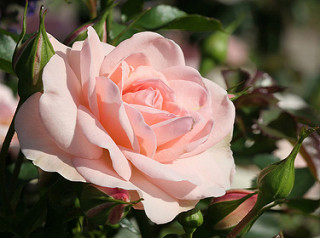

In [8]:
PIL.Image.open(str(roses[1]))

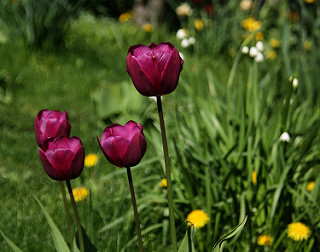

In [9]:
tulips = list(data_dir.glob('tulips/*'))
PIL.Image.open(str(tulips[1]))

In [10]:
flowers_images_dict = {
    'roses': list(data_dir.glob('roses/*')),
    'daisy': list(data_dir.glob('daisy/*')),
    'dandelion': list(data_dir.glob('dandelion/*')),
    'sunflowers': list(data_dir.glob('sunflowers/*')),
    'tulips': list(data_dir.glob('tulips/*')),
}

In [11]:
flowers_labels_dict = {
    'roses': 0,
    'daisy': 1,
    'dandelion': 2,
    'sunflowers': 3,
    'tulips': 4,
}

In [12]:
str(flowers_images_dict['roses'][0])

'datasets/flower_photos/roses/6280787884_141cd7b382_n.jpg'

array([[[ 1,  1,  1],
        [ 1,  1,  1],
        [ 1,  1,  1],
        ...,
        [ 1,  1,  1],
        [ 1,  1,  1],
        [ 1,  1,  1]],

       [[ 1,  1,  1],
        [ 1,  1,  1],
        [ 1,  1,  1],
        ...,
        [ 1,  1,  1],
        [ 1,  1,  1],
        [ 1,  1,  1]],

       [[ 1,  1,  1],
        [ 1,  1,  1],
        [ 1,  1,  1],
        ...,
        [ 1,  1,  1],
        [ 1,  1,  1],
        [ 1,  1,  1]],

       ...,

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [10,  6,  5],
        [ 9,  5,  4],
        [17, 13, 12]],

       [[ 4,  4,  4],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [18, 13, 10],
        [21, 16, 13],
        [25, 20, 17]],

       [[10, 10, 10],
        [ 4,  4,  4],
        [ 0,  0,  0],
        ...,
        [31, 25, 20],
        [34, 30, 25],
        [27, 23, 18]]], dtype=uint8)
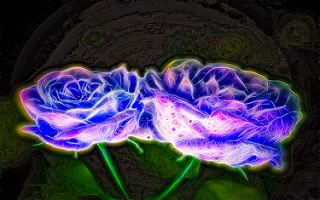

In [13]:
img = cv2.imread(str(flowers_images_dict['roses'][0]))
img

In [14]:
img.shape

(200, 320, 3)

In [15]:
cv2.resize(img,(180,180)).shape

(180, 180, 3)

In [16]:
x, y = [], []

for flower_name, images in flowers_images_dict.items():
  for image in images:
    img = cv2.imread(str(image))
    resized_img = cv2.resize(img,(180,180))
    x.append(resized_img)
    y.append(flowers_labels_dict[flower_name])


In [17]:
y[:5]

[0, 0, 0, 0, 0]

In [18]:
x

[array([[[ 1,  1,  1],
         [ 1,  1,  1],
         [ 1,  1,  1],
         ...,
         [ 1,  1,  1],
         [ 1,  1,  1],
         [ 1,  1,  1]],
 
        [[ 1,  1,  1],
         [ 1,  1,  1],
         [ 1,  1,  1],
         ...,
         [ 1,  1,  1],
         [ 1,  1,  1],
         [ 1,  1,  1]],
 
        [[ 1,  1,  1],
         [ 1,  1,  1],
         [ 1,  1,  1],
         ...,
         [ 1,  1,  1],
         [ 1,  1,  1],
         [ 1,  1,  1]],
 
        ...,
 
        [[ 0,  0,  0],
         [ 0,  0,  0],
         [ 1,  1,  1],
         ...,
         [ 9,  6,  5],
         [10,  7,  6],
         [12,  9,  8]],
 
        [[ 2,  2,  2],
         [ 0,  0,  0],
         [ 1,  1,  1],
         ...,
         [16,  9,  7],
         [16, 11,  9],
         [22, 17, 14]],
 
        [[ 7,  7,  7],
         [ 0,  0,  0],
         [ 2,  2,  2],
         ...,
         [21, 15, 10],
         [28, 22, 17],
         [29, 25, 20]]], dtype=uint8),
 array([[[ 11,  14,  14],
         [  7,  

In [18]:
x = np.array(x)
y = np.array(y)

In [19]:
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(x, y, random_state=0)

In [20]:
len(x_train)

2752

In [21]:
len(x_test)

918

In [26]:
x_train = np.array(x_train)
x_test = np.array(x_test)


In [31]:
x_train_scaled = x_train/255
x_test_scaled = x_test/255

In [32]:
y_train = np.array(y_train)

In [28]:
num_classes = 5

model = Sequential([
  layers.Conv2D(16, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Conv2D(32, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Conv2D(64, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Flatten(),
  layers.Dense(128, activation='relu'),
  layers.Dense(num_classes)
])

In [33]:
model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

model.fit(x_train_scaled, y_train, epochs=30)

Epoch 1/30
86/86 [==============================] - 89s 1s/step - loss: 1.2466 - accuracy: 0.4655
Epoch 2/30
86/86 [==============================] - 86s 1s/step - loss: 0.9679 - accuracy: 0.6221
Epoch 3/30
86/86 [==============================] - 90s 1s/step - loss: 0.7661 - accuracy: 0.7057
Epoch 4/30
86/86 [==============================] - 87s 1s/step - loss: 0.5537 - accuracy: 0.7954
Epoch 5/30
86/86 [==============================] - 87s 1s/step - loss: 0.3445 - accuracy: 0.8743
Epoch 6/30
86/86 [==============================] - 90s 1s/step - loss: 0.1986 - accuracy: 0.9400
Epoch 7/30
86/86 [==============================] - 94s 1s/step - loss: 0.0910 - accuracy: 0.9720
Epoch 8/30
86/86 [==============================] - 88s 1s/step - loss: 0.1085 - accuracy: 0.9677
Epoch 9/30
86/86 [==============================] - 90s 1s/step - loss: 0.0551 - accuracy: 0.9873
Epoch 10/30
86/86 [==============================] - 87s 1s/step - loss: 0.0664 - accuracy: 0.9826
Epoch 11/30
86/86 [

In [41]:
model.evaluate(x_train_scaled, y_train)

86/86 [==============================] - 28s 330ms/step - loss: 0.0091 - accuracy: 0.9989


[0.00907206442207098, 0.9989098906517029]

In [35]:
predictions = model.predict(x_test_scaled)
predictions

29/29 [==============================] - 10s 348ms/step


array([[ -4.59818   ,  29.618961  ,  -1.1897042 , -13.652063  ,
         -6.9511776 ],
       [ 16.574917  ,  17.859608  ,  -9.106071  , -13.780378  ,
          5.896837  ],
       [ -3.6568384 ,  -0.30106837,   8.113979  ,  -4.4616423 ,
         -3.540029  ],
       ...,
       [ -4.927537  ,   1.9370782 ,  -0.3753896 ,   6.985586  ,
         -6.598345  ],
       [ -2.3930283 ,   2.0437105 ,   8.369689  ,  -5.6294756 ,
         -1.4506334 ],
       [-10.119651  ,  -5.9606576 ,  -1.1263932 ,  11.089243  ,
         -0.3294145 ]], dtype=float32)

In [38]:
# probavility score
score = tf.nn.softmax(predictions[0])
score

<tf.Tensor: shape=(5,), dtype=float32, numpy=
array([1.3793829e-15, 1.0000000e+00, 4.1683701e-14, 1.6129909e-19,
       1.3115694e-16], dtype=float32)>

In [39]:
np.argmax(score)


1

In [40]:
y_test[0]

1

In [50]:
data_augmentation = keras.Sequential(
  [
    layers.experimental.preprocessing.RandomFlip("horizontal",
                                                 input_shape=(180,
                                                              180,
                                                              3)),
    layers.experimental.preprocessing.RandomRotation(0.3),
    layers.experimental.preprocessing.RandomZoom(0.3),
  ]
)

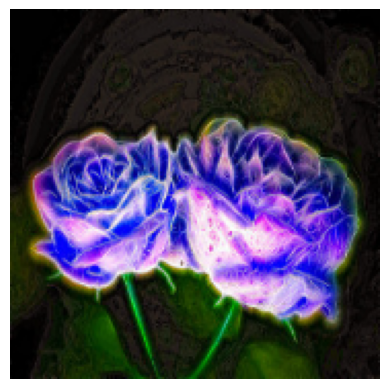

In [43]:
plt.axis('off')
plt.imshow(x[0])

ValueError: Layer "sequential_3" expects 1 input(s), but it received 3670 input tensors. Inputs received: [<tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 1,  1,  1],
        [ 1,  1,  1],
        [ 1,  1,  1],
        ...,
        [ 1,  1,  1],
        [ 1,  1,  1],
        [ 1,  1,  1]],

       [[ 1,  1,  1],
        [ 1,  1,  1],
        [ 1,  1,  1],
        ...,
        [ 1,  1,  1],
        [ 1,  1,  1],
        [ 1,  1,  1]],

       [[ 1,  1,  1],
        [ 1,  1,  1],
        [ 1,  1,  1],
        ...,
        [ 1,  1,  1],
        [ 1,  1,  1],
        [ 1,  1,  1]],

       ...,

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 1,  1,  1],
        ...,
        [ 9,  6,  5],
        [10,  7,  6],
        [12,  9,  8]],

       [[ 2,  2,  2],
        [ 0,  0,  0],
        [ 1,  1,  1],
        ...,
        [16,  9,  7],
        [16, 11,  9],
        [22, 17, 14]],

       [[ 7,  7,  7],
        [ 0,  0,  0],
        [ 2,  2,  2],
        ...,
        [21, 15, 10],
        [28, 22, 17],
        [29, 25, 20]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 11,  14,  14],
        [  7,  12,  11],
        [  6,  11,  10],
        ...,
        [ 30,  55,  45],
        [ 28,  50,  42],
        [ 26,  47,  39]],

       [[ 12,  17,  17],
        [  9,  15,  14],
        [  7,  12,  11],
        ...,
        [ 32,  58,  48],
        [ 29,  53,  45],
        [ 29,  51,  43]],

       [[ 12,  18,  17],
        [ 11,  17,  16],
        [  8,  13,  12],
        ...,
        [ 31,  59,  50],
        [ 29,  55,  47],
        [ 28,  54,  47]],

       ...,

       [[  1,   8,   1],
        [  0,   7,   0],
        [  1,   8,   1],
        ...,
        [ 44,  69,  70],
        [ 48,  72,  73],
        [ 57,  77,  78]],

       [[  0,   7,   0],
        [  0,   7,   0],
        [  0,   7,   0],
        ...,
        [ 47,  70,  70],
        [ 58,  79,  80],
        [ 75,  95,  96]],

       [[  0,   7,   0],
        [  1,   8,   1],
        [  0,   7,   0],
        ...,
        [ 76,  96,  97],
        [ 91, 111, 112],
        [100, 119, 121]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  5,  36,  11],
        [  1,  34,  10],
        [  1,  28,   7],
        ...,
        [ 65,  43,  57],
        [ 66,  46,  59],
        [ 66,  46,  61]],

       [[  3,  38,  11],
        [  1,  31,   4],
        [  3,   7,   3],
        ...,
        [ 67,  46,  60],
        [ 65,  47,  60],
        [ 65,  48,  62]],

       [[  0,  35,   3],
        [  2,  17,   1],
        [  0,   0,   1],
        ...,
        [ 66,  47,  60],
        [ 65,  47,  61],
        [ 67,  48,  63]],

       ...,

       [[112,  74,  80],
        [112,  75,  79],
        [112,  72,  77],
        ...,
        [  6,   0,   2],
        [  8,   2,   3],
        [  9,   1,   2]],

       [[114,  76,  82],
        [113,  75,  81],
        [113,  73,  78],
        ...,
        [  7,   0,   3],
        [  9,   2,   3],
        [ 10,   2,   3]],

       [[114,  75,  81],
        [115,  73,  81],
        [111,  71,  77],
        ...,
        [  8,   1,   4],
        [ 10,   1,   4],
        [ 10,   1,   4]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       ...,

       [[11,  5,  6],
        [ 9,  5,  6],
        [77, 77, 77],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       [[13,  7,  8],
        [11,  6,  7],
        [ 8,  4,  5],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       [[12,  6,  7],
        [12,  6,  7],
        [ 7,  2,  3],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 14,  20,  25],
        [ 14,  20,  25],
        [ 14,  20,  25],
        ...,
        [ 14,  26,  30],
        [ 14,  25,  29],
        [ 13,  24,  28]],

       [[ 14,  20,  25],
        [ 14,  20,  25],
        [ 14,  20,  25],
        ...,
        [ 13,  25,  29],
        [ 13,  25,  28],
        [ 13,  25,  27]],

       [[ 14,  20,  25],
        [ 14,  20,  25],
        [ 14,  20,  25],
        ...,
        [ 12,  24,  28],
        [ 12,  24,  28],
        [ 13,  25,  27]],

       ...,

       [[ 14,  20,  25],
        [ 14,  20,  25],
        [ 14,  20,  25],
        ...,
        [ 84,  94, 117],
        [ 65,  80,  98],
        [ 40,  58,  73]],

       [[ 14,  20,  25],
        [ 14,  20,  25],
        [ 14,  20,  25],
        ...,
        [ 93, 104, 129],
        [ 75,  89, 110],
        [ 51,  67,  83]],

       [[ 14,  20,  25],
        [ 14,  20,  25],
        [ 14,  20,  25],
        ...,
        [ 93, 105, 132],
        [ 83,  96, 117],
        [ 60,  76,  92]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 56,  89, 115],
        [ 57,  90, 116],
        [ 51,  84, 111],
        ...,
        [ 17,  15,  30],
        [ 42,  47, 100],
        [ 30,  46, 113]],

       [[ 56,  86, 113],
        [ 55,  85, 112],
        [ 58,  91, 117],
        ...,
        [ 85, 115, 154],
        [ 76, 109, 154],
        [ 71, 100, 148]],

       [[ 57,  90, 116],
        [ 57,  87, 114],
        [ 55,  87, 114],
        ...,
        [ 87, 118, 151],
        [ 80, 114, 156],
        [ 81, 117, 157]],

       ...,

       [[116, 140, 162],
        [128, 145, 167],
        [111, 135, 162],
        ...,
        [ 37,  43,  47],
        [ 51,  64,  81],
        [ 57,  85, 111]],

       [[122, 144, 166],
        [122, 139, 164],
        [113, 136, 161],
        ...,
        [ 35,  36,  41],
        [ 46,  56,  75],
        [ 45,  72,  96]],

       [[120, 141, 163],
        [112, 135, 161],
        [112, 137, 161],
        ...,
        [ 40,  38,  39],
        [ 42,  51,  65],
        [ 55,  80, 102]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[163,  31,  92],
        [132,   3, 201],
        [126,   3, 187],
        ...,
        [229, 149, 242],
        [209, 120, 227],
        [ 91,  14,  96]],

       [[166,  29,  77],
        [157,  16, 108],
        [129,   5, 179],
        ...,
        [229, 159, 244],
        [227, 112, 244],
        [161,  47, 169]],

       [[147,  35,  59],
        [171,  15, 101],
        [144,   6, 202],
        ...,
        [212, 130, 247],
        [221,  91, 252],
        [222,  86, 247]],

       ...,

       [[ 14,  26,  14],
        [ 49,  60,  51],
        [  3,  11,   4],
        ...,
        [ 29,   3,  14],
        [ 38,   1,  14],
        [ 45,   2,  26]],

       [[ 64,  69,  63],
        [ 12,  17,  12],
        [  0,   5,   1],
        ...,
        [ 40,   2,  18],
        [ 37,   1,  18],
        [ 43,   2,  26]],

       [[ 35,  30,  35],
        [  2,   2,   4],
        [  5,   5,   6],
        ...,
        [ 23,   2,  25],
        [ 19,   1,  24],
        [ 25,   1,  29]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[171, 149, 139],
        [170, 148, 137],
        [170, 148, 136],
        ...,
        [147, 132, 130],
        [146, 132, 126],
        [146, 130, 124]],

       [[170, 150, 142],
        [169, 149, 138],
        [168, 149, 137],
        ...,
        [152, 137, 134],
        [150, 136, 130],
        [147, 133, 127]],

       [[175, 154, 146],
        [172, 152, 142],
        [172, 152, 141],
        ...,
        [154, 142, 138],
        [152, 139, 134],
        [151, 136, 132]],

       ...,

       [[ 93,  86,  77],
        [ 98,  96,  86],
        [101,  94,  85],
        ...,
        [125, 132, 135],
        [124, 131, 133],
        [120, 127, 129]],

       [[ 99,  94,  85],
        [ 96,  94,  84],
        [102,  97,  88],
        ...,
        [128, 135, 138],
        [126, 133, 135],
        [119, 126, 129]],

       [[101,  98,  90],
        [100,  94,  87],
        [102,  99,  91],
        ...,
        [126, 133, 136],
        [120, 128, 131],
        [115, 124, 128]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 5,  3,  5],
        [ 0,  1,  1],
        [ 9,  3,  9],
        ...,
        [ 0,  9,  3],
        [ 7,  4,  2],
        [ 3,  2,  7]],

       [[ 4,  2,  4],
        [15, 29, 31],
        [35, 44, 56],
        ...,
        [21, 44, 48],
        [ 8, 14, 16],
        [ 3,  1,  4]],

       [[ 4,  0,  5],
        [40, 61, 69],
        [23, 39, 50],
        ...,
        [32, 53, 67],
        [19, 32, 40],
        [ 1,  1,  0]],

       ...,

       [[ 4,  2,  2],
        [35, 57, 77],
        [42, 55, 71],
        ...,
        [48, 67, 80],
        [22, 31, 41],
        [ 4,  2,  1]],

       [[ 3,  2,  0],
        [ 4, 16, 28],
        [24, 34, 46],
        ...,
        [21, 34, 44],
        [ 2,  5, 10],
        [ 4,  1,  1]],

       [[ 0,  0,  1],
        [ 0,  2,  3],
        [ 1,  0,  2],
        ...,
        [ 0,  2,  2],
        [ 0,  2,  2],
        [ 0,  1,  2]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[87, 48, 23],
        [86, 50, 22],
        [86, 50, 24],
        ...,
        [84, 44, 19],
        [91, 54, 20],
        [91, 60, 22]],

       [[85, 50, 24],
        [86, 52, 23],
        [86, 51, 25],
        ...,
        [86, 38, 17],
        [86, 50, 20],
        [93, 61, 26]],

       [[86, 49, 21],
        [87, 50, 22],
        [88, 51, 25],
        ...,
        [85, 37, 14],
        [85, 43, 18],
        [87, 51, 18]],

       ...,

       [[87, 54, 21],
        [88, 52, 22],
        [87, 53, 23],
        ...,
        [83, 33, 13],
        [81, 32, 11],
        [80, 33, 11]],

       [[88, 53, 23],
        [89, 52, 23],
        [88, 53, 23],
        ...,
        [82, 32, 12],
        [80, 32, 11],
        [80, 33, 12]],

       [[87, 51, 21],
        [89, 51, 23],
        [88, 51, 23],
        ...,
        [84, 33, 13],
        [82, 32, 12],
        [80, 33, 12]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[200, 159, 139],
        [201, 161, 134],
        [161, 162, 183],
        ...,
        [235, 252, 171],
        [229, 253, 156],
        [235, 248, 249]],

       [[201, 160, 139],
        [201, 161, 134],
        [159, 161, 180],
        ...,
        [246, 252, 243],
        [241, 248, 203],
        [234, 235, 247]],

       [[204, 163, 141],
        [200, 160, 132],
        [156, 158, 178],
        ...,
        [253, 253, 239],
        [243, 253, 219],
        [248, 254, 249]],

       ...,

       [[163, 128, 114],
        [166, 134, 118],
        [159, 129, 115],
        ...,
        [123,  96,  82],
        [115,  89,  74],
        [120,  93,  77]],

       [[162, 129, 111],
        [162, 124, 108],
        [161, 119, 107],
        ...,
        [113,  87,  71],
        [109,  83,  68],
        [117,  91,  75]],

       [[160, 128, 117],
        [172, 149, 138],
        [178, 162, 159],
        ...,
        [125,  97,  80],
        [122,  94,  77],
        [119,  92,  76]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  8,   7,  17],
        [  8,   7,  16],
        [  7,   9,  18],
        ...,
        [  7,  15,  24],
        [  5,  11,  16],
        [  4,   7,  11]],

       [[ 10,   9,  19],
        [  7,   8,  18],
        [  7,   7,  19],
        ...,
        [  9,  16,  26],
        [  6,  11,  15],
        [  3,   7,   8]],

       [[  7,   7,  17],
        [  7,   8,  18],
        [  8,   9,  21],
        ...,
        [ 11,  17,  26],
        [  7,  12,  14],
        [  5,   7,   8]],

       ...,

       [[  6,   8, 136],
        [  5,   7, 112],
        [  6,   6,  93],
        ...,
        [ 17,  39, 250],
        [ 20,  43, 253],
        [ 24,  48, 254]],

       [[  6,   6, 143],
        [  6,   7, 109],
        [  5,   6,  81],
        ...,
        [ 18,  42, 251],
        [ 21,  45, 252],
        [ 24,  49, 253]],

       [[  8,   6, 140],
        [  6,   7, 101],
        [  5,   6,  72],
        ...,
        [ 17,  42, 249],
        [ 21,  44, 251],
        [ 23,  46, 254]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[229, 187, 134],
        [228, 186, 133],
        [228, 186, 133],
        ...,
        [226, 183, 146],
        [230, 186, 148],
        [233, 187, 140]],

       [[229, 187, 134],
        [229, 187, 134],
        [228, 186, 133],
        ...,
        [234, 187, 142],
        [230, 186, 141],
        [227, 187, 147]],

       [[230, 188, 135],
        [229, 187, 134],
        [229, 187, 134],
        ...,
        [229, 189, 143],
        [233, 188, 147],
        [229, 186, 136]],

       ...,

       [[ 49,  47,  47],
        [ 39,  36,  37],
        [ 46,  41,  42],
        ...,
        [112, 130, 145],
        [113, 131, 147],
        [113, 131, 146]],

       [[ 32,  29,  28],
        [ 34,  29,  29],
        [ 33,  28,  28],
        ...,
        [118, 134, 150],
        [114, 130, 146],
        [116, 132, 147]],

       [[ 38,  35,  31],
        [ 43,  39,  36],
        [ 28,  24,  21],
        ...,
        [118, 134, 151],
        [107, 123, 139],
        [111, 127, 144]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[207, 190, 205],
        [216, 199, 213],
        [215, 199, 210],
        ...,
        [248, 243, 242],
        [247, 239, 239],
        [239, 231, 231]],

       [[209, 192, 206],
        [219, 202, 215],
        [220, 205, 214],
        ...,
        [249, 244, 243],
        [248, 242, 241],
        [244, 236, 236]],

       [[211, 194, 207],
        [220, 204, 215],
        [223, 210, 218],
        ...,
        [251, 246, 245],
        [250, 245, 244],
        [247, 242, 241]],

       ...,

       [[  8,  21,  19],
        [  1,  13,  11],
        [  1,  14,  12],
        ...,
        [251, 247, 246],
        [251, 247, 246],
        [250, 246, 245]],

       [[  8,  18,  15],
        [  2,  13,  12],
        [  2,  12,  11],
        ...,
        [250, 246, 246],
        [251, 247, 246],
        [251, 247, 246]],

       [[  8,  15,  10],
        [  4,  15,  13],
        [  5,  11,  10],
        ...,
        [250, 246, 245],
        [252, 248, 247],
        [252, 248, 247]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[217, 202, 183],
        [217, 203, 181],
        [217, 203, 180],
        ...,
        [194, 188, 169],
        [194, 188, 169],
        [193, 187, 168]],

       [[217, 202, 183],
        [218, 204, 182],
        [218, 204, 181],
        ...,
        [193, 187, 168],
        [193, 187, 168],
        [193, 187, 168]],

       [[216, 203, 181],
        [217, 204, 182],
        [218, 205, 182],
        ...,
        [193, 187, 168],
        [193, 187, 168],
        [192, 186, 167]],

       ...,

       [[204, 195, 185],
        [204, 195, 185],
        [203, 197, 186],
        ...,
        [166, 163, 158],
        [166, 163, 158],
        [166, 163, 158]],

       [[204, 195, 184],
        [204, 195, 184],
        [202, 196, 184],
        ...,
        [165, 162, 157],
        [165, 162, 157],
        [165, 162, 157]],

       [[203, 195, 182],
        [203, 195, 182],
        [202, 196, 183],
        ...,
        [164, 161, 156],
        [163, 160, 155],
        [162, 159, 154]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 6, 45, 55],
        [ 7, 46, 60],
        [ 7, 50, 64],
        ...,
        [ 4,  4,  2],
        [11, 16, 19],
        [11, 47, 98]],

       [[ 6, 49, 59],
        [10, 51, 63],
        [13, 55, 65],
        ...,
        [11,  9,  6],
        [ 4,  7,  8],
        [17, 49, 92]],

       [[ 6, 52, 60],
        [10, 53, 62],
        [16, 55, 63],
        ...,
        [ 2,  1,  0],
        [ 5, 21, 30],
        [19, 56, 98]],

       ...,

       [[48, 74, 55],
        [34, 67, 47],
        [28, 58, 39],
        ...,
        [ 3,  3,  3],
        [ 2,  2,  2],
        [ 2,  2,  2]],

       [[32, 59, 37],
        [22, 64, 45],
        [26, 56, 47],
        ...,
        [ 3,  3,  3],
        [ 0,  0,  0],
        [ 2,  2,  2]],

       [[32, 60, 40],
        [22, 60, 44],
        [29, 56, 49],
        ...,
        [ 3,  3,  3],
        [ 1,  1,  1],
        [ 2,  2,  2]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  5,   5, 122],
        [  9,  11, 119],
        [  1,   5, 120],
        ...,
        [ 56, 117,  91],
        [ 56, 114, 116],
        [ 61, 129, 119]],

       [[  7,  10, 119],
        [  6,   4, 125],
        [  6,   1, 137],
        ...,
        [ 41,  85, 108],
        [ 54, 115, 103],
        [ 57, 121, 116]],

       [[  4,   6, 123],
        [ 14,  13, 129],
        [  3,   0, 126],
        ...,
        [ 22,  38, 137],
        [ 54, 109, 105],
        [ 54, 119, 103]],

       ...,

       [[144, 125, 212],
        [124,  98, 208],
        [105,  80, 192],
        ...,
        [ 44,  37, 194],
        [ 20,  16, 178],
        [ 20,  18, 189]],

       [[126, 109, 202],
        [112,  85, 193],
        [116,  80, 206],
        ...,
        [ 57,  41, 195],
        [ 26,  17, 176],
        [ 20,  20, 188]],

       [[114,  99, 186],
        [106,  85, 184],
        [ 96,  60, 173],
        ...,
        [ 47,  32, 181],
        [ 35,  19, 181],
        [ 21,  19, 183]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  1,  54,  92],
        [  1,  61, 102],
        [  6,  61, 106],
        ...,
        [  1, 101,  76],
        [  0,  99,  74],
        [  0,  99,  73]],

       [[  3,  63, 104],
        [  3,  62, 104],
        [  7,  64, 107],
        ...,
        [  0,  93,  68],
        [  0,  95,  70],
        [  1, 101,  75]],

       [[  6,  70, 115],
        [  5,  64, 103],
        [  6,  65, 106],
        ...,
        [  0,  92,  66],
        [  1,  93,  67],
        [  0,  99,  73]],

       ...,

       [[220, 224, 225],
        [220, 224, 225],
        [220, 224, 225],
        ...,
        [230, 232, 233],
        [231, 231, 233],
        [230, 232, 233]],

       [[220, 224, 225],
        [220, 224, 225],
        [220, 224, 225],
        ...,
        [230, 232, 233],
        [231, 231, 233],
        [230, 232, 233]],

       [[219, 223, 224],
        [220, 224, 225],
        [219, 223, 224],
        ...,
        [230, 232, 233],
        [230, 231, 232],
        [231, 231, 233]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  0,   0,   4],
        [  6,   1,   1],
        [  3,   3,   4],
        ...,
        [  2,   0,   6],
        [  1,   4,   1],
        [  0,   0,   5]],

       [[  2,   1,   2],
        [  5,   2,   1],
        [  3,   6,   8],
        ...,
        [  5,   4,   7],
        [  3,   5,   1],
        [  2,   1,   3]],

       [[  5,   1,   1],
        [ 16,  18,  18],
        [102, 110, 121],
        ...,
        [104, 103, 125],
        [ 15,  16,  17],
        [  4,   1,   1]],

       ...,

       [[  2,   0,   1],
        [ 10,   7,   8],
        [ 27,  30,  38],
        ...,
        [ 30,  34,  35],
        [  3,   5,   3],
        [  0,   0,   2]],

       [[  2,   0,   2],
        [  5,   1,   0],
        [  2,   2,   1],
        ...,
        [  4,   3,   5],
        [  0,   1,   1],
        [  1,   2,   1]],

       [[  1,   2,   5],
        [  3,   0,   0],
        [  0,   1,   1],
        ...,
        [  1,   2,   2],
        [  3,   1,   2],
        [  3,   1,   1]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  6,   6,   6],
        [  8,   4,   5],
        [  7,   6,   6],
        ...,
        [103, 110, 108],
        [103, 109, 108],
        [102, 109, 108]],

       [[  6,   6,   6],
        [  9,   4,   5],
        [  7,   6,   6],
        ...,
        [103, 110, 107],
        [103, 109, 107],
        [102, 110, 106]],

       [[  8,   6,   5],
        [  9,   5,   4],
        [  7,   6,   5],
        ...,
        [103, 110, 107],
        [103, 110, 106],
        [102, 109, 104]],

       ...,

       [[ 37,  37,  37],
        [ 36,  38,  36],
        [ 39,  48,  42],
        ...,
        [ 33,  54,  29],
        [ 12,  38,  15],
        [ 22,  52,  27]],

       [[ 41,  41,  41],
        [ 37,  38,  37],
        [ 38,  45,  43],
        ...,
        [ 24,  50,  26],
        [  9,  39,  15],
        [ 29,  61,  32]],

       [[ 44,  44,  44],
        [ 38,  39,  39],
        [ 36,  44,  42],
        ...,
        [ 19,  47,  23],
        [ 12,  42,  16],
        [ 40,  70,  41]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 37,  44,  53],
        [ 58,  71,  74],
        [ 74,  87,  91],
        ...,
        [  8,  47,  58],
        [  9,   5,  11],
        [  3,  10,   5]],

       [[ 56,  77,  77],
        [ 56,  80,  86],
        [ 85, 104, 113],
        ...,
        [ 16,  15,  14],
        [  7,  15,  35],
        [ 10,  18,  32]],

       [[ 77, 143, 153],
        [116, 194, 207],
        [ 74, 127, 145],
        ...,
        [ 15,   2,   2],
        [  8,  19,  29],
        [ 16,  38,  57]],

       ...,

       [[ 46,  58,  58],
        [ 48,  60,  60],
        [ 43,  55,  55],
        ...,
        [ 47,  58,  56],
        [ 57,  68,  66],
        [ 46,  57,  55]],

       [[ 45,  57,  57],
        [ 50,  62,  62],
        [ 51,  61,  61],
        ...,
        [ 49,  60,  58],
        [ 50,  61,  59],
        [ 53,  64,  62]],

       [[ 48,  61,  61],
        [ 47,  59,  59],
        [ 49,  60,  60],
        ...,
        [ 40,  52,  51],
        [ 32,  45,  43],
        [ 45,  58,  56]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 76, 216, 250],
        [ 84, 204, 254],
        [ 54, 199, 255],
        ...,
        [106, 115, 106],
        [137, 136, 139],
        [185, 195, 193]],

       [[ 84, 210, 249],
        [ 54, 204, 241],
        [ 41, 193, 252],
        ...,
        [123, 131, 128],
        [123, 119, 120],
        [186, 185, 185]],

       [[121, 210, 233],
        [ 72, 206, 240],
        [ 44, 186, 246],
        ...,
        [135, 139, 142],
        [139, 136, 136],
        [203, 197, 197]],

       ...,

       [[180, 182, 179],
        [139, 133, 134],
        [138, 138, 139],
        ...,
        [ 52,  13, 236],
        [ 52,  14, 235],
        [ 57,  17, 237]],

       [[171, 172, 170],
        [121, 119, 122],
        [127, 128, 131],
        ...,
        [ 45,   8, 237],
        [ 50,  15, 234],
        [ 53,  17, 235]],

       [[185, 185, 187],
        [145, 146, 154],
        [112, 113, 123],
        ...,
        [ 40,   4, 239],
        [ 47,  15, 234],
        [ 49,  15, 232]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  2,   3,  22],
        [  1,   3,  24],
        [  2,   5,  30],
        ...,
        [157, 181, 227],
        [185, 214, 242],
        [174, 206, 235]],

       [[  2,   3,  24],
        [  1,   2,  19],
        [  1,   4,  26],
        ...,
        [121, 122, 227],
        [131, 140, 234],
        [130, 150, 237]],

       [[  3,   1,  25],
        [  0,   1,  19],
        [  0,   2,  23],
        ...,
        [118, 118, 216],
        [121, 129, 223],
        [124, 138, 234]],

       ...,

       [[109,  94, 122],
        [115, 100, 128],
        [110,  92, 121],
        ...,
        [ 35,  24,  96],
        [ 33,  21,  94],
        [ 32,  18,  89]],

       [[109,  95, 123],
        [113,  98, 126],
        [109,  94, 122],
        ...,
        [ 32,  25,  93],
        [ 38,  30,  92],
        [ 41,  29,  84]],

       [[113, 100, 127],
        [111,  96, 124],
        [109,  94, 122],
        ...,
        [ 37,  35,  94],
        [ 45,  42,  90],
        [ 40,  33,  70]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[237, 233, 227],
        [238, 236, 226],
        [237, 235, 225],
        ...,
        [244, 245, 235],
        [245, 246, 236],
        [246, 247, 237]],

       [[237, 233, 227],
        [238, 236, 226],
        [237, 235, 225],
        ...,
        [244, 245, 235],
        [245, 246, 236],
        [245, 246, 236]],

       [[237, 234, 226],
        [238, 235, 227],
        [237, 234, 226],
        ...,
        [245, 246, 236],
        [245, 246, 236],
        [244, 245, 235]],

       ...,

       [[232, 223, 210],
        [233, 224, 211],
        [233, 224, 211],
        ...,
        [246, 239, 224],
        [246, 239, 224],
        [246, 239, 224]],

       [[232, 222, 210],
        [233, 224, 211],
        [233, 224, 211],
        ...,
        [245, 238, 223],
        [245, 238, 223],
        [245, 238, 223]],

       [[230, 221, 208],
        [232, 223, 210],
        [232, 223, 210],
        ...,
        [245, 238, 223],
        [245, 238, 223],
        [245, 238, 223]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 14,  37,  14],
        [ 14,  33,  16],
        [ 10,  27,  14],
        ...,
        [162, 172, 160],
        [160, 174, 162],
        [158, 175, 164]],

       [[ 16,  40,  16],
        [ 17,  37,  17],
        [ 13,  30,  17],
        ...,
        [153, 165, 153],
        [150, 167, 154],
        [145, 166, 154]],

       [[ 18,  42,  17],
        [ 18,  39,  18],
        [ 16,  33,  17],
        ...,
        [145, 158, 146],
        [141, 160, 147],
        [133, 159, 146]],

       ...,

       [[  9,  25,  14],
        [  9,  25,  14],
        [  9,  26,  13],
        ...,
        [210, 186, 205],
        [207, 183, 205],
        [211, 196, 203]],

       [[  9,  24,  13],
        [  7,  23,  12],
        [  7,  24,  12],
        ...,
        [179, 152, 182],
        [208, 181, 200],
        [222, 192, 211]],

       [[  8,  21,  12],
        [  6,  21,  10],
        [  6,  22,  11],
        ...,
        [132,  88, 160],
        [163, 123, 161],
        [204, 163, 176]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 91, 104,  72],
        [ 86, 101,  69],
        [ 85,  99,  71],
        ...,
        [194, 240, 248],
        [205, 240, 248],
        [213, 242, 249]],

       [[ 91, 104,  72],
        [ 88, 103,  71],
        [ 86, 102,  71],
        ...,
        [200, 244, 252],
        [210, 245, 252],
        [219, 248, 253]],

       [[ 90, 103,  71],
        [ 86, 101,  69],
        [ 86, 104,  70],
        ...,
        [206, 249, 252],
        [214, 251, 254],
        [222, 251, 255]],

       ...,

       [[ 63, 113, 111],
        [ 64, 119, 115],
        [ 66, 121, 116],
        ...,
        [149, 172, 200],
        [159, 181, 209],
        [169, 187, 216]],

       [[ 64, 115, 110],
        [ 65, 121, 116],
        [ 65, 121, 117],
        ...,
        [142, 166, 186],
        [154, 175, 195],
        [161, 178, 199]],

       [[ 62, 114, 107],
        [ 65, 121, 116],
        [ 65, 120, 118],
        ...,
        [137, 161, 173],
        [143, 166, 177],
        [151, 172, 180]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[193, 206, 214],
        [192, 208, 214],
        [193, 209, 215],
        ...,
        [214, 232, 238],
        [214, 231, 236],
        [213, 232, 237]],

       [[194, 207, 215],
        [192, 208, 214],
        [193, 209, 215],
        ...,
        [213, 233, 238],
        [212, 232, 237],
        [213, 232, 237]],

       [[194, 207, 215],
        [192, 208, 214],
        [193, 209, 215],
        ...,
        [212, 232, 237],
        [212, 232, 237],
        [213, 232, 237]],

       ...,

       [[182, 198, 210],
        [183, 201, 209],
        [184, 201, 210],
        ...,
        [215, 231, 237],
        [215, 231, 237],
        [215, 231, 237]],

       [[184, 198, 210],
        [184, 200, 209],
        [184, 200, 209],
        ...,
        [215, 231, 237],
        [215, 231, 237],
        [215, 231, 237]],

       [[183, 197, 209],
        [184, 198, 209],
        [184, 199, 208],
        ...,
        [215, 231, 237],
        [215, 231, 237],
        [215, 231, 237]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[194, 160, 251],
        [162, 173, 248],
        [172, 170, 238],
        ...,
        [142, 127, 170],
        [140, 125, 163],
        [185, 155, 224]],

       [[172, 179, 241],
        [136, 192, 233],
        [138, 187, 220],
        ...,
        [ 10,   6,  23],
        [  9,   6,  16],
        [141, 126, 160]],

       [[176, 170, 246],
        [136, 184, 238],
        [139, 184, 226],
        ...,
        [  3,   8,  49],
        [  2,   4,  25],
        [142, 128, 167]],

       ...,

       [[174, 166, 222],
        [121, 150, 157],
        [ 90, 102, 107],
        ...,
        [167, 166, 162],
        [167, 173, 157],
        [185, 173, 217]],

       [[167, 152, 200],
        [117, 135, 136],
        [ 57,  69,  57],
        ...,
        [214, 201, 178],
        [215, 205, 181],
        [207, 177, 221]],

       [[187, 157, 226],
        [159, 146, 191],
        [164, 141, 181],
        ...,
        [207, 178, 234],
        [198, 179, 216],
        [196, 161, 242]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[140, 201, 215],
        [156, 216, 228],
        [162, 219, 231],
        ...,
        [174, 224, 238],
        [171, 222, 238],
        [171, 223, 236]],

       [[141, 204, 218],
        [153, 215, 226],
        [157, 217, 229],
        ...,
        [166, 221, 235],
        [165, 222, 237],
        [168, 222, 236]],

       [[140, 200, 214],
        [153, 213, 225],
        [162, 218, 231],
        ...,
        [157, 215, 232],
        [160, 219, 237],
        [164, 220, 235]],

       ...,

       [[129, 183, 204],
        [149, 205, 222],
        [155, 212, 225],
        ...,
        [161, 216, 231],
        [161, 216, 231],
        [165, 217, 229]],

       [[140, 189, 210],
        [158, 209, 225],
        [159, 213, 226],
        ...,
        [156, 212, 230],
        [156, 212, 231],
        [163, 215, 229]],

       [[136, 180, 199],
        [154, 200, 215],
        [154, 205, 218],
        ...,
        [149, 206, 227],
        [149, 207, 227],
        [159, 212, 232]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  5,   0,   1],
        [  4,   0,   0],
        [  3,   1,   1],
        ...,
        [ 13,  37,  28],
        [ 12,  38,  29],
        [ 13,  38,  29]],

       [[  5,   0,   1],
        [  4,   0,   0],
        [  5,   0,   1],
        ...,
        [ 15,  39,  31],
        [ 14,  41,  30],
        [ 14,  44,  33]],

       [[  5,   0,   1],
        [  5,   0,   1],
        [  5,   0,   1],
        ...,
        [ 16,  44,  34],
        [ 15,  43,  33],
        [ 12,  44,  33]],

       ...,

       [[ 32,  86,  85],
        [ 33,  90,  89],
        [ 35,  91,  93],
        ...,
        [123, 123, 140],
        [119, 123, 135],
        [120, 121, 136]],

       [[ 31,  87,  86],
        [ 34,  90,  90],
        [ 36,  92,  94],
        ...,
        [125, 127, 143],
        [121, 126, 138],
        [122, 125, 139]],

       [[ 32,  89,  88],
        [ 35,  92,  91],
        [ 37,  93,  95],
        ...,
        [126, 129, 144],
        [124, 129, 142],
        [125, 128, 143]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 41,  78,  98],
        [ 38,  75,  95],
        [ 34,  72,  91],
        ...,
        [ 29,  65,  75],
        [ 29,  68,  78],
        [ 39,  82,  91]],

       [[ 44,  85, 104],
        [ 43,  84, 103],
        [ 39,  81, 100],
        ...,
        [ 42,  77,  91],
        [ 39,  77,  90],
        [ 47,  89, 103]],

       [[ 40,  87, 105],
        [ 42,  89, 107],
        [ 40,  87, 106],
        ...,
        [ 36,  75,  85],
        [ 37,  77,  89],
        [ 52,  93, 107]],

       ...,

       [[120, 130, 117],
        [118, 127, 115],
        [116, 126, 110],
        ...,
        [ 64,  82,  83],
        [ 67,  85,  86],
        [ 70,  88,  88]],

       [[118, 126, 115],
        [119, 127, 115],
        [119, 127, 115],
        ...,
        [ 62,  81,  80],
        [ 64,  83,  82],
        [ 65,  85,  84]],

       [[115, 123, 112],
        [116, 124, 113],
        [119, 127, 117],
        ...,
        [ 57,  78,  71],
        [ 59,  79,  72],
        [ 58,  80,  73]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[156, 159, 143],
        [156, 159, 143],
        [156, 159, 143],
        ...,
        [ 15,  16,  12],
        [ 15,  16,  12],
        [ 15,  16,  12]],

       [[156, 159, 143],
        [156, 159, 143],
        [156, 159, 143],
        ...,
        [ 17,  17,  13],
        [ 17,  17,  13],
        [ 18,  18,  14]],

       [[156, 159, 143],
        [156, 159, 143],
        [156, 159, 143],
        ...,
        [ 19,  15,  14],
        [ 19,  15,  14],
        [ 19,  15,  14]],

       ...,

       [[ 16,  16,  10],
        [ 16,  16,  10],
        [ 16,  15,  10],
        ...,
        [108, 119, 103],
        [107, 117, 104],
        [107, 117, 104]],

       [[ 12,  11,   8],
        [ 12,  11,   8],
        [ 13,  12,   9],
        ...,
        [108, 118, 105],
        [107, 117, 104],
        [106, 116, 103]],

       [[ 11,   9,   9],
        [ 10,   8,   8],
        [ 11,   9,   8],
        ...,
        [106, 116, 104],
        [105, 115, 103],
        [105, 115, 103]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       ...,

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[255, 255, 255],
        [254, 254, 254],
        [254, 254, 254],
        ...,
        [191, 175, 249],
        [173, 168, 250],
        [174, 174, 243]],

       [[255, 255, 255],
        [254, 254, 254],
        [254, 254, 254],
        ...,
        [176, 165, 244],
        [172, 168, 248],
        [181, 173, 241]],

       [[255, 255, 255],
        [255, 255, 255],
        [253, 253, 253],
        ...,
        [170, 163, 244],
        [172, 166, 242],
        [202, 183, 248]],

       ...,

       [[218, 168, 229],
        [217, 165, 226],
        [213, 168, 227],
        ...,
        [ 77,  75, 167],
        [ 73,  74, 167],
        [ 82,  78, 175]],

       [[210, 162, 225],
        [214, 163, 225],
        [212, 166, 224],
        ...,
        [ 97,  82, 176],
        [ 85,  79, 170],
        [ 82,  75, 169]],

       [[206, 161, 226],
        [213, 162, 225],
        [210, 163, 221],
        ...,
        [105,  81, 175],
        [ 94,  83, 174],
        [ 88,  78, 169]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       ...,

       [[ 2,  1,  0],
        [ 4, 19,  7],
        [ 0, 18,  1],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       [[ 2,  2,  1],
        [ 7, 26, 12],
        [ 0, 20,  1],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       [[ 1,  4,  2],
        [ 8, 31, 16],
        [ 0, 20,  0],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       ...,

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 92, 166, 222],
        [ 80, 153, 208],
        [ 63, 136, 185],
        ...,
        [  0,   1,   1],
        [  0,   1,   1],
        [  0,   0,   0]],

       [[ 90, 164, 220],
        [ 78, 151, 206],
        [ 61, 133, 182],
        ...,
        [  0,   1,   2],
        [  0,   0,   1],
        [  0,   0,   0]],

       [[ 89, 163, 219],
        [ 76, 149, 204],
        [ 61, 131, 181],
        ...,
        [  0,   1,   3],
        [  0,   1,   1],
        [  0,   0,   0]],

       ...,

       [[  0,   2,   7],
        [  1,   4,   9],
        [  0,   3,   8],
        ...,
        [ 10,   9,   8],
        [  7,   9,   7],
        [  8,   9,   7]],

       [[  1,   3,   8],
        [  0,   3,   8],
        [  1,   4,   9],
        ...,
        [ 11,  10,   7],
        [  9,  10,   8],
        [  9,  10,   6]],

       [[  1,   4,   8],
        [  0,   3,   8],
        [  1,   4,  10],
        ...,
        [ 11,  11,   7],
        [ 10,  10,   8],
        [  9,  10,   6]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 79, 126, 180],
        [ 80, 127, 181],
        [ 81, 128, 182],
        ...,
        [ 63,  93, 125],
        [ 60,  89, 122],
        [ 56,  85, 120]],

       [[ 83, 130, 184],
        [ 84, 131, 185],
        [ 85, 132, 186],
        ...,
        [ 63,  90, 127],
        [ 61,  88, 124],
        [ 56,  84, 118]],

       [[ 85, 132, 186],
        [ 86, 133, 187],
        [ 87, 134, 188],
        ...,
        [ 58,  87, 118],
        [ 57,  86, 118],
        [ 53,  81, 115]],

       ...,

       [[173, 198, 223],
        [163, 191, 216],
        [168, 192, 215],
        ...,
        [212, 227, 243],
        [209, 225, 239],
        [204, 224, 238]],

       [[185, 212, 227],
        [182, 211, 226],
        [189, 215, 229],
        ...,
        [196, 219, 235],
        [188, 212, 231],
        [171, 200, 225]],

       [[192, 214, 232],
        [184, 209, 228],
        [184, 208, 229],
        ...,
        [183, 209, 225],
        [184, 211, 227],
        [184, 211, 230]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 84, 110, 154],
        [ 84, 117, 161],
        [ 85, 119, 162],
        ...,
        [108, 138, 173],
        [104, 135, 170],
        [102, 133, 167]],

       [[ 79, 105, 151],
        [ 82, 114, 157],
        [ 85, 118, 161],
        ...,
        [102, 130, 165],
        [100, 129, 164],
        [ 96, 126, 161]],

       [[ 79, 105, 151],
        [ 79, 109, 156],
        [ 86, 119, 163],
        ...,
        [ 98, 127, 161],
        [ 97, 126, 159],
        [ 92, 120, 154]],

       ...,

       [[ 75,  64, 104],
        [113,  93, 152],
        [144, 129, 189],
        ...,
        [  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0]],

       [[ 72,  56, 102],
        [144, 123, 184],
        [145, 130, 186],
        ...,
        [  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0]],

       [[103,  86, 134],
        [129, 112, 165],
        [129, 113, 164],
        ...,
        [  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[28, 28, 28],
        [27, 28, 28],
        [27, 28, 28],
        ...,
        [28, 27, 29],
        [28, 27, 29],
        [28, 27, 29]],

       [[28, 28, 28],
        [29, 28, 28],
        [29, 28, 28],
        ...,
        [28, 27, 29],
        [28, 27, 29],
        [28, 27, 29]],

       [[31, 29, 29],
        [32, 28, 29],
        [32, 27, 28],
        ...,
        [28, 27, 29],
        [28, 27, 29],
        [28, 27, 29]],

       ...,

       [[52, 42, 42],
        [51, 41, 41],
        [50, 40, 40],
        ...,
        [27, 26, 28],
        [27, 26, 28],
        [30, 32, 32]],

       [[53, 41, 42],
        [50, 40, 40],
        [50, 39, 40],
        ...,
        [27, 26, 27],
        [27, 27, 29],
        [32, 34, 35]],

       [[53, 40, 42],
        [50, 40, 40],
        [49, 39, 39],
        ...,
        [26, 26, 27],
        [27, 27, 29],
        [34, 36, 37]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 85,  89,  75],
        [ 45,  54,  41],
        [ 23,  37,  24],
        ...,
        [133,  94, 150],
        [134,  96, 150],
        [132, 115, 154]],

       [[107, 106,  91],
        [ 61,  67,  52],
        [ 27,  40,  26],
        ...,
        [133,  91, 148],
        [124,  86, 143],
        [122,  90, 145]],

       [[ 99,  96,  81],
        [ 66,  69,  55],
        [ 33,  43,  30],
        ...,
        [135,  93, 150],
        [121,  86, 144],
        [114,  80, 146]],

       ...,

       [[ 53, 105,  78],
        [ 51, 100,  78],
        [ 53, 102,  85],
        ...,
        [ 60,  84,  78],
        [ 35,  62,  56],
        [ 15,  45,  40]],

       [[ 58, 106,  80],
        [ 49,  98,  77],
        [ 50,  99,  82],
        ...,
        [ 61,  91,  89],
        [ 38,  65,  64],
        [ 15,  44,  41]],

       [[ 80, 122,  97],
        [ 52, 103,  81],
        [ 47,  96,  79],
        ...,
        [ 54,  92,  93],
        [ 34,  62,  66],
        [ 16,  44,  43]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[41, 59, 58],
        [41, 59, 58],
        [40, 58, 57],
        ...,
        [ 0,  1, 52],
        [ 1,  0, 51],
        [ 1,  1, 43]],

       [[41, 59, 58],
        [41, 59, 58],
        [41, 59, 58],
        ...,
        [ 0,  1, 52],
        [ 1,  0, 52],
        [ 1,  0, 43]],

       [[41, 59, 58],
        [41, 59, 58],
        [41, 59, 58],
        ...,
        [ 0,  1, 53],
        [ 0,  1, 52],
        [ 1,  1, 43]],

       ...,

       [[54, 67, 65],
        [53, 67, 65],
        [53, 67, 65],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       [[54, 68, 66],
        [53, 67, 65],
        [53, 67, 65],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       [[55, 68, 66],
        [53, 67, 65],
        [54, 68, 66],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 57,  44, 129],
        [ 49,  33, 141],
        [ 52,  37, 141],
        ...,
        [ 42,  29,  81],
        [ 40,  25,  83],
        [ 39,  25,  83]],

       [[ 51,  34, 139],
        [ 47,  33, 131],
        [ 48,  35, 122],
        ...,
        [ 45,  31,  84],
        [ 39,  24,  82],
        [ 41,  26,  84]],

       [[ 51,  43, 121],
        [ 53,  40, 130],
        [ 59,  49, 120],
        ...,
        [ 47,  35,  86],
        [ 43,  31,  82],
        [ 39,  26,  82]],

       ...,

       [[ 41,  64, 186],
        [ 37,  61, 179],
        [ 42,  65, 191],
        ...,
        [ 65,  79, 201],
        [ 64,  75, 196],
        [ 63,  75, 193]],

       [[ 41,  63, 186],
        [ 42,  63, 186],
        [ 38,  59, 181],
        ...,
        [ 65,  78, 201],
        [ 66,  77, 199],
        [ 63,  74, 195]],

       [[ 37,  60, 184],
        [ 36,  59, 182],
        [ 34,  51, 170],
        ...,
        [ 63,  77, 198],
        [ 65,  76, 197],
        [ 60,  73, 192]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[142, 162, 149],
        [140, 160, 147],
        [152, 169, 158],
        ...,
        [114, 141, 121],
        [114, 141, 121],
        [114, 141, 121]],

       [[ 68,  91,  79],
        [110, 137, 122],
        [ 96, 124, 109],
        ...,
        [114, 141, 121],
        [114, 141, 121],
        [114, 141, 121]],

       [[202, 219, 208],
        [132, 153, 141],
        [139, 161, 147],
        ...,
        [114, 141, 121],
        [114, 141, 121],
        [114, 141, 121]],

       ...,

       [[ 51,  74,  61],
        [ 43,  67,  55],
        [ 50,  72,  60],
        ...,
        [114, 141, 121],
        [114, 141, 121],
        [114, 141, 121]],

       [[ 48,  70,  58],
        [ 53,  77,  65],
        [ 48,  72,  61],
        ...,
        [114, 141, 121],
        [114, 141, 121],
        [114, 141, 121]],

       [[ 62,  86,  76],
        [ 49,  73,  61],
        [ 49,  73,  61],
        ...,
        [114, 141, 121],
        [114, 141, 121],
        [114, 141, 121]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  0,   2,   2],
        [  1,   3,   3],
        [  0,   2,   2],
        ...,
        [105, 106, 110],
        [108, 109, 113],
        [108, 109, 113]],

       [[  2,   4,   4],
        [  1,   3,   3],
        [  1,   3,   3],
        ...,
        [100, 101, 105],
        [104, 105, 109],
        [108, 109, 113]],

       [[  3,   5,   5],
        [  2,   4,   4],
        [  5,   7,   7],
        ...,
        [103, 104, 106],
        [106, 108, 109],
        [105, 107, 108]],

       ...,

       [[122, 143, 162],
        [121, 146, 163],
        [116, 141, 159],
        ...,
        [200, 180, 175],
        [199, 179, 174],
        [202, 183, 178]],

       [[124, 144, 159],
        [118, 138, 157],
        [123, 146, 165],
        ...,
        [202, 182, 177],
        [200, 181, 176],
        [201, 182, 177]],

       [[124, 147, 162],
        [121, 142, 156],
        [129, 152, 167],
        ...,
        [203, 184, 179],
        [203, 183, 178],
        [202, 183, 178]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[111,  46, 137],
        [124,  38, 131],
        [111,  44, 145],
        ...,
        [118,  91,  41],
        [124,  87,  47],
        [145, 100,  63]],

       [[115,  43, 134],
        [129,  53, 141],
        [118,  49, 142],
        ...,
        [125, 100,  55],
        [118,  88,  48],
        [139, 103,  60]],

       [[123,  44, 133],
        [127,  61, 141],
        [131,  59, 143],
        ...,
        [120,  98,  56],
        [109,  88,  47],
        [130, 104,  54]],

       ...,

       [[156,  97,  97],
        [156,  99,  98],
        [162, 102, 102],
        ...,
        [ 63,  21, 103],
        [ 64,  22, 103],
        [ 59,  22,  98]],

       [[156,  96,  96],
        [156,  99,  98],
        [161, 103, 101],
        ...,
        [ 63,  19,  99],
        [ 63,  22,  99],
        [ 59,  22,  97]],

       [[155,  94,  95],
        [156,  99,  98],
        [160, 103, 101],
        ...,
        [ 63,  22, 100],
        [ 61,  23,  98],
        [ 52,  20,  93]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 60,  57, 204],
        [ 79,  69, 203],
        [ 96,  82, 206],
        ...,
        [ 62,  55, 125],
        [ 63,  56, 125],
        [ 64,  57, 127]],

       [[ 56,  56, 204],
        [ 70,  62, 200],
        [ 96,  78, 205],
        ...,
        [ 62,  55, 125],
        [ 64,  56, 126],
        [ 63,  55, 125]],

       [[ 56,  56, 204],
        [ 61,  56, 199],
        [ 90,  72, 203],
        ...,
        [ 62,  55, 126],
        [ 64,  56, 127],
        [ 64,  56, 127]],

       ...,

       [[107,  89, 182],
        [113,  91, 184],
        [125, 102, 187],
        ...,
        [  4,  12,  12],
        [  5,  11,  11],
        [  6,  11,  12]],

       [[104,  86, 183],
        [107,  88, 183],
        [117,  97, 187],
        ...,
        [  3,  11,  11],
        [  4,  10,  11],
        [  5,  10,  11]],

       [[ 99,  86, 181],
        [100,  84, 183],
        [108,  92, 185],
        ...,
        [  5,  10,  11],
        [  5,  10,  11],
        [  5,  10,  11]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[151, 193, 198],
        [152, 196, 201],
        [154, 198, 203],
        ...,
        [174, 209, 214],
        [132, 170, 169],
        [ 45,  40,  41]],

       [[153, 194, 199],
        [156, 197, 202],
        [156, 199, 203],
        ...,
        [182, 216, 221],
        [154, 191, 191],
        [ 59,  54,  56]],

       [[154, 192, 197],
        [156, 195, 200],
        [157, 199, 204],
        ...,
        [192, 225, 229],
        [175, 213, 214],
        [ 66,  62,  67]],

       ...,

       [[142, 189, 187],
        [134, 182, 180],
        [129, 176, 174],
        ...,
        [196, 233, 236],
        [196, 233, 236],
        [194, 231, 234]],

       [[109, 146, 145],
        [108, 145, 143],
        [109, 146, 144],
        ...,
        [136, 157, 158],
        [129, 150, 151],
        [124, 144, 144]],

       [[ 21,  16,  19],
        [ 21,  17,  18],
        [ 22,  18,  19],
        ...,
        [ 28,  28,  29],
        [ 28,  27,  27],
        [ 27,  23,  24]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[206, 123,  72],
        [207, 124,  73],
        [205, 125,  72],
        ...,
        [209, 133,  80],
        [209, 133,  80],
        [209, 133,  80]],

       [[206, 123,  72],
        [207, 124,  73],
        [205, 125,  72],
        ...,
        [209, 133,  80],
        [208, 132,  79],
        [209, 133,  80]],

       [[205, 122,  71],
        [207, 124,  73],
        [205, 125,  72],
        ...,
        [209, 133,  80],
        [209, 133,  80],
        [209, 133,  80]],

       ...,

       [[ 47,  83,  95],
        [ 52,  58,  58],
        [112, 110, 110],
        ...,
        [ 21,  26, 136],
        [ 43,  22, 161],
        [ 28,  11, 125]],

       [[ 44,  83, 100],
        [ 33,  49,  58],
        [ 63,  74,  83],
        ...,
        [ 36,   8, 203],
        [ 54,  34, 218],
        [ 74,  30, 209]],

       [[ 41, 106, 132],
        [ 45,  95, 115],
        [ 41,  91, 111],
        ...,
        [ 34,  14, 230],
        [ 57,  20, 223],
        [ 38,  19, 224]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  8,  50,  39],
        [  7,  49,  38],
        [ 12,  51,  39],
        ...,
        [243, 231, 213],
        [243, 231, 213],
        [243, 231, 212]],

       [[  6,  47,  36],
        [  8,  50,  39],
        [  9,  51,  39],
        ...,
        [242, 230, 212],
        [243, 231, 213],
        [243, 231, 213]],

       [[  7,  44,  34],
        [  8,  49,  38],
        [ 10,  52,  42],
        ...,
        [242, 230, 212],
        [243, 231, 213],
        [243, 231, 213]],

       ...,

       [[ 12,  39,  18],
        [ 13,  43,  24],
        [ 17,  50,  27],
        ...,
        [  5,  42,  28],
        [ 12,  47,  38],
        [  8,  42,  32]],

       [[ 10,  34,  18],
        [ 14,  40,  22],
        [ 23,  52,  27],
        ...,
        [  4,  35,  26],
        [  1,  37,  23],
        [  1,  33,  19]],

       [[ 10,  31,  17],
        [ 18,  39,  20],
        [ 23,  49,  23],
        ...,
        [  3,  12,  10],
        [  4,  21,   9],
        [  4,  27,  13]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[196, 196, 196],
        [227, 227, 227],
        [224, 224, 224],
        ...,
        [224, 224, 224],
        [228, 228, 228],
        [166, 166, 166]],

       [[223, 223, 223],
        [255, 255, 255],
        [254, 254, 254],
        ...,
        [254, 254, 254],
        [255, 255, 255],
        [190, 190, 190]],

       [[221, 221, 221],
        [255, 255, 255],
        [254, 254, 254],
        ...,
        [254, 254, 254],
        [255, 255, 255],
        [189, 189, 189]],

       ...,

       [[221, 221, 221],
        [255, 255, 255],
        [254, 254, 254],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [189, 189, 189]],

       [[223, 223, 223],
        [255, 255, 255],
        [254, 254, 254],
        ...,
        [254, 254, 254],
        [255, 255, 255],
        [190, 190, 190]],

       [[196, 196, 196],
        [227, 227, 227],
        [224, 224, 224],
        ...,
        [225, 225, 225],
        [228, 228, 228],
        [167, 167, 167]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 79, 153, 156],
        [ 79, 154, 156],
        [ 82, 156, 157],
        ...,
        [ 96, 166, 165],
        [ 93, 167, 165],
        [ 92, 165, 164]],

       [[ 86, 161, 163],
        [ 87, 162, 164],
        [ 88, 164, 163],
        ...,
        [ 93, 167, 165],
        [ 92, 166, 165],
        [ 92, 166, 164]],

       [[ 90, 165, 167],
        [ 89, 166, 166],
        [ 88, 166, 165],
        ...,
        [ 96, 165, 164],
        [ 91, 167, 165],
        [ 92, 166, 164]],

       ...,

       [[ 58, 114, 133],
        [ 57, 112, 131],
        [ 55, 111, 130],
        ...,
        [  3,   6,  79],
        [  0,   9,  87],
        [ 13,  26, 104]],

       [[ 59, 113, 133],
        [ 57, 110, 131],
        [ 56, 108, 130],
        ...,
        [  2,   3,  76],
        [  8,  20,  96],
        [ 24,  39, 111]],

       [[ 61, 112, 133],
        [ 58, 109, 131],
        [ 57, 106, 132],
        ...,
        [  2,   3,  81],
        [ 19,  33, 108],
        [ 38,  54, 124]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 3, 10,  8],
        [12, 22, 17],
        [16, 29, 22],
        ...,
        [10, 29, 22],
        [ 9, 25, 19],
        [13, 25, 21]],

       [[ 9, 21, 13],
        [21, 33, 25],
        [26, 41, 31],
        ...,
        [11, 36, 27],
        [10, 32, 24],
        [ 8, 28, 20]],

       [[19, 35, 23],
        [26, 42, 30],
        [27, 44, 31],
        ...,
        [17, 47, 36],
        [16, 44, 35],
        [15, 42, 33]],

       ...,

       [[11, 23, 10],
        [17, 32, 18],
        [20, 38, 21],
        ...,
        [21, 32, 29],
        [21, 37, 30],
        [23, 43, 35]],

       [[12, 23, 10],
        [18, 33, 17],
        [23, 40, 22],
        ...,
        [13, 24, 21],
        [16, 31, 25],
        [18, 39, 30]],

       [[ 7, 17,  4],
        [17, 30, 14],
        [22, 39, 21],
        ...,
        [ 7, 18, 15],
        [ 7, 23, 15],
        [15, 37, 25]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[20, 58, 32],
        [ 1, 33, 17],
        [10, 57, 33],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       [[33, 61, 42],
        [22, 65, 42],
        [ 5, 49, 26],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       [[14, 56, 26],
        [20, 63, 34],
        [10, 40, 19],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       ...,

       [[ 0,  0,  0],
        [ 2,  4,  1],
        [ 1,  3,  2],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       [[ 4, 11,  7],
        [ 4, 13, 10],
        [ 0,  5,  1],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       [[ 6, 19,  8],
        [ 6, 15, 15],
        [14, 32, 25],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[104, 167, 157],
        [108, 175, 164],
        [124, 182, 175],
        ...,
        [126, 111, 104],
        [128, 111, 105],
        [130, 113, 105]],

       [[100, 165, 156],
        [113, 175, 165],
        [120, 180, 170],
        ...,
        [121, 109,  99],
        [121, 107,  98],
        [128, 111, 102]],

       [[101, 165, 156],
        [115, 174, 166],
        [119, 179, 169],
        ...,
        [116, 104,  94],
        [115, 104,  94],
        [117, 105,  97]],

       ...,

       [[ 79,  78,  68],
        [ 79,  78,  68],
        [ 83,  81,  71],
        ...,
        [ 31,  23,  30],
        [ 32,  23,  30],
        [ 32,  24,  31]],

       [[ 80,  79,  69],
        [ 80,  79,  69],
        [ 81,  79,  69],
        ...,
        [ 31,  23,  30],
        [ 31,  23,  30],
        [ 31,  23,  30]],

       [[ 78,  77,  67],
        [ 79,  77,  67],
        [ 81,  79,  69],
        ...,
        [ 31,  23,  30],
        [ 31,  23,  30],
        [ 29,  22,  29]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 0,  1,  6],
        [ 0,  0,  8],
        [ 0,  0,  8],
        ...,
        [ 1,  0,  9],
        [ 1,  0,  8],
        [ 2,  0,  6]],

       [[ 0,  0,  8],
        [ 0,  1,  9],
        [ 0,  1,  9],
        ...,
        [ 1,  0,  9],
        [ 1,  0,  8],
        [ 0,  0,  6]],

       [[ 0,  1,  9],
        [ 0,  0, 10],
        [ 0,  0, 10],
        ...,
        [ 0,  1,  9],
        [ 1,  0,  9],
        [ 0,  0,  8]],

       ...,

       [[ 1,  0, 11],
        [ 2,  1, 14],
        [ 1,  0, 15],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       [[ 2,  1,  6],
        [ 3,  0, 12],
        [ 2,  0, 14],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 1,  1,  1]],

       [[ 2,  1,  4],
        [ 3,  1, 11],
        [ 2,  0, 14],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 1,  1,  1]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 11, 101,  11],
        [ 12,  99,  13],
        [ 10,  97,   9],
        ...,
        [ 67,  93, 250],
        [ 98, 129, 250],
        [ 87, 119, 246]],

       [[ 11,  98,  10],
        [ 10,  96,  11],
        [  8,  93,   7],
        ...,
        [ 77, 106, 251],
        [ 87, 118, 246],
        [ 85, 117, 248]],

       [[ 13,  98,  12],
        [ 13,  96,  13],
        [ 11,  93,  10],
        ...,
        [ 75, 106, 251],
        [ 76, 107, 249],
        [ 81, 113, 252]],

       ...,

       [[127, 163, 251],
        [126, 170, 254],
        [117, 156, 248],
        ...,
        [ 83, 146, 248],
        [ 76, 140, 245],
        [ 96, 154, 255]],

       [[123, 157, 251],
        [ 98, 145, 245],
        [ 98, 151, 248],
        ...,
        [ 88, 150, 251],
        [ 86, 153, 248],
        [ 85, 158, 248]],

       [[108, 149, 242],
        [120, 163, 249],
        [133, 185, 248],
        ...,
        [ 90, 155, 253],
        [ 92, 156, 251],
        [ 90, 153, 249]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[250, 252, 250],
        [246, 250, 250],
        [237, 243, 242],
        ...,
        [249, 254, 254],
        [254, 254, 253],
        [248, 254, 250]],

       [[251, 254, 252],
        [242, 248, 247],
        [233, 240, 240],
        ...,
        [252, 253, 253],
        [255, 251, 252],
        [255, 249, 251]],

       [[249, 252, 251],
        [242, 250, 251],
        [237, 247, 247],
        ...,
        [255, 254, 255],
        [245, 251, 254],
        [247, 249, 251]],

       ...,

       [[152, 117,  97],
        [154, 117,  95],
        [156, 117,  95],
        ...,
        [154, 121, 105],
        [148, 115,  99],
        [152, 119, 103]],

       [[146, 109,  91],
        [152, 115,  95],
        [154, 116,  94],
        ...,
        [155, 121, 104],
        [154, 121, 103],
        [156, 122, 105]],

       [[150, 112,  94],
        [145, 108,  88],
        [150, 113,  91],
        ...,
        [155, 122, 102],
        [153, 120, 100],
        [153, 120, 100]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 5, 44, 29],
        [12, 50, 36],
        [ 8, 48, 36],
        ...,
        [20, 40, 35],
        [37, 60, 60],
        [45, 78, 77]],

       [[ 8, 48, 32],
        [10, 50, 36],
        [ 9, 49, 37],
        ...,
        [29, 49, 46],
        [37, 57, 58],
        [48, 79, 78]],

       [[ 8, 49, 34],
        [ 8, 49, 34],
        [ 9, 50, 35],
        ...,
        [36, 56, 54],
        [38, 58, 59],
        [51, 78, 78]],

       ...,

       [[ 4, 51, 71],
        [ 7, 42, 50],
        [ 7, 24, 37],
        ...,
        [ 5, 25, 42],
        [ 9, 12, 31],
        [ 2, 15, 28]],

       [[10, 61, 90],
        [ 6, 41, 54],
        [ 4, 22, 30],
        ...,
        [11, 16, 38],
        [ 4, 14, 35],
        [ 4, 20, 37]],

       [[ 6, 71, 97],
        [ 1, 40, 51],
        [ 1, 34, 37],
        ...,
        [10, 18, 38],
        [ 6, 21, 39],
        [ 8, 19, 43]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 6,  8,  5],
        [ 7, 10,  6],
        [ 5, 13,  8],
        ...,
        [ 3,  3,  2],
        [ 0,  2,  1],
        [ 1,  1,  0]],

       [[ 7, 15,  5],
        [11, 15,  9],
        [ 7,  7,  6],
        ...,
        [ 3,  3,  3],
        [ 1,  3,  3],
        [ 1,  4,  2]],

       [[ 0,  7,  3],
        [16, 12, 16],
        [ 7, 10, 10],
        ...,
        [ 1,  2,  2],
        [ 0,  0,  0],
        [ 1,  1,  1]],

       ...,

       [[ 0,  3,  1],
        [ 3,  3,  3],
        [ 2,  4,  2],
        ...,
        [ 0,  1,  0],
        [ 0,  0,  0],
        [ 2,  3,  3]],

       [[ 1,  4,  2],
        [ 1,  1,  1],
        [ 1,  1,  1],
        ...,
        [ 1,  1,  1],
        [ 1,  2,  2],
        [ 3,  3,  3]],

       [[ 2,  4,  3],
        [ 1,  4,  2],
        [ 0,  0,  0],
        ...,
        [ 1,  1,  1],
        [ 0,  1,  1],
        [ 1,  1,  1]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[50, 29, 31],
        [50, 29, 31],
        [50, 29, 31],
        ...,
        [49, 28, 30],
        [49, 28, 30],
        [49, 28, 30]],

       [[49, 29, 31],
        [50, 29, 31],
        [51, 30, 32],
        ...,
        [49, 28, 30],
        [49, 28, 30],
        [49, 28, 30]],

       [[53, 33, 34],
        [52, 31, 33],
        [50, 29, 31],
        ...,
        [49, 28, 30],
        [49, 28, 30],
        [49, 28, 30]],

       ...,

       [[58, 37, 39],
        [58, 37, 39],
        [59, 38, 40],
        ...,
        [52, 31, 33],
        [52, 31, 33],
        [52, 31, 33]],

       [[58, 37, 39],
        [58, 37, 39],
        [59, 37, 39],
        ...,
        [52, 31, 33],
        [52, 31, 33],
        [52, 31, 33]],

       [[57, 36, 38],
        [57, 36, 38],
        [58, 37, 39],
        ...,
        [52, 31, 33],
        [52, 31, 33],
        [51, 30, 32]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[0, 0, 0],
        [0, 0, 0],
        [1, 1, 1],
        ...,
        [1, 1, 1],
        [1, 1, 1],
        [1, 1, 1]],

       [[0, 0, 0],
        [0, 0, 0],
        [1, 1, 1],
        ...,
        [1, 1, 1],
        [1, 1, 1],
        [1, 1, 1]],

       [[1, 1, 1],
        [1, 1, 1],
        [1, 1, 1],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       ...,

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [1, 1, 1],
        [1, 1, 1]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [1, 1, 1]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [1, 1, 1]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 7,  6,  5],
        [ 3,  4,  4],
        [ 4,  4,  4],
        ...,
        [ 3,  6,  4],
        [ 4,  7,  5],
        [ 8, 10,  6]],

       [[ 3,  6,  2],
        [ 1,  4,  2],
        [ 2,  4,  4],
        ...,
        [ 3,  7,  5],
        [ 5,  9,  7],
        [ 6, 11,  7]],

       [[ 6, 10,  4],
        [ 2,  7,  3],
        [ 2,  6,  6],
        ...,
        [ 1,  6,  5],
        [ 4, 10,  8],
        [ 3,  9,  7]],

       ...,

       [[75, 81, 68],
        [32, 32, 20],
        [15, 16,  6],
        ...,
        [ 5,  6,  6],
        [ 4,  5,  3],
        [ 8,  7,  4]],

       [[68, 72, 56],
        [45, 44, 31],
        [23, 23, 13],
        ...,
        [ 2,  5,  5],
        [ 3,  5,  3],
        [ 5,  7,  5]],

       [[79, 82, 62],
        [55, 52, 38],
        [35, 33, 23],
        ...,
        [ 2,  7,  5],
        [ 3,  8,  6],
        [ 5,  8,  8]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 84, 114, 138],
        [ 79, 110, 136],
        [ 67, 103, 130],
        ...,
        [111, 136, 152],
        [118, 143, 158],
        [134, 160, 174]],

       [[ 82, 113, 134],
        [ 80, 112, 135],
        [ 71, 106, 130],
        ...,
        [121, 147, 162],
        [134, 159, 175],
        [145, 171, 186]],

       [[ 89, 118, 139],
        [ 87, 119, 142],
        [ 80, 111, 136],
        ...,
        [134, 159, 174],
        [144, 169, 185],
        [152, 178, 193]],

       ...,

       [[ 37,  58,  59],
        [ 34,  57,  53],
        [ 35,  59,  56],
        ...,
        [178, 195, 199],
        [170, 185, 187],
        [145, 157, 161]],

       [[ 38,  65,  69],
        [ 36,  65,  65],
        [ 40,  72,  73],
        ...,
        [162, 178, 186],
        [157, 173, 179],
        [154, 168, 171]],

       [[ 37,  68,  72],
        [ 37,  69,  73],
        [ 39,  75,  80],
        ...,
        [136, 155, 159],
        [135, 152, 156],
        [129, 146, 147]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 54,  55, 124],
        [ 77,  80, 146],
        [ 83,  80, 144],
        ...,
        [122, 175, 183],
        [235, 235, 233],
        [252, 250, 249]],

       [[ 22,  20,  93],
        [ 45,  45, 117],
        [ 58,  53, 127],
        ...,
        [145, 188, 197],
        [237, 239, 237],
        [254, 252, 251]],

       [[ 10,   2,  74],
        [ 25,  21,  96],
        [ 30,  23, 100],
        ...,
        [157, 192, 203],
        [238, 242, 242],
        [254, 252, 252]],

       ...,

       [[ 26,   1, 142],
        [ 17,   1, 113],
        [ 28,   1, 147],
        ...,
        [ 86,  98,  91],
        [ 39,  69,  62],
        [ 46,  80,  76]],

       [[ 28,   1, 147],
        [ 30,   1, 153],
        [ 31,   1, 157],
        ...,
        [ 60,  85,  78],
        [ 36,  69,  66],
        [ 76,  91,  89]],

       [[ 28,   1, 147],
        [ 31,   1, 155],
        [ 32,   2, 163],
        ...,
        [ 77,  81,  79],
        [ 76,  93,  85],
        [108, 117, 105]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 34,  84,  57],
        [ 55,  96,  66],
        [ 52,  96,  63],
        ...,
        [ 77,  86,  86],
        [ 82,  92,  92],
        [ 92, 100, 100]],

       [[ 32,  82,  55],
        [ 52,  93,  65],
        [ 48,  93,  60],
        ...,
        [ 78,  88,  88],
        [ 91, 101, 101],
        [103, 112, 112]],

       [[ 32,  81,  54],
        [ 50,  91,  63],
        [ 46,  90,  59],
        ...,
        [ 79,  89,  89],
        [ 98, 108, 108],
        [109, 119, 119]],

       ...,

       [[ 50, 126,  87],
        [ 62, 119,  94],
        [ 89, 135, 119],
        ...,
        [ 66,  88,  92],
        [ 67,  93,  98],
        [ 65,  94,  99]],

       [[ 53, 126,  88],
        [ 55, 123,  89],
        [ 57, 123,  92],
        ...,
        [ 56,  77,  77],
        [ 57,  80,  80],
        [ 53,  77,  78]],

       [[ 63, 124,  88],
        [ 54, 122,  83],
        [ 49, 125,  84],
        ...,
        [ 53,  74,  71],
        [ 51,  72,  69],
        [ 49,  68,  67]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 75,  47,  66],
        [ 71,  45,  59],
        [ 60,  38,  57],
        ...,
        [ 22,  16,  27],
        [ 21,  16,  25],
        [ 22,  17,  26]],

       [[ 76,  47,  68],
        [ 71,  45,  68],
        [ 69,  46,  81],
        ...,
        [ 22,  16,  27],
        [ 21,  15,  26],
        [ 21,  16,  25]],

       [[ 80,  50,  67],
        [ 77,  49,  83],
        [ 76,  50, 111],
        ...,
        [ 22,  16,  27],
        [ 21,  15,  26],
        [ 20,  14,  25]],

       ...,

       [[118, 161, 190],
        [160, 184, 211],
        [166, 178, 205],
        ...,
        [ 91, 116, 247],
        [ 88, 115, 227],
        [107, 146, 247]],

       [[121, 169, 217],
        [ 96, 158, 196],
        [ 87, 154, 196],
        ...,
        [ 91, 112, 246],
        [ 79, 102, 221],
        [111, 149, 249]],

       [[129, 183, 232],
        [124, 173, 231],
        [133, 181, 226],
        ...,
        [ 94, 113, 249],
        [ 86, 106, 230],
        [108, 144, 246]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[69, 81, 48],
        [62, 76, 45],
        [56, 70, 42],
        ...,
        [ 9, 89, 66],
        [ 1, 80, 54],
        [ 3, 86, 57]],

       [[58, 68, 40],
        [49, 60, 34],
        [46, 58, 34],
        ...,
        [11, 93, 72],
        [ 9, 92, 69],
        [ 7, 89, 63]],

       [[44, 52, 30],
        [41, 50, 30],
        [45, 52, 34],
        ...,
        [ 7, 89, 74],
        [10, 93, 74],
        [ 9, 93, 69]],

       ...,

       [[16, 22, 17],
        [14, 18, 13],
        [14, 14, 10],
        ...,
        [55, 92, 71],
        [67, 89, 69],
        [48, 63, 39]],

       [[ 9, 18, 12],
        [10, 16, 11],
        [10, 13,  9],
        ...,
        [41, 78, 58],
        [60, 82, 60],
        [50, 68, 46]],

       [[ 5, 16, 10],
        [11, 18, 13],
        [11, 16, 11],
        ...,
        [23, 60, 39],
        [40, 62, 40],
        [42, 63, 43]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 67, 106,  67],
        [ 67, 107,  65],
        [ 67, 108,  63],
        ...,
        [ 70,  75,  74],
        [ 69,  74,  73],
        [ 69,  74,  73]],

       [[ 64, 108,  65],
        [ 64, 108,  65],
        [ 64, 109,  63],
        ...,
        [ 70,  75,  74],
        [ 69,  74,  73],
        [ 68,  73,  72]],

       [[ 63, 109,  64],
        [ 63, 110,  64],
        [ 63, 110,  64],
        ...,
        [ 69,  74,  73],
        [ 68,  73,  72],
        [ 67,  72,  71]],

       ...,

       [[ 64, 102,  61],
        [ 65, 104,  62],
        [ 64, 104,  63],
        ...,
        [129, 160, 128],
        [ 81, 116,  79],
        [ 64, 106,  62]],

       [[ 63, 103,  64],
        [ 64, 104,  65],
        [ 64, 105,  65],
        ...,
        [126, 157, 125],
        [ 72, 105,  69],
        [ 65, 102,  61]],

       [[ 58, 100,  64],
        [ 59, 100,  63],
        [ 58,  99,  61],
        ...,
        [ 78, 114,  76],
        [ 66, 103,  63],
        [ 64, 103,  59]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[162, 123, 219],
        [158, 120, 218],
        [120,  72, 208],
        ...,
        [111, 140, 127],
        [156, 188, 173],
        [107, 167, 130]],

       [[140, 100, 216],
        [164, 130, 214],
        [134,  89, 208],
        ...,
        [ 95, 132, 103],
        [ 72, 133, 103],
        [104, 173, 137]],

       [[121,  82, 213],
        [169, 132, 216],
        [144,  97, 210],
        ...,
        [102, 160, 128],
        [100, 174, 139],
        [ 84, 157, 111]],

       ...,

       [[  6,  11,   2],
        [  9,  36,  19],
        [ 28,  73,  47],
        ...,
        [ 32, 108,  82],
        [ 69, 156, 126],
        [132, 187, 173]],

       [[  3,   3,   5],
        [ 16,   4,  10],
        [  5,  57,  31],
        ...,
        [ 35, 143, 106],
        [ 13, 130,  91],
        [ 60, 123, 106]],

       [[  4,   4,   3],
        [  9,   3,   3],
        [  4,  51,  24],
        ...,
        [ 33, 148, 111],
        [ 34, 146, 104],
        [ 24,  87,  61]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 61,  91, 163],
        [ 62,  89, 160],
        [ 61,  85, 157],
        ...,
        [ 14,  97, 173],
        [  8, 113, 176],
        [ 29,  56, 132]],

       [[ 60,  87, 156],
        [ 64,  90, 158],
        [ 67,  92, 160],
        ...,
        [  8,  98, 173],
        [ 20, 114, 180],
        [ 19,  43, 120]],

       [[ 62,  86, 153],
        [ 64,  89, 154],
        [ 69,  94, 158],
        ...,
        [  2,  95, 170],
        [ 12,  93, 160],
        [ 16,  32, 110]],

       ...,

       [[  0, 138, 201],
        [  3, 124, 195],
        [  1,  99, 179],
        ...,
        [  5,  49, 165],
        [  8,  52, 169],
        [  7,  54, 170]],

       [[  6, 127, 198],
        [  4, 101, 182],
        [  0,  70, 159],
        ...,
        [ 11,  51, 169],
        [ 12,  52, 171],
        [  9,  48, 167]],

       [[  3, 105, 185],
        [  1,  70, 161],
        [  2,  62, 158],
        ...,
        [ 15,  49, 172],
        [ 13,  47, 170],
        [ 12,  43, 164]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       ...,

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[119, 119, 119],
        [114, 115, 114],
        [110, 113, 112],
        ...,
        [ 14,  32,  21],
        [ 11,  26,  16],
        [ 11,  22,  14]],

       [[116, 117, 115],
        [113, 114, 112],
        [112, 113, 111],
        ...,
        [ 13,  31,  20],
        [  7,  22,  14],
        [  7,  19,  11]],

       [[115, 116, 114],
        [113, 114, 111],
        [112, 113, 111],
        ...,
        [ 11,  29,  20],
        [  9,  21,  13],
        [  9,  17,  10]],

       ...,

       [[ 10,  27,  23],
        [ 10,  24,  21],
        [  8,  25,  22],
        ...,
        [ 30,  52,  54],
        [ 23,  53,  47],
        [ 32,  55,  46]],

       [[ 10,  30,  25],
        [  9,  23,  20],
        [  8,  25,  21],
        ...,
        [ 35,  62,  76],
        [ 36,  74,  82],
        [ 27,  58,  53]],

       [[ 11,  32,  27],
        [  8,  24,  20],
        [  6,  23,  19],
        ...,
        [ 36,  68,  94],
        [ 35,  74,  95],
        [ 42,  79,  80]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       ...,

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       ...,

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[191, 195, 206],
        [193, 191, 201],
        [200, 197, 208],
        ...,
        [184, 184, 200],
        [183, 183, 199],
        [182, 182, 198]],

       [[195, 198, 212],
        [194, 191, 203],
        [195, 193, 204],
        ...,
        [184, 184, 200],
        [184, 184, 200],
        [185, 185, 201]],

       [[191, 194, 208],
        [200, 197, 211],
        [199, 197, 208],
        ...,
        [184, 184, 200],
        [184, 184, 200],
        [184, 184, 200]],

       ...,

       [[182, 176, 181],
        [184, 178, 183],
        [183, 177, 182],
        ...,
        [ 78,  78,  96],
        [ 80,  80,  98],
        [ 83,  81, 100]],

       [[180, 174, 179],
        [178, 172, 177],
        [182, 176, 181],
        ...,
        [ 83,  83, 101],
        [ 84,  84, 102],
        [ 86,  85, 103]],

       [[180, 174, 178],
        [179, 173, 178],
        [182, 176, 181],
        ...,
        [ 87,  87, 105],
        [ 87,  87, 105],
        [ 87,  87, 105]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[178, 197, 200],
        [201, 219, 222],
        [221, 234, 236],
        ...,
        [ 71, 137, 108],
        [ 72, 138, 109],
        [ 70, 136, 107]],

       [[190, 206, 207],
        [211, 226, 229],
        [227, 240, 242],
        ...,
        [ 71, 137, 108],
        [ 72, 138, 109],
        [ 69, 135, 106]],

       [[198, 212, 211],
        [216, 230, 230],
        [231, 241, 242],
        ...,
        [ 69, 136, 107],
        [ 70, 137, 108],
        [ 67, 134, 105]],

       ...,

       [[ 20,  29,  39],
        [ 23,  29,  40],
        [ 25,  29,  40],
        ...,
        [ 81, 130, 110],
        [ 82, 132, 112],
        [ 80, 133, 112]],

       [[ 21,  30,  40],
        [ 24,  30,  41],
        [ 25,  29,  40],
        ...,
        [ 79, 128, 106],
        [ 79, 130, 109],
        [ 78, 131, 108]],

       [[ 20,  29,  39],
        [ 23,  29,  40],
        [ 25,  29,  40],
        ...,
        [ 76, 126, 102],
        [ 77, 128, 105],
        [ 75, 129, 103]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [211, 147, 169],
        [137,  73, 117],
        [199, 195, 173]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [198, 138, 176],
        [ 42,  51,  25],
        [107, 107,  65]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [154,  89, 136],
        [ 51,  66,  22],
        [ 53,  33,  32]],

       ...,

       [[ 74,  77,  68],
        [ 77,  79,  75],
        [ 71,  74,  68],
        ...,
        [ 26, 142, 201],
        [ 51,  94, 117],
        [ 37,  62,  64]],

       [[ 72,  74,  63],
        [ 70,  72,  66],
        [ 71,  76,  67],
        ...,
        [ 55, 180, 241],
        [ 25, 168, 230],
        [ 32,  57,  61]],

       [[ 68,  69,  57],
        [ 69,  72,  64],
        [ 71,  76,  69],
        ...,
        [ 34, 142, 202],
        [ 41, 188, 245],
        [ 43, 192, 243]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[150, 145, 151],
        [139, 149, 159],
        [140, 149, 162],
        ...,
        [255, 253, 255],
        [255, 253, 255],
        [255, 253, 255]],

       [[151, 147, 153],
        [139, 148, 160],
        [141, 149, 161],
        ...,
        [255, 253, 255],
        [255, 253, 255],
        [255, 253, 255]],

       [[152, 146, 152],
        [138, 147, 159],
        [137, 151, 160],
        ...,
        [255, 253, 255],
        [255, 253, 255],
        [255, 253, 255]],

       ...,

       [[ 60,  48,  48],
        [ 73,  61,  58],
        [ 65,  56,  49],
        ...,
        [ 84,  68,  59],
        [ 87,  72,  63],
        [ 82,  65,  58]],

       [[107, 100, 101],
        [ 90,  79,  80],
        [ 64,  53,  50],
        ...,
        [ 82,  66,  61],
        [ 78,  64,  55],
        [ 82,  64,  61]],

       [[107, 101,  99],
        [105, 101, 100],
        [ 98,  89,  90],
        ...,
        [ 83,  70,  65],
        [ 79,  69,  58],
        [ 85,  68,  61]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[255, 255, 253],
        [252, 251, 255],
        [251, 252, 249],
        ...,
        [255, 254, 250],
        [253, 249, 253],
        [251, 254, 246]],

       [[253, 255, 249],
        [255, 250, 255],
        [254, 252, 255],
        ...,
        [254, 252, 255],
        [253, 254, 246],
        [253, 250, 253]],

       [[255, 254, 254],
        [255, 254, 254],
        [248, 248, 248],
        ...,
        [255, 254, 254],
        [252, 251, 247],
        [255, 252, 254]],

       ...,

       [[255, 254, 255],
        [255, 254, 253],
        [251, 253, 253],
        ...,
        [252, 252, 251],
        [249, 254, 251],
        [254, 254, 254]],

       [[255, 254, 255],
        [255, 255, 254],
        [254, 254, 252],
        ...,
        [254, 254, 250],
        [254, 255, 251],
        [254, 254, 252]],

       [[254, 254, 255],
        [255, 255, 255],
        [255, 255, 254],
        ...,
        [255, 255, 254],
        [254, 252, 253],
        [254, 254, 254]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 34,  13,   9],
        [ 56,  29,  16],
        [ 74,  39,  18],
        ...,
        [145, 144, 140],
        [129, 129, 125],
        [106, 109, 107]],

       [[ 56,  24,  13],
        [ 71,  37,  20],
        [ 78,  44,  21],
        ...,
        [157, 155, 151],
        [158, 156, 152],
        [151, 150, 147]],

       [[ 78,  34,  16],
        [ 83,  42,  21],
        [ 76,  44,  23],
        ...,
        [170, 166, 161],
        [170, 166, 162],
        [167, 163, 159]],

       ...,

       [[  4,   2,   2],
        [  1,   1,   1],
        [  0,   0,   0],
        ...,
        [ 15,  20,  18],
        [ 15,  20,  18],
        [ 16,  21,  19]],

       [[  2,   4,   4],
        [  0,   2,   1],
        [  0,   1,   0],
        ...,
        [ 15,  20,  19],
        [ 15,  20,  19],
        [ 14,  19,  18]],

       [[  1,   6,   5],
        [  0,   2,   1],
        [  0,   1,   0],
        ...,
        [  9,  14,  13],
        [  8,  13,  12],
        [  6,  11,  10]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  2, 250, 202],
        [  4, 209, 207],
        [  7, 174, 234],
        ...,
        [ 24, 198, 179],
        [  9, 202, 177],
        [  0, 198, 165]],

       [[  3, 227, 188],
        [  6, 205, 198],
        [  6, 177, 228],
        ...,
        [ 14, 194, 175],
        [  3, 190, 165],
        [ 33, 205, 168]],

       [[  0, 215, 189],
        [  6, 204, 192],
        [  2, 180, 220],
        ...,
        [ 12, 184, 162],
        [ 18, 195, 171],
        [173, 241, 221]],

       ...,

       [[ 41, 217, 104],
        [ 48, 216, 101],
        [ 46, 211, 102],
        ...,
        [  3,  51,  36],
        [ 17,   6,   3],
        [  6,  22,   8]],

       [[ 54, 212, 121],
        [ 39, 217, 118],
        [ 29, 206, 107],
        ...,
        [  0,  69,  35],
        [  2,  96,  65],
        [  7,  81,  47]],

       [[  7, 210, 109],
        [  7, 179,  83],
        [  1, 161,  72],
        ...,
        [  8, 201, 130],
        [  7, 210, 139],
        [  2, 174, 104]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[112, 135, 204],
        [113, 141, 219],
        [122, 152, 231],
        ...,
        [ 73,  98, 162],
        [ 63,  85, 137],
        [ 57,  64, 109]],

       [[111, 139, 210],
        [112, 144, 224],
        [121, 151, 233],
        ...,
        [ 78, 103, 167],
        [ 68,  91, 145],
        [ 64,  72, 120]],

       [[112, 145, 219],
        [112, 147, 231],
        [120, 153, 237],
        ...,
        [ 80, 106, 172],
        [ 71,  96, 153],
        [ 67,  78, 131]],

       ...,

       [[ 55,  75, 132],
        [ 61,  86, 143],
        [ 64,  94, 152],
        ...,
        [  8,   9,  12],
        [  2,   3,   8],
        [  1,   0,   8]],

       [[ 60,  80, 141],
        [ 63,  88, 149],
        [ 64,  95, 155],
        ...,
        [  7,   7,  13],
        [  2,   1,  10],
        [  1,   0,  10]],

       [[ 63,  83, 148],
        [ 64,  89, 153],
        [ 65,  95, 158],
        ...,
        [  7,   7,  13],
        [  2,   1,  11],
        [  2,   0,  12]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  5,  80, 110],
        [ 13,  89, 115],
        [ 44, 111, 120],
        ...,
        [ 88, 167, 184],
        [ 24, 103, 121],
        [ 10,  75, 108]],

       [[  0,  82, 107],
        [ 25, 101, 125],
        [ 82, 146, 153],
        ...,
        [ 86, 159, 177],
        [ 55, 140, 156],
        [  7,  88, 117]],

       [[  3,  84, 112],
        [ 43, 121, 134],
        [103, 162, 175],
        ...,
        [ 96, 168, 186],
        [ 61, 136, 153],
        [  6,  83, 110]],

       ...,

       [[ 49, 103, 132],
        [ 53, 105, 135],
        [ 61, 113, 133],
        ...,
        [116, 158, 163],
        [101, 139, 142],
        [ 85, 126, 130]],

       [[ 78, 127, 138],
        [ 74, 118, 135],
        [ 82, 122, 135],
        ...,
        [129, 172, 176],
        [100, 138, 138],
        [ 92, 128, 129]],

       [[105, 166, 155],
        [ 87, 135, 137],
        [ 84, 119, 133],
        ...,
        [135, 182, 183],
        [ 97, 135, 133],
        [ 95, 128, 128]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 15,  19,  18],
        [ 14,  22,  20],
        [ 25,  30,  31],
        ...,
        [ 52,  58,  54],
        [ 53,  54,  51],
        [ 42,  46,  44]],

       [[ 15,  20,  19],
        [ 14,  20,  19],
        [ 29,  34,  35],
        ...,
        [ 50,  54,  50],
        [ 53,  56,  53],
        [ 48,  51,  49]],

       [[ 17,  22,  21],
        [ 14,  19,  18],
        [ 30,  35,  36],
        ...,
        [ 51,  53,  49],
        [ 48,  54,  50],
        [ 53,  56,  54]],

       ...,

       [[ 15,  42,  25],
        [ 91, 125,  96],
        [209, 180, 156],
        ...,
        [ 22,  32,  36],
        [ 27,  38,  46],
        [ 28,  46,  48]],

       [[ 58, 104,  80],
        [ 39,  93,  56],
        [193, 160, 138],
        ...,
        [ 23,  30,  35],
        [ 25,  37,  43],
        [ 53,  72,  69]],

       [[ 36,  81,  54],
        [ 46,  89,  64],
        [144, 134, 116],
        ...,
        [ 23,  33,  37],
        [ 22,  37,  41],
        [ 88, 104,  99]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[252, 252, 239],
        [254, 254, 240],
        [254, 254, 240],
        ...,
        [254, 255, 251],
        [252, 253, 249],
        [251, 252, 249]],

       [[254, 253, 242],
        [254, 254, 243],
        [254, 254, 243],
        ...,
        [253, 254, 250],
        [253, 254, 250],
        [253, 254, 250]],

       [[254, 253, 246],
        [254, 254, 246],
        [254, 254, 245],
        ...,
        [254, 255, 252],
        [254, 255, 253],
        [254, 255, 253]],

       ...,

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 71,  41, 180],
        [ 89,  42, 192],
        [112,  88, 173],
        ...,
        [ 50,  75,  85],
        [123, 129, 127],
        [ 71,  86,  61]],

       [[ 87,  79,  88],
        [ 84, 107, 148],
        [114, 131, 132],
        ...,
        [ 53,  28, 124],
        [ 66,  82,  77],
        [110, 101,  65]],

       [[ 39, 107,  77],
        [ 34,  98,  60],
        [ 61,  97,  99],
        ...,
        [ 56,  17, 168],
        [ 37,  86,  63],
        [ 75,  86,  46]],

       ...,

       [[ 41,  80,  53],
        [ 39,  66,  36],
        [ 38,  47,  40],
        ...,
        [ 54,  53,  35],
        [ 45,  47,  32],
        [ 12,  12,   4]],

       [[ 31,  72,  42],
        [ 45,  60,  35],
        [ 41,  78,  53],
        ...,
        [ 12,  22,  11],
        [ 43,  50,  28],
        [ 36,  34,  20]],

       [[ 47, 113,  85],
        [110, 152,  99],
        [135, 165, 109],
        ...,
        [ 59,  43,  47],
        [ 46,  53,  33],
        [ 60,  57,  40]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 90, 108,  71],
        [ 92, 108,  74],
        [108, 124,  93],
        ...,
        [ 88, 124, 124],
        [ 76, 112, 112],
        [ 70, 105, 108]],

       [[ 95, 112,  78],
        [ 95, 110,  77],
        [ 90, 105,  77],
        ...,
        [ 92, 127, 127],
        [ 95, 134, 133],
        [ 96, 138, 140]],

       [[ 88, 107,  74],
        [ 87, 103,  72],
        [ 79,  94,  67],
        ...,
        [ 87, 121, 121],
        [ 91, 133, 132],
        [ 94, 142, 143]],

       ...,

       [[ 93, 140, 132],
        [ 80, 118, 113],
        [ 64,  91,  87],
        ...,
        [ 61,  71,  59],
        [ 59,  67,  56],
        [ 57,  64,  51]],

       [[ 51,  97,  92],
        [ 57,  97,  94],
        [102, 137, 133],
        ...,
        [ 59,  70,  58],
        [ 60,  69,  58],
        [ 60,  68,  56]],

       [[ 65, 100,  99],
        [ 62,  97,  96],
        [ 65, 100,  98],
        ...,
        [ 65,  79,  68],
        [ 65,  76,  65],
        [ 61,  72,  62]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 21,  17,  11],
        [ 33,  25,  17],
        [ 61,  46,  37],
        ...,
        [ 39,  31,  24],
        [ 23,  17,  14],
        [ 17,  12,  11]],

       [[ 21,  16,  10],
        [ 36,  27,  17],
        [ 63,  48,  36],
        ...,
        [ 41,  33,  26],
        [ 20,  15,  12],
        [ 15,  10,   9]],

       [[ 22,  17,  11],
        [ 39,  29,  19],
        [ 68,  52,  39],
        ...,
        [ 43,  35,  27],
        [ 22,  16,  13],
        [ 18,  12,  11]],

       ...,

       [[134, 115, 103],
        [133, 113, 101],
        [132, 112, 101],
        ...,
        [  0,   0,   0],
        [  0,   0,   0],
        [  4,   4,   4]],

       [[108,  96,  83],
        [113,  98,  85],
        [113,  96,  86],
        ...,
        [  0,   0,   0],
        [  0,   0,   0],
        [  4,   4,   4]],

       [[ 57,  49,  38],
        [ 65,  54,  44],
        [ 68,  53,  45],
        ...,
        [  0,   0,   0],
        [  0,   0,   0],
        [  4,   4,   4]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 22,  14,  51],
        [ 23,  12,  44],
        [ 23,  11,  37],
        ...,
        [ 14,   9,  14],
        [ 14,  10,  16],
        [ 17,  11,  16]],

       [[ 22,  13,  52],
        [ 22,  11,  43],
        [ 19,   9,  39],
        ...,
        [ 17,   7,  17],
        [ 16,  11,  16],
        [ 14,  10,  17]],

       [[ 20,  13,  47],
        [ 21,  11,  44],
        [ 19,  11,  35],
        ...,
        [ 12,   9,  18],
        [ 17,  11,  19],
        [ 18,  12,  15]],

       ...,

       [[ 32,  55,  41],
        [ 40,  59,  49],
        [ 44,  60,  58],
        ...,
        [172, 160, 154],
        [175, 162, 159],
        [176, 163, 162]],

       [[ 37,  56,  42],
        [ 43,  62,  52],
        [ 43,  62,  57],
        ...,
        [168, 156, 152],
        [171, 158, 154],
        [173, 161, 154]],

       [[ 41,  60,  43],
        [ 45,  65,  52],
        [ 44,  66,  54],
        ...,
        [164, 152, 148],
        [165, 153, 149],
        [168, 156, 151]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  7,   7,   7],
        [  7,   7,   7],
        [  7,   7,   7],
        ...,
        [  1,  28, 198],
        [  0,  27, 195],
        [  0,  28, 193]],

       [[  7,   7,   7],
        [  7,   7,   7],
        [  7,   7,   7],
        ...,
        [  0,  28, 192],
        [  1,  28, 196],
        [  0,  28, 193]],

       [[  7,   7,   7],
        [  7,   7,   7],
        [  7,   7,   7],
        ...,
        [  1,  27, 193],
        [  0,  27, 190],
        [  0,  27, 191]],

       ...,

       [[  7,   9,   9],
        [  6,   8,   8],
        [  6,   8,   8],
        ...,
        [  5,  10,   8],
        [  5,  11,   9],
        [  5,  11,  10]],

       [[  6,   8,   8],
        [  6,   8,   8],
        [  4,   7,   7],
        ...,
        [  6,  10,   8],
        [  4,  11,  10],
        [  4,   9,   8]],

       [[  6,   8,   8],
        [  4,   6,   6],
        [  5,   7,   7],
        ...,
        [  5,  10,   9],
        [  5,  11,   9],
        [  5,  12,   9]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 86, 130, 147],
        [ 86, 127, 145],
        [ 93, 130, 144],
        ...,
        [146, 140, 127],
        [158, 150, 133],
        [166, 158, 141]],

       [[ 86, 130, 147],
        [ 84, 125, 143],
        [ 89, 125, 140],
        ...,
        [148, 142, 129],
        [159, 151, 134],
        [167, 159, 142]],

       [[ 84, 128, 145],
        [ 82, 123, 141],
        [ 89, 125, 141],
        ...,
        [149, 143, 130],
        [159, 151, 135],
        [168, 160, 143]],

       ...,

       [[ 91,  84, 185],
        [ 88,  82, 183],
        [ 86,  78, 180],
        ...,
        [162, 144, 189],
        [166, 147, 190],
        [170, 148, 191]],

       [[117,  98, 179],
        [112,  96, 178],
        [106,  92, 176],
        ...,
        [160, 136, 190],
        [161, 140, 190],
        [163, 142, 192]],

       [[114,  95, 161],
        [109,  93, 160],
        [104,  91, 160],
        ...,
        [149, 126, 184],
        [154, 132, 186],
        [158, 136, 189]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[229, 231, 231],
        [229, 231, 231],
        [229, 231, 231],
        ...,
        [239, 241, 241],
        [239, 241, 241],
        [239, 241, 241]],

       [[229, 231, 231],
        [229, 231, 231],
        [229, 231, 231],
        ...,
        [239, 241, 241],
        [239, 241, 241],
        [239, 241, 241]],

       [[230, 232, 232],
        [229, 231, 231],
        [229, 231, 231],
        ...,
        [239, 241, 241],
        [239, 241, 241],
        [239, 241, 241]],

       ...,

       [[236, 238, 238],
        [236, 238, 238],
        [236, 238, 238],
        ...,
        [237, 239, 239],
        [237, 239, 239],
        [238, 240, 240]],

       [[238, 238, 238],
        [238, 238, 238],
        [238, 238, 238],
        ...,
        [236, 241, 240],
        [237, 240, 240],
        [238, 240, 240]],

       [[237, 237, 237],
        [238, 238, 238],
        [238, 238, 238],
        ...,
        [236, 241, 240],
        [236, 241, 240],
        [238, 240, 240]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[15, 15, 13],
        [15, 16, 16],
        [ 3,  3,  4],
        ...,
        [21, 16, 17],
        [13,  4,  5],
        [ 6,  4,  4]],

       [[16, 20, 18],
        [ 6, 10,  9],
        [ 8, 14, 12],
        ...,
        [15, 16, 15],
        [ 9,  8,  8],
        [ 5,  2,  3]],

       [[13, 17, 15],
        [17, 20, 19],
        [16, 17, 15],
        ...,
        [ 4, 14, 11],
        [ 9,  3,  3],
        [10,  2,  4]],

       ...,

       [[11,  6,  7],
        [ 4, 10, 11],
        [18, 13, 15],
        ...,
        [ 7,  5,  5],
        [ 5,  3,  3],
        [ 5,  3,  3]],

       [[ 5, 10,  9],
        [ 2, 11, 12],
        [17,  7, 10],
        ...,
        [ 3,  1,  1],
        [ 3,  1,  1],
        [ 6,  4,  4]],

       [[12,  7,  6],
        [10,  9,  8],
        [17, 10, 12],
        ...,
        [ 4,  2,  2],
        [ 3,  2,  2],
        [ 4,  2,  2]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[198, 219, 231],
        [201, 222, 234],
        [162, 186, 198],
        ...,
        [196, 211, 222],
        [211, 229, 240],
        [211, 229, 240]],

       [[200, 218, 231],
        [199, 218, 231],
        [199, 220, 232],
        ...,
        [208, 228, 237],
        [210, 228, 239],
        [210, 228, 239]],

       [[184, 201, 214],
        [182, 201, 214],
        [181, 200, 213],
        ...,
        [211, 233, 239],
        [208, 226, 237],
        [209, 227, 238]],

       ...,

       [[193, 207, 220],
        [183, 199, 215],
        [192, 204, 222],
        ...,
        [214, 229, 241],
        [188, 200, 209],
        [207, 219, 228]],

       [[190, 207, 219],
        [187, 203, 216],
        [190, 208, 221],
        ...,
        [218, 230, 240],
        [152, 162, 167],
        [190, 200, 205]],

       [[182, 208, 218],
        [186, 208, 219],
        [182, 206, 216],
        ...,
        [112, 123, 128],
        [ 79,  86,  89],
        [205, 212, 216]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[176, 200, 254],
        [181, 204, 251],
        [185, 204, 251],
        ...,
        [158, 175, 178],
        [170, 176, 200],
        [208, 210, 227]],

       [[176, 201, 255],
        [181, 204, 251],
        [185, 204, 251],
        ...,
        [197, 209, 221],
        [209, 217, 233],
        [212, 221, 231]],

       [[177, 201, 253],
        [181, 205, 251],
        [185, 204, 251],
        ...,
        [218, 214, 234],
        [216, 217, 229],
        [211, 216, 230]],

       ...,

       [[ 82, 166, 147],
        [ 77, 163, 143],
        [ 69, 158, 140],
        ...,
        [219, 219, 235],
        [220, 220, 236],
        [220, 220, 236]],

       [[ 78, 169, 151],
        [ 75, 165, 143],
        [ 68, 163, 148],
        ...,
        [220, 220, 236],
        [220, 220, 236],
        [220, 220, 236]],

       [[ 81, 170, 151],
        [ 77, 164, 147],
        [ 70, 157, 144],
        ...,
        [220, 220, 236],
        [220, 221, 237],
        [220, 220, 237]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       ...,

       [[ 0, 11,  1],
        [ 3, 25,  3],
        [ 3, 29,  9],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       [[ 1, 11,  1],
        [ 1, 17,  0],
        [ 1, 20,  4],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       [[ 1,  8,  3],
        [ 0, 10,  0],
        [ 2, 15,  6],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[171, 174, 180],
        [173, 175, 181],
        [173, 176, 182],
        ...,
        [173, 164, 152],
        [217, 208, 204],
        [212, 207, 210]],

       [[175, 176, 185],
        [177, 178, 187],
        [176, 178, 186],
        ...,
        [187, 177, 171],
        [214, 206, 205],
        [210, 204, 209]],

       [[175, 176, 186],
        [178, 179, 189],
        [177, 179, 187],
        ...,
        [215, 207, 206],
        [218, 211, 214],
        [211, 204, 211]],

       ...,

       [[173, 176, 184],
        [162, 166, 171],
        [170, 175, 178],
        ...,
        [164, 175, 184],
        [163, 172, 185],
        [162, 171, 185]],

       [[167, 169, 179],
        [170, 172, 181],
        [172, 177, 181],
        ...,
        [157, 171, 182],
        [154, 168, 180],
        [152, 165, 180]],

       [[166, 168, 179],
        [175, 177, 187],
        [165, 169, 174],
        ...,
        [149, 165, 177],
        [143, 159, 172],
        [138, 153, 168]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 29,  39,  29],
        [ 32,  34,  26],
        [ 41,  40,  36],
        ...,
        [176, 192, 198],
        [177, 191, 197],
        [177, 191, 197]],

       [[ 40,  51,  43],
        [ 30,  33,  27],
        [ 40,  40,  35],
        ...,
        [176, 192, 198],
        [177, 191, 198],
        [177, 191, 198]],

       [[ 36,  45,  39],
        [ 29,  33,  27],
        [ 43,  43,  37],
        ...,
        [176, 192, 198],
        [176, 192, 198],
        [178, 192, 198]],

       ...,

       [[ 97,  94,  86],
        [ 97,  95,  87],
        [ 99,  96,  91],
        ...,
        [ 27,  31,  32],
        [ 18,  29,  31],
        [ 18,  33,  36]],

       [[ 96,  94,  86],
        [ 97,  94,  88],
        [ 99,  96,  91],
        ...,
        [ 16,  21,  22],
        [ 11,  17,  19],
        [ 17,  23,  25]],

       [[ 95,  94,  88],
        [ 94,  93,  88],
        [ 98,  95,  90],
        ...,
        [  6,  10,  11],
        [  8,  12,  13],
        [ 10,  15,  13]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[165, 188, 192],
        [165, 194, 198],
        [173, 201, 203],
        ...,
        [ 18,  25,  28],
        [ 18,  25,  28],
        [ 17,  24,  27]],

       [[162, 197, 200],
        [166, 196, 200],
        [177, 203, 207],
        ...,
        [ 18,  24,  28],
        [ 18,  24,  29],
        [ 16,  23,  26]],

       [[163, 193, 198],
        [170, 196, 198],
        [167, 208, 212],
        ...,
        [ 18,  25,  29],
        [ 17,  23,  27],
        [ 17,  24,  27]],

       ...,

       [[ 27,  33,  32],
        [ 27,  32,  31],
        [ 31,  33,  32],
        ...,
        [ 10,  13,  14],
        [  9,  14,  13],
        [  9,  13,  14]],

       [[ 25,  30,  29],
        [ 27,  32,  31],
        [ 31,  32,  32],
        ...,
        [  7,  10,  11],
        [  7,  11,  11],
        [  6,  10,  11]],

       [[ 28,  31,  31],
        [ 26,  31,  30],
        [ 31,  32,  32],
        ...,
        [  7,  11,  12],
        [  8,  12,  12],
        [  8,  10,  10]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 16, 101, 212],
        [ 19, 102, 216],
        [ 19, 105, 218],
        ...,
        [239, 251, 254],
        [231, 248, 255],
        [230, 249, 254]],

       [[ 12,  98, 211],
        [ 24, 105, 219],
        [ 28, 107, 223],
        ...,
        [236, 252, 254],
        [229, 250, 252],
        [227, 247, 252]],

       [[ 18, 107, 218],
        [ 27, 111, 221],
        [ 30, 109, 221],
        ...,
        [230, 250, 255],
        [235, 250, 251],
        [228, 248, 253]],

       ...,

       [[  2,  62, 148],
        [  9,  60, 147],
        [ 10,  55, 146],
        ...,
        [ 27, 110, 173],
        [ 31, 120, 176],
        [ 36, 125, 182]],

       [[  9,  56, 145],
        [  7,  56, 143],
        [  4,  54, 140],
        ...,
        [ 30, 112, 174],
        [ 31, 119, 176],
        [ 34, 124, 179]],

       [[  4,  56, 141],
        [  5,  52, 143],
        [  9,  51, 145],
        ...,
        [ 30, 112, 176],
        [ 31, 118, 180],
        [ 38, 124, 183]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [176, 194, 229],
        [172, 178, 206],
        [ 87, 120, 159]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [166, 192, 226],
        [176, 193, 220],
        [ 98, 122, 164]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [165, 189, 224],
        [175, 193, 220],
        [ 95, 121, 161]],

       ...,

       [[ 87, 101, 106],
        [ 88, 101, 102],
        [ 77,  93,  93],
        ...,
        [118, 135, 144],
        [114, 133, 141],
        [115, 131, 140]],

       [[ 85,  98, 102],
        [ 89, 101, 104],
        [ 86,  99,  99],
        ...,
        [117, 130, 140],
        [117, 135, 143],
        [112, 129, 136]],

       [[ 87, 100,  98],
        [ 84,  99, 101],
        [ 87,  98,  98],
        ...,
        [120, 132, 141],
        [120, 136, 145],
        [118, 132, 142]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[147, 183, 220],
        [148, 183, 223],
        [148, 182, 225],
        ...,
        [148, 183, 217],
        [147, 181, 217],
        [146, 179, 218]],

       [[146, 183, 220],
        [147, 182, 223],
        [150, 185, 228],
        ...,
        [148, 182, 218],
        [146, 180, 217],
        [149, 182, 222]],

       [[146, 182, 220],
        [149, 183, 224],
        [152, 186, 229],
        ...,
        [147, 181, 219],
        [149, 182, 221],
        [158, 188, 229]],

       ...,

       [[110, 158, 189],
        [111, 156, 189],
        [112, 157, 190],
        ...,
        [126, 167, 200],
        [131, 168, 202],
        [126, 167, 200]],

       [[111, 157, 190],
        [112, 157, 190],
        [115, 158, 191],
        ...,
        [126, 167, 200],
        [131, 168, 202],
        [126, 167, 200]],

       [[111, 157, 190],
        [112, 157, 190],
        [117, 160, 193],
        ...,
        [126, 166, 201],
        [131, 168, 203],
        [126, 166, 201]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 49,  57,  53],
        [ 52,  59,  56],
        [ 51,  60,  55],
        ...,
        [ 80, 152, 128],
        [ 58,  70,  70],
        [ 74,  75,  85]],

       [[ 47,  52,  50],
        [ 50,  56,  53],
        [ 47,  56,  51],
        ...,
        [ 79, 145, 124],
        [ 85, 105,  98],
        [ 50,  57,  61]],

       [[ 46,  50,  49],
        [ 46,  51,  49],
        [ 40,  48,  41],
        ...,
        [ 77, 135, 115],
        [102, 133, 119],
        [ 66,  80,  79]],

       ...,

       [[ 34,  79,  59],
        [ 43,  81,  59],
        [ 41,  83,  58],
        ...,
        [  0,   2,   1],
        [  8,   1,   7],
        [ 15,  24,  35]],

       [[ 29,  77,  59],
        [ 42,  82,  61],
        [ 42,  84,  59],
        ...,
        [  0,   1,   2],
        [  2,  10,  15],
        [ 27,  46,  57]],

       [[ 18,  70,  53],
        [ 37,  78,  59],
        [ 39,  81,  56],
        ...,
        [  1,  12,  14],
        [ 25,  60,  64],
        [ 60,  91, 103]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[23, 30, 37],
        [20, 27, 30],
        [19, 26, 30],
        ...,
        [17, 28, 23],
        [12, 21, 18],
        [ 1, 10,  5]],

       [[22, 30, 38],
        [21, 28, 31],
        [21, 27, 31],
        ...,
        [17, 27, 23],
        [ 7, 15, 12],
        [ 4, 11,  6]],

       [[24, 32, 39],
        [22, 28, 33],
        [22, 30, 32],
        ...,
        [16, 25, 22],
        [ 1, 10,  6],
        [ 5, 17, 11]],

       ...,

       [[29, 35, 31],
        [20, 27, 23],
        [19, 26, 22],
        ...,
        [19, 28, 25],
        [18, 28, 23],
        [18, 27, 23]],

       [[33, 40, 35],
        [22, 29, 26],
        [19, 25, 22],
        ...,
        [18, 27, 24],
        [17, 27, 21],
        [17, 26, 23]],

       [[40, 47, 42],
        [24, 30, 27],
        [18, 25, 22],
        ...,
        [17, 26, 23],
        [16, 26, 21],
        [16, 26, 20]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[234, 240, 249],
        [229, 243, 249],
        [224, 238, 244],
        ...,
        [238, 240, 250],
        [236, 239, 250],
        [236, 239, 250]],

       [[151, 188, 229],
        [148, 195, 232],
        [147, 191, 225],
        ...,
        [161, 202, 234],
        [159, 203, 235],
        [159, 203, 235]],

       [[170, 199, 227],
        [163, 197, 227],
        [170, 207, 240],
        ...,
        [171, 210, 236],
        [173, 207, 236],
        [173, 207, 236]],

       ...,

       [[241, 242, 252],
        [243, 243, 254],
        [244, 245, 255],
        ...,
        [251, 241, 255],
        [251, 242, 254],
        [251, 242, 254]],

       [[253, 246, 253],
        [253, 246, 253],
        [253, 246, 253],
        ...,
        [252, 246, 254],
        [251, 247, 253],
        [251, 247, 253]],

       [[250, 246, 255],
        [249, 245, 254],
        [249, 245, 254],
        ...,
        [253, 244, 255],
        [250, 244, 255],
        [250, 244, 255]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[151, 148, 224],
        [150, 148, 226],
        [148, 146, 229],
        ...,
        [ 83,  96,  90],
        [ 64,  80,  92],
        [ 53,  76,  92]],

       [[149, 147, 225],
        [151, 147, 227],
        [147, 142, 227],
        ...,
        [ 81, 101,  89],
        [ 68,  90,  94],
        [ 54,  80,  87]],

       [[146, 148, 226],
        [153, 149, 229],
        [149, 145, 228],
        ...,
        [ 67, 101,  91],
        [ 59,  93,  95],
        [ 61,  85,  92]],

       ...,

       [[ 38,  68, 219],
        [ 38,  64, 222],
        [ 60,  67, 222],
        ...,
        [  0,  25,  13],
        [  0,  52,  62],
        [  0,  52,  65]],

       [[ 43,  65, 221],
        [ 60,  67, 226],
        [ 75,  73, 225],
        ...,
        [  3,  49,  47],
        [  2,  63,  73],
        [  1,  55,  70]],

       [[ 61,  72, 228],
        [ 77,  73, 228],
        [147, 131, 247],
        ...,
        [  0,  49,  61],
        [  0,  57,  74],
        [  0,  51,  68]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       ...,

       [[17,  6,  4],
        [16,  6,  3],
        [16,  6,  4],
        ...,
        [ 0,  5,  4],
        [ 6,  1,  2],
        [ 0,  2,  1]],

       [[16,  4,  2],
        [16,  4,  2],
        [15,  3,  1],
        ...,
        [ 1,  1,  1],
        [ 5,  2,  2],
        [ 0,  5,  4]],

       [[18,  6,  4],
        [17,  5,  3],
        [14,  2,  0],
        ...,
        [ 8,  2,  4],
        [ 2,  2,  2],
        [14, 29, 26]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[243, 218, 212],
        [236, 201, 197],
        [238, 189, 189],
        ...,
        [119,  47,  70],
        [117,  44,  70],
        [108,  33,  66]],

       [[244, 216, 211],
        [237, 201, 197],
        [238, 190, 190],
        ...,
        [123,  52,  75],
        [120,  48,  74],
        [107,  36,  65]],

       [[244, 212, 207],
        [237, 200, 197],
        [239, 192, 191],
        ...,
        [127,  59,  83],
        [123,  53,  80],
        [109,  43,  67]],

       ...,

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [159, 169, 231],
        [ 41,  25, 244],
        [ 15,  31, 232]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [ 62,  64, 230],
        [ 19,  31, 236],
        [ 22,  33, 239]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [ 22,  31, 233],
        [  4,  25, 246],
        [ 29,  31, 241]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 0,  2,  1],
        [ 0,  2,  0],
        [ 0,  3,  1],
        ...,
        [ 2,  4, 11],
        [ 1,  3,  1],
        [ 1,  1,  3]],

       [[ 0,  2,  0],
        [ 0,  2,  0],
        [ 0,  3,  1],
        ...,
        [ 2,  8, 50],
        [ 4,  7, 33],
        [ 0,  4, 17]],

       [[ 0,  2,  0],
        [ 0,  3,  1],
        [ 0,  3,  1],
        ...,
        [ 5,  9, 89],
        [ 3, 11, 82],
        [ 2,  8, 61]],

       ...,

       [[ 0,  2,  0],
        [ 0,  2,  0],
        [ 0,  1,  0],
        ...,
        [ 2,  1, 18],
        [ 1,  3,  1],
        [ 2,  3,  2]],

       [[ 0,  2,  0],
        [ 0,  2,  0],
        [ 0,  2,  1],
        ...,
        [ 1,  3, 13],
        [ 1,  2,  1],
        [ 2,  3,  4]],

       [[ 0,  2,  0],
        [ 0,  0,  0],
        [ 0,  2,  0],
        ...,
        [ 4,  9, 53],
        [ 3,  7, 30],
        [ 3,  5,  7]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[169, 176, 164],
        [170, 179, 166],
        [172, 180, 167],
        ...,
        [165, 175, 162],
        [162, 174, 160],
        [159, 172, 155]],

       [[172, 178, 167],
        [172, 180, 168],
        [173, 182, 169],
        ...,
        [167, 177, 163],
        [164, 176, 160],
        [162, 175, 156]],

       [[172, 179, 167],
        [172, 180, 168],
        [176, 184, 171],
        ...,
        [168, 179, 162],
        [166, 178, 162],
        [164, 173, 161]],

       ...,

       [[103,  79, 153],
        [105,  83, 158],
        [100,  77, 157],
        ...,
        [ 76, 100, 129],
        [ 66,  92, 122],
        [ 63,  87, 119]],

       [[ 98,  74, 153],
        [104,  81, 156],
        [110,  89, 157],
        ...,
        [ 59,  87, 114],
        [ 65,  92, 118],
        [ 61,  93, 118]],

       [[107,  86, 151],
        [107,  81, 157],
        [110,  87, 158],
        ...,
        [ 68,  96, 122],
        [ 64,  90, 119],
        [ 61,  92, 115]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 66, 106, 225],
        [ 64, 103, 226],
        [ 59,  99, 225],
        ...,
        [120, 185, 229],
        [127, 193, 226],
        [131, 198, 224]],

       [[ 60, 102, 223],
        [ 58,  99, 223],
        [ 56,  95, 224],
        ...,
        [108, 172, 229],
        [117, 182, 228],
        [123, 189, 227]],

       [[ 58, 101, 226],
        [ 57,  98, 224],
        [ 54,  93, 222],
        ...,
        [ 94, 156, 229],
        [105, 168, 230],
        [112, 177, 230]],

       ...,

       [[124, 194, 227],
        [121, 193, 226],
        [120, 192, 225],
        ...,
        [ 61, 119, 230],
        [ 66, 122, 231],
        [ 70, 124, 233]],

       [[117, 194, 227],
        [116, 193, 227],
        [115, 190, 227],
        ...,
        [ 63, 126, 229],
        [ 66, 125, 230],
        [ 71, 125, 231]],

       [[113, 194, 227],
        [112, 192, 228],
        [112, 190, 228],
        ...,
        [ 66, 132, 229],
        [ 68, 128, 230],
        [ 71, 126, 231]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  8,  10,  46],
        [  8,  10,  46],
        [  6,   9,  47],
        ...,
        [ 17,  13,  19],
        [ 17,  12,  18],
        [ 17,   8,  22]],

       [[ 10,   8,  50],
        [  9,   8,  50],
        [  9,  10,  51],
        ...,
        [ 17,  12,  20],
        [ 15,  11,  20],
        [ 18,  10,  19]],

       [[ 11,  10,  52],
        [ 10,  10,  58],
        [  8,   9,  60],
        ...,
        [ 17,  12,  20],
        [ 16,  13,  18],
        [ 20,  11,  13]],

       ...,

       [[170, 239,  39],
        [187, 249,  57],
        [164, 234,  31],
        ...,
        [ 43,  81,   5],
        [ 37,  69,   5],
        [ 30,  56,  10]],

       [[172, 237,  38],
        [173, 238,  42],
        [154, 229,  24],
        ...,
        [ 43,  94,   0],
        [ 47,  94,   3],
        [ 43,  85,   3]],

       [[168, 234,  36],
        [156, 228,  25],
        [137, 220,  13],
        ...,
        [ 68, 135,   1],
        [ 59, 119,   0],
        [ 52, 107,   1]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[162, 171, 193],
        [162, 173, 195],
        [160, 172, 196],
        ...,
        [171, 181, 205],
        [169, 178, 205],
        [166, 175, 204]],

       [[161, 171, 191],
        [162, 173, 195],
        [160, 172, 195],
        ...,
        [175, 186, 209],
        [173, 183, 209],
        [168, 179, 207]],

       [[159, 170, 190],
        [159, 171, 191],
        [158, 171, 193],
        ...,
        [178, 189, 212],
        [175, 186, 212],
        [169, 180, 207]],

       ...,

       [[151, 165, 183],
        [160, 174, 192],
        [166, 179, 197],
        ...,
        [ 86,  71, 102],
        [ 85,  70, 101],
        [ 85,  71,  99]],

       [[143, 157, 176],
        [151, 165, 183],
        [157, 171, 189],
        ...,
        [ 85,  70, 100],
        [ 84,  70,  98],
        [ 84,  70,  98]],

       [[132, 146, 165],
        [138, 152, 171],
        [144, 158, 176],
        ...,
        [ 86,  72, 100],
        [ 88,  73, 101],
        [ 89,  74, 102]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[13, 18, 17],
        [11, 13, 13],
        [ 3,  5,  5],
        ...,
        [ 0,  2,  2],
        [ 0,  2,  2],
        [ 0,  1,  1]],

       [[13, 18, 17],
        [ 2,  5,  5],
        [ 0,  2,  2],
        ...,
        [ 0,  2,  2],
        [ 0,  2,  2],
        [ 0,  2,  2]],

       [[14, 19, 18],
        [ 7, 12, 11],
        [ 3,  7,  6],
        ...,
        [ 0,  2,  2],
        [ 0,  2,  2],
        [ 0,  2,  2]],

       ...,

       [[ 1,  2,  2],
        [ 1,  2,  2],
        [ 8, 10, 10],
        ...,
        [ 0,  0,  0],
        [ 0,  1,  1],
        [ 0,  2,  2]],

       [[ 0,  2,  2],
        [ 1,  2,  2],
        [ 9, 11, 11],
        ...,
        [ 0,  1,  1],
        [ 0,  1,  1],
        [ 0,  2,  2]],

       [[ 3,  4,  4],
        [ 4,  6,  6],
        [10, 12, 12],
        ...,
        [ 0,  2,  2],
        [ 0,  2,  2],
        [ 1,  3,  3]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 43,  99,  86],
        [ 42, 101,  87],
        [ 44, 107,  91],
        ...,
        [  9,  17,  16],
        [  8,  19,  17],
        [  8,  20,  18]],

       [[ 45, 104,  90],
        [ 42, 104,  90],
        [ 44, 109,  93],
        ...,
        [  9,  17,  16],
        [  7,  18,  16],
        [  7,  19,  17]],

       [[ 46, 108,  93],
        [ 43, 107,  92],
        [ 44, 113,  96],
        ...,
        [  7,  16,  15],
        [  7,  19,  17],
        [  8,  21,  19]],

       ...,

       [[ 35,  69,  55],
        [ 35,  69,  55],
        [ 34,  68,  55],
        ...,
        [ 19,  43,  31],
        [ 21,  44,  32],
        [ 25,  47,  35]],

       [[ 33,  69,  54],
        [ 35,  70,  55],
        [ 35,  70,  55],
        ...,
        [ 20,  44,  32],
        [ 23,  45,  33],
        [ 26,  48,  36]],

       [[ 32,  69,  53],
        [ 34,  71,  55],
        [ 33,  70,  54],
        ...,
        [ 21,  45,  33],
        [ 24,  46,  34],
        [ 27,  49,  37]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 58, 129,  86],
        [ 66, 143,  99],
        [ 64, 148, 105],
        ...,
        [ 46,  49,  17],
        [ 49,  51,  15],
        [ 55,  55,  15]],

       [[ 52, 122,  79],
        [ 64, 138,  95],
        [ 63, 146, 102],
        ...,
        [ 47,  48,  16],
        [ 51,  52,  16],
        [ 55,  55,  16]],

       [[ 50, 117,  75],
        [ 63, 135,  92],
        [ 63, 143, 100],
        ...,
        [ 46,  47,  15],
        [ 51,  51,  15],
        [ 56,  55,  16]],

       ...,

       [[ 33,  78,  71],
        [ 45, 114, 127],
        [ 30,  69,  74],
        ...,
        [  3,  11,   1],
        [  4,  12,   2],
        [  5,  12,   3]],

       [[ 48,  81,  63],
        [ 43, 112,  96],
        [ 31,  81,  84],
        ...,
        [  4,  14,   2],
        [  4,  14,   2],
        [  3,  13,   1]],

       [[ 58,  88,  68],
        [ 51, 118, 100],
        [ 45,  98,  98],
        ...,
        [  5,  15,   3],
        [  5,  15,   3],
        [  3,  13,   1]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  8,  34,  25],
        [ 12,  39,  30],
        [ 19,  40,  36],
        ...,
        [ 23,  78,  69],
        [ 24,  74,  66],
        [ 27,  69,  62]],

       [[ 10,  33,  28],
        [ 15,  38,  33],
        [ 20,  37,  37],
        ...,
        [ 26,  87,  77],
        [ 25,  81,  72],
        [ 24,  69,  62]],

       [[ 10,  32,  27],
        [ 13,  34,  26],
        [ 15,  30,  24],
        ...,
        [ 18,  75,  66],
        [ 23,  77,  68],
        [ 24,  69,  64]],

       ...,

       [[ 35,  52,  39],
        [ 39,  64,  50],
        [ 36,  57,  44],
        ...,
        [181, 110, 187],
        [179, 121, 185],
        [189, 125, 190]],

       [[ 36,  56,  44],
        [ 37,  62,  48],
        [ 36,  55,  42],
        ...,
        [164,  97, 175],
        [171, 113, 181],
        [176, 112, 181]],

       [[ 41,  62,  50],
        [ 37,  62,  48],
        [ 38,  57,  44],
        ...,
        [152,  89, 166],
        [155,  99, 167],
        [160, 102, 165]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 87,  95,  49],
        [ 81,  89,  56],
        [ 78,  88,  58],
        ...,
        [187, 182, 184],
        [184, 183, 185],
        [184, 183, 185]],

       [[ 92,  99,  57],
        [ 84,  90,  60],
        [ 77,  87,  57],
        ...,
        [187, 182, 183],
        [185, 182, 184],
        [183, 182, 184]],

       [[ 96, 102,  64],
        [ 87,  92,  63],
        [ 78,  88,  57],
        ...,
        [186, 181, 181],
        [185, 181, 182],
        [184, 181, 182]],

       ...,

       [[ 55,   3, 137],
        [ 69,   7, 167],
        [ 69,  17, 165],
        ...,
        [157, 164, 165],
        [141, 196, 205],
        [125, 216, 234]],

       [[ 46,   2, 124],
        [ 90,  23, 185],
        [132,  61, 233],
        ...,
        [159, 165, 167],
        [141, 197, 205],
        [123, 215, 232]],

       [[ 53,   6, 136],
        [ 74,  10, 161],
        [114,  38, 209],
        ...,
        [159, 165, 166],
        [139, 195, 203],
        [122, 214, 231]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[41, 25, 42],
        [41, 25, 42],
        [42, 25, 42],
        ...,
        [40, 26, 44],
        [41, 27, 45],
        [41, 26, 45]],

       [[41, 25, 42],
        [41, 25, 42],
        [40, 26, 43],
        ...,
        [40, 26, 44],
        [40, 26, 44],
        [40, 27, 45]],

       [[42, 26, 43],
        [41, 27, 43],
        [40, 28, 44],
        ...,
        [39, 25, 43],
        [40, 26, 44],
        [40, 26, 44]],

       ...,

       [[57, 37, 56],
        [56, 35, 57],
        [59, 38, 60],
        ...,
        [42, 26, 44],
        [42, 26, 44],
        [42, 26, 43]],

       [[55, 35, 54],
        [57, 36, 58],
        [58, 37, 59],
        ...,
        [41, 26, 43],
        [41, 26, 44],
        [41, 25, 42]],

       [[55, 35, 54],
        [57, 36, 58],
        [58, 37, 59],
        ...,
        [41, 25, 43],
        [41, 26, 44],
        [41, 25, 42]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[170, 232, 228],
        [180, 237, 234],
        [189, 239, 237],
        ...,
        [116, 163, 159],
        [117, 166, 164],
        [124, 174, 172]],

       [[165, 231, 226],
        [173, 234, 230],
        [180, 235, 232],
        ...,
        [107, 155, 148],
        [109, 158, 153],
        [113, 162, 159]],

       [[159, 227, 224],
        [166, 231, 228],
        [173, 233, 232],
        ...,
        [101, 146, 137],
        [102, 150, 142],
        [104, 152, 146]],

       ...,

       [[ 72,  98,  59],
        [ 70,  94,  56],
        [ 66,  92,  55],
        ...,
        [ 83, 186, 159],
        [ 83, 184, 158],
        [ 88, 186, 161]],

       [[ 82, 102,  60],
        [ 81, 101,  61],
        [ 76,  97,  59],
        ...,
        [ 86, 189, 161],
        [ 88, 188, 161],
        [ 93, 192, 166]],

       [[ 89, 104,  61],
        [ 90, 105,  63],
        [ 83, 102,  61],
        ...,
        [ 88, 190, 162],
        [ 90, 190, 162],
        [ 95, 195, 168]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 41,  43,  37],
        [ 47,  45,  40],
        [ 51,  47,  42],
        ...,
        [ 16,  77, 122],
        [ 26,  81, 120],
        [ 38,  85, 123]],

       [[ 40,  42,  36],
        [ 46,  44,  38],
        [ 49,  45,  40],
        ...,
        [ 18,  76, 120],
        [ 31,  83, 122],
        [ 39,  86, 124]],

       [[ 38,  40,  34],
        [ 43,  42,  37],
        [ 46,  42,  37],
        ...,
        [ 20,  76, 117],
        [ 35,  84, 121],
        [ 40,  85, 122]],

       ...,

       [[ 97,  87,  87],
        [ 97,  87,  87],
        [ 94,  86,  86],
        ...,
        [  8,  38,  28],
        [  1,  36,  25],
        [  5,  38,  28]],

       [[ 95,  83,  83],
        [ 94,  84,  84],
        [ 92,  84,  84],
        ...,
        [  0,  15,   3],
        [  1,  22,   9],
        [  1,  25,  16]],

       [[ 88,  82,  77],
        [ 89,  82,  79],
        [ 89,  81,  81],
        ...,
        [  0,  18,   7],
        [  0,  23,  11],
        [  0,  22,  10]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[139, 162, 154],
        [140, 161, 156],
        [143, 163, 158],
        ...,
        [ 28,  40,  52],
        [ 28,  37,  50],
        [ 27,  36,  49]],

       [[142, 163, 159],
        [143, 163, 159],
        [144, 164, 159],
        ...,
        [ 29,  40,  53],
        [ 30,  39,  52],
        [ 29,  38,  51]],

       [[145, 164, 161],
        [144, 162, 161],
        [147, 164, 161],
        ...,
        [ 30,  41,  55],
        [ 30,  39,  52],
        [ 30,  39,  52]],

       ...,

       [[103, 104,  83],
        [ 88,  90,  74],
        [ 68,  76,  56],
        ...,
        [206, 192, 174],
        [218, 197, 182],
        [221, 201, 183]],

       [[ 97,  99,  78],
        [ 81,  86,  69],
        [ 62,  72,  52],
        ...,
        [204, 192, 172],
        [219, 196, 181],
        [222, 199, 182]],

       [[ 91,  93,  72],
        [ 75,  81,  64],
        [ 58,  68,  49],
        ...,
        [204, 193, 173],
        [217, 194, 178],
        [222, 196, 179]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[149,  93,  51],
        [149,  93,  53],
        [149,  94,  56],
        ...,
        [231, 225, 233],
        [240, 231, 236],
        [235, 227, 232]],

       [[149,  93,  52],
        [148,  93,  53],
        [149,  94,  56],
        ...,
        [234, 227, 230],
        [233, 226, 228],
        [239, 229, 233]],

       [[148,  93,  53],
        [147,  91,  53],
        [148,  93,  57],
        ...,
        [227, 219, 219],
        [227, 221, 223],
        [234, 227, 231]],

       ...,

       [[ 10,  29,  55],
        [  8,  16,  44],
        [  5,  11,  41],
        ...,
        [ 98, 100, 141],
        [103, 105, 145],
        [106, 110, 149]],

       [[  6,  20,  46],
        [  3,  13,  40],
        [  3,   9,  38],
        ...,
        [ 94,  93, 133],
        [ 97,  96, 136],
        [ 98,  99, 138]],

       [[  6,   9,  35],
        [  5,  20,  44],
        [  1,  16,  37],
        ...,
        [ 87,  86, 127],
        [ 88,  87, 126],
        [ 89,  88, 127]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 12,  26,   8],
        [ 25,  36,  20],
        [ 22,  31,  18],
        ...,
        [ 29,  14,   4],
        [ 12,  11,   9],
        [ 13,  14,  11]],

       [[ 19,  35,  16],
        [ 11,  22,   6],
        [  8,  17,   4],
        ...,
        [  9,  15,  15],
        [ 16,   8,  18],
        [  8,  10,   9]],

       [[ 19,  37,  17],
        [  7,  20,   6],
        [ 17,  22,  15],
        ...,
        [ 14,   1,   3],
        [  4,  11,   4],
        [  5,  15,   6]],

       ...,

       [[114, 103,  90],
        [115, 103,  88],
        [123, 109,  90],
        ...,
        [ 52,  38,  53],
        [ 13,  11,  11],
        [  5,   7,   6]],

       [[143, 125, 101],
        [159, 140, 112],
        [164, 143, 112],
        ...,
        [ 20,  13,  18],
        [ 12,  13,  12],
        [  7,  11,  10]],

       [[171, 149, 117],
        [178, 154, 120],
        [168, 146, 110],
        ...,
        [  6,   4,   4],
        [  5,   7,   5],
        [  1,   3,   3]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[13, 13, 19],
        [11, 12, 17],
        [13, 16, 21],
        ...,
        [12,  8,  7],
        [13,  9,  8],
        [13,  9,  8]],

       [[12, 13, 17],
        [11, 13, 17],
        [11, 14, 18],
        ...,
        [13,  9,  8],
        [13,  9,  8],
        [13,  9,  8]],

       [[11, 13, 17],
        [11, 14, 18],
        [10, 13, 17],
        ...,
        [14, 10,  9],
        [14, 10,  9],
        [14, 10,  9]],

       ...,

       [[ 1,  1,  1],
        [ 1,  1,  1],
        [ 1,  1,  1],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  1,  1]],

       [[ 1,  1,  1],
        [ 1,  1,  1],
        [ 1,  1,  1],
        ...,
        [ 0,  0,  0],
        [ 0,  1,  1],
        [ 0,  1,  1]],

       [[ 1,  1,  1],
        [ 1,  1,  1],
        [ 1,  1,  1],
        ...,
        [ 0,  1,  1],
        [ 0,  1,  1],
        [ 0,  1,  1]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 17, 130, 131],
        [ 27, 137, 131],
        [ 21, 128, 127],
        ...,
        [ 37, 136, 141],
        [ 23, 133, 118],
        [ 18,  98, 101]],

       [[ 59, 163, 151],
        [164, 235, 199],
        [ 84, 150, 119],
        ...,
        [190, 235, 199],
        [104, 186, 135],
        [ 70, 105,  92]],

       [[ 52, 156, 149],
        [168, 237, 190],
        [111, 167, 133],
        ...,
        [108, 143, 114],
        [ 92, 131,  96],
        [ 37,  69,  59]],

       ...,

       [[ 16, 113, 108],
        [ 38,  17,   9],
        [ 37,  31,  31],
        ...,
        [195, 203, 216],
        [173, 190, 200],
        [ 76, 104, 112]],

       [[ 28, 120, 118],
        [ 33,  25,  20],
        [ 33,  31,  33],
        ...,
        [215, 218, 229],
        [189, 198, 210],
        [ 86, 101, 111]],

       [[  5,  63,  68],
        [ 11,  32,  29],
        [  8,  35,  35],
        ...,
        [ 28,  43,  46],
        [ 22,  38,  40],
        [ 14,  31,  33]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[128, 148,  76],
        [140, 147,  76],
        [131, 145,  72],
        ...,
        [117, 151,  67],
        [137, 145,  82],
        [127, 147,  78]],

       [[135, 147,  73],
        [133, 156, 103],
        [126, 163, 116],
        ...,
        [122, 167, 111],
        [130, 155, 107],
        [133, 145,  73]],

       [[126, 145,  72],
        [115, 190, 171],
        [152, 226, 245],
        ...,
        [150, 231, 244],
        [106, 191, 174],
        [120, 147,  69]],

       ...,

       [[133, 141,  73],
        [104, 194, 173],
        [152, 226, 240],
        ...,
        [143, 227, 244],
        [ 99, 196, 172],
        [132, 144,  74]],

       [[131, 145,  75],
        [128, 159, 105],
        [121, 164, 120],
        ...,
        [120, 165, 117],
        [120, 158, 106],
        [133, 143,  76]],

       [[123, 154,  74],
        [133, 147,  67],
        [135, 146,  73],
        ...,
        [139, 149,  66],
        [141, 148,  70],
        [127, 154,  75]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[176, 224, 248],
        [176, 224, 248],
        [176, 225, 249],
        ...,
        [158, 196, 228],
        [ 78, 144, 175],
        [ 55, 126, 168]],

       [[181, 229, 253],
        [181, 229, 252],
        [182, 229, 252],
        ...,
        [164, 202, 233],
        [ 84, 150, 181],
        [ 67, 135, 174]],

       [[184, 231, 253],
        [184, 231, 253],
        [184, 231, 253],
        ...,
        [164, 202, 234],
        [ 87, 151, 182],
        [ 72, 143, 180]],

       ...,

       [[181, 231, 253],
        [181, 231, 253],
        [181, 231, 253],
        ...,
        [155, 205, 229],
        [144, 194, 218],
        [152, 197, 224]],

       [[183, 234, 254],
        [182, 233, 253],
        [182, 233, 253],
        ...,
        [153, 204, 230],
        [143, 194, 220],
        [148, 194, 220]],

       [[184, 235, 255],
        [184, 235, 255],
        [183, 234, 254],
        ...,
        [152, 203, 228],
        [142, 195, 220],
        [146, 196, 216]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[146, 179, 128],
        [148, 180, 129],
        [152, 182, 131],
        ...,
        [ 50,  25, 127],
        [ 63,  34, 140],
        [ 58,  26, 137]],

       [[147, 179, 128],
        [149, 179, 128],
        [151, 180, 129],
        ...,
        [ 48,  22, 135],
        [ 60,  34, 138],
        [ 59,  34, 130]],

       [[149, 180, 129],
        [147, 179, 127],
        [147, 179, 125],
        ...,
        [ 48,  26, 135],
        [ 54,  31, 131],
        [ 48,  26, 119]],

       ...,

       [[  0,  15,   8],
        [  2,  16,  10],
        [  0,  14,   6],
        ...,
        [ 34,  60,  30],
        [ 34,  60,  31],
        [ 36,  62,  33]],

       [[  0,  17,  11],
        [  1,  17,  11],
        [  4,  23,  17],
        ...,
        [ 32,  64,  33],
        [ 33,  62,  32],
        [ 34,  62,  34]],

       [[ 43,  65,  60],
        [ 35,  56,  51],
        [ 42,  64,  59],
        ...,
        [ 33,  69,  38],
        [ 33,  65,  35],
        [ 36,  67,  39]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       ...,

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[163, 163, 163],
        [164, 164, 164],
        [164, 164, 164],
        ...,
        [165, 165, 165],
        [164, 164, 164],
        [163, 163, 163]],

       [[163, 163, 163],
        [164, 164, 164],
        [165, 165, 165],
        ...,
        [165, 165, 165],
        [165, 165, 165],
        [164, 164, 164]],

       [[163, 163, 163],
        [164, 164, 164],
        [165, 165, 165],
        ...,
        [166, 166, 166],
        [166, 166, 166],
        [166, 166, 166]],

       ...,

       [[158, 158, 158],
        [169, 169, 169],
        [173, 173, 173],
        ...,
        [175, 175, 175],
        [175, 175, 175],
        [175, 175, 175]],

       [[155, 155, 155],
        [167, 167, 167],
        [174, 174, 174],
        ...,
        [176, 176, 176],
        [176, 176, 176],
        [176, 176, 176]],

       [[149, 149, 149],
        [164, 164, 164],
        [174, 174, 174],
        ...,
        [173, 173, 173],
        [173, 173, 173],
        [173, 173, 173]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[253, 234, 213],
        [254, 235, 214],
        [254, 236, 213],
        ...,
        [252, 235, 218],
        [253, 232, 215],
        [252, 226, 210]],

       [[253, 234, 213],
        [254, 236, 213],
        [254, 236, 213],
        ...,
        [253, 234, 217],
        [254, 230, 213],
        [255, 225, 208]],

       [[252, 233, 212],
        [253, 235, 212],
        [254, 234, 214],
        ...,
        [252, 233, 216],
        [254, 229, 213],
        [253, 225, 208]],

       ...,

       [[126, 163, 166],
        [121, 162, 166],
        [113, 156, 161],
        ...,
        [254, 244, 227],
        [254, 244, 226],
        [254, 242, 224]],

       [[124, 159, 165],
        [125, 164, 169],
        [118, 161, 166],
        ...,
        [254, 244, 227],
        [254, 244, 226],
        [254, 243, 225]],

       [[114, 148, 157],
        [121, 157, 166],
        [120, 161, 166],
        ...,
        [254, 244, 226],
        [253, 244, 226],
        [253, 243, 225]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 4,  1,  0],
        [ 5,  1,  3],
        [ 4,  0,  3],
        ...,
        [ 0,  4,  3],
        [ 9,  3,  4],
        [ 6,  1,  0]],

       [[ 1,  1,  1],
        [ 2,  2,  3],
        [ 2,  3,  2],
        ...,
        [ 0,  4,  1],
        [ 5,  2,  3],
        [ 2,  1,  1]],

       [[ 0,  1,  1],
        [ 1,  2,  1],
        [66, 67, 66],
        ...,
        [61, 73, 60],
        [ 3,  3,  3],
        [ 1,  0,  3]],

       ...,

       [[ 1,  1,  1],
        [ 2,  2,  2],
        [15, 15, 15],
        ...,
        [15, 15, 15],
        [ 2,  2,  2],
        [ 1,  1,  1]],

       [[ 1,  1,  1],
        [ 0,  0,  0],
        [ 1,  1,  1],
        ...,
        [ 1,  1,  1],
        [ 0,  0,  0],
        [ 1,  1,  1]],

       [[ 0,  0,  0],
        [ 2,  2,  2],
        [ 2,  2,  2],
        ...,
        [ 2,  2,  2],
        [ 3,  3,  3],
        [ 0,  0,  0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 71, 110,  79],
        [ 64, 103,  71],
        [ 58, 100,  68],
        ...,
        [ 10,  93,  85],
        [  5,  87,  79],
        [  0,  78,  67]],

       [[ 71, 109,  79],
        [ 63, 103,  73],
        [ 53,  96,  65],
        ...,
        [  5,  85,  75],
        [  1,  75,  66],
        [  1,  66,  55]],

       [[ 70, 108,  79],
        [ 61, 102,  74],
        [ 47,  92,  63],
        ...,
        [  1,  75,  63],
        [  1,  63,  53],
        [  4,  54,  45]],

       ...,

       [[  1,   1,   1],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [  0,  23,  11],
        [  2,  25,  12],
        [  2,  27,  13]],

       [[  1,   1,   1],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [  0,  18,   6],
        [  2,  21,   8],
        [  0,  24,  10]],

       [[  0,   0,   0],
        [  0,   0,   0],
        [  1,   1,   1],
        ...,
        [  1,  18,   7],
        [  4,  22,   9],
        [  0,  23,   9]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[144, 147, 136],
        [142, 143, 133],
        [143, 146, 136],
        ...,
        [ 78,  91,  87],
        [ 84,  99,  94],
        [ 82,  96,  92]],

       [[136, 135, 125],
        [139, 139, 127],
        [138, 138, 126],
        ...,
        [ 72,  82,  79],
        [ 83,  97,  93],
        [ 78,  92,  88]],

       [[134, 136, 126],
        [131, 132, 121],
        [131, 131, 120],
        ...,
        [ 71,  81,  77],
        [ 71,  83,  78],
        [ 72,  83,  77]],

       ...,

       [[ 39,  44,  45],
        [ 63,  72,  75],
        [ 82,  94,  96],
        ...,
        [239, 237, 233],
        [235, 229, 226],
        [221, 209, 207]],

       [[ 29,  37,  37],
        [ 50,  58,  58],
        [ 66,  79,  79],
        ...,
        [239, 238, 235],
        [235, 231, 228],
        [221, 210, 206]],

       [[ 69,  87,  86],
        [ 72,  87,  87],
        [ 74,  91,  89],
        ...,
        [238, 237, 234],
        [236, 232, 229],
        [225, 215, 212]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[125, 153, 206],
        [160, 177, 208],
        [238, 240, 253],
        ...,
        [ 53,  81, 142],
        [ 51,  77, 146],
        [ 50,  81, 150]],

       [[152, 171, 217],
        [224, 222, 233],
        [228, 240, 241],
        ...,
        [ 87, 122, 193],
        [ 54,  83, 151],
        [ 60,  90, 155]],

       [[135, 175, 248],
        [134, 188, 251],
        [134, 183, 250],
        ...,
        [ 66,  72,  80],
        [ 67,  65,  65],
        [ 81,  80,  75]],

       ...,

       [[151, 114,  94],
        [150, 112,  94],
        [152, 114,  96],
        ...,
        [136, 101,  87],
        [133,  98,  84],
        [133,  98,  84]],

       [[159, 123, 100],
        [161, 124, 104],
        [158, 120, 102],
        ...,
        [142, 107,  93],
        [141, 106,  91],
        [140, 105,  91]],

       [[158, 123,  98],
        [156, 120,  98],
        [161, 123, 105],
        ...,
        [135, 101,  85],
        [140, 106,  90],
        [141, 106,  93]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 18,  18,  18],
        [ 17,  17,  17],
        [ 14,  15,  14],
        ...,
        [  6,   6,   6],
        [  6,   6,   5],
        [  6,   6,   6]],

       [[ 28,  27,  28],
        [ 25,  24,  26],
        [ 22,  22,  22],
        ...,
        [  6,   6,   6],
        [  6,   6,   6],
        [  7,   7,   7]],

       [[ 38,  35,  37],
        [ 35,  32,  34],
        [ 30,  29,  31],
        ...,
        [  6,   6,   6],
        [  6,   6,   6],
        [  6,   6,   6]],

       ...,

       [[ 13,  12,  14],
        [ 17,  17,  19],
        [ 14,  14,  15],
        ...,
        [181, 177, 174],
        [177, 172, 167],
        [174, 166, 162]],

       [[ 16,  15,  17],
        [ 15,  14,  16],
        [ 14,  13,  15],
        ...,
        [176, 172, 169],
        [170, 165, 161],
        [176, 169, 166]],

       [[ 18,  17,  19],
        [ 16,  15,  17],
        [ 18,  17,  19],
        ...,
        [179, 173, 170],
        [174, 170, 166],
        [174, 170, 168]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 58,  68,  86],
        [ 87, 104, 120],
        [ 85, 109, 127],
        ...,
        [106,  91,  97],
        [103,  90,  96],
        [102,  92,  95]],

       [[ 96, 111, 126],
        [ 85, 105, 120],
        [ 93, 116, 132],
        ...,
        [112,  91,  99],
        [110,  90,  98],
        [110,  90,  97]],

       [[ 87, 108, 121],
        [ 92, 115, 128],
        [ 94, 118, 131],
        ...,
        [114,  91,  99],
        [113,  89,  97],
        [111,  88,  96]],

       ...,

       [[  4,  34,  52],
        [  6,  35,  57],
        [  5,  32,  58],
        ...,
        [ 88,  74,  84],
        [ 88,  74,  85],
        [ 84,  71,  86]],

       [[  4,  31,  47],
        [  5,  31,  52],
        [  5,  30,  55],
        ...,
        [ 87,  74,  82],
        [ 86,  72,  83],
        [ 85,  69,  85]],

       [[  5,  28,  45],
        [  5,  29,  50],
        [  4,  28,  52],
        ...,
        [ 86,  75,  82],
        [ 85,  72,  82],
        [ 85,  68,  84]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[115,  64, 163],
        [120,  66, 164],
        [123,  64, 168],
        ...,
        [  5,  41,  55],
        [ 60, 101, 148],
        [ 23,  70, 108]],

       [[117,  63, 162],
        [119,  65, 160],
        [120,  63, 162],
        ...,
        [ 21,  43, 149],
        [ 31,  66, 156],
        [ 39,  76, 165]],

       [[117,  64, 160],
        [118,  65, 156],
        [120,  65, 158],
        ...,
        [ 21,  57, 150],
        [ 29,  69, 163],
        [ 50,  94, 175]],

       ...,

       [[ 39,  44,  43],
        [ 33,  38,  37],
        [ 37,  42,  41],
        ...,
        [ 66,  64,  80],
        [ 75,  77,  77],
        [100, 103,  94]],

       [[ 38,  43,  42],
        [ 32,  37,  36],
        [ 35,  40,  39],
        ...,
        [ 84,  90,  82],
        [ 80,  83,  80],
        [ 85,  82,  85]],

       [[ 36,  41,  40],
        [ 36,  41,  40],
        [ 32,  37,  36],
        ...,
        [107, 112, 119],
        [ 63,  66,  73],
        [ 58,  61,  61]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[2, 0, 0],
        [2, 0, 0],
        [2, 0, 0],
        ...,
        [2, 0, 0],
        [2, 0, 0],
        [2, 0, 0]],

       [[2, 0, 0],
        [2, 0, 0],
        [2, 0, 0],
        ...,
        [2, 0, 0],
        [1, 0, 0],
        [2, 0, 0]],

       [[2, 0, 0],
        [2, 0, 0],
        [2, 0, 0],
        ...,
        [1, 0, 0],
        [1, 0, 0],
        [2, 0, 0]],

       ...,

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [4, 0, 0],
        [4, 0, 0],
        [4, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [4, 0, 0],
        [4, 0, 0],
        [4, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [4, 0, 0],
        [4, 0, 0],
        [4, 0, 0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[170, 146, 181],
        [170, 146, 181],
        [170, 146, 181],
        ...,
        [184, 158, 197],
        [185, 159, 199],
        [185, 160, 199]],

       [[170, 146, 181],
        [170, 146, 181],
        [169, 145, 180],
        ...,
        [184, 158, 197],
        [185, 159, 199],
        [184, 159, 198]],

       [[170, 146, 181],
        [170, 146, 181],
        [169, 145, 180],
        ...,
        [183, 158, 196],
        [184, 159, 197],
        [184, 159, 197]],

       ...,

       [[168, 150, 187],
        [167, 149, 186],
        [165, 148, 184],
        ...,
        [122, 104, 133],
        [123, 105, 134],
        [124, 106, 135]],

       [[167, 149, 186],
        [166, 148, 185],
        [165, 147, 183],
        ...,
        [122, 104, 133],
        [122, 104, 133],
        [123, 105, 134]],

       [[167, 149, 186],
        [166, 148, 185],
        [165, 147, 183],
        ...,
        [121, 103, 132],
        [122, 104, 133],
        [122, 104, 133]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 30,  49,  82],
        [ 28,  48,  83],
        [ 26,  45,  81],
        ...,
        [ 34,  64, 108],
        [ 35,  64, 113],
        [ 75,  90, 128]],

       [[ 26,  46,  79],
        [ 23,  44,  80],
        [ 21,  43,  82],
        ...,
        [ 45,  65, 115],
        [ 43,  71, 125],
        [ 63, 108, 164]],

       [[ 24,  43,  78],
        [ 22,  43,  81],
        [ 23,  45,  86],
        ...,
        [ 37,  65, 111],
        [ 54,  96, 146],
        [101, 156, 218]],

       ...,

       [[ 12,  31,  65],
        [  3,  17,  40],
        [  2,  18,  33],
        ...,
        [  0,  22,  67],
        [  2,  23,  68],
        [  1,  25,  67]],

       [[  7,  27,  53],
        [  0,  16,  39],
        [  2,  20,  43],
        ...,
        [  1,  24,  69],
        [  1,  23,  66],
        [  0,  23,  68]],

       [[  5,  24,  52],
        [  6,  23,  50],
        [  3,  26,  54],
        ...,
        [  0,  23,  67],
        [  0,  23,  67],
        [  1,  24,  70]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 8, 15,  8],
        [ 6, 14,  7],
        [ 4, 12,  5],
        ...,
        [ 2,  3,  2],
        [ 1,  2,  0],
        [ 2,  3,  1]],

       [[ 4, 11,  8],
        [ 5, 11,  6],
        [ 5, 10,  2],
        ...,
        [ 1,  4,  2],
        [ 2,  5,  3],
        [ 2,  5,  3]],

       [[ 3, 12,  8],
        [ 4, 12,  7],
        [ 2, 10,  3],
        ...,
        [ 0,  3,  1],
        [ 0,  3,  2],
        [ 1,  3,  3]],

       ...,

       [[ 2,  9,  1],
        [ 6,  9,  5],
        [ 1,  7,  5],
        ...,
        [ 7, 10,  6],
        [ 9,  7,  6],
        [ 4,  8,  7]],

       [[ 3,  9,  4],
        [ 4,  8,  3],
        [ 2,  9,  2],
        ...,
        [13, 12,  8],
        [ 7, 11,  3],
        [10,  8,  7]],

       [[ 5,  8,  6],
        [ 4,  7,  4],
        [ 3,  6,  3],
        ...,
        [13, 10,  8],
        [ 8, 10,  5],
        [ 7,  7,  7]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 18, 166, 233],
        [ 28, 171, 235],
        [ 39, 175, 235],
        ...,
        [ 37,  67,  78],
        [ 35,  65,  74],
        [ 33,  62,  69]],

       [[ 13, 165, 232],
        [ 23, 169, 234],
        [ 34, 173, 235],
        ...,
        [ 36,  66,  77],
        [ 34,  64,  73],
        [ 32,  61,  70]],

       [[  7, 162, 233],
        [ 16, 166, 234],
        [ 26, 169, 235],
        ...,
        [ 35,  66,  77],
        [ 33,  63,  73],
        [ 31,  61,  70]],

       ...,

       [[ 35, 120, 151],
        [ 35, 122, 154],
        [ 35, 124, 155],
        ...,
        [ 49, 137, 178],
        [ 46, 128, 170],
        [ 38, 117, 158]],

       [[ 35, 121, 147],
        [ 37, 123, 150],
        [ 38, 126, 152],
        ...,
        [ 46, 131, 172],
        [ 42, 122, 163],
        [ 35, 111, 150]],

       [[ 37, 121, 147],
        [ 38, 122, 148],
        [ 38, 123, 149],
        ...,
        [ 44, 125, 166],
        [ 37, 114, 153],
        [ 30, 103, 141]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 52,  92,  85],
        [  0,   8,   5],
        [  2,   9,   6],
        ...,
        [ 51,  89,  70],
        [ 86, 127, 109],
        [ 45,  73,  59]],

       [[ 58,  80,  75],
        [  7,   9,   6],
        [ 19,  20,  17],
        ...,
        [ 16,  31,  19],
        [113, 129, 119],
        [ 46,  49,  40]],

       [[ 49,  53,  48],
        [  9,   8,   4],
        [ 12,  11,   7],
        ...,
        [ 26,  50,  37],
        [ 37,  62,  49],
        [ 52,  64,  53]],

       ...,

       [[ 98,  99,  97],
        [ 72,  72,  73],
        [118, 117, 125],
        ...,
        [ 83,  70,  41],
        [ 88,  73,  47],
        [ 93,  77,  53]],

       [[ 68,  77,  76],
        [ 52,  56,  57],
        [125, 124, 127],
        ...,
        [ 75,  68,  64],
        [124, 115, 116],
        [ 80,  71,  75]],

       [[107, 123, 126],
        [ 90,  99,  99],
        [163, 164, 163],
        ...,
        [ 77,  72,  72],
        [ 71,  64,  70],
        [ 50,  41,  52]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 53,  66,  44],
        [ 55,  68,  45],
        [ 55,  67,  45],
        ...,
        [ 43,  70,  45],
        [ 78,  81,  87],
        [130, 100, 142]],

       [[ 53,  66,  44],
        [ 55,  67,  45],
        [ 55,  67,  45],
        ...,
        [ 71,  78,  76],
        [117, 100, 125],
        [156, 117, 164]],

       [[ 55,  67,  45],
        [ 57,  69,  47],
        [ 58,  68,  46],
        ...,
        [112,  95, 118],
        [152, 116, 159],
        [166, 122, 170]],

       ...,

       [[ 34,  53,  66],
        [ 34,  53,  66],
        [ 35,  54,  68],
        ...,
        [ 29,  40,  37],
        [ 29,  41,  36],
        [ 30,  41,  36]],

       [[ 35,  54,  66],
        [ 35,  55,  67],
        [ 35,  54,  67],
        ...,
        [ 30,  38,  36],
        [ 31,  40,  37],
        [ 31,  40,  36]],

       [[ 35,  56,  64],
        [ 35,  55,  66],
        [ 35,  55,  66],
        ...,
        [ 31,  37,  36],
        [ 32,  39,  36],
        [ 29,  37,  34]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       ...,

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  6,   2,   3],
        [  1,   7,   4],
        [  6,   3,   9],
        ...,
        [  2,   4,   6],
        [  1,   8,   5],
        [  6,   1,   0]],

       [[  8,   7,   5],
        [ 15,  78,  67],
        [ 95,  66,  38],
        ...,
        [ 26,  80,  70],
        [ 23,  77,  69],
        [  8,   8,   7]],

       [[ 12,  13,   9],
        [ 36, 131, 104],
        [191, 113,  60],
        ...,
        [ 38, 129, 128],
        [ 39, 116, 115],
        [  4,   6,  13]],

       ...,

       [[  1,   3,   2],
        [  4,  16,  13],
        [  0,  17,  14],
        ...,
        [ 19,  36,  30],
        [109,  95,  84],
        [ 23,  15,   9]],

       [[  3,   1,   1],
        [  2,   6,   5],
        [  0,   6,   5],
        ...,
        [ 14,  20,  21],
        [ 47,  35,  30],
        [  9,   5,   4]],

       [[  3,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [  0,   0,   4],
        [  6,   1,   1],
        [  0,   0,   3]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  0,   0,   9],
        [  0,   0,   9],
        [  0,   1,   9],
        ...,
        [ 13,   0,   2],
        [ 12,   1,   3],
        [ 11,   0,   3]],

       [[  0,   1,   6],
        [  0,   1,   7],
        [  0,   1,   8],
        ...,
        [ 11,   0,   2],
        [ 11,   0,   2],
        [ 10,   0,   3]],

       [[  0,   0,   1],
        [  0,   0,   3],
        [  0,   0,   5],
        ...,
        [ 11,   0,   2],
        [  9,   1,   2],
        [  8,   0,   3]],

       ...,

       [[  2,   0,   1],
        [  2,   0,   1],
        [  2,   0,   1],
        ...,
        [184, 185, 183],
        [235, 236, 234],
        [ 64,  65,  63]],

       [[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [145, 142, 143],
        [102,  99, 101],
        [  4,   3,   9]],

       [[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [ 19,   9,  16],
        [ 16,   7,  20],
        [  9,   5,  23]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 3,  3,  5],
        [ 9,  2,  0],
        [ 1,  4, 11],
        ...,
        [ 2,  2,  1],
        [ 1,  1,  1],
        [ 8,  1,  3]],

       [[ 6,  2,  2],
        [ 6,  2,  5],
        [ 4,  4,  2],
        ...,
        [ 1,  2,  4],
        [ 5,  4,  2],
        [ 1,  3,  3]],

       [[ 4,  1,  3],
        [ 3,  4,  6],
        [42, 71, 75],
        ...,
        [31, 74, 73],
        [12,  3,  3],
        [ 3,  1,  7]],

       ...,

       [[ 5,  3, 10],
        [16,  6,  2],
        [26, 57, 60],
        ...,
        [23, 65, 62],
        [ 4,  4,  1],
        [ 2,  0,  3]],

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[118, 111,  78],
        [ 88,  95,  51],
        [ 44,  83,  38],
        ...,
        [138, 117,  90],
        [123,  89,  74],
        [101,  53,  56]],

       [[112, 103,  69],
        [ 60,  80,  35],
        [ 34,  79,  36],
        ...,
        [154, 131, 103],
        [132, 104,  85],
        [109,  64,  61]],

       [[101,  94,  49],
        [ 43,  72,  31],
        [ 31,  77,  34],
        ...,
        [162, 136, 107],
        [145, 115,  93],
        [115,  74,  72]],

       ...,

       [[138, 135,  98],
        [124, 124,  86],
        [111, 118,  84],
        ...,
        [ 69,  47,  54],
        [ 71,  49,  54],
        [ 67,  50,  57]],

       [[131, 129,  89],
        [121, 115,  77],
        [115, 113,  77],
        ...,
        [ 67,  46,  53],
        [ 69,  47,  54],
        [ 67,  46,  58]],

       [[121, 110,  67],
        [111, 100,  61],
        [104, 103,  62],
        ...,
        [ 63,  43,  47],
        [ 65,  44,  47],
        [ 66,  44,  50]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[214, 241, 255],
        [213, 240, 254],
        [211, 238, 252],
        ...,
        [196, 225, 240],
        [191, 220, 235],
        [187, 216, 231]],

       [[214, 241, 255],
        [212, 239, 253],
        [211, 238, 252],
        ...,
        [198, 227, 242],
        [195, 224, 239],
        [193, 222, 237]],

       [[213, 240, 254],
        [212, 239, 253],
        [210, 237, 251],
        ...,
        [197, 226, 241],
        [196, 225, 240],
        [194, 223, 238]],

       ...,

       [[212, 241, 255],
        [211, 240, 254],
        [211, 241, 252],
        ...,
        [187, 220, 236],
        [186, 219, 235],
        [183, 216, 232]],

       [[211, 240, 254],
        [211, 240, 254],
        [211, 240, 254],
        ...,
        [188, 221, 237],
        [187, 220, 236],
        [184, 217, 233]],

       [[210, 239, 254],
        [209, 238, 253],
        [209, 238, 252],
        ...,
        [187, 220, 236],
        [185, 218, 234],
        [182, 215, 231]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 13,  21,  20],
        [ 49, 120,  90],
        [ 15,  62,  33],
        ...,
        [253, 253, 252],
        [241, 244, 234],
        [100, 152,  95]],

       [[ 97, 114, 105],
        [ 52,  95,  65],
        [ 15,  54,  41],
        ...,
        [253, 252, 254],
        [253, 254, 254],
        [253, 253, 243]],

       [[ 64,  79,  76],
        [ 20,  29,  17],
        [ 55,  83,  87],
        ...,
        [255, 255, 253],
        [254, 255, 254],
        [255, 252, 254]],

       ...,

       [[ 59,  73,  89],
        [ 65,  80,  77],
        [ 61,  76,  77],
        ...,
        [ 85, 134, 115],
        [ 29,  66,  25],
        [ 36,  49,  40]],

       [[ 71,  82,  95],
        [ 75,  92, 104],
        [ 74,  87,  91],
        ...,
        [ 31,  82,  39],
        [ 15,  70,  35],
        [ 46,  61,  47]],

       [[ 75,  84,  89],
        [ 68,  85,  94],
        [ 78,  90,  94],
        ...,
        [ 30,  65,  37],
        [ 46,  97,  67],
        [ 47,  76,  57]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 86,  77,  69],
        [ 87,  79,  71],
        [ 87,  78,  71],
        ...,
        [ 79, 129, 116],
        [ 79, 129, 116],
        [ 79, 130, 115]],

       [[ 85,  76,  67],
        [ 83,  74,  65],
        [ 86,  77,  67],
        ...,
        [ 79, 129, 119],
        [ 79, 128, 120],
        [ 78, 128, 119]],

       [[ 82,  72,  66],
        [ 83,  73,  65],
        [ 86,  78,  68],
        ...,
        [ 79, 129, 121],
        [ 78, 125, 121],
        [ 78, 126, 120]],

       ...,

       [[ 80, 136,  95],
        [ 78, 136,  96],
        [ 74, 134,  93],
        ...,
        [ 88, 108,  83],
        [ 87,  97,  80],
        [ 85,  87,  75]],

       [[ 81, 137,  96],
        [ 76, 134,  93],
        [ 76, 134,  93],
        ...,
        [ 88, 103,  81],
        [ 85,  92,  77],
        [ 82,  83,  73]],

       [[ 78, 135,  94],
        [ 75, 133,  90],
        [ 74, 132,  91],
        ...,
        [ 84,  95,  79],
        [ 83,  87,  76],
        [ 78,  74,  72]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[108, 191, 175],
        [ 54, 130,  94],
        [ 94, 154, 132],
        ...,
        [ 96,  99,  93],
        [ 12,   3,   6],
        [ 26,  27,  27]],

       [[ 51, 130, 102],
        [137, 208, 189],
        [ 75, 146, 119],
        ...,
        [ 90, 102,  93],
        [173, 163, 160],
        [ 32,  36,  36]],

       [[ 98, 158, 122],
        [ 46, 114,  79],
        [ 88, 140, 114],
        ...,
        [  9,  20,  13],
        [  4,  17,   8],
        [ 33,  51,  44]],

       ...,

       [[ 40, 151, 127],
        [ 64, 185, 166],
        [ 47, 149, 123],
        ...,
        [175, 183, 183],
        [146, 161, 157],
        [ 68, 102,  95]],

       [[ 30, 154, 126],
        [ 51, 152, 135],
        [ 66, 170, 147],
        ...,
        [161, 168, 169],
        [ 44,  59,  55],
        [ 66,  99,  93]],

       [[187, 205, 200],
        [185, 200, 197],
        [200, 215, 211],
        ...,
        [217, 218, 219],
        [198, 209, 207],
        [196, 197, 196]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 39,  48,  52],
        [ 41,  48,  51],
        [ 25,  30,  34],
        ...,
        [ 13,  17,  17],
        [162, 172, 178],
        [147, 157, 164]],

       [[ 43,  51,  55],
        [ 40,  48,  51],
        [ 27,  32,  36],
        ...,
        [  9,  12,  13],
        [164, 173, 179],
        [147, 157, 164]],

       [[ 48,  57,  61],
        [ 41,  48,  52],
        [ 33,  41,  45],
        ...,
        [128, 140, 144],
        [157, 168, 175],
        [148, 158, 165]],

       ...,

       [[ 13,  19,  21],
        [ 41,  47,  49],
        [  9,  10,  11],
        ...,
        [ 78,  91,  97],
        [ 97, 110, 115],
        [ 70,  82,  87]],

       [[ 46,  54,  57],
        [ 47,  55,  58],
        [ 42,  47,  50],
        ...,
        [ 74,  86,  92],
        [ 62,  72,  75],
        [ 30,  38,  41]],

       [[  7,  13,  14],
        [  6,   9,  11],
        [  3,   6,   7],
        ...,
        [ 89, 102, 108],
        [ 12,  19,  21],
        [ 19,  24,  24]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[101,  91,  93],
        [ 95,  89,  94],
        [ 83,  85,  90],
        ...,
        [100,  92, 102],
        [100,  93, 101],
        [100,  92,  99]],

       [[101,  92,  94],
        [ 94,  90,  94],
        [ 84,  87,  91],
        ...,
        [102,  93, 103],
        [101,  93, 102],
        [101,  93, 101]],

       [[ 99,  94,  95],
        [ 94,  91,  93],
        [ 85,  89,  90],
        ...,
        [104,  96, 107],
        [103,  95, 105],
        [103,  94, 104]],

       ...,

       [[250, 252, 228],
        [255, 252, 228],
        [252, 252, 228],
        ...,
        [ 22,  30,  43],
        [ 19,  27,  44],
        [ 17,  26,  33]],

       [[254, 252, 228],
        [254, 253, 228],
        [252, 253, 227],
        ...,
        [ 23,  31,  45],
        [ 17,  26,  42],
        [ 18,  27,  32]],

       [[253, 252, 223],
        [253, 252, 225],
        [254, 253, 225],
        ...,
        [ 23,  32,  46],
        [ 18,  27,  40],
        [ 22,  27,  36]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[49, 85, 51],
        [61, 87, 55],
        [69, 88, 56],
        ...,
        [ 7, 48, 21],
        [ 3, 40, 18],
        [ 6, 34, 16]],

       [[44, 78, 47],
        [55, 82, 52],
        [62, 84, 53],
        ...,
        [ 6, 47, 20],
        [ 6, 43, 19],
        [ 9, 38, 19]],

       [[56, 81, 55],
        [65, 87, 59],
        [69, 90, 58],
        ...,
        [ 6, 47, 20],
        [ 8, 44, 20],
        [10, 39, 18]],

       ...,

       [[31, 32, 44],
        [32, 37, 44],
        [18, 39, 36],
        ...,
        [23, 53, 34],
        [ 9, 29, 20],
        [18, 29, 27]],

       [[33, 32, 42],
        [35, 37, 45],
        [23, 35, 35],
        ...,
        [12, 31, 21],
        [ 2,  9,  9],
        [16, 16, 23]],

       [[31, 32, 42],
        [34, 36, 46],
        [27, 31, 35],
        ...,
        [ 6, 16, 12],
        [ 4,  5, 10],
        [14, 12, 21]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       ...,

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[32, 27, 27],
        [32, 27, 26],
        [30, 25, 22],
        ...,
        [38, 35, 29],
        [37, 41, 35],
        [37, 46, 36]],

       [[28, 22, 22],
        [28, 23, 22],
        [28, 23, 20],
        ...,
        [41, 42, 30],
        [38, 47, 36],
        [34, 49, 33]],

       [[26, 20, 20],
        [26, 21, 20],
        [26, 21, 18],
        ...,
        [39, 45, 28],
        [36, 48, 35],
        [31, 50, 32]],

       ...,

       [[19, 59, 31],
        [16, 56, 28],
        [13, 53, 25],
        ...,
        [18, 28, 15],
        [17, 30, 16],
        [19, 32, 18]],

       [[17, 55, 27],
        [16, 53, 28],
        [17, 52, 29],
        ...,
        [19, 31, 18],
        [21, 33, 19],
        [23, 34, 21]],

       [[15, 53, 26],
        [20, 54, 30],
        [24, 56, 37],
        ...,
        [22, 34, 21],
        [25, 35, 22],
        [27, 37, 24]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 39,  28,  24],
        [ 38,  24,  23],
        [ 20,  22,  29],
        ...,
        [ 43,  46,  50],
        [ 42,  45,  49],
        [ 43,  47,  50]],

       [[ 39,  33,  32],
        [ 44,  33,  33],
        [ 33,  31,  32],
        ...,
        [ 52,  57,  61],
        [ 50,  55,  59],
        [ 49,  55,  59]],

       [[ 38,  35,  30],
        [ 44,  34,  32],
        [ 32,  26,  22],
        ...,
        [ 52,  60,  64],
        [ 48,  57,  61],
        [ 49,  57,  61]],

       ...,

       [[ 62,  70, 140],
        [ 62,  70, 136],
        [ 75,  84, 151],
        ...,
        [ 51,  46,  43],
        [ 56,  49,  46],
        [ 57,  50,  47]],

       [[ 66,  75, 144],
        [ 61,  69, 136],
        [ 78,  87, 155],
        ...,
        [ 80,  72,  66],
        [ 80,  70,  66],
        [ 78,  68,  65]],

       [[ 58,  62, 132],
        [ 59,  70, 137],
        [ 65,  74, 141],
        ...,
        [ 62,  52,  51],
        [ 57,  47,  51],
        [ 50,  43,  43]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[101, 101, 101],
        [101, 101, 101],
        [102, 102, 102],
        ...,
        [198, 198, 199],
        [213, 212, 214],
        [230, 229, 231]],

       [[ 98,  98,  98],
        [101, 101, 101],
        [102, 102, 102],
        ...,
        [200, 199, 201],
        [222, 221, 223],
        [235, 234, 236]],

       [[ 98,  98,  98],
        [101, 101, 101],
        [100, 100, 100],
        ...,
        [197, 196, 198],
        [222, 220, 223],
        [232, 231, 233]],

       ...,

       [[ 80,  80,  80],
        [ 93,  93,  93],
        [ 95,  95,  95],
        ...,
        [155, 154, 155],
        [184, 183, 185],
        [220, 219, 221]],

       [[ 69,  69,  69],
        [ 87,  87,  87],
        [ 98,  98,  98],
        ...,
        [194, 194, 195],
        [211, 210, 212],
        [190, 189, 191]],

       [[ 67,  67,  67],
        [ 84,  84,  84],
        [ 93,  93,  93],
        ...,
        [222, 221, 223],
        [227, 226, 228],
        [222, 221, 223]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 21, 137, 136],
        [ 22, 131, 131],
        [ 19, 123, 124],
        ...,
        [ 45, 132, 180],
        [ 45, 139, 184],
        [ 41, 145, 187]],

       [[ 23, 132, 134],
        [ 22, 125, 127],
        [ 17, 116, 118],
        ...,
        [ 47, 127, 177],
        [ 46, 133, 179],
        [ 44, 142, 184]],

       [[ 21, 128, 129],
        [ 20, 121, 123],
        [ 18, 111, 115],
        ...,
        [ 46, 122, 171],
        [ 47, 129, 176],
        [ 45, 137, 180]],

       ...,

       [[ 70, 134, 183],
        [ 69, 129, 180],
        [ 75, 121, 177],
        ...,
        [ 65, 160, 169],
        [ 71, 160, 170],
        [ 64, 155, 165]],

       [[ 67, 140, 184],
        [ 69, 134, 183],
        [ 74, 127, 180],
        ...,
        [ 65, 165, 173],
        [ 66, 165, 173],
        [ 66, 163, 173]],

       [[ 65, 144, 186],
        [ 67, 139, 187],
        [ 74, 132, 183],
        ...,
        [ 68, 171, 179],
        [ 67, 172, 179],
        [ 62, 169, 178]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 11,  37,  17],
        [ 17,  48,  27],
        [ 22,  58,  34],
        ...,
        [ 99, 160, 124],
        [ 96, 158, 122],
        [ 94, 156, 120]],

       [[ 23,  55,  30],
        [ 27,  64,  39],
        [ 30,  71,  46],
        ...,
        [ 95, 156, 120],
        [ 94, 155, 119],
        [ 91, 152, 116]],

       [[ 31,  73,  44],
        [ 36,  81,  51],
        [ 39,  87,  59],
        ...,
        [ 93, 151, 116],
        [ 91, 150, 115],
        [ 89, 148, 113]],

       ...,

       [[  8,  16,   7],
        [ 13,  23,  12],
        [ 19,  31,  19],
        ...,
        [ 68, 122,  80],
        [ 72, 125,  84],
        [ 69, 122,  81]],

       [[  4,  12,   4],
        [ 10,  18,   8],
        [ 17,  27,  15],
        ...,
        [ 46,  99,  59],
        [ 48, 101,  61],
        [ 50, 103,  63]],

       [[  2,   7,   1],
        [  5,  13,   3],
        [ 13,  23,  11],
        ...,
        [ 32,  83,  45],
        [ 30,  81,  43],
        [ 34,  85,  47]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 81,  77, 104],
        [ 89,  92, 128],
        [101, 111, 155],
        ...,
        [ 22,  27,  41],
        [ 22,  30,  44],
        [ 21,  31,  45]],

       [[ 97, 107, 143],
        [105, 119, 162],
        [117, 136, 185],
        ...,
        [ 32,  50,  65],
        [ 33,  49,  64],
        [ 39,  49,  67]],

       [[113, 135, 179],
        [117, 142, 189],
        [126, 152, 202],
        ...,
        [ 32,  59,  76],
        [ 34,  53,  70],
        [ 42,  51,  68]],

       ...,

       [[209, 227, 239],
        [205, 222, 233],
        [205, 220, 231],
        ...,
        [ 40,  29, 169],
        [ 49,  41, 177],
        [ 42,  29, 150]],

       [[208, 225, 237],
        [203, 221, 231],
        [202, 219, 228],
        ...,
        [ 37,  27, 156],
        [ 37,  30, 158],
        [ 39,  26, 146]],

       [[208, 225, 238],
        [202, 220, 230],
        [201, 218, 227],
        ...,
        [ 38,  30, 156],
        [ 32,  26, 151],
        [ 36,  21, 141]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[234, 227, 208],
        [236, 229, 210],
        [237, 230, 211],
        ...,
        [ 16,  46,  33],
        [  2,  30,  17],
        [ 12,  41,  25]],

       [[236, 229, 210],
        [237, 230, 211],
        [239, 232, 213],
        ...,
        [ 14,  42,  25],
        [ 10,  36,  20],
        [ 17,  42,  29]],

       [[237, 230, 211],
        [238, 231, 212],
        [240, 233, 214],
        ...,
        [ 19,  45,  23],
        [ 16,  42,  19],
        [  8,  30,  20]],

       ...,

       [[ 28,  84,  43],
        [ 29,  84,  44],
        [ 30,  86,  45],
        ...,
        [ 14,  28,  17],
        [ 14,  28,  17],
        [ 14,  28,  17]],

       [[ 46,  99,  61],
        [ 47, 100,  62],
        [ 48, 101,  63],
        ...,
        [ 15,  28,  20],
        [ 15,  28,  20],
        [ 15,  28,  20]],

       [[ 39,  85,  52],
        [ 38,  85,  49],
        [ 38,  85,  49],
        ...,
        [ 13,  26,  18],
        [ 13,  26,  18],
        [ 13,  26,  18]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[135, 123, 251],
        [ 51,  52, 241],
        [ 83,  47, 201],
        ...,
        [170, 127,  83],
        [174, 132,  85],
        [171, 127,  88]],

       [[120, 107, 244],
        [ 51,  41, 218],
        [ 59,  52, 173],
        ...,
        [178, 127,  91],
        [177, 134,  84],
        [172, 133,  89]],

       [[ 95,  88, 208],
        [ 51,  35, 191],
        [ 52,  44, 176],
        ...,
        [168, 132,  84],
        [172, 131,  84],
        [180, 129,  87]],

       ...,

       [[ 34,  31,  83],
        [ 47,  35, 126],
        [ 57,  40, 134],
        ...,
        [110,  70, 164],
        [ 66,  33, 122],
        [105,  68, 157]],

       [[ 37,  30,  80],
        [ 42,  33, 108],
        [ 41,  37,  89],
        ...,
        [ 99,  61, 156],
        [ 89,  50, 141],
        [126,  78, 170]],

       [[ 37,  25,  95],
        [ 48,  33, 133],
        [ 40,  35,  97],
        ...,
        [ 94,  56, 152],
        [111,  68, 161],
        [131,  74, 169]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[199, 171, 191],
        [203, 175, 196],
        [206, 177, 200],
        ...,
        [ 34,  88,  68],
        [ 36, 110,  86],
        [ 25, 106,  81]],

       [[202, 174, 194],
        [206, 177, 199],
        [209, 180, 203],
        ...,
        [ 16,  63,  47],
        [ 23,  83,  64],
        [ 30,  92,  72]],

       [[207, 179, 199],
        [210, 181, 203],
        [212, 183, 206],
        ...,
        [ 19,  50,  42],
        [ 26,  65,  53],
        [ 34,  76,  63]],

       ...,

       [[112, 105, 138],
        [111, 105, 137],
        [113, 106, 138],
        ...,
        [ 92, 175, 169],
        [ 83, 161, 162],
        [ 60, 139, 144]],

       [[113, 106, 139],
        [112, 105, 138],
        [112, 106, 138],
        ...,
        [ 90, 172, 168],
        [ 78, 159, 160],
        [ 61, 139, 144]],

       [[114, 107, 140],
        [112, 105, 138],
        [112, 105, 138],
        ...,
        [ 93, 170, 169],
        [ 78, 160, 162],
        [ 58, 140, 144]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  2,   2,   1],
        [ 19,  19,   7],
        [ 51,  47,  25],
        ...,
        [  9,   8,   4],
        [  2,   3,   1],
        [  1,   1,   1]],

       [[  4,   6,   3],
        [ 16,  11,  11],
        [ 47,  49,  17],
        ...,
        [  9,   9,   3],
        [  3,   4,   1],
        [  2,   2,   2]],

       [[  9,   8,   4],
        [ 17,  13,   9],
        [ 50,  50,  22],
        ...,
        [  9,   9,   1],
        [  3,   2,   0],
        [  0,   0,   0]],

       ...,

       [[ 54,  36,  41],
        [ 49,  41,  42],
        [ 63,  45,  47],
        ...,
        [ 94,  76,  46],
        [ 87,  67,  31],
        [ 90,  68,  37]],

       [[ 81,  69,  51],
        [ 77,  64,  40],
        [ 85,  61,  40],
        ...,
        [100,  85,  53],
        [ 88,  69,  29],
        [ 97,  72,  35]],

       [[112, 126,  91],
        [100,  82,  60],
        [ 73,  44,  39],
        ...,
        [ 95,  81,  49],
        [ 93,  74,  32],
        [ 99,  76,  35]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[209, 216, 230],
        [207, 214, 231],
        [202, 209, 228],
        ...,
        [158, 181, 220],
        [155, 179, 221],
        [152, 176, 218]],

       [[206, 213, 230],
        [203, 210, 228],
        [199, 206, 225],
        ...,
        [160, 183, 221],
        [159, 180, 222],
        [155, 178, 220]],

       [[203, 210, 227],
        [199, 206, 225],
        [195, 202, 222],
        ...,
        [163, 185, 223],
        [159, 181, 222],
        [157, 179, 220]],

       ...,

       [[ 59,  61,  73],
        [ 54,  52,  60],
        [ 55,  56,  66],
        ...,
        [ 91,  92, 105],
        [ 74,  73,  90],
        [ 63,  68,  86]],

       [[ 61,  62,  76],
        [ 54,  55,  67],
        [ 50,  50,  60],
        ...,
        [ 87,  87,  99],
        [ 73,  73,  85],
        [ 88,  90, 102]],

       [[ 60,  61,  75],
        [ 61,  65,  79],
        [ 52,  55,  66],
        ...,
        [ 72,  72,  84],
        [ 66,  66,  77],
        [ 73,  75,  85]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  3,   5,   5],
        [  0,   1,   1],
        [  0,   0,   0],
        ...,
        [  0,  11,   0],
        [  3,  19,   6],
        [  7,  26,  13]],

       [[  0,   1,   1],
        [  0,   0,   0],
        [  0,   1,   1],
        ...,
        [  2,  14,   2],
        [  2,  15,   4],
        [  2,  17,   5]],

       [[  0,   0,   0],
        [  1,   1,   1],
        [  2,   2,   2],
        ...,
        [  7,  16,   6],
        [  3,  13,   3],
        [  0,   9,   0]],

       ...,

       [[  4,  26,   7],
        [  1,  28,   9],
        [ 10,  41,  22],
        ...,
        [ 13, 113,  91],
        [ 35,  95,  70],
        [ 39,  66,  42]],

       [[  1,  25,   6],
        [  1,  25,   8],
        [  7,  29,  15],
        ...,
        [ 21, 116,  95],
        [ 35,  88,  66],
        [ 38,  56,  35]],

       [[  0,  28,   9],
        [  3,  23,   9],
        [  1,  15,   3],
        ...,
        [ 17, 109,  94],
        [ 23,  73,  57],
        [ 25,  38,  24]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[133, 154, 133],
        [ 85, 129,  86],
        [ 92, 128,  90],
        ...,
        [ 96, 137,  97],
        [ 90, 130,  86],
        [ 95, 128,  99]],

       [[ 19,  67,  22],
        [  3,  65,   2],
        [  4,  58,   1],
        ...,
        [  3,  59,   3],
        [  3,  63,   1],
        [  5,  60,   5]],

       [[ 28,  72,  27],
        [ 41,  88,  32],
        [ 70,  97,  56],
        ...,
        [ 22,  48,  22],
        [ 11,  50,  11],
        [  6,  57,   9]],

       ...,

       [[ 27,  72,  25],
        [ 16,  62,  19],
        [ 41,  61,  38],
        ...,
        [ 10,  17,   7],
        [  7,  30,   1],
        [  6,  61,   5]],

       [[ 30,  77,  32],
        [  8,  61,  10],
        [ 11,  55,   9],
        ...,
        [  7,  56,   9],
        [  3,  57,   5],
        [  5,  66,   7]],

       [[ 59,  95,  57],
        [ 25,  80,  27],
        [ 25,  83,  25],
        ...,
        [ 28,  81,  29],
        [ 27,  83,  26],
        [ 33,  80,  31]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[158, 182, 215],
        [156, 184, 216],
        [159, 186, 217],
        ...,
        [116, 151, 204],
        [112, 148, 200],
        [112, 151, 203]],

       [[156, 181, 213],
        [157, 185, 217],
        [160, 187, 218],
        ...,
        [113, 150, 202],
        [114, 151, 203],
        [113, 151, 203]],

       [[156, 181, 213],
        [154, 183, 214],
        [158, 185, 216],
        ...,
        [113, 152, 204],
        [114, 153, 205],
        [111, 148, 200]],

       ...,

       [[110, 188, 230],
        [121, 188, 221],
        [104, 176, 225],
        ...,
        [ 47,  94, 166],
        [ 42,  92, 164],
        [ 38,  87, 156]],

       [[113, 187, 226],
        [124, 186, 221],
        [107, 174, 220],
        ...,
        [ 11,  29, 113],
        [  8,  28, 112],
        [  7,  28, 108]],

       [[121, 195, 232],
        [134, 195, 226],
        [131, 188, 219],
        ...,
        [ 16,  35, 113],
        [ 13,  40, 120],
        [ 13,  41, 125]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  1,   4,   2],
        [  1,   5,   1],
        [  3,   7,   4],
        ...,
        [ 49,  89,  52],
        [ 44,  92,  53],
        [ 47,  96,  55]],

       [[  0,   2,   0],
        [  1,   3,   2],
        [  3,   5,   5],
        ...,
        [ 55,  92,  49],
        [ 53,  97,  57],
        [ 53, 101,  64]],

       [[  2,   5,   3],
        [  1,   3,   3],
        [  2,   3,   3],
        ...,
        [ 59, 102,  60],
        [ 53, 103,  63],
        [ 56, 102,  60]],

       ...,

       [[ 35,  56,  35],
        [ 29,  49,  30],
        [ 28,  48,  28],
        ...,
        [ 79,  79,  78],
        [ 84,  86,  96],
        [ 72,  77,  77]],

       [[ 27,  44,  29],
        [ 26,  45,  27],
        [ 28,  49,  29],
        ...,
        [ 80,  83,  83],
        [ 82,  89,  93],
        [ 69,  75,  75]],

       [[ 14,  35,  17],
        [ 19,  41,  20],
        [ 29,  43,  28],
        ...,
        [ 78,  81,  80],
        [ 80,  86,  90],
        [ 67,  70,  75]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  3,   5,   7],
        [ 14,  21,   9],
        [ 16,  15,  16],
        ...,
        [  5,  11,   3],
        [  5,   8,   6],
        [  6,  12,   4]],

       [[ 26,  32,  16],
        [131, 146,  90],
        [117, 128,  80],
        ...,
        [ 28,  36,  28],
        [ 26,  32,  27],
        [ 13,  22,   7]],

       [[ 27,  32,  17],
        [148, 166,  98],
        [130, 147,  80],
        ...,
        [ 23,  29,  29],
        [ 26,  32,  32],
        [ 12,  20,   8]],

       ...,

       [[ 13,  20,   7],
        [ 19,  36,  22],
        [ 17,  29,  23],
        ...,
        [ 25,  39,  17],
        [ 20,  29,  15],
        [ 12,  18,   3]],

       [[ 11,  19,   1],
        [ 20,  36,   9],
        [ 19,  31,   9],
        ...,
        [ 19,  31,   7],
        [ 17,  26,   8],
        [ 10,  18,   2]],

       [[  3,   4,  11],
        [  2,   6,   3],
        [  3,   4,   0],
        ...,
        [  2,   4,   0],
        [  2,   3,   2],
        [  1,   4,   8]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[1, 1, 1],
        [1, 1, 1],
        [1, 1, 1],
        ...,
        [1, 1, 1],
        [1, 1, 1],
        [1, 1, 1]],

       [[1, 1, 1],
        [1, 1, 1],
        [1, 1, 1],
        ...,
        [1, 1, 1],
        [1, 1, 1],
        [1, 1, 1]],

       [[1, 1, 1],
        [1, 1, 1],
        [1, 1, 1],
        ...,
        [1, 1, 1],
        [1, 1, 1],
        [1, 1, 1]],

       ...,

       [[1, 1, 1],
        [1, 1, 1],
        [1, 1, 1],
        ...,
        [1, 1, 1],
        [1, 1, 1],
        [1, 1, 1]],

       [[1, 1, 1],
        [1, 1, 1],
        [1, 1, 1],
        ...,
        [1, 1, 1],
        [1, 1, 1],
        [1, 1, 1]],

       [[1, 1, 1],
        [1, 1, 1],
        [1, 1, 1],
        ...,
        [1, 1, 1],
        [1, 1, 1],
        [1, 1, 1]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[255, 255, 255],
        [255, 255, 255],
        [253, 253, 253],
        ...,
        [253, 253, 253],
        [254, 254, 254],
        [255, 255, 255]],

       [[255, 255, 255],
        [254, 254, 254],
        [253, 253, 253],
        ...,
        [253, 253, 253],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [254, 254, 254],
        [255, 255, 255],
        ...,
        [254, 254, 254],
        [255, 255, 255],
        [255, 255, 255]],

       ...,

       [[255, 255, 255],
        [255, 255, 255],
        [254, 254, 254],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [254, 254, 254],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [253, 253, 253],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[188, 222, 238],
        [184, 218, 234],
        [182, 216, 232],
        ...,
        [211, 242, 251],
        [212, 244, 250],
        [213, 245, 251]],

       [[190, 224, 240],
        [187, 221, 237],
        [184, 219, 234],
        ...,
        [213, 244, 253],
        [214, 246, 252],
        [214, 246, 252]],

       [[192, 226, 242],
        [189, 223, 238],
        [187, 222, 235],
        ...,
        [215, 247, 253],
        [215, 247, 253],
        [215, 247, 253]],

       ...,

       [[181, 217, 232],
        [183, 217, 232],
        [183, 218, 232],
        ...,
        [209, 245, 251],
        [210, 246, 252],
        [211, 247, 253]],

       [[180, 217, 230],
        [181, 216, 229],
        [182, 217, 230],
        ...,
        [209, 245, 251],
        [209, 245, 251],
        [209, 245, 251]],

       [[179, 217, 229],
        [180, 215, 228],
        [180, 215, 228],
        ...,
        [209, 245, 251],
        [209, 245, 251],
        [209, 245, 251]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  1,  12,   2],
        [  1,  12,   2],
        [  2,  11,   1],
        ...,
        [  0,   3,   1],
        [  1,   4,   2],
        [  1,   5,   0]],

       [[  1,  12,   2],
        [  0,  11,   1],
        [  1,  10,   0],
        ...,
        [  1,   4,   2],
        [  2,   5,   1],
        [  1,   5,   0]],

       [[  2,  13,   3],
        [  3,  12,   2],
        [  3,  12,   2],
        ...,
        [  2,   6,   1],
        [  3,   7,   2],
        [  2,   6,   1]],

       ...,

       [[ 42,  82,  56],
        [ 43,  83,  58],
        [ 44,  83,  61],
        ...,
        [ 78, 107,  95],
        [ 60,  91,  75],
        [ 49,  82,  65]],

       [[ 42,  82,  58],
        [ 43,  83,  58],
        [ 43,  82,  60],
        ...,
        [ 70, 101,  86],
        [ 57,  88,  71],
        [ 47,  81,  64]],

       [[ 42,  81,  59],
        [ 42,  81,  59],
        [ 42,  81,  59],
        ...,
        [ 59,  88,  72],
        [ 53,  80,  64],
        [ 45,  73,  57]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[10, 38, 72],
        [ 6, 34, 68],
        [ 8, 36, 70],
        ...,
        [66, 82, 58],
        [68, 84, 62],
        [68, 83, 62]],

       [[ 9, 37, 70],
        [ 8, 36, 69],
        [12, 40, 73],
        ...,
        [46, 64, 42],
        [51, 67, 44],
        [59, 72, 51]],

       [[ 9, 38, 69],
        [14, 44, 75],
        [13, 42, 73],
        ...,
        [34, 53, 32],
        [46, 62, 39],
        [57, 71, 47]],

       ...,

       [[11, 17, 25],
        [ 7, 14, 21],
        [ 8, 14, 22],
        ...,
        [40, 71, 27],
        [36, 71, 25],
        [31, 67, 23]],

       [[ 7, 15, 24],
        [ 6, 13, 22],
        [ 7, 12, 19],
        ...,
        [34, 57, 23],
        [34, 60, 24],
        [31, 57, 25]],

       [[ 5, 14, 23],
        [ 9, 14, 23],
        [ 7, 10, 18],
        ...,
        [19, 31, 10],
        [22, 35, 13],
        [17, 30, 11]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[205, 197, 198],
        [224, 216, 217],
        [213, 204, 206],
        ...,
        [ 41,  42,  40],
        [ 41,  42,  40],
        [ 33,  36,  35]],

       [[189, 176, 180],
        [198, 186, 189],
        [222, 209, 212],
        ...,
        [ 42,  43,  41],
        [ 41,  42,  40],
        [ 32,  35,  34]],

       [[159, 149, 154],
        [104,  94, 100],
        [ 98,  88,  93],
        ...,
        [ 42,  43,  41],
        [ 40,  41,  39],
        [ 32,  34,  33]],

       ...,

       [[228, 219, 229],
        [229, 220, 229],
        [229, 221, 228],
        ...,
        [ 52,  51, 101],
        [ 56,  56,  94],
        [ 73,  84, 107]],

       [[229, 220, 229],
        [230, 222, 229],
        [230, 222, 229],
        ...,
        [ 49,  50, 102],
        [ 60,  59,  97],
        [ 75,  86, 108]],

       [[229, 221, 228],
        [230, 222, 229],
        [230, 222, 229],
        ...,
        [ 51,  52, 106],
        [ 57,  57,  95],
        [ 71,  80, 102]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       ...,

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[249, 249, 249],
        [253, 253, 253],
        [250, 250, 250],
        ...,
        [198, 237, 223],
        [168, 215, 193],
        [173, 229, 200]],

       [[232, 232, 232],
        [229, 229, 229],
        [245, 245, 245],
        ...,
        [162, 203, 177],
        [168, 207, 180],
        [143, 181, 154]],

       [[248, 248, 248],
        [228, 228, 228],
        [183, 183, 183],
        ...,
        [155, 197, 161],
        [146, 173, 146],
        [136, 151, 132]],

       ...,

       [[135, 181, 171],
        [ 44,  64,  57],
        [ 73,  89,  80],
        ...,
        [126, 175, 137],
        [ 88, 137,  99],
        [ 85, 135,  96]],

       [[161, 223, 205],
        [ 44,  70,  58],
        [102, 116, 104],
        ...,
        [126, 173, 135],
        [ 56, 105,  67],
        [ 88, 138, 100]],

       [[142, 211, 189],
        [ 91, 119, 102],
        [ 97, 109,  93],
        ...,
        [ 58, 106,  69],
        [ 83, 131,  93],
        [ 78, 125,  87]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[23, 25, 18],
        [24, 28, 17],
        [20, 26, 15],
        ...,
        [43, 45, 33],
        [45, 47, 32],
        [47, 51, 33]],

       [[27, 24, 17],
        [29, 28, 18],
        [25, 25, 15],
        ...,
        [41, 43, 32],
        [45, 45, 32],
        [48, 48, 34]],

       [[25, 23, 15],
        [29, 27, 17],
        [28, 27, 16],
        ...,
        [39, 40, 31],
        [43, 41, 32],
        [47, 43, 34]],

       ...,

       [[20, 24, 19],
        [20, 26, 20],
        [18, 23, 19],
        ...,
        [26, 58, 68],
        [32, 68, 79],
        [29, 62, 76]],

       [[22, 27, 21],
        [21, 27, 22],
        [19, 25, 20],
        ...,
        [24, 61, 70],
        [30, 65, 74],
        [28, 62, 75]],

       [[25, 28, 26],
        [21, 29, 25],
        [16, 27, 24],
        ...,
        [23, 60, 64],
        [24, 54, 61],
        [26, 59, 67]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[206, 233, 244],
        [214, 240, 254],
        [208, 234, 251],
        ...,
        [176, 204, 219],
        [172, 201, 216],
        [165, 191, 208]],

       [[211, 238, 248],
        [210, 236, 250],
        [208, 234, 251],
        ...,
        [173, 203, 218],
        [176, 205, 220],
        [162, 188, 205]],

       [[213, 239, 251],
        [207, 232, 248],
        [207, 233, 250],
        ...,
        [176, 207, 222],
        [175, 205, 220],
        [165, 193, 210]],

       ...,

       [[151, 168, 179],
        [140, 158, 166],
        [170, 188, 196],
        ...,
        [177, 215, 227],
        [138, 167, 184],
        [131, 164, 183]],

       [[199, 224, 234],
        [209, 233, 243],
        [212, 235, 244],
        ...,
        [172, 214, 228],
        [141, 174, 194],
        [117, 155, 176]],

       [[197, 231, 245],
        [194, 227, 241],
        [204, 234, 248],
        ...,
        [162, 213, 228],
        [124, 166, 187],
        [105, 151, 172]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  6,  31,  11],
        [  6,  31,  11],
        [  5,  33,  10],
        ...,
        [ 26,  59,  24],
        [ 25,  61,  25],
        [ 23,  55,  25]],

       [[  5,  30,  10],
        [  5,  31,   9],
        [  5,  32,   9],
        ...,
        [ 29,  62,  27],
        [ 29,  64,  28],
        [ 27,  60,  27]],

       [[  5,  31,   8],
        [  5,  31,   8],
        [  5,  31,   8],
        ...,
        [ 32,  65,  30],
        [ 32,  68,  30],
        [ 31,  65,  30]],

       ...,

       [[ 57, 107,  67],
        [ 54, 104,  67],
        [ 49,  98,  65],
        ...,
        [191, 135, 230],
        [189, 134, 224],
        [194, 133, 226]],

       [[ 51,  95,  62],
        [ 50,  94,  62],
        [ 45,  89,  60],
        ...,
        [190, 127, 231],
        [194, 132, 230],
        [191, 137, 229]],

       [[ 39,  80,  51],
        [ 38,  79,  50],
        [ 36,  77,  50],
        ...,
        [180, 111, 225],
        [188, 120, 229],
        [190, 130, 224]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[23, 28, 27],
        [23, 28, 26],
        [25, 31, 26],
        ...,
        [16, 17, 21],
        [18, 19, 21],
        [16, 18, 19]],

       [[20, 25, 24],
        [21, 26, 23],
        [21, 27, 22],
        ...,
        [15, 16, 19],
        [17, 19, 20],
        [16, 18, 19]],

       [[21, 26, 25],
        [21, 26, 24],
        [21, 27, 24],
        ...,
        [14, 18, 19],
        [16, 20, 21],
        [15, 19, 20]],

       ...,

       [[25, 32, 25],
        [23, 30, 23],
        [20, 26, 21],
        ...,
        [24, 32, 45],
        [21, 28, 37],
        [20, 24, 32]],

       [[25, 32, 25],
        [23, 30, 23],
        [21, 27, 22],
        ...,
        [19, 28, 38],
        [18, 23, 32],
        [17, 20, 27]],

       [[25, 32, 25],
        [24, 31, 24],
        [20, 26, 20],
        ...,
        [15, 24, 34],
        [15, 19, 27],
        [14, 17, 23]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 91, 132, 140],
        [ 81, 125, 132],
        [ 75, 117, 124],
        ...,
        [ 15, 113, 100],
        [ 16, 120, 101],
        [ 19, 120, 102]],

       [[ 83, 118, 124],
        [ 78, 114, 121],
        [ 71, 106, 114],
        ...,
        [  7,  96,  91],
        [  4, 102,  89],
        [  8, 110,  94]],

       [[ 73, 109, 114],
        [ 70, 106, 112],
        [ 64, 100, 106],
        ...,
        [  4,  65,  65],
        [  1,  75,  69],
        [  5,  87,  79]],

       ...,

       [[ 22, 103,  88],
        [ 23, 103,  90],
        [ 21, 101,  88],
        ...,
        [  2,   2,   1],
        [  2,  39,  57],
        [ 15, 118, 118]],

       [[ 20, 103,  88],
        [ 20, 102,  89],
        [ 19, 101,  88],
        ...,
        [  4,   1,   0],
        [  0,  12,  27],
        [ 31, 127, 136]],

       [[ 22, 102,  89],
        [ 22, 103,  90],
        [ 21, 101,  89],
        ...,
        [  3,   0,   0],
        [  3,   4,  11],
        [ 13, 104, 117]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 59, 148, 201],
        [ 61, 150, 201],
        [ 63, 151, 201],
        ...,
        [ 45,  57,  73],
        [ 20,  37,  50],
        [  6,  24,  33]],

       [[ 65, 154, 203],
        [ 69, 157, 204],
        [ 68, 156, 203],
        ...,
        [ 36,  48,  65],
        [ 16,  31,  46],
        [  4,  19,  33]],

       [[ 72, 160, 207],
        [ 73, 161, 207],
        [ 71, 159, 206],
        ...,
        [ 28,  41,  59],
        [ 11,  27,  40],
        [  3,  21,  32]],

       ...,

       [[200, 195, 196],
        [198, 195, 196],
        [196, 194, 194],
        ...,
        [ 48,  53, 178],
        [ 54,  58, 178],
        [ 48,  57, 162]],

       [[198, 196, 196],
        [195, 194, 194],
        [194, 194, 194],
        ...,
        [ 25,  29, 173],
        [ 28,  33, 171],
        [ 48,  58, 168]],

       [[199, 193, 196],
        [196, 193, 193],
        [194, 193, 193],
        ...,
        [ 16,  19, 163],
        [ 23,  26, 166],
        [ 39,  44, 167]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[164, 154, 148],
        [124, 119, 119],
        [ 92,  83,  87],
        ...,
        [170, 175, 192],
        [170, 175, 192],
        [170, 177, 187]],

       [[162, 151, 147],
        [123, 115, 116],
        [ 86,  78,  82],
        ...,
        [174, 176, 190],
        [176, 177, 188],
        [177, 178, 188]],

       [[160, 152, 146],
        [123, 113, 112],
        [ 84,  77,  76],
        ...,
        [176, 177, 189],
        [177, 179, 185],
        [177, 179, 187]],

       ...,

       [[ 24,  14,   4],
        [ 24,  13,   3],
        [ 28,  16,   6],
        ...,
        [164,  90, 166],
        [155,  83, 167],
        [155,  79, 174]],

       [[ 23,  12,   4],
        [ 23,  12,   4],
        [ 24,  13,   5],
        ...,
        [171,  95, 158],
        [164,  86, 164],
        [160,  81, 171]],

       [[ 23,  12,   4],
        [ 22,  11,   3],
        [ 24,  13,   5],
        ...,
        [188, 121, 148],
        [176, 103, 156],
        [167,  90, 166]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[245, 237, 230],
        [246, 239, 230],
        [247, 241, 230],
        ...,
        [243, 234, 223],
        [236, 224, 206],
        [216, 205, 185]],

       [[246, 238, 231],
        [246, 239, 230],
        [247, 240, 231],
        ...,
        [243, 233, 225],
        [236, 224, 209],
        [217, 206, 186]],

       [[246, 238, 231],
        [246, 238, 231],
        [246, 239, 230],
        ...,
        [244, 236, 224],
        [236, 225, 210],
        [218, 207, 187]],

       ...,

       [[249, 241, 241],
        [249, 243, 238],
        [249, 242, 239],
        ...,
        [240, 232, 220],
        [240, 232, 219],
        [240, 232, 219]],

       [[249, 242, 239],
        [250, 244, 239],
        [249, 243, 241],
        ...,
        [240, 232, 219],
        [240, 233, 218],
        [240, 232, 219]],

       [[247, 242, 241],
        [252, 243, 240],
        [249, 244, 243],
        ...,
        [240, 232, 219],
        [238, 233, 218],
        [240, 231, 220]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 62,  75,  54],
        [ 64,  84,  62],
        [ 64,  87,  67],
        ...,
        [248, 232, 220],
        [247, 231, 219],
        [247, 231, 219]],

       [[ 63,  61,  43],
        [ 59,  63,  44],
        [ 61,  64,  48],
        ...,
        [248, 230, 216],
        [248, 230, 216],
        [248, 230, 216]],

       [[ 64,  66,  49],
        [ 69,  78,  60],
        [ 63,  75,  57],
        ...,
        [249, 228, 213],
        [249, 228, 213],
        [249, 228, 213]],

       ...,

       [[ 10,  24,  18],
        [ 17,  29,  41],
        [ 57,  82, 121],
        ...,
        [  9,  57,  36],
        [ 38,  73,  64],
        [ 26,  60,  40]],

       [[ 11,  26,  15],
        [ 13,  26,  16],
        [ 11,  34,  45],
        ...,
        [ 45, 102,  78],
        [ 31,  72,  55],
        [ 11,  45,  27]],

       [[  2,  23,  20],
        [ 10,  22,  20],
        [ 11,  30,  16],
        ...,
        [ 38,  98,  74],
        [ 11,  59,  34],
        [ 15,  52,  36]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  6,   5,  45],
        [  6,   5,  45],
        [  8,   7,  47],
        ...,
        [ 11,  10,  36],
        [ 12,   9,  40],
        [ 13,   9,  44]],

       [[  6,   5,  45],
        [  8,   7,  47],
        [ 12,  11,  51],
        ...,
        [ 11,  12,  33],
        [  9,   9,  34],
        [ 13,  11,  41]],

       [[  7,   5,  45],
        [  8,   7,  47],
        [ 12,  10,  50],
        ...,
        [ 17,  18,  39],
        [ 10,  11,  33],
        [ 12,  12,  36]],

       ...,

       [[ 64,  91, 117],
        [ 41,  63,  90],
        [ 33,  52,  80],
        ...,
        [ 89,  99, 147],
        [ 92, 102, 150],
        [ 92, 100, 151]],

       [[ 68,  94, 125],
        [ 55,  75, 107],
        [ 36,  53,  86],
        ...,
        [ 91, 100, 149],
        [ 77,  86, 137],
        [ 82,  90, 144]],

       [[ 50,  73, 109],
        [ 50,  68, 106],
        [ 41,  57,  94],
        ...,
        [ 86,  96, 145],
        [ 84,  91, 145],
        [ 76,  83, 138]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 23,  48,  25],
        [ 50,  74,  49],
        [ 64,  92,  62],
        ...,
        [  5,  13,   2],
        [  6,  16,   3],
        [  5,  18,   3]],

       [[ 23,  46,  24],
        [ 47,  71,  47],
        [ 66,  94,  62],
        ...,
        [  5,  15,   3],
        [  4,  17,   3],
        [  4,  18,   3]],

       [[ 19,  42,  20],
        [ 43,  67,  42],
        [ 68,  95,  62],
        ...,
        [  4,  15,   3],
        [  3,  17,   3],
        [  2,  17,   3]],

       ...,

       [[  3,  17,   5],
        [  1,  19,   5],
        [  2,  18,   7],
        ...,
        [ 55, 104,  61],
        [ 56, 109,  64],
        [ 61, 114,  71]],

       [[  5,  19,   7],
        [  2,  19,   6],
        [  3,  19,   7],
        ...,
        [ 59, 108,  62],
        [ 59, 112,  65],
        [ 62, 116,  73]],

       [[  5,  19,   7],
        [  3,  20,   7],
        [  3,  19,   8],
        ...,
        [ 58, 107,  61],
        [ 60, 113,  66],
        [ 61, 115,  71]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 12,  18,  18],
        [  6,  19,  18],
        [  0,  18,  13],
        ...,
        [  4,  75, 102],
        [  2,  74, 100],
        [  0,  76,  98]],

       [[  1,   5,   4],
        [ 11,  23,  22],
        [  3,  14,  11],
        ...,
        [  1,  77, 101],
        [  3,  82, 105],
        [  0,  80, 100]],

       [[  1,   6,   4],
        [  7,  18,  16],
        [ 20,  31,  30],
        ...,
        [  0,  83, 106],
        [  0,  82, 105],
        [  0,  80, 101]],

       ...,

       [[100, 191, 214],
        [151, 198, 214],
        [160, 196, 211],
        ...,
        [  4,  18,   9],
        [  3,   8,   5],
        [  9,  22,  10]],

       [[ 53, 191, 212],
        [120, 195, 210],
        [141, 195, 209],
        ...,
        [  8,  31,  18],
        [  6,  19,  12],
        [  9,  29,  14]],

       [[ 21, 190, 210],
        [ 99, 190, 208],
        [123, 193, 207],
        ...,
        [  8,  34,  19],
        [  7,  24,  13],
        [ 10,  31,  14]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[112, 164, 204],
        [105, 160, 199],
        [105, 165, 201],
        ...,
        [ 97, 171, 219],
        [ 96, 170, 218],
        [ 96, 170, 218]],

       [[112, 164, 204],
        [105, 160, 199],
        [105, 165, 201],
        ...,
        [ 96, 170, 219],
        [ 96, 169, 218],
        [ 94, 168, 217]],

       [[112, 164, 204],
        [105, 160, 199],
        [105, 165, 201],
        ...,
        [ 96, 169, 220],
        [ 95, 168, 219],
        [ 94, 167, 218]],

       ...,

       [[ 69, 129, 173],
        [ 85, 147, 188],
        [ 97, 158, 199],
        ...,
        [ 84, 150, 195],
        [ 93, 159, 204],
        [ 88, 156, 204]],

       [[ 89, 149, 190],
        [ 77, 136, 178],
        [ 92, 150, 194],
        ...,
        [ 94, 162, 206],
        [ 99, 166, 212],
        [ 77, 145, 194]],

       [[ 78, 133, 176],
        [ 66, 122, 165],
        [ 88, 145, 190],
        ...,
        [ 93, 162, 205],
        [103, 172, 219],
        [ 85, 154, 203]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  9,   5,  62],
        [ 11,   8, 108],
        [ 13,  18,  78],
        ...,
        [ 73,  71, 245],
        [ 76,  70, 227],
        [ 72,  68, 200]],

       [[  9,   9,  70],
        [  5,   3,  99],
        [ 22,  20, 154],
        ...,
        [ 60,  52, 250],
        [109, 112, 216],
        [212, 215, 226]],

       [[  2,   4,  38],
        [  8,   5,  76],
        [ 12,  12,  80],
        ...,
        [186, 197, 239],
        [230, 226, 251],
        [ 44,  38, 146]],

       ...,

       [[  8,   6, 106],
        [ 11,   8, 111],
        [ 16,  15,  92],
        ...,
        [  5,   1,  22],
        [  1,   1,  36],
        [  3,  10,  17]],

       [[  4,   1,  30],
        [  8,  11,  89],
        [ 17,  18, 130],
        ...,
        [  2,   5,  34],
        [  7,   1,  62],
        [  2,   6,  42]],

       [[ 11,  11,  76],
        [  9,   9,  96],
        [ 29,  29, 119],
        ...,
        [  8,   6,  61],
        [  4,   3,  66],
        [  6,   4,  78]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[30, 28, 28],
        [31, 29, 29],
        [31, 29, 29],
        ...,
        [31, 26, 27],
        [31, 26, 27],
        [32, 27, 28]],

       [[30, 28, 28],
        [31, 29, 29],
        [31, 29, 29],
        ...,
        [32, 27, 28],
        [32, 27, 28],
        [33, 28, 28]],

       [[29, 27, 27],
        [31, 29, 29],
        [31, 29, 29],
        ...,
        [33, 28, 29],
        [32, 27, 28],
        [32, 27, 28]],

       ...,

       [[ 6,  6,  7],
        [ 7,  9, 10],
        [ 8, 11, 11],
        ...,
        [11,  9,  9],
        [ 7,  7,  7],
        [ 7,  7,  7]],

       [[ 7,  7,  7],
        [ 5,  7,  7],
        [ 6,  8,  8],
        ...,
        [11,  9,  9],
        [ 7,  7,  7],
        [ 8,  8,  8]],

       [[ 9,  9,  9],
        [ 7,  8,  8],
        [ 7,  7,  7],
        ...,
        [11,  9,  9],
        [ 7,  7,  7],
        [ 7,  7,  7]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[1, 1, 1],
        [0, 0, 0],
        [1, 1, 1],
        ...,
        [4, 4, 4],
        [2, 2, 2],
        [2, 2, 2]],

       [[2, 2, 2],
        [1, 1, 1],
        [1, 1, 1],
        ...,
        [3, 3, 3],
        [3, 3, 3],
        [3, 3, 3]],

       [[1, 1, 1],
        [1, 1, 1],
        [1, 1, 1],
        ...,
        [3, 3, 3],
        [3, 3, 3],
        [3, 3, 3]],

       ...,

       [[1, 1, 1],
        [0, 0, 0],
        [1, 1, 1],
        ...,
        [3, 3, 3],
        [3, 3, 3],
        [3, 3, 3]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [2, 2, 2],
        [2, 2, 2],
        [3, 3, 3]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [2, 2, 2],
        [2, 2, 2],
        [3, 3, 3]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 94,  77,  88],
        [ 49,  42,  60],
        [  5,  12,  29],
        ...,
        [ 89,  84,  73],
        [ 95,  87,  74],
        [101,  88,  76]],

       [[ 96,  79,  87],
        [ 52,  45,  60],
        [  7,  14,  31],
        ...,
        [ 97,  90,  77],
        [101,  92,  79],
        [108,  93,  81]],

       [[ 98,  81,  87],
        [ 54,  46,  61],
        [  9,  16,  33],
        ...,
        [104,  93,  80],
        [107,  94,  81],
        [114,  97,  84]],

       ...,

       [[  1,   9,  14],
        [  0,  16,  18],
        [  1,  20,  19],
        ...,
        [124, 167, 153],
        [135, 174, 163],
        [106, 140, 131]],

       [[  2,   8,   8],
        [  0,  13,  12],
        [  1,  18,  15],
        ...,
        [111, 161, 150],
        [121, 165, 155],
        [ 85, 125, 118]],

       [[  1,   4,   2],
        [  0,  10,   7],
        [  1,  15,  13],
        ...,
        [118, 172, 163],
        [145, 184, 178],
        [135, 172, 166]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 2,  1,  3],
        [10, 10, 10],
        [16, 15, 14],
        ...,
        [21, 19, 19],
        [22, 20, 20],
        [21, 19, 19]],

       [[ 2,  1,  3],
        [10, 10, 10],
        [15, 14, 13],
        ...,
        [20, 18, 18],
        [20, 18, 18],
        [20, 18, 18]],

       [[ 3,  3,  3],
        [12, 12, 12],
        [14, 15, 13],
        ...,
        [19, 16, 16],
        [20, 18, 18],
        [20, 18, 18]],

       ...,

       [[10,  9,  8],
        [12, 14, 12],
        [ 8, 10,  8],
        ...,
        [10,  4,  9],
        [10,  5,  8],
        [ 7,  6,  6]],

       [[ 8,  9,  7],
        [ 8, 11,  9],
        [ 2,  7,  5],
        ...,
        [11,  5, 10],
        [11,  5,  8],
        [11,  7,  8]],

       [[ 9, 12, 10],
        [ 3,  8,  6],
        [ 0,  5,  3],
        ...,
        [11,  5, 10],
        [12,  6,  9],
        [13,  8,  9]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[129, 130, 132],
        [163, 165, 166],
        [163, 165, 165],
        ...,
        [165, 164, 165],
        [163, 163, 166],
        [133, 132, 136]],

       [[192, 191, 191],
        [251, 250, 250],
        [252, 251, 251],
        ...,
        [249, 249, 242],
        [251, 252, 248],
        [197, 198, 197]],

       [[191, 190, 190],
        [248, 248, 247],
        [251, 251, 251],
        ...,
        [248, 245, 234],
        [248, 249, 240],
        [194, 196, 193]],

       ...,

       [[  7,  49,  41],
        [  3,  61,  51],
        [ 12,  48,  43],
        ...,
        [ 10,  53,  38],
        [  9,  50,  37],
        [ 11,  44,  32]],

       [[  2,  46,  35],
        [  2,  54,  46],
        [  0,  55,  46],
        ...,
        [ 16,  55,  41],
        [ 12,  54,  39],
        [ 15,  49,  36]],

       [[  3,  23,  15],
        [  5,  24,  21],
        [  0,  30,  24],
        ...,
        [  4,  35,  20],
        [  3,  33,  20],
        [  6,  30,  17]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 92,  88,  84],
        [ 94,  91,  87],
        [ 96,  93,  89],
        ...,
        [ 82,  77,  76],
        [ 80,  75,  72],
        [ 77,  73,  68]],

       [[ 94,  90,  87],
        [ 96,  93,  89],
        [ 98,  95,  91],
        ...,
        [ 82,  77,  76],
        [ 81,  76,  74],
        [ 78,  74,  69]],

       [[ 95,  91,  87],
        [ 97,  94,  90],
        [100,  97,  93],
        ...,
        [ 83,  78,  75],
        [ 82,  78,  74],
        [ 79,  75,  71]],

       ...,

       [[ 10,  46,  34],
        [ 11,  47,  35],
        [ 10,  47,  37],
        ...,
        [ 40,  32,  74],
        [ 50,  42,  81],
        [ 16,   1,  53]],

       [[  9,  45,  33],
        [  9,  45,  33],
        [  8,  45,  35],
        ...,
        [ 22,  20,  59],
        [ 41,  39,  78],
        [ 13,   4,  52]],

       [[  8,  44,  32],
        [  8,  44,  32],
        [  7,  44,  34],
        ...,
        [ 26,  28,  63],
        [ 15,  14,  55],
        [ 11,   5,  53]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 58,  61,  80],
        [ 59,  59,  71],
        [ 55,  57,  63],
        ...,
        [ 52,  95, 141],
        [ 53,  80, 125],
        [ 52,  60, 100]],

       [[ 60,  70, 101],
        [ 53,  61,  86],
        [ 52,  52,  53],
        ...,
        [ 50,  72, 123],
        [ 51,  62, 110],
        [ 52,  63, 109]],

       [[ 71,  73,  92],
        [ 70,  74, 107],
        [ 48,  52,  53],
        ...,
        [ 54,  64, 108],
        [ 53,  59, 103],
        [ 60,  80, 125]],

       ...,

       [[ 71,  76,  70],
        [ 56,  62,  54],
        [ 57,  63,  55],
        ...,
        [ 52,  52,  52],
        [ 51,  51,  52],
        [ 53,  53,  53]],

       [[ 69,  72,  64],
        [ 73,  79,  65],
        [ 74,  80,  62],
        ...,
        [ 52,  52,  52],
        [ 52,  52,  52],
        [ 53,  53,  53]],

       [[ 65,  72,  61],
        [ 59,  66,  56],
        [ 62,  68,  57],
        ...,
        [ 53,  53,  53],
        [ 53,  53,  53],
        [ 53,  53,  53]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 65, 119, 186],
        [ 58, 113, 185],
        [ 60, 116, 192],
        ...,
        [228, 230, 236],
        [216, 233, 235],
        [220, 236, 239]],

       [[ 74, 128, 192],
        [ 62, 119, 187],
        [ 63, 122, 192],
        ...,
        [222, 235, 239],
        [213, 234, 235],
        [221, 237, 238]],

       [[ 77, 134, 194],
        [ 70, 129, 192],
        [ 71, 132, 198],
        ...,
        [221, 234, 237],
        [227, 230, 234],
        [227, 234, 237]],

       ...,

       [[ 37,  64, 124],
        [ 53,  77, 131],
        [ 48,  83, 140],
        ...,
        [174, 208, 235],
        [173, 215, 237],
        [181, 199, 226]],

       [[ 49,  74, 122],
        [ 42,  72, 110],
        [ 45,  74, 119],
        ...,
        [120, 148, 171],
        [173, 205, 222],
        [ 65,  82, 146]],

       [[ 54,  76, 129],
        [ 47,  81, 122],
        [ 47,  70, 123],
        ...,
        [ 16,  31,  42],
        [146, 159, 175],
        [157, 202, 219]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[223, 221, 221],
        [223, 221, 221],
        [224, 222, 222],
        ...,
        [205, 206, 210],
        [203, 204, 208],
        [203, 204, 208]],

       [[224, 222, 222],
        [223, 221, 221],
        [224, 222, 222],
        ...,
        [204, 205, 209],
        [203, 204, 208],
        [204, 205, 209]],

       [[225, 223, 223],
        [224, 222, 222],
        [225, 222, 222],
        ...,
        [203, 204, 208],
        [202, 203, 207],
        [202, 203, 207]],

       ...,

       [[229, 227, 227],
        [232, 229, 229],
        [229, 227, 227],
        ...,
        [173, 171, 171],
        [168, 168, 168],
        [159, 160, 160]],

       [[229, 228, 228],
        [231, 229, 229],
        [230, 227, 227],
        ...,
        [170, 169, 169],
        [165, 165, 165],
        [155, 157, 157]],

       [[230, 228, 228],
        [230, 228, 228],
        [230, 228, 228],
        ...,
        [167, 167, 167],
        [161, 162, 163],
        [152, 154, 155]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 16,  49, 151],
        [ 22,  44, 116],
        [ 24,  45, 115],
        ...,
        [ 23,  43, 117],
        [ 23,  42, 116],
        [ 12,  50, 146]],

       [[ 18,  34,  90],
        [  1,   1,   3],
        [  0,   2,   3],
        ...,
        [  3,   0,   4],
        [  2,   0,   4],
        [  0,  27, 102]],

       [[ 18,  38,  87],
        [  2,   0,   3],
        [  0,   2,   0],
        ...,
        [  0,   1,   0],
        [  0,   0,   2],
        [  1,  30, 101]],

       ...,

       [[ 15,  35,  86],
        [  0,   1,   1],
        [  0,   0,   0],
        ...,
        [  0,   0,   0],
        [  0,   0,   2],
        [  1,  29, 100]],

       [[ 16,  33,  83],
        [  0,   1,   2],
        [  1,   2,   3],
        ...,
        [  0,   0,   4],
        [  0,   1,   4],
        [  2,  28, 104]],

       [[  8,  47, 153],
        [  1,  37, 125],
        [  2,  38, 128],
        ...,
        [  2,  37, 127],
        [  3,  37, 127],
        [  4,  47, 160]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       ...,

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 18,  14,  19],
        [ 16,  12,  17],
        [ 18,  13,  18],
        ...,
        [ 84,  83, 108],
        [ 96,  76, 102],
        [ 86,  69,  92]],

       [[ 16,  12,  17],
        [ 16,  12,  17],
        [ 18,  12,  17],
        ...,
        [101,  85, 107],
        [ 97,  77, 101],
        [ 87,  75,  95]],

       [[ 15,  11,  16],
        [ 14,  10,  15],
        [ 21,  15,  20],
        ...,
        [112,  88, 108],
        [ 96,  76, 102],
        [ 74,  62,  81]],

       ...,

       [[ 43,  29,  31],
        [ 32,  22,  26],
        [ 45,  34,  43],
        ...,
        [ 24,  30,  49],
        [ 30,  38,  58],
        [ 32,  40,  69]],

       [[ 44,  31,  30],
        [ 38,  26,  29],
        [ 42,  31,  36],
        ...,
        [ 30,  36,  57],
        [ 35,  44,  66],
        [ 34,  40,  68]],

       [[ 48,  31,  33],
        [ 44,  31,  33],
        [ 37,  24,  28],
        ...,
        [ 27,  34,  55],
        [ 34,  39,  63],
        [ 35,  40,  65]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 25,  54,  29],
        [ 59, 107,  87],
        [ 60,  99,  75],
        ...,
        [ 94, 169, 137],
        [ 92, 167, 135],
        [ 91, 165, 133]],

       [[ 37,  67,  41],
        [ 64,  87,  66],
        [ 87, 134, 120],
        ...,
        [ 95, 170, 138],
        [ 94, 169, 137],
        [ 91, 166, 134]],

       [[ 33,  71,  51],
        [ 75, 102,  82],
        [ 95, 131, 111],
        ...,
        [ 95, 173, 139],
        [ 95, 172, 138],
        [ 91, 170, 135]],

       ...,

       [[ 38,  83,  56],
        [ 39,  87,  59],
        [ 42,  90,  63],
        ...,
        [ 37, 106,  84],
        [119, 187, 174],
        [ 37, 105,  69]],

       [[ 39,  82,  55],
        [ 39,  85,  58],
        [ 42,  89,  61],
        ...,
        [ 82, 151, 125],
        [ 85, 148, 132],
        [ 51, 116,  84]],

       [[ 39,  82,  55],
        [ 38,  84,  58],
        [ 42,  88,  60],
        ...,
        [134, 193, 181],
        [ 42, 107,  72],
        [ 46, 111,  79]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 10,  18,  41],
        [ 12,  20,  43],
        [ 10,  21,  43],
        ...,
        [  2,   4,   1],
        [  0,   2,   0],
        [  0,   0,   4]],

       [[ 11,  19,  42],
        [ 12,  20,  43],
        [ 11,  22,  44],
        ...,
        [  0,   1,   0],
        [  0,   2,   0],
        [  0,   0,   5]],

       [[ 11,  19,  42],
        [ 11,  22,  44],
        [ 12,  23,  45],
        ...,
        [  1,   1,   1],
        [  0,   1,   0],
        [  0,   0,   3]],

       ...,

       [[102, 135, 181],
        [101, 134, 180],
        [101, 134, 180],
        ...,
        [ 92, 124, 170],
        [ 90, 124, 170],
        [ 92, 129, 174]],

       [[ 96, 129, 176],
        [ 96, 128, 176],
        [ 96, 128, 176],
        ...,
        [ 91, 124, 170],
        [ 88, 124, 170],
        [ 89, 128, 173]],

       [[ 93, 123, 172],
        [ 90, 122, 171],
        [ 91, 123, 171],
        ...,
        [ 91, 124, 170],
        [ 88, 124, 170],
        [ 89, 128, 173]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[125, 122,  85],
        [182, 141, 126],
        [218, 214, 196],
        ...,
        [131,  72, 245],
        [171, 103, 238],
        [ 63, 103, 171]],

       [[127, 101,  69],
        [251, 198, 185],
        [252, 215, 185],
        ...,
        [ 47,  20, 196],
        [ 45,  26, 192],
        [109,  60, 223]],

       [[116,  79,  66],
        [243, 222, 194],
        [249, 220, 187],
        ...,
        [ 48,  11, 165],
        [ 29,  11, 174],
        [123,  75, 233]],

       ...,

       [[ 21,  21,  50],
        [ 31,  34,  62],
        [ 46,  57,  84],
        ...,
        [177, 208, 201],
        [168, 205, 197],
        [141, 197, 187]],

       [[  7,  24,  52],
        [  6,  20,  49],
        [ 10,  21,  51],
        ...,
        [139, 203, 189],
        [139, 203, 191],
        [135, 212, 199]],

       [[ 10,  23,  54],
        [ 10,  21,  53],
        [ 13,  23,  56],
        ...,
        [162, 210, 198],
        [151, 206, 195],
        [170, 213, 206]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 36,  31,  28],
        [ 35,  32,  28],
        [ 35,  31,  29],
        ...,
        [  8,  14,  12],
        [  8,  13,  12],
        [  8,  14,  12]],

       [[ 36,  31,  29],
        [ 35,  32,  28],
        [ 36,  32,  31],
        ...,
        [  8,  13,  12],
        [  8,  13,  12],
        [  8,  13,  12]],

       [[ 37,  32,  29],
        [ 35,  30,  29],
        [ 36,  32,  30],
        ...,
        [  7,  12,  10],
        [  7,  12,  11],
        [  7,  12,  11]],

       ...,

       [[ 62,  77,  93],
        [ 69,  81,  99],
        [ 72,  82, 100],
        ...,
        [ 41,  36,  37],
        [ 41,  37,  37],
        [ 38,  36,  36]],

       [[ 64,  79,  95],
        [ 69,  81,  99],
        [ 71,  81,  99],
        ...,
        [ 42,  37,  38],
        [ 42,  37,  38],
        [ 41,  36,  37]],

       [[ 67,  81,  97],
        [ 69,  81,  99],
        [ 72,  82, 100],
        ...,
        [ 41,  36,  37],
        [ 42,  37,  37],
        [ 39,  36,  36]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[114, 122, 158],
        [122, 129, 169],
        [123, 117, 164],
        ...,
        [  9,  15,  12],
        [  6,  12,   7],
        [  1,   8,   3]],

       [[110, 115, 158],
        [126, 131, 178],
        [118, 110, 167],
        ...,
        [ 11,  14,   9],
        [  6,   9,   4],
        [  5,   7,   4]],

       [[115, 115, 170],
        [120, 120, 177],
        [109, 107, 166],
        ...,
        [ 10,  14,   8],
        [  8,  12,   7],
        [  9,  12,   9]],

       ...,

       [[  4,  11,   6],
        [  2,   9,   4],
        [  4,  11,   6],
        ...,
        [  6,  10,   5],
        [  6,   9,   6],
        [  4,   7,   7]],

       [[  3,  10,   5],
        [  1,   8,   3],
        [  4,  11,   6],
        ...,
        [  6,  10,   5],
        [  4,   8,   6],
        [  3,   8,   6]],

       [[  3,  10,   5],
        [  2,   9,   4],
        [  1,   8,   3],
        ...,
        [  4,   8,   3],
        [  2,   7,   5],
        [  2,   7,   5]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  9,  13,  28],
        [ 40,  35,  21],
        [ 41,  32,  35],
        ...,
        [ 35,  30,  29],
        [ 38,  35,  23],
        [ 18,  13,  19]],

       [[ 47,  34,  16],
        [209, 179, 107],
        [225, 180, 116],
        ...,
        [169, 156, 143],
        [183, 166, 139],
        [ 37,  32,  26]],

       [[ 40,  31,  24],
        [222, 188, 112],
        [248, 192, 114],
        ...,
        [179, 150, 123],
        [215, 181, 139],
        [ 38,  37,  24]],

       ...,

       [[ 12,  15,  15],
        [  7,  68,   6],
        [  7,  75,  16],
        ...,
        [ 85, 168, 119],
        [106, 172, 140],
        [ 21,  32,  25]],

       [[ 14,  11,  13],
        [ 15,  61,   5],
        [ 18, 102,  26],
        ...,
        [104, 198, 158],
        [134, 204, 177],
        [ 21,  34,  28]],

       [[ 15,   9,  10],
        [  5,  11,   1],
        [  9,  22,   8],
        ...,
        [ 17,  34,  25],
        [ 21,  36,  28],
        [ 14,   6,   5]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[186, 118, 253],
        [187, 121, 253],
        [173, 125, 254],
        ...,
        [171, 105, 254],
        [171, 101, 252],
        [171,  98, 253]],

       [[187, 115, 252],
        [183, 119, 253],
        [180, 128, 254],
        ...,
        [162, 104, 253],
        [173, 102, 253],
        [169,  98, 252]],

       [[188, 113, 253],
        [180, 118, 254],
        [187, 132, 253],
        ...,
        [168, 103, 254],
        [176, 102, 253],
        [164,  96, 249]],

       ...,

       [[127,  69, 210],
        [133,  69, 210],
        [129,  68, 211],
        ...,
        [ 66,  28, 177],
        [ 72,  33, 177],
        [ 70,  39, 168]],

       [[134,  66, 211],
        [130,  70, 209],
        [136,  66, 211],
        ...,
        [ 64,  29, 174],
        [ 72,  34, 175],
        [ 75,  36, 170]],

       [[129,  71, 208],
        [134,  68, 210],
        [135,  70, 213],
        ...,
        [ 59,  27, 169],
        [ 68,  32, 171],
        [ 80,  35, 166]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 35,  42, 212],
        [ 66,  74, 225],
        [ 86,  87, 240],
        ...,
        [123, 199, 252],
        [122, 197, 253],
        [120, 195, 252]],

       [[ 51,  57, 223],
        [ 79,  83, 238],
        [ 96,  92, 252],
        ...,
        [123, 198, 251],
        [122, 197, 252],
        [121, 197, 251]],

       [[ 59,  63, 223],
        [ 77,  77, 240],
        [ 80,  69, 242],
        ...,
        [122, 197, 252],
        [122, 198, 251],
        [122, 198, 250]],

       ...,

       [[ 32,  12, 205],
        [ 33,  12, 204],
        [ 34,  11, 203],
        ...,
        [129, 199, 252],
        [129, 199, 252],
        [129, 199, 252]],

       [[ 35,  13, 205],
        [ 37,  12, 205],
        [ 36,  11, 204],
        ...,
        [129, 199, 252],
        [129, 199, 252],
        [129, 199, 252]],

       [[ 38,  13, 205],
        [ 37,  12, 204],
        [ 37,  11, 205],
        ...,
        [129, 199, 252],
        [129, 199, 252],
        [129, 199, 252]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[235, 215, 172],
        [235, 215, 171],
        [236, 216, 171],
        ...,
        [205, 181, 144],
        [192, 171, 140],
        [163, 151, 131]],

       [[238, 215, 169],
        [239, 216, 171],
        [237, 217, 169],
        ...,
        [201, 176, 140],
        [193, 171, 139],
        [160, 150, 128]],

       [[237, 217, 170],
        [239, 215, 172],
        [236, 216, 170],
        ...,
        [202, 176, 139],
        [196, 171, 136],
        [167, 153, 127]],

       ...,

       [[ 49,  70,  62],
        [ 47,  72,  62],
        [ 46,  70,  62],
        ...,
        [113, 118, 123],
        [ 37,  34,  29],
        [ 22,  19,  19]],

       [[ 43,  66,  58],
        [ 43,  68,  58],
        [ 41,  64,  56],
        ...,
        [145, 154, 161],
        [ 39,  37,  42],
        [ 20,  20,  20]],

       [[ 39,  62,  54],
        [ 39,  63,  55],
        [ 36,  60,  52],
        ...,
        [146, 165, 169],
        [ 57,  54,  48],
        [ 34,  31,  28]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[11, 15,  4],
        [10, 13,  8],
        [ 8, 12,  4],
        ...,
        [ 4,  8,  5],
        [ 3,  9,  5],
        [ 4, 10,  6]],

       [[11, 13,  7],
        [10, 12,  7],
        [ 9, 12,  6],
        ...,
        [ 3,  9,  4],
        [ 4,  9,  4],
        [ 3,  8,  6]],

       [[11, 13,  7],
        [ 9, 12,  6],
        [ 9, 13,  4],
        ...,
        [ 2,  8,  3],
        [ 3,  8,  3],
        [ 3,  9,  4]],

       ...,

       [[ 9, 13,  7],
        [10, 11,  8],
        [ 6, 10,  5],
        ...,
        [17, 27, 15],
        [17, 28, 13],
        [18, 28, 16]],

       [[ 8, 15,  8],
        [ 9, 13,  8],
        [ 7, 11,  6],
        ...,
        [16, 26, 14],
        [17, 28, 13],
        [18, 28, 16]],

       [[ 9, 15, 10],
        [10, 14,  8],
        [ 7, 13,  8],
        ...,
        [17, 27, 14],
        [17, 27, 14],
        [18, 28, 15]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[137,  79,  21],
        [140,  85,  66],
        [138,  92, 112],
        ...,
        [  1,  32,   1],
        [  3,  36,   0],
        [ 10,  37,   0]],

       [[ 98,  46,  32],
        [100,  48,  60],
        [ 96,  50,  87],
        ...,
        [  0,  34,   4],
        [  2,  35,   0],
        [  8,  37,   0]],

       [[ 77,  26,  31],
        [ 77,  29,  45],
        [ 74,  32,  54],
        ...,
        [  0,  37,   9],
        [  0,  35,   2],
        [  4,  36,   1]],

       ...,

       [[  1,   6,   0],
        [  0,   2,   0],
        [  0,   0,   0],
        ...,
        [  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0]],

       [[  2,  11,   0],
        [  0,   4,   0],
        [  0,   0,   0],
        ...,
        [  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0]],

       [[  4,  14,   0],
        [  0,   6,   0],
        [  0,   0,   0],
        ...,
        [  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[118,  97, 142],
        [122, 101, 146],
        [126, 105, 150],
        ...,
        [172, 130, 196],
        [170, 128, 192],
        [165, 123, 186]],

       [[119,  97, 144],
        [121, 100, 146],
        [128, 107, 153],
        ...,
        [167, 125, 192],
        [165, 123, 189],
        [162, 121, 185]],

       [[115,  94, 143],
        [122, 101, 149],
        [122, 101, 150],
        ...,
        [167, 126, 192],
        [170, 128, 194],
        [167, 125, 190]],

       ...,

       [[144, 113, 160],
        [138, 108, 156],
        [132, 102, 152],
        ...,
        [117,  98, 140],
        [116,  98, 139],
        [115,  97, 138]],

       [[140, 109, 156],
        [142, 111, 159],
        [132, 100, 151],
        ...,
        [116,  98, 140],
        [115,  97, 138],
        [115,  97, 136]],

       [[144, 112, 159],
        [142, 110, 159],
        [150, 117, 168],
        ...,
        [116,  98, 139],
        [114,  96, 136],
        [113,  95, 134]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 5, 32, 26],
        [ 1, 36, 37],
        [ 8, 70, 66]],

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 3, 37, 30],
        [ 0, 39, 40],
        [ 3, 56, 55]],

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 3, 43, 35],
        [ 1, 41, 42],
        [ 0, 43, 44]],

       ...,

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 4,  4,  4],
        [ 5,  5,  5],
        [ 4,  4,  4],
        ...,
        [ 0,  1,  1],
        [ 0,  0,  0],
        [ 1,  0,  0]],

       [[ 3,  3,  3],
        [ 3,  3,  3],
        [ 2,  2,  2],
        ...,
        [ 1,  2,  2],
        [ 1,  1,  1],
        [ 1,  1,  1]],

       [[ 2,  2,  2],
        [ 2,  2,  2],
        [ 1,  1,  1],
        ...,
        [ 3,  3,  3],
        [ 2,  2,  2],
        [ 2,  2,  2]],

       ...,

       [[ 4,  4,  4],
        [ 3,  3,  3],
        [ 3,  3,  3],
        ...,
        [22, 76, 23],
        [26, 73, 23],
        [34, 71, 24]],

       [[ 6,  6,  6],
        [ 4,  4,  4],
        [ 3,  3,  3],
        ...,
        [27, 77, 23],
        [28, 73, 24],
        [28, 71, 23]],

       [[ 6,  6,  6],
        [ 5,  5,  5],
        [ 4,  4,  4],
        ...,
        [36, 75, 23],
        [33, 72, 23],
        [22, 67, 20]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  4,   3,  23],
        [  1,  10,  12],
        [  3,   3,  19],
        ...,
        [  2,  13,  19],
        [  3,  15,  21],
        [  4,  13,  24]],

       [[  0,   6,  20],
        [  2,   4,  24],
        [  5,   1,  38],
        ...,
        [  1,  11,  15],
        [  1,  10,  18],
        [  4,  12,  23]],

       [[  7,   8,  22],
        [  4,   6,  28],
        [ 11,   1, 165],
        ...,
        [  1,   8,  12],
        [  1,   7,  13],
        [  5,  11,  19]],

       ...,

       [[  1,   1,   6],
        [  1,   3,   6],
        [  0,   1,   4],
        ...,
        [  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0]],

       [[  0,   0,   6],
        [  0,   1,   3],
        [  0,   1,   2],
        ...,
        [  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0]],

       [[  2,   1,   6],
        [  1,   0,   2],
        [  1,   0,   3],
        ...,
        [  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 73,  73,  73],
        [112, 112, 112],
        [130, 130, 130],
        ...,
        [223, 223, 223],
        [226, 226, 226],
        [227, 227, 227]],

       [[ 62,  62,  62],
        [ 92,  92,  92],
        [133, 133, 133],
        ...,
        [201, 201, 201],
        [212, 212, 212],
        [224, 224, 224]],

       [[ 84,  84,  84],
        [ 86,  86,  86],
        [122, 122, 122],
        ...,
        [166, 166, 166],
        [181, 181, 181],
        [193, 193, 193]],

       ...,

       [[135, 135, 135],
        [161, 161, 161],
        [172, 172, 172],
        ...,
        [128, 128, 128],
        [159, 159, 159],
        [109, 109, 109]],

       [[174, 174, 174],
        [162, 162, 162],
        [147, 147, 147],
        ...,
        [140, 140, 140],
        [163, 163, 163],
        [ 96,  96,  96]],

       [[142, 142, 142],
        [113, 113, 113],
        [107, 107, 107],
        ...,
        [140, 140, 140],
        [160, 160, 160],
        [112, 112, 112]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[166, 118,  67],
        [165, 112,  66],
        [170, 112,  68],
        ...,
        [197, 147,  95],
        [207, 159, 106],
        [188, 142,  89]],

       [[173, 117,  68],
        [176, 116,  71],
        [177, 113,  72],
        ...,
        [202, 148, 100],
        [209, 153, 106],
        [204, 146,  99]],

       [[180, 117,  64],
        [181, 115,  67],
        [181, 113,  68],
        ...,
        [212, 153, 108],
        [215, 156, 111],
        [208, 152, 108]],

       ...,

       [[ 56,  52,  39],
        [ 53,  53,  43],
        [ 57,  63,  58],
        ...,
        [169, 155, 147],
        [161, 152, 141],
        [181, 148, 139]],

       [[ 30,  35,  24],
        [ 31,  42,  33],
        [ 35,  50,  46],
        ...,
        [184, 155, 147],
        [170, 158, 147],
        [174, 157, 148]],

       [[ 29,  37,  26],
        [ 34,  46,  40],
        [ 26,  44,  40],
        ...,
        [175, 154, 147],
        [165, 152, 145],
        [129, 153, 141]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[60, 65, 66],
        [57, 62, 63],
        [55, 60, 63],
        ...,
        [78, 81, 88],
        [77, 80, 88],
        [77, 81, 87]],

       [[59, 64, 67],
        [58, 63, 66],
        [56, 61, 62],
        ...,
        [77, 81, 86],
        [77, 80, 88],
        [76, 79, 87]],

       [[59, 64, 67],
        [59, 64, 67],
        [57, 63, 63],
        ...,
        [76, 79, 87],
        [77, 81, 86],
        [77, 80, 88]],

       ...,

       [[63, 68, 69],
        [62, 67, 71],
        [62, 65, 69],
        ...,
        [59, 64, 68],
        [57, 64, 65],
        [60, 65, 68]],

       [[63, 69, 71],
        [63, 68, 71],
        [63, 68, 71],
        ...,
        [58, 64, 66],
        [60, 64, 66],
        [60, 65, 68]],

       [[62, 69, 72],
        [63, 68, 71],
        [63, 68, 71],
        ...,
        [60, 65, 66],
        [60, 65, 67],
        [60, 65, 68]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[146,  79,  10],
        [146,  81,   9],
        [146,  80,  10],
        ...,
        [  7,  66,  17],
        [  5, 100,  25],
        [ 16, 120,  35]],

       [[148,  81,   6],
        [148,  80,   7],
        [149,  80,  11],
        ...,
        [  5,  47,  11],
        [  3,  80,  17],
        [ 12, 109,  32]],

       [[147,  79,   6],
        [149,  81,   8],
        [149,  81,   8],
        ...,
        [  9,  35,   9],
        [  4,  62,  13],
        [  7,  96,  23]],

       ...,

       [[184, 128,  47],
        [186, 130,  49],
        [185, 129,  46],
        ...,
        [107, 152, 113],
        [ 75, 133,  79],
        [ 58, 119,  47]],

       [[184, 128,  47],
        [186, 130,  49],
        [186, 130,  47],
        ...,
        [ 93, 149,  85],
        [ 79, 132,  79],
        [101, 152, 101]],

       [[184, 128,  46],
        [186, 129,  48],
        [186, 131,  46],
        ...,
        [ 88, 145,  90],
        [107, 166, 118],
        [ 82, 135,  78]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 84,  81,  91],
        [ 50,  50,  63],
        [107, 110, 110],
        ...,
        [ 86,  78,  93],
        [ 86,  77,  94],
        [ 85,  75,  91]],

       [[ 59,  63,  60],
        [122, 120, 125],
        [130, 130, 129],
        ...,
        [ 88,  78,  94],
        [ 86,  74,  96],
        [ 86,  76,  96]],

       [[ 27,  28,  38],
        [152, 153, 156],
        [154, 165, 154],
        ...,
        [ 89,  77,  98],
        [ 87,  75,  97],
        [ 86,  76,  93]],

       ...,

       [[ 85,  89, 107],
        [ 91,  93, 113],
        [ 91,  92, 113],
        ...,
        [ 96,  96, 115],
        [ 90,  90, 108],
        [ 87,  89, 108]],

       [[ 87,  91, 110],
        [ 88,  92, 111],
        [ 90,  91, 112],
        ...,
        [ 91,  92, 111],
        [ 86,  89, 105],
        [ 89,  92, 108]],

       [[ 85,  91, 110],
        [ 89,  93, 112],
        [ 88,  91, 111],
        ...,
        [ 87,  91, 106],
        [ 86,  88, 104],
        [ 86,  88, 105]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[112, 117,  89],
        [105, 110,  81],
        [104, 109,  80],
        ...,
        [175, 203, 210],
        [176, 202, 208],
        [175, 198, 203]],

       [[103, 108,  79],
        [ 93, 104,  72],
        [103, 108,  78],
        ...,
        [161, 196, 204],
        [160, 192, 201],
        [161, 190, 198]],

       [[ 94, 102,  71],
        [ 89, 102,  70],
        [100, 106,  75],
        ...,
        [144, 180, 190],
        [142, 178, 188],
        [140, 177, 185]],

       ...,

       [[ 96, 119,  98],
        [119, 132, 110],
        [ 58,  74,  52],
        ...,
        [ 43,  54,  34],
        [ 46,  58,  36],
        [ 49,  61,  39]],

       [[ 89, 104,  94],
        [100, 126, 115],
        [104, 135, 123],
        ...,
        [ 58,  70,  48],
        [ 58,  71,  48],
        [ 60,  72,  49]],

       [[ 94, 109,  98],
        [ 99, 130, 116],
        [ 61, 102,  90],
        ...,
        [ 64,  78,  54],
        [ 66,  79,  54],
        [ 67,  80,  56]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[252, 251, 253],
        [246, 246, 244],
        [211, 210, 206],
        ...,
        [145, 155, 158],
        [229, 234, 235],
        [250, 252, 249]],

       [[246, 246, 246],
        [195, 195, 192],
        [177, 178, 170],
        ...,
        [ 73,  85,  90],
        [ 94, 102, 105],
        [232, 237, 236]],

       [[224, 223, 219],
        [184, 184, 177],
        [187, 188, 179],
        ...,
        [ 77,  90,  98],
        [ 76,  88,  92],
        [169, 177, 180]],

       ...,

       [[239, 241, 236],
        [217, 219, 213],
        [232, 232, 226],
        ...,
        [178, 185, 182],
        [170, 175, 174],
        [209, 215, 214]],

       [[248, 249, 248],
        [226, 227, 224],
        [219, 219, 213],
        ...,
        [171, 176, 174],
        [185, 187, 186],
        [242, 243, 243]],

       [[252, 252, 253],
        [249, 249, 249],
        [236, 235, 233],
        ...,
        [202, 206, 203],
        [242, 242, 242],
        [254, 254, 254]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 7, 18,  7],
        [ 2, 13,  3],
        [ 2, 15,  5],
        ...,
        [ 1,  7,  2],
        [ 1,  6,  1],
        [ 1,  7,  2]],

       [[ 5, 13,  6],
        [ 3, 12,  4],
        [ 4, 15,  4],
        ...,
        [ 2,  9,  1],
        [ 1,  7,  2],
        [ 1,  6,  3]],

       [[ 1, 16,  2],
        [ 2, 15,  4],
        [ 3, 17,  6],
        ...,
        [ 0,  6,  1],
        [ 2,  8,  2],
        [ 0,  9,  1]],

       ...,

       [[ 8, 18,  7],
        [ 2, 10,  2],
        [ 4, 17,  4],
        ...,
        [10, 29, 12],
        [ 6, 30,  8],
        [ 2, 29,  6]],

       [[ 2, 13,  3],
        [ 5, 12,  6],
        [ 4, 12,  5],
        ...,
        [11, 35, 16],
        [10, 33, 13],
        [12, 32, 12]],

       [[ 3, 15,  3],
        [ 2, 12,  4],
        [ 2,  9,  3],
        ...,
        [17, 46, 22],
        [15, 43, 19],
        [14, 42, 20]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 68,  60,  61],
        [103,  93,  95],
        [124, 114, 114],
        ...,
        [110, 145, 153],
        [108, 142, 149],
        [114, 143, 150]],

       [[ 70,  61,  63],
        [104,  94,  96],
        [125, 115, 115],
        ...,
        [144, 174, 182],
        [139, 169, 175],
        [142, 167, 173]],

       [[ 72,  64,  65],
        [105,  95,  97],
        [125, 115, 115],
        ...,
        [169, 196, 202],
        [166, 192, 198],
        [168, 190, 194]],

       ...,

       [[ 67,  65,  82],
        [ 70,  70,  87],
        [ 75,  74,  91],
        ...,
        [ 28,  44,  49],
        [ 28,  43,  49],
        [ 24,  42,  47]],

       [[ 67,  65,  80],
        [ 71,  69,  89],
        [ 73,  73,  92],
        ...,
        [ 23,  41,  46],
        [ 23,  40,  43],
        [ 21,  38,  41]],

       [[ 67,  65,  80],
        [ 70,  69,  88],
        [ 73,  73,  93],
        ...,
        [ 21,  40,  43],
        [ 21,  38,  41],
        [ 16,  32,  38]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 14,  44,  33],
        [ 17, 100,  94],
        [ 11,  59,  73],
        ...,
        [ 14,  21,  17],
        [ 10,  14,  10],
        [ 12,  16,  11]],

       [[ 17,  48,  26],
        [ 12,  42,  35],
        [  6,  73,  77],
        ...,
        [  6,  11,   9],
        [  7,  10,   8],
        [  8,  11,   9]],

       [[ 23,  80,  43],
        [  9,  87,  60],
        [  6,  39,  39],
        ...,
        [  6,  11,   9],
        [ 11,  13,  13],
        [  9,  11,  10]],

       ...,

       [[ 10,  13,  11],
        [  8,  11,   9],
        [  8,  10,  10],
        ...,
        [ 11,  17,  12],
        [  9,  14,  12],
        [  9,  14,  13]],

       [[  9,  12,  10],
        [  7,  10,   8],
        [  8,  10,  10],
        ...,
        [ 11,  17,  12],
        [  7,  12,  10],
        [  9,  14,  13]],

       [[ 10,  11,   9],
        [  9,  11,   9],
        [ 10,  11,  11],
        ...,
        [ 11,  17,  12],
        [  8,  13,  11],
        [ 11,  16,  15]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[19, 31,  9],
        [32, 48, 19],
        [43, 65, 27],
        ...,
        [42, 55, 23],
        [39, 53, 19],
        [47, 51, 15]],

       [[38, 55, 21],
        [44, 63, 25],
        [51, 74, 29],
        ...,
        [41, 49, 18],
        [41, 50, 18],
        [48, 51, 18]],

       [[60, 84, 34],
        [64, 89, 37],
        [67, 93, 39],
        ...,
        [54, 54, 20],
        [48, 54, 20],
        [52, 54, 22]],

       ...,

       [[ 2, 17,  4],
        [ 0, 12,  0],
        [ 0,  7,  0],
        ...,
        [62, 87, 62],
        [49, 72, 57],
        [38, 61, 53]],

       [[10, 39, 17],
        [ 2, 24,  7],
        [ 2, 11,  2],
        ...,
        [59, 84, 60],
        [46, 70, 55],
        [39, 61, 55]],

       [[21, 62, 33],
        [10, 40, 18],
        [ 6, 20,  9],
        ...,
        [55, 81, 57],
        [45, 68, 54],
        [40, 63, 56]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[255, 255, 255],
        [253, 253, 253],
        [253, 253, 253],
        ...,
        [254, 254, 254],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       ...,

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [254, 254, 254],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [253, 253, 253],
        [253, 253, 253],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [254, 254, 254],
        [253, 253, 253],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 1,  1,  1],
        [ 0,  1,  0],
        [ 0,  3,  1],
        ...,
        [ 0,  6,  1],
        [ 0,  5,  1],
        [ 1,  7,  5]],

       [[ 1,  1,  1],
        [ 0,  1,  0],
        [ 0,  3,  1],
        ...,
        [ 1,  5,  0],
        [ 0,  3,  0],
        [ 0,  3,  1]],

       [[ 1,  1,  1],
        [ 1,  1,  1],
        [ 0,  2,  0],
        ...,
        [ 0,  4,  0],
        [ 0,  4,  0],
        [ 0,  4,  0]],

       ...,

       [[ 2,  4,  5],
        [ 3,  5,  6],
        [ 3,  5,  6],
        ...,
        [ 5, 25, 11],
        [ 4, 27, 11],
        [ 3, 27,  9]],

       [[ 2,  4,  5],
        [ 2,  4,  5],
        [ 2,  4,  5],
        ...,
        [ 5, 23, 10],
        [ 4, 24, 10],
        [ 2, 25, 10]],

       [[ 2,  4,  5],
        [ 2,  4,  5],
        [ 2,  4,  5],
        ...,
        [ 4, 23, 10],
        [ 4, 23,  9],
        [ 2, 25, 10]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[151, 109,  80],
        [151, 110,  80],
        [153, 112,  80],
        ...,
        [175, 139, 115],
        [178, 140, 116],
        [176, 140, 116]],

       [[152, 110,  81],
        [153, 111,  81],
        [154, 113,  81],
        ...,
        [176, 140, 116],
        [176, 139, 115],
        [175, 139, 115]],

       [[152, 111,  79],
        [153, 112,  80],
        [155, 114,  82],
        ...,
        [174, 140, 116],
        [172, 136, 112],
        [174, 138, 114]],

       ...,

       [[161, 129, 106],
        [163, 131, 108],
        [165, 134, 109],
        ...,
        [173, 150, 124],
        [172, 149, 123],
        [172, 149, 123]],

       [[162, 130, 107],
        [163, 131, 108],
        [164, 133, 108],
        ...,
        [173, 150, 124],
        [174, 151, 125],
        [174, 151, 125]],

       [[161, 129, 106],
        [162, 130, 107],
        [163, 132, 107],
        ...,
        [173, 150, 124],
        [174, 152, 126],
        [175, 152, 126]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[155, 168, 197],
        [159, 174, 201],
        [133, 137, 150],
        ...,
        [216, 220, 221],
        [217, 221, 221],
        [218, 220, 221]],

       [[151, 169, 173],
        [122, 149, 151],
        [115, 131, 129],
        ...,
        [204, 209, 210],
        [207, 211, 211],
        [210, 212, 213]],

       [[171, 190, 166],
        [144, 170, 148],
        [137, 150, 137],
        ...,
        [216, 220, 221],
        [218, 222, 222],
        [221, 223, 224]],

       ...,

       [[122, 119, 121],
        [104, 148, 118],
        [154, 212, 171],
        ...,
        [131, 121, 125],
        [171, 167, 169],
        [225, 220, 219]],

       [[176, 200, 182],
        [102, 129, 114],
        [128, 135, 135],
        ...,
        [107,  99, 104],
        [114, 110, 113],
        [242, 237, 236]],

       [[113, 130, 123],
        [ 96,  88,  92],
        [118, 108, 120],
        ...,
        [133, 125, 130],
        [122, 116, 120],
        [109, 105, 105]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[45, 36, 46],
        [45, 36, 46],
        [45, 36, 46],
        ...,
        [79, 75, 86],
        [73, 69, 81],
        [72, 68, 81]],

       [[46, 37, 47],
        [45, 36, 46],
        [45, 36, 46],
        ...,
        [84, 82, 89],
        [77, 73, 84],
        [70, 66, 80]],

       [[46, 37, 47],
        [45, 36, 46],
        [45, 36, 46],
        ...,
        [87, 87, 88],
        [85, 82, 90],
        [78, 74, 86]],

       ...,

       [[32, 47, 43],
        [32, 47, 43],
        [32, 47, 43],
        ...,
        [90, 86, 81],
        [87, 83, 78],
        [85, 81, 76]],

       [[31, 46, 42],
        [31, 46, 42],
        [31, 46, 42],
        ...,
        [87, 83, 78],
        [84, 80, 75],
        [83, 78, 73]],

       [[31, 46, 42],
        [31, 46, 42],
        [30, 45, 41],
        ...,
        [86, 81, 77],
        [82, 78, 73],
        [83, 79, 74]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[212, 187, 157],
        [212, 187, 157],
        [212, 187, 157],
        ...,
        [202, 174, 137],
        [200, 172, 135],
        [199, 170, 133]],

       [[209, 185, 155],
        [209, 185, 155],
        [210, 186, 156],
        ...,
        [200, 173, 136],
        [199, 172, 135],
        [199, 172, 135]],

       [[210, 186, 157],
        [210, 186, 157],
        [211, 187, 158],
        ...,
        [202, 174, 139],
        [202, 174, 138],
        [202, 174, 138]],

       ...,

       [[ 15,  48,  25],
        [ 16,  49,  27],
        [ 16,  52,  30],
        ...,
        [  2,  67,  33],
        [  5,  70,  36],
        [  5,  69,  34]],

       [[ 15,  48,  25],
        [ 14,  48,  26],
        [ 13,  50,  27],
        ...,
        [ 14,  64,  34],
        [  7,  58,  28],
        [ 13,  64,  34]],

       [[ 12,  48,  24],
        [ 10,  49,  24],
        [ 10,  50,  25],
        ...,
        [  9,  56,  33],
        [ 11,  58,  35],
        [ 12,  59,  36]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       ...,

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  0,  10,  12],
        [  0,   8,  12],
        [  0,   9,  13],
        ...,
        [  0,   1,   1],
        [  0,   1,   1],
        [  0,   1,   1]],

       [[  0,  10,  12],
        [  0,   9,  13],
        [  1,   9,  13],
        ...,
        [  0,   1,   1],
        [  0,   1,   1],
        [  0,   2,   2]],

       [[  1,   9,  13],
        [  0,   9,  13],
        [  1,  10,  14],
        ...,
        [  0,   1,   1],
        [  0,   2,   2],
        [  0,   2,   2]],

       ...,

       [[ 53,  39, 144],
        [ 53,  39, 144],
        [ 53,  37, 144],
        ...,
        [204, 174, 215],
        [203, 168, 217],
        [204, 168, 223]],

       [[ 52,  39, 141],
        [ 52,  38, 142],
        [ 52,  38, 142],
        ...,
        [209, 169, 220],
        [204, 166, 216],
        [199, 160, 216]],

       [[ 52,  41, 138],
        [ 50,  38, 138],
        [ 51,  38, 140],
        ...,
        [200, 158, 220],
        [208, 172, 221],
        [204, 172, 221]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  4,   6,   6],
        [  4,   6,   6],
        [  4,   6,   6],
        ...,
        [ 36,  43,  52],
        [ 38,  45,  54],
        [ 41,  47,  56]],

       [[  4,   6,   6],
        [  4,   6,   6],
        [  4,   6,   6],
        ...,
        [ 35,  43,  52],
        [ 38,  45,  54],
        [ 41,  48,  57]],

       [[  4,   6,   6],
        [  5,   7,   7],
        [  4,   6,   6],
        ...,
        [ 34,  43,  52],
        [ 38,  46,  55],
        [ 42,  49,  58]],

       ...,

       [[ 87, 103, 120],
        [ 87, 103, 120],
        [ 87, 103, 120],
        ...,
        [ 18,  18,  24],
        [ 18,  18,  24],
        [ 17,  17,  23]],

       [[ 86, 102, 119],
        [ 86, 102, 119],
        [ 86, 102, 119],
        ...,
        [ 18,  18,  24],
        [ 18,  18,  24],
        [ 17,  17,  23]],

       [[ 85, 101, 118],
        [ 85, 101, 118],
        [ 85, 101, 118],
        ...,
        [ 18,  18,  24],
        [ 17,  17,  23],
        [ 17,  17,  23]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  0,   0,   0],
        [  1,   1,   1],
        [  1,   1,   1],
        ...,
        [ 24,  16,  21],
        [ 21,  17,  19],
        [ 16,  13,  20]],

       [[  1,   1,   1],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [ 11,   8,  11],
        [  6,   6,   6],
        [  7,   8,   8]],

       [[  2,   2,   2],
        [  0,   0,   0],
        [  1,   1,   1],
        ...,
        [  1,   2,   1],
        [  2,   2,   1],
        [  1,   1,   1]],

       ...,

       [[245, 219, 224],
        [250, 225, 229],
        [246, 224, 228],
        ...,
        [ 81,  39,  47],
        [ 73,  37,  43],
        [ 73,  37,  44]],

       [[248, 228, 231],
        [251, 234, 236],
        [250, 239, 240],
        ...,
        [ 79,  39,  43],
        [ 68,  38,  42],
        [ 72,  37,  48]],

       [[248, 226, 231],
        [251, 246, 247],
        [251, 248, 248],
        ...,
        [ 72,  38,  39],
        [ 67,  41,  41],
        [ 70,  34,  41]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[18, 33, 29],
        [14, 28, 25],
        [15, 27, 26],
        ...,
        [22, 98, 78],
        [19, 90, 73],
        [12, 82, 65]],

       [[21, 37, 33],
        [16, 31, 27],
        [16, 29, 27],
        ...,
        [23, 99, 77],
        [21, 92, 71],
        [15, 82, 63]],

       [[21, 41, 34],
        [17, 32, 28],
        [16, 30, 27],
        ...,
        [22, 98, 74],
        [20, 88, 65],
        [13, 76, 54]],

       ...,

       [[10, 14,  9],
        [10, 14,  9],
        [10, 14,  9],
        ...,
        [23, 49, 34],
        [22, 48, 33],
        [21, 46, 33]],

       [[ 9, 13,  8],
        [ 9, 13,  8],
        [ 9, 13,  8],
        ...,
        [22, 48, 33],
        [20, 45, 31],
        [20, 44, 30]],

       [[ 9, 13,  8],
        [ 9, 13,  8],
        [ 9, 13,  8],
        ...,
        [19, 43, 30],
        [18, 41, 27],
        [17, 40, 26]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[201, 183, 168],
        [203, 184, 168],
        [203, 185, 169],
        ...,
        [217, 213, 207],
        [217, 213, 208],
        [216, 212, 208]],

       [[201, 184, 171],
        [201, 184, 172],
        [201, 185, 170],
        ...,
        [217, 213, 208],
        [217, 214, 207],
        [216, 212, 206]],

       [[202, 186, 170],
        [200, 185, 170],
        [201, 186, 167],
        ...,
        [217, 213, 209],
        [217, 214, 207],
        [217, 214, 206]],

       ...,

       [[ 25,  69,  64],
        [ 25,  86,  76],
        [ 18,  64,  64],
        ...,
        [  9,  14,  16],
        [  3,  10,  15],
        [  6,  11,  16]],

       [[ 34,  81,  78],
        [ 70,  95,  93],
        [ 89, 103, 110],
        ...,
        [  8,  13,  16],
        [  5,  10,  14],
        [  3,  10,  12]],

       [[ 70,  96,  83],
        [ 85,  98,  96],
        [ 47,  58,  57],
        ...,
        [  2,  21,  26],
        [ 21,  40,  41],
        [  9,  25,  24]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[248, 231, 188],
        [248, 230, 189],
        [248, 229, 191],
        ...,
        [148, 137, 110],
        [141, 133, 105],
        [138, 130, 101]],

       [[250, 231, 189],
        [249, 230, 189],
        [249, 229, 191],
        ...,
        [143, 132, 108],
        [139, 129, 104],
        [135, 127, 100]],

       [[251, 231, 189],
        [250, 230, 189],
        [250, 229, 191],
        ...,
        [138, 127, 105],
        [133, 125, 102],
        [131, 124, 100]],

       ...,

       [[201, 191, 164],
        [168, 162, 134],
        [128, 126,  96],
        ...,
        [ 84, 136, 172],
        [ 87, 140, 177],
        [ 90, 142, 179]],

       [[193, 181, 157],
        [158, 153, 123],
        [124, 120,  95],
        ...,
        [ 88, 141, 176],
        [ 90, 143, 181],
        [ 93, 145, 182]],

       [[185, 175, 147],
        [153, 144, 115],
        [113, 115,  87],
        ...,
        [ 92, 144, 177],
        [ 94, 146, 182],
        [ 96, 147, 188]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 19,  30,  33],
        [ 20,  31,  34],
        [ 22,  32,  32],
        ...,
        [ 11,  44,  52],
        [ 10,  43,  46],
        [ 11,  42,  46]],

       [[ 20,  31,  35],
        [ 20,  31,  35],
        [ 23,  32,  34],
        ...,
        [ 11,  44,  47],
        [  9,  40,  44],
        [ 11,  41,  45]],

       [[ 21,  32,  36],
        [ 21,  32,  36],
        [ 21,  33,  35],
        ...,
        [ 10,  38,  42],
        [  9,  39,  44],
        [  9,  37,  43]],

       ...,

       [[ 14,  44,  43],
        [  2,  14,  16],
        [  1,   4,   9],
        ...,
        [107,  96,  88],
        [110,  96,  89],
        [107,  95,  90]],

       [[ 16,  43,  44],
        [  4,  16,  17],
        [  1,   3,   7],
        ...,
        [107,  95,  89],
        [109,  97,  90],
        [108,  96,  92]],

       [[ 17,  46,  48],
        [  8,  22,  21],
        [ 28,  38,  38],
        ...,
        [103,  92,  88],
        [106,  96,  92],
        [107,  96,  92]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       ...,

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[34, 40, 51],
        [34, 40, 51],
        [34, 40, 51],
        ...,
        [35, 44, 53],
        [36, 44, 51],
        [34, 39, 44]],

       [[34, 40, 51],
        [34, 40, 51],
        [34, 40, 51],
        ...,
        [36, 45, 54],
        [37, 45, 52],
        [36, 41, 46]],

       [[34, 40, 51],
        [34, 40, 51],
        [34, 40, 51],
        ...,
        [36, 45, 54],
        [37, 45, 53],
        [36, 41, 47]],

       ...,

       [[33, 39, 46],
        [34, 37, 45],
        [31, 34, 42],
        ...,
        [26, 37, 36],
        [26, 39, 37],
        [28, 41, 39]],

       [[32, 38, 45],
        [34, 37, 45],
        [32, 35, 43],
        ...,
        [26, 37, 34],
        [27, 40, 37],
        [28, 42, 39]],

       [[32, 40, 46],
        [38, 40, 48],
        [36, 39, 45],
        ...,
        [27, 38, 35],
        [28, 42, 38],
        [30, 44, 40]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[170, 142, 185],
        [173, 145, 188],
        [175, 148, 188],
        ...,
        [108, 100, 168],
        [ 97,  89, 161],
        [ 87,  77, 147]],

       [[170, 141, 186],
        [173, 145, 188],
        [175, 147, 189],
        ...,
        [106, 101, 171],
        [ 98,  91, 161],
        [ 87,  79, 143]],

       [[171, 140, 185],
        [174, 144, 188],
        [176, 146, 189],
        ...,
        [104, 102, 175],
        [ 99,  92, 165],
        [ 88,  79, 150]],

       ...,

       [[205, 169, 205],
        [200, 167, 202],
        [193, 159, 196],
        ...,
        [253, 230, 246],
        [241, 218, 237],
        [217, 190, 217]],

       [[204, 170, 204],
        [200, 167, 202],
        [192, 159, 196],
        ...,
        [250, 226, 243],
        [239, 213, 235],
        [213, 184, 216]],

       [[202, 169, 203],
        [200, 167, 202],
        [192, 160, 195],
        ...,
        [248, 222, 240],
        [234, 208, 232],
        [209, 177, 214]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[196, 109,  57],
        [ 11,   6,   7],
        [160,  93,  48],
        ...,
        [190, 165, 166],
        [185, 161, 162],
        [171, 148, 150]],

       [[193, 106,  56],
        [ 26,  16,   6],
        [ 20,   9,   8],
        ...,
        [192, 168, 165],
        [193, 168, 163],
        [182, 162, 157]],

       [[ 76,  35,  17],
        [  6,   6,   7],
        [ 11,   4,   6],
        ...,
        [180, 157, 154],
        [181, 156, 154],
        [173, 152, 150]],

       ...,

       [[ 88, 113, 117],
        [ 93, 116, 120],
        [107, 122, 122],
        ...,
        [ 10,   6,   7],
        [ 12,   6,   7],
        [ 11,   6,   7]],

       [[ 94, 115, 120],
        [ 97, 117, 122],
        [115, 125, 126],
        ...,
        [  7,   6,   6],
        [  7,   6,   6],
        [  7,   6,   6]],

       [[102, 117, 123],
        [103, 120, 127],
        [138, 140, 143],
        ...,
        [ 12,  11,  11],
        [ 10,  10,  10],
        [  9,   9,   9]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[204,   0, 203],
        [204,   0, 203],
        [204,   0, 203],
        ...,
        [204,   0, 203],
        [204,   0, 203],
        [204,   0, 203]],

       [[204,   0, 203],
        [204,   0, 203],
        [204,   0, 203],
        ...,
        [204,   0, 203],
        [204,   0, 203],
        [204,   0, 203]],

       [[204,   0, 203],
        [204,   0, 203],
        [204,   0, 203],
        ...,
        [204,   0, 203],
        [204,   0, 203],
        [204,   0, 203]],

       ...,

       [[246, 202, 243],
        [246, 202, 243],
        [246, 202, 243],
        ...,
        [246, 202, 243],
        [246, 202, 243],
        [246, 202, 243]],

       [[245, 201, 241],
        [245, 201, 241],
        [245, 201, 241],
        ...,
        [245, 201, 241],
        [245, 201, 241],
        [245, 201, 241]],

       [[245, 202, 243],
        [245, 202, 243],
        [245, 202, 243],
        ...,
        [245, 202, 243],
        [245, 202, 243],
        [245, 202, 243]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 21,  21,  21],
        [ 20,  20,  20],
        [ 19,  19,  19],
        ...,
        [ 27,  28,  28],
        [ 16,  18,  18],
        [ 12,  14,  14]],

       [[ 25,  25,  25],
        [ 22,  23,  23],
        [ 19,  21,  21],
        ...,
        [ 25,  27,  27],
        [ 15,  17,  17],
        [ 11,  13,  13]],

       [[ 24,  26,  27],
        [ 23,  25,  26],
        [ 24,  26,  27],
        ...,
        [ 24,  26,  26],
        [ 16,  18,  18],
        [ 13,  15,  15]],

       ...,

       [[ 20,  24,  24],
        [ 21,  25,  25],
        [ 23,  27,  27],
        ...,
        [ 97, 114, 120],
        [ 95, 109, 115],
        [ 89, 101, 107]],

       [[ 21,  22,  22],
        [ 21,  22,  22],
        [ 23,  24,  24],
        ...,
        [ 96, 112, 118],
        [ 95, 109, 115],
        [ 90, 104, 110]],

       [[ 20,  20,  20],
        [ 20,  20,  20],
        [ 21,  21,  21],
        ...,
        [ 97, 112, 120],
        [ 97, 111, 117],
        [ 92, 106, 112]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[140, 168, 185],
        [192, 216, 231],
        [204, 224, 236],
        ...,
        [228, 249, 251],
        [228, 249, 251],
        [229, 250, 252]],

       [[141, 168, 185],
        [192, 216, 231],
        [204, 223, 235],
        ...,
        [227, 247, 252],
        [228, 248, 253],
        [229, 249, 254]],

       [[142, 168, 185],
        [194, 216, 231],
        [205, 224, 236],
        ...,
        [227, 246, 253],
        [227, 246, 253],
        [228, 247, 254]],

       ...,

       [[193, 214, 222],
        [190, 211, 219],
        [190, 211, 219],
        ...,
        [209, 234, 245],
        [205, 223, 226],
        [ 40,  52,  52]],

       [[193, 214, 222],
        [190, 211, 219],
        [190, 211, 219],
        ...,
        [206, 232, 242],
        [205, 223, 226],
        [ 41,  53,  53]],

       [[193, 214, 222],
        [190, 211, 219],
        [189, 210, 218],
        ...,
        [203, 229, 238],
        [201, 220, 223],
        [ 34,  47,  45]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[131, 124, 121],
        [131, 127, 122],
        [132, 126, 122],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[ 86,  79,  76],
        [ 91,  80,  75],
        [ 89,  80,  75],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[ 86,  81,  78],
        [ 92,  83,  77],
        [ 91,  84,  77],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       ...,

       [[ 80,  76,  69],
        [ 82,  76,  68],
        [ 82,  76,  69],
        ...,
        [167, 162, 161],
        [168, 163, 161],
        [173, 168, 167]],

       [[ 81,  76,  69],
        [ 84,  76,  68],
        [ 82,  76,  68],
        ...,
        [165, 160, 159],
        [167, 162, 160],
        [174, 170, 169]],

       [[ 52,  50,  47],
        [ 55,  51,  46],
        [ 55,  52,  47],
        ...,
        [113, 109, 108],
        [115, 112, 110],
        [116, 112, 111]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  2,   1,   1],
        [  1,   1,   1],
        [  1,   1,   1],
        ...,
        [ 48,  78,  87],
        [ 44,  65,  74],
        [ 38,  57,  69]],

       [[  1,   1,   1],
        [  1,   1,   1],
        [  0,   0,   0],
        ...,
        [ 40,  80,  96],
        [ 37,  73,  80],
        [ 25,  65,  59]],

       [[  1,   1,   1],
        [  1,   1,   1],
        [  0,   0,   0],
        ...,
        [ 46,  83,  86],
        [ 37,  73,  80],
        [ 34,  69,  65]],

       ...,

       [[170, 184, 207],
        [169, 185, 209],
        [172, 190, 203],
        ...,
        [100, 113, 137],
        [100, 115, 127],
        [ 95, 108, 124]],

       [[162, 188, 220],
        [169, 189, 221],
        [170, 188, 211],
        ...,
        [110, 126, 140],
        [104, 119, 141],
        [105, 120, 136]],

       [[160, 192, 236],
        [170, 192, 234],
        [173, 194, 226],
        ...,
        [126, 138, 154],
        [126, 131, 143],
        [123, 127, 139]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 36,  74, 112],
        [ 36,  78, 111],
        [ 33,  77, 110],
        ...,
        [  0,   5,   5],
        [  1,   6,   9],
        [  1,   5,  15]],

       [[ 29,  66, 104],
        [ 38,  76, 113],
        [ 33,  67, 111],
        ...,
        [  1,   7,   9],
        [  2,   7,  10],
        [  2,   5,  13]],

       [[ 37,  75, 106],
        [ 29,  67, 102],
        [ 32,  69, 113],
        ...,
        [  1,   8,  12],
        [  0,   5,   9],
        [  1,   3,   8]],

       ...,

       [[ 28,  65,  98],
        [ 44,  72, 109],
        [ 42,  70, 104],
        ...,
        [  5,   8,  19],
        [  8,  10,  21],
        [  4,  10,  17]],

       [[ 32,  70, 102],
        [ 39,  67, 102],
        [ 37,  67,  97],
        ...,
        [  3,  10,  20],
        [  4,   8,  21],
        [  2,  10,  17]],

       [[ 35,  73, 105],
        [ 39,  71, 104],
        [ 39,  71,  98],
        ...,
        [  5,  15,  24],
        [  3,   9,  22],
        [  1,   8,  16]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[221, 205, 192],
        [220, 204, 193],
        [229, 213, 202],
        ...,
        [177, 159, 152],
        [178, 161, 152],
        [179, 161, 150]],

       [[221, 205, 193],
        [220, 203, 193],
        [222, 205, 197],
        ...,
        [179, 161, 154],
        [178, 162, 153],
        [178, 163, 151]],

       [[220, 204, 194],
        [222, 203, 197],
        [222, 203, 197],
        ...,
        [178, 160, 153],
        [176, 161, 152],
        [177, 162, 153]],

       ...,

       [[207, 191, 182],
        [207, 193, 183],
        [205, 193, 183],
        ...,
        [142, 130, 126],
        [141, 129, 125],
        [141, 129, 123]],

       [[207, 192, 183],
        [205, 193, 183],
        [205, 193, 183],
        ...,
        [140, 128, 124],
        [139, 127, 123],
        [139, 127, 121]],

       [[208, 193, 184],
        [205, 193, 183],
        [203, 191, 181],
        ...,
        [140, 128, 124],
        [140, 128, 123],
        [142, 130, 124]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 22,   6, 108],
        [ 51,   8, 248],
        [ 33,   0, 171],
        ...,
        [  1,  54,  32],
        [  4,  46,  30],
        [  2,  47,  30]],

       [[ 50,  16, 211],
        [ 20,   5, 172],
        [ 54,   5, 181],
        ...,
        [  9,  63,  41],
        [  8,  34,  26],
        [  6,  55,  40]],

       [[ 69,  22, 241],
        [ 29,   6, 173],
        [ 97,  60, 218],
        ...,
        [  2,  38,  24],
        [  6,   9,   9],
        [  3,  62,  45]],

       ...,

       [[ 13,  67,  43],
        [ 13,  41,  22],
        [  2,   1,   4],
        ...,
        [  0,  58,  41],
        [  7,  72,  50],
        [  2, 100,  71]],

       [[  7,  61,  39],
        [  7,  27,  14],
        [  4,   3,   2],
        ...,
        [  3,  72,  52],
        [  1,  86,  62],
        [  2,  93,  68]],

       [[  4,  57,  31],
        [  2,  17,   7],
        [  7,   3,   4],
        ...,
        [  6,  76,  57],
        [  1,  82,  59],
        [  5,  91,  66]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[131, 136, 137],
        [131, 136, 136],
        [125, 131, 131],
        ...,
        [194, 199, 194],
        [196, 200, 195],
        [198, 202, 197]],

       [[129, 134, 132],
        [130, 136, 136],
        [126, 131, 132],
        ...,
        [196, 201, 196],
        [197, 201, 196],
        [198, 202, 197]],

       [[130, 134, 130],
        [127, 133, 133],
        [126, 131, 132],
        ...,
        [198, 202, 197],
        [198, 202, 197],
        [199, 203, 198]],

       ...,

       [[ 99, 123, 181],
        [100, 124, 181],
        [102, 125, 182],
        ...,
        [199, 209, 203],
        [207, 217, 211],
        [194, 204, 198]],

       [[ 98, 122, 181],
        [ 99, 122, 181],
        [101, 122, 182],
        ...,
        [209, 218, 215],
        [207, 216, 213],
        [190, 199, 196]],

       [[ 97, 120, 182],
        [ 97, 119, 181],
        [ 99, 120, 182],
        ...,
        [209, 218, 215],
        [197, 206, 203],
        [213, 222, 219]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  7,   3, 103],
        [ 29,  29, 167],
        [  1,  25, 205],
        ...,
        [ 18,  33, 116],
        [  8,   3,  34],
        [ 31,  32, 127]],

       [[ 12,  12, 113],
        [ 25,  30, 195],
        [  3,  20, 196],
        ...,
        [ 15,  19, 126],
        [ 14,   4,  57],
        [ 28,  19, 108]],

       [[ 16,  20, 133],
        [  9,  21, 208],
        [  8,  14, 189],
        ...,
        [ 15,   4, 101],
        [ 17,   7,  64],
        [ 23,  26, 102]],

       ...,

       [[ 25,  28,  49],
        [ 28,  31,  45],
        [ 15,  22,  75],
        ...,
        [ 37,  34,  59],
        [ 31,  27,  47],
        [ 24,  23,  38]],

       [[ 28,  31,  50],
        [ 36,  38,  40],
        [ 18,  26,  69],
        ...,
        [ 37,  34,  59],
        [ 37,  34,  53],
        [ 26,  25,  40]],

       [[ 26,  28,  55],
        [ 41,  39,  38],
        [ 17,  24,  61],
        ...,
        [ 35,  32,  56],
        [ 42,  38,  57],
        [ 28,  27,  43]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0]],

       [[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0]],

       [[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0]],

       ...,

       [[ 68,  21,  82],
        [ 63,  25,  80],
        [ 52,  24,  74],
        ...,
        [  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0]],

       [[ 36,  39,  93],
        [ 23,  43,  78],
        [  8,  49,  62],
        ...,
        [  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0]],

       [[  2,  92, 107],
        [  4,  94, 109],
        [  0,  92, 107],
        ...,
        [  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[170, 169, 159],
        [179, 173, 167],
        [173, 168, 164],
        ...,
        [ 43,  43,  46],
        [ 36,  36,  37],
        [ 16,  16,  16]],

       [[169, 166, 158],
        [177, 173, 166],
        [172, 168, 163],
        ...,
        [ 75,  69,  74],
        [ 66,  61,  63],
        [ 48,  42,  43]],

       [[170, 164, 158],
        [177, 173, 166],
        [170, 168, 160],
        ...,
        [101,  94, 100],
        [ 88,  83,  85],
        [ 69,  64,  66]],

       ...,

       [[163, 162, 204],
        [164, 163, 206],
        [160, 160, 204],
        ...,
        [ 81,  82,  92],
        [ 78,  82,  90],
        [ 78,  80,  89]],

       [[163, 160, 209],
        [163, 162, 211],
        [130, 129, 170],
        ...,
        [ 81,  83, 100],
        [ 83,  83,  89],
        [ 77,  78,  88]],

       [[161, 160, 204],
        [140, 138, 205],
        [118, 113, 168],
        ...,
        [117, 131, 149],
        [ 82,  83,  92],
        [ 77,  80,  89]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[254, 255, 249],
        [253, 254, 253],
        [253, 254, 254],
        ...,
        [254, 254, 255],
        [253, 254, 255],
        [255, 254, 251]],

       [[253, 254, 255],
        [141, 139, 159],
        [141, 139, 163],
        ...,
        [142, 141, 161],
        [142, 141, 161],
        [253, 255, 255]],

       [[253, 255, 255],
        [144, 144, 164],
        [149, 149, 167],
        ...,
        [149, 149, 167],
        [144, 144, 164],
        [253, 254, 255]],

       ...,

       [[252, 254, 255],
        [142, 142, 163],
        [148, 148, 166],
        ...,
        [147, 147, 163],
        [144, 144, 162],
        [253, 255, 255]],

       [[253, 254, 255],
        [141, 139, 160],
        [142, 139, 162],
        ...,
        [141, 140, 160],
        [140, 140, 159],
        [253, 255, 254]],

       [[253, 255, 248],
        [252, 254, 252],
        [253, 255, 254],
        ...,
        [254, 255, 255],
        [253, 254, 255],
        [254, 254, 250]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 48,  46,  46],
        [ 48,  43,  48],
        [ 46,  46,  42],
        ...,
        [ 77,  78,  75],
        [ 80,  77,  74],
        [ 77,  74,  73]],

       [[ 44,  44,  44],
        [ 49,  44,  49],
        [ 46,  45,  40],
        ...,
        [ 72,  80,  72],
        [ 77,  76,  71],
        [ 73,  75,  66]],

       [[ 43,  47,  45],
        [ 44,  47,  44],
        [ 39,  46,  43],
        ...,
        [ 80,  76,  68],
        [ 71,  74,  70],
        [ 73,  73,  70]],

       ...,

       [[  9,  25,  61],
        [  7,  27,  60],
        [ 10,  26,  59],
        ...,
        [ 81, 101, 120],
        [ 40,  56,  63],
        [ 31,  43,  50]],

       [[  9,  25,  58],
        [  7,  23,  63],
        [  9,  24,  61],
        ...,
        [ 69,  89, 112],
        [ 27,  41,  65],
        [ 28,  42,  59]],

       [[  7,  21,  54],
        [  9,  28,  63],
        [  9,  28,  61],
        ...,
        [ 10,  31,  62],
        [ 15,  36,  69],
        [ 22,  42,  68]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 45,  65, 143],
        [ 45,  64, 145],
        [ 42,  63, 145],
        ...,
        [ 16,  43, 129],
        [ 18,  44, 128],
        [ 18,  44, 128]],

       [[ 48,  69, 142],
        [ 48,  69, 143],
        [ 46,  69, 144],
        ...,
        [ 22,  49, 134],
        [ 24,  50, 135],
        [ 26,  50, 134]],

       [[ 52,  76, 143],
        [ 52,  74, 143],
        [ 51,  73, 144],
        ...,
        [ 29,  55, 141],
        [ 31,  56, 142],
        [ 33,  57, 141]],

       ...,

       [[ 34,  63, 161],
        [ 35,  60, 156],
        [ 36,  66, 160],
        ...,
        [  6,  10,   5],
        [  7,  11,   5],
        [  7,  11,   5]],

       [[ 37,  64, 160],
        [ 39,  62, 156],
        [ 39,  66, 158],
        ...,
        [  6,  10,   5],
        [  7,  11,   5],
        [  7,  11,   5]],

       [[ 38,  65, 160],
        [ 42,  62, 157],
        [ 38,  63, 155],
        ...,
        [  6,  10,   5],
        [  7,  11,   5],
        [  7,  11,   5]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 0,  2,  2],
        [ 0,  1,  2],
        [ 1,  0,  2],
        ...,
        [ 0,  0,  4],
        [ 0,  1,  8],
        [ 1,  4, 13]],

       [[ 0,  2,  3],
        [ 0,  1,  2],
        [ 1,  0,  2],
        ...,
        [ 0,  0,  4],
        [ 0,  2,  7],
        [ 1,  4, 12]],

       [[ 0,  2,  2],
        [ 0,  0,  1],
        [ 1,  0,  2],
        ...,
        [ 0,  1,  2],
        [ 0,  1,  6],
        [ 1,  4,  9]],

       ...,

       [[ 0,  0,  4],
        [ 0,  0,  4],
        [ 0,  1,  2],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       [[ 0,  0,  4],
        [ 0,  0,  4],
        [ 0,  1,  2],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       [[ 0,  0,  3],
        [ 0,  0,  4],
        [ 0,  1,  2],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[169, 229, 231],
        [169, 231, 233],
        [166, 229, 230],
        ...,
        [131, 210, 223],
        [131, 211, 222],
        [136, 216, 227]],

       [[165, 230, 231],
        [166, 231, 232],
        [164, 228, 229],
        ...,
        [129, 208, 223],
        [131, 212, 223],
        [131, 212, 222]],

       [[162, 226, 227],
        [163, 227, 228],
        [171, 232, 233],
        ...,
        [125, 208, 223],
        [121, 206, 220],
        [128, 214, 223]],

       ...,

       [[ 10, 155, 210],
        [  8, 153, 208],
        [  9, 154, 209],
        ...,
        [  7, 136, 195],
        [ 10, 138, 197],
        [  8, 139, 196]],

       [[  9, 154, 209],
        [ 12, 157, 211],
        [  9, 156, 210],
        ...,
        [  7, 136, 195],
        [  7, 135, 194],
        [  8, 137, 196]],

       [[ 10, 155, 210],
        [  9, 154, 209],
        [  7, 155, 209],
        ...,
        [  6, 136, 195],
        [ 11, 138, 197],
        [  6, 134, 193]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 30,  42,  31],
        [ 36,  54,  56],
        [ 37,  78,  58],
        ...,
        [ 97,  97,  97],
        [100, 100,  99],
        [ 98,  99,  98]],

       [[ 20,  43,  33],
        [ 55, 119,  66],
        [ 25,  54,  36],
        ...,
        [ 98,  99,  96],
        [ 99, 100,  97],
        [ 98,  99,  96]],

       [[ 55, 118,  88],
        [ 76, 153, 103],
        [ 29,  56,  47],
        ...,
        [104, 104,  99],
        [102, 102,  96],
        [100, 102,  96]],

       ...,

       [[  5,   7,   7],
        [  2,   4,   4],
        [  2,   4,   4],
        ...,
        [ 23,  29,  23],
        [ 32,  42,  32],
        [ 32,  46,  33]],

       [[  2,   6,   5],
        [  6,   8,   8],
        [  4,   6,   6],
        ...,
        [ 26,  47,  25],
        [ 22,  42,  22],
        [ 20,  42,  22]],

       [[  7,  12,  11],
        [  0,   3,   2],
        [  4,   6,   6],
        ...,
        [ 68,  87,  48],
        [ 56,  73,  41],
        [ 49,  65,  34]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 40, 133,  79],
        [ 37, 135,  81],
        [ 37, 134,  83],
        ...,
        [114,  96,  78],
        [114,  96,  80],
        [115,  97,  80]],

       [[ 39, 132,  81],
        [ 37, 133,  82],
        [ 39, 133,  82],
        ...,
        [114,  96,  79],
        [115,  96,  80],
        [115,  97,  80]],

       [[ 40, 132,  81],
        [ 41, 134,  81],
        [ 42, 134,  81],
        ...,
        [115,  97,  80],
        [116,  98,  81],
        [116,  98,  81]],

       ...,

       [[ 92,  82,  58],
        [ 95,  85,  57],
        [ 96,  86,  58],
        ...,
        [121, 114,  95],
        [119, 112,  93],
        [115, 109,  89]],

       [[ 92,  82,  58],
        [ 96,  84,  58],
        [ 97,  86,  60],
        ...,
        [125, 118,  99],
        [124, 117,  98],
        [124, 117,  97]],

       [[ 93,  81,  57],
        [ 95,  83,  58],
        [ 96,  82,  61],
        ...,
        [133, 125, 106],
        [131, 123, 106],
        [130, 123, 105]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       ...,

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[20, 20, 20],
        [21, 21, 21],
        [21, 23, 22],
        ...,
        [20, 20, 20],
        [21, 21, 21],
        [18, 18, 18]],

       [[27, 27, 27],
        [19, 19, 19],
        [16, 16, 16],
        ...,
        [23, 23, 23],
        [19, 19, 19],
        [18, 18, 18]],

       [[20, 22, 22],
        [21, 22, 22],
        [21, 21, 21],
        ...,
        [19, 19, 19],
        [20, 20, 20],
        [21, 21, 21]],

       ...,

       [[15, 15, 15],
        [23, 23, 23],
        [21, 21, 21],
        ...,
        [29, 27, 59],
        [27, 33, 44],
        [25, 29, 36]],

       [[21, 21, 21],
        [18, 18, 18],
        [22, 22, 22],
        ...,
        [26, 27, 32],
        [16, 23, 30],
        [24, 27, 35]],

       [[23, 23, 23],
        [19, 19, 19],
        [20, 20, 20],
        ...,
        [31, 37, 43],
        [22, 24, 25],
        [22, 28, 36]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[188, 193, 208],
        [188, 193, 208],
        [188, 193, 208],
        ...,
        [ 88, 109, 136],
        [ 87, 108, 136],
        [ 87, 107, 137]],

       [[191, 195, 211],
        [189, 194, 209],
        [189, 194, 209],
        ...,
        [ 87, 108, 137],
        [ 87, 107, 137],
        [ 86, 106, 137]],

       [[192, 197, 212],
        [191, 196, 211],
        [191, 196, 210],
        ...,
        [ 87, 107, 138],
        [ 86, 106, 137],
        [ 86, 106, 137]],

       ...,

       [[102, 103, 124],
        [101, 103, 124],
        [100, 103, 124],
        ...,
        [ 28,  31,  36],
        [ 29,  32,  36],
        [ 29,  33,  36]],

       [[100, 103, 123],
        [101, 104, 124],
        [ 99, 103, 123],
        ...,
        [ 26,  30,  35],
        [ 27,  31,  35],
        [ 26,  31,  34]],

       [[ 93,  97, 116],
        [ 95,  99, 118],
        [ 93,  98, 117],
        ...,
        [ 22,  26,  33],
        [ 19,  23,  28],
        [ 17,  22,  25]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 96, 100, 129],
        [ 96, 100, 128],
        [ 98, 103, 128],
        ...,
        [ 55,  60,  85],
        [ 57,  59,  83],
        [ 58,  59,  80]],

       [[ 98, 102, 130],
        [ 99, 104, 130],
        [100, 106, 130],
        ...,
        [ 58,  62,  87],
        [ 59,  61,  86],
        [ 60,  60,  85]],

       [[100, 105, 130],
        [100, 105, 130],
        [101, 107, 130],
        ...,
        [ 64,  66,  90],
        [ 63,  64,  90],
        [ 64,  63,  91]],

       ...,

       [[121, 117, 144],
        [ 85,  82, 108],
        [ 98,  97, 123],
        ...,
        [  2,   2,   2],
        [  0,   2,   2],
        [  0,   1,   1]],

       [[ 86,  81, 110],
        [114, 110, 138],
        [108, 106, 132],
        ...,
        [  3,   2,   3],
        [  3,   4,   5],
        [  2,   4,   7]],

       [[102,  97, 126],
        [109, 105, 134],
        [ 98,  95, 121],
        ...,
        [  6,   5,   7],
        [  7,   8,  11],
        [  6,   9,  13]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[248, 246, 228],
        [248, 248, 230],
        [244, 244, 227],
        ...,
        [ 91,  99, 112],
        [ 89,  99, 109],
        [ 89,  98, 113]],

       [[252, 250, 232],
        [249, 249, 231],
        [247, 247, 230],
        ...,
        [ 90, 100, 113],
        [ 88, 100, 107],
        [ 87,  96, 111]],

       [[249, 247, 229],
        [246, 246, 228],
        [251, 251, 235],
        ...,
        [ 91,  99, 115],
        [ 92,  98, 113],
        [ 90,  99, 113]],

       ...,

       [[252, 247, 229],
        [252, 248, 229],
        [255, 252, 232],
        ...,
        [105, 110, 110],
        [100, 104, 107],
        [108, 116, 116]],

       [[252, 248, 229],
        [253, 252, 233],
        [249, 245, 226],
        ...,
        [109, 109, 111],
        [105, 106, 110],
        [109, 108, 112]],

       [[250, 246, 227],
        [251, 248, 229],
        [250, 246, 227],
        ...,
        [106, 110, 112],
        [107, 112, 114],
        [109, 113, 115]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  3,  14,   6],
        [  4,  18,  12],
        [  8,  25,  16],
        ...,
        [ 46,  85,  90],
        [ 86, 138, 144],
        [104, 141, 145]],

       [[  4,  15,   7],
        [  6,  19,  13],
        [  9,  26,  17],
        ...,
        [ 50,  86,  89],
        [ 44,  92,  99],
        [112, 146, 148]],

       [[  2,  14,   8],
        [  6,  20,  14],
        [  9,  27,  18],
        ...,
        [102, 127, 127],
        [ 94, 116, 115],
        [108, 151, 154]],

       ...,

       [[  2,   7,   5],
        [  1,   7,   5],
        [  0,   6,   3],
        ...,
        [ 29,  44,  43],
        [ 29,  43,  43],
        [ 30,  44,  43]],

       [[  1,   6,   4],
        [  1,   7,   5],
        [  1,   7,   4],
        ...,
        [ 27,  41,  39],
        [ 27,  40,  39],
        [ 27,  41,  39]],

       [[  1,   6,   4],
        [  1,   7,   4],
        [  1,   7,   4],
        ...,
        [  5,  16,  13],
        [ 10,  24,  20],
        [  9,  23,  20]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  9,   8,  10],
        [ 10,   9,  11],
        [  8,   9,  13],
        ...,
        [ 10,  12,  91],
        [ 11,  12,  93],
        [ 12,  11,  97]],

       [[ 10,   9,  11],
        [ 11,  10,  13],
        [ 10,  10,  14],
        ...,
        [ 12,  13,  96],
        [ 12,  13, 100],
        [ 12,  13, 102]],

       [[ 10,   9,  11],
        [ 12,  11,  13],
        [ 11,  12,  16],
        ...,
        [ 14,  16, 104],
        [ 11,  13, 107],
        [ 11,  13, 108]],

       ...,

       [[  6,   8, 140],
        [  5,  10, 139],
        [  4,  10, 139],
        ...,
        [  9,  12,  16],
        [  9,  12,  16],
        [  9,  12,  16]],

       [[  5,   7, 136],
        [  4,   8, 137],
        [  4,  10, 136],
        ...,
        [  9,  12,  16],
        [  8,  11,  15],
        [  8,  11,  15]],

       [[  6,   6, 132],
        [  6,   9, 134],
        [  4,   8, 133],
        ...,
        [ 10,  11,  15],
        [  8,   9,  13],
        [  9,  10,  15]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  1,  20,  24],
        [  0,  18,  23],
        [  0,  18,  23],
        ...,
        [ 10,  12,  45],
        [ 10,  14,  44],
        [ 11,  15,  44]],

       [[  0,  19,  23],
        [  0,  18,  23],
        [  0,  18,  23],
        ...,
        [  9,  12,  43],
        [ 10,  13,  43],
        [ 10,  14,  43]],

       [[  0,  18,  21],
        [  0,  18,  21],
        [  0,  18,  23],
        ...,
        [  9,  12,  43],
        [  9,  13,  42],
        [  9,  13,  41]],

       ...,

       [[  0,  39,  41],
        [  2,  41,  43],
        [  3,  42,  44],
        ...,
        [ 31,  44, 109],
        [ 35,  48, 116],
        [ 39,  53, 123]],

       [[  2,  42,  44],
        [  2,  43,  45],
        [  2,  43,  45],
        ...,
        [ 34,  44, 116],
        [ 37,  50, 122],
        [ 41,  55, 129]],

       [[  0,  41,  43],
        [  1,  42,  44],
        [  2,  43,  45],
        ...,
        [ 37,  48, 124],
        [ 41,  54, 129],
        [ 46,  59, 135]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 30,  47,  98],
        [ 32,  53, 110],
        [ 33,  58, 122],
        ...,
        [  6,  12,  41],
        [  8,  18,  43],
        [ 10,  16,  43]],

       [[ 35,  55, 106],
        [ 35,  57, 112],
        [ 34,  59, 120],
        ...,
        [  9,  15,  43],
        [ 13,  19,  45],
        [ 13,  17,  44]],

       [[ 35,  56, 107],
        [ 35,  59, 113],
        [ 35,  61, 120],
        ...,
        [ 11,  17,  43],
        [ 14,  18,  45],
        [ 14,  17,  40]],

       ...,

       [[ 62,  89, 120],
        [ 59,  86, 128],
        [ 57,  89, 128],
        ...,
        [ 88, 113, 159],
        [ 54,  78, 128],
        [ 47,  66, 128]],

       [[ 64,  88, 120],
        [ 62,  89, 124],
        [ 62,  96, 123],
        ...,
        [ 53,  79, 129],
        [ 49,  74, 124],
        [ 46,  65, 125]],

       [[ 63,  87, 123],
        [ 65,  92, 125],
        [ 70, 101, 124],
        ...,
        [ 51,  80, 129],
        [ 50,  75, 125],
        [ 47,  67, 126]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 10,  17,  12],
        [ 11,  17,  12],
        [ 13,  17,  12],
        ...,
        [118, 123, 126],
        [121, 127, 131],
        [119, 129, 134]],

       [[ 10,  17,  12],
        [ 11,  17,  12],
        [ 13,  17,  12],
        ...,
        [133, 136, 140],
        [132, 136, 141],
        [127, 133, 139]],

       [[ 11,  17,  12],
        [ 11,  17,  12],
        [ 14,  18,  13],
        ...,
        [141, 144, 149],
        [140, 143, 149],
        [134, 138, 146]],

       ...,

       [[ 14,  20,   9],
        [ 22,  29,  20],
        [ 43,  58,  46],
        ...,
        [ 39,  51,  37],
        [ 39,  49,  36],
        [ 32,  43,  29]],

       [[ 21,  23,  12],
        [ 15,  19,  10],
        [ 20,  30,  20],
        ...,
        [ 25,  38,  25],
        [ 33,  43,  30],
        [ 33,  42,  29]],

       [[ 20,  23,  12],
        [ 13,  21,  10],
        [ 16,  22,  11],
        ...,
        [ 20,  34,  22],
        [ 19,  32,  18],
        [ 28,  40,  23]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 16,  27,  16],
        [ 15,  26,  15],
        [ 14,  27,  14],
        ...,
        [ 84, 127, 178],
        [ 85, 126, 177],
        [ 83, 125, 175]],

       [[ 15,  27,  14],
        [ 15,  27,  15],
        [ 16,  28,  14],
        ...,
        [ 83, 128, 179],
        [ 86, 128, 179],
        [ 87, 128, 179]],

       [[ 16,  29,  15],
        [ 15,  28,  14],
        [ 14,  28,  13],
        ...,
        [ 86, 129, 180],
        [ 86, 129, 179],
        [ 83, 129, 177]],

       ...,

       [[ 67, 107, 166],
        [ 68, 105, 165],
        [ 67, 104, 163],
        ...,
        [ 38,  20, 156],
        [ 46,  29, 166],
        [ 37,  22, 159]],

       [[ 67, 106, 168],
        [ 67, 107, 166],
        [ 67, 104, 164],
        ...,
        [ 66,  40, 181],
        [ 68,  43, 183],
        [ 62,  40, 179]],

       [[ 68, 107, 169],
        [ 67, 107, 166],
        [ 67, 107, 166],
        ...,
        [ 89,  56, 199],
        [ 92,  61, 198],
        [ 90,  63, 201]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[236, 236, 230],
        [236, 236, 230],
        [235, 235, 229],
        ...,
        [ 50,  55,  53],
        [ 49,  57,  57],
        [ 51,  60,  63]],

       [[237, 237, 231],
        [237, 237, 231],
        [236, 236, 230],
        ...,
        [ 41,  45,  41],
        [ 43,  48,  46],
        [ 45,  51,  53]],

       [[238, 238, 232],
        [238, 238, 232],
        [238, 238, 231],
        ...,
        [ 38,  39,  34],
        [ 41,  43,  41],
        [ 43,  47,  47]],

       ...,

       [[  3,  20,   7],
        [  4,  25,  10],
        [  6,  32,  14],
        ...,
        [ 57,  58,  68],
        [ 55,  60,  72],
        [ 48,  57,  67]],

       [[  3,  18,   6],
        [  4,  24,   9],
        [  4,  30,  12],
        ...,
        [ 56,  59,  67],
        [ 61,  68,  78],
        [ 53,  64,  74]],

       [[  1,  20,   6],
        [  4,  21,  10],
        [  6,  29,  10],
        ...,
        [ 62,  67,  68],
        [ 69,  78,  85],
        [ 63,  74,  85]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[199, 214, 220],
        [214, 224, 231],
        [216, 227, 233],
        ...,
        [ 67, 119, 129],
        [ 67, 117, 129],
        [ 46,  94, 114]],

       [[204, 219, 225],
        [216, 225, 232],
        [217, 227, 234],
        ...,
        [ 67, 121, 131],
        [ 69, 121, 132],
        [ 50, 102, 118]],

       [[210, 223, 229],
        [214, 225, 232],
        [218, 227, 234],
        ...,
        [ 86, 133, 142],
        [ 82, 128, 139],
        [ 58, 107, 119]],

       ...,

       [[ 16,  16,  16],
        [  4,   4,   4],
        [  5,   5,   5],
        ...,
        [ 70, 123, 133],
        [142, 171, 177],
        [114, 148, 158]],

       [[ 16,  16,  16],
        [  5,   5,   5],
        [  6,   6,   6],
        ...,
        [ 65, 117, 128],
        [147, 174, 182],
        [114, 148, 158]],

       [[ 16,  16,  16],
        [  5,   5,   5],
        [  6,   6,   6],
        ...,
        [ 69, 118, 131],
        [143, 168, 177],
        [112, 150, 158]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[101, 140, 136],
        [ 54,  87,  83],
        [ 43, 106, 111],
        ...,
        [ 22,  30,  37],
        [ 21,  27,  36],
        [ 21,  28,  34]],

       [[ 73, 117, 124],
        [ 44,  88,  84],
        [ 46, 126, 124],
        ...,
        [ 24,  33,  37],
        [ 25,  33,  37],
        [ 25,  30,  33]],

       [[ 66, 121, 124],
        [ 53, 116, 116],
        [ 44, 107, 101],
        ...,
        [ 23,  32,  36],
        [ 24,  32,  37],
        [ 22,  28,  32]],

       ...,

       [[ 15,  18,  24],
        [ 67,  69, 124],
        [251, 242, 235],
        ...,
        [ 65,  59,  58],
        [ 35,  28,  31],
        [ 64,  58,  56]],

       [[ 14,  19,  18],
        [ 72,  78, 125],
        [254, 245, 240],
        ...,
        [ 32,  37,  35],
        [ 59,  58,  65],
        [ 50,  47,  48]],

       [[ 10,  13,  16],
        [ 85,  91, 130],
        [252, 243, 235],
        ...,
        [ 55,  50,  55],
        [ 55,  55,  59],
        [ 50,  50,  52]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[163,  73,  38],
        [164,  74,  39],
        [165,  77,  40],
        ...,
        [168,  76,  35],
        [170,  77,  36],
        [166,  74,  33]],

       [[165,  75,  40],
        [163,  73,  38],
        [162,  74,  37],
        ...,
        [167,  75,  34],
        [168,  76,  35],
        [169,  77,  36]],

       [[164,  76,  40],
        [165,  75,  40],
        [164,  75,  38],
        ...,
        [170,  78,  37],
        [169,  77,  36],
        [169,  77,  37]],

       ...,

       [[ 24,  35,  28],
        [ 26,  38,  32],
        [ 28,  64,  52],
        ...,
        [196, 201, 202],
        [205, 208, 207],
        [213, 216, 215]],

       [[ 18,  46,  35],
        [ 21,  70,  57],
        [ 28,  71,  53],
        ...,
        [188, 194, 193],
        [195, 198, 198],
        [200, 205, 204]],

       [[ 23,  68,  54],
        [ 22,  63,  50],
        [ 34,  71,  57],
        ...,
        [231, 232, 231],
        [199, 205, 203],
        [192, 199, 196]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  7,  15,   4],
        [ 28,  27,  18],
        [ 83,  83,  33],
        ...,
        [ 11,  11,   2],
        [  6,   7,   4],
        [  0,   0,   1]],

       [[ 12,  15,   5],
        [ 35,  33,  20],
        [ 90,  93,  33],
        ...,
        [ 15,  16,   6],
        [  6,   7,   3],
        [  0,   1,   0]],

       [[ 19,  19,   8],
        [ 39,  41,  16],
        [ 87,  91,  32],
        ...,
        [ 14,  16,   4],
        [  6,   7,   1],
        [  1,   2,   0]],

       ...,

       [[120,  80,  77],
        [117,  83,  70],
        [127,  92,  79],
        ...,
        [178, 147,  80],
        [172, 138,  65],
        [173, 139,  61]],

       [[170, 129,  78],
        [157, 112,  78],
        [149, 110,  69],
        ...,
        [181, 151,  81],
        [173, 141,  59],
        [179, 147,  56]],

       [[223, 188, 125],
        [190, 142,  99],
        [153, 100,  71],
        ...,
        [182, 153,  85],
        [174, 143,  58],
        [184, 153,  57]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 14,  48,  49],
        [ 17,  48,  49],
        [ 17,  48,  50],
        ...,
        [180, 178, 190],
        [173, 170, 184],
        [164, 162, 176]],

       [[ 14,  46,  49],
        [ 15,  46,  49],
        [ 15,  46,  49],
        ...,
        [180, 178, 190],
        [173, 170, 185],
        [165, 162, 177]],

       [[ 16,  47,  50],
        [ 17,  48,  51],
        [ 19,  48,  52],
        ...,
        [181, 179, 191],
        [173, 171, 185],
        [165, 163, 177]],

       ...,

       [[ 45,  86,  67],
        [ 48,  86,  61],
        [ 52,  89,  63],
        ...,
        [ 24,  44,  39],
        [ 29,  48,  43],
        [ 29,  49,  44]],

       [[ 35,  80,  62],
        [ 44,  85,  60],
        [ 50,  89,  63],
        ...,
        [ 19,  40,  37],
        [ 27,  46,  42],
        [ 29,  49,  44]],

       [[ 28,  75,  58],
        [ 39,  81,  58],
        [ 44,  85,  58],
        ...,
        [ 17,  38,  35],
        [ 25,  45,  40],
        [ 28,  48,  43]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[198, 202, 202],
        [196, 199, 199],
        [187, 187, 186],
        ...,
        [165, 176, 170],
        [162, 173, 170],
        [167, 178, 175]],

       [[200, 204, 199],
        [187, 188, 187],
        [181, 179, 179],
        ...,
        [167, 177, 172],
        [165, 176, 173],
        [169, 180, 177]],

       [[198, 204, 198],
        [185, 188, 183],
        [189, 191, 188],
        ...,
        [169, 179, 177],
        [167, 178, 176],
        [163, 174, 171]],

       ...,

       [[212, 213, 209],
        [209, 210, 206],
        [207, 209, 203],
        ...,
        [149, 156, 153],
        [159, 166, 162],
        [155, 162, 158]],

       [[205, 207, 201],
        [207, 208, 204],
        [208, 209, 203],
        ...,
        [163, 170, 166],
        [166, 173, 168],
        [166, 173, 168]],

       [[214, 216, 210],
        [206, 207, 203],
        [213, 216, 209],
        ...,
        [161, 168, 162],
        [169, 177, 171],
        [172, 180, 174]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [1, 1, 1],
        [1, 1, 1],
        [1, 1, 1]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [1, 1, 1],
        [1, 1, 1],
        [1, 1, 1]],

       ...,

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [1, 1, 1],
        [3, 3, 3],
        [8, 8, 8]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 22,  12, 130],
        [ 21,  10, 135],
        [ 21,  10, 142],
        ...,
        [143, 147, 154],
        [145, 148, 156],
        [147, 151, 157]],

       [[ 13,   0, 129],
        [ 14,   1, 136],
        [ 12,   0, 137],
        ...,
        [149, 153, 158],
        [150, 153, 160],
        [150, 152, 162]],

       [[  9,   2, 127],
        [  8,   0, 133],
        [ 12,   2, 140],
        ...,
        [152, 155, 163],
        [152, 155, 163],
        [155, 158, 165]],

       ...,

       [[ 55,  47,  87],
        [ 28,  23,  50],
        [  4,   2,  11],
        ...,
        [ 18,  34,  27],
        [ 18,  32,  27],
        [ 18,  35,  26]],

       [[ 66,  60, 101],
        [ 52,  46,  87],
        [ 33,  27,  58],
        ...,
        [ 20,  37,  30],
        [ 20,  35,  29],
        [ 18,  36,  29]],

       [[ 67,  63, 104],
        [ 63,  59, 102],
        [ 56,  49,  89],
        ...,
        [ 23,  41,  34],
        [ 24,  40,  33],
        [ 22,  41,  32]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[251, 224, 197],
        [252, 225, 198],
        [252, 225, 198],
        ...,
        [ 39,  37,  27],
        [102,  66,  54],
        [239, 199, 179]],

       [[252, 226, 199],
        [252, 226, 199],
        [254, 226, 199],
        ...,
        [ 21,  38,  23],
        [ 39,  36,  18],
        [130,  96,  77]],

       [[253, 226, 199],
        [253, 226, 199],
        [254, 227, 200],
        ...,
        [ 25,  35,  23],
        [ 26,  44,  28],
        [ 41,  36,  19]],

       ...,

       [[147, 166, 187],
        [144, 163, 182],
        [149, 170, 191],
        ...,
        [ 21,  31,  25],
        [ 45,  59,  51],
        [ 21,  37,  29]],

       [[151, 173, 196],
        [142, 164, 187],
        [148, 171, 194],
        ...,
        [ 12,  22,  17],
        [ 21,  32,  28],
        [ 27,  42,  35]],

       [[146, 170, 197],
        [147, 172, 197],
        [150, 174, 198],
        ...,
        [ 17,  24,  22],
        [ 20,  30,  27],
        [ 13,  28,  23]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       ...,

       [[203, 196, 195],
        [204, 207, 198],
        [223, 222, 208],
        ...,
        [ 80,  53,  65],
        [109,  70,  58],
        [208, 182, 162]],

       [[203, 198, 197],
        [211, 213, 204],
        [230, 227, 213],
        ...,
        [ 79,  56,  68],
        [155, 136, 112],
        [207, 193, 171]],

       [[203, 200, 199],
        [216, 217, 208],
        [236, 231, 216],
        ...,
        [ 66,  55,  70],
        [130, 144, 116],
        [181, 184, 164]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 19,   7,   8],
        [ 17,  31,  28],
        [ 16,  27,  25],
        ...,
        [ 18,  28,  27],
        [ 17,  31,  28],
        [ 17,   7,   8]],

       [[ 19,  39,  36],
        [132, 182, 174],
        [149, 183, 177],
        ...,
        [147, 181, 175],
        [133, 179, 172],
        [ 19,  39,  35]],

       [[ 27,  37,  35],
        [176, 209, 204],
        [242, 254, 253],
        ...,
        [244, 255, 254],
        [182, 211, 206],
        [ 25,  37,  35]],

       ...,

       [[ 33,  37,  36],
        [177, 210, 204],
        [245, 253, 252],
        ...,
        [250, 253, 253],
        [179, 210, 205],
        [ 32,  37,  36]],

       [[ 15,  36,  31],
        [125, 179, 170],
        [146, 185, 178],
        ...,
        [141, 181, 174],
        [125, 179, 170],
        [ 16,  37,  33]],

       [[ 15,   6,   5],
        [ 17,  28,  25],
        [ 20,  28,  27],
        ...,
        [ 19,  29,  27],
        [ 16,  28,  25],
        [ 15,   6,   6]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[194, 152, 108],
        [196, 154, 110],
        [197, 157, 113],
        ...,
        [ 38,  28,  59],
        [ 52,  40,  85],
        [ 85,  66, 129]],

       [[196, 152, 104],
        [198, 153, 107],
        [197, 155, 110],
        ...,
        [ 40,  29,  61],
        [ 37,  25,  73],
        [ 66,  49, 104]],

       [[194, 152, 107],
        [197, 155, 111],
        [198, 156, 113],
        ...,
        [ 56,  41,  84],
        [ 37,  25,  66],
        [ 42,  32,  71]],

       ...,

       [[198, 174, 151],
        [186, 137,  68],
        [189, 142,  69],
        ...,
        [194, 141,  74],
        [194, 142,  72],
        [195, 143,  73]],

       [[204, 199, 172],
        [186, 141,  70],
        [191, 143,  67],
        ...,
        [194, 142,  72],
        [193, 141,  69],
        [192, 141,  69]],

       [[206, 199, 167],
        [193, 143,  73],
        [191, 141,  73],
        ...,
        [194, 142,  72],
        [193, 141,  73],
        [192, 140,  69]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[36, 57, 55],
        [43, 64, 62],
        [46, 69, 65],
        ...,
        [46, 68, 74],
        [42, 69, 77],
        [39, 65, 76]],

       [[40, 62, 64],
        [47, 69, 71],
        [50, 72, 72],
        ...,
        [46, 66, 68],
        [44, 66, 70],
        [40, 62, 68]],

       [[43, 69, 75],
        [48, 74, 80],
        [50, 77, 80],
        ...,
        [45, 62, 61],
        [48, 64, 64],
        [47, 63, 62]],

       ...,

       [[42, 63, 58],
        [38, 62, 46],
        [29, 59, 26],
        ...,
        [32, 46, 41],
        [37, 53, 45],
        [42, 61, 51]],

       [[40, 57, 50],
        [39, 56, 50],
        [36, 56, 40],
        ...,
        [37, 51, 47],
        [39, 55, 49],
        [43, 62, 53]],

       [[40, 54, 48],
        [39, 52, 52],
        [40, 54, 48],
        ...,
        [39, 54, 50],
        [39, 56, 50],
        [42, 61, 53]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[249, 236, 214],
        [249, 236, 214],
        [250, 237, 215],
        ...,
        [ 30,  57,  48],
        [ 35,  57,  46],
        [ 39,  60,  46]],

       [[249, 236, 214],
        [248, 235, 214],
        [248, 235, 214],
        ...,
        [ 31,  56,  50],
        [ 37,  57,  49],
        [ 39,  59,  47]],

       [[249, 237, 213],
        [248, 235, 212],
        [248, 235, 213],
        ...,
        [ 35,  57,  52],
        [ 39,  57,  50],
        [ 39,  58,  49]],

       ...,

       [[ 59,  77,  94],
        [ 57,  76,  91],
        [ 55,  76,  88],
        ...,
        [ 31,  69,  53],
        [ 29,  70,  54],
        [ 27,  69,  55]],

       [[ 59,  75,  91],
        [ 57,  75,  89],
        [ 55,  75,  87],
        ...,
        [ 28,  70,  53],
        [ 25,  69,  53],
        [ 24,  68,  55]],

       [[ 58,  74,  89],
        [ 58,  76,  87],
        [ 56,  77,  85],
        ...,
        [ 26,  70,  53],
        [ 22,  69,  53],
        [ 23,  68,  56]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [146, 196, 226],
        [143, 194, 224],
        [138, 190, 220]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [149, 196, 227],
        [145, 195, 225],
        [142, 193, 223]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [149, 196, 227],
        [147, 195, 225],
        [147, 194, 225]],

       ...,

       [[233, 247, 244],
        [245, 254, 253],
        [250, 251, 252],
        ...,
        [116, 179, 211],
        [127, 184, 215],
        [139, 189, 220]],

       [[106, 171, 173],
        [127, 190, 193],
        [139, 200, 203],
        ...,
        [113, 177, 207],
        [123, 180, 211],
        [132, 184, 215]],

       [[ 53, 116, 133],
        [ 59, 125, 141],
        [ 66, 138, 154],
        ...,
        [109, 172, 202],
        [119, 177, 207],
        [129, 181, 211]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[105,  87,  29],
        [ 36,  35,   1],
        [ 47,  31,   8],
        ...,
        [230, 212, 134],
        [236, 211, 120],
        [231, 207, 128]],

       [[ 63,  48,   3],
        [ 57,  41,   6],
        [ 53,  38,   5],
        ...,
        [252, 229, 190],
        [240, 215, 129],
        [238, 212, 128]],

       [[ 40,  41,   6],
        [ 67,  55,   2],
        [ 55,  38,   6],
        ...,
        [254, 235, 198],
        [235, 216, 130],
        [240, 210, 137]],

       ...,

       [[162, 155, 137],
        [160, 155, 133],
        [161, 157, 133],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[163, 156, 138],
        [160, 156, 132],
        [160, 156, 132],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[163, 157, 139],
        [161, 157, 133],
        [160, 156, 131],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[144, 174, 167],
        [132, 171, 170],
        [122, 166, 169],
        ...,
        [  0,   0,  43],
        [  3,   1,  49],
        [  5,   0,  63]],

       [[132, 174, 170],
        [124, 163, 161],
        [ 95, 149, 147],
        ...,
        [  0,   0,  55],
        [  6,   0,  63],
        [ 11,   0,  78]],

       [[117, 162, 162],
        [ 96, 147, 143],
        [ 89, 139, 136],
        ...,
        [  9,   0,  66],
        [  6,   0,  75],
        [ 13,   0,  90]],

       ...,

       [[103, 121, 131],
        [121, 190, 213],
        [166, 189, 206],
        ...,
        [192, 165, 178],
        [204, 177, 191],
        [205, 178, 192]],

       [[111, 125, 133],
        [114, 178, 208],
        [161, 187, 202],
        ...,
        [208, 180, 194],
        [209, 175, 188],
        [197, 161, 171]],

       [[119, 132, 138],
        [117, 173, 207],
        [153, 183, 195],
        ...,
        [215, 181, 191],
        [203, 163, 170],
        [200, 156, 156]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[28, 37, 46],
        [25, 37, 39],
        [20, 28, 27],
        ...,
        [36, 37, 35],
        [40, 38, 37],
        [41, 40, 38]],

       [[28, 37, 46],
        [24, 34, 39],
        [20, 28, 29],
        ...,
        [38, 37, 36],
        [41, 39, 38],
        [42, 40, 39]],

       [[25, 34, 43],
        [20, 30, 37],
        [19, 28, 31],
        ...,
        [39, 37, 36],
        [41, 39, 38],
        [43, 40, 39]],

       ...,

       [[14, 36, 53],
        [17, 34, 39],
        [19, 27, 23],
        ...,
        [ 1,  2, 10],
        [12, 18, 29],
        [46, 58, 58]],

       [[27, 42, 53],
        [20, 37, 43],
        [14, 29, 28],
        ...,
        [ 6,  8, 20],
        [20, 31, 42],
        [48, 60, 58]],

       [[31, 44, 51],
        [21, 42, 50],
        [12, 35, 42],
        ...,
        [ 8,  9, 25],
        [26, 41, 54],
        [49, 62, 59]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 71, 101, 130],
        [ 71, 100, 131],
        [ 71, 100, 131],
        ...,
        [ 12,  72, 100],
        [ 10,  73, 102],
        [ 12,  83, 110]],

       [[ 72, 102, 133],
        [ 70, 100, 132],
        [ 71, 100, 131],
        ...,
        [ 16,  73, 103],
        [ 10,  71, 100],
        [ 12,  81, 108]],

       [[ 71, 102, 132],
        [ 69, 101, 131],
        [ 70, 101, 132],
        ...,
        [ 19,  74, 100],
        [  9,  70,  94],
        [ 10,  77, 104]],

       ...,

       [[  9,  59,  71],
        [  8,  55,  71],
        [  9,  55,  72],
        ...,
        [ 11,  68,  84],
        [ 10,  68,  82],
        [ 10,  65,  86]],

       [[  8,  57,  71],
        [  7,  56,  70],
        [  9,  56,  71],
        ...,
        [ 10,  68,  82],
        [ 10,  67,  82],
        [  8,  64,  83]],

       [[  9,  58,  73],
        [  8,  57,  72],
        [  9,  57,  73],
        ...,
        [  9,  68,  77],
        [  9,  66,  80],
        [  9,  63,  80]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[134, 142, 155],
        [138, 146, 156],
        [143, 153, 159],
        ...,
        [ 31,  46,  63],
        [ 31,  45,  63],
        [ 31,  46,  62]],

       [[128, 137, 150],
        [137, 147, 157],
        [143, 153, 161],
        ...,
        [ 32,  46,  64],
        [ 31,  45,  66],
        [ 27,  45,  64]],

       [[127, 138, 152],
        [135, 146, 157],
        [144, 154, 163],
        ...,
        [ 31,  45,  63],
        [ 34,  48,  63],
        [ 33,  47,  62]],

       ...,

       [[137, 142, 141],
        [137, 142, 141],
        [132, 138, 137],
        ...,
        [  0,  10,  35],
        [  0,   9,  26],
        [  2,  10,  34]],

       [[135, 140, 140],
        [133, 138, 138],
        [131, 135, 136],
        ...,
        [  1,  10,  36],
        [  1,  10,  26],
        [  3,  10,  35]],

       [[132, 136, 137],
        [130, 134, 135],
        [130, 134, 135],
        ...,
        [  0,  10,  36],
        [  0,   8,  23],
        [  1,   8,  32]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [15, 59, 42],
        [ 9, 59, 41],
        [14, 65, 47]],

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [14, 61, 43],
        [11, 62, 44],
        [12, 64, 46]],

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [12, 64, 46],
        [13, 67, 50],
        [15, 69, 51]],

       ...,

       [[ 5, 11, 10],
        [ 3, 11, 10],
        [ 2, 12, 11],
        ...,
        [23, 86, 82],
        [23, 83, 82],
        [24, 82, 81]],

       [[ 6, 12, 11],
        [ 5, 11, 10],
        [ 3, 11, 10],
        ...,
        [21, 84, 80],
        [21, 81, 80],
        [22, 80, 79]],

       [[ 5, 11, 10],
        [ 4, 10,  9],
        [ 3, 11, 10],
        ...,
        [18, 82, 77],
        [21, 79, 78],
        [21, 78, 77]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[208, 227, 230],
        [204, 222, 220],
        [196, 217, 207],
        ...,
        [129, 183, 192],
        [126, 172, 183],
        [204, 231, 237]],

       [[207, 226, 230],
        [209, 228, 226],
        [201, 222, 212],
        ...,
        [128, 181, 191],
        [120, 169, 180],
        [191, 228, 239]],

       [[211, 230, 235],
        [217, 236, 234],
        [203, 224, 216],
        ...,
        [134, 185, 196],
        [125, 173, 185],
        [200, 228, 243]],

       ...,

       [[191, 213, 220],
        [186, 212, 218],
        [183, 209, 214],
        ...,
        [163, 211, 215],
        [158, 207, 216],
        [125, 154, 175]],

       [[183, 211, 219],
        [181, 207, 216],
        [179, 202, 210],
        ...,
        [146, 195, 208],
        [138, 191, 208],
        [ 99, 140, 160]],

       [[184, 214, 225],
        [186, 212, 224],
        [187, 208, 219],
        ...,
        [153, 202, 229],
        [140, 192, 221],
        [ 90, 129, 143]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 72, 144, 135],
        [ 70, 150, 141],
        [ 75, 154, 147],
        ...,
        [ 22,  43,  33],
        [ 19,  44,  33],
        [ 26,  51,  38]],

       [[ 70, 146, 136],
        [ 71, 150, 144],
        [ 75, 152, 144],
        ...,
        [ 24,  46,  34],
        [ 21,  44,  32],
        [ 22,  47,  34]],

       [[ 69, 144, 138],
        [ 72, 151, 142],
        [ 70, 149, 140],
        ...,
        [ 24,  46,  34],
        [ 25,  45,  36],
        [ 23,  44,  35]],

       ...,

       [[ 90, 116, 100],
        [ 86, 125, 100],
        [ 80, 127, 100],
        ...,
        [ 32,  81,  56],
        [ 30,  79,  50],
        [ 30,  77,  53]],

       [[ 83, 110,  91],
        [ 83, 116,  96],
        [ 79, 115,  90],
        ...,
        [ 33,  82,  55],
        [ 33,  80,  54],
        [ 34,  77,  53]],

       [[ 68, 103,  78],
        [ 72, 103,  85],
        [ 68,  98,  72],
        ...,
        [ 33,  81,  52],
        [ 33,  79,  53],
        [ 32,  76,  48]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  1,  50,  47],
        [  5, 106,  88],
        [ 10, 139, 114],
        ...,
        [123,  42,  91],
        [129,  43,  91],
        [128,  45,  87]],

       [[  5,  92,  77],
        [ 16, 136, 115],
        [ 22, 152, 130],
        ...,
        [124,  42,  89],
        [127,  41,  88],
        [116,  39,  79]],

       [[ 14, 133, 110],
        [ 23, 152, 130],
        [ 38, 160, 141],
        ...,
        [107,  38,  80],
        [104,  34,  74],
        [ 99,  33,  69]],

       ...,

       [[143, 143, 132],
        [154, 155, 134],
        [154, 154, 136],
        ...,
        [  4,   7, 169],
        [  0,   2, 165],
        [  1,   4, 165]],

       [[149, 150, 134],
        [154, 155, 134],
        [153, 154, 133],
        ...,
        [  0,   5, 168],
        [  2,   7, 171],
        [  1,   5, 165]],

       [[153, 154, 134],
        [153, 153, 134],
        [153, 152, 130],
        ...,
        [  2,  10, 175],
        [  3,   9, 173],
        [  2,   6, 165]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 78,  83,  84],
        [ 78,  83,  84],
        [ 78,  83,  84],
        ...,
        [ 58,  58,  64],
        [ 60,  60,  66],
        [ 62,  62,  68]],

       [[ 79,  84,  85],
        [ 79,  84,  85],
        [ 79,  84,  85],
        ...,
        [ 58,  58,  64],
        [ 60,  60,  66],
        [ 61,  61,  67]],

       [[ 79,  84,  85],
        [ 80,  85,  86],
        [ 81,  86,  87],
        ...,
        [ 60,  60,  66],
        [ 61,  61,  67],
        [ 62,  62,  68]],

       ...,

       [[ 56,  53,  77],
        [ 54,  55,  77],
        [ 56,  56,  78],
        ...,
        [124, 161, 184],
        [111, 150, 174],
        [105, 146, 170]],

       [[ 56,  52,  78],
        [ 56,  52,  78],
        [ 56,  54,  79],
        ...,
        [127, 163, 185],
        [113, 152, 174],
        [106, 147, 169]],

       [[ 56,  49,  76],
        [ 54,  50,  76],
        [ 55,  52,  78],
        ...,
        [128, 163, 184],
        [114, 152, 173],
        [109, 148, 170]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       ...,

       [[0, 0, 0],
        [0, 0, 0],
        [0, 1, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[1, 1, 1],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[1, 1, 1],
        [0, 0, 0],
        [0, 0, 1],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[62, 38, 46],
        [62, 38, 46],
        [63, 39, 49],
        ...,
        [62, 38, 46],
        [60, 36, 44],
        [61, 35, 42]],

       [[61, 37, 45],
        [62, 38, 46],
        [63, 38, 46],
        ...,
        [62, 38, 46],
        [61, 37, 45],
        [61, 34, 43]],

       [[62, 38, 46],
        [62, 38, 46],
        [62, 38, 46],
        ...,
        [62, 38, 48],
        [61, 37, 45],
        [62, 35, 44]],

       ...,

       [[61, 33, 39],
        [60, 34, 41],
        [62, 35, 44],
        ...,
        [62, 32, 39],
        [63, 32, 37],
        [61, 31, 36]],

       [[62, 34, 40],
        [60, 34, 42],
        [61, 34, 43],
        ...,
        [61, 32, 38],
        [62, 32, 37],
        [60, 30, 35]],

       [[62, 34, 40],
        [60, 34, 40],
        [61, 34, 42],
        ...,
        [62, 32, 38],
        [61, 31, 36],
        [62, 31, 35]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[155, 155, 149],
        [157, 156, 152],
        [163, 160, 156],
        ...,
        [140, 139, 137],
        [141, 141, 130],
        [160, 156, 153]],

       [[177, 175, 173],
        [180, 178, 176],
        [171, 168, 164],
        ...,
        [139, 144, 137],
        [137, 142, 129],
        [161, 161, 154]],

       [[171, 169, 169],
        [178, 176, 175],
        [180, 179, 175],
        ...,
        [ 87,  94,  89],
        [141, 147, 137],
        [143, 145, 139]],

       ...,

       [[221, 222, 220],
        [222, 223, 221],
        [222, 220, 219],
        ...,
        [159, 159, 156],
        [226, 214, 234],
        [221, 229, 204]],

       [[225, 223, 221],
        [223, 220, 219],
        [220, 218, 217],
        ...,
        [227, 225, 225],
        [166, 178, 157],
        [134, 141, 121]],

       [[225, 220, 219],
        [221, 217, 216],
        [223, 221, 220],
        ...,
        [177, 178, 167],
        [122, 125, 114],
        [120, 116, 114]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 93, 102, 115],
        [ 97, 105, 118],
        [101, 107, 120],
        ...,
        [110, 104, 105],
        [ 91,  85,  86],
        [ 86,  81,  81]],

       [[ 97, 105, 118],
        [ 99, 108, 121],
        [ 98, 105, 118],
        ...,
        [ 70,  64,  65],
        [104,  98,  99],
        [ 92,  87,  88]],

       [[ 98, 106, 119],
        [ 95, 104, 118],
        [100, 108, 121],
        ...,
        [ 86,  80,  81],
        [110, 105, 106],
        [ 78,  75,  75]],

       ...,

       [[ 83,  79,  80],
        [ 83,  77,  78],
        [103,  98,  99],
        ...,
        [101,  90,  85],
        [ 63,  62,  60],
        [ 77,  62,  62]],

       [[ 84,  79,  80],
        [ 82,  77,  78],
        [ 83,  78,  79],
        ...,
        [110, 100,  99],
        [ 49,  46,  49],
        [ 86,  77,  72]],

       [[ 79,  75,  74],
        [ 81,  76,  77],
        [ 85,  80,  81],
        ...,
        [ 71,  67,  67],
        [ 55,  41,  51],
        [ 82,  74,  67]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 77, 101, 118],
        [ 81, 107, 127],
        [ 86, 113, 134],
        ...,
        [106, 126, 144],
        [107, 124, 143],
        [103, 124, 142]],

       [[ 78, 102, 118],
        [ 82, 107, 128],
        [ 86, 113, 134],
        ...,
        [107, 127, 145],
        [107, 126, 144],
        [105, 125, 143]],

       [[ 78, 102, 119],
        [ 82, 107, 128],
        [ 87, 114, 135],
        ...,
        [108, 128, 146],
        [107, 127, 145],
        [105, 125, 143]],

       ...,

       [[175, 194, 211],
        [141, 169, 193],
        [113, 145, 174],
        ...,
        [ 40,  52,  80],
        [ 36,  47,  74],
        [ 30,  39,  66]],

       [[150, 174, 194],
        [117, 151, 174],
        [117, 152, 179],
        ...,
        [ 35,  46,  76],
        [ 30,  40,  71],
        [ 24,  36,  67]],

       [[122, 157, 180],
        [113, 155, 178],
        [118, 158, 183],
        ...,
        [ 32,  43,  75],
        [ 25,  38,  70],
        [ 20,  37,  68]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 66, 141, 100],
        [ 69, 141, 100],
        [ 72, 141, 100],
        ...,
        [  0,  77,  46],
        [  3,  86,  56],
        [  3,  89,  59]],

       [[ 63, 136,  96],
        [ 65, 138,  96],
        [ 68, 137,  96],
        ...,
        [  0,  80,  49],
        [  3,  89,  59],
        [  0,  90,  60]],

       [[ 61, 134,  92],
        [ 64, 134,  93],
        [ 68, 136,  94],
        ...,
        [  0,  83,  53],
        [  2,  94,  64],
        [  0,  96,  67]],

       ...,

       [[180, 194, 197],
        [177, 191, 194],
        [173, 188, 191],
        ...,
        [ 15, 125,  84],
        [ 13, 125,  82],
        [ 10, 125,  81]],

       [[183, 194, 199],
        [178, 191, 195],
        [173, 188, 191],
        ...,
        [ 16, 125,  83],
        [ 17, 125,  85],
        [ 11, 124,  85]],

       [[183, 195, 199],
        [178, 191, 195],
        [173, 188, 191],
        ...,
        [ 16, 127,  83],
        [ 18, 127,  84],
        [ 14, 126,  86]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[118, 153, 156],
        [131, 152, 163],
        [140, 159, 174],
        ...,
        [136, 164, 170],
        [138, 166, 173],
        [142, 170, 177]],

       [[126, 160, 164],
        [137, 169, 175],
        [135, 160, 169],
        ...,
        [140, 167, 174],
        [139, 166, 173],
        [140, 167, 174]],

       [[139, 158, 166],
        [123, 164, 167],
        [119, 164, 166],
        ...,
        [143, 169, 176],
        [144, 170, 177],
        [146, 171, 179]],

       ...,

       [[ 26,  49,  45],
        [ 29,  50,  47],
        [ 30,  51,  48],
        ...,
        [ 22,  77,  50],
        [ 23,  76,  49],
        [ 23,  76,  49]],

       [[ 22,  42,  39],
        [ 24,  43,  40],
        [ 26,  44,  41],
        ...,
        [ 21,  74,  46],
        [ 20,  73,  45],
        [ 20,  73,  45]],

       [[ 23,  42,  39],
        [ 22,  40,  37],
        [ 22,  39,  36],
        ...,
        [ 19,  73,  44],
        [ 18,  72,  43],
        [ 17,  71,  42]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  8,  16,   9],
        [ 11,  19,  12],
        [ 11,  19,  12],
        ...,
        [ 67, 117,  99],
        [ 61, 117,  95],
        [ 61, 120,  96]],

       [[  7,  15,   8],
        [  9,  17,  10],
        [  7,  15,   8],
        ...,
        [ 66, 122,  98],
        [ 56, 114,  87],
        [ 63, 124,  96]],

       [[  7,  15,   8],
        [  9,  17,  10],
        [ 13,  20,  13],
        ...,
        [ 60, 119,  90],
        [ 48, 107,  77],
        [ 54, 120,  88]],

       ...,

       [[ 29,  54,  36],
        [ 28,  61,  40],
        [ 31,  63,  42],
        ...,
        [  9,  16,   8],
        [ 12,  14,  18],
        [ 81,  40, 157]],

       [[ 18,  39,  21],
        [ 17,  42,  23],
        [ 14,  42,  25],
        ...,
        [ 10,  16,  14],
        [ 15,  16,  27],
        [ 82,  36, 155]],

       [[ 16,  26,  14],
        [ 15,  27,  15],
        [ 14,  27,  16],
        ...,
        [  8,  16,  12],
        [ 83,  87,  94],
        [ 80,  33, 154]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 50,  41,  37],
        [ 51,  42,  38],
        [ 49,  43,  38],
        ...,
        [ 56,  54,  54],
        [ 56,  54,  54],
        [ 55,  53,  53]],

       [[ 50,  41,  37],
        [ 51,  42,  38],
        [ 49,  43,  38],
        ...,
        [ 57,  55,  55],
        [ 57,  55,  55],
        [ 56,  54,  54]],

       [[ 48,  42,  37],
        [ 49,  43,  38],
        [ 49,  43,  38],
        ...,
        [ 56,  54,  54],
        [ 56,  54,  54],
        [ 55,  53,  53]],

       ...,

       [[ 54,  44,  37],
        [ 54,  44,  37],
        [ 54,  44,  37],
        ...,
        [ 92, 119, 103],
        [ 42,  81,  61],
        [  5,  52,  30]],

       [[ 53,  43,  37],
        [ 54,  43,  38],
        [ 54,  43,  38],
        ...,
        [ 72, 100,  85],
        [ 10,  52,  34],
        [  3,  55,  35]],

       [[ 51,  40,  36],
        [ 53,  41,  38],
        [ 54,  43,  39],
        ...,
        [  5,  42,  26],
        [  1,  52,  33],
        [  0,  55,  35]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 10,  24,  21],
        [ 12,  26,  25],
        [ 13,  28,  25],
        ...,
        [ 17,  29,  28],
        [ 16,  29,  30],
        [ 17,  27,  32]],

       [[  9,  23,  18],
        [ 12,  26,  23],
        [ 14,  28,  26],
        ...,
        [ 16,  28,  27],
        [ 16,  29,  30],
        [ 16,  27,  32]],

       [[  8,  22,  16],
        [ 12,  26,  22],
        [ 13,  27,  24],
        ...,
        [ 16,  28,  28],
        [ 15,  28,  27],
        [ 14,  26,  27]],

       ...,

       [[  1,   1,  31],
        [  0,   1,  30],
        [  0,   1,  30],
        ...,
        [ 46,  39,  96],
        [ 57,  50, 104],
        [ 71,  63, 114]],

       [[  1,   1,  31],
        [  0,   0,  30],
        [  0,   1,  29],
        ...,
        [ 36,  32,  83],
        [ 49,  44,  96],
        [ 64,  60, 107]],

       [[  0,   1,  29],
        [  1,   1,  31],
        [  0,   1,  29],
        ...,
        [ 24,  22,  72],
        [ 35,  31,  84],
        [ 48,  45,  90]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[177, 181, 175],
        [182, 187, 180],
        [184, 189, 180],
        ...,
        [162, 170, 163],
        [155, 164, 157],
        [150, 159, 154]],

       [[187, 191, 185],
        [184, 188, 181],
        [187, 192, 183],
        ...,
        [168, 176, 169],
        [163, 171, 164],
        [157, 164, 159]],

       [[190, 194, 189],
        [191, 193, 187],
        [189, 194, 184],
        ...,
        [169, 178, 171],
        [165, 175, 168],
        [162, 170, 165]],

       ...,

       [[200, 203, 197],
        [206, 208, 202],
        [204, 206, 200],
        ...,
        [173, 178, 175],
        [172, 187, 182],
        [170, 183, 175]],

       [[201, 203, 197],
        [201, 203, 197],
        [200, 202, 196],
        ...,
        [180, 199, 190],
        [162, 175, 168],
        [179, 193, 183]],

       [[201, 203, 197],
        [211, 214, 208],
        [207, 214, 205],
        ...,
        [171, 189, 178],
        [165, 180, 172],
        [174, 188, 178]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       ...,

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[203, 200, 193],
        [204, 199, 195],
        [204, 199, 198],
        ...,
        [230, 228, 228],
        [228, 226, 225],
        [227, 225, 224]],

       [[205, 201, 196],
        [205, 201, 197],
        [205, 200, 197],
        ...,
        [234, 233, 233],
        [232, 231, 232],
        [231, 230, 231]],

       [[204, 199, 196],
        [204, 199, 195],
        [202, 197, 194],
        ...,
        [238, 237, 238],
        [238, 237, 240],
        [238, 237, 240]],

       ...,

       [[129, 125, 118],
        [112, 107, 104],
        [ 91,  88,  84],
        ...,
        [208, 207, 203],
        [208, 204, 202],
        [213, 210, 208]],

       [[122, 119, 112],
        [109, 103, 103],
        [ 99,  94,  94],
        ...,
        [202, 201, 197],
        [201, 198, 193],
        [208, 204, 200]],

       [[124, 120, 113],
        [122, 116, 118],
        [118, 113, 116],
        ...,
        [204, 204, 198],
        [208, 205, 199],
        [206, 202, 195]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 71, 151, 105],
        [ 72, 155, 105],
        [ 73, 159, 105],
        ...,
        [  9,   0, 126],
        [ 11,   1, 131],
        [  8,   0, 128]],

       [[ 76, 159, 109],
        [ 75, 159, 106],
        [ 75, 162, 107],
        ...,
        [ 10,   0, 131],
        [ 10,   0, 131],
        [ 11,   1, 133]],

       [[ 79, 167, 113],
        [ 77, 165, 110],
        [ 81, 168, 112],
        ...,
        [ 11,   0, 132],
        [ 10,   0, 133],
        [ 13,   1, 137]],

       ...,

       [[ 30,  61,  58],
        [ 28,  68,  63],
        [ 39,  82,  73],
        ...,
        [105, 200, 162],
        [118, 216, 169],
        [123, 222, 170]],

       [[ 37,  69,  65],
        [ 25,  69,  61],
        [ 31,  79,  66],
        ...,
        [ 94, 187, 150],
        [107, 201, 157],
        [118, 211, 164]],

       [[ 45,  76,  72],
        [ 28,  74,  64],
        [ 22,  75,  59],
        ...,
        [ 82, 175, 141],
        [ 96, 184, 150],
        [110, 197, 160]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 61,  42, 153],
        [ 60,  41, 131],
        [ 68,  48, 135],
        ...,
        [179, 145, 253],
        [172, 134, 253],
        [169, 126, 251]],

       [[ 59,  39, 147],
        [ 64,  45, 133],
        [ 65,  46, 134],
        ...,
        [180, 151, 252],
        [185, 150, 253],
        [180, 135, 251]],

       [[ 57,  38, 144],
        [ 64,  46, 132],
        [ 53,  34, 120],
        ...,
        [160, 126, 252],
        [165, 130, 253],
        [174, 141, 252]],

       ...,

       [[ 19,  65,  62],
        [ 20,  51,  56],
        [  7,  17,  28],
        ...,
        [ 35,  25,  93],
        [ 37,  28,  94],
        [ 36,  23,  91]],

       [[ 27,  91,  83],
        [ 11,  51,  51],
        [  8,  20,  24],
        ...,
        [ 27,  16,  87],
        [ 37,  29,  94],
        [ 35,  25,  95]],

       [[ 27,  98,  90],
        [ 17,  63,  61],
        [  9,  22,  23],
        ...,
        [ 28,  17,  89],
        [ 40,  31,  95],
        [ 37,  27,  96]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[245, 207, 175],
        [246, 208, 176],
        [246, 208, 176],
        ...,
        [ 50,  49,  45],
        [ 75,  65,  61],
        [ 73,  63,  55]],

       [[246, 208, 176],
        [246, 208, 176],
        [246, 208, 176],
        ...,
        [ 46,  46,  42],
        [ 70,  60,  56],
        [ 75,  64,  57]],

       [[247, 209, 177],
        [246, 208, 176],
        [245, 207, 175],
        ...,
        [ 43,  46,  44],
        [ 70,  61,  57],
        [ 75,  64,  56]],

       ...,

       [[ 57,  61,  60],
        [ 52,  52,  52],
        [ 52,  52,  52],
        ...,
        [ 14,  16,  16],
        [ 12,  14,  14],
        [ 13,  15,  15]],

       [[ 45,  49,  48],
        [ 51,  53,  53],
        [ 57,  57,  57],
        ...,
        [ 14,  16,  16],
        [ 12,  14,  14],
        [ 14,  16,  16]],

       [[ 48,  52,  52],
        [ 48,  49,  49],
        [ 50,  50,  50],
        ...,
        [ 13,  15,  15],
        [ 11,  13,  13],
        [ 15,  17,  17]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 17,   9,  19],
        [ 11,  12,  25],
        [  4,  16,  35],
        ...,
        [ 12,  48,  92],
        [  8,  47,  96],
        [ 14,  46,  88]],

       [[  5,  12,  22],
        [  4,   7,  19],
        [  4,   7,  23],
        ...,
        [ 12,  48,  91],
        [  7,  47,  97],
        [ 13,  46,  89]],

       [[  9,  23,  40],
        [ 13,  22,  36],
        [  3,   8,  22],
        ...,
        [ 15,  49,  91],
        [  9,  49, 101],
        [ 13,  48,  91]],

       ...,

       [[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [  4,  13,  25],
        [  6,  15,  29],
        [  4,  12,  29]],

       [[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [  5,  13,  25],
        [  8,  16,  30],
        [  7,  15,  32]],

       [[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [  5,  11,  24],
        [  8,  15,  31],
        [  7,  14,  33]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[105, 126, 125],
        [102, 124, 123],
        [ 98, 124, 125],
        ...,
        [100, 126, 124],
        [113, 135, 137],
        [108, 126, 134]],

       [[104, 127, 138],
        [100, 124, 135],
        [ 94, 121, 130],
        ...,
        [103, 125, 123],
        [118, 139, 140],
        [114, 131, 138]],

       [[106, 132, 145],
        [104, 130, 142],
        [ 99, 126, 136],
        ...,
        [100, 118, 117],
        [109, 127, 128],
        [106, 124, 126]],

       ...,

       [[120, 129, 133],
        [135, 142, 153],
        [124, 133, 137],
        ...,
        [ 58,  80,  86],
        [ 51,  70,  75],
        [ 43,  64,  69]],

       [[ 85,  95,  97],
        [ 88, 100, 111],
        [ 78,  94, 102],
        ...,
        [ 41,  67,  74],
        [ 38,  60,  67],
        [ 47,  72,  76]],

       [[ 28,  48,  38],
        [ 34,  57,  60],
        [ 38,  67,  72],
        ...,
        [ 39,  72,  78],
        [ 39,  68,  73],
        [ 44,  72,  76]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[161, 204, 225],
        [167, 211, 230],
        [170, 212, 229],
        ...,
        [165, 190, 191],
        [163, 191, 195],
        [156, 187, 192]],

       [[151, 201, 204],
        [152, 203, 204],
        [149, 202, 202],
        ...,
        [167, 190, 189],
        [168, 194, 195],
        [168, 199, 201]],

       [[157, 204, 196],
        [157, 209, 199],
        [157, 213, 201],
        ...,
        [181, 201, 199],
        [173, 196, 195],
        [165, 192, 192]],

       ...,

       [[192, 223, 238],
        [191, 218, 230],
        [200, 220, 229],
        ...,
        [122, 185, 203],
        [120, 186, 210],
        [ 54, 114, 142]],

       [[185, 218, 233],
        [187, 214, 227],
        [197, 218, 227],
        ...,
        [120, 181, 203],
        [106, 169, 193],
        [ 59, 112, 136]],

       [[180, 215, 229],
        [184, 212, 226],
        [196, 218, 227],
        ...,
        [115, 175, 198],
        [ 95, 153, 177],
        [109, 154, 176]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[1, 1, 1],
        [1, 1, 1],
        [1, 1, 1],
        ...,
        [1, 1, 1],
        [1, 1, 1],
        [1, 1, 1]],

       [[1, 1, 1],
        [1, 1, 1],
        [1, 1, 1],
        ...,
        [1, 1, 1],
        [1, 1, 1],
        [1, 1, 1]],

       [[1, 1, 1],
        [1, 1, 1],
        [1, 1, 1],
        ...,
        [1, 1, 1],
        [1, 1, 1],
        [1, 1, 1]],

       ...,

       [[1, 1, 1],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [1, 1, 1],
        [1, 1, 1],
        [1, 1, 1]],

       [[1, 1, 1],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [1, 1, 1],
        [1, 1, 1],
        [1, 1, 1]],

       [[1, 1, 1],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [1, 1, 1],
        [1, 1, 1],
        [1, 1, 1]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 66,  11, 212],
        [ 95,  45, 219],
        [ 94,  44, 211],
        ...,
        [ 71,  87, 112],
        [ 90, 100, 124],
        [ 28,   4, 175]],

       [[ 72,  21, 230],
        [ 94,  49, 206],
        [ 69,  12, 200],
        ...,
        [ 35,  68,  78],
        [ 46,  62, 111],
        [ 31,   0, 173]],

       [[ 86,  38, 221],
        [ 60,   1, 196],
        [ 54,   3, 190],
        ...,
        [ 32,  57,  70],
        [ 27,  19, 125],
        [ 39,   1, 181]],

       ...,

       [[122,  84, 240],
        [ 67,  44, 204],
        [ 86,  69, 213],
        ...,
        [ 62,  57, 199],
        [ 51,  50, 219],
        [ 50,  57, 222]],

       [[ 67,  39, 208],
        [ 78,  56, 199],
        [ 62,  39, 203],
        ...,
        [102,  77, 239],
        [ 67,  54, 213],
        [ 48,  43, 211]],

       [[ 88,  54, 210],
        [ 57,  42, 194],
        [ 59,  37, 190],
        ...,
        [121,  86, 240],
        [114,  81, 240],
        [ 54,  31, 192]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 26,  63,  22],
        [ 25,  62,  18],
        [ 22,  62,  19],
        ...,
        [ 14,  38,  10],
        [ 10,  30,   7],
        [  8,  27,   7]],

       [[ 24,  59,  18],
        [ 28,  61,  25],
        [ 24,  59,  20],
        ...,
        [  9,  34,  10],
        [ 13,  33,  13],
        [  8,  27,   8]],

       [[ 23,  57,  20],
        [ 24,  48,  22],
        [ 20,  48,  19],
        ...,
        [ 10,  36,   5],
        [  8,  31,   6],
        [  8,  30,   6]],

       ...,

       [[ 63, 103,  53],
        [ 55, 109,  53],
        [ 51,  96,  52],
        ...,
        [ 51, 123,  48],
        [ 48,  74,  49],
        [ 35,  42,  21]],

       [[ 55, 107,  47],
        [ 49,  93,  47],
        [ 44,  92,  43],
        ...,
        [ 52,  87,  58],
        [ 46,  43,  29],
        [ 45,  43,  37]],

       [[ 56, 105,  48],
        [ 53,  94,  46],
        [ 45,  88,  40],
        ...,
        [ 42,  35,  26],
        [ 46,  41,  31],
        [ 42,  40,  31]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[75, 49, 32],
        [78, 54, 36],
        [82, 58, 38],
        ...,
        [20, 29, 11],
        [26, 39, 16],
        [14, 30,  4]],

       [[82, 57, 41],
        [77, 52, 35],
        [82, 58, 40],
        ...,
        [ 9, 25, 11],
        [ 6, 25, 10],
        [ 5, 26,  9]],

       [[75, 52, 36],
        [75, 50, 34],
        [79, 55, 37],
        ...,
        [ 7, 28, 10],
        [ 7, 28, 10],
        [ 8, 25,  7]],

       ...,

       [[11, 15, 11],
        [15, 20, 11],
        [16, 21, 13],
        ...,
        [ 7, 31, 11],
        [ 5, 25,  8],
        [ 4, 12,  5]],

       [[12, 14,  9],
        [14, 15,  6],
        [ 9, 18,  7],
        ...,
        [ 6, 31, 13],
        [ 4, 19,  5],
        [ 3,  8,  4]],

       [[10, 16,  6],
        [ 7, 13,  4],
        [10, 18,  7],
        ...,
        [ 6, 28, 11],
        [ 4, 16,  4],
        [ 2,  6,  4]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       ...,

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[253, 241, 218],
        [252, 239, 217],
        [253, 240, 218],
        ...,
        [254, 254, 254],
        [254, 254, 254],
        [254, 254, 254]],

       [[253, 243, 219],
        [253, 238, 220],
        [252, 239, 217],
        ...,
        [254, 254, 254],
        [254, 254, 254],
        [254, 254, 254]],

       [[251, 244, 220],
        [254, 242, 222],
        [252, 241, 218],
        ...,
        [254, 254, 254],
        [254, 254, 254],
        [254, 254, 254]],

       ...,

       [[109, 136, 112],
        [ 30,  35,  25],
        [ 33,  45,  36],
        ...,
        [ 17,  29,  17],
        [ 45,  54,  43],
        [ 74,  93,  81]],

       [[ 89, 117,  97],
        [ 33,  44,  32],
        [ 28,  46,  31],
        ...,
        [100, 103, 104],
        [ 52,  52,  44],
        [ 34,  36,  29]],

       [[ 69,  88,  68],
        [ 42,  53,  40],
        [ 46,  59,  46],
        ...,
        [125, 156, 158],
        [ 28,  24,  21],
        [156, 156, 146]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  7,   3, 123],
        [ 10,   1, 121],
        [  3,   2,  88],
        ...,
        [  0,   2, 150],
        [  1,   3, 155],
        [  0,   1, 153]],

       [[  6,   0, 115],
        [ 11,   4, 121],
        [ 10,   6, 107],
        ...,
        [  0,   1, 150],
        [  1,   2, 152],
        [  1,   4, 154]],

       [[ 10,   3, 115],
        [  9,   3, 116],
        [  1,   0, 109],
        ...,
        [  0,   0, 149],
        [  0,   0, 149],
        [  1,   3, 151]],

       ...,

       [[ 39,  35, 198],
        [ 42,  34, 195],
        [ 22,  12, 168],
        ...,
        [105,  22, 212],
        [130,  45, 235],
        [103,  25, 213]],

       [[ 40,  35, 195],
        [ 27,  22, 178],
        [ 12,   5, 157],
        ...,
        [ 72,   6, 191],
        [109,  21, 211],
        [117,  35, 223]],

       [[ 47,  41, 194],
        [  7,   3, 148],
        [  4,   0, 144],
        ...,
        [ 99,  13, 203],
        [ 82,   9, 197],
        [112,  31, 218]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 96,  61, 220],
        [106,  76, 223],
        [118,  86, 247],
        ...,
        [ 10,   2,  28],
        [ 23,  13, 199],
        [111,  53, 252]],

       [[106,  50, 251],
        [121,  74, 245],
        [105,  65, 230],
        ...,
        [  9,   2,  40],
        [ 53,  27, 246],
        [ 91,  50, 232]],

       [[ 74,  30, 250],
        [ 86,  35, 250],
        [ 97,  43, 251],
        ...,
        [  5,   3,  51],
        [ 71,  43, 253],
        [  9,   1,  47]],

       ...,

       [[ 98,  80, 173],
        [ 95,  76, 175],
        [113,  84, 192],
        ...,
        [  0,   0,   7],
        [  2,   4,  19],
        [ 14,  15,  54]],

       [[102,  73, 202],
        [104,  79, 230],
        [ 84,  52, 246],
        ...,
        [ 11,  10,  34],
        [ 39,  38,  70],
        [ 45,  41, 104]],

       [[ 82,  61, 216],
        [ 80,  51, 243],
        [ 95,  68, 243],
        ...,
        [ 25,  22,  42],
        [ 33,  26,  54],
        [ 42,  35,  84]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 24,  45,  39],
        [ 31,  51,  26],
        [ 25,  48,  23],
        ...,
        [ 25,  48,  26],
        [ 23,  50,  31],
        [ 25,  46,  35]],

       [[ 24,  48,  30],
        [ 28,  45,  33],
        [ 26,  42,  33],
        ...,
        [ 29,  41,  38],
        [ 26,  44,  33],
        [ 30,  50,  31]],

       [[ 24,  48,  33],
        [ 40,  50,  59],
        [145, 151, 176],
        ...,
        [145, 146, 178],
        [ 40,  49,  53],
        [ 28,  46,  32]],

       ...,

       [[ 27,  44,  35],
        [ 38,  51,  51],
        [ 98, 106, 119],
        ...,
        [ 96, 104, 115],
        [ 40,  54,  52],
        [ 29,  46,  35]],

       [[ 28,  49,  28],
        [ 25,  46,  28],
        [ 19,  37,  21],
        ...,
        [ 17,  35,  20],
        [ 26,  46,  29],
        [ 28,  50,  29]],

       [[ 28,  46,  41],
        [ 27,  45,  40],
        [ 32,  51,  42],
        ...,
        [ 31,  48,  44],
        [ 28,  44,  43],
        [ 29,  45,  44]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  5,   0,   1],
        [  8,   1,   2],
        [  8,   1,   2],
        ...,
        [  9,   1,   1],
        [  8,   1,   1],
        [  7,   1,   2]],

       [[  8,   0,   1],
        [  9,   1,   2],
        [ 10,   0,   2],
        ...,
        [  9,   1,   1],
        [  8,   1,   1],
        [  7,   2,   1]],

       [[  6,   1,   0],
        [  8,   1,   1],
        [  9,   1,   1],
        ...,
        [ 11,   1,   1],
        [ 10,   1,   1],
        [  9,   1,   1]],

       ...,

       [[148,  22,  10],
        [127,  17,   6],
        [113,  14,   7],
        ...,
        [175,  20,   8],
        [185,  23,  10],
        [191,  26,  11]],

       [[152,  21,  10],
        [127,  17,   6],
        [110,  13,   6],
        ...,
        [179,  22,   8],
        [190,  26,  10],
        [193,  28,  10]],

       [[149,  21,   7],
        [123,  16,   6],
        [105,  15,   5],
        ...,
        [177,  23,   7],
        [190,  27,   9],
        [192,  30,   8]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  2,   4,   4],
        [  1,   4,   5],
        [  0,   3,   3],
        ...,
        [  6,  15, 171],
        [  1,   4, 172],
        [  0,   3, 167]],

       [[  3,   3,   3],
        [  0,   2,   1],
        [  0,   2,   1],
        ...,
        [ 29,  38, 180],
        [ 12,  19, 179],
        [  3,  10, 172]],

       [[  3,   1,   1],
        [  3,   4,   0],
        [  0,   4,   0],
        ...,
        [ 54,  61, 183],
        [ 41,  47, 192],
        [ 15,  24, 179]],

       ...,

       [[  0,   1,  59],
        [  0,   0,  57],
        [  1,   1,  56],
        ...,
        [  0,   3, 120],
        [  0,   0, 138],
        [  0,   2, 132]],

       [[  3,   2,  64],
        [  2,   2,  64],
        [  1,   2,  61],
        ...,
        [  3,   2, 128],
        [  1,   1, 132],
        [  1,   2, 135]],

       [[  3,   1,  68],
        [  1,   1,  65],
        [  0,   1,  61],
        ...,
        [  2,   0, 135],
        [  1,   1, 126],
        [  3,   1, 136]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[25, 17, 18],
        [31, 26, 27],
        [28, 23, 24],
        ...,
        [28, 24, 24],
        [31, 26, 27],
        [16, 12, 12]],

       [[16, 11, 12],
        [43, 38, 39],
        [47, 45, 46],
        ...,
        [55, 54, 54],
        [50, 49, 49],
        [ 9,  8,  8]],

       [[15, 10, 11],
        [47, 46, 46],
        [51, 52, 52],
        ...,
        [60, 60, 60],
        [56, 56, 56],
        [ 8,  8,  8]],

       ...,

       [[15, 11, 12],
        [17, 16, 16],
        [18, 18, 18],
        ...,
        [78, 78, 78],
        [89, 89, 89],
        [13, 13, 13]],

       [[16, 11, 12],
        [15, 14, 14],
        [16, 16, 16],
        ...,
        [69, 69, 69],
        [75, 75, 75],
        [12, 12, 12]],

       [[ 9,  5,  6],
        [ 3,  3,  3],
        [ 2,  2,  2],
        ...,
        [11, 11, 11],
        [12, 12, 12],
        [ 2,  2,  2]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[102, 111, 100],
        [ 83, 112,  76],
        [ 83,  86,  77],
        ...,
        [ 94, 177, 183],
        [105, 179, 183],
        [103, 179, 182]],

       [[ 97, 119,  71],
        [ 81,  87,  62],
        [ 76,  65,  71],
        ...,
        [ 86, 173, 180],
        [ 96, 177, 184],
        [102, 181, 188]],

       [[ 99, 119,  82],
        [ 84,  71,  67],
        [ 86,  78,  81],
        ...,
        [ 80, 172, 177],
        [ 86, 173, 181],
        [ 92, 176, 186]],

       ...,

       [[129, 174, 232],
        [128, 176, 230],
        [129, 180, 231],
        ...,
        [ 42, 109, 124],
        [ 42, 109, 124],
        [ 43, 110, 125]],

       [[121, 171, 230],
        [124, 178, 230],
        [127, 185, 231],
        ...,
        [ 43, 110, 125],
        [ 44, 111, 126],
        [ 45, 112, 127]],

       [[116, 171, 232],
        [122, 179, 232],
        [123, 184, 231],
        ...,
        [ 43, 110, 125],
        [ 44, 111, 126],
        [ 45, 112, 127]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 88, 114, 126],
        [ 87, 113, 125],
        [ 87, 113, 125],
        ...,
        [ 75, 102, 114],
        [ 75, 101, 113],
        [ 74, 100, 112]],

       [[ 88, 114, 126],
        [ 88, 114, 126],
        [ 88, 114, 126],
        ...,
        [ 75, 101, 113],
        [ 75, 101, 113],
        [ 75, 101, 113]],

       [[ 88, 114, 126],
        [ 88, 114, 126],
        [ 88, 114, 126],
        ...,
        [ 74, 100, 112],
        [ 75, 101, 113],
        [ 75, 101, 113]],

       ...,

       [[ 82, 108, 120],
        [ 82, 108, 120],
        [ 82, 108, 120],
        ...,
        [ 68,  94, 106],
        [ 68,  94, 106],
        [ 67,  93, 105]],

       [[ 82, 108, 120],
        [ 82, 108, 120],
        [ 82, 108, 120],
        ...,
        [ 69,  95, 107],
        [ 68,  94, 106],
        [ 67,  93, 105]],

       [[ 82, 108, 120],
        [ 82, 108, 120],
        [ 82, 108, 120],
        ...,
        [ 68,  94, 106],
        [ 67,  93, 105],
        [ 66,  92, 104]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [216, 222, 217],
        [217, 224, 219],
        [218, 225, 220]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [208, 217, 211],
        [213, 221, 212],
        [215, 223, 213]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [199, 211, 199],
        [206, 216, 205],
        [212, 220, 211]],

       ...,

       [[  2,  35,  52],
        [  1,  33,  53],
        [  4,  38,  51],
        ...,
        [ 41,  77,  65],
        [ 37,  74,  65],
        [ 40,  81,  70]],

       [[  2,  37,  50],
        [  1,  36,  53],
        [  2,  39,  50],
        ...,
        [ 44,  82,  69],
        [ 39,  75,  63],
        [ 36,  73,  62]],

       [[  1,  39,  46],
        [  1,  38,  53],
        [  1,  40,  49],
        ...,
        [ 52,  93,  76],
        [ 44,  80,  66],
        [ 34,  68,  58]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [1, 1, 1],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [1, 1, 1],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [1, 1, 1],
        [1, 1, 1]],

       ...,

       [[0, 0, 0],
        [3, 3, 3],
        [1, 1, 1],
        ...,
        [2, 2, 2],
        [2, 2, 2],
        [1, 1, 1]],

       [[1, 1, 1],
        [2, 2, 2],
        [1, 1, 1],
        ...,
        [1, 1, 1],
        [1, 1, 1],
        [1, 1, 1]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 45,  56,  65],
        [ 42,  42,  41],
        [ 47,  45,  44],
        ...,
        [181, 216, 229],
        [182, 216, 230],
        [182, 217, 230]],

       [[ 76,  95, 113],
        [ 74,  93, 116],
        [ 98, 121, 134],
        ...,
        [183, 216, 229],
        [183, 216, 229],
        [183, 217, 230]],

       [[167, 212, 236],
        [172, 218, 248],
        [110, 145, 170],
        ...,
        [184, 216, 229],
        [183, 216, 229],
        [183, 217, 230]],

       ...,

       [[ 69,  74,  83],
        [ 69,  76,  84],
        [ 70,  77,  83],
        ...,
        [ 70,  86,  95],
        [ 74,  88,  97],
        [ 72,  88,  94]],

       [[ 74,  81,  89],
        [ 73,  80,  88],
        [ 71,  76,  85],
        ...,
        [ 80,  96, 101],
        [ 82,  96, 103],
        [ 80,  93, 100]],

       [[ 76,  83,  92],
        [ 98, 110, 122],
        [106, 119, 132],
        ...,
        [ 90, 107, 111],
        [ 83,  97, 106],
        [ 83,  96, 107]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       ...,

       [[ 1,  1, 19],
        [ 2,  2, 27],
        [ 3,  2, 36],
        ...,
        [ 1,  1,  1],
        [ 0,  0,  0],
        [ 1,  1,  1]],

       [[ 0,  1, 19],
        [ 2,  1, 27],
        [ 1,  0, 35],
        ...,
        [ 2,  2,  2],
        [ 0,  0,  0],
        [ 2,  2,  2]],

       [[ 1,  1, 20],
        [ 3,  2, 29],
        [ 2,  0, 36],
        ...,
        [ 0,  0,  0],
        [ 1,  1,  1],
        [ 0,  0,  0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  4,   8,   8],
        [  6,   9,  11],
        [  6,   9,  13],
        ...,
        [ 20, 110, 131],
        [ 27, 105, 137],
        [ 37, 111, 163]],

       [[ 66, 113, 118],
        [ 12,  23,  23],
        [  6,   9,   7],
        ...,
        [ 38, 114, 136],
        [ 24, 113, 150],
        [ 21,  91, 144]],

       [[  4,   5,   5],
        [ 58, 107, 114],
        [ 37,  74,  77],
        ...,
        [ 36, 107, 133],
        [ 47, 133, 178],
        [ 28, 103, 157]],

       ...,

       [[  0,   1,   1],
        [  3,   3,   4],
        [  5,   7,   7],
        ...,
        [  5,   5,   4],
        [  2,   4,   4],
        [  4,   4,   4]],

       [[  4,   4,   4],
        [  2,   2,   2],
        [  3,   5,   5],
        ...,
        [  2,   3,   4],
        [  3,   4,   4],
        [  4,   4,   4]],

       [[  3,   5,   5],
        [  2,   2,   2],
        [  4,   6,   6],
        ...,
        [  3,   6,  10],
        [  1,   2,   2],
        [  4,   4,   4]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       ...,

       [[255, 255, 255],
        [255, 255, 255],
        [254, 254, 254],
        ...,
        [254, 254, 254],
        [254, 254, 254],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [254, 254, 254],
        ...,
        [254, 254, 254],
        [255, 255, 255],
        [255, 255, 255]],

       [[254, 254, 254],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  0,   0,   0],
        [  1,   1,   1],
        [  0,   0,   0],
        ...,
        [130, 150,  22],
        [127, 149,  36],
        [121, 146,  38]],

       [[  0,   0,   0],
        [  1,   1,   1],
        [  0,   0,   0],
        ...,
        [123, 143,  23],
        [125, 145,  33],
        [122, 148,  33]],

       [[  1,   1,   1],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [122, 137,  32],
        [128, 142,  37],
        [129, 149,  36]],

       ...,

       [[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0]],

       [[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0]],

       [[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 0, 11,  3],
        [ 0, 10,  2],
        [ 0, 10,  2],
        ...,
        [24, 26, 37],
        [25, 26, 40],
        [25, 26, 40]],

       [[ 0, 11,  3],
        [ 0, 10,  2],
        [ 0, 11,  3],
        ...,
        [24, 26, 37],
        [25, 26, 40],
        [25, 26, 40]],

       [[ 1, 12,  4],
        [ 0, 11,  2],
        [ 2, 12,  5],
        ...,
        [24, 26, 37],
        [25, 26, 40],
        [25, 26, 40]],

       ...,

       [[18, 28, 44],
        [26, 36, 53],
        [28, 39, 59],
        ...,
        [ 3, 16, 14],
        [ 4, 16, 14],
        [ 6, 18, 16]],

       [[19, 30, 45],
        [27, 37, 54],
        [31, 40, 60],
        ...,
        [ 5, 16, 14],
        [ 6, 17, 15],
        [ 8, 18, 16]],

       [[22, 31, 46],
        [27, 37, 55],
        [32, 41, 61],
        ...,
        [ 5, 16, 14],
        [ 7, 18, 15],
        [ 8, 19, 17]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 83,  85,  96],
        [191, 185, 201],
        [141, 146, 170],
        ...,
        [237, 212, 216],
        [239, 217, 222],
        [238, 211, 219]],

       [[ 81,  83,  94],
        [196, 189, 206],
        [150, 153, 177],
        ...,
        [232, 207, 212],
        [232, 215, 215],
        [236, 215, 215]],

       [[ 81,  82,  93],
        [201, 193, 210],
        [157, 158, 183],
        ...,
        [232, 205, 211],
        [231, 212, 214],
        [235, 214, 215]],

       ...,

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [251, 220, 221],
        [250, 219, 220],
        [251, 219, 220]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [248, 217, 218],
        [248, 217, 218],
        [250, 218, 219]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [247, 216, 217],
        [245, 214, 215],
        [246, 214, 215]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 40,  39,  36],
        [ 45,  84,  75],
        [ 69, 102, 126],
        ...,
        [ 51,  45,  47],
        [  9,   4,   6],
        [ 36,  29,  32]],

       [[ 13,  20,  14],
        [ 44, 122,  91],
        [ 79, 123, 146],
        ...,
        [ 14,  14,  15],
        [  8,   9,   9],
        [  4,   4,   5]],

       [[ 30,  61,  47],
        [ 71, 159, 127],
        [ 54,  91, 133],
        ...,
        [  3,   6,   4],
        [  4,   7,   5],
        [  6,   9,   6]],

       ...,

       [[ 30,  36,  40],
        [ 32,  31,  36],
        [ 36,  40,  41],
        ...,
        [ 45,  32, 112],
        [ 44,  44, 110],
        [ 25,  47,  34]],

       [[ 29,  41,  57],
        [ 34,  38,  46],
        [ 34,  40,  42],
        ...,
        [ 28,  43,  59],
        [  1,  17,   7],
        [ 10,  22,  17]],

       [[ 40,  59,  90],
        [ 30,  41,  56],
        [ 44,  57,  63],
        ...,
        [  2,  24,  25],
        [ 27,  29,  29],
        [ 18,  30,  29]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[239, 230, 226],
        [240, 231, 227],
        [239, 230, 226],
        ...,
        [231, 228, 220],
        [233, 230, 222],
        [232, 231, 220]],

       [[238, 229, 225],
        [239, 230, 226],
        [238, 229, 225],
        ...,
        [234, 231, 223],
        [233, 230, 222],
        [230, 228, 218]],

       [[235, 229, 222],
        [236, 229, 223],
        [237, 229, 222],
        ...,
        [234, 231, 223],
        [232, 229, 221],
        [230, 228, 218]],

       ...,

       [[225, 206, 191],
        [222, 204, 189],
        [222, 202, 187],
        ...,
        [148, 125,  92],
        [147, 124,  92],
        [146, 124,  93]],

       [[224, 206, 192],
        [222, 203, 188],
        [223, 203, 186],
        ...,
        [142, 119,  88],
        [141, 118,  87],
        [139, 118,  86]],

       [[223, 206, 193],
        [222, 203, 188],
        [223, 203, 186],
        ...,
        [ 98,  73,  63],
        [ 97,  71,  61],
        [ 95,  71,  58]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [114, 119, 118],
        [111, 115, 116],
        [110, 114, 115]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [117, 122, 121],
        [115, 119, 119],
        [113, 117, 118]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [118, 123, 122],
        [115, 120, 119],
        [114, 119, 118]],

       ...,

       [[ 60,  64,  66],
        [ 62,  66,  67],
        [ 68,  71,  73],
        ...,
        [151, 139, 133],
        [139, 128, 124],
        [127, 118, 114]],

       [[ 58,  64,  65],
        [ 64,  69,  70],
        [ 71,  76,  77],
        ...,
        [149, 137, 131],
        [136, 125, 120],
        [122, 114, 108]],

       [[ 58,  66,  66],
        [ 64,  72,  72],
        [ 70,  75,  76],
        ...,
        [147, 135, 129],
        [137, 127, 120],
        [130, 121, 112]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 0,  0,  1],
        [ 0,  1,  0],
        [ 3,  9,  4],
        ...,
        [ 0, 27,  4],
        [ 5, 36,  8],
        [ 0, 27,  1]],

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 1,  3,  1],
        ...,
        [ 0,  8,  2],
        [ 1, 11,  0],
        [ 1, 12,  1]],

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 0,  1,  3],
        [ 5,  2,  1],
        [ 4,  0,  0]],

       ...,

       [[ 4,  3,  0],
        [ 5,  4,  3],
        [ 4,  6,  4],
        ...,
        [ 0,  0,  0],
        [ 2,  5,  0],
        [21, 26,  2]],

       [[ 0,  8,  2],
        [ 0,  9,  1],
        [ 1, 13,  1],
        ...,
        [ 0,  1,  1],
        [ 7,  9,  3],
        [11, 11,  1]],

       [[ 2, 11,  4],
        [ 1, 24,  2],
        [ 2, 30,  2],
        ...,
        [ 0,  0,  0],
        [ 4,  5,  3],
        [ 3,  4,  2]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 71, 102, 123],
        [ 70, 103, 123],
        [ 73, 103, 122],
        ...,
        [138, 195, 220],
        [140, 196, 221],
        [140, 197, 222]],

       [[ 71, 102, 123],
        [ 71, 104, 124],
        [ 72, 103, 122],
        ...,
        [138, 195, 220],
        [138, 196, 221],
        [138, 198, 222]],

       [[ 72, 103, 124],
        [ 71, 102, 123],
        [ 74, 104, 123],
        ...,
        [139, 196, 221],
        [139, 196, 221],
        [141, 198, 223]],

       ...,

       [[ 63,  90, 111],
        [ 66,  93, 114],
        [ 65,  95, 114],
        ...,
        [  3, 119,  89],
        [  1, 119,  91],
        [  1, 112,  86]],

       [[ 63,  90, 111],
        [ 66,  93, 114],
        [ 67,  94, 114],
        ...,
        [  1, 113,  82],
        [  0, 118,  91],
        [  2, 110,  83]],

       [[ 63,  90, 111],
        [ 66,  93, 114],
        [ 67,  95, 115],
        ...,
        [  0, 106,  77],
        [  0, 110,  82],
        [  1, 103,  77]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[196, 220, 226],
        [200, 222, 228],
        [197, 219, 225],
        ...,
        [ 19, 102, 119],
        [  4,  50,  57],
        [ 52, 116, 134]],

       [[196, 220, 226],
        [199, 221, 227],
        [196, 218, 224],
        ...,
        [ 23, 102, 112],
        [  4,  21,  30],
        [  9,  89,  94]],

       [[197, 221, 227],
        [198, 220, 226],
        [198, 220, 226],
        ...,
        [ 25, 116, 118],
        [  8,  23,  34],
        [ 15,  91,  90]],

       ...,

       [[ 43,  54,  58],
        [ 44,  55,  59],
        [ 47,  58,  61],
        ...,
        [ 42,  54,  58],
        [ 46,  58,  62],
        [ 47,  60,  62]],

       [[ 38,  49,  52],
        [ 46,  57,  59],
        [ 55,  66,  69],
        ...,
        [ 48,  60,  64],
        [ 43,  55,  59],
        [ 47,  60,  62]],

       [[ 45,  54,  57],
        [ 43,  52,  55],
        [ 42,  50,  54],
        ...,
        [ 39,  51,  55],
        [ 43,  55,  60],
        [ 44,  57,  59]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 38,  51,  45],
        [ 37,  54,  43],
        [ 36,  52,  44],
        ...,
        [129, 143, 159],
        [124, 138, 156],
        [120, 135, 152]],

       [[ 43,  55,  43],
        [ 42,  55,  44],
        [ 40,  53,  42],
        ...,
        [128, 140, 157],
        [124, 137, 155],
        [118, 132, 152]],

       [[ 42,  54,  42],
        [ 40,  52,  43],
        [ 40,  54,  43],
        ...,
        [128, 140, 157],
        [124, 137, 153],
        [118, 134, 148]],

       ...,

       [[ 30,  81,  55],
        [ 79, 106,  80],
        [130, 134, 108],
        ...,
        [210, 191, 176],
        [213, 194, 179],
        [212, 193, 178]],

       [[ 35,  84,  58],
        [ 87, 109,  82],
        [132, 137, 111],
        ...,
        [211, 194, 178],
        [213, 197, 181],
        [213, 196, 180]],

       [[ 41,  88,  61],
        [ 96, 112,  84],
        [134, 140, 113],
        ...,
        [212, 196, 180],
        [213, 197, 181],
        [211, 195, 179]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[247, 229, 150],
        [248, 225, 143],
        [248, 220, 136],
        ...,
        [149,  42,  38],
        [143,  40,  35],
        [157,  43,  35]],

       [[246, 227, 147],
        [246, 224, 141],
        [247, 220, 134],
        ...,
        [143,  41,  37],
        [140,  39,  35],
        [152,  42,  36]],

       [[246, 226, 141],
        [246, 223, 137],
        [245, 218, 132],
        ...,
        [148,  39,  39],
        [153,  37,  38],
        [168,  38,  38]],

       ...,

       [[188,  78,  64],
        [183,  78,  59],
        [182,  77,  58],
        ...,
        [105,  45,  56],
        [101,  44,  56],
        [114,  39,  55]],

       [[192,  76,  64],
        [183,  74,  62],
        [181,  74,  61],
        ...,
        [108,  45,  54],
        [ 98,  45,  52],
        [106,  41,  51]],

       [[201,  75,  65],
        [191,  73,  62],
        [187,  73,  62],
        ...,
        [102,  46,  51],
        [ 96,  45,  53],
        [107,  40,  54]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[251, 250, 252],
        [232, 230, 232],
        [220, 220, 222],
        ...,
        [224, 236, 226],
        [232, 236, 234],
        [253, 249, 253]],

       [[243, 245, 239],
        [104, 106, 101],
        [ 31,  34,  28],
        ...,
        [ 77, 134,  91],
        [113, 144, 117],
        [243, 245, 240]],

       [[242, 240, 243],
        [ 91,  93,  93],
        [  8,  13,   8],
        ...,
        [ 69, 128,  88],
        [ 77, 108,  88],
        [237, 239, 238]],

       ...,

       [[242, 239, 242],
        [ 90,  93,  89],
        [  5,  33,  15],
        ...,
        [ 11,  22,  10],
        [ 83,  89,  85],
        [234, 241, 237]],

       [[248, 246, 248],
        [169, 169, 165],
        [112, 127, 117],
        ...,
        [117, 122, 117],
        [166, 170, 167],
        [242, 245, 243]],

       [[253, 253, 253],
        [250, 248, 246],
        [241, 244, 242],
        ...,
        [247, 244, 248],
        [251, 248, 250],
        [253, 251, 253]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 27,  27,  27],
        [ 27,  27,  27],
        [ 27,  27,  27],
        ...,
        [ 24,  35, 150],
        [ 26,  35, 155],
        [ 28,  32, 159]],

       [[ 27,  27,  27],
        [ 27,  27,  27],
        [ 27,  27,  27],
        ...,
        [ 21,  41, 156],
        [ 21,  39, 157],
        [ 20,  33, 155]],

       [[ 27,  27,  27],
        [ 27,  27,  27],
        [ 28,  28,  28],
        ...,
        [ 19,  51, 165],
        [ 17,  49, 163],
        [ 15,  42, 159]],

       ...,

       [[  3,  21, 111],
        [  3,  21, 110],
        [  2,  21, 111],
        ...,
        [ 65,  68,  70],
        [ 79,  82,  86],
        [ 91,  94,  98]],

       [[  3,  21, 110],
        [  4,  22, 110],
        [  3,  22, 113],
        ...,
        [ 53,  57,  58],
        [ 70,  73,  77],
        [ 85,  88,  91]],

       [[  3,  21, 110],
        [  4,  22, 111],
        [  4,  23, 114],
        ...,
        [ 43,  47,  48],
        [ 60,  63,  67],
        [ 77,  80,  84]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[112, 112, 167],
        [106, 102, 166],
        [111, 112, 171],
        ...,
        [241, 246, 245],
        [240, 245, 245],
        [240, 245, 244]],

       [[ 91,  85, 148],
        [106, 106, 164],
        [121, 123, 181],
        ...,
        [240, 245, 244],
        [240, 246, 245],
        [241, 245, 246]],

       [[ 96,  89, 151],
        [145, 154, 196],
        [127, 132, 185],
        ...,
        [240, 246, 245],
        [240, 244, 245],
        [240, 244, 245]],

       ...,

       [[120, 122, 178],
        [126, 131, 185],
        [139, 149, 193],
        ...,
        [158, 173, 206],
        [161, 176, 208],
        [162, 177, 209]],

       [[120, 123, 177],
        [134, 143, 190],
        [153, 167, 203],
        ...,
        [160, 175, 207],
        [163, 178, 210],
        [165, 179, 209]],

       [[123, 128, 181],
        [146, 157, 199],
        [170, 184, 211],
        ...,
        [161, 176, 208],
        [165, 179, 210],
        [168, 182, 211]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 9,  3,  6],
        [ 4,  3,  5],
        [ 2,  4,  5],
        ...,
        [ 3,  8,  4],
        [ 3,  4,  3],
        [ 2,  2,  1]],

       [[ 5,  5,  6],
        [ 2,  4,  5],
        [ 0,  4,  5],
        ...,
        [ 1,  1,  1],
        [ 2,  1,  1],
        [ 3,  2,  2]],

       [[ 0,  5,  6],
        [ 0,  5,  6],
        [ 2,  5,  6],
        ...,
        [ 6,  0,  3],
        [ 6,  2,  3],
        [ 2,  1,  1]],

       ...,

       [[ 4,  1,  2],
        [ 3,  4,  3],
        [ 3,  2,  8],
        ...,
        [17,  8, 21],
        [26, 14, 27],
        [20, 11, 25]],

       [[ 7,  1,  4],
        [ 6,  3,  4],
        [ 5,  2, 11],
        ...,
        [20,  9, 22],
        [23, 13, 28],
        [18,  8, 25]],

       [[10,  1,  7],
        [ 6,  1,  4],
        [ 6,  1, 10],
        ...,
        [24, 12, 26],
        [23, 15, 31],
        [21, 10, 27]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  2,   0,   2],
        [ 10,   5,   1],
        [ 89,  85,  97],
        ...,
        [244, 245, 243],
        [244, 245, 243],
        [244, 245, 243]],

       [[ 14,  33,  73],
        [  6,   1,   2],
        [ 92,  90, 105],
        ...,
        [243, 244, 242],
        [244, 245, 243],
        [243, 244, 242]],

       [[122, 176, 224],
        [ 10,   1,   2],
        [ 72,  80,  84],
        ...,
        [244, 245, 243],
        [244, 245, 243],
        [244, 245, 243]],

       ...,

       [[147, 109,  85],
        [145, 109,  85],
        [144, 108,  84],
        ...,
        [155, 122,  96],
        [152, 121,  95],
        [149, 118,  93]],

       [[148, 114,  91],
        [154, 120,  96],
        [146, 112,  88],
        ...,
        [155, 125,  98],
        [153, 121,  95],
        [152, 122,  93]],

       [[153, 119,  96],
        [151, 117,  93],
        [152, 117,  94],
        ...,
        [154, 124,  97],
        [153, 121,  95],
        [153, 123,  94]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[25, 48, 40],
        [44, 73, 71],
        [65, 99, 99],
        ...,
        [17, 32, 24],
        [11, 26, 18],
        [ 6, 18, 10]],

       [[27, 51, 41],
        [46, 76, 73],
        [60, 94, 94],
        ...,
        [11, 25, 18],
        [ 7, 21, 13],
        [ 4, 14,  6]],

       [[29, 52, 44],
        [43, 73, 69],
        [54, 86, 87],
        ...,
        [ 9, 19, 12],
        [ 6, 16, 10],
        [ 3,  9,  4]],

       ...,

       [[ 3, 18, 10],
        [ 3, 16,  8],
        [ 2, 12,  7],
        ...,
        [10, 52, 55],
        [ 2, 20, 17],
        [ 1, 18,  9]],

       [[ 2, 16, 10],
        [ 2, 15,  9],
        [ 2, 11,  9],
        ...,
        [ 7, 31, 31],
        [ 0, 12,  9],
        [ 0,  7,  2]],

       [[ 5, 19, 13],
        [ 3, 16, 13],
        [ 3, 11, 10],
        ...,
        [ 3, 18, 14],
        [ 0, 10,  5],
        [ 0,  6,  1]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[223, 253, 254],
        [231, 253, 254],
        [239, 254, 254],
        ...,
        [187, 238, 246],
        [210, 250, 253],
        [214, 249, 253]],

       [[220, 252, 253],
        [230, 254, 255],
        [237, 254, 254],
        ...,
        [186, 239, 248],
        [206, 248, 252],
        [210, 247, 252]],

       [[216, 252, 255],
        [225, 252, 254],
        [232, 253, 254],
        ...,
        [185, 243, 252],
        [201, 248, 252],
        [204, 247, 252]],

       ...,

       [[236, 225, 203],
        [234, 223, 203],
        [230, 218, 200],
        ...,
        [124,  92, 124],
        [117,  83, 118],
        [128,  99, 113]],

       [[236, 223, 204],
        [239, 225, 207],
        [237, 224, 206],
        ...,
        [113,  85, 111],
        [121,  90, 119],
        [122,  97, 110]],

       [[241, 227, 209],
        [235, 221, 203],
        [243, 229, 211],
        ...,
        [118,  90, 115],
        [115,  85, 110],
        [114,  90, 103]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 60,  60,  38],
        [ 71,  65,  49],
        [ 72,  70,  54],
        ...,
        [ 56,  68,  47],
        [ 82,  89,  71],
        [100, 101,  83]],

       [[ 55,  56,  41],
        [ 68,  65,  52],
        [ 70,  70,  57],
        ...,
        [ 56,  67,  50],
        [ 78,  87,  68],
        [100, 102,  79]],

       [[ 51,  52,  37],
        [ 59,  57,  40],
        [ 67,  64,  47],
        ...,
        [ 50,  61,  45],
        [ 69,  79,  54],
        [ 89,  93,  74]],

       ...,

       [[ 47,  72,  54],
        [ 48,  79,  55],
        [ 50,  75,  54],
        ...,
        [ 41,  49,  40],
        [ 37,  47,  34],
        [ 38,  46,  35]],

       [[ 47,  71,  55],
        [ 51,  79,  56],
        [ 54,  77,  56],
        ...,
        [ 45,  53,  47],
        [ 41,  49,  43],
        [ 38,  44,  40]],

       [[ 49,  77,  60],
        [ 51,  79,  59],
        [ 50,  74,  54],
        ...,
        [ 48,  55,  47],
        [ 43,  51,  42],
        [ 38,  46,  39]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[171, 143, 183],
        [168, 147, 189],
        [159, 149, 190],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[175, 150, 192],
        [172, 153, 196],
        [160, 149, 191],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[178, 157, 201],
        [169, 153, 197],
        [160, 148, 192],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       ...,

       [[140, 131, 134],
        [145, 135, 138],
        [150, 136, 140],
        ...,
        [ 50,  46,  57],
        [ 56,  53,  61],
        [ 66,  64,  70]],

       [[142, 133, 136],
        [147, 137, 140],
        [151, 137, 141],
        ...,
        [ 55,  51,  62],
        [ 62,  59,  68],
        [ 67,  65,  71]],

       [[140, 131, 134],
        [146, 136, 139],
        [150, 136, 140],
        ...,
        [ 58,  54,  65],
        [ 59,  56,  65],
        [ 70,  68,  74]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 27,  49,  40],
        [ 28,  50,  42],
        [ 29,  52,  44],
        ...,
        [ 22,  41,  32],
        [ 26,  41,  37],
        [ 23,  36,  34]],

       [[ 27,  53,  42],
        [ 27,  53,  41],
        [ 28,  54,  43],
        ...,
        [ 22,  42,  33],
        [ 26,  41,  37],
        [ 23,  36,  33]],

       [[ 26,  61,  45],
        [ 24,  56,  42],
        [ 27,  56,  43],
        ...,
        [ 25,  46,  37],
        [ 27,  43,  36],
        [ 22,  37,  33]],

       ...,

       [[125, 107, 194],
        [110,  94, 187],
        [158, 151, 198],
        ...,
        [243, 242, 247],
        [237, 239, 242],
        [233, 239, 246]],

       [[140, 124, 193],
        [114,  97, 190],
        [150, 142, 195],
        ...,
        [238, 242, 244],
        [229, 235, 242],
        [220, 231, 240]],

       [[147, 135, 183],
        [121, 105, 192],
        [146, 137, 192],
        ...,
        [234, 237, 244],
        [221, 227, 238],
        [216, 229, 239]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 98,  21, 144],
        [106,  33, 158],
        [ 94,  18, 149],
        ...,
        [  8,  30,  18],
        [  3,  29,  13],
        [  9,  28,   9]],

       [[ 97,  18, 147],
        [ 98,  23, 152],
        [ 88,  12, 143],
        ...,
        [ 42,  46,  35],
        [ 25,  32,  20],
        [ 22,  33,  18]],

       [[105,  23, 160],
        [ 92,  16, 150],
        [ 87,  11, 142],
        ...,
        [141, 108, 100],
        [136, 104, 100],
        [120, 108, 100]],

       ...,

       [[184, 175, 178],
        [184, 176, 179],
        [203, 197, 200],
        ...,
        [ 56,  30,  53],
        [ 49,  23,  46],
        [ 40,  17,  40]],

       [[226, 214, 217],
        [229, 219, 222],
        [213, 206, 209],
        ...,
        [ 61,  34,  57],
        [ 43,  19,  40],
        [ 39,  19,  40]],

       [[208, 194, 198],
        [226, 215, 218],
        [185, 179, 181],
        ...,
        [ 53,  27,  48],
        [ 40,  19,  37],
        [ 38,  19,  36]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 22,  44,  40],
        [ 17,  39,  34],
        [ 20,  44,  36],
        ...,
        [ 38,  88,  71],
        [ 42, 104,  83],
        [ 51, 122,  97]],

       [[ 10,  32,  29],
        [ 11,  32,  27],
        [ 14,  37,  30],
        ...,
        [ 41,  88,  73],
        [ 43, 103,  82],
        [ 49, 117,  92]],

       [[  4,  23,  22],
        [  8,  28,  24],
        [ 13,  33,  28],
        ...,
        [ 43,  88,  76],
        [ 42,  98,  79],
        [ 46, 111,  86]],

       ...,

       [[ 95, 119, 128],
        [ 70,  91, 103],
        [ 55,  74,  90],
        ...,
        [ 39,  75,  78],
        [ 40,  83,  85],
        [ 46,  97,  91]],

       [[ 93, 119, 130],
        [ 79, 104, 117],
        [ 63,  83, 103],
        ...,
        [ 43,  82,  84],
        [ 43,  89,  90],
        [ 51, 103,  94]],

       [[ 90, 117, 127],
        [ 79, 104, 120],
        [ 64,  88, 108],
        ...,
        [ 45,  83,  87],
        [ 48,  95,  94],
        [ 52, 106,  94]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 35,  47, 240],
        [ 37,  48, 243],
        [ 37,  43, 246],
        ...,
        [  5,  24, 182],
        [  7,  25, 182],
        [  3,  20, 177]],

       [[ 30,  47, 237],
        [ 38,  48, 245],
        [ 36,  40, 238],
        ...,
        [  6,  24, 185],
        [  7,  23, 182],
        [  5,  21, 179]],

       [[ 26,  37, 243],
        [ 41,  41, 251],
        [ 44,  43, 241],
        ...,
        [  7,  23, 186],
        [  8,  22, 184],
        [ 11,  22, 184]],

       ...,

       [[  2,   7, 163],
        [  2,   9, 169],
        [  2,  11, 176],
        ...,
        [ 53,  57, 149],
        [ 51,  52, 155],
        [ 51,  31, 119]],

       [[  1,   7, 162],
        [  2,   9, 168],
        [  2,  11, 175],
        ...,
        [ 58,  52, 162],
        [ 52,  49, 159],
        [ 55,  44, 134]],

       [[  1,   4, 166],
        [  1,   6, 171],
        [  1,   9, 175],
        ...,
        [ 58,  39, 159],
        [ 44,  36, 149],
        [ 37,  43, 146]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 5,  6,  4],
        [ 5,  5,  5],
        [ 6,  6,  6],
        ...,
        [23, 18, 15],
        [24, 18, 15],
        [22, 17, 14]],

       [[ 5,  6,  4],
        [ 5,  5,  5],
        [ 6,  6,  6],
        ...,
        [23, 18, 15],
        [23, 18, 15],
        [22, 17, 14]],

       [[ 5,  5,  5],
        [ 5,  5,  5],
        [ 6,  6,  6],
        ...,
        [23, 18, 15],
        [23, 18, 15],
        [22, 17, 14]],

       ...,

       [[19, 23, 24],
        [ 3,  7,  8],
        [ 6, 10, 11],
        ...,
        [50, 13, 53],
        [52, 12, 53],
        [49, 12, 52]],

       [[17, 20, 21],
        [ 6, 10, 11],
        [ 6, 10, 11],
        ...,
        [49, 12, 52],
        [49, 12, 50],
        [47, 10, 48]],

       [[ 9, 11, 12],
        [10, 13, 14],
        [ 3,  6,  7],
        ...,
        [44, 10, 46],
        [44, 11, 46],
        [43, 11, 46]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[156, 128, 208],
        [166, 136, 216],
        [170, 139, 220],
        ...,
        [189, 150, 230],
        [190, 151, 231],
        [190, 151, 231]],

       [[154, 127, 207],
        [163, 135, 215],
        [166, 136, 216],
        ...,
        [192, 154, 234],
        [194, 155, 235],
        [194, 155, 235]],

       [[131, 108, 188],
        [153, 128, 208],
        [165, 136, 216],
        ...,
        [191, 154, 234],
        [194, 155, 235],
        [194, 155, 235]],

       ...,

       [[ 16,  21,  66],
        [ 16,  21,  66],
        [ 16,  21,  66],
        ...,
        [  0,   6,  25],
        [  0,   6,  25],
        [  0,   5,  24]],

       [[ 16,  21,  66],
        [ 16,  21,  66],
        [ 17,  22,  68],
        ...,
        [  1,   6,  26],
        [  1,   6,  26],
        [  1,   6,  27]],

       [[ 14,  19,  64],
        [ 15,  20,  66],
        [ 17,  21,  69],
        ...,
        [  1,   6,  27],
        [  2,   7,  28],
        [  2,   6,  29]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[139, 140, 132],
        [ 40, 162,  83],
        [ 12,  85,  51],
        ...,
        [  0,   0,   1],
        [  4,  10,   9],
        [  0,   5,   4]],

       [[ 65, 139,  95],
        [ 22,  64,  55],
        [ 85, 117, 102],
        ...,
        [  1,   0,   0],
        [  4,   5,   5],
        [  0,   3,   2]],

       [[ 13,  64,  18],
        [ 26,  80,  66],
        [ 23, 134,  69],
        ...,
        [  0,   1,   0],
        [  8,  12,  11],
        [  4,   9,   9]],

       ...,

       [[ 36, 143, 181],
        [ 34,  59, 140],
        [ 75, 148, 200],
        ...,
        [  5, 104,  39],
        [ 22,  91,  55],
        [ 18,  37,  64]],

       [[ 48, 113, 155],
        [ 78, 141, 179],
        [ 50,  78, 140],
        ...,
        [ 23, 106,  54],
        [ 26, 108,  56],
        [  0,  75,  28]],

       [[ 44,  87, 151],
        [ 81, 121, 165],
        [ 38,  84, 131],
        ...,
        [ 30, 102,  46],
        [ 39, 114,  57],
        [ 14,  99,  48]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 57, 146, 125],
        [ 60, 150, 129],
        [ 57, 148, 127],
        ...,
        [ 33,  44,  43],
        [ 30,  41,  38],
        [ 27,  40,  37]],

       [[ 58, 147, 124],
        [ 59, 150, 127],
        [ 58, 149, 126],
        ...,
        [ 31,  43,  41],
        [ 29,  39,  36],
        [ 24,  38,  34]],

       [[ 58, 146, 122],
        [ 58, 148, 123],
        [ 57, 149, 124],
        ...,
        [ 31,  42,  41],
        [ 27,  37,  34],
        [ 23,  34,  31]],

       ...,

       [[ 18,  15,  17],
        [ 26,  18,  18],
        [ 24,  20,  22],
        ...,
        [ 52,  99, 127],
        [ 56,  95, 122],
        [ 57,  98, 131]],

       [[ 40,  39,  51],
        [ 22,  18,  20],
        [ 18,  13,  15],
        ...,
        [ 48, 100, 130],
        [ 52,  95, 126],
        [ 50,  96, 129]],

       [[ 47,  44,  62],
        [ 18,  20,  25],
        [ 17,  11,  13],
        ...,
        [ 45, 100, 132],
        [ 49,  96, 130],
        [ 46,  94, 128]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 94,  53, 120],
        [ 38,   7,  60],
        [ 16,   1,  36],
        ...,
        [ 43,  24,  39],
        [ 49,  31,  43],
        [ 50,  33,  43]],

       [[101,  66, 119],
        [ 81,  49,  94],
        [ 51,  25,  65],
        ...,
        [ 55,  38,  49],
        [ 56,  40,  48],
        [ 58,  42,  48]],

       [[ 88,  67,  96],
        [ 93,  69,  99],
        [ 78,  54,  87],
        ...,
        [ 64,  48,  55],
        [ 64,  49,  53],
        [ 66,  52,  54]],

       ...,

       [[113, 169, 160],
        [113, 167, 158],
        [109, 162, 152],
        ...,
        [ 67,  67,  65],
        [ 68,  65,  66],
        [ 69,  64,  65]],

       [[106, 159, 150],
        [110, 162, 153],
        [109, 160, 151],
        ...,
        [ 62,  62,  60],
        [ 68,  64,  64],
        [ 71,  65,  65]],

       [[104, 157, 148],
        [100, 153, 144],
        [ 97, 150, 141],
        ...,
        [ 64,  67,  66],
        [ 61,  61,  60],
        [ 62,  59,  58]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       ...,

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 99,  29,  41],
        [116,  30,  49],
        [123,  27,  48],
        ...,
        [119,  63, 147],
        [118,  61, 147],
        [112,  54, 146]],

       [[108,  28,  49],
        [111,  29,  52],
        [112,  26,  50],
        ...,
        [114,  75, 175],
        [104,  64, 167],
        [ 97,  56, 167]],

       [[114,  27,  51],
        [104,  27,  52],
        [ 99,  25,  48],
        ...,
        [116,  77, 171],
        [108,  68, 169],
        [ 94,  54, 162]],

       ...,

       [[ 43,  10,  22],
        [ 56,  14,  21],
        [107,  36,  51],
        ...,
        [  9,   3,   3],
        [ 10,   0,   1],
        [142,  74, 113]],

       [[ 30,   7,  21],
        [ 59,  14,  26],
        [ 77,  20,  39],
        ...,
        [ 13,   6,   5],
        [  6,   0,   6],
        [111,  39,  62]],

       [[ 33,  11,  18],
        [ 40,  10,  16],
        [ 24,   8,  25],
        ...,
        [  2,   1,   8],
        [ 14,   2,   1],
        [ 37,   9,  21]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[253, 247, 243],
        [253, 247, 243],
        [253, 247, 242],
        ...,
        [254, 254, 254],
        [254, 254, 254],
        [255, 255, 255]],

       [[251, 245, 239],
        [251, 245, 239],
        [252, 246, 240],
        ...,
        [255, 255, 255],
        [254, 254, 254],
        [254, 254, 254]],

       [[251, 245, 237],
        [251, 246, 237],
        [251, 246, 237],
        ...,
        [254, 255, 253],
        [254, 254, 253],
        [254, 255, 253]],

       ...,

       [[ 45,  31,  74],
        [ 45,  42,  62],
        [ 44,  56,  55],
        ...,
        [  7,   6,   5],
        [ 11,  11,   5],
        [ 20,  18,  32]],

       [[ 67, 102, 133],
        [ 62,  94, 118],
        [ 59,  83, 108],
        ...,
        [ 11,   7,   5],
        [ 12,   7,   6],
        [ 22,  16,  18]],

       [[ 22,  17,  36],
        [ 19,  15,  26],
        [ 18,  13,  22],
        ...,
        [  4,   9,   2],
        [  2,   4,   9],
        [ 12,  15,   9]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       ...,

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [254, 254, 254],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [254, 254, 254],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  5,   2,   2],
        [  1,   7,   3],
        [  0,  28,  19],
        ...,
        [  0,  36,  22],
        [  1,  32,  21],
        [  4,  18,  13]],

       [[  2,  15,  13],
        [  2,  15,   8],
        [  3,  26,  15],
        ...,
        [  2,  16,   9],
        [  0,  20,  14],
        [  0,  20,  16]],

       [[  1,  19,  16],
        [  4,  19,  12],
        [  1,  11,   3],
        ...,
        [  5,  13,   9],
        [  1,  19,  16],
        [  0,  22,  18]],

       ...,

       [[125, 204, 231],
        [117, 198, 226],
        [114, 198, 229],
        ...,
        [  0,  19,   0],
        [  0,  17,   0],
        [  1,  10,   0]],

       [[ 96, 184, 212],
        [ 79, 169, 199],
        [ 80, 172, 204],
        ...,
        [  0,  19,   0],
        [  0,  17,   0],
        [  1,  10,   1]],

       [[ 94, 186, 217],
        [ 57, 153, 186],
        [ 73, 169, 202],
        ...,
        [  0,  19,   0],
        [  0,  16,   0],
        [  1,   9,   1]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       ...,

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [66, 64, 63],
        [24, 23, 22],
        [ 3,  2,  1]],

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [35, 35, 35],
        [13, 13, 13],
        [ 1,  1,  1]],

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 3,  2,  4],
        [ 0,  0,  1],
        [ 0,  0,  1]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 87,  95,  89],
        [127, 134, 129],
        [ 96, 103,  98],
        ...,
        [  2,   4,  16],
        [  3,   0,   7],
        [  1,   2,   7]],

       [[124, 131, 125],
        [102, 109, 104],
        [ 90,  96,  92],
        ...,
        [  1,   5,   3],
        [  0,   1,   3],
        [ 10,  14,  27]],

       [[101, 110, 104],
        [ 88,  94,  90],
        [ 86,  93,  90],
        ...,
        [  0,   3,   0],
        [  7,  12,  17],
        [ 28,  35,  60]],

       ...,

       [[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [ 16,  43,  62],
        [ 35,  73,  95],
        [ 49,  91, 111]],

       [[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [ 14,  40,  60],
        [ 31,  68,  89],
        [ 51,  92, 114]],

       [[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [ 16,  45,  62],
        [ 24,  61,  77],
        [ 43,  84, 100]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[218, 237, 243],
        [203, 239, 234],
        [174, 222, 213],
        ...,
        [228, 220, 231],
        [232, 223, 234],
        [232, 224, 235]],

       [[209, 233, 239],
        [196, 222, 226],
        [188, 221, 221],
        ...,
        [231, 223, 234],
        [233, 225, 236],
        [233, 225, 236]],

       [[200, 229, 234],
        [196, 214, 221],
        [212, 227, 234],
        ...,
        [233, 225, 236],
        [234, 226, 237],
        [233, 225, 236]],

       ...,

       [[171, 202, 192],
        [120, 171, 155],
        [156, 197, 172],
        ...,
        [ 16,  11,  59],
        [ 17,  11,  66],
        [ 18,  10,  62]],

       [[174, 208, 197],
        [129, 180, 164],
        [174, 210, 185],
        ...,
        [ 20,  13,  69],
        [ 17,  11,  60],
        [ 18,   9,  65]],

       [[164, 205, 194],
        [162, 200, 187],
        [177, 216, 192],
        ...,
        [ 19,  13,  62],
        [ 14,   9,  58],
        [ 20,  11,  67]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  4,   8,   2],
        [  7,  15,   0],
        [ 16,  28,   5],
        ...,
        [147, 146, 172],
        [150, 142, 168],
        [142, 143, 167]],

       [[  3,  12,   0],
        [ 21,  20,   2],
        [ 32,  34,  10],
        ...,
        [151, 150, 165],
        [140, 151, 167],
        [142, 145, 171]],

       [[  8,  15,   2],
        [ 14,  24,   1],
        [ 28,  42,   9],
        ...,
        [148, 152, 167],
        [154, 148, 170],
        [140, 149, 167]],

       ...,

       [[159, 194, 139],
        [150, 187, 140],
        [174, 200, 139],
        ...,
        [ 86, 123, 196],
        [ 79, 132, 196],
        [ 90, 133, 197]],

       [[155, 197, 141],
        [154, 195, 137],
        [169, 191, 146],
        ...,
        [ 74, 125, 195],
        [ 87, 129, 193],
        [100, 138, 202]],

       [[155, 197, 142],
        [155, 195, 147],
        [166, 198, 147],
        ...,
        [ 82, 116, 194],
        [ 90, 129, 197],
        [ 82, 129, 195]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 15,  24,  57],
        [ 18,  26,  63],
        [ 21,  28,  67],
        ...,
        [ 10,  15,  40],
        [ 11,  15,  40],
        [  8,  12,  36]],

       [[ 18,  27,  60],
        [ 20,  28,  65],
        [ 22,  29,  68],
        ...,
        [ 11,  16,  41],
        [ 12,  16,  41],
        [  9,  13,  38]],

       [[ 19,  28,  63],
        [ 20,  28,  66],
        [ 21,  28,  67],
        ...,
        [ 11,  15,  43],
        [ 12,  16,  41],
        [ 10,  14,  39]],

       ...,

       [[ 25,  40,  68],
        [ 25,  39,  67],
        [ 24,  40,  69],
        ...,
        [116, 144, 185],
        [122, 150, 191],
        [127, 156, 196]],

       [[ 23,  37,  65],
        [ 25,  37,  66],
        [ 25,  40,  69],
        ...,
        [121, 149, 190],
        [119, 147, 188],
        [125, 153, 194]],

       [[ 24,  36,  64],
        [ 25,  37,  65],
        [ 26,  40,  69],
        ...,
        [126, 154, 195],
        [118, 146, 187],
        [120, 149, 190]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  6,   3, 188],
        [  7,   3, 189],
        [ 73,  39, 190],
        ...,
        [  9,   3, 222],
        [ 31,  12, 231],
        [176, 172, 232]],

       [[ 17,   5, 203],
        [  5,   2, 182],
        [ 29,  21, 196],
        ...,
        [  4,   5, 217],
        [ 24,   6, 229],
        [203, 204, 242]],

       [[  2,   3, 192],
        [ 15,   7, 205],
        [  1,   2, 174],
        ...,
        [  3,   5, 225],
        [ 44,  27, 236],
        [182, 163, 248]],

       ...,

       [[ 11,   1, 190],
        [ 23,   5, 187],
        [ 38,  19, 182],
        ...,
        [  8,  16, 117],
        [ 75, 126, 163],
        [109, 102, 113]],

       [[ 71,  22, 204],
        [ 56,   7, 201],
        [ 47,   4, 216],
        ...,
        [  8,  36, 123],
        [144, 175, 189],
        [102, 118, 129]],

       [[123,  78, 217],
        [ 89,  33, 215],
        [ 62,   9, 203],
        ...,
        [ 25,  76, 133],
        [149, 167, 176],
        [117, 144, 151]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 28,  48,  50],
        [ 34,  53,  56],
        [ 29,  48,  51],
        ...,
        [ 59,  97,  93],
        [ 49,  87,  77],
        [ 58,  94,  80]],

       [[ 36,  54,  56],
        [ 33,  51,  53],
        [ 28,  45,  47],
        ...,
        [ 78, 119, 116],
        [ 48,  88,  81],
        [ 61,  98,  87]],

       [[ 34,  50,  49],
        [ 31,  47,  46],
        [ 30,  46,  45],
        ...,
        [ 54,  92,  92],
        [ 41,  78,  77],
        [ 69, 103,  97]],

       ...,

       [[ 44,  64,  72],
        [ 60,  83,  89],
        [  2,  12,  13],
        ...,
        [ 13,  34,  32],
        [ 21,  28,  28],
        [ 37,  62,  70]],

       [[ 49,  71,  78],
        [ 50,  74,  79],
        [  1,  13,  16],
        ...,
        [ 13,  33,  31],
        [ 21,  28,  28],
        [ 37,  64,  72]],

       [[ 57,  80,  86],
        [ 45,  67,  71],
        [  7,  22,  24],
        ...,
        [ 14,  32,  31],
        [ 19,  27,  29],
        [ 36,  64,  72]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  3,  10,  29],
        [  1,   6,  24],
        [  0,   5,  20],
        ...,
        [ 76,  87, 101],
        [ 76,  86, 103],
        [ 77,  88, 102]],

       [[  1,  15,  32],
        [  1,  11,  28],
        [  1,   9,  23],
        ...,
        [ 77,  87, 101],
        [ 76,  86, 102],
        [ 75,  87, 101]],

       [[  3,  19,  34],
        [  2,  16,  30],
        [  2,  12,  26],
        ...,
        [ 72,  89, 102],
        [ 72,  89, 102],
        [ 72,  89, 102]],

       ...,

       [[  6,  40,  45],
        [  3,  31,  47],
        [  2,  30,  52],
        ...,
        [ 34,  91,  83],
        [ 35,  92,  84],
        [ 35,  92,  84]],

       [[  4,  39,  45],
        [  3,  30,  44],
        [ 12,  36,  46],
        ...,
        [ 33,  90,  82],
        [ 33,  90,  82],
        [ 34,  91,  83]],

       [[  2,  37,  42],
        [  9,  34,  45],
        [ 35,  37,  36],
        ...,
        [ 33,  90,  82],
        [ 32,  89,  82],
        [ 33,  90,  83]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[183, 198, 210],
        [168, 182, 188],
        [147, 159, 171],
        ...,
        [136, 183, 214],
        [121, 168, 200],
        [122, 165, 187]],

       [[184, 200, 211],
        [169, 182, 189],
        [147, 159, 170],
        ...,
        [133, 180, 211],
        [119, 165, 198],
        [120, 163, 184]],

       [[181, 197, 209],
        [167, 180, 187],
        [145, 157, 169],
        ...,
        [133, 180, 211],
        [118, 164, 197],
        [118, 161, 182]],

       ...,

       [[ 37,  50,  55],
        [ 42,  63,  70],
        [ 48,  61,  63],
        ...,
        [ 89, 123, 138],
        [ 99, 149, 170],
        [110, 159, 179]],

       [[ 36,  49,  54],
        [ 43,  62,  68],
        [ 49,  59,  60],
        ...,
        [ 82, 115, 130],
        [ 99, 149, 169],
        [109, 158, 178]],

       [[ 34,  49,  53],
        [ 43,  62,  67],
        [ 49,  59,  59],
        ...,
        [ 70, 102, 117],
        [ 96, 144, 165],
        [108, 156, 178]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 21,  71,  49],
        [ 19,  68,  46],
        [ 11,  57,  35],
        ...,
        [ 36, 102,  92],
        [ 29,  76,  70],
        [ 25,  67,  62]],

       [[ 34,  91,  65],
        [ 29,  80,  57],
        [ 20,  65,  43],
        ...,
        [ 14,  71,  61],
        [ 14,  57,  52],
        [ 16,  64,  58]],

       [[ 33,  95,  66],
        [ 36,  88,  62],
        [ 31,  75,  52],
        ...,
        [ 14,  67,  55],
        [ 20,  61,  55],
        [ 28,  77,  72]],

       ...,

       [[ 15,  57,  39],
        [ 21,  74,  57],
        [ 41, 105,  84],
        ...,
        [ 32,  50,  70],
        [ 35,  48,  60],
        [ 29,  39,  49]],

       [[ 19,  63,  43],
        [ 16,  62,  45],
        [ 26,  78,  60],
        ...,
        [ 29,  45,  60],
        [ 45,  57,  69],
        [ 34,  46,  62]],

       [[ 17,  62,  41],
        [ 22,  60,  43],
        [ 21,  64,  46],
        ...,
        [ 26,  42,  52],
        [ 42,  56,  67],
        [ 33,  45,  66]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  3,   0, 148],
        [  0,   3, 139],
        [  0,   3, 162],
        ...,
        [  2,   1,  16],
        [  0,   0,  15],
        [  0,   0,  11]],

       [[  0,   0, 148],
        [  0,   1, 147],
        [  4,   2, 172],
        ...,
        [  0,   0,  13],
        [  0,   0,  13],
        [  0,   0,  11]],

       [[  2,   3, 151],
        [  1,   2, 152],
        [  6,   0, 172],
        ...,
        [  0,   0,  10],
        [  0,   0,  10],
        [  0,   0,  10]],

       ...,

       [[  4,   0, 159],
        [  1,   0, 139],
        [  0,   1, 124],
        ...,
        [  0,   3, 198],
        [  0,   2, 217],
        [  2,   0, 241]],

       [[  6,   2, 176],
        [  3,   1, 166],
        [  0,   2, 150],
        ...,
        [  0,   3, 195],
        [  0,   1, 214],
        [  3,   0, 238]],

       [[  0,   2, 174],
        [  0,   2, 173],
        [  0,   2, 171],
        ...,
        [  0,   2, 191],
        [  0,   0, 210],
        [  2,   0, 234]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[30, 24, 17],
        [31, 27, 19],
        [30, 27, 20],
        ...,
        [31, 27, 19],
        [31, 26, 21],
        [30, 25, 18]],

       [[32, 26, 17],
        [32, 27, 20],
        [31, 27, 19],
        ...,
        [29, 27, 19],
        [30, 26, 22],
        [29, 26, 21]],

       [[31, 25, 18],
        [32, 26, 19],
        [31, 26, 18],
        ...,
        [30, 28, 20],
        [30, 25, 20],
        [29, 26, 18]],

       ...,

       [[30, 27, 19],
        [30, 27, 19],
        [31, 27, 21],
        ...,
        [ 4,  5,  3],
        [ 2,  5,  0],
        [ 4,  5,  3]],

       [[29, 27, 19],
        [30, 25, 18],
        [29, 26, 20],
        ...,
        [ 4,  5,  2],
        [ 3,  5,  2],
        [ 4,  5,  2]],

       [[30, 27, 19],
        [31, 26, 18],
        [29, 26, 18],
        ...,
        [ 4,  5,  1],
        [ 3,  5,  2],
        [ 4,  5,  2]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 50,  94, 145],
        [ 44,  86, 137],
        [ 45,  84, 136],
        ...,
        [ 27,  46,  82],
        [ 28,  53,  96],
        [ 33,  61, 109]],

       [[ 44,  83, 136],
        [ 39,  74, 128],
        [ 40,  72, 127],
        ...,
        [ 25,  46,  81],
        [ 28,  53,  96],
        [ 34,  62, 110]],

       [[ 38,  69, 124],
        [ 32,  60, 115],
        [ 33,  58, 114],
        ...,
        [ 24,  45,  81],
        [ 28,  54,  97],
        [ 33,  65, 114]],

       ...,

       [[183, 207, 229],
        [172, 202, 225],
        [174, 201, 225],
        ...,
        [201, 221, 234],
        [200, 221, 235],
        [197, 220, 236]],

       [[193, 216, 232],
        [190, 217, 234],
        [190, 214, 234],
        ...,
        [178, 206, 228],
        [186, 213, 234],
        [187, 214, 231]],

       [[155, 183, 207],
        [160, 191, 213],
        [149, 181, 208],
        ...,
        [196, 221, 239],
        [200, 223, 242],
        [201, 222, 240]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[29, 47, 41],
        [ 7,  8, 10],
        [ 8, 12, 22],
        ...,
        [17, 18, 16],
        [19, 19, 19],
        [13, 15, 13]],

       [[27, 41, 35],
        [ 7,  6,  9],
        [10, 12, 21],
        ...,
        [16, 17, 15],
        [18, 18, 18],
        [13, 14, 13]],

       [[22, 29, 25],
        [ 8,  7,  9],
        [11, 10, 19],
        ...,
        [13, 13, 12],
        [15, 15, 15],
        [11, 11, 11]],

       ...,

       [[28, 64, 49],
        [34, 73, 59],
        [28, 72, 56],
        ...,
        [15, 24, 15],
        [19, 26, 20],
        [18, 28, 16]],

       [[18, 38, 25],
        [22, 42, 30],
        [19, 41, 30],
        ...,
        [10, 18, 12],
        [10, 17, 14],
        [10, 19, 10]],

       [[11, 36, 21],
        [11, 34, 22],
        [14, 34, 25],
        ...,
        [11, 18, 15],
        [ 6, 11, 11],
        [ 7, 15,  9]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 51,  90, 112],
        [ 42,  84, 107],
        [ 44,  89, 112],
        ...,
        [ 19,  35,  28],
        [ 16,  33,  26],
        [ 13,  31,  22]],

       [[ 49,  91, 113],
        [ 42,  83, 106],
        [ 46,  86, 109],
        ...,
        [ 36,  50,  47],
        [ 14,  26,  22],
        [ 14,  26,  19]],

       [[ 47,  90, 109],
        [ 41,  83, 104],
        [ 47,  86, 109],
        ...,
        [ 55,  69,  67],
        [ 15,  26,  24],
        [ 15,  22,  17]],

       ...,

       [[ 66, 108, 125],
        [ 73, 117, 133],
        [ 79, 124, 141],
        ...,
        [ 13,  63,  45],
        [ 11,  64,  45],
        [ 10,  62,  44]],

       [[ 67, 111, 128],
        [ 74, 118, 135],
        [ 78, 124, 141],
        ...,
        [ 12,  61,  43],
        [ 12,  63,  45],
        [ 12,  64,  46]],

       [[ 69, 113, 130],
        [ 74, 120, 137],
        [ 77, 123, 140],
        ...,
        [ 12,  59,  42],
        [ 12,  63,  45],
        [ 13,  64,  46]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[236, 230, 224],
        [237, 230, 227],
        [238, 232, 232],
        ...,
        [242, 242, 242],
        [238, 233, 234],
        [233, 227, 228]],

       [[237, 231, 228],
        [242, 234, 233],
        [246, 239, 239],
        ...,
        [233, 231, 231],
        [235, 230, 231],
        [243, 238, 239]],

       [[240, 235, 234],
        [247, 239, 238],
        [250, 242, 240],
        ...,
        [233, 229, 230],
        [247, 244, 244],
        [251, 249, 249]],

       ...,

       [[ 27,  16, 155],
        [ 24,  16, 141],
        [ 20,  10, 132],
        ...,
        [249, 237, 231],
        [248, 236, 230],
        [247, 235, 229]],

       [[ 25,  16, 157],
        [ 24,  16, 145],
        [ 24,  14, 140],
        ...,
        [247, 235, 229],
        [245, 233, 227],
        [245, 233, 227]],

       [[ 23,  18, 153],
        [ 20,  15, 142],
        [ 23,  13, 143],
        ...,
        [247, 235, 229],
        [246, 234, 228],
        [246, 234, 228]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[149, 138, 110],
        [133, 128,  94],
        [139, 132,  99],
        ...,
        [ 64, 145,  76],
        [ 56, 140,  60],
        [ 77, 143,  72]],

       [[133, 127,  94],
        [128, 124,  90],
        [136, 129,  95],
        ...,
        [ 52, 130,  63],
        [ 84, 140,  80],
        [ 65, 139,  72]],

       [[133, 130,  96],
        [138, 133, 102],
        [142, 134, 100],
        ...,
        [ 57, 134,  69],
        [107, 152,  88],
        [ 74, 145,  74]],

       ...,

       [[ 37, 118,  63],
        [ 43,  47,  45],
        [ 55,  69,  57],
        ...,
        [100, 160,  78],
        [ 82, 133,  73],
        [ 42, 130,  59]],

       [[ 24, 132,  59],
        [ 40,  62,  47],
        [ 59,  88,  68],
        ...,
        [ 43, 128,  50],
        [ 63, 135,  73],
        [100, 150,  74]],

       [[ 37, 115,  54],
        [ 29,  54,  24],
        [ 48,  99,  42],
        ...,
        [ 86, 132,  68],
        [ 52, 142,  71],
        [ 90, 156,  78]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  0,   0,   1],
        [  8,   5,   3],
        [153, 151, 141],
        ...,
        [ 44, 133, 143],
        [ 56, 143, 151],
        [ 53, 142, 144]],

       [[  2,   1,   1],
        [ 52,  49,  45],
        [227, 225, 215],
        ...,
        [ 41, 126, 133],
        [ 48, 134, 138],
        [ 56, 146, 143]],

       [[ 14,  11,   9],
        [153, 150, 144],
        [236, 237, 227],
        ...,
        [ 41, 123, 130],
        [ 46, 130, 131],
        [ 52, 141, 136]],

       ...,

       [[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [  0,  32,  35],
        [  0,  30,  33],
        [  0,  27,  29]],

       [[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [  0,  34,  37],
        [  0,  32,  35],
        [  0,  29,  31]],

       [[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [  0,  36,  38],
        [  0,  33,  36],
        [  0,  30,  32]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[218, 176, 133],
        [219, 176, 134],
        [218, 176, 134],
        ...,
        [211, 165, 124],
        [209, 166, 123],
        [209, 166, 124]],

       [[219, 177, 133],
        [219, 178, 133],
        [219, 178, 133],
        ...,
        [211, 167, 124],
        [209, 167, 122],
        [209, 166, 123]],

       [[218, 176, 134],
        [219, 177, 135],
        [220, 178, 135],
        ...,
        [210, 167, 123],
        [210, 167, 122],
        [211, 166, 123]],

       ...,

       [[222, 183, 129],
        [224, 181, 130],
        [222, 182, 130],
        ...,
        [226, 192, 149],
        [226, 190, 151],
        [224, 188, 150]],

       [[224, 183, 130],
        [223, 183, 131],
        [224, 183, 132],
        ...,
        [226, 193, 153],
        [226, 193, 153],
        [227, 192, 152]],

       [[225, 182, 131],
        [222, 182, 130],
        [224, 182, 131],
        ...,
        [226, 193, 153],
        [225, 192, 155],
        [225, 191, 155]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[11, 23,  6],
        [14, 23,  8],
        [16, 24, 12],
        ...,
        [31, 54, 16],
        [28, 49, 17],
        [28, 46, 16]],

       [[15, 25,  9],
        [15, 25,  9],
        [20, 27, 13],
        ...,
        [32, 55, 16],
        [29, 50, 17],
        [29, 47, 16]],

       [[17, 30,  8],
        [19, 27, 11],
        [22, 28, 14],
        ...,
        [32, 56, 17],
        [29, 50, 17],
        [29, 47, 16]],

       ...,

       [[26, 33, 20],
        [22, 30, 17],
        [12, 22,  9],
        ...,
        [ 8, 16,  7],
        [ 6, 15,  5],
        [ 7, 16,  6]],

       [[27, 31, 19],
        [23, 30, 18],
        [15, 24, 11],
        ...,
        [ 8, 16,  6],
        [ 6, 15,  4],
        [ 5, 14,  4]],

       [[27, 32, 17],
        [25, 29, 17],
        [17, 25, 14],
        ...,
        [ 7, 15,  4],
        [ 6, 15,  4],
        [ 5, 14,  3]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 54, 106,  96],
        [ 23,  55,  52],
        [ 26,  54,  57],
        ...,
        [  5,   5,  35],
        [ 13,   6,  42],
        [ 13,   5,  49]],

       [[146, 180, 165],
        [ 50, 103,  86],
        [ 17,  59,  57],
        ...,
        [  6,   8,  39],
        [ 17,   8,  48],
        [ 24,  13,  53]],

       [[205, 220, 207],
        [115, 172, 145],
        [ 12,  67,  57],
        ...,
        [ 11,   9,  47],
        [ 20,  11,  44],
        [ 35,  19,  33]],

       ...,

       [[ 42,  71,  98],
        [ 31,  40,  54],
        [ 54, 187, 223],
        ...,
        [ 82, 103, 107],
        [ 82,  97, 104],
        [ 68,  80,  89]],

       [[ 87, 130, 164],
        [ 31,  32,  46],
        [ 43, 110, 144],
        ...,
        [ 90, 110, 116],
        [ 93, 107, 116],
        [ 83,  94, 104]],

       [[ 75,  85, 119],
        [ 58,  50,  76],
        [213, 220, 235],
        ...,
        [ 85,  98, 107],
        [ 83,  93, 103],
        [ 70,  76,  87]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 81,  98, 104],
        [109, 127, 135],
        [138, 154, 166],
        ...,
        [ 16,  53,  57],
        [ 19,  56,  62],
        [ 27,  63,  71]],

       [[ 76,  95, 101],
        [101, 120, 127],
        [130, 147, 157],
        ...,
        [ 20,  55,  61],
        [ 32,  66,  74],
        [ 41,  72,  84]],

       [[ 88, 109, 115],
        [102, 124, 130],
        [113, 133, 140],
        ...,
        [ 26,  59,  68],
        [ 40,  70,  81],
        [ 45,  73,  86]],

       ...,

       [[ 13, 138, 158],
        [ 36,  76, 112],
        [ 28,  75, 111],
        ...,
        [ 44,  73,  77],
        [ 47,  76,  80],
        [ 49,  77,  81]],

       [[  9,  78, 111],
        [ 12,  74, 106],
        [ 20,  81, 108],
        ...,
        [ 50,  77,  83],
        [ 54,  79,  84],
        [ 55,  79,  84]],

       [[ 30,  73, 107],
        [ 23,  73, 102],
        [ 39,  78, 103],
        ...,
        [ 57,  83,  90],
        [ 61,  84,  90],
        [ 63,  85,  91]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 73, 197, 210],
        [ 37, 187, 217],
        [ 31, 182, 208],
        ...,
        [ 91, 195, 221],
        [ 68, 186, 226],
        [ 51, 175, 216]],

       [[ 86, 205, 224],
        [ 42, 189, 216],
        [ 65, 201, 225],
        ...,
        [ 61, 190, 221],
        [ 41, 183, 222],
        [ 36, 181, 220]],

       [[ 69, 200, 224],
        [ 53, 194, 218],
        [ 86, 210, 231],
        ...,
        [ 49, 187, 229],
        [ 34, 182, 226],
        [ 34, 183, 221]],

       ...,

       [[ 32, 161, 186],
        [ 58, 164, 194],
        [ 44, 162, 184],
        ...,
        [  2, 164, 209],
        [  5, 169, 213],
        [  2, 166, 209]],

       [[ 31,  88, 111],
        [ 74, 169, 197],
        [ 42, 173, 188],
        ...,
        [  3, 169, 213],
        [  6, 172, 215],
        [  4, 169, 212]],

       [[ 47,  61,  82],
        [ 64, 143, 170],
        [ 49, 168, 184],
        ...,
        [  5, 169, 216],
        [  2, 169, 213],
        [  5, 170, 214]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[238, 156, 206],
        [214, 132, 196],
        [193, 111, 188],
        ...,
        [185, 110, 134],
        [158,  98,  95],
        [158,  99, 103]],

       [[237, 156, 205],
        [221, 139, 200],
        [192, 108, 189],
        ...,
        [205, 119, 148],
        [163, 107, 103],
        [155, 105, 105]],

       [[230, 145, 206],
        [224, 146, 199],
        [199, 119, 193],
        ...,
        [217, 129, 162],
        [168, 113, 109],
        [163, 111, 108]],

       ...,

       [[ 23,  22,  30],
        [ 43,  38,  45],
        [ 79,  39,  90],
        ...,
        [164,  74, 142],
        [129,  45, 108],
        [125,  40, 112]],

       [[ 38,  34,  33],
        [ 49,  39,  40],
        [ 93,  52,  78],
        ...,
        [118,  38, 109],
        [120,  45, 104],
        [123,  44, 109]],

       [[ 94,  66,  83],
        [ 66,  44,  51],
        [103,  65,  78],
        ...,
        [116,  43, 105],
        [125,  50, 104],
        [128,  47, 103]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[242, 234, 244],
        [242, 235, 243],
        [243, 236, 243],
        ...,
        [225, 207, 238],
        [223, 205, 235],
        [221, 203, 232]],

       [[241, 233, 243],
        [242, 234, 244],
        [242, 235, 242],
        ...,
        [224, 206, 238],
        [222, 204, 235],
        [220, 202, 232]],

       [[239, 231, 241],
        [240, 233, 242],
        [242, 234, 243],
        ...,
        [221, 203, 237],
        [219, 200, 233],
        [217, 198, 231]],

       ...,

       [[104,  59, 115],
        [105,  60, 117],
        [106,  62, 119],
        ...,
        [ 37,  46, 106],
        [ 36,  44, 103],
        [ 40,  47, 104]],

       [[ 99,  54, 110],
        [ 99,  54, 110],
        [ 99,  54, 110],
        ...,
        [ 41,  48, 108],
        [ 41,  47, 106],
        [ 42,  47, 106]],

       [[100,  54, 110],
        [ 98,  53, 108],
        [ 96,  51, 107],
        ...,
        [ 46,  52, 111],
        [ 45,  51, 110],
        [ 47,  51, 110]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[108, 105, 106],
        [226, 216, 219],
        [160, 148, 137],
        ...,
        [117, 143, 130],
        [ 73,  93,  81],
        [ 53,  72,  60]],

       [[218, 208, 213],
        [117, 117, 108],
        [ 97,  92,  89],
        ...,
        [ 68, 102,  86],
        [ 71,  96,  82],
        [ 54,  72,  59]],

       [[ 98,  88,  87],
        [ 38,  45,  32],
        [189, 185, 185],
        ...,
        [ 89, 124, 108],
        [ 68,  94,  80],
        [ 74,  90,  77]],

       ...,

       [[ 73,  76,  87],
        [ 57,  63,  81],
        [ 60,  64,  81],
        ...,
        [  5,  13,  12],
        [ 48,  61,  54],
        [ 43,  66,  54]],

       [[136, 135, 142],
        [123, 128, 143],
        [194, 195, 204],
        ...,
        [ 25,  36,  28],
        [ 36,  51,  41],
        [ 41,  60,  50]],

       [[194, 184, 193],
        [155, 159, 172],
        [223, 228, 237],
        ...,
        [ 47,  71,  56],
        [ 42,  63,  51],
        [ 39,  55,  48]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 98, 133, 168],
        [ 85, 122, 162],
        [ 74, 110, 155],
        ...,
        [ 90, 114, 143],
        [ 43,  79,  82],
        [ 28,  52,  36]],

       [[ 85, 118, 161],
        [ 76, 111, 158],
        [ 70, 105, 154],
        ...,
        [ 93, 121, 144],
        [109, 143, 151],
        [ 63,  82,  86]],

       [[ 84, 117, 163],
        [ 64, 100, 148],
        [ 66, 101, 151],
        ...,
        [113, 127, 146],
        [ 74,  95, 107],
        [105, 134, 151]],

       ...,

       [[ 85,  58, 100],
        [ 95,  68, 106],
        [105,  81, 113],
        ...,
        [  5,  17,  16],
        [  2,  63,  48],
        [ 12,  64,  44]],

       [[ 91,  65, 104],
        [ 96,  70, 105],
        [ 99,  75, 107],
        ...,
        [  0,  19,  15],
        [  5,  61,  43],
        [  5,  66,  39]],

       [[ 87,  62,  98],
        [ 88,  63,  97],
        [ 91,  66, 100],
        ...,
        [  4,  31,  25],
        [ 10,  55,  34],
        [  5,  73,  40]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[157, 192, 214],
        [172, 203, 218],
        [204, 234, 239],
        ...,
        [234, 237, 233],
        [243, 235, 240],
        [235, 237, 237]],

       [[158, 185, 197],
        [163, 188, 194],
        [181, 204, 205],
        ...,
        [235, 236, 236],
        [232, 236, 232],
        [237, 237, 239]],

       [[152, 173, 177],
        [147, 165, 166],
        [149, 167, 164],
        ...,
        [242, 241, 237],
        [228, 234, 236],
        [239, 238, 236]],

       ...,

       [[ 96, 116, 133],
        [ 89, 107, 123],
        [ 97, 114, 129],
        ...,
        [ 99, 126, 140],
        [ 92, 118, 132],
        [ 97, 118, 135]],

       [[ 95, 115, 131],
        [ 87, 106, 120],
        [ 88, 105, 118],
        ...,
        [ 93, 119, 133],
        [ 95, 121, 135],
        [ 96, 118, 135]],

       [[ 86, 107, 119],
        [ 78,  96, 107],
        [ 76,  94, 105],
        ...,
        [ 89, 112, 127],
        [ 95, 119, 133],
        [ 94, 116, 134]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 70, 153, 169],
        [ 78, 141, 158],
        [ 92, 152, 168],
        ...,
        [  6,   4,   4],
        [  7,   5,   5],
        [  4,   4,   4]],

       [[ 78, 152, 163],
        [ 85, 150, 161],
        [124, 152, 168],
        ...,
        [  7,   6,   6],
        [  8,   6,   6],
        [  8,   6,   6]],

       [[ 92, 153, 162],
        [ 91, 151, 160],
        [104, 138, 149],
        ...,
        [  8,   8,   8],
        [  9,   8,   8],
        [ 12,  10,  10]],

       ...,

       [[ 21,  23,  23],
        [  9,  23,  26],
        [ 31,  43,  43],
        ...,
        [ 16, 184, 229],
        [ 12, 175, 222],
        [ 28, 189, 237]],

       [[ 14,  16,  19],
        [ 25,  43,  53],
        [ 28,  47,  58],
        ...,
        [  9, 162, 217],
        [  8, 163, 216],
        [ 18, 174, 223]],

       [[ 31,  34,  39],
        [ 26,  46,  63],
        [ 20,  44,  64],
        ...,
        [  0, 133, 198],
        [  1, 149, 210],
        [  1, 150, 210]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[204, 194, 209],
        [136, 165, 184],
        [ 75,  87, 116],
        ...,
        [236, 246, 248],
        [252, 254, 248],
        [255, 252, 254]],

       [[218, 213, 226],
        [188, 200, 218],
        [102, 132, 154],
        ...,
        [223, 244, 249],
        [252, 253, 252],
        [254, 251, 255]],

       [[218, 220, 230],
        [222, 217, 232],
        [144, 181, 196],
        ...,
        [197, 230, 237],
        [246, 250, 250],
        [252, 252, 253]],

       ...,

       [[ 58, 103, 135],
        [ 59, 105, 137],
        [ 58, 105, 137],
        ...,
        [ 47,  63, 106],
        [ 54,  71, 113],
        [ 53,  72, 115]],

       [[ 55,  97, 128],
        [ 46,  90, 122],
        [ 49,  95, 128],
        ...,
        [ 48,  64, 106],
        [ 54,  71, 112],
        [ 52,  72, 113]],

       [[ 51,  89, 121],
        [ 47,  89, 120],
        [ 51,  96, 129],
        ...,
        [ 47,  63, 105],
        [ 53,  70, 111],
        [ 51,  70, 111]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[154, 170, 187],
        [154, 170, 186],
        [153, 169, 185],
        ...,
        [107, 146, 174],
        [106, 145, 173],
        [112, 150, 174]],

       [[155, 170, 188],
        [153, 169, 186],
        [154, 170, 186],
        ...,
        [107, 146, 173],
        [107, 146, 174],
        [113, 150, 175]],

       [[154, 170, 187],
        [154, 170, 187],
        [153, 169, 186],
        ...,
        [106, 146, 171],
        [108, 147, 173],
        [113, 150, 176]],

       ...,

       [[138, 154, 170],
        [137, 153, 169],
        [138, 154, 170],
        ...,
        [200, 208, 216],
        [200, 209, 216],
        [203, 209, 216]],

       [[138, 155, 168],
        [138, 155, 168],
        [137, 154, 167],
        ...,
        [200, 209, 217],
        [202, 210, 217],
        [204, 210, 217]],

       [[138, 155, 168],
        [138, 155, 168],
        [137, 154, 167],
        ...,
        [202, 210, 217],
        [203, 210, 217],
        [204, 210, 217]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[124, 158, 172],
        [112, 158, 168],
        [132, 183, 191],
        ...,
        [ 75, 190, 222],
        [ 71, 181, 222],
        [ 50, 183, 215]],

       [[125, 159, 174],
        [122, 168, 180],
        [131, 182, 194],
        ...,
        [ 73, 184, 222],
        [ 43, 174, 213],
        [ 60, 189, 222]],

       [[125, 160, 175],
        [130, 178, 192],
        [128, 180, 196],
        ...,
        [ 64, 178, 219],
        [ 13, 168, 207],
        [ 68, 192, 226]],

       ...,

       [[ 11, 119, 141],
        [  9, 117, 144],
        [  7, 117, 146],
        ...,
        [  1,  34,  66],
        [  1,  37,  67],
        [  1,  38,  71]],

       [[ 30, 120, 147],
        [ 21, 120, 146],
        [ 12, 120, 146],
        ...,
        [  4,  35,  63],
        [  4,  36,  70],
        [  2,  36,  74]],

       [[ 52, 121, 156],
        [ 34, 123, 149],
        [ 21, 121, 145],
        ...,
        [  2,  31,  59],
        [  3,  32,  67],
        [  0,  29,  72]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 82, 120, 154],
        [ 71, 112, 145],
        [ 76, 113, 149],
        ...,
        [ 60,  96, 126],
        [ 62,  92, 123],
        [ 59,  91, 121]],

       [[ 79, 117, 151],
        [ 76, 117, 150],
        [ 76, 114, 149],
        ...,
        [ 59,  97, 127],
        [ 51,  85, 115],
        [ 70, 102, 135]],

       [[ 81, 119, 153],
        [ 74, 115, 148],
        [ 74, 114, 149],
        ...,
        [ 56,  91, 121],
        [ 63,  96, 126],
        [ 64,  99, 127]],

       ...,

       [[ 76, 114, 153],
        [ 57,  91, 131],
        [ 70, 107, 146],
        ...,
        [ 34,  49,  75],
        [ 32,  52,  81],
        [ 49,  69,  95]],

       [[ 82, 120, 159],
        [ 88, 126, 166],
        [ 71, 110, 149],
        ...,
        [ 41,  58,  85],
        [ 38,  56,  82],
        [ 30,  48,  72]],

       [[ 66, 100, 144],
        [ 71, 104, 145],
        [ 77, 116, 155],
        ...,
        [ 35,  54,  81],
        [ 33,  51,  74],
        [ 24,  40,  60]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 12,  70,  62],
        [  8,  69,  56],
        [  4,  67,  52],
        ...,
        [ 76, 140,  90],
        [ 75, 147,  94],
        [ 63, 142,  89]],

       [[  2,  63,  65],
        [  2,  64,  63],
        [  4,  64,  64],
        ...,
        [ 33, 133,  83],
        [ 48, 136,  83],
        [ 55, 133,  77]],

       [[  1,  63,  70],
        [  2,  61,  67],
        [  3,  58,  64],
        ...,
        [  3,  94,  56],
        [ 26, 114,  67],
        [ 42, 128,  71]],

       ...,

       [[ 37,  19,  96],
        [ 36,  18,  94],
        [ 37,  19,  96],
        ...,
        [102,  68, 165],
        [100,  65, 165],
        [ 98,  62, 162]],

       [[ 36,  21,  94],
        [ 34,  18,  92],
        [ 35,  18,  94],
        ...,
        [ 99,  65, 163],
        [ 98,  63, 163],
        [ 96,  62, 162]],

       [[ 36,  22,  94],
        [ 34,  20,  92],
        [ 34,  19,  93],
        ...,
        [ 99,  61, 161],
        [ 98,  60, 160],
        [ 95,  59, 159]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 25, 111,  78],
        [ 32, 115,  77],
        [ 26, 108,  74],
        ...,
        [ 31, 108,  78],
        [ 26, 117,  69],
        [ 27, 114,  75]],

       [[ 25, 112,  77],
        [ 24, 110,  73],
        [ 26, 111,  78],
        ...,
        [ 25, 110,  79],
        [ 23, 112,  74],
        [ 32, 110,  84]],

       [[ 28, 112,  77],
        [ 24, 113,  75],
        [ 17, 109,  76],
        ...,
        [ 30, 115,  76],
        [ 23, 115,  70],
        [ 30, 114,  75]],

       ...,

       [[ 28, 111,  76],
        [ 26, 111,  76],
        [ 27, 111,  76],
        ...,
        [ 26, 111,  72],
        [ 27, 112,  75],
        [ 27, 111,  77]],

       [[ 28, 112,  77],
        [ 28, 112,  77],
        [ 28, 112,  77],
        ...,
        [ 28, 112,  77],
        [ 28, 112,  77],
        [ 28, 112,  77]],

       [[ 29, 113,  78],
        [ 29, 113,  78],
        [ 29, 113,  78],
        ...,
        [ 29, 113,  78],
        [ 29, 113,  78],
        [ 29, 113,  78]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[1, 2, 3],
        [1, 3, 4],
        [0, 2, 3],
        ...,
        [7, 2, 4],
        [7, 2, 3],
        [6, 2, 1]],

       [[4, 2, 4],
        [5, 3, 5],
        [4, 2, 4],
        ...,
        [7, 2, 4],
        [7, 2, 3],
        [7, 2, 3]],

       [[4, 1, 3],
        [6, 3, 5],
        [5, 2, 4],
        ...,
        [5, 0, 1],
        [5, 0, 1],
        [5, 0, 1]],

       ...,

       [[5, 1, 2],
        [4, 2, 2],
        [1, 1, 1],
        ...,
        [4, 1, 3],
        [5, 2, 4],
        [5, 2, 4]],

       [[4, 0, 2],
        [4, 2, 3],
        [2, 2, 3],
        ...,
        [4, 1, 3],
        [4, 1, 3],
        [4, 2, 4]],

       [[4, 0, 4],
        [4, 1, 3],
        [3, 2, 4],
        ...,
        [4, 1, 3],
        [4, 1, 3],
        [2, 1, 3]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 34, 110, 128],
        [ 33, 109, 126],
        [ 40, 114, 129],
        ...,
        [  0,  12,  30],
        [  2,  12,  30],
        [  1,  13,  29]],

       [[ 33, 108, 126],
        [ 44, 115, 131],
        [ 49, 121, 133],
        ...,
        [  2,  12,  30],
        [  2,  12,  30],
        [  1,  12,  32]],

       [[ 23,  94, 111],
        [ 47, 117, 130],
        [ 46, 119, 128],
        ...,
        [  0,   9,  27],
        [  2,  12,  30],
        [  1,  12,  32]],

       ...,

       [[  1,   9,  23],
        [  1,   7,  19],
        [  1,   9,  20],
        ...,
        [  0,   2,   3],
        [  0,   1,   2],
        [  0,   1,   1]],

       [[  0,   8,  21],
        [  2,   8,  19],
        [  1,  10,  21],
        ...,
        [  0,   1,   2],
        [  0,   0,   2],
        [  0,   0,   1]],

       [[  1,   7,  18],
        [  1,   9,  22],
        [  2,  11,  24],
        ...,
        [  0,   1,   2],
        [  0,   1,   2],
        [  0,   1,   1]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 31,  47,  59],
        [ 31,  47,  59],
        [ 32,  48,  62],
        ...,
        [ 48,  73,  88],
        [ 47,  72,  87],
        [ 45,  70,  85]],

       [[ 33,  49,  63],
        [ 34,  50,  65],
        [ 36,  54,  68],
        ...,
        [ 47,  73,  84],
        [ 46,  73,  84],
        [ 46,  73,  84]],

       [[ 32,  48,  65],
        [ 33,  51,  68],
        [ 36,  54,  71],
        ...,
        [ 46,  72,  84],
        [ 47,  73,  85],
        [ 47,  73,  85]],

       ...,

       [[ 76, 102, 119],
        [ 75, 100, 118],
        [ 73, 101, 118],
        ...,
        [204, 195, 185],
        [194, 185, 175],
        [198, 189, 180]],

       [[ 77, 101, 122],
        [ 73,  98, 118],
        [ 70,  97, 115],
        ...,
        [204, 194, 184],
        [165, 156, 146],
        [162, 152, 142]],

       [[ 73,  95, 120],
        [ 71,  94, 116],
        [ 71,  96, 116],
        ...,
        [214, 204, 195],
        [198, 188, 178],
        [210, 201, 188]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 0, 17,  5],
        [ 3, 19,  7],
        [ 1, 17,  5],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       [[ 4,  7,  6],
        [ 8, 11,  9],
        [ 8, 12,  8],
        ...,
        [ 1,  3,  3],
        [ 1,  3,  3],
        [ 1,  3,  3]],

       [[12, 21, 16],
        [ 9, 15, 11],
        [ 4, 10,  5],
        ...,
        [ 0,  1,  1],
        [ 0,  1,  1],
        [ 0,  1,  1]],

       ...,

       [[16, 24, 18],
        [12, 27, 19],
        [ 9, 31, 19],
        ...,
        [ 1,  1,  1],
        [ 1,  1,  1],
        [ 1,  1,  1]],

       [[10, 32, 17],
        [ 6, 24, 15],
        [ 6, 19, 16],
        ...,
        [ 1,  1,  1],
        [ 1,  1,  1],
        [ 1,  1,  1]],

       [[ 9, 44, 15],
        [ 5, 28, 13],
        [11, 19, 18],
        ...,
        [ 1,  1,  1],
        [ 1,  1,  1],
        [ 1,  1,  1]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 19,  74, 118],
        [ 19,  78, 121],
        [ 20,  82, 124],
        ...,
        [  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0]],

       [[ 18,  74, 116],
        [ 18,  78, 119],
        [ 20,  82, 122],
        ...,
        [  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0]],

       [[ 18,  74, 115],
        [ 17,  78, 117],
        [ 19,  81, 121],
        ...,
        [  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0]],

       ...,

       [[119, 150, 182],
        [119, 151, 182],
        [123, 155, 187],
        ...,
        [118, 152, 201],
        [119, 153, 200],
        [120, 155, 199]],

       [[122, 153, 184],
        [123, 154, 185],
        [127, 158, 189],
        ...,
        [125, 158, 205],
        [125, 159, 205],
        [125, 160, 204]],

       [[126, 157, 188],
        [126, 157, 188],
        [131, 162, 193],
        ...,
        [130, 165, 209],
        [131, 165, 209],
        [130, 164, 208]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 5, 12,  7],
        [ 5, 12,  7],
        [ 4, 11,  6],
        ...,
        [17, 37, 18],
        [20, 46, 21],
        [20, 49, 21]],

       [[ 6, 14,  6],
        [ 7, 15,  7],
        [ 6, 15,  7],
        ...,
        [19, 40, 17],
        [21, 49, 21],
        [21, 52, 22]],

       [[ 5, 15,  5],
        [ 8, 18,  8],
        [ 8, 19,  9],
        ...,
        [20, 43, 18],
        [22, 51, 22],
        [23, 55, 23]],

       ...,

       [[ 8, 12, 13],
        [ 7, 12, 12],
        [ 8, 12, 13],
        ...,
        [21, 40, 19],
        [23, 42, 21],
        [21, 42, 20]],

       [[ 7, 11, 12],
        [ 6, 10, 11],
        [ 7, 11, 12],
        ...,
        [21, 40, 20],
        [22, 41, 20],
        [21, 42, 20]],

       [[ 6, 10, 11],
        [ 5,  9, 10],
        [ 5,  9, 10],
        ...,
        [21, 40, 21],
        [21, 40, 19],
        [21, 42, 20]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 76,  38,  49],
        [111,  53,  59],
        [ 93,  50,  53],
        ...,
        [ 28,  21,  18],
        [ 28,  21,  18],
        [ 29,  22,  19]],

       [[ 35,  35,  34],
        [ 52,  33,  28],
        [ 52,  39,  34],
        ...,
        [ 29,  22,  19],
        [ 29,  22,  19],
        [ 30,  23,  20]],

       [[ 47,  59,  53],
        [ 38,  38,  30],
        [ 33,  30,  25],
        ...,
        [ 29,  22,  19],
        [ 31,  24,  21],
        [ 28,  21,  18]],

       ...,

       [[225, 230, 229],
        [227, 232, 231],
        [228, 234, 233],
        ...,
        [126, 135, 123],
        [116, 128, 108],
        [131, 132, 116]],

       [[221, 227, 226],
        [225, 231, 230],
        [227, 233, 232],
        ...,
        [134, 139, 126],
        [136, 138, 124],
        [121, 132, 114]],

       [[220, 226, 225],
        [224, 230, 229],
        [225, 231, 230],
        ...,
        [123, 134, 120],
        [119, 128, 113],
        [113, 128, 110]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[138, 132, 133],
        [136, 131, 132],
        [136, 131, 132],
        ...,
        [132, 128, 127],
        [134, 130, 129],
        [136, 133, 130]],

       [[137, 132, 133],
        [136, 131, 131],
        [136, 131, 131],
        ...,
        [132, 127, 128],
        [134, 130, 129],
        [135, 131, 131]],

       [[136, 131, 132],
        [135, 130, 131],
        [134, 129, 130],
        ...,
        [133, 128, 129],
        [135, 130, 131],
        [136, 131, 131]],

       ...,

       [[117, 114, 114],
        [115, 113, 113],
        [114, 113, 113],
        ...,
        [ 16,  51,  37],
        [ 19,  52,  38],
        [ 20,  51,  38]],

       [[115, 113, 113],
        [114, 112, 112],
        [113, 111, 111],
        ...,
        [ 16,  51,  37],
        [ 18,  52,  38],
        [ 19,  52,  38]],

       [[114, 112, 112],
        [114, 112, 112],
        [113, 111, 111],
        ...,
        [ 16,  51,  37],
        [ 17,  52,  38],
        [ 19,  52,  38]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  2,   0,   0],
        [  2,   0,   0],
        [  2,   0,   0],
        ...,
        [246, 246, 246],
        [248, 246, 246],
        [247, 246, 246]],

       [[  2,   0,   0],
        [  2,   0,   0],
        [  2,   0,   0],
        ...,
        [249, 249, 249],
        [251, 249, 249],
        [250, 248, 248]],

       [[  2,   0,   0],
        [  2,   0,   0],
        [  2,   0,   0],
        ...,
        [251, 251, 251],
        [251, 249, 249],
        [248, 246, 246]],

       ...,

       [[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [ 66, 131,  97],
        [ 68, 117,  95],
        [ 64, 112, 103]],

       [[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [ 57, 118,  92],
        [ 65, 110,  93],
        [ 63, 111, 100]],

       [[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [ 42, 101,  80],
        [ 66, 109,  96],
        [ 62, 110,  95]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 17,  12,  13],
        [ 18,  15,  14],
        [ 19,  17,  16],
        ...,
        [ 26,  47,  32],
        [ 27,  45,  29],
        [ 27,  45,  29]],

       [[ 14,  12,  12],
        [ 18,  14,  14],
        [ 17,  15,  14],
        ...,
        [ 24,  42,  29],
        [ 24,  40,  26],
        [ 23,  41,  25]],

       [[ 15,  13,  13],
        [ 18,  13,  14],
        [ 20,  16,  17],
        ...,
        [ 19,  34,  22],
        [ 21,  33,  21],
        [ 22,  38,  21]],

       ...,

       [[169, 167, 210],
        [171, 160, 217],
        [192, 191, 236],
        ...,
        [  9,  14,  22],
        [ 13,  18,  25],
        [ 13,  21,  28]],

       [[165, 158, 208],
        [172, 166, 217],
        [219, 214, 240],
        ...,
        [  9,  15,  22],
        [ 11,  18,  25],
        [ 12,  20,  27]],

       [[165, 155, 215],
        [213, 213, 229],
        [205, 200, 213],
        ...,
        [  8,  14,  21],
        [ 10,  16,  24],
        [ 12,  19,  26]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 44,  57,  34],
        [ 52,  67,  40],
        [ 57,  73,  42],
        ...,
        [ 56, 141,  71],
        [ 55, 136,  64],
        [ 54, 130,  59]],

       [[ 42,  56,  33],
        [ 52,  67,  40],
        [ 56,  72,  42],
        ...,
        [ 53, 139,  66],
        [ 55, 138,  64],
        [ 56, 135,  61]],

       [[ 41,  55,  32],
        [ 51,  66,  38],
        [ 56,  71,  43],
        ...,
        [ 50, 138,  62],
        [ 55, 139,  61],
        [ 56, 139,  62]],

       ...,

       [[ 20,  61,  15],
        [ 16,  53,  16],
        [ 30,  63,  31],
        ...,
        [ 54,  29, 165],
        [ 53,  37, 169],
        [ 42,  34, 149]],

       [[ 19,  60,  15],
        [ 17,  56,  16],
        [ 10,  46,   8],
        ...,
        [ 48,  35, 150],
        [ 55,  52, 164],
        [ 37,  43, 127]],

       [[ 19,  59,  17],
        [ 16,  57,  13],
        [ 13,  51,   7],
        ...,
        [ 36,  40, 121],
        [ 43,  52, 142],
        [ 38,  54, 115]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  8,   9,  23],
        [  8,  10,  26],
        [  8,  10,  28],
        ...,
        [ 53,  13,  91],
        [ 43,   2,  91],
        [ 47,   0,  96]],

       [[  8,   9,  23],
        [  9,  10,  26],
        [  8,  10,  28],
        ...,
        [ 65,  45, 125],
        [ 53,   4, 100],
        [ 53,   0, 101]],

       [[  9,  10,  24],
        [  9,  11,  28],
        [  9,  10,  30],
        ...,
        [ 57,   1,  93],
        [ 57,   1, 103],
        [ 57,   1, 108]],

       ...,

       [[  6,   0,  37],
        [  8,   0,  47],
        [  7,   2,  36],
        ...,
        [137, 147, 203],
        [134, 149, 205],
        [149, 161, 217]],

       [[  6,   0,  37],
        [ 10,   0,  50],
        [  8,   1,  37],
        ...,
        [129, 138, 196],
        [129, 143, 200],
        [144, 159, 206]],

       [[  6,   0,  38],
        [ 11,   0,  53],
        [  8,   1,  39],
        ...,
        [123, 133, 191],
        [119, 132, 192],
        [133, 145, 195]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[177, 193, 189],
        [ 68, 134, 121],
        [ 24, 132, 102],
        ...,
        [240, 245, 244],
        [246, 250, 249],
        [252, 255, 254]],

       [[115, 159, 140],
        [ 49, 126, 110],
        [ 18, 115,  87],
        ...,
        [241, 250, 251],
        [250, 254, 253],
        [252, 253, 253]],

       [[  9, 111,  80],
        [ 12, 123,  86],
        [  8,  74,  50],
        ...,
        [241, 249, 251],
        [248, 252, 252],
        [250, 254, 254]],

       ...,

       [[ 16,  35,  84],
        [ 65,  73,  81],
        [ 19,  29,  31],
        ...,
        [  9,  62,  39],
        [  5,  49,  26],
        [  9,  70,  44]],

       [[ 32,  68,  95],
        [ 69,  75,  91],
        [ 16,  40,  34],
        ...,
        [ 13,  74,  45],
        [  7,  50,  25],
        [  1,  49,  25]],

       [[ 20,  43,  83],
        [ 37,  61,  82],
        [ 23,  60,  57],
        ...,
        [ 20,  91,  67],
        [  5,  48,  27],
        [  7,  46,  24]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[0, 1, 0],
        [0, 1, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 1, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [1, 1, 1],
        [1, 1, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       ...,

       [[0, 0, 1],
        [0, 0, 1],
        [0, 0, 1],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 1, 0],
        [0, 1, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 1, 0],
        [0, 1, 0],
        [1, 1, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  2,  15,  23],
        [  1,  14,  22],
        [  0,  16,  23],
        ...,
        [  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0]],

       [[  1,  14,  21],
        [  1,  15,  22],
        [  0,  15,  21],
        ...,
        [  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0]],

       [[  1,  15,  21],
        [  3,  17,  23],
        [  0,  15,  21],
        ...,
        [  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0]],

       ...,

       [[221, 215, 205],
        [217, 212, 202],
        [209, 207, 196],
        ...,
        [189, 184, 174],
        [191, 185, 173],
        [188, 181, 169]],

       [[216, 209, 197],
        [216, 213, 199],
        [211, 209, 198],
        ...,
        [196, 186, 178],
        [181, 173, 164],
        [179, 175, 166]],

       [[207, 200, 190],
        [215, 211, 200],
        [220, 219, 205],
        ...,
        [191, 179, 171],
        [183, 172, 164],
        [181, 173, 165]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 31,  68,  48],
        [ 31,  68,  48],
        [ 31,  68,  48],
        ...,
        [ 14,  35,  20],
        [ 16,  35,  20],
        [ 16,  35,  20]],

       [[ 31,  68,  48],
        [ 31,  68,  48],
        [ 31,  68,  48],
        ...,
        [ 14,  34,  21],
        [ 16,  34,  21],
        [ 16,  34,  21]],

       [[ 31,  68,  48],
        [ 31,  68,  48],
        [ 31,  68,  48],
        ...,
        [ 14,  34,  21],
        [ 16,  34,  21],
        [ 16,  34,  21]],

       ...,

       [[ 23,  52,  42],
        [ 23,  52,  43],
        [ 22,  53,  44],
        ...,
        [ 62,  28, 193],
        [ 61,  25, 191],
        [ 49,  20, 186]],

       [[ 22,  51,  42],
        [ 23,  52,  43],
        [ 22,  53,  44],
        ...,
        [ 60,  27, 187],
        [ 60,  25, 187],
        [ 50,  21, 184]],

       [[ 22,  51,  42],
        [ 23,  52,  43],
        [ 22,  53,  44],
        ...,
        [ 56,  25, 182],
        [ 56,  22, 182],
        [ 47,  20, 179]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  3,   5,   5],
        [  5,   5,   5],
        [  5,   6,   4],
        ...,
        [ 58,  66,  59],
        [ 54,  62,  55],
        [ 50,  58,  51]],

       [[  2,   4,   4],
        [  4,   4,   4],
        [  4,   5,   3],
        ...,
        [ 58,  65,  61],
        [ 54,  62,  56],
        [ 50,  58,  52]],

       [[  2,   4,   4],
        [  4,   4,   4],
        [  4,   5,   3],
        ...,
        [ 59,  66,  63],
        [ 54,  61,  58],
        [ 51,  58,  53]],

       ...,

       [[171, 165, 166],
        [171, 165, 166],
        [171, 165, 166],
        ...,
        [ 88,  85,  80],
        [ 89,  86,  81],
        [ 87,  88,  83]],

       [[171, 165, 166],
        [171, 165, 166],
        [171, 165, 166],
        ...,
        [ 94,  92,  87],
        [ 86,  87,  81],
        [ 80,  83,  77]],

       [[171, 165, 166],
        [171, 165, 166],
        [171, 165, 166],
        ...,
        [ 90,  92,  86],
        [ 86,  88,  82],
        [ 83,  86,  80]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 2,  1,  1],
        [ 2,  0,  1],
        [ 2,  0,  1]],

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 0,  2,  8],
        [ 0,  3,  9],
        [ 1,  4, 11]],

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 0,  8, 18],
        [ 0,  7, 16],
        [ 0,  5, 15]],

       ...,

       [[ 2,  4,  4],
        [ 2,  4,  4],
        [ 2,  4,  4],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       [[ 2,  4,  4],
        [ 2,  4,  4],
        [ 2,  4,  4],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       [[ 2,  4,  4],
        [ 2,  4,  4],
        [ 2,  4,  4],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 10,  82,  71],
        [  9,  81,  70],
        [  9,  81,  70],
        ...,
        [ 27,  99, 107],
        [ 27,  99, 107],
        [ 27,  99, 107]],

       [[ 11,  82,  75],
        [ 10,  82,  75],
        [  9,  82,  76],
        ...,
        [ 27,  99, 107],
        [ 26,  98, 106],
        [ 26,  98, 106]],

       [[  7,  82,  74],
        [  8,  82,  76],
        [  8,  84,  79],
        ...,
        [ 27,  99, 107],
        [ 27,  99, 107],
        [ 28, 100, 108]],

       ...,

       [[  4,  89,  97],
        [  5,  90,  98],
        [  4,  92,  99],
        ...,
        [117,  61, 186],
        [115,  59, 185],
        [114,  57, 185]],

       [[  7,  92,  98],
        [  7,  92,  98],
        [  6,  93,  99],
        ...,
        [116,  60, 185],
        [115,  59, 184],
        [115,  59, 184]],

       [[ 10,  94, 100],
        [ 10,  94, 100],
        [ 11,  95, 101],
        ...,
        [112,  56, 181],
        [111,  55, 180],
        [110,  55, 179]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[189, 169, 173],
        [193, 172, 175],
        [190, 173, 174],
        ...,
        [181, 167, 171],
        [182, 167, 171],
        [182, 167, 171]],

       [[188, 165, 175],
        [192, 168, 177],
        [191, 171, 178],
        ...,
        [180, 168, 171],
        [180, 168, 171],
        [180, 169, 172]],

       [[186, 162, 173],
        [191, 165, 176],
        [190, 169, 177],
        ...,
        [179, 170, 173],
        [177, 169, 171],
        [177, 171, 172]],

       ...,

       [[194, 164, 168],
        [194, 166, 165],
        [193, 168, 164],
        ...,
        [207, 183, 177],
        [208, 184, 179],
        [209, 185, 179]],

       [[191, 160, 164],
        [190, 163, 161],
        [191, 166, 162],
        ...,
        [207, 183, 178],
        [207, 185, 181],
        [207, 186, 182]],

       [[190, 158, 162],
        [189, 161, 159],
        [188, 165, 160],
        ...,
        [206, 184, 179],
        [207, 185, 183],
        [207, 186, 185]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 95,  54, 193],
        [ 94,  57, 194],
        [ 32,   4, 127],
        ...,
        [186, 140, 255],
        [178, 133, 254],
        [161, 129, 252]],

       [[ 84,  49, 191],
        [ 83,  53, 189],
        [ 48,  23, 160],
        ...,
        [175, 119, 253],
        [165, 110, 244],
        [166, 123, 250]],

       [[ 87,  48, 188],
        [ 88,  51, 195],
        [ 71,  38, 179],
        ...,
        [161,  99, 251],
        [165, 101, 248],
        [173, 120, 251]],

       ...,

       [[ 56,  19, 159],
        [ 67,  22, 173],
        [ 81,  36, 195],
        ...,
        [140,  85, 233],
        [133,  88, 222],
        [ 99,  59, 194]],

       [[  8,   3,  50],
        [ 11,   5,  47],
        [ 17,  10,  86],
        ...,
        [140,  88, 233],
        [102,  60, 193],
        [ 57,  23, 145]],

       [[  0,   3,  30],
        [  0,   0,  55],
        [  8,   1, 116],
        ...,
        [ 81,  33, 189],
        [ 50,  13, 149],
        [ 29,  11, 100]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [1, 1, 1],
        [1, 1, 1],
        [1, 1, 1]],

       [[1, 1, 1],
        [1, 1, 1],
        [1, 1, 1],
        ...,
        [1, 1, 1],
        [1, 1, 1],
        [1, 1, 1]],

       [[0, 0, 0],
        [1, 1, 1],
        [1, 1, 1],
        ...,
        [1, 1, 1],
        [0, 0, 0],
        [0, 0, 0]],

       ...,

       [[2, 2, 2],
        [2, 2, 2],
        [2, 2, 2],
        ...,
        [4, 4, 4],
        [4, 4, 5],
        [4, 4, 4]],

       [[2, 2, 2],
        [2, 2, 2],
        [2, 2, 2],
        ...,
        [4, 4, 4],
        [5, 5, 5],
        [4, 4, 4]],

       [[3, 3, 3],
        [3, 3, 3],
        [3, 3, 3],
        ...,
        [4, 4, 4],
        [4, 4, 4],
        [4, 4, 4]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[171,  91, 182],
        [152,  88, 172],
        [154,  90, 175],
        ...,
        [155,  90, 173],
        [159,  89, 177],
        [156,  93, 177]],

       [[113,  82, 134],
        [110, 120, 116],
        [105, 120, 113],
        ...,
        [115, 125, 111],
        [113, 122, 107],
        [105,  94, 117]],

       [[124,  73, 121],
        [202, 204, 189],
        [240, 238, 241],
        ...,
        [240, 243, 244],
        [211, 211, 213],
        [108,  80, 132]],

       ...,

       [[112,  79, 124],
        [193, 191, 184],
        [236, 236, 235],
        ...,
        [236, 237, 238],
        [205, 205, 206],
        [106,  85, 118]],

       [[112,  74, 125],
        [ 97,  91,  92],
        [ 91,  90,  94],
        ...,
        [ 96,  93,  97],
        [101,  97, 101],
        [106,  81, 117]],

       [[160,  87, 190],
        [157,  88, 179],
        [157,  88, 183],
        ...,
        [156,  88, 181],
        [157,  88, 182],
        [158,  88, 183]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[253, 253, 253],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[253, 253, 253],
        [254, 254, 254],
        [254, 254, 254],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[254, 254, 254],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       ...,

       [[ 93,  52, 144],
        [ 81,  44, 134],
        [ 77,  42, 129],
        ...,
        [251, 254, 252],
        [254, 254, 254],
        [254, 254, 254]],

       [[ 82,  43, 134],
        [ 76,  40, 127],
        [ 74,  39, 124],
        ...,
        [254, 254, 253],
        [254, 254, 253],
        [255, 255, 255]],

       [[ 72,  36, 123],
        [ 69,  34, 119],
        [ 72,  38, 122],
        ...,
        [254, 254, 254],
        [252, 254, 254],
        [255, 255, 255]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[133, 113, 112],
        [131, 111, 110],
        [134, 114, 113],
        ...,
        [102,  93,  84],
        [102,  93,  84],
        [101,  94,  85]],

       [[133, 112, 111],
        [131, 111, 110],
        [134, 113, 111],
        ...,
        [104,  93,  88],
        [103,  93,  87],
        [103,  93,  87]],

       [[132, 111, 109],
        [132, 109, 107],
        [134, 111, 109],
        ...,
        [104,  92,  90],
        [103,  91,  89],
        [104,  92,  90]],

       ...,

       [[ 14,  12,  18],
        [ 30,  25,  26],
        [ 53,  50,  42],
        ...,
        [ 78,  71,  69],
        [ 76,  69,  66],
        [ 76,  68,  66]],

       [[ 18,  14,  20],
        [ 27,  23,  23],
        [ 46,  43,  35],
        ...,
        [ 75,  67,  68],
        [ 78,  69,  70],
        [ 83,  70,  73]],

       [[ 17,  15,  16],
        [ 37,  34,  30],
        [ 63,  61,  50],
        ...,
        [ 77,  67,  73],
        [ 79,  67,  73],
        [ 80,  65,  72]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 1, 16,  7],
        [ 1, 16,  7],
        [ 1, 17,  9],
        ...,
        [23, 50, 31],
        [25, 51, 32],
        [26, 52, 33]],

       [[10, 23, 15],
        [10, 23, 15],
        [ 9, 22, 14],
        ...,
        [20, 44, 30],
        [23, 47, 33],
        [26, 50, 36]],

       [[13, 20, 13],
        [12, 20, 13],
        [11, 19, 12],
        ...,
        [21, 43, 30],
        [22, 45, 31],
        [25, 48, 34]],

       ...,

       [[12, 24, 18],
        [11, 22, 15],
        [12, 21, 11],
        ...,
        [ 7, 14,  7],
        [ 2,  8,  2],
        [ 0,  2,  0]],

       [[19, 30, 28],
        [16, 26, 21],
        [14, 22, 15],
        ...,
        [ 3, 12,  2],
        [ 0,  8,  1],
        [ 0,  6,  1]],

       [[11, 21, 20],
        [17, 25, 24],
        [21, 28, 23],
        ...,
        [ 1, 12,  2],
        [ 2, 10,  3],
        [ 3, 10,  4]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[124, 112, 115],
        [ 82,  75,  76],
        [ 35,  34,  33],
        ...,
        [ 47,  67,  79],
        [ 63,  83,  93],
        [ 80,  95, 111]],

       [[122, 111, 112],
        [ 80,  75,  74],
        [ 34,  34,  31],
        ...,
        [ 76,  97, 112],
        [ 79, 100, 112],
        [ 85, 101, 118]],

       [[120, 110, 110],
        [ 79,  74,  73],
        [ 33,  35,  31],
        ...,
        [ 75,  95, 111],
        [ 75,  94, 109],
        [ 76,  93, 111]],

       ...,

       [[193, 194, 188],
        [178, 179, 171],
        [150, 152, 143],
        ...,
        [215, 182, 226],
        [158,  73, 235],
        [138,   0, 204]],

       [[196, 196, 187],
        [180, 179, 170],
        [161, 160, 151],
        ...,
        [168, 124, 209],
        [139,  78, 204],
        [111,  28, 175]],

       [[189, 193, 182],
        [180, 183, 172],
        [167, 170, 159],
        ...,
        [122,  76, 180],
        [126,  31, 212],
        [176, 116, 218]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 62,  64,  65],
        [ 68,  67,  67],
        [ 72,  69,  71],
        ...,
        [  8,   8,   8],
        [  7,   7,   6],
        [  6,   7,   5]],

       [[ 62,  64,  65],
        [ 68,  67,  67],
        [ 72,  69,  71],
        ...,
        [  8,   8,   8],
        [  8,   7,   6],
        [  9,   7,   6]],

       [[ 63,  64,  66],
        [ 69,  67,  68],
        [ 72,  70,  70],
        ...,
        [  7,   7,   7],
        [  8,   7,   6],
        [  8,   6,   5]],

       ...,

       [[206, 209, 206],
        [203, 206, 205],
        [204, 207, 205],
        ...,
        [  1,  14,   7],
        [  2,  13,   5],
        [  0,  12,   6]],

       [[205, 209, 207],
        [200, 204, 204],
        [199, 204, 202],
        ...,
        [  3,  14,   8],
        [  2,  14,   6],
        [  2,  14,   8]],

       [[202, 207, 205],
        [197, 202, 201],
        [197, 202, 201],
        ...,
        [  5,  14,  10],
        [  4,  15,   9],
        [  5,  15,   9]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 34,  17, 126],
        [ 34,  17, 130],
        [ 32,  16, 129],
        ...,
        [  1,   2, 110],
        [  9,   6, 113],
        [ 22,   7, 125]],

       [[  7,   4, 111],
        [ 11,   6, 115],
        [ 19,  11, 120],
        ...,
        [  0,   0,  96],
        [  1,   2, 105],
        [  5,   3, 116]],

       [[  0,   2,  93],
        [  1,   1,  95],
        [  4,   3, 100],
        ...,
        [  1,   0,  87],
        [  1,   6, 103],
        [  3,   6, 112]],

       ...,

       [[  2,   0,  87],
        [  0,   0,  83],
        [  0,   0,  82],
        ...,
        [ 78,  29, 161],
        [ 81,  31, 163],
        [ 84,  33, 166]],

       [[  4,   0,  86],
        [  2,   0,  84],
        [  2,   2,  86],
        ...,
        [ 81,  31, 163],
        [ 82,  32, 164],
        [ 86,  35, 168]],

       [[  0,   3,  85],
        [  0,   2,  85],
        [  1,   2,  84],
        ...,
        [ 82,  32, 164],
        [ 84,  34, 166],
        [ 90,  37, 170]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  1,   0, 126],
        [  0,   0, 119],
        [  0,   1, 113],
        ...,
        [ 28,  42,  33],
        [ 24,  47,  36],
        [ 45,  63,  56]],

       [[  0,   0, 123],
        [  0,   0, 115],
        [  0,   0, 109],
        ...,
        [ 29,  43,  36],
        [ 20,  40,  32],
        [ 35,  53,  46]],

       [[  0,   0, 120],
        [  0,   1, 112],
        [  0,   1, 106],
        ...,
        [ 27,  42,  36],
        [ 26,  42,  36],
        [ 22,  39,  31]],

       ...,

       [[144, 137, 128],
        [117, 118, 113],
        [ 60,  77,  67],
        ...,
        [ 40,  43,  35],
        [ 41,  43,  37],
        [ 36,  38,  32]],

       [[149, 141, 135],
        [135, 129, 125],
        [ 75,  91,  83],
        ...,
        [ 40,  42,  32],
        [ 42,  43,  36],
        [ 42,  43,  37]],

       [[160, 152, 148],
        [138, 134, 129],
        [ 85,  93,  89],
        ...,
        [ 44,  43,  33],
        [ 46,  45,  36],
        [ 46,  46,  40]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[173, 213, 225],
        [164, 207, 220],
        [148, 194, 204],
        ...,
        [168, 174, 203],
        [167, 175, 204],
        [167, 174, 204]],

       [[175, 213, 227],
        [165, 206, 219],
        [153, 196, 204],
        ...,
        [170, 176, 204],
        [169, 175, 204],
        [171, 175, 204]],

       [[176, 213, 227],
        [167, 207, 219],
        [155, 196, 205],
        ...,
        [170, 175, 204],
        [170, 175, 204],
        [171, 175, 204]],

       ...,

       [[ 74,  68,  97],
        [ 68,  64,  90],
        [ 74,  66,  92],
        ...,
        [ 76,  98, 143],
        [ 73,  97, 141],
        [ 79,  98, 141]],

       [[ 72,  67,  97],
        [ 69,  65,  91],
        [ 72,  64,  91],
        ...,
        [ 76,  97, 142],
        [ 74,  96, 143],
        [ 80,  96, 143]],

       [[ 67,  66,  96],
        [ 70,  68,  95],
        [ 72,  68,  96],
        ...,
        [ 78,  97, 143],
        [ 75,  96, 142],
        [ 80,  97, 141]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 34,  49,  47],
        [ 49,  78,  80],
        [ 31,  40,  48],
        ...,
        [ 17,  20,  18],
        [ 12,  15,  13],
        [ 14,  16,  15]],

       [[ 46,  67,  70],
        [ 50,  81,  84],
        [ 42,  67,  73],
        ...,
        [ 14,  17,  15],
        [ 10,  13,  11],
        [  9,  12,  10]],

       [[ 49,  79,  83],
        [ 30,  40,  47],
        [ 43,  58,  61],
        ...,
        [ 24,  27,  25],
        [ 10,  13,  11],
        [ 12,  15,  13]],

       ...,

       [[123, 166, 194],
        [100, 156, 183],
        [117, 175, 203],
        ...,
        [ 44,  92,  75],
        [ 43,  88,  72],
        [ 25,  63,  49]],

       [[123, 167, 199],
        [ 80, 140, 174],
        [127, 172, 206],
        ...,
        [ 34,  80,  63],
        [ 39,  84,  67],
        [ 29,  54,  44]],

       [[127, 175, 205],
        [ 80, 143, 178],
        [119, 165, 197],
        ...,
        [ 41,  83,  72],
        [ 41,  86,  71],
        [ 31,  62,  51]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 43,  54,  77],
        [ 50,  63,  89],
        [ 39,  52,  73],
        ...,
        [ 36,  41,  85],
        [ 34,  39,  84],
        [ 33,  37,  81]],

       [[ 39,  52,  74],
        [ 46,  59,  84],
        [ 48,  61,  83],
        ...,
        [ 45,  50,  98],
        [ 49,  53, 104],
        [ 51,  55, 108]],

       [[ 52,  66,  89],
        [ 38,  51,  76],
        [ 38,  51,  75],
        ...,
        [ 55,  60, 116],
        [ 57,  61, 118],
        [ 70,  74, 130]],

       ...,

       [[ 58,  63, 117],
        [ 51,  56, 109],
        [ 52,  57, 110],
        ...,
        [147, 163, 178],
        [148, 161, 177],
        [146, 165, 182]],

       [[ 58,  63, 118],
        [ 58,  63, 119],
        [ 57,  62, 119],
        ...,
        [149, 163, 180],
        [145, 161, 177],
        [150, 165, 183]],

       [[ 56,  61, 116],
        [ 65,  69, 127],
        [ 63,  67, 126],
        ...,
        [134, 153, 170],
        [163, 173, 190],
        [143, 159, 176]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[179, 188, 175],
        [179, 188, 175],
        [181, 188, 175],
        ...,
        [217, 220, 204],
        [221, 226, 209],
        [204, 212, 197]],

       [[179, 188, 175],
        [179, 188, 175],
        [181, 188, 175],
        ...,
        [213, 218, 204],
        [212, 216, 202],
        [206, 211, 199]],

       [[178, 187, 174],
        [178, 187, 174],
        [180, 187, 174],
        ...,
        [197, 209, 197],
        [196, 204, 191],
        [205, 212, 201]],

       ...,

       [[ 25,   1,  93],
        [ 24,   0,  91],
        [ 23,   0,  84],
        ...,
        [ 48,  17, 138],
        [ 46,  11, 141],
        [ 31,   8,  96]],

       [[ 26,   1,  93],
        [ 24,   0,  91],
        [ 23,   0,  85],
        ...,
        [ 30,   3, 119],
        [ 34,   2, 126],
        [ 26,   3,  88]],

       [[ 26,   1,  93],
        [ 24,   0,  91],
        [ 23,   0,  85],
        ...,
        [ 27,   0, 115],
        [ 32,   0, 122],
        [ 23,   3,  81]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 6, 11, 32],
        [ 7, 12, 33],
        [ 7, 12, 33],
        ...,
        [ 9, 12, 33],
        [ 9, 12, 33],
        [ 9, 12, 33]],

       [[ 7, 12, 33],
        [ 7, 12, 33],
        [ 7, 12, 33],
        ...,
        [10, 13, 34],
        [10, 13, 34],
        [10, 13, 34]],

       [[ 7, 12, 33],
        [ 8, 13, 34],
        [ 8, 13, 34],
        ...,
        [11, 14, 35],
        [11, 14, 35],
        [11, 14, 35]],

       ...,

       [[ 4, 11, 28],
        [ 4, 11, 28],
        [ 4, 11, 28],
        ...,
        [ 3,  9, 28],
        [ 3,  9, 28],
        [ 4, 10, 29]],

       [[ 4, 11, 28],
        [ 4, 11, 28],
        [ 4, 11, 28],
        ...,
        [ 4, 10, 29],
        [ 4, 10, 29],
        [ 5, 11, 30]],

       [[ 5, 12, 29],
        [ 4, 11, 28],
        [ 4, 11, 28],
        ...,
        [ 4, 10, 29],
        [ 4, 10, 29],
        [ 5, 11, 30]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       ...,

       [[ 0,  0,  0],
        [ 2,  2,  2],
        [ 3,  1,  1],
        ...,
        [42, 85, 56],
        [57, 79, 56],
        [11, 22,  8]],

       [[ 0,  0,  0],
        [ 2,  1,  2],
        [ 2,  0,  1],
        ...,
        [39, 80, 53],
        [38, 57, 41],
        [ 1,  5,  1]],

       [[ 2,  3,  3],
        [ 3,  2,  3],
        [ 4,  0,  1],
        ...,
        [34, 79, 57],
        [34, 52, 35],
        [ 0,  4,  0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[116, 116, 116],
        [117, 117, 117],
        [117, 117, 117],
        ...,
        [139, 139, 139],
        [145, 145, 145],
        [154, 154, 154]],

       [[118, 118, 118],
        [118, 118, 118],
        [119, 119, 119],
        ...,
        [153, 153, 153],
        [163, 163, 163],
        [161, 161, 161]],

       [[120, 120, 120],
        [119, 119, 119],
        [120, 120, 120],
        ...,
        [165, 165, 165],
        [167, 167, 167],
        [157, 157, 157]],

       ...,

       [[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [ 12,  12,  12],
        [ 10,  10,  10],
        [ 10,  10,  10]],

       [[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [ 11,  11,  11],
        [  8,   8,   8],
        [ 12,  12,  12]],

       [[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [  9,   9,   9],
        [ 11,  11,  11],
        [ 12,  12,  12]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 21,  18, 172],
        [ 28,  22, 185],
        [ 27,  20, 184],
        ...,
        [ 40,  23, 182],
        [ 15,  13,  94],
        [ 18,  14, 107]],

       [[ 27,  15, 195],
        [ 30,  16, 200],
        [ 33,  17, 209],
        ...,
        [ 46,  21, 214],
        [ 19,  18, 113],
        [ 14,  10, 102]],

       [[ 31,  19, 197],
        [ 26,  18, 186],
        [ 34,  21, 202],
        ...,
        [ 37,  21, 196],
        [ 33,  22, 163],
        [ 13,  15,  96]],

       ...,

       [[ 10,  10,  26],
        [ 10,  10,  26],
        [ 11,  11,  28],
        ...,
        [ 36,  19, 210],
        [ 34,  19, 208],
        [ 33,  19, 205]],

       [[ 11,  11,  29],
        [ 11,  11,  29],
        [ 11,  11,  29],
        ...,
        [ 35,  18, 207],
        [ 34,  20, 205],
        [ 32,  19, 200]],

       [[ 11,  10,  30],
        [ 11,  10,  29],
        [ 11,  11,  29],
        ...,
        [ 35,  18, 206],
        [ 33,  20, 202],
        [ 30,  19, 196]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[163, 149, 183],
        [ 91,  97, 151],
        [ 33,  47,  90],
        ...,
        [ 11,   9,  43],
        [ 20,  10,  56],
        [ 29,  10,  63]],

       [[ 98, 104, 130],
        [ 25,  61,  64],
        [ 18,  47,  42],
        ...,
        [ 10,  26,  26],
        [ 11,  12,  42],
        [ 19,   7,  60]],

       [[ 38,  75,  69],
        [ 23,  65,  51],
        [ 20,  62,  43],
        ...,
        [ 10,  37,  17],
        [ 11,  31,  28],
        [ 12,  16,  45]],

       ...,

       [[ 14,  30,  23],
        [ 19,  40,  31],
        [ 10,  29,  21],
        ...,
        [  7,  31,  21],
        [  2,  21,  12],
        [  3,  11,   4]],

       [[ 25,  36,  30],
        [ 12,  28,  21],
        [  6,  19,  13],
        ...,
        [  1,  13,   7],
        [  2,   9,   5],
        [  1,   7,   1]],

       [[ 37,  42,  38],
        [ 15,  23,  20],
        [  4,  12,   5],
        ...,
        [  0,   6,   1],
        [  1,   4,   1],
        [  1,   7,   2]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[146, 118, 192],
        [142, 115, 189],
        [142, 115, 188],
        ...,
        [ 44,  73,  40],
        [ 43,  71,  40],
        [ 43,  72,  39]],

       [[148, 118, 193],
        [147, 117, 191],
        [143, 116, 190],
        ...,
        [ 45,  72,  38],
        [ 43,  72,  39],
        [ 42,  70,  38]],

       [[150, 121, 194],
        [147, 117, 193],
        [147, 118, 191],
        ...,
        [ 45,  70,  40],
        [ 44,  69,  41],
        [ 43,  69,  39]],

       ...,

       [[ 31,  19,  93],
        [ 27,  20,  94],
        [ 23,  20,  98],
        ...,
        [  0,   4,   2],
        [  0,   4,   2],
        [  0,   4,   2]],

       [[ 31,  18,  92],
        [ 30,  21,  94],
        [ 28,  20,  97],
        ...,
        [  0,   5,   3],
        [  0,   5,   3],
        [  0,   5,   3]],

       [[ 31,  18,  93],
        [ 31,  20,  93],
        [ 31,  20,  95],
        ...,
        [  0,   5,   3],
        [  1,   5,   3],
        [  1,   4,   2]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[152, 237, 209],
        [154, 235, 210],
        [149, 235, 207],
        ...,
        [  0,  39,  17],
        [  1,  43,  18],
        [  0,  42,  16]],

       [[154, 237, 210],
        [155, 236, 209],
        [154, 236, 208],
        ...,
        [  0,  38,  16],
        [  2,  43,  18],
        [  1,  42,  18]],

       [[151, 237, 208],
        [154, 236, 209],
        [155, 237, 209],
        ...,
        [  0,  37,  16],
        [  2,  41,  19],
        [  2,  44,  19]],

       ...,

       [[  4,  73,  40],
        [  2,  68,  38],
        [  2,  69,  47],
        ...,
        [127, 220, 250],
        [131, 224, 253],
        [121, 217, 249]],

       [[  0,  72,  57],
        [  1,  65,  46],
        [  1,  65,  43],
        ...,
        [160, 220, 252],
        [137, 217, 252],
        [146, 218, 254]],

       [[  0,  66,  45],
        [  2,  59,  38],
        [  0,  63,  41],
        ...,
        [156, 216, 252],
        [138, 218, 250],
        [157, 223, 252]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 81, 122, 171],
        [ 81, 122, 171],
        [ 80, 121, 170],
        ...,
        [ 95, 131, 179],
        [ 95, 131, 179],
        [ 95, 131, 177]],

       [[ 82, 123, 172],
        [ 82, 123, 172],
        [ 82, 123, 172],
        ...,
        [ 96, 132, 179],
        [ 96, 132, 179],
        [ 96, 132, 178]],

       [[ 82, 123, 172],
        [ 82, 123, 172],
        [ 82, 123, 172],
        ...,
        [ 96, 133, 177],
        [ 96, 132, 178],
        [ 96, 132, 178]],

       ...,

       [[ 75, 142, 245],
        [117, 202, 255],
        [ 53, 111, 248],
        ...,
        [ 50,  95, 182],
        [ 24,  64, 238],
        [ 12,  57, 241]],

       [[ 93, 167, 252],
        [126, 217, 246],
        [ 66, 128, 249],
        ...,
        [ 29,  64, 232],
        [ 30,  51, 255],
        [ 55,  92, 247]],

       [[112, 190, 251],
        [ 89, 157, 250],
        [128, 215, 249],
        ...,
        [ 12,  64, 246],
        [ 50,  75, 251],
        [ 93, 130, 244]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 7,  2,  3],
        [ 8,  3,  5],
        [ 5,  1,  3],
        ...,
        [ 1,  1,  1],
        [ 1,  1,  2],
        [ 1,  1,  1]],

       [[ 9,  4,  5],
        [ 9,  3,  8],
        [ 9,  3,  7],
        ...,
        [ 0,  0,  0],
        [ 1,  1,  1],
        [ 1,  1,  1]],

       [[10,  5,  7],
        [11,  5, 10],
        [10,  2,  6],
        ...,
        [ 0,  0,  0],
        [ 1,  1,  1],
        [ 0,  0,  0]],

       ...,

       [[10,  1,  2],
        [ 9,  3,  5],
        [10,  3,  5],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       [[ 8,  2,  4],
        [ 7,  4,  7],
        [10,  4,  7],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 1,  1,  1]],

       [[ 7,  4,  5],
        [ 8,  3,  6],
        [11,  4,  8],
        ...,
        [ 1,  1,  1],
        [ 1,  1,  1],
        [ 0,  0,  0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 8, 20, 12],
        [ 5, 21, 12],
        [ 5, 22, 11],
        ...,
        [ 6, 10,  5],
        [ 8, 12,  6],
        [ 5, 10,  5]],

       [[ 8, 22, 14],
        [ 7, 23, 15],
        [ 5, 26, 14],
        ...,
        [ 8, 10,  6],
        [ 7, 11,  6],
        [ 6, 10,  5]],

       [[ 9, 24, 16],
        [ 7, 27, 15],
        [ 4, 28, 16],
        ...,
        [ 9, 11,  7],
        [ 8, 12,  7],
        [ 7, 12,  7]],

       ...,

       [[ 0,  2,  0],
        [ 0,  2,  0],
        [ 1,  1,  1],
        ...,
        [16, 14,  4],
        [18, 16,  7],
        [18, 16,  8]],

       [[ 0,  2,  1],
        [ 0,  2,  0],
        [ 1,  1,  1],
        ...,
        [16, 15,  4],
        [18, 17,  7],
        [16, 16,  7]],

       [[ 0,  3,  1],
        [ 0,  3,  1],
        [ 1,  1,  1],
        ...,
        [17, 16,  6],
        [20, 19,  8],
        [15, 15,  6]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[104, 100,  99],
        [ 81,  93,  85],
        [ 93, 107, 103],
        ...,
        [120, 133, 131],
        [114, 124, 121],
        [103, 111, 103]],

       [[101, 110, 102],
        [ 94, 105,  92],
        [109, 111, 101],
        ...,
        [104, 115, 112],
        [121, 117, 112],
        [119, 109, 101]],

       [[109, 112, 104],
        [105, 107,  96],
        [110, 108,  97],
        ...,
        [109, 115, 112],
        [123, 118, 109],
        [124, 118, 106]],

       ...,

       [[ 23,  48,  46],
        [ 24,  50,  58],
        [ 45,  52,  78],
        ...,
        [ 33,  70,  83],
        [ 41,  64,  81],
        [ 36,  54,  74]],

       [[ 18,  33,  34],
        [ 18,  49,  60],
        [ 33,  47,  68],
        ...,
        [ 26,  60,  75],
        [ 22,  50,  64],
        [ 19,  40,  52]],

       [[ 12,  29,  34],
        [ 23,  48,  66],
        [ 26,  56,  68],
        ...,
        [ 31,  51,  70],
        [ 27,  51,  68],
        [ 19,  37,  51]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 16,  32,  35],
        [ 17,  32,  35],
        [ 23,  29,  40],
        ...,
        [ 10,  30,  23],
        [  5,  20,  16],
        [  3,  12,   9]],

       [[ 23,  20,  31],
        [ 23,  24,  34],
        [ 19,  28,  39],
        ...,
        [  9,  26,  19],
        [  9,  18,  15],
        [  8,  12,  10]],

       [[ 14,  21,  33],
        [ 29,  29,  45],
        [ 25,  34,  45],
        ...,
        [ 11,  27,  20],
        [  8,  16,  13],
        [ 12,  14,  12]],

       ...,

       [[155, 173, 176],
        [157, 178, 180],
        [155, 178, 180],
        ...,
        [ 19,  32,  57],
        [ 26,  47,  68],
        [ 29,  47,  65]],

       [[155, 173, 176],
        [156, 177, 179],
        [153, 176, 178],
        ...,
        [ 41,  52,  77],
        [ 17,  40,  63],
        [ 30,  46,  66]],

       [[156, 174, 177],
        [155, 176, 177],
        [150, 173, 175],
        ...,
        [ 45,  50,  79],
        [ 19,  36,  67],
        [ 26,  34,  62]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 22,  18,  19],
        [ 29,  28,  28],
        [ 37,  37,  37],
        ...,
        [ 32,  31,  31],
        [ 27,  23,  24],
        [ 19,  13,  14]],

       [[ 13,   8,   9],
        [108, 107, 107],
        [230, 230, 230],
        ...,
        [134, 135, 135],
        [ 26,  26,  26],
        [  3,   1,   1]],

       [[ 11,   6,   7],
        [107, 106, 106],
        [234, 234, 234],
        ...,
        [130, 135, 134],
        [ 25,  28,  27],
        [  2,   2,   2]],

       ...,

       [[ 13,   9,   9],
        [  3,   2,   2],
        [  2,   2,   2],
        ...,
        [  0,   0,   0],
        [  0,   0,   0],
        [  2,   2,   2]],

       [[ 16,  11,  12],
        [  2,   1,   1],
        [  5,   5,   5],
        ...,
        [  1,   1,   1],
        [  1,   1,   1],
        [  1,   1,   1]],

       [[ 10,   6,   7],
        [  2,   0,   0],
        [  1,   1,   1],
        ...,
        [  0,   0,   0],
        [  1,   1,   1],
        [  0,   0,   0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[164, 164, 164],
        [164, 164, 164],
        [164, 164, 164],
        ...,
        [164, 163, 165],
        [168, 167, 169],
        [168, 167, 171]],

       [[164, 164, 164],
        [164, 164, 164],
        [164, 164, 164],
        ...,
        [167, 166, 168],
        [167, 166, 168],
        [167, 166, 168]],

       [[164, 164, 164],
        [164, 164, 164],
        [164, 164, 164],
        ...,
        [166, 165, 167],
        [167, 167, 168],
        [167, 166, 167]],

       ...,

       [[172, 182, 182],
        [171, 181, 181],
        [171, 181, 181],
        ...,
        [185, 190, 199],
        [184, 189, 199],
        [184, 188, 198]],

       [[172, 181, 184],
        [171, 180, 183],
        [172, 181, 184],
        ...,
        [185, 190, 199],
        [181, 188, 195],
        [183, 189, 190]],

       [[164, 175, 177],
        [166, 175, 177],
        [168, 175, 180],
        ...,
        [185, 191, 198],
        [186, 191, 201],
        [187, 192, 200]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[16, 20, 23],
        [17, 20, 23],
        [15, 21, 21],
        ...,
        [11,  6,  9],
        [12,  6,  8],
        [14,  7,  9]],

       [[15, 19, 22],
        [15, 18, 22],
        [16, 20, 20],
        ...,
        [14,  8, 13],
        [13,  7, 11],
        [15,  9, 10]],

       [[13, 18, 18],
        [16, 19, 23],
        [19, 21, 22],
        ...,
        [14,  9, 13],
        [10,  3,  8],
        [18, 10, 14]],

       ...,

       [[20, 22, 23],
        [20, 22, 23],
        [20, 22, 24],
        ...,
        [ 8,  3,  7],
        [12,  5, 11],
        [ 5,  0,  1]],

       [[18, 20, 21],
        [19, 21, 22],
        [19, 21, 22],
        ...,
        [ 6,  2,  3],
        [ 9,  4,  6],
        [ 6,  1,  2]],

       [[21, 22, 23],
        [20, 21, 23],
        [19, 21, 22],
        ...,
        [ 6,  1,  2],
        [ 8,  3,  5],
        [ 7,  2,  3]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[109, 176, 196],
        [126, 180, 197],
        [ 82, 130, 144],
        ...,
        [ 62,  69,  92],
        [ 40,  49,  66],
        [ 35,  40,  59]],

       [[ 77, 196, 221],
        [ 93, 201, 218],
        [105, 207, 227],
        ...,
        [ 39,  32,  35],
        [ 57,  51,  51],
        [104,  96, 113]],

       [[ 93, 202, 224],
        [115, 204, 229],
        [101, 199, 217],
        ...,
        [112, 102, 113],
        [146, 142, 162],
        [170, 177, 205]],

       ...,

       [[112,  97, 113],
        [137, 128, 148],
        [121, 106, 125],
        ...,
        [ 49,  40,  46],
        [ 50,  37,  50],
        [ 49,  36,  42]],

       [[ 88,  84,  95],
        [ 67,  53,  58],
        [ 91,  82,  85],
        ...,
        [ 19,   7,   3],
        [ 13,   7,   5],
        [ 11,   5,   4]],

       [[ 86,  75,  81],
        [ 80,  65,  72],
        [ 84,  72,  85],
        ...,
        [ 33,  21,  19],
        [ 40,  36,  36],
        [ 39,  34,  35]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 31,  46,  36],
        [ 30,  45,  37],
        [ 30,  43,  35],
        ...,
        [ 71,  77,  56],
        [ 69,  77,  56],
        [ 65,  74,  53]],

       [[ 37,  45,  39],
        [ 30,  37,  33],
        [ 27,  34,  30],
        ...,
        [ 71,  79,  57],
        [ 71,  81,  57],
        [ 69,  80,  57]],

       [[ 38,  45,  39],
        [ 23,  30,  24],
        [ 17,  23,  18],
        ...,
        [ 68,  81,  55],
        [ 69,  83,  55],
        [ 69,  84,  56]],

       ...,

       [[ 92, 112, 117],
        [ 81,  98, 107],
        [ 67,  83,  95],
        ...,
        [142, 158, 169],
        [130, 144, 155],
        [117, 130, 141]],

       [[ 78, 101, 107],
        [ 87, 109, 119],
        [ 88, 109, 122],
        ...,
        [140, 161, 166],
        [128, 147, 153],
        [126, 143, 150]],

       [[ 96, 124, 125],
        [107, 133, 140],
        [105, 130, 143],
        ...,
        [138, 156, 162],
        [129, 145, 151],
        [146, 162, 168]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 1,  1,  1],
        [ 1,  1,  1],
        [ 1,  1,  1],
        ...,
        [55, 50, 47],
        [44, 43, 36],
        [65, 73, 66]],

       [[ 2,  2,  2],
        [ 3,  3,  3],
        [ 3,  3,  3],
        ...,
        [46, 41, 40],
        [38, 34, 29],
        [49, 52, 45]],

       [[ 2,  2,  2],
        [ 3,  3,  3],
        [ 3,  3,  3],
        ...,
        [45, 42, 44],
        [46, 41, 38],
        [49, 46, 40]],

       ...,

       [[23, 30, 33],
        [22, 34, 38],
        [24, 41, 46],
        ...,
        [18, 33, 25],
        [40, 55, 49],
        [25, 39, 32]],

       [[10, 17, 17],
        [18, 22, 23],
        [ 8, 12, 15],
        ...,
        [22, 34, 25],
        [32, 45, 43],
        [24, 41, 33]],

       [[ 7, 14, 12],
        [18, 15, 14],
        [ 8,  2,  2],
        ...,
        [21, 34, 21],
        [21, 34, 31],
        [25, 44, 32]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 77,  63, 141],
        [ 56,  42, 120],
        [ 39,  26, 111],
        ...,
        [104,  91, 166],
        [ 82,  74, 151],
        [ 44,  32, 127]],

       [[ 79,  66, 142],
        [ 60,  45, 126],
        [ 42,  27, 110],
        ...,
        [111, 100, 172],
        [ 98,  91, 162],
        [ 60,  50, 135]],

       [[ 81,  68, 142],
        [ 62,  47, 128],
        [ 45,  29, 112],
        ...,
        [113, 101, 173],
        [111, 101, 172],
        [ 81,  73, 150]],

       ...,

       [[ 13,  46,  32],
        [ 12,  47,  33],
        [ 12,  47,  33],
        ...,
        [ 61,  61,  66],
        [ 51,  51,  59],
        [ 41,  42,  52]],

       [[ 12,  47,  32],
        [ 11,  46,  32],
        [ 12,  46,  32],
        ...,
        [ 57,  56,  58],
        [ 51,  49,  55],
        [ 39,  41,  49]],

       [[ 11,  50,  30],
        [ 10,  45,  30],
        [ 13,  46,  31],
        ...,
        [ 51,  51,  53],
        [ 46,  46,  52],
        [ 39,  40,  49]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[207, 226, 232],
        [203, 224, 234],
        [203, 224, 231],
        ...,
        [ 32,  40,  48],
        [ 19,  23,  25],
        [ 12,  14,  21]],

       [[205, 228, 229],
        [202, 225, 231],
        [201, 224, 231],
        ...,
        [ 16,  28,  22],
        [ 26,  34,  35],
        [ 19,  24,  24]],

       [[206, 225, 232],
        [203, 224, 233],
        [203, 223, 232],
        ...,
        [ 18,  25,  21],
        [ 22,  30,  38],
        [ 32,  42,  44]],

       ...,

       [[ 78,  71,  53],
        [ 37,  35,  29],
        [ 54,  65,  65],
        ...,
        [ 92, 107, 113],
        [ 83, 100, 106],
        [ 95, 113, 119]],

       [[111, 103,  87],
        [ 60,  60,  48],
        [ 59,  62,  56],
        ...,
        [ 83,  98,  97],
        [ 95, 109, 109],
        [ 97, 112, 113]],

       [[171, 168, 158],
        [ 84,  85,  74],
        [ 87,  82,  80],
        ...,
        [ 88, 104, 110],
        [ 88, 104, 109],
        [ 87, 103, 109]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 15,  20,  15],
        [ 47,  75,  65],
        [ 44,  75,  64],
        ...,
        [ 84, 110,  59],
        [ 91, 118,  63],
        [128, 141,  99]],

       [[ 80,  87,  98],
        [199, 223, 232],
        [178, 202, 205],
        ...,
        [180, 209, 206],
        [213, 239, 237],
        [133, 138, 108]],

       [[ 92, 108, 108],
        [113, 135, 133],
        [ 23,  45,  29],
        ...,
        [ 86, 105,  45],
        [193, 230, 219],
        [138, 148, 117]],

       ...,

       [[ 80,  96, 103],
        [190, 214, 218],
        [166, 190, 195],
        ...,
        [185, 205, 206],
        [205, 234, 234],
        [115, 128, 123]],

       [[ 51,  53,  55],
        [108, 117, 121],
        [ 94, 112, 116],
        ...,
        [110, 127, 119],
        [104, 132, 122],
        [104, 124, 109]],

       [[203, 203, 197],
        [194, 196, 195],
        [184, 192, 193],
        ...,
        [193, 191, 190],
        [188, 194, 195],
        [201, 200, 201]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[235, 154, 203],
        [219, 135, 197],
        [192, 106, 192],
        ...,
        [185, 108, 136],
        [157,  98,  98],
        [150,  99,  98]],

       [[234, 152, 204],
        [221, 137, 200],
        [194, 109, 192],
        ...,
        [198, 120, 150],
        [161, 102, 101],
        [157, 106, 103]],

       [[234, 151, 209],
        [224, 141, 202],
        [200, 117, 194],
        ...,
        [209, 131, 161],
        [169, 111, 109],
        [160, 109, 106]],

       ...,

       [[ 27,  26,  31],
        [ 46,  42,  45],
        [ 86,  43,  81],
        ...,
        [165,  75, 140],
        [137,  47, 115],
        [129,  39, 108]],

       [[ 38,  26,  36],
        [ 44,  31,  34],
        [ 92,  47,  77],
        ...,
        [122,  39, 104],
        [125,  43, 107],
        [127,  45, 107]],

       [[ 92,  68,  86],
        [ 68,  47,  51],
        [104,  61,  82],
        ...,
        [121,  41, 106],
        [124,  47, 107],
        [123,  48, 103]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[200, 208, 200],
        [203, 211, 204],
        [203, 213, 205],
        ...,
        [250, 254, 253],
        [251, 254, 253],
        [253, 253, 253]],

       [[204, 212, 205],
        [206, 222, 204],
        [205, 214, 211],
        ...,
        [249, 254, 253],
        [253, 254, 254],
        [251, 253, 253]],

       [[204, 215, 205],
        [207, 218, 210],
        [204, 217, 206],
        ...,
        [249, 254, 253],
        [253, 254, 254],
        [253, 253, 253]],

       ...,

       [[ 23,  77, 159],
        [ 55, 103, 173],
        [127, 174, 208],
        ...,
        [253, 253, 253],
        [253, 253, 253],
        [253, 253, 253]],

       [[146, 179, 211],
        [167, 194, 211],
        [137, 174, 204],
        ...,
        [253, 253, 253],
        [254, 254, 254],
        [254, 254, 254]],

       [[164, 187, 206],
        [154, 175, 197],
        [166, 188, 212],
        ...,
        [254, 254, 254],
        [254, 254, 254],
        [254, 254, 254]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 37,  16,  45],
        [160, 173, 155],
        [104, 131, 128],
        ...,
        [100, 214, 195],
        [121, 210, 194],
        [126, 210, 201]],

       [[ 81,  89,  82],
        [ 88,  82, 100],
        [ 88,  93, 107],
        ...,
        [100, 220, 200],
        [107, 192, 185],
        [171, 229, 225]],

       [[113, 102, 103],
        [ 55,  92,  64],
        [ 69,  70,  70],
        ...,
        [ 78, 219, 198],
        [ 72, 168, 166],
        [204, 234, 238]],

       ...,

       [[185, 188, 167],
        [150, 169, 148],
        [185, 186, 163],
        ...,
        [214, 185, 161],
        [208, 175, 157],
        [197, 170, 153]],

       [[161, 179, 155],
        [148, 159, 138],
        [143, 168, 141],
        ...,
        [231, 202, 177],
        [217, 189, 169],
        [193, 177, 158]],

       [[160, 151, 128],
        [208, 204, 182],
        [184, 190, 165],
        ...,
        [209, 189, 166],
        [225, 193, 172],
        [217, 191, 171]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[202, 202, 184],
        [204, 204, 186],
        [203, 203, 185],
        ...,
        [203, 203, 185],
        [203, 204, 186],
        [201, 203, 183]],

       [[203, 204, 184],
        [203, 204, 185],
        [204, 204, 186],
        ...,
        [202, 202, 184],
        [203, 203, 185],
        [204, 203, 183]],

       [[204, 205, 185],
        [204, 205, 185],
        [203, 204, 184],
        ...,
        [203, 204, 184],
        [203, 203, 183],
        [203, 204, 184]],

       ...,

       [[175, 179, 157],
        [176, 179, 155],
        [181, 180, 159],
        ...,
        [170, 173, 147],
        [170, 172, 149],
        [172, 172, 148]],

       [[175, 177, 155],
        [176, 178, 156],
        [176, 178, 156],
        ...,
        [170, 173, 148],
        [169, 173, 146],
        [170, 173, 147]],

       [[174, 176, 154],
        [177, 176, 155],
        [175, 178, 156],
        ...,
        [169, 172, 149],
        [169, 172, 146],
        [169, 171, 146]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[101, 102,  92],
        [ 99, 103,  92],
        [ 94, 101,  89],
        ...,
        [250, 238, 235],
        [245, 236, 231],
        [243, 235, 228]],

       [[101, 102,  92],
        [ 97, 101,  90],
        [ 95, 101,  90],
        ...,
        [251, 239, 236],
        [246, 237, 233],
        [247, 238, 232]],

       [[100, 101,  91],
        [ 97, 101,  90],
        [ 97, 103,  92],
        ...,
        [251, 240, 237],
        [248, 238, 235],
        [251, 240, 236]],

       ...,

       [[134, 136, 113],
        [112, 108, 102],
        [ 88,  91,  71],
        ...,
        [238, 234, 234],
        [232, 227, 228],
        [209, 202, 205]],

       [[137, 138, 120],
        [130, 125, 135],
        [ 98, 101,  98],
        ...,
        [231, 226, 226],
        [225, 218, 220],
        [201, 193, 194]],

       [[123, 124, 105],
        [124, 121, 140],
        [117, 125, 132],
        ...,
        [215, 208, 208],
        [209, 201, 202],
        [190, 178, 179]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[102, 141, 104],
        [ 96, 140, 101],
        [ 94, 138, 102],
        ...,
        [ 81,  95,  88],
        [ 26,  32,  30],
        [ 76,  83,  95]],

       [[ 91, 135,  98],
        [ 87, 132,  93],
        [ 97, 140, 104],
        ...,
        [ 97, 115, 107],
        [ 22,  23,  22],
        [ 79,  93, 100]],

       [[ 84, 128,  90],
        [ 94, 134,  96],
        [ 93, 134,  97],
        ...,
        [ 69,  98,  85],
        [ 39,  34,  40],
        [ 75,  86, 100]],

       ...,

       [[  0,   1,   0],
        [  1,   1,   1],
        [  1,   1,   1],
        ...,
        [  2,   2,   2],
        [  0,   0,   0],
        [  0,   0,   0]],

       [[ 16,  23,  17],
        [ 10,  12,   9],
        [  4,   4,   4],
        ...,
        [  3,   3,   3],
        [  1,   1,   1],
        [  2,   2,   2]],

       [[ 47,  59,  48],
        [ 45,  49,  45],
        [ 22,  22,  21],
        ...,
        [  3,   3,   3],
        [  0,   0,   0],
        [  0,   0,   0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 27,  51,  50],
        [ 13,  42,  36],
        [ 13,  66,  57],
        ...,
        [ 74, 106, 112],
        [ 60,  90,  95],
        [ 53,  80,  84]],

       [[ 23,  48,  47],
        [ 17,  45,  39],
        [ 12,  62,  55],
        ...,
        [ 65,  97, 103],
        [ 56,  86,  91],
        [ 51,  79,  83]],

       [[ 28,  53,  52],
        [ 16,  45,  39],
        [ 20,  65,  59],
        ...,
        [ 57,  88,  94],
        [ 51,  81,  86],
        [ 47,  74,  78]],

       ...,

       [[ 56, 102, 107],
        [ 63, 115, 110],
        [ 63, 117, 119],
        ...,
        [ 85, 177, 172],
        [ 77, 175, 169],
        [ 72, 175, 168]],

       [[ 63, 104, 108],
        [ 65, 111, 109],
        [ 64, 114, 115],
        ...,
        [ 85, 177, 172],
        [ 79, 176, 170],
        [ 75, 177, 170]],

       [[ 75, 113, 115],
        [ 68, 108, 109],
        [ 63, 111, 112],
        ...,
        [ 85, 177, 172],
        [ 79, 177, 171],
        [ 75, 177, 170]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 46,  73,  84],
        [ 34,  57,  65],
        [ 36,  55,  60],
        ...,
        [123, 141,  29],
        [127, 145,  33],
        [128, 144,  35]],

       [[ 78, 108, 120],
        [ 30,  56,  64],
        [ 34,  53,  58],
        ...,
        [128, 142,  32],
        [124, 139,  27],
        [130, 144,  35]],

       [[103, 136, 151],
        [ 49,  76,  86],
        [ 34,  55,  61],
        ...,
        [118, 138,  30],
        [118, 137,  33],
        [123, 142,  38]],

       ...,

       [[138, 162, 212],
        [113, 162, 208],
        [125, 166, 211],
        ...,
        [151, 199, 231],
        [174, 224, 244],
        [169, 219, 242]],

       [[104, 144, 190],
        [112, 157, 206],
        [140, 170, 221],
        ...,
        [ 74,  98, 216],
        [109, 139, 239],
        [125, 162, 250]],

       [[ 82, 146, 185],
        [110, 154, 207],
        [140, 162, 227],
        ...,
        [ 14,  29, 196],
        [ 35,  54, 220],
        [ 50,  71, 237]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 51,  87,  71],
        [ 17,  38,  32],
        [  0,   4,   7],
        ...,
        [  4,   6,   6],
        [  2,   0,   0],
        [  1,   1,   1]],

       [[ 10,  39,  27],
        [  2,  23,  19],
        [  3,  13,  14],
        ...,
        [  4,   6,   6],
        [  3,   1,   1],
        [  0,   0,   0]],

       [[  3,  25,  19],
        [  6,  27,  24],
        [  5,  23,  22],
        ...,
        [  2,   8,   7],
        [  0,   4,   3],
        [  0,   3,   2]],

       ...,

       [[  0,   0,   0],
        [  0,   1,   1],
        [  1,   6,   4],
        ...,
        [175, 171, 216],
        [175, 177, 225],
        [153, 155, 200]],

       [[  0,   0,   0],
        [  1,   3,   2],
        [  0,   8,   5],
        ...,
        [176, 177, 223],
        [162, 171, 219],
        [123, 135, 174]],

       [[  1,   1,   1],
        [  2,   5,   3],
        [  0,   9,   6],
        ...,
        [164, 172, 221],
        [146, 165, 210],
        [105, 127, 159]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 0, 15,  7],
        [ 1, 15,  9],
        [ 1, 16, 12],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 1,  1,  1]],

       [[ 2, 16,  9],
        [ 1, 15, 10],
        [ 0, 15, 11],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       [[ 2, 17, 11],
        [ 1, 15,  9],
        [ 1, 15, 11],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       ...,

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [13, 30, 69],
        [34, 55, 79],
        [46, 63, 82]],

       [[ 0,  0,  0],
        [ 1,  1,  1],
        [ 0,  0,  0],
        ...,
        [12, 29, 73],
        [34, 57, 84],
        [45, 66, 88]],

       [[ 0,  1,  0],
        [ 1,  1,  1],
        [ 0,  0,  0],
        ...,
        [11, 26, 74],
        [33, 57, 86],
        [44, 69, 91]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 75,  95,  77],
        [ 86,  91,  88],
        [ 83,  97,  83],
        ...,
        [ 86,  92,  82],
        [ 88,  93,  84],
        [ 86,  95,  86]],

       [[113, 125, 108],
        [180, 188, 199],
        [181, 191, 199],
        ...,
        [199, 195, 197],
        [198, 197, 196],
        [147, 156, 146]],

       [[ 93, 106,  91],
        [206, 201, 184],
        [219, 175, 121],
        ...,
        [102, 139,  96],
        [161, 178, 149],
        [131, 139, 129]],

       ...,

       [[114, 114, 105],
        [190, 202, 192],
        [142, 178, 156],
        ...,
        [117, 164, 123],
        [174, 189, 173],
        [140, 145, 136]],

       [[105, 124, 110],
        [185, 185, 182],
        [203, 195, 193],
        ...,
        [180, 188, 175],
        [189, 183, 184],
        [145, 152, 141]],

       [[ 82,  85,  76],
        [ 81,  88,  78],
        [ 78,  89,  77],
        ...,
        [ 76,  87,  72],
        [ 78,  84,  74],
        [ 81,  88,  77]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[22, 79, 42],
        [14, 71, 33],
        [14, 72, 31],
        ...,
        [16, 48, 23],
        [22, 47, 28],
        [23, 38, 30]],

       [[23, 77, 40],
        [13, 69, 31],
        [10, 68, 27],
        ...,
        [26, 55, 30],
        [27, 51, 32],
        [38, 53, 45]],

       [[21, 75, 37],
        [11, 66, 27],
        [ 7, 64, 25],
        ...,
        [29, 57, 31],
        [35, 56, 37],
        [64, 78, 70]],

       ...,

       [[17, 43, 22],
        [16, 48, 23],
        [21, 60, 30],
        ...,
        [91, 84, 84],
        [64, 66, 70],
        [45, 57, 60]],

       [[15, 43, 20],
        [16, 48, 26],
        [20, 63, 30],
        ...,
        [97, 89, 87],
        [68, 67, 72],
        [48, 57, 61]],

       [[16, 43, 19],
        [18, 49, 27],
        [23, 64, 33],
        ...,
        [98, 92, 93],
        [69, 68, 74],
        [50, 58, 62]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 14,  23,  37],
        [ 17,  24,  40],
        [ 32,  39,  58],
        ...,
        [ 25,  62,  93],
        [ 39,  82, 110],
        [ 39,  79, 111]],

       [[ 23,  32,  49],
        [ 21,  30,  48],
        [ 31,  39,  59],
        ...,
        [ 39,  81, 102],
        [ 32,  81, 103],
        [ 54, 101, 127]],

       [[ 27,  36,  56],
        [ 27,  36,  58],
        [ 31,  41,  63],
        ...,
        [ 38,  75,  98],
        [ 63, 105, 128],
        [ 66, 104, 128]],

       ...,

       [[140, 154, 145],
        [163, 178, 171],
        [124, 138, 127],
        ...,
        [ 54,  87, 167],
        [ 52,  85, 164],
        [ 52,  86, 162]],

       [[124, 139, 152],
        [155, 176, 177],
        [120, 131, 145],
        ...,
        [ 51,  84, 164],
        [ 52,  85, 165],
        [ 54,  88, 163]],

       [[123, 150, 156],
        [ 79, 115, 121],
        [ 94, 102, 127],
        ...,
        [ 54,  86, 166],
        [ 55,  88, 167],
        [ 51,  86, 160]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  2,  22,  24],
        [  3,  22,  23],
        [  3,  21,  21],
        ...,
        [143, 165, 184],
        [155, 173, 192],
        [152, 173, 193]],

       [[  1,  19,  20],
        [  3,  21,  22],
        [  2,  18,  21],
        ...,
        [139, 161, 182],
        [151, 170, 191],
        [154, 173, 192]],

       [[  1,  15,  20],
        [  3,  19,  21],
        [  2,  17,  19],
        ...,
        [140, 160, 181],
        [149, 169, 190],
        [154, 174, 194]],

       ...,

       [[ 34,  71,  90],
        [ 30,  63,  79],
        [ 23,  58,  70],
        ...,
        [ 65,  85,  99],
        [ 69,  85, 108],
        [ 68,  89, 109]],

       [[ 36,  71,  92],
        [ 32,  66,  82],
        [ 24,  59,  70],
        ...,
        [ 65,  84, 103],
        [ 69,  89, 108],
        [ 69,  90, 111]],

       [[ 38,  73,  96],
        [ 34,  68,  85],
        [ 27,  62,  71],
        ...,
        [ 68,  88, 107],
        [ 70,  89, 108],
        [ 70,  92, 113]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 26,  28,  19],
        [ 24,  21,  33],
        [ 24,  23,  28],
        ...,
        [ 52,  65,  84],
        [ 54,  52,  63],
        [ 49,  50,  64]],

       [[ 27,  29,  37],
        [ 37,  35,  31],
        [ 28,  18,  22],
        ...,
        [ 84,  75, 141],
        [ 92,  78, 104],
        [120, 111, 120]],

       [[ 25,  28,  23],
        [ 62,  60,  46],
        [ 28,  11,  20],
        ...,
        [ 69,  68, 110],
        [184, 188, 202],
        [132, 140, 140]],

       ...,

       [[ 53,  86,  78],
        [ 64,  88,  79],
        [ 64,  90,  90],
        ...,
        [ 45,  46,  36],
        [ 65,  70,  55],
        [ 88,  95,  75]],

       [[ 84, 110, 104],
        [ 82, 115, 100],
        [ 94, 126, 116],
        ...,
        [ 42,  45,  33],
        [ 71,  77,  60],
        [ 80,  87,  69]],

       [[ 44,  47,  48],
        [ 75, 104,  91],
        [101, 128, 115],
        ...,
        [ 58,  62,  50],
        [ 65,  72,  57],
        [ 90,  97,  82]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[17, 17, 17],
        [17, 17, 17],
        [17, 17, 17],
        ...,
        [ 4,  4,  4],
        [ 3,  3,  3],
        [ 3,  3,  3]],

       [[17, 17, 17],
        [16, 16, 16],
        [17, 17, 17],
        ...,
        [ 4,  4,  4],
        [ 3,  3,  3],
        [ 4,  4,  4]],

       [[16, 16, 16],
        [16, 16, 16],
        [17, 17, 17],
        ...,
        [ 3,  3,  3],
        [ 3,  3,  3],
        [ 4,  4,  4]],

       ...,

       [[17, 17, 17],
        [17, 17, 17],
        [18, 18, 18],
        ...,
        [ 9,  9,  9],
        [ 9,  9,  9],
        [ 8,  8,  8]],

       [[18, 18, 18],
        [18, 18, 18],
        [19, 19, 19],
        ...,
        [ 9,  9,  9],
        [ 9,  9,  9],
        [ 7,  7,  7]],

       [[17, 17, 17],
        [17, 17, 17],
        [18, 18, 18],
        ...,
        [ 9,  9,  9],
        [ 8,  8,  8],
        [ 7,  7,  7]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[10, 51, 18],
        [11, 54, 19],
        [11, 53, 20],
        ...,
        [25, 79, 38],
        [28, 81, 41],
        [25, 79, 40]],

       [[11, 52, 19],
        [13, 57, 22],
        [13, 57, 23],
        ...,
        [23, 79, 38],
        [24, 80, 37],
        [23, 80, 39]],

       [[12, 56, 20],
        [12, 59, 21],
        [14, 61, 22],
        ...,
        [23, 79, 38],
        [26, 83, 36],
        [23, 83, 38]],

       ...,

       [[11, 23, 10],
        [12, 28,  7],
        [ 3, 33, 22],
        ...,
        [ 7, 67, 27],
        [ 4, 65, 19],
        [ 1, 69, 22]],

       [[ 5, 17,  5],
        [ 2, 20,  4],
        [ 3, 40, 37],
        ...,
        [ 5, 64, 23],
        [ 6, 67, 18],
        [ 3, 66, 17]],

       [[ 5, 19,  6],
        [ 3, 39, 29],
        [ 1, 39, 43],
        ...,
        [ 4, 62, 22],
        [ 4, 63, 19],
        [ 3, 63, 22]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 31,   1, 119],
        [ 32,   0, 125],
        [ 33,   0, 127],
        ...,
        [ 81,  18, 113],
        [ 82,  13, 112],
        [ 83,  12, 111]],

       [[ 31,   5, 104],
        [ 31,   3, 110],
        [ 32,   3, 112],
        ...,
        [ 65,  22,  97],
        [ 71,  18,  96],
        [ 72,  15,  94]],

       [[ 30,  13,  87],
        [ 30,  11,  92],
        [ 31,  11,  95],
        ...,
        [ 43,  42,  56],
        [ 50,  40,  56],
        [ 53,  39,  54]],

       ...,

       [[ 39,  29,  35],
        [ 29,  21,  20],
        [ 28,  22,  14],
        ...,
        [ 29,   1, 154],
        [ 29,   0, 159],
        [ 32,   1, 168]],

       [[ 31,  15,  28],
        [ 29,  13,  20],
        [ 32,  17,  14],
        ...,
        [ 30,   1, 155],
        [ 29,   0, 159],
        [ 33,   0, 168]],

       [[ 26,  11,  30],
        [ 29,  14,  25],
        [ 31,  17,  18],
        ...,
        [ 31,   1, 154],
        [ 31,   0, 159],
        [ 35,   0, 169]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 4,  7, 11],
        [ 5,  8, 12],
        [ 5,  8, 12],
        ...,
        [12, 29, 25],
        [20, 27, 26],
        [19, 26, 26]],

       [[ 5,  8, 12],
        [ 5,  8, 12],
        [ 5,  8, 12],
        ...,
        [13, 30, 26],
        [21, 28, 27],
        [19, 26, 25]],

       [[ 4,  7, 11],
        [ 5,  8, 12],
        [ 6,  8, 13],
        ...,
        [11, 27, 24],
        [19, 26, 25],
        [24, 31, 31]],

       ...,

       [[ 9,  9,  9],
        [ 8,  8,  8],
        [ 6,  6,  6],
        ...,
        [ 9, 19, 13],
        [ 8, 20, 14],
        [ 5, 19, 13]],

       [[ 8,  9,  9],
        [ 6,  7,  7],
        [ 5,  6,  6],
        ...,
        [ 6, 20, 13],
        [ 4, 17, 11],
        [ 5, 16, 10]],

       [[ 6, 10,  9],
        [ 3,  8,  7],
        [ 2,  7,  6],
        ...,
        [ 6, 21, 15],
        [ 2, 17, 11],
        [ 7, 15, 10]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 35,  49,  44],
        [ 35,  51,  47],
        [ 27,  45,  41],
        ...,
        [254, 253, 253],
        [255, 253, 252],
        [253, 253, 253]],

       [[ 47,  59,  56],
        [ 26,  39,  34],
        [ 33,  42,  40],
        ...,
        [254, 254, 253],
        [254, 253, 253],
        [254, 254, 254]],

       [[117, 103,  98],
        [ 40,  53,  43],
        [ 33,  40,  36],
        ...,
        [253, 253, 253],
        [254, 254, 254],
        [253, 253, 253]],

       ...,

       [[107, 112, 111],
        [107, 112, 111],
        [105, 110, 109],
        ...,
        [ 31,  53,  42],
        [ 27,  49,  36],
        [ 62,  86,  71]],

       [[108, 113, 112],
        [104, 109, 108],
        [104, 109, 108],
        ...,
        [ 34,  59,  45],
        [ 67,  83,  69],
        [ 69,  67,  63]],

       [[106, 111, 110],
        [104, 109, 108],
        [103, 108, 107],
        ...,
        [ 22,  40,  31],
        [ 16,  27,  24],
        [ 13,  26,  20]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 80,  70, 115],
        [ 87,  77, 123],
        [ 94,  84, 130],
        ...,
        [ 52,  39, 118],
        [ 69,  40, 130],
        [ 89,  44, 147]],

       [[ 75,  70, 112],
        [ 81,  76, 120],
        [ 88,  80, 127],
        ...,
        [ 89,  53, 151],
        [107,  52, 165],
        [120,  49, 181]],

       [[ 70,  70, 109],
        [ 75,  73, 115],
        [ 79,  75, 122],
        ...,
        [125,  58, 182],
        [138,  53, 193],
        [149,  48, 205]],

       ...,

       [[109,  31, 152],
        [105,  31, 151],
        [105,  33, 154],
        ...,
        [126,  49, 185],
        [126,  48, 185],
        [121,  44, 181]],

       [[105,  30, 150],
        [103,  31, 151],
        [104,  32, 152],
        ...,
        [130,  54, 190],
        [133,  50, 186],
        [123,  45, 181]],

       [[100,  28, 148],
        [102,  30, 150],
        [104,  32, 152],
        ...,
        [136,  60, 198],
        [139,  54, 191],
        [125,  46, 184]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[193, 180, 178],
        [192, 180, 176],
        [194, 182, 178],
        ...,
        [159, 150, 136],
        [159, 150, 136],
        [161, 152, 137]],

       [[195, 183, 178],
        [195, 183, 178],
        [196, 184, 177],
        ...,
        [163, 154, 140],
        [162, 153, 139],
        [161, 152, 138]],

       [[198, 187, 179],
        [198, 187, 179],
        [199, 188, 179],
        ...,
        [165, 156, 142],
        [162, 153, 139],
        [161, 152, 138]],

       ...,

       [[185, 183, 171],
        [187, 185, 175],
        [188, 186, 178],
        ...,
        [149, 138, 116],
        [136, 131, 119],
        [132, 128, 119]],

       [[183, 181, 170],
        [184, 182, 173],
        [185, 182, 176],
        ...,
        [156, 143, 121],
        [136, 131, 119],
        [134, 128, 120]],

       [[184, 184, 172],
        [183, 182, 174],
        [183, 180, 175],
        ...,
        [161, 148, 127],
        [133, 127, 115],
        [134, 126, 119]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 96,  93,  88],
        [105, 102,  98],
        [ 98,  95,  92],
        ...,
        [162, 159, 161],
        [140, 137, 139],
        [152, 148, 150]],

       [[102,  98,  96],
        [105, 101,  99],
        [105, 101, 101],
        ...,
        [167, 164, 166],
        [153, 150, 152],
        [151, 146, 149]],

       [[ 99,  94,  95],
        [104,  99, 100],
        [104,  99, 100],
        ...,
        [151, 148, 150],
        [155, 150, 152],
        [152, 146, 151]],

       ...,

       [[100,  91,  92],
        [109, 102, 103],
        [109, 103, 104],
        ...,
        [175, 170, 169],
        [141, 136, 135],
        [169, 165, 164]],

       [[104,  99,  98],
        [105, 100, 100],
        [111, 105, 106],
        ...,
        [182, 174, 174],
        [152, 148, 147],
        [165, 164, 162]],

       [[103, 103, 102],
        [108, 105, 104],
        [109, 107, 107],
        ...,
        [186, 175, 175],
        [147, 137, 137],
        [170, 166, 165]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 37,  54,  26],
        [ 44,  54,  29],
        [ 53,  57,  36],
        ...,
        [ 47,  64,  63],
        [ 39,  65,  69],
        [ 46,  69,  64]],

       [[ 46,  47,  34],
        [ 49,  55,  38],
        [ 51,  58,  41],
        ...,
        [ 51,  71,  70],
        [ 42,  74,  79],
        [ 43,  70,  66]],

       [[ 45,  50,  31],
        [ 42,  51,  29],
        [ 49,  58,  34],
        ...,
        [ 58,  73,  80],
        [ 49,  73,  83],
        [ 52,  74,  74]],

       ...,

       [[239, 235, 205],
        [254, 245, 212],
        [253, 244, 206],
        ...,
        [100, 101, 163],
        [ 95,  96, 152],
        [ 94,  92, 143]],

       [[231, 217, 197],
        [255, 237, 211],
        [254, 240, 209],
        ...,
        [ 98,  81, 140],
        [101,  78, 137],
        [110,  82, 141]],

       [[214, 196, 180],
        [230, 219, 191],
        [249, 230, 198],
        ...,
        [ 95,  68, 137],
        [ 96,  76, 139],
        [104,  87, 145]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[184, 209, 228],
        [145, 171, 191],
        [ 43,  80, 112],
        ...,
        [254, 254, 254],
        [249, 249, 249],
        [253, 253, 253]],

       [[187, 211, 229],
        [156, 180, 200],
        [ 73, 107, 138],
        ...,
        [245, 245, 245],
        [252, 252, 252],
        [252, 252, 252]],

       [[190, 214, 231],
        [165, 189, 206],
        [ 93, 125, 153],
        ...,
        [214, 214, 214],
        [243, 243, 243],
        [253, 253, 253]],

       ...,

       [[ 55, 108, 178],
        [ 66, 135, 199],
        [122, 165, 227],
        ...,
        [  9,   4,   4],
        [ 10,   6,   5],
        [  5,   1,   1]],

       [[105, 157, 214],
        [147, 189, 241],
        [168, 195, 252],
        ...,
        [ 11,   6,   5],
        [  9,   5,   4],
        [  5,   1,   1]],

       [[128, 176, 235],
        [174, 208, 254],
        [171, 202, 252],
        ...,
        [ 10,   6,   4],
        [  9,   4,   4],
        [  5,   0,   1]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[251, 251, 251],
        [240, 240, 240],
        [238, 238, 238],
        ...,
        [240, 240, 240],
        [240, 240, 240],
        [248, 248, 248]],

       [[224, 224, 224],
        [ 85,  85,  85],
        [ 93,  93,  93],
        ...,
        [ 94,  94,  94],
        [ 85,  85,  85],
        [226, 226, 226]],

       [[211, 211, 211],
        [  0,   0,   0],
        [  2,   2,   2],
        ...,
        [  3,   3,   3],
        [  1,   1,   1],
        [212, 212, 212]],

       ...,

       [[213, 213, 213],
        [ 25,  25,  25],
        [ 30,  30,  30],
        ...,
        [ 30,  30,  30],
        [ 27,  27,  27],
        [216, 216, 216]],

       [[240, 240, 240],
        [172, 172, 172],
        [182, 182, 182],
        ...,
        [182, 182, 182],
        [174, 174, 174],
        [240, 240, 240]],

       [[252, 252, 252],
        [247, 247, 247],
        [247, 247, 247],
        ...,
        [249, 249, 249],
        [246, 246, 246],
        [252, 252, 252]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 44,  71,  42],
        [ 41,  64,  41],
        [ 44,  66,  37],
        ...,
        [ 35,  80,  44],
        [ 31,  71,  43],
        [ 26,  66,  40]],

       [[ 43,  67,  40],
        [ 42,  64,  40],
        [ 43,  63,  35],
        ...,
        [ 37,  79,  47],
        [ 34,  73,  43],
        [ 30,  67,  38]],

       [[ 45,  67,  41],
        [ 42,  64,  37],
        [ 45,  63,  38],
        ...,
        [ 42,  82,  46],
        [ 38,  77,  46],
        [ 34,  68,  43]],

       ...,

       [[ 44,  90,  47],
        [ 48,  91,  55],
        [ 49,  97,  59],
        ...,
        [ 37,  81,  62],
        [ 47,  98,  58],
        [ 55, 101,  61]],

       [[ 45,  94,  51],
        [ 45,  93,  51],
        [ 45,  88,  50],
        ...,
        [ 51,  92,  65],
        [ 64, 109,  69],
        [ 68, 107,  67]],

       [[ 47,  98,  58],
        [ 46,  92,  48],
        [ 43,  77,  43],
        ...,
        [ 66, 106,  73],
        [ 70, 112,  75],
        [ 71, 108,  69]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 36,  36,  36],
        [ 37,  37,  33],
        [ 35,  34,  37],
        ...,
        [ 33,  35,  33],
        [ 33,  34,  33],
        [ 37,  38,  36]],

       [[ 36,  42,  40],
        [ 37,  36,  40],
        [ 41,  37,  32],
        ...,
        [ 65,  72,  75],
        [ 27,  32,  35],
        [ 41,  42,  36]],

       [[ 39,  35,  36],
        [ 42,  40,  42],
        [ 77,  89,  96],
        ...,
        [205, 222, 229],
        [192, 211, 220],
        [ 12,  16,  17]],

       ...,

       [[ 39,  37,  37],
        [ 37,  38,  38],
        [115, 124, 124],
        ...,
        [104, 112, 115],
        [ 53,  60,  64],
        [ 25,  26,  24]],

       [[ 41,  40,  40],
        [ 37,  40,  39],
        [ 26,  28,  28],
        ...,
        [ 40,  42,  40],
        [ 37,  42,  40],
        [ 44,  40,  40]],

       [[ 37,  35,  35],
        [ 36,  39,  38],
        [ 41,  41,  40],
        ...,
        [ 33,  32,  34],
        [ 35,  35,  36],
        [ 33,  36,  36]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[221, 244, 235],
        [230, 244, 232],
        [219, 249, 233],
        ...,
        [ 90,  40, 118],
        [ 75,  60, 150],
        [ 93,  53, 124]],

       [[232, 249, 242],
        [236, 248, 237],
        [227, 251, 237],
        ...,
        [ 75,  28,  95],
        [ 46,  27, 113],
        [ 90,  54, 132]],

       [[228, 246, 238],
        [230, 250, 238],
        [229, 252, 239],
        ...,
        [104,  51, 111],
        [ 43,  24, 102],
        [ 88,  59, 135]],

       ...,

       [[ 35,  73,  78],
        [ 38,  62,  72],
        [ 52,  77,  89],
        ...,
        [117, 108, 134],
        [115, 109, 133],
        [113, 110, 131]],

       [[ 37,  69,  73],
        [ 53,  73,  80],
        [ 61,  82,  93],
        ...,
        [125, 115, 139],
        [125, 116, 138],
        [125, 116, 135]],

       [[ 47,  67,  75],
        [ 59,  75,  87],
        [ 55,  80,  93],
        ...,
        [130, 120, 142],
        [131, 121, 141],
        [130, 119, 136]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       ...,

       [[248, 253, 251],
        [253, 255, 255],
        [255, 255, 255],
        ...,
        [112, 120, 118],
        [ 76,  99,  94],
        [ 57,  86,  80]],

       [[250, 253, 252],
        [253, 255, 254],
        [253, 254, 254],
        ...,
        [221, 226, 226],
        [114, 131, 130],
        [ 67,  92,  85]],

       [[252, 254, 254],
        [253, 255, 255],
        [252, 254, 254],
        ...,
        [248, 254, 253],
        [183, 194, 196],
        [ 82, 104,  97]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[18, 17, 26],
        [19, 18, 27],
        [17, 16, 25],
        ...,
        [29, 37, 44],
        [24, 29, 34],
        [17, 21, 25]],

       [[19, 18, 27],
        [18, 17, 26],
        [18, 17, 26],
        ...,
        [28, 36, 43],
        [25, 30, 35],
        [16, 19, 23]],

       [[17, 16, 25],
        [15, 14, 23],
        [17, 16, 25],
        ...,
        [29, 36, 43],
        [25, 30, 35],
        [15, 19, 23]],

       ...,

       [[14, 13, 15],
        [12, 14, 15],
        [14, 17, 18],
        ...,
        [18, 25, 42],
        [19, 28, 48],
        [17, 30, 49]],

       [[17, 15, 17],
        [12, 11, 13],
        [11, 13, 14],
        ...,
        [16, 24, 38],
        [17, 26, 44],
        [15, 29, 46]],

       [[15, 12, 14],
        [15, 13, 15],
        [12, 11, 13],
        ...,
        [13, 22, 33],
        [15, 25, 40],
        [14, 29, 43]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[172, 211, 197],
        [185, 213, 200],
        [198, 214, 203],
        ...,
        [ 86,  77,  74],
        [ 62,  58,  53],
        [ 65,  70,  59]],

       [[177, 213, 199],
        [188, 215, 202],
        [201, 216, 205],
        ...,
        [ 98,  84,  82],
        [ 87,  78,  72],
        [ 59,  57,  46]],

       [[181, 213, 199],
        [191, 215, 203],
        [203, 215, 205],
        ...,
        [ 96,  81,  78],
        [101,  89,  84],
        [ 83,  74,  64]],

       ...,

       [[ 47,  55,  44],
        [ 31,  40,  30],
        [ 12,  20,  14],
        ...,
        [135, 170, 198],
        [133, 171, 199],
        [135, 175, 207]],

       [[ 48,  54,  41],
        [ 33,  40,  31],
        [ 19,  26,  22],
        ...,
        [157, 175, 201],
        [154, 178, 202],
        [164, 192, 214]],

       [[ 50,  54,  40],
        [ 35,  43,  34],
        [ 22,  29,  26],
        ...,
        [170, 176, 200],
        [163, 171, 196],
        [185, 196, 219]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 49,  60,  93],
        [ 53,  66,  97],
        [ 55,  69, 100],
        ...,
        [ 79,  94, 126],
        [ 72,  86, 118],
        [ 64,  76, 110]],

       [[ 50,  64,  93],
        [ 55,  69,  98],
        [ 60,  74, 102],
        ...,
        [ 87, 102, 133],
        [ 78,  93, 124],
        [ 68,  83, 114]],

       [[ 52,  65,  97],
        [ 58,  71, 102],
        [ 62,  76, 104],
        ...,
        [ 93, 110, 139],
        [ 84,  99, 129],
        [ 75,  87, 121]],

       ...,

       [[ 60,  71, 103],
        [ 67,  78, 110],
        [ 71,  84, 116],
        ...,
        [ 81,  92, 124],
        [ 75,  86, 116],
        [ 66,  75, 108]],

       [[ 58,  69, 101],
        [ 65,  75, 107],
        [ 71,  82, 112],
        ...,
        [ 77,  88, 120],
        [ 69,  79, 111],
        [ 62,  72, 104]],

       [[ 54,  64,  97],
        [ 60,  69, 100],
        [ 66,  76, 106],
        ...,
        [ 70,  79, 112],
        [ 64,  75, 107],
        [ 57,  67, 101]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 98,  94,  89],
        [ 94,  90,  85],
        [ 95,  91,  86],
        ...,
        [ 54,  51,  46],
        [ 56,  53,  48],
        [ 59,  56,  50]],

       [[ 97,  93,  88],
        [ 97,  93,  88],
        [ 94,  90,  85],
        ...,
        [ 57,  54,  49],
        [ 60,  57,  52],
        [ 60,  57,  52]],

       [[ 95,  91,  86],
        [ 97,  93,  88],
        [ 94,  90,  85],
        ...,
        [ 58,  55,  50],
        [ 60,  57,  52],
        [ 62,  59,  54]],

       ...,

       [[ 57,  54,  51],
        [  5,   1,   1],
        [ 55,  52,  48],
        ...,
        [  9,   7,   6],
        [  8,   6,   6],
        [  9,   7,   7]],

       [[ 27,  24,  21],
        [ 14,   9,  10],
        [ 38,  35,  32],
        ...,
        [ 41,  38,  33],
        [ 45,  43,  41],
        [ 38,  36,  34]],

       [[  9,   5,   3],
        [ 11,   6,   7],
        [ 13,   9,   6],
        ...,
        [100,  97,  92],
        [157, 156, 151],
        [142, 142, 136]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [  4,   7,  59],
        [  5,   6,  46],
        [  2,   5,  42]],

       [[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [  8,  13,  64],
        [  8,  11,  61],
        [ 10,  10,  55]],

       [[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [ 47,  67, 133],
        [ 38,  55, 110],
        [ 29,  42,  89]],

       ...,

       [[  8,  35,  15],
        [  8,  53,  20],
        [  9,  57,  18],
        ...,
        [  6,  24,  51],
        [  7,  24,  52],
        [ 11,  32,  61]],

       [[  2,  87,  52],
        [  4,  51,  14],
        [  4,  31,  13],
        ...,
        [  4,  23,  50],
        [  8,  29,  58],
        [  2,  22,  53]],

       [[  6,  36,  20],
        [  3,  25,  17],
        [  9,  47,  59],
        ...,
        [  9,  28,  59],
        [  4,  25,  56],
        [ 12,  29,  62]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 27,  32,  30],
        [ 58,  66,  60],
        [ 38,  46,  42],
        ...,
        [ 43,  39,  23],
        [ 49,  44,  20],
        [ 47,  43,  20]],

       [[ 49,  59,  59],
        [ 56,  67,  64],
        [ 59,  70,  68],
        ...,
        [ 41,  40,  24],
        [ 48,  45,  21],
        [ 49,  43,  24]],

       [[ 51,  62,  60],
        [ 54,  64,  59],
        [ 52,  61,  57],
        ...,
        [ 46,  45,  28],
        [ 48,  45,  20],
        [ 49,  44,  23]],

       ...,

       [[ 53,  63,  91],
        [155, 163, 154],
        [ 96, 107, 102],
        ...,
        [  7,   6,   7],
        [129, 142, 134],
        [122, 135, 128]],

       [[ 96, 104, 125],
        [132, 139, 132],
        [109, 120, 116],
        ...,
        [  7,   6,   6],
        [129, 142, 133],
        [123, 135, 129]],

       [[131, 137, 147],
        [ 97, 104,  98],
        [117, 128, 127],
        ...,
        [  7,   6,   6],
        [129, 141, 133],
        [125, 136, 133]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 60,  12,   1],
        [ 33,   1,   1],
        [ 39,  24,  19],
        ...,
        [  0,   0,  17],
        [  1,   1,  19],
        [  1,   0,  19]],

       [[ 74,  13,   4],
        [ 55,   7,   2],
        [ 56,  24,  20],
        ...,
        [  0,   0,  13],
        [  0,   0,  16],
        [  0,   0,  17]],

       [[ 87,  14,   9],
        [ 80,  11,   6],
        [ 80,  26,  24],
        ...,
        [  0,   0,  10],
        [  0,   0,  13],
        [  0,   0,  14]],

       ...,

       [[ 11,   3, 100],
        [ 10,   2, 101],
        [  8,   0,  99],
        ...,
        [ 68,  61,  68],
        [ 67,  60,  66],
        [ 63,  55,  62]],

       [[ 20,   9, 100],
        [ 11,   0,  92],
        [ 20,   6, 108],
        ...,
        [ 70,  60,  67],
        [ 67,  57,  65],
        [ 62,  54,  61]],

       [[ 19,   2,  90],
        [ 24,   7, 100],
        [ 25,   7, 109],
        ...,
        [ 70,  61,  68],
        [ 68,  59,  67],
        [ 65,  55,  63]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[138, 168, 185],
        [  8,   9, 118],
        [ 45,  27, 131],
        ...,
        [ 13,  14,  60],
        [ 12,   4, 115],
        [  2,   4, 127]],

       [[156, 177, 186],
        [ 14,  15, 102],
        [ 26,  15, 107],
        ...,
        [ 10,   9,  68],
        [ 12,   5, 103],
        [  5,   4, 109]],

       [[173, 182, 182],
        [ 27,  28,  89],
        [ 26,  21, 102],
        ...,
        [ 12,   4,  91],
        [ 10,   4,  95],
        [ 12,   3,  97]],

       ...,

       [[179, 184, 209],
        [138, 135, 194],
        [141, 126, 210],
        ...,
        [ 19,  97, 178],
        [ 22, 121, 185],
        [ 27, 115, 182]],

       [[195, 190, 212],
        [106, 130, 194],
        [108, 128, 180],
        ...,
        [ 28, 135, 180],
        [  7, 114, 196],
        [ 10, 119, 203]],

       [[164, 167, 207],
        [130, 137, 199],
        [ 89,  81, 202],
        ...,
        [  7, 119, 203],
        [ 10, 120, 198],
        [ 22, 126, 185]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 9, 17, 24],
        [11, 19, 26],
        [11, 19, 26],
        ...,
        [ 5,  8, 12],
        [ 2,  4,  9],
        [ 1,  4,  8]],

       [[ 9, 17, 24],
        [10, 19, 26],
        [10, 19, 25],
        ...,
        [ 9, 12, 16],
        [ 5,  8, 12],
        [ 1,  4,  8]],

       [[ 7, 15, 23],
        [10, 18, 25],
        [11, 19, 26],
        ...,
        [11, 14, 18],
        [ 9, 12, 16],
        [ 5,  8, 12]],

       ...,

       [[ 0,  1,  2],
        [ 0,  2,  3],
        [ 0,  1,  5],
        ...,
        [ 1,  4,  8],
        [ 6,  9, 13],
        [ 7, 10, 15]],

       [[ 1,  2,  3],
        [ 1,  2,  4],
        [ 1,  1,  5],
        ...,
        [ 3,  6, 10],
        [ 3,  6, 10],
        [ 5,  7, 11]],

       [[ 1,  3,  4],
        [ 3,  4,  6],
        [ 3,  4,  8],
        ...,
        [ 2,  5,  9],
        [ 1,  4,  8],
        [ 2,  3,  7]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 64,  73, 134],
        [ 60,  67, 133],
        [ 60,  59, 137],
        ...,
        [ 18,  43,  57],
        [ 16,  72,  97],
        [ 30,  98, 123]],

       [[ 57,  73, 139],
        [ 52,  64, 136],
        [ 50,  59, 133],
        ...,
        [ 15,  44,  60],
        [ 15,  76,  93],
        [ 33,  98, 125]],

       [[ 64,  70, 133],
        [ 65,  64, 143],
        [ 51,  57, 133],
        ...,
        [ 12,  45,  60],
        [ 27,  70, 100],
        [ 29,  96, 128]],

       ...,

       [[ 21,  21, 117],
        [ 46,  46, 128],
        [ 47,  51, 138],
        ...,
        [  8,  13,  24],
        [  7,  15,  20],
        [  9,   9,  17]],

       [[ 29,  50, 125],
        [ 46,  54, 132],
        [ 47,  59, 130],
        ...,
        [ 15,  11,  23],
        [  8,  14,  21],
        [  8,  10,  18]],

       [[ 51,  49, 130],
        [ 41,  48, 132],
        [ 46,  54, 132],
        ...,
        [ 11,  13,  23],
        [  5,  11,  22],
        [  9,  10,  20]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 92, 114, 180],
        [ 96, 118, 183],
        [ 98, 116, 175],
        ...,
        [100, 117, 174],
        [100, 118, 174],
        [ 99, 118, 175]],

       [[ 93, 115, 180],
        [ 96, 118, 183],
        [ 97, 115, 174],
        ...,
        [102, 119, 176],
        [101, 118, 175],
        [ 97, 116, 173]],

       [[ 93, 115, 181],
        [ 96, 118, 183],
        [ 96, 115, 174],
        ...,
        [100, 119, 176],
        [100, 119, 176],
        [ 99, 118, 175]],

       ...,

       [[120, 129, 184],
        [115, 128, 182],
        [118, 126, 181],
        ...,
        [118, 132, 181],
        [118, 132, 181],
        [118, 132, 181]],

       [[122, 128, 183],
        [116, 127, 182],
        [118, 125, 180],
        ...,
        [118, 132, 180],
        [118, 132, 180],
        [118, 132, 180]],

       [[123, 128, 185],
        [117, 125, 184],
        [117, 122, 183],
        ...,
        [120, 134, 182],
        [121, 133, 181],
        [119, 132, 180]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[1, 1, 1],
        [1, 1, 1],
        [1, 1, 1],
        ...,
        [1, 1, 1],
        [1, 1, 1],
        [1, 1, 1]],

       [[1, 1, 1],
        [1, 1, 1],
        [1, 1, 1],
        ...,
        [1, 1, 1],
        [1, 1, 1],
        [1, 1, 1]],

       [[1, 1, 1],
        [1, 1, 1],
        [1, 1, 1],
        ...,
        [1, 1, 1],
        [1, 1, 1],
        [1, 1, 1]],

       ...,

       [[1, 1, 1],
        [1, 1, 1],
        [1, 1, 1],
        ...,
        [3, 3, 3],
        [1, 1, 1],
        [2, 2, 2]],

       [[1, 1, 1],
        [1, 1, 1],
        [1, 1, 1],
        ...,
        [1, 1, 1],
        [2, 2, 2],
        [0, 0, 0]],

       [[1, 1, 1],
        [1, 1, 1],
        [1, 1, 1],
        ...,
        [3, 3, 3],
        [2, 2, 2],
        [0, 0, 0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[190, 186, 137],
        [192, 189, 143],
        [196, 190, 147],
        ...,
        [190, 184, 141],
        [184, 186, 133],
        [186, 185, 128]],

       [[191, 185, 139],
        [195, 188, 147],
        [199, 194, 149],
        ...,
        [191, 190, 132],
        [188, 188, 136],
        [189, 186, 134]],

       [[195, 187, 147],
        [196, 191, 139],
        [201, 195, 150],
        ...,
        [191, 190, 137],
        [186, 188, 136],
        [189, 186, 134]],

       ...,

       [[ 60,  73,  46],
        [ 52,  73,  42],
        [ 57,  74,  45],
        ...,
        [ 14,  13,   1],
        [ 15,  11,   2],
        [ 15,   4,   1]],

       [[ 62,  71,  52],
        [ 59,  69,  50],
        [ 57,  74,  50],
        ...,
        [ 20,   8,   1],
        [ 18,  10,   0],
        [ 18,   6,   2]],

       [[ 48,  75,  40],
        [ 58,  72,  48],
        [ 56,  75,  50],
        ...,
        [ 16,   9,   1],
        [ 21,  10,   0],
        [ 13,   8,   1]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 0, 21,  6],
        [ 1, 20,  7],
        [ 1, 15,  4],
        ...,
        [ 0, 10, 20],
        [ 3, 12, 22],
        [ 2, 11, 22]],

       [[ 4, 29, 12],
        [ 3, 25, 11],
        [ 4, 22, 10],
        ...,
        [ 0,  9, 17],
        [ 1,  9, 21],
        [ 0,  6, 20]],

       [[ 4, 29, 11],
        [ 2, 25,  8],
        [ 3, 24,  9],
        ...,
        [ 0, 10, 16],
        [ 1,  6, 18],
        [ 0,  2, 16]],

       ...,

       [[14, 22,  9],
        [ 6, 17,  3],
        [ 1, 13,  1],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       [[11, 18,  5],
        [ 4, 14,  2],
        [ 0, 12,  0],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       [[ 8, 16,  3],
        [ 3, 13,  0],
        [ 0, 12,  0],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  3,   9,   5],
        [  4,   8,   9],
        [  3,   8,   7],
        ...,
        [ 11,  20,  20],
        [  6,  23,  18],
        [ 12,  20,  19]],

       [[  0,   3,   4],
        [  4,  12,   4],
        [  4,  10,   9],
        ...,
        [ 12,  19,  15],
        [ 13,  21,  18],
        [ 10,  20,  18]],

       [[  2,   8,   6],
        [  3,   8,  11],
        [  1,   6,   9],
        ...,
        [  2,  25,  22],
        [  6,  21,  18],
        [  4,  23,  18]],

       ...,

       [[129, 126, 120],
        [167, 179, 165],
        [177, 158, 166],
        ...,
        [  2,  54,  18],
        [  8,  46,  28],
        [  6,  47,  27]],

       [[128, 128, 117],
        [224, 232, 227],
        [168, 158, 155],
        ...,
        [  2,  48,  25],
        [  4,  46,  25],
        [  1,  44,  23]],

       [[100,  97,  84],
        [195, 189, 200],
        [122, 121, 108],
        ...,
        [  4,  46,  23],
        [  4,  43,  22],
        [  4,  42,  24]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[224, 160, 126],
        [225, 161, 127],
        [226, 162, 128],
        ...,
        [232, 169, 141],
        [233, 170, 142],
        [233, 171, 141]],

       [[225, 161, 127],
        [226, 162, 128],
        [227, 162, 130],
        ...,
        [233, 170, 142],
        [233, 170, 142],
        [234, 171, 143]],

       [[226, 162, 130],
        [227, 162, 130],
        [228, 163, 132],
        ...,
        [233, 169, 144],
        [234, 170, 144],
        [234, 170, 145]],

       ...,

       [[ 53, 118, 141],
        [ 11,  85, 125],
        [  8,  86, 125],
        ...,
        [ 87, 155, 115],
        [ 90, 155, 120],
        [105, 166, 137]],

       [[ 34, 148, 169],
        [ 54, 136, 163],
        [ 36,  94, 122],
        ...,
        [ 81, 145, 118],
        [ 80, 148, 115],
        [ 79, 149, 115]],

       [[ 29, 115, 159],
        [ 46, 145, 184],
        [ 39, 151, 196],
        ...,
        [ 64, 121, 116],
        [ 76, 145, 119],
        [ 67, 141, 105]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 13,  22,  19],
        [ 44,  57,  56],
        [ 32,  46,  45],
        ...,
        [ 76,  76,  76],
        [ 66,  66,  66],
        [102, 102, 102]],

       [[ 33,  42,  39],
        [ 20,  33,  31],
        [ 49,  62,  61],
        ...,
        [ 73,  73,  73],
        [ 98,  98,  98],
        [116, 116, 116]],

       [[ 36,  47,  43],
        [ 35,  46,  44],
        [ 46,  58,  58],
        ...,
        [ 70,  70,  70],
        [109, 109, 109],
        [106, 106, 106]],

       ...,

       [[101, 127, 129],
        [151, 171, 173],
        [ 56,  78,  75],
        ...,
        [ 86,  86,  86],
        [115, 115, 115],
        [ 56,  56,  56]],

       [[104, 132, 134],
        [123, 145, 149],
        [173, 181, 182],
        ...,
        [115, 115, 115],
        [ 96,  96,  96],
        [123, 123, 123]],

       [[109, 142, 142],
        [ 77, 107, 108],
        [235, 236, 238],
        ...,
        [ 95,  95,  95],
        [143, 143, 143],
        [142, 142, 142]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  1,  75,  68],
        [  3,  70,  73],
        [  0,  63,  87],
        ...,
        [ 44,  18, 152],
        [ 12,   8, 103],
        [ 23,  14, 194]],

       [[  7,  74,  66],
        [  2,  63,  45],
        [  4,  72,  49],
        ...,
        [ 25,  21, 124],
        [ 24,  12, 173],
        [ 26,  23, 192]],

       [[  5,  69,  58],
        [  2,  48,  39],
        [  7,  40,  63],
        ...,
        [ 30,  23, 135],
        [ 25,  25, 214],
        [ 26,  21, 164]],

       ...,

       [[136, 121, 141],
        [195, 175, 183],
        [122, 126, 137],
        ...,
        [  3,   3,  44],
        [  6,   3,  66],
        [  7,   5,  78]],

       [[180, 165, 182],
        [189, 160, 170],
        [232, 236, 242],
        ...,
        [  4,  10,  68],
        [ 13,  13, 102],
        [ 24,  16, 131]],

       [[ 91,  79, 100],
        [117,  91, 104],
        [130, 126, 131],
        ...,
        [ 26,  17, 138],
        [ 34,  24, 171],
        [ 41,  24, 184]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  2,  11,  20],
        [  2,  11,  20],
        [  1,  10,  19],
        ...,
        [  3,  14,  18],
        [  3,  15,  17],
        [  1,  13,  15]],

       [[  1,  10,  19],
        [  1,  10,  19],
        [  1,  10,  19],
        ...,
        [  3,  14,  18],
        [  3,  14,  18],
        [  2,  14,  16]],

       [[  0,   9,  18],
        [  1,   9,  19],
        [  1,  10,  19],
        ...,
        [  3,  14,  18],
        [  3,  14,  18],
        [  3,  14,  18]],

       ...,

       [[  4,   1, 169],
        [ 20,   0, 178],
        [ 21,   1, 183],
        ...,
        [  3,  10,  13],
        [  1,  10,  13],
        [  1,  10,  13]],

       [[  4,   0, 167],
        [ 21,   0, 179],
        [ 20,   2, 186],
        ...,
        [  3,   9,  14],
        [  1,  10,  14],
        [  1,   9,  13]],

       [[  6,   0, 166],
        [ 20,   1, 183],
        [ 18,   1, 188],
        ...,
        [  3,   9,  14],
        [  1,  10,  14],
        [  0,   9,  13]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[172, 211, 165],
        [143, 195, 155],
        [160, 203, 175],
        ...,
        [ 76, 132,  92],
        [ 85, 144, 101],
        [ 87, 144,  99]],

       [[161, 200, 156],
        [139, 194, 146],
        [161, 210, 167],
        ...,
        [ 84, 141, 102],
        [ 81, 139,  98],
        [ 88, 143, 102]],

       [[161, 196, 164],
        [139, 193, 149],
        [151, 199, 152],
        ...,
        [ 98, 157, 113],
        [ 86, 143, 101],
        [ 90, 142, 103]],

       ...,

       [[160, 192, 170],
        [155, 186, 167],
        [111, 145, 133],
        ...,
        [117, 164, 130],
        [139, 187, 142],
        [136, 178, 139]],

       [[148, 176, 156],
        [173, 203, 177],
        [114, 146, 132],
        ...,
        [134, 184, 150],
        [118, 172, 126],
        [154, 202, 162]],

       [[171, 196, 183],
        [197, 226, 197],
        [149, 177, 163],
        ...,
        [141, 192, 161],
        [107, 163, 121],
        [122, 175, 132]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 1,  5, 12],
        [ 5,  7,  8],
        [ 8,  8,  8],
        ...,
        [ 1,  1,  1],
        [ 1,  1,  1],
        [ 1,  1,  1]],

       [[ 1,  5, 14],
        [ 5,  7, 11],
        [11, 10, 11],
        ...,
        [ 1,  1,  1],
        [ 1,  1,  1],
        [ 1,  1,  1]],

       [[ 1,  5, 18],
        [ 4,  6, 12],
        [10,  9, 13],
        ...,
        [ 1,  1,  1],
        [ 1,  1,  1],
        [ 1,  1,  1]],

       ...,

       [[ 0,  2, 10],
        [ 0,  1, 11],
        [ 0,  2, 12],
        ...,
        [ 0,  1,  4],
        [ 0,  1,  4],
        [ 0,  1,  4]],

       [[ 0,  3, 11],
        [ 0,  2, 12],
        [ 0,  2, 13],
        ...,
        [ 0,  2,  3],
        [ 0,  2,  3],
        [ 0,  2,  3]],

       [[ 0,  3, 11],
        [ 0,  3, 11],
        [ 1,  3, 14],
        ...,
        [ 0,  2,  3],
        [ 0,  2,  3],
        [ 0,  2,  3]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 39,  92,  81],
        [ 43, 100,  85],
        [ 40, 103,  83],
        ...,
        [  9,  41,  36],
        [ 11,  46,  41],
        [ 10,  47,  43]],

       [[ 39,  93,  81],
        [ 42, 100,  84],
        [ 39, 103,  83],
        ...,
        [  6,  35,  30],
        [  8,  39,  36],
        [  8,  41,  37]],

       [[ 36,  92,  78],
        [ 38,  98,  80],
        [ 35, 100,  79],
        ...,
        [  7,  32,  28],
        [  8,  35,  32],
        [ 10,  37,  34]],

       ...,

       [[ 84,  83, 123],
        [ 90,  89, 129],
        [ 88,  88, 126],
        ...,
        [ 24,  33,  83],
        [ 20,  27,  76],
        [ 21,  27,  74]],

       [[ 81,  80, 120],
        [ 90,  89, 129],
        [ 91,  92, 130],
        ...,
        [ 29,  38,  88],
        [ 17,  23,  72],
        [ 22,  26,  74]],

       [[ 77,  77, 116],
        [ 89,  88, 128],
        [ 92,  94, 129],
        ...,
        [ 25,  34,  84],
        [ 20,  25,  75],
        [ 21,  23,  71]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[190, 155, 135],
        [193, 158, 138],
        [195, 160, 140],
        ...,
        [ 20,  25,  24],
        [  3,  12,  15],
        [  5,  19,  24]],

       [[191, 156, 134],
        [194, 160, 138],
        [196, 161, 139],
        ...,
        [ 12,  18,  17],
        [  4,  15,  15],
        [  5,  23,  25]],

       [[193, 159, 136],
        [197, 163, 140],
        [198, 164, 141],
        ...,
        [  6,  11,  10],
        [  4,  15,  14],
        [  9,  28,  29]],

       ...,

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[231, 237, 236],
        [252, 254, 254],
        [252, 252, 252],
        ...,
        [249, 249, 249],
        [250, 250, 250],
        [254, 253, 253]],

       [[246, 252, 251],
        [252, 253, 253],
        [253, 253, 253],
        ...,
        [250, 250, 250],
        [250, 250, 250],
        [255, 252, 252]],

       [[247, 252, 251],
        [249, 251, 251],
        [255, 255, 255],
        ...,
        [253, 253, 253],
        [252, 252, 252],
        [255, 254, 254]],

       ...,

       [[250, 250, 246],
        [252, 251, 247],
        [251, 250, 246],
        ...,
        [248, 248, 248],
        [248, 248, 248],
        [247, 247, 247]],

       [[171, 174, 170],
        [131, 135, 133],
        [118, 124, 122],
        ...,
        [224, 222, 219],
        [229, 229, 224],
        [235, 232, 228]],

       [[181, 204, 206],
        [123, 151, 154],
        [110, 142, 146],
        ...,
        [ 72,  70,  62],
        [ 90,  93,  78],
        [109, 104,  94]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 0,  5,  1],
        [ 0,  5,  1],
        [ 0,  7,  0],
        ...,
        [17, 39, 70],
        [18, 42, 77],
        [17, 42, 81]],

       [[ 0,  5,  0],
        [ 0,  5,  0],
        [ 0,  5,  0],
        ...,
        [10, 32, 59],
        [12, 35, 65],
        [12, 36, 69]],

       [[ 0,  5,  0],
        [ 0,  6,  1],
        [ 0,  4,  0],
        ...,
        [ 8, 30, 51],
        [ 9, 30, 59],
        [11, 32, 64]],

       ...,

       [[ 1, 13,  1],
        [ 1, 11,  1],
        [ 1, 10,  0],
        ...,
        [ 9, 36, 14],
        [ 5, 31, 14],
        [ 6, 37, 17]],

       [[ 1, 14,  2],
        [ 0, 11,  1],
        [ 1, 10,  0],
        ...,
        [ 7, 28, 12],
        [ 4, 28, 13],
        [ 4, 32, 15]],

       [[ 2, 14,  2],
        [ 1, 13,  2],
        [ 2, 11,  1],
        ...,
        [10, 29, 13],
        [ 6, 29, 13],
        [ 2, 28, 12]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[182, 204, 209],
        [186, 209, 211],
        [188, 211, 213],
        ...,
        [183, 210, 214],
        [182, 209, 213],
        [175, 202, 206]],

       [[184, 206, 210],
        [186, 209, 211],
        [187, 210, 212],
        ...,
        [186, 210, 214],
        [186, 210, 214],
        [183, 206, 211]],

       [[185, 208, 210],
        [187, 209, 211],
        [187, 210, 213],
        ...,
        [189, 211, 216],
        [188, 210, 215],
        [182, 204, 209]],

       ...,

       [[201, 225, 223],
        [176, 200, 198],
        [171, 194, 191],
        ...,
        [192, 212, 207],
        [193, 213, 208],
        [195, 215, 210]],

       [[197, 221, 221],
        [175, 199, 197],
        [173, 196, 193],
        ...,
        [188, 210, 207],
        [190, 212, 208],
        [190, 212, 208]],

       [[194, 218, 218],
        [174, 198, 197],
        [172, 195, 193],
        ...,
        [185, 208, 204],
        [179, 202, 198],
        [168, 193, 189]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[45, 69, 86],
        [41, 66, 88],
        [35, 62, 88],
        ...,
        [60, 76, 91],
        [55, 71, 86],
        [44, 57, 82]],

       [[46, 70, 89],
        [37, 63, 86],
        [32, 61, 88],
        ...,
        [64, 80, 90],
        [60, 78, 87],
        [45, 62, 81]],

       [[49, 72, 91],
        [41, 66, 89],
        [37, 66, 93],
        ...,
        [64, 77, 86],
        [60, 79, 86],
        [47, 66, 82]],

       ...,

       [[30, 48, 78],
        [11, 41, 75],
        [11, 12, 36],
        ...,
        [11, 35, 57],
        [21, 37, 59],
        [13, 31, 50]],

       [[24, 51, 82],
        [16, 43, 75],
        [21, 48, 93],
        ...,
        [10, 32, 57],
        [18, 33, 55],
        [11, 29, 48]],

       [[23, 50, 84],
        [19, 43, 84],
        [11, 44, 90],
        ...,
        [17, 31, 57],
        [23, 32, 56],
        [13, 29, 48]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[252, 252, 252],
        [252, 252, 252],
        [252, 252, 252],
        ...,
        [244, 244, 244],
        [245, 245, 245],
        [246, 246, 246]],

       [[252, 252, 252],
        [252, 252, 252],
        [251, 251, 251],
        ...,
        [244, 244, 244],
        [245, 245, 245],
        [246, 246, 246]],

       [[253, 253, 253],
        [252, 252, 252],
        [252, 252, 252],
        ...,
        [243, 243, 243],
        [245, 245, 245],
        [246, 246, 246]],

       ...,

       [[252, 252, 252],
        [251, 251, 251],
        [250, 250, 250],
        ...,
        [248, 250, 250],
        [247, 249, 249],
        [246, 248, 248]],

       [[251, 251, 251],
        [251, 251, 251],
        [250, 250, 250],
        ...,
        [247, 249, 249],
        [245, 247, 247],
        [246, 248, 248]],

       [[251, 251, 251],
        [251, 251, 251],
        [250, 250, 250],
        ...,
        [244, 246, 246],
        [246, 248, 248],
        [246, 248, 248]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 14,  47,  68],
        [ 11,  42,  63],
        [ 11,  41,  60],
        ...,
        [  3,   8,   6],
        [  3,   8,   6],
        [  3,   8,   6]],

       [[ 17,  52,  76],
        [ 15,  47,  72],
        [ 15,  45,  70],
        ...,
        [  3,   8,   6],
        [  3,   8,   6],
        [  3,   8,   6]],

       [[ 15,  52,  79],
        [ 16,  50,  80],
        [ 15,  49,  79],
        ...,
        [  3,   8,   6],
        [  3,   8,   6],
        [  3,   8,   6]],

       ...,

       [[ 13,  19,  30],
        [ 13,  19,  30],
        [ 12,  19,  28],
        ...,
        [105, 146, 178],
        [108, 146, 178],
        [110, 148, 181]],

       [[  9,  17,  27],
        [ 10,  18,  28],
        [ 10,  18,  27],
        ...,
        [105, 145, 176],
        [105, 143, 176],
        [ 98, 145, 169]],

       [[ 10,  16,  26],
        [ 11,  18,  27],
        [ 10,  17,  26],
        ...,
        [105, 145, 174],
        [100, 139, 173],
        [ 80, 139, 150]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[129, 151, 162],
        [132, 154, 165],
        [138, 160, 171],
        ...,
        [143, 167, 181],
        [143, 166, 177],
        [139, 165, 177]],

       [[130, 153, 162],
        [136, 158, 169],
        [139, 161, 172],
        ...,
        [143, 166, 180],
        [144, 167, 178],
        [142, 165, 177]],

       [[132, 155, 163],
        [137, 158, 170],
        [140, 162, 174],
        ...,
        [143, 166, 181],
        [142, 167, 179],
        [143, 167, 179]],

       ...,

       [[ 62,  74,  31],
        [ 59,  66,  32],
        [ 53,  62,  25],
        ...,
        [106, 131, 149],
        [106, 130, 149],
        [108, 131, 146]],

       [[ 66,  80,  40],
        [ 62,  73,  34],
        [ 57,  64,  31],
        ...,
        [106, 132, 148],
        [107, 133, 148],
        [106, 131, 149]],

       [[ 74,  86,  45],
        [ 66,  76,  42],
        [ 62,  72,  33],
        ...,
        [105, 129, 147],
        [107, 131, 148],
        [106, 132, 148]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[13, 52, 29],
        [12, 52, 27],
        [10, 52, 28],
        ...,
        [58, 84, 61],
        [63, 88, 61],
        [64, 89, 60]],

       [[13, 52, 29],
        [11, 54, 29],
        [10, 54, 30],
        ...,
        [60, 86, 61],
        [65, 90, 61],
        [66, 90, 58]],

       [[11, 53, 28],
        [11, 56, 31],
        [ 8, 55, 31],
        ...,
        [62, 86, 59],
        [66, 92, 62],
        [65, 92, 59]],

       ...,

       [[35, 68, 47],
        [33, 66, 46],
        [32, 64, 47],
        ...,
        [40, 47, 36],
        [56, 70, 45],
        [58, 73, 46]],

       [[35, 70, 47],
        [34, 68, 46],
        [32, 63, 44],
        ...,
        [49, 62, 44],
        [57, 71, 47],
        [59, 74, 46]],

       [[35, 70, 49],
        [33, 66, 46],
        [29, 59, 44],
        ...,
        [49, 67, 42],
        [56, 72, 45],
        [61, 76, 48]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 1, 2],
        [0, 1, 2],
        [0, 1, 2]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 4],
        [0, 0, 4],
        [0, 0, 4]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 4],
        [0, 0, 4],
        [0, 0, 4]],

       ...,

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 1],
        [0, 0, 2],
        [0, 0, 2]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 1, 4],
        [1, 1, 6],
        [1, 0, 8]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[203, 207, 203],
        [210, 206, 204],
        [209, 210, 200],
        ...,
        [221, 213, 200],
        [248, 228, 210],
        [221, 223, 206]],

       [[203, 208, 203],
        [210, 206, 205],
        [209, 210, 200],
        ...,
        [221, 213, 200],
        [245, 226, 208],
        [221, 224, 207]],

       [[202, 207, 203],
        [209, 206, 205],
        [208, 210, 201],
        ...,
        [221, 213, 201],
        [245, 225, 209],
        [220, 222, 206]],

       ...,

       [[ 54,  96,  75],
        [ 84, 114, 100],
        [ 21,  95,  66],
        ...,
        [ 28,  93,  45],
        [ 63,  91,  68],
        [ 60,  85,  68]],

       [[ 51,  93,  73],
        [ 79, 104,  93],
        [ 29,  91,  66],
        ...,
        [ 35,  86,  45],
        [ 58,  90,  65],
        [ 50,  92,  65]],

       [[ 49,  92,  74],
        [ 84, 103,  95],
        [ 46,  92,  72],
        ...,
        [ 46,  89,  53],
        [ 57,  95,  66],
        [ 50, 106,  68]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 1,  6, 15],
        [ 0,  5, 14],
        [ 1,  6, 15],
        ...,
        [ 2,  7, 16],
        [ 2,  7, 16],
        [ 2,  7, 16]],

       [[ 1,  6, 15],
        [ 0,  5, 14],
        [ 1,  6, 15],
        ...,
        [ 2,  7, 16],
        [ 2,  7, 16],
        [ 2,  7, 16]],

       [[ 1,  6, 15],
        [ 0,  5, 14],
        [ 1,  6, 15],
        ...,
        [ 2,  7, 16],
        [ 2,  7, 16],
        [ 2,  7, 16]],

       ...,

       [[ 0,  2,  3],
        [ 0,  1,  2],
        [ 0,  1,  2],
        ...,
        [ 1,  2,  6],
        [ 0,  1,  5],
        [ 0,  1,  5]],

       [[ 0,  1,  2],
        [ 0,  1,  2],
        [ 0,  1,  2],
        ...,
        [ 1,  2,  6],
        [ 0,  1,  5],
        [ 0,  1,  5]],

       [[ 0,  1,  2],
        [ 0,  1,  2],
        [ 0,  2,  3],
        ...,
        [ 1,  2,  6],
        [ 0,  1,  5],
        [ 0,  1,  5]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 42,  73, 124],
        [ 43,  74, 125],
        [ 44,  75, 128],
        ...,
        [184, 207, 239],
        [184, 207, 238],
        [183, 205, 239]],

       [[ 41,  72, 123],
        [ 42,  73, 124],
        [ 42,  73, 126],
        ...,
        [184, 207, 239],
        [183, 206, 238],
        [184, 206, 241]],

       [[ 40,  72, 121],
        [ 41,  72, 123],
        [ 41,  72, 123],
        ...,
        [184, 207, 239],
        [184, 208, 239],
        [184, 207, 239]],

       ...,

       [[ 58, 114, 109],
        [ 57, 113, 108],
        [ 57, 113, 108],
        ...,
        [ 73, 126, 122],
        [ 75, 125, 127],
        [ 70, 122, 129]],

       [[ 60, 116, 111],
        [ 60, 116, 111],
        [ 60, 116, 111],
        ...,
        [ 75, 126, 121],
        [ 75, 124, 126],
        [ 73, 122, 132]],

       [[ 60, 118, 113],
        [ 61, 119, 114],
        [ 61, 119, 114],
        ...,
        [ 74, 125, 120],
        [ 74, 123, 125],
        [ 72, 121, 129]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[164, 155, 136],
        [174, 167, 147],
        [177, 173, 149],
        ...,
        [211, 217, 194],
        [210, 216, 193],
        [210, 216, 193]],

       [[170, 163, 143],
        [178, 172, 150],
        [178, 176, 151],
        ...,
        [211, 217, 194],
        [210, 216, 193],
        [209, 215, 192]],

       [[173, 169, 146],
        [182, 177, 153],
        [182, 181, 155],
        ...,
        [210, 216, 193],
        [209, 215, 192],
        [208, 214, 191]],

       ...,

       [[ 95,  96, 128],
        [ 88,  97, 131],
        [ 93, 101, 138],
        ...,
        [116, 186, 216],
        [126, 185, 215],
        [129, 178, 209]],

       [[ 93,  96, 131],
        [ 89,  98, 133],
        [ 92,  99, 138],
        ...,
        [119, 185, 218],
        [122, 186, 217],
        [123, 184, 215]],

       [[ 91,  95, 133],
        [ 87,  96, 134],
        [ 92,  98, 138],
        ...,
        [122, 187, 220],
        [119, 186, 217],
        [114, 187, 217]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  2,  13,   4],
        [  5,  11,   1],
        [  0,   7,   0],
        ...,
        [ 35,  42,  62],
        [ 25,  32,  47],
        [ 13,  21,  32]],

       [[  0,  13,   3],
        [  2,   9,   1],
        [  0,   4,   0],
        ...,
        [ 33,  40,  59],
        [ 31,  37,  53],
        [ 20,  29,  40]],

       [[  0,  12,   2],
        [  0,   7,   2],
        [  0,   6,   1],
        ...,
        [ 23,  32,  51],
        [ 27,  36,  50],
        [ 23,  32,  43]],

       ...,

       [[ 20,  30,  35],
        [  6,   5,   7],
        [  2,   5,   1],
        ...,
        [  1,  40,  18],
        [  0,  40,  15],
        [  6,  53,  26]],

       [[ 73,  94, 124],
        [ 33,  44,  59],
        [  1,   3,   2],
        ...,
        [  2,  42,  17],
        [  0,  39,  14],
        [  2,  42,  18]],

       [[ 41,  62, 108],
        [ 66, 108, 129],
        [ 21,  37,  41],
        ...,
        [  3,  44,  17],
        [  2,  42,  17],
        [  2,  39,  17]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[183, 185, 179],
        [183, 185, 179],
        [183, 185, 179],
        ...,
        [157, 160, 159],
        [157, 159, 159],
        [156, 158, 158]],

       [[183, 184, 180],
        [183, 184, 180],
        [184, 185, 181],
        ...,
        [156, 159, 157],
        [157, 160, 158],
        [156, 159, 157]],

       [[184, 185, 181],
        [184, 185, 181],
        [184, 185, 181],
        ...,
        [162, 165, 163],
        [160, 163, 161],
        [159, 162, 160]],

       ...,

       [[190, 191, 187],
        [190, 191, 187],
        [190, 191, 187],
        ...,
        [186, 188, 182],
        [186, 188, 182],
        [187, 189, 183]],

       [[191, 193, 187],
        [191, 192, 187],
        [191, 192, 188],
        ...,
        [187, 189, 183],
        [188, 190, 184],
        [188, 190, 184]],

       [[192, 194, 188],
        [192, 193, 188],
        [192, 193, 190],
        ...,
        [187, 189, 183],
        [187, 189, 183],
        [187, 189, 183]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  0,  79,   0],
        [  1,  81,   1],
        [  0,  79,   1],
        ...,
        [  0, 113,   2],
        [  1, 116,   1],
        [  0, 116,   0]],

       [[  1,  80,   1],
        [  0,  81,   0],
        [  0,  80,   1],
        ...,
        [  0, 107,   1],
        [  2, 114,   2],
        [  2, 115,   2]],

       [[  0,  80,   1],
        [  1,  82,   1],
        [  0,  82,   0],
        ...,
        [  0,  95,   3],
        [  1, 100,   0],
        [  0, 105,   0]],

       ...,

       [[  1,  65,   0],
        [  0,  63,   1],
        [  1,  64,   2],
        ...,
        [  6,  87,   4],
        [ 24,  95,  37],
        [ 40, 106,  58]],

       [[  0,  62,   0],
        [  1,  64,   0],
        [  1,  65,   0],
        ...,
        [  2,  81,   1],
        [ 18,  89,  21],
        [ 38,  99,  52]],

       [[  0,  62,   0],
        [  0,  63,   1],
        [  0,  63,   0],
        ...,
        [  1,  79,   4],
        [ 14,  84,  21],
        [ 30,  94,  43]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[134, 139, 108],
        [136, 142, 111],
        [135, 140, 110],
        ...,
        [136, 144, 125],
        [127, 134, 115],
        [103, 102,  92]],

       [[135, 141, 110],
        [135, 140, 114],
        [137, 141, 115],
        ...,
        [141, 146, 129],
        [130, 137, 120],
        [111, 112,  95]],

       [[137, 141, 113],
        [134, 140, 112],
        [137, 143, 112],
        ...,
        [144, 148, 132],
        [130, 137, 121],
        [115, 122, 106]],

       ...,

       [[122, 125, 102],
        [120, 124, 102],
        [120, 123, 102],
        ...,
        [221, 210, 172],
        [222, 211, 170],
        [222, 210, 169]],

       [[118, 124, 102],
        [118, 120, 100],
        [120, 125, 101],
        ...,
        [221, 210, 171],
        [224, 211, 172],
        [222, 210, 172]],

       [[119, 122, 100],
        [120, 122, 102],
        [114, 120,  95],
        ...,
        [223, 212, 174],
        [225, 213, 176],
        [221, 211, 174]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[205, 193, 175],
        [205, 193, 175],
        [205, 193, 175],
        ...,
        [ 66,  65, 100],
        [ 67,  64,  98],
        [ 68,  64, 100]],

       [[206, 194, 176],
        [206, 194, 176],
        [205, 193, 175],
        ...,
        [ 66,  65,  97],
        [ 69,  67,  96],
        [ 70,  67,  98]],

       [[206, 194, 176],
        [205, 193, 175],
        [205, 193, 175],
        ...,
        [ 66,  66,  95],
        [ 66,  67,  94],
        [ 67,  67,  97]],

       ...,

       [[212, 205, 186],
        [212, 204, 185],
        [213, 202, 184],
        ...,
        [ 65,  43, 113],
        [ 64,  43, 112],
        [ 65,  44, 113]],

       [[211, 204, 185],
        [212, 202, 184],
        [211, 199, 181],
        ...,
        [ 66,  43, 113],
        [ 65,  44, 113],
        [ 65,  44, 113]],

       [[209, 202, 183],
        [211, 200, 182],
        [209, 197, 179],
        ...,
        [ 64,  43, 110],
        [ 65,  44, 112],
        [ 65,  44, 112]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[51, 51, 51],
        [51, 51, 51],
        [51, 51, 51],
        ...,
        [51, 51, 51],
        [51, 51, 51],
        [51, 51, 51]],

       [[51, 51, 51],
        [51, 51, 51],
        [51, 51, 51],
        ...,
        [51, 51, 51],
        [51, 51, 51],
        [51, 51, 51]],

       [[51, 51, 51],
        [51, 51, 51],
        [51, 51, 51],
        ...,
        [51, 51, 51],
        [51, 51, 51],
        [51, 51, 51]],

       ...,

       [[51, 51, 51],
        [51, 51, 51],
        [51, 51, 51],
        ...,
        [51, 51, 51],
        [51, 51, 51],
        [51, 51, 51]],

       [[51, 51, 51],
        [51, 51, 51],
        [51, 51, 51],
        ...,
        [51, 51, 51],
        [51, 51, 51],
        [51, 51, 51]],

       [[51, 51, 51],
        [51, 51, 51],
        [51, 51, 51],
        ...,
        [51, 51, 51],
        [51, 51, 51],
        [51, 51, 51]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 84, 133, 160],
        [ 78, 115, 141],
        [ 68, 101, 121],
        ...,
        [152, 208, 249],
        [132, 201, 242],
        [ 89, 162, 199]],

       [[ 77, 110, 133],
        [ 47,  80, 100],
        [ 38,  62,  77],
        ...,
        [147, 203, 235],
        [155, 225, 252],
        [148, 224, 246]],

       [[ 57,  76,  94],
        [ 39,  64,  77],
        [ 36,  58,  67],
        ...,
        [115, 167, 193],
        [172, 236, 253],
        [179, 249, 253]],

       ...,

       [[ 17,  56,  71],
        [ 18,  13,  13],
        [  8,   4,   4],
        ...,
        [ 12,   2,   2],
        [  9,   0,   0],
        [  9,   2,   2]],

       [[  5,  13,  25],
        [ 13,   4,   9],
        [ 33,  45,  64],
        ...,
        [ 15,   3,   3],
        [ 13,   1,   2],
        [  9,   1,   1]],

       [[  5,   4,   2],
        [ 28,  37,  49],
        [ 61,  95, 122],
        ...,
        [ 19,   6,   7],
        [ 19,   5,   6],
        [ 11,   1,   1]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 98, 146, 190],
        [105, 137, 193],
        [ 98, 133, 185],
        ...,
        [ 13,  27,  25],
        [ 12,  29,  26],
        [ 12,  29,  26]],

       [[100, 139, 191],
        [ 90, 130, 184],
        [112, 152, 189],
        ...,
        [ 12,  26,  24],
        [ 11,  28,  25],
        [ 12,  29,  26]],

       [[ 90, 134, 190],
        [ 96, 137, 187],
        [124, 157, 194],
        ...,
        [ 11,  25,  23],
        [ 12,  26,  24],
        [ 13,  28,  26]],

       ...,

       [[  8,  20,  25],
        [  6,  17,  21],
        [  5,  17,  21],
        ...,
        [ 15,  22,  25],
        [ 16,  23,  26],
        [ 15,  22,  25]],

       [[  6,  19,  25],
        [  6,  16,  21],
        [  4,  15,  19],
        ...,
        [ 14,  20,  25],
        [ 13,  19,  24],
        [ 12,  17,  23]],

       [[  2,  11,  20],
        [  2,  10,  17],
        [  1,   7,  14],
        ...,
        [ 13,  19,  24],
        [ 14,  18,  22],
        [ 14,  18,  23]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  7,  42,  25],
        [  9,  30,  14],
        [  6,  28,  10],
        ...,
        [ 96, 159, 169],
        [121, 176, 188],
        [131, 185, 202]],

       [[ 15,  47,  32],
        [  3,  25,  11],
        [  4,  29,  13],
        ...,
        [ 87, 154, 168],
        [114, 173, 189],
        [121, 173, 194]],

       [[  3,  30,  16],
        [  5,  29,  15],
        [  7,  31,  17],
        ...,
        [ 93, 161, 178],
        [102, 164, 182],
        [124, 177, 197]],

       ...,

       [[ 58, 150,  68],
        [ 66, 154,  67],
        [ 66, 138,  66],
        ...,
        [ 30,  63,  86],
        [101, 162, 179],
        [109, 160, 178]],

       [[ 58, 151,  82],
        [ 53, 140,  71],
        [ 80, 149,  97],
        ...,
        [ 24,  57,  82],
        [ 97, 150, 165],
        [ 97, 155, 174]],

       [[ 53, 149,  83],
        [ 40, 127,  66],
        [ 71, 142,  97],
        ...,
        [ 51,  93, 122],
        [ 76, 136, 148],
        [ 80, 147, 165]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 79,  99, 107],
        [ 80,  99, 106],
        [ 78,  99, 110],
        ...,
        [114, 144, 149],
        [114, 144, 149],
        [113, 143, 149]],

       [[ 83, 100, 109],
        [ 82,  99, 108],
        [ 81,  99, 110],
        ...,
        [114, 144, 150],
        [113, 142, 148],
        [111, 140, 147]],

       [[ 79,  98, 109],
        [ 82,  99, 109],
        [ 81,  99, 111],
        ...,
        [113, 142, 151],
        [114, 143, 150],
        [113, 142, 149]],

       ...,

       [[ 67,  85,  97],
        [ 66,  83,  96],
        [ 66,  87,  97],
        ...,
        [155, 196, 198],
        [157, 197, 199],
        [152, 196, 197]],

       [[ 63,  82,  98],
        [ 61,  82,  99],
        [ 60,  82,  96],
        ...,
        [151, 191, 190],
        [156, 193, 193],
        [154, 193, 196]],

       [[ 53,  63,  69],
        [ 53,  65,  71],
        [ 52,  64,  71],
        ...,
        [121, 144, 141],
        [119, 141, 140],
        [121, 142, 141]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 7,  7,  7],
        [ 5,  5,  5],
        [ 5,  5,  5],
        ...,
        [ 5, 10,  9],
        [ 3,  8,  7],
        [ 1,  6,  5]],

       [[ 6,  6,  6],
        [ 5,  5,  5],
        [ 5,  5,  5],
        ...,
        [ 4,  9,  8],
        [ 3,  8,  7],
        [ 2,  7,  6]],

       [[ 4,  4,  4],
        [ 4,  4,  4],
        [ 5,  5,  5],
        ...,
        [ 3,  9,  8],
        [ 2,  8,  6],
        [ 1,  6,  5]],

       ...,

       [[ 4,  4,  4],
        [ 4,  4,  4],
        [ 4,  5,  5],
        ...,
        [ 2,  8,  7],
        [ 2,  8,  7],
        [ 2,  8,  7]],

       [[ 2,  3,  3],
        [ 1,  3,  3],
        [ 1,  3,  3],
        ...,
        [ 3,  7,  6],
        [ 4,  7,  7],
        [ 5,  8,  8]],

       [[ 1,  5,  5],
        [ 0,  4,  3],
        [ 0,  3,  2],
        ...,
        [ 5,  6,  6],
        [ 5,  6,  6],
        [ 6,  7,  7]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  1,  44, 152],
        [  3,  30, 108],
        [  3,  28,  70],
        ...,
        [  2,  25, 169],
        [  1,   2,  90],
        [  1,   3,  45]],

       [[  4,  39, 146],
        [  6,  25,  95],
        [  1,  19,  62],
        ...,
        [  2,   6,  34],
        [  8,   4,  19],
        [  0,   0,  23]],

       [[ 10,  37, 141],
        [  9,  23,  85],
        [  4,  22,  77],
        ...,
        [  1,   3,  29],
        [  1,   6,  43],
        [  3,  11,  77]],

       ...,

       [[  1,   7,  48],
        [  2,  14,  97],
        [  3,  44, 145],
        ...,
        [  0,  34, 105],
        [  0,  37, 100],
        [  1,  11,  45]],

       [[  0,   5,  28],
        [  0,   6,  72],
        [  1,  14, 112],
        ...,
        [  6,  34, 105],
        [  2,  24,  70],
        [  2,   7,  25]],

       [[  0,   2,  25],
        [  3,   8,  45],
        [  1,   7,  64],
        ...,
        [  2,  27,  85],
        [  0,  19,  51],
        [  0,   4,  27]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 91, 206, 223],
        [ 97, 211, 228],
        [ 76, 211, 224],
        ...,
        [143, 201, 207],
        [146, 186, 199],
        [109, 155, 172]],

       [[ 65, 206, 218],
        [ 97, 217, 232],
        [100, 211, 227],
        ...,
        [148, 199, 204],
        [158, 195, 208],
        [123, 165, 182]],

       [[ 77, 210, 220],
        [ 99, 209, 223],
        [104, 205, 221],
        ...,
        [153, 198, 205],
        [163, 196, 210],
        [134, 171, 189]],

       ...,

       [[162, 222, 227],
        [152, 212, 218],
        [150, 215, 222],
        ...,
        [155, 204, 214],
        [161, 195, 208],
        [158, 191, 204]],

       [[193, 220, 230],
        [191, 215, 226],
        [194, 217, 228],
        ...,
        [169, 197, 207],
        [162, 192, 205],
        [145, 175, 189]],

       [[195, 221, 229],
        [201, 222, 233],
        [204, 221, 232],
        ...,
        [180, 203, 212],
        [158, 185, 199],
        [ 95, 122, 136]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[184, 175, 188],
        [189, 179, 192],
        [193, 183, 198],
        ...,
        [202, 192, 204],
        [197, 187, 199],
        [195, 185, 198]],

       [[190, 181, 194],
        [191, 182, 195],
        [188, 178, 195],
        ...,
        [202, 192, 204],
        [199, 189, 201],
        [197, 187, 200]],

       [[191, 182, 196],
        [189, 180, 195],
        [180, 171, 189],
        ...,
        [202, 192, 205],
        [200, 190, 203],
        [198, 188, 200]],

       ...,

       [[ 59,  67, 105],
        [ 57,  66, 104],
        [ 58,  65, 105],
        ...,
        [110, 111, 139],
        [110, 111, 138],
        [111, 114, 137]],

       [[ 59,  67, 105],
        [ 59,  66, 104],
        [ 58,  67, 105],
        ...,
        [110, 111, 139],
        [111, 112, 138],
        [112, 114, 136]],

       [[ 59,  68, 103],
        [ 59,  67, 104],
        [ 59,  68, 106],
        ...,
        [109, 110, 138],
        [112, 113, 139],
        [113, 115, 137]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 25,  63,  47],
        [ 27,  69,  51],
        [ 20,  62,  45],
        ...,
        [  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0]],

       [[ 27,  66,  50],
        [ 28,  70,  52],
        [ 20,  62,  45],
        ...,
        [  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0]],

       [[ 27,  69,  52],
        [ 26,  68,  51],
        [ 21,  60,  45],
        ...,
        [  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0]],

       ...,

       [[ 21,  39,  36],
        [ 16,  30,  28],
        [ 20,  31,  28],
        ...,
        [171, 174, 220],
        [186, 174, 229],
        [ 94,  37,  43]],

       [[ 23,  40,  35],
        [ 23,  38,  35],
        [ 20,  36,  32],
        ...,
        [168, 170, 219],
        [190, 139, 175],
        [ 43,  18,  19]],

       [[ 28,  46,  40],
        [ 27,  45,  41],
        [ 23,  40,  37],
        ...,
        [179, 166, 225],
        [178,  94, 107],
        [ 14,  12,  15]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[13, 18, 18],
        [14, 19, 20],
        [13, 18, 19],
        ...,
        [18, 41, 82],
        [17, 43, 80],
        [15, 41, 78]],

       [[13, 18, 18],
        [14, 19, 20],
        [13, 18, 19],
        ...,
        [20, 46, 87],
        [21, 46, 87],
        [20, 45, 84]],

       [[14, 18, 18],
        [13, 18, 19],
        [14, 19, 20],
        ...,
        [17, 46, 89],
        [18, 45, 89],
        [19, 44, 87]],

       ...,

       [[12, 17, 16],
        [10, 16, 15],
        [20, 25, 26],
        ...,
        [18, 23, 28],
        [ 8, 21, 17],
        [18, 27, 22]],

       [[11, 17, 16],
        [10, 16, 15],
        [23, 28, 29],
        ...,
        [13, 19, 28],
        [16, 23, 20],
        [29, 25, 26]],

       [[ 8, 14, 13],
        [ 8, 14, 14],
        [24, 29, 30],
        ...,
        [37, 37, 52],
        [13, 27, 27],
        [17, 26, 31]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[31, 30, 32],
        [30, 29, 31],
        [28, 27, 29],
        ...,
        [ 3,  4,  4],
        [ 4,  5,  5],
        [ 5,  5,  5]],

       [[33, 32, 34],
        [32, 31, 33],
        [32, 31, 33],
        ...,
        [ 1,  3,  3],
        [ 3,  3,  3],
        [ 4,  4,  4]],

       [[35, 34, 36],
        [34, 34, 36],
        [34, 34, 36],
        ...,
        [ 3,  3,  3],
        [ 3,  3,  3],
        [ 4,  4,  4]],

       ...,

       [[10, 13,  9],
        [10, 13,  9],
        [10, 13,  9],
        ...,
        [ 7, 10, 14],
        [ 8, 11, 15],
        [ 8, 11, 15]],

       [[ 9, 12, 10],
        [ 9, 12, 10],
        [ 9, 12, 10],
        ...,
        [ 7, 10, 14],
        [ 9, 12, 16],
        [ 9, 12, 16]],

       [[ 9, 12, 10],
        [ 8, 11,  9],
        [ 8, 11,  9],
        ...,
        [ 7, 10, 14],
        [ 8, 11, 15],
        [ 9, 12, 17]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 24,   8,   2],
        [ 27,   7,   2],
        [ 26,   7,   4],
        ...,
        [ 94, 103,  77],
        [ 88, 103,  75],
        [ 94, 101,  79]],

       [[ 26,   7,   4],
        [ 26,   7,   2],
        [ 24,   7,   4],
        ...,
        [ 94, 102,  78],
        [ 92, 105,  74],
        [ 93, 104,  74]],

       [[ 26,   7,   4],
        [ 25,   6,   3],
        [ 24,   7,   4],
        ...,
        [ 93, 105,  76],
        [ 93, 102,  77],
        [ 92, 104,  77]],

       ...,

       [[ 23,   7,   1],
        [ 22,   6,   1],
        [ 22,   6,   0],
        ...,
        [100,  98,  77],
        [ 95,  97,  74],
        [ 99,  96,  75]],

       [[ 22,   6,   0],
        [ 22,   6,   0],
        [ 22,   6,   0],
        ...,
        [101,  99,  73],
        [ 98,  99,  72],
        [ 99,  97,  74]],

       [[ 22,   4,   0],
        [ 22,   6,   0],
        [ 24,   5,   0],
        ...,
        [102,  99,  72],
        [100, 100,  72],
        [101, 100,  72]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[227, 174, 111],
        [228, 175, 112],
        [228, 175, 112],
        ...,
        [235, 182, 119],
        [235, 182, 119],
        [235, 181, 120]],

       [[227, 173, 112],
        [228, 174, 113],
        [228, 174, 113],
        ...,
        [235, 182, 119],
        [236, 183, 120],
        [236, 182, 121]],

       [[228, 174, 113],
        [229, 175, 114],
        [229, 175, 114],
        ...,
        [236, 183, 120],
        [236, 183, 120],
        [236, 182, 121]],

       ...,

       [[ 89,  62,  45],
        [ 69,  42,  29],
        [ 59,  34,  24],
        ...,
        [ 77,  80,  90],
        [105, 112, 125],
        [157, 165, 181]],

       [[101,  72,  55],
        [ 89,  60,  45],
        [ 75,  47,  34],
        ...,
        [ 47,  44,  51],
        [ 60,  60,  71],
        [ 71,  73,  88]],

       [[ 80,  50,  35],
        [ 95,  64,  49],
        [ 89,  58,  43],
        ...,
        [ 66,  47,  40],
        [ 46,  31,  26],
        [ 43,  31,  30]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[139,  46,  12],
        [129,  29,   3],
        [116,  25,   0],
        ...,
        [200, 165, 175],
        [202, 168, 175],
        [203, 168, 175]],

       [[138,  47,  20],
        [128,  36,   6],
        [120,  32,   0],
        ...,
        [198, 163, 173],
        [199, 165, 172],
        [200, 167, 173]],

       [[134,  51,  14],
        [123,  41,   4],
        [123,  41,   4],
        ...,
        [197, 161, 171],
        [196, 161, 170],
        [198, 164, 170]],

       ...,

       [[120,  78, 152],
        [131,  85, 180],
        [137,  87, 193],
        ...,
        [ 93,  99,  41],
        [ 90,  97,  42],
        [109, 103,  67]],

       [[121,  77, 154],
        [131,  86, 180],
        [133,  86, 190],
        ...,
        [102, 104,  51],
        [ 96, 100,  47],
        [ 95,  94,  58]],

       [[117,  72, 156],
        [132,  84, 181],
        [130,  83, 187],
        ...,
        [111, 108,  59],
        [104, 102,  52],
        [ 93,  93,  51]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 13,  33,  19],
        [ 12,  32,  19],
        [ 12,  31,  18],
        ...,
        [121, 130, 124],
        [ 85,  93,  93],
        [ 42,  52,  54]],

       [[ 15,  34,  19],
        [ 15,  34,  19],
        [ 15,  34,  19],
        ...,
        [ 46,  62,  60],
        [ 34,  49,  49],
        [ 50,  67,  65]],

       [[ 27,  47,  34],
        [ 24,  44,  31],
        [ 22,  42,  30],
        ...,
        [ 34,  49,  59],
        [ 32,  48,  54],
        [ 60,  81,  78]],

       ...,

       [[ 83, 110,  70],
        [ 80, 107,  67],
        [ 75, 105,  64],
        ...,
        [ 19,  37,  20],
        [ 19,  37,  20],
        [ 19,  37,  20]],

       [[ 78, 104,  65],
        [ 77, 105,  65],
        [ 75, 105,  64],
        ...,
        [ 21,  39,  22],
        [ 21,  39,  22],
        [ 20,  38,  21]],

       [[ 82, 107,  69],
        [ 79, 106,  67],
        [ 74, 104,  64],
        ...,
        [ 22,  40,  22],
        [ 22,  40,  23],
        [ 20,  38,  21]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  5,  24,  31],
        [  5,  24,  31],
        [  5,  25,  30],
        ...,
        [ 69, 103, 103],
        [ 52,  90,  90],
        [ 28,  72,  69]],

       [[  5,  24,  31],
        [  5,  24,  30],
        [  5,  25,  30],
        ...,
        [ 75, 110, 109],
        [ 61, 100,  99],
        [ 41,  84,  83]],

       [[  4,  23,  30],
        [  4,  23,  29],
        [  3,  23,  28],
        ...,
        [ 77, 114, 111],
        [ 67, 107, 106],
        [ 50,  93,  94]],

       ...,

       [[ 29,  72,  57],
        [ 31,  74,  59],
        [ 31,  74,  59],
        ...,
        [ 32,  70,  62],
        [ 36,  71,  61],
        [ 49,  81,  81]],

       [[ 29,  72,  57],
        [ 32,  75,  62],
        [ 33,  76,  62],
        ...,
        [ 30,  68,  60],
        [ 40,  75,  65],
        [ 55,  89,  90]],

       [[ 28,  71,  56],
        [ 29,  72,  59],
        [ 31,  74,  61],
        ...,
        [ 30,  66,  58],
        [ 43,  80,  69],
        [ 60,  95,  97]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 83,  61, 161],
        [ 99,  74, 169],
        [113,  90, 172],
        ...,
        [ 48,  78,  74],
        [ 55, 111,  95],
        [ 30, 106,  82]],

       [[ 79,  60, 142],
        [ 84,  66, 142],
        [ 89,  72, 141],
        ...,
        [ 33,  35,  41],
        [ 38,  62,  60],
        [ 48, 102,  90]],

       [[ 68,  51, 125],
        [ 78,  63, 131],
        [ 79,  65, 131],
        ...,
        [ 39,  31,  40],
        [ 26,  26,  34],
        [ 37,  56,  57]],

       ...,

       [[ 36,  54,  50],
        [ 36,  58,  54],
        [ 35,  61,  55],
        ...,
        [ 35,  66,  45],
        [ 32,  62,  43],
        [ 27,  54,  39]],

       [[ 34,  50,  44],
        [ 38,  56,  51],
        [ 46,  67,  61],
        ...,
        [ 40,  70,  48],
        [ 36,  65,  43],
        [ 27,  57,  37]],

       [[ 37,  56,  45],
        [ 37,  58,  50],
        [ 54,  75,  67],
        ...,
        [ 46,  75,  51],
        [ 47,  75,  51],
        [ 34,  65,  41]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       ...,

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[111,  97,  65],
        [112,  99,  67],
        [114, 101,  69],
        ...,
        [ 98, 111,  89],
        [101, 114,  92],
        [104, 116,  94]],

       [[115, 100,  65],
        [116, 101,  66],
        [117, 102,  67],
        ...,
        [ 96, 110,  88],
        [ 99, 112,  90],
        [102, 115,  93]],

       [[120, 101,  66],
        [120, 102,  67],
        [121, 102,  67],
        ...,
        [ 92, 109,  86],
        [ 95, 111,  88],
        [ 98, 114,  91]],

       ...,

       [[ 10,  51,  70],
        [  9,  51,  70],
        [  8,  51,  70],
        ...,
        [ 27,  53,  65],
        [ 27,  54,  64],
        [ 27,  54,  64]],

       [[  9,  50,  72],
        [  9,  51,  72],
        [  6,  51,  72],
        ...,
        [ 27,  54,  64],
        [ 27,  54,  64],
        [ 27,  54,  64]],

       [[  9,  50,  72],
        [  8,  50,  71],
        [  4,  50,  71],
        ...,
        [ 27,  54,  64],
        [ 27,  54,  64],
        [ 28,  55,  65]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       ...,

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 12,  37,  53],
        [ 11,  37,  53],
        [ 13,  39,  55],
        ...,
        [ 73,  92, 162],
        [ 76,  93, 161],
        [ 77,  93, 161]],

       [[ 13,  38,  53],
        [ 13,  39,  55],
        [ 14,  40,  54],
        ...,
        [ 75,  95, 166],
        [ 77,  96, 164],
        [ 75,  94, 161]],

       [[ 16,  39,  54],
        [ 14,  39,  55],
        [ 15,  41,  55],
        ...,
        [ 77,  99, 167],
        [ 77,  99, 165],
        [ 74,  97, 165]],

       ...,

       [[ 13,  39,  53],
        [ 14,  39,  55],
        [ 14,  39,  54],
        ...,
        [ 47,  75, 112],
        [ 56,  82, 119],
        [ 61,  87, 123]],

       [[ 14,  40,  54],
        [ 14,  39,  55],
        [ 15,  40,  55],
        ...,
        [ 55,  81, 118],
        [ 61,  87, 124],
        [ 67,  91, 127]],

       [[ 12,  38,  53],
        [ 14,  41,  55],
        [ 14,  40,  54],
        ...,
        [ 61,  87, 123],
        [ 67,  92, 128],
        [ 73,  96, 134]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[0, 0, 0],
        [1, 1, 1],
        [1, 1, 1],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[3, 3, 3],
        [2, 2, 2],
        [1, 1, 1],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       ...,

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[231, 231, 231],
        [238, 238, 238],
        [246, 246, 246],
        ...,
        [175, 171, 159],
        [249, 247, 243],
        [158, 168, 161]],

       [[252, 252, 252],
        [253, 253, 253],
        [253, 253, 253],
        ...,
        [180, 206, 183],
        [155, 177, 158],
        [109, 150, 132]],

       [[252, 252, 252],
        [251, 251, 251],
        [251, 251, 251],
        ...,
        [102, 169, 134],
        [ 97, 156, 126],
        [152, 178, 158]],

       ...,

       [[ 43, 128,  86],
        [ 68, 118,  78],
        [ 91, 131,  92],
        ...,
        [  6,   2,   4],
        [  5,   3,   3],
        [  1,   1,   1]],

       [[ 66, 107,  81],
        [ 42, 127,  88],
        [ 60, 128,  85],
        ...,
        [  1,   0,   2],
        [  9,  10,  10],
        [  3,   3,   3]],

       [[ 22,  70,  55],
        [  6,  60,  33],
        [ 33,  94,  59],
        ...,
        [  0,   2,   0],
        [  3,   4,   3],
        [ 14,  19,  18]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[169, 135, 151],
        [176, 138, 156],
        [154, 125, 143],
        ...,
        [ 92,  78,  87],
        [120, 100, 111],
        [128, 104, 112]],

       [[139, 118, 132],
        [183, 151, 168],
        [174, 138, 158],
        ...,
        [ 75,  64,  71],
        [113,  96, 105],
        [125, 103, 111]],

       [[110,  96, 108],
        [145, 123, 138],
        [170, 140, 159],
        ...,
        [ 58,  51,  53],
        [ 90,  78,  85],
        [106,  89,  98]],

       ...,

       [[ 11,  17,  22],
        [  1,  11,  15],
        [  0,   7,  11],
        ...,
        [ 71,  64,  76],
        [ 59,  57,  69],
        [ 51,  51,  65]],

       [[ 28,  29,  35],
        [ 17,  21,  26],
        [ 10,  15,  20],
        ...,
        [ 73,  66,  78],
        [ 60,  59,  70],
        [ 54,  54,  66]],

       [[ 28,  24,  30],
        [ 24,  22,  28],
        [ 18,  19,  25],
        ...,
        [ 76,  67,  80],
        [ 61,  58,  69],
        [ 48,  48,  59]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [253, 250, 253],
        [252, 255, 246],
        [253, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [251, 248, 254],
        [246, 253, 249],
        [252, 253, 253]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [246, 247, 240],
        [255, 253, 248],
        [253, 252, 253]],

       ...,

       [[ 30,  71,  58],
        [ 28,  68,  56],
        [ 36,  77,  63],
        ...,
        [ 43, 168, 150],
        [ 53, 168, 163],
        [ 32, 160, 154]],

       [[ 33,  76,  63],
        [ 27,  70,  56],
        [ 28,  71,  55],
        ...,
        [ 31, 162, 135],
        [ 34, 149, 148],
        [ 22, 139, 110]],

       [[ 25,  68,  55],
        [ 19,  63,  48],
        [ 21,  66,  49],
        ...,
        [ 32, 169, 137],
        [ 28, 145, 108],
        [ 15, 135,  99]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 65, 160, 172],
        [ 92, 143, 175],
        [ 93, 151, 196],
        ...,
        [ 75,  79,  53],
        [ 50,  51,  33],
        [ 76,  82,  49]],

       [[ 61, 116, 155],
        [ 78, 135, 189],
        [ 43,  68, 105],
        ...,
        [ 50,  51,  33],
        [ 77,  82,  53],
        [ 59,  60,  37]],

       [[ 65, 130, 175],
        [ 69, 140, 186],
        [ 25,  80, 101],
        ...,
        [ 81,  80,  58],
        [ 78,  83,  53],
        [ 65,  66,  39]],

       ...,

       [[ 48,  38,  30],
        [ 43,  35,  29],
        [ 53,  49,  44],
        ...,
        [ 38,  40,  29],
        [ 35,  42,  31],
        [ 33,  47,  38]],

       [[ 41,  31,  24],
        [ 41,  31,  27],
        [ 42,  34,  31],
        ...,
        [ 51,  40,  39],
        [ 50,  38,  36],
        [ 51,  39,  37]],

       [[ 47,  37,  30],
        [ 46,  34,  29],
        [ 50,  39,  33],
        ...,
        [ 46,  43,  41],
        [ 47,  46,  39],
        [ 51,  50,  39]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  2,  39,  97],
        [  3,  40,  97],
        [ 16,  37, 111],
        ...,
        [ 97,  19, 177],
        [ 56,   8, 164],
        [ 45,   8, 159]],

       [[  4,  39, 101],
        [  8,  39, 105],
        [ 34,  37, 123],
        ...,
        [115,  36, 178],
        [ 72,  17, 165],
        [ 54,  12, 163]],

       [[  3,  39,  99],
        [ 22,  38, 114],
        [ 64,  33, 137],
        ...,
        [134,  49, 181],
        [113,  42, 178],
        [108,  40, 177]],

       ...,

       [[ 19,  13,  71],
        [ 66,  30, 121],
        [ 84,  33, 139],
        ...,
        [113,  25, 190],
        [108,  26, 193],
        [107,  25, 191]],

       [[ 18,  11,  71],
        [ 55,  29, 115],
        [ 57,  25, 117],
        ...,
        [115,  27, 193],
        [109,  24, 192],
        [107,  24, 192]],

       [[ 16,   9,  71],
        [ 41,  20,  98],
        [ 52,  24, 109],
        ...,
        [110,  22, 193],
        [114,  24, 193],
        [107,  21, 188]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 11,   1,  71],
        [  2,   5,  76],
        [  1,   5, 111],
        ...,
        [152, 171, 178],
        [152, 171, 178],
        [153, 171, 179]],

       [[ 10,   4,  61],
        [  2,   4,  75],
        [  8,  10, 116],
        ...,
        [151, 170, 177],
        [152, 171, 178],
        [152, 171, 178]],

       [[  8,   7,  52],
        [  5,   3,  87],
        [ 16,   8, 133],
        ...,
        [151, 170, 177],
        [151, 170, 177],
        [152, 171, 178]],

       ...,

       [[  0,  39,  28],
        [  0,  39,  28],
        [  1,  38,  28],
        ...,
        [248, 250, 251],
        [248, 250, 251],
        [249, 251, 252]],

       [[  0,  41,  30],
        [  0,  40,  29],
        [  0,  39,  28],
        ...,
        [249, 251, 252],
        [248, 250, 251],
        [248, 250, 251]],

       [[  0,  38,  27],
        [  0,  38,  27],
        [  0,  39,  28],
        ...,
        [250, 252, 253],
        [250, 252, 253],
        [250, 252, 253]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  3, 216,  91],
        [  7, 217,  87],
        [  2, 213,  94],
        ...,
        [  3, 219,  83],
        [  1, 214,  97],
        [  0, 216,  87]],

       [[  2, 219,  93],
        [  5, 222,  82],
        [  9, 218,  91],
        ...,
        [ 16, 221,  96],
        [  3, 223,  91],
        [  8, 221,  83]],

       [[  2, 218,  90],
        [ 10, 213,  94],
        [ 55, 133,  92],
        ...,
        [  9,  63,  31],
        [ 17, 205,  97],
        [  3, 217,  88]],

       ...,

       [[  2, 223,  85],
        [ 14, 225,  97],
        [ 12,  69,  32],
        ...,
        [ 17,  73,  26],
        [ 23, 195,  94],
        [  3, 222,  83]],

       [[  5, 215,  97],
        [  2, 224,  89],
        [ 14, 204,  96],
        ...,
        [ 11, 198,  87],
        [  6, 217,  98],
        [  8, 216,  93]],

       [[  3, 216,  86],
        [  5, 219,  81],
        [  2, 219,  92],
        ...,
        [ 11, 217,  93],
        [  5, 219,  87],
        [  2, 223,  84]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 14,  21,  30],
        [ 15,  19,  29],
        [ 16,  18,  29],
        ...,
        [ 12,  20,  33],
        [ 12,  21,  32],
        [ 14,  20,  31]],

       [[ 19,  26,  35],
        [ 20,  25,  34],
        [ 22,  24,  34],
        ...,
        [ 14,  22,  35],
        [ 13,  21,  34],
        [ 13,  19,  30]],

       [[ 28,  33,  42],
        [ 27,  29,  38],
        [ 25,  27,  38],
        ...,
        [ 14,  21,  36],
        [ 14,  22,  35],
        [ 15,  21,  34]],

       ...,

       [[ 15,  25,  42],
        [ 19,  30,  51],
        [ 13,  26,  52],
        ...,
        [ 11,  33, 118],
        [  6,  29, 109],
        [ 12,  33, 108]],

       [[ 13,  22,  41],
        [ 18,  26,  49],
        [ 15,  26,  52],
        ...,
        [ 24,  63, 122],
        [ 28,  62, 119],
        [ 34,  64, 114]],

       [[ 11,  19,  37],
        [ 16,  23,  44],
        [ 14,  25,  49],
        ...,
        [ 28,  57, 123],
        [ 22,  41, 111],
        [ 13,  28,  84]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[108,  82,  65],
        [109,  83,  66],
        [109,  83,  66],
        ...,
        [175, 140, 106],
        [179, 148, 114],
        [179, 149, 118]],

       [[106,  80,  63],
        [105,  79,  62],
        [106,  80,  63],
        ...,
        [177, 143, 109],
        [180, 149, 116],
        [184, 153, 121]],

       [[104,  79,  61],
        [106,  80,  63],
        [111,  85,  68],
        ...,
        [179, 144, 110],
        [179, 148, 114],
        [185, 154, 122]],

       ...,

       [[ 41,  29,  31],
        [ 34,  23,  25],
        [ 34,  24,  24],
        ...,
        [105,  83,  65],
        [106,  84,  66],
        [104,  82,  64]],

       [[ 35,  21,  25],
        [ 32,  22,  24],
        [ 33,  23,  23],
        ...,
        [108,  85,  69],
        [105,  82,  66],
        [104,  80,  65]],

       [[ 37,  22,  26],
        [ 35,  24,  26],
        [ 31,  22,  22],
        ...,
        [109,  86,  70],
        [100,  77,  61],
        [105,  82,  66]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       ...,

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [2, 0, 0],
        [2, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [2, 0, 0],
        [2, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [2, 0, 0],
        [2, 0, 0],
        [0, 0, 0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[68, 49, 42],
        [68, 50, 43],
        [69, 52, 44],
        ...,
        [61, 28, 25],
        [60, 28, 24],
        [60, 28, 24]],

       [[70, 52, 45],
        [70, 52, 45],
        [71, 53, 46],
        ...,
        [60, 27, 24],
        [60, 27, 26],
        [61, 28, 25]],

       [[69, 54, 45],
        [70, 54, 47],
        [69, 53, 46],
        ...,
        [61, 28, 26],
        [60, 26, 25],
        [60, 27, 24]],

       ...,

       [[62, 29, 26],
        [61, 28, 25],
        [62, 29, 26],
        ...,
        [60, 28, 28],
        [60, 29, 28],
        [60, 28, 29]],

       [[61, 28, 25],
        [60, 27, 24],
        [61, 28, 25],
        ...,
        [61, 28, 31],
        [61, 29, 32],
        [61, 28, 31]],

       [[61, 28, 25],
        [61, 28, 25],
        [61, 28, 25],
        ...,
        [60, 28, 28],
        [61, 29, 31],
        [61, 28, 32]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[231, 212, 211],
        [229, 222, 218],
        [197, 206, 199],
        ...,
        [153, 210, 210],
        [144, 201, 200],
        [148, 200, 195]],

       [[233, 230, 228],
        [244, 241, 238],
        [240, 236, 231],
        ...,
        [158, 219, 211],
        [152, 215, 206],
        [156, 217, 207]],

       [[242, 242, 240],
        [241, 242, 240],
        [235, 239, 236],
        ...,
        [146, 214, 198],
        [140, 208, 197],
        [143, 214, 201]],

       ...,

       [[186, 181, 170],
        [175, 176, 162],
        [162, 164, 152],
        ...,
        [181, 172, 162],
        [177, 185, 170],
        [191, 194, 179]],

       [[175, 172, 163],
        [165, 164, 153],
        [180, 178, 165],
        ...,
        [199, 195, 184],
        [198, 202, 189],
        [200, 200, 187]],

       [[188, 185, 179],
        [173, 168, 158],
        [191, 185, 175],
        ...,
        [204, 208, 196],
        [209, 208, 199],
        [201, 196, 191]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       ...,

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [26, 37, 27],
        [21, 33, 21],
        [23, 33, 21]],

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [24, 34, 24],
        [22, 32, 20],
        [22, 31, 19]],

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [22, 31, 21],
        [21, 29, 19],
        [22, 30, 19]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[125, 140,  79],
        [126, 140,  78],
        [130, 142,  80],
        ...,
        [ 40, 129,  90],
        [ 45, 137,  95],
        [ 47, 142,  97]],

       [[116, 132,  73],
        [114, 130,  73],
        [114, 130,  73],
        ...,
        [ 43, 132,  94],
        [ 48, 139,  98],
        [ 46, 142,  99]],

       [[110, 129,  72],
        [105, 123,  70],
        [101, 120,  69],
        ...,
        [ 45, 133,  97],
        [ 49, 139,  99],
        [ 49, 140, 101]],

       ...,

       [[105,  92, 124],
        [106,  92, 127],
        [104,  93, 124],
        ...,
        [104,  98, 130],
        [102,  98, 127],
        [103, 100, 126]],

       [[ 92,  83, 122],
        [ 97,  86, 125],
        [ 96,  87, 124],
        ...,
        [103,  98, 128],
        [104, 100, 126],
        [106, 101, 128]],

       [[ 84,  76, 118],
        [ 86,  72, 121],
        [ 94,  81, 126],
        ...,
        [103,  97, 127],
        [103,  99, 126],
        [104,  99, 128]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[234, 233, 171],
        [161, 149, 139],
        [233, 218, 190],
        ...,
        [ 93, 135, 150],
        [216, 220, 191],
        [252, 253, 251]],

       [[214, 200, 178],
        [184, 173, 145],
        [133, 126, 105],
        ...,
        [131, 192, 175],
        [115, 133, 126],
        [249, 249, 250]],

       [[232, 213, 214],
        [182, 165, 152],
        [118, 129,  75],
        ...,
        [ 45,  73,  71],
        [154, 188, 169],
        [248, 249, 242]],

       ...,

       [[ 17, 102,  89],
        [ 33, 143, 113],
        [  5,  81,  70],
        ...,
        [ 28, 106, 121],
        [ 85, 156, 164],
        [ 64, 149, 158]],

       [[ 28,  98,  89],
        [ 32, 114,  83],
        [  1, 102,  79],
        ...,
        [ 24, 110, 126],
        [ 80, 194, 193],
        [ 11,  41,  60]],

       [[ 60, 118, 108],
        [ 64, 165, 132],
        [ 29, 139, 104],
        ...,
        [  2, 122, 123],
        [ 19, 104, 109],
        [ 15,  82,  96]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 21, 215, 221],
        [ 34, 217, 189],
        [ 42, 220, 206],
        ...,
        [ 36, 212, 209],
        [ 44, 217, 210],
        [ 28, 216, 205]],

       [[ 18, 219, 206],
        [166, 170, 146],
        [187, 160, 145],
        ...,
        [199, 168, 155],
        [ 70, 206, 187],
        [ 22, 216, 201]],

       [[ 17, 219, 219],
        [177, 163, 149],
        [165, 160, 143],
        ...,
        [146, 132, 159],
        [ 63, 189, 199],
        [ 22, 212, 213]],

       ...,

       [[ 20, 226, 211],
        [104, 121, 120],
        [114, 145, 130],
        ...,
        [  6,  15,  30],
        [ 19, 156, 152],
        [ 31, 218, 206]],

       [[ 10, 221, 215],
        [108, 179, 136],
        [131, 186, 115],
        ...,
        [  7,  26,  39],
        [ 34, 151, 149],
        [ 21, 213, 201]],

       [[ 28, 218, 209],
        [ 39, 214, 201],
        [ 22, 218, 200],
        ...,
        [ 15, 208, 196],
        [ 37, 215, 207],
        [ 19, 219, 210]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  0,  14,  33],
        [  0,  13,  32],
        [  0,  13,  31],
        ...,
        [  7,   7,  34],
        [  4,  34,  60],
        [  6,   9,  43]],

       [[  0,  14,  33],
        [  0,  13,  32],
        [  0,  13,  31],
        ...,
        [  6,  60,  82],
        [  7,  13,  65],
        [  1,  11,  46]],

       [[  0,  12,  31],
        [  0,  12,  30],
        [  0,  12,  30],
        ...,
        [ 22,  82, 112],
        [  6,   2,  92],
        [  2,  13,  42]],

       ...,

       [[ 32, 126, 230],
        [ 32, 115, 221],
        [ 27, 105, 214],
        ...,
        [186, 228, 240],
        [196, 220, 241],
        [138, 199, 219]],

       [[ 20, 114, 218],
        [ 20, 113, 216],
        [ 22, 116, 216],
        ...,
        [183, 225, 240],
        [173, 213, 236],
        [100, 170, 192]],

       [[ 14, 113, 214],
        [ 15, 117, 214],
        [ 10, 122, 213],
        ...,
        [176, 214, 235],
        [123, 192, 214],
        [ 79, 159, 183]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  3, 130, 123],
        [  2, 130, 125],
        [  0, 128, 125],
        ...,
        [ 22, 155, 152],
        [ 19, 155, 150],
        [ 17, 155, 148]],

       [[  6, 130, 125],
        [  4, 131, 126],
        [  1, 130, 127],
        ...,
        [ 20, 158, 156],
        [ 18, 156, 152],
        [ 13, 152, 149]],

       [[  9, 129, 126],
        [  6, 130, 128],
        [  3, 132, 129],
        ...,
        [ 13, 158, 158],
        [ 13, 155, 153],
        [ 10, 153, 151]],

       ...,

       [[  5, 129, 129],
        [  7, 134, 135],
        [  4, 138, 138],
        ...,
        [  1, 134, 137],
        [  2, 135, 136],
        [  2, 136, 136]],

       [[ 10, 130, 129],
        [ 11, 135, 134],
        [  6, 137, 136],
        ...,
        [  2, 134, 136],
        [  2, 135, 135],
        [  2, 135, 135]],

       [[ 12, 130, 129],
        [ 13, 134, 133],
        [  9, 138, 135],
        ...,
        [  1, 133, 133],
        [  1, 133, 133],
        [  2, 134, 134]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[191, 199, 206],
        [195, 203, 210],
        [197, 204, 211],
        ...,
        [151, 170, 171],
        [116, 135, 138],
        [ 87, 110, 112]],

       [[188, 196, 203],
        [189, 197, 204],
        [190, 198, 205],
        ...,
        [164, 184, 186],
        [116, 136, 138],
        [ 73,  95,  98]],

       [[191, 198, 207],
        [191, 198, 207],
        [187, 194, 203],
        ...,
        [139, 160, 161],
        [124, 146, 148],
        [105, 128, 130]],

       ...,

       [[135, 155, 183],
        [145, 163, 189],
        [131, 145, 171],
        ...,
        [ 80, 114, 158],
        [ 80, 115, 159],
        [ 79, 113, 158]],

       [[133, 154, 182],
        [130, 148, 177],
        [140, 156, 185],
        ...,
        [ 68, 102, 148],
        [ 82, 116, 161],
        [ 87, 121, 167]],

       [[132, 149, 178],
        [139, 154, 183],
        [150, 163, 192],
        ...,
        [ 85, 119, 165],
        [ 80, 114, 160],
        [ 83, 117, 163]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 9, 14, 13],
        [10, 14, 15],
        [12, 17, 16],
        ...,
        [21, 33, 22],
        [19, 40, 28],
        [24, 51, 41]],

       [[ 5, 10,  9],
        [ 6, 10, 10],
        [ 6, 11, 10],
        ...,
        [22, 37, 27],
        [24, 46, 37],
        [25, 51, 43]],

       [[ 0,  4,  3],
        [ 3,  8,  7],
        [ 6, 12, 10],
        ...,
        [25, 43, 36],
        [27, 50, 44],
        [23, 48, 44]],

       ...,

       [[15, 18, 15],
        [19, 23, 20],
        [24, 30, 25],
        ...,
        [ 5,  6, 10],
        [ 4,  6,  7],
        [ 4,  6,  7]],

       [[13, 16, 14],
        [18, 21, 19],
        [23, 29, 24],
        ...,
        [ 5,  6, 10],
        [ 5,  6,  8],
        [ 4,  6,  7]],

       [[12, 15, 13],
        [16, 20, 17],
        [21, 27, 22],
        ...,
        [ 4,  5,  9],
        [ 4,  6,  7],
        [ 4,  6,  7]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[15, 10,  8],
        [13, 10,  6],
        [12,  9,  5],
        ...,
        [ 2,  2,  2],
        [ 2,  2,  2],
        [ 2,  2,  2]],

       [[13, 10,  5],
        [13,  9,  8],
        [13,  9,  6],
        ...,
        [ 2,  2,  2],
        [ 2,  2,  2],
        [ 2,  2,  2]],

       [[10,  7,  3],
        [12,  7,  8],
        [16, 11,  8],
        ...,
        [ 1,  1,  1],
        [ 1,  1,  1],
        [ 1,  1,  1]],

       ...,

       [[ 5,  3,  3],
        [ 4,  2,  1],
        [ 3,  1,  0],
        ...,
        [ 5,  3,  3],
        [ 5,  2,  2],
        [ 4,  2,  2]],

       [[ 4,  2,  1],
        [ 3,  1,  0],
        [ 4,  2,  1],
        ...,
        [ 4,  2,  2],
        [ 4,  2,  2],
        [ 3,  1,  1]],

       [[ 4,  1,  1],
        [ 4,  1,  1],
        [ 5,  3,  2],
        ...,
        [ 3,  1,  1],
        [ 4,  2,  2],
        [ 4,  2,  2]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 6, 14, 21],
        [ 5, 14, 23],
        [ 7, 14, 23],
        ...,
        [ 8, 18, 27],
        [ 5, 17, 24],
        [ 4, 16, 19]],

       [[ 7, 14, 23],
        [ 4, 13, 22],
        [ 6, 14, 23],
        ...,
        [ 7, 17, 25],
        [ 5, 17, 22],
        [ 4, 15, 19]],

       [[ 6, 13, 22],
        [ 7, 13, 23],
        [ 5, 14, 23],
        ...,
        [ 7, 18, 25],
        [ 5, 17, 21],
        [ 5, 15, 18]],

       ...,

       [[ 8, 27, 32],
        [10, 30, 35],
        [10, 30, 35],
        ...,
        [ 1,  7,  6],
        [ 1,  7,  6],
        [ 0,  6,  5]],

       [[10, 29, 34],
        [11, 30, 35],
        [ 9, 29, 34],
        ...,
        [ 1,  7,  7],
        [ 0,  7,  6],
        [ 0,  5,  4]],

       [[ 9, 28, 34],
        [10, 29, 34],
        [11, 29, 35],
        ...,
        [ 1,  7,  6],
        [ 0,  6,  5],
        [ 0,  6,  5]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[228, 204, 199],
        [226, 205, 200],
        [228, 208, 203],
        ...,
        [252, 252, 252],
        [251, 251, 251],
        [252, 252, 252]],

       [[237, 217, 213],
        [234, 215, 211],
        [234, 216, 212],
        ...,
        [252, 252, 252],
        [251, 251, 251],
        [251, 251, 251]],

       [[241, 225, 223],
        [238, 223, 221],
        [236, 221, 219],
        ...,
        [251, 251, 251],
        [250, 250, 250],
        [250, 250, 250]],

       ...,

       [[218, 181, 173],
        [216, 179, 171],
        [215, 178, 170],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[220, 184, 176],
        [219, 183, 175],
        [218, 182, 174],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[222, 186, 179],
        [221, 185, 177],
        [220, 184, 177],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[253, 204, 126],
        [253, 204, 126],
        [253, 203, 127],
        ...,
        [243, 184, 114],
        [243, 184, 114],
        [242, 183, 113]],

       [[253, 204, 126],
        [253, 203, 125],
        [253, 203, 127],
        ...,
        [244, 185, 115],
        [243, 184, 114],
        [242, 183, 113]],

       [[253, 204, 126],
        [252, 203, 125],
        [253, 203, 127],
        ...,
        [243, 184, 114],
        [244, 185, 114],
        [244, 185, 115]],

       ...,

       [[253, 231, 153],
        [253, 231, 153],
        [253, 231, 153],
        ...,
        [252, 218, 148],
        [251, 218, 147],
        [251, 218, 147]],

       [[253, 231, 153],
        [253, 231, 153],
        [253, 231, 153],
        ...,
        [251, 217, 147],
        [251, 217, 147],
        [251, 217, 147]],

       [[253, 231, 153],
        [253, 231, 153],
        [253, 231, 153],
        ...,
        [250, 217, 144],
        [250, 217, 144],
        [252, 216, 146]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 0,  0,  0],
        [ 0,  0,  0],
        [ 1,  1,  1],
        ...,
        [ 1,  1,  1],
        [ 1,  1,  1],
        [ 1,  1,  1]],

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 1,  1,  1],
        [ 1,  1,  1],
        [ 1,  1,  1]],

       [[ 1,  1,  1],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 1,  1,  1],
        [ 1,  1,  1],
        [ 1,  1,  1]],

       ...,

       [[ 4,  4,  4],
        [ 4,  4,  4],
        [ 4,  4,  4],
        ...,
        [13, 13, 13],
        [11, 11, 11],
        [ 9,  9,  9]],

       [[ 4,  4,  4],
        [ 4,  4,  4],
        [ 4,  4,  4],
        ...,
        [ 8,  8,  8],
        [ 5,  5,  5],
        [ 5,  5,  5]],

       [[ 4,  4,  4],
        [ 4,  4,  4],
        [ 4,  4,  4],
        ...,
        [ 3,  3,  3],
        [ 3,  3,  3],
        [ 2,  2,  2]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 55, 114, 184],
        [ 47, 106, 176],
        [ 49, 109, 179],
        ...,
        [ 35,  84, 154],
        [ 29,  77, 149],
        [ 30,  79, 150]],

       [[ 47, 106, 177],
        [ 42, 101, 172],
        [ 48, 107, 178],
        ...,
        [ 31,  79, 149],
        [ 29,  74, 147],
        [ 28,  74, 147]],

       [[ 42,  98, 175],
        [ 43,  99, 176],
        [ 47, 105, 180],
        ...,
        [ 30,  77, 148],
        [ 28,  71, 144],
        [ 30,  71, 144]],

       ...,

       [[104, 145, 202],
        [130, 166, 213],
        [134, 171, 207],
        ...,
        [  7,  28, 106],
        [  7,  28, 106],
        [  7,  26, 102]],

       [[ 45,  94, 160],
        [ 66, 112, 173],
        [119, 158, 210],
        ...,
        [  7,  28, 104],
        [  4,  23, 101],
        [  7,  23,  99]],

       [[ 48,  94, 161],
        [ 47,  97, 164],
        [ 46,  96, 159],
        ...,
        [  8,  30, 105],
        [ 10,  30, 104],
        [ 11,  28,  98]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  1,  25,  13],
        [  1,  27,   9],
        [  0,  24,  10],
        ...,
        [  7,  22,  28],
        [  8,  22,  28],
        [  9,  22,  28]],

       [[  1,  25,  13],
        [  0,  26,   8],
        [  0,  24,   9],
        ...,
        [  6,  20,  25],
        [  6,  21,  25],
        [  7,  21,  26]],

       [[  1,  25,  13],
        [  0,  25,   7],
        [  0,  23,   8],
        ...,
        [  7,  19,  23],
        [  6,  19,  23],
        [  7,  19,  23]],

       ...,

       [[ 12,  61,  32],
        [ 16,  64,  35],
        [ 22,  68,  37],
        ...,
        [ 40,  98,  73],
        [ 40,  99,  68],
        [ 40,  96,  68]],

       [[ 11,  65,  41],
        [ 19,  68,  42],
        [ 27,  70,  43],
        ...,
        [ 41,  99,  72],
        [ 41, 101,  70],
        [ 40,  96,  70]],

       [[ 11,  68,  49],
        [ 20,  70,  49],
        [ 26,  71,  45],
        ...,
        [ 42, 101,  73],
        [ 42, 102,  71],
        [ 42,  97,  71]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       ...,

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 54,  79, 145],
        [ 52,  80, 145],
        [ 50,  77, 141],
        ...,
        [ 79,  93, 122],
        [ 81,  95, 122],
        [ 83,  97, 121]],

       [[ 54,  79, 145],
        [ 53,  81, 146],
        [ 50,  77, 141],
        ...,
        [ 62,  82, 118],
        [ 63,  83, 117],
        [ 65,  85, 117]],

       [[ 54,  79, 145],
        [ 54,  81, 145],
        [ 51,  79, 141],
        ...,
        [ 57,  79, 120],
        [ 58,  79, 119],
        [ 60,  81, 119]],

       ...,

       [[ 91, 165, 113],
        [ 72, 157, 131],
        [ 78, 160, 127],
        ...,
        [ 14,  90,  75],
        [ 60,  89,  74],
        [ 65,  83,  76]],

       [[ 82, 153, 104],
        [ 89, 168, 129],
        [ 92, 161, 134],
        ...,
        [ 20, 100,  59],
        [ 47,  95,  67],
        [ 22,  94,  59]],

       [[ 87, 160, 113],
        [ 83, 156, 113],
        [ 72, 139, 119],
        ...,
        [ 23, 105,  51],
        [ 47, 100,  69],
        [ 14,  96,  57]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[239, 253, 255],
        [255, 252, 248],
        [251, 250, 246],
        ...,
        [255, 253, 255],
        [255, 253, 255],
        [255, 253, 255]],

       [[253, 249, 255],
        [255, 254, 247],
        [246, 251, 255],
        ...,
        [255, 253, 255],
        [255, 253, 255],
        [255, 253, 255]],

       [[254, 253, 251],
        [248, 239, 231],
        [142, 136, 110],
        ...,
        [255, 253, 255],
        [255, 253, 255],
        [255, 253, 255]],

       ...,

       [[ 88,  89, 109],
        [ 81,  83, 103],
        [ 80,  81, 102],
        ...,
        [ 85, 112, 129],
        [ 83, 103, 121],
        [ 90, 102, 118]],

       [[ 92,  96, 115],
        [ 92,  96, 115],
        [ 88,  92, 113],
        ...,
        [ 99, 102, 115],
        [ 99, 101, 116],
        [ 96,  97, 113]],

       [[ 90,  96, 113],
        [ 93,  99, 118],
        [ 86,  91, 112],
        ...,
        [ 74, 103, 123],
        [ 73, 100, 124],
        [ 69,  97, 123]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[24, 47, 73],
        [24, 47, 74],
        [23, 46, 72],
        ...,
        [17, 53, 77],
        [25, 46, 72],
        [25, 54, 79]],

       [[24, 47, 73],
        [25, 48, 74],
        [23, 46, 72],
        ...,
        [19, 49, 74],
        [26, 46, 73],
        [23, 48, 74]],

       [[25, 48, 74],
        [25, 49, 75],
        [24, 47, 73],
        ...,
        [24, 48, 74],
        [25, 46, 73],
        [23, 46, 72]],

       ...,

       [[26, 52, 76],
        [23, 48, 72],
        [26, 49, 76],
        ...,
        [24, 46, 73],
        [23, 48, 73],
        [25, 49, 73]],

       [[24, 48, 72],
        [25, 52, 75],
        [26, 48, 75],
        ...,
        [23, 46, 72],
        [25, 49, 74],
        [24, 47, 73]],

       [[32, 56, 80],
        [29, 55, 78],
        [24, 47, 74],
        ...,
        [26, 49, 75],
        [26, 49, 75],
        [24, 47, 73]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 24,  35, 119],
        [ 26,  37, 120],
        [ 24,  32, 123],
        ...,
        [ 23,  19, 139],
        [ 23,  20, 139],
        [ 25,  20, 141]],

       [[ 26,  37, 119],
        [ 25,  35, 120],
        [ 26,  34, 123],
        ...,
        [ 26,  21, 142],
        [ 23,  20, 140],
        [ 26,  21, 143]],

       [[ 24,  35, 117],
        [ 25,  36, 121],
        [ 25,  34, 121],
        ...,
        [ 25,  20, 143],
        [ 25,  20, 142],
        [ 24,  19, 140]],

       ...,

       [[ 16,  12,  71],
        [ 11,  12,  63],
        [ 15,  13,  70],
        ...,
        [ 29,  33, 122],
        [ 32,  67,  84],
        [ 21,  52,  73]],

       [[ 20,  14,  73],
        [ 14,  13,  70],
        [ 16,  14,  75],
        ...,
        [ 29,  27, 127],
        [ 27,  65,  81],
        [ 24,  59,  77]],

       [[ 20,  14,  73],
        [ 17,  14,  75],
        [ 19,  17,  84],
        ...,
        [ 26,  40,  93],
        [ 23,  59,  72],
        [ 28,  71,  86]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 82, 116, 140],
        [ 85, 120, 144],
        [116, 148, 168],
        ...,
        [ 17,  48,  54],
        [ 18,  52,  58],
        [ 20,  54,  60]],

       [[ 89, 124, 151],
        [100, 135, 159],
        [117, 147, 166],
        ...,
        [ 15,  38,  42],
        [ 19,  45,  49],
        [ 19,  51,  55]],

       [[ 94, 131, 159],
        [110, 143, 166],
        [114, 143, 161],
        ...,
        [ 13,  31,  32],
        [ 15,  32,  36],
        [ 17,  39,  44]],

       ...,

       [[ 89, 109, 167],
        [ 91, 110, 167],
        [ 91, 112, 170],
        ...,
        [ 25,  42,  43],
        [ 89,  92,  80],
        [ 67,  68,  50]],

       [[ 88, 109, 162],
        [ 84, 105, 158],
        [ 90, 110, 166],
        ...,
        [ 22,  32,  32],
        [ 23,  24,  19],
        [ 36,  37,  35]],

       [[ 87, 107, 159],
        [ 90, 107, 161],
        [ 94, 111, 168],
        ...,
        [ 20,  26,  24],
        [ 17,  23,  20],
        [ 17,  24,  21]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 0, 15,  4],
        [ 3, 15,  5],
        [ 5, 15,  6],
        ...,
        [16, 39, 61],
        [13, 36, 58],
        [10, 34, 56]],

       [[ 0, 15,  4],
        [ 2, 15,  4],
        [ 3, 14,  4],
        ...,
        [16, 35, 58],
        [12, 32, 54],
        [ 8, 29, 51]],

       [[ 1, 14,  5],
        [ 2, 14,  5],
        [ 4, 13,  5],
        ...,
        [15, 32, 54],
        [12, 28, 51],
        [11, 25, 48]],

       ...,

       [[19, 27, 34],
        [22, 30, 39],
        [22, 31, 43],
        ...,
        [ 2,  9,  4],
        [ 3, 12,  6],
        [ 8, 16, 11]],

       [[20, 27, 34],
        [20, 28, 38],
        [20, 29, 42],
        ...,
        [ 2,  9,  5],
        [ 2, 10,  6],
        [ 6, 13,  9]],

       [[20, 25, 34],
        [22, 27, 37],
        [21, 29, 41],
        ...,
        [ 3, 10,  7],
        [ 1,  9,  6],
        [ 5, 12,  9]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[200, 180, 174],
        [191, 183, 179],
        [199, 189, 185],
        ...,
        [131, 127, 126],
        [138, 133, 132],
        [153, 147, 148]],

       [[211, 193, 189],
        [210, 206, 202],
        [206, 201, 197],
        ...,
        [132, 128, 127],
        [145, 140, 139],
        [155, 149, 150]],

       [[219, 204, 202],
        [210, 209, 205],
        [201, 200, 196],
        ...,
        [132, 128, 126],
        [147, 142, 141],
        [155, 150, 151]],

       ...,

       [[190, 226, 222],
        [175, 224, 221],
        [166, 217, 217],
        ...,
        [ 46,  36,  39],
        [ 64,  58,  63],
        [123, 128, 134]],

       [[181, 223, 219],
        [167, 223, 221],
        [160, 219, 221],
        ...,
        [ 81,  72,  77],
        [ 65,  56,  58],
        [ 58,  56,  57]],

       [[181, 227, 224],
        [158, 218, 219],
        [151, 216, 221],
        ...,
        [165, 176, 183],
        [ 70,  71,  73],
        [ 68,  60,  61]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 13,  15,  23],
        [ 12,  18,  23],
        [ 21,  25,  13],
        ...,
        [ 16,  26,  35],
        [ 15,  22,  20],
        [ 12,  23,  21]],

       [[  6,  14,  19],
        [ 16,  22,  24],
        [ 14,  15,  22],
        ...,
        [  8,  21,  23],
        [ 16,  24,  16],
        [ 12,  26,  19]],

       [[  7,  16,  19],
        [ 13,  15,  17],
        [ 16,  18,  46],
        ...,
        [  3,  17,  15],
        [ 13,  24,  14],
        [ 10,  24,  17]],

       ...,

       [[ 14,  22,  30],
        [  6,  18,  24],
        [ 10,  17,  31],
        ...,
        [ 70,  91, 107],
        [ 92, 121, 136],
        [ 86, 114, 129]],

       [[ 16,  22,  29],
        [  6,  18,  22],
        [ 12,  15,  25],
        ...,
        [ 95, 120, 140],
        [ 87, 119, 137],
        [ 88, 117, 133]],

       [[ 17,  22,  28],
        [  9,  22,  22],
        [ 17,  17,  26],
        ...,
        [ 99, 129, 152],
        [ 81, 116, 136],
        [ 83, 114, 132]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  1,   6,   5],
        [  1,   6,   5],
        [  1,   6,   5],
        ...,
        [  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0]],

       [[  1,   5,   5],
        [  1,   6,   5],
        [  1,   6,   5],
        ...,
        [  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0]],

       [[  0,   5,   4],
        [  0,   5,   4],
        [  0,   5,   4],
        ...,
        [  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0]],

       ...,

       [[  1,  38, 127],
        [  0,  37, 124],
        [  1,  39, 120],
        ...,
        [  2,  39, 136],
        [  0,  40, 136],
        [  0,  46, 141]],

       [[  2,  37, 127],
        [  0,  39, 123],
        [  1,  41, 121],
        ...,
        [  2,  44, 141],
        [  1,  42, 139],
        [  1,  46, 141]],

       [[  3,  39, 127],
        [  1,  41, 124],
        [  2,  43, 122],
        ...,
        [  1,  46, 142],
        [  1,  45, 140],
        [  0,  47, 141]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 72,  76, 144],
        [ 64,  76, 151],
        [ 74,  78, 154],
        ...,
        [ 70,  77, 149],
        [ 66,  75, 147],
        [ 67,  77, 147]],

       [[ 74,  78, 143],
        [ 64,  75, 149],
        [ 70,  69, 145],
        ...,
        [ 65,  70, 137],
        [ 71,  75, 154],
        [ 67,  74, 153]],

       [[ 68,  72, 143],
        [ 71,  81, 154],
        [ 39,  37,  95],
        ...,
        [ 16,  31,  36],
        [ 65,  74, 131],
        [ 68,  77, 146]],

       ...,

       [[ 69,  80, 135],
        [120, 122, 170],
        [235, 235, 225],
        ...,
        [220, 231, 239],
        [104, 110, 165],
        [ 65,  76, 142]],

       [[ 64,  78, 146],
        [ 75,  84, 155],
        [113, 115, 161],
        ...,
        [109, 115, 164],
        [ 77,  79, 154],
        [ 69,  77, 148]],

       [[ 71,  75, 148],
        [ 67,  75, 148],
        [ 72,  75, 147],
        ...,
        [ 68,  77, 138],
        [ 68,  73, 150],
        [ 71,  80, 147]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[156, 164, 171],
        [165, 173, 180],
        [169, 177, 184],
        ...,
        [ 39,  52,  66],
        [ 38,  52,  65],
        [ 38,  52,  65]],

       [[160, 168, 175],
        [169, 177, 184],
        [171, 179, 186],
        ...,
        [ 39,  55,  68],
        [ 39,  55,  68],
        [ 40,  56,  69]],

       [[164, 172, 179],
        [173, 181, 188],
        [174, 182, 189],
        ...,
        [ 40,  56,  69],
        [ 40,  56,  69],
        [ 40,  56,  69]],

       ...,

       [[ 84,  88,  81],
        [ 75,  78,  85],
        [ 69,  71,  89],
        ...,
        [ 94,  71, 107],
        [ 79,  41,  88],
        [ 70,  15,  89]],

       [[ 87,  94, 105],
        [ 86,  93, 110],
        [ 87,  94, 114],
        ...,
        [ 78,  73,  94],
        [102,  85, 113],
        [ 94,  67, 104]],

       [[ 97, 106, 115],
        [ 94,  95, 119],
        [ 86,  79, 117],
        ...,
        [ 17,  24,  25],
        [ 31,  36,  38],
        [ 25,  33,  36]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 11,   0,  72],
        [ 11,   0,  72],
        [ 11,   0,  72],
        ...,
        [166, 188, 206],
        [172, 194, 212],
        [178, 200, 218]],

       [[ 11,   0,  72],
        [ 11,   0,  72],
        [ 11,   0,  72],
        ...,
        [175, 197, 215],
        [180, 202, 220],
        [183, 205, 223]],

       [[ 10,   0,  71],
        [ 10,   0,  71],
        [ 10,   0,  71],
        ...,
        [182, 204, 222],
        [185, 207, 225],
        [187, 209, 227]],

       ...,

       [[179, 196, 213],
        [184, 201, 218],
        [184, 201, 218],
        ...,
        [174, 189, 205],
        [171, 187, 204],
        [171, 187, 204]],

       [[180, 196, 214],
        [185, 201, 218],
        [184, 200, 217],
        ...,
        [172, 188, 204],
        [171, 186, 202],
        [171, 186, 203]],

       [[180, 196, 213],
        [185, 201, 218],
        [184, 200, 217],
        ...,
        [173, 189, 205],
        [171, 186, 202],
        [171, 186, 202]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       ...,

       [[1, 1, 1],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[1, 1, 1],
        [1, 1, 1],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  5,  68,  58],
        [  5,  71,  58],
        [  3,  63,  47],
        ...,
        [ 39,  24, 181],
        [ 24,  15, 120],
        [ 42,  53,  62]],

       [[  0,  53,  47],
        [  9,  69,  59],
        [  8,  64,  50],
        ...,
        [ 34,  20, 179],
        [ 21,  31,  86],
        [ 43,  64,  47]],

       [[  0,  42,  40],
        [  4,  56,  48],
        [ 11,  58,  49],
        ...,
        [ 38,  21, 198],
        [ 35,  20, 165],
        [ 58,  62, 118]],

       ...,

       [[125, 124, 134],
        [123, 122, 132],
        [121, 120, 130],
        ...,
        [ 18,  22,  23],
        [ 18,  22,  23],
        [ 18,  22,  23]],

       [[125, 124, 134],
        [122, 121, 131],
        [121, 120, 130],
        ...,
        [ 18,  21,  23],
        [ 17,  21,  22],
        [ 16,  21,  22]],

       [[125, 124, 134],
        [124, 123, 133],
        [123, 121, 132],
        ...,
        [ 19,  18,  22],
        [ 18,  18,  20],
        [ 18,  20,  21]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 18,  26,  16],
        [ 22,  29,  19],
        [ 29,  35,  24],
        ...,
        [  1,  98,  84],
        [  9,  77,  62],
        [  1,  64,  50]],

       [[ 20,  26,  17],
        [ 22,  28,  18],
        [ 30,  35,  24],
        ...,
        [  8, 105,  93],
        [  7,  80,  67],
        [  5,  69,  58]],

       [[ 18,  23,  13],
        [ 18,  23,  14],
        [ 28,  32,  21],
        ...,
        [  6,  85,  74],
        [  0,  62,  48],
        [  7,  58,  47]],

       ...,

       [[ 10,  13,   3],
        [  6,  10,   1],
        [ 11,  15,   5],
        ...,
        [ 48,  41,  26],
        [ 48,  41,  26],
        [ 47,  40,  25]],

       [[  8,  11,   1],
        [ 10,  14,   4],
        [ 10,  14,   3],
        ...,
        [ 47,  40,  25],
        [ 45,  38,  22],
        [ 45,  38,  22]],

       [[  7,  11,   0],
        [ 11,  15,   3],
        [  9,  13,   1],
        ...,
        [ 48,  41,  26],
        [ 44,  37,  21],
        [ 43,  36,  19]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[27, 32, 33],
        [28, 32, 33],
        [29, 33, 34],
        ...,
        [23, 25, 26],
        [23, 25, 26],
        [25, 27, 28]],

       [[28, 32, 33],
        [28, 32, 33],
        [29, 32, 33],
        ...,
        [23, 25, 26],
        [23, 25, 26],
        [25, 27, 28]],

       [[29, 32, 33],
        [28, 32, 33],
        [29, 31, 32],
        ...,
        [22, 24, 25],
        [23, 25, 26],
        [26, 28, 29]],

       ...,

       [[49, 44, 43],
        [49, 44, 43],
        [50, 45, 44],
        ...,
        [46, 34, 28],
        [42, 33, 24],
        [43, 33, 26]],

       [[49, 44, 43],
        [49, 44, 43],
        [50, 45, 44],
        ...,
        [47, 35, 29],
        [42, 32, 25],
        [41, 31, 25]],

       [[49, 44, 43],
        [49, 44, 43],
        [50, 45, 44],
        ...,
        [45, 34, 26],
        [41, 31, 24],
        [41, 30, 25]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 94, 139, 117],
        [137, 172, 153],
        [138, 168, 152],
        ...,
        [ 27,  76,  54],
        [ 26,  76,  52],
        [ 25,  75,  49]],

       [[ 79, 128, 101],
        [108, 147, 123],
        [125, 157, 137],
        ...,
        [ 31,  80,  57],
        [ 30,  80,  56],
        [ 29,  80,  53]],

       [[ 79, 133, 104],
        [ 89, 132, 108],
        [120, 156, 134],
        ...,
        [ 32,  84,  60],
        [ 31,  84,  58],
        [ 31,  84,  57]],

       ...,

       [[ 20,  78,  43],
        [ 17,  75,  40],
        [ 35,  88,  51],
        ...,
        [ 30,  87,  54],
        [ 30,  87,  54],
        [ 30,  87,  54]],

       [[ 20,  79,  46],
        [ 24,  83,  48],
        [ 43,  96,  59],
        ...,
        [ 28,  88,  53],
        [ 30,  87,  53],
        [ 30,  88,  54]],

       [[ 32,  91,  59],
        [ 33,  92,  58],
        [ 44,  97,  59],
        ...,
        [ 27,  88,  52],
        [ 27,  86,  51],
        [ 29,  87,  52]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 24,  44,  39],
        [ 24,  44,  39],
        [ 23,  43,  38],
        ...,
        [ 70, 135, 113],
        [ 65, 134, 111],
        [ 62, 133, 110]],

       [[ 24,  44,  39],
        [ 23,  43,  38],
        [ 23,  43,  38],
        ...,
        [ 65, 135, 112],
        [ 61, 133, 110],
        [ 58, 132, 109]],

       [[ 25,  42,  38],
        [ 25,  42,  38],
        [ 25,  42,  38],
        ...,
        [ 60, 134, 110],
        [ 56, 131, 107],
        [ 53, 130, 106]],

       ...,

       [[112, 153, 147],
        [132, 175, 169],
        [135, 185, 175],
        ...,
        [103, 184, 182],
        [ 96, 186, 177],
        [ 90, 184, 174]],

       [[ 67, 100, 114],
        [ 99, 134, 145],
        [111, 153, 158],
        ...,
        [ 64, 152, 153],
        [ 69, 163, 157],
        [ 69, 168, 159]],

       [[ 19,  40, 104],
        [ 45,  66, 125],
        [ 56,  82, 128],
        ...,
        [ 72, 149, 153],
        [ 82, 163, 156],
        [ 84, 169, 157]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 0,  4,  9],
        [ 0,  5,  8],
        [ 0,  4,  7],
        ...,
        [12, 19, 38],
        [ 9, 16, 35],
        [11, 18, 36]],

       [[ 0,  4,  9],
        [ 0,  5,  8],
        [ 0,  4,  8],
        ...,
        [11, 18, 37],
        [11, 18, 37],
        [10, 18, 36]],

       [[ 0,  3,  9],
        [ 0,  4,  9],
        [ 0,  4,  9],
        ...,
        [ 9, 19, 37],
        [10, 19, 38],
        [ 8, 17, 35]],

       ...,

       [[14,  6,  7],
        [ 8,  2,  3],
        [12,  7,  8],
        ...,
        [ 5,  3,  3],
        [ 5,  3,  3],
        [ 6,  4,  4]],

       [[11,  5,  6],
        [ 9,  4,  5],
        [11,  6,  7],
        ...,
        [ 4,  2,  2],
        [ 5,  3,  3],
        [ 6,  4,  4]],

       [[10,  5,  5],
        [10,  5,  6],
        [10,  5,  6],
        ...,
        [ 5,  3,  3],
        [ 4,  2,  2],
        [ 5,  2,  2]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 82, 172, 227],
        [ 85, 172, 228],
        [ 89, 172, 228],
        ...,
        [  0,   3,  27],
        [  0,   3,  26],
        [  1,   4,  25]],

       [[ 83, 170, 227],
        [ 84, 171, 227],
        [ 89, 172, 228],
        ...,
        [  0,   3,  27],
        [  0,   3,  26],
        [  1,   4,  25]],

       [[ 82, 169, 226],
        [ 83, 171, 227],
        [ 87, 171, 227],
        ...,
        [  0,   3,  27],
        [  0,   3,  26],
        [  1,   4,  25]],

       ...,

       [[132, 162, 219],
        [129, 163, 218],
        [134, 164, 220],
        ...,
        [  1,  15,  38],
        [  1,  14,  37],
        [  0,  14,  36]],

       [[131, 161, 218],
        [129, 162, 218],
        [134, 164, 220],
        ...,
        [  1,  15,  38],
        [  1,  15,  37],
        [  1,  13,  37]],

       [[131, 161, 218],
        [132, 162, 219],
        [133, 162, 219],
        ...,
        [  1,  15,  37],
        [  1,  14,  37],
        [  1,  13,  37]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[158, 162, 150],
        [158, 162, 151],
        [158, 162, 151],
        ...,
        [172, 168, 168],
        [163, 162, 162],
        [153, 156, 156]],

       [[158, 162, 151],
        [157, 161, 150],
        [157, 160, 151],
        ...,
        [188, 179, 181],
        [180, 173, 174],
        [165, 164, 163]],

       [[157, 161, 151],
        [156, 159, 150],
        [155, 157, 151],
        ...,
        [193, 184, 181],
        [191, 182, 180],
        [182, 176, 173]],

       ...,

       [[145, 144, 143],
        [140, 141, 139],
        [141, 142, 141],
        ...,
        [100, 102, 102],
        [ 99, 101, 101],
        [101, 103, 103]],

       [[142, 144, 140],
        [138, 142, 137],
        [140, 144, 139],
        ...,
        [ 99, 101, 101],
        [100, 102, 102],
        [ 99, 101, 101]],

       [[137, 143, 138],
        [137, 143, 137],
        [140, 144, 139],
        ...,
        [100, 102, 102],
        [ 99, 101, 101],
        [ 98, 100, 100]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 17, 122, 207],
        [ 23, 123, 210],
        [ 20, 117, 209],
        ...,
        [ 22,  40, 151],
        [ 22,  42, 152],
        [ 24,  44, 153]],

       [[ 19, 123, 210],
        [ 25, 124, 212],
        [ 23, 121, 210],
        ...,
        [ 15,  33, 143],
        [ 16,  36, 145],
        [ 20,  40, 149]],

       [[ 23, 124, 213],
        [ 28, 126, 214],
        [ 26, 124, 211],
        ...,
        [ 17,  33, 141],
        [ 16,  34, 143],
        [ 19,  38, 148]],

       ...,

       [[168, 192, 216],
        [172, 196, 218],
        [171, 195, 217],
        ...,
        [  0,   0,  40],
        [  1,   0,  58],
        [  8,   1,  76]],

       [[166, 190, 214],
        [170, 194, 217],
        [170, 194, 216],
        ...,
        [  0,   0,  43],
        [  4,   1,  67],
        [ 12,   3,  81]],

       [[164, 188, 212],
        [169, 193, 217],
        [168, 192, 214],
        ...,
        [  1,   0,  42],
        [  4,   1,  68],
        [ 14,   2,  83]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  2,  13,  28],
        [  4,  12,  21],
        [  4,  13,  22],
        ...,
        [  5,  10,  20],
        [  3,   8,  22],
        [  2,  10,  27]],

       [[  4,  12,  22],
        [ 60,  63,  65],
        [ 76,  80,  86],
        ...,
        [ 75,  81,  84],
        [ 66,  73,  78],
        [  6,  14,  23]],

       [[  4,  10,  17],
        [131, 133, 134],
        [188, 191, 194],
        ...,
        [194, 198, 198],
        [167, 172, 174],
        [ 13,  19,  23]],

       ...,

       [[  5,  12,  23],
        [132, 134, 142],
        [185, 190, 193],
        ...,
        [197, 200, 204],
        [172, 175, 180],
        [ 13,  17,  26]],

       [[  3,  10,  21],
        [ 82,  84,  93],
        [114, 119, 124],
        ...,
        [121, 124, 131],
        [105, 109, 117],
        [ 11,  16,  26]],

       [[  2,  12,  22],
        [  8,  13,  22],
        [ 12,  18,  25],
        ...,
        [ 11,  14,  22],
        [ 13,  19,  28],
        [  4,  11,  23]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[44, 46, 42],
        [44, 45, 42],
        [43, 44, 40],
        ...,
        [54, 54, 50],
        [51, 54, 47],
        [50, 51, 46]],

       [[44, 45, 41],
        [43, 44, 40],
        [42, 43, 39],
        ...,
        [53, 53, 48],
        [51, 53, 47],
        [49, 51, 45]],

       [[44, 45, 41],
        [42, 43, 39],
        [45, 46, 41],
        ...,
        [58, 58, 52],
        [55, 57, 51],
        [49, 51, 45]],

       ...,

       [[45, 46, 42],
        [47, 48, 44],
        [46, 48, 44],
        ...,
        [48, 49, 45],
        [46, 47, 43],
        [48, 49, 45]],

       [[44, 45, 42],
        [45, 46, 42],
        [45, 46, 42],
        ...,
        [46, 47, 42],
        [45, 46, 42],
        [47, 48, 44]],

       [[44, 45, 43],
        [45, 46, 42],
        [46, 47, 43],
        ...,
        [46, 47, 43],
        [47, 48, 44],
        [46, 47, 43]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[216, 220, 215],
        [217, 220, 216],
        [217, 221, 216],
        ...,
        [239, 242, 240],
        [239, 242, 240],
        [239, 242, 240]],

       [[216, 220, 215],
        [217, 221, 216],
        [217, 221, 216],
        ...,
        [239, 242, 240],
        [239, 242, 240],
        [239, 242, 240]],

       [[217, 221, 216],
        [217, 221, 216],
        [218, 222, 217],
        ...,
        [239, 242, 240],
        [239, 242, 240],
        [239, 242, 240]],

       ...,

       [[234, 238, 233],
        [235, 238, 236],
        [235, 238, 236],
        ...,
        [238, 240, 238],
        [237, 239, 239],
        [237, 240, 238]],

       [[234, 237, 235],
        [235, 238, 236],
        [235, 238, 236],
        ...,
        [237, 240, 238],
        [237, 239, 239],
        [236, 239, 237]],

       [[234, 237, 235],
        [235, 238, 236],
        [235, 238, 236],
        ...,
        [237, 240, 238],
        [237, 239, 239],
        [236, 239, 237]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 38, 199, 254],
        [ 38, 199, 254],
        [ 38, 198, 255],
        ...,
        [ 36, 196, 254],
        [ 38, 197, 255],
        [ 39, 198, 255]],

       [[ 38, 199, 254],
        [ 38, 198, 255],
        [ 38, 198, 255],
        ...,
        [ 37, 197, 255],
        [ 37, 197, 255],
        [ 38, 198, 255]],

       [[ 38, 198, 255],
        [ 37, 197, 255],
        [ 37, 197, 255],
        ...,
        [ 37, 197, 255],
        [ 38, 198, 255],
        [ 38, 198, 255]],

       ...,

       [[ 38, 198, 255],
        [ 38, 198, 255],
        [ 38, 198, 255],
        ...,
        [ 36, 196, 254],
        [ 36, 196, 254],
        [ 38, 198, 255]],

       [[ 38, 199, 254],
        [ 38, 198, 255],
        [ 38, 198, 255],
        ...,
        [ 37, 197, 255],
        [ 37, 197, 255],
        [ 38, 198, 255]],

       [[ 38, 199, 254],
        [ 38, 199, 254],
        [ 38, 198, 255],
        ...,
        [ 38, 198, 255],
        [ 38, 198, 255],
        [ 39, 198, 255]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  5,   2,  36],
        [  1,   0,  55],
        [  0,   0,  30],
        ...,
        [  0,   1,  35],
        [  1,   0,  74],
        [  3,   2,  43]],

       [[  1,   1,  22],
        [  0,   1,  41],
        [  2,   0,  39],
        ...,
        [  0,   0,  41],
        [  4,   1,  77],
        [  0,   0,  41]],

       [[  0,   2,  26],
        [  0,   1,  27],
        [  7,   2,  47],
        ...,
        [  1,   0,  35],
        [  5,   4,  74],
        [  1,   0,  52]],

       ...,

       [[  4,   1, 120],
        [  0,   6,  68],
        [  8,   0,  14],
        ...,
        [  3,   0,  33],
        [  0,   0,  18],
        [  1,   2,   6]],

       [[  1,   3, 101],
        [  0,   2,  33],
        [  4,   0,   2],
        ...,
        [  3,   1,  31],
        [  0,   0,  16],
        [  1,   2,   9]],

       [[  1,   2,  80],
        [  2,   0,   4],
        [  1,   0,   5],
        ...,
        [  2,   2,  26],
        [  0,   0,  14],
        [  1,   0,  11]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[104, 110, 121],
        [104, 110, 121],
        [104, 110, 121],
        ...,
        [ 96,  70,  36],
        [124, 105,  98],
        [ 95,  69,  42]],

       [[101, 107, 118],
        [105, 111, 122],
        [103, 109, 120],
        ...,
        [ 97,  63,  31],
        [118, 102, 100],
        [108,  88,  67]],

       [[104, 110, 121],
        [104, 110, 121],
        [103, 109, 120],
        ...,
        [ 99,  68,  32],
        [117,  96,  98],
        [152, 133, 113]],

       ...,

       [[152, 163, 183],
        [156, 168, 186],
        [156, 169, 185],
        ...,
        [172, 180, 187],
        [168, 175, 184],
        [171, 177, 188]],

       [[172, 182, 193],
        [174, 184, 194],
        [175, 185, 194],
        ...,
        [167, 174, 185],
        [169, 175, 188],
        [167, 173, 184]],

       [[172, 183, 197],
        [170, 182, 194],
        [168, 180, 191],
        ...,
        [171, 176, 190],
        [166, 172, 185],
        [162, 167, 178]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[12, 13, 11],
        [11, 12, 10],
        [11, 12, 10],
        ...,
        [16, 22, 21],
        [16, 22, 21],
        [15, 21, 20]],

       [[11, 13, 11],
        [10, 11,  9],
        [10, 11,  9],
        ...,
        [11, 18, 16],
        [12, 18, 17],
        [11, 17, 16]],

       [[12, 13, 11],
        [11, 11,  9],
        [11, 11,  9],
        ...,
        [11, 17, 16],
        [11, 17, 16],
        [10, 16, 15]],

       ...,

       [[20, 70, 52],
        [21, 71, 53],
        [21, 71, 53],
        ...,
        [21, 64, 51],
        [20, 63, 50],
        [19, 62, 49]],

       [[19, 69, 50],
        [21, 71, 51],
        [22, 71, 51],
        ...,
        [21, 64, 51],
        [20, 63, 50],
        [19, 62, 49]],

       [[18, 69, 49],
        [19, 70, 50],
        [21, 70, 50],
        ...,
        [20, 63, 50],
        [20, 63, 50],
        [20, 63, 50]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 0,  2,  2],
        [ 0,  2,  2],
        [ 0,  2,  2],
        ...,
        [ 1, 12, 10],
        [ 1, 12, 10],
        [ 1, 12, 10]],

       [[ 0,  1,  1],
        [ 0,  2,  2],
        [ 0,  2,  2],
        ...,
        [ 0, 12, 10],
        [ 0, 12, 10],
        [ 1, 12, 10]],

       [[ 0,  2,  2],
        [ 0,  1,  1],
        [ 0,  2,  2],
        ...,
        [ 0, 12, 10],
        [ 0, 12, 10],
        [ 1, 12, 10]],

       ...,

       [[ 3, 23, 17],
        [ 4, 20, 15],
        [ 1, 20,  6],
        ...,
        [ 0,  5, 16],
        [ 1,  6, 24],
        [ 0,  4, 29]],

       [[10, 39, 32],
        [ 3, 21, 18],
        [ 1, 16,  4],
        ...,
        [ 1,  7, 14],
        [ 0,  6, 20],
        [ 2,  5, 27]],

       [[ 5, 32, 25],
        [ 3, 16, 15],
        [ 2, 14,  2],
        ...,
        [ 1,  7, 12],
        [ 1,  6, 16],
        [ 1,  6, 24]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 52,  71,  75],
        [ 59,  78,  81],
        [ 69,  89,  90],
        ...,
        [183, 195, 195],
        [182, 194, 194],
        [181, 193, 193]],

       [[ 54,  71,  74],
        [ 60,  79,  81],
        [ 69,  89,  90],
        ...,
        [180, 194, 193],
        [179, 193, 192],
        [177, 191, 190]],

       [[ 57,  74,  73],
        [ 62,  81,  80],
        [ 69,  90,  91],
        ...,
        [176, 191, 192],
        [175, 190, 191],
        [173, 187, 188]],

       ...,

       [[ 26,  29,  22],
        [ 13,  25,  13],
        [ 25,  24,  19],
        ...,
        [150, 171, 173],
        [148, 168, 172],
        [144, 163, 170]],

       [[ 34,  32,  27],
        [ 23,  33,  25],
        [ 65,  71,  70],
        ...,
        [154, 175, 177],
        [154, 174, 179],
        [152, 172, 178]],

       [[ 35,  37,  32],
        [ 35,  49,  42],
        [ 79,  98,  99],
        ...,
        [157, 177, 178],
        [160, 179, 182],
        [160, 179, 185]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 36, 130, 201],
        [ 11,  81, 177],
        [ 19, 177, 208],
        ...,
        [ 90, 252, 231],
        [ 43, 243, 228],
        [ 38, 253, 237]],

       [[ 38, 138, 209],
        [  9,  98, 187],
        [ 16, 181, 210],
        ...,
        [ 78, 242, 216],
        [ 36, 236, 226],
        [ 34, 253, 237]],

       [[ 40, 142, 205],
        [ 15, 111, 189],
        [ 19, 180, 210],
        ...,
        [ 79, 233, 205],
        [ 29, 229, 218],
        [ 38, 250, 236]],

       ...,

       [[ 70,  60, 126],
        [ 84,  54, 143],
        [ 84,  54, 149],
        ...,
        [ 56,  78, 139],
        [ 55,  76, 135],
        [ 48,  75, 128]],

       [[ 77,  66, 128],
        [ 82,  56, 142],
        [ 89,  53, 149],
        ...,
        [ 53,  74, 137],
        [ 52,  72, 133],
        [ 54,  71, 128]],

       [[ 81,  62, 129],
        [ 78,  55, 144],
        [ 82,  54, 149],
        ...,
        [ 50,  68, 140],
        [ 49,  69, 128],
        [ 49,  66, 124]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 65, 102,  86],
        [ 67, 100,  85],
        [ 64,  97,  82],
        ...,
        [ 20,  40,  41],
        [ 22,  43,  44],
        [ 21,  44,  43]],

       [[ 65, 101,  85],
        [ 66,  99,  84],
        [ 62,  98,  82],
        ...,
        [ 19,  40,  41],
        [ 22,  43,  43],
        [ 22,  44,  42]],

       [[ 65, 100,  84],
        [ 64,  98,  83],
        [ 59,  98,  82],
        ...,
        [ 18,  39,  39],
        [ 21,  42,  40],
        [ 22,  42,  40]],

       ...,

       [[  9,  32,  28],
        [  7,  30,  26],
        [  8,  27,  25],
        ...,
        [ 11,  10,  14],
        [  6,   7,  11],
        [  6,   8,  13]],

       [[ 10,  33,  29],
        [  8,  30,  26],
        [  9,  29,  26],
        ...,
        [ 11,   9,  15],
        [  6,   7,  11],
        [  6,   8,  13]],

       [[ 11,  34,  30],
        [  8,  31,  27],
        [ 10,  29,  26],
        ...,
        [ 11,   9,  15],
        [  6,   7,  11],
        [  6,   9,  13]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  0,  43,  28],
        [  4,  40,  26],
        [  0,  30,  15],
        ...,
        [ 17,  61,  40],
        [ 35,  82,  72],
        [  7,  49,  32]],

       [[  4,  52,  36],
        [  4,  37,  23],
        [  0,  28,  13],
        ...,
        [ 36,  82,  72],
        [ 23,  59,  58],
        [  3,  46,  24]],

       [[  1,  51,  34],
        [  1,  31,  18],
        [  1,  26,  12],
        ...,
        [ 32,  77,  63],
        [  5,  44,  28],
        [  5,  49,  31]],

       ...,

       [[  4,  27,  12],
        [ 11,  32,  17],
        [  6,  32,  16],
        ...,
        [ 13,  58,  32],
        [  1,  56,  31],
        [  6,  38,  20]],

       [[ 71, 100,  84],
        [ 39,  71,  57],
        [ 10,  41,  28],
        ...,
        [  5,  34,  14],
        [ 18,  71,  49],
        [ 29,  55,  42]],

       [[170, 147, 139],
        [132, 151, 141],
        [ 45,  97,  84],
        ...,
        [  8,  25,   9],
        [ 59,  99,  82],
        [ 84,  83,  78]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[152,  56, 233],
        [133,  45, 235],
        [111,  29, 234],
        ...,
        [ 66,  25, 236],
        [ 70,  27, 238],
        [ 73,  28, 239]],

       [[126,  42, 233],
        [100,  23, 225],
        [ 94,  21, 232],
        ...,
        [ 62,  26, 236],
        [ 64,  26, 236],
        [ 64,  26, 237]],

       [[ 93,  26, 228],
        [ 77,  16, 225],
        [ 77,  16, 229],
        ...,
        [ 59,  24, 235],
        [ 58,  23, 234],
        [ 57,  22, 233]],

       ...,

       [[ 51,   1, 189],
        [ 54,   1, 189],
        [ 57,   0, 192],
        ...,
        [ 74,   3, 200],
        [ 76,   1, 199],
        [ 84,   2, 201]],

       [[ 54,   0, 191],
        [ 58,   1, 193],
        [ 61,   1, 197],
        ...,
        [ 71,   2, 198],
        [ 75,   2, 198],
        [ 82,   2, 197]],

       [[ 58,   1, 193],
        [ 62,   1, 196],
        [ 64,   2, 200],
        ...,
        [ 69,   1, 196],
        [ 74,   3, 197],
        [ 79,   2, 195]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 45,  68,  79],
        [ 36,  62,  78],
        [  6,  28,  46],
        ...,
        [  0,   5,  26],
        [  2,   6,  23],
        [  2,   4,  11]],

       [[ 45,  68,  77],
        [ 16,  46,  60],
        [ 17,  30,  43],
        ...,
        [  3,   7,  30],
        [  1,   5,  23],
        [  5,   4,  12]],

       [[ 49,  74,  80],
        [  5,  34,  48],
        [ 22,  32,  42],
        ...,
        [  0,   4,  28],
        [  3,   7,  25],
        [  4,   3,  12]],

       ...,

       [[  4,   2,   0],
        [  5,   2,   0],
        [  6,   9,  14],
        ...,
        [  4,   4,  62],
        [  7,  11,  84],
        [  9,  42, 101]],

       [[  3,   4,   4],
        [  8,   8,  10],
        [  9,   8,  19],
        ...,
        [  5,   1, 118],
        [  3,   7, 114],
        [ 12,  40,  92]],

       [[  3,   6,  19],
        [  7,   8,  25],
        [  9,   9,  23],
        ...,
        [  3,   3, 114],
        [  6,   1, 110],
        [ 14,  24,  91]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[183, 177, 177],
        [115, 110, 106],
        [ 42,  35,  31],
        ...,
        [ 10,  10,  10],
        [  5,   5,   5],
        [  6,   6,   6]],

       [[179, 173, 174],
        [112, 107, 103],
        [ 47,  41,  37],
        ...,
        [ 10,  10,  10],
        [  5,   5,   5],
        [  4,   4,   4]],

       [[186, 180, 180],
        [111, 107, 103],
        [ 37,  33,  29],
        ...,
        [  8,   8,   8],
        [  4,   4,   4],
        [  2,   2,   2]],

       ...,

       [[191, 189, 191],
        [218, 209, 212],
        [228, 217, 219],
        ...,
        [236, 228, 228],
        [226, 218, 218],
        [216, 209, 206]],

       [[192, 188, 192],
        [225, 217, 220],
        [232, 221, 224],
        ...,
        [227, 219, 219],
        [228, 220, 220],
        [222, 214, 212]],

       [[195, 190, 195],
        [229, 220, 223],
        [232, 221, 223],
        ...,
        [218, 210, 210],
        [224, 216, 216],
        [227, 220, 216]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[42, 82, 88],
        [39, 84, 93],
        [43, 81, 96],
        ...,
        [20, 16, 13],
        [25, 19, 17],
        [ 7,  6,  3]],

       [[39, 83, 89],
        [39, 82, 96],
        [44, 83, 96],
        ...,
        [15, 12, 11],
        [19, 15, 14],
        [ 5,  4,  3]],

       [[36, 82, 93],
        [39, 84, 92],
        [41, 83, 92],
        ...,
        [ 6,  6,  6],
        [10,  8,  7],
        [ 5,  3,  3]],

       ...,

       [[ 1,  4,  6],
        [ 1,  1,  3],
        [ 4,  6,  7],
        ...,
        [39, 80, 89],
        [36, 80, 92],
        [36, 82, 89]],

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [37, 78, 91],
        [36, 79, 88],
        [37, 78, 90]],

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [33, 76, 90],
        [33, 79, 89],
        [34, 78, 85]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 25, 107,  85],
        [ 24, 119, 106],
        [ 23,  96,  87],
        ...,
        [ 41, 140, 130],
        [ 44, 139, 130],
        [ 44, 142, 127]],

       [[ 35, 153, 151],
        [ 33, 141, 148],
        [ 25,  96,  89],
        ...,
        [ 43, 146, 140],
        [ 47, 147, 140],
        [ 46, 145, 139]],

       [[ 38, 164, 165],
        [ 32, 143, 143],
        [ 22,  92,  83],
        ...,
        [ 48, 152, 144],
        [ 47, 151, 142],
        [ 48, 151, 143]],

       ...,

       [[ 22,  42,  19],
        [ 40,  70,  36],
        [ 51,  90,  51],
        ...,
        [ 17,  19,   8],
        [ 21,  20,   8],
        [ 22,  20,   9]],

       [[ 29,  53,  25],
        [ 48,  82,  42],
        [ 55,  99,  54],
        ...,
        [ 22,  22,  10],
        [ 27,  25,  11],
        [ 26,  25,  12]],

       [[ 38,  65,  34],
        [ 57,  96,  53],
        [ 64, 114,  66],
        ...,
        [ 24,  24,  10],
        [ 28,  27,  12],
        [ 28,  28,  11]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       ...,

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[145, 107,  73],
        [149, 111,  77],
        [151, 110,  77],
        ...,
        [159, 120,  89],
        [157, 119,  87],
        [157, 119,  87]],

       [[147, 109,  75],
        [151, 113,  78],
        [151, 113,  78],
        ...,
        [166, 129,  97],
        [165, 128,  98],
        [164, 128,  98]],

       [[148, 111,  77],
        [152, 114,  80],
        [153, 115,  81],
        ...,
        [169, 134, 105],
        [168, 133, 106],
        [168, 134, 106]],

       ...,

       [[ 98, 139, 110],
        [ 92, 134, 110],
        [ 89, 128, 104],
        ...,
        [ 69, 104, 107],
        [ 47,  77,  81],
        [ 40,  65,  65]],

       [[ 83, 129,  99],
        [ 83, 125, 103],
        [ 64, 104,  85],
        ...,
        [ 70,  98, 104],
        [ 41,  66,  68],
        [ 42,  64,  64]],

       [[ 69, 117,  87],
        [ 72, 114,  96],
        [ 50,  91,  76],
        ...,
        [ 23,  44,  52],
        [ 38,  59,  59],
        [ 39,  60,  60]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[147,  82, 121],
        [138,  75, 115],
        [130,  71, 112],
        ...,
        [119,  61, 102],
        [131,  71, 114],
        [141,  78, 122]],

       [[150,  85, 124],
        [146,  80, 121],
        [139,  78, 119],
        ...,
        [147,  88, 130],
        [154,  95, 138],
        [149,  89, 133]],

       [[150,  87, 126],
        [154,  89, 130],
        [155,  90, 132],
        ...,
        [157,  97, 141],
        [160, 102, 143],
        [148,  91, 132]],

       ...,

       [[ 50,  46,  41],
        [ 44,  41,  37],
        [ 41,  39,  36],
        ...,
        [ 64,  68,  57],
        [ 57,  65,  54],
        [ 59,  61,  54]],

       [[ 47,  46,  40],
        [ 44,  43,  39],
        [ 36,  34,  33],
        ...,
        [ 62,  66,  56],
        [ 54,  63,  53],
        [ 55,  58,  51]],

       [[ 45,  45,  39],
        [ 47,  46,  43],
        [ 33,  31,  30],
        ...,
        [ 60,  63,  54],
        [ 54,  63,  53],
        [ 52,  57,  49]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[174, 160, 208],
        [158, 150, 206],
        [135, 133, 200],
        ...,
        [  7,  52,  67],
        [  7,   7,   8],
        [  1,   9,   1]],

       [[ 59,  48, 175],
        [ 58,  48, 182],
        [ 62,  52, 188],
        ...,
        [ 26,  60,  80],
        [  6,  29,  32],
        [  4,  11,   4]],

       [[ 50,  43, 174],
        [ 51,  32, 190],
        [ 53,  28, 193],
        ...,
        [ 31,  67,  82],
        [  2,  24,  30],
        [  2,   6,   1]],

       ...,

       [[ 84,  55, 173],
        [ 91,  67, 174],
        [ 96,  57, 193],
        ...,
        [  0,   0,   0],
        [  0,   0,   0],
        [  1,   1,   1]],

       [[ 89,  63, 174],
        [ 90,  68, 172],
        [ 91,  58, 177],
        ...,
        [  0,   0,   0],
        [  0,   0,   0],
        [  1,   1,   1]],

       [[ 99,  65, 186],
        [ 89,  52, 186],
        [ 82,  40, 180],
        ...,
        [  0,   0,   0],
        [  0,   0,   0],
        [  1,   1,   1]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[16, 22,  7],
        [ 1, 10,  2],
        [ 0, 17,  4],
        ...,
        [ 3,  3,  3],
        [ 3,  3,  3],
        [ 2,  2,  2]],

       [[19, 29, 13],
        [ 3, 16,  6],
        [ 0, 19,  6],
        ...,
        [ 3,  3,  3],
        [ 3,  3,  3],
        [ 3,  3,  3]],

       [[14, 30, 14],
        [ 3, 23, 10],
        [ 1, 24,  7],
        ...,
        [ 2,  2,  2],
        [ 3,  3,  3],
        [ 4,  4,  4]],

       ...,

       [[13, 14,  8],
        [26, 27, 18],
        [28, 29, 19],
        ...,
        [ 1,  1,  1],
        [ 1,  1,  1],
        [ 1,  1,  1]],

       [[12, 12,  6],
        [29, 28, 19],
        [36, 37, 27],
        ...,
        [ 1,  1,  1],
        [ 1,  1,  1],
        [ 1,  1,  1]],

       [[14, 11,  6],
        [29, 27, 18],
        [38, 39, 29],
        ...,
        [ 1,  1,  1],
        [ 1,  1,  1],
        [ 1,  1,  1]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[126, 158, 164],
        [163, 183, 187],
        [173, 190, 193],
        ...,
        [185, 205, 210],
        [185, 205, 210],
        [185, 205, 210]],

       [[126, 159, 164],
        [162, 182, 187],
        [172, 190, 193],
        ...,
        [186, 205, 211],
        [186, 206, 211],
        [186, 206, 211]],

       [[125, 159, 164],
        [161, 182, 187],
        [171, 190, 193],
        ...,
        [186, 206, 211],
        [186, 206, 211],
        [186, 206, 211]],

       ...,

       [[172, 192, 203],
        [169, 191, 202],
        [165, 189, 200],
        ...,
        [176, 195, 200],
        [176, 196, 201],
        [177, 196, 201]],

       [[185, 209, 221],
        [184, 211, 222],
        [182, 210, 221],
        ...,
        [177, 196, 201],
        [178, 197, 202],
        [178, 197, 202]],

       [[164, 188, 202],
        [164, 191, 204],
        [162, 190, 203],
        ...,
        [179, 198, 203],
        [179, 198, 204],
        [180, 199, 204]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[102,  72, 150],
        [ 84,  87,  98],
        [ 73,  83,  73],
        ...,
        [ 26,  68,  37],
        [ 27,  67,  37],
        [ 32,  65,  37]],

       [[109,  65, 158],
        [ 92,  99,  98],
        [102, 128,  91],
        ...,
        [ 26,  68,  37],
        [ 28,  68,  38],
        [ 34,  67,  38]],

       [[121,  77, 157],
        [100, 110,  96],
        [105, 129,  94],
        ...,
        [ 28,  70,  37],
        [ 29,  69,  38],
        [ 33,  67,  37]],

       ...,

       [[ 25,  63,  53],
        [ 14,  50,  36],
        [ 30,  54,  36],
        ...,
        [107, 114,  78],
        [111, 119,  81],
        [111, 120,  80]],

       [[ 33,  56,  43],
        [ 23,  62,  43],
        [ 43,  73,  53],
        ...,
        [108, 114,  79],
        [110, 118,  82],
        [108, 117,  77]],

       [[ 36,  58,  37],
        [ 27,  79,  54],
        [ 33,  77,  54],
        ...,
        [108, 113,  81],
        [109, 116,  80],
        [106, 115,  76]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[183, 184, 190],
        [169, 174, 174],
        [149, 162, 163],
        ...,
        [223, 223, 224],
        [226, 226, 228],
        [229, 228, 229]],

       [[164, 175, 177],
        [156, 168, 164],
        [140, 161, 158],
        ...,
        [218, 220, 222],
        [222, 224, 225],
        [226, 225, 227]],

       [[151, 169, 169],
        [149, 167, 160],
        [140, 162, 158],
        ...,
        [212, 216, 217],
        [216, 219, 221],
        [220, 221, 225]],

       ...,

       [[ 40, 114, 113],
        [123, 182, 187],
        [166, 195, 197],
        ...,
        [224, 230, 230],
        [237, 230, 232],
        [232, 231, 233]],

       [[  0,  36,  32],
        [ 35,  87,  88],
        [ 99, 155, 156],
        ...,
        [225, 229, 229],
        [232, 231, 232],
        [233, 232, 234]],

       [[ 10,  33,  21],
        [  1,  33,  28],
        [ 20,  76,  77],
        ...,
        [224, 226, 226],
        [233, 231, 233],
        [234, 233, 235]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 10,  13,  22],
        [ 17,  19,  29],
        [ 14,  15,  26],
        ...,
        [ 10,  13,  11],
        [  5,  15,  13],
        [  7,  14,  13]],

       [[ 10,  14,  20],
        [ 14,  17,  24],
        [ 10,  12,  21],
        ...,
        [ 12,  11,  11],
        [  8,  13,  13],
        [ 12,  14,  14]],

       [[  7,  12,  16],
        [  9,  13,  17],
        [  7,  11,  16],
        ...,
        [ 12,  11,  13],
        [ 11,  15,  14],
        [ 13,  13,  13]],

       ...,

       [[179, 179, 164],
        [180, 178, 164],
        [173, 177, 166],
        ...,
        [159, 135, 118],
        [144, 119, 103],
        [124, 105,  89]],

       [[194, 191, 174],
        [178, 176, 160],
        [177, 182, 169],
        ...,
        [123, 113,  92],
        [111, 105,  86],
        [109, 114,  96]],

       [[206, 199, 179],
        [177, 174, 154],
        [184, 189, 171],
        ...,
        [111, 103,  86],
        [103, 114,  93],
        [131, 128, 112]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 22,  38,  50],
        [ 23,  38,  52],
        [ 21,  35,  50],
        ...,
        [ 77, 130,  90],
        [ 81, 133,  93],
        [ 83, 135,  96]],

       [[ 25,  39,  53],
        [ 27,  39,  54],
        [ 25,  37,  53],
        ...,
        [ 79, 132,  91],
        [ 80, 133,  92],
        [ 83, 135,  94]],

       [[ 30,  40,  57],
        [ 30,  40,  58],
        [ 28,  38,  55],
        ...,
        [ 80, 134,  90],
        [ 81, 134,  91],
        [ 83, 136,  93]],

       ...,

       [[ 39,  60,  66],
        [ 40,  58,  65],
        [ 43,  56,  64],
        ...,
        [ 64,  97,  83],
        [ 60,  94,  84],
        [ 56,  93,  84]],

       [[ 37,  58,  64],
        [ 39,  56,  63],
        [ 40,  54,  62],
        ...,
        [ 66,  99,  85],
        [ 62,  96,  86],
        [ 58,  95,  86]],

       [[ 34,  56,  61],
        [ 37,  55,  61],
        [ 39,  53,  59],
        ...,
        [ 66,  99,  85],
        [ 62,  96,  86],
        [ 59,  96,  87]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 36, 102,  80],
        [ 38, 146, 119],
        [ 53, 122, 104],
        ...,
        [ 18, 128,  62],
        [ 27, 122,  50],
        [ 13, 144,  76]],

       [[ 46, 140, 121],
        [ 35, 113,  95],
        [ 76, 149, 140],
        ...,
        [ 11, 118,  49],
        [ 49, 119,  63],
        [ 17, 107,  51]],

       [[ 42, 131, 120],
        [ 70, 161, 149],
        [ 17,  98,  81],
        ...,
        [  3, 119,  51],
        [ 36, 130,  72],
        [ 19, 145,  84]],

       ...,

       [[ 18,  70,  67],
        [ 81, 152, 145],
        [ 17,  98,  91],
        ...,
        [154, 218, 196],
        [ 27,  61,  50],
        [  2, 195, 136]],

       [[ 36, 104,  88],
        [ 66, 133, 138],
        [ 16,  85,  94],
        ...,
        [ 74, 106,  89],
        [ 19,  64,  38],
        [ 12, 195, 144]],

       [[ 21,  58,  49],
        [ 21,  70,  77],
        [ 15,  82, 107],
        ...,
        [ 11,  27,  11],
        [ 81, 162, 128],
        [ 16, 184, 128]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 58,  76,  53],
        [ 48,  67,  48],
        [ 43,  65,  49],
        ...,
        [ 62,  72,  60],
        [ 57,  69,  50],
        [ 59,  73,  48]],

       [[ 61,  80,  57],
        [ 52,  73,  50],
        [ 43,  66,  51],
        ...,
        [ 54,  70,  56],
        [ 61,  77,  59],
        [ 58,  72,  54]],

       [[ 60,  81,  59],
        [ 51,  72,  53],
        [ 46,  70,  53],
        ...,
        [ 56,  74,  56],
        [ 60,  76,  59],
        [ 54,  70,  57]],

       ...,

       [[ 28, 105,  47],
        [ 25, 103,  45],
        [ 25, 105,  48],
        ...,
        [ 50, 111,  70],
        [ 54, 109,  68],
        [ 56, 105,  68]],

       [[ 21,  97,  43],
        [ 29, 105,  51],
        [ 27, 105,  52],
        ...,
        [ 41,  99,  60],
        [ 54, 106,  70],
        [ 58, 100,  69]],

       [[ 26, 103,  50],
        [ 24,  99,  46],
        [ 24, 100,  46],
        ...,
        [ 43,  97,  62],
        [ 48,  98,  65],
        [ 53, 101,  69]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 1, 22, 24],
        [ 1, 22, 24],
        [ 1, 22, 24],
        ...,
        [ 3, 27, 33],
        [ 2, 26, 32],
        [ 4, 28, 34]],

       [[ 1, 22, 24],
        [ 1, 22, 24],
        [ 1, 22, 24],
        ...,
        [ 3, 27, 33],
        [ 2, 26, 32],
        [ 4, 28, 34]],

       [[ 1, 22, 24],
        [ 1, 22, 24],
        [ 1, 22, 24],
        ...,
        [ 3, 27, 33],
        [ 2, 26, 32],
        [ 4, 28, 34]],

       ...,

       [[ 4, 27, 23],
        [ 4, 27, 23],
        [ 4, 27, 23],
        ...,
        [ 7, 39, 38],
        [ 7, 39, 37],
        [ 7, 39, 38]],

       [[ 4, 27, 23],
        [ 4, 27, 23],
        [ 4, 27, 23],
        ...,
        [ 7, 39, 38],
        [ 6, 38, 37],
        [ 5, 36, 37]],

       [[ 4, 27, 23],
        [ 4, 27, 23],
        [ 4, 27, 23],
        ...,
        [ 7, 39, 38],
        [ 6, 39, 35],
        [ 7, 40, 36]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 62, 116,  92],
        [ 63, 118,  93],
        [ 63, 118,  93],
        ...,
        [ 64, 118,  95],
        [ 64, 118,  95],
        [ 64, 118,  95]],

       [[ 62, 117,  92],
        [ 62, 116,  93],
        [ 63, 117,  93],
        ...,
        [ 64, 118,  95],
        [ 64, 118,  95],
        [ 64, 118,  95]],

       [[ 62, 117,  93],
        [ 62, 116,  93],
        [ 62, 116,  93],
        ...,
        [ 64, 118,  95],
        [ 64, 118,  95],
        [ 64, 118,  95]],

       ...,

       [[ 67, 118,  98],
        [ 67, 118,  98],
        [ 67, 118,  98],
        ...,
        [ 67, 118,  98],
        [ 67, 118,  98],
        [ 67, 118,  98]],

       [[ 67, 118,  98],
        [ 67, 118,  98],
        [ 67, 118,  98],
        ...,
        [ 67, 118,  98],
        [ 67, 118,  98],
        [ 67, 118,  98]],

       [[ 67, 118,  98],
        [ 67, 118,  98],
        [ 67, 118,  98],
        ...,
        [ 67, 118,  98],
        [ 67, 118,  98],
        [ 67, 118,  98]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[100,  90,  83],
        [ 99,  86,  78],
        [ 97,  87,  86],
        ...,
        [ 16,  48,  29],
        [ 11,  40,  24],
        [ 15,  41,  27]],

       [[123, 114, 103],
        [113, 102,  89],
        [104,  95,  88],
        ...,
        [ 15,  43,  25],
        [  9,  34,  18],
        [ 11,  32,  18]],

       [[126, 119, 102],
        [117, 107,  88],
        [106,  98,  84],
        ...,
        [ 14,  37,  19],
        [ 11,  31,  15],
        [ 10,  28,  15]],

       ...,

       [[ 46,  72,  73],
        [ 33,  45,  46],
        [ 29,  31,  41],
        ...,
        [251, 249, 230],
        [165, 167, 139],
        [ 58,  72,  73]],

       [[ 27,  66,  50],
        [ 27,  40,  48],
        [ 27,  29,  34],
        ...,
        [232, 222, 219],
        [224, 214, 206],
        [118, 124, 120]],

       [[ 18,  58,  46],
        [ 29,  46,  39],
        [ 38,  41,  29],
        ...,
        [204, 199, 192],
        [198, 193, 169],
        [196, 196, 188]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  1,   1,   2],
        [  1,   1,   2],
        [  2,   1,   4],
        ...,
        [ 88,  99, 107],
        [ 87,  98, 106],
        [ 87,  98, 106]],

       [[  2,   2,   6],
        [  1,   1,   5],
        [  1,   2,   3],
        ...,
        [ 88,  99, 105],
        [ 88,  99, 106],
        [ 89,  99, 107]],

       [[  0,   3,   4],
        [  0,   3,   6],
        [  1,   4,   7],
        ...,
        [ 89,  97, 105],
        [ 89,  96, 106],
        [ 86,  98, 104]],

       ...,

       [[ 41,  72,  80],
        [ 37,  67,  76],
        [ 35,  63,  70],
        ...,
        [ 92, 104, 114],
        [ 91, 104, 111],
        [ 91, 103, 111]],

       [[ 42,  69,  79],
        [ 35,  66,  73],
        [ 34,  64,  71],
        ...,
        [ 90, 103, 113],
        [ 92, 105, 112],
        [ 92, 104, 112]],

       [[ 38,  66,  74],
        [ 34,  62,  69],
        [ 36,  63,  69],
        ...,
        [ 89, 106, 113],
        [ 90, 101, 112],
        [ 90, 103, 112]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[255, 255, 253],
        [250, 253, 255],
        [253, 255, 255],
        ...,
        [254, 255, 255],
        [251, 255, 255],
        [255, 254, 251]],

       [[253, 254, 255],
        [253, 255, 254],
        [255, 254, 253],
        ...,
        [254, 252, 250],
        [252, 254, 254],
        [253, 254, 254]],

       [[249, 252, 254],
        [255, 254, 252],
        [255, 253, 250],
        ...,
        [255, 253, 250],
        [254, 253, 253],
        [249, 252, 253]],

       ...,

       [[255, 255, 255],
        [254, 254, 254],
        [254, 254, 254],
        ...,
        [214, 214, 214],
        [233, 233, 233],
        [248, 248, 248]],

       [[255, 255, 255],
        [255, 255, 255],
        [254, 254, 254],
        ...,
        [239, 239, 239],
        [245, 245, 245],
        [251, 251, 251]],

       [[255, 255, 255],
        [255, 255, 255],
        [254, 254, 254],
        ...,
        [249, 249, 249],
        [250, 250, 250],
        [252, 252, 252]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[106, 122,  89],
        [112, 127,  95],
        [121, 130,  99],
        ...,
        [ 71, 134, 126],
        [ 71, 132, 122],
        [ 69, 129, 119]],

       [[102, 122,  89],
        [111, 127,  96],
        [115, 130,  99],
        ...,
        [ 73, 133, 124],
        [ 70, 131, 121],
        [ 69, 129, 119]],

       [[103, 122,  91],
        [111, 126,  96],
        [115, 130,  99],
        ...,
        [ 74, 134, 124],
        [ 70, 131, 121],
        [ 69, 129, 118]],

       ...,

       [[  3,  60,  33],
        [ 12,  75,  41],
        [  2,  62,  37],
        ...,
        [ 16,  92,  52],
        [  0,  52,  26],
        [  1,  53,  30]],

       [[ 11,  68,  40],
        [ 14,  74,  42],
        [  7,  68,  40],
        ...,
        [ 12,  89,  52],
        [  0,  46,  22],
        [  5,  57,  34]],

       [[ 13,  71,  42],
        [ 13,  72,  42],
        [ 11,  71,  41],
        ...,
        [  9,  86,  53],
        [  0,  34,  14],
        [  3,  50,  31]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 68,  47,  42],
        [ 62,  42,  38],
        [ 59,  40,  33],
        ...,
        [162, 150, 146],
        [161, 147, 145],
        [158, 145, 143]],

       [[ 70,  50,  44],
        [ 67,  46,  41],
        [ 64,  44,  39],
        ...,
        [163, 151, 147],
        [160, 147, 145],
        [157, 144, 142]],

       [[ 74,  52,  46],
        [ 73,  51,  45],
        [ 69,  47,  42],
        ...,
        [164, 152, 148],
        [161, 149, 145],
        [157, 145, 143]],

       ...,

       [[ 43,  24,  26],
        [ 42,  20,  22],
        [ 31,  15,  15],
        ...,
        [ 91,  71,  57],
        [ 99,  73,  57],
        [107,  81,  65]],

       [[ 46,  25,  27],
        [ 45,  26,  23],
        [ 37,  18,  16],
        ...,
        [ 89,  67,  52],
        [ 98,  72,  55],
        [104,  79,  63]],

       [[ 48,  27,  29],
        [ 48,  27,  26],
        [ 40,  21,  18],
        ...,
        [ 87,  64,  51],
        [ 96,  68,  52],
        [103,  75,  60]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 41,  56,  45],
        [ 45,  63,  50],
        [ 47,  65,  52],
        ...,
        [ 21,  41,  22],
        [ 24,  50,  31],
        [ 18,  31,  19]],

       [[ 30,  51,  38],
        [ 41,  64,  50],
        [ 41,  63,  49],
        ...,
        [ 18,  37,  18],
        [ 20,  45,  26],
        [ 16,  28,  17]],

       [[ 21,  47,  31],
        [ 36,  61,  47],
        [ 33,  55,  43],
        ...,
        [ 17,  36,  17],
        [ 17,  40,  24],
        [ 15,  24,  14]],

       ...,

       [[245, 236, 240],
        [248, 240, 243],
        [252, 244, 247],
        ...,
        [ 11,  11,   5],
        [  6,   1,   2],
        [  5,   0,   1]],

       [[248, 236, 243],
        [248, 241, 244],
        [254, 249, 251],
        ...,
        [ 13,  19,  10],
        [  6,   3,   0],
        [  6,   0,   1]],

       [[248, 237, 244],
        [251, 244, 247],
        [255, 250, 253],
        ...,
        [ 22,  32,  23],
        [ 12,  10,   6],
        [  9,   1,   1]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[14, 24, 30],
        [20, 30, 39],
        [25, 36, 49],
        ...,
        [ 6, 15, 19],
        [ 4, 13, 17],
        [ 3, 12, 16]],

       [[12, 23, 28],
        [19, 29, 38],
        [24, 34, 47],
        ...,
        [ 6, 15, 19],
        [ 4, 13, 17],
        [ 2, 11, 15]],

       [[11, 21, 26],
        [17, 27, 34],
        [23, 33, 43],
        ...,
        [ 6, 15, 18],
        [ 4, 13, 16],
        [ 1, 10, 13]],

       ...,

       [[17, 28, 18],
        [15, 26, 18],
        [14, 25, 17],
        ...,
        [ 8, 20, 22],
        [ 7, 21, 20],
        [ 7, 23, 22]],

       [[18, 32, 21],
        [15, 29, 18],
        [14, 28, 18],
        ...,
        [ 6, 18, 20],
        [ 8, 23, 22],
        [ 9, 26, 23]],

       [[18, 31, 19],
        [18, 32, 21],
        [16, 30, 19],
        ...,
        [ 8, 20, 22],
        [12, 26, 25],
        [ 8, 25, 22]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 2, 49, 47],
        [ 2, 49, 47],
        [ 2, 49, 47],
        ...,
        [14, 67, 68],
        [12, 65, 67],
        [ 9, 65, 68]],

       [[ 2, 49, 47],
        [ 2, 49, 47],
        [ 2, 49, 47],
        ...,
        [13, 67, 68],
        [13, 65, 67],
        [12, 65, 68]],

       [[ 2, 49, 47],
        [ 2, 49, 47],
        [ 2, 49, 47],
        ...,
        [13, 67, 68],
        [13, 66, 67],
        [14, 65, 67]],

       ...,

       [[ 3, 52, 49],
        [ 2, 55, 50],
        [ 1, 56, 49],
        ...,
        [ 7, 59, 67],
        [10, 49, 58],
        [65, 83, 98]],

       [[ 1, 53, 51],
        [ 1, 54, 51],
        [ 3, 54, 50],
        ...,
        [11, 63, 73],
        [ 2, 44, 53],
        [50, 75, 88]],

       [[ 2, 51, 50],
        [ 2, 52, 49],
        [ 3, 53, 50],
        ...,
        [15, 66, 78],
        [ 2, 47, 53],
        [31, 63, 74]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  1, 163, 188],
        [  0, 163, 188],
        [  0, 165, 190],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[  2, 164, 189],
        [  1, 164, 189],
        [  0, 166, 191],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[  1, 164, 189],
        [  0, 164, 189],
        [  0, 166, 190],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       ...,

       [[ 58,  64,  59],
        [ 57,  61,  59],
        [ 57,  60,  58],
        ...,
        [209, 210, 210],
        [208, 210, 210],
        [209, 210, 210]],

       [[ 54,  61,  56],
        [ 54,  59,  56],
        [ 54,  57,  55],
        ...,
        [207, 209, 209],
        [207, 209, 209],
        [208, 210, 210]],

       [[ 51,  58,  53],
        [ 51,  56,  53],
        [ 51,  54,  52],
        ...,
        [207, 209, 209],
        [206, 208, 208],
        [208, 210, 210]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  1,   1,   1],
        [  0,   0,   0],
        [  1,   2,   2],
        ...,
        [ 20,  25,  16],
        [  5,   8,   7],
        [  7,  10,   6]],

       [[  1,   1,   1],
        [  0,   0,   0],
        [  0,   1,   0],
        ...,
        [ 23,  30,  19],
        [  9,  14,  13],
        [  9,  13,  10]],

       [[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [ 24,  32,  21],
        [ 10,  16,  14],
        [ 10,  15,  12]],

       ...,

       [[121, 117, 108],
        [121, 117, 107],
        [122, 118, 108],
        ...,
        [  9,  23,  12],
        [ 15,  26,  13],
        [ 24,  35,  19]],

       [[117, 115, 106],
        [116, 114, 105],
        [117, 115, 106],
        ...,
        [ 14,  28,  16],
        [ 14,  25,  14],
        [ 18,  29,  17]],

       [[113, 111, 103],
        [112, 110, 103],
        [113, 113, 107],
        ...,
        [ 12,  22,  12],
        [  8,  15,   7],
        [ 18,  23,  17]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 1, 13,  6],
        [ 0, 12,  4],
        [ 1, 12,  4],
        ...,
        [ 3, 24, 15],
        [ 2, 23, 14],
        [ 0, 21, 12]],

       [[ 1, 14,  6],
        [ 0, 13,  5],
        [ 1, 13,  5],
        ...,
        [ 2, 23, 14],
        [ 2, 23, 14],
        [ 0, 21, 12]],

       [[ 0, 14,  6],
        [ 0, 13,  5],
        [ 0, 13,  5],
        ...,
        [ 2, 23, 14],
        [ 2, 22, 13],
        [ 1, 21, 12]],

       ...,

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 2, 29, 20],
        [ 1, 30, 21],
        [ 2, 31, 22]],

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 2, 29, 19],
        [ 1, 30, 20],
        [ 2, 31, 21]],

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 2, 29, 19],
        [ 0, 30, 19],
        [ 1, 32, 21]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 61, 111, 111],
        [ 65, 113, 113],
        [ 60, 110, 113],
        ...,
        [ 68,  84, 109],
        [ 62,  80, 104],
        [ 57,  75,  97]],

       [[ 49,  77,  85],
        [ 48,  78,  82],
        [ 59, 114, 114],
        ...,
        [ 64,  85, 108],
        [ 60,  80, 103],
        [ 56,  75,  96]],

       [[ 58,  90,  79],
        [ 54,  92,  75],
        [ 51,  98, 103],
        ...,
        [ 63,  83, 108],
        [ 58,  78, 104],
        [ 53,  72,  99]],

       ...,

       [[  8,  14,  27],
        [  7,  13,  25],
        [  7,  13,  21],
        ...,
        [216, 206, 192],
        [216, 207, 193],
        [215, 206, 192]],

       [[  7,  13,  26],
        [  7,  13,  24],
        [  8,  13,  22],
        ...,
        [216, 207, 193],
        [216, 207, 193],
        [216, 207, 193]],

       [[  7,  13,  26],
        [  7,  13,  24],
        [  7,  13,  21],
        ...,
        [214, 205, 193],
        [216, 207, 194],
        [215, 206, 193]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[223, 215, 214],
        [221, 215, 207],
        [225, 214, 215],
        ...,
        [ 15,  12,   8],
        [ 17,  11,  13],
        [ 11,   7,   7]],

       [[226, 219, 216],
        [227, 220, 217],
        [227, 219, 218],
        ...,
        [ 12,  10,  10],
        [ 12,   6,   8],
        [ 14,  10,   9]],

       [[229, 222, 222],
        [227, 218, 218],
        [235, 230, 224],
        ...,
        [ 17,  15,  15],
        [ 13,   7,   8],
        [ 13,   8,   7]],

       ...,

       [[196, 190, 190],
        [205, 200, 200],
        [213, 209, 208],
        ...,
        [150, 160, 168],
        [161, 172, 180],
        [161, 170, 182]],

       [[227, 223, 218],
        [228, 223, 216],
        [232, 226, 220],
        ...,
        [148, 158, 168],
        [163, 173, 182],
        [159, 169, 176]],

       [[238, 232, 230],
        [235, 227, 226],
        [238, 231, 228],
        ...,
        [149, 161, 172],
        [159, 173, 183],
        [158, 163, 177]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 92,  98,  97],
        [ 92,  98,  97],
        [ 91,  97,  96],
        ...,
        [ 68,  82,  81],
        [ 70,  82,  82],
        [ 70,  82,  82]],

       [[ 95, 101, 100],
        [ 95, 101, 100],
        [ 95, 101, 100],
        ...,
        [ 63,  76,  75],
        [ 63,  76,  75],
        [ 64,  76,  76]],

       [[ 98, 103, 103],
        [ 99, 104, 103],
        [ 99, 104, 103],
        ...,
        [ 57,  69,  69],
        [ 55,  67,  67],
        [ 55,  67,  67]],

       ...,

       [[ 66,  76,  73],
        [ 44,  60,  56],
        [ 29,  47,  43],
        ...,
        [ 20,  53,  47],
        [ 22,  47,  42],
        [ 20,  43,  39]],

       [[ 39,  59,  54],
        [ 26,  48,  43],
        [ 19,  44,  39],
        ...,
        [ 21,  51,  46],
        [ 21,  45,  40],
        [ 19,  42,  37]],

       [[ 22,  49,  43],
        [ 16,  43,  37],
        [ 14,  45,  39],
        ...,
        [ 19,  46,  42],
        [ 18,  42,  37],
        [ 16,  39,  34]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[23, 52, 73],
        [18, 46, 67],
        [25, 51, 74],
        ...,
        [22, 50, 68],
        [19, 47, 64],
        [26, 59, 75]],

       [[23, 52, 73],
        [19, 47, 68],
        [22, 48, 72],
        ...,
        [25, 54, 75],
        [25, 56, 76],
        [23, 59, 76]],

       [[26, 55, 78],
        [21, 49, 72],
        [23, 48, 72],
        ...,
        [27, 58, 81],
        [29, 63, 85],
        [20, 60, 82]],

       ...,

       [[15, 47, 63],
        [20, 48, 64],
        [20, 46, 60],
        ...,
        [18, 43, 59],
        [17, 42, 58],
        [16, 42, 58]],

       [[13, 40, 56],
        [17, 42, 56],
        [18, 43, 55],
        ...,
        [18, 43, 59],
        [17, 42, 59],
        [15, 41, 58]],

       [[15, 38, 53],
        [10, 32, 45],
        [14, 36, 48],
        ...,
        [19, 44, 60],
        [15, 41, 57],
        [12, 38, 55]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[70, 75, 57],
        [55, 65, 46],
        [47, 57, 41],
        ...,
        [38, 72, 63],
        [37, 72, 63],
        [39, 75, 68]],

       [[25, 44, 30],
        [21, 42, 28],
        [17, 37, 25],
        ...,
        [39, 74, 63],
        [39, 75, 66],
        [43, 80, 73]],

       [[18, 35, 22],
        [16, 33, 20],
        [15, 31, 20],
        ...,
        [37, 74, 65],
        [36, 77, 64],
        [39, 78, 69]],

       ...,

       [[ 7, 31, 17],
        [ 3, 20,  7],
        [18, 43, 29],
        ...,
        [ 8, 29, 17],
        [ 5, 23, 13],
        [13, 44, 29]],

       [[ 8, 33, 20],
        [ 1, 18,  5],
        [14, 37, 23],
        ...,
        [ 7, 27, 15],
        [ 6, 25, 14],
        [26, 65, 45]],

       [[20, 46, 33],
        [ 5, 25, 13],
        [ 8, 29, 15],
        ...,
        [ 8, 26, 15],
        [13, 33, 22],
        [37, 80, 58]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[245, 221, 203],
        [244, 226, 209],
        [244, 228, 212],
        ...,
        [ 23,  43,  22],
        [ 10,  32,  16],
        [  7,  37,  15]],

       [[245, 221, 203],
        [244, 225, 208],
        [244, 228, 212],
        ...,
        [ 57,  82,  56],
        [ 22,  45,  33],
        [  4,  30,  13]],

       [[245, 221, 203],
        [245, 224, 208],
        [244, 228, 212],
        ...,
        [ 74,  99,  62],
        [ 46,  71,  57],
        [  3,  26,  12]],

       ...,

       [[  2, 157, 179],
        [  3, 127, 128],
        [  4, 111, 113],
        ...,
        [  7,  44,  27],
        [ 19,  48,  30],
        [  9,  62,  38]],

       [[  5,  66,  47],
        [  2, 106, 116],
        [  2,  74,  50],
        ...,
        [  4,  39,  25],
        [  5,  16,   9],
        [  9,  58,  34]],

       [[  9,  69,  33],
        [  8,  71,  48],
        [ 21,  85,  80],
        ...,
        [  1,  30,  23],
        [  1,  11,   6],
        [ 10,  52,  25]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 3,  3,  3],
        [ 3,  3,  3],
        [20, 20, 20],
        ...,
        [74, 74, 74],
        [81, 81, 81],
        [62, 62, 62]],

       [[ 0,  0,  0],
        [ 2,  2,  2],
        [ 6,  6,  6],
        ...,
        [63, 63, 63],
        [76, 76, 76],
        [52, 52, 52]],

       [[ 2,  2,  2],
        [ 3,  3,  3],
        [ 2,  2,  2],
        ...,
        [50, 50, 50],
        [68, 68, 68],
        [34, 34, 34]],

       ...,

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  3,   8,   5],
        [ 26,  58,  49],
        [ 70, 112,  96],
        ...,
        [  6,   1,   2],
        [  2,   0,   0],
        [  0,   1,   1]],

       [[  7,   2,   3],
        [  0,   9,   5],
        [ 26,  46,  37],
        ...,
        [  5,   1,   2],
        [  1,   0,   0],
        [  0,   1,   0]],

       [[  9,   0,   2],
        [  4,   3,   3],
        [  2,   5,   2],
        ...,
        [  1,   0,   0],
        [  1,   1,   1],
        [  1,   0,   0]],

       ...,

       [[ 12,  61,  19],
        [  7,  44,  11],
        [  1,  19,   1],
        ...,
        [  4,   3,   3],
        [  2,   2,   2],
        [  0,   0,   0]],

       [[  8,  53,  14],
        [  4,  30,   6],
        [  3,   8,   0],
        ...,
        [  7,   7,   7],
        [  6,   6,   6],
        [  2,   0,   0]],

       [[  6,  49,  12],
        [  2,  21,   4],
        [  3,   1,   0],
        ...,
        [  4,   4,   4],
        [  4,   2,   2],
        [  3,   1,   1]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 22,  45,  36],
        [ 21,  45,  35],
        [ 20,  43,  36],
        ...,
        [ 46,  81,  94],
        [ 47,  80,  97],
        [ 46,  80,  95]],

       [[ 22,  45,  37],
        [ 21,  45,  35],
        [ 20,  44,  35],
        ...,
        [ 47,  81,  98],
        [ 48,  82, 100],
        [ 48,  83,  97]],

       [[ 21,  44,  36],
        [ 21,  45,  35],
        [ 21,  45,  35],
        ...,
        [ 48,  82, 100],
        [ 50,  83, 102],
        [ 51,  84, 100]],

       ...,

       [[ 92, 116, 173],
        [ 96, 127, 175],
        [ 94, 120, 168],
        ...,
        [ 46,  89, 110],
        [ 49,  92, 112],
        [ 49,  95, 103]],

       [[ 97, 119, 172],
        [ 91, 119, 169],
        [ 91, 115, 166],
        ...,
        [ 46,  88, 110],
        [ 47,  91, 109],
        [ 50,  92,  97]],

       [[ 92, 117, 170],
        [ 86, 116, 168],
        [ 86, 117, 165],
        ...,
        [ 45,  87, 109],
        [ 48,  90, 106],
        [ 49,  89,  92]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[13, 28, 41],
        [13, 29, 41],
        [14, 30, 40],
        ...,
        [11, 24, 44],
        [11, 24, 46],
        [11, 24, 46]],

       [[10, 23, 36],
        [10, 23, 34],
        [11, 24, 33],
        ...,
        [11, 25, 43],
        [11, 25, 43],
        [11, 25, 43]],

       [[ 8, 20, 30],
        [ 7, 19, 29],
        [ 6, 19, 28],
        ...,
        [ 9, 23, 40],
        [ 9, 24, 40],
        [ 9, 24, 40]],

       ...,

       [[29, 40, 23],
        [27, 39, 22],
        [23, 36, 20],
        ...,
        [ 0,  6,  1],
        [ 0,  6,  1],
        [ 0,  6,  1]],

       [[26, 37, 21],
        [26, 37, 21],
        [22, 35, 20],
        ...,
        [ 0,  4,  1],
        [ 0,  5,  0],
        [ 0,  5,  0]],

       [[25, 36, 20],
        [23, 35, 21],
        [20, 33, 19],
        ...,
        [ 0,  2,  0],
        [ 0,  4,  0],
        [ 0,  4,  0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 40,  40,  38],
        [ 50,  46,  44],
        [ 56,  51,  47],
        ...,
        [ 90,  80,  70],
        [ 96,  84,  77],
        [100,  87,  80]],

       [[ 33,  34,  33],
        [ 40,  39,  38],
        [ 48,  44,  43],
        ...,
        [ 90,  79,  71],
        [ 95,  84,  75],
        [100,  87,  78]],

       [[ 31,  33,  32],
        [ 35,  36,  34],
        [ 40,  41,  40],
        ...,
        [ 91,  80,  71],
        [ 95,  85,  76],
        [100,  88,  76]],

       ...,

       [[  8,  13,  12],
        [  6,  11,  10],
        [  7,  12,  11],
        ...,
        [ 10,  18,  17],
        [  7,  18,  16],
        [  9,  17,  16]],

       [[  5,  11,  10],
        [  6,  11,   9],
        [  6,  11,  10],
        ...,
        [  9,  17,  16],
        [  6,  17,  15],
        [  9,  17,  16]],

       [[  5,  12,   9],
        [  6,  11,   9],
        [  7,  12,  11],
        ...,
        [  8,  18,  15],
        [  7,  18,  15],
        [  9,  17,  16]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 15,  42,  38],
        [ 15,  42,  38],
        [ 16,  43,  39],
        ...,
        [ 86, 107, 108],
        [ 85, 106, 108],
        [ 84, 105, 107]],

       [[ 15,  42,  38],
        [ 16,  43,  39],
        [ 16,  43,  39],
        ...,
        [ 85, 106, 108],
        [ 84, 105, 107],
        [ 83, 104, 106]],

       [[ 15,  42,  38],
        [ 15,  42,  38],
        [ 16,  43,  39],
        ...,
        [ 85, 106, 108],
        [ 83, 104, 106],
        [ 83, 104, 106]],

       ...,

       [[  6,  25,  22],
        [  6,  25,  22],
        [  5,  24,  21],
        ...,
        [  6,  29,  25],
        [  6,  29,  25],
        [  7,  30,  26]],

       [[  5,  24,  21],
        [  5,  24,  21],
        [  5,  24,  21],
        ...,
        [  5,  28,  24],
        [  6,  29,  25],
        [  6,  29,  25]],

       [[  4,  23,  20],
        [  4,  23,  20],
        [  4,  23,  20],
        ...,
        [  5,  28,  24],
        [  5,  29,  24],
        [  6,  29,  25]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[143, 104,  56],
        [145, 104,  59],
        [144, 104,  55],
        ...,
        [  3,  14,  12],
        [  2,  13,  11],
        [  1,  13,  11]],

       [[139, 104,  58],
        [141, 103,  58],
        [140, 102,  55],
        ...,
        [  4,  15,  13],
        [  2,  13,  11],
        [  1,  12,  10]],

       [[138, 104,  58],
        [139, 105,  59],
        [140, 104,  58],
        ...,
        [  3,  14,  11],
        [  2,  13,  10],
        [  2,  13,  11]],

       ...,

       [[  1,  12,  26],
        [  1,   9,  22],
        [  0,   8,  18],
        ...,
        [  2,  15,  43],
        [  1,  12,  36],
        [  1,  12,  32]],

       [[  1,  11,  25],
        [  0,   8,  22],
        [  0,   9,  19],
        ...,
        [  0,  14,  37],
        [  0,  14,  30],
        [  0,  12,  30]],

       [[  1,  10,  24],
        [  1,   8,  21],
        [  0,   8,  21],
        ...,
        [  0,  12,  39],
        [  0,  12,  32],
        [  0,  13,  29]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 2, 27, 12],
        [ 3, 32, 16],
        [ 2, 34, 17],
        ...,
        [ 4, 10,  9],
        [ 5, 10,  9],
        [ 5,  8,  8]],

       [[ 0, 19,  5],
        [ 1, 24,  9],
        [ 0, 26, 10],
        ...,
        [ 3,  8,  7],
        [ 6,  9,  9],
        [ 3,  5,  5]],

       [[ 4, 15,  5],
        [ 2, 19,  6],
        [ 0, 21,  6],
        ...,
        [ 6,  8,  8],
        [ 5,  7,  7],
        [ 3,  5,  5]],

       ...,

       [[ 1, 28, 15],
        [ 1, 22, 10],
        [ 0, 17,  6],
        ...,
        [27, 40, 48],
        [22, 38, 44],
        [23, 38, 44]],

       [[ 1, 32, 19],
        [ 2, 24, 12],
        [ 1, 17,  6],
        ...,
        [29, 39, 47],
        [29, 42, 50],
        [28, 44, 51]],

       [[ 2, 37, 21],
        [ 2, 26, 12],
        [ 2, 19,  8],
        ...,
        [31, 45, 51],
        [34, 51, 58],
        [36, 54, 63]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0]],

       [[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0]],

       [[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0]],

       ...,

       [[ 62, 154, 121],
        [150, 151, 140],
        [133, 114, 110],
        ...,
        [  0,   1,   1],
        [  0,   1,   1],
        [  0,   0,   0]],

       [[ 64, 137, 103],
        [132, 117, 107],
        [119,  96, 100],
        ...,
        [  1,   1,   1],
        [  0,   0,   0],
        [  0,   0,   0]],

       [[ 72, 129, 101],
        [ 89,  83,  69],
        [ 86,  75,  79],
        ...,
        [  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 2, 45, 30],
        [ 1, 44, 29],
        [ 0, 43, 28],
        ...,
        [ 9, 39, 24],
        [13, 33, 16],
        [ 9, 29, 12]],

       [[ 0, 50, 33],
        [ 0, 49, 33],
        [ 0, 49, 32],
        ...,
        [ 5, 32, 18],
        [10, 30, 16],
        [ 9, 27, 13]],

       [[ 0, 46, 30],
        [ 0, 47, 31],
        [ 1, 49, 32],
        ...,
        [ 6, 31, 17],
        [11, 29, 16],
        [ 9, 26, 13]],

       ...,

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 0,  8,  0],
        [ 0,  7,  0],
        [ 0,  7,  0]],

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 0,  8,  0],
        [ 0,  7,  0],
        [ 0,  7,  0]],

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 0,  7,  0],
        [ 0,  6,  0],
        [ 0,  6,  0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 51,  90,  68],
        [ 53,  92,  70],
        [ 62, 102,  76],
        ...,
        [ 60,  79,  86],
        [ 62,  81,  88],
        [ 66,  85,  92]],

       [[ 50,  89,  67],
        [ 50,  89,  66],
        [ 54,  94,  69],
        ...,
        [ 58,  77,  84],
        [ 61,  80,  87],
        [ 63,  83,  89]],

       [[ 48,  84,  64],
        [ 47,  85,  63],
        [ 49,  87,  63],
        ...,
        [ 57,  76,  83],
        [ 61,  80,  87],
        [ 63,  82,  89]],

       ...,

       [[ 36, 117,  81],
        [ 38, 170, 121],
        [ 29, 168, 119],
        ...,
        [ 84,  97,  99],
        [ 79,  91,  93],
        [ 73,  85,  87]],

       [[ 37, 124,  83],
        [ 36, 171, 120],
        [ 27, 166, 117],
        ...,
        [ 84,  97,  99],
        [ 78,  90,  92],
        [ 71,  83,  84]],

       [[ 36, 129,  85],
        [ 33, 172, 120],
        [ 25, 166, 116],
        ...,
        [ 83,  96,  99],
        [ 77,  89,  91],
        [ 70,  82,  81]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       ...,

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 58,  58,  52],
        [ 56,  56,  50],
        [ 55,  55,  49],
        ...,
        [ 43,  67,  52],
        [ 97, 157, 136],
        [ 96, 167, 144]],

       [[ 56,  56,  51],
        [ 55,  55,  49],
        [ 55,  55,  49],
        ...,
        [ 52,  86,  70],
        [ 88, 156, 133],
        [ 64, 109,  90]],

       [[ 56,  56,  50],
        [ 55,  55,  49],
        [ 55,  55,  49],
        ...,
        [ 44,  96,  78],
        [ 64, 111,  93],
        [ 41,  67,  51]],

       ...,

       [[  2,   5,   3],
        [  6,  11,   6],
        [ 14,  21,  10],
        ...,
        [ 59, 130, 102],
        [ 53, 107,  87],
        [ 45, 113, 100]],

       [[  0,   2,   2],
        [  2,   7,   5],
        [ 10,  19,   7],
        ...,
        [ 13,  70,  49],
        [ 60, 100,  84],
        [ 25,  62,  51]],

       [[  0,   1,   0],
        [  0,   4,   1],
        [  7,  16,   5],
        ...,
        [ 17,  62,  44],
        [ 25,  44,  33],
        [ 23,  39,  31]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 37,  39,  39],
        [ 37,  40,  40],
        [ 37,  39,  39],
        ...,
        [ 50,  47,  43],
        [ 52,  59,  55],
        [ 52,  58,  61]],

       [[ 37,  39,  39],
        [ 37,  39,  39],
        [ 37,  39,  39],
        ...,
        [ 59,  60,  49],
        [ 68,  79,  79],
        [ 64,  78,  77]],

       [[ 37,  39,  39],
        [ 37,  39,  39],
        [ 36,  38,  38],
        ...,
        [ 78,  76,  65],
        [ 89,  99, 105],
        [ 81,  88,  93]],

       ...,

       [[ 37,  37,  37],
        [ 38,  39,  40],
        [ 36,  48,  47],
        ...,
        [ 37,  39,  39],
        [ 38,  42,  41],
        [ 39,  41,  41]],

       [[ 38,  38,  38],
        [ 38,  37,  39],
        [ 37,  47,  46],
        ...,
        [ 37,  38,  38],
        [ 37,  41,  40],
        [ 39,  41,  41]],

       [[ 38,  38,  38],
        [ 38,  36,  39],
        [ 38,  47,  46],
        ...,
        [ 40,  40,  40],
        [ 37,  41,  41],
        [ 39,  41,  41]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 1,  2,  1],
        [ 2,  3,  0],
        [ 3,  5,  2],
        ...,
        [ 7, 33, 10],
        [ 6, 29,  9],
        [ 6, 27,  8]],

       [[13,  8,  0],
        [21, 15,  5],
        [26, 18,  7],
        ...,
        [ 5, 31,  9],
        [ 5, 28,  8],
        [ 5, 26,  7]],

       [[37, 21,  8],
        [56, 36, 24],
        [72, 49, 37],
        ...,
        [ 4, 29,  9],
        [ 4, 26,  8],
        [ 3, 25,  7]],

       ...,

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 2,  0,  0],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 2,  0,  0],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 2,  0,  0],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 18,  40,  28],
        [ 19,  40,  26],
        [ 16,  36,  23],
        ...,
        [ 25,  42,  28],
        [ 24,  42,  25],
        [ 24,  41,  22]],

       [[ 16,  37,  26],
        [ 17,  35,  23],
        [ 16,  32,  20],
        ...,
        [ 25,  47,  30],
        [ 27,  48,  29],
        [ 28,  49,  28]],

       [[ 12,  32,  23],
        [ 13,  27,  19],
        [ 12,  24,  16],
        ...,
        [ 37,  64,  44],
        [ 41,  67,  46],
        [ 44,  70,  47]],

       ...,

       [[ 34,  75,  46],
        [ 30,  72,  41],
        [ 28,  73,  40],
        ...,
        [ 67, 155, 135],
        [ 62, 131, 115],
        [ 26,  73,  51]],

       [[ 36,  80,  50],
        [ 29,  72,  41],
        [ 25,  67,  37],
        ...,
        [ 63, 147, 129],
        [ 66, 142, 130],
        [ 47, 109,  85]],

       [[ 42,  92,  59],
        [ 35,  82,  50],
        [ 30,  71,  43],
        ...,
        [ 61, 141, 126],
        [ 67, 147, 139],
        [ 58, 133, 107]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 80, 135, 148],
        [ 67, 121, 136],
        [ 56, 110, 125],
        ...,
        [ 19,  91,  81],
        [ 32, 116,  95],
        [ 31, 103,  74]],

       [[107, 160, 173],
        [ 93, 147, 160],
        [ 77, 131, 144],
        ...,
        [  7,  84,  67],
        [ 34, 116,  95],
        [ 29,  95,  70]],

       [[120, 170, 182],
        [115, 167, 180],
        [101, 154, 167],
        ...,
        [ 14,  95,  72],
        [ 27, 109,  84],
        [ 31,  94,  70]],

       ...,

       [[  4,  14,  11],
        [  2,  10,   8],
        [  2,   8,   7],
        ...,
        [ 28,  62,  43],
        [ 45,  77,  57],
        [ 21,  50,  30]],

       [[  1,  12,  10],
        [  1,  10,   8],
        [  0,   8,   8],
        ...,
        [ 29,  54,  39],
        [ 20,  43,  29],
        [  1,  17,   7]],

       [[  1,  13,  11],
        [  0,  10,  10],
        [  1,  10,  10],
        ...,
        [  8,  27,  16],
        [  2,  12,   5],
        [  4,  12,   8]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       ...,

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 57,  99,  88],
        [ 57,  99,  88],
        [ 57,  99,  88],
        ...,
        [  0,   1, 139],
        [  0,   0, 140],
        [  0,   0, 140]],

       [[ 57, 100,  88],
        [ 57, 100,  88],
        [ 57, 100,  88],
        ...,
        [  1,   2, 142],
        [  1,   2, 142],
        [  1,   2, 143]],

       [[ 57, 100,  87],
        [ 57, 100,  87],
        [ 57, 100,  87],
        ...,
        [  1,   3, 144],
        [  0,   2, 144],
        [  0,   2, 144]],

       ...,

       [[ 19,  57,  35],
        [ 19,  57,  35],
        [ 19,  58,  33],
        ...,
        [  6,  48, 244],
        [  6,  48, 245],
        [  7,  49, 245]],

       [[ 20,  60,  34],
        [ 20,  60,  34],
        [ 19,  59,  33],
        ...,
        [  7,  49, 245],
        [  7,  49, 245],
        [  7,  49, 245]],

       [[ 20,  61,  34],
        [ 19,  60,  33],
        [ 19,  60,  32],
        ...,
        [  8,  50, 246],
        [  6,  48, 245],
        [  6,  48, 244]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       ...,

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[214, 213, 215],
        [213, 211, 213],
        [212, 209, 211],
        ...,
        [210, 130,  83],
        [211, 130,  87],
        [212, 130,  88]],

       [[216, 215, 217],
        [215, 214, 216],
        [214, 212, 214],
        ...,
        [212, 132,  86],
        [212, 133,  89],
        [213, 133,  91]],

       [[217, 219, 220],
        [217, 217, 219],
        [216, 215, 217],
        ...,
        [212, 134,  88],
        [213, 135,  91],
        [215, 136,  94]],

       ...,

       [[ 39, 119, 107],
        [ 67, 146, 140],
        [ 15,  89,  78],
        ...,
        [ 35, 130, 114],
        [ 39, 138, 125],
        [ 61, 138, 137]],

       [[ 57, 142, 125],
        [ 49, 139, 126],
        [ 31,  98,  80],
        ...,
        [ 49, 132, 112],
        [ 36, 136, 111],
        [ 50, 139, 126]],

       [[ 44, 145, 124],
        [ 50, 136, 120],
        [ 38, 123,  97],
        ...,
        [ 57, 125, 112],
        [ 42, 134, 122],
        [ 48, 143, 147]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 97,  45,   0],
        [ 97,  45,   0],
        [ 98,  46,   0],
        ...,
        [ 97,  48,   0],
        [ 97,  48,   0],
        [ 98,  49,   1]],

       [[ 98,  46,   0],
        [ 98,  46,   0],
        [ 98,  46,   0],
        ...,
        [100,  48,   1],
        [100,  48,   1],
        [100,  48,   1]],

       [[ 98,  46,   0],
        [ 98,  46,   0],
        [ 99,  47,   1],
        ...,
        [101,  49,   2],
        [101,  49,   2],
        [100,  48,   1]],

       ...,

       [[155,  82,   0],
        [155,  82,   0],
        [156,  82,   0],
        ...,
        [165,  85,   2],
        [164,  84,   1],
        [162,  84,   1]],

       [[154,  81,   0],
        [154,  81,   0],
        [155,  81,   0],
        ...,
        [164,  84,   0],
        [164,  84,   0],
        [164,  84,   0]],

       [[154,  81,   0],
        [154,  81,   0],
        [155,  81,   0],
        ...,
        [165,  85,   0],
        [164,  84,   0],
        [164,  84,   0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 15,  39,  31],
        [ 16,  39,  31],
        [ 17,  38,  30],
        ...,
        [ 20, 142, 158],
        [ 30, 156, 173],
        [ 15, 134, 153]],

       [[ 19,  40,  33],
        [ 19,  40,  33],
        [ 18,  39,  31],
        ...,
        [ 21, 144, 159],
        [ 35, 161, 176],
        [ 22, 140, 156]],

       [[ 22,  39,  32],
        [ 21,  39,  32],
        [ 17,  37,  29],
        ...,
        [ 22, 144, 158],
        [ 40, 164, 177],
        [ 29, 146, 160]],

       ...,

       [[ 17,  25,  24],
        [ 14,  25,  23],
        [ 13,  26,  23],
        ...,
        [ 15,  39,  26],
        [ 14,  39,  24],
        [ 17,  42,  25]],

       [[ 17,  25,  23],
        [ 14,  25,  22],
        [ 13,  27,  22],
        ...,
        [ 15,  33,  23],
        [ 15,  33,  22],
        [ 18,  38,  23]],

       [[ 16,  25,  22],
        [ 13,  24,  21],
        [ 12,  26,  20],
        ...,
        [ 13,  29,  22],
        [ 13,  30,  19],
        [ 17,  35,  21]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[30, 68, 77],
        [29, 68, 76],
        [31, 70, 79],
        ...,
        [10, 22, 40],
        [10, 22, 40],
        [11, 23, 41]],

       [[30, 67, 76],
        [28, 67, 76],
        [27, 68, 77],
        ...,
        [11, 23, 41],
        [12, 24, 42],
        [12, 24, 42]],

       [[29, 65, 77],
        [27, 65, 77],
        [24, 65, 74],
        ...,
        [11, 23, 41],
        [12, 24, 42],
        [12, 24, 42]],

       ...,

       [[28, 41, 70],
        [26, 40, 68],
        [27, 40, 66],
        ...,
        [54, 53, 63],
        [53, 52, 62],
        [52, 51, 61]],

       [[29, 42, 70],
        [27, 39, 66],
        [27, 40, 66],
        ...,
        [53, 52, 62],
        [53, 52, 62],
        [53, 52, 62]],

       [[30, 42, 70],
        [26, 38, 65],
        [26, 37, 64],
        ...,
        [52, 51, 61],
        [51, 50, 60],
        [51, 50, 60]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 31,  98,  89],
        [ 31,  98,  89],
        [ 32,  99,  90],
        ...,
        [ 28,  82,  75],
        [ 28,  82,  75],
        [ 28,  82,  75]],

       [[ 33, 100,  91],
        [ 34, 101,  92],
        [ 35, 102,  93],
        ...,
        [ 28,  82,  75],
        [ 28,  82,  75],
        [ 28,  82,  75]],

       [[ 34, 103,  93],
        [ 35, 103,  94],
        [ 36, 104,  94],
        ...,
        [ 28,  82,  75],
        [ 28,  82,  75],
        [ 28,  82,  75]],

       ...,

       [[ 15,  43,  34],
        [ 18,  52,  45],
        [ 34,  81,  79],
        ...,
        [ 17,  58,  51],
        [ 17,  58,  51],
        [ 17,  58,  51]],

       [[  5,  43,  38],
        [ 32,  85,  82],
        [ 58, 131, 131],
        ...,
        [ 16,  57,  50],
        [ 17,  58,  51],
        [ 17,  58,  51]],

       [[ 30,  80,  81],
        [ 53, 124, 127],
        [ 67, 164, 169],
        ...,
        [ 16,  57,  50],
        [ 17,  58,  51],
        [ 17,  58,  51]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[100,  74,  61],
        [ 98,  75,  64],
        [ 96,  71,  57],
        ...,
        [  1,  22,  19],
        [  5,  25,  29],
        [  7,  27,  29]],

       [[ 98,  73,  61],
        [ 95,  74,  64],
        [ 93,  71,  57],
        ...,
        [  3,  23,  21],
        [  5,  24,  30],
        [  7,  26,  29]],

       [[ 94,  71,  61],
        [ 91,  72,  64],
        [ 89,  70,  57],
        ...,
        [  4,  22,  21],
        [  6,  24,  31],
        [  7,  26,  30]],

       ...,

       [[  2,   5,   9],
        [  2,   5,   3],
        [  1,   2,   0],
        ...,
        [  0,   8,   7],
        [  1,   6,   4],
        [  0,   5,   2]],

       [[  3,   9,  12],
        [  0,   4,   1],
        [  1,   4,   2],
        ...,
        [  2,   8,   7],
        [  1,   6,   5],
        [  0,   4,   3]],

       [[  7,  17,  20],
        [  0,   2,   0],
        [  3,   6,   3],
        ...,
        [  3,   9,   8],
        [  1,   6,   5],
        [  0,   5,   4]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  1,   0,   0],
        [  0,   0,   0],
        [  1,   1,   1],
        ...,
        [  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0]],

       [[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0]],

       [[  1,   0,   2],
        [  0,   0,   0],
        [  0,   0,   1],
        ...,
        [  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0]],

       ...,

       [[ 54, 125,  75],
        [ 35,  99,  44],
        [ 16,  52,  18],
        ...,
        [  7,  38,  20],
        [  4,  15,   5],
        [  9,  40,  26]],

       [[ 33,  99,  41],
        [ 22,  75,  33],
        [ 18,  41,  20],
        ...,
        [ 17,  60,  35],
        [ 42, 105,  87],
        [  9,  40,  27]],

       [[ 22,  87,  34],
        [ 19,  62,  25],
        [ 14,  34,  18],
        ...,
        [ 18,  69,  43],
        [ 32,  92,  76],
        [ 11,  38,  20]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [131, 125, 120],
        [131, 124, 123],
        [127, 123, 120]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [131, 125, 120],
        [128, 123, 123],
        [128, 122, 120]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [132, 124, 119],
        [127, 122, 122],
        [130, 123, 120]],

       ...,

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [ 90,  77,  68],
        [ 86,  78,  65],
        [ 88,  79,  62]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [ 86,  79,  65],
        [ 86,  76,  68],
        [ 87,  77,  60]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [ 88,  78,  67],
        [ 89,  76,  65],
        [ 89,  74,  64]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  3,  48,  69],
        [  0,  37,  64],
        [  0,  37,  60],
        ...,
        [  3,  94,  95],
        [  3,  85,  95],
        [  1,  70,  82]],

       [[  0,  31,  54],
        [  1,  35,  56],
        [  0,  35,  55],
        ...,
        [  1, 100,  99],
        [  1,  88,  96],
        [  3,  80,  89]],

       [[  1,  30,  51],
        [  2,  34,  53],
        [  2,  36,  64],
        ...,
        [  4,  96, 101],
        [  1,  90,  98],
        [  0,  77,  84]],

       ...,

       [[  3,  68, 189],
        [  8,  76, 213],
        [  8,  67, 226],
        ...,
        [  1, 100, 108],
        [  2,  97, 114],
        [  1,  90, 114]],

       [[  6,  85, 200],
        [  1,  79, 212],
        [  5,  99, 219],
        ...,
        [  2,  98, 113],
        [  1,  94, 113],
        [  0,  85, 109]],

       [[  7,  66, 205],
        [  4,  77, 212],
        [  1,  88, 220],
        ...,
        [  3,  96, 119],
        [  1,  96, 113],
        [  1,  90, 110]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 23,  62,  36],
        [ 27,  67,  40],
        [ 30,  71,  43],
        ...,
        [226, 229, 227],
        [228, 230, 230],
        [229, 231, 234]],

       [[ 28,  67,  41],
        [ 31,  71,  44],
        [ 32,  76,  47],
        ...,
        [226, 229, 227],
        [227, 229, 228],
        [228, 230, 231]],

       [[ 31,  71,  43],
        [ 33,  76,  47],
        [ 34,  80,  49],
        ...,
        [225, 227, 227],
        [225, 227, 227],
        [227, 229, 230]],

       ...,

       [[211, 217, 217],
        [206, 214, 213],
        [199, 210, 209],
        ...,
        [214, 217, 222],
        [213, 217, 221],
        [213, 217, 219]],

       [[206, 214, 213],
        [201, 210, 210],
        [197, 207, 207],
        ...,
        [214, 217, 221],
        [215, 217, 222],
        [215, 219, 220]],

       [[202, 213, 211],
        [201, 209, 209],
        [200, 207, 210],
        ...,
        [214, 217, 221],
        [215, 218, 222],
        [216, 220, 221]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 67, 184, 190],
        [ 51, 186, 172],
        [ 33, 150, 153],
        ...,
        [ 10,  13,   9],
        [ 15,  22,  18],
        [ 13,  26,  19]],

       [[ 68, 179, 185],
        [ 22, 163, 159],
        [ 16, 121, 110],
        ...,
        [ 10,  18,  17],
        [ 12,  16,   7],
        [ 27,  24,  26]],

       [[ 13, 162, 162],
        [ 14, 134, 124],
        [  6,  95,  81],
        ...,
        [ 14,  18,  17],
        [ 11,  18,  10],
        [ 13,  18,  18]],

       ...,

       [[ 18,  57,  41],
        [ 22,  50,  34],
        [ 23,  58,  26],
        ...,
        [  7,  43,  25],
        [ 11,  46,  24],
        [  4,  51,  22]],

       [[ 31,  53,  33],
        [  3,  53,  31],
        [ 18,  54,  39],
        ...,
        [ 18,  50,  33],
        [ 11,  49,  26],
        [  5,  50,  28]],

       [[ 26,  58,  47],
        [ 19,  43,  32],
        [ 22,  52,  33],
        ...,
        [  9,  47,  26],
        [ 12,  44,  24],
        [  4,  48,  11]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 15,  64,  56],
        [ 13,  62,  54],
        [ 14,  63,  55],
        ...,
        [107, 140, 139],
        [174, 195, 196],
        [213, 223, 226]],

       [[ 15,  64,  56],
        [ 13,  62,  54],
        [ 14,  63,  55],
        ...,
        [112, 144, 143],
        [179, 198, 201],
        [217, 227, 230]],

       [[ 15,  64,  56],
        [ 13,  61,  53],
        [ 13,  62,  54],
        ...,
        [115, 146, 145],
        [180, 198, 201],
        [219, 227, 231]],

       ...,

       [[ 29,  98,  85],
        [ 28,  91,  79],
        [ 26,  83,  72],
        ...,
        [ 24,  79,  74],
        [ 24,  77,  71],
        [ 21,  73,  66]],

       [[ 28,  96,  83],
        [ 27,  89,  78],
        [ 25,  81,  70],
        ...,
        [ 22,  78,  73],
        [ 23,  76,  69],
        [ 20,  72,  65]],

       [[ 27,  95,  82],
        [ 26,  88,  76],
        [ 25,  81,  70],
        ...,
        [ 20,  76,  71],
        [ 22,  74,  68],
        [ 20,  71,  64]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 1, 24, 18],
        [ 2, 27, 29],
        [ 0, 23, 33],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       [[ 1, 23, 19],
        [ 4, 28, 27],
        [ 2, 24, 27],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       [[ 2, 23, 21],
        [ 2, 24, 18],
        [ 0, 18, 12],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       ...,

       [[ 0,  1,  1],
        [ 0,  0,  0],
        [ 1,  0,  0],
        ...,
        [ 0,  4,  3],
        [ 0,  6,  5],
        [ 2,  4,  5]],

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 1,  5,  7],
        [ 0,  7,  8],
        [ 1,  3,  2]],

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 3,  8,  9],
        [ 1,  9,  9],
        [ 1,  2,  2]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[103, 136, 148],
        [139, 164, 168],
        [168, 189, 186],
        ...,
        [  6,   7,   5],
        [  5,   6,   4],
        [  4,   4,   3]],

       [[125, 150, 155],
        [162, 181, 184],
        [182, 198, 196],
        ...,
        [ 15,  16,  12],
        [ 12,  13,  10],
        [ 12,  13,   8]],

       [[140, 160, 159],
        [179, 196, 195],
        [195, 206, 202],
        ...,
        [ 31,  35,  27],
        [ 24,  25,  22],
        [ 39,  41,  34]],

       ...,

       [[ 22,  53,  45],
        [ 18,  46,  35],
        [ 20,  46,  34],
        ...,
        [243, 243, 243],
        [245, 245, 245],
        [250, 250, 250]],

       [[ 58,  87,  73],
        [ 60,  79,  65],
        [ 61,  79,  64],
        ...,
        [252, 252, 252],
        [245, 244, 244],
        [250, 248, 248]],

       [[ 93, 112, 102],
        [108, 115, 106],
        [111, 120, 108],
        ...,
        [254, 254, 254],
        [246, 246, 246],
        [247, 247, 247]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[112,  93,  78],
        [112,  92,  80],
        [113,  94,  82],
        ...,
        [126, 104,  89],
        [124, 106,  90],
        [129, 108,  91]],

       [[111,  90,  78],
        [112,  92,  81],
        [112,  91,  80],
        ...,
        [124, 106,  89],
        [124, 103,  86],
        [125, 106,  89]],

       [[117,  94,  81],
        [110,  90,  77],
        [109,  89,  77],
        ...,
        [129, 108,  91],
        [122, 103,  87],
        [121, 103,  86]],

       ...,

       [[159, 151, 140],
        [155, 151, 144],
        [154, 150, 141],
        ...,
        [  6,  11,  10],
        [  5,  10,   9],
        [  7,   9,   9]],

       [[157, 152, 143],
        [159, 154, 141],
        [158, 157, 144],
        ...,
        [  7,  14,  13],
        [  6,   8,   9],
        [  6,  10,  10]],

       [[164, 159, 146],
        [160, 156, 145],
        [157, 155, 146],
        ...,
        [  7,  18,  17],
        [  7,   9,   9],
        [  7,  13,  11]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[146,  85,   0],
        [146,  85,   0],
        [147,  86,   0],
        ...,
        [132,  70,   0],
        [133,  71,   0],
        [133,  71,   0]],

       [[146,  85,   0],
        [147,  86,   0],
        [147,  86,   0],
        ...,
        [133,  71,   1],
        [133,  71,   1],
        [133,  71,   1]],

       [[147,  86,   0],
        [147,  86,   0],
        [147,  86,   0],
        ...,
        [135,  70,   1],
        [135,  70,   1],
        [135,  70,   1]],

       ...,

       [[161,  95,   0],
        [161,  95,   0],
        [161,  95,   0],
        ...,
        [143,  78,   0],
        [146,  78,   1],
        [146,  78,   1]],

       [[162,  96,   1],
        [162,  96,   1],
        [162,  96,   1],
        ...,
        [136,  79,   1],
        [148,  78,   1],
        [151,  78,   1]],

       [[162,  96,   1],
        [162,  96,   1],
        [162,  96,   1],
        ...,
        [131,  79,   2],
        [150,  78,   1],
        [154,  77,   1]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[239, 199, 174],
        [239, 198, 173],
        [238, 197, 172],
        ...,
        [202, 145, 106],
        [201, 144, 105],
        [201, 144, 105]],

       [[241, 201, 176],
        [239, 199, 174],
        [238, 197, 173],
        ...,
        [202, 145, 106],
        [201, 144, 105],
        [201, 144, 105]],

       [[240, 202, 178],
        [242, 202, 177],
        [240, 201, 176],
        ...,
        [202, 144, 106],
        [203, 146, 107],
        [201, 144, 105]],

       ...,

       [[ 22,  68,  66],
        [ 35,  69,  53],
        [  8,  72,  54],
        ...,
        [ 16,  64,  65],
        [ 35,  99,  76],
        [ 21,  93,  67]],

       [[ 20,  61,  58],
        [ 30,  71,  57],
        [  6,  70,  49],
        ...,
        [ 25,  69,  73],
        [ 31, 104,  84],
        [ 10,  86,  59]],

       [[ 16,  57,  52],
        [ 34,  91,  76],
        [ 20,  91,  66],
        ...,
        [ 28,  67,  75],
        [ 32, 113,  92],
        [ 10,  71,  47]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 1, 37, 16],
        [ 0, 32, 15],
        [ 0, 32, 18],
        ...,
        [ 6, 13,  8],
        [ 6, 13,  8],
        [ 9, 16, 10]],

       [[ 2, 38, 17],
        [ 0, 33, 16],
        [ 0, 32, 18],
        ...,
        [ 7, 16,  8],
        [ 7, 16,  8],
        [ 9, 18, 10]],

       [[ 1, 38, 17],
        [ 0, 34, 17],
        [ 0, 33, 19],
        ...,
        [ 8, 19,  8],
        [ 8, 19,  8],
        [ 9, 21, 10]],

       ...,

       [[ 3, 54, 34],
        [ 3, 56, 38],
        [ 1, 56, 40],
        ...,
        [ 1, 47, 24],
        [ 0, 46, 24],
        [ 0, 45, 19]],

       [[ 2, 53, 32],
        [ 2, 53, 35],
        [ 0, 53, 35],
        ...,
        [ 1, 47, 24],
        [ 0, 46, 23],
        [ 0, 46, 20]],

       [[ 2, 53, 33],
        [ 2, 53, 33],
        [ 0, 51, 31],
        ...,
        [ 0, 46, 23],
        [ 0, 45, 22],
        [ 1, 46, 20]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  1,  84, 112],
        [  0,  88, 121],
        [  2,  87, 125],
        ...,
        [  3,   6,   4],
        [  2,   5,   3],
        [  2,   4,   3]],

       [[ 12,  84, 103],
        [ 10,  90, 111],
        [  7,  90, 116],
        ...,
        [  2,   5,   3],
        [  1,   4,   2],
        [  0,   3,   1]],

       [[ 67, 105, 114],
        [ 61, 107, 118],
        [ 55, 104, 119],
        ...,
        [  2,   5,   3],
        [  0,   3,   1],
        [  0,   2,   0]],

       ...,

       [[ 53,  56,  45],
        [ 56,  56,  47],
        [ 57,  58,  48],
        ...,
        [  0,   0,   0],
        [  0,   0,   0],
        [  0,   1,   1]],

       [[ 52,  53,  43],
        [ 53,  54,  44],
        [ 53,  54,  44],
        ...,
        [  0,   0,   0],
        [  0,   0,   0],
        [  1,   2,   2]],

       [[ 50,  49,  45],
        [ 51,  50,  46],
        [ 50,  51,  46],
        ...,
        [  0,   1,   0],
        [  0,   1,   0],
        [  3,   6,   4]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 63,  53,  88],
        [ 69,  55,  91],
        [ 59,  52,  81],
        ...,
        [ 40,  76,  64],
        [ 44,  78,  70],
        [ 64,  83,  88]],

       [[ 66,  56,  88],
        [ 64,  57,  86],
        [ 89,  87, 110],
        ...,
        [ 44,  78,  67],
        [ 41,  75,  64],
        [ 64,  89,  88]],

       [[ 69,  61,  87],
        [ 89,  89, 110],
        [162, 169, 184],
        ...,
        [ 43,  73,  62],
        [ 37,  72,  60],
        [ 59,  91,  84]],

       ...,

       [[114,  86,  82],
        [112,  84,  78],
        [118,  97,  91],
        ...,
        [ 61,  80,  71],
        [ 73,  93,  81],
        [ 66,  86,  74]],

       [[109,  80,  76],
        [115,  86,  80],
        [109,  85,  79],
        ...,
        [ 40,  59,  50],
        [ 53,  73,  61],
        [ 60,  80,  68]],

       [[111,  87,  83],
        [118,  92,  86],
        [114,  91,  85],
        ...,
        [ 36,  53,  44],
        [ 43,  60,  49],
        [ 68,  85,  73]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[134, 136, 136],
        [142, 142, 142],
        [146, 146, 146],
        ...,
        [152, 154, 154],
        [153, 153, 153],
        [151, 151, 151]],

       [[132, 134, 134],
        [140, 141, 141],
        [146, 146, 146],
        ...,
        [153, 155, 155],
        [153, 153, 153],
        [150, 150, 150]],

       [[131, 133, 134],
        [138, 140, 140],
        [144, 144, 145],
        ...,
        [152, 154, 154],
        [151, 151, 151],
        [146, 146, 146]],

       ...,

       [[ 26,  47,  44],
        [ 26,  47,  44],
        [ 26,  47,  44],
        ...,
        [125, 126, 130],
        [125, 126, 130],
        [125, 126, 130]],

       [[ 26,  47,  44],
        [ 26,  47,  44],
        [ 26,  47,  44],
        ...,
        [126, 127, 131],
        [125, 126, 130],
        [125, 126, 130]],

       [[ 26,  47,  44],
        [ 26,  47,  44],
        [ 26,  47,  44],
        ...,
        [127, 128, 132],
        [126, 128, 131],
        [126, 128, 131]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[112, 176, 166],
        [ 82, 151, 141],
        [ 56, 127, 116],
        ...,
        [ 60, 116, 103],
        [ 61, 117, 105],
        [ 61, 116, 105]],

       [[ 94, 165, 156],
        [ 72, 146, 137],
        [ 55, 127, 119],
        ...,
        [ 63, 117, 104],
        [ 65, 118, 107],
        [ 64, 117, 107]],

       [[ 85, 163, 155],
        [ 68, 145, 138],
        [ 52, 127, 122],
        ...,
        [ 65, 119, 106],
        [ 67, 120, 109],
        [ 65, 118, 108]],

       ...,

       [[ 81, 143, 133],
        [ 78, 139, 129],
        [ 73, 135, 125],
        ...,
        [ 24, 100,  87],
        [ 23,  88,  78],
        [ 21,  79,  71]],

       [[ 80, 145, 134],
        [ 74, 140, 129],
        [ 67, 134, 123],
        ...,
        [ 27,  96,  85],
        [ 25,  85,  76],
        [ 23,  74,  67]],

       [[ 82, 149, 138],
        [ 74, 142, 131],
        [ 64, 135, 124],
        ...,
        [ 29,  92,  82],
        [ 27,  82,  73],
        [ 25,  71,  64]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 1,  1,  1],
        [ 1,  1,  1],
        [ 1,  1,  1],
        ...,
        [ 0, 14,  0],
        [ 0, 13,  0],
        [ 0, 12,  0]],

       [[ 1,  1,  1],
        [ 1,  1,  1],
        [ 1,  1,  1],
        ...,
        [ 0, 14,  0],
        [ 0, 12,  0],
        [ 0, 12,  0]],

       [[ 1,  1,  1],
        [ 1,  1,  1],
        [ 1,  1,  1],
        ...,
        [ 0, 13,  0],
        [ 0, 12,  0],
        [ 0, 11,  0]],

       ...,

       [[ 1,  1,  1],
        [ 1,  1,  1],
        [ 1,  1,  1],
        ...,
        [ 0,  2,  0],
        [ 0, 11,  0],
        [ 1, 22,  0]],

       [[ 1,  1,  1],
        [ 1,  1,  1],
        [ 1,  1,  1],
        ...,
        [ 0,  2,  0],
        [ 1, 12,  1],
        [ 1, 22,  0]],

       [[ 1,  1,  1],
        [ 1,  1,  1],
        [ 1,  1,  1],
        ...,
        [ 0,  3,  1],
        [ 1, 12,  1],
        [ 1, 22,  0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 46,  99,  82],
        [ 38,  85,  65],
        [ 29,  82,  62],
        ...,
        [ 34,  99,  77],
        [ 15,  74,  55],
        [ 32,  94,  77]],

       [[ 53, 114,  94],
        [ 41,  98,  73],
        [ 28,  89,  64],
        ...,
        [ 43, 102,  78],
        [ 29,  89,  65],
        [  9,  68,  45]],

       [[ 28,  97,  75],
        [ 26,  94,  67],
        [ 24,  91,  64],
        ...,
        [ 47, 104,  79],
        [ 25,  82,  57],
        [ 21,  77,  50]],

       ...,

       [[ 11,  15,  15],
        [  7,  21,  17],
        [  5,  18,  12],
        ...,
        [  4,   9,   5],
        [  7,  16,  10],
        [ 19,  26,  21]],

       [[ 17,  41,  36],
        [  3,  25,  13],
        [  6,  32,  16],
        ...,
        [  8,  10,   8],
        [  3,   7,   6],
        [  2,   5,   4]],

       [[  2,  33,  19],
        [ 10,  39,  22],
        [  6,  38,  17],
        ...,
        [  5,   8,   5],
        [  5,   7,   7],
        [  5,  10,   6]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 42,  32,  96],
        [ 42,  32,  96],
        [ 42,  31,  97],
        ...,
        [112, 119, 151],
        [115, 121, 156],
        [ 99, 101, 140]],

       [[ 48,  35, 102],
        [ 48,  35, 102],
        [ 47,  35, 101],
        ...,
        [109, 117, 145],
        [109, 117, 146],
        [122, 127, 160]],

       [[ 52,  37, 107],
        [ 52,  37, 107],
        [ 51,  37, 104],
        ...,
        [ 89,  98, 125],
        [100, 108, 137],
        [129, 137, 167]],

       ...,

       [[ 70,  52, 117],
        [ 66,  49, 116],
        [ 63,  45, 115],
        ...,
        [ 41,  47,  45],
        [ 31,  37,  36],
        [ 32,  40,  39]],

       [[ 67,  49, 115],
        [ 64,  46, 114],
        [ 59,  42, 114],
        ...,
        [ 45,  52,  49],
        [ 42,  49,  47],
        [ 29,  37,  35]],

       [[ 62,  44, 110],
        [ 59,  41, 110],
        [ 56,  39, 112],
        ...,
        [ 25,  32,  27],
        [ 28,  35,  32],
        [ 44,  53,  50]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 24,  64,  52],
        [ 24,  65,  50],
        [ 23,  63,  51],
        ...,
        [ 75, 108, 107],
        [ 75, 105, 101],
        [ 68,  99,  94]],

       [[ 24,  64,  52],
        [ 24,  64,  51],
        [ 23,  63,  51],
        ...,
        [ 58,  93,  88],
        [ 57,  90,  86],
        [ 52,  86,  82]],

       [[ 24,  64,  52],
        [ 24,  64,  52],
        [ 23,  63,  51],
        ...,
        [ 41,  83,  76],
        [ 42,  81,  76],
        [ 43,  78,  74]],

       ...,

       [[ 18,  61,  48],
        [  9,  45,  35],
        [  9,  48,  31],
        ...,
        [ 20,  52,  63],
        [ 21,  61,  71],
        [ 29,  73,  84]],

       [[ 19,  61,  46],
        [  8,  43,  32],
        [  5,  44,  25],
        ...,
        [ 28,  58,  74],
        [ 43,  73,  83],
        [ 24,  59,  70]],

       [[ 18,  59,  46],
        [ 12,  45,  35],
        [  6,  42,  26],
        ...,
        [ 39,  72,  88],
        [ 19,  43,  45],
        [  5,  39,  44]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  9,  22,  11],
        [  2,  20,  11],
        [  4,  14,   8],
        ...,
        [  3,   5,   5],
        [  1,   4,   3],
        [  4,   6,   6]],

       [[  8,   7,   1],
        [  1,  18,   6],
        [ 10,  27,  15],
        ...,
        [  2,   7,   6],
        [  1,   5,   5],
        [  2,   4,   4]],

       [[ 17,  36,  27],
        [  7,  20,   9],
        [ 53,  55,  44],
        ...,
        [  2,   7,   6],
        [  3,   6,   5],
        [  3,   3,   3]],

       ...,

       [[  2,  73,  73],
        [ 15, 110, 118],
        [ 21, 106, 121],
        ...,
        [  8, 167, 140],
        [  4,  98,  68],
        [  5,  65,  67]],

       [[ 11,  78,  61],
        [ 26, 124, 112],
        [ 17, 115, 112],
        ...,
        [  5, 141, 131],
        [  8,  87, 173],
        [  3,  60,  25]],

       [[  9, 155, 129],
        [ 12, 116, 123],
        [ 16, 149, 141],
        ...,
        [ 47,  92,  94],
        [ 32,  77,  85],
        [  3,  64, 101]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  4,  32,  16],
        [  6,  39,  22],
        [  2,  25,  10],
        ...,
        [ 25,  31,  34],
        [ 19,  26,  30],
        [ 11,  17,  24]],

       [[  6,  32,  17],
        [ 14,  46,  31],
        [ 10,  37,  23],
        ...,
        [ 27,  34,  37],
        [ 22,  30,  34],
        [ 14,  22,  29]],

       [[  7,  31,  18],
        [ 24,  57,  45],
        [ 24,  53,  43],
        ...,
        [ 28,  36,  39],
        [ 26,  35,  38],
        [ 16,  25,  30]],

       ...,

       [[133, 175, 188],
        [133, 177, 192],
        [129, 175, 194],
        ...,
        [ 14,  44,  63],
        [ 18,  38,  49],
        [ 18,  35,  48]],

       [[125, 172, 188],
        [122, 172, 192],
        [117, 171, 194],
        ...,
        [ 12,  37,  51],
        [ 15,  32,  42],
        [ 15,  33,  42]],

       [[120, 168, 190],
        [111, 167, 191],
        [105, 166, 194],
        ...,
        [ 12,  32,  43],
        [ 12,  28,  35],
        [ 11,  29,  36]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  6,  88,  50],
        [ 17,  93,  55],
        [ 21,  98,  60],
        ...,
        [114, 156, 147],
        [156, 186, 182],
        [ 68, 122, 115]],

       [[ 10,  87,  53],
        [ 25,  94,  61],
        [ 15,  82,  50],
        ...,
        [ 41, 134, 127],
        [ 48, 166, 160],
        [ 10, 141, 136]],

       [[ 29,  99,  71],
        [ 40, 100,  74],
        [ 42, 100,  74],
        ...,
        [ 36, 106,  89],
        [ 40, 111,  99],
        [ 19, 116, 103]],

       ...,

       [[ 22,  31,  23],
        [ 23,  40,  24],
        [ 17,  53,  27],
        ...,
        [ 27,  46,  37],
        [ 29,  93,  76],
        [ 62, 159, 134]],

       [[ 25,  40,  30],
        [  6,  53,  29],
        [ 13,  78,  43],
        ...,
        [ 55, 110,  87],
        [ 35, 114,  89],
        [ 68, 173, 146]],

       [[ 14,  78,  53],
        [ 21, 109,  72],
        [ 25, 101,  57],
        ...,
        [ 38, 115,  82],
        [ 66, 137, 108],
        [ 78, 173, 146]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 15,  23,  21],
        [ 12,  21,  20],
        [  7,  12,  15],
        ...,
        [110,  83, 114],
        [143,  78, 117],
        [ 68,  89, 118]],

       [[ 10,  29,  19],
        [ 13,  29,  22],
        [ 20,  25,  24],
        ...,
        [ 78,  93,  97],
        [242, 231, 241],
        [242, 151, 173]],

       [[  8,  26,  16],
        [ 12,  23,  17],
        [ 25,  22,  20],
        ...,
        [  2,  92,  78],
        [ 82,  79,  84],
        [ 90,  81,  86]],

       ...,

       [[ 13,   5,  25],
        [ 11,  10,  29],
        [ 13,  12,  29],
        ...,
        [103,  99,  98],
        [180, 161, 152],
        [163, 127, 139]],

       [[ 16,   3,  11],
        [ 19,  17,  29],
        [ 12,  11,  29],
        ...,
        [130, 124, 122],
        [167, 143, 149],
        [176, 144, 134]],

       [[ 17,   2,  19],
        [  3,   8,  20],
        [  3,  12,  20],
        ...,
        [196, 164, 157],
        [191, 158, 151],
        [195, 160, 162]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [1, 1, 1],
        [1, 1, 1],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [1, 1, 1],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [1, 1, 1],
        [1, 1, 1],
        [0, 0, 0]],

       ...,

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 81,  88,  86],
        [ 82,  89,  86],
        [ 82,  89,  87],
        ...,
        [  0,   5,   0],
        [  0,   6,   1],
        [  0,   6,   1]],

       [[ 78,  85,  82],
        [ 79,  86,  83],
        [ 80,  87,  84],
        ...,
        [  0,   6,   1],
        [  0,   6,   1],
        [  0,   6,   1]],

       [[ 75,  80,  78],
        [ 76,  81,  79],
        [ 78,  83,  81],
        ...,
        [  1,   6,   2],
        [  0,   6,   1],
        [  0,   6,   1]],

       ...,

       [[123, 129, 128],
        [124, 130, 129],
        [125, 131, 130],
        ...,
        [149, 165, 168],
        [150, 164, 167],
        [147, 161, 163]],

       [[124, 130, 130],
        [124, 131, 130],
        [126, 132, 131],
        ...,
        [143, 157, 159],
        [144, 158, 159],
        [142, 155, 155]],

       [[126, 132, 131],
        [127, 133, 132],
        [128, 134, 133],
        ...,
        [131, 145, 146],
        [133, 146, 145],
        [132, 144, 144]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 52,  98, 122],
        [ 55, 102, 126],
        [ 56, 107, 130],
        ...,
        [248, 243, 240],
        [248, 243, 240],
        [247, 243, 238]],

       [[ 54,  98, 122],
        [ 53, 100, 125],
        [ 56, 105, 131],
        ...,
        [248, 243, 240],
        [247, 242, 239],
        [247, 243, 238]],

       [[ 54,  98, 122],
        [ 53, 100, 126],
        [ 55, 102, 130],
        ...,
        [247, 242, 237],
        [247, 242, 237],
        [248, 242, 237]],

       ...,

       [[  1,  97,  67],
        [  1,  97,  67],
        [  1,  99,  68],
        ...,
        [  0,  92,  58],
        [  0,  94,  61],
        [  0,  94,  63]],

       [[  1,  97,  67],
        [  1,  97,  67],
        [  0,  98,  68],
        ...,
        [  0,  92,  57],
        [  0,  94,  62],
        [  0,  94,  63]],

       [[  0,  97,  67],
        [  1,  98,  69],
        [  0,  98,  69],
        ...,
        [  0,  92,  56],
        [  0,  92,  61],
        [  0,  93,  62]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  8, 139, 173],
        [  0, 134, 171],
        [  0, 145, 183],
        ...,
        [ 12,  17,  16],
        [ 14,  18,  18],
        [ 15,  20,  19]],

       [[  8, 149, 185],
        [  3, 146, 185],
        [  0, 149, 190],
        ...,
        [ 13,  18,  17],
        [ 13,  18,  17],
        [ 14,  19,  18]],

       [[  3, 153, 193],
        [  3, 150, 193],
        [  0, 149, 193],
        ...,
        [ 14,  19,  18],
        [ 13,  18,  17],
        [ 12,  17,  16]],

       ...,

       [[206, 223, 210],
        [220, 233, 230],
        [242, 245, 244],
        ...,
        [132, 106, 152],
        [133, 107, 153],
        [134, 107, 154]],

       [[204, 219, 207],
        [221, 237, 233],
        [238, 248, 245],
        ...,
        [132, 106, 152],
        [133, 107, 153],
        [134, 108, 154]],

       [[206, 218, 207],
        [227, 246, 242],
        [236, 251, 247],
        ...,
        [133, 107, 153],
        [134, 108, 154],
        [134, 108, 154]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 42,  49,  66],
        [ 42,  49,  65],
        [ 42,  49,  66],
        ...,
        [ 29,  64,  67],
        [ 36,  64,  69],
        [ 37,  62,  67]],

       [[ 40,  47,  63],
        [ 42,  49,  64],
        [ 43,  50,  65],
        ...,
        [ 31,  61,  65],
        [ 36,  60,  67],
        [ 36,  56,  62]],

       [[ 40,  46,  61],
        [ 42,  48,  62],
        [ 44,  50,  63],
        ...,
        [ 35,  55,  63],
        [ 38,  55,  64],
        [ 35,  51,  59]],

       ...,

       [[ 46,  50,  79],
        [ 52,  59,  86],
        [ 45,  54,  78],
        ...,
        [ 34,  49,  81],
        [ 42,  53,  85],
        [ 33,  58,  91]],

       [[ 45,  50,  73],
        [ 45,  53,  75],
        [ 39,  47,  70],
        ...,
        [ 28,  46,  79],
        [ 35,  45,  82],
        [ 45,  73, 113]],

       [[ 42,  47,  68],
        [ 47,  54,  74],
        [ 51,  56,  81],
        ...,
        [111, 125, 159],
        [ 42,  46,  91],
        [ 32,  55, 108]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  2, 169, 252],
        [  1, 169, 252],
        [  1, 171, 253],
        ...,
        [  9,   3,   4],
        [ 11,   5,   6],
        [ 13,   7,   8]],

       [[  2, 169, 253],
        [  1, 169, 252],
        [  0, 169, 251],
        ...,
        [  9,   3,   4],
        [ 10,   4,   5],
        [ 12,   6,   7]],

       [[  0, 168, 253],
        [  0, 168, 252],
        [  0, 166, 251],
        ...,
        [  9,   3,   4],
        [  9,   3,   4],
        [  9,   3,   4]],

       ...,

       [[232, 234, 234],
        [231, 233, 233],
        [231, 233, 233],
        ...,
        [  8,  13,  11],
        [  9,  13,  11],
        [  9,  12,  10]],

       [[232, 234, 234],
        [232, 234, 234],
        [231, 233, 233],
        ...,
        [  9,  14,  12],
        [  7,  12,  10],
        [  7,  12,  10]],

       [[233, 234, 234],
        [231, 233, 233],
        [231, 233, 233],
        ...,
        [  9,  14,  12],
        [  8,  15,  12],
        [  8,  14,  12]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[185, 132,  76],
        [187, 133,  78],
        [189, 133,  75],
        ...,
        [196, 149,  98],
        [195, 151,  97],
        [196, 149,  98]],

       [[187, 134,  77],
        [188, 136,  76],
        [191, 136,  77],
        ...,
        [199, 150, 100],
        [197, 150,  97],
        [196, 149,  97]],

       [[188, 133,  78],
        [190, 136,  78],
        [191, 136,  80],
        ...,
        [198, 151, 100],
        [198, 151,  99],
        [198, 149,  99]],

       ...,

       [[199, 141,  76],
        [201, 143,  78],
        [202, 144,  79],
        ...,
        [178, 129,  79],
        [169, 126,  85],
        [154, 119,  87]],

       [[200, 142,  77],
        [201, 143,  79],
        [201, 142,  80],
        ...,
        [168, 129,  87],
        [155, 119,  86],
        [139, 111,  86]],

       [[194, 138,  78],
        [196, 139,  78],
        [196, 140,  78],
        ...,
        [155, 120,  88],
        [141, 112,  88],
        [123, 104,  85]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[141, 147, 146],
        [140, 149, 148],
        [141, 155, 153],
        ...,
        [217, 173, 142],
        [217, 173, 142],
        [217, 173, 142]],

       [[141, 147, 146],
        [140, 149, 148],
        [142, 155, 153],
        ...,
        [216, 172, 141],
        [217, 173, 142],
        [217, 173, 142]],

       [[141, 148, 147],
        [140, 150, 148],
        [142, 155, 153],
        ...,
        [215, 171, 140],
        [216, 172, 141],
        [216, 172, 141]],

       ...,

       [[ 66, 160, 126],
        [  2, 154, 100],
        [ 22, 170, 132],
        ...,
        [ 12, 122,  73],
        [  9, 122,  65],
        [  3, 125,  72]],

       [[174, 210, 191],
        [  9, 146, 100],
        [  4, 154, 114],
        ...,
        [ 24, 124,  82],
        [  2, 122,  67],
        [  6, 128,  85]],

       [[210, 168, 162],
        [ 82, 172, 151],
        [  6, 150, 109],
        ...,
        [ 50, 127,  82],
        [  4, 121,  66],
        [  1, 126,  67]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 81,  16,  26],
        [ 79,  16,  26],
        [ 78,  17,  26],
        ...,
        [137,  90,  95],
        [103,  55,  71],
        [101,  58,  79]],

       [[ 79,  17,  27],
        [ 79,  16,  26],
        [ 78,  15,  23],
        ...,
        [102,  41,  52],
        [100,  53,  67],
        [ 97,  51,  74]],

       [[ 77,  16,  26],
        [ 78,  16,  26],
        [ 79,  17,  23],
        ...,
        [ 95,  42,  57],
        [101,  47,  65],
        [ 94,  50,  69]],

       ...,

       [[ 41,   9,  18],
        [ 81,  26,  47],
        [ 89,  27,  51],
        ...,
        [ 50,  14,  28],
        [ 51,  16,  28],
        [ 66,  27,  41]],

       [[ 69,  22,  37],
        [ 85,  28,  50],
        [ 97,  36,  58],
        ...,
        [ 49,  13,  27],
        [ 49,  15,  27],
        [ 49,  13,  25]],

       [[ 85,  29,  49],
        [ 90,  31,  55],
        [105,  42,  63],
        ...,
        [ 46,  11,  21],
        [ 49,  14,  27],
        [ 48,  14,  25]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  4,  67, 100],
        [ 22,  64,  89],
        [ 44,  74,  84],
        ...,
        [ 36,  36,  42],
        [ 35,  36,  46],
        [ 37,  39,  49]],

       [[ 39,  78, 103],
        [ 40,  72,  89],
        [ 60,  79,  85],
        ...,
        [ 33,  37,  45],
        [ 31,  36,  45],
        [ 31,  38,  47]],

       [[ 89,  95, 110],
        [ 70,  87,  93],
        [ 69,  77,  77],
        ...,
        [ 35,  39,  50],
        [ 29,  36,  45],
        [ 28,  35,  44]],

       ...,

       [[ 10,  12,  13],
        [ 17,  20,  21],
        [ 23,  26,  30],
        ...,
        [  6,   6,  11],
        [  5,   5,  10],
        [ 14,  16,  21]],

       [[ 11,  15,  16],
        [ 16,  20,  22],
        [ 22,  24,  28],
        ...,
        [  2,   2,   3],
        [  1,   2,   2],
        [  6,   8,   8]],

       [[ 13,  18,  20],
        [ 15,  20,  23],
        [ 16,  19,  23],
        ...,
        [  5,   6,   5],
        [ 11,  12,  11],
        [ 19,  20,  19]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[40, 58, 42],
        [41, 61, 42],
        [44, 65, 43],
        ...,
        [ 7, 31, 13],
        [ 9, 34, 16],
        [11, 37, 18]],

       [[41, 60, 43],
        [40, 60, 40],
        [45, 64, 43],
        ...,
        [13, 37, 18],
        [16, 43, 23],
        [19, 47, 26]],

       [[39, 58, 40],
        [39, 58, 39],
        [43, 62, 41],
        ...,
        [18, 44, 24],
        [22, 50, 28],
        [23, 55, 31]],

       ...,

       [[48, 76, 55],
        [43, 71, 48],
        [42, 71, 46],
        ...,
        [16, 35, 20],
        [12, 29, 15],
        [11, 28, 14]],

       [[52, 80, 59],
        [44, 73, 50],
        [41, 70, 45],
        ...,
        [17, 37, 22],
        [14, 32, 18],
        [14, 31, 17]],

       [[55, 83, 64],
        [48, 76, 53],
        [42, 71, 46],
        ...,
        [17, 39, 24],
        [16, 35, 20],
        [16, 33, 19]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 5, 50, 37],
        [ 6, 45, 33],
        [ 3, 42, 31],
        ...,
        [ 6, 39, 35],
        [ 6, 42, 38],
        [ 4, 41, 37]],

       [[ 5, 46, 36],
        [ 6, 48, 38],
        [ 5, 46, 33],
        ...,
        [ 6, 41, 34],
        [ 2, 39, 34],
        [ 5, 41, 35]],

       [[ 6, 47, 39],
        [ 4, 46, 36],
        [ 4, 47, 33],
        ...,
        [ 4, 40, 31],
        [ 2, 40, 33],
        [ 5, 39, 32]],

       ...,

       [[ 9, 41, 36],
        [ 6, 26, 20],
        [ 4, 22,  9],
        ...,
        [ 6, 40, 30],
        [ 5, 40, 29],
        [10, 38, 28]],

       [[ 4, 39, 35],
        [ 4, 31, 25],
        [ 5, 24, 12],
        ...,
        [ 6, 40, 30],
        [ 5, 37, 28],
        [10, 35, 23]],

       [[ 6, 45, 42],
        [ 3, 37, 30],
        [ 5, 26, 15],
        ...,
        [ 7, 40, 30],
        [ 4, 34, 24],
        [ 7, 33, 21]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  2,  90,  67],
        [  3,  89,  64],
        [  1,  88,  53],
        ...,
        [ 10, 110,  74],
        [ 19, 109,  76],
        [ 15, 109,  69]],

       [[  5,  97,  74],
        [  1,  91,  66],
        [  1,  92,  56],
        ...,
        [ 15, 116,  76],
        [ 18, 112,  77],
        [  5, 108,  66]],

       [[  6, 105,  81],
        [  0,  96,  68],
        [  0,  97,  58],
        ...,
        [ 13, 118,  75],
        [ 16, 111,  75],
        [  5, 110,  68]],

       ...,

       [[  8,  97,  76],
        [  4,  86,  44],
        [  0, 107,  73],
        ...,
        [  1,  40,   3],
        [  4,  46,  11],
        [  1,  42,  11]],

       [[  2,  85,  56],
        [  5,  98,  53],
        [  1,  84,  69],
        ...,
        [  2,  35,   5],
        [  1,  34,   5],
        [  0,  34,   5]],

       [[  6,  66,  25],
        [  2, 102,  48],
        [  5,  89,  84],
        ...,
        [  0,  26,   2],
        [  4,  27,   3],
        [  4,  29,   3]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 94,  88,  82],
        [ 93,  89,  81],
        [ 92,  89,  81],
        ...,
        [ 90, 119,  96],
        [ 93, 122,  99],
        [ 88, 116,  95]],

       [[ 92,  88,  81],
        [ 92,  89,  81],
        [ 92,  89,  81],
        ...,
        [ 93, 122,  99],
        [ 96, 125, 102],
        [ 94, 123, 100]],

       [[ 91,  88,  80],
        [ 91,  88,  80],
        [ 91,  89,  79],
        ...,
        [ 95, 124, 101],
        [ 98, 127, 104],
        [ 99, 127, 105]],

       ...,

       [[ 58,  57,  47],
        [ 58,  56,  49],
        [ 59,  56,  51],
        ...,
        [ 25,  76,  47],
        [ 35,  84,  56],
        [ 45,  93,  65]],

       [[ 58,  58,  47],
        [ 59,  58,  48],
        [ 59,  57,  50],
        ...,
        [ 27,  76,  48],
        [ 31,  80,  53],
        [ 39,  87,  60]],

       [[ 58,  58,  44],
        [ 58,  58,  47],
        [ 59,  57,  49],
        ...,
        [ 32,  78,  51],
        [ 29,  77,  50],
        [ 33,  81,  55]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[230, 157, 118],
        [231, 165, 119],
        [232, 166, 124],
        ...,
        [218, 143, 105],
        [216, 138, 102],
        [210, 130,  97]],

       [[232, 162, 121],
        [234, 168, 120],
        [233, 169, 124],
        ...,
        [224, 148, 110],
        [222, 142, 107],
        [216, 136, 103]],

       [[234, 165, 123],
        [236, 170, 121],
        [236, 169, 124],
        ...,
        [229, 150, 111],
        [226, 146, 109],
        [220, 139, 105]],

       ...,

       [[ 51, 125, 113],
        [  1,  44,  31],
        [ 12,  31,  16],
        ...,
        [ 12,  48,  34],
        [ 13,  60,  51],
        [ 14,  74,  65]],

       [[ 51, 127, 113],
        [  0,  46,  32],
        [  0,  23,   8],
        ...,
        [ 55, 110,  98],
        [ 60, 102,  95],
        [ 34,  84,  75]],

       [[ 41, 108,  93],
        [  4,  47,  33],
        [  5,  24,   9],
        ...,
        [ 84, 142, 132],
        [ 46,  72,  67],
        [ 26,  76,  67]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 9, 65, 54],
        [13, 68, 59],
        [17, 71, 64],
        ...,
        [ 0, 11,  1],
        [ 0, 11,  1],
        [ 0, 11,  1]],

       [[ 9, 65, 54],
        [13, 68, 59],
        [16, 70, 64],
        ...,
        [ 1, 12,  4],
        [ 0, 11,  1],
        [ 0, 11,  1]],

       [[ 8, 65, 54],
        [12, 68, 59],
        [15, 70, 62],
        ...,
        [ 1, 12,  4],
        [ 1, 12,  2],
        [ 0, 11,  1]],

       ...,

       [[ 0, 28, 15],
        [ 0, 28, 15],
        [ 0, 29, 14],
        ...,
        [ 1,  6,  4],
        [ 1,  6,  4],
        [ 2,  7,  5]],

       [[ 0, 28, 15],
        [ 0, 28, 15],
        [ 0, 29, 14],
        ...,
        [ 1,  6,  4],
        [ 1,  6,  4],
        [ 2,  8,  6]],

       [[ 0, 28, 15],
        [ 0, 28, 15],
        [ 0, 29, 14],
        ...,
        [ 1,  6,  4],
        [ 1,  6,  4],
        [ 1,  7,  5]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[11, 18, 15],
        [10, 17, 14],
        [ 8, 15, 12],
        ...,
        [ 0,  8,  7],
        [ 0,  7,  5],
        [ 0,  5,  4]],

       [[12, 19, 16],
        [11, 18, 15],
        [ 9, 16, 13],
        ...,
        [ 2, 10,  8],
        [ 2,  8,  7],
        [ 1,  6,  5]],

       [[10, 17, 14],
        [10, 17, 14],
        [ 8, 16, 12],
        ...,
        [ 2, 11,  8],
        [ 1,  7,  6],
        [ 0,  5,  4]],

       ...,

       [[ 9, 16, 36],
        [ 9, 16, 36],
        [ 9, 16, 36],
        ...,
        [ 9, 15, 12],
        [ 6, 14, 10],
        [ 5, 15, 11]],

       [[10, 17, 36],
        [10, 17, 36],
        [ 9, 16, 35],
        ...,
        [ 3,  7,  6],
        [ 2,  8,  6],
        [ 1,  9,  7]],

       [[10, 16, 36],
        [ 7, 14, 33],
        [ 6, 13, 32],
        ...,
        [ 0,  4,  2],
        [ 0,  4,  2],
        [ 0,  5,  3]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[134, 123, 139],
        [135, 126, 138],
        [136, 125, 137],
        ...,
        [112, 130, 164],
        [130, 138, 167],
        [131, 140, 169]],

       [[127, 116, 133],
        [140, 130, 142],
        [144, 131, 138],
        ...,
        [113, 132, 164],
        [129, 137, 167],
        [136, 142, 168]],

       [[123, 114, 132],
        [136, 129, 140],
        [145, 131, 138],
        ...,
        [116, 136, 168],
        [135, 143, 170],
        [148, 149, 171]],

       ...,

       [[ 20,  56,  57],
        [ 18,  56,  44],
        [ 12,  39,  15],
        ...,
        [ 27,  81,  78],
        [ 32,  84,  74],
        [ 53, 111,  99]],

       [[ 22,  61,  66],
        [ 10,  45,  29],
        [ 11,  38,  16],
        ...,
        [ 29, 113, 127],
        [ 24, 102, 111],
        [ 13,  83,  92]],

       [[ 29,  70,  73],
        [  6,  36,  21],
        [  7,  32,  17],
        ...,
        [  4,  71,  82],
        [  1,  43,  44],
        [  1,  32,  30]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[224, 221, 217],
        [230, 227, 223],
        [235, 232, 228],
        ...,
        [239, 233, 230],
        [240, 234, 231],
        [240, 235, 232]],

       [[225, 222, 218],
        [230, 227, 223],
        [236, 233, 229],
        ...,
        [241, 236, 233],
        [243, 238, 235],
        [244, 239, 236]],

       [[226, 223, 220],
        [232, 229, 225],
        [236, 233, 229],
        ...,
        [243, 238, 235],
        [244, 239, 236],
        [244, 239, 236]],

       ...,

       [[  5,  94,  54],
        [  6,  95,  55],
        [  6,  95,  55],
        ...,
        [ 45, 120,  74],
        [ 44, 120,  74],
        [ 43, 121,  74]],

       [[  5,  94,  54],
        [  5,  94,  55],
        [  6,  95,  56],
        ...,
        [ 46, 119,  73],
        [ 46, 120,  74],
        [ 47, 121,  75]],

       [[  3,  92,  53],
        [  4,  92,  55],
        [  5,  94,  57],
        ...,
        [ 46, 120,  72],
        [ 47, 121,  73],
        [ 48, 122,  74]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 20,  23,  31],
        [ 20,  24,  29],
        [ 24,  26,  27],
        ...,
        [110, 104, 109],
        [113, 107, 111],
        [116, 110, 112]],

       [[ 28,  31,  37],
        [ 25,  28,  33],
        [ 23,  25,  26],
        ...,
        [108, 106, 104],
        [109, 108, 106],
        [109, 109, 107]],

       [[ 30,  30,  36],
        [ 25,  26,  30],
        [ 19,  21,  22],
        ...,
        [111, 108, 104],
        [110, 107, 105],
        [106, 104, 103]],

       ...,

       [[  8,  13,  12],
        [ 11,  14,  13],
        [ 11,  14,  13],
        ...,
        [ 13,  20,  15],
        [ 12,  19,  14],
        [ 13,  19,  14]],

       [[  9,  15,  11],
        [ 12,  18,  14],
        [ 12,  18,  14],
        ...,
        [ 12,  22,  17],
        [ 12,  20,  16],
        [ 12,  20,  16]],

       [[ 10,  19,   9],
        [  8,  17,   8],
        [  9,  17,  10],
        ...,
        [ 10,  21,  18],
        [ 11,  20,  17],
        [ 10,  19,  16]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 37,  88,  74],
        [ 37,  88,  74],
        [ 36,  89,  75],
        ...,
        [ 45,  88,  79],
        [ 46,  90,  78],
        [ 43,  87,  74]],

       [[ 38,  91,  77],
        [ 36,  90,  76],
        [ 37,  91,  76],
        ...,
        [ 47,  89,  82],
        [ 48,  91,  82],
        [ 46,  89,  79]],

       [[ 37,  92,  77],
        [ 35,  91,  76],
        [ 35,  92,  77],
        ...,
        [ 50,  91,  85],
        [ 50,  92,  85],
        [ 48,  90,  83]],

       ...,

       [[118, 130, 134],
        [118, 130, 136],
        [120, 134, 140],
        ...,
        [ 49,  97,  75],
        [ 49,  94,  80],
        [ 50,  95,  80]],

       [[119, 129, 137],
        [123, 133, 141],
        [126, 137, 144],
        ...,
        [ 48,  95,  71],
        [ 47,  90,  76],
        [ 48,  91,  76]],

       [[125, 132, 143],
        [125, 134, 143],
        [127, 136, 145],
        ...,
        [ 49,  96,  71],
        [ 49,  91,  76],
        [ 49,  89,  76]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[31,  1,  0],
        [32,  3,  0],
        [31,  2,  0],
        ...,
        [54, 39, 22],
        [53, 38, 21],
        [51, 38, 23]],

       [[34,  6,  1],
        [36,  8,  0],
        [34,  6,  1],
        ...,
        [56, 42, 28],
        [57, 43, 31],
        [55, 43, 31]],

       [[39, 14,  0],
        [41, 16,  0],
        [39, 14,  0],
        ...,
        [56, 44, 33],
        [57, 47, 37],
        [57, 47, 37]],

       ...,

       [[41, 19,  1],
        [44, 30,  1],
        [38, 18,  1],
        ...,
        [59, 49, 26],
        [54, 43, 20],
        [48, 32,  6]],

       [[36, 13,  0],
        [46, 31,  1],
        [39, 20,  0],
        ...,
        [53, 38, 19],
        [51, 37, 15],
        [48, 31,  4]],

       [[33,  7,  0],
        [49, 35,  6],
        [42, 24,  0],
        ...,
        [48, 28, 10],
        [49, 31, 11],
        [47, 29,  2]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 6,  8,  8],
        [ 5,  9,  8],
        [13, 13, 13],
        ...,
        [ 9,  9,  3],
        [ 9,  5,  4],
        [21,  9, 10]],

       [[ 4,  6,  6],
        [ 4,  8,  7],
        [ 8,  9,  9],
        ...,
        [ 6,  7,  4],
        [ 9,  6,  5],
        [23, 15, 14]],

       [[ 4,  7,  7],
        [ 5,  7,  7],
        [ 6,  6,  6],
        ...,
        [ 2,  5,  3],
        [ 8,  8,  6],
        [22, 17, 16]],

       ...,

       [[35, 40, 50],
        [36, 44, 51],
        [24, 31, 39],
        ...,
        [ 7,  6,  6],
        [ 7,  7,  7],
        [ 6,  8,  7]],

       [[30, 38, 46],
        [32, 40, 47],
        [20, 28, 34],
        ...,
        [ 5,  6,  6],
        [ 6,  7,  7],
        [ 3,  8,  8]],

       [[30, 38, 45],
        [34, 41, 46],
        [36, 42, 47],
        ...,
        [ 4,  6,  6],
        [ 4,  8,  8],
        [ 4, 10,  9]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  7,  18,  15],
        [  4,  18,  14],
        [  3,  20,  16],
        ...,
        [  1,  14,  12],
        [  3,  11,   9],
        [  2,  17,  13]],

       [[  7,  21,  17],
        [  5,  20,  15],
        [  4,  21,  16],
        ...,
        [  2,  15,  13],
        [  4,  12,  10],
        [  2,  18,  14]],

       [[  5,  23,  18],
        [  6,  22,  18],
        [  5,  23,  16],
        ...,
        [  2,  15,  15],
        [  4,  13,  12],
        [  4,  21,  17]],

       ...,

       [[ 87, 135, 111],
        [ 84, 143, 118],
        [ 93, 152, 127],
        ...,
        [ 52, 113,  98],
        [ 49, 113,  98],
        [ 46, 109,  95]],

       [[ 86, 134, 108],
        [ 83, 144, 117],
        [ 84, 148, 120],
        ...,
        [ 48, 108,  94],
        [ 45, 106,  94],
        [ 37,  95,  83]],

       [[ 82, 130, 105],
        [ 79, 142, 112],
        [ 74, 141, 111],
        ...,
        [ 43, 100,  88],
        [ 42,  98,  87],
        [ 30,  85,  74]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 3, 19, 12],
        [ 2, 20, 13],
        [ 3, 20, 16],
        ...,
        [ 4, 29, 22],
        [ 6, 30, 25],
        [ 3, 31, 25]],

       [[ 2, 20, 13],
        [ 2, 20, 15],
        [ 3, 20, 16],
        ...,
        [ 3, 30, 23],
        [ 6, 31, 27],
        [ 4, 34, 29]],

       [[ 2, 20, 13],
        [ 3, 20, 16],
        [ 2, 22, 18],
        ...,
        [ 3, 32, 26],
        [ 5, 33, 30],
        [ 4, 35, 31]],

       ...,

       [[ 1, 15,  6],
        [ 1, 15,  7],
        [ 0, 16,  5],
        ...,
        [ 1, 11,  5],
        [ 2, 12,  6],
        [ 2, 12,  6]],

       [[ 2, 17,  9],
        [ 2, 17, 10],
        [ 3, 19,  9],
        ...,
        [ 1, 11,  5],
        [ 2, 12,  6],
        [ 2, 12,  6]],

       [[ 5, 21, 14],
        [ 5, 21, 14],
        [ 5, 22, 13],
        ...,
        [ 0, 10,  4],
        [ 0, 11,  4],
        [ 0, 10,  4]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[17, 39, 12],
        [17, 40, 13],
        [18, 41, 13],
        ...,
        [27, 32, 50],
        [27, 32, 50],
        [27, 30, 49]],

       [[18, 41, 13],
        [19, 42, 14],
        [19, 42, 14],
        ...,
        [28, 32, 50],
        [27, 32, 50],
        [27, 30, 50]],

       [[19, 44, 15],
        [22, 46, 16],
        [22, 46, 16],
        ...,
        [27, 34, 51],
        [26, 32, 51],
        [25, 31, 50]],

       ...,

       [[ 2, 10,  0],
        [ 2,  9,  2],
        [ 0,  7,  0],
        ...,
        [49, 67, 25],
        [51, 68, 25],
        [51, 71, 29]],

       [[ 3, 11,  1],
        [ 1,  8,  1],
        [ 1,  7,  1],
        ...,
        [44, 62, 23],
        [45, 63, 24],
        [47, 67, 28]],

       [[ 1,  8,  2],
        [ 0,  6,  1],
        [ 0,  3,  0],
        ...,
        [39, 56, 23],
        [37, 56, 26],
        [38, 59, 25]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 19,  61,  54],
        [ 18,  49,  47],
        [ 19,  67,  46],
        ...,
        [  3,   8,   6],
        [  3,   7,   7],
        [  5,   7,   7]],

       [[ 16,  66,  47],
        [ 17,  54,  34],
        [ 14,  57,  36],
        ...,
        [  3,   6,   6],
        [  4,   5,   5],
        [  4,   5,   5]],

       [[ 28,  87,  59],
        [ 15,  63,  28],
        [ 16,  56,  34],
        ...,
        [  5,   5,   6],
        [  5,   5,   5],
        [  7,   7,   7]],

       ...,

       [[ 43, 107,  80],
        [ 49, 100,  74],
        [ 35,  81,  55],
        ...,
        [ 15,  32,  23],
        [ 15,  37,  25],
        [ 24,  49,  36]],

       [[ 21,  63,  37],
        [ 27,  60,  38],
        [ 23,  53,  32],
        ...,
        [ 23,  51,  39],
        [ 29,  63,  51],
        [ 34,  73,  60]],

       [[ 19,  42,  23],
        [ 16,  36,  19],
        [ 16,  35,  21],
        ...,
        [ 36,  70,  62],
        [ 39,  80,  72],
        [ 32,  79,  71]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 1,  7,  2],
        [ 0,  6,  1],
        [ 0,  5,  2],
        ...,
        [10, 19, 13],
        [ 8, 15, 10],
        [ 5, 11,  8]],

       [[ 0,  6,  1],
        [ 0,  5,  0],
        [ 1,  6,  1],
        ...,
        [12, 21, 14],
        [12, 19, 13],
        [ 9, 15, 10]],

       [[ 0,  5,  0],
        [ 0,  5,  0],
        [ 1,  6,  1],
        ...,
        [14, 24, 16],
        [14, 23, 17],
        [15, 21, 15]],

       ...,

       [[42, 76, 50],
        [38, 65, 44],
        [26, 54, 38],
        ...,
        [11, 18, 13],
        [ 7, 16,  8],
        [11, 22, 12]],

       [[48, 78, 59],
        [36, 64, 45],
        [28, 58, 37],
        ...,
        [12, 25, 14],
        [13, 24, 12],
        [15, 25, 15]],

       [[42, 72, 54],
        [35, 65, 46],
        [28, 57, 37],
        ...,
        [26, 43, 30],
        [20, 34, 21],
        [21, 30, 20]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[219, 222, 220],
        [219, 222, 220],
        [218, 221, 219],
        ...,
        [204, 213, 210],
        [204, 213, 210],
        [203, 212, 209]],

       [[219, 222, 220],
        [219, 222, 220],
        [218, 221, 219],
        ...,
        [206, 214, 211],
        [205, 213, 210],
        [205, 213, 210]],

       [[219, 222, 220],
        [219, 222, 220],
        [219, 222, 220],
        ...,
        [206, 213, 210],
        [205, 212, 209],
        [205, 212, 209]],

       ...,

       [[ 77, 104, 141],
        [ 77, 104, 141],
        [ 76, 103, 140],
        ...,
        [ 58,  84, 124],
        [ 58,  84, 124],
        [ 58,  84, 124]],

       [[ 78, 105, 142],
        [ 78, 105, 142],
        [ 77, 104, 141],
        ...,
        [ 59,  85, 125],
        [ 59,  85, 125],
        [ 58,  85, 123]],

       [[ 76, 103, 140],
        [ 76, 103, 140],
        [ 77, 104, 141],
        ...,
        [ 60,  86, 126],
        [ 59,  85, 125],
        [ 58,  85, 122]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[249, 247, 246],
        [248, 246, 245],
        [248, 246, 245],
        ...,
        [252, 247, 247],
        [251, 247, 246],
        [249, 245, 244]],

       [[249, 247, 246],
        [249, 247, 246],
        [249, 247, 246],
        ...,
        [250, 246, 245],
        [250, 246, 245],
        [248, 244, 243]],

       [[248, 246, 245],
        [249, 247, 246],
        [250, 248, 247],
        ...,
        [251, 247, 246],
        [250, 246, 245],
        [249, 245, 244]],

       ...,

       [[ 39, 109, 106],
        [ 36, 108, 102],
        [ 31, 105,  99],
        ...,
        [159, 200, 223],
        [159, 200, 223],
        [159, 200, 223]],

       [[ 37, 109, 106],
        [ 33, 109, 102],
        [ 29, 106,  99],
        ...,
        [159, 200, 223],
        [159, 200, 223],
        [159, 200, 223]],

       [[ 35, 110, 106],
        [ 32, 109, 102],
        [ 27, 105,  98],
        ...,
        [158, 199, 222],
        [158, 199, 222],
        [158, 199, 222]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       ...,

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 35,  43,  49],
        [ 31,  40,  49],
        [ 17,  20,  25],
        ...,
        [128, 138, 140],
        [123, 133, 135],
        [117, 129, 133]],

       [[  9,  15,  18],
        [ 26,  33,  37],
        [ 12,  17,  19],
        ...,
        [140, 149, 152],
        [136, 145, 150],
        [119, 131, 135]],

       [[ 10,  14,  17],
        [ 30,  37,  40],
        [ 26,  31,  34],
        ...,
        [144, 153, 157],
        [145, 154, 160],
        [126, 136, 140]],

       ...,

       [[ 24,  33,  40],
        [ 35,  45,  54],
        [ 99, 111, 118],
        ...,
        [ 71,  78,  89],
        [ 52,  57,  65],
        [ 86,  95, 104]],

       [[ 46,  61,  67],
        [ 27,  38,  42],
        [103, 112, 120],
        ...,
        [ 55,  62,  73],
        [ 89,  96, 100],
        [ 88,  96, 100]],

       [[ 25,  55,  61],
        [ 27,  38,  42],
        [ 99, 112, 119],
        ...,
        [ 97, 107, 113],
        [ 66,  73,  80],
        [109, 112, 111]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 5, 15, 20],
        [ 9, 19, 26],
        [11, 20, 29],
        ...,
        [17, 32, 34],
        [30, 52, 59],
        [41, 68, 84]],

       [[ 6, 16, 20],
        [ 8, 18, 25],
        [ 9, 18, 28],
        ...,
        [11, 23, 22],
        [22, 42, 47],
        [37, 61, 74]],

       [[ 6, 15, 19],
        [ 8, 17, 22],
        [ 9, 18, 29],
        ...,
        [ 8, 16, 13],
        [20, 34, 37],
        [33, 55, 64]],

       ...,

       [[32, 40, 58],
        [38, 55, 71],
        [30, 51, 66],
        ...,
        [25, 37, 61],
        [23, 34, 55],
        [16, 26, 41]],

       [[23, 32, 44],
        [32, 47, 61],
        [32, 52, 67],
        ...,
        [23, 33, 56],
        [22, 31, 49],
        [15, 23, 33]],

       [[20, 33, 40],
        [27, 42, 52],
        [33, 50, 63],
        ...,
        [19, 27, 45],
        [16, 25, 36],
        [ 8, 17, 19]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 12,  43,  17],
        [ 10,  41,  13],
        [ 12,  42,  17],
        ...,
        [173, 145, 164],
        [165, 141, 156],
        [152, 135, 144]],

       [[ 12,  41,  18],
        [ 12,  43,  16],
        [ 11,  39,  19],
        ...,
        [172, 148, 165],
        [170, 144, 160],
        [162, 141, 154]],

       [[ 13,  43,  18],
        [ 12,  42,  17],
        [ 12,  42,  18],
        ...,
        [171, 148, 166],
        [173, 146, 164],
        [170, 144, 160]],

       ...,

       [[ 27,  56,  36],
        [ 25,  57,  36],
        [ 22,  54,  33],
        ...,
        [ 39,  72,  46],
        [ 40,  69,  51],
        [ 39,  70,  49]],

       [[ 26,  57,  36],
        [ 24,  55,  34],
        [ 24,  55,  34],
        ...,
        [ 32,  68,  43],
        [ 35,  69,  46],
        [ 38,  70,  47]],

       [[ 25,  55,  36],
        [ 25,  55,  36],
        [ 24,  54,  35],
        ...,
        [ 31,  68,  42],
        [ 33,  69,  43],
        [ 35,  67,  44]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[254, 253, 248],
        [252, 251, 247],
        [253, 237, 228],
        ...,
        [ 21,  50,  41],
        [ 33,  92,  77],
        [ 35,  74,  62]],

       [[247, 241, 228],
        [250, 250, 234],
        [253, 242, 223],
        ...,
        [ 33,  48,  41],
        [ 30,  68,  56],
        [ 31,  51,  42]],

       [[215, 202, 178],
        [213, 217, 188],
        [209, 210, 180],
        ...,
        [ 32,  37,  32],
        [ 22,  37,  30],
        [ 30,  31,  26]],

       ...,

       [[ 44,  72,  58],
        [ 47,  82,  62],
        [ 46,  85,  61],
        ...,
        [ 10,  71,  39],
        [ 15,  93,  55],
        [  6,  86,  46]],

       [[ 40,  77,  57],
        [ 43,  86,  60],
        [ 44,  90,  63],
        ...,
        [ 23,  84,  54],
        [ 17,  84,  52],
        [ 12,  73,  41]],

       [[ 41,  80,  56],
        [ 46,  89,  67],
        [ 44,  92,  64],
        ...,
        [ 45, 107,  77],
        [ 26,  90,  60],
        [ 18,  72,  44]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 73,  85,  81],
        [ 46,  60,  56],
        [ 72,  81,  78],
        ...,
        [117,  99,  88],
        [118,  99,  90],
        [127, 105,  98]],

       [[ 90,  94,  92],
        [ 64,  71,  69],
        [ 78,  81,  79],
        ...,
        [125, 105,  95],
        [128, 106,  98],
        [129, 105,  98]],

       [[ 86,  89,  87],
        [ 58,  64,  61],
        [ 90,  92,  89],
        ...,
        [128, 106,  98],
        [134, 111, 104],
        [134, 108, 103]],

       ...,

       [[  7,  47,  15],
        [  9,  45,  14],
        [  3,  49,  13],
        ...,
        [ 60,  98,  81],
        [ 25,  58,  39],
        [  1,  26,   3]],

       [[  8,  56,  24],
        [  1,  43,  12],
        [  0,  49,  12],
        ...,
        [ 55,  94,  78],
        [ 21,  57,  39],
        [  3,  30,   8]],

       [[ 37, 103,  72],
        [  7,  49,  21],
        [  2,  48,  15],
        ...,
        [ 49,  92,  75],
        [ 29,  62,  42],
        [  7,  32,  10]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 98, 138, 142],
        [ 95, 132, 137],
        [ 92, 128, 136],
        ...,
        [220, 227, 226],
        [211, 222, 220],
        [209, 223, 222]],

       [[ 68, 114, 122],
        [ 59, 107, 115],
        [ 48, 102, 111],
        ...,
        [216, 222, 221],
        [206, 217, 215],
        [203, 216, 214]],

       [[ 67, 124, 134],
        [ 49, 114, 125],
        [ 27, 107, 119],
        ...,
        [212, 219, 218],
        [202, 212, 211],
        [196, 209, 207]],

       ...,

       [[  2,  91,  81],
        [  0,  89,  79],
        [  1,  94,  83],
        ...,
        [ 30, 118, 123],
        [ 37, 120, 115],
        [ 38, 111,  99]],

       [[  2,  91,  81],
        [  0,  90,  80],
        [  1,  96,  85],
        ...,
        [ 48, 127, 124],
        [ 59, 130, 121],
        [ 52, 118, 106]],

       [[  0,  89,  79],
        [  0,  90,  80],
        [  1,  96,  85],
        ...,
        [ 78, 143, 134],
        [ 85, 144, 135],
        [ 61, 131, 119]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[253, 253, 253],
        [252, 252, 252],
        [250, 250, 250],
        ...,
        [247, 242, 241],
        [248, 253, 246],
        [252, 251, 255]],

       [[252, 252, 252],
        [251, 251, 251],
        [250, 250, 250],
        ...,
        [164, 172, 156],
        [241, 241, 230],
        [250, 252, 252]],

       [[252, 252, 252],
        [254, 254, 254],
        [253, 253, 253],
        ...,
        [ 99, 122, 109],
        [190, 190, 190],
        [252, 248, 252]],

       ...,

       [[251, 252, 253],
        [220, 210, 208],
        [138, 125, 128],
        ...,
        [135, 133, 133],
        [204, 203, 203],
        [252, 250, 250]],

       [[246, 251, 252],
        [239, 241, 239],
        [221, 228, 228],
        ...,
        [228, 227, 227],
        [238, 241, 241],
        [251, 252, 252]],

       [[253, 252, 253],
        [253, 253, 252],
        [251, 253, 253],
        ...,
        [253, 254, 254],
        [251, 252, 252],
        [253, 253, 253]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[26, 41, 34],
        [31, 39, 37],
        [32, 38, 37],
        ...,
        [36, 58, 63],
        [36, 56, 61],
        [37, 54, 61]],

       [[25, 39, 31],
        [26, 35, 31],
        [27, 34, 32],
        ...,
        [33, 54, 56],
        [31, 50, 53],
        [34, 48, 53]],

       [[25, 38, 28],
        [22, 30, 24],
        [22, 29, 25],
        ...,
        [33, 54, 52],
        [33, 50, 49],
        [36, 48, 49]],

       ...,

       [[22, 29, 18],
        [23, 31, 16],
        [20, 24, 17],
        ...,
        [20, 24, 18],
        [20, 24, 13],
        [21, 23, 11]],

       [[23, 33, 18],
        [24, 33, 18],
        [15, 23,  9],
        ...,
        [19, 27, 19],
        [21, 26, 15],
        [20, 24, 12]],

       [[27, 38, 21],
        [19, 30, 13],
        [22, 32, 15],
        ...,
        [23, 31, 24],
        [23, 31, 20],
        [22, 28, 17]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 54,  74,  99],
        [ 87, 114, 141],
        [106, 129, 157],
        ...,
        [ 60, 119, 121],
        [ 78, 146, 139],
        [ 84, 134, 145]],

       [[ 38,  65,  82],
        [ 69,  93, 118],
        [103, 120, 151],
        ...,
        [ 44,  90,  98],
        [ 65, 128, 125],
        [ 82, 141, 144]],

       [[ 31,  57,  73],
        [ 45,  75,  95],
        [ 79, 104, 131],
        ...,
        [ 38,  67,  82],
        [ 34,  88,  90],
        [ 62, 130, 125]],

       ...,

       [[ 71, 106, 115],
        [ 66,  98, 109],
        [ 56,  87,  99],
        ...,
        [ 40,  84,  76],
        [ 25,  56,  59],
        [ 36,  57,  76]],

       [[ 62, 103, 106],
        [ 56,  99, 100],
        [ 42,  92,  89],
        ...,
        [ 34,  68,  67],
        [ 33,  59,  67],
        [ 52,  83, 100]],

       [[ 64,  92, 117],
        [ 70,  96, 114],
        [ 54,  94, 100],
        ...,
        [ 32,  48,  59],
        [ 37,  53,  69],
        [ 61, 100, 118]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[122, 142, 167],
        [120, 142, 164],
        [117, 138, 159],
        ...,
        [ 68,  75,  74],
        [ 66,  74,  73],
        [ 65,  75,  74]],

       [[120, 142, 170],
        [119, 142, 168],
        [116, 140, 164],
        ...,
        [ 66,  75,  74],
        [ 64,  75,  73],
        [ 66,  77,  75]],

       [[114, 139, 170],
        [114, 140, 169],
        [112, 139, 166],
        ...,
        [ 65,  76,  74],
        [ 65,  76,  74],
        [ 66,  77,  75]],

       ...,

       [[ 12,  66,  47],
        [ 14,  74,  49],
        [ 14,  80,  53],
        ...,
        [  6,  61,  43],
        [ 21,  67,  59],
        [ 19,  68,  55]],

       [[ 11,  72,  53],
        [ 13,  75,  52],
        [ 12,  79,  50],
        ...,
        [  7,  65,  43],
        [ 24,  77,  66],
        [ 28,  76,  65]],

       [[  7,  76,  58],
        [ 12,  79,  55],
        [ 13,  80,  51],
        ...,
        [  4,  66,  42],
        [ 22,  78,  65],
        [ 30,  76,  65]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[18, 44, 31],
        [18, 44, 31],
        [17, 43, 30],
        ...,
        [ 7, 30, 22],
        [ 6, 29, 21],
        [ 5, 28, 20]],

       [[19, 45, 32],
        [18, 44, 31],
        [18, 44, 31],
        ...,
        [ 7, 30, 22],
        [ 7, 30, 22],
        [ 7, 30, 22]],

       [[19, 45, 32],
        [19, 45, 32],
        [18, 44, 31],
        ...,
        [ 7, 30, 22],
        [ 7, 30, 22],
        [ 8, 31, 23]],

       ...,

       [[17, 35, 28],
        [18, 37, 28],
        [16, 36, 27],
        ...,
        [ 8, 24, 17],
        [ 9, 25, 18],
        [10, 26, 19]],

       [[17, 35, 28],
        [18, 37, 28],
        [17, 36, 27],
        ...,
        [ 8, 24, 17],
        [ 9, 25, 18],
        [ 9, 26, 18]],

       [[18, 36, 29],
        [18, 37, 28],
        [17, 36, 27],
        ...,
        [ 8, 24, 17],
        [ 9, 25, 18],
        [ 9, 25, 18]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 60, 142, 125],
        [ 61, 141, 128],
        [ 61, 141, 128],
        ...,
        [ 22, 137,  98],
        [ 20, 135,  95],
        [ 17, 132,  92]],

       [[ 70, 148, 133],
        [ 70, 147, 134],
        [ 69, 147, 134],
        ...,
        [ 22, 137,  98],
        [ 20, 135,  95],
        [ 18, 133,  93]],

       [[ 80, 153, 140],
        [ 80, 151, 141],
        [ 80, 150, 141],
        ...,
        [ 22, 137,  98],
        [ 20, 135,  96],
        [ 19, 134,  94]],

       ...,

       [[ 22,  25,  30],
        [ 22,  25,  30],
        [ 23,  26,  31],
        ...,
        [ 32, 134, 109],
        [ 36, 136, 118],
        [ 38, 137, 121]],

       [[ 22,  24,  29],
        [ 22,  25,  30],
        [ 23,  26,  31],
        ...,
        [ 28, 129, 104],
        [ 32, 132, 112],
        [ 33, 132, 114]],

       [[ 21,  24,  29],
        [ 22,  25,  30],
        [ 23,  26,  31],
        ...,
        [ 26, 125,  99],
        [ 31, 129, 107],
        [ 30, 128, 108]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[15, 27, 34],
        [15, 30, 33],
        [14, 31, 34],
        ...,
        [26, 48, 43],
        [26, 48, 43],
        [26, 48, 43]],

       [[15, 28, 35],
        [15, 30, 33],
        [13, 30, 33],
        ...,
        [26, 48, 43],
        [26, 48, 43],
        [26, 48, 43]],

       [[15, 29, 36],
        [14, 29, 35],
        [13, 29, 32],
        ...,
        [27, 49, 44],
        [26, 48, 43],
        [26, 48, 43]],

       ...,

       [[12, 20, 23],
        [16, 23, 28],
        [18, 24, 31],
        ...,
        [11, 22, 33],
        [38, 51, 65],
        [44, 58, 77]],

       [[13, 23, 25],
        [14, 23, 27],
        [14, 22, 27],
        ...,
        [39, 51, 65],
        [35, 48, 63],
        [37, 51, 69]],

       [[15, 27, 26],
        [14, 23, 26],
        [11, 20, 24],
        ...,
        [47, 61, 77],
        [28, 42, 60],
        [39, 52, 69]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 39,  42,  20],
        [ 35,  38,  17],
        [ 39,  40,  21],
        ...,
        [108, 100,  85],
        [108, 101,  84],
        [108, 101,  84]],

       [[ 36,  35,  20],
        [ 38,  37,  23],
        [ 38,  36,  25],
        ...,
        [106, 101,  82],
        [106, 103,  83],
        [106, 104,  83]],

       [[ 36,  37,  18],
        [ 37,  37,  20],
        [ 34,  33,  18],
        ...,
        [109,  99,  82],
        [109, 102,  83],
        [109, 102,  82]],

       ...,

       [[ 23, 126, 145],
        [ 80, 128, 159],
        [ 72,  64,  87],
        ...,
        [ 21,  93,  87],
        [ 16, 128, 134],
        [  6, 110,  79]],

       [[  4, 116, 125],
        [ 30, 148, 148],
        [  4,  95, 107],
        ...,
        [ 51, 129, 131],
        [  6, 109, 120],
        [ 11, 115,  83]],

       [[  6, 123, 132],
        [  5, 129, 119],
        [ 13, 123, 180],
        ...,
        [ 37, 124, 115],
        [  8, 121, 123],
        [  7, 104,  80]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[154, 161, 170],
        [156, 163, 172],
        [158, 166, 173],
        ...,
        [  4,  50,  38],
        [  9,  45,  35],
        [ 10,  42,  32]],

       [[152, 159, 168],
        [156, 163, 172],
        [158, 166, 173],
        ...,
        [  4,  50,  38],
        [ 10,  47,  37],
        [  9,  44,  34]],

       [[150, 157, 166],
        [154, 161, 170],
        [158, 166, 173],
        ...,
        [  5,  48,  37],
        [  9,  47,  37],
        [ 10,  46,  36]],

       ...,

       [[  2,   8,   5],
        [  0,   3,   1],
        [  0,   1,   1],
        ...,
        [  3,  20,   6],
        [  4,  21,   7],
        [  4,  21,   7]],

       [[  1,   6,   4],
        [  0,   4,   2],
        [  0,   2,   1],
        ...,
        [  4,  23,   8],
        [  4,  23,   8],
        [  5,  22,   8]],

       [[  1,   6,   4],
        [  0,   6,   3],
        [  0,   5,   4],
        ...,
        [  4,  23,   8],
        [  5,  24,   9],
        [  5,  22,   8]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[74, 37, 45],
        [60, 35, 40],
        [44, 32, 34],
        ...,
        [31,  9, 13],
        [32, 10, 14],
        [30,  8, 13]],

       [[68, 34, 39],
        [55, 31, 34],
        [41, 27, 28],
        ...,
        [27,  8, 11],
        [28,  9, 13],
        [26,  9, 13]],

       [[50, 27, 29],
        [44, 25, 26],
        [36, 22, 23],
        ...,
        [23, 11, 11],
        [22, 12, 12],
        [21, 12, 13]],

       ...,

       [[23,  2,  2],
        [28,  2,  2],
        [87, 53, 52],
        ...,
        [41, 28, 30],
        [43, 31, 33],
        [43, 30, 34]],

       [[ 7,  2,  2],
        [20,  5,  4],
        [76, 48, 46],
        ...,
        [39, 27, 31],
        [39, 28, 33],
        [39, 27, 34]],

       [[23,  1,  3],
        [23,  0,  2],
        [25,  4,  4],
        ...,
        [35, 22, 30],
        [35, 24, 32],
        [35, 24, 32]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[164, 131,  92],
        [163, 130,  91],
        [162, 128,  92],
        ...,
        [146, 110,  74],
        [146, 110,  74],
        [146, 110,  74]],

       [[164, 131,  93],
        [164, 130,  93],
        [163, 129,  93],
        ...,
        [146, 110,  74],
        [146, 110,  74],
        [146, 110,  74]],

       [[165, 131,  95],
        [164, 130,  94],
        [163, 128,  94],
        ...,
        [147, 109,  74],
        [146, 108,  73],
        [146, 108,  73]],

       ...,

       [[181, 139,  94],
        [180, 138,  93],
        [180, 137,  94],
        ...,
        [ 96, 106,  80],
        [ 79, 103,  75],
        [ 69, 102,  74]],

       [[180, 139,  97],
        [180, 138,  97],
        [179, 138,  98],
        ...,
        [117, 114,  87],
        [101, 109,  80],
        [ 94, 109,  78]],

       [[178, 139, 104],
        [179, 141, 106],
        [180, 142, 109],
        ...,
        [135, 120,  91],
        [121, 113,  83],
        [116, 110,  80]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 68, 121, 137],
        [ 20,  67,  85],
        [  7,  79,  90],
        ...,
        [ 69,  93, 118],
        [ 82, 107, 133],
        [ 61,  90, 117]],

       [[ 15,  63,  53],
        [  7,  72,  62],
        [ 22,  69,  70],
        ...,
        [ 49,  74, 101],
        [ 54,  81, 107],
        [ 50,  79, 106]],

       [[ 28,  58,  68],
        [ 14,  59,  61],
        [ 15,  44,  47],
        ...,
        [ 38,  66,  95],
        [ 63,  91, 120],
        [ 43,  71,  99]],

       ...,

       [[  9,  36,  72],
        [ 69, 110, 154],
        [ 69, 119, 154],
        ...,
        [ 52,  94, 135],
        [ 50,  89, 130],
        [ 62,  99, 141]],

       [[ 21,  38,  73],
        [ 66, 111, 161],
        [ 51,  97, 127],
        ...,
        [ 61, 103, 140],
        [ 42,  80, 118],
        [ 37,  74, 112]],

       [[ 15,  28,  67],
        [ 48,  83, 115],
        [ 33,  68, 111],
        ...,
        [ 52,  95, 134],
        [ 35,  75, 114],
        [ 30,  69, 108]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 51, 152, 175],
        [ 48, 121, 129],
        [ 32,  93,  94],
        ...,
        [ 56, 106,  92],
        [ 46,  87,  74],
        [ 49,  92,  88]],

       [[ 33, 119, 136],
        [ 49, 109, 118],
        [ 32,  85,  91],
        ...,
        [ 56, 107,  92],
        [ 46,  87,  72],
        [ 46,  85,  80]],

       [[ 85, 117, 128],
        [ 98, 135, 142],
        [ 32,  90,  96],
        ...,
        [ 58, 109,  95],
        [ 50,  90,  73],
        [ 47,  82,  75]],

       ...,

       [[ 50,  66,  48],
        [ 62,  75,  61],
        [ 63, 101,  95],
        ...,
        [ 26,  58,  43],
        [ 24,  44,  34],
        [ 35,  63,  67]],

       [[ 59,  69,  51],
        [ 75,  90,  77],
        [ 61,  92,  84],
        ...,
        [ 30,  64,  49],
        [ 22,  44,  37],
        [ 33,  63,  71]],

       [[ 56,  69,  51],
        [ 83, 106,  95],
        [ 73,  94,  83],
        ...,
        [ 34,  68,  54],
        [ 22,  46,  41],
        [ 28,  57,  69]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 1,  1,  1],
        [ 0,  1,  0],
        [ 7,  9,  9]],

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [26, 30, 33],
        [ 1,  1,  2],
        [ 3,  3,  3]],

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 2,  4,  5],
        [ 1,  1,  1],
        [ 0,  0,  0]],

       ...,

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 0,  1,  0],
        [ 3,  0,  0],
        [ 0,  0,  0]],

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 8,  7, 16],
        [ 6, 11, 17],
        [ 7, 13, 18],
        ...,
        [12, 14, 20],
        [ 8,  8, 15],
        [16, 12, 21]],

       [[13, 12, 20],
        [ 6, 10, 15],
        [ 7,  9, 15],
        ...,
        [ 7, 12, 17],
        [ 9, 14, 19],
        [ 7, 10, 17]],

       [[ 6,  5, 11],
        [10, 11, 16],
        [15, 15, 19],
        ...,
        [ 6, 10, 14],
        [ 7, 12, 17],
        [ 7, 13, 18]],

       ...,

       [[ 5,  7, 15],
        [ 6, 10, 15],
        [15, 20, 22],
        ...,
        [ 4,  7, 14],
        [10, 10, 19],
        [ 7, 10, 16]],

       [[ 8, 10, 14],
        [ 7, 10, 14],
        [ 6,  9, 14],
        ...,
        [15, 14, 21],
        [ 5,  8, 13],
        [ 9, 14, 19]],

       [[ 9, 10, 14],
        [ 9, 10, 14],
        [ 6,  6, 12],
        ...,
        [ 6, 11, 15],
        [ 8, 14, 17],
        [ 8, 10, 15]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 1, 82, 43],
        [ 0, 81, 43],
        [ 1, 81, 44],
        ...,
        [ 1, 15,  3],
        [ 1, 14,  2],
        [ 0, 10,  0]],

       [[ 7, 88, 50],
        [ 3, 86, 48],
        [ 2, 85, 47],
        ...,
        [ 0, 12,  1],
        [ 1, 11,  1],
        [ 0,  8,  0]],

       [[10, 90, 55],
        [ 5, 87, 51],
        [ 2, 85, 46],
        ...,
        [ 1, 10,  0],
        [ 0,  8,  1],
        [ 0,  6,  0]],

       ...,

       [[ 1, 88, 40],
        [ 1, 86, 36],
        [ 1, 85, 32],
        ...,
        [ 0, 38, 13],
        [ 1, 38, 12],
        [ 0, 40, 11]],

       [[ 5, 90, 45],
        [ 2, 88, 41],
        [ 1, 86, 37],
        ...,
        [ 1, 42, 17],
        [ 0, 37, 11],
        [ 0, 40, 12]],

       [[ 9, 91, 49],
        [ 5, 90, 45],
        [ 2, 87, 42],
        ...,
        [ 3, 48, 22],
        [ 0, 39, 14],
        [ 1, 44, 14]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  9,  10,  10],
        [ 13,  14,  14],
        [ 15,  15,  17],
        ...,
        [214, 111,  81],
        [100,  27,  17],
        [ 29,  11,   9]],

       [[  7,   5,   5],
        [  6,   8,   8],
        [  8,  13,  13],
        ...,
        [253, 243, 205],
        [245, 179, 145],
        [168,  72,  50]],

       [[  8,   8,   8],
        [  4,   3,   3],
        [ 10,   8,   8],
        ...,
        [254, 254, 221],
        [254, 252, 219],
        [254, 218, 172]],

       ...,

       [[137, 163, 158],
        [135, 166, 160],
        [136, 162, 155],
        ...,
        [ 41,  58,  58],
        [ 33,  48,  53],
        [ 26,  38,  39]],

       [[150, 180, 180],
        [139, 173, 169],
        [141, 170, 167],
        ...,
        [ 34,  47,  50],
        [ 23,  36,  41],
        [ 22,  33,  34]],

       [[142, 172, 179],
        [142, 172, 173],
        [142, 170, 171],
        ...,
        [ 24,  36,  35],
        [ 23,  32,  33],
        [ 18,  25,  25]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[129, 227, 239],
        [129, 227, 239],
        [128, 226, 238],
        ...,
        [ 74, 154, 119],
        [ 74, 154, 119],
        [ 74, 154, 119]],

       [[129, 227, 239],
        [129, 227, 239],
        [129, 227, 239],
        ...,
        [ 76, 155, 120],
        [ 75, 154, 119],
        [ 74, 154, 117]],

       [[128, 226, 239],
        [128, 226, 239],
        [128, 225, 238],
        ...,
        [ 80, 157, 122],
        [ 78, 156, 118],
        [ 77, 156, 118]],

       ...,

       [[ 23, 189, 162],
        [ 23, 189, 162],
        [ 23, 189, 162],
        ...,
        [ 21, 109, 103],
        [ 21, 105, 100],
        [ 20, 103,  98]],

       [[ 22, 185, 159],
        [ 22, 185, 159],
        [ 22, 185, 159],
        ...,
        [ 21, 109, 103],
        [ 22, 106, 101],
        [ 20, 103,  98]],

       [[ 19, 179, 155],
        [ 19, 179, 155],
        [ 20, 180, 156],
        ...,
        [ 22, 110, 104],
        [ 22, 106, 101],
        [ 21, 103,  99]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[173, 183, 193],
        [173, 183, 193],
        [173, 183, 193],
        ...,
        [ 58,  84, 108],
        [ 58,  84, 108],
        [ 56,  82, 106]],

       [[169, 179, 189],
        [169, 179, 189],
        [170, 179, 189],
        ...,
        [ 58,  84, 108],
        [ 58,  84, 108],
        [ 56,  82, 106]],

       [[165, 175, 186],
        [164, 174, 185],
        [165, 174, 185],
        ...,
        [ 58,  84, 108],
        [ 58,  84, 108],
        [ 56,  82, 106]],

       ...,

       [[ 60,  90,  91],
        [ 58,  88,  89],
        [ 57,  87,  88],
        ...,
        [ 23,  59,  77],
        [ 21,  57,  73],
        [ 20,  56,  73]],

       [[ 59,  89,  90],
        [ 57,  87,  88],
        [ 58,  88,  89],
        ...,
        [ 23,  59,  77],
        [ 21,  57,  73],
        [ 21,  57,  73]],

       [[ 58,  88,  89],
        [ 57,  87,  88],
        [ 58,  88,  89],
        ...,
        [ 23,  59,  77],
        [ 21,  57,  73],
        [ 21,  57,  73]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 10,   5,   4],
        [ 13,   9,   5],
        [ 18,  13,   8],
        ...,
        [  0,   0,   0],
        [  0,   0,   0],
        [  1,   1,   1]],

       [[ 18,   9,   6],
        [ 22,  13,   9],
        [ 17,   8,   3],
        ...,
        [  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0]],

       [[ 22,  13,  10],
        [ 24,  15,  11],
        [ 22,  13,   6],
        ...,
        [  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0]],

       ...,

       [[ 60,  45,  36],
        [ 57,  45,  41],
        [ 57,  48,  44],
        ...,
        [ 45,  55,  54],
        [ 44,  54,  72],
        [ 55,  53,  69]],

       [[ 50,  39,  34],
        [ 54,  43,  45],
        [ 52,  43,  40],
        ...,
        [115, 130, 132],
        [ 66,  74,  84],
        [ 89,  96, 104]],

       [[ 53,  41,  37],
        [ 56,  46,  48],
        [ 55,  46,  40],
        ...,
        [ 95, 100, 103],
        [ 88,  89, 100],
        [108, 118, 124]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 26,  28,  17],
        [ 22,  31,  16],
        [ 27,  29,  18],
        ...,
        [ 99, 105, 101],
        [103, 118, 112],
        [ 94, 108,  98]],

       [[ 27,  29,  19],
        [ 23,  32,  19],
        [ 27,  29,  18],
        ...,
        [117, 118, 119],
        [109, 116, 116],
        [110, 116, 113]],

       [[ 26,  28,  18],
        [ 23,  31,  20],
        [ 29,  30,  20],
        ...,
        [193, 190, 194],
        [123, 126, 128],
        [117, 118, 119]],

       ...,

       [[ 28,  20,  29],
        [ 24,  16,  22],
        [ 23,  15,  16],
        ...,
        [ 92, 124, 109],
        [ 82, 117, 106],
        [ 64,  99,  93]],

       [[ 29,  21,  33],
        [ 23,  14,  24],
        [ 23,  14,  17],
        ...,
        [107, 134, 120],
        [ 87, 116, 104],
        [ 76, 105,  94]],

       [[ 31,  21,  37],
        [ 26,  16,  28],
        [ 24,  17,  21],
        ...,
        [115, 140, 126],
        [101, 127, 114],
        [ 90, 116, 101]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[110,  56,  14],
        [114,  59,  14],
        [118,  62,  15],
        ...,
        [116,  64,  17],
        [115,  64,  18],
        [112,  60,  16]],

       [[120,  62,  16],
        [124,  65,  18],
        [129,  68,  18],
        ...,
        [132,  70,  19],
        [131,  69,  20],
        [128,  65,  18]],

       [[130,  68,  17],
        [136,  72,  19],
        [143,  75,  19],
        ...,
        [147,  76,  20],
        [146,  74,  21],
        [143,  70,  19]],

       ...,

       [[187, 163, 146],
        [209, 190, 175],
        [209, 199, 188],
        ...,
        [173, 112,  62],
        [162, 104,  57],
        [150,  94,  50]],

       [[144, 107,  71],
        [164, 130,  97],
        [170, 140, 111],
        ...,
        [188, 137,  97],
        [179, 129,  91],
        [166, 119,  82]],

       [[148,  95,  41],
        [159, 106,  53],
        [167, 112,  64],
        ...,
        [207, 165, 131],
        [198, 158, 124],
        [185, 147, 114]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       ...,

       [[ 8,  4,  8],
        [17,  9,  6],
        [25, 12, 14],
        ...,
        [ 5,  8, 23],
        [11, 16, 32],
        [ 4,  7, 18]],

       [[30, 38, 50],
        [24, 36, 42],
        [31, 36, 46],
        ...,
        [ 7, 13, 32],
        [ 2,  8, 21],
        [ 7, 12, 24]],

       [[48, 50, 71],
        [23, 44, 60],
        [20, 30, 47],
        ...,
        [ 6, 12, 31],
        [ 2,  6, 12],
        [ 5,  7, 12]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 4,  3,  2],
        [ 2,  2,  3],
        [ 1,  6,  4],
        ...,
        [ 1,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       [[ 3,  3,  2],
        [ 1,  1,  2],
        [ 0,  2,  1],
        ...,
        [ 0,  0,  0],
        [ 1,  0,  0],
        [ 0,  0,  0]],

       [[ 3,  2,  1],
        [ 2,  0,  3],
        [ 0,  1,  1],
        ...,
        [ 0,  0,  0],
        [ 1,  0,  0],
        [ 0,  0,  0]],

       ...,

       [[42, 20, 72],
        [47, 23, 68],
        [35, 18, 51],
        ...,
        [ 0, 34, 21],
        [ 1, 35, 23],
        [ 0, 36, 23]],

       [[34, 16, 62],
        [42, 20, 61],
        [33, 18, 46],
        ...,
        [ 0, 35, 22],
        [ 2, 37, 23],
        [ 0, 38, 24]],

       [[23, 22, 43],
        [33, 24, 44],
        [24, 23, 31],
        ...,
        [ 1, 36, 20],
        [ 2, 40, 25],
        [ 1, 43, 26]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 12,  23,  21],
        [ 13,  21,  20],
        [ 17,  23,  22],
        ...,
        [ 20,  28,  31],
        [ 24,  33,  32],
        [ 24,  33,  32]],

       [[ 14,  25,  23],
        [ 15,  23,  22],
        [ 16,  23,  22],
        ...,
        [ 25,  37,  39],
        [ 23,  36,  34],
        [ 23,  36,  34]],

       [[ 16,  27,  25],
        [ 19,  25,  24],
        [ 17,  23,  22],
        ...,
        [ 25,  40,  41],
        [ 26,  42,  40],
        [ 28,  44,  41]],

       ...,

       [[252, 247, 244],
        [250, 246, 242],
        [235, 234, 229],
        ...,
        [ 13,  38,  24],
        [ 17,  43,  30],
        [ 16,  39,  26]],

       [[252, 247, 244],
        [229, 226, 222],
        [219, 219, 215],
        ...,
        [ 13,  42,  24],
        [ 17,  42,  28],
        [ 13,  36,  22]],

       [[225, 222, 217],
        [198, 198, 194],
        [182, 187, 182],
        ...,
        [ 20,  49,  29],
        [ 14,  40,  24],
        [ 17,  40,  26]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[114, 123, 120],
        [120, 126, 124],
        [121, 125, 121],
        ...,
        [  7,  32,  17],
        [  6,  32,  18],
        [  6,  32,  18]],

       [[ 87,  99,  95],
        [ 91, 102,  97],
        [ 92, 101,  96],
        ...,
        [  7,  28,  15],
        [  5,  28,  16],
        [  5,  29,  18]],

       [[ 64,  82,  74],
        [ 63,  81,  73],
        [ 62,  79,  71],
        ...,
        [  8,  25,  14],
        [  7,  25,  15],
        [  6,  26,  17]],

       ...,

       [[ 12,  60,  38],
        [ 12,  61,  38],
        [ 12,  62,  40],
        ...,
        [  4,  15,   9],
        [  3,  16,  10],
        [  3,  17,  11]],

       [[ 12,  64,  41],
        [ 12,  64,  41],
        [ 13,  65,  42],
        ...,
        [  4,  16,  10],
        [  4,  16,  10],
        [  5,  17,  11]],

       [[ 14,  67,  44],
        [ 14,  67,  44],
        [ 15,  67,  44],
        ...,
        [  4,  16,  10],
        [  2,  15,   8],
        [  3,  15,   9]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 11,   1,  23],
        [ 13,   2,  28],
        [ 10,   1,  22],
        ...,
        [ 31,  31,  20],
        [ 45,  39,  31],
        [ 62,  47,  42]],

       [[  9,   0,  21],
        [ 12,   1,  25],
        [ 10,   1,  21],
        ...,
        [ 59,  44,  41],
        [ 85,  61,  59],
        [106,  68,  75]],

       [[ 10,   1,  21],
        [ 12,   2,  25],
        [ 11,   2,  22],
        ...,
        [ 92,  62,  62],
        [126,  82,  85],
        [153,  91, 105]],

       ...,

       [[  9,  18,   4],
        [ 21,  33,  12],
        [ 44,  50,  23],
        ...,
        [  3,  12,   2],
        [  8,  11,   1],
        [  9,  21,   8]],

       [[  6,  16,   2],
        [ 15,  29,   8],
        [ 36,  43,  16],
        ...,
        [  4,  12,   2],
        [ 14,  13,   3],
        [ 11,  22,   9]],

       [[  9,  16,   2],
        [ 16,  27,   6],
        [ 35,  37,  11],
        ...,
        [  6,  14,   4],
        [ 20,  16,   7],
        [  9,  20,   7]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 33, 132,  50],
        [ 23, 122,  42],
        [ 23, 119,  25],
        ...,
        [  1,  47,   1],
        [  2,  57,   3],
        [  1,  64,   7]],

       [[ 33, 128,  52],
        [ 26, 119,  42],
        [ 25, 116,  28],
        ...,
        [  1,  48,   1],
        [  2,  57,   2],
        [  1,  67,   6]],

       [[ 29, 127,  37],
        [ 33, 121,  44],
        [ 29, 112,  36],
        ...,
        [  7,  55,   6],
        [  6,  58,   6],
        [  1,  67,   8]],

       ...,

       [[ 28,  87,  79],
        [ 22,  91,  69],
        [ 19,  83,  65],
        ...,
        [  0,  39,   4],
        [  1,  33,   5],
        [  0,  32,   2]],

       [[ 35, 100,  83],
        [ 39, 103,  81],
        [ 25, 100,  69],
        ...,
        [  1,  38,   9],
        [  0,  38,   8],
        [  2,  42,  10]],

       [[ 44, 101,  83],
        [ 46, 109,  77],
        [ 41, 109,  78],
        ...,
        [  1,  47,   5],
        [  3,  48,  11],
        [  1,  44,  13]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[247, 246, 248],
        [247, 246, 248],
        [247, 246, 248],
        ...,
        [247, 246, 248],
        [247, 246, 248],
        [247, 246, 248]],

       [[247, 246, 248],
        [247, 246, 248],
        [247, 246, 248],
        ...,
        [247, 246, 248],
        [247, 246, 248],
        [247, 246, 248]],

       [[247, 246, 248],
        [247, 246, 248],
        [247, 246, 248],
        ...,
        [247, 246, 248],
        [247, 246, 248],
        [247, 246, 248]],

       ...,

       [[247, 246, 248],
        [247, 246, 248],
        [247, 246, 248],
        ...,
        [247, 246, 248],
        [247, 246, 248],
        [247, 246, 248]],

       [[247, 246, 248],
        [247, 246, 248],
        [247, 246, 248],
        ...,
        [247, 246, 248],
        [247, 246, 248],
        [247, 246, 248]],

       [[247, 246, 248],
        [247, 246, 248],
        [247, 246, 248],
        ...,
        [247, 246, 248],
        [247, 246, 248],
        [247, 246, 248]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 0,  1,  1],
        [ 3,  1,  0],
        [ 3,  0,  1]],

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 1,  1,  2],
        [10,  4,  2],
        [ 4,  1,  1]],

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 9, 13, 13],
        [51, 37, 26],
        [36, 10,  2]],

       ...,

       [[67, 53, 37],
        [77, 69, 57],
        [79, 77, 67],
        ...,
        [32, 31, 25],
        [11, 23, 19],
        [ 8, 35, 25]],

       [[58, 42, 29],
        [69, 60, 46],
        [78, 74, 61],
        ...,
        [22, 23, 18],
        [ 8, 23, 18],
        [ 8, 30, 21]],

       [[47, 34, 23],
        [61, 51, 37],
        [68, 64, 53],
        ...,
        [ 8, 19, 16],
        [ 7, 21, 17],
        [ 7, 27, 19]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 66, 101,  87],
        [ 88, 124, 113],
        [103, 128, 124],
        ...,
        [ 19,  96,  67],
        [ 27, 103,  72],
        [ 13,  86,  55]],

       [[172, 192, 184],
        [123, 163, 152],
        [ 97, 139, 130],
        ...,
        [ 16,  96,  64],
        [ 21, 101,  68],
        [ 25, 105,  73]],

       [[173, 210, 199],
        [ 45, 110,  92],
        [  7,  80,  57],
        ...,
        [ 19,  99,  70],
        [ 31, 108,  80],
        [ 41, 115,  89]],

       ...,

       [[ 14,  61,  35],
        [  4,  63,  36],
        [ 14,  61,  35],
        ...,
        [ 38,  75,  51],
        [ 35,  71,  48],
        [  2,  36,  14]],

       [[ 11,  36,  21],
        [ 11,  53,  32],
        [ 15,  71,  44],
        ...,
        [  2,  18,  13],
        [ 10,  31,  22],
        [ 18,  56,  41]],

       [[  5,  33,  24],
        [ 21,  24,  14],
        [ 42,  90,  66],
        ...,
        [ 13,  21,  10],
        [ 18,  61,  39],
        [ 13,  93,  59]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 19,  10,   4],
        [  3,   7,   2],
        [  7,   4,   6],
        ...,
        [107,  65,  33],
        [105,  62,  27],
        [101,  57,  20]],

       [[  6,   2,   6],
        [  9,  11,  11],
        [ 27,  13,   3],
        ...,
        [107,  65,  32],
        [104,  61,  25],
        [101,  57,  20]],

       [[  7,   3,   1],
        [ 13,  10,   8],
        [ 17,  14,   9],
        ...,
        [108,  65,  33],
        [104,  59,  24],
        [101,  57,  20]],

       ...,

       [[  1,  16,   9],
        [  4,  32,  23],
        [  4,   4,   0],
        ...,
        [132, 113, 125],
        [ 80,  59,  71],
        [ 20,  32,  36]],

       [[ 18,  40,  25],
        [ 11,  44,  37],
        [  4,   5,   3],
        ...,
        [ 27,  60,  58],
        [  7,  34,  18],
        [ 55,  79,  66]],

       [[100, 124, 109],
        [  5,  31,  26],
        [  3,  12,   7],
        ...,
        [ 52,  69,  68],
        [ 15,  39,  28],
        [ 55,  80,  68]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       ...,

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[148, 209, 237],
        [ 63, 109, 119],
        [ 60,  74,  76],
        ...,
        [ 31,  87, 100],
        [199, 245, 240],
        [229, 247, 252]],

       [[105, 202, 199],
        [ 44,  83,  95],
        [ 95, 198, 211],
        ...,
        [ 38, 155, 157],
        [ 76, 158, 167],
        [196, 233, 234]],

       [[ 60, 186, 208],
        [  9,  51,  66],
        [ 21,  39,  66],
        ...,
        [ 14, 133, 133],
        [ 46, 206, 212],
        [ 96, 235, 230]],

       ...,

       [[  2,  26,  11],
        [  3,  37,  18],
        [  0,  46,  24],
        ...,
        [  5, 106,  49],
        [ 10, 106,  71],
        [  9,  72,  61]],

       [[  3,  27,  12],
        [ 12,  48,  29],
        [  4,  53,  29],
        ...,
        [  7,  91,  51],
        [  9, 108,  58],
        [  9, 106,  86]],

       [[  6,  30,  14],
        [  8,  47,  26],
        [  8,  61,  35],
        ...,
        [ 20,  98,  59],
        [  7, 109,  57],
        [ 15, 158, 122]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[158, 207, 223],
        [161, 207, 221],
        [164, 208, 222],
        ...,
        [ 34,  29,  28],
        [ 34,  29,  28],
        [ 34,  29,  28]],

       [[158, 207, 223],
        [160, 208, 222],
        [164, 208, 223],
        ...,
        [ 34,  29,  28],
        [ 34,  29,  28],
        [ 34,  29,  28]],

       [[157, 208, 224],
        [159, 208, 222],
        [163, 209, 223],
        ...,
        [ 33,  28,  27],
        [ 33,  28,  27],
        [ 33,  28,  27]],

       ...,

       [[ 29,  20,  17],
        [ 30,  21,  19],
        [ 31,  22,  19],
        ...,
        [ 27,  21,  19],
        [ 23,  18,  15],
        [ 24,  18,  15]],

       [[ 29,  20,  17],
        [ 31,  21,  18],
        [ 31,  22,  19],
        ...,
        [ 31,  26,  23],
        [ 27,  22,  19],
        [ 27,  22,  19]],

       [[ 31,  22,  19],
        [ 29,  20,  17],
        [ 29,  20,  16],
        ...,
        [ 30,  25,  22],
        [ 25,  20,  18],
        [ 26,  21,  18]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 33, 101,  71],
        [ 24,  94,  63],
        [ 15,  85,  54],
        ...,
        [  0,  17,   4],
        [  1,  16,   5],
        [  2,  19,   0]],

       [[ 32,  99,  69],
        [ 25,  96,  64],
        [ 18,  88,  56],
        ...,
        [  0,  26,  10],
        [  0,  14,   2],
        [  2,  14,   0]],

       [[ 29,  92,  62],
        [ 27,  96,  63],
        [ 19,  89,  57],
        ...,
        [  2,  34,  16],
        [  1,  13,   2],
        [  3,  15,   0]],

       ...,

       [[  0,  11,   4],
        [  6,  27,  16],
        [  0,  39,  22],
        ...,
        [  1,   1,   1],
        [  0,   0,   0],
        [  4,  14,  10]],

       [[  3,  14,   7],
        [  2,  19,  10],
        [  0,  41,  24],
        ...,
        [  1,   1,   1],
        [  1,   0,   0],
        [  1,   7,   7]],

       [[  5,  17,  12],
        [  1,  13,   5],
        [  1,  42,  26],
        ...,
        [  0,   1,   1],
        [  2,   0,   1],
        [  0,   2,   3]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 69, 130, 146],
        [ 68, 134, 148],
        [ 66, 137, 152],
        ...,
        [ 54,  48,  43],
        [ 53,  47,  42],
        [ 52,  45,  37]],

       [[ 67, 133, 148],
        [ 68, 139, 153],
        [ 67, 147, 159],
        ...,
        [ 55,  48,  44],
        [ 55,  48,  41],
        [ 54,  46,  38]],

       [[ 66, 136, 150],
        [ 68, 144, 155],
        [ 67, 152, 162],
        ...,
        [ 55,  46,  41],
        [ 55,  47,  40],
        [ 57,  48,  40]],

       ...,

       [[ 54,  29,  25],
        [ 53,  28,  24],
        [ 53,  29,  23],
        ...,
        [ 45,  25,  20],
        [ 46,  26,  21],
        [ 44,  24,  21]],

       [[ 54,  29,  25],
        [ 53,  28,  24],
        [ 53,  29,  23],
        ...,
        [ 51,  31,  26],
        [ 51,  31,  26],
        [ 50,  30,  27]],

       [[ 53,  28,  24],
        [ 54,  29,  25],
        [ 54,  30,  24],
        ...,
        [ 54,  34,  29],
        [ 54,  34,  29],
        [ 51,  31,  28]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[40, 40, 40],
        [40, 40, 40],
        [40, 40, 40],
        ...,
        [40, 40, 40],
        [40, 40, 40],
        [40, 40, 40]],

       [[40, 40, 40],
        [40, 40, 40],
        [40, 40, 40],
        ...,
        [40, 40, 40],
        [40, 40, 40],
        [40, 40, 40]],

       [[40, 40, 40],
        [40, 40, 40],
        [40, 40, 40],
        ...,
        [40, 40, 40],
        [40, 40, 40],
        [40, 40, 40]],

       ...,

       [[40, 40, 40],
        [40, 40, 40],
        [40, 40, 40],
        ...,
        [40, 40, 40],
        [40, 40, 40],
        [40, 40, 40]],

       [[40, 40, 40],
        [40, 40, 40],
        [40, 40, 40],
        ...,
        [40, 40, 40],
        [40, 40, 40],
        [40, 40, 40]],

       [[40, 40, 40],
        [40, 40, 40],
        [40, 40, 40],
        ...,
        [40, 40, 40],
        [40, 40, 40],
        [40, 40, 40]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       ...,

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 0, 11,  5],
        [ 0, 13,  6],
        [ 0, 17, 10],
        ...,
        [ 0, 45,  2],
        [ 2, 50,  1],
        [ 0, 47,  2]],

       [[ 0,  8,  7],
        [ 0, 12,  9],
        [ 0, 15, 11],
        ...,
        [ 1, 46,  0],
        [ 1, 49,  0],
        [ 0, 44,  2]],

       [[ 1,  5,  8],
        [ 0,  9,  8],
        [ 0, 12, 10],
        ...,
        [ 2, 48,  1],
        [ 2, 48,  1],
        [ 0, 40,  2]],

       ...,

       [[ 3, 24, 14],
        [ 3, 30, 22],
        [ 4, 21, 18],
        ...,
        [ 0,  5,  4],
        [ 1,  6,  4],
        [ 1,  6,  4]],

       [[ 2, 24, 12],
        [ 1, 29, 18],
        [ 1, 22, 16],
        ...,
        [ 1,  5,  6],
        [ 1,  6,  5],
        [ 0,  5,  3]],

       [[ 3, 27, 14],
        [ 0, 30, 16],
        [ 1, 25, 15],
        ...,
        [ 1,  4,  7],
        [ 1,  5,  6],
        [ 0,  4,  3]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 0,  4,  2],
        [ 0,  4,  2],
        [ 0,  5,  3],
        ...,
        [ 2, 11,  8],
        [ 4, 12,  9],
        [ 2, 11,  8]],

       [[ 0,  4,  2],
        [ 0,  5,  3],
        [ 1,  6,  4],
        ...,
        [ 2, 14,  8],
        [ 4, 13, 10],
        [ 5, 14, 11]],

       [[ 0,  5,  3],
        [ 1,  6,  4],
        [ 1,  6,  4],
        ...,
        [ 2, 14,  8],
        [ 3, 15,  9],
        [ 2, 13, 10]],

       ...,

       [[11, 39, 30],
        [13, 50, 34],
        [11, 50, 36],
        ...,
        [ 9, 50, 38],
        [14, 57, 44],
        [18, 62, 49]],

       [[ 5, 34, 25],
        [10, 48, 32],
        [13, 55, 41],
        ...,
        [15, 58, 46],
        [23, 72, 54],
        [20, 70, 54]],

       [[ 7, 37, 26],
        [11, 49, 35],
        [12, 58, 43],
        ...,
        [26, 76, 62],
        [27, 80, 61],
        [18, 70, 53]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 17,  46,  67],
        [ 23,  52,  72],
        [ 23,  52,  72],
        ...,
        [ 14,  23,  38],
        [ 14,  21,  38],
        [  9,  11,  19]],

       [[ 18,  46,  64],
        [ 22,  50,  69],
        [ 21,  51,  70],
        ...,
        [ 18,  30,  48],
        [ 20,  31,  49],
        [ 12,  18,  27]],

       [[ 21,  47,  63],
        [ 23,  52,  67],
        [ 23,  53,  70],
        ...,
        [ 17,  36,  56],
        [ 20,  37,  58],
        [ 13,  25,  40]],

       ...,

       [[ 25,  58,  91],
        [ 32,  65,  97],
        [ 36,  70, 100],
        ...,
        [ 18,  99, 104],
        [ 24, 125, 121],
        [  6,  42,  44]],

       [[ 23,  56,  87],
        [ 27,  60,  89],
        [ 32,  65,  93],
        ...,
        [  6,  79,  78],
        [ 25,  77,  75],
        [ 10,  68,  61]],

       [[ 34,  65,  96],
        [ 28,  60,  88],
        [ 30,  61,  87],
        ...,
        [ 11,  70,  66],
        [ 21,  72,  65],
        [ 19, 103,  98]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  6,  81,   1],
        [  9,  82,   8],
        [  7,  83,  12],
        ...,
        [  7, 116,   0],
        [ 15, 121,   0],
        [ 20, 125,   0]],

       [[  4,  82,   1],
        [  7,  83,  11],
        [  7,  84,  16],
        ...,
        [ 21, 120,   2],
        [ 24, 123,   2],
        [ 22, 125,   0]],

       [[  1,  84,   5],
        [  4,  85,  14],
        [  6,  86,  18],
        ...,
        [ 28, 128,   2],
        [ 26, 130,   4],
        [ 20, 132,   1]],

       ...,

       [[  3,  99,   8],
        [  3,  98,   8],
        [  1,  95,   7],
        ...,
        [108, 155, 103],
        [131, 163, 123],
        [151, 171, 142]],

       [[  3, 101,   8],
        [  3, 101,   7],
        [  2, 100,   7],
        ...,
        [116, 153, 109],
        [137, 164, 128],
        [157, 173, 148]],

       [[  0,  99,   1],
        [  0, 102,   1],
        [  0, 103,   2],
        ...,
        [123, 155, 114],
        [143, 166, 133],
        [161, 175, 152]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 37,  54,  40],
        [ 38,  55,  41],
        [ 34,  51,  38],
        ...,
        [ 86,  94,  86],
        [ 88, 112,  88],
        [170, 160, 144]],

       [[ 39,  54,  40],
        [ 37,  51,  39],
        [ 33,  47,  35],
        ...,
        [ 79,  92,  80],
        [ 93, 115,  89],
        [188, 168, 147]],

       [[ 38,  52,  40],
        [ 34,  48,  36],
        [ 29,  43,  32],
        ...,
        [ 69,  84,  78],
        [ 92, 107,  86],
        [186, 164, 139]],

       ...,

       [[ 23,  21,  21],
        [ 23,  20,  21],
        [ 23,  21,  21],
        ...,
        [ 25,  35,  27],
        [ 29,  36,  28],
        [ 30,  36,  25]],

       [[ 21,  21,  21],
        [ 21,  21,  21],
        [ 23,  22,  22],
        ...,
        [ 24,  34,  25],
        [ 28,  36,  26],
        [ 30,  36,  25]],

       [[ 21,  21,  21],
        [ 21,  21,  21],
        [ 23,  23,  23],
        ...,
        [ 21,  33,  22],
        [ 28,  36,  26],
        [ 30,  36,  25]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[26, 78, 93],
        [ 4, 50, 36],
        [13, 54, 36],
        ...,
        [ 8, 40, 36],
        [14, 32, 32],
        [13, 37, 27]],

       [[ 3, 40, 45],
        [ 5, 39, 23],
        [14, 41, 25],
        ...,
        [12, 55, 41],
        [14, 37, 28],
        [ 9, 42, 28]],

       [[12, 58, 49],
        [ 5, 38, 22],
        [11, 26, 19],
        ...,
        [19, 57, 34],
        [ 4, 40, 23],
        [ 4, 45, 27]],

       ...,

       [[15, 20, 19],
        [10, 15, 13],
        [ 7, 12, 10],
        ...,
        [19, 47, 40],
        [ 4, 33, 17],
        [17, 48, 31]],

       [[18, 23, 22],
        [ 9, 14, 13],
        [ 2,  7,  6],
        ...,
        [16, 20, 16],
        [ 2, 53, 30],
        [13, 34, 25]],

       [[12, 18, 17],
        [ 6, 11, 10],
        [ 6, 11, 10],
        ...,
        [ 9, 33, 23],
        [ 2, 57, 30],
        [19, 36, 34]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[245, 230, 223],
        [245, 232, 224],
        [248, 234, 228],
        ...,
        [ 21,  38,  27],
        [ 22,  36,  24],
        [ 27,  40,  26]],

       [[243, 229, 221],
        [244, 231, 223],
        [247, 233, 227],
        ...,
        [ 21,  38,  27],
        [ 20,  36,  24],
        [ 26,  39,  25]],

       [[243, 229, 221],
        [244, 231, 223],
        [247, 233, 227],
        ...,
        [ 21,  38,  27],
        [ 20,  36,  25],
        [ 25,  38,  25]],

       ...,

       [[ 56,  76,  59],
        [ 56,  77,  56],
        [ 51,  74,  55],
        ...,
        [  1,  25,  13],
        [  1,  25,  13],
        [  0,  24,  12]],

       [[ 53,  76,  60],
        [ 50,  78,  57],
        [ 45,  75,  51],
        ...,
        [  2,  26,  14],
        [  2,  26,  14],
        [  1,  25,  13]],

       [[ 40,  64,  47],
        [ 38,  65,  45],
        [ 33,  62,  39],
        ...,
        [  1,  20,   8],
        [  1,  21,   9],
        [  0,  21,   9]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[116, 139, 130],
        [ 89, 125, 111],
        [ 60, 104,  92],
        ...,
        [135, 145, 143],
        [121, 133, 131],
        [ 90, 109, 103]],

       [[152, 165, 159],
        [123, 147, 135],
        [ 71, 109,  95],
        ...,
        [152, 157, 156],
        [141, 147, 145],
        [108, 122, 114]],

       [[163, 175, 175],
        [147, 162, 158],
        [101, 129, 119],
        ...,
        [166, 171, 170],
        [154, 158, 158],
        [120, 132, 126]],

       ...,

       [[151, 170, 175],
        [136, 153, 156],
        [115, 131, 133],
        ...,
        [ 29, 100,  84],
        [ 31, 100,  83],
        [ 19,  40,  26]],

       [[139, 160, 162],
        [131, 151, 155],
        [105, 126, 130],
        ...,
        [ 30, 101,  87],
        [ 32,  97,  83],
        [ 15,  30,  19]],

       [[144, 159, 159],
        [135, 147, 153],
        [103, 120, 129],
        ...,
        [ 29, 101,  85],
        [ 28,  90,  75],
        [ 17,  28,  20]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 28,  48,  43],
        [ 10,  19,  21],
        [ 12,  34,  25],
        ...,
        [ 10,  11,  15],
        [  6,   9,  13],
        [ 21,  24,  28]],

       [[ 76,  99, 113],
        [ 41,  48,  49],
        [ 11,  14,  11],
        ...,
        [  6,   7,  11],
        [  5,   7,  11],
        [  1,   4,   7]],

       [[150, 168, 201],
        [106, 157, 149],
        [ 76,  57,  61],
        ...,
        [  7,   8,  12],
        [  7,   8,  12],
        [  6,   7,  11]],

       ...,

       [[  5,   9,  10],
        [  4,   8,   9],
        [  5,   9,  10],
        ...,
        [ 15,  23,  30],
        [ 12,  18,  23],
        [ 11,  16,  20]],

       [[  3,   7,   7],
        [  4,   8,   9],
        [  3,   7,   8],
        ...,
        [ 37,  47,  55],
        [  8,  15,  21],
        [ 11,  15,  20]],

       [[  4,   9,   8],
        [  6,  10,  11],
        [  2,   6,   7],
        ...,
        [ 29,  36,  45],
        [ 11,  15,  23],
        [ 16,  15,  23]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 31, 110,  57],
        [ 30, 109,  58],
        [ 24, 105,  56],
        ...,
        [124, 163, 145],
        [118, 156, 135],
        [102, 150, 124]],

       [[ 32, 111,  59],
        [ 30, 111,  60],
        [ 25, 107,  58],
        ...,
        [131, 168, 151],
        [126, 162, 142],
        [109, 154, 131]],

       [[ 29, 111,  59],
        [ 28, 111,  58],
        [ 23, 106,  54],
        ...,
        [133, 170, 154],
        [131, 164, 148],
        [114, 155, 137]],

       ...,

       [[ 42, 106,  76],
        [ 43, 107,  77],
        [ 43, 108,  76],
        ...,
        [  0,  76,  44],
        [  1,  95,  63],
        [  2, 123, 102]],

       [[ 43, 108,  80],
        [ 43, 108,  80],
        [ 43, 107,  78],
        ...,
        [  3,  81,  46],
        [  1,  95,  60],
        [  9, 129, 108]],

       [[ 44, 107,  76],
        [ 47, 108,  78],
        [ 46, 106,  78],
        ...,
        [  1,  79,  41],
        [  0,  84,  49],
        [ 11, 127, 106]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 36,  64,  40],
        [ 33,  54,  34],
        [ 25,  42,  25],
        ...,
        [  9,  28,  18],
        [  7,  29,  17],
        [ 10,  28,  16]],

       [[ 36,  63,  44],
        [ 34,  60,  39],
        [ 29,  52,  31],
        ...,
        [  6,  26,  17],
        [  7,  27,  16],
        [  7,  24,  15]],

       [[ 33,  67,  44],
        [ 30,  61,  40],
        [ 26,  51,  34],
        ...,
        [  3,  22,  14],
        [  5,  21,  11],
        [  8,  23,  13]],

       ...,

       [[136, 111,  95],
        [146, 151, 134],
        [ 50, 133, 129],
        ...,
        [  9,  30,  15],
        [ 13,  33,  18],
        [ 12,  31,  16]],

       [[101,  83,  62],
        [120, 124, 106],
        [ 38, 126, 122],
        ...,
        [  9,  29,  15],
        [ 12,  28,  13],
        [ 12,  30,  14]],

       [[ 36,  41,  21],
        [ 64,  81,  65],
        [ 10, 113, 115],
        ...,
        [ 10,  23,  12],
        [ 10,  26,  12],
        [ 10,  28,  13]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[192, 188, 192],
        [223, 213, 213],
        [ 40,  31,  71],
        ...,
        [247, 247, 247],
        [248, 248, 248],
        [236, 232, 233]],

       [[212, 209, 210],
        [160, 160, 158],
        [192, 186, 205],
        ...,
        [252, 252, 252],
        [251, 249, 249],
        [238, 233, 234]],

       [[184, 186, 176],
        [ 54,  51,  85],
        [247, 241, 237],
        ...,
        [249, 247, 247],
        [247, 243, 243],
        [234, 228, 229]],

       ...,

       [[ 53,  49,  87],
        [ 36,  34,  58],
        [ 28,  40,  44],
        ...,
        [ 16,  10,  15],
        [ 15,   9,  14],
        [ 13,   7,  12]],

       [[ 39,  35,  66],
        [ 32,  30,  53],
        [ 19,  31,  37],
        ...,
        [ 13,   7,  12],
        [ 14,   8,  13],
        [ 13,   6,  11]],

       [[ 30,  30,  56],
        [ 30,  31,  54],
        [ 14,  29,  36],
        ...,
        [  9,   4,   9],
        [ 13,   6,  11],
        [ 14,   5,  11]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[248, 198, 145],
        [252, 204, 147],
        [253, 204, 148],
        ...,
        [198, 170, 156],
        [198, 170, 155],
        [198, 171, 157]],

       [[251, 200, 147],
        [252, 203, 149],
        [252, 203, 148],
        ...,
        [196, 169, 155],
        [197, 170, 154],
        [198, 170, 154]],

       [[251, 201, 148],
        [252, 202, 148],
        [253, 203, 149],
        ...,
        [195, 168, 154],
        [195, 168, 153],
        [197, 169, 152]],

       ...,

       [[ 52, 135, 138],
        [132, 154, 150],
        [ 31,  66,  80],
        ...,
        [ 10,  68,  84],
        [  9,  75,  97],
        [  5, 106, 107]],

       [[ 17, 117,  82],
        [ 46, 116, 126],
        [ 16,  43,  39],
        ...,
        [ 11,  72,  86],
        [ 47, 101, 125],
        [ 12, 101,  93]],

       [[ 25, 118,  95],
        [  5,  57,  93],
        [ 30,  87,  79],
        ...,
        [ 11,  88, 116],
        [ 26,  81, 107],
        [  3,  65,  55]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 22,  61,  64],
        [ 20,  21,  20],
        [  6,  27,  11],
        ...,
        [  4,   4,   4],
        [  4,   6,   6],
        [  3,   4,   4]],

       [[ 23,  89,  77],
        [ 29,  60,  69],
        [ 11,  25,  19],
        ...,
        [  9,  10,  10],
        [  4,   4,   4],
        [  3,   2,   2]],

       [[ 32,  82,  75],
        [ 41, 106, 106],
        [ 23,  60,  52],
        ...,
        [  6,   8,   8],
        [  2,   1,   1],
        [  5,   3,   3]],

       ...,

       [[  3,  10,   4],
        [ 12,  18,  14],
        [  1,  11,   4],
        ...,
        [ 23,  68,  44],
        [ 17,  51,  30],
        [  7,  37,  19]],

       [[  3,   8,   3],
        [ 10,  15,  13],
        [  8,  14,  11],
        ...,
        [ 26,  66,  47],
        [ 18,  50,  27],
        [ 10,  39,  20]],

       [[  4,   8,   2],
        [  1,   4,   2],
        [ 13,  15,  15],
        ...,
        [ 17,  57,  36],
        [ 26,  52,  29],
        [ 16,  37,  19]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 52,  87, 101],
        [ 52,  89, 103],
        [ 51,  93, 105],
        ...,
        [ 39,  67, 102],
        [ 44,  72, 107],
        [ 47,  77, 113]],

       [[ 50,  88,  99],
        [ 49,  89, 100],
        [ 48,  91, 102],
        ...,
        [ 37,  63,  98],
        [ 40,  68, 103],
        [ 46,  74, 109]],

       [[ 46,  88,  93],
        [ 47,  91,  97],
        [ 46,  92, 100],
        ...,
        [ 34,  61,  94],
        [ 38,  65,  99],
        [ 42,  70, 105]],

       ...,

       [[ 61,  80, 113],
        [ 62,  82, 113],
        [ 62,  82, 113],
        ...,
        [101, 125, 161],
        [102, 126, 162],
        [104, 128, 164]],

       [[ 62,  80, 111],
        [ 60,  79, 109],
        [ 60,  80, 108],
        ...,
        [ 99, 122, 157],
        [ 99, 123, 159],
        [100, 126, 162]],

       [[ 59,  77, 106],
        [ 58,  76, 105],
        [ 59,  77, 106],
        ...,
        [ 97, 119, 153],
        [ 96, 121, 156],
        [ 98, 124, 160]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 94, 103, 103],
        [ 92, 105, 107],
        [ 93, 107, 107],
        ...,
        [ 86,  92,  93],
        [ 81,  89,  89],
        [ 80,  88,  87]],

       [[ 89, 103, 102],
        [ 93, 106, 108],
        [ 97, 108, 110],
        ...,
        [ 87,  90,  91],
        [ 85,  88,  89],
        [ 83,  90,  89]],

       [[ 90, 105, 104],
        [ 96, 106, 109],
        [ 97, 106, 109],
        ...,
        [ 83,  90,  91],
        [ 87,  91,  91],
        [ 86,  90,  90]],

       ...,

       [[124, 136, 138],
        [119, 125, 125],
        [109, 118, 117],
        ...,
        [ 62,  73,  75],
        [ 64,  76,  76],
        [ 69,  79,  79]],

       [[129, 141, 143],
        [123, 129, 130],
        [115, 122, 121],
        ...,
        [ 67,  80,  79],
        [ 71,  82,  82],
        [ 80,  87,  86]],

       [[132, 144, 148],
        [126, 132, 134],
        [124, 129, 128],
        ...,
        [ 81,  90,  89],
        [ 84,  91,  92],
        [ 86,  91,  90]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 45,  97,  80],
        [ 45,  98,  81],
        [ 46,  98,  81],
        ...,
        [ 52, 108,  87],
        [ 52, 108,  87],
        [ 52, 108,  87]],

       [[ 47,  99,  82],
        [ 47,  99,  82],
        [ 48, 100,  83],
        ...,
        [ 54, 110,  89],
        [ 55, 111,  90],
        [ 55, 111,  90]],

       [[ 48, 100,  83],
        [ 49, 101,  84],
        [ 50, 102,  84],
        ...,
        [ 53, 110,  89],
        [ 53, 110,  89],
        [ 54, 111,  90]],

       ...,

       [[ 45,  96,  82],
        [ 45,  96,  82],
        [ 45,  96,  82],
        ...,
        [ 58, 112,  95],
        [ 58, 112,  95],
        [ 58, 112,  95]],

       [[ 44,  95,  81],
        [ 44,  95,  81],
        [ 45,  96,  82],
        ...,
        [ 59, 113,  96],
        [ 58, 112,  95],
        [ 58, 112,  95]],

       [[ 45,  96,  82],
        [ 45,  96,  82],
        [ 45,  96,  82],
        ...,
        [ 59, 113,  96],
        [ 58, 112,  95],
        [ 58, 112,  95]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[217, 217, 235],
        [219, 219, 235],
        [221, 223, 234],
        ...,
        [ 63,  59,  28],
        [ 59,  62,  31],
        [ 63,  63,  34]],

       [[217, 217, 234],
        [220, 220, 235],
        [222, 223, 234],
        ...,
        [ 59,  61,  27],
        [ 59,  62,  37],
        [ 60,  58,  43]],

       [[218, 219, 234],
        [223, 223, 236],
        [225, 228, 235],
        ...,
        [ 55,  63,  30],
        [ 60,  63,  44],
        [ 58,  53,  48]],

       ...,

       [[137, 144, 157],
        [ 64,  77,  67],
        [ 92,  99, 113],
        ...,
        [168, 198, 189],
        [ 73, 144, 132],
        [163, 192, 186]],

       [[ 72,  83,  49],
        [ 51,  58,   9],
        [ 75,  76,  59],
        ...,
        [160, 191, 189],
        [ 64, 142, 146],
        [146, 168, 177]],

       [[ 48,  58,  25],
        [ 63,  62,  27],
        [ 54,  55,  28],
        ...,
        [145, 179, 174],
        [ 48, 143, 133],
        [ 86, 111,  97]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[201, 202, 201],
        [210, 206, 205],
        [202, 202, 201],
        ...,
        [  3,  43,  23],
        [  4,  44,  21],
        [  8,  58,  37]],

       [[201, 200, 197],
        [196, 188, 191],
        [196, 197, 198],
        ...,
        [  2,  44,  21],
        [  1,  34,  17],
        [  6,  55,  31]],

       [[148, 149, 148],
        [191, 197, 195],
        [215, 213, 209],
        ...,
        [  1,  43,   6],
        [  0,  30,  31],
        [  1,  44,  23]],

       ...,

       [[  4,  56,   2],
        [  0,  53,  13],
        [  2,  45,   7],
        ...,
        [  5,  93,  34],
        [  6, 106,  48],
        [  3, 104,  49]],

       [[  2,  54,  14],
        [  1,  58,   3],
        [  2,  59,  22],
        ...,
        [  2, 106,  46],
        [ 10, 112,  54],
        [  4, 114,  56]],

       [[  3,  50,   3],
        [  2,  57,   8],
        [  7,  76,  47],
        ...,
        [  8, 123,  58],
        [  4, 104,  49],
        [  5, 110,  51]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[127, 135, 154],
        [123, 135, 155],
        [123, 139, 161],
        ...,
        [  3,  37,  27],
        [  2,  34,  29],
        [  5,  35,  30]],

       [[130, 138, 155],
        [124, 136, 155],
        [121, 136, 158],
        ...,
        [  3,  35,  25],
        [  2,  33,  28],
        [  3,  33,  27]],

       [[130, 139, 154],
        [125, 136, 153],
        [122, 136, 155],
        ...,
        [  5,  35,  24],
        [  5,  32,  27],
        [  3,  30,  25]],

       ...,

       [[122, 136, 164],
        [131, 145, 172],
        [127, 139, 163],
        ...,
        [  0,  15,   8],
        [  3,  18,  11],
        [  1,  14,  10]],

       [[129, 140, 165],
        [133, 144, 168],
        [126, 137, 158],
        ...,
        [  1,  13,   9],
        [  0,  13,   7],
        [  2,  17,  10]],

       [[135, 144, 164],
        [132, 142, 162],
        [126, 137, 157],
        ...,
        [  4,  16,  14],
        [  1,  14,  10],
        [  2,  16,  11]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[184, 188, 189],
        [183, 188, 189],
        [185, 189, 190],
        ...,
        [  2,  70,  59],
        [  5,  68,  58],
        [  2,  65,  55]],

       [[184, 188, 189],
        [183, 188, 189],
        [185, 189, 190],
        ...,
        [  2,  68,  57],
        [  3,  66,  56],
        [  1,  64,  53]],

       [[185, 189, 190],
        [182, 187, 188],
        [183, 188, 189],
        ...,
        [  2,  65,  55],
        [  2,  66,  54],
        [  1,  64,  52]],

       ...,

       [[ 90,  85,  89],
        [121, 112, 109],
        [138, 136, 135],
        ...,
        [218, 218, 218],
        [217, 217, 217],
        [217, 217, 217]],

       [[ 97,  89,  93],
        [127, 116, 114],
        [144, 140, 140],
        ...,
        [220, 219, 219],
        [220, 219, 219],
        [219, 218, 218]],

       [[103,  93,  97],
        [131, 118, 117],
        [147, 140, 143],
        ...,
        [222, 220, 220],
        [221, 219, 219],
        [220, 218, 218]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  0,  85,  82],
        [  1,  88,  85],
        [  0,  77,  78],
        ...,
        [  2,  86,  77],
        [  9,  80,  80],
        [  5,  85,  79]],

       [[  2,  89,  87],
        [  2,  91,  88],
        [  0,  82,  79],
        ...,
        [  6,  71,  72],
        [  1,  81,  72],
        [  5, 107,  99]],

       [[  2,  89,  86],
        [  1,  91,  86],
        [  2,  85,  80],
        ...,
        [  2,  83,  76],
        [ 10, 104, 100],
        [ 76, 149, 133]],

       ...,

       [[236, 227, 216],
        [238, 232, 223],
        [238, 232, 226],
        ...,
        [230, 210, 200],
        [227, 221, 212],
        [238, 228, 221]],

       [[215, 204, 206],
        [205, 197, 196],
        [231, 224, 217],
        ...,
        [219, 204, 197],
        [233, 212, 209],
        [236, 226, 221]],

       [[167, 155, 156],
        [181, 167, 168],
        [227, 214, 213],
        ...,
        [224, 206, 201],
        [217, 211, 199],
        [233, 227, 213]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[219, 201, 194],
        [219, 201, 194],
        [220, 202, 195],
        ...,
        [160, 128, 109],
        [161, 128, 108],
        [162, 126, 108]],

       [[220, 202, 195],
        [219, 201, 194],
        [220, 202, 195],
        ...,
        [162, 130, 111],
        [162, 129, 110],
        [163, 127, 109]],

       [[221, 203, 196],
        [219, 201, 194],
        [219, 201, 194],
        ...,
        [163, 131, 112],
        [161, 128, 109],
        [160, 124, 106]],

       ...,

       [[  1,   8,   3],
        [ 11,  29,  26],
        [  3,  44,  32],
        ...,
        [  6,  50,  39],
        [  2,  44,  27],
        [  5,  62,  45]],

       [[  3,   8,   8],
        [  5,  17,  12],
        [  8,  10,   7],
        ...,
        [  6,  49,  41],
        [  4,  51,  45],
        [  1,  68,  56]],

       [[  2,  17,  15],
        [  2,  40,  24],
        [  1,  49,  35],
        ...,
        [  5,  35,  23],
        [  7,  50,  44],
        [  5,  58,  58]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 31,  36,  39],
        [ 32,  37,  40],
        [ 32,  37,  40],
        ...,
        [ 64,  69,  72],
        [ 65,  70,  73],
        [ 66,  71,  74]],

       [[ 31,  36,  39],
        [ 32,  37,  40],
        [ 32,  37,  40],
        ...,
        [ 64,  69,  72],
        [ 65,  70,  73],
        [ 65,  70,  73]],

       [[ 32,  37,  40],
        [ 32,  37,  40],
        [ 33,  37,  40],
        ...,
        [ 63,  68,  71],
        [ 64,  69,  72],
        [ 64,  69,  72]],

       ...,

       [[ 95, 106, 110],
        [ 94, 105, 109],
        [ 94, 105, 109],
        ...,
        [ 46,  51,  52],
        [ 49,  54,  55],
        [ 50,  55,  56]],

       [[ 96, 107, 111],
        [ 95, 106, 110],
        [ 94, 105, 109],
        ...,
        [ 50,  55,  56],
        [ 52,  57,  58],
        [ 50,  55,  56]],

       [[ 98, 109, 113],
        [ 96, 107, 111],
        [ 95, 106, 110],
        ...,
        [ 54,  59,  60],
        [ 54,  59,  60],
        [ 51,  56,  57]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[137, 120, 126],
        [162, 156, 156],
        [158, 169, 169],
        ...,
        [179, 128,  82],
        [147, 107, 116],
        [155, 210, 212]],

       [[139, 119, 125],
        [159, 153, 152],
        [159, 172, 171],
        ...,
        [193, 191, 154],
        [185, 132,  79],
        [151, 141, 148]],

       [[143, 122, 126],
        [159, 152, 151],
        [159, 174, 173],
        ...,
        [179, 217, 204],
        [198, 192, 143],
        [179, 124,  95]],

       ...,

       [[228, 192, 151],
        [213, 197, 155],
        [228, 192, 154],
        ...,
        [192, 151, 112],
        [190, 148, 111],
        [185, 144, 108]],

       [[218, 193, 148],
        [227, 187, 155],
        [233, 194, 153],
        ...,
        [190, 149, 111],
        [188, 147, 109],
        [182, 143, 106]],

       [[224, 185, 146],
        [225, 193, 148],
        [212, 197, 148],
        ...,
        [191, 148, 111],
        [185, 148, 108],
        [180, 144, 106]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[25, 96, 56],
        [25, 96, 56],
        [25, 96, 56],
        ...,
        [22, 90, 49],
        [21, 87, 46],
        [20, 84, 44]],

       [[24, 95, 55],
        [25, 96, 56],
        [26, 97, 57],
        ...,
        [20, 88, 47],
        [21, 87, 46],
        [21, 86, 45]],

       [[23, 93, 53],
        [25, 95, 55],
        [26, 96, 56],
        ...,
        [18, 86, 45],
        [19, 86, 45],
        [20, 86, 44]],

       ...,

       [[23, 91, 60],
        [23, 90, 59],
        [22, 86, 56],
        ...,
        [19, 93, 55],
        [20, 93, 55],
        [19, 91, 53]],

       [[21, 89, 58],
        [21, 88, 57],
        [23, 85, 55],
        ...,
        [18, 88, 51],
        [19, 89, 52],
        [19, 86, 49]],

       [[20, 88, 57],
        [20, 87, 56],
        [22, 84, 54],
        ...,
        [18, 85, 48],
        [18, 85, 48],
        [19, 83, 47]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 39,  71,  38],
        [ 39,  70,  41],
        [ 41,  70,  43],
        ...,
        [ 12,  71,  49],
        [ 13,  72,  43],
        [ 12,  71,  41]],

       [[ 39,  70,  37],
        [ 39,  70,  39],
        [ 40,  71,  39],
        ...,
        [ 12,  68,  46],
        [ 13,  70,  42],
        [ 16,  71,  42]],

       [[ 42,  70,  41],
        [ 40,  70,  41],
        [ 41,  72,  41],
        ...,
        [ 12,  68,  45],
        [ 12,  71,  40],
        [ 13,  69,  42]],

       ...,

       [[ 76, 106, 165],
        [ 74, 105, 164],
        [ 73, 105, 164],
        ...,
        [149, 148, 128],
        [168, 162, 144],
        [185, 176, 159]],

       [[ 76, 107, 168],
        [ 75, 106, 167],
        [ 74, 105, 166],
        ...,
        [122, 126, 105],
        [144, 143, 124],
        [165, 159, 142]],

       [[ 78, 109, 170],
        [ 76, 108, 170],
        [ 76, 107, 169],
        ...,
        [ 85,  97,  76],
        [112, 118,  97],
        [135, 137, 118]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[191, 193, 198],
        [194, 195, 199],
        [196, 197, 201],
        ...,
        [207, 206, 210],
        [207, 203, 208],
        [207, 203, 208]],

       [[190, 194, 197],
        [193, 195, 199],
        [198, 199, 201],
        ...,
        [205, 203, 208],
        [209, 205, 210],
        [205, 201, 206]],

       [[188, 194, 197],
        [191, 194, 197],
        [197, 199, 200],
        ...,
        [199, 198, 202],
        [202, 199, 204],
        [198, 197, 201]],

       ...,

       [[228, 221, 223],
        [227, 221, 224],
        [216, 214, 216],
        ...,
        [150, 169, 167],
        [144, 162, 159],
        [144, 157, 155]],

       [[220, 216, 217],
        [224, 222, 224],
        [205, 209, 210],
        ...,
        [149, 164, 164],
        [146, 160, 159],
        [142, 156, 154]],

       [[206, 205, 206],
        [215, 216, 217],
        [199, 206, 207],
        ...,
        [146, 159, 161],
        [140, 154, 152],
        [141, 154, 152]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 9, 28, 43],
        [11, 29, 45],
        [14, 32, 49],
        ...,
        [ 4, 65, 55],
        [ 4, 64, 58],
        [ 6, 65, 61]],

       [[ 8, 24, 40],
        [ 9, 26, 42],
        [11, 29, 46],
        ...,
        [ 2, 61, 53],
        [ 1, 61, 54],
        [ 2, 61, 57]],

       [[ 6, 22, 35],
        [ 7, 23, 39],
        [10, 26, 42],
        ...,
        [ 2, 61, 53],
        [ 2, 61, 53],
        [ 3, 61, 56]],

       ...,

       [[ 0,  2,  0],
        [ 0,  2,  0],
        [ 0,  2,  0],
        ...,
        [ 1, 19,  6],
        [ 1, 19,  6],
        [ 1, 19,  6]],

       [[ 0,  2,  0],
        [ 0,  2,  0],
        [ 0,  2,  0],
        ...,
        [ 1, 17,  4],
        [ 1, 17,  4],
        [ 1, 17,  4]],

       [[ 0,  2,  0],
        [ 0,  2,  0],
        [ 0,  2,  0],
        ...,
        [ 0, 17,  3],
        [ 0, 17,  3],
        [ 0, 17,  3]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 2, 64, 33],
        [ 0, 65, 37],
        [ 4, 67, 39],
        ...,
        [15, 40, 26],
        [16, 41, 26],
        [10, 35, 21]],

       [[ 7, 64, 34],
        [ 1, 63, 35],
        [ 7, 71, 45],
        ...,
        [ 9, 33, 19],
        [18, 43, 29],
        [14, 40, 26]],

       [[10, 62, 32],
        [ 0, 59, 31],
        [ 3, 66, 40],
        ...,
        [ 1, 21,  8],
        [16, 40, 26],
        [14, 42, 27]],

       ...,

       [[ 5, 57, 33],
        [ 7, 52, 31],
        [ 6, 17,  5],
        ...,
        [31, 74, 45],
        [29, 53, 30],
        [ 7, 27, 11]],

       [[ 3, 65, 34],
        [ 5, 45, 26],
        [ 4, 15,  7],
        ...,
        [34, 69, 41],
        [28, 50, 26],
        [ 5, 20,  9]],

       [[ 2, 75, 36],
        [ 7, 39, 21],
        [ 0, 13,  7],
        ...,
        [34, 67, 39],
        [28, 42, 18],
        [ 4, 14,  8]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[238, 224, 235],
        [241, 227, 237],
        [245, 232, 240],
        ...,
        [ 49,  44,  56],
        [ 53,  47,  58],
        [ 56,  50,  61]],

       [[242, 228, 238],
        [245, 232, 240],
        [248, 235, 243],
        ...,
        [ 53,  48,  59],
        [ 57,  51,  62],
        [ 60,  52,  63]],

       [[247, 233, 241],
        [249, 235, 243],
        [251, 238, 246],
        ...,
        [ 59,  51,  63],
        [ 62,  54,  64],
        [ 65,  56,  66]],

       ...,

       [[  7,  11,  30],
        [  7,  11,  30],
        [  7,  11,  30],
        ...,
        [ 69,  53,  64],
        [ 69,  54,  62],
        [ 70,  53,  62]],

       [[  7,  11,  30],
        [  7,  11,  30],
        [  7,  11,  30],
        ...,
        [ 71,  54,  65],
        [ 71,  54,  63],
        [ 72,  54,  63]],

       [[  8,  12,  31],
        [  8,  12,  31],
        [  8,  12,  31],
        ...,
        [ 71,  54,  65],
        [ 72,  54,  63],
        [ 73,  54,  63]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[141,  93,  48],
        [141,  68,   6],
        [154,  66,   1],
        ...,
        [150,  89,  27],
        [150,  89,  27],
        [148,  87,  26]],

       [[159, 125,  95],
        [147,  88,  37],
        [148,  71,   8],
        ...,
        [150,  89,  26],
        [150,  89,  27],
        [151,  90,  28]],

       [[167, 147, 135],
        [157, 116,  77],
        [146,  82,  24],
        ...,
        [151,  89,  25],
        [150,  89,  25],
        [151,  89,  26]],

       ...,

       [[182,  52,   2],
        [181,  51,   1],
        [181,  51,   1],
        ...,
        [179,  49,   0],
        [180,  49,   0],
        [177,  49,   0]],

       [[180,  52,   1],
        [179,  51,   0],
        [179,  51,   0],
        ...,
        [176,  47,   0],
        [176,  47,   0],
        [174,  48,   0]],

       [[178,  50,   0],
        [177,  49,   0],
        [178,  50,   0],
        ...,
        [174,  45,   0],
        [173,  46,   1],
        [171,  45,   0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 89,  89,  89],
        [ 96,  96,  96],
        [101, 101, 101],
        ...,
        [ 17,  17,  17],
        [ 17,  17,  17],
        [ 15,  15,  15]],

       [[ 89,  89,  89],
        [ 95,  95,  95],
        [101, 101, 101],
        ...,
        [ 17,  17,  17],
        [ 16,  16,  16],
        [ 15,  15,  15]],

       [[ 90,  90,  90],
        [ 95,  95,  95],
        [101, 101, 101],
        ...,
        [ 18,  18,  18],
        [ 17,  17,  17],
        [ 16,  16,  16]],

       ...,

       [[ 17,  17,  17],
        [ 17,  17,  17],
        [ 17,  17,  17],
        ...,
        [184, 184, 184],
        [183, 183, 183],
        [180, 180, 180]],

       [[ 18,  18,  18],
        [ 18,  18,  18],
        [ 18,  18,  18],
        ...,
        [183, 183, 183],
        [182, 182, 182],
        [175, 175, 175]],

       [[ 17,  17,  17],
        [ 17,  17,  17],
        [ 18,  18,  18],
        ...,
        [182, 182, 182],
        [179, 179, 179],
        [173, 173, 173]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 19, 105,  97],
        [ 19, 105,  97],
        [ 19, 105,  97],
        ...,
        [ 17,  79,  65],
        [ 18,  80,  66],
        [ 18,  80,  66]],

       [[ 19, 105,  97],
        [ 19, 105,  97],
        [ 19, 105,  97],
        ...,
        [ 17,  79,  65],
        [ 17,  79,  65],
        [ 18,  80,  66]],

       [[ 19, 104,  97],
        [ 19, 105,  97],
        [ 19, 105,  97],
        ...,
        [ 17,  79,  65],
        [ 17,  79,  65],
        [ 17,  79,  65]],

       ...,

       [[ 23,  96,  80],
        [ 29,  91,  77],
        [ 31,  88,  74],
        ...,
        [  7,  69,  54],
        [  7,  69,  54],
        [  7,  69,  52]],

       [[ 20,  97,  80],
        [ 25,  92,  78],
        [ 25,  89,  74],
        ...,
        [  6,  68,  52],
        [  6,  68,  52],
        [  6,  68,  50]],

       [[ 17,  97,  80],
        [ 23,  94,  78],
        [ 23,  90,  75],
        ...,
        [  6,  68,  52],
        [  5,  67,  51],
        [  4,  67,  48]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[146, 142, 151],
        [163, 162, 173],
        [153, 153, 170],
        ...,
        [229, 214, 198],
        [231, 215, 201],
        [232, 215, 202]],

       [[147, 150, 166],
        [132, 135, 152],
        [125, 126, 148],
        ...,
        [232, 217, 199],
        [233, 219, 201],
        [231, 219, 202]],

       [[132, 143, 166],
        [109, 116, 140],
        [119, 122, 147],
        ...,
        [229, 212, 198],
        [230, 214, 198],
        [230, 215, 199]],

       ...,

       [[ 48,  35, 109],
        [ 52,  40, 113],
        [ 54,  42, 115],
        ...,
        [ 15,  20,  19],
        [ 17,  22,  21],
        [ 20,  25,  24]],

       [[ 49,  37, 110],
        [ 50,  38, 110],
        [ 50,  38, 110],
        ...,
        [ 14,  19,  18],
        [ 14,  19,  18],
        [ 16,  21,  20]],

       [[ 49,  37, 109],
        [ 46,  34, 106],
        [ 45,  33, 105],
        ...,
        [ 16,  22,  21],
        [ 16,  22,  21],
        [ 20,  23,  22]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[230, 223, 219],
        [226, 219, 216],
        [223, 215, 213],
        ...,
        [232, 224, 224],
        [231, 224, 224],
        [230, 222, 222]],

       [[230, 220, 220],
        [227, 220, 217],
        [224, 216, 212],
        ...,
        [230, 222, 221],
        [228, 220, 220],
        [223, 215, 215]],

       [[229, 220, 217],
        [226, 217, 216],
        [227, 217, 217],
        ...,
        [226, 218, 218],
        [221, 213, 214],
        [213, 208, 207]],

       ...,

       [[ 35,  80,  67],
        [ 94, 109, 103],
        [168, 166, 163],
        ...,
        [ 25,  68,  56],
        [ 25,  67,  57],
        [ 25,  67,  55]],

       [[ 72, 100,  90],
        [150, 151, 148],
        [202, 193, 193],
        ...,
        [ 26,  70,  56],
        [ 24,  68,  55],
        [ 22,  69,  53]],

       [[118, 132, 125],
        [192, 184, 182],
        [226, 213, 214],
        ...,
        [ 23,  69,  55],
        [ 22,  67,  54],
        [ 22,  68,  51]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  3,  13,   7],
        [  3,  13,   7],
        [  3,  13,   7],
        ...,
        [  4,  15,  12],
        [  4,  15,  12],
        [  3,  14,  11]],

       [[  3,  13,   7],
        [  3,  13,   7],
        [  3,  13,   7],
        ...,
        [  5,  16,  13],
        [  4,  15,  12],
        [  3,  14,  11]],

       [[  3,  13,   7],
        [  3,  13,   7],
        [  3,  13,   7],
        ...,
        [  5,  16,  13],
        [  4,  15,  12],
        [  2,  13,  10]],

       ...,

       [[  1,  10,   4],
        [ 25,  31,  27],
        [ 86,  91,  90],
        ...,
        [142, 141, 143],
        [141, 140, 142],
        [138, 140, 141]],

       [[  1,  11,   4],
        [  7,  15,  10],
        [ 50,  56,  55],
        ...,
        [137, 136, 138],
        [137, 136, 138],
        [132, 134, 135]],

       [[  0,  11,   3],
        [  5,  14,   9],
        [ 19,  26,  25],
        ...,
        [133, 132, 134],
        [133, 132, 134],
        [129, 131, 132]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[218, 218, 218],
        [240, 240, 240],
        [238, 238, 238],
        ...,
        [237, 237, 237],
        [240, 240, 240],
        [218, 218, 218]],

       [[236, 236, 236],
        [254, 254, 254],
        [251, 251, 251],
        ...,
        [254, 254, 254],
        [255, 255, 255],
        [234, 234, 234]],

       [[229, 229, 229],
        [255, 255, 255],
        [254, 254, 254],
        ...,
        [254, 254, 254],
        [255, 255, 255],
        [232, 232, 232]],

       ...,

       [[231, 234, 232],
        [251, 253, 253],
        [255, 255, 255],
        ...,
        [251, 253, 253],
        [253, 255, 255],
        [229, 231, 231]],

       [[234, 236, 235],
        [249, 251, 251],
        [253, 254, 254],
        ...,
        [252, 254, 254],
        [253, 255, 255],
        [231, 233, 233]],

       [[214, 216, 216],
        [238, 240, 240],
        [233, 236, 234],
        ...,
        [233, 235, 235],
        [237, 239, 239],
        [217, 219, 219]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 16,  43,  69],
        [ 16,  43,  69],
        [ 17,  45,  72],
        ...,
        [ 12,  62, 118],
        [ 12,  67, 120],
        [ 23,  64, 118]],

       [[ 16,  43,  69],
        [ 16,  43,  70],
        [ 18,  46,  73],
        ...,
        [ 19,  71, 122],
        [ 13,  61, 113],
        [ 19,  53, 107]],

       [[ 14,  44,  69],
        [ 15,  43,  70],
        [ 17,  46,  74],
        ...,
        [ 19,  54, 108],
        [  7,  51, 105],
        [ 23,  61, 106]],

       ...,

       [[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [  1,  12,  12],
        [  2,  11,   8],
        [  1,  12,  10]],

       [[  1,   1,   1],
        [  1,   1,   1],
        [  1,   1,   1],
        ...,
        [  0,  12,  10],
        [  2,  11,   8],
        [  2,  12,  10]],

       [[  2,   2,   2],
        [  2,   2,   2],
        [  2,   2,   2],
        ...,
        [  0,  12,   9],
        [  2,  12,   9],
        [  4,  12,  11]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[1, 1, 1],
        [1, 1, 1],
        [1, 1, 1],
        ...,
        [1, 1, 1],
        [1, 1, 1],
        [1, 1, 1]],

       [[1, 1, 1],
        [1, 1, 1],
        [1, 1, 1],
        ...,
        [1, 1, 1],
        [1, 1, 1],
        [1, 1, 1]],

       [[1, 1, 1],
        [1, 1, 1],
        [1, 1, 1],
        ...,
        [1, 1, 1],
        [1, 1, 1],
        [1, 1, 1]],

       ...,

       [[1, 1, 1],
        [1, 1, 1],
        [1, 1, 1],
        ...,
        [1, 1, 1],
        [1, 1, 1],
        [1, 1, 1]],

       [[1, 1, 1],
        [1, 1, 1],
        [1, 1, 1],
        ...,
        [1, 1, 1],
        [1, 1, 1],
        [1, 1, 1]],

       [[1, 1, 1],
        [1, 1, 1],
        [1, 1, 1],
        ...,
        [1, 1, 1],
        [1, 1, 1],
        [1, 1, 1]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 79,  95, 107],
        [ 84, 102, 103],
        [ 82, 100, 100],
        ...,
        [137, 145, 158],
        [142, 147, 153],
        [133, 136, 137]],

       [[ 79,  97, 110],
        [ 84, 103, 107],
        [ 84, 100, 104],
        ...,
        [170, 176, 183],
        [160, 161, 165],
        [132, 128, 130]],

       [[ 75,  97, 108],
        [ 84, 104, 107],
        [ 85, 101, 106],
        ...,
        [189, 195, 196],
        [173, 175, 174],
        [125, 119, 120]],

       ...,

       [[ 45,  55,  62],
        [ 48,  61,  64],
        [ 39,  55,  57],
        ...,
        [190, 160, 147],
        [209, 178, 168],
        [221, 193, 186]],

       [[ 53,  60,  66],
        [ 54,  62,  67],
        [ 46,  57,  59],
        ...,
        [189, 157, 145],
        [203, 172, 161],
        [213, 184, 177]],

       [[ 58,  60,  69],
        [ 56,  60,  67],
        [ 50,  56,  61],
        ...,
        [183, 150, 139],
        [197, 164, 152],
        [205, 175, 166]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 1,  2,  0],
        [ 0,  0,  0],
        [ 2,  0,  1],
        ...,
        [ 0, 10,  5],
        [ 1,  9,  7],
        [ 1,  6,  6]],

       [[ 0,  3,  1],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 0, 10,  4],
        [ 1, 10,  4],
        [ 1,  7,  4]],

       [[ 0,  4,  0],
        [ 0,  1,  0],
        [ 0,  0,  0],
        ...,
        [ 0, 11,  3],
        [ 0, 10,  3],
        [ 0,  6,  1]],

       ...,

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 39, 101, 121],
        [ 41, 112, 133],
        [ 49, 118, 144],
        ...,
        [137, 149, 197],
        [148, 153, 202],
        [138, 144, 194]],

       [[ 33,  94, 114],
        [ 26,  99, 116],
        [ 29,  99, 121],
        ...,
        [149, 154, 201],
        [136, 143, 189],
        [ 75,  83, 142]],

       [[ 34,  89, 111],
        [ 25,  92, 111],
        [ 25,  91, 111],
        ...,
        [137, 142, 193],
        [ 77,  84, 142],
        [ 28,  32, 104]],

       ...,

       [[ 14,  21,  29],
        [ 13,  22,  31],
        [ 14,  22,  34],
        ...,
        [  3,   0,   2],
        [  3,   1,   2],
        [  4,   1,   3]],

       [[ 13,  19,  28],
        [ 13,  19,  32],
        [ 13,  19,  37],
        ...,
        [  3,   0,   2],
        [  3,   0,   2],
        [  4,   1,   3]],

       [[ 11,  17,  25],
        [ 13,  16,  30],
        [ 12,  16,  35],
        ...,
        [  3,   0,   1],
        [  3,   0,   2],
        [  3,   0,   2]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[13, 34, 32],
        [13, 34, 32],
        [14, 35, 33],
        ...,
        [ 5, 38, 31],
        [ 5, 36, 29],
        [ 5, 36, 29]],

       [[13, 34, 32],
        [13, 34, 32],
        [14, 35, 33],
        ...,
        [ 5, 38, 31],
        [ 6, 37, 30],
        [ 5, 36, 29]],

       [[13, 34, 32],
        [13, 34, 32],
        [14, 35, 33],
        ...,
        [ 6, 39, 32],
        [ 5, 37, 30],
        [ 4, 37, 30]],

       ...,

       [[10, 25, 28],
        [10, 25, 28],
        [ 8, 25, 28],
        ...,
        [ 9, 97, 83],
        [ 8, 96, 82],
        [ 8, 96, 82]],

       [[ 9, 24, 27],
        [ 9, 24, 27],
        [10, 25, 28],
        ...,
        [ 8, 96, 82],
        [ 8, 96, 82],
        [ 9, 97, 83]],

       [[ 7, 22, 25],
        [ 8, 23, 26],
        [10, 25, 28],
        ...,
        [ 8, 96, 82],
        [ 8, 95, 81],
        [ 9, 97, 83]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 11,  56,  40],
        [ 10,  54,  40],
        [ 11,  52,  40],
        ...,
        [ 96, 127, 151],
        [ 94, 129, 153],
        [ 95, 131, 152]],

       [[ 10,  55,  38],
        [ 10,  54,  37],
        [  9,  50,  36],
        ...,
        [105, 133, 156],
        [104, 135, 160],
        [105, 137, 161]],

       [[ 10,  55,  36],
        [ 10,  55,  36],
        [ 10,  52,  35],
        ...,
        [116, 140, 162],
        [115, 143, 166],
        [115, 143, 166]],

       ...,

       [[  7,  42,  30],
        [  9,  45,  33],
        [ 10,  48,  36],
        ...,
        [ 18,  67,  45],
        [ 14,  63,  41],
        [ 12,  61,  40]],

       [[  8,  42,  31],
        [  9,  45,  33],
        [  8,  46,  34],
        ...,
        [ 24,  73,  54],
        [ 20,  68,  49],
        [ 16,  62,  43]],

       [[  9,  44,  33],
        [  9,  45,  33],
        [  7,  45,  33],
        ...,
        [ 27,  75,  57],
        [ 27,  72,  54],
        [ 18,  65,  43]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 68,  95,  53],
        [ 45,  71,  30],
        [ 41,  53,  30],
        ...,
        [ 31,  91,  55],
        [ 45,  89,  45],
        [ 41,  95,  53]],

       [[ 49,  72,  33],
        [ 36,  51,  39],
        [ 26,  56,  30],
        ...,
        [ 35,  92,  47],
        [ 43,  91,  59],
        [ 50,  95,  59]],

       [[ 38,  60,  33],
        [ 36,  54,  32],
        [ 41,  56,  29],
        ...,
        [ 37,  97,  49],
        [ 46,  91,  59],
        [ 46,  99,  57]],

       ...,

       [[138, 143, 137],
        [115, 105, 118],
        [155, 156, 121],
        ...,
        [ 19,  55,  34],
        [ 14,  16,  22],
        [  4,  19,   5]],

       [[136, 158, 126],
        [ 56,  47,  66],
        [127, 149, 130],
        ...,
        [ 25,  53,  47],
        [ 12,  21,  19],
        [  3,  25,  10]],

       [[ 84, 108,  92],
        [ 67,  95,  89],
        [ 76, 127,  98],
        ...,
        [ 22,  40,  45],
        [  8,  21,  10],
        [  3,  19,   8]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  1,  63,  47],
        [  0,  61,  45],
        [  1,  57,  42],
        ...,
        [192, 169, 156],
        [146, 150, 147],
        [111, 120, 124]],

       [[  3,  65,  49],
        [  0,  58,  41],
        [  1,  54,  37],
        ...,
        [ 35,  58,  53],
        [ 43,  68,  66],
        [139, 138, 132]],

       [[  2,  64,  47],
        [  1,  58,  40],
        [  3,  56,  36],
        ...,
        [ 54,  83,  74],
        [ 46,  79,  71],
        [169, 173, 159]],

       ...,

       [[  1,  27,   8],
        [  0,  29,   6],
        [  0,  29,   6],
        ...,
        [  0,  32,  29],
        [ 10,  33,  32],
        [  2,  26,  13]],

       [[  0,  27,   8],
        [  0,  27,   4],
        [  1,  27,   4],
        ...,
        [  1,  33,  38],
        [ 27,  53,  65],
        [  4,  27,  17]],

       [[  0,  26,   7],
        [  0,  26,   3],
        [  1,  27,   4],
        ...,
        [  0,  25,  33],
        [ 35,  61,  80],
        [  6,  30,  22]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[14, 44, 58],
        [14, 44, 59],
        [15, 47, 64],
        ...,
        [18, 27, 28],
        [17, 24, 24],
        [17, 21, 21]],

       [[10, 42, 53],
        [14, 44, 56],
        [14, 44, 58],
        ...,
        [20, 30, 31],
        [19, 26, 25],
        [17, 22, 21]],

       [[ 8, 41, 50],
        [11, 41, 48],
        [13, 42, 51],
        ...,
        [24, 32, 36],
        [21, 28, 29],
        [19, 24, 25]],

       ...,

       [[ 8, 50, 62],
        [ 7, 53, 63],
        [ 8, 52, 64],
        ...,
        [11, 20, 23],
        [12, 24, 24],
        [11, 37, 33]],

       [[ 7, 52, 64],
        [ 9, 53, 66],
        [ 7, 53, 65],
        ...,
        [12, 21, 23],
        [12, 25, 24],
        [11, 38, 34]],

       [[ 7, 51, 66],
        [ 8, 54, 67],
        [ 9, 53, 69],
        ...,
        [11, 22, 21],
        [13, 26, 26],
        [11, 39, 35]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 0, 49, 41],
        [ 0, 51, 43],
        [ 0, 52, 42],
        ...,
        [22, 57, 47],
        [22, 57, 47],
        [23, 58, 48]],

       [[ 0, 50, 42],
        [ 1, 53, 43],
        [ 1, 53, 43],
        ...,
        [22, 57, 47],
        [20, 56, 46],
        [21, 56, 46]],

       [[ 1, 52, 42],
        [ 2, 54, 44],
        [ 1, 54, 43],
        ...,
        [21, 55, 45],
        [21, 55, 45],
        [22, 56, 46]],

       ...,

       [[ 3, 28, 24],
        [ 4, 29, 25],
        [ 5, 28, 24],
        ...,
        [ 6, 28, 23],
        [ 6, 29, 21],
        [ 7, 31, 21]],

       [[ 3, 28, 24],
        [ 3, 28, 24],
        [ 5, 28, 24],
        ...,
        [ 6, 28, 23],
        [ 6, 29, 21],
        [ 7, 30, 21]],

       [[ 3, 28, 24],
        [ 3, 28, 24],
        [ 5, 28, 24],
        ...,
        [ 6, 28, 23],
        [ 5, 28, 20],
        [ 7, 30, 21]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  4,  12,  12],
        [  4,  12,  12],
        [  3,  11,  11],
        ...,
        [  2,  41,  26],
        [  1,  39,  24],
        [  1,  35,  21]],

       [[  4,  12,  12],
        [  4,  12,  12],
        [  2,  11,  11],
        ...,
        [  1,  41,  26],
        [  1,  39,  24],
        [  0,  35,  21]],

       [[  4,  12,  12],
        [  3,  12,  12],
        [  2,  12,  12],
        ...,
        [  1,  41,  26],
        [  1,  39,  24],
        [  0,  36,  22]],

       ...,

       [[  3,  18,  14],
        [  2,  17,  13],
        [  3,  17,  13],
        ...,
        [157, 151, 143],
        [152, 146, 139],
        [148, 142, 137]],

       [[  2,  17,  13],
        [  2,  17,  13],
        [  2,  16,  12],
        ...,
        [142, 135, 129],
        [139, 133, 128],
        [136, 130, 127]],

       [[  2,  17,  13],
        [  2,  17,  13],
        [  2,  16,  12],
        ...,
        [132, 127, 123],
        [131, 127, 122],
        [131, 126, 123]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[2, 1, 5],
        [2, 1, 5],
        [2, 1, 5],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 1],
        [0, 0, 1],
        [0, 0, 1],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       ...,

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 11,  20,  17],
        [ 11,  18,  17],
        [ 12,  19,  18],
        ...,
        [121, 120, 107],
        [116, 115, 108],
        [105, 107,  96]],

       [[ 13,  20,  18],
        [ 10,  19,  14],
        [ 10,  20,  19],
        ...,
        [130, 129, 118],
        [125, 124, 114],
        [116, 115, 105]],

       [[ 10,  19,  15],
        [  7,  18,  18],
        [  9,  21,  14],
        ...,
        [141, 134, 126],
        [133, 128, 115],
        [122, 120, 108]],

       ...,

       [[  7,  18,  15],
        [  8,  24,  16],
        [  5,  15,   9],
        ...,
        [  7,  12,  10],
        [  7,  13,  12],
        [ 10,  16,  14]],

       [[  6,  20,  16],
        [  6,  26,  17],
        [  7,  19,  11],
        ...,
        [  6,  11,   9],
        [  8,  13,  12],
        [  7,  15,  14]],

       [[  7,  21,  15],
        [  9,  26,  15],
        [  9,  25,  14],
        ...,
        [  6,  12,  10],
        [  7,  14,  13],
        [  8,  16,  15]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 43, 158, 117],
        [ 41, 160, 108],
        [ 25, 151,  86],
        ...,
        [ 57,  66,  66],
        [ 61,  68,  68],
        [ 62,  70,  72]],

       [[ 41, 154, 116],
        [ 45, 163, 113],
        [ 32, 157,  95],
        ...,
        [ 55,  76,  71],
        [ 58,  79,  72],
        [ 58,  80,  74]],

       [[ 37, 149, 111],
        [ 46, 162, 114],
        [ 39, 160, 101],
        ...,
        [ 46,  96,  77],
        [ 46, 100,  79],
        [ 46, 102,  79]],

       ...,

       [[ 29, 112,  60],
        [ 37, 104,  71],
        [ 46, 107,  87],
        ...,
        [  4,  71,  20],
        [ 10,  69,  21],
        [ 14,  70,  24]],

       [[ 21, 103,  53],
        [ 26,  97,  60],
        [ 33, 104,  75],
        ...,
        [  0,  74,  22],
        [  6,  74,  23],
        [  7,  71,  24]],

       [[ 17,  99,  51],
        [ 16, 100,  56],
        [ 21, 108,  65],
        ...,
        [  0,  80,  25],
        [  4,  81,  29],
        [  7,  78,  29]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[144, 145, 143],
        [145, 146, 144],
        [147, 148, 146],
        ...,
        [ 42,  51,  38],
        [ 42,  49,  36],
        [ 38,  46,  33]],

       [[147, 148, 146],
        [148, 149, 147],
        [149, 150, 148],
        ...,
        [ 36,  47,  34],
        [ 35,  46,  33],
        [ 34,  45,  31]],

       [[149, 150, 148],
        [151, 151, 149],
        [151, 152, 151],
        ...,
        [ 29,  45,  31],
        [ 29,  43,  29],
        [ 26,  41,  26]],

       ...,

       [[  0,   0,   0],
        [  0,   0,   0],
        [  1,   1,   1],
        ...,
        [ 60,  46,  58],
        [ 61,  46,  58],
        [ 61,  47,  59]],

       [[  0,   0,   0],
        [  0,   0,   0],
        [  1,   1,   1],
        ...,
        [ 59,  45,  57],
        [ 57,  43,  55],
        [ 57,  43,  54]],

       [[  0,   0,   0],
        [  1,   1,   1],
        [  1,   1,   1],
        ...,
        [ 58,  41,  54],
        [ 58,  42,  53],
        [ 57,  42,  52]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 75,  99,  82],
        [ 74, 102,  84],
        [ 75, 103,  83],
        ...,
        [ 56,  56,  50],
        [ 56,  55,  51],
        [ 55,  55,  49]],

       [[ 75, 101,  83],
        [ 76, 102,  84],
        [ 74, 108,  84],
        ...,
        [ 55,  54,  51],
        [ 57,  56,  50],
        [ 55,  55,  50]],

       [[ 78, 107,  84],
        [ 78, 106,  87],
        [ 73, 109,  89],
        ...,
        [ 57,  55,  53],
        [ 56,  55,  51],
        [ 56,  56,  52]],

       ...,

       [[ 63,  81,  74],
        [ 65,  79,  70],
        [ 65,  74,  65],
        ...,
        [ 46,  75,  51],
        [ 44,  75,  50],
        [ 44,  68,  49]],

       [[ 68,  82,  78],
        [ 69,  79,  77],
        [ 69,  75,  71],
        ...,
        [ 47,  78,  52],
        [ 44,  74,  50],
        [ 44,  67,  46]],

       [[ 73,  85,  81],
        [ 74,  83,  80],
        [ 74,  78,  76],
        ...,
        [ 49,  81,  54],
        [ 46,  74,  53],
        [ 45,  63,  46]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  5,   1,   0],
        [  4,   0,   1],
        [  3,   0,   2],
        ...,
        [ 94,  81,  79],
        [107,  94,  90],
        [118, 103, 100]],

       [[  7,   1,   0],
        [  4,   0,   0],
        [  4,   0,   1],
        ...,
        [ 91,  77,  75],
        [103,  88,  85],
        [115, 100,  97]],

       [[  9,   1,   1],
        [  6,   1,   1],
        [  6,   1,   1],
        ...,
        [ 90,  73,  71],
        [101,  85,  82],
        [113,  97,  94]],

       ...,

       [[200, 191, 186],
        [207, 197, 192],
        [193, 184, 181],
        ...,
        [  7,  28,  15],
        [  9,  27,  13],
        [  8,  23,   9]],

       [[199, 189, 183],
        [207, 197, 190],
        [192, 185, 180],
        ...,
        [  8,  25,  12],
        [  9,  23,  10],
        [  7,  17,   5]],

       [[198, 188, 181],
        [206, 197, 190],
        [192, 185, 180],
        ...,
        [  9,  23,  11],
        [ 10,  20,   8],
        [  7,  13,   2]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[44, 51, 44],
        [44, 51, 44],
        [44, 52, 42],
        ...,
        [69, 72, 56],
        [71, 72, 56],
        [74, 74, 58]],

       [[44, 51, 44],
        [44, 51, 44],
        [44, 52, 42],
        ...,
        [80, 81, 63],
        [83, 80, 63],
        [85, 81, 65]],

       [[44, 51, 44],
        [44, 51, 44],
        [44, 52, 42],
        ...,
        [92, 88, 67],
        [94, 86, 67],
        [98, 89, 69]],

       ...,

       [[42, 51, 41],
        [43, 52, 42],
        [45, 54, 44],
        ...,
        [44, 54, 41],
        [44, 54, 41],
        [44, 54, 41]],

       [[42, 51, 41],
        [43, 52, 42],
        [45, 54, 44],
        ...,
        [44, 54, 41],
        [44, 54, 41],
        [45, 55, 41]],

       [[42, 51, 41],
        [43, 52, 42],
        [45, 54, 44],
        ...,
        [44, 54, 41],
        [44, 54, 41],
        [44, 55, 42]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[4, 4, 4],
        [4, 4, 4],
        [3, 3, 3],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[1, 1, 1],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[1, 1, 1],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       ...,

       [[1, 1, 1],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[1, 1, 1],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[4, 4, 4],
        [4, 4, 4],
        [4, 4, 4],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 31, 118, 105],
        [ 33, 115, 103],
        [ 35, 112, 101],
        ...,
        [ 34,  49,  45],
        [ 15,  36,  33],
        [ 15,  37,  35]],

       [[ 31, 117, 105],
        [ 32, 115, 103],
        [ 35, 112, 100],
        ...,
        [ 14,  34,  32],
        [ 15,  36,  35],
        [ 16,  37,  35]],

       [[ 30, 116, 104],
        [ 33, 113, 102],
        [ 34, 111,  99],
        ...,
        [ 15,  36,  35],
        [ 13,  34,  33],
        [ 19,  40,  37]],

       ...,

       [[ 10,  36,  22],
        [ 10,  36,  22],
        [ 10,  36,  22],
        ...,
        [210, 168, 156],
        [212, 167, 159],
        [208, 166, 157]],

       [[ 10,  36,  22],
        [ 10,  36,  22],
        [ 10,  36,  22],
        ...,
        [212, 170, 160],
        [212, 167, 158],
        [208, 165, 156]],

       [[ 11,  36,  22],
        [ 10,  36,  22],
        [ 10,  36,  22],
        ...,
        [213, 170, 161],
        [212, 166, 158],
        [210, 165, 157]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[45, 83, 65],
        [45, 83, 65],
        [46, 84, 66],
        ...,
        [19, 67, 39],
        [20, 65, 38],
        [20, 65, 38]],

       [[46, 84, 66],
        [46, 84, 66],
        [46, 84, 66],
        ...,
        [21, 69, 41],
        [21, 68, 40],
        [21, 68, 40]],

       [[46, 84, 66],
        [46, 84, 66],
        [46, 84, 66],
        ...,
        [23, 71, 43],
        [23, 71, 43],
        [23, 71, 43]],

       ...,

       [[30, 90, 59],
        [30, 90, 59],
        [31, 90, 59],
        ...,
        [26, 84, 48],
        [25, 83, 48],
        [25, 83, 48]],

       [[31, 91, 58],
        [31, 91, 58],
        [31, 91, 57],
        ...,
        [25, 83, 48],
        [26, 84, 49],
        [26, 84, 49]],

       [[32, 92, 58],
        [31, 91, 57],
        [31, 91, 57],
        ...,
        [25, 83, 48],
        [26, 84, 49],
        [26, 84, 49]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 42,  76,  69],
        [ 42,  76,  69],
        [ 46,  80,  73],
        ...,
        [  4,  37,  29],
        [  5,  35,  31],
        [  5,  36,  33]],

       [[ 39,  73,  66],
        [ 39,  73,  66],
        [ 43,  77,  70],
        ...,
        [  6,  40,  33],
        [  6,  40,  33],
        [  7,  41,  35]],

       [[ 36,  70,  63],
        [ 36,  70,  63],
        [ 39,  73,  66],
        ...,
        [  7,  45,  35],
        [  8,  44,  36],
        [  8,  45,  37]],

       ...,

       [[123, 151, 158],
        [115, 145, 150],
        [106, 137, 141],
        ...,
        [  7,  59,  39],
        [  5,  56,  37],
        [  5,  56,  37]],

       [[120, 149, 156],
        [112, 142, 148],
        [104, 134, 139],
        ...,
        [  6,  59,  39],
        [  4,  57,  37],
        [  4,  57,  37]],

       [[118, 147, 154],
        [110, 139, 145],
        [101, 132, 137],
        ...,
        [  7,  60,  40],
        [  4,  57,  38],
        [  4,  57,  38]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 62,  44,  13],
        [132,  87,   7],
        [125,  83,   8],
        ...,
        [114,  82,  13],
        [132,  85,   8],
        [ 59,  45,  13]],

       [[131,  88,  15],
        [234, 160,  59],
        [231, 158,  93],
        ...,
        [200, 119,  60],
        [233, 138,  36],
        [135,  86,   8]],

       [[124,  86,  11],
        [234, 171, 107],
        [228, 174, 195],
        ...,
        [155,  76, 106],
        [202, 115,  56],
        [132,  83,  11]],

       ...,

       [[136,  83,  11],
        [205, 125,  69],
        [193, 133, 150],
        ...,
        [211, 161, 165],
        [250, 207, 132],
        [123,  85,   5]],

       [[146,  93,   5],
        [218, 140,  34],
        [220, 152,  75],
        ...,
        [235, 169,  92],
        [249, 182,  75],
        [137,  93,   9]],

       [[ 50,  36,  16],
        [127,  84,  27],
        [125,  83,  17],
        ...,
        [123,  83,  11],
        [122,  86,  24],
        [ 53,  38,  17]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[52, 82, 88],
        [51, 81, 87],
        [53, 82, 91],
        ...,
        [ 6, 22, 11],
        [ 6, 23, 12],
        [ 5, 25, 13]],

       [[48, 84, 86],
        [47, 83, 87],
        [50, 86, 90],
        ...,
        [ 4, 20,  9],
        [ 7, 23, 13],
        [ 8, 26, 15]],

       [[43, 87, 83],
        [42, 85, 82],
        [43, 87, 84],
        ...,
        [ 3, 19,  8],
        [ 5, 21, 10],
        [ 7, 23, 12]],

       ...,

       [[15, 48, 36],
        [11, 41, 25],
        [13, 45, 28],
        ...,
        [ 6, 12, 11],
        [ 3,  9,  8],
        [ 4, 10,  9]],

       [[19, 53, 44],
        [15, 40, 27],
        [16, 43, 27],
        ...,
        [ 6, 13, 10],
        [ 3, 10,  7],
        [ 4, 11,  8]],

       [[10, 47, 41],
        [13, 38, 27],
        [19, 45, 30],
        ...,
        [ 6, 13, 10],
        [ 3, 10,  7],
        [ 4, 11,  8]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[203, 198, 198],
        [190, 190, 191],
        [191, 188, 190],
        ...,
        [182, 183, 186],
        [177, 180, 184],
        [170, 177, 180]],

       [[205, 199, 200],
        [196, 192, 194],
        [187, 187, 188],
        ...,
        [181, 184, 186],
        [174, 179, 182],
        [170, 176, 181]],

       [[203, 198, 199],
        [199, 193, 195],
        [184, 187, 188],
        ...,
        [180, 183, 185],
        [173, 179, 183],
        [172, 177, 182]],

       ...,

       [[ 96,  98,  99],
        [101,  99,  99],
        [ 18,  15,  16],
        ...,
        [  7, 118, 174],
        [  2, 126, 183],
        [  0, 127, 180]],

       [[ 97,  96,  99],
        [ 40,  38,  38],
        [  3,   2,   2],
        ...,
        [  3, 129, 181],
        [  1, 123, 178],
        [  1, 124, 183]],

       [[ 76,  72,  79],
        [  1,   1,   1],
        [  0,   1,   0],
        ...,
        [  0, 127, 179],
        [  3, 102, 152],
        [  2, 123, 181]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[133, 121, 115],
        [135, 121, 115],
        [136, 122, 116],
        ...,
        [179, 178, 188],
        [179, 178, 188],
        [179, 178, 188]],

       [[133, 121, 115],
        [135, 121, 115],
        [137, 122, 116],
        ...,
        [179, 178, 188],
        [179, 178, 188],
        [179, 178, 188]],

       [[135, 122, 116],
        [136, 122, 116],
        [138, 122, 116],
        ...,
        [179, 178, 188],
        [178, 177, 187],
        [178, 177, 187]],

       ...,

       [[  1,  17,  15],
        [  4,  22,   8],
        [ 11,  33,  25],
        ...,
        [  5,  34,  17],
        [ 36,  87,  63],
        [ 13,  41,  29]],

       [[  2,  20,  11],
        [  7,  21,  13],
        [  0,  24,  14],
        ...,
        [ 11,  42,  22],
        [ 45,  95,  71],
        [ 12,  35,  25]],

       [[  2,  24,  11],
        [  6,  16,  17],
        [  0,  25,  16],
        ...,
        [ 13,  45,  26],
        [ 51, 102,  77],
        [  7,  29,  19]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 28,  67,  48],
        [ 20,  54,  30],
        [ 39,  66,  35],
        ...,
        [  7,  88,  52],
        [ 22,  86,  43],
        [ 13,  78,  33]],

       [[ 38,  57,  34],
        [ 39,  57,  31],
        [ 47,  60,  31],
        ...,
        [  5,  96,  60],
        [ 29,  84,  45],
        [ 28, 103,  58]],

       [[ 47,  63,  33],
        [ 40,  55,  23],
        [ 51,  64,  30],
        ...,
        [  7,  94,  58],
        [ 25,  73,  39],
        [ 16,  89,  47]],

       ...,

       [[ 17,  58,  24],
        [ 13,  49,  11],
        [ 48,  86,  41],
        ...,
        [  1,  43,  52],
        [ 10,  47,  63],
        [ 58,  90, 113]],

       [[ 51,  82,  42],
        [ 40,  74,  33],
        [ 46,  85,  47],
        ...,
        [ 11,  54,  53],
        [  5,  30,  38],
        [ 19,  46,  67]],

       [[ 40,  69,  26],
        [ 44,  77,  36],
        [ 43,  82,  47],
        ...,
        [  6,  29,  31],
        [ 22,  37,  52],
        [  4,  15,  34]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       ...,

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [2, 2, 2],
        [0, 0, 0],
        [0, 0, 0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 54,  94,  67],
        [ 50,  92,  62],
        [ 54,  96,  68],
        ...,
        [ 25,  72,  63],
        [ 22,  71,  60],
        [ 20,  72,  57]],

       [[ 53,  96,  65],
        [ 57,  99,  66],
        [ 52,  97,  66],
        ...,
        [ 19,  60,  59],
        [ 21,  64,  60],
        [ 15,  58,  52]],

       [[ 52,  96,  67],
        [ 57,  98,  68],
        [ 52,  97,  67],
        ...,
        [ 18,  52,  51],
        [ 20,  57,  52],
        [ 15,  52,  53]],

       ...,

       [[ 24,  91,  76],
        [ 31, 103,  81],
        [ 33, 105,  80],
        ...,
        [ 55,  85,  93],
        [ 45,  81,  86],
        [ 29,  74,  78]],

       [[ 26,  97,  81],
        [ 28, 104,  77],
        [ 31, 109,  79],
        ...,
        [ 56,  91,  98],
        [ 39,  78,  82],
        [ 24,  72,  74]],

       [[ 29, 106,  84],
        [ 29, 111,  82],
        [ 33, 116,  81],
        ...,
        [ 36,  81,  86],
        [ 33,  79,  80],
        [ 23,  72,  74]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 48, 190, 147],
        [ 45, 190, 148],
        [ 43, 189, 147],
        ...,
        [ 51, 185, 139],
        [ 55, 190, 144],
        [ 53, 191, 146]],

       [[ 51, 192, 149],
        [ 46, 191, 147],
        [ 44, 191, 148],
        ...,
        [ 52, 186, 140],
        [ 55, 190, 144],
        [ 54, 192, 147]],

       [[ 50, 191, 148],
        [ 45, 190, 146],
        [ 45, 192, 148],
        ...,
        [ 51, 186, 140],
        [ 55, 190, 144],
        [ 54, 191, 147]],

       ...,

       [[ 14,  96,  64],
        [ 39, 110,  83],
        [ 38, 102,  73],
        ...,
        [  7,  74,  61],
        [ 19,  76,  91],
        [  9,  71,  73]],

       [[ 17,  95,  67],
        [ 37, 116,  80],
        [ 54, 119,  97],
        ...,
        [ 19,  86,  71],
        [ 27,  82,  81],
        [ 27,  88,  86]],

       [[ 12,  85,  58],
        [ 42, 125,  79],
        [ 70, 134, 117],
        ...,
        [ 29, 104,  78],
        [ 31,  98,  81],
        [ 42, 102,  88]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[62, 80, 71],
        [63, 77, 68],
        [57, 73, 69],
        ...,
        [35, 60, 54],
        [20, 57, 51],
        [20, 56, 50]],

       [[58, 79, 70],
        [62, 79, 70],
        [54, 77, 64],
        ...,
        [17, 59, 53],
        [22, 58, 51],
        [19, 55, 49]],

       [[58, 82, 70],
        [62, 80, 70],
        [52, 77, 61],
        ...,
        [22, 60, 55],
        [22, 58, 52],
        [21, 57, 51]],

       ...,

       [[15,  1,  3],
        [15,  1,  3],
        [15,  1,  3],
        ...,
        [26, 37, 21],
        [22, 35, 19],
        [22, 33, 17]],

       [[15,  1,  3],
        [15,  1,  3],
        [15,  1,  3],
        ...,
        [26, 37, 21],
        [24, 34, 18],
        [22, 31, 15]],

       [[15,  1,  3],
        [15,  1,  3],
        [15,  1,  3],
        ...,
        [24, 35, 19],
        [25, 34, 18],
        [22, 27, 12]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[23, 23, 23],
        [ 6,  6,  6],
        [ 3,  3,  3],
        ...,
        [ 4,  4,  4],
        [ 5,  5,  5],
        [ 7,  7,  7]],

       [[29, 29, 29],
        [ 6,  6,  6],
        [ 5,  5,  5],
        ...,
        [ 4,  4,  4],
        [ 4,  4,  4],
        [ 5,  5,  5]],

       [[33, 33, 33],
        [ 8,  8,  8],
        [ 3,  3,  3],
        ...,
        [ 4,  4,  4],
        [ 3,  3,  3],
        [ 5,  5,  5]],

       ...,

       [[24, 24, 24],
        [13, 13, 13],
        [ 6,  6,  6],
        ...,
        [ 2,  2,  2],
        [ 3,  3,  3],
        [ 2,  2,  2]],

       [[35, 35, 35],
        [27, 27, 27],
        [15, 15, 15],
        ...,
        [ 4,  4,  4],
        [ 3,  3,  3],
        [ 3,  3,  3]],

       [[39, 39, 39],
        [29, 29, 29],
        [22, 22, 22],
        ...,
        [ 4,  4,  4],
        [ 4,  4,  4],
        [ 2,  2,  2]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 13,  27,  22],
        [ 13,  27,  21],
        [ 17,  32,  24],
        ...,
        [  9,  24,  16],
        [  7,  24,  13],
        [ 10,  27,  16]],

       [[ 15,  29,  25],
        [ 15,  29,  24],
        [ 15,  29,  24],
        ...,
        [ 12,  27,  19],
        [ 13,  29,  18],
        [ 10,  27,  16]],

       [[ 19,  30,  27],
        [ 18,  30,  26],
        [ 16,  27,  24],
        ...,
        [ 12,  27,  19],
        [ 16,  32,  21],
        [ 12,  28,  17]],

       ...,

       [[106, 114, 109],
        [105, 114, 111],
        [ 98, 109, 106],
        ...,
        [ 85,  97,  91],
        [ 87,  99,  95],
        [ 94, 105, 102]],

       [[106, 113, 109],
        [103, 113, 110],
        [ 97, 109, 107],
        ...,
        [ 82,  95,  89],
        [ 84,  97,  93],
        [ 91, 102,  99]],

       [[109, 116, 112],
        [101, 109, 108],
        [ 97, 110, 108],
        ...,
        [ 85,  99,  93],
        [ 85,  99,  94],
        [ 87,  98,  95]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[221, 221, 221],
        [225, 225, 225],
        [229, 229, 229],
        ...,
        [103, 105, 103],
        [238, 240, 240],
        [254, 254, 254]],

       [[219, 219, 219],
        [222, 222, 222],
        [226, 226, 226],
        ...,
        [  3,   8,   3],
        [179, 181, 178],
        [232, 232, 232]],

       [[215, 215, 215],
        [219, 219, 219],
        [223, 223, 223],
        ...,
        [155, 156, 156],
        [  4,   8,   4],
        [ 72,  72,  72]],

       ...,

       [[  1,  12,   0],
        [  1,  26,   1],
        [  1,  44,   1],
        ...,
        [251, 251, 251],
        [252, 252, 252],
        [251, 251, 251]],

       [[  0,   0,   0],
        [  0,   6,   0],
        [  3,  24,   2],
        ...,
        [254, 254, 254],
        [254, 254, 254],
        [252, 252, 252]],

       [[  0,   0,   0],
        [  2,   0,   1],
        [  0,   0,   0],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [253, 253, 253]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 29,  97,  87],
        [ 22,  92,  78],
        [ 18,  87,  73],
        ...,
        [ 29, 107,  95],
        [ 22,  94,  82],
        [ 18,  80,  66]],

       [[ 28,  95,  86],
        [ 20,  89,  77],
        [ 19,  86,  74],
        ...,
        [ 32, 109,  97],
        [ 25,  94,  82],
        [ 18,  80,  66]],

       [[ 26,  95,  82],
        [ 20,  87,  72],
        [ 19,  86,  71],
        ...,
        [ 33, 110,  98],
        [ 22,  93,  80],
        [ 18,  79,  66]],

       ...,

       [[ 39, 106,  98],
        [ 33,  99,  90],
        [ 34,  98,  88],
        ...,
        [ 19, 103,  90],
        [ 17,  96,  83],
        [ 18,  90,  77]],

       [[ 37, 104,  95],
        [ 34,  98,  89],
        [ 34,  96,  86],
        ...,
        [ 19, 100,  87],
        [ 20,  93,  78],
        [ 18,  86,  69]],

       [[ 34, 101,  92],
        [ 34,  95,  87],
        [ 32,  92,  82],
        ...,
        [ 19,  97,  84],
        [ 18,  87,  69],
        [ 16,  78,  63]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  0,   1,   5],
        [  0,   1,   5],
        [  0,   1,   5],
        ...,
        [111, 137, 148],
        [107, 134, 144],
        [102, 130, 141]],

       [[  0,   1,   5],
        [  0,   1,   5],
        [  0,   1,   4],
        ...,
        [211, 224, 237],
        [213, 226, 236],
        [212, 226, 236]],

       [[  0,   2,   3],
        [  0,   2,   3],
        [  0,   2,   3],
        ...,
        [225, 231, 244],
        [232, 234, 244],
        [236, 236, 245]],

       ...,

       [[  2,   1,   3],
        [  2,   1,   3],
        [  2,   1,   3],
        ...,
        [225, 230, 238],
        [233, 236, 244],
        [237, 240, 245]],

       [[  3,   2,   4],
        [  3,   2,   4],
        [  3,   2,   4],
        ...,
        [226, 231, 240],
        [228, 234, 241],
        [233, 237, 243]],

       [[  3,   2,   4],
        [  3,   2,   4],
        [  3,   2,   4],
        ...,
        [228, 233, 242],
        [227, 233, 240],
        [230, 233, 241]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[203, 213, 222],
        [218, 224, 233],
        [217, 228, 237],
        ...,
        [179, 197, 208],
        [192, 211, 221],
        [198, 216, 228]],

       [[201, 216, 226],
        [209, 219, 226],
        [234, 237, 243],
        ...,
        [182, 198, 210],
        [186, 203, 215],
        [179, 202, 213]],

       [[175, 191, 204],
        [198, 210, 221],
        [210, 220, 228],
        ...,
        [174, 193, 204],
        [176, 194, 205],
        [158, 183, 193]],

       ...,

       [[ 10,  36,  26],
        [ 22,  52,  39],
        [ 46,  94,  76],
        ...,
        [144, 161, 173],
        [133, 158, 169],
        [134, 156, 167]],

       [[ 10,  42,  31],
        [ 18,  49,  36],
        [ 38,  84,  67],
        ...,
        [141, 158, 170],
        [131, 158, 168],
        [132, 157, 167]],

       [[ 11,  46,  34],
        [ 12,  47,  33],
        [ 31,  72,  55],
        ...,
        [141, 161, 171],
        [134, 160, 171],
        [133, 157, 167]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  1,   7,  14],
        [  4,  10,  17],
        [  6,  12,  17],
        ...,
        [ 35,  39,  42],
        [ 39,  43,  48],
        [ 41,  45,  50]],

       [[  2,   9,  14],
        [  6,  12,  17],
        [  7,  14,  19],
        ...,
        [ 32,  36,  39],
        [ 36,  40,  44],
        [ 40,  43,  48]],

       [[  4,  11,  15],
        [  6,  15,  18],
        [  7,  17,  21],
        ...,
        [ 29,  33,  35],
        [ 35,  37,  41],
        [ 40,  41,  45]],

       ...,

       [[134, 162, 176],
        [146, 165, 171],
        [141, 160, 168],
        ...,
        [ 40,  38,  38],
        [ 42,  38,  39],
        [ 41,  36,  38]],

       [[122, 159, 177],
        [144, 163, 173],
        [141, 163, 171],
        ...,
        [ 43,  42,  42],
        [ 43,  42,  42],
        [ 44,  41,  42]],

       [[107, 150, 172],
        [141, 161, 175],
        [143, 165, 175],
        ...,
        [ 43,  45,  45],
        [ 45,  45,  45],
        [ 45,  45,  45]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 59, 175,  41],
        [102, 217,  21],
        [128, 171,   3],
        ...,
        [ 42,  26,  19],
        [ 40,  24,  17],
        [ 37,  24,  16]],

       [[ 78, 184,  14],
        [145, 217,   9],
        [192, 192,  15],
        ...,
        [ 41,  25,  18],
        [ 40,  24,  17],
        [ 35,  24,  16]],

       [[ 86, 144,  12],
        [174, 212,  14],
        [195, 150,  17],
        ...,
        [ 41,  25,  18],
        [ 38,  25,  18],
        [ 35,  25,  17]],

       ...,

       [[232,  48, 240],
        [232,  51, 239],
        [229,  54, 237],
        ...,
        [ 96,  70,  58],
        [ 94,  70,  58],
        [ 94,  69,  59]],

       [[231,  48, 241],
        [232,  50, 241],
        [230,  52, 238],
        ...,
        [ 96,  70,  58],
        [ 94,  70,  58],
        [ 94,  69,  59]],

       [[231,  47, 241],
        [234,  50, 242],
        [233,  51, 240],
        ...,
        [ 96,  69,  59],
        [ 94,  69,  59],
        [ 94,  70,  58]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[247, 245, 249],
        [253, 252, 253],
        [250, 250, 250],
        ...,
        [  8,  32,  20],
        [ 12,  37,  25],
        [ 14,  41,  27]],

       [[247, 246, 248],
        [254, 254, 254],
        [250, 249, 251],
        ...,
        [  8,  31,  19],
        [ 11,  35,  23],
        [ 11,  35,  24]],

       [[246, 245, 247],
        [254, 254, 254],
        [249, 248, 250],
        ...,
        [ 10,  33,  20],
        [  8,  31,  17],
        [  6,  31,  17]],

       ...,

       [[ 19,  25,  23],
        [ 28,  30,  31],
        [ 38,  34,  39],
        ...,
        [  3,  63,  41],
        [  1,  68,  38],
        [  0,  74,  44]],

       [[ 17,  24,  22],
        [ 23,  27,  27],
        [ 31,  29,  32],
        ...,
        [  3,  67,  43],
        [  1,  73,  45],
        [  4,  87,  55]],

       [[ 12,  22,  18],
        [ 16,  22,  21],
        [ 22,  24,  25],
        ...,
        [  3,  79,  48],
        [  1,  92,  56],
        [  9, 102,  71]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[143, 169, 185],
        [147, 172, 188],
        [152, 178, 195],
        ...,
        [254, 252, 252],
        [252, 250, 250],
        [254, 252, 252]],

       [[143, 169, 185],
        [147, 173, 189],
        [152, 178, 195],
        ...,
        [254, 252, 252],
        [253, 251, 251],
        [254, 252, 252]],

       [[143, 169, 185],
        [148, 174, 190],
        [153, 179, 196],
        ...,
        [254, 252, 252],
        [253, 251, 251],
        [254, 252, 252]],

       ...,

       [[ 76,  92,  96],
        [ 79,  99, 102],
        [ 82, 103, 105],
        ...,
        [228, 236, 249],
        [227, 236, 250],
        [224, 235, 249]],

       [[ 76,  93,  96],
        [ 78,  97, 100],
        [ 81, 101, 103],
        ...,
        [225, 235, 249],
        [223, 235, 249],
        [221, 235, 248]],

       [[ 75,  92,  95],
        [ 78,  97, 100],
        [ 81, 100, 103],
        ...,
        [224, 235, 249],
        [221, 234, 248],
        [218, 234, 250]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 70,  16,   7],
        [ 58,  16,   1],
        [ 90,  53,  29],
        ...,
        [236, 200, 164],
        [232, 194, 156],
        [229, 188, 149]],

       [[ 63,  18,   4],
        [ 77,  41,  19],
        [ 70, 116, 110],
        ...,
        [235, 201, 165],
        [233, 195, 157],
        [230, 189, 150]],

       [[ 72,  23,   3],
        [ 77, 101,  72],
        [ 72,  99,  98],
        ...,
        [236, 201, 167],
        [232, 196, 159],
        [229, 191, 152]],

       ...,

       [[  3,   6,  24],
        [  0,   1,  12],
        [  0,   2,   7],
        ...,
        [  0,   1,   0],
        [  0,   1,   1],
        [  1,   0,   0]],

       [[  1,   2,  19],
        [  0,   0,   8],
        [  0,   0,   2],
        ...,
        [  0,   1,   0],
        [  0,   1,   1],
        [  1,   0,   0]],

       [[  1,   1,  15],
        [  0,   0,   7],
        [  2,   0,   0],
        ...,
        [  1,   1,   1],
        [  0,   1,   1],
        [  1,   0,   0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  2,   2,   2],
        [  1,   1,   1],
        [  3,   3,   3],
        ...,
        [  3,   3,   3],
        [  0,   0,   0],
        [  1,   1,   1]],

       [[  2,   2,   2],
        [ 22,  22,  22],
        [ 34,  34,  34],
        ...,
        [ 35,  35,  35],
        [ 21,  21,  21],
        [  1,   1,   1]],

       [[  1,   1,   1],
        [104, 104, 104],
        [182, 181, 181],
        ...,
        [184, 183, 183],
        [103, 103, 103],
        [  2,   2,   2]],

       ...,

       [[  3,   3,   3],
        [ 55,  55,  55],
        [ 97,  97,  97],
        ...,
        [ 97,  97,  97],
        [ 55,  55,  55],
        [  2,   2,   2]],

       [[  1,   1,   1],
        [  2,   2,   2],
        [  1,   1,   1],
        ...,
        [  1,   1,   1],
        [  2,   2,   2],
        [  1,   1,   1]],

       [[  1,   1,   1],
        [  1,   1,   1],
        [  0,   0,   0],
        ...,
        [  0,   0,   0],
        [  1,   1,   1],
        [  0,   0,   0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 41,  63,  88],
        [ 44,  65,  91],
        [ 45,  68,  90],
        ...,
        [ 43,  65,  93],
        [ 41,  61,  92],
        [ 42,  62,  93]],

       [[ 40,  61,  88],
        [ 43,  65,  89],
        [ 44,  66,  91],
        ...,
        [ 44,  66,  94],
        [ 41,  63,  93],
        [ 41,  62,  93]],

       [[ 38,  59,  86],
        [ 40,  62,  88],
        [ 42,  64,  89],
        ...,
        [ 43,  66,  94],
        [ 43,  65,  95],
        [ 42,  63,  94]],

       ...,

       [[ 55,  74,  95],
        [ 57,  75, 100],
        [ 63,  79, 106],
        ...,
        [ 47,  67,  89],
        [ 42,  59,  80],
        [ 39,  53,  75]],

       [[ 54,  72,  93],
        [ 56,  74,  98],
        [ 61,  78, 104],
        ...,
        [ 47,  67,  88],
        [ 41,  57,  80],
        [ 39,  53,  76]],

       [[ 49,  66,  88],
        [ 52,  71,  94],
        [ 59,  78, 102],
        ...,
        [ 45,  66,  87],
        [ 35,  53,  73],
        [ 36,  51,  74]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[154, 173, 181],
        [144, 166, 174],
        [137, 157, 164],
        ...,
        [ 66, 101, 109],
        [ 67,  98, 109],
        [ 73, 102, 111]],

       [[148, 169, 177],
        [135, 161, 168],
        [127, 151, 157],
        ...,
        [ 63,  98, 104],
        [ 66,  98, 104],
        [ 71, 100, 107]],

       [[140, 163, 171],
        [127, 155, 162],
        [112, 141, 146],
        ...,
        [ 63,  96, 102],
        [ 66,  95, 102],
        [ 69,  98, 105]],

       ...,

       [[ 32,  61,  58],
        [ 33,  62,  59],
        [ 32,  61,  58],
        ...,
        [206, 214, 223],
        [215, 221, 229],
        [219, 225, 232]],

       [[ 32,  62,  57],
        [ 33,  63,  58],
        [ 34,  63,  60],
        ...,
        [198, 208, 216],
        [211, 217, 224],
        [216, 221, 229]],

       [[ 32,  62,  57],
        [ 33,  63,  58],
        [ 36,  65,  63],
        ...,
        [189, 199, 209],
        [202, 208, 218],
        [208, 214, 222]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[238, 214, 224],
        [235, 213, 222],
        [239, 226, 230],
        ...,
        [ 64, 100, 144],
        [ 53, 110, 157],
        [ 51, 117, 166]],

       [[224, 201, 210],
        [230, 205, 214],
        [239, 218, 223],
        ...,
        [ 86, 101, 140],
        [ 65, 101, 147],
        [ 38,  87, 141]],

       [[183, 167, 174],
        [232, 211, 217],
        [228, 202, 205],
        ...,
        [109, 105, 128],
        [ 62,  76, 113],
        [ 75, 103, 153]],

       ...,

       [[219, 186, 208],
        [ 44,  26,  28],
        [ 26,  15,   7],
        ...,
        [163, 141, 160],
        [102,  85,  92],
        [227, 222, 225]],

       [[114,  93, 100],
        [ 18,   7,   2],
        [ 23,  14,   9],
        ...,
        [ 77,  63,  80],
        [144, 131, 134],
        [239, 228, 228]],

       [[ 38,  24,  14],
        [ 71,  60,  58],
        [ 79,  66,  70],
        ...,
        [ 94,  67,  86],
        [206, 182, 185],
        [238, 219, 211]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[224, 236, 239],
        [232, 231, 242],
        [186, 205, 210],
        ...,
        [107, 101,  90],
        [108, 105,  91],
        [105, 105,  89]],

       [[223, 234, 236],
        [231, 236, 245],
        [208, 223, 229],
        ...,
        [109, 107,  92],
        [106, 103,  89],
        [103, 103,  87]],

       [[213, 223, 224],
        [219, 230, 236],
        [209, 222, 226],
        ...,
        [108, 105,  90],
        [105, 102,  87],
        [103, 103,  87]],

       ...,

       [[  0,   0,   0],
        [  2,   1,   1],
        [  0,   1,   0],
        ...,
        [  9,  26,  22],
        [ 37,  52,  51],
        [ 45,  56,  59]],

       [[  2,   2,   2],
        [  2,   0,   0],
        [  0,   1,   0],
        ...,
        [ 17,  34,  31],
        [ 45,  59,  60],
        [ 48,  58,  63]],

       [[  3,   5,   4],
        [  0,   0,   0],
        [  2,   3,   2],
        ...,
        [ 20,  37,  34],
        [ 46,  60,  59],
        [ 48,  59,  63]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 87,  80,  87],
        [ 90,  83,  90],
        [ 91,  87,  92],
        ...,
        [ 89,  85,  90],
        [ 87,  81,  90],
        [ 85,  78,  85]],

       [[ 88,  81,  88],
        [ 91,  85,  89],
        [ 94,  86,  94],
        ...,
        [ 90,  86,  92],
        [ 90,  82,  92],
        [ 86,  79,  87]],

       [[ 91,  83,  90],
        [ 92,  87,  89],
        [ 94,  88,  94],
        ...,
        [ 92,  86,  93],
        [ 90,  83,  93],
        [ 88,  80,  90]],

       ...,

       [[ 26, 113,  54],
        [ 24, 113,  57],
        [ 24, 112,  57],
        ...,
        [  6,  81,  30],
        [  0,  74,  30],
        [  0,  69,  26]],

       [[ 21, 112,  54],
        [ 21, 114,  58],
        [ 21, 114,  59],
        ...,
        [  8,  84,  31],
        [  3,  76,  29],
        [  0,  68,  28]],

       [[ 21, 115,  60],
        [ 21, 117,  62],
        [ 23, 117,  62],
        ...,
        [  7,  84,  32],
        [  2,  74,  31],
        [  0,  67,  30]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  9,  16,  11],
        [  9,  16,  11],
        [  9,  16,  11],
        ...,
        [ 15,  41,  49],
        [ 15,  39,  50],
        [ 17,  41,  56]],

       [[ 10,  17,  12],
        [  8,  15,  10],
        [  7,  14,   9],
        ...,
        [ 13,  41,  51],
        [ 16,  44,  59],
        [ 15,  46,  61]],

       [[  7,  14,   9],
        [  7,  14,  11],
        [  8,  15,  10],
        ...,
        [ 15,  45,  54],
        [ 17,  51,  64],
        [ 17,  50,  66]],

       ...,

       [[225, 208, 219],
        [224, 207, 218],
        [220, 206, 217],
        ...,
        [ 20,  52,  36],
        [ 18,  44,  33],
        [ 14,  35,  25]],

       [[215, 198, 211],
        [218, 202, 213],
        [220, 205, 213],
        ...,
        [ 18,  43,  32],
        [ 16,  38,  28],
        [ 11,  31,  18]],

       [[200, 192, 200],
        [204, 195, 205],
        [206, 196, 208],
        ...,
        [ 17,  40,  26],
        [ 14,  33,  22],
        [ 11,  30,  18]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  5,   3,   6],
        [  6,   8,  11],
        [  5,  20,  10],
        ...,
        [108, 120, 123],
        [ 93, 105, 109],
        [111, 121, 125]],

       [[  5,   6,  11],
        [  5,   8,  12],
        [ 19,  33,  24],
        ...,
        [ 97, 110, 112],
        [103, 115, 117],
        [105, 114, 117]],

       [[  9,  16,  21],
        [ 19,  25,  31],
        [ 14,  26,  20],
        ...,
        [ 79,  89,  92],
        [ 87,  97, 100],
        [ 91, 100, 103]],

       ...,

       [[ 18,  91,  60],
        [ 30, 103,  73],
        [ 12,  90,  59],
        ...,
        [  7,  43,  25],
        [  5,  44,  26],
        [  9,  49,  30]],

       [[ 25, 117,  85],
        [ 30, 133,  97],
        [ 39, 126,  93],
        ...,
        [ 12,  59,  36],
        [ 18,  66,  45],
        [ 19,  65,  45]],

       [[ 28, 102,  74],
        [ 35, 134,  99],
        [ 14, 105,  71],
        ...,
        [ 23,  71,  46],
        [ 27,  77,  53],
        [ 33,  81,  57]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[174, 153, 131],
        [175, 156, 133],
        [175, 157, 135],
        ...,
        [182, 158, 130],
        [181, 160, 127],
        [180, 157, 126]],

       [[175, 154, 132],
        [176, 155, 134],
        [177, 156, 133],
        ...,
        [185, 161, 127],
        [183, 161, 128],
        [185, 158, 124]],

       [[173, 152, 130],
        [177, 154, 135],
        [179, 156, 134],
        ...,
        [188, 161, 131],
        [186, 161, 130],
        [186, 158, 127]],

       ...,

       [[218, 204, 186],
        [220, 208, 193],
        [223, 214, 201],
        ...,
        [219, 223, 224],
        [219, 223, 224],
        [216, 220, 220]],

       [[215, 201, 182],
        [218, 208, 190],
        [222, 213, 200],
        ...,
        [220, 224, 226],
        [217, 224, 224],
        [214, 221, 220]],

       [[207, 196, 180],
        [213, 203, 188],
        [215, 206, 193],
        ...,
        [215, 224, 226],
        [214, 222, 224],
        [213, 220, 222]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 0, 22, 20],
        [ 0, 22, 20],
        [ 1, 23, 21],
        ...,
        [ 1, 19, 26],
        [ 1, 20, 27],
        [ 1, 20, 27]],

       [[ 1, 27, 25],
        [ 2, 27, 25],
        [ 1, 26, 25],
        ...,
        [ 1, 19, 26],
        [ 1, 19, 26],
        [ 1, 20, 27]],

       [[ 0, 28, 29],
        [ 1, 29, 29],
        [ 0, 29, 29],
        ...,
        [ 0, 18, 25],
        [ 0, 19, 25],
        [ 0, 19, 25]],

       ...,

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  5,  29,  17],
        [  7,  32,  22],
        [  9,  33,  23],
        ...,
        [  1,  16,  12],
        [  2,  17,  13],
        [  2,  19,  17]],

       [[  6,  30,  20],
        [  7,  32,  22],
        [  8,  32,  22],
        ...,
        [  3,  18,  14],
        [  2,  18,  13],
        [  4,  21,  18]],

       [[  6,  30,  20],
        [  7,  31,  21],
        [  5,  31,  19],
        ...,
        [  2,  19,  15],
        [  4,  20,  16],
        [  4,  23,  20]],

       ...,

       [[  3,  38,  32],
        [  5,  25,  12],
        [  4,  12,   5],
        ...,
        [ 50, 128, 149],
        [ 68, 132, 150],
        [ 89, 138, 152]],

       [[  3,  35,  28],
        [  8,  34,  23],
        [  1,  17,   8],
        ...,
        [ 53, 127, 148],
        [ 74, 133, 151],
        [ 93, 138, 151]],

       [[  2,  17,   9],
        [  1,  22,  17],
        [  8,  26,  17],
        ...,
        [ 56, 127, 146],
        [ 80, 133, 150],
        [ 97, 140, 153]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 26, 109, 111],
        [ 17, 119, 121],
        [ 30,  90,  90],
        ...,
        [ 34,  80,  81],
        [ 35,  71,  71],
        [ 36,  67,  68]],

       [[ 27, 107, 108],
        [ 22, 118, 119],
        [ 30,  88,  88],
        ...,
        [ 34,  79,  82],
        [ 35,  71,  72],
        [ 36,  67,  68]],

       [[ 27, 104, 103],
        [ 26, 112, 113],
        [ 31,  87,  85],
        ...,
        [ 33,  78,  84],
        [ 35,  70,  73],
        [ 36,  67,  68]],

       ...,

       [[ 31,  85,  72],
        [ 27,  89,  73],
        [ 30,  84,  67],
        ...,
        [ 40,  55,  49],
        [ 40,  45,  41],
        [ 37,  42,  41]],

       [[ 30,  84,  71],
        [ 29,  86,  71],
        [ 32,  87,  70],
        ...,
        [ 42,  49,  44],
        [ 39,  43,  40],
        [ 38,  43,  42]],

       [[ 28,  82,  69],
        [ 28,  80,  66],
        [ 30,  86,  68],
        ...,
        [ 44,  49,  44],
        [ 38,  46,  42],
        [ 38,  43,  42]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 31,  69,  39],
        [ 30,  69,  39],
        [ 28,  68,  40],
        ...,
        [ 31,  74,  37],
        [ 31,  75,  36],
        [ 34,  75,  36]],

       [[ 31,  70,  40],
        [ 29,  70,  39],
        [ 28,  68,  39],
        ...,
        [ 31,  74,  37],
        [ 31,  75,  36],
        [ 34,  75,  37]],

       [[ 29,  69,  39],
        [ 28,  69,  38],
        [ 27,  67,  39],
        ...,
        [ 31,  74,  37],
        [ 31,  75,  36],
        [ 34,  75,  37]],

       ...,

       [[ 28,  63,  28],
        [ 35, 104,  52],
        [ 43,  74,  30],
        ...,
        [  9,  68,  17],
        [ 25,  70,  23],
        [ 28,  73,  23]],

       [[ 30,  71,  31],
        [ 33, 101,  45],
        [ 27,  59,  20],
        ...,
        [ 13,  78,  23],
        [ 22,  71,  23],
        [ 27,  70,  23]],

       [[ 24,  69,  31],
        [ 25,  88,  34],
        [ 18,  50,  22],
        ...,
        [ 23,  99,  33],
        [ 31,  95,  38],
        [ 31,  79,  27]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  0,   5,   0],
        [  0,   5,   0],
        [  0,   5,   0],
        ...,
        [  1,  86, 108],
        [ 37, 100, 117],
        [ 73, 113, 124]],

       [[  0,   5,   0],
        [  0,   5,   0],
        [  0,   5,   0],
        ...,
        [  1,  88, 115],
        [ 27, 103, 121],
        [ 73, 116, 129]],

       [[  0,   5,   0],
        [  0,   5,   0],
        [  0,   5,   0],
        ...,
        [  0,  88, 120],
        [ 11, 104, 125],
        [ 64, 117, 134]],

       ...,

       [[  1,  10,   0],
        [  2,  11,   1],
        [  1,  10,   0],
        ...,
        [ 12,  78,  74],
        [ 47,  99, 101],
        [ 78, 121, 124]],

       [[  1,  10,   0],
        [  2,  11,   1],
        [  1,  10,   0],
        ...,
        [ 12,  77,  75],
        [ 45,  99, 101],
        [ 74, 121, 123]],

       [[  1,  10,   0],
        [  2,  11,   1],
        [  1,  10,   0],
        ...,
        [ 11,  77,  76],
        [ 42,  98, 101],
        [ 70, 118, 120]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  1,  20,  10],
        [  1,  21,   9],
        [  0,  23,   9],
        ...,
        [209, 200, 186],
        [209, 200, 187],
        [210, 201, 188]],

       [[  3,  21,  10],
        [  4,  22,  11],
        [  2,  23,  11],
        ...,
        [211, 201, 187],
        [211, 201, 188],
        [212, 201, 189]],

       [[  2,  19,   8],
        [  4,  21,  10],
        [  5,  22,  11],
        ...,
        [214, 202, 188],
        [214, 201, 189],
        [215, 202, 190]],

       ...,

       [[  1,  13,   6],
        [  1,  13,   6],
        [  2,  14,   7],
        ...,
        [ 39,  45,  44],
        [ 30,  38,  37],
        [ 27,  38,  37]],

       [[  1,  10,   4],
        [  1,  10,   4],
        [  2,  11,   4],
        ...,
        [ 34,  41,  40],
        [ 26,  37,  35],
        [ 24,  37,  35]],

       [[  0,   7,   2],
        [  0,   6,   1],
        [  0,   7,   2],
        ...,
        [ 27,  35,  34],
        [ 21,  33,  31],
        [ 18,  33,  31]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 22, 155,  84],
        [ 49, 167, 117],
        [ 41, 175, 124],
        ...,
        [  9,  43,  15],
        [ 87, 127, 119],
        [ 37,  90,  72]],

       [[ 71, 188, 138],
        [ 81, 198, 151],
        [ 56, 188, 128],
        ...,
        [ 10,  50,  26],
        [ 76, 107, 100],
        [ 24,  72,  50]],

       [[ 81, 201, 149],
        [ 75, 196, 141],
        [ 21, 146,  85],
        ...,
        [ 52,  94,  73],
        [ 55,  70,  63],
        [ 11,  52,  26]],

       ...,

       [[ 11, 115,  35],
        [ 17, 148,  77],
        [  9, 162, 105],
        ...,
        [  2, 116,  32],
        [ 11, 153,  37],
        [  0, 150,  22]],

       [[  4, 103,  23],
        [  6, 132,  56],
        [ 21, 166, 103],
        ...,
        [  5, 115,  32],
        [  5, 140,  28],
        [  2, 150,  27]],

       [[ 11, 105,  26],
        [  9, 131,  51],
        [ 10, 137,  69],
        ...,
        [  2, 108,  26],
        [  7, 135,  29],
        [  5, 148,  33]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 64,  58,  86],
        [ 85,  78, 106],
        [ 91,  83, 114],
        ...,
        [ 94,  88, 130],
        [ 90,  81, 114],
        [ 78,  64,  87]],

       [[ 68,  66,  91],
        [ 79,  76,  96],
        [ 89,  88, 119],
        ...,
        [ 90,  82, 121],
        [ 80,  74, 105],
        [ 73,  65,  85]],

       [[ 63,  59,  90],
        [ 74,  69,  98],
        [ 78,  78, 114],
        ...,
        [ 97,  88, 121],
        [ 89,  80, 111],
        [ 78,  67,  93]],

       ...,

       [[ 88, 131,  99],
        [106, 143, 114],
        [117, 148, 106],
        ...,
        [  8,  30,  26],
        [ 43,  42,  65],
        [ 52,  57,  72]],

       [[ 82, 129,  97],
        [105, 145, 114],
        [ 94, 134,  94],
        ...,
        [ 19,  18,  32],
        [ 94,  78,  84],
        [ 54,  53,  50]],

       [[ 78, 125,  93],
        [ 99, 139, 107],
        [ 85, 129,  91],
        ...,
        [ 78,  61,  61],
        [ 31,  31,  39],
        [ 80,  68,  80]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[222, 143,  94],
        [220, 142,  93],
        [222, 143,  92],
        ...,
        [209, 136,  87],
        [210, 135,  89],
        [211, 134,  88]],

       [[221, 142,  92],
        [223, 144,  94],
        [221, 142,  91],
        ...,
        [210, 135,  87],
        [209, 135,  89],
        [210, 135,  88]],

       [[222, 143,  92],
        [221, 143,  91],
        [222, 143,  92],
        ...,
        [212, 136,  89],
        [210, 135,  89],
        [210, 136,  88]],

       ...,

       [[140, 136, 111],
        [134, 133, 104],
        [130, 130, 106],
        ...,
        [210, 137,  90],
        [210, 137,  90],
        [212, 138,  90]],

       [[139, 139, 108],
        [135, 134, 106],
        [134, 134, 105],
        ...,
        [209, 138,  89],
        [213, 137,  91],
        [212, 137,  90]],

       [[140, 140, 107],
        [139, 137, 107],
        [135, 135, 107],
        ...,
        [209, 139,  90],
        [211, 137,  91],
        [209, 138,  88]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [204, 201, 210],
        [200, 197, 206],
        [193, 190, 199]],

       [[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [202, 199, 208],
        [198, 195, 204],
        [191, 188, 197]],

       [[  0,   0,   0],
        [  0,   0,   0],
        [  1,   1,   1],
        ...,
        [202, 199, 208],
        [197, 194, 203],
        [190, 187, 196]],

       ...,

       [[173, 176, 180],
        [175, 178, 182],
        [178, 181, 185],
        ...,
        [ 44, 138, 187],
        [ 67, 149, 192],
        [ 89, 161, 198]],

       [[173, 176, 179],
        [175, 178, 183],
        [177, 180, 185],
        ...,
        [ 29, 129, 180],
        [ 52, 140, 186],
        [ 74, 152, 192]],

       [[172, 176, 178],
        [173, 176, 181],
        [176, 179, 184],
        ...,
        [ 21, 123, 174],
        [ 43, 135, 181],
        [ 65, 146, 188]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 3,  0,  0],
        [ 0,  2,  1],
        [ 0,  2,  1],
        ...,
        [ 1,  7,  1],
        [ 2,  7,  2],
        [ 1,  0,  2]],

       [[ 0,  2,  1],
        [ 0,  9,  6],
        [ 0, 11,  8],
        ...,
        [14, 33, 14],
        [12, 27, 13],
        [ 1,  5,  2]],

       [[ 0,  2,  1],
        [ 1, 10,  7],
        [ 2, 15, 11],
        ...,
        [13, 39, 14],
        [11, 30, 12],
        [ 1,  5,  1]],

       ...,

       [[ 1,  7,  1],
        [11, 33, 16],
        [ 9, 41, 18],
        ...,
        [11, 35, 38],
        [14, 23, 26],
        [ 3,  6,  7]],

       [[ 1,  6,  2],
        [12, 28, 17],
        [11, 33, 18],
        ...,
        [ 8, 21, 22],
        [14, 20, 22],
        [ 7,  4,  5]],

       [[ 4,  0,  2],
        [ 1,  6,  4],
        [ 1,  6,  2],
        ...,
        [19,  2,  6],
        [ 4,  4,  3],
        [ 7,  6,  5]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[41, 46, 44],
        [43, 48, 46],
        [43, 48, 45],
        ...,
        [36, 94, 71],
        [40, 93, 74],
        [33, 81, 65]],

       [[35, 40, 38],
        [33, 38, 36],
        [29, 34, 32],
        ...,
        [39, 97, 73],
        [44, 97, 77],
        [36, 84, 65]],

       [[26, 31, 29],
        [23, 28, 26],
        [19, 24, 22],
        ...,
        [39, 97, 73],
        [43, 98, 75],
        [36, 84, 62]],

       ...,

       [[28, 47, 37],
        [25, 38, 33],
        [24, 36, 32],
        ...,
        [34, 77, 52],
        [29, 77, 51],
        [37, 82, 56]],

       [[27, 40, 31],
        [26, 40, 33],
        [22, 37, 32],
        ...,
        [22, 69, 43],
        [22, 74, 47],
        [33, 79, 52]],

       [[25, 36, 32],
        [22, 42, 36],
        [29, 49, 37],
        ...,
        [24, 66, 44],
        [19, 66, 37],
        [22, 66, 41]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 41,  63,  50],
        [ 41,  61,  50],
        [ 41,  58,  50],
        ...,
        [ 45,  97,  71],
        [ 45,  92,  71],
        [ 46,  91,  74]],

       [[ 41,  63,  49],
        [ 42,  62,  49],
        [ 41,  60,  49],
        ...,
        [ 49,  95,  78],
        [ 46,  89,  74],
        [ 43,  85,  71]],

       [[ 41,  60,  48],
        [ 41,  60,  49],
        [ 41,  60,  51],
        ...,
        [ 57,  93,  86],
        [ 53,  88,  79],
        [ 47,  83,  72]],

       ...,

       [[ 41,  83,  56],
        [ 40,  79,  53],
        [ 41,  76,  50],
        ...,
        [ 44, 111,  81],
        [ 47, 114,  87],
        [ 49, 117,  90]],

       [[ 41,  84,  57],
        [ 41,  81,  55],
        [ 41,  76,  51],
        ...,
        [ 47, 113,  84],
        [ 51, 117,  92],
        [ 54, 120,  97]],

       [[ 40,  83,  56],
        [ 41,  80,  54],
        [ 41,  76,  51],
        ...,
        [ 53, 113,  87],
        [ 55, 116,  93],
        [ 57, 119,  98]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 75, 117, 116],
        [ 75, 117, 116],
        [ 75, 117, 116],
        ...,
        [102, 134, 133],
        [101, 133, 133],
        [102, 133, 132]],

       [[ 75, 117, 116],
        [ 74, 116, 115],
        [ 74, 116, 115],
        ...,
        [102, 134, 133],
        [101, 132, 133],
        [101, 133, 132]],

       [[ 74, 116, 115],
        [ 73, 115, 114],
        [ 73, 115, 114],
        ...,
        [102, 134, 133],
        [101, 133, 131],
        [ 98, 133, 129]],

       ...,

       [[ 75, 130, 135],
        [ 76, 125, 129],
        [ 72, 120, 124],
        ...,
        [ 25,  87, 101],
        [ 26,  87, 101],
        [ 26,  86, 102]],

       [[ 75, 128, 131],
        [ 76, 126, 130],
        [ 72, 124, 131],
        ...,
        [ 26,  87, 101],
        [ 26,  87, 101],
        [ 27,  86, 102]],

       [[ 77, 128, 131],
        [ 76, 124, 128],
        [ 69, 124, 128],
        ...,
        [ 26,  88, 101],
        [ 25,  86, 100],
        [ 26,  85, 100]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[48, 26,  1],
        [49, 28,  1],
        [49, 26,  0],
        ...,
        [49, 26,  0],
        [48, 27,  0],
        [48, 27,  0]],

       [[48, 26,  0],
        [49, 28,  1],
        [50, 27,  1],
        ...,
        [49, 26,  0],
        [48, 27,  0],
        [48, 27,  0]],

       [[47, 26,  0],
        [50, 28,  1],
        [50, 28,  1],
        ...,
        [50, 27,  1],
        [49, 27,  0],
        [48, 27,  0]],

       ...,

       [[60, 36, 16],
        [61, 38, 17],
        [63, 40, 18],
        ...,
        [64, 41, 23],
        [63, 41, 23],
        [63, 41, 23]],

       [[59, 36, 16],
        [61, 37, 17],
        [63, 40, 18],
        ...,
        [65, 43, 25],
        [62, 41, 24],
        [61, 40, 23]],

       [[58, 37, 16],
        [61, 37, 17],
        [63, 40, 18],
        ...,
        [65, 43, 25],
        [61, 41, 24],
        [60, 40, 23]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 40,  43,  47],
        [ 41,  44,  48],
        [ 42,  45,  49],
        ...,
        [ 24,  25,  35],
        [ 24,  25,  35],
        [ 25,  25,  36]],

       [[ 41,  44,  48],
        [ 41,  44,  48],
        [ 42,  45,  49],
        ...,
        [ 24,  25,  35],
        [ 23,  24,  34],
        [ 23,  24,  34]],

       [[ 41,  44,  48],
        [ 41,  44,  48],
        [ 42,  45,  49],
        ...,
        [ 24,  25,  35],
        [ 24,  24,  35],
        [ 23,  24,  34]],

       ...,

       [[ 58,  52,  51],
        [ 63,  56,  56],
        [ 72,  62,  61],
        ...,
        [ 22,  21,  31],
        [ 22,  21,  31],
        [ 21,  20,  30]],

       [[116,  96,  86],
        [119,  98,  88],
        [126, 104,  94],
        ...,
        [ 22,  21,  31],
        [ 22,  21,  31],
        [ 22,  21,  31]],

       [[150, 122, 108],
        [148, 120, 106],
        [150, 122, 108],
        ...,
        [ 22,  21,  31],
        [ 22,  21,  31],
        [ 22,  21,  31]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 74, 103, 151],
        [ 60, 102, 134],
        [ 49,  99, 121],
        ...,
        [ 22,  77,  68],
        [ 22,  75,  66],
        [ 27,  82,  73]],

       [[ 62,  95, 141],
        [ 55,  97, 127],
        [ 45,  96, 116],
        ...,
        [ 22,  77,  68],
        [ 20,  72,  62],
        [ 21,  77,  66]],

       [[ 52,  91, 130],
        [ 43,  90, 115],
        [ 37,  91, 106],
        ...,
        [ 27,  81,  71],
        [ 19,  72,  62],
        [ 14,  71,  59]],

       ...,

       [[  2,  74,  54],
        [ 12,  78,  59],
        [ 18,  79,  61],
        ...,
        [  0,  79,  54],
        [  0,  80,  55],
        [  1,  77,  55]],

       [[  0,  75,  54],
        [  4,  75,  55],
        [ 16,  81,  63],
        ...,
        [  0,  75,  52],
        [  0,  80,  55],
        [  1,  78,  55]],

       [[  1,  73,  53],
        [  1,  76,  55],
        [  8,  76,  59],
        ...,
        [  1,  75,  51],
        [  1,  78,  54],
        [  0,  78,  54]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 9, 17, 20],
        [25,  9, 17],
        [13, 16, 20],
        ...,
        [17, 31, 37],
        [17, 31, 37],
        [14, 30, 36]],

       [[11, 14, 18],
        [12, 16, 22],
        [16, 13, 17],
        ...,
        [17, 30, 35],
        [15, 30, 34],
        [14, 29, 33]],

       [[14, 17, 21],
        [ 3, 13, 18],
        [20, 18, 24],
        ...,
        [17, 29, 33],
        [17, 29, 33],
        [15, 27, 31]],

       ...,

       [[30, 72, 84],
        [33, 75, 88],
        [19, 71, 81],
        ...,
        [ 7,  3, 14],
        [43, 39, 51],
        [67, 63, 75]],

       [[28, 70, 83],
        [33, 76, 85],
        [17, 69, 74],
        ...,
        [10,  7, 19],
        [20, 21, 31],
        [42, 43, 59]],

       [[24, 66, 80],
        [30, 77, 81],
        [16, 67, 64],
        ...,
        [10,  9, 19],
        [19, 25, 34],
        [23, 33, 48]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[240, 220, 215],
        [241, 222, 217],
        [241, 222, 217],
        ...,
        [249, 241, 241],
        [249, 241, 241],
        [249, 241, 241]],

       [[240, 221, 217],
        [241, 222, 218],
        [241, 222, 218],
        ...,
        [249, 241, 241],
        [249, 241, 241],
        [249, 241, 241]],

       [[238, 219, 216],
        [240, 221, 218],
        [240, 223, 220],
        ...,
        [249, 241, 241],
        [249, 241, 241],
        [248, 240, 240]],

       ...,

       [[226, 188, 186],
        [225, 188, 186],
        [225, 190, 187],
        ...,
        [232, 209, 207],
        [233, 210, 208],
        [233, 210, 208]],

       [[226, 188, 186],
        [226, 188, 186],
        [225, 190, 187],
        ...,
        [231, 208, 205],
        [232, 209, 207],
        [233, 209, 207]],

       [[224, 186, 184],
        [225, 187, 185],
        [226, 188, 186],
        ...,
        [230, 207, 205],
        [232, 209, 207],
        [232, 209, 207]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 89,  48,   0],
        [ 89,  48,   0],
        [ 89,  48,   0],
        ...,
        [  0,  92, 140],
        [  4,  97, 146],
        [  3,  98, 147]],

       [[ 89,  48,   0],
        [ 89,  48,   0],
        [ 89,  48,   0],
        ...,
        [  3,  93, 139],
        [  1,  91, 138],
        [  0,  88, 133]],

       [[ 89,  48,   0],
        [ 89,  48,   0],
        [ 89,  48,   0],
        ...,
        [  5,  98, 144],
        [  0,  91, 136],
        [  0,  84, 128]],

       ...,

       [[111,  62,   0],
        [111,  62,   0],
        [111,  62,   0],
        ...,
        [119,  65,   0],
        [119,  65,   0],
        [119,  65,   0]],

       [[111,  62,   0],
        [111,  62,   0],
        [111,  62,   0],
        ...,
        [122,  67,   0],
        [122,  67,   0],
        [122,  67,   0]],

       [[111,  62,   0],
        [111,  62,   0],
        [111,  62,   0],
        ...,
        [122,  67,   0],
        [122,  67,   0],
        [122,  67,   0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 89,  90, 180],
        [ 93,  98, 180],
        [ 97, 101, 184],
        ...,
        [149, 163, 210],
        [148, 161, 207],
        [148, 158, 205]],

       [[ 87,  86, 178],
        [ 90,  93, 179],
        [ 95,  97, 184],
        ...,
        [153, 164, 210],
        [151, 163, 208],
        [149, 161, 209]],

       [[ 82,  81, 175],
        [ 88,  87, 179],
        [ 91,  91, 181],
        ...,
        [156, 165, 211],
        [153, 163, 208],
        [151, 163, 210]],

       ...,

       [[110, 112, 172],
        [112, 113, 173],
        [115, 116, 174],
        ...,
        [116, 129, 179],
        [112, 124, 176],
        [108, 121, 173]],

       [[108, 112, 171],
        [111, 114, 174],
        [114, 115, 175],
        ...,
        [115, 129, 178],
        [119, 127, 178],
        [112, 123, 175]],

       [[103, 109, 170],
        [106, 112, 170],
        [107, 111, 170],
        ...,
        [113, 128, 176],
        [113, 126, 174],
        [110, 124, 176]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 83, 112,  93],
        [ 76, 108,  89],
        [ 69, 105,  85],
        ...,
        [ 10,  32,  20],
        [  9,  33,  21],
        [  9,  33,  21]],

       [[ 74, 116,  96],
        [ 70, 113,  93],
        [ 65, 110,  90],
        ...,
        [ 11,  34,  22],
        [ 11,  35,  23],
        [ 11,  35,  23]],

       [[ 64, 120, 102],
        [ 62, 118, 100],
        [ 60, 117,  98],
        ...,
        [ 12,  34,  22],
        [ 11,  35,  23],
        [ 12,  36,  24]],

       ...,

       [[  1,  30,  15],
        [  1,  30,  15],
        [  0,  29,  14],
        ...,
        [  0,  32,  15],
        [  0,  32,  15],
        [  0,  32,  15]],

       [[  1,  30,  15],
        [  1,  30,  15],
        [  1,  29,  14],
        ...,
        [  1,  33,  15],
        [  1,  33,  14],
        [  1,  33,  14]],

       [[  0,  28,  13],
        [  0,  28,  13],
        [  1,  28,  12],
        ...,
        [  2,  34,  15],
        [  2,  34,  15],
        [  2,  34,  15]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 43,  43,  43],
        [ 43,  43,  43],
        [ 43,  43,  43],
        ...,
        [149, 154, 152],
        [203, 208, 205],
        [203, 206, 204]],

       [[ 43,  43,  43],
        [ 43,  43,  43],
        [ 43,  43,  43],
        ...,
        [182, 187, 185],
        [206, 211, 208],
        [202, 205, 203]],

       [[ 43,  43,  43],
        [ 43,  43,  43],
        [ 43,  43,  43],
        ...,
        [219, 223, 221],
        [205, 208, 206],
        [203, 207, 205]],

       ...,

       [[ 39,  39,  39],
        [ 39,  39,  39],
        [ 40,  40,  40],
        ...,
        [ 43,  43,  43],
        [ 42,  42,  42],
        [ 43,  43,  43]],

       [[ 38,  38,  38],
        [ 39,  39,  39],
        [ 40,  40,  40],
        ...,
        [ 43,  43,  43],
        [ 42,  42,  42],
        [ 43,  43,  43]],

       [[ 37,  37,  37],
        [ 39,  39,  39],
        [ 40,  40,  40],
        ...,
        [ 43,  43,  43],
        [ 42,  42,  42],
        [ 43,  43,  43]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[244, 243, 252],
        [215, 225, 253],
        [164, 171, 174],
        ...,
        [ 42,  53,  65],
        [ 46,  54,  67],
        [ 45,  56,  68]],

       [[226, 235, 253],
        [216, 225, 244],
        [ 90, 114, 119],
        ...,
        [ 41,  53,  63],
        [ 43,  53,  64],
        [ 43,  57,  63]],

       [[234, 235, 252],
        [184, 187, 214],
        [ 78, 110, 123],
        ...,
        [ 41,  53,  65],
        [ 41,  52,  65],
        [ 43,  53,  63]],

       ...,

       [[ 98, 123, 166],
        [ 97, 121, 166],
        [ 97, 121, 161],
        ...,
        [ 79,  98, 127],
        [ 77,  95, 126],
        [ 79,  98, 125]],

       [[ 97, 121, 163],
        [ 97, 123, 167],
        [ 97, 122, 161],
        ...,
        [ 79,  98, 126],
        [ 79,  97, 127],
        [ 80,  96, 124]],

       [[ 99, 123, 167],
        [ 96, 121, 168],
        [ 97, 122, 167],
        ...,
        [ 79,  96, 127],
        [ 78,  95, 124],
        [ 79,  95, 125]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 52,  69,  66],
        [ 54,  68,  66],
        [ 55,  69,  67],
        ...,
        [232, 217, 185],
        [233, 218, 186],
        [233, 218, 187]],

       [[ 50,  65,  63],
        [ 51,  65,  63],
        [ 52,  65,  63],
        ...,
        [233, 217, 188],
        [233, 216, 188],
        [234, 217, 189]],

       [[ 49,  63,  61],
        [ 50,  63,  61],
        [ 50,  63,  61],
        ...,
        [233, 216, 189],
        [233, 216, 189],
        [234, 217, 190]],

       ...,

       [[ 11,   6,   1],
        [ 15,  14,   4],
        [ 24,  19,  17],
        ...,
        [190, 188, 212],
        [211, 185, 198],
        [215, 193, 205]],

       [[ 14,   7,   3],
        [ 17,  15,   5],
        [ 14,   9,   7],
        ...,
        [191, 181, 201],
        [217, 186, 196],
        [215, 188, 200]],

       [[ 13,   5,   2],
        [ 14,   9,   1],
        [  9,   4,   0],
        ...,
        [197, 173, 187],
        [213, 194, 203],
        [224, 191, 206]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 7, 21,  9],
        [ 8, 22, 10],
        [12, 25, 11],
        ...,
        [43, 47, 27],
        [30, 39, 19],
        [27, 37, 17]],

       [[ 6, 20,  8],
        [ 8, 22, 10],
        [12, 25, 11],
        ...,
        [46, 48, 27],
        [33, 40, 20],
        [31, 37, 18]],

       [[ 6, 19,  7],
        [ 9, 21,  9],
        [12, 25, 11],
        ...,
        [48, 48, 27],
        [37, 40, 20],
        [35, 38, 19]],

       ...,

       [[ 7, 25, 12],
        [ 6, 24, 11],
        [ 6, 23, 10],
        ...,
        [ 6, 25, 10],
        [ 6, 25, 10],
        [ 6, 25, 10]],

       [[ 6, 23, 12],
        [ 6, 22, 11],
        [ 6, 21, 10],
        ...,
        [ 5, 24, 10],
        [ 5, 24, 10],
        [ 5, 24, 10]],

       [[ 5, 21, 12],
        [ 5, 20, 11],
        [ 5, 18, 10],
        ...,
        [ 5, 23, 10],
        [ 6, 24, 11],
        [ 6, 24, 11]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 6, 12, 11],
        [ 6, 17, 20],
        [ 1, 29, 27],
        ...,
        [13, 30, 36],
        [14, 59, 58],
        [17, 67, 50]],

       [[15, 26, 27],
        [ 4, 32, 33],
        [18, 39, 40],
        ...,
        [ 6, 18, 23],
        [12, 43, 44],
        [12, 49, 36]],

       [[ 4, 32, 33],
        [ 4, 43, 40],
        [29, 60, 63],
        ...,
        [ 0,  8, 11],
        [ 8, 26, 27],
        [ 2, 30, 20]],

       ...,

       [[16, 19, 20],
        [ 6, 12, 15],
        [34, 89, 91],
        ...,
        [ 9, 18, 17],
        [ 1, 12, 11],
        [ 4, 12,  6]],

       [[ 3,  8, 10],
        [ 8, 12, 11],
        [ 4, 23, 26],
        ...,
        [ 5, 17, 17],
        [ 3,  9,  8],
        [12,  9,  6]],

       [[ 6,  6,  5],
        [ 1,  4,  1],
        [ 4,  7,  2],
        ...,
        [ 9, 17, 12],
        [ 1,  5,  4],
        [ 2,  5,  4]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 36, 100,  94],
        [ 32,  97,  95],
        [ 30,  96,  93],
        ...,
        [ 18,  43,  45],
        [ 20,  46,  51],
        [ 24,  50,  57]],

       [[ 36, 100,  97],
        [ 31,  97,  91],
        [ 30,  97,  89],
        ...,
        [ 19,  43,  45],
        [ 20,  46,  51],
        [ 25,  51,  57]],

       [[ 37, 102,  99],
        [ 31, 100,  90],
        [ 31, 101,  88],
        ...,
        [ 18,  43,  45],
        [ 22,  48,  53],
        [ 27,  53,  59]],

       ...,

       [[  3,  65,  50],
        [  2,  69,  54],
        [  0,  76,  58],
        ...,
        [115, 150, 176],
        [113, 147, 176],
        [109, 146, 174]],

       [[  0,  70,  53],
        [  1,  74,  56],
        [  0,  82,  59],
        ...,
        [112, 145, 171],
        [109, 144, 170],
        [105, 141, 167]],

       [[  0,  73,  56],
        [  1,  78,  57],
        [  0,  84,  61],
        ...,
        [109, 142, 168],
        [105, 140, 164],
        [101, 135, 159]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  3,  10,   7],
        [  3,  10,   7],
        [  2,   9,   6],
        ...,
        [172, 212, 227],
        [176, 213, 227],
        [177, 214, 228]],

       [[  2,  11,   8],
        [  3,  11,   8],
        [  3,  10,   7],
        ...,
        [177, 214, 230],
        [180, 215, 230],
        [181, 215, 230]],

       [[  2,  12,   9],
        [  3,  12,   9],
        [  2,  11,   8],
        ...,
        [183, 217, 232],
        [185, 217, 232],
        [183, 215, 230]],

       ...,

       [[  2,  10,   9],
        [  3,  11,  10],
        [  3,  11,  10],
        ...,
        [ 63,  90, 100],
        [ 62,  86,  95],
        [ 58,  79,  86]],

       [[  1,   9,   8],
        [  2,  10,   9],
        [  3,  11,  10],
        ...,
        [ 60,  88, 101],
        [ 61,  89, 101],
        [ 57,  83,  93]],

       [[  1,   9,   8],
        [  2,  10,   9],
        [  3,  11,  10],
        ...,
        [ 50,  81,  96],
        [ 57,  89, 104],
        [ 57,  87, 101]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  4,  70, 110],
        [  4,  78, 124],
        [  7,  58, 108],
        ...,
        [ 71, 107, 101],
        [ 72, 105, 101],
        [ 75, 104, 104]],

       [[ 13,  63, 105],
        [  2,  63, 110],
        [  8,  66, 112],
        ...,
        [ 74, 108, 102],
        [ 73, 106, 102],
        [ 76, 109, 106]],

       [[ 15,  76, 116],
        [  2,  65, 110],
        [ 17,  77, 122],
        ...,
        [ 75, 106, 103],
        [ 74, 105, 101],
        [ 73, 109, 104]],

       ...,

       [[149, 155, 143],
        [161, 164, 152],
        [163, 166, 151],
        ...,
        [ 12, 116, 134],
        [  3, 146, 173],
        [  3, 141, 177]],

       [[153, 159, 147],
        [158, 162, 149],
        [163, 166, 151],
        ...,
        [  8, 118, 142],
        [ 11, 121, 154],
        [ 10, 134, 171]],

       [[157, 161, 150],
        [156, 160, 147],
        [160, 165, 150],
        ...,
        [ 11, 148, 178],
        [  1, 100, 135],
        [  8, 147, 181]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[108, 141, 157],
        [109, 142, 158],
        [109, 142, 158],
        ...,
        [ 69, 118, 120],
        [ 67, 118, 120],
        [ 67, 118, 120]],

       [[108, 141, 157],
        [109, 142, 158],
        [109, 142, 158],
        ...,
        [ 69, 118, 120],
        [ 67, 118, 120],
        [ 66, 117, 119]],

       [[108, 141, 157],
        [108, 141, 157],
        [107, 140, 157],
        ...,
        [ 68, 117, 119],
        [ 67, 117, 119],
        [ 66, 117, 119]],

       ...,

       [[ 22,  47,  37],
        [ 26,  54,  43],
        [ 28,  60,  49],
        ...,
        [ 68,  80,  70],
        [ 67,  79,  70],
        [ 67,  78,  70]],

       [[ 19,  41,  32],
        [ 24,  48,  38],
        [ 26,  53,  43],
        ...,
        [ 73,  83,  71],
        [ 72,  82,  71],
        [ 71,  81,  69]],

       [[ 17,  38,  29],
        [ 22,  44,  35],
        [ 26,  50,  40],
        ...,
        [ 75,  85,  70],
        [ 73,  83,  70],
        [ 71,  81,  68]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[109, 114, 123],
        [109, 114, 123],
        [108, 113, 122],
        ...,
        [ 97, 101, 111],
        [ 97, 102, 111],
        [ 97, 102, 111]],

       [[109, 114, 123],
        [109, 114, 123],
        [108, 113, 122],
        ...,
        [ 96, 101, 111],
        [ 97, 102, 111],
        [ 97, 102, 111]],

       [[109, 114, 123],
        [108, 113, 122],
        [108, 113, 122],
        ...,
        [ 95, 101, 110],
        [ 96, 101, 110],
        [ 96, 101, 110]],

       ...,

       [[ 29,  38,  48],
        [ 29,  38,  48],
        [ 28,  37,  47],
        ...,
        [ 74,  83,  94],
        [ 76,  85,  95],
        [ 77,  86,  96]],

       [[ 28,  37,  47],
        [ 28,  37,  47],
        [ 28,  37,  47],
        ...,
        [ 75,  83,  94],
        [ 76,  84,  96],
        [ 77,  85,  97]],

       [[ 28,  37,  47],
        [ 28,  37,  47],
        [ 27,  36,  46],
        ...,
        [ 74,  82,  96],
        [ 76,  83,  98],
        [ 77,  84,  99]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 22,  40,  23],
        [ 21,  38,  21],
        [ 22,  35,  19],
        ...,
        [ 25,  64,  38],
        [ 26,  65,  39],
        [ 26,  67,  40]],

       [[ 21,  39,  22],
        [ 20,  37,  20],
        [ 21,  35,  19],
        ...,
        [ 25,  64,  38],
        [ 27,  66,  40],
        [ 26,  67,  40]],

       [[ 21,  39,  22],
        [ 20,  37,  20],
        [ 21,  34,  20],
        ...,
        [ 25,  64,  38],
        [ 26,  65,  39],
        [ 26,  67,  40]],

       ...,

       [[ 71, 132,  96],
        [ 70, 132,  94],
        [ 70, 131,  93],
        ...,
        [ 50, 100,  70],
        [ 50, 100,  70],
        [ 51, 101,  71]],

       [[ 69, 132,  96],
        [ 69, 133,  94],
        [ 70, 134,  94],
        ...,
        [ 49,  99,  68],
        [ 49,  99,  68],
        [ 50, 100,  68]],

       [[ 68, 132,  96],
        [ 69, 134,  94],
        [ 70, 135,  95],
        ...,
        [ 47,  97,  65],
        [ 48,  98,  66],
        [ 50, 100,  68]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[179, 200, 197],
        [180, 200, 197],
        [178, 199, 197],
        ...,
        [ 13,  23,  21],
        [ 12,  23,  21],
        [ 12,  23,  21]],

       [[182, 201, 198],
        [182, 201, 198],
        [178, 199, 197],
        ...,
        [ 12,  20,  19],
        [ 10,  20,  18],
        [ 11,  20,  19]],

       [[181, 202, 200],
        [182, 201, 198],
        [178, 200, 198],
        ...,
        [ 11,  18,  17],
        [ 11,  19,  18],
        [ 10,  18,  17]],

       ...,

       [[  1, 132, 189],
        [  1, 131, 189],
        [  1, 140, 193],
        ...,
        [146, 188, 195],
        [144, 188, 194],
        [142, 187, 195]],

       [[  2, 131, 188],
        [  1, 136, 188],
        [  1, 143, 196],
        ...,
        [139, 183, 194],
        [148, 188, 192],
        [172, 194, 193]],

       [[  1, 128, 186],
        [  1, 137, 189],
        [  0, 144, 196],
        ...,
        [149, 189, 192],
        [178, 197, 195],
        [189, 200, 196]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 60,  92,  63],
        [ 54,  90,  64],
        [ 50,  89,  64],
        ...,
        [ 90, 138, 144],
        [ 92, 131, 136],
        [ 98, 125, 130]],

       [[ 60,  92,  63],
        [ 55,  90,  64],
        [ 50,  89,  64],
        ...,
        [ 91, 138, 145],
        [ 94, 134, 139],
        [ 98, 128, 133]],

       [[ 59,  91,  64],
        [ 55,  91,  65],
        [ 50,  89,  64],
        ...,
        [ 94, 140, 148],
        [ 96, 136, 142],
        [ 96, 130, 136]],

       ...,

       [[  7,  69, 100],
        [ 12,  75, 115],
        [ 73, 150, 183],
        ...,
        [ 48,  89,  87],
        [ 30,  85,  86],
        [ 29,  79,  81]],

       [[ 40, 110, 140],
        [ 36, 100, 134],
        [125, 186, 207],
        ...,
        [101, 120, 119],
        [ 39,  91,  91],
        [ 27,  82,  84]],

       [[ 70, 131, 162],
        [108, 182, 209],
        [163, 202, 216],
        ...,
        [173, 171, 172],
        [ 43,  90,  90],
        [ 27,  87,  88]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 88, 137, 135],
        [ 90, 140, 138],
        [ 89, 143, 138],
        ...,
        [ 80,  61,  10],
        [ 82,  61,  10],
        [ 83,  61,  10]],

       [[ 88, 137, 137],
        [ 91, 141, 140],
        [ 90, 143, 140],
        ...,
        [ 82,  63,   9],
        [ 83,  64,  10],
        [ 84,  64,  11]],

       [[ 86, 135, 136],
        [ 90, 141, 141],
        [ 90, 144, 142],
        ...,
        [ 82,  64,   7],
        [ 82,  66,   8],
        [ 82,  66,  10]],

       ...,

       [[153,  43, 102],
        [141,  41,  97],
        [132,  38,  92],
        ...,
        [ 45,  40,  91],
        [ 44,  39,  90],
        [ 44,  39,  90]],

       [[169,  44, 107],
        [159,  42, 104],
        [152,  39,  99],
        ...,
        [ 45,  40,  91],
        [ 43,  39,  90],
        [ 43,  38,  89]],

       [[178,  45, 113],
        [171,  45, 111],
        [164,  42, 105],
        ...,
        [ 45,  40,  91],
        [ 42,  37,  88],
        [ 43,  38,  89]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[13, 76, 67],
        [11, 74, 65],
        [ 7, 70, 60],
        ...,
        [ 5, 50, 39],
        [ 2, 46, 37],
        [ 3, 46, 37]],

       [[13, 76, 67],
        [14, 77, 68],
        [11, 74, 64],
        ...,
        [ 7, 54, 42],
        [ 6, 51, 42],
        [ 6, 49, 40]],

       [[10, 73, 64],
        [13, 76, 66],
        [14, 75, 65],
        ...,
        [ 8, 56, 44],
        [ 7, 53, 44],
        [ 4, 48, 39]],

       ...,

       [[ 3, 12,  9],
        [ 1, 15, 10],
        [ 4, 20, 13],
        ...,
        [ 1, 14, 19],
        [ 9,  9,  6],
        [ 2,  6,  6]],

       [[ 4, 17, 13],
        [ 0, 16, 12],
        [ 3, 16, 13],
        ...,
        [ 3, 13,  2],
        [10, 16, 10],
        [ 5, 25, 13]],

       [[ 6, 22, 18],
        [ 0, 19, 15],
        [ 3, 15, 12],
        ...,
        [ 4, 13, 26],
        [ 2, 16,  6],
        [ 8,  8, 10]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[202, 204, 194],
        [206, 206, 194],
        [208, 208, 196],
        ...,
        [147, 112,  64],
        [150, 111,  63],
        [149, 109,  61]],

       [[207, 208, 198],
        [209, 209, 198],
        [209, 208, 198],
        ...,
        [150, 114,  66],
        [153, 113,  65],
        [151, 112,  64]],

       [[211, 212, 203],
        [213, 212, 202],
        [213, 211, 203],
        ...,
        [153, 114,  66],
        [154, 114,  66],
        [151, 113,  65]],

       ...,

       [[219, 222, 221],
        [219, 222, 221],
        [219, 221, 220],
        ...,
        [201, 176, 134],
        [199, 174, 133],
        [197, 178, 142]],

       [[219, 223, 223],
        [218, 223, 222],
        [218, 223, 222],
        ...,
        [200, 175, 138],
        [200, 175, 141],
        [198, 179, 149]],

       [[214, 219, 220],
        [214, 220, 220],
        [215, 220, 219],
        ...,
        [189, 171, 149],
        [187, 172, 150],
        [181, 175, 159]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[254, 249, 250],
        [254, 249, 250],
        [254, 249, 250],
        ...,
        [254, 249, 250],
        [253, 248, 250],
        [254, 250, 249]],

       [[254, 249, 250],
        [254, 249, 250],
        [254, 249, 250],
        ...,
        [254, 249, 250],
        [253, 249, 250],
        [253, 249, 248]],

       [[254, 249, 250],
        [254, 249, 250],
        [254, 249, 250],
        ...,
        [254, 249, 250],
        [254, 249, 250],
        [253, 249, 248]],

       ...,

       [[252, 247, 248],
        [252, 247, 248],
        [251, 246, 247],
        ...,
        [244, 244, 244],
        [244, 244, 244],
        [243, 244, 244]],

       [[252, 247, 248],
        [252, 247, 248],
        [252, 246, 248],
        ...,
        [244, 244, 244],
        [244, 244, 244],
        [243, 244, 244]],

       [[252, 247, 248],
        [252, 247, 248],
        [252, 247, 248],
        ...,
        [245, 245, 245],
        [243, 244, 244],
        [243, 244, 244]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 91, 152, 143],
        [ 63, 133, 105],
        [ 47, 109,  85],
        ...,
        [171, 195, 218],
        [ 98, 182, 235],
        [156, 169, 168]],

       [[ 71, 137, 113],
        [ 57, 125,  91],
        [ 27,  78,  50],
        ...,
        [247, 250, 251],
        [237, 249, 250],
        [153, 163, 176]],

       [[ 47,  96,  71],
        [ 24,  72,  42],
        [ 32,  88,  59],
        ...,
        [200, 234, 231],
        [240, 248, 250],
        [ 98, 155, 178]],

       ...,

       [[ 16,  47,  28],
        [ 74, 146, 111],
        [ 77, 132, 116],
        ...,
        [ 15,  55,  36],
        [129, 191, 166],
        [ 48,  77,  66]],

       [[ 14,  42,  26],
        [ 26,  61,  42],
        [ 66, 140, 123],
        ...,
        [ 16,  49,  36],
        [ 40,  72,  55],
        [ 56,  85,  77]],

       [[ 18,  62,  80],
        [ 27,  48,  55],
        [ 58, 120, 109],
        ...,
        [ 29,  70,  52],
        [ 67, 122, 106],
        [ 77, 123, 113]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[133, 242, 237],
        [ 84, 239, 225],
        [ 54, 221, 208],
        ...,
        [ 91, 115, 139],
        [ 81,  88, 106],
        [ 92, 102, 121]],

       [[108, 223, 213],
        [ 97, 233, 224],
        [ 86, 222, 214],
        ...,
        [ 67,  71,  75],
        [ 84,  77,  87],
        [ 68,  79, 100]],

       [[144, 225, 222],
        [110, 223, 219],
        [121, 226, 225],
        ...,
        [ 86,  83,  89],
        [ 80,  84,  74],
        [ 68,  73,  96]],

       ...,

       [[  9,   0,   0],
        [ 10,   0,   0],
        [ 10,   0,   0],
        ...,
        [105, 123, 145],
        [103, 130, 146],
        [115, 131, 144]],

       [[  8,   0,   0],
        [  8,   0,   0],
        [  8,   0,   0],
        ...,
        [107, 120, 133],
        [104, 126, 144],
        [113, 129, 146]],

       [[ 11,   0,   0],
        [  9,   0,   0],
        [  9,   0,   0],
        ...,
        [ 98, 117, 135],
        [ 99, 121, 138],
        [111, 123, 141]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 1, 38, 18],
        [ 0, 36, 16],
        [ 1, 38, 18],
        ...,
        [ 1,  9,  2],
        [ 0,  8,  1],
        [ 0,  8,  1]],

       [[ 0, 35, 16],
        [ 0, 35, 16],
        [ 1, 37, 18],
        ...,
        [ 0,  8,  1],
        [ 0,  8,  1],
        [ 0,  8,  1]],

       [[ 0, 34, 17],
        [ 0, 36, 19],
        [ 0, 35, 18],
        ...,
        [ 0,  8,  1],
        [ 0,  7,  0],
        [ 0,  7,  0]],

       ...,

       [[ 1, 28,  8],
        [ 0, 27,  7],
        [ 2, 29,  9],
        ...,
        [ 0, 19,  0],
        [ 1, 19,  0],
        [ 0, 19,  0]],

       [[ 1, 28,  8],
        [ 0, 27,  7],
        [ 2, 29,  9],
        ...,
        [ 0, 18,  0],
        [ 0, 19,  0],
        [ 0, 18,  0]],

       [[ 0, 27,  7],
        [ 0, 26,  6],
        [ 2, 29,  9],
        ...,
        [ 1, 17,  0],
        [ 1, 17,  0],
        [ 0, 17,  0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[168, 172, 173],
        [162, 169, 168],
        [152, 164, 165],
        ...,
        [143, 152, 154],
        [141, 153, 155],
        [137, 148, 151]],

       [[166, 170, 172],
        [158, 167, 166],
        [150, 162, 163],
        ...,
        [139, 150, 152],
        [135, 148, 151],
        [131, 143, 147]],

       [[165, 170, 171],
        [156, 166, 164],
        [148, 160, 161],
        ...,
        [133, 147, 149],
        [130, 145, 148],
        [127, 143, 146]],

       ...,

       [[107, 121, 119],
        [129, 139, 133],
        [142, 150, 147],
        ...,
        [ 12,  44,  43],
        [  2,  33,  33],
        [  0,  25,  25]],

       [[106, 120, 119],
        [130, 138, 133],
        [141, 150, 147],
        ...,
        [  5,  36,  35],
        [  1,  28,  28],
        [  0,  23,  21]],

       [[104, 120, 118],
        [126, 137, 134],
        [141, 148, 145],
        ...,
        [  1,  29,  28],
        [  2,  25,  23],
        [  1,  24,  22]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[198, 182, 176],
        [197, 182, 176],
        [197, 184, 176],
        ...,
        [218, 213, 210],
        [216, 211, 208],
        [215, 211, 206]],

       [[198, 182, 176],
        [197, 182, 176],
        [197, 184, 176],
        ...,
        [216, 211, 209],
        [216, 211, 208],
        [216, 212, 208]],

       [[199, 183, 177],
        [198, 182, 176],
        [197, 184, 176],
        ...,
        [215, 210, 209],
        [216, 211, 210],
        [217, 212, 211]],

       ...,

       [[ 33,  39,  38],
        [ 33,  40,  39],
        [ 31,  39,  38],
        ...,
        [ 30, 107, 109],
        [125, 191, 194],
        [110, 142, 139]],

       [[ 33,  39,  38],
        [ 32,  38,  37],
        [ 31,  38,  37],
        ...,
        [ 27, 102,  97],
        [ 67, 136, 133],
        [107, 131, 126]],

       [[ 32,  38,  37],
        [ 31,  37,  36],
        [ 30,  38,  37],
        ...,
        [ 28,  98,  88],
        [ 51, 103,  95],
        [ 73,  87,  77]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 53,  89,  75],
        [ 41,  83,  72],
        [ 19,  63,  47],
        ...,
        [ 27,  43,  34],
        [ 26,  41,  33],
        [ 24,  39,  31]],

       [[ 30,  66,  54],
        [ 22,  57,  44],
        [ 24,  53,  42],
        ...,
        [ 29,  44,  36],
        [ 22,  37,  29],
        [ 24,  39,  31]],

       [[ 29,  55,  45],
        [ 25,  49,  37],
        [ 28,  47,  38],
        ...,
        [ 27,  42,  33],
        [ 27,  42,  34],
        [ 24,  39,  31]],

       ...,

       [[177, 178, 176],
        [179, 181, 179],
        [187, 192, 191],
        ...,
        [230, 234, 237],
        [227, 233, 236],
        [227, 232, 235]],

       [[167, 169, 168],
        [180, 180, 179],
        [181, 179, 178],
        ...,
        [226, 231, 234],
        [228, 233, 236],
        [225, 231, 235]],

       [[175, 184, 183],
        [179, 186, 185],
        [184, 189, 188],
        ...,
        [226, 232, 232],
        [226, 233, 232],
        [221, 230, 233]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [141, 141, 141],
        [138, 138, 138],
        [136, 136, 136]],

       [[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [141, 141, 141],
        [138, 138, 138],
        [135, 135, 135]],

       [[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [141, 141, 141],
        [138, 138, 138],
        [133, 133, 133]],

       ...,

       [[ 25,  25,  25],
        [ 24,  24,  24],
        [ 20,  20,  20],
        ...,
        [ 63,  63,  63],
        [ 87,  87,  87],
        [210, 210, 210]],

       [[ 25,  25,  25],
        [ 25,  25,  25],
        [ 22,  22,  22],
        ...,
        [ 41,  41,  41],
        [ 41,  41,  41],
        [159, 159, 159]],

       [[ 27,  27,  27],
        [ 25,  25,  25],
        [ 20,  20,  20],
        ...,
        [ 65,  65,  65],
        [ 97,  97,  97],
        [ 81,  81,  81]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 58, 158, 150],
        [ 90, 193, 185],
        [103, 204, 187],
        ...,
        [166, 174, 162],
        [149, 162, 153],
        [135, 149, 142]],

       [[ 62, 169, 151],
        [ 83, 192, 183],
        [ 88, 191, 159],
        ...,
        [164, 175, 161],
        [154, 167, 158],
        [149, 157, 151]],

       [[ 47, 164, 118],
        [ 79, 189, 167],
        [ 79, 171, 146],
        ...,
        [155, 170, 158],
        [151, 165, 158],
        [161, 167, 161]],

       ...,

       [[152, 213, 212],
        [150, 214, 212],
        [141, 201, 204],
        ...,
        [ 16, 139,  91],
        [  1,  59,  20],
        [  2,  88,  45]],

       [[113, 195, 193],
        [ 98, 183, 186],
        [ 92, 192, 188],
        ...,
        [ 10, 110,  79],
        [  1,  61,  22],
        [  4,  79,  24]],

       [[ 89, 188, 188],
        [ 86, 180, 176],
        [ 74, 174, 172],
        ...,
        [  3,  62,  28],
        [  1,  54,  26],
        [  4,  67,  29]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[147, 164, 160],
        [150, 167, 164],
        [152, 166, 164],
        ...,
        [203, 204, 202],
        [190, 190, 186],
        [200, 196, 187]],

       [[145, 161, 158],
        [150, 164, 162],
        [152, 166, 164],
        ...,
        [198, 198, 196],
        [188, 187, 183],
        [201, 197, 188]],

       [[145, 159, 157],
        [148, 162, 160],
        [151, 164, 162],
        ...,
        [195, 193, 192],
        [191, 189, 183],
        [205, 201, 191]],

       ...,

       [[193, 196, 193],
        [191, 194, 192],
        [189, 191, 191],
        ...,
        [168, 174, 173],
        [169, 175, 173],
        [170, 176, 174]],

       [[183, 184, 180],
        [182, 182, 181],
        [182, 181, 181],
        ...,
        [170, 176, 174],
        [171, 177, 176],
        [171, 176, 177]],

       [[180, 175, 172],
        [179, 174, 172],
        [180, 175, 173],
        ...,
        [170, 175, 176],
        [170, 177, 177],
        [167, 174, 176]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 4, 49, 40],
        [ 2, 42, 33],
        [ 2, 36, 25],
        ...,
        [ 1,  8,  1],
        [ 1,  8,  1],
        [ 1,  8,  1]],

       [[ 6, 56, 48],
        [ 4, 51, 42],
        [ 3, 43, 34],
        ...,
        [ 1,  9,  2],
        [ 0,  8,  1],
        [ 2, 10,  0]],

       [[ 8, 63, 53],
        [ 6, 57, 49],
        [ 6, 50, 42],
        ...,
        [ 1,  9,  2],
        [ 1,  9,  1],
        [ 3, 12,  2]],

       ...,

       [[ 0,  6,  3],
        [ 1, 12,  7],
        [ 2, 17,  8],
        ...,
        [ 1, 23,  8],
        [ 0, 21,  6],
        [ 1, 19,  5]],

       [[ 2, 14,  5],
        [ 1, 23, 14],
        [ 1, 29, 20],
        ...,
        [ 1, 20,  5],
        [ 2, 17,  5],
        [ 0, 13,  3]],

       [[ 3, 20, 11],
        [ 0, 31, 22],
        [ 2, 39, 31],
        ...,
        [ 2, 18,  5],
        [ 1, 13,  3],
        [ 1,  8,  2]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[0, 0, 0],
        [1, 1, 1],
        [1, 1, 1],
        ...,
        [1, 1, 1],
        [0, 0, 0],
        [0, 0, 0]],

       [[1, 1, 1],
        [0, 0, 0],
        [1, 1, 1],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [2, 2, 2],
        ...,
        [0, 0, 0],
        [1, 1, 1],
        [0, 0, 0]],

       ...,

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  8,   7,   1],
        [  2,   5,   1],
        [ 17,  18,  12],
        ...,
        [ 44,  96,  77],
        [ 37,  51,  43],
        [ 36,  76,  48]],

       [[  5,   4,   7],
        [ 15,   4,   7],
        [ 14,   9,  12],
        ...,
        [ 42,  92,  66],
        [ 51,  65,  51],
        [ 46,  75,  53]],

       [[ 61,  53,  46],
        [ 23,  25,  12],
        [ 49,  31,  20],
        ...,
        [101,  82,  60],
        [133, 147, 126],
        [ 56, 111,  89]],

       ...,

       [[137, 157, 184],
        [ 93, 114, 149],
        [123, 145, 179],
        ...,
        [ 89, 102, 155],
        [115, 132, 175],
        [140, 148, 179]],

       [[115, 130, 161],
        [ 94, 108, 143],
        [131, 143, 182],
        ...,
        [ 77,  86, 111],
        [ 99, 117, 141],
        [ 91, 106, 141]],

       [[123, 147, 177],
        [123, 147, 178],
        [118, 138, 167],
        ...,
        [127, 146, 149],
        [113, 131, 160],
        [104, 113, 145]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[20, 29, 32],
        [20, 29, 31],
        [19, 29, 31],
        ...,
        [14, 26, 26],
        [14, 26, 26],
        [14, 26, 26]],

       [[20, 30, 30],
        [20, 30, 30],
        [20, 30, 30],
        ...,
        [14, 26, 28],
        [14, 26, 27],
        [14, 26, 27]],

       [[21, 30, 33],
        [21, 30, 33],
        [20, 29, 31],
        ...,
        [14, 27, 29],
        [14, 27, 29],
        [15, 27, 29]],

       ...,

       [[85, 94, 93],
        [83, 93, 91],
        [81, 92, 90],
        ...,
        [50, 70, 64],
        [51, 74, 67],
        [52, 75, 69]],

       [[84, 92, 91],
        [81, 92, 90],
        [80, 92, 89],
        ...,
        [49, 70, 66],
        [51, 74, 68],
        [52, 75, 70]],

       [[81, 91, 90],
        [78, 89, 87],
        [80, 91, 89],
        ...,
        [49, 72, 66],
        [51, 74, 69],
        [52, 75, 70]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 0, 13,  9],
        [ 0, 13,  9],
        [ 0, 13,  9]],

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 1, 14, 10],
        [ 0, 13,  9],
        [ 0, 14,  8]],

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 1, 14, 12],
        [ 0, 13, 10],
        [ 0, 14, 11]],

       ...,

       [[ 0,  1,  6],
        [ 0,  2,  7],
        [ 0,  2,  7],
        ...,
        [ 1, 73, 97],
        [ 3, 72, 92],
        [ 0, 71, 92]],

       [[ 0,  1,  6],
        [ 0,  2,  6],
        [ 0,  1,  7],
        ...,
        [ 1, 73, 93],
        [ 2, 73, 92],
        [ 3, 71, 94]],

       [[ 0,  2,  7],
        [ 0,  2,  7],
        [ 0,  2,  8],
        ...,
        [ 1, 73, 93],
        [ 1, 73, 91],
        [ 3, 71, 94]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  7,  12,  13],
        [  7,  11,  12],
        [  6,  13,  13],
        ...,
        [ 41,  47,  58],
        [ 38,  47,  56],
        [ 40,  46,  58]],

       [[  7,  12,  13],
        [  6,  11,  12],
        [  7,  12,  14],
        ...,
        [ 40,  48,  60],
        [ 39,  47,  58],
        [ 39,  46,  57]],

       [[  7,  12,  15],
        [  6,  11,  12],
        [  7,  12,  15],
        ...,
        [ 40,  48,  61],
        [ 38,  47,  59],
        [ 39,  48,  58]],

       ...,

       [[ 75, 108, 134],
        [ 69, 108, 132],
        [ 56, 112, 121],
        ...,
        [111, 140, 172],
        [112, 140, 172],
        [111, 139, 173]],

       [[ 75, 108, 134],
        [ 69, 108, 131],
        [ 55, 110, 118],
        ...,
        [110, 138, 171],
        [110, 138, 171],
        [110, 138, 169]],

       [[ 75, 109, 135],
        [ 67, 108, 130],
        [ 55, 109, 117],
        ...,
        [109, 137, 170],
        [109, 137, 171],
        [110, 138, 169]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[1, 1, 1],
        [1, 1, 1],
        [1, 1, 1],
        ...,
        [1, 1, 1],
        [1, 1, 1],
        [1, 1, 1]],

       [[1, 1, 1],
        [1, 1, 1],
        [1, 1, 1],
        ...,
        [1, 1, 1],
        [1, 1, 1],
        [1, 1, 1]],

       [[1, 1, 1],
        [1, 1, 1],
        [1, 1, 1],
        ...,
        [1, 1, 1],
        [1, 1, 1],
        [1, 1, 1]],

       ...,

       [[1, 1, 1],
        [1, 1, 1],
        [1, 1, 1],
        ...,
        [1, 1, 1],
        [1, 1, 1],
        [1, 1, 1]],

       [[1, 1, 1],
        [1, 1, 1],
        [1, 1, 1],
        ...,
        [1, 1, 1],
        [1, 1, 1],
        [1, 1, 1]],

       [[1, 1, 1],
        [1, 1, 1],
        [1, 1, 1],
        ...,
        [1, 1, 1],
        [1, 1, 1],
        [1, 1, 1]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[230, 192, 173],
        [233, 195, 167],
        [230, 196, 172],
        ...,
        [240, 223, 211],
        [243, 226, 214],
        [244, 228, 216]],

       [[247, 216, 200],
        [231, 194, 168],
        [241, 215, 196],
        ...,
        [239, 222, 209],
        [241, 225, 212],
        [243, 227, 214]],

       [[230, 198, 181],
        [234, 195, 170],
        [241, 214, 200],
        ...,
        [239, 221, 205],
        [240, 224, 209],
        [242, 226, 213]],

       ...,

       [[228, 192, 168],
        [229, 193, 169],
        [228, 191, 169],
        ...,
        [227, 189, 165],
        [228, 191, 164],
        [227, 190, 162]],

       [[228, 191, 169],
        [229, 193, 169],
        [228, 192, 168],
        ...,
        [228, 191, 165],
        [227, 190, 163],
        [228, 191, 163]],

       [[228, 192, 169],
        [229, 193, 169],
        [229, 193, 169],
        ...,
        [228, 191, 164],
        [228, 191, 163],
        [228, 191, 163]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 89,  75,  67],
        [ 87,  71,  62],
        [ 81,  67,  55],
        ...,
        [ 70,  57,  56],
        [ 28,  23,  22],
        [  1,   2,   1]],

       [[ 82,  65,  56],
        [ 90,  72,  65],
        [ 93,  76,  69],
        ...,
        [ 73,  59,  57],
        [ 54,  48,  46],
        [ 11,  12,   9]],

       [[ 90,  77,  67],
        [ 82,  65,  58],
        [ 91,  73,  70],
        ...,
        [ 78,  64,  60],
        [ 71,  65,  60],
        [ 41,  39,  34]],

       ...,

       [[ 96,  91, 106],
        [ 86,  84, 105],
        [ 79,  79, 105],
        ...,
        [144, 122, 112],
        [163, 137, 126],
        [160, 134, 121]],

       [[ 75,  74,  88],
        [ 69,  72,  88],
        [ 68,  75,  92],
        ...,
        [133, 111, 105],
        [141, 117, 111],
        [144, 120, 114]],

       [[ 71,  73,  83],
        [ 62,  69,  80],
        [ 63,  75,  84],
        ...,
        [118, 100,  93],
        [125, 106, 101],
        [122, 104,  97]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[14, 18, 10],
        [19, 21, 12],
        [19, 20, 11],
        ...,
        [21, 27, 27],
        [19, 24, 23],
        [17, 22, 20]],

       [[15, 21, 17],
        [16, 23, 16],
        [17, 23, 14],
        ...,
        [21, 25, 25],
        [16, 21, 18],
        [13, 16, 14]],

       [[19, 22, 20],
        [19, 24, 22],
        [21, 25, 17],
        ...,
        [16, 21, 21],
        [12, 17, 12],
        [ 9, 11,  5]],

       ...,

       [[21, 29, 21],
        [31, 38, 37],
        [36, 44, 43],
        ...,
        [45, 58, 60],
        [51, 66, 68],
        [56, 75, 78]],

       [[22, 29, 24],
        [31, 37, 35],
        [34, 43, 37],
        ...,
        [48, 66, 69],
        [55, 74, 78],
        [62, 80, 84]],

       [[20, 25, 23],
        [27, 32, 31],
        [32, 39, 33],
        ...,
        [54, 73, 80],
        [56, 75, 82],
        [58, 75, 81]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[198, 196, 204],
        [203, 199, 205],
        [206, 200, 209],
        ...,
        [  5,  99,  59],
        [  9,  97,  58],
        [  6,  94,  56]],

       [[201, 198, 206],
        [206, 199, 211],
        [207, 201, 209],
        ...,
        [ 14, 102,  62],
        [ 11,  99,  60],
        [  8,  98,  59]],

       [[205, 200, 209],
        [208, 204, 207],
        [208, 202, 212],
        ...,
        [ 25, 105,  75],
        [ 13, 102,  59],
        [ 10,  99,  61]],

       ...,

       [[ 39,  91,  62],
        [ 44,  92,  67],
        [ 44,  94,  65],
        ...,
        [ 24,  77,  46],
        [ 20,  72,  47],
        [ 17,  73,  47]],

       [[ 46,  90,  66],
        [ 44,  90,  65],
        [ 49,  96,  71],
        ...,
        [ 37,  93,  67],
        [ 34,  93,  64],
        [ 27,  92,  69]],

       [[ 47,  88,  66],
        [ 52,  96,  75],
        [ 58, 101,  81],
        ...,
        [ 56, 102,  74],
        [ 59, 104,  77],
        [ 56, 105,  78]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 62,  55,  84],
        [ 82,  78, 104],
        [ 89,  83, 114],
        ...,
        [ 91,  87, 130],
        [ 90,  81, 111],
        [ 75,  63,  86]],

       [[ 69,  66,  92],
        [ 78,  73,  96],
        [ 90,  86, 116],
        ...,
        [ 90,  81, 123],
        [ 77,  73, 105],
        [ 71,  64,  86]],

       [[ 61,  57,  88],
        [ 70,  70,  99],
        [ 73,  79, 113],
        ...,
        [ 94,  87, 120],
        [ 88,  81, 110],
        [ 78,  68,  91]],

       ...,

       [[ 85, 130,  94],
        [104, 145, 114],
        [113, 146, 104],
        ...,
        [ 10,  30,  25],
        [ 39,  39,  66],
        [ 53,  58,  72]],

       [[ 81, 128,  92],
        [104, 146, 113],
        [ 92, 133,  93],
        ...,
        [ 16,  19,  31],
        [101,  77,  86],
        [ 49,  46,  48]],

       [[ 76, 126,  91],
        [ 97, 140, 106],
        [ 78, 128,  87],
        ...,
        [ 77,  58,  59],
        [ 26,  29,  36],
        [ 79,  69,  80]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[101,  82,  83],
        [101,  83,  82],
        [102,  84,  82],
        ...,
        [204, 200, 179],
        [203, 199, 178],
        [202, 196, 177]],

       [[100,  82,  85],
        [103,  84,  86],
        [102,  84,  85],
        ...,
        [205, 199, 179],
        [205, 200, 179],
        [204, 198, 179]],

       [[100,  83,  85],
        [102,  84,  86],
        [104,  84,  85],
        ...,
        [208, 199, 179],
        [205, 199, 178],
        [205, 199, 179]],

       ...,

       [[ 89,  72,  76],
        [ 91,  74,  77],
        [ 92,  74,  77],
        ...,
        [122, 101, 100],
        [118, 100,  99],
        [117,  99,  99]],

       [[ 90,  73,  77],
        [ 91,  73,  77],
        [ 91,  74,  77],
        ...,
        [121, 101, 100],
        [119, 100,  98],
        [118,  99,  99]],

       [[ 87,  70,  74],
        [ 88,  71,  74],
        [ 89,  72,  75],
        ...,
        [118, 100, 101],
        [116,  99,  99],
        [116,  98, 101]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 15,  43,  30],
        [ 12,  42,  29],
        [  9,  42,  28],
        ...,
        [ 17,  61,  42],
        [ 18,  64,  45],
        [ 20,  67,  45]],

       [[ 12,  40,  27],
        [ 11,  40,  27],
        [  8,  39,  26],
        ...,
        [ 15,  55,  38],
        [ 16,  59,  40],
        [ 17,  61,  41]],

       [[ 11,  37,  24],
        [  8,  37,  23],
        [  7,  36,  23],
        ...,
        [ 15,  52,  35],
        [ 15,  55,  37],
        [ 17,  58,  40]],

       ...,

       [[ 29, 103,  75],
        [ 28, 104,  74],
        [ 29, 104,  73],
        ...,
        [ 21,  53,  36],
        [ 16,  53,  33],
        [ 18,  57,  35]],

       [[ 30,  99,  72],
        [ 29, 101,  73],
        [ 29, 103,  73],
        ...,
        [ 21,  54,  36],
        [ 17,  54,  33],
        [ 20,  59,  37]],

       [[ 28,  90,  64],
        [ 27,  93,  67],
        [ 26,  98,  68],
        ...,
        [ 22,  54,  37],
        [ 18,  55,  35],
        [ 21,  61,  39]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       ...,

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[1, 1, 1],
        [3, 3, 3],
        [4, 4, 4],
        ...,
        [4, 4, 4],
        [0, 0, 0],
        [1, 1, 1]],

       [[3, 3, 3],
        [1, 1, 1],
        [6, 6, 6],
        ...,
        [6, 6, 6],
        [1, 1, 1],
        [2, 2, 2]],

       [[3, 3, 3],
        [1, 1, 1],
        [1, 1, 1],
        ...,
        [1, 1, 1],
        [1, 1, 1],
        [2, 2, 2]],

       ...,

       [[1, 1, 1],
        [3, 3, 3],
        [1, 1, 1],
        ...,
        [1, 1, 1],
        [3, 3, 3],
        [1, 1, 1]],

       [[3, 3, 3],
        [1, 1, 1],
        [1, 1, 1],
        ...,
        [1, 1, 1],
        [1, 1, 1],
        [1, 1, 1]],

       [[1, 1, 1],
        [0, 0, 0],
        [1, 1, 1],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[100, 108, 121],
        [101, 108, 126],
        [ 97, 105, 121],
        ...,
        [147, 167, 148],
        [186, 193, 180],
        [189, 196, 187]],

       [[100, 106, 121],
        [157, 157, 170],
        [153, 157, 167],
        ...,
        [166, 175, 165],
        [196, 197, 186],
        [185, 195, 180]],

       [[ 88,  96, 109],
        [168, 170, 177],
        [156, 168, 172],
        ...,
        [253, 253, 252],
        [178, 184, 172],
        [152, 176, 162]],

       ...,

       [[129, 130, 144],
        [139, 142, 155],
        [131, 135, 150],
        ...,
        [ 31,  85,  46],
        [ 33,  84,  45],
        [ 43, 106,  70]],

       [[146, 145, 161],
        [125, 130, 146],
        [106, 114, 129],
        ...,
        [ 30,  83,  44],
        [ 34,  91,  52],
        [ 83, 145, 113]],

       [[133, 136, 154],
        [ 97, 104, 122],
        [135, 138, 154],
        ...,
        [ 32,  84,  46],
        [ 34,  97,  58],
        [ 83, 146, 117]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 99, 100, 122],
        [ 81,  84, 111],
        [ 87,  91, 117],
        ...,
        [ 57, 117, 116],
        [ 22, 113, 103],
        [ 88, 111, 132]],

       [[101, 105, 130],
        [ 86,  91, 114],
        [ 86,  89, 116],
        ...,
        [ 21,  99,  88],
        [ 36, 124, 118],
        [ 68,  87, 108]],

       [[100, 104, 131],
        [ 90,  95, 116],
        [ 89,  93, 120],
        ...,
        [ 19, 106,  88],
        [ 66, 100, 118],
        [ 67,  89, 111]],

       ...,

       [[ 70, 154, 165],
        [ 48,  74,  69],
        [ 52,  49,  59],
        ...,
        [  8,  32,  17],
        [  5,  27,  19],
        [  2,  87,  62]],

       [[ 54, 158, 161],
        [ 80, 151, 171],
        [ 62,  86,  83],
        ...,
        [  4,  34,  17],
        [ 28,  59,  44],
        [ 15,  81,  60]],

       [[ 63, 154, 155],
        [ 44, 152, 150],
        [ 81, 152, 168],
        ...,
        [ 31,  67,  52],
        [ 46,  88,  71],
        [ 58,  92,  77]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 10, 109, 118],
        [  7,  98, 109],
        [ 15, 100, 115],
        ...,
        [  2,  67,  49],
        [  1,  66,  45],
        [  0,  64,  43]],

       [[ 12, 109, 119],
        [ 10, 100, 111],
        [ 14,  99, 115],
        ...,
        [  1,  67,  48],
        [  1,  66,  45],
        [  0,  64,  43]],

       [[ 10, 104, 114],
        [ 12, 101, 115],
        [ 14, 102, 118],
        ...,
        [  0,  67,  46],
        [  1,  66,  45],
        [  0,  64,  43]],

       ...,

       [[ 30, 112, 125],
        [ 32, 114, 126],
        [ 31, 115, 127],
        ...,
        [  2,  75,  49],
        [  1,  72,  45],
        [  2,  71,  44]],

       [[ 29, 110, 123],
        [ 30, 111, 123],
        [ 30, 112, 124],
        ...,
        [  2,  75,  49],
        [  2,  73,  46],
        [  3,  72,  45]],

       [[ 30, 109, 122],
        [ 30, 109, 122],
        [ 31, 110, 123],
        ...,
        [  3,  77,  49],
        [  2,  74,  47],
        [  3,  74,  45]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 2, 47, 21],
        [ 1, 45, 19],
        [ 1, 46, 19],
        ...,
        [ 4, 86, 57],
        [ 1, 87, 57],
        [ 1, 86, 56]],

       [[ 2, 47, 21],
        [ 0, 45, 19],
        [ 0, 45, 19],
        ...,
        [ 4, 88, 59],
        [ 0, 85, 55],
        [ 0, 82, 53]],

       [[ 1, 46, 20],
        [ 0, 44, 18],
        [ 0, 45, 19],
        ...,
        [ 3, 87, 59],
        [ 0, 85, 56],
        [ 0, 82, 53]],

       ...,

       [[12, 53, 46],
        [13, 53, 49],
        [12, 54, 51],
        ...,
        [38, 64, 51],
        [ 5, 34, 21],
        [ 6, 39, 25]],

       [[11, 50, 43],
        [10, 51, 44],
        [11, 52, 47],
        ...,
        [39, 65, 51],
        [ 4, 37, 22],
        [ 3, 38, 24]],

       [[10, 50, 43],
        [13, 51, 45],
        [11, 53, 46],
        ...,
        [ 2, 32, 17],
        [ 2, 34, 19],
        [ 4, 39, 25]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[5, 5, 5],
        [5, 5, 5],
        [5, 5, 5],
        ...,
        [5, 5, 5],
        [5, 5, 5],
        [5, 5, 5]],

       [[5, 5, 5],
        [5, 5, 5],
        [5, 5, 5],
        ...,
        [5, 5, 5],
        [5, 5, 5],
        [5, 5, 5]],

       [[5, 5, 5],
        [5, 5, 5],
        [5, 5, 5],
        ...,
        [5, 5, 5],
        [5, 5, 5],
        [5, 5, 5]],

       ...,

       [[5, 5, 5],
        [5, 5, 5],
        [5, 5, 5],
        ...,
        [5, 5, 5],
        [5, 5, 5],
        [5, 5, 5]],

       [[5, 5, 5],
        [5, 5, 5],
        [5, 5, 5],
        ...,
        [5, 5, 5],
        [5, 5, 5],
        [5, 5, 5]],

       [[5, 5, 5],
        [5, 5, 5],
        [5, 5, 5],
        ...,
        [5, 5, 5],
        [5, 5, 5],
        [5, 5, 5]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 75,  90,  93],
        [ 77,  89,  93],
        [ 79,  89,  93],
        ...,
        [  0,  24,   6],
        [ 16,  41,  26],
        [ 37,  45,  47]],

       [[ 76,  90,  96],
        [ 80,  91,  97],
        [ 86,  95,  99],
        ...,
        [  4,  19,   8],
        [ 22,  53,  35],
        [ 43,  65,  55]],

       [[ 75,  86,  95],
        [ 81,  91,  97],
        [ 90,  99, 103],
        ...,
        [ 11,  13,   8],
        [  3,  39,  18],
        [ 58,  96,  73]],

       ...,

       [[ 54,  56,  64],
        [ 48,  51,  56],
        [ 58,  53,  55],
        ...,
        [  2,   0,   0],
        [  2,   1,   1],
        [  0,   1,   1]],

       [[ 36,  39,  47],
        [ 26,  30,  36],
        [ 41,  37,  41],
        ...,
        [  2,   0,   0],
        [  0,   1,   0],
        [  4,  10,   8]],

       [[ 26,  37,  43],
        [ 15,  23,  30],
        [ 26,  20,  26],
        ...,
        [  3,   1,   1],
        [  0,   1,   0],
        [ 10,  20,  17]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       ...,

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[47, 74, 64],
        [47, 74, 64],
        [46, 73, 63],
        ...,
        [63, 94, 85],
        [66, 95, 86],
        [69, 96, 87]],

       [[48, 75, 65],
        [47, 74, 64],
        [47, 74, 64],
        ...,
        [66, 95, 86],
        [67, 96, 87],
        [71, 96, 88]],

       [[48, 75, 65],
        [47, 74, 64],
        [47, 74, 64],
        ...,
        [69, 94, 86],
        [70, 96, 87],
        [73, 97, 88]],

       ...,

       [[ 1, 11,  7],
        [ 2, 11,  8],
        [ 1, 10,  7],
        ...,
        [10, 31, 22],
        [10, 31, 22],
        [10, 31, 22]],

       [[ 2, 11,  8],
        [ 2, 11,  8],
        [ 1, 10,  7],
        ...,
        [ 9, 30, 21],
        [10, 31, 22],
        [10, 31, 22]],

       [[ 2, 11,  8],
        [ 3, 12,  9],
        [ 2, 11,  8],
        ...,
        [ 9, 30, 21],
        [10, 31, 22],
        [ 9, 30, 21]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[67, 68, 64],
        [68, 69, 65],
        [68, 69, 65],
        ...,
        [65, 66, 64],
        [66, 67, 65],
        [65, 66, 64]],

       [[67, 68, 64],
        [69, 68, 64],
        [70, 69, 65],
        ...,
        [65, 66, 63],
        [66, 67, 64],
        [65, 66, 62]],

       [[68, 69, 65],
        [69, 69, 65],
        [69, 68, 64],
        ...,
        [65, 66, 62],
        [65, 66, 63],
        [66, 67, 63]],

       ...,

       [[79, 81, 75],
        [80, 81, 73],
        [80, 80, 74],
        ...,
        [79, 80, 76],
        [80, 79, 75],
        [81, 80, 76]],

       [[80, 81, 76],
        [81, 81, 75],
        [80, 79, 74],
        ...,
        [79, 79, 76],
        [80, 79, 75],
        [81, 81, 75]],

       [[79, 80, 76],
        [81, 80, 75],
        [78, 78, 74],
        ...,
        [81, 80, 76],
        [80, 79, 75],
        [81, 81, 75]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[37, 71, 10],
        [43, 82, 16],
        [27, 63,  1],
        ...,
        [ 0, 18,  1],
        [ 0, 16,  0],
        [ 0, 15,  1]],

       [[33, 74, 22],
        [13, 53,  0],
        [19, 47,  6],
        ...,
        [ 0, 18,  1],
        [ 0, 16,  0],
        [ 0, 16,  0]],

       [[44, 99, 72],
        [ 6, 48,  1],
        [16, 44,  9],
        ...,
        [ 0, 19,  0],
        [ 0, 17,  0],
        [ 0, 16,  0]],

       ...,

       [[ 7, 42,  2],
        [13, 58,  1],
        [15, 64,  2],
        ...,
        [19, 58,  4],
        [16, 57,  2],
        [15, 58,  1]],

       [[ 3, 34,  2],
        [ 9, 50,  1],
        [12, 58,  1],
        ...,
        [ 9, 42,  1],
        [12, 51,  0],
        [15, 56,  0]],

       [[ 1, 27,  0],
        [ 6, 43,  0],
        [ 8, 52,  0],
        ...,
        [ 1, 25,  0],
        [10, 45,  0],
        [14, 54,  0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 20,  29,  22],
        [ 20,  14,  13],
        [ 23,  35,  33],
        ...,
        [  3,  27,  25],
        [ 46,  93,  95],
        [ 68,  80,  69]],

       [[ 23,  33,  23],
        [ 25,  22,  18],
        [ 25,  37,  34],
        ...,
        [  1,  23,  16],
        [ 57, 104, 101],
        [ 68,  82,  68]],

       [[ 30,  40,  29],
        [ 30,  31,  23],
        [ 25,  34,  29],
        ...,
        [  2,  20,  11],
        [ 77, 122, 120],
        [ 82,  99,  86]],

       ...,

       [[ 44,  59,  50],
        [ 52,  62,  54],
        [ 50,  57,  48],
        ...,
        [ 24,  53,  47],
        [ 25,  60,  48],
        [ 34,  71,  59]],

       [[ 50,  59,  47],
        [ 54,  63,  52],
        [ 42,  51,  44],
        ...,
        [ 29,  68,  51],
        [ 25,  68,  51],
        [ 35,  77,  66]],

       [[ 48,  60,  45],
        [ 46,  59,  48],
        [ 19,  30,  24],
        ...,
        [ 19,  64,  39],
        [ 32,  76,  58],
        [ 41,  79,  73]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 0,  2,  2],
        [ 0,  2,  2],
        [ 0,  2,  2],
        ...,
        [ 5, 10,  8],
        [ 4,  9,  6],
        [ 4,  9,  7]],

       [[ 0,  2,  2],
        [ 0,  2,  2],
        [ 0,  2,  2],
        ...,
        [ 3,  8,  6],
        [ 2,  7,  4],
        [ 2,  7,  5]],

       [[ 0,  2,  2],
        [ 0,  2,  2],
        [ 0,  2,  2],
        ...,
        [ 1,  6,  4],
        [ 1,  6,  3],
        [ 1,  6,  3]],

       ...,

       [[ 4, 11,  8],
        [ 4, 11,  8],
        [ 4, 11,  8],
        ...,
        [ 6, 14, 11],
        [ 6, 14,  8],
        [ 6, 13,  8]],

       [[ 4, 11,  8],
        [ 4, 11,  8],
        [ 4, 11,  8],
        ...,
        [ 5, 14, 11],
        [ 7, 14,  9],
        [ 5, 12,  7]],

       [[ 3, 10,  7],
        [ 4, 11,  8],
        [ 4, 11,  8],
        ...,
        [ 5, 14, 11],
        [ 7, 13,  9],
        [ 6, 13,  8]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 17,  64,  29],
        [  7,  66,  30],
        [ 20,  80,  45],
        ...,
        [204, 205, 195],
        [203, 204, 195],
        [188, 188, 182]],

       [[ 12,  57,  24],
        [ 15,  62,  30],
        [ 26,  73,  40],
        ...,
        [196, 199, 189],
        [184, 187, 180],
        [174, 179, 172]],

       [[ 16,  58,  30],
        [ 22,  68,  38],
        [ 25,  74,  41],
        ...,
        [170, 177, 169],
        [166, 173, 166],
        [174, 183, 176]],

       ...,

       [[ 15,  15,  10],
        [105, 104,  93],
        [122, 120, 103],
        ...,
        [138, 138, 128],
        [133, 139, 129],
        [120, 131, 121]],

       [[ 51,  53,  43],
        [125, 125, 110],
        [131, 131, 112],
        ...,
        [131, 138, 127],
        [120, 131, 119],
        [106, 121, 109]],

       [[113, 116, 100],
        [121, 124, 104],
        [138, 140, 120],
        ...,
        [131, 145, 132],
        [111, 128, 115],
        [114, 131, 118]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[139, 203, 187],
        [141, 204, 190],
        [142, 203, 193],
        ...,
        [116, 237, 196],
        [139, 238, 204],
        [144, 235, 206]],

       [[133, 200, 186],
        [135, 201, 190],
        [138, 201, 194],
        ...,
        [154, 252, 216],
        [174, 252, 225],
        [179, 251, 228]],

       [[139, 211, 200],
        [142, 212, 204],
        [143, 212, 206],
        ...,
        [184, 253, 227],
        [198, 253, 234],
        [204, 251, 237]],

       ...,

       [[ 22,  75,  37],
        [ 28,  77,  40],
        [ 35,  81,  44],
        ...,
        [ 30,  59,  50],
        [ 31,  56,  50],
        [ 28,  53,  49]],

       [[ 23,  67,  37],
        [ 26,  66,  37],
        [ 29,  68,  37],
        ...,
        [ 32,  57,  48],
        [ 30,  52,  44],
        [ 27,  46,  40]],

       [[ 31,  69,  46],
        [ 29,  64,  39],
        [ 29,  61,  33],
        ...,
        [ 30,  53,  41],
        [ 28,  46,  37],
        [ 23,  38,  32]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[18, 13, 14],
        [17, 13, 14],
        [17, 15, 15],
        ...,
        [15, 13, 13],
        [15, 13, 13],
        [18, 16, 16]],

       [[17, 12, 13],
        [15, 12, 13],
        [13, 13, 13],
        ...,
        [15, 13, 13],
        [14, 12, 12],
        [15, 13, 13]],

       [[15, 12, 12],
        [10,  9,  9],
        [ 6,  8,  8],
        ...,
        [ 7,  5,  5],
        [10,  8,  8],
        [16, 14, 14]],

       ...,

       [[14, 12, 12],
        [11,  9,  9],
        [ 9,  7,  7],
        ...,
        [ 9,  6,  8],
        [12, 10, 10],
        [15, 13, 13]],

       [[16, 14, 14],
        [17, 15, 15],
        [17, 15, 15],
        ...,
        [15, 13, 13],
        [14, 12, 12],
        [15, 13, 13]],

       [[16, 14, 14],
        [17, 15, 15],
        [17, 15, 15],
        ...,
        [16, 14, 13],
        [15, 13, 13],
        [17, 15, 15]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 49, 114,  59],
        [  4,  90,  25],
        [  4,  81,  30],
        ...,
        [  1,  98,  55],
        [  1, 101,  53],
        [ 10,  85,  46]],

       [[ 12,  86,  28],
        [  8,  81,  25],
        [  1,  57,  22],
        ...,
        [ 36, 105,  78],
        [ 11, 135,  89],
        [  5, 101,  52]],

       [[  3,  57,  22],
        [  9,  47,  19],
        [  0,  22,  15],
        ...,
        [ 21,  90,  51],
        [ 40, 140,  90],
        [ 12,  83,  47]],

       ...,

       [[ 11, 100,  41],
        [ 10,  83,  24],
        [ 20,  56,  32],
        ...,
        [ 21,  40,  17],
        [  4,  23,  10],
        [  3,  26,  12]],

       [[  3,  89,  28],
        [  2,  87,  34],
        [  1,  64,  23],
        ...,
        [ 10,  28,   9],
        [  5,  10,  11],
        [  5,   7,   7]],

       [[  1,  92,  40],
        [ 13,  96,  31],
        [  5,  36,   3],
        ...,
        [ 13,  19,  16],
        [  6,   9,  11],
        [  5,  14,   2]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[145, 129, 209],
        [152, 137, 213],
        [156, 141, 214],
        ...,
        [ 70, 158, 123],
        [ 62, 152, 117],
        [ 53, 136, 103]],

       [[149, 133, 210],
        [149, 134, 209],
        [155, 140, 212],
        ...,
        [ 67, 150, 119],
        [ 64, 145, 115],
        [ 61, 136, 107]],

       [[146, 132, 205],
        [156, 142, 213],
        [147, 133, 204],
        ...,
        [ 63, 138, 112],
        [ 63, 137, 112],
        [ 68, 134, 112]],

       ...,

       [[ 11,  32,  16],
        [ 32,  66,  41],
        [ 39,  82,  53],
        ...,
        [ 27,  35,  73],
        [ 29,  37,  75],
        [ 46,  52,  90]],

       [[ 32,  70,  40],
        [ 36,  78,  46],
        [ 36,  79,  44],
        ...,
        [ 27,  36,  70],
        [ 32,  42,  75],
        [ 57,  67,  99]],

       [[ 32,  71,  41],
        [ 35,  77,  45],
        [ 34,  78,  42],
        ...,
        [ 27,  35,  68],
        [ 39,  47,  78],
        [ 67,  76, 106]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 2,  0,  7],
        [ 0,  5,  2],
        [ 0, 11,  4],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       [[ 1,  0,  2],
        [ 0,  6,  1],
        [ 1, 14,  7],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       [[ 1,  4,  0],
        [ 2, 11,  2],
        [ 2, 20, 11],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       ...,

       [[ 3, 31, 11],
        [ 1, 28,  7],
        [ 0, 20,  2],
        ...,
        [ 2,  7, 18],
        [ 8, 14, 33],
        [ 7, 20, 38]],

       [[ 2, 24,  5],
        [ 0, 23,  3],
        [ 0, 17,  2],
        ...,
        [ 1,  6, 16],
        [ 4, 11, 24],
        [ 4, 16, 28]],

       [[ 0, 20,  1],
        [ 1, 21,  2],
        [ 0, 16,  2],
        ...,
        [ 1,  7, 14],
        [ 1,  9, 16],
        [ 0, 12, 18]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       ...,

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[157, 164, 158],
        [154, 162, 155],
        [157, 165, 158],
        ...,
        [105, 228, 174],
        [ 67, 207, 147],
        [ 69, 198, 139]],

       [[156, 163, 159],
        [155, 162, 158],
        [155, 162, 158],
        ...,
        [ 75, 176, 143],
        [ 64, 163, 124],
        [ 61, 155, 110]],

       [[159, 165, 164],
        [158, 164, 163],
        [155, 161, 160],
        ...,
        [197, 199, 195],
        [123, 145, 133],
        [ 72, 142, 118]],

       ...,

       [[ 93, 101, 101],
        [ 93, 101, 101],
        [ 93, 102, 102],
        ...,
        [126, 129, 124],
        [125, 129, 124],
        [125, 129, 124]],

       [[ 93, 101, 101],
        [ 93, 101, 101],
        [ 93, 101, 101],
        ...,
        [125, 129, 124],
        [125, 129, 124],
        [125, 129, 124]],

       [[ 92, 100, 100],
        [ 92, 100, 100],
        [ 93, 101, 101],
        ...,
        [125, 129, 124],
        [125, 129, 124],
        [125, 129, 124]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[135, 127, 120],
        [147, 139, 133],
        [157, 148, 145],
        ...,
        [  1,  10,   7],
        [  1,  10,   7],
        [  1,   9,   6]],

       [[125, 116, 109],
        [137, 126, 122],
        [148, 138, 135],
        ...,
        [  1,  10,   7],
        [  1,  10,   7],
        [  0,   9,   6]],

       [[109, 100,  95],
        [125, 114, 110],
        [141, 132, 129],
        ...,
        [  0,  10,   7],
        [  1,  10,   7],
        [  0,   9,   6]],

       ...,

       [[  0,  11,   8],
        [  0,  11,   9],
        [  0,   5,   6],
        ...,
        [  0,   3,   1],
        [  1,   4,   2],
        [  1,   5,   3]],

       [[  1,  11,   8],
        [  0,  10,   8],
        [  0,   4,   5],
        ...,
        [  0,   4,   2],
        [  1,   5,   4],
        [  1,   5,   3]],

       [[  1,  11,   8],
        [  0,   9,   7],
        [  0,   4,   5],
        ...,
        [  1,   7,   5],
        [  1,   6,   4],
        [  0,   5,   2]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 24,  43,  28],
        [ 25,  44,  29],
        [ 25,  44,  29],
        ...,
        [197, 192, 193],
        [197, 192, 193],
        [198, 192, 193]],

       [[ 25,  44,  29],
        [ 25,  44,  29],
        [ 25,  44,  29],
        ...,
        [197, 192, 193],
        [197, 192, 193],
        [197, 193, 193]],

       [[ 25,  45,  29],
        [ 25,  44,  29],
        [ 25,  44,  29],
        ...,
        [197, 192, 193],
        [197, 192, 193],
        [198, 193, 194]],

       ...,

       [[ 16,  42,  24],
        [ 17,  41,  23],
        [ 18,  39,  24],
        ...,
        [205, 205, 205],
        [191, 191, 191],
        [197, 196, 196]],

       [[ 15,  41,  23],
        [ 16,  40,  22],
        [ 18,  39,  24],
        ...,
        [211, 211, 211],
        [195, 195, 195],
        [194, 192, 192]],

       [[ 14,  40,  22],
        [ 14,  40,  22],
        [ 16,  39,  24],
        ...,
        [215, 215, 215],
        [198, 198, 198],
        [194, 192, 192]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       ...,

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[24, 24, 24],
        [26, 26, 26],
        [27, 27, 27],
        ...,
        [32, 32, 32],
        [31, 31, 31],
        [32, 32, 32]],

       [[25, 25, 25],
        [26, 26, 26],
        [27, 27, 27],
        ...,
        [33, 33, 33],
        [32, 32, 32],
        [32, 32, 32]],

       [[25, 25, 25],
        [26, 26, 26],
        [28, 28, 28],
        ...,
        [33, 33, 33],
        [32, 32, 32],
        [33, 33, 33]],

       ...,

       [[15, 15, 15],
        [16, 16, 16],
        [17, 17, 17],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       [[16, 16, 16],
        [16, 16, 16],
        [17, 17, 17],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       [[16, 16, 16],
        [16, 16, 16],
        [17, 17, 17],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 12,  37,  18],
        [ 15,  32,  19],
        [  3,  16,   9],
        ...,
        [147, 159, 137],
        [ 99, 115,  96],
        [ 43,  68,  45]],

       [[ 12,  36,  16],
        [  9,  27,  13],
        [  2,  16,   6],
        ...,
        [167, 176, 153],
        [143, 153, 131],
        [ 88, 108,  85]],

       [[  9,  31,  13],
        [  4,  21,   7],
        [  3,  19,   7],
        ...,
        [171, 181, 156],
        [162, 172, 146],
        [108, 128, 104]],

       ...,

       [[  6,  28,  15],
        [  0,  35,  21],
        [  2,  34,  21],
        ...,
        [  7,  37,  19],
        [  5,  31,  20],
        [  3,  28,  15]],

       [[  4,  30,  17],
        [  1,  37,  24],
        [  5,  36,  25],
        ...,
        [ 12,  42,  24],
        [  8,  33,  23],
        [  2,  26,  16]],

       [[  0,  33,  22],
        [  0,  41,  29],
        [  1,  35,  23],
        ...,
        [ 16,  45,  29],
        [ 11,  36,  27],
        [  1,  26,  17]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  0,   0,   0],
        [  2,   2,   2],
        [  2,   2,   2],
        ...,
        [  0,   1,   1],
        [  0,   2,   2],
        [  0,   2,   2]],

       [[  1,   1,   1],
        [  2,   2,   2],
        [  2,   2,   2],
        ...,
        [  0,   2,   2],
        [  0,   2,   2],
        [  0,   2,   2]],

       [[  2,   2,   2],
        [  3,   3,   3],
        [  1,   1,   1],
        ...,
        [  0,   2,   2],
        [  0,   2,   2],
        [  0,   1,   1]],

       ...,

       [[  1,   3,   3],
        [  0,   2,   2],
        [  0,   2,   2],
        ...,
        [140,  91, 162],
        [149,  94, 161],
        [143,  81, 141]],

       [[  1,   3,   3],
        [  1,   3,   3],
        [  1,   3,   3],
        ...,
        [138,  80, 146],
        [134,  70, 136],
        [123,  55, 121]],

       [[  1,   3,   3],
        [  1,   3,   3],
        [  0,   2,   2],
        ...,
        [135,  64, 130],
        [119,  49, 118],
        [101,  36, 112]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 47,  38,  35],
        [ 46,  39,  37],
        [ 49,  39,  37],
        ...,
        [174, 179, 172],
        [181, 188, 181],
        [187, 195, 187]],

       [[ 48,  37,  38],
        [ 46,  39,  37],
        [ 48,  39,  39],
        ...,
        [174, 177, 171],
        [179, 187, 178],
        [184, 194, 182]],

       [[ 46,  38,  38],
        [ 48,  39,  42],
        [ 47,  39,  40],
        ...,
        [171, 175, 169],
        [176, 181, 174],
        [182, 190, 180]],

       ...,

       [[ 84,  80,  79],
        [ 89,  84,  82],
        [ 76,  98,  85],
        ...,
        [ 55,  49,  47],
        [ 57,  47,  45],
        [ 58,  48,  48]],

       [[ 86,  81,  81],
        [ 88,  81,  81],
        [ 87,  87,  85],
        ...,
        [ 55,  52,  48],
        [ 57,  49,  46],
        [ 59,  49,  49]],

       [[ 87,  79,  82],
        [ 88,  81,  82],
        [ 90,  82,  82],
        ...,
        [ 55,  56,  53],
        [ 57,  47,  49],
        [ 60,  49,  47]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[229, 173, 102],
        [229, 171, 104],
        [229, 172, 103],
        ...,
        [213, 116,  32],
        [211, 117,  33],
        [210, 117,  30]],

       [[230, 174, 103],
        [228, 171, 104],
        [229, 172, 105],
        ...,
        [214, 118,  31],
        [214, 117,  33],
        [214, 116,  30]],

       [[228, 170, 104],
        [229, 171, 105],
        [231, 172, 105],
        ...,
        [213, 118,  29],
        [213, 116,  33],
        [214, 116,  31]],

       ...,

       [[216, 154,  81],
        [188, 147, 105],
        [138, 130, 121],
        ...,
        [212,  88,  12],
        [211,  87,  15],
        [211,  86,  11]],

       [[192, 151, 102],
        [145, 130, 121],
        [ 82, 105, 102],
        ...,
        [212,  88,  14],
        [211,  85,  14],
        [211,  86,  12]],

       [[152, 137, 119],
        [ 97, 104, 107],
        [ 29,  82,  99],
        ...,
        [211,  86,  16],
        [211,  83,  14],
        [211,  83,  12]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  7,  81,  12],
        [  5,  67,   2],
        [ 10,  73,   2],
        ...,
        [ 94, 247, 193],
        [ 92, 239, 190],
        [ 76, 202, 163]],

       [[  7,  78,  12],
        [  3,  62,   1],
        [  8,  75,   4],
        ...,
        [ 98, 248, 193],
        [105, 248, 200],
        [ 85, 211, 171]],

       [[ 11,  73,  13],
        [  2,  59,   0],
        [  4,  79,   9],
        ...,
        [100, 249, 192],
        [113, 254, 209],
        [ 95, 224, 184]],

       ...,

       [[ 19,  41,  20],
        [  9,  26,   6],
        [ 30,  90,  59],
        ...,
        [ 13, 134, 107],
        [  9,  96, 109],
        [ 96, 188, 196]],

       [[  1,  19,   1],
        [  2,  12,   0],
        [  8,  57,  26],
        ...,
        [  1, 148, 124],
        [ 59, 173, 196],
        [ 62, 149, 167]],

       [[  5,  26,   0],
        [  9,  15,   1],
        [  2,  36,   1],
        ...,
        [ 61, 212, 196],
        [ 14, 124, 156],
        [  1,  67,  86]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[130, 146, 155],
        [ 74,  95, 107],
        [142, 162, 146],
        ...,
        [ 21,  40,  41],
        [111, 124, 135],
        [ 87, 106, 111]],

       [[ 65,  84,  90],
        [ 47,  71,  82],
        [ 12,  35,  22],
        ...,
        [ 62,  79,  80],
        [103, 121, 130],
        [ 72,  98, 100]],

       [[ 99, 119, 121],
        [ 55,  78,  87],
        [ 45,  64,  58],
        ...,
        [113, 128, 130],
        [ 87, 108, 115],
        [ 70,  95,  94]],

       ...,

       [[ 58,  62,  63],
        [  1,   8,   7],
        [  9,  18,  15],
        ...,
        [123, 199, 227],
        [171, 192, 215],
        [199, 202, 212]],

       [[  5,  10,   8],
        [  3,  12,   9],
        [  5,  14,  12],
        ...,
        [174, 202, 221],
        [161, 190, 214],
        [189, 205, 206]],

       [[  6,  12,   9],
        [  4,  13,  10],
        [  9,  17,  16],
        ...,
        [ 91, 189, 216],
        [187, 197, 190],
        [194, 204, 206]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 46, 128, 106],
        [ 31, 112, 108],
        [152, 199, 224],
        ...,
        [158, 167, 176],
        [172, 179, 188],
        [170, 176, 187]],

       [[ 47, 120,  82],
        [ 17, 106,  86],
        [ 68, 133, 179],
        ...,
        [168, 177, 186],
        [171, 179, 188],
        [165, 174, 183]],

       [[  4, 123,  82],
        [ 45, 177, 161],
        [ 30,  98, 154],
        ...,
        [163, 173, 180],
        [168, 176, 184],
        [164, 173, 182]],

       ...,

       [[109, 123, 141],
        [119, 134, 152],
        [114, 134, 152],
        ...,
        [123, 114, 145],
        [106, 185, 204],
        [112, 173, 179]],

       [[114, 126, 140],
        [108, 123, 139],
        [105, 121, 138],
        ...,
        [110, 177, 178],
        [134, 201, 206],
        [134, 149, 172]],

       [[132, 141, 154],
        [114, 129, 143],
        [119, 131, 147],
        ...,
        [195, 235, 236],
        [155, 216, 219],
        [134, 206, 208]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[89,  0, 72],
        [90,  1, 73],
        [88,  1, 71],
        ...,
        [90,  0, 73],
        [84,  0, 68],
        [78,  0, 63]],

       [[84,  0, 69],
        [86,  0, 70],
        [85,  0, 69],
        ...,
        [88,  0, 72],
        [82,  0, 66],
        [77,  0, 61]],

       [[80,  0, 64],
        [82,  0, 67],
        [81,  0, 65],
        ...,
        [84,  0, 68],
        [79,  0, 64],
        [76,  0, 60]],

       ...,

       [[74,  0, 60],
        [79,  0, 63],
        [76,  0, 62],
        ...,
        [60,  0, 48],
        [58,  1, 47],
        [64,  0, 50]],

       [[69,  0, 54],
        [72,  1, 57],
        [67,  0, 53],
        ...,
        [66,  1, 52],
        [61,  1, 49],
        [64,  1, 51]],

       [[61,  0, 49],
        [64,  0, 50],
        [63,  0, 50],
        ...,
        [72,  0, 57],
        [65,  0, 51],
        [66,  0, 54]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  2,  38,  24],
        [  4,  48,  28],
        [  3,  51,  25],
        ...,
        [  1,  73,  62],
        [  1,  60,  47],
        [  1,  42,  24]],

       [[  1,  45,  27],
        [  0,  65,  45],
        [  4,  62,  19],
        ...,
        [  0,  95,  80],
        [  2,  79,  61],
        [  1,  49,  26]],

       [[  2,  57,  31],
        [  2,  71,  45],
        [  3,  77,  42],
        ...,
        [  1, 110,  94],
        [  1,  91,  72],
        [  0,  58,  32]],

       ...,

       [[  1,  46,  16],
        [  2,  43,   5],
        [  0,  60,  11],
        ...,
        [  1,  45,   3],
        [  2,  31,   0],
        [  1,  26,   0]],

       [[  1,  40,  14],
        [  0,  36,   5],
        [  0,  46,   3],
        ...,
        [  1,  48,   2],
        [  1,  32,   1],
        [  0,  20,   0]],

       [[  0,  34,  12],
        [  1,  34,   8],
        [  0,  30,   0],
        ...,
        [  0,  44,   4],
        [  0,  32,   2],
        [  0,  22,   0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 68,  74,  72],
        [ 74,  77,  74],
        [ 75,  79,  74],
        ...,
        [  8,  39,  20],
        [ 15,  43,  20],
        [ 10,  36,  17]],

       [[ 69,  74,  73],
        [ 70,  75,  74],
        [ 77,  79,  77],
        ...,
        [  6,  34,  11],
        [ 10,  37,  15],
        [  5,  33,  12]],

       [[ 70,  76,  75],
        [ 71,  76,  75],
        [ 75,  77,  76],
        ...,
        [  6,  35,  12],
        [  7,  36,  16],
        [  5,  28,  14]],

       ...,

       [[ 93,  89,  82],
        [105,  95,  84],
        [113, 106,  95],
        ...,
        [184, 179, 172],
        [180, 178, 171],
        [174, 175, 171]],

       [[ 88,  90,  84],
        [ 89,  89,  83],
        [101,  92,  81],
        ...,
        [177, 176, 167],
        [174, 176, 167],
        [173, 176, 167]],

       [[ 88,  89,  79],
        [ 86,  92,  83],
        [ 88,  87,  86],
        ...,
        [166, 167, 159],
        [162, 165, 159],
        [162, 164, 161]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 55, 131,  95],
        [ 50, 123,  84],
        [ 42, 110,  70],
        ...,
        [ 15,  60,  33],
        [ 14,  64,  30],
        [ 16,  67,  33]],

       [[ 68, 152, 106],
        [ 61, 142,  96],
        [ 56, 131,  84],
        ...,
        [ 17,  64,  35],
        [ 16,  65,  33],
        [ 15,  67,  35]],

       [[ 76, 165, 115],
        [ 71, 155, 104],
        [ 66, 147,  96],
        ...,
        [ 15,  65,  34],
        [ 15,  67,  34],
        [ 13,  68,  37]],

       ...,

       [[250, 250, 250],
        [251, 251, 251],
        [250, 252, 252],
        ...,
        [  7,  25,  12],
        [  9,  25,  14],
        [ 10,  22,  14]],

       [[249, 249, 249],
        [250, 250, 250],
        [243, 245, 245],
        ...,
        [  8,  28,  13],
        [ 10,  28,  15],
        [ 11,  25,  15]],

       [[251, 251, 251],
        [248, 248, 248],
        [232, 234, 234],
        ...,
        [ 10,  31,  16],
        [ 12,  31,  17],
        [ 13,  30,  17]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[204, 161, 121],
        [202, 160, 118],
        [204, 161, 122],
        ...,
        [186, 146, 121],
        [184, 142, 119],
        [184, 145, 113]],

       [[205, 161, 125],
        [204, 160, 123],
        [205, 160, 124],
        ...,
        [186, 144, 119],
        [185, 141, 113],
        [184, 145, 104]],

       [[207, 163, 133],
        [207, 163, 132],
        [208, 163, 132],
        ...,
        [188, 142, 113],
        [187, 140, 107],
        [186, 144,  99]],

       ...,

       [[  9, 113,  97],
        [  8, 117, 100],
        [ 13, 117,  99],
        ...,
        [ 18, 114,  96],
        [ 17, 113,  93],
        [  3, 101,  81]],

       [[  7, 114,  98],
        [  7, 118, 101],
        [  9, 113,  97],
        ...,
        [ 12, 111,  91],
        [ 14, 113,  91],
        [  3,  99,  80]],

       [[  7, 113, 104],
        [  3, 114, 102],
        [  8, 112, 101],
        ...,
        [  9, 109,  91],
        [  7, 105,  88],
        [  1,  94,  81]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[117,  79,  49],
        [118,  82,  52],
        [119,  84,  58],
        ...,
        [133, 140, 140],
        [139, 144, 144],
        [134, 141, 147]],

       [[121,  83,  53],
        [122,  86,  56],
        [123,  86,  56],
        ...,
        [130, 136, 139],
        [136, 141, 140],
        [136, 142, 144]],

       [[121,  83,  53],
        [125,  89,  59],
        [128,  90,  60],
        ...,
        [130, 135, 140],
        [130, 135, 137],
        [132, 138, 137]],

       ...,

       [[134, 146, 154],
        [148, 159, 166],
        [156, 165, 170],
        ...,
        [149, 160, 165],
        [147, 159, 163],
        [147, 160, 163]],

       [[142, 151, 158],
        [152, 162, 167],
        [158, 165, 170],
        ...,
        [148, 160, 166],
        [146, 158, 164],
        [147, 157, 163]],

       [[141, 150, 159],
        [150, 162, 168],
        [152, 163, 167],
        ...,
        [146, 157, 162],
        [145, 156, 162],
        [145, 157, 160]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  4,  13,  15],
        [  0,   4,   7],
        [  6,   2,   4],
        ...,
        [  2,  45,  98],
        [  1,  59,  95],
        [  7,  44,  88]],

       [[  0,  10,   9],
        [  0,   5,   8],
        [  0,   3,   4],
        ...,
        [ 12,  22,  52],
        [  4,  45,  85],
        [  7,  67, 101]],

       [[  1,  11,   8],
        [  3,   2,   3],
        [  0,   2,   6],
        ...,
        [  1,  31,  39],
        [  2,  56,  89],
        [ 21,  96, 120]],

       ...,

       [[ 87,  91,  89],
        [ 87,  90,  91],
        [ 86,  91,  94],
        ...,
        [ 98, 131, 146],
        [ 91, 132, 143],
        [ 95, 135, 145]],

       [[ 99,  99,  94],
        [ 94,  92,  89],
        [ 89,  89,  88],
        ...,
        [ 99, 132, 147],
        [ 85, 126, 139],
        [ 87, 127, 140]],

       [[100,  97,  92],
        [104,  99,  92],
        [105, 100,  97],
        ...,
        [ 92, 125, 140],
        [105, 147, 160],
        [148, 192, 205]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[105, 105,  92],
        [106, 106,  93],
        [107, 107,  94],
        ...,
        [143, 164, 165],
        [141, 165, 165],
        [140, 166, 166]],

       [[104, 104,  90],
        [104, 104,  90],
        [105, 105,  91],
        ...,
        [143, 165, 166],
        [142, 166, 166],
        [140, 166, 166]],

       [[102, 102,  88],
        [103, 103,  89],
        [104, 104,  90],
        ...,
        [144, 166, 164],
        [142, 166, 164],
        [140, 167, 164]],

       ...,

       [[  4,  17,  19],
        [  7,  20,  22],
        [  9,  22,  24],
        ...,
        [ 55,  93, 100],
        [ 53,  89,  97],
        [ 62,  97, 104]],

       [[  7,  20,  22],
        [  9,  22,  24],
        [ 10,  23,  25],
        ...,
        [ 40,  74,  77],
        [ 37,  67,  69],
        [ 33,  61,  62]],

       [[ 10,  23,  25],
        [ 12,  25,  27],
        [ 14,  27,  29],
        ...,
        [ 16,  44,  44],
        [  3,  21,  19],
        [ 23,  43,  40]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  5,   5,   5],
        [  5,   5,   5],
        [  4,   4,   4],
        ...,
        [  3,   3,   3],
        [  2,   2,   2],
        [  2,   2,   2]],

       [[  5,   5,   5],
        [  4,   4,   4],
        [  4,   4,   4],
        ...,
        [  2,   2,   2],
        [  2,   2,   2],
        [  2,   2,   2]],

       [[  5,   5,   5],
        [  4,   4,   4],
        [  4,   4,   4],
        ...,
        [  1,   1,   1],
        [  2,   2,   2],
        [  2,   2,   2]],

       ...,

       [[200, 219, 232],
        [205, 224, 237],
        [203, 219, 235],
        ...,
        [109, 143, 167],
        [112, 143, 167],
        [125, 156, 179]],

       [[198, 217, 233],
        [206, 225, 240],
        [207, 224, 239],
        ...,
        [109, 141, 165],
        [111, 142, 167],
        [121, 152, 177]],

       [[200, 218, 235],
        [204, 223, 239],
        [210, 226, 242],
        ...,
        [108, 139, 164],
        [110, 141, 166],
        [116, 146, 173]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[24, 76, 59],
        [24, 77, 58],
        [24, 76, 58],
        ...,
        [27, 73, 51],
        [33, 71, 52],
        [33, 71, 53]],

       [[24, 76, 59],
        [24, 76, 58],
        [23, 75, 57],
        ...,
        [29, 70, 48],
        [31, 69, 47],
        [31, 69, 52]],

       [[25, 77, 60],
        [25, 77, 59],
        [23, 75, 57],
        ...,
        [30, 69, 50],
        [32, 70, 52],
        [31, 69, 51]],

       ...,

       [[27, 60, 33],
        [29, 62, 35],
        [31, 64, 37],
        ...,
        [38, 40, 48],
        [35, 37, 45],
        [40, 34, 45]],

       [[26, 61, 31],
        [28, 64, 34],
        [29, 65, 35],
        ...,
        [36, 36, 45],
        [35, 36, 44],
        [37, 33, 44]],

       [[26, 61, 33],
        [28, 63, 36],
        [27, 63, 36],
        ...,
        [35, 34, 43],
        [36, 33, 43],
        [35, 31, 42]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[121, 116, 117],
        [108, 103, 104],
        [ 94,  89,  90],
        ...,
        [  0, 157, 217],
        [  0, 154, 212],
        [  1, 154, 211]],

       [[143, 138, 137],
        [129, 124, 123],
        [113, 109, 108],
        ...,
        [  1, 161, 220],
        [  1, 159, 219],
        [  1, 160, 220]],

       [[160, 155, 154],
        [147, 142, 141],
        [131, 127, 125],
        ...,
        [  2, 166, 228],
        [  2, 165, 226],
        [  0, 163, 225]],

       ...,

       [[218, 213, 214],
        [199, 194, 195],
        [170, 166, 167],
        ...,
        [ 11,  49,  43],
        [  1,  40,  34],
        [  0,  22,  18]],

       [[219, 214, 215],
        [205, 200, 201],
        [184, 179, 180],
        ...,
        [ 10,  46,  40],
        [  1,  32,  28],
        [  0,  13,  11]],

       [[220, 215, 216],
        [211, 206, 207],
        [197, 192, 193],
        ...,
        [  6,  40,  34],
        [  1,  24,  21],
        [  0,  11,   9]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[125, 143, 129],
        [109, 133, 115],
        [ 93, 125, 108],
        ...,
        [104, 104, 117],
        [104, 103, 118],
        [105, 104, 117]],

       [[139, 156, 149],
        [131, 148, 135],
        [112, 137, 121],
        ...,
        [106, 104, 116],
        [106, 103, 116],
        [106, 103, 115]],

       [[149, 165, 165],
        [141, 154, 149],
        [128, 146, 132],
        ...,
        [103, 104, 116],
        [103, 103, 116],
        [104, 101, 116]],

       ...,

       [[  3,  32,  17],
        [  3,  24,  11],
        [  2,  25,  11],
        ...,
        [ 10,  84,  42],
        [  4,  69,  31],
        [  3,  73,  32]],

       [[  0,  19,   7],
        [  3,  21,  10],
        [  0,  22,   9],
        ...,
        [ 10,  83,  44],
        [  4,  67,  34],
        [  3,  72,  36]],

       [[  1,  28,  13],
        [  4,  21,  10],
        [  2,  20,   8],
        ...,
        [  9,  81,  42],
        [  4,  65,  33],
        [  3,  72,  34]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[181, 162, 165],
        [184, 165, 168],
        [189, 170, 173],
        ...,
        [226, 199, 181],
        [220, 198, 183],
        [249, 243, 236]],

       [[186, 167, 170],
        [191, 172, 175],
        [200, 181, 184],
        ...,
        [211, 182, 175],
        [215, 182, 169],
        [234, 212, 197]],

       [[185, 165, 170],
        [189, 169, 174],
        [204, 184, 189],
        ...,
        [199, 172, 176],
        [213, 177, 171],
        [218, 187, 170]],

       ...,

       [[156, 146, 152],
        [155, 145, 151],
        [154, 144, 150],
        ...,
        [133, 126, 133],
        [133, 126, 133],
        [133, 125, 135]],

       [[155, 145, 151],
        [155, 145, 151],
        [154, 144, 150],
        ...,
        [134, 126, 134],
        [134, 126, 135],
        [133, 125, 135]],

       [[156, 146, 152],
        [155, 145, 151],
        [153, 143, 149],
        ...,
        [135, 128, 135],
        [135, 127, 137],
        [134, 126, 136]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 43,  32,  22],
        [ 52,  36,  27],
        [ 57,  41,  34],
        ...,
        [ 34,  29,  19],
        [ 40,  29,  20],
        [ 37,  25,  22]],

       [[ 53,  36,  32],
        [ 55,  34,  31],
        [ 64,  40,  40],
        ...,
        [ 42,  32,  22],
        [ 47,  32,  24],
        [ 39,  29,  25]],

       [[ 49,  33,  31],
        [ 49,  28,  27],
        [ 61,  36,  37],
        ...,
        [ 45,  32,  24],
        [ 50,  31,  24],
        [ 38,  29,  22]],

       ...,

       [[ 90,  63,  60],
        [ 82,  56,  58],
        [ 79,  58,  56],
        ...,
        [240, 243, 247],
        [235, 239, 243],
        [242, 245, 249]],

       [[ 82,  59,  58],
        [ 88,  58,  58],
        [ 92,  60,  60],
        ...,
        [246, 248, 250],
        [242, 244, 246],
        [229, 235, 237]],

       [[ 72,  53,  55],
        [ 92,  58,  54],
        [103,  60,  60],
        ...,
        [248, 250, 250],
        [248, 248, 248],
        [231, 238, 238]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 39,  92,  57],
        [ 33,  79,  53],
        [ 15,  49,  36],
        ...,
        [  0,  18,   7],
        [  0,  19,   7],
        [  0,  20,   8]],

       [[ 33,  74,  52],
        [ 13,  47,  30],
        [ 12,  41,  30],
        ...,
        [  0,  16,   5],
        [  1,  16,   5],
        [  1,  17,   6]],

       [[ 34,  66,  49],
        [ 17,  47,  33],
        [  6,  33,  21],
        ...,
        [  3,  22,   9],
        [  2,  21,   9],
        [  0,  19,   7]],

       ...,

       [[  0,  11,   1],
        [  0,  10,   0],
        [  0,  11,   1],
        ...,
        [  3, 119, 189],
        [  6, 127, 199],
        [  3, 129, 205]],

       [[  2,  10,   3],
        [  1,   9,   2],
        [  1,   9,   2],
        ...,
        [  1, 112, 185],
        [  5, 127, 206],
        [  4, 132, 217]],

       [[  1,   8,   3],
        [  0,   7,   2],
        [  0,   7,   0],
        ...,
        [  2, 117, 187],
        [  5, 136, 214],
        [  4, 143, 230]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 36,  72,  90],
        [ 36,  74,  92],
        [ 37,  77,  95],
        ...,
        [ 29,  63,  79],
        [ 26,  60,  76],
        [ 26,  60,  76]],

       [[ 35,  72,  90],
        [ 36,  74,  92],
        [ 38,  78,  96],
        ...,
        [ 28,  63,  78],
        [ 26,  60,  76],
        [ 27,  60,  77]],

       [[ 35,  71,  89],
        [ 37,  75,  93],
        [ 38,  78,  96],
        ...,
        [ 28,  62,  78],
        [ 27,  61,  77],
        [ 27,  61,  77]],

       ...,

       [[  7,  19,  19],
        [  6,  18,  18],
        [  3,  15,  15],
        ...,
        [ 99, 101, 100],
        [ 61,  64,  64],
        [ 74,  80,  81]],

       [[  6,  18,  18],
        [  5,  17,  17],
        [  5,  17,  17],
        ...,
        [ 87,  89,  89],
        [ 48,  50,  51],
        [ 57,  61,  62]],

       [[  6,  18,  18],
        [  5,  17,  17],
        [  4,  18,  17],
        ...,
        [  8,   9,  10],
        [ 11,  16,  17],
        [  4,  10,  10]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 8,  8,  8],
        [ 7,  7,  7],
        [ 7,  7,  7],
        ...,
        [10, 10, 10],
        [10, 10, 10],
        [ 9,  9,  9]],

       [[ 8,  8,  8],
        [ 7,  7,  7],
        [ 6,  6,  6],
        ...,
        [ 7,  7,  7],
        [10, 10, 10],
        [ 9,  9,  9]],

       [[ 7,  7,  7],
        [ 6,  6,  6],
        [ 6,  6,  6],
        ...,
        [ 7,  7,  7],
        [ 9,  9,  9],
        [ 9,  9,  9]],

       ...,

       [[10, 13, 11],
        [14, 18, 16],
        [15, 20, 18],
        ...,
        [14, 30, 19],
        [14, 59, 37],
        [50, 65, 51]],

       [[ 9, 10,  8],
        [16, 19, 17],
        [12, 16, 15],
        ...,
        [12, 19, 13],
        [ 7, 46, 26],
        [49, 68, 52]],

       [[ 6,  6,  6],
        [11, 13, 11],
        [14, 16, 16],
        ...,
        [ 6,  8,  8],
        [13, 38, 23],
        [36, 56, 42]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 38, 100,  71],
        [ 39, 101,  72],
        [ 36,  94,  66],
        ...,
        [ 38,  54,  45],
        [ 41,  66,  49],
        [ 29,  63,  41]],

       [[ 32,  99,  66],
        [ 33,  97,  66],
        [ 30,  89,  61],
        ...,
        [ 48,  71,  49],
        [ 56,  80,  54],
        [ 48,  75,  46]],

       [[ 28,  97,  60],
        [ 28,  93,  59],
        [ 27,  86,  58],
        ...,
        [ 39,  65,  39],
        [ 53,  78,  52],
        [ 50,  76,  46]],

       ...,

       [[ 16,  43,  24],
        [ 17,  42,  27],
        [ 20,  41,  26],
        ...,
        [ 17,  33,  22],
        [ 18,  31,  23],
        [ 15,  27,  20]],

       [[ 16,  40,  25],
        [ 18,  40,  26],
        [ 18,  38,  26],
        ...,
        [ 18,  32,  21],
        [ 17,  30,  21],
        [ 15,  24,  19]],

       [[ 17,  38,  25],
        [ 19,  38,  27],
        [ 15,  34,  25],
        ...,
        [ 17,  31,  20],
        [ 16,  29,  21],
        [ 13,  21,  18]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[177, 198, 209],
        [179, 198, 209],
        [180, 196, 208],
        ...,
        [173, 191, 202],
        [164, 185, 196],
        [156, 181, 191]],

       [[177, 196, 207],
        [179, 197, 208],
        [181, 197, 209],
        ...,
        [173, 191, 202],
        [163, 185, 196],
        [156, 180, 190]],

       [[174, 192, 203],
        [175, 193, 204],
        [176, 194, 205],
        ...,
        [172, 191, 201],
        [163, 184, 195],
        [156, 180, 190]],

       ...,

       [[  3,  22,  10],
        [  7,  30,  10],
        [  1,  39,  33],
        ...,
        [ 26,  64,  43],
        [ 23,  68,  43],
        [ 15,  69,  40]],

       [[  7,  24,  14],
        [  5,  38,  19],
        [  3,  33,  23],
        ...,
        [ 24,  67,  43],
        [ 25,  72,  44],
        [ 17,  71,  41]],

       [[  2,  46,  31],
        [  8,  40,  23],
        [  6,  50,  35],
        ...,
        [  8,  50,  26],
        [ 14,  59,  33],
        [ 13,  61,  32]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[186, 169, 159],
        [193, 177, 165],
        [196, 178, 166],
        ...,
        [195, 179, 166],
        [188, 171, 172],
        [175, 162, 158]],

       [[187, 170, 160],
        [191, 175, 163],
        [199, 182, 169],
        ...,
        [200, 184, 171],
        [194, 176, 175],
        [181, 168, 164]],

       [[188, 171, 161],
        [191, 174, 162],
        [202, 184, 170],
        ...,
        [201, 184, 172],
        [195, 178, 173],
        [185, 170, 167]],

       ...,

       [[ 75,  92, 111],
        [ 80,  95, 114],
        [ 81,  96, 112],
        ...,
        [138, 142, 146],
        [132, 140, 139],
        [117, 124, 131]],

       [[ 71,  89, 108],
        [ 77,  92, 111],
        [ 80,  95, 111],
        ...,
        [131, 137, 140],
        [126, 134, 133],
        [116, 124, 130]],

       [[ 70,  90, 108],
        [ 78,  93, 112],
        [ 79,  94, 110],
        ...,
        [124, 132, 132],
        [116, 122, 126],
        [116, 125, 130]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 41,  75,  54],
        [ 21,  60,  45],
        [ 14,  52,  38],
        ...,
        [ 25, 138, 105],
        [ 12, 114,  73],
        [ 18, 117,  75]],

       [[ 60, 116,  96],
        [ 28,  78,  50],
        [ 17,  60,  32],
        ...,
        [ 23, 134, 100],
        [ 11, 112,  70],
        [ 18, 114,  70]],

       [[ 34, 107,  83],
        [ 45, 111,  81],
        [ 22,  79,  49],
        ...,
        [ 16, 126,  91],
        [ 12, 111,  68],
        [ 21, 115,  69]],

       ...,

       [[  0,  79,  34],
        [  1,  85,  40],
        [  0,  84,  40],
        ...,
        [ 16,  86,  52],
        [ 29,  54,  25],
        [ 14,  50,  28]],

       [[  0,  78,  37],
        [  3,  83,  41],
        [  1,  88,  43],
        ...,
        [  8,  77,  39],
        [ 19,  47,  13],
        [  0,  40,  13]],

       [[  0,  74,  40],
        [  0,  76,  36],
        [  0,  89,  42],
        ...,
        [  6,  68,  30],
        [ 17,  45,  12],
        [  4,  47,  20]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[25, 73, 43],
        [51, 97, 70],
        [17, 71, 44],
        ...,
        [ 3, 29,  4],
        [ 0, 21,  0],
        [ 0, 30,  1]],

       [[24, 78, 48],
        [17, 65, 37],
        [ 1, 53, 24],
        ...,
        [ 4, 26,  3],
        [ 1, 22,  0],
        [ 1, 34,  2]],

       [[18, 76, 46],
        [13, 61, 33],
        [10, 58, 30],
        ...,
        [ 2, 22,  3],
        [ 0, 21,  0],
        [ 1, 38,  4]],

       ...,

       [[ 3, 33,  8],
        [ 8, 44, 17],
        [22, 66, 37],
        ...,
        [ 0,  6,  0],
        [ 0,  7,  0],
        [ 0,  9,  1]],

       [[16, 48, 23],
        [20, 55, 30],
        [28, 69, 43],
        ...,
        [ 2, 18,  3],
        [ 2, 17,  3],
        [ 1, 17,  2]],

       [[18, 52, 28],
        [24, 57, 36],
        [26, 65, 40],
        ...,
        [ 1, 20,  2],
        [ 2, 22,  3],
        [ 0, 18,  1]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 47,  48,  38],
        [ 43,  44,  34],
        [ 46,  47,  37],
        ...,
        [ 43,  44,  39],
        [ 46,  49,  39],
        [ 44,  52,  35]],

       [[ 46,  47,  37],
        [ 40,  41,  31],
        [ 50,  51,  41],
        ...,
        [ 41,  40,  37],
        [ 45,  47,  39],
        [ 41,  46,  32]],

       [[ 43,  44,  34],
        [ 45,  46,  37],
        [ 42,  43,  34],
        ...,
        [ 40,  38,  36],
        [ 41,  41,  35],
        [ 44,  45,  35]],

       ...,

       [[ 96, 121, 124],
        [219, 221, 224],
        [229, 220, 220],
        ...,
        [ 52,  58,  40],
        [ 51,  53,  41],
        [ 40,  41,  33]],

       [[198, 206, 208],
        [225, 218, 219],
        [227, 219, 217],
        ...,
        [ 46,  51,  35],
        [ 45,  46,  37],
        [ 42,  39,  38]],

       [[219, 214, 215],
        [235, 223, 221],
        [226, 217, 213],
        ...,
        [ 42,  44,  31],
        [ 45,  43,  38],
        [ 45,  40,  41]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 0, 13,  7],
        [ 0, 13,  7],
        [ 1, 13,  7],
        ...,
        [15, 45, 76],
        [21, 54, 86],
        [14, 44, 74]],

       [[ 0, 13,  7],
        [ 0, 13,  7],
        [ 1, 13,  7],
        ...,
        [15, 47, 82],
        [17, 47, 79],
        [15, 41, 65]],

       [[ 0, 14,  6],
        [ 0, 14,  6],
        [ 1, 14,  6],
        ...,
        [16, 45, 79],
        [10, 36, 62],
        [ 8, 30, 46]],

       ...,

       [[ 0, 11,  1],
        [ 0,  8,  1],
        [ 0,  6,  1],
        ...,
        [14, 73, 49],
        [ 5, 49, 29],
        [ 0,  3,  0]],

       [[ 0, 11,  1],
        [ 0,  9,  1],
        [ 0,  6,  1],
        ...,
        [10, 59, 39],
        [10, 64, 42],
        [ 0, 16,  7]],

       [[ 0, 11,  2],
        [ 0,  8,  1],
        [ 0,  7,  0],
        ...,
        [ 7, 43, 30],
        [10, 73, 51],
        [ 5, 39, 24]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[20, 32, 26],
        [37, 61, 39],
        [32, 66, 36],
        ...,
        [11, 16, 10],
        [11, 22, 13],
        [13, 33, 20]],

       [[10, 27, 12],
        [13, 32, 21],
        [34, 57, 41],
        ...,
        [11, 17, 10],
        [11, 22, 13],
        [13, 32, 19]],

       [[18, 40, 24],
        [ 7, 23, 17],
        [14, 29, 22],
        ...,
        [10, 18, 10],
        [11, 22, 13],
        [13, 32, 19]],

       ...,

       [[36, 48, 34],
        [41, 58, 42],
        [43, 67, 49],
        ...,
        [14, 21, 21],
        [12, 17, 16],
        [11, 14, 14]],

       [[13, 16, 13],
        [ 8, 14,  9],
        [15, 25, 17],
        ...,
        [17, 28, 30],
        [16, 22, 21],
        [14, 17, 17]],

       [[ 1,  9,  6],
        [ 3,  7,  5],
        [ 7,  7,  5],
        ...,
        [18, 31, 32],
        [16, 22, 21],
        [14, 16, 16]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  0,  95,  78],
        [  0,  95,  78],
        [  0,  95,  78],
        ...,
        [  0,  50,  40],
        [  1,  51,  41],
        [  0,  52,  41]],

       [[  0,  93,  76],
        [  0,  93,  76],
        [  1,  92,  75],
        ...,
        [  1,  51,  41],
        [  1,  52,  42],
        [  0,  52,  42]],

       [[  1,  90,  74],
        [  1,  89,  74],
        [  0,  87,  71],
        ...,
        [  0,  52,  42],
        [  1,  53,  43],
        [  1,  53,  43]],

       ...,

       [[  3,  67,  55],
        [134, 141, 135],
        [  9,  68,  57],
        ...,
        [  0,  75,  61],
        [  0,  74,  60],
        [  0,  72,  59]],

       [[  1,  64,  52],
        [  5,  62,  50],
        [ 46,  86,  78],
        ...,
        [  0,  74,  60],
        [  0,  72,  59],
        [  2,  72,  59]],

       [[  4,  65,  53],
        [  2,  69,  57],
        [  6,  78,  65],
        ...,
        [  0,  73,  59],
        [  0,  72,  59],
        [  1,  71,  58]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  0,  46, 136],
        [  0,  44, 133],
        [  0,  47, 139],
        ...,
        [ 26, 170, 255],
        [ 22, 172, 255],
        [ 32, 166, 253]],

       [[  1,  46, 135],
        [  0,  44, 133],
        [  1,  49, 140],
        ...,
        [ 25, 170, 255],
        [ 23, 171, 254],
        [ 26, 157, 254]],

       [[  0,  47, 133],
        [  2,  47, 138],
        [  1,  50, 144],
        ...,
        [ 25, 170, 255],
        [ 24, 170, 255],
        [ 17, 142, 251]],

       ...,

       [[  0,  52, 150],
        [  0,  53, 150],
        [  0,  56, 156],
        ...,
        [  2,  95, 210],
        [  1,  95, 206],
        [  0,  93, 203]],

       [[  2,  53, 153],
        [  0,  51, 151],
        [  1,  56, 157],
        ...,
        [  1,  92, 205],
        [  1,  92, 203],
        [  0,  91, 203]],

       [[  0,  50, 150],
        [  0,  51, 151],
        [  0,  54, 153],
        ...,
        [  0,  86, 201],
        [  0,  86, 197],
        [  1,  89, 202]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 13,  47,  35],
        [ 12,  48,  31],
        [ 13,  53,  28],
        ...,
        [105, 144, 144],
        [121, 138, 134],
        [ 91, 104,  98]],

       [[ 13,  48,  33],
        [ 14,  51,  32],
        [ 15,  55,  31],
        ...,
        [ 62,  97, 100],
        [ 55,  72,  71],
        [ 17,  28,  27]],

       [[ 13,  49,  32],
        [ 15,  54,  33],
        [ 18,  58,  33],
        ...,
        [ 19,  45,  46],
        [ 10,  22,  21],
        [  3,   9,   9]],

       ...,

       [[ 20,  50,  30],
        [ 18,  47,  31],
        [ 17,  46,  31],
        ...,
        [  9,  32,  18],
        [  9,  35,  20],
        [  9,  34,  20]],

       [[ 18,  49,  29],
        [ 18,  47,  31],
        [ 17,  46,  31],
        ...,
        [  9,  33,  19],
        [  9,  34,  20],
        [  9,  34,  20]],

       [[ 16,  46,  28],
        [ 17,  46,  30],
        [ 16,  45,  30],
        ...,
        [ 10,  33,  19],
        [  9,  34,  20],
        [  9,  34,  20]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[225, 225, 225],
        [233, 233, 233],
        [233, 233, 233],
        ...,
        [233, 233, 233],
        [235, 235, 235],
        [226, 226, 226]],

       [[243, 243, 243],
        [253, 253, 253],
        [253, 253, 253],
        ...,
        [252, 252, 252],
        [253, 253, 253],
        [242, 242, 242]],

       [[241, 241, 241],
        [253, 253, 253],
        [253, 253, 253],
        ...,
        [252, 252, 252],
        [252, 252, 252],
        [240, 240, 240]],

       ...,

       [[241, 241, 241],
        [253, 253, 253],
        [253, 253, 253],
        ...,
        [253, 253, 253],
        [253, 253, 253],
        [240, 240, 240]],

       [[242, 242, 242],
        [253, 253, 253],
        [254, 254, 254],
        ...,
        [253, 253, 253],
        [253, 253, 253],
        [242, 242, 242]],

       [[225, 225, 225],
        [234, 234, 234],
        [235, 235, 235],
        ...,
        [234, 234, 234],
        [235, 235, 235],
        [227, 227, 227]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[41, 13, 12],
        [41, 13, 12],
        [41, 13, 12],
        ...,
        [41, 13, 12],
        [41, 13, 12],
        [41, 13, 12]],

       [[41, 13, 12],
        [41, 13, 12],
        [41, 13, 12],
        ...,
        [41, 13, 12],
        [41, 13, 12],
        [41, 13, 12]],

       [[41, 13, 12],
        [41, 13, 12],
        [41, 13, 12],
        ...,
        [41, 13, 12],
        [41, 13, 12],
        [41, 13, 12]],

       ...,

       [[41, 13, 12],
        [41, 13, 12],
        [41, 13, 12],
        ...,
        [41, 13, 12],
        [41, 13, 12],
        [41, 13, 12]],

       [[41, 13, 12],
        [41, 13, 12],
        [41, 13, 12],
        ...,
        [41, 13, 12],
        [41, 13, 12],
        [41, 13, 12]],

       [[41, 13, 12],
        [41, 13, 12],
        [41, 13, 12],
        ...,
        [41, 13, 12],
        [41, 13, 12],
        [41, 13, 12]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  2,  11,  26],
        [  6,  14,  26],
        [  2,   5,  22],
        ...,
        [  2,   6,  15],
        [  5,  16,  24],
        [  5,  11,  29]],

       [[  3,  12,  24],
        [ 42,  50,  55],
        [ 59,  64,  72],
        ...,
        [ 57,  66,  71],
        [ 45,  55,  58],
        [  2,  10,  23]],

       [[  6,  14,  24],
        [132, 141, 141],
        [174, 180, 182],
        ...,
        [174, 179, 182],
        [131, 140, 140],
        [  6,  13,  22]],

       ...,

       [[  6,  14,  26],
        [135, 140, 141],
        [172, 178, 181],
        ...,
        [174, 179, 181],
        [135, 142, 143],
        [  4,  12,  21]],

       [[  4,  13,  23],
        [ 42,  50,  57],
        [ 55,  61,  70],
        ...,
        [ 57,  63,  70],
        [ 44,  52,  58],
        [  4,  12,  23]],

       [[  2,  12,  22],
        [  2,  12,  22],
        [  4,  12,  22],
        ...,
        [  4,  12,  22],
        [  2,  11,  23],
        [  3,  12,  25]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  3,  45,  39],
        [  1,  49,  36],
        [  1,  49,  36],
        ...,
        [  5,  68,  54],
        [  3,  66,  48],
        [  3,  65,  50]],

       [[  5,  49,  44],
        [  2,  49,  40],
        [  2,  50,  37],
        ...,
        [  1,  64,  50],
        [  1,  63,  47],
        [  2,  66,  52]],

       [[  2,  47,  37],
        [  1,  48,  41],
        [  4,  51,  44],
        ...,
        [  4,  64,  53],
        [  3,  64,  49],
        [  1,  63,  47]],

       ...,

       [[241, 247, 246],
        [240, 245, 245],
        [240, 245, 245],
        ...,
        [228, 236, 236],
        [230, 237, 237],
        [232, 237, 238]],

       [[239, 245, 244],
        [239, 245, 244],
        [240, 244, 246],
        ...,
        [227, 235, 235],
        [229, 237, 237],
        [231, 237, 238]],

       [[239, 244, 245],
        [239, 244, 244],
        [240, 244, 245],
        ...,
        [228, 236, 236],
        [229, 236, 238],
        [230, 238, 238]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[194, 206, 213],
        [223, 227, 227],
        [219, 218, 210],
        ...,
        [190, 222, 230],
        [180, 215, 224],
        [167, 203, 214]],

       [[213, 226, 232],
        [235, 239, 239],
        [208, 207, 200],
        ...,
        [238, 243, 247],
        [237, 242, 248],
        [237, 242, 249]],

       [[232, 243, 249],
        [248, 252, 252],
        [235, 233, 226],
        ...,
        [231, 247, 245],
        [228, 244, 242],
        [228, 242, 242]],

       ...,

       [[ 46,  23, 146],
        [ 35,   2, 126],
        [ 38,  34,  22],
        ...,
        [193, 181, 176],
        [191, 181, 178],
        [171, 163, 164]],

       [[ 43,  31, 118],
        [ 33,   6,  61],
        [ 69,  63,  42],
        ...,
        [193, 183, 179],
        [195, 189, 188],
        [178, 175, 181]],

       [[ 67,  62,  84],
        [ 50,  20,  14],
        [ 84,  61,  68],
        ...,
        [125, 121, 117],
        [ 80,  81,  82],
        [ 81,  85,  95]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[55, 85, 89],
        [51, 82, 87],
        [48, 78, 83],
        ...,
        [13, 42, 26],
        [20, 52, 35],
        [28, 60, 41]],

       [[44, 82, 80],
        [43, 78, 79],
        [46, 78, 80],
        ...,
        [20, 49, 32],
        [28, 60, 42],
        [33, 66, 45]],

       [[42, 81, 75],
        [43, 77, 76],
        [47, 80, 80],
        ...,
        [26, 58, 39],
        [32, 66, 47],
        [35, 71, 49]],

       ...,

       [[20, 40, 35],
        [20, 40, 40],
        [20, 40, 38],
        ...,
        [12, 27, 19],
        [12, 29, 20],
        [14, 30, 22]],

       [[22, 40, 37],
        [21, 39, 40],
        [19, 39, 38],
        ...,
        [12, 29, 20],
        [14, 31, 22],
        [15, 31, 23]],

       [[21, 35, 34],
        [20, 37, 36],
        [18, 37, 35],
        ...,
        [12, 31, 18],
        [13, 29, 19],
        [11, 28, 17]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       ...,

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 86, 131, 165],
        [ 82, 127, 163],
        [ 77, 122, 159],
        ...,
        [ 69, 108, 157],
        [ 69, 106, 156],
        [ 70, 106, 156]],

       [[ 83, 128, 163],
        [ 78, 124, 160],
        [ 72, 120, 156],
        ...,
        [ 71, 111, 160],
        [ 72, 109, 159],
        [ 72, 109, 159]],

       [[ 77, 125, 161],
        [ 73, 121, 157],
        [ 68, 117, 153],
        ...,
        [ 67, 110, 159],
        [ 69, 109, 158],
        [ 69, 108, 157]],

       ...,

       [[ 20, 115, 155],
        [ 20, 116, 156],
        [ 21, 117, 157],
        ...,
        [ 57, 108, 148],
        [ 57, 108, 148],
        [ 58, 109, 149]],

       [[ 20, 115, 155],
        [ 20, 115, 155],
        [ 21, 116, 156],
        ...,
        [ 57, 109, 149],
        [ 58, 110, 150],
        [ 58, 110, 150]],

       [[ 21, 114, 155],
        [ 20, 115, 155],
        [ 20, 116, 156],
        ...,
        [ 58, 110, 150],
        [ 59, 111, 151],
        [ 60, 111, 152]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 2,  0,  1],
        [ 0,  0,  3],
        [ 2,  2,  0],
        ...,
        [22, 16,  5],
        [ 4, 14,  3],
        [11,  3,  2]],

       [[ 1,  0,  0],
        [ 1,  0,  1],
        [ 6,  3,  2],
        ...,
        [28, 30, 17],
        [ 7, 19,  7],
        [24, 17, 11]],

       [[ 2,  1,  0],
        [ 4,  0,  0],
        [ 5,  3,  2],
        ...,
        [33, 40, 25],
        [ 7, 27, 12],
        [20, 30, 18]],

       ...,

       [[ 0,  1,  0],
        [ 4,  2,  2],
        [ 4,  8,  6],
        ...,
        [15, 15, 11],
        [ 5,  7,  2],
        [ 4,  5,  2]],

       [[ 0,  0,  0],
        [ 2,  1,  1],
        [ 1,  6,  4],
        ...,
        [12, 13, 10],
        [ 5,  4,  2],
        [ 3,  4,  2]],

       [[ 0,  0,  0],
        [ 3,  0,  0],
        [ 0,  3,  1],
        ...,
        [ 7,  8,  6],
        [ 5,  3,  2],
        [ 2,  2,  2]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[113, 164, 197],
        [116, 167, 199],
        [116, 168, 199],
        ...,
        [ 80, 138, 152],
        [ 76, 129, 140],
        [ 67, 116, 126]],

       [[116, 167, 200],
        [117, 168, 200],
        [119, 171, 203],
        ...,
        [ 78, 136, 148],
        [ 72, 122, 135],
        [ 62, 107, 120]],

       [[117, 168, 201],
        [119, 171, 203],
        [118, 172, 203],
        ...,
        [ 78, 133, 144],
        [ 68, 114, 127],
        [ 58, 100, 112]],

       ...,

       [[  8,  28,  23],
        [  6,  29,  23],
        [ 10,  34,  31],
        ...,
        [ 19,  24,  17],
        [ 24,  26,  18],
        [ 25,  26,  17]],

       [[  7,  27,  22],
        [ 10,  34,  29],
        [  9,  35,  32],
        ...,
        [ 17,  23,  16],
        [ 22,  25,  18],
        [ 24,  25,  19]],

       [[  7,  25,  18],
        [ 10,  35,  30],
        [ 11,  42,  37],
        ...,
        [ 15,  22,  16],
        [ 19,  23,  17],
        [ 21,  22,  18]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[209, 226, 236],
        [193, 213, 225],
        [165, 190, 199],
        ...,
        [105,  87,  70],
        [105,  88,  71],
        [106,  88,  71]],

       [[195, 214, 224],
        [200, 221, 233],
        [174, 201, 212],
        ...,
        [105,  88,  71],
        [105,  87,  70],
        [106,  88,  71]],

       [[191, 211, 222],
        [191, 213, 229],
        [170, 199, 214],
        ...,
        [104,  86,  69],
        [105,  87,  71],
        [105,  87,  70]],

       ...,

       [[ 56,  72,  70],
        [ 65,  62,  62],
        [ 70,  66,  60],
        ...,
        [ 99, 142, 145],
        [ 96, 139, 139],
        [ 82, 128, 131]],

       [[ 58,  70,  68],
        [ 67,  65,  62],
        [ 71,  67,  62],
        ...,
        [ 79, 135, 138],
        [ 90, 146, 141],
        [ 79, 133, 128]],

       [[ 53,  59,  60],
        [ 66,  65,  64],
        [ 68,  66,  62],
        ...,
        [ 85, 149, 151],
        [ 66, 133, 127],
        [ 75, 128, 123]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[224, 196, 209],
        [209, 181, 195],
        [190, 168, 180],
        ...,
        [155, 164, 168],
        [152, 161, 170],
        [152, 161, 171]],

       [[239, 213, 226],
        [227, 198, 213],
        [210, 185, 198],
        ...,
        [155, 164, 167],
        [152, 163, 168],
        [152, 162, 170]],

       [[249, 225, 237],
        [241, 212, 227],
        [227, 198, 214],
        ...,
        [154, 164, 165],
        [152, 164, 166],
        [152, 163, 167]],

       ...,

       [[238, 197, 230],
        [240, 198, 230],
        [244, 207, 233],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[221, 168, 210],
        [229, 180, 216],
        [243, 205, 230],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[205, 144, 190],
        [229, 176, 214],
        [252, 215, 238],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 38,  86,  74],
        [ 37,  86,  74],
        [ 34,  84,  72],
        ...,
        [  0,  67,  40],
        [  0,  67,  38],
        [  1,  67,  38]],

       [[ 39,  87,  75],
        [ 38,  87,  75],
        [ 35,  85,  73],
        ...,
        [  1,  68,  41],
        [  0,  67,  38],
        [  1,  67,  38]],

       [[ 40,  89,  77],
        [ 38,  88,  76],
        [ 34,  87,  74],
        ...,
        [  1,  68,  41],
        [  0,  67,  39],
        [  0,  67,  38]],

       ...,

       [[ 12,  95,  78],
        [ 28,  98,  71],
        [120, 165, 161],
        ...,
        [242, 238, 233],
        [237, 234, 229],
        [234, 231, 226]],

       [[ 14,  92,  75],
        [ 67, 123,  98],
        [178, 205, 203],
        ...,
        [242, 238, 233],
        [238, 235, 230],
        [236, 233, 228]],

       [[ 24,  99,  83],
        [134, 178, 154],
        [219, 228, 230],
        ...,
        [241, 237, 232],
        [240, 237, 232],
        [239, 236, 231]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 65,  83,  81],
        [ 76,  89,  85],
        [ 70,  88,  86],
        ...,
        [111, 136, 141],
        [108, 134, 142],
        [105, 134, 140]],

       [[ 69,  90,  84],
        [ 76,  95,  93],
        [ 77,  95,  95],
        ...,
        [110, 139, 144],
        [112, 138, 142],
        [108, 136, 140]],

       [[ 72,  89,  90],
        [ 79,  98,  91],
        [ 77,  95,  87],
        ...,
        [118, 143, 140],
        [113, 138, 145],
        [112, 138, 143]],

       ...,

       [[  6, 119,  77],
        [ 16, 113,  81],
        [  9, 112,  85],
        ...,
        [ 41, 136, 112],
        [ 22, 113,  90],
        [ 16,  91,  64]],

       [[  5, 111,  75],
        [ 16, 106,  77],
        [ 10, 112,  78],
        ...,
        [ 37, 139, 111],
        [ 27, 115,  91],
        [ 19,  84,  71]],

       [[  3, 114,  76],
        [ 13, 106,  73],
        [  9, 111,  86],
        ...,
        [ 31, 132, 110],
        [ 26, 116,  91],
        [ 14,  65,  58]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 12,  65,  72],
        [ 22,  70,  81],
        [ 65,  92, 117],
        ...,
        [  5,  54,  44],
        [  2,  57,  46],
        [  2,  49,  36]],

       [[  3,  72,  78],
        [ 27,  87,  97],
        [ 58,  99, 119],
        ...,
        [  0,  55,  44],
        [  3,  51,  41],
        [  0,  48,  35]],

       [[ 17,  92,  99],
        [ 22, 105, 114],
        [ 60, 109, 126],
        ...,
        [  2,  54,  41],
        [  3,  50,  39],
        [  0,  45,  35]],

       ...,

       [[ 25,  35,  23],
        [ 12,  36,  22],
        [  6,  43,  27],
        ...,
        [ 81,  88,  78],
        [ 81,  77,  67],
        [ 79,  81,  72]],

       [[ 19,  29,  17],
        [ 19,  31,  19],
        [ 17,  31,  21],
        ...,
        [ 80,  85,  74],
        [ 81,  77,  67],
        [ 79,  79,  69]],

       [[ 18,  29,  17],
        [ 25,  32,  22],
        [ 18,  23,  18],
        ...,
        [ 76,  76,  64],
        [ 78,  74,  64],
        [ 79,  76,  66]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  9,  11,  10],
        [  4,  14,  10],
        [  7,  22,  10],
        ...,
        [  3,  15,  14],
        [  2,  14,   8],
        [  0,  11,   8]],

       [[  5,  10,   9],
        [  2,  13,   9],
        [  5,  23,  10],
        ...,
        [  2,  13,  11],
        [  3,  13,   6],
        [  2,  11,   8]],

       [[  2,   9,   7],
        [  0,  13,   8],
        [  4,  22,   9],
        ...,
        [  2,  10,   9],
        [  3,  11,   4],
        [  4,  11,   8]],

       ...,

       [[  7, 113,  45],
        [  5, 110,  49],
        [  3,  97,  41],
        ...,
        [  3,  14,   4],
        [  3,  14,   6],
        [  4,  15,   8]],

       [[  1,  99,  35],
        [  0,  93,  35],
        [  1,  78,  26],
        ...,
        [  3,  13,   4],
        [  2,  13,   4],
        [  2,  13,   6]],

       [[  6,  79,  29],
        [  3,  69,  25],
        [  3,  56,  17],
        ...,
        [  4,  12,   5],
        [  3,  14,   4],
        [  1,  15,   4]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[216, 234, 213],
        [109, 138, 110],
        [ 82, 100,  81],
        ...,
        [ 34,  55,  41],
        [ 48,  86,  73],
        [ 57, 102,  89]],

       [[139, 141, 119],
        [122, 146, 111],
        [131, 120, 110],
        ...,
        [ 34,  64,  47],
        [ 93, 119, 105],
        [ 59,  77,  68]],

       [[148, 158, 130],
        [167, 183, 152],
        [ 95, 140, 109],
        ...,
        [ 93, 103,  86],
        [111, 118, 106],
        [ 46,  72,  62]],

       ...,

       [[ 23,  65,  41],
        [ 34,  71,  49],
        [ 64,  95,  68],
        ...,
        [ 35,  77,  46],
        [ 21,  63,  33],
        [ 29,  73,  46]],

       [[ 23,  59,  35],
        [ 37,  75,  51],
        [ 52,  88,  61],
        ...,
        [ 43,  80,  52],
        [ 29,  67,  40],
        [ 31,  71,  46]],

       [[ 29,  61,  39],
        [ 54,  97,  65],
        [ 22,  59,  42],
        ...,
        [ 35,  67,  40],
        [ 29,  64,  38],
        [ 27,  65,  42]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[41, 83, 66],
        [31, 51, 41],
        [23, 42, 32],
        ...,
        [36, 46, 51],
        [24, 42, 47],
        [23, 40, 53]],

       [[27, 64, 54],
        [18, 39, 29],
        [31, 51, 50],
        ...,
        [41, 51, 63],
        [27, 43, 53],
        [24, 43, 63]],

       [[38, 78, 71],
        [34, 67, 62],
        [29, 62, 58],
        ...,
        [54, 66, 77],
        [42, 56, 73],
        [51, 70, 89]],

       ...,

       [[11, 16, 19],
        [15, 20, 25],
        [ 9, 16, 19],
        ...,
        [ 8, 14, 11],
        [ 7, 22, 14],
        [11, 32, 19]],

       [[13, 19, 21],
        [10, 15, 18],
        [ 8, 13, 14],
        ...,
        [ 7, 13, 11],
        [ 8, 22, 16],
        [10, 28, 20]],

       [[11, 15, 18],
        [10, 13, 15],
        [11, 15, 14],
        ...,
        [ 7, 14, 12],
        [ 9, 25, 16],
        [ 8, 23, 17]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[253, 188, 155],
        [252, 191, 150],
        [253, 188, 153],
        ...,
        [254, 193, 144],
        [249, 191, 155],
        [252, 192, 150]],

       [[253, 194, 150],
        [206, 170, 128],
        [193, 161, 131],
        ...,
        [193, 160, 125],
        [208, 165, 136],
        [252, 193, 151]],

       [[249, 189, 160],
        [142, 122, 110],
        [185, 175, 181],
        ...,
        [176, 173, 166],
        [141, 124, 114],
        [244, 191, 156]],

       ...,

       [[245, 193, 149],
        [140, 125, 100],
        [159, 158, 147],
        ...,
        [165, 155, 147],
        [135, 120,  97],
        [243, 194, 151]],

       [[254, 193, 151],
        [217, 177, 141],
        [206, 169, 134],
        ...,
        [207, 165, 133],
        [215, 176, 141],
        [250, 193, 151]],

       [[254, 191, 151],
        [253, 193, 153],
        [254, 193, 153],
        ...,
        [254, 193, 153],
        [253, 193, 153],
        [253, 191, 151]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[192, 217, 239],
        [196, 220, 242],
        [191, 218, 239],
        ...,
        [  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0]],

       [[196, 221, 241],
        [199, 224, 244],
        [191, 217, 240],
        ...,
        [  1,   1,   1],
        [  0,   0,   0],
        [  0,   0,   0]],

       [[193, 220, 240],
        [195, 219, 241],
        [184, 212, 238],
        ...,
        [  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0]],

       ...,

       [[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [  1,   1,   1],
        [  0,   0,   0],
        [  0,   0,   0]],

       [[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0]],

       [[  0,   0,   0],
        [  0,   0,   0],
        [  1,   1,   1],
        ...,
        [  1,   1,   1],
        [  1,   1,   1],
        [  1,   1,   1]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[170, 171, 164],
        [183, 176, 168],
        [202, 193, 176],
        ...,
        [ 97, 113, 112],
        [ 94, 112, 108],
        [ 87, 108, 103]],

       [[199, 198, 186],
        [187, 181, 172],
        [200, 193, 177],
        ...,
        [ 88, 108, 106],
        [ 85, 106, 103],
        [ 82, 102, 100]],

       [[180, 206, 208],
        [191, 197, 200],
        [205, 194, 185],
        ...,
        [ 86, 103, 100],
        [ 81,  99,  96],
        [ 76,  95,  92]],

       ...,

       [[ 53,  78,  64],
        [ 65,  86,  74],
        [ 73,  92,  82],
        ...,
        [173, 173, 172],
        [170, 172, 169],
        [166, 167, 163]],

       [[ 52,  77,  64],
        [ 63,  85,  74],
        [ 72,  91,  82],
        ...,
        [171, 174, 172],
        [170, 171, 169],
        [166, 167, 163]],

       [[ 53,  78,  65],
        [ 60,  83,  74],
        [ 69,  89,  81],
        ...,
        [168, 172, 170],
        [166, 170, 167],
        [164, 168, 163]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 75,  79,  77],
        [176, 180, 171],
        [166, 166, 152],
        ...,
        [ 26,  43,  30],
        [ 24,  41,  29],
        [  8,  25,  15]],

       [[152, 146, 141],
        [183, 180, 168],
        [170, 167, 150],
        ...,
        [ 16,  34,  24],
        [ 18,  37,  27],
        [ 15,  37,  27]],

       [[197, 190, 180],
        [179, 175, 161],
        [171, 170, 150],
        ...,
        [ 10,  31,  20],
        [ 18,  42,  29],
        [ 25,  51,  37]],

       ...,

       [[119, 125, 108],
        [124, 131, 116],
        [127, 136, 123],
        ...,
        [200, 206, 195],
        [197, 203, 192],
        [188, 194, 182]],

       [[117, 123, 106],
        [123, 130, 114],
        [128, 135, 121],
        ...,
        [192, 198, 187],
        [192, 198, 187],
        [191, 197, 186]],

       [[118, 121, 105],
        [122, 128, 111],
        [126, 133, 118],
        ...,
        [188, 194, 183],
        [181, 187, 176],
        [180, 186, 175]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[162, 174, 178],
        [163, 175, 179],
        [166, 178, 182],
        ...,
        [184, 193, 198],
        [187, 196, 199],
        [187, 196, 200]],

       [[147, 159, 163],
        [147, 159, 163],
        [150, 162, 166],
        ...,
        [183, 192, 196],
        [184, 193, 197],
        [186, 195, 199]],

       [[165, 177, 181],
        [160, 172, 176],
        [153, 165, 169],
        ...,
        [184, 191, 196],
        [184, 191, 196],
        [185, 191, 196]],

       ...,

       [[135, 155, 160],
        [137, 157, 162],
        [135, 154, 159],
        ...,
        [111, 126, 129],
        [100, 115, 117],
        [131, 146, 143]],

       [[140, 158, 161],
        [136, 155, 158],
        [134, 153, 157],
        ...,
        [115, 129, 132],
        [134, 149, 146],
        [127, 143, 135]],

       [[134, 152, 155],
        [131, 147, 153],
        [106, 125, 130],
        ...,
        [134, 148, 148],
        [117, 132, 128],
        [104, 121, 110]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       ...,

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[217, 201, 184],
        [217, 201, 184],
        [217, 203, 185],
        ...,
        [218, 209, 196],
        [217, 208, 195],
        [215, 206, 192]],

       [[215, 199, 182],
        [215, 199, 182],
        [215, 199, 182],
        ...,
        [216, 207, 193],
        [215, 206, 192],
        [214, 205, 191]],

       [[217, 201, 185],
        [217, 201, 184],
        [217, 201, 184],
        ...,
        [212, 203, 189],
        [212, 203, 189],
        [211, 202, 188]],

       ...,

       [[ 51,  91,  61],
        [ 63, 114,  82],
        [ 62, 118,  87],
        ...,
        [ 23,  52,  39],
        [ 25,  64,  44],
        [ 19,  58,  32]],

       [[ 90, 127,  99],
        [ 90, 133, 103],
        [ 86, 127,  99],
        ...,
        [ 23,  54,  41],
        [ 25,  67,  45],
        [ 20,  61,  32]],

       [[ 96, 131, 105],
        [ 88, 120,  93],
        [ 80, 110,  84],
        ...,
        [ 24,  55,  41],
        [ 25,  69,  47],
        [ 20,  62,  32]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[19, 53, 82],
        [20, 54, 83],
        [23, 56, 86],
        ...,
        [ 0, 36, 60],
        [ 0, 36, 60],
        [ 0, 36, 60]],

       [[19, 53, 82],
        [20, 54, 83],
        [23, 57, 86],
        ...,
        [ 0, 39, 61],
        [ 0, 39, 61],
        [ 0, 39, 61]],

       [[19, 53, 82],
        [20, 54, 83],
        [21, 57, 86],
        ...,
        [ 0, 39, 61],
        [ 0, 39, 61],
        [ 0, 39, 61]],

       ...,

       [[ 0, 15, 31],
        [ 0, 16, 32],
        [ 2, 18, 35],
        ...,
        [ 2,  2,  2],
        [ 2,  2,  2],
        [ 1,  1,  1]],

       [[ 1, 16, 32],
        [ 1, 17, 33],
        [ 2, 18, 35],
        ...,
        [ 1,  1,  1],
        [ 1,  1,  1],
        [ 1,  1,  1]],

       [[ 1, 16, 32],
        [ 1, 17, 33],
        [ 3, 19, 35],
        ...,
        [ 1,  1,  1],
        [ 1,  1,  1],
        [ 0,  0,  0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[241, 232, 229],
        [241, 232, 229],
        [240, 233, 230],
        ...,
        [230, 220, 211],
        [231, 221, 211],
        [231, 221, 211]],

       [[241, 234, 231],
        [240, 233, 230],
        [239, 233, 230],
        ...,
        [233, 219, 212],
        [235, 220, 213],
        [235, 221, 214]],

       [[239, 234, 231],
        [238, 233, 230],
        [237, 232, 229],
        ...,
        [237, 222, 218],
        [237, 224, 220],
        [238, 225, 222]],

       ...,

       [[ 37,  83,  79],
        [  6,  36,  35],
        [  6,  21,  24],
        ...,
        [  2,  44,  28],
        [  7,  36,  21],
        [  9,  23,  11]],

       [[ 44,  86,  81],
        [  7,  28,  27],
        [  6,  15,  18],
        ...,
        [  2,  37,  22],
        [  5,  32,  17],
        [  2,  17,   4]],

       [[ 50,  90,  85],
        [  9,  21,  21],
        [  4,   8,  11],
        ...,
        [  5,  22,   9],
        [ 10,  21,   9],
        [  3,  19,   7]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[100,  98, 113],
        [106, 107, 121],
        [117, 119, 127],
        ...,
        [125, 130, 128],
        [132, 137, 135],
        [137, 139, 139]],

       [[109, 106, 120],
        [ 96,  97, 109],
        [107, 108, 118],
        ...,
        [137, 142, 140],
        [136, 141, 139],
        [138, 139, 139]],

       [[122, 119, 128],
        [102, 102, 113],
        [100, 101, 112],
        ...,
        [138, 142, 140],
        [136, 137, 137],
        [137, 136, 136]],

       ...,

       [[  7,  21,  17],
        [  6,  20,  16],
        [  6,  20,  16],
        ...,
        [109,  96, 110],
        [116, 100, 116],
        [112,  98, 116]],

       [[  7,  21,  17],
        [  6,  20,  16],
        [  6,  20,  16],
        ...,
        [108,  95, 109],
        [115,  99, 115],
        [111,  97, 115]],

       [[  6,  20,  16],
        [  6,  20,  16],
        [  6,  20,  16],
        ...,
        [107,  94, 108],
        [114,  99, 115],
        [111,  96, 114]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[207, 224, 222],
        [192, 205, 205],
        [174, 191, 189],
        ...,
        [175, 187, 190],
        [174, 188, 189],
        [171, 185, 184]],

       [[212, 228, 227],
        [195, 211, 213],
        [178, 193, 191],
        ...,
        [172, 188, 186],
        [174, 189, 191],
        [173, 186, 187]],

       [[214, 230, 229],
        [197, 216, 219],
        [183, 197, 198],
        ...,
        [171, 187, 185],
        [171, 187, 189],
        [174, 188, 187]],

       ...,

       [[  9, 189, 214],
        [  7, 189, 214],
        [  1, 190, 214],
        ...,
        [147, 161, 159],
        [148, 162, 162],
        [150, 160, 158]],

       [[  8, 188, 212],
        [ 11, 186, 210],
        [  1, 189, 211],
        ...,
        [151, 165, 162],
        [146, 159, 160],
        [148, 159, 157]],

       [[ 12, 183, 207],
        [ 11, 184, 208],
        [  2, 187, 211],
        ...,
        [157, 170, 169],
        [149, 162, 163],
        [147, 159, 159]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[241, 228, 206],
        [240, 228, 206],
        [239, 226, 204],
        ...,
        [ 72,  91,  69],
        [ 74,  75,  43],
        [ 73,  63,  37]],

       [[241, 227, 205],
        [241, 227, 205],
        [241, 228, 204],
        ...,
        [ 77,  83,  59],
        [ 74,  82,  63],
        [ 78,  82,  63]],

       [[242, 229, 206],
        [242, 229, 206],
        [242, 229, 206],
        ...,
        [ 75,  72,  46],
        [ 89, 110, 103],
        [ 82, 104,  93]],

       ...,

       [[ 10,  17,  11],
        [ 20,  29,  21],
        [  8,  22,  11],
        ...,
        [ 49,  58,  67],
        [ 53,  61,  68],
        [ 56,  64,  71]],

       [[  9,  16,  11],
        [ 18,  26,  19],
        [ 14,  28,  16],
        ...,
        [ 50,  58,  68],
        [ 54,  62,  69],
        [ 55,  63,  70]],

       [[ 12,  19,  13],
        [ 14,  22,  15],
        [ 14,  28,  16],
        ...,
        [ 51,  60,  69],
        [ 54,  62,  69],
        [ 55,  63,  70]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 71, 151, 139],
        [ 62, 137, 125],
        [ 51, 118, 107],
        ...,
        [  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0]],

       [[ 76, 165, 151],
        [ 71, 154, 141],
        [ 65, 141, 128],
        ...,
        [  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0]],

       [[ 83, 174, 159],
        [ 77, 165, 151],
        [ 70, 155, 141],
        ...,
        [  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0]],

       ...,

       [[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0]],

       [[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0]],

       [[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 43, 104, 126],
        [ 24, 140, 173],
        [  9, 169, 204],
        ...,
        [ 29,  34,  37],
        [ 28,  33,  34],
        [ 28,  35,  32]],

       [[ 33, 121, 153],
        [ 13, 156, 194],
        [  4, 183, 224],
        ...,
        [ 26,  31,  33],
        [ 23,  28,  29],
        [ 23,  29,  27]],

       [[ 15, 145, 175],
        [  7, 175, 209],
        [  8, 194, 233],
        ...,
        [ 21,  26,  28],
        [ 17,  23,  23],
        [ 13,  21,  18]],

       ...,

       [[ 20,  44,  36],
        [ 25,  49,  40],
        [ 30,  55,  43],
        ...,
        [ 20, 171, 207],
        [ 74, 146, 162],
        [101, 128, 132]],

       [[ 16,  51,  36],
        [ 28,  56,  45],
        [ 31,  57,  46],
        ...,
        [  3, 177, 220],
        [ 66, 164, 188],
        [ 79, 112, 137]],

       [[ 20,  53,  35],
        [ 30,  56,  45],
        [ 32,  58,  49],
        ...,
        [  9, 177, 225],
        [ 65, 170, 194],
        [ 82, 119, 134]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[252, 252, 252],
        [252, 252, 252],
        [254, 254, 254],
        ...,
        [ 19,  19,  19],
        [ 17,  17,  17],
        [ 16,  16,  16]],

       [[251, 251, 251],
        [252, 252, 252],
        [253, 253, 253],
        ...,
        [ 19,  19,  19],
        [ 18,  18,  18],
        [ 17,  17,  17]],

       [[250, 250, 250],
        [252, 252, 252],
        [252, 252, 252],
        ...,
        [ 19,  19,  19],
        [ 18,  18,  18],
        [ 18,  18,  18]],

       ...,

       [[ 21,  21,  21],
        [ 22,  22,  22],
        [ 23,  23,  23],
        ...,
        [ 16,  12,  11],
        [  5,   4,   3],
        [  6,   9,   7]],

       [[ 19,  19,  19],
        [ 22,  22,  22],
        [ 23,  23,  23],
        ...,
        [  4,   3,   3],
        [  8,   7,   8],
        [  3,   3,   4]],

       [[ 18,  18,  18],
        [ 21,  21,  21],
        [ 22,  22,  22],
        ...,
        [  4,   5,   6],
        [  6,   5,   7],
        [  4,   3,   5]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  1,  27,   9],
        [  3,  33,  12],
        [  3,  38,  14],
        ...,
        [  7,  39,  34],
        [  5,  34,  28],
        [  6,  29,  29]],

       [[  0,  27,   9],
        [  3,  34,  15],
        [  2,  39,  18],
        ...,
        [  7,  38,  35],
        [  9,  35,  38],
        [  9,  30,  37]],

       [[  2,  29,  10],
        [  2,  36,  16],
        [  3,  41,  21],
        ...,
        [ 11,  42,  42],
        [ 11,  38,  45],
        [ 13,  34,  45]],

       ...,

       [[ 88, 109, 105],
        [ 92, 110, 106],
        [ 93, 111, 106],
        ...,
        [ 16,  64,  36],
        [ 19,  64,  33],
        [ 21,  64,  32]],

       [[ 92, 112, 109],
        [ 98, 115, 109],
        [ 99, 117, 112],
        ...,
        [ 14,  62,  34],
        [ 18,  63,  31],
        [ 15,  64,  31]],

       [[ 99, 113, 110],
        [ 98, 112, 109],
        [ 94, 107, 105],
        ...,
        [ 14,  60,  30],
        [ 16,  60,  33],
        [ 17,  60,  34]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[130, 124, 124],
        [130, 124, 124],
        [130, 124, 124],
        ...,
        [ 56,  88,  72],
        [ 54,  89,  72],
        [ 57,  91,  79]],

       [[128, 123, 121],
        [128, 123, 121],
        [127, 123, 121],
        ...,
        [ 70,  91,  78],
        [ 71,  93,  78],
        [ 69,  90,  77]],

       [[130, 122, 118],
        [130, 122, 118],
        [130, 122, 119],
        ...,
        [ 80,  92,  82],
        [ 82,  93,  81],
        [ 76,  87,  75]],

       ...,

       [[ 18,  57,  32],
        [ 22,  55,  34],
        [ 28,  56,  37],
        ...,
        [ 20,  43,  21],
        [ 22,  46,  22],
        [ 19,  48,  23]],

       [[ 19,  57,  34],
        [ 22,  55,  34],
        [ 28,  55,  36],
        ...,
        [ 17,  41,  17],
        [ 19,  43,  18],
        [ 20,  46,  22]],

       [[ 17,  55,  33],
        [ 26,  58,  37],
        [ 31,  57,  39],
        ...,
        [ 17,  40,  16],
        [ 20,  43,  18],
        [ 16,  41,  17]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[120, 151, 150],
        [121, 148, 148],
        [122, 146, 147],
        ...,
        [113, 104, 116],
        [115, 106, 118],
        [117, 110, 121]],

       [[116, 147, 146],
        [115, 144, 144],
        [119, 143, 144],
        ...,
        [120, 111, 122],
        [123, 114, 125],
        [122, 114, 124]],

       [[113, 146, 145],
        [112, 143, 143],
        [115, 142, 144],
        ...,
        [124, 116, 124],
        [130, 121, 130],
        [133, 126, 133]],

       ...,

       [[ 65,  58,  74],
        [ 63,  57,  72],
        [ 58,  53,  66],
        ...,
        [114,  98, 113],
        [117, 105, 118],
        [110, 101, 111]],

       [[ 81,  72,  88],
        [ 79,  70,  85],
        [ 76,  65,  80],
        ...,
        [100,  82,  96],
        [109,  94, 107],
        [110, 100, 111]],

       [[ 98,  86, 102],
        [ 96,  84, 100],
        [ 94,  79,  96],
        ...,
        [ 98,  77,  92],
        [106,  86, 100],
        [110,  99, 111]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[172, 111,  71],
        [172, 111,  71],
        [172, 111,  71],
        ...,
        [187, 133,  98],
        [188, 133,  99],
        [189, 132, 100]],

       [[173, 112,  72],
        [173, 112,  72],
        [173, 112,  72],
        ...,
        [189, 135, 100],
        [189, 135, 100],
        [187, 133, 100]],

       [[173, 112,  72],
        [173, 112,  72],
        [173, 112,  72],
        ...,
        [189, 135, 102],
        [189, 135, 102],
        [188, 134, 101]],

       ...,

       [[ 13,  49,  37],
        [  5,  40,  27],
        [ 27,  79,  68],
        ...,
        [ 35,  77,  70],
        [ 44,  84,  76],
        [ 34,  68,  61]],

       [[  6,  44,  32],
        [  8,  40,  29],
        [ 21,  61,  53],
        ...,
        [ 35,  66,  55],
        [ 29,  67,  59],
        [ 14,  50,  46]],

       [[  7,  42,  31],
        [ 18,  46,  35],
        [ 10,  44,  37],
        ...,
        [ 24,  54,  42],
        [ 17,  55,  48],
        [ 16,  53,  49]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 25,  49,  39],
        [ 18,  44,  31],
        [ 18,  49,  34],
        ...,
        [ 15,  30,  16],
        [ 21,  33,  21],
        [ 24,  34,  23]],

       [[ 25,  48,  39],
        [ 17,  43,  31],
        [ 19,  50,  35],
        ...,
        [ 17,  31,  19],
        [ 15,  27,  16],
        [ 13,  24,  15]],

       [[ 26,  49,  41],
        [ 16,  41,  31],
        [ 19,  49,  36],
        ...,
        [ 13,  24,  14],
        [ 10,  19,  11],
        [ 10,  17,  10]],

       ...,

       [[163, 167, 168],
        [166, 171, 169],
        [163, 169, 164],
        ...,
        [ 31,  46,  38],
        [ 58,  74,  66],
        [ 49,  65,  57]],

       [[158, 160, 159],
        [153, 158, 157],
        [157, 164, 164],
        ...,
        [ 53,  65,  56],
        [ 68,  80,  73],
        [ 62,  71,  67]],

       [[160, 159, 155],
        [154, 158, 158],
        [151, 160, 163],
        ...,
        [ 71,  81,  69],
        [ 69,  79,  68],
        [ 64,  71,  65]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  3,  18,  34],
        [  3,  22,  35],
        [  9,  34,  45],
        ...,
        [  1,  21,  36],
        [ 18,  60,  72],
        [  7,  65,  73]],

       [[  1,  11,  26],
        [  1,  16,  28],
        [  5,  29,  38],
        ...,
        [  0,  13,  32],
        [  9,  44,  61],
        [ 16,  67,  81]],

       [[ 10,  19,  33],
        [  6,  21,  32],
        [  6,  30,  38],
        ...,
        [  7,  24,  42],
        [  1,  34,  51],
        [ 17,  64,  80]],

       ...,

       [[  5,  70,  54],
        [  6,  69,  53],
        [  4,  66,  50],
        ...,
        [ 55,  92, 116],
        [ 37,  70,  89],
        [ 15,  46,  57]],

       [[  5,  68,  52],
        [  5,  68,  52],
        [  2,  64,  48],
        ...,
        [ 45,  82, 104],
        [ 14,  47,  64],
        [ 12,  39,  49]],

       [[  1,  61,  47],
        [  1,  63,  47],
        [  0,  61,  45],
        ...,
        [ 24,  62,  82],
        [  7,  39,  55],
        [ 15,  40,  51]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[251, 242, 251],
        [228, 212, 241],
        [239, 231, 238],
        ...,
        [ 42,  91,  53],
        [ 35,  90,  52],
        [ 35,  99,  60]],

       [[246, 241, 249],
        [222, 209, 240],
        [238, 233, 243],
        ...,
        [ 54, 103,  66],
        [ 65, 108,  73],
        [ 74, 118,  84]],

       [[244, 241, 246],
        [222, 209, 241],
        [245, 241, 252],
        ...,
        [ 67, 116,  78],
        [ 84, 125,  92],
        [ 94, 135, 104]],

       ...,

       [[  1,   8,  11],
        [  0,  10,  13],
        [  2,  20,  23],
        ...,
        [ 51, 108,  76],
        [102, 152, 132],
        [138, 187, 178]],

       [[  4,  11,  14],
        [  0,   8,  13],
        [  2,  19,  25],
        ...,
        [114, 162, 153],
        [132, 178, 183],
        [140, 183, 200]],

       [[  7,  14,  17],
        [  0,   7,  13],
        [  2,  19,  27],
        ...,
        [ 88, 155, 172],
        [102, 157, 181],
        [110, 149, 178]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[22, 39, 40],
        [27, 43, 52],
        [32, 44, 44],
        ...,
        [ 4, 42, 28],
        [ 8, 48, 32],
        [ 6, 44, 25]],

       [[27, 42, 45],
        [26, 40, 48],
        [32, 45, 43],
        ...,
        [22, 55, 44],
        [30, 56, 43],
        [22, 45, 30]],

       [[25, 40, 43],
        [30, 42, 49],
        [28, 41, 38],
        ...,
        [45, 68, 55],
        [34, 50, 38],
        [17, 34, 18]],

       ...,

       [[ 4, 16, 10],
        [10, 29, 21],
        [10, 31, 22],
        ...,
        [13, 37, 24],
        [ 6, 29, 15],
        [12, 33, 19]],

       [[ 4, 19, 11],
        [11, 31, 22],
        [ 8, 30, 18],
        ...,
        [12, 37, 23],
        [12, 38, 24],
        [ 7, 29, 15]],

       [[ 3, 20, 12],
        [ 9, 32, 21],
        [ 2, 23,  9],
        ...,
        [ 6, 33, 17],
        [ 6, 35, 20],
        [10, 33, 19]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[183, 189, 184],
        [185, 190, 188],
        [189, 194, 192],
        ...,
        [198, 205, 202],
        [195, 202, 199],
        [194, 199, 197]],

       [[185, 191, 186],
        [187, 193, 190],
        [190, 196, 194],
        ...,
        [199, 206, 203],
        [197, 204, 201],
        [195, 202, 199]],

       [[187, 193, 189],
        [188, 195, 192],
        [190, 197, 194],
        ...,
        [200, 207, 204],
        [198, 205, 202],
        [195, 204, 201]],

       ...,

       [[116, 159, 146],
        [116, 151, 141],
        [147, 171, 168],
        ...,
        [207, 224, 221],
        [204, 217, 215],
        [122, 133, 131]],

       [[120, 159, 148],
        [127, 158, 151],
        [163, 185, 182],
        ...,
        [200, 216, 215],
        [214, 228, 228],
        [120, 132, 133]],

       [[130, 153, 147],
        [124, 146, 142],
        [149, 172, 172],
        ...,
        [199, 214, 215],
        [221, 234, 236],
        [120, 133, 135]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       ...,

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 1,  1,  1],
        [31, 31, 31],
        [19, 19, 19]],

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 2,  2,  2],
        [37, 37, 37],
        [21, 21, 21]],

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 1,  1,  1],
        [33, 33, 33],
        [17, 17, 17]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       ...,

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 14,  61, 105],
        [ 14,  59, 103],
        [ 18,  58, 100],
        ...,
        [ 58,  45,  43],
        [ 56,  44,  41],
        [ 56,  43,  41]],

       [[  1,  58, 117],
        [  1,  59, 117],
        [  3,  59, 114],
        ...,
        [ 63,  49,  48],
        [ 61,  48,  46],
        [ 61,  48,  46]],

       [[  3,  53, 128],
        [  2,  55, 127],
        [  1,  57, 126],
        ...,
        [ 67,  53,  54],
        [ 66,  52,  53],
        [ 65,  52,  52]],

       ...,

       [[  0,  21,  81],
        [  0,  22,  81],
        [  0,  22,  81],
        ...,
        [ 36,  36,  36],
        [ 58,  58,  58],
        [ 96,  96,  96]],

       [[  0,  16,  68],
        [  0,  17,  69],
        [  0,  17,  71],
        ...,
        [137, 137, 137],
        [121, 121, 122],
        [ 86,  86,  87]],

       [[  0,   7,  54],
        [  1,   7,  56],
        [  1,   8,  58],
        ...,
        [ 24,  24,  25],
        [ 17,  17,  19],
        [  4,   4,   8]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[0, 0, 0],
        [2, 2, 2],
        [2, 2, 2],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[3, 3, 3],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [2, 2, 2],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       ...,

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[1, 1, 1],
        [1, 1, 1],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 16,  12,   8],
        [  9,   6,   2],
        [  3,   4,   2],
        ...,
        [246, 234, 235],
        [222, 236, 236],
        [183,  97, 104]],

       [[ 11,   9,   5],
        [ 13,  12,   8],
        [ 11,   9,   8],
        ...,
        [232, 230, 230],
        [223, 225, 226],
        [202, 146, 148]],

       [[  5,   4,   1],
        [ 12,  10,   7],
        [ 13,   9,   8],
        ...,
        [229, 214, 217],
        [221, 226, 227],
        [179,  97, 103]],

       ...,

       [[ 38,  28,  29],
        [ 39,  28,  32],
        [ 38,  30,  27],
        ...,
        [ 76,  82,  86],
        [ 75,  79,  82],
        [ 73,  71,  75]],

       [[ 34,  25,  27],
        [ 38,  28,  34],
        [ 38,  30,  29],
        ...,
        [ 77,  82,  81],
        [ 59,  62,  64],
        [ 64,  63,  68]],

       [[ 33,  24,  27],
        [ 36,  25,  32],
        [ 37,  28,  29],
        ...,
        [ 66,  71,  72],
        [ 66,  77,  82],
        [ 51,  66,  73]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[152, 126, 104],
        [139, 117,  90],
        [114,  96,  65],
        ...,
        [189, 155, 131],
        [189, 155, 127],
        [189, 156, 124]],

       [[156, 131, 109],
        [143, 121,  94],
        [117, 100,  70],
        ...,
        [191, 160, 135],
        [189, 158, 129],
        [190, 160, 129]],

       [[157, 133, 110],
        [145, 124,  97],
        [119, 104,  76],
        ...,
        [189, 162, 135],
        [188, 158, 130],
        [188, 160, 130]],

       ...,

       [[ 42,  53,  21],
        [ 48,  59,  29],
        [ 46,  57,  26],
        ...,
        [ 37,  43,  20],
        [ 21,  32,   6],
        [ 17,  30,   9]],

       [[ 38,  49,  21],
        [ 47,  55,  34],
        [ 43,  55,  28],
        ...,
        [ 29,  35,  14],
        [ 19,  31,   7],
        [ 19,  32,   8]],

       [[ 38,  49,  22],
        [ 43,  53,  35],
        [ 44,  57,  30],
        ...,
        [ 24,  32,  14],
        [ 17,  30,   5],
        [ 18,  33,   6]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[109, 108, 128],
        [111, 110, 130],
        [113, 111, 133],
        ...,
        [ 67, 104, 178],
        [ 66, 103, 177],
        [ 65, 102, 176]],

       [[113, 112, 132],
        [114, 113, 133],
        [116, 114, 136],
        ...,
        [ 67, 104, 178],
        [ 67, 104, 178],
        [ 67, 104, 178]],

       [[116, 115, 135],
        [117, 116, 136],
        [118, 117, 138],
        ...,
        [ 68, 104, 180],
        [ 68, 104, 180],
        [ 68, 104, 180]],

       ...,

       [[194, 206, 230],
        [194, 206, 230],
        [194, 206, 230],
        ...,
        [152, 140, 158],
        [146, 134, 152],
        [140, 128, 145]],

       [[193, 207, 229],
        [193, 206, 229],
        [193, 205, 229],
        ...,
        [151, 139, 156],
        [145, 133, 149],
        [140, 127, 142]],

       [[192, 206, 228],
        [192, 206, 228],
        [193, 205, 229],
        ...,
        [149, 138, 153],
        [143, 133, 146],
        [139, 128, 141]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 66, 151, 148],
        [ 63, 141, 139],
        [ 54, 120, 120],
        ...,
        [ 28,  37,  35],
        [ 20,  35,  37],
        [ 23,  62,  67]],

       [[ 70, 157, 156],
        [ 66, 146, 146],
        [ 58, 123, 124],
        ...,
        [ 24,  41,  39],
        [ 19,  40,  40],
        [ 22,  50,  56]],

       [[ 70, 157, 159],
        [ 66, 145, 148],
        [ 58, 122, 125],
        ...,
        [ 26,  51,  49],
        [ 21,  48,  48],
        [ 24,  39,  45]],

       ...,

       [[ 28,  58,  58],
        [ 18,  38,  40],
        [ 15,  25,  29],
        ...,
        [ 16,  29,  29],
        [ 11,  17,  18],
        [  4,   8,   7]],

       [[  6,  15,  16],
        [  3,   9,  11],
        [  5,  12,  14],
        ...,
        [ 11,  24,  25],
        [  9,  14,  15],
        [  6,   8,   8]],

       [[  3,   2,   2],
        [  9,  10,  10],
        [ 13,  23,  23],
        ...,
        [  9,  21,  22],
        [  6,  12,  13],
        [  5,   7,   7]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 35,  37,  30],
        [ 58,  77,  68],
        [ 64, 109,  90],
        ...,
        [130, 158, 143],
        [ 71, 116,  91],
        [ 49, 103,  63]],

       [[ 63, 100,  80],
        [ 67, 119,  93],
        [ 62, 132,  95],
        ...,
        [120, 154, 133],
        [ 81, 125,  99],
        [ 73, 122,  86]],

       [[ 57, 128,  90],
        [ 51, 128,  85],
        [ 44, 120,  74],
        ...,
        [107, 150, 119],
        [ 92, 137, 109],
        [ 96, 139, 107]],

       ...,

       [[ 49, 116,  76],
        [ 48, 122,  74],
        [ 41, 118,  65],
        ...,
        [ 31,  53,  34],
        [ 27,  54,  34],
        [ 29,  50,  31]],

       [[ 59, 119,  80],
        [ 65, 130,  86],
        [ 62, 133,  84],
        ...,
        [ 32,  54,  36],
        [ 29,  54,  36],
        [ 28,  48,  30]],

       [[ 67, 119,  81],
        [ 75, 129,  91],
        [ 76, 137,  95],
        ...,
        [ 33,  52,  35],
        [ 30,  54,  36],
        [ 30,  48,  30]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 27,  77,  99],
        [ 27,  77,  99],
        [ 31,  80, 103],
        ...,
        [ 14,  62,  98],
        [ 15,  63,  99],
        [ 15,  63,  99]],

       [[ 27,  77,  99],
        [ 26,  76,  98],
        [ 28,  78, 100],
        ...,
        [ 15,  63,  99],
        [ 17,  65, 101],
        [ 20,  67, 103]],

       [[ 27,  77,  99],
        [ 25,  75,  98],
        [ 28,  78, 100],
        ...,
        [ 18,  66, 102],
        [ 20,  68, 104],
        [ 20,  68, 104]],

       ...,

       [[ 46,  98, 121],
        [ 51, 102, 128],
        [ 53, 104, 130],
        ...,
        [ 34,  79, 122],
        [ 34,  79, 122],
        [ 35,  81, 123]],

       [[ 45,  97, 120],
        [ 49, 101, 124],
        [ 53, 104, 129],
        ...,
        [ 33,  77, 121],
        [ 35,  81, 123],
        [ 37,  82, 124]],

       [[ 44,  96, 119],
        [ 47,  99, 122],
        [ 48,  99, 125],
        ...,
        [ 31,  76, 119],
        [ 37,  83, 124],
        [ 34,  81, 121]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[14, 13,  9],
        [15, 12, 10],
        [15, 11, 10],
        ...,
        [48, 75, 74],
        [50, 76, 72],
        [46, 73, 70]],

       [[12, 11,  6],
        [13, 11,  7],
        [14, 10,  9],
        ...,
        [48, 77, 78],
        [47, 75, 72],
        [45, 72, 69]],

       [[10, 10,  4],
        [12, 10,  5],
        [14, 11,  7],
        ...,
        [48, 77, 81],
        [44, 74, 73],
        [44, 71, 68]],

       ...,

       [[26, 25, 28],
        [28, 27, 29],
        [27, 32, 39],
        ...,
        [ 8,  3,  2],
        [ 7,  2,  1],
        [ 7,  2,  1]],

       [[29, 33, 36],
        [29, 34, 37],
        [28, 38, 46],
        ...,
        [ 8,  3,  2],
        [ 7,  2,  1],
        [ 7,  2,  1]],

       [[30, 37, 37],
        [29, 39, 37],
        [30, 41, 49],
        ...,
        [ 8,  3,  2],
        [ 7,  2,  1],
        [ 6,  1,  0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[130, 152, 172],
        [145, 163, 183],
        [156, 170, 190],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[124, 159, 169],
        [143, 168, 183],
        [156, 171, 192],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[109, 159, 155],
        [131, 167, 172],
        [150, 169, 186],
        ...,
        [254, 254, 254],
        [255, 255, 255],
        [255, 255, 255]],

       ...,

       [[ 76, 149, 140],
        [ 70, 138, 129],
        [ 96, 156, 147],
        ...,
        [ 45, 140, 123],
        [ 51, 143, 125],
        [ 51, 140, 120]],

       [[ 50,  93,  98],
        [ 59, 106, 106],
        [101, 146, 137],
        ...,
        [ 45, 142, 127],
        [ 49, 145, 128],
        [ 50, 143, 126]],

       [[107, 152, 156],
        [106, 163, 160],
        [103, 168, 153],
        ...,
        [ 45, 143, 127],
        [ 49, 146, 130],
        [ 55, 148, 130]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[159, 154, 155],
        [163, 158, 159],
        [163, 158, 159],
        ...,
        [ 25,  41,  45],
        [ 28,  39,  43],
        [ 35,  47,  50]],

       [[158, 153, 154],
        [162, 157, 158],
        [162, 157, 158],
        ...,
        [ 32,  47,  53],
        [ 37,  47,  54],
        [ 36,  51,  56]],

       [[160, 155, 156],
        [163, 158, 159],
        [164, 159, 160],
        ...,
        [ 31,  45,  50],
        [ 35,  46,  54],
        [ 33,  51,  59]],

       ...,

       [[144, 139, 140],
        [147, 142, 143],
        [144, 139, 140],
        ...,
        [168, 159, 160],
        [169, 160, 161],
        [168, 160, 161]],

       [[144, 139, 140],
        [148, 142, 143],
        [141, 135, 136],
        ...,
        [164, 156, 157],
        [166, 158, 159],
        [166, 158, 159]],

       [[143, 138, 139],
        [145, 139, 140],
        [140, 134, 135],
        ...,
        [161, 154, 155],
        [165, 159, 160],
        [167, 159, 160]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[179, 130, 106],
        [180, 133, 115],
        [181, 134, 120],
        ...,
        [163,  85,  32],
        [160,  84,  31],
        [160,  84,  31]],

       [[182, 132, 113],
        [185, 136, 121],
        [186, 138, 124],
        ...,
        [165,  87,  34],
        [162,  86,  33],
        [162,  86,  33]],

       [[183, 133, 116],
        [188, 137, 123],
        [188, 139, 123],
        ...,
        [166,  88,  35],
        [165,  87,  34],
        [163,  87,  34]],

       ...,

       [[  1,  22,  21],
        [  3,  55,  52],
        [  1,  45,  38],
        ...,
        [  9,  22,  25],
        [  9,  21,  24],
        [  4,  14,  21]],

       [[  2,  26,  25],
        [  1,  55,  52],
        [  1,  38,  32],
        ...,
        [ 13,  29,  32],
        [ 14,  27,  31],
        [ 10,  21,  27]],

       [[  5,  29,  28],
        [  0,  52,  49],
        [  0,  32,  26],
        ...,
        [ 15,  32,  35],
        [ 13,  29,  32],
        [ 12,  23,  29]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  3, 111, 169],
        [  1, 163, 208],
        [  3, 175, 217],
        ...,
        [ 93,  87,  56],
        [109, 115,  66],
        [ 99, 116,  88]],

       [[  0, 115, 170],
        [  1, 160, 208],
        [  5, 175, 219],
        ...,
        [ 91, 102,  72],
        [104, 123,  81],
        [ 74, 116,  91]],

       [[  3, 119, 171],
        [  4, 153, 204],
        [  9, 170, 217],
        ...,
        [ 82, 112,  83],
        [ 90, 125,  91],
        [ 40, 115,  93]],

       ...,

       [[  4,   5,   4],
        [ 37,  35,  39],
        [ 28,  26,  27],
        ...,
        [  0,   5,   2],
        [  0,   6,   3],
        [  5,   5,   3]],

       [[  3,   6,  10],
        [ 39,  39,  35],
        [ 35,  42,  33],
        ...,
        [  4,   1,   0],
        [  3,   3,   2],
        [  6,   0,   0]],

       [[  3,   0,   9],
        [  3,   3,   2],
        [  2,   5,   3],
        ...,
        [  4,   1,   0],
        [  2,   3,   0],
        [  3,   0,   0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[64, 48, 36],
        [65, 49, 37],
        [66, 50, 38],
        ...,
        [20, 25, 39],
        [22, 30, 45],
        [22, 31, 49]],

       [[65, 47, 36],
        [67, 48, 38],
        [67, 50, 38],
        ...,
        [22, 32, 50],
        [23, 36, 56],
        [24, 39, 59]],

       [[68, 48, 37],
        [69, 49, 38],
        [70, 50, 39],
        ...,
        [25, 41, 64],
        [26, 44, 70],
        [26, 45, 73]],

       ...,

       [[28, 16, 10],
        [28, 16, 10],
        [28, 16, 10],
        ...,
        [29, 17, 11],
        [29, 17, 11],
        [29, 17, 11]],

       [[27, 15, 11],
        [28, 15, 12],
        [28, 16, 12],
        ...,
        [28, 16, 10],
        [29, 17, 11],
        [28, 16, 10]],

       [[27, 15, 11],
        [27, 16, 11],
        [28, 16, 12],
        ...,
        [28, 16, 10],
        [29, 17, 11],
        [28, 16, 10]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[180, 204, 223],
        [161, 187, 203],
        [139, 171, 188],
        ...,
        [165, 203, 233],
        [179, 213, 243],
        [184, 212, 242]],

       [[188, 213, 229],
        [154, 191, 212],
        [128, 175, 202],
        ...,
        [164, 200, 229],
        [172, 210, 238],
        [180, 211, 238]],

       [[187, 216, 236],
        [145, 191, 219],
        [122, 175, 206],
        ...,
        [157, 198, 226],
        [162, 202, 230],
        [172, 203, 232]],

       ...,

       [[ 76,  81,  83],
        [148, 161, 174],
        [198, 203, 219],
        ...,
        [ 70,  84,  95],
        [ 76,  87,  96],
        [ 63,  75,  85]],

       [[ 91, 162, 158],
        [ 84, 101, 103],
        [153, 163, 176],
        ...,
        [ 79,  90,  99],
        [ 78,  86,  94],
        [ 62,  71,  81]],

       [[222, 242, 252],
        [142, 199, 201],
        [114, 141, 147],
        ...,
        [ 84,  90,  95],
        [ 81,  83,  91],
        [ 60,  68,  78]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 37,  67,  79],
        [ 67, 112, 130],
        [ 89, 140, 161],
        ...,
        [  0,  55,  64],
        [  0,  54,  62],
        [  0,  52,  63]],

       [[ 55,  93, 107],
        [ 76, 126, 145],
        [ 95, 149, 170],
        ...,
        [  0,  54,  64],
        [  0,  53,  63],
        [  0,  50,  62]],

       [[ 66, 112, 130],
        [ 87, 141, 162],
        [100, 157, 178],
        ...,
        [  0,  54,  65],
        [  0,  51,  63],
        [  0,  50,  62]],

       ...,

       [[  4,  74,  94],
        [  0,  62,  81],
        [  1,  51,  64],
        ...,
        [  0,  25,  27],
        [  0,  27,  29],
        [  0,  28,  29]],

       [[  0,  57,  72],
        [  1,  52,  66],
        [  1,  47,  59],
        ...,
        [  1,  26,  28],
        [  0,  27,  28],
        [  0,  28,  28]],

       [[  0,  44,  48],
        [  0,  35,  42],
        [  0,  40,  49],
        ...,
        [  0,  26,  28],
        [  0,  26,  27],
        [  1,  28,  31]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 56, 105, 127],
        [ 60, 112, 129],
        [ 66, 113, 126],
        ...,
        [  4,   7,   7],
        [  6,   8,   8],
        [  7,  12,  10]],

       [[ 62, 114, 135],
        [ 66, 120, 143],
        [ 66, 127, 140],
        ...,
        [  1,   4,   4],
        [  3,   6,   6],
        [  3,   8,   7]],

       [[ 73, 126, 145],
        [ 70, 127, 142],
        [ 69, 129, 148],
        ...,
        [  1,   3,   3],
        [  1,   5,   4],
        [  3,   8,   7]],

       ...,

       [[ 17,  97, 125],
        [ 22,  97, 133],
        [ 37, 114, 145],
        ...,
        [  7,  17,  46],
        [  8,  18,  42],
        [  8,  14,  32]],

       [[ 32, 115, 134],
        [ 25, 104, 136],
        [ 15,  67,  49],
        ...,
        [  8,  17,  46],
        [  6,  12,  36],
        [ 10,  15,  36]],

       [[ 27, 108, 139],
        [ 26,  90,  93],
        [ 15,  42,  31],
        ...,
        [ 12,  22,  53],
        [  9,  18,  40],
        [ 12,  19,  37]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  8,  54,  35],
        [  9,  54,  36],
        [ 11,  57,  38],
        ...,
        [ 48,  53,  44],
        [ 44,  48,  42],
        [ 39,  43,  38]],

       [[  9,  54,  37],
        [ 13,  58,  41],
        [ 12,  57,  40],
        ...,
        [ 52,  58,  48],
        [ 47,  52,  44],
        [ 42,  46,  40]],

       [[  9,  54,  37],
        [ 12,  57,  40],
        [ 11,  56,  39],
        ...,
        [ 54,  60,  50],
        [ 49,  54,  45],
        [ 44,  49,  40]],

       ...,

       [[ 34,  93,  57],
        [ 38,  94,  59],
        [ 43,  94,  62],
        ...,
        [134, 132, 122],
        [131, 129, 119],
        [126, 126, 116]],

       [[ 33,  90,  59],
        [ 38,  92,  61],
        [ 41,  94,  63],
        ...,
        [131, 130, 120],
        [129, 129, 119],
        [125, 127, 116]],

       [[ 30,  85,  58],
        [ 35,  88,  60],
        [ 39,  91,  61],
        ...,
        [127, 127, 118],
        [126, 127, 118],
        [123, 126, 117]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 1,  1,  1],
        [ 3, 15,  7],
        [ 1, 45,  6],
        ...,
        [ 5, 11,  9],
        [ 4, 14,  7],
        [ 1, 48, 17]],

       [[ 2,  2,  2],
        [ 2,  0,  1],
        [ 3, 12,  3],
        ...,
        [ 5, 10,  8],
        [ 3, 13,  7],
        [ 4, 64, 34]],

       [[ 0,  0,  0],
        [ 3,  2,  1],
        [ 2,  2,  1],
        ...,
        [ 5, 11,  8],
        [ 4, 13,  4],
        [ 3, 78, 42]],

       ...,

       [[ 2,  3,  3],
        [ 2,  1,  1],
        [ 1,  2,  2],
        ...,
        [ 1,  1,  1],
        [ 1,  1,  1],
        [ 2,  2,  2]],

       [[ 2,  2,  2],
        [ 1,  3,  3],
        [ 1,  4,  3],
        ...,
        [ 1,  1,  1],
        [ 1,  1,  1],
        [ 1,  1,  1]],

       [[ 2,  2,  2],
        [ 2,  5,  4],
        [ 3, 10,  4],
        ...,
        [ 2,  2,  2],
        [ 2,  2,  2],
        [ 2,  2,  2]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 1,  6,  0],
        [ 2,  2,  1],
        [ 0,  0,  1],
        ...,
        [ 0,  5,  0],
        [ 4, 13,  3],
        [ 0, 10,  1]],

       [[ 1,  5,  0],
        [ 0,  1,  0],
        [ 0,  0,  1],
        ...,
        [ 1,  8,  0],
        [ 4, 13,  3],
        [ 0,  9,  1]],

       [[ 2,  6,  1],
        [ 0,  0,  0],
        [ 1,  0,  2],
        ...,
        [ 3, 11,  1],
        [ 3, 12,  2],
        [ 0,  7,  1]],

       ...,

       [[28, 67, 33],
        [ 8, 26,  7],
        [36, 66, 43],
        ...,
        [ 2, 19,  4],
        [ 5, 31,  8],
        [ 1, 52,  8]],

       [[44, 81, 49],
        [ 8, 28,  8],
        [48, 70, 47],
        ...,
        [ 6, 26,  7],
        [ 5, 27,  4],
        [ 1, 51, 10]],

       [[60, 91, 61],
        [ 7, 34, 10],
        [53, 73, 50],
        ...,
        [ 5, 24,  7],
        [ 1, 18,  1],
        [ 2, 51, 17]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[10, 22, 27],
        [38, 51, 54],
        [26, 39, 42],
        ...,
        [10, 35, 33],
        [13, 37, 34],
        [18, 40, 35]],

       [[16, 32, 31],
        [22, 39, 38],
        [27, 45, 43],
        ...,
        [11, 36, 32],
        [10, 35, 30],
        [ 1, 18, 10]],

       [[11, 33, 26],
        [ 2, 24, 17],
        [ 7, 29, 22],
        ...,
        [10, 33, 29],
        [ 2, 25, 20],
        [11, 33, 26]],

       ...,

       [[ 8, 27, 21],
        [29, 36, 37],
        [47, 58, 63],
        ...,
        [29, 45, 76],
        [ 6, 16, 34],
        [ 1, 10, 16]],

       [[ 9, 22, 20],
        [56, 70, 75],
        [60, 70, 77],
        ...,
        [45, 62, 96],
        [19, 30, 53],
        [10, 23, 35]],

       [[ 9, 24, 24],
        [21, 33, 42],
        [34, 44, 54],
        ...,
        [27, 35, 63],
        [49, 61, 89],
        [27, 39, 65]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[32, 78, 26],
        [32, 79, 27],
        [30, 79, 27],
        ...,
        [19, 83, 32],
        [16, 81, 33],
        [16, 80, 34]],

       [[32, 76, 29],
        [32, 78, 29],
        [30, 79, 29],
        ...,
        [16, 83, 33],
        [15, 81, 32],
        [15, 80, 32]],

       [[35, 77, 35],
        [34, 79, 34],
        [33, 79, 33],
        ...,
        [10, 83, 33],
        [12, 81, 30],
        [13, 79, 28]],

       ...,

       [[ 0, 11,  0],
        [ 0, 11,  0],
        [ 0, 11,  0],
        ...,
        [ 0, 44,  0],
        [ 1, 41,  0],
        [ 3, 41,  0]],

       [[ 0, 11,  0],
        [ 0, 11,  0],
        [ 0, 11,  0],
        ...,
        [ 1, 41,  2],
        [ 1, 40,  1],
        [ 2, 41,  0]],

       [[ 0, 11,  0],
        [ 0, 11,  0],
        [ 0, 11,  0],
        ...,
        [ 0, 38,  1],
        [ 0, 37,  0],
        [ 1, 40,  1]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 0, 23, 39],
        [ 0, 17, 29],
        [ 0, 15, 24],
        ...,
        [ 1, 40, 28],
        [ 0, 39, 32],
        [ 2, 45, 36]],

       [[ 0, 19, 32],
        [ 0, 11, 22],
        [ 1, 11, 21],
        ...,
        [ 1, 38, 29],
        [ 0, 39, 32],
        [ 2, 46, 37]],

       [[ 0, 15, 27],
        [ 0,  6, 17],
        [ 0,  7, 18],
        ...,
        [ 1, 39, 28],
        [ 1, 41, 33],
        [ 3, 46, 37]],

       ...,

       [[ 5, 59, 53],
        [ 4, 56, 50],
        [ 0, 51, 46],
        ...,
        [ 1, 20, 28],
        [ 0, 15, 21],
        [ 0, 12, 13]],

       [[ 1, 58, 50],
        [ 2, 55, 47],
        [ 3, 54, 47],
        ...,
        [ 0, 24, 31],
        [ 0, 15, 21],
        [ 0,  9, 10]],

       [[ 0, 60, 50],
        [ 0, 51, 42],
        [ 1, 52, 42],
        ...,
        [ 2, 32, 38],
        [ 2, 19, 25],
        [ 1, 14, 13]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  2,   2,   2],
        [  1,   2,   2],
        [  1,   2,   2],
        ...,
        [  0,   3,   3],
        [  1,   0,   1],
        [  1,   2,   2]],

       [[  2,   1,   1],
        [  4,   5,   5],
        [  0,   1,   1],
        ...,
        [  0,   1,   1],
        [  2,   1,   1],
        [  4,   2,   1]],

       [[  3,   1,   1],
        [  6,   6,   6],
        [  0,   2,   2],
        ...,
        [  0,   1,   0],
        [  1,   3,   2],
        [  3,   1,   0]],

       ...,

       [[147, 133, 135],
        [145, 131, 133],
        [142, 130, 132],
        ...,
        [144, 130, 132],
        [140, 127, 129],
        [135, 123, 125]],

       [[143, 129, 131],
        [141, 127, 129],
        [140, 127, 129],
        ...,
        [144, 130, 132],
        [141, 128, 130],
        [134, 123, 125]],

       [[142, 128, 130],
        [139, 125, 127],
        [135, 122, 124],
        ...,
        [143, 129, 131],
        [137, 126, 128],
        [133, 122, 124]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  9,  80,  73],
        [  4,  68,  50],
        [ 23,  93,  68],
        ...,
        [  6, 100,  97],
        [  0,  69,  81],
        [  0,  92, 112]],

       [[ 15,  91,  64],
        [ 42,  98,  78],
        [ 64, 115,  96],
        ...,
        [ 12, 112, 117],
        [  1,  68,  77],
        [  1,  82,  99]],

       [[ 91, 130, 116],
        [ 93, 127, 120],
        [ 96, 136, 126],
        ...,
        [ 17, 108, 118],
        [  3,  68,  71],
        [  0,  80,  95]],

       ...,

       [[ 39,  26,  49],
        [ 91,  93, 111],
        [ 79,  98, 115],
        ...,
        [  6,  57,  59],
        [  9,  35,  42],
        [  1,  14,   1]],

       [[ 69, 109,  69],
        [ 39,  88,  53],
        [ 36,  97,  63],
        ...,
        [ 11,  61,  65],
        [  5,  21,  13],
        [  0,  14,   8]],

       [[  7,   4,   4],
        [  2,  11,   5],
        [ 53,  63,  71],
        ...,
        [  8,  77,  78],
        [  0,   9,   1],
        [  2,  21,  13]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 31,  83,  55],
        [ 30,  84,  55],
        [ 38,  86,  58],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[ 35,  83,  55],
        [ 29,  85,  56],
        [ 34,  87,  59],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[ 33,  84,  57],
        [ 27,  83,  56],
        [ 32,  84,  57],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       ...,

       [[253, 251, 251],
        [253, 251, 251],
        [255, 253, 253],
        ...,
        [236, 236, 236],
        [169, 169, 169],
        [254, 254, 254]],

       [[253, 251, 251],
        [253, 251, 251],
        [252, 250, 250],
        ...,
        [ 52,  52,  52],
        [180, 180, 180],
        [254, 254, 254]],

       [[253, 251, 251],
        [252, 249, 249],
        [253, 251, 251],
        ...,
        [250, 250, 250],
        [252, 252, 252],
        [253, 253, 253]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       ...,

       [[35, 48, 62],
        [35, 48, 62],
        [35, 48, 62],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       [[37, 51, 67],
        [37, 51, 67],
        [37, 51, 67],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       [[36, 51, 67],
        [36, 51, 67],
        [37, 52, 68],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[101, 100, 123],
        [ 82,  84, 112],
        [ 86,  93, 118],
        ...,
        [ 61, 119, 123],
        [ 24, 113, 102],
        [ 86, 113, 132]],

       [[104, 105, 132],
        [ 87,  93, 116],
        [ 86,  90, 115],
        ...,
        [ 18, 100,  84],
        [ 35, 123, 119],
        [ 68,  88, 112]],

       [[103, 106, 134],
        [ 90,  96, 118],
        [ 89,  92, 119],
        ...,
        [ 14, 105,  84],
        [ 69, 103, 121],
        [ 72,  86, 108]],

       ...,

       [[ 73, 158, 164],
        [ 48,  75,  70],
        [ 53,  48,  59],
        ...,
        [  8,  33,  18],
        [  7,  27,  18],
        [  2,  88,  60]],

       [[ 56, 160, 158],
        [ 80, 153, 174],
        [ 64,  87,  84],
        ...,
        [  6,  36,  21],
        [ 24,  58,  43],
        [ 15,  81,  59]],

       [[ 55, 156, 154],
        [ 46, 150, 151],
        [ 80, 151, 168],
        ...,
        [ 29,  65,  53],
        [ 47,  89,  72],
        [ 54,  92,  76]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 1, 12,  4],
        [ 1, 13,  7],
        [ 1, 16,  8],
        ...,
        [ 3, 22, 24],
        [ 5, 25, 28],
        [11, 31, 32]],

       [[ 1, 11,  4],
        [ 0, 14,  8],
        [ 1, 17,  9],
        ...,
        [ 1, 19, 17],
        [ 3, 22, 24],
        [ 5, 25, 26]],

       [[ 1, 12,  4],
        [ 0, 14,  7],
        [ 0, 16,  9],
        ...,
        [ 1, 14, 13],
        [ 1, 19, 20],
        [ 1, 21, 22]],

       ...,

       [[ 0, 55, 62],
        [ 3, 54, 64],
        [ 5, 52, 65],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       [[ 8, 60, 70],
        [10, 56, 67],
        [12, 55, 67],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       [[18, 64, 76],
        [21, 60, 73],
        [23, 57, 72],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 14,  38,  23],
        [ 27,  44,  33],
        [125,  90,  91],
        ...,
        [214, 168, 127],
        [213, 168, 130],
        [213, 169, 130]],

       [[ 20,  41,  28],
        [ 62,  52,  46],
        [231, 219, 216],
        ...,
        [218, 171, 130],
        [217, 171, 132],
        [216, 171, 133]],

       [[ 27,  42,  29],
        [165, 125, 122],
        [243, 249, 240],
        ...,
        [219, 171, 129],
        [218, 171, 133],
        [216, 171, 133]],

       ...,

       [[ 15,  52,  29],
        [ 15,  51,  31],
        [  8,  43,  26],
        ...,
        [ 21,  65,  48],
        [ 15,  59,  40],
        [ 18,  58,  40]],

       [[ 13,  52,  27],
        [ 15,  53,  32],
        [ 11,  49,  29],
        ...,
        [ 20,  61,  43],
        [ 17,  58,  39],
        [ 18,  57,  38]],

       [[ 14,  53,  27],
        [ 14,  53,  31],
        [ 12,  53,  32],
        ...,
        [ 14,  52,  34],
        [ 15,  56,  35],
        [ 15,  53,  33]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 61,  81,  76],
        [ 62,  82,  77],
        [ 68,  85,  81],
        ...,
        [ 19,  44,  48],
        [ 20,  43,  49],
        [ 19,  45,  50]],

       [[ 59,  79,  74],
        [ 61,  78,  74],
        [ 66,  82,  78],
        ...,
        [ 21,  47,  51],
        [ 21,  47,  51],
        [ 20,  46,  52]],

       [[ 58,  75,  71],
        [ 59,  75,  71],
        [ 65,  80,  76],
        ...,
        [ 22,  51,  52],
        [ 22,  50,  54],
        [ 22,  51,  55]],

       ...,

       [[133, 159, 173],
        [125, 152, 166],
        [118, 146, 158],
        ...,
        [211, 224, 223],
        [212, 224, 223],
        [212, 225, 224]],

       [[131, 157, 171],
        [124, 150, 164],
        [116, 143, 157],
        ...,
        [211, 224, 224],
        [212, 225, 224],
        [210, 223, 225]],

       [[130, 155, 169],
        [122, 148, 162],
        [114, 141, 155],
        ...,
        [208, 225, 226],
        [207, 225, 226],
        [205, 224, 225]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 59,  72,  68],
        [ 55,  69,  64],
        [ 56,  72,  66],
        ...,
        [ 62,  90,  76],
        [ 66,  90,  74],
        [ 66,  90,  78]],

       [[ 56,  72,  65],
        [ 56,  70,  67],
        [ 57,  69,  64],
        ...,
        [ 61,  89,  74],
        [ 67,  87,  78],
        [ 65,  88,  76]],

       [[ 60,  71,  69],
        [ 57,  71,  65],
        [ 55,  72,  64],
        ...,
        [ 62,  90,  75],
        [ 66,  84,  76],
        [ 65,  86,  77]],

       ...,

       [[ 86, 136, 118],
        [ 90, 134, 122],
        [ 87, 135, 126],
        ...,
        [102, 143, 135],
        [103, 144, 136],
        [107, 142, 132]],

       [[ 83, 137, 123],
        [ 91, 135, 125],
        [ 84, 136, 123],
        ...,
        [105, 146, 137],
        [103, 146, 136],
        [106, 144, 136]],

       [[ 83, 136, 126],
        [ 88, 137, 128],
        [ 83, 137, 123],
        ...,
        [103, 146, 134],
        [104, 147, 135],
        [104, 146, 136]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[47, 86, 69],
        [50, 91, 75],
        [53, 95, 82],
        ...,
        [27, 41, 35],
        [28, 42, 36],
        [28, 42, 36]],

       [[44, 80, 64],
        [47, 84, 69],
        [52, 88, 74],
        ...,
        [26, 41, 34],
        [27, 41, 35],
        [27, 41, 35]],

       [[38, 74, 58],
        [41, 78, 62],
        [45, 82, 66],
        ...,
        [27, 41, 35],
        [28, 42, 36],
        [27, 41, 35]],

       ...,

       [[30, 42, 36],
        [29, 41, 35],
        [29, 41, 35],
        ...,
        [31, 52, 44],
        [32, 51, 44],
        [30, 54, 42]],

       [[30, 42, 36],
        [30, 42, 36],
        [29, 41, 35],
        ...,
        [30, 51, 43],
        [32, 51, 42],
        [30, 54, 42]],

       [[30, 42, 36],
        [30, 42, 36],
        [29, 41, 35],
        ...,
        [30, 48, 41],
        [31, 51, 42],
        [31, 53, 41]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[17, 75, 40],
        [11, 64, 33],
        [11, 57, 30],
        ...,
        [ 2,  2,  2],
        [ 2,  2,  2],
        [ 2,  2,  2]],

       [[13, 74, 39],
        [11, 68, 36],
        [12, 62, 35],
        ...,
        [ 2,  2,  2],
        [ 2,  2,  2],
        [ 2,  2,  2]],

       [[14, 80, 44],
        [13, 74, 42],
        [14, 69, 40],
        ...,
        [ 4,  1,  3],
        [ 3,  0,  2],
        [ 3,  0,  2]],

       ...,

       [[ 2, 10,  1],
        [ 2, 10,  1],
        [ 2, 11,  1],
        ...,
        [ 1,  8,  2],
        [ 2,  9,  3],
        [ 2, 10,  3]],

       [[ 1,  8,  2],
        [ 2,  8,  2],
        [ 3, 11,  4],
        ...,
        [ 2, 10,  3],
        [ 2, 11,  3],
        [ 1, 12,  2]],

       [[ 0,  4,  1],
        [ 0,  7,  2],
        [ 3, 13,  5],
        ...,
        [ 3, 11,  4],
        [ 2, 12,  3],
        [ 0, 10,  1]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       ...,

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 15,  90,  41],
        [ 19,  94,  45],
        [ 16,  78,  32],
        ...,
        [ 17,  59,  23],
        [ 22,  81,  38],
        [ 52, 103,  64]],

       [[ 22,  88,  44],
        [ 27,  92,  49],
        [ 28,  94,  41],
        ...,
        [ 22,  81,  36],
        [ 23,  75,  37],
        [ 35,  82,  46]],

       [[ 15,  46,  20],
        [ 19,  27,  19],
        [ 16,  53,  23],
        ...,
        [ 14,  89,  36],
        [ 33,  82,  39],
        [ 35,  80,  41]],

       ...,

       [[ 37, 145,  90],
        [ 23,  83,  65],
        [ 22,  76,  82],
        ...,
        [ 39, 106,  61],
        [ 42,  79,  46],
        [  5,  87,  44]],

       [[ 12,  79,  50],
        [ 33, 103,  58],
        [ 29,  78,  81],
        ...,
        [ 30,  87,  47],
        [ 19,  85,  45],
        [ 65, 140,  96]],

       [[ 31,  99,  71],
        [ 18,  71,  38],
        [ 90, 147, 126],
        ...,
        [ 28,  97,  65],
        [ 12,  62,  34],
        [ 44, 116,  70]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[184, 192, 189],
        [178, 201, 199],
        [157, 196, 201],
        ...,
        [124, 140, 137],
        [103, 119,  97],
        [ 56,  71,  50]],

       [[171, 178, 174],
        [174, 194, 193],
        [150, 187, 191],
        ...,
        [127, 154, 144],
        [109, 121, 117],
        [ 52,  73,  48]],

       [[133, 149, 146],
        [140, 168, 170],
        [123, 168, 171],
        ...,
        [117, 148, 147],
        [105, 123, 108],
        [ 52,  68,  50]],

       ...,

       [[216, 222, 220],
        [221, 222, 222],
        [219, 222, 223],
        ...,
        [ 16,  36,  26],
        [ 13,  41,  27],
        [ 13,  50,  35]],

       [[219, 223, 223],
        [217, 219, 219],
        [216, 221, 220],
        ...,
        [ 14,  38,  28],
        [ 15,  43,  32],
        [ 16,  57,  42]],

       [[216, 219, 222],
        [218, 220, 221],
        [216, 221, 220],
        ...,
        [ 13,  38,  27],
        [ 13,  41,  32],
        [ 13,  56,  44]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 2,  3,  0],
        [ 6,  0,  1],
        [ 7,  6,  1],
        ...,
        [47, 41, 30],
        [38, 21, 11],
        [ 6,  1,  0]],

       [[ 5,  0,  3],
        [13,  2,  0],
        [52, 20,  9],
        ...,
        [79, 58, 44],
        [40, 41, 24],
        [17,  6,  6]],

       [[ 3,  0,  5],
        [27,  8,  0],
        [76, 47, 24],
        ...,
        [74, 56, 37],
        [51, 40, 21],
        [10,  9,  7]],

       ...,

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 1,  3,  0],
        [ 6, 27, 16],
        [10, 18,  7]],

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 1,  3,  1],
        [ 1, 21, 13],
        [ 6,  6,  2]],

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 0,  2,  0],
        [ 0, 15, 10],
        [ 8,  3,  2]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[49, 58, 48],
        [34, 60, 52],
        [22, 39, 32],
        ...,
        [10, 48, 40],
        [ 9, 44, 34],
        [ 7, 42, 34]],

       [[48, 61, 50],
        [26, 53, 42],
        [16, 36, 22],
        ...,
        [ 6, 46, 39],
        [ 9, 53, 46],
        [14, 56, 51]],

       [[47, 62, 53],
        [22, 48, 36],
        [17, 36, 19],
        ...,
        [15, 56, 50],
        [11, 57, 49],
        [10, 48, 41]],

       ...,

       [[ 9, 24, 22],
        [ 8, 25, 22],
        [ 7, 21, 20],
        ...,
        [12, 31, 21],
        [16, 41, 27],
        [23, 46, 32]],

       [[12, 26, 22],
        [10, 25, 23],
        [ 9, 22, 22],
        ...,
        [19, 49, 35],
        [25, 61, 43],
        [29, 56, 39]],

       [[ 9, 20, 18],
        [ 8, 19, 24],
        [ 8, 20, 24],
        ...,
        [28, 67, 51],
        [35, 78, 58],
        [35, 63, 43]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 34,  94,  62],
        [ 34,  92,  64],
        [ 31,  88,  63],
        ...,
        [ 23,  49,  35],
        [ 18,  46,  31],
        [ 21,  50,  35]],

       [[ 35,  87,  68],
        [ 35,  89,  63],
        [ 36,  92,  61],
        ...,
        [ 19,  45,  31],
        [ 20,  50,  35],
        [ 19,  53,  38]],

       [[ 33,  82,  66],
        [ 34,  86,  63],
        [ 29,  82,  54],
        ...,
        [ 21,  47,  34],
        [ 18,  51,  35],
        [ 16,  54,  38]],

       ...,

       [[237, 246, 246],
        [236, 243, 244],
        [242, 248, 248],
        ...,
        [201, 207, 205],
        [203, 208, 207],
        [208, 214, 214]],

       [[243, 248, 249],
        [243, 248, 249],
        [241, 246, 247],
        ...,
        [191, 197, 196],
        [195, 203, 201],
        [197, 204, 201]],

       [[241, 246, 247],
        [242, 247, 248],
        [241, 246, 247],
        ...,
        [175, 186, 184],
        [176, 185, 183],
        [189, 196, 193]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 41,  74,  74],
        [ 38,  78,  78],
        [ 33,  72,  70],
        ...,
        [ 88,  86,  66],
        [ 73,  82,  66],
        [ 76,  94,  76]],

       [[ 43,  82,  82],
        [ 44,  85,  83],
        [ 40,  73,  71],
        ...,
        [ 59,  81,  70],
        [ 53,  83,  73],
        [ 57,  97, 102]],

       [[ 39,  79,  77],
        [ 44,  89,  83],
        [ 39,  74,  70],
        ...,
        [ 58,  82,  71],
        [ 40,  78,  70],
        [ 63, 100, 151]],

       ...,

       [[ 54,  92,  83],
        [ 41,  89,  97],
        [ 56,  90, 107],
        ...,
        [ 35,  81,  68],
        [ 29,  69,  55],
        [ 51,  72,  53]],

       [[ 46,  82,  68],
        [ 35,  81,  78],
        [ 47,  88,  99],
        ...,
        [ 16,  74,  64],
        [ 19,  62,  54],
        [ 32,  53,  45]],

       [[ 26,  75,  58],
        [ 33,  78,  68],
        [ 43,  88,  94],
        ...,
        [ 23,  57,  57],
        [ 25,  46,  43],
        [ 31,  37,  32]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  4,  45,  25],
        [  2,  16,   7],
        [  2,  24,  29],
        ...,
        [  0,  89,  38],
        [  3, 102,  25],
        [  7,  93,  26]],

       [[  6,  57,  45],
        [  5,  53,  69],
        [  7,  70,  71],
        ...,
        [  6,  94,  37],
        [  1, 104,  25],
        [  5,  74,  31]],

       [[  3,  94,  63],
        [  3,  64,  61],
        [  5,  21,  17],
        ...,
        [  0,  98,  36],
        [  4, 104,  27],
        [  1,  49,  26]],

       ...,

       [[  5,  39,  28],
        [  1,  27,  12],
        [  5,  25,  17],
        ...,
        [  5,  96,  22],
        [  2,  85,  13],
        [  4,  74,  11]],

       [[  5,  25,  60],
        [  7,  26,  11],
        [  2,  18,   3],
        ...,
        [  3,  99,  26],
        [  4,  92,  17],
        [  1,  76,  15]],

       [[  4,  23,  50],
        [  4,  38,  27],
        [  2,  13,   7],
        ...,
        [  7, 107,  40],
        [  3,  85,  18],
        [  3,  90,  16]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[55, 69, 58],
        [56, 69, 59],
        [56, 70, 59],
        ...,
        [27, 33, 30],
        [25, 31, 26],
        [23, 27, 22]],

       [[57, 70, 62],
        [56, 70, 60],
        [56, 70, 60],
        ...,
        [24, 33, 28],
        [24, 30, 25],
        [21, 25, 20]],

       [[56, 68, 62],
        [54, 67, 60],
        [55, 69, 59],
        ...,
        [25, 34, 29],
        [25, 31, 27],
        [22, 26, 23]],

       ...,

       [[ 7, 42, 38],
        [ 9, 44, 39],
        [10, 47, 40],
        ...,
        [19, 26, 21],
        [21, 27, 24],
        [23, 28, 26]],

       [[10, 45, 40],
        [11, 47, 42],
        [11, 50, 43],
        ...,
        [16, 21, 19],
        [17, 22, 20],
        [18, 23, 21]],

       [[11, 48, 40],
        [ 9, 49, 39],
        [10, 55, 44],
        ...,
        [12, 16, 14],
        [13, 17, 15],
        [15, 20, 18]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 8, 39, 23],
        [12, 42, 31],
        [12, 43, 28],
        ...,
        [ 1, 31, 12],
        [ 0, 31, 12],
        [ 1, 34, 14]],

       [[ 4, 36, 18],
        [ 9, 39, 26],
        [11, 41, 26],
        ...,
        [ 2, 33, 14],
        [ 1, 33, 14],
        [ 1, 33, 15]],

       [[ 2, 34, 16],
        [ 6, 35, 22],
        [ 9, 39, 21],
        ...,
        [ 3, 33, 14],
        [ 1, 33, 16],
        [ 1, 33, 16]],

       ...,

       [[ 2, 28, 14],
        [ 3, 29, 15],
        [ 3, 29, 15],
        ...,
        [ 0, 16,  3],
        [ 1, 17,  6],
        [ 2, 19,  8]],

       [[ 3, 31, 13],
        [ 3, 30, 15],
        [ 4, 30, 16],
        ...,
        [ 0, 17,  4],
        [ 1, 18,  5],
        [ 2, 19,  7]],

       [[ 3, 31, 11],
        [ 4, 30, 15],
        [ 4, 30, 17],
        ...,
        [ 1, 18,  5],
        [ 2, 19,  6],
        [ 1, 18,  7]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[26, 37, 26],
        [28, 52, 33],
        [19, 58, 34],
        ...,
        [ 8, 55, 31],
        [ 0, 62, 34],
        [ 2, 63, 37]],

       [[21, 35, 24],
        [28, 50, 35],
        [22, 59, 37],
        ...,
        [ 3, 66, 26],
        [ 7, 65, 35],
        [ 2, 67, 33]],

       [[25, 46, 34],
        [26, 47, 33],
        [23, 55, 35],
        ...,
        [14, 81, 77],
        [ 2, 41, 21],
        [ 5, 45, 26]],

       ...,

       [[ 8, 10, 10],
        [ 9, 11, 11],
        [ 6, 10,  9],
        ...,
        [ 5, 10,  9],
        [ 9, 10, 10],
        [ 7,  6,  6]],

       [[ 8,  7,  7],
        [ 8,  8,  8],
        [ 8, 10, 10],
        ...,
        [ 7, 12, 11],
        [11, 13, 13],
        [ 4,  4,  4]],

       [[ 5,  4,  4],
        [ 5,  5,  5],
        [ 9, 10, 10],
        ...,
        [ 7, 12, 10],
        [ 4,  9,  7],
        [ 0,  2,  0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 93, 122, 127],
        [ 96, 125, 130],
        [101, 128, 132],
        ...,
        [ 18,  81,  47],
        [ 16,  76,  46],
        [ 17,  74,  45]],

       [[ 87, 118, 122],
        [ 93, 122, 127],
        [ 99, 126, 130],
        ...,
        [ 20,  78,  48],
        [ 16,  72,  44],
        [ 18,  69,  43]],

       [[ 87, 118, 121],
        [ 91, 120, 124],
        [ 95, 122, 126],
        ...,
        [ 21,  73,  45],
        [ 20,  69,  45],
        [ 21,  68,  45]],

       ...,

       [[ 21,  47,  36],
        [ 36,  72,  77],
        [ 73, 122, 145],
        ...,
        [ 80, 134,  99],
        [ 57, 128,  88],
        [ 27, 115,  72]],

       [[ 26,  71,  69],
        [ 62, 113, 123],
        [ 79, 133, 154],
        ...,
        [ 80, 132, 100],
        [ 63, 128,  93],
        [ 41, 121,  81]],

       [[ 59,  95, 106],
        [ 77, 106, 122],
        [ 54,  78,  91],
        ...,
        [ 80, 129, 100],
        [ 54, 113,  82],
        [ 32, 101,  66]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[254, 254, 254],
        [254, 254, 254],
        [254, 254, 254],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[254, 254, 254],
        [254, 254, 254],
        [254, 254, 254],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[254, 254, 254],
        [254, 254, 254],
        [254, 254, 254],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       ...,

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0]],

       [[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0]],

       [[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0]],

       ...,

       [[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [138, 182, 219],
        [149, 175, 208],
        [106, 158, 196]],

       [[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [155, 188, 221],
        [178, 202, 229],
        [150, 191, 223]],

       [[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [186, 205, 233],
        [199, 219, 237],
        [159, 189, 215]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[134, 164, 188],
        [153, 171, 184],
        [171, 169, 170],
        ...,
        [118, 151, 167],
        [116, 151, 172],
        [117, 144, 163]],

       [[143, 188, 210],
        [164, 198, 214],
        [203, 206, 209],
        ...,
        [145, 170, 180],
        [130, 159, 171],
        [126, 146, 159]],

       [[171, 200, 218],
        [176, 204, 220],
        [215, 216, 220],
        ...,
        [152, 176, 180],
        [145, 172, 173],
        [140, 156, 157]],

       ...,

       [[  6,  20,   1],
        [  7,  17,   1],
        [  8,  22,   3],
        ...,
        [ 13,  54,  49],
        [  3,  55,  45],
        [  8,  58,  41]],

       [[  2,  18,   0],
        [  5,  17,   1],
        [  3,  20,   0],
        ...,
        [ 13,  62,  60],
        [  9,  51,  44],
        [  8,  57,  41]],

       [[  1,  20,   0],
        [  3,  19,   2],
        [  2,  21,   2],
        ...,
        [ 28,  69,  73],
        [ 24,  55,  53],
        [ 13,  61,  44]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [4, 5, 3],
        [3, 4, 2],
        [3, 4, 2]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [4, 5, 3],
        [3, 4, 2],
        [3, 4, 2]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [4, 5, 3],
        [3, 4, 2],
        [3, 4, 2]],

       ...,

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [4, 7, 5],
        [4, 5, 3],
        [4, 4, 3]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [3, 6, 4],
        [4, 5, 3],
        [3, 4, 2]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [3, 6, 4],
        [4, 4, 2],
        [2, 3, 1]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  0,  63, 134],
        [  1,  63, 140],
        [  0,  61, 143],
        ...,
        [112,  85, 129],
        [111,  84, 129],
        [110,  84, 130]],

       [[  0,  65, 134],
        [  2,  66, 141],
        [  2,  62, 143],
        ...,
        [113,  86, 131],
        [111,  86, 131],
        [110,  86, 132]],

       [[  2,  69, 137],
        [  1,  64, 136],
        [  0,  57, 133],
        ...,
        [113,  88, 133],
        [110,  88, 133],
        [108,  87, 132]],

       ...,

       [[ 26,  72,  66],
        [ 28,  72,  66],
        [ 29,  72,  67],
        ...,
        [127, 118, 151],
        [129, 120, 154],
        [129, 122, 157]],

       [[ 25,  71,  66],
        [ 27,  71,  68],
        [ 30,  70,  68],
        ...,
        [129, 120, 153],
        [131, 121, 157],
        [132, 122, 158]],

       [[ 24,  72,  66],
        [ 27,  71,  68],
        [ 29,  70,  68],
        ...,
        [130, 120, 156],
        [131, 121, 157],
        [133, 123, 159]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[15, 52, 56],
        [15, 52, 56],
        [15, 52, 56],
        ...,
        [17, 61, 62],
        [18, 62, 63],
        [18, 63, 63]],

       [[15, 52, 56],
        [15, 52, 56],
        [15, 52, 56],
        ...,
        [18, 62, 63],
        [18, 62, 63],
        [19, 63, 64]],

       [[15, 51, 55],
        [16, 52, 56],
        [17, 53, 57],
        ...,
        [18, 62, 63],
        [18, 62, 63],
        [19, 63, 64]],

       ...,

       [[18, 77, 59],
        [15, 73, 55],
        [14, 70, 51],
        ...,
        [ 4, 90, 59],
        [ 5, 91, 60],
        [ 5, 91, 60]],

       [[17, 80, 61],
        [15, 76, 58],
        [15, 74, 54],
        ...,
        [ 5, 92, 59],
        [ 5, 93, 60],
        [ 4, 93, 60]],

       [[15, 81, 61],
        [15, 78, 60],
        [15, 75, 57],
        ...,
        [ 5, 92, 59],
        [ 4, 93, 60],
        [ 4, 93, 60]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[254, 250, 249],
        [252, 253, 251],
        [246, 251, 249],
        ...,
        [ 54, 116, 106],
        [ 38,  98,  84],
        [ 21,  72,  52]],

       [[255, 253, 252],
        [255, 255, 254],
        [250, 254, 252],
        ...,
        [ 54, 115, 105],
        [ 41, 102,  89],
        [ 22,  75,  55]],

       [[255, 255, 254],
        [255, 255, 254],
        [253, 255, 253],
        ...,
        [ 56, 115, 107],
        [ 46, 105,  93],
        [ 22,  72,  54]],

       ...,

       [[ 22,  17,  16],
        [ 27,  22,  21],
        [ 20,  15,  14],
        ...,
        [  5,   1,   0],
        [  5,   1,   0],
        [  4,   1,   0]],

       [[ 34,  29,  28],
        [ 36,  31,  31],
        [ 28,  23,  22],
        ...,
        [  5,   1,   0],
        [  4,   1,   0],
        [  3,   1,   0]],

       [[ 40,  35,  36],
        [ 39,  34,  34],
        [ 34,  29,  28],
        ...,
        [  3,   0,   0],
        [  3,   1,   0],
        [  3,   1,   0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 47,  68,  73],
        [ 51,  79,  83],
        [ 59,  84,  85],
        ...,
        [ 50,  98,  92],
        [ 62, 111, 111],
        [ 18,  69,  70]],

       [[ 66, 118, 108],
        [ 66, 102,  98],
        [ 60,  92,  88],
        ...,
        [ 40, 107,  98],
        [ 10,  72,  71],
        [  7,  67,  67]],

       [[ 28,  99,  84],
        [ 23,  58,  51],
        [ 29,  59,  56],
        ...,
        [ 13,  76,  69],
        [  8,  70,  69],
        [  7,  72,  68]],

       ...,

       [[  6,  36,  27],
        [  2,  26,  16],
        [  7,  24,  15],
        ...,
        [ 30,  56,  52],
        [ 19,  55,  45],
        [ 55, 102,  83]],

       [[ 12,  60,  45],
        [  1,  42,  26],
        [  4,  30,  18],
        ...,
        [ 49,  75,  73],
        [ 43,  72,  68],
        [ 43,  82,  70]],

       [[ 11,  71,  51],
        [ 10,  75,  53],
        [ 14,  64,  46],
        ...,
        [ 65,  79,  81],
        [ 55,  74,  75],
        [ 51,  79,  74]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  0,   7,   1],
        [  5,  10,   4],
        [  9,  17,   7],
        ...,
        [  0,   0,   0],
        [  1,   1,   1],
        [  0,   0,   0]],

       [[  0,   4,   2],
        [  2,   6,   2],
        [  5,  13,   4],
        ...,
        [  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0]],

       [[  0,   0,   0],
        [  1,   3,   1],
        [  0,   7,   1],
        ...,
        [  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0]],

       ...,

       [[  0,   1,   1],
        [  0,   3,   1],
        [  0,   3,   1],
        ...,
        [  3,   1,   2],
        [ 11,  23,  21],
        [211, 187, 191]],

       [[  0,   1,   1],
        [  1,   5,   0],
        [  2,   3,   2],
        ...,
        [  1,   3,   3],
        [  6,   8,   5],
        [125,  81,  84]],

       [[  0,   1,   1],
        [  0,   2,   1],
        [  0,   3,   1],
        ...,
        [  0,   2,   1],
        [  1,  17,   8],
        [ 41,  26,  27]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[11, 11, 11],
        [12, 12, 12],
        [13, 13, 13],
        ...,
        [ 7,  8,  8],
        [ 6,  8,  8],
        [ 6,  8,  8]],

       [[12, 12, 12],
        [12, 12, 12],
        [13, 13, 13],
        ...,
        [ 8,  8,  8],
        [ 8,  9,  9],
        [ 8,  8,  8]],

       [[13, 13, 13],
        [13, 13, 13],
        [14, 14, 14],
        ...,
        [ 9,  9,  9],
        [ 8,  8,  8],
        [ 9,  9,  9]],

       ...,

       [[11, 12, 13],
        [13, 17, 22],
        [15, 20, 30],
        ...,
        [ 7,  7,  7],
        [ 4,  4,  4],
        [ 2,  2,  2]],

       [[ 9, 11, 12],
        [13, 17, 23],
        [16, 19, 32],
        ...,
        [ 7,  9,  9],
        [ 6,  6,  6],
        [ 5,  4,  4]],

       [[ 8, 11, 11],
        [13, 16, 23],
        [16, 20, 31],
        ...,
        [ 9, 10, 10],
        [ 6,  6,  6],
        [ 4,  4,  4]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 0, 66, 29],
        [ 0, 68, 30],
        [ 1, 66, 27],
        ...,
        [29, 29, 15],
        [30, 28, 17],
        [30, 28, 17]],

       [[ 0, 67, 30],
        [ 1, 68, 30],
        [ 0, 67, 28],
        ...,
        [32, 31, 18],
        [31, 29, 18],
        [30, 27, 16]],

       [[ 0, 68, 31],
        [ 1, 70, 32],
        [ 0, 68, 29],
        ...,
        [32, 32, 19],
        [32, 28, 18],
        [32, 26, 17]],

       ...,

       [[12, 11,  7],
        [12, 10,  7],
        [12, 10,  7],
        ...,
        [ 1, 65, 55],
        [ 3, 62, 52],
        [ 1, 52, 43]],

       [[10,  9,  6],
        [10,  9,  5],
        [10,  9,  5],
        ...,
        [ 1, 65, 57],
        [ 4, 61, 54],
        [ 1, 52, 44]],

       [[ 8,  7,  3],
        [ 8,  6,  2],
        [ 8,  7,  3],
        ...,
        [ 0, 58, 54],
        [ 0, 56, 51],
        [ 0, 46, 42]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[253, 211, 219],
        [255, 214, 221],
        [255, 214, 219],
        ...,
        [220, 100, 135],
        [218, 101, 134],
        [217, 102, 135]],

       [[254, 213, 221],
        [254, 214, 220],
        [254, 214, 218],
        ...,
        [219, 100, 135],
        [217, 101, 134],
        [215, 101, 134]],

       [[253, 212, 218],
        [254, 214, 216],
        [253, 213, 214],
        ...,
        [219, 101, 136],
        [216, 101, 134],
        [214, 101, 134]],

       ...,

       [[166,  55,  91],
        [167,  57,  91],
        [168,  59,  91],
        ...,
        [175,  66,  98],
        [166,  60,  88],
        [157,  52,  78]],

       [[165,  52,  89],
        [167,  55,  89],
        [168,  59,  91],
        ...,
        [173,  65,  94],
        [165,  59,  87],
        [155,  49,  79]],

       [[164,  49,  86],
        [166,  54,  87],
        [167,  58,  90],
        ...,
        [173,  65,  94],
        [164,  57,  87],
        [153,  46,  78]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 58, 111,  71],
        [ 52, 108,  67],
        [ 49, 104,  65],
        ...,
        [ 25,  54,  29],
        [ 30,  61,  33],
        [ 27,  58,  30]],

       [[ 53, 109,  68],
        [ 49, 105,  64],
        [ 48, 101,  62],
        ...,
        [ 30,  58,  35],
        [ 31,  62,  35],
        [ 32,  63,  36]],

       [[ 49, 107,  66],
        [ 48, 103,  62],
        [ 47,  98,  59],
        ...,
        [ 33,  60,  41],
        [ 35,  65,  41],
        [ 37,  67,  41]],

       ...,

       [[ 67, 106, 105],
        [ 39,  86,  77],
        [ 59, 109, 105],
        ...,
        [ 61,  59,  89],
        [ 59,  52,  82],
        [ 56,  43,  77]],

       [[ 44,  88,  85],
        [ 45,  96,  86],
        [ 36,  92,  82],
        ...,
        [ 60,  57,  89],
        [ 59,  51,  82],
        [ 53,  43,  74]],

       [[ 34,  82,  77],
        [ 44,  97,  88],
        [ 28,  88,  73],
        ...,
        [ 60,  57,  91],
        [ 58,  51,  83],
        [ 53,  44,  73]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[159, 181, 152],
        [159, 179, 151],
        [157, 176, 149],
        ...,
        [134, 173, 147],
        [136, 174, 146],
        [137, 175, 144]],

       [[159, 181, 152],
        [159, 179, 151],
        [157, 176, 149],
        ...,
        [135, 175, 147],
        [138, 175, 146],
        [139, 176, 144]],

       [[158, 180, 151],
        [159, 179, 151],
        [156, 175, 148],
        ...,
        [136, 177, 146],
        [139, 177, 145],
        [140, 177, 145]],

       ...,

       [[119, 166, 118],
        [125, 166, 117],
        [131, 168, 117],
        ...,
        [ 74, 144,  91],
        [ 76, 146,  94],
        [ 79, 149, 106]],

       [[114, 162, 114],
        [120, 163, 113],
        [127, 165, 112],
        ...,
        [ 73, 142,  90],
        [ 74, 144,  95],
        [ 76, 148, 105]],

       [[108, 159, 111],
        [115, 161, 109],
        [122, 162, 107],
        ...,
        [ 69, 141,  92],
        [ 70, 142,  98],
        [ 74, 147, 105]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 6, 11, 10],
        [ 6, 11, 10],
        [ 5, 10,  9],
        ...,
        [ 9, 17, 23],
        [ 8, 16, 23],
        [11, 17, 24]],

       [[ 6, 11, 10],
        [ 6, 11, 10],
        [ 5, 10,  9],
        ...,
        [ 8, 17, 21],
        [ 8, 16, 24],
        [11, 18, 25]],

       [[ 6, 11, 10],
        [ 5, 10,  9],
        [ 4,  9,  8],
        ...,
        [ 7, 17, 21],
        [ 7, 15, 22],
        [ 8, 16, 23]],

       ...,

       [[ 4, 11,  8],
        [ 4, 11,  8],
        [ 4, 11,  8],
        ...,
        [13, 58, 32],
        [13, 58, 32],
        [13, 58, 31]],

       [[ 3, 10,  7],
        [ 3, 10,  7],
        [ 4, 11,  8],
        ...,
        [12, 52, 29],
        [13, 54, 29],
        [13, 54, 28]],

       [[ 2,  9,  6],
        [ 3, 10,  7],
        [ 4, 11,  8],
        ...,
        [11, 49, 27],
        [12, 50, 28],
        [12, 51, 26]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 64,  87, 121],
        [ 53,  77, 112],
        [ 40,  61,  91],
        ...,
        [ 25,  76, 100],
        [ 37,  79, 104],
        [ 29,  61,  61]],

       [[ 49,  79, 107],
        [ 43,  68,  93],
        [ 29,  49,  69],
        ...,
        [ 30,  73, 103],
        [ 27,  65,  81],
        [ 32,  57,  58]],

       [[ 35,  64,  85],
        [ 25,  44,  57],
        [ 17,  31,  38],
        ...,
        [ 28,  59,  94],
        [ 20,  50,  54],
        [ 34,  50,  53]],

       ...,

       [[  8,  13,  15],
        [  1,   0,   2],
        [  3,   1,   1],
        ...,
        [  5,   9,  10],
        [  1,  13,  13],
        [  8,  24,  23]],

       [[  1,   3,   6],
        [  0,   2,   3],
        [  1,   4,   5],
        ...,
        [  2,   6,   7],
        [  8,  24,  23],
        [  8,  22,  21]],

       [[  0,   1,   4],
        [  3,   9,   9],
        [  0,   9,   9],
        ...,
        [  0,   4,   5],
        [ 15,  32,  31],
        [  5,  18,  17]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 0, 59, 28],
        [ 1, 60, 29],
        [ 1, 59, 29],
        ...,
        [ 0,  7,  0],
        [ 0,  7,  0],
        [ 0,  6,  0]],

       [[ 0, 60, 26],
        [ 1, 61, 27],
        [ 0, 61, 25],
        ...,
        [ 1, 10,  0],
        [ 1, 10,  0],
        [ 2, 10,  0]],

       [[ 1, 60, 29],
        [ 3, 61, 32],
        [ 1, 60, 30],
        ...,
        [ 0,  4,  0],
        [ 2,  9,  1],
        [ 2, 11,  1]],

       ...,

       [[ 1,  1,  1],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 1,  9,  0],
        [ 0,  8,  1],
        [ 0,  7,  1]],

       [[ 0,  0,  0],
        [ 1,  1,  1],
        [ 0,  0,  0],
        ...,
        [ 0,  8,  0],
        [ 1,  7,  1],
        [ 1,  7,  2]],

       [[ 0,  0,  0],
        [ 1,  1,  1],
        [ 0,  0,  0],
        ...,
        [ 0,  7,  0],
        [ 0,  6,  0],
        [ 0,  4,  0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[108,  84,  84],
        [199, 143, 154],
        [212, 157, 162],
        ...,
        [136,  67,  93],
        [ 92,  42,  66],
        [120,  76,  92]],

       [[ 29,  70,  43],
        [134, 127, 112],
        [163, 120, 128],
        ...,
        [118,  55,  79],
        [ 89,  41,  65],
        [106,  61,  78]],

       [[ 13,  62,  40],
        [ 53, 113,  69],
        [ 83, 115,  93],
        ...,
        [ 99,  42,  65],
        [ 86,  38,  63],
        [ 89,  40,  60]],

       ...,

       [[  5,   9,   6],
        [  3,   7,   4],
        [  3,   8,   4],
        ...,
        [  7,  19,  15],
        [  7,  18,  14],
        [  7,  22,  15]],

       [[  4,   9,   7],
        [  5,  11,   6],
        [  2,   5,   3],
        ...,
        [ 10,  25,  15],
        [  7,  23,  13],
        [  8,  22,  16]],

       [[  4,   8,   5],
        [  7,  13,   8],
        [  4,   7,   5],
        ...,
        [ 13,  31,  18],
        [ 10,  32,  17],
        [ 10,  29,  17]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 15,  48,  63],
        [ 17,  50,  65],
        [ 16,  49,  64],
        ...,
        [133, 170, 198],
        [131, 169, 197],
        [130, 169, 197]],

       [[ 16,  49,  64],
        [ 18,  51,  66],
        [ 15,  48,  63],
        ...,
        [133, 170, 198],
        [133, 170, 198],
        [131, 170, 198]],

       [[ 14,  47,  62],
        [ 17,  50,  65],
        [ 14,  47,  62],
        ...,
        [134, 169, 198],
        [133, 170, 198],
        [133, 170, 198]],

       ...,

       [[  3,  45,  59],
        [  2,  42,  57],
        [ 10,  52,  67],
        ...,
        [130, 169, 201],
        [131, 170, 202],
        [131, 170, 202]],

       [[ 11,  43,  60],
        [ 10,  45,  62],
        [ 11,  47,  64],
        ...,
        [129, 168, 200],
        [130, 169, 201],
        [132, 170, 202]],

       [[  1,  49,  61],
        [  1,  46,  57],
        [  5,  50,  62],
        ...,
        [127, 166, 198],
        [130, 169, 201],
        [133, 171, 203]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 2, 34, 69],
        [ 2, 35, 68],
        [ 2, 35, 68],
        ...,
        [32, 92, 85],
        [31, 91, 85],
        [30, 90, 84]],

       [[ 2, 35, 68],
        [ 2, 35, 68],
        [ 2, 35, 68],
        ...,
        [30, 90, 82],
        [29, 89, 82],
        [28, 88, 81]],

       [[ 2, 35, 68],
        [ 2, 35, 68],
        [ 2, 35, 68],
        ...,
        [29, 89, 81],
        [28, 88, 80],
        [27, 87, 79]],

       ...,

       [[ 1, 25, 53],
        [ 1, 25, 53],
        [ 0, 26, 54],
        ...,
        [ 0, 35, 41],
        [ 0, 34, 40],
        [ 2, 35, 41]],

       [[ 1, 25, 55],
        [ 0, 26, 56],
        [ 0, 26, 56],
        ...,
        [ 0, 35, 41],
        [ 1, 35, 41],
        [ 1, 35, 41]],

       [[ 0, 25, 55],
        [ 0, 26, 56],
        [ 0, 26, 56],
        ...,
        [ 0, 35, 41],
        [ 0, 34, 40],
        [ 0, 34, 40]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 34,  95,  77],
        [ 35, 105,  87],
        [ 35, 109,  91],
        ...,
        [ 12,  18,  13],
        [  4,   7,   2],
        [  1,   5,   1]],

       [[ 29,  92,  72],
        [ 29, 101,  81],
        [ 29, 104,  83],
        ...,
        [ 16,  24,  15],
        [  4,   6,   1],
        [  0,   3,   1]],

       [[ 30,  92,  71],
        [ 36, 103,  82],
        [ 34, 106,  85],
        ...,
        [ 20,  31,  19],
        [  7,   9,   2],
        [  2,   4,   2]],

       ...,

       [[ 19,  53,  62],
        [  9,  46,  49],
        [ 10,  47,  56],
        ...,
        [ 25,  31,  27],
        [ 35,  33,  28],
        [ 25,  18,  14]],

       [[ 15,  47,  53],
        [ 16,  46,  56],
        [  8,  42,  55],
        ...,
        [ 27,  33,  29],
        [ 29,  32,  29],
        [ 19,  20,  20]],

       [[ 13,  42,  47],
        [ 13,  40,  48],
        [  7,  39,  49],
        ...,
        [ 26,  32,  27],
        [ 28,  32,  28],
        [ 20,  24,  24]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[225, 241, 247],
        [223, 242, 247],
        [224, 241, 247],
        ...,
        [116, 187, 214],
        [114, 186, 212],
        [113, 187, 214]],

       [[223, 242, 247],
        [224, 242, 247],
        [226, 242, 248],
        ...,
        [117, 188, 215],
        [116, 187, 215],
        [116, 189, 217]],

       [[223, 242, 247],
        [225, 241, 247],
        [226, 242, 248],
        ...,
        [119, 189, 217],
        [117, 188, 217],
        [115, 190, 219]],

       ...,

       [[184, 222, 240],
        [184, 222, 240],
        [189, 225, 239],
        ...,
        [160, 211, 232],
        [160, 211, 232],
        [163, 212, 232]],

       [[183, 221, 239],
        [186, 221, 239],
        [194, 226, 240],
        ...,
        [163, 212, 231],
        [164, 212, 232],
        [168, 213, 231]],

       [[181, 220, 238],
        [187, 222, 239],
        [199, 227, 240],
        ...,
        [169, 212, 231],
        [171, 214, 232],
        [171, 214, 232]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  7,   4,   6],
        [  8,   3,   5],
        [  8,   3,   5],
        ...,
        [ 17,  42,  34],
        [ 11,  17,  16],
        [ 12,  12,  18]],

       [[  9,   5,   7],
        [ 10,   5,   7],
        [ 10,   5,   7],
        ...,
        [  9,  22,  18],
        [ 12,  11,  11],
        [ 17,  11,  17]],

       [[ 10,   5,   7],
        [ 10,   5,   7],
        [ 10,   5,   7],
        ...,
        [ 11,  14,  14],
        [ 17,  12,  14],
        [ 18,  11,  16]],

       ...,

       [[ 36,  55,  98],
        [ 36,  55,  98],
        [ 38,  57, 100],
        ...,
        [ 11,   4,   1],
        [  9,   4,   5],
        [ 10,   2,   4]],

       [[ 36,  55,  97],
        [ 36,  56,  98],
        [ 39,  58, 100],
        ...,
        [ 13,   4,   1],
        [ 10,   4,   5],
        [  9,   2,   3]],

       [[ 35,  55,  96],
        [ 36,  56,  97],
        [ 39,  60, 101],
        ...,
        [ 13,   4,   1],
        [ 10,   4,   4],
        [  8,   2,   3]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 2, 39, 29],
        [ 2, 48, 33],
        [ 8, 15,  5],
        ...,
        [ 0, 38, 31],
        [ 1, 35, 22],
        [ 1, 34, 17]],

       [[ 1, 38, 27],
        [ 4, 30, 17],
        [ 8, 20,  9],
        ...,
        [ 1, 45, 35],
        [ 5, 47, 32],
        [ 3, 46, 30]],

       [[ 2, 55, 38],
        [10, 25, 12],
        [ 3, 29, 15],
        ...,
        [ 2, 45, 34],
        [ 2, 47, 31],
        [ 1, 51, 38]],

       ...,

       [[20, 82, 68],
        [ 2, 58, 48],
        [ 5, 29, 26],
        ...,
        [ 1, 30, 10],
        [ 2,  8,  1],
        [ 5,  0,  1]],

       [[12, 76, 55],
        [12, 80, 65],
        [ 8, 59, 51],
        ...,
        [ 6, 35, 15],
        [ 1, 14,  3],
        [ 0,  1,  0]],

       [[19, 73, 46],
        [13, 80, 60],
        [ 2, 74, 62],
        ...,
        [ 9, 36, 20],
        [ 2, 20,  8],
        [ 0,  1,  0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 1,  1,  1],
        [ 1,  1,  1],
        [ 1,  1,  1],
        ...,
        [ 1,  1,  1],
        [ 0,  0,  0],
        [ 1,  1,  1]],

       [[ 0,  0,  0],
        [ 5,  5,  5],
        [10, 10, 10],
        ...,
        [10, 10, 10],
        [ 5,  5,  5],
        [ 0,  0,  0]],

       [[ 2,  2,  2],
        [13, 13, 13],
        [25, 25, 25],
        ...,
        [25, 25, 25],
        [12, 12, 12],
        [ 2,  2,  2]],

       ...,

       [[ 1,  1,  1],
        [12, 12, 12],
        [24, 24, 24],
        ...,
        [23, 23, 23],
        [12, 12, 12],
        [ 3,  3,  3]],

       [[ 0,  0,  0],
        [ 4,  4,  4],
        [10, 10, 10],
        ...,
        [ 9,  9,  9],
        [ 4,  4,  4],
        [ 0,  0,  0]],

       [[ 1,  1,  1],
        [ 1,  1,  1],
        [ 1,  1,  1],
        ...,
        [ 1,  1,  1],
        [ 0,  0,  0],
        [ 0,  0,  0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 0,  2,  2],
        [ 0,  2,  2],
        [ 0,  2,  2],
        ...,
        [ 8, 10, 10],
        [ 8, 10, 10],
        [ 8, 10, 10]],

       [[ 0,  2,  3],
        [ 0,  2,  2],
        [ 0,  2,  2],
        ...,
        [ 8, 10, 10],
        [ 8, 10, 10],
        [ 7,  9,  9]],

       [[ 0,  2,  3],
        [ 0,  2,  2],
        [ 0,  2,  2],
        ...,
        [ 8, 10, 10],
        [ 8, 10, 10],
        [ 7,  9,  9]],

       ...,

       [[ 4,  3,  5],
        [ 3,  5,  5],
        [ 4,  3,  4],
        ...,
        [ 0,  0,  0],
        [ 1,  1,  1],
        [ 1,  1,  1]],

       [[ 4,  3,  5],
        [ 3,  5,  5],
        [ 4,  3,  4],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       [[ 4,  3,  5],
        [ 3,  5,  5],
        [ 4,  3,  5],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 3,  5,  5],
        [ 4,  6,  6],
        [ 5,  7,  8],
        ...,
        [ 2,  7,  5],
        [ 3,  8,  6],
        [ 4,  9,  7]],

       [[ 3,  5,  5],
        [ 5,  7,  7],
        [ 6,  8,  9],
        ...,
        [ 2,  7,  5],
        [ 2,  7,  5],
        [ 3,  8,  6]],

       [[ 2,  6,  5],
        [ 3,  8,  7],
        [ 5,  9, 10],
        ...,
        [ 2,  7,  5],
        [ 2,  7,  5],
        [ 2,  7,  5]],

       ...,

       [[ 1,  1,  1],
        [ 1,  1,  1],
        [ 1,  1,  1],
        ...,
        [ 6,  9, 14],
        [ 8, 13, 16],
        [ 3,  8, 11]],

       [[ 1,  1,  1],
        [ 1,  1,  1],
        [ 1,  1,  1],
        ...,
        [ 9, 13, 18],
        [10, 14, 19],
        [ 4, 10, 12]],

       [[ 1,  1,  1],
        [ 1,  1,  1],
        [ 1,  1,  1],
        ...,
        [11, 14, 21],
        [12, 16, 22],
        [ 4, 12, 13]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[100,  99, 101],
        [104, 101, 103],
        [108, 103, 104],
        ...,
        [108, 106, 118],
        [110, 106, 117],
        [110, 106, 117]],

       [[101,  99, 102],
        [104, 101, 103],
        [107, 103, 104],
        ...,
        [111, 106, 118],
        [110, 105, 117],
        [110, 104, 115]],

       [[100, 100, 103],
        [102, 101, 104],
        [104, 102, 104],
        ...,
        [111, 104, 118],
        [111, 104, 117],
        [109, 102, 114]],

       ...,

       [[ 84,  77,  81],
        [ 84,  78,  79],
        [ 85,  79,  80],
        ...,
        [ 85,  80,  91],
        [ 87,  82,  91],
        [ 86,  82,  89]],

       [[ 84,  77,  80],
        [ 85,  78,  81],
        [ 86,  79,  81],
        ...,
        [ 87,  80,  92],
        [ 88,  82,  92],
        [ 86,  82,  89]],

       [[ 86,  77,  80],
        [ 87,  78,  81],
        [ 88,  79,  82],
        ...,
        [ 88,  81,  94],
        [ 88,  82,  93],
        [ 86,  82,  89]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 29,  46,  52],
        [  8,   5,   6],
        [  0,   5,   0],
        ...,
        [136, 129, 114],
        [135, 128, 111],
        [132, 127, 108]],

       [[119, 158, 161],
        [  1,   3,   5],
        [  8,   5,   3],
        ...,
        [129, 120, 103],
        [128, 120, 103],
        [128, 120, 104]],

       [[180, 206, 209],
        [ 47,  84,  81],
        [  7,   1,   1],
        ...,
        [129, 116, 100],
        [129, 119, 102],
        [131, 121, 106]],

       ...,

       [[ 34,  50,  27],
        [ 34,  50,  27],
        [ 35,  50,  28],
        ...,
        [ 11,  41,  42],
        [ 22,  52,  53],
        [ 24,  54,  55]],

       [[ 32,  48,  25],
        [ 33,  49,  26],
        [ 33,  49,  26],
        ...,
        [ 15,  45,  47],
        [ 18,  46,  45],
        [ 22,  51,  50]],

       [[ 32,  48,  24],
        [ 33,  49,  25],
        [ 34,  50,  27],
        ...,
        [ 17,  46,  50],
        [ 20,  48,  45],
        [ 19,  46,  43]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  4,   4,   4],
        [  0,   0,   0],
        [  4,   4,   4],
        ...,
        [107, 107, 107],
        [ 97,  97,  97],
        [ 91,  91,  91]],

       [[  3,   3,   3],
        [ 10,  10,  10],
        [ 20,  20,  20],
        ...,
        [110, 110, 110],
        [100, 100, 100],
        [ 88,  88,  88]],

       [[ 10,  10,  10],
        [ 27,  27,  27],
        [ 32,  32,  32],
        ...,
        [111, 111, 111],
        [100, 100, 100],
        [ 86,  86,  86]],

       ...,

       [[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [ 40,  40,  40],
        [ 42,  42,  42],
        [ 34,  34,  34]],

       [[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [ 37,  37,  37],
        [ 40,  40,  40],
        [ 38,  38,  38]],

       [[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [ 38,  38,  38],
        [ 42,  42,  42],
        [ 43,  43,  43]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 0,  6,  5],
        [ 0,  8,  7],
        [ 2,  8,  7],
        ...,
        [ 0,  6,  5],
        [ 1,  7,  6],
        [ 0,  6,  5]],

       [[ 0,  6,  5],
        [ 0,  8,  7],
        [ 0,  7,  6],
        ...,
        [ 0,  6,  5],
        [ 0,  6,  5],
        [ 1,  7,  6]],

       [[ 0,  6,  5],
        [ 0,  8,  7],
        [ 0,  8,  7],
        ...,
        [ 1,  7,  6],
        [ 1,  6,  6],
        [ 0,  6,  5]],

       ...,

       [[ 1,  8,  7],
        [ 0,  9,  8],
        [ 0, 11,  9],
        ...,
        [ 0,  7,  6],
        [ 1,  7,  6],
        [ 0,  6,  5]],

       [[ 2,  8,  7],
        [ 1,  9,  8],
        [ 0, 11,  9],
        ...,
        [ 1,  7,  6],
        [ 1,  7,  6],
        [ 1,  7,  5]],

       [[ 2,  8,  7],
        [ 1,  9,  8],
        [ 0, 10,  8],
        ...,
        [ 1,  7,  6],
        [ 0,  6,  5],
        [ 1,  7,  6]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 7,  9,  9],
        [ 6,  8,  8],
        [ 7,  9,  9],
        ...,
        [12, 19, 16],
        [10, 19, 16],
        [10, 19, 16]],

       [[ 7,  9,  9],
        [ 6,  8,  8],
        [ 8, 10, 10],
        ...,
        [11, 20, 16],
        [11, 20, 15],
        [11, 21, 14]],

       [[ 8, 10, 10],
        [ 8, 10, 10],
        [ 8, 10, 10],
        ...,
        [11, 21, 15],
        [12, 22, 15],
        [10, 23, 15]],

       ...,

       [[ 6,  8, 12],
        [ 8, 12, 19],
        [ 5, 11, 11],
        ...,
        [12, 19, 16],
        [12, 19, 16],
        [12, 19, 16]],

       [[14, 12, 10],
        [13, 15,  6],
        [ 3,  8, 15],
        ...,
        [13, 20, 17],
        [12, 19, 16],
        [12, 19, 16]],

       [[ 4, 12, 13],
        [15, 12,  3],
        [ 2, 12, 27],
        ...,
        [13, 20, 17],
        [12, 19, 16],
        [11, 18, 15]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [ 70,  53,  91],
        [ 78,  59,  98],
        [ 86,  67, 107]],

       [[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [ 82,  61, 109],
        [ 90,  68, 115],
        [ 98,  76, 124]],

       [[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [ 85,  61, 118],
        [ 94,  69, 126],
        [104,  78, 134]],

       ...,

       [[106, 142, 137],
        [ 96, 139, 131],
        [104, 134, 128],
        ...,
        [  0,  62,  61],
        [  2,  72,  70],
        [  1,  69,  68]],

       [[106, 140, 136],
        [102, 141, 134],
        [136, 162, 156],
        ...,
        [  0,  65,  63],
        [  1,  74,  72],
        [  0,  71,  69]],

       [[106, 141, 136],
        [118, 153, 148],
        [190, 213, 207],
        ...,
        [  1,  68,  65],
        [  2,  76,  74],
        [  1,  73,  71]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[182, 181, 178],
        [172, 169, 165],
        [163, 160, 156],
        ...,
        [ 48,  62,  60],
        [ 44,  60,  58],
        [ 48,  66,  63]],

       [[167, 166, 162],
        [171, 168, 164],
        [178, 175, 170],
        ...,
        [ 48,  60,  58],
        [ 48,  62,  60],
        [ 53,  70,  67]],

       [[174, 171, 167],
        [167, 164, 159],
        [168, 165, 160],
        ...,
        [ 60,  68,  68],
        [ 62,  74,  74],
        [ 69,  83,  82]],

       ...,

       [[ 19,  35,  24],
        [ 13,  36,  24],
        [ 14,  42,  28],
        ...,
        [  3,   8,   6],
        [  5,  10,   8],
        [  5,  13,  10]],

       [[ 15,  29,  21],
        [ 12,  34,  24],
        [  9,  37,  24],
        ...,
        [  5,  10,   8],
        [  5,  12,   9],
        [  6,  14,  11]],

       [[ 13,  27,  22],
        [ 11,  35,  26],
        [  6,  36,  25],
        ...,
        [  5,  10,   8],
        [  6,  14,  11],
        [  5,  14,  11]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[24, 36, 54],
        [24, 37, 53],
        [24, 37, 53],
        ...,
        [22, 59, 63],
        [21, 58, 62],
        [20, 57, 61]],

       [[23, 36, 54],
        [24, 37, 53],
        [24, 37, 54],
        ...,
        [23, 60, 64],
        [23, 60, 64],
        [22, 59, 63]],

       [[24, 37, 55],
        [25, 39, 56],
        [27, 39, 57],
        ...,
        [23, 61, 63],
        [23, 61, 63],
        [23, 61, 63]],

       ...,

       [[15, 24, 42],
        [15, 28, 45],
        [15, 31, 47],
        ...,
        [10, 15, 24],
        [11, 13, 23],
        [11, 12, 22]],

       [[15, 25, 43],
        [14, 29, 45],
        [13, 30, 46],
        ...,
        [10, 14, 23],
        [11, 13, 23],
        [11, 13, 23]],

       [[13, 26, 42],
        [13, 28, 44],
        [11, 30, 45],
        ...,
        [11, 13, 23],
        [ 9, 14, 23],
        [11, 15, 24]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 35,  74,  61],
        [ 39,  80,  65],
        [ 44,  86,  71],
        ...,
        [ 17,  48,  22],
        [ 14,  46,  22],
        [ 15,  46,  24]],

       [[ 37,  78,  66],
        [ 42,  83,  71],
        [ 46,  88,  74],
        ...,
        [ 16,  49,  20],
        [ 15,  47,  20],
        [ 17,  49,  25]],

       [[ 37,  80,  69],
        [ 40,  83,  71],
        [ 43,  86,  73],
        ...,
        [ 19,  53,  23],
        [ 15,  49,  19],
        [ 16,  50,  21]],

       ...,

       [[ 35,  97,  53],
        [ 36,  99,  54],
        [ 35, 100,  52],
        ...,
        [ 57, 152, 104],
        [ 54, 149, 101],
        [ 56, 149, 102]],

       [[ 34,  94,  48],
        [ 35,  98,  50],
        [ 35, 100,  49],
        ...,
        [ 41, 136,  85],
        [ 43, 137,  86],
        [ 45, 137,  87]],

       [[ 34,  95,  45],
        [ 35,  96,  46],
        [ 35,  98,  45],
        ...,
        [ 36, 130,  77],
        [ 40, 132,  79],
        [ 38, 130,  77]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[241, 245, 246],
        [246, 248, 248],
        [240, 242, 242],
        ...,
        [238, 243, 241],
        [232, 236, 235],
        [240, 242, 242]],

       [[247, 250, 250],
        [247, 249, 249],
        [245, 247, 247],
        ...,
        [230, 235, 233],
        [236, 240, 238],
        [240, 243, 240]],

       [[248, 250, 250],
        [247, 249, 249],
        [251, 254, 254],
        ...,
        [232, 235, 233],
        [231, 234, 231],
        [236, 237, 233]],

       ...,

       [[250, 252, 252],
        [250, 253, 253],
        [244, 248, 248],
        ...,
        [250, 253, 254],
        [250, 252, 252],
        [242, 244, 244]],

       [[250, 252, 252],
        [248, 250, 250],
        [249, 251, 251],
        ...,
        [248, 250, 251],
        [250, 252, 252],
        [248, 250, 250]],

       [[249, 250, 250],
        [249, 251, 251],
        [248, 250, 250],
        ...,
        [250, 252, 252],
        [249, 251, 251],
        [247, 250, 251]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 38,  47,  61],
        [ 36,  50,  67],
        [ 36,  51,  71],
        ...,
        [ 97, 105, 110],
        [105, 110, 113],
        [108, 111, 116]],

       [[ 36,  46,  60],
        [ 33,  48,  64],
        [ 36,  52,  69],
        ...,
        [ 96, 103, 111],
        [103, 107, 113],
        [102, 108, 115]],

       [[ 33,  44,  57],
        [ 32,  46,  62],
        [ 33,  49,  62],
        ...,
        [ 93, 102, 111],
        [ 95, 105, 111],
        [ 95, 105, 109]],

       ...,

       [[ 53,  64,  69],
        [165, 160, 160],
        [194, 188, 187],
        ...,
        [ 35,  56,  47],
        [ 39,  63,  59],
        [ 22,  36,  34]],

       [[144, 138, 140],
        [188, 181, 181],
        [185, 181, 179],
        ...,
        [ 40,  61,  54],
        [ 39,  61,  59],
        [ 22,  37,  33]],

       [[186, 177, 174],
        [183, 176, 177],
        [127, 124, 122],
        ...,
        [ 40,  61,  57],
        [ 40,  62,  60],
        [ 10,  25,  21]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 15, 169, 103],
        [ 11, 164, 100],
        [  8, 159,  97],
        ...,
        [  1,   1,   1],
        [  0,   0,   1],
        [  0,   0,   0]],

       [[  7, 158,  97],
        [ 11, 163, 101],
        [ 14, 168, 106],
        ...,
        [  1,   1,   1],
        [  0,   0,   0],
        [  0,   0,   0]],

       [[ 13, 164, 103],
        [ 15, 160, 103],
        [ 20, 162, 105],
        ...,
        [  1,   1,   2],
        [  0,   0,   0],
        [  0,   0,   0]],

       ...,

       [[  3, 146,  83],
        [  2, 143,  81],
        [  2, 144,  76],
        ...,
        [ 31,  51,  64],
        [ 33,  54,  69],
        [ 26,  53,  66]],

       [[  3, 138,  77],
        [  2, 141,  79],
        [  9, 147,  80],
        ...,
        [ 23,  45,  59],
        [ 26,  49,  63],
        [ 23,  49,  62]],

       [[  4, 140,  82],
        [  4, 145,  80],
        [  2, 139,  72],
        ...,
        [ 19,  46,  60],
        [ 18,  44,  59],
        [ 21,  47,  62]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 14,  20,  18],
        [ 13,  15,  15],
        [ 13,  15,  15],
        ...,
        [ 11,  13,  11],
        [ 13,  16,  14],
        [ 11,  17,  15]],

       [[ 10,  17,  15],
        [  8,  13,  12],
        [ 10,  12,  11],
        ...,
        [ 11,  17,  15],
        [ 11,  16,  15],
        [ 14,  22,  20]],

       [[ 14,  22,  19],
        [  8,  13,  11],
        [  9,  12,  10],
        ...,
        [ 11,  18,  15],
        [ 10,  17,  14],
        [ 11,  17,  16]],

       ...,

       [[ 51,  77,  66],
        [ 50,  81,  71],
        [128, 122, 117],
        ...,
        [210, 224, 222],
        [212, 217, 214],
        [214, 204, 204]],

       [[ 67,  83,  76],
        [ 51,  84,  76],
        [ 47,  72,  59],
        ...,
        [220, 215, 216],
        [214, 207, 208],
        [135, 132, 132]],

       [[144, 158, 155],
        [ 90, 114, 108],
        [ 49,  80,  65],
        ...,
        [190, 197, 196],
        [209, 201, 202],
        [188, 208, 205]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[233, 239, 238],
        [239, 245, 244],
        [245, 250, 249],
        ...,
        [190, 130, 107],
        [189, 129, 107],
        [190, 130, 109]],

       [[225, 230, 229],
        [225, 231, 230],
        [227, 232, 231],
        ...,
        [190, 125,  85],
        [190, 125,  86],
        [191, 125,  88]],

       [[224, 229, 228],
        [222, 227, 226],
        [223, 229, 227],
        ...,
        [195, 122,  84],
        [195, 122,  86],
        [195, 121,  88]],

       ...,

       [[200, 211, 215],
        [136, 185, 181],
        [100, 176, 169],
        ...,
        [180, 185, 191],
        [185, 196, 202],
        [195, 208, 212]],

       [[228, 236, 236],
        [215, 232, 228],
        [193, 219, 216],
        ...,
        [182, 188, 196],
        [173, 186, 193],
        [193, 209, 213]],

       [[219, 228, 226],
        [225, 235, 238],
        [223, 230, 234],
        ...,
        [193, 198, 207],
        [176, 190, 198],
        [190, 206, 212]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[217, 217, 217],
        [228, 228, 228],
        [227, 227, 227],
        ...,
        [229, 229, 229],
        [226, 226, 226],
        [217, 217, 217]],

       [[235, 235, 235],
        [252, 252, 252],
        [252, 252, 252],
        ...,
        [252, 252, 252],
        [251, 251, 251],
        [238, 238, 238]],

       [[234, 234, 234],
        [253, 253, 253],
        [252, 252, 252],
        ...,
        [254, 254, 254],
        [254, 254, 254],
        [234, 234, 234]],

       ...,

       [[233, 233, 233],
        [252, 252, 252],
        [254, 254, 254],
        ...,
        [253, 253, 253],
        [253, 253, 253],
        [236, 236, 236]],

       [[236, 236, 236],
        [250, 250, 250],
        [252, 252, 252],
        ...,
        [252, 252, 252],
        [251, 251, 251],
        [238, 238, 238]],

       [[207, 207, 207],
        [216, 216, 216],
        [218, 218, 218],
        ...,
        [218, 218, 218],
        [216, 216, 216],
        [208, 208, 208]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[19, 50, 43],
        [18, 49, 40],
        [20, 49, 40],
        ...,
        [24, 73, 65],
        [26, 73, 65],
        [26, 73, 65]],

       [[20, 51, 45],
        [20, 51, 44],
        [20, 51, 43],
        ...,
        [25, 73, 65],
        [26, 73, 65],
        [26, 72, 65]],

       [[20, 52, 47],
        [20, 51, 47],
        [21, 51, 46],
        ...,
        [24, 71, 63],
        [25, 70, 63],
        [26, 70, 63]],

       ...,

       [[ 2, 76, 67],
        [ 6, 81, 73],
        [16, 84, 77],
        ...,
        [ 0, 72, 64],
        [ 1, 64, 54],
        [ 3, 58, 46]],

       [[ 0, 76, 68],
        [ 4, 85, 77],
        [14, 88, 82],
        ...,
        [ 0, 74, 67],
        [ 1, 68, 59],
        [ 2, 66, 55]],

       [[ 1, 77, 70],
        [ 4, 88, 82],
        [13, 91, 86],
        ...,
        [ 1, 78, 71],
        [ 4, 73, 68],
        [ 1, 71, 63]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 46,  50,  38],
        [ 61,  62,  46],
        [ 79,  79,  59],
        ...,
        [100, 104, 102],
        [ 86,  92,  90],
        [ 78,  83,  79]],

       [[ 48,  50,  38],
        [ 63,  62,  45],
        [ 79,  76,  56],
        ...,
        [ 94, 100,  97],
        [ 79,  86,  84],
        [ 77,  83,  82]],

       [[ 49,  52,  38],
        [ 63,  62,  44],
        [ 78,  74,  54],
        ...,
        [ 83,  89,  87],
        [ 75,  84,  81],
        [ 78,  85,  82]],

       ...,

       [[ 16,  43,  29],
        [ 19,  42,  30],
        [ 12,  21,  29],
        ...,
        [ 87, 115, 114],
        [  3,  22,  18],
        [  5,  28,  23]],

       [[ 10,  43,  30],
        [104, 133, 128],
        [ 82,  96,  98],
        ...,
        [  1,  20,  12],
        [  7,  26,  18],
        [ 25,  48,  42]],

       [[  7,  77,  49],
        [ 11,  79,  60],
        [ 81, 119, 111],
        ...,
        [  6,  25,  19],
        [  6,  26,  17],
        [ 20,  45,  34]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 0, 67, 62],
        [ 1, 68, 63],
        [ 2, 69, 64],
        ...,
        [ 2, 64, 58],
        [ 2, 64, 58],
        [ 2, 64, 58]],

       [[ 1, 68, 62],
        [ 2, 69, 63],
        [ 4, 71, 65],
        ...,
        [ 4, 66, 60],
        [ 3, 65, 59],
        [ 3, 65, 59]],

       [[ 2, 70, 63],
        [ 4, 72, 64],
        [ 6, 73, 67],
        ...,
        [ 3, 65, 59],
        [ 2, 64, 58],
        [ 2, 64, 58]],

       ...,

       [[ 1, 75, 72],
        [ 0, 70, 67],
        [ 0, 62, 57],
        ...,
        [ 0, 34, 30],
        [ 0, 36, 29],
        [ 0, 37, 28]],

       [[ 4, 71, 68],
        [ 1, 65, 63],
        [ 0, 57, 53],
        ...,
        [ 1, 32, 26],
        [ 1, 33, 25],
        [ 1, 34, 24]],

       [[ 2, 63, 62],
        [ 0, 58, 56],
        [ 0, 50, 47],
        ...,
        [ 1, 29, 23],
        [ 1, 30, 21],
        [ 2, 32, 21]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[191, 197, 191],
        [214, 233, 226],
        [198, 225, 214],
        ...,
        [  8,  15,   0],
        [  8,  15,   3],
        [ 10,  16,   3]],

       [[147, 150, 127],
        [227, 231, 231],
        [240, 241, 248],
        ...,
        [  6,  15,   0],
        [  6,  17,   2],
        [  7,  18,   2]],

       [[ 34,  40,  16],
        [234, 242, 245],
        [204, 228, 220],
        ...,
        [  5,  14,   1],
        [  5,  16,   1],
        [  8,  20,   2]],

       ...,

       [[160, 108,  34],
        [216, 169, 109],
        [221, 180, 133],
        ...,
        [190, 219, 208],
        [180, 168, 113],
        [ 85,  79,  23]],

       [[155,  99,  22],
        [202, 148,  76],
        [219, 177, 124],
        ...,
        [226, 241, 234],
        [186, 184, 144],
        [121, 109,  56]],

       [[167, 112,  37],
        [187, 131,  58],
        [181, 131,  67],
        ...,
        [201, 220, 208],
        [210, 230, 215],
        [ 92, 107,  57]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[254, 254, 254],
        [253, 253, 253],
        [255, 255, 255],
        ...,
        [251, 254, 254],
        [252, 254, 254],
        [254, 254, 254]],

       [[254, 254, 254],
        [255, 255, 255],
        [254, 254, 254],
        ...,
        [248, 253, 252],
        [251, 253, 253],
        [255, 255, 255]],

       [[253, 253, 253],
        [253, 253, 253],
        [255, 255, 255],
        ...,
        [251, 255, 254],
        [249, 251, 251],
        [254, 253, 253]],

       ...,

       [[254, 254, 254],
        [254, 254, 254],
        [252, 252, 252],
        ...,
        [249, 250, 248],
        [253, 253, 253],
        [253, 254, 254]],

       [[252, 252, 252],
        [252, 252, 252],
        [254, 254, 254],
        ...,
        [255, 254, 253],
        [253, 253, 253],
        [252, 252, 253]],

       [[252, 252, 252],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [252, 250, 250],
        [255, 253, 253],
        [251, 252, 253]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 74, 159, 114],
        [ 49, 142,  98],
        [ 20, 112,  74],
        ...,
        [  2,  38,  18],
        [  2,  43,  22],
        [  0,  46,  23]],

       [[ 71, 149, 106],
        [ 67, 153, 108],
        [ 46, 132,  90],
        ...,
        [  2,  28,   8],
        [  1,  32,  10],
        [  0,  34,  11]],

       [[ 80, 153, 111],
        [ 70, 153, 107],
        [ 39, 124,  76],
        ...,
        [  1,  23,   2],
        [  0,  25,   2],
        [  0,  26,   2]],

       ...,

       [[  0, 101,  56],
        [  0,  98,  52],
        [  0,  94,  46],
        ...,
        [  1,  66,  39],
        [  1,  49,  29],
        [  0,  35,  21]],

       [[  0, 102,  55],
        [  0,  99,  52],
        [  0,  95,  48],
        ...,
        [  0,  66,  41],
        [  2,  50,  32],
        [  3,  36,  24]],

       [[  2, 103,  56],
        [  1, 100,  52],
        [  0,  94,  47],
        ...,
        [  0,  65,  46],
        [  2,  49,  38],
        [  6,  37,  32]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       ...,

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 1, 21, 12],
        [ 7, 27, 19],
        [13, 34, 27],
        ...,
        [ 2, 23, 14],
        [ 1, 21, 12],
        [ 0, 19, 10]],

       [[ 2, 23, 14],
        [10, 31, 22],
        [17, 40, 32],
        ...,
        [ 4, 26, 17],
        [ 2, 23, 14],
        [ 1, 20, 11]],

       [[ 4, 28, 19],
        [13, 36, 28],
        [19, 42, 36],
        ...,
        [ 5, 29, 19],
        [ 2, 26, 16],
        [ 1, 22, 13]],

       ...,

       [[ 1, 24, 11],
        [ 3, 27, 13],
        [ 3, 30, 16],
        ...,
        [31, 54, 49],
        [23, 44, 36],
        [11, 32, 23]],

       [[ 1, 21,  9],
        [ 2, 24, 12],
        [ 2, 28, 15],
        ...,
        [21, 44, 39],
        [15, 36, 28],
        [ 3, 24, 15]],

       [[ 1, 20, 11],
        [ 0, 21, 11],
        [ 1, 25, 13],
        ...,
        [13, 36, 28],
        [ 8, 27, 20],
        [ 1, 19, 10]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[100, 127, 121],
        [101, 126, 120],
        [101, 126, 120],
        ...,
        [ 79,  84,  74],
        [ 78,  84,  71],
        [ 75,  83,  70]],

       [[ 97, 121, 118],
        [100, 121, 117],
        [ 99, 120, 116],
        ...,
        [ 76,  83,  71],
        [ 77,  81,  67],
        [ 76,  79,  65]],

       [[ 98, 118, 111],
        [ 97, 115, 108],
        [ 99, 117, 109],
        ...,
        [ 77,  82,  68],
        [ 76,  79,  67],
        [ 76,  79,  64]],

       ...,

       [[ 89, 141, 136],
        [ 81, 134, 127],
        [ 82, 133, 133],
        ...,
        [ 87, 114,  99],
        [ 74,  98,  87],
        [ 61,  86,  76]],

       [[ 91, 145, 141],
        [ 82, 134, 127],
        [ 81, 131, 131],
        ...,
        [ 88, 117, 100],
        [ 77, 107,  94],
        [ 61,  93,  83]],

       [[ 90, 146, 143],
        [ 84, 137, 130],
        [ 82, 132, 131],
        ...,
        [ 89, 124, 106],
        [ 82, 116, 106],
        [ 64, 101,  93]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [13, 12, 16],
        [11, 11, 17],
        [ 9, 12, 17]],

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [13, 12, 16],
        [11, 12, 16],
        [ 8, 11, 16]],

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [13, 12, 15],
        [11, 12, 16],
        [ 7, 10, 14]],

       ...,

       [[ 9, 16,  1],
        [ 9, 16,  1],
        [ 8, 15,  0],
        ...,
        [ 7, 23,  0],
        [ 5, 16,  0],
        [ 4, 17,  0]],

       [[ 8, 16,  1],
        [ 9, 16,  1],
        [ 8, 15,  0],
        ...,
        [ 7, 23,  0],
        [ 5, 16,  0],
        [ 4, 17,  0]],

       [[ 8, 15,  0],
        [ 8, 15,  0],
        [ 7, 14,  0],
        ...,
        [ 7, 23,  0],
        [ 5, 16,  0],
        [ 4, 17,  0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[241, 246, 248],
        [245, 248, 251],
        [241, 244, 249],
        ...,
        [214, 218, 223],
        [164, 181, 180],
        [114, 142, 145]],

       [[231, 237, 241],
        [242, 246, 250],
        [245, 248, 252],
        ...,
        [227, 231, 236],
        [185, 200, 199],
        [132, 156, 160]],

       [[224, 230, 236],
        [237, 241, 247],
        [244, 246, 251],
        ...,
        [230, 236, 240],
        [192, 207, 206],
        [137, 160, 165]],

       ...,

       [[ 63, 138, 116],
        [ 73, 150, 128],
        [ 71, 150, 129],
        ...,
        [135, 160, 171],
        [128, 154, 167],
        [126, 151, 168]],

       [[ 72, 155, 135],
        [ 81, 165, 147],
        [ 79, 163, 147],
        ...,
        [134, 157, 168],
        [124, 150, 163],
        [124, 148, 165]],

       [[ 88, 176, 160],
        [ 97, 184, 170],
        [ 95, 180, 168],
        ...,
        [134, 156, 167],
        [121, 145, 157],
        [121, 146, 163]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       ...,

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       ...,

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[175, 160, 155],
        [170, 156, 155],
        [126, 120, 116],
        ...,
        [105, 135, 145],
        [ 47,  73,  63],
        [ 15,  53,  57]],

       [[211, 209, 208],
        [210, 203, 204],
        [208, 202, 201],
        ...,
        [ 29,  67,  57],
        [ 22,  58,  42],
        [ 21,  60,  71]],

       [[206, 198, 199],
        [200, 199, 198],
        [209, 199, 197],
        ...,
        [ 36,  70,  59],
        [ 20,  54,  40],
        [ 21,  62,  74]],

       ...,

       [[ 15,  33,  32],
        [ 10,  23,  23],
        [  6,  17,  10],
        ...,
        [ 16,  33,  22],
        [  6,  28,  17],
        [ 20,  39,  30]],

       [[  8,  27,  19],
        [ 10,  23,  16],
        [  2,  12,   6],
        ...,
        [ 13,  31,  19],
        [  7,  23,  16],
        [  6,  18,  13]],

       [[  7,  17,  14],
        [ 17,  27,  18],
        [ 27,  47,  39],
        ...,
        [ 10,  31,  18],
        [  8,  21,  17],
        [  7,  23,  15]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       ...,

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[184, 213, 214],
        [174, 204, 209],
        [161, 197, 206],
        ...,
        [ 69, 137, 197],
        [101, 172, 212],
        [109, 185, 209]],

       [[186, 214, 211],
        [179, 209, 210],
        [168, 203, 210],
        ...,
        [ 57, 131, 195],
        [ 75, 153, 202],
        [ 83, 160, 207]],

       [[188, 215, 209],
        [184, 212, 209],
        [176, 207, 211],
        ...,
        [ 48, 129, 195],
        [ 50, 136, 191],
        [ 64, 148, 207]],

       ...,

       [[247, 249, 243],
        [251, 252, 247],
        [252, 252, 248],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[252, 253, 249],
        [253, 254, 251],
        [253, 254, 251],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[253, 254, 252],
        [254, 255, 253],
        [253, 253, 253],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[13, 30, 21],
        [14, 33, 21],
        [16, 36, 22],
        ...,
        [17, 70, 52],
        [15, 74, 54],
        [12, 73, 53]],

       [[13, 30, 19],
        [14, 31, 20],
        [17, 35, 25],
        ...,
        [17, 71, 50],
        [12, 66, 48],
        [10, 65, 49]],

       [[12, 27, 18],
        [11, 28, 19],
        [15, 32, 22],
        ...,
        [14, 67, 45],
        [13, 58, 41],
        [12, 55, 44]],

       ...,

       [[ 9, 58, 57],
        [ 7, 47, 43],
        [ 8, 35, 31],
        ...,
        [12, 49, 38],
        [ 9, 56, 43],
        [11, 63, 49]],

       [[20, 70, 70],
        [20, 61, 61],
        [15, 47, 43],
        ...,
        [11, 53, 42],
        [ 8, 61, 47],
        [10, 68, 50]],

       [[20, 74, 66],
        [19, 64, 63],
        [15, 53, 45],
        ...,
        [13, 57, 45],
        [10, 65, 51],
        [10, 70, 52]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 32,  38,  37],
        [ 30,  36,  35],
        [ 28,  34,  33],
        ...,
        [  0,  22,   9],
        [  0,  23,   9],
        [  0,  23,   9]],

       [[ 33,  39,  38],
        [ 31,  37,  36],
        [ 30,  36,  35],
        ...,
        [  1,  19,  13],
        [  0,  21,  14],
        [  0,  22,  15]],

       [[ 35,  41,  40],
        [ 34,  40,  39],
        [ 33,  39,  38],
        ...,
        [  1,  22,  14],
        [  1,  24,  16],
        [  3,  25,  18]],

       ...,

       [[ 11,  49,  21],
        [ 24,  42,  39],
        [ 47,  36,  77],
        ...,
        [149, 153, 152],
        [154, 156, 156],
        [157, 158, 158]],

       [[  1,  38,  17],
        [  4,  26,  26],
        [ 22,  15,  65],
        ...,
        [148, 150, 150],
        [153, 154, 154],
        [156, 156, 156]],

       [[  5,  41,  32],
        [ 10,  31,  49],
        [ 19,  14,  76],
        ...,
        [151, 151, 151],
        [155, 155, 155],
        [159, 157, 157]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[46, 49, 54],
        [54, 57, 62],
        [62, 65, 70],
        ...,
        [43, 39, 38],
        [45, 41, 40],
        [46, 42, 41]],

       [[51, 54, 59],
        [58, 61, 66],
        [67, 70, 75],
        ...,
        [43, 39, 38],
        [45, 40, 39],
        [46, 41, 40]],

       [[55, 58, 63],
        [62, 65, 70],
        [69, 72, 77],
        ...,
        [43, 38, 39],
        [45, 39, 40],
        [45, 39, 40]],

       ...,

       [[79, 66, 64],
        [67, 55, 53],
        [64, 54, 53],
        ...,
        [39, 30, 26],
        [38, 31, 28],
        [62, 55, 52]],

       [[79, 64, 62],
        [69, 56, 54],
        [63, 52, 50],
        ...,
        [47, 38, 35],
        [32, 24, 21],
        [33, 26, 23]],

       [[76, 60, 57],
        [76, 61, 59],
        [64, 52, 50],
        ...,
        [40, 31, 28],
        [47, 38, 35],
        [43, 34, 31]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 28, 125, 121],
        [ 25, 123, 123],
        [ 17, 121, 116],
        ...,
        [ 50, 144, 134],
        [ 53, 143, 134],
        [ 55, 142, 133]],

       [[ 28, 125, 123],
        [ 23, 124, 120],
        [ 17, 121, 118],
        ...,
        [ 50, 143, 134],
        [ 52, 142, 133],
        [ 55, 143, 134]],

       [[ 26, 124, 122],
        [ 21, 123, 118],
        [ 17, 120, 118],
        ...,
        [ 50, 143, 134],
        [ 52, 143, 134],
        [ 55, 144, 135]],

       ...,

       [[ 55, 145, 122],
        [ 56, 140, 121],
        [ 64, 148, 128],
        ...,
        [ 71, 145, 143],
        [ 79, 149, 148],
        [ 67, 144, 142]],

       [[ 53, 143, 120],
        [ 55, 138, 120],
        [ 59, 146, 126],
        ...,
        [ 73, 147, 145],
        [ 74, 148, 146],
        [ 61, 143, 139]],

       [[ 52, 143, 119],
        [ 52, 137, 117],
        [ 55, 144, 123],
        ...,
        [ 74, 147, 145],
        [ 70, 146, 144],
        [ 53, 141, 135]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 85, 109,  84],
        [ 82, 109,  83],
        [ 80, 107,  81],
        ...,
        [ 66, 132, 113],
        [ 56, 129, 104],
        [ 54, 128,  99]],

       [[ 82, 108,  82],
        [ 81, 108,  82],
        [ 80, 108,  81],
        ...,
        [ 70, 139, 124],
        [ 66, 135, 117],
        [ 61, 129, 111]],

       [[ 77, 107,  78],
        [ 79, 109,  80],
        [ 79, 109,  80],
        ...,
        [ 57, 137, 116],
        [ 56, 133, 113],
        [ 54, 132, 110]],

       ...,

       [[ 27,  51,  33],
        [ 30,  53,  38],
        [ 39,  62,  48],
        ...,
        [183, 183, 183],
        [184, 182, 182],
        [183, 181, 181]],

       [[ 29,  53,  35],
        [ 26,  49,  33],
        [ 32,  55,  40],
        ...,
        [185, 184, 184],
        [182, 181, 181],
        [182, 181, 181]],

       [[ 28,  52,  34],
        [ 26,  50,  32],
        [ 31,  55,  39],
        ...,
        [186, 186, 186],
        [183, 183, 183],
        [183, 183, 183]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 29,  29,  29],
        [ 26,  26,  26],
        [ 28,  28,  28],
        ...,
        [ 79,  66,  60],
        [ 90,  74,  67],
        [ 81,  66,  59]],

       [[ 26,  26,  26],
        [ 24,  24,  24],
        [ 26,  26,  26],
        ...,
        [ 87,  70,  64],
        [ 87,  68,  61],
        [ 82,  64,  57]],

       [[ 25,  25,  25],
        [ 25,  25,  25],
        [ 27,  27,  27],
        ...,
        [ 81,  65,  59],
        [ 74,  55,  49],
        [ 72,  54,  47]],

       ...,

       [[111, 118, 119],
        [115, 118, 124],
        [120, 123, 127],
        ...,
        [ 24,  32,  25],
        [ 25,  32,  27],
        [ 18,  25,  20]],

       [[100, 110, 112],
        [109, 113, 122],
        [120, 122, 129],
        ...,
        [ 26,  34,  28],
        [ 23,  30,  25],
        [ 17,  24,  19]],

       [[ 95, 105, 109],
        [ 88,  93, 104],
        [111, 114, 123],
        ...,
        [ 25,  32,  27],
        [ 19,  26,  21],
        [ 16,  23,  18]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 63,  92,  93],
        [ 62,  94,  96],
        [ 67,  93,  98],
        ...,
        [ 96, 102,  98],
        [ 94,  99,  96],
        [ 91,  96,  94]],

       [[ 64,  92,  92],
        [ 65,  94,  95],
        [ 68,  94,  97],
        ...,
        [ 96, 102,  97],
        [ 94, 100,  96],
        [ 94,  97,  95]],

       [[ 63,  93,  92],
        [ 63,  93,  94],
        [ 67,  94,  98],
        ...,
        [ 98, 103,  98],
        [ 95,  99,  96],
        [ 95,  99,  94]],

       ...,

       [[105, 129, 132],
        [ 93, 109, 110],
        [ 92, 104, 102],
        ...,
        [123, 139, 144],
        [122, 140, 147],
        [125, 141, 148]],

       [[ 96, 117, 118],
        [ 90, 103, 105],
        [ 90, 101, 101],
        ...,
        [119, 138, 145],
        [121, 140, 147],
        [122, 141, 148]],

       [[ 85, 107, 109],
        [ 84, 101, 105],
        [ 85, 101, 105],
        ...,
        [117, 136, 144],
        [121, 138, 145],
        [121, 140, 148]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 1, 43, 27],
        [ 3, 35, 38],
        [ 3, 38, 26],
        ...,
        [ 3, 15,  8],
        [ 1, 15, 12],
        [ 7, 27, 17]],

       [[ 1, 40, 21],
        [ 2, 33, 26],
        [ 2, 33, 16],
        ...,
        [17, 30, 33],
        [10, 24, 28],
        [ 3, 22, 10]],

       [[ 2, 37, 17],
        [ 0, 28,  9],
        [ 0, 27,  2],
        ...,
        [ 3, 17, 12],
        [13, 29, 27],
        [ 3, 19, 18]],

       ...,

       [[ 1, 10,  7],
        [ 0, 12,  7],
        [ 1, 16,  8],
        ...,
        [ 7, 20, 18],
        [ 8, 17, 15],
        [ 8, 14, 13]],

       [[ 1, 14,  5],
        [ 2, 21,  9],
        [ 0, 23,  9],
        ...,
        [ 7, 19, 19],
        [ 4, 14, 12],
        [ 2, 11,  9]],

       [[ 1, 18,  4],
        [ 2, 26,  9],
        [ 0, 26,  7],
        ...,
        [ 7, 19, 19],
        [ 1, 13, 11],
        [ 1, 14,  9]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[142, 130, 131],
        [127, 118, 121],
        [113, 105, 115],
        ...,
        [ 67,  78,  84],
        [ 61,  73,  77],
        [ 56,  69,  71]],

       [[141, 129, 130],
        [126, 117, 120],
        [113, 105, 114],
        ...,
        [ 63,  76,  80],
        [ 57,  70,  72],
        [ 49,  63,  65]],

       [[143, 131, 132],
        [126, 118, 121],
        [114, 107, 114],
        ...,
        [ 59,  75,  78],
        [ 51,  67,  69],
        [ 42,  60,  60]],

       ...,

       [[ 11,  73,  60],
        [ 16,  79,  69],
        [ 19,  83,  74],
        ...,
        [  0,  57,  25],
        [  1,  58,  27],
        [  0,  55,  25]],

       [[  4,  74,  55],
        [  7,  77,  62],
        [  8,  80,  65],
        ...,
        [  0,  55,  24],
        [  1,  58,  27],
        [  0,  55,  25]],

       [[  1,  72,  50],
        [  1,  76,  55],
        [  1,  78,  59],
        ...,
        [  0,  54,  25],
        [  1,  57,  27],
        [  0,  56,  24]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 33,  34,  18],
        [ 35,  35,  19],
        [ 32,  33,  14],
        ...,
        [248, 251, 255],
        [248, 251, 255],
        [248, 251, 255]],

       [[ 35,  35,  19],
        [ 34,  33,  18],
        [ 35,  33,  14],
        ...,
        [248, 251, 255],
        [247, 251, 254],
        [247, 251, 255]],

       [[ 37,  35,  17],
        [ 36,  33,  17],
        [ 36,  34,  15],
        ...,
        [247, 251, 255],
        [247, 252, 254],
        [246, 251, 254]],

       ...,

       [[  4,  43,  21],
        [ 15,  43,  24],
        [ 25,  48,  33],
        ...,
        [156, 149, 154],
        [162, 155, 163],
        [165, 157, 167]],

       [[  9,  40,  21],
        [ 16,  44,  25],
        [ 27,  48,  32],
        ...,
        [156, 149, 154],
        [159, 152, 159],
        [162, 155, 162]],

       [[  8,  38,  19],
        [ 12,  44,  26],
        [ 26,  48,  30],
        ...,
        [157, 151, 156],
        [157, 150, 156],
        [158, 150, 157]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 57,  51,  52],
        [ 54,  48,  49],
        [ 53,  47,  48],
        ...,
        [ 56,  76,  53],
        [ 54,  75,  51],
        [ 54,  75,  50]],

       [[ 53,  47,  48],
        [ 53,  47,  48],
        [ 54,  48,  49],
        ...,
        [ 57,  77,  54],
        [ 56,  76,  53],
        [ 55,  76,  51]],

       [[ 53,  47,  48],
        [ 56,  50,  51],
        [ 56,  50,  52],
        ...,
        [ 59,  78,  55],
        [ 57,  78,  54],
        [ 59,  80,  55]],

       ...,

       [[ 20,  26,  33],
        [ 23,  29,  36],
        [ 25,  31,  38],
        ...,
        [ 55, 140, 116],
        [ 61, 143, 121],
        [ 58, 141, 119]],

       [[ 20,  26,  36],
        [ 24,  32,  41],
        [ 27,  36,  47],
        ...,
        [ 59, 139, 116],
        [ 62, 143, 122],
        [ 64, 141, 123]],

       [[ 23,  30,  41],
        [ 26,  36,  46],
        [ 31,  40,  53],
        ...,
        [ 57, 133, 110],
        [ 62, 137, 118],
        [ 66, 136, 124]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 39,  73,  63],
        [ 39,  73,  63],
        [ 40,  73,  66],
        ...,
        [ 21,  89,  78],
        [ 20,  88,  77],
        [ 20,  88,  77]],

       [[ 40,  74,  64],
        [ 40,  74,  64],
        [ 40,  73,  66],
        ...,
        [ 20,  88,  77],
        [ 20,  88,  77],
        [ 20,  88,  77]],

       [[ 41,  75,  65],
        [ 41,  75,  65],
        [ 41,  74,  67],
        ...,
        [ 20,  88,  77],
        [ 20,  88,  77],
        [ 20,  88,  77]],

       ...,

       [[ 37, 181, 176],
        [ 36, 180, 175],
        [ 37, 179, 174],
        ...,
        [ 21,  45,  35],
        [ 20,  44,  36],
        [ 19,  43,  35]],

       [[ 37, 181, 174],
        [ 36, 180, 173],
        [ 37, 179, 172],
        ...,
        [ 21,  45,  35],
        [ 20,  43,  35],
        [ 19,  43,  35]],

       [[ 36, 181, 173],
        [ 37, 179, 172],
        [ 36, 178, 171],
        ...,
        [ 21,  45,  35],
        [ 19,  43,  35],
        [ 19,  43,  35]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[124, 149, 165],
        [134, 164, 182],
        [139, 171, 195],
        ...,
        [  0,   2,   2],
        [  2,   0,   0],
        [  0,   0,   0]],

       [[132, 155, 171],
        [141, 170, 190],
        [142, 174, 200],
        ...,
        [  1,   9,   7],
        [  0,   4,   4],
        [  0,   3,   3]],

       [[138, 162, 183],
        [144, 171, 195],
        [144, 174, 201],
        ...,
        [  2,  16,  17],
        [  3,  16,  15],
        [  4,  17,  16]],

       ...,

       [[ 12,  23,  12],
        [ 36,  51,  44],
        [ 56,  76, 104],
        ...,
        [116, 146, 168],
        [121, 154, 174],
        [124, 160, 180]],

       [[  6,  13,   5],
        [ 36,  45,  41],
        [ 59,  78, 106],
        ...,
        [100, 128, 149],
        [101, 133, 154],
        [117, 149, 168]],

       [[  2,   6,   2],
        [ 35,  39,  37],
        [ 54,  79, 103],
        ...,
        [ 77, 102, 125],
        [ 89, 121, 146],
        [ 94, 127, 147]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 11,  42,  30],
        [ 13,  38,  31],
        [ 13,  28,  29],
        ...,
        [ 32,  60,  70],
        [ 29,  43,  69],
        [ 28,  51,  74]],

       [[ 14,  39,  28],
        [  8,  25,  21],
        [  8,  20,  22],
        ...,
        [ 36,  68,  74],
        [ 43,  65,  83],
        [ 37,  67,  82]],

       [[  9,  37,  25],
        [ 12,  26,  24],
        [ 21,  27,  33],
        ...,
        [ 36,  71,  75],
        [ 42,  63,  76],
        [ 34,  58,  67]],

       ...,

       [[129, 161, 167],
        [135, 163, 171],
        [133, 162, 169],
        ...,
        [  7,  21,  21],
        [  8,  14,  14],
        [ 40,  68,  78]],

       [[142, 161, 169],
        [137, 161, 168],
        [137, 162, 169],
        ...,
        [ 24,  35,  45],
        [ 21,  29,  27],
        [ 24,  49,  51]],

       [[129, 133, 144],
        [133, 145, 155],
        [131, 151, 158],
        ...,
        [ 36,  44,  63],
        [ 17,  30,  27],
        [ 17,  39,  35]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 22,  23,  26],
        [ 18,  18,  12],
        [  1,  16,   8],
        ...,
        [ 71,  72,  67],
        [113, 107,  98],
        [135, 129, 129]],

       [[ 77,  69,  67],
        [ 81,  70,  58],
        [ 23,  34,  21],
        ...,
        [102, 103,  95],
        [157, 152, 142],
        [158, 155, 153]],

       [[ 81,  72,  66],
        [119,  97,  82],
        [ 83,  79,  64],
        ...,
        [121, 124, 110],
        [177, 173, 162],
        [176, 174, 168]],

       ...,

       [[  7,   8,  15],
        [  8,   6,   9],
        [  4,   0,   0],
        ...,
        [ 12,   6,  11],
        [ 14,   8,  13],
        [ 11,   8,  13]],

       [[  5,   6,  14],
        [  9,   8,  11],
        [  4,   0,   1],
        ...,
        [ 13,   7,  12],
        [ 13,   7,  12],
        [ 12,   8,  13]],

       [[  3,   4,  11],
        [ 10,   8,  12],
        [  5,   0,   1],
        ...,
        [ 14,   7,  13],
        [ 12,   5,  12],
        [ 13,   9,  15]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 29, 128, 106],
        [ 27, 124,  99],
        [ 23, 122,  92],
        ...,
        [  2,  18,   4],
        [  2,  27,   7],
        [  1,  33,   7]],

       [[ 21, 125,  99],
        [ 22, 122,  95],
        [ 17, 117,  88],
        ...,
        [  6,  20,   4],
        [  5,  25,   5],
        [  8,  31,   8]],

       [[ 17, 122,  95],
        [ 14, 113,  87],
        [ 11, 106,  81],
        ...,
        [  4,  22,   1],
        [  0,  22,   0],
        [  2,  31,   5]],

       ...,

       [[  0,  14,   3],
        [  0,  15,   4],
        [  0,  17,   4],
        ...,
        [  2,   4,   3],
        [  0,   4,   2],
        [  0,   5,   3]],

       [[  0,  13,   2],
        [  0,  15,   4],
        [  0,  17,   4],
        ...,
        [  0,   2,   2],
        [  1,   4,   4],
        [  0,   6,   6]],

       [[  0,  13,   2],
        [  0,  15,   4],
        [  0,  17,   4],
        ...,
        [  2,   3,   3],
        [  2,   6,   7],
        [  3,  10,  10]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 20,  11,  22],
        [ 18,  10,  20],
        [ 21,  12,  22],
        ...,
        [ 43,  37,  57],
        [ 44,  30,  54],
        [ 34,  34,  50]],

       [[ 19,  11,  22],
        [ 17,   9,  19],
        [ 20,  11,  21],
        ...,
        [ 51,  54,  71],
        [ 57,  47,  70],
        [ 50,  38,  61]],

       [[ 20,  12,  23],
        [ 17,   9,  19],
        [ 21,  12,  23],
        ...,
        [145, 135, 149],
        [ 87,  64,  88],
        [ 62,  50,  76]],

       ...,

       [[ 15,   5,  18],
        [ 28,  15,  29],
        [ 53,  41,  58],
        ...,
        [ 25,  10,  34],
        [ 27,  40,  63],
        [ 24,  39,  58]],

       [[ 23,  14,  25],
        [ 16,   7,  17],
        [ 33,  24,  37],
        ...,
        [ 20,  16,  35],
        [ 18,  24,  44],
        [ 25,  20,  35]],

       [[ 16,   8,  19],
        [ 19,  13,  22],
        [ 13,   5,  16],
        ...,
        [ 17,   4,  23],
        [ 22,  16,  36],
        [ 16,   6,  17]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[189, 187, 163],
        [187, 190, 165],
        [187, 189, 167],
        ...,
        [232, 253, 250],
        [212, 252, 253],
        [174, 252, 250]],

       [[189, 187, 164],
        [187, 189, 167],
        [187, 189, 167],
        ...,
        [241, 252, 252],
        [224, 251, 252],
        [187, 251, 252]],

       [[188, 187, 165],
        [188, 188, 167],
        [188, 189, 168],
        ...,
        [247, 251, 252],
        [234, 250, 253],
        [200, 250, 253]],

       ...,

       [[146, 194, 205],
        [153, 192, 209],
        [156, 166, 186],
        ...,
        [163, 158, 158],
        [163, 156, 154],
        [170, 160, 156]],

       [[149, 179, 182],
        [152, 176, 183],
        [152, 158, 165],
        ...,
        [162, 155, 154],
        [162, 154, 154],
        [170, 163, 159]],

       [[146, 160, 162],
        [148, 159, 163],
        [148, 151, 152],
        ...,
        [161, 154, 151],
        [162, 155, 152],
        [171, 166, 164]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       ...,

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[42, 21, 21],
        [43, 21, 23],
        [43, 20, 24],
        ...,
        [59, 33, 27],
        [58, 31, 27],
        [58, 31, 27]],

       [[42, 21, 21],
        [43, 21, 23],
        [43, 21, 23],
        ...,
        [61, 34, 28],
        [59, 33, 28],
        [59, 32, 27]],

       [[42, 20, 22],
        [43, 21, 23],
        [43, 21, 23],
        ...,
        [62, 36, 30],
        [61, 34, 29],
        [60, 34, 28]],

       ...,

       [[71, 59, 56],
        [71, 62, 59],
        [72, 62, 62],
        ...,
        [64, 82, 59],
        [62, 78, 55],
        [62, 74, 54]],

       [[70, 57, 54],
        [70, 59, 57],
        [70, 60, 60],
        ...,
        [67, 84, 62],
        [65, 81, 58],
        [64, 76, 56]],

       [[69, 55, 53],
        [69, 57, 55],
        [68, 58, 58],
        ...,
        [74, 92, 69],
        [72, 88, 65],
        [71, 83, 63]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 27, 102,  81],
        [ 30, 103,  82],
        [ 34, 105,  85],
        ...,
        [140, 159, 166],
        [136, 157, 165],
        [125, 153, 160]],

       [[ 21,  98,  77],
        [ 24, 100,  79],
        [ 28, 103,  82],
        ...,
        [137, 158, 164],
        [134, 156, 162],
        [121, 151, 157]],

       [[ 16,  96,  77],
        [ 19,  97,  76],
        [ 22, 101,  80],
        ...,
        [136, 158, 164],
        [133, 155, 161],
        [119, 150, 155]],

       ...,

       [[ 38,  95,  80],
        [ 42, 100,  82],
        [ 44, 104,  86],
        ...,
        [ 27,  84,  56],
        [ 28,  86,  58],
        [ 38,  85,  59]],

       [[ 35,  93,  78],
        [ 40,  97,  82],
        [ 44, 102,  84],
        ...,
        [ 33,  84,  57],
        [ 30,  87,  58],
        [ 35,  87,  60]],

       [[ 34,  92,  77],
        [ 40,  95,  80],
        [ 44,  99,  82],
        ...,
        [ 40,  84,  57],
        [ 34,  87,  59],
        [ 33,  89,  60]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[111, 119, 113],
        [130, 137, 135],
        [149, 154, 157],
        ...,
        [  2,   7,   6],
        [  2,   7,   6],
        [  0,   5,   4]],

       [[116, 123, 117],
        [136, 143, 141],
        [153, 161, 162],
        ...,
        [  2,   7,   6],
        [  2,   7,   6],
        [  1,   6,   5]],

       [[116, 123, 119],
        [135, 143, 142],
        [154, 163, 163],
        ...,
        [  2,   7,   6],
        [  2,   7,   6],
        [  1,   6,   5]],

       ...,

       [[ 15,  41,  62],
        [ 15,  39,  60],
        [ 14,  39,  59],
        ...,
        [  5,  18,  32],
        [  5,  15,  26],
        [  5,  13,  22]],

       [[ 15,  39,  61],
        [ 14,  39,  59],
        [ 14,  39,  57],
        ...,
        [  6,  20,  37],
        [  7,  17,  31],
        [  6,  15,  26]],

       [[ 14,  39,  60],
        [ 13,  38,  58],
        [ 14,  38,  56],
        ...,
        [  8,  23,  40],
        [  9,  20,  34],
        [  8,  16,  30]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  1,   3,   7],
        [  1,   4,   8],
        [  5,   8,  13],
        ...,
        [  2,   6,   8],
        [  1,   3,   2],
        [  1,   1,   5]],

       [[  6,   9,  13],
        [  6,   9,  13],
        [  8,  11,  16],
        ...,
        [ 17,  22,  28],
        [ 13,  17,  22],
        [ 10,  11,  18]],

       [[  6,   9,  13],
        [  9,  12,  16],
        [ 15,  18,  23],
        ...,
        [ 37,  43,  56],
        [ 31,  35,  46],
        [ 20,  25,  34]],

       ...,

       [[ 30,  36,  51],
        [ 58,  65,  78],
        [ 44,  50,  62],
        ...,
        [ 32,  65,  67],
        [ 56, 151, 138],
        [  3,   7,   7]],

       [[ 35,  39,  51],
        [ 55,  59,  71],
        [ 38,  41,  51],
        ...,
        [ 19,  44,  42],
        [ 15,  22,  18],
        [  3,  26,  20]],

       [[ 51,  53,  63],
        [ 59,  61,  69],
        [ 41,  43,  51],
        ...,
        [  1,  26,  19],
        [  5,  39,  27],
        [ 24,  95,  78]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[46, 64, 72],
        [50, 67, 69],
        [44, 59, 56],
        ...,
        [31, 34, 19],
        [31, 30, 18],
        [35, 26, 18]],

       [[51, 69, 75],
        [52, 69, 70],
        [46, 60, 59],
        ...,
        [30, 33, 17],
        [29, 26, 15],
        [28, 17, 12]],

       [[54, 72, 75],
        [53, 69, 71],
        [49, 64, 66],
        ...,
        [31, 32, 17],
        [29, 23, 14],
        [28, 15, 11]],

       ...,

       [[35, 25, 39],
        [33, 23, 36],
        [37, 28, 40],
        ...,
        [33, 24, 14],
        [31, 23, 10],
        [27, 16,  4]],

       [[35, 24, 35],
        [36, 26, 37],
        [38, 30, 41],
        ...,
        [31, 25, 14],
        [29, 21,  9],
        [25, 15,  2]],

       [[35, 21, 29],
        [37, 27, 37],
        [35, 26, 39],
        ...,
        [30, 21, 11],
        [25, 17,  4],
        [24, 12,  0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 83,  79,  78],
        [102,  96,  96],
        [120, 113, 113],
        ...,
        [198, 200, 201],
        [199, 201, 202],
        [200, 202, 203]],

       [[103,  97,  97],
        [121, 113, 113],
        [139, 128, 129],
        ...,
        [208, 207, 209],
        [210, 210, 212],
        [210, 211, 212]],

       [[111, 101, 103],
        [128, 116, 118],
        [143, 130, 132],
        ...,
        [218, 215, 217],
        [220, 217, 219],
        [220, 217, 219]],

       ...,

       [[ 93,  96, 100],
        [ 92,  96,  99],
        [ 91,  95,  98],
        ...,
        [  3,  63,  94],
        [  4,  63,  95],
        [  6,  66,  98]],

       [[ 72,  75,  76],
        [ 74,  77,  78],
        [ 77,  81,  82],
        ...,
        [  5,  65,  95],
        [  3,  62,  92],
        [  2,  60,  90]],

       [[ 68,  70,  71],
        [ 70,  72,  73],
        [ 72,  74,  75],
        ...,
        [  1,  50,  80],
        [  0,  52,  84],
        [  0,  57,  88]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[118, 130, 135],
        [115, 129, 130],
        [110, 122, 121],
        ...,
        [136, 160, 158],
        [142, 169, 164],
        [131, 158, 146]],

       [[117, 128, 130],
        [106, 117, 116],
        [ 96, 104, 105],
        ...,
        [147, 166, 163],
        [125, 146, 140],
        [121, 142, 131]],

       [[112, 118, 119],
        [100, 107, 106],
        [ 92,  92,  95],
        ...,
        [120, 135, 132],
        [121, 136, 130],
        [118, 134, 124]],

       ...,

       [[ 40,  11,  27],
        [ 40,  11,  27],
        [ 40,  11,  27],
        ...,
        [ 85,  24,  51],
        [ 83,  22,  50],
        [ 87,  24,  53]],

       [[ 39,  10,  26],
        [ 38,   9,  25],
        [ 39,  10,  26],
        ...,
        [ 86,  25,  53],
        [ 85,  24,  52],
        [ 87,  25,  52]],

       [[ 38,   9,  24],
        [ 36,   7,  22],
        [ 39,  10,  25],
        ...,
        [ 87,  26,  54],
        [ 83,  22,  50],
        [ 84,  21,  48]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 38, 119,  88],
        [ 13,  72,  49],
        [ 20,  97,  77],
        ...,
        [  9,  64,  49],
        [ 24,  90,  68],
        [ 74, 158, 124]],

       [[ 46, 124, 103],
        [ 41,  94,  80],
        [ 36, 105,  93],
        ...,
        [ 20,  66,  51],
        [ 32,  90,  71],
        [ 28, 114,  85]],

       [[ 53, 125, 111],
        [ 31,  88,  77],
        [ 33, 105,  94],
        ...,
        [ 40,  79,  65],
        [ 21,  73,  58],
        [ 29, 118,  95]],

       ...,

       [[ 72, 130, 114],
        [ 96, 158, 141],
        [ 95, 150, 151],
        ...,
        [ 49,  75,  84],
        [ 29,  61,  65],
        [ 44,  86,  84]],

       [[ 44, 114,  90],
        [ 75, 126, 118],
        [ 87, 122, 131],
        ...,
        [ 75, 107, 116],
        [ 81, 110, 114],
        [ 33,  61,  60]],

       [[ 45, 107,  77],
        [ 62, 112, 107],
        [ 98, 132, 139],
        ...,
        [ 72,  99, 111],
        [ 35,  64,  68],
        [ 23,  57,  53]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[34, 64, 51],
        [32, 62, 49],
        [31, 59, 46],
        ...,
        [31, 57, 43],
        [26, 51, 38],
        [28, 53, 40]],

       [[35, 65, 52],
        [32, 62, 49],
        [30, 58, 45],
        ...,
        [30, 53, 39],
        [26, 50, 35],
        [29, 55, 41]],

       [[33, 65, 54],
        [32, 62, 49],
        [30, 60, 46],
        ...,
        [30, 52, 38],
        [29, 53, 39],
        [29, 56, 40]],

       ...,

       [[25, 45, 33],
        [23, 40, 30],
        [22, 41, 33],
        ...,
        [12, 19, 14],
        [13, 22, 15],
        [18, 25, 19]],

       [[22, 39, 27],
        [21, 39, 28],
        [23, 40, 32],
        ...,
        [11, 18, 13],
        [11, 18, 13],
        [13, 21, 14]],

       [[15, 32, 23],
        [18, 34, 24],
        [21, 38, 27],
        ...,
        [11, 17, 12],
        [10, 17, 12],
        [ 9, 17, 11]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  9,  95,  31],
        [ 25,  84,  39],
        [  7,  58,  15],
        ...,
        [  3, 101,  42],
        [  5,  82,  25],
        [ 15, 159,  87]],

       [[ 14,  57,  18],
        [  2,  20,   5],
        [ 15,  81,  29],
        ...,
        [ 40, 139,  87],
        [ 46, 129,  66],
        [ 12, 114,  33]],

       [[  5,  48,  12],
        [  7,  26,   7],
        [  1,  86,  25],
        ...,
        [110, 235, 220],
        [ 66, 146,  93],
        [ 15, 119,  51]],

       ...,

       [[ 10,  98,  19],
        [  6,  78,   3],
        [ 41, 102,  37],
        ...,
        [ 28, 109,  43],
        [  4, 120,  36],
        [ 16,  96,  51]],

       [[  8,  75,  19],
        [ 33, 110,  26],
        [ 28,  98,  13],
        ...,
        [  2, 110,  25],
        [  5,  84,  24],
        [  7,  99,  35]],

       [[ 18,  79,  22],
        [ 19, 105,  22],
        [ 59, 118,  60],
        ...,
        [  1, 107,  19],
        [ 36, 125,  67],
        [ 54, 162,  83]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[182, 111,  61],
        [181, 113,  62],
        [181, 115,  62],
        ...,
        [175, 100,  44],
        [174,  99,  43],
        [173,  98,  42]],

       [[183, 113,  62],
        [183, 115,  62],
        [181, 115,  62],
        ...,
        [175, 100,  44],
        [174,  99,  43],
        [174,  99,  43]],

       [[184, 115,  61],
        [183, 116,  62],
        [183, 116,  62],
        ...,
        [175, 100,  43],
        [175, 100,  43],
        [174, 100,  43]],

       ...,

       [[ 12,  66,  47],
        [ 17,  71,  53],
        [ 21,  76,  59],
        ...,
        [  0,  40,  30],
        [  0,  30,  20],
        [  1,  28,  19]],

       [[ 11,  71,  50],
        [ 15,  72,  53],
        [ 20,  76,  58],
        ...,
        [  0,  37,  25],
        [  0,  29,  18],
        [  1,  28,  19]],

       [[ 10,  74,  52],
        [ 14,  74,  53],
        [ 19,  76,  57],
        ...,
        [  1,  36,  22],
        [  0,  29,  16],
        [  4,  30,  18]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[192, 182, 175],
        [192, 182, 175],
        [192, 182, 175],
        ...,
        [192, 177, 174],
        [192, 177, 174],
        [192, 177, 174]],

       [[196, 186, 179],
        [196, 186, 179],
        [196, 186, 179],
        ...,
        [192, 177, 174],
        [192, 177, 174],
        [191, 176, 173]],

       [[200, 189, 182],
        [200, 190, 183],
        [200, 190, 183],
        ...,
        [192, 177, 174],
        [191, 176, 173],
        [191, 176, 173]],

       ...,

       [[ 83,  79,  73],
        [ 92,  87,  82],
        [ 96,  92,  87],
        ...,
        [  2,   2,   2],
        [  1,   1,   1],
        [  1,   1,   1]],

       [[ 92,  86,  78],
        [ 82,  79,  70],
        [ 66,  65,  56],
        ...,
        [  2,   2,   2],
        [  2,   2,   2],
        [  2,   2,   2]],

       [[ 45,  45,  33],
        [ 30,  33,  21],
        [ 17,  25,  14],
        ...,
        [  5,   5,   5],
        [  4,   4,   4],
        [  3,   3,   3]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 44, 128, 113],
        [ 47, 129, 103],
        [ 58, 137,  98],
        ...,
        [  0, 153,   5],
        [  1, 148,   0],
        [  0, 146,   1]],

       [[ 48, 130, 114],
        [ 51, 135, 103],
        [ 64, 143,  99],
        ...,
        [  0, 157,  14],
        [  2, 151,   1],
        [  1, 147,   0]],

       [[ 51, 132, 115],
        [ 59, 142, 104],
        [ 69, 148, 100],
        ...,
        [  1, 159,  21],
        [  1, 150,   3],
        [  0, 146,   0]],

       ...,

       [[  1,  75,  47],
        [  0,  84,  57],
        [  0,  94,  69],
        ...,
        [  1,  62,   7],
        [  2,  68,   2],
        [  2,  72,   1]],

       [[  4,  70,  44],
        [  1,  77,  49],
        [  0,  85,  58],
        ...,
        [  3,  69,   9],
        [  1,  74,   2],
        [  1,  75,   0]],

       [[  4,  66,  40],
        [  0,  70,  43],
        [  0,  76,  48],
        ...,
        [  5,  78,  12],
        [  0,  80,   3],
        [  0,  78,   0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       ...,

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [254, 254, 254],
        [253, 253, 253],
        [254, 254, 254]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [252, 252, 252],
        [254, 254, 254],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [254, 254, 254],
        [254, 254, 254],
        [255, 255, 255]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[21, 21, 21],
        [21, 24, 24],
        [22, 25, 23],
        ...,
        [16, 22, 21],
        [16, 22, 21],
        [16, 22, 21]],

       [[20, 20, 20],
        [20, 22, 22],
        [22, 25, 23],
        ...,
        [16, 22, 21],
        [16, 22, 21],
        [16, 22, 21]],

       [[17, 19, 19],
        [21, 23, 23],
        [22, 24, 24],
        ...,
        [14, 21, 20],
        [15, 21, 20],
        [16, 22, 21]],

       ...,

       [[ 9, 40, 35],
        [18, 53, 47],
        [ 9, 51, 44],
        ...,
        [ 1, 35, 29],
        [ 2, 36, 31],
        [ 0, 27, 23]],

       [[11, 41, 36],
        [20, 54, 48],
        [ 6, 44, 38],
        ...,
        [ 2, 36, 31],
        [ 0, 32, 27],
        [ 0, 29, 24]],

       [[14, 44, 39],
        [16, 50, 44],
        [ 6, 41, 35],
        ...,
        [ 1, 37, 29],
        [ 0, 30, 24],
        [ 1, 34, 28]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 2, 16, 12],
        [ 0, 13,  9],
        [ 0, 14, 10],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       [[ 2, 16, 12],
        [ 0, 14, 10],
        [ 0, 14, 10],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       [[ 0, 15, 11],
        [ 0, 13,  9],
        [ 1, 15, 11],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       ...,

       [[ 2,  8,  7],
        [ 2,  8,  7],
        [ 2,  8,  7],
        ...,
        [ 6, 49, 36],
        [ 2, 40, 28],
        [ 4, 40, 28]],

       [[ 1,  7,  6],
        [ 1,  7,  6],
        [ 1,  7,  6],
        ...,
        [ 7, 48, 36],
        [ 3, 39, 27],
        [ 4, 41, 29]],

       [[ 2,  7,  7],
        [ 1,  7,  6],
        [ 0,  6,  5],
        ...,
        [ 7, 45, 33],
        [ 0, 36, 22],
        [ 1, 42, 27]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[69, 72, 55],
        [54, 64, 43],
        [51, 58, 42],
        ...,
        [87, 76, 89],
        [78, 65, 84],
        [62, 51, 71]],

       [[64, 68, 50],
        [56, 62, 44],
        [47, 57, 41],
        ...,
        [85, 76, 88],
        [75, 62, 85],
        [62, 50, 71]],

       [[64, 66, 46],
        [55, 60, 42],
        [45, 56, 36],
        ...,
        [77, 70, 81],
        [71, 59, 80],
        [55, 47, 64]],

       ...,

       [[19, 31, 25],
        [23, 25, 16],
        [52, 43, 34],
        ...,
        [38, 34, 33],
        [41, 38, 41],
        [42, 40, 47]],

       [[20, 24, 19],
        [53, 41, 34],
        [73, 53, 45],
        ...,
        [39, 34, 30],
        [41, 37, 39],
        [38, 37, 41]],

       [[44, 36, 28],
        [77, 55, 45],
        [85, 61, 52],
        ...,
        [40, 35, 32],
        [42, 36, 35],
        [37, 34, 36]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 38, 100, 131],
        [ 38,  80, 101],
        [ 36,  62,  70],
        ...,
        [ 45,  45,  61],
        [ 45,  45,  60],
        [ 45,  45,  63]],

       [[ 35, 105, 136],
        [ 38,  85, 107],
        [ 35,  64,  73],
        ...,
        [ 45,  45,  61],
        [ 46,  46,  63],
        [ 45,  45,  61]],

       [[ 35, 108, 139],
        [ 39,  90, 111],
        [ 39,  68,  79],
        ...,
        [ 45,  45,  61],
        [ 47,  47,  63],
        [ 46,  46,  62]],

       ...,

       [[ 43,  33,  56],
        [ 43,  35,  58],
        [ 41,  33,  56],
        ...,
        [ 52,  77,  97],
        [ 51,  73,  92],
        [ 49,  70,  91]],

       [[ 44,  34,  57],
        [ 43,  34,  57],
        [ 43,  35,  58],
        ...,
        [ 55,  78, 100],
        [ 56,  75,  98],
        [ 50,  71,  95]],

       [[ 52,  42,  65],
        [ 46,  37,  60],
        [ 44,  36,  59],
        ...,
        [ 58,  80, 106],
        [ 60,  76, 102],
        [ 56,  71, 100]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 48,  75,  99],
        [ 49,  77, 101],
        [ 48,  79, 102],
        ...,
        [ 56,  62,  68],
        [ 54,  55,  55],
        [ 42,  47,  47]],

       [[ 49,  77, 100],
        [ 49,  79, 101],
        [ 49,  80, 103],
        ...,
        [ 61,  63,  65],
        [ 60,  61,  61],
        [ 41,  45,  46]],

       [[ 51,  78,  99],
        [ 51,  79, 100],
        [ 50,  81, 102],
        ...,
        [ 66,  64,  64],
        [ 64,  65,  65],
        [ 37,  40,  42]],

       ...,

       [[ 41,  40,  74],
        [ 39,  41,  75],
        [ 39,  41,  75],
        ...,
        [ 32,  36,  37],
        [ 35,  37,  39],
        [ 34,  36,  37]],

       [[ 39,  39,  70],
        [ 37,  40,  70],
        [ 37,  41,  71],
        ...,
        [ 32,  36,  37],
        [ 34,  37,  38],
        [ 31,  33,  37]],

       [[ 36,  37,  64],
        [ 35,  38,  65],
        [ 34,  39,  65],
        ...,
        [ 32,  36,  38],
        [ 34,  36,  38],
        [ 28,  31,  35]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[205, 205, 205],
        [206, 206, 206],
        [206, 206, 206],
        ...,
        [208, 208, 208],
        [212, 210, 210],
        [215, 213, 213]],

       [[204, 204, 204],
        [205, 205, 205],
        [206, 206, 206],
        ...,
        [211, 211, 211],
        [213, 211, 211],
        [212, 210, 210]],

       [[206, 206, 206],
        [204, 204, 204],
        [203, 203, 203],
        ...,
        [209, 209, 209],
        [211, 209, 209],
        [211, 209, 209]],

       ...,

       [[206, 199, 200],
        [203, 198, 204],
        [195, 202, 191],
        ...,
        [ 91, 111, 129],
        [ 82, 105, 123],
        [ 81, 105, 123]],

       [[206, 201, 197],
        [203, 202, 210],
        [200, 204, 196],
        ...,
        [ 93, 111, 127],
        [ 87, 109, 125],
        [ 82, 104, 121]],

       [[204, 202, 204],
        [195, 201, 195],
        [200, 195, 205],
        ...,
        [ 91, 113, 129],
        [ 87, 107, 125],
        [ 83, 103, 123]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  1, 103,  56],
        [  2, 102,  57],
        [  3, 104,  59],
        ...,
        [  1,  82,  49],
        [  0,  83,  49],
        [  0,  84,  50]],

       [[  1, 103,  56],
        [  2, 103,  58],
        [  3, 104,  59],
        ...,
        [  0,  85,  51],
        [  0,  85,  51],
        [  0,  85,  51]],

       [[  1, 100,  54],
        [  1, 100,  56],
        [  3, 101,  57],
        ...,
        [  0,  86,  52],
        [  0,  86,  52],
        [  0,  87,  53]],

       ...,

       [[  3, 109,  72],
        [  3, 111,  73],
        [  3, 112,  74],
        ...,
        [  1,  95,  54],
        [  2,  95,  54],
        [  3,  95,  55]],

       [[  2, 108,  71],
        [  4, 110,  73],
        [  3, 110,  73],
        ...,
        [  1,  95,  52],
        [  2,  94,  54],
        [  2,  93,  54]],

       [[  1, 106,  68],
        [  2, 108,  71],
        [  2, 108,  71],
        ...,
        [  2,  94,  51],
        [  0,  91,  51],
        [  0,  90,  53]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 83, 122, 157],
        [ 82, 121, 159],
        [ 86, 123, 160],
        ...,
        [  4,   7,  11],
        [  5,   8,  13],
        [  6,   8,  16]],

       [[ 86, 123, 161],
        [ 85, 122, 160],
        [ 86, 121, 158],
        ...,
        [  4,   7,  12],
        [  5,   7,  14],
        [  5,   7,  17]],

       [[ 86, 122, 160],
        [ 86, 122, 161],
        [ 87, 122, 159],
        ...,
        [  4,   6,  15],
        [  5,   7,  16],
        [  6,   8,  19]],

       ...,

       [[ 10,  35,  98],
        [ 11,  34, 109],
        [ 16,  46, 128],
        ...,
        [ 10,  16,  63],
        [ 11,  14,  49],
        [  9,  13,  31]],

       [[ 13,  43, 112],
        [ 13,  44, 128],
        [ 16,  50, 134],
        ...,
        [  6,  20,  72],
        [ 12,  14,  42],
        [  7,  13,  54]],

       [[ 15,  51, 128],
        [ 19,  47, 128],
        [ 18,  39, 104],
        ...,
        [  6,  22,  78],
        [  8,  18,  60],
        [  5,  15,  65]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[6, 6, 6],
        [6, 6, 6],
        [6, 6, 6],
        ...,
        [6, 6, 6],
        [6, 6, 6],
        [6, 6, 6]],

       [[6, 6, 6],
        [6, 6, 6],
        [6, 6, 6],
        ...,
        [6, 6, 6],
        [6, 6, 6],
        [6, 6, 6]],

       [[6, 6, 6],
        [6, 6, 6],
        [6, 6, 6],
        ...,
        [6, 6, 6],
        [6, 6, 6],
        [6, 6, 6]],

       ...,

       [[6, 6, 6],
        [6, 6, 6],
        [6, 6, 6],
        ...,
        [6, 6, 6],
        [6, 6, 6],
        [6, 6, 6]],

       [[6, 6, 6],
        [6, 6, 6],
        [6, 6, 6],
        ...,
        [6, 6, 6],
        [6, 6, 6],
        [6, 6, 6]],

       [[6, 6, 6],
        [6, 6, 6],
        [6, 6, 6],
        ...,
        [6, 6, 6],
        [6, 6, 6],
        [6, 6, 6]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 82, 102, 150],
        [ 83, 101, 149],
        [ 83, 101, 148],
        ...,
        [112, 128, 174],
        [114, 130, 176],
        [114, 130, 176]],

       [[ 83, 103, 151],
        [ 84, 103, 150],
        [ 84, 102, 149],
        ...,
        [112, 128, 174],
        [114, 130, 176],
        [115, 131, 177]],

       [[ 85, 104, 153],
        [ 85, 104, 152],
        [ 86, 104, 150],
        ...,
        [113, 129, 174],
        [115, 130, 176],
        [115, 131, 177]],

       ...,

       [[ 36,  40,  44],
        [ 36,  39,  41],
        [ 40,  43,  43],
        ...,
        [ 37,  39,  47],
        [ 36,  38,  46],
        [ 36,  38,  46]],

       [[ 36,  41,  42],
        [ 35,  40,  40],
        [ 38,  41,  40],
        ...,
        [ 37,  39,  46],
        [ 35,  38,  46],
        [ 35,  38,  46]],

       [[ 37,  41,  42],
        [ 37,  40,  44],
        [ 37,  41,  41],
        ...,
        [ 36,  37,  44],
        [ 33,  38,  44],
        [ 34,  37,  45]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  3,  13,   6],
        [  2,  12,   6],
        [  2,  12,   6],
        ...,
        [123,  92, 105],
        [113,  78,  93],
        [109,  73,  87]],

       [[  3,  13,   7],
        [  3,  13,   7],
        [  2,  12,   6],
        ...,
        [122,  91, 104],
        [113,  79,  93],
        [115,  79,  91]],

       [[  3,  13,   7],
        [  3,  13,   7],
        [  2,  12,   6],
        ...,
        [118,  88, 100],
        [119,  84,  97],
        [116,  81,  92]],

       ...,

       [[  1,   0,   1],
        [  1,   0,   1],
        [  0,   0,   1],
        ...,
        [  0,   1,   1],
        [  0,   1,   0],
        [  0,   1,   0]],

       [[  1,   1,   1],
        [  0,   0,   0],
        [  1,   1,   1],
        ...,
        [  0,   1,   1],
        [  0,   1,   1],
        [  0,   1,   0]],

       [[  0,   0,   0],
        [  0,   0,   0],
        [  1,   1,   1],
        ...,
        [  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 67,  37,  56],
        [ 32,  40,  25],
        [ 22,  30,  33],
        ...,
        [ 55,  11,  12],
        [ 67,  14,  12],
        [ 70,  19,  10]],

       [[ 66,  35,  39],
        [ 38,  35,  39],
        [ 79,  46,  64],
        ...,
        [ 42,   5,   8],
        [ 41,   3,   3],
        [ 35,   5,   0]],

       [[ 63,  27,  36],
        [ 81,  51,  76],
        [128,  62,  81],
        ...,
        [ 29,   3,   6],
        [ 22,   1,   4],
        [ 12,   2,   3]],

       ...,

       [[  4,   0,   0],
        [  3,   0,   2],
        [  3,   0,   2],
        ...,
        [248, 131, 152],
        [243, 128, 146],
        [237, 122, 135]],

       [[  4,   0,   0],
        [  5,   0,   2],
        [  4,   0,   1],
        ...,
        [251, 131, 155],
        [243, 128, 146],
        [241, 122, 139]],

       [[  5,   1,   0],
        [  6,   0,   1],
        [  6,   0,   0],
        ...,
        [251, 131, 156],
        [245, 126, 147],
        [244, 123, 142]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 83,  44,   0],
        [ 83,  44,   0],
        [ 83,  44,   0],
        ...,
        [ 91,  46,   2],
        [ 91,  46,   2],
        [ 91,  46,   2]],

       [[ 83,  44,   0],
        [ 83,  44,   0],
        [ 83,  44,   0],
        ...,
        [ 90,  47,   1],
        [ 90,  47,   1],
        [ 90,  47,   1]],

       [[ 83,  44,   0],
        [ 83,  44,   0],
        [ 83,  44,   0],
        ...,
        [ 89,  49,   0],
        [ 89,  49,   0],
        [ 88,  48,   0]],

       ...,

       [[124,  69,   0],
        [124,  69,   0],
        [124,  69,   0],
        ...,
        [149,  83,   0],
        [149,  83,   0],
        [149,  83,   0]],

       [[124,  69,   0],
        [125,  70,   0],
        [125,  70,   0],
        ...,
        [148,  82,   0],
        [148,  82,   0],
        [148,  82,   0]],

       [[125,  70,   1],
        [125,  70,   1],
        [125,  71,   0],
        ...,
        [148,  82,   0],
        [148,  82,   0],
        [149,  83,   0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [142, 138, 144],
        [143, 139, 145],
        [143, 139, 145]],

       [[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [143, 140, 145],
        [144, 140, 146],
        [143, 139, 145]],

       [[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [145, 141, 147],
        [144, 140, 146],
        [144, 140, 146]],

       ...,

       [[  0,   6,   0],
        [  0,   7,   0],
        [  0,   6,   0],
        ...,
        [ 40,  56,  58],
        [ 54,  67,  69],
        [ 71,  81,  83]],

       [[  0,   6,   0],
        [  0,   7,   0],
        [  0,   6,   0],
        ...,
        [ 13,  28,  28],
        [ 19,  37,  36],
        [ 32,  48,  48]],

       [[  0,   6,   0],
        [  0,   7,   0],
        [  0,   6,   0],
        ...,
        [  1,  10,   8],
        [  1,  13,  11],
        [  5,  23,  20]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[158,  66,   3],
        [165,  68,   6],
        [168,  70,   5],
        ...,
        [175,  77,   1],
        [176,  77,   1],
        [174,  75,   1]],

       [[161,  67,   1],
        [166,  70,   3],
        [168,  73,   1],
        ...,
        [178,  77,   2],
        [175,  76,   0],
        [176,  78,   2]],

       [[164,  68,   2],
        [168,  71,   3],
        [169,  75,   2],
        ...,
        [177,  77,   0],
        [178,  78,   1],
        [174,  76,   0]],

       ...,

       [[133, 165, 140],
        [  2,  17,  11],
        [183, 179, 160],
        ...,
        [122, 131, 104],
        [151, 146, 109],
        [143, 140, 107]],

       [[206, 223, 206],
        [  3,  19,  13],
        [161, 146, 118],
        ...,
        [132, 134, 108],
        [147, 144, 110],
        [136, 134, 101]],

       [[206, 212, 194],
        [ 11,  45,  43],
        [ 76,  69,  49],
        ...,
        [142, 139, 114],
        [153, 149, 119],
        [143, 140, 109]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  5,  18,   5],
        [  4,  17,   3],
        [  6,  33,  14],
        ...,
        [ 40, 123,  80],
        [ 47, 129,  87],
        [ 45, 129,  87]],

       [[  6,  30,  12],
        [  5,  36,  15],
        [  4,  45,  21],
        ...,
        [ 55, 136,  94],
        [ 53, 136,  94],
        [ 37, 121,  79]],

       [[  1,  35,  11],
        [  4,  49,  22],
        [ 17,  72,  43],
        ...,
        [ 46, 128,  85],
        [ 48, 132,  90],
        [ 41, 125,  83]],

       ...,

       [[102,  99, 107],
        [ 45,  51,  58],
        [ 46,  55,  63],
        ...,
        [  7,  22,  14],
        [ 21,  47,  26],
        [ 17,  43,  22]],

       [[ 41,  36,  40],
        [ 54,  61,  66],
        [ 46,  57,  64],
        ...,
        [ 12,  37,  19],
        [ 15,  47,  21],
        [ 25,  55,  29]],

       [[  9,   3,  10],
        [ 16,  25,  32],
        [ 55,  70,  78],
        ...,
        [ 14,  46,  20],
        [ 15,  46,  21],
        [ 24,  54,  28]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[33, 26, 66],
        [24, 34, 58],
        [22, 38, 56],
        ...,
        [29, 24, 32],
        [25, 18, 25],
        [14, 17, 24]],

       [[24, 31, 58],
        [24, 32, 58],
        [28, 33, 57],
        ...,
        [51, 33, 42],
        [26, 20, 25],
        [11, 15, 16]],

       [[27, 31, 65],
        [29, 29, 64],
        [38, 29, 81],
        ...,
        [61, 37, 50],
        [29, 25, 34],
        [14, 18, 19]],

       ...,

       [[20, 37, 27],
        [49, 55, 55],
        [54, 60, 62],
        ...,
        [ 8, 16, 12],
        [ 7, 11,  8],
        [ 4, 11,  6]],

       [[18, 34, 24],
        [43, 50, 49],
        [47, 52, 54],
        ...,
        [ 8, 25, 21],
        [ 5, 14,  8],
        [ 3, 12,  7]],

       [[16, 34, 22],
        [38, 45, 44],
        [41, 46, 47],
        ...,
        [22, 44, 38],
        [20, 39, 30],
        [ 9, 19, 13]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[12, 22, 21],
        [18, 21, 27],
        [20, 17, 32],
        ...,
        [ 7, 27, 28],
        [ 7, 28, 30],
        [ 8, 30, 30]],

       [[12, 20, 20],
        [15, 18, 26],
        [20, 17, 32],
        ...,
        [ 7, 27, 28],
        [ 7, 28, 30],
        [ 8, 30, 31]],

       [[11, 17, 20],
        [13, 15, 24],
        [19, 16, 32],
        ...,
        [ 8, 27, 28],
        [ 8, 27, 30],
        [ 8, 30, 31]],

       ...,

       [[ 4, 13, 10],
        [ 3, 13, 10],
        [ 2, 13, 10],
        ...,
        [ 3,  9,  8],
        [ 2,  8,  7],
        [ 1,  7,  6]],

       [[ 4, 13, 10],
        [ 4, 13, 10],
        [ 1, 12,  9],
        ...,
        [ 3,  9,  8],
        [ 2,  8,  7],
        [ 2,  8,  7]],

       [[ 4, 13, 10],
        [ 4, 13, 10],
        [ 1, 12,  9],
        ...,
        [ 3,  9,  8],
        [ 2,  8,  7],
        [ 3,  9,  8]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[23, 40, 52],
        [22, 39, 51],
        [24, 40, 52],
        ...,
        [ 1, 16,  5],
        [ 0, 16,  5],
        [ 1, 21, 10]],

       [[27, 44, 57],
        [30, 48, 60],
        [30, 50, 61],
        ...,
        [ 0, 11,  2],
        [ 1, 11,  3],
        [ 2, 15,  7]],

       [[46, 64, 77],
        [48, 69, 81],
        [44, 68, 80],
        ...,
        [ 1,  6,  0],
        [ 0,  8,  0],
        [ 1, 17,  6]],

       ...,

       [[ 0,  2,  1],
        [ 1,  5,  1],
        [ 1,  9,  8],
        ...,
        [ 1,  1,  1],
        [ 1,  1,  1],
        [ 1,  1,  1]],

       [[ 0,  6,  1],
        [ 1,  6,  0],
        [ 1, 11,  7],
        ...,
        [ 1,  1,  1],
        [ 0,  0,  0],
        [ 1,  3,  3]],

       [[ 0,  7,  0],
        [ 1,  8,  0],
        [ 1, 11,  6],
        ...,
        [ 1,  1,  1],
        [ 1,  1,  1],
        [ 0,  4,  3]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[165, 144, 169],
        [158, 137, 164],
        [144, 121, 154],
        ...,
        [ 90,  95,  96],
        [ 92,  98,  99],
        [ 23,  25,  30]],

       [[133, 110, 140],
        [159, 138, 166],
        [138, 116, 147],
        ...,
        [ 88,  96,  96],
        [107, 116, 117],
        [ 76,  80,  85]],

       [[147, 119, 159],
        [145, 122, 153],
        [144, 124, 152],
        ...,
        [ 82,  90,  93],
        [152, 165, 165],
        [ 72,  81,  84]],

       ...,

       [[  2,   2,   2],
        [  2,   2,   2],
        [  2,   2,   2],
        ...,
        [  2,   2,   2],
        [  2,   2,   2],
        [  2,   2,   2]],

       [[  2,   2,   2],
        [  2,   2,   2],
        [  2,   2,   2],
        ...,
        [  2,   2,   2],
        [  2,   2,   2],
        [  2,   2,   2]],

       [[  2,   2,   2],
        [  2,   2,   2],
        [  2,   2,   2],
        ...,
        [  2,   2,   2],
        [  2,   2,   2],
        [  2,   2,   2]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[105,  90,  97],
        [227, 209, 186],
        [207, 203, 207],
        ...,
        [ 85,  84,  70],
        [ 40,  83,  67],
        [ 37,  80,  62]],

       [[ 94,  83,  90],
        [211, 192, 171],
        [209, 206, 208],
        ...,
        [ 75,  76,  62],
        [ 43,  87,  71],
        [ 39,  81,  65]],

       [[ 89,  85,  93],
        [203, 182, 163],
        [206, 204, 203],
        ...,
        [ 64,  66,  52],
        [ 40,  87,  72],
        [ 38,  80,  64]],

       ...,

       [[236, 232, 229],
        [230, 233, 229],
        [232, 228, 225],
        ...,
        [172, 195, 195],
        [168, 192, 190],
        [169, 192, 189]],

       [[234, 228, 225],
        [225, 226, 222],
        [230, 225, 222],
        ...,
        [167, 190, 188],
        [165, 187, 184],
        [164, 186, 181]],

       [[227, 223, 219],
        [222, 225, 220],
        [226, 223, 219],
        ...,
        [158, 185, 186],
        [159, 183, 182],
        [159, 182, 178]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 37, 108,  92],
        [ 37, 108,  92],
        [ 40, 109,  94],
        ...,
        [ 25, 126, 100],
        [ 25, 126, 100],
        [ 25, 126, 100]],

       [[ 36, 107,  91],
        [ 37, 108,  92],
        [ 40, 109,  94],
        ...,
        [ 25, 126, 100],
        [ 25, 126, 100],
        [ 25, 126, 100]],

       [[ 36, 107,  91],
        [ 36, 107,  91],
        [ 39, 109,  94],
        ...,
        [ 25, 125,  99],
        [ 24, 125,  99],
        [ 24, 125,  99]],

       ...,

       [[ 17, 101,  77],
        [ 16, 100,  76],
        [ 15,  99,  75],
        ...,
        [ 17,  90,  68],
        [ 18,  91,  69],
        [ 17,  90,  68]],

       [[ 16, 100,  76],
        [ 16, 100,  76],
        [ 17, 101,  77],
        ...,
        [ 17,  90,  68],
        [ 18,  91,  69],
        [ 17,  90,  68]],

       [[ 14, 100,  76],
        [ 15, 100,  76],
        [ 16, 102,  78],
        ...,
        [ 17,  90,  68],
        [ 18,  91,  69],
        [ 17,  90,  68]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[15, 10, 11],
        [12,  7,  8],
        [10,  5,  6],
        ...,
        [ 5,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       [[14,  9, 10],
        [12,  6,  8],
        [ 9,  4,  5],
        ...,
        [ 5,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       [[13,  8,  9],
        [10,  5,  6],
        [ 8,  3,  4],
        ...,
        [ 5,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       ...,

       [[27, 36, 23],
        [30, 40, 27],
        [30, 39, 26],
        ...,
        [44, 67, 51],
        [46, 67, 52],
        [44, 64, 49]],

       [[25, 37, 23],
        [28, 39, 26],
        [27, 38, 24],
        ...,
        [43, 66, 50],
        [46, 68, 52],
        [44, 64, 50]],

       [[18, 32, 18],
        [19, 33, 19],
        [17, 31, 17],
        ...,
        [43, 66, 50],
        [48, 69, 54],
        [46, 67, 52]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[13, 29, 45],
        [13, 30, 44],
        [12, 27, 43],
        ...,
        [ 4,  4, 18],
        [ 4,  5, 18],
        [ 3,  5, 16]],

       [[13, 29, 44],
        [12, 28, 44],
        [12, 27, 43],
        ...,
        [ 0,  3, 17],
        [ 1,  4, 17],
        [ 1,  3, 15]],

       [[14, 30, 46],
        [14, 29, 45],
        [13, 29, 45],
        ...,
        [ 0,  3, 17],
        [ 0,  2, 16],
        [ 1,  4, 14]],

       ...,

       [[17, 37, 48],
        [18, 37, 50],
        [19, 37, 49],
        ...,
        [ 0,  5, 18],
        [ 0,  5, 18],
        [ 1,  4, 17]],

       [[19, 38, 49],
        [19, 38, 50],
        [19, 37, 49],
        ...,
        [ 0,  5, 17],
        [ 0,  6, 18],
        [ 1,  5, 17]],

       [[22, 40, 51],
        [20, 40, 51],
        [22, 39, 51],
        ...,
        [ 3,  7, 18],
        [ 3,  7, 20],
        [ 4,  6, 20]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[28, 69, 46],
        [33, 71, 48],
        [37, 81, 55],
        ...,
        [31, 51, 39],
        [28, 48, 35],
        [40, 61, 48]],

       [[23, 62, 40],
        [33, 71, 47],
        [34, 78, 52],
        ...,
        [26, 46, 34],
        [28, 48, 36],
        [27, 47, 35]],

       [[24, 58, 37],
        [33, 71, 48],
        [31, 75, 49],
        ...,
        [28, 45, 36],
        [27, 45, 35],
        [28, 45, 36]],

       ...,

       [[29, 55, 65],
        [25, 49, 56],
        [24, 44, 49],
        ...,
        [ 8, 16, 10],
        [ 9, 17, 10],
        [12, 20, 12]],

       [[28, 53, 63],
        [24, 48, 54],
        [23, 43, 48],
        ...,
        [13, 21, 13],
        [13, 22, 12],
        [14, 25, 14]],

       [[26, 50, 60],
        [23, 46, 53],
        [24, 43, 47],
        ...,
        [15, 24, 13],
        [14, 25, 13],
        [15, 27, 15]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[172, 194, 201],
        [169, 190, 194],
        [ 63, 109, 139],
        ...,
        [  2,  46,  32],
        [  1,  66,  71],
        [  1,  82, 173]],

       [[124, 153, 169],
        [ 96, 127, 146],
        [ 30,  68,  84],
        ...,
        [  2,  46,  31],
        [  2,  68,  61],
        [  1,  68, 110]],

       [[ 60,  97,  98],
        [ 71, 103, 104],
        [ 28,  69,  91],
        ...,
        [  1,  52,  35],
        [  3,  76,  68],
        [  1,  50,  61]],

       ...,

       [[ 38,  68,  70],
        [ 38,  68,  69],
        [ 30,  67,  72],
        ...,
        [  1,   3,   4],
        [  0,   2,  10],
        [  1,   0,  10]],

       [[ 40,  68,  68],
        [ 41,  71,  70],
        [ 39,  73,  73],
        ...,
        [  2,   3,   7],
        [  0,   0,  10],
        [  0,   0,  10]],

       [[ 44,  75,  73],
        [ 47,  79,  78],
        [ 42,  74,  74],
        ...,
        [  1,   0,   8],
        [  0,   2,   6],
        [  0,   0,  10]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 47, 102, 100],
        [ 71, 207, 138],
        [ 26, 189, 129],
        ...,
        [ 39, 219, 133],
        [ 23, 105,  53],
        [ 22, 126,  42]],

       [[ 97, 154, 163],
        [ 37, 142,  79],
        [ 36, 176, 147],
        ...,
        [ 10,  57,  20],
        [ 71, 170, 134],
        [ 16, 139,  65]],

       [[ 61, 166, 132],
        [ 87, 120, 132],
        [ 24, 163, 122],
        ...,
        [ 19,  46,  26],
        [ 51, 208,  98],
        [112, 184, 159]],

       ...,

       [[  9,  88,  46],
        [ 11, 116,  76],
        [ 32,  49,  56],
        ...,
        [  4,  52,   7],
        [ 77, 215, 121],
        [ 39, 137,  80]],

       [[ 21, 172,  98],
        [ 38,  95, 107],
        [ 15,  26,  68],
        ...,
        [ 21,  63,  30],
        [ 89, 218, 137],
        [ 33, 146,  67]],

       [[ 41, 177, 107],
        [ 55, 176, 159],
        [  6,   9,  59],
        ...,
        [ 72, 183, 135],
        [100, 233, 166],
        [ 37, 175,  79]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 9, 15,  4],
        [ 6, 14,  3],
        [ 3, 13,  3],
        ...,
        [ 5, 19,  8],
        [ 5, 18,  9],
        [ 4, 17,  9]],

       [[17, 21, 10],
        [13, 18,  7],
        [ 8, 15,  5],
        ...,
        [ 6, 22, 11],
        [ 3, 17,  7],
        [ 2, 15,  7]],

       [[24, 25, 15],
        [19, 23, 12],
        [14, 20,  8],
        ...,
        [10, 28, 17],
        [ 4, 19,  8],
        [ 3, 15,  5]],

       ...,

       [[13, 46, 31],
        [10, 41, 26],
        [ 8, 37, 22],
        ...,
        [ 6, 17, 14],
        [ 5, 16, 13],
        [ 3, 13,  7]],

       [[ 4, 28, 16],
        [ 4, 27, 14],
        [ 5, 28, 15],
        ...,
        [ 5, 16, 11],
        [ 5, 14,  9],
        [ 3, 12,  7]],

       [[ 3, 18,  7],
        [ 4, 19,  8],
        [ 6, 21, 10],
        ...,
        [ 4, 16, 10],
        [ 4, 12,  7],
        [ 5, 12,  8]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  8,  47,  31],
        [  5,  48,  27],
        [  7,  48,  33],
        ...,
        [  2,  16,  34],
        [ 20,  55,  49],
        [ 24, 104,  84]],

       [[  9,  46,  30],
        [  6,  45,  27],
        [  9,  46,  34],
        ...,
        [ 12,  19,  35],
        [ 27,  74,  64],
        [ 28, 108,  87]],

       [[  9,  46,  28],
        [ 13,  52,  32],
        [  8,  44,  33],
        ...,
        [ 11,  17,  25],
        [ 30,  94,  79],
        [ 29, 110,  88]],

       ...,

       [[ 10,  44,  33],
        [ 13,  41,  31],
        [ 14,  37,  29],
        ...,
        [ 52, 116, 111],
        [ 29, 104,  79],
        [ 46, 104, 101]],

       [[ 14,  49,  35],
        [ 17,  47,  35],
        [ 21,  45,  37],
        ...,
        [ 90, 144, 151],
        [ 74, 137, 124],
        [ 69, 127, 127]],

       [[ 10,  53,  35],
        [ 15,  51,  37],
        [ 23,  54,  45],
        ...,
        [ 90, 137, 152],
        [145, 199, 193],
        [ 94, 152, 154]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       ...,

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[186, 194, 187],
        [187, 195, 188],
        [187, 195, 188],
        ...,
        [171, 185, 181],
        [170, 185, 180],
        [169, 185, 178]],

       [[187, 196, 187],
        [187, 196, 187],
        [187, 196, 187],
        ...,
        [177, 185, 181],
        [174, 186, 180],
        [174, 186, 180]],

       [[188, 197, 187],
        [188, 197, 187],
        [188, 198, 186],
        ...,
        [177, 187, 180],
        [177, 187, 180],
        [176, 186, 180]],

       ...,

       [[241, 248, 245],
        [242, 248, 246],
        [242, 249, 247],
        ...,
        [199, 210, 208],
        [199, 209, 208],
        [198, 209, 207]],

       [[246, 252, 251],
        [246, 252, 251],
        [246, 252, 251],
        ...,
        [197, 208, 206],
        [197, 208, 206],
        [197, 208, 206]],

       [[244, 250, 250],
        [244, 250, 250],
        [244, 249, 249],
        ...,
        [198, 209, 207],
        [197, 208, 206],
        [197, 208, 206]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[134, 152, 153],
        [140, 159, 160],
        [144, 172, 172],
        ...,
        [  3,  37,  21],
        [  1,  36,  20],
        [ 11,  48,  32]],

       [[151, 167, 169],
        [163, 178, 180],
        [ 85, 110, 110],
        ...,
        [  6,  41,  27],
        [  1,  32,  17],
        [  1,  25,  11]],

       [[146, 162, 166],
        [188, 202, 206],
        [122, 144, 146],
        ...,
        [ 24,  61,  51],
        [  8,  47,  33],
        [  2,  27,  14]],

       ...,

       [[165, 167, 166],
        [151, 163, 165],
        [185, 189, 187],
        ...,
        [ 17,  79,  56],
        [  7,  59,  35],
        [  2,  54,  34]],

       [[174, 174, 169],
        [143, 151, 153],
        [179, 182, 181],
        ...,
        [ 22,  84,  69],
        [  6,  57,  37],
        [  2,  51,  32]],

       [[193, 192, 184],
        [138, 142, 142],
        [173, 177, 177],
        ...,
        [ 23,  76,  82],
        [ 35,  96,  94],
        [ 15,  70,  55]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 44,  80, 102],
        [ 35,  67,  92],
        [ 29,  66,  90],
        ...,
        [135, 210, 224],
        [142, 211, 220],
        [150, 210, 219]],

       [[ 40,  78, 100],
        [ 32,  67,  94],
        [ 27,  63,  89],
        ...,
        [118, 199, 211],
        [131, 206, 218],
        [136, 207, 218]],

       [[ 35,  74,  93],
        [ 31,  70,  98],
        [ 25,  59,  84],
        ...,
        [118, 198, 211],
        [123, 201, 216],
        [117, 194, 209]],

       ...,

       [[124, 203, 216],
        [104, 189, 206],
        [ 90, 186, 201],
        ...,
        [145, 200, 210],
        [141, 201, 210],
        [140, 201, 210]],

       [[115, 198, 211],
        [ 90, 187, 203],
        [ 74, 183, 195],
        ...,
        [106, 174, 187],
        [118, 179, 191],
        [128, 181, 195]],

       [[105, 190, 204],
        [ 80, 185, 201],
        [ 62, 178, 189],
        ...,
        [ 59, 156, 168],
        [ 61, 154, 165],
        [ 67, 155, 167]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 74,  93,  76],
        [ 51,  69,  55],
        [ 94, 103,  99],
        ...,
        [  0,  18,   2],
        [  0,   6,   2],
        [  4,   1,   6]],

       [[ 25,  36,  32],
        [  8,   8,   7],
        [ 34,  49,  43],
        ...,
        [ 13,  37,  21],
        [  2,   8,   2],
        [  3,   1,   5]],

       [[ 56,  82,  66],
        [ 55,  77,  74],
        [ 34,  64,  50],
        ...,
        [ 64,  84,  67],
        [  2,  22,   4],
        [  5,   3,   6]],

       ...,

       [[ 13,  69,  57],
        [  4,  58,  42],
        [ 40,  84,  74],
        ...,
        [ 34,  63,  42],
        [ 51,  79,  68],
        [ 84,  80,  58]],

       [[  1,  57,  38],
        [  2,  52,  29],
        [ 23,  65,  49],
        ...,
        [ 73, 106,  87],
        [ 48,  76,  86],
        [ 92,  82,  64]],

       [[  0,  53,  31],
        [  0,  45,  23],
        [  8,  40,  24],
        ...,
        [ 64,  97,  83],
        [ 15,  25,  35],
        [ 76,  74,  58]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  4,   5,   1],
        [  3,   7,   1],
        [  4,   5,   1],
        ...,
        [190, 190, 190],
        [192, 192, 192],
        [193, 193, 193]],

       [[  5,   6,   3],
        [  2,   6,   1],
        [  4,   5,   1],
        ...,
        [195, 195, 195],
        [197, 197, 197],
        [199, 199, 199]],

       [[  5,   6,   4],
        [  4,   6,   2],
        [  5,   6,   2],
        ...,
        [201, 201, 201],
        [203, 203, 203],
        [203, 203, 203]],

       ...,

       [[ 15, 146, 173],
        [ 14, 148, 171],
        [ 13, 148, 170],
        ...,
        [169, 185, 191],
        [172, 186, 190],
        [172, 184, 189]],

       [[ 12, 144, 173],
        [ 11, 139, 166],
        [ 12, 143, 167],
        ...,
        [171, 184, 190],
        [173, 185, 188],
        [172, 184, 188]],

       [[ 10, 142, 172],
        [  8, 134, 163],
        [ 11, 140, 165],
        ...,
        [172, 183, 189],
        [174, 182, 188],
        [172, 182, 186]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[240, 250, 254],
        [233, 245, 245],
        [230, 244, 250],
        ...,
        [129, 194, 202],
        [103, 166, 175],
        [112, 160, 170]],

       [[218, 237, 244],
        [219, 244, 247],
        [197, 224, 233],
        ...,
        [120, 180, 186],
        [148, 199, 207],
        [136, 199, 204]],

       [[202, 233, 244],
        [197, 234, 241],
        [163, 202, 215],
        ...,
        [177, 233, 236],
        [ 95, 142, 146],
        [168, 223, 226]],

       ...,

       [[ 66,  62,  73],
        [ 40,  42,  52],
        [ 18,  23,  31],
        ...,
        [ 18, 138, 140],
        [ 38, 106, 110],
        [102, 114, 118]],

       [[ 68,  72,  85],
        [ 16,  20,  32],
        [  4,   7,  17],
        ...,
        [ 11, 102, 112],
        [ 45, 103, 109],
        [ 31,  47,  52]],

       [[ 44,  53,  67],
        [ 66,  67,  85],
        [ 56,  53,  69],
        ...,
        [ 15, 110, 120],
        [ 46, 107, 113],
        [ 47,  53,  62]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 9, 41, 42],
        [13, 41, 26],
        [11, 43, 19],
        ...,
        [ 1, 43, 28],
        [ 1, 57, 51],
        [ 7, 71, 61]],

       [[12, 42, 42],
        [13, 39, 24],
        [12, 42, 21],
        ...,
        [ 9, 65, 70],
        [ 3, 70, 69],
        [ 2, 65, 56]],

       [[14, 41, 42],
        [12, 36, 21],
        [ 5, 31, 13],
        ...,
        [ 8, 70, 85],
        [ 0, 68, 63],
        [ 5, 63, 49]],

       ...,

       [[ 9, 51, 21],
        [ 4, 52, 30],
        [32, 99, 79],
        ...,
        [ 4,  3,  3],
        [ 6,  1,  3],
        [ 2,  2,  1]],

       [[14, 69, 45],
        [22, 82, 68],
        [21, 86, 76],
        ...,
        [ 2, 14,  6],
        [ 2,  3,  0],
        [ 2,  1,  0]],

       [[14, 87, 71],
        [21, 90, 84],
        [19, 81, 81],
        ...,
        [15, 49, 28],
        [ 0, 10,  1],
        [ 0,  4,  2]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 58, 139, 103],
        [ 39, 117,  79],
        [ 51, 115,  70],
        ...,
        [ 42,  70,  70],
        [ 50, 102,  89],
        [ 33, 123,  87]],

       [[ 59, 154, 110],
        [ 33, 105,  66],
        [ 60,  81,  68],
        ...,
        [ 67, 154, 124],
        [ 58, 134, 117],
        [ 36, 100,  76]],

       [[ 35, 102,  63],
        [ 44,  75,  63],
        [ 14,  59,  27],
        ...,
        [ 96, 162, 134],
        [ 46, 107,  67],
        [ 32,  81,  60]],

       ...,

       [[ 35, 135,  78],
        [ 24,  93,  61],
        [ 40,  69,  48],
        ...,
        [ 44, 110,  87],
        [ 23,  33,  31],
        [ 87, 145, 180]],

       [[ 26,  50,  34],
        [ 42, 102,  85],
        [ 52,  99,  76],
        ...,
        [ 55, 139, 108],
        [ 37,  39,  34],
        [ 70, 107,  94]],

       [[ 17,  19,  17],
        [ 34, 113,  79],
        [ 41,  95,  59],
        ...,
        [ 60, 130,  91],
        [ 45,  75,  58],
        [ 58,  97, 104]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [1, 3, 7],
        [1, 1, 6],
        [1, 1, 5]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [1, 2, 6],
        [0, 1, 5],
        [0, 1, 5]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 1, 5],
        [0, 1, 5],
        [0, 0, 3]],

       ...,

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[50, 73, 69],
        [51, 74, 70],
        [53, 76, 73],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       [[48, 71, 67],
        [49, 72, 69],
        [51, 74, 70],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       [[44, 68, 66],
        [46, 71, 68],
        [47, 71, 69],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       ...,

       [[ 0, 16,  0],
        [ 1, 20,  3],
        [ 4, 23,  6],
        ...,
        [ 1,  0,  0],
        [ 1,  0,  1],
        [ 0,  0,  0]],

       [[ 0, 19,  2],
        [ 5, 23,  6],
        [ 9, 27, 10],
        ...,
        [ 0,  0,  0],
        [ 1,  0,  1],
        [ 0,  0,  0]],

       [[ 1, 20,  3],
        [ 8, 26,  9],
        [17, 31, 15],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 0, 47, 39],
        [ 1, 50, 42],
        [ 0, 50, 42],
        ...,
        [11, 49, 43],
        [ 7, 48, 41],
        [ 7, 49, 42]],

       [[ 0, 47, 39],
        [ 0, 51, 43],
        [ 0, 51, 43],
        ...,
        [11, 51, 44],
        [ 8, 49, 42],
        [ 7, 49, 42]],

       [[ 0, 48, 40],
        [ 1, 52, 44],
        [ 1, 54, 45],
        ...,
        [12, 53, 45],
        [ 7, 48, 41],
        [ 4, 47, 40]],

       ...,

       [[ 1, 28, 19],
        [ 2, 31, 22],
        [ 0, 34, 24],
        ...,
        [ 0, 34, 24],
        [ 1, 35, 25],
        [ 0, 35, 25]],

       [[ 1, 30, 21],
        [ 0, 33, 24],
        [ 0, 34, 24],
        ...,
        [ 0, 32, 22],
        [ 2, 34, 25],
        [ 0, 32, 22]],

       [[ 1, 31, 22],
        [ 1, 35, 25],
        [ 0, 34, 24],
        ...,
        [ 1, 30, 21],
        [ 2, 33, 24],
        [ 0, 28, 19]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[12, 17, 14],
        [12, 19, 13],
        [13, 19, 14],
        ...,
        [29, 48, 46],
        [32, 46, 49],
        [31, 47, 53]],

       [[13, 19, 13],
        [13, 21, 12],
        [13, 22, 13],
        ...,
        [31, 49, 49],
        [33, 45, 50],
        [32, 46, 52]],

       [[14, 21, 14],
        [13, 22, 12],
        [13, 22, 12],
        ...,
        [35, 56, 53],
        [34, 50, 49],
        [31, 45, 48]],

       ...,

       [[13, 42, 20],
        [14, 49, 23],
        [13, 47, 22],
        ...,
        [18, 53, 26],
        [14, 52, 26],
        [13, 53, 25]],

       [[13, 42, 18],
        [13, 48, 20],
        [14, 49, 22],
        ...,
        [16, 53, 25],
        [13, 52, 25],
        [15, 53, 24]],

       [[13, 40, 16],
        [14, 46, 20],
        [13, 46, 21],
        ...,
        [15, 52, 24],
        [14, 53, 25],
        [14, 51, 21]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 31,  27,   3],
        [ 32,  28,   0],
        [ 41,  37,   1],
        ...,
        [ 85,  62,   0],
        [141, 120,  45],
        [178, 175, 149]],

       [[ 35,  40,   1],
        [ 33,  35,   0],
        [ 39,  39,   1],
        ...,
        [ 91,  64,   0],
        [140, 114,  35],
        [171, 166, 129]],

       [[ 38,  45,   1],
        [ 33,  38,   0],
        [ 37,  37,   1],
        ...,
        [ 82,  62,   0],
        [113,  92,  12],
        [149, 140,  90]],

       ...,

       [[148, 195, 244],
        [150, 177, 190],
        [ 78,  97, 103],
        ...,
        [107, 121, 131],
        [ 94, 118, 133],
        [ 93, 132, 156]],

       [[ 78,  96, 109],
        [120, 159, 184],
        [140, 197, 230],
        ...,
        [ 74,  92,  81],
        [ 49,  77,  58],
        [ 49,  49,  50]],

       [[ 33,  44,  30],
        [102, 137, 161],
        [ 61,  83, 106],
        ...,
        [ 98, 134, 145],
        [ 72, 143,  98],
        [124, 174, 203]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 7, 18, 18],
        [11, 21, 21],
        [13, 20, 20],
        ...,
        [ 3,  3,  3],
        [ 0,  0,  0],
        [ 3,  3,  3]],

       [[ 5, 10, 10],
        [ 1,  7,  6],
        [ 0,  2,  3],
        ...,
        [ 2,  3,  3],
        [ 1,  1,  1],
        [ 2,  2,  2]],

       [[ 1,  1,  1],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 1,  3,  4],
        [ 0,  1,  2],
        [ 0,  1,  2]],

       ...,

       [[25, 48, 38],
        [25, 48, 37],
        [25, 51, 41],
        ...,
        [14, 20, 19],
        [14, 20, 19],
        [12, 18, 17]],

       [[22, 66, 52],
        [24, 66, 51],
        [26, 64, 50],
        ...,
        [17, 24, 23],
        [22, 29, 28],
        [18, 27, 26]],

       [[22, 44, 32],
        [23, 42, 31],
        [21, 39, 28],
        ...,
        [12, 23, 21],
        [15, 25, 23],
        [ 9, 20, 18]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 78, 101,  86],
        [ 83, 102,  89],
        [ 90, 103,  91],
        ...,
        [ 21,  21,  21],
        [ 18,  18,  19],
        [ 13,  14,  12]],

       [[ 80, 101,  86],
        [ 85, 103,  90],
        [ 93, 105,  93],
        ...,
        [ 32,  32,  32],
        [ 19,  19,  19],
        [ 15,  16,  14]],

       [[ 84, 104,  89],
        [ 89, 104,  91],
        [ 96, 106,  94],
        ...,
        [ 30,  30,  30],
        [ 19,  19,  19],
        [ 14,  14,  14]],

       ...,

       [[ 17,  55,  31],
        [ 18,  45,  25],
        [ 16,  36,  15],
        ...,
        [ 36,  63,  52],
        [ 35,  62,  49],
        [ 52,  81,  66]],

       [[ 19,  46,  24],
        [ 15,  39,  21],
        [ 16,  36,  17],
        ...,
        [ 31,  57,  48],
        [ 34,  63,  52],
        [ 68,  93,  79]],

       [[ 20,  43,  20],
        [ 14,  40,  21],
        [ 15,  36,  18],
        ...,
        [ 33,  58,  49],
        [ 38,  71,  58],
        [ 56,  80,  66]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0]],

       [[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0]],

       [[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0]],

       ...,

       [[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [ 37,  74, 119],
        [ 24,  67, 116],
        [ 37,  82, 132]],

       [[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [ 24,  46,  72],
        [ 20,  40,  60],
        [ 16,  29,  45]],

       [[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [  1,   2,   4],
        [  5,   5,   7],
        [  5,   1,   3]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[255, 255, 255],
        [253, 253, 253],
        [253, 253, 253],
        ...,
        [250, 252, 252],
        [250, 250, 250],
        [254, 254, 254]],

       [[254, 254, 254],
        [254, 254, 254],
        [252, 252, 252],
        ...,
        [252, 252, 252],
        [252, 252, 252],
        [254, 254, 254]],

       [[254, 254, 254],
        [255, 255, 255],
        [250, 250, 250],
        ...,
        [252, 250, 250],
        [252, 252, 252],
        [252, 253, 253]],

       ...,

       [[253, 253, 253],
        [254, 254, 254],
        [255, 255, 254],
        ...,
        [255, 255, 255],
        [252, 253, 253],
        [251, 253, 253]],

       [[252, 252, 252],
        [254, 253, 254],
        [255, 254, 255],
        ...,
        [254, 255, 255],
        [251, 253, 253],
        [252, 254, 254]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[35, 66, 35],
        [35, 66, 35],
        [35, 66, 33],
        ...,
        [34, 67, 33],
        [35, 66, 33],
        [34, 65, 32]],

       [[35, 66, 35],
        [35, 66, 35],
        [35, 66, 33],
        ...,
        [35, 68, 34],
        [36, 67, 34],
        [35, 67, 33]],

       [[35, 66, 35],
        [34, 66, 34],
        [35, 67, 33],
        ...,
        [35, 69, 34],
        [36, 69, 35],
        [36, 69, 34]],

       ...,

       [[34, 65, 34],
        [35, 66, 35],
        [35, 68, 34],
        ...,
        [34, 65, 34],
        [33, 64, 33],
        [33, 64, 33]],

       [[35, 66, 35],
        [35, 66, 35],
        [35, 68, 34],
        ...,
        [34, 65, 34],
        [33, 63, 34],
        [33, 63, 34]],

       [[35, 66, 35],
        [35, 66, 35],
        [35, 68, 34],
        ...,
        [34, 65, 34],
        [33, 63, 34],
        [33, 63, 34]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[152, 150, 149],
        [161, 159, 159],
        [173, 170, 170],
        ...,
        [ 23,  33,  33],
        [ 33,  42,  42],
        [ 34,  44,  44]],

       [[134, 132, 132],
        [142, 142, 142],
        [154, 154, 154],
        ...,
        [ 26,  36,  36],
        [ 33,  43,  43],
        [ 37,  47,  47]],

       [[130, 130, 130],
        [127, 127, 127],
        [138, 138, 138],
        ...,
        [ 25,  35,  35],
        [ 32,  42,  42],
        [ 37,  47,  47]],

       ...,

       [[ 49,  54,  54],
        [ 52,  58,  57],
        [ 52,  58,  56],
        ...,
        [147, 148, 151],
        [139, 149, 150],
        [176, 174, 176]],

       [[ 51,  57,  56],
        [ 53,  59,  58],
        [ 53,  59,  58],
        ...,
        [143, 149, 150],
        [181, 180, 180],
        [147, 141, 144]],

       [[ 51,  57,  56],
        [ 55,  60,  59],
        [ 56,  61,  60],
        ...,
        [170, 176, 176],
        [170, 165, 165],
        [106, 104, 105]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[47, 66, 74],
        [47, 66, 74],
        [47, 66, 74],
        ...,
        [53, 63, 70],
        [53, 63, 69],
        [55, 65, 72]],

       [[47, 66, 74],
        [47, 66, 74],
        [47, 66, 74],
        ...,
        [55, 64, 72],
        [56, 66, 72],
        [57, 69, 72]],

       [[47, 66, 74],
        [48, 67, 75],
        [48, 67, 75],
        ...,
        [56, 65, 74],
        [57, 67, 75],
        [60, 71, 75]],

       ...,

       [[35, 39, 44],
        [34, 40, 45],
        [35, 44, 48],
        ...,
        [40, 53, 60],
        [40, 53, 59],
        [40, 52, 56]],

       [[34, 40, 45],
        [34, 40, 45],
        [34, 42, 47],
        ...,
        [38, 52, 59],
        [38, 52, 58],
        [40, 51, 58]],

       [[32, 38, 44],
        [34, 40, 45],
        [36, 42, 46],
        ...,
        [39, 52, 59],
        [37, 52, 58],
        [37, 52, 56]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[21, 31, 20],
        [20, 32, 19],
        [21, 33, 21],
        ...,
        [27, 25, 46],
        [27, 22, 45],
        [26, 20, 43]],

       [[19, 27, 18],
        [19, 30, 18],
        [20, 30, 18],
        ...,
        [28, 24, 45],
        [28, 20, 45],
        [27, 22, 47]],

       [[17, 24, 17],
        [18, 28, 18],
        [18, 28, 17],
        ...,
        [28, 24, 45],
        [30, 22, 48],
        [27, 21, 46]],

       ...,

       [[13, 11,  2],
        [16, 17,  5],
        [ 9,  7,  0],
        ...,
        [ 0,  0,  0],
        [ 1,  0,  0],
        [ 0,  0,  0]],

       [[ 8,  2,  1],
        [ 9, 13,  5],
        [15, 18,  7],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       [[ 1,  1,  0],
        [ 9,  7,  6],
        [ 8, 12,  3],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  6,  14,   3],
        [  7,  15,   4],
        [  7,  15,   4],
        ...,
        [ 11,  14,  10],
        [  8,  19,   5],
        [  4,  14,   8]],

       [[  8,  17,   5],
        [  8,  16,   5],
        [  7,  15,   4],
        ...,
        [  3,  19,   4],
        [ 10,  15,   4],
        [  8,  14,   5]],

       [[  9,  19,   7],
        [  8,  18,   6],
        [  7,  17,   5],
        ...,
        [  4,  16,   9],
        [  5,  15,  15],
        [ 11,  17,   5]],

       ...,

       [[  9,  59,  90],
        [  7,  67, 100],
        [  8,  67, 105],
        ...,
        [  1,   5,   0],
        [  1,   5,   0],
        [  2,   6,   0]],

       [[  8,  54,  84],
        [  7,  62,  95],
        [  9,  64, 102],
        ...,
        [  1,   5,   0],
        [  2,   6,   0],
        [  2,   6,   0]],

       [[  8,  49,  79],
        [  6,  58,  90],
        [  9,  62,  99],
        ...,
        [  1,   5,   0],
        [  2,   6,   0],
        [  2,   6,   0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[245, 236, 232],
        [244, 235, 232],
        [243, 235, 235],
        ...,
        [205, 200, 202],
        [203, 198, 200],
        [207, 200, 203]],

       [[245, 236, 232],
        [244, 236, 233],
        [243, 235, 235],
        ...,
        [207, 202, 204],
        [206, 201, 203],
        [209, 202, 205]],

       [[245, 238, 233],
        [243, 236, 234],
        [243, 235, 235],
        ...,
        [210, 205, 207],
        [211, 204, 207],
        [213, 206, 209]],

       ...,

       [[193, 195, 195],
        [195, 195, 195],
        [195, 195, 195],
        ...,
        [  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0]],

       [[195, 198, 197],
        [197, 198, 197],
        [199, 197, 197],
        ...,
        [  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0]],

       [[196, 200, 198],
        [199, 200, 198],
        [201, 199, 198],
        ...,
        [  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 90,  59,  22],
        [ 98,  66,  29],
        [102,  68,  31],
        ...,
        [214, 206, 195],
        [215, 206, 196],
        [214, 205, 195]],

       [[102,  71,  31],
        [103,  72,  32],
        [103,  70,  30],
        ...,
        [214, 206, 194],
        [215, 206, 196],
        [214, 205, 195]],

       [[110,  78,  36],
        [105,  73,  30],
        [ 99,  67,  25],
        ...,
        [214, 205, 192],
        [216, 207, 194],
        [215, 205, 195]],

       ...,

       [[  9,  46,  30],
        [ 35,  94,  75],
        [  6,  67,  49],
        ...,
        [  3,  46,  29],
        [ 19,  53,  38],
        [  8,  43,  28]],

       [[ 10,  52,  35],
        [ 37, 113,  92],
        [  3,  41,  26],
        ...,
        [  7,  63,  43],
        [ 12,  66,  47],
        [  3,  45,  28]],

       [[ 24,  81,  63],
        [ 22,  99,  78],
        [  7,  29,  17],
        ...,
        [ 15,  64,  44],
        [ 12,  51,  34],
        [  3,  32,  16]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[30, 46, 29],
        [31, 38, 27],
        [30, 31, 26],
        ...,
        [23, 14, 17],
        [25, 15, 21],
        [26, 15, 22]],

       [[24, 29, 22],
        [26, 24, 23],
        [28, 21, 22],
        ...,
        [24, 14, 20],
        [24, 14, 20],
        [24, 14, 20]],

       [[30, 30, 28],
        [31, 26, 27],
        [27, 20, 23],
        ...,
        [24, 14, 20],
        [24, 13, 21],
        [23, 12, 20]],

       ...,

       [[24, 16, 18],
        [31, 21, 27],
        [24, 14, 20],
        ...,
        [28, 42, 31],
        [34, 41, 29],
        [26, 43, 29]],

       [[26, 18, 19],
        [27, 17, 20],
        [30, 20, 24],
        ...,
        [29, 37, 31],
        [34, 39, 31],
        [27, 39, 28]],

       [[27, 18, 21],
        [28, 19, 22],
        [31, 22, 25],
        ...,
        [28, 33, 32],
        [30, 36, 32],
        [29, 39, 27]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 35,  66,  39],
        [ 34,  65,  36],
        [ 33,  64,  33],
        ...,
        [ 44, 122,  83],
        [ 28, 140,  92],
        [ 23, 137,  89]],

       [[ 34,  65,  37],
        [ 34,  65,  35],
        [ 33,  64,  33],
        ...,
        [ 46, 123,  83],
        [ 28, 140,  93],
        [ 23, 137,  92]],

       [[ 32,  63,  35],
        [ 33,  64,  35],
        [ 33,  64,  33],
        ...,
        [ 43, 120,  79],
        [ 29, 140,  93],
        [ 22, 136,  93]],

       ...,

       [[ 12,  65,  28],
        [ 12,  58,  25],
        [ 10,  45,  18],
        ...,
        [ 14,  37,  18],
        [ 15,  35,  16],
        [ 19,  38,  19]],

       [[ 10,  65,  28],
        [ 13,  59,  26],
        [ 11,  45,  18],
        ...,
        [ 13,  38,  17],
        [ 13,  34,  16],
        [ 17,  35,  20]],

       [[  8,  64,  26],
        [ 13,  59,  26],
        [ 12,  45,  18],
        ...,
        [ 13,  40,  18],
        [ 12,  34,  16],
        [ 16,  34,  21]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[19, 29, 16],
        [17, 27, 14],
        [15, 23, 14],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       [[10, 17,  9],
        [ 7, 14,  6],
        [ 5, 12,  6],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       [[ 6,  9,  8],
        [ 3,  6,  4],
        [ 3,  7,  5],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       ...,

       [[ 7, 13,  7],
        [ 8, 14,  9],
        [ 8, 13, 10],
        ...,
        [ 1,  3,  3],
        [ 3,  5,  5],
        [ 3,  5,  5]],

       [[ 5, 12,  5],
        [ 7, 13,  8],
        [ 7, 13,  8],
        ...,
        [ 1,  3,  4],
        [ 1,  3,  4],
        [ 1,  3,  3]],

       [[ 7, 14,  7],
        [ 7, 13,  7],
        [ 4, 10,  5],
        ...,
        [ 0,  2,  3],
        [ 1,  3,  4],
        [ 1,  3,  3]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 8, 66, 36],
        [ 8, 63, 33],
        [10, 62, 32],
        ...,
        [ 9, 60, 30],
        [ 7, 60, 30],
        [ 5, 59, 30]],

       [[ 9, 64, 35],
        [ 9, 61, 32],
        [ 9, 59, 30],
        ...,
        [ 8, 57, 29],
        [ 7, 58, 30],
        [ 5, 57, 29]],

       [[ 8, 58, 30],
        [ 7, 56, 28],
        [ 6, 54, 26],
        ...,
        [ 6, 55, 27],
        [ 7, 56, 28],
        [ 7, 56, 28]],

       ...,

       [[ 0, 48, 24],
        [ 2, 50, 24],
        [ 0, 51, 24],
        ...,
        [19, 54, 19],
        [22, 58, 21],
        [24, 59, 23]],

       [[ 2, 50, 24],
        [ 3, 51, 25],
        [ 2, 52, 26],
        ...,
        [27, 61, 22],
        [29, 63, 24],
        [30, 65, 24]],

       [[ 3, 51, 25],
        [ 4, 52, 26],
        [ 2, 53, 25],
        ...,
        [34, 68, 27],
        [36, 71, 27],
        [39, 73, 29]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  7,   9,  17],
        [  7,   9,  17],
        [  7,   9,  17],
        ...,
        [  7,   9,  17],
        [  7,   9,  17],
        [  7,   9,  17]],

       [[  7,   9,  17],
        [  7,   9,  17],
        [  7,   9,  17],
        ...,
        [  7,   9,  17],
        [  7,   9,  17],
        [  7,   9,  17]],

       [[  7,   9,  17],
        [  7,   9,  17],
        [  7,   9,  17],
        ...,
        [  7,   9,  17],
        [  7,   9,  17],
        [  6,   8,  16]],

       ...,

       [[  7,   9, 103],
        [  8,   9, 104],
        [  8,  10, 108],
        ...,
        [  7,   9,  17],
        [  6,   8,  16],
        [  6,   8,  16]],

       [[  8,  10, 105],
        [  9,  10, 107],
        [  7,   9, 109],
        ...,
        [  7,   9,  17],
        [  7,   9,  17],
        [  7,   9,  17]],

       [[  9,  10, 108],
        [  8,   9, 108],
        [  7,   9, 109],
        ...,
        [  7,   9,  17],
        [  7,   9,  17],
        [  7,   9,  17]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 49,  51,  49],
        [ 46,  49,  47],
        [ 45,  48,  46],
        ...,
        [123, 110, 107],
        [121, 110, 107],
        [122, 111, 108]],

       [[ 59,  59,  58],
        [ 58,  58,  57],
        [ 54,  55,  53],
        ...,
        [132, 117, 118],
        [127, 111, 111],
        [123, 107, 105]],

       [[ 75,  66,  66],
        [ 75,  65,  65],
        [ 75,  61,  62],
        ...,
        [131, 121, 117],
        [139, 127, 124],
        [138, 126, 124]],

       ...,

       [[177, 169, 169],
        [183, 173, 173],
        [179, 172, 169],
        ...,
        [ 94,  96,  97],
        [ 92,  94,  94],
        [ 89,  92,  92]],

       [[177, 167, 167],
        [177, 167, 167],
        [183, 171, 169],
        ...,
        [ 89,  91,  92],
        [ 91,  93,  93],
        [ 92,  94,  94]],

       [[171, 162, 162],
        [176, 166, 166],
        [174, 166, 163],
        ...,
        [ 87,  89,  90],
        [ 92,  94,  94],
        [ 96,  98,  98]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 99, 101,  90],
        [100, 102,  91],
        [ 86,  87,  77],
        ...,
        [ 85, 101,  97],
        [ 67,  98,  81],
        [ 98, 113,  95]],

       [[ 96, 101,  89],
        [100, 103,  92],
        [ 91,  92,  82],
        ...,
        [ 68,  83,  77],
        [ 63,  91,  73],
        [116, 126, 107]],

       [[ 93, 102,  88],
        [ 98, 103,  90],
        [ 94,  96,  85],
        ...,
        [ 52,  68,  60],
        [ 69,  97,  78],
        [130, 137, 118]],

       ...,

       [[  3, 127,  88],
        [  6, 119,  78],
        [  0,  93,  64],
        ...,
        [ 10, 142,  98],
        [  1,  91,  63],
        [  4,  82,  48]],

       [[ 13, 120,  87],
        [  1, 134,  93],
        [  8, 128,  88],
        ...,
        [  3, 133,  96],
        [  8, 122,  82],
        [  2,  92,  58]],

       [[  5, 115,  82],
        [  8, 135,  99],
        [ 15, 134,  87],
        ...,
        [  0, 130,  91],
        [  3, 129,  93],
        [  5,  95,  55]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[0, 7, 0],
        [0, 7, 0],
        [0, 7, 0],
        ...,
        [0, 6, 0],
        [0, 6, 0],
        [0, 7, 0]],

       [[0, 7, 0],
        [0, 7, 0],
        [0, 7, 0],
        ...,
        [0, 7, 0],
        [0, 6, 0],
        [0, 7, 0]],

       [[0, 7, 0],
        [0, 7, 0],
        [0, 7, 0],
        ...,
        [0, 7, 0],
        [0, 6, 0],
        [0, 7, 0]],

       ...,

       [[0, 5, 0],
        [0, 5, 0],
        [0, 6, 1],
        ...,
        [0, 2, 0],
        [0, 2, 0],
        [0, 3, 1]],

       [[0, 5, 0],
        [0, 5, 0],
        [0, 5, 0],
        ...,
        [0, 2, 0],
        [0, 3, 1],
        [0, 3, 1]],

       [[0, 5, 0],
        [0, 4, 0],
        [0, 5, 0],
        ...,
        [0, 2, 0],
        [0, 3, 1],
        [0, 3, 1]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  9,  36,  40],
        [  7,  32,  36],
        [  8,  27,  34],
        ...,
        [ 15,  18,  22],
        [ 17,  20,  25],
        [ 19,  21,  29]],

       [[ 14,  40,  45],
        [ 12,  37,  41],
        [ 12,  31,  38],
        ...,
        [  4,  11,  11],
        [  6,  12,  15],
        [  7,  13,  17]],

       [[ 17,  44,  51],
        [ 15,  40,  46],
        [ 14,  35,  41],
        ...,
        [  6,  15,  15],
        [  6,  16,  16],
        [  6,  16,  16]],

       ...,

       [[192, 179, 177],
        [193, 180, 178],
        [193, 180, 178],
        ...,
        [160, 148, 148],
        [165, 151, 152],
        [167, 153, 154]],

       [[192, 179, 177],
        [193, 180, 178],
        [193, 180, 178],
        ...,
        [154, 142, 141],
        [157, 145, 144],
        [159, 146, 145]],

       [[192, 179, 177],
        [192, 179, 177],
        [193, 180, 178],
        ...,
        [149, 137, 135],
        [151, 139, 137],
        [152, 140, 137]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 37,  92, 128],
        [ 22,  97, 134],
        [  7,  81, 105],
        ...,
        [ 23,  30,  50],
        [ 23,  29,  48],
        [ 25,  30,  49]],

       [[ 31, 102, 140],
        [ 10,  89, 124],
        [ 14,  53,  55],
        ...,
        [ 23,  30,  50],
        [ 23,  29,  48],
        [ 22,  28,  47]],

       [[ 17,  98, 130],
        [ 11,  52,  69],
        [  6,  75,  50],
        ...,
        [ 23,  30,  50],
        [ 22,  29,  48],
        [ 21,  28,  47]],

       ...,

       [[  2,  10,   7],
        [  1,   4,   2],
        [  3,   9,   4],
        ...,
        [  5,  33,  62],
        [  9,  36,  63],
        [  4,  33,  57]],

       [[  1,  10,   6],
        [  0,   6,   0],
        [  7,  15,   7],
        ...,
        [  4,  26,  75],
        [ 10,  30,  76],
        [ 10,  27,  63]],

       [[  2,  15,   8],
        [  3,   9,   4],
        [  8,  15,   9],
        ...,
        [ 14,  34,  90],
        [ 14,  34,  90],
        [ 14,  29,  72]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[24, 27, 27],
        [25, 33, 28],
        [16, 26, 21],
        ...,
        [48, 61, 77],
        [49, 59, 73],
        [43, 49, 64]],

       [[22, 29, 28],
        [29, 40, 38],
        [27, 41, 41],
        ...,
        [51, 63, 78],
        [48, 57, 71],
        [50, 57, 72]],

       [[21, 31, 27],
        [33, 45, 48],
        [31, 44, 52],
        ...,
        [50, 59, 74],
        [53, 62, 76],
        [56, 64, 77]],

       ...,

       [[24, 29, 28],
        [21, 27, 26],
        [20, 26, 25],
        ...,
        [17, 35, 32],
        [27, 39, 36],
        [57, 57, 52]],

       [[23, 28, 27],
        [18, 24, 23],
        [28, 34, 33],
        ...,
        [17, 32, 30],
        [23, 34, 31],
        [51, 52, 48]],

       [[19, 24, 23],
        [19, 25, 24],
        [27, 33, 32],
        ...,
        [21, 34, 32],
        [28, 37, 34],
        [43, 47, 42]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[232, 247, 253],
        [231, 245, 251],
        [231, 242, 251],
        ...,
        [103, 133, 128],
        [103, 134, 125],
        [104, 131, 130]],

       [[233, 248, 255],
        [232, 246, 252],
        [231, 242, 250],
        ...,
        [101, 132, 125],
        [101, 132, 123],
        [102, 131, 127]],

       [[227, 242, 249],
        [234, 248, 254],
        [235, 246, 254],
        ...,
        [ 99, 132, 125],
        [102, 134, 123],
        [104, 132, 128]],

       ...,

       [[ 29,  96,  68],
        [ 27, 101,  69],
        [ 19, 101,  64],
        ...,
        [ 98, 124, 120],
        [ 96, 123, 117],
        [ 97, 126, 117]],

       [[ 23, 105,  78],
        [ 21, 111,  77],
        [ 19, 116,  79],
        ...,
        [101, 126, 122],
        [ 98, 123, 119],
        [ 98, 126, 120]],

       [[ 27, 117,  87],
        [ 24, 122,  86],
        [ 22, 126,  92],
        ...,
        [ 99, 126, 121],
        [ 97, 124, 119],
        [ 98, 126, 120]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       ...,

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 42, 112, 101],
        [ 45, 114,  99],
        [ 44, 114,  98],
        ...,
        [ 39, 108, 102],
        [ 43, 111, 106],
        [ 48, 114, 108]],

       [[ 42, 115, 103],
        [ 45, 114,  99],
        [ 43, 114,  98],
        ...,
        [ 42, 112, 105],
        [ 44, 112, 106],
        [ 46, 113, 108]],

       [[ 45, 117, 105],
        [ 48, 118, 102],
        [ 45, 116, 100],
        ...,
        [ 38, 109, 102],
        [ 45, 113, 104],
        [ 47, 116, 106]],

       ...,

       [[ 29,  93,  87],
        [ 31,  97,  88],
        [ 28,  96,  85],
        ...,
        [  4, 100,  75],
        [  2, 103,  77],
        [  5, 106,  80]],

       [[ 30,  93,  86],
        [ 32,  96,  87],
        [ 30,  97,  86],
        ...,
        [  9, 102,  77],
        [  5, 106,  80],
        [  2, 106,  80]],

       [[ 30,  92,  86],
        [ 33,  93,  86],
        [ 30,  97,  86],
        ...,
        [ 10, 103,  79],
        [  3, 107,  82],
        [  1, 108,  84]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[137,  96,  57],
        [136,  97,  58],
        [138,  99,  60],
        ...,
        [110,  66,  35],
        [109,  65,  34],
        [108,  64,  32]],

       [[139,  99,  60],
        [140, 100,  61],
        [141, 101,  62],
        ...,
        [112,  70,  36],
        [111,  69,  35],
        [109,  67,  33]],

       [[141, 102,  63],
        [144, 103,  64],
        [145, 103,  64],
        ...,
        [115,  71,  37],
        [114,  70,  36],
        [112,  67,  33]],

       ...,

       [[  4,   0,   0],
        [  5,   0,   1],
        [  8,   3,   2],
        ...,
        [168, 156, 138],
        [167, 154, 138],
        [164, 151, 136]],

       [[  2,   0,   0],
        [  6,   1,   2],
        [  9,   4,   3],
        ...,
        [170, 157, 141],
        [167, 154, 138],
        [163, 149, 136]],

       [[  1,   0,   0],
        [  7,   2,   3],
        [ 13,   6,   5],
        ...,
        [169, 158, 142],
        [165, 154, 139],
        [160, 148, 135]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 45,  63,  30],
        [ 33,  52,  20],
        [ 31,  46,  20],
        ...,
        [222, 199, 189],
        [194, 165, 143],
        [143, 132,  95]],

       [[ 42,  61,  28],
        [ 43,  62,  29],
        [ 38,  56,  19],
        ...,
        [226, 205, 198],
        [209, 179, 161],
        [161, 140, 105]],

       [[ 45,  65,  30],
        [ 49,  67,  36],
        [ 50,  67,  33],
        ...,
        [232, 211, 207],
        [219, 190, 177],
        [176, 149, 115]],

       ...,

       [[ 31,  79,  40],
        [ 30,  76,  31],
        [ 25,  67,  27],
        ...,
        [ 29,  52,  33],
        [ 22,  34,  18],
        [ 13,  25,   7]],

       [[ 39,  83,  44],
        [ 29,  72,  31],
        [ 27,  63,  26],
        ...,
        [ 18,  45,  20],
        [ 17,  32,  10],
        [ 20,  22,   7]],

       [[ 38,  84,  43],
        [ 24,  68,  28],
        [ 25,  63,  25],
        ...,
        [ 13,  36,   8],
        [ 21,  39,  11],
        [ 20,  23,   5]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[129, 123, 118],
        [128, 119, 115],
        [130, 119, 115],
        ...,
        [ 27,  29,   9],
        [ 25,  26,   9],
        [ 28,  30,  12]],

       [[129, 121, 116],
        [131, 119, 115],
        [131, 120, 116],
        ...,
        [ 25,  27,   9],
        [ 28,  28,  14],
        [ 31,  32,  17]],

       [[131, 121, 117],
        [133, 121, 117],
        [131, 119, 116],
        ...,
        [ 24,  25,   9],
        [ 29,  28,  17],
        [ 29,  29,  17]],

       ...,

       [[ 12,  85,  48],
        [ 13,  67,  53],
        [ 28,  87,  65],
        ...,
        [ 32, 145, 107],
        [ 13,  85,  30],
        [ 12,  77,  47]],

       [[ 12,  61,  30],
        [ 13,  85,  67],
        [ 25,  70,  51],
        ...,
        [ 18, 104,  64],
        [ 19,  75,  28],
        [ 16, 108,  84]],

       [[ 13,  56,  30],
        [ 25,  90,  74],
        [ 17,  63,  47],
        ...,
        [  9,  80,  28],
        [ 23,  87,  54],
        [ 24, 114,  84]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 17,  36,  31],
        [ 16,  37,  39],
        [  9,  33,  43],
        ...,
        [ 16,   3,   4],
        [ 17,   3,   5],
        [ 17,   3,   5]],

       [[  6,  48,  44],
        [  6,  50,  51],
        [  5,  46,  56],
        ...,
        [ 14,   1,   2],
        [ 14,   1,   2],
        [ 14,   1,   2]],

       [[  4,  51,  51],
        [  6,  52,  57],
        [  8,  48,  60],
        ...,
        [ 14,   1,   3],
        [ 14,   0,   2],
        [ 14,   0,   2]],

       ...,

       [[  9,   0,  14],
        [ 14,   5,  17],
        [ 14,   2,  12],
        ...,
        [  9,  93,  51],
        [ 22,  94,  55],
        [  2,  24,   0]],

       [[  4,   0,   3],
        [  8,   2,   5],
        [ 74,  67,  68],
        ...,
        [  4,  79,  50],
        [  6,  54,  25],
        [ 23,  47,  28]],

       [[  1,   3,   0],
        [ 41,  43,  36],
        [122, 122, 114],
        ...,
        [ 27,  65,  52],
        [ 29,  71,  48],
        [  5,  31,   9]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 55,  74,  65],
        [ 68,  83,  75],
        [ 82,  94,  86],
        ...,
        [148, 157, 149],
        [154, 164, 156],
        [162, 169, 165]],

       [[ 55,  74,  65],
        [ 71,  84,  76],
        [ 87,  97,  89],
        ...,
        [130, 144, 135],
        [138, 151, 143],
        [149, 158, 150]],

       [[ 55,  74,  65],
        [ 70,  85,  77],
        [ 91,  99,  92],
        ...,
        [115, 132, 121],
        [122, 139, 127],
        [129, 145, 134]],

       ...,

       [[ 55, 120, 139],
        [ 68, 124, 139],
        [ 89, 129, 141],
        ...,
        [140, 169, 179],
        [160, 176, 182],
        [177, 182, 181]],

       [[ 25, 113, 136],
        [ 43, 118, 137],
        [ 70, 124, 137],
        ...,
        [140, 168, 178],
        [159, 174, 181],
        [177, 180, 181]],

       [[  4, 108, 135],
        [ 19, 111, 135],
        [ 48, 118, 135],
        ...,
        [141, 170, 178],
        [158, 175, 180],
        [176, 180, 180]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[147, 158, 166],
        [138, 148, 157],
        [121, 134, 142],
        ...,
        [  1,  13,  15],
        [  0,  12,  14],
        [  0,   8,  11]],

       [[143, 154, 162],
        [132, 144, 152],
        [115, 128, 136],
        ...,
        [  2,  15,  17],
        [  0,  13,  15],
        [  0,   9,  12]],

       [[137, 148, 156],
        [124, 137, 145],
        [109, 122, 130],
        ...,
        [  3,  16,  18],
        [  0,  13,  15],
        [  0,  12,  14]],

       ...,

       [[ 77,  93, 100],
        [ 76,  92,  99],
        [ 87, 103, 110],
        ...,
        [ 11,  22,  26],
        [ 14,  25,  30],
        [ 14,  26,  30]],

       [[ 71,  87,  94],
        [ 73,  89,  96],
        [ 86, 102, 109],
        ...,
        [  8,  21,  25],
        [ 13,  25,  29],
        [ 13,  25,  29]],

       [[ 67,  83,  90],
        [ 72,  88,  95],
        [ 82,  98, 104],
        ...,
        [  9,  21,  25],
        [ 11,  23,  27],
        [ 12,  24,  28]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  0,  59,  71],
        [  0,  58,  70],
        [  0,  58,  70],
        ...,
        [ 14, 114, 132],
        [ 13, 113, 131],
        [ 13, 112, 132]],

       [[  0,  60,  72],
        [  0,  59,  72],
        [  1,  58,  72],
        ...,
        [ 13, 113, 131],
        [ 13, 113, 131],
        [ 12, 111, 130]],

       [[  0,  59,  71],
        [  0,  59,  71],
        [  1,  58,  73],
        ...,
        [ 12, 112, 129],
        [ 11, 111, 129],
        [ 11, 111, 129]],

       ...,

       [[  0,  27,  28],
        [  0,  28,  29],
        [  2,  29,  30],
        ...,
        [  2,  52,  75],
        [  1,  50,  75],
        [  2,  51,  76]],

       [[  0,  24,  28],
        [  0,  24,  27],
        [  0,  24,  26],
        ...,
        [  5,  53,  77],
        [  4,  51,  75],
        [  3,  50,  74]],

       [[  0,  24,  30],
        [  0,  24,  28],
        [  1,  24,  25],
        ...,
        [  7,  53,  77],
        [  5,  51,  75],
        [  3,  49,  73]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[10, 47, 21],
        [13, 52, 26],
        [14, 54, 27],
        ...,
        [ 0,  3,  2],
        [ 0,  3,  3],
        [ 0,  4,  3]],

       [[11, 47, 23],
        [13, 52, 27],
        [15, 55, 28],
        ...,
        [ 1,  6,  5],
        [ 0,  5,  4],
        [ 1,  6,  5]],

       [[10, 46, 23],
        [13, 51, 26],
        [16, 56, 29],
        ...,
        [ 1,  7,  4],
        [ 1,  7,  5],
        [ 0,  6,  3]],

       ...,

       [[ 9, 31, 14],
        [ 6, 30, 16],
        [ 6, 26, 13],
        ...,
        [ 7, 12, 14],
        [ 9, 14, 18],
        [10, 17, 20]],

       [[ 6, 30, 16],
        [ 4, 29, 15],
        [ 5, 26, 11],
        ...,
        [ 5, 10, 11],
        [ 8, 13, 16],
        [ 8, 14, 19]],

       [[ 5, 30, 15],
        [ 4, 29, 13],
        [ 5, 25,  8],
        ...,
        [ 5, 10, 12],
        [ 5, 11, 15],
        [ 9, 16, 19]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[15, 68, 39],
        [ 2, 41, 20],
        [ 3, 24, 20],
        ...,
        [17, 80, 44],
        [ 1, 18, 19],
        [ 1,  7, 18]],

       [[ 8, 53, 26],
        [ 6, 29, 23],
        [ 3, 20, 20],
        ...,
        [ 4, 17,  7],
        [14, 41, 30],
        [ 0, 12, 13]],

       [[ 9, 41, 25],
        [ 7, 21, 22],
        [ 6, 18, 20],
        ...,
        [ 1,  3,  3],
        [ 2, 10,  4],
        [ 1, 13, 12]],

       ...,

       [[ 9, 13, 21],
        [ 3,  8, 22],
        [10, 30, 61],
        ...,
        [ 3,  1, 10],
        [ 2,  1,  9],
        [ 2,  1,  5]],

       [[ 6, 16, 19],
        [ 2,  8, 22],
        [14, 33, 65],
        ...,
        [ 3,  1, 10],
        [ 2,  1,  8],
        [ 4,  0,  5]],

       [[ 9, 20, 25],
        [ 2,  9, 23],
        [18, 43, 72],
        ...,
        [ 3,  1, 10],
        [ 3,  2,  9],
        [ 4,  2,  6]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 16,  23,  15],
        [ 19,  25,  24],
        [ 20,  27,  30],
        ...,
        [ 85, 117, 159],
        [ 84, 120, 166],
        [ 67, 106, 145]],

       [[ 15,  21,  15],
        [ 19,  25,  24],
        [ 22,  28,  32],
        ...,
        [ 84, 119, 162],
        [ 85, 121, 169],
        [ 69, 104, 147]],

       [[ 17,  22,  17],
        [ 22,  27,  26],
        [ 23,  29,  33],
        ...,
        [ 85, 119, 165],
        [ 85, 121, 167],
        [ 68, 101, 149]],

       ...,

       [[ 30,  10,  28],
        [ 33,  12,  34],
        [ 35,  13,  37],
        ...,
        [  8,  49,  75],
        [ 11,  44,  67],
        [ 12,  25,  47]],

       [[ 33,  12,  26],
        [ 34,  13,  31],
        [ 37,  16,  38],
        ...,
        [  5,  52,  90],
        [  9,  49,  84],
        [ 10,  33,  65]],

       [[ 35,  14,  24],
        [ 36,  16,  30],
        [ 40,  20,  40],
        ...,
        [  7,  59, 105],
        [  7,  52,  96],
        [  4,  38,  77]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 99, 118, 123],
        [ 93, 114, 119],
        [ 90, 109, 114],
        ...,
        [ 16,  38,  24],
        [ 16,  38,  21],
        [ 15,  35,  20]],

       [[ 95, 117, 123],
        [ 92, 114, 119],
        [ 90, 110, 115],
        ...,
        [ 15,  37,  24],
        [ 15,  36,  22],
        [ 14,  34,  20]],

       [[ 99, 118, 125],
        [ 94, 113, 120],
        [ 89, 109, 114],
        ...,
        [ 17,  37,  25],
        [ 15,  35,  22],
        [ 16,  35,  20]],

       ...,

       [[  4,  26,  11],
        [  3,  26,   9],
        [  7,  27,  12],
        ...,
        [ 23,  40,  26],
        [ 24,  42,  26],
        [ 25,  42,  28]],

       [[  5,  26,  11],
        [  3,  25,  10],
        [  4,  26,  11],
        ...,
        [ 22,  39,  26],
        [ 24,  42,  26],
        [ 23,  42,  27]],

       [[  4,  26,  11],
        [  3,  27,  12],
        [  5,  27,  12],
        ...,
        [ 22,  39,  26],
        [ 22,  40,  26],
        [ 22,  41,  26]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[242, 224, 216],
        [240, 220, 212],
        [239, 216, 208],
        ...,
        [ 45,  90,  63],
        [ 40,  88,  62],
        [ 37,  88,  61]],

       [[240, 221, 213],
        [238, 217, 209],
        [235, 212, 204],
        ...,
        [ 43,  92,  64],
        [ 42,  90,  63],
        [ 41,  90,  64]],

       [[240, 220, 212],
        [236, 215, 207],
        [232, 209, 201],
        ...,
        [ 42,  91,  63],
        [ 43,  91,  63],
        [ 43,  91,  64]],

       ...,

       [[ 20,  35,  28],
        [ 19,  34,  26],
        [ 18,  33,  25],
        ...,
        [ 19,  45,  29],
        [ 20,  46,  30],
        [ 21,  47,  31]],

       [[ 22,  37,  29],
        [ 21,  36,  28],
        [ 20,  35,  27],
        ...,
        [ 18,  44,  27],
        [ 19,  45,  27],
        [ 21,  47,  29]],

       [[ 23,  38,  30],
        [ 23,  38,  30],
        [ 23,  38,  30],
        ...,
        [ 17,  43,  25],
        [ 18,  45,  25],
        [ 18,  44,  26]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 91, 131, 124],
        [113, 146, 142],
        [129, 159, 159],
        ...,
        [165, 187, 189],
        [120, 149, 149],
        [ 53,  89,  82]],

       [[ 96, 134, 130],
        [121, 153, 152],
        [140, 165, 166],
        ...,
        [189, 201, 204],
        [150, 166, 167],
        [ 86, 116, 113]],

       [[ 96, 136, 134],
        [122, 156, 155],
        [143, 168, 171],
        ...,
        [194, 207, 210],
        [152, 170, 171],
        [ 87, 117, 112]],

       ...,

       [[ 21, 103,  88],
        [165, 197, 202],
        [ 85, 145, 136],
        ...,
        [103, 157, 157],
        [ 57, 128, 121],
        [151, 183, 186]],

       [[ 13, 104,  88],
        [119, 173, 171],
        [ 70, 141, 130],
        ...,
        [ 76, 143, 139],
        [ 64, 133, 127],
        [162, 192, 196]],

       [[ 54, 126, 114],
        [ 37, 128, 114],
        [ 39, 130, 116],
        ...,
        [ 69, 130, 124],
        [ 58, 129, 123],
        [170, 199, 204]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 42, 115,  84],
        [ 38, 122,  91],
        [ 58, 110,  91],
        ...,
        [126, 129, 139],
        [103, 115, 122],
        [124, 149, 151]],

       [[ 49, 117,  89],
        [ 46, 121,  92],
        [ 70, 120, 100],
        ...,
        [130, 143, 154],
        [ 93, 101, 111],
        [ 90, 110, 115]],

       [[ 44, 116,  88],
        [ 52, 119,  92],
        [ 77, 126, 105],
        ...,
        [130, 156, 167],
        [132, 139, 152],
        [102, 116, 127]],

       ...,

       [[ 43,  76,  44],
        [ 87, 115,  93],
        [ 74, 112,  94],
        ...,
        [ 39,  51,  57],
        [ 15,  16,  21],
        [  1,   4,   7]],

       [[ 62,  97,  66],
        [ 81, 115,  98],
        [ 82, 113, 114],
        ...,
        [  9,  17,  23],
        [  4,   2,   4],
        [  2,   3,   2]],

       [[ 75, 111,  83],
        [ 83, 124, 110],
        [ 93, 116, 132],
        ...,
        [  8,  12,  16],
        [  1,   0,   1],
        [ 12,  16,  16]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       ...,

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 28, 115, 127],
        [ 26, 113, 126],
        [ 19, 103, 118],
        ...,
        [220, 212, 202],
        [225, 222, 211],
        [158, 154, 155]],

       [[ 19, 108, 125],
        [ 19, 108, 125],
        [ 21, 109, 127],
        ...,
        [249, 235, 220],
        [254, 245, 230],
        [175, 173, 174]],

       [[ 23, 100, 125],
        [ 33, 110, 133],
        [ 34, 115, 135],
        ...,
        [253, 235, 218],
        [255, 246, 228],
        [174, 173, 174]],

       ...,

       [[  6,  53,  56],
        [  2,  49,  58],
        [  4,  50,  66],
        ...,
        [  6,  83, 113],
        [ 14,  96, 127],
        [  6,  75,  92]],

       [[  8,  41,  49],
        [  1,  34,  50],
        [ 10,  48,  72],
        ...,
        [ 40,  96, 115],
        [ 23,  93, 116],
        [ 62, 103, 120]],

       [[  1,  18,  22],
        [  3,  27,  39],
        [ 16,  48,  70],
        ...,
        [106, 125, 132],
        [ 94, 136, 146],
        [117, 132, 133]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 43,  19,   0],
        [ 45,  22,   0],
        [ 46,  23,   1],
        ...,
        [ 37,  16,   0],
        [ 35,  16,   0],
        [ 35,  14,   0]],

       [[ 44,  20,   2],
        [ 45,  22,   0],
        [ 46,  22,   0],
        ...,
        [ 40,  17,   1],
        [ 37,  16,   0],
        [ 36,  15,   0]],

       [[ 43,  19,   1],
        [ 45,  21,   0],
        [ 46,  21,   0],
        ...,
        [ 40,  17,   1],
        [ 39,  17,   1],
        [ 38,  16,   0]],

       ...,

       [[  5,   0,   1],
        [  5,   0,   1],
        [  4,   0,   0],
        ...,
        [119, 131, 138],
        [127, 140, 162],
        [132, 154, 179]],

       [[  2,   0,   0],
        [  5,   0,   1],
        [  2,   0,   0],
        ...,
        [121, 136, 156],
        [125, 146, 177],
        [129, 154, 184]],

       [[  2,   0,   0],
        [  5,   0,   1],
        [  1,   0,   0],
        ...,
        [120, 144, 174],
        [126, 155, 189],
        [130, 157, 189]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 48,  84, 122],
        [  6, 108,  75],
        [  9, 121,  72],
        ...,
        [230, 221, 217],
        [230, 221, 215],
        [231, 225, 218]],

       [[ 38,  86, 104],
        [  8, 108,  69],
        [  0, 100,  53],
        ...,
        [250, 241, 238],
        [253, 244, 241],
        [244, 237, 233]],

       [[ 42,  89,  87],
        [  7, 114,  72],
        [  0, 106,  61],
        ...,
        [254, 246, 244],
        [250, 241, 240],
        [247, 238, 237]],

       ...,

       [[114, 108,  98],
        [  8,   7,   1],
        [  0,   8,   0],
        ...,
        [122, 126, 113],
        [ 31,  31,  23],
        [  3,  23,   7]],

       [[  6,  60,  33],
        [  5,  24,  12],
        [  7,   3,   0],
        ...,
        [ 61,  78,  57],
        [ 15,  29,  14],
        [  3,  25,   6]],

       [[ 11,  96,  62],
        [  2,  38,  23],
        [ 10,   1,   1],
        ...,
        [ 20,  55,  22],
        [  3,  34,   8],
        [  2,  35,   9]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[15, 65, 63],
        [16, 67, 65],
        [16, 70, 66],
        ...,
        [ 9, 51, 50],
        [ 8, 50, 49],
        [ 6, 50, 49]],

       [[13, 67, 62],
        [15, 69, 66],
        [18, 71, 68],
        ...,
        [ 7, 50, 49],
        [ 5, 49, 47],
        [ 3, 50, 48]],

       [[14, 69, 66],
        [15, 69, 69],
        [16, 71, 71],
        ...,
        [ 4, 49, 47],
        [ 3, 48, 46],
        [ 2, 49, 47]],

       ...,

       [[20, 46, 52],
        [18, 44, 50],
        [18, 44, 50],
        ...,
        [ 0, 79, 56],
        [ 0, 80, 57],
        [ 0, 81, 58]],

       [[19, 45, 51],
        [21, 46, 52],
        [20, 44, 50],
        ...,
        [ 0, 77, 56],
        [ 0, 79, 56],
        [ 0, 80, 57]],

       [[21, 45, 51],
        [21, 45, 51],
        [19, 44, 50],
        ...,
        [ 1, 76, 55],
        [ 0, 78, 55],
        [ 1, 79, 56]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 20,  34,  28],
        [ 20,  34,  28],
        [ 20,  34,  28],
        ...,
        [ 21,  39,  46],
        [ 21,  39,  46],
        [ 21,  39,  46]],

       [[ 21,  35,  29],
        [ 21,  35,  29],
        [ 21,  35,  29],
        ...,
        [ 20,  38,  45],
        [ 20,  38,  45],
        [ 21,  39,  46]],

       [[ 21,  35,  29],
        [ 21,  35,  29],
        [ 22,  36,  30],
        ...,
        [ 19,  38,  43],
        [ 19,  37,  44],
        [ 20,  38,  45]],

       ...,

       [[ 23,  44,  49],
        [ 44,  57,  59],
        [165, 168, 165],
        ...,
        [ 30,  71,  56],
        [ 30,  73,  58],
        [ 30,  73,  58]],

       [[ 29,  45,  50],
        [109, 116, 115],
        [164, 162, 157],
        ...,
        [ 30,  73,  58],
        [ 30,  74,  61],
        [ 31,  75,  62]],

       [[ 44,  56,  60],
        [165, 166, 166],
        [158, 154, 149],
        ...,
        [ 31,  74,  59],
        [ 31,  75,  62],
        [ 31,  74,  62]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[29, 44, 47],
        [32, 52, 57],
        [43, 62, 67],
        ...,
        [18, 38, 34],
        [21, 40, 34],
        [23, 40, 36]],

       [[29, 46, 49],
        [37, 56, 61],
        [47, 66, 72],
        ...,
        [21, 39, 35],
        [23, 41, 35],
        [24, 41, 37]],

       [[29, 48, 50],
        [40, 57, 62],
        [46, 64, 72],
        ...,
        [22, 39, 35],
        [25, 41, 37],
        [25, 42, 38]],

       ...,

       [[13, 19, 14],
        [12, 17, 14],
        [13, 19, 14],
        ...,
        [12, 14, 14],
        [11, 15, 14],
        [11, 13, 13]],

       [[13, 19, 14],
        [12, 17, 15],
        [13, 19, 14],
        ...,
        [11, 14, 14],
        [11, 13, 13],
        [11, 13, 13]],

       [[13, 19, 14],
        [12, 17, 15],
        [13, 18, 15],
        ...,
        [11, 13, 13],
        [12, 14, 14],
        [12, 14, 14]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[1, 1, 1],
        [1, 1, 1],
        [1, 1, 1],
        ...,
        [1, 1, 1],
        [1, 1, 1],
        [1, 1, 1]],

       [[1, 1, 1],
        [1, 1, 1],
        [1, 1, 1],
        ...,
        [1, 1, 1],
        [1, 1, 1],
        [1, 1, 1]],

       [[1, 1, 1],
        [1, 1, 1],
        [1, 1, 1],
        ...,
        [1, 1, 1],
        [1, 1, 1],
        [1, 1, 1]],

       ...,

       [[1, 1, 1],
        [1, 1, 1],
        [1, 1, 1],
        ...,
        [1, 1, 1],
        [1, 1, 1],
        [1, 1, 1]],

       [[0, 0, 0],
        [1, 1, 1],
        [1, 1, 1],
        ...,
        [1, 1, 1],
        [1, 1, 1],
        [1, 1, 1]],

       [[1, 1, 1],
        [1, 1, 1],
        [1, 1, 1],
        ...,
        [1, 1, 1],
        [1, 1, 1],
        [1, 1, 1]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 43,  61,  68],
        [ 42,  59,  69],
        [ 44,  60,  72],
        ...,
        [ 29,  73,  60],
        [ 30,  74,  61],
        [ 30,  74,  61]],

       [[ 45,  62,  71],
        [ 45,  62,  72],
        [ 49,  65,  77],
        ...,
        [ 32,  76,  60],
        [ 33,  77,  62],
        [ 34,  78,  63]],

       [[ 45,  61,  72],
        [ 48,  64,  76],
        [ 52,  68,  81],
        ...,
        [ 33,  78,  62],
        [ 35,  79,  63],
        [ 37,  81,  66]],

       ...,

       [[ 44, 114, 123],
        [ 48, 120, 124],
        [ 54, 124, 128],
        ...,
        [  2, 111, 183],
        [  0, 118, 188],
        [  5, 126, 196]],

       [[ 39, 114, 122],
        [ 42, 117, 123],
        [ 51, 118, 124],
        ...,
        [  8, 121, 190],
        [  0, 115, 182],
        [  0, 112, 181]],

       [[ 48, 114, 114],
        [ 46, 117, 121],
        [ 46, 116, 123],
        ...,
        [  8, 131, 196],
        [  0, 122, 186],
        [  7, 120, 186]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[24, 39, 37],
        [25, 39, 37],
        [27, 41, 39],
        ...,
        [23, 30, 23],
        [20, 27, 20],
        [17, 25, 18]],

       [[24, 38, 36],
        [26, 40, 38],
        [27, 40, 38],
        ...,
        [22, 28, 22],
        [20, 27, 20],
        [16, 24, 17]],

       [[25, 39, 37],
        [24, 39, 36],
        [26, 40, 38],
        ...,
        [21, 28, 21],
        [19, 26, 19],
        [16, 24, 17]],

       ...,

       [[ 4,  9,  8],
        [ 8, 13, 12],
        [10, 15, 13],
        ...,
        [23, 27, 29],
        [24, 28, 29],
        [25, 29, 30]],

       [[ 3,  9,  8],
        [ 5, 11, 10],
        [ 8, 15, 12],
        ...,
        [23, 27, 29],
        [23, 28, 29],
        [24, 29, 30]],

       [[ 2,  6,  7],
        [ 5, 10,  9],
        [ 8, 14, 12],
        ...,
        [23, 28, 28],
        [24, 29, 30],
        [23, 29, 31]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  0,  41,  24],
        [  1,  51,  31],
        [  1,  61,  39],
        ...,
        [191, 200, 190],
        [198, 204, 196],
        [199, 207, 201]],

       [[  0,  39,  23],
        [  1,  49,  30],
        [  0,  58,  36],
        ...,
        [184, 196, 186],
        [191, 201, 191],
        [196, 205, 195]],

       [[  1,  37,  21],
        [  1,  47,  27],
        [  1,  57,  34],
        ...,
        [177, 192, 181],
        [184, 197, 186],
        [191, 201, 190]],

       ...,

       [[  2,  64,  50],
        [  1,  65,  49],
        [  0,  65,  49],
        ...,
        [ 71, 129, 110],
        [ 72, 129, 111],
        [ 76, 132, 113]],

       [[  1,  64,  48],
        [  1,  65,  49],
        [  1,  66,  50],
        ...,
        [ 69, 129, 109],
        [ 72, 130, 110],
        [ 75, 130, 113]],

       [[  2,  64,  49],
        [  1,  64,  48],
        [  1,  65,  49],
        ...,
        [ 68, 127, 108],
        [ 71, 127, 108],
        [ 73, 128, 110]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[133, 168, 154],
        [136, 171, 157],
        [134, 169, 155],
        ...,
        [  0, 101,  90],
        [  0, 106,  99],
        [  1, 107, 102]],

       [[142, 177, 163],
        [143, 178, 164],
        [141, 176, 162],
        ...,
        [  1, 117, 117],
        [  4, 123, 128],
        [  5, 127, 133]],

       [[147, 181, 166],
        [147, 181, 167],
        [146, 179, 166],
        ...,
        [  0, 131, 141],
        [  1, 138, 152],
        [  1, 141, 156]],

       ...,

       [[ 25, 107,  79],
        [ 32, 109,  81],
        [ 41, 115,  87],
        ...,
        [ 19, 112,  73],
        [ 18, 110,  71],
        [ 16, 109,  70]],

       [[ 18, 105,  77],
        [ 23, 105,  77],
        [ 35, 110,  83],
        ...,
        [ 23, 114,  76],
        [ 21, 112,  73],
        [ 19, 110,  71]],

       [[ 10, 101,  72],
        [ 17, 101,  73],
        [ 28, 105,  81],
        ...,
        [ 24, 114,  75],
        [ 19, 110,  71],
        [ 16, 106,  67]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  0, 121,  50],
        [  7, 127,  56],
        [ 18, 146,  71],
        ...,
        [ 21, 132,  57],
        [ 48, 160,  73],
        [ 57, 170,  77]],

       [[  4, 121,  55],
        [ 13, 136,  66],
        [ 15, 153,  77],
        ...,
        [ 10, 113,  48],
        [ 41, 151,  72],
        [ 63, 177,  92]],

       [[ 10, 116,  53],
        [ 16, 141,  71],
        [ 11, 158,  81],
        ...,
        [ 18, 124,  58],
        [ 24, 139,  66],
        [ 35, 161,  79]],

       ...,

       [[  2,  92,  54],
        [  0,  59,  36],
        [  0,  56,  26],
        ...,
        [ 18, 112,  56],
        [ 14,  78,  36],
        [  0,  40,   2]],

       [[ 42, 123,  74],
        [ 36, 105,  70],
        [ 32, 100,  56],
        ...,
        [ 23, 110,  56],
        [  0,  45,   8],
        [  2,  46,   6]],

       [[ 85, 135, 119],
        [ 89, 139, 136],
        [ 75, 137, 122],
        ...,
        [  3,  72,  20],
        [  0,  42,   2],
        [ 16,  62,  16]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 81,  88,   1],
        [ 78,  84,   1],
        [ 75,  84,   1],
        ...,
        [156, 143,  54],
        [160, 144,  57],
        [159, 144,  57]],

       [[ 80,  86,   1],
        [ 77,  82,   0],
        [ 74,  80,   0],
        ...,
        [156, 144,  53],
        [159, 145,  56],
        [160, 146,  57]],

       [[ 80,  87,   2],
        [ 76,  82,   0],
        [ 75,  82,   1],
        ...,
        [156, 147,  54],
        [157, 145,  55],
        [161, 147,  58]],

       ...,

       [[ 90,  65,   1],
        [ 86,  65,   1],
        [ 82,  63,   0],
        ...,
        [140, 113,  38],
        [145, 116,  36],
        [151, 123,  39]],

       [[ 91,  66,   2],
        [ 86,  65,   0],
        [ 82,  64,   0],
        ...,
        [139, 115,  35],
        [146, 120,  35],
        [149, 124,  37]],

       [[ 88,  66,   2],
        [ 86,  64,   2],
        [ 81,  63,   0],
        ...,
        [137, 113,  35],
        [141, 119,  32],
        [148, 125,  39]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[124,  76,  47],
        [122,  75,  43],
        [117,  70,  38],
        ...,
        [115,  62,  34],
        [114,  61,  34],
        [114,  61,  34]],

       [[122,  75,  45],
        [120,  73,  42],
        [120,  73,  41],
        ...,
        [115,  63,  33],
        [114,  62,  32],
        [114,  62,  32]],

       [[122,  75,  45],
        [121,  74,  43],
        [121,  74,  43],
        ...,
        [115,  63,  33],
        [114,  62,  32],
        [115,  63,  33]],

       ...,

       [[172, 141, 118],
        [174, 143, 119],
        [175, 144, 118],
        ...,
        [152, 101,  61],
        [149,  98,  58],
        [147,  95,  54]],

       [[169, 139, 115],
        [172, 141, 116],
        [173, 142, 117],
        ...,
        [151,  99,  58],
        [150,  97,  56],
        [147,  95,  53]],

       [[168, 138, 112],
        [170, 139, 114],
        [172, 141, 116],
        ...,
        [150,  98,  57],
        [151,  97,  56],
        [148,  95,  52]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[24, 38, 17],
        [23, 36, 18],
        [23, 38, 15],
        ...,
        [15, 30, 24],
        [13, 32, 23],
        [16, 34, 20]],

       [[22, 38, 16],
        [23, 39, 18],
        [23, 41, 17],
        ...,
        [14, 33, 19],
        [16, 34, 22],
        [16, 33, 22]],

       [[21, 38, 15],
        [21, 39, 18],
        [20, 40, 17],
        ...,
        [15, 34, 21],
        [15, 30, 24],
        [17, 34, 22]],

       ...,

       [[ 7, 28, 11],
        [ 8, 30, 11],
        [ 6, 31, 10],
        ...,
        [ 8, 26, 10],
        [10, 29, 13],
        [10, 27, 13]],

       [[ 7, 29, 11],
        [ 8, 30, 11],
        [ 6, 31, 11],
        ...,
        [ 9, 27, 10],
        [11, 28, 13],
        [ 8, 26, 10]],

       [[ 8, 30, 12],
        [ 8, 30, 11],
        [ 5, 29, 13],
        ...,
        [10, 26, 11],
        [ 9, 24,  9],
        [ 9, 27, 10]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  8,  14,   9],
        [  9,  15,  11],
        [ 10,  20,  14],
        ...,
        [  9,  15,   9],
        [ 14,  17,  15],
        [ 12,  15,  13]],

       [[ 12,  17,  15],
        [ 11,  19,  16],
        [  9,  16,  11],
        ...,
        [ 15,  19,  17],
        [ 13,  17,  13],
        [ 12,  15,  10]],

       [[ 10,  17,  14],
        [  9,  17,  14],
        [ 11,  18,  13],
        ...,
        [ 14,  17,  15],
        [ 11,  15,  12],
        [  5,   9,   5]],

       ...,

       [[223, 240, 243],
        [ 73, 107, 134],
        [107, 154, 171],
        ...,
        [ 34,  31,  33],
        [ 31,  27,  30],
        [ 32,  31,  35]],

       [[228, 241, 245],
        [ 96, 140, 167],
        [223, 243, 243],
        ...,
        [ 35,  31,  35],
        [ 36,  31,  33],
        [ 34,  33,  35]],

       [[136, 162, 171],
        [141, 181, 194],
        [209, 235, 234],
        ...,
        [ 38,  35,  37],
        [ 34,  31,  33],
        [ 36,  35,  37]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 66,  66,  66],
        [ 67,  67,  67],
        [ 66,  66,  66],
        ...,
        [118, 118, 118],
        [ 96,  96,  96],
        [ 83,  83,  83]],

       [[ 60,  60,  60],
        [ 64,  64,  64],
        [ 66,  66,  66],
        ...,
        [105, 105, 105],
        [ 86,  86,  86],
        [ 80,  80,  80]],

       [[ 58,  58,  58],
        [ 61,  61,  61],
        [ 62,  62,  62],
        ...,
        [ 86,  86,  86],
        [ 82,  82,  82],
        [ 83,  83,  83]],

       ...,

       [[ 68,  68,  68],
        [ 73,  73,  73],
        [ 74,  74,  74],
        ...,
        [ 76,  76,  76],
        [ 80,  80,  80],
        [ 71,  71,  71]],

       [[ 67,  67,  67],
        [ 71,  71,  71],
        [ 70,  70,  70],
        ...,
        [ 65,  65,  65],
        [ 76,  76,  76],
        [ 74,  74,  74]],

       [[ 66,  66,  66],
        [ 71,  71,  71],
        [ 70,  70,  70],
        ...,
        [ 63,  63,  63],
        [ 69,  69,  69],
        [ 74,  74,  74]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 76,  98,  81],
        [ 75,  95,  81],
        [ 74,  90,  79],
        ...,
        [114, 117, 122],
        [113, 116, 122],
        [115, 115, 124]],

       [[ 52,  71,  58],
        [ 52,  69,  59],
        [ 52,  66,  60],
        ...,
        [112, 115, 120],
        [111, 114, 120],
        [112, 113, 121]],

       [[ 39,  54,  47],
        [ 38,  52,  47],
        [ 38,  50,  48],
        ...,
        [111, 114, 119],
        [108, 111, 117],
        [106, 109, 117]],

       ...,

       [[ 21, 204, 228],
        [ 21, 208, 230],
        [ 23, 212, 232],
        ...,
        [  2,   5,   9],
        [  3,   5,   9],
        [  4,   6,  11]],

       [[ 21, 208, 233],
        [ 22, 212, 234],
        [ 24, 211, 231],
        ...,
        [  4,   4,   8],
        [  3,   4,   8],
        [  3,   5,   9]],

       [[ 20, 214, 238],
        [ 19, 212, 234],
        [ 23, 206, 227],
        ...,
        [  5,   4,   8],
        [  4,   4,   8],
        [  3,   5,   9]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       ...,

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 2, 45, 18],
        [ 5, 46, 20],
        [ 5, 45, 21],
        ...,
        [24, 45, 23],
        [23, 42, 24],
        [22, 41, 21]],

       [[ 4, 44, 18],
        [ 5, 46, 19],
        [ 3, 45, 19],
        ...,
        [21, 42, 20],
        [22, 41, 22],
        [23, 42, 21]],

       [[ 4, 43, 18],
        [ 4, 45, 18],
        [ 2, 45, 18],
        ...,
        [20, 40, 20],
        [21, 41, 22],
        [22, 41, 22]],

       ...,

       [[ 0, 12,  0],
        [ 0, 13,  0],
        [ 0, 17,  0],
        ...,
        [ 1, 10,  0],
        [ 1, 10,  0],
        [ 0, 10,  0]],

       [[ 1, 11,  0],
        [ 0, 14,  1],
        [ 0, 16,  0],
        ...,
        [ 0,  9,  0],
        [ 0,  7,  0],
        [ 0,  7,  0]],

       [[ 1, 11,  0],
        [ 0, 13,  0],
        [ 0, 15,  0],
        ...,
        [ 0,  8,  0],
        [ 0,  7,  0],
        [ 0,  7,  0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 96, 119, 123],
        [ 96, 112, 119],
        [ 73,  89,  96],
        ...,
        [  9,  16,  11],
        [ 10,  18,  11],
        [  9,  18,   7]],

       [[ 90, 111, 115],
        [ 96, 114, 119],
        [ 81, 101, 106],
        ...,
        [  9,  17,  10],
        [  9,  17,  10],
        [  9,  18,   9]],

       [[ 90, 109, 112],
        [ 93, 113, 118],
        [ 79, 104, 109],
        ...,
        [  9,  17,   9],
        [  8,  16,   9],
        [  9,  16,  11]],

       ...,

       [[113, 119, 136],
        [ 51,  68,  59],
        [ 22,  39,  31],
        ...,
        [  5,  11,   6],
        [  5,  11,   6],
        [  4,  10,   5]],

       [[ 89, 100,  99],
        [ 17,  34,  21],
        [ 21,  34,  31],
        ...,
        [  6,  12,   7],
        [  5,  11,   6],
        [  4,  11,   6]],

       [[ 31,  44,  34],
        [ 19,  34,  26],
        [ 18,  33,  25],
        ...,
        [  6,  12,   7],
        [  5,  10,   7],
        [  5,  12,   9]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 80,  75,  76],
        [ 80,  75,  76],
        [ 81,  76,  77],
        ...,
        [127, 128, 119],
        [128, 129, 120],
        [128, 129, 120]],

       [[ 81,  76,  77],
        [ 81,  76,  77],
        [ 81,  76,  77],
        ...,
        [127, 128, 119],
        [128, 129, 120],
        [128, 129, 120]],

       [[ 82,  77,  78],
        [ 81,  76,  77],
        [ 80,  75,  76],
        ...,
        [127, 127, 120],
        [127, 127, 121],
        [128, 128, 121]],

       ...,

       [[113, 118, 121],
        [130, 136, 135],
        [124, 130, 130],
        ...,
        [161, 164, 165],
        [163, 166, 166],
        [166, 168, 169]],

       [[122, 126, 129],
        [123, 129, 128],
        [127, 132, 132],
        ...,
        [156, 160, 162],
        [159, 163, 165],
        [162, 166, 167]],

       [[124, 128, 131],
        [130, 135, 134],
        [133, 139, 138],
        ...,
        [152, 156, 159],
        [156, 161, 163],
        [160, 165, 166]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[29, 58, 42],
        [30, 58, 45],
        [30, 59, 44],
        ...,
        [45, 66, 58],
        [43, 65, 60],
        [44, 66, 60]],

       [[29, 58, 42],
        [30, 59, 44],
        [30, 59, 44],
        ...,
        [43, 66, 58],
        [46, 65, 62],
        [46, 65, 63]],

       [[28, 57, 42],
        [29, 58, 43],
        [29, 59, 44],
        ...,
        [42, 66, 56],
        [45, 65, 61],
        [46, 65, 62]],

       ...,

       [[21, 47, 33],
        [21, 47, 33],
        [21, 47, 33],
        ...,
        [30, 53, 45],
        [30, 53, 45],
        [29, 52, 44]],

       [[21, 47, 33],
        [21, 47, 33],
        [20, 47, 32],
        ...,
        [30, 53, 46],
        [29, 52, 44],
        [29, 52, 44]],

       [[20, 46, 31],
        [21, 46, 32],
        [20, 46, 32],
        ...,
        [30, 52, 46],
        [30, 53, 44],
        [30, 52, 44]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 49, 144, 231],
        [ 50, 145, 232],
        [ 50, 145, 232],
        ...,
        [ 44, 106, 184],
        [ 44, 106, 184],
        [ 42, 104, 182]],

       [[ 50, 146, 233],
        [ 52, 147, 234],
        [ 52, 147, 234],
        ...,
        [ 43, 107, 185],
        [ 43, 107, 185],
        [ 43, 106, 184]],

       [[ 51, 148, 235],
        [ 51, 148, 235],
        [ 51, 148, 235],
        ...,
        [ 44, 108, 186],
        [ 43, 107, 185],
        [ 40, 104, 182]],

       ...,

       [[  0,  52, 155],
        [  0,  52, 155],
        [  0,  51, 154],
        ...,
        [  6,  36,  93],
        [  6,  35,  92],
        [  5,  34,  91]],

       [[  0,  51, 151],
        [  0,  50, 150],
        [  0,  49, 148],
        ...,
        [  5,  35,  90],
        [  5,  35,  90],
        [  3,  34,  89]],

       [[  0,  49, 147],
        [  0,  48, 146],
        [  0,  47, 145],
        ...,
        [  2,  33,  88],
        [  2,  34,  87],
        [  2,  33,  88]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[49, 69, 70],
        [48, 68, 69],
        [47, 67, 68],
        ...,
        [51, 67, 66],
        [54, 68, 67],
        [54, 68, 67]],

       [[48, 68, 69],
        [48, 68, 69],
        [48, 69, 70],
        ...,
        [52, 68, 67],
        [53, 68, 67],
        [53, 68, 67]],

       [[47, 67, 68],
        [48, 69, 70],
        [49, 70, 71],
        ...,
        [53, 69, 68],
        [52, 68, 67],
        [52, 68, 67]],

       ...,

       [[ 1,  3,  3],
        [ 1,  3,  3],
        [ 0,  2,  2],
        ...,
        [ 0,  1,  1],
        [ 0,  1,  1],
        [ 0,  1,  1]],

       [[ 0,  2,  2],
        [ 0,  1,  1],
        [ 0,  1,  1],
        ...,
        [ 1,  1,  1],
        [ 1,  1,  1],
        [ 1,  1,  1]],

       [[ 0,  1,  1],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 1,  1,  1],
        [ 0,  0,  0],
        [ 0,  0,  0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  0,  26,  12],
        [  1,  26,  12],
        [  0,  25,  11],
        ...,
        [  0, 108,  69],
        [  2, 108,  69],
        [  3, 106,  64]],

       [[  0,  26,  12],
        [  0,  25,  11],
        [  0,  25,  11],
        ...,
        [  0, 104,  65],
        [  0, 103,  64],
        [  0, 102,  61]],

       [[  0,  26,  12],
        [  0,  26,  12],
        [  0,  25,  11],
        ...,
        [  2, 103,  65],
        [  0, 104,  63],
        [  0, 103,  62]],

       ...,

       [[  0,  60,  42],
        [  0,  61,  43],
        [  0,  60,  42],
        ...,
        [  8,  86,  62],
        [  7,  85,  61],
        [  9,  85,  61]],

       [[  0,  60,  42],
        [  2,  62,  44],
        [  1,  61,  43],
        ...,
        [ 10,  85,  61],
        [ 10,  85,  61],
        [ 10,  85,  61]],

       [[  0,  60,  42],
        [  2,  62,  44],
        [  2,  61,  43],
        ...,
        [ 10,  84,  60],
        [ 11,  85,  61],
        [ 10,  84,  60]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  1, 110,  85],
        [  4,  98,  52],
        [  0,  76,  43],
        ...,
        [  3, 102,  56],
        [  4, 103,  78],
        [  0, 103,  77]],

       [[  1, 106,  77],
        [  2,  98,  52],
        [  3,  86,  56],
        ...,
        [  0,  95,  54],
        [  1,  90,  57],
        [  2,  91,  56]],

       [[  4, 105,  71],
        [  0,  96,  50],
        [  4,  94,  67],
        ...,
        [  1,  89,  54],
        [  4,  84,  46],
        [  2,  74,  33]],

       ...,

       [[  1,  98,  76],
        [  3,  94,  44],
        [  0,  66,  35],
        ...,
        [  0,  28,  11],
        [  0,  41,  17],
        [  3,  57,  32]],

       [[  2, 104,  64],
        [  3, 108,  59],
        [  0,  85,  49],
        ...,
        [  0,  34,  13],
        [  3,  40,  18],
        [  2,  39,  19]],

       [[  1, 108,  62],
        [  9, 111,  74],
        [  0, 103,  69],
        ...,
        [  0,  32,   8],
        [  7,  37,  18],
        [  0,  37,  20]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[176,  80,   3],
        [176,  79,   4],
        [177,  81,   2],
        ...,
        [206, 116,  55],
        [206, 115,  56],
        [205, 115,  56]],

       [[177,  80,   8],
        [177,  82,   3],
        [179,  82,   1],
        ...,
        [207, 118,  57],
        [206, 117,  56],
        [206, 116,  57]],

       [[177,  81,  12],
        [178,  83,   3],
        [180,  83,   0],
        ...,
        [208, 119,  56],
        [206, 119,  56],
        [206, 119,  57]],

       ...,

       [[247, 170, 101],
        [246, 170,  99],
        [245, 169,  97],
        ...,
        [247, 167,  82],
        [247, 167,  82],
        [248, 168,  83]],

       [[246, 169, 100],
        [247, 170,  99],
        [247, 171,  98],
        ...,
        [247, 167,  82],
        [247, 167,  82],
        [248, 168,  83]],

       [[247, 170, 101],
        [247, 170, 100],
        [246, 170,  98],
        ...,
        [248, 168,  83],
        [247, 167,  82],
        [247, 167,  82]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 46,  69,  86],
        [ 43,  67,  83],
        [ 42,  65,  80],
        ...,
        [  1,  53,  33],
        [  0,  50,  35],
        [  3,  52,  32]],

       [[ 55,  77,  97],
        [ 51,  76,  94],
        [ 51,  74,  90],
        ...,
        [  8,  50,  29],
        [  3,  54,  34],
        [  0,  54,  34]],

       [[ 61,  85, 108],
        [ 58,  84, 106],
        [ 58,  82, 102],
        ...,
        [ 28,  59,  41],
        [  3,  51,  26],
        [  0,  53,  35]],

       ...,

       [[  5,  14,   8],
        [ 14,  34,  40],
        [  9,  37,  41],
        ...,
        [  1,   5,   3],
        [  0,   0,   0],
        [  0,   0,   0]],

       [[  4,   9,   6],
        [ 13,  32,  35],
        [ 13,  37,  43],
        ...,
        [  0,   2,   0],
        [  1,   0,   0],
        [  0,   0,   0]],

       [[  6,   8,   8],
        [ 13,  30,  30],
        [ 17,  36,  43],
        ...,
        [  0,   1,   0],
        [  3,   1,   1],
        [  1,   0,   0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 22,  47,  31],
        [ 19,  36,  19],
        [  8,  15,  12],
        ...,
        [113, 141, 143],
        [ 91, 118, 126],
        [ 32,  60,  55]],

       [[ 27,  59,  43],
        [ 30,  49,  29],
        [  9,  13,  19],
        ...,
        [143, 157, 165],
        [ 72,  93,  98],
        [ 75, 104, 105]],

       [[109, 140, 127],
        [ 43,  66,  41],
        [ 28,  31,  46],
        ...,
        [177, 184, 190],
        [111, 131, 131],
        [ 76, 110, 106]],

       ...,

       [[122, 138, 136],
        [143, 149, 143],
        [202, 198, 199],
        ...,
        [ 95, 102, 101],
        [206, 214, 214],
        [187, 196, 199]],

       [[176, 184, 185],
        [148, 153, 148],
        [165, 168, 169],
        ...,
        [115, 128, 125],
        [193, 205, 205],
        [177, 189, 193]],

       [[202, 199, 201],
        [181, 183, 179],
        [120, 125, 126],
        ...,
        [153, 173, 168],
        [158, 175, 173],
        [135, 149, 155]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[31,  3,  3],
        [31,  3,  3],
        [31,  3,  3],
        ...,
        [32,  4,  3],
        [32,  4,  3],
        [32,  4,  3]],

       [[31,  3,  3],
        [31,  3,  3],
        [31,  3,  3],
        ...,
        [32,  4,  3],
        [32,  4,  3],
        [32,  4,  3]],

       [[31,  3,  3],
        [31,  3,  3],
        [31,  3,  3],
        ...,
        [32,  4,  3],
        [32,  4,  3],
        [32,  4,  3]],

       ...,

       [[31,  3,  3],
        [31,  3,  3],
        [31,  3,  3],
        ...,
        [31,  3,  3],
        [31,  3,  3],
        [31,  3,  3]],

       [[31,  3,  3],
        [31,  3,  3],
        [31,  3,  3],
        ...,
        [31,  3,  3],
        [31,  3,  3],
        [31,  3,  3]],

       [[31,  3,  3],
        [31,  3,  3],
        [31,  3,  3],
        ...,
        [31,  3,  3],
        [31,  3,  3],
        [31,  3,  3]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 8, 48, 21],
        [ 9, 48, 23],
        [10, 49, 24],
        ...,
        [ 5, 30, 16],
        [ 5, 28, 14],
        [ 4, 24, 11]],

       [[ 9, 48, 22],
        [11, 50, 25],
        [11, 50, 24],
        ...,
        [ 4, 29, 15],
        [ 4, 26, 13],
        [ 3, 23, 10]],

       [[10, 49, 24],
        [12, 51, 26],
        [13, 52, 25],
        ...,
        [ 4, 29, 15],
        [ 3, 25, 13],
        [ 2, 21, 11]],

       ...,

       [[ 7, 31, 18],
        [ 5, 29, 16],
        [ 7, 27, 15],
        ...,
        [ 6, 26, 14],
        [ 6, 28, 15],
        [ 4, 29, 14]],

       [[ 5, 30, 16],
        [ 5, 30, 16],
        [ 6, 29, 16],
        ...,
        [ 5, 24, 14],
        [ 5, 27, 14],
        [ 6, 29, 15]],

       [[ 3, 29, 13],
        [ 3, 29, 15],
        [ 3, 28, 14],
        ...,
        [ 6, 23, 14],
        [ 4, 24, 13],
        [ 5, 27, 14]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 55, 103,  75],
        [ 52, 100,  72],
        [ 51,  97,  71],
        ...,
        [ 22, 138, 158],
        [ 26, 137, 158],
        [ 29, 136, 157]],

       [[ 54, 102,  74],
        [ 52, 100,  72],
        [ 50,  97,  69],
        ...,
        [ 24, 138, 157],
        [ 27, 138, 157],
        [ 31, 138, 156]],

       [[ 52, 101,  73],
        [ 49,  98,  70],
        [ 48,  96,  68],
        ...,
        [ 25, 137, 155],
        [ 30, 138, 155],
        [ 32, 138, 155]],

       ...,

       [[ 29,  95,  76],
        [ 29,  95,  76],
        [ 30,  97,  76],
        ...,
        [ 33,  80,  77],
        [ 36,  83,  80],
        [ 36,  86,  82]],

       [[ 28,  94,  75],
        [ 29,  95,  76],
        [ 32,  97,  76],
        ...,
        [ 32,  81,  77],
        [ 35,  84,  80],
        [ 36,  86,  82]],

       [[ 28,  94,  75],
        [ 29,  94,  75],
        [ 31,  96,  75],
        ...,
        [ 31,  81,  77],
        [ 34,  84,  80],
        [ 36,  86,  82]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[156, 164, 156],
        [167, 176, 173],
        [180, 195, 196],
        ...,
        [185, 186, 173],
        [164, 166, 151],
        [148, 156, 142]],

       [[151, 162, 148],
        [160, 168, 160],
        [163, 175, 172],
        ...,
        [187, 182, 174],
        [197, 191, 180],
        [183, 183, 172]],

       [[150, 161, 146],
        [158, 166, 156],
        [165, 172, 167],
        ...,
        [198, 191, 176],
        [228, 211, 212],
        [188, 185, 176]],

       ...,

       [[ 66,  97,  74],
        [ 63,  97,  78],
        [ 68,  98,  83],
        ...,
        [178, 183, 172],
        [166, 171, 162],
        [201, 201, 187]],

       [[ 68,  97,  74],
        [ 60,  95,  73],
        [ 60,  97,  84],
        ...,
        [183, 189, 178],
        [191, 193, 186],
        [195, 196, 180]],

       [[ 70,  96,  79],
        [ 62,  97,  76],
        [ 50,  90,  85],
        ...,
        [197, 199, 190],
        [204, 203, 195],
        [149, 155, 138]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 5, 11,  9],
        [11, 21, 17],
        [13, 28, 20],
        ...,
        [ 5, 19, 13],
        [ 7, 20, 13],
        [ 7, 23, 12]],

       [[ 5, 12,  8],
        [12, 22, 15],
        [14, 30, 18],
        ...,
        [10, 26, 16],
        [12, 29, 19],
        [12, 32, 19]],

       [[ 6, 13,  8],
        [13, 22, 14],
        [15, 31, 18],
        ...,
        [15, 35, 22],
        [17, 39, 26],
        [16, 41, 25]],

       ...,

       [[12, 17, 15],
        [19, 24, 22],
        [ 8, 13, 11],
        ...,
        [ 1,  4,  4],
        [ 3,  5,  5],
        [ 8, 10, 10]],

       [[ 9, 14, 12],
        [14, 19, 17],
        [ 9, 14, 12],
        ...,
        [ 5,  9,  8],
        [ 7, 10,  9],
        [ 9, 15, 13]],

       [[ 8, 13, 11],
        [ 9, 14, 12],
        [ 8, 13, 11],
        ...,
        [ 8, 13, 12],
        [ 7, 14, 11],
        [ 9, 16, 13]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[36, 51, 53],
        [38, 53, 55],
        [39, 54, 57],
        ...,
        [65, 74, 83],
        [68, 77, 86],
        [71, 80, 90]],

       [[36, 51, 53],
        [37, 52, 55],
        [38, 53, 56],
        ...,
        [63, 72, 81],
        [66, 75, 84],
        [69, 78, 87]],

       [[35, 50, 53],
        [36, 51, 54],
        [37, 52, 55],
        ...,
        [59, 69, 77],
        [62, 71, 80],
        [66, 75, 84]],

       ...,

       [[18, 71, 32],
        [18, 71, 33],
        [18, 70, 33],
        ...,
        [ 2, 77, 48],
        [ 3, 75, 48],
        [ 4, 75, 49]],

       [[14, 67, 28],
        [15, 68, 30],
        [15, 66, 30],
        ...,
        [ 2, 75, 45],
        [ 2, 72, 46],
        [ 2, 70, 45]],

       [[12, 65, 26],
        [13, 65, 27],
        [11, 62, 27],
        ...,
        [ 0, 71, 41],
        [ 0, 67, 41],
        [ 0, 64, 39]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  2,  38,  28],
        [  0,  26,  17],
        [  6,  30,  22],
        ...,
        [  6, 107, 100],
        [  3, 106,  98],
        [  5, 109,  98]],

       [[  2,  41,  30],
        [  0,  29,  19],
        [  4,  28,  20],
        ...,
        [  6, 105,  99],
        [  5, 104,  97],
        [  4, 103,  93]],

       [[  1,  45,  32],
        [  0,  31,  21],
        [  3,  28,  20],
        ...,
        [  7, 104, 100],
        [  7, 103,  97],
        [  5,  98,  89]],

       ...,

       [[  0,  79,  65],
        [  1,  77,  63],
        [  0,  74,  60],
        ...,
        [  2,  16,   5],
        [  1,  19,   7],
        [  0,  20,   8]],

       [[  0,  76,  63],
        [  2,  76,  63],
        [  0,  75,  61],
        ...,
        [  1,  15,   4],
        [  0,  18,   7],
        [  0,  21,   9]],

       [[  0,  73,  61],
        [  2,  75,  63],
        [  3,  75,  62],
        ...,
        [  0,  14,   3],
        [  0,  18,   6],
        [  0,  22,  10]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 0, 21, 13],
        [ 0, 22, 14],
        [ 0, 21, 12],
        ...,
        [ 0,  3,  1],
        [ 0,  2,  1],
        [ 0,  1,  1]],

       [[ 1, 21, 12],
        [ 1, 22, 13],
        [ 2, 21, 10],
        ...,
        [ 0,  1,  1],
        [ 0,  2,  1],
        [ 0,  1,  1]],

       [[ 2, 21, 12],
        [ 1, 21, 12],
        [ 1, 21,  9],
        ...,
        [ 0,  1,  1],
        [ 0,  2,  0],
        [ 0,  1,  1]],

       ...,

       [[ 0,  4,  0],
        [ 1,  5,  0],
        [ 0,  5,  0],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       [[ 1,  5,  0],
        [ 0,  5,  0],
        [ 0,  5,  0],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       [[ 1,  5,  0],
        [ 1,  5,  0],
        [ 0,  5,  0],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[118, 141, 109],
        [124, 148, 113],
        [111, 146, 110],
        ...,
        [116, 114, 125],
        [121, 116, 129],
        [126, 117, 133]],

       [[121, 144, 110],
        [125, 150, 114],
        [109, 146, 110],
        ...,
        [112, 111, 121],
        [118, 114, 127],
        [122, 115, 130]],

       [[121, 146, 111],
        [124, 151, 112],
        [106, 146, 108],
        ...,
        [106, 106, 116],
        [113, 112, 122],
        [115, 111, 124]],

       ...,

       [[ 76,  83,  95],
        [ 83,  89, 100],
        [ 89,  97, 107],
        ...,
        [126, 119, 125],
        [125, 119, 124],
        [120, 113, 118]],

       [[ 77,  80,  94],
        [ 86,  89, 102],
        [ 92,  96, 107],
        ...,
        [128, 120, 126],
        [127, 120, 125],
        [122, 115, 120]],

       [[ 72,  80,  91],
        [ 83,  89, 104],
        [ 94,  97, 108],
        ...,
        [128, 122, 128],
        [129, 120, 126],
        [120, 117, 119]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[151, 157, 160],
        [ 97,  99, 115],
        [101, 106, 114],
        ...,
        [161, 164, 167],
        [154, 156, 162],
        [128, 131, 132]],

       [[141, 143, 151],
        [128, 133, 132],
        [ 87,  94, 107],
        ...,
        [156, 157, 156],
        [173, 168, 171],
        [150, 156, 157]],

       [[145, 146, 158],
        [133, 136, 141],
        [112, 115, 128],
        ...,
        [157, 159, 158],
        [178, 172, 164],
        [215, 217, 200]],

       ...,

       [[167, 170, 167],
        [168, 167, 168],
        [156, 155, 155],
        ...,
        [149, 154, 153],
        [159, 161, 162],
        [185, 184, 179]],

       [[170, 174, 174],
        [165, 165, 165],
        [162, 161, 162],
        ...,
        [157, 159, 160],
        [157, 158, 160],
        [200, 197, 192]],

       [[156, 160, 162],
        [176, 175, 174],
        [161, 161, 162],
        ...,
        [166, 169, 169],
        [165, 166, 169],
        [190, 187, 194]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[140, 140, 140],
        [139, 139, 139],
        [139, 139, 139],
        ...,
        [153, 153, 153],
        [154, 154, 154],
        [155, 155, 155]],

       [[152, 152, 152],
        [150, 150, 150],
        [150, 150, 150],
        ...,
        [149, 149, 149],
        [162, 162, 162],
        [169, 169, 169]],

       [[153, 153, 153],
        [153, 153, 153],
        [157, 157, 157],
        ...,
        [164, 164, 164],
        [171, 171, 171],
        [165, 165, 165]],

       ...,

       [[ 84,  84,  84],
        [100, 100, 100],
        [128, 128, 128],
        ...,
        [ 32,  32,  32],
        [ 53,  53,  53],
        [ 56,  56,  56]],

       [[ 68,  68,  68],
        [ 96,  96,  96],
        [110, 110, 110],
        ...,
        [ 20,  20,  20],
        [ 42,  42,  42],
        [ 53,  53,  53]],

       [[ 56,  56,  56],
        [ 72,  72,  72],
        [ 71,  71,  71],
        ...,
        [ 17,  17,  17],
        [ 35,  35,  35],
        [ 50,  50,  50]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[157,  92, 169],
        [155,  89, 168],
        [152,  88, 165],
        ...,
        [ 29,  76,  60],
        [ 30,  76,  63],
        [ 28,  77,  63]],

       [[158,  89, 170],
        [154,  87, 168],
        [152,  87, 166],
        ...,
        [ 28,  75,  59],
        [ 30,  77,  64],
        [ 29,  78,  64]],

       [[158,  89, 169],
        [154,  88, 166],
        [151,  87, 163],
        ...,
        [ 28,  75,  59],
        [ 29,  78,  63],
        [ 27,  78,  64]],

       ...,

       [[  9,  55,  31],
        [ 13,  63,  40],
        [ 19,  75,  51],
        ...,
        [  8,  66,  54],
        [  6,  64,  49],
        [  4,  62,  45]],

       [[ 10,  53,  31],
        [ 14,  63,  37],
        [ 19,  74,  50],
        ...,
        [  8,  59,  46],
        [  6,  56,  41],
        [  5,  56,  39]],

       [[ 12,  56,  31],
        [ 17,  63,  39],
        [ 20,  74,  49],
        ...,
        [  6,  52,  35],
        [  4,  51,  33],
        [  5,  50,  30]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 19,  51,  78],
        [ 11, 137, 166],
        [  5, 118, 143],
        ...,
        [ 30,  35,  40],
        [  5,  33,  27],
        [  1,  31,  38]],

       [[  0,  65,  84],
        [  9,  34,  58],
        [  4,  45,  74],
        ...,
        [  2,  29,  25],
        [ 19,  35,  27],
        [ 19,  42,  37]],

       [[  2,  56,  66],
        [ 10,  53,  72],
        [  4,  71, 113],
        ...,
        [ 14,  33,  29],
        [  5,  46,  51],
        [ 17,  41,  51]],

       ...,

       [[ 86, 126, 117],
        [ 64, 118, 106],
        [ 63, 123,  99],
        ...,
        [180, 162, 188],
        [226, 183, 177],
        [212, 184, 173]],

       [[ 27, 127, 127],
        [ 32,  95,  85],
        [ 43, 112,  98],
        ...,
        [203, 179, 171],
        [211, 185, 174],
        [213, 180, 167]],

       [[ 53, 178, 190],
        [ 99, 179, 184],
        [ 51, 135, 129],
        ...,
        [200, 177, 177],
        [211, 181, 173],
        [214, 179, 166]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 22,  48,  68],
        [ 23,  50,  69],
        [ 24,  54,  73],
        ...,
        [124, 166, 159],
        [125, 167, 160],
        [124, 166, 159]],

       [[ 16,  42,  59],
        [ 18,  43,  61],
        [ 19,  46,  65],
        ...,
        [126, 168, 161],
        [126, 168, 161],
        [125, 167, 160]],

       [[ 14,  37,  54],
        [ 15,  39,  56],
        [ 17,  42,  59],
        ...,
        [128, 170, 163],
        [128, 170, 163],
        [126, 168, 161]],

       ...,

       [[  0,   2,   6],
        [  0,   0,   4],
        [  0,   2,   5],
        ...,
        [  1,   4,   9],
        [  1,   3,   8],
        [  0,   3,   8]],

       [[  1,   9,  15],
        [  0,   4,   9],
        [  1,   3,   7],
        ...,
        [  0,   3,   7],
        [  0,   3,   7],
        [  0,   2,   7]],

       [[  2,  17,  23],
        [  1,  12,  18],
        [  1,   9,  13],
        ...,
        [  0,   3,   7],
        [  0,   2,   6],
        [  0,   1,   5]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[128, 111, 114],
        [113, 105, 114],
        [ 37,  51,  57],
        ...,
        [146, 149, 119],
        [155, 153, 138],
        [119, 137, 111]],

       [[ 63,  77,  66],
        [ 55,  83,  71],
        [ 45,  71,  63],
        ...,
        [177, 170, 140],
        [157, 165, 145],
        [139, 150, 123]],

       [[ 76, 109,  87],
        [ 29,  84,  56],
        [ 36,  69,  49],
        ...,
        [163, 155, 126],
        [138, 147, 122],
        [138, 150, 121]],

       ...,

       [[ 21,  25,  40],
        [ 32,  39,  57],
        [ 48,  56,  87],
        ...,
        [ 68,  61,  47],
        [ 59,  57,  46],
        [ 70,  75,  68]],

       [[ 28,  27,  40],
        [ 36,  43,  60],
        [ 47,  55,  88],
        ...,
        [ 70,  62,  30],
        [ 61,  54,  34],
        [ 59,  56,  45]],

       [[ 42,  34,  54],
        [ 40,  46,  67],
        [ 44,  51,  84],
        ...,
        [ 68,  67,  31],
        [ 58,  58,  21],
        [ 68,  58,  25]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 63, 131, 105],
        [ 62, 132, 103],
        [ 63, 131, 100],
        ...,
        [ 59,  98, 116],
        [ 60, 101, 120],
        [ 54,  98, 110]],

       [[ 59, 131, 105],
        [ 61, 133, 105],
        [ 63, 134, 105],
        ...,
        [ 44,  81,  88],
        [ 50,  87,  96],
        [ 47,  87,  92]],

       [[ 58, 131, 105],
        [ 61, 134, 107],
        [ 63, 135, 109],
        ...,
        [ 34,  68,  64],
        [ 43,  77,  75],
        [ 43,  78,  74]],

       ...,

       [[ 66,  87,  67],
        [ 59,  81,  58],
        [ 62,  85,  57],
        ...,
        [ 50,  70,  75],
        [ 51,  69,  79],
        [ 51,  69,  89]],

       [[ 64,  89,  66],
        [ 59,  83,  57],
        [ 62,  86,  56],
        ...,
        [ 52,  71,  79],
        [ 54,  72,  83],
        [ 52,  72,  92]],

       [[ 62,  91,  66],
        [ 58,  86,  56],
        [ 62,  87,  52],
        ...,
        [ 56,  73,  85],
        [ 57,  75,  88],
        [ 54,  74,  95]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 40,  92, 135],
        [ 26,  89,  83],
        [ 10,  41,  40],
        ...,
        [ 14,  29,  37],
        [201, 211, 228],
        [ 10,  12,  21]],

       [[ 71, 121, 174],
        [ 40, 105,  87],
        [ 13,  50,  41],
        ...,
        [  9,  27,  28],
        [187, 198, 222],
        [  1,   5,  19]],

       [[ 48, 111, 124],
        [ 63, 133, 109],
        [ 55, 103, 111],
        ...,
        [ 34,  60,  57],
        [197, 208, 234],
        [ 21,  23,  40]],

       ...,

       [[196, 213, 220],
        [165, 186, 192],
        [140, 168, 172],
        ...,
        [ 44, 112, 126],
        [ 23,  84,  96],
        [ 51,  98, 130]],

       [[205, 221, 228],
        [188, 209, 215],
        [175, 199, 205],
        ...,
        [ 23,  82, 101],
        [ 11,  64,  82],
        [ 14,  58,  83]],

       [[207, 224, 231],
        [204, 222, 229],
        [196, 216, 223],
        ...,
        [ 13,  61,  89],
        [  8,  54,  78],
        [  4,  45,  62]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 96,  88,  81],
        [ 45,  49,  41],
        [ 37,  37,  25],
        ...,
        [ 73,  87,  83],
        [ 78,  95,  83],
        [ 72,  92,  74]],

       [[112, 100,  98],
        [ 64,  62,  61],
        [ 44,  45,  37],
        ...,
        [ 70,  78,  76],
        [ 72,  85,  77],
        [ 73,  89,  75]],

       [[133, 111, 116],
        [102,  91,  98],
        [ 85,  78,  75],
        ...,
        [ 72,  70,  71],
        [ 70,  75,  73],
        [ 77,  86,  79]],

       ...,

       [[ 81,  73,  61],
        [ 65,  68,  51],
        [ 61,  59,  41],
        ...,
        [186, 223, 219],
        [202, 218, 212],
        [209, 215, 209]],

       [[ 67,  68,  55],
        [ 37,  50,  32],
        [ 54,  53,  36],
        ...,
        [182, 225, 223],
        [195, 219, 216],
        [204, 217, 212]],

       [[ 67,  70,  59],
        [ 29,  46,  29],
        [ 75,  70,  55],
        ...,
        [157, 220, 217],
        [178, 218, 216],
        [209, 220, 219]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 23,  82,  55],
        [ 19,  76,  53],
        [ 15,  69,  51],
        ...,
        [ 75, 183, 110],
        [ 74, 182, 109],
        [ 73, 181, 108]],

       [[ 26,  81,  64],
        [ 23,  77,  61],
        [ 19,  69,  59],
        ...,
        [ 77, 185, 114],
        [ 76, 184, 113],
        [ 76, 184, 113]],

       [[ 29,  80,  74],
        [ 27,  75,  71],
        [ 23,  69,  69],
        ...,
        [ 79, 185, 118],
        [ 78, 184, 117],
        [ 77, 183, 116]],

       ...,

       [[  8,  75,  36],
        [  7,  75,  36],
        [  5,  74,  37],
        ...,
        [  9,  78,  35],
        [  8,  79,  34],
        [  7,  79,  33]],

       [[  7,  75,  34],
        [  7,  75,  35],
        [  5,  75,  35],
        ...,
        [  8,  79,  34],
        [  6,  78,  32],
        [  5,  77,  29]],

       [[  5,  74,  31],
        [  4,  74,  32],
        [  4,  75,  34],
        ...,
        [  9,  80,  33],
        [  6,  79,  30],
        [  5,  78,  28]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  1, 116,  30],
        [  1, 117,  31],
        [  0, 119,  32],
        ...,
        [  0, 109,   1],
        [  0, 105,   0],
        [  0, 109,   3]],

       [[  3, 116,  29],
        [  1, 117,  32],
        [  0, 117,  33],
        ...,
        [  0, 106,   0],
        [  0, 105,   0],
        [  1, 107,   4]],

       [[  1, 113,  28],
        [  0, 113,  30],
        [  2, 118,  34],
        ...,
        [  0, 106,   5],
        [  1, 105,   3],
        [  1, 108,   5]],

       ...,

       [[  0, 115,  28],
        [  0, 116,  32],
        [  0, 118,  35],
        ...,
        [  0, 115,  43],
        [  0, 114,  38],
        [  0, 111,  35]],

       [[  1, 115,  30],
        [  1, 117,  34],
        [  0, 119,  35],
        ...,
        [  0, 116,  43],
        [  0, 114,  41],
        [  1, 115,  38]],

       [[  0, 117,  32],
        [  1, 118,  35],
        [  0, 120,  36],
        ...,
        [  0, 117,  47],
        [  1, 116,  46],
        [  0, 115,  42]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[203, 222, 222],
        [173, 195, 193],
        [172, 200, 197],
        ...,
        [  3, 100,  65],
        [  2,  99,  64],
        [  3, 100,  63]],

       [[209, 225, 226],
        [182, 204, 202],
        [185, 209, 207],
        ...,
        [  1, 100,  66],
        [  3, 100,  65],
        [  2, 100,  64]],

       [[209, 227, 227],
        [183, 202, 201],
        [170, 192, 190],
        ...,
        [  2, 100,  69],
        [  2, 100,  67],
        [  2,  99,  65]],

       ...,

       [[ 76, 130, 131],
        [ 76, 130, 131],
        [ 77, 131, 132],
        ...,
        [ 45, 107,  93],
        [ 44, 105,  95],
        [ 43, 103,  94]],

       [[ 81, 129, 130],
        [ 75, 127, 128],
        [ 76, 130, 131],
        ...,
        [ 42, 105,  95],
        [ 41, 106,  90],
        [ 43, 105,  93]],

       [[ 80, 129, 129],
        [ 75, 127, 127],
        [ 76, 130, 131],
        ...,
        [ 40, 105,  94],
        [ 40, 105,  89],
        [ 43, 105,  92]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 83, 152, 141],
        [ 83, 152, 141],
        [ 84, 152, 141],
        ...,
        [ 72, 154, 135],
        [ 72, 154, 135],
        [ 74, 154, 136]],

       [[ 83, 152, 141],
        [ 83, 152, 141],
        [ 84, 152, 141],
        ...,
        [ 71, 153, 135],
        [ 73, 153, 136],
        [ 73, 153, 136]],

       [[ 83, 152, 141],
        [ 83, 152, 141],
        [ 84, 152, 141],
        ...,
        [ 73, 153, 136],
        [ 73, 153, 136],
        [ 73, 153, 136]],

       ...,

       [[ 26, 130, 105],
        [ 23, 137, 109],
        [ 25, 140, 110],
        ...,
        [  1,  81,  61],
        [  9, 100,  80],
        [ 15, 111,  94]],

       [[ 32, 128, 107],
        [ 43, 137, 113],
        [ 30, 137, 109],
        ...,
        [  2,  79,  58],
        [ 11, 101,  79],
        [ 22, 118,  96]],

       [[ 22, 133, 107],
        [ 47, 137, 113],
        [ 34, 139, 108],
        ...,
        [  4,  78,  55],
        [ 18, 103,  78],
        [ 32, 123,  99]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 1,  0,  0],
        [ 0,  1,  1],
        [ 2,  4,  4],
        ...,
        [ 5, 12,  5],
        [13, 18, 10],
        [13, 18,  9]],

       [[ 1,  1,  1],
        [ 0,  2,  2],
        [ 0,  3,  3],
        ...,
        [ 5, 12,  5],
        [15, 20, 11],
        [18, 23, 14]],

       [[ 1,  4,  2],
        [ 1,  6,  4],
        [ 0,  5,  3],
        ...,
        [11, 15,  9],
        [19, 24, 16],
        [21, 26, 17]],

       ...,

       [[37, 30, 31],
        [47, 35, 37],
        [54, 41, 43],
        ...,
        [ 0,  0,  0],
        [ 1,  1,  1],
        [ 0,  0,  0]],

       [[34, 28, 28],
        [45, 35, 35],
        [53, 41, 41],
        ...,
        [ 1,  1,  1],
        [ 1,  1,  1],
        [ 1,  1,  1]],

       [[35, 26, 26],
        [43, 32, 33],
        [51, 40, 41],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 42, 123,  80],
        [ 46, 126,  85],
        [ 48, 126,  89],
        ...,
        [ 78, 125, 117],
        [ 75, 122, 115],
        [ 72, 120, 113]],

       [[ 41, 121,  78],
        [ 43, 122,  81],
        [ 46, 122,  84],
        ...,
        [ 73, 120, 114],
        [ 71, 119, 112],
        [ 69, 118, 110]],

       [[ 39, 116,  73],
        [ 41, 118,  76],
        [ 44, 118,  78],
        ...,
        [ 71, 119, 113],
        [ 69, 119, 112],
        [ 67, 117, 109]],

       ...,

       [[ 47, 196, 185],
        [ 46, 200, 187],
        [ 52, 202, 188],
        ...,
        [  0, 215, 218],
        [  0, 211, 214],
        [  1, 206, 211]],

       [[ 71, 201, 180],
        [ 52, 197, 180],
        [ 45, 194, 182],
        ...,
        [  0, 208, 212],
        [  0, 205, 208],
        [  3, 206, 208]],

       [[ 37, 140, 114],
        [ 65, 193, 174],
        [ 48, 190, 181],
        ...,
        [  1, 202, 207],
        [  0, 201, 203],
        [  2, 205, 206]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 87,  85,   0],
        [ 86,  84,   0],
        [ 87,  86,   0],
        ...,
        [156, 166, 154],
        [156, 165, 154],
        [155, 164, 154]],

       [[ 86,  84,   0],
        [ 87,  85,   0],
        [ 86,  85,   0],
        ...,
        [156, 165, 154],
        [155, 164, 155],
        [153, 164, 154]],

       [[ 85,  83,   0],
        [ 86,  84,   0],
        [ 86,  86,   0],
        ...,
        [155, 165, 153],
        [155, 163, 153],
        [152, 163, 153]],

       ...,

       [[ 69,  68,   0],
        [ 69,  69,   0],
        [ 69,  69,   0],
        ...,
        [ 13,   9,  70],
        [ 16,  10,  71],
        [ 13,  10,  72]],

       [[ 68,  70,   0],
        [ 68,  70,   0],
        [ 68,  70,   0],
        ...,
        [ 13,  10,  70],
        [ 15,  10,  71],
        [ 14,  12,  72]],

       [[ 68,  70,   1],
        [ 69,  71,   1],
        [ 69,  71,   1],
        ...,
        [ 12,  11,  73],
        [ 15,  11,  73],
        [ 13,  12,  74]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  3,  60,  31],
        [  8,  57,  41],
        [ 12,  69,  54],
        ...,
        [ 10,  88,  43],
        [ 14,  83,  37],
        [  4,  66,  27]],

       [[ 10,  67,  47],
        [ 10,  73,  62],
        [ 16,  73,  61],
        ...,
        [ 15,  97,  48],
        [ 11,  83,  44],
        [  7,  67,  31]],

       [[ 18,  75,  61],
        [ 14,  77,  68],
        [ 15,  72,  68],
        ...,
        [ 10,  96,  49],
        [  7,  88,  48],
        [  8,  69,  30]],

       ...,

       [[ 17,  43,  42],
        [ 42,  66,  85],
        [ 67, 108, 145],
        ...,
        [  1,  76,  17],
        [  2,  55,   5],
        [  1,  38,   3]],

       [[ 36,  62,  61],
        [ 29,  55,  67],
        [ 48, 103, 111],
        ...,
        [  0,  56,   9],
        [  2,  50,   9],
        [  1,  37,   6]],

       [[ 67, 116, 116],
        [ 52, 104, 104],
        [ 16,  58,  50],
        ...,
        [  2,  35,  10],
        [  1,  32,   6],
        [  0,  21,   4]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 36,  74,  49],
        [ 29,  72,  46],
        [ 29,  71,  46],
        ...,
        [ 53,  55, 107],
        [ 51,  55, 104],
        [ 49,  53, 102]],

       [[ 30,  70,  43],
        [ 30,  71,  44],
        [ 29,  71,  44],
        ...,
        [ 52,  53, 111],
        [ 51,  53, 107],
        [ 49,  52, 104]],

       [[ 29,  68,  42],
        [ 31,  68,  43],
        [ 33,  70,  44],
        ...,
        [ 53,  53, 113],
        [ 51,  52, 108],
        [ 49,  51, 106]],

       ...,

       [[ 25,  44,  30],
        [ 20,  44,  26],
        [ 16,  44,  25],
        ...,
        [ 12,  22,  16],
        [ 11,  25,  18],
        [ 12,  29,  17]],

       [[ 18,  40,  26],
        [ 20,  45,  29],
        [ 17,  45,  26],
        ...,
        [ 10,  21,  15],
        [  9,  24,  17],
        [ 12,  28,  16]],

       [[ 15,  38,  24],
        [ 19,  45,  29],
        [ 16,  44,  25],
        ...,
        [  9,  21,  15],
        [  9,  23,  16],
        [ 13,  29,  17]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 4, 21,  9],
        [ 7, 26,  8],
        [ 2,  7,  3],
        ...,
        [20, 48, 20],
        [ 2, 27,  6],
        [ 5, 48, 19]],

       [[ 4, 35, 13],
        [ 2, 25,  3],
        [ 1,  9,  1],
        ...,
        [17, 49, 22],
        [ 2, 30, 12],
        [13, 54, 28]],

       [[ 1, 40, 11],
        [ 0, 18,  0],
        [ 1,  8,  3],
        ...,
        [12, 44, 19],
        [ 4, 32, 17],
        [ 6, 39, 17]],

       ...,

       [[ 2, 11,  2],
        [ 4, 23,  8],
        [ 6, 25,  7],
        ...,
        [ 0, 16,  2],
        [ 0, 16,  3],
        [ 0, 17,  4]],

       [[ 2, 12,  3],
        [ 3, 21,  8],
        [ 6, 24,  7],
        ...,
        [ 0, 16,  2],
        [ 0, 17,  3],
        [ 1, 18,  5]],

       [[ 6, 16,  8],
        [ 1, 19,  6],
        [ 4, 22,  5],
        ...,
        [ 0, 16,  2],
        [ 0, 17,  3],
        [ 2, 19,  5]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  0,  98,  36],
        [  0,  98,  36],
        [  0,  98,  37],
        ...,
        [  5, 101,  39],
        [  5, 102,  40],
        [  6, 103,  39]],

       [[  0,  96,  35],
        [  0,  96,  35],
        [  1,  97,  35],
        ...,
        [  5, 101,  40],
        [  4, 102,  40],
        [  3, 104,  39]],

       [[  0,  94,  33],
        [  0,  94,  33],
        [  0,  94,  33],
        ...,
        [  4, 102,  40],
        [  3, 103,  41],
        [  4, 106,  41]],

       ...,

       [[ 23, 122,  54],
        [ 21, 120,  54],
        [ 23, 120,  53],
        ...,
        [ 41, 129,  72],
        [ 41, 131,  68],
        [ 42, 131,  68]],

       [[ 22, 121,  53],
        [ 21, 120,  54],
        [ 23, 121,  51],
        ...,
        [ 40, 129,  72],
        [ 40, 130,  68],
        [ 42, 131,  68]],

       [[ 22, 121,  54],
        [ 22, 121,  54],
        [ 24, 122,  51],
        ...,
        [ 39, 128,  72],
        [ 39, 129,  69],
        [ 43, 131,  71]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 11,  46,  17],
        [ 17,  59,  18],
        [ 37, 101,  52],
        ...,
        [ 26, 146,  82],
        [ 28, 155,  97],
        [ 50, 156, 108]],

       [[  5,  47,  12],
        [  6,  52,  15],
        [ 22,  86,  52],
        ...,
        [  7, 149,  86],
        [ 16, 155, 104],
        [ 44, 153, 116]],

       [[  3,  47,   9],
        [  3,  51,  19],
        [ 12,  73,  53],
        ...,
        [  3, 147,  92],
        [ 22, 154, 117],
        [ 64, 160, 140]],

       ...,

       [[123, 174, 144],
        [115, 167, 131],
        [111, 163, 123],
        ...,
        [ 14,  83,  57],
        [  5,  68,  48],
        [ 14,  67,  52]],

       [[126, 172, 141],
        [122, 170, 136],
        [116, 167, 129],
        ...,
        [  3,  86,  63],
        [  2,  82,  59],
        [ 20,  93,  76]],

       [[133, 175, 143],
        [130, 174, 141],
        [130, 177, 144],
        ...,
        [ 27, 100,  82],
        [ 42, 119,  99],
        [ 54, 124, 111]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[253, 248, 247],
        [253, 248, 247],
        [253, 248, 247],
        ...,
        [ 12,  18,  14],
        [ 13,  20,  14],
        [ 17,  24,  17]],

       [[253, 249, 248],
        [252, 248, 247],
        [252, 248, 247],
        ...,
        [ 14,  21,  14],
        [ 14,  21,  15],
        [ 14,  20,  15]],

       [[253, 249, 248],
        [253, 249, 248],
        [253, 249, 248],
        ...,
        [ 20,  28,  20],
        [ 15,  23,  16],
        [ 12,  18,  13]],

       ...,

       [[ 58, 114, 103],
        [ 39,  72,  55],
        [ 52, 101,  80],
        ...,
        [ 48,  86,  65],
        [ 62, 136, 117],
        [243, 178, 229]],

       [[ 60,  88,  88],
        [ 41,  62,  55],
        [ 50,  83,  64],
        ...,
        [ 52,  89,  77],
        [ 56, 133, 122],
        [165, 134, 168]],

       [[ 42,  85,  76],
        [ 52,  65,  65],
        [ 54,  93,  77],
        ...,
        [ 70, 132, 116],
        [ 71, 131, 116],
        [ 45, 133, 118]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 26,  11,  15],
        [ 26,  12,  16],
        [ 26,  12,  17],
        ...,
        [100, 131, 132],
        [101, 132, 134],
        [102, 134, 137]],

       [[ 26,  12,  18],
        [ 27,  13,  19],
        [ 27,  14,  20],
        ...,
        [102, 134, 135],
        [104, 135, 137],
        [104, 137, 140]],

       [[ 27,  13,  19],
        [ 25,  12,  18],
        [ 26,  14,  20],
        ...,
        [102, 138, 138],
        [103, 138, 138],
        [107, 138, 139]],

       ...,

       [[ 29,  22,  35],
        [ 27,  23,  35],
        [ 27,  22,  34],
        ...,
        [  3,   6,   6],
        [  1,   5,   3],
        [  4,   5,   3]],

       [[ 28,  22,  33],
        [ 26,  22,  33],
        [ 26,  22,  33],
        ...,
        [  4,   8,   7],
        [  3,   8,   6],
        [  3,   5,   4]],

       [[ 28,  22,  33],
        [ 26,  22,  33],
        [ 26,  22,  33],
        ...,
        [  5,   8,   7],
        [  3,   8,   7],
        [  4,   7,   7]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 15, 129, 127],
        [ 22, 134, 129],
        [ 49, 144, 138],
        ...,
        [  7, 104,  69],
        [  7, 105,  74],
        [  6, 107,  75]],

       [[ 54, 144, 139],
        [ 84, 162, 159],
        [ 51, 142, 134],
        ...,
        [ 10, 105,  70],
        [  9, 103,  71],
        [  7, 103,  71]],

       [[ 95, 159, 159],
        [ 57, 136, 130],
        [122, 182, 178],
        ...,
        [ 10, 105,  70],
        [ 10, 105,  72],
        [ 10, 106,  72]],

       ...,

       [[140, 174, 177],
        [134, 165, 171],
        [141, 165, 167],
        ...,
        [  5,  93,  77],
        [  6,  94,  78],
        [  5,  93,  77]],

       [[140, 168, 169],
        [163, 191, 196],
        [153, 175, 175],
        ...,
        [  7,  94,  75],
        [  7,  94,  78],
        [  9,  95,  80]],

       [[139, 166, 169],
        [158, 180, 182],
        [165, 183, 186],
        ...,
        [  6,  95,  74],
        [  5,  94,  78],
        [  6,  94,  77]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 49,  63,  93],
        [ 38,  58,  83],
        [ 36,  59,  87],
        ...,
        [122, 210, 236],
        [128, 213, 238],
        [116, 199, 229]],

       [[ 53,  63,  88],
        [ 34,  51,  67],
        [ 27,  47,  63],
        ...,
        [124, 212, 238],
        [138, 219, 242],
        [131, 209, 236]],

       [[ 52,  59,  85],
        [ 36,  49,  66],
        [ 32,  49,  69],
        ...,
        [130, 213, 241],
        [143, 219, 243],
        [141, 215, 242]],

       ...,

       [[214, 205, 191],
        [216, 207, 193],
        [218, 209, 195],
        ...,
        [166, 169, 152],
        [160, 165, 145],
        [158, 164, 147]],

       [[214, 205, 191],
        [217, 206, 192],
        [219, 208, 194],
        ...,
        [162, 164, 147],
        [156, 159, 142],
        [155, 159, 140]],

       [[214, 205, 191],
        [218, 207, 193],
        [218, 209, 195],
        ...,
        [157, 160, 141],
        [153, 155, 138],
        [149, 151, 135]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 32,  38,  33],
        [ 33,  39,  34],
        [ 32,  38,  33],
        ...,
        [ 31,  43,  23],
        [ 33,  45,  25],
        [ 32,  44,  24]],

       [[ 33,  39,  34],
        [ 34,  40,  35],
        [ 34,  40,  35],
        ...,
        [ 32,  44,  24],
        [ 32,  44,  24],
        [ 34,  46,  26]],

       [[ 31,  37,  32],
        [ 33,  39,  34],
        [ 34,  40,  35],
        ...,
        [ 32,  44,  24],
        [ 32,  44,  24],
        [ 35,  47,  27]],

       ...,

       [[ 89, 168, 113],
        [ 94, 170, 113],
        [ 91, 175, 117],
        ...,
        [ 58, 107,  51],
        [ 51, 109,  53],
        [ 50, 102,  51]],

       [[ 76, 152,  99],
        [ 99, 173, 118],
        [ 85, 170, 112],
        ...,
        [ 63, 107,  53],
        [ 50, 106,  51],
        [ 46, 109,  55]],

       [[ 61, 133,  81],
        [100, 173, 119],
        [ 83, 172, 114],
        ...,
        [ 52, 107,  53],
        [ 61, 105,  56],
        [ 48, 104,  58]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  1, 178, 128],
        [  0, 179, 123],
        [  1, 180, 125],
        ...,
        [  0,   2,   0],
        [  0,   3,   1],
        [  0,   2,   0]],

       [[  0, 180, 129],
        [  0, 180, 126],
        [  0, 180, 126],
        ...,
        [  1,   4,   2],
        [  0,   3,   1],
        [  0,   3,   1]],

       [[  0, 180, 128],
        [  0, 182, 128],
        [  0, 181, 127],
        ...,
        [  1,   5,   0],
        [  1,   5,   0],
        [  0,   3,   1]],

       ...,

       [[  2, 116,  55],
        [  1, 117,  60],
        [  2, 124,  71],
        ...,
        [ 40,  63, 109],
        [ 37,  59, 106],
        [ 38,  58, 105]],

       [[  1, 117,  55],
        [  1, 123,  61],
        [  2, 130,  74],
        ...,
        [ 38,  58, 105],
        [ 37,  57, 104],
        [ 36,  57, 102]],

       [[  1, 121,  55],
        [  2, 128,  62],
        [  0, 136,  75],
        ...,
        [ 36,  57, 103],
        [ 36,  56, 102],
        [ 35,  56, 101]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 53,   5,  23],
        [ 54,   6,  24],
        [ 54,   6,  24],
        ...,
        [ 82,  34,  60],
        [ 85,  39,  66],
        [ 84,  38,  67]],

       [[ 51,   6,  23],
        [ 52,   7,  24],
        [ 52,   6,  25],
        ...,
        [ 83,  35,  61],
        [ 89,  41,  69],
        [ 91,  44,  73]],

       [[ 50,   5,  22],
        [ 52,   7,  24],
        [ 53,   7,  26],
        ...,
        [ 84,  35,  63],
        [ 91,  42,  71],
        [ 96,  47,  77]],

       ...,

       [[ 40,   4,  16],
        [ 43,   4,  19],
        [ 46,   4,  21],
        ...,
        [ 99,  50,  81],
        [102,  49,  82],
        [ 99,  43,  77]],

       [[ 39,   3,  15],
        [ 41,   3,  16],
        [ 45,   4,  19],
        ...,
        [ 99,  50,  82],
        [100,  48,  79],
        [ 96,  43,  73]],

       [[ 39,   3,  15],
        [ 41,   3,  15],
        [ 44,   4,  16],
        ...,
        [ 99,  48,  82],
        [ 97,  45,  76],
        [ 93,  41,  70]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[54, 67, 57],
        [58, 80, 57],
        [60, 84, 53],
        ...,
        [24, 29, 27],
        [23, 27, 27],
        [21, 23, 23]],

       [[56, 71, 58],
        [53, 82, 53],
        [62, 82, 54],
        ...,
        [20, 25, 25],
        [22, 27, 29],
        [21, 23, 24]],

       [[51, 80, 55],
        [59, 82, 54],
        [57, 80, 47],
        ...,
        [22, 22, 24],
        [24, 26, 28],
        [19, 24, 25]],

       ...,

       [[11, 48, 37],
        [16, 48, 42],
        [20, 45, 40],
        ...,
        [33, 61, 57],
        [34, 57, 57],
        [31, 62, 53]],

       [[18, 52, 45],
        [17, 48, 40],
        [18, 45, 33],
        ...,
        [39, 68, 58],
        [34, 54, 53],
        [37, 59, 49]],

       [[23, 52, 42],
        [21, 47, 34],
        [21, 45, 32],
        ...,
        [40, 81, 59],
        [39, 66, 59],
        [43, 60, 55]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 8, 34, 20],
        [ 8, 36, 21],
        [ 7, 39, 22],
        ...,
        [18, 60, 35],
        [18, 57, 35],
        [17, 55, 33]],

       [[ 8, 35, 20],
        [ 8, 36, 21],
        [ 8, 39, 21],
        ...,
        [17, 59, 34],
        [17, 56, 33],
        [15, 54, 32]],

       [[ 7, 32, 18],
        [ 8, 35, 20],
        [ 8, 38, 19],
        ...,
        [17, 59, 33],
        [15, 55, 32],
        [14, 53, 31]],

       ...,

       [[38, 90, 89],
        [33, 86, 82],
        [31, 82, 74],
        ...,
        [38, 96, 58],
        [34, 89, 50],
        [28, 81, 42]],

       [[36, 92, 83],
        [32, 87, 75],
        [30, 84, 69],
        ...,
        [36, 96, 58],
        [32, 89, 49],
        [26, 80, 41]],

       [[35, 93, 76],
        [31, 89, 69],
        [29, 85, 63],
        ...,
        [34, 96, 57],
        [30, 88, 49],
        [24, 79, 40]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 10,  53,  11],
        [ 13,  56,  17],
        [ 23,  63,  38],
        ...,
        [ 76,  87, 101],
        [113, 133, 137],
        [ 94, 126, 118]],

       [[ 11,  57,  22],
        [ 11,  57,  24],
        [  3,  45,  24],
        ...,
        [ 71,  87, 108],
        [112, 127, 139],
        [ 64,  97,  91]],

       [[  3,  33,   7],
        [  2,  32,   4],
        [  0,  32,  15],
        ...,
        [ 78,  86, 111],
        [ 82, 103, 116],
        [ 70, 101,  95]],

       ...,

       [[102, 126, 112],
        [162, 165, 164],
        [ 27,  51,  24],
        ...,
        [ 78, 121, 115],
        [ 25,  90,  70],
        [ 33, 126,  86]],

       [[133, 164, 156],
        [152, 166, 172],
        [ 30,  57,  40],
        ...,
        [ 64, 117, 107],
        [ 59,  93,  78],
        [ 52, 105,  75]],

       [[ 75,  99,  94],
        [ 80, 108, 102],
        [ 18,  36,  34],
        ...,
        [ 72, 110, 103],
        [ 29,  62,  49],
        [ 45, 104,  80]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  6,   0,   1],
        [  2,   2,   4],
        [  5,   3,   2],
        ...,
        [  0,   0,   0],
        [  0,   0,   0],
        [  1,   1,   1]],

       [[  1,   0,   2],
        [ 17,  20,  21],
        [ 61,  59,  53],
        ...,
        [ 57,  57,  57],
        [ 19,  19,  19],
        [  1,   1,   1]],

       [[  2,   2,   1],
        [ 95,  96,  90],
        [244, 240, 220],
        ...,
        [245, 245, 245],
        [ 98,  98,  98],
        [  1,   1,   1]],

       ...,

       [[  0,   0,   2],
        [  5,   8,   3],
        [ 13,  23,  13],
        ...,
        [ 14,  36,  19],
        [ 11,  22,  14],
        [  1,   1,   1]],

       [[  2,   0,   1],
        [  4,   0,   0],
        [  2,   2,   0],
        ...,
        [  0,   2,   0],
        [  0,   1,   0],
        [  5,   0,   5]],

       [[  0,   0,   1],
        [  1,   0,   0],
        [  2,   0,   0],
        ...,
        [  0,   1,   1],
        [  0,   1,   0],
        [  1,   0,   1]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 16, 113,  79],
        [ 15, 112,  78],
        [ 12, 112,  77],
        ...,
        [  4, 119,  85],
        [  4, 118,  85],
        [  5, 120,  87]],

       [[ 18, 115,  81],
        [ 18, 115,  81],
        [ 15, 115,  80],
        ...,
        [  3, 116,  82],
        [  3, 116,  82],
        [  4, 117,  84]],

       [[ 22, 118,  84],
        [ 20, 117,  83],
        [ 17, 117,  82],
        ...,
        [  2, 114,  80],
        [  2, 114,  80],
        [  3, 115,  81]],

       ...,

       [[ 10, 105,  61],
        [ 11, 108,  64],
        [ 11, 111,  68],
        ...,
        [ 11,  97,  66],
        [  9,  99,  68],
        [ 10, 105,  73]],

       [[ 11, 105,  62],
        [ 11, 108,  65],
        [ 12, 112,  68],
        ...,
        [ 10,  95,  63],
        [ 10,  98,  65],
        [ 14, 105,  75]],

       [[ 11, 103,  64],
        [ 11, 106,  69],
        [ 12, 111,  72],
        ...,
        [  8,  94,  60],
        [ 11,  96,  64],
        [ 17, 104,  76]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[175, 108,   4],
        [173, 106,   3],
        [174, 107,   3],
        ...,
        [178, 117,   3],
        [175, 114,   2],
        [176, 115,   6]],

       [[172, 107,   2],
        [174, 111,   2],
        [174, 108,   4],
        ...,
        [173, 116,   2],
        [174, 115,   8],
        [173, 117,   3]],

       [[174, 107,   4],
        [176, 110,   2],
        [176, 108,   4],
        ...,
        [177, 111,   6],
        [176, 113,   4],
        [172, 114,   2]],

       ...,

       [[254, 255, 253],
        [253, 253, 249],
        [253, 253, 239],
        ...,
        [225, 208, 164],
        [224, 207, 168],
        [225, 207, 168]],

       [[255, 255, 243],
        [253, 253, 242],
        [253, 252, 233],
        ...,
        [225, 208, 168],
        [227, 210, 173],
        [225, 209, 171]],

       [[253, 251, 229],
        [250, 250, 230],
        [252, 249, 225],
        ...,
        [230, 212, 176],
        [232, 213, 180],
        [226, 213, 175]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 0, 29,  3],
        [ 0, 29,  3],
        [ 0, 29,  3],
        ...,
        [ 2, 53, 25],
        [ 0, 53, 26],
        [ 0, 53, 26]],

       [[ 0, 29,  3],
        [ 0, 29,  3],
        [ 0, 29,  3],
        ...,
        [ 1, 52, 24],
        [ 0, 54, 25],
        [ 1, 54, 27]],

       [[ 1, 30,  4],
        [ 0, 29,  3],
        [ 0, 29,  3],
        ...,
        [ 0, 53, 24],
        [ 0, 54, 25],
        [ 1, 55, 27]],

       ...,

       [[ 0, 46, 12],
        [ 1, 49, 16],
        [ 1, 52, 15],
        ...,
        [ 0, 68, 37],
        [ 1, 69, 38],
        [ 0, 66, 36]],

       [[ 0, 46, 13],
        [ 1, 48, 15],
        [ 1, 52, 15],
        ...,
        [ 1, 65, 35],
        [ 1, 66, 36],
        [ 0, 64, 34]],

       [[ 0, 46, 13],
        [ 1, 48, 15],
        [ 1, 52, 15],
        ...,
        [ 0, 63, 33],
        [ 2, 64, 34],
        [ 0, 62, 32]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 61, 120,  66],
        [ 55, 119,  60],
        [ 60, 126,  65],
        ...,
        [159, 159, 131],
        [ 98, 115,  74],
        [133, 150, 110]],

       [[ 65, 125,  71],
        [ 55, 119,  60],
        [ 60, 126,  65],
        ...,
        [116, 123,  89],
        [136, 144, 114],
        [133, 141, 111]],

       [[ 65, 124,  73],
        [ 60, 124,  67],
        [ 61, 129,  68],
        ...,
        [131, 147, 109],
        [170, 176, 150],
        [189, 195, 169]],

       ...,

       [[114, 178, 136],
        [115, 174, 130],
        [117, 169, 125],
        ...,
        [106, 179, 129],
        [ 98, 169, 112],
        [ 81, 150,  93]],

       [[116, 178, 138],
        [119, 175, 135],
        [123, 174, 132],
        ...,
        [109, 184, 131],
        [108, 177, 123],
        [ 92, 162, 105]],

       [[121, 181, 142],
        [122, 177, 138],
        [126, 176, 136],
        ...,
        [111, 186, 132],
        [108, 182, 128],
        [ 95, 167, 113]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[164, 153, 163],
        [160, 153, 159],
        [172, 189, 198],
        ...,
        [  0,   5,   3],
        [  0,   5,   2],
        [  1,   4,   2]],

       [[109, 132, 131],
        [139, 158, 153],
        [229, 221, 219],
        ...,
        [  0,   4,   2],
        [  0,   4,   2],
        [  0,   4,   2]],

       [[203, 187, 189],
        [167, 169, 160],
        [180, 185, 181],
        ...,
        [  1,   4,   2],
        [  1,   4,   2],
        [  0,   5,   3]],

       ...,

       [[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [  2,   8,   3],
        [  2,   8,   3],
        [  2,   8,   3]],

       [[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [  3,   9,   4],
        [  2,   8,   3],
        [  2,   8,   3]],

       [[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [  3,   9,   4],
        [  3,   8,   4],
        [  2,   8,   3]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  4,  27,  24],
        [  2,  11,  14],
        [  1,   6,   9],
        ...,
        [ 41,  58,  70],
        [ 43,  74,  69],
        [ 44,  80,  59]],

       [[  4,  25,  22],
        [  1,  10,  12],
        [  2,   7,  11],
        ...,
        [  6,  19,  27],
        [ 27,  58,  50],
        [ 39,  78,  55]],

       [[  3,  24,  20],
        [  0,   9,   9],
        [  1,   7,  12],
        ...,
        [  8,  16,  20],
        [ 30,  60,  51],
        [ 38,  80,  54]],

       ...,

       [[112, 134, 156],
        [ 97, 117, 139],
        [ 66,  81,  98],
        ...,
        [ 39,  71,  58],
        [ 42,  69,  52],
        [ 39,  66,  46]],

       [[ 82, 100, 119],
        [ 63,  81, 101],
        [ 35,  50,  67],
        ...,
        [ 38,  69,  54],
        [ 42,  68,  49],
        [ 33,  56,  39]],

       [[ 59,  70,  82],
        [ 60,  74,  93],
        [ 60,  79,  99],
        ...,
        [ 40,  72,  55],
        [ 36,  62,  42],
        [ 21,  43,  26]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 0, 13,  5],
        [ 0, 15,  1],
        [ 0, 11,  2],
        ...,
        [ 9, 44, 22],
        [10, 44, 23],
        [ 9, 44, 19]],

       [[ 0, 13,  5],
        [ 0, 14,  2],
        [ 0, 12,  3],
        ...,
        [ 7, 41, 20],
        [ 8, 40, 20],
        [ 9, 42, 19]],

       [[ 0, 14,  3],
        [ 0, 13,  3],
        [ 0, 13,  5],
        ...,
        [ 7, 40, 20],
        [ 9, 39, 20],
        [10, 40, 20]],

       ...,

       [[54, 46, 31],
        [46, 41, 27],
        [50, 47, 29],
        ...,
        [32, 58, 36],
        [32, 56, 33],
        [38, 56, 33]],

       [[51, 42, 29],
        [48, 43, 28],
        [46, 47, 31],
        ...,
        [25, 52, 30],
        [29, 54, 31],
        [33, 52, 29]],

       [[45, 39, 27],
        [45, 41, 28],
        [38, 44, 28],
        ...,
        [22, 46, 27],
        [24, 47, 26],
        [26, 45, 24]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[124, 124, 124],
        [128, 128, 128],
        [129, 129, 129],
        ...,
        [128, 128, 128],
        [129, 129, 129],
        [125, 125, 125]],

       [[234, 234, 234],
        [252, 252, 252],
        [254, 254, 254],
        ...,
        [254, 254, 254],
        [252, 252, 252],
        [234, 234, 234]],

       [[234, 234, 234],
        [254, 254, 254],
        [254, 254, 254],
        ...,
        [253, 253, 253],
        [255, 255, 255],
        [233, 233, 233]],

       ...,

       [[235, 235, 235],
        [255, 255, 255],
        [255, 254, 255],
        ...,
        [254, 254, 253],
        [254, 255, 255],
        [235, 235, 235]],

       [[233, 233, 233],
        [252, 252, 252],
        [254, 254, 254],
        ...,
        [254, 254, 254],
        [253, 253, 253],
        [234, 234, 234]],

       [[124, 124, 124],
        [127, 127, 127],
        [128, 128, 128],
        ...,
        [127, 127, 127],
        [127, 127, 127],
        [124, 124, 124]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 2, 74, 68],
        [ 5, 73, 68],
        [ 6, 73, 68],
        ...,
        [10, 77, 74],
        [10, 76, 74],
        [11, 76, 74]],

       [[ 3, 75, 69],
        [ 5, 74, 68],
        [ 6, 73, 68],
        ...,
        [10, 77, 74],
        [11, 77, 74],
        [11, 76, 74]],

       [[ 2, 74, 68],
        [ 5, 74, 68],
        [ 6, 73, 68],
        ...,
        [10, 77, 74],
        [10, 76, 74],
        [11, 76, 74]],

       ...,

       [[17, 71, 66],
        [22, 76, 71],
        [20, 74, 67],
        ...,
        [20, 82, 90],
        [19, 81, 89],
        [19, 81, 89]],

       [[19, 74, 70],
        [22, 76, 71],
        [19, 73, 66],
        ...,
        [20, 82, 90],
        [20, 82, 90],
        [19, 81, 89]],

       [[22, 78, 74],
        [22, 78, 73],
        [21, 76, 69],
        ...,
        [20, 82, 90],
        [19, 81, 89],
        [19, 81, 89]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  1,  90,  44],
        [  7,  88,  43],
        [ 12,  85,  42],
        ...,
        [ 37, 109,  66],
        [ 39, 111,  67],
        [ 37, 105,  64]],

       [[  4,  88,  44],
        [  9,  87,  43],
        [ 13,  85,  42],
        ...,
        [ 35, 108,  65],
        [ 37, 110,  65],
        [ 37, 105,  64]],

       [[  6,  85,  42],
        [  9,  84,  42],
        [ 12,  83,  42],
        ...,
        [ 32, 104,  61],
        [ 35, 107,  63],
        [ 37, 105,  64]],

       ...,

       [[ 37, 117,  74],
        [ 34, 112,  71],
        [ 32, 107,  69],
        ...,
        [  8,  59,  26],
        [  8,  60,  27],
        [ 13,  67,  32]],

       [[ 37, 121,  77],
        [ 35, 118,  75],
        [ 36, 116,  73],
        ...,
        [  8,  60,  25],
        [ 11,  63,  28],
        [ 10,  66,  31]],

       [[ 38, 125,  81],
        [ 38, 122,  78],
        [ 38, 120,  76],
        ...,
        [  8,  60,  26],
        [ 11,  64,  28],
        [ 11,  67,  32]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[42, 53, 73],
        [38, 52, 70],
        [40, 53, 72],
        ...,
        [19,  9, 26],
        [19,  9, 26],
        [19,  8, 27]],

       [[43, 54, 74],
        [41, 54, 73],
        [43, 56, 74],
        ...,
        [19,  9, 27],
        [20, 10, 27],
        [19,  9, 26]],

       [[44, 55, 75],
        [42, 54, 72],
        [43, 55, 74],
        ...,
        [21, 10, 29],
        [20, 10, 29],
        [20, 10, 27]],

       ...,

       [[28, 37, 51],
        [32, 42, 56],
        [34, 45, 59],
        ...,
        [36, 61, 77],
        [35, 57, 73],
        [38, 56, 73]],

       [[27, 36, 52],
        [30, 41, 53],
        [34, 45, 59],
        ...,
        [36, 58, 76],
        [37, 57, 73],
        [36, 54, 71]],

       [[27, 35, 52],
        [29, 38, 51],
        [35, 43, 59],
        ...,
        [35, 56, 73],
        [36, 54, 68],
        [36, 52, 69]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       ...,

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 4, 39, 34],
        [ 2, 30, 27],
        [ 1, 15, 15],
        ...,
        [ 8, 24, 21],
        [ 9, 25, 22],
        [ 7, 20, 18]],

       [[ 5, 40, 36],
        [ 1, 27, 25],
        [ 0, 12, 12],
        ...,
        [ 8, 24, 21],
        [10, 27, 23],
        [ 8, 22, 20]],

       [[ 5, 39, 38],
        [ 1, 24, 21],
        [ 0, 10, 10],
        ...,
        [ 9, 23, 21],
        [11, 28, 24],
        [ 9, 23, 21]],

       ...,

       [[ 0,  4,  3],
        [ 0,  4,  3],
        [ 0,  3,  4],
        ...,
        [ 0,  4,  5],
        [ 0,  4,  4],
        [ 0,  4,  5]],

       [[ 0,  4,  3],
        [ 0,  3,  3],
        [ 0,  3,  4],
        ...,
        [ 0,  4,  5],
        [ 0,  3,  4],
        [ 1,  6,  7]],

       [[ 0,  4,  3],
        [ 0,  3,  4],
        [ 0,  3,  4],
        ...,
        [ 0,  4,  5],
        [ 0,  3,  4],
        [ 2,  8,  9]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 8, 29, 20],
        [ 9, 28, 25],
        [ 9, 28, 33],
        ...,
        [ 6, 23, 14],
        [ 6, 23, 14],
        [ 6, 23, 14]],

       [[ 7, 28, 20],
        [ 7, 27, 24],
        [ 9, 27, 35],
        ...,
        [ 8, 27, 15],
        [ 9, 27, 16],
        [ 8, 26, 15]],

       [[ 5, 27, 21],
        [ 6, 26, 26],
        [ 8, 25, 37],
        ...,
        [ 5, 25, 13],
        [ 6, 26, 14],
        [ 6, 26, 14]],

       ...,

       [[ 1, 15,  4],
        [ 2, 18,  7],
        [ 2, 22, 10],
        ...,
        [ 8, 39, 24],
        [ 5, 36, 21],
        [ 3, 34, 19]],

       [[ 0, 17,  6],
        [ 2, 21,  9],
        [ 2, 25, 13],
        ...,
        [ 6, 37, 22],
        [ 5, 35, 20],
        [ 5, 32, 18]],

       [[ 0, 17,  7],
        [ 1, 22, 12],
        [ 3, 28, 17],
        ...,
        [ 2, 33, 18],
        [ 3, 32, 17],
        [ 5, 31, 17]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[202, 208, 217],
        [200, 207, 216],
        [198, 205, 214],
        ...,
        [191, 196, 208],
        [186, 195, 206],
        [184, 192, 205]],

       [[201, 209, 218],
        [200, 208, 217],
        [198, 206, 215],
        ...,
        [193, 198, 209],
        [190, 196, 207],
        [188, 194, 207]],

       [[202, 211, 219],
        [201, 211, 218],
        [200, 209, 217],
        ...,
        [195, 200, 211],
        [193, 199, 210],
        [190, 196, 209]],

       ...,

       [[196, 202, 205],
        [200, 205, 208],
        [201, 206, 209],
        ...,
        [193, 199, 208],
        [193, 199, 209],
        [193, 199, 209]],

       [[194, 200, 205],
        [199, 203, 208],
        [201, 205, 210],
        ...,
        [191, 196, 207],
        [190, 196, 208],
        [191, 197, 209]],

       [[194, 200, 207],
        [198, 203, 208],
        [200, 203, 209],
        ...,
        [189, 194, 206],
        [189, 195, 208],
        [190, 196, 209]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[217, 197, 179],
        [219, 199, 181],
        [222, 202, 184],
        ...,
        [ 84,  87,  88],
        [ 75,  77,  77],
        [ 68,  68,  68]],

       [[217, 197, 179],
        [219, 199, 181],
        [221, 201, 183],
        ...,
        [ 89,  92,  93],
        [ 80,  81,  82],
        [ 72,  72,  72]],

       [[216, 196, 178],
        [219, 200, 179],
        [221, 201, 183],
        ...,
        [ 94,  99,  98],
        [ 83,  85,  85],
        [ 75,  75,  75]],

       ...,

       [[ 16,  59,  50],
        [ 14,  59,  50],
        [ 14,  59,  50],
        ...,
        [ 21,  76,  67],
        [ 19,  73,  65],
        [ 18,  71,  62]],

       [[ 13,  59,  47],
        [ 14,  60,  49],
        [ 15,  60,  48],
        ...,
        [ 23,  78,  69],
        [ 20,  74,  65],
        [ 18,  71,  62]],

       [[ 13,  59,  47],
        [ 13,  59,  47],
        [ 13,  59,  47],
        ...,
        [ 22,  77,  68],
        [ 20,  74,  65],
        [ 18,  71,  62]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[28, 38, 37],
        [24, 38, 36],
        [ 3, 25, 22],
        ...,
        [ 0,  2,  0],
        [ 0,  2,  0],
        [ 0,  2,  0]],

       [[30, 51, 52],
        [ 3, 14, 13],
        [ 1, 13,  9],
        ...,
        [ 0,  2,  0],
        [ 0,  2,  0],
        [ 0,  2,  0]],

       [[44, 61, 60],
        [ 1, 26, 22],
        [ 1, 19, 15],
        ...,
        [ 0,  2,  0],
        [ 0,  2,  0],
        [ 0,  2,  0]],

       ...,

       [[ 1,  4,  9],
        [ 0,  2,  2],
        [ 0,  1,  1],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       [[ 0,  6, 11],
        [ 0,  1,  2],
        [ 0,  1,  1],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       [[ 0, 11, 15],
        [ 0,  4,  6],
        [ 0,  1,  1],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[175, 128,  82],
        [177, 128,  90],
        [175, 127,  85],
        ...,
        [193, 125,  70],
        [194, 125,  70],
        [193, 126,  69]],

       [[177, 129,  87],
        [177, 129,  87],
        [177, 128,  88],
        ...,
        [196, 126,  72],
        [195, 126,  72],
        [195, 126,  70]],

       [[176, 129,  85],
        [178, 131,  87],
        [178, 130,  88],
        ...,
        [195, 126,  72],
        [197, 126,  73],
        [197, 128,  71]],

       ...,

       [[211, 161, 106],
        [207, 159, 108],
        [212, 163, 109],
        ...,
        [221, 188, 154],
        [219, 184, 152],
        [217, 183, 153]],

       [[208, 162, 110],
        [209, 161, 107],
        [209, 161, 108],
        ...,
        [221, 187, 155],
        [220, 185, 151],
        [219, 184, 151]],

       [[209, 162, 109],
        [212, 163, 111],
        [212, 163, 111],
        ...,
        [220, 185, 151],
        [218, 184, 149],
        [216, 182, 145]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[252, 246, 239],
        [243, 236, 227],
        [246, 235, 227],
        ...,
        [139, 190, 176],
        [206, 228, 218],
        [236, 244, 243]],

       [[251, 246, 238],
        [239, 233, 224],
        [240, 231, 222],
        ...,
        [138, 184, 168],
        [198, 218, 206],
        [229, 237, 233]],

       [[246, 240, 231],
        [233, 228, 219],
        [231, 226, 217],
        ...,
        [137, 177, 162],
        [190, 211, 196],
        [219, 229, 219]],

       ...,

       [[  1,  25,  13],
        [  4,  29,  13],
        [  6,  32,  14],
        ...,
        [ 15,  32,  19],
        [ 16,  32,  20],
        [ 16,  32,  21]],

       [[  3,  27,  17],
        [  7,  30,  17],
        [  8,  31,  16],
        ...,
        [ 15,  31,  18],
        [ 16,  30,  19],
        [ 17,  29,  20]],

       [[  3,  26,  20],
        [  8,  29,  19],
        [  6,  29,  15],
        ...,
        [ 15,  29,  17],
        [ 16,  28,  18],
        [ 15,  26,  18]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[239, 234, 231],
        [240, 235, 232],
        [239, 234, 231],
        ...,
        [233, 225, 218],
        [229, 221, 214],
        [226, 218, 211]],

       [[239, 234, 231],
        [239, 234, 231],
        [239, 234, 231],
        ...,
        [235, 226, 222],
        [232, 224, 217],
        [228, 220, 213]],

       [[237, 232, 229],
        [237, 232, 229],
        [236, 231, 228],
        ...,
        [235, 229, 224],
        [233, 227, 220],
        [230, 223, 216]],

       ...,

       [[ 47,  43,  39],
        [ 50,  44,  41],
        [ 51,  45,  42],
        ...,
        [ 41,  36,  26],
        [ 37,  32,  23],
        [ 34,  29,  20]],

       [[ 42,  38,  33],
        [ 45,  40,  36],
        [ 48,  41,  38],
        ...,
        [ 40,  33,  24],
        [ 37,  29,  21],
        [ 35,  27,  19]],

       [[ 39,  36,  29],
        [ 43,  38,  33],
        [ 45,  39,  34],
        ...,
        [ 39,  31,  22],
        [ 37,  27,  20],
        [ 36,  26,  19]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[166, 114,  87],
        [164, 107,  82],
        [163,  94,  71],
        ...,
        [200, 189, 176],
        [200, 189, 181],
        [201, 190, 183]],

       [[160,  91,  63],
        [153,  79,  53],
        [163,  79,  55],
        ...,
        [201, 188, 182],
        [201, 188, 184],
        [203, 189, 186]],

       [[157,  65,  37],
        [154,  66,  37],
        [176,  82,  56],
        ...,
        [204, 191, 187],
        [204, 190, 187],
        [207, 190, 187]],

       ...,

       [[ 18,  64,  67],
        [ 22,  19,  19],
        [ 11,  18,  31],
        ...,
        [ 62, 101, 124],
        [ 84, 113, 141],
        [ 29,  51,  74]],

       [[ 43,  86, 106],
        [  8,   2,   5],
        [108, 107, 121],
        ...,
        [ 94, 115, 129],
        [108, 123, 145],
        [ 98,  90, 116]],

       [[ 34,  67, 105],
        [ 12,  10,  21],
        [161, 150, 169],
        ...,
        [125, 185, 201],
        [104, 133, 156],
        [ 74,  80, 110]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  1,   3,  13],
        [  1,   3,  13],
        [  1,   3,  13],
        ...,
        [  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0]],

       [[  1,   3,  13],
        [  1,   3,  13],
        [  1,   3,  13],
        ...,
        [  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0]],

       [[  1,   3,  13],
        [  1,   3,  13],
        [  1,   3,  13],
        ...,
        [  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0]],

       ...,

       [[ 32,  53,  54],
        [ 51,  64,  66],
        [ 53,  75,  77],
        ...,
        [103, 128, 139],
        [105, 128, 142],
        [108, 128, 142]],

       [[ 17,  44,  45],
        [ 38,  55,  58],
        [ 41,  65,  67],
        ...,
        [100, 128, 142],
        [102, 128, 144],
        [105, 128, 144]],

       [[  4,  36,  37],
        [ 24,  45,  49],
        [ 31,  59,  63],
        ...,
        [ 96, 129, 144],
        [100, 129, 144],
        [103, 127, 145]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  3,  12,   2],
        [  3,  12,   2],
        [  3,  12,   2],
        ...,
        [ 77, 104, 103],
        [  7,  39,  25],
        [ 12,  39,  32]],

       [[  3,  12,   2],
        [  3,  12,   2],
        [  3,  12,   2],
        ...,
        [ 48,  83,  81],
        [  8,  40,  26],
        [  8,  40,  29]],

       [[  2,  11,   1],
        [  3,  12,   2],
        [  3,  12,   2],
        ...,
        [ 17,  52,  49],
        [  7,  41,  35],
        [  9,  40,  31]],

       ...,

       [[  0,   3,   1],
        [  0,   3,   1],
        [  0,   3,   1],
        ...,
        [ 32,  35,  28],
        [ 67,  57,  46],
        [126, 100,  82]],

       [[  0,   3,   1],
        [  0,   3,   1],
        [  0,   3,   1],
        ...,
        [ 26,  32,  26],
        [ 49,  43,  36],
        [ 99,  80,  66]],

       [[  0,   3,   1],
        [  0,   3,   1],
        [  0,   3,   1],
        ...,
        [ 24,  33,  28],
        [ 36,  34,  30],
        [ 72,  59,  50]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[152,  78,  83],
        [176, 100, 110],
        [187, 115, 127],
        ...,
        [236, 157, 182],
        [238, 159, 186],
        [230, 155, 181]],

       [[158,  78,  85],
        [185, 107, 115],
        [199, 123, 133],
        ...,
        [242, 158, 183],
        [241, 156, 184],
        [232, 156, 180]],

       [[172,  91, 102],
        [214, 120, 132],
        [225, 136, 149],
        ...,
        [241, 157, 181],
        [244, 157, 182],
        [232, 154, 179]],

       ...,

       [[190, 164, 237],
        [211, 166, 234],
        [210, 165, 228],
        ...,
        [  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0]],

       [[231, 170, 233],
        [233, 175, 236],
        [222, 175, 236],
        ...,
        [  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0]],

       [[244, 172, 235],
        [245, 180, 241],
        [230, 179, 239],
        ...,
        [  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  0,   2,   2],
        [  0,   2,   2],
        [  0,   2,   2],
        ...,
        [  0,   1,   2],
        [  0,   1,   2],
        [  0,   1,   2]],

       [[  1,   3,   4],
        [  1,   3,   3],
        [  1,   3,   3],
        ...,
        [  0,   1,   2],
        [  0,   1,   2],
        [  0,   1,   2]],

       [[  1,   2,   6],
        [  1,   2,   6],
        [  1,   2,   6],
        ...,
        [  0,   1,   2],
        [  0,   1,   2],
        [  0,   1,   2]],

       ...,

       [[  6, 130,  79],
        [  0, 131,  78],
        [  0, 142,  89],
        ...,
        [  1, 159, 103],
        [  0, 161, 105],
        [  4, 181, 124]],

       [[  0, 138,  86],
        [  2, 145,  91],
        [  1, 157, 101],
        ...,
        [  0, 168, 111],
        [  2, 174, 118],
        [  7, 192, 137]],

       [[  1, 127,  80],
        [ 16, 147,  96],
        [ 18, 163, 108],
        ...,
        [  0, 180, 120],
        [  0, 187, 130],
        [  3, 200, 146]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  5,  65,  42],
        [ 25, 126, 105],
        [ 20,  71,  57],
        ...,
        [ 46,  64,  49],
        [113, 138, 148],
        [ 86, 105, 117]],

       [[ 10,  58,  43],
        [ 12,  97,  77],
        [ 33, 117,  88],
        ...,
        [179, 191, 180],
        [198, 210, 209],
        [146, 162, 156]],

       [[  4,  46,  32],
        [ 14,  75,  60],
        [ 28, 112,  84],
        ...,
        [180, 192, 180],
        [188, 197, 191],
        [189, 205, 196]],

       ...,

       [[ 10, 127,  90],
        [ 13, 133,  85],
        [  0, 120,  66],
        ...,
        [  4,  95,  58],
        [ 10,  95,  55],
        [ 10, 106,  76]],

       [[ 26, 135,  96],
        [  4, 118,  68],
        [  3, 125,  67],
        ...,
        [  5, 106,  68],
        [  8, 110,  49],
        [ 45, 141, 115]],

       [[ 24, 131,  91],
        [  5, 116,  67],
        [  5, 123,  65],
        ...,
        [  1,  83,  45],
        [  9,  97,  45],
        [ 54, 148, 106]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 81, 102,  88],
        [ 70, 103,  87],
        [ 68, 109,  88],
        ...,
        [ 65, 126,  93],
        [ 55, 105,  78],
        [ 51, 100,  72]],

       [[ 81, 106,  92],
        [ 81, 111,  95],
        [ 72, 107,  90],
        ...,
        [ 59, 121,  82],
        [ 56, 108,  79],
        [ 47,  96,  68]],

       [[ 77, 105,  92],
        [ 88, 113,  99],
        [ 76, 109,  92],
        ...,
        [ 50, 110,  71],
        [ 53, 107,  78],
        [ 43,  91,  62]],

       ...,

       [[ 74, 102, 104],
        [ 94, 128, 125],
        [ 53,  86,  78],
        ...,
        [ 66, 110,  92],
        [ 57,  98,  81],
        [ 34,  73,  59]],

       [[ 51,  63,  77],
        [ 76, 113, 112],
        [ 26,  77,  62],
        ...,
        [ 58, 117,  93],
        [ 80, 132, 117],
        [ 59, 102,  88]],

       [[ 47,  70,  91],
        [ 79, 115, 118],
        [ 60, 110,  92],
        ...,
        [ 56, 113,  88],
        [ 67, 131,  99],
        [ 44,  94,  61]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[14, 18, 12],
        [11, 18, 11],
        [13, 17, 11],
        ...,
        [16, 14, 14],
        [16, 16, 15],
        [16, 16, 16]],

       [[14, 18, 13],
        [13, 17, 12],
        [13, 17, 12],
        ...,
        [14, 14, 14],
        [16, 15, 15],
        [18, 16, 16]],

       [[14, 19, 14],
        [14, 18, 13],
        [13, 17, 12],
        ...,
        [14, 15, 15],
        [16, 15, 15],
        [18, 16, 16]],

       ...,

       [[10, 57, 58],
        [11, 54, 53],
        [13, 53, 52],
        ...,
        [ 6, 29, 24],
        [ 7, 28, 22],
        [ 7, 27, 19]],

       [[11, 57, 58],
        [12, 54, 51],
        [12, 52, 50],
        ...,
        [ 4, 34, 28],
        [ 8, 31, 25],
        [ 7, 30, 22]],

       [[12, 56, 56],
        [12, 51, 51],
        [12, 51, 49],
        ...,
        [ 4, 39, 32],
        [ 5, 34, 28],
        [ 8, 31, 25]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  5,   3,   2],
        [  7,   1,   1],
        [  3,   3,   2],
        ...,
        [169,  42,  48],
        [172,  44,  45],
        [170,  43,  46]],

       [[  7,   3,   2],
        [ 10,   4,   3],
        [  4,   5,   7],
        ...,
        [171,  46,  50],
        [182,  43,  47],
        [178,  43,  45]],

       [[  7,   5,   4],
        [  7,   4,   5],
        [  3,  10,  16],
        ...,
        [181,  46,  49],
        [170,  46,  45],
        [184,  43,  45]],

       ...,

       [[  4, 135, 203],
        [  4, 131, 208],
        [  2, 130, 210],
        ...,
        [  3, 173, 172],
        [  4, 164, 162],
        [  0, 148, 154]],

       [[  2, 132, 200],
        [  2, 129, 205],
        [  2, 128, 209],
        ...,
        [  2, 214, 205],
        [  2, 202, 194],
        [  1, 186, 181]],

       [[  0, 128, 198],
        [  1, 124, 199],
        [  1, 126, 203],
        ...,
        [  3, 234, 218],
        [  2, 226, 213],
        [  3, 219, 209]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  0,  15,   8],
        [  0,  13,   9],
        [  2,  13,   6],
        ...,
        [  0,  15,   6],
        [  1,  16,   8],
        [  0,  14,   6]],

       [[  0,  15,  11],
        [  0,  13,  11],
        [  0,  15,   8],
        ...,
        [  0,  15,   7],
        [  1,  15,   8],
        [  0,  14,   6]],

       [[  1,  15,  13],
        [  0,  14,  12],
        [  1,  17,  11],
        ...,
        [  0,  16,   6],
        [  1,  15,   8],
        [  0,  14,   6]],

       ...,

       [[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [  3, 121, 138],
        [  3, 107, 125],
        [  2,  89, 100]],

       [[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [  2, 127, 144],
        [  5, 108, 128],
        [  1,  94, 108]],

       [[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [  1, 114, 134],
        [  3, 122, 139],
        [  2, 105, 118]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  1, 215, 249],
        [  1, 199, 244],
        [  3, 183, 218],
        ...,
        [  8,  57,  35],
        [  7,  61,  38],
        [  7,  63,  40]],

       [[  2, 227, 254],
        [  0, 203, 244],
        [  0, 177, 216],
        ...,
        [  8,  57,  35],
        [  7,  61,  38],
        [  7,  63,  40]],

       [[  0, 238, 253],
        [  1, 216, 248],
        [  4, 182, 224],
        ...,
        [  8,  57,  35],
        [  6,  60,  37],
        [  7,  62,  40]],

       ...,

       [[  3, 223, 251],
        [  0, 229, 254],
        [  4, 234, 254],
        ...,
        [  0,  28,  33],
        [  0,  28,  33],
        [  0,  28,  33]],

       [[  3, 198, 241],
        [  0, 223, 251],
        [  1, 238, 252],
        ...,
        [  0,  28,  33],
        [  0,  28,  33],
        [  0,  28,  33]],

       [[  5, 186, 234],
        [  3, 227, 252],
        [  4, 246, 254],
        ...,
        [  0,  28,  33],
        [  0,  28,  33],
        [  0,  28,  33]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 14,  31,  28],
        [ 14,  28,  25],
        [ 15,  28,  27],
        ...,
        [ 36,  48,  42],
        [ 46,  51,  47],
        [ 45,  51,  47]],

       [[ 19,  36,  33],
        [ 16,  32,  29],
        [ 13,  27,  25],
        ...,
        [ 29,  45,  39],
        [ 39,  50,  44],
        [ 42,  53,  47]],

       [[ 15,  34,  31],
        [ 15,  32,  29],
        [ 14,  29,  27],
        ...,
        [ 22,  41,  34],
        [ 28,  42,  36],
        [ 32,  48,  41]],

       ...,

       [[ 36,  74,  67],
        [ 26,  71,  59],
        [ 20,  72,  58],
        ...,
        [ 46,  95,  78],
        [ 71, 128, 111],
        [ 93, 155, 139]],

       [[ 34,  72,  64],
        [ 26,  71,  59],
        [ 21,  74,  60],
        ...,
        [ 50, 100,  83],
        [ 76, 133, 116],
        [ 95, 157, 141]],

       [[ 29,  68,  60],
        [ 26,  71,  59],
        [ 23,  76,  62],
        ...,
        [ 54, 106,  89],
        [ 80, 139, 122],
        [ 95, 157, 141]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 61, 123, 109],
        [ 59, 122, 108],
        [ 52, 122, 104],
        ...,
        [  3,  60,  35],
        [  9,  52,  25],
        [ 20,  59,  32]],

       [[ 58, 126, 112],
        [ 60, 125, 111],
        [ 57, 123, 108],
        ...,
        [  6,  60,  34],
        [ 10,  52,  25],
        [ 26,  66,  39]],

       [[ 63, 127, 115],
        [ 57, 127, 114],
        [ 62, 125, 110],
        ...,
        [  7,  60,  31],
        [ 11,  51,  27],
        [ 37,  71,  48]],

       ...,

       [[ 86, 100,  98],
        [ 90, 111, 112],
        [ 96, 116, 125],
        ...,
        [ 50,  63,  55],
        [ 44,  56,  48],
        [ 39,  54,  43]],

       [[ 82, 102,  96],
        [ 91, 111, 111],
        [ 96, 117, 123],
        ...,
        [ 45,  58,  47],
        [ 42,  55,  43],
        [ 37,  51,  39]],

       [[ 79,  99,  95],
        [ 88, 110, 106],
        [ 94, 114, 121],
        ...,
        [ 44,  54,  44],
        [ 41,  53,  42],
        [ 37,  52,  40]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 14, 108, 143],
        [ 14, 107, 143],
        [ 13, 107, 142],
        ...,
        [  9, 123, 159],
        [ 10, 122, 158],
        [ 11, 121, 157]],

       [[ 14, 108, 143],
        [ 14, 108, 143],
        [ 14, 108, 143],
        ...,
        [ 10, 124, 160],
        [ 10, 124, 160],
        [ 11, 124, 160]],

       [[ 14, 108, 143],
        [ 14, 108, 143],
        [ 14, 108, 143],
        ...,
        [ 11, 125, 161],
        [ 10, 124, 160],
        [  9, 123, 159]],

       ...,

       [[  8,  96, 121],
        [ 11, 104, 137],
        [  8, 107, 144],
        ...,
        [  2, 162, 202],
        [  3, 163, 201],
        [  3, 163, 201]],

       [[  8,  94, 122],
        [ 10, 103, 137],
        [  7, 107, 144],
        ...,
        [  2, 163, 203],
        [  1, 162, 203],
        [  1, 162, 203]],

       [[  7,  92, 121],
        [  9, 102, 136],
        [  6, 107, 144],
        ...,
        [  0, 164, 203],
        [  0, 164, 205],
        [  0, 163, 204]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 37,  92, 167],
        [ 38,  94, 171],
        [ 39,  96, 175],
        ...,
        [ 39,  74, 131],
        [ 38,  73, 128],
        [ 37,  73, 127]],

       [[ 39,  94, 171],
        [ 39,  96, 175],
        [ 41,  98, 177],
        ...,
        [ 40,  76, 135],
        [ 39,  75, 131],
        [ 38,  74, 129]],

       [[ 41,  97, 176],
        [ 40,  99, 178],
        [ 42, 101, 181],
        ...,
        [ 41,  78, 139],
        [ 40,  77, 136],
        [ 39,  76, 134]],

       ...,

       [[  0,   0,   1],
        [  2,   2,   2],
        [  0,   0,   0],
        ...,
        [  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0]],

       [[  0,   1,   2],
        [  1,   1,   1],
        [  0,   0,   0],
        ...,
        [  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0]],

       [[  0,   1,   2],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 26, 100,  62],
        [ 21,  95,  54],
        [ 11,  97,  50],
        ...,
        [ 10,  83,  37],
        [  9,  86,  41],
        [ 10,  83,  41]],

       [[ 21,  94,  54],
        [ 19,  92,  50],
        [ 14,  95,  50],
        ...,
        [  5,  79,  32],
        [  8,  83,  36],
        [ 14,  86,  39]],

       [[ 14,  93,  50],
        [ 12,  88,  45],
        [ 13,  91,  47],
        ...,
        [  3,  81,  34],
        [  5,  83,  37],
        [  9,  82,  36]],

       ...,

       [[  0, 126, 114],
        [  1,  82,  45],
        [  5,  74,  40],
        ...,
        [ 32, 226, 250],
        [  3, 200, 252],
        [  0, 160, 231]],

       [[  3,  94,  56],
        [  3,  70,  30],
        [  1,  74,  32],
        ...,
        [ 26, 221, 254],
        [  1, 207, 254],
        [  5, 180, 245]],

       [[  2,  67,  31],
        [  1,  60,  29],
        [  1,  67,  27],
        ...,
        [ 17, 203, 251],
        [  5, 212, 254],
        [  6, 181, 249]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 48, 100,  56],
        [ 48, 101,  59],
        [ 48, 100,  56],
        ...,
        [ 37,  65,  35],
        [ 28,  65,  32],
        [ 31,  66,  30]],

       [[ 45,  99,  56],
        [ 45,  98,  59],
        [ 43,  98,  52],
        ...,
        [ 33,  65,  30],
        [ 32,  67,  31],
        [ 33,  66,  29]],

       [[ 44,  96,  57],
        [ 42,  96,  53],
        [ 40,  92,  53],
        ...,
        [ 37,  73,  36],
        [ 34,  68,  32],
        [ 34,  72,  34]],

       ...,

       [[ 38, 103,  77],
        [ 39, 101,  79],
        [ 43,  99,  79],
        ...,
        [ 48,  97,  75],
        [ 46,  97,  79],
        [ 44,  97,  70]],

       [[ 46, 105,  84],
        [ 45, 101,  84],
        [ 48, 103,  84],
        ...,
        [ 53, 100,  77],
        [ 46,  96,  78],
        [ 40,  97,  71]],

       [[ 50, 105,  89],
        [ 50, 103,  89],
        [ 45, 102,  84],
        ...,
        [ 51, 101,  82],
        [ 48, 103,  83],
        [ 47, 102,  78]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  1, 180, 188],
        [  1, 186, 194],
        [  0, 189, 199],
        ...,
        [ 47, 180, 169],
        [ 45, 180, 166],
        [ 48, 179, 166]],

       [[  1, 182, 189],
        [  1, 187, 195],
        [  0, 190, 202],
        ...,
        [ 44, 180, 171],
        [ 43, 180, 172],
        [ 46, 181, 169]],

       [[  0, 183, 189],
        [  1, 187, 196],
        [  1, 191, 205],
        ...,
        [ 43, 182, 170],
        [ 35, 184, 174],
        [ 42, 181, 173]],

       ...,

       [[ 47,  80,  76],
        [ 48,  82,  73],
        [ 50,  82,  77],
        ...,
        [ 46,  89,  74],
        [ 48,  91,  75],
        [ 47,  94,  74]],

       [[ 47,  81,  75],
        [ 48,  84,  73],
        [ 49,  82,  75],
        ...,
        [ 48,  92,  74],
        [ 47,  90,  74],
        [ 47,  91,  76]],

       [[ 47,  81,  75],
        [ 45,  85,  71],
        [ 49,  82,  75],
        ...,
        [ 46,  92,  72],
        [ 45,  91,  74],
        [ 46,  92,  77]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[141, 159, 166],
        [141, 158, 166],
        [140, 157, 166],
        ...,
        [ 96, 126, 153],
        [ 91, 121, 150],
        [ 84, 113, 142]],

       [[140, 157, 165],
        [140, 157, 166],
        [140, 156, 168],
        ...,
        [ 97, 127, 154],
        [ 91, 121, 150],
        [ 83, 113, 142]],

       [[139, 156, 167],
        [139, 156, 168],
        [139, 156, 169],
        ...,
        [ 97, 127, 155],
        [ 91, 122, 151],
        [ 82, 113, 142]],

       ...,

       [[ 13, 173, 205],
        [ 13, 170, 202],
        [ 22, 180, 211],
        ...,
        [ 15,  45,  30],
        [  6,  34,  21],
        [ 10,  44,  30]],

       [[ 14, 158, 187],
        [ 15, 161, 190],
        [ 17, 169, 199],
        ...,
        [  2,  34,  19],
        [  6,  35,  22],
        [ 13,  46,  32]],

       [[  8, 140, 168],
        [ 16, 153, 181],
        [ 19, 165, 194],
        ...,
        [ 45,  83,  68],
        [ 21,  56,  40],
        [ 20,  57,  40]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[159, 109,  91],
        [159, 109,  91],
        [160, 110,  92],
        ...,
        [ 67,  72,  71],
        [ 66,  71,  70],
        [ 65,  71,  70]],

       [[160, 110,  92],
        [160, 110,  92],
        [161, 111,  93],
        ...,
        [ 64,  71,  70],
        [ 63,  70,  69],
        [ 63,  70,  69]],

       [[161, 111,  93],
        [161, 111,  93],
        [161, 111,  93],
        ...,
        [ 60,  69,  69],
        [ 59,  69,  68],
        [ 57,  68,  68]],

       ...,

       [[  2,  20,  19],
        [ 10,  36,  36],
        [ 31,  57,  59],
        ...,
        [ 19, 131, 184],
        [ 20, 133, 188],
        [ 21, 134, 190]],

       [[  4,  19,  15],
        [  3,  28,  27],
        [ 16,  49,  51],
        ...,
        [ 19, 134, 188],
        [ 20, 136, 192],
        [ 21, 138, 194]],

       [[  6,  20,  13],
        [  0,  23,  20],
        [  5,  40,  42],
        ...,
        [ 22, 139, 195],
        [ 22, 141, 197],
        [ 22, 142, 200]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[45, 53, 47],
        [73, 73, 69],
        [64, 79, 73],
        ...,
        [35, 41, 47],
        [43, 56, 52],
        [40, 56, 61]],

       [[56, 60, 57],
        [71, 75, 72],
        [53, 69, 64],
        ...,
        [61, 66, 75],
        [41, 50, 53],
        [31, 48, 50]],

       [[62, 64, 64],
        [66, 77, 75],
        [39, 57, 54],
        ...,
        [60, 68, 73],
        [32, 40, 44],
        [15, 36, 27]],

       ...,

       [[14, 20, 12],
        [51, 55, 58],
        [69, 89, 96],
        ...,
        [ 0,  6,  1],
        [ 3,  6,  4],
        [ 1,  7,  2]],

       [[ 8, 17,  7],
        [19, 29, 22],
        [47, 71, 69],
        ...,
        [ 0,  6,  1],
        [ 1,  6,  4],
        [ 0,  6,  1]],

       [[ 7, 21, 13],
        [ 3, 21,  9],
        [35, 41, 38],
        ...,
        [ 0,  6,  1],
        [ 2,  7,  5],
        [ 1,  6,  4]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[254, 254, 254],
        [253, 253, 253],
        [253, 253, 253],
        ...,
        [254, 254, 254],
        [254, 254, 254],
        [254, 254, 254]],

       [[254, 254, 254],
        [253, 253, 253],
        [254, 254, 254],
        ...,
        [254, 254, 254],
        [253, 253, 253],
        [255, 255, 255]],

       [[254, 254, 254],
        [254, 254, 254],
        [254, 254, 254],
        ...,
        [255, 255, 255],
        [254, 254, 254],
        [255, 255, 255]],

       ...,

       [[ 16,  74,  49],
        [ 17,  75,  54],
        [ 28,  72,  54],
        ...,
        [ 37,  80,  57],
        [ 40,  89,  65],
        [ 32,  94,  68]],

       [[ 17,  79,  53],
        [ 25,  82,  62],
        [ 28,  76,  57],
        ...,
        [ 40,  80,  55],
        [ 42,  90,  64],
        [ 32,  91,  66]],

       [[ 17,  80,  58],
        [ 17,  84,  58],
        [ 39,  88,  64],
        ...,
        [ 44,  86,  63],
        [ 43,  87,  62],
        [ 35,  89,  62]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[46, 40, 30],
        [46, 39, 31],
        [47, 39, 30],
        ...,
        [73, 91, 86],
        [73, 91, 86],
        [72, 92, 84]],

       [[48, 40, 33],
        [46, 40, 31],
        [46, 40, 33],
        ...,
        [71, 91, 85],
        [73, 90, 87],
        [71, 89, 83]],

       [[44, 42, 31],
        [46, 38, 32],
        [47, 38, 34],
        ...,
        [72, 90, 86],
        [71, 91, 81],
        [74, 90, 83]],

       ...,

       [[25, 29, 17],
        [23, 27, 16],
        [22, 28, 18],
        ...,
        [41, 42, 33],
        [40, 42, 34],
        [38, 42, 30]],

       [[24, 28, 16],
        [24, 28, 17],
        [24, 28, 17],
        ...,
        [41, 42, 33],
        [40, 42, 32],
        [40, 41, 31]],

       [[23, 29, 16],
        [22, 28, 17],
        [24, 28, 16],
        ...,
        [40, 42, 31],
        [38, 42, 31],
        [40, 40, 30]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 13,  28,  15],
        [ 31,  52,  34],
        [ 41,  70,  47],
        ...,
        [ 18,  20,  60],
        [ 21,  21,  58],
        [ 21,  20,  56]],

       [[ 21,  48,  32],
        [ 33,  66,  45],
        [ 43,  81,  55],
        ...,
        [ 20,  19,  61],
        [ 20,  19,  59],
        [ 23,  21,  57]],

       [[ 23,  61,  40],
        [ 32,  74,  49],
        [ 43,  88,  60],
        ...,
        [ 19,  17,  63],
        [ 20,  19,  59],
        [ 22,  19,  58]],

       ...,

       [[  4,   4,  21],
        [  2,   4,  17],
        [  1,   3,  13],
        ...,
        [  4, 108,  10],
        [  5, 106,   9],
        [  6, 106,  10]],

       [[  3,   4,  17],
        [  0,   2,  13],
        [  0,   1,  11],
        ...,
        [  3, 108,   9],
        [  5, 107,   9],
        [  6, 107,   9]],

       [[  1,   3,  13],
        [  0,   3,  11],
        [  0,   1,  11],
        ...,
        [  4, 110,  11],
        [  4, 107,   9],
        [  4, 105,   7]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 4, 49, 63],
        [ 2, 49, 63],
        [ 4, 49, 63],
        ...,
        [19, 44, 64],
        [19, 44, 61],
        [17, 43, 60]],

       [[ 4, 49, 63],
        [ 2, 49, 63],
        [ 2, 49, 62],
        ...,
        [20, 45, 65],
        [19, 44, 61],
        [17, 43, 60]],

       [[ 4, 49, 62],
        [ 2, 50, 62],
        [ 1, 49, 61],
        ...,
        [20, 46, 64],
        [19, 44, 61],
        [18, 44, 61]],

       ...,

       [[ 0, 25, 31],
        [ 0, 27, 31],
        [ 0, 27, 34],
        ...,
        [ 1, 10, 22],
        [ 1,  7, 13],
        [ 0,  4,  5]],

       [[ 0, 26, 32],
        [ 0, 27, 31],
        [ 0, 26, 33],
        ...,
        [ 1, 10, 21],
        [ 1,  7, 12],
        [ 0,  4,  5]],

       [[ 0, 26, 32],
        [ 0, 26, 32],
        [ 0, 26, 32],
        ...,
        [ 0, 10, 20],
        [ 1,  7, 11],
        [ 0,  4,  5]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 96, 115,  90],
        [ 92, 114,  90],
        [ 85, 110,  86],
        ...,
        [ 16,  34,  19],
        [ 14,  32,  17],
        [ 12,  32,  16]],

       [[ 93, 112,  87],
        [ 90, 111,  88],
        [ 86, 110,  86],
        ...,
        [ 16,  34,  17],
        [ 12,  31,  14],
        [ 10,  32,  14]],

       [[ 92, 111,  87],
        [ 90, 111,  87],
        [ 88, 111,  87],
        ...,
        [ 14,  33,  16],
        [ 11,  31,  14],
        [ 11,  33,  15]],

       ...,

       [[ 65,  90,  66],
        [ 54,  94,  70],
        [ 53, 112,  87],
        ...,
        [ 13,  30,  19],
        [ 14,  31,  20],
        [ 14,  32,  20]],

       [[ 49,  76,  55],
        [ 50,  91,  68],
        [ 58, 113,  89],
        ...,
        [ 16,  36,  22],
        [ 16,  37,  23],
        [ 15,  38,  24]],

       [[ 37,  67,  48],
        [ 53,  94,  73],
        [ 47,  94,  72],
        ...,
        [ 17,  40,  23],
        [ 16,  42,  24],
        [ 16,  42,  25]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[29, 36, 29],
        [30, 37, 30],
        [31, 38, 31],
        ...,
        [18, 20, 14],
        [19, 20, 12],
        [19, 20, 12]],

       [[28, 37, 30],
        [28, 38, 30],
        [29, 38, 31],
        ...,
        [20, 22, 16],
        [16, 21, 15],
        [16, 22, 15]],

       [[28, 40, 33],
        [28, 40, 32],
        [27, 40, 32],
        ...,
        [19, 23, 18],
        [16, 22, 16],
        [16, 22, 16]],

       ...,

       [[25, 52, 58],
        [21, 50, 57],
        [22, 55, 64],
        ...,
        [16, 62, 39],
        [14, 60, 38],
        [14, 60, 38]],

       [[23, 49, 56],
        [19, 48, 55],
        [22, 54, 62],
        ...,
        [14, 60, 37],
        [17, 59, 37],
        [18, 59, 38]],

       [[25, 50, 56],
        [21, 50, 57],
        [23, 54, 61],
        ...,
        [13, 61, 37],
        [15, 55, 34],
        [15, 54, 33]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 1, 24,  9],
        [ 1, 25, 16],
        [ 6, 29, 23],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       [[ 0, 24, 11],
        [ 3, 27, 17],
        [ 6, 30, 22],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       [[ 1, 25, 14],
        [ 5, 30, 20],
        [ 5, 31, 23],
        ...,
        [ 0,  0,  0],
        [ 1,  1,  1],
        [ 1,  1,  1]],

       ...,

       [[ 1, 26, 16],
        [ 3, 28, 18],
        [ 3, 27, 19],
        ...,
        [ 8, 18, 15],
        [ 4, 16, 10],
        [ 2, 13,  7]],

       [[ 2, 27, 17],
        [ 4, 28, 19],
        [ 4, 28, 20],
        ...,
        [ 6, 17, 14],
        [ 5, 15,  9],
        [ 4, 14,  8]],

       [[ 2, 27, 17],
        [ 4, 29, 19],
        [ 4, 28, 20],
        ...,
        [ 5, 14, 11],
        [ 2, 12,  7],
        [ 1, 11,  5]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 47,  87,  75],
        [ 47,  87,  75],
        [ 47,  87,  75],
        ...,
        [ 43,  63,  58],
        [ 42,  62,  57],
        [ 42,  62,  57]],

       [[ 48,  90,  77],
        [ 48,  89,  77],
        [ 49,  89,  77],
        ...,
        [ 43,  65,  60],
        [ 42,  64,  59],
        [ 41,  63,  58]],

       [[ 48,  91,  78],
        [ 48,  91,  78],
        [ 48,  91,  78],
        ...,
        [ 43,  65,  60],
        [ 43,  65,  60],
        [ 42,  64,  59]],

       ...,

       [[ 39, 121,  98],
        [ 39, 121,  98],
        [ 39, 121,  98],
        ...,
        [ 41, 111,  94],
        [ 41, 111,  94],
        [ 41, 111,  94]],

       [[ 42, 122,  99],
        [ 42, 122,  99],
        [ 42, 122,  99],
        ...,
        [ 41, 112,  93],
        [ 41, 112,  93],
        [ 41, 112,  93]],

       [[ 42, 122,  99],
        [ 42, 122,  99],
        [ 42, 122,  99],
        ...,
        [ 41, 112,  92],
        [ 41, 112,  92],
        [ 41, 112,  92]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 64, 156, 109],
        [ 54, 144, 101],
        [ 49, 128,  88],
        ...,
        [ 74, 101,  82],
        [ 71,  99,  80],
        [ 71,  98,  82]],

       [[ 65, 157, 108],
        [ 52, 142,  98],
        [ 49, 128,  89],
        ...,
        [ 72,  98,  80],
        [ 67,  93,  77],
        [ 69,  95,  79]],

       [[ 62, 154, 105],
        [ 52, 142,  97],
        [ 46, 126,  87],
        ...,
        [ 64,  90,  74],
        [ 70,  94,  80],
        [ 64,  88,  74]],

       ...,

       [[ 24,  26,  26],
        [ 22,  27,  26],
        [ 23,  27,  26],
        ...,
        [135, 163, 148],
        [132, 160, 145],
        [132, 157, 144]],

       [[ 25,  27,  27],
        [ 25,  30,  30],
        [ 24,  30,  29],
        ...,
        [143, 171, 156],
        [135, 165, 150],
        [135, 165, 149]],

       [[ 25,  30,  28],
        [ 26,  31,  30],
        [ 27,  32,  31],
        ...,
        [145, 175, 160],
        [139, 170, 154],
        [127, 161, 145]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 26,  65,  71],
        [ 17,  50,  59],
        [ 17,  45,  56],
        ...,
        [ 75, 134, 153],
        [ 74, 133, 152],
        [ 69, 129, 147]],

       [[ 24,  64,  73],
        [ 22,  57,  69],
        [ 22,  53,  67],
        ...,
        [ 71, 134, 153],
        [ 69, 131, 150],
        [ 65, 127, 146]],

       [[ 21,  59,  70],
        [ 25,  60,  73],
        [ 21,  54,  69],
        ...,
        [ 67, 133, 152],
        [ 64, 129, 148],
        [ 62, 128, 147]],

       ...,

       [[ 20,  76,  80],
        [ 35,  93,  91],
        [ 20,  59,  55],
        ...,
        [ 12,  22,  25],
        [ 50,  71,  77],
        [ 40,  60,  72]],

       [[ 28,  86,  81],
        [ 44, 109,  99],
        [ 37,  88,  77],
        ...,
        [ 20,  33,  35],
        [ 51,  73,  78],
        [ 39,  58,  70]],

       [[ 55, 113,  95],
        [ 59, 128, 108],
        [ 66, 126, 107],
        ...,
        [ 30,  42,  44],
        [ 52,  74,  79],
        [ 37,  56,  68]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[240, 236, 235],
        [241, 238, 237],
        [239, 237, 236],
        ...,
        [223, 216, 219],
        [220, 214, 216],
        [222, 215, 216]],

       [[241, 237, 236],
        [240, 237, 236],
        [240, 238, 237],
        ...,
        [223, 216, 219],
        [220, 213, 216],
        [218, 210, 211]],

       [[241, 237, 236],
        [240, 237, 236],
        [240, 238, 237],
        ...,
        [222, 215, 218],
        [222, 214, 217],
        [223, 215, 217]],

       ...,

       [[249, 247, 246],
        [249, 247, 246],
        [249, 247, 246],
        ...,
        [235, 230, 229],
        [233, 229, 228],
        [234, 228, 228]],

       [[246, 247, 245],
        [250, 247, 246],
        [251, 248, 247],
        ...,
        [234, 229, 228],
        [234, 230, 229],
        [235, 230, 229]],

       [[247, 248, 246],
        [249, 248, 247],
        [249, 248, 247],
        ...,
        [235, 230, 229],
        [234, 229, 228],
        [234, 229, 228]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 46, 121,  79],
        [ 52, 123,  82],
        [ 56, 126,  85],
        ...,
        [ 12,  90,  53],
        [ 13,  83,  52],
        [ 20,  83,  58]],

       [[ 47, 119,  77],
        [ 52, 121,  80],
        [ 57, 124,  83],
        ...,
        [ 15,  91,  57],
        [ 15,  86,  57],
        [ 23,  86,  63]],

       [[ 50, 119,  78],
        [ 55, 121,  80],
        [ 59, 122,  82],
        ...,
        [ 14,  96,  58],
        [ 16,  91,  61],
        [ 19,  89,  66]],

       ...,

       [[  8,  41,  39],
        [ 13,  48,  40],
        [ 13,  52,  38],
        ...,
        [  6,  29,  44],
        [ 10,  34,  50],
        [ 11,  35,  52]],

       [[  7,  47,  41],
        [ 11,  52,  43],
        [ 11,  52,  44],
        ...,
        [  9,  29,  42],
        [ 11,  31,  45],
        [ 12,  33,  47]],

       [[ 12,  54,  51],
        [ 13,  56,  52],
        [ 13,  55,  53],
        ...,
        [  6,  23,  38],
        [  6,  24,  35],
        [  7,  28,  36]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[176,  65,  33],
        [176,  65,  33],
        [176,  65,  33],
        ...,
        [177,  61,  28],
        [176,  61,  28],
        [175,  61,  28]],

       [[179,  69,  35],
        [179,  69,  36],
        [179,  68,  36],
        ...,
        [179,  64,  31],
        [179,  64,  31],
        [178,  63,  30]],

       [[181,  71,  37],
        [181,  71,  37],
        [181,  70,  37],
        ...,
        [177,  64,  31],
        [177,  64,  31],
        [178,  63,  30]],

       ...,

       [[ 30,  50,  58],
        [ 76,  81, 104],
        [ 58,  82, 109],
        ...,
        [ 17, 129, 149],
        [  7, 131, 166],
        [ 12, 146, 191]],

       [[ 22,  43,  50],
        [ 45,  45,  62],
        [ 29,  51,  71],
        ...,
        [ 31, 145, 151],
        [ 14, 140, 159],
        [ 36, 174, 199]],

       [[ 20,  33,  43],
        [ 32,  20,  34],
        [ 45,  63,  77],
        ...,
        [ 81, 184, 189],
        [ 28, 143, 156],
        [ 56, 182, 194]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[252, 251, 253],
        [252, 251, 253],
        [252, 251, 253],
        ...,
        [253, 242, 245],
        [254, 242, 246],
        [254, 243, 246]],

       [[252, 251, 253],
        [252, 251, 253],
        [252, 251, 253],
        ...,
        [253, 242, 245],
        [254, 243, 246],
        [254, 243, 246]],

       [[252, 251, 253],
        [252, 251, 253],
        [252, 251, 253],
        ...,
        [254, 242, 245],
        [254, 243, 246],
        [254, 243, 246]],

       ...,

       [[ 25,  39,  36],
        [ 25,  38,  36],
        [ 24,  39,  34],
        ...,
        [  1,  25,  12],
        [  1,  26,  15],
        [  1,  27,  16]],

       [[ 27,  41,  38],
        [ 27,  40,  38],
        [ 25,  40,  36],
        ...,
        [  1,  25,  14],
        [  0,  25,  14],
        [  1,  27,  14]],

       [[ 29,  43,  40],
        [ 29,  42,  40],
        [ 26,  41,  38],
        ...,
        [  1,  25,  15],
        [  1,  26,  15],
        [  0,  26,  14]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[243, 243, 243],
        [246, 246, 246],
        [246, 246, 246],
        ...,
        [240, 240, 240],
        [244, 244, 244],
        [220, 220, 220]],

       [[249, 249, 249],
        [248, 248, 248],
        [247, 247, 247],
        ...,
        [237, 237, 237],
        [242, 242, 242],
        [223, 223, 223]],

       [[249, 249, 249],
        [248, 248, 248],
        [250, 250, 250],
        ...,
        [234, 234, 234],
        [237, 237, 237],
        [221, 221, 221]],

       ...,

       [[252, 252, 252],
        [252, 252, 252],
        [251, 251, 251],
        ...,
        [249, 249, 249],
        [251, 251, 251],
        [225, 226, 226]],

       [[251, 251, 251],
        [250, 250, 250],
        [249, 249, 249],
        ...,
        [249, 249, 249],
        [253, 253, 253],
        [228, 228, 228]],

       [[249, 249, 249],
        [247, 247, 247],
        [249, 249, 249],
        ...,
        [249, 249, 249],
        [253, 253, 253],
        [227, 227, 227]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[176, 152, 132],
        [177, 153, 133],
        [179, 155, 135],
        ...,
        [254, 254, 254],
        [255, 255, 255],
        [255, 255, 255]],

       [[175, 151, 131],
        [177, 153, 133],
        [179, 155, 135],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[175, 151, 131],
        [177, 153, 133],
        [179, 155, 135],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       ...,

       [[ 36,  58,  61],
        [ 31,  51,  47],
        [ 23,  41,  32],
        ...,
        [ 23,  70, 107],
        [ 23,  74, 111],
        [ 18,  73, 110]],

       [[ 38,  59,  65],
        [ 34,  54,  55],
        [ 22,  44,  42],
        ...,
        [ 24,  63,  98],
        [ 25,  69, 105],
        [ 22,  70, 106]],

       [[ 41,  60,  68],
        [ 35,  54,  61],
        [ 23,  46,  51],
        ...,
        [ 23,  56,  91],
        [ 22,  60,  95],
        [ 20,  62,  97]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 64,  83,  52],
        [ 61,  73,  56],
        [ 55,  71,  53],
        ...,
        [ 77, 104,  72],
        [ 84, 109,  79],
        [ 89, 114,  88]],

       [[ 61,  81,  53],
        [ 58,  71,  54],
        [ 52,  69,  51],
        ...,
        [ 80, 107,  74],
        [ 85, 110,  78],
        [ 92, 117,  89]],

       [[ 55,  77,  50],
        [ 51,  70,  49],
        [ 49,  68,  47],
        ...,
        [ 83, 110,  77],
        [ 85, 114,  79],
        [ 91, 119,  88]],

       ...,

       [[ 39,  46,  43],
        [ 31,  39,  34],
        [ 31,  41,  34],
        ...,
        [109, 101, 112],
        [114, 105, 116],
        [117, 106, 119]],

       [[ 46,  51,  49],
        [ 37,  44,  39],
        [ 36,  46,  36],
        ...,
        [110, 105, 114],
        [115, 107, 117],
        [116, 108, 118]],

       [[ 53,  57,  55],
        [ 44,  51,  46],
        [ 40,  51,  42],
        ...,
        [112, 107, 116],
        [115, 110, 117],
        [118, 109, 119]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       ...,

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[152, 165, 173],
        [148, 164, 171],
        [148, 164, 171],
        ...,
        [133, 152, 159],
        [138, 154, 161],
        [139, 155, 162]],

       [[152, 165, 173],
        [149, 165, 172],
        [148, 164, 171],
        ...,
        [134, 152, 159],
        [138, 154, 161],
        [140, 156, 163]],

       [[153, 166, 174],
        [150, 166, 173],
        [149, 165, 172],
        ...,
        [136, 153, 160],
        [139, 156, 162],
        [141, 157, 164]],

       ...,

       [[143, 159, 168],
        [144, 160, 169],
        [144, 160, 169],
        ...,
        [102, 121, 133],
        [107, 127, 137],
        [111, 132, 142]],

       [[141, 158, 167],
        [142, 158, 167],
        [142, 159, 168],
        ...,
        [101, 120, 132],
        [107, 125, 136],
        [110, 130, 141]],

       [[139, 156, 165],
        [141, 157, 169],
        [141, 157, 168],
        ...,
        [ 98, 118, 130],
        [105, 126, 135],
        [107, 127, 138]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[19, 19, 19],
        [22, 22, 22],
        [24, 24, 24],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       [[17, 17, 17],
        [19, 19, 19],
        [22, 22, 22],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       [[18, 18, 18],
        [19, 19, 19],
        [20, 20, 20],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       ...,

       [[23, 23, 23],
        [23, 23, 23],
        [23, 23, 23],
        ...,
        [96, 96, 96],
        [96, 96, 96],
        [94, 94, 94]],

       [[23, 23, 23],
        [23, 23, 23],
        [23, 23, 23],
        ...,
        [96, 96, 96],
        [96, 96, 96],
        [93, 93, 93]],

       [[23, 23, 23],
        [23, 23, 23],
        [23, 23, 23],
        ...,
        [95, 95, 95],
        [96, 96, 96],
        [92, 92, 92]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[18, 24, 23],
        [17, 23, 22],
        [16, 22, 21],
        ...,
        [25, 28, 26],
        [25, 28, 26],
        [25, 28, 26]],

       [[19, 25, 24],
        [19, 25, 24],
        [19, 24, 23],
        ...,
        [24, 27, 26],
        [24, 27, 26],
        [25, 27, 26]],

       [[20, 25, 24],
        [20, 25, 24],
        [19, 24, 23],
        ...,
        [23, 25, 25],
        [23, 25, 25],
        [24, 26, 26]],

       ...,

       [[17, 36, 29],
        [23, 51, 41],
        [27, 67, 55],
        ...,
        [35, 64, 55],
        [33, 63, 54],
        [32, 61, 52]],

       [[22, 44, 36],
        [26, 59, 48],
        [30, 75, 62],
        ...,
        [31, 62, 53],
        [30, 61, 52],
        [29, 60, 51]],

       [[27, 51, 43],
        [31, 66, 56],
        [33, 81, 67],
        ...,
        [29, 63, 52],
        [29, 62, 52],
        [30, 61, 51]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  9, 126,  87],
        [ 12, 128,  91],
        [ 17, 133,  98],
        ...,
        [ 10,  75,  52],
        [ 14,  76,  54],
        [ 16,  76,  52]],

       [[  3, 117,  81],
        [  5, 121,  87],
        [  7, 125,  93],
        ...,
        [  9,  73,  47],
        [ 11,  72,  47],
        [ 12,  71,  47]],

       [[  0, 106,  74],
        [  0, 109,  80],
        [  1, 115,  86],
        ...,
        [  5,  68,  42],
        [  5,  67,  41],
        [  7,  65,  40]],

       ...,

       [[  7,  81,  30],
        [  0,  55,  14],
        [  3,  51,  17],
        ...,
        [  1,  78,  48],
        [  0,  79,  45],
        [  1,  81,  43]],

       [[  0, 103,  52],
        [  0,  79,  37],
        [  3,  75,  38],
        ...,
        [  3,  62,  36],
        [  2,  62,  31],
        [  1,  64,  28]],

       [[  0, 136,  94],
        [  3, 115,  80],
        [ 11, 106,  75],
        ...,
        [  3,  51,  22],
        [  0,  47,  14],
        [  0,  46,   9]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[137,  65,  24],
        [135,  63,  21],
        [142,  68,  25],
        ...,
        [142,  76,  26],
        [147,  77,  23],
        [147,  75,  21]],

       [[139,  65,  23],
        [139,  64,  24],
        [139,  65,  23],
        ...,
        [139,  72,  24],
        [149,  79,  27],
        [147,  76,  26]],

       [[136,  64,  22],
        [140,  66,  24],
        [141,  67,  25],
        ...,
        [139,  73,  25],
        [141,  73,  23],
        [144,  76,  23]],

       ...,

       [[ 96, 110, 210],
        [101, 113, 206],
        [ 99, 112, 207],
        ...,
        [ 54,  30,  24],
        [ 52,  27,  21],
        [ 51,  25,  19]],

       [[ 91, 110, 211],
        [ 99, 108, 209],
        [ 96, 105, 200],
        ...,
        [ 50,  27,  21],
        [ 51,  28,  22],
        [ 47,  27,  20]],

       [[100, 126, 217],
        [ 94, 102, 205],
        [ 84,  87, 183],
        ...,
        [ 49,  27,  21],
        [ 52,  29,  22],
        [ 50,  27,  20]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 24,  94,  64],
        [ 31,  98,  62],
        [ 21,  95,  54],
        ...,
        [  3,  18,   9],
        [  2,  16,   9],
        [  4,  18,  11]],

       [[  5,  98,  56],
        [  9,  96,  57],
        [  4,  97,  57],
        ...,
        [  6,  33,  18],
        [  7,  32,  18],
        [  4,  26,  12]],

       [[ 10, 100,  57],
        [ 12,  98,  56],
        [ 10, 101,  59],
        ...,
        [ 10,  54,  32],
        [ 13,  53,  29],
        [  8,  40,  20]],

       ...,

       [[ 10,  27,  14],
        [  9,  26,  13],
        [  7,  24,  11],
        ...,
        [  0,   3,   1],
        [  1,   6,   2],
        [  1,  10,   3]],

       [[  8,  25,  12],
        [  8,  25,  12],
        [  6,  23,  10],
        ...,
        [  0,   3,   1],
        [  0,   5,   2],
        [  1,   7,   3]],

       [[  7,  24,  11],
        [  7,  24,  11],
        [  5,  22,   9],
        ...,
        [  0,   3,   1],
        [  1,   3,   1],
        [  0,   3,   1]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  7,  21,  19],
        [  7,  21,  19],
        [  7,  21,  19],
        ...,
        [  0,  14,  10],
        [  0,  14,   9],
        [  0,  13,   9]],

       [[  7,  21,  19],
        [  7,  21,  19],
        [  7,  21,  19],
        ...,
        [  0,  14,  10],
        [  0,  14,  10],
        [  0,  14,  10]],

       [[  6,  20,  18],
        [  7,  21,  19],
        [  7,  21,  19],
        ...,
        [  0,  13,   9],
        [  0,  14,   9],
        [  0,  14,  10]],

       ...,

       [[165, 171, 174],
        [162, 169, 172],
        [158, 165, 168],
        ...,
        [157, 165, 168],
        [161, 168, 171],
        [160, 168, 171]],

       [[164, 172, 175],
        [163, 171, 174],
        [160, 168, 171],
        ...,
        [155, 166, 168],
        [158, 168, 171],
        [156, 168, 171]],

       [[165, 174, 177],
        [165, 174, 177],
        [161, 172, 175],
        ...,
        [152, 164, 166],
        [153, 167, 170],
        [156, 171, 174]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[129, 129, 129],
        [130, 130, 130],
        [129, 129, 129],
        ...,
        [104, 104, 104],
        [104, 104, 104],
        [103, 103, 103]],

       [[128, 128, 128],
        [130, 130, 130],
        [130, 130, 130],
        ...,
        [104, 104, 104],
        [105, 105, 105],
        [105, 105, 105]],

       [[129, 129, 129],
        [129, 129, 129],
        [130, 130, 130],
        ...,
        [105, 105, 105],
        [105, 105, 105],
        [104, 104, 104]],

       ...,

       [[ 98,  98,  98],
        [ 65,  65,  65],
        [ 38,  38,  38],
        ...,
        [ 76,  76,  76],
        [ 68,  68,  68],
        [ 55,  55,  55]],

       [[ 79,  79,  79],
        [ 46,  46,  46],
        [ 37,  37,  37],
        ...,
        [ 73,  73,  73],
        [ 66,  66,  66],
        [ 51,  51,  51]],

       [[ 63,  63,  63],
        [ 40,  40,  40],
        [ 45,  45,  45],
        ...,
        [ 69,  69,  69],
        [ 65,  65,  65],
        [ 49,  49,  49]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 90,  82,  44],
        [ 87,  79,  40],
        [ 80,  72,  35],
        ...,
        [  1,  76,  41],
        [  4,  80,  46],
        [  6,  83,  51]],

       [[ 96,  88,  51],
        [ 92,  83,  45],
        [ 79,  74,  36],
        ...,
        [  3,  81,  46],
        [  4,  85,  51],
        [  5,  88,  54]],

       [[ 98,  90,  53],
        [ 94,  84,  46],
        [ 75,  70,  35],
        ...,
        [  5,  85,  49],
        [  4,  87,  54],
        [  7,  88,  56]],

       ...,

       [[  0,  47,   6],
        [  8,  44,   9],
        [ 11,  70,  19],
        ...,
        [ 73, 103,  83],
        [ 55,  81,  65],
        [ 49,  74,  60]],

       [[  0,  40,   5],
        [  2,  43,   5],
        [  8,  62,  19],
        ...,
        [ 54,  83,  57],
        [ 45,  72,  49],
        [ 51,  76,  62]],

       [[  1,  36,   4],
        [ 10,  61,  12],
        [  4,  51,  11],
        ...,
        [ 55,  80,  56],
        [ 39,  64,  40],
        [ 50,  76,  60]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[10, 46, 28],
        [14, 53, 36],
        [ 9, 55, 35],
        ...,
        [ 0, 34, 18],
        [ 1, 30, 16],
        [ 3, 29, 16]],

       [[10, 44, 27],
        [10, 52, 34],
        [ 8, 51, 31],
        ...,
        [ 1, 35, 19],
        [ 2, 33, 18],
        [ 3, 31, 17]],

       [[12, 42, 26],
        [ 8, 47, 28],
        [ 6, 46, 24],
        ...,
        [ 3, 39, 22],
        [ 3, 33, 18],
        [ 3, 33, 18]],

       ...,

       [[ 2, 20,  8],
        [ 1, 19,  7],
        [ 5, 24, 12],
        ...,
        [ 3, 39, 22],
        [ 6, 41, 24],
        [ 7, 41, 25]],

       [[ 6, 29, 15],
        [ 1, 27, 12],
        [ 2, 25, 11],
        ...,
        [ 6, 41, 25],
        [ 8, 40, 23],
        [ 7, 39, 22]],

       [[ 5, 29, 15],
        [ 3, 29, 15],
        [ 2, 28, 13],
        ...,
        [ 6, 42, 26],
        [ 6, 39, 23],
        [ 6, 38, 21]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[152, 118, 109],
        [144, 112,  99],
        [133, 102,  86],
        ...,
        [ 67, 103,  94],
        [ 61, 105,  90],
        [ 56, 105,  86]],

       [[182, 117, 113],
        [180, 115, 107],
        [174, 109,  97],
        ...,
        [ 64, 101,  87],
        [ 61, 102,  86],
        [ 60, 103,  88]],

       [[216, 116, 116],
        [216, 113, 111],
        [216, 108, 102],
        ...,
        [ 61, 100,  80],
        [ 60,  99,  84],
        [ 63, 101,  90]],

       ...,

       [[101,  77,  75],
        [ 73,  70,  72],
        [ 74,  69,  73],
        ...,
        [ 56,  76,  69],
        [ 36,  68,  57],
        [ 31,  71,  58]],

       [[ 69,  53,  62],
        [ 69,  44,  58],
        [ 76,  50,  62],
        ...,
        [ 30,  58,  48],
        [ 24,  61,  49],
        [ 16,  60,  44]],

       [[ 87,  58,  71],
        [ 72,  60,  72],
        [ 95,  59,  71],
        ...,
        [ 10,  43,  31],
        [  5,  46,  30],
        [  8,  53,  36]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 33,  64,  37],
        [ 35,  64,  40],
        [ 35,  64,  42],
        ...,
        [245, 243, 247],
        [212, 207, 218],
        [215, 209, 211]],

       [[ 33,  64,  37],
        [ 33,  64,  39],
        [ 34,  65,  40],
        ...,
        [239, 238, 243],
        [232, 232, 233],
        [217, 215, 225]],

       [[ 32,  62,  37],
        [ 31,  62,  37],
        [ 31,  63,  39],
        ...,
        [240, 240, 240],
        [244, 238, 242],
        [188, 179, 200]],

       ...,

       [[  1, 149, 103],
        [  1, 150, 105],
        [ 10, 148, 115],
        ...,
        [  5,   7,   6],
        [  6,   7,   8],
        [  6,   8,   8]],

       [[  3, 153, 110],
        [  1, 149, 104],
        [ 12, 160, 124],
        ...,
        [  4,   8,   7],
        [  5,   7,   7],
        [  6,   8,   8]],

       [[  1, 151, 108],
        [  1, 154, 110],
        [  2, 161, 118],
        ...,
        [  5,   8,   8],
        [  7,   9,   9],
        [  7,   9,   9]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 64,  86, 100],
        [105, 119, 133],
        [ 56,  79, 102],
        ...,
        [ 67, 101, 131],
        [ 66,  99, 131],
        [ 65,  99, 129]],

       [[153, 160, 171],
        [120, 131, 137],
        [ 50,  72,  94],
        ...,
        [ 67, 101, 131],
        [ 68, 102, 132],
        [ 67, 101, 131]],

       [[165, 173, 183],
        [124, 141, 152],
        [ 46,  69,  90],
        ...,
        [ 68, 102, 132],
        [ 68, 102, 132],
        [ 66, 100, 130]],

       ...,

       [[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0]],

       [[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0]],

       [[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[12, 76, 24],
        [12, 78, 25],
        [13, 81, 26],
        ...,
        [ 4, 47, 14],
        [ 3, 47, 11],
        [ 3, 45, 10]],

       [[11, 77, 23],
        [12, 79, 24],
        [11, 82, 26],
        ...,
        [ 3, 45, 13],
        [ 3, 46, 11],
        [ 3, 45, 11]],

       [[11, 78, 22],
        [12, 80, 25],
        [ 9, 82, 26],
        ...,
        [ 3, 44, 12],
        [ 2, 44, 12],
        [ 3, 44, 12]],

       ...,

       [[12, 66, 23],
        [12, 66, 23],
        [10, 66, 25],
        ...,
        [ 4, 15, 19],
        [ 4, 15, 19],
        [ 5, 16, 20]],

       [[12, 66, 23],
        [11, 66, 23],
        [10, 66, 25],
        ...,
        [ 4, 15, 19],
        [ 4, 15, 19],
        [ 5, 16, 19]],

       [[12, 66, 23],
        [12, 66, 23],
        [10, 66, 25],
        ...,
        [ 4, 15, 19],
        [ 4, 15, 19],
        [ 4, 15, 19]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 54,  86, 109],
        [ 60,  91, 115],
        [ 57,  87, 112],
        ...,
        [ 47,  82,  86],
        [ 47,  84,  88],
        [ 45,  82,  86]],

       [[ 57,  89, 112],
        [ 61,  93, 115],
        [ 59,  91, 113],
        ...,
        [ 54,  89,  93],
        [ 51,  88,  92],
        [ 50,  87,  91]],

       [[ 57,  90, 110],
        [ 59,  92, 112],
        [ 59,  91, 110],
        ...,
        [ 57,  93,  97],
        [ 54,  91,  95],
        [ 53,  90,  94]],

       ...,

       [[ 18,  61,  48],
        [ 17,  56,  40],
        [ 23,  55,  38],
        ...,
        [ 46,  83,  73],
        [ 36,  76,  64],
        [ 31,  71,  59]],

       [[ 20,  63,  52],
        [ 17,  58,  42],
        [ 24,  57,  40],
        ...,
        [ 40,  74,  66],
        [ 32,  69,  59],
        [ 27,  68,  56]],

       [[ 21,  62,  53],
        [ 19,  59,  44],
        [ 25,  59,  43],
        ...,
        [ 36,  70,  63],
        [ 30,  67,  57],
        [ 23,  64,  53]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 92,  92, 106],
        [ 94,  94, 106],
        [ 97,  97, 105],
        ...,
        [  1,   6,   4],
        [  1,   6,   4],
        [  5,   8,   4]],

       [[ 91,  91, 105],
        [ 90,  90, 102],
        [ 90,  92, 101],
        ...,
        [  4,   7,   5],
        [  4,   6,   4],
        [  3,   8,   4]],

       [[ 85,  87,  98],
        [ 83,  84,  95],
        [ 84,  85,  95],
        ...,
        [  9,   8,   6],
        [  7,   5,   4],
        [  5,  11,   6]],

       ...,

       [[  7,  19,  16],
        [  8,  20,  16],
        [ 10,  20,  14],
        ...,
        [  8,  55,  38],
        [ 11,  46,  35],
        [  7,  39,  28]],

       [[  8,  26,  17],
        [  8,  28,  17],
        [  8,  25,  17],
        ...,
        [  7,  53,  35],
        [ 11,  44,  31],
        [  4,  36,  24]],

       [[  5,  30,  16],
        [  5,  30,  17],
        [  5,  26,  15],
        ...,
        [  5,  49,  32],
        [  9,  43,  28],
        [  2,  37,  21]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 65, 135,  99],
        [ 64, 134,  98],
        [ 65, 135,  99],
        ...,
        [ 74, 145, 107],
        [ 74, 143, 107],
        [ 73, 143, 107]],

       [[ 66, 136, 100],
        [ 66, 136, 100],
        [ 66, 136, 100],
        ...,
        [ 75, 145, 108],
        [ 74, 143, 109],
        [ 73, 144, 108]],

       [[ 67, 135, 100],
        [ 67, 135,  99],
        [ 66, 134,  99],
        ...,
        [ 75, 145, 108],
        [ 74, 144, 109],
        [ 72, 145, 107]],

       ...,

       [[ 90, 149, 118],
        [ 90, 151, 117],
        [ 90, 152, 116],
        ...,
        [ 49, 118,  81],
        [ 48, 116,  82],
        [ 47, 114,  82]],

       [[ 88, 149, 116],
        [ 89, 151, 116],
        [ 90, 152, 116],
        ...,
        [ 48, 117,  81],
        [ 48, 116,  82],
        [ 48, 115,  81]],

       [[ 88, 150, 116],
        [ 89, 151, 116],
        [ 90, 152, 116],
        ...,
        [ 48, 117,  82],
        [ 48, 116,  82],
        [ 47, 115,  81]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 1,  1,  1],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 0,  5,  4],
        [ 1,  5,  3],
        [ 3,  5,  3]],

       [[ 1,  1,  1],
        [ 1,  1,  1],
        [ 1,  2,  2],
        ...,
        [ 2,  5,  5],
        [ 2,  5,  4],
        [ 2,  4,  4]],

       [[ 2,  2,  2],
        [ 0,  1,  1],
        [ 0,  2,  1],
        ...,
        [ 1,  6,  5],
        [ 2,  6,  4],
        [ 1,  6,  4]],

       ...,

       [[ 8, 42, 31],
        [11, 42, 31],
        [10, 40, 27],
        ...,
        [ 4, 34, 23],
        [ 1, 36, 24],
        [ 3, 39, 23]],

       [[12, 43, 32],
        [11, 41, 28],
        [14, 41, 29],
        ...,
        [ 3, 33, 21],
        [ 2, 37, 25],
        [ 3, 38, 27]],

       [[11, 41, 30],
        [12, 42, 29],
        [13, 41, 31],
        ...,
        [ 2, 35, 21],
        [ 1, 36, 24],
        [ 2, 36, 25]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 80,  89,  98],
        [ 80,  89,  98],
        [ 80,  89,  98],
        ...,
        [125, 118, 123],
        [125, 117, 123],
        [125, 116, 122]],

       [[ 80,  89,  98],
        [ 79,  88,  97],
        [ 79,  88,  97],
        ...,
        [123, 117, 122],
        [123, 116, 121],
        [123, 116, 121]],

       [[ 81,  90,  99],
        [ 81,  90,  99],
        [ 80,  89,  98],
        ...,
        [122, 116, 121],
        [122, 116, 121],
        [122, 115, 120]],

       ...,

       [[ 72,  87,  95],
        [ 74,  89,  96],
        [ 75,  91,  98],
        ...,
        [ 76,  82, 119],
        [ 76,  82, 119],
        [ 76,  82, 117]],

       [[ 80,  93, 101],
        [ 83,  95, 103],
        [ 84,  96, 104],
        ...,
        [ 78,  84, 121],
        [ 78,  84, 121],
        [ 79,  83, 121]],

       [[ 90, 101, 109],
        [ 91, 103, 111],
        [ 92, 103, 111],
        ...,
        [ 79,  84, 123],
        [ 80,  85, 123],
        [ 81,  84, 122]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[65, 47, 47],
        [68, 53, 51],
        [74, 60, 57],
        ...,
        [80, 63, 54],
        [80, 63, 54],
        [81, 64, 56]],

       [[62, 46, 46],
        [67, 52, 50],
        [72, 58, 55],
        ...,
        [71, 56, 50],
        [71, 56, 50],
        [73, 57, 52]],

       [[59, 46, 46],
        [65, 52, 50],
        [69, 58, 54],
        ...,
        [60, 47, 47],
        [60, 47, 47],
        [62, 49, 49]],

       ...,

       [[28, 18, 31],
        [48, 36, 46],
        [45, 31, 36],
        ...,
        [59, 44, 41],
        [59, 44, 41],
        [59, 44, 41]],

       [[28, 19, 31],
        [51, 40, 50],
        [43, 29, 33],
        ...,
        [60, 45, 42],
        [60, 45, 42],
        [59, 44, 41]],

       [[29, 19, 34],
        [51, 40, 49],
        [43, 30, 32],
        ...,
        [60, 45, 42],
        [59, 43, 41],
        [57, 42, 39]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[254, 254, 254],
        [254, 254, 254],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       ...,

       [[  8,  55,  10],
        [  8,  65,  21],
        [ 12,  40,   5],
        ...,
        [ 11,  65,  12],
        [  6,  50,  10],
        [  9,  50,   9]],

       [[  7,  48,   4],
        [  3,  63,  21],
        [ 15,  34,   3],
        ...,
        [ 17,  60,  20],
        [ 16,  49,  21],
        [ 12,  48,  10]],

       [[  8,  56,  12],
        [  5,  58,  17],
        [ 10,  35,   5],
        ...,
        [  6,  41,   7],
        [  3,  17,   3],
        [  1,  34,   2]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[38, 38, 38],
        [36, 36, 36],
        [36, 36, 36],
        ...,
        [31, 31, 31],
        [32, 32, 32],
        [32, 32, 32]],

       [[37, 37, 37],
        [36, 36, 36],
        [37, 37, 37],
        ...,
        [32, 32, 32],
        [31, 31, 31],
        [31, 31, 31]],

       [[36, 36, 36],
        [36, 36, 36],
        [38, 38, 38],
        ...,
        [33, 33, 33],
        [31, 31, 31],
        [31, 31, 31]],

       ...,

       [[41, 41, 41],
        [43, 43, 43],
        [47, 47, 47],
        ...,
        [32, 32, 32],
        [35, 35, 35],
        [34, 34, 34]],

       [[46, 46, 46],
        [45, 45, 45],
        [46, 46, 46],
        ...,
        [31, 31, 31],
        [33, 33, 33],
        [35, 35, 35]],

       [[49, 49, 49],
        [48, 48, 48],
        [48, 48, 48],
        ...,
        [32, 32, 32],
        [31, 31, 31],
        [32, 32, 32]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  1,  38,   1],
        [  3,  54,   1],
        [  2,  80,   5],
        ...,
        [  3, 198,  50],
        [  0, 210,  97],
        [  3, 220, 105]],

       [[  5,  57,   1],
        [  2,  64,   0],
        [  2,  90,   6],
        ...,
        [  3, 201,  62],
        [  3, 210,  93],
        [  3, 214, 104]],

       [[  2,  52,   1],
        [  1,  59,   0],
        [  1,  91,   7],
        ...,
        [  1, 198,  68],
        [  2, 204,  81],
        [  1, 204,  95]],

       ...,

       [[  2, 131,  46],
        [  4, 147, 113],
        [  2, 160, 123],
        ...,
        [ 77, 154, 109],
        [ 39, 173, 122],
        [ 50, 160, 115]],

       [[  3, 135,  78],
        [  3, 154, 138],
        [  2, 165, 149],
        ...,
        [ 52, 150,  98],
        [ 36, 168, 115],
        [ 35, 160, 111]],

       [[  3, 130,  81],
        [  1, 153, 140],
        [  2, 166, 151],
        ...,
        [ 43, 150,  94],
        [ 35, 157, 106],
        [ 41, 150, 110]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 8, 11,  9],
        [ 8, 11,  9],
        [ 9, 13,  8],
        ...,
        [ 8, 12,  7],
        [ 7, 11,  6],
        [ 5,  9,  6]],

       [[ 8, 10,  9],
        [ 8, 11,  9],
        [ 8, 12,  7],
        ...,
        [ 8, 12,  7],
        [ 6, 10,  5],
        [ 5,  8,  6]],

       [[ 8, 10,  8],
        [ 8, 10,  8],
        [ 9, 11,  7],
        ...,
        [ 7, 11,  7],
        [ 6, 10,  6],
        [ 5,  8,  5]],

       ...,

       [[22, 26, 21],
        [23, 27, 22],
        [21, 27, 22],
        ...,
        [14, 20, 15],
        [14, 20, 15],
        [14, 20, 15]],

       [[23, 27, 22],
        [22, 26, 21],
        [20, 26, 21],
        ...,
        [13, 19, 14],
        [13, 19, 14],
        [13, 19, 14]],

       [[23, 26, 22],
        [21, 25, 20],
        [19, 25, 20],
        ...,
        [15, 19, 14],
        [15, 19, 14],
        [14, 18, 13]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[192, 119,   0],
        [193, 119,   0],
        [194, 120,   0],
        ...,
        [182, 111,   0],
        [182, 110,   0],
        [180, 109,   0]],

       [[195, 121,   0],
        [197, 121,   0],
        [197, 122,   1],
        ...,
        [185, 114,   2],
        [184, 113,   1],
        [183, 112,   0]],

       [[200, 123,   0],
        [200, 124,   1],
        [201, 124,   1],
        ...,
        [187, 115,   1],
        [185, 114,   0],
        [184, 113,   0]],

       ...,

       [[  4,  99,  87],
        [  6,  39,  41],
        [  4,  65,  46],
        ...,
        [  3,  99,  47],
        [  5, 106,  53],
        [  1, 107,  65]],

       [[ 10, 124, 106],
        [ 59, 123, 117],
        [ 14,  93,  59],
        ...,
        [  3,  98,  46],
        [  1,  94,  46],
        [  1, 100,  57]],

       [[  7, 116, 100],
        [ 70, 151, 142],
        [ 21, 107,  68],
        ...,
        [  3,  90,  52],
        [  0,  80,  52],
        [  3,  89,  64]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[157, 155, 144],
        [160, 158, 148],
        [162, 160, 150],
        ...,
        [171, 162, 153],
        [188, 175, 163],
        [191, 172, 155]],

       [[159, 155, 144],
        [162, 158, 147],
        [163, 160, 150],
        ...,
        [165, 156, 142],
        [175, 163, 146],
        [181, 167, 149]],

       [[159, 155, 142],
        [163, 158, 147],
        [165, 160, 150],
        ...,
        [168, 155, 137],
        [162, 149, 128],
        [171, 159, 140]],

       ...,

       [[114, 101,  73],
        [115, 103,  75],
        [113, 100,  74],
        ...,
        [123, 127, 121],
        [130, 135, 127],
        [135, 138, 127]],

       [[115, 101,  73],
        [114, 102,  74],
        [113, 100,  74],
        ...,
        [120, 124, 118],
        [129, 134, 126],
        [135, 138, 126]],

       [[115, 102,  74],
        [114, 102,  74],
        [113, 100,  74],
        ...,
        [116, 120, 114],
        [127, 132, 123],
        [132, 135, 123]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  4,  41,  19],
        [  6,  40,  19],
        [  8,  37,  18],
        ...,
        [252, 237, 219],
        [250, 222, 202],
        [236, 202, 178]],

       [[  8,  44,  24],
        [  7,  42,  24],
        [  6,  38,  23],
        ...,
        [251, 236, 217],
        [248, 221, 200],
        [232, 201, 174]],

       [[ 13,  49,  28],
        [  9,  45,  27],
        [  7,  42,  27],
        ...,
        [251, 234, 216],
        [249, 220, 198],
        [233, 200, 169]],

       ...,

       [[ 84, 148, 106],
        [ 76, 143, 104],
        [ 80, 138, 107],
        ...,
        [  0,  12,   3],
        [  1,   9,   2],
        [  0,   6,   1]],

       [[ 82, 148, 106],
        [ 80, 142, 102],
        [ 75, 139, 106],
        ...,
        [  0,  10,   2],
        [  0,   7,   1],
        [  0,   5,   0]],

       [[ 79, 148, 102],
        [ 79, 143, 102],
        [ 75, 139, 102],
        ...,
        [  0,   7,   1],
        [  1,   6,   3],
        [  1,   5,   0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[252, 253, 251],
        [250, 254, 251],
        [251, 254, 254],
        ...,
        [252, 254, 252],
        [250, 251, 250],
        [254, 254, 253]],

       [[251, 253, 253],
        [248, 254, 250],
        [247, 253, 252],
        ...,
        [249, 252, 252],
        [251, 253, 252],
        [254, 254, 253]],

       [[247, 252, 252],
        [250, 254, 249],
        [254, 254, 254],
        ...,
        [248, 254, 253],
        [250, 252, 253],
        [253, 252, 253]],

       ...,

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 54, 161, 134],
        [ 55, 162, 135],
        [ 54, 161, 134],
        ...,
        [ 49, 151, 117],
        [ 48, 150, 115],
        [ 47, 149, 113]],

       [[ 55, 160, 133],
        [ 55, 160, 133],
        [ 56, 161, 134],
        ...,
        [ 51, 151, 116],
        [ 49, 150, 114],
        [ 48, 148, 112]],

       [[ 55, 160, 132],
        [ 56, 160, 133],
        [ 55, 160, 132],
        ...,
        [ 51, 150, 114],
        [ 48, 148, 112],
        [ 49, 148, 112]],

       ...,

       [[ 29,  44,  17],
        [ 31,  46,  19],
        [ 32,  47,  20],
        ...,
        [ 14,  41,  16],
        [ 18,  44,  15],
        [ 21,  48,  15]],

       [[ 30,  44,  18],
        [ 31,  46,  19],
        [ 33,  48,  21],
        ...,
        [ 14,  40,  15],
        [ 19,  45,  15],
        [ 21,  48,  15]],

       [[ 30,  43,  17],
        [ 31,  45,  18],
        [ 34,  48,  24],
        ...,
        [ 14,  40,  13],
        [ 17,  43,  14],
        [ 19,  46,  12]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 7, 13, 16],
        [ 3, 11, 14],
        [ 2, 14, 16],
        ...,
        [ 2,  4,  5],
        [ 2,  3,  7],
        [ 3,  4,  8]],

       [[ 5, 13, 16],
        [ 4, 13, 16],
        [ 9, 18, 21],
        ...,
        [ 2,  4,  6],
        [ 3,  4,  7],
        [ 4,  5,  9]],

       [[ 1, 14, 15],
        [ 8, 17, 20],
        [ 4, 13, 16],
        ...,
        [ 3,  5,  6],
        [ 2,  3,  7],
        [ 5,  6, 10]],

       ...,

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 56,  58,  52],
        [ 56,  58,  52],
        [ 57,  60,  51],
        ...,
        [ 78, 190, 172],
        [ 76, 191, 172],
        [ 76, 191, 172]],

       [[ 56,  58,  52],
        [ 56,  58,  52],
        [ 56,  59,  50],
        ...,
        [ 78, 190, 172],
        [ 78, 190, 172],
        [ 75, 190, 171]],

       [[ 54,  58,  52],
        [ 54,  58,  52],
        [ 54,  59,  50],
        ...,
        [ 79, 190, 172],
        [ 77, 189, 171],
        [ 77, 189, 171]],

       ...,

       [[ 28,  67,  42],
        [ 25,  64,  39],
        [ 23,  62,  37],
        ...,
        [ 33,  76,  55],
        [ 33,  77,  54],
        [ 32,  77,  51]],

       [[ 28,  67,  41],
        [ 25,  64,  38],
        [ 24,  63,  37],
        ...,
        [ 32,  79,  57],
        [ 32,  79,  55],
        [ 31,  79,  53]],

       [[ 27,  66,  40],
        [ 25,  64,  38],
        [ 24,  63,  37],
        ...,
        [ 32,  79,  57],
        [ 32,  80,  56],
        [ 32,  80,  54]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[21, 67, 45],
        [22, 69, 47],
        [23, 70, 48],
        ...,
        [13, 57, 40],
        [15, 57, 40],
        [13, 55, 38]],

       [[23, 69, 47],
        [23, 70, 48],
        [24, 71, 49],
        ...,
        [15, 56, 39],
        [16, 55, 39],
        [15, 53, 37]],

       [[24, 71, 49],
        [24, 71, 49],
        [25, 72, 50],
        ...,
        [16, 53, 37],
        [16, 53, 37],
        [15, 52, 36]],

       ...,

       [[16, 39, 35],
        [15, 38, 34],
        [15, 39, 35],
        ...,
        [10, 23, 25],
        [11, 22, 26],
        [11, 22, 26]],

       [[17, 40, 36],
        [15, 38, 34],
        [15, 38, 34],
        ...,
        [10, 24, 26],
        [ 9, 22, 26],
        [ 9, 21, 25]],

       [[19, 42, 38],
        [17, 40, 36],
        [17, 40, 36],
        ...,
        [11, 28, 29],
        [10, 25, 27],
        [10, 23, 27]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 13,  25,  23],
        [ 13,  28,  26],
        [  8,  26,  23],
        ...,
        [ 73, 179, 159],
        [ 32,  84,  72],
        [ 22,  72,  63]],

       [[  3,  24,  21],
        [ 10,  24,  22],
        [ 17,  25,  24],
        ...,
        [  2,  32,  24],
        [ 57, 114, 103],
        [ 90, 178, 164]],

       [[ 13,  33,  30],
        [  7,  21,  19],
        [ 13,  21,  20],
        ...,
        [ 43,  95,  87],
        [ 43, 117, 104],
        [ 35, 133, 118]],

       ...,

       [[ 71, 152, 155],
        [121, 160, 180],
        [102, 137, 166],
        ...,
        [207, 224, 224],
        [179, 221, 218],
        [ 85, 189, 172]],

       [[122, 184, 193],
        [137, 170, 192],
        [114, 156, 174],
        ...,
        [186, 213, 209],
        [194, 232, 223],
        [107, 190, 172]],

       [[101, 157, 161],
        [141, 177, 190],
        [132, 186, 192],
        ...,
        [185, 223, 217],
        [156, 201, 191],
        [114, 197, 179]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[58,  1, 46],
        [58,  2, 45],
        [57,  1, 44],
        ...,
        [56,  7, 51],
        [54,  5, 49],
        [56,  6, 48]],

       [[58,  1, 46],
        [58,  1, 45],
        [57,  1, 44],
        ...,
        [55,  6, 50],
        [55,  6, 50],
        [56,  5, 48]],

       [[59,  2, 47],
        [57,  1, 45],
        [57,  1, 44],
        ...,
        [55,  6, 50],
        [57,  7, 51],
        [56,  7, 51]],

       ...,

       [[49,  1, 38],
        [49,  0, 38],
        [46,  0, 37],
        ...,
        [46,  1, 40],
        [46,  1, 39],
        [45,  0, 39]],

       [[49,  0, 38],
        [49,  0, 38],
        [47,  0, 38],
        ...,
        [46,  1, 40],
        [46,  0, 40],
        [44,  0, 38]],

       [[49,  1, 37],
        [49,  0, 38],
        [47,  0, 38],
        ...,
        [45,  0, 39],
        [45,  1, 39],
        [44,  0, 37]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 62, 137, 193],
        [ 63, 138, 194],
        [ 63, 138, 194],
        ...,
        [ 68, 161, 226],
        [ 68, 160, 225],
        [ 68, 160, 225]],

       [[ 62, 137, 193],
        [ 62, 137, 193],
        [ 63, 138, 194],
        ...,
        [ 70, 165, 230],
        [ 70, 165, 230],
        [ 70, 165, 230]],

       [[ 61, 135, 191],
        [ 62, 136, 192],
        [ 63, 137, 193],
        ...,
        [ 70, 168, 232],
        [ 70, 168, 232],
        [ 70, 168, 232]],

       ...,

       [[ 37, 150, 214],
        [ 34, 156, 217],
        [ 44, 148, 210],
        ...,
        [ 17,  75,  99],
        [ 50, 102, 131],
        [  6,  42,  57]],

       [[ 44, 157, 229],
        [ 53, 163, 227],
        [ 59, 158, 224],
        ...,
        [ 29,  74, 100],
        [ 83, 116, 151],
        [  2,  43,  53]],

       [[ 52, 159, 236],
        [ 66, 164, 229],
        [ 58, 152, 220],
        ...,
        [  9,  65,  91],
        [ 27,  73, 111],
        [  5,  66,  77]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 34,  35,  26],
        [ 35,  37,  28],
        [ 29,  33,  26],
        ...,
        [ 34,  63,  72],
        [ 35,  68,  72],
        [ 36,  74,  73]],

       [[ 35,  36,  27],
        [ 35,  38,  29],
        [ 30,  34,  27],
        ...,
        [ 34,  63,  73],
        [ 36,  69,  74],
        [ 40,  77,  78]],

       [[ 34,  35,  26],
        [ 33,  36,  27],
        [ 31,  33,  27],
        ...,
        [ 33,  61,  74],
        [ 37,  70,  76],
        [ 42,  79,  81]],

       ...,

       [[ 22,  76,  48],
        [ 14,  70,  42],
        [  5,  62,  37],
        ...,
        [ 79, 108,  83],
        [ 78, 103,  80],
        [ 76, 100,  77]],

       [[ 27,  77,  51],
        [ 21,  72,  47],
        [ 12,  63,  40],
        ...,
        [ 87, 119,  92],
        [ 86, 115,  90],
        [ 84, 111,  87]],

       [[ 36,  78,  53],
        [ 32,  76,  52],
        [ 26,  68,  47],
        ...,
        [ 99, 132, 105],
        [ 98, 129, 104],
        [ 96, 126, 100]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[191, 215, 235],
        [180, 208, 231],
        [168, 196, 228],
        ...,
        [163, 185, 229],
        [153, 174, 229],
        [147, 165, 230]],

       [[188, 212, 233],
        [181, 209, 232],
        [176, 203, 229],
        ...,
        [164, 186, 228],
        [156, 176, 229],
        [148, 166, 229]],

       [[181, 206, 233],
        [181, 208, 233],
        [173, 202, 228],
        ...,
        [167, 189, 229],
        [161, 181, 230],
        [148, 167, 228]],

       ...,

       [[ 92,  96, 122],
        [ 94, 100, 123],
        [ 92,  97, 118],
        ...,
        [ 86,  92, 135],
        [ 78,  89, 136],
        [ 74,  86, 134]],

       [[ 97, 102, 127],
        [ 97, 104, 125],
        [ 95, 102, 122],
        ...,
        [ 85,  91, 135],
        [ 78,  89, 134],
        [ 77,  87, 136]],

       [[104, 108, 131],
        [102, 109, 130],
        [100, 107, 127],
        ...,
        [ 84,  89, 133],
        [ 79,  89, 134],
        [ 80,  88, 135]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 84, 138, 144],
        [ 74, 131, 140],
        [ 57, 122, 136],
        ...,
        [205, 208, 212],
        [207, 209, 210],
        [205, 207, 208]],

       [[ 86, 140, 143],
        [ 75, 133, 140],
        [ 59, 123, 136],
        ...,
        [206, 210, 211],
        [207, 209, 210],
        [205, 207, 208]],

       [[ 89, 142, 143],
        [ 78, 134, 140],
        [ 62, 124, 136],
        ...,
        [206, 210, 211],
        [207, 209, 209],
        [205, 207, 207]],

       ...,

       [[  0,   6,  30],
        [  1,   6,  32],
        [  1,  10,  37],
        ...,
        [181, 175, 146],
        [179, 175, 146],
        [178, 174, 145]],

       [[  0,   8,  31],
        [  1,   8,  33],
        [  2,  13,  38],
        ...,
        [182, 176, 147],
        [179, 175, 146],
        [178, 174, 145]],

       [[  1,   8,  33],
        [  1,   8,  34],
        [  3,  15,  39],
        ...,
        [181, 175, 146],
        [178, 174, 145],
        [177, 173, 144]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 49,  81,  76],
        [ 47,  77,  72],
        [ 46,  76,  71],
        ...,
        [ 68, 115,  82],
        [ 68, 116,  80],
        [ 69, 116,  82]],

       [[ 53,  85,  80],
        [ 50,  81,  76],
        [ 48,  79,  74],
        ...,
        [ 62, 110,  77],
        [ 63, 110,  77],
        [ 65, 112,  79]],

       [[ 53,  85,  80],
        [ 48,  80,  75],
        [ 46,  78,  73],
        ...,
        [ 58, 104,  73],
        [ 59, 105,  73],
        [ 63, 109,  76]],

       ...,

       [[ 44,  69,  58],
        [ 50,  74,  64],
        [ 52,  77,  66],
        ...,
        [ 65,  77,  70],
        [ 46,  63,  58],
        [  3,  24,  20]],

       [[ 31,  59,  55],
        [ 34,  59,  57],
        [ 36,  59,  57],
        ...,
        [ 47,  64,  59],
        [ 21,  42,  38],
        [  6,  30,  25]],

       [[ 22,  56,  57],
        [ 23,  55,  58],
        [ 24,  52,  56],
        ...,
        [ 40,  57,  53],
        [ 26,  45,  42],
        [  9,  32,  27]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [151, 151, 151],
        [174, 174, 174],
        [165, 165, 165]],

       [[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [145, 145, 145],
        [171, 171, 171],
        [137, 137, 137]],

       [[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [169, 169, 169],
        [157, 157, 157],
        [154, 154, 154]],

       ...,

       [[  4,   4,   4],
        [  4,   4,   4],
        [  5,   5,   5],
        ...,
        [ 59,  59,  59],
        [ 72,  72,  72],
        [ 65,  65,  65]],

       [[  4,   4,   4],
        [  4,   4,   4],
        [  5,   5,   5],
        ...,
        [107, 107, 107],
        [ 76,  76,  76],
        [ 78,  78,  78]],

       [[  4,   4,   4],
        [  4,   4,   4],
        [  5,   5,   5],
        ...,
        [110, 110, 110],
        [ 88,  88,  88],
        [ 82,  82,  82]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [100,  85,  66],
        [ 99,  85,  66],
        [104,  90,  71]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [ 93,  80,  62],
        [ 89,  77,  59],
        [ 90,  79,  63]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [ 89,  79,  62],
        [ 78,  69,  54],
        [ 75,  67,  54]],

       ...,

       [[ 16,  34,  28],
        [  2,  20,  12],
        [ 23,  40,  33],
        ...,
        [ 30,  46,  35],
        [ 22,  39,  28],
        [ 30,  47,  35]],

       [[  9,  22,  21],
        [  6,  26,  18],
        [ 33,  57,  43],
        ...,
        [ 22,  39,  29],
        [ 18,  35,  25],
        [ 19,  35,  25]],

       [[ 18,  30,  31],
        [  1,  25,  15],
        [ 25,  56,  37],
        ...,
        [ 20,  40,  31],
        [ 21,  42,  33],
        [ 33,  53,  44]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 1, 17,  0],
        [ 1, 14,  1],
        [ 2, 14,  2],
        ...,
        [ 0, 11,  0],
        [ 1, 12,  0],
        [ 0, 11,  0]],

       [[ 1, 17,  0],
        [ 1, 15,  1],
        [ 2, 15,  1],
        ...,
        [ 0, 12,  0],
        [ 0, 11,  0],
        [ 0, 12,  0]],

       [[ 1, 17,  0],
        [ 0, 15,  1],
        [ 1, 15,  1],
        ...,
        [ 0, 12,  0],
        [ 1, 12,  1],
        [ 0, 11,  0]],

       ...,

       [[ 0, 15,  1],
        [ 1, 14,  0],
        [ 1, 12,  1],
        ...,
        [ 0, 15,  1],
        [ 0, 15,  1],
        [ 0, 14,  0]],

       [[ 1, 14,  2],
        [ 0, 12,  0],
        [ 1, 12,  1],
        ...,
        [ 0, 14,  1],
        [ 0, 13,  1],
        [ 1, 12,  1]],

       [[ 1, 13,  1],
        [ 1, 13,  1],
        [ 0, 11,  0],
        ...,
        [ 0, 14,  0],
        [ 0, 13,  1],
        [ 1, 13,  1]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 47, 112,  97],
        [ 48, 113,  98],
        [ 46, 113,  98],
        ...,
        [ 58,  73,  61],
        [ 59,  75,  61],
        [ 59,  75,  61]],

       [[ 50, 116, 101],
        [ 49, 116, 101],
        [ 48, 116, 101],
        ...,
        [ 62,  81,  68],
        [ 63,  81,  67],
        [ 62,  81,  66]],

       [[ 50, 118, 105],
        [ 50, 118, 105],
        [ 48, 118, 104],
        ...,
        [ 63,  87,  73],
        [ 62,  86,  72],
        [ 61,  86,  70]],

       ...,

       [[  9,  88,  62],
        [ 15,  91,  67],
        [ 13,  89,  65],
        ...,
        [ 17,  89,  65],
        [ 19,  90,  64],
        [ 21,  90,  65]],

       [[ 12,  88,  64],
        [ 15,  90,  68],
        [ 15,  90,  67],
        ...,
        [ 17,  90,  64],
        [ 18,  90,  64],
        [ 18,  91,  64]],

       [[ 13,  89,  65],
        [ 15,  90,  68],
        [ 18,  91,  69],
        ...,
        [ 19,  91,  65],
        [ 17,  90,  64],
        [ 14,  88,  60]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 20,  66,  48],
        [ 20,  68,  43],
        [ 18,  65,  41],
        ...,
        [ 26,  57,  42],
        [ 29,  58,  43],
        [ 31,  57,  43]],

       [[ 15,  63,  40],
        [ 15,  63,  40],
        [ 15,  63,  39],
        ...,
        [ 25,  53,  37],
        [ 27,  56,  41],
        [ 29,  58,  42]],

       [[ 17,  65,  41],
        [ 20,  67,  45],
        [ 17,  65,  41],
        ...,
        [ 33,  60,  41],
        [ 21,  52,  39],
        [ 23,  53,  41]],

       ...,

       [[ 84, 111, 126],
        [ 55,  78,  95],
        [ 36,  52,  60],
        ...,
        [  5,  45,  40],
        [  3,  34,  30],
        [  4,  20,  16]],

       [[ 86, 110, 129],
        [ 50,  72,  89],
        [ 26,  44,  51],
        ...,
        [  6,  45,  40],
        [  3,  33,  28],
        [  2,  19,  14]],

       [[ 72,  93, 118],
        [ 45,  65,  82],
        [ 26,  44,  50],
        ...,
        [  5,  43,  37],
        [  3,  31,  26],
        [  4,  22,  15]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  0,  73,  51],
        [  0,  66,  45],
        [  1,  62,  42],
        ...,
        [  0,  29,   3],
        [  2,  38,  10],
        [  1,  37,  13]],

       [[  1,  77,  54],
        [  0,  70,  49],
        [  3,  65,  45],
        ...,
        [  1,  26,   2],
        [  3,  29,   5],
        [  0,  34,   9]],

       [[  2,  82,  59],
        [  1,  76,  53],
        [  2,  70,  49],
        ...,
        [ 12,  37,  11],
        [  7,  34,   8],
        [  1,  32,   4]],

       ...,

       [[129, 154, 141],
        [ 97, 130, 119],
        [ 81, 102,  97],
        ...,
        [175, 183, 175],
        [176, 185, 173],
        [180, 190, 175]],

       [[ 59,  97,  88],
        [ 43,  83,  71],
        [108, 132, 120],
        ...,
        [160, 173, 164],
        [164, 176, 173],
        [149, 162, 157]],

       [[ 49,  87,  78],
        [105, 146, 133],
        [103, 127, 115],
        ...,
        [114, 134, 125],
        [130, 149, 146],
        [137, 156, 150]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[103, 197, 178],
        [121, 159, 136],
        [132,  45,  26],
        ...,
        [151,  44,  19],
        [151,  44,  19],
        [151,  44,  19]],

       [[ 82, 193, 173],
        [105, 184, 165],
        [107, 171, 147],
        ...,
        [149,  48,  20],
        [149,  48,  20],
        [149,  48,  20]],

       [[ 56, 204, 194],
        [ 44, 200, 184],
        [ 83, 189, 175],
        ...,
        [149,  46,  19],
        [149,  46,  19],
        [149,  46,  19]],

       ...,

       [[ 26, 191, 196],
        [ 49, 209, 212],
        [ 48, 203, 202],
        ...,
        [ 84, 104, 101],
        [121, 129, 129],
        [ 47,  47,  53]],

       [[ 36, 193, 199],
        [ 32, 191, 196],
        [ 46, 200, 203],
        ...,
        [135, 141, 140],
        [ 97,  89,  91],
        [ 94,  82,  87]],

       [[ 37, 192, 200],
        [ 35, 193, 202],
        [ 31, 194, 201],
        ...,
        [125, 139, 135],
        [109, 119, 117],
        [ 65,  83,  81]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[133, 103,  68],
        [144, 114,  79],
        [152, 122,  87],
        ...,
        [179, 149, 120],
        [176, 146, 120],
        [170, 139, 115]],

       [[139, 110,  75],
        [149, 120,  85],
        [157, 127,  92],
        ...,
        [182, 152, 122],
        [179, 150, 122],
        [174, 144, 119]],

       [[140, 113,  78],
        [151, 122,  87],
        [162, 130,  95],
        ...,
        [181, 152, 121],
        [179, 150, 119],
        [177, 147, 119]],

       ...,

       [[239, 251, 251],
        [239, 251, 251],
        [240, 252, 252],
        ...,
        [194, 216, 187],
        [195, 214, 189],
        [197, 213, 189]],

       [[239, 253, 251],
        [240, 253, 251],
        [240, 253, 251],
        ...,
        [195, 215, 188],
        [199, 214, 190],
        [200, 214, 191]],

       [[239, 253, 251],
        [239, 253, 251],
        [239, 253, 251],
        ...,
        [196, 215, 188],
        [200, 215, 191],
        [202, 215, 192]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[240, 240, 240],
        [239, 239, 239],
        [238, 238, 238],
        ...,
        [239, 239, 239],
        [240, 240, 240],
        [240, 240, 240]],

       [[238, 238, 238],
        [237, 237, 237],
        [236, 236, 236],
        ...,
        [239, 239, 239],
        [239, 239, 239],
        [240, 240, 240]],

       [[238, 238, 238],
        [237, 237, 237],
        [234, 234, 234],
        ...,
        [239, 239, 239],
        [239, 239, 239],
        [239, 239, 239]],

       ...,

       [[243, 243, 243],
        [245, 245, 245],
        [246, 246, 246],
        ...,
        [223, 223, 223],
        [224, 224, 224],
        [225, 225, 225]],

       [[243, 243, 243],
        [245, 245, 245],
        [246, 246, 246],
        ...,
        [223, 223, 223],
        [223, 223, 223],
        [223, 223, 223]],

       [[243, 243, 243],
        [242, 242, 242],
        [243, 243, 243],
        ...,
        [224, 224, 224],
        [224, 224, 224],
        [223, 223, 223]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  0,   7,   0],
        [  0,   7,   0],
        [  0,   7,   0],
        ...,
        [128, 148, 162],
        [144, 166, 189],
        [130, 150, 162]],

       [[  1,   8,   1],
        [  0,   7,   0],
        [  0,   7,   0],
        ...,
        [117, 139, 149],
        [144, 169, 192],
        [145, 157, 161]],

       [[  0,   7,   0],
        [  0,   7,   0],
        [  0,   7,   0],
        ...,
        [127, 147, 157],
        [136, 160, 182],
        [162, 174, 184]],

       ...,

       [[  4,  60,  77],
        [  4,  60,  75],
        [  3,  55,  72],
        ...,
        [142, 161, 177],
        [153, 176, 195],
        [113, 136, 152]],

       [[  5,  61,  78],
        [  3,  60,  75],
        [  3,  56,  71],
        ...,
        [143, 165, 181],
        [157, 180, 199],
        [120, 143, 159]],

       [[  5,  61,  78],
        [  3,  59,  75],
        [  3,  57,  72],
        ...,
        [131, 155, 171],
        [158, 179, 197],
        [133, 156, 172]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[209, 199, 211],
        [211, 201, 213],
        [211, 203, 214],
        ...,
        [200, 186, 185],
        [203, 188, 191],
        [205, 189, 196]],

       [[215, 205, 217],
        [216, 206, 218],
        [216, 206, 218],
        ...,
        [202, 188, 189],
        [205, 190, 195],
        [208, 191, 200]],

       [[214, 203, 215],
        [214, 204, 216],
        [215, 205, 217],
        ...,
        [204, 188, 194],
        [204, 187, 195],
        [204, 187, 197]],

       ...,

       [[ 15,  26,  18],
        [ 15,  26,  18],
        [ 15,  27,  17],
        ...,
        [ 17,  25,  18],
        [ 17,  25,  18],
        [ 18,  26,  19]],

       [[ 16,  30,  19],
        [ 15,  29,  18],
        [ 15,  29,  18],
        ...,
        [ 16,  24,  18],
        [ 17,  24,  18],
        [ 18,  26,  20]],

       [[ 18,  32,  21],
        [ 17,  31,  20],
        [ 17,  31,  20],
        ...,
        [ 15,  22,  17],
        [ 16,  23,  18],
        [ 17,  24,  19]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 0, 19,  9],
        [ 1, 19, 11],
        [ 1, 19, 11],
        ...,
        [ 0,  8,  1],
        [ 1,  9,  2],
        [ 0,  7,  0]],

       [[ 1, 18,  6],
        [ 1, 18,  6],
        [ 0, 17,  6],
        ...,
        [ 0,  9,  0],
        [ 1, 10,  0],
        [ 1,  9,  0]],

       [[ 0, 17,  3],
        [ 0, 17,  3],
        [ 0, 15,  1],
        ...,
        [ 1, 10,  0],
        [ 2, 11,  1],
        [ 1, 10,  0]],

       ...,

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 0,  4,  0],
        [ 0, 12,  1],
        [ 1, 23, 15]],

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 0,  3,  0],
        [ 0, 10,  0],
        [ 2, 19,  9]],

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 0,  2,  1],
        [ 0,  9,  0],
        [ 1, 17,  8]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 52,  35,  32],
        [ 53,  36,  33],
        [ 53,  36,  33],
        ...,
        [ 38,  22,  15],
        [ 38,  23,  14],
        [ 39,  24,  15]],

       [[ 53,  36,  33],
        [ 54,  37,  34],
        [ 54,  37,  34],
        ...,
        [ 40,  26,  16],
        [ 39,  26,  15],
        [ 39,  26,  15]],

       [[ 54,  37,  34],
        [ 54,  37,  34],
        [ 54,  37,  34],
        ...,
        [ 39,  27,  15],
        [ 38,  26,  14],
        [ 38,  26,  14]],

       ...,

       [[152, 209, 178],
        [178, 218, 194],
        [  1,  22,   7],
        ...,
        [  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0]],

       [[162, 211, 184],
        [ 85, 110,  90],
        [ 42,  50,  38],
        ...,
        [  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0]],

       [[126, 166, 141],
        [ 25,  37,  21],
        [102, 102,  92],
        ...,
        [  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 89, 103, 109],
        [ 91, 103, 112],
        [ 91, 106, 113],
        ...,
        [ 70,  95,  90],
        [ 76, 102,  96],
        [ 86, 109, 104]],

       [[ 89, 102, 110],
        [ 92, 105, 113],
        [ 94, 107, 115],
        ...,
        [ 69,  93,  89],
        [ 74, 100,  94],
        [ 82, 108, 102]],

       [[ 91, 104, 112],
        [ 92, 105, 113],
        [ 93, 106, 114],
        ...,
        [ 66,  92,  88],
        [ 72,  98,  92],
        [ 80, 106, 100]],

       ...,

       [[ 57,  74,  70],
        [ 53,  75,  70],
        [ 53,  76,  71],
        ...,
        [ 65,  87,  83],
        [ 62,  87,  77],
        [ 60,  87,  78]],

       [[ 55,  74,  69],
        [ 53,  74,  69],
        [ 53,  75,  70],
        ...,
        [ 59,  81,  78],
        [ 60,  86,  77],
        [ 59,  86,  77]],

       [[ 53,  73,  68],
        [ 53,  74,  67],
        [ 53,  75,  69],
        ...,
        [ 50,  74,  71],
        [ 58,  87,  78],
        [ 57,  86,  77]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[136, 159, 185],
        [129, 156, 184],
        [122, 152, 181],
        ...,
        [ 99, 110, 215],
        [102, 116, 218],
        [107, 123, 222]],

       [[126, 152, 182],
        [121, 150, 182],
        [114, 145, 178],
        ...,
        [ 96, 109, 214],
        [100, 115, 217],
        [106, 122, 222]],

       [[114, 146, 182],
        [111, 143, 182],
        [105, 140, 178],
        ...,
        [ 95, 109, 215],
        [ 99, 115, 217],
        [104, 122, 223]],

       ...,

       [[ 21,  67,  64],
        [ 17,  63,  58],
        [ 14,  58,  52],
        ...,
        [ 35, 105,  92],
        [ 31, 103,  90],
        [ 29, 102,  86]],

       [[ 19,  68,  64],
        [ 16,  64,  58],
        [ 13,  59,  53],
        ...,
        [ 36, 106,  92],
        [ 34, 104,  90],
        [ 31, 103,  87]],

       [[ 21,  71,  67],
        [ 17,  65,  60],
        [ 14,  62,  56],
        ...,
        [ 34, 104,  91],
        [ 32, 102,  89],
        [ 32, 102,  87]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[31, 69, 57],
        [33, 69, 57],
        [33, 69, 57],
        ...,
        [19, 54, 40],
        [20, 54, 40],
        [21, 54, 40]],

       [[35, 73, 61],
        [35, 72, 60],
        [35, 72, 60],
        ...,
        [18, 53, 39],
        [19, 53, 39],
        [20, 53, 39]],

       [[33, 73, 61],
        [35, 74, 62],
        [35, 73, 61],
        ...,
        [17, 52, 38],
        [17, 51, 37],
        [18, 51, 37]],

       ...,

       [[16, 33, 32],
        [16, 33, 31],
        [18, 36, 34],
        ...,
        [34, 74, 57],
        [38, 81, 67],
        [41, 85, 71]],

       [[13, 32, 29],
        [14, 33, 30],
        [18, 37, 34],
        ...,
        [28, 68, 49],
        [35, 78, 59],
        [40, 85, 67]],

       [[14, 33, 30],
        [16, 34, 31],
        [19, 38, 35],
        ...,
        [21, 59, 39],
        [26, 70, 48],
        [34, 80, 59]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 34,  91,  66],
        [ 33,  91,  65],
        [ 35,  94,  65],
        ...,
        [ 42, 107,  85],
        [ 45, 112,  88],
        [ 46, 117,  90]],

       [[ 32,  87,  64],
        [ 32,  88,  62],
        [ 33,  90,  62],
        ...,
        [ 43, 108,  86],
        [ 46, 112,  91],
        [ 48, 114,  93]],

       [[ 31,  85,  62],
        [ 32,  85,  58],
        [ 32,  86,  58],
        ...,
        [ 44, 108,  86],
        [ 45, 112,  91],
        [ 47, 115,  92]],

       ...,

       [[ 40, 106,  89],
        [ 38, 105,  84],
        [ 34,  99,  77],
        ...,
        [ 32,  57,  46],
        [ 29,  54,  44],
        [ 27,  50,  38]],

       [[ 39, 104,  85],
        [ 38, 101,  81],
        [ 36,  96,  76],
        ...,
        [ 33,  60,  48],
        [ 29,  55,  45],
        [ 28,  52,  42]],

       [[ 37, 101,  81],
        [ 36,  98,  78],
        [ 35,  91,  74],
        ...,
        [ 31,  60,  49],
        [ 31,  58,  47],
        [ 31,  55,  45]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 40, 122,  93],
        [ 40, 133, 105],
        [ 52, 140, 115],
        ...,
        [ 91, 138, 109],
        [ 88, 136, 109],
        [ 86, 134, 111]],

       [[ 43, 126,  98],
        [ 39, 134, 106],
        [ 48, 139, 115],
        ...,
        [ 92, 134, 107],
        [ 88, 132, 106],
        [ 84, 130, 106]],

       [[ 41, 128, 100],
        [ 37, 136, 108],
        [ 47, 140, 116],
        ...,
        [ 95, 130, 106],
        [ 89, 128, 103],
        [ 81, 125, 100]],

       ...,

       [[  0, 229, 240],
        [  2, 216, 234],
        [ 12, 220, 245],
        ...,
        [ 39,  87,  58],
        [ 42,  89,  58],
        [ 43,  90,  55]],

       [[  9, 230, 238],
        [ 13, 228, 245],
        [  0, 204, 234],
        ...,
        [ 40,  84,  56],
        [ 43,  87,  58],
        [ 43,  88,  56]],

       [[ 31, 244, 249],
        [  6, 214, 232],
        [  5, 208, 239],
        ...,
        [ 45,  84,  59],
        [ 47,  88,  60],
        [ 46,  87,  58]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[23, 56, 25],
        [23, 56, 30],
        [22, 58, 27],
        ...,
        [43, 77, 36],
        [44, 74, 31],
        [41, 73, 32]],

       [[21, 57, 31],
        [21, 56, 30],
        [24, 59, 28],
        ...,
        [41, 74, 33],
        [44, 74, 32],
        [43, 72, 33]],

       [[20, 57, 31],
        [22, 58, 28],
        [24, 59, 25],
        ...,
        [43, 75, 35],
        [42, 72, 31],
        [42, 72, 31]],

       ...,

       [[34, 63, 33],
        [36, 64, 35],
        [33, 63, 33],
        ...,
        [78, 84, 88],
        [76, 83, 85],
        [78, 84, 89]],

       [[34, 62, 32],
        [36, 61, 32],
        [34, 62, 32],
        ...,
        [79, 85, 90],
        [78, 85, 88],
        [78, 85, 88]],

       [[34, 61, 32],
        [36, 63, 31],
        [35, 62, 33],
        ...,
        [80, 87, 91],
        [80, 86, 92],
        [81, 87, 94]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[114, 136, 114],
        [108, 126, 104],
        [ 67, 100,  79],
        ...,
        [253, 253, 253],
        [253, 253, 253],
        [253, 253, 253]],

       [[ 85, 115,  94],
        [ 77, 102,  81],
        [ 55,  92,  70],
        ...,
        [253, 253, 253],
        [253, 253, 253],
        [253, 253, 253]],

       [[ 76, 114,  91],
        [ 56,  92,  72],
        [ 46,  86,  67],
        ...,
        [253, 253, 253],
        [253, 253, 253],
        [253, 253, 253]],

       ...,

       [[ 10, 118,  86],
        [  9, 118,  83],
        [ 12, 121,  83],
        ...,
        [  2, 130,  81],
        [  2, 125,  75],
        [  0, 124,  72]],

       [[ 15, 118,  86],
        [ 13, 118,  82],
        [ 14, 120,  82],
        ...,
        [  4, 133,  86],
        [  3, 125,  76],
        [  1, 122,  71]],

       [[ 18, 118,  86],
        [ 14, 117,  82],
        [ 11, 118,  79],
        ...,
        [  2, 134,  88],
        [  1, 123,  75],
        [  0, 120,  70]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 18, 114, 151],
        [ 17, 114, 148],
        [ 18, 113, 146],
        ...,
        [  1, 113, 139],
        [  0, 110, 136],
        [  0, 109, 134]],

       [[ 17, 114, 150],
        [ 17, 114, 148],
        [ 18, 112, 147],
        ...,
        [  1, 112, 138],
        [  0, 109, 135],
        [  0, 108, 133]],

       [[ 17, 113, 149],
        [ 18, 113, 147],
        [ 18, 112, 147],
        ...,
        [  0, 110, 136],
        [  1, 108, 134],
        [  0, 107, 131]],

       ...,

       [[ 28, 170, 211],
        [ 29, 169, 209],
        [ 26, 166, 207],
        ...,
        [  0,  31,  16],
        [  0,  32,  16],
        [  1,  32,  17]],

       [[ 30, 172, 213],
        [ 29, 169, 210],
        [ 28, 168, 209],
        ...,
        [  0,  31,  16],
        [  1,  32,  16],
        [  1,  32,  17]],

       [[ 31, 173, 214],
        [ 30, 170, 211],
        [ 30, 170, 210],
        ...,
        [  0,  31,  16],
        [  1,  32,  16],
        [  0,  31,  16]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[39, 39, 38],
        [66, 63, 59],
        [69, 65, 64],
        ...,
        [ 5,  7,  7],
        [ 6,  8,  8],
        [ 5,  9,  8]],

       [[34, 35, 31],
        [65, 61, 56],
        [71, 67, 63],
        ...,
        [ 5,  7,  7],
        [ 6,  8,  8],
        [ 6,  8,  8]],

       [[30, 31, 29],
        [63, 60, 53],
        [72, 68, 63],
        ...,
        [ 8,  8,  8],
        [ 8,  8,  8],
        [ 8,  8,  8]],

       ...,

       [[24, 23, 32],
        [21, 22, 32],
        [24, 23, 33],
        ...,
        [21, 22, 20],
        [22, 21, 22],
        [21, 21, 21]],

       [[21, 22, 32],
        [22, 23, 33],
        [21, 22, 33],
        ...,
        [23, 21, 20],
        [25, 21, 19],
        [22, 22, 21]],

       [[22, 23, 33],
        [22, 23, 33],
        [21, 22, 33],
        ...,
        [23, 22, 21],
        [25, 22, 21],
        [22, 22, 22]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[219, 235, 241],
        [222, 236, 242],
        [224, 237, 243],
        ...,
        [235, 246, 249],
        [233, 245, 249],
        [232, 244, 249]],

       [[219, 235, 241],
        [221, 237, 242],
        [223, 238, 244],
        ...,
        [235, 246, 250],
        [233, 245, 249],
        [233, 245, 250]],

       [[221, 237, 243],
        [221, 237, 243],
        [222, 238, 244],
        ...,
        [235, 246, 250],
        [234, 246, 250],
        [232, 244, 248]],

       ...,

       [[  1,  35,  58],
        [  3,  34,  59],
        [  4,  34,  57],
        ...,
        [  0,  70,  91],
        [  2,  25,  36],
        [  0,  45,  53]],

       [[  1,  32,  54],
        [  3,  32,  53],
        [  3,  31,  51],
        ...,
        [  0,  68,  88],
        [  1,  27,  36],
        [  0,  45,  50]],

       [[  1,  30,  51],
        [  4,  28,  47],
        [  1,  26,  42],
        ...,
        [  0,  65,  86],
        [  1,  28,  35],
        [  1,  48,  55]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 75,  80,  87],
        [181, 191, 203],
        [ 97, 106, 124],
        ...,
        [161, 190, 190],
        [144, 175, 177],
        [ 56,  78,  89]],

       [[ 55,  57,  62],
        [174, 180, 190],
        [ 98, 110, 127],
        ...,
        [ 51,  87,  89],
        [205, 214, 215],
        [206, 209, 220]],

       [[140, 136, 139],
        [ 75,  91,  95],
        [110, 118, 133],
        ...,
        [108, 138, 147],
        [171, 182, 185],
        [178, 192, 204]],

       ...,

       [[ 81,  92,  98],
        [ 76,  86,  91],
        [ 24,  35,  36],
        ...,
        [167, 173, 189],
        [172, 177, 188],
        [119, 138, 129]],

       [[ 47,  53,  53],
        [ 73,  79,  82],
        [ 29,  37,  37],
        ...,
        [149, 165, 179],
        [140, 144, 156],
        [ 75, 101,  88]],

       [[ 84,  88,  87],
        [ 73,  75,  79],
        [ 92,  98, 100],
        ...,
        [115, 135, 142],
        [103, 117, 123],
        [ 62,  95,  77]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 78, 132,  79],
        [ 79, 133,  81],
        [ 79, 134,  84],
        ...,
        [ 71, 110,  84],
        [ 72, 111,  85],
        [ 73, 112,  86]],

       [[ 78, 132,  80],
        [ 78, 133,  82],
        [ 78, 133,  84],
        ...,
        [ 72, 111,  85],
        [ 73, 111,  85],
        [ 74, 112,  86]],

       [[ 76, 132,  81],
        [ 77, 132,  82],
        [ 78, 132,  84],
        ...,
        [ 72, 111,  85],
        [ 74, 112,  85],
        [ 75, 113,  85]],

       ...,

       [[ 95, 103, 116],
        [100, 105, 118],
        [105, 109, 121],
        ...,
        [ 80, 116, 104],
        [ 77, 113, 100],
        [ 75, 111,  95]],

       [[ 94, 101, 115],
        [ 99, 104, 118],
        [104, 107, 123],
        ...,
        [ 77, 114, 101],
        [ 75, 111,  98],
        [ 73, 109,  93]],

       [[ 93,  98, 113],
        [ 96, 101, 117],
        [ 99, 103, 122],
        ...,
        [ 73, 112,  97],
        [ 73, 109,  95],
        [ 70, 108,  89]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 18, 102,  88],
        [ 15,  83,  66],
        [  5,  61,  49],
        ...,
        [ 20,  82, 149],
        [ 24,  80, 151],
        [ 12,  63, 122]],

       [[ 12, 102,  80],
        [ 14,  81,  64],
        [ 12,  64,  52],
        ...,
        [ 22,  73, 131],
        [ 21,  72, 134],
        [  7,  56, 113]],

       [[ 11, 104,  79],
        [ 13,  77,  63],
        [ 16,  64,  55],
        ...,
        [ 16,  63, 112],
        [ 15,  62, 118],
        [ 17,  68, 126]],

       ...,

       [[ 41,  82,  70],
        [ 34,  72,  57],
        [ 56, 103,  95],
        ...,
        [ 45, 100,  97],
        [ 37,  83,  78],
        [ 51, 100,  92]],

       [[ 71, 112,  97],
        [ 55,  85,  68],
        [ 57,  98,  93],
        ...,
        [ 54, 105, 101],
        [ 47,  84,  80],
        [ 51,  94,  87]],

       [[ 69, 114, 100],
        [ 73, 108,  89],
        [ 46,  83,  78],
        ...,
        [ 52,  91,  87],
        [ 55,  85,  78],
        [ 51,  80,  78]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[31, 55, 47],
        [30, 57, 51],
        [22, 56, 47],
        ...,
        [ 8, 70, 40],
        [ 7, 78, 45],
        [ 3, 80, 46]],

       [[34, 62, 53],
        [31, 62, 56],
        [26, 62, 52],
        ...,
        [ 5, 65, 35],
        [ 4, 72, 41],
        [ 6, 78, 46]],

       [[34, 66, 59],
        [31, 67, 60],
        [28, 68, 60],
        ...,
        [ 3, 62, 34],
        [ 3, 66, 36],
        [ 6, 71, 41]],

       ...,

       [[36, 87, 67],
        [36, 87, 65],
        [32, 81, 59],
        ...,
        [43, 80, 70],
        [45, 83, 72],
        [45, 82, 72]],

       [[34, 83, 63],
        [32, 81, 59],
        [32, 79, 59],
        ...,
        [42, 79, 69],
        [43, 79, 69],
        [40, 75, 66]],

       [[32, 81, 60],
        [26, 74, 52],
        [33, 78, 60],
        ...,
        [42, 78, 66],
        [40, 76, 65],
        [36, 69, 61]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [24,  1,  2],
        [22,  0,  1],
        [ 9,  1,  0]],

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [42,  0,  0],
        [43,  0,  0],
        [29,  2,  1]],

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [50,  0,  2],
        [48,  0,  0],
        [35,  0,  0]],

       ...,

       [[54,  0,  0],
        [56,  0,  0],
        [56,  0,  0],
        ...,
        [75,  1,  1],
        [75,  1,  1],
        [74,  1,  1]],

       [[53,  0,  0],
        [58,  0,  1],
        [57,  1,  0],
        ...,
        [74,  0,  0],
        [74,  0,  0],
        [73,  0,  0]],

       [[52,  0,  0],
        [54,  0,  1],
        [56,  0,  1],
        ...,
        [74,  0,  0],
        [74,  0,  0],
        [74,  0,  0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[27, 20, 14],
        [24, 21, 15],
        [28, 20, 15],
        ...,
        [ 0,  3,  1],
        [ 0,  2,  1],
        [ 0,  2,  0]],

       [[31, 26, 17],
        [29, 28, 18],
        [32, 24, 15],
        ...,
        [ 1,  3,  3],
        [ 0,  2,  2],
        [ 0,  2,  2]],

       [[33, 30, 19],
        [30, 29, 18],
        [34, 22,  9],
        ...,
        [ 1,  3,  3],
        [ 0,  2,  2],
        [ 0,  2,  2]],

       ...,

       [[ 0,  1,  1],
        [ 0,  1,  1],
        [ 0,  1,  1],
        ...,
        [ 1,  4,  2],
        [ 2,  3,  1],
        [ 1,  3,  1]],

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  1,  1],
        ...,
        [ 1,  3,  2],
        [ 1,  2,  1],
        [ 1,  2,  0]],

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 0,  1,  2],
        [ 1,  1,  1],
        [ 1,  1,  1]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 13,  30,  24],
        [ 11,  31,  28],
        [  7,  27,  28],
        ...,
        [  0,  83, 100],
        [  5,  90, 106],
        [  1,  82,  99]],

       [[ 14,  31,  26],
        [ 13,  32,  29],
        [  8,  28,  28],
        ...,
        [  0,  88, 106],
        [  2,  91, 109],
        [  0,  87, 105]],

       [[ 15,  32,  27],
        [ 14,  32,  30],
        [ 10,  30,  28],
        ...,
        [  0,  94, 113],
        [  0,  94, 115],
        [  0,  92, 113]],

       ...,

       [[  0,   3,   1],
        [  0,   2,   0],
        [  1,   1,   1],
        ...,
        [  0,  11,   2],
        [  1,   9,   2],
        [  1,   8,   2]],

       [[  0,   3,   0],
        [  0,   3,   1],
        [  0,   1,   1],
        ...,
        [  0,  11,   1],
        [  1,   9,   2],
        [  1,   9,   2]],

       [[  0,   4,   1],
        [  0,   3,   1],
        [  0,   2,   2],
        ...,
        [  0,  11,   3],
        [  1,   9,   2],
        [  1,   8,   3]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  0,   7,   4],
        [  0,   7,   4],
        [  0,   7,   4],
        ...,
        [  0,   5,   4],
        [  0,   5,   4],
        [  0,   4,   3]],

       [[  0,   7,   4],
        [  0,   7,   4],
        [  0,   7,   4],
        ...,
        [  0,   5,   4],
        [  0,   5,   4],
        [  0,   5,   4]],

       [[  0,   7,   4],
        [  0,   7,   4],
        [  0,   7,   4],
        ...,
        [  0,   5,   4],
        [  0,   5,   4],
        [  0,   4,   3]],

       ...,

       [[ 68, 108, 163],
        [ 82, 125, 184],
        [ 94, 136, 204],
        ...,
        [100, 139, 213],
        [ 98, 137, 211],
        [ 97, 136, 212]],

       [[ 58,  91, 145],
        [ 70, 108, 165],
        [ 91, 133, 197],
        ...,
        [ 99, 138, 212],
        [ 96, 135, 209],
        [ 96, 135, 210]],

       [[ 77, 104, 161],
        [ 76, 107, 163],
        [ 82, 121, 182],
        ...,
        [ 97, 135, 209],
        [ 96, 134, 209],
        [ 95, 134, 209]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  6,   5,   5],
        [  4,   4,   4],
        [  3,   5,   5],
        ...,
        [ 18,  50,  33],
        [ 22,  51,  35],
        [ 31,  54,  40]],

       [[  3,   3,   3],
        [  3,   3,   3],
        [  3,   3,   3],
        ...,
        [ 23,  47,  31],
        [ 33,  53,  38],
        [ 45,  62,  49]],

       [[  4,   4,   4],
        [  4,   4,   4],
        [  4,   4,   4],
        ...,
        [ 26,  46,  33],
        [ 36,  56,  42],
        [ 41,  64,  49]],

       ...,

       [[ 13,  80,  49],
        [ 17,  82,  47],
        [ 16,  86,  55],
        ...,
        [  3, 186, 199],
        [ 16, 157, 173],
        [  4, 142, 162]],

       [[ 20,  92,  61],
        [ 11,  75,  41],
        [ 14,  85,  54],
        ...,
        [ 10, 160, 174],
        [  1, 153, 169],
        [ 28, 145, 145]],

       [[ 23,  99,  67],
        [  6,  71,  36],
        [ 23,  96,  64],
        ...,
        [  1, 135, 153],
        [  1, 105, 104],
        [ 40,  95,  89]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[135,  95,  38],
        [142, 102,  44],
        [137,  96,  39],
        ...,
        [156, 112,  59],
        [156, 112,  59],
        [156, 112,  59]],

       [[138,  95,  43],
        [139,  96,  44],
        [137,  95,  42],
        ...,
        [158, 112,  64],
        [158, 112,  64],
        [158, 112,  64]],

       [[141,  99,  46],
        [140,  98,  45],
        [139,  97,  45],
        ...,
        [157, 111,  64],
        [157, 111,  64],
        [157, 111,  64]],

       ...,

       [[  9,  39,  34],
        [ 10,  52,  39],
        [  9,  42,  32],
        ...,
        [ 10,  77,  57],
        [ 11,  80,  61],
        [  9,  81,  59]],

       [[  6,  40,  49],
        [ 53,  85,  90],
        [ 31,  68,  74],
        ...,
        [ 11,  60,  44],
        [ 21,  77,  60],
        [ 13,  78,  57]],

       [[ 32,  84, 100],
        [ 78, 109, 123],
        [ 35,  79,  95],
        ...,
        [  4,  25,  12],
        [ 30,  74,  58],
        [ 37,  94,  75]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 18,  77,  95],
        [ 38,  73,  92],
        [ 32,  91, 113],
        ...,
        [  2,  13,  31],
        [  8,  85, 128],
        [ 39, 114, 171]],

       [[ 27,  81, 108],
        [ 34,  70,  91],
        [ 39,  81, 120],
        ...,
        [ 17,  71, 116],
        [ 43, 110, 163],
        [ 42, 119, 168]],

       [[ 25,  79, 102],
        [ 27,  72,  90],
        [  9,  20,  38],
        ...,
        [ 43, 129, 203],
        [ 49, 125, 183],
        [ 41, 118, 167]],

       ...,

       [[  2,  32,  35],
        [  2,  36,  36],
        [  0,  35,  35],
        ...,
        [  0,  13,   9],
        [  8,  13,  10],
        [  0,  13,  22]],

       [[  1,  31,  35],
        [  1,  35,  35],
        [  0,  35,  35],
        ...,
        [  1,  17,  13],
        [  7,  11,   9],
        [  0,  13,  20]],

       [[  0,  30,  34],
        [  1,  35,  35],
        [  0,  35,  35],
        ...,
        [  3,  19,  16],
        [  4,   9,   7],
        [  1,  13,  18]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[17, 17, 17],
        [17, 17, 17],
        [17, 17, 17],
        ...,
        [17, 17, 17],
        [17, 17, 17],
        [17, 17, 17]],

       [[17, 17, 17],
        [17, 17, 17],
        [17, 17, 17],
        ...,
        [17, 17, 17],
        [17, 17, 17],
        [17, 17, 17]],

       [[17, 17, 17],
        [17, 17, 17],
        [17, 17, 17],
        ...,
        [17, 17, 17],
        [17, 17, 17],
        [17, 17, 17]],

       ...,

       [[17, 17, 17],
        [17, 17, 17],
        [17, 17, 17],
        ...,
        [17, 17, 17],
        [17, 17, 17],
        [17, 17, 17]],

       [[17, 17, 17],
        [17, 17, 17],
        [17, 17, 17],
        ...,
        [17, 17, 17],
        [17, 17, 17],
        [17, 17, 17]],

       [[17, 17, 17],
        [17, 17, 17],
        [17, 17, 17],
        ...,
        [17, 17, 17],
        [17, 17, 17],
        [17, 17, 17]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[170, 128,  83],
        [172, 127,  83],
        [174, 126,  84],
        ...,
        [139,  89,  43],
        [137,  90,  41],
        [136,  91,  40]],

       [[170, 128,  81],
        [172, 127,  83],
        [174, 126,  83],
        ...,
        [139,  89,  43],
        [138,  90,  41],
        [136,  90,  39]],

       [[171, 129,  80],
        [172, 128,  81],
        [173, 127,  83],
        ...,
        [139,  89,  43],
        [139,  90,  41],
        [138,  90,  40]],

       ...,

       [[178, 134,  85],
        [179, 134,  86],
        [180, 134,  86],
        ...,
        [175, 142, 112],
        [174, 141, 109],
        [173, 140, 107]],

       [[179, 133,  85],
        [179, 134,  86],
        [179, 135,  86],
        ...,
        [176, 139, 109],
        [175, 138, 106],
        [174, 137, 105]],

       [[179, 133,  85],
        [178, 134,  86],
        [178, 135,  86],
        ...,
        [176, 138, 107],
        [174, 136, 104],
        [174, 136, 102]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[144, 145, 146],
        [142, 148, 150],
        [150, 149, 154],
        ...,
        [147, 136, 134],
        [141, 131, 133],
        [137, 135, 130]],

       [[141, 141, 146],
        [142, 147, 149],
        [145, 147, 148],
        ...,
        [136, 133, 124],
        [121, 119, 117],
        [132, 126, 130]],

       [[139, 141, 147],
        [146, 147, 149],
        [141, 146, 145],
        ...,
        [137, 136, 126],
        [113, 118, 106],
        [128, 124, 118]],

       ...,

       [[ 65,  73,  77],
        [ 68,  78,  85],
        [ 58,  71,  78],
        ...,
        [ 68,  74,  71],
        [ 64,  63,  60],
        [ 78,  81,  78]],

       [[ 69,  77,  84],
        [ 66,  77,  83],
        [ 65,  77,  83],
        ...,
        [ 84,  84,  80],
        [101,  95,  90],
        [ 99,  96,  92]],

       [[ 64,  71,  79],
        [ 65,  74,  79],
        [ 83,  93,  97],
        ...,
        [ 99,  91,  88],
        [ 97,  89,  82],
        [112, 101,  98]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 50, 110,  70],
        [ 51, 111,  71],
        [ 51, 111,  71],
        ...,
        [ 56, 115,  77],
        [ 57, 116,  78],
        [ 55, 114,  76]],

       [[ 50, 110,  70],
        [ 51, 111,  71],
        [ 51, 111,  71],
        ...,
        [ 56, 115,  77],
        [ 57, 116,  78],
        [ 55, 114,  76]],

       [[ 51, 111,  71],
        [ 51, 111,  71],
        [ 51, 111,  71],
        ...,
        [ 56, 115,  77],
        [ 57, 116,  78],
        [ 55, 114,  76]],

       ...,

       [[ 32,  90,  55],
        [ 33,  91,  56],
        [ 34,  92,  57],
        ...,
        [ 57, 114,  75],
        [ 55, 112,  73],
        [ 56, 113,  74]],

       [[ 32,  90,  55],
        [ 33,  91,  56],
        [ 34,  92,  57],
        ...,
        [ 56, 113,  74],
        [ 55, 112,  73],
        [ 55, 112,  73]],

       [[ 32,  90,  55],
        [ 33,  91,  56],
        [ 33,  91,  56],
        ...,
        [ 55, 112,  73],
        [ 56, 113,  74],
        [ 55, 112,  73]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[32, 28, 40],
        [26, 19, 26],
        [15, 14, 15],
        ...,
        [27, 35, 43],
        [29, 42, 43],
        [25, 43, 41]],

       [[33, 29, 40],
        [26, 20, 26],
        [16, 15, 16],
        ...,
        [29, 33, 44],
        [29, 37, 43],
        [24, 37, 40]],

       [[31, 27, 38],
        [25, 21, 27],
        [15, 15, 14],
        ...,
        [22, 23, 35],
        [26, 29, 37],
        [21, 32, 34]],

       ...,

       [[13, 12, 24],
        [14, 13, 19],
        [ 7,  9, 12],
        ...,
        [ 9,  7, 14],
        [ 8, 10, 18],
        [ 9, 12, 16]],

       [[12, 14, 30],
        [ 8,  9, 19],
        [10,  9, 17],
        ...,
        [ 8,  7, 18],
        [11, 11, 20],
        [11, 12, 17]],

       [[11, 13, 29],
        [ 9,  8, 20],
        [12,  7, 16],
        ...,
        [10, 10, 23],
        [12, 12, 22],
        [12, 11, 15]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 67, 132, 189],
        [ 62, 130, 189],
        [ 60, 129, 189],
        ...,
        [ 67, 142, 198],
        [ 68, 144, 197],
        [ 70, 145, 198]],

       [[ 62, 130, 188],
        [ 62, 127, 186],
        [ 61, 126, 187],
        ...,
        [ 68, 142, 199],
        [ 70, 145, 200],
        [ 72, 145, 200]],

       [[ 61, 130, 190],
        [ 64, 126, 187],
        [ 64, 125, 187],
        ...,
        [ 69, 142, 202],
        [ 71, 144, 202],
        [ 74, 145, 203]],

       ...,

       [[ 40,  96, 176],
        [ 42,  97, 178],
        [ 41,  98, 179],
        ...,
        [ 43, 118, 190],
        [ 53, 118, 190],
        [ 59, 119, 190]],

       [[ 39,  95, 176],
        [ 41,  97, 178],
        [ 41,  98, 178],
        ...,
        [ 52, 114, 190],
        [ 54, 115, 190],
        [ 46, 118, 189]],

       [[ 39,  93, 176],
        [ 41,  95, 176],
        [ 40,  94, 173],
        ...,
        [ 46, 114, 189],
        [ 49, 114, 189],
        [ 45, 116, 190]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[10, 36, 30],
        [11, 37, 31],
        [11, 38, 32],
        ...,
        [ 5, 41, 28],
        [ 3, 39, 29],
        [ 3, 38, 28]],

       [[10, 36, 30],
        [11, 37, 31],
        [11, 38, 32],
        ...,
        [ 5, 41, 29],
        [ 4, 39, 29],
        [ 4, 39, 29]],

       [[11, 37, 31],
        [12, 38, 32],
        [12, 39, 33],
        ...,
        [ 6, 40, 30],
        [ 4, 40, 29],
        [ 4, 40, 28]],

       ...,

       [[ 8, 31, 26],
        [ 9, 32, 27],
        [10, 33, 28],
        ...,
        [10, 41, 40],
        [ 8, 39, 38],
        [ 6, 37, 36]],

       [[ 7, 30, 25],
        [ 9, 32, 27],
        [10, 33, 28],
        ...,
        [ 9, 40, 39],
        [ 7, 38, 37],
        [ 5, 36, 35]],

       [[ 7, 30, 25],
        [ 8, 31, 26],
        [10, 33, 28],
        ...,
        [ 8, 40, 38],
        [ 7, 38, 37],
        [ 6, 37, 36]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 82,  58,  36],
        [ 82,  58,  36],
        [ 82,  58,  34],
        ...,
        [ 89,  70,  48],
        [ 94,  75,  54],
        [ 99,  82,  63]],

       [[ 82,  58,  36],
        [ 82,  58,  36],
        [ 82,  58,  34],
        ...,
        [106,  85,  71],
        [102,  81,  64],
        [106,  84,  67]],

       [[ 82,  57,  37],
        [ 82,  58,  36],
        [ 82,  58,  34],
        ...,
        [101,  78,  62],
        [101,  78,  62],
        [106,  82,  64]],

       ...,

       [[  1,   1,   1],
        [  1,   1,   1],
        [  1,   1,   1],
        ...,
        [  1,   1,   1],
        [  1,   1,   1],
        [  1,   1,   1]],

       [[  2,   2,   2],
        [  1,   1,   1],
        [  1,   1,   1],
        ...,
        [  1,   1,   1],
        [  1,   1,   1],
        [  1,   1,   1]],

       [[  2,   2,   2],
        [  2,   2,   2],
        [  1,   1,   1],
        ...,
        [  1,   1,   1],
        [  1,   1,   1],
        [  1,   1,   1]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[227, 160, 103],
        [228, 161, 104],
        [229, 162, 105],
        ...,
        [231, 170, 120],
        [230, 169, 119],
        [229, 168, 118]],

       [[228, 162, 105],
        [229, 163, 106],
        [230, 164, 108],
        ...,
        [233, 172, 122],
        [232, 171, 121],
        [231, 170, 120]],

       [[228, 163, 107],
        [229, 164, 108],
        [230, 165, 110],
        ...,
        [231, 172, 122],
        [231, 172, 122],
        [230, 171, 121]],

       ...,

       [[ 40,  59,  49],
        [ 35,  56,  43],
        [ 37,  46,  29],
        ...,
        [ 18, 123, 100],
        [ 22, 102,  90],
        [ 11,  94,  83]],

       [[ 45,  55,  38],
        [ 18,  49,  37],
        [ 27,  34,  35],
        ...,
        [  8,  95,  73],
        [ 81, 140, 134],
        [116, 194, 192]],

       [[ 60,  71,  61],
        [ 16,  45,  38],
        [ 49,  40,  40],
        ...,
        [ 11,  83,  62],
        [ 67, 152, 134],
        [139, 175, 166]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[121,  99, 104],
        [122,  99, 103],
        [122, 100, 102],
        ...,
        [122,  99, 103],
        [121,  98, 102],
        [120,  99,  99]],

       [[122, 100, 105],
        [123, 100, 104],
        [122, 100, 102],
        ...,
        [122,  99, 103],
        [121,  98, 102],
        [120,  99,  99]],

       [[123, 101, 104],
        [123, 100, 103],
        [122, 100, 101],
        ...,
        [122,  99, 102],
        [121,  98, 102],
        [120,  99, 101]],

       ...,

       [[140, 133, 140],
        [140, 133, 140],
        [141, 134, 141],
        ...,
        [146, 142, 148],
        [148, 140, 150],
        [147, 139, 149]],

       [[140, 134, 140],
        [141, 134, 141],
        [141, 134, 141],
        ...,
        [148, 142, 149],
        [148, 140, 150],
        [147, 139, 149]],

       [[141, 134, 141],
        [141, 134, 141],
        [141, 134, 141],
        ...,
        [149, 142, 149],
        [148, 140, 150],
        [149, 140, 150]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 1, 13, 25],
        [ 1, 14, 28],
        [ 1, 17, 30],
        ...,
        [ 0, 22, 37],
        [ 0, 20, 34],
        [ 0, 16, 29]],

       [[ 1, 13, 25],
        [ 1, 15, 28],
        [ 0, 18, 31],
        ...,
        [ 0, 23, 37],
        [ 1, 21, 37],
        [ 1, 18, 31]],

       [[ 0, 13, 25],
        [ 0, 16, 29],
        [ 0, 18, 31],
        ...,
        [ 0, 24, 40],
        [ 0, 23, 38],
        [ 0, 19, 32]],

       ...,

       [[ 0,  8, 17],
        [ 1,  1,  4],
        [ 1,  1,  1],
        ...,
        [ 1,  3,  3],
        [ 0,  2,  1],
        [ 0,  1,  1]],

       [[ 0,  8, 18],
        [ 0,  4, 11],
        [ 1,  2,  2],
        ...,
        [ 0,  2,  3],
        [ 0,  1,  1],
        [ 0,  1,  1]],

       [[ 0,  8, 19],
        [ 4, 16, 32],
        [ 1,  7, 14],
        ...,
        [ 0,  2,  2],
        [ 0,  1,  1],
        [ 0,  2,  2]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       ...,

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[10, 17, 26],
        [10, 17, 26],
        [ 9, 16, 25],
        ...,
        [62, 55, 58],
        [63, 55, 56],
        [65, 56, 57]],

       [[ 6, 14, 23],
        [ 5, 13, 22],
        [ 5, 13, 22],
        ...,
        [62, 55, 58],
        [65, 58, 59],
        [64, 57, 58]],

       [[ 3, 13, 23],
        [ 3, 13, 23],
        [ 3, 13, 22],
        ...,
        [45, 38, 41],
        [50, 43, 45],
        [48, 43, 44]],

       ...,

       [[19, 21, 31],
        [18, 20, 29],
        [15, 19, 29],
        ...,
        [ 4, 21, 17],
        [ 3, 20, 16],
        [ 4, 21, 17]],

       [[22, 22, 32],
        [19, 20, 30],
        [17, 18, 28],
        ...,
        [ 6, 21, 17],
        [ 6, 21, 17],
        [ 6, 21, 17]],

       [[24, 23, 33],
        [21, 21, 31],
        [17, 18, 28],
        ...,
        [ 7, 21, 17],
        [ 7, 21, 17],
        [ 8, 22, 18]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 23,  13,  75],
        [ 35,  14,  87],
        [ 48,  17,  93],
        ...,
        [ 13,  18,  63],
        [  3,   6,  32],
        [  6,  13,  39]],

       [[ 25,  14,  79],
        [ 36,  15,  88],
        [ 47,  17,  95],
        ...,
        [ 19,  22,  69],
        [  6,   8,  38],
        [  8,  12,  42]],

       [[ 25,  14,  79],
        [ 32,  12,  86],
        [ 43,  16,  92],
        ...,
        [ 15,  21,  73],
        [ 10,  13,  49],
        [  8,  15,  51]],

       ...,

       [[ 20,  60, 171],
        [ 20,  62, 181],
        [ 20,  63, 184],
        ...,
        [ 17,  20,  70],
        [ 25,  25,  84],
        [ 26,  28,  86]],

       [[ 10,  50, 161],
        [ 14,  59, 181],
        [ 17,  66, 192],
        ...,
        [ 18,  22,  73],
        [ 26,  27,  86],
        [ 27,  29,  87]],

       [[ 20,  61, 173],
        [ 16,  64, 189],
        [ 11,  65, 194],
        ...,
        [ 19,  24,  78],
        [ 23,  25,  84],
        [ 28,  31,  87]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[248, 254, 248],
        [253, 251, 249],
        [237, 252, 251],
        ...,
        [249, 251, 251],
        [249, 251, 251],
        [249, 251, 251]],

       [[250, 252, 250],
        [255, 250, 251],
        [248, 252, 252],
        ...,
        [249, 251, 251],
        [249, 251, 251],
        [249, 251, 251]],

       [[224, 254, 250],
        [241, 252, 251],
        [253, 250, 250],
        ...,
        [248, 250, 250],
        [248, 250, 250],
        [249, 251, 251]],

       ...,

       [[241, 252, 252],
        [246, 251, 251],
        [249, 250, 249],
        ...,
        [246, 248, 248],
        [247, 249, 249],
        [248, 250, 250]],

       [[243, 252, 252],
        [251, 250, 252],
        [241, 252, 251],
        ...,
        [247, 249, 249],
        [248, 250, 250],
        [249, 251, 251]],

       [[245, 252, 252],
        [253, 249, 252],
        [234, 253, 252],
        ...,
        [248, 250, 250],
        [250, 252, 252],
        [249, 251, 251]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[49, 49, 49],
        [49, 49, 49],
        [48, 48, 48],
        ...,
        [24, 24, 24],
        [18, 18, 18],
        [18, 18, 18]],

       [[48, 48, 48],
        [49, 49, 49],
        [49, 49, 49],
        ...,
        [30, 30, 30],
        [28, 28, 28],
        [21, 21, 21]],

       [[49, 49, 49],
        [51, 51, 51],
        [52, 52, 52],
        ...,
        [30, 30, 30],
        [23, 23, 23],
        [28, 28, 28]],

       ...,

       [[66, 66, 66],
        [65, 65, 65],
        [61, 61, 61],
        ...,
        [85, 85, 85],
        [87, 87, 87],
        [77, 77, 77]],

       [[65, 65, 65],
        [64, 64, 64],
        [60, 60, 60],
        ...,
        [87, 87, 87],
        [75, 75, 75],
        [87, 87, 87]],

       [[65, 65, 65],
        [64, 64, 64],
        [60, 60, 60],
        ...,
        [77, 77, 77],
        [85, 85, 85],
        [83, 83, 83]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 51, 144, 114],
        [ 53, 142, 118],
        [ 53, 140, 119],
        ...,
        [ 61, 142, 123],
        [ 60, 140, 123],
        [ 57, 141, 121]],

       [[ 49, 142, 114],
        [ 51, 142, 117],
        [ 51, 141, 118],
        ...,
        [ 60, 143, 121],
        [ 59, 142, 120],
        [ 57, 143, 119]],

       [[ 49, 141, 115],
        [ 49, 140, 116],
        [ 49, 140, 117],
        ...,
        [ 57, 143, 119],
        [ 56, 142, 118],
        [ 57, 143, 116]],

       ...,

       [[ 59, 147, 121],
        [ 59, 146, 120],
        [ 61, 148, 122],
        ...,
        [ 50, 121, 101],
        [ 50, 121, 101],
        [ 51, 123, 101]],

       [[ 60, 149, 123],
        [ 60, 147, 121],
        [ 63, 150, 124],
        ...,
        [ 48, 120,  98],
        [ 48, 121,  99],
        [ 47, 119,  99]],

       [[ 60, 150, 123],
        [ 63, 149, 118],
        [ 63, 149, 121],
        ...,
        [ 51, 118, 100],
        [ 51, 118,  98],
        [ 47, 117,  95]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 48, 135, 127],
        [ 43, 133, 127],
        [ 43, 133, 128],
        ...,
        [ 54, 128, 120],
        [ 53, 130, 123],
        [ 56, 131, 124]],

       [[ 48, 136, 130],
        [ 44, 134, 129],
        [ 43, 133, 128],
        ...,
        [ 54, 130, 122],
        [ 55, 132, 126],
        [ 56, 133, 126]],

       [[ 45, 132, 128],
        [ 44, 134, 129],
        [ 44, 133, 128],
        ...,
        [ 55, 131, 124],
        [ 56, 132, 128],
        [ 61, 135, 129]],

       ...,

       [[  1, 190, 235],
        [  2, 184, 235],
        [  1, 181, 230],
        ...,
        [  2, 199, 233],
        [  1, 192, 223],
        [  0, 187, 218]],

       [[  0, 187, 236],
        [  0, 185, 233],
        [  2, 181, 231],
        ...,
        [  0, 189, 223],
        [  1, 180, 215],
        [  0, 171, 207]],

       [[  0, 189, 238],
        [  0, 185, 234],
        [  1, 181, 231],
        ...,
        [  1, 176, 213],
        [  1, 168, 205],
        [  1, 169, 206]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[15, 15, 15],
        [18, 18, 18],
        [22, 22, 22],
        ...,
        [32, 32, 32],
        [39, 39, 39],
        [41, 41, 41]],

       [[18, 18, 18],
        [22, 22, 22],
        [27, 27, 27],
        ...,
        [37, 37, 37],
        [40, 40, 40],
        [40, 40, 40]],

       [[21, 21, 21],
        [25, 25, 25],
        [30, 30, 30],
        ...,
        [39, 39, 39],
        [39, 39, 39],
        [39, 39, 39]],

       ...,

       [[17, 17, 17],
        [21, 21, 21],
        [24, 24, 24],
        ...,
        [ 7,  7,  7],
        [ 7,  7,  7],
        [ 7,  7,  7]],

       [[17, 17, 17],
        [21, 21, 21],
        [25, 25, 25],
        ...,
        [ 8,  8,  8],
        [ 8,  8,  8],
        [ 7,  7,  7]],

       [[17, 17, 17],
        [21, 21, 21],
        [25, 25, 25],
        ...,
        [ 8,  8,  8],
        [ 7,  7,  7],
        [ 6,  6,  6]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 11,  45,  44],
        [ 13,  49,  47],
        [ 15,  53,  51],
        ...,
        [  8,  31,  27],
        [  7,  30,  27],
        [  7,  28,  29]],

       [[ 11,  45,  45],
        [ 13,  48,  48],
        [ 14,  52,  51],
        ...,
        [  9,  31,  28],
        [  9,  31,  29],
        [  9,  29,  32]],

       [[ 12,  45,  47],
        [ 13,  48,  48],
        [ 13,  51,  50],
        ...,
        [ 10,  32,  32],
        [ 11,  33,  32],
        [ 12,  32,  36]],

       ...,

       [[  5,  50,  34],
        [  6,  49,  35],
        [  7,  47,  37],
        ...,
        [ 12, 101,  75],
        [  7, 109,  84],
        [  3, 113,  90]],

       [[  5,  50,  39],
        [  6,  50,  40],
        [  7,  49,  40],
        ...,
        [ 12,  96,  71],
        [  9, 107,  81],
        [  6, 113,  88]],

       [[  4,  51,  42],
        [  5,  51,  42],
        [  7,  51,  42],
        ...,
        [ 11,  91,  68],
        [  8, 105,  79],
        [  8, 112,  87]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[42, 90, 73],
        [36, 82, 69],
        [25, 69, 61],
        ...,
        [14, 61, 47],
        [ 7, 33, 23],
        [ 1, 11,  7]],

       [[42, 93, 72],
        [42, 90, 73],
        [30, 76, 64],
        ...,
        [ 9, 46, 34],
        [ 1, 18, 11],
        [ 1,  7,  3]],

       [[43, 96, 74],
        [42, 91, 73],
        [40, 85, 69],
        ...,
        [ 8, 31, 23],
        [ 1, 12,  6],
        [ 3,  7,  4]],

       ...,

       [[ 2, 32, 18],
        [ 1, 16,  8],
        [ 3, 15,  9],
        ...,
        [ 4, 13, 10],
        [ 0, 13,  9],
        [ 0, 15,  8]],

       [[ 6, 46, 31],
        [ 1, 22, 12],
        [ 1, 13,  6],
        ...,
        [ 1,  9,  6],
        [ 0, 10,  7],
        [ 0, 12,  7]],

       [[ 6, 52, 35],
        [ 4, 31, 19],
        [ 0, 15,  7],
        ...,
        [ 2,  9,  6],
        [ 1,  9,  6],
        [ 0, 10,  6]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  1,   5,   4],
        [  4,   4,   4],
        [  4,   4,   4],
        ...,
        [ 14,  25,  19],
        [ 18,  33,  24],
        [ 19,  36,  25]],

       [[  0,   4,   4],
        [  3,   3,   3],
        [  5,   5,   5],
        ...,
        [ 17,  31,  24],
        [ 16,  35,  24],
        [ 19,  40,  28]],

       [[  1,   5,   4],
        [  3,   3,   3],
        [  4,   4,   4],
        ...,
        [ 19,  38,  29],
        [ 17,  40,  28],
        [ 21,  45,  33]],

       ...,

       [[ 20,  78,  52],
        [ 21,  74,  50],
        [ 21,  73,  50],
        ...,
        [ 32,  69,  64],
        [ 26,  68,  55],
        [ 14,  66,  43]],

       [[ 18,  75,  49],
        [ 22,  68,  45],
        [ 18,  65,  43],
        ...,
        [ 50,  93,  94],
        [ 58,  95,  93],
        [ 44,  89,  78]],

       [[ 16,  73,  46],
        [ 21,  63,  40],
        [ 17,  62,  40],
        ...,
        [ 50,  96, 103],
        [ 72, 103, 111],
        [ 67,  99,  99]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 67,  78,  82],
        [137, 144, 147],
        [141, 146, 148],
        ...,
        [138, 145, 146],
        [137, 144, 148],
        [ 68,  77,  86]],

       [[125, 124, 129],
        [230, 235, 238],
        [234, 236, 241],
        ...,
        [234, 237, 240],
        [230, 233, 235],
        [125, 125, 128]],

       [[123, 123, 126],
        [221, 229, 231],
        [206, 216, 221],
        ...,
        [205, 213, 215],
        [221, 226, 227],
        [123, 122, 127]],

       ...,

       [[123, 122, 129],
        [221, 230, 232],
        [206, 216, 217],
        ...,
        [203, 212, 211],
        [220, 227, 226],
        [124, 124, 130]],

       [[121, 123, 127],
        [231, 236, 237],
        [232, 238, 237],
        ...,
        [232, 237, 236],
        [230, 235, 234],
        [123, 124, 127]],

       [[ 68,  77,  86],
        [137, 144, 148],
        [137, 143, 146],
        ...,
        [138, 144, 148],
        [137, 143, 147],
        [ 66,  77,  86]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[190, 178, 160],
        [189, 177, 159],
        [188, 176, 158],
        ...,
        [164, 158, 145],
        [167, 160, 147],
        [170, 162, 149]],

       [[189, 177, 159],
        [188, 176, 158],
        [187, 175, 157],
        ...,
        [163, 157, 144],
        [167, 159, 146],
        [169, 161, 148]],

       [[188, 176, 158],
        [188, 176, 158],
        [186, 174, 156],
        ...,
        [161, 158, 144],
        [164, 158, 145],
        [166, 159, 146]],

       ...,

       [[ 21,  38,  25],
        [ 21,  38,  25],
        [ 21,  38,  25],
        ...,
        [ 30,  40,  28],
        [ 30,  40,  28],
        [ 30,  40,  28]],

       [[ 21,  38,  25],
        [ 21,  38,  25],
        [ 21,  38,  25],
        ...,
        [ 29,  40,  27],
        [ 30,  40,  28],
        [ 31,  41,  29]],

       [[ 20,  37,  24],
        [ 21,  38,  25],
        [ 21,  38,  25],
        ...,
        [ 29,  39,  27],
        [ 30,  40,  28],
        [ 31,  41,  29]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 18,  94,  88],
        [ 21,  36,  38],
        [ 24,  42,  41],
        ...,
        [248, 243, 240],
        [247, 242, 239],
        [246, 241, 238]],

       [[ 21,  94,  88],
        [  9,  70,  62],
        [  4, 107,  88],
        ...,
        [249, 244, 241],
        [250, 245, 242],
        [250, 245, 242]],

       [[ 20,  94,  88],
        [ 14, 106,  91],
        [  0, 107,  83],
        ...,
        [249, 244, 241],
        [249, 244, 241],
        [250, 245, 242]],

       ...,

       [[ 13,  45,  51],
        [ 21,  61,  67],
        [ 13,   8,  17],
        ...,
        [  3,  79,  65],
        [  2, 133, 112],
        [ 12, 117, 105]],

       [[ 14,  74,  77],
        [ 26, 113, 120],
        [  8,   6,  14],
        ...,
        [ 32,  85,  73],
        [  6, 106,  87],
        [ 25, 125, 109]],

       [[ 19,  45,  52],
        [ 13, 104, 118],
        [  6,  27,  36],
        ...,
        [ 51,  64,  57],
        [  0,  96,  74],
        [  5,  72,  56]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 19, 111,  52],
        [ 18, 110,  51],
        [ 18, 110,  51],
        ...,
        [229, 226, 222],
        [221, 218, 214],
        [221, 220, 216]],

       [[ 19, 111,  52],
        [ 18, 110,  51],
        [ 18, 110,  51],
        ...,
        [225, 222, 218],
        [226, 222, 218],
        [233, 232, 228]],

       [[ 19, 110,  51],
        [ 18, 110,  51],
        [ 17, 109,  50],
        ...,
        [232, 229, 225],
        [224, 222, 218],
        [225, 223, 219]],

       ...,

       [[ 44, 107,  49],
        [ 10,  79,  18],
        [ 53, 114,  57],
        ...,
        [111, 139, 118],
        [120, 143, 126],
        [132, 151, 139]],

       [[ 46, 105,  49],
        [ 20,  90,  29],
        [ 58, 117,  62],
        ...,
        [ 97, 129, 103],
        [111, 136, 117],
        [131, 148, 136]],

       [[ 31,  93,  34],
        [ 47, 114,  56],
        [ 46, 105,  51],
        ...,
        [ 84, 120,  90],
        [102, 130, 109],
        [125, 144, 130]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[123, 142, 146],
        [124, 144, 144],
        [128, 148, 149],
        ...,
        [ 92,  98, 119],
        [ 89,  97, 119],
        [ 86,  94, 118]],

       [[125, 144, 143],
        [128, 149, 147],
        [134, 154, 154],
        ...,
        [ 96, 103, 123],
        [ 95, 102, 125],
        [ 92,  99, 123]],

       [[129, 149, 145],
        [129, 151, 147],
        [132, 154, 152],
        ...,
        [ 98, 105, 125],
        [ 94, 102, 125],
        [ 91,  99, 123]],

       ...,

       [[ 53, 128,  94],
        [ 46, 129,  94],
        [ 41, 135,  98],
        ...,
        [ 66,  74,  95],
        [ 69,  76,  96],
        [ 78,  83, 103]],

       [[ 49, 126,  92],
        [ 40, 127,  91],
        [ 37, 133,  96],
        ...,
        [ 61,  67,  90],
        [ 63,  69,  88],
        [ 70,  74,  93]],

       [[ 47, 125,  90],
        [ 37, 125,  89],
        [ 35, 131,  94],
        ...,
        [ 56,  56,  80],
        [ 58,  58,  78],
        [ 67,  65,  85]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[118, 118, 118],
        [103, 103, 103],
        [ 90,  90,  90],
        ...,
        [  9,   9,   9],
        [  8,   8,   8],
        [  6,   6,   6]],

       [[109, 109, 109],
        [ 94,  94,  94],
        [ 84,  84,  84],
        ...,
        [  5,   5,   5],
        [  6,   6,   6],
        [  6,   6,   6]],

       [[106, 106, 106],
        [ 91,  91,  91],
        [ 81,  81,  81],
        ...,
        [  5,   5,   5],
        [  3,   3,   3],
        [  5,   5,   5]],

       ...,

       [[ 83,  83,  83],
        [ 79,  79,  79],
        [ 80,  80,  80],
        ...,
        [138, 138, 138],
        [137, 137, 137],
        [129, 129, 129]],

       [[ 87,  87,  87],
        [ 91,  91,  91],
        [ 87,  87,  87],
        ...,
        [147, 147, 147],
        [146, 146, 146],
        [134, 134, 134]],

       [[ 93,  93,  93],
        [ 95,  95,  95],
        [ 94,  94,  94],
        ...,
        [154, 154, 154],
        [151, 151, 151],
        [142, 142, 142]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 70, 137, 116],
        [ 72, 141, 120],
        [ 77, 144, 123],
        ...,
        [ 37,  80,  53],
        [ 39,  81,  58],
        [ 41,  84,  57]],

       [[ 70, 136, 115],
        [ 71, 139, 118],
        [ 75, 142, 121],
        ...,
        [ 34,  77,  51],
        [ 38,  78,  54],
        [ 37,  80,  51]],

       [[ 68, 133, 111],
        [ 70, 137, 115],
        [ 74, 141, 120],
        ...,
        [ 32,  74,  50],
        [ 33,  73,  47],
        [ 33,  74,  47]],

       ...,

       [[ 41,  88,  69],
        [ 46, 134,  83],
        [ 51, 136,  88],
        ...,
        [ 75, 138,  98],
        [ 85, 148, 108],
        [ 96, 158, 118]],

       [[ 40, 100,  64],
        [ 48, 109,  72],
        [ 51, 146,  90],
        ...,
        [ 73, 136,  96],
        [ 82, 145, 105],
        [ 93, 156, 116]],

       [[ 21,  35,   3],
        [ 24,  39,   9],
        [ 40,  57,  34],
        ...,
        [ 69, 132,  92],
        [ 77, 143, 102],
        [ 90, 153, 113]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[30, 74, 61],
        [35, 77, 62],
        [25, 66, 51],
        ...,
        [ 2, 96, 62],
        [ 1, 95, 61],
        [ 0, 94, 60]],

       [[31, 74, 61],
        [32, 75, 60],
        [32, 73, 58],
        ...,
        [ 1, 95, 61],
        [ 1, 95, 61],
        [ 0, 94, 60]],

       [[29, 73, 60],
        [31, 74, 59],
        [34, 77, 62],
        ...,
        [ 1, 95, 60],
        [ 1, 95, 60],
        [ 0, 94, 59]],

       ...,

       [[ 0, 25, 11],
        [ 0, 24, 10],
        [ 0, 24,  9],
        ...,
        [ 0, 73, 43],
        [ 0, 72, 42],
        [ 0, 71, 41]],

       [[ 1, 24,  9],
        [ 1, 24,  9],
        [ 0, 22,  7],
        ...,
        [ 1, 72, 42],
        [ 1, 72, 42],
        [ 1, 72, 43]],

       [[ 2, 25, 10],
        [ 1, 24,  9],
        [ 0, 22,  7],
        ...,
        [ 1, 71, 40],
        [ 2, 72, 41],
        [ 3, 72, 44]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[254, 253, 253],
        [245, 247, 247],
        [250, 252, 252],
        ...,
        [253, 254, 254],
        [245, 249, 250],
        [255, 252, 254]],

       [[253, 253, 253],
        [251, 252, 252],
        [250, 251, 251],
        ...,
        [249, 252, 252],
        [250, 254, 254],
        [253, 254, 254]],

       [[249, 250, 250],
        [251, 251, 251],
        [251, 251, 251],
        ...,
        [252, 249, 250],
        [253, 253, 254],
        [249, 253, 253]],

       ...,

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[254, 254, 254],
        [253, 253, 253],
        [254, 254, 254],
        ...,
        [254, 254, 254],
        [253, 253, 253],
        [254, 254, 254]],

       [[252, 252, 252],
        [255, 255, 255],
        [253, 253, 253],
        ...,
        [255, 255, 255],
        [254, 254, 254],
        [253, 253, 253]],

       [[254, 254, 254],
        [253, 253, 253],
        [252, 252, 252],
        ...,
        [254, 254, 254],
        [254, 254, 254],
        [255, 255, 255]],

       ...,

       [[251, 254, 254],
        [255, 253, 253],
        [255, 251, 252],
        ...,
        [254, 254, 254],
        [254, 254, 254],
        [255, 255, 255]],

       [[249, 253, 251],
        [254, 254, 254],
        [254, 252, 253],
        ...,
        [254, 254, 254],
        [254, 254, 254],
        [253, 253, 253]],

       [[251, 254, 253],
        [252, 254, 252],
        [255, 254, 254],
        ...,
        [253, 253, 253],
        [253, 253, 253],
        [254, 254, 254]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 57,  45,  48],
        [ 47,  29,  42],
        [ 54,   3,  41],
        ...,
        [ 96,  88,  87],
        [ 77,  71,  71],
        [ 81,  77,  76]],

       [[ 53,  44,  55],
        [ 45,  41,  50],
        [ 46,  11,  41],
        ...,
        [100,  94,  91],
        [108, 103, 100],
        [102, 101,  95]],

       [[ 46,  33,  51],
        [ 53,  57,  59],
        [ 49,  37,  49],
        ...,
        [119, 115, 111],
        [139, 137, 128],
        [120, 122, 111]],

       ...,

       [[ 94,  80,  84],
        [ 94,  80,  87],
        [ 80,  66,  77],
        ...,
        [ 54,  57,  61],
        [ 55,  64,  65],
        [ 54,  67,  66]],

       [[ 96,  85,  90],
        [ 84,  74,  81],
        [ 62,  53,  62],
        ...,
        [ 52,  60,  63],
        [ 53,  65,  65],
        [ 52,  67,  66]],

       [[ 91,  84,  85],
        [ 70,  66,  68],
        [ 56,  52,  57],
        ...,
        [ 50,  62,  64],
        [ 52,  65,  66],
        [ 50,  65,  67]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[230, 182, 140],
        [231, 181, 137],
        [234, 184, 141],
        ...,
        [227, 158, 104],
        [224, 154, 101],
        [227, 157, 104]],

       [[226, 178, 136],
        [231, 182, 138],
        [233, 183, 141],
        ...,
        [225, 155, 102],
        [225, 155, 102],
        [226, 156, 103]],

       [[230, 182, 140],
        [229, 181, 139],
        [233, 183, 141],
        ...,
        [227, 157, 104],
        [226, 156, 103],
        [224, 154, 101]],

       ...,

       [[ 36,  65,  65],
        [ 35,  56,  50],
        [ 45,  68,  61],
        ...,
        [ 38,  75,  64],
        [ 46,  86,  82],
        [ 32,  69,  64]],

       [[ 41,  73,  70],
        [ 36,  67,  60],
        [ 33,  67,  62],
        ...,
        [ 40,  81,  72],
        [ 52, 101,  97],
        [ 45,  91,  93]],

       [[ 46,  84,  83],
        [ 66, 100, 101],
        [ 53,  90,  91],
        ...,
        [ 37,  83,  77],
        [ 50, 109,  99],
        [ 57, 112, 106]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[194, 155, 117],
        [196, 155, 122],
        [194, 153, 121],
        ...,
        [221, 185, 145],
        [219, 187, 146],
        [217, 188, 147]],

       [[195, 156, 117],
        [196, 156, 121],
        [195, 154, 120],
        ...,
        [221, 186, 146],
        [221, 188, 147],
        [218, 188, 147]],

       [[196, 157, 118],
        [196, 157, 119],
        [196, 156, 121],
        ...,
        [222, 187, 147],
        [221, 189, 148],
        [220, 188, 147]],

       ...,

       [[251, 232, 205],
        [250, 231, 204],
        [249, 230, 203],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[251, 231, 205],
        [249, 230, 204],
        [248, 228, 202],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[250, 230, 205],
        [249, 229, 204],
        [247, 227, 202],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  0,   3,   0],
        [  0,   3,   2],
        [  2,   3,   3],
        ...,
        [ 14,  34,  36],
        [ 16,  37,  39],
        [ 18,  39,  41]],

       [[  0,   2,   0],
        [  0,   3,   2],
        [  1,   3,   3],
        ...,
        [ 15,  35,  36],
        [ 16,  37,  38],
        [ 19,  40,  42]],

       [[  0,   1,   0],
        [  0,   2,   0],
        [  1,   3,   2],
        ...,
        [ 13,  34,  35],
        [ 15,  36,  37],
        [ 18,  39,  40]],

       ...,

       [[ 33,  91, 112],
        [ 29,  85, 110],
        [ 27,  81, 111],
        ...,
        [ 11,  72,  93],
        [ 14,  73,  96],
        [ 16,  73,  97]],

       [[ 28,  86, 107],
        [ 26,  82, 109],
        [ 25,  80, 110],
        ...,
        [ 11,  76,  94],
        [ 14,  75,  96],
        [ 13,  73,  95]],

       [[ 23,  82, 103],
        [ 24,  80, 106],
        [ 24,  79, 110],
        ...,
        [ 13,  79,  95],
        [ 14,  77,  96],
        [ 12,  73,  93]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[148, 153, 158],
        [152, 154, 163],
        [148, 155, 165],
        ...,
        [ 19,  15,  15],
        [ 22,  17,  14],
        [ 25,  18,  15]],

       [[149, 150, 153],
        [151, 154, 159],
        [147, 151, 155],
        ...,
        [ 19,  16,  12],
        [ 22,  16,  16],
        [ 24,  17,  14]],

       [[156, 153, 155],
        [151, 153, 154],
        [146, 149, 150],
        ...,
        [ 19,  17,   9],
        [ 21,  16,  14],
        [ 23,  18,  15]],

       ...,

       [[ 30,  24,  25],
        [ 29,  21,  21],
        [ 33,  27,  28],
        ...,
        [ 36,  30,  32],
        [ 35,  29,  29],
        [ 33,  27,  28]],

       [[ 37,  31,  32],
        [ 32,  26,  27],
        [ 34,  30,  30],
        ...,
        [ 37,  30,  32],
        [ 34,  28,  29],
        [ 33,  27,  28]],

       [[ 41,  35,  37],
        [ 38,  35,  33],
        [ 40,  36,  36],
        ...,
        [ 36,  31,  32],
        [ 34,  29,  30],
        [ 33,  26,  29]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 0,  6,  1],
        [ 1,  7,  1],
        [ 0,  5,  3],
        ...,
        [ 1, 22, 12],
        [ 0, 20,  8],
        [ 0, 21,  5]],

       [[ 0,  6,  1],
        [ 1,  7,  2],
        [ 0,  5,  3],
        ...,
        [ 2, 23, 11],
        [ 0, 21, 11],
        [ 0, 20,  6]],

       [[ 0,  7,  2],
        [ 2,  8,  3],
        [ 0,  6,  2],
        ...,
        [ 1, 23, 10],
        [ 0, 23, 12],
        [ 1, 21,  6]],

       ...,

       [[14, 56, 38],
        [13, 56, 40],
        [14, 60, 39],
        ...,
        [18, 72, 54],
        [16, 71, 49],
        [18, 68, 52]],

       [[11, 53, 35],
        [13, 55, 38],
        [11, 56, 38],
        ...,
        [18, 73, 54],
        [16, 72, 49],
        [19, 70, 50]],

       [[10, 52, 34],
        [12, 54, 37],
        [13, 54, 38],
        ...,
        [18, 73, 54],
        [16, 73, 50],
        [19, 69, 50]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 2, 10,  3],
        [ 4, 12,  5],
        [ 5, 13,  6],
        ...,
        [ 8, 19, 11],
        [10, 18, 11],
        [10, 18, 11]],

       [[ 3, 11,  4],
        [ 5, 13,  6],
        [ 6, 14,  7],
        ...,
        [ 8, 19, 10],
        [ 9, 17, 10],
        [ 9, 17, 10]],

       [[ 4, 12,  5],
        [ 5, 13,  7],
        [ 7, 15,  8],
        ...,
        [ 7, 17, 10],
        [ 8, 17, 11],
        [ 9, 16, 11]],

       ...,

       [[23, 28, 27],
        [22, 27, 26],
        [23, 29, 28],
        ...,
        [ 5,  4,  6],
        [ 3,  7,  8],
        [ 6,  8,  9]],

       [[22, 27, 25],
        [20, 27, 25],
        [23, 30, 27],
        ...,
        [ 6,  5,  7],
        [ 3,  6,  7],
        [ 5,  7,  8]],

       [[21, 28, 25],
        [20, 27, 24],
        [22, 29, 26],
        ...,
        [ 6,  5,  9],
        [ 2,  6,  7],
        [ 5,  7,  8]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[10, 33, 50],
        [10, 33, 58],
        [13, 36, 60],
        ...,
        [ 1, 24, 41],
        [ 3, 23, 44],
        [ 3, 22, 42]],

       [[10, 32, 56],
        [ 9, 33, 55],
        [12, 35, 60],
        ...,
        [ 3, 22, 45],
        [ 3, 22, 41],
        [ 5, 22, 41]],

       [[11, 33, 57],
        [ 9, 35, 51],
        [13, 37, 59],
        ...,
        [ 4, 22, 45],
        [ 5, 24, 40],
        [ 6, 24, 41]],

       ...,

       [[12, 24, 34],
        [ 9, 24, 33],
        [ 7, 24, 33],
        ...,
        [ 8, 18, 27],
        [ 8, 18, 28],
        [ 8, 19, 27]],

       [[14, 24, 34],
        [ 9, 24, 33],
        [ 9, 24, 33],
        ...,
        [ 7, 17, 26],
        [ 8, 17, 29],
        [ 8, 17, 30]],

       [[13, 23, 34],
        [13, 24, 34],
        [10, 23, 32],
        ...,
        [ 7, 17, 28],
        [ 8, 17, 31],
        [ 7, 17, 28]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       ...,

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [252, 252, 252],
        [254, 254, 254],
        [254, 254, 254]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [254, 254, 254],
        [254, 254, 254],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [254, 254, 254],
        [254, 254, 254],
        [255, 255, 255]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 15,  44,  19],
        [ 16,  42,  18],
        [ 15,  39,  16],
        ...,
        [ 65, 118,  92],
        [ 70, 121, 100],
        [ 69, 121,  98]],

       [[ 17,  46,  21],
        [ 16,  45,  20],
        [ 14,  41,  18],
        ...,
        [ 67, 120,  93],
        [ 69, 123,  99],
        [ 67, 121,  98]],

       [[ 15,  47,  22],
        [ 18,  48,  23],
        [ 14,  43,  20],
        ...,
        [ 69, 124,  96],
        [ 69, 125,  99],
        [ 70, 125, 100]],

       ...,

       [[ 28,  95,  45],
        [ 28,  94,  44],
        [ 26,  93,  43],
        ...,
        [ 26,  98,  49],
        [ 29, 102,  52],
        [ 31, 105,  54]],

       [[ 27,  93,  44],
        [ 26,  92,  43],
        [ 26,  92,  43],
        ...,
        [ 26,  98,  49],
        [ 28, 102,  51],
        [ 32, 105,  55]],

       [[ 28,  94,  45],
        [ 26,  92,  43],
        [ 25,  91,  42],
        ...,
        [ 26,  99,  49],
        [ 26, 101,  49],
        [ 27, 103,  52]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  1,  35,  41],
        [  1,  34,  40],
        [  1,  34,  41],
        ...,
        [135, 146, 181],
        [128, 133, 164],
        [142, 173, 218]],

       [[  0,  34,  40],
        [  0,  34,  40],
        [  0,  34,  40],
        ...,
        [147, 155, 203],
        [149, 155, 174],
        [157, 181, 208]],

       [[  1,  35,  41],
        [  1,  35,  41],
        [  1,  35,  41],
        ...,
        [141, 170, 214],
        [ 95, 105, 123],
        [135, 150, 184]],

       ...,

       [[  0,  23,  25],
        [  1,  23,  25],
        [  1,  23,  25],
        ...,
        [ 66,  70,  88],
        [ 68,  67,  79],
        [134, 121, 116]],

       [[  0,  23,  25],
        [  0,  23,  24],
        [  1,  23,  24],
        ...,
        [ 67,  74,  90],
        [ 63,  64,  78],
        [128, 115, 119]],

       [[  0,  23,  25],
        [  1,  24,  24],
        [  1,  24,  24],
        ...,
        [ 67,  71,  85],
        [ 54,  57,  70],
        [119, 108, 112]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[114, 125, 129],
        [113, 124, 128],
        [112, 124, 126],
        ...,
        [ 58,  93, 136],
        [ 57,  92, 135],
        [ 57,  89, 133]],

       [[113, 124, 128],
        [112, 123, 127],
        [110, 122, 125],
        ...,
        [ 61,  99, 145],
        [ 60,  97, 143],
        [ 60,  95, 141]],

       [[111, 123, 127],
        [110, 122, 126],
        [108, 120, 124],
        ...,
        [ 64, 106, 156],
        [ 63, 103, 154],
        [ 61, 100, 152]],

       ...,

       [[139, 147, 160],
        [137, 145, 158],
        [133, 141, 154],
        ...,
        [ 88, 105, 103],
        [ 85, 105, 101],
        [ 85, 106, 100]],

       [[138, 145, 158],
        [136, 143, 156],
        [133, 140, 153],
        ...,
        [ 85, 103,  97],
        [ 82, 103,  95],
        [ 80, 103,  94]],

       [[137, 143, 156],
        [135, 141, 154],
        [131, 137, 151],
        ...,
        [ 82, 100,  93],
        [ 78,  99,  90],
        [ 75,  99,  88]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 41, 103,  98],
        [ 40, 103,  95],
        [ 39, 102,  93],
        ...,
        [ 34, 106,  86],
        [ 36, 108,  88],
        [ 34, 109,  88]],

       [[ 42, 104,  99],
        [ 41, 104,  98],
        [ 40, 102,  95],
        ...,
        [ 35, 107,  87],
        [ 37, 109,  89],
        [ 35, 110,  89]],

       [[ 45, 104, 100],
        [ 44, 103,  98],
        [ 43, 103,  97],
        ...,
        [ 34, 106,  86],
        [ 36, 108,  88],
        [ 35, 110,  89]],

       ...,

       [[ 34,  90,  69],
        [ 32,  88,  68],
        [ 29,  86,  65],
        ...,
        [ 23,  86,  70],
        [ 22,  87,  71],
        [ 23,  88,  72]],

       [[ 37,  94,  73],
        [ 34,  92,  71],
        [ 31,  88,  67],
        ...,
        [ 24,  87,  71],
        [ 24,  87,  71],
        [ 24,  89,  73]],

       [[ 38,  97,  76],
        [ 35,  94,  73],
        [ 33,  91,  71],
        ...,
        [ 24,  86,  71],
        [ 25,  88,  72],
        [ 25,  90,  73]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[207, 227, 239],
        [208, 227, 240],
        [209, 227, 240],
        ...,
        [184, 209, 225],
        [182, 206, 224],
        [181, 205, 223]],

       [[204, 226, 238],
        [206, 226, 239],
        [208, 227, 240],
        ...,
        [183, 208, 225],
        [182, 206, 224],
        [180, 204, 222]],

       [[200, 224, 238],
        [203, 226, 239],
        [206, 226, 239],
        ...,
        [183, 208, 224],
        [181, 205, 223],
        [179, 204, 221]],

       ...,

       [[  4,  84,  92],
        [  6,  89, 107],
        [  4,  82,  92],
        ...,
        [  4,  49,  53],
        [  4,  55,  60],
        [  5,  61,  66]],

       [[  5,  81,  90],
        [  4,  86, 105],
        [  4,  81,  91],
        ...,
        [  2,  46,  54],
        [  2,  51,  58],
        [  3,  57,  62]],

       [[  6,  80,  86],
        [  1,  84,  98],
        [  4,  83,  95],
        ...,
        [  4,  44,  53],
        [  4,  51,  57],
        [  4,  53,  55]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[199, 112, 139],
        [202, 114, 144],
        [189,  99, 132],
        ...,
        [225, 230, 239],
        [225, 227, 235],
        [223, 225, 233]],

       [[199, 112, 140],
        [198, 110, 140],
        [187,  95, 127],
        ...,
        [221, 227, 236],
        [220, 224, 233],
        [220, 222, 232]],

       [[199, 112, 142],
        [194, 104, 134],
        [188,  95, 126],
        ...,
        [213, 222, 231],
        [212, 219, 228],
        [214, 217, 228]],

       ...,

       [[189, 215, 210],
        [ 42,  57,  45],
        [ 38,  50,  33],
        ...,
        [ 90,  53,  51],
        [ 84,  57,  59],
        [100,  71,  76]],

       [[162, 179, 166],
        [ 39,  81,  64],
        [ 20,  33,  21],
        ...,
        [104,  63,  69],
        [ 94,  55,  61],
        [ 94,  64,  68]],

       [[113, 150, 139],
        [176, 212, 203],
        [ 15,  28,  18],
        ...,
        [106,  63,  70],
        [ 94,  53,  60],
        [ 87,  54,  58]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 4, 24, 12],
        [11, 30, 13],
        [10, 49, 26],
        ...,
        [ 9, 25, 11],
        [ 6, 22,  9],
        [ 4, 21, 10]],

       [[ 3, 22, 10],
        [10, 27, 11],
        [12, 49, 26],
        ...,
        [ 8, 26, 12],
        [ 6, 23,  9],
        [ 4, 22,  9]],

       [[ 3, 19,  8],
        [ 9, 25,  9],
        [13, 49, 26],
        ...,
        [10, 29, 14],
        [ 7, 24, 10],
        [ 6, 24, 10]],

       ...,

       [[ 3, 64, 23],
        [ 9, 77, 32],
        [12, 85, 38],
        ...,
        [ 7, 47, 21],
        [ 6, 49, 22],
        [15, 60, 32]],

       [[ 6, 81, 33],
        [ 8, 85, 36],
        [13, 93, 42],
        ...,
        [ 6, 45, 19],
        [ 9, 48, 22],
        [17, 57, 30]],

       [[ 9, 91, 39],
        [10, 91, 38],
        [10, 92, 36],
        ...,
        [ 6, 43, 17],
        [ 9, 45, 20],
        [10, 48, 23]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 88,  88,  88],
        [ 63,  63,  63],
        [ 85,  85,  85],
        ...,
        [ 82,  82,  82],
        [ 64,  64,  64],
        [ 73,  73,  73]],

       [[ 78,  78,  78],
        [ 61,  61,  61],
        [ 38,  38,  38],
        ...,
        [ 67,  67,  67],
        [ 77,  77,  77],
        [ 87,  87,  87]],

       [[ 55,  55,  55],
        [ 48,  48,  48],
        [ 47,  47,  47],
        ...,
        [ 97,  97,  97],
        [101, 101, 101],
        [108, 108, 108]],

       ...,

       [[ 83,  83,  83],
        [ 90,  90,  90],
        [ 85,  85,  85],
        ...,
        [ 81,  85,  85],
        [ 98,  99,  99],
        [117, 115, 115]],

       [[ 73,  73,  73],
        [ 69,  69,  69],
        [ 71,  71,  71],
        ...,
        [ 79,  80,  80],
        [ 84,  84,  84],
        [ 98,  97,  97]],

       [[ 68,  68,  68],
        [ 48,  48,  48],
        [ 58,  58,  58],
        ...,
        [ 82,  80,  80],
        [ 71,  71,  71],
        [ 90,  90,  91]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  2,  81,  40],
        [  6,  86,  43],
        [  4,  83,  40],
        ...,
        [ 23, 100,  90],
        [ 31,  96,  91],
        [ 34,  87,  89]],

       [[  1,  84,  42],
        [  4,  87,  44],
        [  2,  82,  39],
        ...,
        [ 30,  99,  93],
        [ 34,  92,  94],
        [ 30,  81,  89]],

       [[  0,  85,  42],
        [  1,  86,  42],
        [  0,  79,  37],
        ...,
        [ 40,  97,  96],
        [ 34,  84,  92],
        [ 23,  73,  88]],

       ...,

       [[ 11,  81,  41],
        [  7,  79,  38],
        [  3,  79,  36],
        ...,
        [  1,  51,  31],
        [  3,  52,  38],
        [  5,  55,  44]],

       [[  5,  70,  34],
        [  1,  68,  32],
        [  0,  67,  29],
        ...,
        [  3,  58,  52],
        [  5,  56,  57],
        [  7,  57,  62]],

       [[  9,  65,  33],
        [  2,  60,  29],
        [  0,  56,  26],
        ...,
        [  5,  61,  68],
        [  6,  59,  68],
        [  9,  58,  68]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 67,  29,   5],
        [ 68,  30,   6],
        [ 70,  32,   8],
        ...,
        [  2, 170, 208],
        [  3, 169, 208],
        [  3, 169, 208]],

       [[ 68,  30,   6],
        [ 69,  31,   7],
        [ 70,  32,   8],
        ...,
        [  1, 164, 203],
        [  1, 164, 203],
        [  0, 163, 202]],

       [[ 68,  30,   6],
        [ 68,  30,   6],
        [ 69,  31,   7],
        ...,
        [  1, 159, 198],
        [  1, 159, 198],
        [  0, 158, 198]],

       ...,

       [[ 73,  31,   8],
        [ 73,  31,   8],
        [ 72,  30,   7],
        ...,
        [ 79,  30,   8],
        [ 79,  30,   8],
        [ 79,  30,   8]],

       [[ 73,  31,   8],
        [ 73,  31,   8],
        [ 73,  31,   8],
        ...,
        [ 79,  30,   8],
        [ 79,  30,   8],
        [ 79,  30,   8]],

       [[ 74,  32,   9],
        [ 73,  31,   8],
        [ 73,  31,   8],
        ...,
        [ 79,  30,   8],
        [ 79,  30,   8],
        [ 79,  30,   8]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 65, 125,  95],
        [ 64, 124,  94],
        [ 60, 120,  89],
        ...,
        [ 33, 111,  78],
        [ 49, 120,  89],
        [ 44, 109,  79]],

       [[ 65, 124,  95],
        [ 65, 124,  94],
        [ 63, 122,  92],
        ...,
        [ 37, 115,  80],
        [ 47, 118,  85],
        [ 39, 103,  73]],

       [[ 66, 121,  92],
        [ 66, 122,  93],
        [ 65, 121,  92],
        ...,
        [ 44, 120,  83],
        [ 46, 115,  81],
        [ 33,  94,  63]],

       ...,

       [[ 24,  82,  53],
        [ 23,  83,  53],
        [ 22,  82,  52],
        ...,
        [  1,  32,  11],
        [  1,  33,   9],
        [  2,  34,  10]],

       [[ 26,  84,  55],
        [ 25,  86,  56],
        [ 22,  85,  55],
        ...,
        [  1,  33,  12],
        [  0,  34,  10],
        [  0,  36,  11]],

       [[ 28,  87,  58],
        [ 27,  88,  58],
        [ 23,  87,  57],
        ...,
        [  0,  33,  11],
        [  0,  35,  10],
        [  0,  37,  12]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 4, 51, 41],
        [ 0, 47, 37],
        [ 1, 49, 37],
        ...,
        [ 4, 51, 40],
        [ 0, 50, 40],
        [ 2, 50, 41]],

       [[ 0, 48, 39],
        [ 2, 50, 40],
        [ 6, 50, 38],
        ...,
        [ 4, 47, 35],
        [ 1, 47, 37],
        [ 1, 49, 40]],

       [[ 1, 49, 39],
        [ 3, 51, 41],
        [19, 78, 63],
        ...,
        [17, 76, 61],
        [ 3, 50, 39],
        [ 1, 49, 40]],

       ...,

       [[ 2, 48, 39],
        [ 1, 49, 40],
        [14, 61, 49],
        ...,
        [11, 58, 49],
        [ 6, 49, 41],
        [ 3, 49, 40]],

       [[ 0, 50, 40],
        [ 0, 49, 39],
        [ 5, 47, 38],
        ...,
        [ 5, 48, 40],
        [ 3, 49, 40],
        [ 0, 51, 41]],

       [[ 1, 51, 41],
        [ 0, 50, 40],
        [ 0, 50, 40],
        ...,
        [ 0, 51, 41],
        [ 0, 48, 38],
        [ 0, 51, 41]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       ...,

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [1, 1, 1],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [1, 1, 1],
        [0, 0, 0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[17, 36, 63],
        [18, 38, 65],
        [20, 41, 70],
        ...,
        [ 0,  2, 10],
        [ 0,  2,  9],
        [ 0,  2, 10]],

       [[17, 36, 62],
        [18, 38, 66],
        [20, 41, 70],
        ...,
        [ 0,  1, 12],
        [ 0,  1, 11],
        [ 0,  1, 11]],

       [[18, 37, 64],
        [18, 39, 66],
        [20, 41, 72],
        ...,
        [ 0,  2, 13],
        [ 0,  2, 12],
        [ 0,  2, 13]],

       ...,

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 70,  83,  97],
        [ 72,  85, 101],
        [ 72,  87, 103],
        ...,
        [ 29,  34,  37],
        [ 24,  32,  33],
        [ 23,  28,  29]],

       [[ 72,  83,  97],
        [ 72,  86, 101],
        [ 71,  88, 104],
        ...,
        [ 28,  35,  36],
        [ 25,  33,  34],
        [ 23,  30,  33]],

       [[ 73,  84,  98],
        [ 72,  87, 103],
        [ 72,  89, 105],
        ...,
        [ 29,  37,  37],
        [ 24,  33,  34],
        [ 22,  29,  31]],

       ...,

       [[ 89,  89,  95],
        [ 87,  91,  93],
        [ 86,  90,  94],
        ...,
        [  1,  10,   7],
        [  0,   9,   6],
        [  1,  11,   5]],

       [[ 89,  90,  94],
        [ 86,  90,  91],
        [ 85,  89,  91],
        ...,
        [  1,  10,   7],
        [  0,   9,   6],
        [  0,  10,   5]],

       [[ 88,  89,  93],
        [ 86,  90,  90],
        [ 85,  89,  90],
        ...,
        [  1,  10,   7],
        [  0,   8,   7],
        [  0,   8,   7]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 92, 137, 196],
        [ 98, 144, 202],
        [104, 149, 207],
        ...,
        [ 86, 134, 186],
        [ 86, 134, 186],
        [ 87, 131, 184]],

       [[ 96, 142, 200],
        [102, 149, 207],
        [108, 154, 212],
        ...,
        [ 85, 133, 185],
        [ 85, 133, 185],
        [ 86, 130, 182]],

       [[ 99, 145, 203],
        [104, 152, 210],
        [112, 158, 216],
        ...,
        [ 85, 134, 184],
        [ 84, 133, 184],
        [ 85, 130, 181]],

       ...,

       [[ 37, 118, 160],
        [ 31,  77, 111],
        [ 45,  76, 112],
        ...,
        [ 44,  63,  94],
        [ 29,  72,  89],
        [ 17,  64,  72]],

       [[ 44, 118, 158],
        [ 37,  80, 111],
        [ 45,  79, 114],
        ...,
        [ 44,  67,  95],
        [ 23,  71,  87],
        [ 15,  66,  73]],

       [[ 45, 113, 151],
        [ 34,  72, 101],
        [ 43,  77, 113],
        ...,
        [ 46,  72,  98],
        [ 28,  83,  99],
        [ 13,  67,  74]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[3, 3, 0],
        [0, 0, 1],
        [1, 1, 1],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[1, 1, 0],
        [1, 1, 6],
        [0, 2, 3],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 1],
        [0, 2, 9],
        [0, 4, 5],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       ...,

       [[0, 3, 1],
        [0, 2, 0],
        [0, 0, 0],
        ...,
        [0, 2, 0],
        [0, 0, 0],
        [0, 2, 2]],

       [[1, 4, 2],
        [0, 3, 1],
        [0, 0, 0],
        ...,
        [1, 1, 0],
        [1, 1, 1],
        [2, 6, 5]],

       [[0, 5, 3],
        [2, 5, 3],
        [0, 1, 1],
        ...,
        [5, 3, 3],
        [2, 0, 0],
        [1, 7, 5]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [254, 254, 254],
        [255, 255, 255],
        [255, 255, 255]],

       ...,

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [254, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[175, 184, 170],
        [176, 188, 171],
        [173, 187, 166],
        ...,
        [163, 173, 151],
        [155, 169, 141],
        [149, 165, 132]],

       [[144, 175, 129],
        [144, 175, 134],
        [146, 177, 144],
        ...,
        [169, 177, 155],
        [161, 173, 145],
        [155, 169, 137]],

       [[148, 178, 137],
        [130, 164, 126],
        [119, 155, 124],
        ...,
        [171, 177, 155],
        [165, 174, 146],
        [161, 172, 141]],

       ...,

       [[ 94, 130,  99],
        [ 98, 135, 103],
        [ 99, 134, 101],
        ...,
        [100, 123,  93],
        [105, 127,  97],
        [104, 124,  95]],

       [[100, 138, 102],
        [ 97, 135, 100],
        [ 97, 134,  99],
        ...,
        [109, 131, 100],
        [113, 133, 101],
        [114, 131, 100]],

       [[104, 142, 102],
        [101, 141, 102],
        [ 99, 137, 101],
        ...,
        [119, 138, 107],
        [118, 136, 104],
        [119, 136, 103]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 41,  41,  41],
        [ 34,  34,  34],
        [ 39,  39,  39],
        ...,
        [116, 116, 116],
        [130, 130, 130],
        [114, 114, 114]],

       [[ 43,  43,  43],
        [ 35,  35,  35],
        [ 49,  49,  49],
        ...,
        [118, 118, 118],
        [123, 123, 123],
        [102, 102, 102]],

       [[ 41,  41,  41],
        [ 42,  42,  42],
        [ 65,  65,  65],
        ...,
        [125, 125, 125],
        [123, 123, 123],
        [ 94,  94,  94]],

       ...,

       [[ 27,  27,  27],
        [ 40,  40,  40],
        [ 86,  86,  86],
        ...,
        [ 49,  49,  49],
        [ 55,  55,  55],
        [ 58,  58,  58]],

       [[ 24,  24,  24],
        [ 50,  50,  50],
        [ 77,  77,  77],
        ...,
        [ 55,  55,  55],
        [ 57,  57,  57],
        [ 34,  34,  34]],

       [[ 28,  28,  28],
        [ 53,  53,  53],
        [ 69,  69,  69],
        ...,
        [ 56,  56,  56],
        [ 32,  32,  32],
        [ 10,  10,  10]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  0,   3,   2],
        [  2,   8,   6],
        [  5,  11,  10],
        ...,
        [ 74,  66,  64],
        [ 80,  68,  66],
        [ 83,  71,  67]],

       [[  1,   6,   5],
        [  4,  10,   9],
        [  4,  12,  11],
        ...,
        [ 83,  73,  71],
        [ 90,  77,  75],
        [ 94,  81,  77]],

       [[  3,   9,   8],
        [  5,  11,  10],
        [  5,  13,  12],
        ...,
        [ 92,  79,  77],
        [ 99,  85,  82],
        [103,  87,  84]],

       ...,

       [[  0,  46,  60],
        [  0,  44,  58],
        [  0,  43,  56],
        ...,
        [  0,   5,  20],
        [  2,   2,  12],
        [  3,   0,   9]],

       [[  0,  44,  58],
        [  0,  44,  58],
        [  0,  44,  57],
        ...,
        [  1,   1,  13],
        [  4,   0,   8],
        [  6,   0,   7]],

       [[  0,  45,  59],
        [  1,  46,  60],
        [  1,  45,  58],
        ...,
        [  0,  10,  23],
        [  0,   5,  16],
        [  1,   5,  13]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[200, 186, 198],
        [201, 185, 198],
        [202, 184, 197],
        ...,
        [211, 193, 206],
        [211, 193, 206],
        [212, 193, 206]],

       [[198, 182, 194],
        [198, 181, 194],
        [198, 181, 194],
        ...,
        [205, 187, 200],
        [205, 188, 201],
        [205, 188, 201]],

       [[196, 179, 192],
        [196, 179, 192],
        [197, 180, 193],
        ...,
        [204, 187, 198],
        [203, 187, 198],
        [204, 187, 199]],

       ...,

       [[ 19,  22,  13],
        [ 19,  21,  15],
        [ 19,  20,  16],
        ...,
        [ 20,  20,  12],
        [ 19,  20,  12],
        [ 22,  24,  12]],

       [[ 19,  22,  13],
        [ 20,  21,  15],
        [ 21,  20,  15],
        ...,
        [ 20,  20,  13],
        [ 21,  21,  14],
        [ 24,  25,  13]],

       [[ 20,  21,  12],
        [ 20,  20,  14],
        [ 20,  19,  15],
        ...,
        [ 17,  17,  12],
        [ 21,  20,  14],
        [ 25,  24,  13]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 2,  2,  2],
        [ 3,  3,  3],
        [ 3,  3,  3],
        ...,
        [ 6,  6,  6],
        [ 6,  6,  6],
        [ 6,  6,  6]],

       [[ 3,  3,  3],
        [ 4,  4,  4],
        [ 5,  5,  5],
        ...,
        [ 5,  5,  5],
        [ 6,  6,  6],
        [ 5,  5,  5]],

       [[ 4,  4,  4],
        [ 5,  5,  5],
        [ 6,  6,  6],
        ...,
        [ 5,  5,  5],
        [ 6,  6,  6],
        [ 6,  6,  6]],

       ...,

       [[ 5,  5,  5],
        [ 5,  5,  5],
        [ 4,  4,  4],
        ...,
        [12, 17, 16],
        [11, 14, 14],
        [ 8, 10, 10]],

       [[ 6,  6,  6],
        [ 6,  6,  6],
        [ 5,  5,  5],
        ...,
        [12, 17, 17],
        [ 9, 13, 13],
        [ 7,  9, 10]],

       [[ 6,  6,  6],
        [ 5,  5,  5],
        [ 4,  4,  4],
        ...,
        [12, 17, 18],
        [ 8, 12, 13],
        [ 6,  8,  9]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[162, 126, 108],
        [162, 127, 111],
        [163, 125, 111],
        ...,
        [152, 116, 100],
        [149, 114,  98],
        [149, 113,  97]],

       [[162, 127, 111],
        [166, 127, 112],
        [165, 128, 112],
        ...,
        [152, 116, 100],
        [153, 116, 100],
        [151, 114,  99]],

       [[162, 128, 112],
        [168, 127, 112],
        [165, 128, 110],
        ...,
        [153, 115, 100],
        [155, 115, 100],
        [155, 114,  99]],

       ...,

       [[ 29,  80,  80],
        [ 30,  68,  62],
        [ 18,  54,  51],
        ...,
        [ 18,  48,  48],
        [ 21,  52,  48],
        [ 42,  71,  86]],

       [[ 23,  56,  57],
        [ 23,  60,  58],
        [ 18,  59,  54],
        ...,
        [ 13,  52,  50],
        [ 29,  66,  68],
        [ 28,  52,  61]],

       [[ 17,  47,  45],
        [ 18,  56,  51],
        [ 30,  66,  61],
        ...,
        [ 22,  53,  52],
        [ 21,  50,  51],
        [ 20,  43,  41]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[25, 51, 38],
        [31, 57, 41],
        [35, 61, 45],
        ...,
        [34, 58, 38],
        [21, 48, 26],
        [24, 51, 28]],

       [[25, 51, 37],
        [33, 59, 43],
        [39, 65, 49],
        ...,
        [29, 51, 32],
        [19, 44, 22],
        [28, 53, 30]],

       [[21, 46, 32],
        [29, 56, 39],
        [39, 64, 48],
        ...,
        [18, 43, 23],
        [19, 47, 24],
        [16, 43, 20]],

       ...,

       [[17, 33, 19],
        [32, 51, 36],
        [48, 64, 48],
        ...,
        [ 3,  5,  3],
        [31, 45, 42],
        [22, 46, 29]],

       [[20, 36, 22],
        [42, 61, 46],
        [37, 54, 40],
        ...,
        [ 1,  6,  3],
        [37, 54, 50],
        [16, 42, 25]],

       [[26, 41, 25],
        [42, 63, 48],
        [29, 46, 32],
        ...,
        [ 4, 11, 10],
        [32, 42, 40],
        [25, 37, 23]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[254, 241, 221],
        [252, 239, 214],
        [254, 236, 208],
        ...,
        [161, 104, 104],
        [158, 104, 101],
        [157, 105, 102]],

       [[253, 242, 217],
        [252, 240, 211],
        [253, 237, 205],
        ...,
        [158, 103,  99],
        [158, 104,  97],
        [159, 105,  99]],

       [[254, 242, 214],
        [253, 238, 210],
        [254, 235, 204],
        ...,
        [159, 103, 102],
        [156, 103,  98],
        [154, 104,  99]],

       ...,

       [[254, 204, 184],
        [253, 203, 183],
        [254, 201, 181],
        ...,
        [ 58,  92,  56],
        [ 85, 100,  60],
        [116, 116,  66]],

       [[254, 202, 181],
        [252, 200, 179],
        [253, 198, 177],
        ...,
        [ 53,  81,  54],
        [ 80,  96,  59],
        [107, 114,  63]],

       [[252, 197, 173],
        [251, 195, 173],
        [249, 192, 169],
        ...,
        [ 41,  86,  52],
        [ 65,  96,  56],
        [ 79, 105,  57]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 80,  89,  72],
        [148, 165, 148],
        [170, 189, 170],
        ...,
        [ 56,  23,  20],
        [ 52,  21,  20],
        [ 51,  17,  24]],

       [[ 89, 102,  81],
        [164, 184, 163],
        [177, 197, 176],
        ...,
        [ 54,  19,  21],
        [ 51,  18,  20],
        [ 49,  16,  20]],

       [[109, 127, 102],
        [167, 191, 165],
        [171, 195, 170],
        ...,
        [ 50,  15,  21],
        [ 49,  16,  21],
        [ 47,  15,  17]],

       ...,

       [[ 94, 129,  96],
        [104, 100,  63],
        [112, 120,  77],
        ...,
        [  8,  15,   6],
        [  8,   9,   5],
        [  5,   3,   2]],

       [[ 91, 115,  86],
        [109, 101,  66],
        [109, 118,  76],
        ...,
        [  6,  14,   4],
        [  6,   7,   3],
        [  5,   4,   3]],

       [[ 84,  96,  73],
        [110,  99,  66],
        [104, 113,  74],
        ...,
        [  6,  13,   6],
        [  7,   8,   4],
        [  9,   7,   6]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  7, 135, 115],
        [  2, 136, 118],
        [  0, 137, 120],
        ...,
        [  0, 112,  79],
        [  0, 110,  78],
        [  0, 109,  75]],

       [[  6, 135, 114],
        [  2, 136, 118],
        [  0, 137, 120],
        ...,
        [  0, 113,  80],
        [  0, 112,  80],
        [  0, 110,  76]],

       [[  6, 134, 113],
        [  2, 134, 117],
        [  0, 137, 120],
        ...,
        [  0, 114,  81],
        [  1, 112,  80],
        [  0, 110,  76]],

       ...,

       [[ 18,  62,  45],
        [ 18,  62,  45],
        [ 17,  61,  44],
        ...,
        [ 12,  65,  45],
        [ 12,  64,  44],
        [ 12,  63,  43]],

       [[ 18,  60,  43],
        [ 19,  61,  44],
        [ 19,  61,  44],
        ...,
        [ 11,  64,  43],
        [ 10,  64,  42],
        [ 11,  63,  41]],

       [[ 16,  58,  40],
        [ 17,  59,  42],
        [ 18,  60,  43],
        ...,
        [ 11,  65,  42],
        [  9,  63,  40],
        [ 10,  63,  40]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 73, 118, 154],
        [ 71, 117, 151],
        [ 74, 114, 148],
        ...,
        [  0,   7,   2],
        [  0,   7,   2],
        [  0,   7,   2]],

       [[ 67, 113, 147],
        [ 65, 112, 145],
        [ 67, 110, 143],
        ...,
        [  0,   7,   2],
        [  0,   7,   2],
        [  1,   7,   3]],

       [[ 62, 110, 142],
        [ 59, 107, 138],
        [ 63, 105, 136],
        ...,
        [  0,   7,   2],
        [  0,   6,   1],
        [  0,   7,   2]],

       ...,

       [[ 42,  88, 109],
        [ 33,  84, 105],
        [ 28,  78,  98],
        ...,
        [  0,  22,  11],
        [  1,  23,  12],
        [  0,  22,  14]],

       [[ 34,  77,  95],
        [ 28,  77,  94],
        [ 26,  73,  90],
        ...,
        [  0,  21,  11],
        [  0,  22,  11],
        [  0,  23,  13]],

       [[ 32,  72,  87],
        [ 29,  74,  88],
        [ 27,  71,  85],
        ...,
        [  0,  21,  12],
        [  0,  22,  11],
        [  0,  23,  13]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 25,  82, 103],
        [ 25,  82, 103],
        [ 25,  82, 103],
        ...,
        [ 38,  83,  96],
        [ 38,  83,  96],
        [ 38,  83,  96]],

       [[ 25,  82, 103],
        [ 25,  82, 103],
        [ 24,  81, 102],
        ...,
        [ 37,  82,  95],
        [ 37,  82,  95],
        [ 37,  82,  95]],

       [[ 25,  82, 103],
        [ 25,  82, 103],
        [ 25,  82, 103],
        ...,
        [ 37,  82,  95],
        [ 36,  81,  94],
        [ 36,  81,  94]],

       ...,

       [[ 13,  82,  99],
        [ 13,  82,  99],
        [ 12,  82,  99],
        ...,
        [  1,  76,  90],
        [  1,  76,  90],
        [  1,  76,  90]],

       [[ 13,  82,  99],
        [ 12,  82,  99],
        [ 10,  82,  99],
        ...,
        [  1,  76,  90],
        [  1,  76,  90],
        [  1,  76,  90]],

       [[ 12,  82,  99],
        [ 10,  82,  99],
        [  8,  83,  99],
        ...,
        [  0,  75,  89],
        [  0,  75,  89],
        [  0,  74,  88]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[105, 173, 192],
        [103, 171, 190],
        [102, 171, 188],
        ...,
        [ 70, 124, 134],
        [ 69, 123, 134],
        [ 68, 122, 133]],

       [[105, 172, 191],
        [103, 171, 190],
        [101, 169, 188],
        ...,
        [ 67, 121, 132],
        [ 66, 121, 130],
        [ 65, 120, 129]],

       [[104, 171, 191],
        [103, 171, 191],
        [101, 169, 188],
        ...,
        [ 64, 119, 128],
        [ 62, 117, 125],
        [ 62, 117, 124]],

       ...,

       [[129, 177, 212],
        [129, 177, 213],
        [128, 176, 213],
        ...,
        [ 26, 139, 112],
        [ 24, 139, 112],
        [ 22, 138, 112]],

       [[130, 175, 212],
        [130, 175, 212],
        [129, 175, 212],
        ...,
        [ 27, 141, 113],
        [ 23, 139, 112],
        [ 22, 139, 112]],

       [[130, 176, 210],
        [130, 175, 209],
        [129, 174, 211],
        ...,
        [ 26, 141, 114],
        [ 24, 140, 113],
        [ 22, 139, 112]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 11,  62,  90],
        [  7,  62,  87],
        [  7,  63,  87],
        ...,
        [ 10,  29,  35],
        [ 11,  31,  43],
        [ 11,  37,  52]],

       [[  9,  64,  91],
        [  8,  64,  89],
        [  8,  64,  89],
        ...,
        [  9,  30,  37],
        [ 11,  33,  45],
        [ 10,  39,  53]],

       [[ 10,  65,  92],
        [ 10,  65,  92],
        [ 10,  64,  90],
        ...,
        [ 12,  32,  39],
        [ 12,  36,  48],
        [ 14,  40,  56]],

       ...,

       [[ 13,  78, 116],
        [  1,  57,  83],
        [  6,  41,  53],
        ...,
        [  1,  28,  34],
        [  1,  28,  34],
        [  1,  27,  34]],

       [[ 14,  81, 122],
        [  8,  74, 108],
        [  1,  44,  63],
        ...,
        [  1,  27,  33],
        [  1,  28,  33],
        [  3,  26,  33]],

       [[ 16,  81, 122],
        [  9,  75, 115],
        [  9,  61,  89],
        ...,
        [  1,  27,  33],
        [  3,  26,  31],
        [  3,  25,  31]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 5,  3,  2],
        [ 7,  3,  2],
        [11,  6,  5],
        ...,
        [ 1,  1,  1],
        [ 1,  1,  1],
        [ 1,  1,  1]],

       [[ 5,  4,  3],
        [ 7,  4,  3],
        [10,  6,  5],
        ...,
        [ 1,  1,  1],
        [ 1,  1,  1],
        [ 1,  1,  1]],

       [[ 4,  5,  3],
        [ 6,  4,  3],
        [ 9,  7,  6],
        ...,
        [ 1,  1,  1],
        [ 1,  1,  1],
        [ 1,  1,  1]],

       ...,

       [[28, 66, 40],
        [24, 50, 31],
        [14, 37, 24],
        ...,
        [ 4,  9,  8],
        [ 8, 10, 10],
        [ 6,  8,  8]],

       [[25, 60, 40],
        [21, 38, 25],
        [17, 33, 24],
        ...,
        [ 2,  7,  6],
        [ 5,  7,  7],
        [ 3,  5,  5]],

       [[25, 58, 43],
        [12, 25, 17],
        [15, 27, 23],
        ...,
        [ 3,  8,  7],
        [ 6,  7,  7],
        [ 3,  6,  6]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 1, 12,  5],
        [ 2, 12,  6],
        [ 3, 13,  7],
        ...,
        [ 3, 17, 11],
        [ 1, 15,  9],
        [ 2, 17, 11]],

       [[ 2, 12,  6],
        [ 3, 13,  7],
        [ 2, 14,  7],
        ...,
        [ 3, 17, 11],
        [ 2, 16, 10],
        [ 2, 16, 10]],

       [[ 2, 12,  6],
        [ 3, 13,  7],
        [ 1, 14,  7],
        ...,
        [ 2, 18, 11],
        [ 1, 16, 10],
        [ 2, 16, 10]],

       ...,

       [[ 2, 27, 21],
        [ 2, 28, 22],
        [ 0, 27, 23],
        ...,
        [ 2, 24, 19],
        [ 2, 24, 19],
        [ 2, 25, 17]],

       [[ 3, 26, 21],
        [ 3, 28, 22],
        [ 2, 29, 23],
        ...,
        [ 2, 25, 17],
        [ 0, 23, 18],
        [ 0, 23, 15]],

       [[ 3, 26, 21],
        [ 2, 28, 21],
        [ 1, 29, 23],
        ...,
        [ 2, 25, 17],
        [ 2, 24, 19],
        [ 2, 25, 17]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[220, 230, 230],
        [222, 233, 233],
        [225, 237, 237],
        ...,
        [ 55, 131,  99],
        [ 37, 121,  86],
        [ 32, 119,  81]],

       [[221, 230, 230],
        [224, 234, 234],
        [228, 239, 239],
        ...,
        [ 53, 129,  97],
        [ 38, 122,  87],
        [ 31, 117,  79]],

       [[223, 231, 231],
        [226, 234, 235],
        [233, 240, 240],
        ...,
        [ 50, 128,  95],
        [ 38, 122,  87],
        [ 31, 116,  79]],

       ...,

       [[ 47, 149, 131],
        [ 42, 147, 130],
        [ 38, 144, 127],
        ...,
        [ 84, 192, 163],
        [ 85, 193, 164],
        [ 85, 194, 166]],

       [[ 42, 146, 127],
        [ 38, 144, 127],
        [ 35, 142, 124],
        ...,
        [ 84, 193, 162],
        [ 84, 194, 165],
        [ 85, 195, 166]],

       [[ 38, 145, 126],
        [ 36, 142, 125],
        [ 35, 141, 124],
        ...,
        [ 83, 194, 162],
        [ 84, 196, 165],
        [ 85, 197, 167]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 23,  28,  31],
        [ 21,  26,  28],
        [ 18,  23,  24],
        ...,
        [ 90,  99, 109],
        [ 87,  93, 104],
        [ 81,  87,  98]],

       [[ 24,  28,  32],
        [ 22,  27,  29],
        [ 18,  23,  24],
        ...,
        [ 90,  98, 108],
        [ 87,  93, 104],
        [ 83,  88,  99]],

       [[ 23,  28,  31],
        [ 23,  28,  29],
        [ 19,  25,  25],
        ...,
        [ 89,  98, 108],
        [ 88,  94, 105],
        [ 84,  90, 101]],

       ...,

       [[ 38,  39,  48],
        [ 36,  39,  44],
        [ 32,  35,  40],
        ...,
        [ 60,  69,  86],
        [ 60,  71,  85],
        [ 55,  66,  80]],

       [[ 40,  42,  50],
        [ 38,  41,  46],
        [ 34,  37,  42],
        ...,
        [ 61,  71,  87],
        [ 60,  71,  85],
        [ 56,  67,  81]],

       [[ 42,  44,  52],
        [ 40,  42,  48],
        [ 35,  38,  43],
        ...,
        [ 60,  70,  87],
        [ 59,  70,  84],
        [ 58,  69,  83]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  0, 200, 227],
        [  0, 203, 230],
        [  0, 203, 228],
        ...,
        [  1, 210, 230],
        [  0, 211, 228],
        [  0, 211, 229]],

       [[  0, 198, 226],
        [  1, 201, 228],
        [  0, 201, 226],
        ...,
        [  2, 210, 231],
        [  0, 211, 230],
        [  0, 211, 232]],

       [[  0, 197, 225],
        [  0, 198, 226],
        [  0, 197, 225],
        ...,
        [  0, 211, 232],
        [  0, 211, 231],
        [  0, 211, 232]],

       ...,

       [[  2, 114, 172],
        [  1, 111, 168],
        [  3, 111, 164],
        ...,
        [  1, 186, 214],
        [  0, 182, 212],
        [  0, 180, 211]],

       [[  1, 111, 164],
        [  2, 110, 161],
        [  2, 110, 156],
        ...,
        [  0, 188, 213],
        [  0, 185, 213],
        [  0, 181, 213]],

       [[  0, 107, 155],
        [  0, 106, 151],
        [  0, 107, 149],
        ...,
        [  0, 189, 214],
        [  0, 186, 214],
        [  0, 183, 214]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 52, 120,  68],
        [ 45, 114,  63],
        [ 43, 109,  60],
        ...,
        [ 56, 113,  73],
        [ 56, 109,  71],
        [ 49,  97,  67]],

       [[ 53, 123,  70],
        [ 46, 117,  65],
        [ 41, 109,  59],
        ...,
        [ 56, 115,  72],
        [ 57, 113,  73],
        [ 48, 101,  66]],

       [[ 54, 125,  72],
        [ 46, 118,  65],
        [ 41, 111,  61],
        ...,
        [ 59, 119,  73],
        [ 58, 119,  75],
        [ 51, 110,  72]],

       ...,

       [[ 75, 131,  84],
        [ 56, 116,  76],
        [ 34,  91,  60],
        ...,
        [ 56, 127,  89],
        [ 58, 137,  92],
        [ 58, 139,  91]],

       [[ 69, 127,  83],
        [ 58, 111,  76],
        [ 43,  90,  65],
        ...,
        [ 45, 120,  76],
        [ 55, 133,  86],
        [ 58, 138,  89]],

       [[ 69, 124,  90],
        [ 61, 107,  82],
        [ 54,  91,  76],
        ...,
        [ 43, 119,  71],
        [ 55, 132,  83],
        [ 58, 136,  88]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 20,  91,  60],
        [ 19,  89,  58],
        [ 19,  89,  58],
        ...,
        [ 35, 100,  78],
        [ 34,  99,  77],
        [ 32,  97,  75]],

       [[ 22,  92,  61],
        [ 21,  90,  59],
        [ 21,  91,  60],
        ...,
        [ 36, 101,  79],
        [ 35, 100,  78],
        [ 34,  99,  77]],

       [[ 21,  93,  61],
        [ 21,  92,  61],
        [ 21,  93,  61],
        ...,
        [ 36, 101,  79],
        [ 36, 101,  79],
        [ 35, 100,  78]],

       ...,

       [[ 44,  94,  80],
        [ 34,  87,  66],
        [ 25,  84,  56],
        ...,
        [ 37,  83,  73],
        [ 30,  84,  69],
        [ 28,  91,  71]],

       [[ 47,  99,  87],
        [ 38,  91,  72],
        [ 27,  86,  58],
        ...,
        [ 29,  73,  66],
        [ 23,  77,  64],
        [ 19,  83,  63]],

       [[ 47, 100,  90],
        [ 41,  95,  79],
        [ 31,  91,  65],
        ...,
        [ 32,  72,  70],
        [ 25,  78,  66],
        [ 17,  81,  63]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 49,  95,  62],
        [ 48,  97,  65],
        [ 47,  97,  65],
        ...,
        [ 21,  88,  73],
        [ 22,  89,  74],
        [ 22,  91,  77]],

       [[ 48,  95,  62],
        [ 46,  96,  64],
        [ 45,  96,  64],
        ...,
        [ 20,  88,  73],
        [ 22,  89,  74],
        [ 23,  91,  78]],

       [[ 45,  95,  61],
        [ 44,  95,  62],
        [ 43,  96,  62],
        ...,
        [ 20,  87,  72],
        [ 21,  89,  74],
        [ 23,  92,  79]],

       ...,

       [[151, 164, 145],
        [168, 164, 154],
        [159, 165, 159],
        ...,
        [ 17,  78,  64],
        [ 18,  79,  65],
        [ 18,  79,  65]],

       [[149, 158, 143],
        [185, 182, 178],
        [178, 180, 182],
        ...,
        [ 17,  78,  64],
        [ 17,  78,  64],
        [ 18,  78,  65]],

       [[183, 194, 183],
        [210, 216, 216],
        [183, 184, 192],
        ...,
        [ 17,  78,  64],
        [ 16,  77,  63],
        [ 17,  78,  64]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  5,   6,   6],
        [ 12,  26,  23],
        [ 21,  63,  76],
        ...,
        [169, 172, 154],
        [149, 155, 136],
        [103, 134, 110]],

       [[ 15,  38,  44],
        [  5,   4,   9],
        [  6,  12,  14],
        ...,
        [157, 170, 151],
        [138, 154, 135],
        [ 99, 131, 112]],

       [[ 21,  58,  73],
        [ 57,  97, 108],
        [  3,   4,  10],
        ...,
        [136, 164, 146],
        [119, 150, 131],
        [ 85, 131, 114]],

       ...,

       [[  0,  39,  28],
        [  0,  41,  25],
        [  0,  46,  29],
        ...,
        [  0,  22,  10],
        [  1,  22,  13],
        [  1,  20,  17]],

       [[  0,  38,  26],
        [  0,  41,  26],
        [  0,  43,  27],
        ...,
        [  1,  30,  16],
        [  3,  26,  16],
        [  2,  18,  12]],

       [[  0,  35,  23],
        [  0,  37,  22],
        [  1,  42,  25],
        ...,
        [  1,  37,  21],
        [  2,  29,  17],
        [  3,  17,  13]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[18, 18, 18],
        [19, 19, 19],
        [20, 20, 20],
        ...,
        [18, 18, 18],
        [18, 18, 18],
        [17, 17, 17]],

       [[19, 19, 19],
        [20, 20, 20],
        [21, 21, 21],
        ...,
        [19, 19, 19],
        [19, 19, 19],
        [19, 19, 19]],

       [[19, 19, 19],
        [20, 20, 20],
        [21, 21, 21],
        ...,
        [18, 18, 18],
        [18, 18, 18],
        [18, 18, 18]],

       ...,

       [[16, 16, 16],
        [15, 15, 15],
        [15, 15, 15],
        ...,
        [29, 29, 29],
        [27, 27, 27],
        [28, 28, 28]],

       [[16, 16, 16],
        [16, 16, 16],
        [15, 15, 15],
        ...,
        [28, 28, 28],
        [27, 27, 27],
        [29, 29, 29]],

       [[16, 16, 16],
        [15, 15, 15],
        [15, 15, 15],
        ...,
        [28, 28, 28],
        [26, 26, 26],
        [28, 28, 28]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 27,  68,  52],
        [ 24,  65,  46],
        [ 21,  59,  34],
        ...,
        [122, 166, 151],
        [111, 154, 141],
        [ 81, 129, 114]],

       [[ 29,  63,  45],
        [ 23,  58,  39],
        [ 21,  51,  29],
        ...,
        [119, 164, 148],
        [109, 154, 141],
        [ 77, 128, 113]],

       [[ 27,  55,  34],
        [ 22,  48,  28],
        [ 19,  42,  24],
        ...,
        [111, 158, 142],
        [102, 151, 137],
        [ 73, 126, 109]],

       ...,

       [[ 19,  57,  36],
        [ 27,  67,  57],
        [ 47,  88,  94],
        ...,
        [ 40,  54,  72],
        [ 38,  49,  69],
        [ 28,  38,  55]],

       [[  8,  48,  30],
        [ 19,  60,  48],
        [ 36,  76,  76],
        ...,
        [ 35,  47,  66],
        [ 34,  45,  64],
        [ 25,  33,  47]],

       [[  1,  50,  33],
        [ 12,  56,  44],
        [ 28,  70,  63],
        ...,
        [ 28,  40,  58],
        [ 32,  41,  58],
        [ 27,  33,  42]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[111, 163, 156],
        [107, 159, 151],
        [ 92, 153, 142],
        ...,
        [ 68, 130, 117],
        [ 67, 127, 112],
        [ 66, 125, 110]],

       [[107, 161, 154],
        [104, 158, 149],
        [ 91, 152, 140],
        ...,
        [ 74, 130, 118],
        [ 71, 128, 114],
        [ 68, 127, 112]],

       [[104, 160, 151],
        [101, 158, 147],
        [ 87, 152, 138],
        ...,
        [ 78, 131, 120],
        [ 76, 130, 117],
        [ 72, 129, 115]],

       ...,

       [[ 37,  77,  67],
        [ 37,  74,  64],
        [ 51,  93,  86],
        ...,
        [ 56, 109,  96],
        [ 68, 121, 108],
        [ 68, 121, 108]],

       [[ 36,  73,  65],
        [ 35,  71,  59],
        [ 44,  84,  76],
        ...,
        [ 55, 109,  95],
        [ 65, 120, 107],
        [ 68, 121, 111]],

       [[ 36,  70,  63],
        [ 34,  69,  58],
        [ 37,  78,  67],
        ...,
        [ 57, 111,  96],
        [ 66, 121, 107],
        [ 68, 121, 111]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 77, 103, 112],
        [ 66,  92, 104],
        [ 35,  58,  70],
        ...,
        [ 94, 108, 122],
        [ 94, 106, 120],
        [ 94, 105, 119]],

       [[ 71,  96, 106],
        [ 55,  81,  93],
        [ 28,  50,  62],
        ...,
        [ 94, 107, 121],
        [ 93, 106, 120],
        [ 91, 104, 118]],

       [[ 64,  88, 100],
        [ 46,  70,  82],
        [ 23,  42,  55],
        ...,
        [ 92, 105, 120],
        [ 92, 104, 121],
        [ 90, 103, 119]],

       ...,

       [[  7,  10,  25],
        [  9,  13,  28],
        [  7,  15,  29],
        ...,
        [  7,  12,  27],
        [  8,  13,  28],
        [  8,  14,  27]],

       [[  6,   9,  24],
        [  6,  10,  25],
        [  5,  13,  28],
        ...,
        [  7,  12,  27],
        [  7,  12,  26],
        [  8,  14,  27]],

       [[  5,   8,  23],
        [  6,   9,  23],
        [  5,  11,  26],
        ...,
        [  7,  12,  27],
        [  7,  13,  27],
        [  6,  12,  26]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 9, 49, 20],
        [10, 50, 22],
        [ 9, 50, 22],
        ...,
        [14, 72, 43],
        [14, 72, 43],
        [12, 70, 41]],

       [[10, 50, 22],
        [10, 51, 23],
        [ 9, 53, 24],
        ...,
        [15, 73, 44],
        [14, 72, 43],
        [13, 71, 42]],

       [[ 9, 50, 22],
        [10, 51, 23],
        [ 9, 53, 24],
        ...,
        [14, 74, 44],
        [14, 74, 44],
        [13, 73, 43]],

       ...,

       [[28, 72, 49],
        [26, 71, 47],
        [26, 71, 45],
        ...,
        [ 6, 68, 32],
        [ 7, 68, 32],
        [ 8, 70, 34]],

       [[29, 72, 49],
        [25, 70, 44],
        [24, 70, 44],
        ...,
        [ 5, 66, 32],
        [ 3, 67, 31],
        [ 4, 68, 32]],

       [[33, 73, 51],
        [28, 70, 45],
        [26, 69, 44],
        ...,
        [ 4, 65, 31],
        [ 3, 67, 31],
        [ 5, 69, 33]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 85,  94, 103],
        [ 90,  99, 108],
        [ 99, 108, 117],
        ...,
        [ 15,  20,  21],
        [ 14,  19,  20],
        [ 14,  19,  22]],

       [[ 79,  88,  97],
        [ 80,  89,  98],
        [ 95, 104, 113],
        ...,
        [ 17,  22,  23],
        [ 15,  20,  21],
        [ 15,  20,  22]],

       [[ 84,  93, 102],
        [ 76,  85,  94],
        [ 90,  99, 108],
        ...,
        [ 18,  23,  24],
        [ 16,  21,  22],
        [ 17,  22,  23]],

       ...,

       [[180, 165, 202],
        [203, 195, 233],
        [203, 204, 220],
        ...,
        [159, 169, 181],
        [148, 165, 189],
        [176, 199, 213]],

       [[112, 103, 150],
        [221, 203, 237],
        [221, 208, 236],
        ...,
        [180, 181, 191],
        [134, 148, 166],
        [146, 161, 170]],

       [[ 56,  59, 113],
        [168, 145, 195],
        [231, 206, 248],
        ...,
        [143, 133, 139],
        [137, 149, 164],
        [ 76,  85,  91]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 24, 159, 125],
        [ 25, 161, 128],
        [ 29, 165, 132],
        ...,
        [ 16,  68,  88],
        [ 25,  79,  91],
        [ 34,  90, 101]],

       [[ 17, 125,  96],
        [ 13, 124,  94],
        [ 14, 130, 100],
        ...,
        [ 23,  84,  99],
        [ 29,  91,  98],
        [ 38, 100, 104]],

       [[ 10, 102,  75],
        [ 10, 106,  79],
        [ 17, 119,  91],
        ...,
        [ 20,  85, 100],
        [ 25,  89,  96],
        [ 35,  99, 100]],

       ...,

       [[112, 162, 150],
        [ 65, 139, 118],
        [198, 198, 237],
        ...,
        [ 50, 135,  88],
        [ 24, 112,  63],
        [ 10,  97,  45]],

       [[115, 173, 177],
        [ 40, 133,  92],
        [173, 182, 214],
        ...,
        [ 43, 125,  79],
        [ 20, 102,  54],
        [ 23, 101,  51]],

       [[104, 163, 174],
        [100, 163, 132],
        [ 91, 152, 146],
        ...,
        [ 19, 102,  51],
        [ 16,  96,  44],
        [ 24,  98,  46]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 17,  16,   6],
        [ 17,  18,   9],
        [ 17,  21,  13],
        ...,
        [ 41, 106, 103],
        [ 27,  92,  83],
        [ 18,  82,  69]],

       [[ 18,  19,   9],
        [ 16,  20,  13],
        [ 15,  22,  17],
        ...,
        [ 44, 113, 115],
        [ 32,  99,  96],
        [ 21,  84,  76]],

       [[ 20,  22,  12],
        [ 15,  21,  16],
        [ 16,  23,  21],
        ...,
        [ 44, 118, 119],
        [ 35, 102, 100],
        [ 22,  86,  80]],

       ...,

       [[  1,  32,  65],
        [  2,  35,  68],
        [  2,  34,  67],
        ...,
        [  1,  32,  62],
        [  2,  30,  61],
        [  1,  28,  60]],

       [[  1,  29,  60],
        [  1,  32,  61],
        [  1,  30,  63],
        ...,
        [  2,  30,  60],
        [  3,  28,  60],
        [  1,  25,  57]],

       [[  3,  28,  57],
        [  0,  26,  54],
        [  2,  31,  61],
        ...,
        [  1,  27,  55],
        [  2,  26,  57],
        [  0,  24,  54]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[254, 254, 254],
        [254, 254, 254],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [252, 252, 252],
        [255, 255, 255]],

       [[254, 254, 254],
        [254, 254, 254],
        [253, 253, 253],
        ...,
        [252, 252, 252],
        [255, 255, 255],
        [254, 254, 254]],

       [[255, 255, 255],
        [255, 255, 255],
        [253, 253, 253],
        ...,
        [254, 254, 254],
        [255, 255, 255],
        [255, 255, 255]],

       ...,

       [[254, 254, 254],
        [252, 252, 252],
        [253, 253, 253],
        ...,
        [182, 182, 182],
        [222, 222, 222],
        [244, 244, 244]],

       [[254, 254, 254],
        [253, 253, 253],
        [253, 253, 253],
        ...,
        [208, 208, 208],
        [233, 233, 233],
        [249, 249, 249]],

       [[254, 254, 254],
        [253, 253, 253],
        [253, 253, 253],
        ...,
        [231, 231, 231],
        [244, 244, 244],
        [250, 250, 250]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 41,  38,  30],
        [ 48,  42,  35],
        [ 55,  48,  39],
        ...,
        [123,  94,  61],
        [122,  94,  60],
        [122,  92,  62]],

       [[ 41,  38,  30],
        [ 49,  43,  37],
        [ 55,  47,  39],
        ...,
        [123,  95,  64],
        [124,  95,  64],
        [124,  94,  65]],

       [[ 42,  38,  33],
        [ 49,  43,  38],
        [ 55,  47,  40],
        ...,
        [125,  97,  67],
        [125,  97,  67],
        [124,  96,  66]],

       ...,

       [[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0]],

       [[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0]],

       [[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[34, 22, 12],
        [35, 22, 12],
        [36, 22, 10],
        ...,
        [ 5, 11,  8],
        [ 6, 11, 10],
        [ 3,  7,  7]],

       [[35, 23, 12],
        [37, 24, 12],
        [39, 24, 13],
        ...,
        [ 7, 10,  8],
        [ 9, 10, 10],
        [ 9, 10, 10]],

       [[37, 23, 11],
        [39, 25, 13],
        [40, 27, 13],
        ...,
        [12, 15, 13],
        [13, 16, 14],
        [10, 11,  9]],

       ...,

       [[ 2, 10,  7],
        [ 3, 13,  7],
        [ 2, 14,  8],
        ...,
        [28, 20, 13],
        [25, 20, 13],
        [16, 13,  6]],

       [[ 2,  9,  7],
        [ 3, 13,  8],
        [ 1, 11,  5],
        ...,
        [27, 18, 10],
        [26, 17,  9],
        [28, 19, 12]],

       [[ 2,  9,  8],
        [ 2, 11,  7],
        [ 0, 10,  4],
        ...,
        [27, 16,  8],
        [34, 26, 16],
        [28, 20, 11]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 5, 17, 23],
        [ 5, 17, 23],
        [ 7, 19, 25],
        ...,
        [ 6, 12, 18],
        [ 5, 10, 18],
        [ 5, 10, 18]],

       [[ 6, 18, 24],
        [ 5, 17, 23],
        [ 7, 17, 24],
        ...,
        [ 5, 12, 14],
        [ 4, 11, 13],
        [ 4, 11, 15]],

       [[ 7, 19, 25],
        [ 4, 16, 22],
        [ 6, 16, 23],
        ...,
        [ 5, 13, 13],
        [ 6, 13, 16],
        [ 7, 14, 17]],

       ...,

       [[12, 24, 30],
        [12, 23, 31],
        [12, 21, 30],
        ...,
        [ 7, 22, 25],
        [ 2, 21, 24],
        [ 3, 24, 26]],

       [[10, 25, 29],
        [11, 23, 30],
        [11, 20, 29],
        ...,
        [ 6, 21, 23],
        [ 3, 21, 23],
        [ 5, 25, 28]],

       [[10, 24, 28],
        [10, 22, 28],
        [10, 19, 28],
        ...,
        [ 5, 21, 21],
        [ 4, 22, 23],
        [ 4, 22, 24]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[121,  84,  81],
        [112,  85,  72],
        [ 86,  81,  78],
        ...,
        [110,  84,  83],
        [122,  89,  87],
        [135,  96,  93]],

       [[126,  95,  89],
        [117, 119, 117],
        [ 56, 169, 178],
        ...,
        [ 95,  77,  78],
        [106,  81,  81],
        [117,  87,  85]],

       [[128, 114,  98],
        [ 99, 155, 150],
        [ 41, 210, 220],
        ...,
        [ 83,  69,  72],
        [ 92,  72,  74],
        [100,  75,  76]],

       ...,

       [[  7, 173, 186],
        [ 10, 171, 187],
        [ 11, 171, 189],
        ...,
        [ 24,  31,  24],
        [ 25,  32,  25],
        [ 26,  34,  24]],

       [[ 11, 168, 182],
        [  8, 168, 183],
        [ 10, 171, 188],
        ...,
        [ 22,  29,  22],
        [ 23,  30,  23],
        [ 27,  35,  25]],

       [[ 11, 166, 182],
        [ 16, 174, 190],
        [  2, 164, 179],
        ...,
        [ 23,  29,  24],
        [ 23,  30,  23],
        [ 26,  34,  24]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[100, 142, 155],
        [101, 141, 152],
        [101, 140, 148],
        ...,
        [ 94, 122, 123],
        [ 93, 122, 127],
        [ 98, 124, 131]],

       [[100, 142, 154],
        [101, 141, 153],
        [102, 140, 151],
        ...,
        [ 98, 122, 125],
        [ 96, 121, 127],
        [ 99, 122, 130]],

       [[101, 143, 153],
        [101, 141, 153],
        [101, 138, 152],
        ...,
        [101, 122, 124],
        [101, 121, 127],
        [103, 122, 129]],

       ...,

       [[107,  97, 116],
        [106,  99, 114],
        [122, 107, 121],
        ...,
        [141, 146, 161],
        [151, 145, 158],
        [134, 129, 139]],

       [[101,  93, 110],
        [104,  96, 110],
        [126, 110, 122],
        ...,
        [143, 149, 165],
        [153, 148, 160],
        [145, 138, 146]],

       [[101,  93, 109],
        [102,  95, 108],
        [129, 112, 125],
        ...,
        [148, 155, 172],
        [152, 149, 161],
        [150, 142, 149]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  2,   3,   2],
        [  0,   0,   1],
        [  2,   2,   5],
        ...,
        [ 46,  95,  67],
        [ 68, 121,  93],
        [ 29,  77,  50]],

       [[  1,   2,   0],
        [  0,   1,   1],
        [  0,   1,   0],
        ...,
        [ 42,  90,  62],
        [ 66, 115,  87],
        [ 37,  81,  55]],

       [[  0,   2,   1],
        [  0,   2,   0],
        [  2,  12,   3],
        ...,
        [ 60, 108,  80],
        [ 60, 102,  75],
        [ 15,  56,  29]],

       ...,

       [[  9,  31,  25],
        [  2,  13,  22],
        [ 98, 118, 138],
        ...,
        [  1,   9,   9],
        [  3,   8,   9],
        [  3,  18,  17]],

       [[ 61,  97, 110],
        [ 57,  83, 102],
        [118, 153, 179],
        ...,
        [  0,  11,  11],
        [  3,  10,  11],
        [  1,  16,  15]],

       [[104, 146, 187],
        [124, 170, 202],
        [113, 165, 190],
        ...,
        [  0,  12,  11],
        [  3,  12,  12],
        [  2,  17,  16]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  1,   2,  16],
        [  1,  12,  28],
        [  7,  22,  40],
        ...,
        [  7,  17,  34],
        [  4,  12,  28],
        [  5,  12,  30]],

       [[  0,   1,  14],
        [  1,  10,  30],
        [  6,  21,  40],
        ...,
        [ 11,  23,  41],
        [  6,  17,  33],
        [  6,  15,  31]],

       [[  1,   2,  12],
        [  2,   6,  25],
        [  7,  22,  39],
        ...,
        [ 14,  28,  47],
        [ 11,  24,  42],
        [  5,  19,  35]],

       ...,

       [[102, 120, 144],
        [101, 119, 142],
        [100, 119, 140],
        ...,
        [ 81,  99, 122],
        [ 70,  85, 108],
        [ 61,  75,  97]],

       [[101, 118, 144],
        [102, 119, 144],
        [ 98, 119, 144],
        ...,
        [ 75,  94, 120],
        [ 64,  79, 105],
        [ 57,  73,  90]],

       [[ 99, 116, 142],
        [102, 119, 145],
        [ 97, 118, 143],
        ...,
        [ 75,  90, 117],
        [ 65,  78, 103],
        [ 54,  69,  86]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 45,  93,  71],
        [ 44,  89,  70],
        [ 44,  83,  67],
        ...,
        [ 54, 112,  87],
        [ 55, 108,  88],
        [ 55, 108,  88]],

       [[ 43,  91,  69],
        [ 42,  87,  68],
        [ 41,  81,  64],
        ...,
        [ 53, 109,  86],
        [ 53, 107,  86],
        [ 52, 104,  86]],

       [[ 44,  90,  70],
        [ 42,  85,  67],
        [ 41,  79,  63],
        ...,
        [ 52, 106,  85],
        [ 51, 104,  85],
        [ 50, 101,  83]],

       ...,

       [[ 23,  77,  64],
        [ 26,  78,  61],
        [ 25,  76,  58],
        ...,
        [ 13, 212, 232],
        [  5, 213, 231],
        [  5, 215, 232]],

       [[ 32,  86,  72],
        [ 36,  88,  71],
        [ 33,  86,  68],
        ...,
        [ 19, 209, 229],
        [ 14, 215, 233],
        [ 14, 218, 234]],

       [[ 39,  93,  78],
        [ 42,  95,  78],
        [ 42,  94,  76],
        ...,
        [ 28, 214, 234],
        [ 20, 219, 235],
        [ 13, 214, 227]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 0, 38, 32],
        [ 0, 40, 33],
        [ 0, 42, 33],
        ...,
        [ 0,  3,  1],
        [ 0,  4,  2],
        [ 0,  5,  3]],

       [[ 0, 36, 30],
        [ 0, 38, 32],
        [ 0, 40, 32],
        ...,
        [ 0,  4,  2],
        [ 0,  5,  3],
        [ 1,  5,  3]],

       [[ 0, 36, 30],
        [ 1, 38, 32],
        [ 1, 41, 33],
        ...,
        [ 0,  5,  3],
        [ 0,  5,  3],
        [ 0,  5,  3]],

       ...,

       [[ 0,  0,  5],
        [ 1,  1,  7],
        [ 0,  1,  9],
        ...,
        [ 0,  3,  2],
        [ 0,  2,  2],
        [ 0,  1,  1]],

       [[ 1,  2,  6],
        [ 1,  1,  7],
        [ 0,  1,  9],
        ...,
        [ 0,  1,  1],
        [ 0,  2,  2],
        [ 1,  1,  1]],

       [[ 0,  0,  5],
        [ 0,  0,  6],
        [ 0,  1,  9],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 1,  1,  1]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 93, 128,  99],
        [ 92, 127,  98],
        [ 89, 127,  93],
        ...,
        [ 30,  45,  29],
        [ 23,  35,  23],
        [ 16,  31,  19]],

       [[ 94, 129,  99],
        [ 91, 126,  96],
        [ 88, 126,  92],
        ...,
        [ 33,  49,  32],
        [ 25,  41,  25],
        [ 14,  36,  18]],

       [[ 90, 130,  94],
        [ 84, 125,  90],
        [ 81, 124,  88],
        ...,
        [ 37,  57,  36],
        [ 29,  48,  28],
        [ 18,  40,  21]],

       ...,

       [[ 21, 108,  72],
        [ 23, 111,  72],
        [ 26, 114,  74],
        ...,
        [ 36,  54,  40],
        [ 29,  50,  35],
        [ 24,  48,  30]],

       [[ 35, 121,  69],
        [ 36, 120,  67],
        [ 39, 119,  66],
        ...,
        [ 30,  52,  38],
        [ 21,  47,  30],
        [ 17,  46,  27]],

       [[ 46, 123,  73],
        [ 45, 119,  69],
        [ 49, 116,  68],
        ...,
        [ 27,  52,  38],
        [ 18,  48,  30],
        [ 14,  48,  27]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 1, 53, 32],
        [ 0, 52, 32],
        [ 1, 51, 32],
        ...,
        [ 0, 15,  8],
        [ 1, 17, 10],
        [ 0, 18, 12]],

       [[ 2, 50, 28],
        [ 0, 51, 29],
        [ 0, 48, 27],
        ...,
        [ 0, 16,  9],
        [ 0, 17, 12],
        [ 0, 19, 15]],

       [[ 0, 45, 26],
        [ 2, 48, 29],
        [ 1, 46, 27],
        ...,
        [ 1, 16, 11],
        [ 1, 18, 13],
        [ 0, 20, 15]],

       ...,

       [[ 1, 11,  5],
        [ 1, 11,  5],
        [ 1, 13,  7],
        ...,
        [ 2, 48, 33],
        [ 1, 43, 32],
        [ 0, 38, 30]],

       [[ 1, 11,  4],
        [ 0, 11,  3],
        [ 0, 12,  6],
        ...,
        [ 0, 45, 30],
        [ 1, 46, 31],
        [ 1, 43, 33]],

       [[ 0, 11,  3],
        [ 1, 12,  4],
        [ 1, 11,  4],
        ...,
        [ 1, 44, 31],
        [ 2, 48, 32],
        [ 1, 49, 34]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 4, 21, 10],
        [ 8, 24, 14],
        [ 8, 28, 16],
        ...,
        [11, 32, 21],
        [ 8, 26, 15],
        [ 2, 19,  8]],

       [[ 4, 21, 10],
        [ 8, 25, 14],
        [ 8, 28, 16],
        ...,
        [ 5, 24, 13],
        [ 3, 19,  9],
        [ 1, 16,  6]],

       [[ 4, 21, 10],
        [ 7, 25, 13],
        [ 8, 28, 16],
        ...,
        [ 2, 17,  8],
        [ 0, 14,  6],
        [ 0, 14,  6]],

       ...,

       [[12, 30, 23],
        [12, 31, 22],
        [12, 31, 22],
        ...,
        [ 7, 23, 12],
        [ 4, 20, 10],
        [ 2, 18,  7]],

       [[11, 29, 22],
        [11, 30, 21],
        [10, 29, 20],
        ...,
        [ 8, 23, 12],
        [ 4, 20,  9],
        [ 2, 17,  8]],

       [[10, 28, 21],
        [10, 29, 20],
        [11, 28, 19],
        ...,
        [ 9, 23, 12],
        [ 6, 21, 10],
        [ 4, 17,  9]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 29,  71,  64],
        [ 22,  71,  65],
        [ 26,  70,  60],
        ...,
        [ 15,  49,  41],
        [ 19,  58,  46],
        [ 20,  61,  48]],

       [[ 33,  75,  66],
        [ 28,  73,  66],
        [ 25,  71,  60],
        ...,
        [ 13,  46,  33],
        [ 16,  51,  35],
        [ 20,  58,  43]],

       [[ 34,  76,  65],
        [ 32,  73,  66],
        [ 29,  74,  63],
        ...,
        [ 12,  46,  32],
        [ 12,  48,  33],
        [ 17,  52,  41]],

       ...,

       [[ 31,  68,  71],
        [ 29,  62,  83],
        [ 28,  52,  83],
        ...,
        [  1, 227, 241],
        [  5, 241, 248],
        [  8, 240, 248]],

       [[ 30,  69,  71],
        [ 30,  59,  81],
        [ 25,  51,  83],
        ...,
        [ 18, 212, 219],
        [  7, 241, 248],
        [  3, 234, 243]],

       [[ 26,  66,  70],
        [ 27,  58,  81],
        [ 23,  51,  85],
        ...,
        [  4,  71,  56],
        [ 17, 121, 122],
        [ 16, 223, 231]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 31,  49,  45],
        [ 52,  67,  61],
        [ 77,  83,  76],
        ...,
        [ 22,  69,  56],
        [ 17,  56,  45],
        [  8,  40,  31]],

       [[ 32,  60,  55],
        [ 53,  83,  76],
        [ 79, 106,  98],
        ...,
        [ 40, 103,  84],
        [ 35,  84,  71],
        [ 22,  65,  53]],

       [[ 26,  67,  60],
        [ 45,  92,  84],
        [ 61, 116, 105],
        ...,
        [ 42, 120,  98],
        [ 37, 101,  83],
        [ 24,  81,  64]],

       ...,

       [[ 76,  77,  66],
        [100, 100,  88],
        [ 70,  70,  58],
        ...,
        [103, 103,  89],
        [ 81,  81,  69],
        [ 65,  64,  54]],

       [[ 59,  61,  52],
        [ 84,  85,  75],
        [ 93,  93,  84],
        ...,
        [ 90,  90,  79],
        [ 70,  71,  62],
        [ 55,  57,  49]],

       [[ 50,  54,  48],
        [ 63,  65,  58],
        [ 73,  74,  65],
        ...,
        [ 65,  69,  58],
        [ 54,  56,  49],
        [ 45,  46,  42]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  1, 158, 165],
        [  1, 150, 162],
        [  1, 153, 168],
        ...,
        [ 27, 123,  82],
        [ 24, 134, 105],
        [ 26, 150, 134]],

       [[  0, 165, 174],
        [  0, 152, 161],
        [  1, 148, 162],
        ...,
        [ 23, 132,  99],
        [ 21, 150, 131],
        [ 21, 162, 156]],

       [[  2, 170, 183],
        [  2, 160, 166],
        [  1, 149, 161],
        ...,
        [ 24, 147, 125],
        [ 16, 159, 150],
        [ 13, 168, 170]],

       ...,

       [[  2, 178, 192],
        [  3, 186, 201],
        [  2, 184, 201],
        ...,
        [  1, 154, 184],
        [  0, 154, 184],
        [  2, 155, 185]],

       [[  1, 188, 199],
        [  0, 188, 202],
        [  1, 182, 198],
        ...,
        [  0, 151, 184],
        [  2, 156, 185],
        [  1, 154, 183]],

       [[  8, 198, 209],
        [  5, 193, 207],
        [  1, 174, 192],
        ...,
        [  2, 185, 215],
        [  3, 160, 189],
        [  1, 157, 188]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[233, 233, 233],
        [232, 232, 232],
        [233, 233, 233],
        ...,
        [204, 204, 204],
        [201, 201, 201],
        [210, 210, 210]],

       [[234, 234, 234],
        [232, 232, 232],
        [231, 231, 231],
        ...,
        [205, 205, 205],
        [210, 210, 210],
        [220, 220, 220]],

       [[235, 235, 235],
        [234, 234, 234],
        [232, 232, 232],
        ...,
        [213, 213, 213],
        [222, 222, 222],
        [225, 225, 225]],

       ...,

       [[195, 195, 195],
        [193, 193, 193],
        [193, 193, 193],
        ...,
        [117, 117, 117],
        [115, 115, 115],
        [118, 118, 118]],

       [[193, 193, 193],
        [193, 193, 193],
        [193, 193, 193],
        ...,
        [125, 125, 125],
        [130, 130, 130],
        [128, 128, 128]],

       [[196, 196, 196],
        [194, 194, 194],
        [194, 194, 194],
        ...,
        [189, 189, 189],
        [150, 150, 150],
        [145, 145, 145]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 58,  52,  72],
        [ 49,  47,  75],
        [ 42,  46,  78],
        ...,
        [ 43,  46,  96],
        [ 42,  45,  93],
        [ 40,  43,  88]],

       [[ 59,  51,  72],
        [ 51,  47,  73],
        [ 46,  46,  76],
        ...,
        [ 45,  50,  98],
        [ 43,  48,  94],
        [ 42,  47,  90]],

       [[ 59,  50,  71],
        [ 54,  45,  70],
        [ 50,  44,  71],
        ...,
        [ 48,  55,  98],
        [ 47,  53,  96],
        [ 46,  54,  94]],

       ...,

       [[  8,  29,  95],
        [ 10,  30,  97],
        [ 11,  31,  98],
        ...,
        [ 62,  54,  81],
        [ 58,  51,  77],
        [ 64,  53,  72]],

       [[  7,  30, 108],
        [  9,  31, 109],
        [ 10,  33, 110],
        ...,
        [ 62,  54,  81],
        [ 58,  51,  77],
        [ 63,  52,  72]],

       [[  5,  29, 118],
        [  6,  30, 119],
        [  7,  31, 120],
        ...,
        [ 62,  54,  81],
        [ 58,  51,  78],
        [ 63,  52,  71]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[203, 188, 165],
        [209, 193, 174],
        [213, 197, 176],
        ...,
        [218, 186, 146],
        [217, 185, 144],
        [220, 185, 147]],

       [[200, 186, 165],
        [205, 189, 171],
        [210, 195, 176],
        ...,
        [217, 183, 146],
        [218, 185, 147],
        [218, 184, 148]],

       [[197, 182, 163],
        [202, 186, 169],
        [209, 194, 175],
        ...,
        [218, 186, 146],
        [218, 185, 146],
        [218, 184, 148]],

       ...,

       [[241, 214, 180],
        [242, 214, 183],
        [242, 215, 181],
        ...,
        [220, 188, 150],
        [219, 188, 148],
        [219, 187, 151]],

       [[241, 214, 180],
        [242, 214, 183],
        [242, 214, 181],
        ...,
        [219, 188, 149],
        [220, 189, 150],
        [219, 187, 151]],

       [[240, 214, 178],
        [241, 214, 181],
        [241, 214, 180],
        ...,
        [219, 188, 149],
        [219, 188, 150],
        [218, 186, 150]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 56, 126,  77],
        [ 47, 116,  72],
        [ 45, 127,  68],
        ...,
        [ 22, 120,  73],
        [ 48, 113, 116],
        [ 27,  78,  61]],

       [[ 50, 117,  73],
        [ 50, 121,  73],
        [ 52, 111,  66],
        ...,
        [ 32, 113,  72],
        [ 76, 132, 134],
        [ 32,  74,  58]],

       [[ 45, 115,  71],
        [ 57, 117,  65],
        [ 45, 100,  65],
        ...,
        [ 30, 104,  68],
        [ 94, 136, 133],
        [ 19,  75,  56]],

       ...,

       [[ 80,  89, 146],
        [ 85,  94, 147],
        [ 90, 100, 151],
        ...,
        [  4,   4,   8],
        [  4,   6,  11],
        [  8,  15,  26]],

       [[ 80,  90, 150],
        [ 89, 100, 156],
        [ 81,  92, 147],
        ...,
        [ 29,  31,  56],
        [ 28,  41,  60],
        [ 27,  32,  58]],

       [[ 85,  90, 149],
        [ 90,  94, 149],
        [ 82,  87, 142],
        ...,
        [ 19,  36,  45],
        [ 47,  80,  72],
        [  9,  23,  20]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 91,  97, 104],
        [ 90,  96, 101],
        [ 88,  94, 101],
        ...,
        [116, 181, 185],
        [125, 184, 189],
        [130, 185, 190]],

       [[ 91,  97, 104],
        [ 90,  96, 103],
        [ 87,  93, 100],
        ...,
        [119, 181, 183],
        [143, 186, 193],
        [131, 187, 191]],

       [[ 91,  97, 104],
        [ 90,  96, 103],
        [ 87,  93, 101],
        ...,
        [128, 182, 183],
        [147, 188, 193],
        [132, 190, 192]],

       ...,

       [[ 37, 115, 114],
        [ 33, 111, 108],
        [ 28, 104, 101],
        ...,
        [ 62,  87, 104],
        [ 62,  87, 108],
        [ 61,  91, 112]],

       [[ 30, 113, 110],
        [ 26, 107, 104],
        [ 24, 101,  99],
        ...,
        [ 64,  87, 105],
        [ 64,  91, 111],
        [ 62,  94, 114]],

       [[ 26, 110, 107],
        [ 21, 105, 101],
        [ 18,  98,  96],
        ...,
        [ 64,  87, 105],
        [ 65,  92, 112],
        [ 65,  97, 117]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 62,  81,  99],
        [ 62,  84, 102],
        [ 62,  85, 103],
        ...,
        [ 68,  60,  75],
        [ 68,  63,  77],
        [ 67,  63,  79]],

       [[ 61,  79,  96],
        [ 60,  82, 100],
        [ 62,  86, 106],
        ...,
        [ 69,  63,  78],
        [ 69,  63,  78],
        [ 73,  66,  81]],

       [[ 61,  79,  96],
        [ 60,  82, 100],
        [ 61,  85, 105],
        ...,
        [ 67,  61,  77],
        [ 69,  66,  81],
        [ 70,  67,  82]],

       ...,

       [[ 79,  98, 125],
        [ 85, 104, 130],
        [ 93, 111, 132],
        ...,
        [ 64,  86, 111],
        [ 67,  90, 112],
        [ 70,  94, 116]],

       [[ 78,  95, 122],
        [ 81,  99, 125],
        [ 87, 105, 130],
        ...,
        [ 64,  86, 110],
        [ 65,  86, 113],
        [ 68,  91, 117]],

       [[ 76,  93, 120],
        [ 76,  94, 121],
        [ 81,  99, 123],
        ...,
        [ 62,  84, 110],
        [ 64,  87, 111],
        [ 66,  90, 114]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[45, 50, 51],
        [45, 50, 51],
        [46, 51, 52],
        ...,
        [61, 61, 61],
        [61, 61, 61],
        [61, 61, 61]],

       [[45, 50, 51],
        [46, 51, 52],
        [46, 51, 52],
        ...,
        [62, 62, 62],
        [61, 61, 61],
        [61, 61, 61]],

       [[46, 51, 52],
        [47, 52, 53],
        [47, 52, 53],
        ...,
        [63, 62, 62],
        [62, 62, 62],
        [62, 62, 62]],

       ...,

       [[63, 58, 59],
        [61, 58, 60],
        [62, 60, 60],
        ...,
        [51, 50, 51],
        [49, 50, 49],
        [49, 48, 50]],

       [[63, 58, 59],
        [61, 58, 60],
        [63, 59, 60],
        ...,
        [51, 50, 51],
        [49, 50, 49],
        [49, 49, 49]],

       [[63, 58, 60],
        [61, 58, 60],
        [64, 59, 60],
        ...,
        [52, 49, 51],
        [50, 50, 50],
        [49, 49, 49]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 0,  4,  5],
        [ 0,  5,  5],
        [ 1,  7,  6],
        ...,
        [ 0,  2,  2],
        [ 0,  1,  1],
        [ 0,  1,  1]],

       [[ 0,  4,  5],
        [ 0,  6,  5],
        [ 0,  6,  5],
        ...,
        [ 0,  2,  2],
        [ 0,  2,  2],
        [ 0,  1,  1]],

       [[ 1,  5,  6],
        [ 0,  6,  5],
        [ 1,  7,  6],
        ...,
        [ 0,  2,  2],
        [ 0,  2,  2],
        [ 0,  2,  2]],

       ...,

       [[ 1, 12, 16],
        [ 2, 14, 18],
        [ 5, 48, 76],
        ...,
        [ 0,  1,  1],
        [ 0,  1,  1],
        [ 0,  1,  1]],

       [[ 0,  9, 13],
        [ 1,  6,  6],
        [10, 44, 62],
        ...,
        [ 0,  1,  1],
        [ 0,  1,  1],
        [ 0,  0,  0]],

       [[ 0,  6, 14],
        [ 6,  7,  7],
        [ 2, 19, 25],
        ...,
        [ 0,  1,  1],
        [ 0,  1,  1],
        [ 0,  1,  1]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[21, 47, 34],
        [23, 50, 37],
        [24, 53, 38],
        ...,
        [31, 87, 58],
        [30, 86, 57],
        [30, 86, 57]],

       [[21, 49, 36],
        [23, 51, 38],
        [25, 54, 39],
        ...,
        [31, 87, 58],
        [30, 87, 58],
        [30, 87, 58]],

       [[21, 49, 36],
        [23, 51, 38],
        [25, 54, 39],
        ...,
        [30, 85, 56],
        [28, 85, 56],
        [26, 84, 55]],

       ...,

       [[11, 26, 18],
        [12, 27, 19],
        [13, 29, 18],
        ...,
        [24, 56, 37],
        [25, 57, 38],
        [27, 59, 39]],

       [[13, 28, 20],
        [13, 28, 20],
        [13, 29, 18],
        ...,
        [25, 57, 38],
        [26, 58, 39],
        [26, 58, 39]],

       [[13, 28, 20],
        [13, 28, 20],
        [13, 29, 18],
        ...,
        [25, 57, 38],
        [25, 57, 38],
        [26, 58, 39]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[216, 211, 187],
        [217, 213, 188],
        [216, 214, 188],
        ...,
        [189, 193, 164],
        [193, 198, 167],
        [193, 192, 164]],

       [[214, 210, 185],
        [217, 212, 192],
        [213, 212, 187],
        ...,
        [184, 189, 159],
        [180, 191, 160],
        [186, 191, 162]],

       [[216, 210, 185],
        [214, 210, 183],
        [215, 209, 186],
        ...,
        [180, 186, 154],
        [177, 187, 156],
        [182, 187, 156]],

       ...,

       [[141, 159, 192],
        [142, 154, 192],
        [134, 152, 189],
        ...,
        [ 28,  57,  44],
        [ 27,  56,  45],
        [ 28,  56,  44]],

       [[139, 155, 191],
        [140, 155, 193],
        [127, 148, 185],
        ...,
        [ 28,  55,  42],
        [ 28,  58,  45],
        [ 28,  56,  43]],

       [[131, 150, 188],
        [127, 146, 183],
        [120, 141, 183],
        ...,
        [ 28,  54,  41],
        [ 25,  54,  43],
        [ 26,  55,  41]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  1,  21,   6],
        [  1,   2,   2],
        [  1,   1,   0],
        ...,
        [ 99, 175, 190],
        [115, 191, 198],
        [136, 203, 213]],

       [[  4,  17,   9],
        [  0,  12,   1],
        [  3,   0,   1],
        ...,
        [ 93, 170, 181],
        [104, 183, 195],
        [150, 208, 217]],

       [[  1,  18,   5],
        [  0,  19,   9],
        [  1,  12,  12],
        ...,
        [ 88, 166, 178],
        [107, 173, 192],
        [146, 203, 212]],

       ...,

       [[  3,  67,  69],
        [  0,   2,   2],
        [  2,   1,   2],
        ...,
        [  3,   3,   1],
        [  2,  11,   3],
        [  6,  29,  27]],

       [[  1,  58,  46],
        [  1,   0,   1],
        [  1,   1,   9],
        ...,
        [  0,   3,   2],
        [  1,   7,   1],
        [  0,   8,   7]],

       [[  1,  37,  18],
        [  3,  12,  16],
        [  0,  18,  47],
        ...,
        [  0,   3,   3],
        [  2,   2,   1],
        [  0,  22,  31]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[26, 26, 26],
        [31, 31, 31],
        [32, 32, 32],
        ...,
        [24, 24, 24],
        [21, 21, 21],
        [18, 18, 18]],

       [[24, 24, 24],
        [29, 29, 29],
        [30, 30, 30],
        ...,
        [23, 23, 23],
        [26, 26, 26],
        [20, 20, 20]],

       [[29, 29, 29],
        [28, 28, 28],
        [29, 29, 29],
        ...,
        [18, 18, 18],
        [23, 23, 23],
        [21, 21, 21]],

       ...,

       [[ 8,  8,  8],
        [10, 10, 10],
        [13, 13, 13],
        ...,
        [ 9,  9,  9],
        [10, 10, 10],
        [ 7,  7,  7]],

       [[10, 10, 10],
        [13, 13, 13],
        [11, 11, 11],
        ...,
        [12, 12, 12],
        [ 8,  8,  8],
        [11, 11, 11]],

       [[11, 11, 11],
        [15, 15, 15],
        [13, 13, 13],
        ...,
        [11, 11, 11],
        [10, 10, 10],
        [10, 10, 10]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[177, 171, 191],
        [179, 174, 200],
        [185, 175, 199],
        ...,
        [ 45,  63,  62],
        [ 41,  55,  53],
        [ 18,  76,  64]],

       [[179, 166, 195],
        [183, 170, 201],
        [184, 170, 197],
        ...,
        [ 31,  47,  45],
        [ 36,  44,  43],
        [ 17, 101,  86]],

       [[180, 162, 191],
        [187, 168, 198],
        [186, 170, 194],
        ...,
        [ 28,  46,  43],
        [ 52,  58,  56],
        [ 18, 129, 109]],

       ...,

       [[ 57,  74,  42],
        [ 45,  69,  37],
        [ 71,  62,  34],
        ...,
        [  8,  26,   8],
        [  9,  25,   8],
        [  2,   8,   4]],

       [[ 42,  72,  43],
        [ 37,  64,  33],
        [ 52,  55,  26],
        ...,
        [ 15,  25,  13],
        [  1,  28,  10],
        [  9,  20,  10]],

       [[ 33,  76,  51],
        [ 36,  58,  28],
        [ 38,  59,  29],
        ...,
        [  8,  18,  10],
        [  9,  23,   9],
        [  2,  30,  12]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  4,   4,   4],
        [  3,   3,   3],
        [  5,   5,   5],
        ...,
        [209, 177, 153],
        [208, 177, 153],
        [207, 177, 153]],

       [[  4,   5,   3],
        [  5,   6,   4],
        [  5,   6,   4],
        ...,
        [209, 178, 153],
        [209, 177, 153],
        [208, 177, 152]],

       [[  3,   6,   4],
        [  3,   6,   4],
        [  3,   6,   4],
        ...,
        [209, 177, 154],
        [208, 177, 153],
        [207, 176, 151]],

       ...,

       [[  3,   8,   6],
        [  3,   8,   6],
        [  4,   7,   5],
        ...,
        [  4,   6,   6],
        [  5,   5,   5],
        [  6,   6,   6]],

       [[  4,   9,   7],
        [  4,   9,   7],
        [  5,   8,   6],
        ...,
        [  6,   6,   6],
        [  6,   6,   6],
        [  7,   7,   7]],

       [[  4,   9,   7],
        [  4,   8,   6],
        [  5,   8,   6],
        ...,
        [  7,   7,   7],
        [  8,   8,   8],
        [ 11,  11,  11]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[100,  77,  51],
        [101,  78,  52],
        [103,  80,  54],
        ...,
        [113,  80,  35],
        [113,  80,  35],
        [113,  80,  35]],

       [[100,  77,  51],
        [101,  78,  52],
        [103,  79,  54],
        ...,
        [111,  78,  34],
        [111,  78,  34],
        [112,  79,  35]],

       [[101,  78,  52],
        [101,  78,  52],
        [102,  79,  53],
        ...,
        [108,  76,  33],
        [108,  76,  33],
        [109,  77,  34]],

       ...,

       [[  5,   2,   3],
        [  7,   5,   6],
        [  9,   6,   8],
        ...,
        [ 26,  13,  11],
        [ 35,  38,  43],
        [ 39,  45,  56]],

       [[  3,   0,   2],
        [  6,   3,   5],
        [ 10,   7,   9],
        ...,
        [ 26,  13,  11],
        [ 39,  45,  53],
        [ 28,  33,  41]],

       [[  2,   0,   0],
        [  4,   3,   3],
        [  8,   8,   8],
        ...,
        [ 28,  14,  15],
        [ 33,  40,  52],
        [ 16,  17,  22]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[173, 171, 171],
        [175, 174, 174],
        [175, 174, 174],
        ...,
        [ 72,  95,  79],
        [ 75, 103,  85],
        [ 47,  81,  68]],

       [[171, 170, 170],
        [176, 173, 173],
        [181, 178, 179],
        ...,
        [102, 114, 101],
        [136, 137, 123],
        [122, 130, 120]],

       [[177, 174, 174],
        [178, 176, 175],
        [182, 177, 178],
        ...,
        [110, 119, 108],
        [142, 143, 133],
        [126, 125, 122]],

       ...,

       [[ 51,  75,  57],
        [ 14,  17,  18],
        [ 54,  56,  59],
        ...,
        [ 34,  80,  53],
        [ 30,  76,  50],
        [ 76,  76,  56]],

       [[ 42,  82,  59],
        [  5,   8,   8],
        [ 42,  45,  45],
        ...,
        [ 32,  70,  44],
        [ 54,  84,  60],
        [ 58, 107,  76]],

       [[ 40,  95,  69],
        [  6,   7,   7],
        [ 32,  33,  32],
        ...,
        [ 41,  81,  50],
        [ 61, 104,  76],
        [ 48, 101,  70]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  6,  65,  44],
        [ 17,  76,  55],
        [ 22,  80,  57],
        ...,
        [ 98, 117, 118],
        [137, 164, 168],
        [159, 165, 171]],

       [[ 14,  68,  47],
        [ 18,  71,  49],
        [ 18,  71,  49],
        ...,
        [ 26,  64,  60],
        [ 30,  69,  66],
        [ 82,  99,  99]],

       [[ 21,  68,  46],
        [ 13,  60,  38],
        [ 17,  64,  41],
        ...,
        [ 21,  69,  52],
        [  9,  58,  47],
        [ 30,  52,  50]],

       ...,

       [[  0,  49,  36],
        [  8,  43,  28],
        [  4,  34,  16],
        ...,
        [  6,  25,   9],
        [ 13,  40,  22],
        [ 28,  58,  42]],

       [[  0,  47,  34],
        [ 13,  57,  41],
        [ 10,  48,  28],
        ...,
        [ 53,  88,  69],
        [ 55,  92,  72],
        [ 47,  84,  67]],

       [[  4,  50,  37],
        [  2,  61,  41],
        [  1,  46,  24],
        ...,
        [ 26,  50,  33],
        [ 22,  48,  30],
        [ 19,  46,  28]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 32,  36,  49],
        [ 33,  37,  48],
        [ 35,  40,  49],
        ...,
        [ 55,  58,  66],
        [ 55,  58,  66],
        [ 56,  59,  67]],

       [[ 32,  35,  48],
        [ 33,  37,  48],
        [ 35,  39,  50],
        ...,
        [ 55,  58,  66],
        [ 54,  57,  65],
        [ 56,  59,  67]],

       [[ 31,  36,  48],
        [ 32,  38,  49],
        [ 34,  39,  50],
        ...,
        [ 54,  59,  66],
        [ 53,  58,  65],
        [ 54,  59,  66]],

       ...,

       [[  0,  87, 103],
        [  1,  89, 105],
        [  1,  89, 106],
        ...,
        [  2, 115, 165],
        [  1, 114, 164],
        [  2, 115, 164]],

       [[  1,  82,  97],
        [  1,  83,  99],
        [  0,  84, 100],
        ...,
        [  0, 116, 166],
        [  1, 117, 166],
        [  1, 116, 165]],

       [[  0,  76,  92],
        [  0,  76,  93],
        [  0,  78,  95],
        ...,
        [  0, 117, 168],
        [  1, 119, 168],
        [  0, 117, 166]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[112, 110, 111],
        [111, 109, 109],
        [111, 109, 109],
        ...,
        [180, 187, 190],
        [180, 190, 200],
        [190, 192, 198]],

       [[111, 106, 109],
        [111, 106, 108],
        [110, 105, 108],
        ...,
        [187, 192, 196],
        [179, 184, 193],
        [182, 189, 196]],

       [[109, 103, 108],
        [100,  95,  97],
        [176, 171, 173],
        ...,
        [185, 188, 196],
        [188, 192, 201],
        [185, 193, 200]],

       ...,

       [[190, 169, 178],
        [159, 144, 138],
        [105,  95,  93],
        ...,
        [172, 157, 162],
        [146, 147, 141],
        [124, 135, 171]],

       [[161, 140, 148],
        [111,  94,  95],
        [145, 130, 134],
        ...,
        [158, 166, 176],
        [149, 142, 143],
        [142, 124, 138]],

       [[132, 113, 124],
        [206, 194, 191],
        [218, 206, 192],
        ...,
        [157, 166, 188],
        [147, 151, 174],
        [130, 123, 129]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  1,  64,  44],
        [ 29,  48,  44],
        [ 40,  84,  58],
        ...,
        [ 66, 113,  86],
        [ 94, 144, 116],
        [ 63, 114,  90]],

       [[  4,  74,  48],
        [ 41,  82,  65],
        [ 50,  98,  70],
        ...,
        [ 33,  92,  63],
        [ 53, 115,  90],
        [ 25,  86,  65]],

       [[  4,  76,  46],
        [ 18,  82,  54],
        [ 44,  96,  71],
        ...,
        [  2,  59,  36],
        [  5,  64,  48],
        [  4,  58,  49]],

       ...,

       [[ 85, 132, 105],
        [ 64, 121,  92],
        [ 51, 119,  88],
        ...,
        [  6,  25,  13],
        [  3,  40,  20],
        [ 12,  29,  20]],

       [[ 74, 120,  93],
        [ 59, 112,  84],
        [ 60, 127,  98],
        ...,
        [  8,  17,   8],
        [  8,  48,  30],
        [  5,  17,  12]],

       [[ 51, 109,  76],
        [ 53, 112,  81],
        [ 75, 143, 112],
        ...,
        [ 14,  14,   8],
        [  7,  43,  27],
        [ 11,  15,  14]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[248, 250, 249],
        [247, 250, 248],
        [251, 249, 247],
        ...,
        [243, 251, 249],
        [246, 248, 251],
        [248, 249, 250]],

       [[246, 249, 248],
        [245, 248, 248],
        [244, 245, 247],
        ...,
        [242, 245, 240],
        [248, 245, 246],
        [246, 247, 248]],

       [[251, 247, 248],
        [245, 245, 249],
        [230, 240, 236],
        ...,
        [224, 228, 222],
        [230, 237, 237],
        [242, 245, 246]],

       ...,

       [[251, 252, 253],
        [242, 239, 242],
        [214, 219, 214],
        ...,
        [199, 190, 188],
        [216, 222, 224],
        [240, 243, 244]],

       [[241, 249, 246],
        [244, 243, 243],
        [234, 234, 236],
        ...,
        [213, 224, 219],
        [228, 236, 237],
        [243, 245, 246]],

       [[245, 252, 247],
        [249, 248, 246],
        [243, 245, 246],
        ...,
        [237, 243, 238],
        [245, 245, 248],
        [246, 247, 248]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[164, 100, 105],
        [165, 101, 106],
        [167, 100, 107],
        ...,
        [191, 138, 145],
        [190, 137, 145],
        [190, 136, 145]],

       [[166, 102, 103],
        [166, 102, 105],
        [168, 102, 108],
        ...,
        [195, 141, 148],
        [194, 140, 147],
        [194, 139, 148]],

       [[168, 104, 104],
        [168, 103, 105],
        [169, 103, 108],
        ...,
        [196, 142, 149],
        [195, 141, 148],
        [195, 141, 148]],

       ...,

       [[  0,  30,  31],
        [ 12,  49,  56],
        [  1,  46,  59],
        ...,
        [ 10,  22,  27],
        [  7,  12,  17],
        [  1,   5,   8]],

       [[  1,  43,  44],
        [  7,  49,  56],
        [  0,  42,  56],
        ...,
        [  4,  15,  19],
        [  1,   2,   6],
        [  3,   2,   4]],

       [[  1,  46,  48],
        [  0,  40,  48],
        [  1,  36,  50],
        ...,
        [  0,  10,  13],
        [  0,   2,   3],
        [  1,   0,   2]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 4,  9, 12],
        [ 5, 10, 14],
        [ 8, 12, 17],
        ...,
        [ 7, 10, 15],
        [11, 14, 21],
        [14, 17, 26]],

       [[ 4,  9, 12],
        [ 6, 11, 14],
        [ 8, 12, 17],
        ...,
        [ 3,  6,  9],
        [ 7, 10, 15],
        [10, 13, 20]],

       [[ 4,  9, 12],
        [ 6, 11, 14],
        [ 8, 12, 17],
        ...,
        [ 1,  2,  3],
        [ 2,  4,  7],
        [ 4,  7, 10]],

       ...,

       [[13, 33, 40],
        [15, 32, 38],
        [ 9, 31, 37],
        ...,
        [49, 58, 90],
        [48, 56, 85],
        [50, 57, 85]],

       [[12, 33, 39],
        [16, 32, 39],
        [12, 34, 40],
        ...,
        [36, 47, 75],
        [37, 46, 72],
        [39, 48, 72]],

       [[12, 32, 39],
        [16, 34, 41],
        [14, 38, 43],
        ...,
        [24, 36, 60],
        [25, 37, 57],
        [27, 39, 58]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[188, 133,  72],
        [188, 133,  72],
        [187, 132,  71],
        ...,
        [242, 186, 128],
        [241, 185, 126],
        [241, 185, 126]],

       [[187, 132,  71],
        [187, 132,  71],
        [187, 132,  71],
        ...,
        [242, 186, 127],
        [241, 185, 126],
        [241, 185, 126]],

       [[185, 130,  69],
        [186, 131,  70],
        [187, 132,  72],
        ...,
        [242, 186, 127],
        [242, 186, 127],
        [242, 186, 127]],

       ...,

       [[202, 145,  83],
        [202, 144,  82],
        [204, 144,  82],
        ...,
        [251, 248, 243],
        [226, 201, 171],
        [228, 185, 132]],

       [[202, 146,  81],
        [202, 145,  82],
        [205, 144,  82],
        ...,
        [250, 253, 253],
        [247, 240, 229],
        [217, 193, 162]],

       [[202, 146,  81],
        [202, 145,  81],
        [204, 144,  81],
        ...,
        [249, 254, 252],
        [251, 254, 251],
        [242, 243, 232]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 74, 117, 102],
        [ 74, 117, 102],
        [ 74, 117, 102],
        ...,
        [ 68, 117, 101],
        [ 68, 117, 101],
        [ 68, 117, 101]],

       [[ 74, 117, 102],
        [ 74, 117, 102],
        [ 74, 117, 102],
        ...,
        [ 70, 119, 103],
        [ 70, 119, 103],
        [ 70, 119, 103]],

       [[ 74, 117, 102],
        [ 74, 117, 102],
        [ 74, 117, 102],
        ...,
        [ 71, 120, 104],
        [ 71, 120, 104],
        [ 70, 119, 103]],

       ...,

       [[ 61, 125,  96],
        [ 61, 125,  96],
        [ 60, 126,  96],
        ...,
        [ 70, 116, 100],
        [ 69, 116, 100],
        [ 69, 116, 100]],

       [[ 61, 125,  96],
        [ 61, 125,  96],
        [ 61, 125,  96],
        ...,
        [ 70, 116, 100],
        [ 69, 116, 100],
        [ 69, 116, 100]],

       [[ 60, 124,  95],
        [ 60, 124,  95],
        [ 60, 124,  95],
        ...,
        [ 70, 117, 101],
        [ 70, 117, 101],
        [ 70, 117, 101]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 77,  93, 105],
        [ 75,  91, 102],
        [ 74,  90,  97],
        ...,
        [111, 134, 149],
        [109, 132, 147],
        [108, 131, 146]],

       [[ 78,  94, 106],
        [ 75,  92, 101],
        [ 75,  92,  99],
        ...,
        [110, 135, 149],
        [108, 133, 147],
        [107, 132, 147]],

       [[ 79,  95, 105],
        [ 77,  94, 103],
        [ 77,  93, 100],
        ...,
        [109, 135, 149],
        [107, 133, 147],
        [107, 133, 147]],

       ...,

       [[  0,   0,   0],
        [  0,   1,   1],
        [  0,   0,   0],
        ...,
        [  1,   6,   5],
        [  0,   5,   4],
        [  0,   5,   4]],

       [[  0,   0,   0],
        [  0,   1,   1],
        [  0,   0,   0],
        ...,
        [  1,   6,   5],
        [  1,   6,   5],
        [  0,   5,   4]],

       [[  0,   1,   1],
        [  0,   2,   2],
        [  0,   1,   1],
        ...,
        [  0,   4,   3],
        [  0,   4,   3],
        [  0,   4,   3]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 9, 68, 60],
        [14, 74, 65],
        [14, 75, 65],
        ...,
        [ 0, 29, 30],
        [ 0, 28, 29],
        [ 0, 28, 28]],

       [[13, 73, 62],
        [16, 76, 66],
        [16, 77, 67],
        ...,
        [ 0, 30, 31],
        [ 0, 31, 30],
        [ 2, 30, 30]],

       [[15, 75, 64],
        [17, 77, 66],
        [19, 81, 69],
        ...,
        [ 0, 30, 31],
        [ 0, 30, 29],
        [ 1, 29, 28]],

       ...,

       [[ 3, 65, 51],
        [ 4, 66, 54],
        [ 3, 64, 54],
        ...,
        [10, 60, 58],
        [ 9, 57, 58],
        [ 6, 55, 56]],

       [[ 2, 64, 52],
        [ 4, 67, 59],
        [ 5, 65, 56],
        ...,
        [ 6, 61, 61],
        [10, 57, 57],
        [ 7, 55, 54]],

       [[ 3, 65, 53],
        [ 3, 66, 61],
        [ 6, 65, 57],
        ...,
        [ 3, 63, 63],
        [11, 57, 56],
        [ 9, 54, 52]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 44,  99,  86],
        [ 38,  93,  83],
        [ 31,  87,  78],
        ...,
        [ 27,  93,  51],
        [ 26,  92,  51],
        [ 27,  90,  50]],

       [[ 50,  97,  86],
        [ 44,  89,  81],
        [ 37,  80,  75],
        ...,
        [ 26,  96,  53],
        [ 27,  94,  53],
        [ 28,  91,  51]],

       [[ 63, 101,  89],
        [ 56,  92,  81],
        [ 51,  82,  73],
        ...,
        [ 23,  95,  52],
        [ 26,  95,  52],
        [ 28,  91,  51]],

       ...,

       [[  0,   2,   1],
        [  1,   3,   3],
        [  5,  10,   9],
        ...,
        [ 18,  66,  36],
        [ 22,  69,  37],
        [ 27,  72,  36]],

       [[  0,   6,   6],
        [  5,  10,  10],
        [  8,  15,  14],
        ...,
        [ 16,  64,  32],
        [ 21,  66,  33],
        [ 24,  69,  32]],

       [[  4,  13,  13],
        [  9,  17,  17],
        [ 10,  20,  18],
        ...,
        [ 13,  60,  28],
        [ 17,  63,  30],
        [ 23,  67,  30]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 58, 113,  68],
        [ 58, 111,  70],
        [ 59, 114,  70],
        ...,
        [ 42,  82,  52],
        [ 39,  81,  55],
        [ 40,  82,  51]],

       [[ 58, 112,  70],
        [ 58, 111,  71],
        [ 59, 112,  71],
        ...,
        [ 42,  82,  53],
        [ 39,  81,  54],
        [ 41,  84,  52]],

       [[ 57, 110,  70],
        [ 58, 111,  71],
        [ 60, 112,  72],
        ...,
        [ 41,  83,  50],
        [ 39,  82,  51],
        [ 39,  83,  48]],

       ...,

       [[ 59,  91,  74],
        [ 62,  94,  70],
        [ 60,  93,  73],
        ...,
        [ 78,  94,  98],
        [ 76,  94,  96],
        [ 78,  94,  93]],

       [[ 58,  92,  74],
        [ 61,  94,  72],
        [ 60,  92,  74],
        ...,
        [ 77,  93,  96],
        [ 76,  94,  98],
        [ 81,  93,  97]],

       [[ 59,  93,  75],
        [ 60,  95,  73],
        [ 64,  93,  75],
        ...,
        [ 77,  94,  97],
        [ 74,  93,  96],
        [ 77,  93,  95]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[120, 202, 225],
        [127, 195, 231],
        [125, 199, 224],
        ...,
        [117, 197, 229],
        [123, 195, 225],
        [127, 200, 227]],

       [[126, 197, 228],
        [125, 197, 230],
        [121, 199, 225],
        ...,
        [126, 195, 228],
        [125, 196, 222],
        [122, 197, 231]],

       [[130, 195, 235],
        [120, 198, 224],
        [118, 192, 221],
        ...,
        [127, 186, 221],
        [118, 196, 211],
        [122, 193, 234]],

       ...,

       [[123, 197, 229],
        [121, 193, 222],
        [111, 179, 204],
        ...,
        [100, 164, 188],
        [117, 186, 212],
        [124, 197, 225]],

       [[125, 198, 230],
        [125, 197, 227],
        [121, 191, 219],
        ...,
        [116, 185, 211],
        [122, 193, 221],
        [124, 197, 226]],

       [[124, 197, 227],
        [124, 197, 227],
        [124, 196, 225],
        ...,
        [122, 195, 223],
        [123, 196, 225],
        [123, 197, 225]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 92, 148, 183],
        [ 87, 148, 183],
        [ 82, 150, 185],
        ...,
        [ 30,  62,  76],
        [ 28,  62,  77],
        [ 32,  66,  81]],

       [[ 90, 146, 181],
        [ 85, 146, 181],
        [ 81, 147, 184],
        ...,
        [ 30,  62,  75],
        [ 27,  61,  76],
        [ 29,  63,  78]],

       [[ 87, 143, 178],
        [ 82, 142, 179],
        [ 79, 144, 183],
        ...,
        [ 29,  63,  76],
        [ 29,  62,  76],
        [ 29,  63,  78]],

       ...,

       [[ 31,  66,  72],
        [ 30,  66,  72],
        [ 30,  68,  73],
        ...,
        [ 25,  59,  59],
        [ 25,  57,  61],
        [ 27,  59,  64]],

       [[ 31,  67,  73],
        [ 31,  68,  73],
        [ 30,  68,  73],
        ...,
        [ 27,  61,  62],
        [ 27,  60,  64],
        [ 29,  61,  67]],

       [[ 32,  69,  75],
        [ 31,  69,  74],
        [ 31,  69,  74],
        ...,
        [ 29,  62,  63],
        [ 28,  60,  65],
        [ 29,  60,  68]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 1,  1,  1],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 1,  1,  1],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 1,  1,  1],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       ...,

       [[ 2, 13,  1],
        [ 0, 12,  0],
        [ 0, 12,  0],
        ...,
        [ 6, 19,  3],
        [ 0, 11,  0],
        [ 0, 11,  1]],

       [[ 2, 13,  1],
        [ 0, 12,  0],
        [ 0, 12,  0],
        ...,
        [ 8, 21,  5],
        [ 1, 13,  1],
        [ 1, 12,  2]],

       [[ 2, 13,  1],
        [ 0, 12,  0],
        [ 0, 12,  0],
        ...,
        [ 9, 22,  7],
        [ 2, 14,  2],
        [ 1, 14,  2]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[176, 184, 183],
        [178, 186, 185],
        [178, 186, 185],
        ...,
        [  1,  89,  69],
        [  3,  93,  70],
        [  0, 100,  82]],

       [[179, 187, 186],
        [180, 188, 187],
        [180, 188, 187],
        ...,
        [  2,  90,  69],
        [  0,  95,  68],
        [  0, 102,  83]],

       [[180, 188, 187],
        [181, 189, 189],
        [182, 190, 189],
        ...,
        [  2,  88,  66],
        [  0,  93,  62],
        [  0, 101,  78]],

       ...,

       [[182, 195, 193],
        [181, 195, 193],
        [182, 195, 197],
        ...,
        [  7,  48,  90],
        [ 13,  84,  64],
        [141, 207, 205]],

       [[180, 192, 192],
        [181, 194, 193],
        [181, 194, 195],
        ...,
        [  1,  21,  34],
        [  9,  21,  16],
        [122, 171, 142]],

       [[180, 192, 192],
        [180, 192, 194],
        [182, 195, 197],
        ...,
        [  8,   8,   9],
        [ 36,  64,  49],
        [102, 134,  95]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 25,  68,  46],
        [  0,  32,  12],
        [  6,  34,  14],
        ...,
        [  3,  14,   6],
        [  6,  20,   9],
        [  3,  20,   6]],

       [[ 20,  66,  48],
        [ 14,  53,  37],
        [ 30,  75,  58],
        ...,
        [  6,  17,   9],
        [  3,  20,   8],
        [  4,  25,  11]],

       [[ 14,  67,  50],
        [ 18,  64,  48],
        [  8,  57,  39],
        ...,
        [  0,  17,   5],
        [  5,  31,  17],
        [ 13,  44,  29]],

       ...,

       [[ 24,  52,  42],
        [ 23,  52,  44],
        [  7,  40,  30],
        ...,
        [ 42,  78,  51],
        [ 36,  79,  50],
        [ 23,  73,  45]],

       [[ 12,  22,  20],
        [  0,  13,  10],
        [ 10,  37,  29],
        ...,
        [ 47,  93,  64],
        [ 32,  79,  50],
        [ 26,  77,  50]],

       [[  3,   2,   1],
        [  6,  14,  10],
        [ 35,  60,  51],
        ...,
        [ 46, 105,  74],
        [ 30,  84,  53],
        [ 30,  83,  55]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 40,  69,  46],
        [ 37,  73,  45],
        [ 35,  71,  54],
        ...,
        [  8,  49,  18],
        [  9,  48,  16],
        [ 15,  50,  18]],

       [[ 42,  76,  45],
        [ 37,  76,  42],
        [ 32,  73,  47],
        ...,
        [  9,  48,  18],
        [ 11,  48,  18],
        [ 13,  46,  15]],

       [[ 38,  79,  45],
        [ 31,  74,  43],
        [ 26,  69,  41],
        ...,
        [ 11,  47,  17],
        [ 13,  46,  17],
        [  9,  40,  12]],

       ...,

       [[  4,  45,  14],
        [  1,  19,   1],
        [ 23,  50,  26],
        ...,
        [141, 179, 191],
        [133, 176, 185],
        [113, 158, 173]],

       [[  6,  49,  18],
        [ 12,  47,  21],
        [ 11,  51,  18],
        ...,
        [146, 173, 176],
        [142, 171, 167],
        [137, 164, 167]],

       [[  8,  50,  19],
        [ 14,  55,  24],
        [  5,  56,  15],
        ...,
        [133, 151, 147],
        [149, 166, 154],
        [148, 157, 154]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 16,  25,  38],
        [ 15,  24,  38],
        [ 15,  24,  37],
        ...,
        [175, 192, 230],
        [172, 187, 230],
        [153, 159, 194]],

       [[ 16,  25,  38],
        [ 17,  26,  39],
        [ 18,  27,  40],
        ...,
        [178, 194, 232],
        [173, 188, 230],
        [153, 158, 194]],

       [[ 18,  27,  40],
        [ 18,  27,  40],
        [ 20,  29,  42],
        ...,
        [179, 194, 233],
        [174, 188, 231],
        [152, 157, 192]],

       ...,

       [[ 47,  59,  87],
        [ 41,  56,  87],
        [ 50,  67, 100],
        ...,
        [  6,   7,   9],
        [ 10,  11,  13],
        [ 20,  24,  25]],

       [[ 50,  63,  89],
        [ 50,  66,  94],
        [ 52,  70, 100],
        ...,
        [  7,  10,  11],
        [ 19,  23,  24],
        [ 23,  30,  30]],

       [[ 57,  71,  94],
        [ 54,  71,  97],
        [ 56,  73, 102],
        ...,
        [  9,  13,  14],
        [ 24,  32,  32],
        [ 26,  36,  36]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[113, 173, 215],
        [116, 177, 218],
        [119, 179, 222],
        ...,
        [112, 168, 199],
        [112, 167, 198],
        [107, 161, 193]],

       [[115, 174, 219],
        [117, 179, 220],
        [121, 182, 223],
        ...,
        [108, 168, 201],
        [108, 166, 200],
        [105, 160, 196]],

       [[115, 176, 220],
        [119, 181, 221],
        [120, 182, 223],
        ...,
        [104, 167, 201],
        [104, 164, 199],
        [103, 159, 195]],

       ...,

       [[  0,   8,  18],
        [  5,  11,  27],
        [  1,  15,  27],
        ...,
        [  0,  16,  26],
        [  1,  19,  30],
        [  0,  11,  19]],

       [[  6,   9,  17],
        [  2,  39,  59],
        [ 17,  59,  78],
        ...,
        [  0,  16,  28],
        [  0,  26,  42],
        [  0,  18,  30]],

       [[  3,   8,  15],
        [ 37,  65,  90],
        [ 64,  88, 112],
        ...,
        [  1,  19,  33],
        [  1,  39,  64],
        [  3,  34,  58]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[42, 37, 25],
        [40, 38, 20],
        [36, 36, 18],
        ...,
        [89, 37, 55],
        [87, 34, 54],
        [87, 36, 59]],

       [[41, 35, 20],
        [41, 38, 19],
        [39, 38, 18],
        ...,
        [88, 33, 52],
        [84, 30, 50],
        [81, 31, 52]],

       [[41, 34, 17],
        [42, 37, 17],
        [41, 39, 19],
        ...,
        [84, 30, 49],
        [81, 26, 45],
        [80, 26, 45]],

       ...,

       [[59,  3,  7],
        [59,  5,  6],
        [59,  4,  6],
        ...,
        [48, 19, 10],
        [45, 16, 10],
        [46, 18,  9]],

       [[59,  2,  4],
        [60,  5,  4],
        [60,  4,  3],
        ...,
        [48, 19,  9],
        [46, 16, 11],
        [47, 18, 10]],

       [[59,  3,  2],
        [60,  4,  3],
        [60,  5,  2],
        ...,
        [49, 22,  8],
        [48, 19, 12],
        [49, 20, 12]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 3, 22, 30],
        [ 3, 22, 29],
        [ 3, 23, 28],
        ...,
        [ 6, 31, 47],
        [ 7, 31, 47],
        [ 8, 31, 47]],

       [[ 4, 23, 30],
        [ 4, 23, 30],
        [ 4, 24, 29],
        ...,
        [ 8, 34, 49],
        [ 9, 33, 50],
        [ 8, 33, 49]],

       [[ 3, 22, 29],
        [ 3, 22, 29],
        [ 3, 22, 29],
        ...,
        [10, 35, 52],
        [10, 35, 52],
        [ 9, 35, 52]],

       ...,

       [[ 0, 17, 20],
        [ 2, 17, 20],
        [ 2, 17, 19],
        ...,
        [ 0,  1,  2],
        [ 1,  2,  6],
        [ 1,  2,  6]],

       [[ 0, 17, 20],
        [ 2, 17, 20],
        [ 2, 17, 19],
        ...,
        [ 0,  2,  3],
        [ 1,  2,  6],
        [ 1,  2,  6]],

       [[ 0, 17, 20],
        [ 2, 17, 20],
        [ 2, 17, 20],
        ...,
        [ 0,  2,  3],
        [ 1,  2,  6],
        [ 1,  2,  6]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 52, 131,  88],
        [ 52, 131,  88],
        [ 53, 132,  89],
        ...,
        [ 79, 140, 120],
        [ 80, 139, 121],
        [ 82, 140, 122]],

       [[ 52, 131,  88],
        [ 52, 131,  88],
        [ 52, 131,  88],
        ...,
        [ 81, 141, 122],
        [ 81, 141, 123],
        [ 82, 142, 124]],

       [[ 53, 132,  89],
        [ 53, 132,  89],
        [ 52, 131,  88],
        ...,
        [ 80, 141, 121],
        [ 80, 140, 122],
        [ 80, 140, 122]],

       ...,

       [[ 21,  81,  51],
        [ 22,  82,  52],
        [ 22,  83,  53],
        ...,
        [ 17,  87,  46],
        [ 20,  89,  48],
        [ 21,  91,  50]],

       [[ 23,  81,  53],
        [ 23,  81,  53],
        [ 23,  83,  53],
        ...,
        [ 21,  89,  48],
        [ 23,  91,  50],
        [ 25,  93,  52]],

       [[ 23,  81,  53],
        [ 23,  81,  53],
        [ 24,  83,  54],
        ...,
        [ 22,  90,  49],
        [ 23,  91,  50],
        [ 24,  92,  51]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[248, 250, 250],
        [246, 248, 248],
        [245, 247, 247],
        ...,
        [247, 250, 251],
        [249, 247, 246],
        [248, 248, 250]],

       [[248, 250, 250],
        [242, 244, 244],
        [236, 239, 239],
        ...,
        [233, 229, 236],
        [231, 240, 235],
        [245, 245, 246]],

       [[245, 247, 247],
        [233, 235, 235],
        [206, 210, 210],
        ...,
        [200, 197, 199],
        [210, 220, 211],
        [234, 237, 239]],

       ...,

       [[240, 242, 242],
        [204, 206, 206],
        [136, 138, 138],
        ...,
        [ 99, 101, 100],
        [145, 144, 144],
        [205, 209, 209]],

       [[242, 244, 244],
        [218, 220, 220],
        [175, 177, 177],
        ...,
        [147, 151, 150],
        [178, 178, 178],
        [222, 226, 226]],

       [[245, 247, 247],
        [234, 236, 236],
        [215, 217, 217],
        ...,
        [196, 200, 201],
        [215, 215, 216],
        [234, 238, 237]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 36,  73,  66],
        [ 40,  78,  71],
        [ 45,  82,  72],
        ...,
        [ 88, 136, 122],
        [ 92, 139, 124],
        [ 98, 144, 131]],

       [[ 40,  74,  67],
        [ 40,  76,  69],
        [ 44,  81,  71],
        ...,
        [ 90, 138, 122],
        [ 94, 141, 125],
        [ 98, 145, 130]],

       [[ 35,  69,  63],
        [ 37,  73,  66],
        [ 39,  76,  68],
        ...,
        [ 91, 140, 123],
        [ 95, 143, 126],
        [ 99, 147, 129]],

       ...,

       [[ 94, 169, 137],
        [ 85, 159, 129],
        [ 78, 146, 117],
        ...,
        [ 12,  37,  27],
        [ 10,  35,  23],
        [ 10,  34,  23]],

       [[ 92, 168, 135],
        [ 84, 158, 126],
        [ 75, 142, 111],
        ...,
        [ 10,  36,  24],
        [ 10,  34,  25],
        [  9,  33,  23]],

       [[ 91, 167, 133],
        [ 83, 154, 119],
        [ 71, 137, 105],
        ...,
        [ 12,  37,  26],
        [ 12,  35,  28],
        [ 10,  34,  24]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[196, 193, 189],
        [200, 197, 193],
        [204, 200, 198],
        ...,
        [217, 217, 217],
        [215, 215, 215],
        [214, 214, 214]],

       [[198, 195, 191],
        [202, 199, 195],
        [206, 202, 201],
        ...,
        [216, 216, 216],
        [215, 215, 215],
        [214, 214, 214]],

       [[201, 198, 194],
        [204, 201, 198],
        [208, 205, 203],
        ...,
        [216, 216, 216],
        [215, 215, 215],
        [215, 215, 215]],

       ...,

       [[205, 205, 205],
        [205, 205, 205],
        [204, 204, 204],
        ...,
        [207, 208, 206],
        [206, 207, 205],
        [206, 207, 205]],

       [[204, 204, 204],
        [204, 204, 204],
        [204, 204, 204],
        ...,
        [207, 207, 206],
        [206, 207, 206],
        [205, 207, 206]],

       [[204, 204, 204],
        [203, 203, 203],
        [204, 204, 204],
        ...,
        [207, 207, 207],
        [206, 207, 207],
        [205, 207, 207]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[25, 48, 34],
        [25, 48, 34],
        [26, 49, 35],
        ...,
        [18, 51, 37],
        [17, 52, 38],
        [17, 52, 38]],

       [[24, 47, 33],
        [24, 47, 33],
        [24, 47, 33],
        ...,
        [18, 51, 37],
        [18, 51, 37],
        [18, 51, 38]],

       [[24, 45, 32],
        [24, 45, 32],
        [25, 46, 33],
        ...,
        [17, 50, 37],
        [18, 50, 37],
        [20, 50, 37]],

       ...,

       [[21, 42, 28],
        [20, 40, 26],
        [21, 42, 27],
        ...,
        [63, 72, 65],
        [66, 77, 69],
        [41, 54, 45]],

       [[21, 42, 27],
        [20, 41, 26],
        [21, 42, 27],
        ...,
        [88, 96, 89],
        [73, 83, 76],
        [43, 54, 47]],

       [[20, 42, 26],
        [20, 41, 26],
        [21, 43, 25],
        ...,
        [13, 33, 19],
        [19, 41, 27],
        [21, 43, 29]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 1, 44, 28],
        [ 3, 43, 25],
        [ 1, 45, 28],
        ...,
        [16, 89, 60],
        [25, 94, 68],
        [26, 87, 63]],

       [[ 1, 51, 32],
        [ 1, 45, 25],
        [ 0, 43, 26],
        ...,
        [11, 75, 48],
        [16, 78, 53],
        [17, 72, 49]],

       [[ 0, 58, 34],
        [ 1, 50, 28],
        [ 2, 44, 26],
        ...,
        [ 1, 59, 34],
        [ 8, 64, 41],
        [14, 66, 43]],

       ...,

       [[ 2, 52, 32],
        [ 3, 53, 32],
        [ 0, 50, 27],
        ...,
        [ 3, 16, 12],
        [ 1, 19, 10],
        [ 5, 34, 26]],

       [[ 2, 49, 28],
        [ 3, 56, 33],
        [ 2, 53, 30],
        ...,
        [10, 21, 15],
        [10, 31, 18],
        [ 6, 40, 26]],

       [[ 8, 55, 33],
        [10, 64, 40],
        [ 3, 58, 33],
        ...,
        [ 2, 30, 14],
        [13, 49, 27],
        [12, 50, 27]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[81, 84, 92],
        [79, 82, 90],
        [80, 82, 90],
        ...,
        [44, 52, 55],
        [44, 51, 54],
        [44, 51, 54]],

       [[80, 83, 90],
        [77, 80, 88],
        [77, 80, 88],
        ...,
        [43, 49, 53],
        [42, 49, 52],
        [43, 50, 53]],

       [[80, 83, 91],
        [79, 82, 90],
        [79, 82, 90],
        ...,
        [43, 49, 53],
        [43, 49, 53],
        [44, 50, 55]],

       ...,

       [[55, 65, 69],
        [53, 63, 70],
        [53, 65, 71],
        ...,
        [65, 67, 77],
        [64, 66, 76],
        [65, 66, 77]],

       [[54, 64, 69],
        [52, 63, 69],
        [52, 64, 70],
        ...,
        [65, 67, 77],
        [64, 66, 76],
        [65, 67, 77]],

       [[53, 62, 69],
        [52, 62, 69],
        [51, 63, 69],
        ...,
        [65, 67, 77],
        [64, 66, 76],
        [65, 67, 77]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       ...,

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 32,  33,  29],
        [ 32,  44,  39],
        [ 61,  59,  56],
        ...,
        [  4,  15,   7],
        [  5,  17,   8],
        [  3,  15,   7]],

       [[ 34,  41,  42],
        [ 39,  41,  41],
        [ 35,  44,  43],
        ...,
        [  5,  19,   7],
        [  5,  21,   9],
        [  4,  19,   7]],

       [[ 14,  23,  23],
        [ 43,  47,  48],
        [ 43,  61,  59],
        ...,
        [  5,  22,   8],
        [  3,  22,   7],
        [  2,  22,   7]],

       ...,

       [[102, 155, 161],
        [ 98, 153, 163],
        [ 51, 142, 136],
        ...,
        [ 19,  24,  25],
        [ 15,  23,  51],
        [ 16,  22,  45]],

       [[ 93, 150, 161],
        [ 57, 132, 138],
        [ 10, 123, 110],
        ...,
        [ 21,  24,  41],
        [ 13,  22,  51],
        [ 26,  17,  41]],

       [[ 69, 141, 146],
        [ 15, 122, 124],
        [  5, 114, 107],
        ...,
        [ 36,  20,  44],
        [ 19,  26,  36],
        [ 21,  20,  33]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[148, 186, 164],
        [168, 189, 175],
        [174, 192, 182],
        ...,
        [  1,  49,  26],
        [  2,  50,  27],
        [  0,  50,  26]],

       [[135, 180, 154],
        [141, 180, 159],
        [144, 180, 163],
        ...,
        [  0,  54,  29],
        [  1,  52,  28],
        [  0,  51,  27]],

       [[150, 186, 164],
        [133, 178, 153],
        [115, 172, 148],
        ...,
        [  0,  55,  28],
        [  1,  57,  31],
        [  3,  59,  34]],

       ...,

       [[  4,  68,  21],
        [  1,  82,  45],
        [  2,  99,  67],
        ...,
        [  5,  95,  56],
        [  1, 107,  67],
        [  2, 109,  77]],

       [[  3,  68,  21],
        [  2,  75,  37],
        [  2,  92,  58],
        ...,
        [  2, 101,  62],
        [  3,  97,  54],
        [  3,  98,  64]],

       [[  0,  82,  44],
        [  2,  77,  38],
        [  2,  94,  60],
        ...,
        [  1, 101,  58],
        [  0,  86,  39],
        [  1,  86,  49]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 27, 114,  90],
        [ 34, 123,  99],
        [ 39, 130, 107],
        ...,
        [ 82, 149, 128],
        [ 94, 161, 140],
        [104, 171, 150]],

       [[ 22, 111,  87],
        [ 30, 121,  96],
        [ 37, 128, 105],
        ...,
        [ 90, 158, 137],
        [ 99, 168, 147],
        [108, 178, 156]],

       [[ 19, 110,  85],
        [ 27, 119,  94],
        [ 34, 125, 101],
        ...,
        [ 95, 165, 144],
        [100, 173, 151],
        [109, 182, 160]],

       ...,

       [[  6,  71,  63],
        [  2,  60,  55],
        [  1,  52,  50],
        ...,
        [ 71, 160, 136],
        [ 69, 153, 129],
        [ 75, 168, 149]],

       [[  3,  71,  61],
        [  3,  64,  56],
        [  3,  58,  54],
        ...,
        [ 70, 157, 133],
        [ 62, 150, 126],
        [ 77, 170, 153]],

       [[  5,  74,  63],
        [  5,  69,  60],
        [  6,  66,  58],
        ...,
        [ 62, 154, 129],
        [ 50, 146, 122],
        [ 75, 172, 156]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 26, 110,  80],
        [ 22, 111,  76],
        [ 30, 111,  74],
        ...,
        [  2,   8,   4],
        [  0,  25,  11],
        [  4,  53,  30]],

       [[ 34, 108,  78],
        [ 26, 110,  76],
        [ 29, 112,  77],
        ...,
        [  1,   2,   1],
        [  0,   8,   1],
        [  1,  23,  10]],

       [[ 33, 103,  72],
        [ 30, 113,  79],
        [ 35, 119,  84],
        ...,
        [  4,   3,   3],
        [  2,   2,   2],
        [  0,   6,   3]],

       ...,

       [[ 13,  69,  60],
        [  2,  39,  33],
        [  6,  22,  19],
        ...,
        [  6,  10,   8],
        [  0,  22,  16],
        [ 29,  90,  78]],

       [[ 15,  80,  71],
        [ 10,  54,  48],
        [  3,  24,  21],
        ...,
        [  3,  10,   7],
        [  1,  26,  20],
        [ 33,  94,  82]],

       [[ 40, 110, 100],
        [ 11,  58,  52],
        [  3,  25,  22],
        ...,
        [  3,  10,   7],
        [  3,  28,  23],
        [ 41,  96,  86]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 16,  21,  20],
        [ 18,  23,  22],
        [ 19,  25,  24],
        ...,
        [ 12,  29,  25],
        [ 11,  28,  24],
        [ 12,  29,  26]],

       [[ 17,  22,  21],
        [ 18,  23,  22],
        [ 20,  26,  25],
        ...,
        [ 10,  30,  25],
        [ 11,  28,  24],
        [ 12,  29,  25]],

       [[ 18,  24,  22],
        [ 18,  24,  23],
        [ 20,  26,  25],
        ...,
        [ 10,  30,  25],
        [ 11,  28,  24],
        [ 12,  29,  25]],

       ...,

       [[ 43,  99,  75],
        [ 36, 102,  75],
        [ 36,  97,  73],
        ...,
        [  0, 137, 168],
        [  0, 131, 162],
        [  0, 131, 160]],

       [[ 43, 100,  75],
        [ 33,  97,  71],
        [ 36,  95,  71],
        ...,
        [  0, 139, 168],
        [  1, 131, 160],
        [  0, 129, 156]],

       [[ 41, 100,  75],
        [ 29,  93,  67],
        [ 36,  93,  70],
        ...,
        [  0, 142, 169],
        [  2, 131, 159],
        [  1, 127, 153]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[203, 106,  42],
        [202, 105,  41],
        [201, 104,  40],
        ...,
        [193,  96,  38],
        [194,  97,  41],
        [194,  97,  41]],

       [[203, 106,  42],
        [203, 106,  42],
        [203, 106,  42],
        ...,
        [196,  99,  40],
        [196,  99,  41],
        [197, 100,  43]],

       [[201, 104,  40],
        [202, 105,  41],
        [203, 106,  42],
        ...,
        [195, 100,  37],
        [197, 101,  41],
        [196, 100,  40]],

       ...,

       [[225, 128,  63],
        [226, 130,  64],
        [227, 131,  65],
        ...,
        [223, 140,  88],
        [223, 142,  91],
        [226, 144,  96]],

       [[224, 128,  62],
        [226, 130,  64],
        [227, 130,  65],
        ...,
        [224, 144,  91],
        [225, 144,  93],
        [225, 145,  97]],

       [[226, 130,  62],
        [226, 130,  64],
        [227, 130,  66],
        ...,
        [225, 145,  92],
        [224, 146,  93],
        [225, 146,  97]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[69, 92, 54],
        [68, 91, 53],
        [68, 91, 53],
        ...,
        [64, 78, 44],
        [64, 80, 46],
        [66, 81, 48]],

       [[69, 93, 53],
        [69, 92, 53],
        [68, 92, 53],
        ...,
        [65, 79, 45],
        [64, 80, 46],
        [65, 81, 47]],

       [[69, 93, 51],
        [69, 93, 52],
        [68, 92, 52],
        ...,
        [65, 81, 47],
        [66, 82, 48],
        [68, 84, 50]],

       ...,

       [[76, 93, 72],
        [77, 93, 72],
        [76, 93, 72],
        ...,
        [80, 96, 73],
        [80, 96, 72],
        [79, 95, 72]],

       [[78, 92, 72],
        [78, 93, 72],
        [78, 93, 72],
        ...,
        [81, 97, 74],
        [81, 97, 74],
        [81, 97, 74]],

       [[78, 91, 69],
        [77, 91, 71],
        [76, 91, 70],
        ...,
        [80, 96, 73],
        [81, 97, 74],
        [82, 98, 75]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  6,  27,  35],
        [  1,  13,  13],
        [  3,  18,   8],
        ...,
        [ 23,  74,  45],
        [ 28,  73,  44],
        [ 22,  74,  45]],

       [[ 37,  65,  50],
        [ 10,  29,  17],
        [  9,  22,  16],
        ...,
        [ 23,  66,  46],
        [ 29,  74,  48],
        [ 39,  85,  58]],

       [[ 48, 100,  80],
        [ 35,  50,  41],
        [  7,  15,  13],
        ...,
        [  8,  34,  20],
        [  7,  40,  20],
        [ 20,  61,  40]],

       ...,

       [[ 32,  72,  47],
        [ 12,  56,  37],
        [ 10,  50,  37],
        ...,
        [ 14,  70,  49],
        [ 28,  78,  63],
        [ 40,  82,  72]],

       [[ 33,  87,  60],
        [  3,  51,  30],
        [  8,  43,  29],
        ...,
        [ 11,  68,  47],
        [ 22,  76,  58],
        [ 33,  80,  65]],

       [[ 34,  81,  57],
        [  3,  31,  16],
        [  4,  23,  12],
        ...,
        [ 11,  67,  46],
        [ 15,  72,  51],
        [ 28,  80,  61]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  0,  20,   1],
        [  1,  23,   3],
        [  3,  26,   3],
        ...,
        [  8,  32,  14],
        [  5,  21,   6],
        [  1,  39,  15]],

       [[  1,  19,   2],
        [  1,  21,   2],
        [  2,  22,   1],
        ...,
        [  3,  25,   6],
        [  3,  29,  10],
        [  3,  45,  19]],

       [[  0,  17,   3],
        [  1,  19,   2],
        [  1,  20,   1],
        ...,
        [  6,  18,   1],
        [  0,  26,   9],
        [  3,  34,  13]],

       ...,

       [[ 13,  33,  30],
        [ 36,  50,  45],
        [ 33,  54,  49],
        ...,
        [139, 141, 125],
        [140, 148, 132],
        [167, 177, 161]],

       [[ 28,  47,  38],
        [ 55,  70,  54],
        [ 23,  44,  30],
        ...,
        [131, 142, 127],
        [149, 160, 145],
        [176, 180, 170]],

       [[ 11,  33,  24],
        [ 54,  72,  53],
        [ 76,  99,  83],
        ...,
        [102, 120, 106],
        [151, 164, 151],
        [170, 168, 165]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  1, 205, 227],
        [  3, 201, 225],
        [  1, 208, 230],
        ...,
        [ 29, 240, 254],
        [ 37, 240, 255],
        [ 35, 240, 255]],

       [[  1, 207, 229],
        [  4, 205, 228],
        [  0, 207, 229],
        ...,
        [ 29, 238, 253],
        [ 35, 239, 255],
        [ 29, 240, 254]],

       [[  0, 202, 227],
        [  1, 205, 230],
        [  0, 205, 230],
        ...,
        [ 29, 238, 254],
        [ 30, 237, 255],
        [ 21, 238, 254]],

       ...,

       [[  0, 224, 249],
        [  0, 223, 247],
        [  1, 221, 245],
        ...,
        [  0, 221, 243],
        [  0, 220, 243],
        [  0, 217, 242]],

       [[  0, 225, 250],
        [  0, 222, 247],
        [  1, 221, 245],
        ...,
        [  1, 222, 245],
        [  0, 221, 244],
        [  2, 220, 243]],

       [[  0, 222, 247],
        [  0, 220, 246],
        [  2, 220, 245],
        ...,
        [  0, 220, 244],
        [  0, 220, 244],
        [  2, 220, 244]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 99,  94, 108],
        [149, 147, 154],
        [ 42,  51,  58],
        ...,
        [107, 109, 114],
        [129, 124, 136],
        [ 78,  79,  88]],

       [[151, 147, 162],
        [ 61,  68,  77],
        [114, 119, 125],
        ...,
        [180, 175, 176],
        [136, 139, 148],
        [117, 121, 127]],

       [[ 12,  10,  13],
        [ 63,  60,  60],
        [ 51,  52,  64],
        ...,
        [172, 177, 187],
        [127, 132, 140],
        [115, 112, 117]],

       ...,

       [[  7,   8,   5],
        [ 72,  70,  83],
        [ 78,  84,  92],
        ...,
        [ 61,  81,  82],
        [171, 170, 186],
        [ 78,  88,  98]],

       [[  2,   2,   3],
        [ 49,  56,  68],
        [ 32,  38,  57],
        ...,
        [141, 160, 162],
        [152, 153, 168],
        [ 44,  54,  67]],

       [[ 20,  22,  28],
        [  4,  24,  10],
        [ 36,  63,  90],
        ...,
        [143, 158, 171],
        [159, 156, 171],
        [ 82,  95,  97]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 41, 101,  61],
        [ 37,  98,  59],
        [ 34,  92,  53],
        ...,
        [  9,  58,  30],
        [ 10,  59,  31],
        [ 11,  60,  32]],

       [[ 45, 101,  62],
        [ 41, 100,  61],
        [ 37,  95,  57],
        ...,
        [  6,  55,  28],
        [  8,  57,  29],
        [ 10,  60,  32]],

       [[ 50, 101,  63],
        [ 47, 101,  64],
        [ 42,  97,  60],
        ...,
        [  7,  56,  28],
        [  8,  57,  30],
        [  9,  60,  32]],

       ...,

       [[  1,  14,   1],
        [  0,  10,   0],
        [  0,   8,   1],
        ...,
        [  8,  62,  35],
        [  1,  31,  10],
        [  3,  17,   2]],

       [[  2,  15,   0],
        [  0,  10,   0],
        [  0,   8,   1],
        ...,
        [  2,  55,  28],
        [  0,  24,   5],
        [  2,  16,   1]],

       [[  1,  15,   0],
        [  1,  12,   1],
        [  0,   8,   1],
        ...,
        [  1,  55,  25],
        [  3,  17,   5],
        [  3,  23,   4]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[167, 132,  89],
        [166, 131,  88],
        [166, 131,  88],
        ...,
        [157, 161, 162],
        [158, 162, 163],
        [147, 151, 153]],

       [[167, 132,  89],
        [167, 132,  89],
        [167, 132,  89],
        ...,
        [158, 162, 163],
        [160, 164, 165],
        [150, 154, 155]],

       [[166, 130,  90],
        [167, 131,  91],
        [168, 132,  91],
        ...,
        [157, 161, 162],
        [159, 163, 164],
        [152, 157, 158]],

       ...,

       [[103, 112, 129],
        [106, 114, 131],
        [111, 118, 137],
        ...,
        [  8,  31,  23],
        [ 16,  30,  24],
        [ 15,  34,  27]],

       [[107, 115, 132],
        [109, 117, 134],
        [111, 121, 139],
        ...,
        [ 13,  38,  30],
        [ 22,  41,  34],
        [ 29,  56,  46]],

       [[110, 118, 135],
        [111, 119, 136],
        [115, 124, 142],
        ...,
        [ 47,  81,  70],
        [ 39,  71,  62],
        [ 63, 109,  94]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[103,  41, 209],
        [103,  41, 209],
        [103,  41, 209],
        ...,
        [179, 177, 167],
        [178, 176, 166],
        [180, 175, 166]],

       [[102,  40, 208],
        [102,  40, 208],
        [103,  41, 209],
        ...,
        [179, 177, 167],
        [180, 175, 166],
        [180, 175, 166]],

       [[102,  40, 208],
        [102,  40, 208],
        [103,  41, 209],
        ...,
        [178, 176, 166],
        [180, 175, 166],
        [179, 175, 165]],

       ...,

       [[ 88,  99,  91],
        [ 90, 106,  97],
        [ 88, 111, 103],
        ...,
        [  0, 122, 172],
        [  1, 122, 172],
        [  1, 122, 172]],

       [[ 89,  94,  89],
        [ 90, 100,  94],
        [ 88, 105,  98],
        ...,
        [  0, 122, 172],
        [  1, 122, 172],
        [  1, 122, 172]],

       [[ 90,  92,  88],
        [ 90,  97,  91],
        [ 89, 101,  95],
        ...,
        [  0, 122, 172],
        [  1, 122, 172],
        [  1, 123, 173]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 72, 173, 135],
        [ 77, 175, 139],
        [ 81, 177, 140],
        ...,
        [161, 180, 160],
        [161, 183, 164],
        [148, 182, 165]],

       [[ 73, 174, 136],
        [ 77, 175, 139],
        [ 82, 178, 141],
        ...,
        [175, 203, 180],
        [172, 198, 178],
        [185, 202, 183]],

       [[ 74, 174, 136],
        [ 78, 176, 138],
        [ 81, 178, 142],
        ...,
        [190, 213, 196],
        [203, 215, 187],
        [173, 191, 169]],

       ...,

       [[  1,  17,   6],
        [  1,  17,   6],
        [  2,  19,   6],
        ...,
        [169, 196, 181],
        [168, 194, 179],
        [144, 176, 161]],

       [[  0,  16,   5],
        [  2,  18,   7],
        [  1,  17,   6],
        ...,
        [170, 200, 185],
        [166, 193, 178],
        [156, 186, 171]],

       [[  1,  17,   5],
        [  1,  17,   5],
        [  1,  17,   6],
        ...,
        [166, 198, 184],
        [165, 192, 178],
        [159, 187, 172]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 48,  14,  21],
        [ 48,  14,  21],
        [ 49,  15,  22],
        ...,
        [ 49,  12,  20],
        [ 49,  12,  20],
        [ 49,  12,  20]],

       [[ 48,  14,  21],
        [ 48,  14,  21],
        [ 49,  15,  22],
        ...,
        [ 49,  12,  20],
        [ 49,  12,  20],
        [ 49,  12,  20]],

       [[ 48,  14,  21],
        [ 48,  14,  21],
        [ 49,  15,  22],
        ...,
        [ 49,  12,  20],
        [ 49,  12,  20],
        [ 49,  12,  20]],

       ...,

       [[192, 153, 138],
        [183, 144, 134],
        [175, 139, 135],
        ...,
        [136,  90,  99],
        [ 97,  62,  75],
        [ 81,  45,  60]],

       [[200, 163, 143],
        [184, 145, 135],
        [182, 145, 142],
        ...,
        [118,  76,  91],
        [ 88,  52,  71],
        [ 76,  39,  58]],

       [[201, 163, 142],
        [187, 149, 138],
        [179, 143, 139],
        ...,
        [104,  64,  81],
        [ 80,  44,  65],
        [ 81,  46,  64]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 79, 165, 161],
        [ 81, 166, 162],
        [ 83, 167, 163],
        ...,
        [116, 181, 166],
        [115, 182, 167],
        [112, 183, 167]],

       [[ 83, 166, 163],
        [ 84, 167, 163],
        [ 83, 167, 163],
        ...,
        [114, 179, 164],
        [114, 180, 165],
        [111, 181, 166]],

       [[ 87, 167, 164],
        [ 86, 166, 163],
        [ 84, 166, 163],
        ...,
        [113, 179, 164],
        [115, 180, 165],
        [113, 181, 165]],

       ...,

       [[ 23,  46,  47],
        [ 21,  46,  45],
        [ 23,  46,  44],
        ...,
        [ 67, 106,  91],
        [ 64, 108,  91],
        [ 63, 110,  92]],

       [[ 22,  46,  47],
        [ 23,  45,  46],
        [ 23,  47,  45],
        ...,
        [ 65, 105,  90],
        [ 63, 106,  91],
        [ 63, 107,  91]],

       [[ 20,  46,  50],
        [ 25,  46,  46],
        [ 21,  48,  45],
        ...,
        [ 62, 105,  90],
        [ 62, 105,  90],
        [ 63, 106,  91]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 30, 123, 108],
        [ 31, 124, 109],
        [ 31, 124, 109],
        ...,
        [ 32, 120, 106],
        [ 30, 118, 103],
        [ 31, 118, 104]],

       [[ 30, 123, 108],
        [ 31, 124, 109],
        [ 31, 124, 109],
        ...,
        [ 32, 124, 109],
        [ 30, 121, 107],
        [ 31, 121, 107]],

       [[ 30, 123, 108],
        [ 31, 124, 109],
        [ 31, 124, 109],
        ...,
        [ 28, 125, 109],
        [ 27, 121, 106],
        [ 25, 120, 105]],

       ...,

       [[  0, 203, 245],
        [  0, 195, 241],
        [  1, 182, 228],
        ...,
        [  2,  74,  54],
        [  0,  76,  55],
        [  1,  78,  57]],

       [[  1, 205, 246],
        [  0, 193, 238],
        [  0, 175, 222],
        ...,
        [  1,  76,  55],
        [  0,  77,  56],
        [  0,  79,  58]],

       [[  1, 207, 245],
        [  0, 192, 235],
        [  0, 168, 214],
        ...,
        [  1,  76,  55],
        [  0,  78,  57],
        [  0,  81,  59]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  7,  92,  77],
        [  6,  97,  77],
        [  0, 104,  74],
        ...,
        [161, 186, 213],
        [145, 176, 200],
        [134, 165, 188]],

       [[  4,  90,  73],
        [  5,  95,  75],
        [  0, 103,  73],
        ...,
        [160, 184, 210],
        [143, 175, 199],
        [127, 163, 186]],

       [[  2,  88,  69],
        [  5,  95,  72],
        [  2, 103,  72],
        ...,
        [157, 181, 207],
        [143, 174, 199],
        [118, 158, 180]],

       ...,

       [[111, 175, 176],
        [113, 163, 179],
        [ 85, 131, 150],
        ...,
        [ 83, 162, 147],
        [ 96, 165, 152],
        [ 99, 157, 146]],

       [[105, 172, 171],
        [114, 164, 179],
        [ 93, 134, 153],
        ...,
        [ 84, 162, 148],
        [ 97, 166, 154],
        [ 99, 157, 146]],

       [[101, 171, 168],
        [116, 165, 179],
        [ 96, 139, 156],
        ...,
        [ 83, 163, 147],
        [ 97, 168, 155],
        [ 98, 157, 147]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 55, 103,  77],
        [ 58, 108,  81],
        [ 60, 114,  87],
        ...,
        [ 55,  78,  57],
        [ 50,  76,  57],
        [ 49,  73,  55]],

       [[ 53, 105,  77],
        [ 55, 108,  79],
        [ 58, 114,  85],
        ...,
        [ 51,  76,  55],
        [ 47,  74,  54],
        [ 48,  72,  55]],

       [[ 51, 108,  77],
        [ 51, 107,  77],
        [ 55, 112,  82],
        ...,
        [ 55,  82,  61],
        [ 51,  77,  58],
        [ 49,  73,  55]],

       ...,

       [[ 65, 112, 103],
        [ 64, 114, 102],
        [ 61, 114, 101],
        ...,
        [161, 145, 150],
        [162, 145, 148],
        [167, 147, 151]],

       [[ 62, 112, 101],
        [ 65, 115, 104],
        [ 60, 113, 100],
        ...,
        [160, 144, 151],
        [160, 144, 148],
        [165, 147, 149]],

       [[ 65, 114,  99],
        [ 59, 111,  96],
        [ 61, 113, 100],
        ...,
        [158, 144, 149],
        [160, 146, 148],
        [163, 146, 149]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 83, 157, 114],
        [ 83, 156, 110],
        [ 83, 155, 108],
        ...,
        [118, 109,  95],
        [123, 115,  97],
        [127, 120, 101]],

       [[ 85, 158, 116],
        [ 85, 156, 113],
        [ 85, 157, 112],
        ...,
        [118, 110,  93],
        [123, 116,  98],
        [127, 120, 101]],

       [[ 86, 159, 119],
        [ 86, 158, 117],
        [ 87, 158, 116],
        ...,
        [119, 111,  94],
        [124, 117,  98],
        [128, 121, 102]],

       ...,

       [[ 64, 155, 105],
        [ 78, 161, 116],
        [ 72, 162, 116],
        ...,
        [ 70, 165, 109],
        [ 74, 165, 110],
        [ 67, 149,  98]],

       [[ 61, 150, 102],
        [ 73, 157, 112],
        [ 69, 160, 112],
        ...,
        [ 59, 155,  95],
        [ 60, 155,  96],
        [ 57, 144,  91]],

       [[ 55, 143,  98],
        [ 65, 148, 102],
        [ 62, 153, 103],
        ...,
        [ 49, 146,  82],
        [ 51, 150,  87],
        [ 54, 145,  90]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  0, 100,  75],
        [  1, 101,  76],
        [  0, 100,  78],
        ...,
        [117, 129, 117],
        [114, 130, 116],
        [ 98, 115,  99]],

       [[  0,  99,  75],
        [  0, 101,  76],
        [  0, 101,  76],
        ...,
        [127, 138, 125],
        [110, 126, 114],
        [ 88, 107,  94]],

       [[  0, 100,  78],
        [  0, 101,  76],
        [  1, 101,  78],
        ...,
        [121, 132, 120],
        [ 98, 114, 103],
        [ 86, 107,  95]],

       ...,

       [[  2,  98,  72],
        [  1,  99,  73],
        [  0, 102,  74],
        ...,
        [167, 184, 168],
        [135, 153, 141],
        [141, 164, 151]],

       [[  0,  98,  72],
        [  0,  98,  75],
        [  0, 100,  74],
        ...,
        [152, 169, 157],
        [137, 155, 143],
        [138, 155, 144]],

       [[  0,  98,  73],
        [  0, 100,  74],
        [  0, 101,  75],
        ...,
        [139, 153, 147],
        [140, 155, 148],
        [134, 152, 139]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[54, 99, 77],
        [54, 99, 82],
        [50, 98, 78],
        ...,
        [52, 81, 60],
        [56, 93, 67],
        [59, 99, 72]],

       [[56, 98, 80],
        [52, 99, 76],
        [50, 96, 76],
        ...,
        [46, 70, 54],
        [52, 80, 59],
        [55, 91, 66]],

       [[57, 97, 79],
        [52, 97, 74],
        [51, 93, 74],
        ...,
        [42, 66, 50],
        [47, 72, 54],
        [52, 83, 60]],

       ...,

       [[22, 36, 29],
        [ 9, 20, 17],
        [ 6, 12,  9],
        ...,
        [29, 49, 36],
        [38, 56, 45],
        [43, 63, 48]],

       [[23, 38, 30],
        [ 9, 19, 15],
        [ 4, 10,  8],
        ...,
        [17, 33, 27],
        [24, 40, 28],
        [32, 46, 35]],

       [[22, 37, 29],
        [ 9, 19, 14],
        [ 4, 11,  8],
        ...,
        [ 9, 23, 19],
        [11, 28, 23],
        [16, 41, 39]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[210, 229, 236],
        [212, 232, 238],
        [215, 236, 240],
        ...,
        [166, 168, 185],
        [142, 153, 170],
        [134, 143, 165]],

       [[209, 228, 235],
        [213, 232, 238],
        [217, 237, 241],
        ...,
        [169, 173, 188],
        [147, 155, 171],
        [135, 145, 163]],

       [[209, 228, 235],
        [214, 233, 239],
        [218, 238, 242],
        ...,
        [160, 166, 180],
        [160, 163, 177],
        [147, 156, 170]],

       ...,

       [[130, 153, 165],
        [143, 150, 179],
        [105, 135, 151],
        ...,
        [111, 150, 172],
        [120, 152, 173],
        [132, 156, 178]],

       [[137, 160, 175],
        [145, 158, 184],
        [ 95, 130, 145],
        ...,
        [116, 149, 171],
        [124, 152, 173],
        [133, 157, 177]],

       [[142, 161, 179],
        [133, 155, 176],
        [ 93, 128, 143],
        ...,
        [120, 149, 170],
        [129, 153, 174],
        [137, 156, 177]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 53, 110,  70],
        [ 51, 110,  66],
        [ 51, 111,  67],
        ...,
        [ 49,  97,  58],
        [ 48,  97,  58],
        [ 50,  97,  58]],

       [[ 52, 109,  68],
        [ 51, 111,  67],
        [ 48, 109,  66],
        ...,
        [ 50,  98,  56],
        [ 49,  98,  57],
        [ 49,  97,  57]],

       [[ 51, 109,  68],
        [ 50, 111,  67],
        [ 49, 110,  66],
        ...,
        [ 51,  99,  57],
        [ 50,  99,  57],
        [ 49,  99,  57]],

       ...,

       [[ 43,  91,  55],
        [ 43,  92,  54],
        [ 44,  93,  55],
        ...,
        [ 53, 120,  69],
        [ 54, 120,  68],
        [ 54, 120,  69]],

       [[ 42,  90,  54],
        [ 44,  90,  54],
        [ 43,  92,  54],
        ...,
        [ 53, 120,  69],
        [ 54, 120,  69],
        [ 54, 120,  69]],

       [[ 42,  88,  54],
        [ 44,  89,  53],
        [ 43,  89,  53],
        ...,
        [ 54, 120,  69],
        [ 54, 120,  69],
        [ 54, 120,  69]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[163, 150, 134],
        [163, 150, 134],
        [163, 150, 134],
        ...,
        [155, 141, 123],
        [156, 142, 124],
        [156, 142, 124]],

       [[165, 152, 136],
        [165, 152, 136],
        [165, 152, 136],
        ...,
        [156, 142, 124],
        [156, 142, 124],
        [155, 141, 123]],

       [[166, 153, 137],
        [165, 152, 136],
        [165, 152, 136],
        ...,
        [157, 143, 125],
        [157, 143, 125],
        [155, 141, 123]],

       ...,

       [[181, 176, 171],
        [183, 177, 172],
        [183, 177, 172],
        ...,
        [180, 177, 169],
        [180, 177, 169],
        [178, 175, 167]],

       [[180, 176, 171],
        [181, 177, 172],
        [182, 178, 173],
        ...,
        [180, 177, 169],
        [180, 177, 169],
        [177, 175, 167]],

       [[180, 176, 171],
        [181, 177, 172],
        [183, 179, 174],
        ...,
        [179, 177, 169],
        [179, 177, 169],
        [177, 175, 167]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 19,  54,  48],
        [ 19,  55,  49],
        [ 22,  54,  49],
        ...,
        [ 82, 101, 109],
        [ 80,  98, 106],
        [ 83,  97, 105]],

       [[ 21,  57,  51],
        [ 21,  57,  51],
        [ 23,  58,  52],
        ...,
        [ 81, 106, 114],
        [ 78, 101, 109],
        [ 80, 100, 107]],

       [[ 23,  61,  55],
        [ 22,  60,  54],
        [ 22,  61,  54],
        ...,
        [ 82, 110, 119],
        [ 78, 106, 113],
        [ 79, 102, 110]],

       ...,

       [[ 58,  97,  89],
        [ 18,  46,  40],
        [ 18,  48,  42],
        ...,
        [  0,  20,  16],
        [ 16,  61,  55],
        [  2,  18,   7]],

       [[ 17,  42,  37],
        [ 17,  42,  37],
        [ 17,  49,  42],
        ...,
        [  7,  42,  37],
        [ 45,  94,  88],
        [  4,  23,  13]],

       [[ 16,  38,  33],
        [ 15,  41,  36],
        [ 13,  45,  36],
        ...,
        [ 38,  81,  75],
        [ 84, 123, 122],
        [  8,  26,  21]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[225, 218, 219],
        [232, 219, 221],
        [237, 224, 225],
        ...,
        [218, 204, 205],
        [212, 195, 196],
        [203, 183, 185]],

       [[220, 214, 215],
        [230, 217, 219],
        [238, 225, 227],
        ...,
        [218, 205, 206],
        [215, 199, 200],
        [206, 187, 189]],

       [[219, 212, 213],
        [229, 216, 218],
        [238, 225, 227],
        ...,
        [218, 206, 206],
        [212, 199, 200],
        [205, 189, 190]],

       ...,

       [[200, 184, 182],
        [200, 189, 187],
        [194, 185, 182],
        ...,
        [151, 159, 153],
        [167, 158, 152],
        [136, 141, 130]],

       [[197, 183, 181],
        [198, 188, 185],
        [193, 185, 182],
        ...,
        [150, 160, 155],
        [169, 160, 154],
        [132, 137, 124]],

       [[194, 182, 180],
        [191, 183, 180],
        [186, 179, 176],
        ...,
        [145, 155, 151],
        [168, 159, 153],
        [122, 127, 112]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 22, 107,  61],
        [ 19, 106,  61],
        [ 15, 104,  60],
        ...,
        [ 39,  86,  63],
        [ 38,  86,  62],
        [ 37,  85,  60]],

       [[ 21, 106,  61],
        [ 19, 104,  60],
        [ 16, 104,  60],
        ...,
        [ 38,  85,  62],
        [ 38,  84,  61],
        [ 37,  85,  59]],

       [[ 21, 106,  62],
        [ 20, 105,  61],
        [ 17, 103,  59],
        ...,
        [ 39,  85,  63],
        [ 39,  85,  62],
        [ 39,  86,  60]],

       ...,

       [[  0,   0,  15],
        [  0,   0,  12],
        [  0,   0,   7],
        ...,
        [  1,  39,   7],
        [  1,  49,  15],
        [  2,  56,  19]],

       [[  0,   0,  16],
        [  0,   0,  11],
        [  0,   0,   7],
        ...,
        [  0,  38,   6],
        [  0,  48,  15],
        [  0,  56,  20]],

       [[  0,   0,  15],
        [  0,   0,  10],
        [  0,   0,   5],
        ...,
        [  0,  39,   8],
        [  1,  50,  17],
        [  0,  57,  23]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 77, 115, 100],
        [ 95, 137, 122],
        [114, 159, 143],
        ...,
        [ 18,  13,  15],
        [ 18,  13,  15],
        [ 17,  12,  14]],

       [[ 75, 112,  96],
        [ 93, 134, 117],
        [111, 155, 139],
        ...,
        [ 19,  14,  15],
        [ 18,  13,  15],
        [ 17,  12,  14]],

       [[ 73, 109,  93],
        [ 91, 130, 114],
        [108, 152, 135],
        ...,
        [ 18,  13,  15],
        [ 18,  13,  15],
        [ 17,  12,  14]],

       ...,

       [[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [  5,   4,   6],
        [  6,   4,   6],
        [  9,   4,   6]],

       [[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [  5,   4,   6],
        [  6,   4,   6],
        [  7,   5,   5]],

       [[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [  5,   4,   6],
        [  5,   4,   5],
        [  6,   4,   4]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 58, 167, 127],
        [ 60, 169, 130],
        [ 61, 173, 133],
        ...,
        [ 66, 173, 147],
        [ 68, 173, 150],
        [ 70, 174, 148]],

       [[ 60, 169, 129],
        [ 62, 171, 132],
        [ 63, 174, 134],
        ...,
        [ 65, 172, 145],
        [ 68, 172, 147],
        [ 69, 174, 147]],

       [[ 61, 171, 130],
        [ 61, 173, 133],
        [ 63, 175, 135],
        ...,
        [ 67, 172, 145],
        [ 68, 172, 147],
        [ 70, 173, 146]],

       ...,

       [[ 35, 165, 112],
        [ 39, 171, 119],
        [ 39, 174, 124],
        ...,
        [ 17,  59,   3],
        [ 14,  62,   3],
        [ 14,  65,   3]],

       [[ 36, 164, 112],
        [ 37, 169, 118],
        [ 37, 173, 123],
        ...,
        [ 15,  62,   5],
        [ 14,  64,   5],
        [ 14,  67,   4]],

       [[ 34, 162, 110],
        [ 35, 166, 116],
        [ 36, 173, 122],
        ...,
        [ 15,  63,   4],
        [ 14,  64,   6],
        [ 16,  68,   5]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 76,  80,  56],
        [156, 154, 134],
        [188, 182, 155],
        ...,
        [ 92,  98,  98],
        [226, 233, 230],
        [220, 227, 218]],

       [[ 88,  84,  74],
        [ 43,  38,  31],
        [ 51,  47,  34],
        ...,
        [233, 239, 237],
        [218, 223, 218],
        [224, 227, 218]],

       [[174, 171, 151],
        [166, 162, 149],
        [125, 122, 112],
        ...,
        [217, 223, 217],
        [221, 224, 218],
        [225, 226, 217]],

       ...,

       [[  8,  58,  23],
        [  1,  55,  10],
        [  4,  68,  38],
        ...,
        [ 27,  23,  33],
        [ 24,  11,  21],
        [ 50,  49,  60]],

       [[  6,  62,  36],
        [  5,  68,  33],
        [  2, 156, 127],
        ...,
        [109,  65,  78],
        [157, 106, 119],
        [ 77,  84,  95]],

       [[  7,  67,  31],
        [  5,  62,  33],
        [  6, 165, 127],
        ...,
        [170, 124, 134],
        [191, 115, 134],
        [119, 121, 137]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[252, 249, 251],
        [250, 254, 253],
        [251, 249, 249],
        ...,
        [254, 254, 251],
        [248, 250, 251],
        [254, 253, 252]],

       [[252, 253, 251],
        [231, 235, 234],
        [211, 213, 214],
        ...,
        [218, 216, 216],
        [240, 240, 242],
        [253, 251, 252]],

       [[253, 254, 251],
        [156, 162, 161],
        [ 78,  90,  95],
        ...,
        [ 38,  39,  40],
        [157, 157, 158],
        [247, 248, 249]],

       ...,

       [[255, 251, 248],
        [186, 183, 180],
        [ 44,  45,  49],
        ...,
        [ 11,  17,  29],
        [ 25,  21,  24],
        [210, 208, 208]],

       [[250, 253, 252],
        [246, 251, 247],
        [162, 161, 161],
        ...,
        [133, 127, 131],
        [130, 133, 129],
        [227, 227, 227]],

       [[252, 253, 254],
        [250, 252, 252],
        [248, 248, 248],
        ...,
        [248, 247, 248],
        [246, 247, 246],
        [251, 251, 251]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  5,  18,  14],
        [  0,  25,  32],
        [  2,  27,  43],
        ...,
        [ 13,  88,  78],
        [  9,  74,  84],
        [ 21,  72,  74]],

       [[  3,  20,  22],
        [  1,  27,  42],
        [  0,  19,  42],
        ...,
        [  9,  71,  65],
        [  1,  57,  67],
        [ 11,  55,  58]],

       [[  1,  23,  30],
        [  2,  28,  48],
        [  0,  13,  37],
        ...,
        [  2,  49,  45],
        [  1,  42,  47],
        [  3,  33,  33]],

       ...,

       [[ 13,  66, 104],
        [ 15,  69, 102],
        [ 17,  50, 103],
        ...,
        [  4,  73,  40],
        [  4,  72,  37],
        [  5,  73,  38]],

       [[ 18,  66, 105],
        [ 14,  65,  99],
        [ 25,  57, 108],
        ...,
        [  4,  75,  42],
        [  4,  73,  38],
        [  6,  76,  40]],

       [[ 21,  67, 103],
        [ 17,  64,  98],
        [ 34,  65, 112],
        ...,
        [  4,  77,  43],
        [  3,  73,  37],
        [  6,  76,  40]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 4,  9,  8],
        [ 3,  8,  8],
        [21, 27, 26],
        ...,
        [15, 25, 14],
        [18, 24, 15],
        [28, 64, 48]],

       [[ 4,  9,  8],
        [ 4,  9,  8],
        [11, 16, 16],
        ...,
        [14, 21, 14],
        [ 7, 23, 16],
        [ 2, 53, 36]],

       [[ 4,  9,  8],
        [ 2,  7,  6],
        [ 4, 10,  9],
        ...,
        [14, 20, 11],
        [ 7, 24, 15],
        [12, 53, 41]],

       ...,

       [[11, 27, 20],
        [10, 28, 21],
        [ 7, 36, 26],
        ...,
        [ 2,  7,  5],
        [ 3,  6,  5],
        [ 5, 11, 10]],

       [[ 9, 27, 20],
        [ 5, 26, 19],
        [ 9, 52, 40],
        ...,
        [ 2,  8,  5],
        [ 1,  6,  1],
        [ 1,  7,  5]],

       [[10, 25, 20],
        [10, 32, 24],
        [ 8, 53, 41],
        ...,
        [ 2,  7,  5],
        [ 1,  6,  3],
        [ 0,  4,  3]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 10,  55,  27],
        [ 12,  40,  23],
        [ 14,  28,  18],
        ...,
        [ 28, 108,  63],
        [ 25, 102,  59],
        [ 20,  86,  45]],

       [[ 12,  58,  30],
        [ 13,  43,  24],
        [ 14,  29,  18],
        ...,
        [ 30, 106,  63],
        [ 26, 104,  59],
        [ 22,  88,  47]],

       [[ 12,  60,  31],
        [ 12,  44,  24],
        [ 12,  31,  18],
        ...,
        [ 31, 103,  60],
        [ 24, 103,  58],
        [ 20,  90,  48]],

       ...,

       [[ 32,  85,  58],
        [ 34,  89,  56],
        [ 29,  85,  46],
        ...,
        [ 29,  80,  40],
        [ 26,  72,  36],
        [ 17,  61,  30]],

       [[ 31,  78,  52],
        [ 26,  84,  53],
        [ 28,  84,  50],
        ...,
        [ 29,  81,  41],
        [ 22,  70,  33],
        [ 16,  66,  30]],

       [[ 27,  77,  50],
        [ 26,  82,  52],
        [ 24,  83,  49],
        ...,
        [ 29,  81,  41],
        [ 20,  70,  32],
        [ 12,  68,  30]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[20, 87, 66],
        [35, 87, 66],
        [35, 86, 63],
        ...,
        [10, 45, 45],
        [18, 52, 46],
        [22, 58, 47]],

       [[28, 89, 67],
        [43, 90, 68],
        [39, 86, 64],
        ...,
        [12, 47, 47],
        [17, 50, 45],
        [22, 56, 46]],

       [[38, 92, 69],
        [50, 91, 70],
        [42, 86, 65],
        ...,
        [13, 48, 49],
        [17, 49, 44],
        [24, 55, 45]],

       ...,

       [[ 7, 87, 67],
        [ 7, 77, 56],
        [ 5, 70, 51],
        ...,
        [ 0, 36, 17],
        [ 1, 44, 32],
        [ 3, 56, 42]],

       [[ 7, 88, 70],
        [ 6, 79, 57],
        [ 5, 67, 52],
        ...,
        [ 0, 34, 17],
        [ 0, 45, 35],
        [ 1, 56, 41]],

       [[11, 90, 69],
        [ 5, 81, 59],
        [ 4, 67, 53],
        ...,
        [ 1, 34, 17],
        [ 2, 49, 40],
        [ 4, 61, 44]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  6,   8,   8],
        [  5,   7,   7],
        [  5,   7,   7],
        ...,
        [  4,   6,   6],
        [  4,   6,   6],
        [  4,   6,   6]],

       [[  6,   8,   8],
        [  6,   8,   8],
        [  6,   8,   8],
        ...,
        [  4,   6,   6],
        [  4,   6,   6],
        [  4,   6,   6]],

       [[  5,   7,   7],
        [  5,   8,   8],
        [  6,   9,   9],
        ...,
        [  4,   6,   6],
        [  4,   6,   6],
        [  4,   6,   6]],

       ...,

       [[ 19,  30,  33],
        [ 23,  34,  36],
        [ 27,  38,  40],
        ...,
        [ 55,  84,  94],
        [ 63,  92, 102],
        [ 66,  95, 104]],

       [[ 22,  30,  33],
        [ 26,  34,  37],
        [ 29,  37,  40],
        ...,
        [ 62,  92, 103],
        [ 62,  92, 102],
        [ 64,  93, 101]],

       [[ 23,  29,  32],
        [ 26,  32,  35],
        [ 30,  36,  39],
        ...,
        [ 67,  99, 111],
        [ 63,  93, 104],
        [ 66,  96, 103]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[151,  71,  16],
        [151,  71,  16],
        [150,  70,  15],
        ...,
        [174, 110,  52],
        [173, 109,  51],
        [172, 108,  50]],

       [[151,  71,  16],
        [151,  71,  16],
        [151,  71,  16],
        ...,
        [174, 110,  52],
        [174, 110,  52],
        [174, 110,  52]],

       [[150,  70,  15],
        [150,  70,  15],
        [151,  71,  16],
        ...,
        [174, 110,  52],
        [173, 109,  51],
        [173, 109,  51]],

       ...,

       [[  0,  43,  16],
        [  0,  42,  15],
        [  0,  39,  13],
        ...,
        [  2,  13,   5],
        [  0,  11,   3],
        [  1,  14,   3]],

       [[  0,  42,  14],
        [  2,  42,  15],
        [  1,  40,  13],
        ...,
        [  1,  13,   5],
        [  0,  12,   2],
        [  0,  16,   3]],

       [[  0,  40,  12],
        [  2,  42,  14],
        [  1,  41,  13],
        ...,
        [  2,  15,   7],
        [  0,  14,   3],
        [  0,  17,   4]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[12, 12, 12],
        [12, 12, 12],
        [12, 12, 12],
        ...,
        [ 7,  7,  7],
        [ 7,  7,  7],
        [ 6,  6,  6]],

       [[11, 11, 11],
        [11, 11, 11],
        [11, 11, 11],
        ...,
        [ 6,  6,  6],
        [ 6,  6,  6],
        [ 6,  6,  6]],

       [[12, 12, 12],
        [12, 12, 12],
        [12, 12, 12],
        ...,
        [ 7,  7,  7],
        [ 6,  6,  6],
        [ 6,  6,  6]],

       ...,

       [[12, 12, 12],
        [13, 13, 13],
        [13, 13, 13],
        ...,
        [17, 17, 17],
        [18, 18, 18],
        [18, 18, 18]],

       [[11, 11, 11],
        [12, 12, 12],
        [12, 12, 12],
        ...,
        [17, 17, 17],
        [18, 18, 18],
        [18, 18, 18]],

       [[12, 12, 12],
        [11, 11, 11],
        [13, 13, 13],
        ...,
        [18, 18, 18],
        [18, 18, 18],
        [19, 19, 19]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 59, 146, 112],
        [ 62, 147, 116],
        [ 67, 147, 118],
        ...,
        [ 43,  96,  76],
        [ 42,  99,  76],
        [ 46, 106,  82]],

       [[ 57, 145, 112],
        [ 54, 142, 110],
        [ 56, 140, 111],
        ...,
        [ 47, 101,  80],
        [ 44, 101,  77],
        [ 48, 107,  80]],

       [[ 50, 141, 107],
        [ 47, 140, 107],
        [ 48, 140, 109],
        ...,
        [ 50, 103,  83],
        [ 47, 104,  77],
        [ 51, 111,  82]],

       ...,

       [[ 49, 146, 101],
        [ 33, 136,  88],
        [ 35, 140,  91],
        ...,
        [ 45, 124, 113],
        [ 38, 116, 105],
        [ 38, 111, 104]],

       [[ 52, 149, 106],
        [ 37, 139,  93],
        [ 37, 141,  94],
        ...,
        [ 54, 132, 124],
        [ 50, 124, 117],
        [ 49, 117, 113]],

       [[ 55, 153, 111],
        [ 39, 142,  97],
        [ 38, 141,  95],
        ...,
        [ 59, 136, 132],
        [ 59, 131, 128],
        [ 60, 126, 123]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  0,  39,  31],
        [  0,  39,  33],
        [  4,  45,  40],
        ...,
        [124, 145, 156],
        [121, 143, 155],
        [116, 139, 154]],

       [[  0,  40,  33],
        [  2,  43,  36],
        [  8,  48,  43],
        ...,
        [131, 151, 162],
        [128, 148, 160],
        [126, 146, 159]],

       [[  0,  41,  36],
        [  5,  46,  41],
        [ 12,  52,  49],
        ...,
        [134, 155, 163],
        [137, 155, 165],
        [132, 149, 160]],

       ...,

       [[ 27,  64,  62],
        [ 26,  61,  64],
        [ 31,  65,  69],
        ...,
        [  2,  33,  24],
        [  3,  32,  23],
        [  1,  30,  21]],

       [[ 21,  56,  57],
        [ 22,  56,  60],
        [ 26,  59,  63],
        ...,
        [  0,  33,  22],
        [  0,  32,  21],
        [  0,  31,  20]],

       [[ 15,  50,  52],
        [ 17,  52,  55],
        [ 17,  50,  53],
        ...,
        [  1,  31,  20],
        [  1,  31,  20],
        [  2,  31,  21]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  2, 213, 252],
        [  0, 211, 251],
        [  1, 213, 253],
        ...,
        [ 48,  58,  47],
        [ 41,  60,  52],
        [ 14,  51,  49]],

       [[  0, 218, 251],
        [  0, 217, 251],
        [  0, 216, 253],
        ...,
        [ 45,  59,  47],
        [ 38,  60,  51],
        [ 14,  52,  48]],

       [[  2, 230, 252],
        [  1, 228, 253],
        [  1, 226, 254],
        ...,
        [ 39,  58,  45],
        [ 32,  57,  46],
        [ 10,  48,  42]],

       ...,

       [[ 22,  30,  27],
        [ 22,  30,  27],
        [ 20,  30,  26],
        ...,
        [  5,  24,  15],
        [  6,  25,  16],
        [ 12,  36,  26]],

       [[ 20,  28,  27],
        [ 19,  29,  27],
        [ 16,  28,  26],
        ...,
        [  7,  26,  17],
        [  7,  28,  19],
        [  9,  37,  26]],

       [[ 20,  28,  27],
        [ 17,  29,  27],
        [ 14,  28,  26],
        ...,
        [  9,  27,  18],
        [  8,  30,  21],
        [  6,  37,  26]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  0,  23,   4],
        [  0,  23,   8],
        [  0,  23,   8],
        ...,
        [  0,  68,  41],
        [  0,  71,  41],
        [  1,  77,  46]],

       [[  0,  23,   4],
        [  0,  23,   8],
        [  0,  23,   8],
        ...,
        [  2,  73,  46],
        [  0,  75,  45],
        [  1,  80,  48]],

       [[  0,  23,   4],
        [  0,  22,   7],
        [  0,  23,   8],
        ...,
        [  1,  77,  49],
        [  0,  78,  47],
        [  0,  82,  50]],

       ...,

       [[  0, 103,  76],
        [  1,  86,  56],
        [  4,  78,  52],
        ...,
        [  0,  84,  59],
        [  3,  96,  72],
        [  0, 101,  78]],

       [[  1, 104,  77],
        [  0,  84,  54],
        [  2,  76,  50],
        ...,
        [  0,  80,  55],
        [  1,  89,  66],
        [  1,  98,  77]],

       [[  2, 104,  78],
        [  0,  82,  52],
        [  2,  76,  50],
        ...,
        [  0,  77,  54],
        [  0,  83,  61],
        [  3,  95,  75]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  0,  19,  10],
        [  5,  18,  11],
        [  2,  14,  16],
        ...,
        [  4,  92,  46],
        [  7,  93,  47],
        [ 16,  98,  63]],

       [[  4,  12,  10],
        [ 11,  17,  12],
        [  0,  13,  11],
        ...,
        [  9,  92,  48],
        [  6,  90,  46],
        [  4,  85,  49]],

       [[  5,   8,   5],
        [  7,  16,  10],
        [  3,  37,  34],
        ...,
        [ 13,  92,  51],
        [ 10,  91,  48],
        [  3,  83,  46]],

       ...,

       [[ 15, 100,  72],
        [ 17, 103,  62],
        [  6, 103,  51],
        ...,
        [ 22,  62,  65],
        [  7,  51,  25],
        [  2,  53,  13]],

       [[  6,  88,  56],
        [  4,  88,  46],
        [  5,  99,  48],
        ...,
        [ 13,  56,  41],
        [  5,  52,  19],
        [  2,  52,  13]],

       [[  0,  80,  39],
        [  0,  76,  30],
        [  3,  89,  36],
        ...,
        [  5,  52,  20],
        [  3,  52,  18],
        [  3,  46,  17]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[142, 164, 215],
        [140, 166, 215],
        [142, 166, 218],
        ...,
        [  0,  26,  36],
        [  0,  27,  34],
        [  0,  27,  37]],

       [[140, 166, 213],
        [138, 168, 213],
        [140, 167, 213],
        ...,
        [  0,  27,  35],
        [  0,  27,  34],
        [  0,  28,  35]],

       [[143, 166, 215],
        [141, 165, 211],
        [143, 164, 211],
        ...,
        [  0,  27,  37],
        [  0,  27,  34],
        [  0,  28,  35]],

       ...,

       [[ 41,  69, 103],
        [ 34,  63,  93],
        [ 33,  55,  80],
        ...,
        [ 98, 112, 151],
        [ 99, 112, 149],
        [104, 113, 150]],

       [[ 44,  71, 105],
        [ 38,  69, 101],
        [ 32,  56,  84],
        ...,
        [ 98, 113, 155],
        [ 98, 113, 151],
        [101, 112, 153]],

       [[ 48,  77, 112],
        [ 45,  82, 121],
        [ 41,  70, 106],
        ...,
        [ 99, 115, 158],
        [ 98, 115, 156],
        [ 99, 114, 156]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[149, 141, 134],
        [149, 143, 135],
        [152, 141, 137],
        ...,
        [138, 121, 115],
        [134, 116, 114],
        [128, 112, 112]],

       [[155, 145, 138],
        [155, 146, 139],
        [161, 150, 146],
        ...,
        [149, 130, 124],
        [143, 121, 120],
        [134, 116, 114]],

       [[157, 147, 140],
        [163, 153, 147],
        [168, 158, 151],
        ...,
        [154, 134, 129],
        [148, 128, 127],
        [141, 121, 120]],

       ...,

       [[148, 136, 133],
        [106, 100, 101],
        [132, 117, 116],
        ...,
        [117, 107, 107],
        [119, 108, 109],
        [122, 109, 111]],

       [[125, 116, 112],
        [131, 121, 122],
        [140, 126, 124],
        ...,
        [114, 104, 104],
        [113, 104, 104],
        [114, 106, 107]],

       [[122, 113, 110],
        [125, 111, 111],
        [147, 132, 130],
        ...,
        [113, 102, 103],
        [111, 102, 102],
        [111, 104, 105]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[48, 59, 59],
        [44, 35, 53],
        [32, 21, 60],
        ...,
        [48, 53, 52],
        [43, 27, 61],
        [46, 29, 63]],

       [[58, 68, 47],
        [51, 66, 45],
        [51, 37, 61],
        ...,
        [44, 48, 43],
        [44, 35, 58],
        [37, 38, 50]],

       [[81, 86, 67],
        [41, 70, 48],
        [45, 65, 50],
        ...,
        [49, 34, 44],
        [56, 32, 64],
        [43, 35, 58]],

       ...,

       [[29, 29, 53],
        [45, 25, 53],
        [44, 24, 62],
        ...,
        [16,  5, 11],
        [ 9,  7, 11],
        [19, 21, 11]],

       [[15, 32, 36],
        [21, 31, 47],
        [28, 29, 43],
        ...,
        [35, 23, 18],
        [13, 16,  8],
        [17, 31,  1]],

       [[ 8, 31, 36],
        [ 3, 32, 53],
        [16, 36, 18],
        ...,
        [50, 83, 76],
        [33, 23, 25],
        [20, 34,  5]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  1,  13,  19],
        [  0,  12,  18],
        [  0,  12,  18],
        ...,
        [ 94, 160, 241],
        [ 92, 156, 235],
        [ 95, 155, 235]],

       [[  0,  12,  18],
        [  0,  12,  19],
        [  1,  13,  19],
        ...,
        [ 93, 159, 238],
        [ 90, 155, 234],
        [ 92, 155, 235]],

       [[  0,  12,  18],
        [  1,  13,  19],
        [  1,  13,  19],
        ...,
        [ 92, 158, 236],
        [ 90, 157, 236],
        [ 92, 155, 235]],

       ...,

       [[  7,  27,  39],
        [ 14,  39,  54],
        [ 23,  56,  73],
        ...,
        [ 45,  51,  70],
        [ 45,  50,  68],
        [ 45,  49,  67]],

       [[  3,  21,  28],
        [  4,  24,  35],
        [  5,  31,  45],
        ...,
        [ 48,  53,  73],
        [ 49,  54,  73],
        [ 44,  48,  67]],

       [[  1,  16,  22],
        [  4,  21,  30],
        [  9,  26,  37],
        ...,
        [ 47,  53,  72],
        [ 51,  56,  75],
        [ 45,  49,  68]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[11, 36, 22],
        [11, 37, 21],
        [12, 38, 22],
        ...,
        [20, 55, 45],
        [21, 59, 48],
        [25, 64, 52]],

       [[ 9, 34, 20],
        [ 9, 35, 19],
        [10, 36, 20],
        ...,
        [18, 53, 43],
        [20, 58, 46],
        [23, 61, 49]],

       [[ 8, 33, 19],
        [ 8, 34, 19],
        [ 9, 35, 19],
        ...,
        [16, 50, 40],
        [18, 55, 43],
        [20, 58, 46]],

       ...,

       [[10, 37, 24],
        [10, 37, 24],
        [ 9, 38, 25],
        ...,
        [ 7, 18,  8],
        [ 7, 18,  8],
        [ 7, 18,  8]],

       [[11, 35, 24],
        [10, 36, 23],
        [10, 37, 24],
        ...,
        [ 5, 18,  9],
        [ 7, 18,  9],
        [ 7, 18,  9]],

       [[10, 34, 24],
        [11, 35, 23],
        [10, 36, 22],
        ...,
        [ 5, 18, 10],
        [ 5, 18, 10],
        [ 7, 18, 10]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[136, 167, 153],
        [174, 193, 184],
        [148, 178, 164],
        ...,
        [130, 156, 157],
        [151, 174, 174],
        [139, 160, 162]],

       [[ 95, 158, 137],
        [ 78, 130, 102],
        [165, 177, 161],
        ...,
        [155, 168, 173],
        [158, 173, 179],
        [151, 170, 173]],

       [[105, 155, 141],
        [ 74, 136, 105],
        [ 99, 134, 108],
        ...,
        [158, 174, 179],
        [155, 174, 179],
        [142, 166, 168]],

       ...,

       [[188, 184, 175],
        [197, 190, 181],
        [207, 200, 193],
        ...,
        [157, 163, 162],
        [166, 171, 169],
        [179, 175, 174]],

       [[188, 189, 180],
        [195, 192, 185],
        [205, 201, 196],
        ...,
        [156, 169, 163],
        [179, 181, 181],
        [177, 178, 176]],

       [[186, 186, 177],
        [204, 201, 193],
        [204, 201, 195],
        ...,
        [171, 182, 180],
        [179, 184, 180],
        [159, 163, 158]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 50,  83,  99],
        [ 52,  82, 102],
        [ 55,  81, 107],
        ...,
        [  4, 107,  50],
        [  3, 109,  50],
        [  2, 108,  52]],

       [[ 47,  80, 101],
        [ 48,  81, 104],
        [ 50,  79, 107],
        ...,
        [  9, 110,  57],
        [  6, 109,  56],
        [  3, 107,  57]],

       [[ 48,  79, 105],
        [ 48,  79, 106],
        [ 50,  78, 108],
        ...,
        [ 11, 110,  60],
        [  9, 109,  60],
        [  5, 107,  60]],

       ...,

       [[ 82, 102, 121],
        [ 80,  99, 120],
        [ 80,  98, 119],
        ...,
        [  2,  71,  55],
        [  2,  69,  53],
        [  4,  67,  52]],

       [[ 82, 100, 122],
        [ 80,  97, 120],
        [ 79,  96, 117],
        ...,
        [  2,  68,  52],
        [  1,  65,  50],
        [  2,  63,  49]],

       [[ 85,  99, 122],
        [ 81,  94, 118],
        [ 80,  93, 115],
        ...,
        [  2,  67,  51],
        [  1,  63,  48],
        [  1,  61,  47]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 39,  82,  70],
        [ 38,  82,  69],
        [ 38,  82,  69],
        ...,
        [128, 135, 132],
        [126, 132, 130],
        [112, 120, 118]],

       [[ 38,  82,  69],
        [ 37,  83,  70],
        [ 36,  81,  68],
        ...,
        [135, 140, 138],
        [130, 136, 135],
        [114, 122, 119]],

       [[ 36,  82,  69],
        [ 36,  82,  69],
        [ 36,  82,  69],
        ...,
        [138, 143, 141],
        [131, 135, 133],
        [114, 119, 118]],

       ...,

       [[ 22,  66,  49],
        [ 22,  70,  51],
        [ 22,  71,  51],
        ...,
        [ 14,  59,  42],
        [ 13,  57,  41],
        [ 14,  59,  43]],

       [[ 21,  66,  49],
        [ 21,  70,  50],
        [ 21,  70,  50],
        ...,
        [ 13,  58,  42],
        [ 12,  58,  40],
        [ 13,  58,  42]],

       [[ 20,  65,  48],
        [ 20,  69,  50],
        [ 21,  70,  50],
        ...,
        [ 13,  58,  41],
        [ 13,  58,  41],
        [ 13,  58,  41]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 75,  79,  84],
        [ 76,  80,  85],
        [ 77,  81,  86],
        ...,
        [ 85,  90,  93],
        [ 84,  89,  92],
        [ 84,  89,  92]],

       [[ 76,  80,  85],
        [ 78,  82,  87],
        [ 79,  83,  88],
        ...,
        [ 87,  92,  95],
        [ 86,  91,  94],
        [ 86,  91,  94]],

       [[ 80,  84,  89],
        [ 81,  85,  90],
        [ 82,  85,  91],
        ...,
        [ 88,  93,  96],
        [ 86,  91,  94],
        [ 86,  91,  94]],

       ...,

       [[ 97, 100, 104],
        [100, 104, 107],
        [104, 107, 111],
        ...,
        [ 70,  76,  81],
        [ 76,  81,  85],
        [ 74,  78,  83]],

       [[ 96, 100, 101],
        [100, 104, 105],
        [103, 107, 108],
        ...,
        [ 64,  70,  75],
        [ 74,  78,  83],
        [ 75,  79,  84]],

       [[ 96, 100, 101],
        [ 99, 103, 104],
        [101, 106, 107],
        ...,
        [ 63,  69,  74],
        [ 72,  76,  81],
        [ 77,  81,  86]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       ...,

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  3,  12,   2],
        [  3,  12,   2],
        [  4,  13,   3],
        ...,
        [ 38,  54,  66],
        [ 20,  38,  49],
        [ 12,  30,  41]],

       [[  3,  12,   2],
        [  4,  13,   3],
        [  5,  14,   4],
        ...,
        [ 32,  48,  54],
        [ 15,  32,  40],
        [ 15,  31,  39]],

       [[  4,  13,   3],
        [  4,  13,   3],
        [  5,  14,   4],
        ...,
        [ 23,  40,  41],
        [ 14,  28,  32],
        [ 23,  36,  41]],

       ...,

       [[  1,   8,   1],
        [  1,   8,   1],
        [  0,   8,   1],
        ...,
        [137, 128, 113],
        [131, 117, 111],
        [106, 100, 101]],

       [[  1,   8,   1],
        [  1,   8,   1],
        [  0,   8,   1],
        ...,
        [149, 131, 112],
        [161, 132, 120],
        [144, 125, 117]],

       [[  1,   8,   1],
        [  1,   8,   1],
        [  0,   8,   1],
        ...,
        [161, 137, 116],
        [181, 141, 125],
        [167, 136, 124]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[12, 12, 12],
        [12, 12, 12],
        [12, 12, 12],
        ...,
        [ 2,  2,  2],
        [ 2,  2,  2],
        [ 3,  3,  3]],

       [[12, 12, 12],
        [12, 12, 12],
        [12, 12, 12],
        ...,
        [ 3,  3,  3],
        [ 2,  2,  2],
        [ 2,  2,  2]],

       [[12, 12, 12],
        [12, 12, 12],
        [12, 12, 12],
        ...,
        [ 3,  3,  3],
        [ 2,  2,  2],
        [ 2,  2,  2]],

       ...,

       [[ 6,  6,  6],
        [ 8,  8,  8],
        [ 8,  8,  8],
        ...,
        [ 5,  5,  5],
        [ 5,  5,  5],
        [ 5,  5,  5]],

       [[ 8,  8,  8],
        [ 8,  8,  8],
        [ 8,  8,  8],
        ...,
        [ 5,  5,  5],
        [ 5,  5,  5],
        [ 5,  5,  5]],

       [[ 9,  9,  9],
        [ 8,  8,  8],
        [ 8,  8,  8],
        ...,
        [ 5,  5,  5],
        [ 5,  5,  5],
        [ 5,  5,  5]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[105,  84,  29],
        [106,  82,  28],
        [107,  83,  29],
        ...,
        [223, 229, 222],
        [221, 226, 220],
        [216, 224, 217]],

       [[105,  84,  29],
        [106,  82,  28],
        [107,  83,  28],
        ...,
        [223, 231, 221],
        [222, 228, 221],
        [218, 225, 218]],

       [[103,  82,  27],
        [105,  81,  27],
        [106,  82,  27],
        ...,
        [224, 232, 222],
        [222, 230, 221],
        [220, 227, 220]],

       ...,

       [[ 28,  33,  14],
        [ 29,  35,  15],
        [ 30,  36,  16],
        ...,
        [ 67,  47,   0],
        [ 67,  47,   0],
        [ 69,  48,   3]],

       [[ 27,  33,  13],
        [ 28,  35,  14],
        [ 29,  36,  14],
        ...,
        [ 66,  45,   0],
        [ 67,  45,   0],
        [ 67,  46,   1]],

       [[ 27,  34,  13],
        [ 29,  36,  15],
        [ 29,  36,  15],
        ...,
        [ 67,  46,   3],
        [ 68,  46,   3],
        [ 68,  46,   4]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[16, 54, 38],
        [12, 44, 29],
        [15, 40, 28],
        ...,
        [19, 24, 23],
        [18, 23, 22],
        [15, 20, 19]],

       [[17, 53, 37],
        [12, 43, 28],
        [13, 38, 25],
        ...,
        [20, 25, 24],
        [19, 24, 23],
        [17, 22, 21]],

       [[19, 52, 35],
        [13, 41, 26],
        [13, 36, 22],
        ...,
        [21, 26, 24],
        [19, 24, 22],
        [18, 23, 21]],

       ...,

       [[ 9, 24, 16],
        [ 9, 22, 14],
        [ 8, 21, 13],
        ...,
        [14, 34, 21],
        [13, 31, 18],
        [12, 28, 16]],

       [[10, 24, 16],
        [11, 24, 16],
        [10, 24, 16],
        ...,
        [13, 32, 20],
        [12, 29, 18],
        [11, 27, 16]],

       [[10, 26, 15],
        [12, 26, 16],
        [10, 26, 15],
        ...,
        [14, 31, 20],
        [12, 29, 18],
        [10, 27, 16]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[132, 169, 144],
        [148, 174, 156],
        [147, 167, 156],
        ...,
        [ 69, 147, 116],
        [ 67, 147, 116],
        [ 66, 149, 115]],

       [[157, 181, 164],
        [171, 184, 173],
        [170, 177, 172],
        ...,
        [ 67, 146, 114],
        [ 65, 146, 114],
        [ 64, 148, 113]],

       [[174, 183, 176],
        [186, 185, 183],
        [188, 182, 183],
        ...,
        [ 65, 145, 111],
        [ 63, 145, 111],
        [ 62, 146, 111]],

       ...,

       [[ 46, 113,  79],
        [ 21, 108,  70],
        [ 17,  96,  59],
        ...,
        [ 69, 130, 103],
        [164, 165, 153],
        [211, 203, 194]],

       [[ 40, 115,  78],
        [ 21, 105,  70],
        [ 24, 100,  68],
        ...,
        [ 82, 136, 108],
        [166, 170, 160],
        [227, 208, 208]],

       [[ 32, 113,  76],
        [ 20, 103,  68],
        [ 35, 105,  73],
        ...,
        [ 86, 132, 105],
        [169, 169, 160],
        [227, 205, 206]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 16,  67,  62],
        [ 18,  68,  66],
        [ 17,  69,  66],
        ...,
        [ 27,  70,  87],
        [ 33,  69,  89],
        [ 33,  69,  82]],

       [[ 19,  72,  64],
        [ 18,  69,  73],
        [ 18,  71,  71],
        ...,
        [ 27,  71,  87],
        [ 29,  71,  87],
        [ 28,  71,  82]],

       [[ 17,  71,  72],
        [ 15,  72,  73],
        [ 18,  74,  74],
        ...,
        [ 27,  73,  89],
        [ 28,  72,  87],
        [ 28,  71,  86]],

       ...,

       [[ 74,  92, 115],
        [ 68,  95, 119],
        [ 70,  96, 120],
        ...,
        [ 48,  73,  92],
        [ 51,  74,  95],
        [ 53,  71,  91]],

       [[ 76,  94, 119],
        [ 63,  99, 122],
        [ 73, 100, 122],
        ...,
        [ 53,  81,  99],
        [ 54,  79,  95],
        [ 53,  76,  96]],

       [[ 79,  99, 124],
        [ 71, 104, 126],
        [ 75, 105, 126],
        ...,
        [ 59,  84, 107],
        [ 59,  85, 102],
        [ 51,  83, 102]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[28, 32, 13],
        [26, 31, 12],
        [25, 31, 12],
        ...,
        [73, 77, 41],
        [72, 76, 40],
        [72, 76, 40]],

       [[27, 30, 12],
        [26, 30, 12],
        [25, 30, 12],
        ...,
        [73, 77, 41],
        [72, 76, 40],
        [72, 76, 40]],

       [[25, 30, 12],
        [24, 30, 12],
        [23, 29, 11],
        ...,
        [73, 77, 41],
        [73, 77, 41],
        [73, 77, 41]],

       ...,

       [[30, 35, 20],
        [30, 36, 19],
        [29, 35, 19],
        ...,
        [38, 44, 27],
        [36, 41, 25],
        [35, 40, 25]],

       [[31, 36, 21],
        [31, 37, 21],
        [30, 37, 20],
        ...,
        [37, 42, 27],
        [35, 40, 25],
        [34, 39, 24]],

       [[31, 36, 21],
        [32, 37, 22],
        [31, 37, 20],
        ...,
        [36, 41, 26],
        [35, 40, 25],
        [34, 39, 24]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[221, 126,  72],
        [222, 126,  73],
        [221, 126,  73],
        ...,
        [219, 127,  77],
        [220, 128,  78],
        [220, 128,  77]],

       [[223, 126,  72],
        [221, 127,  74],
        [224, 125,  73],
        ...,
        [221, 129,  78],
        [220, 128,  77],
        [219, 127,  76]],

       [[221, 127,  74],
        [224, 125,  73],
        [224, 126,  73],
        ...,
        [220, 127,  78],
        [220, 128,  78],
        [220, 128,  77]],

       ...,

       [[252, 189, 146],
        [253, 188, 144],
        [254, 187, 146],
        ...,
        [192, 196, 201],
        [192, 196, 201],
        [193, 197, 202]],

       [[253, 189, 147],
        [252, 189, 144],
        [252, 187, 144],
        ...,
        [191, 195, 200],
        [192, 196, 201],
        [192, 195, 200]],

       [[251, 189, 148],
        [252, 190, 145],
        [253, 190, 145],
        ...,
        [191, 195, 200],
        [192, 196, 200],
        [192, 196, 201]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[52, 86, 79],
        [52, 87, 78],
        [47, 86, 79],
        ...,
        [29, 76, 61],
        [37, 73, 71],
        [46, 77, 78]],

       [[50, 89, 78],
        [43, 85, 73],
        [43, 86, 76],
        ...,
        [26, 72, 61],
        [31, 71, 63],
        [41, 74, 71]],

       [[49, 88, 76],
        [46, 87, 76],
        [45, 85, 74],
        ...,
        [22, 68, 57],
        [32, 72, 64],
        [44, 73, 71]],

       ...,

       [[20, 54, 41],
        [16, 49, 35],
        [19, 51, 42],
        ...,
        [11, 27, 25],
        [19, 31, 29],
        [19, 29, 28]],

       [[20, 55, 46],
        [17, 49, 44],
        [19, 51, 45],
        ...,
        [13, 29, 28],
        [15, 28, 26],
        [15, 28, 26]],

       [[24, 58, 52],
        [25, 57, 56],
        [29, 61, 61],
        ...,
        [15, 29, 29],
        [16, 31, 28],
        [11, 29, 26]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 20,  64,  91],
        [ 19,  67,  94],
        [ 21,  70,  98],
        ...,
        [ 18,  72, 102],
        [ 16,  68,  98],
        [ 17,  66,  94]],

       [[ 20,  65,  92],
        [ 20,  68,  95],
        [ 21,  72, 100],
        ...,
        [ 18,  74, 104],
        [ 15,  70, 100],
        [ 13,  68,  95]],

       [[ 19,  66,  94],
        [ 20,  69,  97],
        [ 20,  72, 103],
        ...,
        [ 18,  74, 106],
        [ 17,  72, 102],
        [ 15,  69,  99]],

       ...,

       [[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0]],

       [[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0]],

       [[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  9,  84,  67],
        [ 18,  89,  73],
        [ 20,  91,  75],
        ...,
        [ 25,  82,  67],
        [ 23,  80,  62],
        [ 18,  76,  58]],

       [[ 10,  84,  67],
        [ 17,  89,  73],
        [ 21,  92,  76],
        ...,
        [ 28,  84,  69],
        [ 26,  81,  64],
        [ 20,  75,  58]],

       [[  9,  84,  67],
        [ 16,  89,  73],
        [ 20,  93,  77],
        ...,
        [ 30,  85,  70],
        [ 27,  81,  65],
        [ 22,  76,  59]],

       ...,

       [[ 35,  98,  81],
        [ 34,  99,  83],
        [ 33, 101,  84],
        ...,
        [ 43,  95, 108],
        [ 39,  91, 104],
        [ 35,  87, 100]],

       [[ 32,  97,  78],
        [ 33, 100,  81],
        [ 32, 101,  81],
        ...,
        [ 42,  93, 109],
        [ 38,  89, 105],
        [ 34,  85, 101]],

       [[ 29,  96,  76],
        [ 32,  98,  79],
        [ 30,  99,  79],
        ...,
        [ 42,  93, 109],
        [ 36,  87, 104],
        [ 33,  84, 100]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 54,  71,  50],
        [ 54,  73,  51],
        [ 52,  78,  52],
        ...,
        [ 92, 210, 152],
        [108, 211, 155],
        [121, 212, 160]],

       [[ 55,  70,  49],
        [ 54,  73,  49],
        [ 53,  78,  50],
        ...,
        [ 93, 210, 152],
        [110, 211, 157],
        [112, 213, 161]],

       [[ 54,  69,  48],
        [ 53,  73,  48],
        [ 52,  76,  47],
        ...,
        [ 88, 211, 153],
        [103, 212, 156],
        [105, 213, 157]],

       ...,

       [[ 49,  45,  34],
        [ 49,  49,  34],
        [ 48,  50,  31],
        ...,
        [  0, 168,  77],
        [  4, 151,  43],
        [  0, 162,  60]],

       [[ 54,  48,  36],
        [ 50,  49,  33],
        [ 49,  50,  34],
        ...,
        [  4, 168,  75],
        [  0, 137,  12],
        [  4, 149,  93]],

       [[ 54,  47,  37],
        [ 50,  48,  35],
        [ 49,  50,  35],
        ...,
        [  1, 161,  66],
        [  3, 133,  10],
        [  0, 138,  79]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[190, 208, 235],
        [181, 203, 230],
        [187, 209, 235],
        ...,
        [ 33,  41,  64],
        [ 31,  38,  58],
        [ 30,  37,  56]],

       [[172, 189, 214],
        [163, 184, 211],
        [172, 195, 221],
        ...,
        [ 33,  41,  64],
        [ 30,  37,  57],
        [ 30,  37,  56]],

       [[151, 168, 188],
        [144, 166, 189],
        [155, 178, 204],
        ...,
        [ 33,  41,  64],
        [ 31,  37,  58],
        [ 30,  37,  56]],

       ...,

       [[ 47,  80, 122],
        [ 48,  78, 112],
        [ 44,  73, 100],
        ...,
        [ 19,  20,  34],
        [ 18,  19,  33],
        [ 18,  19,  33]],

       [[ 49,  83, 125],
        [ 49,  81, 115],
        [ 44,  72, 102],
        ...,
        [ 19,  20,  34],
        [ 19,  20,  34],
        [ 18,  19,  33]],

       [[ 51,  86, 128],
        [ 51,  82, 117],
        [ 45,  73, 103],
        ...,
        [ 18,  19,  33],
        [ 19,  20,  34],
        [ 18,  19,  33]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 21,  62,  31],
        [ 21,  63,  32],
        [ 19,  64,  31],
        ...,
        [140, 135, 136],
        [127, 123, 119],
        [113, 113,  99]],

       [[ 20,  61,  30],
        [ 21,  63,  32],
        [ 19,  64,  31],
        ...,
        [132, 128, 125],
        [125, 123, 114],
        [113, 112, 100]],

       [[ 19,  60,  29],
        [ 20,  62,  31],
        [ 19,  64,  31],
        ...,
        [125, 121, 111],
        [123, 120, 107],
        [111, 109,  99]],

       ...,

       [[ 17,  43,  20],
        [ 18,  43,  21],
        [ 16,  43,  23],
        ...,
        [ 12,  57,  41],
        [ 12,  57,  41],
        [ 11,  56,  40]],

       [[ 18,  39,  22],
        [ 18,  41,  22],
        [ 18,  41,  22],
        ...,
        [ 11,  55,  40],
        [ 12,  55,  40],
        [ 11,  54,  39]],

       [[ 18,  36,  23],
        [ 18,  38,  23],
        [ 18,  40,  22],
        ...,
        [ 10,  53,  38],
        [ 10,  53,  38],
        [ 11,  52,  37]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[119, 112, 203],
        [119, 112, 203],
        [120, 114, 203],
        ...,
        [151, 165, 196],
        [136, 153, 192],
        [128, 142, 193]],

       [[119, 113, 205],
        [120, 115, 206],
        [121, 114, 205],
        ...,
        [157, 171, 197],
        [145, 160, 194],
        [135, 149, 194]],

       [[119, 114, 206],
        [119, 114, 206],
        [120, 115, 206],
        ...,
        [161, 175, 196],
        [151, 165, 194],
        [140, 154, 194]],

       ...,

       [[ 64, 120,  91],
        [ 65, 119,  90],
        [ 66, 118,  90],
        ...,
        [156, 182, 159],
        [162, 180, 160],
        [175, 187, 169]],

       [[ 64, 119,  90],
        [ 66, 119,  90],
        [ 68, 118,  90],
        ...,
        [157, 182, 160],
        [161, 177, 158],
        [173, 183, 167]],

       [[ 63, 119,  90],
        [ 66, 120,  91],
        [ 67, 118,  90],
        ...,
        [159, 181, 159],
        [164, 178, 161],
        [170, 181, 165]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 67, 134,  95],
        [ 71, 138,  99],
        [ 68, 135,  96],
        ...,
        [116,  88,  74],
        [124,  91,  76],
        [133,  93,  75]],

       [[ 63, 133,  93],
        [ 64, 134,  94],
        [ 64, 134,  94],
        ...,
        [121,  91,  77],
        [127,  93,  78],
        [137,  94,  75]],

       [[ 62, 132,  92],
        [ 61, 131,  91],
        [ 63, 133,  93],
        ...,
        [126,  94,  80],
        [132,  95,  80],
        [142,  96,  78]],

       ...,

       [[ 10,  90,  53],
        [  1,  96,  53],
        [  2, 104,  57],
        ...,
        [  1, 107,  52],
        [  1,  89,  39],
        [  2,  68,  23]],

       [[  9,  89,  52],
        [  1,  96,  53],
        [  2, 104,  57],
        ...,
        [  0, 106,  51],
        [  0,  88,  36],
        [  1,  66,  18]],

       [[  8,  91,  50],
        [  4,  97,  56],
        [  3, 104,  56],
        ...,
        [  0, 104,  48],
        [  0,  86,  37],
        [  3,  65,  21]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[199, 131,  61],
        [201, 130,  63],
        [202, 129,  61],
        ...,
        [208, 146,  85],
        [208, 145,  85],
        [207, 144,  83]],

       [[202, 131,  63],
        [201, 131,  63],
        [200, 130,  61],
        ...,
        [209, 148,  89],
        [210, 146,  88],
        [208, 145,  85]],

       [[202, 131,  63],
        [202, 131,  63],
        [202, 133,  62],
        ...,
        [209, 150,  97],
        [209, 147,  92],
        [209, 147,  87]],

       ...,

       [[ 11,  30,   8],
        [ 13,  33,  11],
        [ 12,  32,  10],
        ...,
        [ 15,  43,  22],
        [ 12,  40,  20],
        [ 11,  42,  21]],

       [[ 11,  29,   9],
        [ 10,  30,   9],
        [ 10,  31,   9],
        ...,
        [ 14,  42,  21],
        [ 14,  41,  20],
        [ 11,  39,  19]],

       [[  9,  28,   9],
        [ 10,  31,  10],
        [ 10,  30,   9],
        ...,
        [ 13,  41,  19],
        [ 13,  40,  20],
        [ 12,  40,  20]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 42,   3,   1],
        [ 41,   2,   0],
        [ 42,   3,   1],
        ...,
        [ 42,   3,   1],
        [ 42,   5,   2],
        [ 46,  14,  11]],

       [[ 41,   2,   0],
        [ 41,   2,   0],
        [ 42,   3,   1],
        ...,
        [ 41,   3,   1],
        [ 42,   5,   3],
        [ 42,   9,   6]],

       [[ 41,   2,   0],
        [ 41,   3,   1],
        [ 42,   3,   1],
        ...,
        [ 41,   3,   1],
        [ 41,   5,   2],
        [ 42,   4,   2]],

       ...,

       [[ 38,   3,   0],
        [ 40,   5,   1],
        [ 41,   4,   2],
        ...,
        [140, 141, 142],
        [140, 139, 138],
        [128, 120, 121]],

       [[ 38,   2,   2],
        [ 38,   4,   1],
        [ 39,   4,   1],
        ...,
        [140, 142, 142],
        [135, 133, 133],
        [136, 127, 125]],

       [[ 38,   2,   2],
        [ 37,   3,   2],
        [ 37,   3,   0],
        ...,
        [137, 139, 139],
        [140, 136, 137],
        [134, 125, 124]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 40,  94,  86],
        [ 41,  90,  86],
        [ 35,  84,  83],
        ...,
        [  6,  10,  11],
        [ 26,  42,  33],
        [ 26,  54,  39]],

       [[ 50,  98,  84],
        [ 55,  97,  88],
        [ 50,  91,  86],
        ...,
        [  5,  16,  15],
        [ 31,  51,  38],
        [ 30,  51,  35]],

       [[ 71, 111,  94],
        [ 76, 111,  97],
        [ 72, 106,  94],
        ...,
        [  6,  23,  18],
        [ 34,  59,  42],
        [ 35,  52,  35]],

       ...,

       [[  8, 131,  91],
        [  2, 107,  74],
        [  5,  86,  53],
        ...,
        [  1,  78,  54],
        [ 34, 104,  81],
        [ 61, 115,  94]],

       [[  7, 127,  89],
        [  1, 104,  68],
        [  3,  84,  52],
        ...,
        [  1,  59,  38],
        [ 18,  86,  61],
        [ 58, 119,  97]],

       [[  1, 122,  85],
        [  1, 102,  66],
        [  1,  79,  49],
        ...,
        [  1,  53,  31],
        [  5,  70,  45],
        [ 48, 116,  94]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[105, 140, 128],
        [103, 138, 127],
        [102, 137, 125],
        ...,
        [  5,  16,  13],
        [  4,  17,  11],
        [  7,  24,  11]],

       [[103, 139, 127],
        [106, 142, 130],
        [103, 139, 127],
        ...,
        [  5,  16,  13],
        [  4,  16,  12],
        [  5,  20,  11]],

       [[ 98, 136, 124],
        [101, 139, 127],
        [ 99, 137, 125],
        ...,
        [  7,  18,  15],
        [  6,  18,  14],
        [  6,  20,  16]],

       ...,

       [[189, 114, 130],
        [183, 111, 124],
        [179, 110, 121],
        ...,
        [  0, 215, 229],
        [  0, 216, 231],
        [  3, 221, 234]],

       [[184, 110, 126],
        [179, 107, 120],
        [178, 109, 120],
        ...,
        [  0, 214, 229],
        [  1, 216, 231],
        [  3, 221, 234]],

       [[181, 106, 122],
        [179, 108, 121],
        [176, 107, 118],
        ...,
        [  0, 215, 230],
        [  1, 216, 231],
        [  2, 220, 233]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  0,  38,  26],
        [  2,  37,  26],
        [  1,  37,  24],
        ...,
        [  0, 102,  64],
        [  0, 104,  65],
        [  0, 103,  61]],

       [[  0,  38,  26],
        [  1,  38,  27],
        [  2,  38,  27],
        ...,
        [  2, 104,  63],
        [  0, 102,  60],
        [  0, 104,  61]],

       [[  1,  38,  28],
        [  0,  37,  27],
        [  1,  38,  27],
        ...,
        [  0, 102,  60],
        [  0, 102,  60],
        [  1, 103,  61]],

       ...,

       [[ 14,  50,  37],
        [ 14,  53,  39],
        [ 12,  55,  41],
        ...,
        [ 10,  84,  59],
        [ 11,  86,  62],
        [ 11,  87,  63]],

       [[ 14,  49,  35],
        [ 14,  51,  37],
        [ 12,  53,  40],
        ...,
        [ 10,  86,  61],
        [ 12,  87,  63],
        [ 12,  88,  64]],

       [[ 17,  50,  36],
        [ 16,  52,  37],
        [ 15,  54,  38],
        ...,
        [  8,  86,  62],
        [ 10,  87,  63],
        [ 12,  88,  64]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[1, 1, 1],
        [1, 1, 1],
        [1, 1, 1],
        ...,
        [1, 1, 1],
        [1, 1, 1],
        [1, 1, 1]],

       [[1, 1, 1],
        [1, 1, 1],
        [1, 1, 1],
        ...,
        [1, 1, 1],
        [1, 1, 1],
        [1, 1, 1]],

       [[1, 1, 1],
        [1, 1, 1],
        [1, 1, 1],
        ...,
        [1, 1, 1],
        [1, 1, 1],
        [1, 1, 1]],

       ...,

       [[1, 1, 1],
        [1, 1, 1],
        [1, 1, 1],
        ...,
        [1, 1, 1],
        [1, 1, 1],
        [1, 1, 1]],

       [[1, 1, 1],
        [1, 1, 1],
        [1, 1, 1],
        ...,
        [1, 1, 1],
        [1, 1, 1],
        [1, 1, 1]],

       [[1, 1, 1],
        [1, 1, 1],
        [1, 1, 1],
        ...,
        [1, 1, 1],
        [1, 1, 1],
        [1, 1, 1]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[83, 83, 83],
        [81, 81, 81],
        [79, 79, 79],
        ...,
        [46, 46, 46],
        [45, 45, 45],
        [40, 40, 40]],

       [[90, 90, 90],
        [81, 81, 81],
        [79, 79, 79],
        ...,
        [48, 48, 48],
        [46, 46, 46],
        [40, 40, 40]],

       [[92, 92, 92],
        [85, 85, 85],
        [78, 78, 78],
        ...,
        [49, 49, 49],
        [46, 46, 46],
        [38, 38, 38]],

       ...,

       [[71, 71, 71],
        [80, 80, 80],
        [86, 86, 86],
        ...,
        [60, 60, 60],
        [59, 59, 59],
        [58, 58, 58]],

       [[67, 67, 67],
        [75, 75, 75],
        [79, 79, 79],
        ...,
        [58, 58, 58],
        [58, 58, 58],
        [56, 56, 56]],

       [[64, 64, 64],
        [66, 66, 66],
        [73, 73, 73],
        ...,
        [60, 60, 60],
        [58, 58, 58],
        [54, 54, 54]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 86, 113, 127],
        [ 90, 117, 131],
        [ 96, 123, 137],
        ...,
        [135, 151, 157],
        [127, 146, 151],
        [115, 134, 139]],

       [[ 76, 103, 117],
        [ 81, 108, 122],
        [ 88, 115, 129],
        ...,
        [128, 144, 150],
        [120, 139, 144],
        [109, 128, 133]],

       [[ 69,  96, 111],
        [ 74, 101, 116],
        [ 83, 110, 125],
        ...,
        [120, 139, 144],
        [113, 132, 137],
        [102, 121, 126]],

       ...,

       [[ 15,  40,  42],
        [  6,  31,  28],
        [  0,  25,  20],
        ...,
        [  0,  33,  39],
        [  0,  38,  43],
        [  2,  42,  47]],

       [[ 12,  34,  35],
        [  6,  31,  28],
        [  0,  23,  18],
        ...,
        [  1,  39,  44],
        [  0,  42,  47],
        [  0,  44,  50]],

       [[  4,  20,  19],
        [  1,  22,  20],
        [  0,  15,  12],
        ...,
        [  2,  42,  47],
        [  0,  45,  49],
        [  0,  44,  51]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[28, 65, 79],
        [28, 70, 83],
        [28, 73, 87],
        ...,
        [21, 80, 96],
        [22, 82, 97],
        [22, 82, 98]],

       [[26, 64, 77],
        [26, 67, 80],
        [28, 71, 85],
        ...,
        [20, 81, 96],
        [20, 82, 97],
        [22, 82, 98]],

       [[23, 63, 75],
        [25, 66, 78],
        [26, 68, 81],
        ...,
        [20, 82, 97],
        [20, 83, 98],
        [21, 83, 99]],

       ...,

       [[ 4, 49, 46],
        [ 4, 48, 46],
        [ 7, 56, 56],
        ...,
        [ 1, 45, 46],
        [ 0, 45, 46],
        [ 1, 45, 46]],

       [[ 4, 48, 45],
        [ 5, 48, 45],
        [10, 57, 58],
        ...,
        [ 1, 45, 46],
        [ 0, 45, 46],
        [ 1, 45, 46]],

       [[ 4, 46, 43],
        [ 5, 47, 44],
        [10, 57, 58],
        ...,
        [ 1, 44, 44],
        [ 0, 45, 46],
        [ 0, 44, 47]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[237, 232, 233],
        [237, 232, 233],
        [236, 231, 232],
        ...,
        [250, 250, 250],
        [250, 250, 250],
        [250, 250, 250]],

       [[237, 232, 233],
        [237, 231, 232],
        [236, 231, 232],
        ...,
        [250, 250, 250],
        [250, 250, 250],
        [249, 249, 249]],

       [[237, 232, 233],
        [237, 231, 233],
        [235, 230, 231],
        ...,
        [250, 250, 250],
        [250, 250, 250],
        [250, 250, 250]],

       ...,

       [[249, 238, 234],
        [249, 239, 232],
        [249, 239, 232],
        ...,
        [250, 248, 248],
        [250, 248, 248],
        [250, 248, 248]],

       [[248, 238, 231],
        [248, 238, 231],
        [248, 238, 231],
        ...,
        [250, 248, 248],
        [250, 248, 248],
        [250, 248, 248]],

       [[247, 238, 229],
        [247, 238, 229],
        [247, 238, 230],
        ...,
        [250, 248, 248],
        [250, 248, 248],
        [250, 248, 248]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[16, 35, 26],
        [22, 53, 36],
        [22, 60, 38],
        ...,
        [12, 26, 14],
        [10, 24, 13],
        [10, 20, 16]],

       [[18, 45, 32],
        [23, 57, 38],
        [18, 52, 31],
        ...,
        [12, 27, 15],
        [10, 25, 14],
        [ 9, 21, 16]],

       [[16, 51, 33],
        [18, 54, 34],
        [13, 43, 23],
        ...,
        [11, 27, 16],
        [ 9, 26, 15],
        [ 9, 23, 16]],

       ...,

       [[ 9, 33, 21],
        [ 9, 33, 21],
        [ 9, 33, 21],
        ...,
        [ 7, 10, 10],
        [ 8, 15, 12],
        [12, 23, 17]],

       [[ 9, 33, 21],
        [ 9, 33, 21],
        [10, 34, 22],
        ...,
        [ 5, 10,  9],
        [ 8, 15, 12],
        [11, 20, 17]],

       [[10, 33, 21],
        [12, 34, 22],
        [12, 34, 22],
        ...,
        [ 7, 12, 10],
        [ 9, 15, 12],
        [10, 19, 16]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[156, 156, 159],
        [133, 138, 138],
        [127, 133, 135],
        ...,
        [131, 130, 138],
        [ 99,  97, 107],
        [110, 108, 110]],

       [[129, 127, 127],
        [124, 122, 130],
        [126, 124, 131],
        ...,
        [126, 130, 135],
        [129, 130, 138],
        [127, 127, 129]],

       [[125, 126, 129],
        [102, 105, 102],
        [ 84,  85,  83],
        ...,
        [124, 125, 130],
        [105, 101, 110],
        [112, 108, 110]],

       ...,

       [[101, 103, 114],
        [112, 113, 124],
        [122, 122, 131],
        ...,
        [115, 114, 133],
        [ 82,  89,  90],
        [ 86,  84,  95]],

       [[105, 104, 109],
        [125, 124, 132],
        [ 83,  83,  95],
        ...,
        [ 79,  82, 103],
        [ 68,  72,  73],
        [ 98,  98, 106]],

       [[ 99,  99, 109],
        [ 83,  83,  87],
        [ 60,  60,  62],
        ...,
        [ 78,  87, 106],
        [ 88,  90, 101],
        [ 91,  98, 108]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[52, 86, 79],
        [51, 85, 78],
        [51, 85, 78],
        ...,
        [ 4, 17, 10],
        [ 5, 18, 10],
        [ 4, 17,  9]],

       [[52, 86, 79],
        [52, 86, 79],
        [51, 85, 78],
        ...,
        [ 4, 17,  9],
        [ 4, 17,  9],
        [ 4, 17,  9]],

       [[52, 86, 79],
        [52, 86, 79],
        [52, 86, 79],
        ...,
        [ 5, 17,  9],
        [ 4, 17,  8],
        [ 4, 17,  9]],

       ...,

       [[19, 35, 28],
        [19, 35, 26],
        [17, 33, 27],
        ...,
        [ 0, 12,  7],
        [ 1, 14,  7],
        [ 1, 14,  6]],

       [[18, 32, 27],
        [17, 33, 28],
        [18, 34, 26],
        ...,
        [ 0, 13,  5],
        [ 0, 14,  6],
        [ 2, 15,  7]],

       [[18, 32, 26],
        [17, 33, 27],
        [17, 33, 26],
        ...,
        [ 1, 14,  6],
        [ 1, 13,  6],
        [ 1, 14,  6]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 55,  62,  59],
        [ 60,  76,  71],
        [ 59,  92,  82],
        ...,
        [  7,   5,   5],
        [  6,   4,   3],
        [  5,   3,   2]],

       [[ 63,  73,  70],
        [ 66,  89,  82],
        [ 56,  96,  85],
        ...,
        [  7,   5,   5],
        [  4,   5,   3],
        [  5,   3,   2]],

       [[ 71,  88,  81],
        [ 67,  99,  89],
        [ 57, 102,  89],
        ...,
        [  9,   6,   3],
        [  3,   5,   3],
        [  6,   4,   3]],

       ...,

       [[111, 101,  63],
        [122, 101,  63],
        [137, 105,  69],
        ...,
        [ 80,  75,  74],
        [ 73,  66,  65],
        [ 64,  57,  54]],

       [[116, 101,  63],
        [117,  97,  59],
        [137, 110,  73],
        ...,
        [ 80,  75,  74],
        [ 74,  66,  65],
        [ 64,  57,  54]],

       [[121, 101,  66],
        [124, 105,  68],
        [113,  93,  55],
        ...,
        [ 81,  76,  73],
        [ 73,  66,  65],
        [ 63,  57,  54]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 11,  99,  63],
        [ 12,  99,  64],
        [ 13, 100,  66],
        ...,
        [ 13,  97,  67],
        [ 12,  95,  67],
        [ 12,  96,  61]],

       [[ 12, 100,  64],
        [ 13, 100,  66],
        [ 14, 101,  67],
        ...,
        [ 15,  97,  67],
        [ 14,  96,  67],
        [ 12,  96,  62]],

       [[ 12, 102,  67],
        [ 13, 103,  67],
        [ 14, 104,  68],
        ...,
        [ 14,  97,  65],
        [ 13,  95,  67],
        [ 13,  96,  64]],

       ...,

       [[ 14,  91,  54],
        [ 14,  91,  55],
        [ 14,  91,  53],
        ...,
        [ 10,  75,  51],
        [  9,  76,  47],
        [  8,  75,  46]],

       [[ 13,  90,  53],
        [ 13,  89,  55],
        [ 13,  90,  53],
        ...,
        [  8,  74,  48],
        [  8,  74,  45],
        [  7,  74,  45]],

       [[ 14,  89,  52],
        [ 14,  88,  54],
        [ 14,  89,  52],
        ...,
        [  6,  72,  45],
        [  7,  73,  42],
        [  6,  73,  43]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 12,  38,  44],
        [ 17,  41,  52],
        [ 23,  42,  63],
        ...,
        [ 75,  80, 107],
        [ 75,  80, 106],
        [ 79,  83, 107]],

       [[  5,  32,  37],
        [ 15,  39,  50],
        [ 19,  39,  59],
        ...,
        [ 78,  82, 111],
        [ 79,  83, 110],
        [ 78,  82, 106]],

       [[  7,  34,  38],
        [ 15,  38,  49],
        [ 20,  39,  59],
        ...,
        [ 80,  83, 114],
        [ 81,  85, 112],
        [ 82,  86, 111]],

       ...,

       [[  9,  71,  56],
        [  9,  80,  61],
        [ 19,  82,  64],
        ...,
        [  8,  80,  70],
        [  8,  78,  70],
        [  6,  72,  67]],

       [[ 11,  74,  59],
        [  9,  77,  58],
        [ 14,  81,  62],
        ...,
        [ 10,  80,  70],
        [  8,  77,  67],
        [  7,  72,  65]],

       [[  9,  72,  56],
        [ 14,  78,  62],
        [ 14,  83,  64],
        ...,
        [ 12,  81,  71],
        [  9,  75,  66],
        [  7,  71,  62]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       ...,

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 1, 23, 28],
        [ 1, 23, 28],
        [ 1, 23, 29],
        ...,
        [31, 72, 57],
        [22, 65, 50],
        [12, 57, 41]],

       [[ 1, 23, 28],
        [ 1, 23, 28],
        [ 1, 23, 29],
        ...,
        [36, 77, 62],
        [27, 70, 55],
        [17, 61, 46]],

       [[ 1, 23, 28],
        [ 1, 23, 28],
        [ 1, 23, 29],
        ...,
        [41, 81, 66],
        [33, 74, 59],
        [22, 65, 50]],

       ...,

       [[ 0, 54, 29],
        [ 0, 53, 30],
        [ 2, 51, 29],
        ...,
        [ 1, 25, 15],
        [ 0, 24, 14],
        [ 0, 24, 14]],

       [[ 0, 55, 30],
        [ 0, 53, 30],
        [ 2, 51, 29],
        ...,
        [ 1, 25, 15],
        [ 0, 24, 14],
        [ 1, 24, 15]],

       [[ 0, 55, 30],
        [ 0, 54, 29],
        [ 2, 51, 29],
        ...,
        [ 1, 25, 15],
        [ 0, 24, 14],
        [ 1, 25, 15]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 36,  66,  67],
        [ 31,  52,  55],
        [ 27,  45,  51],
        ...,
        [ 38, 106,  79],
        [ 36, 100,  74],
        [ 30,  95,  69]],

       [[ 38,  63,  67],
        [ 29,  48,  53],
        [ 26,  44,  51],
        ...,
        [ 38, 103,  77],
        [ 33,  98,  73],
        [ 29,  94,  68]],

       [[ 39,  60,  67],
        [ 29,  47,  54],
        [ 27,  43,  53],
        ...,
        [ 35, 101,  74],
        [ 31,  97,  71],
        [ 28,  93,  67]],

       ...,

       [[ 58, 134, 103],
        [ 57, 134, 106],
        [ 52, 134, 103],
        ...,
        [ 25,  81,  57],
        [ 26,  83,  58],
        [ 32,  90,  65]],

       [[ 56, 131, 103],
        [ 56, 132, 104],
        [ 51, 131,  99],
        ...,
        [ 27,  84,  58],
        [ 28,  83,  58],
        [ 31,  89,  64]],

       [[ 53, 129, 101],
        [ 51, 129, 101],
        [ 48, 128,  97],
        ...,
        [ 28,  85,  59],
        [ 30,  85,  61],
        [ 30,  89,  60]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 22,  51,  35],
        [ 22,  48,  34],
        [ 22,  46,  34],
        ...,
        [  4,  25,  17],
        [  5,  25,  17],
        [  5,  26,  16]],

       [[ 22,  51,  36],
        [ 20,  46,  32],
        [ 18,  44,  31],
        ...,
        [  5,  26,  17],
        [  6,  26,  19],
        [  6,  25,  19]],

       [[ 21,  49,  36],
        [ 18,  44,  31],
        [ 16,  42,  29],
        ...,
        [  2,  24,  16],
        [  5,  25,  16],
        [  6,  24,  15]],

       ...,

       [[ 18,  34,  24],
        [ 17,  31,  21],
        [ 14,  30,  20],
        ...,
        [ 95,  99, 104],
        [104, 106, 115],
        [120, 121, 131]],

       [[ 20,  36,  25],
        [ 18,  33,  22],
        [ 17,  33,  23],
        ...,
        [ 84,  89,  88],
        [103, 106, 108],
        [107, 110, 115]],

       [[ 20,  34,  26],
        [ 21,  34,  24],
        [ 19,  34,  23],
        ...,
        [ 73,  76,  75],
        [ 89,  93,  91],
        [115, 119, 119]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 36, 109, 121],
        [ 45, 129, 154],
        [ 52, 141, 175],
        ...,
        [ 18,  81,  72],
        [ 13,  73,  64],
        [  7,  64,  56]],

       [[ 37, 110, 121],
        [ 44, 130, 155],
        [ 52, 142, 176],
        ...,
        [ 15,  83,  74],
        [ 11,  75,  66],
        [  8,  65,  57]],

       [[ 37, 111, 122],
        [ 44, 131, 155],
        [ 52, 143, 176],
        ...,
        [ 14,  85,  77],
        [ 13,  77,  68],
        [ 10,  66,  59]],

       ...,

       [[  7,  26,  23],
        [  9,  27,  26],
        [ 13,  31,  30],
        ...,
        [  6,  59,  47],
        [  4,  66,  49],
        [  4,  73,  56]],

       [[  5,  24,  21],
        [  7,  25,  23],
        [ 10,  27,  26],
        ...,
        [  5,  61,  49],
        [  3,  69,  51],
        [  5,  75,  58]],

       [[  4,  23,  20],
        [  4,  23,  21],
        [  6,  24,  23],
        ...,
        [  3,  63,  52],
        [  2,  71,  54],
        [  7,  78,  61]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[131, 155, 163],
        [165, 187, 193],
        [135, 156, 162],
        ...,
        [140, 161, 169],
        [121, 142, 150],
        [124, 147, 155]],

       [[143, 165, 173],
        [129, 150, 157],
        [137, 156, 163],
        ...,
        [126, 147, 155],
        [146, 167, 175],
        [119, 142, 150]],

       [[170, 190, 198],
        [138, 156, 164],
        [138, 157, 164],
        ...,
        [141, 164, 172],
        [137, 158, 166],
        [134, 157, 165]],

       ...,

       [[123, 144, 149],
        [102, 123, 131],
        [105, 126, 137],
        ...,
        [ 88, 116, 123],
        [ 93, 118, 126],
        [ 87, 113, 123]],

       [[104, 124, 128],
        [114, 135, 141],
        [116, 138, 145],
        ...,
        [ 92, 119, 126],
        [ 89, 116, 123],
        [ 89, 116, 126]],

       [[123, 142, 144],
        [111, 132, 136],
        [118, 137, 144],
        ...,
        [ 98, 124, 131],
        [ 88, 116, 122],
        [ 85, 115, 124]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  4,   9,  12],
        [  4,   9,  12],
        [  4,   9,  12],
        ...,
        [  3,   8,   9],
        [  3,   8,   9],
        [  3,   8,   9]],

       [[  4,   9,  12],
        [  4,   9,  12],
        [  5,  10,  13],
        ...,
        [  3,   8,   9],
        [  3,   8,   9],
        [  3,   8,   9]],

       [[  4,   9,  12],
        [  4,   9,  12],
        [  4,   9,  12],
        ...,
        [  3,   8,   9],
        [  3,   8,   9],
        [  3,   8,   9]],

       ...,

       [[ 39,  84, 107],
        [ 37,  81, 107],
        [ 35,  79, 108],
        ...,
        [ 30,  50,  82],
        [ 38,  56,  86],
        [ 38,  55,  83]],

       [[ 46,  91, 120],
        [ 39,  82, 115],
        [ 37,  78, 114],
        ...,
        [ 20,  38,  60],
        [ 13,  28,  46],
        [  5,  17,  32]],

       [[ 50,  95, 127],
        [ 44,  87, 125],
        [ 43,  82, 121],
        ...,
        [ 20,  35,  55],
        [ 14,  23,  41],
        [ 10,  18,  32]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  1,   7,   6],
        [  1,   8,   5],
        [  1,   7,   7],
        ...,
        [ 14,  80,  48],
        [ 14,  82,  48],
        [ 14,  79,  46]],

       [[  0,   8,   7],
        [  0,   7,   6],
        [  0,   8,   8],
        ...,
        [ 19,  98,  58],
        [ 17,  96,  58],
        [ 17,  96,  56]],

       [[  1,   7,   6],
        [  1,   7,   6],
        [  2,   8,   7],
        ...,
        [ 24, 112,  67],
        [ 23, 112,  70],
        [ 21, 110,  69]],

       ...,

       [[  4,  13,  16],
        [  3,  16,  16],
        [  2,  15,  17],
        ...,
        [140, 202, 187],
        [140, 203, 187],
        [143, 204, 188]],

       [[  3,  15,  18],
        [  2,  15,  16],
        [  3,  15,  17],
        ...,
        [127, 192, 180],
        [131, 194, 177],
        [133, 197, 177]],

       [[  4,  17,  18],
        [  3,  16,  18],
        [  1,  17,  20],
        ...,
        [111, 178, 167],
        [115, 182, 166],
        [121, 186, 168]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 21,  35,  35],
        [ 20,  33,  34],
        [ 19,  33,  32],
        ...,
        [ 94, 116, 122],
        [ 95, 118, 124],
        [ 90, 114, 120]],

       [[ 20,  31,  32],
        [ 19,  32,  33],
        [ 20,  33,  34],
        ...,
        [100, 122, 128],
        [ 99, 121, 128],
        [ 93, 116, 124]],

       [[ 20,  32,  33],
        [ 20,  32,  33],
        [ 21,  32,  35],
        ...,
        [102, 124, 130],
        [100, 122, 129],
        [ 94, 118, 124]],

       ...,

       [[ 23,  45,  42],
        [ 23,  44,  40],
        [ 22,  46,  41],
        ...,
        [ 30,  48,  56],
        [ 30,  53,  55],
        [ 28,  55,  59]],

       [[ 24,  48,  44],
        [ 24,  45,  42],
        [ 23,  46,  42],
        ...,
        [ 29,  50,  51],
        [ 30,  51,  55],
        [ 27,  55,  56]],

       [[ 22,  49,  43],
        [ 23,  46,  42],
        [ 24,  47,  42],
        ...,
        [ 29,  51,  51],
        [ 30,  51,  52],
        [ 28,  55,  58]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 46, 158, 140],
        [ 42, 155, 137],
        [ 41, 153, 135],
        ...,
        [118, 172, 198],
        [119, 175, 204],
        [114, 173, 199]],

       [[ 49, 164, 144],
        [ 45, 160, 140],
        [ 45, 160, 140],
        ...,
        [122, 176, 202],
        [122, 179, 205],
        [119, 176, 201]],

       [[ 47, 164, 141],
        [ 45, 162, 139],
        [ 45, 162, 139],
        ...,
        [121, 178, 203],
        [119, 177, 200],
        [114, 171, 193]],

       ...,

       [[  0, 140, 176],
        [  2, 143, 178],
        [  0, 144, 179],
        ...,
        [ 56, 106, 107],
        [ 69, 116, 115],
        [ 66, 112, 113]],

       [[  0, 142, 175],
        [  1, 146, 177],
        [  0, 147, 179],
        ...,
        [ 64, 112, 116],
        [ 62, 109, 111],
        [ 61, 107, 110]],

       [[  0, 145, 175],
        [  1, 149, 179],
        [  0, 149, 179],
        ...,
        [ 56, 104, 110],
        [ 64, 110, 118],
        [ 59, 107, 111]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 31,  82,  46],
        [ 31,  78,  42],
        [ 31,  73,  37],
        ...,
        [ 75, 112,  71],
        [ 68, 102,  63],
        [ 64,  96,  60]],

       [[ 29,  80,  43],
        [ 29,  75,  39],
        [ 28,  70,  34],
        ...,
        [ 66, 103,  63],
        [ 60,  93,  57],
        [ 56,  88,  53]],

       [[ 24,  75,  38],
        [ 25,  72,  36],
        [ 26,  67,  32],
        ...,
        [ 60,  96,  59],
        [ 56,  88,  54],
        [ 53,  84,  51]],

       ...,

       [[  4,  12,   1],
        [  1,  16,   2],
        [  0,  18,   2],
        ...,
        [ 19,  72, 103],
        [ 20,  70,  99],
        [ 21,  68,  96]],

       [[  3,  11,   1],
        [  0,  15,   1],
        [  0,  15,   1],
        ...,
        [ 18,  75, 106],
        [ 19,  71, 101],
        [ 22,  70,  98]],

       [[  6,  12,   1],
        [  2,  15,   2],
        [  3,  14,   2],
        ...,
        [ 19,  77, 108],
        [ 20,  73, 104],
        [ 22,  72, 101]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 87,  77,  79],
        [132, 115, 117],
        [193, 183, 182],
        ...,
        [  0,   7,   2],
        [  1,   8,   3],
        [  0,   6,   1]],

       [[126, 112, 114],
        [126,  97,  99],
        [184, 147, 148],
        ...,
        [  0,   7,   2],
        [  1,   7,   1],
        [  2,   9,   2]],

       [[184, 126, 130],
        [194, 156, 154],
        [191, 164, 159],
        ...,
        [  0,   5,   0],
        [  2,   8,   3],
        [ 21,  26,  17]],

       ...,

       [[127, 139, 137],
        [131, 142, 142],
        [137, 145, 148],
        ...,
        [ 75,  77,  70],
        [ 31,  36,  26],
        [ 17,  23,  18]],

       [[139, 148, 146],
        [141, 153, 153],
        [135, 151, 153],
        ...,
        [ 55,  58,  45],
        [ 68,  74,  60],
        [ 38,  42,  33]],

       [[138, 136, 137],
        [135, 142, 143],
        [127, 142, 144],
        ...,
        [ 39,  37,  31],
        [ 55,  62,  56],
        [ 66,  74,  59]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 3, 45, 34],
        [ 4, 46, 35],
        [ 4, 47, 36],
        ...,
        [ 1, 77, 59],
        [ 0, 76, 58],
        [ 0, 75, 57]],

       [[ 3, 45, 34],
        [ 4, 46, 35],
        [ 4, 47, 36],
        ...,
        [ 1, 77, 58],
        [ 0, 76, 58],
        [ 0, 76, 58]],

       [[ 3, 45, 34],
        [ 2, 45, 34],
        [ 2, 45, 34],
        ...,
        [ 1, 76, 58],
        [ 1, 76, 58],
        [ 1, 76, 58]],

       ...,

       [[ 1, 52, 37],
        [ 0, 50, 36],
        [ 0, 46, 33],
        ...,
        [ 0, 50, 32],
        [ 1, 53, 35],
        [ 0, 54, 35]],

       [[ 0, 51, 38],
        [ 0, 50, 36],
        [ 0, 46, 33],
        ...,
        [ 0, 50, 32],
        [ 1, 53, 35],
        [ 1, 54, 35]],

       [[ 1, 51, 37],
        [ 0, 50, 36],
        [ 0, 47, 31],
        ...,
        [ 0, 50, 32],
        [ 1, 53, 34],
        [ 1, 54, 36]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[103, 108, 104],
        [106, 109, 103],
        [108, 115, 107],
        ...,
        [153, 171, 185],
        [149, 174, 188],
        [134, 160, 172]],

       [[ 99, 108, 102],
        [108, 114, 107],
        [115, 122, 115],
        ...,
        [158, 176, 191],
        [139, 166, 179],
        [138, 164, 176]],

       [[ 97, 110, 102],
        [105, 116, 108],
        [120, 127, 120],
        ...,
        [145, 168, 182],
        [123, 154, 166],
        [141, 169, 176]],

       ...,

       [[ 64,  77,  68],
        [ 71,  86,  75],
        [ 86,  95,  88],
        ...,
        [149, 166, 179],
        [130, 155, 169],
        [130, 158, 167]],

       [[ 64,  77,  67],
        [ 86,  99,  87],
        [108, 115, 109],
        ...,
        [145, 164, 175],
        [121, 146, 159],
        [119, 151, 161]],

       [[ 81,  92,  80],
        [103, 115, 103],
        [123, 133, 123],
        ...,
        [154, 171, 183],
        [134, 157, 168],
        [107, 138, 146]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 60,  63,  81],
        [ 10,  19,  36],
        [ 20,  31,  49],
        ...,
        [229, 227, 226],
        [230, 228, 227],
        [233, 231, 230]],

       [[ 77,  79,  96],
        [ 11,  19,  38],
        [ 40,  56,  75],
        ...,
        [231, 229, 228],
        [229, 227, 226],
        [229, 227, 226]],

       [[ 45,  47,  64],
        [ 14,  21,  41],
        [ 75,  89, 110],
        ...,
        [239, 237, 236],
        [236, 234, 233],
        [235, 233, 232]],

       ...,

       [[  8,  60,  28],
        [ 21,  76,  44],
        [ 70, 136,  97],
        ...,
        [ 39,  43,  66],
        [ 73,  79, 101],
        [105, 119, 146]],

       [[  5,  61,  31],
        [  6,  69,  38],
        [  7,  79,  45],
        ...,
        [ 25,  32,  50],
        [ 13,  15,  33],
        [ 33,  49,  69]],

       [[  8,  84,  53],
        [  7, 102,  67],
        [ 15,  91,  60],
        ...,
        [ 10,  32,  52],
        [ 16,  31,  48],
        [ 10,  27,  48]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  0, 197, 217],
        [  0, 194, 213],
        [  0, 188, 207],
        ...,
        [  1,  57,  14],
        [  0,  54,  12],
        [  0,  55,  14]],

       [[  2, 194, 214],
        [  1, 191, 211],
        [  1, 185, 205],
        ...,
        [  1,  57,  13],
        [  1,  54,  14],
        [  0,  56,  15]],

       [[  0, 189, 210],
        [  0, 187, 208],
        [  0, 181, 203],
        ...,
        [  0,  56,  10],
        [  2,  56,  16],
        [  0,  55,  14]],

       ...,

       [[  0,  40,  22],
        [  3,  41,  23],
        [  3,  40,  23],
        ...,
        [ 10,  48,  32],
        [ 12,  41,  32],
        [  9,  30,  27]],

       [[  0,  40,  22],
        [  1,  40,  22],
        [  3,  41,  23],
        ...,
        [  9,  52,  34],
        [  9,  41,  31],
        [  7,  32,  27]],

       [[  1,  41,  23],
        [  1,  40,  22],
        [  4,  42,  24],
        ...,
        [  7,  53,  35],
        [  6,  42,  32],
        [  7,  34,  28]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  1,   2,   0],
        [  0,   5,   0],
        [  0,  15,   2],
        ...,
        [207, 213, 212],
        [210, 216, 215],
        [212, 219, 218]],

       [[  3,   0,   2],
        [  1,   1,   1],
        [  0,   4,   1],
        ...,
        [213, 218, 217],
        [219, 224, 223],
        [230, 236, 235]],

       [[  4,   0,   4],
        [  2,   0,   2],
        [  1,   0,   2],
        ...,
        [216, 219, 219],
        [225, 231, 229],
        [238, 244, 243]],

       ...,

       [[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [ 29,  92,  80],
        [ 20,  70,  56],
        [  4,  39,  24]],

       [[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [ 28,  91,  79],
        [  8,  59,  45],
        [  6,  37,  24]],

       [[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [ 38,  98,  87],
        [  2,  55,  40],
        [  1,  35,  21]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[158, 139, 126],
        [140, 124, 107],
        [164, 148, 134],
        ...,
        [ 13,  47,  29],
        [ 12,  46,  29],
        [ 11,  45,  28]],

       [[146, 128, 111],
        [162, 143, 133],
        [170, 153, 142],
        ...,
        [ 12,  47,  30],
        [ 12,  46,  30],
        [ 11,  45,  28]],

       [[181, 162, 154],
        [175, 156, 141],
        [176, 155, 142],
        ...,
        [ 11,  47,  30],
        [ 11,  47,  30],
        [ 12,  46,  29]],

       ...,

       [[  1,  55,  32],
        [  2,  54,  34],
        [  4,  53,  31],
        ...,
        [  6,  41,  25],
        [  5,  41,  25],
        [  8,  41,  26]],

       [[  1,  55,  32],
        [  3,  54,  34],
        [  4,  53,  31],
        ...,
        [  7,  43,  27],
        [  6,  42,  26],
        [  7,  40,  25]],

       [[  1,  55,  32],
        [  3,  55,  35],
        [  4,  53,  33],
        ...,
        [  6,  42,  26],
        [  6,  42,  26],
        [  7,  40,  25]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[35, 29, 34],
        [33, 28, 33],
        [30, 26, 31],
        ...,
        [27, 23, 28],
        [26, 21, 28],
        [24, 20, 25]],

       [[36, 30, 35],
        [32, 28, 33],
        [30, 26, 31],
        ...,
        [26, 22, 27],
        [25, 21, 26],
        [21, 20, 25]],

       [[36, 30, 35],
        [31, 27, 32],
        [29, 25, 30],
        ...,
        [26, 22, 27],
        [24, 21, 26],
        [21, 20, 24]],

       ...,

       [[18, 14, 19],
        [23, 16, 22],
        [23, 18, 21],
        ...,
        [10,  8, 10],
        [10,  6,  8],
        [ 8,  4,  9]],

       [[20, 15, 20],
        [23, 17, 22],
        [24, 19, 22],
        ...,
        [10,  7,  9],
        [ 8,  5,  7],
        [ 6,  3,  6]],

       [[21, 15, 20],
        [23, 18, 21],
        [23, 19, 21],
        ...,
        [10,  7,  9],
        [ 8,  4,  7],
        [ 9,  4,  6]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[255, 255, 252],
        [254, 255, 254],
        [255, 255, 255],
        ...,
        [255, 254, 255],
        [255, 255, 254],
        [254, 255, 253]],

       [[253, 254, 253],
        [255, 255, 255],
        [254, 254, 254],
        ...,
        [254, 253, 255],
        [254, 254, 255],
        [255, 255, 255]],

       [[254, 254, 255],
        [254, 253, 254],
        [254, 254, 254],
        ...,
        [255, 254, 255],
        [254, 253, 255],
        [255, 254, 255]],

       ...,

       [[255, 255, 255],
        [253, 253, 253],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [254, 254, 254],
        [254, 254, 254]],

       [[254, 254, 254],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [254, 254, 254],
        [255, 255, 255],
        [253, 253, 253]],

       [[254, 254, 254],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [253, 253, 253],
        [253, 253, 253],
        [255, 255, 255]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  0,  11,   3],
        [  0,  11,   3],
        [  0,  11,   3],
        ...,
        [142, 169, 196],
        [135, 159, 185],
        [ 84, 102, 130]],

       [[  0,  11,   3],
        [  0,  11,   3],
        [  0,  11,   3],
        ...,
        [144, 170, 196],
        [141, 167, 191],
        [ 89, 116, 137]],

       [[  0,  11,   3],
        [  0,  11,   3],
        [  0,  11,   3],
        ...,
        [145, 169, 195],
        [137, 163, 188],
        [ 70,  87, 113]],

       ...,

       [[  3,   4,   2],
        [  0,   3,   1],
        [  0,   3,   1],
        ...,
        [ 21,  26,  24],
        [ 28,  31,  31],
        [ 23,  30,  29]],

       [[  1,   3,   1],
        [  0,   3,   1],
        [  0,   3,   1],
        ...,
        [ 15,  22,  19],
        [ 26,  33,  32],
        [ 27,  33,  32]],

       [[  0,   3,   1],
        [  0,   3,   1],
        [  0,   3,   1],
        ...,
        [ 15,  23,  20],
        [ 28,  36,  35],
        [ 30,  37,  36]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[110,  90,  63],
        [111,  87,  63],
        [112,  87,  65],
        ...,
        [122, 106,  89],
        [120, 106,  89],
        [122, 105,  89]],

       [[110,  89,  61],
        [111,  88,  64],
        [109,  86,  65],
        ...,
        [118, 106,  92],
        [118, 106,  92],
        [123, 107,  91]],

       [[110,  88,  60],
        [111,  88,  65],
        [107,  87,  63],
        ...,
        [116, 107,  93],
        [117, 107,  92],
        [122, 108,  90]],

       ...,

       [[ 50,  70,  95],
        [ 50,  69,  96],
        [ 48,  69,  96],
        ...,
        [ 38,  88, 138],
        [ 55, 100, 144],
        [ 35,  78, 121]],

       [[ 47,  69,  95],
        [ 47,  68,  96],
        [ 48,  70,  96],
        ...,
        [ 31,  86, 137],
        [ 50,  95, 142],
        [ 50,  92, 138]],

       [[ 45,  68,  95],
        [ 47,  68,  96],
        [ 47,  70,  96],
        ...,
        [ 29,  85, 136],
        [ 40,  88, 139],
        [ 34,  86, 138]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[0, 3, 1],
        [0, 0, 0],
        [0, 2, 0],
        ...,
        [0, 1, 1],
        [2, 0, 0],
        [0, 0, 0]],

       [[1, 4, 2],
        [0, 2, 1],
        [0, 2, 0],
        ...,
        [0, 2, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 3, 1],
        [0, 3, 1],
        [0, 2, 0],
        ...,
        [0, 3, 0],
        [1, 0, 1],
        [1, 1, 1]],

       ...,

       [[0, 0, 0],
        [1, 1, 1],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[103,  84,  77],
        [103,  84,  77],
        [104,  84,  79],
        ...,
        [ 51,  34,  31],
        [ 51,  34,  31],
        [ 51,  34,  31]],

       [[103,  84,  77],
        [103,  83,  78],
        [103,  83,  78],
        ...,
        [ 52,  35,  32],
        [ 52,  35,  32],
        [ 51,  34,  31]],

       [[104,  84,  79],
        [104,  84,  79],
        [104,  84,  79],
        ...,
        [ 55,  36,  33],
        [ 54,  35,  32],
        [ 52,  34,  31]],

       ...,

       [[118,  96,  90],
        [120,  98,  92],
        [121,  99,  93],
        ...,
        [ 64,  44,  39],
        [ 63,  43,  38],
        [ 63,  43,  38]],

       [[118,  96,  90],
        [120,  98,  92],
        [120,  98,  92],
        ...,
        [ 64,  44,  39],
        [ 63,  43,  38],
        [ 63,  43,  38]],

       [[117,  96,  90],
        [119,  97,  91],
        [120,  98,  92],
        ...,
        [ 64,  44,  39],
        [ 63,  43,  38],
        [ 63,  43,  38]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[128, 142, 161],
        [134, 148, 167],
        [118, 132, 151],
        ...,
        [154, 163, 177],
        [149, 158, 172],
        [152, 161, 175]],

       [[132, 146, 165],
        [127, 141, 160],
        [133, 147, 166],
        ...,
        [152, 161, 175],
        [147, 156, 170],
        [157, 166, 180]],

       [[133, 145, 163],
        [141, 154, 172],
        [156, 169, 187],
        ...,
        [145, 154, 168],
        [158, 167, 181],
        [155, 164, 178]],

       ...,

       [[138, 147, 167],
        [104, 112, 132],
        [147, 154, 173],
        ...,
        [ 98, 112, 131],
        [113, 127, 146],
        [117, 131, 153]],

       [[148, 158, 175],
        [125, 135, 153],
        [144, 153, 169],
        ...,
        [110, 124, 146],
        [118, 132, 152],
        [125, 139, 158]],

       [[151, 164, 178],
        [139, 151, 166],
        [143, 154, 168],
        ...,
        [125, 139, 162],
        [121, 135, 157],
        [137, 151, 169]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 88, 100, 118],
        [ 92, 106, 123],
        [ 93, 108, 124],
        ...,
        [ 44,  99,  62],
        [ 46,  99,  63],
        [ 44,  95,  62]],

       [[ 83,  96, 111],
        [ 87, 102, 117],
        [ 89, 105, 121],
        ...,
        [ 39,  94,  60],
        [ 42,  96,  63],
        [ 42,  95,  65]],

       [[ 81,  95, 107],
        [ 86, 101, 114],
        [ 89, 105, 119],
        ...,
        [ 37,  93,  62],
        [ 38,  93,  65],
        [ 40,  95,  67]],

       ...,

       [[ 94, 111, 127],
        [ 91, 111, 121],
        [ 88, 110, 118],
        ...,
        [ 54, 109,  83],
        [ 60, 111,  85],
        [ 65, 113,  87]],

       [[ 90, 106, 122],
        [ 86, 107, 117],
        [ 85, 108, 116],
        ...,
        [ 53, 110,  85],
        [ 60, 113,  87],
        [ 66, 115,  88]],

       [[ 85, 103, 117],
        [ 85, 106, 115],
        [ 83, 106, 114],
        ...,
        [ 48, 110,  80],
        [ 58, 113,  84],
        [ 66, 112,  86]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 12,  41,  29],
        [  5,  39,  23],
        [  7,  43,  24],
        ...,
        [  8,  90,  50],
        [  8,  95,  48],
        [  2,  97,  54]],

       [[ 11,  45,  31],
        [  9,  44,  28],
        [ 10,  47,  28],
        ...,
        [  2,  74,  40],
        [  9,  86,  46],
        [  3,  91,  48]],

       [[ 13,  49,  35],
        [ 10,  47,  30],
        [ 12,  45,  30],
        ...,
        [  5,  65,  37],
        [ 14,  77,  46],
        [  9,  86,  45]],

       ...,

       [[  7,  93,  43],
        [ 16, 100,  46],
        [  3,  95,  52],
        ...,
        [ 18, 118,  52],
        [ 11, 108,  45],
        [  9,  99,  32]],

       [[  6,  89,  49],
        [ 13,  95,  47],
        [  3,  94,  46],
        ...,
        [ 17, 117,  49],
        [  9, 106,  42],
        [ 12,  98,  30]],

       [[  5,  91,  46],
        [ 11,  94,  41],
        [  2,  93,  39],
        ...,
        [ 16, 115,  45],
        [  8, 103,  39],
        [ 14,  98,  29]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  9,  76,  97],
        [  9,  76,  97],
        [ 10,  77,  98],
        ...,
        [  2, 100, 130],
        [  2, 100, 130],
        [  2, 100, 130]],

       [[ 10,  77,  98],
        [ 10,  77,  98],
        [ 10,  77,  98],
        ...,
        [  3, 101, 131],
        [  3, 101, 131],
        [  3, 101, 131]],

       [[  9,  78,  98],
        [  9,  78,  98],
        [  9,  78,  98],
        ...,
        [  3, 103, 132],
        [  2, 102, 131],
        [  2, 102, 131]],

       ...,

       [[  4, 144, 183],
        [  3, 143, 182],
        [  4, 144, 183],
        ...,
        [  2, 188, 231],
        [  2, 187, 231],
        [  0, 186, 229]],

       [[  1, 144, 182],
        [  1, 144, 182],
        [  2, 145, 183],
        ...,
        [  0, 188, 229],
        [  0, 188, 229],
        [  0, 187, 228]],

       [[  0, 143, 181],
        [  1, 144, 182],
        [  2, 145, 183],
        ...,
        [  0, 187, 228],
        [  0, 187, 228],
        [  0, 187, 228]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       ...,

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 16,  49,  31],
        [ 13,  33,  25],
        [ 15,  37,  25],
        ...,
        [ 39,  36,  31],
        [ 41,  39,  36],
        [ 43,  42,  38]],

       [[ 22,  49,  34],
        [ 21,  41,  32],
        [ 23,  49,  34],
        ...,
        [ 38,  39,  37],
        [ 41,  44,  42],
        [ 44,  47,  46]],

       [[ 16,  36,  23],
        [ 19,  37,  28],
        [ 30,  58,  43],
        ...,
        [ 40,  48,  48],
        [ 44,  52,  51],
        [ 46,  53,  52]],

       ...,

       [[  5,   8,   6],
        [  5,   8,   5],
        [  5,   6,   4],
        ...,
        [  4,  11,   9],
        [  8,  28,  16],
        [ 48, 113,  97]],

       [[  5,   8,   6],
        [  4,   8,   5],
        [  4,   5,   3],
        ...,
        [ 14,  34,  28],
        [ 15,  68,  42],
        [ 40, 113,  83]],

       [[  3,   6,   4],
        [  4,   7,   4],
        [  2,   3,   1],
        ...,
        [ 17,  58,  41],
        [  9, 103,  60],
        [ 30, 123,  75]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 78, 132, 115],
        [ 77, 134, 119],
        [ 73, 135, 123],
        ...,
        [ 19,  31,  37],
        [ 19,  31,  37],
        [ 18,  30,  36]],

       [[ 78, 133, 116],
        [ 77, 134, 119],
        [ 72, 135, 123],
        ...,
        [ 20,  32,  38],
        [ 20,  32,  38],
        [ 19,  31,  37]],

       [[ 78, 133, 116],
        [ 76, 134, 119],
        [ 71, 135, 123],
        ...,
        [ 19,  32,  38],
        [ 19,  32,  38],
        [ 19,  32,  38]],

       ...,

       [[ 24,  34,  41],
        [ 24,  33,  41],
        [ 23,  32,  41],
        ...,
        [  0, 159, 184],
        [  0, 155, 177],
        [  6, 136, 157]],

       [[ 23,  33,  40],
        [ 24,  33,  41],
        [ 23,  32,  41],
        ...,
        [  9, 135, 157],
        [  8, 132, 152],
        [ 10, 110, 130]],

       [[ 24,  34,  41],
        [ 24,  33,  41],
        [ 24,  33,  42],
        ...,
        [ 15,  96, 116],
        [ 13,  96, 116],
        [ 15,  76,  94]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  3, 224, 226],
        [  4, 232, 248],
        [  3, 244, 252],
        ...,
        [  4, 211, 222],
        [  3, 215, 226],
        [  3, 213, 224]],

       [[  3, 222, 223],
        [  3, 230, 240],
        [  1, 238, 252],
        ...,
        [  3, 216, 226],
        [  3, 215, 222],
        [  2, 214, 224]],

       [[  4, 218, 222],
        [  5, 229, 233],
        [  2, 237, 250],
        ...,
        [  4, 220, 230],
        [  2, 217, 226],
        [  5, 216, 230]],

       ...,

       [[  2, 178, 188],
        [  3, 178, 187],
        [  2, 176, 185],
        ...,
        [  3, 176, 183],
        [  4, 173, 179],
        [  4, 168, 164]],

       [[  2, 174, 181],
        [  2, 173, 184],
        [  2, 172, 182],
        ...,
        [  2, 171, 174],
        [  1, 166, 164],
        [  2, 159, 158]],

       [[  2, 171, 175],
        [  3, 171, 180],
        [  1, 169, 175],
        ...,
        [  2, 168, 171],
        [  2, 162, 162],
        [  2, 154, 150]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[250, 251, 244],
        [248, 251, 243],
        [250, 250, 244],
        ...,
        [219, 210, 197],
        [215, 204, 193],
        [211, 200, 186]],

       [[249, 250, 242],
        [249, 250, 240],
        [249, 249, 240],
        ...,
        [214, 204, 191],
        [211, 198, 186],
        [206, 193, 177]],

       [[250, 247, 242],
        [250, 248, 240],
        [249, 247, 240],
        ...,
        [209, 196, 181],
        [205, 191, 176],
        [201, 185, 168]],

       ...,

       [[ 20,  81,  63],
        [ 22,  85,  68],
        [ 25,  88,  72],
        ...,
        [ 21, 106,  81],
        [ 22, 106,  80],
        [ 22, 107,  80]],

       [[ 20,  82,  66],
        [ 22,  87,  70],
        [ 23,  88,  71],
        ...,
        [ 22, 108,  82],
        [ 22, 106,  80],
        [ 20, 106,  78]],

       [[ 21,  86,  66],
        [ 25,  94,  72],
        [ 23,  94,  74],
        ...,
        [ 22, 109,  82],
        [ 21, 104,  79],
        [ 18, 104,  78]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  0,  24,  94],
        [  0,  25,  98],
        [  0,  25, 101],
        ...,
        [  0,  14,  61],
        [  0,  13,  61],
        [  0,  13,  58]],

       [[  1,  23,  94],
        [  0,  24,  96],
        [  1,  26, 100],
        ...,
        [  0,  14,  59],
        [  0,  14,  59],
        [  0,  12,  56]],

       [[  0,  21,  92],
        [  0,  23,  95],
        [  0,  25,  97],
        ...,
        [  0,  14,  59],
        [  0,  12,  59],
        [  1,  12,  56]],

       ...,

       [[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0]],

       [[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0]],

       [[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[224, 223, 223],
        [222, 222, 222],
        [221, 221, 221],
        ...,
        [212, 208, 205],
        [188, 184, 187],
        [156, 153, 160]],

       [[223, 223, 223],
        [222, 222, 222],
        [222, 222, 222],
        ...,
        [197, 192, 196],
        [158, 155, 164],
        [145, 142, 155]],

       [[222, 222, 222],
        [222, 222, 222],
        [222, 222, 222],
        ...,
        [160, 158, 163],
        [147, 145, 155],
        [156, 156, 170]],

       ...,

       [[135, 141, 136],
        [136, 142, 137],
        [136, 142, 137],
        ...,
        [ 24,  64,  42],
        [ 23,  65,  42],
        [ 21,  65,  42]],

       [[135, 140, 138],
        [135, 140, 138],
        [135, 140, 138],
        ...,
        [ 22,  63,  41],
        [ 20,  64,  40],
        [ 17,  64,  38]],

       [[134, 139, 138],
        [134, 140, 138],
        [135, 140, 139],
        ...,
        [ 19,  60,  39],
        [ 16,  62,  37],
        [ 15,  63,  35]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  0, 195, 252],
        [  0, 199, 253],
        [  0, 202, 253],
        ...,
        [  0, 124, 233],
        [  1, 121, 231],
        [  1, 119, 230]],

       [[  1, 196, 253],
        [  0, 199, 253],
        [  0, 204, 253],
        ...,
        [  1, 126, 237],
        [  1, 124, 237],
        [  0, 123, 233]],

       [[  0, 197, 253],
        [  0, 200, 252],
        [  0, 204, 252],
        ...,
        [  1, 130, 236],
        [  1, 127, 237],
        [  1, 126, 236]],

       ...,

       [[  0, 107, 209],
        [  1, 108, 208],
        [  0, 109, 214],
        ...,
        [  1, 130, 239],
        [  1, 130, 239],
        [  2, 133, 240]],

       [[  0, 106, 211],
        [  0, 108, 209],
        [  0, 108, 212],
        ...,
        [  1, 130, 238],
        [  1, 130, 238],
        [  1, 132, 239]],

       [[  0, 105, 212],
        [  0, 108, 209],
        [  0, 108, 210],
        ...,
        [  1, 132, 236],
        [  1, 131, 236],
        [  0, 131, 239]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[27, 52, 32],
        [29, 54, 34],
        [27, 55, 32],
        ...,
        [34, 59, 39],
        [34, 60, 37],
        [33, 61, 38]],

       [[27, 52, 32],
        [30, 55, 35],
        [28, 55, 33],
        ...,
        [36, 62, 39],
        [35, 61, 38],
        [33, 61, 38]],

       [[28, 52, 33],
        [30, 55, 35],
        [28, 56, 33],
        ...,
        [36, 62, 39],
        [35, 61, 38],
        [32, 60, 37]],

       ...,

       [[13, 26, 16],
        [11, 25, 14],
        [14, 28, 17],
        ...,
        [17, 34, 21],
        [16, 33, 20],
        [16, 33, 20]],

       [[13, 27, 16],
        [13, 27, 16],
        [14, 28, 17],
        ...,
        [17, 34, 21],
        [16, 33, 20],
        [15, 32, 19]],

       [[14, 28, 17],
        [14, 28, 17],
        [13, 27, 16],
        ...,
        [17, 34, 21],
        [15, 32, 19],
        [13, 30, 17]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 21,  61,  36],
        [ 19,  65,  40],
        [ 21,  67,  43],
        ...,
        [ 32,  96,  70],
        [ 45, 103,  79],
        [ 52, 115,  87]],

       [[ 19,  58,  37],
        [ 18,  64,  38],
        [ 18,  66,  38],
        ...,
        [ 24,  73,  56],
        [ 34,  84,  64],
        [ 39,  93,  71]],

       [[ 18,  57,  32],
        [ 18,  61,  38],
        [ 20,  64,  41],
        ...,
        [ 14,  50,  36],
        [ 21,  59,  43],
        [ 28,  70,  52]],

       ...,

       [[ 18,  55,  29],
        [ 18,  59,  32],
        [ 19,  63,  36],
        ...,
        [ 23,  50,  31],
        [ 25,  51,  33],
        [ 24,  50,  32]],

       [[ 19,  54,  28],
        [ 17,  57,  30],
        [ 19,  61,  34],
        ...,
        [ 25,  48,  32],
        [ 25,  50,  33],
        [ 24,  48,  30]],

       [[ 18,  53,  27],
        [ 17,  54,  28],
        [ 18,  58,  33],
        ...,
        [ 23,  48,  29],
        [ 23,  49,  29],
        [ 24,  51,  32]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 98,  98,  98],
        [102, 102, 102],
        [ 97,  97,  97],
        ...,
        [ 40,  40,  40],
        [ 34,  34,  34],
        [ 26,  26,  26]],

       [[104, 104, 104],
        [103, 103, 103],
        [ 97,  97,  97],
        ...,
        [ 31,  31,  31],
        [ 26,  26,  26],
        [ 20,  20,  20]],

       [[107, 107, 107],
        [109, 109, 109],
        [105, 105, 105],
        ...,
        [ 25,  25,  25],
        [ 22,  22,  22],
        [ 19,  19,  19]],

       ...,

       [[  7,   7,   7],
        [  7,   7,   7],
        [  7,   7,   7],
        ...,
        [  4,   4,   4],
        [  5,   5,   5],
        [  5,   5,   5]],

       [[  6,   6,   6],
        [  7,   7,   7],
        [  7,   7,   7],
        ...,
        [  4,   4,   4],
        [  4,   4,   4],
        [  5,   5,   5]],

       [[  6,   6,   6],
        [  6,   6,   6],
        [  7,   7,   7],
        ...,
        [  6,   6,   6],
        [  6,   6,   6],
        [  5,   5,   5]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[139, 125, 126],
        [138, 124, 125],
        [137, 123, 124],
        ...,
        [ 47,  54,  71],
        [ 48,  55,  72],
        [ 46,  53,  70]],

       [[138, 124, 125],
        [137, 123, 124],
        [137, 123, 124],
        ...,
        [ 46,  53,  70],
        [ 47,  54,  71],
        [ 47,  54,  71]],

       [[136, 122, 123],
        [135, 121, 122],
        [135, 121, 122],
        ...,
        [ 46,  53,  70],
        [ 47,  54,  71],
        [ 46,  53,  70]],

       ...,

       [[102, 114, 124],
        [102, 114, 124],
        [102, 114, 124],
        ...,
        [ 82, 114, 120],
        [ 82, 114, 120],
        [ 82, 114, 120]],

       [[102, 114, 124],
        [102, 114, 124],
        [102, 114, 124],
        ...,
        [ 83, 114, 120],
        [ 83, 114, 120],
        [ 83, 114, 121]],

       [[101, 113, 123],
        [102, 114, 124],
        [102, 114, 124],
        ...,
        [ 84, 113, 120],
        [ 84, 113, 120],
        [ 85, 114, 121]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[171, 171, 181],
        [172, 176, 183],
        [166, 171, 176],
        ...,
        [167, 164, 160],
        [167, 163, 162],
        [168, 164, 163]],

       [[164, 164, 173],
        [161, 169, 176],
        [147, 158, 165],
        ...,
        [167, 163, 159],
        [167, 163, 161],
        [166, 162, 161]],

       [[149, 155, 161],
        [157, 167, 172],
        [136, 151, 157],
        ...,
        [165, 160, 158],
        [169, 164, 161],
        [168, 163, 161]],

       ...,

       [[ 95, 102, 111],
        [ 87,  96, 102],
        [ 74,  85,  88],
        ...,
        [141, 133, 125],
        [128, 123, 114],
        [124, 120, 118]],

       [[ 92,  98, 106],
        [ 79,  88,  92],
        [ 61,  74,  74],
        ...,
        [147, 140, 133],
        [127, 122, 113],
        [123, 117, 115]],

       [[ 85,  90,  98],
        [ 66,  78,  79],
        [ 55,  69,  67],
        ...,
        [139, 135, 127],
        [119, 114, 105],
        [133, 123, 122]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  0,  85,  81],
        [  0,  89,  84],
        [  0,  92,  87],
        ...,
        [  0, 116, 117],
        [  0, 116, 119],
        [  1, 118, 122]],

       [[  1,  88,  84],
        [  1,  91,  86],
        [  1,  93,  88],
        ...,
        [  0, 115, 115],
        [  0, 116, 118],
        [  0, 117, 119]],

       [[  0,  90,  85],
        [  1,  91,  86],
        [  1,  93,  88],
        ...,
        [  0, 114, 111],
        [  0, 115, 114],
        [  0, 116, 115]],

       ...,

       [[ 44,  94,  91],
        [ 38,  89,  83],
        [ 29,  80,  73],
        ...,
        [  0,  39,  27],
        [  0,  39,  27],
        [  0,  38,  26]],

       [[ 65, 115, 114],
        [ 60, 109, 108],
        [ 48,  98,  95],
        ...,
        [  0,  33,  22],
        [  0,  32,  21],
        [  0,  31,  20]],

       [[ 73, 123, 124],
        [ 70, 119, 121],
        [ 62, 111, 111],
        ...,
        [  0,  29,  18],
        [  1,  28,  18],
        [  0,  27,  17]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 16,  27,  24],
        [ 12,  25,  23],
        [ 11,  25,  21],
        ...,
        [ 59, 102, 137],
        [ 55,  85, 116],
        [ 53,  81, 108]],

       [[ 16,  27,  23],
        [ 12,  25,  22],
        [ 12,  25,  21],
        ...,
        [ 61, 108, 144],
        [ 55,  92, 125],
        [ 54,  91, 121]],

       [[ 13,  27,  21],
        [ 12,  26,  22],
        [ 12,  24,  21],
        ...,
        [ 61, 112, 150],
        [ 55,  96, 131],
        [ 56,  93, 127]],

       ...,

       [[ 13,  26,  24],
        [ 50,  76,  98],
        [ 68,  83, 100],
        ...,
        [ 12,  49,  43],
        [  2,  16,  11],
        [  1,  23,  13]],

       [[  7,  17,  14],
        [ 27,  56,  71],
        [ 30,  43,  54],
        ...,
        [  4,  39,  32],
        [  2,  19,  11],
        [  1,  25,  17]],

       [[  7,  26,  28],
        [ 23,  61,  79],
        [ 28,  44,  59],
        ...,
        [  4,  33,  24],
        [  4,  19,   8],
        [  4,  32,  23]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 33,  38,  42],
        [ 34,  39,  43],
        [ 35,  39,  39],
        ...,
        [ 98,  99, 111],
        [ 92,  94, 105],
        [ 86,  87,  97]],

       [[ 34,  39,  42],
        [ 35,  40,  41],
        [ 36,  41,  40],
        ...,
        [ 96,  97, 108],
        [ 89,  89, 101],
        [ 82,  83,  93]],

       [[ 35,  39,  44],
        [ 37,  40,  44],
        [ 37,  40,  44],
        ...,
        [ 94,  95, 105],
        [ 84,  84,  96],
        [ 77,  78,  88]],

       ...,

       [[ 26,  40,  25],
        [ 21,  32,  19],
        [ 18,  26,  20],
        ...,
        [ 23,  43,  32],
        [ 21,  42,  30],
        [ 21,  44,  30]],

       [[ 20,  32,  20],
        [ 13,  23,  13],
        [  9,  16,  11],
        ...,
        [ 21,  44,  32],
        [ 20,  45,  32],
        [ 19,  47,  33]],

       [[ 14,  26,  15],
        [  9,  17,  11],
        [  4,  10,   6],
        ...,
        [ 20,  48,  34],
        [ 18,  51,  36],
        [ 21,  57,  40]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  1,   0,   2],
        [  1,   0,   2],
        [  1,   0,   2],
        ...,
        [ 98,  85,  85],
        [ 81,  70,  72],
        [ 81,  67,  74]],

       [[  1,   0,   2],
        [  1,   0,   2],
        [  1,   0,   2],
        ...,
        [102,  89,  91],
        [ 87,  75,  77],
        [ 83,  71,  75]],

       [[  1,   0,   2],
        [  1,   0,   2],
        [  1,   0,   2],
        ...,
        [110,  96,  98],
        [ 97,  86,  87],
        [ 91,  81,  82]],

       ...,

       [[  1,   0,   2],
        [  2,   1,   3],
        [  1,   0,   1],
        ...,
        [169, 165, 180],
        [165, 163, 177],
        [162, 161, 175]],

       [[  1,   0,   2],
        [  2,   1,   3],
        [  1,   0,   2],
        ...,
        [160, 154, 172],
        [146, 149, 153],
        [137, 135, 154]],

       [[  0,   0,   0],
        [  2,   1,   3],
        [  1,   0,   2],
        ...,
        [164, 163, 166],
        [129, 123, 154],
        [120, 123, 131]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 73, 105,  82],
        [ 67,  99,  78],
        [ 65,  98,  77],
        ...,
        [ 36,  59,  45],
        [ 45,  71,  56],
        [ 51,  80,  64]],

       [[ 61,  96,  76],
        [ 61,  94,  76],
        [ 62,  92,  74],
        ...,
        [ 36,  56,  43],
        [ 44,  69,  55],
        [ 48,  77,  61]],

       [[ 52,  89,  72],
        [ 56,  89,  73],
        [ 63,  90,  75],
        ...,
        [ 36,  53,  42],
        [ 42,  66,  52],
        [ 47,  75,  60]],

       ...,

       [[ 53, 139, 103],
        [ 57, 144, 109],
        [ 59, 146, 110],
        ...,
        [ 70, 151, 133],
        [ 67, 150, 132],
        [ 63, 149, 131]],

       [[ 65, 141, 111],
        [ 72, 148, 117],
        [ 70, 150, 116],
        ...,
        [ 67, 144, 127],
        [ 65, 145, 127],
        [ 62, 144, 125]],

       [[ 85, 149, 124],
        [ 90, 155, 128],
        [ 88, 156, 124],
        ...,
        [ 67, 141, 123],
        [ 64, 141, 122],
        [ 60, 141, 122]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[23, 44, 35],
        [20, 44, 34],
        [19, 42, 34],
        ...,
        [30, 54, 44],
        [30, 54, 44],
        [29, 53, 43]],

       [[21, 43, 35],
        [20, 43, 34],
        [19, 42, 34],
        ...,
        [29, 53, 43],
        [30, 54, 44],
        [29, 53, 43]],

       [[20, 42, 37],
        [20, 43, 35],
        [19, 42, 34],
        ...,
        [29, 53, 43],
        [29, 53, 43],
        [28, 52, 42]],

       ...,

       [[ 7, 62, 43],
        [12, 71, 52],
        [15, 78, 58],
        ...,
        [ 8, 29, 21],
        [ 7, 30, 21],
        [ 7, 30, 22]],

       [[ 8, 62, 46],
        [14, 71, 53],
        [17, 77, 58],
        ...,
        [ 7, 28, 20],
        [ 6, 28, 20],
        [ 6, 29, 21]],

       [[ 8, 61, 47],
        [ 9, 70, 54],
        [15, 75, 57],
        ...,
        [ 8, 29, 21],
        [ 8, 29, 21],
        [ 7, 28, 20]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  3, 113,  71],
        [  4, 116,  74],
        [  2, 117,  74],
        ...,
        [ 56, 163, 137],
        [ 53, 162, 136],
        [ 49, 158, 132]],

       [[  3, 113,  71],
        [  3, 115,  73],
        [  2, 117,  74],
        ...,
        [ 54, 162, 136],
        [ 52, 162, 136],
        [ 48, 160, 133]],

       [[  4, 114,  72],
        [  4, 117,  74],
        [  2, 117,  73],
        ...,
        [ 51, 161, 135],
        [ 49, 163, 136],
        [ 45, 161, 134]],

       ...,

       [[ 32, 125, 118],
        [ 33, 129, 119],
        [ 33, 132, 116],
        ...,
        [ 19, 129, 100],
        [ 17, 130, 100],
        [ 17, 131, 101]],

       [[ 33, 129, 117],
        [ 34, 133, 117],
        [ 31, 135, 112],
        ...,
        [ 19, 131,  98],
        [ 18, 133, 100],
        [ 19, 134, 101]],

       [[ 34, 132, 117],
        [ 34, 135, 116],
        [ 29, 136, 110],
        ...,
        [ 19, 132,  98],
        [ 19, 135, 100],
        [ 19, 134, 101]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[198, 198, 198],
        [199, 199, 199],
        [185, 185, 185],
        ...,
        [213, 213, 213],
        [208, 208, 208],
        [203, 203, 203]],

       [[189, 189, 189],
        [204, 204, 204],
        [198, 198, 198],
        ...,
        [196, 196, 196],
        [192, 192, 192],
        [191, 191, 191]],

       [[173, 173, 173],
        [198, 198, 198],
        [202, 202, 202],
        ...,
        [193, 193, 193],
        [190, 190, 190],
        [187, 187, 187]],

       ...,

       [[ 85,  85,  85],
        [ 98,  98,  98],
        [ 94,  94,  94],
        ...,
        [ 71,  71,  71],
        [ 80,  80,  80],
        [ 82,  82,  82]],

       [[ 76,  76,  76],
        [ 79,  79,  79],
        [ 88,  88,  88],
        ...,
        [ 80,  80,  80],
        [ 81,  81,  81],
        [ 79,  79,  79]],

       [[ 78,  78,  78],
        [ 44,  44,  44],
        [ 60,  60,  60],
        ...,
        [ 79,  79,  79],
        [ 79,  79,  79],
        [ 77,  77,  77]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[146, 159, 167],
        [146, 159, 167],
        [147, 160, 168],
        ...,
        [130, 152, 177],
        [128, 151, 176],
        [127, 149, 174]],

       [[147, 161, 169],
        [147, 161, 169],
        [147, 162, 169],
        ...,
        [130, 152, 177],
        [129, 151, 177],
        [129, 150, 176]],

       [[147, 163, 170],
        [147, 163, 170],
        [147, 163, 171],
        ...,
        [131, 152, 179],
        [130, 151, 178],
        [129, 150, 178]],

       ...,

       [[ 75, 116, 138],
        [ 75, 116, 138],
        [ 75, 116, 138],
        ...,
        [ 69, 107, 142],
        [ 69, 107, 142],
        [ 70, 108, 143]],

       [[ 75, 116, 138],
        [ 75, 116, 138],
        [ 75, 116, 138],
        ...,
        [ 69, 107, 142],
        [ 69, 107, 142],
        [ 69, 107, 142]],

       [[ 72, 113, 135],
        [ 72, 113, 135],
        [ 73, 114, 136],
        ...,
        [ 68, 106, 141],
        [ 68, 106, 141],
        [ 68, 106, 141]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 98, 143, 159],
        [122, 152, 162],
        [154, 180, 186],
        ...,
        [ 30,  74,  68],
        [ 31,  80,  71],
        [ 23,  76,  65]],

       [[ 91, 137, 152],
        [108, 147, 157],
        [151, 175, 182],
        ...,
        [ 32,  73,  67],
        [ 32,  79,  69],
        [ 24,  77,  64]],

       [[ 95, 142, 159],
        [ 95, 143, 156],
        [143, 163, 176],
        ...,
        [ 33,  75,  68],
        [ 32,  79,  68],
        [ 27,  78,  64]],

       ...,

       [[ 89, 131, 138],
        [ 87, 126, 132],
        [ 68, 123, 122],
        ...,
        [  2,  71,  44],
        [  0,  74,  48],
        [  3,  81,  57]],

       [[102, 140, 153],
        [ 80, 121, 141],
        [ 85, 116, 129],
        ...,
        [  1,  72,  45],
        [  0,  78,  55],
        [  7,  81,  61]],

       [[ 90, 122, 130],
        [ 93, 128, 144],
        [ 64, 122, 125],
        ...,
        [  3,  76,  50],
        [  0,  80,  60],
        [ 10,  80,  65]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[166, 156, 136],
        [160, 152, 133],
        [152, 144, 127],
        ...,
        [193, 210, 207],
        [193, 210, 207],
        [193, 210, 207]],

       [[172, 166, 147],
        [167, 160, 141],
        [161, 152, 134],
        ...,
        [193, 210, 207],
        [194, 211, 208],
        [194, 211, 208]],

       [[178, 171, 154],
        [173, 165, 147],
        [170, 159, 142],
        ...,
        [194, 211, 208],
        [194, 211, 208],
        [194, 211, 208]],

       ...,

       [[ 26,  97,  87],
        [ 27, 101,  93],
        [ 27, 102,  94],
        ...,
        [ 27,  31,  22],
        [ 25,  32,  23],
        [ 24,  29,  20]],

       [[ 25,  95,  85],
        [ 26, 100,  92],
        [ 27, 103,  97],
        ...,
        [ 27,  31,  22],
        [ 24,  32,  22],
        [ 28,  36,  26]],

       [[ 27,  96,  85],
        [ 25,  99,  90],
        [ 30, 108, 101],
        ...,
        [ 28,  32,  23],
        [ 27,  38,  27],
        [ 29,  42,  31]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 3, 10,  5],
        [ 3, 10,  5],
        [ 2,  9,  5],
        ...,
        [ 2, 11,  3],
        [ 0, 13,  9],
        [ 6,  5,  8]],

       [[ 0, 11,  4],
        [ 2, 12,  5],
        [ 1, 11,  5],
        ...,
        [ 0, 16,  8],
        [ 3, 18, 13],
        [ 2,  9,  4]],

       [[ 2, 13,  5],
        [ 3, 14,  6],
        [ 1, 11,  5],
        ...,
        [ 1, 27, 18],
        [ 9, 23, 20],
        [ 5, 18,  7]],

       ...,

       [[ 8,  9,  7],
        [10, 28, 23],
        [10, 47, 51],
        ...,
        [ 4,  3,  3],
        [ 2,  7,  6],
        [ 0, 13, 13]],

       [[ 7, 27, 36],
        [ 9, 45, 45],
        [12, 42, 47],
        ...,
        [ 0,  8,  6],
        [ 0,  8,  6],
        [ 0, 11, 12]],

       [[16, 73, 92],
        [24, 66, 73],
        [19, 46, 45],
        ...,
        [ 1, 17, 13],
        [ 3, 16, 12],
        [ 2, 14, 15]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  1,  48,  52],
        [  0,  43,  51],
        [  0,  47,  54],
        ...,
        [  0, 111, 138],
        [  2, 108, 139],
        [  1, 102, 136]],

       [[  1,  52,  57],
        [  1,  48,  56],
        [  2,  53,  62],
        ...,
        [  0, 112, 139],
        [  2, 108, 139],
        [  0, 102, 135]],

       [[  0,  54,  60],
        [  0,  53,  63],
        [  2,  58,  67],
        ...,
        [  1, 112, 138],
        [  2, 109, 137],
        [  2, 102, 134]],

       ...,

       [[  1,  14,   6],
        [  1,  14,   5],
        [  1,  15,   4],
        ...,
        [ 10,  38,  19],
        [  9,  39,  20],
        [  9,  39,  20]],

       [[  1,  14,   6],
        [  1,  14,   5],
        [  1,  15,   4],
        ...,
        [ 10,  38,  19],
        [  9,  39,  20],
        [  9,  39,  20]],

       [[  0,  13,   5],
        [  0,  13,   5],
        [  0,  14,   3],
        ...,
        [  9,  37,  18],
        [  7,  37,  18],
        [  8,  38,  19]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 3,  7, 12],
        [ 3,  8, 11],
        [ 3,  6, 10],
        ...,
        [ 0,  4,  0],
        [ 0,  5,  0],
        [ 0,  6,  1]],

       [[ 6, 11, 17],
        [ 6, 11, 17],
        [ 7, 10, 15],
        ...,
        [ 0,  3,  0],
        [ 0,  4,  0],
        [ 0,  4,  0]],

       [[ 7, 15, 21],
        [ 7, 15, 22],
        [ 9, 14, 21],
        ...,
        [ 0,  2,  0],
        [ 0,  3,  1],
        [ 0,  3,  1]],

       ...,

       [[29, 30, 27],
        [27, 37, 26],
        [27, 51, 27],
        ...,
        [27, 23, 23],
        [32, 31, 22],
        [37, 35, 24]],

       [[27, 22, 21],
        [23, 29, 20],
        [23, 43, 23],
        ...,
        [19, 21, 14],
        [26, 28, 15],
        [32, 33, 15]],

       [[43, 31, 33],
        [34, 34, 27],
        [27, 43, 24],
        ...,
        [18, 25, 13],
        [26, 33, 14],
        [33, 36, 14]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 0, 20,  1],
        [ 2, 25,  2],
        [ 0, 27,  3],
        ...,
        [ 1, 31, 16],
        [ 1, 30, 17],
        [ 1, 32, 21]],

       [[ 1, 22,  0],
        [ 1, 24,  2],
        [ 1, 28,  4],
        ...,
        [ 1, 32, 17],
        [ 1, 32, 20],
        [ 0, 33, 23]],

       [[ 2, 23,  1],
        [ 0, 25,  3],
        [ 0, 28,  3],
        ...,
        [ 0, 33, 19],
        [ 1, 33, 23],
        [ 3, 36, 29]],

       ...,

       [[ 2, 53, 49],
        [ 0, 55, 50],
        [ 1, 56, 53],
        ...,
        [ 2, 57, 48],
        [ 2, 58, 49],
        [ 1, 58, 49]],

       [[ 2, 48, 45],
        [ 0, 48, 45],
        [ 0, 48, 45],
        ...,
        [ 1, 56, 47],
        [ 1, 58, 49],
        [ 0, 57, 48]],

       [[ 1, 47, 40],
        [ 1, 46, 43],
        [ 1, 48, 45],
        ...,
        [ 1, 56, 47],
        [ 1, 57, 48],
        [ 1, 56, 47]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[53, 86, 56],
        [55, 90, 56],
        [58, 93, 59],
        ...,
        [39, 79, 62],
        [43, 84, 67],
        [49, 90, 73]],

       [[57, 93, 60],
        [59, 95, 61],
        [60, 97, 61],
        ...,
        [39, 77, 63],
        [43, 81, 67],
        [48, 87, 73]],

       [[58, 95, 61],
        [59, 96, 62],
        [59, 97, 61],
        ...,
        [39, 72, 65],
        [43, 77, 69],
        [47, 82, 74]],

       ...,

       [[55, 72, 67],
        [55, 71, 66],
        [54, 70, 65],
        ...,
        [33, 43, 45],
        [38, 48, 50],
        [43, 53, 53]],

       [[57, 84, 68],
        [55, 82, 67],
        [55, 82, 66],
        ...,
        [31, 46, 44],
        [36, 53, 50],
        [41, 60, 55]],

       [[61, 96, 72],
        [60, 95, 71],
        [58, 93, 70],
        ...,
        [29, 51, 46],
        [35, 59, 51],
        [40, 66, 57]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  3,  59,  37],
        [  1,  44,  26],
        [  8,  49,  27],
        ...,
        [ 10,  20,  12],
        [ 16,  44,  33],
        [ 10,  23,  16]],

       [[ 11,  53,  34],
        [ 11,  47,  32],
        [  5,  42,  25],
        ...,
        [  8,  32,  19],
        [ 21,  41,  30],
        [ 12,  18,  11]],

       [[ 20,  50,  34],
        [ 32,  67,  54],
        [  1,  35,  24],
        ...,
        [  2,  30,  17],
        [ 16,  38,  26],
        [  3,  16,   9]],

       ...,

       [[ 68, 112,  93],
        [ 83, 131, 101],
        [ 79, 134, 100],
        ...,
        [ 41, 107,  65],
        [ 44, 109,  64],
        [ 50, 106,  68]],

       [[ 59, 110,  92],
        [ 64, 121,  94],
        [ 78, 130,  99],
        ...,
        [ 39, 105,  63],
        [ 35, 102,  56],
        [ 48, 105,  66]],

       [[ 47,  94,  76],
        [ 48, 109,  82],
        [ 74, 136, 104],
        ...,
        [ 43, 108,  65],
        [ 29,  98,  49],
        [ 44, 103,  62]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 24,  50,  28],
        [ 20,  49,  26],
        [ 20,  51,  30],
        ...,
        [ 26,  70,  41],
        [ 25,  67,  39],
        [ 24,  64,  38]],

       [[ 23,  51,  28],
        [ 21,  51,  28],
        [ 20,  51,  30],
        ...,
        [ 24,  67,  39],
        [ 23,  63,  37],
        [ 22,  60,  35]],

       [[ 23,  52,  29],
        [ 22,  52,  29],
        [ 20,  51,  30],
        ...,
        [ 24,  63,  37],
        [ 23,  60,  35],
        [ 22,  57,  32]],

       ...,

       [[130, 128, 120],
        [125, 121, 114],
        [127, 123, 118],
        ...,
        [ 67,  85,  72],
        [ 67,  84,  72],
        [ 80,  91,  90]],

       [[130, 128, 120],
        [122, 119, 114],
        [130, 125, 121],
        ...,
        [ 62,  82,  69],
        [ 64,  83,  69],
        [ 72,  83,  81]],

       [[134, 132, 125],
        [132, 128, 123],
        [129, 122, 119],
        ...,
        [ 60,  83,  69],
        [ 55,  74,  59],
        [ 71,  81,  77]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 46,  95,  43],
        [ 51, 100,  48],
        [ 45,  94,  44],
        ...,
        [ 15,  33,  16],
        [ 16,  39,  16],
        [ 24,  51,  24]],

       [[ 46,  95,  43],
        [ 51, 102,  49],
        [ 53, 104,  52],
        ...,
        [ 14,  24,  15],
        [ 17,  30,  17],
        [ 18,  35,  17]],

       [[ 51, 102,  49],
        [ 50, 102,  48],
        [ 48, 102,  48],
        ...,
        [ 11,  13,  11],
        [ 16,  20,  14],
        [ 17,  26,  15]],

       ...,

       [[ 55,  77,  45],
        [ 49,  79,  44],
        [ 42,  85,  47],
        ...,
        [ 33,  63,  30],
        [ 34,  65,  30],
        [ 31,  63,  29]],

       [[ 51,  86,  54],
        [ 55,  88,  56],
        [ 56,  86,  53],
        ...,
        [ 32,  65,  35],
        [ 33,  65,  36],
        [ 32,  65,  36]],

       [[ 41,  68,  40],
        [ 31,  57,  29],
        [ 27,  52,  25],
        ...,
        [ 25,  57,  26],
        [ 20,  50,  21],
        [ 18,  44,  16]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 17,  31,  43],
        [  6,  11,  22],
        [  8,  12,  23],
        ...,
        [134, 190, 250],
        [126, 194, 250],
        [ 83, 181, 245]],

       [[ 18,  30,  42],
        [  8,  13,  24],
        [ 10,  11,  23],
        ...,
        [151, 192, 249],
        [158, 195, 251],
        [ 99, 179, 243]],

       [[ 17,  29,  41],
        [ 10,  13,  25],
        [  9,   9,  21],
        ...,
        [147, 189, 240],
        [175, 196, 248],
        [106, 182, 243]],

       ...,

       [[ 28,  69, 104],
        [ 36,  84, 130],
        [ 23,  50,  75],
        ...,
        [ 10,  43,  44],
        [ 14,  45,  49],
        [  7,  32,  41]],

       [[ 16,  55,  86],
        [ 23,  65, 105],
        [ 19,  44,  66],
        ...,
        [ 10,  41,  38],
        [ 17,  45,  46],
        [  9,  33,  37]],

       [[ 12,  39,  65],
        [  9,  39,  70],
        [ 12,  34,  50],
        ...,
        [  9,  39,  34],
        [ 12,  39,  36],
        [  7,  29,  31]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[220, 161, 149],
        [216, 159, 145],
        [199, 142, 125],
        ...,
        [246, 205, 182],
        [246, 206, 180],
        [245, 205, 180]],

       [[232, 176, 157],
        [221, 166, 145],
        [198, 144, 122],
        ...,
        [246, 205, 183],
        [245, 204, 181],
        [246, 205, 181]],

       [[240, 184, 165],
        [224, 169, 147],
        [201, 146, 125],
        ...,
        [245, 204, 182],
        [246, 205, 183],
        [246, 205, 183]],

       ...,

       [[ 36,  34,  34],
        [ 40,  39,  37],
        [ 42,  38,  39],
        ...,
        [ 95,  97, 100],
        [ 86,  77,  74],
        [ 64,  59,  54]],

       [[ 27,  26,  25],
        [ 19,  16,  14],
        [ 14,  15,  15],
        ...,
        [ 76,  77,  83],
        [ 50,  48,  45],
        [ 39,  45,  32]],

       [[ 36,  37,  35],
        [ 10,   9,   9],
        [  6,   9,   8],
        ...,
        [ 98,  99, 100],
        [ 29,  30,  29],
        [ 34,  42,  31]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  5,  71,  64],
        [  9,  75,  69],
        [  6,  77,  67],
        ...,
        [  0, 109, 141],
        [  1, 110, 147],
        [  1, 109, 150]],

       [[  4,  70,  63],
        [  9,  74,  67],
        [  6,  75,  66],
        ...,
        [  0, 109, 141],
        [  0, 109, 143],
        [  0, 108, 144]],

       [[  3,  69,  60],
        [  8,  73,  64],
        [  7,  75,  65],
        ...,
        [  0, 109, 139],
        [  1, 111, 139],
        [  2, 111, 142]],

       ...,

       [[ 19,  54,  64],
        [  4,  23,  27],
        [  4,  23,  19],
        ...,
        [  6,  91,  67],
        [  8,  88,  61],
        [  7,  79,  53]],

       [[ 17,  52,  59],
        [  2,  13,  19],
        [  4,  19,  17],
        ...,
        [  5,  89,  64],
        [  5,  83,  58],
        [  8,  79,  56]],

       [[ 17,  51,  54],
        [  6,  11,  17],
        [  1,  13,  12],
        ...,
        [  6,  88,  61],
        [  4,  81,  56],
        [  8,  80,  58]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 36,  44,  56],
        [110, 117, 116],
        [128, 151, 153],
        ...,
        [ 14,  70, 112],
        [ 11,  55, 103],
        [  4,  38,  78]],

       [[ 58,  65,  68],
        [ 94, 106, 102],
        [ 62,  81,  84],
        ...,
        [  9,  53,  89],
        [  8,  55,  97],
        [  6,  57, 100]],

       [[119, 111, 113],
        [116, 136, 133],
        [108, 103, 108],
        ...,
        [ 11,  34,  63],
        [ 24,  72, 107],
        [  8,  57,  94]],

       ...,

       [[ 15,  34,  34],
        [  6,  18,  19],
        [ 10,  24,  32],
        ...,
        [105, 129, 131],
        [ 20,  26,  33],
        [ 27,  48,  50]],

       [[  3,  23,  27],
        [ 12,  26,  33],
        [  5,  20,  30],
        ...,
        [115, 145, 147],
        [ 29,  39,  45],
        [ 25,  44,  47]],

       [[ 23,  44,  53],
        [ 11,  26,  39],
        [  2,  13,  24],
        ...,
        [131, 162, 163],
        [ 88, 102, 109],
        [ 15,  35,  38]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[137, 152, 148],
        [150, 155, 149],
        [158, 160, 149],
        ...,
        [  9,  12,  10],
        [ 11,  11,   9],
        [ 13,  12,  10]],

       [[132, 153, 146],
        [139, 156, 150],
        [147, 159, 148],
        ...,
        [  9,  12,  10],
        [ 11,  12,   9],
        [ 15,  14,  11]],

       [[135, 155, 150],
        [136, 156, 151],
        [142, 156, 149],
        ...,
        [  8,  11,   9],
        [ 12,  13,  11],
        [ 16,  14,  13]],

       ...,

       [[ 31,  88,  60],
        [ 31,  95,  73],
        [ 33, 103,  79],
        ...,
        [ 40, 101,  78],
        [ 48, 102,  81],
        [ 46, 107,  86]],

       [[ 30,  88,  62],
        [ 26,  97,  76],
        [ 38, 110,  90],
        ...,
        [ 37,  96,  74],
        [ 47,  98,  79],
        [ 44,  99,  79]],

       [[ 28,  88,  62],
        [ 28,  98,  77],
        [ 17,  74,  53],
        ...,
        [ 39,  97,  72],
        [ 46,  95,  74],
        [ 39,  97,  75]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[108,  97,  75],
        [113, 102,  80],
        [113, 102,  82],
        ...,
        [144, 161, 158],
        [143, 158, 154],
        [141, 156, 150]],

       [[108,  97,  75],
        [113, 102,  80],
        [113, 102,  82],
        ...,
        [144, 161, 158],
        [143, 160, 157],
        [143, 159, 155]],

       [[110,  98,  76],
        [113, 101,  78],
        [113, 100,  81],
        ...,
        [144, 160, 158],
        [142, 161, 158],
        [143, 162, 158]],

       ...,

       [[160, 177, 177],
        [158, 173, 172],
        [156, 170, 167],
        ...,
        [206, 214, 207],
        [203, 214, 204],
        [203, 214, 204]],

       [[161, 180, 182],
        [158, 176, 176],
        [157, 171, 170],
        ...,
        [206, 214, 207],
        [204, 215, 205],
        [203, 214, 204]],

       [[162, 182, 186],
        [159, 177, 180],
        [158, 173, 175],
        ...,
        [206, 214, 207],
        [204, 215, 205],
        [203, 214, 204]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 5, 94, 85],
        [ 3, 88, 80],
        [ 3, 82, 76],
        ...,
        [ 4, 61, 58],
        [ 5, 62, 59],
        [ 5, 63, 58]],

       [[ 4, 93, 84],
        [ 3, 88, 80],
        [ 4, 83, 76],
        ...,
        [ 4, 62, 58],
        [ 5, 62, 59],
        [ 5, 63, 58]],

       [[ 4, 93, 84],
        [ 2, 87, 79],
        [ 4, 83, 76],
        ...,
        [ 4, 62, 56],
        [ 3, 61, 56],
        [ 6, 64, 59]],

       ...,

       [[19, 79, 85],
        [18, 80, 86],
        [17, 81, 86],
        ...,
        [27, 82, 79],
        [23, 78, 74],
        [21, 78, 73]],

       [[20, 80, 86],
        [19, 81, 87],
        [18, 82, 87],
        ...,
        [26, 81, 78],
        [27, 82, 78],
        [26, 82, 77]],

       [[19, 81, 87],
        [20, 82, 88],
        [20, 83, 89],
        ...,
        [25, 81, 76],
        [27, 82, 78],
        [26, 82, 77]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 78, 144, 113],
        [ 72, 141, 108],
        [ 69, 138, 105],
        ...,
        [  9,  15,   9],
        [  8,  15,   9],
        [  8,  17,  11]],

       [[ 77, 143, 111],
        [ 70, 139, 105],
        [ 66, 135, 101],
        ...,
        [  8,  12,   7],
        [  6,  12,   7],
        [  7,  15,  10]],

       [[ 78, 143, 111],
        [ 70, 138, 103],
        [ 65, 134,  97],
        ...,
        [  7,  10,   7],
        [  7,  11,   9],
        [  7,  16,  10]],

       ...,

       [[ 81, 156, 135],
        [ 79, 158, 134],
        [ 74, 154, 131],
        ...,
        [  9,  15,  14],
        [  7,  18,  13],
        [ 12,  27,  18]],

       [[ 81, 155, 133],
        [ 79, 157, 134],
        [ 76, 157, 134],
        ...,
        [  9,  16,  13],
        [  8,  16,  12],
        [ 11,  22,  15]],

       [[ 78, 152, 130],
        [ 79, 157, 134],
        [ 77, 160, 135],
        ...,
        [ 10,  17,  14],
        [  8,  13,  11],
        [  9,  16,  10]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[18, 50, 44],
        [20, 52, 47],
        [20, 52, 49],
        ...,
        [40, 72, 85],
        [42, 74, 87],
        [43, 76, 88]],

       [[18, 50, 45],
        [21, 52, 48],
        [19, 49, 47],
        ...,
        [41, 73, 86],
        [41, 73, 86],
        [43, 75, 88]],

       [[19, 50, 45],
        [20, 51, 48],
        [18, 49, 47],
        ...,
        [41, 73, 86],
        [41, 73, 86],
        [42, 74, 87]],

       ...,

       [[23, 45, 48],
        [11, 29, 32],
        [ 9, 22, 26],
        ...,
        [15, 56, 56],
        [15, 55, 57],
        [15, 56, 55]],

       [[23, 47, 50],
        [14, 33, 36],
        [10, 24, 25],
        ...,
        [16, 59, 56],
        [14, 55, 58],
        [16, 57, 58]],

       [[26, 51, 51],
        [17, 39, 37],
        [13, 28, 24],
        ...,
        [18, 61, 58],
        [16, 57, 60],
        [18, 60, 60]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[10,  6, 14],
        [ 8,  6,  8],
        [11, 10,  9],
        ...,
        [ 9,  8,  9],
        [10,  6, 11],
        [11, 11, 14]],

       [[10, 10, 11],
        [ 8,  9,  7],
        [ 8, 10,  8],
        ...,
        [ 9,  8,  8],
        [12,  7,  8],
        [13, 11, 10]],

       [[ 7,  8,  8],
        [ 4,  7,  5],
        [ 7, 10, 10],
        ...,
        [10, 12, 18],
        [ 9,  7,  7],
        [ 9, 10,  6]],

       ...,

       [[12,  7,  8],
        [ 9,  8,  7],
        [ 9, 12, 12],
        ...,
        [13, 17, 22],
        [ 9,  7,  6],
        [11,  8,  8]],

       [[13,  8, 10],
        [ 8,  8,  7],
        [ 6,  8,  7],
        ...,
        [ 7,  8,  9],
        [15, 12,  9],
        [ 9,  6,  6]],

       [[11,  8, 10],
        [ 6, 10,  8],
        [ 8, 12, 11],
        ...,
        [ 6,  9,  7],
        [10, 10,  6],
        [ 7,  8,  7]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[170, 186, 198],
        [171, 189, 201],
        [164, 180, 193],
        ...,
        [ 25, 111, 100],
        [ 25, 111,  99],
        [ 27, 111,  98]],

       [[173, 190, 201],
        [162, 182, 193],
        [163, 184, 191],
        ...,
        [ 25, 112,  98],
        [ 24, 112,  98],
        [ 25, 111,  99]],

       [[168, 181, 195],
        [168, 185, 197],
        [172, 190, 199],
        ...,
        [ 26, 114, 100],
        [ 25, 113,  98],
        [ 27, 112,  98]],

       ...,

       [[218, 221, 229],
        [217, 223, 229],
        [215, 222, 230],
        ...,
        [ 17, 100,  77],
        [ 21, 100,  78],
        [ 23, 102,  81]],

       [[218, 221, 229],
        [217, 222, 230],
        [214, 222, 229],
        ...,
        [ 17,  99,  76],
        [ 19, 100,  78],
        [ 20, 102,  80]],

       [[220, 222, 230],
        [217, 222, 230],
        [214, 223, 230],
        ...,
        [ 17,  99,  76],
        [ 18, 100,  77],
        [ 19, 101,  79]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 24,  39,   9],
        [ 26,  41,  11],
        [ 25,  42,   9],
        ...,
        [  9,   4,   4],
        [ 10,   3,   4],
        [ 12,   4,   5]],

       [[ 25,  41,  10],
        [ 28,  42,  11],
        [ 26,  41,   9],
        ...,
        [ 10,   4,   3],
        [ 14,   4,   4],
        [ 15,   4,   6]],

       [[ 34,  48,  20],
        [ 32,  44,  15],
        [ 27,  42,  12],
        ...,
        [ 14,   6,   6],
        [ 13,   4,   5],
        [ 15,   5,   6]],

       ...,

       [[  1,  92, 136],
        [  2,  90, 136],
        [  1,  89, 135],
        ...,
        [  0, 207, 230],
        [  1, 209, 229],
        [  3, 211, 231]],

       [[  3,  91, 137],
        [  1,  92, 137],
        [  1,  93, 139],
        ...,
        [  1, 208, 231],
        [  0, 208, 228],
        [  3, 208, 229]],

       [[  3,  91, 137],
        [  1,  95, 139],
        [  3,  98, 141],
        ...,
        [  2, 210, 232],
        [  0, 209, 229],
        [  1, 209, 229]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 15,  19,  16],
        [ 13,  18,  16],
        [ 11,  17,  14],
        ...,
        [ 17,  47,  28],
        [  9,  49,  24],
        [  5,  45,  20]],

       [[ 11,  20,  13],
        [ 12,  21,  14],
        [ 13,  23,  17],
        ...,
        [ 15,  49,  28],
        [ 12,  52,  27],
        [ 11,  51,  24]],

       [[  7,  22,  12],
        [  9,  25,  15],
        [ 13,  29,  19],
        ...,
        [ 12,  50,  28],
        [ 13,  53,  28],
        [ 13,  50,  24]],

       ...,

       [[ 11,  80,  53],
        [ 26,  94,  64],
        [ 16,  73,  45],
        ...,
        [ 14,  51,  29],
        [ 17,  51,  32],
        [ 14,  43,  24]],

       [[ 18,  81,  54],
        [ 29, 104,  74],
        [ 12,  88,  55],
        ...,
        [ 22,  74,  50],
        [ 15,  65,  40],
        [  6,  53,  29]],

       [[  4,  62,  37],
        [ 18,  90,  60],
        [ 23,  95,  62],
        ...,
        [ 12,  86,  55],
        [  7,  78,  46],
        [  3,  68,  38]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  1,  42,   1],
        [  2,  69,   3],
        [  2,  80,  15],
        ...,
        [  2,  35,   4],
        [  1,  29,  11],
        [  2,  21,  14]],

       [[  1,  40,   2],
        [  1,  68,   3],
        [  1,  81,  15],
        ...,
        [  1,  36,   2],
        [  0,  30,   7],
        [  4,  24,  11]],

       [[  2,  39,   2],
        [  2,  67,   4],
        [  0,  80,  16],
        ...,
        [  2,  38,   1],
        [  0,  30,   3],
        [  3,  22,   4]],

       ...,

       [[  0,  98,   8],
        [  0, 105,   0],
        [  0, 109,   5],
        ...,
        [ 16,  99,  89],
        [ 10,  99,  72],
        [  1,  91,  31]],

       [[  3,  97,  10],
        [  4, 101,   2],
        [  3, 109,   6],
        ...,
        [  2,  92,  90],
        [  5,  93,  68],
        [  2,  87,  26]],

       [[  1,  96,  14],
        [  2,  95,   4],
        [  2, 107,   2],
        ...,
        [  0,  90,  93],
        [  3,  89,  65],
        [  4,  83,  22]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 1, 56, 29],
        [ 0, 55, 28],
        [ 0, 54, 27],
        ...,
        [ 0, 57, 28],
        [ 0, 54, 27],
        [ 0, 54, 27]],

       [[ 1, 56, 29],
        [ 0, 55, 28],
        [ 0, 55, 28],
        ...,
        [ 0, 58, 30],
        [ 0, 56, 29],
        [ 1, 56, 29]],

       [[ 1, 57, 28],
        [ 0, 56, 27],
        [ 0, 56, 27],
        ...,
        [ 0, 59, 31],
        [ 0, 58, 30],
        [ 2, 57, 30]],

       ...,

       [[ 0, 51, 23],
        [ 1, 53, 22],
        [ 0, 54, 20],
        ...,
        [ 1, 45, 16],
        [ 2, 43, 15],
        [ 2, 43, 16]],

       [[ 0, 49, 21],
        [ 1, 52, 21],
        [ 1, 53, 20],
        ...,
        [ 0, 46, 17],
        [ 0, 46, 17],
        [ 1, 46, 17]],

       [[ 0, 47, 19],
        [ 1, 51, 21],
        [ 3, 53, 20],
        ...,
        [ 0, 49, 17],
        [ 0, 48, 18],
        [ 1, 49, 19]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[11, 38, 42],
        [13, 40, 44],
        [16, 43, 47],
        ...,
        [20, 41, 43],
        [20, 39, 42],
        [19, 38, 41]],

       [[12, 39, 42],
        [14, 41, 45],
        [14, 43, 47],
        ...,
        [20, 41, 43],
        [21, 40, 43],
        [20, 39, 42]],

       [[13, 40, 44],
        [15, 43, 46],
        [15, 44, 48],
        ...,
        [21, 42, 44],
        [22, 42, 44],
        [21, 40, 43]],

       ...,

       [[21, 49, 53],
        [23, 54, 57],
        [23, 57, 57],
        ...,
        [21, 34, 53],
        [22, 38, 52],
        [21, 43, 49]],

       [[20, 49, 53],
        [22, 53, 56],
        [22, 56, 56],
        ...,
        [22, 33, 53],
        [21, 39, 53],
        [17, 43, 48]],

       [[20, 49, 53],
        [21, 52, 55],
        [21, 55, 55],
        ...,
        [24, 33, 53],
        [21, 40, 52],
        [15, 44, 47]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[15, 20,  5],
        [15, 20,  5],
        [15, 19,  6],
        ...,
        [20, 36, 18],
        [22, 38, 20],
        [22, 41, 20]],

       [[14, 19,  4],
        [14, 19,  4],
        [14, 18,  5],
        ...,
        [20, 36, 17],
        [22, 39, 19],
        [22, 40, 19]],

       [[11, 18,  3],
        [11, 18,  3],
        [11, 18,  4],
        ...,
        [22, 37, 18],
        [23, 40, 19],
        [24, 41, 20]],

       ...,

       [[17, 18, 16],
        [16, 17, 15],
        [15, 16, 14],
        ...,
        [15, 23, 12],
        [14, 22, 11],
        [13, 22, 10]],

       [[17, 18, 16],
        [16, 17, 15],
        [15, 16, 14],
        ...,
        [17, 27, 12],
        [17, 27, 12],
        [17, 27, 12]],

       [[16, 17, 15],
        [15, 16, 14],
        [15, 16, 14],
        ...,
        [18, 28, 11],
        [18, 28, 11],
        [19, 29, 12]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  0, 120,  79],
        [  0, 124,  80],
        [  2, 126,  83],
        ...,
        [  0, 116,  96],
        [  0, 115,  95],
        [  0, 111,  91]],

       [[  0, 119,  76],
        [  0, 123,  79],
        [  1, 125,  81],
        ...,
        [  1, 119,  98],
        [  1, 117,  98],
        [  0, 115,  95]],

       [[  0, 118,  73],
        [  0, 121,  74],
        [  1, 125,  79],
        ...,
        [  0, 120, 100],
        [  1, 119,  99],
        [  1, 117,  98]],

       ...,

       [[  0, 100,  65],
        [  0, 101,  66],
        [  1, 102,  67],
        ...,
        [  2, 148, 118],
        [  0, 146, 119],
        [  2, 148, 124]],

       [[  0, 100,  65],
        [  0, 102,  67],
        [  0, 101,  67],
        ...,
        [  1, 147, 116],
        [  1, 147, 119],
        [  1, 147, 122]],

       [[  0, 100,  65],
        [  0, 101,  66],
        [  0, 102,  67],
        ...,
        [  0, 147, 114],
        [  1, 147, 117],
        [  1, 146, 118]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[17, 28, 29],
        [11, 23, 26],
        [38, 51, 55],
        ...,
        [15, 20, 23],
        [ 6, 10, 12],
        [12, 10, 10]],

       [[27, 46, 45],
        [31, 49, 50],
        [36, 55, 58],
        ...,
        [22, 30, 33],
        [13, 19, 22],
        [14, 17, 19]],

       [[42, 66, 60],
        [41, 61, 64],
        [18, 40, 37],
        ...,
        [19, 28, 31],
        [20, 29, 33],
        [22, 28, 33]],

       ...,

       [[10, 20, 12],
        [13, 25, 16],
        [12, 27, 19],
        ...,
        [ 7, 29, 10],
        [ 7, 29, 10],
        [ 8, 30, 12]],

       [[12, 25, 15],
        [13, 27, 17],
        [13, 26, 17],
        ...,
        [ 7, 28,  9],
        [ 8, 29,  9],
        [ 8, 29, 10]],

       [[10, 25, 14],
        [13, 27, 16],
        [ 9, 23, 12],
        ...,
        [ 7, 27,  8],
        [ 8, 29,  7],
        [ 9, 29, 10]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 11,  13,   7],
        [ 12,  16,  10],
        [ 10,  17,  10],
        ...,
        [ 12,  19,  15],
        [  9,  18,  11],
        [  8,  16,   9]],

       [[ 11,  13,   7],
        [ 10,  16,   7],
        [ 10,  16,   9],
        ...,
        [ 12,  19,  15],
        [ 10,  17,  11],
        [  8,  16,   9]],

       [[ 11,  12,   8],
        [ 11,  15,   9],
        [ 12,  15,  11],
        ...,
        [ 11,  18,  14],
        [ 10,  17,  11],
        [ 10,  17,  10]],

       ...,

       [[ 71, 130, 123],
        [ 89, 133, 137],
        [ 32, 101,  83],
        ...,
        [  5,  70,  41],
        [  1,  64,  31],
        [  5,  74,  41]],

       [[ 88, 133, 131],
        [ 83, 130, 129],
        [  5,  83,  55],
        ...,
        [  6,  69,  40],
        [  0,  64,  31],
        [  8,  77,  44]],

       [[ 77, 134, 126],
        [ 60, 110, 103],
        [  4,  78,  51],
        ...,
        [  5,  68,  38],
        [  2,  67,  36],
        [  8,  78,  49]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       ...,

       [[  3,  50,  31],
        [  1,  37,  13],
        [  3,  34,  13],
        ...,
        [  0,  36,  14],
        [  1,  40,  17],
        [  0,  41,   7]],

       [[  1,  49,  21],
        [  2,  37,   8],
        [  2,  33,   9],
        ...,
        [  0,  37,   5],
        [  2,  43,  21],
        [  1,  45,  10]],

       [[  5,  46,  40],
        [  3,  34,  17],
        [  1,  31,  21],
        ...,
        [  2,  32,  13],
        [  3,  35,  16],
        [  2,  50,  13]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[254, 254, 254],
        [252, 254, 254],
        [254, 255, 255],
        ...,
        [255, 254, 254],
        [249, 254, 253],
        [252, 255, 253]],

       [[252, 254, 254],
        [253, 255, 255],
        [251, 254, 254],
        ...,
        [254, 254, 254],
        [253, 253, 253],
        [254, 254, 254]],

       [[253, 255, 255],
        [252, 254, 254],
        [251, 252, 252],
        ...,
        [251, 253, 252],
        [254, 252, 253],
        [254, 254, 254]],

       ...,

       [[255, 255, 255],
        [254, 254, 254],
        [250, 250, 250],
        ...,
        [247, 250, 250],
        [250, 254, 253],
        [255, 255, 254]],

       [[255, 255, 255],
        [255, 255, 255],
        [252, 252, 252],
        ...,
        [250, 252, 252],
        [251, 254, 254],
        [254, 255, 253]],

       [[255, 255, 255],
        [255, 255, 255],
        [254, 254, 254],
        ...,
        [254, 255, 255],
        [254, 255, 255],
        [255, 255, 254]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 12,  77,  82],
        [ 12,  79,  86],
        [ 13,  81,  87],
        ...,
        [ 15,  75,  75],
        [ 15,  73,  73],
        [ 14,  70,  70]],

       [[ 10,  83,  88],
        [ 11,  84,  91],
        [ 11,  89,  96],
        ...,
        [ 15,  76,  79],
        [ 16,  75,  76],
        [ 15,  71,  72]],

       [[ 10,  88,  95],
        [  8,  88,  97],
        [  6,  95, 105],
        ...,
        [ 15,  79,  83],
        [ 15,  76,  79],
        [ 17,  74,  76]],

       ...,

       [[  0, 146, 176],
        [  0, 146, 176],
        [  0, 146, 175],
        ...,
        [  0, 194, 232],
        [  0, 193, 233],
        [  0, 193, 233]],

       [[  0, 145, 175],
        [  1, 144, 175],
        [  1, 144, 175],
        ...,
        [  0, 193, 232],
        [  0, 192, 232],
        [  0, 192, 232]],

       [[  0, 143, 174],
        [  0, 143, 174],
        [  0, 142, 173],
        ...,
        [  0, 191, 231],
        [  0, 191, 231],
        [  0, 190, 231]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 62,  95,  94],
        [ 68, 117, 123],
        [ 73, 103, 100],
        ...,
        [ 14,  65,  47],
        [ 16,  74,  54],
        [ 13,  78,  53]],

       [[ 82, 116, 117],
        [ 67, 106, 113],
        [ 69, 106, 106],
        ...,
        [ 18,  73,  51],
        [ 17,  77,  54],
        [ 12,  79,  52]],

       [[153, 187, 189],
        [ 62,  97, 104],
        [ 92, 132, 136],
        ...,
        [ 17,  75,  51],
        [ 13,  76,  51],
        [ 10,  78,  51]],

       ...,

       [[ 67, 156, 129],
        [ 60, 141, 118],
        [ 55, 141, 118],
        ...,
        [ 12,  48,  33],
        [ 10,  46,  29],
        [ 10,  48,  28]],

       [[ 69, 161, 132],
        [ 49, 124, 100],
        [ 46, 127, 104],
        ...,
        [ 10,  44,  29],
        [  8,  44,  27],
        [  9,  46,  28]],

       [[ 69, 164, 134],
        [ 49, 122,  97],
        [ 52, 130, 107],
        ...,
        [ 11,  43,  26],
        [  9,  44,  27],
        [  8,  44,  27]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[154, 153, 141],
        [145, 146, 138],
        [129, 136, 130],
        ...,
        [196, 173, 149],
        [197, 175, 150],
        [197, 173, 149]],

       [[150, 152, 145],
        [147, 149, 144],
        [133, 141, 139],
        ...,
        [196, 174, 151],
        [195, 172, 150],
        [197, 173, 151]],

       [[155, 152, 152],
        [157, 153, 149],
        [148, 152, 150],
        ...,
        [196, 176, 154],
        [200, 176, 156],
        [198, 175, 153]],

       ...,

       [[222, 203, 190],
        [224, 204, 193],
        [224, 204, 193],
        ...,
        [243, 218, 201],
        [241, 217, 199],
        [239, 215, 197]],

       [[222, 203, 190],
        [223, 203, 192],
        [224, 204, 193],
        ...,
        [243, 218, 201],
        [241, 217, 198],
        [240, 215, 199]],

       [[221, 202, 189],
        [224, 204, 192],
        [224, 204, 193],
        ...,
        [242, 217, 201],
        [242, 218, 200],
        [239, 215, 197]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 48,  76,  90],
        [ 49,  78,  92],
        [ 47,  79,  92],
        ...,
        [ 88, 128, 153],
        [ 87, 127, 152],
        [ 87, 127, 152]],

       [[ 45,  74,  88],
        [ 46,  77,  90],
        [ 46,  78,  91],
        ...,
        [ 88, 128, 153],
        [ 88, 128, 153],
        [ 88, 128, 153]],

       [[ 42,  73,  86],
        [ 44,  75,  89],
        [ 45,  77,  90],
        ...,
        [ 89, 129, 153],
        [ 88, 128, 154],
        [ 88, 127, 154]],

       ...,

       [[  7, 235, 252],
        [  2, 231, 251],
        [  1, 227, 251],
        ...,
        [142, 246, 254],
        [133, 246, 254],
        [122, 245, 255]],

       [[ 10, 236, 252],
        [  5, 233, 251],
        [  1, 230, 252],
        ...,
        [136, 246, 254],
        [123, 245, 254],
        [109, 244, 253]],

       [[ 14, 235, 251],
        [  7, 234, 251],
        [  2, 232, 252],
        ...,
        [128, 246, 253],
        [111, 244, 252],
        [ 96, 242, 252]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 44, 108,  78],
        [ 46, 108,  78],
        [ 45, 103,  73],
        ...,
        [ 53,  96,  75],
        [ 54,  95,  74],
        [ 53,  94,  73]],

       [[ 48, 112,  82],
        [ 50, 111,  81],
        [ 50, 108,  79],
        ...,
        [ 49,  91,  70],
        [ 50,  91,  70],
        [ 50,  91,  70]],

       [[ 55, 117,  87],
        [ 57, 117,  87],
        [ 57, 115,  86],
        ...,
        [ 45,  87,  65],
        [ 48,  89,  67],
        [ 48,  90,  67]],

       ...,

       [[ 28, 109,  78],
        [ 29, 113,  79],
        [ 28, 115,  81],
        ...,
        [ 64,  95,  80],
        [ 17,  67,  32],
        [  8,  59,  20]],

       [[ 31, 111,  80],
        [ 32, 115,  83],
        [ 30, 117,  83],
        ...,
        [ 86, 112,  99],
        [ 19,  70,  35],
        [  6,  56,  21]],

       [[ 35, 114,  83],
        [ 35, 118,  86],
        [ 32, 119,  85],
        ...,
        [ 89, 110,  91],
        [ 27,  77,  39],
        [  9,  52,  32]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 14,  44,  54],
        [ 20,  45,  55],
        [ 20,  42,  53],
        ...,
        [ 34, 101, 105],
        [ 42, 109, 110],
        [ 43, 119, 117]],

       [[ 15,  46,  61],
        [ 20,  45,  59],
        [ 21,  44,  57],
        ...,
        [ 47, 116, 119],
        [ 53, 121, 122],
        [ 51, 129, 126]],

       [[ 16,  47,  69],
        [ 17,  43,  64],
        [ 20,  43,  62],
        ...,
        [ 56, 126, 127],
        [ 60, 130, 129],
        [ 59, 136, 133]],

       ...,

       [[ 18, 111, 100],
        [ 20, 108, 100],
        [ 22, 101,  98],
        ...,
        [ 21,  66, 121],
        [ 23,  75, 120],
        [ 53, 108, 136]],

       [[ 33, 115, 109],
        [ 35, 108, 110],
        [ 35, 100, 104],
        ...,
        [ 13,  63, 109],
        [ 11,  72, 106],
        [ 36, 102, 129]],

       [[ 42, 120, 116],
        [ 45, 111, 116],
        [ 43, 103, 109],
        ...,
        [  8,  62, 103],
        [  3,  69,  97],
        [ 23,  96, 121]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[138, 147, 150],
        [142, 151, 154],
        [141, 152, 156],
        ...,
        [ 69,  81,  83],
        [ 74,  87,  89],
        [ 89, 102, 104]],

       [[135, 144, 147],
        [140, 149, 152],
        [140, 151, 155],
        ...,
        [ 66,  78,  80],
        [ 68,  81,  83],
        [ 74,  87,  90]],

       [[134, 142, 145],
        [138, 147, 150],
        [140, 149, 153],
        ...,
        [ 66,  78,  80],
        [ 65,  78,  80],
        [ 65,  78,  80]],

       ...,

       [[ 65,  77,  81],
        [ 67,  79,  83],
        [ 75,  87,  91],
        ...,
        [ 75,  89,  95],
        [ 81,  93,  99],
        [ 83,  95, 101]],

       [[ 64,  76,  80],
        [ 71,  83,  88],
        [ 78,  90,  94],
        ...,
        [ 76,  90,  96],
        [ 81,  93,  99],
        [ 86,  98, 104]],

       [[ 64,  76,  80],
        [ 75,  87,  91],
        [ 80,  93,  96],
        ...,
        [ 81,  95, 101],
        [ 81,  93,  99],
        [ 88, 101, 107]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[106, 132, 141],
        [ 94, 125, 143],
        [ 97, 130, 138],
        ...,
        [194, 176, 147],
        [197, 180, 153],
        [200, 183, 156]],

       [[115, 137, 148],
        [107, 139, 154],
        [107, 143, 150],
        ...,
        [195, 175, 143],
        [199, 179, 150],
        [201, 183, 151]],

       [[102, 126, 137],
        [102, 132, 145],
        [104, 135, 148],
        ...,
        [203, 181, 146],
        [201, 180, 147],
        [201, 181, 146]],

       ...,

       [[128, 136, 146],
        [122, 132, 138],
        [ 30,  72,  92],
        ...,
        [ 50, 103, 110],
        [ 51, 116, 130],
        [ 40, 126, 137]],

       [[124, 133, 141],
        [104, 116, 124],
        [ 16,  84, 109],
        ...,
        [ 55, 116, 125],
        [ 47, 123, 138],
        [ 43, 135, 145]],

       [[126, 135, 144],
        [ 48,  88, 102],
        [ 43, 116, 138],
        ...,
        [ 53, 120, 131],
        [ 44, 126, 142],
        [ 46, 138, 151]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[129, 140, 192],
        [127, 140, 192],
        [127, 140, 192],
        ...,
        [ 31,  71,  53],
        [ 38,  74,  57],
        [ 43,  78,  61]],

       [[130, 142, 193],
        [128, 141, 193],
        [127, 141, 192],
        ...,
        [ 35,  75,  56],
        [ 43,  81,  61],
        [ 49,  86,  66]],

       [[131, 145, 194],
        [130, 144, 193],
        [128, 144, 193],
        ...,
        [ 38,  80,  59],
        [ 48,  87,  66],
        [ 56,  93,  72]],

       ...,

       [[ 76, 158, 131],
        [ 74, 158, 133],
        [ 76, 162, 136],
        ...,
        [140, 200, 170],
        [142, 202, 172],
        [143, 203, 173]],

       [[ 78, 161, 136],
        [ 78, 161, 136],
        [ 79, 163, 138],
        ...,
        [140, 200, 170],
        [142, 202, 172],
        [144, 204, 174]],

       [[ 82, 165, 140],
        [ 82, 165, 140],
        [ 83, 166, 142],
        ...,
        [139, 199, 169],
        [143, 202, 172],
        [145, 205, 175]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[251, 222, 217],
        [246, 217, 210],
        [243, 214, 205],
        ...,
        [244, 224, 207],
        [239, 219, 202],
        [241, 218, 202]],

       [[255, 229, 222],
        [250, 225, 216],
        [249, 224, 213],
        ...,
        [239, 219, 202],
        [248, 225, 209],
        [249, 226, 210]],

       [[251, 232, 222],
        [249, 229, 218],
        [251, 229, 217],
        ...,
        [250, 230, 213],
        [249, 226, 210],
        [247, 224, 208]],

       ...,

       [[232, 193, 171],
        [233, 194, 172],
        [234, 195, 173],
        ...,
        [ 37,  42,  26],
        [ 40,  48,  30],
        [ 44,  54,  34]],

       [[228, 189, 167],
        [229, 190, 168],
        [230, 191, 169],
        ...,
        [ 18,  35,  18],
        [ 23,  40,  21],
        [ 30,  43,  25]],

       [[227, 188, 166],
        [228, 189, 167],
        [228, 189, 167],
        ...,
        [ 26,  35,  23],
        [ 29,  35,  23],
        [ 33,  34,  23]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[163, 145, 159],
        [172, 152, 164],
        [186, 163, 171],
        ...,
        [253, 244, 234],
        [253, 244, 234],
        [252, 243, 233]],

       [[165, 146, 160],
        [168, 147, 161],
        [176, 152, 164],
        ...,
        [255, 251, 242],
        [255, 251, 242],
        [255, 251, 242]],

       [[174, 153, 168],
        [170, 149, 164],
        [167, 146, 161],
        ...,
        [251, 252, 242],
        [251, 252, 242],
        [251, 252, 242]],

       ...,

       [[  3,  69,  46],
        [  4,  86,  46],
        [  3,  82,  43],
        ...,
        [ 25,  82,  83],
        [ 27,  86,  88],
        [ 20,  81,  79]],

       [[  3,  84,  30],
        [  4,  92,  28],
        [ 15,  86,  37],
        ...,
        [ 24,  55,  61],
        [ 26,  62,  75],
        [ 38,  77,  99]],

       [[ 15,  76,  23],
        [ 18,  88,  39],
        [ 11,  81,  31],
        ...,
        [  2,  28,  23],
        [  3,  43,  40],
        [ 34,  88,  87]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[139, 119, 128],
        [126, 118, 120],
        [105, 113, 103],
        ...,
        [ 67, 106,  73],
        [ 66, 107,  70],
        [ 67, 108,  67]],

       [[136, 116, 127],
        [121, 113, 116],
        [100, 107, 100],
        ...,
        [ 72, 114,  78],
        [ 67, 109,  71],
        [ 67, 110,  67]],

       [[129, 111, 122],
        [113, 107, 111],
        [ 94, 101,  95],
        ...,
        [ 73, 117,  78],
        [ 67, 111,  70],
        [ 66, 111,  68]],

       ...,

       [[  1,  45,  13],
        [  0,  33,   5],
        [  0,  18,   0],
        ...,
        [ 16,  74,  40],
        [ 20,  77,  41],
        [ 21,  76,  40]],

       [[  5,  34,  13],
        [  1,  20,   6],
        [  0,   8,   0],
        ...,
        [  7,  68,  37],
        [  3,  62,  30],
        [ 10,  66,  35]],

       [[  0,   9,   5],
        [  0,   2,   3],
        [  3,   0,   5],
        ...,
        [  0,  60,  29],
        [  0,  57,  27],
        [ 11,  66,  35]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[3, 3, 3],
        [3, 3, 3],
        [3, 3, 3],
        ...,
        [3, 3, 3],
        [3, 3, 3],
        [3, 3, 3]],

       [[3, 3, 3],
        [3, 3, 3],
        [3, 3, 3],
        ...,
        [3, 3, 3],
        [3, 3, 3],
        [3, 3, 3]],

       [[3, 3, 3],
        [3, 3, 3],
        [3, 3, 3],
        ...,
        [3, 3, 3],
        [3, 3, 3],
        [3, 3, 3]],

       ...,

       [[3, 3, 3],
        [3, 3, 3],
        [3, 3, 3],
        ...,
        [3, 3, 3],
        [3, 3, 3],
        [3, 3, 3]],

       [[3, 3, 3],
        [3, 3, 3],
        [2, 2, 2],
        ...,
        [3, 3, 3],
        [3, 3, 3],
        [3, 3, 3]],

       [[4, 4, 4],
        [2, 2, 2],
        [1, 1, 1],
        ...,
        [3, 3, 3],
        [3, 3, 3],
        [3, 3, 3]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 1,  1,  1],
        [ 2,  2,  2],
        [ 3,  3,  3],
        ...,
        [10, 10, 10],
        [ 9,  9,  9],
        [ 6,  6,  6]],

       [[ 2,  2,  2],
        [ 3,  3,  3],
        [ 4,  4,  4],
        ...,
        [10, 10, 10],
        [ 9,  9,  9],
        [ 7,  7,  7]],

       [[ 3,  3,  3],
        [ 3,  3,  3],
        [ 5,  5,  5],
        ...,
        [10, 10, 10],
        [10, 10, 10],
        [ 7,  7,  7]],

       ...,

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 4,  4,  4],
        [ 1,  1,  1],
        [ 3,  3,  3]],

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 1,  1,  1],
        [ 0,  0,  0],
        [ 6,  6,  6]],

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 8,  8,  8]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[159, 152, 159],
        [178, 181, 179],
        [109, 110, 100],
        ...,
        [175, 172, 160],
        [208, 208, 213],
        [178, 182, 189]],

       [[176, 181, 177],
        [112, 122, 101],
        [148, 134, 151],
        ...,
        [189, 189, 183],
        [191, 207, 210],
        [122, 114, 126]],

       [[163, 162, 172],
        [ 45,  35,  40],
        [135, 132, 126],
        ...,
        [141, 155, 137],
        [139, 161, 178],
        [168, 158,  85]],

       ...,

       [[ 86, 135, 112],
        [109, 141, 137],
        [176, 198, 201],
        ...,
        [174, 191, 198],
        [154, 174, 178],
        [165, 184, 189]],

       [[ 85, 158, 129],
        [ 52, 126,  96],
        [ 98, 113, 112],
        ...,
        [168, 185, 185],
        [144, 161, 168],
        [177, 195, 198]],

       [[ 13,  95,  66],
        [ 30, 122,  83],
        [ 37,  90,  72],
        ...,
        [158, 177, 177],
        [135, 157, 161],
        [163, 182, 187]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 29,  63, 165],
        [ 41,  54, 174],
        [ 39,  64, 165],
        ...,
        [ 32,  62, 156],
        [ 40,  61, 171],
        [ 28,  59, 167]],

       [[ 32,  56, 175],
        [ 98, 117, 182],
        [ 88, 114, 157],
        ...,
        [ 99, 123, 169],
        [104, 115, 186],
        [ 38,  57, 170]],

       [[ 33,  61, 174],
        [118, 159, 148],
        [ 88, 136,  98],
        ...,
        [ 89, 183, 132],
        [122, 181, 176],
        [ 29,  67, 172]],

       ...,

       [[ 36,  59, 171],
        [ 93, 114, 118],
        [ 38,  65,  37],
        ...,
        [196, 237, 219],
        [179, 211, 221],
        [ 28,  59, 172]],

       [[ 33,  64, 167],
        [ 86,  93, 170],
        [ 80,  96, 160],
        ...,
        [101, 112, 190],
        [ 95, 111, 175],
        [ 35,  58, 171]],

       [[ 31,  60, 170],
        [ 34,  57, 169],
        [ 32,  57, 169],
        ...,
        [ 29,  55, 169],
        [ 30,  58, 166],
        [ 31,  60, 170]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[250, 238, 229],
        [250, 237, 224],
        [250, 236, 224],
        ...,
        [214, 206, 199],
        [217, 208, 201],
        [220, 208, 203]],

       [[249, 237, 225],
        [249, 236, 224],
        [248, 236, 221],
        ...,
        [217, 208, 204],
        [220, 212, 205],
        [222, 215, 206]],

       [[249, 236, 222],
        [246, 234, 222],
        [244, 234, 219],
        ...,
        [218, 210, 206],
        [222, 214, 208],
        [226, 218, 211]],

       ...,

       [[ 14,   9,   8],
        [ 13,   8,   5],
        [ 14,  10,   9],
        ...,
        [ 21,  14,  13],
        [ 19,  15,  15],
        [ 21,  15,  16]],

       [[ 14,   9,   8],
        [ 13,   8,   6],
        [ 13,   8,   9],
        ...,
        [ 20,  16,  15],
        [ 19,  16,  16],
        [ 21,  15,  16]],

       [[ 13,   9,   8],
        [ 13,   8,   7],
        [ 13,   7,   8],
        ...,
        [ 21,  17,  15],
        [ 20,  16,  16],
        [ 22,  16,  17]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[19, 39, 24],
        [22, 43, 26],
        [23, 44, 30],
        ...,
        [ 5, 12,  9],
        [ 7, 13, 11],
        [ 6, 13,  9]],

       [[21, 39, 25],
        [23, 42, 25],
        [23, 45, 27],
        ...,
        [ 6, 13, 10],
        [ 8, 15, 11],
        [ 9, 16, 13]],

       [[22, 40, 27],
        [23, 41, 28],
        [22, 44, 27],
        ...,
        [ 6, 14, 10],
        [ 6, 13,  9],
        [ 8, 15, 10]],

       ...,

       [[20, 69, 37],
        [19, 65, 37],
        [20, 60, 34],
        ...,
        [18, 43, 34],
        [18, 45, 34],
        [16, 45, 35]],

       [[20, 67, 38],
        [20, 66, 37],
        [19, 61, 34],
        ...,
        [21, 46, 36],
        [20, 46, 36],
        [19, 47, 37]],

       [[21, 66, 38],
        [19, 66, 37],
        [18, 61, 32],
        ...,
        [23, 49, 37],
        [21, 49, 38],
        [21, 49, 37]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 29,  36,  63],
        [ 31,  38,  65],
        [ 33,  39,  68],
        ...,
        [ 29,  99, 121],
        [ 29,  95, 114],
        [ 28,  91, 107]],

       [[ 31,  38,  64],
        [ 32,  39,  66],
        [ 34,  40,  69],
        ...,
        [ 27,  97, 117],
        [ 29,  93, 112],
        [ 27,  89, 104]],

       [[ 32,  39,  66],
        [ 33,  40,  68],
        [ 35,  41,  70],
        ...,
        [ 28,  94, 115],
        [ 30,  91, 110],
        [ 28,  86, 102]],

       ...,

       [[ 32,  52,  30],
        [ 35,  54,  32],
        [ 33,  53,  31],
        ...,
        [ 38,  74,  77],
        [ 37,  66,  65],
        [ 31,  54,  50]],

       [[ 30,  49,  29],
        [ 31,  50,  29],
        [ 31,  50,  28],
        ...,
        [ 34,  66,  66],
        [ 31,  58,  54],
        [ 26,  48,  41]],

       [[ 29,  48,  29],
        [ 29,  48,  29],
        [ 30,  49,  30],
        ...,
        [ 28,  60,  55],
        [ 28,  51,  46],
        [ 23,  43,  35]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[48, 73, 64],
        [54, 77, 67],
        [44, 59, 52],
        ...,
        [14, 54, 39],
        [27, 44, 38],
        [15, 34, 34]],

       [[47, 70, 64],
        [56, 76, 70],
        [48, 59, 54],
        ...,
        [12, 66, 46],
        [26, 56, 45],
        [16, 33, 32]],

       [[41, 62, 59],
        [56, 74, 71],
        [56, 64, 62],
        ...,
        [ 6, 78, 52],
        [23, 69, 55],
        [20, 38, 36]],

       ...,

       [[11, 14, 13],
        [11, 17, 15],
        [ 4,  9,  8],
        ...,
        [ 8, 10, 11],
        [10, 15, 14],
        [15, 23, 22]],

       [[12, 18, 16],
        [17, 27, 24],
        [ 9, 19, 16],
        ...,
        [ 6,  8,  9],
        [ 7, 11, 11],
        [12, 17, 17]],

       [[14, 23, 20],
        [20, 33, 29],
        [12, 26, 22],
        ...,
        [ 8,  8, 11],
        [ 7, 10, 10],
        [ 8, 13, 14]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 0,  0,  1],
        [ 0,  2,  4],
        [ 1,  4,  8],
        ...,
        [ 0, 12, 18],
        [ 0, 11, 17],
        [ 0, 12, 16]],

       [[ 0,  1,  1],
        [ 0,  2,  4],
        [ 1,  4,  8],
        ...,
        [ 1, 13, 18],
        [ 0, 12, 16],
        [ 1, 13, 17]],

       [[ 0,  1,  2],
        [ 0,  3,  4],
        [ 1,  4,  8],
        ...,
        [ 1, 13, 17],
        [ 1, 14, 17],
        [ 1, 13, 17]],

       ...,

       [[ 0,  4,  9],
        [ 2,  0,  1],
        [ 0,  3,  2],
        ...,
        [ 0,  1,  1],
        [ 0,  1,  1],
        [ 0,  1,  1]],

       [[ 0,  1,  4],
        [ 3,  1,  1],
        [ 0,  3,  2],
        ...,
        [ 0,  1,  1],
        [ 0,  0,  0],
        [ 0,  1,  1]],

       [[ 0,  0,  3],
        [ 1,  1,  1],
        [ 0,  3,  4],
        ...,
        [ 0,  1,  1],
        [ 0,  0,  0],
        [ 0,  1,  1]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[113,  76,  52],
        [149, 102,  75],
        [192, 134, 102],
        ...,
        [245, 252, 249],
        [245, 252, 249],
        [245, 251, 250]],

       [[112,  76,  53],
        [143,  99,  72],
        [182, 126,  94],
        ...,
        [245, 250, 249],
        [245, 251, 250],
        [246, 251, 250]],

       [[113,  76,  54],
        [139,  95,  71],
        [172, 118,  86],
        ...,
        [246, 250, 250],
        [246, 250, 250],
        [246, 251, 250]],

       ...,

       [[ 55,  99,  70],
        [ 54, 100,  71],
        [ 55, 101,  72],
        ...,
        [ 63, 104,  76],
        [ 58, 102,  73],
        [ 55, 101,  72]],

       [[ 54, 101,  72],
        [ 53, 101,  72],
        [ 52, 101,  72],
        ...,
        [ 64, 109,  77],
        [ 61, 108,  75],
        [ 58, 106,  73]],

       [[ 49,  99,  69],
        [ 49,  99,  69],
        [ 48, 100,  70],
        ...,
        [ 58, 111,  74],
        [ 57, 111,  74],
        [ 57, 110,  74]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  8, 174, 239],
        [ 22, 143, 184],
        [ 57,  94,  95],
        ...,
        [ 56, 145, 196],
        [  7, 209, 246],
        [ 16, 208, 247]],

       [[ 12, 151, 204],
        [ 35, 125, 164],
        [ 69,  90, 102],
        ...,
        [ 77, 105, 137],
        [ 45, 124, 101],
        [ 36, 150, 166]],

       [[ 31, 116, 156],
        [ 53, 102, 125],
        [ 70,  87,  95],
        ...,
        [ 69, 101, 102],
        [ 69,  99,  91],
        [ 75, 109, 111]],

       ...,

       [[ 47,  66,  53],
        [120, 114, 112],
        [ 91, 115,  91],
        ...,
        [ 59,  81, 118],
        [ 65,  80, 110],
        [ 62, 112, 112]],

       [[ 62,  72,  47],
        [103, 143, 119],
        [103, 113, 105],
        ...,
        [ 61,  82, 115],
        [ 58,  73, 103],
        [ 47,  96, 102]],

       [[ 97, 109,  73],
        [ 58,  81,  71],
        [102, 128, 124],
        ...,
        [ 66,  87, 111],
        [ 54,  78,  93],
        [ 44,  95,  87]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[139, 179, 172],
        [141, 178, 170],
        [139, 173, 166],
        ...,
        [ 20,  73,  49],
        [ 21,  73,  49],
        [ 22,  72,  48]],

       [[145, 179, 173],
        [137, 174, 167],
        [136, 169, 162],
        ...,
        [ 21,  70,  48],
        [ 20,  70,  45],
        [ 20,  69,  45]],

       [[144, 178, 171],
        [139, 176, 167],
        [133, 168, 158],
        ...,
        [ 21,  67,  47],
        [ 21,  68,  45],
        [ 19,  66,  43]],

       ...,

       [[ 16,  42,  24],
        [ 15,  45,  24],
        [ 16,  47,  24],
        ...,
        [ 14,  59,  30],
        [ 12,  61,  33],
        [ 18,  69,  41]],

       [[ 14,  42,  23],
        [ 15,  43,  23],
        [ 17,  44,  26],
        ...,
        [ 13,  59,  30],
        [ 15,  64,  34],
        [ 19,  71,  41]],

       [[ 14,  42,  23],
        [ 15,  43,  23],
        [ 17,  43,  25],
        ...,
        [ 15,  59,  31],
        [ 16,  65,  35],
        [ 17,  71,  41]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 11,  78,  51],
        [  8,  76,  49],
        [ 10,  67,  59],
        ...,
        [ 20,  47,  28],
        [ 21,  54,  32],
        [ 30,  60,  42]],

       [[ 10,  78,  53],
        [  8,  77,  47],
        [ 10,  69,  53],
        ...,
        [ 19,  45,  25],
        [ 21,  52,  28],
        [ 28,  56,  37]],

       [[ 10,  80,  57],
        [  9,  77,  49],
        [ 11,  71,  47],
        ...,
        [ 17,  41,  20],
        [ 20,  48,  25],
        [ 29,  55,  36]],

       ...,

       [[ 24, 104,  64],
        [ 70,  88,  65],
        [ 57, 101,  75],
        ...,
        [ 30,  99,  76],
        [ 60,  90,  85],
        [ 31, 100,  73]],

       [[ 26,  99,  61],
        [101, 114,  94],
        [ 65,  99,  77],
        ...,
        [ 38,  95,  78],
        [115, 138, 134],
        [ 30,  99,  72]],

       [[ 44, 113,  68],
        [ 56, 101,  69],
        [ 74, 111,  85],
        ...,
        [ 32,  85,  76],
        [131, 162, 148],
        [ 43, 115,  88]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[51, 37, 25],
        [52, 38, 26],
        [51, 37, 25],
        ...,
        [44, 26, 19],
        [43, 25, 18],
        [42, 24, 17]],

       [[51, 37, 25],
        [52, 38, 26],
        [52, 38, 26],
        ...,
        [44, 26, 18],
        [43, 25, 18],
        [42, 24, 17]],

       [[51, 37, 25],
        [52, 38, 26],
        [52, 38, 26],
        ...,
        [43, 25, 18],
        [43, 25, 17],
        [41, 23, 16]],

       ...,

       [[36, 17, 12],
        [37, 18, 13],
        [35, 16, 11],
        ...,
        [34, 15, 10],
        [33, 14,  9],
        [34, 15, 10]],

       [[36, 17, 12],
        [37, 18, 12],
        [35, 16, 11],
        ...,
        [34, 15, 10],
        [33, 14,  9],
        [33, 15,  9]],

       [[36, 17, 12],
        [37, 18, 13],
        [35, 16, 11],
        ...,
        [33, 14,  9],
        [32, 13,  8],
        [34, 15,  9]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  0,   0,   0],
        [  1,   1,   1],
        [  1,   1,   1],
        ...,
        [  2,   0,   1],
        [  2,   0,   1],
        [  1,   1,   1]],

       [[  0,   0,   0],
        [ 55,  55,  55],
        [ 58,  56,  56],
        ...,
        [ 56,  57,  56],
        [ 56,  57,  57],
        [  1,   1,   1]],

       [[  2,   2,   2],
        [242, 242, 242],
        [238, 241, 240],
        ...,
        [242, 241, 243],
        [250, 254, 252],
        [  0,   0,   0]],

       ...,

       [[  0,   0,   0],
        [239, 239, 239],
        [237, 239, 238],
        ...,
        [244, 248, 249],
        [252, 252, 252],
        [  0,   0,   0]],

       [[  0,   0,   0],
        [ 70,  70,  70],
        [ 69,  69,  69],
        ...,
        [ 70,  70,  70],
        [ 72,  72,  72],
        [  1,   1,   1]],

       [[  0,   0,   0],
        [  1,   1,   1],
        [  1,   1,   1],
        ...,
        [  1,   1,   1],
        [  1,   1,   1],
        [  0,   0,   0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[184, 184, 184],
        [191, 191, 191],
        [195, 195, 195],
        ...,
        [184, 184, 184],
        [181, 181, 181],
        [178, 178, 178]],

       [[186, 186, 186],
        [190, 190, 190],
        [195, 195, 195],
        ...,
        [182, 182, 182],
        [179, 179, 179],
        [176, 176, 176]],

       [[189, 189, 189],
        [191, 191, 191],
        [195, 195, 195],
        ...,
        [182, 182, 182],
        [179, 179, 179],
        [176, 176, 176]],

       ...,

       [[136, 136, 136],
        [138, 138, 138],
        [138, 138, 138],
        ...,
        [122, 122, 122],
        [118, 118, 118],
        [115, 115, 115]],

       [[133, 133, 133],
        [135, 135, 135],
        [135, 135, 135],
        ...,
        [122, 122, 122],
        [119, 119, 119],
        [118, 118, 118]],

       [[132, 132, 132],
        [133, 133, 133],
        [131, 131, 131],
        ...,
        [122, 122, 122],
        [119, 119, 119],
        [118, 118, 118]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 0,  4,  3],
        [ 0,  5,  4],
        [ 0,  6,  5],
        ...,
        [ 0, 15, 21],
        [ 0, 14, 20],
        [ 0, 13, 19]],

       [[ 0,  4,  3],
        [ 0,  5,  4],
        [ 0,  6,  5],
        ...,
        [ 0, 17, 23],
        [ 1, 16, 23],
        [ 1, 14, 21]],

       [[ 0,  5,  4],
        [ 0,  6,  5],
        [ 1,  7,  6],
        ...,
        [ 0, 20, 26],
        [ 0, 18, 25],
        [ 0, 16, 24]],

       ...,

       [[ 1,  3,  3],
        [ 0,  4,  3],
        [ 0,  4,  5],
        ...,
        [ 0,  8, 14],
        [ 0,  8, 11],
        [ 0,  6,  9]],

       [[ 0,  2,  2],
        [ 0,  3,  3],
        [ 0,  4,  4],
        ...,
        [ 0,  8, 12],
        [ 0,  7, 10],
        [ 0,  5,  8]],

       [[ 0,  2,  2],
        [ 0,  2,  2],
        [ 0,  3,  4],
        ...,
        [ 0,  7, 11],
        [ 0,  7, 10],
        [ 0,  5,  7]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[133,  37,  10],
        [135,  39,   8],
        [138,  41,   7],
        ...,
        [134,  43,   9],
        [136,  42,   9],
        [139,  43,  10]],

       [[135,  39,   9],
        [134,  39,   5],
        [136,  40,   4],
        ...,
        [141,  45,  12],
        [142,  44,  12],
        [141,  43,  11]],

       [[138,  41,   8],
        [136,  40,   5],
        [135,  40,   1],
        ...,
        [141,  44,  11],
        [142,  45,  12],
        [143,  46,  13]],

       ...,

       [[ 54,  89,  82],
        [ 70,  91, 110],
        [ 48,  65,  87],
        ...,
        [ 20,  42,  52],
        [  5,  14,  20],
        [ 12,  38,  38]],

       [[ 91, 113, 122],
        [ 59,  80, 107],
        [ 15,  37,  58],
        ...,
        [  3,   5,  28],
        [ 23,  25,  43],
        [ 17,  23,  26]],

       [[ 81, 108, 113],
        [ 48,  92, 104],
        [  2,  45,  45],
        ...,
        [ 19,  20,  49],
        [ 43,  70,  75],
        [ 10,  27,  33]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[117,  65,  42],
        [116,  65,  42],
        [117,  65,  42],
        ...,
        [101,  59,  38],
        [103,  59,  41],
        [105,  58,  44]],

       [[114,  67,  44],
        [115,  66,  44],
        [116,  66,  44],
        ...,
        [102,  58,  38],
        [102,  57,  39],
        [102,  55,  40]],

       [[109,  65,  42],
        [111,  64,  42],
        [113,  64,  42],
        ...,
        [103,  58,  40],
        [103,  56,  39],
        [104,  56,  40]],

       ...,

       [[104,  60,  36],
        [105,  60,  35],
        [108,  61,  36],
        ...,
        [100,  55,  34],
        [100,  56,  33],
        [100,  56,  33]],

       [[105,  60,  38],
        [106,  61,  38],
        [109,  61,  37],
        ...,
        [101,  55,  34],
        [100,  55,  33],
        [ 98,  55,  33]],

       [[104,  59,  40],
        [105,  59,  37],
        [107,  59,  37],
        ...,
        [ 98,  51,  30],
        [ 98,  52,  31],
        [ 96,  53,  32]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[181, 138,  85],
        [186, 142,  91],
        [188, 144,  93],
        ...,
        [165, 106,  26],
        [166, 106,  26],
        [165, 106,  24]],

       [[177, 136,  83],
        [182, 139,  88],
        [183, 140,  88],
        ...,
        [165, 107,  31],
        [167, 107,  31],
        [166, 107,  28]],

       [[176, 134,  81],
        [179, 136,  85],
        [181, 138,  87],
        ...,
        [166, 107,  35],
        [167, 107,  34],
        [166, 107,  28]],

       ...,

       [[  0,  34,  24],
        [  1,  35,  28],
        [  1,  35,  28],
        ...,
        [  0,  66,  55],
        [  0,  61,  51],
        [  0,  57,  48]],

       [[  0,  33,  23],
        [  0,  32,  25],
        [  0,  34,  27],
        ...,
        [  0,  64,  54],
        [  0,  60,  50],
        [  0,  55,  46]],

       [[  1,  32,  23],
        [  0,  33,  24],
        [  1,  33,  26],
        ...,
        [  0,  61,  53],
        [  0,  58,  48],
        [  0,  55,  46]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[253, 253, 213],
        [253, 253, 213],
        [252, 252, 212],
        ...,
        [253, 217, 171],
        [253, 217, 171],
        [255, 216, 171]],

       [[253, 253, 213],
        [253, 253, 213],
        [252, 252, 212],
        ...,
        [253, 217, 171],
        [253, 217, 171],
        [253, 217, 171]],

       [[251, 251, 211],
        [251, 251, 211],
        [251, 251, 211],
        ...,
        [251, 217, 171],
        [251, 217, 171],
        [251, 217, 171]],

       ...,

       [[ 99,  99,  83],
        [ 96,  96,  80],
        [ 92,  92,  76],
        ...,
        [ 19,  30,  22],
        [ 19,  30,  22],
        [ 19,  30,  22]],

       [[ 91,  92,  76],
        [ 89,  90,  74],
        [ 86,  87,  71],
        ...,
        [ 18,  28,  22],
        [ 18,  28,  22],
        [ 18,  28,  22]],

       [[ 84,  85,  69],
        [ 82,  83,  67],
        [ 80,  81,  64],
        ...,
        [ 18,  28,  22],
        [ 18,  28,  22],
        [ 17,  27,  21]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  8,  29,  25],
        [  7,   8,   6],
        [  0,  55,  36],
        ...,
        [  6,   3,   1],
        [  5,  23,  28],
        [ 96, 129, 133]],

       [[  0,  12,   9],
        [  3,   8,   4],
        [  3,  60,  40],
        ...,
        [  9,   6,   5],
        [  8,  28,  31],
        [ 83, 117, 116]],

       [[  1,  14,  10],
        [  3,  11,   7],
        [  5,  62,  42],
        ...,
        [  8,   6,   5],
        [ 15,  37,  37],
        [ 76, 111, 105]],

       ...,

       [[  1,   1,   1],
        [  2,   0,   0],
        [  3,   6,   2],
        ...,
        [  4,  17,  13],
        [  0,   3,   2],
        [  0,  17,   8]],

       [[  1,   2,   2],
        [  0,   0,   0],
        [  8,   9,   8],
        ...,
        [  4,  28,  22],
        [  0,   3,   0],
        [  6,   4,   5]],

       [[  3,   1,   0],
        [  0,   2,   1],
        [  3,  10,   9],
        ...,
        [  6,  54,  45],
        [  0,   5,   1],
        [  2,   1,   8]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 4,  4,  4],
        [ 6,  6,  6],
        [ 7,  7,  7],
        ...,
        [ 8,  8,  8],
        [ 8,  8,  8],
        [ 6,  6,  6]],

       [[ 5,  5,  5],
        [ 5,  5,  5],
        [ 4,  4,  4],
        ...,
        [ 5,  5,  5],
        [ 9,  9,  9],
        [ 8,  8,  8]],

       [[ 5,  5,  5],
        [ 6,  6,  6],
        [ 6,  6,  6],
        ...,
        [10, 10, 10],
        [ 4,  4,  4],
        [ 6,  6,  6]],

       ...,

       [[ 4,  4,  4],
        [ 8,  8,  8],
        [ 2,  2,  2],
        ...,
        [ 9,  9,  9],
        [ 9,  9,  9],
        [ 7,  7,  7]],

       [[ 7,  7,  7],
        [ 2,  2,  2],
        [ 7,  7,  7],
        ...,
        [ 9,  9,  9],
        [ 9,  9,  9],
        [10, 10, 10]],

       [[ 6,  6,  6],
        [ 5,  5,  5],
        [ 8,  8,  8],
        ...,
        [10, 10, 10],
        [ 7,  7,  7],
        [ 9,  9,  9]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  7,  47,  51],
        [  6,  47,  50],
        [  7,  48,  51],
        ...,
        [  8,  85,  78],
        [  8,  82,  76],
        [  9,  84,  76]],

       [[  7,  48,  51],
        [  6,  47,  50],
        [  7,  48,  50],
        ...,
        [  8,  85,  78],
        [  8,  82,  76],
        [  8,  83,  75]],

       [[  7,  49,  51],
        [  6,  47,  50],
        [  7,  47,  49],
        ...,
        [  9,  86,  79],
        [  9,  83,  77],
        [  8,  83,  75]],

       ...,

       [[ 22,  61,  98],
        [ 23,  59,  99],
        [ 22,  55, 100],
        ...,
        [ 10,  93,  91],
        [ 12,  89,  88],
        [  7,  81,  82]],

       [[ 22,  61,  97],
        [ 22,  58,  98],
        [ 21,  54,  99],
        ...,
        [ 10,  93,  90],
        [ 12,  88,  87],
        [  8,  81,  81]],

       [[ 21,  61,  96],
        [ 22,  58,  98],
        [ 20,  53,  98],
        ...,
        [ 12,  93,  90],
        [ 12,  88,  87],
        [  7,  80,  80]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[215, 213, 212],
        [215, 213, 212],
        [215, 213, 212],
        ...,
        [231, 236, 239],
        [231, 236, 239],
        [231, 236, 239]],

       [[217, 215, 214],
        [217, 215, 214],
        [217, 215, 214],
        ...,
        [233, 238, 241],
        [233, 238, 241],
        [233, 238, 241]],

       [[218, 216, 215],
        [219, 215, 214],
        [219, 215, 214],
        ...,
        [234, 239, 242],
        [234, 239, 242],
        [234, 239, 242]],

       ...,

       [[ 56, 130, 117],
        [ 21,  82,  67],
        [ 25,  51,  45],
        ...,
        [ 25,  80, 100],
        [  1,  35,  45],
        [ 27,  98,  78]],

       [[ 28,  86,  80],
        [  6,  45,  33],
        [  3,  43,  34],
        ...,
        [ 27,  59,  84],
        [  2,  39,  39],
        [ 17,  78,  51]],

       [[ 13,  57,  58],
        [ 17,  71,  57],
        [  6,  70,  59],
        ...,
        [  9,  50,  38],
        [  1,  64,  58],
        [ 13,  88,  71]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 68,  79,  77],
        [ 63,  70,  63],
        [ 60,  62,  56],
        ...,
        [ 49,  40,  37],
        [ 48,  39,  36],
        [ 48,  39,  36]],

       [[ 57,  62,  60],
        [ 61,  64,  60],
        [ 60,  61,  55],
        ...,
        [ 48,  39,  36],
        [ 48,  39,  36],
        [ 50,  41,  38]],

       [[ 61,  58,  57],
        [ 64,  64,  59],
        [ 59,  59,  53],
        ...,
        [ 49,  40,  37],
        [ 49,  40,  37],
        [ 50,  41,  38]],

       ...,

       [[ 49, 121,  93],
        [ 40,  65,  51],
        [ 52,  96,  67],
        ...,
        [156, 216, 211],
        [161, 216, 212],
        [169, 203, 206]],

       [[ 48, 119,  90],
        [ 45,  58,  44],
        [ 50,  91,  60],
        ...,
        [217, 233, 238],
        [201, 212, 215],
        [185, 168, 175]],

       [[ 54, 121,  95],
        [ 46,  58,  46],
        [ 46,  89,  60],
        ...,
        [227, 245, 248],
        [219, 201, 204],
        [108,  81,  83]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 62, 113,  53],
        [ 62, 113,  53],
        [ 62, 114,  51],
        ...,
        [ 60, 118,  59],
        [ 60, 118,  60],
        [ 60, 118,  60]],

       [[ 61, 112,  52],
        [ 61, 113,  52],
        [ 61, 114,  51],
        ...,
        [ 61, 119,  59],
        [ 61, 119,  60],
        [ 61, 119,  61]],

       [[ 60, 114,  54],
        [ 60, 114,  54],
        [ 61, 115,  54],
        ...,
        [ 61, 121,  60],
        [ 61, 120,  62],
        [ 61, 120,  62]],

       ...,

       [[ 25, 116,  53],
        [ 23, 115,  55],
        [ 22, 115,  54],
        ...,
        [ 55, 127,  85],
        [ 55, 127,  85],
        [ 55, 127,  85]],

       [[ 24, 114,  52],
        [ 23, 114,  54],
        [ 22, 115,  54],
        ...,
        [ 55, 127,  85],
        [ 54, 126,  84],
        [ 54, 126,  84]],

       [[ 24, 113,  50],
        [ 22, 112,  52],
        [ 22, 113,  53],
        ...,
        [ 54, 126,  84],
        [ 54, 126,  84],
        [ 53, 125,  83]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[29, 31, 33],
        [28, 31, 39],
        [29, 33, 32],
        ...,
        [82, 62, 44],
        [81, 62, 46],
        [81, 61, 44]],

       [[26, 31, 37],
        [30, 33, 37],
        [27, 30, 41],
        ...,
        [83, 62, 48],
        [81, 61, 45],
        [82, 61, 45]],

       [[31, 34, 39],
        [27, 32, 41],
        [29, 32, 35],
        ...,
        [83, 63, 46],
        [83, 63, 47],
        [79, 60, 46]],

       ...,

       [[ 9, 25, 36],
        [ 9, 26, 35],
        [ 8, 23, 32],
        ...,
        [44, 85, 55],
        [49, 92, 58],
        [51, 94, 61]],

       [[ 9, 26, 37],
        [ 9, 24, 42],
        [ 8, 22, 34],
        ...,
        [41, 82, 50],
        [45, 87, 57],
        [48, 90, 59]],

       [[10, 26, 39],
        [12, 26, 37],
        [ 7, 22, 36],
        ...,
        [37, 75, 47],
        [42, 83, 52],
        [44, 86, 55]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[148, 252, 251],
        [151, 253, 252],
        [152, 252, 252],
        ...,
        [210, 251, 254],
        [209, 249, 252],
        [216, 253, 253]],

       [[150, 254, 253],
        [152, 254, 253],
        [153, 253, 253],
        ...,
        [213, 251, 251],
        [216, 253, 252],
        [213, 251, 253]],

       [[152, 254, 253],
        [152, 254, 253],
        [153, 253, 253],
        ...,
        [231, 251, 254],
        [220, 246, 252],
        [213, 252, 251]],

       ...,

       [[  1, 175, 218],
        [  4, 171, 214],
        [  0, 170, 215],
        ...,
        [  0, 249, 250],
        [  0, 247, 250],
        [  0, 246, 252]],

       [[  5, 162, 219],
        [ 12, 159, 216],
        [  5, 151, 207],
        ...,
        [  2, 250, 253],
        [  0, 249, 250],
        [  0, 249, 252]],

       [[  5, 160, 211],
        [  0, 153, 204],
        [  1, 141, 196],
        ...,
        [  3, 249, 255],
        [  0, 249, 251],
        [  1, 251, 253]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 60,  72,  84],
        [ 59,  71,  83],
        [ 58,  69,  82],
        ...,
        [ 95, 111, 123],
        [ 93, 109, 121],
        [ 92, 108, 120]],

       [[ 62,  74,  86],
        [ 61,  73,  85],
        [ 58,  70,  82],
        ...,
        [ 93, 109, 120],
        [ 92, 108, 120],
        [ 90, 107, 118]],

       [[ 63,  77,  89],
        [ 62,  76,  88],
        [ 60,  74,  86],
        ...,
        [ 91, 107, 119],
        [ 90, 106, 118],
        [ 90, 106, 118]],

       ...,

       [[ 73,  89, 101],
        [ 75,  91, 103],
        [ 78,  94, 106],
        ...,
        [135, 154, 162],
        [137, 156, 164],
        [137, 156, 164]],

       [[ 73,  89, 101],
        [ 74,  90, 102],
        [ 77,  93, 105],
        ...,
        [146, 165, 172],
        [146, 165, 173],
        [146, 165, 173]],

       [[ 73,  89, 101],
        [ 74,  91, 103],
        [ 77,  94, 105],
        ...,
        [154, 173, 181],
        [155, 174, 182],
        [155, 174, 182]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 0, 19, 14],
        [ 0, 20, 15],
        [ 0, 21, 16],
        ...,
        [ 0, 33, 26],
        [ 0, 32, 25],
        [ 0, 33, 26]],

       [[ 1, 21, 17],
        [ 1, 21, 17],
        [ 0, 21, 17],
        ...,
        [ 0, 33, 26],
        [ 0, 33, 26],
        [ 0, 33, 26]],

       [[ 0, 18, 15],
        [ 0, 19, 16],
        [ 0, 20, 17],
        ...,
        [ 0, 33, 26],
        [ 0, 33, 26],
        [ 0, 33, 26]],

       ...,

       [[ 1,  1,  1],
        [ 1,  1,  1],
        [ 1,  1,  1],
        ...,
        [ 0,  2,  2],
        [ 0,  2,  2],
        [ 0,  2,  2]],

       [[ 1,  1,  1],
        [ 1,  1,  1],
        [ 1,  1,  1],
        ...,
        [ 0,  2,  2],
        [ 0,  2,  2],
        [ 0,  2,  2]],

       [[ 1,  1,  1],
        [ 1,  1,  1],
        [ 1,  1,  1],
        ...,
        [ 0,  2,  2],
        [ 0,  2,  2],
        [ 0,  2,  2]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 0,  2,  0],
        [ 0,  1,  0],
        [ 0,  1,  0]],

       [[ 1,  1,  1],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 2,  1,  1],
        [ 1,  0,  0],
        [ 1,  0,  0]],

       [[ 3,  3,  3],
        [ 1,  1,  1],
        [ 0,  0,  0],
        ...,
        [ 2,  0,  0],
        [ 2,  0,  0],
        [ 2,  0,  0]],

       ...,

       [[26, 48, 30],
        [34, 57, 39],
        [40, 67, 47],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       [[22, 38, 25],
        [30, 48, 34],
        [35, 58, 41],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       [[11, 24, 13],
        [18, 35, 22],
        [25, 44, 30],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  0,  97,  74],
        [  0, 100,  78],
        [  2, 103,  80],
        ...,
        [  0,  96,  78],
        [  0,  97,  80],
        [  1,  99,  86]],

       [[  0,  98,  74],
        [  0, 100,  75],
        [  0, 101,  76],
        ...,
        [  0,  97,  78],
        [  0,  99,  79],
        [  1,  99,  83]],

       [[  0,  98,  74],
        [  0, 100,  75],
        [  0, 100,  75],
        ...,
        [  0,  97,  77],
        [  0,  98,  78],
        [  0,  99,  80]],

       ...,

       [[  0,  27,  17],
        [  2,  27,  17],
        [  2,  27,  17],
        ...,
        [  0,  67,  52],
        [  1,  66,  51],
        [  1,  63,  49]],

       [[  1,  27,  17],
        [  2,  27,  17],
        [  2,  28,  15],
        ...,
        [  1,  70,  57],
        [  1,  68,  56],
        [  0,  66,  54]],

       [[  2,  27,  17],
        [  3,  27,  15],
        [  3,  27,  15],
        ...,
        [  1,  73,  60],
        [  1,  71,  59],
        [  0,  69,  58]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[150, 104,  72],
        [119,  87,  56],
        [ 65,  50,  28],
        ...,
        [ 16,  17,  16],
        [  3,   9,   8],
        [ 14,  14,  21]],

       [[173, 118,  90],
        [155, 114,  82],
        [ 91,  65,  39],
        ...,
        [  8,  13,  18],
        [ 14,  19,  14],
        [ 12,  17,  23]],

       [[172, 123,  95],
        [154, 115,  84],
        [113,  80,  48],
        ...,
        [  8,  22,  34],
        [ 11,  10,   3],
        [ 15,  20,  25]],

       ...,

       [[ 44,  85,  83],
        [ 66, 110, 112],
        [112, 151, 154],
        ...,
        [ 47,  92,  86],
        [ 56,  99,  96],
        [ 59, 109,  93]],

       [[ 61, 102,  97],
        [ 89, 148, 143],
        [ 87, 139, 135],
        ...,
        [ 44,  86,  78],
        [ 51,  95,  88],
        [ 65, 117, 100]],

       [[ 88, 137, 131],
        [ 74, 146, 140],
        [ 63, 123, 116],
        ...,
        [ 39,  78,  66],
        [ 49,  92,  81],
        [ 68, 121, 104]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 50,  87,  55],
        [ 54,  86,  54],
        [ 54,  85,  53],
        ...,
        [ 94,  99, 111],
        [ 89,  99, 106],
        [ 86, 100, 103]],

       [[ 56,  87,  58],
        [ 55,  88,  56],
        [ 52,  87,  54],
        ...,
        [ 93, 100, 109],
        [ 89, 103, 105],
        [ 82, 102, 101]],

       [[ 58,  89,  59],
        [ 58,  89,  56],
        [ 54,  88,  58],
        ...,
        [ 91, 102, 107],
        [ 89, 104, 104],
        [ 85, 104, 101]],

       ...,

       [[ 48,  94,  59],
        [ 57,  97,  67],
        [ 69,  98,  63],
        ...,
        [ 52,  57,  66],
        [ 50,  57,  66],
        [ 53,  61,  69]],

       [[ 49,  94,  60],
        [ 56,  97,  68],
        [ 64, 101,  65],
        ...,
        [ 54,  58,  67],
        [ 55,  59,  69],
        [ 54,  59,  69]],

       [[ 51,  92,  67],
        [ 58,  96,  67],
        [ 56, 101,  71],
        ...,
        [ 62,  64,  74],
        [ 61,  64,  73],
        [ 61,  63,  74]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 23,  23,  23],
        [ 23,  23,  23],
        [ 24,  24,  24],
        ...,
        [ 26,  26,  26],
        [ 30,  30,  30],
        [ 31,  31,  31]],

       [[ 24,  24,  24],
        [ 24,  24,  24],
        [ 25,  25,  25],
        ...,
        [ 21,  21,  21],
        [ 26,  26,  26],
        [ 26,  26,  26]],

       [[ 26,  26,  26],
        [ 26,  26,  26],
        [ 26,  26,  26],
        ...,
        [ 19,  19,  19],
        [ 22,  22,  22],
        [ 22,  22,  22]],

       ...,

       [[  1,   1,   1],
        [  4,   4,   4],
        [  7,   7,   7],
        ...,
        [170, 170, 170],
        [170, 170, 170],
        [174, 174, 174]],

       [[  1,   1,   1],
        [  3,   3,   3],
        [  7,   7,   7],
        ...,
        [179, 179, 179],
        [179, 179, 179],
        [182, 182, 182]],

       [[  0,   0,   0],
        [  3,   3,   3],
        [  6,   6,   6],
        ...,
        [185, 185, 185],
        [184, 184, 184],
        [186, 186, 186]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 58, 115, 100],
        [ 58, 116, 101],
        [ 58, 117, 103],
        ...,
        [ 57, 100,  87],
        [ 57, 100,  87],
        [ 57, 100,  87]],

       [[ 57, 115, 100],
        [ 56, 115, 100],
        [ 57, 116, 102],
        ...,
        [ 57, 100,  87],
        [ 56, 100,  86],
        [ 57, 100,  87]],

       [[ 56, 115, 100],
        [ 56, 115, 100],
        [ 58, 117, 103],
        ...,
        [ 57, 100,  85],
        [ 56,  99,  84],
        [ 56,  99,  84]],

       ...,

       [[  0, 224, 249],
        [  0, 230, 252],
        [  0, 235, 252],
        ...,
        [201, 196, 197],
        [196, 192, 192],
        [187, 182, 183]],

       [[  0, 223, 248],
        [  0, 229, 252],
        [  0, 234, 252],
        ...,
        [199, 194, 195],
        [196, 191, 192],
        [188, 183, 184]],

       [[  0, 221, 247],
        [  1, 229, 251],
        [  0, 234, 252],
        ...,
        [195, 190, 191],
        [193, 188, 189],
        [187, 182, 183]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 1,  1,  1],
        [ 1,  1,  1],
        [ 1,  1,  1],
        ...,
        [ 1,  1,  1],
        [ 1,  1,  1],
        [ 1,  1,  1]],

       [[ 0,  0,  0],
        [ 4,  4,  4],
        [ 9,  9,  9],
        ...,
        [10, 10, 10],
        [ 5,  5,  5],
        [ 0,  0,  0]],

       [[ 1,  1,  1],
        [11, 11, 11],
        [24, 24, 24],
        ...,
        [23, 23, 23],
        [12, 12, 12],
        [ 1,  1,  1]],

       ...,

       [[ 1,  1,  1],
        [12, 12, 12],
        [24, 24, 24],
        ...,
        [22, 22, 22],
        [11, 11, 11],
        [ 1,  1,  1]],

       [[ 1,  1,  1],
        [ 5,  5,  5],
        [10, 10, 10],
        ...,
        [10, 10, 10],
        [ 5,  5,  5],
        [ 1,  1,  1]],

       [[ 0,  0,  0],
        [ 1,  1,  1],
        [ 1,  1,  1],
        ...,
        [ 2,  2,  2],
        [ 1,  1,  1],
        [ 0,  0,  0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[119, 167, 151],
        [104, 163, 142],
        [ 92, 138,  97],
        ...,
        [ 35, 121,  84],
        [ 31, 123,  70],
        [ 57, 107,  70]],

       [[105, 142, 129],
        [ 86, 157, 131],
        [ 84, 127,  95],
        ...,
        [ 16, 112,  62],
        [  9, 108,  52],
        [ 34,  92,  61]],

       [[114, 140, 116],
        [ 77, 157, 132],
        [ 87, 134, 103],
        ...,
        [ 15, 115,  58],
        [  8, 110,  53],
        [ 41, 104,  84]],

       ...,

       [[ 69, 129,  93],
        [ 66, 138,  92],
        [ 71, 153, 114],
        ...,
        [ 22, 132,  93],
        [ 38, 130,  88],
        [ 75, 151, 107]],

       [[ 68, 130,  96],
        [ 64, 136,  92],
        [ 63, 145, 105],
        ...,
        [ 18, 137,  90],
        [ 26, 124,  71],
        [ 50, 130,  72]],

       [[ 64, 126,  95],
        [ 60, 133,  91],
        [ 72, 153, 113],
        ...,
        [ 15, 138,  88],
        [ 26, 125,  65],
        [ 49, 128,  61]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 12,  55,  49],
        [ 16,  58,  52],
        [ 12,  66,  53],
        ...,
        [ 27,  75,  53],
        [ 24,  67,  49],
        [ 24,  63,  48]],

       [[ 14,  56,  51],
        [ 16,  58,  52],
        [ 12,  64,  54],
        ...,
        [ 26,  72,  50],
        [ 21,  62,  43],
        [ 18,  54,  39]],

       [[ 15,  56,  51],
        [ 16,  57,  52],
        [ 12,  63,  55],
        ...,
        [ 25,  69,  46],
        [ 22,  58,  40],
        [ 17,  47,  33]],

       ...,

       [[ 38,  72,  48],
        [ 50,  73,  55],
        [ 36,  63,  47],
        ...,
        [ 73,  77,  62],
        [ 54,  70,  52],
        [ 31,  56,  39]],

       [[ 32,  72,  49],
        [ 55,  90,  67],
        [ 38,  78,  55],
        ...,
        [ 60,  70,  54],
        [ 49,  74,  55],
        [ 46,  71,  54]],

       [[ 63,  94,  77],
        [ 22,  52,  28],
        [ 28,  65,  39],
        ...,
        [ 92, 105,  89],
        [ 27,  56,  37],
        [ 60,  80,  66]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[214, 232, 247],
        [209, 224, 243],
        [212, 229, 244],
        ...,
        [ 74, 168, 203],
        [ 71, 168, 202],
        [ 71, 168, 202]],

       [[212, 229, 245],
        [205, 222, 240],
        [217, 230, 244],
        ...,
        [ 73, 168, 203],
        [ 73, 167, 202],
        [ 71, 168, 202]],

       [[214, 229, 245],
        [200, 221, 241],
        [201, 223, 243],
        ...,
        [ 73, 170, 204],
        [ 73, 168, 203],
        [ 72, 169, 203]],

       ...,

       [[103, 174, 211],
        [100, 175, 212],
        [102, 176, 214],
        ...,
        [ 71, 173, 208],
        [ 69, 171, 206],
        [ 67, 171, 206]],

       [[100, 173, 211],
        [102, 173, 211],
        [104, 174, 212],
        ...,
        [ 69, 173, 209],
        [ 70, 172, 206],
        [ 69, 171, 206]],

       [[ 98, 173, 211],
        [101, 173, 211],
        [102, 172, 209],
        ...,
        [ 67, 172, 208],
        [ 70, 172, 206],
        [ 68, 170, 205]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  1, 123, 178],
        [  1, 130, 183],
        [  0, 135, 187],
        ...,
        [  0,  14,   3],
        [  0,  13,   3],
        [  0,  14,   3]],

       [[  0, 129, 182],
        [  1, 134, 188],
        [  2, 136, 190],
        ...,
        [  0,  14,   3],
        [  0,  14,   3],
        [  0,  14,   2]],

       [[  1, 136, 188],
        [  1, 136, 190],
        [  1, 134, 188],
        ...,
        [  0,  14,   3],
        [  0,  14,   3],
        [  0,  14,   2]],

       ...,

       [[  1,  97, 161],
        [  1,  95, 159],
        [  2,  94, 159],
        ...,
        [  0,  16,   5],
        [  0,  16,   5],
        [  0,  17,   6]],

       [[  1,  91, 156],
        [  1,  91, 156],
        [  1,  87, 154],
        ...,
        [  0,  16,   5],
        [  0,  16,   5],
        [  1,  17,   6]],

       [[  0,  89, 154],
        [  3,  92, 157],
        [  2,  87, 153],
        ...,
        [  0,  16,   5],
        [  0,  16,   5],
        [  0,  15,   4]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 15,  78,  52],
        [ 15,  78,  52],
        [ 14,  79,  53],
        ...,
        [ 13,  33,  20],
        [ 13,  33,  20],
        [ 10,  30,  18]],

       [[ 15,  78,  52],
        [ 15,  78,  52],
        [ 14,  79,  53],
        ...,
        [ 13,  33,  20],
        [ 13,  33,  20],
        [ 11,  31,  19]],

       [[ 14,  78,  52],
        [ 14,  78,  52],
        [ 14,  79,  53],
        ...,
        [ 13,  33,  20],
        [ 13,  33,  20],
        [ 11,  31,  19]],

       ...,

       [[ 38,  84,  78],
        [ 37,  84,  76],
        [ 37,  84,  74],
        ...,
        [ 59, 112, 103],
        [ 60, 110, 102],
        [ 59, 110, 102]],

       [[ 40,  81,  76],
        [ 40,  82,  75],
        [ 39,  83,  74],
        ...,
        [ 60, 111, 103],
        [ 59, 110, 102],
        [ 60, 110, 102]],

       [[ 40,  80,  76],
        [ 41,  82,  75],
        [ 40,  81,  73],
        ...,
        [ 60, 111, 103],
        [ 60, 110, 102],
        [ 61, 110, 102]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 37,  53,  62],
        [ 41,  56,  74],
        [ 36,  51,  75],
        ...,
        [168, 159, 172],
        [159, 152, 165],
        [147, 142, 157]],

       [[ 40,  48,  57],
        [ 29,  44,  55],
        [ 18,  42,  59],
        ...,
        [166, 159, 169],
        [153, 148, 160],
        [148, 145, 159]],

       [[ 46,  49,  62],
        [ 32,  43,  59],
        [ 13,  35,  55],
        ...,
        [164, 162, 168],
        [152, 150, 160],
        [149, 148, 160]],

       ...,

       [[  5,  20,  28],
        [  4,  19,  26],
        [  3,  18,  25],
        ...,
        [ 42,  33,  44],
        [ 67,  57,  70],
        [ 58,  48,  61]],

       [[ 10,  16,  33],
        [  6,  13,  29],
        [  2,   9,  26],
        ...,
        [ 13,   9,  14],
        [ 22,  17,  25],
        [ 15,  10,  19]],

       [[  5,   7,  31],
        [  5,   8,  28],
        [  5,  10,  29],
        ...,
        [  2,   7,   3],
        [  9,  13,  12],
        [  6,  10,  10]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[149, 209, 187],
        [154, 209, 190],
        [157, 209, 189],
        ...,
        [119, 164, 142],
        [131, 177, 152],
        [120, 170, 144]],

       [[120, 195, 172],
        [128, 199, 177],
        [136, 202, 180],
        ...,
        [100, 147, 126],
        [102, 151, 129],
        [ 88, 143, 119]],

       [[117, 192, 170],
        [119, 194, 172],
        [127, 195, 174],
        ...,
        [ 99, 146, 124],
        [ 96, 146, 124],
        [ 84, 135, 115]],

       ...,

       [[ 51, 120,  83],
        [ 53, 120,  85],
        [ 58, 126,  91],
        ...,
        [ 34,  70,  51],
        [ 41,  79,  58],
        [ 43,  77,  59]],

       [[ 51, 118,  81],
        [ 52, 118,  83],
        [ 57, 124,  90],
        ...,
        [ 41,  79,  59],
        [ 45,  83,  62],
        [ 39,  73,  55]],

       [[ 51, 116,  80],
        [ 52, 119,  82],
        [ 57, 124,  87],
        ...,
        [ 40,  78,  59],
        [ 41,  79,  58],
        [ 35,  70,  51]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[21, 53, 42],
        [24, 56, 45],
        [24, 56, 45],
        ...,
        [25, 67, 49],
        [26, 69, 52],
        [25, 68, 53]],

       [[23, 55, 44],
        [25, 57, 46],
        [24, 56, 45],
        ...,
        [26, 68, 50],
        [29, 69, 52],
        [29, 68, 53]],

       [[24, 56, 45],
        [24, 56, 45],
        [24, 56, 45],
        ...,
        [26, 68, 51],
        [28, 67, 51],
        [30, 67, 51]],

       ...,

       [[16, 48, 37],
        [16, 48, 37],
        [18, 50, 39],
        ...,
        [22, 71, 51],
        [21, 70, 50],
        [19, 68, 48]],

       [[14, 50, 37],
        [13, 48, 34],
        [17, 50, 35],
        ...,
        [21, 69, 51],
        [21, 69, 51],
        [21, 69, 51]],

       [[14, 50, 37],
        [13, 48, 34],
        [17, 50, 35],
        ...,
        [21, 69, 51],
        [21, 69, 51],
        [21, 69, 51]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  1, 109, 245],
        [  1, 109, 245],
        [  0, 110, 245],
        ...,
        [  1,  44, 127],
        [  3,  39, 126],
        [  2,  37, 123]],

       [[  1, 109, 245],
        [  1, 110, 246],
        [  0, 110, 246],
        ...,
        [  1,  46, 128],
        [  1,  42, 127],
        [  3,  40, 125]],

       [[  0, 110, 246],
        [  0, 110, 247],
        [  1, 110, 247],
        ...,
        [  0,  46, 129],
        [  1,  42, 127],
        [  2,  41, 125]],

       ...,

       [[ 28,  22, 205],
        [ 29,  20, 205],
        [ 28,  20, 203],
        ...,
        [  2,   1,  21],
        [  2,   0,  21],
        [  1,   1,  19]],

       [[ 28,  20, 204],
        [ 29,  18, 203],
        [ 28,  18, 201],
        ...,
        [  2,   1,  21],
        [  2,   1,  21],
        [  1,   1,  19]],

       [[ 29,  18, 202],
        [ 29,  16, 202],
        [ 28,  16, 199],
        ...,
        [  1,   1,  19],
        [  1,   0,  20],
        [  1,   1,  17]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[115, 128, 173],
        [ 91, 103, 147],
        [121, 146, 189],
        ...,
        [ 53,  50,  78],
        [ 84,  86, 123],
        [ 68,  68,  95]],

       [[155, 182, 233],
        [122, 141, 187],
        [ 95,  98, 131],
        ...,
        [ 70,  75, 101],
        [ 87,  88, 126],
        [103, 112, 144]],

       [[173, 207, 233],
        [104, 121, 166],
        [112, 127, 177],
        ...,
        [ 70,  78, 114],
        [ 84,  91, 128],
        [ 71,  72, 100]],

       ...,

       [[118, 146, 171],
        [ 89, 114, 124],
        [ 86,  95, 114],
        ...,
        [ 60,  73,  79],
        [116, 145, 164],
        [118, 153, 179]],

       [[111, 126, 152],
        [ 89, 104, 115],
        [152, 180, 198],
        ...,
        [ 78, 101, 133],
        [ 64,  84, 102],
        [ 91,  90, 104]],

       [[111, 137, 163],
        [110, 135, 152],
        [103, 135, 166],
        ...,
        [ 73,  99, 124],
        [ 90, 107, 120],
        [ 76,  97, 120]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 6, 15, 52],
        [ 7, 10, 50],
        [ 6,  5, 42],
        ...,
        [ 5,  6,  6],
        [ 6,  9,  7],
        [ 8, 15, 11]],

       [[ 6, 12, 53],
        [ 6,  9, 47],
        [ 5,  6, 41],
        ...,
        [ 6,  6,  6],
        [ 6,  9,  9],
        [ 9, 17, 16]],

       [[ 5, 10, 49],
        [ 7, 11, 47],
        [ 6,  7, 48],
        ...,
        [ 6,  6,  6],
        [ 5,  8,  8],
        [ 6, 14, 14]],

       ...,

       [[91, 56, 84],
        [84, 68, 93],
        [83, 69, 85],
        ...,
        [ 6,  6, 22],
        [ 6,  6, 10],
        [ 6,  6,  6]],

       [[81, 50, 82],
        [86, 67, 92],
        [77, 53, 77],
        ...,
        [ 7,  6, 27],
        [ 4,  6,  9],
        [ 6,  6,  6]],

       [[78, 56, 79],
        [67, 52, 75],
        [66, 35, 59],
        ...,
        [ 7,  5, 26],
        [ 4,  6, 10],
        [ 6,  6,  6]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       ...,

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       ...,

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [90, 82, 82],
        [90, 82, 81],
        [69, 63, 60]],

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [88, 82, 82],
        [89, 81, 80],
        [91, 82, 79]],

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [98, 93, 92],
        [91, 85, 83],
        [96, 88, 85]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 5,  5,  5],
        [ 5,  5,  5],
        [ 6,  6,  6],
        ...,
        [ 6,  6,  6],
        [ 8,  8,  8],
        [ 5,  5,  5]],

       [[ 4,  4,  4],
        [ 5,  5,  5],
        [ 8,  8,  8],
        ...,
        [13, 13, 13],
        [10, 10, 10],
        [ 6,  6,  6]],

       [[ 5,  5,  5],
        [ 6,  6,  6],
        [10, 10, 10],
        ...,
        [18, 18, 18],
        [10, 10, 10],
        [ 4,  4,  4]],

       ...,

       [[19, 19, 19],
        [21, 21, 21],
        [17, 17, 17],
        ...,
        [ 4,  4,  4],
        [25, 25, 25],
        [49, 49, 49]],

       [[14, 14, 14],
        [16, 16, 16],
        [11, 11, 11],
        ...,
        [ 6,  6,  6],
        [ 6,  6,  6],
        [10, 10, 10]],

       [[16, 16, 16],
        [11, 11, 11],
        [ 8,  8,  8],
        ...,
        [ 6,  6,  6],
        [ 4,  4,  4],
        [10, 10, 10]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 61, 117,  93],
        [ 64, 120,  91],
        [ 55, 117,  85],
        ...,
        [ 66, 121,  98],
        [ 46, 115,  86],
        [ 47, 118,  90]],

       [[ 64, 118,  92],
        [ 68, 122,  93],
        [ 60, 119,  89],
        ...,
        [ 68, 122,  99],
        [ 48, 116,  89],
        [ 47, 115,  90]],

       [[ 68, 120,  94],
        [ 70, 121,  93],
        [ 64, 120,  92],
        ...,
        [ 67, 121,  98],
        [ 52, 116,  93],
        [ 51, 115,  94]],

       ...,

       [[  6,  61,  33],
        [  7,  77,  39],
        [  1,  10,   8],
        ...,
        [  7,  39,  21],
        [  5,  56,  33],
        [  7,  74,  52]],

       [[  4,  58,  30],
        [  8,  84,  44],
        [  8,  20,  18],
        ...,
        [ 27,  55,  41],
        [  1,  39,  21],
        [  5,  53,  34]],

       [[  3,  56,  27],
        [  7,  87,  47],
        [ 14,  27,  24],
        ...,
        [ 69,  96,  86],
        [ 22,  53,  37],
        [  3,  44,  24]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[130, 127,  82],
        [130, 127,  82],
        [131, 128,  83],
        ...,
        [121, 118,  73],
        [121, 118,  73],
        [121, 118,  73]],

       [[130, 127,  82],
        [131, 128,  83],
        [131, 128,  83],
        ...,
        [120, 117,  72],
        [120, 117,  72],
        [120, 117,  72]],

       [[130, 127,  82],
        [130, 127,  82],
        [131, 128,  83],
        ...,
        [119, 116,  71],
        [119, 116,  71],
        [119, 116,  71]],

       ...,

       [[100,  94,  51],
        [100,  94,  51],
        [101,  95,  52],
        ...,
        [102,  96,  53],
        [101,  95,  52],
        [100,  94,  51]],

       [[100,  94,  51],
        [101,  95,  52],
        [101,  95,  52],
        ...,
        [102,  96,  53],
        [101,  95,  52],
        [101,  95,  52]],

       [[100,  94,  51],
        [100,  94,  51],
        [101,  95,  52],
        ...,
        [100,  94,  51],
        [ 99,  93,  51],
        [ 99,  93,  50]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 3,  4,  8],
        [ 2,  3,  7],
        [ 3,  4,  8],
        ...,
        [37, 46, 53],
        [33, 40, 47],
        [20, 27, 34]],

       [[ 0,  1,  5],
        [ 0,  0,  4],
        [ 0,  1,  5],
        ...,
        [37, 43, 50],
        [ 7, 20, 26],
        [22, 37, 42]],

       [[ 1,  2,  7],
        [ 0,  0,  5],
        [ 2,  2,  7],
        ...,
        [11, 17, 24],
        [25, 39, 45],
        [18, 36, 42]],

       ...,

       [[ 0,  2,  6],
        [ 0,  1,  5],
        [ 0,  2,  7],
        ...,
        [21, 32, 40],
        [24, 36, 42],
        [25, 37, 43]],

       [[ 0,  2,  6],
        [ 0,  1,  5],
        [ 0,  2,  7],
        ...,
        [18, 29, 37],
        [21, 33, 39],
        [25, 37, 43]],

       [[ 0,  2,  6],
        [ 0,  1,  5],
        [ 0,  2,  7],
        ...,
        [16, 27, 35],
        [21, 32, 38],
        [25, 37, 43]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [254, 254, 254],
        [245, 242, 243]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [254, 254, 254],
        [254, 254, 254],
        [254, 254, 254]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [254, 254, 254],
        [255, 255, 255]],

       ...,

       [[  4,   3,   6],
        [  1,  11,   9],
        [  8,  22,  19],
        ...,
        [ 85,  34, 122],
        [ 15,  21,  49],
        [  0,  40,  24]],

       [[  1,   7,   4],
        [  5,  17,  15],
        [  9,  23,  19],
        ...,
        [ 85,  31, 120],
        [ 35,   8,  73],
        [ 14,  12,  50]],

       [[  5,  23,  11],
        [  9,  22,  20],
        [  8,  22,  17],
        ...,
        [ 66,  22, 106],
        [ 63,  12, 102],
        [ 55,   7,  92]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 1,  0,  6],
        [ 6,  4,  1],
        [ 0,  2,  1],
        ...,
        [ 0,  2,  1],
        [ 0,  1,  0],
        [17,  2,  4]],

       [[ 4,  1,  2],
        [ 0,  7,  0],
        [ 3,  5,  1],
        ...,
        [ 5,  1,  1],
        [ 0,  2,  1],
        [ 7,  0,  0]],

       [[ 0,  0,  5],
        [ 3,  2,  2],
        [10,  2,  9],
        ...,
        [ 4,  4,  5],
        [ 0,  4,  3],
        [ 2,  2,  0]],

       ...,

       [[ 0,  2,  0],
        [ 1,  1,  1],
        [ 4,  3,  4],
        ...,
        [ 6,  7,  4],
        [ 5,  4,  2],
        [ 3,  0,  1]],

       [[ 4,  3,  2],
        [ 1,  2,  0],
        [ 6,  3,  3],
        ...,
        [ 0,  5,  2],
        [ 2,  1,  0],
        [ 7,  0,  0]],

       [[ 9,  1,  0],
        [ 9,  7,  6],
        [ 0,  3,  0],
        ...,
        [ 8,  1,  5],
        [ 3,  0,  3],
        [ 1,  3,  3]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  1,  52,  14],
        [  0,  52,  13],
        [  2,  54,  13],
        ...,
        [ 27,  82,  88],
        [ 44, 111, 110],
        [ 69, 116, 121]],

       [[  0,  51,  13],
        [  1,  52,  14],
        [  1,  52,  14],
        ...,
        [ 20,  80,  80],
        [ 44, 100, 103],
        [ 79, 121, 135]],

       [[  1,  52,  14],
        [  2,  53,  15],
        [  0,  52,  15],
        ...,
        [ 14,  80,  82],
        [ 29,  72,  85],
        [ 83, 131, 132]],

       ...,

       [[  0,   5,   0],
        [  0,   7,   0],
        [  0,   7,   0],
        ...,
        [ 54, 126,  93],
        [ 79, 136, 112],
        [ 90, 141, 122]],

       [[  0,   6,   1],
        [  0,   7,   0],
        [  0,   7,   0],
        ...,
        [ 69, 132, 107],
        [103, 146, 130],
        [ 83, 137, 115]],

       [[  0,   7,   0],
        [  0,   7,   0],
        [  1,   8,   1],
        ...,
        [ 71, 133, 108],
        [106, 145, 128],
        [ 77, 137, 108]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 12,  20,  19],
        [ 12,  20,  19],
        [ 12,  20,  19],
        ...,
        [ 20,  31,  29],
        [ 20,  31,  29],
        [ 20,  31,  29]],

       [[ 12,  20,  19],
        [ 12,  20,  19],
        [ 12,  20,  19],
        ...,
        [ 20,  31,  29],
        [ 20,  31,  29],
        [ 20,  31,  29]],

       [[ 12,  20,  19],
        [ 12,  20,  19],
        [ 12,  20,  19],
        ...,
        [ 19,  31,  29],
        [ 18,  31,  29],
        [ 19,  32,  30]],

       ...,

       [[  0,  72,  74],
        [  0,  73,  76],
        [  0,  76,  79],
        ...,
        [  4, 128, 137],
        [  4, 150, 158],
        [  0, 149, 156]],

       [[  0,  71,  75],
        [  1,  73,  77],
        [  2,  76,  80],
        ...,
        [  5,  96, 103],
        [  5, 131, 141],
        [  2, 154, 162]],

       [[  0,  68,  75],
        [  2,  73,  77],
        [  3,  76,  80],
        ...,
        [  9,  65,  71],
        [  2,  82,  95],
        [  1, 118, 131]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[222, 231, 244],
        [222, 231, 245],
        [224, 233, 246],
        ...,
        [167, 191, 209],
        [153, 180, 196],
        [142, 171, 186]],

       [[223, 232, 245],
        [222, 231, 244],
        [221, 230, 243],
        ...,
        [162, 186, 204],
        [151, 177, 194],
        [144, 172, 188]],

       [[224, 233, 246],
        [223, 232, 245],
        [222, 231, 244],
        ...,
        [157, 181, 198],
        [149, 174, 192],
        [147, 173, 190]],

       ...,

       [[228, 234, 239],
        [229, 236, 241],
        [228, 236, 242],
        ...,
        [192, 206, 225],
        [194, 208, 227],
        [195, 209, 228]],

       [[228, 235, 241],
        [226, 235, 240],
        [224, 233, 242],
        ...,
        [188, 201, 219],
        [188, 202, 220],
        [187, 203, 220]],

       [[226, 236, 243],
        [221, 230, 238],
        [214, 224, 236],
        ...,
        [184, 196, 213],
        [183, 196, 214],
        [181, 197, 214]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[38, 45, 24],
        [37, 48, 23],
        [34, 48, 21],
        ...,
        [21, 93, 63],
        [23, 90, 62],
        [21, 86, 57]],

       [[38, 45, 24],
        [37, 48, 25],
        [35, 48, 24],
        ...,
        [22, 93, 63],
        [23, 90, 63],
        [18, 87, 59]],

       [[39, 45, 26],
        [37, 48, 26],
        [36, 49, 25],
        ...,
        [24, 93, 63],
        [24, 90, 64],
        [20, 86, 60]],

       ...,

       [[28, 31, 35],
        [29, 33, 36],
        [26, 33, 36],
        ...,
        [19, 27, 20],
        [19, 26, 21],
        [18, 25, 20]],

       [[27, 30, 34],
        [28, 32, 36],
        [25, 32, 35],
        ...,
        [19, 27, 20],
        [19, 26, 21],
        [17, 24, 19]],

       [[28, 31, 35],
        [29, 33, 36],
        [26, 33, 36],
        ...,
        [19, 27, 20],
        [19, 26, 21],
        [18, 25, 20]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 5, 10,  9],
        [ 7, 13, 12],
        [ 8, 14, 13],
        ...,
        [ 8, 18, 12],
        [10, 17, 15],
        [10, 15, 14]],

       [[ 6, 11, 10],
        [ 7, 13, 12],
        [ 8, 14, 13],
        ...,
        [ 9, 21, 15],
        [10, 18, 16],
        [ 9, 16, 15]],

       [[ 7, 12, 11],
        [ 7, 13, 12],
        [ 8, 14, 13],
        ...,
        [12, 26, 20],
        [ 9, 19, 16],
        [ 9, 19, 16]],

       ...,

       [[61, 93, 74],
        [68, 96, 83],
        [69, 95, 81],
        ...,
        [ 7, 12, 10],
        [ 9, 14, 12],
        [ 9, 14, 12]],

       [[58, 93, 72],
        [69, 97, 84],
        [71, 96, 83],
        ...,
        [ 7, 11, 10],
        [ 8, 13, 11],
        [ 7, 12, 10]],

       [[52, 91, 68],
        [66, 95, 83],
        [72, 96, 86],
        ...,
        [ 8, 13, 11],
        [ 6, 11,  9],
        [ 5, 10,  8]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[161, 134, 124],
        [161, 135, 123],
        [161, 135, 123],
        ...,
        [137, 164, 160],
        [138, 164, 159],
        [138, 163, 159]],

       [[163, 138, 127],
        [162, 137, 125],
        [162, 137, 125],
        ...,
        [138, 168, 162],
        [138, 168, 161],
        [138, 168, 161]],

       [[163, 141, 129],
        [162, 140, 128],
        [161, 140, 126],
        ...,
        [135, 171, 163],
        [136, 170, 162],
        [135, 169, 162]],

       ...,

       [[ 14,  76,  36],
        [ 15,  77,  37],
        [ 15,  77,  37],
        ...,
        [ 26,  97,  57],
        [ 22,  96,  55],
        [ 19,  95,  53]],

       [[ 18,  77,  37],
        [ 18,  77,  37],
        [ 18,  77,  37],
        ...,
        [ 25,  95,  54],
        [ 20,  93,  51],
        [ 16,  93,  50]],

       [[ 21,  76,  37],
        [ 21,  77,  38],
        [ 20,  77,  38],
        ...,
        [ 24,  93,  52],
        [ 19,  92,  49],
        [ 15,  92,  48]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[152, 138, 135],
        [154, 140, 137],
        [142, 128, 129],
        ...,
        [ 82,  75,  72],
        [ 81,  74,  68],
        [ 77,  68,  64]],

       [[156, 143, 139],
        [175, 162, 156],
        [160, 148, 144],
        ...,
        [ 74,  68,  63],
        [ 75,  68,  60],
        [ 90,  86,  77]],

       [[156, 141, 134],
        [149, 134, 127],
        [128, 114, 113],
        ...,
        [ 84,  78,  72],
        [106, 101,  92],
        [105,  97,  89]],

       ...,

       [[ 71,  76,  72],
        [ 84,  88,  83],
        [103, 109,  97],
        ...,
        [ 48,  55,  45],
        [ 40,  48,  41],
        [ 65,  75,  67]],

       [[103, 111,  95],
        [ 78,  82,  76],
        [ 75,  83,  73],
        ...,
        [125, 128, 124],
        [116, 121, 116],
        [120, 129, 119]],

       [[ 92,  97,  87],
        [ 94,  99,  91],
        [ 91,  99,  88],
        ...,
        [117, 117, 115],
        [ 44,  55,  46],
        [ 27,  48,  35]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 35,  90,  63],
        [ 35,  90,  63],
        [ 36,  91,  64],
        ...,
        [ 57, 100,  73],
        [ 58, 101,  74],
        [ 59, 102,  75]],

       [[ 36,  91,  64],
        [ 36,  91,  64],
        [ 37,  92,  65],
        ...,
        [ 57, 100,  73],
        [ 58, 101,  74],
        [ 59, 102,  75]],

       [[ 35,  91,  64],
        [ 36,  91,  64],
        [ 37,  92,  65],
        ...,
        [ 58, 101,  74],
        [ 58, 101,  74],
        [ 58, 101,  74]],

       ...,

       [[ 25,  51,  37],
        [ 27,  52,  38],
        [ 31,  54,  40],
        ...,
        [ 45,  85,  60],
        [ 46,  87,  60],
        [ 47,  88,  61]],

       [[ 24,  50,  36],
        [ 27,  51,  37],
        [ 30,  54,  39],
        ...,
        [ 46,  86,  61],
        [ 47,  88,  61],
        [ 49,  90,  63]],

       [[ 25,  50,  37],
        [ 28,  51,  39],
        [ 32,  54,  42],
        ...,
        [ 46,  86,  61],
        [ 48,  88,  63],
        [ 49,  90,  63]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[255, 252, 253],
        [247, 251, 251],
        [251, 253, 252],
        ...,
        [255, 254, 254],
        [251, 251, 251],
        [255, 254, 255]],

       [[252, 252, 252],
        [249, 250, 250],
        [249, 248, 248],
        ...,
        [254, 249, 250],
        [253, 253, 253],
        [253, 254, 253]],

       [[250, 252, 252],
        [251, 251, 251],
        [250, 252, 252],
        ...,
        [254, 253, 253],
        [253, 253, 253],
        [250, 254, 253]],

       ...,

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 1,  6,  4],
        [ 0,  6,  3],
        [ 0,  6,  5],
        ...,
        [ 0, 43, 34],
        [ 1, 42, 34],
        [ 0, 40, 32]],

       [[ 1,  6,  4],
        [ 0,  6,  3],
        [ 0,  5,  4],
        ...,
        [ 0, 43, 34],
        [ 2, 43, 35],
        [ 0, 41, 33]],

       [[ 1,  6,  4],
        [ 0,  7,  4],
        [ 0,  5,  4],
        ...,
        [ 0, 41, 32],
        [ 1, 41, 33],
        [ 0, 41, 33]],

       ...,

       [[ 0, 19, 16],
        [ 1, 20, 16],
        [ 1, 22, 19],
        ...,
        [ 3, 26, 22],
        [ 2, 25, 20],
        [ 2, 25, 20]],

       [[ 0, 20, 17],
        [ 1, 20, 17],
        [ 1, 22, 19],
        ...,
        [ 2, 25, 21],
        [ 2, 25, 21],
        [ 3, 26, 21]],

       [[ 0, 20, 17],
        [ 1, 20, 17],
        [ 1, 22, 19],
        ...,
        [ 2, 25, 21],
        [ 3, 26, 22],
        [ 3, 26, 22]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 96, 108, 110],
        [ 95, 108, 110],
        [143, 155, 153],
        ...,
        [ 20,  27,  24],
        [ 20,  27,  24],
        [ 26,  33,  30]],

       [[104, 111, 114],
        [115, 124, 125],
        [150, 157, 156],
        ...,
        [ 28,  35,  32],
        [ 27,  34,  31],
        [ 34,  41,  38]],

       [[144, 151, 153],
        [138, 145, 145],
        [175, 179, 180],
        ...,
        [ 27,  34,  31],
        [ 37,  44,  41],
        [ 38,  45,  42]],

       ...,

       [[101, 111, 109],
        [ 58,  65,  64],
        [ 89,  87,  86],
        ...,
        [109, 110, 101],
        [ 91,  89,  82],
        [102, 100,  93]],

       [[111, 114, 113],
        [ 57,  64,  63],
        [ 80,  82,  80],
        ...,
        [115, 113, 103],
        [ 99,  97,  90],
        [102, 101,  94]],

       [[100,  95,  95],
        [ 69,  74,  73],
        [ 66,  69,  67],
        ...,
        [105, 105,  90],
        [ 94,  95,  84],
        [ 68,  71,  60]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 27,  93,  68],
        [ 29,  97,  72],
        [ 28,  98,  73],
        ...,
        [220, 209, 207],
        [220, 208, 206],
        [219, 208, 206]],

       [[ 10,  94,  67],
        [ 12,  99,  71],
        [ 12, 101,  72],
        ...,
        [221, 216, 213],
        [221, 216, 213],
        [221, 216, 213]],

       [[ 13,  95,  68],
        [ 15,  99,  71],
        [ 14, 101,  73],
        ...,
        [218, 216, 215],
        [218, 216, 215],
        [219, 217, 215]],

       ...,

       [[  0,  67,  28],
        [  1,  68,  31],
        [  2,  69,  32],
        ...,
        [ 91, 153, 122],
        [ 86, 152, 121],
        [ 80, 149, 117]],

       [[  1,  66,  27],
        [  2,  67,  31],
        [  1,  68,  32],
        ...,
        [ 81, 150, 116],
        [ 76, 149, 114],
        [ 74, 148, 113]],

       [[  0,  65,  26],
        [  2,  66,  31],
        [  0,  66,  31],
        ...,
        [ 72, 147, 109],
        [ 66, 143, 106],
        [ 63, 142, 105]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[123,  97, 100],
        [118, 102, 105],
        [121, 101, 103],
        ...,
        [  3,   8,   7],
        [  4,   9,   8],
        [  4,   9,   8]],

       [[118, 100, 101],
        [113, 101, 104],
        [118, 100, 100],
        ...,
        [  4,   9,   8],
        [  4,   9,   8],
        [  4,   9,   8]],

       [[113, 102, 100],
        [111, 101, 103],
        [113,  98,  96],
        ...,
        [  4,   9,   8],
        [  4,   9,   8],
        [  3,   8,   7]],

       ...,

       [[ 18,  29,  37],
        [ 17,  24,  33],
        [ 14,  22,  31],
        ...,
        [ 61,  74, 100],
        [ 63,  75, 108],
        [ 69,  80, 116]],

       [[ 22,  41,  48],
        [ 19,  32,  43],
        [ 16,  27,  38],
        ...,
        [ 70,  81, 107],
        [ 68,  74, 106],
        [ 68,  80, 107]],

       [[ 27,  57,  63],
        [ 21,  44,  55],
        [ 18,  34,  47],
        ...,
        [ 75,  80, 109],
        [ 72,  71, 102],
        [ 70,  80, 100]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[205, 199, 210],
        [204, 198, 209],
        [204, 198, 209],
        ...,
        [204, 184, 170],
        [204, 185, 176],
        [206, 188, 180]],

       [[208, 202, 213],
        [207, 201, 212],
        [207, 201, 212],
        ...,
        [205, 186, 176],
        [205, 187, 181],
        [207, 189, 184]],

       [[210, 204, 216],
        [210, 204, 215],
        [210, 204, 214],
        ...,
        [208, 190, 187],
        [208, 192, 190],
        [209, 193, 193]],

       ...,

       [[ 17,  27,  14],
        [ 18,  28,  15],
        [ 19,  29,  15],
        ...,
        [ 20,  31,  21],
        [ 21,  32,  22],
        [ 23,  34,  24]],

       [[ 19,  29,  16],
        [ 19,  30,  15],
        [ 20,  31,  14],
        ...,
        [ 20,  31,  21],
        [ 22,  33,  23],
        [ 23,  34,  24]],

       [[ 19,  29,  16],
        [ 19,  30,  14],
        [ 19,  31,  13],
        ...,
        [ 20,  31,  21],
        [ 21,  32,  22],
        [ 23,  34,  24]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[254, 254, 254],
        [254, 254, 254],
        [254, 254, 254],
        ...,
        [252, 252, 227],
        [252, 253, 228],
        [254, 252, 225]],

       [[254, 254, 254],
        [254, 254, 254],
        [255, 255, 254],
        ...,
        [253, 254, 226],
        [254, 253, 226],
        [255, 252, 224]],

       [[254, 254, 254],
        [255, 255, 255],
        [254, 255, 253],
        ...,
        [254, 254, 234],
        [254, 254, 227],
        [255, 251, 226]],

       ...,

       [[ 66, 148, 140],
        [ 28,  54,  42],
        [ 53,  61,  51],
        ...,
        [150, 185, 187],
        [145, 175, 175],
        [145, 175, 174]],

       [[ 54, 133, 123],
        [  0,  20,   8],
        [ 24,  36,  27],
        ...,
        [135, 172, 173],
        [125, 162, 160],
        [128, 165, 163]],

       [[ 60, 142, 129],
        [ 46,  86,  67],
        [ 57,  78,  65],
        ...,
        [108, 147, 146],
        [105, 149, 147],
        [107, 153, 153]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[109, 109, 108],
        [102, 102, 102],
        [102, 103, 104],
        ...,
        [101, 102, 102],
        [101, 102, 101],
        [111, 109, 108]],

       [[ 20,  20,  21],
        [ 20,  67,  62],
        [ 33,  68,  67],
        ...,
        [ 23,  90,  88],
        [ 19,  87,  83],
        [ 21,  21,  20]],

       [[ 24,  20,  21],
        [ 35,  74,  74],
        [ 36,  70,  70],
        ...,
        [ 19,  85,  80],
        [ 16,  83,  79],
        [ 20,  20,  21]],

       ...,

       [[ 20,  19,  22],
        [ 79,  85,  97],
        [ 40,  62,  64],
        ...,
        [100, 155, 146],
        [116, 163, 155],
        [ 24,  20,  21]],

       [[ 20,  20,  21],
        [ 95, 104, 110],
        [ 45,  71,  71],
        ...,
        [101, 158, 149],
        [117, 165, 157],
        [ 20,  20,  20]],

       [[109, 110, 110],
        [104, 102, 102],
        [105, 102, 102],
        ...,
        [102, 101, 101],
        [102, 101, 101],
        [113, 108, 108]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[132, 129, 145],
        [134, 138, 153],
        [139, 147, 163],
        ...,
        [110, 161, 130],
        [105, 161, 125],
        [107, 164, 126]],

       [[131, 133, 147],
        [133, 140, 153],
        [139, 147, 160],
        ...,
        [116, 167, 135],
        [108, 162, 127],
        [111, 165, 130]],

       [[127, 137, 147],
        [129, 140, 149],
        [134, 145, 154],
        ...,
        [121, 171, 138],
        [116, 167, 133],
        [117, 167, 135]],

       ...,

       [[ 92, 162, 124],
        [104, 177, 136],
        [114, 189, 145],
        ...,
        [ 84, 158, 102],
        [ 84, 164, 111],
        [ 83, 161, 110]],

       [[ 96, 165, 128],
        [110, 182, 140],
        [118, 193, 149],
        ...,
        [ 70, 155,  97],
        [ 71, 159, 105],
        [ 75, 158, 105]],

       [[ 99, 169, 129],
        [114, 185, 144],
        [120, 194, 150],
        ...,
        [ 64, 151,  93],
        [ 65, 155,  98],
        [ 69, 155, 102]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 0, 33, 22],
        [ 1, 36, 24],
        [ 0, 38, 26],
        ...,
        [ 0, 57, 37],
        [ 0, 54, 36],
        [ 1, 50, 36]],

       [[ 0, 34, 23],
        [ 1, 38, 26],
        [ 1, 40, 28],
        ...,
        [ 3, 58, 40],
        [ 1, 55, 37],
        [ 0, 50, 36]],

       [[ 0, 36, 24],
        [ 1, 39, 27],
        [ 0, 42, 29],
        ...,
        [17, 73, 55],
        [ 1, 54, 37],
        [ 1, 54, 39]],

       ...,

       [[ 0, 25,  9],
        [ 1, 27,  9],
        [ 1, 28, 10],
        ...,
        [ 1, 27, 12],
        [ 1, 26, 12],
        [ 0, 24, 10]],

       [[ 0, 24,  8],
        [ 0, 26,  9],
        [ 0, 27,  8],
        ...,
        [ 0, 25, 10],
        [ 1, 24, 10],
        [ 0, 23,  9]],

       [[ 0, 21,  6],
        [ 1, 25,  9],
        [ 0, 26,  8],
        ...,
        [ 0, 22, 10],
        [ 0, 23,  8],
        [ 1, 21,  8]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 67, 133, 186],
        [ 67, 133, 186],
        [ 66, 134, 187],
        ...,
        [ 45,  97, 128],
        [ 45,  97, 129],
        [ 47,  95, 129]],

       [[ 67, 131, 185],
        [ 66, 132, 185],
        [ 67, 133, 186],
        ...,
        [ 44,  94, 123],
        [ 42,  94, 124],
        [ 44,  93, 124]],

       [[ 65, 129, 183],
        [ 65, 130, 183],
        [ 65, 131, 184],
        ...,
        [ 43,  91, 119],
        [ 43,  91, 119],
        [ 43,  91, 119]],

       ...,

       [[ 27,  73,  91],
        [ 23,  67,  81],
        [ 21,  67,  78],
        ...,
        [ 11,  43,  48],
        [ 10,  43,  47],
        [ 11,  46,  50]],

       [[ 27,  75,  93],
        [ 25,  70,  84],
        [ 21,  67,  79],
        ...,
        [ 10,  43,  47],
        [ 10,  44,  47],
        [ 11,  46,  50]],

       [[ 30,  77,  97],
        [ 29,  74,  89],
        [ 24,  69,  82],
        ...,
        [  8,  43,  46],
        [  9,  44,  47],
        [ 12,  47,  51]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 57,  66,  59],
        [ 55,  68,  60],
        [ 57,  74,  65],
        ...,
        [123, 121, 120],
        [122, 123, 121],
        [122, 123, 121]],

       [[ 60,  68,  62],
        [ 57,  70,  62],
        [ 57,  74,  65],
        ...,
        [124, 122, 121],
        [123, 124, 122],
        [122, 123, 121]],

       [[ 63,  70,  65],
        [ 61,  72,  65],
        [ 59,  76,  67],
        ...,
        [125, 123, 122],
        [124, 125, 123],
        [124, 125, 123]],

       ...,

       [[128, 132, 132],
        [137, 139, 139],
        [144, 145, 143],
        ...,
        [ 25,  46,  39],
        [ 19,  42,  32],
        [ 20,  47,  35]],

       [[122, 127, 126],
        [132, 135, 135],
        [140, 142, 140],
        ...,
        [ 15,  37,  25],
        [ 20,  45,  32],
        [ 21,  47,  34]],

       [[115, 120, 119],
        [125, 130, 129],
        [132, 135, 133],
        ...,
        [ 18,  39,  24],
        [ 23,  51,  36],
        [ 23,  47,  33]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 42,  69,  59],
        [ 42,  69,  60],
        [ 44,  68,  60],
        ...,
        [ 31,  67,  54],
        [ 33,  69,  55],
        [ 34,  70,  56]],

       [[ 42,  69,  59],
        [ 42,  69,  60],
        [ 45,  69,  61],
        ...,
        [ 32,  67,  54],
        [ 33,  70,  55],
        [ 33,  72,  57]],

       [[ 42,  69,  59],
        [ 42,  69,  59],
        [ 44,  68,  60],
        ...,
        [ 34,  70,  56],
        [ 33,  70,  55],
        [ 34,  73,  58]],

       ...,

       [[  1, 230, 252],
        [  2, 225, 248],
        [  1, 231, 253],
        ...,
        [ 12,  34,  29],
        [ 11,  33,  29],
        [ 11,  34,  29]],

       [[  2, 236, 253],
        [  1, 237, 253],
        [  3, 237, 254],
        ...,
        [ 12,  34,  28],
        [ 11,  33,  30],
        [ 11,  33,  28]],

       [[  7, 240, 253],
        [  2, 230, 248],
        [  1, 234, 250],
        ...,
        [ 11,  33,  28],
        [ 10,  31,  28],
        [ 11,  32,  29]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 21,  68,  75],
        [ 20,  71,  79],
        [ 22,  71,  80],
        ...,
        [ 27,  81, 117],
        [ 29,  86, 121],
        [ 30,  87, 113]],

       [[ 23,  65,  77],
        [ 23,  68,  81],
        [ 24,  69,  82],
        ...,
        [ 29,  84, 118],
        [ 29,  88, 121],
        [ 30,  89, 114]],

       [[ 22,  68,  76],
        [ 23,  69,  78],
        [ 21,  70,  80],
        ...,
        [ 28,  83, 118],
        [ 24,  88, 118],
        [ 28,  90, 111]],

       ...,

       [[  3,  30,  35],
        [  1,  27,  33],
        [  3,  29,  35],
        ...,
        [ 35,  75,  92],
        [ 32,  70,  84],
        [ 27,  61,  71]],

       [[  2,  33,  34],
        [  1,  31,  34],
        [  3,  33,  38],
        ...,
        [ 34,  74,  89],
        [ 33,  67,  81],
        [ 24,  57,  72]],

       [[  1,  31,  32],
        [  1,  34,  37],
        [  1,  37,  41],
        ...,
        [ 30,  68,  82],
        [ 28,  62,  73],
        [ 26,  60,  67]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 21,  26,  24],
        [ 39,  40,  36],
        [ 62,  60,  50],
        ...,
        [209, 176, 156],
        [208, 175, 155],
        [210, 175, 155]],

       [[ 20,  27,  27],
        [ 35,  39,  36],
        [ 58,  56,  49],
        ...,
        [207, 176, 156],
        [208, 176, 156],
        [209, 176, 156]],

       [[ 12,  23,  23],
        [ 26,  34,  32],
        [ 45,  48,  43],
        ...,
        [202, 174, 154],
        [203, 173, 154],
        [206, 174, 155]],

       ...,

       [[ 30,  76,  67],
        [ 28,  74,  66],
        [ 31,  81,  73],
        ...,
        [ 78, 184, 196],
        [ 77, 184, 197],
        [ 76, 183, 196]],

       [[ 25,  61,  56],
        [ 27,  64,  59],
        [ 33,  72,  68],
        ...,
        [ 85, 199, 211],
        [ 88, 202, 214],
        [ 87, 201, 213]],

       [[ 25,  52,  51],
        [ 30,  58,  57],
        [ 33,  65,  64],
        ...,
        [106, 207, 221],
        [111, 212, 226],
        [109, 213, 226]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 80,  80,  80],
        [ 87,  87,  87],
        [ 86,  86,  86],
        ...,
        [ 73,  73,  73],
        [ 87,  87,  87],
        [ 94,  94,  94]],

       [[ 72,  72,  72],
        [ 80,  80,  80],
        [ 79,  79,  79],
        ...,
        [ 78,  78,  78],
        [ 86,  86,  86],
        [109, 109, 109]],

       [[ 65,  65,  65],
        [ 67,  67,  67],
        [ 71,  71,  71],
        ...,
        [ 82,  82,  82],
        [ 86,  86,  86],
        [121, 121, 121]],

       ...,

       [[ 89,  89,  89],
        [ 85,  85,  85],
        [ 85,  85,  85],
        ...,
        [ 55,  55,  55],
        [ 54,  54,  54],
        [ 60,  60,  60]],

       [[ 83,  83,  83],
        [ 84,  84,  84],
        [ 80,  80,  80],
        ...,
        [ 55,  55,  55],
        [ 57,  57,  57],
        [ 60,  60,  60]],

       [[ 78,  78,  78],
        [ 84,  84,  84],
        [ 76,  76,  76],
        ...,
        [ 58,  58,  58],
        [ 57,  57,  57],
        [ 57,  57,  57]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[198, 200, 181],
        [255, 255, 250],
        [253, 253, 252],
        ...,
        [140, 254, 251],
        [133, 254, 252],
        [131, 253, 249]],

       [[183, 189, 168],
        [250, 252, 245],
        [250, 254, 249],
        ...,
        [134, 254, 251],
        [128, 254, 253],
        [126, 253, 251]],

       [[162, 177, 150],
        [229, 237, 226],
        [221, 230, 214],
        ...,
        [128, 253, 253],
        [123, 251, 253],
        [119, 249, 251]],

       ...,

       [[ 38,  68,  39],
        [ 37,  70,  38],
        [ 26,  65,  30],
        ...,
        [143, 178, 134],
        [141, 177, 134],
        [145, 181, 138]],

       [[ 34,  70,  34],
        [ 49,  79,  45],
        [ 36,  70,  36],
        ...,
        [146, 180, 138],
        [148, 183, 141],
        [149, 184, 140]],

       [[ 38,  75,  41],
        [ 45,  76,  43],
        [ 46,  80,  46],
        ...,
        [146, 180, 139],
        [145, 180, 139],
        [147, 180, 142]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 5, 22,  0],
        [ 1, 37,  2],
        [ 0, 45,  0],
        ...,
        [33, 55, 43],
        [ 5, 14,  7],
        [ 0,  1,  0]],

       [[ 3, 19,  2],
        [ 1, 35,  0],
        [ 0, 44,  0],
        ...,
        [ 1,  6,  2],
        [ 1,  1,  0],
        [ 5,  1,  2]],

       [[ 1, 13,  3],
        [ 2, 29,  1],
        [ 3, 39,  0],
        ...,
        [ 1,  1,  0],
        [ 4,  2,  2],
        [ 1,  0,  1]],

       ...,

       [[42, 44, 40],
        [29, 37, 34],
        [14, 30, 28],
        ...,
        [ 1, 14,  1],
        [ 5, 20,  4],
        [14, 30, 16]],

       [[52, 49, 44],
        [39, 43, 39],
        [20, 32, 30],
        ...,
        [ 2, 16,  1],
        [ 1, 19,  1],
        [15, 35, 17]],

       [[61, 55, 49],
        [52, 52, 49],
        [29, 40, 38],
        ...,
        [ 4, 20,  3],
        [ 2, 23,  4],
        [16, 40, 20]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 1, 22,  0],
        [ 1, 20,  1],
        [ 7, 17,  4],
        ...,
        [16, 15, 35],
        [ 7,  9, 20],
        [ 0,  4,  6]],

       [[ 3, 27,  2],
        [ 4, 24,  0],
        [ 7, 20,  3],
        ...,
        [12, 11, 25],
        [ 7,  8, 18],
        [ 1,  5,  6]],

       [[ 5, 34,  2],
        [ 5, 30,  1],
        [ 9, 25,  3],
        ...,
        [ 7,  6, 14],
        [ 6,  6, 10],
        [ 2,  3,  4]],

       ...,

       [[ 0,  4,  2],
        [ 0,  3,  1],
        [ 1,  4,  0],
        ...,
        [ 0,  3,  1],
        [ 1,  4,  2],
        [ 1,  4,  2]],

       [[ 0,  5,  2],
        [ 0,  6,  2],
        [ 1,  8,  1],
        ...,
        [ 0,  3,  1],
        [ 0,  3,  1],
        [ 1,  4,  2]],

       [[ 0,  7,  3],
        [ 0, 11,  1],
        [ 2, 13,  2],
        ...,
        [ 0,  2,  0],
        [ 0,  3,  1],
        [ 0,  3,  1]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[236, 231, 228],
        [236, 231, 228],
        [236, 231, 228],
        ...,
        [207, 208, 217],
        [206, 208, 215],
        [205, 208, 213]],

       [[236, 231, 228],
        [236, 231, 228],
        [236, 231, 228],
        ...,
        [206, 208, 216],
        [205, 207, 214],
        [205, 208, 213]],

       [[236, 231, 228],
        [236, 231, 228],
        [237, 231, 228],
        ...,
        [206, 208, 216],
        [205, 207, 214],
        [204, 207, 212]],

       ...,

       [[206, 213, 222],
        [206, 214, 223],
        [207, 214, 223],
        ...,
        [230, 230, 230],
        [231, 231, 231],
        [233, 231, 231]],

       [[205, 214, 223],
        [205, 214, 223],
        [206, 215, 224],
        ...,
        [229, 229, 229],
        [230, 230, 230],
        [233, 231, 231]],

       [[205, 214, 223],
        [205, 214, 223],
        [205, 213, 222],
        ...,
        [228, 228, 228],
        [228, 228, 228],
        [231, 229, 229]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 97, 131, 144],
        [ 99, 133, 146],
        [101, 135, 148],
        ...,
        [  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0]],

       [[ 97, 131, 144],
        [ 99, 133, 146],
        [102, 136, 149],
        ...,
        [  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0]],

       [[ 97, 131, 144],
        [100, 134, 146],
        [102, 136, 149],
        ...,
        [  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0]],

       ...,

       [[218, 232, 234],
        [221, 232, 235],
        [222, 231, 234],
        ...,
        [  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0]],

       [[218, 232, 234],
        [221, 232, 235],
        [222, 231, 234],
        ...,
        [  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0]],

       [[218, 232, 234],
        [221, 233, 235],
        [222, 231, 234],
        ...,
        [  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[241, 240, 251],
        [250, 251, 254],
        [252, 253, 251],
        ...,
        [  0,   0,   0],
        [  2,   1,   1],
        [  2,   1,   1]],

       [[240, 240, 249],
        [248, 250, 253],
        [252, 253, 251],
        ...,
        [  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0]],

       [[241, 239, 245],
        [249, 248, 250],
        [252, 252, 252],
        ...,
        [  2,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0]],

       ...,

       [[235, 210, 189],
        [176, 167, 149],
        [194, 189, 194],
        ...,
        [182, 157, 129],
        [ 51,  59,  77],
        [101,  92,  57]],

       [[229, 208, 204],
        [194, 183, 155],
        [164, 175, 168],
        ...,
        [128, 130, 137],
        [ 17,  18,  35],
        [ 70,  60,  40]],

       [[223, 206, 199],
        [210, 191, 158],
        [187, 186, 168],
        ...,
        [ 29,  38,  65],
        [ 13,   9,   8],
        [ 38,  17,   6]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[103, 117, 116],
        [104, 117, 117],
        [102, 115, 117],
        ...,
        [136, 139, 153],
        [138, 141, 154],
        [138, 141, 154]],

       [[103, 117, 116],
        [104, 117, 119],
        [104, 117, 119],
        ...,
        [135, 139, 150],
        [136, 140, 151],
        [134, 138, 149]],

       [[104, 118, 120],
        [104, 118, 121],
        [104, 118, 121],
        ...,
        [132, 137, 146],
        [133, 137, 147],
        [131, 135, 145]],

       ...,

       [[ 11,  29,  22],
        [ 11,  29,  22],
        [ 11,  29,  22],
        ...,
        [ 29,  65,  49],
        [ 32,  68,  52],
        [ 33,  69,  54]],

       [[ 13,  29,  22],
        [ 13,  29,  22],
        [ 12,  30,  23],
        ...,
        [ 28,  64,  48],
        [ 30,  66,  50],
        [ 32,  67,  51]],

       [[ 12,  28,  21],
        [ 13,  29,  22],
        [ 13,  30,  24],
        ...,
        [ 28,  64,  48],
        [ 30,  65,  49],
        [ 31,  64,  49]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 34,  22,  42],
        [ 36,  24,  44],
        [ 39,  27,  45],
        ...,
        [ 98, 100, 100],
        [ 99, 101, 101],
        [100, 102, 102]],

       [[ 33,  21,  41],
        [ 35,  23,  42],
        [ 38,  25,  43],
        ...,
        [ 95,  97,  97],
        [ 96,  99,  99],
        [ 94,  97,  97]],

       [[ 33,  21,  39],
        [ 34,  22,  40],
        [ 36,  24,  42],
        ...,
        [ 93,  95,  95],
        [ 94,  96,  96],
        [ 89,  91,  91]],

       ...,

       [[ 72,  74,  74],
        [ 74,  78,  80],
        [ 74,  79,  82],
        ...,
        [ 83,  87,  86],
        [ 79,  83,  84],
        [ 78,  82,  82]],

       [[ 74,  76,  76],
        [ 74,  79,  80],
        [ 64,  70,  73],
        ...,
        [ 80,  84,  85],
        [ 82,  86,  87],
        [ 82,  86,  87]],

       [[ 72,  77,  75],
        [ 67,  72,  74],
        [ 63,  70,  73],
        ...,
        [ 76,  80,  81],
        [ 82,  86,  87],
        [ 82,  85,  89]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[219, 197, 186],
        [230, 214, 205],
        [217, 190, 177],
        ...,
        [193, 172, 156],
        [196, 176, 159],
        [211, 192, 177]],

       [[202, 175, 160],
        [212, 192, 180],
        [223, 196, 185],
        ...,
        [192, 173, 155],
        [195, 175, 157],
        [195, 176, 159]],

       [[202, 172, 155],
        [202, 176, 161],
        [222, 196, 184],
        ...,
        [203, 183, 166],
        [186, 166, 149],
        [194, 174, 157]],

       ...,

       [[177, 152, 134],
        [178, 153, 136],
        [182, 157, 141],
        ...,
        [ 28,  19,  16],
        [ 18,  12,  10],
        [ 16,   9,   6]],

       [[193, 166, 149],
        [159, 134, 117],
        [179, 155, 139],
        ...,
        [ 25,  16,  13],
        [ 37,  28,  22],
        [  9,   3,   4]],

       [[131, 106,  86],
        [164, 138, 121],
        [155, 130, 113],
        ...,
        [ 20,  13,  11],
        [ 36,  27,  21],
        [ 22,  15,  15]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 68, 140, 200],
        [ 66, 141, 200],
        [ 64, 142, 201],
        ...,
        [ 55, 124, 175],
        [ 52, 126, 177],
        [ 54, 126, 180]],

       [[ 67, 139, 199],
        [ 66, 139, 199],
        [ 64, 140, 199],
        ...,
        [ 53, 125, 178],
        [ 52, 127, 180],
        [ 55, 127, 181]],

       [[ 65, 137, 197],
        [ 64, 137, 197],
        [ 63, 138, 197],
        ...,
        [ 56, 127, 180],
        [ 54, 129, 181],
        [ 56, 128, 182]],

       ...,

       [[ 26,  95, 133],
        [ 24,  93, 132],
        [ 31, 100, 140],
        ...,
        [ 62, 127, 193],
        [ 17,  94, 129],
        [ 23,  84, 113]],

       [[ 29,  95, 134],
        [ 27,  92, 131],
        [ 32,  96, 136],
        ...,
        [ 45, 111, 170],
        [ 12,  92, 118],
        [ 18,  89, 118]],

       [[ 27,  94, 133],
        [ 26,  92, 130],
        [ 29,  92, 129],
        ...,
        [159, 163, 192],
        [115, 155, 184],
        [ 18,  87, 116]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[34, 48, 42],
        [33, 47, 41],
        [34, 48, 42],
        ...,
        [48, 61, 53],
        [47, 60, 52],
        [45, 59, 51]],

       [[35, 49, 43],
        [34, 48, 42],
        [34, 48, 42],
        ...,
        [49, 62, 54],
        [46, 59, 52],
        [47, 61, 52]],

       [[34, 48, 42],
        [34, 48, 42],
        [35, 49, 43],
        ...,
        [47, 60, 52],
        [48, 61, 53],
        [47, 60, 52]],

       ...,

       [[17, 35, 22],
        [17, 34, 22],
        [17, 35, 22],
        ...,
        [32, 52, 40],
        [32, 52, 40],
        [33, 53, 41]],

       [[17, 34, 23],
        [16, 34, 21],
        [16, 34, 21],
        ...,
        [33, 53, 41],
        [32, 52, 39],
        [31, 51, 39]],

       [[15, 32, 21],
        [17, 35, 22],
        [17, 34, 23],
        ...,
        [33, 53, 41],
        [32, 52, 40],
        [32, 52, 40]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[11,  4, 41],
        [11,  4, 41],
        [11,  4, 41],
        ...,
        [17, 15, 37],
        [17, 16, 36],
        [17, 16, 36]],

       [[11,  5, 40],
        [11,  5, 40],
        [11,  5, 40],
        ...,
        [17, 17, 35],
        [17, 17, 35],
        [16, 16, 35]],

       [[11,  5, 40],
        [11,  5, 40],
        [11,  5, 40],
        ...,
        [16, 16, 34],
        [16, 16, 33],
        [16, 16, 32]],

       ...,

       [[ 0,  5,  8],
        [ 0,  3,  8],
        [ 0,  4,  5],
        ...,
        [ 1,  1,  1],
        [ 1,  1,  1],
        [ 0,  0,  0]],

       [[ 0,  5,  8],
        [ 1,  4,  8],
        [ 0,  4,  5],
        ...,
        [ 1,  1,  1],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       [[ 1,  7, 10],
        [ 1,  4,  8],
        [ 0,  4,  5],
        ...,
        [ 1,  1,  1],
        [ 1,  1,  1],
        [ 0,  0,  0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[145,  65,  35],
        [150,  68,  37],
        [152,  70,  35],
        ...,
        [163,  80,  43],
        [161,  78,  44],
        [160,  80,  43]],

       [[150,  68,  33],
        [153,  70,  34],
        [153,  70,  34],
        ...,
        [163,  79,  47],
        [165,  78,  43],
        [161,  80,  43]],

       [[150,  69,  38],
        [155,  68,  36],
        [154,  70,  37],
        ...,
        [161,  77,  47],
        [162,  80,  43],
        [162,  78,  42]],

       ...,

       [[ 88,  36,  28],
        [ 84,  37,  30],
        [ 87,  49,  44],
        ...,
        [ 15,   0,   1],
        [ 14,   1,   2],
        [ 13,   1,   1]],

       [[ 84,  36,  26],
        [ 85,  44,  40],
        [ 86,  50,  54],
        ...,
        [ 14,   0,   1],
        [ 13,   0,   1],
        [ 13,   1,   1]],

       [[ 86,  39,  32],
        [ 85,  48,  49],
        [ 77,  48,  54],
        ...,
        [ 14,   1,   2],
        [ 13,   1,   1],
        [ 13,   1,   1]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 70, 100,  79],
        [ 66,  97,  76],
        [ 67,  95,  75],
        ...,
        [ 39,  75,  51],
        [ 38,  73,  51],
        [ 39,  72,  51]],

       [[ 71,  98,  79],
        [ 68,  96,  76],
        [ 67,  95,  75],
        ...,
        [ 35,  72,  50],
        [ 36,  72,  50],
        [ 37,  73,  51]],

       [[ 70,  96,  78],
        [ 68,  95,  75],
        [ 65,  92,  73],
        ...,
        [ 32,  69,  47],
        [ 35,  71,  48],
        [ 36,  72,  48]],

       ...,

       [[ 59, 100,  74],
        [ 61, 102,  75],
        [ 63, 102,  76],
        ...,
        [ 66,  95,  72],
        [ 64,  98,  73],
        [ 61,  98,  72]],

       [[ 56, 100,  72],
        [ 60, 102,  74],
        [ 64, 104,  77],
        ...,
        [ 63,  93,  69],
        [ 63,  97,  70],
        [ 61,  97,  69]],

       [[ 57, 101,  70],
        [ 59, 101,  72],
        [ 61, 102,  74],
        ...,
        [ 59,  89,  64],
        [ 59,  93,  65],
        [ 57,  93,  63]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[243, 243, 245],
        [242, 245, 246],
        [239, 243, 244],
        ...,
        [238, 242, 241],
        [232, 237, 236],
        [240, 245, 244]],

       [[249, 248, 250],
        [246, 249, 250],
        [244, 248, 249],
        ...,
        [230, 233, 233],
        [237, 242, 241],
        [242, 247, 246]],

       [[249, 250, 251],
        [246, 249, 250],
        [245, 249, 249],
        ...,
        [232, 234, 234],
        [232, 235, 235],
        [238, 243, 242]],

       ...,

       [[247, 253, 252],
        [247, 252, 251],
        [246, 251, 250],
        ...,
        [246, 250, 250],
        [245, 246, 248],
        [240, 239, 241]],

       [[245, 251, 249],
        [246, 251, 249],
        [246, 251, 250],
        ...,
        [239, 244, 244],
        [242, 246, 246],
        [237, 239, 238]],

       [[243, 248, 246],
        [243, 247, 246],
        [245, 248, 248],
        ...,
        [241, 247, 246],
        [239, 246, 243],
        [237, 242, 241]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 22, 120,  99],
        [ 13, 114,  88],
        [ 22, 127,  95],
        ...,
        [ 21,  73,  56],
        [ 29,  71,  68],
        [ 46,  85, 115]],

       [[ 34, 141, 112],
        [ 19, 124,  93],
        [ 18, 122,  89],
        ...,
        [ 24,  70,  63],
        [ 15,  51,  52],
        [ 22,  54,  70]],

       [[ 41, 158, 122],
        [ 28, 136, 104],
        [ 24, 124,  95],
        ...,
        [ 33,  74,  80],
        [ 19,  49,  56],
        [ 15,  42,  46]],

       ...,

       [[ 64, 130, 112],
        [ 36, 108,  77],
        [ 43,  75, 103],
        ...,
        [  7,  21,  38],
        [  4,  17,  33],
        [  3,  18,  31]],

       [[ 35,  91,  84],
        [ 32, 113,  87],
        [ 32, 109,  86],
        ...,
        [  5,  20,  36],
        [  1,  17,  33],
        [  1,  17,  32]],

       [[ 22,  99,  74],
        [ 58, 127, 116],
        [ 25, 120,  80],
        ...,
        [  3,  19,  32],
        [  1,  16,  31],
        [  2,  17,  33]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 9,  9,  9],
        [21, 21, 21],
        [18, 18, 18],
        ...,
        [26, 26, 26],
        [29, 29, 29],
        [12, 12, 12]],

       [[19, 19, 19],
        [35, 35, 35],
        [34, 34, 34],
        ...,
        [44, 44, 44],
        [47, 47, 47],
        [27, 27, 27]],

       [[16, 16, 16],
        [33, 33, 33],
        [34, 34, 34],
        ...,
        [45, 45, 45],
        [46, 46, 46],
        [27, 27, 27]],

       ...,

       [[16, 16, 16],
        [28, 28, 28],
        [28, 28, 28],
        ...,
        [14, 14, 14],
        [17, 17, 17],
        [10, 10, 10]],

       [[15, 15, 15],
        [26, 26, 26],
        [27, 27, 27],
        ...,
        [15, 15, 15],
        [17, 17, 17],
        [10, 10, 10]],

       [[ 7,  7,  7],
        [16, 16, 16],
        [14, 14, 14],
        ...,
        [ 9,  9,  9],
        [10, 10, 10],
        [ 4,  4,  4]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[20, 78, 59],
        [19, 75, 56],
        [20, 75, 56],
        ...,
        [29, 88, 68],
        [29, 87, 68],
        [30, 89, 69]],

       [[20, 78, 59],
        [19, 75, 56],
        [20, 75, 56],
        ...,
        [27, 86, 66],
        [26, 85, 65],
        [27, 86, 66]],

       [[20, 78, 58],
        [19, 75, 56],
        [21, 76, 57],
        ...,
        [27, 86, 66],
        [26, 85, 65],
        [27, 86, 66]],

       ...,

       [[ 6, 43, 27],
        [ 6, 44, 26],
        [ 8, 46, 28],
        ...,
        [16, 74, 50],
        [17, 75, 50],
        [17, 75, 50]],

       [[ 5, 44, 27],
        [ 5, 45, 27],
        [ 7, 47, 29],
        ...,
        [16, 74, 50],
        [16, 74, 49],
        [17, 75, 50]],

       [[ 5, 44, 28],
        [ 5, 45, 27],
        [ 7, 47, 29],
        ...,
        [16, 74, 50],
        [16, 74, 49],
        [17, 75, 50]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[205, 184, 156],
        [205, 183, 155],
        [204, 182, 154],
        ...,
        [150, 115,  75],
        [150, 115,  75],
        [150, 115,  75]],

       [[206, 185, 157],
        [206, 184, 156],
        [205, 183, 155],
        ...,
        [150, 115,  75],
        [150, 115,  75],
        [150, 115,  75]],

       [[207, 186, 158],
        [207, 185, 157],
        [206, 184, 156],
        ...,
        [150, 115,  75],
        [150, 115,  75],
        [149, 114,  74]],

       ...,

       [[168, 135,  90],
        [168, 135,  90],
        [168, 135,  90],
        ...,
        [143, 108,  64],
        [143, 108,  65],
        [143, 108,  65]],

       [[167, 135,  90],
        [167, 135,  90],
        [167, 135,  90],
        ...,
        [142, 107,  63],
        [142, 107,  64],
        [142, 107,  64]],

       [[166, 135,  90],
        [166, 135,  90],
        [166, 135,  90],
        ...,
        [142, 107,  63],
        [142, 107,  64],
        [141, 106,  63]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 35,   4,   4],
        [ 34,   4,   3],
        [ 33,   2,   2],
        ...,
        [ 93,  61,  75],
        [130,  94, 108],
        [103,  70,  78]],

       [[ 31,   4,   2],
        [ 33,   3,   2],
        [ 29,   1,   1],
        ...,
        [ 97,  60,  80],
        [122,  81,  99],
        [129, 101, 113]],

       [[ 30,   3,   2],
        [ 33,   3,   1],
        [ 29,   2,   2],
        ...,
        [ 92,  54,  73],
        [ 89,  46,  67],
        [107,  68,  86]],

       ...,

       [[ 52,  16,  28],
        [ 55,  13,  32],
        [ 49,  12,  22],
        ...,
        [118,  81, 100],
        [101,  69,  78],
        [111,  75,  89]],

       [[ 51,  15,  41],
        [ 48,  35,  60],
        [ 59,  19,  27],
        ...,
        [140, 111, 132],
        [115,  87, 100],
        [ 76,  39,  53]],

       [[ 66,  37,  69],
        [ 32,  29,  49],
        [ 49,  25,  47],
        ...,
        [154, 131, 163],
        [138, 112, 135],
        [ 91,  52,  66]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 1, 79, 41],
        [ 5, 90, 56],
        [ 6, 98, 62],
        ...,
        [ 1, 59, 26],
        [ 3, 57, 22],
        [ 2, 52, 19]],

       [[ 1, 84, 38],
        [ 5, 86, 52],
        [ 5, 96, 56],
        ...,
        [ 3, 60, 25],
        [ 2, 53, 21],
        [ 2, 50, 11]],

       [[ 2, 86, 46],
        [ 0, 83, 47],
        [ 4, 94, 56],
        ...,
        [ 2, 55, 20],
        [ 1, 50, 19],
        [ 1, 48,  9]],

       ...,

       [[ 0, 64, 16],
        [ 1, 59, 24],
        [ 3, 72, 37],
        ...,
        [ 4, 65, 28],
        [ 2, 43, 16],
        [ 2, 31,  6]],

       [[ 1, 62, 14],
        [ 2, 53, 30],
        [ 5, 69, 48],
        ...,
        [ 9, 69, 38],
        [ 3, 55, 26],
        [ 1, 37,  4]],

       [[ 3, 58, 14],
        [ 1, 52, 23],
        [11, 67, 52],
        ...,
        [12, 74, 37],
        [ 2, 67, 32],
        [ 1, 42, 10]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 29,  61,  80],
        [ 28,  61,  77],
        [ 29,  62,  78],
        ...,
        [ 13,  49,  45],
        [ 14,  48,  47],
        [ 13,  47,  47]],

       [[ 26,  59,  74],
        [ 28,  61,  77],
        [ 31,  64,  78],
        ...,
        [ 12,  48,  45],
        [ 12,  46,  46],
        [ 13,  47,  47]],

       [[ 27,  60,  74],
        [ 27,  61,  74],
        [ 29,  63,  76],
        ...,
        [ 14,  50,  48],
        [ 13,  48,  47],
        [ 16,  49,  51]],

       ...,

       [[ 55,  85, 109],
        [ 59,  87, 112],
        [ 62,  90, 114],
        ...,
        [ 17,  65,  59],
        [ 16,  67,  60],
        [ 19,  70,  62]],

       [[ 56,  87, 112],
        [ 60,  90, 115],
        [ 63,  92, 117],
        ...,
        [ 15,  62,  58],
        [ 16,  65,  59],
        [ 18,  69,  62]],

       [[ 58,  89, 114],
        [ 63,  93, 118],
        [ 64,  94, 120],
        ...,
        [ 14,  61,  58],
        [ 17,  64,  59],
        [ 18,  69,  62]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 77, 100, 126],
        [ 77, 101, 127],
        [ 77, 102, 128],
        ...,
        [ 51,  59,  72],
        [ 50,  59,  70],
        [ 50,  59,  69]],

       [[ 78, 101, 127],
        [ 77, 101, 127],
        [ 75, 101, 126],
        ...,
        [ 51,  60,  71],
        [ 51,  60,  70],
        [ 51,  60,  69]],

       [[ 78,  99, 126],
        [ 76,  99, 125],
        [ 73,  99, 123],
        ...,
        [ 52,  61,  71],
        [ 52,  61,  69],
        [ 52,  62,  68]],

       ...,

       [[ 78,  94, 107],
        [ 78,  92, 105],
        [ 76,  90, 101],
        ...,
        [ 73, 103, 128],
        [ 71, 102, 127],
        [ 71, 102, 127]],

       [[ 83,  99, 111],
        [ 81,  97, 106],
        [ 78,  94, 102],
        ...,
        [ 72, 103, 128],
        [ 73, 104, 129],
        [ 73, 104, 129]],

       [[ 84, 101, 110],
        [ 82, 101, 109],
        [ 81,  99, 107],
        ...,
        [ 74, 104, 130],
        [ 73, 104, 129],
        [ 72, 105, 130]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 0, 15,  7],
        [54, 98, 85],
        [ 9, 72, 51],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       [[ 5, 50, 36],
        [26, 55, 43],
        [ 7, 20, 13],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       [[ 8, 45, 31],
        [ 0,  5,  1],
        [10,  0,  2],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       ...,

       [[13, 76, 47],
        [ 9, 69, 41],
        [ 1, 32, 10],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       [[31, 65, 46],
        [ 0, 27, 10],
        [ 9, 42, 28],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       [[ 5, 29, 18],
        [ 0,  8,  0],
        [ 2, 14,  7],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 0,  4,  2],
        [ 0,  4,  2],
        [ 0,  3,  1],
        ...,
        [ 1,  6,  4],
        [ 2,  7,  5],
        [ 2,  7,  4]],

       [[ 0,  5,  3],
        [ 0,  5,  3],
        [ 0,  5,  3],
        ...,
        [ 2,  8,  6],
        [ 2,  8,  4],
        [ 3,  9,  4]],

       [[ 1,  6,  4],
        [ 0,  5,  3],
        [ 0,  5,  3],
        ...,
        [ 3, 10,  5],
        [ 3, 10,  4],
        [ 3, 10,  3]],

       ...,

       [[15, 24, 21],
        [12, 21, 18],
        [ 8, 17, 14],
        ...,
        [ 2, 14, 10],
        [ 3, 18, 10],
        [ 6, 22, 11]],

       [[17, 26, 22],
        [12, 22, 17],
        [ 7, 16, 13],
        ...,
        [ 4, 18, 12],
        [ 8, 23, 14],
        [10, 26, 15]],

       [[16, 27, 21],
        [10, 20, 14],
        [ 4, 14,  8],
        ...,
        [ 6, 20, 14],
        [ 9, 25, 16],
        [10, 26, 15]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       ...,

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 69,  84,  57],
        [ 70,  85,  58],
        [ 71,  86,  59],
        ...,
        [ 57,  75,  52],
        [ 55,  75,  52],
        [ 54,  73,  51]],

       [[ 72,  87,  60],
        [ 72,  87,  60],
        [ 73,  88,  61],
        ...,
        [ 56,  74,  51],
        [ 54,  74,  51],
        [ 52,  72,  49]],

       [[ 72,  87,  60],
        [ 72,  87,  60],
        [ 73,  88,  61],
        ...,
        [ 57,  75,  52],
        [ 55,  75,  52],
        [ 53,  73,  50]],

       ...,

       [[ 72,  91,  60],
        [ 59,  74,  43],
        [ 30,  65,  31],
        ...,
        [ 88,  98,  68],
        [102, 120,  89],
        [ 61,  88,  55]],

       [[ 88, 106,  74],
        [ 92, 106,  74],
        [ 71, 100,  67],
        ...,
        [ 72,  92,  60],
        [104, 129,  96],
        [ 50,  82,  49]],

       [[ 31,  71,  33],
        [ 62,  87,  52],
        [ 65,  91,  55],
        ...,
        [ 70, 101,  67],
        [ 62,  96,  62],
        [ 54,  94,  59]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 8,  8,  8],
        [13, 13, 13],
        [13, 13, 13],
        ...,
        [ 1,  1,  1],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       [[ 8,  8,  8],
        [11, 11, 11],
        [11, 11, 11],
        ...,
        [ 1,  1,  1],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       [[ 7,  7,  7],
        [10, 10, 10],
        [10, 10, 10],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       ...,

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [32, 32, 32],
        [52, 52, 52],
        [73, 73, 73]],

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [40, 40, 40],
        [56, 56, 56],
        [80, 80, 81]],

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [54, 54, 54],
        [61, 62, 61],
        [81, 81, 80]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 1, 29, 14],
        [ 1, 31, 17],
        [ 1, 33, 22],
        ...,
        [ 0, 92, 57],
        [ 1, 91, 55],
        [ 1, 89, 54]],

       [[ 1, 27, 13],
        [ 1, 31, 17],
        [ 0, 33, 20],
        ...,
        [ 0, 92, 57],
        [ 0, 92, 57],
        [ 0, 90, 55]],

       [[ 0, 26, 12],
        [ 2, 31, 16],
        [ 1, 31, 18],
        ...,
        [ 0, 92, 57],
        [ 0, 91, 56],
        [ 0, 90, 55]],

       ...,

       [[ 0, 18,  1],
        [ 0, 17,  3],
        [ 0, 17,  3],
        ...,
        [ 0, 69, 36],
        [ 2, 70, 39],
        [ 0, 70, 37]],

       [[ 0, 19,  2],
        [ 1, 20,  6],
        [ 0, 18,  1],
        ...,
        [ 0, 68, 37],
        [ 1, 70, 38],
        [ 0, 70, 39]],

       [[ 1, 21,  7],
        [ 1, 22,  5],
        [ 1, 22,  5],
        ...,
        [ 1, 69, 38],
        [ 1, 69, 38],
        [ 1, 70, 39]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 43,  49,  59],
        [ 48,  58,  62],
        [ 51,  63,  65],
        ...,
        [154, 169, 136],
        [157, 169, 140],
        [171, 178, 153]],

       [[ 40,  50,  59],
        [ 41,  53,  56],
        [ 46,  57,  61],
        ...,
        [172, 183, 153],
        [183, 191, 166],
        [195, 199, 178]],

       [[ 40,  53,  60],
        [ 39,  53,  55],
        [ 45,  57,  61],
        ...,
        [194, 200, 176],
        [204, 207, 187],
        [208, 208, 192]],

       ...,

       [[224, 243, 240],
        [208, 236, 227],
        [187, 221, 207],
        ...,
        [158, 192, 173],
        [159, 196, 178],
        [158, 197, 181]],

       [[210, 237, 231],
        [193, 225, 212],
        [185, 217, 202],
        ...,
        [157, 190, 170],
        [157, 192, 173],
        [158, 196, 177]],

       [[204, 229, 221],
        [187, 214, 200],
        [191, 217, 203],
        ...,
        [156, 189, 168],
        [152, 187, 166],
        [155, 192, 171]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[83, 83, 67],
        [71, 71, 56],
        [58, 58, 46],
        ...,
        [22, 25, 23],
        [23, 26, 24],
        [24, 27, 25]],

       [[86, 86, 71],
        [63, 63, 50],
        [48, 48, 35],
        ...,
        [20, 23, 21],
        [20, 23, 21],
        [19, 22, 20]],

       [[78, 77, 63],
        [55, 55, 42],
        [40, 40, 29],
        ...,
        [18, 21, 19],
        [17, 20, 18],
        [16, 19, 17]],

       ...,

       [[25, 43, 24],
        [40, 58, 40],
        [52, 72, 51],
        ...,
        [33, 35, 29],
        [29, 31, 24],
        [32, 35, 26]],

       [[18, 27, 14],
        [20, 31, 17],
        [28, 43, 26],
        ...,
        [31, 33, 27],
        [27, 29, 22],
        [33, 36, 27]],

       [[29, 33, 22],
        [24, 30, 18],
        [28, 37, 24],
        ...,
        [32, 34, 28],
        [26, 28, 20],
        [30, 33, 24]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[135, 119, 103],
        [144, 107,  67],
        [157, 100,  35],
        ...,
        [163, 131,  93],
        [162, 130,  94],
        [163, 131,  95]],

       [[126, 118, 102],
        [143, 114,  75],
        [153, 101,  39],
        ...,
        [164, 131,  92],
        [165, 131,  95],
        [167, 133,  97]],

       [[117, 113,  98],
        [141, 117,  81],
        [152, 104,  46],
        ...,
        [168, 134,  98],
        [169, 135,  99],
        [169, 135,  99]],

       ...,

       [[ 22,  34,  23],
        [ 17,  42,  28],
        [ 20,  44,  32],
        ...,
        [ 13,  23,  12],
        [ 11,  27,  13],
        [ 13,  33,  16]],

       [[ 26,  40,  29],
        [ 20,  46,  34],
        [ 20,  48,  38],
        ...,
        [ 11,  18,  10],
        [ 10,  22,  11],
        [  9,  30,  14]],

       [[ 26,  45,  35],
        [ 19,  51,  40],
        [ 20,  54,  46],
        ...,
        [ 12,  13,   9],
        [  9,  19,  12],
        [  8,  28,  14]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  0, 185, 145],
        [  2, 187, 147],
        [  0, 187, 146],
        ...,
        [  0, 184, 145],
        [  0, 184, 145],
        [  0, 184, 146]],

       [[  1, 186, 146],
        [  1, 187, 147],
        [  0, 187, 147],
        ...,
        [  0, 184, 146],
        [  1, 185, 146],
        [  0, 184, 146]],

       [[  2, 187, 147],
        [  0, 187, 146],
        [  0, 187, 146],
        ...,
        [  1, 185, 149],
        [  1, 185, 149],
        [  1, 185, 149]],

       ...,

       [[  0, 170, 112],
        [  1, 166, 109],
        [  1, 166, 109],
        ...,
        [  1, 117,  88],
        [  0, 117,  88],
        [  0, 117,  90]],

       [[  0, 170, 112],
        [  2, 168, 111],
        [  1, 166, 109],
        ...,
        [  0, 117,  88],
        [  0, 117,  88],
        [  0, 117,  88]],

       [[  1, 171, 115],
        [  0, 167, 110],
        [  2, 166, 110],
        ...,
        [  0, 117,  88],
        [  1, 118,  89],
        [  1, 117,  88]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 83,  59, 131],
        [ 84,  60, 132],
        [ 85,  61, 131],
        ...,
        [123, 109, 177],
        [124, 109, 177],
        [125, 106, 179]],

       [[ 87,  63, 135],
        [ 87,  63, 135],
        [ 87,  63, 133],
        ...,
        [128, 109, 178],
        [126, 107, 178],
        [124, 107, 180]],

       [[ 86,  62, 134],
        [ 86,  62, 134],
        [ 85,  61, 131],
        ...,
        [131, 108, 176],
        [127, 107, 178],
        [124, 109, 180]],

       ...,

       [[ 97,  64, 144],
        [ 98,  65, 145],
        [102,  65, 146],
        ...,
        [117,  91, 155],
        [117,  91, 155],
        [118,  92, 156]],

       [[100,  64, 146],
        [100,  63, 145],
        [100,  62, 144],
        ...,
        [116,  90, 154],
        [116,  90, 154],
        [118,  92, 156]],

       [[102,  63, 148],
        [102,  63, 147],
        [103,  65, 147],
        ...,
        [114,  88, 152],
        [116,  89, 154],
        [116,  92, 156]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[113, 125, 129],
        [115, 129, 133],
        [120, 133, 136],
        ...,
        [113, 137, 120],
        [110, 136, 120],
        [110, 136, 119]],

       [[114, 125, 129],
        [116, 128, 133],
        [119, 131, 135],
        ...,
        [113, 137, 119],
        [113, 136, 121],
        [113, 138, 123]],

       [[113, 125, 129],
        [114, 127, 133],
        [118, 130, 134],
        ...,
        [114, 138, 120],
        [114, 137, 119],
        [113, 136, 121]],

       ...,

       [[ 91, 114,  99],
        [ 92, 115, 100],
        [ 86, 112,  98],
        ...,
        [102, 121,  94],
        [107, 124,  96],
        [110, 128, 100]],

       [[ 89, 117,  98],
        [ 91, 113,  99],
        [ 86, 110,  96],
        ...,
        [102, 121,  93],
        [107, 123,  97],
        [112, 127, 101]],

       [[ 89, 114,  97],
        [ 87, 112,  96],
        [ 88, 109,  92],
        ...,
        [103, 121,  93],
        [109, 125,  96],
        [114, 129, 102]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[221, 212, 209],
        [222, 213, 210],
        [224, 215, 212],
        ...,
        [213, 206, 197],
        [213, 206, 197],
        [214, 207, 198]],

       [[221, 212, 209],
        [223, 214, 211],
        [225, 216, 213],
        ...,
        [213, 205, 198],
        [214, 205, 199],
        [214, 205, 199]],

       [[221, 212, 208],
        [223, 214, 211],
        [226, 217, 214],
        ...,
        [213, 204, 200],
        [213, 204, 200],
        [213, 204, 200]],

       ...,

       [[ 43,  73,  92],
        [ 58,  87, 124],
        [ 74,  97, 120],
        ...,
        [ 19,  73,  58],
        [ 16,  65,  53],
        [ 23,  63,  52]],

       [[ 33,  57,  78],
        [ 44,  72,  99],
        [ 62,  82,  97],
        ...,
        [ 17,  75,  55],
        [ 17,  64,  52],
        [ 25,  64,  54]],

       [[ 35,  54,  77],
        [ 39,  66,  80],
        [ 51,  69,  85],
        ...,
        [ 15,  76,  53],
        [ 20,  65,  51],
        [ 28,  67,  57]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[43, 28, 21],
        [44, 28, 19],
        [42, 26, 17],
        ...,
        [40, 18, 10],
        [40, 17, 12],
        [39, 15, 10]],

       [[44, 32, 23],
        [42, 31, 21],
        [43, 29, 20],
        ...,
        [40, 18,  9],
        [40, 20, 11],
        [38, 17,  9]],

       [[45, 34, 26],
        [43, 33, 24],
        [44, 29, 22],
        ...,
        [42, 19, 13],
        [39, 17, 11],
        [41, 17, 11]],

       ...,

       [[39, 30, 17],
        [41, 32, 19],
        [40, 32, 20],
        ...,
        [39, 32, 14],
        [41, 30, 19],
        [41, 32, 22]],

       [[39, 29, 18],
        [41, 31, 20],
        [42, 34, 20],
        ...,
        [39, 31, 16],
        [41, 33, 18],
        [41, 34, 20]],

       [[39, 29, 19],
        [42, 32, 22],
        [42, 34, 20],
        ...,
        [40, 29, 20],
        [42, 34, 19],
        [40, 32, 18]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 79,  85,  92],
        [121, 137, 150],
        [160, 175, 184],
        ...,
        [  2,   5,   3],
        [  3,   7,   2],
        [  4,   7,   2]],

       [[ 59,  65,  72],
        [100, 116, 129],
        [116, 131, 138],
        ...,
        [  2,   5,   3],
        [  3,   6,   2],
        [  3,   7,   2]],

       [[ 67,  75,  81],
        [ 81,  96, 106],
        [ 88,  99, 105],
        ...,
        [  2,   5,   3],
        [  2,   5,   3],
        [  3,   6,   3]],

       ...,

       [[  5,   6,  10],
        [  5,   6,  10],
        [  7,   5,   9],
        ...,
        [ 13,  12,  14],
        [ 12,   8,  13],
        [ 11,   7,  12]],

       [[  5,   6,   9],
        [  4,   5,   9],
        [  7,   7,  10],
        ...,
        [ 10,   9,  11],
        [  9,   7,  11],
        [  8,   4,   9]],

       [[  2,   5,   9],
        [  4,   5,   9],
        [  6,   7,  11],
        ...,
        [  4,   3,   5],
        [  7,   6,   9],
        [  8,   5,  10]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[0, 0, 0],
        [0, 0, 0],
        [1, 1, 1],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [1, 1, 1],
        ...,
        [1, 1, 1],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [1, 1, 1],
        [2, 2, 2],
        ...,
        [2, 2, 2],
        [1, 1, 1],
        [1, 1, 1]],

       ...,

       [[1, 1, 1],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [1, 1, 1],
        [1, 1, 1],
        [1, 1, 1]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [1, 1, 1],
        [1, 1, 1],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 47,  73, 104],
        [ 41,  66,  98],
        [ 41,  66,  98],
        ...,
        [ 21,  28,  31],
        [ 20,  28,  31],
        [ 20,  29,  32]],

       [[ 39,  64,  94],
        [ 39,  64,  94],
        [ 42,  67,  97],
        ...,
        [ 22,  29,  32],
        [ 21,  28,  31],
        [ 20,  29,  32]],

       [[ 38,  62,  90],
        [ 39,  63,  91],
        [ 41,  65,  93],
        ...,
        [ 23,  30,  33],
        [ 21,  29,  32],
        [ 21,  30,  33]],

       ...,

       [[ 75,  89, 108],
        [ 73,  87, 106],
        [ 69,  82, 101],
        ...,
        [  8,  12,  23],
        [  6,  11,  22],
        [  5,  12,  21]],

       [[ 63,  76,  94],
        [ 61,  74,  92],
        [ 57,  69,  87],
        ...,
        [  7,  11,  22],
        [  7,  11,  22],
        [  4,  11,  20]],

       [[ 47,  59,  75],
        [ 45,  57,  73],
        [ 41,  52,  69],
        ...,
        [  7,  11,  22],
        [  6,  11,  21],
        [  3,  10,  19]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[194, 173, 146],
        [194, 171, 145],
        [192, 169, 143],
        ...,
        [110,  91,  56],
        [110,  91,  56],
        [110,  91,  56]],

       [[194, 173, 145],
        [194, 172, 144],
        [192, 170, 142],
        ...,
        [110,  91,  56],
        [110,  91,  56],
        [110,  91,  56]],

       [[195, 174, 146],
        [195, 173, 145],
        [193, 171, 143],
        ...,
        [110,  91,  56],
        [110,  91,  56],
        [110,  91,  56]],

       ...,

       [[122,  94,  59],
        [126, 102,  66],
        [125, 102,  66],
        ...,
        [123,  94,  51],
        [123,  93,  50],
        [122,  93,  49]],

       [[129, 101,  66],
        [129, 104,  68],
        [125, 103,  67],
        ...,
        [123,  94,  50],
        [123,  94,  50],
        [123,  94,  50]],

       [[129, 101,  66],
        [125, 100,  64],
        [123, 103,  66],
        ...,
        [122,  93,  49],
        [123,  94,  50],
        [124,  95,  51]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 56, 116,  99],
        [ 55, 116, 100],
        [ 55, 116,  98],
        ...,
        [124, 127, 137],
        [ 76,  92, 104],
        [122, 130, 137]],

       [[ 54, 115, 100],
        [ 55, 114, 100],
        [ 59, 115, 101],
        ...,
        [ 69,  90, 107],
        [133, 132, 142],
        [ 73,  90, 102]],

       [[ 57, 112,  99],
        [ 55, 115, 101],
        [ 54, 115, 101],
        ...,
        [137, 139, 147],
        [ 76,  96, 116],
        [ 76,  91, 107]],

       ...,

       [[ 64,  82, 105],
        [ 59,  80, 104],
        [ 58,  79, 102],
        ...,
        [ 99, 103, 174],
        [ 94,  96, 172],
        [ 89,  91, 170]],

       [[ 63,  81, 102],
        [ 57,  77, 101],
        [ 54,  77,  98],
        ...,
        [101, 103, 175],
        [ 95,  96, 171],
        [ 89,  91, 169]],

       [[ 58,  80,  98],
        [ 57,  76,  97],
        [ 53,  73,  96],
        ...,
        [100, 101, 173],
        [ 95,  94, 170],
        [ 89,  91, 170]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 1, 24,  6],
        [ 1, 11,  1],
        [10, 16,  4],
        ...,
        [ 3,  2,  2],
        [ 0,  2,  0],
        [ 0,  1,  0]],

       [[ 4, 24,  5],
        [10, 31,  6],
        [28, 53, 19],
        ...,
        [ 3,  0,  1],
        [ 4,  0,  2],
        [ 1,  0,  2]],

       [[ 1, 13,  0],
        [12, 40,  5],
        [28, 67, 17],
        ...,
        [ 3,  6,  2],
        [ 2,  0,  1],
        [ 2,  0,  3]],

       ...,

       [[ 2, 22,  3],
        [ 4, 28,  7],
        [ 9, 47, 14],
        ...,
        [ 1,  0,  1],
        [ 1,  1,  0],
        [ 9,  1,  4]],

       [[ 2, 31,  1],
        [ 9, 38,  5],
        [ 2, 39,  4],
        ...,
        [ 4,  1,  3],
        [ 1,  1,  1],
        [ 2,  2,  4]],

       [[ 1, 32,  5],
        [ 5, 25,  3],
        [ 0, 19,  0],
        ...,
        [ 1,  1,  1],
        [ 9,  7,  4],
        [ 6,  1,  3]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       ...,

       [[247, 242, 239],
        [247, 243, 240],
        [252, 248, 245],
        ...,
        [252, 252, 252],
        [252, 252, 252],
        [252, 252, 252]],

       [[252, 249, 245],
        [238, 235, 231],
        [240, 237, 233],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[198, 195, 187],
        [206, 203, 196],
        [225, 222, 217],
        ...,
        [231, 231, 231],
        [231, 231, 231],
        [231, 231, 231]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[117, 153, 169],
        [117, 154, 170],
        [118, 154, 168],
        ...,
        [ 84, 113, 140],
        [ 84, 113, 140],
        [ 84, 113, 140]],

       [[113, 154, 169],
        [113, 154, 168],
        [113, 153, 167],
        ...,
        [ 87, 117, 143],
        [ 88, 117, 143],
        [ 89, 117, 143]],

       [[107, 154, 167],
        [107, 155, 167],
        [109, 154, 167],
        ...,
        [ 90, 120, 144],
        [ 92, 120, 145],
        [ 93, 120, 145]],

       ...,

       [[  0,  74,  50],
        [ 20, 113,  82],
        [ 15, 131,  91],
        ...,
        [ 45, 102, 144],
        [ 53, 106, 147],
        [ 42,  92, 133]],

       [[  7,  66,  49],
        [ 29, 114,  83],
        [ 24, 134,  90],
        ...,
        [ 54, 105, 145],
        [ 53, 101, 141],
        [ 54,  99, 139]],

       [[ 14,  37,  29],
        [ 36, 102,  76],
        [ 29, 133,  89],
        ...,
        [ 67, 113, 145],
        [ 57, 103, 137],
        [ 67, 112, 149]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 53, 219, 155],
        [ 62, 222, 165],
        [ 67, 218, 172],
        ...,
        [  5,   7,   8],
        [  2,   5,   5],
        [  1,   2,   3]],

       [[ 55, 226, 161],
        [ 62, 229, 170],
        [ 66, 226, 176],
        ...,
        [  6,   8,   9],
        [  5,   7,   8],
        [  4,   6,   6]],

       [[ 55, 231, 163],
        [ 60, 233, 170],
        [ 62, 230, 175],
        ...,
        [  6,  10,  11],
        [  5,   9,  10],
        [  4,   9,   8]],

       ...,

       [[ 23,  66,  52],
        [ 15,  57,  39],
        [ 19,  57,  36],
        ...,
        [ 21,  62,  30],
        [ 23,  71,  34],
        [ 29,  81,  41]],

       [[ 29,  76,  70],
        [ 16,  59,  48],
        [ 14,  48,  33],
        ...,
        [ 17,  58,  27],
        [ 21,  68,  31],
        [ 26,  78,  36]],

       [[ 29,  79,  78],
        [ 23,  67,  61],
        [ 17,  48,  39],
        ...,
        [ 16,  57,  26],
        [ 20,  65,  30],
        [ 24,  76,  34]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 34,  38,  48],
        [ 14,  21,  31],
        [ 31,  36,  39],
        ...,
        [ 15,  23,  22],
        [ 16,  24,  23],
        [ 16,  24,  23]],

       [[ 20,  19,  25],
        [ 18,  22,  30],
        [ 11,  19,  27],
        ...,
        [ 15,  23,  22],
        [ 15,  23,  22],
        [ 16,  24,  23]],

       [[179, 173, 178],
        [ 39,  38,  41],
        [ 15,  22,  33],
        ...,
        [ 15,  23,  22],
        [ 15,  23,  22],
        [ 14,  22,  21]],

       ...,

       [[130, 125, 127],
        [101,  95,  97],
        [137, 130, 127],
        ...,
        [ 16,  29,  27],
        [ 14,  28,  26],
        [ 14,  28,  26]],

       [[ 98,  90,  91],
        [125, 118, 119],
        [156, 149, 147],
        ...,
        [ 12,  26,  24],
        [ 14,  28,  26],
        [ 14,  28,  26]],

       [[147, 137, 137],
        [167, 155, 156],
        [130, 122, 123],
        ...,
        [ 14,  28,  26],
        [ 13,  27,  25],
        [ 14,  28,  26]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[11, 30, 38],
        [ 9, 28, 35],
        [ 7, 27, 33],
        ...,
        [ 5, 41, 30],
        [ 5, 37, 29],
        [ 5, 37, 31]],

       [[10, 29, 38],
        [10, 29, 36],
        [ 8, 27, 32],
        ...,
        [ 4, 37, 28],
        [ 6, 38, 31],
        [ 5, 39, 32]],

       [[10, 30, 41],
        [11, 30, 37],
        [ 8, 27, 32],
        ...,
        [ 4, 35, 27],
        [ 7, 39, 32],
        [ 7, 40, 33]],

       ...,

       [[ 4, 13, 10],
        [ 2, 13,  7],
        [ 4, 13, 10],
        ...,
        [ 4, 16, 16],
        [ 5, 17, 16],
        [ 4, 16, 16]],

       [[ 4, 14,  8],
        [ 2, 13,  9],
        [ 4, 14,  9],
        ...,
        [ 4, 16, 15],
        [ 4, 17, 16],
        [ 6, 18, 19]],

       [[ 4, 14,  8],
        [ 2, 13, 10],
        [ 4, 14,  8],
        ...,
        [ 5, 18, 17],
        [ 5, 17, 17],
        [ 4, 18, 17]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[43, 40, 36],
        [30, 30, 26],
        [29, 30, 26],
        ...,
        [25, 28, 26],
        [25, 28, 26],
        [25, 28, 26]],

       [[42, 41, 37],
        [31, 31, 27],
        [29, 30, 26],
        ...,
        [25, 28, 26],
        [25, 28, 26],
        [24, 27, 25]],

       [[42, 41, 37],
        [31, 32, 28],
        [28, 31, 27],
        ...,
        [25, 28, 26],
        [25, 28, 26],
        [25, 28, 27]],

       ...,

       [[43, 41, 40],
        [29, 29, 27],
        [26, 27, 25],
        ...,
        [42, 46, 40],
        [36, 37, 33],
        [34, 33, 29]],

       [[43, 41, 40],
        [29, 29, 27],
        [27, 28, 26],
        ...,
        [47, 49, 44],
        [40, 40, 36],
        [35, 34, 31]],

       [[45, 43, 42],
        [32, 31, 30],
        [28, 29, 27],
        ...,
        [58, 57, 55],
        [50, 49, 45],
        [43, 42, 38]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 6, 13,  9],
        [ 6, 10,  7],
        [ 7, 10,  8],
        ...,
        [19, 55, 34],
        [17, 55, 33],
        [16, 55, 31]],

       [[ 5, 12, 10],
        [ 5,  9,  7],
        [ 5,  8,  7],
        ...,
        [18, 52, 32],
        [17, 53, 32],
        [16, 53, 32]],

       [[ 5, 10, 10],
        [ 4,  8,  8],
        [ 6,  8,  8],
        ...,
        [16, 48, 31],
        [16, 49, 32],
        [15, 49, 32]],

       ...,

       [[12, 38, 20],
        [11, 37, 19],
        [11, 37, 19],
        ...,
        [ 9, 25, 18],
        [ 9, 28, 24],
        [14, 36, 32]],

       [[12, 38, 20],
        [11, 37, 19],
        [10, 36, 18],
        ...,
        [ 7, 24, 17],
        [ 8, 27, 22],
        [13, 34, 30]],

       [[12, 38, 20],
        [11, 37, 19],
        [10, 36, 18],
        ...,
        [ 7, 24, 15],
        [ 7, 26, 20],
        [12, 34, 29]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[142, 175, 222],
        [138, 170, 215],
        [143, 175, 221],
        ...,
        [ 90, 122, 156],
        [ 70,  97, 119],
        [ 59,  82,  93]],

       [[141, 173, 219],
        [133, 164, 209],
        [137, 169, 215],
        ...,
        [ 94, 129, 167],
        [ 71, 101, 133],
        [ 51,  70,  81]],

       [[142, 171, 216],
        [129, 159, 202],
        [132, 162, 207],
        ...,
        [ 98, 135, 173],
        [ 80, 113, 152],
        [ 52,  72,  71]],

       ...,

       [[ 80,  88, 102],
        [ 85,  93, 104],
        [ 89, 100, 110],
        ...,
        [  5, 116,  46],
        [ 18,  80,  55],
        [ 28,  87,  31]],

       [[ 82,  88,  97],
        [ 91,  97, 104],
        [ 99, 105, 111],
        ...,
        [  6,  54,  20],
        [  9,  77,  20],
        [ 46,  96,  30]],

       [[ 83,  88,  98],
        [ 90,  96, 102],
        [102, 105, 110],
        ...,
        [  6,  76,  40],
        [  8,  82,  28],
        [ 35,  80,  25]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[51, 44, 61],
        [34, 33, 48],
        [32, 35, 46],
        ...,
        [ 1,  1,  1],
        [ 1,  1,  1],
        [ 1,  1,  1]],

       [[47, 45, 60],
        [43, 41, 56],
        [26, 24, 37],
        ...,
        [ 1,  1,  1],
        [ 1,  1,  1],
        [ 1,  1,  1]],

       [[32, 34, 48],
        [53, 52, 66],
        [42, 36, 50],
        ...,
        [ 1,  1,  1],
        [ 1,  1,  1],
        [ 1,  1,  1]],

       ...,

       [[ 0,  0,  0],
        [ 0,  2,  1],
        [ 0,  5,  0],
        ...,
        [ 9, 25, 13],
        [43, 69, 50],
        [18, 59, 41]],

       [[ 0,  1,  0],
        [ 2,  1,  3],
        [ 1,  2,  0],
        ...,
        [18, 60, 36],
        [25, 62, 38],
        [ 8, 58, 37]],

       [[ 0,  1,  0],
        [ 4,  0,  3],
        [ 2,  2,  2],
        ...,
        [ 4, 50, 22],
        [12, 51, 25],
        [ 3, 44, 20]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 69,  89, 100],
        [ 66,  93, 105],
        [ 70,  95, 109],
        ...,
        [ 30,  59,  40],
        [ 31,  58,  41],
        [ 32,  58,  42]],

       [[ 68,  88,  99],
        [ 66,  92, 104],
        [ 69,  94, 107],
        ...,
        [ 30,  58,  38],
        [ 30,  58,  38],
        [ 30,  57,  38]],

       [[ 69,  87,  96],
        [ 65,  91, 101],
        [ 67,  94, 105],
        ...,
        [ 27,  59,  35],
        [ 27,  58,  36],
        [ 29,  57,  37]],

       ...,

       [[ 65,  83, 106],
        [ 60,  77, 111],
        [ 36,  66,  86],
        ...,
        [ 85, 104, 108],
        [ 88, 107, 111],
        [ 92, 111, 116]],

       [[ 65,  83, 106],
        [ 61,  76, 110],
        [ 37,  65,  87],
        ...,
        [ 88, 103, 109],
        [ 90, 105, 111],
        [ 94, 110, 116]],

       [[ 66,  84, 105],
        [ 61,  75, 109],
        [ 40,  64,  89],
        ...,
        [ 87, 103, 109],
        [ 89, 104, 111],
        [ 94, 108, 116]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[46, 17,  8],
        [48, 19, 10],
        [48, 20,  9],
        ...,
        [68, 47, 26],
        [69, 51, 28],
        [69, 53, 30]],

       [[48, 19, 10],
        [49, 20, 10],
        [49, 20, 10],
        ...,
        [65, 44, 23],
        [64, 46, 24],
        [66, 49, 26]],

       [[49, 21, 10],
        [50, 22, 11],
        [49, 21, 10],
        ...,
        [64, 43, 22],
        [65, 45, 24],
        [65, 46, 25]],

       ...,

       [[31,  3,  3],
        [31,  3,  3],
        [29,  1,  1],
        ...,
        [65, 45, 24],
        [67, 52, 30],
        [75, 62, 38]],

       [[31,  3,  3],
        [31,  3,  3],
        [29,  1,  1],
        ...,
        [64, 42, 21],
        [66, 46, 25],
        [72, 54, 32]],

       [[30,  2,  2],
        [31,  3,  3],
        [29,  1,  1],
        ...,
        [62, 38, 18],
        [62, 41, 20],
        [69, 49, 28]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 1, 21,  8],
        [ 0, 21,  7],
        [ 0, 21,  7],
        ...,
        [ 0, 84, 49],
        [ 0, 83, 50],
        [ 0, 81, 48]],

       [[ 1, 22,  9],
        [ 1, 22,  7],
        [ 2, 21,  7],
        ...,
        [ 0, 84, 50],
        [ 0, 84, 50],
        [ 1, 82, 49]],

       [[ 0, 22,  7],
        [ 0, 22,  4],
        [ 1, 20,  6],
        ...,
        [ 0, 85, 51],
        [ 0, 85, 51],
        [ 0, 84, 49]],

       ...,

       [[ 1, 51, 33],
        [ 1, 48, 31],
        [ 1, 48, 32],
        ...,
        [ 0, 78, 47],
        [ 1, 76, 48],
        [ 0, 75, 47]],

       [[ 1, 51, 33],
        [ 2, 50, 34],
        [ 1, 49, 32],
        ...,
        [ 0, 78, 47],
        [ 1, 75, 49],
        [ 2, 75, 48]],

       [[ 2, 52, 34],
        [ 1, 49, 33],
        [ 2, 49, 31],
        ...,
        [ 1, 78, 46],
        [ 0, 76, 47],
        [ 0, 74, 46]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 0,  2,  0],
        [ 0,  2,  0],
        [ 0,  2,  0],
        ...,
        [ 0,  3,  1],
        [ 0,  3,  1],
        [ 0,  3,  1]],

       [[ 1,  4,  2],
        [ 1,  4,  2],
        [ 1,  4,  2],
        ...,
        [ 0,  3,  1],
        [ 0,  3,  1],
        [ 0,  3,  1]],

       [[ 0,  5,  0],
        [ 0,  5,  0],
        [ 0,  5,  0],
        ...,
        [ 0,  3,  1],
        [ 0,  3,  1],
        [ 0,  3,  1]],

       ...,

       [[ 0, 50, 40],
        [ 1, 51, 41],
        [ 1, 51, 41],
        ...,
        [ 0, 59, 50],
        [ 2, 58, 49],
        [ 1, 58, 49]],

       [[ 1, 49, 40],
        [ 1, 49, 40],
        [ 1, 49, 40],
        ...,
        [ 0, 57, 48],
        [ 0, 57, 48],
        [ 1, 57, 48]],

       [[ 1, 48, 39],
        [ 1, 48, 39],
        [ 1, 48, 39],
        ...,
        [ 0, 56, 47],
        [ 1, 56, 47],
        [ 2, 57, 48]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 85,  85,  85],
        [ 85,  85,  85],
        [ 85,  85,  85],
        ...,
        [ 99,  99,  99],
        [ 98,  98,  98],
        [ 98,  98,  98]],

       [[ 84,  84,  84],
        [ 85,  85,  85],
        [ 86,  86,  86],
        ...,
        [ 99,  99,  99],
        [ 99,  99,  99],
        [100, 100, 100]],

       [[ 85,  85,  85],
        [ 86,  86,  86],
        [ 86,  86,  86],
        ...,
        [100, 100, 100],
        [100, 100, 100],
        [101, 101, 101]],

       ...,

       [[ 57,  57,  57],
        [ 77,  77,  77],
        [ 86,  86,  86],
        ...,
        [111, 111, 111],
        [111, 111, 111],
        [110, 110, 110]],

       [[ 59,  59,  59],
        [ 76,  76,  76],
        [ 90,  90,  90],
        ...,
        [111, 111, 111],
        [110, 110, 110],
        [110, 110, 110]],

       [[ 62,  62,  62],
        [ 77,  77,  77],
        [ 90,  90,  90],
        ...,
        [110, 110, 110],
        [110, 110, 110],
        [110, 110, 110]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  1,  22,   0],
        [  2,  24,   0],
        [  0,  29,   0],
        ...,
        [ 46, 140, 121],
        [ 54, 144, 127],
        [ 53, 139, 120]],

       [[  0,  12,   1],
        [  0,  13,   1],
        [  0,  19,   0],
        ...,
        [ 55, 138, 131],
        [ 54, 138, 121],
        [ 51, 136, 105]],

       [[  0,   4,   2],
        [  0,   3,   1],
        [  0,   9,   1],
        ...,
        [ 56, 133, 125],
        [ 49, 128, 105],
        [ 44, 127,  87]],

       ...,

       [[  2,  63,  35],
        [  1,  48,  22],
        [  5,  49,  19],
        ...,
        [ 10,  74, 124],
        [  3,  33,  87],
        [  0,   5,  32]],

       [[  0,  21,   6],
        [  0,  10,   2],
        [  1,  18,   3],
        ...,
        [  3,  75, 127],
        [  0,  30,  90],
        [  0,   3,  22]],

       [[  4,   3,   0],
        [  3,   0,   0],
        [  0,   3,   0],
        ...,
        [  0,  82, 134],
        [  4,  39, 106],
        [  6,   8,  31]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[28, 26, 22],
        [36, 35, 28],
        [24, 26, 17],
        ...,
        [ 6, 31, 19],
        [ 0, 38, 22],
        [ 5, 39, 22]],

       [[37, 40, 31],
        [65, 68, 63],
        [52, 57, 55],
        ...,
        [ 1, 22, 10],
        [ 2, 38, 23],
        [ 2, 38, 22]],

       [[48, 56, 45],
        [58, 67, 66],
        [71, 82, 87],
        ...,
        [ 0, 16,  5],
        [ 7, 40, 26],
        [ 3, 39, 23]],

       ...,

       [[13, 29, 26],
        [10, 37, 39],
        [12, 42, 42],
        ...,
        [ 5, 15,  5],
        [ 0,  3,  1],
        [ 1,  1,  1]],

       [[14, 26, 19],
        [ 9, 32, 34],
        [ 9, 39, 40],
        ...,
        [ 3,  7,  1],
        [ 1,  3,  2],
        [ 2,  2,  2]],

       [[ 9, 21, 21],
        [13, 30, 25],
        [13, 34, 38],
        ...,
        [ 1,  4,  2],
        [ 0,  2,  1],
        [ 1,  3,  1]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[224, 159,  90],
        [226, 156,  87],
        [230, 155,  86],
        ...,
        [207, 139,  62],
        [206, 138,  61],
        [204, 136,  59]],

       [[225, 159,  90],
        [230, 159,  91],
        [235, 160,  92],
        ...,
        [208, 140,  63],
        [207, 139,  62],
        [206, 138,  61]],

       [[228, 160,  91],
        [233, 161,  93],
        [236, 161,  93],
        ...,
        [209, 141,  64],
        [209, 141,  64],
        [208, 141,  64]],

       ...,

       [[ 89, 116, 126],
        [ 93, 120, 130],
        [ 97, 125, 135],
        ...,
        [112, 173, 172],
        [ 87, 168, 161],
        [ 49, 159, 146]],

       [[108, 134, 145],
        [110, 136, 147],
        [109, 137, 148],
        ...,
        [152, 181, 187],
        [130, 180, 181],
        [ 89, 171, 165]],

       [[110, 136, 148],
        [113, 139, 151],
        [112, 138, 150],
        ...,
        [140, 168, 175],
        [145, 182, 186],
        [121, 177, 177]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  6,  19,  35],
        [ 10,  24,  42],
        [ 13,  31,  52],
        ...,
        [ 31,  87,  92],
        [ 33,  91,  97],
        [ 36,  94, 100]],

       [[  4,  15,  31],
        [ 10,  22,  40],
        [ 11,  29,  49],
        ...,
        [ 33,  90,  95],
        [ 35,  94, 100],
        [ 37,  98, 104]],

       [[  3,  14,  29],
        [  9,  21,  37],
        [ 11,  27,  46],
        ...,
        [ 33,  94,  98],
        [ 36,  98, 104],
        [ 38, 102, 108]],

       ...,

       [[ 22,  53,  85],
        [ 24,  55,  88],
        [ 23,  54,  87],
        ...,
        [  5,  23,  23],
        [  4,  22,  22],
        [  6,  24,  24]],

       [[ 23,  53,  83],
        [ 24,  54,  84],
        [ 24,  55,  84],
        ...,
        [  4,  24,  23],
        [  4,  24,  25],
        [  6,  25,  26]],

       [[ 23,  53,  82],
        [ 23,  53,  82],
        [ 24,  54,  83],
        ...,
        [  5,  26,  24],
        [  5,  25,  26],
        [  6,  26,  27]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 32,  99,  68],
        [ 36, 106,  69],
        [ 37, 110,  79],
        ...,
        [ 53, 148, 111],
        [ 54, 150, 111],
        [ 55, 151, 114]],

       [[ 33, 100,  69],
        [ 37, 107,  72],
        [ 37, 111,  76],
        ...,
        [ 53, 148, 111],
        [ 54, 149, 112],
        [ 55, 151, 114]],

       [[ 35, 102,  70],
        [ 39, 108,  75],
        [ 38, 112,  77],
        ...,
        [ 54, 150, 110],
        [ 54, 151, 111],
        [ 56, 152, 115]],

       ...,

       [[ 65, 139, 106],
        [ 65, 143, 117],
        [127, 180, 171],
        ...,
        [ 57, 144, 106],
        [ 60, 147, 109],
        [ 61, 150, 110]],

       [[ 61, 132, 101],
        [ 55, 134, 108],
        [117, 175, 166],
        ...,
        [ 56, 143, 103],
        [ 58, 146, 107],
        [ 61, 150, 110]],

       [[ 60, 130,  98],
        [ 45, 123,  97],
        [ 98, 166, 154],
        ...,
        [ 56, 141, 102],
        [ 56, 144, 105],
        [ 58, 147, 108]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[141, 183, 252],
        [139, 181, 250],
        [139, 181, 250],
        ...,
        [153, 190, 252],
        [153, 190, 252],
        [154, 191, 253]],

       [[140, 182, 251],
        [140, 182, 251],
        [140, 182, 251],
        ...,
        [153, 190, 252],
        [154, 191, 253],
        [154, 191, 253]],

       [[139, 180, 249],
        [141, 182, 251],
        [142, 183, 252],
        ...,
        [153, 190, 252],
        [154, 191, 253],
        [154, 191, 253]],

       ...,

       [[123, 172, 250],
        [123, 172, 251],
        [125, 172, 251],
        ...,
        [126, 175, 249],
        [126, 175, 251],
        [126, 175, 251]],

       [[123, 172, 252],
        [123, 172, 252],
        [123, 171, 252],
        ...,
        [126, 175, 250],
        [127, 176, 252],
        [125, 173, 251]],

       [[122, 171, 251],
        [122, 171, 251],
        [123, 170, 251],
        ...,
        [127, 176, 252],
        [126, 175, 251],
        [125, 173, 251]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[123, 114, 114],
        [107,  97,  93],
        [ 89,  75,  70],
        ...,
        [  4,  54,  15],
        [ 16,  67,  41],
        [  9,  52,  19]],

       [[119, 111, 104],
        [138, 133, 129],
        [147, 139, 135],
        ...,
        [ 12,  68,  36],
        [ 13,  58,  25],
        [  9,  50,  27]],

       [[ 93,  81,  78],
        [ 79,  65,  52],
        [ 88,  80,  65],
        ...,
        [ 51,  98,  71],
        [ 30,  87,  33],
        [113, 126, 118]],

       ...,

       [[  9, 101,  53],
        [  2,  82,  23],
        [  0,  86,  28],
        ...,
        [  1,  40,  43],
        [ 11,  67,  33],
        [  9,  62,  12]],

       [[  9, 104,  59],
        [  2,  96,  30],
        [  6,  87,  37],
        ...,
        [  1,  51,  52],
        [ 21,  81,  46],
        [ 39,  89,  48]],

       [[  8, 103,  51],
        [  8, 104,  50],
        [  1,  83,  21],
        ...,
        [  5,  69,  69],
        [ 21,  86,  54],
        [ 35,  89,  45]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[25, 22, 47],
        [26, 23, 48],
        [26, 23, 48],
        ...,
        [52, 42, 57],
        [50, 39, 54],
        [46, 33, 53]],

       [[30, 25, 50],
        [30, 25, 50],
        [30, 25, 50],
        ...,
        [55, 45, 60],
        [52, 40, 55],
        [48, 33, 54]],

       [[32, 23, 49],
        [32, 23, 49],
        [32, 23, 49],
        ...,
        [56, 44, 61],
        [51, 39, 55],
        [47, 31, 53]],

       ...,

       [[18, 18, 48],
        [19, 19, 47],
        [23, 20, 46],
        ...,
        [23, 20, 46],
        [23, 20, 46],
        [23, 20, 46]],

       [[22, 20, 49],
        [21, 19, 47],
        [24, 20, 48],
        ...,
        [23, 20, 46],
        [23, 20, 46],
        [22, 19, 45]],

       [[25, 19, 45],
        [25, 19, 44],
        [30, 22, 46],
        ...,
        [22, 19, 45],
        [22, 19, 45],
        [22, 19, 45]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[187, 123,  92],
        [186, 122,  91],
        [186, 122,  91],
        ...,
        [ 93,  45,  21],
        [ 92,  44,  20],
        [ 90,  42,  18]],

       [[190, 126,  95],
        [189, 125,  94],
        [189, 125,  94],
        ...,
        [ 94,  46,  22],
        [ 93,  45,  21],
        [ 92,  44,  20]],

       [[190, 126,  95],
        [189, 125,  94],
        [189, 125,  94],
        ...,
        [ 94,  46,  22],
        [ 93,  45,  21],
        [ 92,  44,  20]],

       ...,

       [[213, 192, 175],
        [133, 111, 106],
        [ 30,  47,  45],
        ...,
        [ 94,  68,  65],
        [ 27,  21,  20],
        [ 20,  16,  17]],

       [[192, 169, 156],
        [ 81,  78,  75],
        [ 23,  39,  42],
        ...,
        [189, 170, 164],
        [ 61,  45,  42],
        [ 23,  17,  17]],

       [[153, 128, 118],
        [ 33,  47,  46],
        [ 28,  36,  44],
        ...,
        [172, 157, 150],
        [127, 102, 100],
        [ 21,  17,  15]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       ...,

       [[ 71, 111, 137],
        [ 38,  55,  75],
        [ 52,  57,  72],
        ...,
        [ 69,  87,  92],
        [ 68,  96, 100],
        [ 48,  87,  87]],

       [[ 68,  97, 111],
        [ 12,  28,  42],
        [ 44,  49,  70],
        ...,
        [ 64,  83,  89],
        [ 74,  97, 100],
        [ 65,  91,  89]],

       [[ 64,  79, 105],
        [ 24,  56,  84],
        [ 69, 114, 150],
        ...,
        [ 60,  77,  90],
        [ 68,  86,  97],
        [ 69,  90,  98]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  2,  98,  62],
        [  2,  98,  62],
        [  2,  98,  62],
        ...,
        [127, 162, 168],
        [ 77, 127, 117],
        [ 58, 111,  92]],

       [[  1,  97,  60],
        [  2,  98,  62],
        [  2,  98,  62],
        ...,
        [102, 150, 151],
        [ 62, 111,  92],
        [ 61, 112,  99]],

       [[  1,  98,  59],
        [  2,  98,  62],
        [  2,  97,  62],
        ...,
        [ 68, 125, 116],
        [ 57, 106,  86],
        [ 62, 109,  97]],

       ...,

       [[  1,  46,  19],
        [  1,  46,  19],
        [  1,  46,  19],
        ...,
        [ 30,  79,  71],
        [ 31,  80,  72],
        [ 15,  62,  55]],

       [[  1,  46,  20],
        [  1,  46,  20],
        [  1,  46,  20],
        ...,
        [ 26,  74,  65],
        [ 28,  74,  65],
        [ 21,  63,  55]],

       [[  1,  46,  20],
        [  1,  46,  20],
        [  1,  46,  20],
        ...,
        [ 11,  58,  49],
        [ 28,  72,  63],
        [ 40,  78,  70]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 81, 125,  95],
        [ 71, 126,  89],
        [ 53, 121,  75],
        ...,
        [ 55, 121,  90],
        [ 85, 129, 104],
        [113, 146, 126]],

       [[ 82, 128,  92],
        [ 72, 128,  86],
        [ 54, 123,  74],
        ...,
        [ 81, 150, 105],
        [100, 150, 111],
        [110, 151, 118]],

       [[ 84, 133,  90],
        [ 76, 131,  85],
        [ 59, 127,  76],
        ...,
        [ 87, 159, 105],
        [ 97, 155, 108],
        [ 99, 150, 107]],

       ...,

       [[ 88, 129,  99],
        [103, 136, 108],
        [129, 154, 126],
        ...,
        [ 11, 139,  79],
        [ 14, 143,  82],
        [ 19, 147,  86]],

       [[ 36,  84,  60],
        [ 45,  90,  68],
        [ 86, 123, 104],
        ...,
        [ 15, 138,  81],
        [ 15, 140,  81],
        [ 15, 144,  83]],

       [[ 22,  30,  16],
        [ 32,  46,  35],
        [ 85, 105,  95],
        ...,
        [ 22, 137,  83],
        [ 21, 140,  83],
        [ 22, 144,  86]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[195, 177, 166],
        [195, 177, 166],
        [194, 176, 165],
        ...,
        [186, 153, 133],
        [186, 153, 134],
        [186, 153, 134]],

       [[195, 177, 166],
        [195, 177, 166],
        [195, 177, 166],
        ...,
        [185, 153, 133],
        [186, 153, 134],
        [186, 153, 134]],

       [[196, 178, 167],
        [196, 178, 167],
        [194, 176, 165],
        ...,
        [185, 152, 132],
        [186, 153, 133],
        [186, 153, 134]],

       ...,

       [[222, 186, 170],
        [222, 186, 170],
        [222, 186, 170],
        ...,
        [213, 165, 137],
        [214, 164, 136],
        [214, 164, 136]],

       [[222, 186, 170],
        [222, 186, 170],
        [221, 185, 169],
        ...,
        [213, 165, 136],
        [214, 164, 135],
        [213, 163, 134]],

       [[222, 186, 170],
        [222, 186, 170],
        [221, 185, 169],
        ...,
        [213, 166, 135],
        [214, 164, 134],
        [213, 163, 133]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 8, 80, 54],
        [ 5, 83, 56],
        [ 7, 91, 64],
        ...,
        [ 2, 55, 22],
        [ 1, 55, 25],
        [ 1, 57, 26]],

       [[ 9, 80, 54],
        [ 7, 82, 56],
        [ 7, 91, 63],
        ...,
        [ 1, 56, 23],
        [ 2, 55, 25],
        [ 0, 55, 25]],

       [[11, 79, 54],
        [ 7, 81, 55],
        [ 8, 92, 64],
        ...,
        [ 2, 56, 24],
        [ 3, 55, 25],
        [ 1, 54, 24]],

       ...,

       [[ 0, 38, 22],
        [ 2, 39, 25],
        [ 0, 38, 25],
        ...,
        [ 0, 73, 37],
        [ 3, 58, 28],
        [ 7, 50, 23]],

       [[ 2, 38, 24],
        [ 2, 36, 25],
        [ 2, 38, 27],
        ...,
        [ 0, 71, 35],
        [ 4, 56, 25],
        [ 5, 47, 20]],

       [[ 1, 36, 23],
        [ 0, 34, 24],
        [ 2, 37, 27],
        ...,
        [ 0, 68, 33],
        [ 2, 52, 22],
        [ 3, 43, 17]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[110, 125, 144],
        [105, 119, 141],
        [102, 118, 135],
        ...,
        [ 58,  95, 129],
        [ 58,  95, 129],
        [ 56,  92, 128]],

       [[107, 123, 142],
        [104, 119, 138],
        [ 98, 116, 135],
        ...,
        [ 57,  94, 128],
        [ 56,  92, 128],
        [ 55,  91, 127]],

       [[105, 121, 143],
        [102, 117, 136],
        [ 95, 114, 136],
        ...,
        [ 55,  93, 127],
        [ 54,  92, 127],
        [ 54,  92, 127]],

       ...,

       [[  4,  35,  34],
        [  8,  45,  44],
        [  4,  42,  45],
        ...,
        [ 14,  45,  72],
        [ 11,  47,  66],
        [  6,  35,  54]],

       [[  5,  34,  35],
        [  8,  44,  42],
        [  4,  42,  44],
        ...,
        [ 16,  47,  76],
        [ 12,  50,  72],
        [  5,  35,  53]],

       [[  5,  31,  35],
        [  6,  37,  37],
        [  4,  41,  41],
        ...,
        [ 17,  49,  80],
        [ 14,  52,  77],
        [  7,  37,  54]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 1, 72, 42],
        [ 2, 66, 35],
        [ 0, 59, 29],
        ...,
        [ 4, 43, 18],
        [ 0, 41, 19],
        [ 5, 36, 20]],

       [[ 2, 71, 54],
        [ 6, 68, 46],
        [ 3, 58, 31],
        ...,
        [ 2, 73, 42],
        [ 4, 69, 40],
        [ 0, 64, 37]],

       [[ 0, 56, 43],
        [ 1, 52, 33],
        [ 1, 50, 23],
        ...,
        [ 0, 64, 32],
        [ 9, 59, 29],
        [ 3, 66, 36]],

       ...,

       [[ 7, 82, 57],
        [ 2, 80, 42],
        [ 2, 80, 39],
        ...,
        [ 6, 93, 50],
        [ 0, 35, 14],
        [ 5, 34, 14]],

       [[ 0, 70, 42],
        [ 0, 81, 48],
        [ 0, 81, 42],
        ...,
        [ 3, 82, 39],
        [ 1, 28, 13],
        [ 3, 34, 13]],

       [[ 4, 81, 51],
        [ 1, 92, 65],
        [ 1, 93, 59],
        ...,
        [ 1, 70, 25],
        [ 2, 23, 10],
        [ 0, 34, 12]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 0, 41, 24],
        [ 0, 43, 26],
        [ 0, 43, 26],
        ...,
        [30, 99, 76],
        [29, 99, 76],
        [31, 98, 75]],

       [[ 0, 41, 24],
        [ 0, 43, 26],
        [ 0, 44, 25],
        ...,
        [30, 98, 75],
        [28, 97, 74],
        [30, 97, 75]],

       [[ 0, 42, 25],
        [ 0, 43, 26],
        [ 0, 45, 26],
        ...,
        [30, 98, 75],
        [29, 96, 74],
        [29, 97, 74]],

       ...,

       [[ 3, 36, 21],
        [ 1, 34, 20],
        [ 0, 33, 18],
        ...,
        [11, 42, 37],
        [12, 43, 37],
        [12, 42, 37]],

       [[ 2, 33, 18],
        [ 0, 31, 18],
        [ 0, 31, 16],
        ...,
        [13, 46, 39],
        [13, 44, 38],
        [13, 43, 38]],

       [[ 1, 31, 16],
        [ 1, 29, 16],
        [ 1, 30, 15],
        ...,
        [14, 49, 39],
        [14, 45, 40],
        [14, 44, 38]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  0,   6,   1],
        [  0,   6,   1],
        [  0,   6,   1],
        ...,
        [  0,   5,   4],
        [  0,   5,   4],
        [  0,   5,   4]],

       [[  0,   6,   1],
        [  0,   6,   1],
        [  0,   6,   1],
        ...,
        [  0,   5,   4],
        [  0,   5,   4],
        [  0,   5,   4]],

       [[  0,   6,   1],
        [  0,   6,   1],
        [  0,   6,   1],
        ...,
        [  0,   5,   4],
        [  0,   5,   4],
        [  0,   5,   4]],

       ...,

       [[149, 192, 254],
        [156, 193, 253],
        [159, 196, 253],
        ...,
        [106, 160, 231],
        [110, 161, 233],
        [110, 164, 235]],

       [[149, 195, 254],
        [152, 192, 251],
        [156, 197, 254],
        ...,
        [107, 160, 231],
        [110, 161, 232],
        [110, 163, 234]],

       [[151, 196, 253],
        [150, 190, 248],
        [151, 192, 248],
        ...,
        [109, 161, 231],
        [109, 161, 232],
        [110, 162, 232]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 33, 106,  57],
        [ 34, 106,  61],
        [ 34, 107,  61],
        ...,
        [ 20,  64,  35],
        [ 18,  62,  33],
        [ 19,  62,  35]],

       [[ 37, 109,  61],
        [ 37, 110,  64],
        [ 37, 110,  64],
        ...,
        [ 22,  66,  37],
        [ 20,  64,  35],
        [ 20,  64,  35]],

       [[ 36, 108,  61],
        [ 37, 109,  63],
        [ 37, 110,  64],
        ...,
        [ 22,  66,  37],
        [ 21,  65,  36],
        [ 21,  65,  36]],

       ...,

       [[ 27,  99,  52],
        [ 30, 100,  53],
        [ 31, 100,  55],
        ...,
        [ 34,  92,  63],
        [ 35,  93,  64],
        [ 36,  94,  65]],

       [[ 29, 101,  55],
        [ 30, 101,  55],
        [ 32, 101,  56],
        ...,
        [ 36,  94,  66],
        [ 36,  94,  66],
        [ 38,  96,  67]],

       [[ 30, 102,  58],
        [ 31, 102,  57],
        [ 33, 102,  57],
        ...,
        [ 35,  93,  65],
        [ 37,  95,  67],
        [ 40,  98,  70]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 78, 111, 117],
        [ 81, 111, 122],
        [ 85, 111, 124],
        ...,
        [ 62,  23,   4],
        [ 51,  29,  13],
        [ 50,  40,  21]],

       [[125, 147, 160],
        [126, 145, 161],
        [107, 122, 139],
        ...,
        [ 42,  22,   9],
        [ 40,  30,  17],
        [ 58,  52,  38]],

       [[105, 116, 133],
        [106, 114, 133],
        [ 87,  93, 111],
        ...,
        [ 22,  18,   8],
        [ 30,  28,  17],
        [ 68,  64,  53]],

       ...,

       [[  0,  17,   0],
        [  0,  15,   1],
        [  4,  17,   4],
        ...,
        [ 22,  94,   5],
        [ 17,  89,   3],
        [ 13,  84,   2]],

       [[  3,  23,   2],
        [  1,  16,   0],
        [  3,  14,   2],
        ...,
        [ 25,  87,   5],
        [ 20,  82,   2],
        [ 17,  79,   2]],

       [[ 16,  38,  13],
        [  3,  19,   2],
        [  0,   9,   0],
        ...,
        [ 32,  83,   6],
        [ 26,  76,   2],
        [ 20,  71,   0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[203, 214, 222],
        [202, 213, 221],
        [203, 214, 222],
        ...,
        [ 98, 130, 153],
        [ 97, 129, 152],
        [ 96, 128, 151]],

       [[203, 214, 222],
        [204, 215, 223],
        [204, 215, 223],
        ...,
        [ 97, 129, 152],
        [ 97, 129, 152],
        [ 97, 129, 152]],

       [[202, 213, 221],
        [203, 213, 222],
        [203, 214, 222],
        ...,
        [ 97, 129, 152],
        [ 96, 128, 151],
        [ 98, 129, 153]],

       ...,

       [[176, 191, 207],
        [ 39,  63,  73],
        [  7,   4,  13],
        ...,
        [110, 141, 162],
        [108, 139, 160],
        [109, 140, 161]],

       [[162, 179, 196],
        [  6,  21,  30],
        [  4,   3,   6],
        ...,
        [109, 140, 161],
        [110, 141, 162],
        [108, 139, 160]],

       [[ 78, 103, 119],
        [  4,   5,  13],
        [  0,   5,   4],
        ...,
        [109, 140, 161],
        [111, 142, 163],
        [107, 138, 159]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  1,  18,   5],
        [  0,  18,   5],
        [  1,  19,   6],
        ...,
        [  0,  44,  35],
        [  0,  43,  32],
        [  0,  43,  30]],

       [[  1,  18,   5],
        [  0,  18,   5],
        [  1,  19,   6],
        ...,
        [  1,  44,  34],
        [  1,  44,  31],
        [  0,  44,  31]],

       [[  1,  18,   5],
        [  0,  18,   5],
        [  1,  19,   6],
        ...,
        [  2,  44,  32],
        [  1,  44,  31],
        [  0,  43,  30]],

       ...,

       [[  0,  61,  61],
        [  0,  64,  65],
        [  1,  67,  68],
        ...,
        [  1, 150, 164],
        [  0, 149, 163],
        [  0, 149, 163]],

       [[  0,  60,  60],
        [  0,  62,  64],
        [  0,  65,  66],
        ...,
        [  1, 147, 163],
        [  1, 147, 163],
        [  0, 147, 162]],

       [[  0,  59,  59],
        [  0,  61,  63],
        [  0,  64,  65],
        ...,
        [  0, 145, 161],
        [  0, 145, 161],
        [  0, 146, 160]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 31,  81,  50],
        [ 34,  85,  55],
        [ 33,  86,  57],
        ...,
        [ 83, 120, 116],
        [ 76, 112,  97],
        [ 67, 109,  86]],

       [[ 32,  81,  49],
        [ 35,  85,  53],
        [ 33,  84,  56],
        ...,
        [ 83, 120, 109],
        [ 76, 114,  97],
        [ 66, 117,  88]],

       [[ 35,  85,  51],
        [ 35,  84,  52],
        [ 35,  84,  55],
        ...,
        [ 92, 136, 120],
        [109, 140, 126],
        [ 94, 129, 111]],

       ...,

       [[ 32,  35,  21],
        [ 29,  38,  18],
        [ 32,  43,  23],
        ...,
        [ 40,  66,  48],
        [ 40,  61,  43],
        [ 35,  60,  38]],

       [[ 28,  34,  18],
        [ 32,  39,  19],
        [ 31,  45,  23],
        ...,
        [ 41,  66,  51],
        [ 39,  61,  42],
        [ 31,  57,  36]],

       [[ 27,  35,  18],
        [ 32,  40,  19],
        [ 31,  44,  22],
        ...,
        [ 40,  64,  50],
        [ 38,  59,  41],
        [ 34,  54,  36]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[0, 1, 1],
        [0, 1, 1],
        [0, 3, 2],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 3, 3],
        [0, 3, 3],
        [0, 4, 3],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 4, 3],
        [0, 5, 3],
        [0, 5, 4],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       ...,

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 1, 1],
        [0, 1, 1],
        [0, 1, 1],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 1, 1],
        [0, 1, 1],
        [0, 1, 1],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[14, 63, 43],
        [16, 61, 44],
        [16, 61, 44],
        ...,
        [17, 48, 43],
        [18, 48, 43],
        [19, 49, 43]],

       [[15, 63, 44],
        [17, 62, 45],
        [16, 61, 44],
        ...,
        [16, 48, 43],
        [17, 47, 42],
        [17, 47, 42]],

       [[16, 64, 45],
        [17, 62, 45],
        [17, 62, 45],
        ...,
        [17, 48, 43],
        [17, 47, 42],
        [16, 46, 41]],

       ...,

       [[31, 41, 51],
        [31, 41, 51],
        [33, 43, 53],
        ...,
        [29, 56, 47],
        [31, 55, 49],
        [31, 54, 49]],

       [[31, 41, 51],
        [32, 42, 52],
        [32, 42, 52],
        ...,
        [28, 54, 45],
        [30, 54, 47],
        [30, 54, 48]],

       [[32, 42, 51],
        [33, 42, 52],
        [31, 41, 51],
        ...,
        [27, 52, 42],
        [27, 53, 44],
        [27, 52, 47]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 13,  80,  77],
        [ 14,  80,  79],
        [ 14,  81,  78],
        ...,
        [ 17,  78,  72],
        [ 18,  77,  71],
        [ 17,  77,  71]],

       [[ 14,  81,  78],
        [ 14,  80,  79],
        [ 14,  80,  79],
        ...,
        [ 18,  76,  71],
        [ 19,  77,  70],
        [ 16,  76,  70]],

       [[ 14,  81,  78],
        [ 13,  79,  78],
        [ 15,  79,  79],
        ...,
        [ 16,  76,  70],
        [ 18,  76,  69],
        [ 17,  76,  70]],

       ...,

       [[ 28,  77,  91],
        [ 26,  79,  91],
        [ 27,  78,  94],
        ...,
        [ 54,  98, 120],
        [ 52,  98, 118],
        [ 50,  97, 118]],

       [[ 26,  78,  91],
        [ 26,  78,  91],
        [ 28,  77,  91],
        ...,
        [ 53,  99, 120],
        [ 51,  98, 119],
        [ 50,  97, 118]],

       [[ 26,  78,  91],
        [ 28,  78,  93],
        [ 29,  78,  92],
        ...,
        [ 53,  99, 120],
        [ 49,  98, 119],
        [ 51,  98, 119]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  2,   9,   6],
        [  1,   8,   5],
        [  0,   7,   4],
        ...,
        [  3,   9,   4],
        [  4,   9,   4],
        [  4,   9,   6]],

       [[  0,   7,   4],
        [  1,   8,   5],
        [  1,   8,   5],
        ...,
        [  2,   8,   3],
        [  2,   8,   3],
        [  2,   8,   5]],

       [[  0,   7,   4],
        [  0,   7,   4],
        [  0,   7,   4],
        ...,
        [  2,   8,   3],
        [  2,   8,   3],
        [  2,   7,   4]],

       ...,

       [[  4, 108,  89],
        [  5, 105,  83],
        [  7, 100,  79],
        ...,
        [  1, 117, 188],
        [  2, 116, 187],
        [  2, 112, 184]],

       [[  4, 107,  88],
        [  5, 105,  83],
        [  7, 100,  79],
        ...,
        [  0, 115, 186],
        [  3, 115, 187],
        [  0, 111, 183]],

       [[  5, 107,  88],
        [  6, 105,  84],
        [  9, 101,  80],
        ...,
        [  0, 114, 185],
        [  3, 114, 186],
        [  1, 111, 183]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 19, 157,  89],
        [ 28, 169,  97],
        [ 34, 162,  98],
        ...,
        [ 23,  81, 126],
        [ 51,  83, 122],
        [ 12,  20,  33]],

       [[183, 224, 192],
        [116, 203, 157],
        [ 45, 176, 107],
        ...,
        [  9,  20,  23],
        [ 22,  63,  91],
        [ 34,  76, 117]],

       [[196, 224, 223],
        [202, 226, 221],
        [179, 222, 202],
        ...,
        [  5,   4,  21],
        [  3,  11,  23],
        [  9,  33,  54]],

       ...,

       [[ 68, 141,  94],
        [ 50, 108, 112],
        [ 28,  52,  86],
        ...,
        [  0,  82,  21],
        [  1,  86,  24],
        [  3,  85,  27]],

       [[ 83, 133, 114],
        [ 45,  70, 102],
        [ 20,  69,  99],
        ...,
        [  1,  90,  27],
        [  0,  90,  25],
        [  4,  93,  30]],

       [[ 21,  28,  34],
        [ 16,  30,  59],
        [ 56, 105, 152],
        ...,
        [  0,  96,  33],
        [  0,  97,  30],
        [  1, 103,  36]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[226, 227, 218],
        [225, 226, 217],
        [225, 226, 217],
        ...,
        [181, 172, 159],
        [177, 167, 155],
        [177, 166, 154]],

       [[226, 227, 217],
        [226, 227, 217],
        [225, 226, 217],
        ...,
        [180, 171, 157],
        [179, 169, 154],
        [176, 168, 151]],

       [[226, 227, 217],
        [226, 227, 217],
        [226, 227, 218],
        ...,
        [180, 172, 158],
        [179, 170, 156],
        [176, 167, 154]],

       ...,

       [[ 41,  35,  46],
        [ 42,  36,  47],
        [ 44,  38,  48],
        ...,
        [ 97,  66,  41],
        [ 95,  64,  39],
        [ 94,  63,  38]],

       [[ 37,  32,  43],
        [ 40,  35,  46],
        [ 44,  36,  47],
        ...,
        [ 95,  64,  39],
        [ 94,  63,  38],
        [ 93,  62,  37]],

       [[ 33,  29,  40],
        [ 39,  33,  44],
        [ 43,  35,  46],
        ...,
        [ 94,  64,  38],
        [ 93,  62,  37],
        [ 92,  61,  36]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  9,  27,  19],
        [  7,  40,  20],
        [  5,  64,  30],
        ...,
        [ 31, 111,  66],
        [ 37,  95,  75],
        [ 26, 108,  67]],

       [[  9,  42,  34],
        [ 23,  49,  15],
        [ 15,  57,  49],
        ...,
        [ 29, 119,  84],
        [ 39, 107,  83],
        [ 52, 109,  80]],

       [[  8,  59,  43],
        [ 22,  45,  26],
        [ 33,  61,  58],
        ...,
        [ 36, 123, 103],
        [ 36, 127,  94],
        [ 63, 104,  84]],

       ...,

       [[196, 176, 178],
        [161, 153, 152],
        [140, 135, 133],
        ...,
        [214, 196, 189],
        [209, 185, 175],
        [170, 144, 131]],

       [[159, 143, 142],
        [170, 171, 167],
        [155, 152, 147],
        ...,
        [213, 193, 188],
        [179, 154, 148],
        [172, 146, 136]],

       [[160, 144, 143],
        [185, 190, 183],
        [142, 136, 131],
        ...,
        [193, 170, 168],
        [160, 138, 136],
        [160, 144, 135]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 93, 119, 145],
        [ 95, 149, 157],
        [ 67,  61, 116],
        ...,
        [ 78,  86, 112],
        [ 74,  81, 110],
        [ 62,  73,  96]],

       [[ 82,  98, 131],
        [ 85, 131, 149],
        [ 76,  65, 121],
        ...,
        [ 81,  86, 113],
        [ 71,  83, 107],
        [ 58,  73,  91]],

       [[ 58,  60,  79],
        [ 97, 127, 149],
        [ 41,  37,  70],
        ...,
        [ 78,  87, 112],
        [ 70,  79, 104],
        [ 59,  72,  90]],

       ...,

       [[ 66,  76, 108],
        [ 31,  52,  47],
        [ 57,  87,  95],
        ...,
        [ 16,  69,  53],
        [ 52,  94,  83],
        [ 97, 153, 131]],

       [[ 72,  80, 106],
        [ 33,  48,  45],
        [ 58,  98, 116],
        ...,
        [ 21,  87,  67],
        [ 58, 101,  87],
        [ 50,  79,  72]],

       [[ 66,  70,  99],
        [ 41,  63,  58],
        [ 95, 111, 130],
        ...,
        [ 22,  93,  76],
        [ 32,  65,  55],
        [ 99, 122, 115]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[114, 155, 128],
        [113, 156, 129],
        [108, 159, 129],
        ...,
        [147, 136, 149],
        [145, 136, 147],
        [145, 133, 145]],

       [[114, 155, 128],
        [111, 156, 129],
        [105, 158, 128],
        ...,
        [150, 139, 152],
        [146, 138, 149],
        [142, 132, 144]],

       [[113, 155, 130],
        [111, 157, 130],
        [103, 156, 128],
        ...,
        [152, 140, 153],
        [146, 138, 149],
        [139, 131, 142]],

       ...,

       [[103, 106, 110],
        [110, 118, 105],
        [125, 138, 108],
        ...,
        [102,  98, 111],
        [108,  99, 109],
        [110, 100, 108]],

       [[106, 105, 114],
        [109, 112, 108],
        [123, 132, 109],
        ...,
        [105,  97, 109],
        [110,  99, 108],
        [110,  99, 107]],

       [[110, 109, 119],
        [108, 109, 113],
        [121, 126, 115],
        ...,
        [104,  95, 108],
        [110,  99, 108],
        [109,  98, 102]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 1, 26, 10],
        [ 1, 19,  3],
        [ 1,  3,  1]],

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 0, 15,  4],
        [ 2, 11,  1],
        [ 0,  1,  0]],

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 1, 19,  5],
        [ 1,  8,  0],
        [ 2,  0,  0]],

       ...,

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 1,  1,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 32, 117, 102],
        [ 33, 118, 103],
        [ 33, 118, 103],
        ...,
        [ 29, 111,  92],
        [ 29, 111,  92],
        [ 29, 111,  92]],

       [[ 36, 120, 105],
        [ 36, 120, 105],
        [ 36, 120, 105],
        ...,
        [ 29, 111,  92],
        [ 29, 111,  92],
        [ 29, 111,  92]],

       [[ 38, 121, 106],
        [ 38, 121, 106],
        [ 38, 121, 106],
        ...,
        [ 29, 111,  92],
        [ 29, 111,  92],
        [ 29, 111,  92]],

       ...,

       [[ 27, 118,  95],
        [ 27, 116,  93],
        [ 25, 111,  89],
        ...,
        [  4, 152, 168],
        [  5, 150, 166],
        [  5, 147, 164]],

       [[ 28, 119,  96],
        [ 25, 114,  91],
        [ 26, 111,  89],
        ...,
        [  6, 152, 168],
        [  8, 149, 166],
        [  9, 146, 164]],

       [[ 29, 119,  96],
        [ 23, 111,  89],
        [ 27, 112,  90],
        ...,
        [  9, 151, 168],
        [ 10, 148, 166],
        [ 11, 146, 164]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[43, 43, 43],
        [62, 62, 62],
        [80, 80, 80],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       [[51, 51, 51],
        [70, 70, 70],
        [86, 86, 86],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       [[57, 57, 57],
        [75, 75, 75],
        [92, 92, 92],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       ...,

       [[20, 20, 20],
        [25, 25, 25],
        [26, 26, 26],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       [[19, 19, 19],
        [26, 26, 26],
        [26, 26, 26],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       [[19, 19, 19],
        [25, 25, 25],
        [28, 28, 28],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 31,  74,  39],
        [ 33,  76,  42],
        [ 32,  73,  43],
        ...,
        [ 15,  44,  17],
        [253, 252, 253],
        [254, 254, 254]],

       [[ 31,  74,  41],
        [ 34,  76,  44],
        [ 34,  77,  44],
        ...,
        [ 14,  46,  19],
        [216, 215, 216],
        [249, 249, 249]],

       [[ 31,  74,  39],
        [ 34,  78,  43],
        [ 35,  80,  42],
        ...,
        [ 17,  50,  25],
        [123, 122, 123],
        [235, 235, 235]],

       ...,

       [[247, 247, 247],
        [133, 131, 133],
        [102,  99, 101],
        ...,
        [102, 102, 102],
        [107, 107, 107],
        [234, 234, 234]],

       [[252, 252, 252],
        [179, 179, 179],
        [160, 160, 160],
        ...,
        [161, 161, 161],
        [166, 166, 166],
        [240, 240, 240]],

       [[255, 255, 255],
        [245, 245, 245],
        [243, 244, 244],
        ...,
        [244, 244, 244],
        [244, 244, 244],
        [254, 254, 254]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  5,  13,  12],
        [  6,  14,  13],
        [  7,  13,  12],
        ...,
        [  2, 123, 143],
        [  2, 121, 144],
        [  2, 126, 147]],

       [[  6,  14,  13],
        [  6,  14,  13],
        [  6,  13,  12],
        ...,
        [  1, 121, 141],
        [  1, 119, 141],
        [  1, 122, 144]],

       [[  5,  14,  13],
        [  6,  14,  13],
        [  5,  13,  12],
        ...,
        [  0, 117, 138],
        [  0, 115, 137],
        [  0, 118, 140]],

       ...,

       [[ 31,  62,  53],
        [ 32,  66,  56],
        [ 34,  70,  58],
        ...,
        [ 10,  70,  64],
        [  2,  64,  65],
        [  0,  59,  64]],

       [[ 34,  65,  56],
        [ 34,  68,  58],
        [ 36,  72,  60],
        ...,
        [ 11,  71,  66],
        [  4,  66,  65],
        [  0,  59,  64]],

       [[ 34,  65,  56],
        [ 35,  69,  59],
        [ 38,  74,  62],
        ...,
        [ 12,  72,  66],
        [  5,  67,  67],
        [  0,  59,  65]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[140,  66,  18],
        [141,  67,  19],
        [142,  68,  20],
        ...,
        [  2, 153, 194],
        [  2, 153, 194],
        [  2, 154, 195]],

       [[141,  67,  19],
        [141,  67,  19],
        [140,  66,  18],
        ...,
        [  3, 153, 194],
        [  3, 152, 193],
        [  1, 150, 192]],

       [[141,  69,  21],
        [142,  68,  20],
        [142,  67,  19],
        ...,
        [  5, 154, 195],
        [  3, 151, 193],
        [  2, 150, 192]],

       ...,

       [[128,  56,  14],
        [128,  56,  14],
        [128,  56,  14],
        ...,
        [109,  45,   8],
        [109,  45,  10],
        [110,  46,  11]],

       [[128,  56,  14],
        [128,  56,  14],
        [128,  56,  14],
        ...,
        [109,  45,  10],
        [110,  46,  11],
        [110,  46,  12]],

       [[128,  56,  14],
        [128,  56,  14],
        [128,  56,  14],
        ...,
        [108,  44,   9],
        [109,  45,  11],
        [110,  46,  12]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 37,  62,  37],
        [ 34,  63,  38],
        [ 30,  62,  37],
        ...,
        [ 32,  57,  31],
        [ 16,  45,  20],
        [ 22,  53,  26]],

       [[ 36,  57,  32],
        [ 33,  56,  31],
        [ 31,  55,  31],
        ...,
        [ 26,  50,  25],
        [ 15,  44,  19],
        [ 31,  62,  35]],

       [[ 34,  55,  30],
        [ 37,  57,  34],
        [ 38,  58,  35],
        ...,
        [ 19,  44,  20],
        [ 20,  49,  23],
        [ 40,  71,  44]],

       ...,

       [[  9,  20,  12],
        [ 15,  38,  21],
        [ 17,  41,  23],
        ...,
        [ 17,  49,  30],
        [ 27,  60,  37],
        [ 30,  72,  46]],

       [[  7,  22,  14],
        [ 14,  37,  20],
        [ 10,  31,  14],
        ...,
        [ 30,  82,  54],
        [ 30,  94,  61],
        [ 31, 107,  72]],

       [[ 14,  26,  19],
        [ 15,  34,  17],
        [ 12,  29,  12],
        ...,
        [ 35, 110,  74],
        [ 32, 122,  82],
        [ 35, 124,  84]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  7,  31,  33],
        [  6,  33,  34],
        [  7,  31,  36],
        ...,
        [  7,  15,  23],
        [  9,  15,  22],
        [  7,  17,  27]],

       [[  4,  34,  35],
        [  4,  34,  35],
        [  5,  30,  35],
        ...,
        [  8,  15,  22],
        [  9,  14,  19],
        [  9,  20,  28]],

       [[  6,  38,  37],
        [  5,  35,  37],
        [  8,  31,  36],
        ...,
        [ 10,  16,  23],
        [  9,  14,  17],
        [ 11,  23,  29]],

       ...,

       [[145, 159, 177],
        [140, 159, 175],
        [141, 160, 175],
        ...,
        [  2,  55,  35],
        [  3,  44,  30],
        [  6,  35,  26]],

       [[135, 156, 174],
        [127, 153, 172],
        [125, 149, 170],
        ...,
        [  2,  43,  28],
        [  5,  35,  25],
        [  6,  29,  21]],

       [[129, 153, 173],
        [121, 148, 172],
        [115, 142, 167],
        ...,
        [  5,  32,  24],
        [  7,  24,  19],
        [  8,  23,  19]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[47, 74, 67],
        [48, 78, 70],
        [49, 83, 72],
        ...,
        [58, 90, 85],
        [57, 90, 84],
        [56, 90, 84]],

       [[46, 75, 66],
        [48, 81, 71],
        [50, 86, 75],
        ...,
        [59, 91, 86],
        [58, 91, 85],
        [57, 91, 85]],

       [[45, 76, 67],
        [48, 82, 72],
        [51, 87, 77],
        ...,
        [59, 91, 86],
        [58, 91, 86],
        [58, 92, 86]],

       ...,

       [[33, 90, 85],
        [30, 87, 82],
        [29, 81, 78],
        ...,
        [32, 82, 62],
        [32, 75, 60],
        [30, 69, 57]],

       [[30, 89, 82],
        [30, 86, 80],
        [30, 81, 78],
        ...,
        [32, 81, 62],
        [32, 75, 60],
        [32, 70, 58]],

       [[29, 88, 80],
        [29, 84, 77],
        [30, 82, 75],
        ...,
        [34, 83, 63],
        [34, 77, 61],
        [33, 72, 57]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 94, 110, 121],
        [ 94, 110, 122],
        [ 91, 108, 117],
        ...,
        [  1,   1,   1],
        [  1,   1,   1],
        [  1,   1,   1]],

       [[ 90, 109, 117],
        [ 90, 108, 119],
        [ 88, 107, 116],
        ...,
        [  1,   1,   1],
        [  1,   1,   1],
        [  1,   1,   1]],

       [[ 91, 110, 118],
        [ 90, 108, 119],
        [ 89, 107, 118],
        ...,
        [  0,   0,   0],
        [  1,   1,   1],
        [  1,   1,   1]],

       ...,

       [[  3,   5,  15],
        [  3,   5,  15],
        [  5,   7,  18],
        ...,
        [  2,   2,   2],
        [  3,   3,   3],
        [  2,   2,   2]],

       [[  3,   5,  16],
        [  2,   4,  14],
        [  5,   7,  17],
        ...,
        [  2,   2,   2],
        [  2,   2,   2],
        [  2,   2,   2]],

       [[  4,   4,  16],
        [  3,   5,  15],
        [  5,   7,  17],
        ...,
        [  2,   2,   2],
        [  2,   2,   2],
        [  2,   2,   2]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 96,  96,  96],
        [ 65,  65,  65],
        [ 52,  52,  52],
        ...,
        [ 26,  26,  26],
        [ 26,  26,  26],
        [ 38,  38,  38]],

       [[134, 134, 134],
        [ 90,  90,  90],
        [ 64,  64,  64],
        ...,
        [ 35,  35,  35],
        [ 35,  35,  35],
        [ 46,  46,  46]],

       [[155, 155, 155],
        [121, 121, 121],
        [ 94,  94,  94],
        ...,
        [ 41,  41,  41],
        [ 40,  40,  40],
        [ 51,  51,  51]],

       ...,

       [[ 46,  46,  46],
        [ 76,  76,  76],
        [ 89,  89,  89],
        ...,
        [ 26,  26,  26],
        [ 76,  76,  76],
        [ 97,  97,  97]],

       [[ 50,  50,  50],
        [ 63,  63,  63],
        [ 80,  80,  80],
        ...,
        [ 11,  11,  11],
        [ 66,  66,  66],
        [ 83,  83,  83]],

       [[ 53,  53,  53],
        [ 53,  53,  53],
        [ 80,  80,  80],
        ...,
        [ 14,  14,  14],
        [ 35,  35,  35],
        [ 58,  58,  58]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  3,  28,  54],
        [  5,  33,  59],
        [  7,  33,  60],
        ...,
        [  1,   0,  10],
        [  3,   2,   7],
        [  4,   2,   8]],

       [[  0,   7,  45],
        [  0,   8,  44],
        [  0,   9,  39],
        ...,
        [  0,   1,  11],
        [  0,   1,   5],
        [  0,   1,   2]],

       [[  4,   0,  39],
        [  1,   0,  33],
        [  0,   0,  22],
        ...,
        [  0,   1,  20],
        [  0,   2,  12],
        [  0,   2,   9]],

       ...,

       [[  4,  28,  78],
        [  5,  22,  74],
        [  6,  17,  71],
        ...,
        [ 26,  89, 113],
        [ 30,  94, 119],
        [ 21,  86, 111]],

       [[ 29,  68, 109],
        [ 36,  67, 109],
        [ 45,  69, 111],
        ...,
        [ 13,  79, 109],
        [ 23,  90, 118],
        [ 15,  84, 112]],

       [[ 39,  72, 119],
        [ 51,  78, 123],
        [ 64,  84, 127],
        ...,
        [  2,  70, 105],
        [ 16,  84, 115],
        [ 14,  80, 109]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[65, 30, 20],
        [64, 28, 20],
        [63, 27, 19],
        ...,
        [65, 34, 31],
        [66, 35, 31],
        [67, 37, 32]],

       [[64, 30, 21],
        [64, 29, 20],
        [63, 27, 21],
        ...,
        [67, 36, 32],
        [67, 37, 32],
        [68, 38, 32]],

       [[64, 31, 22],
        [63, 30, 21],
        [62, 28, 22],
        ...,
        [69, 38, 35],
        [70, 40, 36],
        [71, 41, 36]],

       ...,

       [[74, 46, 48],
        [74, 44, 45],
        [73, 43, 43],
        ...,
        [84, 52, 62],
        [85, 57, 67],
        [85, 60, 70]],

       [[74, 47, 50],
        [74, 46, 48],
        [72, 46, 46],
        ...,
        [83, 50, 60],
        [85, 54, 65],
        [86, 59, 69]],

       [[73, 49, 51],
        [72, 48, 50],
        [73, 47, 49],
        ...,
        [84, 50, 60],
        [86, 55, 66],
        [86, 56, 68]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 16,  80,  40],
        [ 18,  86,  43],
        [ 18,  84,  43],
        ...,
        [ 19,  70,  67],
        [ 16,  65,  63],
        [ 10,  59,  57]],

       [[ 15,  72,  33],
        [ 15,  77,  35],
        [ 15,  79,  39],
        ...,
        [ 18,  67,  65],
        [ 15,  62,  62],
        [  9,  54,  55]],

       [[ 14,  61,  25],
        [ 15,  68,  30],
        [ 13,  73,  36],
        ...,
        [ 20,  64,  65],
        [ 16,  57,  59],
        [ 11,  50,  54]],

       ...,

       [[ 22,  61,  39],
        [ 22,  48,  29],
        [ 18,  42,  27],
        ...,
        [ 30,  65,  73],
        [ 28,  67,  91],
        [ 27,  73,  99]],

       [[ 20,  67,  41],
        [ 21,  57,  32],
        [ 17,  52,  30],
        ...,
        [ 30,  69,  69],
        [ 32,  70,  89],
        [ 29,  71,  99]],

       [[ 18,  79,  49],
        [ 21,  69,  40],
        [ 18,  66,  41],
        ...,
        [ 30,  70,  66],
        [ 28,  69,  78],
        [ 31,  73, 103]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[56, 79, 65],
        [58, 81, 67],
        [57, 82, 68],
        ...,
        [ 7, 12, 13],
        [ 7, 12, 13],
        [ 7, 12, 13]],

       [[55, 78, 64],
        [56, 80, 66],
        [56, 80, 67],
        ...,
        [ 7, 12, 13],
        [ 7, 12, 13],
        [ 7, 12, 13]],

       [[54, 77, 63],
        [56, 79, 65],
        [55, 80, 66],
        ...,
        [ 7, 12, 13],
        [ 6, 11, 12],
        [ 7, 12, 13]],

       ...,

       [[ 5, 23, 21],
        [ 6, 23, 19],
        [ 6, 24, 17],
        ...,
        [15, 22, 19],
        [14, 21, 18],
        [15, 22, 19]],

       [[ 6, 23, 21],
        [ 6, 23, 19],
        [ 7, 24, 17],
        ...,
        [15, 22, 19],
        [14, 21, 18],
        [15, 22, 19]],

       [[ 6, 22, 20],
        [ 6, 23, 19],
        [ 8, 24, 17],
        ...,
        [15, 22, 19],
        [15, 22, 19],
        [15, 23, 20]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  1,  17,   8],
        [  6,  22,  13],
        [  0,  13,   2],
        ...,
        [ 22,  91,  71],
        [ 21,  92,  63],
        [ 21,  96,  58]],

       [[  0,  16,   7],
        [  1,  15,   7],
        [  0,   8,   1],
        ...,
        [ 21,  89,  73],
        [ 19,  88,  64],
        [ 19,  88,  57]],

       [[  5,  21,  11],
        [  0,  10,   3],
        [  0,   4,   0],
        ...,
        [ 20,  90,  76],
        [ 20,  86,  67],
        [ 20,  82,  60]],

       ...,

       [[ 15,  84,  49],
        [ 13, 112,  83],
        [ 22, 235, 232],
        ...,
        [ 33, 123,  59],
        [ 42, 123,  61],
        [ 56, 120,  67]],

       [[  7,  82,  57],
        [  5, 192, 180],
        [  8, 221, 229],
        ...,
        [ 31, 120,  56],
        [ 42, 122,  59],
        [ 53, 119,  63]],

       [[  6, 128,  90],
        [ 15, 237, 248],
        [  8, 202, 214],
        ...,
        [ 31, 117,  53],
        [ 37, 118,  56],
        [ 41, 117,  57]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  0,  39,   1],
        [  0,  44,   1],
        [  0,  44,   1],
        ...,
        [ 17, 146,  79],
        [ 15, 148,  78],
        [ 15, 149,  81]],

       [[  3,  39,   2],
        [  1,  44,   1],
        [  0,  45,   2],
        ...,
        [ 14, 143,  74],
        [ 15, 147,  79],
        [ 16, 147,  80]],

       [[  0,  41,   1],
        [  0,  45,   0],
        [  0,  46,   1],
        ...,
        [ 13, 143,  73],
        [ 13, 145,  75],
        [ 15, 149,  77]],

       ...,

       [[  2,  53,   3],
        [  1,  52,   2],
        [  0,  51,   1],
        ...,
        [  4,  95,  46],
        [  1,  79,  24],
        [  2,  60,   5]],

       [[  2,  53,   3],
        [  0,  53,   3],
        [  1,  54,   4],
        ...,
        [  1,  99,  50],
        [  1,  82,  27],
        [  0,  60,   6]],

       [[  0,  53,   3],
        [  0,  56,   5],
        [  0,  56,   5],
        ...,
        [  4, 109,  62],
        [  3,  86,  34],
        [  1,  62,   9]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 85, 120,  86],
        [ 87, 123,  95],
        [ 90, 130, 100],
        ...,
        [100, 123, 108],
        [104, 129, 115],
        [ 98, 128, 116]],

       [[ 83, 115,  82],
        [ 87, 120,  93],
        [ 88, 124,  95],
        ...,
        [101, 122, 107],
        [101, 126, 111],
        [ 95, 123, 110]],

       [[ 78, 108,  76],
        [ 85, 114,  89],
        [ 85, 117,  88],
        ...,
        [104, 122, 109],
        [104, 127, 113],
        [100, 125, 111]],

       ...,

       [[ 40,  91,  41],
        [ 38,  89,  31],
        [ 41,  90,  20],
        ...,
        [ 74, 126,  79],
        [ 59, 107,  72],
        [ 44,  91,  65]],

       [[ 39,  85,  24],
        [ 34,  77,  13],
        [ 36,  76,   6],
        ...,
        [ 74, 128,  77],
        [ 60, 109,  70],
        [ 44,  92,  62]],

       [[ 41,  83,  11],
        [ 32,  70,   3],
        [ 33,  65,   1],
        ...,
        [ 75, 128,  76],
        [ 60, 112,  71],
        [ 45,  95,  62]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 2, 54, 31],
        [ 1, 56, 31],
        [ 1, 58, 31],
        ...,
        [21, 76, 53],
        [24, 72, 51],
        [21, 71, 51]],

       [[ 1, 54, 34],
        [ 2, 56, 34],
        [ 1, 58, 35],
        ...,
        [22, 77, 54],
        [25, 72, 51],
        [24, 69, 51]],

       [[ 2, 54, 36],
        [ 0, 56, 35],
        [ 0, 57, 36],
        ...,
        [22, 77, 54],
        [27, 73, 52],
        [26, 72, 52]],

       ...,

       [[19, 72, 60],
        [20, 74, 61],
        [24, 77, 60],
        ...,
        [40, 65, 63],
        [34, 61, 59],
        [25, 60, 57]],

       [[20, 74, 62],
        [23, 76, 64],
        [25, 79, 62],
        ...,
        [46, 70, 67],
        [41, 66, 64],
        [33, 63, 60]],

       [[22, 77, 65],
        [27, 78, 65],
        [25, 80, 63],
        ...,
        [53, 74, 74],
        [47, 71, 71],
        [46, 70, 66]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 11,  23,  23],
        [ 14,  27,  25],
        [ 14,  28,  27],
        ...,
        [ 61,  69,  88],
        [ 61,  70,  89],
        [ 62,  70,  90]],

       [[ 12,  26,  25],
        [ 13,  27,  25],
        [ 14,  28,  27],
        ...,
        [ 66,  80, 102],
        [ 66,  80, 102],
        [ 68,  81, 103]],

       [[ 13,  27,  26],
        [ 15,  29,  27],
        [ 15,  30,  29],
        ...,
        [ 77,  89, 116],
        [ 75,  90, 116],
        [ 76,  90, 116]],

       ...,

       [[  9,  23,  19],
        [ 12,  22,  19],
        [ 10,  20,  18],
        ...,
        [ 56,  72,  85],
        [ 70,  90, 102],
        [ 29,  32,  30]],

       [[ 11,  25,  21],
        [ 11,  22,  19],
        [  7,  16,  14],
        ...,
        [ 62,  83,  99],
        [ 77,  99, 108],
        [ 21,  26,  22]],

       [[ 12,  26,  22],
        [ 12,  23,  20],
        [  6,  16,  13],
        ...,
        [ 68,  95, 111],
        [ 77, 101, 107],
        [ 19,  26,  20]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[170, 199, 251],
        [151, 185, 250],
        [150, 183, 253],
        ...,
        [131, 171, 252],
        [123, 166, 251],
        [109, 157, 253]],

       [[169, 200, 253],
        [168, 192, 251],
        [144, 179, 252],
        ...,
        [126, 167, 252],
        [122, 164, 253],
        [109, 157, 253]],

       [[171, 198, 250],
        [137, 180, 250],
        [145, 178, 252],
        ...,
        [125, 165, 253],
        [119, 160, 252],
        [105, 154, 253]],

       ...,

       [[118, 155, 253],
        [ 87, 128, 244],
        [116, 151, 248],
        ...,
        [ 53,  63, 189],
        [ 56,  59, 188],
        [ 60,  59, 187]],

       [[132, 169, 254],
        [109, 152, 251],
        [136, 176, 245],
        ...,
        [ 50,  62, 188],
        [ 50,  58, 186],
        [ 56,  56, 185]],

       [[113, 146, 252],
        [100, 141, 251],
        [126, 167, 248],
        ...,
        [ 50,  64, 190],
        [ 50,  61, 190],
        [ 54,  57, 187]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 36, 114,  90],
        [ 32, 109,  82],
        [ 27, 105,  81],
        ...,
        [  4,  91,  56],
        [  5,  94,  56],
        [  6,  98,  62]],

       [[ 44, 118,  96],
        [ 34, 112,  88],
        [ 30, 107,  82],
        ...,
        [  4,  90,  56],
        [  6,  94,  58],
        [  8,  96,  60]],

       [[ 47, 122, 101],
        [ 39, 114,  92],
        [ 35, 111,  87],
        ...,
        [  3,  89,  55],
        [  3,  91,  56],
        [  6,  97,  61]],

       ...,

       [[  8,  86,  57],
        [  8,  84,  53],
        [  9,  85,  54],
        ...,
        [ 21, 120, 105],
        [ 25, 121, 106],
        [ 24, 120, 104]],

       [[ 11,  88,  60],
        [ 10,  89,  59],
        [  8,  91,  61],
        ...,
        [ 22, 120, 105],
        [ 24, 118, 105],
        [ 21, 119, 105]],

       [[ 11,  94,  67],
        [ 13,  95,  66],
        [ 14,  96,  68],
        ...,
        [ 20, 119, 104],
        [ 19, 119, 104],
        [ 23, 119, 108]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  4,  81,  43],
        [  4,  81,  43],
        [  4,  81,  43],
        ...,
        [ 17,  88,  56],
        [ 19,  92,  60],
        [ 19,  94,  62]],

       [[  5,  82,  43],
        [  5,  82,  43],
        [  5,  83,  43],
        ...,
        [ 20,  90,  60],
        [ 21,  93,  63],
        [ 22,  96,  66]],

       [[  5,  84,  41],
        [  6,  85,  43],
        [  7,  85,  44],
        ...,
        [ 22,  92,  62],
        [ 23,  94,  67],
        [ 23,  96,  69]],

       ...,

       [[  7,  55,  27],
        [  6,  54,  25],
        [  5,  54,  24],
        ...,
        [ 11, 107,  55],
        [  9, 107,  53],
        [  6, 107,  51]],

       [[  7,  61,  29],
        [  8,  60,  28],
        [  8,  60,  27],
        ...,
        [  8, 106,  55],
        [  7, 106,  53],
        [  5, 106,  51]],

       [[  8,  63,  29],
        [  7,  63,  28],
        [  7,  63,  28],
        ...,
        [  7, 104,  54],
        [  5, 105,  52],
        [  5, 106,  51]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 35,  65,  84],
        [ 36,  66,  85],
        [ 35,  67,  86],
        ...,
        [ 15,  52,  56],
        [ 15,  52,  56],
        [ 15,  52,  56]],

       [[ 37,  67,  86],
        [ 37,  67,  86],
        [ 37,  68,  87],
        ...,
        [ 15,  53,  55],
        [ 15,  53,  55],
        [ 15,  53,  55]],

       [[ 38,  68,  87],
        [ 38,  68,  87],
        [ 37,  69,  88],
        ...,
        [ 15,  53,  55],
        [ 15,  53,  55],
        [ 15,  53,  55]],

       ...,

       [[ 74, 102,  82],
        [ 73, 101,  81],
        [ 71, 100,  79],
        ...,
        [  4,  43,  41],
        [  5,  44,  40],
        [  7,  45,  41]],

       [[ 73, 102,  82],
        [ 72, 102,  81],
        [ 71, 102,  81],
        ...,
        [  5,  45,  40],
        [  5,  45,  40],
        [  5,  46,  39]],

       [[ 70, 101,  80],
        [ 71, 102,  81],
        [ 71, 102,  81],
        ...,
        [  6,  47,  42],
        [  6,  48,  41],
        [  6,  48,  40]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 93,  69,  57],
        [ 95,  65,  49],
        [ 96,  57,  41],
        ...,
        [ 59, 120,  86],
        [ 59, 119,  88],
        [ 54, 114,  85]],

       [[109,  73,  58],
        [112,  69,  50],
        [115,  61,  41],
        ...,
        [ 59, 122,  87],
        [ 57, 121,  88],
        [ 54, 117,  86]],

       [[127,  74,  58],
        [132,  71,  50],
        [137,  64,  43],
        ...,
        [ 58, 123,  88],
        [ 53, 121,  86],
        [ 51, 118,  85]],

       ...,

       [[107, 104, 103],
        [142, 133, 138],
        [162, 150, 147],
        ...,
        [  8,  88,  66],
        [  0,  78,  55],
        [  2,  68,  47]],

       [[131, 124, 123],
        [158, 147, 150],
        [164, 152, 150],
        ...,
        [ 10,  90,  67],
        [  1,  79,  56],
        [  2,  68,  47]],

       [[140, 132, 126],
        [148, 136, 134],
        [143, 133, 125],
        ...,
        [ 13,  91,  68],
        [  2,  81,  57],
        [  2,  67,  47]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 1,  1,  1],
        [ 1,  1,  1],
        [ 1,  1,  1]],

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 1,  1,  1],
        [ 1,  1,  1],
        [ 1,  1,  1]],

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 1,  1,  1],
        [ 1,  1,  1],
        [ 1,  1,  1]],

       ...,

       [[ 2,  4,  8],
        [ 4, 14, 20],
        [ 2,  7, 12],
        ...,
        [ 0,  0,  0],
        [ 0,  1,  1],
        [ 0,  0,  0]],

       [[ 3,  0,  1],
        [ 1,  4,  5],
        [ 0,  4,  3],
        ...,
        [ 0,  0,  0],
        [ 0,  1,  1],
        [ 0,  0,  0]],

       [[14, 30, 40],
        [ 1,  3,  3],
        [ 2,  6,  5],
        ...,
        [ 0,  0,  0],
        [ 0,  1,  1],
        [ 1,  1,  1]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 87,  57,  45],
        [ 87,  58,  53],
        [ 89,  60,  54],
        ...,
        [101,  75,  62],
        [ 97,  70,  59],
        [102,  68,  61]],

       [[109,  80,  57],
        [102,  73,  57],
        [102,  72,  56],
        ...,
        [131,  96,  82],
        [103,  73,  62],
        [108,  76,  60]],

       [[112,  82,  64],
        [108,  76,  64],
        [104,  73,  60],
        ...,
        [142, 105,  90],
        [119,  90,  86],
        [111,  78,  65]],

       ...,

       [[219, 204, 208],
        [211, 194, 197],
        [233, 214, 218],
        ...,
        [223, 203, 202],
        [227, 203, 200],
        [240, 227, 226]],

       [[219, 206, 208],
        [206, 192, 194],
        [210, 197, 199],
        ...,
        [224, 211, 211],
        [223, 206, 205],
        [223, 210, 209]],

       [[180, 171, 172],
        [179, 171, 172],
        [178, 169, 172],
        ...,
        [178, 171, 172],
        [177, 167, 167],
        [181, 179, 178]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  8,  96,  31],
        [ 17,  94,  32],
        [ 18,  91,  29],
        ...,
        [  6,  68,  30],
        [  2,  72,  26],
        [  1,  79,  26]],

       [[ 15,  97,  34],
        [ 18,  98,  33],
        [ 21, 100,  34],
        ...,
        [  9,  78,  32],
        [  5,  81,  26],
        [  5,  85,  26]],

       [[ 18,  96,  34],
        [ 17, 100,  35],
        [ 15, 102,  31],
        ...,
        [  9,  83,  34],
        [  6,  83,  28],
        [  7,  87,  28]],

       ...,

       [[  5,  45,  18],
        [  4,  43,  22],
        [  3,  44,  20],
        ...,
        [  9,  55,  12],
        [  6,  52,  10],
        [  2,  51,   9]],

       [[  1,  40,  21],
        [  0,  47,  24],
        [  4,  45,  30],
        ...,
        [  0,  52,  18],
        [  4,  54,   9],
        [  2,  49,   4]],

       [[  3,  43,  24],
        [  1,  48,  25],
        [  5,  46,  31],
        ...,
        [  0,  53,  19],
        [  7,  57,  12],
        [  6,  53,   8]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  7,  67,  56],
        [  6,  65,  57],
        [  8,  66,  61],
        ...,
        [ 27,  77,  37],
        [ 29,  76,  38],
        [ 29,  75,  31]],

       [[  8,  68,  57],
        [  7,  66,  58],
        [  9,  67,  62],
        ...,
        [ 31,  80,  41],
        [ 31,  77,  39],
        [ 32,  78,  35]],

       [[  8,  68,  58],
        [  8,  67,  58],
        [  9,  67,  61],
        ...,
        [ 37,  83,  44],
        [ 33,  77,  40],
        [ 31,  78,  35]],

       ...,

       [[ 27, 169, 196],
        [ 30, 168, 196],
        [ 24, 167, 196],
        ...,
        [ 38,  92,  59],
        [ 40,  93,  60],
        [ 42,  92,  62]],

       [[ 16, 169, 197],
        [ 16, 166, 197],
        [ 10, 167, 198],
        ...,
        [ 36,  93,  61],
        [ 40,  92,  61],
        [ 42,  92,  62]],

       [[  8, 168, 197],
        [  7, 167, 199],
        [  2, 168, 201],
        ...,
        [ 37,  93,  64],
        [ 39,  93,  63],
        [ 42,  93,  61]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[148, 194, 251],
        [153, 197, 251],
        [155, 198, 251],
        ...,
        [  8, 100, 251],
        [  5,  98, 251],
        [  3,  96, 250]],

       [[144, 194, 251],
        [149, 196, 252],
        [153, 198, 251],
        ...,
        [  4,  96, 253],
        [  4,  96, 254],
        [  1,  94, 254]],

       [[138, 193, 252],
        [143, 195, 252],
        [148, 198, 251],
        ...,
        [  1,  92, 253],
        [  0,  93, 253],
        [  0,  92, 255]],

       ...,

       [[  2,  65, 251],
        [  2,  66, 252],
        [  1,  67, 253],
        ...,
        [  0,  50, 252],
        [  0,  50, 252],
        [  0,  50, 252]],

       [[  1,  61, 252],
        [  2,  61, 252],
        [  3,  62, 252],
        ...,
        [  0,  50, 253],
        [  0,  50, 253],
        [  1,  51, 254]],

       [[  0,  57, 255],
        [  0,  56, 255],
        [  1,  56, 253],
        ...,
        [  0,  50, 254],
        [  0,  49, 253],
        [  0,  49, 253]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 6,  6,  6],
        [ 7,  7,  7],
        [ 6,  6,  6],
        ...,
        [11, 32, 23],
        [11, 32, 23],
        [11, 30, 23]],

       [[ 5,  5,  5],
        [ 7,  7,  7],
        [ 7,  7,  7],
        ...,
        [12, 33, 24],
        [13, 32, 24],
        [12, 30, 23]],

       [[ 6,  6,  6],
        [ 7,  7,  7],
        [ 6,  6,  6],
        ...,
        [13, 33, 24],
        [14, 32, 24],
        [13, 31, 24]],

       ...,

       [[36, 58, 46],
        [32, 59, 46],
        [30, 59, 46],
        ...,
        [25, 39, 33],
        [25, 39, 33],
        [25, 39, 33]],

       [[39, 60, 48],
        [34, 60, 47],
        [30, 59, 46],
        ...,
        [25, 39, 33],
        [25, 39, 34],
        [24, 40, 33]],

       [[43, 61, 49],
        [36, 60, 48],
        [32, 59, 48],
        ...,
        [24, 39, 31],
        [25, 38, 32],
        [23, 38, 33]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 26,  83,  49],
        [ 25,  81,  47],
        [ 25,  82,  48],
        ...,
        [ 44, 103,  74],
        [ 42, 102,  72],
        [ 41, 100,  72]],

       [[ 35,  85,  49],
        [ 29,  83,  48],
        [ 26,  83,  48],
        ...,
        [ 43, 101,  73],
        [ 40, 100,  70],
        [ 40, 100,  68]],

       [[ 32,  82,  50],
        [ 29,  84,  51],
        [ 26,  86,  50],
        ...,
        [ 41,  99,  69],
        [ 40,  99,  69],
        [ 40,  97,  72]],

       ...,

       [[ 14,  75,  44],
        [ 13,  77,  45],
        [ 15,  85,  48],
        ...,
        [ 29,  97,  71],
        [ 31,  96,  69],
        [ 31,  97,  72]],

       [[ 15,  75,  44],
        [ 14,  79,  46],
        [ 15,  85,  49],
        ...,
        [ 28,  98,  70],
        [ 32,  96,  69],
        [ 32,  98,  70]],

       [[ 13,  76,  44],
        [ 14,  79,  46],
        [ 15,  84,  48],
        ...,
        [ 29,  97,  67],
        [ 31,  96,  70],
        [ 31,  97,  69]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 61,  51,  53],
        [ 64,  45,  48],
        [ 66,  38,  37],
        ...,
        [ 25, 102,  83],
        [ 20, 100,  82],
        [ 17,  94,  81]],

       [[ 74,  53,  51],
        [ 78,  49,  45],
        [ 83,  43,  36],
        ...,
        [ 22, 102,  81],
        [ 20, 101,  82],
        [ 17,  96,  81]],

       [[ 89,  53,  49],
        [ 94,  50,  43],
        [102,  46,  33],
        ...,
        [ 20, 103,  81],
        [ 18, 101,  80],
        [ 15,  97,  79]],

       ...,

       [[ 77,  85,  92],
        [112, 115, 122],
        [142, 139, 145],
        ...,
        [  1,  66,  61],
        [  3,  59,  54],
        [  0,  50,  43]],

       [[101, 105, 113],
        [129, 129, 135],
        [144, 142, 147],
        ...,
        [  2,  67,  62],
        [  2,  59,  54],
        [  0,  49,  42]],

       [[108, 111, 120],
        [115, 119, 123],
        [115, 119, 122],
        ...,
        [  1,  68,  63],
        [  2,  59,  53],
        [  0,  48,  42]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  1, 136,  70],
        [  0, 144,  76],
        [  3, 164,  95],
        ...,
        [220, 209, 211],
        [228, 220, 224],
        [235, 222, 230]],

       [[  4, 138,  76],
        [  1, 150,  85],
        [  1, 169, 101],
        ...,
        [234, 218, 225],
        [225, 215, 223],
        [195, 200, 206]],

       [[  2, 136,  79],
        [  2, 154,  92],
        [  0, 175, 107],
        ...,
        [196, 200, 207],
        [194, 191, 200],
        [188, 188, 197]],

       ...,

       [[ 18, 161, 100],
        [ 18, 164, 102],
        [ 18, 166, 103],
        ...,
        [  4,  71,  39],
        [  3,  71,  41],
        [  4,  76,  47]],

       [[ 15, 163, 100],
        [ 16, 167, 104],
        [ 15, 168, 106],
        ...,
        [  3,  68,  37],
        [  4,  70,  40],
        [ 10,  78,  51]],

       [[ 10, 159,  96],
        [ 12, 165, 102],
        [ 10, 166, 105],
        ...,
        [  4,  68,  37],
        [  8,  71,  42],
        [ 11,  76,  50]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[22, 22, 22],
        [17, 17, 17],
        [11, 11, 11],
        ...,
        [13, 13, 13],
        [33, 33, 33],
        [42, 42, 42]],

       [[57, 57, 57],
        [34, 34, 34],
        [35, 35, 35],
        ...,
        [18, 18, 18],
        [26, 26, 26],
        [50, 50, 50]],

       [[38, 38, 38],
        [21, 21, 21],
        [14, 14, 14],
        ...,
        [18, 18, 18],
        [13, 13, 13],
        [41, 41, 41]],

       ...,

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 2,  2,  2],
        ...,
        [16, 16, 16],
        [10, 10, 10],
        [ 6,  6,  6]],

       [[ 2,  2,  2],
        [ 0,  0,  0],
        [ 2,  2,  2],
        ...,
        [ 8,  8,  8],
        [ 9,  9,  9],
        [ 5,  5,  5]],

       [[ 5,  5,  5],
        [ 0,  0,  0],
        [ 1,  1,  1],
        ...,
        [ 4,  4,  4],
        [10, 10, 10],
        [ 5,  5,  5]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[57, 55, 55],
        [53, 52, 52],
        [52, 52, 52],
        ...,
        [17, 32, 26],
        [17, 33, 26],
        [17, 33, 26]],

       [[71, 68, 69],
        [69, 67, 68],
        [67, 66, 67],
        ...,
        [22, 38, 31],
        [23, 39, 32],
        [21, 38, 31]],

       [[82, 79, 81],
        [83, 80, 82],
        [86, 84, 85],
        ...,
        [24, 41, 36],
        [26, 43, 39],
        [25, 45, 40]],

       ...,

       [[15, 20, 19],
        [20, 26, 24],
        [24, 32, 31],
        ...,
        [32, 45, 46],
        [35, 48, 48],
        [42, 54, 54]],

       [[15, 20, 19],
        [21, 27, 26],
        [26, 34, 33],
        ...,
        [30, 43, 44],
        [34, 46, 46],
        [37, 49, 49]],

       [[18, 23, 22],
        [23, 29, 28],
        [27, 35, 34],
        ...,
        [31, 44, 45],
        [34, 46, 46],
        [30, 42, 42]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 16,  20,   9],
        [ 14,  22,   9],
        [ 13,  21,  10],
        ...,
        [  5,  14,  22],
        [  9,  15,  26],
        [ 14,  15,  25]],

       [[ 18,  23,  13],
        [ 15,  23,  12],
        [ 15,  24,  13],
        ...,
        [ 10,  17,  20],
        [  8,  12,  19],
        [ 10,  12,  20]],

       [[  9,  16,   9],
        [  6,  12,   8],
        [  8,  15,   7],
        ...,
        [ 14,  20,  18],
        [  8,  12,  15],
        [ 10,  13,  18]],

       ...,

       [[ 12,  38,  26],
        [  4,  39,  18],
        [  4,  40,  15],
        ...,
        [104, 123, 143],
        [120, 145, 163],
        [107, 120, 147]],

       [[ 22,  38,  35],
        [ 10,  39,  24],
        [  6,  42,  17],
        ...,
        [ 79,  95, 117],
        [120, 134, 152],
        [126, 132, 158]],

       [[ 17,  26,  25],
        [  8,  27,  17],
        [  6,  29,  11],
        ...,
        [ 46,  54,  68],
        [ 80,  89, 102],
        [ 96,  99, 113]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[254, 254, 254],
        [252, 252, 252],
        [253, 253, 253],
        ...,
        [252, 253, 251],
        [252, 252, 250],
        [254, 251, 250]],

       [[253, 253, 253],
        [252, 252, 252],
        [253, 253, 253],
        ...,
        [252, 253, 251],
        [252, 253, 251],
        [252, 253, 250]],

       [[253, 253, 253],
        [253, 253, 253],
        [254, 254, 254],
        ...,
        [252, 253, 251],
        [252, 253, 251],
        [252, 253, 251]],

       ...,

       [[ 40,  57,  43],
        [121, 131, 121],
        [ 20,  26,  23],
        ...,
        [ 30,  49,  30],
        [ 28,  46,  28],
        [ 32,  47,  32]],

       [[ 24,  41,  33],
        [ 37,  52,  42],
        [ 50,  64,  54],
        ...,
        [ 30,  48,  30],
        [ 25,  41,  24],
        [ 33,  47,  33]],

       [[ 21,  36,  29],
        [ 23,  39,  30],
        [ 23,  40,  30],
        ...,
        [ 30,  47,  30],
        [ 23,  38,  22],
        [ 30,  43,  30]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 81,  85,  80],
        [ 88,  90,  85],
        [ 95,  95,  89],
        ...,
        [ 40,  40,  28],
        [ 37,  36,  22],
        [ 35,  36,  23]],

       [[ 73,  79,  69],
        [ 74,  80,  69],
        [ 73,  77,  65],
        ...,
        [ 43,  43,  29],
        [ 40,  39,  25],
        [ 38,  39,  25]],

       [[ 75,  84,  72],
        [ 76,  84,  71],
        [ 67,  73,  58],
        ...,
        [ 49,  50,  36],
        [ 46,  45,  31],
        [ 45,  45,  31]],

       ...,

       [[  4,   9,   0],
        [  3,   9,   0],
        [  3,   9,   0],
        ...,
        [150, 166, 162],
        [152, 168, 164],
        [154, 170, 167]],

       [[  4,  10,   0],
        [  5,  11,   0],
        [  5,  11,   0],
        ...,
        [150, 165, 161],
        [149, 166, 162],
        [153, 170, 166]],

       [[  4,  10,   0],
        [  5,  11,   0],
        [  6,  12,   1],
        ...,
        [151, 166, 162],
        [149, 166, 162],
        [151, 168, 164]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  0,  36,   6],
        [  0,  43,  10],
        [  0,  45,  10],
        ...,
        [  0,  18,   5],
        [  0,  18,   5],
        [  1,  19,   7]],

       [[  0,  39,   7],
        [  2,  45,  11],
        [  1,  48,  12],
        ...,
        [  0,  22,   7],
        [  0,  22,   7],
        [  0,  23,  10]],

       [[  0,  40,   8],
        [  1,  46,  11],
        [  0,  50,  13],
        ...,
        [  0,  25,   9],
        [  0,  25,  10],
        [  0,  26,  12]],

       ...,

       [[  0,  37,  17],
        [  0,  41,  19],
        [  0,  41,  17],
        ...,
        [107, 114, 216],
        [104, 113, 213],
        [112, 119, 213]],

       [[  1,  37,  15],
        [  0,  41,  18],
        [  0,  41,  16],
        ...,
        [107, 114, 216],
        [103, 112, 212],
        [111, 119, 213]],

       [[  0,  36,  14],
        [  0,  40,  16],
        [  1,  41,  16],
        ...,
        [108, 115, 218],
        [103, 112, 212],
        [111, 119, 212]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 96,  65,  73],
        [ 75,  53,  59],
        [ 61,  48,  48],
        ...,
        [  9,  16,  13],
        [  3,  16,  10],
        [  2,  18,  11]],

       [[ 99,  61,  75],
        [ 82,  50,  63],
        [ 65,  44,  51],
        ...,
        [  9,  16,  12],
        [  5,  16,  12],
        [  4,  18,  13]],

       [[100,  58,  75],
        [ 84,  50,  65],
        [ 70,  45,  55],
        ...,
        [ 10,  17,  12],
        [  8,  17,  13],
        [  6,  19,  15]],

       ...,

       [[ 18,  60,  87],
        [ 10,  67,  65],
        [  5,  68,  41],
        ...,
        [  0,  14,   8],
        [  0,  13,   7],
        [  1,  13,   5]],

       [[ 19,  69,  74],
        [  4,  76,  54],
        [  1,  74,  33],
        ...,
        [  1,  15,  11],
        [  0,  14,   9],
        [  1,  13,   8]],

       [[ 20,  76,  66],
        [  1,  81,  47],
        [  0,  77,  31],
        ...,
        [  0,  14,  10],
        [  0,  13,   9],
        [  1,  11,   9]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[0, 0, 0],
        [0, 0, 0],
        [2, 2, 2],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [2, 2, 2]],

       [[1, 1, 1],
        [3, 3, 3],
        [1, 1, 1],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [3, 3, 3]],

       [[2, 2, 2],
        [0, 0, 0],
        [1, 1, 1],
        ...,
        [1, 1, 1],
        [2, 2, 2],
        [1, 1, 1]],

       ...,

       [[5, 3, 3],
        [1, 1, 0],
        [0, 1, 0],
        ...,
        [0, 1, 0],
        [1, 1, 4],
        [2, 2, 2]],

       [[4, 2, 2],
        [2, 0, 0],
        [1, 2, 0],
        ...,
        [0, 0, 0],
        [0, 0, 3],
        [3, 1, 1]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[1, 1, 1],
        [1, 1, 1],
        [0, 0, 0],
        ...,
        [1, 1, 1],
        [1, 1, 1],
        [1, 1, 1]],

       [[3, 3, 3],
        [1, 1, 1],
        [2, 2, 2],
        ...,
        [1, 1, 1],
        [0, 0, 0],
        [4, 4, 4]],

       [[0, 0, 0],
        [1, 1, 1],
        [1, 1, 1],
        ...,
        [1, 1, 1],
        [1, 1, 1],
        [0, 0, 0]],

       ...,

       [[1, 1, 1],
        [1, 1, 1],
        [1, 1, 1],
        ...,
        [2, 2, 2],
        [1, 1, 1],
        [2, 2, 2]],

       [[2, 2, 2],
        [2, 2, 2],
        [3, 3, 3],
        ...,
        [3, 3, 3],
        [2, 2, 2],
        [2, 2, 2]],

       [[1, 1, 1],
        [2, 2, 2],
        [1, 1, 1],
        ...,
        [1, 1, 1],
        [3, 2, 2],
        [1, 1, 1]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[206, 184, 173],
        [205, 185, 174],
        [204, 186, 175],
        ...,
        [250, 252, 253],
        [250, 252, 252],
        [249, 251, 251]],

       [[206, 185, 174],
        [206, 186, 175],
        [204, 186, 175],
        ...,
        [250, 252, 253],
        [250, 251, 252],
        [249, 251, 251]],

       [[206, 186, 175],
        [207, 187, 176],
        [205, 187, 176],
        ...,
        [250, 252, 253],
        [249, 251, 252],
        [249, 251, 251]],

       ...,

       [[  3,   8,   9],
        [  1,   5,   7],
        [  1,   6,   7],
        ...,
        [  4, 112, 137],
        [  0,  88, 117],
        [  1,  57,  76]],

       [[  3,   8,   9],
        [  1,   6,   7],
        [  1,   6,   7],
        ...,
        [  4,  99, 121],
        [  0,  89, 114],
        [  1,  59,  74]],

       [[  3,   8,   9],
        [  2,   7,   8],
        [  1,   6,   7],
        ...,
        [  1,  81,  99],
        [  0,  89, 109],
        [  2,  62,  78]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 2, 35, 53],
        [ 1, 37, 53],
        [ 2, 37, 58],
        ...,
        [ 1, 16, 23],
        [ 2, 15, 22],
        [ 1, 14, 22]],

       [[ 1, 37, 55],
        [ 1, 37, 54],
        [ 0, 37, 57],
        ...,
        [ 1, 16, 22],
        [ 1, 16, 22],
        [ 0, 16, 23]],

       [[ 0, 36, 54],
        [ 0, 37, 55],
        [ 0, 38, 56],
        ...,
        [ 0, 16, 22],
        [ 1, 16, 22],
        [ 2, 16, 22]],

       ...,

       [[ 1, 24, 39],
        [ 1, 25, 36],
        [ 0, 25, 35],
        ...,
        [ 0,  8,  8],
        [ 0,  3,  3],
        [ 0,  2,  2]],

       [[ 1, 24, 39],
        [ 0, 25, 36],
        [ 0, 25, 35],
        ...,
        [ 1,  7,  8],
        [ 0,  2,  2],
        [ 0,  2,  2]],

       [[ 0, 24, 37],
        [ 0, 24, 35],
        [ 0, 24, 36],
        ...,
        [ 2,  6,  8],
        [ 1,  2,  2],
        [ 0,  2,  2]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 34, 101,  75],
        [ 29, 103,  69],
        [ 36,  90,  75],
        ...,
        [105, 140, 109],
        [105, 147, 115],
        [ 78, 128,  96]],

       [[ 59, 120, 103],
        [ 33, 100,  76],
        [ 73, 102,  97],
        ...,
        [ 91, 130, 104],
        [ 95, 132, 108],
        [ 70, 103,  84]],

       [[ 56, 116, 105],
        [ 45, 103,  87],
        [ 92, 105, 104],
        ...,
        [ 69,  98,  81],
        [ 73,  96,  85],
        [ 56,  70,  66]],

       ...,

       [[ 76,  87,  80],
        [ 80,  84,  80],
        [ 72,  80,  75],
        ...,
        [ 37,  80,  64],
        [ 12,  34,  26],
        [ 72,  86,  73]],

       [[ 50,  67,  58],
        [ 51,  58,  52],
        [ 81,  90,  80],
        ...,
        [ 23,  54,  44],
        [ 47,  62,  57],
        [ 67,  78,  67]],

       [[ 21,  41,  33],
        [ 43,  52,  42],
        [ 67,  77,  61],
        ...,
        [ 37,  57,  52],
        [ 76,  86,  82],
        [ 82,  92,  82]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[28, 59, 14],
        [27, 58, 11],
        [31, 59, 14],
        ...,
        [20, 44,  8],
        [19, 45,  9],
        [19, 44,  7]],

       [[28, 59, 14],
        [25, 59, 12],
        [27, 58, 14],
        ...,
        [20, 44,  8],
        [19, 44,  8],
        [19, 43,  8]],

       [[29, 58, 13],
        [29, 59, 13],
        [28, 58, 12],
        ...,
        [20, 44,  8],
        [19, 45,  8],
        [19, 44,  6]],

       ...,

       [[17, 39, 10],
        [19, 42,  9],
        [17, 40,  9],
        ...,
        [17, 32,  4],
        [19, 34,  5],
        [20, 36,  5]],

       [[19, 39, 12],
        [20, 42,  9],
        [20, 41, 10],
        ...,
        [18, 34,  5],
        [18, 34,  5],
        [18, 34,  3]],

       [[20, 39, 12],
        [20, 41,  8],
        [20, 40, 11],
        ...,
        [19, 34,  5],
        [19, 34,  5],
        [18, 34,  4]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 60,  94,  84],
        [ 71, 102,  93],
        [ 81, 111, 102],
        ...,
        [ 83, 121, 105],
        [ 83, 119, 103],
        [ 81, 117, 101]],

       [[ 62,  94,  84],
        [ 68, 100,  91],
        [ 75, 108,  98],
        ...,
        [ 86, 124, 108],
        [ 86, 122, 106],
        [ 83, 118, 103]],

       [[ 61,  94,  83],
        [ 65,  99,  89],
        [ 71, 106,  97],
        ...,
        [ 88, 125, 109],
        [ 88, 123, 108],
        [ 86, 120, 106]],

       ...,

       [[ 69, 142,  92],
        [ 50, 137,  83],
        [ 27, 124,  69],
        ...,
        [ 55, 124,  83],
        [ 62, 123,  91],
        [ 65, 121,  98]],

       [[ 63, 140,  89],
        [ 37, 130,  75],
        [ 14, 115,  57],
        ...,
        [ 51, 122,  80],
        [ 58, 123,  90],
        [ 62, 124,  98]],

       [[ 55, 136,  87],
        [ 26, 124,  69],
        [  5, 104,  47],
        ...,
        [ 49, 122,  79],
        [ 58, 124,  87],
        [ 59, 123,  94]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 83, 129, 132],
        [ 62, 111, 110],
        [ 52, 107, 114],
        ...,
        [135, 156, 156],
        [147, 168, 173],
        [147, 167, 171]],

       [[ 68, 119, 114],
        [ 50, 102,  95],
        [ 44,  98,  98],
        ...,
        [149, 163, 165],
        [158, 173, 178],
        [169, 184, 187]],

       [[ 53, 106,  97],
        [ 42,  98,  85],
        [ 41,  94,  84],
        ...,
        [154, 166, 169],
        [161, 175, 181],
        [172, 186, 192]],

       ...,

       [[ 11,  84,  59],
        [ 15,  41,  39],
        [ 21,  71,  70],
        ...,
        [ 79,  81,  87],
        [ 95,  73, 156],
        [ 62,  70,  99]],

       [[ 11,  89,  67],
        [ 18,  58,  57],
        [ 16,  65,  61],
        ...,
        [153, 154, 203],
        [149, 161, 198],
        [169, 169, 208]],

       [[ 25,  83,  71],
        [ 19,  77,  74],
        [  9,  32,  28],
        ...,
        [101,  98, 196],
        [153, 179, 198],
        [182, 194, 214]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[163, 202, 226],
        [151, 183, 184],
        [140, 151, 142],
        ...,
        [ 69, 136,  40],
        [ 70, 129,  41],
        [ 67, 126,  37]],

       [[164, 209, 237],
        [154, 185, 201],
        [143, 158, 151],
        ...,
        [ 69, 139,  43],
        [ 68, 128,  38],
        [ 68, 128,  34]],

       [[165, 212, 243],
        [154, 187, 203],
        [145, 160, 157],
        ...,
        [ 72, 142,  45],
        [ 71, 137,  42],
        [ 69, 128,  36]],

       ...,

       [[ 18,  22,   0],
        [ 16,  24,   1],
        [ 13,  24,   3],
        ...,
        [ 90,  95,  44],
        [ 74,  82,  28],
        [ 60,  66,  12]],

       [[ 22,  21,   1],
        [ 10,  23,   1],
        [ 13,  21,   2],
        ...,
        [ 94,  97,  42],
        [ 80,  79,  33],
        [ 61,  65,  19]],

       [[ 17,  23,   1],
        [ 13,  23,   1],
        [ 13,  19,   2],
        ...,
        [101,  96,  41],
        [ 82,  81,  27],
        [ 65,  63,  11]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 0, 12, 16],
        [ 0, 11, 15],
        [ 0, 11, 15],
        ...,
        [ 7, 67, 87],
        [ 8, 68, 88],
        [ 9, 69, 89]],

       [[ 0, 11, 15],
        [ 0, 11, 15],
        [ 2, 13, 17],
        ...,
        [ 7, 65, 85],
        [ 8, 66, 86],
        [ 7, 66, 86]],

       [[ 2, 15, 18],
        [ 0, 15, 18],
        [ 1, 16, 20],
        ...,
        [ 6, 62, 82],
        [ 8, 66, 85],
        [ 7, 64, 85]],

       ...,

       [[ 3, 54, 56],
        [ 4, 52, 54],
        [ 3, 47, 50],
        ...,
        [ 5, 62, 73],
        [ 5, 61, 72],
        [ 3, 55, 67]],

       [[ 3, 57, 57],
        [ 3, 52, 54],
        [ 4, 52, 54],
        ...,
        [ 5, 60, 71],
        [ 5, 59, 70],
        [ 3, 54, 66]],

       [[ 3, 59, 58],
        [ 5, 57, 57],
        [ 2, 54, 54],
        ...,
        [ 6, 58, 70],
        [ 6, 58, 70],
        [ 4, 55, 67]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[119,  73,  39],
        [119,  73,  39],
        [120,  74,  40],
        ...,
        [162, 107,  68],
        [160, 105,  66],
        [158, 103,  64]],

       [[119,  73,  39],
        [119,  73,  39],
        [120,  74,  40],
        ...,
        [161, 106,  67],
        [160, 105,  66],
        [159, 104,  65]],

       [[119,  72,  40],
        [119,  72,  40],
        [120,  73,  41],
        ...,
        [162, 107,  68],
        [162, 107,  68],
        [160, 106,  67]],

       ...,

       [[175, 108,  59],
        [176, 109,  60],
        [177, 110,  61],
        ...,
        [202, 142,  83],
        [202, 142,  83],
        [202, 143,  84]],

       [[176, 109,  60],
        [175, 108,  59],
        [177, 110,  61],
        ...,
        [200, 142,  83],
        [200, 142,  83],
        [201, 143,  84]],

       [[176, 110,  61],
        [175, 108,  59],
        [177, 110,  61],
        ...,
        [201, 143,  84],
        [199, 141,  82],
        [200, 142,  83]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[159, 120,  87],
        [161, 121,  92],
        [161, 123,  89],
        ...,
        [135,  92,  59],
        [132,  88,  59],
        [137,  94,  59]],

       [[160, 122,  88],
        [161, 121,  92],
        [159, 121,  88],
        ...,
        [136,  94,  59],
        [135,  92,  59],
        [137,  95,  58]],

       [[161, 123,  89],
        [161, 121,  91],
        [159, 121,  87],
        ...,
        [136,  94,  56],
        [135,  93,  58],
        [133,  92,  52]],

       ...,

       [[172, 127,  92],
        [173, 129,  92],
        [171, 132,  88],
        ...,
        [167, 117,  75],
        [162, 114,  73],
        [161, 116,  72]],

       [[171, 126,  98],
        [177, 127,  95],
        [171, 130,  84],
        ...,
        [168, 117,  74],
        [163, 114,  76],
        [159, 117,  72]],

       [[172, 125, 105],
        [175, 123, 100],
        [171, 128,  89],
        ...,
        [166, 116,  74],
        [164, 113,  75],
        [163, 116,  72]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 3, 26,  8],
        [ 7, 36, 10],
        [ 7, 40, 11],
        ...,
        [ 1,  9,  2],
        [ 2,  9,  4],
        [ 3, 10,  3]],

       [[ 0, 19,  2],
        [ 2, 26,  4],
        [ 3, 33,  7],
        ...,
        [ 1,  9,  1],
        [ 2, 10,  3],
        [ 3, 10,  3]],

       [[ 1, 17,  2],
        [ 0, 19,  1],
        [ 0, 25,  3],
        ...,
        [ 1, 10,  0],
        [ 2, 10,  2],
        [ 2, 10,  2]],

       ...,

       [[ 5, 43, 15],
        [ 4, 32,  7],
        [ 6, 39, 13],
        ...,
        [ 1,  5,  1],
        [ 0,  8,  1],
        [ 0, 15,  3]],

       [[ 8, 49, 19],
        [ 5, 37, 10],
        [ 2, 33,  8],
        ...,
        [ 0,  6,  1],
        [ 2, 11,  2],
        [ 3, 20,  6]],

       [[ 8, 51, 20],
        [ 7, 41, 14],
        [ 0, 28,  2],
        ...,
        [ 3, 11,  4],
        [ 7, 18,  8],
        [ 9, 29, 12]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 86,  66,  18],
        [ 47,  33,  12],
        [111,  58,  32],
        ...,
        [  0,   0,   0],
        [  1,   0,   2],
        [  0,   1,   3]],

       [[ 79,  56,  21],
        [ 66,  44,  22],
        [138,  78,  44],
        ...,
        [  0,   1,   0],
        [  0,   1,   0],
        [  0,   2,   1]],

       [[100,  59,  32],
        [109,  65,  36],
        [171, 100,  57],
        ...,
        [  0,   1,   1],
        [  0,   3,   1],
        [  0,   3,   1]],

       ...,

       [[ 40,  76,  83],
        [ 47,  90,  90],
        [ 35,  76,  72],
        ...,
        [  2,   4,   4],
        [  4,   6,   6],
        [  5,   8,   8]],

       [[ 42,  70,  84],
        [ 48,  85,  91],
        [ 35,  70,  70],
        ...,
        [  2,   4,   4],
        [  3,   5,   5],
        [  5,   7,   7]],

       [[ 33,  52,  71],
        [ 38,  68,  77],
        [ 28,  57,  58],
        ...,
        [  0,   4,   3],
        [  0,   5,   4],
        [  2,   7,   6]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 3, 21, 14],
        [ 9, 26, 16],
        [ 6, 25, 16],
        ...,
        [24, 50, 39],
        [26, 46, 36],
        [25, 49, 37]],

       [[ 4, 23, 14],
        [ 5, 22, 11],
        [ 4, 21, 11],
        ...,
        [29, 63, 55],
        [33, 53, 50],
        [31, 56, 45]],

       [[ 3, 23, 11],
        [ 3, 21, 10],
        [ 3, 20,  9],
        ...,
        [26, 74, 64],
        [32, 56, 55],
        [31, 54, 48]],

       ...,

       [[33, 82, 63],
        [35, 74, 46],
        [26, 64, 41],
        ...,
        [20, 67, 46],
        [35, 78, 51],
        [37, 79, 54]],

       [[21, 67, 57],
        [26, 67, 46],
        [22, 57, 39],
        ...,
        [20, 62, 46],
        [38, 80, 57],
        [40, 76, 56]],

       [[17, 60, 62],
        [10, 50, 39],
        [ 8, 41, 29],
        ...,
        [25, 68, 51],
        [33, 82, 56],
        [27, 77, 54]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[254, 254, 254],
        [254, 254, 254],
        [255, 255, 255],
        ...,
        [ 29,  37,  37],
        [ 37,  44,  42],
        [ 47,  56,  47]],

       [[254, 254, 254],
        [254, 254, 254],
        [255, 255, 255],
        ...,
        [ 25,  33,  33],
        [ 33,  40,  39],
        [ 39,  47,  42]],

       [[253, 253, 253],
        [253, 253, 253],
        [255, 255, 255],
        ...,
        [ 22,  30,  29],
        [ 31,  37,  37],
        [ 34,  40,  38]],

       ...,

       [[  0,   0,   0],
        [  0,   0,   0],
        [  0,   1,   0],
        ...,
        [  1,   9,   8],
        [  0,   8,   7],
        [  0,   8,   7]],

       [[  0,   0,   0],
        [  0,   0,   0],
        [  0,   1,   0],
        ...,
        [  0,  10,   7],
        [  0,  10,   7],
        [  0,  11,   9]],

       [[  1,   0,   0],
        [  1,   0,   0],
        [  0,   2,   0],
        ...,
        [  0,  11,   6],
        [  0,  11,   8],
        [  1,  12,  10]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[122, 134, 102],
        [119, 125,  85],
        [ 90, 121,  61],
        ...,
        [ 52,  67,  49],
        [ 57,  62,  51],
        [ 60,  45,  52]],

       [[106, 122,  86],
        [ 92, 121,  75],
        [ 80, 111,  64],
        ...,
        [ 60,  79,  59],
        [ 65,  76,  64],
        [ 65,  58,  61]],

       [[ 88, 114,  82],
        [ 72, 113,  69],
        [ 60,  97,  63],
        ...,
        [ 56,  79,  57],
        [ 59,  77,  62],
        [ 57,  58,  58]],

       ...,

       [[ 26,   5,  29],
        [ 29,   2,  49],
        [ 69,  25,  71],
        ...,
        [ 30,  71,  24],
        [ 28,  60,  13],
        [ 13,  36,   1]],

       [[ 45,  21,  28],
        [ 34,   2,  42],
        [ 63,  12,  51],
        ...,
        [ 29,  63,  15],
        [ 29,  57,  11],
        [ 19,  41,   3]],

       [[ 67,  40,  25],
        [ 40,   3,  34],
        [ 60,   7,  36],
        ...,
        [ 16,  46,   1],
        [ 23,  46,   4],
        [ 18,  36,   1]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 17,  73,  68],
        [ 16,  74,  69],
        [ 16,  74,  69],
        ...,
        [ 24,  88,  82],
        [ 24,  88,  82],
        [ 23,  87,  81]],

       [[ 18,  74,  69],
        [ 16,  74,  69],
        [ 17,  75,  70],
        ...,
        [ 25,  86,  80],
        [ 25,  86,  80],
        [ 26,  87,  81]],

       [[ 18,  74,  69],
        [ 16,  74,  69],
        [ 17,  75,  70],
        ...,
        [ 27,  84,  81],
        [ 27,  84,  81],
        [ 28,  85,  82]],

       ...,

       [[  1,  57,  46],
        [  1,  57,  46],
        [  1,  57,  46],
        ...,
        [ 83, 107,  95],
        [ 89, 112,  99],
        [ 81, 103,  89]],

       [[  3,  59,  48],
        [  3,  59,  48],
        [  3,  59,  48],
        ...,
        [ 47,  94,  99],
        [ 43,  91,  95],
        [ 45,  94,  97]],

       [[  3,  58,  49],
        [  3,  58,  49],
        [  3,  58,  49],
        ...,
        [ 58,  98,  88],
        [ 62, 105,  97],
        [ 64, 110, 103]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[147,  82,   0],
        [150,  86,   1],
        [154,  87,   0],
        ...,
        [165,  96,   0],
        [165,  96,   0],
        [166,  97,   0]],

       [[153,  86,   1],
        [156,  89,   2],
        [158,  91,   0],
        ...,
        [166,  97,   0],
        [166,  97,   0],
        [166,  97,   0]],

       [[157,  90,   0],
        [160,  92,   0],
        [163,  94,   0],
        ...,
        [166,  97,   0],
        [166,  97,   0],
        [166,  97,   0]],

       ...,

       [[  7,  70,  50],
        [  1,  25,  13],
        [  3,  19,   5],
        ...,
        [  3,  43,  26],
        [  0,  70,  49],
        [ 20, 113,  89]],

       [[ 10,  99,  77],
        [  0,  64,  49],
        [  5,  17,   5],
        ...,
        [  6,  78,  55],
        [  0,  55,  37],
        [ 13, 108,  85]],

       [[ 18, 102,  81],
        [ 12,  86,  73],
        [  5,  20,   9],
        ...,
        [ 12, 102,  83],
        [  3,  43,  27],
        [  4, 103,  75]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  8, 211, 226],
        [  2, 209, 226],
        [  4, 204, 229],
        ...,
        [ 20,  28,  15],
        [ 21,  30,  20],
        [ 17,  26,  15]],

       [[  6, 199, 209],
        [  5, 213, 225],
        [  1, 204, 224],
        ...,
        [ 21,  28,  14],
        [ 18,  26,  14],
        [ 18,  26,  16]],

       [[  9, 191, 200],
        [  2, 203, 213],
        [  5, 208, 226],
        ...,
        [ 21,  26,  13],
        [ 22,  27,  15],
        [ 22,  26,  15]],

       ...,

       [[ 13,  11,  12],
        [  9,  17,   5],
        [ 10,  15,   9],
        ...,
        [  7,   6,   6],
        [  6,   8,   7],
        [  4,   7,   7]],

       [[  4,  15,   8],
        [  8,  12,   7],
        [  6,  12,  10],
        ...,
        [  5,   6,   7],
        [  5,   8,   7],
        [  4,   6,   6]],

       [[  6,  13,   4],
        [  7,   8,   8],
        [  7,  12,  10],
        ...,
        [  4,   8,   7],
        [  2,   8,   6],
        [  5,   8,   8]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[201, 201, 201],
        [203, 203, 203],
        [204, 204, 204],
        ...,
        [199, 200, 198],
        [196, 198, 196],
        [193, 194, 192]],

       [[203, 203, 203],
        [204, 204, 204],
        [206, 206, 206],
        ...,
        [200, 201, 198],
        [198, 199, 196],
        [195, 196, 194]],

       [[205, 205, 205],
        [206, 206, 206],
        [207, 207, 207],
        ...,
        [201, 202, 198],
        [198, 199, 196],
        [196, 197, 195]],

       ...,

       [[151, 154, 157],
        [152, 156, 157],
        [153, 156, 159],
        ...,
        [130, 133, 137],
        [145, 149, 151],
        [143, 147, 152]],

       [[152, 155, 159],
        [154, 158, 159],
        [158, 163, 164],
        ...,
        [152, 156, 160],
        [137, 141, 145],
        [131, 136, 139]],

       [[148, 152, 154],
        [149, 153, 154],
        [155, 160, 161],
        ...,
        [122, 127, 130],
        [121, 124, 131],
        [123, 128, 131]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 41,  49,  44],
        [ 41,  52,  45],
        [ 39,  52,  44],
        ...,
        [ 62,  82,  99],
        [ 61,  79,  95],
        [ 59,  76,  92]],

       [[ 39,  49,  44],
        [ 41,  49,  44],
        [ 42,  50,  43],
        ...,
        [ 62,  84, 100],
        [ 60,  81,  98],
        [ 57,  78,  96]],

       [[ 41,  48,  43],
        [ 41,  48,  43],
        [ 40,  51,  43],
        ...,
        [ 62,  88, 102],
        [ 60,  86,  99],
        [ 58,  83,  94]],

       ...,

       [[ 21,  40,  24],
        [ 22,  40,  26],
        [ 22,  41,  25],
        ...,
        [ 68, 112, 125],
        [ 66, 111, 125],
        [ 65, 110, 123]],

       [[ 23,  40,  26],
        [ 23,  41,  27],
        [ 22,  40,  24],
        ...,
        [ 67, 112, 125],
        [ 67, 111, 124],
        [ 65, 111, 122]],

       [[ 27,  43,  31],
        [ 25,  42,  30],
        [ 23,  40,  26],
        ...,
        [ 66, 111, 125],
        [ 64, 109, 122],
        [ 62, 111, 121]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[126, 174, 171],
        [ 93, 159, 178],
        [ 92, 132, 141],
        ...,
        [ 68,  78,  38],
        [ 81,  86,  64],
        [  4,  32,  27]],

       [[125, 144, 156],
        [105, 137, 146],
        [ 96, 131, 136],
        ...,
        [ 47, 114,  95],
        [ 44,  53,  23],
        [ 42, 114,  98]],

       [[113, 139, 160],
        [101, 137, 144],
        [ 87, 130, 118],
        ...,
        [ 83, 109,  85],
        [  2,  52,  23],
        [ 59,  86,  72]],

       ...,

       [[118, 140, 123],
        [107, 142, 116],
        [102, 142, 114],
        ...,
        [160, 113,  89],
        [ 74, 126, 131],
        [132, 176, 179]],

       [[122, 140, 125],
        [110, 139, 123],
        [109, 143, 119],
        ...,
        [112,  96,  91],
        [ 79, 142, 148],
        [157, 145, 120]],

       [[116, 135, 118],
        [116, 141, 124],
        [121, 144, 124],
        ...,
        [ 82, 118, 124],
        [119, 151, 142],
        [146,  96,  64]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[251, 251, 245],
        [250, 250, 245],
        [250, 249, 245],
        ...,
        [ 90, 116, 119],
        [ 99, 128, 133],
        [112, 142, 146]],

       [[250, 249, 245],
        [251, 250, 246],
        [251, 249, 248],
        ...,
        [ 90, 116, 119],
        [103, 131, 136],
        [114, 144, 149]],

       [[251, 250, 246],
        [251, 249, 248],
        [251, 249, 248],
        ...,
        [ 92, 119, 123],
        [107, 136, 141],
        [118, 147, 152]],

       ...,

       [[  2,  23,  21],
        [  2,  23,  21],
        [  4,  22,  21],
        ...,
        [  4,  11,   8],
        [  4,  12,   9],
        [  2,  14,   8]],

       [[  2,  23,  21],
        [  2,  23,  20],
        [  3,  21,  20],
        ...,
        [  4,  11,   6],
        [  4,  11,   6],
        [  3,  12,   9]],

       [[  2,  23,  21],
        [  2,  22,  19],
        [  2,  21,  19],
        ...,
        [  3,  10,   5],
        [  3,  11,   6],
        [  3,  12,   9]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[226, 242, 251],
        [228, 243, 252],
        [229, 242, 252],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[225, 242, 253],
        [226, 242, 253],
        [227, 243, 252],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[222, 242, 253],
        [222, 242, 253],
        [224, 242, 253],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       ...,

       [[  0,  67,  98],
        [  0,  65,  95],
        [  0,  59,  88],
        ...,
        [  0,  27,  56],
        [  0,  29,  56],
        [  0,  32,  62]],

       [[  1,  69, 102],
        [  0,  64,  97],
        [  0,  57,  88],
        ...,
        [  0,  28,  56],
        [  0,  31,  59],
        [  2,  36,  66]],

       [[  1,  70, 103],
        [  0,  65,  99],
        [  0,  57,  89],
        ...,
        [  0,  28,  57],
        [  1,  32,  61],
        [  4,  39,  69]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[189,  65,  36],
        [192,  68,  33],
        [193,  68,  30],
        ...,
        [196,  81,  36],
        [201,  80,  36],
        [197,  79,  35]],

       [[186,  68,  31],
        [188,  70,  31],
        [191,  72,  32],
        ...,
        [195,  82,  40],
        [198,  81,  39],
        [194,  81,  39]],

       [[187,  70,  26],
        [189,  72,  28],
        [189,  71,  30],
        ...,
        [195,  81,  40],
        [198,  81,  40],
        [194,  82,  40]],

       ...,

       [[ 51,  69,  71],
        [ 26,  35,  56],
        [ 54,  98, 110],
        ...,
        [ 31,  42,  39],
        [ 57,  76,  73],
        [ 70,  88,  86]],

       [[ 66, 100,  90],
        [ 18,  41,  58],
        [ 26,  86,  87],
        ...,
        [ 41,  59,  61],
        [ 55,  82,  85],
        [ 96, 114, 122]],

       [[ 53,  93,  82],
        [ 70, 100, 105],
        [  7,  61,  60],
        ...,
        [ 26,  28,  42],
        [ 65,  74,  90],
        [ 81,  77, 100]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 25, 124,  54],
        [ 23, 123,  53],
        [ 23, 123,  51],
        ...,
        [122, 155, 104],
        [122, 149, 104],
        [108, 134,  93]],

       [[ 25, 125,  55],
        [ 22, 125,  54],
        [ 21, 125,  52],
        ...,
        [101, 141,  88],
        [104, 134,  89],
        [ 93, 121,  80]],

       [[ 23, 126,  55],
        [ 20, 126,  55],
        [ 19, 126,  53],
        ...,
        [ 82, 125,  73],
        [ 82, 117,  72],
        [ 75, 106,  65]],

       ...,

       [[ 14,  39,  26],
        [ 15,  40,  27],
        [ 17,  41,  29],
        ...,
        [  3,  57,  13],
        [  2,  55,  14],
        [  2,  54,  14]],

       [[ 13,  37,  25],
        [ 15,  39,  27],
        [ 16,  40,  28],
        ...,
        [  4,  59,  14],
        [  4,  58,  14],
        [  2,  57,  13]],

       [[ 13,  37,  25],
        [ 15,  39,  27],
        [ 14,  38,  26],
        ...,
        [  7,  61,  15],
        [  6,  61,  14],
        [  4,  60,  15]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  3,  62,  33],
        [  8,  65,  36],
        [ 10,  69,  40],
        ...,
        [  7,  56,  28],
        [  6,  55,  27],
        [  6,  55,  27]],

       [[  5,  63,  34],
        [  9,  67,  38],
        [ 11,  71,  41],
        ...,
        [  7,  56,  28],
        [  6,  55,  27],
        [  6,  55,  27]],

       [[  6,  64,  35],
        [  9,  67,  38],
        [ 11,  71,  41],
        ...,
        [  7,  56,  28],
        [  7,  56,  28],
        [  7,  56,  28]],

       ...,

       [[ 12,  64,  49],
        [ 12,  62,  46],
        [ 11,  58,  42],
        ...,
        [ 18, 105,  72],
        [ 18, 105,  72],
        [ 20, 107,  74]],

       [[ 10,  62,  48],
        [ 10,  60,  45],
        [ 11,  57,  41],
        ...,
        [ 17, 104,  71],
        [ 17, 104,  71],
        [ 18, 105,  72]],

       [[ 10,  62,  49],
        [  9,  59,  46],
        [ 10,  55,  41],
        ...,
        [ 15, 102,  69],
        [ 16, 103,  70],
        [ 17, 104,  71]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[253, 253, 253],
        [253, 253, 253],
        [253, 255, 254],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[254, 255, 255],
        [249, 250, 250],
        [255, 254, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[251, 255, 252],
        [255, 255, 255],
        [255, 251, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       ...,

       [[255, 255, 254],
        [254, 254, 254],
        [251, 251, 254],
        ...,
        [253, 253, 253],
        [253, 253, 253],
        [254, 254, 254]],

       [[255, 255, 254],
        [251, 251, 251],
        [255, 254, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 254, 255],
        [254, 254, 254],
        [254, 252, 252],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  7,  33,  24],
        [  6,  33,  22],
        [  5,  32,  16],
        ...,
        [  1, 197, 233],
        [  1, 203, 233],
        [  0, 204, 234]],

       [[  5,  35,  22],
        [  6,  37,  20],
        [ 10,  32,  23],
        ...,
        [  0, 203, 238],
        [  0, 211, 241],
        [  1, 215, 244]],

       [[  3,  41,  26],
        [  9,  37,  21],
        [  2,  32,  22],
        ...,
        [  1, 213, 241],
        [  2, 217, 246],
        [  2, 219, 245]],

       ...,

       [[ 15,  25,  29],
        [ 26,  40,  41],
        [ 24,  32,  35],
        ...,
        [  5,  32,  38],
        [  5,  42,  47],
        [ 27,  62,  57]],

       [[ 11,  32,  35],
        [ 17,  36,  44],
        [ 20,  33,  39],
        ...,
        [  3,  73,  66],
        [  2,  91,  84],
        [  8,  79,  81]],

       [[ 21,  35,  40],
        [ 20,  32,  44],
        [ 21,  29,  37],
        ...,
        [  0,  90,  68],
        [  7, 109,  89],
        [ 70, 117, 119]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[206, 147, 101],
        [209, 150, 102],
        [212, 151, 103],
        ...,
        [213, 155, 106],
        [212, 154, 104],
        [209, 151, 101]],

       [[210, 151, 105],
        [214, 154, 108],
        [217, 155, 107],
        ...,
        [216, 159, 109],
        [215, 158, 108],
        [212, 155, 106]],

       [[210, 151, 106],
        [213, 154, 108],
        [215, 156, 107],
        ...,
        [213, 160, 109],
        [212, 159, 108],
        [210, 157, 107]],

       ...,

       [[  8,  86,  73],
        [ 35, 117, 102],
        [  5,  37,  28],
        ...,
        [  0,  35,  28],
        [  2,  21,  13],
        [ 20,  41,  33]],

       [[ 26, 108,  91],
        [  0,  25,  18],
        [  9,   9,   7],
        ...,
        [  9,  25,  19],
        [ 14,  37,  25],
        [ 32,  79,  60]],

       [[  7,  35,  22],
        [ 20,   4,   3],
        [  2,  19,  15],
        ...,
        [ 11,  38,  21],
        [  3,  32,   6],
        [ 12,  89,  53]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[240, 216, 192],
        [242, 218, 196],
        [240, 216, 196],
        ...,
        [206, 172, 148],
        [191, 157, 134],
        [194, 157, 135]],

       [[239, 216, 191],
        [241, 218, 194],
        [240, 217, 195],
        ...,
        [201, 169, 143],
        [183, 149, 125],
        [183, 148, 125]],

       [[237, 216, 193],
        [241, 218, 195],
        [241, 218, 196],
        ...,
        [183, 153, 126],
        [180, 149, 124],
        [178, 146, 122]],

       ...,

       [[  1,   1,   1],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [  0,   6,   0],
        [  0,   0,   0],
        [  0,   3,   0]],

       [[  1,   1,   1],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [  0,   6,   0],
        [  0,   0,   0],
        [  0,   4,   0]],

       [[  0,   0,   0],
        [  0,   0,   0],
        [  1,   1,   1],
        ...,
        [  1,   8,   2],
        [  1,   1,   1],
        [  0,   3,   0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[189, 189, 189],
        [225, 225, 225],
        [220, 220, 220],
        ...,
        [219, 219, 219],
        [223, 223, 223],
        [188, 188, 188]],

       [[216, 216, 216],
        [254, 254, 254],
        [254, 254, 254],
        ...,
        [253, 253, 253],
        [254, 254, 254],
        [215, 215, 215]],

       [[214, 214, 214],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [215, 215, 215]],

       ...,

       [[216, 216, 216],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [214, 214, 214]],

       [[217, 217, 217],
        [254, 254, 254],
        [254, 254, 254],
        ...,
        [254, 254, 254],
        [255, 255, 255],
        [216, 216, 216]],

       [[188, 188, 188],
        [224, 224, 224],
        [220, 220, 220],
        ...,
        [219, 219, 219],
        [224, 224, 224],
        [190, 190, 190]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 6, 10,  9],
        [ 3,  7,  7],
        [ 4,  7,  8],
        ...,
        [ 4,  6,  6],
        [ 2,  6,  6],
        [ 4,  5,  5]],

       [[ 7, 15, 13],
        [17, 36, 35],
        [17, 35, 35],
        ...,
        [15, 26, 30],
        [14, 27, 30],
        [ 6,  9, 10]],

       [[10, 14, 13],
        [26, 47, 46],
        [30, 57, 60],
        ...,
        [27, 45, 51],
        [20, 34, 40],
        [ 4,  8, 10]],

       ...,

       [[ 4,  8,  9],
        [21, 35, 41],
        [23, 44, 50],
        ...,
        [24, 44, 51],
        [30, 54, 50],
        [ 5,  9, 10]],

       [[ 5,  9, 10],
        [14, 26, 29],
        [15, 25, 29],
        ...,
        [14, 25, 28],
        [26, 43, 42],
        [ 7, 11, 12]],

       [[ 2,  5,  5],
        [ 3,  5,  6],
        [ 3,  6,  6],
        ...,
        [ 3,  7,  7],
        [ 5, 10, 10],
        [ 4,  8,  8]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[181, 124,  85],
        [182, 125,  86],
        [184, 125,  86],
        ...,
        [162, 110,  70],
        [161, 109,  69],
        [160, 107,  66]],

       [[183, 126,  87],
        [183, 126,  87],
        [183, 126,  87],
        ...,
        [164, 109,  70],
        [163, 108,  69],
        [162, 108,  67]],

       [[184, 126,  87],
        [183, 126,  87],
        [184, 127,  88],
        ...,
        [164, 109,  70],
        [163, 108,  69],
        [162, 108,  67]],

       ...,

       [[  8,  53,  34],
        [  4,  52,  33],
        [  3,  50,  32],
        ...,
        [  4,  14,   2],
        [  4,  14,   2],
        [  4,  12,   4]],

       [[  4,  48,  31],
        [  3,  48,  31],
        [  3,  47,  30],
        ...,
        [  3,  12,   1],
        [  2,  10,   1],
        [  3,   7,   2]],

       [[  2,  45,  29],
        [  3,  48,  31],
        [  2,  44,  27],
        ...,
        [  2,  11,   1],
        [  0,   8,   0],
        [  4,   5,   1]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[253, 230, 198],
        [253, 230, 198],
        [253, 231, 196],
        ...,
        [236, 184, 143],
        [234, 183, 142],
        [231, 180, 140]],

       [[253, 230, 196],
        [253, 231, 196],
        [253, 231, 196],
        ...,
        [234, 184, 142],
        [233, 182, 141],
        [230, 179, 139]],

       [[251, 232, 194],
        [251, 232, 195],
        [251, 232, 195],
        ...,
        [231, 181, 139],
        [231, 180, 139],
        [229, 177, 137]],

       ...,

       [[ 84, 115, 138],
        [ 85, 116, 140],
        [ 86, 117, 142],
        ...,
        [ 53,  90,  78],
        [ 52,  88,  74],
        [ 49,  85,  71]],

       [[ 87, 114, 139],
        [ 87, 114, 141],
        [ 87, 115, 142],
        ...,
        [ 50,  85,  73],
        [ 48,  83,  71],
        [ 46,  81,  68]],

       [[ 91, 114, 140],
        [ 89, 113, 142],
        [ 87, 113, 143],
        ...,
        [ 45,  78,  67],
        [ 45,  78,  65],
        [ 44,  78,  63]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 74, 119, 137],
        [ 67, 106, 122],
        [ 51,  84,  95],
        ...,
        [ 41,  60,  41],
        [ 39,  58,  39],
        [ 34,  54,  35]],

       [[ 72, 113, 132],
        [ 54,  90, 107],
        [ 38,  70,  83],
        ...,
        [ 38,  54,  37],
        [ 33,  52,  35],
        [ 28,  48,  30]],

       [[ 61,  97, 117],
        [ 38,  70,  88],
        [ 28,  58,  73],
        ...,
        [ 35,  52,  37],
        [ 30,  50,  34],
        [ 25,  47,  30]],

       ...,

       [[  1,  50,  68],
        [  5,  55,  77],
        [  9,  59,  85],
        ...,
        [  6,  34,  40],
        [  5,  32,  38],
        [  7,  33,  39]],

       [[  2,  55,  65],
        [  3,  55,  67],
        [  0,  49,  63],
        ...,
        [  9,  35,  40],
        [  9,  34,  39],
        [ 10,  33,  39]],

       [[  0,  55,  57],
        [  2,  58,  59],
        [  1,  51,  51],
        ...,
        [ 11,  36,  40],
        [ 12,  34,  39],
        [ 10,  32,  37]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[116, 115, 114],
        [113, 114, 112],
        [113, 114, 112],
        ...,
        [100, 118, 155],
        [101, 119, 156],
        [102, 120, 157]],

       [[115, 116, 114],
        [114, 115, 113],
        [113, 114, 111],
        ...,
        [ 99, 117, 154],
        [101, 119, 156],
        [102, 120, 157]],

       [[113, 116, 112],
        [113, 114, 111],
        [114, 114, 110],
        ...,
        [ 97, 115, 152],
        [ 99, 117, 154],
        [101, 119, 156]],

       ...,

       [[158, 138,  73],
        [158, 138,  74],
        [158, 137,  75],
        ...,
        [164, 141,  71],
        [166, 141,  73],
        [168, 142,  75]],

       [[160, 139,  77],
        [159, 139,  77],
        [157, 138,  76],
        ...,
        [164, 141,  74],
        [165, 141,  75],
        [167, 141,  76]],

       [[162, 141,  79],
        [160, 141,  79],
        [159, 140,  79],
        ...,
        [163, 140,  74],
        [164, 140,  75],
        [166, 141,  78]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[22, 15, 16],
        [24, 20, 18],
        [16, 15, 11],
        ...,
        [39, 32, 37],
        [35, 31, 34],
        [31, 34, 30]],

       [[20, 13, 13],
        [22, 17, 16],
        [18, 15, 11],
        ...,
        [40, 32, 36],
        [37, 32, 33],
        [27, 25, 23]],

       [[21, 18, 14],
        [15, 13, 10],
        [20, 17, 16],
        ...,
        [40, 31, 33],
        [35, 28, 29],
        [34, 31, 28]],

       ...,

       [[28, 52, 29],
        [34, 58, 34],
        [33, 59, 31],
        ...,
        [27, 22, 24],
        [19, 20, 21],
        [21, 18, 20]],

       [[33, 52, 28],
        [24, 50, 28],
        [24, 55, 27],
        ...,
        [20, 20, 21],
        [18, 20, 21],
        [24, 18, 21]],

       [[27, 53, 21],
        [16, 51, 24],
        [22, 58, 27],
        ...,
        [18, 22, 23],
        [17, 21, 22],
        [22, 16, 18]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       ...,

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 11,  46,  20],
        [  9,  44,  21],
        [ 11,  44,  21],
        ...,
        [  0,  65,   0],
        [  1,  62,   1],
        [  1,  63,   1]],

       [[ 11,  44,  21],
        [ 10,  46,  20],
        [ 11,  47,  18],
        ...,
        [  0,  65,   1],
        [  2,  64,   3],
        [  1,  63,   3]],

       [[ 11,  43,  21],
        [ 12,  46,  20],
        [ 11,  44,  24],
        ...,
        [  0,  66,   1],
        [  0,  63,   1],
        [  0,  61,   3]],

       ...,

       [[ 53, 110,  32],
        [ 59, 114,  43],
        [ 63, 119,  43],
        ...,
        [ 37, 147,  42],
        [ 32, 137,  34],
        [ 36, 145,  34]],

       [[ 44, 107,  30],
        [ 46, 110,  27],
        [ 54, 115,  40],
        ...,
        [ 36, 138,  37],
        [ 31, 138,  23],
        [ 36, 145,  32]],

       [[ 41, 110,  35],
        [ 35, 103,  22],
        [ 40, 106,  27],
        ...,
        [ 26, 128,  19],
        [ 31, 134,  22],
        [ 37, 142,  28]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[31,  3,  3],
        [31,  3,  3],
        [31,  3,  3],
        ...,
        [31,  3,  3],
        [31,  3,  3],
        [31,  3,  3]],

       [[31,  3,  3],
        [31,  3,  3],
        [31,  3,  3],
        ...,
        [31,  3,  3],
        [31,  3,  3],
        [31,  3,  3]],

       [[31,  3,  3],
        [31,  3,  3],
        [31,  3,  3],
        ...,
        [31,  3,  3],
        [31,  3,  3],
        [31,  3,  3]],

       ...,

       [[31,  3,  3],
        [31,  3,  3],
        [31,  3,  3],
        ...,
        [31,  3,  3],
        [31,  3,  3],
        [31,  3,  3]],

       [[31,  3,  3],
        [31,  3,  3],
        [31,  3,  3],
        ...,
        [31,  3,  3],
        [31,  3,  3],
        [31,  3,  3]],

       [[31,  3,  3],
        [31,  3,  3],
        [31,  3,  3],
        ...,
        [31,  3,  3],
        [31,  3,  3],
        [31,  3,  3]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[200, 218, 235],
        [200, 222, 235],
        [206, 224, 237],
        ...,
        [ 58,  37,  29],
        [ 57,  37,  29],
        [ 59,  37,  28]],

       [[199, 220, 234],
        [201, 223, 235],
        [204, 223, 236],
        ...,
        [ 56,  38,  27],
        [ 59,  38,  29],
        [ 59,  40,  28]],

       [[200, 222, 234],
        [199, 221, 234],
        [202, 223, 235],
        ...,
        [ 59,  40,  29],
        [ 60,  38,  28],
        [ 60,  38,  29]],

       ...,

       [[106, 115, 125],
        [120, 146, 156],
        [126, 141, 154],
        ...,
        [ 27,  12,   2],
        [ 26,  12,   1],
        [ 26,  12,   0]],

       [[ 83,  92,  99],
        [117, 137, 149],
        [120, 135, 146],
        ...,
        [ 24,  11,   1],
        [ 24,  11,   2],
        [ 23,  11,   1]],

       [[ 71,  73,  78],
        [ 98, 112, 124],
        [118, 135, 146],
        ...,
        [ 22,  11,   1],
        [ 24,  11,   2],
        [ 22,  10,   0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[113,  34,   1],
        [114,  33,   0],
        [113,  32,   0],
        ...,
        [109,  27,   2],
        [ 88,  22,   1],
        [ 60,  15,   0]],

       [[115,  34,   1],
        [115,  34,   0],
        [115,  33,   0],
        ...,
        [108,  29,   2],
        [ 98,  26,   3],
        [ 85,  21,   1]],

       [[117,  35,   0],
        [117,  35,   0],
        [118,  34,   0],
        ...,
        [107,  29,   0],
        [111,  28,   2],
        [108,  25,   1]],

       ...,

       [[ 66, 131, 164],
        [ 69, 163, 194],
        [ 50, 157, 188],
        ...,
        [205, 127,  60],
        [202, 122,  41],
        [198, 115,  24]],

       [[ 67, 148, 180],
        [ 63, 162, 193],
        [ 59, 158, 191],
        ...,
        [202, 124,  56],
        [202, 122,  47],
        [202, 118,  38]],

       [[ 57, 162, 191],
        [ 63, 154, 187],
        [ 76, 158, 196],
        ...,
        [200, 125,  56],
        [201, 121,  50],
        [200, 116,  43]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[28, 73, 57],
        [35, 82, 66],
        [26, 72, 55],
        ...,
        [34, 74, 61],
        [26, 68, 51],
        [27, 73, 51]],

       [[40, 88, 67],
        [41, 90, 71],
        [32, 82, 63],
        ...,
        [32, 73, 58],
        [26, 67, 51],
        [23, 67, 50]],

       [[41, 90, 70],
        [41, 91, 72],
        [30, 80, 62],
        ...,
        [41, 83, 73],
        [33, 73, 61],
        [24, 68, 52]],

       ...,

       [[ 7, 29, 22],
        [ 1, 15,  9],
        [ 0, 20, 12],
        ...,
        [35, 69, 62],
        [41, 72, 70],
        [31, 62, 59]],

       [[ 7, 33, 28],
        [ 0, 14, 10],
        [ 1, 18, 11],
        ...,
        [36, 68, 63],
        [31, 62, 60],
        [23, 57, 51]],

       [[ 8, 35, 31],
        [ 3, 13, 10],
        [ 4, 15,  9],
        ...,
        [37, 68, 68],
        [27, 56, 60],
        [24, 57, 53]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 2,  4,  4],
        [ 2,  4,  4],
        [ 2,  4,  4],
        ...,
        [10, 21, 19],
        [10, 21, 19],
        [ 9, 20, 18]],

       [[ 2,  4,  4],
        [ 2,  4,  4],
        [ 2,  4,  4],
        ...,
        [10, 21, 19],
        [ 9, 20, 18],
        [ 9, 20, 18]],

       [[ 2,  4,  4],
        [ 2,  4,  4],
        [ 2,  4,  4],
        ...,
        [10, 21, 19],
        [ 9, 20, 18],
        [ 9, 20, 18]],

       ...,

       [[ 1, 27, 21],
        [ 3, 26, 21],
        [ 0, 23, 15],
        ...,
        [ 7, 23, 16],
        [ 3, 22, 15],
        [ 4, 24, 16]],

       [[ 2, 25, 20],
        [ 3, 25, 20],
        [ 1, 22, 14],
        ...,
        [ 7, 23, 17],
        [ 4, 23, 16],
        [ 5, 27, 19]],

       [[ 1, 24, 19],
        [ 3, 24, 19],
        [ 2, 20, 14],
        ...,
        [ 8, 23, 19],
        [ 4, 23, 16],
        [ 5, 27, 20]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 3,  1,  1],
        [ 5,  4,  4],
        [ 3,  5,  4],
        ...,
        [ 2,  8,  5],
        [ 5,  6,  4],
        [ 7,  1,  2]],

       [[ 1,  2,  2],
        [ 3,  0,  1],
        [10,  0,  1],
        ...,
        [ 8,  0,  0],
        [ 1,  1,  0],
        [ 2,  3,  2]],

       [[ 5,  3,  2],
        [11,  5,  7],
        [ 7,  6,  6],
        ...,
        [ 2,  0,  0],
        [ 9,  6,  7],
        [ 7,  2,  2]],

       ...,

       [[ 6,  2,  1],
        [13,  9, 10],
        [ 1,  0,  2],
        ...,
        [ 6,  5,  5],
        [ 7,  6,  7],
        [ 4,  3,  2]],

       [[ 0,  4,  2],
        [ 2,  1,  0],
        [ 8,  1,  2],
        ...,
        [10,  0,  1],
        [ 1,  1,  0],
        [ 2,  3,  2]],

       [[ 3,  1,  1],
        [ 5,  5,  5],
        [ 2,  4,  2],
        ...,
        [ 3,  5,  3],
        [ 3,  5,  3],
        [ 6,  1,  1]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[177, 144,  96],
        [178, 145,  94],
        [173, 143,  87],
        ...,
        [200, 178, 152],
        [198, 175, 149],
        [200, 177, 151]],

       [[179, 146,  96],
        [178, 147,  93],
        [176, 145,  90],
        ...,
        [198, 177, 150],
        [198, 175, 149],
        [202, 179, 153]],

       [[177, 145,  92],
        [175, 145,  91],
        [177, 146,  91],
        ...,
        [198, 177, 150],
        [199, 177, 150],
        [203, 180, 154]],

       ...,

       [[191, 169, 135],
        [189, 169, 135],
        [188, 167, 135],
        ...,
        [178, 151, 107],
        [178, 151, 107],
        [179, 152, 108]],

       [[191, 168, 136],
        [188, 167, 135],
        [188, 167, 135],
        ...,
        [181, 153, 109],
        [181, 153, 109],
        [183, 153, 109]],

       [[193, 169, 139],
        [188, 167, 135],
        [189, 168, 136],
        ...,
        [182, 153, 109],
        [180, 149, 106],
        [182, 148, 106]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  8,  92, 128],
        [  8,  92, 128],
        [  9,  93, 129],
        ...,
        [  5, 112, 150],
        [  5, 112, 150],
        [  6, 113, 151]],

       [[  9,  93, 129],
        [  9,  93, 129],
        [  9,  93, 129],
        ...,
        [  5, 112, 150],
        [  6, 113, 151],
        [  7, 114, 152]],

       [[  8,  94, 130],
        [  8,  94, 130],
        [  8,  94, 130],
        ...,
        [  6, 113, 151],
        [  7, 114, 152],
        [  8, 115, 154]],

       ...,

       [[  4, 156, 195],
        [  8, 155, 195],
        [  2, 154, 195],
        ...,
        [  1, 177, 218],
        [  2, 178, 219],
        [  1, 179, 220]],

       [[  9, 157, 197],
        [ 13, 156, 197],
        [  4, 155, 196],
        ...,
        [  1, 177, 218],
        [  1, 178, 219],
        [  1, 179, 220]],

       [[ 15, 158, 199],
        [ 19, 156, 198],
        [ 10, 155, 197],
        ...,
        [  0, 176, 217],
        [  1, 177, 218],
        [  0, 177, 218]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[16, 37, 29],
        [15, 36, 28],
        [14, 35, 27],
        ...,
        [26, 66, 54],
        [24, 64, 52],
        [20, 63, 50]],

       [[16, 37, 29],
        [15, 36, 28],
        [15, 36, 27],
        ...,
        [26, 66, 55],
        [24, 64, 53],
        [20, 62, 51]],

       [[16, 39, 29],
        [16, 37, 28],
        [15, 36, 27],
        ...,
        [24, 66, 55],
        [22, 64, 53],
        [20, 62, 51]],

       ...,

       [[19, 58, 33],
        [19, 58, 33],
        [21, 57, 33],
        ...,
        [49, 76, 73],
        [50, 77, 71],
        [49, 73, 73]],

       [[18, 57, 31],
        [19, 56, 33],
        [20, 55, 34],
        ...,
        [49, 76, 72],
        [49, 78, 69],
        [50, 74, 71]],

       [[15, 55, 28],
        [17, 53, 30],
        [16, 52, 31],
        ...,
        [47, 77, 72],
        [49, 78, 68],
        [50, 74, 71]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  3,  20,  17],
        [  1,  21,  15],
        [  1,  21,  16],
        ...,
        [ 13,  24,  17],
        [  2,  25,  15],
        [  2,  22,  15]],

       [[  3,  21,  14],
        [  1,  23,  14],
        [  0,  24,  14],
        ...,
        [  2,  24,  15],
        [  8,  23,  15],
        [  6,  22,  15]],

       [[  2,  23,  15],
        [  0,  21,  15],
        [  0,  23,  14],
        ...,
        [  9,  24,  16],
        [ 13,  23,  16],
        [ 13,  22,  15]],

       ...,

       [[  1, 161, 170],
        [  0, 163, 172],
        [  0, 165, 172],
        ...,
        [  1,   1,   1],
        [  0,   1,   0],
        [  1,   1,   1]],

       [[  1, 169, 173],
        [  0, 171, 174],
        [  1, 173, 175],
        ...,
        [  0,   0,   0],
        [  1,   1,   1],
        [  1,   1,   1]],

       [[  0, 176, 177],
        [  0, 179, 180],
        [  1, 181, 182],
        ...,
        [  1,   1,   1],
        [  1,   1,   1],
        [  1,   0,   0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[176, 116,  69],
        [174, 114,  69],
        [175, 115,  70],
        ...,
        [252, 196, 167],
        [253, 198, 167],
        [251, 197, 164]],

       [[178, 118,  73],
        [179, 120,  78],
        [181, 124,  84],
        ...,
        [252, 196, 167],
        [253, 197, 167],
        [251, 197, 165]],

       [[181, 121,  79],
        [185, 127,  91],
        [186, 132, 100],
        ...,
        [252, 196, 167],
        [252, 197, 166],
        [251, 196, 165]],

       ...,

       [[  4,  62,  51],
        [  9,  86,  75],
        [  9,  87,  76],
        ...,
        [ 14,  66,  59],
        [  4,  57,  50],
        [ 10,  61,  55]],

       [[  7,  70,  58],
        [ 12,  87,  75],
        [  8,  72,  64],
        ...,
        [ 11,  63,  56],
        [  2,  55,  48],
        [ 10,  62,  55]],

       [[ 11,  76,  64],
        [ 12,  87,  75],
        [  5,  62,  53],
        ...,
        [ 11,  62,  55],
        [  2,  54,  48],
        [ 10,  61,  55]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[32, 54, 49],
        [19, 52, 46],
        [21, 54, 49],
        ...,
        [54, 54, 50],
        [38, 33, 29],
        [25, 23, 18]],

       [[47, 68, 66],
        [36, 65, 62],
        [33, 63, 61],
        ...,
        [62, 58, 54],
        [35, 32, 30],
        [26, 24, 20]],

       [[43, 65, 63],
        [46, 74, 69],
        [43, 72, 69],
        ...,
        [43, 51, 46],
        [31, 41, 35],
        [29, 38, 33]],

       ...,

       [[ 0,  6,  3],
        [ 2, 28, 11],
        [ 1, 26, 13],
        ...,
        [ 2, 33, 43],
        [ 7, 22, 21],
        [ 1, 24, 13]],

       [[ 4,  2,  2],
        [ 3, 21, 13],
        [ 3, 22, 15],
        ...,
        [ 6, 37, 43],
        [ 8, 25, 21],
        [ 3, 40, 25]],

       [[ 5, 11,  9],
        [ 6, 15, 13],
        [ 3, 18, 14],
        ...,
        [ 4, 36, 38],
        [ 7, 31, 24],
        [ 0, 37, 23]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[136, 184, 155],
        [137, 185, 156],
        [136, 184, 155],
        ...,
        [140, 187, 161],
        [141, 186, 160],
        [141, 186, 160]],

       [[135, 183, 154],
        [136, 184, 155],
        [136, 184, 155],
        ...,
        [139, 186, 160],
        [140, 185, 159],
        [140, 185, 159]],

       [[134, 182, 153],
        [135, 183, 154],
        [135, 183, 154],
        ...,
        [141, 187, 161],
        [141, 186, 160],
        [142, 187, 161]],

       ...,

       [[ 79, 171, 124],
        [ 81, 173, 126],
        [ 79, 171, 124],
        ...,
        [106, 183, 139],
        [107, 184, 140],
        [107, 184, 140]],

       [[ 80, 172, 125],
        [ 80, 172, 125],
        [ 81, 171, 125],
        ...,
        [106, 183, 139],
        [106, 183, 139],
        [106, 183, 139]],

       [[ 80, 172, 125],
        [ 80, 172, 125],
        [ 81, 171, 125],
        ...,
        [105, 182, 138],
        [106, 183, 139],
        [106, 183, 139]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  1,  36,  16],
        [  0,  40,  13],
        [  2,  53,  21],
        ...,
        [  3,  48,  26],
        [  3,  49,  27],
        [  4,  50,  28]],

       [[  0,  41,  18],
        [  0,  47,  19],
        [  0,  60,  25],
        ...,
        [  0,  45,  23],
        [  0,  45,  23],
        [  0,  45,  23]],

       [[  0,  43,  19],
        [  1,  54,  23],
        [  0,  67,  27],
        ...,
        [  0,  41,  20],
        [  0,  43,  21],
        [  0,  44,  22]],

       ...,

       [[  1,  55,  25],
        [  5,  49,  20],
        [  2,  39,  19],
        ...,
        [ 20, 110,  70],
        [ 18, 112,  71],
        [ 17, 112,  72]],

       [[  1,  58,  28],
        [  6,  50,  21],
        [  0,  35,  18],
        ...,
        [ 18, 111,  70],
        [ 18, 112,  71],
        [ 17, 112,  71]],

       [[  0,  61,  31],
        [  2,  48,  20],
        [  0,  33,  15],
        ...,
        [ 18, 112,  71],
        [ 18, 113,  72],
        [ 22, 114,  73]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[232, 232, 232],
        [236, 236, 236],
        [238, 238, 238],
        ...,
        [ 18,  18,  18],
        [ 15,  15,  15],
        [ 13,  13,  13]],

       [[230, 230, 230],
        [233, 233, 233],
        [234, 234, 234],
        ...,
        [ 29,  29,  29],
        [ 26,  26,  26],
        [ 25,  25,  25]],

       [[223, 223, 223],
        [228, 228, 228],
        [230, 230, 230],
        ...,
        [ 41,  41,  41],
        [ 38,  38,  38],
        [ 36,  36,  36]],

       ...,

       [[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0]],

       [[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0]],

       [[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [  1,   1,   1],
        [  1,   1,   1],
        [  1,   1,   1]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 5, 33, 27],
        [ 6, 38, 31],
        [ 9, 43, 33],
        ...,
        [ 0, 14, 10],
        [ 6, 22, 14],
        [ 6, 22, 14]],

       [[ 7, 36, 30],
        [ 8, 41, 34],
        [10, 46, 39],
        ...,
        [ 0, 14, 11],
        [ 6, 22, 14],
        [ 6, 22, 15]],

       [[ 7, 40, 33],
        [ 9, 45, 38],
        [10, 50, 42],
        ...,
        [ 0, 14, 11],
        [ 5, 21, 14],
        [ 5, 21, 14]],

       ...,

       [[21, 45, 70],
        [18, 44, 66],
        [14, 40, 56],
        ...,
        [ 6, 41, 33],
        [ 2, 31, 25],
        [ 0,  7,  3]],

       [[23, 47, 73],
        [20, 47, 71],
        [17, 43, 59],
        ...,
        [ 3, 34, 27],
        [ 1, 22, 18],
        [ 0,  5,  2]],

       [[25, 50, 76],
        [22, 49, 74],
        [19, 45, 61],
        ...,
        [ 4, 30, 24],
        [ 1, 17, 13],
        [ 0,  4,  1]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[221, 213, 176],
        [216, 208, 170],
        [228, 212, 173],
        ...,
        [182, 171, 133],
        [186, 176, 139],
        [179, 170, 136]],

       [[215, 205, 165],
        [222, 214, 175],
        [216, 201, 162],
        ...,
        [185, 174, 136],
        [188, 180, 143],
        [179, 173, 138]],

       [[217, 202, 161],
        [214, 205, 165],
        [222, 211, 171],
        ...,
        [185, 177, 137],
        [189, 182, 144],
        [182, 178, 142]],

       ...,

       [[107, 108,  69],
        [101,  75,  40],
        [177, 158, 129],
        ...,
        [203, 208, 173],
        [198, 198, 169],
        [209, 208, 176]],

       [[154, 151, 111],
        [131, 130,  96],
        [159, 154, 124],
        ...,
        [184, 184, 160],
        [198, 198, 169],
        [198, 197, 163]],

       [[164, 159, 122],
        [168, 166, 135],
        [161, 156, 128],
        ...,
        [223, 223, 199],
        [214, 213, 186],
        [212, 209, 178]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 0,  2,  2],
        [ 0,  1,  1],
        [ 0,  1,  1],
        ...,
        [ 1, 46, 24],
        [ 1, 44, 23],
        [ 0, 41, 23]],

       [[ 0,  1,  1],
        [ 0,  1,  1],
        [ 0,  0,  0],
        ...,
        [ 0, 45, 22],
        [ 1, 42, 22],
        [ 0, 40, 21]],

       [[ 0,  1,  1],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 0, 41, 20],
        [ 0, 39, 20],
        [ 0, 37, 19]],

       ...,

       [[ 0,  6,  1],
        [ 0,  6,  1],
        [ 1,  7,  2],
        ...,
        [ 0, 14,  3],
        [ 0, 13,  2],
        [ 1, 12,  2]],

       [[ 1,  8,  1],
        [ 1,  8,  1],
        [ 1,  8,  1],
        ...,
        [ 0, 13,  2],
        [ 1, 12,  2],
        [ 1, 12,  2]],

       [[ 2, 10,  3],
        [ 2, 10,  3],
        [ 2, 10,  3],
        ...,
        [ 1, 12,  4],
        [ 1, 12,  4],
        [ 0, 11,  3]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 3,  3,  3],
        [ 2,  2,  2],
        [ 3,  3,  3],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       [[ 1,  1,  1],
        [ 1,  1,  1],
        [ 3,  3,  3],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       [[ 2,  2,  2],
        [ 2,  2,  2],
        [ 3,  3,  3],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 1,  1,  1]],

       ...,

       [[ 5,  5,  5],
        [ 7,  7,  7],
        [12, 12, 12],
        ...,
        [ 1,  1,  1],
        [ 1,  1,  1],
        [ 2,  2,  2]],

       [[ 4,  4,  4],
        [10, 10, 10],
        [15, 15, 15],
        ...,
        [ 3,  3,  3],
        [ 5,  5,  5],
        [ 5,  5,  5]],

       [[ 8,  8,  8],
        [14, 14, 14],
        [17, 17, 17],
        ...,
        [ 5,  5,  5],
        [ 6,  6,  6],
        [ 7,  7,  7]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 18,  76,  54],
        [ 21,  84,  60],
        [ 20,  88,  63],
        ...,
        [103, 168, 147],
        [106, 169, 149],
        [102, 167, 146]],

       [[ 15,  74,  51],
        [ 23,  86,  62],
        [ 23,  91,  66],
        ...,
        [100, 165, 144],
        [103, 166, 147],
        [ 98, 162, 142]],

       [[ 16,  73,  51],
        [ 25,  87,  63],
        [ 25,  96,  70],
        ...,
        [ 92, 163, 142],
        [100, 168, 148],
        [ 96, 163, 144]],

       ...,

       [[ 69, 139, 112],
        [ 17,  59,  37],
        [ 18,  50,  36],
        ...,
        [ 64, 158, 121],
        [115, 176, 151],
        [121, 186, 159]],

       [[ 60, 129, 103],
        [ 20,  65,  43],
        [ 12,  48,  34],
        ...,
        [ 84, 173, 135],
        [116, 172, 146],
        [121, 188, 160]],

       [[ 53, 122,  96],
        [ 18,  62,  42],
        [ 13,  50,  34],
        ...,
        [107, 186, 148],
        [108, 171, 144],
        [125, 189, 161]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 24,  69,  50],
        [ 21,  73,  53],
        [ 19,  75,  54],
        ...,
        [ 32, 121,  95],
        [ 31, 120,  94],
        [ 34, 122,  97]],

       [[ 22,  69,  49],
        [ 21,  72,  52],
        [ 19,  75,  54],
        ...,
        [ 31, 121,  95],
        [ 30, 121,  95],
        [ 33, 123,  97]],

       [[ 20,  69,  49],
        [ 19,  72,  52],
        [ 17,  74,  53],
        ...,
        [ 31, 122,  96],
        [ 30, 123,  96],
        [ 32, 123,  97]],

       ...,

       [[  8,  46,  34],
        [  5,  46,  34],
        [  4,  47,  34],
        ...,
        [ 29,  54,  41],
        [ 28,  52,  40],
        [ 25,  49,  37]],

       [[  9,  46,  34],
        [  5,  46,  33],
        [  3,  46,  33],
        ...,
        [ 27,  51,  39],
        [ 25,  49,  37],
        [ 23,  47,  37]],

       [[  9,  46,  34],
        [  5,  45,  33],
        [  2,  45,  32],
        ...,
        [ 24,  48,  36],
        [ 22,  46,  36],
        [ 20,  44,  35]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[255, 255, 249],
        [255, 253, 252],
        [255, 251, 254],
        ...,
        [ 84, 121,  75],
        [156, 140, 124],
        [ 71,  91,  86]],

       [[255, 254, 250],
        [255, 253, 253],
        [255, 252, 254],
        ...,
        [ 64,  95,  56],
        [141, 138, 118],
        [107, 106, 111]],

       [[255, 253, 252],
        [255, 252, 254],
        [255, 252, 254],
        ...,
        [  5,  48,  18],
        [147, 155, 115],
        [110, 119, 105]],

       ...,

       [[126, 129, 109],
        [107, 130, 100],
        [ 13,  59,  30],
        ...,
        [ 36,  53,  36],
        [  5,  24,  14],
        [  5,  24,  14]],

       [[ 35,  75,  51],
        [  8,  63,  27],
        [ 39,  81,  49],
        ...,
        [ 58,  64,  54],
        [  6,  26,  14],
        [  4,  24,  11]],

       [[ 30,  67,  45],
        [ 93, 108,  78],
        [106, 123,  91],
        ...,
        [ 50,  60,  52],
        [  6,  25,  16],
        [  3,  23,  11]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[138, 126, 114],
        [137, 125, 113],
        [137, 125, 113],
        ...,
        [125, 116, 103],
        [122, 113, 100],
        [120, 111,  98]],

       [[137, 125, 113],
        [137, 125, 113],
        [137, 125, 113],
        ...,
        [125, 116, 103],
        [124, 115, 102],
        [122, 113, 100]],

       [[137, 125, 113],
        [136, 124, 112],
        [135, 123, 111],
        ...,
        [126, 117, 105],
        [125, 116, 103],
        [123, 114, 101]],

       ...,

       [[ 80,  79,  65],
        [ 80,  79,  65],
        [ 80,  79,  65],
        ...,
        [ 99,  94,  80],
        [ 94,  91,  77],
        [ 91,  88,  74]],

       [[ 80,  79,  65],
        [ 79,  78,  64],
        [ 79,  78,  64],
        ...,
        [ 99,  94,  81],
        [ 95,  92,  78],
        [ 90,  87,  73]],

       [[ 78,  77,  63],
        [ 78,  77,  63],
        [ 78,  77,  63],
        ...,
        [ 99,  94,  80],
        [ 94,  91,  77],
        [ 90,  87,  73]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 3,  7,  8],
        [ 2,  7,  8],
        [ 4,  9,  9],
        ...,
        [11, 19, 18],
        [12, 23, 21],
        [12, 22, 22]],

       [[ 1,  6,  6],
        [ 1,  6,  6],
        [ 1,  6,  6],
        ...,
        [14, 22, 21],
        [13, 23, 22],
        [14, 24, 24]],

       [[ 0,  5,  4],
        [ 0,  4,  3],
        [ 0,  5,  4],
        ...,
        [13, 22, 22],
        [13, 23, 23],
        [14, 24, 24]],

       ...,

       [[15, 22, 23],
        [14, 20, 25],
        [12, 18, 23],
        ...,
        [28, 52, 58],
        [29, 54, 60],
        [28, 54, 60]],

       [[17, 24, 29],
        [17, 23, 28],
        [14, 20, 24],
        ...,
        [30, 50, 56],
        [31, 53, 59],
        [26, 51, 57]],

       [[19, 25, 32],
        [18, 24, 29],
        [14, 21, 24],
        ...,
        [34, 50, 56],
        [32, 52, 57],
        [24, 49, 55]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 0, 20, 15],
        [ 0, 21, 16],
        [ 1, 23, 18],
        ...,
        [ 0, 19, 14],
        [ 0, 19, 14],
        [ 0, 19, 14]],

       [[ 0, 21, 16],
        [ 0, 21, 16],
        [ 1, 23, 18],
        ...,
        [ 0, 19, 14],
        [ 0, 19, 14],
        [ 0, 19, 14]],

       [[ 0, 21, 16],
        [ 0, 21, 16],
        [ 0, 21, 16],
        ...,
        [ 0, 19, 14],
        [ 0, 19, 14],
        [ 0, 19, 14]],

       ...,

       [[ 1, 58, 56],
        [ 7, 76, 85],
        [ 0, 55, 68],
        ...,
        [ 0, 55, 56],
        [ 0, 54, 54],
        [ 0, 54, 56]],

       [[ 1, 49, 47],
        [ 8, 79, 87],
        [ 1, 51, 65],
        ...,
        [ 0, 54, 55],
        [ 0, 54, 54],
        [ 0, 54, 56]],

       [[ 1, 43, 41],
        [ 6, 80, 87],
        [ 3, 50, 64],
        ...,
        [ 0, 52, 53],
        [ 1, 54, 54],
        [ 0, 53, 55]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[79, 89, 86],
        [74, 77, 75],
        [58, 61, 68],
        ...,
        [57, 51, 52],
        [55, 49, 50],
        [55, 48, 51]],

       [[76, 84, 81],
        [66, 68, 66],
        [48, 51, 58],
        ...,
        [57, 51, 52],
        [56, 50, 51],
        [56, 49, 51]],

       [[73, 81, 77],
        [64, 67, 65],
        [41, 47, 54],
        ...,
        [58, 52, 52],
        [56, 50, 51],
        [56, 50, 51]],

       ...,

       [[38, 64, 46],
        [44, 61, 50],
        [40, 67, 54],
        ...,
        [63, 86, 66],
        [46, 74, 55],
        [46, 66, 52]],

       [[40, 65, 48],
        [47, 62, 50],
        [35, 68, 52],
        ...,
        [58, 84, 61],
        [44, 75, 54],
        [48, 71, 55]],

       [[41, 64, 47],
        [48, 61, 48],
        [31, 68, 48],
        ...,
        [58, 84, 60],
        [49, 82, 60],
        [55, 80, 63]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[115, 114, 114],
        [114, 111, 110],
        [111, 107, 104],
        ...,
        [139, 134, 135],
        [137, 132, 134],
        [138, 133, 135]],

       [[111, 110, 112],
        [113, 110, 111],
        [113, 108, 108],
        ...,
        [148, 143, 144],
        [147, 142, 143],
        [145, 139, 140]],

       [[110, 109, 113],
        [111, 109, 111],
        [111, 109, 109],
        ...,
        [152, 146, 147],
        [149, 143, 144],
        [149, 143, 144]],

       ...,

       [[ 71,  70,  56],
        [ 68,  68,  54],
        [ 67,  67,  53],
        ...,
        [175, 171, 182],
        [174, 170, 181],
        [174, 170, 181]],

       [[ 70,  69,  55],
        [ 70,  69,  55],
        [ 67,  66,  52],
        ...,
        [177, 172, 180],
        [179, 174, 185],
        [177, 173, 184]],

       [[ 71,  71,  55],
        [ 69,  69,  54],
        [ 66,  65,  51],
        ...,
        [179, 172, 178],
        [178, 174, 183],
        [179, 175, 186]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 24,  22,  22],
        [ 24,  22,  22],
        [ 25,  23,  23],
        ...,
        [ 51,  97,  80],
        [ 63, 108,  90],
        [ 65, 111,  94]],

       [[ 24,  22,  22],
        [ 25,  23,  23],
        [ 24,  22,  22],
        ...,
        [ 52, 102,  83],
        [ 65, 114,  95],
        [ 69, 118,  98]],

       [[ 23,  21,  21],
        [ 25,  23,  23],
        [ 24,  22,  22],
        ...,
        [ 56, 107,  87],
        [ 69, 120,  99],
        [ 74, 123, 103]],

       ...,

       [[ 97, 125, 112],
        [109, 136, 123],
        [116, 141, 129],
        ...,
        [ 43,  69,  59],
        [ 58,  78,  73],
        [ 76,  84,  83]],

       [[109, 132, 120],
        [113, 137, 125],
        [121, 143, 131],
        ...,
        [ 43,  68,  58],
        [ 60,  78,  73],
        [ 77,  85,  84]],

       [[118, 136, 124],
        [119, 140, 128],
        [121, 142, 130],
        ...,
        [ 45,  69,  59],
        [ 59,  75,  71],
        [ 77,  85,  83]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[108,  80,  62],
        [111,  80,  60],
        [112,  79,  60],
        ...,
        [108,  76,  56],
        [108,  75,  56],
        [109,  76,  56]],

       [[111,  79,  63],
        [113,  80,  64],
        [114,  82,  63],
        ...,
        [108,  77,  56],
        [109,  77,  56],
        [109,  78,  55]],

       [[113,  81,  62],
        [113,  81,  62],
        [112,  82,  60],
        ...,
        [110,  79,  58],
        [109,  77,  57],
        [110,  78,  59]],

       ...,

       [[ 24,  29,  30],
        [ 37,  36,  45],
        [ 44,  40,  56],
        ...,
        [174, 141, 123],
        [173, 143, 126],
        [171, 141, 124]],

       [[ 22,  27,  27],
        [ 35,  34,  43],
        [ 45,  38,  54],
        ...,
        [173, 140, 123],
        [173, 142, 126],
        [171, 141, 124]],

       [[ 20,  24,  24],
        [ 37,  31,  38],
        [ 37,  34,  43],
        ...,
        [171, 139, 121],
        [172, 141, 125],
        [171, 140, 124]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  1,  37,  23],
        [  0,  36,  21],
        [  0,  36,  22],
        ...,
        [  0, 106,  69],
        [  0, 105,  67],
        [  0, 102,  64]],

       [[  0,  36,  22],
        [  0,  35,  21],
        [  0,  35,  21],
        ...,
        [  1, 108,  69],
        [  1, 106,  68],
        [  1, 104,  66]],

       [[  1,  37,  25],
        [  1,  37,  23],
        [  1,  36,  22],
        ...,
        [  0, 108,  68],
        [  1, 106,  67],
        [  0, 104,  65]],

       ...,

       [[ 22,  47,  35],
        [ 20,  50,  37],
        [ 19,  52,  38],
        ...,
        [ 47, 110,  87],
        [ 68, 126, 103],
        [ 59, 124,  99]],

       [[ 20,  44,  32],
        [ 22,  50,  36],
        [ 18,  50,  37],
        ...,
        [ 46, 111,  85],
        [ 53, 118,  93],
        [ 49, 115,  90]],

       [[ 22,  44,  32],
        [ 21,  47,  34],
        [ 20,  51,  36],
        ...,
        [ 47, 112,  84],
        [ 44, 111,  86],
        [ 47, 114,  87]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 61, 134, 120],
        [ 45, 127, 111],
        [ 36, 117,  99],
        ...,
        [ 61, 125, 113],
        [ 63, 124, 114],
        [ 66, 127, 117]],

       [[ 28, 109,  89],
        [ 27, 117,  98],
        [ 32, 121, 102],
        ...,
        [ 63, 126, 114],
        [ 65, 125, 115],
        [ 70, 130, 120]],

       [[  5,  92,  66],
        [ 12, 114,  90],
        [ 29, 130, 109],
        ...,
        [ 67, 128, 115],
        [ 70, 130, 119],
        [ 72, 132, 121]],

       ...,

       [[ 32, 134, 126],
        [  8, 116, 110],
        [ 91, 195, 188],
        ...,
        [117, 163, 148],
        [ 77, 120, 109],
        [ 51, 121, 102]],

       [[ 30, 127, 118],
        [ 25, 139, 132],
        [ 34, 140, 130],
        ...,
        [ 91, 144, 131],
        [130, 160, 151],
        [118, 162, 148]],

       [[ 15, 126, 111],
        [ 42, 130, 129],
        [ 11, 104,  93],
        ...,
        [ 37, 100,  88],
        [146, 171, 165],
        [158, 186, 176]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[216, 212, 223],
        [165, 171, 190],
        [107, 156, 179],
        ...,
        [116, 182, 177],
        [153, 217, 221],
        [112, 139, 142]],

       [[ 29,  59,  46],
        [108, 113, 125],
        [108, 120, 123],
        ...,
        [ 96, 134, 135],
        [107, 142, 137],
        [ 37,  45,  42]],

       [[ 12,  19,   4],
        [ 20,  31,  23],
        [ 45,  44,  51],
        ...,
        [ 86, 174, 167],
        [109, 150, 143],
        [ 58, 103,  80]],

       ...,

       [[  3,   3,   4],
        [  1,   0,   2],
        [  0,   0,   1],
        ...,
        [  8, 108,  36],
        [ 16, 103,  36],
        [  3,  87,  27]],

       [[  5,  13,   6],
        [  0,   4,   1],
        [  0,   1,   2],
        ...,
        [ 24,  93,  61],
        [ 48, 146,  88],
        [  7, 121,  47]],

       [[ 52,  66,  53],
        [ 11,  21,   8],
        [  2,   2,   4],
        ...,
        [  5,   4,  10],
        [ 24,  41,  22],
        [ 38,  95,  38]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  0, 199, 212],
        [  0, 195, 210],
        [  0, 191, 210],
        ...,
        [ 27,  25,  31],
        [ 27,  25,  31],
        [ 28,  24,  30]],

       [[  1, 203, 217],
        [  3, 201, 217],
        [  2, 198, 216],
        ...,
        [ 27,  26,  30],
        [ 27,  26,  30],
        [ 27,  25,  29]],

       [[  4, 208, 223],
        [  4, 206, 221],
        [  1, 203, 220],
        ...,
        [ 24,  24,  28],
        [ 26,  25,  29],
        [ 26,  25,  29]],

       ...,

       [[ 10,   5,   7],
        [ 11,   6,   8],
        [ 10,   5,   7],
        ...,
        [ 39,  28,  38],
        [ 39,  28,  38],
        [ 39,  28,  38]],

       [[ 10,   5,   7],
        [ 11,   6,   8],
        [ 10,   5,   7],
        ...,
        [ 39,  27,  39],
        [ 39,  27,  39],
        [ 38,  26,  38]],

       [[ 10,   5,   7],
        [ 11,   6,   8],
        [ 10,   5,   7],
        ...,
        [ 38,  26,  38],
        [ 38,  26,  38],
        [ 37,  25,  37]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 69,  94,  65],
        [ 61,  92,  62],
        [ 59,  90,  59],
        ...,
        [ 84, 110,  95],
        [ 95, 112,  98],
        [100, 116, 103]],

       [[ 63,  93,  63],
        [ 52,  88,  58],
        [ 49,  86,  55],
        ...,
        [ 82, 106,  92],
        [ 92, 109,  96],
        [100, 116, 103]],

       [[ 57,  91,  61],
        [ 45,  86,  55],
        [ 41,  84,  53],
        ...,
        [ 81, 104,  90],
        [ 89, 107,  94],
        [ 98, 115, 101]],

       ...,

       [[ 90, 133, 114],
        [ 97, 138, 121],
        [ 99, 142, 126],
        ...,
        [ 62, 107,  86],
        [ 51, 105,  81],
        [ 41, 101,  72]],

       [[ 94, 135, 117],
        [107, 143, 126],
        [120, 152, 136],
        ...,
        [ 59, 110,  87],
        [ 42, 104,  79],
        [ 30,  97,  70]],

       [[ 69, 119,  99],
        [ 88, 128, 111],
        [ 99, 132, 116],
        ...,
        [ 45,  99,  76],
        [ 30,  93,  71],
        [ 17,  88,  64]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  4,   8,   9],
        [  1,   4,   6],
        [  6,   9,  17],
        ...,
        [  2,   4,   8],
        [  2,   5,   9],
        [  4,   5,   9]],

       [[  1,   4,   7],
        [  4,   6,  14],
        [ 32,  34,  45],
        ...,
        [  4,   4,   7],
        [  2,   3,   6],
        [  4,   6,  10]],

       [[  2,   3,  10],
        [ 20,  20,  34],
        [ 58,  58,  73],
        ...,
        [  5,   3,   5],
        [  3,   4,   7],
        [  1,   3,   8]],

       ...,

       [[ 12,  15,  16],
        [ 13,  17,  18],
        [ 12,  16,  17],
        ...,
        [ 93, 102, 120],
        [ 84, 101, 139],
        [ 74,  80, 131]],

       [[ 13,  15,  16],
        [ 14,  16,  17],
        [ 13,  17,  18],
        ...,
        [ 16,  23,  31],
        [ 20,  51,  64],
        [ 12,  28,  47]],

       [[ 13,  13,  14],
        [ 13,  15,  16],
        [ 15,  18,  19],
        ...,
        [  1,  27,  35],
        [  8,  63,  58],
        [  1,  43,  44]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[28, 36, 34],
        [22, 35, 33],
        [21, 35, 33],
        ...,
        [23, 30, 27],
        [22, 28, 27],
        [18, 25, 25]],

       [[25, 31, 33],
        [20, 32, 34],
        [21, 33, 36],
        ...,
        [24, 29, 27],
        [23, 29, 28],
        [22, 28, 27]],

       [[23, 30, 33],
        [20, 30, 33],
        [21, 32, 36],
        ...,
        [25, 30, 29],
        [22, 27, 26],
        [23, 28, 27]],

       ...,

       [[13, 21,  1],
        [10, 22,  1],
        [11, 27,  2],
        ...,
        [27, 23, 23],
        [25, 24, 17],
        [26, 24, 19]],

       [[15, 21,  2],
        [ 9, 20,  0],
        [ 9, 22,  1],
        ...,
        [27, 23, 22],
        [25, 23, 15],
        [27, 25, 17]],

       [[19, 23,  1],
        [10, 17,  0],
        [ 8, 16,  2],
        ...,
        [31, 23, 20],
        [24, 23, 17],
        [28, 22, 23]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 47, 107,  96],
        [ 47, 107,  96],
        [ 45, 105,  94],
        ...,
        [ 54, 100,  91],
        [ 47, 100,  93],
        [ 51,  94,  94]],

       [[ 46, 106,  95],
        [ 46, 106,  95],
        [ 45, 105,  94],
        ...,
        [ 43, 100,  93],
        [ 58, 101,  92],
        [ 25, 114, 124]],

       [[ 43, 103,  92],
        [ 44, 104,  93],
        [ 45, 105,  94],
        ...,
        [ 50,  89,  92],
        [ 80, 103, 114],
        [ 67, 137, 168]],

       ...,

       [[ 21, 102,  79],
        [ 22, 104,  81],
        [ 23, 107,  83],
        ...,
        [  0, 192, 249],
        [  1, 189, 248],
        [  1, 194, 253]],

       [[ 26, 107,  84],
        [ 25, 107,  84],
        [ 25, 107,  84],
        ...,
        [  1, 192, 247],
        [  0, 190, 246],
        [  1, 198, 253]],

       [[ 29, 109,  86],
        [ 28, 108,  86],
        [ 25, 107,  84],
        ...,
        [  2, 193, 248],
        [  0, 191, 245],
        [  0, 199, 251]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 1,  1,  1],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 1,  1,  1],
        [ 1,  1,  1],
        [ 1,  1,  1]],

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 1,  1,  1],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       [[ 1,  1,  1],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 1,  1,  1],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       ...,

       [[ 4,  4,  4],
        [ 1,  1,  1],
        [ 2,  2,  2],
        ...,
        [42, 42, 42],
        [44, 44, 44],
        [45, 45, 45]],

       [[ 2,  2,  2],
        [ 2,  2,  2],
        [11, 11, 11],
        ...,
        [77, 77, 77],
        [72, 72, 72],
        [68, 68, 68]],

       [[30, 30, 30],
        [35, 35, 35],
        [23, 23, 23],
        ...,
        [48, 48, 48],
        [61, 61, 61],
        [63, 63, 63]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 13,  71,  67],
        [ 12,  72,  65],
        [ 12,  72,  62],
        ...,
        [  9,  49,  40],
        [ 14,  54,  42],
        [ 20,  58,  47]],

       [[ 11,  67,  60],
        [ 10,  68,  59],
        [  9,  69,  59],
        ...,
        [  7,  48,  39],
        [ 15,  55,  43],
        [ 14,  54,  43]],

       [[  8,  63,  53],
        [  8,  65,  54],
        [  6,  66,  55],
        ...,
        [  6,  47,  39],
        [ 11,  53,  42],
        [ 15,  55,  46]],

       ...,

       [[ 93, 116, 128],
        [ 36,  41,  54],
        [  5,   3,  18],
        ...,
        [  1,   6,   9],
        [  2,   6,  11],
        [  4,  10,  17]],

       [[ 81, 102, 116],
        [ 22,  38,  50],
        [  5,  16,  27],
        ...,
        [  3,   5,   9],
        [  0,   2,   2],
        [  0,   1,   1]],

       [[ 67,  90, 109],
        [ 22,  53,  68],
        [ 21,  50,  61],
        ...,
        [  0,   1,   3],
        [  0,   1,   0],
        [  3,   2,   0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[10, 33, 20],
        [13, 38, 24],
        [19, 55, 37],
        ...,
        [16, 43, 32],
        [15, 35, 26],
        [11, 29, 20]],

       [[11, 33, 21],
        [ 6, 30, 16],
        [12, 45, 28],
        ...,
        [17, 42, 32],
        [14, 35, 26],
        [10, 27, 18]],

       [[11, 35, 25],
        [ 5, 26, 14],
        [ 8, 35, 20],
        ...,
        [17, 41, 31],
        [15, 34, 25],
        [ 9, 26, 16]],

       ...,

       [[ 5, 14,  4],
        [ 4, 13,  3],
        [ 4, 13,  3],
        ...,
        [11, 32, 23],
        [ 8, 29, 20],
        [ 5, 26, 17]],

       [[ 5, 14,  4],
        [ 4, 13,  3],
        [ 4, 13,  3],
        ...,
        [11, 35, 25],
        [ 9, 33, 23],
        [ 5, 28, 19]],

       [[ 4, 13,  3],
        [ 4, 13,  3],
        [ 4, 13,  3],
        ...,
        [11, 35, 25],
        [11, 35, 24],
        [ 7, 31, 20]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 2, 18, 11],
        [ 2, 18, 10],
        [ 0, 15, 11],
        ...,
        [ 0, 17,  8],
        [ 0, 19, 10],
        [ 1, 20, 11]],

       [[ 2, 18, 11],
        [ 1, 18, 11],
        [ 0, 16, 12],
        ...,
        [ 0, 16,  8],
        [ 0, 17,  8],
        [ 0, 19, 10]],

       [[ 1, 18, 11],
        [ 1, 19, 12],
        [ 0, 18, 13],
        ...,
        [ 0, 14,  7],
        [ 0, 16,  7],
        [ 0, 17,  8]],

       ...,

       [[ 0,  4,  2],
        [ 0,  5,  0],
        [ 1,  8,  1],
        ...,
        [ 1,  9, 22],
        [ 1,  9, 20],
        [ 0,  8, 15]],

       [[ 0,  4,  2],
        [ 0,  6,  1],
        [ 0,  7,  0],
        ...,
        [ 2, 10, 24],
        [ 2, 10, 21],
        [ 0,  8, 14]],

       [[ 0,  5,  3],
        [ 0,  6,  1],
        [ 0,  7,  0],
        ...,
        [ 2, 11, 24],
        [ 1, 10, 20],
        [ 0,  6, 12]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  9,  64,   9],
        [  7,  66,  37],
        [ 10,  53,  14],
        ...,
        [ 96, 116,  23],
        [ 20,  81,  14],
        [  2,  71,  14]],

       [[  4,  57,  22],
        [  9,  55,  11],
        [  0,  42,   8],
        ...,
        [131, 136,  50],
        [ 86,  79,  18],
        [  8,  60,   9]],

       [[  4,  54,  19],
        [  5,  57,  14],
        [  5,  48,   8],
        ...,
        [128, 121,  32],
        [135, 121,  12],
        [ 40,  57,   1]],

       ...,

       [[ 30, 117,  54],
        [  3, 122,  63],
        [  1, 119,  63],
        ...,
        [ 19,  73,   2],
        [  8,  75,   3],
        [  3,  66,   7]],

       [[ 20, 120,  54],
        [  5, 115,  52],
        [  2, 127,  66],
        ...,
        [  9,  55,   9],
        [  3,  61,   6],
        [  3,  50,   9]],

       [[  3, 128,  58],
        [  7, 121,  53],
        [  5, 127,  64],
        ...,
        [  1,  63,   5],
        [  2,  57,   1],
        [ 10,  44,  22]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 33, 135,  95],
        [ 45, 140, 105],
        [ 37, 142, 108],
        ...,
        [  3,  81,  49],
        [  5,  76,  51],
        [  3,  78,  50]],

       [[ 37, 135,  95],
        [ 39, 135,  99],
        [ 39, 141, 109],
        ...,
        [  4,  77,  48],
        [  8,  75,  49],
        [  5,  77,  51]],

       [[ 40, 139, 103],
        [ 41, 135, 104],
        [ 37, 139, 108],
        ...,
        [  7,  79,  46],
        [  4,  73,  43],
        [ 10,  77,  48]],

       ...,

       [[ 61,  86,  54],
        [ 60,  80,  55],
        [ 60,  79,  54],
        ...,
        [  6,  32,  11],
        [  7,  26,  11],
        [  9,  27,  10]],

       [[ 57,  83,  53],
        [ 61,  80,  50],
        [ 59,  79,  51],
        ...,
        [  8,  31,  10],
        [ 10,  31,  16],
        [ 10,  29,  12]],

       [[ 67,  86,  57],
        [ 60,  82,  49],
        [ 63,  85,  51],
        ...,
        [  7,  35,   9],
        [  9,  36,  19],
        [  7,  34,  14]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  4,  34,  29],
        [  5,  35,  30],
        [  5,  34,  34],
        ...,
        [ 93, 114, 143],
        [ 84, 106, 133],
        [ 94, 117, 144]],

       [[  6,  36,  31],
        [  8,  38,  32],
        [  7,  35,  35],
        ...,
        [ 88, 110, 138],
        [ 86, 108, 135],
        [ 92, 115, 141]],

       [[  5,  36,  29],
        [  7,  34,  30],
        [  5,  34,  32],
        ...,
        [ 91, 112, 140],
        [ 87, 109, 136],
        [100, 124, 150]],

       ...,

       [[ 56,  65,  65],
        [ 58,  62,  62],
        [ 47,  53,  54],
        ...,
        [124, 157, 177],
        [130, 155, 164],
        [ 51,  93,  74]],

       [[ 59,  68,  67],
        [ 67,  72,  72],
        [ 71,  76,  80],
        ...,
        [109, 148, 168],
        [124, 148, 159],
        [ 38,  80,  64]],

       [[ 65,  80,  82],
        [ 75,  85,  90],
        [107, 116, 125],
        ...,
        [101, 146, 163],
        [123, 143, 156],
        [ 12,  51,  43]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[30, 78, 69],
        [27, 72, 61],
        [26, 79, 64],
        ...,
        [34, 70, 62],
        [30, 76, 63],
        [33, 92, 72]],

       [[37, 68, 60],
        [41, 68, 57],
        [46, 82, 61],
        ...,
        [42, 65, 54],
        [37, 68, 52],
        [41, 88, 64]],

       [[32, 66, 59],
        [37, 70, 58],
        [42, 81, 63],
        ...,
        [45, 72, 55],
        [38, 68, 50],
        [32, 80, 53]],

       ...,

       [[30, 86, 62],
        [44, 73, 52],
        [86, 98, 84],
        ...,
        [40, 90, 62],
        [40, 87, 59],
        [33, 74, 55]],

       [[25, 84, 61],
        [39, 77, 52],
        [77, 85, 71],
        ...,
        [40, 75, 53],
        [47, 76, 55],
        [34, 71, 55]],

       [[28, 79, 64],
        [36, 78, 57],
        [50, 72, 59],
        ...,
        [34, 68, 48],
        [37, 68, 47],
        [31, 69, 53]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  1,  21,  13],
        [  2,  21,  13],
        [  1,  20,  10],
        ...,
        [  1,  47,  34],
        [  1,  47,  34],
        [  0,  50,  34]],

       [[  0,  22,  11],
        [  2,  21,  12],
        [  1,  20,   9],
        ...,
        [  1,  48,  32],
        [  1,  48,  33],
        [  0,  48,  35]],

       [[  0,  20,  14],
        [  2,  22,  10],
        [  0,  19,  10],
        ...,
        [  1,  47,  34],
        [  1,  47,  34],
        [  1,  50,  34]],

       ...,

       [[115, 130, 151],
        [109, 125, 133],
        [114, 128, 133],
        ...,
        [115, 132, 140],
        [113, 132, 132],
        [105, 124, 129]],

       [[115, 129, 144],
        [113, 125, 142],
        [108, 123, 128],
        ...,
        [116, 133, 140],
        [113, 130, 132],
        [ 99, 117, 124]],

       [[111, 120, 130],
        [111, 120, 142],
        [102, 119, 126],
        ...,
        [113, 130, 136],
        [113, 129, 132],
        [102, 120, 126]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 61,  70,  89],
        [ 63,  69,  88],
        [ 67,  71,  88],
        ...,
        [ 76,  85,  88],
        [102, 110, 114],
        [ 64,  72,  77]],

       [[ 70,  77,  94],
        [ 79,  85, 101],
        [ 84,  87, 102],
        ...,
        [126, 131, 131],
        [153, 158, 158],
        [ 81,  89,  96]],

       [[ 84,  87, 102],
        [ 88,  92, 103],
        [ 95,  97, 109],
        ...,
        [ 84,  89,  90],
        [ 86,  91,  92],
        [ 57,  65,  72]],

       ...,

       [[116, 109, 100],
        [115, 108,  99],
        [114, 109, 100],
        ...,
        [ 62,  62,  62],
        [ 63,  63,  63],
        [ 64,  62,  62]],

       [[119, 112, 103],
        [118, 111, 102],
        [117, 113, 102],
        ...,
        [ 62,  62,  62],
        [ 62,  62,  62],
        [ 63,  62,  62]],

       [[123, 115, 106],
        [121, 114, 104],
        [119, 115, 104],
        ...,
        [ 61,  61,  61],
        [ 62,  62,  62],
        [ 62,  62,  62]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[204, 196, 197],
        [205, 197, 198],
        [205, 196, 198],
        ...,
        [ 46,  65,  78],
        [ 35,  54,  62],
        [  9,  16,  23]],

       [[204, 196, 197],
        [205, 197, 198],
        [206, 198, 199],
        ...,
        [ 50,  69,  81],
        [ 35,  52,  61],
        [ 13,  20,  26]],

       [[207, 199, 200],
        [205, 198, 199],
        [205, 198, 199],
        ...,
        [ 54,  72,  83],
        [ 41,  56,  65],
        [ 19,  25,  30]],

       ...,

       [[  2, 108, 107],
        [  1,  61,  63],
        [  1, 104, 110],
        ...,
        [  5,  88,  93],
        [  3, 108, 112],
        [  4, 188, 192]],

       [[  2,  84,  84],
        [  0,  67,  64],
        [  2,  87,  90],
        ...,
        [  4,  79,  82],
        [  2, 104, 108],
        [  3, 124, 133]],

       [[  2,  86,  84],
        [  1,  61,  59],
        [  0,  44,  47],
        ...,
        [ 77, 119, 122],
        [  2, 104, 108],
        [  2, 191, 190]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 3, 21, 28],
        [ 3, 21, 28],
        [ 4, 22, 29],
        ...,
        [ 2, 13, 11],
        [ 2, 13, 11],
        [ 2, 13, 11]],

       [[ 4, 22, 29],
        [ 4, 22, 29],
        [ 4, 22, 29],
        ...,
        [ 1, 12, 10],
        [ 1, 12, 10],
        [ 2, 13, 11]],

       [[ 3, 22, 29],
        [ 4, 23, 30],
        [ 4, 24, 30],
        ...,
        [ 1, 12, 10],
        [ 1, 12, 10],
        [ 2, 13, 11]],

       ...,

       [[ 2,  8,  7],
        [ 1,  7,  6],
        [ 0,  5,  4],
        ...,
        [ 0, 11, 11],
        [ 0, 12, 12],
        [ 0, 12, 12]],

       [[ 1,  7,  6],
        [ 0,  6,  5],
        [ 0,  5,  4],
        ...,
        [ 0, 14, 13],
        [ 1, 14, 13],
        [ 1, 15, 14]],

       [[ 0,  6,  5],
        [ 0,  5,  4],
        [ 0,  6,  4],
        ...,
        [ 1, 15, 14],
        [ 1, 16, 15],
        [ 0, 16, 15]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[240, 222, 236],
        [242, 222, 240],
        [240, 221, 240],
        ...,
        [131, 162, 200],
        [ 97, 150, 188],
        [ 50, 130, 165]],

       [[241, 223, 237],
        [241, 224, 239],
        [240, 221, 239],
        ...,
        [164, 184, 215],
        [124, 163, 197],
        [ 79, 145, 177]],

       [[244, 230, 242],
        [244, 229, 243],
        [245, 227, 244],
        ...,
        [185, 194, 219],
        [143, 168, 200],
        [100, 150, 183]],

       ...,

       [[  2,   6,  35],
        [  2,  10,  39],
        [  0,   5,  33],
        ...,
        [137, 179, 227],
        [143, 176, 227],
        [135, 172, 224]],

       [[  4,   3,  26],
        [  2,   4,  30],
        [  0,   2,  31],
        ...,
        [113, 170, 221],
        [118, 166, 223],
        [106, 158, 219]],

       [[  0,   1,  11],
        [  0,   1,  17],
        [  1,   4,  24],
        ...,
        [ 75, 150, 210],
        [ 81, 147, 214],
        [ 68, 138, 210]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[209, 191, 164],
        [189, 193, 163],
        [194, 222, 212],
        ...,
        [130, 158, 137],
        [120, 155, 137],
        [103, 148, 130]],

       [[204, 178, 152],
        [193, 221, 208],
        [175, 192, 196],
        ...,
        [109, 132, 111],
        [103, 129, 107],
        [101, 133, 111]],

       [[233, 199, 152],
        [188, 214, 204],
        [151, 168, 168],
        ...,
        [124, 139, 108],
        [119, 141, 112],
        [122, 152, 126]],

       ...,

       [[179, 170, 153],
        [176, 172, 154],
        [176, 171, 153],
        ...,
        [ 13,  61,  33],
        [  8,  66,  37],
        [ 19,  79,  48]],

       [[172, 165, 146],
        [175, 169, 151],
        [171, 164, 145],
        ...,
        [ 15,  57,  34],
        [ 11,  62,  37],
        [ 18,  74,  46]],

       [[165, 157, 138],
        [163, 157, 138],
        [156, 148, 129],
        ...,
        [ 23,  64,  41],
        [  6,  57,  33],
        [ 12,  67,  41]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[116, 216, 180],
        [136, 215, 185],
        [155, 216, 189],
        ...,
        [  1,  26,   4],
        [ 32,  67,  40],
        [ 72, 151, 106]],

       [[ 78, 206, 166],
        [106, 216, 183],
        [108, 209, 179],
        ...,
        [  7,  36,   7],
        [ 56, 114,  75],
        [ 94, 180, 137]],

       [[ 47, 205, 160],
        [ 79, 212, 178],
        [ 97, 210, 181],
        ...,
        [ 13,  45,   9],
        [ 59, 146,  96],
        [ 94, 189, 148]],

       ...,

       [[  5,  39,  13],
        [  4,  38,  12],
        [  1,  33,   6],
        ...,
        [  2,   9,   2],
        [  1,   7,   2],
        [  1,   7,   2]],

       [[  5,  34,   9],
        [  8,  39,  13],
        [  4,  36,   8],
        ...,
        [  6,  14,   6],
        [  4,  11,   5],
        [  3,  10,   5]],

       [[  1,  23,   3],
        [  7,  35,  11],
        [  6,  37,   9],
        ...,
        [  7,  16,   7],
        [  5,  13,   6],
        [  4,  11,   6]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [143, 112,  87],
        [142, 110,  87],
        [139, 107,  84]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [145, 114,  91],
        [149, 117,  94],
        [146, 114,  91]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [143, 115,  91],
        [148, 117,  94],
        [148, 116,  92]],

       ...,

       [[ 58,  64,  74],
        [ 65,  70,  79],
        [ 68,  73,  83],
        ...,
        [ 69,  70,  80],
        [ 64,  66,  76],
        [ 53,  58,  67]],

       [[ 63,  68,  79],
        [ 68,  72,  83],
        [ 70,  74,  85],
        ...,
        [ 61,  64,  74],
        [ 57,  60,  70],
        [ 47,  53,  63]],

       [[ 65,  69,  80],
        [ 64,  67,  78],
        [ 61,  65,  76],
        ...,
        [ 53,  58,  68],
        [ 51,  56,  67],
        [ 44,  52,  62]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 43, 156, 119],
        [ 45, 158, 121],
        [ 46, 158, 124],
        ...,
        [ 52, 154, 129],
        [ 50, 154, 131],
        [ 48, 155, 132]],

       [[ 43, 156, 119],
        [ 44, 157, 120],
        [ 45, 157, 123],
        ...,
        [ 52, 156, 131],
        [ 51, 155, 131],
        [ 48, 154, 130]],

       [[ 45, 158, 121],
        [ 45, 158, 121],
        [ 45, 158, 121],
        ...,
        [ 54, 158, 133],
        [ 52, 156, 131],
        [ 49, 153, 128]],

       ...,

       [[ 39, 146, 106],
        [ 39, 145, 106],
        [ 39, 147, 105],
        ...,
        [ 73, 150, 148],
        [ 70, 152, 140],
        [ 49, 136, 117]],

       [[ 39, 144, 108],
        [ 39, 144, 107],
        [ 40, 146, 108],
        ...,
        [ 74, 146, 150],
        [ 76, 152, 149],
        [ 65, 146, 136]],

       [[ 38, 141, 107],
        [ 38, 142, 106],
        [ 40, 146, 109],
        ...,
        [ 73, 139, 151],
        [ 77, 147, 155],
        [ 72, 147, 148]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 40, 122,  93],
        [ 40, 122,  93],
        [ 37, 121,  92],
        ...,
        [ 44, 115,  92],
        [ 53, 118,  96],
        [ 63, 124, 102]],

       [[ 43, 124,  98],
        [ 42, 123,  97],
        [ 40, 123,  97],
        ...,
        [ 40, 113,  89],
        [ 50, 117,  94],
        [ 58, 122, 100]],

       [[ 45, 125, 101],
        [ 43, 124, 100],
        [ 42, 124, 100],
        ...,
        [ 36, 110,  85],
        [ 44, 115,  89],
        [ 53, 120,  95]],

       ...,

       [[ 63, 119,  98],
        [ 61, 117,  96],
        [ 61, 117,  96],
        ...,
        [ 56, 119,  99],
        [ 55, 121, 101],
        [ 50, 121, 101]],

       [[ 60, 117,  94],
        [ 58, 115,  92],
        [ 58, 115,  92],
        ...,
        [ 56, 119,  99],
        [ 55, 121, 102],
        [ 50, 121, 101]],

       [[ 57, 115,  91],
        [ 55, 113,  89],
        [ 54, 112,  88],
        ...,
        [ 56, 119,  99],
        [ 56, 122, 102],
        [ 51, 122, 102]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 14, 129, 156],
        [  8, 154, 178],
        [ 40, 166, 195],
        ...,
        [ 74, 138, 150],
        [ 89, 140, 158],
        [103, 149, 167]],

       [[ 13, 137, 164],
        [  8, 159, 184],
        [ 36, 168, 196],
        ...,
        [ 77, 141, 152],
        [ 94, 146, 161],
        [112, 157, 173]],

       [[  9, 141, 169],
        [ 10, 162, 188],
        [ 38, 171, 199],
        ...,
        [ 83, 144, 155],
        [101, 152, 166],
        [122, 164, 178]],

       ...,

       [[  4,  65,  25],
        [  2,  64,  24],
        [  2,  67,  27],
        ...,
        [172, 197, 214],
        [155, 183, 188],
        [139, 174, 159]],

       [[  4,  65,  25],
        [  3,  65,  25],
        [  3,  68,  27],
        ...,
        [150, 185, 182],
        [177, 199, 208],
        [194, 212, 220]],

       [[  5,  66,  26],
        [  4,  66,  26],
        [  3,  69,  28],
        ...,
        [ 58, 115,  78],
        [ 92, 145, 110],
        [123, 173, 138]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[92, 28, 30],
        [91, 31, 32],
        [86, 28, 29],
        ...,
        [54, 39, 17],
        [49, 40, 17],
        [58, 42, 20]],

       [[92, 28, 30],
        [92, 32, 33],
        [88, 30, 31],
        ...,
        [61, 43, 17],
        [56, 43, 16],
        [63, 44, 18]],

       [[86, 25, 26],
        [87, 28, 29],
        [85, 27, 28],
        ...,
        [62, 45, 18],
        [57, 45, 17],
        [64, 44, 18]],

       ...,

       [[33, 19,  7],
        [34, 17,  8],
        [31, 13,  7],
        ...,
        [42, 27, 11],
        [34, 23, 11],
        [29, 19,  9]],

       [[43, 32, 15],
        [43, 27, 13],
        [41, 23, 14],
        ...,
        [35, 23,  8],
        [26, 17,  8],
        [18, 11,  4]],

       [[47, 39, 19],
        [48, 34, 18],
        [47, 28, 18],
        ...,
        [32, 21,  7],
        [22, 15,  5],
        [11,  5,  1]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 76, 112,  68],
        [ 81, 116,  80],
        [113, 151, 113],
        ...,
        [  8,  44,   8],
        [  9,  39,  10],
        [  9,  38,  13]],

       [[ 79, 116,  72],
        [ 86, 127,  90],
        [117, 165, 123],
        ...,
        [  7,  42,   7],
        [  9,  39,  12],
        [  9,  38,  14]],

       [[ 90, 126,  80],
        [104, 151, 109],
        [122, 179, 132],
        ...,
        [  7,  42,   8],
        [ 10,  39,  12],
        [ 10,  39,  14]],

       ...,

       [[ 30,  83,   1],
        [ 25,  76,   1],
        [ 27,  76,   0],
        ...,
        [ 21,  40,  25],
        [ 20,  39,  23],
        [ 20,  39,  22]],

       [[ 34,  84,   2],
        [ 27,  76,   1],
        [ 28,  76,   1],
        ...,
        [ 21,  38,  26],
        [ 21,  39,  25],
        [ 21,  38,  23]],

       [[ 35,  86,   2],
        [ 27,  74,   0],
        [ 27,  76,   0],
        ...,
        [ 20,  37,  26],
        [ 21,  38,  25],
        [ 21,  38,  25]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[246, 242, 238],
        [247, 248, 244],
        [232, 237, 232],
        ...,
        [108, 151, 148],
        [197, 230, 226],
        [246, 249, 249]],

       [[240, 230, 228],
        [240, 234, 231],
        [249, 249, 245],
        ...,
        [148, 164, 164],
        [185, 199, 197],
        [211, 220, 219]],

       [[184, 165, 164],
        [245, 231, 229],
        [253, 245, 243],
        ...,
        [166, 158, 160],
        [219, 194, 198],
        [195, 188, 189]],

       ...,

       [[ 15, 103,  79],
        [ 88, 118, 104],
        [ 71,  93,  80],
        ...,
        [  2,  97, 133],
        [  1,  81, 123],
        [  3,  89, 129]],

       [[ 10, 117,  98],
        [ 40, 105,  91],
        [105, 128, 118],
        ...,
        [  1,  91, 126],
        [  7,  89, 132],
        [  6,  92, 133]],

       [[ 20, 119, 108],
        [ 31, 129, 113],
        [ 85, 112, 102],
        ...,
        [  0,  89, 125],
        [  1,  93, 130],
        [  1,  93, 128]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 27,  58,  47],
        [ 28,  56,  46],
        [ 26,  56,  47],
        ...,
        [ 52, 111,  71],
        [ 53, 108,  70],
        [ 50, 109,  67]],

       [[ 29,  57,  47],
        [ 30,  54,  46],
        [ 29,  56,  47],
        ...,
        [ 52, 111,  67],
        [ 51, 110,  70],
        [ 53, 109,  67]],

       [[ 27,  59,  48],
        [ 28,  57,  48],
        [ 27,  57,  48],
        ...,
        [ 56, 111,  67],
        [ 53, 111,  69],
        [ 51, 110,  65]],

       ...,

       [[ 29,  91,  51],
        [ 30,  93,  51],
        [ 32,  94,  50],
        ...,
        [ 45, 104,  60],
        [ 41, 102,  63],
        [ 47, 103,  62]],

       [[ 30,  91,  51],
        [ 29,  92,  51],
        [ 30,  93,  51],
        ...,
        [ 44, 106,  63],
        [ 40, 104,  63],
        [ 44, 105,  64]],

       [[ 30,  88,  49],
        [ 28,  90,  50],
        [ 30,  92,  51],
        ...,
        [ 44, 107,  65],
        [ 42, 106,  64],
        [ 43, 106,  64]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  1, 143, 170],
        [  1, 143, 175],
        [  1, 132, 182],
        ...,
        [  2,  17,   2],
        [  2,  14,   2],
        [  1,  11,   1]],

       [[  1, 141, 168],
        [  1, 142, 175],
        [  0, 135, 175],
        ...,
        [  0,  15,   0],
        [  2,  14,   1],
        [  1,   9,   0]],

       [[  1, 151, 176],
        [  1, 146, 175],
        [  3, 145, 175],
        ...,
        [  1,  17,   2],
        [  2,  14,   1],
        [  0,   7,   0]],

       ...,

       [[  2,  45,  13],
        [  1,  42,  10],
        [  2,  43,  12],
        ...,
        [  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0]],

       [[  1,  38,  13],
        [  2,  42,   9],
        [  3,  42,  15],
        ...,
        [  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0]],

       [[  1,  40,  10],
        [  0,  43,  11],
        [  0,  42,  12],
        ...,
        [  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 30,  57,  71],
        [ 28,  55,  69],
        [ 25,  52,  65],
        ...,
        [ 32,  88,  77],
        [ 32,  88,  77],
        [ 32,  88,  77]],

       [[ 32,  60,  74],
        [ 30,  59,  71],
        [ 27,  57,  68],
        ...,
        [ 35,  88,  78],
        [ 35,  88,  78],
        [ 35,  89,  79]],

       [[ 27,  59,  70],
        [ 26,  58,  69],
        [ 24,  60,  68],
        ...,
        [ 34,  87,  78],
        [ 34,  87,  78],
        [ 34,  87,  78]],

       ...,

       [[  0, 136, 182],
        [  0, 135, 181],
        [  3, 136, 180],
        ...,
        [  0, 182, 236],
        [  0, 181, 235],
        [  0, 184, 238]],

       [[  1, 141, 186],
        [  1, 139, 185],
        [  0, 139, 182],
        ...,
        [  0, 191, 242],
        [  3, 195, 247],
        [  2, 196, 246]],

       [[  0, 136, 181],
        [  0, 138, 184],
        [  2, 144, 187],
        ...,
        [  5, 189, 239],
        [  3, 189, 239],
        [  0, 185, 234]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[201, 187, 169],
        [194, 182, 164],
        [187, 176, 157],
        ...,
        [ 26,  36, 104],
        [ 29,  40, 108],
        [ 28,  39, 107]],

       [[202, 188, 170],
        [198, 184, 166],
        [190, 178, 160],
        ...,
        [ 23,  34, 102],
        [ 25,  37, 103],
        [ 23,  35,  99]],

       [[204, 190, 172],
        [200, 186, 168],
        [194, 181, 163],
        ...,
        [ 23,  33,  97],
        [ 28,  39, 102],
        [ 23,  33,  95]],

       ...,

       [[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [  9,  67,  43],
        [ 11,  62,  38],
        [  7,  52,  34]],

       [[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [  8,  60,  41],
        [  8,  52,  33],
        [  5,  42,  27]],

       [[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [  7,  53,  37],
        [  6,  43,  29],
        [  2,  36,  25]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       ...,

       [[10, 12, 13],
        [64, 65, 66],
        [89, 90, 92],
        ...,
        [ 5,  5,  5],
        [12, 12, 13],
        [62, 61, 63]],

       [[ 1,  1,  0],
        [29, 30, 29],
        [64, 64, 65],
        ...,
        [ 2,  2,  3],
        [18, 17, 19],
        [61, 60, 62]],

       [[ 0,  1,  0],
        [ 2,  2,  2],
        [43, 43, 44],
        ...,
        [21, 20, 22],
        [35, 34, 36],
        [33, 32, 34]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 5, 75, 62],
        [ 4, 75, 62],
        [ 4, 77, 61],
        ...,
        [ 5, 66, 62],
        [ 6, 66, 62],
        [ 4, 65, 61]],

       [[ 4, 74, 61],
        [ 6, 76, 61],
        [ 3, 76, 60],
        ...,
        [ 5, 66, 60],
        [ 4, 65, 61],
        [ 3, 64, 60]],

       [[ 6, 77, 61],
        [ 5, 77, 61],
        [ 5, 76, 60],
        ...,
        [ 5, 65, 59],
        [ 5, 65, 59],
        [ 5, 64, 60]],

       ...,

       [[ 4, 65, 52],
        [ 2, 64, 46],
        [ 5, 20, 13],
        ...,
        [ 4, 48, 33],
        [ 2, 46, 31],
        [ 2, 45, 30]],

       [[ 5, 63, 50],
        [ 2, 64, 46],
        [ 4, 19,  9],
        ...,
        [ 3, 47, 32],
        [ 2, 46, 31],
        [ 2, 45, 30]],

       [[ 7, 60, 46],
        [ 1, 58, 40],
        [ 4, 18,  7],
        ...,
        [ 1, 45, 31],
        [ 2, 45, 31],
        [ 2, 44, 29]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 41, 169, 123],
        [ 46, 171, 127],
        [ 47, 169, 124],
        ...,
        [ 60, 179, 145],
        [ 70, 179, 149],
        [ 88, 175, 151]],

       [[ 32, 165, 116],
        [ 47, 168, 124],
        [ 57, 178, 134],
        ...,
        [ 65, 180, 144],
        [ 76, 178, 146],
        [ 98, 175, 152]],

       [[ 50, 168, 122],
        [ 41, 166, 120],
        [ 62, 172, 131],
        ...,
        [ 69, 181, 142],
        [ 82, 176, 144],
        [107, 176, 151]],

       ...,

       [[ 39, 164, 110],
        [ 39, 163, 110],
        [ 39, 162, 109],
        ...,
        [ 24, 171, 114],
        [ 21, 172, 111],
        [ 17, 170, 115]],

       [[ 40, 164, 111],
        [ 41, 164, 113],
        [ 39, 160, 110],
        ...,
        [ 24, 169, 118],
        [ 23, 170, 116],
        [ 19, 169, 119]],

       [[ 40, 161, 111],
        [ 43, 163, 113],
        [ 40, 158, 109],
        ...,
        [ 24, 165, 124],
        [ 24, 169, 123],
        [ 21, 167, 125]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 51,  94, 109],
        [ 50,  97, 109],
        [ 52,  96, 109],
        ...,
        [ 14,  58,  65],
        [ 15,  61,  65],
        [ 14,  61,  65]],

       [[ 53,  96, 110],
        [ 52,  97, 110],
        [ 52,  97, 110],
        ...,
        [ 16,  60,  67],
        [ 18,  62,  67],
        [ 18,  62,  69]],

       [[ 53,  95, 107],
        [ 53,  98, 109],
        [ 52,  97, 110],
        ...,
        [ 19,  63,  70],
        [ 20,  64,  71],
        [ 20,  64,  71]],

       ...,

       [[  1,  46,  64],
        [  1,  60,  81],
        [  0,  70,  92],
        ...,
        [  0,  32,  45],
        [  0,  30,  43],
        [  0,  32,  38]],

       [[  1,  40,  56],
        [  1,  55,  74],
        [  1,  66,  87],
        ...,
        [  1,  33,  46],
        [  1,  32,  44],
        [  1,  33,  38]],

       [[  1,  31,  47],
        [  0,  45,  62],
        [  0,  59,  79],
        ...,
        [  0,  31,  42],
        [  0,  31,  42],
        [  0,  32,  38]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 90, 117, 161],
        [ 92, 113, 159],
        [ 89, 116, 162],
        ...,
        [ 96, 116, 163],
        [ 91, 115, 160],
        [ 94, 118, 162]],

       [[ 89, 111, 156],
        [ 83, 125, 167],
        [ 68, 141, 177],
        ...,
        [ 67, 141, 176],
        [ 82, 124, 166],
        [ 91, 112, 158]],

       [[ 92, 113, 160],
        [ 72, 141, 177],
        [ 38,  81, 117],
        ...,
        [ 34,  83, 118],
        [ 76, 141, 178],
        [ 88, 113, 159]],

       ...,

       [[ 79, 115, 158],
        [ 62, 142, 181],
        [165, 219, 236],
        ...,
        [166, 219, 232],
        [ 59, 143, 183],
        [ 83, 114, 160]],

       [[ 87, 118, 159],
        [ 90, 117, 164],
        [ 71, 141, 177],
        ...,
        [ 69, 140, 175],
        [ 91, 117, 165],
        [ 87, 118, 160]],

       [[ 82, 112, 158],
        [ 93, 114, 157],
        [ 89, 115, 158],
        ...,
        [ 87, 115, 158],
        [ 96, 115, 158],
        [ 81, 112, 158]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[51, 51, 51],
        [51, 51, 51],
        [51, 51, 51],
        ...,
        [38, 38, 38],
        [37, 37, 37],
        [38, 38, 38]],

       [[52, 52, 52],
        [52, 52, 52],
        [52, 52, 52],
        ...,
        [37, 37, 37],
        [36, 36, 36],
        [37, 37, 37]],

       [[52, 52, 52],
        [53, 53, 53],
        [54, 54, 54],
        ...,
        [36, 36, 36],
        [35, 35, 35],
        [36, 36, 36]],

       ...,

       [[28, 28, 28],
        [27, 27, 27],
        [26, 26, 26],
        ...,
        [14, 14, 14],
        [13, 13, 13],
        [14, 14, 14]],

       [[30, 30, 30],
        [29, 29, 29],
        [28, 28, 28],
        ...,
        [15, 15, 15],
        [13, 13, 13],
        [13, 13, 13]],

       [[30, 30, 30],
        [29, 29, 29],
        [28, 28, 28],
        ...,
        [19, 19, 19],
        [16, 16, 16],
        [15, 15, 15]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[163, 162, 158],
        [169, 166, 162],
        [165, 160, 159],
        ...,
        [ 50,  80,  67],
        [ 50,  80,  67],
        [ 51,  80,  67]],

       [[170, 167, 163],
        [171, 166, 163],
        [172, 168, 167],
        ...,
        [ 48,  80,  69],
        [ 49,  80,  67],
        [ 50,  80,  67]],

       [[172, 169, 165],
        [173, 168, 165],
        [173, 168, 167],
        ...,
        [ 48,  80,  69],
        [ 47,  80,  68],
        [ 48,  81,  67]],

       ...,

       [[146, 173, 177],
        [149, 174, 180],
        [150, 170, 176],
        ...,
        [ 40,  77,  59],
        [ 40,  77,  60],
        [ 41,  77,  60]],

       [[139, 171, 175],
        [143, 173, 179],
        [148, 171, 177],
        ...,
        [ 39,  77,  59],
        [ 40,  78,  60],
        [ 41,  78,  61]],

       [[130, 168, 173],
        [137, 173, 178],
        [146, 173, 178],
        ...,
        [ 40,  78,  60],
        [ 41,  79,  61],
        [ 42,  80,  62]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 63, 168, 128],
        [ 73, 176, 129],
        [ 69, 170, 117],
        ...,
        [147, 243, 196],
        [116, 237, 188],
        [ 85, 238, 183]],

       [[ 62, 165, 122],
        [ 65, 167, 119],
        [ 70, 172, 117],
        ...,
        [161, 245, 201],
        [125, 238, 189],
        [ 82, 232, 175]],

       [[ 71, 170, 125],
        [ 66, 167, 116],
        [ 70, 172, 117],
        ...,
        [178, 249, 208],
        [142, 243, 195],
        [ 87, 231, 172]],

       ...,

       [[ 12,  90,  29],
        [ 16,  92,  28],
        [  8,  85,  27],
        ...,
        [ 96, 173, 122],
        [ 89, 173, 116],
        [ 91, 178, 118]],

       [[  5,  88,  29],
        [ 10,  84,  20],
        [  7,  77,  17],
        ...,
        [109, 185, 141],
        [105, 185, 127],
        [ 90, 176, 110]],

       [[  2,  84,  24],
        [  3,  79,  17],
        [  1,  68,   8],
        ...,
        [118, 202, 159],
        [111, 199, 143],
        [ 94, 180, 117]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[255, 248, 241],
        [255, 247, 240],
        [255, 247, 240],
        ...,
        [255, 245, 241],
        [255, 244, 240],
        [255, 245, 241]],

       [[255, 247, 240],
        [255, 247, 240],
        [255, 247, 240],
        ...,
        [255, 246, 242],
        [255, 246, 242],
        [255, 246, 242]],

       [[255, 247, 240],
        [255, 247, 240],
        [255, 247, 240],
        ...,
        [255, 246, 242],
        [254, 245, 241],
        [254, 245, 241]],

       ...,

       [[ 29, 143, 107],
        [ 21, 120, 125],
        [ 21, 104, 118],
        ...,
        [  7,  85,  42],
        [  7,  64,  27],
        [  8,  59,  25]],

       [[ 22, 136, 103],
        [ 21, 128, 110],
        [ 33, 124, 116],
        ...,
        [  3,  79,  33],
        [  2,  68,  27],
        [  2,  65,  27]],

       [[ 10, 117,  87],
        [ 30, 140,  95],
        [ 21, 121,  80],
        ...,
        [  1,  90,  41],
        [  1,  96,  50],
        [  5,  96,  52]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       ...,

       [[89, 90, 83],
        [79, 80, 78],
        [95, 94, 96],
        ...,
        [33, 41, 45],
        [29, 42, 47],
        [17, 27, 30]],

       [[68, 69, 66],
        [87, 87, 87],
        [56, 55, 57],
        ...,
        [41, 45, 49],
        [35, 44, 47],
        [67, 74, 74]],

       [[ 7,  7,  7],
        [13, 13, 13],
        [10,  8,  8],
        ...,
        [32, 37, 40],
        [77, 90, 89],
        [69, 80, 77]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 28,  37,  24],
        [ 28,  34,  24],
        [ 20,  26,  21],
        ...,
        [ 17,  34,  20],
        [ 16,  34,  19],
        [ 14,  33,  18]],

       [[ 27,  37,  25],
        [ 31,  38,  26],
        [ 25,  33,  23],
        ...,
        [ 20,  37,  20],
        [ 17,  34,  20],
        [ 13,  32,  17]],

       [[ 25,  35,  23],
        [ 28,  36,  23],
        [ 26,  38,  26],
        ...,
        [ 20,  36,  19],
        [ 16,  34,  17],
        [ 12,  31,  14]],

       ...,

       [[  5,  25,  12],
        [ 10,  26,  13],
        [ 13,  31,  19],
        ...,
        [ 68,  82, 103],
        [ 60,  81, 109],
        [ 54,  71,  98]],

       [[  5,  23,  10],
        [  9,  26,  12],
        [ 12,  32,  19],
        ...,
        [ 55,  65,  81],
        [ 61,  76,  99],
        [ 67,  79, 100]],

       [[  8,  26,  13],
        [ 10,  26,  12],
        [ 14,  36,  22],
        ...,
        [ 43,  50,  66],
        [ 51,  59,  77],
        [ 65,  72,  85]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 59, 133,  90],
        [ 54, 125,  82],
        [ 18, 105,  60],
        ...,
        [ 84, 157, 181],
        [ 52, 134, 128],
        [ 18,  88,  62]],

       [[  1, 100,  42],
        [  9, 108,  55],
        [ 65, 140,  99],
        ...,
        [  7,  93,  69],
        [  2,  77,  47],
        [ 30,  79,  54]],

       [[  0, 107,  47],
        [  4, 116,  61],
        [  3, 101,  52],
        ...,
        [  6,  66,  35],
        [  2,  56,  32],
        [ 11,  76,  51]],

       ...,

       [[  1, 127,  68],
        [  3, 126,  72],
        [  1, 121,  61],
        ...,
        [ 13,  52,  35],
        [ 29,  79,  61],
        [ 67, 176, 144]],

       [[  0, 116,  62],
        [  2, 117,  56],
        [  1, 112,  47],
        ...,
        [ 92, 130, 112],
        [ 10,  48,  32],
        [ 62, 171, 139]],

       [[  3, 111,  58],
        [  3, 110,  40],
        [  3, 106,  36],
        ...,
        [ 41,  88,  66],
        [ 23,  62,  44],
        [ 41, 139, 109]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 79,  68,  88],
        [ 80,  69,  89],
        [ 81,  70,  90],
        ...,
        [  7,   1,   2],
        [  6,   0,   1],
        [  5,   0,   0]],

       [[ 79,  69,  86],
        [ 79,  69,  86],
        [ 80,  70,  87],
        ...,
        [  7,   0,   3],
        [  7,   0,   3],
        [  7,   0,   3]],

       [[ 79,  69,  86],
        [ 79,  69,  86],
        [ 80,  70,  87],
        ...,
        [  7,   0,   3],
        [  7,   0,   3],
        [  8,   1,   4]],

       ...,

       [[  2,  62,  19],
        [  3,  72,  27],
        [  3,  84,  39],
        ...,
        [  1,  91,  56],
        [  0,  92,  57],
        [  2,  96,  62]],

       [[  0,  53,  16],
        [  0,  59,  20],
        [  2,  70,  28],
        ...,
        [  3, 100,  61],
        [  4, 101,  66],
        [  5, 103,  71]],

       [[  9,  67,  35],
        [  2,  58,  22],
        [  3,  59,  20],
        ...,
        [  1, 105,  65],
        [  3, 105,  69],
        [  3, 104,  72]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  4, 118,  81],
        [  5, 117,  85],
        [  7, 116,  89],
        ...,
        [  0,  56,  27],
        [  1,  60,  31],
        [  2,  62,  34]],

       [[  6, 119,  83],
        [  7, 119,  87],
        [  8, 118,  90],
        ...,
        [  0,  55,  27],
        [  0,  58,  29],
        [  1,  61,  31]],

       [[  4, 119,  81],
        [  5, 119,  84],
        [  6, 116,  87],
        ...,
        [  1,  54,  27],
        [  0,  57,  29],
        [  0,  59,  31]],

       ...,

       [[  2,  81,  38],
        [  2,  82,  38],
        [  0,  81,  36],
        ...,
        [  2,  87,  39],
        [  1,  92,  42],
        [  0,  95,  44]],

       [[  3,  77,  35],
        [  2,  78,  35],
        [  0,  77,  33],
        ...,
        [  2,  89,  39],
        [  2,  92,  41],
        [  0,  93,  41]],

       [[  0,  72,  30],
        [  0,  73,  31],
        [  0,  73,  31],
        ...,
        [  1,  87,  37],
        [  0,  90,  39],
        [  0,  90,  37]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 1,  1,  7],
        [ 0,  0,  6],
        [ 1,  1,  7],
        ...,
        [ 1,  1,  7],
        [ 1,  1,  7],
        [ 0,  0,  5]],

       [[ 1,  1,  7],
        [ 0,  0,  5],
        [ 1,  1,  7],
        ...,
        [ 1,  1,  7],
        [ 1,  1,  7],
        [ 0,  0,  5]],

       [[ 1,  2,  6],
        [ 0,  0,  4],
        [ 1,  2,  6],
        ...,
        [ 1,  1,  7],
        [ 1,  1,  7],
        [ 0,  0,  5]],

       ...,

       [[ 6,  9,  9],
        [11, 13, 13],
        [13, 15, 15],
        ...,
        [ 1,  1,  7],
        [ 1,  1,  7],
        [ 0,  0,  6]],

       [[ 6,  8, 10],
        [ 9, 11, 12],
        [11, 13, 14],
        ...,
        [ 1,  1,  7],
        [ 0,  0,  6],
        [ 0,  0,  6]],

       [[ 6,  7, 11],
        [ 7,  8, 12],
        [ 9, 11, 12],
        ...,
        [ 0,  1,  5],
        [ 0,  1,  5],
        [ 0,  1,  5]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       ...,

       [[12, 20, 21],
        [ 1,  8,  6],
        [ 6, 27, 18],
        ...,
        [ 1, 17, 20],
        [ 1,  8, 11],
        [ 1, 22, 12]],

       [[ 9, 18, 15],
        [ 4, 14,  9],
        [ 8, 31, 20],
        ...,
        [ 0,  9, 14],
        [ 3, 14, 13],
        [ 1, 24, 11]],

       [[ 5, 11,  7],
        [ 1, 10,  3],
        [11, 34, 23],
        ...,
        [ 0,  4, 10],
        [ 5, 20, 13],
        [ 0, 24, 11]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[249, 253, 252],
        [253, 254, 254],
        [251, 251, 251],
        ...,
        [255, 255, 254],
        [250, 250, 250],
        [255, 255, 255]],

       [[250, 253, 253],
        [253, 252, 252],
        [253, 253, 253],
        ...,
        [252, 253, 253],
        [253, 254, 254],
        [253, 253, 253]],

       [[254, 254, 254],
        [249, 248, 248],
        [254, 253, 254],
        ...,
        [251, 253, 253],
        [250, 251, 251],
        [252, 254, 254]],

       ...,

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 13,  40,  23],
        [ 20,  57,  49],
        [ 56, 125,  96],
        ...,
        [115, 157, 140],
        [ 76, 143, 121],
        [ 75, 145, 126]],

       [[ 11,  34,  22],
        [ 40,  89,  77],
        [ 43, 104,  76],
        ...,
        [ 47,  87,  71],
        [ 73, 120,  96],
        [ 73, 142, 117]],

       [[ 17,  38,  32],
        [ 52, 117,  97],
        [ 28,  75,  48],
        ...,
        [ 12,  53,  34],
        [ 31,  96,  65],
        [ 33, 103,  71]],

       ...,

       [[ 23,  52,  45],
        [ 37,  70,  63],
        [ 15,  58,  35],
        ...,
        [ 34,  95,  75],
        [ 23,  56,  41],
        [ 29,  50,  51]],

       [[ 28,  63,  48],
        [ 33,  66,  56],
        [  9,  44,  24],
        ...,
        [  8,  47,  36],
        [ 35,  60,  49],
        [ 27,  47,  42]],

       [[ 40,  77,  55],
        [ 21,  55,  41],
        [  8,  35,  17],
        ...,
        [ 23,  42,  34],
        [ 20,  60,  48],
        [ 20,  44,  38]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [1, 0, 0],
        [2, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [1, 1, 1],
        [1, 1, 1],
        [1, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [1, 2, 0],
        [0, 0, 0],
        [0, 0, 0]],

       ...,

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [1, 1, 1],
        [0, 0, 0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 88, 102, 101],
        [ 87, 101, 100],
        [ 88, 100, 103],
        ...,
        [102, 103, 117],
        [102, 103, 117],
        [101, 102, 116]],

       [[ 88, 102, 101],
        [ 87, 101, 100],
        [ 87, 101, 103],
        ...,
        [102, 103, 117],
        [102, 103, 117],
        [102, 103, 117]],

       [[ 89, 101, 101],
        [ 88, 101, 102],
        [ 86, 101, 103],
        ...,
        [103, 104, 118],
        [103, 104, 118],
        [103, 104, 118]],

       ...,

       [[ 99, 100, 114],
        [ 99, 100, 114],
        [100, 101, 115],
        ...,
        [102, 107, 116],
        [ 98, 104, 113],
        [ 95, 102, 111]],

       [[100, 101, 115],
        [100, 100, 115],
        [100, 101, 115],
        ...,
        [109, 114, 123],
        [101, 108, 116],
        [ 97, 103, 113]],

       [[100, 101, 115],
        [100, 101, 115],
        [101, 102, 116],
        ...,
        [118, 121, 131],
        [105, 111, 119],
        [100, 106, 115]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 8, 50, 34],
        [ 4, 44, 29],
        [ 4, 46, 31],
        ...,
        [ 2,  9,  4],
        [ 0,  3,  6],
        [ 1, 13,  1]],

       [[ 5, 36, 21],
        [ 4, 33, 19],
        [ 3, 32, 19],
        ...,
        [ 2,  9,  6],
        [ 0,  5,  5],
        [ 1, 14,  3]],

       [[ 7, 30, 16],
        [ 9, 29, 16],
        [10, 29, 16],
        ...,
        [ 1,  9,  7],
        [ 0,  8,  4],
        [ 0, 14,  2]],

       ...,

       [[ 0, 40, 12],
        [ 4, 53, 16],
        [ 4, 61, 16],
        ...,
        [12, 87, 58],
        [ 2, 48, 21],
        [ 2, 38, 10]],

       [[ 1, 38, 12],
        [ 3, 51, 15],
        [ 4, 61, 18],
        ...,
        [12, 93, 83],
        [ 2, 35, 11],
        [ 2, 38, 11]],

       [[ 1, 38,  9],
        [ 6, 54, 15],
        [ 2, 61, 16],
        ...,
        [ 2, 77, 83],
        [ 8, 32, 11],
        [ 1, 34,  8]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[252, 252, 252],
        [253, 253, 253],
        [254, 254, 254],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[254, 254, 254],
        [254, 254, 254],
        [254, 254, 254],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       ...,

       [[229, 224, 242],
        [227, 220, 241],
        [231, 224, 245],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[226, 220, 239],
        [228, 222, 242],
        [230, 222, 244],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[230, 224, 243],
        [228, 221, 242],
        [230, 223, 244],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  1,   1,   1],
        [  1,   0,   2],
        [  1,   1,   1],
        ...,
        [164, 154, 154],
        [148, 139, 141],
        [146, 139, 141]],

       [[  0,   0,   0],
        [  1,   0,   2],
        [  1,   1,   1],
        ...,
        [169, 159, 159],
        [160, 149, 151],
        [159, 148, 149]],

       [[  5,   5,   5],
        [  2,   1,   3],
        [ 10,  10,  10],
        ...,
        [174, 166, 166],
        [170, 161, 161],
        [164, 156, 156]],

       ...,

       [[  4,   4,  10],
        [  5,   5,  11],
        [  5,   6,  10],
        ...,
        [202, 200, 197],
        [190, 188, 203],
        [180, 182, 181]],

       [[  4,   4,  10],
        [  4,   4,  10],
        [  5,   6,  10],
        ...,
        [183, 176, 186],
        [178, 180, 181],
        [183, 184, 188]],

       [[  4,   4,  10],
        [  4,   4,  10],
        [  5,   5,  11],
        ...,
        [198, 198, 189],
        [168, 166, 181],
        [169, 170, 176]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 20,  86,  51],
        [ 21,  86,  54],
        [ 21,  85,  55],
        ...,
        [ 35, 100,  68],
        [ 35, 100,  68],
        [ 35,  99,  69]],

       [[ 20,  86,  51],
        [ 20,  85,  53],
        [ 21,  85,  55],
        ...,
        [ 34,  99,  67],
        [ 34,  98,  67],
        [ 34,  98,  68]],

       [[ 20,  86,  51],
        [ 20,  85,  53],
        [ 20,  84,  54],
        ...,
        [ 32,  96,  66],
        [ 32,  96,  66],
        [ 34,  98,  68]],

       ...,

       [[  8,  67,  47],
        [  9,  67,  49],
        [  5,  65,  47],
        ...,
        [  5,  61,  32],
        [  1,  59,  31],
        [  0,  58,  32]],

       [[  7,  64,  46],
        [  7,  64,  48],
        [  6,  63,  48],
        ...,
        [  4,  61,  32],
        [  2,  60,  33],
        [  0,  60,  34]],

       [[  7,  62,  46],
        [  6,  62,  47],
        [  3,  59,  46],
        ...,
        [  4,  62,  33],
        [  1,  62,  35],
        [  1,  63,  38]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 16,  35,  32],
        [ 19,  39,  36],
        [ 20,  42,  37],
        ...,
        [ 36,  43,  43],
        [ 33,  40,  39],
        [ 29,  35,  34]],

       [[ 18,  37,  33],
        [ 19,  40,  37],
        [ 21,  45,  40],
        ...,
        [ 35,  43,  43],
        [ 31,  38,  38],
        [ 28,  34,  33]],

       [[ 15,  37,  32],
        [ 20,  42,  38],
        [ 20,  46,  40],
        ...,
        [ 35,  42,  45],
        [ 30,  38,  37],
        [ 28,  34,  33]],

       ...,

       [[  0,  27,  16],
        [  2,  13,   1],
        [  0,  17,   2],
        ...,
        [ 43, 100,  83],
        [ 54, 105,  97],
        [  5,  24,  10]],

       [[  1,  26,  16],
        [  0,  18,   3],
        [  2,  20,   6],
        ...,
        [ 46, 105,  94],
        [ 32,  70,  60],
        [  2,  18,   4]],

       [[  0,  26,  16],
        [  1,  23,  12],
        [  1,  21,   7],
        ...,
        [ 59, 107,  98],
        [ 16,  39,  34],
        [  1,  33,  22]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 61,  15,  21],
        [ 58,  17,  22],
        [ 57,  16,  23],
        ...,
        [ 70,  31,  33],
        [ 69,  29,  34],
        [ 67,  27,  33]],

       [[ 60,  16,  21],
        [ 58,  17,  21],
        [ 57,  17,  22],
        ...,
        [ 67,  28,  31],
        [ 67,  27,  32],
        [ 66,  26,  31]],

       [[ 59,  17,  19],
        [ 58,  18,  20],
        [ 57,  17,  21],
        ...,
        [ 64,  24,  29],
        [ 65,  25,  30],
        [ 64,  24,  29]],

       ...,

       [[ 49, 104,  74],
        [ 46, 101,  73],
        [ 42,  99,  71],
        ...,
        [ 41, 100,  74],
        [ 45, 101,  76],
        [ 44,  92,  69]],

       [[ 50, 104,  75],
        [ 46, 100,  74],
        [ 41,  99,  71],
        ...,
        [ 44,  98,  75],
        [ 50, 101,  78],
        [ 49,  94,  72]],

       [[ 50, 105,  75],
        [ 45, 100,  74],
        [ 40,  97,  72],
        ...,
        [ 49, 101,  78],
        [ 54, 102,  80],
        [ 52,  93,  74]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 90, 101, 114],
        [ 89,  99, 110],
        [ 85,  98, 109],
        ...,
        [ 32,  34,  33],
        [ 34,  36,  31],
        [ 34,  35,  31]],

       [[ 91, 100, 114],
        [ 90,  99, 113],
        [ 85,  96, 109],
        ...,
        [ 32,  35,  34],
        [ 34,  36,  33],
        [ 35,  37,  33]],

       [[ 89,  98, 111],
        [ 89,  98, 111],
        [ 85,  97, 109],
        ...,
        [ 35,  37,  35],
        [ 35,  37,  36],
        [ 34,  37,  35]],

       ...,

       [[109, 118, 128],
        [106, 115, 125],
        [101, 111, 121],
        ...,
        [ 19,  24,  25],
        [ 22,  27,  26],
        [ 19,  25,  25]],

       [[110, 119, 129],
        [107, 115, 126],
        [102, 112, 122],
        ...,
        [ 20,  25,  26],
        [ 19,  24,  24],
        [ 20,  25,  26]],

       [[110, 118, 131],
        [107, 116, 127],
        [102, 112, 122],
        ...,
        [ 20,  25,  27],
        [ 20,  25,  27],
        [ 21,  26,  29]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[122, 150, 189],
        [ 96, 119, 154],
        [ 86, 103, 133],
        ...,
        [198, 197, 197],
        [203, 202, 202],
        [197, 197, 197]],

       [[160, 183, 218],
        [134, 156, 191],
        [108, 129, 162],
        ...,
        [224, 218, 219],
        [234, 230, 231],
        [244, 240, 241]],

       [[164, 177, 207],
        [168, 186, 221],
        [135, 157, 194],
        ...,
        [239, 234, 235],
        [226, 223, 223],
        [221, 220, 220]],

       ...,

       [[149, 159, 169],
        [148, 158, 168],
        [147, 157, 167],
        ...,
        [211, 206, 207],
        [203, 197, 198],
        [191, 185, 186]],

       [[149, 159, 169],
        [146, 156, 166],
        [144, 154, 164],
        ...,
        [212, 209, 210],
        [206, 202, 204],
        [191, 187, 189]],

       [[151, 161, 171],
        [145, 155, 165],
        [143, 153, 163],
        ...,
        [213, 210, 212],
        [212, 209, 211],
        [197, 196, 198]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 0, 58, 29],
        [ 0, 57, 29],
        [ 0, 58, 30],
        ...,
        [ 7, 56, 28],
        [ 7, 56, 28],
        [ 7, 56, 28]],

       [[ 0, 58, 29],
        [ 0, 58, 30],
        [ 0, 58, 29],
        ...,
        [ 7, 57, 27],
        [ 6, 56, 26],
        [ 6, 56, 26]],

       [[ 0, 57, 28],
        [ 0, 57, 28],
        [ 0, 58, 29],
        ...,
        [ 7, 57, 27],
        [ 6, 56, 25],
        [ 7, 57, 27]],

       ...,

       [[ 0, 48, 24],
        [ 1, 49, 25],
        [ 2, 49, 23],
        ...,
        [ 0, 45, 18],
        [ 1, 45, 18],
        [ 0, 45, 19]],

       [[ 0, 48, 24],
        [ 0, 48, 24],
        [ 1, 48, 23],
        ...,
        [ 0, 46, 18],
        [ 2, 45, 19],
        [ 0, 45, 19]],

       [[ 0, 48, 24],
        [ 1, 47, 24],
        [ 0, 47, 24],
        ...,
        [ 0, 45, 18],
        [ 1, 44, 18],
        [ 0, 45, 18]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 14,  31,  16],
        [ 10,  27,  12],
        [  9,  26,   6],
        ...,
        [ 72, 118,  76],
        [ 77, 129, 128],
        [ 10,  47,  22]],

       [[ 10,  20,  14],
        [  6,  19,  10],
        [  8,  23,   8],
        ...,
        [ 10,  49,  48],
        [ 50,  83,  32],
        [ 23,  61,  29]],

       [[  8,  15,  12],
        [  9,  19,  10],
        [ 13,  29,  13],
        ...,
        [ 23,  74,  39],
        [  8,  25,   5],
        [  9,  25,   4]],

       ...,

       [[ 78, 171, 145],
        [ 69,  80,  50],
        [ 95, 136, 123],
        ...,
        [ 31, 104,  72],
        [ 44,  70,  49],
        [ 90, 142,  98]],

       [[ 73, 105, 123],
        [126, 183, 154],
        [ 72,  93,  60],
        ...,
        [ 59, 121,  88],
        [ 74, 106,  73],
        [ 95, 139,  98]],

       [[ 66, 112, 115],
        [122, 167, 149],
        [ 99, 156, 129],
        ...,
        [ 86, 138, 100],
        [118, 161, 122],
        [118, 166, 124]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  7,  52,  35],
        [ 11,  56,  39],
        [ 14,  59,  41],
        ...,
        [ 21,  53,  36],
        [ 23,  52,  36],
        [ 25,  53,  37]],

       [[ 10,  55,  38],
        [ 14,  59,  42],
        [ 18,  63,  46],
        ...,
        [ 20,  55,  38],
        [ 22,  55,  38],
        [ 24,  55,  38]],

       [[  9,  54,  37],
        [ 13,  58,  41],
        [ 16,  61,  44],
        ...,
        [ 19,  55,  38],
        [ 20,  56,  39],
        [ 24,  58,  40]],

       ...,

       [[ 12,  96,  76],
        [  2,  77,  58],
        [  6,  69,  50],
        ...,
        [ 77, 130, 144],
        [ 76, 153, 148],
        [ 68, 166, 146]],

       [[ 12,  88,  68],
        [  0,  70,  49],
        [  0,  61,  40],
        ...,
        [ 35,  88, 115],
        [ 48, 116, 126],
        [ 73, 151, 149]],

       [[ 13,  84,  64],
        [  1,  68,  47],
        [  1,  62,  40],
        ...,
        [ 24,  67, 100],
        [ 38,  87, 108],
        [ 68, 117, 132]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  2,  50,  22],
        [  7,  56,  28],
        [  8,  58,  30],
        ...,
        [ 54, 120,  78],
        [ 49, 113,  71],
        [ 42, 106,  64]],

       [[  3,  48,  21],
        [  6,  54,  26],
        [  9,  58,  30],
        ...,
        [ 56, 126,  83],
        [ 57, 123,  81],
        [ 53, 118,  76]],

       [[  6,  49,  22],
        [  6,  53,  25],
        [  9,  62,  33],
        ...,
        [ 55, 129,  86],
        [ 57, 131,  87],
        [ 58, 128,  85]],

       ...,

       [[ 11,  60,  28],
        [ 13,  67,  32],
        [ 18,  87,  48],
        ...,
        [ 24,  53,  50],
        [ 29,  87,  57],
        [ 31, 112,  65]],

       [[  7,  56,  27],
        [ 13,  66,  37],
        [ 15,  85,  46],
        ...,
        [ 21,  67,  52],
        [ 29,  99,  61],
        [ 28,  99,  62]],

       [[  7,  55,  26],
        [ 13,  65,  36],
        [ 16,  84,  46],
        ...,
        [ 22,  79,  54],
        [ 31, 109,  65],
        [ 29,  85,  61]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 39,  91,  84],
        [ 14, 102,  88],
        [  1, 103,  86],
        ...,
        [ 44,  87,  61],
        [ 41,  86,  60],
        [ 41,  86,  63]],

       [[ 46, 112, 104],
        [  9, 105,  91],
        [  0,  94,  79],
        ...,
        [ 41,  85,  58],
        [ 40,  84,  60],
        [ 38,  83,  60]],

       [[ 22, 108,  99],
        [  5, 108,  93],
        [  1,  84,  69],
        ...,
        [ 37,  82,  57],
        [ 37,  82,  58],
        [ 35,  81,  59]],

       ...,

       [[ 68, 110, 115],
        [ 77, 117, 122],
        [ 83, 123, 128],
        ...,
        [ 28,  56,  70],
        [ 30,  57,  71],
        [ 31,  57,  73]],

       [[ 71, 112, 117],
        [ 82, 122, 127],
        [ 89, 129, 134],
        ...,
        [ 30,  57,  71],
        [ 31,  58,  72],
        [ 32,  59,  74]],

       [[ 74, 114, 119],
        [ 85, 125, 130],
        [ 92, 132, 137],
        ...,
        [ 31,  57,  71],
        [ 32,  59,  73],
        [ 33,  61,  75]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[144,  58,  31],
        [142,  59,  28],
        [141,  59,  28],
        ...,
        [146,  63,  35],
        [145,  64,  35],
        [145,  65,  34]],

       [[140,  59,  29],
        [140,  60,  27],
        [138,  60,  27],
        ...,
        [147,  64,  36],
        [147,  64,  36],
        [146,  66,  35]],

       [[141,  60,  29],
        [140,  61,  27],
        [139,  61,  25],
        ...,
        [149,  66,  36],
        [148,  65,  37],
        [147,  64,  36]],

       ...,

       [[  1,  51,  61],
        [  5,  50,  51],
        [  4,  40,  49],
        ...,
        [  1,  52,  79],
        [  3,  28,  40],
        [ 28,  67,  90]],

       [[  9,  55,  62],
        [  3,  51,  55],
        [  7,  45,  61],
        ...,
        [  6,  64,  86],
        [ 28,  56,  66],
        [ 22,  61,  83]],

       [[ 22,  53,  64],
        [  0,  53,  64],
        [ 10,  51,  56],
        ...,
        [  7,  47,  63],
        [ 54,  90, 101],
        [ 14,  63,  84]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 6, 16, 10],
        [ 5, 17, 11],
        [ 6, 17, 14],
        ...,
        [ 9, 23, 21],
        [ 7, 21, 19],
        [ 6, 22, 19]],

       [[ 7, 18, 12],
        [ 6, 17, 13],
        [ 6, 17, 14],
        ...,
        [ 9, 23, 22],
        [ 8, 22, 21],
        [ 7, 22, 21]],

       [[ 6, 17, 14],
        [ 5, 17, 13],
        [ 3, 17, 13],
        ...,
        [10, 23, 25],
        [ 7, 22, 24],
        [ 8, 23, 25]],

       ...,

       [[21, 47, 29],
        [17, 44, 26],
        [16, 42, 26],
        ...,
        [32, 48, 43],
        [27, 42, 38],
        [28, 42, 36]],

       [[16, 40, 27],
        [17, 42, 27],
        [15, 39, 27],
        ...,
        [29, 50, 42],
        [25, 43, 38],
        [27, 43, 40]],

       [[16, 40, 27],
        [17, 43, 26],
        [15, 39, 27],
        ...,
        [27, 50, 42],
        [23, 45, 40],
        [28, 46, 42]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[34, 34, 34],
        [29, 29, 29],
        [26, 26, 26],
        ...,
        [31, 31, 31],
        [29, 29, 29],
        [23, 23, 23]],

       [[32, 32, 32],
        [30, 30, 30],
        [24, 24, 24],
        ...,
        [27, 27, 27],
        [27, 27, 27],
        [30, 30, 30]],

       [[29, 29, 29],
        [26, 26, 26],
        [26, 26, 26],
        ...,
        [24, 24, 24],
        [27, 27, 27],
        [30, 30, 30]],

       ...,

       [[11, 11, 11],
        [ 7,  7,  7],
        [ 6,  6,  6],
        ...,
        [10, 10, 10],
        [15, 15, 15],
        [16, 16, 16]],

       [[10, 10, 10],
        [15, 15, 15],
        [ 6,  6,  6],
        ...,
        [15, 15, 15],
        [11, 11, 11],
        [11, 11, 11]],

       [[11, 11, 11],
        [15, 15, 15],
        [ 4,  4,  4],
        ...,
        [24, 24, 24],
        [18, 18, 18],
        [ 7,  7,  7]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  9,  24,  21],
        [  9,  24,  20],
        [  8,  23,  19],
        ...,
        [ 21,  45,  43],
        [ 21,  45,  43],
        [ 21,  45,  43]],

       [[  9,  24,  20],
        [  9,  24,  20],
        [  9,  24,  20],
        ...,
        [ 21,  45,  43],
        [ 21,  45,  43],
        [ 21,  45,  43]],

       [[  9,  24,  20],
        [  9,  24,  20],
        [ 10,  25,  21],
        ...,
        [ 21,  45,  43],
        [ 21,  45,  43],
        [ 22,  46,  44]],

       ...,

       [[  7, 195, 234],
        [  7, 198, 237],
        [  9, 201, 240],
        ...,
        [  3, 114, 162],
        [  2, 113, 161],
        [  0, 112, 158]],

       [[  2, 197, 235],
        [  3, 201, 238],
        [  4, 205, 240],
        ...,
        [  3, 115, 163],
        [  2, 113, 161],
        [  0, 112, 158]],

       [[  0, 200, 237],
        [  2, 205, 240],
        [  2, 210, 244],
        ...,
        [  0, 114, 161],
        [  0, 110, 158],
        [  0, 110, 156]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  6,   0,   1],
        [  6,   0,   1],
        [  6,   0,   1],
        ...,
        [236, 237, 241],
        [235, 238, 242],
        [235, 240, 243]],

       [[  6,   0,   1],
        [  6,   0,   1],
        [  6,   0,   1],
        ...,
        [233, 236, 240],
        [232, 236, 240],
        [229, 235, 239]],

       [[  6,   0,   1],
        [  6,   0,   1],
        [  6,   0,   1],
        ...,
        [233, 237, 239],
        [229, 235, 239],
        [223, 232, 238]],

       ...,

       [[ 29,  32,  42],
        [ 43,  40,  54],
        [  5,   8,  22],
        ...,
        [ 29,  84,  80],
        [ 36,  54,  58],
        [ 24,  30,  37]],

       [[ 47,  52,  62],
        [ 14,  11,  24],
        [  7,   9,  23],
        ...,
        [ 33,  93,  85],
        [ 33,  52,  54],
        [ 26,  29,  36]],

       [[ 31,  39,  47],
        [ 17,  11,  24],
        [ 13,  15,  26],
        ...,
        [ 31,  93,  83],
        [ 31,  51,  51],
        [ 22,  25,  34]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[124, 157, 182],
        [126, 160, 184],
        [128, 162, 186],
        ...,
        [ 56,  59,  63],
        [ 59,  63,  68],
        [ 60,  66,  75]],

       [[123, 155, 181],
        [125, 158, 182],
        [126, 159, 183],
        ...,
        [ 55,  58,  62],
        [ 59,  64,  69],
        [ 61,  68,  76]],

       [[121, 151, 176],
        [123, 154, 178],
        [124, 156, 180],
        ...,
        [ 56,  59,  62],
        [ 60,  65,  70],
        [ 62,  69,  78]],

       ...,

       [[ 58, 119, 151],
        [ 43, 120, 163],
        [ 66, 119, 144],
        ...,
        [ 46,  47,  51],
        [ 44,  46,  50],
        [ 41,  45,  49]],

       [[ 60, 116, 147],
        [ 47, 123, 165],
        [ 64, 127, 153],
        ...,
        [ 46,  48,  49],
        [ 44,  46,  48],
        [ 40,  44,  46]],

       [[ 62, 111, 142],
        [ 46, 120, 166],
        [ 49, 126, 158],
        ...,
        [ 46,  48,  49],
        [ 44,  46,  47],
        [ 39,  43,  44]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 40,  69,  78],
        [  7,  27,  19],
        [  1,   5,   5],
        ...,
        [  1,  17,  10],
        [  0,   8,   8],
        [ 12,  26,  21]],

       [[ 55,  91, 106],
        [ 45,  60,  76],
        [  5,  15,  16],
        ...,
        [  8,  27,  21],
        [  0,  12,  10],
        [  8,  25,  18]],

       [[ 56,  84, 110],
        [ 68,  94, 119],
        [ 29,  55,  60],
        ...,
        [ 18,  36,  32],
        [  0,  11,   9],
        [ 10,  27,  18]],

       ...,

       [[  5,  45,  14],
        [  2,  43,  15],
        [  1,  48,  16],
        ...,
        [  5,  26,  14],
        [  1,  19,   4],
        [  2,  15,   0]],

       [[  9,  49,  20],
        [  3,  42,  16],
        [  2,  51,  19],
        ...,
        [  0,  16,   2],
        [  1,  15,   0],
        [  3,  16,   1]],

       [[  4,  46,  14],
        [  0,  40,  12],
        [  3,  58,  23],
        ...,
        [  2,  17,   3],
        [  2,  20,   3],
        [  0,  14,   1]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 42,  68,  78],
        [ 62,  93, 109],
        [ 71, 113, 133],
        ...,
        [ 36,  81, 133],
        [ 36,  83, 122],
        [ 29,  79, 102]],

       [[ 55,  86,  96],
        [ 64, 101, 116],
        [ 66, 112, 130],
        ...,
        [ 37,  83, 121],
        [ 34,  82, 109],
        [ 26,  77,  89]],

       [[ 68, 107, 116],
        [ 68, 111, 126],
        [ 67, 115, 133],
        ...,
        [ 28,  77,  90],
        [ 24,  75,  77],
        [ 17,  69,  61]],

       ...,

       [[ 12,  62,  32],
        [ 15,  72,  39],
        [ 10,  71,  35],
        ...,
        [  2,  15,  14],
        [  3,  17,  13],
        [  5,  18,  14]],

       [[ 13,  69,  39],
        [ 16,  77,  44],
        [  9,  70,  34],
        ...,
        [  5,  18,  19],
        [  3,  16,  14],
        [  2,  15,  12]],

       [[ 14,  72,  43],
        [ 17,  79,  45],
        [  6,  68,  31],
        ...,
        [  9,  24,  26],
        [  5,  18,  17],
        [  1,  15,  13]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 0, 40, 65],
        [ 0, 42, 65],
        [ 0, 42, 65],
        ...,
        [ 2, 24, 30],
        [ 2, 24, 30],
        [ 2, 24, 30]],

       [[ 0, 40, 65],
        [ 0, 42, 65],
        [ 0, 42, 65],
        ...,
        [ 2, 24, 30],
        [ 3, 25, 31],
        [ 3, 25, 31]],

       [[ 0, 39, 64],
        [ 0, 41, 64],
        [ 0, 42, 65],
        ...,
        [ 1, 24, 30],
        [ 2, 24, 30],
        [ 2, 25, 31]],

       ...,

       [[ 1, 10, 12],
        [ 1, 10, 13],
        [ 0, 11, 13],
        ...,
        [ 1, 30, 45],
        [ 0, 26, 42],
        [ 0, 21, 37]],

       [[ 1, 10, 13],
        [ 1, 10, 13],
        [ 0, 10, 14],
        ...,
        [ 0, 29, 44],
        [ 0, 25, 40],
        [ 0, 20, 37]],

       [[ 1, 10, 14],
        [ 1, 10, 14],
        [ 0, 10, 14],
        ...,
        [ 0, 28, 43],
        [ 0, 24, 40],
        [ 0, 20, 36]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 93,  96, 104],
        [ 87,  90,  98],
        [ 92,  96, 101],
        ...,
        [ 71,  87,  99],
        [ 66,  78,  86],
        [ 78,  83,  87]],

       [[ 90,  93, 101],
        [ 88,  91,  99],
        [ 91,  95, 100],
        ...,
        [ 81,  99, 109],
        [ 75,  90,  98],
        [ 75,  85,  88]],

       [[ 88,  90,  99],
        [ 88,  90,  97],
        [ 88,  91,  96],
        ...,
        [ 82,  99, 107],
        [ 81,  96, 103],
        [ 80,  92,  97]],

       ...,

       [[208, 196, 196],
        [211, 199, 199],
        [212, 200, 200],
        ...,
        [ 73,  83,  93],
        [ 72,  84,  96],
        [ 69,  84,  96]],

       [[208, 196, 196],
        [211, 199, 199],
        [211, 199, 199],
        ...,
        [ 72,  82,  92],
        [ 70,  83,  95],
        [ 69,  83,  95]],

       [[208, 196, 196],
        [211, 199, 199],
        [210, 198, 198],
        ...,
        [ 72,  82,  92],
        [ 69,  83,  95],
        [ 68,  83,  95]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  3,  30,  51],
        [  3,  30,  47],
        [  3,  29,  46],
        ...,
        [  0,  14,   3],
        [  1,  13,   2],
        [  0,  11,   2]],

       [[  1,  30,  51],
        [  2,  31,  48],
        [  5,  31,  48],
        ...,
        [  0,  13,   4],
        [  1,  12,   3],
        [  1,  11,   5]],

       [[  1,  32,  53],
        [  2,  32,  50],
        [  2,  33,  50],
        ...,
        [  0,  13,   4],
        [  1,  13,   3],
        [  1,  12,   4]],

       ...,

       [[  5,  66, 103],
        [  3,  12,  13],
        [  7,  14,  14],
        ...,
        [  0,   7,   4],
        [  1,   8,   3],
        [  0,   9,   3]],

       [[  7,  65,  91],
        [  2,  12,  14],
        [  1,  13,  19],
        ...,
        [  0,   7,   4],
        [  1,   8,   3],
        [  0,   9,   3]],

       [[  1,  47,  61],
        [  3,  12,  13],
        [  3,  26,  36],
        ...,
        [  0,   7,   4],
        [  0,   7,   2],
        [  1,   8,   4]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 15,  68,  58],
        [ 15,  68,  58],
        [ 14,  67,  57],
        ...,
        [ 64, 122,  94],
        [ 61, 120,  92],
        [ 58, 117,  89]],

       [[ 16,  73,  62],
        [ 15,  72,  61],
        [ 15,  70,  61],
        ...,
        [ 64, 122,  94],
        [ 62, 120,  92],
        [ 59, 118,  90]],

       [[ 14,  74,  63],
        [ 13,  72,  62],
        [ 13,  70,  61],
        ...,
        [ 65, 122,  96],
        [ 62, 120,  94],
        [ 60, 118,  93]],

       ...,

       [[ 37,  55,  56],
        [ 36,  58,  60],
        [ 38,  62,  64],
        ...,
        [ 15,  50,  40],
        [ 17,  51,  41],
        [ 18,  52,  42]],

       [[ 37,  51,  53],
        [ 37,  56,  57],
        [ 39,  61,  63],
        ...,
        [ 16,  51,  41],
        [ 16,  51,  41],
        [ 17,  52,  42]],

       [[ 36,  49,  50],
        [ 36,  53,  55],
        [ 38,  59,  61],
        ...,
        [ 14,  49,  39],
        [ 15,  50,  41],
        [ 16,  51,  41]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 24,  52,  48],
        [ 34,  67,  55],
        [ 67,  98,  78],
        ...,
        [ 13,  32,  21],
        [ 13,  34,  22],
        [ 13,  38,  24]],

       [[ 24,  48,  44],
        [ 40,  64,  53],
        [ 63, 101,  81],
        ...,
        [ 14,  31,  21],
        [ 15,  33,  21],
        [ 13,  38,  24]],

       [[ 31,  53,  49],
        [ 42,  69,  60],
        [ 60, 104,  90],
        ...,
        [ 14,  31,  20],
        [ 15,  33,  21],
        [ 14,  38,  24]],

       ...,

       [[ 23,  59,  40],
        [ 25,  52,  36],
        [ 22,  45,  26],
        ...,
        [  9,  11,  11],
        [  7,  10,  10],
        [  7,   9,   9]],

       [[ 20,  59,  43],
        [ 20,  52,  37],
        [ 21,  45,  31],
        ...,
        [  9,  11,  11],
        [  8,  10,  10],
        [  7,  12,  11]],

       [[ 21,  57,  40],
        [ 21,  55,  41],
        [ 19,  51,  37],
        ...,
        [ 10,  12,  12],
        [ 10,  13,  13],
        [ 12,  17,  16]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[115, 175, 169],
        [112, 172, 170],
        [111, 170, 171],
        ...,
        [125, 180, 214],
        [181, 205, 228],
        [193, 210, 229]],

       [[120, 178, 177],
        [120, 176, 179],
        [124, 176, 182],
        ...,
        [132, 184, 219],
        [181, 205, 230],
        [192, 208, 230]],

       [[119, 176, 182],
        [124, 176, 186],
        [136, 179, 191],
        ...,
        [138, 187, 223],
        [179, 203, 230],
        [189, 203, 230]],

       ...,

       [[  2, 157, 192],
        [ 10, 189, 230],
        [ 25, 195, 233],
        ...,
        [ 53,  87, 111],
        [ 44,  81, 106],
        [ 38,  84, 107]],

       [[  2, 140, 172],
        [  9, 184, 225],
        [ 18, 194, 230],
        ...,
        [ 37,  75,  96],
        [ 38,  76,  98],
        [ 34,  77,  98]],

       [[  3, 123, 156],
        [ 11, 177, 221],
        [ 12, 194, 228],
        ...,
        [ 26,  66,  85],
        [ 33,  71,  90],
        [ 23,  65,  83]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 4, 46, 25],
        [ 5, 53, 29],
        [ 5, 53, 29],
        ...,
        [14, 82, 57],
        [25, 90, 67],
        [32, 94, 72]],

       [[ 3, 47, 24],
        [ 7, 57, 31],
        [ 9, 58, 32],
        ...,
        [10, 77, 52],
        [20, 85, 61],
        [29, 91, 68]],

       [[ 2, 49, 22],
        [10, 61, 33],
        [11, 64, 37],
        ...,
        [ 8, 74, 49],
        [17, 82, 57],
        [26, 87, 63]],

       ...,

       [[ 0, 76, 45],
        [ 1, 78, 49],
        [ 3, 76, 49],
        ...,
        [ 0, 64, 39],
        [ 2, 60, 36],
        [ 3, 51, 29]],

       [[ 1, 74, 43],
        [ 0, 73, 42],
        [ 1, 71, 45],
        ...,
        [ 0, 65, 40],
        [ 2, 61, 37],
        [ 1, 51, 29]],

       [[ 2, 72, 42],
        [ 0, 68, 39],
        [ 0, 68, 43],
        ...,
        [ 0, 66, 41],
        [ 1, 61, 37],
        [ 0, 52, 29]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[13, 64, 56],
        [17, 65, 57],
        [21, 68, 59],
        ...,
        [19, 62, 49],
        [19, 64, 52],
        [25, 74, 62]],

       [[15, 66, 58],
        [16, 66, 58],
        [20, 68, 58],
        ...,
        [15, 57, 46],
        [15, 60, 48],
        [16, 64, 52]],

       [[15, 67, 59],
        [14, 66, 57],
        [16, 67, 57],
        ...,
        [13, 55, 44],
        [15, 57, 46],
        [16, 60, 48]],

       ...,

       [[ 0, 56, 42],
        [ 0, 58, 44],
        [ 0, 60, 48],
        ...,
        [ 3, 53, 37],
        [ 7, 54, 38],
        [ 4, 51, 36]],

       [[ 1, 59, 45],
        [ 0, 60, 47],
        [ 1, 61, 50],
        ...,
        [ 2, 51, 35],
        [ 5, 49, 35],
        [ 2, 42, 30]],

       [[ 1, 61, 46],
        [ 0, 60, 46],
        [ 0, 58, 47],
        ...,
        [ 3, 52, 36],
        [ 6, 47, 34],
        [ 1, 37, 25]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 91, 115, 103],
        [ 89, 113, 101],
        [ 82, 107,  93],
        ...,
        [ 79, 107,  84],
        [ 78, 105,  86],
        [ 79, 104,  89]],

       [[ 91, 120, 110],
        [ 91, 120, 108],
        [ 86, 113, 102],
        ...,
        [ 81, 110,  86],
        [ 81, 108,  88],
        [ 81, 107,  90]],

       [[ 88, 123, 113],
        [ 90, 123, 113],
        [ 88, 117, 108],
        ...,
        [ 82, 112,  87],
        [ 83, 111,  91],
        [ 82, 110,  91]],

       ...,

       [[ 84, 126,  96],
        [ 85, 122,  95],
        [ 85, 121,  91],
        ...,
        [ 30,  86,  43],
        [ 52,  93,  56],
        [ 68, 100,  74]],

       [[ 84, 125,  95],
        [ 84, 121,  95],
        [ 85, 121,  91],
        ...,
        [ 35,  89,  47],
        [ 53,  94,  57],
        [ 64,  97,  68]],

       [[ 85, 126,  98],
        [ 86, 122,  96],
        [ 85, 122,  90],
        ...,
        [ 38,  91,  51],
        [ 53,  94,  56],
        [ 59,  95,  62]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 2,  2,  2],
        [ 2,  2,  2],
        [ 2,  2,  2],
        ...,
        [27, 27, 27],
        [46, 46, 46],
        [59, 59, 59]],

       [[ 1,  1,  1],
        [ 2,  2,  2],
        [ 2,  2,  2],
        ...,
        [45, 45, 45],
        [55, 55, 55],
        [65, 65, 65]],

       [[ 3,  3,  3],
        [ 2,  2,  2],
        [ 2,  2,  2],
        ...,
        [59, 59, 59],
        [57, 57, 57],
        [59, 59, 59]],

       ...,

       [[21, 21, 21],
        [13, 13, 13],
        [11, 11, 11],
        ...,
        [60, 60, 60],
        [34, 34, 34],
        [20, 20, 20]],

       [[23, 23, 23],
        [17, 17, 17],
        [18, 18, 18],
        ...,
        [50, 50, 50],
        [32, 32, 32],
        [28, 28, 28]],

       [[27, 27, 27],
        [24, 24, 24],
        [31, 31, 31],
        ...,
        [38, 38, 38],
        [33, 33, 33],
        [36, 36, 36]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 76,  34,  25],
        [ 85,  32,  26],
        [ 90,  30,  25],
        ...,
        [ 66,  20,  19],
        [ 71,  23,  20],
        [ 67,  24,  20]],

       [[ 71,  34,  23],
        [ 81,  30,  22],
        [ 85,  25,  20],
        ...,
        [ 63,  21,  21],
        [ 62,  24,  21],
        [ 58,  24,  19]],

       [[ 84,  31,  22],
        [ 80,  27,  19],
        [ 71,  24,  17],
        ...,
        [ 54,  24,  24],
        [ 59,  26,  24],
        [ 52,  27,  22]],

       ...,

       [[  1,  46,  84],
        [  4,  51,  91],
        [  1,  44,  85],
        ...,
        [  2,  72, 101],
        [  0,  69,  95],
        [  1,  85, 105]],

       [[  1,  43,  86],
        [  0,  47,  89],
        [  3,  55,  96],
        ...,
        [  1,  78, 109],
        [  1,  76, 105],
        [  3,  72,  98]],

       [[  3,  40,  82],
        [  5,  50,  89],
        [  3,  57,  95],
        ...,
        [  1,  61,  98],
        [  2,  76, 109],
        [  1,  78, 107]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[248, 214, 172],
        [248, 215, 171],
        [246, 212, 168],
        ...,
        [245, 210, 184],
        [246, 211, 185],
        [244, 211, 185]],

       [[247, 217, 180],
        [249, 218, 181],
        [250, 219, 182],
        ...,
        [247, 212, 182],
        [246, 211, 182],
        [244, 209, 182]],

       [[250, 224, 195],
        [249, 223, 196],
        [251, 225, 199],
        ...,
        [247, 210, 177],
        [248, 211, 178],
        [247, 210, 178]],

       ...,

       [[ 19,  66,  45],
        [ 26,  69,  48],
        [ 37,  73,  55],
        ...,
        [ 51, 104,  84],
        [ 55, 102,  85],
        [ 33,  84,  66]],

       [[ 22,  62,  45],
        [ 32,  65,  47],
        [ 40,  77,  56],
        ...,
        [ 20,  71,  52],
        [ 44,  95,  77],
        [ 45,  97,  79]],

       [[  8,  37,  22],
        [ 11,  39,  23],
        [ 33,  79,  56],
        ...,
        [ 19,  69,  51],
        [ 41,  95,  78],
        [ 29,  82,  63]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[42, 33, 41],
        [26, 19, 33],
        [40, 30, 48],
        ...,
        [ 2,  0,  0],
        [ 3,  1,  1],
        [ 1,  0,  0]],

       [[ 9, 14, 14],
        [21, 26, 37],
        [14, 15, 16],
        ...,
        [ 3,  3,  3],
        [ 0,  0,  0],
        [ 0,  1,  1]],

       [[17, 17, 27],
        [13, 18, 30],
        [ 5, 11,  6],
        ...,
        [ 1,  2,  2],
        [ 0,  0,  0],
        [ 2,  6,  5]],

       ...,

       [[ 7, 13, 12],
        [ 2,  9,  8],
        [ 0,  8,  7],
        ...,
        [17, 34, 47],
        [ 9, 31, 43],
        [ 8, 27, 36]],

       [[ 5, 10,  9],
        [ 1,  7,  6],
        [ 1,  8,  7],
        ...,
        [14, 32, 41],
        [ 5, 25, 37],
        [18, 37, 51]],

       [[ 4,  9,  8],
        [ 0,  8,  7],
        [ 1, 11, 10],
        ...,
        [ 2, 19, 24],
        [ 1, 17, 29],
        [14, 31, 49]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       ...,

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[34, 30, 61],
        [38, 33, 64],
        [44, 36, 66],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       [[32, 29, 60],
        [37, 34, 64],
        [42, 38, 67],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       [[28, 28, 58],
        [35, 33, 63],
        [39, 37, 66],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       ...,

       [[ 2, 11,  8],
        [ 1,  4,  1],
        [ 6,  8,  2],
        ...,
        [ 0, 20,  1],
        [ 0, 17,  0],
        [ 0, 17,  0]],

       [[ 3, 21, 20],
        [ 0, 11,  7],
        [ 0,  8,  1],
        ...,
        [ 0, 19,  2],
        [ 0, 17,  0],
        [ 0, 16,  1]],

       [[ 1, 28, 28],
        [ 4, 25, 20],
        [ 0, 13,  5],
        ...,
        [ 0, 18,  1],
        [ 0, 15,  1],
        [ 0, 15,  1]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[225, 216, 199],
        [222, 211, 193],
        [227, 214, 199],
        ...,
        [245, 232, 207],
        [241, 234, 211],
        [242, 230, 212]],

       [[222, 215, 197],
        [227, 211, 193],
        [223, 215, 198],
        ...,
        [245, 237, 221],
        [247, 241, 231],
        [246, 238, 232]],

       [[228, 217, 196],
        [224, 214, 191],
        [222, 213, 191],
        ...,
        [242, 238, 228],
        [247, 239, 232],
        [243, 239, 228]],

       ...,

       [[ 48, 149, 151],
        [ 60, 136, 155],
        [  3,  40,  29],
        ...,
        [151, 206, 214],
        [ 90, 155, 175],
        [ 24,  40,  33]],

       [[150, 214, 214],
        [ 56, 113, 115],
        [  8,  90, 111],
        ...,
        [ 17,  34,  33],
        [117, 164, 170],
        [ 26,  48,  39]],

       [[105, 172, 170],
        [ 10,  72,  83],
        [  1,  96, 116],
        ...,
        [ 29,  48,  42],
        [ 32,  44,  45],
        [ 72,  91,  73]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 33,  56,  83],
        [ 23,  49,  79],
        [ 31,  62,  95],
        ...,
        [119, 173, 188],
        [120, 175, 189],
        [122, 177, 191]],

       [[ 29,  61,  94],
        [ 45,  79, 114],
        [ 66, 103, 140],
        ...,
        [119, 174, 185],
        [119, 176, 186],
        [119, 176, 185]],

       [[ 49,  90, 131],
        [ 62, 104, 146],
        [ 57, 101, 143],
        ...,
        [113, 169, 180],
        [117, 173, 184],
        [119, 176, 186]],

       ...,

       [[248, 250, 250],
        [247, 248, 246],
        [245, 246, 243],
        ...,
        [ 98, 144, 173],
        [ 99, 142, 173],
        [100, 141, 173]],

       [[246, 244, 246],
        [250, 248, 248],
        [251, 249, 246],
        ...,
        [ 95, 140, 169],
        [ 99, 141, 170],
        [102, 144, 173]],

       [[248, 245, 247],
        [250, 246, 247],
        [251, 246, 244],
        ...,
        [ 89, 133, 162],
        [ 94, 136, 164],
        [ 98, 140, 168]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[251,  83,  75],
        [252,  86,  73],
        [253,  88,  71],
        ...,
        [252,  89,  81],
        [251,  86,  84],
        [251,  84,  85]],

       [[254,  86,  78],
        [254,  88,  74],
        [252,  90,  72],
        ...,
        [252,  89,  84],
        [253,  90,  83],
        [253,  89,  82]],

       [[253,  85,  78],
        [253,  87,  74],
        [251,  89,  71],
        ...,
        [250,  88,  83],
        [252,  89,  81],
        [253,  89,  82]],

       ...,

       [[130,  78,  42],
        [142,  81,  50],
        [143,  78,  47],
        ...,
        [109,  57,  17],
        [121,  70,  33],
        [112,  77,  34]],

       [[118,  65,  32],
        [133,  75,  42],
        [127,  70,  34],
        ...,
        [107,  59,  17],
        [105,  67,  19],
        [119,  80,  32]],

       [[121,  65,  32],
        [134,  81,  41],
        [120,  72,  27],
        ...,
        [103,  68,  23],
        [101,  67,  18],
        [123,  73,  32]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 33,  32,  44],
        [ 49,  52,  61],
        [ 51,  49,  70],
        ...,
        [167, 203, 218],
        [153, 144, 170],
        [153, 145, 166]],

       [[ 53,  55,  60],
        [ 43,  47,  61],
        [ 63,  66,  86],
        ...,
        [ 97, 117, 129],
        [144, 142, 165],
        [146, 147, 166]],

       [[ 55,  56,  60],
        [ 54,  55,  78],
        [ 51,  58,  77],
        ...,
        [143, 134, 145],
        [143, 138, 159],
        [153, 145, 166]],

       ...,

       [[171, 171, 167],
        [174, 171, 167],
        [175, 170, 167],
        ...,
        [178, 172, 173],
        [173, 169, 168],
        [167, 165, 161]],

       [[170, 170, 166],
        [174, 171, 167],
        [175, 170, 167],
        ...,
        [168, 163, 163],
        [168, 163, 162],
        [170, 168, 164]],

       [[170, 170, 166],
        [174, 171, 167],
        [174, 169, 166],
        ...,
        [159, 154, 153],
        [158, 153, 152],
        [168, 165, 161]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[186, 154, 135],
        [187, 154, 138],
        [187, 154, 138],
        ...,
        [190, 154, 136],
        [190, 154, 136],
        [190, 155, 136]],

       [[188, 156, 138],
        [188, 155, 139],
        [188, 155, 139],
        ...,
        [189, 156, 137],
        [189, 156, 137],
        [189, 156, 137]],

       [[190, 157, 141],
        [189, 156, 140],
        [188, 155, 139],
        ...,
        [190, 157, 138],
        [190, 157, 138],
        [190, 157, 138]],

       ...,

       [[ 41,  96, 109],
        [ 47, 102, 110],
        [ 52, 108, 113],
        ...,
        [ 70, 122, 123],
        [ 65, 119, 119],
        [ 59, 115, 115]],

       [[ 39,  93, 101],
        [ 43,  96, 102],
        [ 50, 105, 109],
        ...,
        [ 58, 115, 115],
        [ 54, 112, 111],
        [ 50, 111, 109]],

       [[ 34,  88,  92],
        [ 38,  90,  94],
        [ 49, 103, 106],
        ...,
        [ 49, 108, 108],
        [ 48, 111, 109],
        [ 47, 111, 109]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       ...,

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[221, 212, 203],
        [221, 213, 204],
        [219, 211, 204],
        ...,
        [229, 215, 209],
        [229, 215, 209],
        [225, 210, 207]],

       [[220, 210, 204],
        [221, 212, 204],
        [219, 212, 204],
        ...,
        [230, 216, 210],
        [228, 214, 208],
        [226, 212, 207]],

       [[219, 209, 206],
        [219, 211, 204],
        [220, 213, 204],
        ...,
        [232, 218, 212],
        [228, 214, 208],
        [228, 215, 209]],

       ...,

       [[197, 187, 176],
        [201, 190, 180],
        [185, 185, 173],
        ...,
        [176, 183, 172],
        [162, 168, 150],
        [170, 175, 163]],

       [[192, 186, 172],
        [199, 188, 173],
        [181, 186, 170],
        ...,
        [165, 160, 155],
        [172, 168, 154],
        [179, 166, 161]],

       [[186, 188, 171],
        [191, 185, 166],
        [177, 187, 168],
        ...,
        [174, 177, 173],
        [170, 182, 159],
        [176, 178, 164]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[180, 101,  58],
        [181, 103,  57],
        [181, 102,  58],
        ...,
        [253, 251, 250],
        [254, 251, 250],
        [254, 248, 249]],

       [[180, 101,  57],
        [179, 102,  56],
        [180, 102,  57],
        ...,
        [253, 251, 250],
        [253, 250, 250],
        [254, 247, 248]],

       [[180, 103,  56],
        [180, 103,  56],
        [179, 103,  56],
        ...,
        [254, 252, 251],
        [253, 251, 249],
        [253, 248, 247]],

       ...,

       [[  8,  15,  10],
        [  7,  14,   9],
        [  7,  14,   9],
        ...,
        [ 13,  23,  15],
        [  9,  17,  11],
        [  9,  28,  21]],

       [[  6,  13,   8],
        [  7,  14,   9],
        [  5,  12,   7],
        ...,
        [ 13,  25,  18],
        [ 10,  17,  12],
        [ 10,  17,  12]],

       [[  7,  14,   9],
        [  6,  14,   9],
        [  3,  11,   6],
        ...,
        [ 11,  23,  17],
        [ 13,  24,  19],
        [  9,  19,  13]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 22, 186, 192],
        [ 27, 156, 157],
        [ 16, 152, 149],
        ...,
        [ 28, 156, 152],
        [ 27, 154, 146],
        [ 20, 185, 189]],

       [[ 42, 121, 116],
        [ 74,   4,   9],
        [ 73,   9,  10],
        ...,
        [ 66,   5,   3],
        [ 71,   7,   4],
        [ 38, 105, 100]],

       [[ 30, 117, 111],
        [ 57,  20,  15],
        [ 79,   1,   0],
        ...,
        [ 68,   0,   1],
        [108,   5,  11],
        [ 32, 105, 106]],

       ...,

       [[ 60, 116, 119],
        [ 57,  17,   8],
        [ 78,   0,   9],
        ...,
        [109,   9,   7],
        [ 89,   9,   3],
        [ 39, 108, 113]],

       [[ 48, 129, 120],
        [ 79,  30,  25],
        [ 72,  26,  27],
        ...,
        [ 89,  27,  27],
        [ 90,  27,  27],
        [ 53, 117, 113]],

       [[ 12, 227, 229],
        [ 12, 217, 213],
        [ 42, 216, 217],
        ...,
        [ 27, 214, 217],
        [ 17, 217, 217],
        [ 14, 226, 227]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[142, 101,  69],
        [142, 101,  70],
        [142, 102,  69],
        ...,
        [158, 117,  85],
        [158, 117,  86],
        [156, 116,  87]],

       [[145, 102,  75],
        [144, 102,  74],
        [144, 102,  73],
        ...,
        [160, 118,  89],
        [159, 117,  89],
        [156, 116,  87]],

       [[145, 105,  77],
        [146, 105,  76],
        [145, 103,  74],
        ...,
        [162, 120,  91],
        [159, 118,  90],
        [158, 118,  90]],

       ...,

       [[ 18,  29,  21],
        [ 19,  29,  19],
        [ 23,  33,  25],
        ...,
        [195, 188, 185],
        [192, 184, 178],
        [190, 181, 177]],

       [[ 18,  31,  21],
        [ 17,  28,  18],
        [ 20,  30,  21],
        ...,
        [197, 192, 190],
        [193, 186, 181],
        [188, 181, 177]],

       [[ 14,  28,  17],
        [ 18,  30,  20],
        [ 19,  30,  19],
        ...,
        [198, 192, 192],
        [194, 187, 184],
        [188, 181, 178]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  9,  70,  45],
        [ 10,  70,  46],
        [ 10,  70,  46],
        ...,
        [  8,   1,   3],
        [  1,   4,   2],
        [  4,   3,   1]],

       [[ 18,  85,  55],
        [ 22,  88,  61],
        [ 21,  88,  61],
        ...,
        [  3,   4,   4],
        [  9,   1,   2],
        [  1,   3,   4]],

       [[ 23,  97,  64],
        [ 32, 105,  73],
        [ 30, 106,  74],
        ...,
        [  6,   1,   0],
        [  1,   2,   1],
        [  6,   0,   5]],

       ...,

       [[249, 103, 179],
        [253, 110, 175],
        [253, 116, 178],
        ...,
        [  0, 156, 217],
        [  1, 158, 218],
        [  1, 159, 218]],

       [[249, 127, 192],
        [253, 126, 185],
        [254, 132, 188],
        ...,
        [  0, 154, 217],
        [  0, 157, 218],
        [  1, 160, 220]],

       [[252, 147, 208],
        [252, 140, 196],
        [249, 145, 194],
        ...,
        [  0, 153, 218],
        [  0, 156, 219],
        [  1, 159, 219]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 10,  11,   9],
        [  7,  10,   8],
        [ 10,  10,   7],
        ...,
        [  6,   8,   8],
        [  6,   8,   8],
        [  6,   9,   7]],

       [[  7,   8,   7],
        [  9,  10,   8],
        [  7,   8,   8],
        ...,
        [  5,   9,   8],
        [  7,   9,   9],
        [  7,  10,   8]],

       [[  8,  11,   9],
        [  9,  10,   9],
        [  8,  10,  10],
        ...,
        [  5,  10,   9],
        [  6,   8,   8],
        [  5,   8,   6]],

       ...,

       [[ 24,  57,  37],
        [ 31,  66,  39],
        [ 65,  90,  63],
        ...,
        [229, 213, 196],
        [232, 215, 200],
        [233, 216, 199]],

       [[ 17,  46,  27],
        [ 29,  63,  36],
        [ 49,  80,  49],
        ...,
        [227, 211, 195],
        [230, 213, 201],
        [233, 217, 199]],

       [[ 39,  77,  52],
        [ 59, 107,  76],
        [ 65, 115,  74],
        ...,
        [226, 210, 194],
        [228, 210, 198],
        [229, 213, 197]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 11,  64,  53],
        [ 59, 134, 128],
        [ 76, 165, 145],
        ...,
        [  9,  65,  41],
        [  7,  66,  42],
        [  2,  62,  39]],

       [[ 17,  73,  63],
        [ 65, 149, 143],
        [ 63, 149, 128],
        ...,
        [  4,  53,  35],
        [  4,  59,  40],
        [  2,  57,  39]],

       [[ 30,  86,  79],
        [ 72, 161, 153],
        [ 59, 135, 116],
        ...,
        [  2,  35,  25],
        [  3,  40,  30],
        [  0,  39,  31]],

       ...,

       [[ 48, 109,  73],
        [ 48, 108,  75],
        [ 50, 108,  77],
        ...,
        [ 61, 111,  86],
        [ 57, 110,  85],
        [ 52, 107,  82]],

       [[ 44, 109,  72],
        [ 46, 107,  74],
        [ 50, 109,  79],
        ...,
        [ 49, 105,  76],
        [ 40, 100,  70],
        [ 31,  95,  65]],

       [[ 41, 108,  70],
        [ 42, 107,  73],
        [ 51, 111,  81],
        ...,
        [ 33,  92,  59],
        [ 21,  88,  53],
        [ 16,  88,  53]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[176, 130,  91],
        [179, 135,  97],
        [184, 140, 103],
        ...,
        [162, 106,  53],
        [161, 105,  51],
        [160, 103,  52]],

       [[175, 129,  87],
        [178, 132,  92],
        [182, 137,  98],
        ...,
        [163, 107,  53],
        [162, 106,  51],
        [161, 105,  49]],

       [[175, 128,  84],
        [178, 131,  88],
        [183, 135,  93],
        ...,
        [164, 108,  53],
        [163, 107,  52],
        [162, 106,  51]],

       ...,

       [[  0, 154, 200],
        [  0, 153, 198],
        [  0, 150, 195],
        ...,
        [ 17,  56,  83],
        [  6,  36,  70],
        [  2,  36,  66]],

       [[  1, 147, 193],
        [  0, 147, 193],
        [  0, 146, 192],
        ...,
        [ 23,  58,  85],
        [  1,  35,  66],
        [  1,  33,  62]],

       [[  0, 141, 188],
        [  0, 145, 191],
        [  0, 146, 192],
        ...,
        [  4,  34,  63],
        [  2,  36,  64],
        [  1,  32,  58]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[212, 207, 204],
        [213, 208, 205],
        [213, 210, 206],
        ...,
        [111, 118, 134],
        [ 98, 104, 114],
        [ 81,  89,  96]],

       [[210, 205, 202],
        [211, 206, 203],
        [209, 206, 203],
        ...,
        [ 45,  51,  53],
        [ 31,  39,  38],
        [ 21,  29,  27]],

       [[210, 205, 202],
        [210, 206, 202],
        [208, 205, 201],
        ...,
        [ 19,  27,  22],
        [ 22,  30,  26],
        [ 31,  38,  35]],

       ...,

       [[ 17, 147, 203],
        [ 21, 144, 195],
        [ 12, 146, 203],
        ...,
        [ 20,  70,  40],
        [ 20,  71,  38],
        [ 21,  70,  42]],

       [[ 24, 150, 205],
        [ 24, 148, 201],
        [ 20, 143, 203],
        ...,
        [ 23,  73,  43],
        [ 23,  74,  39],
        [ 24,  74,  43]],

       [[ 20, 148, 203],
        [ 27, 157, 211],
        [ 19, 139, 200],
        ...,
        [ 24,  74,  42],
        [ 24,  76,  39],
        [ 25,  75,  43]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  2, 214, 249],
        [  2, 213, 250],
        [  0, 209, 247],
        ...,
        [  2, 192, 250],
        [  2, 193, 249],
        [  1, 191, 249]],

       [[  2, 214, 249],
        [  2, 213, 249],
        [  1, 212, 248],
        ...,
        [  1, 192, 249],
        [  1, 192, 248],
        [  0, 191, 248]],

       [[  1, 213, 248],
        [  3, 215, 250],
        [  1, 213, 248],
        ...,
        [  2, 193, 250],
        [  3, 192, 247],
        [  1, 193, 246]],

       ...,

       [[  5,  81, 150],
        [  3,  86, 154],
        [  3, 134, 193],
        ...,
        [  1, 142, 205],
        [  1, 151, 207],
        [  1, 153, 208]],

       [[  3,  83, 150],
        [  2, 107, 161],
        [  3, 141, 192],
        ...,
        [  1, 142, 204],
        [  1, 149, 206],
        [  1, 152, 206]],

       [[  2,  85, 152],
        [  3, 148, 193],
        [  3, 125, 190],
        ...,
        [  1, 142, 204],
        [  1, 149, 204],
        [  1, 150, 204]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[249, 253, 254],
        [247, 253, 252],
        [247, 254, 252],
        ...,
        [215, 233, 244],
        [213, 232, 243],
        [214, 231, 243]],

       [[249, 254, 255],
        [248, 253, 253],
        [248, 254, 253],
        ...,
        [211, 234, 243],
        [209, 232, 242],
        [209, 230, 241]],

       [[248, 253, 254],
        [247, 253, 252],
        [247, 253, 252],
        ...,
        [207, 233, 244],
        [208, 233, 243],
        [209, 230, 242]],

       ...,

       [[  2,   7,   6],
        [  6,  11,  10],
        [  5,  11,  10],
        ...,
        [  9,  20,  20],
        [  7,  20,  19],
        [  4,  20,  19]],

       [[  3,   9,   8],
        [  7,  13,  12],
        [  6,  12,  11],
        ...,
        [  7,  19,  19],
        [  9,  21,  21],
        [  2,  20,  19]],

       [[  4,  10,   9],
        [  7,  13,  12],
        [  5,  11,  10],
        ...,
        [  7,  19,  19],
        [  8,  21,  20],
        [  2,  20,  19]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[221, 211, 213],
        [223, 215, 216],
        [224, 216, 217],
        ...,
        [ 82, 144, 219],
        [ 72, 140, 212],
        [ 68, 142, 211]],

       [[221, 215, 214],
        [221, 215, 215],
        [222, 216, 217],
        ...,
        [ 78, 142, 220],
        [ 73, 141, 217],
        [ 72, 145, 218]],

       [[221, 216, 215],
        [219, 214, 213],
        [220, 215, 214],
        ...,
        [ 70, 143, 220],
        [ 70, 144, 219],
        [ 70, 144, 218]],

       ...,

       [[ 32,  29,  21],
        [ 29,  25,  17],
        [ 38,  31,  24],
        ...,
        [ 76,  59,  43],
        [ 80,  54,  38],
        [ 90,  58,  42]],

       [[ 33,  28,  19],
        [ 38,  30,  21],
        [ 49,  39,  30],
        ...,
        [ 65,  49,  34],
        [ 80,  57,  41],
        [ 84,  55,  39]],

       [[ 41,  32,  21],
        [ 42,  29,  20],
        [ 47,  32,  21],
        ...,
        [ 53,  37,  22],
        [ 68,  50,  34],
        [ 61,  41,  25]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [249, 254, 255],
        [249, 254, 255],
        [248, 253, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [249, 254, 255],
        [248, 254, 255],
        [248, 253, 254]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [249, 253, 255],
        [248, 253, 254],
        [247, 252, 253]],

       ...,

       [[ 10,  25,  32],
        [ 10,  28,  35],
        [  9,  26,  32],
        ...,
        [ 19,  59,  55],
        [ 18,  57,  51],
        [ 17,  53,  46]],

       [[  5,  25,  30],
        [ 13,  27,  31],
        [ 10,  30,  31],
        ...,
        [ 23,  55,  55],
        [ 19,  54,  51],
        [ 16,  54,  48]],

       [[  7,  26,  29],
        [ 14,  32,  35],
        [  8,  30,  31],
        ...,
        [ 17,  51,  45],
        [ 17,  49,  43],
        [ 16,  49,  43]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[178, 107,  57],
        [178, 107,  57],
        [179, 109,  56],
        ...,
        [193, 126,  71],
        [193, 126,  71],
        [193, 126,  71]],

       [[178, 107,  58],
        [179, 108,  58],
        [180, 110,  57],
        ...,
        [194, 127,  72],
        [194, 127,  72],
        [193, 126,  71]],

       [[180, 109,  59],
        [179, 108,  58],
        [179, 110,  57],
        ...,
        [194, 127,  72],
        [194, 127,  72],
        [195, 128,  73]],

       ...,

       [[ 85, 130, 105],
        [ 54, 102,  78],
        [ 12,  32,  25],
        ...,
        [225, 181, 138],
        [230, 182, 140],
        [227, 181, 137]],

       [[ 53, 104,  83],
        [ 46,  91,  40],
        [ 23,  31,  21],
        ...,
        [226, 183, 140],
        [226, 181, 139],
        [226, 181, 138]],

       [[ 55, 135, 103],
        [ 26,  45,  35],
        [ 18,  45,  19],
        ...,
        [225, 183, 140],
        [226, 183, 140],
        [225, 182, 139]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[230, 198, 176],
        [231, 198, 173],
        [232, 199, 171],
        ...,
        [ 15,  49,  38],
        [ 17,  48,  37],
        [ 34,  79,  61]],

       [[228, 198, 169],
        [228, 197, 168],
        [229, 197, 167],
        ...,
        [ 20,  52,  41],
        [ 17,  47,  36],
        [ 35,  77,  60]],

       [[229, 199, 164],
        [227, 197, 162],
        [230, 197, 164],
        ...,
        [ 28,  57,  45],
        [ 21,  49,  36],
        [ 28,  66,  50]],

       ...,

       [[ 56, 214, 183],
        [ 52, 189, 137],
        [ 16, 144,  85],
        ...,
        [ 12,  69,  48],
        [ 47, 106,  85],
        [ 37,  99,  74]],

       [[ 46, 204, 164],
        [ 55, 203, 149],
        [ 50, 196, 140],
        ...,
        [ 10,  65,  44],
        [ 37,  94,  72],
        [ 38,  98,  73]],

       [[ 25, 154, 110],
        [ 30, 161, 111],
        [ 55, 197, 147],
        ...,
        [ 19,  70,  50],
        [ 30,  83,  63],
        [ 31,  88,  64]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 10,  17,  11],
        [ 10,  14,  13],
        [  8,  14,  10],
        ...,
        [ 10,  89,  95],
        [  4,  63,  68],
        [ 31,  93,  88]],

       [[  5,  14,  12],
        [  5,  12,  11],
        [  5,  12,   9],
        ...,
        [ 16, 137, 177],
        [ 36, 133, 148],
        [ 23,  80,  73]],

       [[  7,  20,  22],
        [ 13,  32,  28],
        [  6,  33,  28],
        ...,
        [  6, 115, 156],
        [  3, 131, 172],
        [ 21,  80,  84]],

       ...,

       [[ 11, 139, 216],
        [ 20, 131, 191],
        [  4, 110, 192],
        ...,
        [  5,  65,  58],
        [  0,  34,  34],
        [ 18,  80,  83]],

       [[ 12, 135, 208],
        [ 19, 167, 229],
        [  6, 128, 206],
        ...,
        [  5,  44,  41],
        [  4,  34,  42],
        [  3,  51,  62]],

       [[ 10, 157, 217],
        [ 15, 109, 169],
        [  2, 140, 211],
        ...,
        [  4,  28,  32],
        [  5,  50,  63],
        [  6,  85,  90]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[234, 231, 233],
        [234, 231, 233],
        [234, 231, 233],
        ...,
        [234, 231, 233],
        [234, 231, 233],
        [235, 232, 234]],

       [[234, 231, 233],
        [234, 231, 233],
        [234, 231, 233],
        ...,
        [233, 230, 231],
        [233, 230, 231],
        [233, 230, 232]],

       [[234, 231, 233],
        [234, 231, 233],
        [234, 231, 233],
        ...,
        [232, 229, 231],
        [232, 229, 231],
        [232, 229, 231]],

       ...,

       [[ 14,  20,  18],
        [ 22,  20,  22],
        [ 10,  20,  13],
        ...,
        [ 30,  32,  32],
        [ 39,  42,  42],
        [ 29,  33,  33]],

       [[ 59,  73,  82],
        [ 15,  30,  41],
        [ 13,  22,  24],
        ...,
        [ 30,  32,  32],
        [ 40,  43,  43],
        [ 29,  34,  33]],

       [[ 61,  80,  97],
        [ 66,  99, 116],
        [ 18,  22,  32],
        ...,
        [ 30,  32,  32],
        [ 40,  43,  43],
        [ 29,  34,  33]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 29,  69,  61],
        [ 32,  76,  68],
        [ 76, 104,  98],
        ...,
        [ 37,  90,  86],
        [ 30,  85,  81],
        [ 24,  79,  75]],

       [[ 50,  83,  76],
        [ 49,  85,  78],
        [ 83, 108, 103],
        ...,
        [ 37,  90,  87],
        [ 32,  85,  82],
        [ 28,  80,  78]],

       [[ 65,  89,  84],
        [ 63,  92,  87],
        [ 74,  97,  93],
        ...,
        [ 37,  90,  87],
        [ 35,  85,  83],
        [ 31,  81,  79]],

       ...,

       [[139, 143, 142],
        [155, 151, 152],
        [154, 156, 156],
        ...,
        [ 75,  95,  96],
        [ 83,  98, 102],
        [ 87,  97, 101]],

       [[149, 147, 148],
        [161, 152, 153],
        [154, 151, 151],
        ...,
        [ 79,  98,  99],
        [ 82, 101, 104],
        [ 83, 102, 105]],

       [[148, 144, 144],
        [157, 144, 146],
        [152, 144, 145],
        ...,
        [ 84,  98, 100],
        [ 84, 102, 105],
        [ 83, 105, 107]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  1, 133, 175],
        [  2, 107, 154],
        [  3,  80, 137],
        ...,
        [  0,   3,   1],
        [  0,   1,   1],
        [  0,   1,   1]],

       [[  3, 115, 159],
        [  6, 127, 171],
        [  4,  83, 136],
        ...,
        [  0,   4,   0],
        [  0,   2,   0],
        [  0,   1,   1]],

       [[  1, 101, 145],
        [  2, 122, 162],
        [ 11,  91, 139],
        ...,
        [  0,   4,   0],
        [  0,   2,   0],
        [  0,   1,   0]],

       ...,

       [[  1, 146, 167],
        [  2,  85, 104],
        [  7,  94, 116],
        ...,
        [  0,   6,   0],
        [  1,   5,   0],
        [  1,   5,   0]],

       [[  3, 112, 132],
        [  7,  96, 113],
        [  0,  99, 119],
        ...,
        [  0,   6,   0],
        [  0,   4,   0],
        [  0,   3,   0]],

       [[  8,  89, 110],
        [  1,  94, 108],
        [  1, 132, 150],
        ...,
        [  0,   6,   0],
        [  0,   4,   0],
        [  0,   3,   0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  1,  19,  32],
        [  5,  34,  48],
        [  0,  46,  60],
        ...,
        [  5, 134, 234],
        [  0, 117, 205],
        [  2,  91, 170]],

       [[  0,  18,  34],
        [  1,  34,  50],
        [  2,  48,  65],
        ...,
        [ 11, 133, 233],
        [  1, 108, 196],
        [  3,  92, 173]],

       [[  1,  22,  40],
        [  0,  37,  55],
        [  3,  50,  67],
        ...,
        [  6, 122, 225],
        [  0,  91, 174],
        [  3,  72, 139]],

       ...,

       [[  0,  61,  92],
        [  2,  66,  94],
        [  8,  35,  64],
        ...,
        [  0,   9,  31],
        [  1,  12,  33],
        [  0,  11,  32]],

       [[  0,  67,  97],
        [  0,  66,  96],
        [  5,  34,  65],
        ...,
        [  0,   9,  29],
        [  0,  12,  35],
        [  0,  13,  36]],

       [[  0,  65,  97],
        [  5,  56,  92],
        [  5,  40,  73],
        ...,
        [  1,  10,  30],
        [  0,  12,  34],
        [  1,  17,  39]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 19,  74,  67],
        [ 12,  84,  73],
        [ 16,  69,  69],
        ...,
        [ 42,  99,  85],
        [ 34,  84,  72],
        [ 62,  87,  78]],

       [[ 10,  99,  79],
        [ 34, 122, 102],
        [ 17,  79,  69],
        ...,
        [ 27,  57,  44],
        [ 72, 101,  88],
        [100, 114, 104]],

       [[ 45, 133, 112],
        [ 36, 126, 104],
        [ 16,  87,  74],
        ...,
        [ 36,  63,  51],
        [ 56,  95,  80],
        [ 56,  96,  80]],

       ...,

       [[ 83, 172, 150],
        [ 25, 115, 101],
        [ 15, 110,  98],
        ...,
        [ 65, 139, 123],
        [105, 197, 179],
        [ 90, 177, 159]],

       [[ 64, 161, 140],
        [ 34, 125, 109],
        [ 61, 159, 145],
        ...,
        [ 94, 172, 158],
        [ 96, 191, 170],
        [101, 189, 168]],

       [[ 72, 172, 152],
        [ 70, 164, 148],
        [ 80, 181, 167],
        ...,
        [ 95, 180, 165],
        [ 83, 172, 150],
        [ 88, 170, 146]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[204, 156, 111],
        [200, 153, 103],
        [203, 156, 104],
        ...,
        [ 30,  33,  30],
        [ 39,  64,  58],
        [ 26,  48,  37]],

       [[200, 151, 100],
        [200, 149,  99],
        [193, 141,  91],
        ...,
        [ 46,  71,  59],
        [ 12,  37,  27],
        [ 37,  71,  57]],

       [[194, 144,  93],
        [212, 159, 110],
        [217, 163, 113],
        ...,
        [ 34,  63,  55],
        [ 41,  77,  69],
        [ 23,  39,  29]],

       ...,

       [[ 29,  93,  68],
        [ 31,  86,  63],
        [ 56, 120,  95],
        ...,
        [  7,  65,  42],
        [ 17,  69,  47],
        [ 89, 135, 116]],

       [[ 35,  90,  69],
        [ 12,  55,  34],
        [ 43, 108,  85],
        ...,
        [ 27,  89,  67],
        [ 23,  83,  61],
        [ 23,  71,  52]],

       [[  4,  46,  28],
        [ 55, 109,  89],
        [ 26,  90,  68],
        ...,
        [ 41, 110,  88],
        [ 38, 102,  81],
        [ 27,  86,  65]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 53,  56, 154],
        [ 44,  47, 143],
        [ 56,  58, 152],
        ...,
        [101, 107, 196],
        [ 35,  40, 128],
        [ 58,  63, 150]],

       [[ 49,  52, 151],
        [ 54,  57, 156],
        [ 45,  48, 144],
        ...,
        [104, 113, 194],
        [ 35,  44, 123],
        [ 61,  70, 148]],

       [[ 47,  49, 150],
        [ 56,  58, 159],
        [ 52,  54, 153],
        ...,
        [103, 106, 199],
        [ 43,  48, 139],
        [ 73,  81, 169]],

       ...,

       [[ 20,  20,  37],
        [ 36,  38,  54],
        [ 24,  27,  41],
        ...,
        [ 26,  31,  71],
        [ 22,  22,  63],
        [ 21,  20,  60]],

       [[ 17,  16,  36],
        [ 33,  33,  51],
        [ 21,  24,  39],
        ...,
        [ 17,  21,  62],
        [ 21,  21,  61],
        [ 25,  23,  63]],

       [[ 21,  16,  37],
        [ 34,  34,  52],
        [ 22,  27,  37],
        ...,
        [ 22,  25,  69],
        [ 23,  23,  63],
        [ 25,  22,  61]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 254],
        [255, 255, 253],
        [254, 255, 253]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [254, 255, 253],
        [253, 254, 252],
        [252, 253, 251]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [254, 255, 253],
        [254, 255, 253],
        [253, 254, 252]],

       ...,

       [[ 13,  37,  18],
        [ 10,  34,  15],
        [ 12,  37,  19],
        ...,
        [ 25,  36,  38],
        [  9,   9,  10],
        [ 20,  18,  15]],

       [[ 20,  59,  35],
        [ 28,  65,  42],
        [ 24,  59,  38],
        ...,
        [ 35,  44,  46],
        [ 22,  24,  23],
        [ 20,  22,  17]],

       [[ 14,  45,  19],
        [ 12,  43,  18],
        [  9,  37,  14],
        ...,
        [ 52,  64,  66],
        [  5,  23,  24],
        [  3,  32,  35]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 19, 179,  31],
        [ 34, 173,  35],
        [ 26, 174,  38],
        ...,
        [ 38, 174,  40],
        [ 35, 172,  44],
        [ 29, 181,  42]],

       [[ 79, 160,  95],
        [205, 177, 205],
        [215, 183, 198],
        ...,
        [209, 177, 206],
        [204, 190, 202],
        [114, 172, 111]],

       [[ 71, 165,  75],
        [205, 205, 217],
        [159, 190, 222],
        ...,
        [118, 171, 154],
        [176, 199, 196],
        [ 98, 179,  97]],

       ...,

       [[ 71, 173,  81],
        [213, 180, 211],
        [171, 153, 171],
        ...,
        [175, 182, 152],
        [204, 182, 210],
        [ 88, 179, 102]],

       [[ 70, 165,  82],
        [166, 155, 160],
        [157, 164, 158],
        ...,
        [168, 171, 154],
        [150, 166, 164],
        [ 86, 168,  94]],

       [[ 10, 185,  25],
        [ 11, 189,  10],
        [ 12, 179,  27],
        ...,
        [ 14, 184,  23],
        [  8, 192,  10],
        [ 22, 181,  31]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 25,  79,  48],
        [ 26,  80,  36],
        [ 21,  70,  41],
        ...,
        [ 57, 108,  66],
        [ 58, 117,  81],
        [ 54, 117,  81]],

       [[ 27,  90,  56],
        [ 28,  93,  52],
        [ 33,  58,  37],
        ...,
        [ 46, 105,  63],
        [ 44,  93,  59],
        [ 45, 117,  78]],

       [[ 30,  80,  45],
        [ 38,  78,  47],
        [ 10,  45,  29],
        ...,
        [ 61, 123,  82],
        [ 47, 114,  78],
        [ 49, 104,  67]],

       ...,

       [[ 46, 136,  98],
        [ 48, 142,  94],
        [ 53, 144, 100],
        ...,
        [147, 249, 244],
        [150, 248, 244],
        [143, 245, 240]],

       [[ 51, 139,  98],
        [ 56, 141, 114],
        [ 57, 142, 118],
        ...,
        [115, 235, 227],
        [134, 248, 242],
        [138, 247, 243]],

       [[ 56, 142, 108],
        [ 66, 145, 139],
        [ 63, 153, 119],
        ...,
        [ 72, 207, 199],
        [106, 234, 227],
        [122, 240, 235]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[165, 122, 105],
        [169, 124, 107],
        [169, 127, 111],
        ...,
        [253, 108,  62],
        [253, 108,  60],
        [254, 108,  60]],

       [[162, 119, 102],
        [168, 120, 103],
        [170, 124, 107],
        ...,
        [254, 111,  61],
        [254, 110,  62],
        [255, 110,  62]],

       [[164, 115,  99],
        [163, 115,  97],
        [164, 119, 101],
        ...,
        [254, 112,  59],
        [254, 110,  62],
        [253, 109,  61]],

       ...,

       [[160, 141, 133],
        [160, 141, 133],
        [160, 141, 134],
        ...,
        [ 43, 107,  79],
        [ 35, 103,  71],
        [ 43, 117,  83]],

       [[158, 141, 132],
        [159, 141, 133],
        [159, 141, 134],
        ...,
        [ 11,  80,  47],
        [ 15,  81,  45],
        [ 23,  90,  55]],

       [[162, 138, 131],
        [162, 139, 132],
        [163, 138, 132],
        ...,
        [  8,  79,  42],
        [ 14,  77,  40],
        [ 11,  76,  41]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[215, 199, 200],
        [215, 199, 200],
        [215, 199, 200],
        ...,
        [206, 186, 185],
        [205, 185, 184],
        [204, 184, 183]],

       [[214, 198, 199],
        [214, 198, 199],
        [214, 198, 199],
        ...,
        [206, 186, 185],
        [205, 185, 184],
        [205, 185, 184]],

       [[214, 198, 199],
        [214, 198, 199],
        [215, 199, 200],
        ...,
        [206, 186, 185],
        [205, 185, 184],
        [205, 185, 184]],

       ...,

       [[ 60,  85,  83],
        [ 14,  30,  11],
        [ 72,  90,  94],
        ...,
        [ 37,  49,  77],
        [ 29,  42,  47],
        [ 40,  51,  35]],

       [[ 41,  99, 103],
        [ 17,  84,  79],
        [114, 141, 149],
        ...,
        [ 54,  64,  91],
        [ 35,  47,  51],
        [ 29,  40,  26]],

       [[ 53, 118, 129],
        [ 20, 134, 148],
        [134, 163, 165],
        ...,
        [ 66,  72, 104],
        [ 31,  35,  60],
        [ 32,  42,  30]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[185, 138, 101],
        [187, 143, 113],
        [184, 144, 119],
        ...,
        [217, 196, 194],
        [216, 195, 190],
        [215, 193, 188]],

       [[187, 140, 106],
        [187, 142, 112],
        [187, 146, 122],
        ...,
        [217, 196, 194],
        [216, 196, 191],
        [217, 195, 190]],

       [[188, 143, 110],
        [190, 147, 119],
        [190, 149, 125],
        ...,
        [217, 196, 194],
        [216, 196, 191],
        [214, 194, 189]],

       ...,

       [[146, 107, 220],
        [ 93, 100, 100],
        [ 68,  82,  61],
        ...,
        [ 72,  73,  62],
        [ 18,  25,   8],
        [ 21,  22,  12]],

       [[111, 117, 126],
        [ 84,  96,  82],
        [ 69,  79,  57],
        ...,
        [ 53,  64,  37],
        [ 43,  63,  47],
        [ 13,  21,   8]],

       [[118, 141, 147],
        [113, 126, 115],
        [ 66,  67,  73],
        ...,
        [ 79,  77,  43],
        [ 88, 118,  74],
        [ 88, 107,  70]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  8, 143, 182],
        [  3,  93, 132],
        [  3, 157, 201],
        ...,
        [ 97, 136, 148],
        [ 70, 123, 105],
        [ 25, 139, 168]],

       [[  3, 154, 197],
        [ 10, 124, 163],
        [  2, 172, 211],
        ...,
        [ 53, 158, 173],
        [ 48,  80,  82],
        [ 57, 112, 121]],

       [[  9, 150, 187],
        [  6, 160, 189],
        [  1, 180, 222],
        ...,
        [  3, 142, 188],
        [ 11,  49,  58],
        [ 39,  74,  71]],

       ...,

       [[ 30,  66,  74],
        [ 48, 132, 120],
        [ 81, 104, 116],
        ...,
        [  4,  93, 134],
        [  3,  93, 124],
        [  2, 103, 135]],

       [[ 49,  88,  91],
        [ 34, 115,  99],
        [ 72,  93, 101],
        ...,
        [  2, 109, 154],
        [  0,  95, 129],
        [  3, 100, 131]],

       [[ 60, 102, 101],
        [  3,  76,  57],
        [ 56,  76,  83],
        ...,
        [  3, 124, 176],
        [  0, 125, 168],
        [  0, 118, 156]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 45,  47,  47],
        [ 35,  37,  37],
        [ 30,  32,  32],
        ...,
        [ 52,  62,  59],
        [ 60,  68,  65],
        [ 61,  66,  67]],

       [[ 33,  35,  35],
        [ 41,  43,  43],
        [ 34,  36,  36],
        ...,
        [ 53,  61,  58],
        [ 54,  60,  57],
        [ 60,  66,  65]],

       [[ 42,  44,  44],
        [ 42,  44,  44],
        [ 30,  32,  32],
        ...,
        [ 53,  58,  56],
        [ 46,  50,  49],
        [ 55,  58,  58]],

       ...,

       [[122, 132, 145],
        [ 64,  90, 108],
        [ 27,  50,  71],
        ...,
        [ 81,  99, 105],
        [111, 128, 135],
        [ 43,  56,  65]],

       [[ 90, 112, 115],
        [ 92, 114, 129],
        [ 74,  97, 117],
        ...,
        [ 99, 118, 122],
        [105, 125, 129],
        [ 68,  86,  92]],

       [[ 54,  88,  79],
        [ 62,  81,  88],
        [ 40,  62,  77],
        ...,
        [ 87, 107, 110],
        [ 85, 106, 108],
        [103, 122, 125]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[252, 118,   0],
        [253, 119,   1],
        [253, 120,   0],
        ...,
        [251, 121,   0],
        [251, 120,   0],
        [251, 120,   0]],

       [[252, 118,   1],
        [253, 119,   1],
        [252, 120,   0],
        ...,
        [252, 123,   1],
        [251, 120,   0],
        [251, 120,   0]],

       [[253, 120,   0],
        [253, 120,   0],
        [252, 120,   0],
        ...,
        [254, 124,   1],
        [253, 122,   0],
        [252, 121,   0]],

       ...,

       [[  0,   0,   1],
        [ 47,  45,  47],
        [ 31,  30,  30],
        ...,
        [  0,   1,   0],
        [  0,   1,   0],
        [  1,   0,   0]],

       [[  0,   0,   1],
        [ 83,  82,  82],
        [ 83,  82,  82],
        ...,
        [  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0]],

       [[  2,   2,   2],
        [ 10,  10,  10],
        [ 10,  10,  10],
        ...,
        [  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 75, 145, 136],
        [ 53, 128, 104],
        [ 69, 145, 124],
        ...,
        [ 50, 144, 126],
        [ 55, 133, 115],
        [ 47, 140, 109]],

       [[ 74, 141, 127],
        [ 60, 134, 110],
        [ 45, 122, 109],
        ...,
        [ 30, 109, 107],
        [ 61, 131, 113],
        [ 49, 121, 110]],

       [[ 62, 128, 100],
        [ 53, 125,  93],
        [ 40, 132, 110],
        ...,
        [ 40,  87, 104],
        [ 69, 126, 121],
        [ 62, 119, 121]],

       ...,

       [[109, 114, 116],
        [104, 115, 116],
        [ 94, 111, 110],
        ...,
        [ 47, 114,  96],
        [ 14,  85,  83],
        [ 38, 118,  97]],

       [[102, 114, 120],
        [108, 120, 119],
        [104, 119, 117],
        ...,
        [ 46, 112,  97],
        [ 64, 150, 127],
        [ 38, 122, 103]],

       [[ 78,  97, 104],
        [104, 117, 114],
        [ 98, 111, 108],
        ...,
        [ 61, 143, 123],
        [ 40, 146, 123],
        [ 29,  83,  81]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 92,  87,  88],
        [ 85,  83,  82],
        [ 94,  95,  91],
        ...,
        [ 84,  84,  78],
        [ 94,  93,  89],
        [ 88,  88,  84]],

       [[124, 120, 118],
        [208, 207, 205],
        [193, 194, 190],
        ...,
        [204, 204, 200],
        [199, 198, 194],
        [136, 137, 133]],

       [[121, 118, 114],
        [180, 179, 176],
        [106, 107, 105],
        ...,
        [110, 110, 109],
        [169, 170, 168],
        [134, 132, 131]],

       ...,

       [[120, 116, 115],
        [192, 190, 189],
        [160, 161, 159],
        ...,
        [163, 158, 159],
        [193, 190, 189],
        [134, 132, 128]],

       [[115, 112, 111],
        [162, 160, 159],
        [164, 162, 161],
        ...,
        [170, 166, 165],
        [167, 163, 161],
        [125, 122, 118]],

       [[ 84,  82,  81],
        [ 79,  80,  78],
        [ 77,  75,  74],
        ...,
        [ 82,  78,  77],
        [ 82,  78,  76],
        [ 85,  82,  78]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [253, 254, 250],
        [253, 255, 250],
        [254, 254, 250]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [253, 254, 250],
        [253, 254, 250],
        [254, 255, 251]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [254, 254, 252],
        [253, 254, 252],
        [253, 254, 252]],

       ...,

       [[  5,  23,  22],
        [  9,  24,  24],
        [  8,  28,  29],
        ...,
        [ 22,  56,  46],
        [ 25,  58,  48],
        [ 29,  57,  51]],

       [[  5,  24,  25],
        [  9,  23,  26],
        [ 14,  33,  36],
        ...,
        [ 20,  57,  45],
        [ 25,  57,  46],
        [ 20,  59,  51]],

       [[  6,  25,  24],
        [ 12,  27,  28],
        [ 16,  36,  38],
        ...,
        [ 23,  58,  48],
        [ 25,  59,  48],
        [ 36,  67,  62]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[184, 176, 173],
        [185, 176, 176],
        [184, 175, 175],
        ...,
        [181, 175, 175],
        [180, 174, 174],
        [179, 174, 174]],

       [[183, 175, 175],
        [183, 175, 175],
        [183, 175, 175],
        ...,
        [181, 175, 176],
        [181, 176, 177],
        [180, 176, 177]],

       [[183, 175, 176],
        [186, 176, 176],
        [186, 176, 176],
        ...,
        [182, 176, 176],
        [181, 176, 177],
        [180, 175, 177]],

       ...,

       [[  2,  31,  98],
        [  1,  31,  83],
        [  0,  33,  73],
        ...,
        [  9,  42,  36],
        [ 13,  74,  71],
        [  4,  37,  30]],

       [[  2,  32,  96],
        [  0,  32,  79],
        [  0,  35,  69],
        ...,
        [ 21,  77,  74],
        [  2,  40,  32],
        [  4,  34,  26]],

       [[  3,  33,  95],
        [  0,  34,  75],
        [  1,  36,  66],
        ...,
        [ 17,  79,  76],
        [  5,  36,  29],
        [  4,  63,  49]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 22,  15,  20],
        [  5,   4,  17],
        [ 63,  63,  80],
        ...,
        [185, 204, 239],
        [156, 165, 182],
        [246, 242, 251]],

       [[ 15,  13,  17],
        [ 19,  15,  28],
        [ 30,  28,  42],
        ...,
        [188, 207, 244],
        [172, 178, 196],
        [245, 243, 250]],

       [[ 18,  15,  20],
        [ 28,  20,  30],
        [ 11,   3,  13],
        ...,
        [187, 206, 247],
        [177, 180, 200],
        [248, 249, 251]],

       ...,

       [[ 68,  88, 121],
        [ 71,  89, 122],
        [ 78,  88, 121],
        ...,
        [ 68,  87, 125],
        [ 66,  85, 122],
        [ 65,  84, 120]],

       [[ 28,  44,  74],
        [ 43,  57,  89],
        [ 72,  85, 119],
        ...,
        [ 54,  73, 109],
        [ 57,  76, 111],
        [ 42,  62,  96]],

       [[ 29,  38,  68],
        [ 32,  39,  72],
        [ 51,  69, 104],
        ...,
        [ 58,  78, 112],
        [ 58,  77, 110],
        [ 45,  61,  94]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[168, 163, 158],
        [162, 156, 151],
        [159, 151, 148],
        ...,
        [108, 102,  99],
        [122, 117, 114],
        [124, 119, 115]],

       [[166, 163, 161],
        [165, 161, 159],
        [166, 160, 158],
        ...,
        [122, 115, 112],
        [123, 115, 114],
        [127, 120, 118]],

       [[165, 164, 165],
        [169, 166, 166],
        [173, 167, 168],
        ...,
        [132, 127, 126],
        [129, 124, 123],
        [128, 123, 124]],

       ...,

       [[119, 117, 106],
        [118, 113, 111],
        [129, 123, 131],
        ...,
        [ 76,  88, 118],
        [ 66,  78, 110],
        [ 54,  70, 104]],

       [[109, 128, 115],
        [ 96, 108, 100],
        [102, 107, 107],
        ...,
        [ 47,  66, 118],
        [ 48,  67, 121],
        [ 48,  65, 121]],

       [[103, 102, 117],
        [ 92,  90, 102],
        [100, 100, 108],
        ...,
        [ 37,  58, 131],
        [ 48,  66, 138],
        [ 54,  72, 142]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[191, 172, 165],
        [194, 176, 168],
        [195, 178, 171],
        ...,
        [200, 185, 179],
        [202, 186, 178],
        [198, 186, 177]],

       [[192, 173, 166],
        [196, 178, 171],
        [196, 178, 169],
        ...,
        [202, 185, 179],
        [203, 186, 181],
        [202, 186, 180]],

       [[194, 175, 168],
        [197, 178, 171],
        [199, 180, 173],
        ...,
        [203, 186, 180],
        [201, 185, 182],
        [198, 186, 180]],

       ...,

       [[ 69, 138, 134],
        [ 59, 135, 120],
        [ 29,  85,  85],
        ...,
        [ 37,  95,  85],
        [ 38,  92,  82],
        [ 23,  84,  61]],

       [[ 65, 122, 110],
        [ 68, 133, 105],
        [ 23,  91,  83],
        ...,
        [ 39, 101,  96],
        [ 28,  86,  74],
        [ 21,  92,  70]],

       [[ 58, 115, 103],
        [ 51, 117,  92],
        [ 39, 100,  86],
        ...,
        [ 42, 102,  91],
        [ 38, 112,  93],
        [ 31,  93,  69]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  0, 155, 215],
        [  0, 161, 214],
        [  0, 159, 209],
        ...,
        [  2,  98, 142],
        [  1,  89, 140],
        [  1,  87, 134]],

       [[  0, 157, 220],
        [  1, 162, 218],
        [  1, 162, 216],
        ...,
        [  1,  97, 141],
        [  0,  89, 142],
        [  0,  85, 137]],

       [[  1, 159, 222],
        [  0, 163, 221],
        [  0, 165, 222],
        ...,
        [  1,  98, 140],
        [  1,  92, 136],
        [  0,  89, 133]],

       ...,

       [[ 25,  91,  71],
        [ 34,  93,  74],
        [ 37,  91,  74],
        ...,
        [ 39,  73,  66],
        [ 38,  69,  60],
        [ 34,  64,  59]],

       [[ 26,  95,  74],
        [ 28,  93,  71],
        [ 34,  94,  73],
        ...,
        [ 42,  78,  71],
        [ 43,  75,  68],
        [ 38,  69,  63]],

       [[ 26,  94,  73],
        [ 27,  90,  76],
        [ 29,  90,  72],
        ...,
        [ 54,  80,  76],
        [ 44,  77,  69],
        [ 36,  71,  62]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  0, 152, 197],
        [  0, 153, 198],
        [  0, 153, 196],
        ...,
        [ 14,  68, 101],
        [  1,  53,  88],
        [  1,  61, 116]],

       [[  1, 154, 199],
        [  1, 154, 199],
        [  1, 155, 198],
        ...,
        [  4,  61,  95],
        [  0,  45,  73],
        [  1,  72, 119]],

       [[  0, 154, 199],
        [  0, 154, 199],
        [  0, 154, 199],
        ...,
        [  0,  44,  77],
        [  3,  40,  73],
        [  2,  75, 121]],

       ...,

       [[  0, 152, 187],
        [  0, 151, 186],
        [  0, 152, 187],
        ...,
        [  0, 181, 220],
        [  0, 181, 222],
        [  1, 181, 222]],

       [[  0, 152, 187],
        [  0, 151, 186],
        [  0, 151, 186],
        ...,
        [  0, 181, 221],
        [  0, 183, 220],
        [  0, 182, 219]],

       [[  0, 150, 187],
        [  0, 149, 185],
        [  0, 150, 187],
        ...,
        [  0, 182, 222],
        [  0, 183, 220],
        [  0, 182, 219]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 77,  46,  49],
        [ 79,  46,  50],
        [ 83,  48,  53],
        ...,
        [102,  86,  87],
        [107,  91,  92],
        [104,  88,  89]],

       [[ 77,  49,  52],
        [ 78,  49,  52],
        [ 80,  49,  53],
        ...,
        [104,  86,  88],
        [108,  88,  90],
        [106,  85,  88]],

       [[ 76,  52,  54],
        [ 78,  53,  55],
        [ 82,  55,  58],
        ...,
        [100,  80,  83],
        [104,  81,  85],
        [103,  79,  83]],

       ...,

       [[ 63, 132, 122],
        [ 67, 113, 104],
        [ 71, 128, 113],
        ...,
        [ 57,  90,  71],
        [ 43,  93,  71],
        [ 35,  93,  68]],

       [[ 96, 123, 117],
        [114, 117, 110],
        [105, 119, 106],
        ...,
        [ 90,  90,  79],
        [ 74,  91,  80],
        [ 81, 109,  96]],

       [[ 89, 108,  94],
        [ 89,  99,  82],
        [ 83,  91,  71],
        ...,
        [118, 101,  96],
        [112, 108, 103],
        [ 95, 102,  95]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 75, 203, 206],
        [ 85, 180, 166],
        [ 68, 180, 171],
        ...,
        [ 86, 177, 174],
        [ 81, 188, 172],
        [ 74, 200, 203]],

       [[118, 140, 114],
        [184,  66,  25],
        [171,  52,  15],
        ...,
        [174,  62,  26],
        [191,  61,  21],
        [116, 137, 110]],

       [[119, 143, 125],
        [162,  83,  33],
        [162,  66,  23],
        ...,
        [175,  74,  24],
        [163,  83,  30],
        [129, 137, 113]],

       ...,

       [[128, 151, 126],
        [183,  86,  36],
        [184,  78,  27],
        ...,
        [ 64, 130,  95],
        [175, 128,  86],
        [124, 156, 121]],

       [[128, 144, 116],
        [197,  76,  28],
        [200,  70,  19],
        ...,
        [  7,  60,  35],
        [148, 112,  71],
        [131, 146, 109]],

       [[ 83, 198, 202],
        [ 93, 176, 157],
        [ 87, 171, 154],
        ...,
        [ 42, 170, 166],
        [ 68, 197, 178],
        [ 68, 210, 205]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  0,  37, 120],
        [  2,  34, 111],
        [  1,  28, 100],
        ...,
        [  3, 119, 192],
        [  4,  94, 172],
        [  5, 143, 208]],

       [[  0,  39, 123],
        [  2,  36, 116],
        [  0,  29, 103],
        ...,
        [  0, 141, 202],
        [  6, 176, 227],
        [  3, 197, 241]],

       [[  0,  41, 130],
        [  1,  38, 121],
        [  0,  30, 107],
        ...,
        [  7, 191, 238],
        [  0, 205, 238],
        [  0, 205, 238]],

       ...,

       [[  2, 226, 251],
        [  0, 224, 253],
        [  0, 217, 252],
        ...,
        [  3,  23,  73],
        [  4,  21,  69],
        [  4,  20,  67]],

       [[  1, 225, 253],
        [  0, 221, 255],
        [  1, 208, 250],
        ...,
        [  2,  22,  75],
        [  3,  20,  72],
        [  4,  20,  68]],

       [[  0, 224, 252],
        [  0, 216, 254],
        [  1, 196, 246],
        ...,
        [  2,  22,  78],
        [  2,  19,  74],
        [  3,  17,  69]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[216, 211, 224],
        [220, 210, 232],
        [219, 210, 224],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[204, 198, 212],
        [210, 201, 223],
        [211, 203, 221],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[200, 189, 205],
        [199, 186, 209],
        [203, 191, 213],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       ...,

       [[236, 202, 149],
        [235, 205, 150],
        [229, 201, 145],
        ...,
        [234, 240, 232],
        [246, 246, 228],
        [244, 237, 205]],

       [[233, 198, 144],
        [232, 198, 144],
        [235, 203, 149],
        ...,
        [245, 244, 229],
        [244, 246, 219],
        [244, 250, 224]],

       [[233, 201, 146],
        [236, 197, 145],
        [232, 194, 142],
        ...,
        [208, 202, 178],
        [250, 235, 208],
        [252, 247, 233]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[173, 148, 132],
        [175, 149, 133],
        [180, 154, 138],
        ...,
        [162, 145, 133],
        [162, 141, 134],
        [162, 141, 131]],

       [[172, 147, 131],
        [177, 151, 135],
        [180, 154, 137],
        ...,
        [165, 147, 137],
        [166, 148, 139],
        [162, 143, 136]],

       [[179, 153, 137],
        [178, 152, 136],
        [181, 155, 138],
        ...,
        [171, 152, 144],
        [173, 154, 146],
        [172, 153, 146]],

       ...,

       [[ 28,  37,  53],
        [  0,   2,  11],
        [ 11,  35,  31],
        ...,
        [  2,   2,   1],
        [  1,   2,   2],
        [  2,   2,   3]],

       [[161, 224, 234],
        [  9,   5,  13],
        [ 97, 144, 136],
        ...,
        [  1,   1,   0],
        [  5,   0,   1],
        [  2,   2,   2]],

       [[134, 179, 186],
        [  3,   2,   3],
        [ 73, 125, 118],
        ...,
        [ 59,  80,  77],
        [  1,   3,   2],
        [  0,   2,   0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 50, 116,  60],
        [110, 169, 111],
        [  6,  85,  37],
        ...,
        [ 39,  93,  54],
        [ 36, 105,  63],
        [ 36,  90,  30]],

       [[ 27,  89,  59],
        [ 23, 120,  67],
        [ 18,  91,  44],
        ...,
        [ 10,  33,   6],
        [ 26,  72,  46],
        [ 41, 104,  57]],

       [[ 49, 120,  69],
        [ 53, 133,  84],
        [ 57, 107,  58],
        ...,
        [ 41,  59,  22],
        [ 45,  64,  26],
        [ 39, 115,  70]],

       ...,

       [[  3,  97,  53],
        [  3,  87,  53],
        [  9,  96,  61],
        ...,
        [ 40, 196, 210],
        [ 32, 155, 127],
        [ 51, 137,  87]],

       [[  5,  81,  37],
        [ 10,  90,  59],
        [ 14, 104,  74],
        ...,
        [ 33, 171, 175],
        [ 31, 135,  97],
        [ 58, 132,  78]],

       [[  1,  57,  12],
        [ 21, 104,  74],
        [ 40, 144, 116],
        ...,
        [ 27, 133, 114],
        [ 34, 115,  63],
        [ 35,  98,  45]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[178, 160, 149],
        [178, 160, 149],
        [177, 159, 148],
        ...,
        [180, 166, 154],
        [180, 166, 154],
        [179, 165, 153]],

       [[180, 161, 151],
        [180, 162, 152],
        [180, 161, 151],
        ...,
        [181, 166, 157],
        [180, 165, 156],
        [180, 165, 156]],

       [[179, 161, 153],
        [181, 162, 154],
        [181, 162, 154],
        ...,
        [181, 166, 159],
        [180, 165, 158],
        [180, 165, 158]],

       ...,

       [[ 51,  86, 117],
        [ 64,  91, 128],
        [ 55,  82, 112],
        ...,
        [ 43, 109, 108],
        [ 44, 109, 110],
        [ 45, 109, 114]],

       [[ 24,  49,  66],
        [ 51,  74,  97],
        [ 50,  79,  97],
        ...,
        [ 43, 108, 108],
        [ 44, 108, 109],
        [ 45, 109, 113]],

       [[ 24,  42,  52],
        [ 50,  84,  99],
        [ 43,  99, 109],
        ...,
        [ 45, 111, 110],
        [ 45, 110, 111],
        [ 46, 110, 114]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 42,  42,  80],
        [ 49,  47,  94],
        [ 46,  44,  92],
        ...,
        [ 32,  34,  50],
        [ 43,  40,  68],
        [ 61,  53,  72]],

       [[ 44,  42,  84],
        [ 58,  55, 102],
        [ 55,  52, 100],
        ...,
        [ 78,  76, 126],
        [ 52,  53,  74],
        [ 15,  18,  36]],

       [[ 67,  66, 108],
        [ 72,  71, 114],
        [ 71,  69, 113],
        ...,
        [ 21,  20,  29],
        [ 39,  37,  74],
        [ 56,  53,  85]],

       ...,

       [[172, 204, 208],
        [ 32,  32,  62],
        [ 93, 146, 156],
        ...,
        [152, 152, 159],
        [ 80, 107, 128],
        [ 71,  90, 108]],

       [[134, 167, 188],
        [133, 164, 172],
        [ 48, 146, 135],
        ...,
        [ 95, 109, 115],
        [ 87, 109, 104],
        [154, 150, 168]],

       [[ 56, 133, 136],
        [156, 200, 191],
        [ 51, 107, 118],
        ...,
        [ 52,  70,  68],
        [ 52,  62,  72],
        [140, 146, 154]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[111, 232, 228],
        [ 53, 205, 211],
        [ 57, 197, 207],
        ...,
        [252, 220, 184],
        [252, 220, 178],
        [252, 220, 175]],

       [[237, 228, 217],
        [138, 239, 240],
        [ 76, 216, 227],
        ...,
        [252, 222, 187],
        [252, 221, 183],
        [252, 221, 179]],

       [[246, 230, 205],
        [241, 231, 230],
        [147, 244, 245],
        ...,
        [252, 223, 191],
        [253, 223, 188],
        [252, 222, 185]],

       ...,

       [[149, 249, 243],
        [ 53, 228, 237],
        [ 51, 210, 219],
        ...,
        [ 88, 160, 166],
        [ 54, 113, 105],
        [ 49, 113, 107]],

       [[ 78, 240, 241],
        [ 35, 215, 220],
        [ 44, 199, 211],
        ...,
        [164, 179, 189],
        [ 74,  98,  87],
        [ 56, 100,  88]],

       [[ 43, 230, 238],
        [ 47, 208, 211],
        [ 20, 188, 199],
        ...,
        [147, 167, 178],
        [ 62,  94,  81],
        [ 60, 123, 104]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 30,  47,  26],
        [ 26,  47,  25],
        [ 26,  47,  25],
        ...,
        [ 61, 121, 103],
        [ 59, 120, 105],
        [ 60, 118, 103]],

       [[ 29,  48,  27],
        [ 26,  48,  24],
        [ 26,  47,  24],
        ...,
        [ 61, 122, 104],
        [ 60, 117, 100],
        [ 60, 113,  96]],

       [[ 30,  49,  28],
        [ 27,  49,  25],
        [ 25,  47,  24],
        ...,
        [ 63, 123, 108],
        [ 62, 117,  99],
        [ 63, 114,  97]],

       ...,

       [[  2, 147, 170],
        [  0, 148, 170],
        [  2, 150, 174],
        ...,
        [  0,  62, 101],
        [  1,  66, 104],
        [  0,  68, 105]],

       [[  2, 154, 171],
        [  0, 147, 172],
        [  0, 149, 172],
        ...,
        [  0,  63, 102],
        [  0,  66, 105],
        [  1,  70, 108]],

       [[  1, 152, 170],
        [  0, 148, 174],
        [  1, 150, 174],
        ...,
        [  0,  65, 104],
        [  0,  68, 108],
        [  2,  75, 112]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[122, 124, 126],
        [109, 112, 121],
        [104, 106, 112],
        ...,
        [185, 189, 190],
        [184, 188, 188],
        [185, 190, 189]],

       [[127, 130, 132],
        [110, 115, 121],
        [100, 104, 107],
        ...,
        [186, 190, 190],
        [186, 190, 190],
        [186, 190, 191]],

       [[136, 139, 144],
        [114, 119, 128],
        [ 96, 102, 109],
        ...,
        [185, 190, 191],
        [186, 191, 193],
        [186, 190, 191]],

       ...,

       [[ 29,  61,  62],
        [ 28,  75,  64],
        [110, 126, 125],
        ...,
        [188, 194, 193],
        [188, 194, 193],
        [188, 194, 193]],

       [[ 40,  78,  80],
        [ 31,  71,  63],
        [ 58, 101,  98],
        ...,
        [188, 194, 193],
        [188, 194, 193],
        [188, 194, 192]],

       [[ 25,  69,  65],
        [ 27,  66,  55],
        [ 32,  86,  79],
        ...,
        [188, 194, 193],
        [188, 194, 193],
        [187, 193, 192]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 14,  54, 127],
        [ 11,  52, 127],
        [  3,  45, 118],
        ...,
        [ 11,  84, 138],
        [ 30, 145, 163],
        [ 38, 118, 152]],

       [[  7,  39, 118],
        [ 19,  58, 141],
        [ 22,  76, 151],
        ...,
        [ 29, 107, 149],
        [ 54, 149, 176],
        [ 22,  72, 142]],

       [[ 14,  43, 123],
        [ 21,  58, 146],
        [ 20,  75, 158],
        ...,
        [ 74, 172, 179],
        [ 77, 173, 193],
        [ 23,  86, 136]],

       ...,

       [[  3,  35, 111],
        [  1,  33, 110],
        [  4,  36, 112],
        ...,
        [ 11,  43, 126],
        [  9,  40, 122],
        [ 10,  44, 126]],

       [[  4,  36, 112],
        [  2,  34, 110],
        [  3,  35, 111],
        ...,
        [ 10,  42, 124],
        [  6,  41, 122],
        [  9,  42, 123]],

       [[  3,  35, 111],
        [  2,  34, 110],
        [  2,  34, 110],
        ...,
        [  7,  41, 120],
        [  3,  42, 120],
        [  6,  41, 119]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 34,  54,  41],
        [ 35,  55,  41],
        [ 34,  56,  42],
        ...,
        [ 31,  69,  60],
        [ 27,  61,  53],
        [ 24,  57,  49]],

       [[ 41,  59,  45],
        [ 41,  59,  45],
        [ 40,  59,  44],
        ...,
        [ 21,  81,  69],
        [ 14,  69,  58],
        [ 13,  63,  52]],

       [[ 46,  60,  46],
        [ 46,  60,  46],
        [ 46,  60,  46],
        ...,
        [  9, 137, 146],
        [  4, 127, 137],
        [  4, 121, 132]],

       ...,

       [[134, 180, 165],
        [134, 179, 163],
        [134, 180, 162],
        ...,
        [ 49, 112,  95],
        [ 51, 107,  86],
        [ 40,  92,  68]],

       [[137, 185, 172],
        [140, 190, 173],
        [132, 185, 165],
        ...,
        [ 43, 106,  86],
        [ 41,  95,  72],
        [ 27,  78,  50]],

       [[138, 179, 167],
        [132, 177, 162],
        [103, 157, 137],
        ...,
        [ 41, 106,  81],
        [ 38,  94,  66],
        [ 28,  79,  46]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[193, 224, 249],
        [117, 172, 219],
        [100, 138, 206],
        ...,
        [135, 192, 238],
        [127, 181, 226],
        [176, 223, 255]],

       [[190, 225, 250],
        [114, 170, 220],
        [ 97, 137, 207],
        ...,
        [159, 209, 254],
        [149, 198, 241],
        [177, 222, 255]],

       [[180, 219, 246],
        [109, 167, 219],
        [ 98, 139, 212],
        ...,
        [135, 196, 240],
        [144, 206, 249],
        [148, 208, 246]],

       ...,

       [[ 53,  97,  62],
        [ 52,  95,  59],
        [ 48,  88,  53],
        ...,
        [ 40,  79, 118],
        [ 39,  81, 128],
        [ 34,  77, 126]],

       [[ 58, 103,  78],
        [ 52,  95,  66],
        [ 50,  93,  59],
        ...,
        [ 41,  80, 116],
        [ 41,  82, 127],
        [ 35,  76, 128]],

       [[ 61, 107,  90],
        [ 52,  97,  74],
        [ 51,  97,  65],
        ...,
        [ 41,  79, 113],
        [ 39,  81, 124],
        [ 31,  71, 123]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[241, 224, 220],
        [248, 229, 215],
        [247, 228, 219],
        ...,
        [232, 213, 204],
        [232, 214, 202],
        [232, 214, 202]],

       [[218, 228, 222],
        [240, 229, 219],
        [244, 229, 217],
        ...,
        [229, 210, 201],
        [229, 211, 200],
        [229, 211, 200]],

       [[ 89, 211, 207],
        [118, 217, 216],
        [181, 223, 220],
        ...,
        [227, 209, 198],
        [227, 209, 198],
        [226, 208, 197]],

       ...,

       [[ 49, 101,  79],
        [ 50, 102,  79],
        [ 52, 102,  80],
        ...,
        [ 14,  32,  39],
        [ 25,  41,  48],
        [ 21,  37,  42]],

       [[ 45,  99,  79],
        [ 45,  98,  78],
        [ 46,  97,  77],
        ...,
        [ 26,  48,  53],
        [ 20,  47,  49],
        [ 15,  43,  41]],

       [[ 48, 104,  85],
        [ 51, 106,  87],
        [ 51, 102,  84],
        ...,
        [ 17,  49,  49],
        [ 18,  57,  55],
        [ 51,  99,  91]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 25,  11,   5],
        [ 27,  13,   7],
        [ 27,  14,   6],
        ...,
        [ 17,  40,  24],
        [  0,  26,   7],
        [  3,  25,  10]],

       [[ 25,  12,   5],
        [ 25,  12,   5],
        [ 26,  13,   5],
        ...,
        [  5,  22,   7],
        [  1,  28,  10],
        [  3,  24,  10]],

       [[ 24,  13,   5],
        [ 24,  13,   5],
        [ 26,  14,   4],
        ...,
        [ 16,  34,  20],
        [  1,  29,  12],
        [  4,  28,  13]],

       ...,

       [[ 51,  54,  61],
        [ 61,  61,  73],
        [ 67,  67,  82],
        ...,
        [ 35, 124,  84],
        [ 33, 126,  85],
        [ 37, 124,  83]],

       [[ 58,  59,  68],
        [ 66,  66,  79],
        [ 70,  70,  84],
        ...,
        [ 38, 127,  88],
        [ 36, 130,  89],
        [ 35, 124,  81]],

       [[ 64,  65,  74],
        [ 67,  70,  79],
        [ 68,  71,  85],
        ...,
        [ 36, 129,  88],
        [ 41, 131,  88],
        [ 36, 126,  82]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 77, 143,  86],
        [ 92, 158, 105],
        [107, 178, 110],
        ...,
        [ 60,  94,  60],
        [ 45,  92,  51],
        [ 28,  87,  40]],

       [[ 67, 193, 143],
        [ 76, 142,  86],
        [118, 199, 118],
        ...,
        [ 56,  94,  61],
        [ 47,  91,  56],
        [ 37,  84,  46]],

       [[ 20, 247, 190],
        [ 37, 200, 140],
        [ 90, 180, 111],
        ...,
        [ 49,  91,  60],
        [ 47,  88,  58],
        [ 47,  82,  55]],

       ...,

       [[ 56, 116,  53],
        [ 67, 121,  59],
        [ 84, 131,  72],
        ...,
        [ 30, 144,  44],
        [ 34, 142,  46],
        [ 37, 141,  49]],

       [[ 46, 119,  47],
        [ 78, 140,  72],
        [ 99, 147,  86],
        ...,
        [ 36, 147,  48],
        [ 38, 145,  48],
        [ 41, 143,  49]],

       [[ 84, 144,  74],
        [ 98, 147,  83],
        [106, 142,  86],
        ...,
        [ 39, 146,  49],
        [ 40, 143,  48],
        [ 43, 143,  51]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[154, 170, 176],
        [155, 171, 177],
        [155, 171, 177],
        ...,
        [153, 165, 169],
        [156, 172, 178],
        [157, 173, 179]],

       [[155, 169, 171],
        [155, 169, 172],
        [156, 170, 172],
        ...,
        [161, 173, 177],
        [157, 173, 179],
        [157, 173, 179]],

       [[154, 166, 167],
        [155, 168, 168],
        [156, 168, 169],
        ...,
        [164, 177, 179],
        [159, 174, 180],
        [159, 175, 181]],

       ...,

       [[166, 183, 186],
        [166, 183, 186],
        [166, 183, 186],
        ...,
        [253, 254, 255],
        [253, 253, 252],
        [252, 253, 251]],

       [[165, 182, 185],
        [166, 183, 186],
        [167, 184, 187],
        ...,
        [235, 244, 249],
        [248, 252, 254],
        [250, 253, 255]],

       [[165, 182, 185],
        [166, 183, 186],
        [167, 184, 187],
        ...,
        [211, 230, 237],
        [218, 230, 239],
        [219, 230, 239]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[11,  6, 12],
        [14,  7, 14],
        [16,  9, 16],
        ...,
        [ 0, 51, 33],
        [ 2, 48, 30],
        [ 1, 44, 27]],

       [[12,  6, 13],
        [15,  8, 15],
        [17, 10, 17],
        ...,
        [ 0, 55, 36],
        [ 2, 52, 33],
        [ 1, 48, 30]],

       [[12,  7, 13],
        [16,  9, 16],
        [18, 12, 18],
        ...,
        [ 1, 59, 39],
        [ 0, 55, 36],
        [ 1, 51, 33]],

       ...,

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [16, 74, 63],
        [24, 79, 66],
        [29, 84, 69]],

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [12, 71, 60],
        [19, 75, 63],
        [24, 79, 64]],

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 8, 68, 57],
        [15, 71, 60],
        [18, 73, 59]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 70, 122, 107],
        [ 99, 140, 122],
        [136, 167, 148],
        ...,
        [ 86,  93,  92],
        [ 95, 108, 105],
        [ 80,  96,  92]],

       [[ 61,  96,  83],
        [ 94, 127, 111],
        [133, 164, 147],
        ...,
        [ 62,  76,  73],
        [ 75,  90,  88],
        [ 74,  90,  87]],

       [[ 29,  73,  57],
        [ 62, 109,  91],
        [ 73, 120, 104],
        ...,
        [ 54,  73,  70],
        [ 69,  90,  87],
        [ 65,  84,  82]],

       ...,

       [[113, 120, 112],
        [ 78,  83,  73],
        [ 88,  98,  84],
        ...,
        [ 11,  43,  28],
        [ 26,  47,  41],
        [ 86, 105, 101]],

       [[ 77,  89,  78],
        [ 85,  99,  86],
        [ 80,  94,  79],
        ...,
        [ 16,  45,  31],
        [ 26,  47,  42],
        [ 91, 126, 120]],

       [[ 93,  93,  87],
        [ 87,  93,  84],
        [ 88,  91,  80],
        ...,
        [ 17,  43,  29],
        [ 22,  43,  38],
        [ 86, 136, 127]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 44, 108,  56],
        [ 53, 106,  57],
        [ 56, 106,  57],
        ...,
        [ 54, 107,  58],
        [ 52, 106,  59],
        [ 53, 105,  58]],

       [[151, 100,  43],
        [220,  94,  32],
        [228,  94,  31],
        ...,
        [229,  97,  26],
        [229,  97,  29],
        [157, 100,  46]],

       [[153,  97,  45],
        [215,  96,  32],
        [208,  97,  37],
        ...,
        [216,  96,  31],
        [216,  96,  32],
        [146,  98,  46]],

       ...,

       [[ 34,  77,  42],
        [ 83,  96,  68],
        [163, 155, 128],
        ...,
        [ 52, 142, 106],
        [ 59, 145, 112],
        [ 45, 136,  97]],

       [[ 61, 111,  78],
        [ 58,  90,  65],
        [ 72,  96,  72],
        ...,
        [ 56, 144, 109],
        [ 61, 147, 114],
        [ 43, 137,  97]],

       [[ 17, 108,  63],
        [ 23, 107,  67],
        [ 18, 106,  65],
        ...,
        [ 15, 110,  67],
        [ 17, 110,  68],
        [ 17, 113,  69]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[182, 128,  97],
        [181, 127,  96],
        [180, 128,  98],
        ...,
        [175, 123,  93],
        [176, 125,  95],
        [172, 123,  95]],

       [[182, 129,  97],
        [182, 129,  98],
        [179, 127,  97],
        ...,
        [176, 125,  95],
        [174, 124,  94],
        [174, 124,  95]],

       [[181, 129,  98],
        [179, 128,  96],
        [177, 127,  97],
        ...,
        [173, 126,  95],
        [174, 127,  96],
        [177, 127,  97]],

       ...,

       [[ 71, 114, 135],
        [ 76,  99, 113],
        [ 86, 112, 126],
        ...,
        [ 63, 184, 168],
        [ 68, 185, 163],
        [ 67, 179, 152]],

       [[ 67, 107, 131],
        [ 87, 106, 123],
        [ 81, 105, 120],
        ...,
        [ 62, 173, 153],
        [ 63, 165, 143],
        [ 57, 148, 126]],

       [[ 66, 102, 127],
        [ 85, 101, 120],
        [ 89, 109, 125],
        ...,
        [ 47, 144, 127],
        [ 37, 124, 105],
        [ 33, 110,  95]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 18, 103, 129],
        [ 24, 108, 133],
        [ 28, 113, 139],
        ...,
        [ 40, 103, 143],
        [ 46, 110, 149],
        [ 43, 114, 151]],

       [[ 24, 109, 136],
        [ 27, 111, 137],
        [ 28, 113, 140],
        ...,
        [ 35, 100, 140],
        [ 40, 105, 143],
        [ 37, 107, 144]],

       [[ 27, 113, 142],
        [ 27, 111, 139],
        [ 27, 110, 138],
        ...,
        [ 34, 101, 140],
        [ 37, 104, 142],
        [ 35, 105, 142]],

       ...,

       [[  3,  61,  65],
        [  1,  54,  66],
        [  3,  58,  73],
        ...,
        [  1,  47,  48],
        [  1,  54,  62],
        [  1,  59,  72]],

       [[  5,  72,  76],
        [  0,  49,  61],
        [  3,  48,  62],
        ...,
        [  3,  44,  43],
        [  0,  48,  54],
        [  0,  51,  63]],

       [[  4,  81,  85],
        [  0,  47,  60],
        [  0,  43,  57],
        ...,
        [  3,  43,  41],
        [  0,  45,  51],
        [  1,  49,  60]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[166, 136, 120],
        [165, 139, 110],
        [166, 136, 117],
        ...,
        [155, 128, 112],
        [159, 129, 114],
        [157, 128, 113]],

       [[167, 137, 119],
        [167, 140, 112],
        [166, 138, 114],
        ...,
        [158, 128, 113],
        [158, 129, 114],
        [157, 128, 113]],

       [[168, 138, 118],
        [169, 139, 115],
        [167, 139, 115],
        ...,
        [158, 128, 114],
        [158, 129, 114],
        [156, 127, 112]],

       ...,

       [[ 17,  38,  39],
        [  1,  52,  78],
        [  3,  41,  54],
        ...,
        [ 11,  15,  13],
        [  4,  21,   7],
        [ 36,  61,  55]],

       [[  7,  16,  14],
        [ 12,  47,  68],
        [  7,  51,  76],
        ...,
        [ 39,  63,  59],
        [ 29,  60,  52],
        [  3,  15,  16]],

       [[ 11,  32,  32],
        [ 13,  32,  32],
        [ 17,  51,  51],
        ...,
        [  6,  22,  19],
        [  6,  19,  17],
        [  5,  22,  16]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 96, 175, 202],
        [113, 176, 175],
        [ 98, 178, 171],
        ...,
        [111, 163, 167],
        [ 93, 176, 175],
        [108, 172, 200]],

       [[154, 146, 114],
        [215, 115,  66],
        [214, 113,  60],
        ...,
        [205, 106,  50],
        [208, 110,  56],
        [149, 139,  98]],

       [[155, 151, 132],
        [191, 128,  85],
        [190, 128,  78],
        ...,
        [188, 121,  76],
        [176, 120,  78],
        [157, 147, 127]],

       ...,

       [[155, 176, 157],
        [238, 167, 119],
        [245, 164, 114],
        ...,
        [232, 162, 113],
        [234, 163, 114],
        [186, 169, 136]],

       [[157, 178, 140],
        [249, 158, 106],
        [251, 163, 102],
        ...,
        [241, 160,  99],
        [247, 151,  99],
        [190, 167, 121]],

       [[ 74, 191, 227],
        [ 73, 191, 208],
        [ 85, 193, 204],
        ...,
        [ 78, 194, 203],
        [ 97, 186, 206],
        [ 74, 190, 222]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[189, 132,  85],
        [194, 134,  85],
        [197, 138,  89],
        ...,
        [223, 128,  59],
        [222, 127,  58],
        [218, 126,  59]],

       [[192, 134,  86],
        [196, 136,  86],
        [198, 137,  89],
        ...,
        [224, 129,  63],
        [225, 129,  60],
        [221, 129,  59]],

       [[194, 134,  85],
        [198, 135,  85],
        [200, 137,  89],
        ...,
        [225, 131,  65],
        [227, 131,  61],
        [225, 130,  60]],

       ...,

       [[ 12,  17,  12],
        [  6,  17,  11],
        [  2,  13,   6],
        ...,
        [ 12,  51,  40],
        [ 23,  45,  30],
        [ 15,  54,  28]],

       [[  2,  17,   7],
        [  9,  16,   8],
        [ 12,  16,  11],
        ...,
        [ 20,  51,  45],
        [ 28,  70,  53],
        [ 36,  83,  59]],

       [[  7,  16,   5],
        [  4,  18,   6],
        [  4,  19,  11],
        ...,
        [ 15,  45,  31],
        [ 32,  80,  55],
        [ 25,  81,  54]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 56, 111,  91],
        [ 71, 132, 124],
        [  5, 123,  68],
        ...,
        [ 60, 134, 110],
        [ 45,  89,  77],
        [ 47,  88,  85]],

       [[147, 126, 114],
        [100, 142,  91],
        [ 15,  95,  47],
        ...,
        [ 26,  67,  58],
        [ 75,  95,  91],
        [ 53,  80,  77]],

       [[ 51,  78,  69],
        [ 74, 119,  96],
        [  3,  15,   9],
        ...,
        [ 56,  82,  74],
        [ 80, 103, 100],
        [ 83,  50,  54]],

       ...,

       [[ 53,  84,  62],
        [ 58,  86,  67],
        [ 62,  88,  72],
        ...,
        [ 39, 185, 165],
        [ 22, 159, 138],
        [ 50, 105,  85]],

       [[ 54,  86,  65],
        [ 58,  86,  68],
        [ 61,  87,  70],
        ...,
        [ 40, 127,  89],
        [ 42, 182, 155],
        [ 45, 120, 121]],

       [[ 63,  99,  83],
        [ 55,  88,  74],
        [ 51,  81,  66],
        ...,
        [ 12,  45,  38],
        [ 21, 145, 114],
        [ 23, 138, 129]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [252, 246, 239],
        [251, 245, 238],
        [249, 244, 236]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [253, 247, 240],
        [251, 245, 238],
        [251, 245, 238]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [252, 247, 241],
        [251, 246, 240],
        [250, 245, 239]],

       ...,

       [[  2,  62,  65],
        [  5,  43,  40],
        [ 14,  36,  38],
        ...,
        [ 16,  76, 131],
        [  5,  20,  22],
        [ 10,  32,  39]],

       [[ 23,  72,  74],
        [ 10,  43,  37],
        [ 15,  37,  33],
        ...,
        [ 15, 127, 197],
        [  4,  14,  17],
        [  9,  28,  36]],

       [[ 24,  89, 112],
        [ 12,  48,  50],
        [ 16,  33,  35],
        ...,
        [ 12, 124, 184],
        [  7,   8,   9],
        [  6,  24,  32]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[233, 195, 161],
        [234, 196, 162],
        [235, 197, 163],
        ...,
        [130, 120,  93],
        [148, 138, 121],
        [ 84,  91,  82]],

       [[235, 195, 160],
        [236, 196, 161],
        [237, 197, 162],
        ...,
        [ 66,  93,  82],
        [ 87, 106,  99],
        [ 75, 106, 100]],

       [[236, 194, 157],
        [237, 195, 158],
        [238, 196, 159],
        ...,
        [ 66,  97,  99],
        [ 64,  81,  83],
        [ 20,  43,  43]],

       ...,

       [[149, 169, 187],
        [148, 168, 186],
        [151, 170, 191],
        ...,
        [  0,  43,  27],
        [  3,  48,  31],
        [  0,  45,  26]],

       [[150, 170, 188],
        [150, 170, 188],
        [149, 168, 189],
        ...,
        [  1,  40,  25],
        [ 10,  51,  35],
        [  3,  47,  28]],

       [[150, 170, 188],
        [149, 169, 187],
        [150, 169, 190],
        ...,
        [  0,  36,  22],
        [  5,  44,  28],
        [  1,  38,  20]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 73,  73, 115],
        [ 90,  90, 109],
        [ 65,  66, 103],
        ...,
        [ 20,  21,  40],
        [ 44,  50,  69],
        [ 47,  79,  64]],

       [[117, 112, 128],
        [146, 136, 137],
        [117, 107, 122],
        ...,
        [  2,   3,  12],
        [ 22,  23,  51],
        [ 45,  58,  84]],

       [[101, 100, 156],
        [125, 119, 161],
        [120, 114, 153],
        ...,
        [  4,   8,  11],
        [ 19,  15,  44],
        [ 37,  34,  80]],

       ...,

       [[ 54,  82,  55],
        [ 81, 114, 107],
        [ 86, 116, 117],
        ...,
        [ 36,  40,  46],
        [ 21,  23,  20],
        [ 32,  45,  53]],

       [[ 37,  61,  34],
        [ 80, 112, 110],
        [ 72,  96, 110],
        ...,
        [ 35,  40,  43],
        [  4,   8,   4],
        [ 21,  35,  41]],

       [[ 35,  59,  28],
        [ 90, 121, 126],
        [ 97, 113, 142],
        ...,
        [  3,   5,   6],
        [ 16,  28,  20],
        [ 17,  33,  37]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[208, 160,  98],
        [209, 159,  98],
        [212, 163, 101],
        ...,
        [247, 211, 157],
        [248, 211, 155],
        [247, 210, 154]],

       [[209, 160,  98],
        [210, 161,  99],
        [213, 164, 102],
        ...,
        [247, 211, 157],
        [248, 211, 155],
        [247, 210, 154]],

       [[210, 161,  99],
        [211, 162, 100],
        [214, 165, 103],
        ...,
        [247, 211, 157],
        [249, 212, 156],
        [247, 210, 154]],

       ...,

       [[ 69,  99, 134],
        [ 16,  25,  43],
        [ 69,  89, 124],
        ...,
        [ 80,  95, 123],
        [ 77, 120, 135],
        [ 96, 132, 152]],

       [[ 31,  35,  43],
        [ 13,  19,  26],
        [ 75,  99, 124],
        ...,
        [ 85, 112, 135],
        [ 52,  94, 109],
        [ 85, 121, 142]],

       [[ 20,  12,   8],
        [ 24,  35,  49],
        [ 98, 130, 157],
        ...,
        [ 68, 119, 136],
        [ 88, 128, 141],
        [ 74, 118, 138]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[162,  91,   0],
        [163,  92,   1],
        [161,  90,   0],
        ...,
        [156,  82,   0],
        [155,  82,   0],
        [155,  83,   1]],

       [[164,  93,   2],
        [165,  93,   2],
        [164,  91,   0],
        ...,
        [156,  82,   0],
        [156,  82,   0],
        [156,  83,   1]],

       [[166,  93,   2],
        [167,  94,   2],
        [166,  90,   0],
        ...,
        [156,  82,   0],
        [156,  83,   1],
        [157,  83,   1]],

       ...,

       [[ 59, 151, 102],
        [ 45, 138,  87],
        [ 25, 121,  70],
        ...,
        [  0, 131, 140],
        [  3, 123, 133],
        [  0, 109, 119]],

       [[ 53, 150, 104],
        [ 42, 139,  87],
        [  5, 113,  58],
        ...,
        [  2, 135, 146],
        [  4, 110, 122],
        [  4, 100, 108]],

       [[ 65, 149, 104],
        [ 51, 140,  88],
        [  8, 117,  58],
        ...,
        [  8, 147, 162],
        [  1, 123, 137],
        [  1, 111, 123]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[26, 37, 41],
        [31, 42, 46],
        [36, 47, 51],
        ...,
        [62, 74, 80],
        [55, 67, 73],
        [50, 62, 68]],

       [[36, 47, 51],
        [36, 47, 51],
        [33, 44, 48],
        ...,
        [46, 57, 63],
        [45, 57, 63],
        [42, 54, 60]],

       [[38, 48, 55],
        [45, 55, 61],
        [46, 56, 63],
        ...,
        [50, 60, 67],
        [44, 56, 62],
        [41, 53, 59]],

       ...,

       [[22, 29, 33],
        [39, 45, 50],
        [39, 45, 50],
        ...,
        [29, 36, 39],
        [35, 41, 44],
        [29, 35, 38]],

       [[30, 38, 41],
        [36, 44, 47],
        [31, 39, 42],
        ...,
        [34, 41, 44],
        [30, 37, 40],
        [30, 38, 41]],

       [[39, 48, 51],
        [31, 40, 43],
        [29, 38, 41],
        ...,
        [32, 39, 42],
        [27, 36, 39],
        [36, 45, 48]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[160, 132, 102],
        [161, 133, 103],
        [162, 134, 104],
        ...,
        [139, 104,  71],
        [139, 104,  71],
        [140, 105,  72]],

       [[163, 135, 105],
        [164, 136, 106],
        [165, 137, 107],
        ...,
        [141, 106,  73],
        [141, 106,  73],
        [140, 105,  72]],

       [[165, 137, 107],
        [166, 138, 108],
        [166, 138, 108],
        ...,
        [141, 106,  73],
        [141, 106,  73],
        [140, 105,  72]],

       ...,

       [[171, 120,  80],
        [165, 122,  81],
        [167, 124,  84],
        ...,
        [  3,  27,  15],
        [  0,  20,  10],
        [  5,  30,  20]],

       [[147, 109,  71],
        [133, 101,  70],
        [134,  92,  62],
        ...,
        [ 13,  39,  25],
        [  9,  32,  19],
        [ 17,  44,  32]],

       [[ 71,  56,  20],
        [ 70,  58,  31],
        [ 91,  58,  34],
        ...,
        [ 67, 103,  87],
        [ 47,  83,  67],
        [ 37,  72,  57]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 36,  33,  35],
        [ 24,  22,  25],
        [ 26,  25,  27],
        ...,
        [ 56,  61,  60],
        [ 54,  59,  57],
        [ 53,  59,  54]],

       [[ 24,  23,  27],
        [ 25,  24,  28],
        [ 33,  32,  36],
        ...,
        [ 47,  55,  50],
        [ 51,  57,  54],
        [ 63,  68,  66]],

       [[ 23,  23,  28],
        [ 32,  32,  37],
        [ 38,  37,  43],
        ...,
        [ 50,  62,  53],
        [ 43,  51,  47],
        [ 60,  64,  64]],

       ...,

       [[ 57,  75,  80],
        [ 62,  75,  81],
        [ 65,  74,  81],
        ...,
        [ 57,  64,  70],
        [ 44,  54,  58],
        [ 97, 110, 113]],

       [[ 59,  62,  70],
        [ 62,  72,  77],
        [ 79,  93,  98],
        ...,
        [ 54,  68,  72],
        [ 63,  77,  80],
        [ 83,  97,  99]],

       [[ 60,  66,  73],
        [ 50,  59,  64],
        [ 49,  60,  66],
        ...,
        [ 73,  98, 100],
        [ 89, 110, 112],
        [ 97, 114, 117]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 37,  37,  37],
        [ 37,  37,  37],
        [ 40,  40,  40],
        ...,
        [ 70,  70,  65],
        [123, 129, 132],
        [160, 171, 181]],

       [[ 37,  38,  37],
        [ 39,  40,  39],
        [ 41,  41,  41],
        ...,
        [ 57,  54,  51],
        [ 95,  98, 101],
        [136, 143, 150]],

       [[ 38,  40,  39],
        [ 40,  41,  39],
        [ 41,  41,  39],
        ...,
        [ 49,  44,  41],
        [ 71,  71,  72],
        [107, 111, 114]],

       ...,

       [[ 28,  95,  98],
        [ 26,  94,  92],
        [ 27,  92,  85],
        ...,
        [ 56, 101,  79],
        [ 56, 102,  78],
        [ 54, 101,  81]],

       [[ 30,  93,  91],
        [ 25,  91,  86],
        [ 26,  91,  82],
        ...,
        [ 55, 100,  83],
        [ 54, 102,  76],
        [ 55, 100,  81]],

       [[ 32,  89,  84],
        [ 26,  89,  82],
        [ 27,  94,  86],
        ...,
        [ 54, 101,  83],
        [ 52, 101,  74],
        [ 51, 100,  77]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[152, 125,  98],
        [164, 123, 101],
        [167, 125, 113],
        ...,
        [ 46,  23,  28],
        [ 53,  32,  34],
        [ 57,  36,  37]],

       [[153, 126,  99],
        [166, 125, 103],
        [172, 130, 118],
        ...,
        [ 58,  34,  33],
        [ 69,  45,  42],
        [ 76,  52,  48]],

       [[154, 127, 101],
        [168, 126, 106],
        [174, 132, 119],
        ...,
        [ 76,  52,  46],
        [ 84,  62,  56],
        [ 90,  68,  62]],

       ...,

       [[ 21,  15,  20],
        [ 18,  12,  17],
        [ 14,   7,  11],
        ...,
        [100,  67,  59],
        [109,  74,  66],
        [113,  78,  70]],

       [[ 24,  17,  23],
        [ 22,  15,  21],
        [ 19,  12,  17],
        ...,
        [173, 131, 115],
        [177, 136, 119],
        [181, 138, 121]],

       [[ 27,  19,  25],
        [ 25,  17,  24],
        [ 22,  15,  19],
        ...,
        [185, 146, 124],
        [182, 144, 122],
        [181, 143, 123]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 24,  47,  31],
        [ 31,  58,  37],
        [ 25,  56,  37],
        ...,
        [ 36,  80,  46],
        [ 47,  87,  50],
        [ 29,  84,  49]],

       [[ 32,  52,  34],
        [ 30,  58,  34],
        [ 30,  57,  37],
        ...,
        [ 34,  86,  49],
        [ 32,  81,  43],
        [ 34,  86,  48]],

       [[ 25,  51,  33],
        [ 29,  58,  35],
        [ 32,  57,  37],
        ...,
        [ 34,  83,  51],
        [ 35,  84,  52],
        [ 39,  85,  47]],

       ...,

       [[ 25,  89,  65],
        [ 68, 123,  95],
        [ 36,  97,  66],
        ...,
        [ 29,  98,  55],
        [ 39, 108,  65],
        [ 61, 120,  81]],

       [[ 70, 121, 102],
        [ 28,  84,  54],
        [ 14,  56,  29],
        ...,
        [ 23,  98,  46],
        [ 36, 102,  53],
        [ 35,  96,  45]],

       [[ 43,  96,  72],
        [ 10,  56,  36],
        [ 12,  45,  21],
        ...,
        [ 23, 100,  49],
        [ 33,  95,  47],
        [ 33,  99,  54]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 8,  5, 37],
        [ 8,  5, 38],
        [ 9,  6, 38],
        ...,
        [ 7,  6, 38],
        [ 7,  6, 38],
        [ 8,  7, 39]],

       [[ 9,  6, 38],
        [ 9,  6, 38],
        [ 9,  6, 38],
        ...,
        [ 7,  6, 38],
        [ 7,  6, 38],
        [ 7,  6, 38]],

       [[ 9,  6, 38],
        [ 9,  6, 38],
        [ 9,  6, 38],
        ...,
        [ 7,  6, 38],
        [ 7,  6, 38],
        [ 7,  6, 38]],

       ...,

       [[ 4,  3, 37],
        [ 4,  3, 37],
        [ 4,  3, 37],
        ...,
        [ 2,  3, 35],
        [ 2,  3, 37],
        [ 2,  3, 37]],

       [[ 3,  2, 36],
        [ 3,  2, 36],
        [ 3,  2, 36],
        ...,
        [ 2,  3, 37],
        [ 1,  3, 37],
        [ 1,  3, 37]],

       [[ 3,  2, 36],
        [ 3,  2, 36],
        [ 3,  2, 36],
        ...,
        [ 2,  3, 37],
        [ 1,  3, 37],
        [ 1,  3, 38]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[127, 157, 181],
        [175, 196, 223],
        [165, 180, 212],
        ...,
        [ 84, 105, 154],
        [ 90, 108, 179],
        [ 82, 107, 182]],

       [[121, 151, 175],
        [167, 189, 215],
        [164, 180, 212],
        ...,
        [ 79, 102, 159],
        [ 85, 106, 176],
        [ 86, 112, 180]],

       [[121, 154, 178],
        [169, 190, 218],
        [166, 180, 215],
        ...,
        [ 78, 103, 161],
        [ 85, 106, 176],
        [ 85, 108, 182]],

       ...,

       [[204, 188, 182],
        [214, 195, 190],
        [212, 193, 186],
        ...,
        [245, 245, 243],
        [247, 243, 242],
        [244, 243, 241]],

       [[203, 185, 180],
        [210, 191, 186],
        [204, 184, 179],
        ...,
        [245, 241, 240],
        [247, 240, 240],
        [249, 247, 247]],

       [[210, 191, 186],
        [209, 189, 184],
        [206, 186, 181],
        ...,
        [248, 240, 238],
        [248, 240, 240],
        [248, 248, 248]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[102, 118, 110],
        [111, 146, 132],
        [ 91, 143, 119],
        ...,
        [104, 131, 131],
        [103, 144, 140],
        [110, 154, 148]],

       [[110, 127, 118],
        [ 84, 115, 105],
        [107, 147, 127],
        ...,
        [ 88, 112, 106],
        [ 76, 106, 104],
        [ 75, 112, 103]],

       [[108, 125, 114],
        [104, 138, 122],
        [ 95, 133, 117],
        ...,
        [193, 202, 191],
        [ 95, 102,  93],
        [ 54,  66,  60]],

       ...,

       [[101, 124, 142],
        [ 95, 133, 145],
        [121, 155, 163],
        ...,
        [ 87, 154, 157],
        [105, 159, 166],
        [119, 160, 166]],

       [[ 98, 122, 130],
        [101, 142, 164],
        [101, 142, 140],
        ...,
        [ 98, 160, 168],
        [ 90, 153, 151],
        [121, 179, 174]],

       [[ 82,  96, 103],
        [110, 154, 165],
        [ 79, 116, 121],
        ...,
        [ 76, 144, 147],
        [ 91, 150, 151],
        [ 83, 141, 146]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  2,   1,   5],
        [  2,   0,   6],
        [  0,   2,   7],
        ...,
        [  0,   0,   0],
        [  1,   1,   1],
        [  1,   1,   1]],

       [[  2,   1,   5],
        [  1,   0,   6],
        [  0,   2,   7],
        ...,
        [  0,   0,   0],
        [  1,   1,   1],
        [  1,   1,   1]],

       [[  1,   1,   5],
        [  0,   0,   6],
        [  0,   3,   8],
        ...,
        [  0,   0,   0],
        [  1,   1,   1],
        [  1,   1,   1]],

       ...,

       [[  2, 154, 194],
        [  1, 157, 200],
        [  1, 164, 207],
        ...,
        [  1,  59,  81],
        [  0,  55,  76],
        [  3,  59,  80]],

       [[  2, 152, 191],
        [  4, 161, 202],
        [  0, 158, 201],
        ...,
        [  1,  67,  89],
        [  2,  63,  84],
        [ 15,  75,  99]],

       [[  0, 145, 183],
        [  0, 160, 200],
        [  2, 159, 203],
        ...,
        [  0,  62,  86],
        [  0,  59,  83],
        [  6,  65,  89]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 59, 112,  74],
        [ 35,  73,  46],
        [ 39,  82,  50],
        ...,
        [ 19,  38,  21],
        [ 29,  62,  44],
        [ 12,  46,  31]],

       [[ 58, 118,  82],
        [ 58,  98,  73],
        [ 40,  91,  55],
        ...,
        [ 16,  44,  29],
        [ 13,  47,  31],
        [ 23,  49,  30]],

       [[ 47, 110,  64],
        [ 34,  97,  58],
        [ 26,  67,  41],
        ...,
        [ 14,  45,  28],
        [ 20,  51,  33],
        [ 28,  64,  42]],

       ...,

       [[123, 155, 140],
        [ 70, 105,  84],
        [ 42,  82,  56],
        ...,
        [ 87, 149, 119],
        [ 95, 154, 135],
        [ 41, 206, 205]],

       [[113, 142, 129],
        [134, 163, 147],
        [ 64,  95,  73],
        ...,
        [ 95, 140, 109],
        [ 48, 154, 149],
        [  0, 236, 249]],

       [[105, 139, 125],
        [105, 145, 129],
        [112, 140, 124],
        ...,
        [ 86, 157, 145],
        [ 15, 240, 250],
        [  4, 236, 253]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[204, 187, 161],
        [205, 187, 158],
        [206, 186, 155],
        ...,
        [174,  24,   0],
        [177,  25,   0],
        [177,  25,   0]],

       [[205, 188, 161],
        [207, 186, 158],
        [206, 186, 155],
        ...,
        [176,  26,   2],
        [176,  27,   0],
        [176,  27,   0]],

       [[204, 187, 160],
        [205, 187, 158],
        [205, 185, 154],
        ...,
        [174,  28,   0],
        [178,  31,   2],
        [178,  31,   2]],

       ...,

       [[  5,  91,  25],
        [ 14,  91,  35],
        [ 22,  96,  49],
        ...,
        [ 49, 158, 129],
        [ 15, 117,  76],
        [ 13, 116,  75]],

       [[ 54, 150, 113],
        [ 73, 185, 149],
        [ 76, 191, 161],
        ...,
        [ 27, 128,  98],
        [ 26, 128,  86],
        [ 14, 118,  76]],

       [[ 74, 169, 145],
        [ 85, 178, 151],
        [ 89, 188, 155],
        ...,
        [ 17, 116,  80],
        [ 36, 141, 116],
        [ 26, 131, 105]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[233, 228, 210],
        [230, 222, 203],
        [224, 212, 194],
        ...,
        [146,  87,  25],
        [143,  86,  24],
        [142,  87,  24]],

       [[231, 223, 204],
        [228, 216, 197],
        [223, 208, 188],
        ...,
        [146,  87,  25],
        [143,  86,  24],
        [142,  87,  25]],

       [[230, 217, 195],
        [222, 206, 184],
        [217, 200, 175],
        ...,
        [145,  88,  26],
        [144,  87,  25],
        [144,  87,  25]],

       ...,

       [[  7,  17,  16],
        [  3,  15,  12],
        [  9,  25,  18],
        ...,
        [ 27, 118,  58],
        [ 19,  85,  69],
        [  4,  34,  28]],

       [[  8,  18,  17],
        [  3,  11,  10],
        [ 10,  30,  23],
        ...,
        [ 75, 151, 110],
        [ 39, 118,  97],
        [ 11,  20,  12]],

       [[  3,  14,   8],
        [  2,  10,  15],
        [ 27,  37,  37],
        ...,
        [ 74, 166, 100],
        [ 44, 109,  97],
        [  6,  21,  18]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  8, 250, 239],
        [  7, 250, 239],
        [  7, 250, 239],
        ...,
        [ 26, 253, 237],
        [ 31, 251, 235],
        [ 47, 250, 236]],

       [[ 12, 251, 239],
        [ 12, 252, 240],
        [ 12, 252, 240],
        ...,
        [ 26, 251, 236],
        [ 32, 250, 234],
        [ 47, 250, 236]],

       [[ 13, 252, 237],
        [ 13, 251, 237],
        [ 14, 251, 237],
        ...,
        [ 27, 250, 235],
        [ 34, 249, 234],
        [ 49, 251, 237]],

       ...,

       [[  9, 220, 242],
        [  6, 218, 242],
        [  7, 215, 243],
        ...,
        [ 47, 248, 238],
        [ 19, 246, 236],
        [  3, 249, 238]],

       [[  7, 217, 243],
        [  6, 215, 241],
        [  5, 212, 240],
        ...,
        [ 49, 250, 239],
        [ 23, 247, 236],
        [  2, 248, 236]],

       [[  7, 213, 242],
        [  7, 213, 240],
        [  7, 210, 239],
        ...,
        [ 51, 251, 239],
        [ 31, 249, 237],
        [  3, 250, 236]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[13, 17, 19],
        [13, 17, 18],
        [12, 16, 17],
        ...,
        [28, 32, 33],
        [27, 30, 31],
        [26, 28, 29]],

       [[15, 18, 22],
        [14, 17, 21],
        [13, 16, 20],
        ...,
        [28, 32, 33],
        [27, 30, 30],
        [26, 28, 29]],

       [[14, 16, 24],
        [14, 16, 23],
        [13, 16, 22],
        ...,
        [31, 33, 34],
        [28, 30, 31],
        [27, 29, 29]],

       ...,

       [[11,  7, 12],
        [12,  7, 11],
        [13,  9,  9],
        ...,
        [ 7, 31, 16],
        [ 8, 34, 18],
        [ 9, 36, 19]],

       [[ 9,  5, 11],
        [10,  5,  9],
        [11,  5,  7],
        ...,
        [ 6, 31, 13],
        [ 6, 31, 16],
        [ 8, 32, 17]],

       [[ 6,  4, 10],
        [ 8,  3,  7],
        [ 9,  3,  5],
        ...,
        [ 6, 29, 11],
        [ 7, 29, 14],
        [ 8, 28, 15]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[252, 137,  87],
        [251, 138,  93],
        [254, 141,  98],
        ...,
        [250, 115,  65],
        [248, 111,  63],
        [246, 114,  65]],

       [[254, 140,  90],
        [252, 140,  96],
        [252, 141,  98],
        ...,
        [251, 117,  67],
        [251, 116,  68],
        [249, 113,  65]],

       [[253, 140,  90],
        [254, 145, 100],
        [254, 147, 103],
        ...,
        [250, 117,  67],
        [250, 117,  68],
        [249, 115,  67]],

       ...,

       [[ 32,  94,  70],
        [ 68, 125,  98],
        [ 47, 108,  85],
        ...,
        [254, 125,  76],
        [254, 124,  74],
        [250, 119,  69]],

       [[ 61, 119,  94],
        [147, 130,  98],
        [218, 153, 112],
        ...,
        [254, 124,  75],
        [253, 123,  73],
        [254, 122,  72]],

       [[158, 125, 103],
        [247, 148, 102],
        [252, 147, 105],
        ...,
        [252, 122,  73],
        [251, 122,  71],
        [253, 118,  68]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[236, 231, 232],
        [236, 231, 232],
        [238, 233, 233],
        ...,
        [237, 234, 231],
        [238, 235, 231],
        [236, 233, 229]],

       [[237, 232, 233],
        [235, 230, 231],
        [236, 232, 232],
        ...,
        [237, 232, 232],
        [238, 234, 233],
        [237, 233, 231]],

       [[233, 228, 229],
        [235, 230, 231],
        [238, 234, 233],
        ...,
        [237, 231, 233],
        [238, 234, 234],
        [235, 230, 231]],

       ...,

       [[237, 237, 237],
        [238, 238, 238],
        [238, 238, 238],
        ...,
        [240, 240, 240],
        [240, 240, 240],
        [241, 241, 241]],

       [[237, 237, 237],
        [239, 239, 239],
        [238, 238, 238],
        ...,
        [240, 240, 240],
        [240, 240, 240],
        [240, 240, 240]],

       [[238, 238, 238],
        [239, 239, 239],
        [238, 238, 238],
        ...,
        [240, 240, 240],
        [241, 241, 241],
        [241, 241, 241]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[205, 198, 200],
        [205, 200, 204],
        [203, 199, 204],
        ...,
        [207, 191, 168],
        [209, 190, 168],
        [211, 189, 171]],

       [[203, 197, 196],
        [204, 199, 200],
        [202, 199, 200],
        ...,
        [207, 190, 169],
        [208, 189, 169],
        [210, 188, 170]],

       [[203, 198, 197],
        [204, 200, 200],
        [204, 200, 201],
        ...,
        [208, 191, 172],
        [209, 189, 171],
        [211, 188, 172]],

       ...,

       [[ 13,  34,  56],
        [  5,  48,  86],
        [  8,  82, 105],
        ...,
        [  0, 148, 173],
        [  8, 118, 160],
        [  2, 119, 176]],

       [[  1,  30,  70],
        [  7,  45,  91],
        [  7, 102, 128],
        ...,
        [  8,  78, 105],
        [  6, 117, 139],
        [  7,  65, 112]],

       [[  2,  20,  56],
        [  7,  76, 128],
        [  4,  93, 136],
        ...,
        [  9,  91,  96],
        [  3, 127, 137],
        [  6,  88, 104]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[213, 208, 210],
        [213, 208, 210],
        [214, 209, 211],
        ...,
        [232, 232, 232],
        [232, 232, 232],
        [232, 232, 232]],

       [[211, 206, 208],
        [212, 207, 209],
        [213, 207, 209],
        ...,
        [230, 226, 227],
        [230, 226, 227],
        [230, 226, 227]],

       [[210, 203, 206],
        [210, 203, 206],
        [211, 204, 207],
        ...,
        [228, 222, 223],
        [228, 222, 223],
        [228, 222, 223]],

       ...,

       [[  2,  89, 134],
        [  1,  78, 112],
        [  0,  63,  83],
        ...,
        [  6,  63,  61],
        [  5,  62,  61],
        [  5,  62,  61]],

       [[  7,  69,  91],
        [  5,  66,  84],
        [  5,  60,  73],
        ...,
        [  6,  62,  59],
        [  5,  61,  58],
        [  5,  61,  59]],

       [[  6,  52,  53],
        [  4,  51,  54],
        [  9,  55,  60],
        ...,
        [  4,  57,  54],
        [  4,  57,  54],
        [  4,  57,  54]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[255, 255, 254],
        [254, 255, 253],
        [255, 253, 252],
        ...,
        [253, 229, 203],
        [252, 229, 202],
        [250, 229, 202]],

       [[254, 253, 255],
        [254, 255, 254],
        [253, 255, 248],
        ...,
        [250, 226, 198],
        [249, 226, 197],
        [248, 226, 197]],

       [[255, 254, 255],
        [255, 255, 255],
        [251, 254, 245],
        ...,
        [246, 221, 190],
        [244, 219, 187],
        [243, 220, 186]],

       ...,

       [[ 11,  37,  14],
        [  2,  28,   5],
        [  9,  41,  16],
        ...,
        [ 12,  30,  33],
        [ 19,  20,  42],
        [ 16,  19,  42]],

       [[  5,  33,   8],
        [  7,  34,  11],
        [  3,  32,  10],
        ...,
        [ 14,  35,  30],
        [ 20,  19,  40],
        [ 18,  17,  37]],

       [[  4,  34,   7],
        [  7,  31,   8],
        [  8,  31,  11],
        ...,
        [ 17,  40,  31],
        [ 18,  19,  33],
        [ 21,  22,  30]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 77, 126, 116],
        [ 89, 129, 121],
        [106, 136, 127],
        ...,
        [105,  87,  83],
        [104,  89,  83],
        [ 86,  89,  90]],

       [[ 63,  91,  82],
        [ 79, 104,  95],
        [ 78, 101,  96],
        ...,
        [ 83,  95,  93],
        [ 73, 100,  86],
        [ 83,  81,  69]],

       [[ 66,  83,  75],
        [ 70,  85,  78],
        [ 76,  98,  93],
        ...,
        [ 58, 182, 187],
        [ 61, 168, 178],
        [ 69, 112, 124]],

       ...,

       [[ 60,  87,  84],
        [ 27,  44,  43],
        [ 59,  70,  68],
        ...,
        [ 41,  47,  48],
        [ 42,  59,  52],
        [ 40,  97,  79]],

       [[ 64,  89,  86],
        [ 51,  69,  67],
        [ 51,  62,  60],
        ...,
        [ 28,  32,  32],
        [ 11,  27,  22],
        [ 45, 104,  86]],

       [[ 37,  61,  57],
        [ 50,  68,  65],
        [ 36,  48,  46],
        ...,
        [ 28,  24,  26],
        [ 16,  25,  22],
        [ 25,  77,  64]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 35,  49,  37],
        [ 37,  47,  35],
        [ 37,  46,  34],
        ...,
        [ 61,  70,  59],
        [ 79,  77,  69],
        [ 78,  83,  73]],

       [[ 41,  48,  39],
        [ 36,  44,  34],
        [ 38,  47,  36],
        ...,
        [ 56,  66,  55],
        [ 74,  74,  65],
        [ 75,  78,  69]],

       [[ 41,  39,  34],
        [ 31,  35,  29],
        [ 41,  46,  37],
        ...,
        [ 56,  65,  54],
        [ 62,  64,  55],
        [ 70,  73,  64]],

       ...,

       [[ 37, 105,  94],
        [ 44, 106,  96],
        [ 74, 127, 109],
        ...,
        [108, 143, 126],
        [ 81, 129, 115],
        [ 73, 128, 109]],

       [[ 50, 108,  95],
        [ 27,  72,  66],
        [ 40,  81,  94],
        ...,
        [117, 156, 140],
        [ 83, 132, 115],
        [ 68, 118, 100]],

       [[ 59, 111,  92],
        [ 56,  77,  70],
        [ 19,  53,  63],
        ...,
        [109, 150, 134],
        [ 75, 122, 104],
        [ 69, 118,  98]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[58, 76, 59],
        [41, 62, 45],
        [27, 50, 33],
        ...,
        [ 2, 29, 15],
        [ 1, 27, 15],
        [ 1, 27, 14]],

       [[64, 82, 65],
        [45, 66, 49],
        [27, 53, 35],
        ...,
        [ 1, 30, 17],
        [ 1, 29, 16],
        [ 0, 28, 15]],

       [[67, 84, 70],
        [46, 68, 53],
        [28, 55, 39],
        ...,
        [ 1, 32, 18],
        [ 0, 31, 16],
        [ 0, 29, 16]],

       ...,

       [[15, 19, 20],
        [12, 14, 15],
        [13, 13, 15],
        ...,
        [77, 74, 70],
        [76, 73, 68],
        [67, 65, 61]],

       [[ 0,  4,  7],
        [12, 13, 14],
        [21, 21, 22],
        ...,
        [59, 60, 59],
        [61, 59, 54],
        [55, 53, 48]],

       [[28, 32, 33],
        [41, 39, 38],
        [46, 44, 41],
        ...,
        [51, 53, 54],
        [56, 53, 48],
        [55, 52, 47]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  2,  33, 110],
        [ 33,  54, 109],
        [  1,  32,  93],
        ...,
        [ 10,  42,  37],
        [  7,  45,  40],
        [  9,  47,  49]],

       [[ 10,  63, 143],
        [  1,  36, 105],
        [  4,  51, 101],
        ...,
        [  8,  43,  37],
        [  7,  46,  40],
        [  8,  48,  47]],

       [[  4,  44, 125],
        [ 14,  90, 183],
        [  4,  93, 162],
        ...,
        [  8,  46,  36],
        [  7,  50,  40],
        [  9,  52,  49]],

       ...,

       [[  3,  23,  18],
        [  3,  23,  18],
        [  2,  20,  16],
        ...,
        [  4,  38,  35],
        [  2,  36,  24],
        [  2,  36,  30]],

       [[  3,  23,  18],
        [  2,  22,  17],
        [  2,  19,  16],
        ...,
        [  2,  40,  41],
        [  5,  39,  30],
        [  6,  38,  36]],

       [[  4,  22,  20],
        [  1,  20,  17],
        [  3,  20,  17],
        ...,
        [  6,  47,  53],
        [  3,  39,  37],
        [  7,  43,  45]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 27, 103,  55],
        [ 22,  96,  43],
        [ 52,  98,  55],
        ...,
        [ 29,  81,  50],
        [ 11, 129, 106],
        [ 17, 135, 124]],

       [[ 55,  96,  50],
        [ 46,  85,  42],
        [ 73,  99,  66],
        ...,
        [ 37,  89,  49],
        [ 22, 118,  87],
        [ 39, 127, 106]],

       [[ 81, 101,  53],
        [ 67,  86,  48],
        [ 83, 108,  75],
        ...,
        [ 49, 103,  55],
        [ 38, 113,  70],
        [ 44, 100,  66]],

       ...,

       [[ 89, 110,  55],
        [ 83, 107,  52],
        [ 80, 106,  52],
        ...,
        [150, 157, 113],
        [178, 184, 141],
        [189, 196, 152]],

       [[ 90, 110,  53],
        [ 91, 114,  59],
        [ 88, 112,  58],
        ...,
        [129, 139,  93],
        [148, 156, 113],
        [188, 195, 151]],

       [[ 91, 111,  54],
        [ 87, 111,  53],
        [ 84, 108,  54],
        ...,
        [115, 126,  80],
        [125, 134,  91],
        [163, 173, 128]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 32,  34,  45],
        [ 48,  55,  63],
        [ 43,  56,  61],
        ...,
        [253, 253, 253],
        [254, 254, 254],
        [254, 254, 254]],

       [[ 25,  34,  42],
        [ 40,  54,  58],
        [ 23,  42,  46],
        ...,
        [253, 253, 253],
        [253, 253, 253],
        [252, 252, 252]],

       [[ 39,  39,  45],
        [ 37,  40,  44],
        [ 45,  54,  57],
        ...,
        [253, 253, 253],
        [252, 252, 252],
        [252, 252, 252]],

       ...,

       [[ 89, 143, 151],
        [ 61, 106, 102],
        [ 60, 105,  97],
        ...,
        [ 36,  81,  87],
        [ 57, 117, 102],
        [ 68, 143, 177]],

       [[ 85, 134, 142],
        [105, 147, 145],
        [ 93, 136, 134],
        ...,
        [ 76, 105, 115],
        [ 60, 100, 100],
        [ 67, 129, 165]],

       [[100, 136, 137],
        [100, 134, 134],
        [ 87, 127, 131],
        ...,
        [112, 134, 158],
        [ 56,  92, 109],
        [ 60, 114, 112]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[21, 37, 44],
        [22, 38, 45],
        [22, 38, 45],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       [[22, 38, 45],
        [23, 39, 46],
        [24, 40, 47],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       [[23, 39, 46],
        [25, 41, 48],
        [26, 42, 49],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       ...,

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  0,  75, 131],
        [  0,  84, 141],
        [  1,  95, 149],
        ...,
        [  1, 123, 205],
        [  0, 122, 200],
        [  1, 117, 196]],

       [[  0,  80, 135],
        [  0,  90, 144],
        [  0,  96, 149],
        ...,
        [  1, 108, 195],
        [  1, 114, 191],
        [  2, 110, 187]],

       [[  1,  85, 136],
        [  1,  94, 147],
        [  1,  98, 151],
        ...,
        [  0,  96, 186],
        [  1,  90, 173],
        [  1,  82, 154]],

       ...,

       [[143, 118, 114],
        [144, 119, 115],
        [147, 120, 116],
        ...,
        [  1,  91, 165],
        [  3,  75, 149],
        [  0, 103, 170]],

       [[143, 117, 113],
        [145, 119, 115],
        [146, 119, 115],
        ...,
        [  3,  90, 155],
        [  2,  76, 145],
        [  1, 122, 182]],

       [[144, 117, 113],
        [146, 119, 115],
        [146, 120, 114],
        ...,
        [  2,  68, 135],
        [  0,  65, 133],
        [  0, 119, 181]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[57, 57, 57],
        [57, 57, 57],
        [57, 57, 57],
        ...,
        [57, 57, 57],
        [57, 57, 57],
        [57, 57, 57]],

       [[57, 57, 57],
        [57, 57, 57],
        [57, 57, 57],
        ...,
        [57, 57, 57],
        [57, 57, 57],
        [57, 57, 57]],

       [[57, 57, 57],
        [57, 57, 57],
        [57, 57, 57],
        ...,
        [57, 57, 57],
        [57, 57, 57],
        [57, 57, 57]],

       ...,

       [[57, 57, 57],
        [57, 57, 57],
        [57, 57, 57],
        ...,
        [57, 57, 57],
        [57, 57, 57],
        [57, 57, 57]],

       [[57, 57, 57],
        [57, 57, 57],
        [57, 57, 57],
        ...,
        [57, 57, 57],
        [57, 57, 57],
        [57, 57, 57]],

       [[57, 57, 57],
        [57, 57, 57],
        [57, 57, 57],
        ...,
        [57, 57, 57],
        [57, 57, 57],
        [57, 57, 57]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 59, 129, 142],
        [ 82, 143, 125],
        [ 71, 144, 133],
        ...,
        [ 83, 139, 132],
        [ 93, 145, 131],
        [ 39,  87, 106]],

       [[107, 153, 126],
        [253, 238, 177],
        [252, 226, 167],
        ...,
        [248, 227, 171],
        [248, 239, 180],
        [ 98, 104,  83]],

       [[ 79, 152, 142],
        [253, 228, 175],
        [253, 216, 161],
        ...,
        [251, 220, 159],
        [247, 231, 170],
        [ 96, 102,  86]],

       ...,

       [[ 77, 131, 130],
        [127, 159, 166],
        [154, 226, 223],
        ...,
        [ 80, 108, 121],
        [ 10,  25,  44],
        [ 21,  54,  52]],

       [[ 97, 145, 149],
        [133, 136, 157],
        [127, 167, 178],
        ...,
        [ 52,  88,  98],
        [ 10,  18,  30],
        [ 35,  55,  53]],

       [[ 42,  79,  79],
        [ 24,  42,  36],
        [ 27,  47,  42],
        ...,
        [ 19,  40,  49],
        [ 16,  41,  40],
        [  7,  37,  40]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[252, 240, 238],
        [252, 240, 238],
        [252, 240, 238],
        ...,
        [120, 108, 126],
        [120, 108, 126],
        [120, 108, 126]],

       [[252, 240, 238],
        [252, 240, 238],
        [252, 240, 238],
        ...,
        [120, 108, 126],
        [119, 107, 125],
        [119, 107, 125]],

       [[253, 241, 239],
        [253, 241, 239],
        [253, 241, 239],
        ...,
        [123, 111, 129],
        [122, 110, 128],
        [122, 110, 128]],

       ...,

       [[ 66, 118,  95],
        [ 66, 118,  95],
        [ 64, 118,  95],
        ...,
        [ 60,  88,  69],
        [ 60,  88,  69],
        [ 61,  88,  70]],

       [[ 65, 116,  93],
        [ 65, 116,  93],
        [ 63, 115,  92],
        ...,
        [ 58,  85,  67],
        [ 58,  85,  67],
        [ 59,  85,  67]],

       [[ 64, 113,  91],
        [ 64, 113,  91],
        [ 63, 112,  90],
        ...,
        [ 55,  81,  63],
        [ 55,  81,  63],
        [ 55,  81,  63]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 49,  52,  55],
        [ 59,  60,  64],
        [ 57,  61,  63],
        ...,
        [113, 114, 114],
        [111, 112, 112],
        [ 92,  92,  92]],

       [[ 86,  88,  96],
        [100, 101, 110],
        [100, 103, 113],
        ...,
        [204, 201, 201],
        [200, 198, 198],
        [170, 170, 170]],

       [[ 90,  93, 100],
        [ 99, 101, 111],
        [100, 104, 114],
        ...,
        [205, 204, 202],
        [200, 199, 198],
        [170, 170, 170]],

       ...,

       [[  7,   7,   7],
        [  8,  10,  10],
        [ 16,  18,  18],
        ...,
        [ 63,  72,  86],
        [ 63,  73,  87],
        [ 59,  63,  73]],

       [[  8,   8,   8],
        [  9,  10,  10],
        [ 11,  13,  13],
        ...,
        [ 63,  71,  85],
        [ 60,  70,  85],
        [ 58,  61,  74]],

       [[  4,   4,   4],
        [  6,   6,   6],
        [  5,   7,   7],
        ...,
        [ 36,  40,  48],
        [ 35,  40,  48],
        [ 31,  33,  40]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 37, 105,  59],
        [ 57, 115,  65],
        [ 58, 117,  67],
        ...,
        [ 46,  67,  45],
        [  0,  12,   0],
        [  1,   6,   1]],

       [[ 64, 129,  82],
        [ 45,  99,  53],
        [ 47, 101,  56],
        ...,
        [ 16,  32,  16],
        [  0,   8,   1],
        [  1,   7,   2]],

       [[ 57, 122,  75],
        [ 66, 117,  75],
        [ 64, 113,  73],
        ...,
        [  0,  11,   0],
        [  1,   7,   2],
        [  0,   2,   0]],

       ...,

       [[114, 182, 123],
        [108, 168, 109],
        [137, 212, 149],
        ...,
        [  1,  27,  21],
        [  7,  38,  12],
        [ 67, 143, 104]],

       [[128, 193, 133],
        [128, 186, 127],
        [ 86, 170, 108],
        ...,
        [  5,  27,  22],
        [  2,  23,  13],
        [ 18,  53,  38]],

       [[139, 200, 142],
        [153, 207, 153],
        [ 77, 159, 100],
        ...,
        [  1,  23,  17],
        [  6,  29,  19],
        [  2,   8,   3]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 66,  98, 134],
        [ 64,  99, 135],
        [ 60,  94, 137],
        ...,
        [138, 147, 146],
        [140, 149, 149],
        [140, 148, 148]],

       [[ 59,  83, 127],
        [ 55,  81, 123],
        [ 47,  72, 121],
        ...,
        [151, 143, 141],
        [150, 142, 140],
        [146, 140, 137]],

       [[ 57,  77, 126],
        [ 47,  69, 117],
        [ 36,  54, 110],
        ...,
        [173, 174, 168],
        [170, 175, 168],
        [168, 173, 167]],

       ...,

       [[ 72, 101,  81],
        [ 58,  90,  67],
        [ 65,  97,  72],
        ...,
        [ 28,  26,  25],
        [ 24,  24,  24],
        [ 20,  22,  22]],

       [[ 63,  98,  73],
        [ 59,  94,  69],
        [ 59,  93,  68],
        ...,
        [ 27,  25,  24],
        [ 24,  24,  24],
        [ 22,  26,  25]],

       [[ 58,  94,  71],
        [ 60,  96,  74],
        [ 54,  86,  66],
        ...,
        [ 30,  27,  26],
        [ 26,  26,  25],
        [ 28,  32,  32]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [145, 107,  77],
        [145, 107,  75],
        [147, 110,  76]],

       [[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [145, 107,  77],
        [145, 107,  75],
        [147, 110,  76]],

       [[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [145, 107,  76],
        [145, 107,  75],
        [146, 108,  76]],

       ...,

       [[  1,   1,  18],
        [  1,   4,  19],
        [  0,   0,  15],
        ...,
        [ 31,  61,  48],
        [ 33,  61,  48],
        [ 32,  59,  49]],

       [[  0,   0,  17],
        [  1,   4,  19],
        [  0,   0,  15],
        ...,
        [ 31,  61,  48],
        [ 32,  61,  48],
        [ 32,  59,  49]],

       [[  0,   2,  19],
        [  2,   5,  20],
        [  0,   0,  15],
        ...,
        [ 31,  61,  48],
        [ 33,  61,  48],
        [ 32,  59,  49]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[73, 44,  1],
        [74, 46,  2],
        [76, 45,  2],
        ...,
        [61, 17,  0],
        [62, 18,  1],
        [62, 20,  4]],

       [[74, 44,  4],
        [74, 44,  3],
        [74, 43,  2],
        ...,
        [58, 18,  0],
        [58, 19,  0],
        [57, 20,  1]],

       [[69, 37,  1],
        [69, 37,  0],
        [69, 36,  0],
        ...,
        [60, 23,  0],
        [58, 24,  1],
        [56, 26,  0]],

       ...,

       [[40, 47, 43],
        [40, 47, 44],
        [41, 48, 45],
        ...,
        [14, 37, 25],
        [11, 36, 26],
        [ 8, 31, 23]],

       [[34, 43, 37],
        [39, 48, 42],
        [42, 51, 45],
        ...,
        [14, 34, 23],
        [11, 34, 25],
        [ 7, 30, 22]],

       [[16, 29, 19],
        [24, 38, 27],
        [30, 44, 33],
        ...,
        [13, 31, 21],
        [11, 33, 24],
        [ 8, 31, 23]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 10,  32,  18],
        [ 11,  27,  17],
        [ 10,  22,  16],
        ...,
        [ 61, 189, 126],
        [ 36, 196, 132],
        [ 59, 182, 126]],

       [[ 11,  29,  17],
        [ 11,  24,  17],
        [ 10,  20,  15],
        ...,
        [ 55, 186, 125],
        [ 33, 179, 116],
        [ 55, 182, 121]],

       [[ 12,  24,  17],
        [ 12,  21,  17],
        [ 11,  18,  16],
        ...,
        [ 42, 180, 119],
        [ 50, 180, 120],
        [ 50, 178, 118]],

       ...,

       [[ 29,  64,  44],
        [ 27,  67,  47],
        [ 52,  59,  49],
        ...,
        [ 96, 233, 197],
        [ 33,  60,  46],
        [ 15,  22,  20]],

       [[ 61, 197, 160],
        [ 61, 200, 165],
        [ 54, 192, 161],
        ...,
        [ 87, 191, 163],
        [ 33,  44,  38],
        [ 10,  23,  25]],

       [[ 48, 230, 178],
        [ 54, 226, 179],
        [ 60, 225, 183],
        ...,
        [ 94, 148, 131],
        [ 35,  40,  38],
        [ 23,  45,  49]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 29,  59, 132],
        [ 23,  62, 145],
        [ 30,  64, 140],
        ...,
        [  7,  11,  39],
        [  9,  15,  42],
        [  6,  16,  43]],

       [[ 32,  63, 131],
        [ 24,  62, 141],
        [ 20,  59, 137],
        ...,
        [ 11,  15,  40],
        [ 10,  15,  39],
        [  8,  16,  39]],

       [[ 33,  61, 130],
        [ 37,  71, 147],
        [ 31,  66, 143],
        ...,
        [ 10,  16,  39],
        [ 10,  14,  38],
        [ 10,  16,  39]],

       ...,

       [[120, 169, 135],
        [117, 167, 130],
        [ 74, 123,  90],
        ...,
        [  0,  35,   9],
        [  4,  36,   7],
        [ 19,  79,  31]],

       [[129, 180, 146],
        [113, 164, 132],
        [ 59, 109,  75],
        ...,
        [  1,  45,  13],
        [ 13,  55,  23],
        [ 21,  77,  34]],

       [[133, 184, 150],
        [112, 161, 134],
        [ 40,  87,  54],
        ...,
        [ 10,  54,  17],
        [ 17,  54,  22],
        [ 18,  74,  35]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[251, 239, 233],
        [252, 240, 234],
        [252, 240, 234],
        ...,
        [252, 247, 246],
        [253, 246, 243],
        [253, 245, 242]],

       [[251, 239, 233],
        [251, 239, 233],
        [252, 240, 234],
        ...,
        [251, 246, 245],
        [253, 246, 244],
        [253, 245, 242]],

       [[252, 240, 234],
        [252, 240, 234],
        [252, 241, 235],
        ...,
        [250, 246, 245],
        [253, 245, 245],
        [252, 244, 244]],

       ...,

       [[241, 214, 200],
        [246, 215, 200],
        [241, 220, 202],
        ...,
        [ 15, 169, 190],
        [  0, 168, 183],
        [138, 206, 212]],

       [[238, 213, 198],
        [248, 215, 200],
        [235, 221, 205],
        ...,
        [ 55, 173, 184],
        [ 15, 168, 190],
        [ 73, 159, 175]],

       [[237, 215, 198],
        [240, 216, 198],
        [231, 215, 202],
        ...,
        [128, 181, 191],
        [ 46, 171, 199],
        [ 35, 129, 155]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[209, 180, 136],
        [211, 182, 137],
        [215, 184, 139],
        ...,
        [214, 184, 139],
        [211, 182, 137],
        [209, 180, 135]],

       [[210, 181, 136],
        [213, 184, 139],
        [215, 185, 140],
        ...,
        [214, 185, 139],
        [212, 183, 138],
        [210, 181, 136]],

       [[211, 182, 138],
        [213, 184, 139],
        [214, 185, 140],
        ...,
        [214, 185, 140],
        [213, 184, 140],
        [212, 183, 138]],

       ...,

       [[ 32,  65,  41],
        [ 18,  38,  20],
        [  8,  30,   9],
        ...,
        [ 18,  65,  48],
        [ 44, 159, 169],
        [  5, 104,  76]],

       [[ 31,  57,  36],
        [ 21,  44,  28],
        [ 17,  40,  18],
        ...,
        [ 14,  64,  54],
        [ 39, 162, 173],
        [  7,  76,  54]],

       [[ 33,  54,  35],
        [ 17,  37,  21],
        [ 18,  36,  14],
        ...,
        [  9,  53,  40],
        [ 43, 167, 169],
        [  0,  48,  29]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[189, 189, 175],
        [190, 190, 176],
        [193, 193, 179],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[174, 174, 160],
        [175, 174, 160],
        [178, 178, 164],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[170, 169, 155],
        [169, 167, 155],
        [170, 168, 157],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       ...,

       [[  0, 178, 235],
        [  6, 166, 254],
        [  2, 142, 246],
        ...,
        [ 12,  60,  37],
        [ 13,  53,  26],
        [  3,  24,   9]],

       [[ 12,  83, 114],
        [  5, 125, 205],
        [  0, 136, 247],
        ...,
        [ 35,  83,  56],
        [  7,  43,  15],
        [ 14,  36,  14]],

       [[142, 193, 183],
        [114, 176, 182],
        [ 67, 187, 208],
        ...,
        [ 83, 131, 104],
        [ 27,  55,  46],
        [  3,  20,  12]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 36, 207, 243],
        [ 40, 213, 242],
        [ 36, 213, 252],
        ...,
        [254, 254, 254],
        [254, 254, 254],
        [254, 254, 254]],

       [[ 36, 204, 244],
        [ 38, 211, 240],
        [ 38, 217, 251],
        ...,
        [254, 254, 254],
        [254, 254, 254],
        [254, 254, 254]],

       [[ 37, 204, 248],
        [ 36, 209, 240],
        [ 39, 221, 250],
        ...,
        [254, 254, 254],
        [254, 254, 254],
        [254, 254, 254]],

       ...,

       [[ 23, 173, 194],
        [ 23, 164, 191],
        [ 23, 172, 196],
        ...,
        [ 25, 198, 238],
        [ 26, 199, 239],
        [ 23, 196, 235]],

       [[ 33, 176, 195],
        [ 31, 170, 195],
        [ 33, 157, 156],
        ...,
        [ 24, 200, 237],
        [ 25, 198, 237],
        [ 23, 197, 234]],

       [[ 40, 173, 201],
        [ 32, 161, 180],
        [104, 142, 118],
        ...,
        [ 27, 204, 238],
        [ 22, 198, 234],
        [ 26, 200, 236]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 24, 168, 209],
        [ 71, 152, 202],
        [ 62, 158, 208],
        ...,
        [ 56, 156, 198],
        [ 71, 150, 210],
        [ 25, 167, 211]],

       [[111, 139, 154],
        [216, 111,  30],
        [221, 113,  38],
        ...,
        [223, 105,  38],
        [217, 108,  23],
        [111, 139, 151]],

       [[ 99, 149, 142],
        [198, 120,  50],
        [206, 110,  57],
        ...,
        [201, 110,  49],
        [203, 115,  50],
        [110, 144, 136]],

       ...,

       [[110, 159, 160],
        [216, 138,  87],
        [213, 145,  75],
        ...,
        [202, 121,  60],
        [202, 119,  68],
        [109, 143, 157]],

       [[ 90, 158, 170],
        [210, 148,  80],
        [194, 151,  81],
        ...,
        [185, 129,  73],
        [204, 112,  72],
        [ 94, 153, 152]],

       [[ 12, 167, 241],
        [ 28, 166, 230],
        [ 38, 168, 226],
        ...,
        [ 30, 175, 228],
        [ 29, 174, 224],
        [ 13, 169, 237]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[249, 239, 199],
        [252, 242, 203],
        [253, 244, 204],
        ...,
        [251, 236, 173],
        [251, 236, 173],
        [252, 237, 174]],

       [[246, 233, 198],
        [252, 246, 210],
        [251, 244, 207],
        ...,
        [254, 241, 174],
        [253, 241, 174],
        [252, 240, 173]],

       [[240, 223, 192],
        [255, 249, 215],
        [252, 243, 209],
        ...,
        [251, 242, 175],
        [251, 242, 175],
        [251, 242, 175]],

       ...,

       [[ 24,  37,  14],
        [ 36,  35,  15],
        [ 43,  41,  23],
        ...,
        [ 34,  17,  39],
        [ 51,  30,  58],
        [ 97,  75, 106]],

       [[ 28,  36,  20],
        [ 36,  35,  19],
        [ 68,  70,  51],
        ...,
        [ 76,  61,  80],
        [ 88,  66,  93],
        [ 82,  59,  87]],

       [[ 35,  33,  24],
        [ 36,  45,  32],
        [ 90, 104,  82],
        ...,
        [ 44,  27,  50],
        [ 72,  51,  80],
        [ 74,  50,  79]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 52,  55,  53],
        [ 54,  57,  55],
        [ 54,  57,  55],
        ...,
        [ 48,  48,  42],
        [ 47,  47,  41],
        [ 46,  46,  40]],

       [[ 53,  56,  54],
        [ 53,  56,  54],
        [ 53,  56,  54],
        ...,
        [ 51,  51,  45],
        [ 51,  51,  45],
        [ 50,  50,  44]],

       [[ 53,  56,  54],
        [ 53,  56,  54],
        [ 54,  57,  55],
        ...,
        [ 52,  51,  46],
        [ 52,  51,  46],
        [ 51,  51,  46]],

       ...,

       [[164, 143, 119],
        [161, 141, 117],
        [159, 141, 118],
        ...,
        [ 61, 120, 108],
        [ 55, 114, 101],
        [ 43, 103,  88]],

       [[163, 144, 120],
        [163, 144, 120],
        [163, 144, 120],
        ...,
        [ 39, 102,  87],
        [ 43, 107,  92],
        [ 37, 100,  85]],

       [[164, 146, 123],
        [163, 144, 121],
        [163, 143, 118],
        ...,
        [ 56, 125, 106],
        [ 50, 117, 101],
        [ 53, 118, 104]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[199, 172, 138],
        [200, 172, 141],
        [199, 171, 140],
        ...,
        [200, 171, 140],
        [198, 170, 140],
        [198, 170, 140]],

       [[199, 171, 140],
        [199, 171, 140],
        [199, 171, 140],
        ...,
        [200, 170, 141],
        [200, 171, 141],
        [199, 171, 141]],

       [[200, 172, 141],
        [199, 171, 140],
        [199, 171, 140],
        ...,
        [200, 170, 141],
        [200, 170, 141],
        [199, 169, 140]],

       ...,

       [[  4,  16,   3],
        [  3,  14,  19],
        [  2,   9,   5],
        ...,
        [  7,  14,  21],
        [  1,  21,   9],
        [  1,   1,   1]],

       [[  4,   5,   4],
        [  1,   5,   9],
        [  6,  17,  13],
        ...,
        [  2,   4,   2],
        [  1,   8,   1],
        [  0,   0,   0]],

       [[  0,   9,   7],
        [  4,   0,   1],
        [  7,  28,  28],
        ...,
        [  1,   3,   3],
        [  2,  12,   8],
        [  1,   1,   1]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[203, 204, 191],
        [219, 216, 204],
        [232, 228, 215],
        ...,
        [ 57, 109, 163],
        [ 56, 113, 164],
        [ 70, 122, 159]],

       [[200, 202, 187],
        [227, 222, 209],
        [238, 231, 218],
        ...,
        [ 82, 109, 133],
        [ 73, 107, 129],
        [ 86, 119, 136]],

       [[190, 196, 183],
        [230, 224, 210],
        [236, 226, 216],
        ...,
        [ 99, 120, 123],
        [ 85, 112, 116],
        [ 99, 116, 123]],

       ...,

       [[ 50, 141, 125],
        [ 38, 142, 124],
        [ 36, 118, 105],
        ...,
        [ 79, 149, 112],
        [ 81, 150, 113],
        [ 83, 150, 114]],

       [[ 55, 135, 122],
        [ 51, 138, 124],
        [ 55, 120, 113],
        ...,
        [ 79, 148, 111],
        [ 81, 150, 113],
        [ 82, 151, 116]],

       [[ 59, 130, 120],
        [ 62, 134, 125],
        [ 75, 126, 124],
        ...,
        [ 78, 148, 108],
        [ 76, 146, 110],
        [ 77, 147, 115]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[235, 211, 185],
        [241, 214, 184],
        [242, 214, 184],
        ...,
        [ 48,  74,  28],
        [ 57,  85,  33],
        [ 74,  88,  35]],

       [[230, 206, 180],
        [239, 213, 184],
        [244, 216, 186],
        ...,
        [ 51,  73,  27],
        [ 53,  78,  29],
        [ 64,  76,  32]],

       [[232, 210, 183],
        [240, 215, 187],
        [247, 219, 191],
        ...,
        [ 55,  73,  22],
        [ 48,  71,  22],
        [ 68,  78,  41]],

       ...,

       [[ 70,  72,  36],
        [ 76,  80,  38],
        [ 79,  82,  36],
        ...,
        [ 78,  69,  51],
        [ 49,  42,  21],
        [ 32,  32,   8]],

       [[ 67,  70,  33],
        [ 77,  80,  38],
        [ 80,  82,  36],
        ...,
        [ 70,  62,  42],
        [ 37,  28,  10],
        [ 34,  30,  11]],

       [[ 66,  70,  31],
        [ 81,  83,  40],
        [ 85,  84,  40],
        ...,
        [ 45,  34,  14],
        [ 45,  30,  16],
        [ 31,  20,   5]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[102, 117, 135],
        [109, 126, 142],
        [124, 142, 159],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[ 93, 109, 126],
        [ 99, 115, 132],
        [105, 121, 139],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[ 88, 104, 121],
        [ 92, 108, 125],
        [ 96, 110, 128],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       ...,

       [[  0, 101,  98],
        [  1, 101,  96],
        [  2,  94,  91],
        ...,
        [  0,  92,  86],
        [  1,  93,  87],
        [  1,  92,  85]],

       [[  4, 105, 103],
        [  0,  96,  91],
        [  0,  87,  84],
        ...,
        [  0,  91,  84],
        [  1,  94,  87],
        [  0,  93,  86]],

       [[ 10, 111, 111],
        [  1,  97,  94],
        [  0,  87,  84],
        ...,
        [  1,  91,  85],
        [  0,  93,  86],
        [  0,  93,  86]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 39,  70,  63],
        [ 30,  57,  48],
        [ 19,  45,  32],
        ...,
        [ 68, 117,  79],
        [ 68, 119,  81],
        [ 72, 123,  85]],

       [[ 22,  52,  42],
        [ 14,  41,  31],
        [  5,  31,  18],
        ...,
        [ 68, 117,  79],
        [ 69, 120,  82],
        [ 70, 122,  84]],

       [[ 16,  44,  31],
        [ 11,  38,  26],
        [  7,  33,  20],
        ...,
        [ 68, 117,  79],
        [ 70, 123,  84],
        [ 71, 125,  86]],

       ...,

       [[  5,  42,  16],
        [  4,  41,  15],
        [  2,  38,  14],
        ...,
        [ 16,  68,  48],
        [ 14,  72,  49],
        [ 26,  85,  61]],

       [[  8,  43,  17],
        [  4,  41,  15],
        [  1,  37,  13],
        ...,
        [ 18,  67,  48],
        [ 14,  71,  50],
        [ 18,  78,  55]],

       [[ 11,  45,  19],
        [  6,  41,  15],
        [  1,  37,  13],
        ...,
        [ 15,  61,  44],
        [ 14,  70,  50],
        [ 17,  78,  55]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [12, 10, 13],
        [10, 10, 10],
        [ 9, 10,  7]],

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 9,  9, 10],
        [ 9,  9, 10],
        [10, 11,  9]],

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 9,  9,  9],
        [10, 10, 10],
        [10, 11,  9]],

       ...,

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [20, 16, 11],
        [18, 14,  9],
        [19, 14, 11]],

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [19, 16,  8],
        [17, 15,  6],
        [15, 14,  9]],

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [18, 16,  6],
        [14, 14,  5],
        [12, 13, 10]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[232, 182, 149],
        [233, 182, 150],
        [235, 184, 150],
        ...,
        [230, 175, 134],
        [230, 174, 133],
        [230, 173, 130]],

       [[233, 182, 149],
        [234, 183, 150],
        [235, 185, 149],
        ...,
        [231, 175, 134],
        [229, 175, 133],
        [228, 175, 130]],

       [[233, 183, 150],
        [234, 183, 150],
        [235, 186, 149],
        ...,
        [232, 177, 135],
        [231, 176, 133],
        [230, 175, 130]],

       ...,

       [[243, 200, 179],
        [244, 201, 179],
        [245, 202, 181],
        ...,
        [237, 186, 147],
        [237, 186, 146],
        [236, 185, 145]],

       [[243, 200, 179],
        [243, 202, 180],
        [245, 202, 181],
        ...,
        [236, 185, 145],
        [237, 186, 147],
        [236, 185, 145]],

       [[242, 199, 178],
        [245, 204, 182],
        [245, 203, 183],
        ...,
        [236, 185, 145],
        [237, 185, 148],
        [235, 184, 145]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 25,  97, 124],
        [ 15,  65,  80],
        [ 18,  79,  93],
        ...,
        [ 35, 109, 128],
        [ 48, 101, 106],
        [ 38, 107, 120]],

       [[ 20,  77,  94],
        [ 17,  92, 114],
        [ 14,  85, 114],
        ...,
        [ 22,  67,  65],
        [ 41, 115, 129],
        [ 10, 112, 149]],

       [[ 34,  90, 111],
        [ 38,  85,  98],
        [ 17,  76,  86],
        ...,
        [ 40,  96,  95],
        [ 34, 112, 117],
        [  8, 111, 145]],

       ...,

       [[ 13,  28,  47],
        [ 13,  27,  46],
        [ 12,  25,  47],
        ...,
        [ 42,  63,  58],
        [ 40,  62,  54],
        [ 39,  60,  51]],

       [[ 14,  27,  46],
        [ 13,  27,  46],
        [ 12,  26,  46],
        ...,
        [ 42,  67,  62],
        [ 40,  65,  57],
        [ 38,  61,  54]],

       [[ 14,  27,  48],
        [ 13,  27,  46],
        [ 14,  27,  46],
        ...,
        [ 40,  70,  63],
        [ 37,  66,  59],
        [ 36,  63,  57]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[228, 233, 236],
        [228, 233, 236],
        [228, 233, 236],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[229, 234, 237],
        [229, 234, 237],
        [230, 235, 238],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[230, 235, 238],
        [230, 235, 238],
        [230, 235, 238],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       ...,

       [[ 51,  61,  78],
        [ 49,  59,  76],
        [ 48,  58,  75],
        ...,
        [ 10,  27,  39],
        [  8,  31,  39],
        [  9,  39,  43]],

       [[ 49,  59,  76],
        [ 50,  60,  77],
        [ 53,  63,  80],
        ...,
        [  6,  34,  41],
        [  3,  31,  35],
        [ 10,  37,  39]],

       [[ 46,  56,  73],
        [ 51,  61,  78],
        [ 54,  64,  81],
        ...,
        [ 18,  54,  63],
        [  4,  33,  39],
        [  8,  29,  33]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 91,  92,  93],
        [153, 153, 157],
        [189, 202, 206],
        ...,
        [134, 151, 154],
        [132, 147, 147],
        [128, 142, 141]],

       [[ 90,  90,  92],
        [153, 153, 158],
        [184, 197, 201],
        ...,
        [140, 156, 159],
        [131, 146, 146],
        [126, 140, 138]],

       [[ 88,  89,  91],
        [153, 153, 158],
        [180, 191, 195],
        ...,
        [138, 154, 159],
        [134, 149, 149],
        [125, 139, 137]],

       ...,

       [[ 51,  46,  48],
        [ 51,  54,  57],
        [ 52,  63,  65],
        ...,
        [ 85, 101, 119],
        [ 62,  70,  87],
        [ 54,  56,  71]],

       [[ 57,  61,  63],
        [ 59,  65,  68],
        [ 61,  69,  72],
        ...,
        [ 98, 112, 127],
        [ 59,  63,  74],
        [ 39,  34,  42]],

       [[ 59,  70,  70],
        [ 61,  71,  74],
        [ 67,  73,  76],
        ...,
        [ 94, 111, 127],
        [ 77,  86,  97],
        [ 48,  51,  57]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[159, 175, 189],
        [159, 176, 189],
        [159, 176, 189],
        ...,
        [  3,   3,   3],
        [  4,   5,   5],
        [  3,   5,   5]],

       [[157, 173, 188],
        [157, 173, 188],
        [157, 174, 188],
        ...,
        [  2,   2,   2],
        [  2,   2,   2],
        [  1,   3,   3]],

       [[152, 170, 187],
        [152, 170, 187],
        [152, 170, 187],
        ...,
        [  2,   2,   2],
        [  2,   2,   2],
        [  0,   2,   2]],

       ...,

       [[ 11,  13,  13],
        [  7,  17,  15],
        [  4,  18,  14],
        ...,
        [ 15,  42,  32],
        [ 15,  42,  32],
        [ 14,  39,  29]],

       [[ 15,  17,  16],
        [  3,  14,  11],
        [ 11,  27,  22],
        ...,
        [ 13,  40,  30],
        [ 14,  41,  31],
        [ 13,  38,  28]],

       [[  8,  13,  11],
        [  7,  20,  16],
        [ 31,  50,  44],
        ...,
        [ 12,  41,  30],
        [ 14,  41,  31],
        [  8,  33,  23]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 25, 135, 139],
        [ 33, 145, 129],
        [ 35, 138, 139],
        ...,
        [ 47, 135, 142],
        [ 32, 138, 129],
        [ 28, 116, 116]],

       [[116, 178, 145],
        [225, 224, 169],
        [222, 217, 167],
        ...,
        [232, 206, 156],
        [223, 207, 151],
        [130, 143, 104]],

       [[103, 180, 155],
        [250, 214, 161],
        [242, 219, 165],
        ...,
        [251, 205, 147],
        [249, 198, 139],
        [130, 143, 111]],

       ...,

       [[ 19,  97, 132],
        [  1,   2, 122],
        [  6,   5, 112],
        ...,
        [ 72,  63, 218],
        [ 81,  69, 211],
        [ 45,  70, 136]],

       [[ 16,  97, 118],
        [  1,  36, 107],
        [  6,  38,  99],
        ...,
        [ 47,  73, 157],
        [ 36,  68, 155],
        [ 32,  73, 110]],

       [[  8,  37,  41],
        [  2,  24,  14],
        [  4,  16,  12],
        ...,
        [  4,  19,  15],
        [  3,  10,  16],
        [  2,  17,  15]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[225, 157, 110],
        [227, 159, 112],
        [229, 161, 114],
        ...,
        [210, 145, 101],
        [208, 143,  99],
        [206, 141,  97]],

       [[227, 159, 112],
        [228, 160, 113],
        [230, 162, 115],
        ...,
        [211, 145, 101],
        [209, 144, 100],
        [207, 142,  98]],

       [[227, 159, 112],
        [229, 161, 114],
        [230, 162, 115],
        ...,
        [211, 146, 102],
        [210, 145, 101],
        [208, 143,  99]],

       ...,

       [[ 71, 124, 120],
        [ 21,  73,  75],
        [ 83, 125, 123],
        ...,
        [ 27,  50,  42],
        [ 31,  55,  45],
        [ 34,  59,  49]],

       [[ 26,  75,  73],
        [  1,  26,  32],
        [  3,  32,  37],
        ...,
        [ 28,  52,  43],
        [ 29,  54,  45],
        [ 31,  56,  46]],

       [[  1,  32,  32],
        [  0,  11,  17],
        [  1,  17,  24],
        ...,
        [ 29,  54,  44],
        [ 30,  54,  45],
        [ 31,  56,  46]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  2,  95, 144],
        [  1, 132, 169],
        [  2,  92, 129],
        ...,
        [  0, 181, 254],
        [  0, 182, 252],
        [  0, 182, 252]],

       [[  7, 110, 151],
        [  5, 114, 152],
        [  8, 103, 142],
        ...,
        [  0, 183, 254],
        [  1, 184, 254],
        [  0, 183, 253]],

       [[  1, 117, 155],
        [  2,  95, 137],
        [  1, 113, 153],
        ...,
        [  1, 181, 252],
        [  0, 183, 253],
        [  0, 183, 253]],

       ...,

       [[  1, 169, 247],
        [  0, 171, 246],
        [  1, 167, 238],
        ...,
        [ 12,  85,  54],
        [ 21,  89,  62],
        [ 10,  77,  46]],

       [[  1, 171, 249],
        [  1, 173, 243],
        [  0, 166, 237],
        ...,
        [ 20,  88,  59],
        [ 17,  82,  56],
        [ 10,  78,  45]],

       [[  0, 172, 249],
        [  2, 174, 240],
        [  0, 166, 235],
        ...,
        [ 23,  90,  54],
        [  6,  71,  45],
        [ 11,  77,  46]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 14,  38,  34],
        [ 30,  88, 120],
        [  8,  34,  60],
        ...,
        [ 17, 171, 216],
        [ 12, 129, 158],
        [ 12, 154, 214]],

       [[ 40,  70,  71],
        [ 29, 112, 118],
        [ 26, 162, 221],
        ...,
        [ 15, 158, 207],
        [ 15,  13,   8],
        [  7, 155, 195]],

       [[ 18,  83,  86],
        [ 22,  43,  39],
        [ 13, 148, 193],
        ...,
        [ 14, 155, 202],
        [ 27, 168, 214],
        [ 18, 100, 149]],

       ...,

       [[  4, 136, 194],
        [  6,  10,  17],
        [ 47, 116, 119],
        ...,
        [ 16,  75,  92],
        [ 21, 160, 213],
        [ 14, 143, 186]],

       [[  5, 145, 195],
        [  8, 173, 216],
        [ 11, 194, 244],
        ...,
        [ 29, 107, 119],
        [ 24, 178, 223],
        [ 20, 142, 159]],

       [[ 11, 190, 240],
        [  5, 171, 223],
        [ 10, 143, 189],
        ...,
        [ 13,  62,  59],
        [ 10,  43,  57],
        [  9, 132, 111]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 12, 125, 123],
        [  5, 127, 128],
        [  6, 123, 125],
        ...,
        [ 33, 132, 128],
        [ 22, 131, 124],
        [  9,  21,  25]],

       [[  7, 123, 127],
        [ 28, 103, 161],
        [ 23,  50, 189],
        ...,
        [203, 226, 229],
        [ 60, 119, 115],
        [ 11,   7,   9]],

       [[  7, 121, 122],
        [ 38, 104, 153],
        [ 17,  29, 190],
        ...,
        [245, 245, 246],
        [ 70, 123, 116],
        [ 10,   9,  11]],

       ...,

       [[  6, 127, 125],
        [ 43,  96,  92],
        [ 23,   9,   5],
        ...,
        [ 28,  15,  10],
        [ 20,  75,  70],
        [  7,  11,   8]],

       [[  8, 130, 127],
        [ 47, 110, 106],
        [ 27,  47,  42],
        ...,
        [ 19,  47,  42],
        [ 22,  80,  78],
        [  6,  10,   8]],

       [[ 28,  93,  96],
        [  8,  24,  26],
        [  9,  19,  17],
        ...,
        [  4,  16,  17],
        [  3,  26,  31],
        [  9,   3,   3]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[124, 155, 174],
        [123, 156, 174],
        [127, 160, 179],
        ...,
        [115, 160, 188],
        [115, 159, 188],
        [113, 158, 185]],

       [[126, 158, 177],
        [127, 159, 178],
        [129, 162, 181],
        ...,
        [115, 159, 188],
        [115, 158, 187],
        [115, 157, 186]],

       [[128, 160, 179],
        [130, 163, 182],
        [131, 164, 183],
        ...,
        [116, 160, 189],
        [116, 159, 188],
        [115, 157, 186]],

       ...,

       [[ 33,  66,  69],
        [ 37,  68,  71],
        [ 33,  63,  67],
        ...,
        [ 86, 120, 143],
        [ 89, 123, 147],
        [ 90, 126, 150]],

       [[ 26,  57,  60],
        [ 30,  61,  64],
        [ 28,  59,  62],
        ...,
        [ 85, 119, 142],
        [ 88, 122, 146],
        [ 91, 125, 149]],

       [[ 21,  50,  52],
        [ 23,  52,  55],
        [ 24,  53,  56],
        ...,
        [ 83, 117, 141],
        [ 87, 121, 145],
        [ 91, 125, 149]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[163, 107,  52],
        [164, 108,  53],
        [165, 109,  53],
        ...,
        [146,  92,  31],
        [146,  92,  31],
        [143,  89,  28]],

       [[164, 108,  53],
        [165, 110,  53],
        [166, 111,  54],
        ...,
        [149,  94,  33],
        [146,  92,  31],
        [144,  90,  29]],

       [[164, 108,  53],
        [166, 111,  54],
        [167, 112,  55],
        ...,
        [149,  94,  33],
        [147,  92,  31],
        [145,  91,  30]],

       ...,

       [[179, 179, 179],
        [182, 175, 175],
        [182, 172, 172],
        ...,
        [150,  97,  41],
        [147,  95,  38],
        [144,  93,  37]],

       [[180, 180, 180],
        [182, 177, 176],
        [180, 172, 172],
        ...,
        [149,  97,  41],
        [146,  95,  37],
        [142,  92,  33]],

       [[181, 181, 181],
        [182, 179, 178],
        [181, 175, 174],
        ...,
        [147,  97,  42],
        [144,  95,  37],
        [142,  92,  33]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[244, 244, 244],
        [244, 244, 244],
        [244, 244, 244],
        ...,
        [187, 177, 148],
        [185, 170, 146],
        [182, 162, 137]],

       [[244, 244, 244],
        [244, 244, 244],
        [244, 244, 244],
        ...,
        [186, 176, 152],
        [186, 176, 148],
        [185, 169, 143]],

       [[244, 244, 244],
        [244, 244, 244],
        [244, 244, 244],
        ...,
        [188, 177, 155],
        [186, 178, 149],
        [184, 172, 145]],

       ...,

       [[ 22,  68,  44],
        [  6,  67,  35],
        [ 20,  75,  44],
        ...,
        [ 10,  76,  52],
        [ 27,  92,  62],
        [ 27,  84,  55]],

       [[  5,  21,  17],
        [ 49,  88,  79],
        [  1,  15,   5],
        ...,
        [ 35,  93,  64],
        [ 14,  80,  53],
        [  4,  60,  32]],

       [[  1,   6,  15],
        [  1,  12,  15],
        [  3,   7,   8],
        ...,
        [  7,  63,  33],
        [  0,  50,  22],
        [  2,  41,  15]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[147,  82,  38],
        [149,  84,  40],
        [151,  86,  41],
        ...,
        [138,  75,  35],
        [135,  73,  33],
        [133,  71,  32]],

       [[150,  82,  39],
        [152,  84,  41],
        [154,  86,  43],
        ...,
        [140,  75,  36],
        [136,  75,  35],
        [135,  73,  33]],

       [[152,  83,  40],
        [153,  85,  42],
        [155,  87,  43],
        ...,
        [141,  76,  37],
        [139,  75,  35],
        [135,  73,  33]],

       ...,

       [[177, 107,  60],
        [179, 109,  62],
        [181, 111,  64],
        ...,
        [167,  99,  52],
        [165,  97,  53],
        [162,  95,  50]],

       [[174, 106,  59],
        [177, 107,  60],
        [180, 110,  63],
        ...,
        [165,  98,  52],
        [163,  96,  51],
        [160,  94,  49]],

       [[173, 105,  58],
        [177, 107,  60],
        [179, 109,  62],
        ...,
        [165,  97,  52],
        [163,  96,  51],
        [161,  94,  49]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[103, 106, 110],
        [101, 102, 104],
        [ 92,  96,  97],
        ...,
        [105, 108, 109],
        [ 92,  91,  89],
        [ 91,  93,  89]],

       [[102, 105, 109],
        [104, 107, 109],
        [101, 104, 108],
        ...,
        [105, 107, 107],
        [ 95,  92,  90],
        [ 90,  92,  87]],

       [[102, 105, 110],
        [104, 107, 111],
        [104, 107, 112],
        ...,
        [106, 106, 106],
        [ 94,  92,  88],
        [ 87,  91,  86]],

       ...,

       [[  1, 198, 252],
        [  4, 187, 248],
        [ 13, 178, 243],
        ...,
        [  0, 200, 239],
        [  0, 214, 236],
        [  0, 224, 233]],

       [[  1, 191, 246],
        [  5, 185, 246],
        [ 15, 185, 249],
        ...,
        [ 13, 182, 241],
        [  3, 198, 242],
        [  1, 211, 238]],

       [[  5, 188, 247],
        [  8, 184, 245],
        [ 17, 191, 252],
        ...,
        [ 22, 158, 234],
        [  7, 177, 241],
        [  2, 195, 241]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 63, 140, 102],
        [ 80, 144, 110],
        [ 85, 141, 112],
        ...,
        [ 96, 166, 136],
        [ 97, 166, 135],
        [ 96, 163, 131]],

       [[ 23,  87,  54],
        [ 28,  79,  52],
        [ 31,  72,  48],
        ...,
        [108, 172, 143],
        [ 99, 165, 135],
        [ 95, 164, 132]],

       [[  5,  50,  26],
        [  8,  41,  22],
        [ 11,  35,  19],
        ...,
        [126, 180, 154],
        [105, 167, 139],
        [ 94, 163, 133]],

       ...,

       [[ 40, 160, 106],
        [ 53, 168, 118],
        [ 46, 156, 108],
        ...,
        [116, 181, 157],
        [134, 189, 172],
        [148, 191, 180]],

       [[ 38, 159, 102],
        [ 48, 164, 113],
        [ 48, 159, 111],
        ...,
        [113, 178, 154],
        [129, 186, 169],
        [143, 189, 177]],

       [[ 32, 152,  95],
        [ 43, 160, 109],
        [ 42, 153, 105],
        ...,
        [109, 176, 152],
        [125, 184, 167],
        [138, 187, 175]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 22, 115,  91],
        [ 11, 135, 121],
        [ 15, 156, 162],
        ...,
        [  0,  67, 116],
        [  1,  45,  93],
        [  8,  49,  92]],

       [[  4, 146, 154],
        [  0, 158, 168],
        [  9, 167, 179],
        ...,
        [  0, 102, 145],
        [  0,  82, 125],
        [  5,  82, 123]],

       [[  0, 170, 199],
        [  0, 172, 200],
        [ 11, 171, 192],
        ...,
        [  0, 140, 173],
        [  0, 132, 166],
        [  5, 132, 167]],

       ...,

       [[  0,  49,  10],
        [  1,  52,  14],
        [  1,  51,  13],
        ...,
        [  3,  54,  45],
        [ 16,  42,  21],
        [ 30,  64,  37]],

       [[  0,  49,  11],
        [  2,  51,  13],
        [  2,  51,  13],
        ...,
        [ 72, 127, 119],
        [111, 148, 133],
        [133, 164, 149]],

       [[  1,  50,  11],
        [  1,  52,  12],
        [  0,  54,  13],
        ...,
        [105, 151, 126],
        [105, 149, 118],
        [112, 160, 129]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 53,  94, 111],
        [ 65, 132, 141],
        [ 51, 112, 135],
        ...,
        [ 45,  44,  34],
        [ 42,  42,  31],
        [ 35,  36,  27]],

       [[ 42, 125, 135],
        [ 12, 103, 125],
        [  8, 156, 184],
        ...,
        [ 47,  56,  53],
        [ 36,  41,  37],
        [ 41,  43,  41]],

       [[ 43, 117, 129],
        [ 51, 104, 114],
        [ 12,  95,  97],
        ...,
        [ 45,  70,  73],
        [ 53,  71,  75],
        [ 57,  73,  78]],

       ...,

       [[ 38,  92,  93],
        [ 43,  73,  63],
        [ 51, 100,  90],
        ...,
        [ 46,  80,  69],
        [ 23,  45,  32],
        [ 31,  46,  37]],

       [[ 44,  88,  81],
        [ 32, 107, 110],
        [ 43,  88,  82],
        ...,
        [ 68,  99,  88],
        [ 32,  56,  42],
        [ 34,  51,  40]],

       [[ 37,  92,  83],
        [ 14, 136, 155],
        [ 29,  69,  74],
        ...,
        [ 41,  60,  51],
        [ 29,  49,  34],
        [ 20,  45,  32]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[252, 110,  53],
        [252, 111,  54],
        [252, 111,  54],
        ...,
        [250, 132,  67],
        [252, 132,  67],
        [252, 131,  66]],

       [[252, 111,  54],
        [254, 113,  56],
        [253, 113,  56],
        ...,
        [251, 133,  68],
        [253, 134,  69],
        [252, 132,  67]],

       [[251, 110,  53],
        [253, 112,  55],
        [251, 112,  55],
        ...,
        [250, 133,  67],
        [251, 133,  68],
        [250, 133,  68]],

       ...,

       [[ 19,  62,  43],
        [ 34,  57,  32],
        [ 61,  65,  34],
        ...,
        [ 32,  84,  90],
        [ 16,  48,  60],
        [ 93,  97, 110]],

       [[ 13,  54,  38],
        [ 33,  58,  34],
        [ 52,  60,  30],
        ...,
        [  6,  22,  21],
        [ 14,  67,  73],
        [ 29,  65,  81]],

       [[ 12,  51,  37],
        [ 36,  60,  39],
        [ 47,  56,  29],
        ...,
        [ 96, 111, 107],
        [  2,  37,  36],
        [ 10,  59,  68]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[118, 120, 115],
        [121, 122, 119],
        [122, 124, 118],
        ...,
        [ 36,  58,  49],
        [ 42,  71,  65],
        [ 65,  93,  90]],

       [[114, 117, 109],
        [119, 121, 115],
        [116, 118, 109],
        ...,
        [ 34,  58,  50],
        [ 57,  81,  82],
        [ 41,  70,  63]],

       [[113, 117, 106],
        [112, 116, 105],
        [116, 116, 105],
        ...,
        [114, 130, 127],
        [ 30,  45,  44],
        [ 38,  53,  52]],

       ...,

       [[ 24,  84,  66],
        [ 32,  96,  84],
        [ 31, 110,  91],
        ...,
        [ 40, 105,  93],
        [ 50, 112,  97],
        [ 63, 118, 105]],

       [[ 39, 104,  89],
        [ 27,  97,  80],
        [ 32, 119, 101],
        ...,
        [ 55, 122, 107],
        [ 44, 113,  94],
        [ 46, 112,  96]],

       [[ 35, 105,  88],
        [ 38, 110,  93],
        [ 14,  98,  81],
        ...,
        [ 43, 105,  90],
        [ 42, 111,  95],
        [ 45, 118, 101]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[175, 138, 103],
        [178, 137, 104],
        [177, 137, 102],
        ...,
        [156, 119,  84],
        [157, 117,  87],
        [159, 117,  84]],

       [[177, 138, 104],
        [179, 138, 105],
        [179, 139, 104],
        ...,
        [159, 120,  86],
        [160, 119,  85],
        [159, 119,  85]],

       [[178, 137, 104],
        [180, 140, 106],
        [181, 140, 107],
        ...,
        [160, 120,  87],
        [160, 118,  84],
        [159, 119,  84]],

       ...,

       [[  4,  10,   9],
        [  7,  16,  17],
        [  6,  12,  14],
        ...,
        [ 31,  50,  67],
        [ 27,  61,  82],
        [  4,  30,  47]],

       [[  7,  15,  14],
        [  7,  21,  20],
        [ 19,  23,  26],
        ...,
        [  9,  21,  30],
        [ 20,  36,  50],
        [  6,  12,  19]],

       [[  5,  14,  14],
        [ 10,  31,  29],
        [ 14,  23,  28],
        ...,
        [ 12,  28,  37],
        [ 17,  41,  59],
        [ 21,  44,  67]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[132, 102,  85],
        [131, 101,  82],
        [132, 101,  85],
        ...,
        [127,  98,  83],
        [127,  98,  83],
        [127,  98,  83]],

       [[132, 102,  85],
        [131, 101,  82],
        [132, 101,  85],
        ...,
        [127,  98,  83],
        [126,  97,  82],
        [128,  99,  84]],

       [[134, 104,  87],
        [133, 103,  86],
        [132, 102,  85],
        ...,
        [128,  99,  84],
        [127,  99,  83],
        [128,  99,  84]],

       ...,

       [[ 44,  74,  65],
        [ 42,  60,  58],
        [ 67,  86,  84],
        ...,
        [ 21,  27,  26],
        [  6,  13,  14],
        [  3,   9,   8]],

       [[ 34,  58,  53],
        [ 46,  69,  66],
        [ 28,  55,  51],
        ...,
        [  1,   7,   6],
        [  7,  16,  15],
        [  0,   5,   4]],

       [[ 40,  59,  55],
        [ 23,  56,  50],
        [ 21,  58,  52],
        ...,
        [  4,  11,  11],
        [  1,   6,   6],
        [  2,   7,   6]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 96,  90,  61],
        [148, 123,  91],
        [157, 129, 106],
        ...,
        [  0,   0,  24],
        [  5,   4,  29],
        [  1,   0,  22]],

       [[117, 105,  76],
        [155, 130, 100],
        [158, 134, 109],
        ...,
        [  3,   1,  26],
        [  6,   6,  30],
        [  3,   0,  25]],

       [[133, 114,  87],
        [157, 132, 108],
        [158, 134, 114],
        ...,
        [  1,   2,  30],
        [  4,   8,  28],
        [  2,   0,  22]],

       ...,

       [[  4,  35,  34],
        [  1,  24,  18],
        [  0,  20,  12],
        ...,
        [  0,   8,  12],
        [  0,   3,  15],
        [  0,   0,   7]],

       [[  0,  67,  71],
        [  1,  57,  59],
        [  1,  53,  54],
        ...,
        [  0,   3,  13],
        [  1,   4,  22],
        [  0,   1,  18]],

       [[  0,  99,  98],
        [  1,  92,  91],
        [  0,  87,  88],
        ...,
        [  0,   5,  18],
        [  1,   5,  25],
        [  1,   5,  24]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[251, 227, 205],
        [254, 231, 208],
        [255, 236, 209],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[253, 230, 205],
        [255, 234, 209],
        [255, 238, 212],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[254, 231, 205],
        [255, 235, 210],
        [255, 237, 214],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       ...,

       [[ 91, 115, 132],
        [106, 135, 153],
        [129, 158, 171],
        ...,
        [ 61, 115, 108],
        [ 79, 133, 121],
        [106, 138, 157]],

       [[ 42,  62,  76],
        [101, 118, 150],
        [ 87, 103, 128],
        ...,
        [ 62, 110, 109],
        [ 96, 140, 133],
        [117, 148, 168]],

       [[ 89, 119, 112],
        [ 71,  95, 107],
        [ 59,  80,  92],
        ...,
        [ 56, 108, 107],
        [ 94, 137, 131],
        [120, 149, 168]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       ...,

       [[ 30,  44,  37],
        [ 25,  33,  28],
        [ 22,  26,  27],
        ...,
        [ 13,  20,  19],
        [ 17,  23,  21],
        [ 16,  22,  21]],

       [[ 50,  75,  66],
        [ 20,  26,  23],
        [ 25,  27,  29],
        ...,
        [ 17,  22,  21],
        [ 16,  24,  23],
        [ 16,  21,  22]],

       [[ 58,  93,  84],
        [ 28,  32,  30],
        [ 27,  28,  31],
        ...,
        [ 17,  24,  23],
        [ 15,  21,  21],
        [ 15,  20,  21]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[107, 106,  93],
        [176, 163, 150],
        [186, 177, 172],
        ...,
        [168, 167, 168],
        [170, 168, 165],
        [168, 166, 166]],

       [[107, 104,  90],
        [161, 145, 132],
        [182, 170, 160],
        ...,
        [158, 156, 158],
        [165, 162, 163],
        [170, 167, 170]],

       [[106,  97,  85],
        [145, 129, 116],
        [172, 156, 143],
        ...,
        [138, 140, 140],
        [149, 150, 150],
        [161, 161, 162]],

       ...,

       [[  5,  64,  44],
        [  8,  68,  47],
        [ 16,  69,  51],
        ...,
        [  0, 142, 183],
        [  0, 140, 181],
        [  3, 134, 176]],

       [[  6,  61,  42],
        [ 11,  66,  47],
        [ 21,  67,  53],
        ...,
        [  1, 143, 184],
        [  1, 140, 181],
        [  3, 133, 176]],

       [[  9,  62,  45],
        [ 22,  71,  55],
        [ 29,  70,  58],
        ...,
        [  8, 139, 178],
        [  7, 136, 174],
        [  7, 128, 167]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[210, 204, 191],
        [210, 204, 191],
        [210, 204, 191],
        ...,
        [206, 207, 205],
        [206, 207, 205],
        [207, 208, 206]],

       [[210, 204, 191],
        [210, 204, 191],
        [211, 204, 191],
        ...,
        [209, 210, 209],
        [209, 210, 209],
        [209, 210, 209]],

       [[209, 203, 190],
        [211, 204, 191],
        [212, 204, 191],
        ...,
        [212, 212, 212],
        [211, 211, 211],
        [210, 210, 210]],

       ...,

       [[ 71, 104,  95],
        [ 52,  93,  85],
        [ 56, 106,  99],
        ...,
        [ 17,  40,  27],
        [  9,  30,  18],
        [ 10,  41,  29]],

       [[ 59,  99,  86],
        [ 52,  97,  87],
        [ 69, 118, 110],
        ...,
        [ 20,  48,  39],
        [ 47,  79,  72],
        [ 54,  88,  84]],

       [[ 51, 101,  80],
        [ 58,  99,  82],
        [ 55,  87,  74],
        ...,
        [ 20,  53,  44],
        [ 19,  53,  48],
        [ 32,  76,  72]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 58, 112,  65],
        [ 72, 108,  97],
        [137, 152, 154],
        ...,
        [ 93, 115,  93],
        [ 82,  96,  64],
        [ 79,  98,  68]],

       [[103, 127, 124],
        [141, 154, 153],
        [170, 168, 173],
        ...,
        [ 98, 116,  89],
        [116, 123,  86],
        [123, 142, 108]],

       [[149, 157, 157],
        [151, 163, 150],
        [135, 143, 133],
        ...,
        [ 88, 110,  78],
        [128, 134,  93],
        [143, 163, 124]],

       ...,

       [[ 38,  51,  57],
        [ 53,  58,  69],
        [ 44,  64,  79],
        ...,
        [ 44,  81,  44],
        [ 68, 103,  66],
        [ 58, 109,  66]],

       [[ 47,  58,  66],
        [ 64,  67,  78],
        [ 34,  53,  67],
        ...,
        [ 35,  68,  31],
        [ 62,  90,  55],
        [ 55, 102,  58]],

       [[ 44,  54,  64],
        [ 61,  63,  77],
        [ 30,  49,  62],
        ...,
        [ 30,  65,  22],
        [ 46,  80,  39],
        [ 44, 101,  52]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  8,  11,  11],
        [  8,  17,  14],
        [  6,  17,  14],
        ...,
        [ 19,  32,  27],
        [ 16,  30,  26],
        [ 18,  31,  36]],

       [[  6,  11,  10],
        [  7,  14,  11],
        [ 22,  27,  25],
        ...,
        [ 18,  24,  25],
        [  4,  16,  15],
        [ 14,  31,  36]],

       [[ 17,  29,  28],
        [  3,  15,  11],
        [ 17,  20,  18],
        ...,
        [ 10,  13,  17],
        [  6,  14,  14],
        [ 10,  26,  30]],

       ...,

       [[ 10, 162, 230],
        [  2, 146, 196],
        [  8, 183, 253],
        ...,
        [  6,  26,  17],
        [ 21,  31,  24],
        [  9,  25,  18]],

       [[  5, 159, 227],
        [  6, 159, 211],
        [ 15, 179, 237],
        ...,
        [  9,  27,  16],
        [ 10,  31,  22],
        [  8,  30,  24]],

       [[  2, 125, 181],
        [ 13, 147, 245],
        [  3, 117, 156],
        ...,
        [  4,  32,  17],
        [  7,  27,  14],
        [ 12,  30,  21]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 89, 107,  95],
        [ 76, 100,  97],
        [ 91, 109, 104],
        ...,
        [ 12,  68,  51],
        [ 29, 101,  88],
        [ 13,  23,   8]],

       [[ 92,  91,  81],
        [160, 158, 152],
        [189, 180, 172],
        ...,
        [ 17,  58,  46],
        [ 17,  36,  24],
        [ 48,  54,  37]],

       [[ 66,  76,  64],
        [173, 177, 175],
        [186, 171, 159],
        ...,
        [ 36,  60,  52],
        [  5,  25,  14],
        [ 48,  57,  46]],

       ...,

       [[ 37,  39,  48],
        [ 40,  44,  52],
        [ 32,  44,  55],
        ...,
        [ 20,  32,  31],
        [ 17,  25,  23],
        [  5,  17,   8]],

       [[ 35,  39,  48],
        [ 24,  31,  36],
        [ 43,  45,  54],
        ...,
        [ 10,  23,  23],
        [  9,  18,  11],
        [  6,  15,   5]],

       [[ 29,  30,  30],
        [ 33,  38,  40],
        [ 41,  45,  50],
        ...,
        [  6,  13,  13],
        [  7,  15,  11],
        [  6,  13,   6]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  8,  54,  96],
        [140,  67, 106],
        [181,  85, 144],
        ...,
        [236, 141, 132],
        [240, 174, 166],
        [107,  67,  61]],

       [[  3,  74, 107],
        [193, 104, 137],
        [239, 199, 206],
        ...,
        [159, 153, 133],
        [151, 146, 126],
        [144, 134, 121]],

       [[ 13,  83, 108],
        [143, 100, 126],
        [212, 189, 177],
        ...,
        [118, 137, 106],
        [ 53, 111,  92],
        [107, 125, 100]],

       ...,

       [[ 36,  46,  88],
        [ 91, 100, 151],
        [ 97, 115, 160],
        ...,
        [ 29,  94,  81],
        [ 60,  98, 163],
        [ 37,  64, 105]],

       [[ 79,  97, 150],
        [ 80,  96, 156],
        [100, 100, 163],
        ...,
        [  3,  77,  71],
        [ 25,  50,  78],
        [ 26,  73,  91]],

       [[ 96, 120, 146],
        [ 92, 101, 162],
        [ 27,  55,  87],
        ...,
        [  0,  75,  54],
        [ 28,  32,  72],
        [  6,  75,  69]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[148, 152, 149],
        [150, 156, 150],
        [152, 162, 151],
        ...,
        [246, 250, 249],
        [246, 249, 249],
        [246, 251, 250]],

       [[141, 142, 169],
        [140, 145, 167],
        [145, 151, 168],
        ...,
        [247, 252, 251],
        [247, 251, 250],
        [247, 250, 250]],

       [[136, 138, 173],
        [134, 142, 174],
        [133, 143, 174],
        ...,
        [246, 251, 250],
        [247, 252, 251],
        [245, 251, 250]],

       ...,

       [[ 53, 105,  76],
        [ 53,  95,  64],
        [ 49,  85,  52],
        ...,
        [ 46, 103,  71],
        [ 46, 112,  81],
        [ 43, 113,  86]],

       [[ 52,  95,  66],
        [ 48,  90,  59],
        [ 44,  80,  48],
        ...,
        [ 36,  99,  68],
        [ 92, 166, 151],
        [ 91, 174, 168]],

       [[ 52,  98,  66],
        [ 50, 103,  70],
        [ 72, 128, 103],
        ...,
        [105, 182, 172],
        [106, 185, 180],
        [103, 181, 175]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[172,  49,   0],
        [172,  49,   0],
        [172,  48,   0],
        ...,
        [189, 152, 113],
        [191, 154, 116],
        [191, 156, 119]],

       [[170,  51,   1],
        [171,  51,   1],
        [171,  52,   1],
        ...,
        [194, 160, 117],
        [195, 161, 117],
        [196, 162, 118]],

       [[172,  55,   3],
        [172,  55,   3],
        [172,  56,   3],
        ...,
        [194, 162, 120],
        [195, 163, 119],
        [195, 164, 118]],

       ...,

       [[  2,  45,  18],
        [  2,  41,  15],
        [  1,  35,   8],
        ...,
        [ 22,  64,  65],
        [ 18,  66,  72],
        [  9,  41,  52]],

       [[  1,  42,  15],
        [  5,  42,  14],
        [  8,  40,  10],
        ...,
        [ 19,  60,  61],
        [ 16,  43,  54],
        [  1,  37,  52]],

       [[  0,  45,  11],
        [  2,  39,   5],
        [  2,  39,   7],
        ...,
        [ 36,  71,  72],
        [ 16,  29,  42],
        [  0,  38,  55]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[177, 172, 169],
        [177, 172, 169],
        [177, 172, 169],
        ...,
        [177, 172, 169],
        [177, 172, 169],
        [177, 172, 169]],

       [[177, 172, 169],
        [177, 172, 169],
        [177, 172, 169],
        ...,
        [177, 172, 169],
        [177, 172, 169],
        [177, 172, 169]],

       [[177, 172, 169],
        [177, 172, 169],
        [177, 172, 169],
        ...,
        [177, 172, 169],
        [177, 172, 169],
        [177, 172, 169]],

       ...,

       [[177, 172, 169],
        [177, 172, 169],
        [177, 172, 169],
        ...,
        [177, 172, 169],
        [177, 172, 169],
        [177, 172, 169]],

       [[177, 172, 169],
        [177, 172, 169],
        [177, 172, 169],
        ...,
        [177, 172, 169],
        [177, 172, 169],
        [177, 172, 169]],

       [[177, 172, 169],
        [177, 172, 169],
        [177, 172, 169],
        ...,
        [177, 172, 169],
        [177, 172, 169],
        [177, 172, 169]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[101, 109, 108],
        [102, 107, 108],
        [100, 103, 104],
        ...,
        [165, 147, 133],
        [171, 152, 135],
        [184, 164, 148]],

       [[111, 113, 110],
        [111, 111, 109],
        [108, 107, 105],
        ...,
        [171, 155, 139],
        [166, 149, 132],
        [169, 151, 137]],

       [[117, 115, 113],
        [120, 118, 117],
        [115, 112, 110],
        ...,
        [180, 162, 146],
        [179, 160, 147],
        [173, 154, 141]],

       ...,

       [[ 44,  54,  53],
        [ 58,  87,  80],
        [100, 139, 124],
        ...,
        [122, 136, 138],
        [ 19,  51,  52],
        [ 68,  80,  79]],

       [[ 54,  54,  55],
        [ 62,  82,  75],
        [ 97, 131, 117],
        ...,
        [ 99, 112, 114],
        [ 46,  66,  72],
        [ 71,  81,  84]],

       [[ 52,  68,  65],
        [ 50,  76,  65],
        [ 91, 123, 107],
        ...,
        [ 83,  98, 103],
        [ 48,  64,  71],
        [ 57,  73,  69]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 1,  1,  1],
        [ 1,  1,  1],
        [ 1,  1,  1],
        ...,
        [25, 20, 19],
        [23, 18, 17],
        [20, 15, 15]],

       [[ 1,  1,  1],
        [ 1,  1,  1],
        [ 1,  1,  1],
        ...,
        [26, 21, 20],
        [24, 19, 18],
        [21, 16, 15]],

       [[ 1,  1,  1],
        [ 1,  1,  1],
        [ 1,  1,  1],
        ...,
        [25, 20, 19],
        [24, 19, 17],
        [22, 17, 15]],

       ...,

       [[ 1,  1,  1],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       [[ 1,  1,  1],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       [[ 1,  1,  1],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 49, 191, 195],
        [ 85, 182, 166],
        [ 86, 176, 154],
        ...,
        [ 70, 180, 154],
        [ 79, 178, 158],
        [ 54, 193, 196]],

       [[123, 147, 115],
        [196,  83,  39],
        [214,  81,  35],
        ...,
        [202,  86,  35],
        [199,  86,  39],
        [124, 146, 110]],

       [[112, 150, 114],
        [186, 100,  51],
        [198,  89,  35],
        ...,
        [188,  93,  34],
        [203, 102,  51],
        [139, 140, 106]],

       ...,

       [[119, 163, 135],
        [216, 125,  66],
        [227, 121,  54],
        ...,
        [144, 166, 130],
        [223, 133,  80],
        [135, 169, 138]],

       [[136, 167, 130],
        [227, 115,  62],
        [242, 118,  63],
        ...,
        [ 41, 119,  71],
        [213, 136,  96],
        [139, 162, 131]],

       [[ 23, 214, 218],
        [ 52, 209, 209],
        [ 48, 210, 213],
        ...,
        [  7, 209, 206],
        [ 47, 221, 226],
        [ 27, 216, 225]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  0,  25,  55],
        [  0,  26,  56],
        [  1,  28,  55],
        ...,
        [ 13,  63, 164],
        [  2, 106, 190],
        [  2, 148, 215]],

       [[  0,  24,  57],
        [  0,  22,  53],
        [  0,  26,  54],
        ...,
        [  0,  70, 166],
        [  0, 100, 185],
        [  3, 160, 226]],

       [[  0,  24,  59],
        [  0,  21,  53],
        [  0,  24,  55],
        ...,
        [  0,  99, 186],
        [  2, 102, 189],
        [  2, 165, 232]],

       ...,

       [[ 31,  48,  44],
        [ 31,  49,  44],
        [ 31,  52,  44],
        ...,
        [ 17, 111, 166],
        [ 22, 107, 141],
        [ 26, 138, 183]],

       [[ 30,  47,  43],
        [ 31,  48,  44],
        [ 31,  51,  45],
        ...,
        [ 18, 103, 154],
        [ 30,  91, 116],
        [ 40, 118, 152]],

       [[ 31,  48,  45],
        [ 32,  49,  45],
        [ 32,  52,  47],
        ...,
        [ 13,  94, 141],
        [ 51, 105, 123],
        [ 74, 140, 162]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[239, 144,  44],
        [243, 153,  49],
        [244, 161,  51],
        ...,
        [242, 181,  68],
        [241, 182,  72],
        [242, 186,  75]],

       [[241, 154,  51],
        [242, 158,  53],
        [242, 162,  57],
        ...,
        [245, 180,  68],
        [243, 180,  69],
        [242, 181,  70]],

       [[243, 160,  52],
        [244, 162,  56],
        [244, 162,  57],
        ...,
        [242, 173,  62],
        [239, 171,  60],
        [239, 172,  59]],

       ...,

       [[ 43, 188, 154],
        [ 38, 187, 147],
        [ 28, 183, 134],
        ...,
        [109, 217, 184],
        [117, 207, 173],
        [131, 174, 149]],

       [[ 17, 178, 134],
        [ 28, 182, 135],
        [ 33, 179, 130],
        ...,
        [ 97, 193, 142],
        [121, 203, 156],
        [149, 206, 168]],

       [[ 23, 183, 133],
        [ 29, 183, 138],
        [ 35, 184, 145],
        ...,
        [ 59, 168, 109],
        [ 60, 162,  94],
        [ 68, 155,  78]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[167, 165, 147],
        [168, 165, 151],
        [167, 164, 150],
        ...,
        [151, 146, 125],
        [150, 145, 124],
        [150, 145, 124]],

       [[167, 165, 147],
        [167, 165, 150],
        [167, 164, 149],
        ...,
        [151, 146, 125],
        [151, 145, 125],
        [151, 146, 125]],

       [[169, 167, 149],
        [168, 165, 150],
        [169, 166, 151],
        ...,
        [152, 146, 126],
        [152, 146, 126],
        [151, 146, 125]],

       ...,

       [[167, 160, 135],
        [167, 156, 134],
        [169, 161, 138],
        ...,
        [158, 148, 119],
        [159, 147, 120],
        [156, 147, 120]],

       [[163, 157, 132],
        [163, 155, 132],
        [166, 158, 135],
        ...,
        [159, 146, 119],
        [157, 149, 120],
        [154, 148, 120]],

       [[164, 158, 134],
        [165, 157, 134],
        [164, 157, 133],
        ...,
        [158, 147, 119],
        [156, 148, 120],
        [156, 149, 122]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[221, 191, 172],
        [222, 192, 173],
        [224, 194, 175],
        ...,
        [253, 232, 224],
        [253, 232, 224],
        [252, 234, 225]],

       [[224, 194, 175],
        [225, 195, 176],
        [225, 195, 176],
        ...,
        [252, 232, 224],
        [251, 231, 223],
        [250, 232, 224]],

       [[225, 195, 176],
        [226, 196, 177],
        [227, 197, 178],
        ...,
        [251, 234, 225],
        [249, 231, 223],
        [248, 232, 223]],

       ...,

       [[ 60,  78,  62],
        [ 23,  44,  29],
        [ 24,  48,  33],
        ...,
        [ 48,  64,  47],
        [ 46,  65,  48],
        [ 34,  59,  43]],

       [[ 54,  79,  61],
        [ 25,  52,  35],
        [ 59,  92,  74],
        ...,
        [ 47,  66,  48],
        [ 47,  69,  50],
        [ 39,  65,  46]],

       [[ 44,  74,  51],
        [ 57,  91,  70],
        [ 84, 125, 102],
        ...,
        [ 47,  67,  48],
        [ 50,  70,  49],
        [ 42,  68,  48]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[255, 255, 254],
        [254, 254, 252],
        [251, 253, 247],
        ...,
        [  2, 186, 212],
        [ 31, 193, 222],
        [ 13, 193, 223]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 252],
        ...,
        [ 19, 190, 218],
        [ 24, 195, 225],
        [  9, 176, 209]],

       [[254, 254, 254],
        [254, 253, 255],
        [255, 255, 255],
        ...,
        [ 33, 194, 224],
        [  5, 193, 224],
        [  5, 151, 189]],

       ...,

       [[  1,  16,  73],
        [ 12,  44, 103],
        [ 10,  37, 103],
        ...,
        [ 44, 237, 250],
        [ 13, 230, 254],
        [  3, 217, 251]],

       [[  2,  36,  90],
        [  5,  23,  84],
        [  5,  44, 115],
        ...,
        [ 51, 235, 250],
        [ 27, 235, 251],
        [ 15, 229, 250]],

       [[  9,  30,  86],
        [  3,  25,  83],
        [  4,  37, 114],
        ...,
        [ 58, 238, 252],
        [ 44, 237, 253],
        [ 34, 232, 251]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[241, 234, 237],
        [241, 234, 237],
        [242, 235, 238],
        ...,
        [208, 204, 203],
        [208, 205, 204],
        [205, 202, 202]],

       [[240, 234, 237],
        [240, 234, 237],
        [241, 234, 237],
        ...,
        [210, 204, 205],
        [209, 203, 204],
        [208, 202, 203]],

       [[241, 234, 237],
        [240, 233, 236],
        [241, 234, 237],
        ...,
        [210, 204, 204],
        [209, 204, 203],
        [208, 203, 204]],

       ...,

       [[ 28,  59,  55],
        [ 25,  56,  49],
        [  9,  46,  49],
        ...,
        [  4,  12,  14],
        [  5,  40,  28],
        [ 10,  48,  40]],

       [[ 23,  57,  51],
        [ 22,  55,  46],
        [ 11,  52,  51],
        ...,
        [  7,  21,  27],
        [  9,  44,  41],
        [  7,  45,  40]],

       [[ 34,  67,  55],
        [ 26,  54,  45],
        [ 12,  51,  46],
        ...,
        [ 10,  24,  32],
        [  7,  38,  40],
        [  1,  35,  29]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 3,  4,  6],
        [ 0, 11, 14],
        [ 1, 20, 26],
        ...,
        [ 0,  0,  0],
        [ 0,  1,  4],
        [ 1,  2, 11]],

       [[ 7,  3,  0],
        [ 1,  1,  1],
        [ 9,  8, 16],
        ...,
        [ 0,  0,  0],
        [ 1,  1,  2],
        [ 0,  0,  4]],

       [[ 4,  2,  1],
        [14, 15, 19],
        [ 3, 67, 68],
        ...,
        [ 0,  0,  1],
        [ 2,  1,  0],
        [ 2,  0,  0]],

       ...,

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 0,  8,  6],
        [ 3,  0,  0],
        [ 3,  2,  3]],

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 0,  1,  1],
        [ 3,  1,  1],
        [ 3,  0,  1]],

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 4,  3,  5],
        [ 2,  0,  0],
        [ 2,  0,  0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 31, 107,  71],
        [ 31, 108,  73],
        [ 34, 111,  70],
        ...,
        [ 38, 112,  75],
        [ 43, 109,  75],
        [ 45, 113,  81]],

       [[ 32, 109,  75],
        [ 31, 109,  75],
        [ 33, 109,  76],
        ...,
        [ 44, 110,  75],
        [ 48, 110,  77],
        [ 54, 115,  85]],

       [[ 34, 111,  74],
        [ 33, 110,  75],
        [ 33, 109,  76],
        ...,
        [ 47, 107,  77],
        [ 51, 107,  79],
        [ 59, 112,  85]],

       ...,

       [[178, 156, 125],
        [170, 151, 123],
        [159, 144, 115],
        ...,
        [167, 142, 119],
        [176, 146, 120],
        [178, 148, 119]],

       [[172, 151, 122],
        [156, 145, 115],
        [147, 140, 109],
        ...,
        [170, 148, 121],
        [179, 150, 124],
        [183, 154, 124]],

       [[158, 146, 119],
        [148, 141, 108],
        [134, 135, 104],
        ...,
        [165, 148, 118],
        [180, 151, 125],
        [186, 157, 129]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[164, 182, 199],
        [139, 144, 165],
        [196, 205, 226],
        ...,
        [ 24,  39,  40],
        [ 22,  33,  33],
        [ 15,  24,  22]],

       [[132, 150, 158],
        [ 76,  97, 115],
        [129, 139, 147],
        ...,
        [ 19,  33,  31],
        [  8,  19,  17],
        [ 27,  36,  32]],

       [[148, 178, 183],
        [138, 139, 149],
        [173, 178, 193],
        ...,
        [ 20,  31,  29],
        [ 11,  22,  20],
        [ 29,  37,  34]],

       ...,

       [[135, 141, 163],
        [124, 126, 156],
        [134, 138, 164],
        ...,
        [ 77, 104,  98],
        [ 90, 102, 102],
        [ 37,  47,  49]],

       [[142, 145, 174],
        [126, 131, 149],
        [128, 127, 161],
        ...,
        [154, 171, 175],
        [ 72,  79,  88],
        [ 97, 118, 119]],

       [[143, 145, 173],
        [157, 159, 181],
        [112, 110, 141],
        ...,
        [186, 212, 219],
        [113, 126, 136],
        [ 85, 100,  99]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[232, 223, 212],
        [233, 224, 208],
        [237, 228, 212],
        ...,
        [232, 220, 203],
        [237, 224, 205],
        [231, 224, 206]],

       [[234, 226, 215],
        [239, 229, 217],
        [238, 228, 214],
        ...,
        [228, 220, 202],
        [230, 219, 201],
        [230, 221, 204]],

       [[232, 227, 218],
        [235, 231, 220],
        [235, 227, 215],
        ...,
        [227, 219, 200],
        [232, 215, 199],
        [233, 219, 200]],

       ...,

       [[ 44,  42,  53],
        [ 71,  91,  95],
        [ 63,  89,  84],
        ...,
        [ 28,  75,  54],
        [ 39,  83,  62],
        [ 35,  69,  61]],

       [[ 55,  71,  80],
        [ 75,  97, 102],
        [ 59,  74,  78],
        ...,
        [ 43,  75,  64],
        [ 39,  79,  69],
        [ 26,  47,  41]],

       [[ 64,  79,  81],
        [ 50,  59,  65],
        [ 78,  93,  87],
        ...,
        [ 38,  67,  56],
        [ 50,  82,  76],
        [ 49,  90,  88]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[250, 253, 254],
        [250, 252, 253],
        [251, 252, 250],
        ...,
        [201, 174, 140],
        [202, 176, 140],
        [201, 175, 138]],

       [[252, 254, 253],
        [252, 253, 252],
        [252, 253, 251],
        ...,
        [202, 176, 141],
        [203, 177, 141],
        [201, 175, 138]],

       [[254, 252, 251],
        [253, 252, 251],
        [253, 252, 251],
        ...,
        [203, 176, 142],
        [203, 177, 141],
        [201, 175, 139]],

       ...,

       [[132, 131, 122],
        [ 99, 101,  91],
        [ 49,  51,  41],
        ...,
        [206, 189, 162],
        [207, 188, 161],
        [208, 188, 161]],

       [[ 29,  29,  22],
        [ 39,  42,  35],
        [152, 154, 147],
        ...,
        [204, 190, 163],
        [205, 189, 162],
        [206, 189, 162]],

       [[ 28,  28,  24],
        [ 28,  32,  29],
        [132, 136, 130],
        ...,
        [204, 190, 166],
        [202, 188, 165],
        [202, 188, 165]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  8, 142, 155],
        [ 15, 102, 105],
        [  0,  84,  88],
        ...,
        [ 19, 136, 212],
        [  1, 128, 202],
        [  9, 136, 217]],

       [[  5, 103, 100],
        [  1,  95,  83],
        [  6,  69,  70],
        ...,
        [  2, 135, 214],
        [  5,  87, 177],
        [  3,  94, 174]],

       [[  2,  74,  71],
        [  1,  97,  84],
        [  4,  59,  57],
        ...,
        [  1, 235, 249],
        [  2, 113, 184],
        [  9,  58, 129]],

       ...,

       [[  2, 137, 184],
        [  6, 126, 178],
        [ 18, 136, 182],
        ...,
        [ 70,  99, 130],
        [ 66,  97, 130],
        [ 66,  97, 130]],

       [[  6, 146, 197],
        [  1, 127, 178],
        [  3, 122, 175],
        ...,
        [ 70,  99, 130],
        [ 68,  98, 131],
        [ 64,  95, 128]],

       [[  4, 139, 192],
        [  1, 130, 181],
        [  6, 136, 190],
        ...,
        [ 70,  99, 130],
        [ 68,  99, 132],
        [ 62,  93, 126]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 80,  96,  73],
        [ 95, 114,  87],
        [ 84, 105,  77],
        ...,
        [ 74,  95,  66],
        [ 71,  96,  66],
        [ 77, 109,  78]],

       [[ 23,  39,  23],
        [ 50,  67,  50],
        [ 33,  51,  32],
        ...,
        [ 76,  92,  66],
        [ 82, 100,  74],
        [ 72,  95,  69]],

       [[ 19,  36,  23],
        [ 25,  42,  29],
        [ 23,  38,  27],
        ...,
        [ 94, 120,  92],
        [ 90, 114,  87],
        [ 81, 109,  80]],

       ...,

       [[ 70,  92,  63],
        [ 75,  92,  68],
        [ 68,  91,  63],
        ...,
        [ 99, 123,  89],
        [102, 126,  92],
        [ 83, 100,  67]],

       [[ 64,  87,  58],
        [ 70,  87,  64],
        [ 61,  83,  58],
        ...,
        [100, 119,  88],
        [106, 129,  96],
        [ 91, 108,  75]],

       [[ 75,  99,  71],
        [ 72,  90,  67],
        [ 68,  90,  65],
        ...,
        [ 95, 113,  83],
        [ 99, 122,  90],
        [110, 127,  94]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[100, 100, 100],
        [102, 102, 102],
        [106, 106, 106],
        ...,
        [127, 128, 126],
        [124, 125, 123],
        [123, 124, 122]],

       [[102, 102, 102],
        [105, 105, 105],
        [110, 110, 110],
        ...,
        [130, 131, 129],
        [128, 129, 127],
        [126, 127, 125]],

       [[103, 103, 103],
        [107, 107, 107],
        [112, 112, 112],
        ...,
        [132, 133, 131],
        [130, 131, 129],
        [129, 130, 127]],

       ...,

       [[  2,   2,   2],
        [  8,  10,  10],
        [ 13,  15,  15],
        ...,
        [ 34,  64,  81],
        [ 34,  62,  79],
        [ 34,  60,  77]],

       [[  9,   9,   9],
        [ 12,  14,  14],
        [ 14,  16,  16],
        ...,
        [ 37,  67,  82],
        [ 36,  64,  79],
        [ 36,  62,  78]],

       [[ 13,  13,  13],
        [ 12,  14,  14],
        [ 12,  14,  14],
        ...,
        [ 35,  64,  79],
        [ 34,  61,  76],
        [ 34,  60,  74]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 71,  66,  44],
        [153, 136,  99],
        [209, 188, 131],
        ...,
        [186, 167, 109],
        [148, 133, 103],
        [137, 120,  87]],

       [[101,  99, 128],
        [159, 152, 146],
        [142, 137, 134],
        ...,
        [138, 119,  74],
        [179, 156, 116],
        [132, 114,  76]],

       [[200, 186, 176],
        [234, 214, 200],
        [186, 161, 101],
        ...,
        [137, 121,  77],
        [128, 111,  71],
        [140, 121,  82]],

       ...,

       [[ 58, 117,  77],
        [ 48,  78,  55],
        [ 45,  64,  62],
        ...,
        [ 38,  76,  38],
        [ 26,  77,  34],
        [ 29,  71,  33]],

       [[ 79, 124,  94],
        [ 34,  73,  54],
        [ 83, 130,  87],
        ...,
        [ 36,  85,  41],
        [ 31,  78,  36],
        [  7,  28,  16]],

       [[ 40,  87,  65],
        [ 55,  70,  65],
        [ 55,  70,  65],
        ...,
        [ 27,  83,  35],
        [ 16,  42,  29],
        [ 24,  49,  18]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 55,  90, 100],
        [ 56,  89,  99],
        [ 59,  89, 100],
        ...,
        [ 84, 110, 124],
        [ 85, 110, 125],
        [ 86, 112, 128]],

       [[ 49,  84,  94],
        [ 46,  78,  89],
        [ 54,  84,  95],
        ...,
        [ 92, 117, 130],
        [ 89, 114, 126],
        [ 88, 113, 125]],

       [[ 44,  78,  91],
        [ 44,  76,  89],
        [ 58,  88,  99],
        ...,
        [ 98, 121, 132],
        [ 97, 119, 128],
        [ 95, 118, 125]],

       ...,

       [[ 71, 105, 128],
        [ 57,  89, 108],
        [ 48,  78,  89],
        ...,
        [ 84, 111, 126],
        [ 84, 111, 125],
        [ 83, 110, 124]],

       [[ 62,  95, 117],
        [ 51,  84, 101],
        [ 44,  75,  86],
        ...,
        [ 76, 105, 118],
        [ 75, 105, 117],
        [ 73, 103, 115]],

       [[ 56,  89, 109],
        [ 48,  81,  95],
        [ 44,  74,  85],
        ...,
        [ 71, 101, 111],
        [ 71, 101, 111],
        [ 68,  99, 108]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[214, 191, 159],
        [218, 194, 162],
        [159, 131, 100],
        ...,
        [226, 208, 187],
        [228, 211, 190],
        [230, 214, 193]],

       [[221, 199, 167],
        [223, 199, 166],
        [156, 131,  99],
        ...,
        [227, 213, 195],
        [228, 215, 197],
        [229, 216, 198]],

       [[214, 187, 153],
        [219, 191, 158],
        [152, 125,  91],
        ...,
        [226, 216, 199],
        [227, 216, 199],
        [227, 214, 197]],

       ...,

       [[129, 162, 181],
        [132, 167, 187],
        [130, 165, 185],
        ...,
        [134, 167, 186],
        [132, 165, 184],
        [129, 162, 181]],

       [[127, 160, 179],
        [130, 164, 184],
        [122, 157, 177],
        ...,
        [133, 166, 185],
        [135, 168, 187],
        [137, 170, 189]],

       [[134, 167, 186],
        [131, 164, 184],
        [129, 164, 184],
        ...,
        [130, 163, 183],
        [132, 165, 184],
        [140, 173, 192]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 27,  44,  17],
        [ 70,  89,  58],
        [ 63,  85,  52],
        ...,
        [ 30,  34,  41],
        [ 31,  34,  41],
        [ 31,  35,  42]],

       [[ 38,  59,  31],
        [ 64,  86,  56],
        [ 41,  64,  33],
        ...,
        [ 33,  37,  42],
        [ 34,  38,  43],
        [ 35,  39,  44]],

       [[ 60,  87,  54],
        [ 39,  65,  33],
        [ 34,  59,  31],
        ...,
        [ 34,  38,  43],
        [ 34,  39,  42],
        [ 34,  39,  42]],

       ...,

       [[116, 110,  66],
        [135, 128,  79],
        [141, 131,  78],
        ...,
        [ 48,  79,  71],
        [ 60,  91,  84],
        [ 66,  97,  89]],

       [[ 84, 108,  75],
        [ 69,  91,  55],
        [ 93, 113,  76],
        ...,
        [ 90, 102,  75],
        [ 97, 111,  83],
        [ 81,  97,  69]],

       [[ 63,  89,  76],
        [ 90, 117,  99],
        [ 79, 102,  84],
        ...,
        [ 89, 102,  86],
        [ 83, 100,  84],
        [ 62,  81,  65]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[121, 128, 131],
        [122, 129, 132],
        [122, 129, 132],
        ...,
        [156, 152, 147],
        [154, 151, 146],
        [154, 151, 146]],

       [[125, 133, 133],
        [126, 134, 134],
        [126, 134, 134],
        ...,
        [164, 158, 153],
        [161, 157, 152],
        [160, 157, 152]],

       [[130, 136, 135],
        [131, 137, 136],
        [132, 138, 137],
        ...,
        [167, 161, 154],
        [166, 161, 154],
        [166, 163, 155]],

       ...,

       [[135, 148, 155],
        [137, 149, 155],
        [134, 144, 151],
        ...,
        [ 42,  88,  83],
        [  5,  35,  35],
        [  1,  13,  10]],

       [[122, 137, 140],
        [129, 140, 144],
        [129, 140, 144],
        ...,
        [ 16,  55,  51],
        [  8,  31,  29],
        [ 20,  37,  34]],

       [[106, 118, 121],
        [116, 127, 131],
        [118, 129, 133],
        ...,
        [  0,  28,  24],
        [  2,  24,  21],
        [ 10,  27,  25]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[241, 241, 235],
        [240, 240, 234],
        [243, 243, 237],
        ...,
        [247, 243, 238],
        [245, 241, 236],
        [245, 241, 236]],

       [[240, 240, 234],
        [240, 240, 233],
        [241, 241, 235],
        ...,
        [247, 243, 238],
        [246, 242, 237],
        [246, 242, 237]],

       [[241, 241, 234],
        [240, 240, 234],
        [240, 240, 234],
        ...,
        [247, 243, 238],
        [246, 242, 237],
        [247, 243, 238]],

       ...,

       [[232, 233, 231],
        [231, 232, 230],
        [231, 232, 230],
        ...,
        [236, 237, 235],
        [236, 237, 235],
        [236, 237, 235]],

       [[231, 232, 230],
        [231, 232, 230],
        [231, 232, 230],
        ...,
        [236, 236, 234],
        [236, 237, 235],
        [236, 237, 235]],

       [[230, 231, 229],
        [231, 232, 230],
        [231, 232, 230],
        ...,
        [235, 236, 234],
        [236, 237, 235],
        [236, 237, 235]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[239, 206, 189],
        [239, 203, 185],
        [237, 201, 178],
        ...,
        [228, 191, 160],
        [227, 189, 161],
        [228, 190, 160]],

       [[239, 204, 185],
        [238, 203, 184],
        [238, 202, 180],
        ...,
        [226, 190, 161],
        [226, 189, 160],
        [227, 189, 157]],

       [[238, 205, 186],
        [238, 204, 187],
        [238, 204, 185],
        ...,
        [230, 191, 162],
        [227, 190, 159],
        [225, 189, 159]],

       ...,

       [[ 23, 103,  96],
        [ 35,  97,  97],
        [ 47,  92, 102],
        ...,
        [ 51,  84,  96],
        [ 46,  82,  97],
        [ 59,  91, 114]],

       [[ 63, 123, 131],
        [ 66, 127, 136],
        [ 47,  77,  95],
        ...,
        [ 85, 128, 151],
        [ 64,  97, 121],
        [ 63,  94, 119]],

       [[ 51, 106, 114],
        [ 53, 105, 121],
        [ 50,  84, 105],
        ...,
        [ 65,  99, 116],
        [ 51,  94, 105],
        [ 65,  97, 118]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[209, 165, 119],
        [211, 169, 119],
        [213, 171, 117],
        ...,
        [254, 221, 177],
        [255, 221, 176],
        [254, 221, 175]],

       [[211, 172, 117],
        [214, 172, 123],
        [213, 172, 121],
        ...,
        [252, 224, 183],
        [255, 222, 179],
        [254, 221, 175]],

       [[212, 171, 122],
        [214, 174, 121],
        [218, 173, 125],
        ...,
        [253, 223, 179],
        [255, 222, 180],
        [254, 223, 178]],

       ...,

       [[ 58, 118,  97],
        [ 14,  36,  26],
        [ 14,  30,  20],
        ...,
        [  9,   9,   9],
        [  7,   8,   8],
        [  7,   9,   9]],

       [[ 38,  69,  37],
        [ 19,  38,  22],
        [ 14,  32,  19],
        ...,
        [  9,  13,  12],
        [  7,   8,   8],
        [  8,   9,   9]],

       [[ 34,  70,  74],
        [ 21,  33,  21],
        [ 16,  32,  22],
        ...,
        [ 11,  16,  15],
        [  9,  11,  11],
        [ 11,  12,  10]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[239, 168, 136],
        [241, 170, 132],
        [242, 173, 131],
        ...,
        [214, 205, 191],
        [252, 206, 191],
        [248, 213, 181]],

       [[240, 169, 134],
        [242, 171, 135],
        [243, 171, 135],
        ...,
        [132, 173, 153],
        [199, 201, 184],
        [245, 210, 188]],

       [[240, 169, 132],
        [242, 170, 136],
        [245, 171, 139],
        ...,
        [151, 179, 166],
        [133, 182, 167],
        [213, 206, 192]],

       ...,

       [[139, 158, 137],
        [138, 157, 140],
        [130, 154, 138],
        ...,
        [  0,   0,   0],
        [  2,   2,   1],
        [  2,   3,   1]],

       [[130, 148, 135],
        [127, 147, 132],
        [117, 143, 125],
        ...,
        [  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   1]],

       [[123, 141, 134],
        [117, 140, 125],
        [108, 135, 116],
        ...,
        [  1,   1,   1],
        [  2,   1,   3],
        [  0,   0,   1]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  1, 152, 183],
        [  2, 156, 185],
        [  1, 149, 176],
        ...,
        [254, 254, 254],
        [254, 254, 254],
        [254, 254, 254]],

       [[  0, 150, 183],
        [  1, 154, 184],
        [  0, 143, 173],
        ...,
        [254, 254, 254],
        [254, 254, 254],
        [254, 254, 254]],

       [[  1, 151, 186],
        [  0, 151, 183],
        [  2, 141, 173],
        ...,
        [254, 254, 254],
        [254, 254, 254],
        [254, 254, 254]],

       ...,

       [[  0,  89, 140],
        [  2,  92, 146],
        [  2,  92, 149],
        ...,
        [ 52,  94,  81],
        [ 20,  72,  47],
        [ 25,  77,  46]],

       [[  0,  88, 142],
        [  1,  90, 144],
        [  0,  91, 145],
        ...,
        [ 48, 105,  82],
        [ 20,  74,  43],
        [ 24,  76,  43]],

       [[  1,  89, 145],
        [  1,  91, 145],
        [  3,  96, 146],
        ...,
        [ 54, 123,  97],
        [ 32,  89,  60],
        [ 24,  78,  49]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 7, 18, 24],
        [ 1, 17, 27],
        [ 2, 25, 36]],

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 0,  3,  7],
        [ 1,  9, 15],
        [ 4, 17, 25]],

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 0,  0,  2],
        [ 2,  2,  5],
        [ 0,  2,  4]],

       ...,

       [[ 4,  8,  8],
        [ 4, 10,  9],
        [ 2, 18, 20],
        ...,
        [ 0,  1,  0],
        [ 8, 10, 10],
        [ 1,  1,  4]],

       [[ 2, 11, 13],
        [ 2, 11, 14],
        [ 4, 14, 18],
        ...,
        [ 0,  0,  0],
        [ 3,  4,  3],
        [ 1,  0,  2]],

       [[ 3, 11, 15],
        [ 1, 11, 17],
        [ 0, 11, 11],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 12, 108, 133],
        [ 28, 138, 184],
        [ 23, 117, 146],
        ...,
        [ 26, 107, 119],
        [ 13, 141, 198],
        [  5,  39,  76]],

       [[ 12, 131, 170],
        [ 20,  91, 134],
        [ 33, 130, 164],
        ...,
        [  9,  83,  96],
        [ 22, 163, 212],
        [ 18, 100, 131]],

       [[  4,  69, 123],
        [ 16,  60,  70],
        [ 24,  99, 114],
        ...,
        [  6,  66,  57],
        [ 24, 139, 173],
        [ 15,  98, 116]],

       ...,

       [[ 12,  46,  27],
        [ 22,  59,  38],
        [ 37,  74,  52],
        ...,
        [ 26, 186, 218],
        [ 17, 113, 115],
        [ 18, 124, 100]],

       [[ 12,  43,  26],
        [ 19,  50,  32],
        [ 25,  60,  40],
        ...,
        [ 10, 139, 192],
        [ 63, 192, 202],
        [ 83, 205, 196]],

       [[ 15,  41,  27],
        [ 11,  40,  25],
        [ 15,  46,  29],
        ...,
        [ 19, 139, 151],
        [ 40, 175, 161],
        [ 67, 210, 199]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 76, 213, 213],
        [ 87, 198, 186],
        [ 86, 207, 199],
        ...,
        [ 88, 203, 191],
        [ 80, 204, 186],
        [ 79, 211, 211]],

       [[123, 172, 141],
        [196, 120,  83],
        [193, 103,  72],
        ...,
        [196, 119,  83],
        [210, 118,  82],
        [122, 172, 140]],

       [[132, 168, 158],
        [185, 128, 104],
        [169, 107,  85],
        ...,
        [187, 133, 103],
        [188, 124,  94],
        [133, 167, 150]],

       ...,

       [[143, 200, 183],
        [221, 161, 134],
        [224, 160, 133],
        ...,
        [130, 175, 159],
        [228, 191, 164],
        [141, 201, 176]],

       [[135, 195, 171],
        [239, 162, 130],
        [233, 156, 123],
        ...,
        [ 55, 110,  94],
        [199, 177, 155],
        [146, 197, 169]],

       [[ 94, 222, 218],
        [107, 214, 201],
        [ 96, 211, 199],
        ...,
        [ 55, 190, 191],
        [ 73, 217, 204],
        [ 85, 231, 220]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       ...,

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 52,  61,  69],
        [ 40,  54,  49],
        [ 19,  40,  25],
        ...,
        [  1,   4,   2],
        [  1,   4,   2],
        [  0,   5,   3]],

       [[119, 129, 131],
        [106, 120, 112],
        [ 53,  78,  63],
        ...,
        [  0,   6,   4],
        [  0,   5,   3],
        [  0,   6,   2]],

       [[162, 167, 161],
        [146, 158, 144],
        [ 88, 112,  93],
        ...,
        [  2,  13,  12],
        [  2,  13,  12],
        [  2,  14,  11]],

       ...,

       [[ 16,  81,  56],
        [ 14,  81,  53],
        [ 13,  80,  51],
        ...,
        [ 25,  69,  50],
        [ 37,  85,  74],
        [ 43,  91,  82]],

       [[ 35,  98,  70],
        [ 25,  90,  61],
        [ 16,  82,  53],
        ...,
        [ 10,  56,  34],
        [ 25,  74,  60],
        [ 34,  87,  68]],

       [[ 37,  98,  67],
        [ 30,  94,  62],
        [ 18,  83,  54],
        ...,
        [  1,  53,  27],
        [  5,  61,  42],
        [  7,  74,  46]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[251, 194, 155],
        [253, 194, 155],
        [253, 194, 155],
        ...,
        [253, 200, 163],
        [253, 202, 165],
        [255, 204, 168]],

       [[249, 193, 151],
        [251, 192, 152],
        [252, 193, 152],
        ...,
        [253, 200, 163],
        [252, 200, 163],
        [253, 201, 164]],

       [[251, 194, 148],
        [251, 193, 150],
        [252, 193, 150],
        ...,
        [252, 199, 162],
        [251, 199, 162],
        [253, 201, 163]],

       ...,

       [[250, 239, 232],
        [248, 221, 202],
        [254, 216, 191],
        ...,
        [253, 226, 201],
        [254, 226, 201],
        [252, 227, 202]],

       [[244, 236, 230],
        [247, 222, 206],
        [253, 208, 179],
        ...,
        [254, 226, 202],
        [254, 226, 202],
        [252, 226, 202]],

       [[239, 231, 225],
        [245, 224, 207],
        [247, 200, 165],
        ...,
        [253, 225, 201],
        [254, 226, 202],
        [252, 226, 202]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 84, 186, 225],
        [ 93, 184, 216],
        [ 98, 181, 205],
        ...,
        [ 72, 183, 231],
        [ 74, 185, 234],
        [ 78, 188, 239]],

       [[ 85, 186, 225],
        [ 93, 184, 215],
        [100, 182, 206],
        ...,
        [ 70, 183, 230],
        [ 74, 184, 232],
        [ 81, 186, 234]],

       [[ 87, 187, 225],
        [ 93, 185, 215],
        [101, 184, 205],
        ...,
        [ 69, 184, 229],
        [ 73, 183, 230],
        [ 80, 185, 229]],

       ...,

       [[123, 152, 161],
        [106, 143, 149],
        [ 88, 131, 136],
        ...,
        [ 15,  13,  12],
        [  2,   2,   2],
        [ 15,  12,  14]],

       [[124, 152, 163],
        [109, 144, 154],
        [ 88, 131, 138],
        ...,
        [ 13,  13,  14],
        [  4,   2,   7],
        [ 15,  14,  23]],

       [[126, 152, 167],
        [111, 146, 160],
        [ 90, 133, 141],
        ...,
        [ 11,  11,  14],
        [ 15,  12,  14],
        [ 26,  19,  21]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  3,   1,  16],
        [ 24, 118, 145],
        [  2,   2,  45],
        ...,
        [  4,   2,  25],
        [  2,   1,  13],
        [ 29,  21,   2]],

       [[ 16,   8,   2],
        [ 36,  95,  90],
        [  2,   2,  31],
        ...,
        [  0,   0,  21],
        [ 10,   1,   1],
        [ 10,   0,  13]],

       [[ 25,  11,   2],
        [ 25,  40,  22],
        [  2,   1,  23],
        ...,
        [  1,   0,  24],
        [ 20,   7,   3],
        [  2,   1,  12]],

       ...,

       [[ 24,  78,  16],
        [ 15,  37,  53],
        [ 28,  10,  34],
        ...,
        [ 16,  91,  15],
        [ 41,  90,  33],
        [  5,  43,   5]],

       [[  6,  58,   2],
        [ 23,  84,   7],
        [ 51,  25,   3],
        ...,
        [ 21,  94,  26],
        [ 38, 101,  37],
        [  1,  19,   5]],

       [[ 26,  75,   9],
        [ 17,  89,  16],
        [ 21,  17,  54],
        ...,
        [ 26,  94,  25],
        [ 36,  91,  28],
        [  3,   6,  14]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 18,  18,  78],
        [ 18,  17,  80],
        [ 22,  17,  86],
        ...,
        [ 15,  21,  26],
        [ 23,  32,  41],
        [ 23,  30,  55]],

       [[ 19,  18,  81],
        [ 21,  19,  84],
        [ 26,  21,  92],
        ...,
        [  9,  14,  15],
        [ 15,  21,  30],
        [ 21,  25,  51]],

       [[ 21,  19,  85],
        [ 23,  20,  89],
        [ 29,  23,  94],
        ...,
        [  8,  13,  10],
        [ 10,  15,  20],
        [ 23,  24,  51]],

       ...,

       [[179, 181, 181],
        [179, 181, 182],
        [178, 179, 183],
        ...,
        [ 48,  51,  55],
        [ 23,  27,  29],
        [ 22,  26,  26]],

       [[175, 177, 178],
        [176, 178, 179],
        [175, 176, 180],
        ...,
        [ 95,  92,  94],
        [ 27,  36,  36],
        [ 20,  26,  25]],

       [[172, 174, 174],
        [173, 175, 176],
        [173, 174, 178],
        ...,
        [201, 194, 195],
        [ 55,  67,  65],
        [ 20,  27,  26]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[164,  93,  49],
        [166,  96,  50],
        [168,  98,  51],
        ...,
        [  2,  37,  33],
        [  0,  38,  37],
        [  0,  38,  38]],

       [[165,  94,  50],
        [167,  97,  51],
        [172, 100,  53],
        ...,
        [  2,  35,  27],
        [  0,  36,  32],
        [  0,  37,  34]],

       [[166,  95,  51],
        [170,  98,  52],
        [173, 100,  53],
        ...,
        [  1,  33,  21],
        [  0,  34,  25],
        [  1,  35,  28]],

       ...,

       [[195, 119,  71],
        [197, 120,  73],
        [199, 123,  74],
        ...,
        [186, 112,  64],
        [182, 111,  63],
        [181, 109,  62]],

       [[192, 117,  69],
        [196, 120,  72],
        [197, 122,  74],
        ...,
        [184, 110,  63],
        [181, 109,  61],
        [179, 107,  59]],

       [[191, 117,  69],
        [195, 119,  71],
        [196, 122,  74],
        ...,
        [183, 110,  63],
        [181, 109,  61],
        [179, 107,  59]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  1, 132, 210],
        [  4, 135, 218],
        [  2, 122, 209],
        ...,
        [  4, 125, 206],
        [  3, 149, 234],
        [  9, 181, 253]],

       [[  1, 130, 197],
        [  4, 144, 222],
        [  1, 113, 201],
        ...,
        [  4,  51, 125],
        [  2,  84, 164],
        [  0, 125, 207]],

       [[  6, 137, 207],
        [  0, 144, 220],
        [  0, 109, 194],
        ...,
        [  3,  64, 143],
        [  2,  62, 146],
        [  1,  96, 176]],

       ...,

       [[  5, 223, 253],
        [  5, 220, 253],
        [  2, 218, 252],
        ...,
        [ 19, 249, 253],
        [  7, 240, 254],
        [  6, 228, 255]],

       [[  7, 222, 253],
        [  3, 222, 254],
        [  2, 221, 253],
        ...,
        [ 30, 248, 253],
        [  9, 243, 254],
        [  5, 222, 252]],

       [[  6, 223, 253],
        [  3, 223, 254],
        [  2, 221, 253],
        ...,
        [ 36, 250, 253],
        [ 14, 245, 254],
        [  4, 222, 252]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[201, 150,  99],
        [200, 150,  97],
        [201, 152,  99],
        ...,
        [191, 145, 101],
        [189, 144, 100],
        [190, 144, 100]],

       [[199, 149, 101],
        [199, 151,  99],
        [199, 152,  98],
        ...,
        [190, 145, 102],
        [190, 145, 101],
        [190, 145, 101]],

       [[198, 150,  98],
        [201, 152, 102],
        [199, 152, 101],
        ...,
        [191, 146, 103],
        [191, 146, 102],
        [191, 146, 103]],

       ...,

       [[  9,  89,  97],
        [  6,  79,  68],
        [  3,  60,  62],
        ...,
        [  4,  36,  13],
        [  7,  12,   9],
        [  0,  13,  14]],

       [[ 11,  51,  43],
        [  4,  48,  44],
        [ 12, 132, 143],
        ...,
        [  7,  25,  20],
        [  4,  13,  10],
        [  8,  15,  12]],

       [[ 10,  80,  88],
        [  7, 114, 136],
        [  3,  91,  85],
        ...,
        [  1,   3,   0],
        [  6,   7,   6],
        [  4,  12,   8]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[45, 54, 53],
        [46, 52, 57],
        [44, 54, 55],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       [[45, 52, 56],
        [47, 54, 56],
        [43, 52, 56],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       [[47, 54, 57],
        [45, 54, 52],
        [44, 52, 56],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       ...,

       [[ 0, 17, 13],
        [ 1, 14, 11],
        [ 1, 15, 12],
        ...,
        [ 3,  5, 14],
        [ 2,  6, 13],
        [ 5,  7, 17]],

       [[ 2, 18, 16],
        [ 3, 24, 20],
        [ 0, 21, 19],
        ...,
        [ 6,  7, 14],
        [ 4,  7, 13],
        [ 5,  9, 14]],

       [[ 0, 19, 17],
        [ 1, 22, 19],
        [ 2, 23, 22],
        ...,
        [10, 13, 18],
        [11, 14, 17],
        [14, 16, 22]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 72, 139, 188],
        [ 96, 140, 148],
        [ 86, 135, 147],
        ...,
        [117, 131, 147],
        [ 95, 138, 149],
        [ 74, 140, 186]],

       [[136, 114, 104],
        [191,  78,  21],
        [216,  79,  19],
        ...,
        [205,  87,  25],
        [205,  78,  26],
        [151, 111,  96]],

       [[143, 106, 111],
        [178,  92,  38],
        [186,  83,  17],
        ...,
        [188,  94,  30],
        [218,  86,  39],
        [134, 104,  99]],

       ...,

       [[139, 162, 140],
        [243, 154,  96],
        [237, 161,  90],
        ...,
        [ 14,  58,  39],
        [  1,  41,  18],
        [  8,  85, 102]],

       [[144, 162, 130],
        [242, 153,  91],
        [236, 162,  86],
        ...,
        [ 12,  32,  18],
        [  5,  26,  13],
        [ 17,  77,  96]],

       [[ 64, 164, 195],
        [ 97, 168, 174],
        [100, 166, 165],
        ...,
        [ 18, 126, 151],
        [ 11, 118, 145],
        [ 13, 132, 186]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[14, 25, 25],
        [14, 23, 26],
        [15, 24, 28],
        ...,
        [ 6,  6,  6],
        [ 6,  6,  6],
        [ 5,  5,  5]],

       [[15, 24, 25],
        [15, 24, 27],
        [15, 24, 28],
        ...,
        [ 7,  7,  7],
        [ 7,  7,  7],
        [ 7,  7,  7]],

       [[14, 23, 26],
        [15, 24, 27],
        [16, 25, 28],
        ...,
        [ 7,  7,  7],
        [ 7,  7,  7],
        [ 8,  8,  8]],

       ...,

       [[19, 45, 45],
        [20, 50, 49],
        [15, 50, 47],
        ...,
        [12, 18, 17],
        [11, 17, 16],
        [11, 17, 16]],

       [[20, 41, 39],
        [23, 47, 45],
        [19, 48, 48],
        ...,
        [11, 17, 16],
        [11, 17, 16],
        [12, 18, 17]],

       [[19, 37, 34],
        [25, 44, 42],
        [22, 48, 48],
        ...,
        [12, 18, 17],
        [12, 18, 17],
        [15, 21, 20]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  3,  11,   4],
        [  3,  10,   5],
        [  3,   9,   4],
        ...,
        [  0,   3,   1],
        [  1,   4,   3],
        [  1,   3,   3]],

       [[  2,  10,   3],
        [  2,   9,   3],
        [  3,   8,   6],
        ...,
        [  4,   8,   5],
        [  1,   4,   1],
        [  5,   7,   6]],

       [[  4,  11,   4],
        [  3,  10,   3],
        [  4,  10,   6],
        ...,
        [  9,  14,   8],
        [  2,   7,   1],
        [  6,  11,   8]],

       ...,

       [[ 27,  95, 103],
        [  9,  52,  47],
        [ 23,  43,  41],
        ...,
        [ 33,  84,  80],
        [ 47, 157, 161],
        [ 23, 126, 159]],

       [[ 20,  71,  76],
        [ 19,  98,  54],
        [ 27, 103,  65],
        ...,
        [ 21, 101,  37],
        [ 10, 116,  67],
        [ 27, 124,  91]],

       [[ 27,  58,  55],
        [ 19,  46,  21],
        [ 32,  50,  27],
        ...,
        [ 27, 107,  20],
        [ 20,  88,  16],
        [ 30,  96,  29]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[237, 185, 144],
        [236, 185, 143],
        [237, 187, 142],
        ...,
        [179, 102,   1],
        [177, 100,   0],
        [173,  97,   0]],

       [[239, 188, 149],
        [238, 188, 150],
        [237, 188, 150],
        ...,
        [180, 103,   0],
        [178, 101,   0],
        [175,  99,   0]],

       [[238, 190, 154],
        [238, 192, 157],
        [239, 193, 160],
        ...,
        [183, 107,   1],
        [181, 103,   1],
        [178, 100,   0]],

       ...,

       [[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [  2,  23,  21],
        [  2,   8,   3],
        [  0,   6,   1]],

       [[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [  2,  26,  41],
        [  3,   5,   1],
        [  1,   7,   2]],

       [[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [  1,  28,  40],
        [  3,  12,  10],
        [  4,  15,  13]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 55,  63,  62],
        [ 53,  61,  60],
        [ 52,  60,  59],
        ...,
        [ 27,  29,  29],
        [ 27,  29,  29],
        [ 25,  27,  27]],

       [[ 55,  63,  62],
        [ 53,  61,  60],
        [ 52,  60,  59],
        ...,
        [ 26,  28,  28],
        [ 25,  27,  27],
        [ 24,  26,  26]],

       [[ 54,  62,  61],
        [ 51,  59,  58],
        [ 51,  59,  58],
        ...,
        [ 27,  29,  29],
        [ 26,  28,  28],
        [ 25,  27,  27]],

       ...,

       [[123, 182, 201],
        [123, 182, 200],
        [124, 183, 201],
        ...,
        [ 45, 112, 121],
        [ 21, 116, 130],
        [  2, 151, 166]],

       [[113, 175, 195],
        [116, 175, 196],
        [119, 176, 197],
        ...,
        [ 34, 117, 127],
        [ 14, 138, 158],
        [  9, 175, 202]],

       [[101, 165, 186],
        [106, 166, 187],
        [109, 168, 188],
        ...,
        [ 23, 128, 142],
        [  3, 165, 197],
        [  1, 191, 243]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[223, 184, 115],
        [222, 188, 127],
        [219, 197, 150],
        ...,
        [226, 185, 115],
        [224, 183, 109],
        [222, 182, 107]],

       [[223, 189, 123],
        [222, 192, 133],
        [219, 198, 154],
        ...,
        [227, 188, 114],
        [225, 185, 110],
        [221, 182, 107]],

       [[222, 192, 136],
        [219, 194, 140],
        [219, 199, 162],
        ...,
        [227, 188, 114],
        [225, 185, 113],
        [225, 185, 108]],

       ...,

       [[  3,  87,  44],
        [  0,  95,  46],
        [  4,  86,  43],
        ...,
        [ 40, 162, 144],
        [  2, 119,  98],
        [ 16, 124, 105]],

       [[  5,  68,  28],
        [  1,  69,  25],
        [  1,  71,  22],
        ...,
        [ 15, 159, 140],
        [  3, 105,  72],
        [  3,  92,  66]],

       [[  6, 101,  55],
        [  8, 108,  63],
        [  7, 107,  59],
        ...,
        [ 47, 176, 161],
        [  3, 105,  75],
        [ 18, 105,  76]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[233, 181,  84],
        [230, 179,  82],
        [229, 180,  80],
        ...,
        [235, 164,   0],
        [234, 163,   0],
        [235, 163,   0]],

       [[231, 180,  84],
        [230, 180,  82],
        [231, 181,  81],
        ...,
        [236, 165,   1],
        [234, 163,   0],
        [234, 163,   0]],

       [[232, 181,  84],
        [231, 180,  83],
        [232, 182,  81],
        ...,
        [235, 165,   1],
        [235, 164,   0],
        [234, 163,   0]],

       ...,

       [[  0, 143, 184],
        [  0, 146, 188],
        [  0, 152, 195],
        ...,
        [115, 164, 123],
        [129, 165, 121],
        [146, 169, 118]],

       [[  0, 145, 185],
        [  1, 150, 191],
        [  1, 158, 200],
        ...,
        [ 97, 165, 134],
        [116, 166, 125],
        [134, 170, 119]],

       [[  1, 146, 186],
        [  2, 153, 194],
        [  0, 160, 203],
        ...,
        [ 74, 163, 143],
        [104, 167, 133],
        [125, 167, 121]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[204, 119,  79],
        [203, 118,  78],
        [203, 118,  78],
        ...,
        [190, 102,  55],
        [190, 102,  55],
        [190, 102,  55]],

       [[205, 120,  80],
        [205, 120,  80],
        [205, 120,  80],
        ...,
        [191, 104,  58],
        [191, 104,  58],
        [191, 104,  58]],

       [[206, 121,  81],
        [206, 120,  81],
        [205, 120,  80],
        ...,
        [192, 105,  61],
        [192, 105,  61],
        [192, 105,  61]],

       ...,

       [[243, 173, 136],
        [243, 173, 136],
        [243, 174, 135],
        ...,
        [  9,  14,  11],
        [ 42,  46,  43],
        [ 54,  58,  54]],

       [[241, 174, 139],
        [241, 173, 136],
        [242, 174, 135],
        ...,
        [ 21,  28,  21],
        [ 17,  19,  13],
        [ 20,  18,  13]],

       [[239, 173, 138],
        [241, 173, 137],
        [241, 174, 135],
        ...,
        [ 27,  55,  41],
        [ 10,  29,  18],
        [ 15,  27,  17]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[103, 135, 129],
        [ 95, 131, 123],
        [ 96, 120, 114],
        ...,
        [ 84, 139, 104],
        [ 65, 127,  83],
        [ 66, 127,  84]],

       [[ 98, 134, 127],
        [107, 143, 135],
        [ 99, 123, 118],
        ...,
        [ 77, 142, 101],
        [ 58, 126,  83],
        [ 67, 128,  87]],

       [[101, 135, 128],
        [112, 146, 139],
        [ 89, 115, 109],
        ...,
        [ 73, 147, 102],
        [ 58, 132,  91],
        [ 67, 129,  89]],

       ...,

       [[ 21,  38,  24],
        [ 18,  37,  21],
        [  3,  24,   4],
        ...,
        [  4,  41,  46],
        [  1,   9,   5],
        [  0,  12,   7]],

       [[  5,  35,  17],
        [ 15,  25,  12],
        [ 18,  22,  10],
        ...,
        [ 23,  48,  54],
        [  4,  21,  12],
        [  1,   9,   4]],

       [[ 22,  28,   7],
        [ 10,  20,   8],
        [  3,  12,   6],
        ...,
        [  4,   7,  13],
        [  1,  21,   9],
        [  7,   7,   5]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 65,  63,  39],
        [ 68,  68,  44],
        [ 64,  66,  43],
        ...,
        [183, 175, 158],
        [171, 166, 153],
        [150, 143, 134]],

       [[ 69,  68,  44],
        [ 75,  76,  52],
        [ 69,  72,  49],
        ...,
        [181, 175, 158],
        [173, 170, 156],
        [144, 138, 129]],

       [[ 63,  65,  40],
        [ 70,  74,  49],
        [ 63,  68,  43],
        ...,
        [182, 174, 158],
        [179, 172, 159],
        [138, 127, 119]],

       ...,

       [[  2, 103, 234],
        [  7, 114, 243],
        [ 17, 125, 250],
        ...,
        [  6,  72, 209],
        [  6,  72, 209],
        [  5,  72, 209]],

       [[ 13, 130, 248],
        [ 21, 138, 254],
        [ 28, 144, 255],
        ...,
        [  6,  76, 207],
        [  7,  77, 207],
        [  7,  77, 208]],

       [[ 23, 141, 254],
        [ 30, 147, 255],
        [ 34, 150, 255],
        ...,
        [  1,  71, 217],
        [  2,  72, 217],
        [  2,  73, 217]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[244, 216, 215],
        [246, 215, 216],
        [249, 217, 219],
        ...,
        [181, 177, 168],
        [134, 148, 132],
        [101, 115, 108]],

       [[247, 216, 214],
        [246, 215, 215],
        [247, 215, 216],
        ...,
        [121, 153, 139],
        [180, 142, 132],
        [ 78, 120, 105]],

       [[248, 214, 211],
        [248, 216, 213],
        [248, 216, 213],
        ...,
        [ 84, 120, 106],
        [194, 130, 122],
        [ 87, 113,  96]],

       ...,

       [[ 24, 175, 182],
        [ 39, 192, 204],
        [ 71, 150, 129],
        ...,
        [124, 173, 163],
        [ 74, 164, 147],
        [ 32,  88,  70]],

       [[  9, 143, 165],
        [ 43, 134, 146],
        [ 16,  48,  44],
        ...,
        [126, 174, 163],
        [ 79, 161, 142],
        [ 37, 104,  83]],

       [[ 12, 112, 136],
        [ 21, 157, 148],
        [ 22, 110, 102],
        ...,
        [ 93, 162, 153],
        [ 76, 162, 136],
        [ 32, 133, 109]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  8,   5,   9],
        [ 85,  82,  98],
        [ 93,  84, 115],
        ...,
        [ 58,  40,  57],
        [ 53,  35,  54],
        [ 56,  37,  57]],

       [[ 36,  37,  50],
        [115,  98, 120],
        [ 90,  98, 118],
        ...,
        [ 58,  42,  61],
        [ 58,  42,  61],
        [ 57,  40,  60]],

       [[106, 105, 133],
        [115, 103, 134],
        [172, 163, 191],
        ...,
        [ 56,  40,  62],
        [ 57,  41,  62],
        [ 53,  37,  57]],

       ...,

       [[ 22,  32,  44],
        [ 36,  62,  92],
        [ 55,  89, 131],
        ...,
        [  4,   2,   2],
        [  5,   3,   3],
        [  6,   3,   3]],

       [[ 27,  38,  58],
        [ 59, 101, 139],
        [ 47,  78, 114],
        ...,
        [  4,   2,   2],
        [  4,   2,   2],
        [  1,   1,   1]],

       [[ 16,   9,   5],
        [ 10,  14,  13],
        [  8,  10,   8],
        ...,
        [  5,   0,   1],
        [  3,   1,   1],
        [  1,   0,   0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[154, 127, 102],
        [152, 124, 101],
        [153, 124, 103],
        ...,
        [139, 112,  97],
        [139, 111,  99],
        [138, 111,  97]],

       [[153, 123, 104],
        [153, 123, 104],
        [155, 125, 105],
        ...,
        [138, 111,  97],
        [139, 112,  98],
        [140, 113,  99]],

       [[154, 124, 104],
        [154, 125, 104],
        [154, 125, 103],
        ...,
        [141, 113, 100],
        [141, 113,  98],
        [141, 113, 102]],

       ...,

       [[  6,  30,  32],
        [ 23,  52,  59],
        [  8,  35,  39],
        ...,
        [  9,  23,  21],
        [ 15,  39,  38],
        [ 27,  50,  52]],

       [[ 14,  29,  17],
        [ 25,  45,  45],
        [  9,  41,  57],
        ...,
        [  6,  12,  11],
        [  3,  14,  13],
        [ 12,  31,  31]],

       [[ 21,  32,  25],
        [ 16,  30,  28],
        [  3,  26,  30],
        ...,
        [  8,  12,  10],
        [  5,  12,   8],
        [  2,  11,   9]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 32,  39,  34],
        [ 33,  40,  34],
        [ 29,  35,  30],
        ...,
        [ 43,  77,  55],
        [ 49,  79,  60],
        [ 46,  79,  55]],

       [[ 34,  41,  38],
        [ 30,  37,  34],
        [ 28,  33,  31],
        ...,
        [ 44,  78,  54],
        [ 47,  80,  58],
        [ 47,  82,  56]],

       [[ 32,  39,  36],
        [ 26,  33,  30],
        [ 26,  31,  29],
        ...,
        [ 48,  80,  55],
        [ 45,  80,  55],
        [ 44,  82,  54]],

       ...,

       [[ 32, 135,  75],
        [ 35, 140,  77],
        [ 36, 139,  76],
        ...,
        [ 47, 124,  69],
        [ 46, 122,  65],
        [ 55, 123,  75]],

       [[ 33, 138,  73],
        [ 30, 141,  76],
        [ 35, 138,  74],
        ...,
        [ 47, 124,  69],
        [ 49, 123,  72],
        [ 50, 126,  72]],

       [[ 32, 133,  68],
        [ 32, 134,  71],
        [ 34, 133,  73],
        ...,
        [ 48, 125,  68],
        [ 46, 121,  68],
        [ 48, 125,  71]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[193, 199, 190],
        [104, 145, 144],
        [ 55, 102,  95],
        ...,
        [  7,  45, 169],
        [  2,  32, 148],
        [  4,  34, 122]],

       [[207, 214, 201],
        [166, 185, 179],
        [157, 175, 168],
        ...,
        [  4,  46, 166],
        [  3,  35, 147],
        [  9,  39, 125]],

       [[229, 230, 216],
        [197, 198, 189],
        [180, 183, 177],
        ...,
        [  0,  40, 156],
        [ 10,  45, 148],
        [  5,  27, 113]],

       ...,

       [[ 51,  64,  76],
        [ 67,  64, 109],
        [ 22,  69, 125],
        ...,
        [ 13,  27,  23],
        [ 18,  28,  25],
        [ 19,  27,  24]],

       [[ 28,  75, 117],
        [ 13,  93, 149],
        [  6,  90, 161],
        ...,
        [  9,  22,  19],
        [ 12,  22,  19],
        [ 16,  24,  21]],

       [[  7, 100, 179],
        [  6,  85, 175],
        [  7,  84, 176],
        ...,
        [  9,  17,  14],
        [ 12,  19,  16],
        [ 25,  30,  27]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[254, 254, 254],
        [254, 254, 254],
        [254, 254, 254],
        ...,
        [254, 254, 254],
        [254, 254, 254],
        [254, 254, 254]],

       [[254, 254, 254],
        [254, 254, 254],
        [254, 254, 254],
        ...,
        [254, 254, 254],
        [254, 254, 254],
        [254, 254, 254]],

       [[254, 254, 254],
        [254, 254, 254],
        [254, 254, 254],
        ...,
        [254, 254, 254],
        [254, 254, 254],
        [254, 254, 254]],

       ...,

       [[219, 211, 211],
        [219, 212, 212],
        [220, 213, 213],
        ...,
        [217, 209, 209],
        [217, 208, 208],
        [217, 208, 208]],

       [[218, 210, 210],
        [218, 210, 210],
        [219, 211, 211],
        ...,
        [216, 208, 208],
        [215, 207, 207],
        [215, 207, 207]],

       [[216, 208, 208],
        [217, 209, 209],
        [217, 209, 209],
        ...,
        [217, 209, 209],
        [217, 209, 209],
        [217, 209, 209]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 45, 100,  56],
        [ 19,  73,  36],
        [126, 126, 122],
        ...,
        [125, 136,  80],
        [220, 207, 208],
        [ 66,  78,  72]],

       [[ 47, 113,  60],
        [ 42,  99,  49],
        [126, 123, 114],
        ...,
        [134, 124,  85],
        [141, 146, 111],
        [ 94, 100,  60]],

       [[ 29, 102,  41],
        [ 46, 115,  57],
        [117, 134, 128],
        ...,
        [140,  86,  80],
        [ 70,  66,  62],
        [192, 182, 133]],

       ...,

       [[142, 163, 132],
        [133, 166,  95],
        [134, 144,  96],
        ...,
        [ 72, 114,  73],
        [  3,  16,   4],
        [ 51,  77,  39]],

       [[140, 144,  98],
        [139, 151, 103],
        [166, 167, 130],
        ...,
        [104, 139,  96],
        [ 68,  94,  55],
        [ 45,  83,  40]],

       [[159, 155,  99],
        [169, 166, 139],
        [ 91,  91,  52],
        ...,
        [115, 133, 114],
        [ 80, 100,  64],
        [ 97, 140, 118]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 65,  37,   8],
        [ 67,  37,   8],
        [ 68,  38,   9],
        ...,
        [119,  77,  34],
        [117,  74,  31],
        [116,  74,  30]],

       [[ 66,  37,  10],
        [ 67,  37,   9],
        [ 68,  38,  10],
        ...,
        [120,  77,  34],
        [118,  76,  32],
        [117,  75,  32]],

       [[ 66,  37,  10],
        [ 68,  38,   9],
        [ 68,  38,  10],
        ...,
        [119,  77,  33],
        [120,  78,  33],
        [118,  76,  33]],

       ...,

       [[  1,  22,  19],
        [  2,  61,  55],
        [  1,  58,  57],
        ...,
        [  2,  84,  73],
        [  2,  70,  58],
        [  0, 100,  88]],

       [[  2,  47,  36],
        [  7,  25,  19],
        [  0,  62,  59],
        ...,
        [  1,  84,  77],
        [  2,  74,  60],
        [  3, 100,  87]],

       [[  6,   8,   6],
        [  4,  10,   9],
        [  5,  81,  79],
        ...,
        [  0,  64,  63],
        [  1,  82,  69],
        [  0,  93,  81]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[237, 217, 205],
        [232, 217, 203],
        [239, 231, 214],
        ...,
        [  7,   7,  11],
        [  1,  40,   1],
        [  6,  93,  37]],

       [[233, 214, 203],
        [230, 220, 206],
        [230, 224, 212],
        ...,
        [  3,  24,   6],
        [  9,  38,   7],
        [  4,  57,  27]],

       [[231, 220, 204],
        [234, 224, 209],
        [237, 228, 217],
        ...,
        [  6,  35,   2],
        [ 11,  30,   3],
        [  6,  19,   5]],

       ...,

       [[  7,  58,  41],
        [  7,  26,  33],
        [  6,  63, 118],
        ...,
        [  6,  86,  77],
        [  5,  86, 107],
        [  4,  74,  82]],

       [[  9,  99,  83],
        [ 11,  37,  54],
        [  3, 110, 194],
        ...,
        [  1, 101,  97],
        [  6, 101, 109],
        [  9,  97,  86]],

       [[ 14,  94,  81],
        [  3,  77, 107],
        [ 15,  97, 205],
        ...,
        [  1, 102, 104],
        [ 17, 126, 125],
        [ 27, 127, 103]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 22,  71,  84],
        [ 30,  61,  70],
        [ 31,  51,  52],
        ...,
        [ 42, 113, 151],
        [ 44, 117, 159],
        [ 45, 119, 162]],

       [[ 24,  59,  67],
        [ 24,  47,  54],
        [ 23,  38,  43],
        ...,
        [ 41, 104, 137],
        [ 45, 109, 143],
        [ 45, 110, 147]],

       [[ 26,  48,  47],
        [ 25,  40,  43],
        [ 23,  35,  39],
        ...,
        [ 44,  99, 124],
        [ 44, 101, 127],
        [ 44, 101, 131]],

       ...,

       [[ 26,  47,  47],
        [ 24,  42,  41],
        [ 23,  40,  38],
        ...,
        [ 12,  25,  19],
        [ 11,  25,  18],
        [ 11,  26,  18]],

       [[ 21,  38,  36],
        [ 20,  35,  33],
        [ 20,  34,  32],
        ...,
        [ 12,  26,  19],
        [ 11,  26,  18],
        [ 13,  27,  19]],

       [[ 16,  30,  27],
        [ 19,  31,  28],
        [ 23,  35,  32],
        ...,
        [ 13,  27,  19],
        [ 14,  27,  19],
        [ 15,  28,  20]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 71,  67,  74],
        [ 71,  66,  76],
        [ 72,  66,  78],
        ...,
        [ 82,  79,  88],
        [ 81,  81,  90],
        [ 83,  85,  93]],

       [[ 71,  69,  76],
        [ 72,  68,  78],
        [ 72,  68,  80],
        ...,
        [ 82,  79,  88],
        [ 82,  81,  90],
        [ 82,  84,  92]],

       [[ 73,  70,  77],
        [ 73,  70,  80],
        [ 74,  70,  81],
        ...,
        [ 82,  78,  87],
        [ 82,  80,  89],
        [ 82,  83,  92]],

       ...,

       [[116, 180, 174],
        [103, 175, 171],
        [ 94, 167, 166],
        ...,
        [ 68, 150, 146],
        [ 61, 145, 140],
        [ 61, 138, 134]],

       [[111, 175, 173],
        [100, 167, 167],
        [ 91, 161, 163],
        ...,
        [ 65, 150, 143],
        [ 65, 149, 142],
        [ 68, 147, 141]],

       [[108, 172, 173],
        [100, 164, 168],
        [ 95, 163, 166],
        ...,
        [ 66, 151, 143],
        [ 72, 156, 148],
        [ 74, 157, 149]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 96, 125, 112],
        [106, 125, 116],
        [114, 126, 118],
        ...,
        [ 66, 180, 206],
        [ 46, 167, 197],
        [ 33, 159, 194]],

       [[112, 134, 122],
        [103, 124, 113],
        [123, 140, 130],
        ...,
        [ 75, 182, 202],
        [ 83, 187, 208],
        [ 79, 183, 204]],

       [[112, 134, 122],
        [124, 151, 138],
        [107, 135, 120],
        ...,
        [ 87, 177, 206],
        [ 83, 181, 203],
        [ 46, 150, 166]],

       ...,

       [[ 70,  72,  57],
        [ 78,  85,  70],
        [ 59,  65,  55],
        ...,
        [134, 137, 113],
        [120, 125,  98],
        [154, 158, 133]],

       [[ 73,  72,  58],
        [ 70,  76,  64],
        [ 60,  66,  58],
        ...,
        [104, 106,  85],
        [131, 136, 107],
        [121, 127,  97]],

       [[ 81,  79,  67],
        [ 62,  68,  57],
        [ 64,  70,  65],
        ...,
        [106, 108,  88],
        [121, 126,  97],
        [128, 135, 104]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[114, 252, 248],
        [ 68, 245, 251],
        [ 25, 208, 238],
        ...,
        [131,  80,  73],
        [174,  81,  79],
        [169,  81,  85]],

       [[208, 242, 249],
        [ 45, 207, 247],
        [ 15, 192, 229],
        ...,
        [105,  70,  65],
        [143,  75,  73],
        [169,  78,  86]],

       [[130, 213, 246],
        [ 18, 177, 238],
        [ 20, 197, 223],
        ...,
        [ 69,  64,  72],
        [110,  69,  58],
        [161,  77,  81]],

       ...,

       [[ 44, 238, 229],
        [ 12, 186, 181],
        [  6, 153, 153],
        ...,
        [ 14, 110, 170],
        [ 92,  73,  96],
        [167,  78,  79]],

       [[ 14, 228, 214],
        [ 20, 234, 222],
        [ 11, 171, 167],
        ...,
        [ 59, 105, 136],
        [153,  88,  84],
        [170,  90,  88]],

       [[ 18, 231, 213],
        [  9, 234, 215],
        [  9, 234, 214],
        ...,
        [169,  78,  80],
        [197, 127,  93],
        [181,  93,  90]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[105,  79,  59],
        [108,  81,  57],
        [110,  82,  58],
        ...,
        [119,  97,  72],
        [119,  96,  74],
        [119,  96,  74]],

       [[105,  81,  59],
        [108,  82,  58],
        [111,  83,  59],
        ...,
        [120,  98,  73],
        [120,  97,  75],
        [120,  97,  75]],

       [[106,  82,  60],
        [108,  83,  59],
        [110,  84,  60],
        ...,
        [121,  99,  74],
        [121,  99,  74],
        [119,  99,  76]],

       ...,

       [[  6,  13,  15],
        [  3,   6,   3],
        [  4,   2,   2],
        ...,
        [  2, 205, 241],
        [  4,  56,  52],
        [ 36,  69,  54]],

       [[ 12,  14,  21],
        [  1,   4,   3],
        [  3,   4,   4],
        ...,
        [  1, 216, 241],
        [ 18, 123, 129],
        [ 14,  37,  23]],

       [[  5,   3,  12],
        [  0,   1,   2],
        [  5,  10,   9],
        ...,
        [  6, 253, 254],
        [  9, 151, 155],
        [ 10,  39,  39]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[107, 249, 250],
        [ 95, 244, 247],
        [ 65, 201, 223],
        ...,
        [ 45,   7,   3],
        [ 54,   1,   4],
        [ 56,   0,   5]],

       [[155, 211, 245],
        [ 69, 203, 227],
        [ 59, 187, 213],
        ...,
        [ 32,  21,  18],
        [ 46,   9,   2],
        [ 56,   1,   5]],

       [[112, 197, 240],
        [ 55, 177, 210],
        [ 51, 186, 207],
        ...,
        [ 24,  27,  30],
        [ 33,  17,  10],
        [ 52,   1,   4]],

       ...,

       [[ 91, 250, 245],
        [  7, 165, 163],
        [  4, 170, 168],
        ...,
        [ 29,  89, 109],
        [ 28,  39,  54],
        [ 49,   4,   3]],

       [[ 67, 235, 227],
        [ 63, 238, 224],
        [  1, 157, 162],
        ...,
        [ 43,  93, 121],
        [ 38,   7,   8],
        [ 58,   4,   6]],

       [[ 49, 224, 211],
        [ 60, 229, 220],
        [ 43, 215, 206],
        ...,
        [ 45,  25,  25],
        [ 74,  25,   5],
        [ 61,   9,   4]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[212, 154,  95],
        [212, 154,  95],
        [212, 154,  95],
        ...,
        [212, 155, 102],
        [211, 154, 102],
        [209, 155, 102]],

       [[214, 156,  97],
        [214, 156,  97],
        [214, 156,  97],
        ...,
        [210, 153, 101],
        [210, 154, 100],
        [211, 154, 101]],

       [[213, 155,  96],
        [213, 155,  96],
        [213, 155,  96],
        ...,
        [208, 151,  97],
        [208, 151,  96],
        [206, 151,  95]],

       ...,

       [[ 65, 124, 118],
        [ 11,  84,  75],
        [ 19,  58,  56],
        ...,
        [ 19,  84,  81],
        [  5,  53,  62],
        [ 19,  55,  66]],

       [[ 29, 117, 108],
        [ 13, 132, 125],
        [ 17,  75,  85],
        ...,
        [ 24,  62,  64],
        [ 15,  13,  21],
        [  5,   8,   9]],

       [[  7,  90, 100],
        [ 15,  83,  88],
        [ 10,  58,  60],
        ...,
        [ 11,  18,  44],
        [ 21,   7,  31],
        [  2,   8,  17]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[226, 211, 199],
        [228, 211, 201],
        [223, 212, 202],
        ...,
        [231, 190, 145],
        [231, 188, 150],
        [232, 191, 155]],

       [[227, 211, 198],
        [228, 211, 200],
        [223, 212, 202],
        ...,
        [233, 190, 151],
        [232, 191, 155],
        [233, 195, 157]],

       [[227, 211, 198],
        [229, 211, 198],
        [225, 212, 200],
        ...,
        [235, 195, 165],
        [234, 196, 163],
        [233, 195, 160]],

       ...,

       [[ 82, 190, 188],
        [ 27, 120,  90],
        [ 14,  61,  54],
        ...,
        [ 51, 133, 109],
        [ 69, 158, 129],
        [ 57, 133, 108]],

       [[ 27,  91, 108],
        [ 72, 144, 137],
        [ 29,  82,  62],
        ...,
        [ 31, 102,  79],
        [ 46, 130, 101],
        [ 47, 123,  99]],

       [[ 29,  79,  70],
        [ 63, 134, 133],
        [ 57, 132, 105],
        ...,
        [ 43, 120,  97],
        [ 65, 152, 122],
        [ 59, 137, 111]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[140, 146, 153],
        [120, 156, 154],
        [ 52, 166, 175],
        ...,
        [ 33, 100,  81],
        [ 36,  96,  90],
        [ 24,  91,  73]],

       [[134, 152, 149],
        [145, 154, 158],
        [135, 154, 167],
        ...,
        [ 21,  77,  62],
        [ 32,  67,  64],
        [ 23,  56,  45]],

       [[149, 154, 150],
        [137, 155, 160],
        [144, 159, 157],
        ...,
        [ 37,  63,  49],
        [ 43,  61,  52],
        [ 30,  48,  36]],

       ...,

       [[ 35,  96,  52],
        [ 31,  87,  44],
        [ 40,  98,  53],
        ...,
        [ 37,  80,  46],
        [ 37,  79,  48],
        [ 36,  72,  42]],

       [[ 47, 113,  68],
        [ 53, 114,  69],
        [ 64, 121,  75],
        ...,
        [ 60, 104,  68],
        [ 46,  92,  59],
        [ 48,  89,  57]],

       [[ 67, 134,  87],
        [ 74, 133,  88],
        [ 89, 144,  95],
        ...,
        [ 52,  96,  60],
        [ 51, 100,  66],
        [ 51,  96,  63]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[234, 182, 152],
        [236, 184, 154],
        [237, 185, 155],
        ...,
        [254, 254, 243],
        [254, 253, 243],
        [254, 251, 241]],

       [[236, 184, 154],
        [236, 184, 154],
        [237, 185, 155],
        ...,
        [255, 245, 241],
        [255, 245, 241],
        [254, 242, 238]],

       [[236, 184, 154],
        [237, 185, 155],
        [237, 185, 155],
        ...,
        [254, 240, 233],
        [254, 240, 233],
        [255, 237, 231]],

       ...,

       [[255, 218, 204],
        [254, 217, 203],
        [254, 216, 204],
        ...,
        [110, 202, 183],
        [ 68, 180, 151],
        [ 64, 178, 145]],

       [[255, 218, 204],
        [254, 217, 203],
        [254, 217, 203],
        ...,
        [101, 196, 174],
        [ 83, 186, 158],
        [ 79, 188, 159]],

       [[253, 218, 204],
        [254, 219, 203],
        [254, 217, 202],
        ...,
        [ 80, 187, 162],
        [ 74, 184, 154],
        [ 75, 186, 156]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  4,   4,   2],
        [  8,  22,  15],
        [ 28,  76,  61],
        ...,
        [ 37,  72,  95],
        [ 18,  56,  62],
        [ 20,  20,  25]],

       [[ 11,  22,  18],
        [ 40,  81,  73],
        [ 23,  64,  54],
        ...,
        [ 15,  28,  55],
        [ 65,  82,  88],
        [ 78, 146, 121]],

       [[ 36,  64,  53],
        [ 21,  75,  65],
        [ 33,  67,  60],
        ...,
        [  5,   8,  35],
        [ 92, 155, 135],
        [ 87, 173, 137]],

       ...,

       [[ 14,  29,  42],
        [ 15,  30,  45],
        [ 23,  44,  60],
        ...,
        [  6,   9,  26],
        [  2,   7,  26],
        [ 18,  30,  42]],

       [[ 12,  22,  34],
        [ 15,  27,  42],
        [ 19,  39,  56],
        ...,
        [  5,  10,  29],
        [  0,   6,  25],
        [ 11,  24,  33]],

       [[  2,   4,  13],
        [  7,  17,  30],
        [ 12,  29,  48],
        ...,
        [  1,   7,  26],
        [  3,   8,  26],
        [  2,   4,  10]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[171, 159, 149],
        [175, 163, 153],
        [180, 167, 158],
        ...,
        [201, 211, 229],
        [197, 204, 220],
        [195, 201, 211]],

       [[170, 157, 146],
        [173, 160, 150],
        [178, 165, 154],
        ...,
        [204, 211, 231],
        [202, 206, 224],
        [198, 201, 216]],

       [[170, 153, 141],
        [173, 157, 145],
        [178, 162, 149],
        ...,
        [201, 208, 230],
        [199, 205, 225],
        [197, 202, 220]],

       ...,

       [[ 13,  23,  22],
        [ 18,  24,  24],
        [ 16,  42,  37],
        ...,
        [ 17,  18,  13],
        [ 20,  24,  19],
        [ 20,  24,  19]],

       [[ 12,  20,  20],
        [ 16,  21,  21],
        [ 11,  37,  34],
        ...,
        [ 13,  17,  12],
        [ 16,  20,  15],
        [ 19,  23,  18]],

       [[ 12,  26,  27],
        [ 13,  20,  23],
        [  9,  40,  37],
        ...,
        [ 16,  20,  15],
        [ 13,  17,  12],
        [ 18,  22,  17]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[216, 187, 161],
        [221, 195, 169],
        [225, 199, 175],
        ...,
        [184, 160, 130],
        [178, 154, 124],
        [171, 147, 119]],

       [[219, 191, 164],
        [223, 198, 171],
        [225, 203, 177],
        ...,
        [187, 163, 133],
        [183, 159, 129],
        [177, 153, 125]],

       [[221, 197, 169],
        [225, 202, 175],
        [226, 207, 179],
        ...,
        [196, 172, 142],
        [191, 167, 139],
        [184, 160, 132]],

       ...,

       [[ 41, 113,  74],
        [ 32,  98,  59],
        [ 13,  76,  36],
        ...,
        [ 14, 125,  76],
        [ 58, 151, 105],
        [ 80, 140, 100]],

       [[ 33, 107,  68],
        [ 20,  86,  46],
        [  7,  69,  28],
        ...,
        [  6, 129,  77],
        [ 29, 137,  88],
        [ 58, 144, 100]],

       [[ 23, 104,  68],
        [  7,  74,  37],
        [  6,  62,  23],
        ...,
        [  2, 136,  82],
        [  4, 123,  72],
        [  9, 112,  64]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[222, 159, 121],
        [223, 160, 122],
        [223, 160, 122],
        ...,
        [212, 147, 109],
        [212, 147, 109],
        [212, 147, 109]],

       [[223, 160, 122],
        [223, 160, 122],
        [223, 160, 122],
        ...,
        [212, 147, 109],
        [212, 147, 109],
        [212, 147, 109]],

       [[224, 161, 123],
        [224, 161, 123],
        [224, 161, 123],
        ...,
        [213, 148, 110],
        [213, 148, 110],
        [213, 148, 110]],

       ...,

       [[  7,   8,  12],
        [  2,  13,   9],
        [  2,  15,   8],
        ...,
        [ 32,  43,  31],
        [ 44,  47,  35],
        [ 46,  46,  32]],

       [[  3,   5,   9],
        [  2,  12,   7],
        [  5,  13,   7],
        ...,
        [ 36,  44,  32],
        [ 46,  46,  34],
        [ 45,  44,  31]],

       [[  0,  11,  13],
        [  0,  11,   5],
        [  1,  10,   4],
        ...,
        [ 25,  33,  21],
        [ 32,  31,  21],
        [ 30,  30,  18]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 93,  73,  69],
        [107,  77,  68],
        [205, 161, 142],
        ...,
        [ 16,   0,   1],
        [ 14,   0,   0],
        [ 14,   0,   1]],

       [[ 47,  28,  19],
        [ 38,   6,   6],
        [191, 154, 128],
        ...,
        [ 16,   0,   1],
        [ 15,   0,   1],
        [ 15,   0,   1]],

       [[ 43,  18,  30],
        [ 42,  23,  26],
        [191, 144, 122],
        ...,
        [ 17,   0,   1],
        [ 16,   0,   1],
        [ 16,   0,   1]],

       ...,

       [[121,  91,  88],
        [104,  87,  94],
        [105,  89, 103],
        ...,
        [168, 152, 163],
        [ 74,  71,  71],
        [  5,   3,   5]],

       [[108,  85, 102],
        [113,  95, 116],
        [100,  77,  85],
        ...,
        [119, 106, 108],
        [124, 115, 117],
        [157, 143, 148]],

       [[108,  86,  83],
        [104,  87,  94],
        [105,  84,  87],
        ...,
        [119, 111, 112],
        [123, 109, 123],
        [119, 122, 119]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[253, 216, 184],
        [253, 216, 184],
        [255, 215, 184],
        ...,
        [254, 221, 209],
        [254, 221, 208],
        [252, 219, 206]],

       [[251, 218, 187],
        [253, 220, 187],
        [252, 217, 182],
        ...,
        [252, 218, 191],
        [253, 218, 194],
        [254, 218, 198]],

       [[253, 220, 187],
        [252, 219, 185],
        [254, 221, 185],
        ...,
        [254, 212, 181],
        [254, 212, 182],
        [252, 212, 180]],

       ...,

       [[116, 142, 158],
        [123, 150, 165],
        [117, 143, 158],
        ...,
        [ 50, 124, 101],
        [ 60, 117,  92],
        [ 47,  89,  88]],

       [[124, 150, 166],
        [126, 153, 168],
        [130, 156, 171],
        ...,
        [ 58, 107, 131],
        [ 71, 133, 165],
        [ 38,  74,  98]],

       [[129, 154, 172],
        [130, 156, 171],
        [126, 155, 170],
        ...,
        [ 64, 105, 130],
        [ 73, 133, 162],
        [ 61, 111, 140]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[244, 238, 239],
        [245, 238, 242],
        [249, 241, 248],
        ...,
        [215, 205, 198],
        [215, 205, 198],
        [215, 205, 198]],

       [[241, 234, 240],
        [244, 237, 243],
        [247, 240, 247],
        ...,
        [210, 198, 195],
        [210, 199, 196],
        [212, 202, 196]],

       [[237, 229, 240],
        [240, 233, 241],
        [242, 235, 241],
        ...,
        [212, 200, 199],
        [212, 200, 200],
        [214, 202, 199]],

       ...,

       [[ 48,  70, 114],
        [ 48,  72, 109],
        [ 50,  73, 107],
        ...,
        [ 29,  68, 106],
        [ 22,  64,  65],
        [ 20,  23,  42]],

       [[ 46,  70, 112],
        [ 50,  73, 113],
        [ 50,  73, 106],
        ...,
        [ 21,  73,  98],
        [ 25,  55,  54],
        [ 26,  38,  42]],

       [[ 47,  71, 110],
        [ 53,  74, 116],
        [ 50,  74, 104],
        ...,
        [ 35,  83, 103],
        [  9,  34,  36],
        [ 38,  53,  54]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  6,  55,  42],
        [  3,  21,  13],
        [  5,  40,  30],
        ...,
        [157, 162, 142],
        [156, 159, 144],
        [154, 158, 140]],

       [[  4,  23,  12],
        [  2,  42,  26],
        [  2,  17,   9],
        ...,
        [157, 161, 144],
        [157, 159, 147],
        [156, 157, 146]],

       [[  3,  48,  32],
        [  8,  57,  38],
        [  2,  51,  36],
        ...,
        [158, 161, 146],
        [158, 160, 148],
        [156, 157, 147]],

       ...,

       [[  1,  13,   3],
        [  1,  17,   2],
        [  7,  16,   4],
        ...,
        [  3,  83,  70],
        [  5,  47,  41],
        [  1,  88,  42]],

       [[  4,  33,  20],
        [  2,  28,  13],
        [  2,  27,  15],
        ...,
        [  7,  90,  68],
        [  2, 107,  66],
        [  1,  25,  13]],

       [[  1,   9,   0],
        [  0,  14,   4],
        [  1,  13,   2],
        ...,
        [  4, 105,  69],
        [  5, 116,  80],
        [  4,  65,  45]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[202, 124,  91],
        [201, 125,  90],
        [201, 125,  89],
        ...,
        [  1,  86, 216],
        [  6, 102, 233],
        [  2,  97, 228]],

       [[204, 126,  91],
        [203, 127,  91],
        [208, 132,  96],
        ...,
        [  8,  68, 162],
        [  2,  64, 173],
        [  5,  64, 155]],

       [[207, 130,  94],
        [207, 131,  94],
        [212, 137,  99],
        ...,
        [  8,  59, 118],
        [ 43, 103, 169],
        [171, 192, 229]],

       ...,

       [[ 36, 103,  81],
        [ 71, 100,  87],
        [ 51,  70,  54],
        ...,
        [ 23,  75,  73],
        [ 38,  89,  85],
        [ 31,  90,  84]],

       [[ 44, 104,  89],
        [ 60,  84,  75],
        [ 45,  63,  51],
        ...,
        [  4,  62,  63],
        [ 13,  60,  65],
        [ 15,  66,  69]],

       [[ 42,  89,  80],
        [ 39,  57,  52],
        [ 42,  68,  62],
        ...,
        [ 21,  88,  83],
        [ 14,  53,  53],
        [ 15,  57,  56]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 38, 109, 211],
        [ 46, 110, 209],
        [ 42, 113, 219],
        ...,
        [ 42, 112, 220],
        [ 42, 107, 214],
        [ 45, 109, 215]],

       [[ 39, 109, 212],
        [ 40, 107, 213],
        [ 32, 102, 203],
        ...,
        [ 35, 100, 207],
        [ 38, 113, 208],
        [ 42, 109, 212]],

       [[ 44, 110, 207],
        [ 36, 105, 218],
        [ 66, 120, 212],
        ...,
        [ 72, 121, 212],
        [ 32, 105, 206],
        [ 43, 107, 213]],

       ...,

       [[ 44, 109, 209],
        [ 41, 111, 213],
        [ 21,  90, 190],
        ...,
        [ 26,  92, 199],
        [ 36, 100, 220],
        [ 40, 112, 214]],

       [[ 41, 109, 212],
        [ 42, 110, 209],
        [ 41, 111, 213],
        ...,
        [ 44, 109, 211],
        [ 46, 107, 212],
        [ 40, 109, 209]],

       [[ 43, 110, 213],
        [ 43, 110, 213],
        [ 43, 110, 213],
        ...,
        [ 43, 110, 213],
        [ 43, 110, 213],
        [ 43, 110, 213]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[134,  51,   0],
        [135,  52,   0],
        [136,  52,   0],
        ...,
        [115,  41,   0],
        [113,  41,   0],
        [112,  40,   0]],

       [[137,  53,   1],
        [137,  53,   1],
        [137,  53,   1],
        ...,
        [118,  43,   1],
        [117,  43,   1],
        [116,  42,   1]],

       [[136,  52,   0],
        [138,  53,   1],
        [140,  53,   2],
        ...,
        [119,  43,   1],
        [119,  43,   1],
        [119,  43,   1]],

       ...,

       [[  5,  63,  62],
        [  8,  94,  83],
        [  2,  44,  64],
        ...,
        [  1,  19,  21],
        [  3,  46,  39],
        [  4,  70,  50]],

       [[  3,  28,  26],
        [ 13,  86,  85],
        [ 16,  64,  62],
        ...,
        [ 21,  91, 109],
        [  4,  41,  34],
        [  6,  84,  66]],

       [[ 10,  39,  33],
        [ 20,  84,  88],
        [ 17,  85,  61],
        ...,
        [ 48, 145, 183],
        [  5,  25,  21],
        [ 15,  84,  75]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[244, 235, 222],
        [244, 235, 225],
        [246, 235, 226],
        ...,
        [230, 202, 185],
        [228, 201, 184],
        [228, 200, 184]],

       [[243, 232, 224],
        [244, 233, 224],
        [244, 234, 225],
        ...,
        [235, 210, 194],
        [233, 208, 192],
        [231, 207, 190]],

       [[244, 233, 229],
        [246, 235, 230],
        [246, 235, 228],
        ...,
        [235, 216, 199],
        [234, 215, 198],
        [232, 213, 196]],

       ...,

       [[ 22,  94, 104],
        [  2, 118, 134],
        [  8, 133, 160],
        ...,
        [ 21,  50,  36],
        [ 22,  55,  39],
        [ 22,  59,  42]],

       [[  2, 121, 143],
        [  6, 126, 147],
        [  4, 122, 144],
        ...,
        [ 14,  26,  20],
        [ 15,  34,  27],
        [ 19,  41,  32]],

       [[  0, 120, 144],
        [  0, 117, 138],
        [  1, 124, 140],
        ...,
        [ 13,  18,  18],
        [ 10,  16,  16],
        [  6,  15,  15]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[232, 151,  94],
        [235, 154,  97],
        [237, 156,  99],
        ...,
        [210, 135,  79],
        [207, 131,  78],
        [204, 130,  76]],

       [[234, 153,  96],
        [237, 156,  99],
        [238, 157, 100],
        ...,
        [212, 137,  81],
        [210, 134,  80],
        [206, 132,  78]],

       [[235, 154,  97],
        [238, 157, 100],
        [239, 158, 101],
        ...,
        [215, 140,  84],
        [212, 136,  83],
        [209, 135,  81]],

       ...,

       [[113, 135, 102],
        [ 97, 145,  99],
        [ 90, 127, 102],
        ...,
        [ 59,  78,  74],
        [ 27,  49,  55],
        [ 25,  37,  37]],

       [[108, 135, 106],
        [ 95, 132,  97],
        [ 25,  37,  32],
        ...,
        [ 38,  57,  48],
        [ 39,  63,  69],
        [ 42,  59,  63]],

       [[ 75, 105,  85],
        [ 73,  71,  65],
        [  5,   6,   1],
        ...,
        [ 21,  33,  25],
        [ 13,  35,  32],
        [ 26,  42,  47]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[126,  63,  30],
        [129,  66,  31],
        [128,  65,  30],
        ...,
        [149,  80,  36],
        [147,  77,  37],
        [146,  75,  37]],

       [[129,  68,  30],
        [131,  67,  30],
        [130,  67,  29],
        ...,
        [149,  80,  37],
        [151,  81,  40],
        [148,  77,  39]],

       [[133,  68,  32],
        [133,  70,  32],
        [132,  71,  31],
        ...,
        [153,  83,  43],
        [150,  82,  39],
        [149,  80,  40]],

       ...,

       [[ 51,  86,  93],
        [ 42,  81,  87],
        [ 43,  81,  85],
        ...,
        [ 63,  97,  99],
        [ 37,  94,  84],
        [ 43,  88,  82]],

       [[ 39,  69,  74],
        [ 35,  70,  71],
        [ 39,  75,  76],
        ...,
        [ 77, 109, 116],
        [ 51,  96,  92],
        [ 41,  87,  84]],

       [[ 43,  76,  81],
        [ 32,  71,  68],
        [ 42,  81,  83],
        ...,
        [ 64,  99, 103],
        [ 43,  81,  83],
        [ 47,  78,  76]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 34,  78,  70],
        [ 20,  53,  43],
        [ 23,  43,  32],
        ...,
        [ 26,  55,  40],
        [ 26,  44,  36],
        [ 25,  51,  42]],

       [[ 29,  65,  55],
        [ 32,  51,  44],
        [ 23,  51,  35],
        ...,
        [ 31,  59,  43],
        [ 22,  40,  31],
        [ 26,  49,  44]],

       [[ 28,  48,  40],
        [ 32,  79,  53],
        [ 25,  49,  36],
        ...,
        [ 41,  69,  51],
        [ 25,  49,  37],
        [ 25,  49,  41]],

       ...,

       [[ 80, 108,  91],
        [ 84, 122,  97],
        [ 86, 144, 115],
        ...,
        [ 38, 129,  99],
        [ 39, 131, 100],
        [ 35, 129,  94]],

       [[101, 129, 110],
        [ 75, 136, 106],
        [ 88, 139, 117],
        ...,
        [ 42, 130, 100],
        [ 40, 130,  99],
        [ 38, 130,  95]],

       [[ 78, 129, 101],
        [ 69, 130, 100],
        [ 86, 134, 116],
        ...,
        [ 39, 128,  99],
        [ 40, 130,  97],
        [ 40, 131,  97]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 73,  81,  76],
        [ 57,  74,  63],
        [ 64,  92,  67],
        ...,
        [ 44,  99,  75],
        [ 17,  61,  45],
        [  7,  49,  34]],

       [[ 49,  66,  43],
        [ 52,  85,  45],
        [102, 108, 112],
        ...,
        [ 34,  76,  58],
        [  9,  39,  25],
        [ 21,  54,  40]],

       [[110, 112,  97],
        [ 60,  77,  74],
        [ 45,  83,  57],
        ...,
        [ 37,  77,  63],
        [ 51,  80,  67],
        [ 22,  56,  42]],

       ...,

       [[  8, 124, 175],
        [ 27, 141, 180],
        [ 15, 175, 214],
        ...,
        [ 34, 117, 102],
        [ 63, 146, 109],
        [ 17,  38,  22]],

       [[ 13, 144, 178],
        [  9, 162, 199],
        [ 20, 186, 232],
        ...,
        [ 66, 139, 102],
        [ 37, 130,  83],
        [ 57, 124,  91]],

       [[ 15, 176, 212],
        [ 21, 193, 230],
        [ 32, 168, 196],
        ...,
        [ 19,  68,  48],
        [ 30, 103,  77],
        [ 71, 167, 121]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[207, 217, 217],
        [208, 217, 219],
        [206, 216, 219],
        ...,
        [190, 192, 191],
        [190, 192, 191],
        [189, 191, 190]],

       [[207, 217, 217],
        [208, 218, 218],
        [207, 217, 217],
        ...,
        [191, 192, 190],
        [191, 192, 190],
        [190, 193, 191]],

       [[207, 217, 217],
        [207, 217, 217],
        [209, 217, 217],
        ...,
        [191, 192, 190],
        [190, 191, 190],
        [189, 191, 191]],

       ...,

       [[  5,  82,  62],
        [ 16,  68,  75],
        [ 25,  75,  89],
        ...,
        [ 36, 105, 114],
        [ 29,  85,  99],
        [ 35,  95, 105]],

       [[ 19,  68,  68],
        [ 26,  59,  73],
        [ 27,  67,  81],
        ...,
        [ 27,  90,  90],
        [ 33, 102, 105],
        [ 47, 116, 123]],

       [[ 18,  58,  64],
        [ 31,  69,  83],
        [ 29,  71,  85],
        ...,
        [ 42, 126, 125],
        [ 26,  97,  97],
        [ 29,  98, 101]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[255, 253, 245],
        [247, 245, 246],
        [197, 209, 194],
        ...,
        [227, 239, 243],
        [252, 252, 252],
        [250, 250, 248]],

       [[253, 251, 246],
        [252, 249, 250],
        [246, 252, 238],
        ...,
        [146, 172, 174],
        [221, 233, 231],
        [216, 221, 213]],

       [[250, 250, 249],
        [254, 250, 251],
        [248, 247, 237],
        ...,
        [111, 162, 164],
        [115, 148, 147],
        [192, 205, 195]],

       ...,

       [[ 14, 130,  94],
        [ 13, 132,  97],
        [ 16, 141, 105],
        ...,
        [  8,  27,  64],
        [  9,  26,  60],
        [  6,  24,  54]],

       [[ 12, 124,  87],
        [ 13, 129,  91],
        [ 18, 141, 102],
        ...,
        [ 10,  28,  66],
        [  9,  27,  62],
        [  6,  26,  58]],

       [[ 12, 122,  83],
        [ 16, 129,  89],
        [ 20, 141, 102],
        ...,
        [ 16,  35,  73],
        [ 10,  29,  64],
        [ 10,  30,  62]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [233, 251, 254],
        [233, 251, 254],
        [233, 251, 254]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [232, 253, 255],
        [232, 253, 255],
        [232, 253, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [230, 251, 254],
        [230, 250, 255],
        [229, 251, 255]],

       ...,

       [[ 28,  74,  82],
        [ 21,  42,  37],
        [ 27,  47,  40],
        ...,
        [ 51, 114, 125],
        [  5,  15,  17],
        [  4,  76,  92]],

       [[ 26,  94, 108],
        [ 12,  60,  59],
        [ 19,  50,  47],
        ...,
        [ 12,  99, 116],
        [ 31, 103, 112],
        [ 24, 173, 231]],

       [[ 13,  40,  50],
        [  7,  37,  42],
        [ 20,  52,  50],
        ...,
        [  9,  89,  97],
        [ 11,  77,  84],
        [ 15, 130, 227]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[223, 224, 224],
        [222, 224, 224],
        [222, 224, 224],
        ...,
        [ 34,  67,  48],
        [ 33,  77,  61],
        [ 46,  81,  66]],

       [[220, 224, 223],
        [221, 225, 224],
        [221, 226, 225],
        ...,
        [ 46,  82,  65],
        [ 26,  67,  53],
        [ 38,  66,  53]],

       [[219, 225, 224],
        [220, 226, 225],
        [222, 227, 227],
        ...,
        [ 41,  84,  68],
        [ 11,  48,  38],
        [ 51,  72,  63]],

       ...,

       [[ 31,  91,  68],
        [ 58, 123, 104],
        [ 54, 124, 104],
        ...,
        [ 17,  61,  47],
        [ 49, 113,  88],
        [ 27,  88,  65]],

       [[ 67, 131, 103],
        [ 63, 124, 104],
        [ 61, 121,  97],
        ...,
        [ 30,  78,  61],
        [ 58, 141, 109],
        [ 41, 122,  91]],

       [[ 56, 119,  88],
        [ 39,  96,  76],
        [ 68, 126,  99],
        ...,
        [ 30,  83,  66],
        [ 55, 152, 117],
        [ 55, 152, 116]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 71, 164, 171],
        [ 81, 187, 169],
        [ 60, 169, 154],
        ...,
        [  3,  76,  95],
        [  3,  41,  39],
        [  5,  18,  31]],

       [[ 75, 115, 135],
        [ 40, 131, 125],
        [ 47, 112, 129],
        ...,
        [  5, 108,  98],
        [  4,  57,  68],
        [  7,   4,   8]],

       [[103, 115, 129],
        [  7,  65,  69],
        [ 13,  53,  86],
        ...,
        [  0,  81,  62],
        [ 17,  93,  91],
        [  3,  26,  27]],

       ...,

       [[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [  3, 151, 237],
        [  3, 151, 241],
        [  5, 165, 244]],

       [[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [  9, 179, 251],
        [ 10, 166, 245],
        [  4, 160, 246]],

       [[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [  2, 158, 254],
        [  2, 194, 250],
        [  3, 167, 247]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[249, 232, 205],
        [248, 231, 204],
        [249, 231, 203],
        ...,
        [254, 217, 173],
        [253, 216, 172],
        [254, 217, 173]],

       [[248, 234, 206],
        [247, 232, 204],
        [250, 231, 204],
        ...,
        [254, 217, 173],
        [254, 217, 173],
        [253, 216, 172]],

       [[247, 234, 208],
        [247, 233, 205],
        [249, 230, 204],
        ...,
        [254, 217, 173],
        [254, 217, 173],
        [254, 217, 173]],

       ...,

       [[250, 248, 237],
        [249, 247, 236],
        [249, 247, 236],
        ...,
        [254, 250, 250],
        [255, 251, 252],
        [255, 250, 251]],

       [[250, 248, 238],
        [249, 247, 237],
        [250, 248, 238],
        ...,
        [254, 249, 250],
        [255, 250, 251],
        [254, 249, 250]],

       [[250, 248, 238],
        [250, 247, 237],
        [250, 248, 238],
        ...,
        [254, 249, 251],
        [255, 250, 251],
        [255, 250, 251]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [220, 206, 194],
        [219, 205, 193],
        [218, 205, 191]],

       [[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [222, 208, 196],
        [221, 207, 195],
        [220, 206, 195]],

       [[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [223, 211, 200],
        [221, 209, 198],
        [221, 208, 199]],

       ...,

       [[  8,  33,  15],
        [  6,  31,  14],
        [  5,  35,  17],
        ...,
        [221, 212, 202],
        [222, 214, 201],
        [223, 214, 202]],

       [[  4,  40,  25],
        [  0,  32,  19],
        [  0,  30,  17],
        ...,
        [220, 212, 198],
        [223, 216, 202],
        [221, 212, 199]],

       [[  0,  43,  29],
        [  2,  39,  28],
        [  3,  37,  27],
        ...,
        [215, 208, 193],
        [223, 216, 201],
        [219, 210, 196]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 27, 121,  46],
        [ 30, 119,  56],
        [ 26, 122,  50],
        ...,
        [ 83, 164,  95],
        [ 78, 160,  94],
        [ 77, 164,  94]],

       [[ 27, 120,  48],
        [ 25, 117,  47],
        [ 28, 123,  52],
        ...,
        [ 87, 164,  97],
        [ 75, 164,  97],
        [ 78, 166,  98]],

       [[ 25, 122,  55],
        [ 28, 122,  48],
        [ 29, 122,  53],
        ...,
        [ 81, 166, 101],
        [ 81, 168, 104],
        [ 79, 169, 101]],

       ...,

       [[  7,  79,  32],
        [  6,  81,  29],
        [ 10,  85,  32],
        ...,
        [ 36,  76,  63],
        [ 17,  79,  50],
        [ 19,  87,  55]],

       [[  4,  84,  29],
        [  8,  91,  33],
        [ 10,  88,  31],
        ...,
        [ 46,  79,  71],
        [ 22,  75,  53],
        [ 16,  83,  54]],

       [[  8,  90,  36],
        [  7,  90,  33],
        [ 13,  92,  37],
        ...,
        [ 32,  56,  51],
        [ 36,  80,  61],
        [ 19,  79,  51]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 47, 126,  94],
        [ 48, 131,  93],
        [ 51, 131,  98],
        ...,
        [ 18, 205, 250],
        [ 19, 202, 248],
        [ 19, 198, 249]],

       [[ 45, 129,  94],
        [ 49, 131,  97],
        [ 50, 135, 101],
        ...,
        [ 15, 205, 249],
        [  8, 191, 237],
        [  8, 190, 236]],

       [[ 49, 132,  95],
        [ 47, 129,  97],
        [ 51, 136, 101],
        ...,
        [ 18, 211, 253],
        [ 12, 195, 242],
        [  0, 180, 229]],

       ...,

       [[ 32, 164, 124],
        [ 29, 161, 122],
        [ 28, 162, 120],
        ...,
        [  1, 137, 188],
        [  1, 130, 181],
        [  1, 126, 184]],

       [[ 29, 164, 120],
        [ 28, 162, 120],
        [ 32, 166, 124],
        ...,
        [  1, 135, 188],
        [  0, 129, 180],
        [  1, 126, 184]],

       [[ 26, 161, 118],
        [ 27, 159, 118],
        [ 31, 163, 123],
        ...,
        [  1, 134, 186],
        [  0, 127, 180],
        [  1, 127, 183]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[254, 227, 201],
        [254, 226, 202],
        [255, 226, 205],
        ...,
        [235, 205, 179],
        [235, 203, 181],
        [236, 205, 180]],

       [[254, 226, 202],
        [254, 226, 202],
        [254, 226, 202],
        ...,
        [237, 205, 180],
        [236, 205, 180],
        [234, 204, 180]],

       [[254, 225, 204],
        [254, 226, 202],
        [254, 226, 202],
        ...,
        [236, 207, 184],
        [235, 207, 185],
        [236, 206, 186]],

       ...,

       [[ 21,  56,  42],
        [ 23,  59,  46],
        [ 24,  59,  48],
        ...,
        [  4,  21,  14],
        [ 11,  28,  18],
        [ 41,  58,  49]],

       [[ 23,  55,  42],
        [ 29,  64,  50],
        [ 27,  60,  50],
        ...,
        [ 24,  45,  36],
        [  8,  29,  17],
        [ 12,  33,  24]],

       [[ 27,  58,  49],
        [ 28,  62,  48],
        [ 28,  62,  48],
        ...,
        [ 19,  45,  34],
        [ 10,  34,  22],
        [  9,  31,  22]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 16,  48,  38],
        [ 27,  76,  63],
        [ 41, 101,  89],
        ...,
        [216, 192, 177],
        [215, 192, 176],
        [215, 189, 175]],

       [[ 16,  38,  27],
        [ 24,  64,  50],
        [ 38,  94,  80],
        ...,
        [213, 190, 175],
        [213, 190, 173],
        [213, 189, 172]],

       [[ 29,  49,  38],
        [ 20,  54,  40],
        [ 31,  78,  62],
        ...,
        [213, 190, 174],
        [215, 191, 173],
        [213, 189, 169]],

       ...,

       [[ 17,  47,  32],
        [  3,  33,  18],
        [  2,  43,  26],
        ...,
        [ 23,  94,  74],
        [ 29, 112,  92],
        [ 71, 170, 148]],

       [[  4,  42,  25],
        [  6,  49,  29],
        [ 19,  70,  47],
        ...,
        [ 30, 101,  81],
        [ 21,  94,  73],
        [ 25, 102,  81]],

       [[  3,  44,  25],
        [ 18,  70,  46],
        [ 26,  83,  56],
        ...,
        [ 31, 104,  81],
        [ 28,  98,  76],
        [ 30,  94,  74]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 85,  75,  93],
        [ 12,   5,  22],
        [ 21,  20,  30],
        ...,
        [ 16,  16,  24],
        [ 19,  14,  20],
        [ 19,  16,  26]],

       [[ 46,  30,  52],
        [ 40,  33,  45],
        [ 73,  65,  87],
        ...,
        [ 15,  12,  21],
        [ 15,  13,  20],
        [ 17,  13,  24]],

       [[ 43,  62,  57],
        [ 20,  37,  27],
        [ 81,  98, 106],
        ...,
        [ 14,  11,  22],
        [ 15,  12,  21],
        [ 16,  13,  22]],

       ...,

       [[ 13,  28,  20],
        [ 12,  44,  18],
        [ 28,  48,  37],
        ...,
        [  1, 180, 231],
        [  1, 172, 225],
        [  2, 183, 232]],

       [[  6,  20,   9],
        [  7,  37,  18],
        [ 15,  31,  25],
        ...,
        [  2, 174, 227],
        [  0, 175, 228],
        [  2, 182, 233]],

       [[  9,  24,  20],
        [ 13,  37,  21],
        [ 14,  22,  21],
        ...,
        [  1, 169, 222],
        [  1, 184, 235],
        [  0, 184, 233]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[253, 174, 133],
        [253, 174, 133],
        [253, 174, 133],
        ...,
        [242, 163, 122],
        [242, 163, 122],
        [242, 163, 122]],

       [[254, 175, 134],
        [254, 175, 134],
        [254, 175, 134],
        ...,
        [243, 164, 123],
        [242, 163, 122],
        [242, 163, 122]],

       [[255, 176, 135],
        [255, 176, 135],
        [255, 176, 135],
        ...,
        [243, 164, 123],
        [243, 164, 123],
        [243, 164, 123]],

       ...,

       [[121, 198, 180],
        [ 82, 187, 166],
        [ 49, 183, 160],
        ...,
        [158, 210, 199],
        [147, 190, 174],
        [135, 162, 144]],

       [[ 55, 179, 159],
        [ 37, 178, 157],
        [ 25, 184, 161],
        ...,
        [132, 173, 155],
        [126, 140, 117],
        [132, 127,  99]],

       [[ 36, 185, 165],
        [ 26, 182, 161],
        [ 28, 186, 168],
        ...,
        [ 91, 112,  89],
        [118, 106,  77],
        [151, 126,  90]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 8, 44, 39],
        [ 3,  2,  2],
        [ 1,  5,  2]],

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 6, 57, 54],
        [ 2,  7,  3],
        [ 0,  4,  2]],

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 5, 91, 99],
        [ 7, 37, 25],
        [ 3,  1,  0]],

       ...,

       [[ 0,  0,  0],
        [ 1,  6,  5],
        [ 0, 10,  8],
        ...,
        [ 1,  1,  1],
        [ 0,  1,  0],
        [ 0,  0,  0]],

       [[ 0,  0,  0],
        [ 1,  0,  0],
        [ 2,  1,  1],
        ...,
        [ 2,  1,  1],
        [ 2,  1,  1],
        [ 0,  0,  0]],

       [[ 1,  1,  1],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 2,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[111, 157, 189],
        [116, 163, 194],
        [122, 168, 200],
        ...,
        [ 67, 130, 168],
        [ 83, 140, 178],
        [ 76, 126, 162]],

       [[103, 150, 186],
        [103, 150, 186],
        [103, 149, 185],
        ...,
        [ 55, 117, 170],
        [ 43, 114, 179],
        [ 35, 112, 185]],

       [[124, 172, 209],
        [124, 172, 208],
        [121, 169, 205],
        ...,
        [ 28, 102, 175],
        [ 30,  95, 174],
        [ 36,  96, 182]],

       ...,

       [[ 12,  27,  24],
        [ 23,  36,  54],
        [ 26,  48,  92],
        ...,
        [ 27,  54,  91],
        [ 27,  53,  89],
        [ 27,  53,  89]],

       [[ 20,  52, 102],
        [ 29,  60, 116],
        [ 25,  64, 120],
        ...,
        [ 26,  52,  90],
        [ 26,  53,  89],
        [ 27,  53,  89]],

       [[ 29,  54, 111],
        [ 27,  51, 102],
        [ 16,  55, 102],
        ...,
        [ 25,  53,  87],
        [ 24,  52,  86],
        [ 25,  53,  87]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 70,  81,  49],
        [140, 154, 146],
        [142, 143, 134],
        ...,
        [ 56,  62,  51],
        [ 60,  67,  56],
        [ 63,  71,  60]],

       [[ 48,  96,  88],
        [ 57, 103, 110],
        [ 57, 107, 103],
        ...,
        [ 56,  66,  53],
        [ 57,  66,  54],
        [ 61,  70,  58]],

       [[ 13, 106, 121],
        [ 51, 115, 110],
        [ 53, 122, 118],
        ...,
        [ 56,  64,  54],
        [ 62,  68,  58],
        [ 55,  59,  50]],

       ...,

       [[  9,  14,  12],
        [ 11,  13,  13],
        [ 10,  12,  12],
        ...,
        [ 83, 135, 111],
        [ 69, 120,  97],
        [ 58, 109,  86]],

       [[ 10,  16,  12],
        [ 11,  15,  13],
        [  8,  12,  10],
        ...,
        [ 50,  72,  49],
        [ 46,  67,  45],
        [ 43,  64,  42]],

       [[ 10,  16,  11],
        [ 10,  16,  11],
        [  6,  11,   9],
        ...,
        [ 56,  83,  57],
        [ 50,  76,  50],
        [ 44,  71,  45]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 59,  97,  83],
        [ 59,  97,  83],
        [ 54,  91,  79],
        ...,
        [ 61, 131, 108],
        [ 62, 132, 109],
        [ 63, 135, 112]],

       [[ 50,  85,  75],
        [ 54,  89,  78],
        [ 52,  87,  77],
        ...,
        [ 62, 129, 105],
        [ 61, 127, 102],
        [ 61, 130, 106]],

       [[ 45,  77,  71],
        [ 52,  85,  78],
        [ 53,  87,  78],
        ...,
        [ 60, 125,  99],
        [ 58, 118,  94],
        [ 56, 117,  95]],

       ...,

       [[ 32, 107,  80],
        [ 39, 109,  87],
        [ 71, 142, 112],
        ...,
        [115, 188, 186],
        [ 77, 153, 147],
        [ 85, 150, 143]],

       [[ 49, 112,  94],
        [ 71, 148, 122],
        [ 68, 136, 108],
        ...,
        [129, 195, 186],
        [ 70, 129, 105],
        [ 63, 152, 134]],

       [[ 38,  92,  77],
        [ 63, 136, 110],
        [ 56, 125,  98],
        ...,
        [ 94, 159, 150],
        [ 91, 150, 127],
        [ 54, 107,  95]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 70, 114, 101],
        [ 70, 114, 101],
        [ 70, 114, 101],
        ...,
        [ 60, 115,  96],
        [ 59, 115,  96],
        [ 59, 116,  97]],

       [[ 70, 114, 101],
        [ 70, 114, 101],
        [ 70, 114, 101],
        ...,
        [ 61, 116,  97],
        [ 61, 116,  97],
        [ 61, 117,  98]],

       [[ 70, 114, 101],
        [ 70, 114, 101],
        [ 70, 114, 101],
        ...,
        [ 61, 116,  97],
        [ 62, 117,  98],
        [ 62, 117,  98]],

       ...,

       [[ 80, 113,  98],
        [ 79, 112,  98],
        [ 78, 111,  97],
        ...,
        [ 34, 105,  88],
        [ 35, 106,  89],
        [ 38, 107,  91]],

       [[ 80, 113,  98],
        [ 79, 112,  97],
        [ 78, 111,  96],
        ...,
        [ 34, 105,  88],
        [ 35, 106,  89],
        [ 37, 108,  91]],

       [[ 81, 114,  99],
        [ 80, 113,  98],
        [ 79, 112,  97],
        ...,
        [ 34, 105,  88],
        [ 35, 106,  89],
        [ 37, 107,  91]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[187, 126,  76],
        [190, 129,  79],
        [191, 130,  80],
        ...,
        [200, 136,  78],
        [198, 135,  75],
        [195, 132,  72]],

       [[188, 127,  77],
        [191, 130,  80],
        [192, 131,  81],
        ...,
        [202, 138,  81],
        [200, 135,  78],
        [197, 132,  75]],

       [[189, 129,  79],
        [191, 131,  81],
        [192, 132,  82],
        ...,
        [204, 139,  84],
        [202, 137,  82],
        [199, 134,  80]],

       ...,

       [[  8, 206, 249],
        [  2, 174, 215],
        [ 11, 106, 160],
        ...,
        [ 51, 123, 107],
        [ 54, 104,  91],
        [ 41,  68,  60]],

       [[  5, 200, 247],
        [  2, 191, 231],
        [  8, 123, 170],
        ...,
        [ 38,  87,  79],
        [ 14,  36,  29],
        [  6,  26,  17]],

       [[  0, 193, 239],
        [  5, 192, 233],
        [  2, 138, 183],
        ...,
        [  3,  17,  11],
        [ 12,  28,  16],
        [  9,  21,  10]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[253, 239, 228],
        [252, 239, 232],
        [254, 241, 232],
        ...,
        [238, 196, 204],
        [232, 189, 200],
        [214, 177, 191]],

       [[254, 239, 230],
        [253, 240, 232],
        [255, 242, 233],
        ...,
        [237, 202, 208],
        [233, 196, 202],
        [221, 188, 200]],

       [[254, 238, 231],
        [254, 241, 233],
        [254, 241, 233],
        ...,
        [234, 200, 211],
        [231, 194, 206],
        [226, 194, 209]],

       ...,

       [[ 46,  13,  38],
        [130,  37,  40],
        [190,  46,  17],
        ...,
        [  9,   2,   1],
        [  4,   1,   4],
        [  3,   1,   1]],

       [[ 25,   9,  31],
        [ 84,  33,  38],
        [144,  41,  25],
        ...,
        [  8,   4,   2],
        [  6,   2,   1],
        [  3,   2,   2]],

       [[ 23,  20,  27],
        [ 42,  27,  32],
        [ 57,  29,  25],
        ...,
        [ 19,  19,  18],
        [ 17,  17,  17],
        [ 18,  18,  18]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 75,  80,  78],
        [ 66,  72,  68],
        [ 58,  62,  62],
        ...,
        [ 71,  77,  76],
        [ 78,  83,  82],
        [ 72,  77,  76]],

       [[ 57,  62,  61],
        [ 60,  65,  61],
        [ 56,  61,  60],
        ...,
        [ 65,  70,  69],
        [ 73,  77,  76],
        [ 63,  67,  66]],

       [[ 45,  50,  50],
        [ 55,  60,  58],
        [ 61,  66,  64],
        ...,
        [ 61,  64,  64],
        [ 58,  61,  61],
        [ 56,  61,  60]],

       ...,

       [[ 53,  62,  59],
        [ 50,  58,  57],
        [ 62,  70,  70],
        ...,
        [132, 136, 127],
        [176, 179, 168],
        [184, 186, 175]],

       [[ 49,  57,  56],
        [ 55,  64,  60],
        [ 60,  69,  66],
        ...,
        [127, 132, 123],
        [123, 126, 117],
        [167, 169, 163]],

       [[ 54,  62,  61],
        [ 61,  71,  65],
        [ 60,  71,  62],
        ...,
        [123, 128, 121],
        [129, 131, 126],
        [146, 148, 142]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[111,  97, 105],
        [104,  89,  97],
        [105,  90,  98],
        ...,
        [ 83,  45,  10],
        [ 81,  43,   9],
        [ 79,  41,   7]],

       [[130, 114, 123],
        [121, 105, 115],
        [119, 102, 112],
        ...,
        [ 85,  46,  12],
        [ 83,  45,  11],
        [ 81,  43,   9]],

       [[120, 106, 117],
        [127, 115, 125],
        [132, 120, 129],
        ...,
        [ 88,  48,  13],
        [ 84,  46,  12],
        [ 82,  44,  10]],

       ...,

       [[  2,  36,  30],
        [  1,  50,  41],
        [  1,  52,  43],
        ...,
        [  2,   6,   5],
        [  0,   1,   0],
        [  4,   6,   5]],

       [[  6,  35,  30],
        [  3,  46,  42],
        [  1,  48,  44],
        ...,
        [  5,   6,   5],
        [  1,   2,   0],
        [  1,   2,   2]],

       [[  2,   9,   9],
        [  3,  16,  19],
        [  3,  22,  27],
        ...,
        [  2,   1,   0],
        [  3,   4,   3],
        [  0,   2,   2]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[144,  79,  48],
        [147,  83,  48],
        [150,  83,  50],
        ...,
        [155,  89,  54],
        [153,  87,  52],
        [151,  84,  50]],

       [[144,  80,  46],
        [147,  82,  47],
        [151,  85,  49],
        ...,
        [159,  91,  53],
        [156,  89,  52],
        [153,  86,  51]],

       [[148,  82,  47],
        [151,  84,  47],
        [154,  86,  49],
        ...,
        [160,  93,  54],
        [158,  91,  52],
        [156,  88,  51]],

       ...,

       [[187, 125,  85],
        [189, 128,  88],
        [191, 130,  90],
        ...,
        [191, 150, 117],
        [190, 148, 115],
        [189, 146, 113]],

       [[187, 125,  85],
        [189, 128,  87],
        [190, 130,  87],
        ...,
        [191, 150, 117],
        [189, 148, 115],
        [190, 145, 112]],

       [[187, 125,  84],
        [189, 129,  86],
        [189, 130,  85],
        ...,
        [191, 150, 116],
        [189, 148, 114],
        [188, 145, 112]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 92,  89,  80],
        [ 82,  86,  76],
        [ 91,  88,  79],
        ...,
        [ 99,  90,  74],
        [ 92,  86,  83],
        [ 95,  91,  80]],

       [[109, 107, 102],
        [178, 176, 174],
        [184, 171, 175],
        ...,
        [185, 184, 180],
        [175, 179, 188],
        [120, 122, 119]],

       [[106, 105, 102],
        [192, 185, 190],
        [178, 152, 169],
        ...,
        [144, 188, 238],
        [177, 200, 232],
        [122, 121, 114]],

       ...,

       [[106, 104, 100],
        [178, 177, 181],
        [153, 153, 153],
        ...,
        [148, 174, 182],
        [175, 189, 194],
        [118, 118, 113]],

       [[104, 102,  95],
        [138, 136, 136],
        [140, 139, 136],
        ...,
        [140, 139, 138],
        [143, 143, 142],
        [111, 112, 103]],

       [[ 86,  85,  73],
        [ 81,  78,  73],
        [ 84,  85,  77],
        ...,
        [ 88,  85,  75],
        [ 84,  78,  73],
        [ 88,  85,  75]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 81,  87, 127],
        [ 88,  96, 131],
        [104, 114, 144],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[ 63,  68,  98],
        [ 75,  81, 104],
        [106, 113, 128],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[ 37,  41,  52],
        [ 65,  65,  68],
        [114, 114, 106],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       ...,

       [[ 63, 119,  92],
        [ 91, 135, 111],
        [ 20,  44,  26],
        ...,
        [ 32, 106,  88],
        [ 36,  61,  52],
        [  5,  51,  25]],

       [[  2,  74,  40],
        [  7,  73,  41],
        [ 19,  75,  46],
        ...,
        [  4,  57,  37],
        [ 49, 109,  89],
        [  4,  35,  18]],

       [[ 22,  74,  45],
        [ 23,  75,  45],
        [ 24,  75,  45],
        ...,
        [ 23,  56,  37],
        [ 21,  62,  41],
        [ 81, 148, 131]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 87, 117, 113],
        [ 92, 119, 112],
        [109, 130, 121],
        ...,
        [125, 162, 156],
        [117, 154, 148],
        [117, 155, 149]],

       [[ 86, 115, 109],
        [ 93, 123, 114],
        [101, 130, 118],
        ...,
        [ 94, 129, 123],
        [120, 155, 149],
        [103, 138, 132]],

       [[ 78, 106, 100],
        [ 77, 109,  99],
        [ 85, 119, 105],
        ...,
        [ 99, 128, 122],
        [ 87, 116, 110],
        [ 90, 118, 114]],

       ...,

       [[ 33,  61,  42],
        [105, 137, 113],
        [110, 145, 119],
        ...,
        [ 60, 102,  84],
        [ 55,  95,  80],
        [ 79, 119, 108]],

       [[ 37,  65,  50],
        [ 52,  81,  61],
        [ 95, 124, 102],
        ...,
        [ 65, 106,  88],
        [ 59,  97,  81],
        [ 69, 106,  93]],

       [[ 44,  72,  59],
        [ 68,  95,  78],
        [ 71,  96,  76],
        ...,
        [ 61,  99,  81],
        [ 68, 104,  87],
        [ 66, 102,  86]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [253, 254, 253],
        [253, 254, 253],
        [253, 254, 253]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [254, 254, 253],
        [254, 254, 253],
        [254, 255, 253]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [251, 253, 253],
        [251, 253, 253],
        [251, 253, 253]],

       ...,

       [[ 28,  60,  61],
        [ 32,  69,  72],
        [ 31,  61,  61],
        ...,
        [ 18,  60,  60],
        [ 20,  65,  66],
        [ 19,  72,  70]],

       [[ 25,  53,  49],
        [ 32,  60,  61],
        [ 28,  59,  59],
        ...,
        [ 15,  59,  55],
        [ 15,  72,  77],
        [ 21,  71,  68]],

       [[ 30,  55,  51],
        [ 34,  56,  57],
        [ 25,  58,  63],
        ...,
        [ 19,  50,  44],
        [ 16,  56,  55],
        [ 16,  58,  52]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 72, 109, 106],
        [103, 114, 107],
        [112, 118, 115],
        ...,
        [118, 127, 140],
        [115, 123, 128],
        [123, 128, 127]],

       [[ 81, 123, 112],
        [109, 127, 116],
        [100, 110, 104],
        ...,
        [115, 128, 134],
        [116, 125, 127],
        [130, 135, 134]],

       [[117, 131, 126],
        [ 85, 112, 101],
        [ 80,  98,  86],
        ...,
        [120, 135, 134],
        [124, 133, 133],
        [132, 137, 136]],

       ...,

       [[ 97, 144, 137],
        [ 97, 131, 114],
        [110, 147, 132],
        ...,
        [122, 148, 130],
        [105, 135, 115],
        [118, 149, 130]],

       [[105, 152, 136],
        [119, 153, 137],
        [ 84, 134, 119],
        ...,
        [114, 143, 127],
        [113, 140, 122],
        [109, 143, 122]],

       [[ 93, 136, 127],
        [120, 155, 150],
        [ 64, 120, 110],
        ...,
        [117, 143, 128],
        [118, 144, 131],
        [110, 151, 128]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 253, 253],
        [253, 252, 253],
        [253, 254, 251]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [254, 253, 254],
        [251, 250, 252],
        [252, 252, 252]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [254, 252, 252],
        [252, 252, 254],
        [252, 251, 252]],

       ...,

       [[ 24,  48,  35],
        [ 20,  17,  24],
        [ 40,  76,  62],
        ...,
        [ 45,  82,  64],
        [ 14,  53,  38],
        [ 30,  86,  61]],

       [[ 21,  37,  34],
        [ 22,  41,  31],
        [ 16,  39,  29],
        ...,
        [ 52,  77,  59],
        [ 31,  62,  48],
        [ 32,  70,  53]],

       [[ 33,  28,  27],
        [ 24,  47,  44],
        [ 24,  34,  16],
        ...,
        [ 56,  97,  72],
        [ 31,  82,  64],
        [ 34,  74,  64]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[187, 110,  61],
        [188, 111,  62],
        [187, 111,  59],
        ...,
        [194, 114,  62],
        [195, 114,  62],
        [194, 114,  61]],

       [[189, 112,  63],
        [188, 111,  62],
        [187, 111,  59],
        ...,
        [196, 115,  64],
        [196, 116,  64],
        [194, 113,  62]],

       [[189, 112,  63],
        [190, 113,  64],
        [189, 113,  61],
        ...,
        [195, 116,  66],
        [196, 116,  66],
        [197, 116,  65]],

       ...,

       [[ 51,  64,  53],
        [ 42,  51,  39],
        [ 47,  55,  43],
        ...,
        [ 47,  53,  41],
        [ 73,  86,  71],
        [ 54,  67,  53]],

       [[ 72,  85,  82],
        [ 60,  81,  77],
        [ 49,  77,  62],
        ...,
        [ 75,  99,  84],
        [ 62,  76,  66],
        [ 65,  79,  67]],

       [[ 44,  62,  54],
        [ 44,  55,  52],
        [ 64,  96,  82],
        ...,
        [ 65,  86,  71],
        [ 58,  71,  62],
        [ 50,  60,  48]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[141, 108,  92],
        [141, 107,  91],
        [144, 109,  95],
        ...,
        [136, 101,  87],
        [135, 102,  87],
        [134, 101,  86]],

       [[142, 109,  93],
        [144, 110,  94],
        [144, 110,  95],
        ...,
        [136, 101,  87],
        [135, 102,  87],
        [134, 102,  86]],

       [[145, 110,  96],
        [147, 112,  98],
        [146, 111,  96],
        ...,
        [137, 102,  88],
        [136, 102,  88],
        [135, 102,  87]],

       ...,

       [[  7,  21,  17],
        [ 11,  25,  21],
        [ 16,  30,  26],
        ...,
        [ 40,  68,  65],
        [ 43,  78,  72],
        [ 39,  83,  77]],

       [[ 14,  28,  24],
        [ 15,  30,  25],
        [ 15,  29,  25],
        ...,
        [ 39,  76,  71],
        [ 56,  94,  89],
        [ 64, 112, 104]],

       [[ 21,  35,  31],
        [ 17,  31,  27],
        [ 12,  24,  20],
        ...,
        [ 57, 108, 101],
        [ 52,  92,  87],
        [ 42,  89,  81]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  1, 209, 255],
        [  1, 208, 254],
        [  0, 206, 254],
        ...,
        [  1, 238, 254],
        [  0, 234, 255],
        [  0, 235, 255]],

       [[  0, 211, 255],
        [  1, 209, 255],
        [  0, 208, 254],
        ...,
        [  0, 235, 254],
        [  0, 233, 255],
        [  0, 235, 255]],

       [[  1, 213, 254],
        [  1, 210, 254],
        [  1, 210, 254],
        ...,
        [  0, 233, 254],
        [  0, 231, 255],
        [  0, 235, 255]],

       ...,

       [[  0, 215, 254],
        [  1, 213, 253],
        [  1, 213, 254],
        ...,
        [ 78, 251, 254],
        [ 96, 255, 254],
        [110, 255, 255]],

       [[  1, 216, 255],
        [  1, 216, 255],
        [  1, 216, 255],
        ...,
        [ 19, 237, 253],
        [ 52, 242, 254],
        [ 66, 247, 254]],

       [[  0, 218, 254],
        [  0, 217, 253],
        [  0, 216, 255],
        ...,
        [  2, 233, 253],
        [  3, 234, 254],
        [ 12, 235, 255]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  2,  46,  77],
        [  0,  78, 116],
        [  4, 142, 184],
        ...,
        [  8, 131, 160],
        [  3,  82,  91],
        [ 16,  94,  92]],

       [[  4, 101, 143],
        [  1, 130, 170],
        [  1, 151, 192],
        ...,
        [ 13, 159, 180],
        [ 56, 151, 152],
        [ 54, 149, 148]],

       [[  0, 137, 174],
        [  0, 149, 180],
        [  1, 162, 195],
        ...,
        [ 25, 131, 119],
        [ 22, 138, 142],
        [ 81, 145, 128]],

       ...,

       [[ 25,  71,  44],
        [ 23,  70,  45],
        [ 22,  90,  73],
        ...,
        [ 64, 123,  92],
        [ 94, 135, 108],
        [ 65, 105,  81]],

       [[ 33,  81,  55],
        [ 31,  74,  48],
        [ 39, 101,  82],
        ...,
        [ 86, 141, 116],
        [ 99, 125, 106],
        [100, 124, 104]],

       [[ 30,  75,  48],
        [ 36,  77,  47],
        [ 44,  99,  76],
        ...,
        [ 66, 142, 107],
        [ 90, 136, 109],
        [106, 126, 107]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 4, 83, 70],
        [ 2, 73, 60],
        [ 4, 67, 53],
        ...,
        [63, 87, 53],
        [60, 84, 51],
        [55, 78, 46]],

       [[ 1, 72, 58],
        [ 0, 65, 51],
        [ 2, 63, 46],
        ...,
        [64, 87, 53],
        [60, 83, 50],
        [55, 79, 47]],

       [[ 1, 63, 46],
        [ 1, 59, 43],
        [ 2, 58, 41],
        ...,
        [65, 86, 54],
        [61, 83, 51],
        [56, 80, 49]],

       ...,

       [[ 3, 60, 39],
        [ 2, 58, 39],
        [ 3, 58, 40],
        ...,
        [20, 63, 49],
        [19, 62, 47],
        [18, 63, 46]],

       [[ 4, 61, 41],
        [ 4, 60, 40],
        [ 4, 60, 40],
        ...,
        [15, 58, 43],
        [16, 59, 44],
        [14, 59, 41]],

       [[ 6, 62, 43],
        [ 5, 61, 42],
        [ 4, 60, 41],
        ...,
        [10, 52, 37],
        [12, 56, 39],
        [12, 55, 37]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[192, 163, 148],
        [195, 167, 150],
        [199, 169, 152],
        ...,
        [202, 121,  84],
        [201, 120,  82],
        [198, 117,  79]],

       [[195, 166, 152],
        [197, 168, 153],
        [199, 171, 154],
        ...,
        [203, 122,  84],
        [202, 121,  83],
        [200, 119,  82]],

       [[198, 169, 154],
        [199, 170, 155],
        [200, 172, 156],
        ...,
        [204, 123,  85],
        [203, 122,  84],
        [202, 121,  84]],

       ...,

       [[ 29,  31,  25],
        [102, 130, 117],
        [107, 133, 118],
        ...,
        [ 12,  22,  17],
        [  8,  20,  11],
        [ 16,  39,  34]],

       [[ 74,  77,  68],
        [103, 134, 119],
        [ 75, 102,  87],
        ...,
        [ 22,  34,  24],
        [  9,  23,  15],
        [ 35,  65,  55]],

       [[117, 127, 114],
        [ 92, 126, 109],
        [ 48,  69,  53],
        ...,
        [ 23,  37,  23],
        [ 13,  22,  15],
        [ 14,  26,  18]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 10,  14,   8],
        [ 13,  16,  10],
        [ 12,  18,  13],
        ...,
        [ 14,  14,   8],
        [ 13,  11,   7],
        [ 14,  12,   8]],

       [[ 10,  12,   9],
        [ 11,  16,  11],
        [ 14,  19,  15],
        ...,
        [ 14,  14,   8],
        [ 14,  13,   9],
        [ 14,  11,   7]],

       [[ 16,  24,  21],
        [ 16,  25,  19],
        [ 17,  21,  16],
        ...,
        [ 14,  14,   8],
        [ 13,  13,   8],
        [ 12,  12,   6]],

       ...,

       [[  0,  43,  30],
        [ 11,  61,  42],
        [ 35,  97,  75],
        ...,
        [ 26,  66,  65],
        [ 19,  91,  68],
        [ 31,  97,  76]],

       [[ 25,  65,  56],
        [  6,  51,  36],
        [  7,  60,  37],
        ...,
        [ 21,  63,  45],
        [  9,  49,  25],
        [  9, 123,  90]],

       [[ 43,  70,  75],
        [ 16,  52,  49],
        [  4,  50,  36],
        ...,
        [  4,  77,  53],
        [  4,  55,  29],
        [ 29, 140, 122]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  3,  17,  35],
        [  4,  41,  71],
        [  3,  51,  86],
        ...,
        [ 88,  68,  37],
        [101,  80,  42],
        [108,  86,  44]],

       [[  6,  23,  35],
        [  4,  37,  54],
        [  4,  40,  62],
        ...,
        [ 90,  71,  37],
        [100,  79,  38],
        [109,  86,  42]],

       [[  4,  18,  23],
        [  0,  19,  23],
        [  9,  35,  43],
        ...,
        [ 91,  72,  36],
        [105,  83,  43],
        [112,  87,  43]],

       ...,

       [[ 17,  83,  90],
        [ 15,  88, 101],
        [ 10,  97, 102],
        ...,
        [  2, 111, 143],
        [  2, 124, 153],
        [  1, 133, 157]],

       [[ 17,  82,  91],
        [ 12,  93, 103],
        [  9,  85, 103],
        ...,
        [  0,  97, 131],
        [  2, 108, 141],
        [  5, 120, 150]],

       [[ 17,  80,  93],
        [  5,  82,  90],
        [ 22,  72, 104],
        ...,
        [  0, 107, 139],
        [  1,  97, 132],
        [  1,  98, 132]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[234, 222, 210],
        [235, 223, 213],
        [235, 225, 214],
        ...,
        [235, 215, 196],
        [234, 214, 192],
        [229, 208, 186]],

       [[233, 221, 209],
        [234, 221, 209],
        [233, 222, 211],
        ...,
        [229, 210, 183],
        [230, 210, 183],
        [230, 210, 181]],

       [[235, 220, 208],
        [234, 220, 208],
        [235, 222, 210],
        ...,
        [229, 210, 181],
        [231, 211, 180],
        [231, 211, 179]],

       ...,

       [[ 21,  46,  53],
        [ 29,  39,  37],
        [ 32,  54,  47],
        ...,
        [ 11,  45,  39],
        [ 13,  71,  64],
        [  2,  85,  91]],

       [[ 38,  53,  59],
        [ 40,  38,  41],
        [ 57,  78,  70],
        ...,
        [  5,  37,  36],
        [  2,  61,  59],
        [  2, 107, 116]],

       [[ 55,  60,  68],
        [115, 105, 114],
        [ 26,  42,  36],
        ...,
        [  2,  51,  45],
        [  0,  71,  68],
        [  5, 101, 113]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[176, 106,  58],
        [175, 105,  58],
        [175, 106,  56],
        ...,
        [176, 109,  63],
        [176, 109,  64],
        [176, 109,  63]],

       [[174, 106,  59],
        [176, 107,  60],
        [176, 107,  58],
        ...,
        [177, 110,  65],
        [177, 109,  66],
        [177, 109,  65]],

       [[174, 106,  59],
        [176, 107,  59],
        [175, 107,  58],
        ...,
        [177, 110,  65],
        [177, 111,  65],
        [176, 110,  62]],

       ...,

       [[ 49,  84,  89],
        [ 28,  80,  66],
        [ 18,  67,  47],
        ...,
        [  0,  45,  16],
        [  0,  77,  38],
        [  0,  76,  35]],

       [[ 16,  49,  28],
        [  2,  40,  16],
        [  1,  49,  27],
        ...,
        [  0,  37,  10],
        [  2,  62,  23],
        [  0,  63,  19]],

       [[  1,  39,  22],
        [  1,  44,  19],
        [  2,  49,  25],
        ...,
        [  0,  30,   5],
        [  1,  51,  18],
        [  1,  56,  18]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[222, 217, 214],
        [217, 213, 210],
        [209, 208, 204],
        ...,
        [216, 178, 143],
        [212, 175, 137],
        [206, 169, 132]],

       [[223, 218, 215],
        [218, 214, 210],
        [211, 210, 206],
        ...,
        [219, 182, 146],
        [215, 179, 141],
        [210, 173, 135]],

       [[222, 218, 214],
        [218, 214, 210],
        [211, 210, 206],
        ...,
        [221, 185, 149],
        [218, 182, 144],
        [214, 177, 139]],

       ...,

       [[213, 206, 197],
        [214, 207, 198],
        [216, 209, 200],
        ...,
        [236, 223, 201],
        [236, 223, 201],
        [235, 222, 200]],

       [[215, 207, 197],
        [215, 208, 198],
        [216, 210, 199],
        ...,
        [236, 223, 201],
        [236, 223, 201],
        [235, 222, 200]],

       [[216, 207, 197],
        [217, 208, 198],
        [217, 211, 200],
        ...,
        [236, 223, 201],
        [235, 222, 200],
        [234, 221, 199]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 73,  85,  68],
        [ 96, 105,  88],
        [145, 150, 131],
        ...,
        [169, 164, 154],
        [248, 233, 226],
        [124, 100,  99]],

       [[128, 143, 128],
        [ 91, 104,  87],
        [ 74,  82,  65],
        ...,
        [176, 180, 165],
        [212, 208, 195],
        [156, 147, 137]],

       [[114, 133, 118],
        [126, 143, 128],
        [106, 118, 104],
        ...,
        [201, 208, 193],
        [162, 166, 151],
        [123, 125, 110]],

       ...,

       [[123, 163, 166],
        [ 84, 109, 113],
        [ 45,  55,  59],
        ...,
        [ 78,  89,  81],
        [ 97, 108, 100],
        [ 93, 101,  95]],

       [[122, 155, 160],
        [ 78, 107, 111],
        [ 55,  79,  81],
        ...,
        [ 70,  81,  73],
        [ 86,  97,  90],
        [ 95, 105,  99]],

       [[128, 155, 162],
        [127, 159, 163],
        [110, 147, 149],
        ...,
        [ 78,  88,  82],
        [ 84,  94,  88],
        [ 75,  84,  80]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 34,  79,  52],
        [ 12,  76,  42],
        [ 25,  75,  48],
        ...,
        [ 20, 123, 101],
        [ 13,  65,  82],
        [ 15,  46,  65]],

       [[ 39,  82,  57],
        [ 29,  80,  47],
        [ 26,  79,  48],
        ...,
        [ 18, 130, 139],
        [  5,  61,  88],
        [ 14,  50,  76]],

       [[ 37,  81,  54],
        [ 33,  70,  42],
        [ 28,  80,  55],
        ...,
        [ 16, 161, 207],
        [ 21,  95, 113],
        [ 24,  76,  85]],

       ...,

       [[ 39, 101,  72],
        [ 27, 118,  80],
        [ 37, 105,  83],
        ...,
        [ 32,  61,  36],
        [ 34,  64,  39],
        [ 31,  59,  40]],

       [[ 53, 106,  72],
        [ 59, 113,  76],
        [ 48,  78,  59],
        ...,
        [ 18,  45,  25],
        [ 23,  53,  31],
        [ 24,  59,  36]],

       [[ 58, 105,  80],
        [ 49,  65,  43],
        [ 29,  61,  53],
        ...,
        [ 26,  52,  36],
        [ 23,  53,  33],
        [ 13,  51,  24]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[207, 205, 209],
        [205, 207, 211],
        [204, 208, 210],
        ...,
        [189, 187, 188],
        [189, 186, 188],
        [189, 184, 186]],

       [[205, 207, 208],
        [204, 208, 209],
        [205, 209, 209],
        ...,
        [189, 188, 187],
        [188, 186, 186],
        [188, 184, 185]],

       [[204, 206, 208],
        [204, 207, 210],
        [207, 209, 211],
        ...,
        [188, 188, 188],
        [187, 186, 186],
        [187, 184, 185]],

       ...,

       [[ 11,  25,  15],
        [ 17,  36,  21],
        [ 12,  22,  15],
        ...,
        [ 27,  31,  21],
        [ 31,  32,  24],
        [ 19,  26,  17]],

       [[ 14,  33,  24],
        [ 21,  34,  21],
        [ 16,  25,  15],
        ...,
        [ 22,  25,  18],
        [ 17,  24,  17],
        [ 15,  24,  16]],

       [[ 15,  32,  24],
        [ 25,  36,  24],
        [ 13,  22,  12],
        ...,
        [ 14,  20,  15],
        [  5,  11,   8],
        [ 15,  22,  16]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 72,  86,  76],
        [ 79,  95,  85],
        [ 73,  84,  76],
        ...,
        [ 84,  97,  87],
        [ 68, 100,  87],
        [ 80,  89,  79]],

       [[ 53,  67,  60],
        [ 42,  59,  50],
        [ 64,  75,  67],
        ...,
        [ 74,  95,  83],
        [ 76,  88,  78],
        [ 86,  99,  88]],

       [[ 67,  82,  76],
        [ 73,  90,  84],
        [ 61,  71,  64],
        ...,
        [ 58,  82,  70],
        [ 67,  62,  57],
        [ 67,  80,  70]],

       ...,

       [[ 83,  96, 123],
        [156, 161, 189],
        [188, 199, 228],
        ...,
        [144, 165, 185],
        [153, 178, 191],
        [ 86, 122, 130]],

       [[115, 135, 162],
        [160, 161, 192],
        [161, 179, 210],
        ...,
        [142, 162, 184],
        [119, 143, 156],
        [117, 139, 149]],

       [[176, 195, 222],
        [138, 148, 181],
        [168, 182, 218],
        ...,
        [129, 148, 169],
        [172, 194, 207],
        [155, 166, 179]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 31,  31,  31],
        [ 26,  26,  26],
        [ 24,  24,  24],
        ...,
        [128, 125, 138],
        [139, 135, 151],
        [135, 133, 153]],

       [[ 35,  35,  35],
        [ 30,  30,  30],
        [ 24,  24,  24],
        ...,
        [101, 122, 139],
        [117, 134, 152],
        [121, 138, 156]],

       [[ 27,  27,  27],
        [ 27,  27,  27],
        [ 24,  24,  24],
        ...,
        [129, 131, 147],
        [145, 140, 156],
        [157, 151, 167]],

       ...,

       [[ 11,  39,  21],
        [ 24,  36,  22],
        [ 73,  97,  79],
        ...,
        [152, 188, 173],
        [154, 189, 175],
        [153, 190, 176]],

       [[ 35,  53,  27],
        [ 63,  62,  44],
        [ 90,  95,  80],
        ...,
        [154, 191, 175],
        [151, 190, 174],
        [149, 191, 174]],

       [[ 52,  75,  42],
        [ 64,  94,  68],
        [ 42,  58,  41],
        ...,
        [155, 192, 175],
        [154, 192, 175],
        [152, 192, 174]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[186, 180, 181],
        [186, 180, 181],
        [186, 180, 181],
        ...,
        [ 93,  88,  85],
        [ 92,  87,  85],
        [ 91,  85,  86]],

       [[186, 180, 181],
        [186, 180, 181],
        [186, 180, 181],
        ...,
        [ 91,  86,  85],
        [ 91,  86,  84],
        [ 91,  86,  83]],

       [[185, 180, 181],
        [185, 180, 181],
        [185, 180, 181],
        ...,
        [ 90,  85,  85],
        [ 90,  84,  84],
        [ 89,  84,  81]],

       ...,

       [[ 10,  53,  39],
        [ 15,  51,  36],
        [ 33,  94,  74],
        ...,
        [  5, 194, 253],
        [  4, 136, 159],
        [  9, 107, 108]],

       [[ 15,  60,  44],
        [ 15,  60,  42],
        [ 26,  88,  71],
        ...,
        [  1, 204, 252],
        [  6, 169, 223],
        [  0, 110, 109]],

       [[ 16,  63,  47],
        [ 21,  70,  50],
        [ 19,  77,  61],
        ...,
        [  1, 204, 252],
        [  5, 203, 253],
        [  1, 173, 213]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[172, 177, 175],
        [172, 177, 175],
        [172, 177, 175],
        ...,
        [250, 216, 170],
        [250, 216, 170],
        [246, 213, 167]],

       [[187, 194, 185],
        [186, 194, 185],
        [186, 193, 185],
        ...,
        [244, 216, 172],
        [243, 215, 172],
        [239, 212, 169]],

       [[190, 198, 187],
        [190, 198, 187],
        [191, 199, 188],
        ...,
        [221, 214, 178],
        [219, 212, 176],
        [216, 209, 174]],

       ...,

       [[132, 168, 179],
        [123, 159, 169],
        [119, 155, 165],
        ...,
        [ 57,  87,  61],
        [ 71,  99,  73],
        [ 71,  97,  71]],

       [[114, 147, 160],
        [132, 165, 178],
        [123, 157, 170],
        ...,
        [ 56,  94,  67],
        [ 65, 100,  73],
        [ 56,  88,  62]],

       [[121, 151, 164],
        [123, 153, 167],
        [118, 150, 163],
        ...,
        [ 61,  88,  63],
        [ 67,  92,  67],
        [ 57,  80,  56]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 36, 139, 106],
        [ 36, 136, 104],
        [ 37, 137, 102],
        ...,
        [ 91, 246, 248],
        [ 25, 221, 246],
        [ 43, 235, 246]],

       [[ 35, 136, 104],
        [ 34, 134, 102],
        [ 35, 135, 100],
        ...,
        [ 60, 236, 245],
        [  5, 218, 240],
        [ 52, 237, 246]],

       [[ 33, 134, 102],
        [ 34, 134,  99],
        [ 35, 135, 100],
        ...,
        [ 20, 225, 243],
        [  0, 217, 237],
        [ 62, 240, 248]],

       ...,

       [[133, 200, 178],
        [150, 203, 190],
        [149, 210, 196],
        ...,
        [ 30,  49,  52],
        [ 28,  45,  48],
        [ 26,  45,  48]],

       [[136, 212, 187],
        [156, 217, 198],
        [156, 222, 204],
        ...,
        [ 30,  49,  52],
        [ 26,  45,  48],
        [ 26,  45,  48]],

       [[117, 208, 175],
        [149, 218, 194],
        [153, 224, 203],
        ...,
        [ 30,  50,  53],
        [ 28,  47,  50],
        [ 26,  46,  49]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[137, 160, 127],
        [145, 185, 160],
        [231, 195, 152],
        ...,
        [247, 248, 248],
        [250, 241, 241],
        [249, 239, 239]],

       [[  7,  95,  92],
        [ 67, 128, 123],
        [202, 195, 157],
        ...,
        [243, 245, 244],
        [244, 235, 235],
        [242, 232, 232]],

       [[ 11,  96,  77],
        [ 18, 118, 109],
        [ 57,  98,  94],
        ...,
        [239, 240, 238],
        [249, 241, 238],
        [242, 232, 230]],

       ...,

       [[ 54,  85,  70],
        [ 28,  59,  44],
        [ 41,  63,  54],
        ...,
        [ 28,  51,  43],
        [ 57, 101,  86],
        [ 49,  86,  69]],

       [[ 63,  93,  80],
        [ 55,  66,  53],
        [ 53,  78,  71],
        ...,
        [ 50,  75,  66],
        [ 37,  92,  75],
        [ 29,  78,  61]],

       [[ 46,  69,  59],
        [ 44,  67,  52],
        [ 57,  93,  85],
        ...,
        [ 55, 110,  95],
        [ 46,  92,  78],
        [ 41,  72,  60]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 60, 153, 125],
        [ 70, 161, 134],
        [ 48, 148, 117],
        ...,
        [ 13,  95,  82],
        [ 13,  90,  82],
        [ 17,  91,  82]],

       [[ 67, 161, 136],
        [ 63, 158, 127],
        [ 58, 164, 128],
        ...,
        [ 15,  96,  83],
        [ 14,  92,  82],
        [ 16,  92,  82]],

       [[ 65, 161, 141],
        [ 54, 154, 121],
        [ 55, 167, 123],
        ...,
        [ 16,  95,  84],
        [ 14,  93,  82],
        [ 14,  92,  81]],

       ...,

       [[  0,  25,  11],
        [  0,  24,  10],
        [  0,  26,  12],
        ...,
        [  2,  30,  11],
        [  1,  27,   9],
        [  1,  27,  10]],

       [[  1,  24,  10],
        [  1,  24,  10],
        [  0,  24,  10],
        ...,
        [  2,  30,  11],
        [  1,  27,   9],
        [  1,  27,  10]],

       [[  0,  23,   9],
        [  1,  24,  10],
        [  1,  24,  10],
        ...,
        [  1,  29,  10],
        [  1,  27,   9],
        [  2,  28,  11]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 41,  79,  97],
        [ 53,  84, 104],
        [ 51,  89, 111],
        ...,
        [ 24,  82,  45],
        [ 29,  81,  45],
        [ 14,  36,  11]],

       [[ 95, 123, 140],
        [ 88, 110, 130],
        [ 86, 114, 135],
        ...,
        [ 13,  74,  34],
        [ 13,  65,  29],
        [ 10,  38,  14]],

       [[101, 142, 161],
        [104, 139, 160],
        [104, 144, 167],
        ...,
        [ 10,  73,  36],
        [  5,  55,  20],
        [ 27,  69,  39]],

       ...,

       [[ 98, 109, 107],
        [ 96, 107, 105],
        [ 96, 107, 105],
        ...,
        [ 18,  78,  90],
        [  9,  69,  72],
        [ 13,  69,  73]],

       [[104, 115, 113],
        [100, 111, 109],
        [ 96, 107, 105],
        ...,
        [  9,  67,  78],
        [  3,  68,  71],
        [  6,  68,  72]],

       [[100, 111, 109],
        [ 99, 110, 108],
        [ 97, 108, 106],
        ...,
        [  5,  62,  71],
        [  1,  66,  69],
        [  4,  67,  71]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[216, 210, 211],
        [207, 200, 201],
        [206, 200, 199],
        ...,
        [205, 197, 199],
        [207, 198, 200],
        [207, 199, 200]],

       [[174, 168, 168],
        [170, 160, 162],
        [183, 169, 171],
        ...,
        [172, 166, 165],
        [172, 164, 164],
        [159, 151, 153]],

       [[167, 159, 159],
        [201, 185, 189],
        [156, 132, 140],
        ...,
        [177, 233, 246],
        [196, 231, 238],
        [159, 151, 152]],

       ...,

       [[173, 159, 165],
        [199, 209, 194],
        [155, 199, 163],
        ...,
        [163, 186, 192],
        [188, 200, 205],
        [170, 162, 162]],

       [[168, 161, 163],
        [157, 142, 145],
        [149, 144, 141],
        ...,
        [162, 140, 146],
        [162, 143, 149],
        [159, 150, 150]],

       [[222, 220, 221],
        [216, 212, 214],
        [219, 212, 216],
        ...,
        [214, 212, 213],
        [216, 213, 214],
        [220, 215, 215]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[109, 104, 105],
        [104, 100, 101],
        [ 98,  95,  95],
        ...,
        [158, 135, 133],
        [164, 141, 139],
        [171, 150, 142]],

       [[114, 109, 109],
        [113, 108, 108],
        [112, 109, 109],
        ...,
        [154, 130, 128],
        [158, 133, 130],
        [163, 138, 130]],

       [[116, 111, 110],
        [115, 110, 109],
        [114, 109, 108],
        ...,
        [154, 127, 126],
        [158, 129, 126],
        [161, 133, 124]],

       ...,

       [[ 34,  16,  19],
        [ 37,  19,  22],
        [ 34,  20,  21],
        ...,
        [ 36,  58,  36],
        [ 15,  41,  26],
        [ 14,  50,  36]],

       [[ 40,  20,  23],
        [ 35,  20,  22],
        [ 27,  16,  17],
        ...,
        [ 23,  44,  23],
        [ 24,  46,  33],
        [  9,  31,  21]],

       [[ 34,  16,  20],
        [ 25,  17,  19],
        [ 50,  47,  47],
        ...,
        [ 20,  45,  23],
        [ 19,  45,  33],
        [ 51,  72,  66]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[220, 228, 245],
        [220, 228, 245],
        [217, 227, 244],
        ...,
        [217, 227, 245],
        [217, 227, 245],
        [216, 226, 244]],

       [[218, 226, 243],
        [218, 226, 243],
        [217, 227, 244],
        ...,
        [218, 228, 246],
        [218, 228, 246],
        [217, 227, 245]],

       [[217, 225, 242],
        [217, 225, 242],
        [219, 227, 244],
        ...,
        [216, 226, 244],
        [215, 225, 243],
        [217, 224, 243]],

       ...,

       [[ 13, 142, 156],
        [ 12, 150, 169],
        [ 10, 152, 166],
        ...,
        [  6,  98, 107],
        [ 39,  94,  90],
        [ 57,  83,  73]],

       [[  7, 137, 156],
        [ 12, 148, 167],
        [ 22, 157, 167],
        ...,
        [  9,  99, 108],
        [ 43,  94,  91],
        [ 83, 105,  95]],

       [[  3, 139, 161],
        [ 13, 148, 165],
        [ 24, 151, 160],
        ...,
        [  9,  96, 101],
        [ 43,  95,  88],
        [ 85, 104,  95]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 4, 11, 25],
        [ 1,  4, 13],
        [ 2,  0,  7]],

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 2,  0,  4],
        [ 0,  1,  2],
        [ 2,  0,  1]],

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 7,  2,  0],
        [ 0,  2,  0],
        [ 3,  1,  0]],

       ...,

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 2, 14, 26],
        [ 1, 13, 25],
        [ 2, 13, 27],
        ...,
        [ 2, 13, 24],
        [ 2, 14, 26],
        [ 2, 14, 26]],

       [[ 3, 14, 27],
        [ 2, 15, 24],
        [ 0, 13, 24],
        ...,
        [ 1, 12, 25],
        [ 1, 11, 24],
        [ 2, 14, 26]],

       [[ 0, 12, 24],
        [ 1, 13, 25],
        [ 2, 12, 26],
        ...,
        [ 1, 12, 25],
        [ 1, 14, 24],
        [ 2, 14, 26]],

       ...,

       [[ 3, 12, 25],
        [ 1, 14, 26],
        [ 2, 13, 25],
        ...,
        [ 1, 13, 25],
        [ 0, 12, 24],
        [ 2, 14, 26]],

       [[ 1, 14, 26],
        [ 0, 13, 25],
        [ 2, 12, 26],
        ...,
        [ 1, 14, 26],
        [ 3, 13, 26],
        [ 2, 14, 26]],

       [[ 3, 14, 25],
        [ 1, 13, 26],
        [ 1, 13, 25],
        ...,
        [ 0, 13, 25],
        [ 1, 14, 24],
        [ 2, 14, 26]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[248, 248, 251],
        [247, 249, 250],
        [248, 249, 247],
        ...,
        [101,  28,   0],
        [100,  26,   0],
        [100,  23,   0]],

       [[248, 251, 252],
        [249, 252, 252],
        [248, 251, 251],
        ...,
        [103,  30,   1],
        [101,  27,   1],
        [100,  24,   0]],

       [[247, 252, 252],
        [247, 252, 253],
        [247, 251, 252],
        ...,
        [105,  31,   0],
        [102,  28,   0],
        [100,  25,   0]],

       ...,

       [[216, 177, 100],
        [216, 176, 101],
        [217, 176, 103],
        ...,
        [ 50,  96,  28],
        [109,  93,  24],
        [149,  83,  13]],

       [[216, 177, 103],
        [216, 176, 102],
        [218, 176, 104],
        ...,
        [140,  82,   4],
        [148,  83,   2],
        [138,  83,   1]],

       [[217, 178, 105],
        [216, 176, 104],
        [218, 176, 105],
        ...,
        [144,  84,   0],
        [137,  81,   2],
        [137,  82,   5]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[207, 117,  83],
        [220, 128,  96],
        [232, 140, 104],
        ...,
        [222, 128,  89],
        [207, 117,  80],
        [192, 101,  64]],

       [[214, 122,  94],
        [226, 135, 104],
        [237, 145, 112],
        ...,
        [228, 136,  98],
        [213, 123,  88],
        [200, 111,  76]],

       [[219, 128,  98],
        [231, 141, 107],
        [241, 150, 118],
        ...,
        [232, 143, 106],
        [219, 129,  94],
        [206, 116,  84]],

       ...,

       [[  1,  14,  20],
        [  1,   9,  16],
        [  2,   3,   6],
        ...,
        [  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0]],

       [[  5,   4,   2],
        [  7,  25,  39],
        [  2,   2,   4],
        ...,
        [  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0]],

       [[  0,   7,  16],
        [  3,   3,   4],
        [  2,   1,   1],
        ...,
        [  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[237, 230, 198],
        [238, 230, 200],
        [237, 229, 200],
        ...,
        [230, 223, 190],
        [230, 222, 190],
        [230, 223, 190]],

       [[238, 230, 199],
        [238, 230, 201],
        [239, 231, 202],
        ...,
        [229, 222, 189],
        [229, 222, 189],
        [229, 222, 189]],

       [[239, 231, 202],
        [239, 231, 202],
        [239, 230, 203],
        ...,
        [228, 221, 188],
        [228, 221, 188],
        [228, 221, 188]],

       ...,

       [[ 90, 155, 114],
        [ 97, 127, 111],
        [ 68, 153, 153],
        ...,
        [ 69, 112,  84],
        [ 73, 125,  96],
        [ 75, 127, 101]],

       [[118, 157, 128],
        [ 62, 113,  87],
        [ 79, 119, 107],
        ...,
        [ 81, 127,  91],
        [ 45, 111,  66],
        [ 45, 109,  72]],

       [[ 64, 107, 101],
        [ 32, 104,  74],
        [ 41,  85,  68],
        ...,
        [ 60, 109,  75],
        [ 18,  99,  46],
        [ 36, 108,  69]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  2, 191, 192],
        [  6, 204, 202],
        [  0, 212, 207],
        ...,
        [209, 186, 174],
        [219, 198, 183],
        [237, 213, 192]],

       [[  8, 202, 202],
        [  6, 204, 202],
        [  0, 206, 202],
        ...,
        [185, 174, 165],
        [175, 170, 157],
        [180, 175, 160]],

       [[  1, 196, 198],
        [  1, 199, 197],
        [  0, 208, 204],
        ...,
        [183, 165, 158],
        [173, 164, 154],
        [187, 179, 170]],

       ...,

       [[230, 173, 142],
        [224, 173, 141],
        [225, 168, 143],
        ...,
        [ 19,   8,  10],
        [ 17,   9,  10],
        [ 17,   9,   9]],

       [[229, 173, 142],
        [223, 172, 141],
        [223, 168, 143],
        ...,
        [ 20,   9,  10],
        [ 19,   7,   8],
        [ 16,   6,   7]],

       [[226, 172, 141],
        [219, 172, 141],
        [218, 167, 141],
        ...,
        [ 19,   5,  10],
        [ 22,   8,  14],
        [ 25,  11,  17]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[168, 129, 107],
        [170, 130, 112],
        [169, 135, 121],
        ...,
        [150, 104,  77],
        [148, 105,  80],
        [150, 103,  80]],

       [[172, 129, 108],
        [172, 129, 108],
        [170, 130, 112],
        ...,
        [152, 104,  81],
        [151, 103,  81],
        [151, 106,  83]],

       [[171, 128, 109],
        [171, 128, 107],
        [173, 130, 111],
        ...,
        [148, 104,  82],
        [149, 105,  81],
        [150, 106,  82]],

       ...,

       [[ 80, 137, 127],
        [ 87, 138, 129],
        [ 74, 128, 117],
        ...,
        [ 11,  53,  54],
        [ 14,  30,  29],
        [  8,  36,  38]],

       [[ 89, 140, 132],
        [ 77, 127, 115],
        [ 82, 139, 121],
        ...,
        [  8,  49,  58],
        [  8,  21,  19],
        [  7,  39,  37]],

       [[112, 147, 146],
        [133, 174, 168],
        [ 93, 147, 133],
        ...,
        [  9,  41,  39],
        [  7,  14,  14],
        [ 13,  67,  62]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [ 61, 202, 161],
        [ 58, 189, 148],
        [ 68, 185, 151]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [ 79, 203, 166],
        [ 78, 198, 160],
        [ 48, 189, 144]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [ 40, 117,  94],
        [ 78, 173, 144],
        [ 56, 188, 142]],

       ...,

       [[ 76, 169, 156],
        [ 49, 105,  58],
        [ 49, 113,  58],
        ...,
        [ 17, 239, 236],
        [  1, 222, 232],
        [ 29, 238, 235]],

       [[ 70, 121,  76],
        [ 57, 116,  73],
        [ 58, 118,  69],
        ...,
        [ 11, 243, 233],
        [  2, 227, 231],
        [  6, 234, 233]],

       [[ 80, 128,  94],
        [ 82, 121,  87],
        [ 72, 119,  87],
        ...,
        [  2, 243, 228],
        [  4, 234, 233],
        [  8, 229, 230]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 62,  65,  65],
        [ 63,  68,  67],
        [ 62,  63,  63],
        ...,
        [ 72,  71,  71],
        [ 72,  72,  72],
        [ 71,  71,  71]],

       [[ 62,  67,  66],
        [ 66,  68,  67],
        [ 64,  64,  64],
        ...,
        [ 70,  72,  72],
        [ 75,  75,  75],
        [ 71,  71,  71]],

       [[ 64,  69,  67],
        [ 68,  71,  69],
        [ 66,  66,  66],
        ...,
        [ 70,  71,  71],
        [ 72,  71,  71],
        [ 75,  71,  72]],

       ...,

       [[ 98, 138,  78],
        [112, 142,  85],
        [ 95, 138,  77],
        ...,
        [ 61,  63,  63],
        [ 57,  62,  61],
        [ 59,  61,  62]],

       [[ 79, 131,  68],
        [ 90, 140,  83],
        [ 90, 140,  75],
        ...,
        [ 62,  63,  64],
        [ 58,  60,  60],
        [ 57,  59,  60]],

       [[ 84, 133,  76],
        [ 84, 137,  75],
        [ 84, 137,  77],
        ...,
        [ 58,  61,  61],
        [ 58,  59,  60],
        [ 58,  56,  59]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       ...,

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 21, 127, 139],
        [ 26, 123, 142],
        [ 31, 130, 135],
        ...,
        [ 33, 122, 161],
        [ 22, 123, 139],
        [ 16, 105, 115]],

       [[ 54, 118, 174],
        [ 89,  73, 230],
        [102,  92, 222],
        ...,
        [ 90,  92, 213],
        [ 81,  89, 199],
        [ 54,  74, 128]],

       [[ 39, 119, 171],
        [ 92,  80, 225],
        [ 76,  71, 210],
        ...,
        [ 78,  94, 194],
        [ 70,  84, 184],
        [ 44,  78, 115]],

       ...,

       [[ 27, 116, 163],
        [ 74, 101, 179],
        [109, 137, 202],
        ...,
        [  9,   0,  10],
        [  6,   5,  13],
        [  8,  32,  36]],

       [[ 47, 127, 148],
        [ 93, 127, 158],
        [ 79, 107, 165],
        ...,
        [ 13,  23,  30],
        [  2,  22,  25],
        [ 15,  41,  44]],

       [[ 14,  57,  62],
        [ 14,  29,  29],
        [  8,  33,  22],
        ...,
        [ 11,  45,  45],
        [  8,  48,  48],
        [  6,  33,  33]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  8,  84, 209],
        [  5, 102, 221],
        [  9, 113, 231],
        ...,
        [ 14, 161, 252],
        [  6, 137, 235],
        [  7, 150, 247]],

       [[  6,  76, 203],
        [  2,  88, 209],
        [  8,  93, 215],
        ...,
        [  3, 145, 241],
        [  6, 146, 244],
        [  3, 131, 231]],

       [[  5,  77, 205],
        [  3,  83, 207],
        [  8,  93, 216],
        ...,
        [  0, 139, 240],
        [  0, 139, 239],
        [  5, 127, 233]],

       ...,

       [[  7, 133, 241],
        [ 11, 139, 247],
        [  3, 122, 234],
        ...,
        [  4,  87, 206],
        [  1,  92, 206],
        [  2,  96, 208]],

       [[  7, 140, 249],
        [  2, 113, 232],
        [  0, 104, 218],
        ...,
        [  1,  92, 208],
        [  3,  97, 213],
        [  2,  97, 212]],

       [[  7, 121, 233],
        [  3, 118, 234],
        [ 13, 160, 251],
        ...,
        [  3, 101, 215],
        [  0,  89, 207],
        [  1,  97, 214]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[187,  94,  15],
        [188,  94,  16],
        [187,  94,  15],
        ...,
        [250, 248, 247],
        [251, 249, 248],
        [252, 250, 249]],

       [[188,  96,  15],
        [188,  96,  15],
        [188,  95,  15],
        ...,
        [252, 250, 249],
        [252, 250, 249],
        [253, 251, 250]],

       [[188,  96,  15],
        [188,  96,  15],
        [188,  96,  15],
        ...,
        [252, 250, 249],
        [252, 250, 249],
        [252, 250, 249]],

       ...,

       [[223, 146,  53],
        [222, 145,  52],
        [223, 146,  52],
        ...,
        [225, 155,  62],
        [225, 154,  64],
        [225, 154,  65]],

       [[224, 147,  53],
        [222, 145,  52],
        [223, 146,  53],
        ...,
        [226, 156,  65],
        [225, 156,  69],
        [225, 157,  73]],

       [[224, 147,  54],
        [223, 146,  53],
        [224, 147,  54],
        ...,
        [228, 158,  72],
        [226, 160,  78],
        [223, 162,  82]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[118, 158, 194],
        [ 93, 134, 183],
        [ 68, 104, 147],
        ...,
        [ 51,  81,  76],
        [ 52,  82,  76],
        [ 51,  78,  74]],

       [[ 69, 123, 154],
        [ 51,  98, 128],
        [ 82, 122, 144],
        ...,
        [ 50,  78,  70],
        [ 54,  82,  75],
        [ 53,  82,  74]],

       [[130, 181, 203],
        [ 95, 146, 181],
        [130, 193, 211],
        ...,
        [ 52,  79,  70],
        [ 53,  80,  71],
        [ 48,  75,  65]],

       ...,

       [[  2,  39,  10],
        [  1,  49,  14],
        [  7,  52,  19],
        ...,
        [114, 168, 147],
        [139, 169, 153],
        [125, 142, 127]],

       [[  9,  42,  13],
        [  6,  35,  11],
        [  8,  47,  19],
        ...,
        [ 99, 195, 144],
        [134, 190, 151],
        [117, 145, 116]],

       [[  1,  40,  16],
        [ 15,  49,  23],
        [  5,  35,   6],
        ...,
        [ 39, 125,  72],
        [112, 184, 137],
        [126, 192, 147]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[160, 125,  62],
        [160, 125,  62],
        [160, 125,  62],
        ...,
        [131,  87,  40],
        [128,  86,  41],
        [128,  86,  41]],

       [[159, 124,  61],
        [159, 124,  61],
        [159, 124,  61],
        ...,
        [131,  86,  42],
        [131,  86,  42],
        [131,  86,  43]],

       [[160, 124,  63],
        [160, 124,  63],
        [160, 124,  63],
        ...,
        [131,  86,  43],
        [132,  85,  43],
        [132,  85,  43]],

       ...,

       [[  1,  29,  48],
        [  0,  35,  54],
        [  1,  52,  78],
        ...,
        [ 13,  57,  90],
        [  4,  34,  57],
        [  0,  22,  45]],

       [[  1,  30,  52],
        [  0,  36,  57],
        [  2,  48,  78],
        ...,
        [  3,  42,  76],
        [  1,  26,  45],
        [  0,  14,  32]],

       [[  1,  30,  56],
        [  0,  42,  65],
        [  8,  54,  84],
        ...,
        [  0,  33,  72],
        [  2,  24,  42],
        [  2,  13,  29]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 15,  27,  39],
        [ 15,  64,  12],
        [ 11,  37,  36],
        ...,
        [177, 193, 192],
        [177, 193, 192],
        [177, 193, 192]],

       [[ 20,  49,  25],
        [ 15,  52,  24],
        [  1,  13,  32],
        ...,
        [177, 193, 192],
        [177, 193, 192],
        [176, 192, 191]],

       [[ 17,  58,  16],
        [  4,  30,  27],
        [  0,   2,  54],
        ...,
        [177, 192, 194],
        [177, 193, 192],
        [176, 192, 191]],

       ...,

       [[ 96,  16,  63],
        [105,   9,  63],
        [108,   3,  62],
        ...,
        [  1,   5,   2],
        [  0,   3,   3],
        [ 12,   0,   2]],

       [[109,   4,  58],
        [105,  10,  64],
        [102,   7,  62],
        ...,
        [  4,   4,   4],
        [  2,   3,   9],
        [  6,  16,  22]],

       [[102,   7,  66],
        [104,   3,  60],
        [104,  11,  63],
        ...,
        [ 19,  82,  83],
        [ 30,  77,  91],
        [ 22,  97, 113]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[204, 145, 106],
        [204, 146, 107],
        [203, 146, 107],
        ...,
        [204, 150, 115],
        [204, 149, 113],
        [204, 149, 112]],

       [[204, 145, 106],
        [203, 146, 107],
        [202, 145, 106],
        ...,
        [204, 150, 114],
        [204, 149, 113],
        [204, 149, 112]],

       [[203, 146, 107],
        [204, 147, 108],
        [202, 145, 106],
        ...,
        [203, 150, 113],
        [203, 150, 113],
        [202, 149, 112]],

       ...,

       [[216, 158, 124],
        [215, 156, 124],
        [214, 155, 123],
        ...,
        [209, 155, 122],
        [209, 155, 123],
        [210, 156, 123]],

       [[215, 157, 125],
        [218, 157, 125],
        [216, 157, 125],
        ...,
        [210, 156, 123],
        [210, 156, 123],
        [210, 156, 123]],

       [[212, 157, 126],
        [216, 156, 126],
        [214, 156, 123],
        ...,
        [211, 156, 124],
        [211, 156, 124],
        [211, 156, 125]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[131, 178, 229],
        [ 93, 156, 228],
        [ 94, 158, 244],
        ...,
        [ 89, 158, 226],
        [ 97, 163, 233],
        [126, 176, 231]],

       [[ 70, 141, 229],
        [ 43, 135, 229],
        [ 58, 136, 223],
        ...,
        [ 63, 143, 231],
        [ 38, 130, 225],
        [ 63, 141, 224]],

       [[ 66, 143, 223],
        [128, 181, 238],
        [243, 238, 242],
        ...,
        [244, 238, 235],
        [129, 186, 236],
        [ 58, 139, 226]],

       ...,

       [[ 69, 145, 231],
        [126, 187, 229],
        [235, 238, 227],
        ...,
        [246, 249, 254],
        [126, 174, 229],
        [ 67, 143, 225]],

       [[ 72, 146, 223],
        [ 37, 131, 227],
        [ 53, 130, 224],
        ...,
        [ 58, 141, 223],
        [ 42, 132, 228],
        [ 64, 137, 230]],

       [[121, 171, 230],
        [ 84, 160, 233],
        [ 91, 158, 233],
        ...,
        [ 87, 160, 230],
        [ 86, 155, 232],
        [120, 172, 232]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 21, 141, 152],
        [ 28, 145, 157],
        [ 42, 155, 166],
        ...,
        [ 41, 160, 171],
        [ 43, 161, 171],
        [ 53, 172, 181]],

       [[ 40, 155, 171],
        [ 25, 144, 158],
        [ 40, 153, 161],
        ...,
        [ 30, 146, 158],
        [ 74, 189, 199],
        [ 40, 159, 170]],

       [[ 43, 153, 163],
        [ 25, 145, 161],
        [ 28, 148, 157],
        ...,
        [ 65, 187, 198],
        [ 46, 168, 179],
        [ 25, 147, 159]],

       ...,

       [[ 52, 194, 207],
        [ 61, 197, 208],
        [ 45, 188, 207],
        ...,
        [ 33, 188, 203],
        [ 17, 166, 182],
        [  5, 145, 162]],

       [[ 53, 196, 212],
        [ 38, 190, 203],
        [ 37, 186, 204],
        ...,
        [  7, 167, 182],
        [ 21, 180, 195],
        [ 15, 161, 178]],

       [[ 26, 183, 200],
        [ 20, 179, 197],
        [ 22, 179, 195],
        ...,
        [  3, 160, 177],
        [  4, 160, 179],
        [  5, 163, 184]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[188, 139,  95],
        [191, 142,  98],
        [192, 142,  99],
        ...,
        [203, 154, 106],
        [200, 151, 103],
        [198, 149, 102]],

       [[191, 140,  97],
        [191, 142,  98],
        [192, 143,  99],
        ...,
        [204, 155, 107],
        [203, 153, 106],
        [200, 150, 104]],

       [[192, 143,  99],
        [192, 143,  99],
        [193, 144, 100],
        ...,
        [204, 155, 109],
        [203, 154, 107],
        [201, 151, 105]],

       ...,

       [[  3,   8,  21],
        [ 16,  43,  56],
        [ 43,  94, 126],
        ...,
        [ 27, 106, 104],
        [ 23,  79,  70],
        [ 17,  52,  36]],

       [[ 24,  76,  78],
        [ 14,  46,  52],
        [  3,  12,  21],
        ...,
        [ 16, 113,  89],
        [ 20, 114,  88],
        [ 14,  54,  29]],

       [[  1,  18,  23],
        [  1,  45,  45],
        [  8,  65,  65],
        ...,
        [ 16, 112,  85],
        [ 21, 111,  86],
        [ 10,  49,  24]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  4,  90,  37],
        [  1,  88,  35],
        [  0,  92,  38],
        ...,
        [251, 235, 220],
        [252, 245, 237],
        [243, 248, 240]],

       [[  1,  88,  41],
        [  1,  89,  39],
        [  1,  92,  39],
        ...,
        [249, 251, 242],
        [248, 253, 249],
        [254, 252, 249]],

       [[  3,  96,  47],
        [  4,  95,  45],
        [  0,  90,  37],
        ...,
        [246, 245, 226],
        [252, 253, 243],
        [254, 251, 245]],

       ...,

       [[  7,  16,  13],
        [  7,  16,  13],
        [  4,  13,  10],
        ...,
        [ 10,  48,  35],
        [  5,  39,  30],
        [  2,  16,  12]],

       [[  9,  15,  12],
        [  9,  15,  12],
        [  8,  14,  11],
        ...,
        [ 14,  62,  54],
        [ 10,  56,  47],
        [ 11,  29,  21]],

       [[ 11,  14,  12],
        [  8,  11,   9],
        [  8,  13,  11],
        ...,
        [ 14,  51,  44],
        [ 10,  56,  42],
        [  3,  41,  22]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[227, 164, 113],
        [231, 168, 117],
        [232, 169, 118],
        ...,
        [188, 114,  60],
        [186, 109,  53],
        [181, 102,  45]],

       [[228, 165, 115],
        [231, 168, 118],
        [231, 168, 117],
        ...,
        [191, 117,  63],
        [190, 113,  57],
        [185, 106,  50]],

       [[230, 167, 117],
        [231, 168, 118],
        [229, 166, 116],
        ...,
        [193, 120,  67],
        [192, 116,  63],
        [188, 110,  54]],

       ...,

       [[151, 166, 172],
        [  0,  44,  51],
        [  1,  53,   8],
        ...,
        [ 40,  60,  35],
        [ 16,  33,  22],
        [  7,   9,   5]],

       [[ 41,  92,  65],
        [  3,  52,  23],
        [ 10,  75,  40],
        ...,
        [ 55,  85,  51],
        [ 56,  78,  46],
        [ 17,  25,  22]],

       [[  4,  88,  50],
        [  2,  87,  29],
        [  6,  75,  39],
        ...,
        [ 59,  80,  43],
        [ 90, 107,  53],
        [ 28,  40,  50]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[192, 212, 205],
        [189, 213, 204],
        [192, 214, 207],
        ...,
        [ 15,  40,  31],
        [  3,  27,  17],
        [  3,  26,  14]],

       [[200, 217, 215],
        [202, 220, 217],
        [203, 219, 217],
        ...,
        [ 28,  56,  47],
        [  7,  32,  20],
        [  4,  29,  16]],

       [[206, 223, 220],
        [209, 223, 221],
        [210, 222, 222],
        ...,
        [ 35,  68,  59],
        [ 11,  37,  27],
        [  7,  29,  17]],

       ...,

       [[157, 155, 150],
        [155, 154, 144],
        [153, 154, 148],
        ...,
        [239, 227, 187],
        [242, 241, 230],
        [237, 245, 235]],

       [[155, 155, 149],
        [155, 154, 145],
        [156, 157, 152],
        ...,
        [230, 219, 177],
        [237, 237, 225],
        [234, 242, 232]],

       [[155, 156, 150],
        [154, 155, 147],
        [158, 160, 155],
        ...,
        [234, 227, 199],
        [231, 235, 222],
        [232, 239, 231]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[176, 174, 165],
        [180, 181, 172],
        [149, 154, 156],
        ...,
        [ 43, 127, 145],
        [ 62, 132, 148],
        [ 63, 116, 132]],

       [[ 95, 106, 121],
        [ 27,  38,  93],
        [  4,  12,  76],
        ...,
        [ 50, 128, 144],
        [ 74, 122, 140],
        [ 83,  96, 109]],

       [[ 11,  19,  79],
        [ 11,  24,  85],
        [ 12,  21,  88],
        ...,
        [ 61, 129, 152],
        [  3,  26,  90],
        [ 10,  35,  92]],

       ...,

       [[ 58,  58,  52],
        [ 50,  46,  43],
        [ 62,  60,  59],
        ...,
        [ 33,  47,  46],
        [ 29,  43,  41],
        [ 34,  48,  47]],

       [[ 70,  68,  62],
        [ 53,  49,  45],
        [ 63,  61,  57],
        ...,
        [ 44,  57,  59],
        [ 41,  55,  54],
        [ 42,  56,  55]],

       [[ 79,  76,  71],
        [ 51,  47,  44],
        [ 61,  59,  55],
        ...,
        [ 39,  52,  54],
        [ 35,  48,  50],
        [ 34,  47,  49]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 14,  41,  43],
        [ 28,  47,  51],
        [ 81, 119,  87],
        ...,
        [ 40,  79,  92],
        [ 14,  47,  60],
        [ 13,  49,  46]],

       [[ 30,  52,  47],
        [ 34,  56,  59],
        [ 34,  68,  63],
        ...,
        [ 31,  92,  96],
        [ 18,  52,  59],
        [ 12,  64,  51]],

       [[ 26,  54,  68],
        [ 34,  47,  39],
        [ 38,  52,  52],
        ...,
        [ 12,  76,  78],
        [ 21,  63,  63],
        [  7,  72,  51]],

       ...,

       [[114, 167, 212],
        [129, 195, 241],
        [112, 184, 232],
        ...,
        [249, 247, 249],
        [242, 253, 252],
        [206, 251, 243]],

       [[ 89, 136, 174],
        [109, 158, 194],
        [ 97, 152, 176],
        ...,
        [212, 253, 247],
        [226, 252, 250],
        [236, 253, 253]],

       [[ 76, 129, 178],
        [109, 156, 225],
        [102, 155, 213],
        ...,
        [226, 253, 249],
        [247, 250, 252],
        [232, 250, 251]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[216, 120,  26],
        [216, 120,  26],
        [216, 120,  26],
        ...,
        [218, 126,  25],
        [218, 126,  25],
        [217, 126,  25]],

       [[216, 121,  26],
        [216, 121,  26],
        [215, 120,  26],
        ...,
        [218, 126,  25],
        [217, 125,  24],
        [217, 125,  24]],

       [[215, 121,  26],
        [215, 121,  26],
        [215, 121,  26],
        ...,
        [217, 125,  24],
        [218, 126,  24],
        [218, 126,  25]],

       ...,

       [[226, 159,  60],
        [226, 160,  58],
        [227, 159,  58],
        ...,
        [232, 164,  61],
        [231, 164,  61],
        [231, 164,  61]],

       [[228, 160,  61],
        [228, 160,  59],
        [228, 160,  58],
        ...,
        [232, 165,  62],
        [230, 163,  60],
        [230, 163,  60]],

       [[229, 159,  61],
        [229, 160,  59],
        [228, 161,  58],
        ...,
        [232, 165,  62],
        [232, 165,  62],
        [232, 165,  61]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[200, 197, 206],
        [204, 204, 212],
        [206, 208, 218],
        ...,
        [200, 193, 197],
        [193, 185, 186],
        [195, 190, 191]],

       [[204, 203, 214],
        [201, 203, 212],
        [204, 206, 217],
        ...,
        [199, 193, 197],
        [194, 186, 188],
        [193, 188, 189]],

       [[207, 209, 222],
        [208, 210, 220],
        [211, 213, 224],
        ...,
        [197, 193, 198],
        [198, 192, 195],
        [195, 191, 193]],

       ...,

       [[ 67, 139, 129],
        [ 50, 129, 129],
        [ 91, 164, 156],
        ...,
        [ 23,  52,  45],
        [ 34,  67,  57],
        [ 29,  66,  55]],

       [[ 31,  78,  63],
        [ 25, 100,  91],
        [ 31,  91,  73],
        ...,
        [ 25,  68,  59],
        [ 12,  54,  46],
        [ 24,  58,  56]],

       [[ 48, 102, 111],
        [ 28, 100, 109],
        [ 16,  48,  40],
        ...,
        [ 56,  89,  88],
        [ 42,  77,  79],
        [ 42,  88,  95]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[171, 177, 151],
        [158, 157, 146],
        [151, 148, 144],
        ...,
        [200, 184, 150],
        [186, 170, 130],
        [196, 185, 143]],

       [[181, 177, 161],
        [160, 156, 145],
        [172, 169, 163],
        ...,
        [198, 180, 145],
        [198, 182, 146],
        [198, 187, 151]],

       [[175, 164, 154],
        [163, 155, 141],
        [168, 164, 153],
        ...,
        [208, 196, 144],
        [201, 184, 155],
        [195, 185, 151]],

       ...,

       [[ 49, 118, 141],
        [ 94, 140, 168],
        [ 92, 130, 160],
        ...,
        [160, 153, 150],
        [173, 158, 148],
        [167, 156, 152]],

       [[ 74, 121, 144],
        [ 80, 121, 147],
        [ 67, 120, 147],
        ...,
        [ 88, 107, 125],
        [156, 156, 151],
        [163, 150, 144]],

       [[ 86, 128, 148],
        [ 71, 123, 145],
        [ 98, 134, 162],
        ...,
        [ 44,  80, 122],
        [104, 109, 123],
        [171, 148, 155]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 97, 174, 139],
        [ 95, 173, 135],
        [ 94, 173, 133],
        ...,
        [100,  90,  77],
        [  7,  25,   8],
        [106, 159, 136]],

       [[102, 174, 134],
        [102, 176, 134],
        [ 99, 177, 132],
        ...,
        [119, 118, 106],
        [ 17,  26,  12],
        [ 86, 106,  88]],

       [[ 97, 173, 129],
        [ 97, 173, 129],
        [ 96, 175, 130],
        ...,
        [ 67,  82,  62],
        [ 12,  31,  12],
        [ 73,  93,  74]],

       ...,

       [[  4,   3,   0],
        [  5,   3,   2],
        [  0,   1,   0],
        ...,
        [  1,   1,   1],
        [  0,   0,   0],
        [  0,   0,   0]],

       [[  4,   5,   4],
        [  5,   6,   5],
        [  2,   2,   2],
        ...,
        [  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0]],

       [[  2,   1,   3],
        [  5,   5,   5],
        [  2,   2,   2],
        ...,
        [  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[245, 249, 254],
        [245, 249, 254],
        [245, 249, 254],
        ...,
        [236, 240, 245],
        [235, 239, 244],
        [235, 239, 244]],

       [[244, 248, 253],
        [244, 248, 253],
        [244, 248, 253],
        ...,
        [234, 238, 243],
        [233, 237, 242],
        [233, 237, 242]],

       [[242, 246, 251],
        [242, 246, 251],
        [242, 246, 251],
        ...,
        [233, 237, 242],
        [231, 236, 240],
        [231, 235, 240]],

       ...,

       [[ 54,  75,  72],
        [ 54,  75,  72],
        [ 54,  75,  72],
        ...,
        [ 44,  61,  57],
        [ 44,  61,  57],
        [ 44,  61,  57]],

       [[ 55,  74,  71],
        [ 55,  74,  71],
        [ 55,  74,  71],
        ...,
        [ 44,  61,  57],
        [ 44,  61,  57],
        [ 44,  61,  57]],

       [[ 53,  72,  69],
        [ 53,  72,  69],
        [ 53,  72,  69],
        ...,
        [ 44,  61,  57],
        [ 43,  60,  56],
        [ 44,  61,  57]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 77,  85,  82],
        [ 84,  97,  90],
        [109, 129, 114],
        ...,
        [ 74,  79,  78],
        [ 73,  78,  77],
        [ 66,  74,  73]],

       [[124, 137, 133],
        [108, 124, 119],
        [ 62, 101,  88],
        ...,
        [ 73,  78,  77],
        [ 66,  71,  70],
        [ 64,  72,  71]],

       [[151, 155, 153],
        [142, 151, 148],
        [ 53,  86,  79],
        ...,
        [ 67,  72,  71],
        [ 62,  66,  65],
        [ 63,  68,  68]],

       ...,

       [[ 46,  52,  51],
        [ 59,  78,  72],
        [ 76, 115,  99],
        ...,
        [ 99, 119, 101],
        [101, 121, 103],
        [ 87, 112,  92]],

       [[ 49,  63,  59],
        [ 60,  76,  72],
        [ 81, 123, 109],
        ...,
        [ 96, 116,  97],
        [103, 122, 104],
        [ 96, 121, 103]],

       [[ 79, 111,  96],
        [ 68, 100,  87],
        [ 62,  98,  82],
        ...,
        [ 92, 111,  94],
        [103, 123, 105],
        [ 99, 125, 107]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 22,  88,  74],
        [ 19,  73,  60],
        [  6,  44,  33],
        ...,
        [ 46,  76,  83],
        [ 34,  58,  64],
        [ 45,  61,  67]],

       [[ 17,  75,  65],
        [ 11,  55,  47],
        [  4,  31,  26],
        ...,
        [ 27,  44,  52],
        [  7,  37,  44],
        [  3,  36,  38]],

       [[  6,  63,  55],
        [ 11,  54,  48],
        [ 12,  39,  38],
        ...,
        [ 75,  62,  58],
        [ 33,  45,  53],
        [  7,  31,  41]],

       ...,

       [[ 10,  59,  61],
        [  8,  54,  54],
        [  8,  48,  46],
        ...,
        [101, 181, 191],
        [ 74, 147, 153],
        [ 60, 131, 132]],

       [[  7,  58,  63],
        [  4,  52,  52],
        [  3,  43,  39],
        ...,
        [ 99, 181, 188],
        [ 77, 154, 160],
        [ 65, 141, 146]],

       [[  4,  57,  63],
        [  4,  53,  53],
        [  2,  43,  39],
        ...,
        [ 88, 167, 170],
        [ 60, 132, 138],
        [ 54, 125, 133]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 40, 161, 189],
        [ 29, 147, 153],
        [ 18, 125, 125],
        ...,
        [ 45,  84,  68],
        [ 27,  92, 103],
        [ 28, 126, 134]],

       [[ 49, 151, 176],
        [ 29, 118, 111],
        [ 37, 156, 169],
        ...,
        [ 11,  92,  70],
        [ 56, 148, 141],
        [ 39, 130, 104]],

       [[ 33, 131, 145],
        [ 36, 139, 153],
        [ 45, 160, 201],
        ...,
        [ 44, 155, 157],
        [ 33, 121, 129],
        [ 44, 125, 100]],

       ...,

       [[ 19,  61,  34],
        [ 22,  68,  39],
        [ 25,  76,  44],
        ...,
        [ 52,  83,  57],
        [ 12,  35,  25],
        [  1,   3,   2]],

       [[ 16,  65,  36],
        [ 22,  76,  44],
        [ 25,  84,  48],
        ...,
        [ 68, 109,  79],
        [ 10,  34,  20],
        [  7,  14,   8]],

       [[ 21,  74,  43],
        [ 20,  81,  45],
        [ 25,  88,  48],
        ...,
        [ 53, 109,  75],
        [  3,  24,   7],
        [ 25,  41,  29]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[129, 151, 176],
        [135, 152, 178],
        [138, 153, 179],
        ...,
        [156, 167, 175],
        [156, 167, 175],
        [156, 167, 175]],

       [[134, 153, 178],
        [136, 152, 178],
        [140, 153, 179],
        ...,
        [156, 166, 174],
        [156, 166, 174],
        [155, 165, 174]],

       [[138, 153, 179],
        [137, 152, 178],
        [139, 152, 178],
        ...,
        [157, 164, 175],
        [156, 165, 175],
        [155, 164, 173]],

       ...,

       [[151, 166, 186],
        [158, 172, 190],
        [166, 178, 193],
        ...,
        [150, 167, 169],
        [147, 164, 167],
        [145, 160, 163]],

       [[148, 161, 183],
        [154, 167, 186],
        [156, 169, 187],
        ...,
        [151, 166, 169],
        [147, 162, 166],
        [143, 158, 162]],

       [[150, 160, 179],
        [152, 162, 180],
        [154, 165, 179],
        ...,
        [154, 162, 171],
        [148, 156, 164],
        [140, 150, 159]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[249, 246, 221],
        [252, 248, 224],
        [251, 247, 223],
        ...,
        [251, 245, 226],
        [253, 247, 228],
        [253, 247, 228]],

       [[253, 249, 225],
        [254, 251, 227],
        [254, 250, 226],
        ...,
        [253, 247, 228],
        [255, 249, 230],
        [255, 249, 230]],

       [[253, 250, 228],
        [254, 251, 229],
        [252, 249, 225],
        ...,
        [252, 245, 226],
        [254, 247, 228],
        [255, 248, 229]],

       ...,

       [[130, 206, 178],
        [ 88, 188, 150],
        [113, 201, 167],
        ...,
        [137, 238, 191],
        [155, 211, 192],
        [ 46,  68,  54]],

       [[116, 220, 185],
        [124, 214, 177],
        [110, 210, 175],
        ...,
        [125, 161, 147],
        [ 27,  37,  35],
        [  6,   7,   4]],

       [[122, 217, 182],
        [114, 226, 184],
        [119, 213, 180],
        ...,
        [  9,  19,  11],
        [  1,  11,   2],
        [  1,  12,   1]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[253, 247, 240],
        [251, 245, 238],
        [251, 245, 238],
        ...,
        [253, 247, 240],
        [253, 247, 240],
        [253, 247, 240]],

       [[253, 247, 240],
        [251, 245, 238],
        [251, 245, 238],
        ...,
        [253, 247, 240],
        [253, 247, 240],
        [253, 247, 240]],

       [[253, 247, 240],
        [251, 245, 238],
        [251, 245, 238],
        ...,
        [253, 247, 240],
        [253, 247, 240],
        [253, 247, 239]],

       ...,

       [[237, 233, 227],
        [233, 229, 223],
        [225, 223, 218],
        ...,
        [238, 231, 228],
        [237, 230, 226],
        [236, 229, 225]],

       [[234, 231, 223],
        [232, 229, 221],
        [229, 225, 220],
        ...,
        [234, 234, 227],
        [234, 234, 226],
        [233, 233, 225]],

       [[236, 233, 225],
        [239, 236, 228],
        [234, 231, 223],
        ...,
        [239, 234, 227],
        [239, 234, 227],
        [239, 234, 226]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[34, 46, 86],
        [33, 45, 85],
        [35, 45, 85],
        ...,
        [30, 42, 78],
        [30, 41, 78],
        [30, 41, 79]],

       [[34, 46, 86],
        [33, 45, 85],
        [35, 45, 85],
        ...,
        [29, 41, 77],
        [30, 41, 78],
        [31, 40, 78]],

       [[34, 46, 86],
        [33, 45, 85],
        [35, 45, 85],
        ...,
        [30, 42, 78],
        [31, 42, 78],
        [31, 40, 78]],

       ...,

       [[32, 44, 86],
        [31, 43, 83],
        [32, 45, 83],
        ...,
        [25, 35, 69],
        [25, 35, 69],
        [25, 35, 69]],

       [[34, 43, 86],
        [31, 43, 83],
        [32, 45, 83],
        ...,
        [26, 36, 70],
        [25, 35, 69],
        [24, 34, 68]],

       [[28, 41, 89],
        [31, 44, 87],
        [31, 43, 84],
        ...,
        [24, 34, 68],
        [24, 35, 69],
        [24, 35, 67]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [242, 242, 242],
        [242, 242, 242],
        [238, 238, 238]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [242, 242, 242],
        [241, 241, 241],
        [238, 238, 238]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [241, 241, 241],
        [241, 241, 241],
        [241, 241, 241]],

       ...,

       [[  4,  88,  68],
        [ 13,  88,  77],
        [ 82, 139, 128],
        ...,
        [ 25, 104,  87],
        [ 33, 104,  91],
        [ 59, 117, 108]],

       [[ 28,  95,  87],
        [ 10,  79,  67],
        [  6,  87,  72],
        ...,
        [ 31,  99,  87],
        [ 54, 101,  99],
        [ 13,  36,  39]],

       [[ 25,  78,  80],
        [ 18,  65,  53],
        [  9,  96,  74],
        ...,
        [ 11,  55,  50],
        [ 11,  32,  36],
        [ 12,  23,  29]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[235, 202, 176],
        [236, 203, 177],
        [235, 202, 176],
        ...,
        [219, 188, 164],
        [218, 190, 166],
        [216, 191, 174]],

       [[235, 202, 176],
        [236, 203, 177],
        [235, 202, 176],
        ...,
        [219, 186, 161],
        [218, 188, 163],
        [216, 190, 173]],

       [[236, 203, 177],
        [236, 203, 177],
        [235, 202, 176],
        ...,
        [220, 187, 161],
        [218, 188, 163],
        [215, 190, 175]],

       ...,

       [[  2, 156, 177],
        [  1, 147, 191],
        [  0, 165, 232],
        ...,
        [ 13,  43,  33],
        [ 21,  61,  46],
        [ 49, 100,  88]],

       [[  1, 163, 228],
        [  0, 171, 249],
        [  2, 171, 254],
        ...,
        [ 26,  49,  37],
        [ 16,  51,  35],
        [ 32,  76,  61]],

       [[  1, 166, 253],
        [  2, 160, 254],
        [  0, 160, 251],
        ...,
        [ 13,  33,  22],
        [ 13,  43,  30],
        [ 23,  64,  52]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 35,  74,  72],
        [ 36,  70,  69],
        [ 35,  67,  66],
        ...,
        [ 16,  33,  30],
        [ 15,  32,  29],
        [ 15,  32,  29]],

       [[ 39,  77,  75],
        [ 40,  75,  74],
        [ 39,  71,  70],
        ...,
        [ 15,  32,  29],
        [ 15,  32,  29],
        [ 15,  32,  29]],

       [[ 43,  81,  81],
        [ 43,  79,  79],
        [ 41,  76,  76],
        ...,
        [ 16,  31,  29],
        [ 16,  31,  29],
        [ 16,  30,  28]],

       ...,

       [[ 47, 135,  99],
        [ 46, 135,  98],
        [ 45, 136,  97],
        ...,
        [103, 147, 124],
        [100, 146, 124],
        [ 99, 143, 122]],

       [[ 46, 134,  98],
        [ 46, 134,  98],
        [ 46, 135,  98],
        ...,
        [100, 146, 120],
        [ 97, 143, 121],
        [ 96, 142, 119]],

       [[ 47, 135,  99],
        [ 46, 134,  98],
        [ 46, 134,  98],
        ...,
        [ 98, 143, 117],
        [ 94, 141, 117],
        [ 92, 140, 115]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 31,  18,  13],
        [ 21,  13,   9],
        [ 14,   9,   6],
        ...,
        [  5,  69, 178],
        [  0,  68, 165],
        [ 29,  60, 147]],

       [[ 19,   8,   6],
        [ 12,   5,   4],
        [ 10,   5,   4],
        ...,
        [  2,  67, 176],
        [  0,  67, 164],
        [ 26,  55, 144]],

       [[  9,   3,   4],
        [  7,   1,   3],
        [  9,   4,   3],
        ...,
        [  0,  64, 173],
        [  1,  67, 164],
        [ 25,  50, 140]],

       ...,

       [[  5,   3,   1],
        [  5,   2,   1],
        [  5,   2,   1],
        ...,
        [  9,  15,   3],
        [ 12,  16,   6],
        [ 18,  20,  14]],

       [[  1,   1,   1],
        [  1,   1,   0],
        [  1,   1,   0],
        ...,
        [  2,   7,   1],
        [  5,   7,   2],
        [ 12,  13,  11]],

       [[ 18,  18,  18],
        [ 17,  17,  17],
        [ 17,  17,  17],
        ...,
        [ 16,  19,  17],
        [ 18,  18,  18],
        [ 25,  25,  26]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  6, 151, 230],
        [  3, 144, 201],
        [  2, 115, 177],
        ...,
        [  5, 136, 203],
        [  6, 138, 200],
        [ 10, 126, 186]],

       [[  0, 138, 215],
        [ 23, 179, 247],
        [  1, 127, 195],
        ...,
        [  1,  93, 162],
        [  1, 102, 166],
        [  8, 116, 174]],

       [[  5, 151, 220],
        [  7, 143, 220],
        [  5, 131, 202],
        ...,
        [  5, 109, 175],
        [  2,  92, 158],
        [  0,  85, 147]],

       ...,

       [[ 49, 112, 121],
        [ 21, 147, 183],
        [  9, 219, 251],
        ...,
        [ 20, 203, 245],
        [  8, 104, 175],
        [  7,  59,  97]],

       [[  3,   2,   1],
        [ 21,  78, 106],
        [  1, 205, 245],
        ...,
        [  7, 157, 212],
        [  3,  86, 152],
        [ 35, 111, 164]],

       [[  2,   3,   2],
        [ 45, 147, 178],
        [ 17, 184, 222],
        ...,
        [ 13, 152, 209],
        [  7,  52, 117],
        [ 35, 135, 187]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[228, 218, 223],
        [175, 202, 199],
        [218, 235, 237],
        ...,
        [  8, 173, 226],
        [ 16, 187, 230],
        [ 46, 219, 239]],

       [[217, 227, 225],
        [196, 223, 227],
        [252, 244, 255],
        ...,
        [ 51, 219, 243],
        [124, 249, 246],
        [154, 252, 241]],

       [[212, 233, 233],
        [220, 234, 240],
        [249, 252, 255],
        ...,
        [132, 253, 239],
        [140, 251, 245],
        [126, 251, 243]],

       ...,

       [[  9,  20,  23],
        [  9, 139, 169],
        [ 14, 156, 202],
        ...,
        [112, 128, 120],
        [ 14, 124, 160],
        [  4, 124, 169]],

       [[ 11,  94, 114],
        [  8, 180, 221],
        [  8, 169, 209],
        ...,
        [ 86, 135, 115],
        [ 70, 133, 122],
        [ 11, 128, 161]],

       [[  7, 176, 215],
        [  7, 164, 212],
        [  0, 169, 203],
        ...,
        [111, 180, 143],
        [130, 190, 158],
        [ 53, 150, 155]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[155, 140, 134],
        [157, 140, 136],
        [165, 146, 145],
        ...,
        [174, 155, 156],
        [125, 118, 121],
        [ 90,  85,  83]],

       [[150, 132, 125],
        [154, 135, 130],
        [162, 143, 140],
        ...,
        [115, 122, 121],
        [104, 131, 129],
        [ 85,  76,  73]],

       [[157, 136, 128],
        [160, 142, 135],
        [179, 163, 157],
        ...,
        [ 91,  83,  85],
        [100, 110, 107],
        [ 85,  72,  68]],

       ...,

       [[ 13,  49,  43],
        [ 21,  62,  60],
        [ 24,  89,  71],
        ...,
        [ 72,  96,  92],
        [ 67,  93,  86],
        [ 63, 112, 122]],

       [[ 28,  59,  52],
        [ 32,  67,  70],
        [ 13,  56,  50],
        ...,
        [117, 148, 152],
        [ 70,  97,  99],
        [ 49,  96, 105]],

       [[ 16,  49,  42],
        [ 27,  63,  68],
        [ 52,  89,  97],
        ...,
        [101, 139, 153],
        [163, 191, 201],
        [ 41,  86,  95]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       ...,

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 84, 133, 108],
        [ 68, 124,  95],
        [ 64, 125,  95],
        ...,
        [ 34, 108,  78],
        [  8,  89,  53],
        [  2,  86,  52]],

       [[ 88, 128, 101],
        [ 79, 123,  96],
        [ 68, 118,  91],
        ...,
        [ 33, 102,  73],
        [  7,  83,  49],
        [  2,  85,  51]],

       [[ 91, 129, 101],
        [ 83, 122,  94],
        [ 73, 116,  90],
        ...,
        [ 24,  96,  65],
        [  7,  81,  49],
        [  7,  86,  55]],

       ...,

       [[ 32,  81,  68],
        [ 32,  65,  64],
        [ 22,  50,  53],
        ...,
        [ 41,  59,  36],
        [ 45,  67,  43],
        [ 61,  75,  53]],

       [[ 36,  82,  64],
        [ 47,  76,  77],
        [ 27,  53,  60],
        ...,
        [ 37,  58,  35],
        [ 39,  62,  36],
        [ 48,  65,  39]],

       [[ 50,  90,  79],
        [ 67,  89,  96],
        [ 36,  58,  68],
        ...,
        [ 34,  54,  34],
        [ 38,  61,  39],
        [ 54,  93,  67]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[209, 168, 145],
        [207, 170, 144],
        [207, 170, 144],
        ...,
        [184, 144, 116],
        [184, 143, 117],
        [184, 144, 116]],

       [[209, 168, 145],
        [207, 170, 144],
        [207, 170, 144],
        ...,
        [184, 144, 116],
        [185, 144, 118],
        [185, 145, 117]],

       [[209, 168, 145],
        [207, 170, 144],
        [207, 170, 144],
        ...,
        [185, 144, 119],
        [185, 144, 119],
        [185, 144, 119]],

       ...,

       [[230, 190, 162],
        [230, 190, 162],
        [230, 190, 162],
        ...,
        [ 38, 108, 110],
        [194, 216, 223],
        [ 19,  88,  82]],

       [[229, 189, 161],
        [229, 189, 161],
        [230, 190, 162],
        ...,
        [ 21,  44,  56],
        [100, 126, 133],
        [  7,  38,  47]],

       [[229, 189, 161],
        [229, 189, 161],
        [230, 190, 162],
        ...,
        [  6,  97,  96],
        [ 53, 111, 115],
        [  7,  32,  35]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 6,  8,  8],
        [ 5,  6,  5],
        [ 2,  1,  2],
        ...,
        [ 7, 10, 10],
        [ 6,  9,  9],
        [ 5,  9,  9]],

       [[26, 25, 23],
        [18, 17, 16],
        [ 6,  7,  7],
        ...,
        [10, 21, 19],
        [10, 21, 19],
        [10, 20, 20]],

       [[26, 43, 50],
        [21, 39, 46],
        [10, 32, 38],
        ...,
        [11, 24, 21],
        [11, 24, 22],
        [11, 23, 23]],

       ...,

       [[13, 44, 36],
        [48, 84, 75],
        [23, 62, 53],
        ...,
        [ 5, 12,  9],
        [ 4, 11,  8],
        [ 7, 14, 11]],

       [[15, 48, 38],
        [47, 82, 72],
        [23, 60, 50],
        ...,
        [ 1, 10,  7],
        [ 1,  9,  6],
        [ 4, 14, 11]],

       [[15, 50, 39],
        [49, 86, 74],
        [25, 66, 54],
        ...,
        [27, 40, 36],
        [32, 45, 42],
        [26, 40, 36]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[219, 157,  93],
        [220, 158,  94],
        [222, 160,  96],
        ...,
        [227, 168,  99],
        [226, 165,  98],
        [225, 164,  97]],

       [[222, 160,  96],
        [223, 161,  97],
        [224, 162,  98],
        ...,
        [229, 168, 102],
        [229, 168, 102],
        [228, 167, 101]],

       [[224, 162,  98],
        [224, 162,  98],
        [225, 163,  99],
        ...,
        [228, 167, 101],
        [228, 168, 102],
        [228, 168, 102]],

       ...,

       [[ 66, 143, 119],
        [ 60, 144, 118],
        [  5,  48,  24],
        ...,
        [  0,  65,  29],
        [ 13,  83,  44],
        [ 73, 144, 104]],

       [[ 73, 156, 134],
        [ 94, 172, 151],
        [ 51, 130, 108],
        ...,
        [  1,  59,  23],
        [ 10,  87,  47],
        [ 30, 122,  78]],

       [[ 72, 131, 111],
        [ 82, 158, 137],
        [ 81, 160, 138],
        ...,
        [ 24,  99,  65],
        [ 23, 100,  67],
        [ 13, 122,  87]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[141, 194, 199],
        [147, 202, 205],
        [147, 201, 204],
        ...,
        [153, 215, 225],
        [150, 212, 222],
        [148, 210, 220]],

       [[143, 198, 203],
        [146, 201, 204],
        [147, 202, 205],
        ...,
        [152, 215, 225],
        [153, 215, 225],
        [150, 212, 222]],

       [[147, 202, 205],
        [145, 200, 203],
        [146, 202, 205],
        ...,
        [152, 217, 226],
        [154, 217, 227],
        [150, 212, 222]],

       ...,

       [[130, 155, 175],
        [127, 155, 175],
        [126, 156, 176],
        ...,
        [136, 166, 186],
        [135, 163, 183],
        [132, 159, 179]],

       [[130, 155, 175],
        [128, 156, 176],
        [126, 157, 178],
        ...,
        [134, 162, 182],
        [133, 158, 179],
        [127, 151, 172]],

       [[127, 152, 172],
        [130, 158, 178],
        [133, 164, 185],
        ...,
        [133, 160, 181],
        [135, 159, 181],
        [130, 153, 175]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 54,  54,  66],
        [ 56,  55,  67],
        [ 57,  55,  67],
        ...,
        [ 31, 134, 185],
        [ 33, 131, 183],
        [ 31, 129, 177]],

       [[ 54,  55,  65],
        [ 57,  55,  67],
        [ 58,  55,  67],
        ...,
        [ 33, 133, 185],
        [ 30, 130, 181],
        [ 29, 126, 176]],

       [[ 56,  57,  67],
        [ 58,  56,  68],
        [ 58,  54,  66],
        ...,
        [ 33, 129, 182],
        [ 30, 128, 179],
        [ 28, 125, 175]],

       ...,

       [[ 56,  52,  64],
        [ 54,  51,  66],
        [ 54,  52,  64],
        ...,
        [ 43,  57,  77],
        [ 55,  67,  85],
        [ 63,  66,  81]],

       [[ 54,  51,  63],
        [ 56,  54,  66],
        [ 57,  53,  65],
        ...,
        [ 47,  58,  78],
        [ 50,  63,  85],
        [ 50,  55,  69]],

       [[ 55,  51,  63],
        [ 55,  53,  65],
        [ 56,  54,  66],
        ...,
        [ 44,  54,  75],
        [ 45,  57,  78],
        [ 61,  69,  83]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[252, 253, 243],
        [252, 253, 243],
        [250, 250, 234],
        ...,
        [ 49,  50,  47],
        [ 57,  55,  51],
        [ 66,  69,  43]],

       [[253, 254, 244],
        [252, 253, 243],
        [250, 250, 234],
        ...,
        [ 42,  43,  39],
        [ 59,  58,  54],
        [ 68,  72,  45]],

       [[254, 254, 245],
        [252, 253, 243],
        [250, 250, 234],
        ...,
        [ 43,  45,  41],
        [ 57,  56,  53],
        [ 68,  72,  45]],

       ...,

       [[250, 250, 244],
        [251, 252, 243],
        [251, 253, 243],
        ...,
        [253, 254, 246],
        [250, 252, 241],
        [249, 252, 237]],

       [[252, 252, 246],
        [255, 255, 246],
        [243, 245, 233],
        ...,
        [252, 253, 243],
        [250, 253, 239],
        [248, 251, 236]],

       [[253, 253, 246],
        [249, 250, 240],
        [249, 252, 238],
        ...,
        [251, 254, 239],
        [249, 252, 236],
        [247, 251, 233]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[211, 191, 174],
        [211, 191, 174],
        [211, 191, 174],
        ...,
        [206, 188, 171],
        [206, 188, 171],
        [205, 187, 170]],

       [[211, 191, 174],
        [212, 192, 175],
        [212, 192, 175],
        ...,
        [206, 188, 171],
        [207, 189, 172],
        [207, 189, 172]],

       [[211, 191, 174],
        [212, 192, 175],
        [212, 192, 175],
        ...,
        [205, 187, 170],
        [206, 188, 170],
        [208, 189, 173]],

       ...,

       [[  2,  84, 190],
        [  1,  73, 187],
        [  2,  81, 201],
        ...,
        [  4, 150, 163],
        [  4, 142, 159],
        [  2, 105, 126]],

       [[  1,  88, 172],
        [  1,  81, 174],
        [  1,  84, 186],
        ...,
        [  2, 128, 149],
        [  1, 135, 152],
        [  2, 133, 148]],

       [[  3,  99, 161],
        [  2,  98, 169],
        [  2,  91, 176],
        ...,
        [  2,  89, 106],
        [  5, 129, 146],
        [  0, 119, 136]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 57,  87,  56],
        [ 62, 159, 127],
        [ 72, 148, 128],
        ...,
        [ 41, 126, 104],
        [ 44, 126, 107],
        [ 38, 126, 104]],

       [[ 51,  64,  34],
        [ 52,  91,  66],
        [ 59, 132, 110],
        ...,
        [ 53, 124, 111],
        [ 69, 130, 118],
        [ 42, 114,  99]],

       [[ 49,  60,  29],
        [ 42,  70,  42],
        [ 60, 122,  97],
        ...,
        [ 62, 132, 120],
        [ 65, 123, 113],
        [ 47, 118, 103]],

       ...,

       [[ 52, 125, 154],
        [ 52, 124, 154],
        [ 55, 121, 150],
        ...,
        [ 41, 123, 132],
        [ 11,  97, 102],
        [ 66, 141, 149]],

       [[ 46, 120, 147],
        [ 56, 133, 161],
        [ 53, 130, 157],
        ...,
        [ 90, 167, 176],
        [ 65, 145, 152],
        [ 51, 112, 124]],

       [[ 59, 131, 152],
        [ 60, 133, 159],
        [ 59, 130, 158],
        ...,
        [110, 168, 184],
        [104, 164, 181],
        [ 98, 141, 162]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[240, 233, 232],
        [240, 236, 231],
        [241, 237, 232],
        ...,
        [253, 253, 253],
        [251, 251, 251],
        [252, 252, 252]],

       [[239, 233, 232],
        [241, 236, 233],
        [242, 238, 233],
        ...,
        [254, 254, 254],
        [253, 253, 253],
        [253, 253, 253]],

       [[239, 234, 233],
        [241, 236, 233],
        [241, 238, 234],
        ...,
        [254, 254, 254],
        [253, 253, 253],
        [253, 253, 253]],

       ...,

       [[ 12,   8,   8],
        [ 28,  31,  31],
        [ 20,  25,  25],
        ...,
        [117, 141, 151],
        [ 24,  58,  47],
        [ 13,  70,  45]],

       [[ 25,  26,  26],
        [ 25,  26,  26],
        [  6,   5,   5],
        ...,
        [ 76,  90, 103],
        [ 54,  67,  63],
        [ 10,  44,  27]],

       [[ 16,  21,  20],
        [ 11,  10,  10],
        [ 15,   8,   9],
        ...,
        [104, 127, 137],
        [ 96, 106, 109],
        [ 21,  48,  42]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 25,  69,  45],
        [ 24,  68,  44],
        [ 24,  69,  46],
        ...,
        [ 31,  78,  56],
        [ 31,  77,  57],
        [ 33,  79,  61]],

       [[ 26,  65,  40],
        [ 26,  67,  41],
        [ 22,  66,  40],
        ...,
        [ 33,  78,  55],
        [ 32,  78,  55],
        [ 32,  79,  57]],

       [[ 31,  63,  38],
        [ 29,  65,  39],
        [ 24,  65,  38],
        ...,
        [ 33,  78,  52],
        [ 32,  77,  51],
        [ 31,  78,  52]],

       ...,

       [[ 16,  80,  45],
        [ 16,  77,  43],
        [ 15,  76,  42],
        ...,
        [  7, 138, 128],
        [  1, 141, 125],
        [ 11, 141, 126]],

       [[ 13,  80,  45],
        [ 14,  79,  44],
        [ 15,  80,  45],
        ...,
        [ 22, 158, 156],
        [  3, 150, 142],
        [  7, 158, 150]],

       [[ 14,  82,  47],
        [ 14,  82,  47],
        [ 13,  81,  46],
        ...,
        [ 47, 229, 229],
        [ 26, 177, 186],
        [  9, 178, 189]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[182, 191, 169],
        [151, 176, 157],
        [144, 170, 155],
        ...,
        [240, 219, 204],
        [241, 220, 205],
        [243, 222, 207]],

       [[ 66, 100,  83],
        [ 73, 100,  87],
        [ 74,  97,  86],
        ...,
        [241, 221, 207],
        [242, 222, 207],
        [242, 222, 207]],

       [[ 70,  80,  68],
        [ 70,  82,  71],
        [ 53,  80,  67],
        ...,
        [242, 225, 211],
        [242, 225, 211],
        [243, 225, 212]],

       ...,

       [[ 62, 134, 112],
        [ 57, 127, 104],
        [ 59, 127, 103],
        ...,
        [ 40,  96,  83],
        [ 52,  89,  83],
        [ 51,  69,  70]],

       [[ 65, 131, 109],
        [ 67, 131, 109],
        [ 68, 130, 109],
        ...,
        [ 40,  95,  83],
        [ 54,  90,  86],
        [ 44,  61,  66]],

       [[ 80, 135, 114],
        [ 82, 136, 117],
        [ 75, 128, 110],
        ...,
        [ 40,  96,  85],
        [ 54,  90,  89],
        [ 41,  59,  66]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[57, 57, 46],
        [59, 61, 52],
        [64, 67, 62],
        ...,
        [42, 42, 24],
        [42, 41, 23],
        [37, 41, 22]],

       [[59, 60, 51],
        [61, 64, 58],
        [67, 71, 66],
        ...,
        [42, 42, 24],
        [42, 40, 22],
        [37, 39, 20]],

       [[59, 60, 56],
        [64, 67, 64],
        [69, 74, 72],
        ...,
        [43, 43, 25],
        [41, 42, 24],
        [37, 39, 21]],

       ...,

       [[14, 14,  8],
        [13, 12,  7],
        [12, 11,  8],
        ...,
        [17, 18,  9],
        [18, 19, 12],
        [19, 19, 13]],

       [[16, 14,  6],
        [15, 11,  6],
        [15, 12,  8],
        ...,
        [16, 17,  8],
        [17, 18,  8],
        [18, 18, 12]],

       [[14, 14,  8],
        [14, 13,  4],
        [16, 14,  5],
        ...,
        [17, 18,  6],
        [18, 18,  4],
        [19, 17,  9]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[208, 178, 153],
        [208, 178, 153],
        [209, 179, 154],
        ...,
        [126,  89,  53],
        [126,  87,  52],
        [126,  88,  50]],

       [[208, 182, 155],
        [210, 179, 154],
        [209, 179, 154],
        ...,
        [128,  90,  55],
        [125,  88,  51],
        [125,  88,  52]],

       [[208, 183, 157],
        [209, 179, 154],
        [208, 178, 153],
        ...,
        [126,  89,  52],
        [127,  89,  54],
        [127,  89,  54]],

       ...,

       [[  8,   9,   7],
        [ 11,   9,   5],
        [ 14,  14,   8],
        ...,
        [ 12,   9,   5],
        [ 12,   9,   4],
        [ 14,  12,   4]],

       [[  7,   6,   2],
        [  6,   6,   3],
        [ 31,  34,  29],
        ...,
        [ 15,  13,   7],
        [ 14,  15,   8],
        [ 14,  16,   9]],

       [[ 10,   7,   3],
        [ 29,  33,  28],
        [ 28,  35,  33],
        ...,
        [ 15,  17,   7],
        [ 22,  26,  13],
        [ 22,  27,  11]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       ...,

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[119, 119, 116],
        [118, 111, 114],
        [124, 123, 122],
        ...,
        [115, 110, 111],
        [110, 107, 106],
        [105, 103, 101]],

       [[148, 148, 145],
        [228, 222, 224],
        [214, 215, 211],
        ...,
        [213, 216, 218],
        [220, 222, 222],
        [160, 159, 156]],

       [[145, 145, 142],
        [187, 183, 184],
        [115, 118, 114],
        ...,
        [140, 154, 157],
        [190, 197, 196],
        [151, 150, 146]],

       ...,

       [[146, 139, 140],
        [211, 208, 205],
        [165, 174, 165],
        ...,
        [152, 165, 159],
        [194, 194, 195],
        [139, 141, 138]],

       [[142, 138, 135],
        [189, 185, 182],
        [182, 184, 181],
        ...,
        [169, 174, 169],
        [173, 168, 168],
        [133, 135, 131]],

       [[110, 112, 103],
        [105, 102,  97],
        [103, 103,  99],
        ...,
        [ 88,  90,  85],
        [ 92,  83,  84],
        [ 95,  93,  88]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[244, 169,  77],
        [243, 168,  76],
        [243, 168,  76],
        ...,
        [245, 240, 241],
        [244, 239, 240],
        [246, 240, 239]],

       [[243, 168,  76],
        [243, 168,  76],
        [243, 168,  76],
        ...,
        [244, 237, 238],
        [245, 236, 236],
        [244, 234, 232]],

       [[243, 168,  76],
        [242, 167,  75],
        [242, 167,  75],
        ...,
        [243, 232, 232],
        [243, 230, 230],
        [243, 229, 226]],

       ...,

       [[ 38,  33,  36],
        [ 40,  35,  38],
        [ 40,  35,  36],
        ...,
        [ 53,  46,  46],
        [ 52,  46,  47],
        [ 54,  47,  50]],

       [[ 44,  36,  39],
        [ 46,  39,  40],
        [ 45,  39,  40],
        ...,
        [ 50,  43,  42],
        [ 50,  45,  44],
        [ 53,  47,  49]],

       [[ 54,  43,  45],
        [ 55,  45,  47],
        [ 52,  45,  48],
        ...,
        [ 49,  41,  41],
        [ 52,  44,  45],
        [ 56,  48,  52]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 71,  82, 126],
        [112, 123, 186],
        [109, 124, 191],
        ...,
        [125, 111, 113],
        [123, 109, 110],
        [122, 109, 110]],

       [[ 62,  73, 115],
        [103, 114, 175],
        [104, 117, 185],
        ...,
        [131, 116, 118],
        [127, 113, 115],
        [126, 112, 113]],

       [[ 57,  66, 105],
        [ 97, 105, 166],
        [ 99, 111, 178],
        ...,
        [132, 115, 118],
        [129, 113, 115],
        [124, 110, 112]],

       ...,

       [[ 26,  24,  24],
        [ 23,  21,  21],
        [ 31,  29,  29],
        ...,
        [ 64,  49,  51],
        [ 36,  30,  30],
        [  8,  19,  15]],

       [[ 24,  23,  22],
        [ 30,  29,  29],
        [ 30,  29,  29],
        ...,
        [ 98,  82,  83],
        [ 42,  29,  31],
        [ 80,  72,  74]],

       [[ 31,  31,  31],
        [ 19,  19,  19],
        [  8,   8,   8],
        ...,
        [ 46,  39,  39],
        [ 39,  33,  33],
        [ 53,  45,  48]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 17,  37,  29],
        [ 12,  24,  18],
        [ 17,  25,  17],
        ...,
        [227, 194, 149],
        [227, 193, 148],
        [226, 192, 149]],

       [[ 14,  22,  18],
        [ 26,  25,  20],
        [ 26, 101,  80],
        ...,
        [228, 195, 150],
        [227, 194, 149],
        [227, 193, 150]],

       [[ 26, 100,  79],
        [ 23,  71,  39],
        [  8,  78,  53],
        ...,
        [228, 194, 151],
        [227, 194, 150],
        [228, 194, 151]],

       ...,

       [[  1, 139, 103],
        [  1,  28,   8],
        [  1,  23,   3],
        ...,
        [  5,  63,  23],
        [  4,  68,  21],
        [  7,  51,   6]],

       [[  3, 111,  94],
        [  9,  30,   6],
        [ 14,  77,  51],
        ...,
        [  9,  84,  43],
        [  1,  71,  24],
        [  6,  63,  19]],

       [[  1,  93,  87],
        [  5,  60,  34],
        [  3,  39,  18],
        ...,
        [  4,  73,  31],
        [  3,  66,  22],
        [  3,  58,  14]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[211, 195, 183],
        [213, 194, 186],
        [216, 197, 189],
        ...,
        [149, 103,  57],
        [152, 107,  64],
        [154, 110,  70]],

       [[213, 195, 186],
        [217, 198, 190],
        [222, 204, 196],
        ...,
        [154, 110,  67],
        [157, 114,  72],
        [154, 113,  74]],

       [[212, 194, 186],
        [217, 199, 192],
        [223, 206, 199],
        ...,
        [160, 119,  79],
        [160, 120,  81],
        [154, 116,  78]],

       ...,

       [[ 25,  48,  54],
        [ 31,  62,  70],
        [ 26,  72,  85],
        ...,
        [  8,  56,  59],
        [ 12,  41,  46],
        [  4,  51,  53]],

       [[ 29,  45,  46],
        [ 64,  86,  92],
        [ 44,  87,  97],
        ...,
        [  8,  61,  66],
        [  5,  39,  47],
        [  4,  54,  60]],

       [[ 13,  26,  18],
        [ 33,  48,  47],
        [ 17,  57,  61],
        ...,
        [  4,  63,  69],
        [  9,  47,  56],
        [  3,  56,  64]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[119, 138,  85],
        [140, 156, 109],
        [141, 156, 128],
        ...,
        [118, 116,  97],
        [145, 145, 127],
        [160, 174, 127]],

       [[127, 130,  92],
        [106, 124,  90],
        [114, 108,  91],
        ...,
        [134, 126, 113],
        [139, 144, 138],
        [165, 180, 148]],

       [[122, 129,  90],
        [134, 132, 107],
        [118, 118,  89],
        ...,
        [121, 108, 117],
        [129, 123, 122],
        [186, 179, 167]],

       ...,

       [[192, 184, 178],
        [197, 183, 183],
        [238, 232, 227],
        ...,
        [ 35,  21,  10],
        [ 32,  37,  10],
        [ 27,  34,   3]],

       [[206, 191, 187],
        [199, 182, 174],
        [213, 201, 196],
        ...,
        [ 32,  39,  17],
        [  6,  15,   2],
        [ 42,  53,   4]],

       [[214, 210, 179],
        [204, 193, 180],
        [182, 171, 166],
        ...,
        [ 75,  75,  66],
        [  9,  14,   5],
        [ 51,  70,  11]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[186, 140,  88],
        [184, 141,  90],
        [184, 141,  92],
        ...,
        [ 24,  50,  36],
        [ 34,  69,  54],
        [ 27,  61,  45]],

       [[186, 142,  89],
        [186, 143,  92],
        [186, 143,  94],
        ...,
        [ 22,  51,  37],
        [ 37,  77,  60],
        [ 29,  63,  47]],

       [[186, 142,  91],
        [186, 143,  94],
        [184, 143,  94],
        ...,
        [ 29,  62,  47],
        [ 30,  68,  52],
        [ 32,  60,  45]],

       ...,

       [[ 15,  22,  13],
        [  3,  10,   3],
        [ 11,  16,  12],
        ...,
        [ 41,  82,  54],
        [ 32,  63,  39],
        [ 16,  38,  21]],

       [[ 10,  18,  10],
        [  7,  13,   8],
        [ 12,  16,  14],
        ...,
        [ 36,  80,  48],
        [ 28,  62,  37],
        [ 20,  42,  26]],

       [[  7,  17,  10],
        [  6,  13,  10],
        [ 12,  17,  16],
        ...,
        [ 30,  77,  44],
        [ 27,  63,  36],
        [ 18,  43,  26]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[116,  59,  27],
        [114,  57,  25],
        [113,  56,  24],
        ...,
        [125,  62,  28],
        [122,  61,  27],
        [121,  60,  28]],

       [[117,  59,  27],
        [116,  58,  26],
        [117,  58,  26],
        ...,
        [126,  63,  28],
        [125,  62,  28],
        [124,  60,  29]],

       [[120,  59,  25],
        [118,  58,  24],
        [119,  59,  25],
        ...,
        [129,  64,  27],
        [128,  63,  28],
        [125,  61,  27]],

       ...,

       [[  7,  57,  93],
        [ 40,  92, 121],
        [ 40,  92, 112],
        ...,
        [ 42,  96,  83],
        [ 32,  78,  65],
        [ 24,  64,  52]],

       [[ 40,  97, 107],
        [ 54, 109, 121],
        [ 54, 106, 121],
        ...,
        [ 43,  93, 102],
        [ 35,  83,  90],
        [ 39,  84,  91]],

       [[ 40,  97, 110],
        [ 31,  83, 101],
        [ 57, 103, 128],
        ...,
        [ 38,  79,  66],
        [ 28,  69,  54],
        [ 26,  68,  49]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[227, 181, 124],
        [227, 181, 123],
        [181, 163, 125],
        ...,
        [245, 198, 146],
        [244, 197, 145],
        [242, 195, 144]],

       [[231, 184, 125],
        [230, 185, 125],
        [189, 171, 133],
        ...,
        [246, 199, 148],
        [245, 198, 147],
        [244, 197, 146]],

       [[231, 185, 123],
        [232, 187, 127],
        [187, 170, 132],
        ...,
        [248, 201, 150],
        [246, 199, 148],
        [245, 198, 147]],

       ...,

       [[ 27,  72,  41],
        [ 31, 100,  63],
        [ 43, 105,  71],
        ...,
        [ 33,  95,  55],
        [ 18,  91,  48],
        [ 24,  99,  53]],

       [[ 30,  63,  41],
        [ 30,  88,  58],
        [ 41,  98,  64],
        ...,
        [ 26, 124,  74],
        [ 24, 133,  80],
        [ 19, 137,  78]],

       [[ 25,  75,  41],
        [ 31,  92,  48],
        [ 28, 119,  61],
        ...,
        [ 21, 130,  81],
        [ 15, 143,  92],
        [ 19, 141,  91]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[210, 143,  82],
        [212, 145,  83],
        [214, 147,  86],
        ...,
        [202, 139,  79],
        [201, 136,  77],
        [198, 135,  75]],

       [[211, 143,  84],
        [214, 147,  86],
        [218, 148,  88],
        ...,
        [203, 140,  80],
        [201, 138,  78],
        [200, 138,  78]],

       [[213, 145,  86],
        [216, 147,  87],
        [217, 147,  87],
        ...,
        [204, 141,  81],
        [203, 140,  80],
        [200, 137,  77]],

       ...,

       [[  1, 124, 182],
        [  0, 125, 183],
        [  0, 126, 185],
        ...,
        [  2,  81, 100],
        [  0,  90, 112],
        [  2,  94, 114]],

       [[  0, 122, 181],
        [  1, 126, 185],
        [  1, 127, 186],
        ...,
        [  1,  79,  97],
        [  0,  83, 101],
        [  0,  94, 113]],

       [[  1, 121, 181],
        [  0, 124, 183],
        [  0, 126, 185],
        ...,
        [  1,  78,  96],
        [  0,  81,  99],
        [  1,  95, 114]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[174, 148, 198],
        [126, 108, 147],
        [141, 127, 164],
        ...,
        [119,  99, 122],
        [157, 130, 150],
        [196, 160, 178]],

       [[162, 138, 187],
        [138, 122, 158],
        [108,  99, 132],
        ...,
        [118,  98, 118],
        [184, 153, 172],
        [208, 168, 186]],

       [[159, 136, 184],
        [127, 117, 148],
        [ 61,  59,  86],
        ...,
        [115,  94, 110],
        [197, 164, 183],
        [219, 176, 195]],

       ...,

       [[ 41,  56,  46],
        [ 37,  50,  50],
        [ 51,  63,  76],
        ...,
        [ 26,  60,  82],
        [ 44,  72,  83],
        [ 35,  64,  68]],

       [[ 42,  52,  45],
        [ 42,  57,  55],
        [ 42,  59,  66],
        ...,
        [ 40,  71,  87],
        [ 56,  79,  84],
        [ 41,  60,  65]],

       [[ 33,  42,  39],
        [ 37,  55,  51],
        [ 20,  43,  44],
        ...,
        [ 47,  77,  86],
        [ 77,  97,  96],
        [ 58,  70,  76]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[252, 229, 214],
        [250, 231, 216],
        [251, 234, 221],
        ...,
        [252, 247, 244],
        [253, 246, 242],
        [252, 243, 239]],

       [[252, 231, 216],
        [250, 232, 217],
        [251, 234, 221],
        ...,
        [252, 247, 244],
        [253, 246, 243],
        [252, 243, 240]],

       [[251, 232, 217],
        [251, 233, 220],
        [251, 235, 222],
        ...,
        [253, 248, 245],
        [253, 246, 243],
        [251, 244, 241]],

       ...,

       [[  1,  39,  31],
        [  6,  46,  36],
        [ 10,  46,  35],
        ...,
        [ 20,  33,  29],
        [ 22,  45,  33],
        [ 26,  51,  37]],

       [[  0,  31,  19],
        [  6,  33,  23],
        [ 11,  37,  27],
        ...,
        [  8,  35,  30],
        [  5,  20,  12],
        [ 30,  48,  36]],

       [[  2,  31,  21],
        [ 13,  34,  25],
        [  3,  30,  24],
        ...,
        [  8,  32,  26],
        [ 20,  31,  21],
        [  2,  14,   5]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[236, 205, 188],
        [240, 207, 194],
        [239, 211, 201],
        ...,
        [226, 174, 144],
        [224, 174, 143],
        [221, 169, 142]],

       [[235, 204, 187],
        [239, 207, 192],
        [240, 212, 206],
        ...,
        [227, 176, 146],
        [222, 173, 143],
        [222, 173, 145]],

       [[235, 205, 190],
        [241, 209, 194],
        [242, 213, 207],
        ...,
        [228, 178, 150],
        [225, 176, 150],
        [223, 173, 145]],

       ...,

       [[ 18,  89,  42],
        [ 29,  99,  58],
        [ 24,  99,  50],
        ...,
        [ 82, 108,  96],
        [ 86,  96,  99],
        [105, 111, 110]],

       [[ 20,  88,  39],
        [ 28, 100,  57],
        [ 16,  97,  47],
        ...,
        [ 70,  89,  80],
        [ 85,  90,  91],
        [101, 107, 104]],

       [[ 20,  92,  46],
        [ 26,  99,  56],
        [ 19,  95,  44],
        ...,
        [ 63,  94,  85],
        [ 70,  88,  83],
        [ 82,  92,  91]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[252, 143, 102],
        [250, 141,  96],
        [254, 142,  99],
        ...,
        [240, 217, 221],
        [241, 217, 226],
        [243, 223, 230]],

       [[251, 149, 117],
        [252, 149, 112],
        [253, 145, 105],
        ...,
        [241, 214, 218],
        [239, 217, 224],
        [241, 228, 234]],

       [[251, 162, 146],
        [254, 166, 147],
        [252, 155, 130],
        ...,
        [238, 206, 209],
        [242, 220, 225],
        [242, 230, 236]],

       ...,

       [[ 30, 115,  94],
        [  9,  59,  15],
        [ 40, 143, 124],
        ...,
        [  8,  29,  11],
        [ 16,  43,  20],
        [ 17,  49,  22]],

       [[ 53, 157, 149],
        [  4,  58,  15],
        [ 18, 103,  72],
        ...,
        [  6,  24,   5],
        [ 11,  31,  11],
        [ 20,  50,  24]],

       [[ 48, 140, 117],
        [ 17,  90,  56],
        [ 61, 168, 163],
        ...,
        [  7,  23,   6],
        [ 11,  26,   6],
        [ 18,  42,  19]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[214, 184, 160],
        [168, 138, 112],
        [121, 129,  88],
        ...,
        [242, 236, 215],
        [242, 215, 220],
        [253, 233, 192]],

       [[170, 184, 156],
        [174, 157, 137],
        [215, 206, 180],
        ...,
        [222, 221, 218],
        [197, 196, 203],
        [249, 234, 201]],

       [[122, 119,  77],
        [209, 205, 167],
        [140, 156, 114],
        ...,
        [106, 192, 230],
        [110, 156, 191],
        [225, 213, 199]],

       ...,

       [[ 25,  29,  26],
        [ 25,  24,  25],
        [ 25,  26,  24],
        ...,
        [142, 150, 118],
        [147, 154, 126],
        [151, 154, 134]],

       [[ 29,  32,  23],
        [ 23,  23,  26],
        [ 51,  46,  46],
        ...,
        [140, 146, 119],
        [142, 147, 121],
        [146, 149, 126]],

       [[ 37,  36,  26],
        [ 42,  33,  45],
        [ 78,  64,  72],
        ...,
        [139, 145, 121],
        [138, 142, 118],
        [143, 147, 118]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[160, 165, 170],
        [164, 169, 174],
        [170, 176, 180],
        ...,
        [  9, 150, 255],
        [ 13, 167, 250],
        [ 36, 221, 250]],

       [[131, 145, 153],
        [133, 147, 155],
        [136, 151, 157],
        ...,
        [ 14, 160, 254],
        [ 33, 205, 249],
        [ 45, 244, 250]],

       [[106, 125, 137],
        [106, 125, 137],
        [106, 127, 138],
        ...,
        [ 26, 187, 252],
        [ 50, 240, 251],
        [ 44, 254, 243]],

       ...,

       [[  5,  72, 209],
        [  7,  64, 203],
        [  6,  57, 196],
        ...,
        [ 14,  21,  29],
        [ 23,  34,  50],
        [ 51,  66,  86]],

       [[  0,  80, 206],
        [  4,  75, 204],
        [  6,  69, 199],
        ...,
        [ 24,  32,  38],
        [ 24,  36,  49],
        [ 49,  65,  82]],

       [[  0,  94, 199],
        [  3,  88, 198],
        [  9,  81, 196],
        ...,
        [ 21,  26,  31],
        [ 23,  32,  40],
        [ 18,  30,  42]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 85,  50,   4],
        [ 94,  56,   3],
        [101,  59,   6],
        ...,
        [147,  72,   3],
        [137,  65,   1],
        [119,  58,   1]],

       [[ 98,  58,   5],
        [100,  61,   6],
        [111,  67,   8],
        ...,
        [152,  76,   3],
        [141,  68,   1],
        [123,  60,   1]],

       [[111,  66,   9],
        [118,  72,  13],
        [135,  83,  17],
        ...,
        [159,  78,   3],
        [144,  70,   2],
        [124,  62,   1]],

       ...,

       [[102, 229, 198],
        [ 70, 163, 130],
        [ 40, 116,  78],
        ...,
        [  1,  89,  47],
        [  3,  68,  37],
        [  1,  71,  40]],

       [[ 12,  87,  48],
        [  2,  72,  33],
        [  5,  67,  34],
        ...,
        [ 62, 195, 160],
        [ 17, 110,  81],
        [  7, 100,  70]],

       [[  1,  58,  28],
        [  2,  60,  32],
        [  1,  58,  27],
        ...,
        [ 43, 185, 138],
        [ 12, 113,  72],
        [  1,  83,  48]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 94,  37,  31],
        [100,  40,  34],
        [105,  44,  36],
        ...,
        [ 89,  36,  38],
        [104,  43,  44],
        [119,  47,  45]],

       [[ 88,  34,  25],
        [ 97,  42,  33],
        [109,  53,  42],
        ...,
        [ 91,  42,  38],
        [ 98,  45,  43],
        [105,  50,  48]],

       [[ 83,  31,  24],
        [ 91,  39,  32],
        [105,  50,  44],
        ...,
        [110,  49,  45],
        [ 72,  41,  36],
        [ 91,  71,  69]],

       ...,

       [[  9, 113, 129],
        [  9, 119, 132],
        [ 19, 124, 133],
        ...,
        [147,  82,  72],
        [144,  87,  72],
        [ 99,  86,  63]],

       [[ 17, 105, 122],
        [ 26, 103, 109],
        [ 46,  99,  92],
        ...,
        [ 89,  42,  37],
        [131,  70,  59],
        [137,  76,  60]],

       [[ 32,  58,  49],
        [ 11,  39,  27],
        [ 16,  37,  21],
        ...,
        [ 11,   6,   4],
        [ 41,  17,   8],
        [131,  59,  45]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 3,  8,  9],
        [ 3,  8,  9],
        [ 5,  9, 10],
        ...,
        [ 4,  9,  8],
        [ 2,  7,  6],
        [ 2,  7,  6]],

       [[ 4,  9, 10],
        [ 4,  9, 10],
        [ 5,  9, 10],
        ...,
        [ 3,  8,  7],
        [ 5, 10,  9],
        [ 2,  7,  6]],

       [[ 4,  9, 10],
        [ 5, 10, 11],
        [ 5,  9, 10],
        ...,
        [ 4,  9,  8],
        [ 5, 10,  9],
        [ 2,  7,  6]],

       ...,

       [[19, 53, 83],
        [19, 50, 84],
        [24, 52, 93],
        ...,
        [17, 45, 76],
        [14, 43, 70],
        [16, 43, 69]],

       [[25, 53, 86],
        [21, 49, 92],
        [30, 56, 92],
        ...,
        [19, 46, 71],
        [14, 43, 66],
        [13, 41, 67]],

       [[23, 55, 85],
        [20, 49, 91],
        [29, 56, 91],
        ...,
        [14, 45, 68],
        [14, 41, 63],
        [16, 39, 63]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  2, 113, 140],
        [  8,  91, 127],
        [  1,  74, 101],
        ...,
        [ 11,  31,  29],
        [ 13,  34,  34],
        [ 19,  43,  40]],

       [[  7, 120, 152],
        [  2,  69,  92],
        [  4,  60,  71],
        ...,
        [ 16,  36,  34],
        [ 16,  40,  39],
        [ 24,  50,  51]],

       [[  5,  89, 127],
        [  4, 119, 136],
        [  4,  93, 113],
        ...,
        [ 24,  43,  48],
        [ 17,  41,  44],
        [ 19,  42,  48]],

       ...,

       [[  7,  15,  13],
        [  6,  15,  13],
        [  6,  28,  21],
        ...,
        [ 13,  31,  42],
        [ 12,  57,  48],
        [  1,  21,  13]],

       [[  5,  12,   9],
        [  3,  16,  16],
        [  3,  24,  19],
        ...,
        [ 11,  52,  46],
        [  5,  20,  13],
        [  3,  16,   9]],

       [[  1,  14,  11],
        [ 11,  46,  43],
        [  5,  26,  22],
        ...,
        [  4,  24,  16],
        [  2,  16,  11],
        [  2,  14,   8]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 63, 216, 222],
        [ 94, 203, 194],
        [ 77, 210, 200],
        ...,
        [ 74, 207, 203],
        [ 97, 201, 197],
        [ 65, 211, 221]],

       [[135, 181, 149],
        [230, 120,  53],
        [228, 117,  50],
        ...,
        [235, 122,  58],
        [233, 127,  57],
        [136, 183, 141]],

       [[129, 184, 147],
        [216, 130,  74],
        [215, 133,  42],
        ...,
        [222, 136,  67],
        [223, 131,  77],
        [130, 179, 155]],

       ...,

       [[136, 193, 173],
        [228, 168,  92],
        [244, 160,  87],
        ...,
        [230, 149, 112],
        [248, 175, 120],
        [133, 198, 184]],

       [[110, 201, 173],
        [227, 163, 107],
        [220, 171, 111],
        ...,
        [195, 164, 132],
        [212, 158, 114],
        [114, 199, 183]],

       [[ 71, 221, 241],
        [ 54, 226, 231],
        [ 51, 222, 236],
        ...,
        [ 47, 229, 233],
        [ 50, 232, 229],
        [ 50, 223, 234]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[216, 172, 131],
        [215, 171, 130],
        [215, 171, 130],
        ...,
        [248, 243, 240],
        [249, 244, 241],
        [250, 245, 242]],

       [[216, 172, 131],
        [215, 171, 130],
        [215, 171, 130],
        ...,
        [249, 244, 241],
        [249, 244, 241],
        [249, 244, 241]],

       [[216, 172, 131],
        [216, 172, 131],
        [216, 172, 131],
        ...,
        [249, 244, 241],
        [249, 244, 241],
        [248, 243, 240]],

       ...,

       [[ 25,  57,  94],
        [  6,  33,  60],
        [ 10,  33,  69],
        ...,
        [  0,   4,   1],
        [  2,   5,   3],
        [  6,  13,  10]],

       [[  6,  40,  69],
        [ 13,  34,  59],
        [  4,  24,  53],
        ...,
        [  6,  12,   7],
        [  1,   7,   3],
        [  1,   5,   3]],

       [[ 28,  55,  66],
        [ 13,  21,  41],
        [  5,  17,  28],
        ...,
        [  0,   7,   1],
        [  0,  11,   3],
        [  4,  12,   5]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 57,  84,  73],
        [ 19,  38,  29],
        [  7,  35,  27],
        ...,
        [ 10,  25,   0],
        [ 12,  26,   0],
        [ 13,  23,   0]],

       [[217, 235, 234],
        [175, 195, 194],
        [ 99, 124, 127],
        ...,
        [ 11,  29,   1],
        [ 13,  30,   2],
        [ 13,  27,   1]],

       [[225, 235, 243],
        [224, 238, 246],
        [222, 244, 246],
        ...,
        [  9,  31,   0],
        [ 20,  42,   8],
        [ 15,  35,   3]],

       ...,

       [[ 10, 112,  96],
        [  7, 103,  86],
        [ 14,  99,  79],
        ...,
        [  1,   6,   5],
        [  2,   5,  10],
        [  2,   5,   4]],

       [[ 19, 120, 107],
        [ 12, 108,  92],
        [  6,  94,  75],
        ...,
        [  0,   6,   6],
        [  0,   1,   8],
        [  0,   3,   5]],

       [[ 11, 104,  93],
        [  6,  97,  82],
        [  9,  99,  80],
        ...,
        [  0,   4,   5],
        [  4,   0,   9],
        [  1,   2,   5]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[252, 238, 196],
        [251, 239, 197],
        [249, 240, 197],
        ...,
        [252, 240, 213],
        [250, 238, 212],
        [251, 239, 213]],

       [[253, 238, 198],
        [252, 239, 199],
        [251, 239, 199],
        ...,
        [251, 238, 212],
        [251, 238, 212],
        [250, 237, 211]],

       [[253, 237, 199],
        [253, 238, 199],
        [252, 239, 199],
        ...,
        [250, 237, 211],
        [251, 239, 212],
        [251, 239, 212]],

       ...,

       [[ 99, 148,  79],
        [103, 152,  83],
        [ 94, 132,  68],
        ...,
        [ 10,  85,  59],
        [ 25,  86,  33],
        [ 31, 106,  60]],

       [[ 69, 136,  63],
        [ 91, 139,  70],
        [ 76, 125,  59],
        ...,
        [ 11,  99,  94],
        [ 17,  72,  40],
        [ 19, 102,  43]],

       [[ 71, 145,  65],
        [ 77, 131,  61],
        [ 82, 128,  59],
        ...,
        [ 13, 207, 220],
        [ 27, 122,  72],
        [ 11,  86,  28]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[254, 211, 138],
        [252, 212, 137],
        [252, 213, 135],
        ...,
        [253, 184, 114],
        [251, 183, 111],
        [251, 183, 110]],

       [[253, 211, 135],
        [252, 212, 135],
        [252, 213, 135],
        ...,
        [253, 184, 114],
        [253, 184, 114],
        [253, 184, 114]],

       [[253, 212, 133],
        [251, 212, 133],
        [251, 211, 136],
        ...,
        [253, 184, 114],
        [252, 183, 114],
        [252, 183, 114]],

       ...,

       [[ 63,  54,  23],
        [ 16,  33,  13],
        [ 33,  39,  13],
        ...,
        [207, 174, 129],
        [253, 240, 186],
        [240, 228, 187]],

       [[ 37,  41,  27],
        [ 26,  37,  12],
        [ 25,  35,  11],
        ...,
        [225, 192, 153],
        [242, 230, 173],
        [245, 229, 182]],

       [[ 21,  37,  20],
        [ 20,  31,  19],
        [ 30,  41,  13],
        ...,
        [228, 198, 163],
        [201, 191, 133],
        [249, 227, 175]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 18, 251, 254],
        [ 28, 251, 253],
        [  5, 248, 248],
        ...,
        [119, 153, 107],
        [135, 146, 102],
        [144, 148, 105]],

       [[  2, 247, 252],
        [ 10, 241, 251],
        [  5, 242, 253],
        ...,
        [ 77, 175, 118],
        [ 83, 171, 113],
        [ 79, 167, 111]],

       [[  2, 233, 249],
        [  8, 230, 253],
        [  3, 236, 255],
        ...,
        [ 63, 184, 123],
        [ 64, 181, 120],
        [ 54, 177, 116]],

       ...,

       [[ 10,  84,  29],
        [ 12,  83,  33],
        [ 11,  83,  33],
        ...,
        [ 26,  88,  60],
        [ 26,  93,  54],
        [ 28,  92,  55]],

       [[  4,  78,  28],
        [ 10,  81,  34],
        [ 13,  89,  38],
        ...,
        [ 19,  86,  58],
        [ 12,  96,  66],
        [ 29,  91,  59]],

       [[  4,  81,  38],
        [  7,  83,  41],
        [  9,  92,  43],
        ...,
        [ 27, 100,  75],
        [ 19, 118,  98],
        [ 22,  83,  58]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 27,  39,  33],
        [ 36,  48,  44],
        [107, 128, 134],
        ...,
        [248, 230, 237],
        [250, 228, 232],
        [249, 226, 230]],

       [[ 27,  36,  30],
        [ 29,  48,  41],
        [ 97, 112, 114],
        ...,
        [249, 228, 235],
        [249, 227, 231],
        [248, 225, 229]],

       [[ 23,  39,  32],
        [ 43,  56,  48],
        [ 83,  96,  95],
        ...,
        [248, 226, 233],
        [247, 225, 230],
        [246, 224, 229]],

       ...,

       [[144, 150, 149],
        [133, 135, 136],
        [146, 147, 148],
        ...,
        [126, 118, 107],
        [117, 110,  93],
        [ 74,  71,  61]],

       [[157, 163, 162],
        [158, 163, 162],
        [153, 156, 155],
        ...,
        [148, 139, 130],
        [163, 151, 143],
        [145, 133, 127]],

       [[119, 120, 120],
        [155, 158, 157],
        [159, 161, 157],
        ...,
        [123, 112, 100],
        [142, 132, 120],
        [113, 106,  95]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[245, 226, 190],
        [244, 223, 191],
        [244, 224, 193],
        ...,
        [204, 142,   0],
        [206, 144,   2],
        [203, 141,   2]],

       [[244, 224, 188],
        [243, 222, 191],
        [243, 223, 192],
        ...,
        [203, 143,   1],
        [205, 143,   1],
        [202, 142,   1]],

       [[244, 225, 189],
        [245, 224, 192],
        [245, 225, 194],
        ...,
        [204, 144,   4],
        [204, 144,   1],
        [202, 142,   0]],

       ...,

       [[ 35, 103,  79],
        [ 37, 104,  86],
        [ 10,  64,  47],
        ...,
        [ 19,  79,  63],
        [ 45, 114,  92],
        [  8,  65,  46]],

       [[111, 168, 158],
        [ 65, 145, 123],
        [  2,  85,  52],
        ...,
        [ 34, 106,  92],
        [ 26, 118,  93],
        [ 36, 120,  98]],

       [[ 85, 158, 156],
        [  8,  93,  71],
        [  5, 110,  78],
        ...,
        [ 27,  97,  81],
        [ 23, 122,  92],
        [ 70, 173, 145]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[153, 146, 112],
        [180, 169, 143],
        [190, 173, 155],
        ...,
        [ 47, 125, 114],
        [ 50, 125, 114],
        [ 54, 123, 112]],

       [[137, 128,  94],
        [169, 158, 130],
        [187, 171, 149],
        ...,
        [ 42, 125, 114],
        [ 42, 124, 113],
        [ 44, 121, 112]],

       [[141, 130,  96],
        [171, 158, 128],
        [188, 173, 147],
        ...,
        [ 45, 126, 117],
        [ 39, 122, 113],
        [ 36, 118, 109]],

       ...,

       [[ 67,  72,  81],
        [ 95, 100, 109],
        [ 95, 101, 107],
        ...,
        [  8,   1,  16],
        [  7,   0,  13],
        [  6,   0,  11]],

       [[117, 124, 130],
        [110, 116, 125],
        [ 82,  88,  95],
        ...,
        [  9,   2,  16],
        [  7,   0,  13],
        [  6,   0,  12]],

       [[ 54,  65,  68],
        [ 61,  71,  78],
        [ 63,  69,  78],
        ...,
        [  9,   2,  17],
        [  7,   0,  13],
        [  6,   0,  12]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[49, 73, 55],
        [50, 72, 55],
        [51, 72, 57],
        ...,
        [79, 87, 79],
        [80, 87, 79],
        [77, 85, 75]],

       [[49, 73, 55],
        [50, 72, 56],
        [51, 72, 57],
        ...,
        [80, 87, 80],
        [81, 88, 80],
        [79, 87, 77]],

       [[50, 73, 58],
        [51, 73, 58],
        [52, 72, 59],
        ...,
        [81, 89, 79],
        [81, 89, 79],
        [79, 87, 77]],

       ...,

       [[59, 88, 65],
        [49, 83, 59],
        [53, 85, 61],
        ...,
        [39, 54, 52],
        [36, 50, 48],
        [37, 54, 51]],

       [[56, 84, 63],
        [49, 85, 61],
        [51, 86, 61],
        ...,
        [39, 54, 51],
        [39, 53, 51],
        [40, 56, 54]],

       [[56, 85, 63],
        [48, 84, 60],
        [49, 86, 60],
        ...,
        [38, 53, 52],
        [40, 54, 53],
        [41, 57, 56]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[245, 192, 150],
        [248, 193, 150],
        [247, 194, 151],
        ...,
        [ 47,  72,  56],
        [ 44,  69,  55],
        [ 54,  75,  58]],

       [[249, 193, 152],
        [249, 194, 151],
        [249, 194, 152],
        ...,
        [ 53,  79,  64],
        [ 49,  73,  61],
        [ 56,  80,  64]],

       [[249, 193, 152],
        [249, 194, 151],
        [250, 194, 152],
        ...,
        [ 54,  80,  65],
        [ 53,  79,  63],
        [ 56,  82,  65]],

       ...,

       [[ 88, 163, 169],
        [ 81, 153, 157],
        [ 76, 146, 145],
        ...,
        [169, 186, 199],
        [163, 169, 183],
        [116, 120, 123]],

       [[ 83, 161, 168],
        [ 81, 153, 160],
        [ 72, 145, 146],
        ...,
        [167, 183, 196],
        [159, 170, 180],
        [125, 132, 133]],

       [[ 80, 161, 168],
        [ 78, 153, 161],
        [ 68, 144, 148],
        ...,
        [155, 181, 186],
        [153, 169, 171],
        [123, 136, 132]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 67, 135, 143],
        [196, 211, 162],
        [178, 190, 149],
        ...,
        [183, 200, 163],
        [199, 220, 204],
        [  2,  22,  30]],

       [[117, 158, 141],
        [254, 246, 171],
        [250, 234, 169],
        ...,
        [252, 247, 186],
        [252, 250, 217],
        [ 11,  17,  18]],

       [[109, 153, 144],
        [253, 243, 177],
        [248, 233, 175],
        ...,
        [248, 245, 186],
        [255, 255, 224],
        [  1,  14,  13]],

       ...,

       [[ 72, 122, 120],
        [  4,   1,  11],
        [ 14,   0,   7],
        ...,
        [ 58,  72,  51],
        [ 79, 102,  81],
        [ 14,  41,  37]],

       [[ 78, 129, 124],
        [  0,   4,   2],
        [ 20,  20,  12],
        ...,
        [ 69,  73,  92],
        [185, 194, 217],
        [  6,  28,  39]],

       [[ 68, 109, 119],
        [ 12,  16,  18],
        [ 51,  62,  50],
        ...,
        [ 14,  35,  31],
        [ 31,  55,  57],
        [ 17,  47,  50]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[202, 188, 182],
        [202, 188, 182],
        [202, 188, 182],
        ...,
        [190, 171, 163],
        [188, 169, 161],
        [188, 169, 161]],

       [[203, 189, 183],
        [203, 189, 183],
        [202, 188, 182],
        ...,
        [190, 171, 163],
        [189, 170, 162],
        [189, 170, 162]],

       [[203, 189, 183],
        [203, 189, 183],
        [203, 189, 183],
        ...,
        [189, 170, 162],
        [189, 170, 162],
        [190, 171, 163]],

       ...,

       [[  8,  40,  36],
        [ 30,  49,  46],
        [ 72,  79,  79],
        ...,
        [136, 101,  77],
        [155, 117,  86],
        [158, 119,  87]],

       [[ 12,  45,  41],
        [ 26,  44,  43],
        [ 52,  59,  61],
        ...,
        [147, 110,  83],
        [157, 118,  87],
        [156, 119,  89]],

       [[ 36,  53,  52],
        [ 57,  70,  71],
        [ 56,  70,  73],
        ...,
        [154, 116,  87],
        [157, 119,  87],
        [157, 120,  91]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[205, 104,  26],
        [205, 104,  26],
        [205, 104,  26],
        ...,
        [202,  94,  22],
        [202,  93,  22],
        [201,  93,  21]],

       [[205, 105,  26],
        [206, 105,  27],
        [206, 105,  27],
        ...,
        [203,  95,  23],
        [203,  95,  23],
        [203,  95,  23]],

       [[207, 106,  28],
        [206, 105,  27],
        [206, 105,  27],
        ...,
        [203,  97,  25],
        [203,  97,  24],
        [203,  97,  24]],

       ...,

       [[ 11,  31,  26],
        [ 12,  33,  29],
        [ 23,  42,  39],
        ...,
        [115, 179, 199],
        [ 64, 103, 114],
        [ 29,  59,  59]],

       [[ 32,  50,  46],
        [ 28,  48,  44],
        [ 50,  70,  66],
        ...,
        [ 38,  69,  87],
        [ 67,  90, 101],
        [ 34,  66,  66]],

       [[ 40,  57,  54],
        [ 40,  60,  57],
        [ 50,  70,  65],
        ...,
        [ 20,  47,  56],
        [ 37,  57,  64],
        [ 47,  79,  80]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[253, 179, 129],
        [251, 188, 137],
        [254, 193, 145],
        ...,
        [120,  31, 120],
        [113,  30, 122],
        [110,  28, 121]],

       [[254, 165, 115],
        [252, 174, 115],
        [251, 177, 108],
        ...,
        [120,  30, 119],
        [114,  29, 118],
        [113,  27, 119]],

       [[252, 159, 102],
        [250, 163, 104],
        [248, 162,  95],
        ...,
        [121,  29, 121],
        [117,  28, 121],
        [115,  28, 118]],

       ...,

       [[237, 198, 145],
        [244, 202, 158],
        [249, 205, 162],
        ...,
        [  6,   0, 172],
        [ 10,   0, 170],
        [ 21,   0, 169]],

       [[241, 200, 155],
        [244, 205, 161],
        [244, 211, 169],
        ...,
        [  4,   0, 172],
        [ 10,   0, 169],
        [ 21,   0, 169]],

       [[246, 196, 161],
        [243, 207, 163],
        [239, 214, 172],
        ...,
        [  2,   0, 172],
        [  9,   1, 169],
        [ 21,   1, 168]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[254, 254, 254],
        [254, 254, 254],
        [254, 254, 254],
        ...,
        [148, 146, 152],
        [148, 141, 151],
        [148, 135, 142]],

       [[254, 254, 254],
        [254, 254, 254],
        [254, 254, 254],
        ...,
        [152, 149, 156],
        [151, 143, 152],
        [153, 138, 145]],

       [[254, 254, 254],
        [254, 254, 254],
        [254, 254, 254],
        ...,
        [159, 153, 158],
        [155, 146, 153],
        [157, 143, 148]],

       ...,

       [[  5, 101, 154],
        [  4,  87, 146],
        [  0,  77, 136],
        ...,
        [ 11,  48, 102],
        [ 13,  52, 101],
        [ 10,  47,  89]],

       [[  4,  97, 154],
        [  1,  79, 142],
        [  1,  72, 138],
        ...,
        [ 17,  48,  99],
        [ 19,  46,  86],
        [  9,  32,  59]],

       [[  4,  92, 152],
        [  1,  71, 138],
        [ 11,  74, 145],
        ...,
        [ 18,  43,  92],
        [  7,  18,  51],
        [  3,   4,  20]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[138, 144, 139],
        [152, 155, 153],
        [131, 136, 137],
        ...,
        [  3, 205, 237],
        [ 12, 217, 243],
        [ 11, 127, 163]],

       [[135, 144, 144],
        [147, 152, 150],
        [142, 147, 145],
        ...,
        [ 23, 208, 242],
        [  4, 205, 233],
        [  7, 215, 239]],

       [[108, 123, 128],
        [141, 148, 147],
        [146, 151, 148],
        ...,
        [  8, 210, 241],
        [ 16, 207, 239],
        [  7, 207, 235]],

       ...,

       [[ 12,  61,  51],
        [ 16,  61,  52],
        [ 12,  59,  50],
        ...,
        [ 95, 167, 179],
        [150, 209, 219],
        [157, 218, 227]],

       [[ 41,  90,  79],
        [ 40,  90,  78],
        [ 35,  84,  73],
        ...,
        [105, 183, 190],
        [135, 197, 206],
        [159, 211, 221]],

       [[ 31,  54,  41],
        [ 26,  54,  40],
        [ 22,  45,  32],
        ...,
        [148, 197, 205],
        [162, 205, 214],
        [145, 200, 209]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[101, 139, 125],
        [ 92, 133, 118],
        [ 94, 135, 119],
        ...,
        [246, 254, 250],
        [255, 253, 255],
        [254, 253, 254]],

       [[113, 150, 138],
        [ 95, 135, 122],
        [ 97, 137, 124],
        ...,
        [246, 253, 248],
        [255, 253, 254],
        [253, 255, 255]],

       [[116, 152, 142],
        [ 94, 132, 122],
        [ 98, 138, 127],
        ...,
        [249, 255, 250],
        [255, 254, 255],
        [252, 253, 254]],

       ...,

       [[ 51, 141,  87],
        [ 53, 144,  89],
        [ 51, 144,  88],
        ...,
        [ 39,  45,  43],
        [ 39,  45,  43],
        [ 40,  46,  45]],

       [[ 52, 137,  83],
        [ 51, 138,  84],
        [ 50, 141,  86],
        ...,
        [ 36,  41,  40],
        [ 37,  42,  41],
        [ 40,  44,  44]],

       [[ 54, 137,  84],
        [ 51, 138,  84],
        [ 47, 138,  83],
        ...,
        [ 33,  40,  36],
        [ 36,  41,  40],
        [ 38,  44,  43]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 21,  27,  25],
        [  4,   9,   8],
        [  0,   0,   0],
        ...,
        [  9,  20,  18],
        [  7,  15,  14],
        [  7,  22,  20]],

       [[  6,  11,  10],
        [  0,   3,   2],
        [  0,   0,   0],
        ...,
        [  5,  19,  16],
        [  4,  13,  11],
        [  2,  16,  13]],

       [[  0,   2,   1],
        [  0,   1,   1],
        [  0,   1,   1],
        ...,
        [  3,  18,  13],
        [  0,   9,   6],
        [  0,  14,  10]],

       ...,

       [[ 38, 104, 131],
        [ 18,  77,  80],
        [ 11,  69,  54],
        ...,
        [ 19,  33,  29],
        [ 41,  51,  51],
        [ 61,  68,  69]],

       [[ 18,  75,  76],
        [ 21,  68,  54],
        [ 14,  54,  41],
        ...,
        [ 40,  50,  47],
        [ 74,  77,  76],
        [ 95,  91,  92]],

       [[ 21,  74,  64],
        [ 10,  50,  34],
        [ 37,  60,  56],
        ...,
        [ 62,  63,  63],
        [ 96,  88,  88],
        [116, 101, 102]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  8, 124, 122],
        [  7, 166, 189],
        [  2, 176, 204],
        ...,
        [  6,  41,  23],
        [  1, 113, 126],
        [  4, 151, 181]],

       [[ 33,  75,  35],
        [ 29,  79,  42],
        [ 18, 115, 106],
        ...,
        [ 12,  15,   9],
        [  7,  16,   3],
        [  9,  64,  69]],

       [[ 40,  65,  42],
        [ 24, 103,  95],
        [  6, 200, 215],
        ...,
        [ 21,  37,  17],
        [ 12,  21,  15],
        [  5,  29,  15]],

       ...,

       [[ 27,  59,  23],
        [ 22,  54,  23],
        [ 32,  56,  30],
        ...,
        [  7,  43,  34],
        [ 16,  37,  24],
        [ 15,  37,  21]],

       [[ 35,  65,  29],
        [ 41,  71,  37],
        [ 37,  57,  28],
        ...,
        [ 30,  22,   9],
        [ 16,  30,  14],
        [ 11,  26,  13]],

       [[ 45,  72,  39],
        [ 46,  75,  36],
        [ 33,  51,  18],
        ...,
        [ 30,  31,  20],
        [ 26,  32,  25],
        [  7,  19,   4]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 70,  44, 122],
        [ 95,  68, 129],
        [106,  75, 133],
        ...,
        [  8,  22, 231],
        [  4,  24, 225],
        [ 81,  45, 231]],

       [[ 65,  43, 116],
        [ 94,  57, 120],
        [ 99,  59, 118],
        ...,
        [  5,  13, 223],
        [  3,  11, 212],
        [125,  84, 248]],

       [[ 66,  43, 115],
        [ 94,  50, 112],
        [101,  56, 116],
        ...,
        [  2,  10, 218],
        [  1,   4, 195],
        [104,  52, 237]],

       ...,

       [[ 58,  43, 158],
        [ 35,  45, 140],
        [ 31,  64,   8],
        ...,
        [  3,   7, 207],
        [ 10,  15, 212],
        [  8,  12, 199]],

       [[ 80,  75, 185],
        [ 34,  72,  87],
        [ 24,  68,  12],
        ...,
        [ 17,  22, 217],
        [  2,   4, 219],
        [ 13,  37, 239]],

       [[ 46,  74, 124],
        [ 24,  71,  13],
        [ 29,  72,  11],
        ...,
        [ 13,  14, 178],
        [  3,   6, 207],
        [ 14,  31, 240]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[232, 202, 193],
        [233, 206, 196],
        [229, 205, 193],
        ...,
        [210, 176, 153],
        [209, 176, 153],
        [209, 173, 151]],

       [[230, 204, 194],
        [233, 207, 197],
        [228, 203, 192],
        ...,
        [209, 175, 154],
        [207, 174, 154],
        [208, 175, 157]],

       [[230, 207, 197],
        [230, 207, 197],
        [228, 203, 193],
        ...,
        [208, 176, 156],
        [208, 178, 160],
        [213, 184, 168]],

       ...,

       [[103, 131, 115],
        [ 60,  91,  75],
        [ 61,  95,  79],
        ...,
        [122, 153, 138],
        [151, 184, 169],
        [127, 163, 147]],

       [[100, 129, 104],
        [ 88, 122,  99],
        [ 85, 122, 100],
        ...,
        [153, 185, 170],
        [127, 160, 145],
        [128, 160, 145]],

       [[151, 177, 160],
        [ 98, 130, 116],
        [ 66, 100,  90],
        ...,
        [130, 164, 147],
        [128, 162, 145],
        [127, 159, 142]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 13,  55,  42],
        [ 11,  53,  41],
        [ 16,  59,  48],
        ...,
        [ 94, 100,  95],
        [103, 109, 103],
        [105, 112, 105]],

       [[ 10,  45,  34],
        [ 11,  46,  35],
        [ 17,  57,  46],
        ...,
        [108, 115, 108],
        [124, 132, 123],
        [129, 137, 128]],

       [[ 13,  41,  31],
        [ 12,  40,  30],
        [ 17,  51,  40],
        ...,
        [118, 125, 116],
        [133, 141, 131],
        [143, 151, 141]],

       ...,

       [[ 32, 103,  92],
        [ 31,  98,  88],
        [ 34,  97,  87],
        ...,
        [ 52, 121, 108],
        [ 54, 123, 110],
        [ 56, 124, 112]],

       [[ 31, 102,  90],
        [ 29,  99,  87],
        [ 33,  99,  86],
        ...,
        [ 52, 120, 109],
        [ 54, 121, 110],
        [ 56, 123, 112]],

       [[ 32, 103,  87],
        [ 30,  99,  86],
        [ 34, 101,  87],
        ...,
        [ 49, 117, 106],
        [ 53, 119, 108],
        [ 58, 121, 111]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[123, 102,  73],
        [125, 106,  87],
        [131, 114,  90],
        ...,
        [  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0]],

       [[117, 104,  76],
        [130, 109,  90],
        [132, 120,  96],
        ...,
        [  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0]],

       [[118, 109,  82],
        [137, 113,  91],
        [140, 123, 108],
        ...,
        [  1,   1,   1],
        [  0,   0,   0],
        [  0,   0,   0]],

       ...,

       [[ 96, 123, 103],
        [112, 135, 118],
        [122, 142, 125],
        ...,
        [  4,   8,   7],
        [  4,   5,   6],
        [  0,   0,   0]],

       [[ 83, 113,  94],
        [114, 130, 115],
        [120, 136, 126],
        ...,
        [  4,   6,   6],
        [  2,   4,   4],
        [  0,   0,   0]],

       [[ 78, 110,  89],
        [105, 127, 108],
        [120, 135, 123],
        ...,
        [  3,   4,   4],
        [  1,   2,   2],
        [  0,   0,   0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 21,  75,  76],
        [ 20,  75,  73],
        [ 23,  74,  68],
        ...,
        [ 29,  98,  99],
        [ 25,  94,  95],
        [ 26,  98, 101]],

       [[ 23,  74,  67],
        [ 24,  77,  74],
        [ 25,  76,  71],
        ...,
        [ 26, 102, 101],
        [ 28,  99,  99],
        [ 27, 103, 105]],

       [[ 20,  75,  71],
        [ 24,  75,  73],
        [ 23,  74,  67],
        ...,
        [ 22,  99, 105],
        [ 28,  97, 102],
        [ 27, 104, 110]],

       ...,

       [[ 17, 104, 114],
        [ 32,  74,  61],
        [ 35,  75,  48],
        ...,
        [ 22,  47,  29],
        [ 35,  60,  35],
        [ 44,  69,  43]],

       [[ 34,  94,  79],
        [ 22,  91,  83],
        [ 21,  66,  51],
        ...,
        [ 19,  45,  29],
        [ 25,  52,  31],
        [ 39,  65,  44]],

       [[ 34,  76,  51],
        [ 36,  88,  78],
        [ 34,  78,  63],
        ...,
        [ 28,  56,  37],
        [ 29,  59,  38],
        [ 36,  64,  43]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 75, 254, 254],
        [ 57, 253, 254],
        [ 53, 254, 252],
        ...,
        [ 46, 225, 244],
        [ 51, 203, 159],
        [ 62, 203, 161]],

       [[ 98, 251, 255],
        [ 70, 251, 251],
        [ 57, 252, 253],
        ...,
        [ 38, 210, 209],
        [ 47, 204, 159],
        [ 60, 204, 163]],

       [[ 50, 254, 253],
        [ 67, 254, 253],
        [ 55, 253, 254],
        ...,
        [ 38, 199, 174],
        [ 50, 201, 157],
        [ 62, 204, 161]],

       ...,

       [[ 40, 254, 253],
        [ 42, 253, 253],
        [ 49, 255, 252],
        ...,
        [ 80, 188, 190],
        [159, 175, 147],
        [161, 173, 149]],

       [[176, 252, 246],
        [182, 250, 247],
        [192, 249, 246],
        ...,
        [ 47, 203, 216],
        [164, 174, 152],
        [159, 172, 148]],

       [[218, 249, 239],
        [216, 248, 241],
        [214, 247, 240],
        ...,
        [ 31, 210, 229],
        [166, 174, 152],
        [159, 172, 148]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[13, 28, 24],
        [16, 30, 27],
        [18, 32, 30],
        ...,
        [ 0, 13,  5],
        [ 0, 10,  2],
        [ 0,  8,  1]],

       [[10, 27, 24],
        [12, 30, 26],
        [15, 32, 29],
        ...,
        [ 0, 12,  4],
        [ 0, 10,  2],
        [ 0,  8,  1]],

       [[ 9, 26, 22],
        [11, 29, 25],
        [14, 31, 28],
        ...,
        [ 0, 11,  3],
        [ 0,  9,  2],
        [ 0,  8,  1]],

       ...,

       [[10, 65, 40],
        [10, 70, 44],
        [13, 80, 54],
        ...,
        [ 3, 32, 18],
        [ 7, 19, 10],
        [ 3,  0,  0]],

       [[ 2, 57, 34],
        [ 5, 61, 38],
        [ 6, 71, 46],
        ...,
        [ 0, 37, 10],
        [ 3, 39, 17],
        [ 1,  5,  5]],

       [[ 4, 59, 36],
        [ 6, 59, 36],
        [ 2, 60, 36],
        ...,
        [ 3, 51, 21],
        [ 2, 51, 25],
        [ 0,  7,  6]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [227, 223, 222],
        [227, 223, 222],
        [227, 223, 222]],

       [[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [229, 225, 224],
        [228, 224, 223],
        [228, 224, 223]],

       [[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [229, 224, 225],
        [228, 223, 224],
        [228, 223, 224]],

       ...,

       [[  0,   9,   0],
        [  2,  15,   2],
        [  2,  21,   2],
        ...,
        [ 62, 125, 109],
        [ 59, 102, 101],
        [ 77, 113, 109]],

       [[  0,  13,   1],
        [  1,  18,   2],
        [  1,  24,   1],
        ...,
        [  9,  72,  44],
        [ 46, 100,  92],
        [ 51, 106,  97]],

       [[  0,  18,   4],
        [  2,  23,   3],
        [  2,  26,   3],
        ...,
        [ 12,  54,  21],
        [ 42, 105,  89],
        [ 15,  93,  78]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[105,  99, 111],
        [ 81, 101,  98],
        [ 80,  93,  89],
        ...,
        [218, 174, 127],
        [237, 172, 106],
        [234, 172, 118]],

       [[202, 225, 216],
        [160, 190, 185],
        [116, 130, 130],
        ...,
        [225, 171, 113],
        [240, 172, 105],
        [236, 171, 111]],

       [[205, 241, 231],
        [134, 193, 176],
        [157, 201, 186],
        ...,
        [238, 172, 101],
        [243, 172, 102],
        [240, 171, 105]],

       ...,

       [[176, 181, 166],
        [175, 184, 168],
        [177, 182, 175],
        ...,
        [177, 201, 200],
        [177, 204, 201],
        [176, 206, 201]],

       [[190, 196, 187],
        [188, 199, 188],
        [187, 195, 189],
        ...,
        [170, 194, 195],
        [173, 196, 197],
        [174, 198, 197]],

       [[188, 189, 185],
        [191, 200, 192],
        [187, 192, 187],
        ...,
        [159, 182, 186],
        [168, 189, 192],
        [172, 191, 194]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[245, 228, 206],
        [212, 205, 193],
        [237, 221, 208],
        ...,
        [245, 230, 214],
        [243, 228, 212],
        [242, 227, 211]],

       [[244, 228, 207],
        [209, 203, 190],
        [234, 220, 206],
        ...,
        [246, 231, 215],
        [246, 231, 215],
        [245, 230, 214]],

       [[246, 229, 210],
        [211, 205, 193],
        [233, 220, 207],
        ...,
        [245, 232, 216],
        [245, 232, 216],
        [244, 231, 215]],

       ...,

       [[ 32,  63,  70],
        [ 23,  64,  83],
        [ 23,  52,  70],
        ...,
        [ 80, 134, 130],
        [ 55, 114, 100],
        [ 36,  94,  73]],

       [[ 49,  78,  80],
        [ 15,  42,  62],
        [ 15,  50,  68],
        ...,
        [ 18,  43,  40],
        [ 54, 104,  93],
        [ 38,  92,  94]],

       [[ 51,  78,  77],
        [ 11,  46,  65],
        [  9,  35,  53],
        ...,
        [ 36,  74,  66],
        [ 38, 109, 105],
        [ 30,  79, 111]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 16,  31,  25],
        [ 19,  32,  26],
        [ 16,  34,  26],
        ...,
        [ 37,  75,  53],
        [ 30,  68,  50],
        [ 28,  65,  49]],

       [[ 19,  31,  24],
        [ 16,  31,  27],
        [ 22,  37,  26],
        ...,
        [ 40,  71,  51],
        [ 25,  60,  45],
        [ 29,  62,  46]],

       [[ 14,  31,  28],
        [ 17,  33,  23],
        [ 17,  34,  31],
        ...,
        [ 41,  68,  49],
        [ 33,  66,  43],
        [ 27,  62,  42]],

       ...,

       [[113, 158, 131],
        [116, 159, 132],
        [114, 158, 132],
        ...,
        [121, 170, 148],
        [122, 168, 146],
        [132, 178, 156]],

       [[111, 156, 129],
        [114, 157, 130],
        [114, 159, 132],
        ...,
        [110, 162, 140],
        [116, 165, 143],
        [128, 176, 152]],

       [[111, 157, 130],
        [114, 157, 130],
        [112, 159, 132],
        ...,
        [ 98, 149, 127],
        [104, 155, 132],
        [114, 162, 138]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[147, 107,  59],
        [150, 110,  62],
        [151, 111,  63],
        ...,
        [144, 106,  68],
        [140, 106,  75],
        [137, 108,  85]],

       [[149, 108,  63],
        [151, 111,  63],
        [152, 112,  64],
        ...,
        [143, 109,  75],
        [139, 108,  77],
        [138, 106,  80]],

       [[149, 108,  63],
        [152, 112,  64],
        [154, 114,  66],
        ...,
        [144, 106,  67],
        [143, 105,  67],
        [143, 105,  72]],

       ...,

       [[  1,   2,   0],
        [  1,   2,   1],
        [  1,   1,   0],
        ...,
        [  3,  42,  49],
        [  1,  30,  35],
        [  2,  47,  50]],

       [[  0,   3,   1],
        [  1,   2,   0],
        [  2,   2,   2],
        ...,
        [  1,  32,  31],
        [  4,  51,  57],
        [  0,  29,  31]],

       [[  0,  12,   7],
        [  2,   7,   4],
        [  2,   3,   3],
        ...,
        [  1,  15,  12],
        [  0,   7,   8],
        [  2,   3,   1]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[19, 21,  0],
        [17, 19,  0],
        [16, 18,  0],
        ...,
        [73, 40,  5],
        [36, 39,  4],
        [24, 42, 13]],

       [[20, 19,  0],
        [18, 18,  0],
        [17, 17,  0],
        ...,
        [42, 51, 22],
        [24, 43, 22],
        [15, 50, 29]],

       [[18, 17,  0],
        [18, 17,  0],
        [16, 16,  0],
        ...,
        [ 8, 58, 56],
        [17, 51, 33],
        [ 2, 55, 43]],

       ...,

       [[ 2,  1,  2],
        [55, 54, 56],
        [35, 35, 34],
        ...,
        [ 1,  0,  1],
        [ 1,  0,  0],
        [ 2,  0,  0]],

       [[ 1,  1,  1],
        [82, 81, 81],
        [82, 82, 82],
        ...,
        [ 0,  0,  0],
        [ 1,  0,  0],
        [ 1,  0,  0]],

       [[ 1,  1,  1],
        [10, 10, 10],
        [ 9,  9,  9],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[191, 146, 112],
        [168, 119,  75],
        [173, 109,  65],
        ...,
        [254, 246, 239],
        [253, 245, 238],
        [253, 245, 238]],

       [[238, 207, 180],
        [244, 198, 196],
        [176, 139,  92],
        ...,
        [253, 246, 238],
        [254, 246, 238],
        [254, 246, 238]],

       [[229, 177, 132],
        [250, 234, 218],
        [237, 216, 181],
        ...,
        [253, 246, 237],
        [254, 247, 238],
        [254, 247, 238]],

       ...,

       [[110, 102,  70],
        [118, 109,  75],
        [112, 105,  73],
        ...,
        [ 59,  70,  71],
        [ 58,  70,  64],
        [ 61,  75,  61]],

       [[109,  97,  68],
        [123, 111,  75],
        [105, 106,  75],
        ...,
        [ 43,  51,  52],
        [ 42,  51,  47],
        [ 37,  47,  39]],

       [[115, 100,  73],
        [129, 115,  78],
        [ 74,  78,  49],
        ...,
        [ 38,  46,  45],
        [ 41,  50,  47],
        [ 25,  34,  31]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 62,  80,  83],
        [ 56,  71,  73],
        [ 46,  63,  66],
        ...,
        [171, 207, 255],
        [170, 206, 254],
        [169, 205, 253]],

       [[ 64,  76,  77],
        [ 68,  81,  82],
        [ 65,  84,  86],
        ...,
        [172, 208, 255],
        [171, 207, 255],
        [171, 207, 255]],

       [[ 42,  48,  46],
        [ 37,  50,  48],
        [ 44,  66,  64],
        ...,
        [172, 206, 252],
        [172, 205, 254],
        [171, 204, 253]],

       ...,

       [[ 42,  69,  65],
        [ 42,  69,  65],
        [ 46,  76,  71],
        ...,
        [ 58,  89, 128],
        [ 57,  88, 127],
        [ 54,  85, 124]],

       [[ 42,  69,  65],
        [ 43,  70,  66],
        [ 43,  70,  66],
        ...,
        [ 57,  89, 128],
        [ 58,  88, 127],
        [ 56,  85, 124]],

       [[ 41,  70,  65],
        [ 41,  68,  64],
        [ 41,  68,  64],
        ...,
        [ 56,  87, 126],
        [ 59,  88, 127],
        [ 56,  85, 122]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[210, 171, 103],
        [210, 171, 103],
        [208, 169, 101],
        ...,
        [207, 170, 102],
        [207, 169, 104],
        [206, 168, 103]],

       [[208, 169, 101],
        [209, 170, 102],
        [209, 170, 102],
        ...,
        [206, 170, 103],
        [206, 170, 104],
        [205, 169, 103]],

       [[210, 171, 102],
        [209, 170, 101],
        [208, 169, 100],
        ...,
        [206, 171, 105],
        [205, 169, 105],
        [204, 168, 104]],

       ...,

       [[ 32,  50,  49],
        [ 23,  45,  43],
        [ 21,  48,  45],
        ...,
        [218, 186, 110],
        [218, 186, 110],
        [218, 186, 110]],

       [[ 36,  54,  51],
        [ 23,  44,  41],
        [ 22,  46,  44],
        ...,
        [220, 184, 107],
        [220, 184, 107],
        [219, 182, 107]],

       [[ 42,  59,  56],
        [ 24,  45,  42],
        [ 23,  47,  45],
        ...,
        [218, 180, 102],
        [217, 179, 101],
        [216, 178, 101]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[244, 230, 225],
        [241, 234, 234],
        [244, 237, 231],
        ...,
        [249, 231, 230],
        [245, 231, 226],
        [250, 228, 222]],

       [[247, 240, 238],
        [250, 250, 252],
        [252, 253, 252],
        ...,
        [248, 252, 253],
        [244, 252, 251],
        [245, 242, 240]],

       [[244, 241, 237],
        [249, 253, 255],
        [249, 253, 254],
        ...,
        [255, 250, 255],
        [252, 251, 253],
        [251, 237, 239]],

       ...,

       [[246, 237, 236],
        [248, 249, 250],
        [249, 254, 253],
        ...,
        [250, 252, 252],
        [244, 252, 252],
        [250, 240, 238]],

       [[246, 238, 236],
        [249, 251, 252],
        [250, 254, 254],
        ...,
        [251, 253, 253],
        [245, 253, 254],
        [250, 240, 239]],

       [[246, 229, 220],
        [243, 228, 222],
        [244, 229, 225],
        ...,
        [245, 230, 224],
        [244, 230, 224],
        [246, 228, 222]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 56, 111,  81],
        [ 53, 120,  94],
        [ 21, 108,  99],
        ...,
        [ 48, 107,  84],
        [ 49, 113,  84],
        [ 52, 122,  94]],

       [[ 48, 114,  92],
        [ 31, 114, 113],
        [ 36,  94,  62],
        ...,
        [ 41, 111,  91],
        [ 54, 132, 103],
        [ 52, 111,  88]],

       [[ 51, 108,  87],
        [ 42, 119, 108],
        [ 59, 121,  84],
        ...,
        [ 37, 112,  92],
        [ 55, 132, 107],
        [ 43, 109,  90]],

       ...,

       [[ 70, 124, 105],
        [ 67, 115,  97],
        [ 72, 149, 126],
        ...,
        [ 26,  68,  44],
        [  4,  66,  46],
        [ 13,  51,  37]],

       [[ 19,  69,  46],
        [ 28,  83,  60],
        [ 43, 108,  85],
        ...,
        [ 14,  64,  35],
        [  9,  65,  44],
        [  9,  39,  21]],

       [[ 18,  62,  37],
        [  7,  64,  35],
        [ 86, 139, 115],
        ...,
        [ 31,  77,  48],
        [  4,  53,  30],
        [  5,  42,  20]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[232, 232, 232],
        [232, 232, 232],
        [232, 232, 232],
        ...,
        [178, 187, 184],
        [185, 190, 189],
        [192, 195, 195]],

       [[232, 232, 232],
        [233, 233, 233],
        [233, 233, 233],
        ...,
        [187, 194, 191],
        [185, 191, 189],
        [192, 197, 197]],

       [[233, 233, 233],
        [233, 233, 233],
        [234, 234, 234],
        ...,
        [189, 196, 193],
        [186, 192, 190],
        [192, 199, 199]],

       ...,

       [[  1,  29,  16],
        [  0,  27,  14],
        [  2,  28,  15],
        ...,
        [ 12,  52,  26],
        [ 11,  50,  24],
        [  8,  45,  18]],

       [[  3,  30,  17],
        [  0,  24,  11],
        [  1,  27,  13],
        ...,
        [  6,  42,  23],
        [  5,  41,  19],
        [  1,  36,  14]],

       [[ 10,  36,  22],
        [  0,  25,  11],
        [  2,  27,  15],
        ...,
        [  0,  32,  17],
        [  0,  36,  19],
        [  0,  33,  15]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[10, 13, 23],
        [ 8, 15, 24],
        [ 5, 17, 23],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       [[12, 14, 26],
        [ 9, 16, 25],
        [ 6, 18, 24],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       [[13, 15, 27],
        [11, 19, 27],
        [ 8, 20, 26],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       ...,

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[202, 203, 153],
        [202, 203, 153],
        [203, 204, 154],
        ...,
        [229, 230, 198],
        [229, 230, 198],
        [229, 231, 199]],

       [[204, 205, 155],
        [204, 205, 155],
        [204, 205, 155],
        ...,
        [228, 231, 201],
        [228, 231, 203],
        [228, 231, 203]],

       [[205, 205, 157],
        [205, 205, 157],
        [205, 206, 157],
        ...,
        [230, 233, 208],
        [230, 233, 211],
        [229, 234, 212]],

       ...,

       [[  7,  12,  11],
        [  2,   6,   5],
        [  6,   7,   6],
        ...,
        [  4,  22,  26],
        [  4,  15,  16],
        [  0,   4,   2]],

       [[  0,   7,   6],
        [  0,   3,   2],
        [  8,   8,   8],
        ...,
        [  3,  22,  25],
        [  4,  19,  17],
        [  0,   9,   6]],

       [[ 18,  48,  45],
        [  3,  18,  16],
        [  1,   8,   7],
        ...,
        [  0,  16,  19],
        [  1,  17,  15],
        [  0,  13,   9]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[174, 118,  71],
        [172, 117,  71],
        [169, 117,  71],
        ...,
        [202, 165, 130],
        [202, 162, 131],
        [202, 162, 132]],

       [[173, 119,  72],
        [172, 120,  73],
        [171, 120,  74],
        ...,
        [199, 158, 118],
        [201, 158, 119],
        [202, 157, 119]],

       [[173, 121,  74],
        [172, 123,  76],
        [172, 123,  77],
        ...,
        [202, 160, 118],
        [202, 157, 115],
        [198, 153, 110]],

       ...,

       [[  6,  14,   7],
        [  4,  13,   6],
        [  7,  22,  13],
        ...,
        [ 17,  34,  21],
        [ 16,  51,  31],
        [ 15,  94,  60]],

       [[ 19,  27,  21],
        [ 30,  44,  36],
        [ 33,  54,  44],
        ...,
        [ 34,  66,  50],
        [ 28,  59,  39],
        [  9,  81,  46]],

       [[ 25,  28,  27],
        [  9,  19,  17],
        [ 19,  36,  32],
        ...,
        [  8,  51,  34],
        [ 21,  49,  30],
        [ 10,  68,  35]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[245, 180, 131],
        [245, 179, 131],
        [246, 180, 132],
        ...,
        [240, 173, 124],
        [241, 173, 124],
        [244, 172, 124]],

       [[247, 181, 133],
        [246, 180, 132],
        [246, 180, 132],
        ...,
        [242, 173, 124],
        [242, 173, 124],
        [242, 173, 124]],

       [[247, 181, 133],
        [247, 181, 133],
        [247, 181, 133],
        ...,
        [242, 173, 124],
        [242, 173, 124],
        [242, 173, 124]],

       ...,

       [[255, 199, 150],
        [255, 199, 150],
        [255, 199, 150],
        ...,
        [241, 186, 143],
        [151, 153, 129],
        [ 62, 123, 109]],

       [[255, 199, 150],
        [255, 199, 150],
        [254, 198, 149],
        ...,
        [247, 189, 144],
        [166, 157, 131],
        [ 66, 122, 111]],

       [[255, 199, 150],
        [255, 199, 151],
        [254, 198, 149],
        ...,
        [248, 188, 143],
        [173, 158, 129],
        [ 64, 123, 110]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[212, 174, 171],
        [212, 176, 170],
        [211, 178, 164],
        ...,
        [ 45,  82,  66],
        [ 39,  65,  56],
        [ 10,  22,  20]],

       [[211, 174, 162],
        [211, 175, 165],
        [211, 175, 166],
        ...,
        [ 51,  99,  84],
        [ 51,  94,  84],
        [ 32,  67,  62]],

       [[213, 174, 161],
        [216, 176, 167],
        [214, 174, 169],
        ...,
        [ 21,  44,  36],
        [ 33,  58,  54],
        [ 45,  67,  65]],

       ...,

       [[125, 183, 197],
        [ 62, 112, 119],
        [ 26,  51,  52],
        ...,
        [ 41,  99,  79],
        [119, 176, 202],
        [ 76, 130, 167]],

       [[ 71, 117, 144],
        [ 67, 109, 126],
        [ 17,  49,  64],
        ...,
        [ 77, 135, 138],
        [ 93, 140, 158],
        [ 62, 112, 112]],

       [[106, 135, 152],
        [  9,  16,  24],
        [ 19,  33,  48],
        ...,
        [103, 154, 178],
        [102, 144, 130],
        [ 47, 102,  64]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       ...,

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       ...,

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[175, 121,  61],
        [175, 121,  61],
        [174, 120,  60],
        ...,
        [177, 121,  56],
        [178, 121,  59],
        [178, 120,  60]],

       [[175, 121,  61],
        [175, 121,  61],
        [174, 120,  60],
        ...,
        [178, 122,  58],
        [178, 121,  59],
        [178, 121,  60]],

       [[175, 121,  61],
        [175, 121,  61],
        [175, 121,  61],
        ...,
        [179, 122,  60],
        [178, 121,  59],
        [177, 120,  59]],

       ...,

       [[ 14, 252, 251],
        [ 26, 251, 251],
        [ 36, 249, 252],
        ...,
        [ 60, 141, 110],
        [ 48, 114,  93],
        [ 28,  89,  75]],

       [[ 22, 254, 247],
        [ 24, 247, 254],
        [ 29, 252, 252],
        ...,
        [ 60, 147, 112],
        [ 58, 139, 108],
        [ 61, 130, 105]],

       [[ 33, 250, 252],
        [ 25, 254, 250],
        [  6, 254, 241],
        ...,
        [ 71, 147, 111],
        [ 59, 146, 105],
        [ 59, 146, 105]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[100, 112, 120],
        [ 99, 110, 118],
        [ 97, 109, 118],
        ...,
        [ 52,  73,  94],
        [ 52,  73,  94],
        [ 52,  73,  94]],

       [[ 98, 109, 117],
        [ 97, 108, 116],
        [ 95, 108, 116],
        ...,
        [ 50,  71,  92],
        [ 50,  71,  92],
        [ 50,  71,  92]],

       [[ 97, 108, 116],
        [ 96, 108, 116],
        [ 94, 107, 115],
        ...,
        [ 50,  70,  88],
        [ 50,  70,  88],
        [ 50,  70,  88]],

       ...,

       [[ 62, 132, 112],
        [ 85, 149, 130],
        [ 82, 145, 125],
        ...,
        [ 64, 143, 115],
        [ 74, 153, 125],
        [ 64, 140, 111]],

       [[ 33,  71,  68],
        [ 48,  86,  83],
        [ 42,  84,  79],
        ...,
        [ 67, 142, 116],
        [ 69, 144, 116],
        [ 66, 138, 107]],

       [[ 26,  35,  46],
        [ 26,  38,  47],
        [ 25,  38,  47],
        ...,
        [ 70, 142, 116],
        [ 64, 137, 107],
        [ 72, 142, 110]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[119,   5,  35],
        [101,   0,  29],
        [120,   0,  36],
        ...,
        [119,   0,  39],
        [108,   5,  42],
        [120,   1,  34]],

       [[121,   1,  31],
        [111,   1,  31],
        [121,   1,  34],
        ...,
        [123,   0,  32],
        [111,   2,  38],
        [122,   3,  38]],

       [[121,   1,  32],
        [101,   0,  25],
        [107,  22,  44],
        ...,
        [123,  11,  40],
        [114,   1,  36],
        [125,   1,  36]],

       ...,

       [[124,   1,  37],
        [108,   0,  27],
        [116,  24,  53],
        ...,
        [119,  11,  42],
        [109,   1,  35],
        [128,   0,  38]],

       [[125,   0,  39],
        [128,   0,  41],
        [125,   2,  41],
        ...,
        [138,   0,  37],
        [110,   2,  40],
        [121,   2,  40]],

       [[122,   1,  39],
        [125,   0,  39],
        [123,   1,  41],
        ...,
        [139,   0,  43],
        [111,   1,  42],
        [119,   1,  36]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[240, 216, 198],
        [240, 216, 199],
        [240, 215, 199],
        ...,
        [236, 209, 183],
        [229, 204, 180],
        [194, 178, 161]],

       [[241, 216, 200],
        [240, 216, 200],
        [241, 217, 199],
        ...,
        [237, 210, 184],
        [234, 207, 181],
        [225, 198, 176]],

       [[241, 216, 200],
        [241, 216, 200],
        [241, 217, 199],
        ...,
        [236, 209, 183],
        [237, 210, 184],
        [237, 208, 185]],

       ...,

       [[  8,  24,  15],
        [  9,  26,  17],
        [ 11,  27,  18],
        ...,
        [ 30,  55,  46],
        [ 36,  61,  60],
        [ 30,  54,  46]],

       [[  9,  25,  17],
        [  9,  25,  18],
        [ 11,  27,  20],
        ...,
        [ 23,  42,  38],
        [ 34,  69,  59],
        [ 50, 103,  89]],

       [[ 11,  26,  21],
        [  9,  24,  20],
        [ 11,  26,  21],
        ...,
        [ 18,  39,  34],
        [ 63, 122, 113],
        [ 77, 155, 157]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[241, 226, 195],
        [238, 213, 160],
        [233, 205, 145],
        ...,
        [220, 185, 140],
        [228, 200, 151],
        [240, 220, 198]],

       [[234, 209, 163],
        [223, 189, 116],
        [217, 177,  97],
        ...,
        [201, 153,  89],
        [210, 172, 105],
        [226, 197, 159]],

       [[234, 204, 141],
        [219, 177,  84],
        [215, 165,  62],
        ...,
        [197, 135,  55],
        [206, 158,  75],
        [226, 188, 137]],

       ...,

       [[136, 155, 129],
        [ 95, 123,  89],
        [ 39,  98,  31],
        ...,
        [ 45, 108,  58],
        [ 74,  57,  65],
        [149, 119, 128]],

       [[162, 192, 165],
        [106, 149, 112],
        [ 97, 142, 102],
        ...,
        [ 98, 154, 140],
        [117, 102,  98],
        [155, 157, 153]],

       [[206, 217, 213],
        [168, 215, 184],
        [157, 192, 161],
        ...,
        [155, 169, 166],
        [156, 165, 155],
        [195, 191, 190]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       ...,

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[202, 210, 218],
        [164, 193, 206],
        [148, 184, 206],
        ...,
        [  2,  28,  23],
        [  1,  31,  24],
        [ 52, 142, 129]],

       [[166, 186, 201],
        [225, 224, 233],
        [140, 184, 207],
        ...,
        [  5,  33,  26],
        [  3,  36,  30],
        [ 47, 136, 124]],

       [[120, 145, 157],
        [162, 180, 189],
        [189, 206, 216],
        ...,
        [  3,  30,  26],
        [  8,  52,  42],
        [ 57, 140, 132]],

       ...,

       [[  1, 108, 213],
        [  2,  84, 169],
        [  4, 126, 216],
        ...,
        [  7,  29,  30],
        [  5,  35,  30],
        [  9,  37,  34]],

       [[  3, 103, 206],
        [  4,  89, 179],
        [  5, 129, 223],
        ...,
        [  5,  31,  25],
        [  7,  30,  29],
        [  7,  36,  33]],

       [[  2, 104, 211],
        [  2,  93, 186],
        [  5, 125, 220],
        ...,
        [ 16,  27,  29],
        [  5,  31,  27],
        [  7,  35,  31]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[232,  89,  28],
        [234,  90,  26],
        [234,  92,  31],
        ...,
        [210,  75,  26],
        [207,  71,  24],
        [199,  69,  23]],

       [[234,  89,  27],
        [235,  90,  29],
        [236,  93,  30],
        ...,
        [210,  75,  22],
        [207,  73,  24],
        [200,  71,  23]],

       [[235,  90,  28],
        [237,  92,  30],
        [236,  93,  30],
        ...,
        [212,  77,  25],
        [210,  74,  25],
        [204,  73,  23]],

       ...,

       [[ 31,  89,  44],
        [ 27,  77,  43],
        [ 32,  96,  58],
        ...,
        [ 43,  28,  24],
        [ 27,  20,  22],
        [  8,  13,  23]],

       [[ 30,  89,  39],
        [ 16,  68,  32],
        [ 28,  81,  66],
        ...,
        [ 33,  23,  21],
        [ 29,  17,  19],
        [213, 127,  71]],

       [[ 39,  98,  49],
        [ 23,  76,  37],
        [ 21,  75,  37],
        ...,
        [ 30,  24,  22],
        [118,  69,  53],
        [235, 130,  74]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [  2,   1,   2],
        [  3,   3,   3],
        [  3,   0,   0]],

       [[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [  3,   3,   3],
        [  0,   2,   2],
        [  0,   2,   2]],

       [[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [  1,   1,   1],
        [  6,   0,   1],
        [  8,   3,   4]],

       ...,

       [[ 49, 163, 158],
        [ 46, 155, 148],
        [ 40, 150, 138],
        ...,
        [ 97, 151, 218],
        [ 93, 154, 223],
        [100, 159, 224]],

       [[ 43, 159, 148],
        [ 38, 150, 136],
        [ 28, 138, 123],
        ...,
        [ 88, 141, 224],
        [ 92, 152, 227],
        [ 81, 145, 223]],

       [[ 45, 163, 141],
        [ 41, 157, 135],
        [ 14, 128, 106],
        ...,
        [102, 160, 231],
        [108, 163, 229],
        [ 72, 119, 197]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[148, 174, 191],
        [163, 172, 192],
        [152, 175, 195],
        ...,
        [193, 243, 233],
        [190, 242, 232],
        [190, 241, 232]],

       [[154, 175, 193],
        [144, 176, 192],
        [158, 171, 192],
        ...,
        [190, 240, 230],
        [188, 239, 229],
        [188, 239, 229]],

       [[157, 175, 194],
        [151, 178, 195],
        [154, 174, 193],
        ...,
        [183, 232, 224],
        [183, 232, 224],
        [184, 233, 224]],

       ...,

       [[ 55, 245, 244],
        [ 57, 248, 245],
        [ 54, 245, 240],
        ...,
        [171, 231, 221],
        [173, 233, 222],
        [174, 233, 222]],

       [[ 56, 247, 242],
        [ 57, 248, 243],
        [ 55, 245, 242],
        ...,
        [169, 230, 217],
        [173, 234, 221],
        [173, 231, 219]],

       [[ 55, 246, 242],
        [ 57, 248, 245],
        [ 55, 243, 245],
        ...,
        [166, 229, 214],
        [173, 236, 220],
        [174, 232, 217]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 45,  84,  82],
        [ 48,  85,  84],
        [ 50,  87,  85],
        ...,
        [ 68, 105, 101],
        [ 65, 102,  98],
        [ 65, 100,  96]],

       [[ 48,  85,  85],
        [ 50,  86,  86],
        [ 51,  88,  87],
        ...,
        [ 71, 108, 104],
        [ 68, 105, 101],
        [ 69, 105, 101]],

       [[ 50,  85,  87],
        [ 51,  87,  87],
        [ 53,  89,  89],
        ...,
        [ 74, 109, 105],
        [ 72, 107, 103],
        [ 71, 106, 102]],

       ...,

       [[ 21,  41,  48],
        [ 21,  40,  47],
        [ 20,  39,  46],
        ...,
        [ 31,  56,  60],
        [ 30,  57,  61],
        [ 30,  57,  61]],

       [[ 22,  41,  49],
        [ 23,  42,  49],
        [ 24,  43,  50],
        ...,
        [ 30,  54,  59],
        [ 30,  56,  60],
        [ 31,  55,  60]],

       [[ 25,  46,  53],
        [ 26,  47,  54],
        [ 27,  49,  55],
        ...,
        [ 30,  52,  57],
        [ 31,  53,  58],
        [ 32,  53,  58]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[250, 240, 183],
        [109, 106,  63],
        [ 14,  56,  19],
        ...,
        [ 64, 115,  69],
        [ 44, 134,  84],
        [ 76, 166, 116]],

       [[227, 228, 173],
        [ 32,  82,  36],
        [  8,  72,  28],
        ...,
        [ 46, 138,  85],
        [ 61, 140,  90],
        [ 70, 150,  99]],

       [[160, 185, 126],
        [ 23, 122,  57],
        [ 23, 110,  54],
        ...,
        [ 54, 149,  94],
        [ 65, 142, 100],
        [ 62, 140,  98]],

       ...,

       [[ 84, 185, 148],
        [ 18, 123,  85],
        [ 36, 143, 102],
        ...,
        [ 63, 184, 149],
        [ 53, 180, 145],
        [ 44, 172, 135]],

       [[ 57, 146, 109],
        [ 32, 126,  88],
        [ 33, 135,  94],
        ...,
        [ 70, 185, 147],
        [ 64, 185, 151],
        [ 61, 182, 148]],

       [[ 44, 137,  96],
        [ 27, 125,  84],
        [ 37, 142, 100],
        ...,
        [ 16, 120,  78],
        [ 34, 155, 120],
        [ 65, 186, 152]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  7,  14,  11],
        [ 20,  18,  15],
        [ 13,  15,  13],
        ...,
        [242, 249, 244],
        [250, 252, 251],
        [246, 250, 253]],

       [[ 11,  12,  12],
        [ 18,  17,  15],
        [ 19,  19,  16],
        ...,
        [234, 246, 253],
        [243, 251, 246],
        [211, 248, 247]],

       [[ 23,  27,  34],
        [ 20,  26,  24],
        [  4,   8,   3],
        ...,
        [225, 251, 246],
        [196, 231, 253],
        [112, 221, 246]],

       ...,

       [[100, 106, 107],
        [102, 106, 107],
        [ 91,  96,  95],
        ...,
        [173, 171, 173],
        [162, 161, 165],
        [165, 166, 170]],

       [[106, 110, 111],
        [ 97, 100, 101],
        [ 98, 102, 104],
        ...,
        [153, 150, 152],
        [168, 167, 171],
        [164, 165, 169]],

       [[105, 112, 111],
        [ 95, 100, 101],
        [ 92,  97, 100],
        ...,
        [178, 175, 177],
        [160, 159, 163],
        [167, 169, 172]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       ...,

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[254, 248, 245],
        [254, 246, 243],
        [254, 246, 240],
        ...,
        [120, 135, 132],
        [ 10,  23,  16],
        [ 19,  26,  20]],

       [[252, 243, 240],
        [252, 243, 239],
        [253, 244, 240],
        ...,
        [ 41,  61,  57],
        [ 18,  37,  29],
        [ 28,  44,  36]],

       [[254, 245, 242],
        [253, 244, 241],
        [253, 242, 239],
        ...,
        [ 24,  37,  34],
        [ 21,  26,  21],
        [ 67,  89,  79]],

       ...,

       [[ 46, 148, 110],
        [ 42, 148, 109],
        [ 37, 146, 107],
        ...,
        [ 67, 171, 144],
        [ 59, 166, 137],
        [ 62, 172, 141]],

       [[ 30, 135,  98],
        [ 41, 149, 111],
        [ 36, 146, 109],
        ...,
        [ 71, 177, 152],
        [ 61, 170, 142],
        [ 71, 183, 154]],

       [[ 41, 143, 108],
        [ 54, 159, 123],
        [ 39, 147, 111],
        ...,
        [ 76, 174, 155],
        [ 70, 172, 148],
        [ 76, 179, 152]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [  2, 139, 211],
        [  2, 147, 214],
        [  4, 144, 216]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [  5, 149, 216],
        [  0, 151, 213],
        [  2, 148, 213]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [  5, 154, 219],
        [  2, 155, 215],
        [  5, 153, 213]],

       ...,

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [  3, 100, 183],
        [  0, 104, 186],
        [  1, 120, 201]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [  5, 103, 186],
        [  1, 105, 188],
        [  4, 121, 203]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [  3, 108, 187],
        [  3, 111, 190],
        [  6, 122, 201]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[252, 158,   4],
        [253, 157,   9],
        [253, 157,   8],
        ...,
        [255, 162,  11],
        [253, 161,   5],
        [252, 162,   2]],

       [[254, 158,  12],
        [253, 158,  11],
        [252, 157,   6],
        ...,
        [253, 160,   7],
        [253, 161,   5],
        [254, 161,   5]],

       [[251, 158,   1],
        [252, 159,   2],
        [253, 160,   4],
        ...,
        [253, 160,   6],
        [252, 161,   3],
        [253, 162,   1]],

       ...,

       [[255, 174,  70],
        [255, 175,  67],
        [254, 174,  67],
        ...,
        [255, 173,  71],
        [254, 174,  68],
        [254, 174,  67]],

       [[253, 173,  66],
        [255, 174,  68],
        [254, 173,  70],
        ...,
        [253, 173,  71],
        [254, 175,  66],
        [255, 175,  68]],

       [[254, 173,  69],
        [255, 174,  68],
        [253, 174,  69],
        ...,
        [253, 173,  73],
        [254, 173,  69],
        [254, 174,  68]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 32,  30,  50],
        [ 57,  52,  60],
        [ 58,  54,  58],
        ...,
        [ 58,  55,  63],
        [ 54,  53,  65],
        [ 50,  46,  55]],

       [[ 78,  75,  73],
        [190, 178, 170],
        [199, 188, 178],
        ...,
        [198, 183, 169],
        [195, 185, 168],
        [142, 139, 109]],

       [[ 62,  70,  59],
        [199, 221, 207],
        [160, 212, 193],
        ...,
        [157, 224, 196],
        [189, 231, 216],
        [132, 122, 113]],

       ...,

       [[ 81,  73,  79],
        [209, 215, 210],
        [174, 212, 205],
        ...,
        [174, 218, 234],
        [194, 221, 225],
        [131, 124, 103]],

       [[ 84,  84,  75],
        [184, 167, 144],
        [196, 176, 153],
        ...,
        [173, 168, 138],
        [177, 170, 144],
        [135, 128, 111]],

       [[ 23,  21,  50],
        [ 36,  31,  49],
        [ 30,  31,  47],
        ...,
        [ 33,  30,  54],
        [ 35,  32,  53],
        [ 37,  35,  55]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 12,  68,  38],
        [ 24,  84,  54],
        [ 20, 100,  73],
        ...,
        [ 32,  17,   9],
        [ 26,  11,   5],
        [ 22,   8,   6]],

       [[ 22,  77,  53],
        [ 29,  89,  59],
        [ 34, 106,  73],
        ...,
        [ 31,  15,  10],
        [ 28,  14,  10],
        [ 24,   5,   7]],

       [[ 28,  85,  65],
        [ 37,  96,  69],
        [ 38, 105,  76],
        ...,
        [ 25,   6,  13],
        [ 25,   7,   8],
        [ 27,   6,  10]],

       ...,

       [[ 45,  73,  32],
        [ 43,  58,  34],
        [ 39,  54,  36],
        ...,
        [ 33,  84,  75],
        [ 48,  76,  58],
        [ 70,  85,  57]],

       [[ 42,  62,  47],
        [ 42,  55,  34],
        [ 45,  49,  36],
        ...,
        [ 10,  94,  76],
        [ 25,  76,  67],
        [ 67, 115, 102]],

       [[ 47,  66,  41],
        [ 39,  60,  41],
        [ 52,  51,  39],
        ...,
        [ 22, 100,  73],
        [ 30,  76,  70],
        [ 61, 118, 106]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[249, 255, 249],
        [239, 250, 248],
        [248, 254, 247],
        ...,
        [150,  48,  26],
        [149,  47,  25],
        [148,  47,  24]],

       [[254, 253, 252],
        [248, 254, 254],
        [242, 249, 243],
        ...,
        [157,  53,  29],
        [156,  52,  28],
        [155,  51,  28]],

       [[251, 251, 251],
        [243, 248, 251],
        [249, 254, 250],
        ...,
        [164,  55,  29],
        [163,  54,  28],
        [162,  53,  27]],

       ...,

       [[ 81, 114, 110],
        [ 57,  93,  86],
        [ 74, 106,  96],
        ...,
        [135, 117, 143],
        [113,  95, 121],
        [ 94,  76, 100]],

       [[ 84, 112, 104],
        [ 83, 114, 107],
        [102, 132, 126],
        ...,
        [125, 110, 141],
        [126, 111, 142],
        [125, 110, 140]],

       [[102, 124, 110],
        [ 95, 120, 110],
        [108, 132, 127],
        ...,
        [123, 111, 144],
        [120, 108, 140],
        [117, 107, 137]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 4, 15, 13],
        [ 3, 13, 11],
        [ 4, 11, 10],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       [[ 4, 15, 13],
        [ 2, 11, 10],
        [ 4, 10,  9],
        ...,
        [ 1,  1,  1],
        [ 1,  1,  1],
        [ 1,  1,  1]],

       [[ 1,  9,  7],
        [ 3, 11, 10],
        [ 4, 12, 11],
        ...,
        [ 1,  1,  1],
        [ 1,  1,  1],
        [ 1,  1,  1]],

       ...,

       [[ 1,  4,  3],
        [ 2,  4,  4],
        [ 2,  2,  2],
        ...,
        [ 1,  3,  3],
        [ 1,  3,  3],
        [ 1,  2,  2]],

       [[ 3,  7,  6],
        [ 0,  2,  2],
        [ 0,  0,  0],
        ...,
        [ 2,  4,  4],
        [ 3,  5,  5],
        [ 1,  2,  2]],

       [[ 1,  4,  4],
        [ 0,  1,  1],
        [ 1,  1,  1],
        ...,
        [ 2,  4,  4],
        [ 3,  5,  5],
        [ 2,  4,  4]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[252, 226, 212],
        [246, 227, 214],
        [240, 229, 215],
        ...,
        [239, 223, 211],
        [240, 225, 214],
        [234, 220, 210]],

       [[240, 227, 211],
        [246, 231, 214],
        [244, 228, 213],
        ...,
        [234, 225, 208],
        [232, 225, 206],
        [232, 227, 208]],

       [[223, 222, 204],
        [241, 232, 215],
        [247, 229, 215],
        ...,
        [231, 226, 218],
        [236, 228, 217],
        [243, 231, 217]],

       ...,

       [[255, 249, 244],
        [255, 249, 244],
        [255, 249, 244],
        ...,
        [187, 170, 154],
        [192, 172, 157],
        [197, 174, 158]],

       [[254, 248, 243],
        [254, 248, 243],
        [254, 248, 243],
        ...,
        [187, 170, 157],
        [193, 173, 158],
        [197, 175, 160]],

       [[254, 248, 243],
        [254, 248, 243],
        [254, 248, 243],
        ...,
        [186, 169, 156],
        [193, 174, 159],
        [198, 177, 162]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 3, 15, 22],
        [ 1, 15, 26],
        [ 0, 13, 25],
        ...,
        [ 3, 14, 22],
        [ 5, 14, 24],
        [ 4, 13, 22]],

       [[ 4, 14, 25],
        [ 1, 12, 28],
        [ 1, 12, 28],
        ...,
        [ 1, 13, 26],
        [ 1, 13, 25],
        [ 3, 15, 27]],

       [[ 3, 12, 25],
        [ 1, 12, 28],
        [ 1,  9, 24],
        ...,
        [ 0,  9, 21],
        [ 0, 13, 25],
        [ 0, 13, 26]],

       ...,

       [[ 3, 13, 26],
        [ 0, 12, 27],
        [ 1, 13, 26],
        ...,
        [ 2, 12, 29],
        [ 1, 13, 25],
        [ 1, 16, 20]],

       [[ 4, 14, 23],
        [ 1, 14, 26],
        [ 0, 15, 25],
        ...,
        [ 1, 12, 26],
        [ 2, 14, 28],
        [ 0, 13, 21]],

       [[ 2, 14, 26],
        [ 2, 14, 26],
        [ 2, 14, 26],
        ...,
        [ 2, 14, 26],
        [ 2, 14, 26],
        [ 2, 14, 25]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 68,  67,  68],
        [ 73,  73,  73],
        [ 78,  76,  76],
        ...,
        [ 68,  70,  70],
        [ 69,  70,  74],
        [ 67,  71,  68]],

       [[106, 106, 107],
        [197, 197, 197],
        [189, 191, 188],
        ...,
        [198, 199, 194],
        [197, 196, 197],
        [121, 124, 123]],

       [[100,  99, 101],
        [180, 182, 179],
        [134, 140, 130],
        ...,
        [159, 160, 149],
        [190, 189, 188],
        [114, 118, 117]],

       ...,

       [[104,  98, 100],
        [193, 184, 188],
        [157, 212, 211],
        ...,
        [143, 163, 160],
        [185, 192, 192],
        [116, 115, 114]],

       [[101,  91,  96],
        [150, 146, 150],
        [144, 154, 140],
        ...,
        [145, 150, 149],
        [146, 149, 148],
        [107, 107, 107]],

       [[ 58,  66,  68],
        [ 52,  54,  59],
        [ 68,  65,  39],
        ...,
        [ 61,  59,  59],
        [ 55,  58,  58],
        [ 62,  63,  63]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[205, 152,  96],
        [209, 154,  94],
        [209, 151,  98],
        ...,
        [212, 181, 161],
        [212, 173, 143],
        [206, 166, 136]],

       [[211, 152,  85],
        [212, 153,  82],
        [213, 150,  84],
        ...,
        [207, 176, 147],
        [207, 165, 125],
        [203, 158, 118]],

       [[216, 152,  78],
        [217, 153,  74],
        [219, 152,  77],
        ...,
        [206, 170, 135],
        [209, 161, 111],
        [207, 155, 104]],

       ...,

       [[  3,  69,  45],
        [ 47, 162, 122],
        [  6, 170, 113],
        ...,
        [  4,  34,   2],
        [  5,  30,   6],
        [ 19,  56,  33]],

       [[  4,  58,  37],
        [ 16, 131,  94],
        [  3, 130,  80],
        ...,
        [ 12,  28,   1],
        [  1,  30,   4],
        [ 21,  57,  30]],

       [[  4,  56,  34],
        [ 11, 130,  97],
        [ 14,  90,  49],
        ...,
        [ 20,  27,   0],
        [  1,  29,   1],
        [  8,  38,  11]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 35, 143, 118],
        [  2, 132,  86],
        [ 32, 123,  86],
        ...,
        [ 98, 164, 117],
        [130, 196, 154],
        [105, 173, 133]],

       [[ 64, 112,  95],
        [ 46,  87,  58],
        [ 45, 111,  69],
        ...,
        [ 76, 129,  84],
        [ 80, 156, 104],
        [114, 178, 127]],

       [[ 56,  88,  71],
        [ 74, 150, 109],
        [ 51, 100,  69],
        ...,
        [ 81, 139,  92],
        [110, 177, 122],
        [122, 194, 136]],

       ...,

       [[  3,  33,   6],
        [  7,  55,  16],
        [  9,  69,  30],
        ...,
        [  3,  18,   6],
        [ 31,  68,  54],
        [  4,  30,  22]],

       [[ 10,  40,  11],
        [ 12,  76,  28],
        [ 15,  90,  45],
        ...,
        [  1,  11,   2],
        [ 34,  71,  62],
        [  4,  29,  24]],

       [[ 21,  52,  23],
        [ 20,  81,  34],
        [  0,  64,  20],
        ...,
        [  1,  19,   4],
        [ 34,  71,  62],
        [  6,  30,  25]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[240, 205, 165],
        [198, 190, 147],
        [108, 131, 130],
        ...,
        [252, 201, 151],
        [252, 201, 151],
        [252, 201, 151]],

       [[133, 179, 142],
        [144, 169, 140],
        [ 61,  89,  71],
        ...,
        [255, 204, 154],
        [255, 204, 154],
        [255, 204, 154]],

       [[ 85, 168, 123],
        [129, 128, 113],
        [107, 104,  97],
        ...,
        [253, 204, 154],
        [253, 204, 154],
        [253, 204, 154]],

       ...,

       [[116, 237, 233],
        [ 77, 201, 192],
        [ 64, 164, 148],
        ...,
        [139, 149, 137],
        [106, 117, 111],
        [ 68,  81,  82]],

       [[ 57, 157, 141],
        [ 76, 149, 147],
        [ 91, 172, 169],
        ...,
        [143, 145, 138],
        [132, 136, 130],
        [131, 139, 133]],

       [[  5,  82,  61],
        [ 98, 171, 171],
        [ 50, 109, 120],
        ...,
        [ 93,  95,  93],
        [ 99, 101,  99],
        [ 93,  95,  94]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 0, 26, 26],
        [ 3, 29, 30],
        [ 5, 31, 31],
        ...,
        [ 2, 57, 64],
        [ 0, 61, 69],
        [ 0, 64, 73]],

       [[ 2, 14,  4],
        [ 1, 13,  4],
        [ 1, 12,  4],
        ...,
        [ 1, 54, 61],
        [ 0, 58, 66],
        [ 0, 61, 70]],

       [[ 3, 18,  0],
        [ 3, 17,  0],
        [ 2, 16,  0],
        ...,
        [ 0, 51, 57],
        [ 0, 53, 61],
        [ 0, 56, 65]],

       ...,

       [[ 1, 16, 22],
        [ 0, 18, 24],
        [ 1, 23, 28],
        ...,
        [ 0, 75, 92],
        [ 4, 57, 70],
        [ 1, 27, 28]],

       [[ 2,  5, 18],
        [ 2,  6, 20],
        [ 0, 10, 23],
        ...,
        [ 0, 71, 88],
        [ 2, 51, 63],
        [ 0, 22, 22]],

       [[ 2,  1, 17],
        [ 4,  2, 21],
        [ 4,  4, 22],
        ...,
        [ 0, 68, 85],
        [ 0, 46, 56],
        [ 1, 21, 19]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 10,  14,  14],
        [ 20,  28,  27],
        [ 16,  25,  25],
        ...,
        [ 22,  41,  29],
        [ 12,  33,  21],
        [ 17,  32,  23]],

       [[ 11,  17,  14],
        [  8,  13,  11],
        [ 13,  16,  16],
        ...,
        [ 13,  30,  18],
        [ 15,  33,  22],
        [ 22,  43,  32]],

       [[  9,  16,  13],
        [  8,  10,   8],
        [ 12,  11,  11],
        ...,
        [ 21,  34,  25],
        [ 18,  35,  24],
        [ 24,  51,  38]],

       ...,

       [[ 42,  46,  51],
        [ 47,  49,  54],
        [ 57,  59,  62],
        ...,
        [137, 143, 143],
        [ 22,  10,  10],
        [ 10,  16,  18]],

       [[ 59,  62,  67],
        [ 51,  53,  57],
        [ 44,  47,  48],
        ...,
        [133, 139, 139],
        [ 29,  16,  16],
        [  8,  14,  16]],

       [[ 61,  64,  69],
        [ 50,  51,  54],
        [ 38,  42,  43],
        ...,
        [129, 135, 135],
        [ 31,  18,  19],
        [ 10,  17,  19]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[109, 109, 110],
        [ 99, 115, 102],
        [ 93, 113,  93],
        ...,
        [ 78, 102, 104],
        [ 83, 103,  97],
        [ 90, 104,  90]],

       [[104, 122, 110],
        [ 95, 122, 105],
        [ 91, 113,  99],
        ...,
        [ 75, 136, 146],
        [ 83, 134, 137],
        [ 89, 133, 131]],

       [[ 78, 118, 109],
        [ 76, 111,  98],
        [ 78, 102,  88],
        ...,
        [ 81, 144, 157],
        [ 72, 144, 152],
        [ 56, 148, 148]],

       ...,

       [[130, 132, 120],
        [127, 129, 115],
        [128, 129, 115],
        ...,
        [ 66,  73,  79],
        [ 74,  73,  84],
        [ 83,  76,  89]],

       [[128, 126, 115],
        [138, 136, 123],
        [147, 145, 131],
        ...,
        [ 66,  74,  80],
        [ 68,  66,  77],
        [ 82,  73,  88]],

       [[157, 151, 140],
        [150, 145, 132],
        [140, 135, 122],
        ...,
        [ 69,  77,  83],
        [ 55,  54,  65],
        [ 65,  55,  71]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [ 40,  45,  51],
        [ 60,  62,  63],
        [ 81,  86,  77]],

       [[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [ 43,  49,  53],
        [ 55,  57,  57],
        [ 77,  82,  73]],

       [[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [ 40,  46,  50],
        [ 62,  65,  64],
        [ 89,  94,  85]],

       ...,

       [[198, 201, 185],
        [191, 198, 182],
        [189, 197, 184],
        ...,
        [157, 165, 164],
        [154, 160, 159],
        [169, 175, 174]],

       [[187, 189, 189],
        [175, 180, 179],
        [162, 170, 168],
        ...,
        [156, 164, 163],
        [153, 161, 160],
        [169, 176, 176]],

       [[149, 156, 151],
        [144, 151, 146],
        [142, 149, 144],
        ...,
        [156, 164, 164],
        [155, 161, 160],
        [172, 178, 177]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [253, 251, 248],
        [253, 250, 247],
        [253, 250, 249]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [252, 252, 252],
        [251, 251, 251],
        [251, 252, 250]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [252, 252, 252],
        [252, 252, 252],
        [252, 252, 252]],

       ...,

       [[ 16,  84, 100],
        [ 25,  65,  70],
        [  9,  37,  33],
        ...,
        [ 59, 172, 192],
        [ 26,  46,  62],
        [ 44,  75,  88]],

       [[  2,  43,  47],
        [ 15,  55,  50],
        [ 14,  43,  39],
        ...,
        [ 73,  91, 105],
        [ 21,  68,  86],
        [ 85, 123, 167]],

       [[ 16,  59,  63],
        [ 15,  77,  71],
        [  5,  55,  58],
        ...,
        [ 35,  56,  73],
        [ 49,  86,  98],
        [ 26,  73,  86]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 15,  41,  26],
        [ 19,  40,  38],
        [ 57,  71,  59],
        ...,
        [  8,  32, 193],
        [  2,  23, 179],
        [ 40,  57, 174]],

       [[ 18,  29,  32],
        [ 10,  31,  31],
        [  5,  20,  14],
        ...,
        [ 15,  38, 189],
        [  7,  30, 180],
        [  4,  29, 177]],

       [[ 35,  53,  51],
        [  2,  26,  13],
        [  9,  27,  27],
        ...,
        [  1,  33, 190],
        [  1,  23, 161],
        [  4,  16, 176]],

       ...,

       [[ 18,  74,  53],
        [ 38, 175, 134],
        [ 24,  64,  40],
        ...,
        [  1, 109,  98],
        [ 14,  34,  28],
        [  2,  24,  10]],

       [[ 39, 134, 100],
        [ 35, 162, 123],
        [  7,  25,   8],
        ...,
        [  4, 115,  92],
        [  5,  21,  16],
        [  6,  26,  17]],

       [[ 41, 165, 120],
        [ 22, 148, 110],
        [  7,  38,  24],
        ...,
        [  7, 109,  91],
        [  4,  27,  17],
        [  1,  34,  28]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[148, 142, 168],
        [148, 142, 168],
        [147, 142, 167],
        ...,
        [158, 150, 154],
        [157, 148, 151],
        [156, 143, 146]],

       [[195, 180, 205],
        [195, 180, 205],
        [195, 180, 205],
        ...,
        [202, 179, 192],
        [203, 179, 189],
        [204, 175, 186]],

       [[217, 195, 216],
        [217, 195, 216],
        [216, 194, 216],
        ...,
        [209, 178, 175],
        [211, 177, 173],
        [211, 173, 170]],

       ...,

       [[ 99, 219, 211],
        [ 95, 221, 218],
        [ 98, 225, 220],
        ...,
        [142, 221, 188],
        [156, 223, 194],
        [163, 224, 197]],

       [[ 99, 223, 217],
        [ 86, 219, 217],
        [ 80, 218, 211],
        ...,
        [ 70, 209, 163],
        [103, 211, 172],
        [127, 212, 177]],

       [[ 86, 217, 213],
        [ 69, 210, 206],
        [ 57, 204, 195],
        ...,
        [ 10, 197, 147],
        [ 32, 199, 153],
        [ 55, 199, 157]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[210, 171, 140],
        [ 87,  84,  80],
        [ 97, 105,  85],
        ...,
        [161, 149, 131],
        [ 64,  71,  67],
        [223, 178, 155]],

       [[193, 184, 147],
        [209, 185, 144],
        [172, 167, 126],
        ...,
        [126, 117, 103],
        [ 50,  32,  28],
        [207, 177, 146]],

       [[ 16,  25,  10],
        [238, 199, 165],
        [234, 195, 164],
        ...,
        [145, 137, 123],
        [ 31,  30,  27],
        [131,  94,  82]],

       ...,

       [[ 29,  60,  56],
        [ 42, 102,  96],
        [ 53, 140, 114],
        ...,
        [ 71, 152, 135],
        [ 33,  98,  73],
        [ 17,  66,  43]],

       [[ 11,   9,  14],
        [ 33, 102,  87],
        [ 15,  58,  46],
        ...,
        [  9,  36,  20],
        [  6,   4,   0],
        [  9,  11,   9]],

       [[ 52,  59,  60],
        [ 55, 112, 105],
        [ 56,  76,  69],
        ...,
        [ 51,  55,  56],
        [ 51,  56,  55],
        [ 52,  84,  74]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 14,  20,  19],
        [ 28,  17,  19],
        [ 17,  14,  16],
        ...,
        [241, 245, 246],
        [254, 249, 247],
        [219, 215, 210]],

       [[ 20,  14,  16],
        [ 22,  18,  19],
        [ 16,  21,  20],
        ...,
        [234, 254, 254],
        [226, 240, 243],
        [153, 169, 174]],

       [[ 27,  17,  18],
        [ 14,  19,  18],
        [ 26,  19,  21],
        ...,
        [ 88, 239, 239],
        [106, 249, 251],
        [ 70, 217, 232]],

       ...,

       [[ 16,   6,   6],
        [ 14,   6,   6],
        [ 14,   8,   8],
        ...,
        [ 18,  10,  10],
        [ 14,   9,   8],
        [ 15,  10,  11]],

       [[ 15,   6,   6],
        [ 13,   5,   5],
        [ 14,   8,   9],
        ...,
        [ 18,  10,  10],
        [ 15,  10,   9],
        [ 15,  10,  11]],

       [[ 15,   6,   6],
        [ 13,   5,   5],
        [ 14,   8,   9],
        ...,
        [ 18,  10,  10],
        [ 15,  10,   9],
        [ 17,  11,  12]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 33,  18,  27],
        [ 40,  36,  37],
        [150, 137, 131],
        ...,
        [231, 165, 140],
        [231, 165, 140],
        [231, 165, 140]],

       [[ 78,  72,  69],
        [ 41,  38,  38],
        [ 16,  23,  21],
        ...,
        [233, 168, 143],
        [233, 168, 143],
        [233, 168, 143]],

       [[217, 202, 193],
        [ 16,   3,   3],
        [ 40,  39,  43],
        ...,
        [231, 167, 143],
        [231, 167, 143],
        [231, 167, 143]],

       ...,

       [[ 13,  13,  13],
        [ 16,  16,  18],
        [  2,   3,   4],
        ...,
        [ 23,  32,  24],
        [ 36,  45,  37],
        [ 10,  19,   9]],

       [[  2,   3,   2],
        [ 25,  27,  27],
        [  0,   1,   0],
        ...,
        [ 16,  26,  21],
        [ 14,  24,  18],
        [  6,  18,   9]],

       [[ 11,  14,  12],
        [ 46,  50,  48],
        [  5,  10,   9],
        ...,
        [ 11,  18,  23],
        [  8,  17,  20],
        [ 13,  23,  24]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 45,  66,  51],
        [225, 161, 120],
        [209, 202, 157],
        ...,
        [ 86,  82,  60],
        [106,  87,  59],
        [ 24,  63,  45]],

       [[ 22,  59,  42],
        [173, 118,  78],
        [243, 200, 159],
        ...,
        [ 41,  61,  38],
        [104,  79,  48],
        [ 73,  58,  37]],

       [[ 23,  59,  38],
        [ 29,  60,  44],
        [224, 194, 151],
        ...,
        [116, 152, 127],
        [ 98, 115,  85],
        [ 35,  49,  24]],

       ...,

       [[ 43,  49, 125],
        [ 44,  50, 123],
        [ 42,  48, 128],
        ...,
        [ 31,  39,  29],
        [ 41,  58,  48],
        [ 20,  36,  29]],

       [[ 43,  49, 122],
        [ 44,  49, 125],
        [ 40,  49, 126],
        ...,
        [ 54,  76,  66],
        [ 27,  35,  30],
        [134, 147, 139]],

       [[ 43,  47, 121],
        [ 44,  47, 123],
        [ 41,  48, 122],
        ...,
        [ 49,  72,  64],
        [169, 167, 160],
        [ 78,  86,  78]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 54, 136,  93],
        [ 53, 137, 100],
        [ 55, 137, 102],
        ...,
        [  3, 113, 177],
        [  3, 137, 183],
        [  1, 196, 215]],

       [[ 67, 154, 115],
        [ 45, 126, 105],
        [ 52, 134, 100],
        ...,
        [  6, 147, 186],
        [  1, 192, 212],
        [  6, 217, 232]],

       [[ 50, 126,  94],
        [ 36, 107,  82],
        [ 55, 130,  99],
        ...,
        [  3, 205, 224],
        [  5, 220, 228],
        [  1, 230, 233]],

       ...,

       [[ 15, 205, 178],
        [  6, 157, 121],
        [  9, 149, 119],
        ...,
        [  5,  37, 102],
        [  4,  56, 100],
        [  1,  52,  85]],

       [[  7, 198, 180],
        [  3, 185, 148],
        [  6, 154, 120],
        ...,
        [  2,  67, 131],
        [  3,  75, 120],
        [  1,  90, 119]],

       [[  1, 184, 176],
        [  2, 190, 168],
        [  3, 172, 140],
        ...,
        [  3, 107, 150],
        [  3,  85, 140],
        [  5, 107, 143]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[228, 184, 151],
        [229, 187, 152],
        [229, 189, 154],
        ...,
        [214, 171, 128],
        [215, 169, 128],
        [214, 166, 126]],

       [[229, 186, 153],
        [230, 190, 155],
        [230, 190, 155],
        ...,
        [217, 174, 132],
        [217, 172, 130],
        [215, 170, 128]],

       [[229, 188, 155],
        [231, 191, 156],
        [230, 192, 157],
        ...,
        [220, 176, 135],
        [219, 175, 133],
        [216, 173, 130]],

       ...,

       [[ 20,  28,  25],
        [ 26,  31,  30],
        [ 25,  30,  29],
        ...,
        [ 43,  55,  51],
        [ 30,  51,  42],
        [ 27,  36,  34]],

       [[ 21,  29,  26],
        [ 21,  28,  25],
        [ 20,  27,  24],
        ...,
        [ 62,  68,  65],
        [ 51,  55,  60],
        [ 31,  37,  38]],

       [[ 22,  28,  25],
        [ 19,  24,  22],
        [ 22,  27,  25],
        ...,
        [ 29,  45,  36],
        [ 54,  61,  68],
        [ 27,  35,  35]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  0, 193, 250],
        [  0, 192, 249],
        [  1, 189, 244],
        ...,
        [ 32,  90,  79],
        [ 32,  90,  79],
        [ 29,  87,  76]],

       [[  0, 194, 250],
        [  0, 192, 248],
        [  1, 189, 244],
        ...,
        [ 35,  93,  79],
        [ 34,  91,  80],
        [ 30,  88,  77]],

       [[  0, 194, 248],
        [  0, 193, 247],
        [  0, 189, 243],
        ...,
        [ 36,  92,  79],
        [ 35,  91,  78],
        [ 31,  87,  75]],

       ...,

       [[ 43, 149, 123],
        [ 42, 140, 114],
        [ 37, 128,  99],
        ...,
        [ 12,  46,  45],
        [ 10,  45,  45],
        [  8,  45,  47]],

       [[ 34, 146, 121],
        [ 36, 137, 111],
        [ 36, 129,  99],
        ...,
        [ 13,  48,  45],
        [ 11,  47,  46],
        [  8,  46,  46]],

       [[ 28, 144, 124],
        [ 32, 135, 113],
        [ 37, 129, 100],
        ...,
        [ 17,  53,  53],
        [ 15,  47,  49],
        [ 10,  46,  48]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 29,  38,  57],
        [ 30,  38,  60],
        [ 22,  32,  48],
        ...,
        [  4, 127, 183],
        [  6,  98, 130],
        [  4,  32,  53]],

       [[ 31,  38,  58],
        [ 30,  37,  56],
        [ 21,  30,  43],
        ...,
        [  3, 119, 152],
        [  1,  40,  60],
        [  1,  46,  64]],

       [[ 28,  36,  58],
        [ 27,  35,  56],
        [ 21,  30,  44],
        ...,
        [  4,  90, 118],
        [  7,  40,  64],
        [  3,  36,  56]],

       ...,

       [[  6,  27,  29],
        [  7,   5,   5],
        [ 34,  46,  37],
        ...,
        [  1,   1,   1],
        [  1,   0,   0],
        [  2,   0,   0]],

       [[  6,  46,  58],
        [  1,   2,   1],
        [ 28,  33,  28],
        ...,
        [  0,   0,   0],
        [  1,   0,   0],
        [  2,   0,   0]],

       [[  3,   2,   2],
        [  2,   0,   1],
        [ 19,  26,  18],
        ...,
        [  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 26,  24,  32],
        [ 27,  25,  27],
        [ 74,  91,  99],
        ...,
        [  0,  12,   9],
        [  1,  20,  14],
        [  2,  37,  27]],

       [[ 84,  78,  90],
        [ 59,  42,  62],
        [ 89, 100, 113],
        ...,
        [  1,  12,   2],
        [  2,  23,  19],
        [  4,  37,  30]],

       [[ 93,  70,  89],
        [ 89,  65,  96],
        [ 68,  80,  89],
        ...,
        [  1,  13,   2],
        [  3,  26,  20],
        [  3,  32,  24]],

       ...,

       [[  1,  83, 126],
        [  1, 123, 194],
        [  2, 106, 168],
        ...,
        [  2,   6,   5],
        [  2,  13,   8],
        [ 12,  21,  12]],

       [[  0,  18,  35],
        [  6,  31,  58],
        [  4,  80, 141],
        ...,
        [  1,   7,   1],
        [  6,  16,  11],
        [  7,  14,   8]],

       [[  9,   7,  14],
        [  1,   3,   8],
        [  1,   4,  20],
        ...,
        [  2,   9,   4],
        [  8,  20,  14],
        [  8,  13,   8]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  1,  48,  68],
        [ 11,  54,  77],
        [ 10,  55,  74],
        ...,
        [ 28, 132, 184],
        [ 25, 121, 163],
        [ 20, 107, 145]],

       [[  3,  47,  68],
        [  9,  50,  74],
        [ 14,  52,  72],
        ...,
        [ 26, 135, 187],
        [ 32, 140, 192],
        [ 26, 130, 178]],

       [[  4,  45,  63],
        [  3,  46,  67],
        [  7,  41,  59],
        ...,
        [ 32, 145, 197],
        [ 35, 154, 209],
        [ 34, 151, 202]],

       ...,

       [[  8,  28,  24],
        [  4,  28,  29],
        [ 10, 100, 141],
        ...,
        [ 39,  83,  90],
        [ 47,  88,  96],
        [  9, 113, 140]],

       [[  8,  45,  64],
        [ 11,  79, 123],
        [ 16, 137, 188],
        ...,
        [ 44,  84,  87],
        [ 38, 103, 116],
        [ 13, 108, 138]],

       [[ 27, 125, 177],
        [ 20, 146, 197],
        [ 30, 169, 223],
        ...,
        [ 43,  83,  95],
        [ 23, 118, 141],
        [ 13, 108, 134]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[101, 101,  86],
        [ 96,  95,  81],
        [109, 108,  94],
        ...,
        [120, 124, 119],
        [118, 122, 116],
        [120, 126, 120]],

       [[ 99,  98,  84],
        [ 97,  96,  82],
        [106, 105,  91],
        ...,
        [119, 123, 118],
        [122, 126, 120],
        [120, 124, 118]],

       [[ 98,  97,  83],
        [ 99,  99,  84],
        [ 99,  98,  84],
        ...,
        [113, 119, 114],
        [120, 124, 119],
        [119, 122, 116]],

       ...,

       [[ 82, 125, 119],
        [ 50,  88,  86],
        [ 48,  75,  75],
        ...,
        [ 71, 131, 116],
        [ 76, 135, 108],
        [ 70, 127, 102]],

       [[ 52,  89,  87],
        [ 72, 115, 107],
        [ 78, 120, 110],
        ...,
        [ 72, 132, 115],
        [ 91, 152, 122],
        [ 83, 141, 124]],

       [[ 49,  78,  76],
        [ 60, 104,  91],
        [ 74, 128, 109],
        ...,
        [ 57, 112,  94],
        [105, 167, 136],
        [ 74, 136, 126]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 25,  33,  53],
        [ 24,  35,  57],
        [ 26,  37,  59],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [254, 254, 254]],

       [[ 27,  34,  56],
        [ 26,  36,  59],
        [ 26,  37,  60],
        ...,
        [255, 255, 255],
        [253, 253, 253],
        [253, 253, 253]],

       [[ 28,  34,  58],
        [ 27,  36,  60],
        [ 26,  37,  59],
        ...,
        [253, 253, 253],
        [254, 254, 254],
        [254, 254, 254]],

       ...,

       [[ 66,  68,  65],
        [ 86,  86,  81],
        [ 67,  77,  65],
        ...,
        [115, 114, 104],
        [117, 117, 102],
        [108, 107,  96]],

       [[ 81,  85,  79],
        [ 73,  73,  71],
        [ 80,  91,  76],
        ...,
        [ 84,  84,  69],
        [ 84,  85,  65],
        [ 76,  75,  62]],

       [[103, 107, 114],
        [ 96, 103, 105],
        [ 99,  99, 102],
        ...,
        [ 76,  77,  57],
        [ 86,  89,  65],
        [ 80,  79,  62]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 95,  40,  33],
        [100,  42,  36],
        [100,  42,  36],
        ...,
        [ 92,  41,  39],
        [ 91,  40,  38],
        [ 89,  38,  36]],

       [[ 95,  40,  35],
        [ 97,  41,  36],
        [100,  42,  37],
        ...,
        [ 92,  41,  39],
        [ 91,  40,  38],
        [ 90,  39,  37]],

       [[ 93,  40,  38],
        [ 97,  40,  38],
        [ 99,  41,  39],
        ...,
        [ 92,  41,  40],
        [ 91,  40,  39],
        [ 90,  39,  38]],

       ...,

       [[ 13,  20,  20],
        [  3,  11,  10],
        [ 10,  18,  16],
        ...,
        [  2,  14,   8],
        [  2,   1,   4],
        [  0,   1,   3]],

       [[  2,   6,   5],
        [  0,   6,   5],
        [  5,  10,   9],
        ...,
        [  1,  11,   8],
        [  1,   0,   4],
        [  1,   3,   5]],

       [[  0,   1,   0],
        [  2,   5,   4],
        [  0,   3,   3],
        ...,
        [ 15,  21,  20],
        [  7,   2,   8],
        [  2,   1,   3]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  9, 204, 246],
        [  9, 199, 244],
        [  1, 202, 245],
        ...,
        [  4, 202, 246],
        [ 10, 205, 246],
        [  7, 203, 248]],

       [[  8, 205, 244],
        [  2, 215, 235],
        [  6, 203, 245],
        ...,
        [  9, 206, 250],
        [  1, 219, 237],
        [  7, 204, 245]],

       [[ 19, 201, 241],
        [ 15, 183, 252],
        [ 12,  61, 252],
        ...,
        [ 11,  64, 255],
        [ 12, 186, 251],
        [ 13, 202, 244]],

       ...,

       [[  4, 206, 244],
        [  6, 186, 240],
        [  5,  65, 246],
        ...,
        [  9,  64, 244],
        [ 10, 182, 247],
        [  7, 202, 243]],

       [[  8, 203, 244],
        [  8, 205, 254],
        [ 10, 212, 239],
        ...,
        [ 10, 210, 241],
        [  7, 208, 248],
        [  5, 206, 244]],

       [[  6, 197, 252],
        [  5, 207, 246],
        [  0, 205, 240],
        ...,
        [ 10, 204, 244],
        [ 11, 206, 238],
        [ 11, 199, 252]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[139,  92,  64],
        [138,  91,  63],
        [138,  91,  63],
        ...,
        [181, 129,  89],
        [182, 130,  90],
        [182, 130,  90]],

       [[138,  91,  64],
        [138,  91,  64],
        [138,  91,  64],
        ...,
        [179, 127,  87],
        [179, 127,  87],
        [180, 128,  88]],

       [[140,  93,  66],
        [139,  92,  65],
        [139,  92,  65],
        ...,
        [181, 129,  88],
        [181, 129,  89],
        [181, 129,  89]],

       ...,

       [[157, 105,  69],
        [157, 104,  68],
        [155, 103,  67],
        ...,
        [106,  97,  63],
        [ 27,  56,  30],
        [ 23,  50,  32]],

       [[158, 105,  70],
        [157, 105,  69],
        [154, 102,  66],
        ...,
        [171, 131, 103],
        [ 63,  84,  58],
        [ 29,  56,  34]],

       [[159, 105,  70],
        [156, 104,  68],
        [154, 102,  66],
        ...,
        [114, 101,  85],
        [ 91, 114,  94],
        [ 34,  69,  49]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[179, 121, 111],
        [179, 125, 114],
        [171, 119, 107],
        ...,
        [196, 135, 123],
        [200, 137, 125],
        [202, 141, 129]],

       [[183, 124, 114],
        [184, 129, 118],
        [178, 125, 114],
        ...,
        [189, 133, 117],
        [194, 138, 120],
        [196, 143, 123]],

       [[186, 129, 118],
        [188, 133, 122],
        [184, 130, 119],
        ...,
        [175, 123, 107],
        [176, 126, 108],
        [176, 129, 109]],

       ...,

       [[157, 208, 182],
        [106, 208, 189],
        [192, 192, 152],
        ...,
        [185, 138, 116],
        [182, 136, 113],
        [182, 136, 111]],

       [[154, 209, 177],
        [ 95, 209, 187],
        [178, 191, 151],
        ...,
        [179, 139, 115],
        [176, 136, 112],
        [175, 134, 107]],

       [[157, 196, 161],
        [ 97, 203, 183],
        [176, 192, 154],
        ...,
        [171, 134, 111],
        [169, 133, 109],
        [170, 133, 106]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       ...,

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[218, 154, 100],
        [219, 155,  99],
        [219, 156,  98],
        ...,
        [220, 162, 114],
        [220, 164, 117],
        [219, 163, 118]],

       [[218, 155,  98],
        [218, 154,  98],
        [218, 155,  97],
        ...,
        [223, 166, 120],
        [222, 167, 122],
        [222, 167, 124]],

       [[220, 157,  99],
        [218, 155,  97],
        [218, 154,  98],
        ...,
        [224, 170, 128],
        [223, 172, 129],
        [223, 171, 130]],

       ...,

       [[ 67, 136, 120],
        [ 60, 117,  98],
        [ 86, 143, 136],
        ...,
        [ 45,  56,  86],
        [ 20,  44,  40],
        [ 42,  59,  68]],

       [[ 66, 142, 116],
        [ 67, 122, 107],
        [ 85, 136, 145],
        ...,
        [ 37,  42,  51],
        [ 21,  63,  67],
        [ 40,  57,  65]],

       [[ 60, 130, 114],
        [ 69, 133, 109],
        [ 59, 116, 104],
        ...,
        [ 37,  78,  49],
        [ 38,  80,  81],
        [ 32,  63,  58]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[233, 231, 220],
        [233, 231, 220],
        [232, 230, 219],
        ...,
        [235, 236, 227],
        [233, 236, 227],
        [232, 235, 226]],

       [[231, 229, 219],
        [231, 229, 219],
        [232, 230, 219],
        ...,
        [234, 234, 226],
        [233, 234, 226],
        [231, 234, 224]],

       [[232, 228, 217],
        [232, 228, 217],
        [233, 229, 218],
        ...,
        [232, 233, 224],
        [233, 234, 225],
        [233, 234, 225]],

       ...,

       [[ 11, 103,  77],
        [ 44,  83,  71],
        [ 21,  50,  21],
        ...,
        [ 45, 126, 103],
        [ 10, 114,  83],
        [ 30,  87,  54]],

       [[ 13,  84,  64],
        [ 35,  84,  74],
        [ 20,  52,  33],
        ...,
        [ 25, 123,  96],
        [ 36, 111,  95],
        [ 25,  60,  41]],

       [[  5,  78,  81],
        [ 33,  94,  95],
        [ 24,  56,  42],
        ...,
        [ 37, 112,  91],
        [127, 172, 167],
        [ 30, 103,  82]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[253, 232, 201],
        [252, 231, 200],
        [253, 232, 201],
        ...,
        [251, 208, 154],
        [252, 208, 156],
        [252, 208, 157]],

       [[253, 232, 200],
        [252, 231, 199],
        [253, 232, 200],
        ...,
        [254, 210, 156],
        [253, 208, 154],
        [254, 208, 156]],

       [[253, 232, 200],
        [253, 232, 200],
        [252, 231, 200],
        ...,
        [254, 210, 159],
        [254, 211, 160],
        [252, 209, 158]],

       ...,

       [[ 13, 123, 114],
        [  2, 106, 179],
        [  6, 101, 178],
        ...,
        [ 57, 110, 105],
        [ 27,  57,  42],
        [ 47,  70,  56]],

       [[  6, 111, 149],
        [  1, 106, 173],
        [  3,  93, 165],
        ...,
        [ 79, 125, 126],
        [ 33,  68,  52],
        [ 29,  52,  38]],

       [[  0, 104, 167],
        [  4, 105, 165],
        [ 35, 174, 234],
        ...,
        [ 67, 122, 123],
        [ 45,  76,  65],
        [ 28,  49,  36]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[255, 245, 238],
        [255, 246, 239],
        [254, 246, 239],
        ...,
        [249, 235, 218],
        [249, 235, 218],
        [248, 234, 217]],

       [[255, 246, 239],
        [255, 247, 240],
        [255, 249, 242],
        ...,
        [253, 239, 224],
        [252, 238, 223],
        [251, 237, 222]],

       [[254, 246, 239],
        [253, 247, 240],
        [253, 250, 242],
        ...,
        [254, 240, 228],
        [252, 238, 226],
        [251, 237, 225]],

       ...,

       [[ 79, 126,  92],
        [ 80, 115,  90],
        [ 74, 114,  89],
        ...,
        [  4,  36,   7],
        [  5,  71,  38],
        [  3, 115,  82]],

       [[ 74, 117,  91],
        [ 82, 136, 107],
        [ 31,  71,  60],
        ...,
        [ 23, 103,  66],
        [ 27, 120,  90],
        [ 28, 133, 108]],

       [[ 67, 127,  89],
        [105, 153, 121],
        [106, 163, 120],
        ...,
        [  3, 133, 116],
        [  4,  78,  76],
        [ 32,  63,  75]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 86, 192, 178],
        [ 80, 181, 174],
        [ 42, 175, 169],
        ...,
        [ 11, 154, 167],
        [  3, 153, 159],
        [ 24, 161, 162]],

       [[ 35, 170, 164],
        [ 51, 172, 163],
        [ 84, 182, 173],
        ...,
        [ 12, 149, 166],
        [  1, 146, 156],
        [ 17, 156, 162]],

       [[ 54, 167, 169],
        [ 84, 178, 169],
        [170, 196, 187],
        ...,
        [ 13, 143, 162],
        [  3, 145, 159],
        [  5, 147, 158]],

       ...,

       [[ 37, 163, 161],
        [ 26, 160, 158],
        [ 18, 156, 156],
        ...,
        [ 26, 151, 146],
        [ 48, 157, 149],
        [ 80, 161, 157]],

       [[ 73, 173, 170],
        [ 69, 174, 172],
        [ 77, 170, 173],
        ...,
        [ 22, 148, 144],
        [ 60, 164, 152],
        [ 78, 165, 157]],

       [[109, 180, 174],
        [102, 185, 179],
        [ 91, 187, 180],
        ...,
        [ 47, 155, 155],
        [ 64, 169, 153],
        [ 60, 165, 151]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[186, 171, 124],
        [186, 172, 124],
        [187, 173, 125],
        ...,
        [178, 165, 119],
        [178, 165, 119],
        [179, 165, 119]],

       [[186, 172, 124],
        [186, 172, 124],
        [187, 173, 125],
        ...,
        [179, 166, 120],
        [178, 165, 119],
        [179, 166, 120]],

       [[186, 172, 124],
        [186, 172, 124],
        [186, 172, 124],
        ...,
        [180, 167, 123],
        [179, 166, 122],
        [179, 165, 122]],

       ...,

       [[ 56,  66,  45],
        [ 30,  75,  50],
        [ 68, 154, 126],
        ...,
        [ 31, 132, 107],
        [ 15, 109,  85],
        [ 13,  99,  74]],

       [[131,  76,  55],
        [141, 160, 134],
        [ 75, 158, 129],
        ...,
        [ 28, 114, 102],
        [  6,  63,  57],
        [  3,  48,  25]],

       [[180,  95,  71],
        [132, 125, 102],
        [ 61, 137, 113],
        ...,
        [ 58, 127, 120],
        [ 20,  76,  74],
        [ 15,  56,  33]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 82, 111, 107],
        [ 91, 112, 114],
        [ 91, 113, 119],
        ...,
        [ 34, 149, 178],
        [ 54, 117, 126],
        [ 47, 130, 165]],

       [[ 80, 113, 114],
        [ 90, 116, 121],
        [ 90, 118, 125],
        ...,
        [ 58, 112, 131],
        [ 51, 129, 153],
        [ 38, 132, 141]],

       [[ 82, 119, 124],
        [ 95, 126, 134],
        [ 89, 122, 131],
        ...,
        [ 73, 127, 129],
        [ 52, 124, 140],
        [ 67, 114, 122]],

       ...,

       [[  0, 143, 182],
        [  4, 162, 205],
        [  1, 167, 211],
        ...,
        [  0, 156, 207],
        [  1, 164, 209],
        [  3, 149, 191]],

       [[  1, 115, 142],
        [  6, 138, 172],
        [  1, 147, 185],
        ...,
        [  0, 156, 205],
        [  0, 158, 202],
        [  3, 144, 186]],

       [[  6,  90,  84],
        [  1, 102, 106],
        [  0, 109, 121],
        ...,
        [  0, 159, 207],
        [  0, 154, 198],
        [  3, 138, 179]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 51, 134, 170],
        [ 51, 135, 172],
        [ 41, 118, 162],
        ...,
        [ 46,  45,  54],
        [ 54,  52,  58],
        [ 67,  66,  70]],

       [[ 71, 146, 182],
        [ 67, 144, 183],
        [ 43, 134, 178],
        ...,
        [ 63,  61,  70],
        [ 67,  64,  70],
        [ 74,  69,  73]],

       [[ 60, 156, 188],
        [ 44, 140, 177],
        [ 61, 138, 187],
        ...,
        [ 77,  75,  82],
        [ 77,  73,  78],
        [ 77,  72,  73]],

       ...,

       [[ 64,  62,  63],
        [ 63,  60,  62],
        [ 57,  58,  60],
        ...,
        [ 41, 124, 130],
        [ 33, 114, 120],
        [ 51, 132, 137]],

       [[ 54,  52,  55],
        [ 42,  40,  43],
        [ 54,  53,  55],
        ...,
        [ 44, 123, 127],
        [ 39, 116, 120],
        [ 49, 124, 127]],

       [[ 54,  52,  58],
        [ 46,  45,  49],
        [ 48,  49,  53],
        ...,
        [ 45, 119, 123],
        [ 53, 121, 126],
        [ 62, 126, 131]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 16,  37,  34],
        [ 28,  55,  51],
        [ 46,  79,  78],
        ...,
        [  9,  27,  22],
        [ 12,  29,  25],
        [ 14,  35,  22]],

       [[ 17,  42,  35],
        [ 29,  58,  52],
        [ 45,  79,  75],
        ...,
        [ 10,  28,  21],
        [ 12,  31,  25],
        [ 13,  41,  26]],

       [[  8,  37,  26],
        [ 19,  52,  41],
        [ 38,  77,  66],
        ...,
        [ 10,  31,  22],
        [ 13,  34,  25],
        [ 11,  42,  27]],

       ...,

       [[ 40,  67,  53],
        [ 17,  81,  62],
        [  4,  67,  46],
        ...,
        [243, 221, 209],
        [244, 222, 209],
        [242, 222, 209]],

       [[ 18,  79,  58],
        [ 15,  72,  51],
        [ 17,  63,  43],
        ...,
        [243, 219, 207],
        [243, 219, 207],
        [244, 221, 209]],

       [[  3,  77,  51],
        [ 16,  87,  62],
        [ 13,  66,  43],
        ...,
        [243, 219, 207],
        [244, 219, 207],
        [244, 219, 205]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 66,  73,  68],
        [ 61,  65,  60],
        [ 49,  53,  47],
        ...,
        [133, 140, 138],
        [115, 125, 122],
        [ 88, 103,  99]],

       [[ 70,  78,  73],
        [ 52,  57,  52],
        [ 49,  52,  48],
        ...,
        [ 91, 103,  99],
        [ 93, 107, 103],
        [ 93, 108, 104]],

       [[ 64,  70,  65],
        [ 45,  50,  48],
        [ 43,  48,  46],
        ...,
        [ 90,  99,  96],
        [ 90, 101,  97],
        [ 83,  98,  94]],

       ...,

       [[ 49, 157, 141],
        [ 44, 137, 104],
        [ 38, 127,  93],
        ...,
        [105, 116, 108],
        [ 54,  65,  66],
        [ 86, 102,  92]],

       [[ 37, 153, 134],
        [ 36, 128,  88],
        [ 36, 121,  82],
        ...,
        [ 93, 103,  94],
        [ 95, 109, 102],
        [ 91, 114, 101]],

       [[ 46, 165, 142],
        [ 43, 123,  91],
        [ 42, 112,  79],
        ...,
        [ 82, 100,  85],
        [ 73,  86,  78],
        [ 88, 101,  94]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[170, 206, 242],
        [163, 199, 235],
        [162, 198, 234],
        ...,
        [172, 205, 244],
        [172, 205, 244],
        [172, 205, 244]],

       [[171, 207, 243],
        [132, 168, 204],
        [ 97, 133, 169],
        ...,
        [173, 206, 245],
        [173, 206, 245],
        [173, 206, 245]],

       [[172, 208, 244],
        [120, 156, 192],
        [ 82, 118, 154],
        ...,
        [174, 207, 246],
        [174, 207, 246],
        [174, 207, 246]],

       ...,

       [[177, 211, 247],
        [115, 149, 185],
        [ 34,  69, 103],
        ...,
        [ 24,  62,  98],
        [ 84, 121, 159],
        [173, 210, 248]],

       [[176, 208, 247],
        [ 98, 133, 170],
        [ 39,  71, 107],
        ...,
        [ 47,  84, 122],
        [ 83, 120, 158],
        [169, 206, 244]],

       [[168, 203, 243],
        [152, 188, 227],
        [147, 185, 221],
        ...,
        [153, 190, 228],
        [159, 196, 234],
        [169, 206, 244]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  4,   7,   5],
        [  4,   7,   5],
        [  5,   8,   6],
        ...,
        [ 16,  22,  19],
        [ 15,  21,  19],
        [ 15,  21,  19]],

       [[  4,   6,   5],
        [  4,   7,   6],
        [  5,   8,   7],
        ...,
        [ 15,  20,  18],
        [ 12,  18,  17],
        [ 12,  18,  17]],

       [[  4,   6,   6],
        [  5,   6,   6],
        [  5,   7,   7],
        ...,
        [ 15,  21,  20],
        [ 12,  18,  17],
        [ 12,  17,  16]],

       ...,

       [[ 90,  94,  91],
        [ 78,  74,  77],
        [ 98,  84,  95],
        ...,
        [ 74,  80,  73],
        [ 77,  84,  77],
        [ 77,  84,  77]],

       [[ 89,  99,  93],
        [ 80,  80,  80],
        [ 91,  79,  88],
        ...,
        [ 72,  80,  73],
        [ 74,  83,  76],
        [ 75,  84,  77]],

       [[ 88, 102,  91],
        [ 84,  88,  86],
        [ 86,  77,  85],
        ...,
        [ 70,  79,  72],
        [ 71,  82,  74],
        [ 70,  84,  73]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[209, 152,  96],
        [210, 153,  97],
        [210, 154,  95],
        ...,
        [231, 171, 118],
        [231, 171, 117],
        [230, 171, 116]],

       [[210, 153,  98],
        [211, 154,  98],
        [211, 155,  97],
        ...,
        [232, 173, 116],
        [232, 174, 116],
        [231, 173, 113]],

       [[210, 153,  98],
        [211, 154,  99],
        [211, 154,  99],
        ...,
        [232, 173, 116],
        [233, 175, 116],
        [231, 173, 114]],

       ...,

       [[  0, 131, 144],
        [  3, 139, 153],
        [  1, 143, 158],
        ...,
        [ 57, 253, 253],
        [ 35, 187, 192],
        [ 21,  82,  92]],

       [[  0, 140, 155],
        [  2, 146, 160],
        [  0, 148, 163],
        ...,
        [ 65, 248, 250],
        [ 53, 253, 251],
        [ 47, 201, 203]],

       [[  0, 147, 162],
        [  0, 150, 165],
        [  0, 150, 165],
        ...,
        [ 60, 254, 251],
        [ 65, 251, 251],
        [ 58, 250, 250]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[121, 113,  95],
        [122, 114,  95],
        [124, 117,  97],
        ...,
        [124, 117, 102],
        [126, 111,  98],
        [124, 111,  97]],

       [[121, 113,  96],
        [123, 116,  97],
        [124, 117,  97],
        ...,
        [119, 114,  98],
        [125, 114,  98],
        [122, 113,  96]],

       [[122, 114,  97],
        [123, 116,  97],
        [125, 118,  98],
        ...,
        [121, 115,  96],
        [125, 113,  97],
        [120, 112,  95]],

       ...,

       [[ 37, 102,  88],
        [ 21,  61,  45],
        [ 11,  42,  25],
        ...,
        [ 21,  41,  26],
        [ 16,  59,  65],
        [  2,  76,  99]],

       [[ 33,  91,  74],
        [ 15,  63,  43],
        [ 26,  72,  50],
        ...,
        [ 15,  44,  35],
        [  3,  66,  78],
        [  0,  79, 102]],

       [[ 29,  73,  54],
        [ 13,  54,  32],
        [ 14,  64,  38],
        ...,
        [ 21,  50,  46],
        [  1,  76,  90],
        [  3,  76,  94]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[147, 132, 120],
        [136, 116, 105],
        [144, 122, 112],
        ...,
        [197, 199, 199],
        [216, 220, 219],
        [234, 238, 240]],

       [[142, 122, 114],
        [137, 115, 108],
        [137, 115, 107],
        ...,
        [210, 211, 218],
        [220, 223, 228],
        [227, 230, 237]],

       [[149, 125, 120],
        [156, 134, 128],
        [153, 133, 126],
        ...,
        [195, 197, 206],
        [209, 213, 221],
        [225, 230, 238]],

       ...,

       [[ 38,  39,  35],
        [ 37,  37,  33],
        [ 40,  39,  36],
        ...,
        [ 48,  86,  79],
        [ 51,  86,  77],
        [ 64,  95,  83]],

       [[ 44,  44,  44],
        [ 43,  43,  43],
        [ 45,  45,  45],
        ...,
        [ 47,  83,  76],
        [ 40,  75,  65],
        [ 46,  75,  63]],

       [[ 45,  44,  48],
        [ 48,  46,  50],
        [ 50,  47,  51],
        ...,
        [ 53,  87,  80],
        [ 41,  72,  62],
        [ 39,  62,  50]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 60,  71,  67],
        [127, 138, 128],
        [ 70,  93,  81],
        ...,
        [100, 107, 101],
        [ 68,  73,  70],
        [ 81,  88,  87]],

       [[ 91,  95,  90],
        [114, 120, 112],
        [ 98, 113, 106],
        ...,
        [100, 107, 102],
        [ 81,  87,  82],
        [ 92, 102,  96]],

       [[ 83,  89,  84],
        [ 98, 103,  98],
        [ 98, 111, 109],
        ...,
        [ 98, 105, 100],
        [ 86,  92,  87],
        [ 84,  90,  85]],

       ...,

       [[109, 135, 130],
        [ 43, 130, 125],
        [ 71, 181, 186],
        ...,
        [135, 179, 169],
        [161, 191, 199],
        [ 80, 111, 103]],

       [[ 81, 123, 121],
        [ 86, 111, 101],
        [112, 162, 160],
        ...,
        [ 64,  85,  80],
        [149, 167, 176],
        [ 93, 122, 113]],

       [[ 89, 109, 101],
        [ 76,  92,  82],
        [112, 126, 123],
        ...,
        [ 68,  89,  86],
        [159, 183, 197],
        [107, 130, 134]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[240, 183, 117],
        [222, 178, 130],
        [ 73, 163, 123],
        ...,
        [231, 171, 111],
        [231, 172, 110],
        [230, 171, 109]],

       [[235, 184, 121],
        [247, 182, 119],
        [198, 175, 135],
        ...,
        [231, 171, 111],
        [231, 172, 110],
        [230, 171, 109]],

       [[241, 179, 120],
        [234, 185, 119],
        [237, 183, 122],
        ...,
        [231, 171, 111],
        [230, 172, 109],
        [231, 172, 110]],

       ...,

       [[ 32,  97,  99],
        [ 39, 107,  98],
        [ 21,  85,  76],
        ...,
        [ 18,  20,  11],
        [ 27,  27,  13],
        [ 30,  28,  17]],

       [[ 24,  98,  89],
        [ 25, 107, 105],
        [ 20,  97,  99],
        ...,
        [ 33,  31,  19],
        [ 46,  35,  20],
        [ 40,  34,  19]],

       [[ 24,  88,  80],
        [ 80, 111,  87],
        [151, 146, 111],
        ...,
        [ 42,  34,  20],
        [ 54,  38,  21],
        [ 52,  37,  21]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[106,  80,  72],
        [ 68,  43,  58],
        [ 66,  45,  59],
        ...,
        [ 42,  30,  29],
        [119, 142,  94],
        [ 97,  81,  47]],

       [[ 71,  40,  42],
        [ 78,  50,  65],
        [ 91,  70,  78],
        ...,
        [ 75,  67,  55],
        [125, 137, 100],
        [ 75,  42,  33]],

       [[ 90,  57,  60],
        [108,  76,  87],
        [102,  81,  84],
        ...,
        [113, 103,  76],
        [108, 124,  84],
        [ 74,  37,  33]],

       ...,

       [[ 50, 159, 204],
        [ 41, 138, 181],
        [ 62, 163, 203],
        ...,
        [203, 149, 101],
        [223, 157, 113],
        [107,  66,  31]],

       [[ 60, 164, 209],
        [ 70, 180, 221],
        [ 60, 184, 221],
        ...,
        [125,  88,  51],
        [212, 152, 107],
        [194, 139,  90]],

       [[ 67, 182, 229],
        [ 59, 185, 227],
        [ 57, 180, 221],
        ...,
        [ 58,  35,   6],
        [162, 117,  76],
        [219, 161, 108]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  7,  54,  48],
        [ 15,  50,  40],
        [ 19,  31,  28],
        ...,
        [159,  92,   1],
        [137,  81,  13],
        [129,  77,   9]],

       [[  9,  46,  40],
        [ 21,  36,  33],
        [ 15,  31,  28],
        ...,
        [147,  85,   4],
        [140,  80,  18],
        [124,  71,  14]],

       [[ 20,  50,  41],
        [ 15,  33,  27],
        [ 18,  35,  27],
        ...,
        [104,  52,   3],
        [ 96,  48,   1],
        [104,  60,   1]],

       ...,

       [[ 41, 154, 160],
        [ 30,  87,  87],
        [ 41,  87, 100],
        ...,
        [130, 106,  90],
        [118, 101,  87],
        [106,  88,  81]],

       [[ 14,  81,  85],
        [ 47, 150, 170],
        [ 41, 122, 132],
        ...,
        [118,  96,  81],
        [125, 101,  81],
        [117,  95,  82]],

       [[ 51, 167, 184],
        [ 38, 149, 159],
        [ 46, 168, 187],
        ...,
        [ 34,  35,  33],
        [ 68,  64,  54],
        [ 98,  83,  70]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[15, 91, 95],
        [21, 86, 90],
        [28, 80, 80],
        ...,
        [36, 59, 48],
        [36, 63, 55],
        [27, 67, 59]],

       [[17, 85, 84],
        [25, 83, 80],
        [28, 79, 71],
        ...,
        [34, 58, 44],
        [36, 60, 52],
        [30, 63, 56]],

       [[21, 77, 74],
        [29, 77, 69],
        [33, 78, 66],
        ...,
        [30, 54, 40],
        [35, 59, 51],
        [30, 62, 55]],

       ...,

       [[51, 87, 77],
        [40, 71, 62],
        [27, 59, 43],
        ...,
        [22, 59, 51],
        [25, 74, 70],
        [39, 60, 52]],

       [[53, 90, 80],
        [38, 69, 59],
        [27, 57, 44],
        ...,
        [31, 60, 49],
        [35, 61, 47],
        [40, 65, 48]],

       [[50, 87, 77],
        [36, 69, 58],
        [30, 58, 47],
        ...,
        [24, 66, 56],
        [19, 60, 47],
        [15, 57, 48]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  1,  87, 183],
        [ 16,  73, 177],
        [  8,  65, 164],
        ...,
        [246, 237, 131],
        [247, 242, 131],
        [238, 178, 152]],

       [[  1,  55, 159],
        [  5,  58, 162],
        [ 24,  61, 165],
        ...,
        [252, 241, 131],
        [250, 241, 134],
        [192, 136,  79]],

       [[ 16,  84, 189],
        [  0,  41, 147],
        [  1,  72, 170],
        ...,
        [251, 240, 131],
        [247, 238, 143],
        [137, 109,  39]],

       ...,

       [[  4,  35,   4],
        [  4,  35,   4],
        [  3,  34,   3],
        ...,
        [ 52, 167, 170],
        [ 20,   2,   9],
        [  2,   1,   4]],

       [[  3,  34,   3],
        [  7,  38,   7],
        [  1,  32,   1],
        ...,
        [ 13,   4,  13],
        [  1,   0,   0],
        [  0,   0,   2]],

       [[  3,  40,   4],
        [  7,  42,   6],
        [  2,  35,   1],
        ...,
        [  4,   3,   1],
        [  5,   0,   0],
        [  0,   0,   0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  0,  34,  25],
        [  2,  35,  28],
        [ 10,  44,  35],
        ...,
        [  0, 127, 189],
        [  0, 126, 186],
        [  2, 119, 180]],

       [[  4,  40,  35],
        [ 11,  47,  41],
        [ 13,  52,  44],
        ...,
        [  0, 128, 187],
        [  0, 123, 185],
        [  2, 118, 180]],

       [[ 11,  43,  42],
        [ 17,  52,  47],
        [  8,  51,  44],
        ...,
        [  0, 129, 188],
        [  0, 124, 187],
        [  2, 117, 181]],

       ...,

       [[139, 118, 120],
        [138, 125, 126],
        [139, 124, 127],
        ...,
        [ 38, 105,  93],
        [ 48, 111, 101],
        [ 53,  88,  88]],

       [[137, 117, 117],
        [139, 123, 125],
        [142, 124, 125],
        ...,
        [ 39,  97,  90],
        [ 37, 108, 105],
        [ 41, 106, 112]],

       [[135, 117, 116],
        [139, 122, 125],
        [141, 124, 125],
        ...,
        [ 24, 102, 109],
        [  6, 126, 161],
        [ 36, 101,  99]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 34, 127, 137],
        [ 42, 136, 113],
        [ 54, 137, 127],
        ...,
        [ 61, 135, 125],
        [ 53, 139, 121],
        [ 38, 106, 106]],

       [[ 98, 164, 128],
        [255, 204, 142],
        [249, 198, 137],
        ...,
        [253, 204, 140],
        [252, 198, 136],
        [131, 126,  85]],

       [[100, 157, 140],
        [254, 194, 137],
        [236, 199, 133],
        ...,
        [255, 203, 138],
        [253, 188, 127],
        [114, 125,  96]],

       ...,

       [[ 13, 101, 103],
        [ 13,   4,  26],
        [ 18,  10,  36],
        ...,
        [ 48,  22,  34],
        [ 29,  21,  32],
        [ 23,  44,  51]],

       [[ 18, 102, 100],
        [  8,  33,  44],
        [ 16,  33,  47],
        ...,
        [ 40,  38,  46],
        [ 23,  41,  46],
        [ 21,  50,  53]],

       [[ 12,  50,  49],
        [  1,  26,  28],
        [  3,  26,  28],
        ...,
        [ 11,  24,  25],
        [  2,  26,  25],
        [  6,  20,  19]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[234, 223, 215],
        [234, 223, 215],
        [232, 221, 213],
        ...,
        [213, 197, 185],
        [210, 194, 181],
        [211, 195, 183]],

       [[235, 224, 216],
        [237, 226, 218],
        [236, 225, 217],
        ...,
        [210, 194, 182],
        [208, 192, 180],
        [211, 195, 183]],

       [[235, 226, 217],
        [236, 227, 218],
        [235, 225, 217],
        ...,
        [209, 193, 181],
        [208, 192, 180],
        [209, 193, 181]],

       ...,

       [[ 13,  89,  78],
        [ 17,  94,  82],
        [ 12,  99,  85],
        ...,
        [  1, 103,  80],
        [ 43, 118, 111],
        [ 11,  42,  28]],

       [[ 19,  98,  91],
        [ 18,  98,  99],
        [  2,  76,  59],
        ...,
        [ 25, 103,  95],
        [ 59, 123, 111],
        [ 48, 125, 113]],

       [[  5,  77,  71],
        [  9,  72,  78],
        [  3,  79,  64],
        ...,
        [  1,  48,  39],
        [ 42, 117, 110],
        [ 57, 137, 126]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[253, 240, 228],
        [254, 245, 234],
        [252, 247, 238],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[253, 241, 229],
        [253, 246, 236],
        [251, 247, 239],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[254, 244, 234],
        [253, 247, 239],
        [251, 248, 240],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       ...,

       [[  6, 171, 180],
        [  7, 176, 184],
        [  8, 181, 189],
        ...,
        [ 15, 173, 209],
        [ 21, 180, 213],
        [ 31, 189, 220]],

       [[  4, 167, 176],
        [  5, 172, 181],
        [  6, 177, 185],
        ...,
        [ 11, 163, 200],
        [ 16, 171, 205],
        [ 24, 177, 212]],

       [[  5, 165, 175],
        [  5, 170, 179],
        [  6, 176, 184],
        ...,
        [  8, 158, 195],
        [ 11, 163, 196],
        [ 19, 170, 199]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  0,  66, 120],
        [  9,  67,  86],
        [ 11,  67,  35],
        ...,
        [  1, 211, 254],
        [  3, 214, 249],
        [102, 158, 193]],

       [[  1,  56, 110],
        [ 22,  74,  83],
        [ 22,  64,  31],
        ...,
        [  2, 210, 254],
        [  9, 216, 251],
        [100, 139, 180]],

       [[  3,  40,  87],
        [  2,  75,  87],
        [  1,  65,  46],
        ...,
        [  0, 210, 254],
        [ 17, 214, 250],
        [ 91, 111, 159]],

       ...,

       [[ 74,  99,  79],
        [ 33,  52,  33],
        [ 74,  86,  69],
        ...,
        [  5, 205, 232],
        [  2, 190, 225],
        [  2, 170, 215]],

       [[ 75, 100,  80],
        [ 18,  37,  15],
        [ 91, 102,  84],
        ...,
        [  2, 202, 222],
        [  4, 204, 229],
        [  0, 182, 217]],

       [[ 71,  95,  72],
        [ 22,  38,  17],
        [ 90, 100,  84],
        ...,
        [  6, 211, 227],
        [  5, 198, 218],
        [  5, 199, 226]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[65, 31, 18],
        [63, 29, 16],
        [64, 30, 17],
        ...,
        [69, 40, 26],
        [69, 40, 26],
        [68, 39, 25]],

       [[64, 30, 17],
        [63, 29, 16],
        [64, 30, 17],
        ...,
        [70, 41, 27],
        [70, 41, 27],
        [70, 41, 27]],

       [[63, 29, 16],
        [63, 29, 16],
        [64, 30, 17],
        ...,
        [69, 40, 26],
        [70, 41, 27],
        [71, 42, 28]],

       ...,

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [29, 24, 19],
        [14,  9,  7],
        [ 8,  4,  3]],

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [26, 22, 18],
        [12,  8,  6],
        [ 4,  1,  1]],

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [25, 20, 17],
        [10,  6,  4],
        [ 2,  0,  0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[221, 213, 210],
        [183, 119, 129],
        [136,  61,  72],
        ...,
        [ 66, 210, 222],
        [ 33, 128, 151],
        [ 17,  78,  36]],

       [[229, 235, 232],
        [234, 241, 241],
        [223, 204, 208],
        ...,
        [ 73, 211, 231],
        [ 33, 173, 200],
        [ 28,  80,  57]],

       [[241, 244, 243],
        [242, 231, 235],
        [223, 235, 235],
        ...,
        [ 51, 203, 227],
        [ 49, 207, 242],
        [ 57, 119, 115]],

       ...,

       [[103,  46,  49],
        [ 84,  33,  33],
        [113,  50,  42],
        ...,
        [  1,   7,   0],
        [ 12,  17,   8],
        [  5,   8,   2]],

       [[105,  43,  46],
        [117,  58,  60],
        [132,  58,  66],
        ...,
        [  1,   9,   1],
        [  6,  11,   5],
        [  5,   6,   2]],

       [[109,  54,  42],
        [127,  48,  63],
        [124,  50,  62],
        ...,
        [  2,  10,   3],
        [  1,   3,   1],
        [  7,   6,   4]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 73, 210, 225],
        [ 96, 223, 242],
        [ 71, 214, 231],
        ...,
        [140, 106,  40],
        [141, 108,  44],
        [137, 106,  44]],

       [[ 68, 202, 226],
        [ 71, 222, 239],
        [ 87, 223, 239],
        ...,
        [139, 104,  39],
        [141, 105,  41],
        [142, 107,  44]],

       [[ 56, 197, 227],
        [ 67, 220, 240],
        [ 86, 228, 243],
        ...,
        [143, 106,  42],
        [143, 106,  41],
        [143, 108,  43]],

       ...,

       [[252, 252, 252],
        [252, 252, 252],
        [252, 252, 252],
        ...,
        [ 67, 218, 208],
        [ 69, 217, 205],
        [ 66, 220, 206]],

       [[252, 252, 252],
        [252, 252, 252],
        [252, 252, 252],
        ...,
        [ 67, 223, 212],
        [ 73, 222, 209],
        [ 67, 222, 207]],

       [[252, 252, 252],
        [252, 252, 252],
        [252, 252, 252],
        ...,
        [ 68, 225, 211],
        [ 77, 225, 211],
        [ 72, 225, 209]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[204, 144,  92],
        [208, 148,  93],
        [207, 144,  87],
        ...,
        [ 52, 254, 250],
        [ 43, 249, 253],
        [ 52, 253, 250]],

       [[203, 147,  89],
        [201, 149,  94],
        [198, 143,  94],
        ...,
        [ 63, 254, 252],
        [ 64, 253, 253],
        [ 40, 240, 250]],

       [[201, 143,  96],
        [203, 148,  97],
        [208, 149,  94],
        ...,
        [ 87, 253, 254],
        [ 56, 253, 246],
        [ 27, 219, 242]],

       ...,

       [[ 83, 251, 254],
        [ 89, 251, 255],
        [ 84, 253, 254],
        ...,
        [104,  97,  88],
        [107, 110,  96],
        [101, 125, 121]],

       [[ 76, 253, 254],
        [ 82, 251, 254],
        [ 77, 254, 254],
        ...,
        [ 64,  82,  60],
        [ 67,  88,  63],
        [ 70, 108,  90]],

       [[ 67, 253, 252],
        [ 73, 251, 252],
        [ 68, 254, 252],
        ...,
        [ 37,  79,  47],
        [ 37,  83,  50],
        [ 49, 110,  81]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[194, 206, 127],
        [194, 207, 125],
        [189, 200, 114],
        ...,
        [  9,   3,  60],
        [  3,   1,  59],
        [ 11,   3,  63]],

       [[203, 218, 140],
        [202, 216, 137],
        [197, 211, 127],
        ...,
        [  8,   1,  60],
        [  8,   3,  62],
        [ 10,   3,  61]],

       [[213, 229, 152],
        [197, 213, 132],
        [185, 201, 114],
        ...,
        [  7,   0,  58],
        [  7,   2,  61],
        [  8,   2,  59]],

       ...,

       [[ 33,  60,  91],
        [ 26,  33,  51],
        [ 12,  20,  43],
        ...,
        [ 71, 128, 183],
        [ 70, 125, 182],
        [ 53, 121, 174]],

       [[ 62,  91, 110],
        [ 40,  66,  99],
        [ 28,  44,  69],
        ...,
        [ 65, 129, 176],
        [ 67, 118, 178],
        [ 61, 114, 171]],

       [[ 92, 108, 128],
        [ 73,  90, 112],
        [ 55,  83, 103],
        ...,
        [ 73, 129, 171],
        [ 64, 114, 171],
        [ 46, 116, 173]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[192, 125,  80],
        [196, 128,  82],
        [198, 131,  83],
        ...,
        [203, 134,  85],
        [200, 132,  83],
        [197, 129,  82]],

       [[193, 126,  81],
        [197, 129,  83],
        [200, 131,  85],
        ...,
        [205, 136,  87],
        [202, 134,  85],
        [199, 131,  83]],

       [[196, 128,  83],
        [199, 130,  84],
        [203, 134,  85],
        ...,
        [206, 137,  87],
        [204, 135,  86],
        [202, 133,  84]],

       ...,

       [[236, 172, 117],
        [236, 173, 117],
        [238, 175, 117],
        ...,
        [241, 177, 119],
        [240, 176, 118],
        [237, 174, 120]],

       [[234, 172, 117],
        [238, 174, 119],
        [238, 176, 117],
        ...,
        [241, 176, 120],
        [240, 176, 120],
        [238, 174, 120]],

       [[233, 171, 117],
        [236, 172, 117],
        [238, 175, 119],
        ...,
        [241, 176, 121],
        [240, 175, 121],
        [238, 174, 120]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 96, 115,  88],
        [ 98, 117,  90],
        [ 96, 115,  88],
        ...,
        [117, 139, 115],
        [117, 139, 115],
        [117, 140, 116]],

       [[ 96, 115,  89],
        [ 98, 117,  91],
        [ 99, 118,  92],
        ...,
        [120, 142, 118],
        [121, 143, 119],
        [121, 143, 119]],

       [[ 97, 116,  91],
        [100, 119,  94],
        [100, 119,  94],
        ...,
        [123, 144, 122],
        [123, 144, 122],
        [123, 144, 122]],

       ...,

       [[  0,  45,  53],
        [  5,  58,  65],
        [  0,  46,  54],
        ...,
        [ 27,  62,  84],
        [ 23,  63,  83],
        [ 23,  62,  81]],

       [[  4,  48,  56],
        [  5,  54,  62],
        [  9,  53,  62],
        ...,
        [ 28,  63,  84],
        [ 20,  62,  81],
        [ 20,  61,  80]],

       [[ 11,  58,  66],
        [  5,  52,  60],
        [  6,  49,  58],
        ...,
        [ 23,  52,  73],
        [ 27,  60,  81],
        [ 13,  47,  67]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 95, 101,  96],
        [100, 106, 101],
        [120, 126, 121],
        ...,
        [ 75,  82,  73],
        [ 79,  83,  77],
        [ 84,  88,  83]],

       [[ 97, 103,  98],
        [ 99, 105, 100],
        [120, 126, 121],
        ...,
        [ 76,  83,  74],
        [ 71,  77,  71],
        [ 68,  73,  68]],

       [[ 86,  92,  87],
        [ 98, 104,  99],
        [104, 110, 105],
        ...,
        [ 78,  85,  78],
        [ 75,  82,  75],
        [ 67,  73,  68]],

       ...,

       [[ 61,  70,  85],
        [ 85, 100, 114],
        [ 86, 106, 121],
        ...,
        [120, 134, 145],
        [128, 140, 154],
        [118, 129, 145]],

       [[118, 131, 151],
        [124, 141, 160],
        [112, 134, 152],
        ...,
        [111, 122, 133],
        [108, 120, 132],
        [128, 140, 154]],

       [[117, 130, 153],
        [114, 129, 152],
        [112, 131, 152],
        ...,
        [107, 116, 129],
        [158, 170, 183],
        [109, 124, 137]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 25,  49,  30],
        [ 36,  55,  40],
        [ 32,  47,  34],
        ...,
        [ 78, 113,  93],
        [ 66,  93,  68],
        [ 73,  96,  90]],

       [[ 32,  51,  35],
        [ 45,  63,  49],
        [ 44,  60,  47],
        ...,
        [ 54,  71,  55],
        [ 54,  70,  62],
        [ 60,  83,  67]],

       [[ 21,  33,  22],
        [ 28,  43,  32],
        [ 37,  54,  41],
        ...,
        [ 69,  73,  67],
        [ 67,  93,  88],
        [ 72, 105,  82]],

       ...,

       [[ 66, 126,  90],
        [ 49, 102,  68],
        [ 64, 107,  74],
        ...,
        [ 39,  90,  68],
        [ 38,  93,  70],
        [ 56, 114,  90]],

       [[ 58, 116,  81],
        [ 64, 135,  95],
        [ 61, 121,  81],
        ...,
        [ 45, 102,  77],
        [ 43, 101,  74],
        [ 37,  97,  70]],

       [[ 70, 127,  96],
        [ 75, 158, 114],
        [ 55, 128,  82],
        ...,
        [ 63, 125,  99],
        [ 60, 122,  93],
        [ 76, 139, 108]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 62,  77,  98],
        [111, 132, 158],
        [ 78,  84,  70],
        ...,
        [160, 179, 188],
        [166, 181, 190],
        [154, 173, 181]],

       [[122, 143, 164],
        [ 61,  65,  39],
        [104, 113, 138],
        ...,
        [165, 181, 190],
        [161, 178, 188],
        [158, 174, 186]],

       [[ 60,  66,  66],
        [ 75,  77, 109],
        [ 63,  72,  77],
        ...,
        [166, 182, 192],
        [159, 178, 186],
        [158, 175, 184]],

       ...,

       [[ 97,  99, 160],
        [ 58,  84, 116],
        [ 74, 105, 181],
        ...,
        [166, 185, 192],
        [166, 184, 191],
        [164, 183, 188]],

       [[108, 118, 161],
        [102, 128, 188],
        [ 44,  53,  69],
        ...,
        [152, 175, 182],
        [154, 174, 183],
        [154, 174, 180]],

       [[ 82,  76, 153],
        [ 67,  90, 115],
        [ 68,  93,  93],
        ...,
        [166, 188, 193],
        [165, 184, 191],
        [165, 184, 190]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[199, 194, 193],
        [198, 194, 193],
        [200, 196, 195],
        ...,
        [174, 169, 168],
        [173, 168, 167],
        [171, 166, 165]],

       [[199, 194, 193],
        [198, 194, 193],
        [200, 196, 195],
        ...,
        [175, 170, 169],
        [175, 170, 169],
        [173, 168, 167]],

       [[199, 194, 193],
        [199, 195, 194],
        [200, 196, 195],
        ...,
        [176, 171, 170],
        [175, 170, 169],
        [173, 168, 167]],

       ...,

       [[  9,  53,  30],
        [ 40,  80,  68],
        [ 59,  94,  88],
        ...,
        [ 25,  39,  33],
        [ 30,  46,  38],
        [ 33,  56,  47]],

       [[ 18,  49,  41],
        [ 30,  72,  56],
        [ 20,  66,  46],
        ...,
        [ 38,  54,  49],
        [ 47,  61,  55],
        [ 34,  61,  51]],

       [[  7,  25,  15],
        [ 44,  84,  73],
        [ 30,  81,  67],
        ...,
        [ 38,  69,  62],
        [ 52,  72,  67],
        [ 38,  58,  49]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[236, 235, 235],
        [249, 243, 243],
        [250, 244, 246],
        ...,
        [249, 229, 223],
        [250, 231, 224],
        [254, 239, 232]],

       [[184, 179, 179],
        [246, 243, 243],
        [245, 242, 243],
        ...,
        [252, 236, 227],
        [254, 237, 228],
        [254, 236, 224]],

       [[219, 227, 226],
        [244, 234, 234],
        [242, 237, 237],
        ...,
        [253, 241, 232],
        [253, 242, 235],
        [251, 239, 233]],

       ...,

       [[ 51,  84,  73],
        [ 62,  93,  81],
        [ 68,  97,  85],
        ...,
        [  8,  13,  10],
        [  6,   9,   8],
        [  9,  14,  13]],

       [[ 69,  98,  89],
        [ 63,  94,  82],
        [ 64,  89,  77],
        ...,
        [  5,  11,   8],
        [  6,   8,   8],
        [  7,  12,  11]],

       [[ 67,  96,  86],
        [ 64,  90,  80],
        [ 66,  92,  79],
        ...,
        [  7,  12,  10],
        [  6,   9,   8],
        [  9,  15,  11]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 39, 114, 166],
        [ 36, 109, 152],
        [ 37,  94, 136],
        ...,
        [ 27, 127, 181],
        [ 27, 127, 181],
        [ 28, 126, 180]],

       [[ 40, 113, 170],
        [ 38, 111, 162],
        [ 53, 113, 161],
        ...,
        [ 28, 128, 182],
        [ 28, 128, 182],
        [ 28, 128, 182]],

       [[ 39, 110, 169],
        [ 32, 107, 163],
        [ 45, 107, 163],
        ...,
        [ 27, 128, 181],
        [ 27, 127, 181],
        [ 26, 126, 180]],

       ...,

       [[ 24, 125, 177],
        [ 22, 125, 174],
        [ 27, 131, 180],
        ...,
        [ 27, 136, 180],
        [ 25, 133, 177],
        [ 26, 131, 174]],

       [[ 22, 124, 176],
        [ 22, 127, 176],
        [ 28, 136, 184],
        ...,
        [ 27, 136, 180],
        [ 27, 134, 178],
        [ 28, 133, 176]],

       [[ 23, 124, 176],
        [ 24, 130, 178],
        [ 28, 138, 186],
        ...,
        [ 26, 135, 179],
        [ 28, 135, 179],
        [ 28, 133, 176]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 27,  54,  37],
        [ 21,  53,  34],
        [ 29,  66,  45],
        ...,
        [  6,  42,  41],
        [  6,  43,  50],
        [ 23,  66,  85]],

       [[ 17,  47,  31],
        [ 15,  48,  30],
        [ 20,  56,  36],
        ...,
        [  7,  38,  67],
        [ 22,  58, 101],
        [ 23,  88, 129]],

       [[ 14,  44,  29],
        [ 17,  46,  30],
        [ 17,  46,  27],
        ...,
        [ 30,  66, 126],
        [ 33,  88, 166],
        [ 28,  93, 171]],

       ...,

       [[ 28, 116,  86],
        [ 33, 120,  90],
        [ 38, 130,  99],
        ...,
        [ 42, 111,  78],
        [ 53, 121,  88],
        [ 55, 123,  96]],

       [[ 27, 116,  87],
        [ 32, 118,  88],
        [ 39, 138, 103],
        ...,
        [ 61, 138, 104],
        [ 59, 130,  95],
        [ 59, 116,  85]],

       [[ 50, 137, 111],
        [ 30, 112,  83],
        [ 22, 121,  86],
        ...,
        [ 89, 195, 157],
        [ 86, 188, 151],
        [ 56, 145, 110]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 15, 127, 132],
        [ 60, 125, 105],
        [ 51, 130, 106],
        ...,
        [ 40, 124, 122],
        [ 57, 133, 116],
        [ 19,  94,  87]],

       [[ 47, 137, 113],
        [222,  95,  43],
        [186, 103,  43],
        ...,
        [ 73,  82,  80],
        [231, 120,  67],
        [ 79,  74,  55]],

       [[ 47, 131, 125],
        [195, 104,  43],
        [183, 107,  57],
        ...,
        [ 51,  77,  90],
        [202, 124,  70],
        [ 54,  75,  63]],

       ...,

       [[ 13, 127, 124],
        [ 58,  69,  54],
        [ 60,  82,  74],
        ...,
        [ 65, 136, 111],
        [ 79, 151, 113],
        [ 30,  86,  71]],

       [[ 15, 126, 121],
        [ 10,  21,   9],
        [  5,  27,  23],
        ...,
        [ 77, 148, 117],
        [100, 171, 127],
        [ 39,  94,  73]],

       [[  8,  93,  95],
        [ 14,  46,  38],
        [ 21,  51,  54],
        ...,
        [ 12,  62,  55],
        [ 21,  72,  52],
        [  9,  40,  42]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 1, 14, 10],
        [ 0, 13,  7],
        [ 6, 20, 14],
        ...,
        [ 0,  0,  0],
        [ 1,  2,  1],
        [ 1,  1,  1]],

       [[ 0, 14,  7],
        [ 1, 15,  8],
        [ 4, 20, 10],
        ...,
        [ 1,  0,  0],
        [ 2,  1,  1],
        [ 2,  0,  1]],

       [[ 1, 18,  7],
        [ 4, 20, 10],
        [ 2, 22,  9],
        ...,
        [ 1,  1,  1],
        [ 1,  1,  1],
        [ 0,  0,  1]],

       ...,

       [[ 1,  9,  1],
        [ 3, 11,  1],
        [ 3, 12,  2],
        ...,
        [ 6, 31,  8],
        [ 0, 19,  0],
        [ 0, 19,  0]],

       [[ 1,  7,  1],
        [ 3, 10,  3],
        [ 4, 12,  2],
        ...,
        [ 5, 25,  5],
        [ 0, 16,  0],
        [ 0, 15,  0]],

       [[ 1,  8,  1],
        [ 2,  6,  0],
        [ 0,  7,  0],
        ...,
        [ 0, 16,  0],
        [ 0, 12,  0],
        [ 0, 13,  0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       ...,

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 88, 162, 204],
        [ 87, 166, 190],
        [ 81, 165, 181],
        ...,
        [ 81, 160, 180],
        [ 86, 174, 190],
        [ 94, 164, 205]],

       [[128, 147, 111],
        [206, 100,  48],
        [208, 106,  45],
        ...,
        [227, 110,  55],
        [217, 105,  50],
        [139, 144, 109]],

       [[136, 142, 132],
        [180, 115,  79],
        [194, 120,  73],
        ...,
        [201, 120,  75],
        [192, 119,  78],
        [147, 143, 138]],

       ...,

       [[140, 172, 163],
        [243, 166, 120],
        [247, 164, 114],
        ...,
        [249, 173, 120],
        [250, 175, 122],
        [154, 177, 161]],

       [[125, 176, 172],
        [201, 172, 136],
        [200, 169, 131],
        ...,
        [218, 172, 133],
        [213, 176, 132],
        [143, 175, 167]],

       [[ 43, 182, 240],
        [ 50, 180, 243],
        [ 42, 182, 237],
        ...,
        [ 86, 176, 207],
        [ 77, 182, 204],
        [ 67, 174, 226]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[210, 205, 204],
        [213, 208, 207],
        [215, 210, 209],
        ...,
        [223, 218, 217],
        [222, 217, 216],
        [220, 215, 214]],

       [[212, 207, 206],
        [214, 209, 208],
        [216, 211, 210],
        ...,
        [223, 218, 217],
        [222, 217, 216],
        [221, 215, 214]],

       [[213, 208, 207],
        [216, 211, 209],
        [217, 212, 211],
        ...,
        [224, 219, 218],
        [223, 218, 217],
        [222, 217, 216]],

       ...,

       [[217, 211, 212],
        [218, 212, 213],
        [220, 215, 214],
        ...,
        [229, 224, 225],
        [230, 225, 226],
        [229, 224, 225]],

       [[216, 210, 211],
        [217, 211, 212],
        [219, 214, 213],
        ...,
        [229, 224, 225],
        [230, 225, 226],
        [229, 224, 225]],

       [[216, 210, 211],
        [217, 211, 212],
        [219, 214, 213],
        ...,
        [230, 225, 226],
        [230, 225, 226],
        [228, 223, 224]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 44,  64,  55],
        [ 44,  81,  76],
        [ 42,  83,  77],
        ...,
        [ 63,  96,  89],
        [ 61,  90,  86],
        [ 54,  86,  82]],

       [[ 55,  69,  62],
        [ 47,  80,  73],
        [ 48,  88,  81],
        ...,
        [ 53,  88,  82],
        [ 50,  83,  79],
        [ 48,  81,  78]],

       [[ 57,  71,  66],
        [ 47,  75,  68],
        [ 50,  85,  77],
        ...,
        [ 49,  87,  83],
        [ 48,  86,  83],
        [ 50,  86,  86]],

       ...,

       [[  4, 145, 132],
        [  9, 147, 139],
        [ 33, 157, 149],
        ...,
        [  9, 236, 238],
        [ 39,  66,  65],
        [ 14,  52,  62]],

       [[ 31, 122, 119],
        [ 26, 142, 136],
        [  3, 144, 137],
        ...,
        [  5, 137, 128],
        [  2,  26,  27],
        [  3,  53,  45]],

       [[  0, 143, 133],
        [ 11, 160, 149],
        [ 29, 146, 137],
        ...,
        [  2, 111, 102],
        [  2,  60,  59],
        [  3,  29,  25]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 54, 126, 114],
        [ 58, 130, 117],
        [ 60, 132, 118],
        ...,
        [ 33,  95,  63],
        [ 36,  92,  61],
        [ 37,  87,  57]],

       [[ 54, 124, 111],
        [ 57, 127, 113],
        [ 58, 129, 113],
        ...,
        [ 35,  94,  63],
        [ 38,  92,  62],
        [ 39,  88,  59]],

       [[ 56, 125, 112],
        [ 55, 124, 110],
        [ 55, 124, 109],
        ...,
        [ 38,  93,  64],
        [ 42,  92,  62],
        [ 41,  89,  61]],

       ...,

       [[123, 164, 132],
        [131, 173, 140],
        [135, 178, 145],
        ...,
        [  4,  51,  28],
        [  4,  48,  26],
        [  5,  51,  28]],

       [[121, 162, 130],
        [129, 171, 139],
        [133, 177, 144],
        ...,
        [  3,  51,  27],
        [  4,  50,  27],
        [  5,  52,  29]],

       [[116, 157, 125],
        [125, 168, 135],
        [131, 174, 141],
        ...,
        [  2,  50,  26],
        [  4,  50,  27],
        [  6,  52,  29]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 39, 137, 138],
        [ 70, 157, 151],
        [ 77, 156, 156],
        ...,
        [ 58, 146, 160],
        [ 63, 145, 161],
        [ 36, 108, 111]],

       [[ 93, 172, 168],
        [224, 254, 253],
        [216, 254, 253],
        ...,
        [162, 203, 253],
        [179, 210, 243],
        [105, 130, 125]],

       [[ 94, 171, 168],
        [232, 252, 251],
        [200, 251, 248],
        ...,
        [174, 211, 254],
        [210, 249, 251],
        [107, 129, 129]],

       ...,

       [[ 44, 141, 168],
        [101, 154, 234],
        [ 91, 150, 229],
        ...,
        [ 28,  46,  78],
        [ 35,  44,  85],
        [ 13,  55,  69]],

       [[ 48, 145, 176],
        [114, 168, 240],
        [118, 180, 238],
        ...,
        [ 57,  67, 102],
        [ 49,  54,  93],
        [ 25,  52,  73]],

       [[ 21,  69,  68],
        [ 26,  38,  54],
        [ 24,  38,  46],
        ...,
        [ 11,  31,  36],
        [ 10,  27,  34],
        [  5,  27,  28]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[158, 152, 155],
        [165, 158, 165],
        [196, 191, 193],
        ...,
        [ 77,  91,  69],
        [ 99,  98,  84],
        [130, 120, 108]],

       [[150, 145, 148],
        [158, 151, 158],
        [194, 189, 191],
        ...,
        [101,  89,  84],
        [109,  95,  90],
        [127, 110, 105]],

       [[146, 141, 144],
        [152, 145, 152],
        [190, 185, 187],
        ...,
        [ 84,  71,  64],
        [124, 118, 108],
        [144, 138, 126]],

       ...,

       [[100, 102, 110],
        [ 86,  87,  93],
        [109, 110, 117],
        ...,
        [118, 118, 128],
        [ 57,  57,  67],
        [ 27,  30,  33]],

       [[ 95,  97, 106],
        [ 98, 100, 106],
        [105, 104, 107],
        ...,
        [129, 129, 127],
        [ 36,  35,  36],
        [ 26,  30,  25]],

       [[ 95,  99, 101],
        [100, 102, 102],
        [111, 114, 115],
        ...,
        [133, 127, 131],
        [ 33,  27,  36],
        [ 27,  26,  31]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[160, 168, 183],
        [160, 167, 182],
        [159, 166, 181],
        ...,
        [110, 145, 155],
        [109, 144, 154],
        [108, 143, 153]],

       [[161, 168, 183],
        [160, 167, 182],
        [160, 167, 182],
        ...,
        [107, 142, 152],
        [107, 142, 152],
        [107, 142, 152]],

       [[164, 171, 186],
        [162, 169, 184],
        [161, 168, 183],
        ...,
        [105, 140, 150],
        [105, 140, 150],
        [105, 140, 150]],

       ...,

       [[ 33,  74,  76],
        [ 33,  74,  76],
        [ 35,  74,  76],
        ...,
        [142, 167, 183],
        [135, 167, 178],
        [136, 168, 179]],

       [[ 33,  73,  74],
        [ 34,  74,  75],
        [ 34,  74,  75],
        ...,
        [128, 164, 177],
        [134, 165, 179],
        [138, 164, 178]],

       [[ 34,  73,  72],
        [ 34,  74,  72],
        [ 33,  76,  73],
        ...,
        [131, 166, 179],
        [128, 164, 177],
        [126, 163, 178]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 14,  62,  45],
        [ 10,  67,  48],
        [ 18,  52,  35],
        ...,
        [  5,  54,  40],
        [ 15,  54,  44],
        [ 19,  53,  46]],

       [[ 13,  58,  42],
        [ 24,  81,  61],
        [ 16,  55,  39],
        ...,
        [ 27,  75,  62],
        [  8,  43,  34],
        [  3,  31,  26]],

       [[  2,  51,  32],
        [  7,  63,  44],
        [  9,  55,  39],
        ...,
        [ 21,  61,  51],
        [ 21,  51,  45],
        [ 10,  30,  26]],

       ...,

       [[ 27,  84,  62],
        [ 37,  89,  68],
        [ 26,  79,  57],
        ...,
        [  7,  39,  24],
        [  2,  39,  29],
        [ 19,  63,  51]],

       [[ 18,  85,  65],
        [ 27,  95,  69],
        [ 29, 110,  75],
        ...,
        [ 13,  45,  31],
        [  1,  43,  25],
        [ 12,  51,  29]],

       [[ 55, 131, 104],
        [ 21,  88,  62],
        [ 54, 147, 111],
        ...,
        [  8,  46,  26],
        [  3,  39,  25],
        [ 10,  44,  27]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 32,  66, 200],
        [ 30,  65, 199],
        [ 32,  67, 200],
        ...,
        [ 43,  75, 201],
        [ 41,  76, 196],
        [ 40,  73, 194]],

       [[ 34,  69, 203],
        [ 32,  67, 201],
        [ 31,  66, 199],
        ...,
        [ 43,  76, 200],
        [ 42,  76, 196],
        [ 40,  74, 194]],

       [[ 34,  69, 203],
        [ 33,  68, 202],
        [ 32,  67, 200],
        ...,
        [ 41,  73, 197],
        [ 42,  76, 195],
        [ 39,  73, 193]],

       ...,

       [[  5,  49,  26],
        [ 13,  82,  54],
        [ 15,  78,  57],
        ...,
        [  6,  35,  45],
        [  9,  55,  40],
        [ 11,  97,  57]],

       [[  2,  56,  29],
        [ 26, 103,  71],
        [  1,  62,  40],
        ...,
        [ 11,  42,  39],
        [  5,  67,  44],
        [ 21,  97,  61]],

       [[ 26,  95,  63],
        [ 26, 116,  81],
        [ 22,  91,  59],
        ...,
        [  9,  65,  44],
        [  6,  89,  55],
        [ 18,  81,  58]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  1,  66, 205],
        [  5,  43, 214],
        [  4,  72, 244],
        ...,
        [ 53, 144,  89],
        [ 50, 144,  87],
        [ 45, 141,  84]],

       [[  2,  70, 227],
        [  5,  62, 191],
        [  1,  61, 239],
        ...,
        [ 51, 138,  88],
        [ 48, 139,  87],
        [ 46, 140,  86]],

       [[  4,  78, 243],
        [  1,  67, 208],
        [  0,  47, 225],
        ...,
        [ 45, 130,  84],
        [ 44, 136,  85],
        [ 45, 140,  88]],

       ...,

       [[ 16,  73,  48],
        [ 13,  66,  45],
        [ 12,  57,  40],
        ...,
        [ 21, 101,  62],
        [ 24, 103,  62],
        [ 21,  98,  56]],

       [[ 15,  73,  48],
        [ 12,  64,  45],
        [ 10,  55,  38],
        ...,
        [ 22, 105,  64],
        [ 26, 110,  64],
        [ 24, 106,  59]],

       [[ 16,  72,  48],
        [ 13,  64,  44],
        [ 10,  53,  38],
        ...,
        [ 23, 110,  66],
        [ 29, 115,  68],
        [ 27, 113,  62]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[190, 190, 206],
        [190, 191, 205],
        [188, 189, 203],
        ...,
        [ 15,  49,  68],
        [ 14,  50,  71],
        [ 16,  53,  74]],

       [[188, 188, 204],
        [188, 188, 203],
        [188, 189, 203],
        ...,
        [ 13,  77, 119],
        [ 11,  79, 122],
        [ 14,  80, 128]],

       [[174, 178, 191],
        [183, 183, 198],
        [185, 185, 201],
        ...,
        [ 18, 103, 159],
        [ 18, 106, 160],
        [ 18, 107, 163]],

       ...,

       [[ 46,  77,  62],
        [ 45,  64,  51],
        [ 34,  59,  53],
        ...,
        [ 13,  33,  23],
        [ 86, 122, 113],
        [ 16, 137, 145]],

       [[ 65,  80,  61],
        [ 33,  65,  51],
        [ 35,  59,  47],
        ...,
        [ 16,  37,  27],
        [ 76, 107,  98],
        [ 73, 131, 129]],

       [[ 49,  67,  45],
        [ 52,  71,  49],
        [ 27,  58,  43],
        ...,
        [ 16,  42,  30],
        [ 59,  91,  81],
        [103, 138, 124]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 26,  41,  40],
        [ 42,  47,  54],
        [ 25,  43,  41],
        ...,
        [ 22,  53,  56],
        [ 22,  42,  48],
        [ 25,  43,  51]],

       [[ 20,  37,  36],
        [ 39,  45,  52],
        [ 24,  43,  41],
        ...,
        [ 25,  59,  62],
        [ 23,  45,  50],
        [ 22,  34,  42]],

       [[ 16,  34,  32],
        [ 37,  45,  52],
        [ 25,  46,  44],
        ...,
        [ 29,  63,  66],
        [ 27,  50,  54],
        [ 21,  28,  36]],

       ...,

       [[  8, 160, 156],
        [ 36, 173, 171],
        [ 91, 187, 181],
        ...,
        [ 91, 190, 192],
        [ 91, 178, 182],
        [103, 183, 189]],

       [[ 24, 160, 155],
        [ 23, 163, 162],
        [ 68, 174, 172],
        ...,
        [ 84, 184, 182],
        [ 94, 170, 171],
        [104, 177, 177]],

       [[ 72, 169, 165],
        [ 30, 160, 161],
        [ 54, 165, 167],
        ...,
        [ 83, 182, 176],
        [104, 167, 164],
        [105, 174, 164]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[221, 143, 107],
        [222, 144, 108],
        [223, 145, 109],
        ...,
        [ 43,  72,  47],
        [ 31,  51,  33],
        [ 24,  36,  25]],

       [[221, 143, 107],
        [222, 144, 108],
        [223, 145, 109],
        ...,
        [ 35,  63,  40],
        [ 28,  46,  30],
        [ 26,  36,  25]],

       [[221, 143, 107],
        [221, 143, 107],
        [222, 144, 108],
        ...,
        [ 29,  56,  33],
        [ 30,  43,  29],
        [ 30,  38,  28]],

       ...,

       [[ 24,  90,  63],
        [ 22,  70,  52],
        [ 25,  67,  50],
        ...,
        [ 46, 129, 108],
        [ 16, 133,  91],
        [ 18, 130,  79]],

       [[ 27, 104,  73],
        [ 21,  74,  56],
        [ 23,  68,  51],
        ...,
        [ 22, 133,  87],
        [ 20, 131,  79],
        [ 26, 137,  87]],

       [[ 32, 119,  83],
        [ 26,  84,  65],
        [ 25,  70,  53],
        ...,
        [ 15, 141,  83],
        [  7, 132,  82],
        [ 24, 141, 104]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  2,  57, 101],
        [  4,  49,  82],
        [  1,  61,  81],
        ...,
        [  1,  14,  12],
        [  0,  14,  13],
        [  2,  23,  24]],

       [[  0, 117, 169],
        [  3,  81, 135],
        [  1,  54, 108],
        ...,
        [  1,  14,  12],
        [  3,  16,  16],
        [  2,  19,  21]],

       [[  1, 141, 195],
        [  6, 130, 184],
        [  0, 101, 158],
        ...,
        [  4,  16,  16],
        [  7,  21,  20],
        [  4,  16,  16]],

       ...,

       [[  1, 132, 210],
        [  0, 101, 192],
        [ 40, 108, 139],
        ...,
        [ 35,  38,  39],
        [ 19,  25,  25],
        [ 16,  20,  21]],

       [[  4, 124, 207],
        [  0, 103, 186],
        [ 28, 107, 159],
        ...,
        [ 32,  37,  38],
        [ 22,  29,  29],
        [ 12,  23,  23]],

       [[  1, 115, 200],
        [  1, 107, 185],
        [ 32, 114, 174],
        ...,
        [ 32,  38,  39],
        [ 25,  31,  32],
        [ 12,  24,  24]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[176, 165, 163],
        [176, 167, 162],
        [176, 166, 162],
        ...,
        [173, 163, 156],
        [168, 163, 157],
        [170, 164, 156]],

       [[175, 167, 164],
        [173, 166, 164],
        [173, 166, 163],
        ...,
        [174, 164, 157],
        [170, 163, 156],
        [170, 163, 156]],

       [[178, 167, 162],
        [175, 166, 162],
        [176, 167, 163],
        ...,
        [174, 164, 158],
        [170, 163, 155],
        [174, 164, 157]],

       ...,

       [[ 68, 152, 155],
        [ 67, 158, 161],
        [ 75, 156, 159],
        ...,
        [ 51, 145, 140],
        [ 48, 145, 141],
        [ 51, 148, 143]],

       [[ 74, 158, 162],
        [ 75, 158, 160],
        [ 68, 142, 143],
        ...,
        [ 54, 150, 144],
        [ 55, 152, 149],
        [ 53, 149, 149]],

       [[ 72, 152, 151],
        [ 75, 150, 145],
        [ 65, 140, 133],
        ...,
        [ 52, 149, 143],
        [ 52, 151, 148],
        [ 54, 154, 151]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 16,  67,  51],
        [  1,  71,  52],
        [  6,  59,  48],
        ...,
        [ 15,   8,   4],
        [194, 199, 209],
        [156, 100, 106]],

       [[  0,  77,  55],
        [  6,  67,  51],
        [  2,  71,  55],
        ...,
        [ 22,  17,   7],
        [206, 212, 218],
        [146,  85,  89]],

       [[  0,  99,  73],
        [  3,  66,  46],
        [ 12,  75,  59],
        ...,
        [ 43,  41,  22],
        [221, 228, 230],
        [141,  75,  74]],

       ...,

       [[  4, 129, 105],
        [  3, 122,  93],
        [  1, 163, 130],
        ...,
        [  3,  17,   5],
        [  6,  17,   9],
        [  0,  14,   3]],

       [[  6, 153, 124],
        [  7, 112,  84],
        [  3, 137, 113],
        ...,
        [  5,  15,   5],
        [  2,   8,   4],
        [  3,  11,   5]],

       [[113, 194, 178],
        [ 14, 157, 124],
        [  0,  99,  80],
        ...,
        [  0,   7,   0],
        [  9,  12,  11],
        [  6,   9,   7]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[229, 136,  62],
        [231, 136,  66],
        [232, 137,  67],
        ...,
        [155,  89,  36],
        [146,  88,  28],
        [121,  75,  34]],

       [[231, 138,  63],
        [233, 139,  66],
        [234, 140,  68],
        ...,
        [136,  88,  29],
        [151,  91,  31],
        [118,  79,  33]],

       [[231, 138,  63],
        [234, 140,  67],
        [236, 142,  70],
        ...,
        [136,  93,  27],
        [166,  95,  34],
        [134,  92,  40]],

       ...,

       [[148, 206, 194],
        [157, 219, 207],
        [160, 222, 213],
        ...,
        [ 11,  78,  54],
        [ 17,  80,  60],
        [ 14,  91,  72]],

       [[143, 218, 202],
        [160, 226, 214],
        [159, 220, 210],
        ...,
        [ 24,  88,  69],
        [ 27,  87,  71],
        [ 19,  97,  80]],

       [[121, 219, 199],
        [145, 225, 208],
        [152, 212, 202],
        ...,
        [ 33,  94,  83],
        [ 14,  76,  66],
        [ 20,  99,  88]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[196, 208, 196],
        [201, 215, 203],
        [214, 229, 221],
        ...,
        [204, 205, 193],
        [251, 250, 245],
        [249, 250, 251]],

       [[194, 206, 194],
        [200, 214, 203],
        [216, 231, 223],
        ...,
        [206, 206, 194],
        [251, 251, 247],
        [248, 249, 250]],

       [[196, 210, 198],
        [209, 223, 212],
        [215, 229, 219],
        ...,
        [210, 209, 199],
        [252, 252, 249],
        [249, 250, 251]],

       ...,

       [[  9, 106, 163],
        [  9, 115, 159],
        [  7, 113, 163],
        ...,
        [ 42, 144, 119],
        [ 30, 143, 122],
        [ 30, 122, 102]],

       [[ 40, 128, 170],
        [ 77, 144, 171],
        [ 67, 138, 161],
        ...,
        [ 41, 139, 115],
        [ 30, 143, 122],
        [ 33, 129, 108]],

       [[ 75, 152, 175],
        [157, 170, 184],
        [139, 165, 169],
        ...,
        [ 38, 130, 107],
        [ 33, 145, 125],
        [ 36, 139, 117]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  7,  12,  21],
        [  6,  11,  20],
        [  7,   9,  19],
        ...,
        [ 30,  35,  49],
        [ 35,  38,  50],
        [ 27,  29,  40]],

       [[  7,  11,  21],
        [  8,  11,  20],
        [  8,  10,  20],
        ...,
        [ 18,  23,  38],
        [ 18,  20,  33],
        [  8,   9,  19]],

       [[  7,   9,  19],
        [  7,   9,  19],
        [  7,   9,  19],
        ...,
        [ 11,  14,  28],
        [ 10,  12,  22],
        [ 13,  13,  22]],

       ...,

       [[  7,  20,  56],
        [ 20,  53,  88],
        [ 17,  56,  85],
        ...,
        [ 37,  89,  87],
        [ 38, 103,  97],
        [ 35,  99,  91]],

       [[  2,  11,  20],
        [ 19,  28,  43],
        [ 14,  18,  33],
        ...,
        [ 50, 102, 100],
        [ 40, 102,  96],
        [ 42, 101,  93]],

       [[  1,  11,  16],
        [  5,   8,  21],
        [  3,   8,  24],
        ...,
        [ 51, 102, 100],
        [ 44, 103,  98],
        [ 45, 100,  94]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[75, 70, 65],
        [77, 68, 67],
        [79, 68, 70],
        ...,
        [41, 30, 32],
        [56, 48, 48],
        [12,  9,  7]],

       [[79, 70, 66],
        [77, 71, 69],
        [71, 66, 67],
        ...,
        [22, 14, 15],
        [37, 32, 32],
        [18, 19, 17]],

       [[81, 70, 68],
        [77, 71, 71],
        [60, 61, 61],
        ...,
        [61, 56, 57],
        [84, 81, 81],
        [81, 85, 84]],

       ...,

       [[70, 58, 57],
        [37, 31, 29],
        [ 3,  3,  3],
        ...,
        [47, 39, 36],
        [57, 47, 42],
        [58, 46, 42]],

       [[36, 29, 28],
        [33, 29, 29],
        [30, 30, 30],
        ...,
        [46, 39, 36],
        [58, 47, 43],
        [62, 49, 45]],

       [[76, 72, 67],
        [30, 24, 21],
        [25, 18, 18],
        ...,
        [47, 40, 36],
        [57, 47, 42],
        [63, 48, 45]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  9,  13,   9],
        [  6,  11,   9],
        [  7,  13,  12],
        ...,
        [124, 184, 154],
        [ 97, 154, 130],
        [ 69, 139, 110]],

       [[  8,  13,  13],
        [  8,  13,  15],
        [  8,  15,  15],
        ...,
        [ 42, 140, 101],
        [118, 188, 148],
        [ 86, 158, 126]],

       [[ 10,  16,  17],
        [ 10,  19,  20],
        [ 10,  22,  20],
        ...,
        [  3, 133,  88],
        [120, 185, 160],
        [ 97, 168, 144]],

       ...,

       [[  7,  43,  76],
        [  8,  52,  87],
        [ 10,  57, 106],
        ...,
        [ 39, 102,  82],
        [ 42, 109,  79],
        [ 46, 112,  85]],

       [[  8,  48,  88],
        [  9,  78, 115],
        [ 15,  86, 134],
        ...,
        [ 51, 116,  95],
        [ 50, 118,  88],
        [ 48, 115,  87]],

       [[  4,  50,  97],
        [  2,  92, 133],
        [  2,  64, 117],
        ...,
        [ 58, 123, 102],
        [ 53, 121,  91],
        [ 49, 116,  88]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 49, 106,  71],
        [ 87, 112,  94],
        [ 49, 112,  86],
        ...,
        [151, 174, 157],
        [ 33,  69,  53],
        [ 21,  35,  24]],

       [[140, 185, 159],
        [ 86, 111,  97],
        [ 42, 112,  85],
        ...,
        [148, 198, 179],
        [ 38,  56,  43],
        [ 26,  40,  28]],

       [[143, 178, 159],
        [ 75, 103,  89],
        [ 20,  77,  49],
        ...,
        [ 53, 105,  83],
        [ 34,  38,  25],
        [ 40,  57,  43]],

       ...,

       [[ 35,  59,  44],
        [ 28,  38,  34],
        [ 26,  39,  28],
        ...,
        [ 33,  76,  44],
        [ 35,  70,  43],
        [ 44,  79,  56]],

       [[ 29,  59,  39],
        [ 20,  36,  32],
        [ 77, 103,  84],
        ...,
        [ 31,  77,  49],
        [ 30,  66,  40],
        [ 27,  63,  40]],

       [[ 25,  57,  40],
        [ 28,  48,  47],
        [ 52,  88,  67],
        ...,
        [ 37,  85,  61],
        [ 36,  71,  49],
        [ 24,  59,  37]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  1,  98, 189],
        [  2,  69, 127],
        [  8,  51,  65],
        ...,
        [  2, 170, 227],
        [  0, 138, 199],
        [  4, 143, 208]],

       [[  9, 110, 196],
        [  0,  76, 144],
        [ 15,  64,  77],
        ...,
        [  0, 174, 231],
        [  0, 153, 215],
        [  1, 155, 219]],

       [[  3, 114, 204],
        [  5,  78, 138],
        [ 14,  57,  58],
        ...,
        [  2, 169, 231],
        [  3, 145, 213],
        [  4, 153, 221]],

       ...,

       [[ 17,  32,  23],
        [ 17,  33,  22],
        [ 18,  35,  24],
        ...,
        [ 30,  80,  80],
        [ 38, 103, 103],
        [ 33,  94,  98]],

       [[ 17,  30,  23],
        [ 18,  33,  24],
        [ 22,  38,  27],
        ...,
        [ 40, 100,  99],
        [ 31, 109, 106],
        [ 25,  83,  82]],

       [[ 16,  32,  25],
        [ 17,  38,  28],
        [ 23,  46,  34],
        ...,
        [ 39, 122, 120],
        [ 22,  92,  90],
        [ 31,  88,  82]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  2,   1,   0],
        [  1,   1,   1],
        [  1,   1,   0],
        ...,
        [  3,   5,   3],
        [  2,   2,   2],
        [ 29,  38,  16]],

       [[  2,   0,   0],
        [  5,   0,   1],
        [  2,   1,   2],
        ...,
        [  2,   3,   1],
        [  0,   1,   0],
        [ 26,  34,  23]],

       [[  3,   1,   1],
        [  0,   2,   0],
        [  4,   0,   1],
        ...,
        [  1,   2,   0],
        [  3,   3,   2],
        [  4,   5,   0]],

       ...,

       [[ 59,  71,  45],
        [ 32,  48,  28],
        [ 29,  53,  18],
        ...,
        [ 82, 114,  55],
        [ 75, 107,  47],
        [ 84, 111,  51]],

       [[ 14,  39,  15],
        [  7,  50,  17],
        [128, 128,  67],
        ...,
        [ 82, 111,  51],
        [ 87, 114,  54],
        [ 96, 120,  60]],

       [[  6,  26,   9],
        [ 85, 104,  48],
        [ 89, 106,  50],
        ...,
        [ 87, 111,  50],
        [ 86, 110,  50],
        [100, 123,  60]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 72,  83, 109],
        [162, 200, 166],
        [128, 176, 145],
        ...,
        [ 15,  38,  24],
        [  5,  32,  14],
        [ 11,  41,  20]],

       [[ 78, 111, 121],
        [152, 198, 157],
        [ 77, 140, 106],
        ...,
        [ 12,  35,  22],
        [  8,  33,  18],
        [  9,  36,  18]],

       [[109, 157, 155],
        [123, 189, 165],
        [ 62, 119, 116],
        ...,
        [ 11,  32,  23],
        [ 13,  35,  23],
        [ 12,  37,  22]],

       ...,

       [[100, 173, 123],
        [ 60, 174, 115],
        [ 26, 127,  66],
        ...,
        [ 60, 105,  66],
        [ 32,  83,  37],
        [ 26,  96,  41]],

       [[ 96, 169, 124],
        [ 54, 159, 102],
        [ 64, 135,  78],
        ...,
        [ 60, 118,  61],
        [ 38, 103,  41],
        [ 39, 117,  53]],

       [[ 74, 148, 103],
        [ 69, 151, 102],
        [ 82, 149,  98],
        ...,
        [ 33,  95,  38],
        [ 41, 102,  45],
        [ 52, 113,  60]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[180, 111,  68],
        [183, 114,  71],
        [187, 116,  72],
        ...,
        [197, 123,  75],
        [195, 119,  71],
        [195, 117,  70]],

       [[182, 113,  70],
        [185, 115,  72],
        [188, 117,  73],
        ...,
        [199, 125,  77],
        [198, 122,  74],
        [198, 120,  73]],

       [[184, 114,  72],
        [186, 116,  73],
        [189, 118,  75],
        ...,
        [199, 125,  77],
        [198, 123,  75],
        [198, 122,  74]],

       ...,

       [[  9,  11,  11],
        [ 10,  11,  11],
        [ 13,  15,  15],
        ...,
        [ 29,  26,  18],
        [ 34,  24,  17],
        [ 39,  30,  18]],

       [[ 10,  12,  12],
        [ 10,  12,  12],
        [ 12,  14,  14],
        ...,
        [ 27,  23,  16],
        [ 34,  23,  18],
        [ 42,  32,  20]],

       [[ 11,  13,  13],
        [ 10,  12,  12],
        [ 12,  14,  14],
        ...,
        [ 25,  21,  16],
        [ 32,  22,  18],
        [ 44,  32,  22]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[239, 228, 220],
        [240, 229, 221],
        [240, 229, 221],
        ...,
        [239, 233, 228],
        [239, 233, 228],
        [239, 233, 228]],

       [[239, 228, 220],
        [240, 229, 221],
        [240, 229, 221],
        ...,
        [239, 232, 229],
        [238, 232, 229],
        [238, 232, 229]],

       [[240, 228, 221],
        [240, 229, 221],
        [240, 229, 221],
        ...,
        [238, 233, 230],
        [237, 232, 229],
        [237, 232, 229]],

       ...,

       [[ 37,  52,  55],
        [ 36,  54,  59],
        [ 36,  57,  62],
        ...,
        [ 30,  49,  48],
        [ 18,  48,  37],
        [ 20,  48,  30]],

       [[ 36,  52,  55],
        [ 34,  53,  56],
        [ 31,  53,  58],
        ...,
        [ 29,  49,  55],
        [ 18,  48,  43],
        [ 20,  46,  29]],

       [[ 36,  52,  55],
        [ 33,  52,  55],
        [ 28,  51,  53],
        ...,
        [ 28,  48,  58],
        [ 19,  47,  48],
        [ 20,  43,  28]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 66, 112,  98],
        [ 57,  96, 103],
        [121, 135, 126],
        ...,
        [104, 120, 110],
        [106, 121, 113],
        [124, 129, 122]],

       [[107, 120, 115],
        [ 57, 110, 115],
        [134, 138, 133],
        ...,
        [ 68,  91,  75],
        [110, 148, 134],
        [112, 119, 112]],

       [[ 25, 168, 183],
        [ 62, 127, 122],
        [ 58, 178, 220],
        ...,
        [ 67,  93,  87],
        [ 79, 138, 138],
        [141, 148, 143]],

       ...,

       [[  1,  56,  78],
        [  4,  76,  97],
        [ 16,  62,  62],
        ...,
        [ 43,  56,  56],
        [117, 131, 130],
        [ 40,  54,  53]],

       [[  3, 101, 150],
        [  0, 104, 157],
        [  5,  98, 129],
        ...,
        [ 40,  43,  44],
        [ 49,  54,  56],
        [106, 122, 121]],

       [[  4, 124, 183],
        [  6, 125, 178],
        [  1, 125, 170],
        ...,
        [ 39,  45,  46],
        [ 32,  34,  36],
        [ 87, 102, 101]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       ...,

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[120, 213, 211],
        [130, 210, 209],
        [107, 214, 212],
        ...,
        [  0, 221, 234],
        [  2, 227, 236],
        [  5, 233, 236]],

       [[120, 211, 211],
        [124, 211, 212],
        [112, 213, 213],
        ...,
        [  3, 225, 236],
        [ 11, 233, 240],
        [ 17, 239, 241]],

       [[119, 223, 225],
        [122, 212, 217],
        [116, 204, 210],
        ...,
        [ 12, 234, 239],
        [ 23, 240, 242],
        [ 27, 243, 242]],

       ...,

       [[ 44, 172, 169],
        [ 21, 217, 232],
        [ 19, 230, 231],
        ...,
        [ 49, 246, 243],
        [ 56, 246, 244],
        [ 44, 245, 240]],

       [[ 32, 197, 198],
        [ 22, 214, 232],
        [ 19, 229, 227],
        ...,
        [ 29, 243, 237],
        [ 49, 249, 245],
        [ 48, 243, 240]],

       [[ 21, 215, 216],
        [ 25, 216, 236],
        [ 15, 227, 223],
        ...,
        [ 17, 244, 236],
        [ 30, 243, 237],
        [ 47, 247, 243]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  6, 242, 253],
        [  8, 245, 252],
        [ 12, 246, 252],
        ...,
        [167, 112,  51],
        [167, 112,  51],
        [167, 112,  51]],

       [[  1, 235, 248],
        [  3, 240, 251],
        [  8, 246, 253],
        ...,
        [168, 113,  52],
        [168, 113,  52],
        [168, 113,  52]],

       [[ 10, 239, 253],
        [  5, 237, 251],
        [  3, 240, 249],
        ...,
        [168, 113,  52],
        [168, 113,  52],
        [168, 113,  52]],

       ...,

       [[  0, 200, 250],
        [  0, 198, 248],
        [  0, 194, 246],
        ...,
        [  0, 209, 249],
        [  2, 204, 251],
        [  0, 203, 251]],

       [[  1, 198, 251],
        [  0, 198, 250],
        [  0, 199, 248],
        ...,
        [  2, 230, 253],
        [  0, 216, 251],
        [  2, 209, 251]],

       [[  1, 197, 251],
        [  0, 198, 250],
        [  1, 204, 252],
        ...,
        [  0, 240, 250],
        [  1, 236, 253],
        [  0, 222, 249]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[208, 180, 150],
        [209, 172, 139],
        [212, 172, 142],
        ...,
        [208, 157, 132],
        [204, 158, 126],
        [211, 165, 129]],

       [[194, 165, 144],
        [207, 170, 137],
        [203, 166, 136],
        ...,
        [189, 147, 124],
        [195, 153, 131],
        [194, 153, 121]],

       [[197, 165, 133],
        [203, 166, 143],
        [196, 167, 138],
        ...,
        [191, 151, 127],
        [180, 146, 124],
        [187, 152, 123]],

       ...,

       [[193, 141, 107],
        [195, 145, 113],
        [182, 132,  97],
        ...,
        [  2,   5,   3],
        [ 11,  15,  13],
        [  0,   2,   0]],

       [[183, 142, 105],
        [179, 137, 106],
        [185, 143, 105],
        ...,
        [  1,   3,   3],
        [  5,   7,   7],
        [  3,  11,   9]],

       [[194, 148, 113],
        [189, 143, 109],
        [193, 144, 107],
        ...,
        [  1,   5,   4],
        [  2,   4,   2],
        [  5,  20,  14]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 81, 104,  85],
        [ 81, 104,  83],
        [ 81, 105,  82],
        ...,
        [ 73,  84,  73],
        [ 71,  83,  70],
        [ 70,  82,  67]],

       [[ 81, 103,  84],
        [ 82, 105,  84],
        [ 85, 108,  85],
        ...,
        [ 70,  82,  70],
        [ 68,  81,  68],
        [ 67,  80,  64]],

       [[ 81, 102,  83],
        [ 82, 104,  82],
        [ 82, 106,  82],
        ...,
        [ 67,  79,  68],
        [ 64,  79,  66],
        [ 64,  78,  64]],

       ...,

       [[ 21,  42,  27],
        [ 22,  44,  29],
        [ 21,  47,  31],
        ...,
        [  5,  48,  32],
        [  6,  48,  32],
        [  6,  48,  31]],

       [[ 22,  41,  26],
        [ 21,  43,  28],
        [ 22,  46,  31],
        ...,
        [  5,  48,  31],
        [  6,  48,  31],
        [  5,  46,  30]],

       [[ 24,  43,  28],
        [ 24,  44,  29],
        [ 23,  46,  31],
        ...,
        [  6,  48,  31],
        [  5,  46,  30],
        [  5,  44,  28]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 58,  91,  92],
        [ 60,  88,  93],
        [ 65,  86,  98],
        ...,
        [ 71,  80,  84],
        [ 76,  80,  88],
        [ 79,  80,  90]],

       [[ 65,  95,  99],
        [ 67,  93, 101],
        [ 71,  91, 104],
        ...,
        [ 72,  80,  85],
        [ 75,  79,  88],
        [ 77,  79,  89]],

       [[ 69,  96, 103],
        [ 70,  95, 104],
        [ 73,  95, 107],
        ...,
        [ 74,  79,  87],
        [ 76,  78,  88],
        [ 76,  78,  88]],

       ...,

       [[  6, 177, 132],
        [ 32, 177, 136],
        [ 42, 181, 136],
        ...,
        [ 80, 198, 163],
        [100, 200, 171],
        [101, 203, 180]],

       [[  1, 177, 125],
        [ 13, 175, 130],
        [ 27, 182, 139],
        ...,
        [ 90, 201, 167],
        [114, 205, 178],
        [116, 207, 186]],

       [[  0, 179, 120],
        [  1, 175, 127],
        [ 18, 184, 145],
        ...,
        [102, 206, 174],
        [134, 213, 188],
        [139, 216, 197]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 12,  26,  16],
        [ 12,  26,  20],
        [ 10,  26,  20],
        ...,
        [ 94, 108, 106],
        [ 50,  80,  70],
        [ 52,  84,  67]],

       [[  9,  25,  17],
        [ 11,  26,  20],
        [  6,  22,  15],
        ...,
        [ 86, 108, 105],
        [ 45,  84,  75],
        [ 34,  69,  55]],

       [[ 10,  29,  20],
        [  8,  25,  16],
        [ 15,  31,  24],
        ...,
        [ 53,  69,  66],
        [ 33,  56,  50],
        [ 71,  87,  79]],

       ...,

       [[  8,  78, 123],
        [  1,  68, 125],
        [  1, 115, 165],
        ...,
        [  3,   9,   8],
        [  1,  21,  18],
        [  4,  25,  22]],

       [[  2,  52,  96],
        [  0,  55,  94],
        [  4,  86, 145],
        ...,
        [  1,   7,   6],
        [  2,  22,  19],
        [  4,  25,  22]],

       [[  3,  60,  98],
        [  2,  35,  50],
        [  1,  45,  85],
        ...,
        [  0,   5,   5],
        [  2,  22,  19],
        [  3,  24,  21]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[182, 169, 219],
        [214, 186, 191],
        [222, 192, 175],
        ...,
        [190, 113,  55],
        [192, 139,  97],
        [209, 164, 139]],

       [[172, 153, 185],
        [214, 175, 177],
        [247, 213, 207],
        ...,
        [176, 107,  53],
        [207, 166, 128],
        [215, 182, 157]],

       [[194, 145, 160],
        [244, 222, 218],
        [239, 242, 236],
        ...,
        [174, 109,  57],
        [206, 168, 134],
        [208, 173, 151]],

       ...,

       [[ 97,  93, 130],
        [103, 104, 140],
        [ 96,  98, 133],
        ...,
        [150, 142, 142],
        [153, 147, 151],
        [165, 156, 159]],

       [[ 98,  92, 129],
        [107, 107, 145],
        [ 97,  99, 136],
        ...,
        [166, 155, 157],
        [162, 154, 159],
        [154, 144, 146]],

       [[104, 101, 129],
        [ 99, 101, 133],
        [105, 107, 147],
        ...,
        [170, 154, 157],
        [168, 155, 161],
        [169, 154, 155]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 28,  83, 132],
        [ 43, 113, 179],
        [ 49, 111, 175],
        ...,
        [105, 209, 191],
        [125, 197, 184],
        [100, 191, 173]],

       [[  7,  50,  81],
        [ 37, 105, 168],
        [ 53, 117, 183],
        ...,
        [137, 214, 200],
        [127, 200, 184],
        [106, 186, 164]],

       [[  8,  40,  53],
        [ 35, 100, 162],
        [ 56, 122, 192],
        ...,
        [102, 218, 199],
        [124, 207, 191],
        [116, 187, 164]],

       ...,

       [[  3,  87,  33],
        [  4,  82,  36],
        [  0,  79,  32],
        ...,
        [ 13,  82,  48],
        [ 10,  66,  38],
        [  7,  63,  36]],

       [[  1,  88,  31],
        [  2,  89,  38],
        [  4,  84,  37],
        ...,
        [ 11,  79,  44],
        [  6,  62,  33],
        [  2,  60,  35]],

       [[  2,  97,  39],
        [  7, 107,  51],
        [  0,  88,  38],
        ...,
        [ 11,  77,  46],
        [  9,  65,  41],
        [ 26,  87,  68]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 48, 146, 134],
        [ 50, 150, 143],
        [ 55, 155, 149],
        ...,
        [121, 179, 174],
        [140, 197, 197],
        [150, 220, 218]],

       [[ 58, 147, 130],
        [ 58, 154, 143],
        [ 62, 160, 152],
        ...,
        [137, 197, 189],
        [151, 208, 204],
        [154, 218, 214]],

       [[ 64, 145, 123],
        [ 62, 154, 137],
        [ 65, 162, 151],
        ...,
        [140, 204, 194],
        [151, 211, 203],
        [159, 219, 210]],

       ...,

       [[189, 199, 207],
        [178, 190, 195],
        [156, 172, 175],
        ...,
        [ 28,  64,  56],
        [ 30,  75,  63],
        [ 35,  86,  72]],

       [[164, 177, 179],
        [132, 147, 147],
        [105, 125, 121],
        ...,
        [ 28,  67,  56],
        [ 32,  75,  64],
        [ 36,  84,  72]],

       [[146, 162, 161],
        [108, 128, 122],
        [ 81, 102,  94],
        ...,
        [ 29,  71,  60],
        [ 33,  79,  67],
        [ 37,  84,  72]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[242, 247, 255],
        [242, 247, 255],
        [242, 247, 255],
        ...,
        [176, 207, 229],
        [175, 209, 226],
        [178, 207, 226]],

       [[239, 247, 255],
        [239, 247, 255],
        [239, 247, 255],
        ...,
        [177, 207, 228],
        [177, 204, 232],
        [170, 198, 217]],

       [[242, 244, 254],
        [242, 244, 254],
        [242, 245, 254],
        ...,
        [160, 194, 223],
        [124, 153, 179],
        [ 81, 110, 123]],

       ...,

       [[  3,   7,   6],
        [  2,   7,   6],
        [  2,   8,   6],
        ...,
        [  5,  12,  10],
        [  2,   5,   5],
        [  1,   9,   8]],

       [[  0,   5,   4],
        [  4,   9,   8],
        [  1,   6,   5],
        ...,
        [  1,   7,   6],
        [  6,  10,   9],
        [  1,   9,   8]],

       [[  1,   7,   6],
        [  5,  10,   9],
        [  2,   8,   7],
        ...,
        [  2,   8,   6],
        [  3,   8,   7],
        [  3,  11,  10]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 68,  89, 116],
        [ 67,  88, 115],
        [ 64,  85, 112],
        ...,
        [ 91, 120, 127],
        [ 90, 122, 128],
        [ 94, 127, 136]],

       [[ 68,  89, 116],
        [ 67,  88, 115],
        [ 64,  85, 112],
        ...,
        [ 93, 124, 131],
        [ 91, 125, 131],
        [ 96, 129, 138]],

       [[ 68,  89, 116],
        [ 67,  88, 115],
        [ 63,  84, 111],
        ...,
        [ 96, 128, 134],
        [ 94, 128, 134],
        [ 97, 130, 139]],

       ...,

       [[ 75,  99, 117],
        [ 77,  97, 115],
        [ 78,  97, 115],
        ...,
        [ 55,  76,  91],
        [ 54,  78,  90],
        [ 56,  80,  92]],

       [[ 88, 111, 127],
        [ 91, 108, 125],
        [ 92, 109, 126],
        ...,
        [ 55,  76,  90],
        [ 56,  78,  90],
        [ 58,  81,  93]],

       [[ 98, 120, 136],
        [100, 118, 135],
        [101, 117, 134],
        ...,
        [ 54,  73,  88],
        [ 56,  77,  89],
        [ 60,  82,  94]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[100,  88,  83],
        [ 99,  89,  82],
        [ 99,  81,  76],
        ...,
        [131, 146, 140],
        [123, 140, 125],
        [147, 158, 145]],

       [[ 98,  86,  80],
        [ 99,  84,  78],
        [ 95,  79,  75],
        ...,
        [116, 157, 139],
        [136, 142, 116],
        [159, 197, 192]],

       [[ 95,  83,  77],
        [101,  85,  79],
        [ 94,  81,  76],
        ...,
        [153, 148, 128],
        [102, 187, 194],
        [ 74, 183, 161]],

       ...,

       [[ 91, 119, 126],
        [ 94, 123, 128],
        [ 96, 121, 125],
        ...,
        [ 34,  77, 110],
        [ 31,  72,  96],
        [ 30,  74, 101]],

       [[ 95, 121, 128],
        [ 93, 118, 124],
        [ 98, 122, 126],
        ...,
        [ 30,  71, 103],
        [ 31,  75, 102],
        [ 31,  74, 102]],

       [[ 93, 117, 125],
        [ 96, 119, 125],
        [102, 124, 130],
        ...,
        [ 31,  70, 100],
        [ 29,  73, 102],
        [ 31,  74, 103]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 20,  27,  16],
        [ 29,  35,  29],
        [ 26,  36,  31],
        ...,
        [ 37,  72,  52],
        [ 60,  99,  78],
        [ 67, 112,  90]],

       [[ 16,  44,  27],
        [ 17,  41,  29],
        [ 17,  37,  29],
        ...,
        [ 41,  77,  55],
        [ 61, 101,  77],
        [ 64, 109,  85]],

       [[ 38,  79,  57],
        [ 28,  62,  46],
        [ 29,  56,  43],
        ...,
        [ 58,  96,  72],
        [ 61, 101,  76],
        [ 55,  98,  72]],

       ...,

       [[  2, 171, 203],
        [  6, 176, 209],
        [  1, 174, 209],
        ...,
        [ 80, 145, 123],
        [ 76, 144, 122],
        [ 63, 134, 108]],

       [[  6, 191, 220],
        [  2, 173, 197],
        [  3, 145, 166],
        ...,
        [ 54, 124,  98],
        [ 80, 150, 124],
        [ 61, 133, 106]],

       [[  3, 156, 192],
        [  0, 140, 167],
        [  1, 123, 141],
        ...,
        [ 67, 140, 101],
        [ 60, 132,  92],
        [ 72, 144, 104]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[118,  96,  85],
        [118,  96,  85],
        [118,  96,  85],
        ...,
        [105,  83,  71],
        [107,  85,  74],
        [110,  88,  77]],

       [[119,  96,  86],
        [119,  97,  87],
        [119,  97,  86],
        ...,
        [106,  86,  75],
        [106,  86,  75],
        [105,  85,  74]],

       [[119,  96,  88],
        [120,  97,  89],
        [121,  98,  90],
        ...,
        [103,  83,  73],
        [103,  84,  72],
        [106,  86,  75]],

       ...,

       [[ 20,  44,  34],
        [ 20,  42,  34],
        [ 18,  39,  30],
        ...,
        [ 26,  70,  76],
        [ 19,  60,  58],
        [ 27,  58,  51]],

       [[ 27,  51,  42],
        [ 22,  45,  39],
        [ 22,  45,  37],
        ...,
        [ 24,  69,  77],
        [ 18,  56,  55],
        [ 17,  48,  37]],

       [[ 29,  54,  44],
        [ 29,  53,  47],
        [ 36,  59,  51],
        ...,
        [ 25,  70,  80],
        [ 19,  56,  58],
        [ 16,  45,  34]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[1, 1, 1],
        [1, 1, 1],
        [0, 0, 0],
        ...,
        [1, 1, 1],
        [1, 1, 1],
        [1, 1, 1]],

       [[1, 1, 1],
        [1, 1, 1],
        [0, 0, 0],
        ...,
        [1, 1, 1],
        [1, 1, 1],
        [1, 1, 1]],

       [[1, 1, 1],
        [1, 1, 1],
        [0, 0, 0],
        ...,
        [1, 1, 1],
        [1, 1, 1],
        [1, 1, 1]],

       ...,

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [1, 1, 1],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [1, 1, 1],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [1, 1, 1],
        [0, 0, 0],
        [0, 0, 0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[216, 142,  84],
        [216, 142,  84],
        [218, 141,  84],
        ...,
        [231, 144,  78],
        [230, 143,  77],
        [230, 143,  77]],

       [[216, 142,  84],
        [216, 142,  84],
        [218, 141,  84],
        ...,
        [230, 144,  78],
        [230, 144,  78],
        [230, 144,  77]],

       [[217, 142,  85],
        [216, 141,  85],
        [218, 142,  85],
        ...,
        [230, 145,  79],
        [230, 144,  78],
        [230, 144,  78]],

       ...,

       [[216, 169, 132],
        [217, 169, 133],
        [221, 172, 134],
        ...,
        [178, 167, 149],
        [175, 167, 148],
        [175, 167, 149]],

       [[217, 169, 132],
        [218, 170, 134],
        [221, 172, 134],
        ...,
        [181, 168, 150],
        [178, 167, 149],
        [178, 167, 149]],

       [[219, 170, 132],
        [220, 170, 134],
        [222, 171, 134],
        ...,
        [184, 170, 151],
        [182, 168, 150],
        [181, 168, 149]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[16, 21, 30],
        [25, 29, 37],
        [20, 27, 35],
        ...,
        [ 8, 10, 18],
        [ 6,  7, 17],
        [ 6,  8, 16]],

       [[15, 19, 30],
        [20, 27, 37],
        [17, 25, 34],
        ...,
        [ 8,  9, 19],
        [ 7,  9, 19],
        [ 7,  8, 18]],

       [[12, 18, 29],
        [16, 24, 37],
        [12, 21, 31],
        ...,
        [ 9, 10, 20],
        [ 8,  9, 19],
        [ 9, 10, 20]],

       ...,

       [[ 9, 19, 25],
        [33, 40, 44],
        [42, 35, 28],
        ...,
        [ 4,  6, 14],
        [ 4,  6, 14],
        [ 2,  4, 12]],

       [[15, 17, 18],
        [18, 41, 55],
        [43, 35, 30],
        ...,
        [ 4,  6, 14],
        [ 3,  5, 13],
        [ 3,  5, 13]],

       [[14, 19, 21],
        [ 7, 33, 46],
        [37, 36, 37],
        ...,
        [ 3,  4, 14],
        [ 4,  5, 15],
        [ 3,  5, 13]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[221, 225, 230],
        [221, 225, 230],
        [222, 226, 230],
        ...,
        [106,  92,  96],
        [107,  94,  95],
        [107,  93,  95]],

       [[220, 224, 229],
        [220, 224, 229],
        [221, 225, 230],
        ...,
        [106,  93,  96],
        [107,  94,  96],
        [107,  93,  95]],

       [[220, 223, 229],
        [219, 223, 228],
        [220, 224, 229],
        ...,
        [107,  93,  97],
        [107,  94,  96],
        [107,  93,  95]],

       ...,

       [[148, 193, 232],
        [132, 204, 237],
        [ 19, 195, 241],
        ...,
        [196, 198, 207],
        [203, 204, 214],
        [200, 201, 211]],

       [[ 28, 130, 222],
        [ 44, 140, 228],
        [ 17, 150, 228],
        ...,
        [197, 201, 210],
        [192, 196, 204],
        [137, 143, 148]],

       [[  8, 129, 232],
        [  9, 132, 219],
        [ 10, 109, 232],
        ...,
        [180, 185, 195],
        [128, 136, 142],
        [ 39,  48,  50]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[156, 126, 106],
        [155, 125, 107],
        [154, 125, 103],
        ...,
        [144, 118, 102],
        [143, 117, 101],
        [144, 118, 102]],

       [[156, 126, 108],
        [155, 124, 109],
        [154, 124, 107],
        ...,
        [145, 119, 103],
        [144, 118, 102],
        [144, 118, 102]],

       [[156, 126, 106],
        [155, 125, 108],
        [154, 124, 105],
        ...,
        [144, 118, 102],
        [144, 117, 103],
        [145, 119, 103]],

       ...,

       [[129, 164, 165],
        [ 53, 101, 104],
        [ 14,  26,  23],
        ...,
        [ 16,  29,  25],
        [  4,  16,  14],
        [  6,  16,  13]],

       [[ 83, 129, 142],
        [ 55,  98, 104],
        [ 20,  37,  21],
        ...,
        [  6,  14,  11],
        [  6,  15,  11],
        [  7,  16,  13]],

       [[ 55,  91, 105],
        [ 94, 133, 134],
        [ 50,  83,  72],
        ...,
        [ 12,  17,  15],
        [ 10,  18,  12],
        [  6,  17,  14]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 99, 111, 123],
        [103, 112, 124],
        [102, 111, 124],
        ...,
        [116, 130, 183],
        [115, 129, 182],
        [112, 126, 179]],

       [[104, 114, 127],
        [104, 113, 126],
        [102, 111, 124],
        ...,
        [116, 130, 183],
        [114, 128, 181],
        [111, 125, 178]],

       [[104, 113, 126],
        [102, 111, 124],
        [101, 110, 123],
        ...,
        [117, 131, 184],
        [114, 128, 181],
        [111, 125, 178]],

       ...,

       [[  9, 129, 176],
        [  2, 159, 190],
        [ 15, 163, 205],
        ...,
        [  3, 148, 178],
        [  3,  88, 146],
        [  1, 102, 152]],

       [[  4, 142, 175],
        [  4, 142, 190],
        [  3, 113, 149],
        ...,
        [  8, 129, 165],
        [ 10,  68, 119],
        [  9,  66, 121]],

       [[  7, 141, 176],
        [  4, 158, 194],
        [  0, 131, 159],
        ...,
        [ 14, 164, 224],
        [ 25, 100, 117],
        [ 24,  85, 123]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[177, 109,  62],
        [177, 109,  62],
        [178, 110,  63],
        ...,
        [200, 184, 160],
        [196, 178, 174],
        [204, 187, 170]],

       [[178, 110,  63],
        [179, 111,  64],
        [180, 112,  65],
        ...,
        [198, 175, 168],
        [201, 187, 170],
        [208, 189, 175]],

       [[179, 111,  64],
        [180, 112,  65],
        [181, 113,  66],
        ...,
        [202, 177, 173],
        [213, 198, 182],
        [208, 192, 176]],

       ...,

       [[ 36,  90,  64],
        [ 35,  85,  79],
        [ 31,  82,  67],
        ...,
        [ 22,  77,  42],
        [ 28,  79,  47],
        [ 23,  72,  42]],

       [[ 18,  45,  32],
        [  2,  27,  18],
        [  5,  27,  26],
        ...,
        [ 34,  97,  61],
        [ 32,  90,  55],
        [ 30,  82,  47]],

       [[  8,  28,  18],
        [  6,  29,  16],
        [  2,  39,  16],
        ...,
        [ 27,  93,  58],
        [ 36,  97,  59],
        [ 33,  88,  50]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[160,  72,   0],
        [162,  73,   0],
        [166,  75,   0],
        ...,
        [157,  70,   1],
        [152,  69,   1],
        [151,  67,   0]],

       [[162,  72,   1],
        [164,  73,   0],
        [167,  75,   0],
        ...,
        [156,  69,   0],
        [154,  69,   1],
        [154,  69,   1]],

       [[164,  72,   0],
        [166,  74,   1],
        [169,  77,   0],
        ...,
        [159,  71,   1],
        [154,  69,   0],
        [153,  70,   2]],

       ...,

       [[ 11,  40,  27],
        [ 10,  43,  28],
        [ 10,  48,  32],
        ...,
        [  6,   9,   9],
        [  5,   7,   7],
        [  5,  10,   9]],

       [[ 11,  33,  21],
        [ 10,  33,  21],
        [ 10,  35,  22],
        ...,
        [  4,  10,   9],
        [  6,   9,   8],
        [  4,   9,   8]],

       [[ 10,  35,  22],
        [ 11,  36,  24],
        [ 12,  38,  25],
        ...,
        [  6,  11,  11],
        [  4,  10,   8],
        [  4,   9,   8]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[202, 137,   0],
        [203, 138,   0],
        [204, 139,   1],
        ...,
        [227, 171,  92],
        [227, 170,  94],
        [227, 168,  96]],

       [[203, 138,   0],
        [203, 138,   0],
        [203, 138,   0],
        ...,
        [227, 171,  93],
        [227, 170,  95],
        [226, 167,  95]],

       [[203, 138,   0],
        [203, 138,   0],
        [203, 138,   0],
        ...,
        [226, 171,  95],
        [225, 170,  96],
        [225, 169,  97]],

       ...,

       [[ 22,  20,   7],
        [ 17,  24,   6],
        [  6,  20,   8],
        ...,
        [249, 232, 205],
        [249, 232, 205],
        [249, 232, 205]],

       [[  5,  86, 115],
        [  6,  20,  14],
        [  3,  19,   5],
        ...,
        [249, 232, 205],
        [249, 232, 205],
        [249, 232, 205]],

       [[  7, 155, 236],
        [  3,  68,  76],
        [  1,  27,   2],
        ...,
        [247, 233, 205],
        [247, 233, 205],
        [247, 233, 205]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[182, 171, 151],
        [183, 172, 152],
        [183, 172, 152],
        ...,
        [161, 145, 122],
        [162, 144, 123],
        [161, 142, 122]],

       [[182, 171, 151],
        [183, 172, 152],
        [183, 172, 152],
        ...,
        [162, 145, 124],
        [162, 145, 124],
        [160, 143, 122]],

       [[183, 172, 152],
        [183, 172, 152],
        [184, 173, 153],
        ...,
        [164, 147, 126],
        [163, 146, 125],
        [161, 145, 122]],

       ...,

       [[169, 195, 205],
        [214, 243, 255],
        [214, 239, 255],
        ...,
        [163, 176, 184],
        [161, 174, 183],
        [161, 174, 182]],

       [[160, 187, 197],
        [210, 239, 253],
        [217, 243, 255],
        ...,
        [161, 174, 182],
        [160, 173, 181],
        [159, 172, 180]],

       [[208, 236, 251],
        [214, 241, 255],
        [213, 240, 254],
        ...,
        [160, 173, 181],
        [159, 172, 180],
        [158, 171, 179]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[215, 181, 157],
        [216, 182, 157],
        [218, 183, 157],
        ...,
        [202, 169, 137],
        [200, 166, 135],
        [195, 164, 130]],

       [[214, 181, 155],
        [214, 181, 155],
        [216, 182, 154],
        ...,
        [208, 174, 144],
        [202, 168, 138],
        [199, 165, 135]],

       [[215, 180, 154],
        [214, 179, 152],
        [214, 179, 152],
        ...,
        [200, 170, 143],
        [203, 170, 145],
        [203, 168, 142]],

       ...,

       [[  0, 132, 168],
        [  2, 112, 165],
        [  2, 104, 161],
        ...,
        [ 22,  29,  17],
        [ 26,  56,  53],
        [ 69, 103,  95]],

       [[  2, 136, 169],
        [  1, 123, 168],
        [  3, 124, 173],
        ...,
        [ 61,  84,  68],
        [ 23,  54,  49],
        [ 70, 106,  94]],

       [[  0, 141, 168],
        [  1, 131, 170],
        [  2, 125, 168],
        ...,
        [ 72, 102,  86],
        [ 48,  62,  57],
        [ 71, 106,  91]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 36,  33,  36],
        [ 95,  92, 100],
        [132, 116, 104],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[ 42,  47,  44],
        [ 34,  43,  45],
        [ 67,  75,  62],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[ 38,  44,  37],
        [ 41,  52,  51],
        [ 26,  42,  33],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       ...,

       [[ 64, 129, 108],
        [ 79, 133, 114],
        [ 78, 133, 116],
        ...,
        [ 99, 145, 154],
        [ 89, 121, 126],
        [119, 159, 148]],

       [[ 65, 128, 104],
        [ 81, 136, 117],
        [ 75, 132, 119],
        ...,
        [122, 177, 189],
        [ 75, 113, 121],
        [103, 135, 132]],

       [[ 86, 132, 114],
        [ 85, 141, 126],
        [ 87, 151, 141],
        ...,
        [102, 139, 156],
        [ 69, 118, 116],
        [109, 138, 160]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[149, 161, 165],
        [149, 161, 165],
        [150, 161, 165],
        ...,
        [123, 141, 140],
        [122, 140, 139],
        [122, 140, 139]],

       [[149, 161, 165],
        [149, 161, 165],
        [149, 161, 165],
        ...,
        [124, 141, 140],
        [123, 141, 140],
        [122, 140, 139]],

       [[149, 161, 165],
        [149, 161, 165],
        [149, 161, 165],
        ...,
        [124, 142, 141],
        [124, 142, 141],
        [123, 141, 140]],

       ...,

       [[ 86, 108,  80],
        [ 87, 108,  83],
        [ 88, 109,  84],
        ...,
        [212, 200, 192],
        [218, 206, 196],
        [219, 207, 197]],

       [[ 85, 106,  81],
        [ 86, 107,  82],
        [ 87, 108,  83],
        ...,
        [207, 197, 185],
        [210, 199, 187],
        [210, 200, 187]],

       [[ 85, 106,  81],
        [ 86, 107,  82],
        [ 86, 107,  82],
        ...,
        [194, 186, 173],
        [196, 187, 174],
        [197, 188, 174]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[251, 248, 243],
        [254, 254, 251],
        [248, 254, 254],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[218, 236, 222],
        [251, 251, 242],
        [251, 252, 251],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[153, 206, 191],
        [225, 240, 230],
        [254, 253, 248],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       ...,

       [[ 21, 220, 246],
        [  7, 217, 254],
        [  3, 231, 250],
        ...,
        [ 50, 134, 115],
        [ 53, 136, 116],
        [ 36, 130, 108]],

       [[ 25, 218, 243],
        [  7, 216, 254],
        [  1, 222, 245],
        ...,
        [ 38, 129, 109],
        [ 50, 137, 117],
        [ 49, 137, 118]],

       [[ 67, 219, 238],
        [ 65, 222, 247],
        [ 53, 230, 237],
        ...,
        [ 60, 145, 126],
        [ 82, 153, 137],
        [ 92, 159, 147]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 22, 113,  90],
        [ 45, 133, 119],
        [ 52,  93,  61],
        ...,
        [  3,  78, 101],
        [  7,  90, 113],
        [  6,  91, 110]],

       [[ 40, 112,  84],
        [ 36,  80,  55],
        [ 80, 104,  84],
        ...,
        [ 44,  65,  65],
        [ 18,  80,  60],
        [ 38,  93,  65]],

       [[ 91, 135, 107],
        [ 78, 105,  88],
        [122, 145, 116],
        ...,
        [ 32,  80,  63],
        [ 51,  92,  91],
        [ 25, 109, 101]],

       ...,

       [[ 98, 147, 115],
        [ 71, 128,  92],
        [ 83, 121,  99],
        ...,
        [  1, 164, 180],
        [  8, 174, 188],
        [ 23, 190, 203]],

       [[ 91, 137, 107],
        [ 71, 124,  93],
        [ 88, 122,  98],
        ...,
        [ 24, 182, 197],
        [ 11, 168, 184],
        [  9, 175, 190]],

       [[ 85, 130, 104],
        [ 64, 119,  90],
        [ 91, 128, 102],
        ...,
        [ 61, 207, 222],
        [ 39, 185, 203],
        [  6, 168, 187]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[253, 225, 159],
        [252, 225, 161],
        [253, 225, 164],
        ...,
        [254, 242, 206],
        [254, 243, 207],
        [254, 243, 207]],

       [[253, 225, 160],
        [252, 225, 161],
        [253, 225, 164],
        ...,
        [252, 243, 206],
        [252, 243, 206],
        [252, 243, 206]],

       [[253, 225, 160],
        [252, 225, 161],
        [253, 225, 164],
        ...,
        [252, 243, 206],
        [251, 242, 205],
        [251, 242, 205]],

       ...,

       [[  6,  58,  10],
        [ 21,  89,  32],
        [ 55, 131,  69],
        ...,
        [ 33,  94,  31],
        [ 50, 121,  46],
        [ 58, 125,  52]],

       [[  4,  48,   7],
        [ 11,  70,  17],
        [ 33, 101,  40],
        ...,
        [ 56, 119,  49],
        [ 56, 124,  49],
        [ 56, 121,  48]],

       [[  4,  46,  11],
        [  3,  57,   7],
        [ 18,  85,  24],
        ...,
        [ 55, 118,  48],
        [ 52, 123,  48],
        [ 47, 119,  42]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[170, 155, 159],
        [169, 154, 157],
        [178, 164, 166],
        ...,
        [ 29,  99,  62],
        [ 34, 104,  67],
        [ 29,  97,  62]],

       [[166, 151, 155],
        [171, 156, 159],
        [182, 168, 170],
        ...,
        [ 26,  88,  54],
        [ 31,  92,  59],
        [ 29,  89,  57]],

       [[169, 154, 158],
        [178, 162, 166],
        [192, 174, 177],
        ...,
        [ 24,  74,  46],
        [ 27,  78,  49],
        [ 29,  76,  50]],

       ...,

       [[126, 120, 139],
        [125, 119, 139],
        [125, 118, 138],
        ...,
        [ 81,  93, 110],
        [ 83,  93, 111],
        [ 85,  92, 111]],

       [[126, 119, 140],
        [125, 118, 139],
        [126, 119, 139],
        ...,
        [ 84,  91, 106],
        [ 86,  93, 107],
        [ 87,  94, 107]],

       [[126, 119, 140],
        [125, 118, 139],
        [126, 119, 140],
        ...,
        [ 84,  90, 103],
        [ 86,  92, 105],
        [ 89,  95, 106]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 17,  19,  20],
        [ 19,  21,  22],
        [ 19,  21,  22],
        ...,
        [ 18,  17,  19],
        [ 18,  17,  19],
        [ 18,  17,  19]],

       [[ 19,  20,  21],
        [ 19,  20,  21],
        [ 19,  19,  21],
        ...,
        [ 19,  18,  20],
        [ 19,  18,  20],
        [ 19,  18,  20]],

       [[ 20,  19,  21],
        [ 19,  18,  20],
        [ 18,  17,  19],
        ...,
        [ 19,  18,  20],
        [ 19,  18,  20],
        [ 19,  18,  20]],

       ...,

       [[ 53,  71, 102],
        [ 53,  71, 102],
        [ 51,  72, 100],
        ...,
        [ 55,  77, 105],
        [ 55,  76, 104],
        [ 55,  76, 104]],

       [[ 53,  71, 102],
        [ 52,  71, 102],
        [ 51,  72, 100],
        ...,
        [ 55,  77, 105],
        [ 55,  76, 104],
        [ 55,  76, 103]],

       [[ 53,  71, 102],
        [ 50,  70, 101],
        [ 51,  72, 100],
        ...,
        [ 54,  76, 104],
        [ 54,  75, 103],
        [ 53,  74, 101]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[237, 209, 178],
        [239, 211, 180],
        [239, 211, 181],
        ...,
        [238, 209, 175],
        [237, 210, 174],
        [236, 210, 175]],

       [[239, 211, 180],
        [239, 211, 180],
        [239, 211, 181],
        ...,
        [237, 209, 175],
        [239, 211, 177],
        [238, 211, 177]],

       [[240, 212, 182],
        [239, 211, 181],
        [238, 213, 181],
        ...,
        [238, 210, 178],
        [236, 209, 177],
        [236, 210, 175]],

       ...,

       [[  6,  30,  22],
        [  7,  75,  55],
        [ 18, 101, 116],
        ...,
        [  1,  54,  38],
        [ 23, 142, 125],
        [ 22, 134, 120]],

       [[  0,  58,  44],
        [  1,  74,  65],
        [  9,  56,  42],
        ...,
        [  1,   9,   3],
        [  9, 122, 100],
        [ 38, 157, 152]],

       [[  3,  69,  52],
        [  6,  64,  51],
        [  3,  25,  15],
        ...,
        [  5,  45,  34],
        [  3,  44,  24],
        [  4, 144, 126]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  4,  66, 120],
        [  1,  73, 133],
        [  1,  69, 134],
        ...,
        [  0, 166, 232],
        [  0, 172, 238],
        [  0, 174, 239]],

       [[  2,  89, 160],
        [  0, 102, 177],
        [  1,  97, 178],
        ...,
        [  1, 168, 237],
        [  0, 174, 241],
        [  2, 177, 242]],

       [[  3, 112, 187],
        [  0, 116, 194],
        [  1, 119, 198],
        ...,
        [  0, 169, 236],
        [  1, 176, 242],
        [  1, 173, 239]],

       ...,

       [[  3,  83, 197],
        [  1, 108, 217],
        [  1, 128, 229],
        ...,
        [  2, 118, 176],
        [  2, 113, 178],
        [  3, 122, 196]],

       [[  2,  73, 187],
        [  1,  98, 211],
        [  2, 118, 223],
        ...,
        [  0, 125, 188],
        [  3, 121, 191],
        [  1, 116, 197]],

       [[  2,  61, 174],
        [  0,  84, 200],
        [  0, 103, 213],
        ...,
        [  3, 158, 220],
        [  1, 147, 216],
        [  1, 143, 217]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[253, 249, 234],
        [251, 244, 227],
        [248, 237, 219],
        ...,
        [227, 207, 189],
        [224, 205, 184],
        [226, 205, 184]],

       [[252, 245, 230],
        [253, 245, 230],
        [252, 243, 226],
        ...,
        [228, 208, 191],
        [225, 206, 186],
        [226, 206, 187]],

       [[255, 248, 231],
        [255, 245, 229],
        [255, 246, 231],
        ...,
        [230, 212, 195],
        [228, 208, 191],
        [226, 206, 189]],

       ...,

       [[ 78, 103, 104],
        [101, 123, 126],
        [ 56,  79,  77],
        ...,
        [ 22,  45,  32],
        [ 26,  60,  41],
        [ 41,  72,  58]],

       [[101, 141, 147],
        [ 94, 127, 139],
        [ 84, 114, 118],
        ...,
        [ 42,  70,  57],
        [ 35,  71,  52],
        [ 43,  72,  59]],

       [[ 83, 130, 141],
        [ 72, 111, 129],
        [ 64,  96, 103],
        ...,
        [ 19,  53,  39],
        [ 27,  65,  42],
        [ 14,  43,  23]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[249, 224, 180],
        [248, 223, 179],
        [248, 222, 178],
        ...,
        [250, 228, 186],
        [251, 229, 188],
        [251, 230, 189]],

       [[249, 224, 180],
        [250, 225, 181],
        [251, 226, 182],
        ...,
        [250, 225, 185],
        [249, 227, 186],
        [250, 227, 188]],

       [[250, 225, 181],
        [249, 225, 180],
        [249, 225, 180],
        ...,
        [251, 227, 188],
        [250, 227, 189],
        [250, 227, 189]],

       ...,

       [[ 70, 188, 165],
        [ 95, 210, 183],
        [ 98, 213, 184],
        ...,
        [ 27,  76,  65],
        [ 11,  80,  62],
        [ 48, 147, 121]],

       [[107, 214, 195],
        [102, 207, 186],
        [ 65, 167, 142],
        ...,
        [ 14,  73,  63],
        [ 43, 158, 136],
        [ 39, 142, 133]],

       [[ 67, 161, 138],
        [ 72, 176, 152],
        [ 39, 149, 123],
        ...,
        [  3,  94,  86],
        [ 47, 203, 180],
        [ 12, 112, 114]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[174, 161, 153],
        [174, 161, 153],
        [175, 159, 152],
        ...,
        [193, 184, 180],
        [194, 183, 179],
        [194, 183, 179]],

       [[173, 160, 152],
        [174, 161, 152],
        [176, 160, 153],
        ...,
        [195, 186, 182],
        [197, 186, 182],
        [196, 185, 181]],

       [[175, 162, 154],
        [174, 161, 153],
        [175, 159, 152],
        ...,
        [197, 188, 184],
        [199, 188, 184],
        [199, 188, 184]],

       ...,

       [[ 60, 116, 103],
        [ 55, 101,  90],
        [ 74, 123, 114],
        ...,
        [ 61, 104,  97],
        [ 65, 111, 101],
        [100, 130, 129]],

       [[ 44, 101,  88],
        [ 62, 113, 100],
        [ 93, 138, 129],
        ...,
        [ 84, 125, 114],
        [ 88, 126, 119],
        [ 85, 124, 117]],

       [[ 77, 130, 120],
        [ 85, 131, 122],
        [ 78, 122, 111],
        ...,
        [ 74, 114, 106],
        [ 80, 117, 107],
        [ 90, 130, 119]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 48,  69,  49],
        [ 39,  68,  40],
        [ 36,  54,  36],
        ...,
        [252, 253, 252],
        [254, 254, 254],
        [255, 255, 254]],

       [[ 42,  67,  41],
        [ 42,  74,  46],
        [ 47,  73,  53],
        ...,
        [255, 254, 255],
        [252, 254, 255],
        [254, 254, 254]],

       [[ 29,  45,  24],
        [ 36,  63,  37],
        [ 54,  84,  58],
        ...,
        [253, 254, 236],
        [254, 253, 251],
        [255, 255, 254]],

       ...,

       [[ 88, 115, 135],
        [114, 146, 165],
        [110, 143, 162],
        ...,
        [ 61,  84, 107],
        [ 82, 115, 126],
        [ 71, 104, 112]],

       [[110, 140, 157],
        [105, 135, 154],
        [110, 140, 160],
        ...,
        [ 68,  93,  94],
        [ 84, 115, 121],
        [ 97, 124, 136]],

       [[115, 142, 164],
        [116, 142, 160],
        [120, 147, 172],
        ...,
        [ 56,  79,  72],
        [ 95, 123, 127],
        [ 78, 100, 116]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 1, 40, 14],
        [ 1, 47, 20],
        [ 0, 55, 24],
        ...,
        [ 2, 58, 27],
        [18, 57, 29],
        [ 1, 41, 16]],

       [[ 1, 49, 21],
        [ 3, 60, 30],
        [ 0, 64, 32],
        ...,
        [ 1, 53, 22],
        [ 6, 47, 18],
        [ 2, 48, 21]],

       [[ 3, 59, 30],
        [ 1, 60, 30],
        [ 1, 69, 36],
        ...,
        [ 4, 57, 22],
        [ 8, 55, 26],
        [ 4, 54, 26]],

       ...,

       [[ 5, 78, 46],
        [ 1, 71, 38],
        [ 4, 79, 45],
        ...,
        [ 1, 58, 30],
        [ 1, 50, 23],
        [ 2, 49, 22]],

       [[ 2, 64, 34],
        [ 3, 67, 35],
        [15, 84, 52],
        ...,
        [ 3, 55, 27],
        [ 5, 52, 25],
        [ 5, 50, 24]],

       [[ 4, 58, 29],
        [ 3, 63, 29],
        [ 8, 74, 39],
        ...,
        [ 1, 49, 19],
        [ 1, 43, 16],
        [ 1, 41, 17]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 12,  56,  33],
        [ 26,  93,  67],
        [ 96, 159, 153],
        ...,
        [ 26,  82,  61],
        [  4,  29,  19],
        [  6,  40,  21]],

       [[ 14,  48,  25],
        [  8,  54,  28],
        [ 35,  84,  73],
        ...,
        [ 16,  77,  54],
        [ 11,  26,   6],
        [  4,  39,  25]],

       [[  4,  51,  24],
        [ 22,  73,  46],
        [ 21,  60,  40],
        ...,
        [ 11,  65,  32],
        [  7,  15,   3],
        [  3,  35,  25]],

       ...,

       [[ 26, 101,  69],
        [ 47, 135, 104],
        [ 42, 127,  89],
        ...,
        [ 30, 122,  98],
        [ 10,  93,  69],
        [  1,  93,  63]],

       [[ 22,  96,  60],
        [  9,  72,  42],
        [  5,  92,  54],
        ...,
        [ 29, 132,  95],
        [ 26,  90,  70],
        [ 11,  83,  69]],

       [[ 18,  86,  55],
        [ 11,  68,  36],
        [ 44, 105,  75],
        ...,
        [ 48, 127,  86],
        [ 15,  95,  71],
        [  6,  83,  64]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[247, 236, 204],
        [227, 225, 196],
        [255, 238, 225],
        ...,
        [  4,  36,  19],
        [ 13,  49,  32],
        [  0,  37,  19]],

       [[167, 173, 146],
        [217, 182, 165],
        [251, 240, 230],
        ...,
        [  5,  35,  20],
        [ 17,  52,  36],
        [  6,  42,  24]],

       [[116, 160, 127],
        [222, 195, 172],
        [250, 235, 245],
        ...,
        [  7,  36,  21],
        [ 24,  54,  39],
        [ 15,  45,  29]],

       ...,

       [[106, 129, 104],
        [109, 131, 107],
        [114, 135, 111],
        ...,
        [ 48,  68,  65],
        [ 39,  56,  51],
        [ 21,  35,  31]],

       [[ 95, 117,  96],
        [105, 126, 104],
        [109, 130, 107],
        ...,
        [ 44,  78,  62],
        [ 49,  84,  64],
        [ 57,  92,  73]],

       [[ 86, 108,  80],
        [100, 123,  94],
        [104, 123,  97],
        ...,
        [ 46,  76,  60],
        [ 46,  74,  53],
        [ 48,  74,  54]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  9, 217, 247],
        [  1, 193, 201],
        [  1, 133, 121],
        ...,
        [ 27, 221, 255],
        [ 31, 241, 243],
        [ 45, 244, 245]],

       [[  1, 203, 231],
        [  4, 173, 174],
        [  4, 114, 101],
        ...,
        [109, 241, 250],
        [172, 203, 239],
        [ 94, 210, 238]],

       [[ 15, 185, 211],
        [ 17, 168, 165],
        [  0, 138, 125],
        ...,
        [ 80, 252, 239],
        [177, 223, 238],
        [194, 208, 225]],

       ...,

       [[  4, 135, 162],
        [  3, 123, 147],
        [  6, 134, 164],
        ...,
        [  9, 150, 237],
        [  1, 134, 215],
        [  3, 116, 194]],

       [[  7, 102, 125],
        [  0, 127, 149],
        [  2, 118, 153],
        ...,
        [  1, 137, 214],
        [  0, 129, 203],
        [  3, 115, 192]],

       [[  9,  65,  93],
        [  5, 125, 154],
        [  0, 119, 154],
        ...,
        [  3, 139, 197],
        [ 12, 118, 205],
        [  2, 116, 188]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[163, 114,  88],
        [164, 114,  89],
        [165, 117,  90],
        ...,
        [ 20,  62,  54],
        [ 14,  72,  71],
        [ 16,  71,  69]],

       [[165, 116,  90],
        [166, 117,  90],
        [168, 120,  91],
        ...,
        [ 15,  67,  53],
        [ 22,  78,  75],
        [ 48, 111, 105]],

       [[168, 120,  92],
        [170, 122,  92],
        [169, 122,  91],
        ...,
        [  6,  24,  21],
        [ 16,  43,  37],
        [ 19,  56,  50]],

       ...,

       [[ 20,  58,  65],
        [ 14, 105,  78],
        [ 19,  56,  37],
        ...,
        [ 59, 150, 130],
        [ 71, 135, 125],
        [ 15,  58,  43]],

       [[  7,  43,  45],
        [ 25,  89,  64],
        [  8,  53,  36],
        ...,
        [ 23,  54,  44],
        [ 70, 156, 146],
        [ 55, 134, 129]],

       [[ 15,  45,  48],
        [  9,  53,  30],
        [  5,  39,  24],
        ...,
        [ 15,  52,  34],
        [ 20,  71,  55],
        [ 50, 154, 147]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[194, 174, 163],
        [195, 175, 164],
        [195, 175, 164],
        ...,
        [218, 196, 184],
        [219, 197, 185],
        [220, 198, 186]],

       [[197, 177, 166],
        [196, 176, 165],
        [195, 175, 164],
        ...,
        [218, 196, 184],
        [218, 196, 184],
        [216, 195, 183]],

       [[194, 174, 164],
        [194, 174, 163],
        [195, 175, 164],
        ...,
        [215, 195, 182],
        [221, 201, 188],
        [219, 198, 183]],

       ...,

       [[ 37, 208, 247],
        [ 54, 230, 253],
        [ 57, 234, 253],
        ...,
        [ 90, 150, 154],
        [ 71, 136, 139],
        [ 77, 143, 144]],

       [[ 26, 198, 235],
        [ 54, 231, 253],
        [ 53, 233, 250],
        ...,
        [ 40, 108, 107],
        [ 40, 108, 109],
        [ 42, 110, 111]],

       [[ 31, 205, 242],
        [ 52, 231, 252],
        [ 52, 231, 251],
        ...,
        [  2,  33,  30],
        [  6,  40,  38],
        [ 10,  53,  56]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 3,  2,  6],
        [ 3,  2,  6],
        [ 3,  2,  6],
        ...,
        [ 1,  0,  4],
        [ 2,  1,  5],
        [ 3,  2,  6]],

       [[ 3,  2,  6],
        [ 3,  2,  6],
        [ 3,  2,  6],
        ...,
        [ 2,  1,  5],
        [ 2,  1,  5],
        [ 3,  2,  6]],

       [[ 2,  1,  5],
        [ 3,  2,  6],
        [ 3,  2,  6],
        ...,
        [ 3,  2,  6],
        [ 3,  2,  6],
        [ 3,  2,  6]],

       ...,

       [[ 4,  2,  8],
        [ 4,  1, 10],
        [ 4,  1, 10],
        ...,
        [ 7,  4, 26],
        [11,  2, 16],
        [ 6,  4, 24]],

       [[ 4,  2,  7],
        [ 4,  1, 10],
        [ 4,  0, 11],
        ...,
        [ 1,  5, 13],
        [ 6,  4, 19],
        [ 3,  7, 16]],

       [[ 3,  2,  6],
        [ 4,  1, 10],
        [ 4,  0, 11],
        ...,
        [ 0,  2, 13],
        [ 5,  6, 20],
        [ 3,  4, 30]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 73,  87,  86],
        [ 70,  84,  83],
        [ 68,  82,  81],
        ...,
        [113, 121, 121],
        [114, 122, 121],
        [114, 121, 117]],

       [[ 55,  69,  72],
        [ 55,  69,  71],
        [ 55,  69,  72],
        ...,
        [121, 125, 125],
        [118, 123, 121],
        [119, 124, 119]],

       [[ 52,  66,  73],
        [ 52,  66,  73],
        [ 53,  67,  74],
        ...,
        [134, 134, 131],
        [139, 139, 135],
        [138, 137, 133]],

       ...,

       [[ 98,  93,  88],
        [100,  94,  90],
        [104,  97,  94],
        ...,
        [152, 132, 133],
        [119, 119, 119],
        [140, 127, 119]],

       [[ 97,  93,  87],
        [ 98,  94,  89],
        [101,  97,  92],
        ...,
        [149, 131, 125],
        [137, 126, 122],
        [137, 125, 115]],

       [[ 95,  91,  85],
        [ 96,  93,  87],
        [ 99,  95,  90],
        ...,
        [137, 128, 116],
        [142, 124, 118],
        [138, 128, 120]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[101, 109, 108],
        [102, 107, 108],
        [100, 103, 104],
        ...,
        [165, 147, 133],
        [171, 152, 135],
        [184, 164, 148]],

       [[111, 113, 110],
        [111, 111, 109],
        [108, 107, 105],
        ...,
        [171, 155, 139],
        [166, 149, 132],
        [169, 151, 137]],

       [[117, 115, 113],
        [120, 118, 117],
        [115, 112, 110],
        ...,
        [180, 162, 146],
        [179, 160, 147],
        [173, 154, 141]],

       ...,

       [[ 44,  54,  53],
        [ 58,  87,  80],
        [100, 139, 124],
        ...,
        [122, 136, 138],
        [ 19,  51,  52],
        [ 68,  80,  79]],

       [[ 54,  54,  55],
        [ 62,  82,  75],
        [ 97, 131, 117],
        ...,
        [ 99, 112, 114],
        [ 46,  66,  72],
        [ 71,  81,  84]],

       [[ 52,  68,  65],
        [ 50,  76,  65],
        [ 91, 123, 107],
        ...,
        [ 83,  98, 103],
        [ 48,  64,  71],
        [ 57,  73,  69]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  0,  19,   0],
        [  2,  19,   0],
        [  4,  24,   1],
        ...,
        [  2, 148, 169],
        [  2, 147, 168],
        [  2, 147, 168]],

       [[  2,  18,   0],
        [  3,  19,   0],
        [  1,  23,   2],
        ...,
        [  2, 147, 168],
        [  2, 147, 167],
        [  2, 147, 167]],

       [[  6,  19,   1],
        [  1,  17,   0],
        [  0,  30,   9],
        ...,
        [  1, 146, 167],
        [  1, 146, 167],
        [  1, 146, 167]],

       ...,

       [[  1,  69,  54],
        [  1,  68,  52],
        [  1,  79,  62],
        ...,
        [  3,  59,  41],
        [  2,  67,  49],
        [  4,  85,  69]],

       [[  2,  84,  61],
        [  2,  87,  64],
        [  1,  95,  71],
        ...,
        [  8,  88,  69],
        [  9,  73,  58],
        [  8,  65,  56]],

       [[  0,  83,  55],
        [  2,  92,  63],
        [  1, 101,  74],
        ...,
        [ 12, 132, 108],
        [ 27, 119, 102],
        [ 27,  99,  90]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[123,  73,  42],
        [125,  72,  42],
        [124,  73,  41],
        ...,
        [128,  80,  57],
        [128,  81,  56],
        [108,  79,  61]],

       [[126,  73,  40],
        [125,  72,  42],
        [127,  72,  40],
        ...,
        [130,  82,  57],
        [110,  81,  60],
        [ 72,  72,  61]],

       [[126,  72,  42],
        [123,  74,  41],
        [126,  74,  38],
        ...,
        [127,  82,  59],
        [ 82,  76,  59],
        [ 26,  63,  49]],

       ...,

       [[154,  97,  59],
        [152,  98,  57],
        [130,  91,  67],
        ...,
        [  8,  13,  11],
        [  3,   9,   9],
        [  6,  10,  10]],

       [[154,  96,  60],
        [153,  99,  58],
        [129,  91,  64],
        ...,
        [ 11,  18,  14],
        [  5,  11,  11],
        [  2,   7,   8]],

       [[154,  96,  60],
        [152,  98,  58],
        [131,  92,  62],
        ...,
        [ 16,  25,  21],
        [  8,  14,  13],
        [  6,  17,  17]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 55, 205, 224],
        [ 85, 225, 247],
        [ 78, 201, 225],
        ...,
        [  2, 165, 206],
        [ 33, 184, 214],
        [ 18, 130, 145]],

       [[139, 249, 253],
        [ 77, 220, 247],
        [ 66, 208, 242],
        ...,
        [  4, 138, 161],
        [ 76, 196, 223],
        [ 14, 101, 125]],

       [[ 92, 238, 251],
        [ 52, 197, 223],
        [ 72, 213, 242],
        ...,
        [ 46, 171, 193],
        [ 35, 166, 189],
        [ 59, 119, 125]],

       ...,

       [[ 52,  80,  37],
        [ 93, 123,  76],
        [ 95, 130,  80],
        ...,
        [ 27,  65,  40],
        [ 15,  55,  28],
        [ 43, 100,  64]],

       [[ 54,  81,  38],
        [ 77, 109,  64],
        [ 92, 129,  83],
        ...,
        [ 50,  66,  60],
        [ 24,  63,  36],
        [ 54, 112,  81]],

       [[ 51,  81,  40],
        [ 68,  89,  50],
        [ 88, 134,  96],
        ...,
        [ 41,  48,  47],
        [ 26,  65,  35],
        [ 66, 121,  94]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[232, 151, 110],
        [233, 150, 109],
        [233, 148, 108],
        ...,
        [216,  85,  22],
        [216,  86,  21],
        [216,  86,  21]],

       [[232, 151, 110],
        [235, 150, 110],
        [237, 150, 110],
        ...,
        [215,  83,  23],
        [216,  85,  22],
        [217,  86,  24]],

       [[233, 151, 108],
        [235, 150, 108],
        [236, 149, 109],
        ...,
        [215,  82,  25],
        [216,  84,  25],
        [219,  86,  27]],

       ...,

       [[110,  73,  58],
        [149,  93,  73],
        [180, 106,  77],
        ...,
        [199, 100,  36],
        [244,  90,  24],
        [239,  96,  20]],

       [[ 17,  39,  33],
        [ 22,  46,  34],
        [ 32,  48,  32],
        ...,
        [ 56,  66,  46],
        [197, 118, 101],
        [209, 109,  62]],

       [[  6,  46,  25],
        [  9,  45,  26],
        [ 10,  46,  30],
        ...,
        [ 29,  46,  44],
        [ 63, 112, 129],
        [ 59, 139, 141]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  6,  35,  26],
        [  6,  36,  23],
        [  7,  40,  24],
        ...,
        [  0,  82, 112],
        [  0,  78, 104],
        [  3,  42,  66]],

       [[  9,  37,  27],
        [  7,  36,  23],
        [  9,  41,  25],
        ...,
        [  1,  81, 112],
        [  1,  65,  94],
        [  1,  40,  65]],

       [[ 12,  37,  27],
        [ 10,  36,  23],
        [ 10,  38,  23],
        ...,
        [  2,  79, 107],
        [  3,  50,  80],
        [  5,  47,  70]],

       ...,

       [[ 14,  29,  49],
        [ 16,  35,  51],
        [ 16,  37,  49],
        ...,
        [  1,  93,  72],
        [  3,  97,  76],
        [  1,  94,  70]],

       [[  7,  29,  50],
        [  7,  28,  47],
        [  9,  29,  41],
        ...,
        [  1,  92,  72],
        [  6,  96,  76],
        [  5,  89,  67]],

       [[ 14,  41,  65],
        [ 10,  34,  53],
        [  7,  27,  40],
        ...,
        [  4,  93,  75],
        [  7,  95,  78],
        [  3,  92,  69]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  7, 113, 127],
        [  9, 114, 130],
        [  7, 115, 132],
        ...,
        [  0, 171, 209],
        [  0, 173, 212],
        [  2, 174, 215]],

       [[  7, 115, 130],
        [  9, 116, 133],
        [  8, 117, 135],
        ...,
        [  0, 171, 210],
        [  0, 173, 213],
        [  1, 173, 214]],

       [[  7, 117, 135],
        [  7, 118, 136],
        [  6, 119, 138],
        ...,
        [  0, 171, 211],
        [  0, 172, 213],
        [  1, 173, 215]],

       ...,

       [[  0, 145, 175],
        [  0, 145, 176],
        [  0, 147, 178],
        ...,
        [  1,  98, 172],
        [  0,  96, 173],
        [  0,  93, 172]],

       [[  0, 148, 180],
        [  0, 150, 182],
        [  1, 154, 186],
        ...,
        [  3,  94, 167],
        [  1,  94, 170],
        [  1,  94, 171]],

       [[  1, 153, 186],
        [  4, 157, 190],
        [  6, 160, 194],
        ...,
        [  0,  84, 151],
        [  0,  86, 156],
        [  2,  88, 159]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[45, 45, 39],
        [46, 46, 40],
        [49, 49, 43],
        ...,
        [11,  9,  9],
        [12, 10, 10],
        [12, 10, 10]],

       [[46, 46, 40],
        [46, 46, 40],
        [48, 47, 41],
        ...,
        [12, 10, 10],
        [13, 11, 11],
        [15, 13, 13]],

       [[43, 41, 35],
        [45, 43, 38],
        [49, 47, 41],
        ...,
        [12, 10, 10],
        [13, 11, 11],
        [13, 11, 11]],

       ...,

       [[57, 53, 51],
        [58, 53, 53],
        [59, 54, 54],
        ...,
        [54, 51, 53],
        [55, 52, 54],
        [59, 56, 58]],

       [[48, 44, 43],
        [49, 45, 44],
        [51, 47, 46],
        ...,
        [55, 52, 54],
        [59, 56, 58],
        [55, 52, 54]],

       [[43, 38, 38],
        [43, 39, 38],
        [44, 40, 39],
        ...,
        [58, 55, 57],
        [57, 54, 56],
        [53, 50, 52]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 10, 119, 150],
        [ 39, 135, 105],
        [ 44, 130, 120],
        ...,
        [ 33, 126, 122],
        [ 43, 134, 128],
        [ 14,  71,  72]],

       [[ 13, 143, 123],
        [218, 120,  68],
        [195, 116,  72],
        ...,
        [186, 103,  46],
        [198, 110,  51],
        [ 13,  50,  51]],

       [[ 24, 133, 138],
        [192, 121,  76],
        [184, 117,  72],
        ...,
        [174, 105,  54],
        [187, 114,  57],
        [ 14,  49,  53]],

       ...,

       [[  4, 141, 143],
        [ 16,  25,  17],
        [ 19,  30,  21],
        ...,
        [  8,  13,  26],
        [  8,   6,  24],
        [  8,  56,  55]],

       [[ 29, 144, 150],
        [ 16,  32,  24],
        [  2,  25,  18],
        ...,
        [ 10,  18,  28],
        [ 10,  11,  23],
        [  6,  59,  56]],

       [[  6,  93, 102],
        [ 14,  33,  26],
        [  4,  42,  34],
        ...,
        [  2,  39,  38],
        [  7,  40,  38],
        [  4,  28,  30]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[136, 251, 254],
        [137, 253, 254],
        [127, 254, 254],
        ...,
        [ 13, 241, 242],
        [ 18, 243, 245],
        [ 19, 244, 246]],

       [[101, 254, 250],
        [114, 253, 251],
        [132, 250, 251],
        ...,
        [ 18, 243, 245],
        [ 21, 245, 247],
        [ 22, 245, 247]],

       [[ 88, 253, 248],
        [102, 252, 249],
        [100, 254, 249],
        ...,
        [ 23, 245, 247],
        [ 25, 245, 248],
        [ 26, 244, 247]],

       ...,

       [[ 61, 251, 248],
        [ 66, 247, 250],
        [ 52, 247, 250],
        ...,
        [  0, 216, 232],
        [  0, 214, 233],
        [  0, 213, 232]],

       [[ 59, 249, 251],
        [ 54, 247, 250],
        [ 56, 250, 249],
        ...,
        [  2, 216, 233],
        [  3, 216, 233],
        [  3, 214, 232]],

       [[ 44, 247, 247],
        [ 49, 249, 248],
        [ 69, 248, 249],
        ...,
        [  0, 213, 230],
        [  1, 213, 229],
        [  1, 211, 228]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 66,  88, 105],
        [ 76,  89, 105],
        [ 95, 103, 126],
        ...,
        [ 11,  15,  10],
        [  6,   9,   7],
        [  6,  11,   9]],

       [[ 76, 103, 121],
        [ 80,  98, 120],
        [ 85, 102, 129],
        ...,
        [ 11,  15,  11],
        [  8,  11,   9],
        [  6,  11,   9]],

       [[ 76, 105, 121],
        [ 85, 107, 132],
        [ 80, 106, 131],
        ...,
        [ 11,  14,  12],
        [ 10,  13,  11],
        [  5,  11,   8]],

       ...,

       [[  9,  11,  11],
        [ 11,  12,  12],
        [  7,   9,   9],
        ...,
        [ 84,  88,  87],
        [120, 115, 116],
        [134, 131, 131]],

       [[ 10,  12,  12],
        [  8,  10,  10],
        [  7,   9,   9],
        ...,
        [ 96,  96,  97],
        [134, 126, 127],
        [125, 119, 119]],

       [[ 10,  12,  12],
        [  4,   6,   6],
        [ 12,  14,  14],
        ...,
        [ 80,  81,  82],
        [135, 128, 129],
        [120, 116, 116]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 51, 124, 128],
        [ 59, 132, 136],
        [ 66, 135, 139],
        ...,
        [  2,  80, 106],
        [  2,  69,  85],
        [  5,  69,  81]],

       [[ 59, 129, 133],
        [ 62, 132, 137],
        [ 71, 138, 141],
        ...,
        [  0,  60,  77],
        [  2,  59,  75],
        [  1,  55,  69]],

       [[ 60, 131, 135],
        [ 60, 133, 137],
        [ 64, 135, 138],
        ...,
        [  1,  49,  64],
        [  0,  50,  64],
        [  1,  50,  64]],

       ...,

       [[211, 176, 152],
        [233, 164, 121],
        [236, 165, 122],
        ...,
        [238, 167, 126],
        [237, 167, 128],
        [233, 164, 125]],

       [[205, 168, 138],
        [232, 161, 118],
        [237, 163, 120],
        ...,
        [235, 165, 129],
        [232, 164, 125],
        [232, 163, 123]],

       [[206, 166, 137],
        [232, 161, 118],
        [235, 162, 120],
        ...,
        [236, 166, 124],
        [234, 163, 124],
        [231, 162, 122]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[135, 158, 144],
        [ 29,  25,  23],
        [ 36,  21,  38],
        ...,
        [  6,   8,   8],
        [  7,   8,   8],
        [  8,   7,   7]],

       [[ 45,  67,  44],
        [ 19,   9,  17],
        [  5,   9,   8],
        ...,
        [  7,   8,   8],
        [  7,   7,   7],
        [  7,   6,   6]],

       [[ 61,  67,  66],
        [113,  89, 102],
        [110,  84,  86],
        ...,
        [  7,   7,   7],
        [  6,   6,   6],
        [  7,   5,   5]],

       ...,

       [[  4, 112, 171],
        [  1, 110, 175],
        [  0, 120, 186],
        ...,
        [ 10,  18,  11],
        [  8,  15,  12],
        [ 11,  23,  11]],

       [[  1, 136, 191],
        [  0, 104, 171],
        [  5, 104, 168],
        ...,
        [ 18,  31,  19],
        [  5,  14,   9],
        [ 11,  24,  11]],

       [[ 11, 148, 205],
        [  0, 121, 185],
        [  2, 101, 159],
        ...,
        [ 27,  49,  32],
        [ 13,  29,  21],
        [  5,  22,   8]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[145, 112,  81],
        [135,  97,  95],
        [175, 142, 123],
        ...,
        [252, 253, 251],
        [254, 255, 248],
        [250, 251, 253]],

       [[124,  95,  72],
        [115,  84,  82],
        [135, 107,  94],
        ...,
        [238, 224, 210],
        [249, 251, 246],
        [253, 247, 244]],

       [[114,  87,  72],
        [130,  94, 112],
        [163, 134, 139],
        ...,
        [210, 196, 184],
        [245, 237, 231],
        [232, 222, 226]],

       ...,

       [[  6, 112,  74],
        [  7, 111,  74],
        [ 13, 112,  76],
        ...,
        [  1, 147, 124],
        [  2,  97,  79],
        [  1,  33,  27]],

       [[  5, 114,  76],
        [  8, 113,  76],
        [ 15, 114,  77],
        ...,
        [  2, 162, 140],
        [  0, 142, 119],
        [  2,  92,  76]],

       [[  3, 116,  77],
        [  5, 115,  77],
        [ 16, 116,  78],
        ...,
        [  1, 162, 140],
        [  2, 163, 141],
        [  0, 132, 109]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[180, 170, 170],
        [176, 166, 166],
        [183, 170, 172],
        ...,
        [ 22,  22,  36],
        [ 42,  71,  63],
        [ 27,  26,  31]],

       [[178, 170, 170],
        [179, 169, 169],
        [183, 171, 171],
        ...,
        [ 21,  19,  32],
        [ 33,  46,  43],
        [ 26,  24,  31]],

       [[180, 172, 173],
        [177, 168, 168],
        [185, 173, 173],
        ...,
        [ 25,  23,  35],
        [ 51,  72,  69],
        [ 22,  22,  30]],

       ...,

       [[ 61,  57,  84],
        [ 68,  69,  93],
        [102, 124, 146],
        ...,
        [ 67,  62,  69],
        [ 70,  66,  73],
        [ 64,  66,  67]],

       [[ 83,  96, 118],
        [ 98, 107, 130],
        [ 89,  87, 117],
        ...,
        [ 72,  65,  72],
        [ 74,  70,  75],
        [ 76,  74,  76]],

       [[ 94,  96, 116],
        [ 72,  78,  99],
        [ 80,  95, 117],
        ...,
        [ 78,  71,  76],
        [ 73,  71,  71],
        [ 69,  68,  70]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 69, 143, 121],
        [ 81, 149, 127],
        [ 82, 147, 123],
        ...,
        [  0, 117, 161],
        [  0, 125, 169],
        [  3, 132, 176]],

       [[ 75, 149, 124],
        [ 82, 153, 128],
        [ 82, 150, 124],
        ...,
        [  0, 110, 153],
        [  0, 119, 162],
        [  0, 124, 168]],

       [[ 86, 151, 125],
        [ 82, 150, 123],
        [ 78, 147, 120],
        ...,
        [  0, 105, 145],
        [  2, 115, 156],
        [  1, 122, 162]],

       ...,

       [[ 23,  69,  82],
        [ 26,  79,  89],
        [ 88, 153, 167],
        ...,
        [ 33, 102,  91],
        [ 33, 101,  90],
        [ 32, 101,  88]],

       [[ 36, 108, 117],
        [ 65, 133, 143],
        [ 85, 156, 172],
        ...,
        [ 32, 101,  91],
        [ 33, 101,  90],
        [ 33, 102,  89]],

       [[ 62, 150, 155],
        [ 70, 149, 152],
        [ 85, 159, 170],
        ...,
        [ 32, 101,  90],
        [ 33, 101,  90],
        [ 34, 103,  90]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 66,  87,  73],
        [ 91, 144, 120],
        [ 83, 172, 173],
        ...,
        [  8,  55,  22],
        [135, 178, 136],
        [ 39, 116,  88]],

       [[ 45,  56,  52],
        [ 39,  42,  24],
        [ 25,  57,  61],
        ...,
        [  8,  60,  32],
        [ 94, 160, 111],
        [ 51, 136, 135]],

       [[ 30, 108,  68],
        [ 66, 132, 106],
        [ 42, 175, 182],
        ...,
        [  6,  44,  26],
        [ 86, 151, 115],
        [ 36, 219, 231]],

       ...,

       [[ 33,  54,  41],
        [ 19,  50,  30],
        [ 31,  45,  40],
        ...,
        [ 55,  75, 108],
        [ 67,  98, 132],
        [ 54,  79,  92]],

       [[ 15,  29,  17],
        [  6,  29,  12],
        [ 15,  37,  25],
        ...,
        [ 34,  63,  98],
        [ 60,  86, 139],
        [ 93, 118, 138]],

       [[ 32,  52,  39],
        [ 20,  41,  27],
        [ 19,  47,  28],
        ...,
        [ 30,  75, 113],
        [ 46,  58, 104],
        [ 91, 112, 133]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 0,  0,  0],
        [ 0,  1,  1],
        [ 2,  0,  1],
        ...,
        [ 2,  0,  0],
        [ 2,  0,  0],
        [ 0,  0,  0]],

       [[ 0,  0,  1],
        [ 4,  0,  0],
        [ 2,  2,  1],
        ...,
        [ 4,  1,  2],
        [ 0,  0,  1],
        [ 0,  0,  0]],

       [[ 3,  0,  1],
        [ 7,  2,  1],
        [ 4,  7, 10],
        ...,
        [14,  6,  2],
        [ 0,  0,  3],
        [ 0,  0,  0]],

       ...,

       [[ 1,  0,  2],
        [ 2,  2,  0],
        [ 4, 12, 17],
        ...,
        [ 3, 17, 16],
        [ 2,  2,  2],
        [ 0,  0,  0]],

       [[ 0,  2,  0],
        [ 2,  0,  1],
        [ 2,  3,  1],
        ...,
        [ 3,  3,  3],
        [ 4,  0,  4],
        [ 0,  0,  0]],

       [[ 0,  0,  2],
        [ 2,  1,  0],
        [ 6,  1,  5],
        ...,
        [ 0,  1,  1],
        [ 3,  1,  1],
        [ 0,  0,  0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 17,  98, 148],
        [  0, 110, 157],
        [  1, 109, 169],
        ...,
        [  0, 117, 182],
        [ 11, 111, 169],
        [  1, 112, 187]],

       [[  7, 112, 169],
        [  3, 116, 173],
        [ 14,  91, 151],
        ...,
        [  0, 115, 180],
        [  2, 108, 161],
        [  0, 124, 188]],

       [[  4,  97, 143],
        [  2, 113, 167],
        [  6,  96, 152],
        ...,
        [  0, 102, 163],
        [ 11, 114, 168],
        [  4, 118, 179]],

       ...,

       [[ 25,  27,  56],
        [ 30,  32,  60],
        [ 41,  42,  68],
        ...,
        [ 33,  37,  58],
        [ 52,  52,  76],
        [ 29,  23,  50]],

       [[ 28,  31,  60],
        [ 31,  33,  59],
        [ 36,  38,  63],
        ...,
        [ 40,  42,  63],
        [ 48,  47,  71],
        [ 47,  42,  69]],

       [[ 34,  35,  64],
        [ 24,  25,  50],
        [ 39,  41,  65],
        ...,
        [ 27,  26,  48],
        [ 39,  35,  60],
        [ 39,  34,  61]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 0, 20,  1],
        [ 0, 20,  1],
        [ 0, 20,  1],
        ...,
        [ 0, 14,  0],
        [ 1, 18,  4],
        [ 7, 25, 12]],

       [[ 0, 20,  1],
        [ 0, 20,  1],
        [ 0, 20,  1],
        ...,
        [ 0, 13,  0],
        [ 0, 15,  1],
        [ 1, 19,  4]],

       [[ 0, 20,  1],
        [ 0, 20,  1],
        [ 0, 20,  1],
        ...,
        [ 1, 17,  1],
        [ 0, 17,  0],
        [ 0, 18,  0]],

       ...,

       [[19, 73, 50],
        [15, 72, 48],
        [ 8, 71, 46],
        ...,
        [ 0, 25, 32],
        [ 0, 27, 31],
        [ 0, 28, 27]],

       [[20, 72, 52],
        [13, 70, 45],
        [11, 69, 43],
        ...,
        [ 1, 24, 31],
        [ 1, 26, 29],
        [ 0, 27, 28]],

       [[27, 81, 63],
        [16, 76, 49],
        [17, 74, 45],
        ...,
        [ 2, 24, 30],
        [ 1, 24, 27],
        [ 0, 26, 27]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  5,  20,  16],
        [  6,  21,  17],
        [  8,  23,  19],
        ...,
        [  3, 151, 215],
        [  2, 150, 214],
        [  2, 145, 210]],

       [[  5,  20,  16],
        [  5,  21,  16],
        [  6,  21,  17],
        ...,
        [  6, 158, 219],
        [  3, 166, 221],
        [  1, 170, 228]],

       [[  6,  21,  17],
        [  7,  22,  18],
        [  7,  22,  18],
        ...,
        [  4, 148, 208],
        [  0, 161, 217],
        [  4, 167, 225]],

       ...,

       [[ 10,  44,  33],
        [  6,  40,  29],
        [ 10,  44,  33],
        ...,
        [  6,  72,  59],
        [  6,  72,  60],
        [  1,  67,  56]],

       [[ 10,  46,  36],
        [ 10,  47,  35],
        [ 11,  49,  37],
        ...,
        [  3,  67,  55],
        [  1,  66,  54],
        [  6,  73,  64]],

       [[ 13,  53,  42],
        [ 14,  54,  43],
        [ 14,  54,  41],
        ...,
        [  2,  63,  53],
        [  5,  68,  59],
        [  8,  71,  62]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[120, 116, 111],
        [170, 168, 164],
        [156, 154, 152],
        ...,
        [ 35,  51,  45],
        [ 31,  46,  43],
        [ 28,  42,  38]],

       [[106, 101,  90],
        [118, 115, 105],
        [ 99,  96,  85],
        ...,
        [ 33,  49,  43],
        [ 31,  46,  42],
        [ 30,  44,  40]],

       [[ 98,  93,  80],
        [ 95,  89,  77],
        [ 75,  68,  55],
        ...,
        [ 31,  49,  42],
        [ 29,  45,  41],
        [ 30,  44,  41]],

       ...,

       [[ 85, 125, 111],
        [ 40,  86,  63],
        [ 54, 103,  77],
        ...,
        [ 70, 124, 107],
        [ 31,  80,  61],
        [ 39,  86,  65]],

       [[ 33,  84,  62],
        [ 16,  74,  49],
        [ 12,  71,  46],
        ...,
        [ 31, 130, 106],
        [ 57, 106,  89],
        [ 44, 102,  79]],

       [[ 50,  95,  67],
        [ 14,  71,  44],
        [  0,  53,  29],
        ...,
        [ 35, 143, 120],
        [ 46, 124, 103],
        [ 62, 112,  92]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[246, 244, 244],
        [247, 245, 245],
        [247, 245, 245],
        ...,
        [234, 211, 205],
        [236, 212, 208],
        [235, 212, 208]],

       [[246, 244, 244],
        [247, 245, 245],
        [247, 245, 245],
        ...,
        [238, 217, 212],
        [238, 219, 215],
        [238, 220, 216]],

       [[247, 246, 246],
        [248, 246, 246],
        [248, 247, 247],
        ...,
        [236, 220, 217],
        [237, 222, 219],
        [238, 223, 221]],

       ...,

       [[  3,  10,   5],
        [ 14,  24,  16],
        [  3,  17,   7],
        ...,
        [  7,  50,  33],
        [  7,  77, 101],
        [  9,  78, 119]],

       [[  0,   2,   1],
        [  9,  11,   7],
        [  6,  18,  11],
        ...,
        [  7,  52,  40],
        [ 16,  73,  88],
        [  4,  52,  67]],

       [[  1,   1,   1],
        [  5,   2,   2],
        [ 13,  25,  19],
        ...,
        [ 10,  55,  50],
        [ 14,  73, 100],
        [  3,  64,  86]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[178,  94,  66],
        [179,  92,  67],
        [180,  93,  67],
        ...,
        [189, 100,  65],
        [188,  99,  67],
        [188,  98,  67]],

       [[179,  92,  68],
        [180,  93,  67],
        [181,  94,  67],
        ...,
        [189, 101,  65],
        [188, 100,  66],
        [187, 100,  67]],

       [[181,  92,  69],
        [181,  94,  68],
        [181,  95,  69],
        ...,
        [191, 103,  66],
        [189, 101,  66],
        [188, 101,  67]],

       ...,

       [[170, 169, 178],
        [169, 173, 178],
        [170, 173, 178],
        ...,
        [140, 141, 146],
        [141, 142, 147],
        [142, 143, 147]],

       [[169, 172, 180],
        [168, 172, 178],
        [169, 174, 178],
        ...,
        [139, 141, 146],
        [139, 142, 147],
        [139, 142, 147]],

       [[166, 171, 179],
        [167, 173, 180],
        [168, 172, 178],
        ...,
        [138, 141, 146],
        [139, 142, 146],
        [139, 142, 147]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[175, 169, 159],
        [145, 142, 118],
        [151, 103, 111],
        ...,
        [232, 190, 146],
        [226, 185, 141],
        [240, 186, 145]],

       [[175, 176, 144],
        [186, 153, 132],
        [197, 171, 156],
        ...,
        [236, 185, 144],
        [231, 187, 144],
        [231, 184, 141]],

       [[172, 147, 127],
        [222, 159, 152],
        [216, 209, 191],
        ...,
        [236, 181, 144],
        [236, 187, 144],
        [232, 187, 144]],

       ...,

       [[  6,  33,  23],
        [  2,  27,  20],
        [  7,  38,  32],
        ...,
        [ 57, 126,  89],
        [ 51, 121,  85],
        [ 49, 110,  80]],

       [[  3,  49,  29],
        [ 17,  71,  54],
        [ 27,  67,  56],
        ...,
        [ 56, 121,  86],
        [ 47, 115,  80],
        [ 51, 109,  79]],

       [[ 16,  89,  58],
        [ 33, 116,  89],
        [ 19,  63,  48],
        ...,
        [ 57, 121,  86],
        [ 46, 112,  77],
        [ 40,  94,  65]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[10, 15, 13],
        [12, 17, 15],
        [12, 17, 15],
        ...,
        [12, 17, 16],
        [13, 15, 15],
        [13, 16, 14]],

       [[10, 16, 13],
        [12, 17, 15],
        [12, 17, 15],
        ...,
        [13, 18, 17],
        [14, 16, 16],
        [13, 16, 14]],

       [[11, 16, 14],
        [12, 17, 15],
        [12, 17, 15],
        ...,
        [14, 19, 18],
        [15, 18, 18],
        [14, 17, 15]],

       ...,

       [[15, 17, 17],
        [17, 19, 19],
        [16, 21, 20],
        ...,
        [38, 42, 37],
        [41, 47, 40],
        [46, 53, 46]],

       [[15, 17, 17],
        [17, 19, 19],
        [15, 20, 19],
        ...,
        [39, 43, 38],
        [41, 47, 41],
        [46, 53, 46]],

       [[15, 17, 17],
        [16, 18, 18],
        [14, 19, 18],
        ...,
        [39, 43, 38],
        [41, 47, 41],
        [45, 52, 45]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 39,  39,  28],
        [ 38,  38,  28],
        [ 37,  36,  27],
        ...,
        [ 30,  17,  42],
        [ 30,  17,  43],
        [ 31,  18,  44]],

       [[ 40,  39,  26],
        [ 39,  42,  29],
        [ 34,  41,  29],
        ...,
        [ 31,  19,  44],
        [ 31,  18,  45],
        [ 31,  19,  46]],

       [[ 41,  42,  22],
        [ 42,  43,  26],
        [ 40,  39,  26],
        ...,
        [ 30,  19,  45],
        [ 29,  18,  46],
        [ 28,  19,  46]],

       ...,

       [[ 69, 143, 219],
        [ 60, 133, 214],
        [ 62, 134, 220],
        ...,
        [ 94,  84, 243],
        [ 94,  83, 241],
        [ 94,  83, 240]],

       [[ 56, 126, 217],
        [ 62, 130, 227],
        [ 63, 131, 231],
        ...,
        [ 94,  84, 244],
        [ 97,  85, 245],
        [ 99,  87, 247]],

       [[ 65, 131, 232],
        [ 59, 126, 223],
        [ 57, 127, 221],
        ...,
        [ 94,  83, 243],
        [ 94,  82, 242],
        [ 92,  80, 240]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[161, 153, 136],
        [163, 156, 139],
        [163, 158, 143],
        ...,
        [161, 158, 153],
        [159, 156, 151],
        [158, 154, 149]],

       [[160, 153, 136],
        [163, 156, 141],
        [161, 158, 143],
        ...,
        [161, 161, 155],
        [162, 160, 155],
        [160, 157, 153]],

       [[159, 152, 135],
        [161, 156, 139],
        [160, 157, 142],
        ...,
        [161, 161, 158],
        [162, 160, 158],
        [161, 159, 157]],

       ...,

       [[ 45, 160, 185],
        [ 82, 200, 226],
        [ 38, 165, 194],
        ...,
        [ 10,  37,  45],
        [  4, 100, 100],
        [ 17,  53,  53]],

       [[ 42, 159, 183],
        [ 81, 201, 225],
        [ 39, 169, 196],
        ...,
        [ 22,  91, 108],
        [ 17, 133, 142],
        [ 22,  94, 105]],

       [[ 59, 177, 201],
        [ 89, 210, 233],
        [ 39, 169, 197],
        ...,
        [ 30, 142, 163],
        [ 22, 121, 140],
        [ 25, 134, 151]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 44,  50,  28],
        [ 48,  62,  35],
        [ 41,  52,  33],
        ...,
        [ 34,  43,  29],
        [ 30,  42,  17],
        [ 50,  42,  35]],

       [[ 41,  51,  26],
        [ 40,  54,  24],
        [ 45,  58,  34],
        ...,
        [ 58,  45,  32],
        [ 47,  51,  37],
        [ 38,  46,  23]],

       [[ 50,  56,  39],
        [ 45,  55,  34],
        [ 44,  50,  34],
        ...,
        [ 43,  69,  38],
        [ 42,  49,  31],
        [ 35,  36,  27]],

       ...,

       [[ 55, 115,  78],
        [ 57, 111,  74],
        [ 53, 106,  69],
        ...,
        [ 34,  81,  68],
        [ 45, 113,  89],
        [ 60, 127,  97]],

       [[ 32,  86,  54],
        [ 59, 116,  82],
        [ 52, 111,  74],
        ...,
        [ 71, 121,  97],
        [ 62, 118,  84],
        [ 69, 128,  93]],

       [[  6,  56,  27],
        [ 53, 114,  80],
        [ 46, 112,  77],
        ...,
        [ 87, 145, 104],
        [ 54, 115,  86],
        [ 45,  96,  85]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[180, 144, 108],
        [179, 143, 107],
        [179, 143, 107],
        ...,
        [174, 136, 102],
        [173, 137, 101],
        [173, 135, 101]],

       [[180, 144, 108],
        [180, 144, 107],
        [180, 144, 108],
        ...,
        [175, 137, 102],
        [173, 137, 104],
        [172, 135, 103]],

       [[180, 144, 108],
        [180, 143, 107],
        [179, 143, 107],
        ...,
        [173, 136, 103],
        [172, 136, 102],
        [173, 136, 102]],

       ...,

       [[  4, 168, 221],
        [  3, 107, 135],
        [ 32, 139, 131],
        ...,
        [ 22, 111,  75],
        [ 22, 110,  72],
        [ 18, 106,  67]],

       [[ 14, 103,  96],
        [ 11,  90,  69],
        [ 33,  79,  61],
        ...,
        [ 40,  90,  65],
        [ 34,  96,  66],
        [ 22,  79,  51]],

       [[ 27, 103,  84],
        [ 21,  96,  74],
        [ 32,  86,  63],
        ...,
        [ 28,  77,  57],
        [ 26,  77,  56],
        [ 27,  79,  56]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[173,  81,   2],
        [173,  81,   2],
        [172,  80,   1],
        ...,
        [169,  86,   0],
        [170,  87,   1],
        [170,  87,   2]],

       [[172,  80,   1],
        [172,  80,   1],
        [171,  80,   1],
        ...,
        [168,  85,   0],
        [168,  85,   0],
        [169,  86,   1]],

       [[172,  80,   1],
        [172,  80,   1],
        [172,  80,   1],
        ...,
        [169,  86,   1],
        [169,  86,   1],
        [169,  86,   1]],

       ...,

       [[197,  99,   3],
        [196,  98,   4],
        [196,  98,   4],
        ...,
        [183,  93,   4],
        [186,  90,   0],
        [185,  93,   7]],

       [[198, 100,   5],
        [197, 100,   4],
        [196,  98,   3],
        ...,
        [184,  93,   5],
        [186,  91,   0],
        [185,  94,   5]],

       [[196,  98,   4],
        [196,  99,   2],
        [197, 100,   3],
        ...,
        [184,  93,   7],
        [186,  91,   1],
        [185,  94,   4]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 59, 133,  96],
        [ 65, 139, 103],
        [ 71, 140, 108],
        ...,
        [ 50, 124,  84],
        [ 51, 123,  85],
        [ 54, 121,  91]],

       [[ 60, 134, 100],
        [ 66, 137, 106],
        [ 71, 138, 110],
        ...,
        [ 52, 126,  86],
        [ 51, 124,  85],
        [ 55, 123,  92]],

       [[ 63, 133, 102],
        [ 67, 136, 107],
        [ 72, 137, 112],
        ...,
        [ 54, 130,  89],
        [ 54, 127,  86],
        [ 56, 125,  92]],

       ...,

       [[135, 166, 191],
        [135, 166, 191],
        [135, 167, 190],
        ...,
        [142, 172, 197],
        [142, 171, 197],
        [142, 169, 195]],

       [[134, 169, 193],
        [135, 169, 193],
        [134, 170, 192],
        ...,
        [143, 172, 199],
        [142, 170, 197],
        [141, 171, 196]],

       [[138, 169, 196],
        [137, 169, 194],
        [136, 169, 193],
        ...,
        [145, 174, 200],
        [143, 172, 199],
        [143, 172, 197]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[171, 162, 149],
        [177, 164, 148],
        [181, 165, 149],
        ...,
        [133, 139, 128],
        [136, 142, 131],
        [133, 138, 129]],

       [[168, 160, 146],
        [174, 162, 147],
        [178, 163, 147],
        ...,
        [128, 135, 124],
        [136, 142, 130],
        [134, 140, 130]],

       [[163, 158, 145],
        [171, 161, 147],
        [174, 161, 146],
        ...,
        [122, 130, 119],
        [133, 139, 128],
        [134, 140, 129]],

       ...,

       [[137, 145, 138],
        [136, 146, 140],
        [129, 142, 136],
        ...,
        [ 48, 162, 120],
        [ 54, 153, 110],
        [ 76, 133, 104]],

       [[134, 143, 135],
        [134, 144, 137],
        [129, 140, 135],
        ...,
        [ 60, 165, 132],
        [ 52, 150, 108],
        [ 85, 120, 101]],

       [[132, 140, 133],
        [130, 141, 134],
        [126, 138, 132],
        ...,
        [ 83, 168, 141],
        [ 56, 143, 103],
        [ 70,  83,  70]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[167, 150, 138],
        [167, 149, 138],
        [168, 150, 139],
        ...,
        [164, 146, 134],
        [164, 146, 135],
        [163, 146, 133]],

       [[168, 150, 139],
        [169, 151, 140],
        [168, 150, 139],
        ...,
        [164, 147, 136],
        [165, 147, 137],
        [164, 147, 134]],

       [[167, 149, 138],
        [168, 150, 139],
        [169, 151, 140],
        ...,
        [165, 148, 135],
        [164, 147, 134],
        [163, 146, 133]],

       ...,

       [[ 10, 202, 252],
        [  8, 179, 235],
        [  5, 103, 139],
        ...,
        [  2, 131, 171],
        [  4, 161, 219],
        [ 14, 189, 254]],

       [[  4, 147, 198],
        [  1, 159, 212],
        [ 13, 191, 245],
        ...,
        [  3, 165, 230],
        [  9, 186, 252],
        [ 12, 193, 253]],

       [[  3, 165, 226],
        [  3, 168, 226],
        [  3, 166, 233],
        ...,
        [  9, 180, 249],
        [  5, 193, 253],
        [  9, 191, 253]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[241, 229, 226],
        [241, 229, 226],
        [241, 228, 226],
        ...,
        [250, 252, 252],
        [248, 251, 251],
        [247, 249, 249]],

       [[239, 226, 224],
        [239, 226, 224],
        [240, 227, 225],
        ...,
        [253, 255, 255],
        [253, 255, 255],
        [252, 254, 254]],

       [[236, 222, 223],
        [237, 223, 224],
        [237, 223, 224],
        ...,
        [253, 253, 253],
        [254, 254, 254],
        [254, 254, 254]],

       ...,

       [[ 47,  80,  86],
        [ 36,  70,  75],
        [ 15,  51,  56],
        ...,
        [ 36,  70,  60],
        [ 37,  70,  61],
        [ 36,  70,  60]],

       [[ 41,  64,  78],
        [ 41,  69,  82],
        [ 19,  54,  65],
        ...,
        [ 38,  70,  63],
        [ 36,  66,  61],
        [ 39,  67,  64]],

       [[ 47,  63,  82],
        [ 49,  72,  89],
        [ 43,  76,  91],
        ...,
        [ 47,  75,  77],
        [ 38,  64,  66],
        [ 40,  65,  70]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 16,  39,  57],
        [ 12,  23,  29],
        [ 18,  38,  38],
        ...,
        [  9,  63, 114],
        [  7,  73, 123],
        [ 12,  77, 109]],

       [[ 47,  80, 122],
        [ 28,  46,  74],
        [ 24,  49,  65],
        ...,
        [  7,  59, 110],
        [  5,  68, 119],
        [ 11,  73, 103]],

       [[ 69, 122, 178],
        [ 39,  71, 115],
        [ 29,  63,  91],
        ...,
        [  6,  55, 106],
        [  5,  64, 113],
        [ 12,  68,  95]],

       ...,

       [[ 94, 133, 136],
        [106, 150, 159],
        [ 99, 148, 162],
        ...,
        [ 30,  47,  63],
        [ 26,  46,  59],
        [ 22,  32,  47]],

       [[ 95, 134, 139],
        [107, 151, 163],
        [100, 150, 167],
        ...,
        [ 32,  50,  67],
        [ 27,  52,  66],
        [ 30,  45,  61]],

       [[ 95, 133, 141],
        [106, 150, 165],
        [100, 150, 170],
        ...,
        [ 38,  55,  73],
        [ 33,  59,  73],
        [ 42,  62,  77]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 36, 196, 230],
        [ 33, 196, 229],
        [ 34, 197, 230],
        ...,
        [ 32, 215, 254],
        [ 32, 215, 254],
        [ 31, 214, 253]],

       [[ 35, 194, 228],
        [ 34, 194, 228],
        [ 33, 195, 228],
        ...,
        [ 34, 219, 254],
        [ 34, 219, 254],
        [ 34, 219, 254]],

       [[ 33, 193, 225],
        [ 32, 192, 225],
        [ 32, 192, 225],
        ...,
        [ 35, 221, 252],
        [ 35, 220, 254],
        [ 35, 220, 254]],

       ...,

       [[ 37,  85,  67],
        [ 34,  81,  63],
        [ 32,  77,  60],
        ...,
        [ 28,  68,  61],
        [ 29,  67,  59],
        [ 27,  66,  58]],

       [[ 37,  85,  67],
        [ 34,  81,  63],
        [ 32,  77,  60],
        ...,
        [ 29,  66,  60],
        [ 30,  65,  57],
        [ 28,  64,  57]],

       [[ 37,  85,  67],
        [ 34,  81,  63],
        [ 31,  76,  59],
        ...,
        [ 28,  64,  58],
        [ 30,  63,  56],
        [ 29,  63,  56]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[254, 254, 254],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       ...,

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [254, 254, 254],
        [255, 255, 255],
        [254, 254, 254]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [254, 254, 254]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[235, 221, 209],
        [237, 227, 214],
        [240, 230, 221],
        ...,
        [188, 161, 134],
        [182, 155, 129],
        [174, 147, 121]],

       [[237, 225, 216],
        [238, 229, 217],
        [241, 232, 220],
        ...,
        [191, 166, 136],
        [185, 159, 131],
        [180, 151, 125]],

       [[239, 229, 219],
        [239, 230, 218],
        [244, 233, 224],
        ...,
        [196, 168, 142],
        [187, 162, 134],
        [179, 156, 129]],

       ...,

       [[  3, 103, 158],
        [  4,  84, 148],
        [  3,  86, 146],
        ...,
        [  2,  77,  53],
        [  3,  98,  61],
        [  4, 100,  62]],

       [[  3, 121, 174],
        [  3, 101, 160],
        [  2,  87, 150],
        ...,
        [ 45, 133, 101],
        [ 17, 111,  72],
        [  2,  98,  58]],

       [[  5, 151, 206],
        [  4, 117, 168],
        [  1,  97, 151],
        ...,
        [ 72, 152, 110],
        [ 58, 142, 110],
        [ 13, 103,  70]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[169, 177, 183],
        [149, 155, 172],
        [171, 174, 192],
        ...,
        [212, 199, 199],
        [207, 195, 193],
        [212, 201, 201]],

       [[188, 193, 196],
        [150, 159, 172],
        [158, 168, 184],
        ...,
        [220, 206, 203],
        [214, 200, 198],
        [215, 202, 200]],

       [[198, 195, 197],
        [159, 168, 178],
        [151, 166, 181],
        ...,
        [226, 211, 206],
        [224, 209, 205],
        [219, 205, 203]],

       ...,

       [[ 84, 120, 150],
        [ 78, 118, 147],
        [ 79, 121, 150],
        ...,
        [ 39,  94,  97],
        [ 42,  87,  99],
        [ 48,  83, 100]],

       [[ 64, 101, 131],
        [ 69, 109, 140],
        [ 76, 120, 150],
        ...,
        [ 48,  96, 108],
        [ 53,  91, 112],
        [ 58,  88, 113]],

       [[ 65, 103, 131],
        [ 67, 108, 141],
        [ 70, 113, 146],
        ...,
        [ 52,  95, 114],
        [ 60,  94, 122],
        [ 58,  87, 116]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       ...,

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[201, 167, 144],
        [203, 168, 147],
        [206, 171, 150],
        ...,
        [  4,  24,  19],
        [  7,  22,  16],
        [  9,  24,  22]],

       [[202, 168, 144],
        [203, 169, 146],
        [206, 172, 149],
        ...,
        [ 12,  29,  25],
        [  4,  18,  11],
        [ 14,  23,  17]],

       [[202, 168, 144],
        [204, 170, 147],
        [206, 172, 148],
        ...,
        [ 10,  28,  26],
        [  3,  17,  14],
        [ 11,  20,  17]],

       ...,

       [[ 37,  65,  70],
        [ 10,  45,  49],
        [ 42,  79,  75],
        ...,
        [  4,  29,  21],
        [  1,  18,   5],
        [  0,  13,   1]],

       [[ 33,  73,  77],
        [  3,  26,  26],
        [ 35,  65,  51],
        ...,
        [  1,  19,   9],
        [  1,  16,   5],
        [  0,  13,   4]],

       [[ 30,  56,  62],
        [ 39,  62,  53],
        [ 43,  63,  51],
        ...,
        [  1,  18,   5],
        [  1,  16,   7],
        [  0,  15,   6]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 2, 25, 13],
        [ 1, 19,  4],
        [ 2, 21, 10],
        ...,
        [ 1, 22,  4],
        [ 1, 13,  1],
        [ 2, 16,  4]],

       [[ 1, 26,  7],
        [ 3, 24,  6],
        [ 1, 23,  3],
        ...,
        [ 0, 16,  3],
        [ 1, 15,  5],
        [ 0, 11,  5]],

       [[ 0, 25,  1],
        [ 3, 26,  9],
        [ 1, 22, 11],
        ...,
        [ 2, 20, 11],
        [ 1, 18,  6],
        [ 0, 17,  3]],

       ...,

       [[12, 39, 21],
        [ 7, 32, 15],
        [ 6, 32, 14],
        ...,
        [47, 50, 19],
        [52, 54, 18],
        [42, 47, 19]],

       [[ 9, 34, 17],
        [10, 29, 15],
        [ 5, 29, 15],
        ...,
        [47, 56, 26],
        [53, 49, 27],
        [47, 50, 28]],

       [[ 3, 34,  9],
        [ 6, 34, 16],
        [ 9, 30, 19],
        ...,
        [46, 56, 10],
        [46, 53, 22],
        [41, 51, 15]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 24,  85,  95],
        [ 25,  86,  96],
        [ 27,  86,  96],
        ...,
        [199, 188, 166],
        [196, 196, 176],
        [196, 199, 183]],

       [[ 23,  84,  94],
        [ 27,  86,  96],
        [ 28,  87,  97],
        ...,
        [198, 190, 168],
        [196, 196, 178],
        [195, 199, 184]],

       [[ 25,  85,  94],
        [ 27,  86,  95],
        [ 28,  87,  96],
        ...,
        [200, 192, 172],
        [199, 199, 181],
        [199, 202, 189]],

       ...,

       [[ 13,  32,  35],
        [ 15,  32,  35],
        [ 14,  31,  34],
        ...,
        [  8,  46,  56],
        [  0,  36,  44],
        [  0,  30,  39]],

       [[ 12,  31,  35],
        [ 14,  30,  35],
        [ 14,  30,  35],
        ...,
        [ 11,  58,  69],
        [  3,  51,  60],
        [  1,  46,  56]],

       [[ 10,  29,  34],
        [ 13,  29,  35],
        [ 13,  29,  35],
        ...,
        [ 25,  60,  75],
        [ 17,  57,  69],
        [ 14,  55,  68]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  2, 198, 230],
        [  2, 197, 231],
        [  1, 196, 230],
        ...,
        [251, 233, 162],
        [250, 234, 161],
        [250, 233, 160]],

       [[  0, 200, 231],
        [  0, 199, 232],
        [  0, 200, 233],
        ...,
        [250, 235, 164],
        [250, 235, 162],
        [250, 235, 162]],

       [[  0, 199, 230],
        [  0, 198, 231],
        [  0, 199, 232],
        ...,
        [251, 235, 166],
        [251, 236, 164],
        [251, 236, 163]],

       ...,

       [[  2, 185, 226],
        [  4, 181, 227],
        [  2, 190, 232],
        ...,
        [ 83, 144, 126],
        [ 87, 138, 117],
        [ 86, 128, 105]],

       [[  0, 183, 224],
        [  0, 190, 225],
        [  6, 221, 245],
        ...,
        [ 81, 141, 122],
        [ 83, 137, 116],
        [ 85, 131, 107]],

       [[  5, 183, 225],
        [  6, 222, 247],
        [  2, 243, 252],
        ...,
        [ 83, 145, 126],
        [ 90, 149, 126],
        [ 92, 148, 123]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 97,  35,  25],
        [ 94,  39,  25],
        [108,  42,  24],
        ...,
        [179,  97,  20],
        [171,  93,  24],
        [174,  93,  26]],

       [[ 96,  36,  24],
        [ 91,  38,  23],
        [104,  39,  21],
        ...,
        [174,  94,  21],
        [170,  92,  26],
        [170,  91,  27]],

       [[ 91,  34,  25],
        [ 88,  35,  27],
        [100,  38,  26],
        ...,
        [169,  91,  24],
        [167,  91,  28],
        [166,  90,  28]],

       ...,

       [[ 62,  20,  31],
        [ 66,  23,  32],
        [ 67,  25,  38],
        ...,
        [ 45,  18,  14],
        [ 49,  17,  13],
        [ 48,  19,  12]],

       [[ 60,  20,  32],
        [ 66,  23,  36],
        [ 69,  28,  47],
        ...,
        [ 44,  17,  13],
        [ 49,  17,  12],
        [ 47,  18,  12]],

       [[ 59,  21,  33],
        [ 65,  24,  40],
        [ 71,  32,  57],
        ...,
        [ 43,  16,  12],
        [ 49,  17,  13],
        [ 47,  18,  12]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  2, 207, 229],
        [  2, 207, 228],
        [  0, 200, 222],
        ...,
        [  1, 141, 165],
        [  1, 129, 175],
        [  3, 123, 153]],

       [[  0, 207, 231],
        [  0, 204, 227],
        [  0, 197, 221],
        ...,
        [  5, 150, 179],
        [  4, 134, 169],
        [  6, 133, 162]],

       [[  0, 202, 229],
        [  0, 197, 223],
        [  2, 196, 220],
        ...,
        [  1, 118, 155],
        [  2, 132, 163],
        [  3, 123, 159]],

       ...,

       [[  0, 207, 243],
        [  1, 207, 243],
        [  2, 205, 242],
        ...,
        [  0,  69, 111],
        [  9,  56,  90],
        [  0,  53,  85]],

       [[  1, 205, 242],
        [  2, 203, 240],
        [  2, 202, 239],
        ...,
        [  2,  71, 112],
        [  1,  56,  89],
        [  2,  83, 115]],

       [[  0, 198, 236],
        [  0, 196, 234],
        [  0, 196, 233],
        ...,
        [  8,  67, 108],
        [  0,  58,  92],
        [  3, 116, 145]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[187, 167, 149],
        [187, 168, 150],
        [185, 169, 150],
        ...,
        [163, 150, 128],
        [158, 151, 126],
        [157, 146, 123]],

       [[184, 164, 146],
        [183, 167, 145],
        [185, 172, 153],
        ...,
        [163, 151, 126],
        [158, 147, 124],
        [160, 146, 124]],

       [[182, 164, 146],
        [186, 172, 149],
        [185, 171, 152],
        ...,
        [162, 151, 124],
        [158, 146, 122],
        [158, 145, 122]],

       ...,

       [[ 64, 135,  99],
        [ 52, 150, 136],
        [ 69, 160, 135],
        ...,
        [ 92, 161, 122],
        [ 85, 160, 121],
        [ 85, 162, 122]],

       [[ 44, 116,  81],
        [ 60, 151, 139],
        [ 57, 148, 124],
        ...,
        [ 97, 170, 132],
        [ 94, 169, 131],
        [ 96, 171, 130]],

       [[ 70, 141, 109],
        [ 83, 157, 132],
        [ 49, 133, 108],
        ...,
        [ 96, 170, 129],
        [ 99, 172, 132],
        [ 55, 133,  87]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[109, 104, 105],
        [104, 100, 101],
        [ 98,  95,  95],
        ...,
        [158, 135, 133],
        [164, 141, 139],
        [171, 150, 142]],

       [[114, 109, 109],
        [113, 108, 108],
        [112, 109, 109],
        ...,
        [154, 130, 128],
        [158, 133, 130],
        [163, 138, 130]],

       [[116, 111, 110],
        [115, 110, 109],
        [114, 109, 108],
        ...,
        [154, 127, 126],
        [158, 129, 126],
        [161, 133, 124]],

       ...,

       [[ 34,  16,  19],
        [ 37,  19,  22],
        [ 34,  20,  21],
        ...,
        [ 36,  58,  36],
        [ 15,  41,  26],
        [ 14,  50,  36]],

       [[ 40,  20,  23],
        [ 35,  20,  22],
        [ 27,  16,  17],
        ...,
        [ 23,  44,  23],
        [ 24,  46,  33],
        [  9,  31,  21]],

       [[ 34,  16,  20],
        [ 25,  17,  19],
        [ 50,  47,  47],
        ...,
        [ 20,  45,  23],
        [ 19,  45,  33],
        [ 51,  72,  66]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  0, 133, 124],
        [  3, 128, 121],
        [  1, 130, 123],
        ...,
        [  3,  20,  44],
        [  4,  32,  53],
        [  7,  38,  59]],

       [[  1, 137, 133],
        [  3, 144, 139],
        [  2, 137, 131],
        ...,
        [  3,  11,  39],
        [  3,  20,  48],
        [  0,  29,  58]],

       [[  5, 132, 127],
        [  3, 143, 140],
        [  2, 134, 133],
        ...,
        [  2,  12,  40],
        [  2,  22,  49],
        [  5,  31,  61]],

       ...,

       [[  0, 106, 163],
        [  1, 103, 158],
        [  3, 104, 157],
        ...,
        [  8, 148, 251],
        [  7, 139, 241],
        [ 14, 130, 235]],

       [[  0, 102, 161],
        [  4, 110, 165],
        [  5, 106, 161],
        ...,
        [  5, 151, 250],
        [  6, 140, 239],
        [ 18, 133, 232]],

       [[  1, 106, 165],
        [  4, 111, 168],
        [  0, 101, 157],
        ...,
        [ 18, 154, 250],
        [ 18, 139, 235],
        [ 21, 129, 218]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[35, 35, 23],
        [45, 44, 30],
        [58, 52, 32],
        ...,
        [38, 23, 21],
        [42, 24, 21],
        [47, 27, 22]],

       [[36, 35, 24],
        [49, 46, 33],
        [58, 52, 34],
        ...,
        [38, 24, 22],
        [42, 25, 22],
        [48, 29, 24]],

       [[36, 34, 22],
        [45, 42, 29],
        [51, 46, 32],
        ...,
        [34, 21, 19],
        [39, 23, 20],
        [44, 28, 22]],

       ...,

       [[58, 47, 39],
        [46, 44, 34],
        [41, 45, 33],
        ...,
        [27, 28, 17],
        [20, 26, 15],
        [13, 25, 13]],

       [[61, 48, 35],
        [45, 40, 31],
        [40, 39, 30],
        ...,
        [20, 27, 16],
        [16, 28, 16],
        [12, 29, 17]],

       [[64, 48, 32],
        [47, 40, 29],
        [40, 36, 29],
        ...,
        [17, 25, 14],
        [15, 27, 15],
        [12, 30, 17]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[197, 161, 152],
        [201, 168, 160],
        [201, 172, 164],
        ...,
        [190, 171, 164],
        [185, 158, 150],
        [183, 153, 143]],

       [[215, 180, 164],
        [227, 193, 177],
        [225, 191, 174],
        ...,
        [248, 232, 239],
        [212, 186, 188],
        [203, 170, 162]],

       [[197, 171, 161],
        [166, 136, 124],
        [183, 151, 136],
        ...,
        [248, 239, 235],
        [251, 245, 244],
        [247, 244, 244]],

       ...,

       [[ 24,  64,  49],
        [ 76, 141, 135],
        [ 76,  99,  83],
        ...,
        [ 17,  86,  70],
        [ 28, 118,  98],
        [113, 188, 175]],

       [[ 33,  66,  52],
        [ 53, 111, 105],
        [ 61,  99,  86],
        ...,
        [134, 204, 193],
        [135, 208, 197],
        [135, 182, 176]],

       [[ 23,  42,  29],
        [ 65, 126, 119],
        [ 75, 132, 124],
        ...,
        [133, 197, 192],
        [143, 208, 204],
        [149, 216, 208]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[18, 17, 13],
        [12, 14, 12],
        [15, 23, 32],
        ...,
        [ 2,  3,  3],
        [ 0,  2,  2],
        [ 0,  2,  2]],

       [[16, 29, 46],
        [16, 40, 70],
        [17, 41, 73],
        ...,
        [ 1,  4,  3],
        [ 0,  2,  2],
        [ 1,  3,  3]],

       [[16, 41, 66],
        [16, 38, 67],
        [15, 34, 59],
        ...,
        [ 1,  4,  3],
        [ 0,  2,  2],
        [ 1,  3,  3]],

       ...,

       [[ 6,  5,  4],
        [12, 14, 15],
        [ 8, 10, 10],
        ...,
        [ 4,  5,  5],
        [ 1,  3,  4],
        [ 0,  0,  0]],

       [[24, 25, 22],
        [ 7,  8,  6],
        [53, 53, 53],
        ...,
        [18, 20, 20],
        [ 4,  5,  5],
        [ 6,  7,  7]],

       [[12, 13, 10],
        [ 4,  4,  4],
        [21, 22, 19],
        ...,
        [10, 13, 12],
        [ 0,  0,  0],
        [ 6,  6,  6]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  5, 199, 251],
        [  8, 201, 251],
        [  9, 199, 252],
        ...,
        [  0, 202, 250],
        [  2, 207, 244],
        [  2, 205, 246]],

       [[  4, 205, 246],
        [  5, 177, 218],
        [ 16, 184, 218],
        ...,
        [ 10, 181, 219],
        [  8, 185, 225],
        [ 12, 201, 251]],

       [[  7, 191, 241],
        [ 19, 162, 211],
        [ 99, 207, 235],
        ...,
        [ 90, 203, 226],
        [ 38, 187, 229],
        [  1, 192, 247]],

       ...,

       [[ 10, 199, 241],
        [ 11, 143, 193],
        [ 51, 177, 197],
        ...,
        [ 39, 172, 194],
        [ 19, 168, 205],
        [ 12, 194, 243]],

       [[  8, 204, 242],
        [ 11, 178, 231],
        [  3, 195, 222],
        ...,
        [  3, 184, 218],
        [  5, 191, 228],
        [  5, 202, 244]],

       [[  4, 203, 254],
        [  3, 199, 252],
        [  7, 208, 241],
        ...,
        [  7, 202, 253],
        [  5, 197, 249],
        [  5, 202, 253]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[236, 227, 213],
        [234, 225, 211],
        [237, 228, 214],
        ...,
        [238, 222, 209],
        [237, 222, 209],
        [236, 223, 209]],

       [[240, 231, 218],
        [239, 230, 216],
        [238, 229, 215],
        ...,
        [235, 222, 208],
        [235, 222, 208],
        [235, 222, 208]],

       [[240, 230, 217],
        [239, 230, 216],
        [235, 226, 213],
        ...,
        [234, 221, 207],
        [233, 221, 207],
        [232, 219, 205]],

       ...,

       [[ 80, 151, 130],
        [ 57, 105,  86],
        [ 47, 109,  90],
        ...,
        [ 80, 149, 132],
        [103, 173, 155],
        [ 80, 143, 126]],

       [[ 79, 136, 119],
        [ 31,  98,  74],
        [ 82, 143, 124],
        ...,
        [ 98, 169, 152],
        [ 79, 164, 144],
        [ 57, 126, 110]],

       [[ 63, 111,  95],
        [ 54, 121,  98],
        [ 69, 136, 116],
        ...,
        [ 68, 149, 129],
        [ 77, 157, 138],
        [ 73, 154, 141]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[251, 198, 169],
        [254, 198, 172],
        [253, 196, 172],
        ...,
        [251, 185, 172],
        [252, 187, 172],
        [252, 190, 171]],

       [[253, 199, 174],
        [252, 198, 174],
        [248, 195, 172],
        ...,
        [255, 190, 172],
        [254, 192, 175],
        [255, 195, 182]],

       [[253, 197, 174],
        [253, 201, 178],
        [252, 202, 180],
        ...,
        [251, 196, 184],
        [252, 199, 189],
        [251, 203, 194]],

       ...,

       [[ 28, 100,  35],
        [ 22, 108,  31],
        [ 52, 121,  47],
        ...,
        [ 39, 102,  87],
        [  4,  24,   2],
        [  4,  24,   5]],

       [[ 48,  95,  48],
        [ 22, 104,  33],
        [ 54, 118,  65],
        ...,
        [ 24,  79,  91],
        [  3,  22,   3],
        [  4,  24,   5]],

       [[ 43,  84,  32],
        [ 29,  71,  33],
        [ 43, 122,  56],
        ...,
        [  8,  92,  95],
        [  8,  57,  65],
        [  3,  27,   5]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[255, 255, 255],
        [254, 255, 253],
        [254, 254, 254],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [254, 255, 253],
        [254, 254, 254],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 254],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       ...,

       [[128, 123, 115],
        [144, 137, 128],
        [162, 152, 144],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[125, 119, 111],
        [141, 134, 125],
        [158, 148, 142],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[120, 116, 108],
        [136, 132, 122],
        [156, 145, 140],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 61,  92,  71],
        [ 55,  86,  73],
        [ 31,  69,  54],
        ...,
        [  1,  13,   2],
        [ 13,  35,  18],
        [ 18,  58,  34]],

       [[146, 177, 161],
        [123, 154, 136],
        [103, 143, 110],
        ...,
        [ 18,  22,  16],
        [ 32,  45,  36],
        [ 21,  39,  22]],

       [[159, 196, 178],
        [192, 215, 203],
        [140, 190, 155],
        ...,
        [ 56,  83,  66],
        [ 62,  91,  63],
        [  7,   8,   3]],

       ...,

       [[ 70, 114,  91],
        [ 64, 105,  75],
        [ 61, 108,  77],
        ...,
        [ 45,  98,  76],
        [152, 176, 167],
        [ 51,  91,  74]],

       [[ 61, 110,  82],
        [ 67, 111,  87],
        [ 91, 149, 118],
        ...,
        [ 53, 101,  85],
        [160, 183, 173],
        [ 68, 119,  98]],

       [[ 33,  84,  55],
        [ 71, 116,  90],
        [175, 239, 207],
        ...,
        [153, 189, 174],
        [ 71, 102,  87],
        [ 64, 112,  92]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  1, 197, 243],
        [  3, 204, 255],
        [  0, 198, 253],
        ...,
        [  0,  15,  26],
        [  2,  98, 157],
        [  6, 215, 253]],

       [[  4, 226, 253],
        [  5, 213, 253],
        [  1, 217, 246],
        ...,
        [  7,  38,  61],
        [  1,  95, 149],
        [  7, 203, 248]],

       [[  0, 224, 251],
        [  4, 203, 253],
        [  1, 218, 247],
        ...,
        [ 30,  85, 109],
        [  6, 129, 167],
        [  3, 182, 230]],

       ...,

       [[  5,  77, 126],
        [  1,  73, 114],
        [  0,  68, 114],
        ...,
        [  1, 214, 252],
        [  1, 232, 253],
        [  0, 232, 249]],

       [[  2,  74, 120],
        [  5,  71, 109],
        [  9,  67, 105],
        ...,
        [  0, 223, 255],
        [  0, 229, 251],
        [  1, 227, 251]],

       [[  2,  77, 120],
        [  1,  64, 101],
        [  3,  53,  82],
        ...,
        [  0, 221, 251],
        [  0, 229, 250],
        [  1, 220, 253]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  8, 154, 149],
        [  0, 115, 130],
        [ 17, 114, 119],
        ...,
        [  0, 144, 156],
        [  6,  68,  82],
        [  1,  78, 104]],

       [[ 37, 159, 143],
        [  2, 167, 179],
        [  0, 179, 177],
        ...,
        [  0, 165, 177],
        [  2, 129, 152],
        [  9, 134, 158]],

       [[ 62, 155, 124],
        [  7, 160, 164],
        [  7, 176, 190],
        ...,
        [  8, 155, 164],
        [  7, 153, 164],
        [ 15, 141, 136]],

       ...,

       [[ 41,  91,  54],
        [ 34,  82,  46],
        [ 32,  74,  43],
        ...,
        [ 87, 133, 100],
        [ 76, 123,  90],
        [ 69, 115,  82]],

       [[ 34,  82,  48],
        [ 39,  86,  54],
        [ 22,  68,  38],
        ...,
        [ 64, 123,  88],
        [ 49, 110,  76],
        [ 56, 111,  80]],

       [[ 29,  77,  48],
        [ 31,  82,  52],
        [ 21,  71,  43],
        ...,
        [ 44, 113,  77],
        [ 27,  92,  61],
        [ 54, 108,  83]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[238, 218, 215],
        [235, 216, 211],
        [226, 206, 201],
        ...,
        [202, 175, 165],
        [202, 175, 165],
        [202, 175, 165]],

       [[240, 225, 220],
        [240, 222, 216],
        [228, 208, 202],
        ...,
        [201, 174, 164],
        [200, 173, 163],
        [201, 174, 164]],

       [[234, 222, 216],
        [236, 219, 212],
        [225, 203, 197],
        ...,
        [201, 174, 164],
        [200, 173, 163],
        [201, 174, 164]],

       ...,

       [[  5, 100,  52],
        [ 10, 102,  66],
        [ 18, 132,  91],
        ...,
        [130, 163, 131],
        [ 22,  72,  52],
        [ 17,  79,  50]],

       [[  3,  98,  48],
        [ 11, 103,  56],
        [  8,  93,  57],
        ...,
        [ 17,  55,  37],
        [ 26,  78,  50],
        [ 16,  71,  44]],

       [[ 10,  89,  49],
        [ 13,  98,  53],
        [ 12,  99,  56],
        ...,
        [ 39,  70,  61],
        [ 32,  88,  58],
        [ 20,  76,  48]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  3,   9,  12],
        [ 13,  35,  40],
        [ 11,  32,  35],
        ...,
        [ 26,  97, 104],
        [  1,  94, 144],
        [  1,  87, 133]],

       [[  6,  15,  20],
        [  4,  41,  44],
        [ 20,  48,  53],
        ...,
        [ 30,  94,  87],
        [  4,  79,  97],
        [  0,  84, 129]],

       [[  6,  21,  26],
        [ 23,  52,  57],
        [ 27,  62,  68],
        ...,
        [ 28,  96,  89],
        [ 17,  82,  71],
        [  2,  64,  92]],

       ...,

       [[ 81,  73,  77],
        [ 76,  63,  75],
        [ 55,  58,  73],
        ...,
        [  3,  62,  71],
        [  5,  86, 131],
        [  1,  75, 122]],

       [[ 66,  63,  68],
        [ 65,  62,  65],
        [ 64,  61,  65],
        ...,
        [  8,  35,  38],
        [  1,  79, 117],
        [  1,  78, 126]],

       [[ 60,  56,  61],
        [ 57,  53,  59],
        [ 56,  53,  58],
        ...,
        [  4,  32,  34],
        [  4,  57,  84],
        [  3,  92, 138]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[135,  55,   0],
        [135,  55,   1],
        [136,  57,   1],
        ...,
        [138,  58,   0],
        [138,  60,   0],
        [133,  55,   0]],

       [[139,  60,   2],
        [140,  61,   3],
        [138,  60,   2],
        ...,
        [140,  59,   2],
        [139,  61,   0],
        [139,  61,   2]],

       [[139,  59,   1],
        [136,  56,   0],
        [138,  58,   0],
        ...,
        [137,  56,   0],
        [136,  59,   0],
        [137,  58,   1]],

       ...,

       [[  8,  42,  25],
        [  7,  33,   9],
        [  5,  43,  30],
        ...,
        [ 26,  21,  16],
        [  3,  34,  33],
        [  5,  31,  39]],

       [[  9,  60,  35],
        [  6,  64,  30],
        [  7,  71,  45],
        ...,
        [  6,   7,   1],
        [  3,   9,   7],
        [  7,  21,  24]],

       [[  2,  69,  40],
        [ 14,  59,  32],
        [  0,  63,  44],
        ...,
        [ 28,  11,   8],
        [  4,   7,   5],
        [  4,  26,  23]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  0,  77, 142],
        [  0,  68, 134],
        [  3,  65, 134],
        ...,
        [  3,  43,  63],
        [  2,  37,  50],
        [  4,  35,  45]],

       [[  2,  81, 144],
        [  0,  73, 136],
        [  0,  70, 137],
        ...,
        [  7,  31,  44],
        [  7,  29,  37],
        [ 10,  31,  36]],

       [[  3,  86, 151],
        [  0,  82, 147],
        [  1,  83, 150],
        ...,
        [ 15,  27,  31],
        [ 17,  28,  29],
        [ 16,  30,  29]],

       ...,

       [[  3,   8,   9],
        [  2,   7,   8],
        [  2,   7,   8],
        ...,
        [ 10,  13,  18],
        [  9,  13,  17],
        [  8,  13,  16]],

       [[  2,   7,   8],
        [  2,   7,   8],
        [  2,   7,   8],
        ...,
        [  8,  11,  18],
        [  6,  11,  16],
        [  4,  11,  14]],

       [[  3,   8,   9],
        [  2,   7,   8],
        [  2,   7,   8],
        ...,
        [  8,  10,  18],
        [  6,  11,  15],
        [  4,  11,  14]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 77, 130, 117],
        [ 83, 143, 114],
        [ 80, 151, 111],
        ...,
        [ 56, 154, 163],
        [ 47, 155, 136],
        [103, 190, 162]],

       [[ 82, 136, 121],
        [ 79, 137, 108],
        [ 79, 149, 109],
        ...,
        [ 15, 162, 187],
        [ 44, 179, 132],
        [ 88, 176, 156]],

       [[ 79, 137, 120],
        [ 83, 141, 115],
        [ 82, 152, 115],
        ...,
        [ 43, 197, 215],
        [ 40, 202, 196],
        [ 50, 169, 170]],

       ...,

       [[ 74, 164, 112],
        [ 76, 162, 109],
        [ 72, 154, 107],
        ...,
        [ 90, 136, 123],
        [ 89, 141, 125],
        [ 93, 142, 125]],

       [[ 64, 151, 107],
        [ 56, 145,  95],
        [ 55, 142,  97],
        ...,
        [ 97, 143, 131],
        [ 92, 146, 130],
        [ 92, 144, 126]],

       [[ 45, 127,  89],
        [ 32, 123,  74],
        [ 54, 148,  98],
        ...,
        [100, 146, 134],
        [ 90, 145, 128],
        [ 86, 142, 122]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[184, 185, 213],
        [190, 189, 214],
        [185, 188, 215],
        ...,
        [167, 169, 199],
        [165, 168, 196],
        [165, 169, 193]],

       [[151, 154, 171],
        [169, 170, 189],
        [170, 174, 193],
        ...,
        [165, 168, 197],
        [165, 168, 195],
        [165, 169, 193]],

       [[ 52,  64,  88],
        [ 66,  77, 106],
        [ 60,  68,  98],
        ...,
        [165, 168, 196],
        [165, 169, 195],
        [164, 168, 193]],

       ...,

       [[181, 185, 208],
        [173, 176, 191],
        [137, 139, 155],
        ...,
        [163, 167, 191],
        [162, 166, 191],
        [163, 167, 193]],

       [[180, 183, 207],
        [184, 185, 205],
        [184, 181, 207],
        ...,
        [163, 167, 191],
        [161, 165, 190],
        [162, 166, 191]],

       [[179, 183, 208],
        [179, 181, 209],
        [179, 181, 210],
        ...,
        [163, 166, 193],
        [162, 166, 191],
        [161, 166, 191]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 59, 149, 109],
        [ 93, 157, 117],
        [ 95, 148, 114],
        ...,
        [  3,  35,   9],
        [  7,  31,   9],
        [  1,  25,   5]],

       [[ 62,  92,  78],
        [152, 168, 161],
        [ 55,  68,  70],
        ...,
        [  3,  51,  18],
        [  2,  32,   8],
        [  8,  32,  10]],

       [[ 21,  19,  44],
        [ 71,  79, 111],
        [ 54,  74, 112],
        ...,
        [  1,  43,   9],
        [  3,  39,   9],
        [  4,  39,  12]],

       ...,

       [[ 72,  68,  97],
        [ 74,  70,  99],
        [ 79,  75, 100],
        ...,
        [  5,   7,  18],
        [  2,   3,  13],
        [  0,   1,  11]],

       [[ 70,  66,  95],
        [ 73,  69,  98],
        [ 76,  72,  97],
        ...,
        [  2,   4,  15],
        [  1,   2,  12],
        [  1,   2,  12]],

       [[ 63,  61,  90],
        [ 69,  65,  93],
        [ 71,  68,  93],
        ...,
        [  0,   2,  12],
        [  0,   0,  10],
        [  0,   1,  11]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[203, 194, 161],
        [204, 194, 163],
        [206, 196, 166],
        ...,
        [229, 232, 202],
        [229, 231, 202],
        [226, 229, 199]],

       [[203, 193, 163],
        [204, 194, 164],
        [206, 196, 166],
        ...,
        [229, 231, 202],
        [228, 230, 201],
        [226, 228, 199]],

       [[204, 193, 165],
        [204, 193, 165],
        [204, 196, 166],
        ...,
        [229, 231, 202],
        [228, 230, 201],
        [228, 230, 201]],

       ...,

       [[  1,  32,   1],
        [  2,  31,   1],
        [  1,  27,   1],
        ...,
        [  0,  55,   2],
        [  1,  58,   7],
        [  2,  67,  17]],

       [[  1,  22,   1],
        [  0,  20,   1],
        [  0,  22,   0],
        ...,
        [  1,  58,   3],
        [  1,  53,   0],
        [  1,  55,   2]],

       [[  3,  29,   1],
        [  0,  37,   1],
        [  3,  58,   8],
        ...,
        [  1,  63,  10],
        [  2,  63,  11],
        [  1,  60,   5]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[152, 130, 102],
        [154, 133, 105],
        [157, 136, 105],
        ...,
        [152, 140, 123],
        [149, 138, 121],
        [147, 136, 120]],

       [[153, 131, 103],
        [156, 134, 106],
        [157, 136, 105],
        ...,
        [152, 139, 123],
        [150, 138, 121],
        [150, 135, 122]],

       [[153, 130, 102],
        [156, 134, 106],
        [158, 138, 107],
        ...,
        [152, 139, 123],
        [151, 138, 122],
        [148, 136, 120]],

       ...,

       [[ 26,  39,  32],
        [ 11,  24,  15],
        [ 36,  64,  56],
        ...,
        [ 15,  38,  35],
        [ 13,  37,  22],
        [  6,  17,  30]],

       [[  4,  17,  13],
        [  9,  17,  28],
        [ 36,  66,  65],
        ...,
        [ 21,  44,  40],
        [ 15,  30,  24],
        [  4,  10,  13]],

       [[ 28,  44,  41],
        [ 20,  53,  64],
        [ 32,  58,  78],
        ...,
        [ 24,  48,  51],
        [ 22,  26,  26],
        [ 21,  28,  27]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 15,  76,  35],
        [ 19,  74,  37],
        [ 18,  74,  37],
        ...,
        [148, 178, 151],
        [ 10,  32,  33],
        [  0,  47,  29]],

       [[ 20,  67,  35],
        [ 13,  56,  27],
        [ 10,  50,  24],
        ...,
        [180, 192, 171],
        [ 12,  45,  41],
        [  5,  47,  29]],

       [[  8,  43,  19],
        [  8,  39,  17],
        [  6,  36,  18],
        ...,
        [206, 195, 184],
        [ 19,  61,  53],
        [  7,  49,  28]],

       ...,

       [[  5,  55,  30],
        [  7,  53,  25],
        [  6,  47,  25],
        ...,
        [  0,  53,  33],
        [ 22,  90,  64],
        [ 19,  58,  49]],

       [[  4,  53,  28],
        [  6,  49,  24],
        [  4,  41,  23],
        ...,
        [  0,  59,  35],
        [ 35,  77,  73],
        [  8, 114, 121]],

       [[  2,  48,  24],
        [  3,  46,  21],
        [  2,  36,  20],
        ...,
        [ 23,  63,  47],
        [  5, 139, 143],
        [  1, 202, 225]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 12,   3,  11],
        [  9,   7,  13],
        [  6,  17,  24],
        ...,
        [107, 123, 163],
        [119, 158, 193],
        [121, 167, 200]],

       [[  1,   8,  12],
        [  3,  32,  42],
        [ 14,  76,  89],
        ...,
        [119, 135, 174],
        [117, 154, 188],
        [128, 168, 202]],

       [[  0,   3,   3],
        [  0,   5,   7],
        [ 10,  30,  31],
        ...,
        [122, 139, 178],
        [112, 148, 183],
        [126, 161, 196]],

       ...,

       [[ 31,  25,  27],
        [ 33,  27,  28],
        [ 27,  21,  22],
        ...,
        [172, 143, 141],
        [148, 115, 111],
        [127,  91,  85]],

       [[ 29,  23,  24],
        [ 27,  21,  22],
        [ 25,  19,  20],
        ...,
        [164, 135, 135],
        [165, 134, 130],
        [124,  89,  83]],

       [[ 29,  23,  24],
        [ 29,  23,  24],
        [ 29,  23,  23],
        ...,
        [169, 140, 139],
        [173, 142, 138],
        [159, 125, 119]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 38,  48,  32],
        [ 39,  51,  32],
        [ 38,  51,  31],
        ...,
        [ 11,  34,  13],
        [ 15,  40,  18],
        [ 14,  41,  19]],

       [[ 34,  45,  27],
        [ 38,  50,  30],
        [ 36,  49,  27],
        ...,
        [ 16,  46,  21],
        [ 19,  50,  23],
        [ 18,  49,  22]],

       [[ 31,  44,  22],
        [ 35,  48,  26],
        [ 33,  48,  24],
        ...,
        [ 19,  58,  26],
        [ 18,  56,  25],
        [ 18,  55,  25]],

       ...,

       [[ 67, 138,  95],
        [ 23,  96,  61],
        [ 25,  92,  54],
        ...,
        [ 47,  95,  48],
        [ 47, 101,  50],
        [ 46,  93,  45]],

       [[ 85, 143,  99],
        [ 25, 100,  64],
        [ 32,  98,  64],
        ...,
        [ 50, 100,  47],
        [ 47,  94,  44],
        [ 47,  94,  45]],

       [[ 50, 143,  99],
        [ 29, 105,  72],
        [ 36, 103,  66],
        ...,
        [ 46,  94,  43],
        [ 46,  95,  44],
        [ 50,  94,  46]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 99, 108,  95],
        [116, 123, 110],
        [110, 114, 102],
        ...,
        [ 92, 159, 138],
        [ 99, 170, 148],
        [105, 181, 157]],

       [[106, 114, 101],
        [113, 120, 108],
        [110, 114, 103],
        ...,
        [106, 174, 151],
        [110, 179, 156],
        [107, 180, 155]],

       [[114, 118, 107],
        [124, 129, 118],
        [126, 130, 119],
        ...,
        [105, 171, 146],
        [106, 171, 147],
        [102, 168, 143]],

       ...,

       [[139, 155, 163],
        [158, 175, 184],
        [156, 174, 185],
        ...,
        [ 64, 109,  77],
        [ 60, 107,  73],
        [ 57, 102,  69]],

       [[104, 123, 130],
        [134, 152, 160],
        [137, 157, 165],
        ...,
        [ 61, 116,  78],
        [ 59, 107,  70],
        [ 57, 101,  68]],

       [[147, 168, 174],
        [128, 150, 156],
        [130, 151, 159],
        ...,
        [ 56, 116,  75],
        [ 61, 109,  72],
        [ 63, 106,  73]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 11,  62,  78],
        [ 48, 148, 132],
        [ 66, 171, 168],
        ...,
        [ 96,  92,  66],
        [ 99,  99,  64],
        [102, 103,  64]],

       [[ 45, 161, 182],
        [ 76, 161, 157],
        [ 73, 197, 210],
        ...,
        [101,  90,  65],
        [ 95,  87,  57],
        [100,  95,  61]],

       [[115, 160, 144],
        [112, 183, 172],
        [ 27, 118, 120],
        ...,
        [ 93,  87,  51],
        [102,  90,  52],
        [108, 100,  63]],

       ...,

       [[ 21,  32,  21],
        [ 85, 126,  82],
        [ 93, 123,  76],
        ...,
        [ 36,  52,  44],
        [ 13,  40,  33],
        [ 73,  92,  68]],

       [[ 99, 147,  96],
        [ 95, 124,  80],
        [ 84, 120,  74],
        ...,
        [ 39,  62,  53],
        [ 61,  89,  73],
        [ 45,  69,  70]],

       [[ 58,  93,  60],
        [ 83, 111,  65],
        [ 67, 113,  62],
        ...,
        [ 77, 112,  82],
        [ 61,  94,  66],
        [ 41,  74,  70]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  5,  41,  35],
        [  5,  41,  35],
        [  6,  42,  36],
        ...,
        [  8,  44,  30],
        [  6,  42,  28],
        [  8,  44,  30]],

       [[  4,  41,  38],
        [  5,  41,  38],
        [  5,  41,  38],
        ...,
        [  8,  44,  30],
        [  7,  43,  29],
        [  9,  44,  30]],

       [[  3,  39,  39],
        [  4,  40,  40],
        [  4,  40,  40],
        ...,
        [  8,  44,  30],
        [  8,  44,  30],
        [  8,  44,  30]],

       ...,

       [[ 12,  78,  85],
        [ 13,  76,  90],
        [ 15,  72,  85],
        ...,
        [ 10, 158, 151],
        [  2, 156, 157],
        [  2,  81, 166]],

       [[ 14,  76,  87],
        [ 13,  75,  86],
        [ 14,  77,  88],
        ...,
        [  5, 143, 152],
        [  5, 122, 145],
        [  4,  79, 169]],

       [[ 12,  74,  85],
        [ 11,  73,  84],
        [ 12,  76,  87],
        ...,
        [  2,  80, 132],
        [  7,  79, 133],
        [  1,  88, 168]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[140, 111,  97],
        [142, 113, 100],
        [146, 113, 103],
        ...,
        [145, 123, 117],
        [145, 122, 116],
        [143, 121, 114]],

       [[141, 111, 100],
        [143, 113, 102],
        [146, 114, 104],
        ...,
        [143, 124, 117],
        [141, 120, 114],
        [130, 110, 104]],

       [[142, 111, 102],
        [143, 113, 102],
        [145, 115, 104],
        ...,
        [135, 117, 112],
        [142, 119, 115],
        [130, 111, 106]],

       ...,

       [[  0, 147, 246],
        [106, 142, 104],
        [118, 114,  58],
        ...,
        [ 53,  84,  37],
        [  2,   5,   2],
        [  6,   8,   8]],

       [[  5, 148, 250],
        [158, 173, 130],
        [118, 122,  66],
        ...,
        [ 42,  72,  33],
        [  3,   4,   3],
        [  5,   6,   2]],

       [[ 59, 163, 218],
        [132, 132,  80],
        [ 75,  88,  32],
        ...,
        [ 26,  45,  19],
        [  2,   2,   4],
        [  8,  10,   3]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[168, 201, 175],
        [130, 134, 218],
        [116, 104, 229],
        ...,
        [232, 236, 225],
        [231, 235, 224],
        [232, 233, 223]],

       [[156, 163, 187],
        [126, 130, 152],
        [122, 118, 190],
        ...,
        [234, 238, 227],
        [233, 237, 226],
        [235, 236, 226]],

       [[128, 130, 178],
        [124, 121, 169],
        [115, 103, 195],
        ...,
        [236, 240, 229],
        [237, 238, 228],
        [236, 237, 227]],

       ...,

       [[254, 255, 252],
        [250, 250, 249],
        [254, 251, 253],
        ...,
        [208, 208, 208],
        [212, 210, 210],
        [216, 211, 212]],

       [[252, 252, 251],
        [253, 253, 254],
        [244, 244, 247],
        ...,
        [210, 210, 210],
        [213, 211, 211],
        [217, 212, 213]],

       [[250, 249, 251],
        [240, 238, 242],
        [223, 223, 229],
        ...,
        [211, 211, 211],
        [213, 211, 211],
        [216, 211, 212]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[212, 191, 164],
        [213, 192, 165],
        [212, 192, 165],
        ...,
        [216, 189, 162],
        [216, 189, 161],
        [215, 188, 162]],

       [[212, 192, 165],
        [211, 192, 165],
        [211, 192, 165],
        ...,
        [216, 190, 162],
        [215, 190, 162],
        [215, 189, 160]],

       [[211, 191, 166],
        [212, 192, 165],
        [212, 194, 165],
        ...,
        [215, 190, 164],
        [215, 190, 163],
        [214, 190, 160]],

       ...,

       [[  0,   5,   2],
        [  5,  20,   8],
        [  1,  21,   1],
        ...,
        [  5, 127, 168],
        [  6,  76, 132],
        [  1,  51, 111]],

       [[  1,  12,   1],
        [  5,  28,  10],
        [  1,  28,   2],
        ...,
        [  1, 110, 154],
        [  2,  84, 139],
        [  1,  62, 124]],

       [[  1,  39,   7],
        [  2,  39,  14],
        [  6,  38,   5],
        ...,
        [  2,  98, 140],
        [  1,  90, 148],
        [  0,  85, 153]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[122, 108, 111],
        [119, 106, 108],
        [125, 111, 113],
        ...,
        [ 42,  37,  43],
        [ 57,  51,  62],
        [ 68,  66,  79]],

       [[117, 105, 107],
        [118, 105, 107],
        [124, 110, 112],
        ...,
        [ 14,  15,  19],
        [ 21,  22,  27],
        [ 27,  29,  34]],

       [[119, 105, 106],
        [119, 107, 107],
        [118, 108, 108],
        ...,
        [  9,   8,   9],
        [  8,   8,  11],
        [ 14,  13,  14]],

       ...,

       [[ 68,  62,  65],
        [ 73,  66,  71],
        [ 72,  65,  71],
        ...,
        [ 70,  63,  69],
        [ 78,  73,  81],
        [ 80,  73,  76]],

       [[ 70,  65,  69],
        [ 71,  63,  70],
        [ 73,  66,  71],
        ...,
        [ 68,  63,  67],
        [ 80,  71,  80],
        [ 85,  77,  84]],

       [[ 74,  64,  71],
        [ 73,  62,  73],
        [ 71,  63,  72],
        ...,
        [ 68,  62,  66],
        [ 79,  71,  79],
        [ 83,  76,  80]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[146, 253, 253],
        [129, 252, 252],
        [109, 254, 252],
        ...,
        [169, 255, 255],
        [165, 255, 255],
        [162, 255, 254]],

       [[155, 253, 253],
        [141, 252, 254],
        [121, 253, 253],
        ...,
        [169, 255, 255],
        [165, 255, 255],
        [163, 255, 255]],

       [[165, 254, 253],
        [157, 253, 254],
        [139, 252, 254],
        ...,
        [167, 255, 255],
        [165, 255, 255],
        [165, 255, 255]],

       ...,

       [[ 57, 247, 252],
        [ 60, 248, 253],
        [ 61, 248, 252],
        ...,
        [ 74, 252, 253],
        [ 72, 251, 252],
        [ 70, 252, 252]],

       [[ 54, 247, 252],
        [ 58, 248, 253],
        [ 62, 249, 253],
        ...,
        [ 72, 252, 253],
        [ 70, 251, 253],
        [ 70, 251, 254]],

       [[ 53, 247, 251],
        [ 58, 248, 253],
        [ 63, 249, 253],
        ...,
        [ 70, 251, 253],
        [ 69, 249, 253],
        [ 71, 250, 255]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 10,  73,  76],
        [  2,  81,  91],
        [  4,  81,  91],
        ...,
        [ 31,  58,  40],
        [ 29,  57,  37],
        [ 24,  52,  32]],

       [[  4,  90, 112],
        [  2,  90, 121],
        [  2,  94, 123],
        ...,
        [ 36,  58,  41],
        [ 31,  57,  37],
        [ 26,  54,  34]],

       [[  5,  95, 129],
        [  2, 106, 148],
        [  5, 101, 145],
        ...,
        [ 27,  53,  36],
        [ 25,  51,  31],
        [ 21,  49,  29]],

       ...,

       [[  4,  88, 113],
        [  1,  85, 109],
        [  1,  96, 121],
        ...,
        [ 21,  56,  32],
        [ 21,  74,  58],
        [ 31, 128, 122]],

       [[  1,  92, 125],
        [  2,  98, 125],
        [  0, 100, 116],
        ...,
        [ 37, 106,  78],
        [ 41, 123, 131],
        [ 38, 121, 101]],

       [[  2,  96, 120],
        [  3, 102, 126],
        [  2,  94, 112],
        ...,
        [ 44, 118,  89],
        [ 29, 121, 139],
        [ 30, 112,  78]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  3,   8,   8],
        [  5,  10,   9],
        [ 17,  20,  22],
        ...,
        [  4,   8,   6],
        [  2,   8,   5],
        [  2,   8,   6]],

       [[  1,   5,   3],
        [  5,  10,  10],
        [ 10,  14,  16],
        ...,
        [  6,  11,   7],
        [  3,  10,   5],
        [  2,   8,   5]],

       [[  5,   6,   5],
        [  6,   8,   7],
        [ 23,  27,  23],
        ...,
        [ 23,  21,  23],
        [ 19,  16,  16],
        [ 16,  14,  11]],

       ...,

       [[145, 159, 168],
        [154, 164, 176],
        [135, 149, 160],
        ...,
        [168, 181, 187],
        [167, 179, 188],
        [163, 176, 183]],

       [[155, 167, 176],
        [148, 154, 166],
        [146, 160, 168],
        ...,
        [156, 167, 176],
        [155, 164, 174],
        [167, 177, 186]],

       [[142, 151, 161],
        [148, 157, 164],
        [147, 161, 170],
        ...,
        [149, 160, 175],
        [150, 162, 169],
        [168, 177, 187]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 53, 143, 148],
        [ 61, 130, 122],
        [ 59, 137, 129],
        ...,
        [ 21, 164, 189],
        [ 10, 171, 195],
        [ 20, 187, 202]],

       [[ 16, 125, 146],
        [ 39, 132, 137],
        [ 79, 132, 106],
        ...,
        [ 23, 150, 164],
        [ 43, 164, 155],
        [ 40, 144, 155]],

       [[ 25, 119, 153],
        [ 23, 115, 135],
        [ 52, 109, 113],
        ...,
        [ 21, 172, 204],
        [ 31, 154, 172],
        [ 48, 129, 115]],

       ...,

       [[ 15,  48,  36],
        [ 11,  26,  16],
        [  7,  23,  15],
        ...,
        [ 14,  87,  87],
        [ 38, 109, 122],
        [ 51, 101,  98]],

       [[ 12,  71,  50],
        [  7,  22,  14],
        [  5,  18,  17],
        ...,
        [ 29, 100, 110],
        [ 38,  64,  62],
        [ 49,  83,  77]],

       [[ 23, 103,  73],
        [ 11,  15,  11],
        [ 21,  62,  63],
        ...,
        [ 19,  62,  68],
        [ 12,  52,  14],
        [ 20,  83,  64]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 51,  59,  67],
        [ 52,  59,  69],
        [ 59,  66,  80],
        ...,
        [ 65,  99,  98],
        [ 43,  93,  78],
        [ 41,  93,  69]],

       [[ 46,  54,  64],
        [ 51,  60,  71],
        [ 59,  66,  82],
        ...,
        [ 75, 105, 108],
        [ 46,  89,  82],
        [ 43,  85,  72]],

       [[ 47,  55,  67],
        [ 55,  62,  77],
        [ 63,  69,  88],
        ...,
        [ 86, 113, 119],
        [ 57,  89,  93],
        [ 51,  79,  80]],

       ...,

       [[ 80, 127, 133],
        [ 86, 132, 136],
        [ 97, 135, 140],
        ...,
        [ 80,  92,  93],
        [ 88,  99, 102],
        [ 77,  87,  93]],

       [[ 79, 127, 132],
        [ 85, 130, 134],
        [ 94, 133, 137],
        ...,
        [ 92,  98,  98],
        [ 94, 100, 101],
        [ 76,  85,  87]],

       [[ 75, 125, 130],
        [ 79, 127, 130],
        [ 82, 127, 130],
        ...,
        [109, 112, 112],
        [105, 109, 110],
        [ 86,  95,  95]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 23,  41,  53],
        [  5,  24,  34],
        [  7, 102, 135],
        ...,
        [  5, 149, 201],
        [  1, 144, 198],
        [  8, 120, 129]],

       [[  5,  65,  94],
        [  0,  71,  96],
        [  3, 134, 174],
        ...,
        [  0, 189, 234],
        [  0, 200, 244],
        [  6, 182, 219]],

       [[  5, 119, 167],
        [  3, 134, 176],
        [  0, 163, 213],
        ...,
        [  0, 217, 253],
        [  0, 211, 245],
        [  2, 207, 251]],

       ...,

       [[ 13,  90, 114],
        [  5,  45,  50],
        [  1,  25,  33],
        ...,
        [112, 174, 139],
        [111, 165, 127],
        [104, 164, 137]],

       [[  2,  71,  94],
        [ 17,  94, 128],
        [  0,  40,  52],
        ...,
        [ 78, 153,  99],
        [100, 158, 117],
        [ 99, 164, 127]],

       [[  1,  30,  37],
        [ 18, 103, 135],
        [  9,  53,  84],
        ...,
        [ 39,  89,  68],
        [ 88, 146, 119],
        [ 80, 150, 115]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 21,  35,  48],
        [ 23,  39,  53],
        [ 24,  40,  56],
        ...,
        [ 17,  26,  39],
        [ 19,  31,  43],
        [ 21,  35,  47]],

       [[ 22,  35,  48],
        [ 23,  39,  52],
        [ 23,  39,  55],
        ...,
        [ 18,  25,  40],
        [ 21,  32,  45],
        [ 21,  36,  49]],

       [[ 23,  36,  49],
        [ 23,  39,  52],
        [ 23,  39,  55],
        ...,
        [ 22,  29,  45],
        [ 24,  36,  51],
        [ 23,  40,  54]],

       ...,

       [[ 14,  29,  45],
        [ 15,  30,  46],
        [ 15,  31,  44],
        ...,
        [ 52,  83, 104],
        [ 54,  84, 105],
        [ 55,  82, 106]],

       [[ 17,  32,  48],
        [ 16,  31,  46],
        [ 15,  31,  44],
        ...,
        [ 52,  85, 105],
        [ 53,  84, 107],
        [ 56,  83, 107]],

       [[ 15,  31,  45],
        [ 13,  28,  42],
        [ 11,  27,  40],
        ...,
        [ 55,  87, 110],
        [ 53,  83, 108],
        [ 55,  82, 107]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  3, 116, 189],
        [ 16, 120, 190],
        [  2, 165, 210],
        ...,
        [ 94, 254, 253],
        [118, 253, 254],
        [139, 252, 255]],

       [[  3,  94, 185],
        [  2,  61, 130],
        [  4,  39,  70],
        ...,
        [ 98, 254, 252],
        [118, 253, 253],
        [136, 252, 253]],

       [[  5, 123, 208],
        [  3,  42,  78],
        [ 13,  13,  23],
        ...,
        [101, 252, 252],
        [118, 252, 252],
        [129, 253, 252]],

       ...,

       [[ 35,  39,  15],
        [ 30,  39,  14],
        [ 22,  33,   8],
        ...,
        [131,  70,  66],
        [150,  82,  77],
        [159,  93,  85]],

       [[ 44,  45,  22],
        [ 33,  45,  16],
        [ 24,  36,   9],
        ...,
        [163,  98,  93],
        [162,  93,  87],
        [149,  85,  78]],

       [[ 48,  47,  23],
        [ 36,  45,  17],
        [ 28,  38,  11],
        ...,
        [186, 111, 107],
        [178, 100,  94],
        [153,  81,  73]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 14,  12,  16],
        [  3,  16,  22],
        [ 74,  88,  72],
        ...,
        [  4,  28,  44],
        [  2,   8,  14],
        [  8,   9,   5]],

       [[  1,  22,  19],
        [  6,  23,  28],
        [  7,  28,  23],
        ...,
        [  4,  40,  45],
        [ 11,   8,  12],
        [  0,  21,  15]],

       [[  3,  21,  35],
        [ 15,  17,  12],
        [  3,  26,  25],
        ...,
        [  1,  22,  21],
        [  3,  19,  18],
        [  6,  25,  16]],

       ...,

       [[ 79, 175, 214],
        [ 85, 207, 248],
        [ 78, 194, 242],
        ...,
        [249, 245, 246],
        [252, 246, 251],
        [211, 247, 247]],

       [[ 53, 123, 185],
        [ 57, 158, 205],
        [ 69, 151, 189],
        ...,
        [219, 247, 242],
        [238, 247, 246],
        [239, 249, 247]],

       [[ 36, 111, 194],
        [ 64, 160, 240],
        [ 41, 148, 227],
        ...,
        [232, 245, 244],
        [245, 251, 250],
        [237, 246, 244]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 49,  54,  53],
        [ 46,  51,  49],
        [ 52,  57,  55],
        ...,
        [ 83, 112, 103],
        [ 90, 121, 118],
        [ 72, 101, 101]],

       [[ 41,  47,  46],
        [ 43,  47,  46],
        [ 48,  53,  51],
        ...,
        [ 67,  94,  86],
        [ 60,  82,  79],
        [ 54,  70,  70]],

       [[ 44,  46,  46],
        [ 37,  42,  41],
        [ 42,  47,  46],
        ...,
        [ 51,  76,  74],
        [ 52,  68,  67],
        [ 39,  52,  52]],

       ...,

       [[ 63,  84,  69],
        [ 76,  94,  81],
        [ 67,  86,  74],
        ...,
        [107, 125, 109],
        [116, 135, 116],
        [122, 141, 124]],

       [[ 75,  95,  83],
        [ 76,  95,  82],
        [ 67,  82,  72],
        ...,
        [200, 206, 191],
        [116, 138, 119],
        [120, 144, 121]],

       [[ 88, 109,  97],
        [ 68,  80,  70],
        [ 61,  73,  68],
        ...,
        [201, 200, 186],
        [198, 201, 185],
        [103, 134, 111]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 58,  79,  35],
        [ 76,  96,  59],
        [ 66,  88,  44],
        ...,
        [ 46,  82,  53],
        [ 38,  75,  48],
        [ 22,  70,  42]],

       [[ 58,  77,  36],
        [ 72,  89,  54],
        [ 63,  83,  40],
        ...,
        [ 47,  72,  36],
        [ 18,  60,  33],
        [ 45, 121, 104]],

       [[ 53,  71,  33],
        [ 60,  78,  45],
        [ 47,  68,  26],
        ...,
        [ 23,  69,  35],
        [  3,  58,  32],
        [ 48, 156, 138]],

       ...,

       [[  5,  12,   8],
        [ 19,  26,  21],
        [  2,   6,   2],
        ...,
        [ 28,  27,  17],
        [ 26,  30,  19],
        [  9,  20,   6]],

       [[ 29,  40,  32],
        [ 16,  24,  17],
        [ 13,  21,  14],
        ...,
        [ 30,  30,  20],
        [ 17,  23,  10],
        [  7,  20,   6]],

       [[ 13,  27,  15],
        [  9,  19,   9],
        [ 22,  30,  20],
        ...,
        [ 38,  39,  29],
        [ 13,  21,   8],
        [  7,  23,   9]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[225, 162,  74],
        [226, 163,  76],
        [227, 163,  79],
        ...,
        [231, 168,  88],
        [229, 166,  85],
        [230, 166,  82]],

       [[228, 165,  79],
        [230, 166,  82],
        [232, 167,  85],
        ...,
        [233, 171,  92],
        [233, 170,  89],
        [233, 169,  87]],

       [[230, 165,  83],
        [232, 167,  85],
        [235, 169,  89],
        ...,
        [235, 172,  96],
        [234, 172,  93],
        [235, 172,  91]],

       ...,

       [[ 13,  23,   6],
        [  0,  38,  15],
        [  2,  56,  31],
        ...,
        [  1,  97,  65],
        [ 12,  98,  69],
        [  3,  69,  58]],

       [[  0,  57,  27],
        [  3,  48,  27],
        [ 11,   9,   4],
        ...,
        [  3, 113,  85],
        [  6, 133,  99],
        [  0, 112,  89]],

       [[  3,  86,  53],
        [  1,  29,  15],
        [ 10,   2,   2],
        ...,
        [  8, 109,  84],
        [  1, 131,  97],
        [  2, 129, 105]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  3, 128,  48],
        [  7, 122,  52],
        [ 18, 140,  69],
        ...,
        [189, 233, 251],
        [192, 219, 241],
        [156, 214, 222]],

       [[ 16, 142,  72],
        [ 24, 140,  71],
        [  7, 142,  66],
        ...,
        [186, 229, 244],
        [194, 230, 246],
        [152, 211, 214]],

       [[ 31, 145,  80],
        [ 34, 147,  85],
        [ 12, 140,  68],
        ...,
        [191, 221, 236],
        [182, 218, 234],
        [144, 207, 210]],

       ...,

       [[ 52,  74,  74],
        [ 47,  69,  58],
        [ 11,  64,  46],
        ...,
        [  1, 167, 180],
        [  1, 159, 172],
        [  0, 172, 183]],

       [[ 20,  74,  53],
        [  2,  67,  31],
        [  1,  63,  22],
        ...,
        [  1, 166, 179],
        [  0, 158, 171],
        [  0, 173, 184]],

       [[  0,  72,  21],
        [  4,  62,  18],
        [  2,  65,  24],
        ...,
        [  1, 165, 178],
        [  1, 159, 173],
        [  1, 174, 186]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[112, 104,  84],
        [119, 107,  87],
        [123, 109,  86],
        ...,
        [152, 122,  93],
        [146, 119,  89],
        [140, 118,  83]],

       [[114, 105,  85],
        [120, 109,  89],
        [125, 111,  88],
        ...,
        [154, 123,  92],
        [146, 120,  90],
        [139, 118,  85]],

       [[115, 105,  85],
        [121, 109,  87],
        [127, 112,  89],
        ...,
        [156, 124,  91],
        [147, 121,  91],
        [140, 119,  87]],

       ...,

       [[  5,  54,  60],
        [  4,  39,  44],
        [  1,  46,  47],
        ...,
        [  0,  51,  61],
        [ 13,  55,  67],
        [  0,  26,  32]],

       [[  4,  46,  52],
        [  5,  36,  41],
        [  1,  43,  44],
        ...,
        [  5,  56,  68],
        [ 15,  62,  75],
        [  3,  30,  39]],

       [[  7,  47,  54],
        [  4,  39,  44],
        [  0,  40,  42],
        ...,
        [  9,  61,  74],
        [ 12,  64,  80],
        [  9,  45,  55]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[216, 209, 224],
        [224, 215, 222],
        [221, 215, 224],
        ...,
        [222, 210, 228],
        [224, 216, 224],
        [216, 209, 221]],

       [[218, 207, 219],
        [166, 154, 159],
        [175, 167, 174],
        ...,
        [169, 156, 172],
        [167, 160, 164],
        [208, 209, 217]],

       [[217, 203, 212],
        [119, 105, 108],
        [169, 160, 168],
        ...,
        [167, 163, 180],
        [148, 129, 133],
        [207, 197, 205]],

       ...,

       [[219, 202, 207],
        [115,  98, 100],
        [146, 135, 143],
        ...,
        [136, 138, 147],
        [128, 109, 115],
        [214, 201, 210]],

       [[206, 210, 223],
        [173, 176, 186],
        [179, 175, 187],
        ...,
        [191, 187, 193],
        [194, 176, 187],
        [225, 211, 224]],

       [[227, 211, 220],
        [219, 209, 217],
        [228, 215, 223],
        ...,
        [220, 210, 221],
        [226, 215, 232],
        [210, 210, 224]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 52, 203, 200],
        [ 82, 177, 155],
        [ 75, 176, 159],
        ...,
        [ 77, 175, 162],
        [ 78, 180, 156],
        [ 53, 199, 195]],

       [[125, 140, 117],
        [201,  73,  28],
        [204,  64,  18],
        ...,
        [211,  69,  20],
        [208,  70,  24],
        [127, 135, 107]],

       [[107, 146, 119],
        [194,  91,  30],
        [194,  86,  19],
        ...,
        [189,  75,  22],
        [192,  89,  43],
        [134, 126, 115]],

       ...,

       [[128, 152, 129],
        [209, 111,  45],
        [217, 107,  27],
        ...,
        [218, 110,  30],
        [204, 116,  50],
        [147, 161, 121]],

       [[123, 167, 123],
        [196, 115,  42],
        [218, 103,  31],
        ...,
        [211, 119,  44],
        [212, 122,  48],
        [125, 162, 124]],

       [[ 37, 234, 227],
        [ 37, 231, 220],
        [ 41, 230, 219],
        ...,
        [ 47, 225, 221],
        [ 48, 233, 222],
        [ 31, 238, 234]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[246, 208, 187],
        [244, 211, 182],
        [243, 208, 188],
        ...,
        [236, 220, 208],
        [233, 216, 203],
        [232, 215, 202]],

       [[245, 213, 197],
        [244, 212, 183],
        [247, 211, 187],
        ...,
        [235, 218, 208],
        [232, 214, 203],
        [232, 215, 202]],

       [[242, 218, 207],
        [242, 211, 188],
        [248, 211, 184],
        ...,
        [233, 215, 207],
        [231, 213, 202],
        [230, 213, 200]],

       ...,

       [[  6,  27,   6],
        [  5,  22,   6],
        [  3,  27,  12],
        ...,
        [ 40,  55,  85],
        [ 20,  72,  94],
        [ 20,  66,  58]],

       [[  3,  15,   3],
        [  0,  28,   3],
        [  1,  53,  25],
        ...,
        [ 44,  55,  97],
        [ 26,  56,  79],
        [ 22,  72,  55]],

       [[ 75, 117, 100],
        [  3,  88,  49],
        [  8,  75,  39],
        ...,
        [ 33,  61, 104],
        [ 84, 133, 123],
        [132, 182, 175]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[194,  96,  35],
        [194,  96,  37],
        [193,  95,  34],
        ...,
        [176,  85,  32],
        [175,  86,  29],
        [176,  84,  39]],

       [[197,  96,  44],
        [195,  95,  40],
        [193,  96,  33],
        ...,
        [175,  85,  33],
        [175,  87,  31],
        [175,  86,  30]],

       [[196,  98,  38],
        [193,  95,  35],
        [194,  97,  33],
        ...,
        [178,  88,  33],
        [174,  85,  32],
        [175,  85,  43]],

       ...,

       [[229, 125,  40],
        [228, 124,  39],
        [228, 125,  39],
        ...,
        [213, 116,  34],
        [215, 119,  37],
        [214, 117,  37]],

       [[229, 124,  45],
        [226, 125,  34],
        [230, 127,  36],
        ...,
        [214, 117,  36],
        [214, 118,  35],
        [215, 117,  36]],

       [[227, 124,  37],
        [229, 124,  43],
        [230, 126,  37],
        ...,
        [213, 116,  35],
        [215, 119,  33],
        [214, 117,  33]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 49, 116,  76],
        [ 50, 116,  78],
        [ 42, 115,  74],
        ...,
        [103, 128, 122],
        [116, 137, 129],
        [101, 115, 109]],

       [[ 34, 106,  65],
        [ 35, 108,  66],
        [ 37, 112,  67],
        ...,
        [ 50,  82,  68],
        [ 52,  91,  73],
        [ 75, 109,  92]],

       [[ 40, 100,  60],
        [ 44, 103,  66],
        [ 40,  97,  61],
        ...,
        [ 51,  67,  60],
        [ 43,  60,  51],
        [ 43,  67,  57]],

       ...,

       [[ 72, 126,  86],
        [ 31,  77,  50],
        [ 18,  46,  33],
        ...,
        [ 24,  65,  48],
        [ 21,  69,  50],
        [ 13,  71,  46]],

       [[ 78, 136,  88],
        [ 31,  73,  52],
        [ 25,  62,  46],
        ...,
        [  9,  49,  33],
        [ 17,  64,  41],
        [ 10,  67,  43]],

       [[ 81, 144,  92],
        [ 27,  67,  43],
        [ 27,  66,  43],
        ...,
        [ 14,  49,  35],
        [ 18,  69,  43],
        [ 15,  71,  47]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[26, 71, 48],
        [45, 89, 65],
        [40, 82, 57],
        ...,
        [16, 49, 52],
        [25, 43, 40],
        [27, 42, 39]],

       [[31, 75, 49],
        [39, 84, 58],
        [49, 92, 67],
        ...,
        [18, 42, 37],
        [23, 45, 35],
        [23, 43, 35]],

       [[34, 76, 49],
        [36, 81, 54],
        [50, 97, 71],
        ...,
        [20, 40, 28],
        [22, 48, 35],
        [23, 44, 34]],

       ...,

       [[19, 71, 44],
        [23, 80, 50],
        [27, 87, 56],
        ...,
        [ 0, 13,  5],
        [ 0, 10,  0],
        [ 6, 29, 16]],

       [[19, 70, 43],
        [16, 72, 43],
        [16, 76, 45],
        ...,
        [ 2, 15,  6],
        [ 0, 10,  0],
        [ 1, 23, 11]],

       [[24, 77, 50],
        [17, 73, 44],
        [12, 71, 40],
        ...,
        [ 4, 19,  8],
        [ 1, 13,  2],
        [ 1, 20,  9]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[237, 241, 242],
        [230, 234, 235],
        [233, 235, 237],
        ...,
        [240, 240, 240],
        [239, 239, 239],
        [243, 243, 243]],

       [[237, 241, 242],
        [228, 232, 232],
        [236, 238, 238],
        ...,
        [238, 238, 238],
        [240, 240, 240],
        [241, 241, 241]],

       [[239, 243, 244],
        [226, 231, 231],
        [232, 234, 234],
        ...,
        [236, 236, 236],
        [238, 238, 238],
        [243, 243, 243]],

       ...,

       [[232, 241, 241],
        [225, 231, 232],
        [232, 237, 238],
        ...,
        [237, 239, 239],
        [239, 241, 241],
        [244, 245, 245]],

       [[237, 245, 245],
        [225, 232, 233],
        [233, 240, 240],
        ...,
        [235, 240, 239],
        [237, 240, 240],
        [240, 242, 242]],

       [[240, 246, 246],
        [229, 237, 237],
        [231, 239, 239],
        ...,
        [239, 245, 244],
        [240, 243, 243],
        [243, 244, 244]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 99,  91,  66],
        [  4,  30,  26],
        [  4,  10,   6],
        ...,
        [  6,  10,   5],
        [  0,   7,   5],
        [  3,   0,   5]],

       [[ 39,  72,  49],
        [ 14,  36,  31],
        [ 26,  44,  49],
        ...,
        [  7,   9,  16],
        [  7,   1,   4],
        [  1,   5,   2]],

       [[ 11,  37,  30],
        [  9,  54,  44],
        [ 10,  38,  27],
        ...,
        [  1,  11,   7],
        [ 14,  10,   8],
        [  2,   3,   4]],

       ...,

       [[ 75,  54,  39],
        [ 44,  50,  56],
        [162, 146, 136],
        ...,
        [ 48,  36,  29],
        [ 24,  46,  31],
        [  8,  23,   7]],

       [[ 50,  51,  38],
        [ 34,  61,  60],
        [155, 113, 121],
        ...,
        [  9,  75,  55],
        [ 17, 100,  75],
        [ 14, 105,  70]],

       [[ 58,  72,  62],
        [ 33,  64,  58],
        [ 85,  53,  69],
        ...,
        [ 27, 121,  91],
        [ 13,  94,  81],
        [ 30, 133, 110]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[192, 221, 225],
        [165, 219, 219],
        [142, 213, 209],
        ...,
        [ 38, 102, 136],
        [ 36,  99, 137],
        [ 38, 102, 136]],

       [[191, 223, 226],
        [168, 218, 218],
        [151, 213, 211],
        ...,
        [ 37, 101, 134],
        [ 36,  99, 136],
        [ 36, 100, 135]],

       [[197, 223, 227],
        [172, 220, 221],
        [157, 216, 215],
        ...,
        [ 40, 104, 137],
        [ 37, 101, 137],
        [ 41, 103, 141]],

       ...,

       [[200, 224, 242],
        [200, 226, 243],
        [202, 225, 243],
        ...,
        [ 43,  83, 109],
        [ 42,  77, 120],
        [ 53,  92, 135]],

       [[203, 224, 242],
        [202, 225, 243],
        [204, 226, 244],
        ...,
        [ 39,  73, 105],
        [ 47,  76, 124],
        [ 51,  86, 137]],

       [[206, 223, 242],
        [204, 225, 243],
        [206, 226, 244],
        ...,
        [ 40,  64, 108],
        [ 43,  66, 117],
        [ 46,  75, 132]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[103,  62, 114],
        [ 99,  69, 128],
        [ 71,  45,  76],
        ...,
        [151,  98, 172],
        [121,  56, 157],
        [ 79,  81,  78]],

       [[ 92,  61, 124],
        [139, 102, 171],
        [ 82,  83,  91],
        ...,
        [161,  93, 191],
        [160,  95, 200],
        [178, 123, 200]],

       [[ 49,  34,  74],
        [107,  76, 121],
        [102, 130,  96],
        ...,
        [187, 118, 202],
        [ 98,  60, 142],
        [189, 123, 223]],

       ...,

       [[ 65, 147,  89],
        [ 70, 142,  86],
        [ 69, 138,  85],
        ...,
        [136, 167, 141],
        [130, 164, 132],
        [ 94, 109, 127]],

       [[ 67, 147,  90],
        [ 75, 144,  90],
        [ 64, 136,  84],
        ...,
        [120, 140, 122],
        [ 82,  97, 102],
        [ 72,  84, 106]],

       [[ 73, 144,  90],
        [ 79, 137,  87],
        [ 73, 142,  91],
        ...,
        [ 25,  25,  40],
        [ 52,  55,  74],
        [ 69,  83,  97]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 46,  51,  54],
        [ 43,  48,  51],
        [ 55,  62,  65],
        ...,
        [ 82,  85,  99],
        [ 81,  84,  98],
        [ 87,  90, 104]],

       [[ 45,  48,  52],
        [ 46,  51,  54],
        [ 60,  65,  68],
        ...,
        [ 73,  76,  90],
        [ 78,  82,  96],
        [ 76,  79,  93]],

       [[ 46,  49,  54],
        [ 47,  50,  55],
        [ 39,  43,  48],
        ...,
        [ 70,  73,  86],
        [ 71,  75,  87],
        [ 68,  71,  84]],

       ...,

       [[  8,  45,  16],
        [  4,  48,  10],
        [ 37,  75,  45],
        ...,
        [ 17,  42,   8],
        [ 10,  33,   4],
        [ 14,  40,   8]],

       [[ 22,  54,  26],
        [  0,  46,   8],
        [ 13,  59,  27],
        ...,
        [ 18,  43,   9],
        [ 14,  37,   8],
        [ 10,  37,   5]],

       [[ 29,  60,  31],
        [  1,  49,  12],
        [  0,  44,  12],
        ...,
        [ 16,  40,   9],
        [  5,  27,   1],
        [ 11,  37,   6]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[201, 206, 209],
        [201, 206, 209],
        [202, 206, 209],
        ...,
        [216, 222, 227],
        [216, 222, 227],
        [217, 223, 228]],

       [[201, 206, 208],
        [201, 206, 209],
        [201, 206, 209],
        ...,
        [215, 222, 226],
        [216, 222, 227],
        [216, 222, 227]],

       [[201, 206, 209],
        [201, 205, 209],
        [201, 206, 209],
        ...,
        [215, 221, 226],
        [215, 221, 226],
        [215, 221, 226]],

       ...,

       [[124,  52,  55],
        [ 39,  17,  16],
        [ 10,  27,  19],
        ...,
        [  3,   8,   4],
        [  2,   1,   3],
        [  0,   3,   3]],

       [[ 78,  31,  30],
        [ 45,  30,  27],
        [  5,  10,   6],
        ...,
        [ 10,  18,  17],
        [  2,  22,   8],
        [ 27,  38,  35]],

       [[ 62,  16,  16],
        [ 68,  37,  37],
        [  7,  12,   6],
        ...,
        [  5,  19,  12],
        [  8,  19,  17],
        [ 13,  20,  28]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 47, 131,  82],
        [143, 187, 156],
        [ 39, 115,  76],
        ...,
        [ 61, 112,  88],
        [ 78, 119,  88],
        [ 52, 108,  84]],

       [[ 94, 130,  90],
        [ 40,  99,  66],
        [ 84, 192, 140],
        ...,
        [ 72, 146, 128],
        [176, 203, 185],
        [ 33,  82,  59]],

       [[ 86, 129, 101],
        [ 95, 146, 113],
        [ 50, 102,  59],
        ...,
        [ 81, 112, 116],
        [ 48, 105,  95],
        [ 40,  97,  79]],

       ...,

       [[ 68,  75,  48],
        [ 39,  79,  48],
        [ 35,  72,  44],
        ...,
        [ 67,  98,  64],
        [ 70,  91,  60],
        [ 62,  83,  58]],

       [[ 42,  68,  46],
        [ 37,  64,  40],
        [ 38,  62,  40],
        ...,
        [ 72,  99,  70],
        [ 69, 100,  65],
        [ 62,  87,  57]],

       [[ 37,  56,  36],
        [ 36,  54,  36],
        [ 31,  51,  35],
        ...,
        [ 45,  69,  61],
        [ 67,  89,  72],
        [ 66,  94,  67]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  0,  27,  28],
        [  1,  14,  17],
        [  1,   5,   6],
        ...,
        [  1,  24,  10],
        [  0,  24,  10],
        [  0,  24,  10]],

       [[  0,  30,  30],
        [  0,  19,  20],
        [  0,   8,   8],
        ...,
        [  0,  25,  11],
        [  0,  25,  11],
        [  2,  27,  13]],

       [[  2,  33,  33],
        [  1,  22,  23],
        [  0,  12,  12],
        ...,
        [  0,  25,  11],
        [  1,  26,  12],
        [  1,  27,  13]],

       ...,

       [[  2,  31,  46],
        [  2,  30,  38],
        [  3,  32,  37],
        ...,
        [ 52,  90, 122],
        [ 49,  86, 119],
        [ 49,  85, 118]],

       [[  1,  27,  42],
        [  1,  29,  36],
        [  2,  31,  35],
        ...,
        [ 53,  90, 123],
        [ 50,  87, 120],
        [ 49,  86, 119]],

       [[  0,  26,  38],
        [  1,  29,  35],
        [  3,  31,  34],
        ...,
        [ 53,  90, 124],
        [ 50,  87, 122],
        [ 48,  85, 119]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[161, 148, 134],
        [161, 148, 134],
        [161, 148, 134],
        ...,
        [163, 145, 128],
        [163, 145, 128],
        [162, 144, 127]],

       [[161, 148, 134],
        [161, 148, 134],
        [160, 147, 133],
        ...,
        [162, 144, 127],
        [163, 145, 128],
        [163, 145, 128]],

       [[161, 148, 134],
        [161, 148, 134],
        [161, 148, 134],
        ...,
        [163, 145, 128],
        [164, 146, 129],
        [163, 145, 128]],

       ...,

       [[  3,  65,  82],
        [  3,  32,  46],
        [  3,  66,  79],
        ...,
        [  1,  21,  21],
        [  1,  30,  11],
        [  2,  52,  42]],

       [[  5,  43,  55],
        [  2,  45,  60],
        [  4,  31,  31],
        ...,
        [ 44,  75,  95],
        [ 23,  54,  79],
        [ 17,  50,  54]],

       [[  3,  39,  41],
        [  1,  44,  54],
        [  2,  18,  15],
        ...,
        [ 19,  79, 109],
        [ 24,  80, 112],
        [ 23, 103, 130]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 15,  75,  41],
        [ 17,  55,  36],
        [  3,  34,  14],
        ...,
        [221, 182, 157],
        [ 50, 107,  76],
        [ 59, 169, 134]],

       [[ 75, 142, 111],
        [ 69, 142, 113],
        [ 17,  39,  23],
        ...,
        [ 43, 101,  81],
        [ 20, 109,  72],
        [ 15, 143,  93]],

       [[ 40, 104,  89],
        [ 41, 109,  76],
        [ 56, 120,  99],
        ...,
        [ 66, 103,  81],
        [ 48,  82,  74],
        [ 19, 108,  79]],

       ...,

       [[ 20,  81,  47],
        [ 18,  94,  57],
        [  9,  73,  36],
        ...,
        [ 51,  90,  68],
        [ 65,  79,  55],
        [ 27,  67,  55]],

       [[ 13,  86,  50],
        [ 20,  91,  55],
        [  8,  72,  34],
        ...,
        [ 86, 108,  81],
        [ 49,  61,  41],
        [ 13,  50,  31]],

       [[ 13,  87,  51],
        [ 17,  86,  51],
        [  1,  57,  23],
        ...,
        [ 81,  97,  70],
        [ 31,  50,  32],
        [ 11,  46,  24]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 93, 108,  84],
        [ 98, 106,  87],
        [105, 109,  94],
        ...,
        [183, 189, 187],
        [179, 188, 189],
        [172, 180, 178]],

       [[102, 111,  91],
        [107, 111,  94],
        [116, 116, 100],
        ...,
        [185, 191, 189],
        [181, 190, 190],
        [173, 181, 181]],

       [[110, 118, 104],
        [111, 119, 102],
        [118, 119, 104],
        ...,
        [186, 194, 191],
        [186, 196, 195],
        [174, 182, 181]],

       ...,

       [[ 71,  69,  56],
        [ 75,  73,  62],
        [118,  98, 105],
        ...,
        [175, 217, 171],
        [168, 213, 180],
        [163, 204, 166]],

       [[ 74,  75,  59],
        [ 81,  80,  68],
        [109,  96, 101],
        ...,
        [184, 214, 174],
        [157, 204, 172],
        [145, 197, 160]],

       [[ 71,  74,  60],
        [ 79,  83,  66],
        [108, 101,  95],
        ...,
        [168, 193, 164],
        [144, 194, 161],
        [137, 204, 165]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 0, 31, 16],
        [ 2, 31, 16],
        [ 2, 30, 16],
        ...,
        [ 2, 25, 11],
        [ 2, 22, 10],
        [ 2, 22, 10]],

       [[ 1, 30, 14],
        [ 3, 29, 15],
        [ 3, 30, 17],
        ...,
        [ 1, 26, 11],
        [ 3, 23, 11],
        [ 2, 22, 10]],

       [[ 4, 31, 15],
        [ 3, 28, 13],
        [ 0, 25, 13],
        ...,
        [ 0, 26, 11],
        [ 3, 25, 12],
        [ 3, 23, 10]],

       ...,

       [[ 0, 30, 11],
        [ 0, 37, 15],
        [ 1, 34, 15],
        ...,
        [ 2, 44, 21],
        [ 3, 43, 23],
        [ 2, 27, 14]],

       [[ 0, 30, 10],
        [ 0, 38, 15],
        [ 1, 25,  9],
        ...,
        [ 4, 39, 17],
        [ 2, 39, 19],
        [ 7, 49, 37]],

       [[ 0, 31, 10],
        [ 0, 34, 13],
        [ 2, 21,  8],
        ...,
        [ 3, 36, 15],
        [ 1, 39, 16],
        [ 2, 44, 30]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 73,  91, 103],
        [ 67,  99, 118],
        [ 78, 104, 121],
        ...,
        [ 79, 111, 124],
        [ 79, 113, 126],
        [ 80, 115, 129]],

       [[ 73,  91, 104],
        [ 68, 100, 120],
        [ 79, 104, 124],
        ...,
        [ 79, 111, 124],
        [ 79, 113, 126],
        [ 80, 115, 129]],

       [[ 73,  92, 105],
        [ 69, 101, 122],
        [ 79, 104, 126],
        ...,
        [ 80, 112, 125],
        [ 80, 114, 127],
        [ 80, 115, 129]],

       ...,

       [[113, 167, 185],
        [131, 183, 200],
        [139, 191, 206],
        ...,
        [ 72, 116, 129],
        [ 80, 120, 134],
        [ 78, 120, 133]],

       [[102, 155, 175],
        [121, 173, 191],
        [128, 181, 197],
        ...,
        [ 63, 110, 123],
        [ 68, 109, 122],
        [ 65, 109, 122]],

       [[ 91, 142, 164],
        [111, 162, 182],
        [119, 170, 188],
        ...,
        [ 59, 110, 122],
        [ 62, 107, 120],
        [ 61, 106, 119]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 45, 100,  96],
        [107, 139, 123],
        [ 37,  77,  44],
        ...,
        [ 45,  72,  38],
        [ 49,  79,  40],
        [ 40,  68,  33]],

       [[ 40,  97,  93],
        [ 77, 112, 100],
        [ 77, 112,  84],
        ...,
        [ 36,  66,  31],
        [ 43,  72,  34],
        [ 33,  63,  27]],

       [[ 36,  89,  72],
        [ 66, 100,  83],
        [ 91, 120,  93],
        ...,
        [ 32,  64,  29],
        [ 42,  74,  35],
        [ 33,  66,  30]],

       ...,

       [[ 18,  29,  16],
        [ 11,  29,  13],
        [ 30,  55,  33],
        ...,
        [ 57,  81,  46],
        [ 50,  73,  39],
        [ 59,  80,  46]],

       [[ 14,  24,  13],
        [  8,  20,   8],
        [ 57,  83,  59],
        ...,
        [ 58,  79,  44],
        [ 78,  96,  63],
        [ 64,  82,  47]],

       [[ 18,  27,  15],
        [ 13,  22,  13],
        [ 46,  76,  46],
        ...,
        [ 50,  68,  35],
        [ 63,  78,  46],
        [ 71,  88,  54]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[210, 253, 230],
        [211, 253, 230],
        [213, 252, 230],
        ...,
        [230, 252, 247],
        [229, 250, 247],
        [230, 251, 248]],

       [[216, 254, 232],
        [216, 253, 231],
        [219, 252, 231],
        ...,
        [230, 252, 246],
        [230, 252, 246],
        [230, 253, 246]],

       [[222, 254, 233],
        [223, 253, 232],
        [223, 252, 232],
        ...,
        [229, 253, 242],
        [229, 253, 241],
        [229, 253, 242]],

       ...,

       [[ 32,  38,  14],
        [ 31,  39,  13],
        [ 42,  53,  25],
        ...,
        [ 45,  50,  28],
        [ 28,  31,   9],
        [ 37,  39,  17]],

       [[ 29,  36,  10],
        [ 38,  48,  20],
        [ 40,  52,  22],
        ...,
        [ 38,  43,  20],
        [ 39,  42,  21],
        [ 41,  43,  21]],

       [[ 40,  47,  20],
        [ 37,  48,  18],
        [ 28,  41,   9],
        ...,
        [ 27,  34,  12],
        [ 38,  42,  20],
        [ 34,  36,  14]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 66, 134,  98],
        [ 74, 133, 106],
        [ 76, 134, 109],
        ...,
        [ 42, 137,  91],
        [ 38, 139,  92],
        [ 37, 142,  95]],

       [[ 69, 135, 102],
        [ 78, 137, 109],
        [ 79, 138, 110],
        ...,
        [ 44, 135,  89],
        [ 40, 137,  91],
        [ 40, 139,  95]],

       [[ 70, 132, 100],
        [ 79, 137, 110],
        [ 79, 138, 110],
        ...,
        [ 47, 132,  86],
        [ 44, 134,  89],
        [ 44, 136,  93]],

       ...,

       [[ 37,  57,  65],
        [ 42,  67,  71],
        [ 44,  74,  72],
        ...,
        [ 53, 105,  97],
        [ 52,  94, 121],
        [155, 155, 183]],

       [[ 39,  61,  69],
        [ 43,  70,  74],
        [ 44,  76,  74],
        ...,
        [ 53, 107,  96],
        [ 42,  89, 113],
        [145, 155, 175]],

       [[ 38,  60,  71],
        [ 41,  69,  74],
        [ 41,  75,  71],
        ...,
        [ 51, 110,  94],
        [ 34,  86, 107],
        [127, 149, 162]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 29, 148,  47],
        [ 32, 149, 122],
        [ 60, 117,  80],
        ...,
        [184, 238,  19],
        [ 10,  16,  88],
        [ 20,  47,  98]],

       [[ 48,  94, 146],
        [ 33,  68, 250],
        [ 43,  66, 236],
        ...,
        [145, 216,   4],
        [ 17,  36,  75],
        [ 61, 106,  81]],

       [[ 30,  75, 253],
        [ 33,  88, 250],
        [ 28,  69, 247],
        ...,
        [ 80, 141,  16],
        [ 19,  27,  82],
        [ 60, 127,  73]],

       ...,

       [[ 64, 133,  54],
        [ 64, 114,  78],
        [ 18,  96,  16],
        ...,
        [ 10,  64,  89],
        [ 17,  61,  86],
        [ 17,  60,  90]],

       [[121, 145,  46],
        [ 85, 148,  50],
        [ 11,  84,  87],
        ...,
        [  9,  68, 112],
        [ 15,  62, 129],
        [ 19,  61,  99]],

       [[ 33,  81,  54],
        [101, 153,  45],
        [  8,  83,  46],
        ...,
        [  7,  75,  55],
        [ 16,  64, 107],
        [  9,  64, 107]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[164, 189, 175],
        [164, 189, 175],
        [165, 190, 176],
        ...,
        [165, 190, 176],
        [164, 190, 175],
        [166, 191, 177]],

       [[165, 190, 176],
        [165, 190, 176],
        [164, 189, 175],
        ...,
        [165, 190, 176],
        [164, 189, 175],
        [166, 191, 177]],

       [[165, 190, 176],
        [164, 189, 175],
        [163, 188, 174],
        ...,
        [164, 189, 174],
        [163, 188, 174],
        [165, 190, 176]],

       ...,

       [[164, 189, 175],
        [163, 188, 174],
        [162, 188, 174],
        ...,
        [162, 187, 173],
        [164, 189, 175],
        [165, 190, 176]],

       [[165, 190, 176],
        [164, 189, 175],
        [164, 189, 175],
        ...,
        [163, 188, 174],
        [165, 190, 176],
        [165, 190, 176]],

       [[165, 190, 176],
        [165, 190, 176],
        [165, 190, 176],
        ...,
        [166, 191, 177],
        [164, 190, 176],
        [165, 190, 176]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[33, 36, 55],
        [68, 67, 78],
        [72, 84, 95],
        ...,
        [71, 79, 79],
        [80, 87, 86],
        [57, 75, 73]],

       [[32, 37, 56],
        [70, 70, 79],
        [74, 84, 92],
        ...,
        [75, 81, 85],
        [76, 81, 83],
        [49, 62, 64]],

       [[32, 37, 61],
        [72, 72, 80],
        [73, 81, 89],
        ...,
        [81, 86, 90],
        [89, 92, 94],
        [61, 70, 71]],

       ...,

       [[20, 65, 26],
        [20, 63, 25],
        [34, 62, 25],
        ...,
        [48, 83, 70],
        [26, 61, 40],
        [35, 61, 47]],

       [[25, 66, 27],
        [19, 60, 23],
        [35, 60, 30],
        ...,
        [20, 61, 36],
        [15, 62, 30],
        [21, 60, 40]],

       [[25, 63, 22],
        [20, 57, 21],
        [35, 55, 32],
        ...,
        [14, 52, 26],
        [28, 76, 42],
        [26, 67, 49]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[242, 222, 218],
        [243, 225, 221],
        [243, 221, 219],
        ...,
        [128, 189,  87],
        [128, 187,  85],
        [130, 190,  87]],

       [[240, 216, 213],
        [246, 216, 209],
        [243, 202, 193],
        ...,
        [135, 193,  94],
        [138, 196,  97],
        [139, 195, 100]],

       [[240, 203, 194],
        [244, 201, 188],
        [241, 185, 169],
        ...,
        [126, 189,  84],
        [125, 188,  85],
        [129, 189,  92]],

       ...,

       [[ 83, 209, 204],
        [ 20, 176, 162],
        [ 21, 161, 157],
        ...,
        [143, 152, 208],
        [ 21,  71,  77],
        [  3,  74,  65]],

       [[143, 208, 217],
        [ 42, 179, 168],
        [ 14, 165, 158],
        ...,
        [ 24,  43,  54],
        [ 21,  56,  49],
        [ 17,  88,  95]],

       [[ 23, 171, 169],
        [ 13, 164, 151],
        [ 16, 148, 142],
        ...,
        [ 84, 109, 128],
        [ 24,  77,  68],
        [ 83, 124, 145]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 62, 168, 150],
        [ 86, 183, 168],
        [102, 188, 174],
        ...,
        [ 58,  94,  80],
        [ 54,  92,  80],
        [ 49,  85,  73]],

       [[ 62, 166, 149],
        [ 64, 164, 147],
        [ 77, 172, 155],
        ...,
        [ 56,  92,  78],
        [ 53,  89,  76],
        [ 46,  81,  70]],

       [[ 72, 171, 153],
        [ 64, 166, 148],
        [ 58, 162, 144],
        ...,
        [ 53,  88,  75],
        [ 49,  84,  72],
        [ 43,  75,  65]],

       ...,

       [[ 36,  82, 119],
        [ 29, 111,  98],
        [ 90, 172, 178],
        ...,
        [ 44,  82,  96],
        [ 34,  78,  91],
        [ 29,  76,  86]],

       [[ 44,  86, 131],
        [ 20, 116, 104],
        [ 62, 143, 146],
        ...,
        [ 43,  80,  92],
        [ 34,  76,  89],
        [ 30,  78,  87]],

       [[ 58,  91, 142],
        [ 75, 155, 153],
        [188, 224, 230],
        ...,
        [ 43,  79,  89],
        [ 37,  77,  89],
        [ 35,  81,  90]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  1,   1,   1],
        [  1,   1,   1],
        [  1,   1,   1],
        ...,
        [202, 190, 186],
        [208, 196, 192],
        [214, 200, 197]],

       [[  1,   1,   1],
        [  0,   0,   0],
        [  1,   1,   1],
        ...,
        [201, 189, 185],
        [208, 196, 192],
        [214, 203, 199]],

       [[  1,   1,   1],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [200, 189, 184],
        [209, 197, 192],
        [214, 202, 198]],

       ...,

       [[ 36,  43,  40],
        [ 62,  61,  58],
        [ 82,  75,  67],
        ...,
        [ 61, 118,  92],
        [ 49, 107,  79],
        [ 41,  91,  67]],

       [[ 40,  47,  44],
        [ 65,  64,  60],
        [ 79,  70,  65],
        ...,
        [ 70, 127, 100],
        [ 51, 109,  80],
        [ 41,  95,  69]],

       [[ 45,  52,  49],
        [ 66,  65,  61],
        [ 83,  73,  69],
        ...,
        [ 83, 133, 109],
        [ 59, 115,  87],
        [ 53, 108,  81]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  7,  36,  36],
        [ 15,  62,  44],
        [ 57,  91, 118],
        ...,
        [ 11,  52,  35],
        [ 15,  28,  30],
        [  7,  48,  23]],

       [[  8,  42, 125],
        [ 16,  52,  61],
        [ 74, 101, 201],
        ...,
        [  4,  50,  28],
        [  5,  22,  21],
        [ 11,  45,  24]],

       [[ 10,  51, 191],
        [ 59,  74, 166],
        [ 67,  92, 220],
        ...,
        [  7,  57,  31],
        [  6,  30,  24],
        [ 10,  39,  22]],

       ...,

       [[ 28,  73,  56],
        [  1,  36,  30],
        [ 22,  66,  65],
        ...,
        [  2,  51,  21],
        [  8,  45,  30],
        [ 24,  48,  26]],

       [[ 30,  77,  53],
        [  7,  49,  33],
        [  6,  49,  45],
        ...,
        [  6,  35,  15],
        [ 19,  46,  42],
        [ 21,  47,  25]],

       [[ 27,  74,  47],
        [ 20,  66,  43],
        [  4,  45,  37],
        ...,
        [  2,  28,  29],
        [ 12,  53,  29],
        [ 20,  48,  27]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[222, 223, 221],
        [232, 230, 229],
        [223, 216, 212],
        ...,
        [110, 178, 180],
        [118, 176, 186],
        [114, 170, 179]],

       [[216, 217, 215],
        [216, 214, 213],
        [207, 201, 199],
        ...,
        [123, 174, 178],
        [120, 174, 181],
        [100, 168, 177]],

       [[210, 208, 207],
        [206, 203, 202],
        [206, 200, 201],
        ...,
        [152, 186, 193],
        [122, 179, 183],
        [ 96, 167, 175]],

       ...,

       [[ 19,  23,  14],
        [ 11,  18,  17],
        [ 12,  19,  15],
        ...,
        [ 19,  34,  30],
        [ 25,  34,  29],
        [ 14,  28,   9]],

       [[ 15,  26,  15],
        [ 16,  22,  21],
        [  9,  15,  13],
        ...,
        [ 20,  23,  18],
        [ 13,  22,  17],
        [  5,  17,   4]],

       [[ 10,  27,  15],
        [ 10,  14,  11],
        [  8,  12,  12],
        ...,
        [  4,  26,  15],
        [ 10,  19,  14],
        [ 15,  23,  16]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  0, 170, 186],
        [  1, 152, 168],
        [  0, 131, 144],
        ...,
        [  0, 195, 218],
        [  3, 203, 234],
        [  0, 217, 247]],

       [[  1, 172, 188],
        [  2, 153, 170],
        [  0, 129, 142],
        ...,
        [  0, 194, 218],
        [  5, 200, 232],
        [  0, 214, 244]],

       [[  0, 172, 189],
        [  1, 155, 171],
        [  0, 131, 141],
        ...,
        [  0, 193, 218],
        [  5, 197, 230],
        [  0, 211, 243]],

       ...,

       [[  1,  42,  34],
        [  1,  68,  55],
        [  1,  83,  64],
        ...,
        [  1,  70,  25],
        [  0,  75,  40],
        [  2,  83,  58]],

       [[  1,  46,  36],
        [  1,  70,  57],
        [  2,  82,  65],
        ...,
        [  0,  69,  26],
        [  0,  73,  39],
        [  1,  81,  57]],

       [[  0,  47,  36],
        [  1,  71,  58],
        [  1,  81,  64],
        ...,
        [  0,  69,  26],
        [  0,  72,  39],
        [  2,  80,  56]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[201,  97,  20],
        [200,  97,  18],
        [200,  98,  16],
        ...,
        [194,  89,  10],
        [195,  90,   9],
        [197,  91,   8]],

       [[201,  98,  20],
        [200,  97,  18],
        [200,  98,  16],
        ...,
        [196,  91,  12],
        [196,  91,  10],
        [198,  91,   9]],

       [[201,  98,  19],
        [200,  98,  16],
        [200,  98,  16],
        ...,
        [198,  90,  12],
        [198,  92,  11],
        [199,  92,  11]],

       ...,

       [[ 64, 108, 121],
        [ 69, 102, 117],
        [ 89, 110, 127],
        ...,
        [ 80,  91,  93],
        [ 82,  92,  94],
        [ 80,  89,  92]],

       [[ 77, 113, 122],
        [ 60,  89, 101],
        [ 75, 100, 117],
        ...,
        [ 87,  98,  97],
        [ 88,  98,  99],
        [ 84,  93,  97]],

       [[ 69, 106, 109],
        [ 76, 101, 112],
        [ 68,  83, 104],
        ...,
        [ 82,  91,  95],
        [ 81,  89,  96],
        [ 76,  84,  93]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 12,  15,  14],
        [ 18,  24,  22],
        [ 19,  25,  25],
        ...,
        [ 36,  79,  47],
        [ 42,  99,  62],
        [ 35,  80,  60]],

       [[  9,  12,  12],
        [ 18,  24,  23],
        [ 17,  23,  22],
        ...,
        [ 33,  79,  46],
        [ 38,  91,  73],
        [ 34,  73,  85]],

       [[ 10,  13,  12],
        [ 16,  22,  21],
        [ 15,  21,  20],
        ...,
        [ 30,  77, 172],
        [ 34,  74, 207],
        [ 37,  76, 213]],

       ...,

       [[ 25,  76,  49],
        [ 14,  21,  13],
        [  6,  19,  11],
        ...,
        [ 46, 120,  98],
        [ 53, 121,  80],
        [ 47, 124,  94]],

       [[ 14,  41,  23],
        [ 11,  15,  10],
        [ 17,  62,  36],
        ...,
        [ 59, 136, 106],
        [ 69, 136, 115],
        [ 62, 125, 105]],

       [[  9,  56,  26],
        [ 23,  83,  46],
        [ 12,  46,  27],
        ...,
        [ 47, 116,  93],
        [ 66, 129, 106],
        [ 62, 121, 106]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 9,  7,  0],
        [ 9,  7,  0],
        [ 9,  7,  0],
        ...,
        [48, 52, 54],
        [58, 64, 58],
        [43, 51, 47]],

       [[10,  8,  0],
        [10,  8,  0],
        [10,  7,  2],
        ...,
        [43, 53, 60],
        [48, 58, 62],
        [46, 55, 59]],

       [[ 9,  7,  0],
        [ 9,  6,  1],
        [ 9,  6,  1],
        ...,
        [39, 50, 54],
        [51, 65, 65],
        [63, 79, 73]],

       ...,

       [[ 0, 25,  0],
        [ 0, 16,  0],
        [ 2, 18,  1],
        ...,
        [10, 10,  4],
        [10, 10,  4],
        [10, 10,  4]],

       [[ 0, 25,  1],
        [ 0, 22,  0],
        [ 1, 23,  1],
        ...,
        [10, 10,  4],
        [10, 10,  4],
        [10, 10,  4]],

       [[14, 45, 14],
        [ 4, 32,  6],
        [ 1, 31,  2],
        ...,
        [11, 11,  5],
        [11, 10,  4],
        [11,  9,  4]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[103, 114, 186],
        [ 95, 149, 160],
        [110, 116, 178],
        ...,
        [137, 147, 193],
        [131, 150, 193],
        [ 71, 115, 113]],

       [[ 73, 118, 144],
        [ 87, 142, 133],
        [155, 152, 199],
        ...,
        [157, 135, 219],
        [112, 100, 193],
        [ 80,  94, 140]],

       [[ 50, 130, 131],
        [ 85, 110, 119],
        [133, 116, 150],
        ...,
        [170, 146, 242],
        [137, 111, 213],
        [128, 128, 166]],

       ...,

       [[  4,  38,  41],
        [ 10,  25,  18],
        [ 22,  72,  58],
        ...,
        [ 28,  50,  38],
        [ 31,  39,  40],
        [ 35,  72,  63]],

       [[ 16,  28,  30],
        [ 18,  28,  26],
        [ 20,  61,  53],
        ...,
        [ 21,  39,  38],
        [ 25,  46,  51],
        [ 29,  51,  53]],

       [[ 22,  58,  50],
        [ 21,  31,  34],
        [ 20,  59,  55],
        ...,
        [  8,  14,  12],
        [  4,  17,  14],
        [ 19,  31,  35]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 21,  44,  34],
        [ 28,  45,  43],
        [ 75,  76,  75],
        ...,
        [ 12,  12,  20],
        [  8,   9,  13],
        [  7,   9,   9]],

       [[ 29,  51,  44],
        [ 17,  37,  35],
        [ 96,  97,  97],
        ...,
        [ 16,  15,  24],
        [  8,   8,  15],
        [  6,   6,  11]],

       [[ 25,  39,  35],
        [ 19,  36,  36],
        [ 85,  89,  90],
        ...,
        [ 16,  15,  24],
        [  8,   7,  16],
        [  9,   8,  17]],

       ...,

       [[112, 129, 158],
        [115, 136, 163],
        [103, 119, 147],
        ...,
        [ 61,  62,  72],
        [ 51,  50,  60],
        [ 59,  56,  65]],

       [[ 94, 108, 131],
        [ 97, 114, 139],
        [ 98, 113, 139],
        ...,
        [ 71,  70,  80],
        [ 63,  62,  72],
        [ 58,  55,  64]],

       [[ 90,  93, 107],
        [ 94, 100, 116],
        [ 90,  92, 113],
        ...,
        [ 83,  82,  91],
        [ 82,  81,  90],
        [ 74,  71,  82]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[27, 42, 34],
        [27, 42, 34],
        [28, 43, 35],
        ...,
        [24, 42, 35],
        [27, 43, 36],
        [26, 42, 36]],

       [[29, 44, 36],
        [29, 44, 36],
        [29, 44, 36],
        ...,
        [26, 44, 37],
        [27, 44, 37],
        [27, 44, 37]],

       [[30, 46, 38],
        [30, 46, 38],
        [30, 46, 38],
        ...,
        [26, 46, 39],
        [27, 46, 39],
        [28, 46, 39]],

       ...,

       [[22, 35, 31],
        [24, 38, 34],
        [22, 37, 33],
        ...,
        [28, 62, 55],
        [27, 60, 54],
        [28, 59, 55]],

       [[19, 32, 30],
        [21, 36, 31],
        [21, 35, 32],
        ...,
        [25, 59, 52],
        [26, 59, 53],
        [26, 57, 53]],

       [[18, 32, 29],
        [18, 34, 28],
        [20, 34, 32],
        ...,
        [25, 59, 52],
        [27, 59, 53],
        [25, 57, 52]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 67, 201,  56],
        [ 64, 198,  55],
        [ 59, 198,  53],
        ...,
        [ 81, 222,  72],
        [ 76, 222,  74],
        [ 76, 220,  72]],

       [[ 69, 204,  58],
        [ 64, 196,  52],
        [ 63, 198,  54],
        ...,
        [ 82, 225,  75],
        [ 75, 220,  72],
        [ 74, 222,  72]],

       [[ 69, 203,  59],
        [ 66, 196,  55],
        [ 63, 198,  56],
        ...,
        [ 77, 221,  72],
        [ 82, 223,  74],
        [ 76, 223,  73]],

       ...,

       [[  2,  11,   4],
        [ 18, 112,  40],
        [ 19, 106,  33],
        ...,
        [ 34, 113,  39],
        [  6,  29,  13],
        [  2,  17,   6]],

       [[  9,  51,  15],
        [ 14, 118,  42],
        [ 16,  90,  27],
        ...,
        [ 34, 119,  38],
        [  2,   6,   3],
        [  9,  19,  10]],

       [[ 11,  83,  20],
        [  8, 120,  40],
        [ 15,  90,  26],
        ...,
        [ 18,  86,  28],
        [  5,  14,   7],
        [ 68, 173,  79]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[174, 158, 143],
        [173, 158, 143],
        [174, 158, 142],
        ...,
        [169, 156, 146],
        [ 40,  34,  38],
        [165, 152, 138]],

       [[173, 158, 142],
        [173, 158, 142],
        [174, 159, 143],
        ...,
        [ 90,  98, 102],
        [ 49,  67,  70],
        [ 48,  62,  79]],

       [[174, 159, 143],
        [175, 160, 144],
        [174, 159, 143],
        ...,
        [ 58,  46,  44],
        [151, 137, 122],
        [ 28,  25,  23]],

       ...,

       [[  8,  32,  21],
        [ 60,  61,  61],
        [ 79,  82,  88],
        ...,
        [  7,  13,  19],
        [  5,   9,  10],
        [  3,   6,  20]],

       [[ 11,  33,  31],
        [ 16,  40,  38],
        [ 13,  24,  23],
        ...,
        [ 12,  17,  22],
        [ 17,  23,  25],
        [  5,  15,  18]],

       [[ 11,  36,  34],
        [  9,  31,  24],
        [ 71,  90, 107],
        ...,
        [  6,  16,  22],
        [ 12,  26,  30],
        [  9,  21,  25]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[101, 128, 140],
        [148, 164, 171],
        [142, 161, 166],
        ...,
        [188, 190, 190],
        [239, 243, 238],
        [191, 195, 195]],

       [[102, 128, 140],
        [149, 164, 171],
        [145, 161, 167],
        ...,
        [194, 196, 196],
        [244, 248, 243],
        [192, 195, 195]],

       [[103, 127, 140],
        [151, 163, 171],
        [146, 161, 167],
        ...,
        [190, 190, 190],
        [242, 246, 241],
        [194, 196, 196]],

       ...,

       [[ 85, 113, 124],
        [104, 122, 133],
        [106, 124, 131],
        ...,
        [ 57,  63,  74],
        [ 57,  63,  74],
        [ 54,  62,  73]],

       [[ 83, 110, 123],
        [103, 120, 131],
        [104, 122, 129],
        ...,
        [ 55,  61,  72],
        [ 55,  61,  72],
        [ 51,  60,  70]],

       [[ 81, 108, 121],
        [101, 119, 129],
        [102, 119, 128],
        ...,
        [ 53,  60,  69],
        [ 51,  60,  69],
        [ 48,  58,  67]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[105, 100, 117],
        [ 94,  90, 104],
        [101,  97, 106],
        ...,
        [182, 210, 241],
        [215, 226, 252],
        [228, 232, 251]],

       [[137, 131, 185],
        [103,  91, 107],
        [ 97,  91, 104],
        ...,
        [182, 201, 245],
        [195, 207, 243],
        [221, 216, 240]],

       [[165, 158, 239],
        [ 86,  73, 139],
        [105,  89, 103],
        ...,
        [166, 172, 237],
        [160, 179, 235],
        [191, 192, 239]],

       ...,

       [[ 96,  62, 201],
        [ 97,  47, 216],
        [ 86,  31, 200],
        ...,
        [ 74, 194, 213],
        [  6, 109, 152],
        [ 52, 131, 195]],

       [[ 94,  56, 207],
        [ 86,  38, 209],
        [ 73,  29, 203],
        ...,
        [ 57, 185, 204],
        [  3,  91, 147],
        [ 62, 145, 200]],

       [[ 82,  43, 202],
        [ 81,  34, 203],
        [ 59,  25, 200],
        ...,
        [ 42, 174, 194],
        [  9,  89, 153],
        [ 71, 153, 200]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  2,   3,   1],
        [ 12,   8,   8],
        [ 21,   8,   6],
        ...,
        [ 15,   9,   9],
        [  9,  11,   8],
        [  2,   3,   3]],

       [[ 11,  13,  12],
        [101, 103, 114],
        [ 92,  93, 102],
        ...,
        [ 86,  84,  89],
        [110, 109, 117],
        [ 17,  10,  13]],

       [[ 24,  20,  16],
        [131, 148, 182],
        [ 48,  96, 162],
        ...,
        [ 40,  55,  76],
        [163, 180, 196],
        [ 22,  27,  24]],

       ...,

       [[ 15,  16,  22],
        [159, 151, 198],
        [ 46,  56,  77],
        ...,
        [ 83,  96, 140],
        [126, 133, 157],
        [ 20,  27,  20]],

       [[ 10,  13,   9],
        [116, 112, 123],
        [ 86,  97,  93],
        ...,
        [ 94, 102,  97],
        [111, 111, 117],
        [ 19,  16,  17]],

       [[  6,   2,   5],
        [ 18,  10,  10],
        [ 10,  11,  12],
        ...,
        [ 11,  12,   8],
        [ 10,   9,  14],
        [  2,   4,   1]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 66,  50, 123],
        [166, 147, 214],
        [244, 239, 245],
        ...,
        [214, 175, 248],
        [209, 170, 242],
        [177, 148, 228]],

       [[ 31,  34,  94],
        [ 84,  85, 149],
        [140, 139, 141],
        ...,
        [237, 223, 232],
        [228, 209, 212],
        [205, 187, 195]],

       [[ 21,  23,  51],
        [ 25,  35,  78],
        [ 46,  41,  72],
        ...,
        [252, 229, 228],
        [213, 186, 180],
        [147, 141, 135]],

       ...,

       [[ 50,  83,  82],
        [ 31,  67,  44],
        [ 18,  27,  23],
        ...,
        [ 14,  19,  18],
        [ 20,  26,  22],
        [ 25,  44,  35]],

       [[ 50,  79,  77],
        [ 25,  60,  43],
        [ 22,  29,  25],
        ...,
        [  9,  11,  11],
        [ 22,  23,  21],
        [ 23,  37,  32]],

       [[ 46,  75,  65],
        [ 24,  56,  46],
        [ 27,  30,  33],
        ...,
        [  3,   5,   5],
        [ 19,  19,  18],
        [ 16,  25,  23]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[10, 10, 10],
        [10, 10, 10],
        [10, 10, 10],
        ...,
        [16, 16, 16],
        [17, 17, 17],
        [18, 18, 18]],

       [[10, 10, 10],
        [10, 10, 10],
        [10, 10, 10],
        ...,
        [15, 15, 15],
        [15, 15, 15],
        [16, 16, 16]],

       [[10, 10, 10],
        [10, 10, 10],
        [10, 10, 10],
        ...,
        [14, 14, 14],
        [13, 13, 13],
        [15, 15, 15]],

       ...,

       [[31, 31, 31],
        [27, 27, 27],
        [37, 37, 37],
        ...,
        [32, 32, 32],
        [35, 35, 35],
        [36, 36, 36]],

       [[30, 30, 30],
        [26, 26, 26],
        [36, 36, 36],
        ...,
        [34, 34, 34],
        [37, 37, 37],
        [37, 37, 37]],

       [[29, 29, 29],
        [26, 26, 26],
        [35, 35, 35],
        ...,
        [36, 36, 36],
        [38, 38, 38],
        [38, 38, 38]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[1, 1, 1],
        [1, 1, 1],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [1, 1, 1],
        [1, 1, 1]],

       [[1, 1, 1],
        [0, 0, 0],
        [2, 2, 2],
        ...,
        [2, 2, 2],
        [0, 0, 0],
        [1, 1, 1]],

       [[1, 1, 1],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [1, 1, 1]],

       ...,

       [[0, 0, 0],
        [0, 1, 1],
        [1, 1, 1],
        ...,
        [2, 0, 1],
        [2, 0, 1],
        [2, 2, 2]],

       [[0, 1, 1],
        [0, 1, 1],
        [1, 1, 1],
        ...,
        [2, 1, 2],
        [1, 0, 1],
        [4, 2, 2]],

       [[0, 0, 0],
        [0, 0, 0],
        [1, 1, 1],
        ...,
        [1, 2, 3],
        [4, 4, 4],
        [4, 1, 1]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 60,  81,  64],
        [ 52,  65,  49],
        [ 52,  60,  44],
        ...,
        [ 43,  81,  51],
        [ 51,  88,  57],
        [ 55,  90,  60]],

       [[ 59,  81,  65],
        [ 47,  63,  47],
        [ 45,  55,  39],
        ...,
        [ 43,  81,  51],
        [ 50,  87,  57],
        [ 53,  89,  59]],

       [[ 54,  79,  63],
        [ 41,  59,  44],
        [ 37,  50,  34],
        ...,
        [ 40,  80,  49],
        [ 47,  85,  55],
        [ 50,  87,  57]],

       ...,

       [[ 16,  34,  21],
        [ 15,  33,  20],
        [ 18,  35,  21],
        ...,
        [ 61, 107,  71],
        [ 58, 104,  68],
        [ 49,  94,  62]],

       [[ 18,  37,  21],
        [ 16,  36,  21],
        [ 19,  38,  23],
        ...,
        [ 61, 106,  72],
        [ 61, 107,  71],
        [ 54, 100,  67]],

       [[ 19,  38,  20],
        [ 17,  39,  22],
        [ 22,  41,  24],
        ...,
        [ 58, 103,  70],
        [ 60, 107,  73],
        [ 56, 103,  70]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[151, 129, 173],
        [165, 146, 189],
        [171, 152, 195],
        ...,
        [  4,   4,   4],
        [  2,   2,   2],
        [  1,   1,   1]],

       [[154, 133, 177],
        [163, 143, 187],
        [171, 151, 197],
        ...,
        [  3,   3,   3],
        [  1,   1,   1],
        [  0,   0,   0]],

       [[159, 139, 183],
        [158, 138, 183],
        [170, 148, 198],
        ...,
        [  3,   3,   3],
        [  1,   1,   1],
        [  1,   1,   1]],

       ...,

       [[ 10,  14,  19],
        [ 18,  22,  27],
        [  7,  17,  22],
        ...,
        [ 53,  56,  61],
        [ 53,  54,  58],
        [ 50,  51,  55]],

       [[ 10,  23,  26],
        [  9,  14,  19],
        [ 14,  22,  27],
        ...,
        [ 52,  54,  62],
        [ 49,  49,  56],
        [ 41,  42,  48]],

       [[ 16,  25,  29],
        [  8,  17,  21],
        [ 14,  23,  27],
        ...,
        [ 47,  49,  57],
        [ 43,  46,  54],
        [ 34,  37,  45]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  1,  19,   0],
        [  4,  37,   0],
        [  8,  42,   1],
        ...,
        [  6,  74,   2],
        [ 17,  77,   1],
        [ 60, 127,   3]],

       [[  1,   4,   1],
        [  2,  32,   1],
        [  9,  43,   1],
        ...,
        [  4,  78,   1],
        [ 36,  98,   5],
        [ 51, 114,   3]],

       [[  3,   5,   0],
        [  1,   4,   0],
        [  7,  30,   2],
        ...,
        [  6,  71,   3],
        [ 56, 116,   0],
        [ 37,  93,   0]],

       ...,

       [[ 18,  88,   2],
        [ 18,  88,   3],
        [ 19,  67,   0],
        ...,
        [ 52,  86,   0],
        [ 44,  75,   1],
        [ 15,  36,   0]],

       [[ 13,  73,   1],
        [ 16,  66,   2],
        [ 22,  69,   0],
        ...,
        [ 41,  69,   1],
        [ 47,  79,   1],
        [ 29,  57,   1]],

       [[ 28,  83,   0],
        [ 33,  81,   1],
        [ 26,  70,   0],
        ...,
        [ 31,  55,   0],
        [ 37,  63,   0],
        [ 42,  72,   1]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 17,  21,  64],
        [ 17,  27,  98],
        [  8,  21,  99],
        ...,
        [ 31,  60,  67],
        [ 36,  65,  70],
        [ 26,  51,  52]],

       [[ 13,  33,  81],
        [ 17,  39,  86],
        [ 26,  46,  73],
        ...,
        [ 33,  61,  65],
        [ 34,  59,  62],
        [ 26,  48,  48]],

       [[ 15,  28,  99],
        [ 15,  31,  94],
        [  5,  31,  59],
        ...,
        [ 31,  57,  58],
        [ 33,  55,  57],
        [ 24,  42,  40]],

       ...,

       [[ 14,  38,  37],
        [ 13,  38,  33],
        [ 13,  36,  32],
        ...,
        [ 27,  63,  50],
        [ 55, 177, 155],
        [ 23,  46,  42]],

       [[ 12,  32,  29],
        [ 10,  32,  27],
        [ 15,  38,  35],
        ...,
        [ 29,  65,  53],
        [ 58, 162, 141],
        [ 17,  39,  33]],

       [[  9,  25,  22],
        [ 11,  32,  25],
        [ 14,  40,  37],
        ...,
        [ 36,  70,  60],
        [ 47, 131, 113],
        [ 13,  41,  31]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[127, 102,  86],
        [108,  87,  75],
        [ 74,  61,  70],
        ...,
        [196, 199, 208],
        [224, 201, 229],
        [247, 251, 252]],

       [[123,  91,  83],
        [ 95,  71,  69],
        [ 49,  54,  61],
        ...,
        [203, 204, 197],
        [222, 196, 209],
        [250, 231, 250]],

       [[116,  98,  95],
        [ 80,  81,  61],
        [ 55,  52,  53],
        ...,
        [110, 127, 126],
        [195, 171, 177],
        [196, 154, 202]],

       ...,

       [[ 41,  63,  40],
        [ 32,  41,  32],
        [ 19,  30,  24],
        ...,
        [ 39,  56,  44],
        [ 34,  56,  42],
        [ 37,  58,  45]],

       [[ 37,  53,  37],
        [ 45,  62,  43],
        [ 21,  33,  23],
        ...,
        [ 40,  57,  44],
        [ 37,  55,  42],
        [ 22,  37,  29]],

       [[ 35,  50,  39],
        [ 35,  54,  41],
        [ 46,  72,  50],
        ...,
        [ 38,  56,  42],
        [ 41,  54,  44],
        [ 19,  29,  23]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 71,  86,  72],
        [102, 130, 125],
        [ 84, 107,  88],
        ...,
        [  4,  62, 214],
        [  2,  74, 195],
        [ 16,  52, 189]],

       [[ 63, 105,  71],
        [ 75, 123,  99],
        [ 89, 134,  98],
        ...,
        [  6,  49, 206],
        [  7,  86, 191],
        [ 12,  70, 209]],

       [[ 32,  70,  41],
        [ 40,  73,  54],
        [ 72,  83,  63],
        ...,
        [  2,  99, 200],
        [  4,  96, 201],
        [  7,  85, 206]],

       ...,

       [[ 80, 134, 114],
        [ 77, 141, 120],
        [ 32,  63,  45],
        ...,
        [ 30,  50,  46],
        [ 18,  30,  21],
        [ 22,  38,  31]],

       [[ 43, 104,  80],
        [ 51, 123,  93],
        [ 61, 138, 104],
        ...,
        [ 18,  26,  24],
        [ 15,  28,  21],
        [ 19,  35,  29]],

       [[ 29,  79,  51],
        [ 53, 125,  89],
        [ 41, 157, 109],
        ...,
        [ 24,  30,  26],
        [ 25,  37,  27],
        [ 25,  38,  32]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 55,  98,  81],
        [ 82, 109,  96],
        [105, 115, 109],
        ...,
        [ 94,  98,  93],
        [ 95,  97,  93],
        [ 89,  90,  88]],

       [[ 63, 106,  88],
        [ 90, 118, 103],
        [111, 123, 116],
        ...,
        [ 90,  94,  89],
        [ 90,  94,  89],
        [ 88,  89,  86]],

       [[ 69, 112,  91],
        [ 96, 123, 108],
        [113, 127, 117],
        ...,
        [ 82,  87,  84],
        [ 85,  88,  85],
        [ 83,  86,  84]],

       ...,

       [[ 94, 153, 115],
        [ 89, 143, 106],
        [ 85, 133,  99],
        ...,
        [106, 124, 123],
        [105, 124, 121],
        [101, 121, 115]],

       [[ 87, 150, 110],
        [ 84, 142, 103],
        [ 81, 132,  95],
        ...,
        [ 86, 104, 102],
        [ 85, 103,  99],
        [ 80,  98,  91]],

       [[ 85, 149, 109],
        [ 83, 142, 102],
        [ 79, 131,  94],
        ...,
        [ 67,  88,  85],
        [ 66,  84,  80],
        [ 60,  77,  71]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 99,  99,  63],
        [100, 100,  64],
        [102, 103,  64],
        ...,
        [ 79,  83,  54],
        [ 80,  85,  54],
        [ 81,  86,  55]],

       [[ 99,  99,  63],
        [100, 100,  64],
        [101, 102,  63],
        ...,
        [ 77,  81,  52],
        [ 79,  84,  53],
        [ 80,  85,  54]],

       [[ 99,  99,  63],
        [100, 100,  64],
        [100, 101,  63],
        ...,
        [ 75,  80,  51],
        [ 78,  84,  53],
        [ 80,  85,  54]],

       ...,

       [[ 19,  25,  13],
        [ 18,  24,  13],
        [ 25,  30,  18],
        ...,
        [ 58,  62,  37],
        [ 57,  62,  37],
        [ 57,  63,  38]],

       [[ 20,  27,  15],
        [ 21,  26,  15],
        [ 23,  29,  17],
        ...,
        [ 58,  62,  37],
        [ 57,  61,  36],
        [ 56,  61,  36]],

       [[ 22,  29,  16],
        [ 21,  29,  18],
        [ 23,  30,  17],
        ...,
        [ 57,  61,  36],
        [ 56,  60,  35],
        [ 55,  59,  34]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[19, 23, 28],
        [13, 17, 21],
        [15, 19, 22],
        ...,
        [10, 25, 34],
        [ 9, 25, 32],
        [ 6, 22, 29]],

       [[11, 15, 19],
        [ 9, 12, 15],
        [ 7, 10, 10],
        ...,
        [ 9, 25, 34],
        [ 8, 22, 30],
        [ 6, 19, 27]],

       [[13, 16, 17],
        [15, 17, 17],
        [11, 11, 11],
        ...,
        [ 9, 25, 37],
        [13, 24, 34],
        [14, 24, 34]],

       ...,

       [[20, 17, 19],
        [21, 17, 19],
        [19, 16, 18],
        ...,
        [ 9, 13, 15],
        [11, 16, 19],
        [12, 17, 20]],

       [[24, 19, 20],
        [24, 19, 21],
        [20, 16, 21],
        ...,
        [13, 17, 20],
        [13, 18, 19],
        [16, 20, 21]],

       [[22, 19, 19],
        [23, 21, 23],
        [21, 21, 26],
        ...,
        [10, 14, 17],
        [18, 21, 21],
        [22, 25, 25]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 85,  90,  75],
        [ 86,  91,  76],
        [ 87,  92,  77],
        ...,
        [ 92, 144,  72],
        [ 68, 124,  62],
        [ 62, 120,  61]],

       [[ 86,  90,  78],
        [ 86,  90,  78],
        [ 87,  91,  79],
        ...,
        [ 86, 134,  66],
        [ 61, 114,  55],
        [ 54, 107,  52]],

       [[ 86,  90,  79],
        [ 87,  91,  79],
        [ 88,  92,  80],
        ...,
        [ 81, 128,  64],
        [ 55, 108,  50],
        [ 43,  98,  45]],

       ...,

       [[ 77,  83,  66],
        [ 78,  84,  67],
        [ 78,  84,  67],
        ...,
        [ 85,  68,  61],
        [ 65,  48,  41],
        [ 44,  28,  22]],

       [[ 77,  82,  68],
        [ 77,  82,  68],
        [ 80,  83,  67],
        ...,
        [ 73,  58,  50],
        [ 65,  50,  42],
        [ 41,  28,  20]],

       [[ 77,  81,  70],
        [ 77,  81,  69],
        [ 79,  82,  67],
        ...,
        [ 63,  53,  54],
        [ 58,  48,  49],
        [ 36,  26,  26]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 65,  55,  42],
        [ 66,  49,  37],
        [ 74,  61,  52],
        ...,
        [ 61,  80,  59],
        [ 65,  76,  56],
        [ 60,  83,  59]],

       [[ 70,  63,  53],
        [ 68,  55,  44],
        [ 76,  64,  58],
        ...,
        [ 69,  87,  69],
        [ 67,  78,  59],
        [ 62,  79,  54]],

       [[ 70,  68,  57],
        [ 69,  61,  50],
        [ 76,  66,  61],
        ...,
        [ 62,  78,  63],
        [ 65,  74,  58],
        [ 61,  68,  42]],

       ...,

       [[ 95,  98,  76],
        [ 67,  42,  20],
        [ 60,  23,   1],
        ...,
        [ 76,  67,  39],
        [ 71,  55,  26],
        [ 70,  46,  20]],

       [[ 96, 100,  77],
        [ 69,  44,  22],
        [ 59,  22,   2],
        ...,
        [ 72,  63,  35],
        [ 71,  54,  25],
        [ 69,  46,  20]],

       [[ 96,  99,  76],
        [ 70,  45,  23],
        [ 59,  22,   2],
        ...,
        [ 70,  59,  31],
        [ 71,  53,  24],
        [ 69,  46,  21]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  6,   6, 137],
        [  6,   0, 131],
        [  8,   2, 134],
        ...,
        [ 83,   1,   2],
        [ 77,   0,   1],
        [ 72,   0,   0]],

       [[  2,   2, 120],
        [  3,   0, 126],
        [ 16,   4, 166],
        ...,
        [ 68,   1,   1],
        [ 68,   0,   0],
        [ 67,   0,   0]],

       [[  1,   1, 114],
        [  5,   1, 137],
        [ 20,   4, 185],
        ...,
        [ 62,   1,   0],
        [ 67,   0,   0],
        [ 72,   0,   0]],

       ...,

       [[ 27,  14, 178],
        [ 19,   8, 181],
        [ 12,   1, 183],
        ...,
        [ 14,   0,   1],
        [ 16,   0,   0],
        [ 18,   0,   0]],

       [[ 14,   5, 153],
        [  7,   4, 152],
        [ 14,   4, 167],
        ...,
        [ 13,   1,   1],
        [ 14,   1,   0],
        [ 15,   1,   0]],

       [[ 10,   1, 148],
        [  8,   7, 139],
        [ 11,   5, 141],
        ...,
        [ 11,   1,   1],
        [ 12,   1,   0],
        [ 13,   1,   0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  4,   8,   9],
        [  8,  10,  10],
        [ 56,  64,  67],
        ...,
        [136, 142, 146],
        [ 60,  71,  78],
        [ 70,  85, 104]],

       [[  7,  12,  11],
        [  9,  10,  10],
        [ 50,  57,  61],
        ...,
        [112, 124, 134],
        [ 77,  89, 101],
        [123, 132, 149]],

       [[  6,  11,  10],
        [ 10,  11,  10],
        [ 34,  39,  43],
        ...,
        [ 97, 113, 125],
        [ 70,  80, 100],
        [133, 142, 157]],

       ...,

       [[ 27,  27,  27],
        [ 25,  27,  26],
        [ 39,  34,  30],
        ...,
        [ 20,  15,  10],
        [ 12,  13,  12],
        [ 10,  11,  11]],

       [[ 35,  33,  26],
        [ 30,  28,  26],
        [ 24,  22,  20],
        ...,
        [ 88,  85,  81],
        [ 74,  69,  64],
        [ 11,   9,   8]],

       [[ 24,  24,  16],
        [ 34,  31,  27],
        [ 27,  23,  22],
        ...,
        [ 42,  39,  37],
        [ 52,  48,  45],
        [ 46,  48,  47]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 18,  20,  22],
        [ 26,  19,  17],
        [ 15,  17,  14],
        ...,
        [ 24,  17,  25],
        [ 27,  25,  32],
        [ 26,  26,  30]],

       [[ 31,  14,  24],
        [ 21,  13,  21],
        [ 10,  11,  11],
        ...,
        [ 37,  34,  39],
        [ 30,  27,  40],
        [ 40,  35,  40]],

       [[ 39,  18,  24],
        [  8,  12,  10],
        [ 14,  14,  13],
        ...,
        [ 61,  62,  72],
        [ 46,  45,  63],
        [ 44,  40,  50]],

       ...,

       [[  9,  42,  16],
        [ 96, 123,  95],
        [ 72, 108,  65],
        ...,
        [ 39,  95,  47],
        [ 61, 100,  59],
        [ 41,  87,  51]],

       [[  6,  38,   7],
        [ 96, 131,  88],
        [ 93, 127,  90],
        ...,
        [ 40,  93,  46],
        [ 60, 103,  60],
        [ 58,  98,  65]],

       [[ 84, 121,  83],
        [ 58,  99,  55],
        [ 95, 133, 101],
        ...,
        [ 43,  92,  46],
        [ 46,  96,  49],
        [ 75, 107,  73]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  0,   1,   2],
        [  0,   1,   2],
        [  0,   0,   1],
        ...,
        [ 55, 110,  91],
        [ 53, 109,  90],
        [ 52, 110,  91]],

       [[  0,   1,   2],
        [  0,   1,   2],
        [  0,   1,   2],
        ...,
        [ 55, 109,  91],
        [ 53, 109,  90],
        [ 54, 109,  91]],

       [[  0,   1,   2],
        [  0,   1,   2],
        [  0,   1,   2],
        ...,
        [ 57, 109,  91],
        [ 54, 109,  90],
        [ 54, 110,  91]],

       ...,

       [[ 47,  59,  47],
        [ 42,  61,  47],
        [ 34,  57,  43],
        ...,
        [ 14,  30,  19],
        [ 15,  29,  17],
        [ 16,  30,  18]],

       [[ 45,  59,  47],
        [ 42,  60,  47],
        [ 32,  54,  41],
        ...,
        [ 16,  32,  20],
        [ 16,  30,  18],
        [ 16,  30,  18]],

       [[ 44,  58,  46],
        [ 42,  60,  47],
        [ 29,  52,  38],
        ...,
        [ 16,  32,  21],
        [ 14,  31,  18],
        [ 15,  30,  18]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 45, 129, 103],
        [ 47, 153, 120],
        [ 63, 150, 127],
        ...,
        [ 24,  28,  26],
        [ 41,  48,  49],
        [ 71,  99, 109]],

       [[ 69, 173, 145],
        [ 35, 100,  71],
        [ 32,  89,  66],
        ...,
        [ 39,  68,  64],
        [ 13,  17,  15],
        [ 82,  96, 108]],

       [[ 44, 127,  92],
        [ 16,  64,  34],
        [ 31, 103,  73],
        ...,
        [ 64,  97,  97],
        [ 19,  23,  24],
        [ 47,  55,  63]],

       ...,

       [[  5,  29,   8],
        [  9,  24,   7],
        [  9,  23,   9],
        ...,
        [ 73, 149, 120],
        [ 63, 139, 110],
        [ 34, 103,  76]],

       [[ 26,  87,  57],
        [  8,  27,  10],
        [  8,  25,  11],
        ...,
        [ 40, 124,  89],
        [ 33, 131,  90],
        [ 25,  90,  62]],

       [[ 34, 158, 114],
        [ 11,  27,  11],
        [  8,  24,  11],
        ...,
        [ 24,  96,  60],
        [ 23, 106,  65],
        [ 24,  86,  55]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[254, 254, 254],
        [246, 246, 246],
        [234, 234, 234],
        ...,
        [231, 231, 231],
        [252, 252, 252],
        [253, 253, 253]],

       [[254, 254, 254],
        [253, 253, 253],
        [ 77,  77,  77],
        ...,
        [ 58,  58,  58],
        [226, 226, 226],
        [253, 253, 253]],

       [[253, 253, 253],
        [251, 251, 251],
        [ 32,  32,  32],
        ...,
        [  2,   2,   2],
        [226, 226, 226],
        [254, 254, 254]],

       ...,

       [[254, 254, 254],
        [246, 246, 246],
        [ 30,  30,  30],
        ...,
        [  0,   0,   0],
        [226, 226, 226],
        [251, 251, 251]],

       [[253, 253, 253],
        [252, 252, 252],
        [133, 133, 133],
        ...,
        [128, 128, 128],
        [236, 236, 236],
        [255, 255, 255]],

       [[255, 255, 255],
        [254, 254, 254],
        [251, 251, 251],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [251, 251, 251]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[169, 177, 187],
        [157, 163, 171],
        [159, 168, 181],
        ...,
        [157, 137, 135],
        [179, 178, 176],
        [212, 208, 208]],

       [[172, 176, 188],
        [166, 169, 178],
        [166, 174, 188],
        ...,
        [142, 122, 117],
        [172, 168, 166],
        [190, 185, 186]],

       [[173, 171, 187],
        [174, 174, 186],
        [173, 179, 195],
        ...,
        [124, 103,  96],
        [166, 157, 154],
        [178, 172, 173]],

       ...,

       [[ 32,  11,   4],
        [108,  91,  62],
        [115, 119,  61],
        ...,
        [149,  61,  51],
        [212,  46,  43],
        [231,  43,  38]],

       [[ 32,  30,  13],
        [115, 138,  94],
        [127, 184, 111],
        ...,
        [203,  79,  68],
        [211,  61,  52],
        [149,  47,  35]],

       [[ 65,  86,  54],
        [109, 170, 111],
        [ 98, 195, 111],
        ...,
        [184,  71,  58],
        [133,  58,  39],
        [ 67,  44,  28]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 38, 127, 172],
        [ 38, 131, 177],
        [ 36, 135, 183],
        ...,
        [ 35, 115, 162],
        [ 12,  94, 140],
        [ 21,  97, 143]],

       [[ 23,  91, 140],
        [ 14,  87, 134],
        [ 17,  97, 145],
        ...,
        [ 50, 139, 187],
        [ 28, 103, 152],
        [ 21, 104, 151]],

       [[  9,  77, 122],
        [  8,  77, 118],
        [ 11,  79, 125],
        ...,
        [ 39, 120, 172],
        [ 31, 111, 161],
        [ 46, 128, 175]],

       ...,

       [[ 32, 107, 149],
        [ 36, 113, 159],
        [ 36, 112, 160],
        ...,
        [  1,   0,   0],
        [  4,   0,   0],
        [ 26,   0,   3]],

       [[ 36, 105, 148],
        [ 31, 101, 147],
        [ 21,  93, 139],
        ...,
        [  1,   0,   0],
        [  5,   0,   0],
        [ 14,   0,   2]],

       [[ 29,  93, 134],
        [ 15,  86, 131],
        [ 15,  91, 136],
        ...,
        [  1,   0,   0],
        [  3,   0,   0],
        [  1,   1,   0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[27, 61, 61],
        [23, 57, 56],
        [24, 58, 52],
        ...,
        [14,  9, 10],
        [14,  9, 10],
        [15,  9, 10]],

       [[29, 65, 68],
        [28, 64, 64],
        [29, 63, 58],
        ...,
        [13,  8,  9],
        [13,  8,  9],
        [14,  9, 10]],

       [[35, 73, 76],
        [33, 72, 71],
        [31, 70, 64],
        ...,
        [13, 10, 10],
        [14, 10, 11],
        [14, 11, 11]],

       ...,

       [[24, 64, 37],
        [30, 64, 38],
        [36, 65, 40],
        ...,
        [17, 41, 23],
        [17, 34, 21],
        [17, 34, 22]],

       [[24, 64, 37],
        [29, 63, 37],
        [34, 63, 38],
        ...,
        [18, 43, 25],
        [16, 34, 21],
        [15, 32, 21]],

       [[23, 64, 37],
        [28, 62, 36],
        [33, 62, 37],
        ...,
        [20, 45, 27],
        [16, 35, 21],
        [14, 32, 20]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[229, 223, 223],
        [230, 225, 224],
        [232, 224, 224],
        ...,
        [217, 211, 212],
        [216, 210, 211],
        [214, 208, 209]],

       [[229, 223, 224],
        [230, 225, 224],
        [232, 224, 224],
        ...,
        [218, 213, 212],
        [217, 212, 211],
        [215, 210, 209]],

       [[229, 223, 223],
        [230, 225, 224],
        [232, 224, 224],
        ...,
        [218, 213, 212],
        [217, 212, 211],
        [215, 210, 209]],

       ...,

       [[  6,  22,  13],
        [ 11,  28,  18],
        [ 15,  35,  26],
        ...,
        [ 15,  31,  29],
        [  1,  23,  18],
        [  8,  33,  27]],

       [[  7,  25,  16],
        [  6,  23,  13],
        [  9,  27,  20],
        ...,
        [  0,   7,   6],
        [  5,  21,  18],
        [  6,  25,  20]],

       [[  8,  29,  20],
        [  1,  18,   9],
        [  4,  22,  15],
        ...,
        [  6,  10,  12],
        [  5,  16,  14],
        [  5,  19,  16]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  1,   1,   1],
        [  1,   1,   1],
        [  1,   1,   1],
        ...,
        [253, 210, 177],
        [252, 212, 179],
        [255, 218, 181]],

       [[  1,   1,   1],
        [  1,   1,   1],
        [  1,   1,   1],
        ...,
        [252, 213, 182],
        [251, 213, 182],
        [253, 216, 182]],

       [[  1,   1,   1],
        [  1,   1,   1],
        [  1,   1,   1],
        ...,
        [253, 215, 183],
        [251, 214, 183],
        [251, 215, 182]],

       ...,

       [[  4,  55,  21],
        [  0,  55,  18],
        [  3,  66,  27],
        ...,
        [  1,  29,   2],
        [  1,  35,   8],
        [  1,  31,   6]],

       [[  3,  55,  19],
        [  0,  55,  20],
        [  3,  64,  27],
        ...,
        [  2,  29,   3],
        [  2,  35,   8],
        [  1,  30,   4]],

       [[  1,  54,  18],
        [  2,  57,  22],
        [  3,  60,  27],
        ...,
        [  2,  29,   3],
        [  2,  34,   7],
        [  1,  29,   3]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[74, 91, 80],
        [67, 86, 75],
        [63, 79, 70],
        ...,
        [19, 33, 32],
        [17, 33, 32],
        [18, 34, 33]],

       [[73, 90, 79],
        [67, 83, 73],
        [58, 73, 65],
        ...,
        [20, 34, 33],
        [18, 34, 33],
        [18, 34, 33]],

       [[71, 88, 77],
        [65, 80, 69],
        [55, 68, 57],
        ...,
        [21, 34, 36],
        [17, 32, 34],
        [16, 31, 33]],

       ...,

       [[49, 63, 51],
        [46, 61, 49],
        [44, 59, 47],
        ...,
        [16, 28, 30],
        [23, 38, 35],
        [31, 47, 40]],

       [[45, 59, 47],
        [45, 59, 47],
        [45, 59, 47],
        ...,
        [23, 36, 34],
        [32, 48, 41],
        [42, 59, 50]],

       [[44, 58, 46],
        [44, 58, 46],
        [43, 57, 45],
        ...,
        [72, 87, 81],
        [79, 96, 87],
        [82, 99, 88]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 0,  1, 10],
        [ 1,  2, 12],
        [ 2,  2, 13],
        ...,
        [ 2,  3, 16],
        [ 1,  2, 14],
        [ 1,  3, 14]],

       [[ 1,  2, 12],
        [ 1,  1, 13],
        [ 2,  2, 14],
        ...,
        [ 2,  3, 15],
        [ 2,  2, 14],
        [ 1,  2, 15]],

       [[ 0,  2, 10],
        [ 0,  1, 11],
        [ 1,  2, 12],
        ...,
        [ 1,  1, 14],
        [ 2,  4, 12],
        [ 1,  3, 14]],

       ...,

       [[ 0,  1,  0],
        [ 3, 10,  9],
        [ 1, 14, 17],
        ...,
        [ 1,  1,  1],
        [ 1,  1,  1],
        [ 1,  1,  1]],

       [[ 0,  0,  0],
        [ 0,  7,  6],
        [ 1, 15, 14],
        ...,
        [ 1,  1,  1],
        [ 1,  1,  1],
        [ 1,  1,  1]],

       [[ 1,  1,  1],
        [ 1,  7,  6],
        [ 1, 14, 12],
        ...,
        [ 1,  1,  1],
        [ 1,  1,  1],
        [ 1,  1,  1]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[16, 16, 16],
        [16, 16, 16],
        [18, 18, 18],
        ...,
        [14, 14, 14],
        [19, 19, 19],
        [14, 14, 14]],

       [[15, 15, 15],
        [16, 16, 16],
        [15, 15, 15],
        ...,
        [17, 17, 17],
        [12, 12, 12],
        [15, 15, 15]],

       [[15, 15, 15],
        [13, 13, 13],
        [12, 12, 12],
        ...,
        [15, 15, 15],
        [13, 13, 13],
        [16, 16, 16]],

       ...,

       [[15, 15, 15],
        [13, 13, 13],
        [19, 19, 19],
        ...,
        [18, 18, 18],
        [12, 12, 12],
        [16, 16, 16]],

       [[13, 13, 13],
        [17, 17, 17],
        [15, 15, 15],
        ...,
        [15, 15, 15],
        [14, 14, 14],
        [15, 15, 15]],

       [[15, 15, 15],
        [15, 15, 15],
        [13, 13, 13],
        ...,
        [ 9,  9,  9],
        [18, 18, 18],
        [15, 15, 15]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[12, 64, 17],
        [14, 66, 18],
        [15, 68, 19],
        ...,
        [ 3, 54, 16],
        [ 2, 53, 15],
        [ 2, 53, 15]],

       [[12, 64, 17],
        [13, 66, 18],
        [14, 69, 19],
        ...,
        [ 3, 54, 17],
        [ 3, 54, 16],
        [ 3, 54, 16]],

       [[10, 65, 16],
        [11, 67, 17],
        [14, 69, 20],
        ...,
        [ 4, 55, 17],
        [ 5, 56, 18],
        [ 5, 56, 18]],

       ...,

       [[ 4, 64, 24],
        [ 4, 64, 24],
        [ 5, 62, 23],
        ...,
        [ 5, 35, 19],
        [ 5, 37, 20],
        [ 5, 37, 20]],

       [[ 6, 63, 24],
        [ 6, 63, 24],
        [ 6, 63, 24],
        ...,
        [ 6, 35, 19],
        [ 5, 37, 21],
        [ 5, 37, 21]],

       [[ 6, 63, 24],
        [ 6, 63, 24],
        [ 6, 63, 24],
        ...,
        [ 5, 34, 18],
        [ 3, 36, 22],
        [ 3, 36, 22]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 91,  91,  90],
        [ 90,  91,  87],
        [ 89,  90,  85],
        ...,
        [ 26,  87,  87],
        [ 25,  85,  85],
        [ 25,  82,  83]],

       [[ 88,  90,  86],
        [ 86,  89,  84],
        [ 85,  87,  83],
        ...,
        [ 30,  94,  94],
        [ 29,  92,  92],
        [ 29,  90,  90]],

       [[ 82,  90,  78],
        [ 81,  88,  78],
        [ 80,  85,  78],
        ...,
        [ 31,  99,  96],
        [ 30,  97,  94],
        [ 29,  94,  92]],

       ...,

       [[ 27,  30,  39],
        [ 25,  31,  37],
        [ 28,  36,  39],
        ...,
        [ 99, 143,  98],
        [ 89, 135,  92],
        [ 83, 129,  86]],

       [[ 27,  34,  34],
        [ 31,  40,  37],
        [ 38,  51,  44],
        ...,
        [ 94, 139,  94],
        [ 82, 131,  88],
        [ 74, 122,  80]],

       [[ 38,  48,  42],
        [ 45,  57,  48],
        [ 53,  69,  57],
        ...,
        [ 87, 133,  90],
        [ 76, 124,  82],
        [ 67, 115,  73]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 69, 111, 190],
        [ 34,  60, 123],
        [ 43,  43,  76],
        ...,
        [160, 168, 134],
        [182, 168, 131],
        [165, 176, 132]],

       [[ 54, 111, 164],
        [ 46,  72, 107],
        [ 42,  43, 101],
        ...,
        [162, 178, 132],
        [169, 175, 130],
        [159, 177, 134]],

       [[ 33, 113, 189],
        [ 28,  55, 125],
        [ 29,  65, 137],
        ...,
        [170, 175, 149],
        [152, 177, 133],
        [158, 165, 113]],

       ...,

       [[ 10, 162, 200],
        [  0, 165, 193],
        [  1, 158, 197],
        ...,
        [ 14,  17,  12],
        [  3,  12,  11],
        [ 33,  15,  11]],

       [[  2, 161, 204],
        [  8, 164, 197],
        [  0, 161, 202],
        ...,
        [ 21,  16,  10],
        [ 13,   9,   8],
        [ 11,  13,   9]],

       [[  6, 158, 209],
        [ 12, 163, 203],
        [  0, 161, 194],
        ...,
        [ 29,  18,  10],
        [  5,  13,   7],
        [ 17,  10,  10]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[118,  44, 156],
        [116,  44, 156],
        [119,  41, 158],
        ...,
        [117,  41, 157],
        [117,  42, 157],
        [115,  41, 159]],

       [[117,  42, 155],
        [116,  40, 160],
        [118,  37, 165],
        ...,
        [124,  36, 165],
        [115,  41, 157],
        [115,  42, 158]],

       [[115,  42, 161],
        [113,  54, 150],
        [111, 132, 138],
        ...,
        [106, 131, 136],
        [116,  57, 154],
        [117,  43, 158]],

       ...,

       [[109,  42, 157],
        [115,  53, 154],
        [ 81, 128,  99],
        ...,
        [ 85, 130, 100],
        [115,  53, 149],
        [115,  42, 158]],

       [[117,  42, 158],
        [118,  40, 159],
        [118,  37, 160],
        ...,
        [119,  36, 161],
        [118,  38, 160],
        [117,  42, 158]],

       [[115,  41, 157],
        [116,  42, 157],
        [116,  42, 157],
        ...,
        [116,  41, 158],
        [116,  42, 158],
        [117,  42, 158]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 34,  73,  52],
        [ 29,  75,  53],
        [ 32,  86,  63],
        ...,
        [ 68, 120, 110],
        [ 70, 119, 111],
        [ 69, 118, 110]],

       [[ 29,  66,  46],
        [ 27,  70,  49],
        [ 28,  79,  56],
        ...,
        [ 69, 121, 111],
        [ 70, 119, 111],
        [ 69, 117, 109]],

       [[ 25,  60,  40],
        [ 26,  66,  45],
        [ 25,  71,  49],
        ...,
        [ 70, 122, 113],
        [ 69, 118, 110],
        [ 69, 116, 107]],

       ...,

       [[ 62,  76,  52],
        [ 63,  77,  52],
        [ 58,  73,  46],
        ...,
        [  7,  30,  18],
        [  8,  24,  13],
        [  8,  26,  15]],

       [[ 61,  73,  51],
        [ 63,  76,  53],
        [ 59,  72,  46],
        ...,
        [  4,  26,  14],
        [  6,  20,   9],
        [  9,  27,  16]],

       [[ 59,  68,  47],
        [ 61,  73,  51],
        [ 59,  72,  48],
        ...,
        [  4,  24,  12],
        [  5,  17,   7],
        [ 10,  27,  16]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 54,  35,   4],
        [ 57,  38,   3],
        [ 60,  43,   1],
        ...,
        [140, 111,  13],
        [134, 106,   7],
        [126, 104,   1]],

       [[ 52,  32,   0],
        [ 57,  37,   0],
        [ 63,  43,   1],
        ...,
        [142, 114,  16],
        [138, 107,  11],
        [131, 102,   4]],

       [[ 58,  32,   1],
        [ 63,  38,   1],
        [ 67,  41,   1],
        ...,
        [145, 116,  19],
        [138, 107,   9],
        [132, 101,   2]],

       ...,

       [[254, 250, 247],
        [252, 247, 245],
        [244, 245, 242],
        ...,
        [ 55,  88,  67],
        [ 50,  87,  64],
        [ 34,  77,  56]],

       [[252, 248, 249],
        [251, 247, 246],
        [250, 247, 243],
        ...,
        [ 53,  85,  62],
        [ 49,  86,  63],
        [ 33,  75,  54]],

       [[253, 249, 248],
        [253, 249, 248],
        [251, 248, 245],
        ...,
        [ 48,  80,  57],
        [ 43,  80,  61],
        [ 30,  72,  56]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 17,  62,  47],
        [ 17,  79,  65],
        [ 32,  72,  65],
        ...,
        [193, 195, 176],
        [254, 250, 227],
        [253, 246, 222]],

       [[ 41,  61,  62],
        [ 34,  51,  52],
        [ 40,  66,  62],
        ...,
        [250, 252, 233],
        [247, 251, 224],
        [237, 242, 219]],

       [[ 33,  74,  78],
        [ 25,  69,  68],
        [ 43,  82,  75],
        ...,
        [255, 250, 228],
        [248, 248, 219],
        [243, 242, 225]],

       ...,

       [[ 28, 133, 100],
        [ 42, 128, 110],
        [ 19, 104,  78],
        ...,
        [ 46,  41,  34],
        [ 46,  43,  38],
        [ 47,  44,  38]],

       [[ 45, 160, 135],
        [ 56, 162, 151],
        [ 46, 151, 130],
        ...,
        [ 43,  37,  28],
        [ 43,  38,  31],
        [ 44,  38,  29]],

       [[ 43, 145, 128],
        [ 53, 156, 150],
        [ 61, 164, 149],
        ...,
        [ 42,  36,  25],
        [ 46,  38,  29],
        [ 44,  35,  25]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 24,  26,  26],
        [ 25,  28,  28],
        [ 25,  27,  27],
        ...,
        [ 82,  83,  97],
        [219, 205, 200],
        [197, 192, 194]],

       [[ 22,  24,  24],
        [ 24,  26,  26],
        [ 24,  26,  26],
        ...,
        [ 82,  85, 130],
        [205, 201, 204],
        [151, 165, 179]],

       [[ 17,  20,  20],
        [ 22,  25,  25],
        [ 22,  24,  24],
        ...,
        [118, 116, 147],
        [190, 189, 192],
        [146, 169, 183]],

       ...,

       [[ 51,  87,  75],
        [ 46,  69,  62],
        [ 29,  49,  41],
        ...,
        [120, 181, 151],
        [ 59, 133,  99],
        [ 20, 153, 101]],

       [[ 45,  70,  65],
        [ 71, 103,  89],
        [ 63,  97,  79],
        ...,
        [102, 152, 119],
        [ 72, 128,  97],
        [ 27, 121,  77]],

       [[ 74,  93,  92],
        [ 53,  98,  78],
        [ 40,  83,  64],
        ...,
        [ 89, 120,  85],
        [120, 169, 143],
        [ 37, 105,  69]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[202, 234, 230],
        [198, 229, 226],
        [207, 236, 233],
        ...,
        [ 77, 120, 123],
        [ 76, 119, 122],
        [ 74, 117, 120]],

       [[206, 238, 234],
        [206, 237, 234],
        [215, 244, 241],
        ...,
        [ 77, 120, 123],
        [ 77, 120, 123],
        [ 75, 118, 121]],

       [[206, 238, 234],
        [205, 236, 233],
        [216, 245, 242],
        ...,
        [ 78, 121, 124],
        [ 77, 120, 123],
        [ 75, 118, 121]],

       ...,

       [[ 88, 109, 116],
        [ 90, 109, 116],
        [ 91, 110, 117],
        ...,
        [ 77, 107, 118],
        [ 77, 107, 118],
        [ 76, 106, 117]],

       [[ 88, 109, 116],
        [ 89, 108, 115],
        [ 91, 110, 117],
        ...,
        [ 76, 106, 117],
        [ 77, 107, 118],
        [ 76, 106, 117]],

       [[ 88, 109, 115],
        [ 89, 108, 115],
        [ 91, 110, 117],
        ...,
        [ 76, 106, 117],
        [ 76, 106, 117],
        [ 74, 105, 115]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  1,   1,   1],
        [  1,   1,   1],
        [  1,   1,   1],
        ...,
        [  0,   0,   0],
        [  0,   0,   0],
        [  2,   2,   2]],

       [[  1,   1,   1],
        [  1,   1,   1],
        [  1,   1,   1],
        ...,
        [  0,   0,   0],
        [  1,   1,   1],
        [  2,   2,   2]],

       [[  1,   1,   1],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [  1,   1,   1],
        [  1,   1,   1],
        [  1,   1,   1]],

       ...,

       [[ 19,  33,   4],
        [ 94, 122,  42],
        [123, 148,  71],
        ...,
        [  7,  11,  19],
        [  6,   3,   4],
        [  4,   0,  12]],

       [[ 65,  92,  31],
        [105, 136,  56],
        [109, 137,  59],
        ...,
        [ 18,  52,  74],
        [  4,   7,  12],
        [  0,   5,   6]],

       [[ 82, 119,  32],
        [ 89, 120,  45],
        [ 96, 127,  49],
        ...,
        [ 16,  66, 111],
        [  5,  54, 118],
        [  1,   1,  50]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[124, 138,  97],
        [117, 136,  95],
        [120, 140,  98],
        ...,
        [101, 138, 100],
        [104, 140, 100],
        [107, 139, 100]],

       [[133, 147, 106],
        [120, 137,  96],
        [116, 136,  94],
        ...,
        [101, 139, 101],
        [104, 140, 100],
        [108, 141, 101]],

       [[140, 151, 111],
        [125, 140,  99],
        [117, 136,  94],
        ...,
        [100, 139, 101],
        [104, 140, 100],
        [109, 142, 102]],

       ...,

       [[ 61,  88,  59],
        [ 73,  88,  61],
        [ 66,  85,  57],
        ...,
        [ 94, 139,  96],
        [ 95, 138,  92],
        [ 87, 135,  94]],

       [[ 58,  86,  56],
        [ 65,  85,  58],
        [ 64,  83,  55],
        ...,
        [ 95, 141,  94],
        [ 94, 137,  92],
        [ 86, 135,  94]],

       [[ 58,  86,  56],
        [ 59,  83,  55],
        [ 62,  81,  54],
        ...,
        [ 95, 141,  94],
        [ 96, 139,  93],
        [ 85, 133,  91]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[253, 253, 253],
        [253, 253, 253],
        [252, 252, 252],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[254, 254, 254],
        [253, 253, 253],
        [253, 253, 253],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[254, 254, 254],
        [254, 254, 254],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       ...,

       [[244, 245, 236],
        [225, 231, 230],
        [ 11,  70,  70],
        ...,
        [245, 243, 233],
        [245, 243, 233],
        [245, 243, 233]],

       [[242, 246, 239],
        [160, 177, 177],
        [ 14,  76,  77],
        ...,
        [245, 243, 233],
        [245, 243, 233],
        [244, 242, 232]],

       [[246, 244, 238],
        [ 49,  92,  99],
        [ 19,  74,  75],
        ...,
        [244, 243, 233],
        [243, 243, 231],
        [244, 244, 232]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 83,  82,  82],
        [ 75,  82,  87],
        [ 63,  69,  73],
        ...,
        [111, 123, 145],
        [113, 123, 146],
        [112, 125, 145]],

       [[ 82,  81,  82],
        [ 78,  84,  88],
        [ 65,  71,  75],
        ...,
        [113, 122, 145],
        [112, 122, 143],
        [109, 120, 143]],

       [[ 75,  77,  78],
        [ 79,  84,  89],
        [ 67,  73,  78],
        ...,
        [ 96, 115, 134],
        [114, 118, 140],
        [ 99, 116, 139]],

       ...,

       [[ 16,  36,  16],
        [ 13,  15,  19],
        [ 62,  79,  59],
        ...,
        [ 25,  56,  26],
        [ 27,  63,  31],
        [ 30,  65,  31]],

       [[ 14,  24,  13],
        [ 14,  18,  15],
        [ 42,  57,  47],
        ...,
        [ 22,  50,  23],
        [ 24,  58,  29],
        [ 28,  62,  31]],

       [[ 76, 108,  57],
        [  7,   8,  10],
        [ 35,  72,  45],
        ...,
        [ 21,  48,  24],
        [ 21,  53,  27],
        [ 26,  60,  31]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 26,  52, 217],
        [ 30,  60, 220],
        [ 60,  83, 251],
        ...,
        [ 98, 144, 242],
        [ 35,  77, 228],
        [102, 121, 252]],

       [[ 56,  77, 243],
        [ 75,  75, 238],
        [ 46,  66, 230],
        ...,
        [137, 141, 255],
        [ 32,  58, 234],
        [117, 106, 245]],

       [[ 19,  54, 228],
        [ 41,  56, 229],
        [ 22,  47, 223],
        ...,
        [ 81,  86, 245],
        [ 70, 107, 248],
        [ 78,  82, 234]],

       ...,

       [[  7,  35,   7],
        [ 53, 120,  78],
        [  7,  47,  17],
        ...,
        [121, 168, 106],
        [ 56,  85,  55],
        [ 29,  50,  16]],

       [[  4,  20,   1],
        [ 47, 108,  68],
        [  4,  32,   9],
        ...,
        [119, 162,  94],
        [105, 121,  98],
        [ 47,  49,  48]],

       [[  9,  16,   2],
        [ 44, 102,  60],
        [  5,  31,  15],
        ...,
        [137, 176, 126],
        [219, 228, 187],
        [178, 176, 158]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 77,  83,  67],
        [187, 196, 178],
        [224, 244, 225],
        ...,
        [202, 219, 189],
        [214, 230, 211],
        [154, 214, 159]],

       [[126, 135, 113],
        [104, 112,  90],
        [132, 147, 124],
        ...,
        [186, 196, 172],
        [229, 230, 216],
        [194, 224, 184]],

       [[157, 179, 159],
        [ 71,  85,  66],
        [108, 121, 102],
        ...,
        [139, 162, 120],
        [227, 222, 195],
        [180, 188, 147]],

       ...,

       [[ 51, 101,  41],
        [ 57, 101,  44],
        [ 49,  95,  39],
        ...,
        [ 73, 130,  73],
        [ 24,  79,  25],
        [  0,  54,   0]],

       [[ 47,  97,  37],
        [ 57, 101,  44],
        [ 50,  96,  40],
        ...,
        [ 70, 126,  72],
        [  5,  55,   5],
        [  5,  56,   5]],

       [[ 51, 101,  42],
        [ 59, 103,  46],
        [ 41,  87,  31],
        ...,
        [ 38,  92,  40],
        [  1,  50,   1],
        [  2,  53,   3]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[202, 223, 225],
        [203, 224, 225],
        [206, 226, 227],
        ...,
        [  5,  81,  36],
        [  6,  78,  31],
        [ 43, 113,  60]],

       [[201, 222, 224],
        [201, 222, 223],
        [204, 223, 224],
        ...,
        [  5,  82,  35],
        [  5,  81,  32],
        [ 42, 116,  63]],

       [[194, 215, 220],
        [197, 218, 220],
        [203, 220, 223],
        ...,
        [  4,  84,  35],
        [  3,  82,  31],
        [ 42, 119,  65]],

       ...,

       [[ 53,  79,  38],
        [ 18,  56,  15],
        [ 19,  72,  28],
        ...,
        [ 26,  88,  43],
        [ 63, 119,  67],
        [ 74, 117,  95]],

       [[ 60,  84,  39],
        [ 36,  67,  26],
        [ 16,  66,  25],
        ...,
        [ 44,  99,  50],
        [ 96, 144, 108],
        [ 41,  96,  83]],

       [[ 60,  82,  32],
        [ 52,  78,  37],
        [ 14,  63,  23],
        ...,
        [ 72, 124,  71],
        [ 82, 125, 102],
        [ 15,  82,  75]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[164, 124, 113],
        [ 82,  61,  70],
        [ 91,  61,  60],
        ...,
        [ 53,  54,  48],
        [ 63,  72,  69],
        [ 86,  88,  87]],

       [[135, 111, 101],
        [ 56,  44,  47],
        [119,  96,  92],
        ...,
        [ 93,  89,  84],
        [ 71,  81,  78],
        [ 40,  54,  52]],

       [[160, 148, 147],
        [ 44,  34,  35],
        [139, 118, 117],
        ...,
        [ 91,  79,  75],
        [ 73,  71,  70],
        [ 83,  87,  88]],

       ...,

       [[ 24,  81,  47],
        [ 97, 198, 144],
        [ 63, 125,  85],
        ...,
        [ 44, 126,  78],
        [ 48, 140,  88],
        [ 20,  73,  36]],

       [[ 31,  73,  51],
        [ 75, 161, 113],
        [ 74, 148, 105],
        ...,
        [ 44, 118,  76],
        [ 53, 135,  90],
        [ 20,  66,  34]],

       [[ 19,  48,  34],
        [ 49, 119,  75],
        [ 97, 175, 130],
        ...,
        [ 44, 112,  76],
        [ 60, 134,  94],
        [ 23,  59,  33]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 73,  70,  72],
        [ 73,  70,  72],
        [ 73,  70,  72],
        ...,
        [234, 192, 173],
        [234, 191, 172],
        [234, 191, 172]],

       [[ 75,  72,  74],
        [ 74,  71,  73],
        [ 74,  71,  73],
        ...,
        [235, 193, 174],
        [235, 192, 173],
        [235, 192, 173]],

       [[ 75,  72,  74],
        [ 75,  72,  74],
        [ 74,  71,  73],
        ...,
        [235, 193, 174],
        [236, 193, 174],
        [237, 192, 173]],

       ...,

       [[ 19,  38,  23],
        [ 19,  26,  22],
        [ 12,  23,  19],
        ...,
        [  5,  45,  21],
        [ 78, 122, 101],
        [ 46, 115, 110]],

       [[ 17,  35,  21],
        [ 15,  28,  21],
        [  6,  19,  15],
        ...,
        [ 25,  59,  33],
        [ 74, 116,  98],
        [ 49, 110, 100]],

       [[ 15,  35,  21],
        [ 12,  28,  18],
        [  3,  17,  13],
        ...,
        [103, 135, 110],
        [ 84, 123, 104],
        [ 37,  93,  79]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 46,  69, 119],
        [ 40,  63, 114],
        [ 44,  66, 118],
        ...,
        [ 39,  63, 108],
        [ 39,  63, 107],
        [ 43,  68, 109]],

       [[ 44,  67, 120],
        [ 43,  65, 118],
        [ 46,  69, 121],
        ...,
        [ 36,  61, 114],
        [ 33,  60, 109],
        [ 33,  60, 108]],

       [[ 46,  69, 125],
        [ 47,  71, 125],
        [ 46,  70, 123],
        ...,
        [ 34,  63, 118],
        [ 32,  61, 115],
        [ 30,  60, 111]],

       ...,

       [[ 11,  28,  53],
        [ 22,  32,  51],
        [ 71,  71,  81],
        ...,
        [ 13,  12,   9],
        [ 69,  65,  62],
        [ 48,  44,  45]],

       [[ 21,  31,  48],
        [ 78,  81,  95],
        [137, 132, 139],
        ...,
        [ 24,  23,  19],
        [ 61,  59,  56],
        [ 44,  43,  46]],

       [[ 73,  73,  83],
        [145, 140, 146],
        [143, 134, 135],
        ...,
        [ 30,  30,  28],
        [ 53,  54,  52],
        [ 30,  32,  36]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[217, 200, 183],
        [248, 236, 218],
        [252, 243, 225],
        ...,
        [ 11,  22,  38],
        [  8,  22,  36],
        [  2,  19,  32]],

       [[229, 225, 205],
        [249, 242, 224],
        [253, 242, 224],
        ...,
        [ 11,  24,  39],
        [  9,  23,  37],
        [  5,  22,  36]],

       [[199, 193, 174],
        [229, 222, 203],
        [249, 238, 220],
        ...,
        [ 11,  25,  40],
        [  9,  24,  40],
        [  9,  24,  40]],

       ...,

       [[ 12,  43,  37],
        [  6,  31,  26],
        [ 18,  40,  35],
        ...,
        [143, 154, 160],
        [112, 128, 131],
        [ 49,  73,  69]],

       [[ 29,  62,  60],
        [ 20,  50,  48],
        [ 19,  44,  41],
        ...,
        [ 40,  76,  67],
        [ 18,  49,  39],
        [ 11,  25,  15]],

       [[ 24,  58,  57],
        [ 34,  62,  62],
        [ 23,  45,  44],
        ...,
        [ 15,  44,  35],
        [ 14,  37,  31],
        [ 18,  39,  37]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 2, 11,  5],
        [ 1, 18,  6],
        [ 5, 43, 34],
        ...,
        [ 0, 13,  5],
        [ 0, 13,  5],
        [ 0, 13,  5]],

       [[ 0, 17,  4],
        [ 4, 28, 19],
        [ 3, 39, 30],
        ...,
        [ 0, 13,  5],
        [ 0, 12,  4],
        [ 0, 12,  4]],

       [[ 4, 28, 18],
        [ 2, 36, 30],
        [ 3, 41, 35],
        ...,
        [ 0, 13,  4],
        [ 0, 12,  6],
        [ 0, 13,  5]],

       ...,

       [[ 0, 27,  7],
        [ 2, 26,  8],
        [ 1, 18,  5],
        ...,
        [65, 62, 77],
        [57, 48, 71],
        [57, 40, 71]],

       [[ 0, 24,  6],
        [ 2, 22,  6],
        [ 1, 19,  5],
        ...,
        [48, 46, 61],
        [36, 33, 49],
        [53, 42, 61]],

       [[ 1, 23,  5],
        [ 1, 20,  6],
        [ 0, 18,  5],
        ...,
        [47, 47, 61],
        [36, 34, 51],
        [47, 43, 63]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[202, 122, 148],
        [150,  96, 113],
        [195, 176, 170],
        ...,
        [197, 219, 232],
        [243, 229, 222],
        [245, 229, 220]],

       [[173,  57, 146],
        [215, 112, 158],
        [210, 101, 161],
        ...,
        [213, 176, 243],
        [247, 179, 247],
        [224, 155, 239]],

       [[152,  55, 131],
        [197,  85, 156],
        [199,  93, 158],
        ...,
        [168, 143, 227],
        [235, 143, 238],
        [221, 139, 253]],

       ...,

       [[253, 195, 254],
        [246, 232, 252],
        [241, 153, 250],
        ...,
        [ 45, 107,  61],
        [ 53,  54,  52],
        [ 37,  65,  45]],

       [[253, 217, 254],
        [244, 171, 253],
        [138,  73, 254],
        ...,
        [ 57, 119,  73],
        [ 48,  44,  39],
        [ 33,  44,  29]],

       [[194, 131, 253],
        [200, 135, 251],
        [ 63,  26, 249],
        ...,
        [ 62, 120,  76],
        [ 18,  15,  11],
        [ 27,  39,  24]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 48,  29,  29],
        [104,  89,  68],
        [192, 165, 139],
        ...,
        [ 14,  20,  19],
        [ 10,  19,  16],
        [ 27,  38,  32]],

       [[ 43,  29,  21],
        [ 84,  60,  38],
        [141, 111,  87],
        ...,
        [  9,  15,  14],
        [  6,  14,  11],
        [ 20,  31,  25]],

       [[ 52,  42,  27],
        [ 93,  62,  43],
        [ 93,  66,  48],
        ...,
        [  7,  13,  11],
        [  6,  13,  10],
        [ 15,  25,  21]],

       ...,

       [[ 22,  41,  26],
        [ 27,  46,  31],
        [ 30,  48,  34],
        ...,
        [ 60,  85,  68],
        [ 46,  66,  54],
        [ 55,  88,  64]],

       [[ 27,  45,  29],
        [ 35,  56,  39],
        [ 35,  56,  39],
        ...,
        [ 60,  81,  68],
        [ 56,  71,  63],
        [ 50,  79,  59]],

       [[ 28,  49,  31],
        [ 29,  53,  35],
        [ 31,  55,  37],
        ...,
        [ 47,  67,  54],
        [ 28,  41,  35],
        [ 36,  61,  44]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 1,  2,  2],
        [ 3,  3,  3],
        [ 1,  1,  1],
        ...,
        [13, 27, 15],
        [21, 28, 21],
        [11, 20, 19]],

       [[ 3,  6,  4],
        [ 3,  4,  2],
        [ 3,  4,  2],
        ...,
        [34, 48, 36],
        [65, 71, 65],
        [65, 72, 72]],

       [[ 5,  7,  6],
        [ 2,  3,  1],
        [ 5,  6,  4],
        ...,
        [48, 61, 49],
        [83, 87, 81],
        [76, 83, 83]],

       ...,

       [[36, 51, 31],
        [51, 69, 34],
        [15, 37, 23],
        ...,
        [44, 50, 24],
        [37, 45, 20],
        [32, 39, 19]],

       [[46, 63, 37],
        [50, 69, 29],
        [18, 41, 25],
        ...,
        [44, 52, 22],
        [35, 44, 21],
        [30, 37, 19]],

       [[51, 67, 39],
        [52, 72, 29],
        [19, 41, 22],
        ...,
        [44, 53, 21],
        [34, 43, 21],
        [32, 38, 21]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[124, 146, 121],
        [124, 146, 121],
        [123, 146, 118],
        ...,
        [135, 130, 121],
        [132, 129, 123],
        [130, 124, 124]],

       [[122, 144, 119],
        [125, 147, 122],
        [126, 148, 122],
        ...,
        [134, 131, 122],
        [133, 129, 124],
        [131, 127, 125]],

       [[122, 147, 121],
        [127, 149, 124],
        [128, 150, 125],
        ...,
        [135, 132, 124],
        [133, 130, 124],
        [131, 127, 125]],

       ...,

       [[ 30, 100,  32],
        [ 30,  91,  23],
        [ 32,  88,  16],
        ...,
        [ 78, 154,  82],
        [ 70, 146,  74],
        [ 75, 151,  80]],

       [[ 34, 106,  32],
        [ 34,  95,  25],
        [ 30,  92,  23],
        ...,
        [ 86, 162,  91],
        [ 76, 151,  82],
        [ 76, 151,  82]],

       [[ 33, 107,  25],
        [ 34,  99,  23],
        [ 26,  94,  24],
        ...,
        [ 83, 159,  88],
        [ 81, 156,  88],
        [ 73, 148,  81]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 26,  72,  39],
        [ 38,  66,  58],
        [ 38,  57,  83],
        ...,
        [ 73,  44,  97],
        [ 47,  40,  53],
        [ 26,  25,  21]],

       [[ 32,  83,  49],
        [ 47,  77,  76],
        [ 47,  65, 101],
        ...,
        [100,  54, 131],
        [ 58,  45,  76],
        [ 28,  29,  25]],

       [[ 34,  81,  51],
        [ 48,  76,  83],
        [ 53,  72, 114],
        ...,
        [109,  54, 150],
        [ 62,  45,  90],
        [ 27,  31,  26]],

       ...,

       [[ 33,  68,  21],
        [ 21,  57,  13],
        [ 20,  50,   8],
        ...,
        [ 24,  66,  15],
        [ 31,  73,  20],
        [ 30,  83,  22]],

       [[ 31,  65,  18],
        [ 21,  56,  13],
        [ 20,  50,   8],
        ...,
        [ 25,  61,  13],
        [ 25,  71,  15],
        [ 31,  81,  19]],

       [[ 26,  53,  15],
        [ 19,  46,  10],
        [ 19,  40,   7],
        ...,
        [ 18,  47,  12],
        [ 25,  58,  16],
        [ 25,  66,  18]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 65, 127, 191],
        [ 65, 127, 191],
        [ 63, 127, 191],
        ...,
        [173, 203, 227],
        [179, 206, 230],
        [182, 208, 232]],

       [[ 65, 127, 191],
        [ 65, 127, 191],
        [ 63, 127, 191],
        ...,
        [175, 205, 229],
        [181, 208, 232],
        [184, 210, 234]],

       [[ 66, 128, 192],
        [ 66, 128, 192],
        [ 64, 128, 192],
        ...,
        [177, 208, 231],
        [183, 210, 233],
        [186, 212, 235]],

       ...,

       [[242, 247, 246],
        [239, 244, 244],
        [238, 242, 245],
        ...,
        [  0, 121, 120],
        [  1, 127, 122],
        [  0, 126, 121]],

       [[238, 243, 243],
        [239, 246, 246],
        [234, 242, 242],
        ...,
        [  0, 127, 126],
        [  1, 132, 126],
        [  1, 132, 127]],

       [[241, 243, 244],
        [235, 244, 244],
        [231, 243, 242],
        ...,
        [  0, 132, 129],
        [  0, 134, 128],
        [  1, 134, 131]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 77,  96, 119],
        [ 61,  75,  63],
        [ 41,  51,  59],
        ...,
        [ 36,  21, 238],
        [ 57,  46, 214],
        [111, 122, 229]],

       [[ 62,  84,  87],
        [ 50,  66,  47],
        [ 76,  92,  77],
        ...,
        [ 41,  20, 226],
        [ 81, 100, 222],
        [100, 114, 241]],

       [[ 85, 104, 104],
        [ 46,  55,  50],
        [ 85, 100,  81],
        ...,
        [ 62,  37, 251],
        [123, 157, 237],
        [ 92,  75, 244]],

       ...,

       [[ 39,  14, 156],
        [ 43,  17, 159],
        [ 46,  19, 163],
        ...,
        [ 79, 116,  87],
        [106, 133, 108],
        [ 91, 124,  99]],

       [[ 42,  17, 155],
        [ 42,  16, 156],
        [ 44,  18, 160],
        ...,
        [ 75, 114,  86],
        [ 98, 127, 101],
        [ 88, 121,  94]],

       [[ 42,  17, 152],
        [ 46,  21, 156],
        [ 50,  25, 162],
        ...,
        [ 72, 112,  84],
        [ 91, 121,  95],
        [ 89, 122,  92]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 78, 121,  90],
        [173, 152, 141],
        [ 14,  43,  30],
        ...,
        [251, 249, 247],
        [253, 244, 242],
        [221, 211, 204]],

       [[ 90, 112,  84],
        [185, 154, 144],
        [101,  99,  91],
        ...,
        [243, 248, 246],
        [247, 251, 247],
        [242, 244, 236]],

       [[ 71, 113,  80],
        [240, 215, 203],
        [234, 238, 230],
        ...,
        [251, 253, 253],
        [244, 248, 244],
        [238, 240, 233]],

       ...,

       [[ 27,  47,  19],
        [  2,  26,   2],
        [ 23,  64,  37],
        ...,
        [ 41, 116,  70],
        [ 49, 105,  64],
        [  7,  83,  42]],

       [[ 12,  43,  12],
        [  3,  27,   5],
        [ 15,  65,  22],
        ...,
        [ 33,  97,  52],
        [ 49, 108,  67],
        [  6,  74,  37]],

       [[  6,  40,   3],
        [  0,  20,   1],
        [ 16,  73,  17],
        ...,
        [ 34,  87,  44],
        [ 40, 102,  61],
        [  6,  67,  33]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 85,  89, 117],
        [ 81,  90, 117],
        [ 82,  89, 116],
        ...,
        [100, 105, 114],
        [ 99, 104, 112],
        [ 97, 103, 110]],

       [[ 81,  85, 113],
        [ 78,  87, 114],
        [ 80,  87, 114],
        ...,
        [ 98, 104, 111],
        [ 97, 102, 110],
        [ 95, 101, 108]],

       [[ 77,  81, 109],
        [ 75,  84, 111],
        [ 77,  83, 111],
        ...,
        [ 95, 101, 108],
        [ 93,  99, 106],
        [ 91,  97, 104]],

       ...,

       [[ 56, 109,  86],
        [ 59, 110,  87],
        [ 61, 111,  88],
        ...,
        [ 21,  24,  32],
        [ 20,  23,  30],
        [ 19,  22,  26]],

       [[ 52, 106,  83],
        [ 57, 109,  86],
        [ 60, 109,  87],
        ...,
        [ 21,  24,  32],
        [ 20,  23,  30],
        [ 19,  22,  27]],

       [[ 49, 102,  79],
        [ 53, 105,  82],
        [ 54, 106,  83],
        ...,
        [ 21,  24,  32],
        [ 19,  23,  29],
        [ 18,  22,  27]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 19,  88, 146],
        [ 31,  88, 145],
        [ 23,  84, 146],
        ...,
        [125,  85, 153],
        [120,  77, 150],
        [129,  83, 155]],

       [[ 45,  86, 149],
        [ 42,  89, 148],
        [ 29,  90, 151],
        ...,
        [117,  74, 141],
        [116,  70, 139],
        [126,  78, 143]],

       [[ 39,  88, 149],
        [ 37,  89, 147],
        [ 30,  93, 153],
        ...,
        [110,  67, 133],
        [117,  72, 135],
        [119,  74, 133]],

       ...,

       [[ 46, 131, 147],
        [ 37, 125, 141],
        [ 30, 124, 139],
        ...,
        [  8,   9,   5],
        [ 13,  14,   5],
        [ 15,  17,   7]],

       [[ 45, 130, 147],
        [ 32, 125, 138],
        [ 31, 126, 139],
        ...,
        [  8,   9,   5],
        [ 10,  12,   6],
        [ 11,  15,   7]],

       [[ 48, 127, 144],
        [ 32, 125, 137],
        [ 28, 126, 138],
        ...,
        [ 13,  12,   8],
        [ 12,  13,   8],
        [  9,  15,   9]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 74, 113, 146],
        [ 74, 110, 137],
        [ 75, 105, 137],
        ...,
        [ 41,   8,  95],
        [ 31,  11,  81],
        [ 27,  21,  71]],

       [[ 76, 112, 147],
        [ 74, 109, 141],
        [ 69, 104, 134],
        ...,
        [ 41,   0,  92],
        [ 30,   2,  77],
        [ 25,  10,  65]],

       [[ 73, 105, 141],
        [ 63,  98, 133],
        [ 60,  97, 127],
        ...,
        [ 44,   1,  95],
        [ 31,   0,  77],
        [ 24,   7,  64]],

       ...,

       [[ 42,  96, 126],
        [ 14,  84,  94],
        [  0,  75,  69],
        ...,
        [155,  32, 160],
        [153,  39, 159],
        [166,  60, 157]],

       [[ 28, 100, 123],
        [  8,  81,  90],
        [  1,  72,  67],
        ...,
        [142,  17, 148],
        [145,  31, 150],
        [159,  64, 154]],

       [[ 16, 101, 118],
        [  1,  78,  85],
        [  1,  71,  66],
        ...,
        [132,  11, 138],
        [140,  33, 141],
        [143,  61, 144]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [107, 160, 172],
        [109, 159, 171],
        [108, 164, 172]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [109, 160, 171],
        [108, 158, 170],
        [101, 159, 169]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [115, 163, 172],
        [112, 160, 172],
        [ 99, 157, 167]],

       ...,

       [[239, 234, 239],
        [245, 242, 239],
        [242, 237, 240],
        ...,
        [ 14,  32,  21],
        [ 14,  21,  14],
        [ 20,  34,  27]],

       [[242, 234, 240],
        [242, 240, 239],
        [247, 232, 240],
        ...,
        [ 14,  34,  22],
        [ 14,  21,  15],
        [ 17,  30,  25]],

       [[244, 234, 241],
        [240, 237, 237],
        [251, 234, 242],
        ...,
        [ 16,  35,  23],
        [ 11,  18,  13],
        [ 16,  28,  25]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 29,  81,  73],
        [ 24,  75,  66],
        [ 22,  68,  56],
        ...,
        [138, 126, 108],
        [139, 125, 107],
        [139, 125, 107]],

       [[ 30,  83,  74],
        [ 24,  75,  67],
        [ 23,  66,  55],
        ...,
        [137, 125, 107],
        [139, 125, 107],
        [140, 126, 108]],

       [[ 29,  85,  76],
        [ 25,  75,  67],
        [ 22,  65,  54],
        ...,
        [137, 125, 107],
        [139, 125, 107],
        [140, 127, 109]],

       ...,

       [[ 58, 131, 102],
        [ 57, 134, 103],
        [ 52, 134, 103],
        ...,
        [ 53, 103,  86],
        [ 48, 109,  88],
        [ 52, 121,  94]],

       [[ 55, 130,  99],
        [ 54, 134, 103],
        [ 51, 136, 102],
        ...,
        [ 56, 109,  95],
        [ 45, 105,  87],
        [ 47, 114,  88]],

       [[ 53, 129,  98],
        [ 53, 134, 103],
        [ 50, 137, 103],
        ...,
        [ 59, 116, 104],
        [ 43, 104,  86],
        [ 44, 110,  84]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[121, 145, 130],
        [125, 149, 131],
        [130, 154, 134],
        ...,
        [ 18,  34,  41],
        [ 16,  31,  38],
        [ 15,  29,  36]],

       [[136, 155, 138],
        [142, 162, 142],
        [147, 166, 148],
        ...,
        [ 19,  35,  43],
        [ 19,  34,  42],
        [ 18,  31,  40]],

       [[147, 167, 148],
        [154, 173, 155],
        [160, 178, 162],
        ...,
        [ 19,  35,  46],
        [ 20,  35,  44],
        [ 18,  33,  43]],

       ...,

       [[187, 200, 202],
        [195, 207, 211],
        [198, 213, 215],
        ...,
        [ 61, 127, 119],
        [ 65, 132, 125],
        [ 66, 135, 125]],

       [[179, 195, 194],
        [186, 201, 203],
        [191, 208, 209],
        ...,
        [ 64, 132, 121],
        [ 67, 134, 124],
        [ 67, 137, 126]],

       [[172, 188, 186],
        [177, 195, 194],
        [182, 200, 199],
        ...,
        [ 66, 137, 121],
        [ 68, 138, 122],
        [ 68, 140, 125]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[33, 74, 44],
        [34, 73, 44],
        [37, 76, 45],
        ...,
        [45, 85, 59],
        [43, 83, 60],
        [44, 82, 61]],

       [[32, 73, 42],
        [33, 73, 47],
        [34, 75, 45],
        ...,
        [48, 89, 62],
        [47, 87, 61],
        [47, 88, 58]],

       [[36, 76, 48],
        [33, 77, 42],
        [34, 78, 44],
        ...,
        [50, 90, 64],
        [49, 89, 64],
        [47, 89, 64]],

       ...,

       [[48, 64, 33],
        [50, 79, 51],
        [35, 51, 29],
        ...,
        [32, 26, 78],
        [39, 36, 70],
        [45, 40, 73]],

       [[49, 66, 32],
        [49, 78, 47],
        [28, 45, 28],
        ...,
        [31, 26, 76],
        [38, 34, 70],
        [43, 36, 73]],

       [[54, 69, 40],
        [43, 70, 37],
        [29, 49, 28],
        ...,
        [30, 27, 75],
        [36, 33, 70],
        [42, 35, 71]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 55,  72,  15],
        [ 57,  74,  17],
        [ 58,  73,  16],
        ...,
        [ 29,  46,  12],
        [ 30,  46,  14],
        [ 31,  46,  14]],

       [[ 52,  73,  15],
        [ 53,  73,  16],
        [ 54,  73,  16],
        ...,
        [ 30,  46,  13],
        [ 31,  47,  14],
        [ 32,  48,  15]],

       [[ 50,  74,  15],
        [ 49,  72,  15],
        [ 48,  71,  15],
        ...,
        [ 30,  45,  14],
        [ 29,  45,  13],
        [ 29,  45,  14]],

       ...,

       [[ 83, 121,  55],
        [ 80, 116,  49],
        [ 72, 111,  43],
        ...,
        [ 63,  87,  54],
        [ 62,  86,  52],
        [ 62,  86,  52]],

       [[ 83, 124,  57],
        [ 80, 118,  51],
        [ 73, 111,  43],
        ...,
        [ 62,  86,  52],
        [ 62,  86,  52],
        [ 62,  86,  51]],

       [[ 84, 126,  59],
        [ 82, 119,  52],
        [ 73, 111,  43],
        ...,
        [ 62,  86,  52],
        [ 60,  84,  48],
        [ 58,  83,  46]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[120,  64, 232],
        [146, 119, 240],
        [119,  62, 245],
        ...,
        [254, 254, 255],
        [254, 253, 255],
        [251, 255, 252]],

       [[115,  43, 231],
        [123,  60, 231],
        [114,  35, 240],
        ...,
        [251, 255, 252],
        [253, 255, 252],
        [255, 253, 255]],

       [[ 96,  39, 226],
        [116,  34, 220],
        [105,  29, 235],
        ...,
        [251, 255, 253],
        [252, 255, 254],
        [254, 252, 255]],

       ...,

       [[  9,  27, 219],
        [ 14,  43, 222],
        [  5,  29, 226],
        ...,
        [ 44,  72,  48],
        [ 40,  99,  79],
        [ 50,  58,  94]],

       [[ 10,  14, 206],
        [ 14,  34, 211],
        [ 10,  36, 214],
        ...,
        [ 43,  86,  56],
        [ 36,  96,  69],
        [ 55,  82,  75]],

       [[ 17,   2, 194],
        [ 11,  19, 200],
        [ 14,  45, 207],
        ...,
        [ 37,  95,  78],
        [ 33,  72,  66],
        [ 60, 104,  79]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 27, 133, 123],
        [ 43, 142, 135],
        [ 38, 141, 134],
        ...,
        [ 30, 145, 129],
        [ 32, 150, 137],
        [ 29, 143, 123]],

       [[ 42, 141, 134],
        [ 58, 146, 146],
        [ 58, 148, 145],
        ...,
        [ 33, 144, 126],
        [ 31, 145, 129],
        [ 29, 141, 123]],

       [[ 38, 141, 136],
        [ 48, 143, 145],
        [ 47, 144, 140],
        ...,
        [ 31, 138, 120],
        [ 31, 142, 120],
        [ 30, 138, 119]],

       ...,

       [[ 94, 172, 206],
        [ 74, 164, 188],
        [127, 197, 218],
        ...,
        [  8, 122, 193],
        [  4, 171, 224],
        [  5, 140, 190]],

       [[ 81, 179, 211],
        [ 61, 174, 204],
        [ 69, 197, 222],
        ...,
        [  6, 129, 186],
        [  1, 161, 207],
        [  4, 155, 200]],

       [[ 68, 195, 218],
        [ 12, 171, 207],
        [  4, 193, 242],
        ...,
        [  1, 183, 222],
        [  4, 170, 209],
        [  2, 166, 209]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[108, 101, 108],
        [110, 103, 110],
        [111, 104, 111],
        ...,
        [218, 216, 216],
        [219, 217, 217],
        [221, 219, 218]],

       [[108, 101, 108],
        [111, 104, 111],
        [111, 104, 111],
        ...,
        [217, 216, 216],
        [219, 218, 217],
        [219, 219, 217]],

       [[109, 102, 109],
        [110, 103, 110],
        [111, 104, 111],
        ...,
        [216, 216, 216],
        [216, 217, 216],
        [217, 218, 216]],

       ...,

       [[ 10, 157, 203],
        [  9, 157, 203],
        [  7, 158, 203],
        ...,
        [ 43, 127, 108],
        [ 50, 132, 112],
        [ 55, 138, 116]],

       [[ 10, 157, 203],
        [ 10, 157, 203],
        [  8, 159, 204],
        ...,
        [ 44, 127, 108],
        [ 51, 134, 113],
        [ 57, 139, 117]],

       [[ 10, 157, 203],
        [  9, 157, 203],
        [  8, 158, 204],
        ...,
        [ 46, 128, 108],
        [ 52, 135, 113],
        [ 59, 141, 118]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[68, 77, 67],
        [74, 91, 80],
        [74, 88, 77],
        ...,
        [40, 57, 46],
        [62, 71, 63],
        [73, 80, 74]],

       [[72, 80, 71],
        [69, 86, 76],
        [73, 87, 77],
        ...,
        [40, 58, 47],
        [56, 67, 59],
        [57, 71, 63]],

       [[81, 89, 82],
        [63, 80, 71],
        [64, 77, 69],
        ...,
        [39, 60, 48],
        [50, 65, 55],
        [51, 68, 57]],

       ...,

       [[57, 79, 65],
        [76, 93, 82],
        [79, 90, 83],
        ...,
        [50, 55, 56],
        [45, 55, 50],
        [30, 45, 40]],

       [[43, 68, 54],
        [66, 83, 72],
        [79, 90, 83],
        ...,
        [54, 60, 57],
        [47, 54, 49],
        [41, 52, 49]],

       [[34, 59, 47],
        [53, 73, 61],
        [69, 85, 74],
        ...,
        [55, 58, 54],
        [54, 58, 51],
        [56, 58, 57]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[106, 128, 176],
        [105, 133, 179],
        [107, 132, 182],
        ...,
        [  1, 160, 252],
        [  0, 141, 253],
        [  1, 142, 253]],

       [[113, 138, 186],
        [117, 141, 191],
        [112, 142, 192],
        ...,
        [  2, 157, 253],
        [  0, 142, 254],
        [  2, 144, 255]],

       [[122, 148, 202],
        [122, 147, 203],
        [119, 149, 204],
        ...,
        [  3, 162, 252],
        [  2, 148, 253],
        [  0, 145, 253]],

       ...,

       [[ 94, 139,  65],
        [103, 139,  78],
        [ 90, 133,  60],
        ...,
        [115, 144,  96],
        [112, 145,  93],
        [104, 139,  82]],

       [[ 99, 138,  75],
        [ 91, 138,  57],
        [ 98, 134,  69],
        ...,
        [113, 145,  93],
        [109, 144,  86],
        [100, 141,  81]],

       [[101, 137,  80],
        [ 94, 137,  63],
        [101, 135,  73],
        ...,
        [109, 145,  90],
        [106, 143,  88],
        [ 97, 143,  76]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 83, 130, 101],
        [ 73, 129, 100],
        [ 74, 123,  95],
        ...,
        [ 74, 125,  97],
        [ 75, 130,  99],
        [ 70, 126,  95]],

       [[ 90, 134, 108],
        [ 90, 132, 105],
        [ 77, 125,  97],
        ...,
        [ 84, 134, 106],
        [ 76, 133, 103],
        [ 72, 130, 101]],

       [[ 93, 139, 113],
        [ 92, 133, 108],
        [ 79, 128, 100],
        ...,
        [ 88, 138, 110],
        [ 81, 135, 105],
        [ 84, 135, 107]],

       ...,

       [[ 39,  59,  53],
        [ 61, 107,  78],
        [100, 138, 103],
        ...,
        [ 24,  33,  20],
        [ 46,  94,  79],
        [ 53, 134, 111]],

       [[ 15,  31,  24],
        [ 46,  81,  56],
        [ 82, 126,  91],
        ...,
        [ 26,  27,  19],
        [ 43,  95,  80],
        [ 56, 134, 111]],

       [[ 30,  48,  35],
        [ 39,  60,  43],
        [ 83, 135,  97],
        ...,
        [ 26,  25,  20],
        [ 43,  97,  82],
        [ 55, 134, 109]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 26,  44, 117],
        [ 32,  62, 149],
        [ 16,  48, 142],
        ...,
        [ 46,  59,  75],
        [ 45,  58,  72],
        [ 46,  59,  73]],

       [[ 23,  34,  92],
        [ 30,  52, 131],
        [ 20,  43, 132],
        ...,
        [ 46,  59,  74],
        [ 45,  58,  72],
        [ 44,  57,  71]],

       [[ 25,  29,  69],
        [ 31,  44, 110],
        [ 26,  39, 121],
        ...,
        [ 47,  59,  73],
        [ 45,  57,  71],
        [ 43,  56,  69]],

       ...,

       [[ 95, 100, 124],
        [ 94, 103, 123],
        [101, 119, 129],
        ...,
        [117, 125, 154],
        [116, 124, 153],
        [115, 123, 152]],

       [[ 95, 100, 125],
        [ 92, 102, 123],
        [ 98, 115, 128],
        ...,
        [113, 123, 151],
        [114, 122, 151],
        [114, 122, 151]],

       [[ 94, 100, 125],
        [ 90, 102, 123],
        [ 96, 112, 128],
        ...,
        [112, 123, 151],
        [113, 122, 151],
        [114, 122, 151]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [254, 254, 254],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       ...,

       [[173, 183, 130],
        [173, 183, 130],
        [173, 187, 129],
        ...,
        [222, 215, 167],
        [217, 213, 163],
        [217, 213, 164]],

       [[173, 182, 126],
        [175, 184, 131],
        [176, 187, 130],
        ...,
        [221, 214, 166],
        [217, 213, 164],
        [217, 212, 166]],

       [[176, 182, 127],
        [176, 185, 129],
        [178, 185, 129],
        ...,
        [218, 213, 164],
        [217, 213, 164],
        [214, 211, 164]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[14, 37, 22],
        [ 5, 24,  9],
        [ 2, 19,  5],
        ...,
        [ 5, 24,  5],
        [ 4, 22,  5],
        [ 2, 19,  5]],

       [[16, 40, 24],
        [ 7, 27, 12],
        [ 3, 21,  4],
        ...,
        [ 5, 24,  5],
        [ 4, 22,  5],
        [ 3, 20,  4]],

       [[19, 44, 25],
        [10, 30, 14],
        [ 4, 22,  5],
        ...,
        [ 5, 26,  5],
        [ 5, 24,  5],
        [ 5, 22,  5]],

       ...,

       [[ 0, 11,  0],
        [ 0, 11,  0],
        [ 0, 10,  0],
        ...,
        [13, 31, 17],
        [16, 36, 14],
        [30, 52, 18]],

       [[ 0, 10,  0],
        [ 0, 10,  0],
        [ 0,  9,  0],
        ...,
        [11, 30, 17],
        [14, 35, 13],
        [28, 50, 16]],

       [[ 0, 11,  0],
        [ 0, 11,  0],
        [ 0, 10,  0],
        ...,
        [ 9, 29, 16],
        [14, 35, 12],
        [27, 48, 16]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 20,  94,  77],
        [ 14,  85,  64],
        [ 15,  79,  59],
        ...,
        [129, 175, 172],
        [136, 177, 175],
        [138, 174, 173]],

       [[ 19,  90,  73],
        [ 24,  94,  75],
        [ 16,  81,  61],
        ...,
        [137, 180, 177],
        [127, 173, 170],
        [136, 175, 173]],

       [[ 19,  94,  77],
        [ 28,  99,  81],
        [ 46, 107,  91],
        ...,
        [153, 191, 189],
        [121, 171, 167],
        [132, 176, 173]],

       ...,

       [[227, 241, 239],
        [224, 239, 236],
        [211, 232, 229],
        ...,
        [173, 197, 193],
        [176, 201, 197],
        [183, 202, 199]],

       [[223, 238, 236],
        [221, 239, 236],
        [209, 232, 228],
        ...,
        [168, 194, 190],
        [172, 200, 196],
        [179, 200, 197]],

       [[219, 236, 233],
        [220, 239, 236],
        [207, 231, 227],
        ...,
        [164, 194, 189],
        [171, 201, 196],
        [177, 200, 197]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 82,  53, 157],
        [156, 143, 215],
        [ 24,  27, 178],
        ...,
        [ 45,  46, 165],
        [ 72,  85, 145],
        [ 33,  46,  85]],

       [[ 54,  24, 152],
        [143, 136, 191],
        [ 54,  45, 190],
        ...,
        [ 44,  47, 164],
        [ 86, 109, 157],
        [ 33,  58, 110]],

       [[ 65,  32, 149],
        [ 66,  47, 130],
        [ 96,  75, 183],
        ...,
        [ 53,  52, 163],
        [ 56,  82, 133],
        [ 39,  67, 120]],

       ...,

       [[ 55, 135, 116],
        [  6,  90,  89],
        [ 28, 130, 119],
        ...,
        [ 40,  43, 129],
        [ 70,  34, 201],
        [126,  68, 238]],

       [[ 21, 109,  84],
        [ 55, 130, 117],
        [ 10, 105,  94],
        ...,
        [ 48,  29, 180],
        [ 85,  39, 210],
        [121,  74, 227]],

       [[ 21, 118,  95],
        [ 14,  87,  70],
        [ 39, 116, 103],
        ...,
        [ 59,  33, 184],
        [ 81,  35, 205],
        [126,  95, 225]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 20,  68,  26],
        [  4,  26,   5],
        [ 48, 108,  56],
        ...,
        [  5,  31,   4],
        [ 13,  80,  50],
        [ 27,  81,  45]],

       [[ 21,  92,  37],
        [ 37,  91,  43],
        [  2,  31,   5],
        ...,
        [ 14,  52,   9],
        [ 13,  77,  31],
        [ 13,  92,  35]],

       [[ 11,  82,  35],
        [ 58, 136,  70],
        [ 22,  71,  27],
        ...,
        [ 10,  78,  29],
        [ 38, 114,  72],
        [ 14,  67,  28]],

       ...,

       [[ 30,  81,  33],
        [ 19,  36,  16],
        [  5,  16,   0],
        ...,
        [239, 132, 243],
        [ 46,  43,  31],
        [159, 113, 149]],

       [[ 24,  80,  31],
        [ 31,  76,  34],
        [  2,  15,   1],
        ...,
        [208,  85, 221],
        [159,  87, 147],
        [227, 119, 235]],

       [[  3,  58,  10],
        [ 35, 105,  41],
        [  4,  15,   3],
        ...,
        [179,  65, 206],
        [221, 112, 243],
        [192,  79, 235]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[108, 102, 103],
        [107, 102, 103],
        [106, 101, 102],
        ...,
        [ 32,  35,  40],
        [ 33,  36,  41],
        [ 33,  36,  41]],

       [[109, 102, 105],
        [108, 102, 103],
        [107, 102, 103],
        ...,
        [ 32,  35,  40],
        [ 33,  36,  41],
        [ 33,  36,  41]],

       [[112, 103, 106],
        [109, 103, 104],
        [108, 103, 104],
        ...,
        [ 32,  35,  40],
        [ 33,  36,  41],
        [ 33,  36,  41]],

       ...,

       [[ 48,  44,  49],
        [ 53,  46,  53],
        [ 57,  49,  56],
        ...,
        [ 30,  34,  35],
        [ 30,  33,  34],
        [ 32,  34,  35]],

       [[ 46,  45,  49],
        [ 48,  46,  52],
        [ 55,  50,  59],
        ...,
        [ 32,  34,  35],
        [ 30,  34,  34],
        [ 32,  34,  34]],

       [[ 45,  44,  48],
        [ 48,  46,  52],
        [ 54,  50,  57],
        ...,
        [ 32,  34,  35],
        [ 32,  34,  35],
        [ 32,  34,  34]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[11,  5,  6],
        [12,  6,  7],
        [12,  6,  7],
        ...,
        [22, 12, 14],
        [23, 11, 13],
        [21, 10, 12]],

       [[12,  6,  7],
        [13,  7,  7],
        [12,  6,  7],
        ...,
        [22, 12, 14],
        [23, 11, 13],
        [22, 12, 12]],

       [[11,  5,  6],
        [12,  6,  7],
        [13,  7,  8],
        ...,
        [22, 12, 14],
        [22, 12, 13],
        [22, 12, 12]],

       ...,

       [[10,  5,  6],
        [11,  6,  5],
        [11,  6,  7],
        ...,
        [17,  8,  7],
        [15,  9, 10],
        [15,  7,  8]],

       [[10,  5,  6],
        [11,  6,  5],
        [11,  6,  5],
        ...,
        [13,  8,  8],
        [14,  8,  8],
        [14,  8,  8]],

       [[10,  5,  6],
        [11,  6,  5],
        [11,  6,  5],
        ...,
        [11,  8,  8],
        [13,  8,  8],
        [14,  9,  8]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[167, 170, 178],
        [167, 170, 178],
        [166, 169, 177],
        ...,
        [108, 163, 191],
        [ 13,  76,  99],
        [  7,  40,  43]],

       [[165, 171, 178],
        [165, 171, 178],
        [164, 170, 177],
        ...,
        [ 14,  42,  41],
        [  7,  32,  38],
        [  1,  47,  43]],

       [[165, 171, 178],
        [165, 171, 178],
        [165, 171, 178],
        ...,
        [  2,  38,  25],
        [  2,  47,  44],
        [  4,  43,  48]],

       ...,

       [[158, 162, 168],
        [158, 161, 168],
        [159, 162, 170],
        ...,
        [ 15, 122, 130],
        [ 24, 117, 127],
        [ 20,  81,  93]],

       [[160, 165, 168],
        [159, 163, 168],
        [161, 164, 170],
        ...,
        [ 10, 114, 123],
        [ 22, 110, 122],
        [ 29,  85,  99]],

       [[158, 164, 170],
        [158, 163, 165],
        [161, 164, 171],
        ...,
        [  8, 105, 118],
        [ 22, 106, 118],
        [ 29,  87, 100]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 70,  35,  23],
        [188, 157, 135],
        [205, 143, 110],
        ...,
        [248, 217, 178],
        [247, 215, 175],
        [246, 214, 173]],

       [[ 62,  28,  18],
        [147, 109,  91],
        [238, 179, 148],
        ...,
        [249, 217, 181],
        [250, 217, 179],
        [249, 216, 178]],

       [[ 58,  25,  16],
        [122,  73,  61],
        [252, 217, 185],
        ...,
        [251, 219, 184],
        [251, 217, 183],
        [251, 217, 181]],

       ...,

       [[245, 202, 180],
        [243, 197, 176],
        [250, 191, 167],
        ...,
        [ 73,  90,  59],
        [126, 107,  88],
        [135, 106,  96]],

       [[248, 200, 178],
        [236, 193, 172],
        [244, 191, 166],
        ...,
        [ 33,  69,  30],
        [ 81,  92,  62],
        [132, 112,  93]],

       [[249, 197, 175],
        [235, 193, 173],
        [239, 190, 166],
        ...,
        [ 24,  71,  29],
        [ 37,  74,  34],
        [122, 107,  81]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[7, 7, 7],
        [7, 7, 7],
        [7, 7, 7],
        ...,
        [7, 7, 7],
        [7, 7, 7],
        [7, 7, 7]],

       [[7, 7, 7],
        [7, 7, 7],
        [7, 7, 7],
        ...,
        [7, 7, 7],
        [7, 7, 7],
        [7, 7, 7]],

       [[7, 7, 7],
        [7, 7, 7],
        [7, 7, 7],
        ...,
        [7, 7, 7],
        [7, 7, 7],
        [7, 7, 7]],

       ...,

       [[7, 7, 7],
        [7, 7, 7],
        [7, 7, 7],
        ...,
        [7, 7, 7],
        [7, 7, 7],
        [7, 7, 7]],

       [[7, 7, 7],
        [7, 7, 7],
        [7, 7, 7],
        ...,
        [7, 7, 7],
        [7, 7, 7],
        [7, 7, 7]],

       [[7, 7, 7],
        [7, 7, 7],
        [7, 7, 7],
        ...,
        [7, 7, 7],
        [7, 7, 7],
        [7, 7, 7]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 66,  54,  82],
        [ 67,  55,  83],
        [ 69,  57,  87],
        ...,
        [ 89,  94,  97],
        [ 78,  80,  88],
        [ 73,  75,  83]],

       [[ 67,  55,  83],
        [ 68,  56,  84],
        [ 69,  57,  87],
        ...,
        [ 71,  74,  82],
        [ 64,  66,  76],
        [ 58,  60,  70]],

       [[ 69,  56,  84],
        [ 70,  57,  85],
        [ 71,  57,  88],
        ...,
        [ 70,  72,  81],
        [ 83,  86,  94],
        [ 73,  77,  85]],

       ...,

       [[  6,   8,   9],
        [  5,   6,   6],
        [  4,   8,   9],
        ...,
        [ 46, 129, 127],
        [ 28,  51,  52],
        [ 16,  63,  57]],

       [[  2,   2,   3],
        [  2,   2,   2],
        [  1,   5,   6],
        ...,
        [ 32, 111, 110],
        [ 26,  47,  47],
        [ 19,  59,  53]],

       [[ 58,  58,  59],
        [ 31,  32,  32],
        [ 12,  16,  17],
        ...,
        [ 31, 110, 108],
        [ 43,  74,  71],
        [ 57, 107,  98]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[135, 131, 173],
        [135, 133, 174],
        [142, 140, 182],
        ...,
        [ 34,  10,  26],
        [ 35,  13,  24],
        [ 35,  11,  28]],

       [[135, 131, 172],
        [135, 132, 175],
        [138, 135, 180],
        ...,
        [ 33,  10,  24],
        [ 40,  18,  32],
        [ 42,  19,  33]],

       [[130, 126, 167],
        [132, 128, 170],
        [135, 131, 176],
        ...,
        [ 38,  16,  29],
        [ 44,  22,  37],
        [ 42,  19,  36]],

       ...,

       [[  0,   0,   0],
        [  1,   1,   1],
        [  2,   0,   0],
        ...,
        [ 18,  27,  45],
        [ 26,  35,  48],
        [ 37,  46,  60]],

       [[  0,   0,   0],
        [  0,   0,   0],
        [  2,   1,   1],
        ...,
        [ 57,  65,  77],
        [112, 115, 126],
        [152, 155, 169]],

       [[ 62,  67,  72],
        [  1,   1,   1],
        [  1,   1,   1],
        ...,
        [185, 187, 198],
        [210, 211, 222],
        [219, 220, 230]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[161, 187, 215],
        [139, 164, 193],
        [ 44,  64,  77],
        ...,
        [114, 144, 171],
        [128, 158, 183],
        [116, 145, 172]],

       [[134, 172, 198],
        [110, 132, 159],
        [ 44,  51,  66],
        ...,
        [128, 154, 182],
        [141, 168, 195],
        [139, 167, 193]],

       [[120, 158, 182],
        [115, 137, 160],
        [ 50,  58,  69],
        ...,
        [118, 137, 161],
        [107, 126, 149],
        [ 98, 120, 143]],

       ...,

       [[ 76, 126, 116],
        [ 74, 117, 106],
        [ 53, 101,  89],
        ...,
        [ 98, 152, 143],
        [ 76, 118, 109],
        [ 69,  72,  77]],

       [[ 83, 131, 121],
        [ 83, 121, 113],
        [ 67, 112, 100],
        ...,
        [ 74, 118, 111],
        [ 60,  76,  70],
        [ 64,  65,  68]],

       [[ 68, 115, 105],
        [ 96, 131, 124],
        [ 80, 123, 112],
        ...,
        [ 48,  70,  66],
        [ 56,  56,  52],
        [ 68,  72,  74]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  0,   1, 187],
        [  0,   1, 164],
        [  0,   0, 141],
        ...,
        [  0,   1,  82],
        [  0,   1,  82],
        [  0,   0,  83]],

       [[  1,   0, 190],
        [  0,   1, 168],
        [  0,   1, 145],
        ...,
        [  0,   1,  82],
        [  0,   1,  82],
        [  0,   1,  82]],

       [[  2,   0, 194],
        [  1,   1, 174],
        [  1,   0, 151],
        ...,
        [  0,   1,  81],
        [  0,   1,  82],
        [  0,   1,  82]],

       ...,

       [[127, 234, 252],
        [127, 233, 252],
        [126, 231, 253],
        ...,
        [  1,   1,  78],
        [  1,   1,  78],
        [  1,   1,  78]],

       [[134, 237, 249],
        [135, 237, 250],
        [137, 237, 252],
        ...,
        [  1,   0,  80],
        [  1,   0,  80],
        [  1,   1,  80]],

       [[141, 240, 252],
        [142, 239, 253],
        [143, 239, 254],
        ...,
        [  1,   0,  80],
        [  1,   0,  80],
        [  2,   1,  81]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[152,  66,   0],
        [153,  66,   0],
        [153,  66,   0],
        ...,
        [ 84,  29,   2],
        [ 80,  26,   0],
        [ 82,  26,   0]],

       [[153,  68,   0],
        [153,  68,   0],
        [154,  69,   0],
        ...,
        [ 91,  30,   0],
        [ 87,  28,   1],
        [ 92,  30,   0]],

       [[156,  72,   0],
        [157,  72,   0],
        [157,  73,   1],
        ...,
        [ 96,  31,   0],
        [ 94,  31,   1],
        [ 99,  31,   0]],

       ...,

       [[  3,  94, 135],
        [ 13,  93, 118],
        [154, 154,  64],
        ...,
        [ 12,   1,   0],
        [ 38,   5,   0],
        [ 55,  11,   0]],

       [[  2,  92, 126],
        [ 12,  88, 109],
        [146, 144,  62],
        ...,
        [ 11,   1,   0],
        [ 38,   6,   1],
        [ 56,  11,   1]],

       [[  0,  87, 119],
        [  9,  83, 103],
        [141, 140,  57],
        ...,
        [ 11,   1,   0],
        [ 38,   6,   1],
        [ 56,  11,   1]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 29, 155, 138],
        [ 27, 154, 135],
        [ 41, 157, 144],
        ...,
        [116, 147, 189],
        [114, 144, 186],
        [111, 139, 179]],

       [[ 24, 137, 113],
        [ 27, 141, 117],
        [ 26, 144, 121],
        ...,
        [111, 143, 179],
        [109, 139, 174],
        [102, 131, 161]],

       [[ 22, 130,  98],
        [ 24, 131, 101],
        [ 26, 131,  98],
        ...,
        [111, 143, 184],
        [109, 141, 181],
        [105, 135, 172]],

       ...,

       [[ 25,  91,  60],
        [ 19,  80,  41],
        [ 14,  71,  42],
        ...,
        [139, 219, 227],
        [ 64, 134, 160],
        [ 37,  89,  93]],

       [[ 25,  89,  60],
        [ 20,  81,  45],
        [ 12,  70,  38],
        ...,
        [132, 218, 233],
        [123, 223, 236],
        [ 14,  75,  84]],

       [[ 22,  85,  58],
        [ 19,  79,  42],
        [ 12,  67,  34],
        ...,
        [ 42, 197, 227],
        [120, 236, 248],
        [ 25, 121, 133]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 40,  47,  64],
        [ 37,  44,  59],
        [ 27,  34,  45],
        ...,
        [ 76,  92, 109],
        [ 76,  92, 109],
        [ 77,  93, 110]],

       [[ 52,  59,  75],
        [ 50,  57,  71],
        [ 41,  47,  58],
        ...,
        [ 77,  93, 110],
        [ 76,  92, 109],
        [ 74,  90, 107]],

       [[ 56,  63,  81],
        [ 53,  60,  75],
        [ 44,  50,  61],
        ...,
        [ 77,  93, 110],
        [ 75,  91, 108],
        [ 72,  88, 105]],

       ...,

       [[ 77, 103, 100],
        [141, 168, 164],
        [180, 205, 200],
        ...,
        [133, 158, 178],
        [132, 156, 176],
        [132, 156, 176]],

       [[ 84, 107, 104],
        [149, 172, 168],
        [188, 210, 205],
        ...,
        [132, 157, 177],
        [134, 159, 179],
        [135, 159, 179]],

       [[ 81, 104, 101],
        [148, 169, 166],
        [190, 211, 206],
        ...,
        [140, 165, 185],
        [138, 162, 182],
        [138, 162, 182]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[148, 190, 213],
        [149, 191, 214],
        [150, 192, 215],
        ...,
        [133, 177, 199],
        [130, 174, 199],
        [120, 164, 193]],

       [[152, 194, 217],
        [152, 194, 217],
        [153, 195, 218],
        ...,
        [138, 182, 204],
        [135, 179, 204],
        [125, 169, 198]],

       [[154, 196, 219],
        [155, 197, 220],
        [156, 198, 221],
        ...,
        [139, 183, 206],
        [136, 180, 206],
        [126, 170, 199]],

       ...,

       [[160, 205, 225],
        [162, 205, 225],
        [164, 207, 226],
        ...,
        [130, 181, 204],
        [126, 176, 200],
        [119, 167, 195]],

       [[160, 206, 223],
        [162, 206, 224],
        [163, 207, 225],
        ...,
        [133, 180, 203],
        [130, 178, 203],
        [127, 174, 202]],

       [[159, 205, 222],
        [161, 206, 223],
        [162, 207, 224],
        ...,
        [131, 174, 197],
        [125, 170, 195],
        [119, 163, 192]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[208, 174, 174],
        [208, 174, 174],
        [207, 173, 173],
        ...,
        [204, 158, 157],
        [204, 158, 157],
        [205, 159, 158]],

       [[208, 174, 174],
        [207, 173, 173],
        [207, 173, 173],
        ...,
        [205, 159, 158],
        [204, 158, 157],
        [206, 159, 158]],

       [[207, 174, 174],
        [207, 173, 173],
        [207, 173, 173],
        ...,
        [206, 160, 159],
        [205, 159, 158],
        [205, 159, 158]],

       ...,

       [[ 28,  47,  54],
        [ 34,  56,  63],
        [ 35,  54,  57],
        ...,
        [ 45,  67,  78],
        [ 99, 119, 143],
        [145, 152, 180]],

       [[ 25,  45,  50],
        [ 30,  50,  58],
        [ 29,  48,  49],
        ...,
        [ 42,  63,  75],
        [ 92, 118, 144],
        [145, 154, 184]],

       [[ 21,  40,  45],
        [ 24,  45,  52],
        [ 23,  41,  42],
        ...,
        [ 33,  58,  68],
        [ 86, 115, 141],
        [142, 156, 185]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[41, 61, 56],
        [45, 66, 60],
        [49, 70, 67],
        ...,
        [87, 77, 78],
        [31, 21, 18],
        [17, 12, 10]],

       [[41, 62, 57],
        [45, 67, 61],
        [50, 71, 68],
        ...,
        [79, 70, 70],
        [36, 26, 23],
        [27, 19, 18]],

       [[40, 62, 57],
        [44, 66, 62],
        [50, 72, 69],
        ...,
        [81, 71, 71],
        [36, 25, 22],
        [33, 22, 20]],

       ...,

       [[29, 74, 53],
        [30, 76, 53],
        [30, 76, 54],
        ...,
        [22, 19, 19],
        [ 8,  7,  5],
        [11,  7,  6]],

       [[30, 73, 52],
        [30, 74, 53],
        [30, 76, 54],
        ...,
        [21, 19, 18],
        [ 8,  6,  5],
        [10,  6,  5]],

       [[29, 72, 51],
        [31, 74, 53],
        [30, 76, 54],
        ...,
        [20, 18, 17],
        [ 9,  7,  6],
        [ 9,  5,  4]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 16, 153, 177],
        [ 13, 140, 163],
        [ 14, 108, 115],
        ...,
        [ 31, 197, 239],
        [ 17, 166, 202],
        [ 19, 170, 201]],

       [[ 17, 158, 184],
        [ 19, 156, 181],
        [ 12, 134, 149],
        ...,
        [ 26, 191, 231],
        [ 22, 171, 206],
        [ 19, 168, 198]],

       [[ 16, 157, 184],
        [ 17, 160, 187],
        [ 23, 166, 190],
        ...,
        [ 23, 184, 224],
        [ 20, 172, 206],
        [ 21, 164, 195]],

       ...,

       [[  5, 107,  60],
        [  2, 108,  57],
        [ 12, 106,  56],
        ...,
        [  9,  53,  22],
        [  0,  29,  13],
        [  1,  21,   8]],

       [[  2, 102,  51],
        [  7, 108,  54],
        [  9, 104,  50],
        ...,
        [ 12,  57,  25],
        [  2,  32,  14],
        [  1,  24,   9]],

       [[  3, 104,  50],
        [  4, 104,  49],
        [  4, 105,  47],
        ...,
        [ 13,  59,  25],
        [  4,  34,  16],
        [  2,  28,  12]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 52, 111, 157],
        [ 51, 110, 156],
        [ 53, 113, 159],
        ...,
        [ 65, 126, 170],
        [ 64, 126, 167],
        [ 65, 127, 168]],

       [[ 54, 114, 161],
        [ 52, 112, 159],
        [ 51, 113, 159],
        ...,
        [ 68, 129, 173],
        [ 71, 133, 174],
        [ 71, 133, 174]],

       [[ 53, 114, 163],
        [ 49, 112, 161],
        [ 48, 111, 159],
        ...,
        [ 71, 131, 176],
        [ 71, 133, 175],
        [ 66, 128, 169]],

       ...,

       [[ 56, 119, 164],
        [ 57, 120, 163],
        [ 56, 120, 161],
        ...,
        [ 76, 138, 178],
        [ 74, 136, 176],
        [ 73, 137, 176]],

       [[ 55, 117, 162],
        [ 56, 119, 163],
        [ 57, 121, 162],
        ...,
        [ 75, 139, 178],
        [ 74, 138, 177],
        [ 74, 139, 178]],

       [[ 54, 117, 162],
        [ 56, 119, 163],
        [ 59, 123, 164],
        ...,
        [ 74, 141, 180],
        [ 74, 141, 180],
        [ 74, 140, 179]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 86, 127,  95],
        [154, 201, 181],
        [192, 247, 232],
        ...,
        [232, 237, 242],
        [233, 239, 242],
        [233, 239, 242]],

       [[ 62, 107,  85],
        [135, 190, 154],
        [152, 210, 170],
        ...,
        [228, 234, 239],
        [229, 235, 239],
        [229, 236, 239]],

       [[ 45,  92,  59],
        [ 56, 131,  80],
        [ 34, 105,  70],
        ...,
        [234, 242, 247],
        [235, 244, 248],
        [235, 244, 248]],

       ...,

       [[ 98,  27, 109],
        [111,  69, 121],
        [109,  94, 112],
        ...,
        [181,  90, 167],
        [137,  50, 126],
        [156,  72, 147]],

       [[119,  24, 105],
        [118,  51, 111],
        [ 56,  33,  61],
        ...,
        [177,  91, 165],
        [151,  73, 146],
        [112,  41, 112]],

       [[ 96,  22, 105],
        [ 96,  36,  94],
        [ 45,  25,  50],
        ...,
        [ 88,  39, 112],
        [ 90,  50, 123],
        [ 79,  51, 124]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 55,  55,  72],
        [ 89,  50, 143],
        [ 26,  49,  65],
        ...,
        [ 21, 100,  76],
        [ 40,  95,  78],
        [ 37,  85,  68]],

       [[ 59,  78,  92],
        [ 94,  49, 196],
        [ 80,  99, 128],
        ...,
        [ 27, 105,  83],
        [ 34, 106,  85],
        [ 40,  87,  69]],

       [[ 57,  85,  95],
        [ 76,  57, 117],
        [ 63,  41, 132],
        ...,
        [ 33,  99,  80],
        [ 37, 115,  95],
        [ 34,  78,  61]],

       ...,

       [[ 34,  65,  40],
        [ 85,  93,  78],
        [ 58,  79,  55],
        ...,
        [ 68,  94,  69],
        [ 85, 110,  82],
        [209, 209, 197]],

       [[ 32,  59,  38],
        [ 42,  62,  45],
        [ 94, 111,  90],
        ...,
        [ 43,  54,  40],
        [155, 168, 146],
        [214, 209, 202]],

       [[ 45,  67,  51],
        [ 47,  76,  61],
        [ 45,  56,  43],
        ...,
        [ 45,  42,  39],
        [182, 183, 168],
        [200, 193, 189]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[121, 153, 188],
        [ 93, 147, 194],
        [ 93, 142, 196],
        ...,
        [ 82,  81,  84],
        [ 78,  77,  80],
        [ 74,  73,  77]],

       [[114, 147, 183],
        [ 90, 145, 193],
        [ 91, 142, 196],
        ...,
        [ 46,  70,  90],
        [ 45,  69,  90],
        [ 44,  68,  90]],

       [[114, 148, 184],
        [ 90, 147, 196],
        [ 91, 144, 199],
        ...,
        [ 85, 136, 176],
        [ 87, 136, 176],
        [ 87, 136, 176]],

       ...,

       [[100, 156, 207],
        [101, 158, 209],
        [101, 158, 209],
        ...,
        [ 72, 128, 166],
        [ 79, 134, 168],
        [ 89, 144, 172]],

       [[104, 158, 209],
        [105, 159, 210],
        [105, 159, 210],
        ...,
        [ 62, 124, 169],
        [ 62, 125, 164],
        [ 63, 126, 161]],

       [[105, 155, 207],
        [108, 158, 210],
        [108, 159, 211],
        ...,
        [ 75, 129, 170],
        [ 73, 128, 164],
        [ 71, 127, 159]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[154, 164, 167],
        [118, 124, 134],
        [102,  99, 113],
        ...,
        [ 71,  74, 103],
        [140, 155, 171],
        [174, 180, 186]],

       [[147, 153, 155],
        [121, 127, 135],
        [ 78,  76,  87],
        ...,
        [112, 113, 129],
        [160, 172, 179],
        [172, 181, 183]],

       [[144, 146, 148],
        [144, 148, 154],
        [142, 141, 150],
        ...,
        [126, 126, 133],
        [150, 158, 158],
        [154, 165, 168]],

       ...,

       [[ 40,  81,  66],
        [ 67,  70,  78],
        [ 66,  78,  90],
        ...,
        [ 24,  44,  38],
        [ 17,  28,  41],
        [ 42,  50,  70]],

       [[ 73,  86,  76],
        [ 82,  86,  91],
        [ 59,  72,  80],
        ...,
        [ 13,  29,  26],
        [ 39,  49,  64],
        [ 50,  58,  81]],

       [[180, 159, 155],
        [127, 127, 132],
        [ 55,  67,  72],
        ...,
        [ 26,  43,  35],
        [ 27,  37,  48],
        [ 47,  57,  77]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[120, 146, 142],
        [124, 148, 149],
        [117, 145, 145],
        ...,
        [ 70, 127,  97],
        [ 69, 129, 102],
        [ 64, 125,  97]],

       [[145, 152, 162],
        [141, 155, 165],
        [147, 154, 166],
        ...,
        [ 67, 124, 100],
        [ 62, 121,  94],
        [ 64, 122,  91]],

       [[133, 146, 160],
        [133, 147, 159],
        [131, 146, 159],
        ...,
        [ 52, 118,  93],
        [ 61, 119,  92],
        [ 63, 120,  94]],

       ...,

       [[ 53, 203, 223],
        [ 30,  70,  80],
        [ 13,  36,  28],
        ...,
        [  4,  41,  24],
        [ 21, 123,  99],
        [ 90, 142, 106]],

       [[ 43, 199, 219],
        [ 26,  63,  73],
        [ 14,  45,  35],
        ...,
        [ 18,  43,  29],
        [  3, 136, 111],
        [ 72, 126,  90]],

       [[ 27, 191, 213],
        [ 20,  46,  51],
        [ 21,  59,  49],
        ...,
        [108, 145, 120],
        [  0, 146, 115],
        [ 47, 105,  74]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 48,  48,  48],
        [ 61,  61,  61],
        [ 75,  75,  75],
        ...,
        [ 99,  99,  99],
        [ 99,  99,  99],
        [ 99,  99,  99]],

       [[ 65,  65,  65],
        [ 47,  47,  47],
        [ 62,  62,  62],
        ...,
        [101, 101, 101],
        [100, 100, 100],
        [100, 100, 100]],

       [[ 65,  65,  65],
        [ 41,  41,  41],
        [ 68,  68,  68],
        ...,
        [102, 102, 102],
        [101, 101, 101],
        [100, 100, 100]],

       ...,

       [[ 37,  37,  37],
        [ 93,  93,  93],
        [ 28,  28,  28],
        ...,
        [  9,  16,   4],
        [ 43,  36,  80],
        [ 45,  44,  80]],

       [[ 77,  77,  77],
        [ 95,  95,  95],
        [ 30,  30,  30],
        ...,
        [  9,  15,  14],
        [ 20,  17,  72],
        [ 53,  46, 105]],

       [[ 93,  93,  93],
        [ 95,  95,  95],
        [ 29,  29,  29],
        ...,
        [  9,  12,  22],
        [ 21,  21,  84],
        [ 42,  30,  99]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[155, 113, 221],
        [164, 150, 217],
        [194, 199, 195],
        ...,
        [  4,  21,   8],
        [  0,  18,   4],
        [  0,  12,   0]],

       [[157, 115, 242],
        [136, 112, 223],
        [172, 174, 190],
        ...,
        [  1,  16,   4],
        [  0,  18,   5],
        [  2,  13,   1]],

       [[118,  82, 217],
        [108,  72, 218],
        [155, 131, 231],
        ...,
        [  0,  11,   0],
        [  0,  17,   4],
        [  2,  13,   1]],

       ...,

       [[ 98, 131, 121],
        [ 87, 129, 103],
        [ 74, 115,  92],
        ...,
        [ 69, 137, 108],
        [ 63, 127,  98],
        [ 64, 125,  99]],

       [[ 89, 131, 115],
        [ 84, 132, 100],
        [ 49,  93,  67],
        ...,
        [ 48, 116,  88],
        [ 35, 101,  74],
        [ 44, 105,  79]],

       [[ 77, 123, 103],
        [ 67, 120,  82],
        [ 67, 112,  83],
        ...,
        [ 64, 125,  99],
        [ 58, 122,  96],
        [ 46, 101,  76]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 71, 111, 100],
        [ 67, 109, 100],
        [ 70, 100,  94],
        ...,
        [ 95, 121, 114],
        [ 85, 121, 117],
        [ 75, 117, 113]],

       [[ 68, 111,  98],
        [ 69, 111, 100],
        [ 74, 102,  93],
        ...,
        [ 98, 121, 116],
        [ 82, 122, 120],
        [ 74, 119, 121]],

       [[ 67, 110,  99],
        [ 70, 105,  95],
        [ 74, 100,  91],
        ...,
        [100, 120, 114],
        [ 89, 124, 122],
        [ 90, 129, 127]],

       ...,

       [[  4,  68,  36],
        [  3,  60,  42],
        [ 60, 104,  27],
        ...,
        [ 49, 188, 127],
        [ 70, 173, 132],
        [  2, 142, 110]],

       [[  6,  34,  36],
        [ 16,  42,  46],
        [ 82, 103,  30],
        ...,
        [ 11, 156, 114],
        [103, 182, 167],
        [  1, 137, 116]],

       [[ 18,  39,  52],
        [ 20,  45,  49],
        [ 67,  89,  26],
        ...,
        [ 12, 125,  92],
        [142, 204, 182],
        [  2, 142, 111]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[113, 124, 114],
        [111, 124, 116],
        [110, 124, 114],
        ...,
        [ 22, 107, 106],
        [ 26, 116, 112],
        [ 26, 110,  98]],

       [[114, 125, 115],
        [113, 125, 117],
        [110, 124, 113],
        ...,
        [ 27, 112, 107],
        [ 37, 137, 134],
        [ 21, 106,  97]],

       [[113, 124, 116],
        [112, 122, 115],
        [111, 123, 115],
        ...,
        [ 29, 121, 107],
        [ 18, 112, 101],
        [ 29, 112,  97]],

       ...,

       [[ 21, 150, 145],
        [ 19, 128, 112],
        [ 22, 143, 127],
        ...,
        [ 33, 141, 129],
        [ 25, 115,  91],
        [ 27, 108,  79]],

       [[ 19, 134, 114],
        [ 20, 133, 122],
        [ 21, 146, 133],
        ...,
        [ 30, 129, 116],
        [ 22, 104,  80],
        [ 21, 101,  75]],

       [[ 26, 136, 124],
        [ 23, 150, 146],
        [ 20, 157, 153],
        ...,
        [ 26, 107,  94],
        [ 24, 102,  77],
        [ 24,  99,  71]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[100, 121, 129],
        [ 97, 117, 129],
        [ 93, 117, 129],
        ...,
        [ 52,  87, 151],
        [ 53,  93, 155],
        [ 43,  58, 126]],

       [[ 93, 115, 128],
        [ 91, 115, 131],
        [ 88, 115, 131],
        ...,
        [ 54,  85, 149],
        [ 53,  93, 155],
        [ 55,  70, 137]],

       [[ 86, 111, 127],
        [ 84, 114, 132],
        [ 81, 113, 132],
        ...,
        [ 55,  80, 146],
        [ 47,  83, 145],
        [ 53,  70, 137]],

       ...,

       [[  1,  18, 126],
        [  0,  17, 129],
        [  1,  19, 134],
        ...,
        [  0,   7, 109],
        [  0,   7, 109],
        [  0,   8, 112]],

       [[  1,  18, 127],
        [  0,  18, 130],
        [  1,  20, 135],
        ...,
        [  1,   8, 110],
        [  0,   8, 110],
        [  0,   9, 114]],

       [[  1,  18, 127],
        [  0,  18, 130],
        [  1,  20, 135],
        ...,
        [  2,   9, 112],
        [  1,   9, 113],
        [  0,  12, 118]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[100, 155, 192],
        [100, 155, 192],
        [100, 155, 192],
        ...,
        [ 93, 150, 181],
        [ 93, 150, 181],
        [ 93, 150, 181]],

       [[103, 157, 193],
        [103, 157, 193],
        [103, 157, 193],
        ...,
        [ 96, 153, 183],
        [ 95, 153, 183],
        [ 95, 153, 183]],

       [[104, 156, 192],
        [105, 157, 193],
        [106, 158, 194],
        ...,
        [100, 157, 186],
        [100, 156, 185],
        [ 99, 156, 184]],

       ...,

       [[123, 175, 213],
        [123, 175, 213],
        [123, 175, 213],
        ...,
        [ 84, 149, 179],
        [ 83, 147, 177],
        [ 82, 146, 176]],

       [[120, 173, 213],
        [120, 173, 212],
        [120, 174, 212],
        ...,
        [ 83, 147, 177],
        [ 81, 145, 175],
        [ 80, 144, 174]],

       [[118, 173, 212],
        [118, 173, 212],
        [118, 173, 212],
        ...,
        [ 82, 146, 177],
        [ 81, 145, 175],
        [ 80, 144, 175]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 91,  93, 101],
        [144, 142, 151],
        [ 86,  85,  95],
        ...,
        [ 48,  63,  53],
        [ 66,  76,  64],
        [ 70,  66,  52]],

       [[ 73,  63,  69],
        [146, 140, 150],
        [136, 137, 147],
        ...,
        [ 83,  96,  94],
        [ 30,  48,  36],
        [ 65,  65,  50]],

       [[ 22,  24,  22],
        [ 93,  96, 101],
        [114, 118, 123],
        ...,
        [ 89, 100, 101],
        [ 11,  31,  19],
        [ 49,  55,  44]],

       ...,

       [[  1,   1,  41],
        [  3,   1,  25],
        [  0,   0,   9],
        ...,
        [  0,   0,   3],
        [  2,   1,  34],
        [  1,   3,  49]],

       [[  0,   1,  37],
        [  1,   0,  15],
        [  0,   1,   2],
        ...,
        [  0,   0,   0],
        [  2,   1,  27],
        [  0,   2,  39]],

       [[  0,   1,  31],
        [  0,   0,   7],
        [  0,   1,   0],
        ...,
        [  0,   1,   0],
        [  0,   1,  19],
        [  1,   1,  39]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[230, 205, 177],
        [230, 205, 176],
        [231, 206, 176],
        ...,
        [235, 214, 187],
        [235, 214, 187],
        [235, 214, 187]],

       [[229, 202, 171],
        [229, 202, 171],
        [228, 203, 171],
        ...,
        [234, 213, 186],
        [234, 213, 186],
        [234, 213, 186]],

       [[227, 199, 166],
        [227, 199, 166],
        [227, 201, 165],
        ...,
        [234, 211, 185],
        [234, 211, 185],
        [233, 210, 184]],

       ...,

       [[ 69,  72,  77],
        [ 72,  76,  81],
        [ 73,  79,  85],
        ...,
        [  0,   1,  28],
        [  0,   0,  25],
        [  1,   1,  24]],

       [[ 66,  71,  79],
        [ 68,  75,  84],
        [ 68,  78,  88],
        ...,
        [  0,   1,  23],
        [  0,   1,  20],
        [  0,   1,  19]],

       [[ 58,  66,  76],
        [ 59,  69,  79],
        [ 57,  71,  82],
        ...,
        [  0,   0,  20],
        [  0,   0,  16],
        [  0,   0,  14]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 23, 135, 105],
        [ 25, 137, 107],
        [ 25, 138, 108],
        ...,
        [  1,  15,   7],
        [  1,  12,   4],
        [  1,   9,   2]],

       [[ 22, 133, 104],
        [ 24, 136, 106],
        [ 22, 136, 106],
        ...,
        [  2,  14,   7],
        [  1,   9,   3],
        [  0,   6,   1]],

       [[ 20, 131, 100],
        [ 21, 131, 102],
        [ 20, 132, 102],
        ...,
        [  3,  12,   7],
        [  2,   8,   5],
        [  0,   5,   3]],

       ...,

       [[  4,  24,  17],
        [  6,  29,  21],
        [ 10,  37,  28],
        ...,
        [ 15,  37,  20],
        [  1,  32,  13],
        [  7,  49,  27]],

       [[  2,  20,  13],
        [  3,  25,  17],
        [  7,  33,  24],
        ...,
        [ 38,  59,  44],
        [ 14,  39,  22],
        [  6,  32,  15]],

       [[  5,  22,  15],
        [  2,  24,  16],
        [  6,  30,  22],
        ...,
        [ 49,  70,  56],
        [ 26,  50,  34],
        [ 18,  40,  25]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 42, 158, 250],
        [ 40,  76, 208],
        [ 39,  82, 187],
        ...,
        [ 11,  11,   5],
        [ 13,  13,   7],
        [ 11,  11,   6]],

       [[ 24,  79, 243],
        [ 12,  54, 230],
        [ 77, 134, 239],
        ...,
        [ 10,  10,   4],
        [ 11,  11,   5],
        [ 11,  11,   5]],

       [[ 75, 167, 244],
        [ 31,  89, 238],
        [ 57,  31, 249],
        ...,
        [ 10,  10,   4],
        [ 12,  12,   6],
        [ 10,  10,   4]],

       ...,

       [[112, 133, 132],
        [124, 144, 144],
        [ 98, 110, 104],
        ...,
        [ 59,  57,  46],
        [ 59,  56,  43],
        [ 63,  60,  46]],

       [[120, 145, 146],
        [105, 121, 115],
        [ 99, 110,  99],
        ...,
        [ 83,  80,  68],
        [ 69,  64,  53],
        [ 68,  64,  52]],

       [[109, 136, 135],
        [ 91, 104,  93],
        [ 96, 109,  98],
        ...,
        [ 62,  58,  47],
        [ 86,  79,  69],
        [ 59,  55,  45]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[206, 176, 167],
        [205, 178, 167],
        [201, 178, 167],
        ...,
        [194, 167, 147],
        [194, 165, 150],
        [194, 167, 147]],

       [[195, 179, 167],
        [198, 179, 165],
        [200, 179, 167],
        ...,
        [195, 168, 147],
        [196, 168, 151],
        [194, 167, 147]],

       [[199, 177, 165],
        [201, 178, 165],
        [201, 178, 163],
        ...,
        [196, 170, 153],
        [193, 167, 151],
        [194, 166, 149]],

       ...,

       [[122, 130, 153],
        [125, 136, 161],
        [ 85,  99, 121],
        ...,
        [ 11,  18, 165],
        [ 27,  26, 168],
        [ 67,  66, 163]],

       [[119, 134, 152],
        [109, 121, 141],
        [ 81,  89, 108],
        ...,
        [ 12,  19, 166],
        [ 30,  29, 171],
        [ 65,  67, 164]],

       [[115, 131, 150],
        [110, 122, 141],
        [ 84,  92, 112],
        ...,
        [ 11,  19, 165],
        [ 31,  29, 173],
        [ 66,  68, 164]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[139, 113, 105],
        [142, 122, 113],
        [155, 140, 132],
        ...,
        [122, 101,  90],
        [119,  99,  92],
        [125, 104,  96]],

       [[137, 119, 112],
        [128, 108, 101],
        [133, 126, 122],
        ...,
        [131, 113, 102],
        [155, 126, 117],
        [146, 116, 103]],

       [[121, 106,  98],
        [142, 121, 118],
        [133, 122, 118],
        ...,
        [137, 116, 103],
        [143, 120, 107],
        [143, 117, 104]],

       ...,

       [[152, 151, 155],
        [155, 157, 164],
        [158, 157, 163],
        ...,
        [155, 155, 161],
        [156, 156, 162],
        [154, 160, 165]],

       [[153, 153, 157],
        [154, 156, 163],
        [159, 157, 162],
        ...,
        [152, 155, 160],
        [156, 159, 164],
        [150, 160, 164]],

       [[152, 154, 159],
        [154, 156, 161],
        [163, 159, 164],
        ...,
        [152, 155, 160],
        [155, 158, 163],
        [152, 163, 166]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[236, 247, 251],
        [234, 245, 249],
        [235, 246, 250],
        ...,
        [137, 130, 139],
        [124, 120, 127],
        [122, 123, 126]],

       [[240, 251, 255],
        [238, 249, 253],
        [238, 249, 253],
        ...,
        [131, 133, 136],
        [150, 149, 162],
        [156, 161, 165]],

       [[241, 253, 255],
        [241, 252, 255],
        [240, 251, 254],
        ...,
        [164, 168, 175],
        [155, 162, 164],
        [163, 170, 176]],

       ...,

       [[  1,  46,  26],
        [  3,  47,  28],
        [  3,  48,  29],
        ...,
        [  3,  56,  39],
        [  6,  66,  48],
        [  4,  64,  46]],

       [[  1,  46,  24],
        [  2,  47,  27],
        [  0,  46,  24],
        ...,
        [  4,  50,  34],
        [  8,  62,  45],
        [  6,  64,  45]],

       [[  3,  46,  25],
        [  0,  45,  25],
        [  6,  53,  27],
        ...,
        [  4,  46,  30],
        [  6,  57,  39],
        [  4,  61,  42]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[100, 101, 178],
        [128, 120, 187],
        [ 88, 127, 209],
        ...,
        [ 46, 154, 111],
        [ 37, 152, 112],
        [ 45, 155, 110]],

       [[ 75,  88, 168],
        [125, 118, 187],
        [108, 115, 197],
        ...,
        [ 19, 152,  99],
        [ 12, 141,  87],
        [  5, 131,  74]],

       [[ 54,  78, 163],
        [123, 113, 183],
        [125, 111, 189],
        ...,
        [  4, 132,  74],
        [ 10, 134,  73],
        [  4, 126,  70]],

       ...,

       [[ 50,  30,  52],
        [ 51,  31,  56],
        [ 52,  33,  62],
        ...,
        [ 22,  91,  64],
        [ 33, 109,  64],
        [ 44,  99,  66]],

       [[ 49,  30,  50],
        [ 47,  29,  53],
        [ 50,  31,  58],
        ...,
        [ 22,  81,  53],
        [ 28, 103,  54],
        [ 47,  96,  65]],

       [[ 48,  32,  51],
        [ 45,  29,  52],
        [ 49,  30,  57],
        ...,
        [ 10,  82,  44],
        [ 25,  93,  56],
        [ 44,  93,  71]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 1,  1,  1],
        [ 3,  1,  1],
        [ 1,  1,  1],
        ...,
        [ 2,  2,  2],
        [ 4,  3,  3],
        [ 1,  3,  3]],

       [[ 2,  2,  2],
        [ 2,  2,  2],
        [ 2,  2,  2],
        ...,
        [ 2,  2,  2],
        [ 3,  3,  3],
        [ 4,  4,  4]],

       [[ 2,  2,  2],
        [ 2,  2,  2],
        [ 3,  3,  3],
        ...,
        [ 2,  2,  2],
        [ 3,  3,  3],
        [ 3,  3,  3]],

       ...,

       [[12, 13, 10],
        [19, 22, 13],
        [20, 27, 15],
        ...,
        [18, 28, 17],
        [18, 28, 17],
        [12, 22, 16]],

       [[17, 19, 11],
        [20, 24, 14],
        [21, 28, 15],
        ...,
        [20, 33, 20],
        [21, 35, 20],
        [12, 31, 23]],

       [[18, 23, 12],
        [19, 25, 14],
        [21, 29, 16],
        ...,
        [17, 32, 17],
        [22, 37, 20],
        [13, 35, 28]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 48,  29, 229],
        [ 82,  75, 250],
        [132, 121, 255],
        ...,
        [  7, 108,  77],
        [  5,  80,  41],
        [ 81, 140, 116]],

       [[ 52,  28, 228],
        [ 77,  66, 248],
        [122, 111, 254],
        ...,
        [  4,  96,  68],
        [ 39, 110,  78],
        [102, 158, 141]],

       [[ 58,  25, 226],
        [ 66,  50, 241],
        [104,  92, 251],
        ...,
        [  4,  89,  58],
        [ 49, 120,  93],
        [ 90, 154, 141]],

       ...,

       [[ 97, 126, 155],
        [133, 160, 185],
        [126, 156, 184],
        ...,
        [ 56,  54, 223],
        [ 57,  56, 212],
        [ 57,  55, 207]],

       [[ 68, 100, 125],
        [130, 158, 180],
        [155, 179, 206],
        ...,
        [ 58,  55, 221],
        [ 59,  57, 211],
        [ 58,  56, 204]],

       [[ 73, 106, 131],
        [135, 164, 184],
        [180, 200, 227],
        ...,
        [ 59,  55, 219],
        [ 60,  58, 209],
        [ 59,  57, 203]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 16,  26,  14],
        [ 18,  28,  16],
        [ 19,  29,  17],
        ...,
        [ 19,  27,  26],
        [ 17,  25,  24],
        [ 17,  25,  24]],

       [[ 16,  28,  16],
        [ 19,  31,  19],
        [ 21,  33,  21],
        ...,
        [ 20,  28,  27],
        [ 18,  26,  25],
        [ 18,  26,  25]],

       [[ 17,  31,  19],
        [ 20,  34,  22],
        [ 24,  38,  26],
        ...,
        [ 18,  29,  27],
        [ 16,  27,  25],
        [ 16,  27,  25]],

       ...,

       [[ 95,  70,  70],
        [114,  81,  75],
        [117,  80,  76],
        ...,
        [  5,  18,   7],
        [  6,  19,   8],
        [  7,  19,   8]],

       [[125,  84,  77],
        [147,  97,  82],
        [156, 103,  91],
        ...,
        [  4,  15,   5],
        [  5,  16,   6],
        [  6,  16,   6]],

       [[145,  98,  84],
        [167, 110,  90],
        [175, 117,  97],
        ...,
        [  3,  14,   4],
        [  6,  16,   6],
        [  5,  14,   4]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[240, 238, 234],
        [242, 238, 233],
        [242, 238, 234],
        ...,
        [242, 238, 234],
        [241, 238, 235],
        [240, 236, 234]],

       [[234, 229, 225],
        [238, 230, 225],
        [238, 232, 227],
        ...,
        [237, 231, 225],
        [238, 232, 226],
        [235, 230, 226]],

       [[232, 228, 223],
        [238, 231, 226],
        [236, 230, 225],
        ...,
        [236, 231, 226],
        [236, 231, 226],
        [235, 229, 224]],

       ...,

       [[233, 229, 224],
        [237, 230, 226],
        [237, 231, 226],
        ...,
        [237, 232, 227],
        [236, 231, 226],
        [234, 229, 224]],

       [[234, 230, 226],
        [238, 231, 227],
        [237, 232, 227],
        ...,
        [238, 231, 227],
        [238, 232, 227],
        [234, 229, 225]],

       [[242, 237, 236],
        [242, 238, 234],
        [242, 238, 234],
        ...,
        [241, 237, 234],
        [242, 239, 234],
        [241, 236, 234]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 25,  49,  37],
        [ 14,  34,  30],
        [ 33,  45,  42],
        ...,
        [ 29,  38,  45],
        [ 40,  45,  54],
        [ 35,  34,  45]],

       [[ 20,  36,  28],
        [ 25,  34,  36],
        [ 10,  28,  25],
        ...,
        [ 36,  38,  48],
        [ 38,  40,  46],
        [ 39,  42,  43]],

       [[ 11,  28,  20],
        [ 33,  38,  46],
        [  3,  32,  35],
        ...,
        [ 89,  83,  95],
        [ 62,  58,  64],
        [ 54,  58,  59]],

       ...,

       [[ 64, 108, 120],
        [ 29,  57,  59],
        [ 10,  29,  35],
        ...,
        [ 30,  58,  64],
        [ 29,  39,  48],
        [ 35,  37,  46]],

       [[ 51,  95, 106],
        [ 12,  36,  36],
        [ 34,  57,  59],
        ...,
        [ 36,  60,  70],
        [ 59,  53,  82],
        [ 42,  50,  70]],

       [[ 52, 117, 121],
        [ 37,  58,  70],
        [ 38,  64,  61],
        ...,
        [ 49,  64,  72],
        [ 46,  60,  73],
        [ 51,  53,  71]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[253, 252, 253],
        [252, 251, 253],
        [250, 252, 252],
        ...,
        [253, 252, 252],
        [251, 251, 251],
        [254, 254, 254]],

       [[252, 253, 253],
        [249, 246, 245],
        [250, 245, 248],
        ...,
        [250, 248, 245],
        [252, 250, 250],
        [253, 253, 253]],

       [[254, 253, 254],
        [145,  69,  55],
        [156,  76,  56],
        ...,
        [160,  87,  61],
        [178, 127, 113],
        [252, 252, 252]],

       ...,

       [[254, 254, 254],
        [  9,  30,  19],
        [ 29,  57,  43],
        ...,
        [ 52,  51,  53],
        [103, 102, 103],
        [253, 253, 253]],

       [[249, 251, 250],
        [219, 216, 213],
        [215, 214, 213],
        ...,
        [215, 215, 215],
        [228, 228, 228],
        [252, 252, 252]],

       [[255, 254, 254],
        [251, 253, 252],
        [251, 251, 252],
        ...,
        [253, 253, 253],
        [253, 253, 253],
        [253, 253, 253]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[212, 212, 212],
        [210, 210, 210],
        [212, 212, 212],
        ...,
        [176, 187, 195],
        [177, 189, 195],
        [174, 186, 190]],

       [[212, 212, 212],
        [212, 212, 212],
        [213, 213, 213],
        ...,
        [175, 187, 193],
        [177, 189, 195],
        [176, 188, 192]],

       [[212, 212, 212],
        [212, 212, 212],
        [212, 212, 212],
        ...,
        [175, 187, 191],
        [177, 189, 193],
        [177, 189, 193]],

       ...,

       [[ 63,  82, 109],
        [ 61,  82, 113],
        [ 59,  80, 112],
        ...,
        [ 29,  58,  94],
        [ 29,  56,  93],
        [ 27,  55,  96]],

       [[ 58,  82, 109],
        [ 56,  80, 110],
        [ 54,  78, 108],
        ...,
        [ 32,  55,  93],
        [ 29,  54,  94],
        [ 28,  56,  95]],

       [[ 54,  78, 106],
        [ 58,  80, 109],
        [ 58,  80, 109],
        ...,
        [ 29,  51,  91],
        [ 30,  54,  95],
        [ 27,  55,  93]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[143, 139, 125],
        [121, 114,  98],
        [158, 144, 127],
        ...,
        [177, 157, 139],
        [176, 156, 138],
        [175, 155, 137]],

       [[ 97,  89,  81],
        [ 95,  92,  89],
        [ 69,  72,  72],
        ...,
        [176, 158, 139],
        [177, 158, 140],
        [177, 158, 140]],

       [[ 51,  49,  62],
        [ 77,  72,  69],
        [ 85,  85,  75],
        ...,
        [176, 159, 140],
        [176, 159, 140],
        [177, 160, 141]],

       ...,

       [[ 89,  82,  73],
        [ 89,  82,  73],
        [ 89,  82,  73],
        ...,
        [ 92,  83,  73],
        [ 92,  83,  73],
        [ 92,  83,  73]],

       [[ 88,  81,  72],
        [ 88,  81,  72],
        [ 88,  81,  72],
        ...,
        [ 91,  82,  72],
        [ 91,  82,  72],
        [ 91,  82,  72]],

       [[ 86,  79,  70],
        [ 86,  79,  70],
        [ 86,  79,  70],
        ...,
        [ 91,  82,  72],
        [ 91,  82,  72],
        [ 92,  83,  73]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 15,  61, 133],
        [ 16,  62, 135],
        [ 16,  63, 135],
        ...,
        [ 10, 120, 192],
        [ 10, 120, 191],
        [ 13, 120, 190]],

       [[ 18,  68, 142],
        [ 19,  69, 144],
        [ 21,  70, 145],
        ...,
        [ 15, 127, 199],
        [ 16, 128, 200],
        [ 18, 129, 200]],

       [[ 19,  75, 152],
        [ 20,  76, 153],
        [ 21,  77, 155],
        ...,
        [ 17, 134, 209],
        [ 18, 136, 210],
        [ 19, 134, 208]],

       ...,

       [[  0,  27,   4],
        [  1,  27,   4],
        [  0,  26,   3],
        ...,
        [  0, 120, 208],
        [  1, 114, 207],
        [  1, 117, 212]],

       [[  0,  27,   4],
        [  0,  27,   4],
        [  0,  26,   3],
        ...,
        [  1, 133, 220],
        [  1, 123, 215],
        [  2, 122, 217]],

       [[  0,  28,   5],
        [  0,  27,   4],
        [  1,  26,   3],
        ...,
        [  2, 145, 230],
        [  2, 134, 225],
        [  2, 130, 223]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 49, 163, 251],
        [124, 120, 151],
        [101, 147, 204],
        ...,
        [ 36,  96,  82],
        [116, 157, 153],
        [110, 165, 173]],

       [[ 19, 128, 245],
        [ 73,  84, 144],
        [ 46,  94, 247],
        ...,
        [ 76, 135, 121],
        [150, 188, 183],
        [148, 200, 209]],

       [[ 16,  95, 248],
        [ 78, 106, 143],
        [ 91,  88, 247],
        ...,
        [ 84, 145, 127],
        [166, 199, 192],
        [149, 195, 208]],

       ...,

       [[ 42,  58, 245],
        [ 44,  48, 242],
        [ 34,  49, 242],
        ...,
        [109, 123, 144],
        [ 86, 101, 117],
        [ 27,  43,  52]],

       [[ 43,  50, 245],
        [ 33,  41, 237],
        [ 42,  46, 238],
        ...,
        [ 90, 106, 121],
        [ 81,  97, 112],
        [ 53,  67,  80]],

       [[ 43,  48, 236],
        [ 34,  48, 239],
        [ 40,  41, 234],
        ...,
        [ 98, 112, 119],
        [ 62,  76,  84],
        [ 60,  69,  81]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 0, 34, 64],
        [ 0, 33, 63],
        [ 0, 34, 64],
        ...,
        [ 0, 35, 65],
        [ 0, 34, 64],
        [ 0, 34, 64]],

       [[ 0, 34, 64],
        [ 0, 34, 64],
        [ 0, 34, 64],
        ...,
        [ 2, 35, 65],
        [ 3, 34, 64],
        [ 0, 34, 64]],

       [[ 0, 34, 64],
        [ 0, 34, 64],
        [ 0, 34, 64],
        ...,
        [ 0, 33, 63],
        [ 1, 34, 63],
        [ 0, 34, 64]],

       ...,

       [[ 0, 34, 64],
        [ 0, 34, 64],
        [ 0, 34, 64],
        ...,
        [ 0, 34, 64],
        [ 0, 34, 64],
        [ 0, 34, 64]],

       [[ 0, 34, 64],
        [ 0, 34, 64],
        [ 0, 34, 64],
        ...,
        [ 1, 35, 65],
        [ 0, 34, 64],
        [ 0, 34, 64]],

       [[ 0, 34, 64],
        [ 0, 34, 64],
        [ 0, 34, 64],
        ...,
        [ 0, 34, 64],
        [ 0, 34, 64],
        [ 0, 34, 64]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  9,  20,  19],
        [  5,  17,  17],
        [  6,  18,  20],
        ...,
        [  3,   1,   0],
        [  4,   2,   2],
        [  6,   4,   3]],

       [[  3,  11,   9],
        [  0,   9,   9],
        [  4,  16,  18],
        ...,
        [  3,   1,   1],
        [  3,   1,   1],
        [  6,   5,   4]],

       [[  0,  21,  17],
        [  7,  26,  22],
        [  3,  15,  17],
        ...,
        [  3,   1,   1],
        [  2,   1,   1],
        [  3,   4,   2]],

       ...,

       [[ 31,  84,  71],
        [ 42,  94,  75],
        [ 60,  84,  52],
        ...,
        [ 25,  90,  64],
        [128, 142, 112],
        [ 79, 104,  64]],

       [[ 25,  95,  73],
        [ 15,  94,  70],
        [ 25,  73,  46],
        ...,
        [ 54,  96,  73],
        [121, 142, 102],
        [ 80, 105,  66]],

       [[ 24, 108,  80],
        [  7,  78,  51],
        [ 15,  92,  68],
        ...,
        [ 53, 100,  78],
        [ 99, 123,  78],
        [ 76, 100,  66]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[188, 121, 128],
        [177, 138, 134],
        [181, 118, 129],
        ...,
        [181, 137, 140],
        [134, 102, 103],
        [157,  94, 103]],

       [[196, 136, 142],
        [181, 143, 140],
        [179, 121, 130],
        ...,
        [171, 128, 131],
        [143,  92,  95],
        [138,  90,  94]],

       [[184, 129, 133],
        [172, 132, 131],
        [200, 146, 148],
        ...,
        [160, 128, 128],
        [135,  91,  91],
        [159, 113, 112]],

       ...,

       [[186, 141, 142],
        [137,  78,  78],
        [155, 104, 111],
        ...,
        [152, 103, 110],
        [159, 113, 120],
        [162, 120, 126]],

       [[182, 138, 141],
        [126,  69,  69],
        [127,  77,  81],
        ...,
        [147,  96, 104],
        [154, 106, 113],
        [166, 120, 128]],

       [[181, 136, 140],
        [140,  83,  82],
        [104,  54,  56],
        ...,
        [139,  86,  95],
        [157, 106, 114],
        [173, 126, 134]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 28,  44,  27],
        [ 29,  45,  28],
        [ 27,  45,  29],
        ...,
        [ 42,  62,  31],
        [ 45,  68,  36],
        [ 40,  64,  30]],

       [[ 28,  43,  29],
        [ 27,  44,  27],
        [ 26,  44,  27],
        ...,
        [ 40,  64,  30],
        [ 41,  64,  31],
        [ 39,  62,  30]],

       [[ 26,  40,  28],
        [ 26,  43,  29],
        [ 26,  43,  29],
        ...,
        [ 39,  61,  29],
        [ 41,  60,  28],
        [ 37,  60,  28]],

       ...,

       [[ 48,  34,  34],
        [ 51,  69,  32],
        [ 57,  76,  44],
        ...,
        [113, 119,  57],
        [ 91,  90,  32],
        [ 35,  41,  23]],

       [[ 31,  23,  29],
        [ 42,  64,  32],
        [ 46,  69,  30],
        ...,
        [100,  94,  37],
        [ 53,  59,  26],
        [ 40,  54,  31]],

       [[ 23,  43,  24],
        [ 48,  66,  33],
        [ 51,  77,  42],
        ...,
        [ 48,  56,  23],
        [ 38,  52,  25],
        [ 60,  72,  34]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[221, 137, 139],
        [221, 137, 139],
        [223, 136, 139],
        ...,
        [231, 144, 142],
        [234, 145, 143],
        [237, 146, 142]],

       [[226, 140, 143],
        [225, 139, 142],
        [225, 138, 141],
        ...,
        [237, 138, 139],
        [239, 138, 139],
        [240, 137, 139]],

       [[230, 144, 145],
        [229, 142, 143],
        [226, 140, 141],
        ...,
        [225, 134, 137],
        [226, 135, 138],
        [230, 136, 139]],

       ...,

       [[ 21,  16,  16],
        [ 65,  54,  60],
        [ 41,  25,  34],
        ...,
        [177, 107, 113],
        [177, 107, 113],
        [176, 107, 113]],

       [[ 25,  25,  25],
        [ 63,  57,  62],
        [ 40,  29,  39],
        ...,
        [173, 107, 112],
        [174, 107, 112],
        [173, 106, 111]],

       [[ 37,  36,  36],
        [ 54,  48,  53],
        [ 49,  37,  46],
        ...,
        [164, 100, 105],
        [166, 102, 107],
        [167, 102, 107]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[152, 168, 174],
        [165, 166, 176],
        [205, 185, 192],
        ...,
        [209, 189, 192],
        [197, 180, 185],
        [154, 141, 147]],

       [[199, 189, 200],
        [182, 166, 173],
        [204, 189, 191],
        ...,
        [154, 160, 200],
        [132, 142, 193],
        [127, 141, 193]],

       [[188, 175, 192],
        [228, 213, 221],
        [207, 204, 208],
        ...,
        [134, 137, 192],
        [143, 135, 185],
        [154, 140, 175]],

       ...,

       [[ 61, 108, 156],
        [ 65, 104, 158],
        [ 74, 118, 176],
        ...,
        [ 15, 142, 134],
        [ 10, 148, 135],
        [ 20, 137, 124]],

       [[ 50,  83, 107],
        [ 67, 102, 137],
        [ 84, 132, 177],
        ...,
        [ 14, 155, 146],
        [ 15, 150, 140],
        [ 31, 119, 113]],

       [[ 38,  49,  86],
        [ 42,  71, 109],
        [ 62, 102, 145],
        ...,
        [  3, 160, 150],
        [ 12, 146, 138],
        [ 32,  96,  97]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[1, 1, 1],
        [1, 1, 1],
        [1, 1, 1],
        ...,
        [1, 1, 1],
        [1, 1, 1],
        [1, 1, 1]],

       [[1, 1, 1],
        [1, 1, 1],
        [1, 1, 1],
        ...,
        [1, 1, 1],
        [1, 1, 1],
        [1, 1, 1]],

       [[1, 1, 1],
        [1, 1, 1],
        [1, 1, 1],
        ...,
        [1, 1, 1],
        [1, 1, 1],
        [1, 1, 1]],

       ...,

       [[1, 1, 1],
        [1, 1, 1],
        [1, 1, 1],
        ...,
        [1, 1, 1],
        [1, 1, 1],
        [1, 1, 1]],

       [[1, 1, 1],
        [1, 1, 1],
        [1, 1, 1],
        ...,
        [1, 1, 1],
        [1, 1, 1],
        [1, 1, 1]],

       [[1, 1, 1],
        [1, 1, 1],
        [1, 1, 1],
        ...,
        [1, 1, 1],
        [1, 1, 1],
        [1, 1, 1]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 28,  31,  29],
        [ 30,  33,  32],
        [ 32,  36,  32],
        ...,
        [141, 130, 118],
        [112, 106,  92],
        [ 87,  87,  71]],

       [[ 24,  26,  25],
        [ 25,  27,  26],
        [ 26,  28,  27],
        ...,
        [138, 127, 115],
        [112, 105,  92],
        [ 88,  86,  72]],

       [[ 22,  24,  24],
        [ 23,  25,  25],
        [ 24,  26,  26],
        ...,
        [129, 119, 109],
        [108, 100,  90],
        [ 89,  83,  72]],

       ...,

       [[  9,  18,   8],
        [  8,  18,   9],
        [  8,  19,   9],
        ...,
        [  6,  15,  12],
        [ 11,  18,  18],
        [ 13,  20,  23]],

       [[  9,  18,   8],
        [  7,  18,   8],
        [  8,  19,   9],
        ...,
        [  6,  16,  13],
        [ 11,  20,  19],
        [ 13,  21,  24]],

       [[  9,  18,   8],
        [  7,  18,   8],
        [  8,  19,   9],
        ...,
        [  6,  17,  15],
        [ 10,  21,  20],
        [ 12,  21,  24]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 28,   8, 106],
        [ 26,   6, 107],
        [ 28,   7, 105],
        ...,
        [ 27,  38,  30],
        [ 25,  39,  28],
        [ 25,  40,  30]],

       [[ 25,   7, 100],
        [ 25,   7, 101],
        [ 25,   7,  99],
        ...,
        [ 23,  39,  28],
        [ 27,  37,  28],
        [ 26,  43,  34]],

       [[ 29,   6,  91],
        [ 25,   8,  96],
        [ 31,   9, 100],
        ...,
        [ 28,  38,  27],
        [ 30,  42,  33],
        [ 26,  44,  33]],

       ...,

       [[ 34,  22,  94],
        [ 30,  20,  96],
        [ 27,  15,  97],
        ...,
        [ 47,  52,  62],
        [ 47,  51,  63],
        [ 51,  57,  66]],

       [[ 25,  11,  92],
        [ 25,  12,  94],
        [ 27,  12,  99],
        ...,
        [ 45,  50,  60],
        [ 45,  50,  61],
        [ 45,  54,  63]],

       [[ 26,  10, 100],
        [ 25,  10, 100],
        [ 27,  11, 103],
        ...,
        [ 44,  52,  61],
        [ 43,  51,  62],
        [ 45,  54,  63]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 3, 12, 12],
        [ 0,  8, 10],
        [ 0, 15, 18],
        ...,
        [ 0,  2,  3],
        [ 0,  5,  5],
        [ 4, 18, 18]],

       [[ 1, 11, 11],
        [ 1,  9, 10],
        [ 3, 15, 18],
        ...,
        [ 1,  6,  6],
        [ 0,  9,  9],
        [ 4, 19, 18]],

       [[ 0,  8,  8],
        [ 1,  9, 10],
        [ 5, 14, 17],
        ...,
        [ 0,  8,  8],
        [ 0, 12, 12],
        [ 1, 18, 17]],

       ...,

       [[49, 82, 69],
        [42, 82, 64],
        [22, 55, 41],
        ...,
        [22, 71, 67],
        [12, 38, 24],
        [ 8, 39, 25]],

       [[49, 81, 68],
        [43, 83, 65],
        [ 4, 34, 20],
        ...,
        [21, 71, 66],
        [12, 37, 23],
        [ 7, 39, 25]],

       [[33, 65, 53],
        [41, 80, 63],
        [ 7, 40, 26],
        ...,
        [21, 70, 66],
        [12, 37, 23],
        [ 6, 38, 24]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[16,  0,  1],
        [16,  0,  1],
        [16,  0,  1],
        ...,
        [16,  0,  1],
        [16,  0,  1],
        [16,  0,  1]],

       [[16,  0,  1],
        [16,  0,  1],
        [16,  0,  1],
        ...,
        [16,  0,  1],
        [16,  0,  1],
        [16,  0,  1]],

       [[16,  0,  1],
        [16,  0,  1],
        [16,  0,  1],
        ...,
        [16,  0,  1],
        [16,  0,  1],
        [16,  0,  1]],

       ...,

       [[16,  0,  1],
        [16,  0,  1],
        [16,  0,  1],
        ...,
        [16,  0,  1],
        [16,  0,  1],
        [16,  0,  1]],

       [[16,  0,  1],
        [16,  0,  1],
        [16,  0,  1],
        ...,
        [16,  0,  1],
        [16,  0,  1],
        [16,  0,  1]],

       [[16,  0,  1],
        [16,  0,  1],
        [16,  0,  1],
        ...,
        [16,  0,  1],
        [16,  0,  1],
        [16,  0,  1]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 41,  47,  58],
        [ 44,  53,  60],
        [ 52,  56,  70],
        ...,
        [  1, 148, 190],
        [  2, 156, 197],
        [ 20, 159, 192]],

       [[ 37,  47,  54],
        [ 44,  50,  60],
        [ 42,  56,  61],
        ...,
        [  1, 133, 189],
        [  0, 140, 188],
        [  0, 150, 200]],

       [[ 37,  46,  55],
        [ 35,  48,  59],
        [ 46,  55,  68],
        ...,
        [  5,  95, 202],
        [  5,  85, 188],
        [  1, 104, 179]],

       ...,

       [[  2, 202, 248],
        [  0, 192, 239],
        [  2, 188, 235],
        ...,
        [ 12,  76,  58],
        [ 35,  69,  59],
        [ 29,  63,  49]],

       [[  2, 214, 250],
        [  1, 206, 247],
        [  0, 190, 239],
        ...,
        [ 24,  84,  67],
        [ 29,  64,  54],
        [ 26,  62,  50]],

       [[  4, 218, 250],
        [  4, 220, 251],
        [  4, 211, 249],
        ...,
        [ 37,  89,  75],
        [ 30,  62,  52],
        [ 25,  61,  48]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 98, 111, 109],
        [102, 116, 114],
        [121, 137, 136],
        ...,
        [207, 195, 193],
        [200, 195, 192],
        [198, 188, 188]],

       [[ 93, 106, 104],
        [110, 125, 123],
        [113, 129, 128],
        ...,
        [190, 179, 177],
        [194, 188, 185],
        [201, 192, 192]],

       [[ 96, 109, 107],
        [113, 128, 126],
        [117, 133, 132],
        ...,
        [198, 187, 185],
        [199, 193, 190],
        [204, 194, 194]],

       ...,

       [[243, 239, 238],
        [119,  75,  45],
        [154, 110,  75],
        ...,
        [201, 190, 193],
        [191, 187, 181],
        [194, 185, 186]],

       [[241, 241, 238],
        [121,  73,  45],
        [146, 102,  64],
        ...,
        [106,  95,  97],
        [ 94,  93,  81],
        [105,  97,  95]],

       [[241, 240, 237],
        [123,  74,  43],
        [154, 108,  71],
        ...,
        [ 74,  59,  53],
        [ 49,  46,  29],
        [ 55,  47,  38]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[145, 158, 166],
        [146, 159, 167],
        [147, 160, 168],
        ...,
        [198, 204, 208],
        [199, 203, 210],
        [204, 210, 215]],

       [[145, 158, 166],
        [146, 159, 167],
        [147, 160, 168],
        ...,
        [196, 201, 205],
        [196, 200, 208],
        [199, 205, 210]],

       [[145, 158, 166],
        [146, 159, 167],
        [147, 160, 168],
        ...,
        [196, 202, 206],
        [197, 201, 208],
        [198, 204, 209]],

       ...,

       [[  0,  67, 101],
        [  4,  77, 110],
        [ 16,  80, 113],
        ...,
        [  0,  76, 154],
        [  0,  73, 150],
        [  0,  71, 145]],

       [[  5,  70, 103],
        [  9,  72, 106],
        [ 10,  73, 107],
        ...,
        [  1,  76, 152],
        [  1,  73, 150],
        [  1,  69, 146]],

       [[  4,  66, 100],
        [  6,  65,  99],
        [  4,  63,  97],
        ...,
        [  0,  75, 151],
        [  1,  72, 149],
        [  1,  69, 146]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 52,  50,  62],
        [ 52,  48,  60],
        [ 51,  49,  61],
        ...,
        [ 72, 111,  69],
        [ 72, 110,  68],
        [ 69, 107,  67]],

       [[ 55,  54,  64],
        [ 55,  49,  60],
        [ 52,  49,  60],
        ...,
        [ 71, 108,  67],
        [ 70, 106,  65],
        [ 68, 108,  67]],

       [[ 55,  52,  62],
        [ 55,  47,  58],
        [ 53,  48,  59],
        ...,
        [ 68, 103,  63],
        [ 66, 100,  62],
        [ 70, 110,  69]],

       ...,

       [[ 37,  83,  60],
        [ 46,  91,  66],
        [ 72, 116,  83],
        ...,
        [ 38,  85,  72],
        [ 65, 145, 137],
        [ 89, 177, 179]],

       [[ 43,  88,  63],
        [ 72, 107,  83],
        [107, 137, 107],
        ...,
        [ 34,  81,  71],
        [ 57, 135, 130],
        [ 74, 164, 165]],

       [[ 89, 121,  97],
        [123, 139, 114],
        [152, 157, 132],
        ...,
        [ 34,  76,  71],
        [ 59, 130, 129],
        [ 78, 159, 162]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[174, 179, 193],
        [143, 150, 139],
        [238, 222, 235],
        ...,
        [ 15, 114,  71],
        [ 13, 117,  80],
        [ 13, 107,  69]],

       [[180, 171, 182],
        [ 26,  32,  27],
        [182, 179, 192],
        ...,
        [ 15, 116,  73],
        [ 35, 119,  98],
        [ 26, 119,  80]],

       [[156, 167, 162],
        [ 26,  16,  27],
        [ 22,  14,  36],
        ...,
        [ 76,  87, 126],
        [ 26,  96,  74],
        [ 31, 107,  87]],

       ...,

       [[  6,  29,   5],
        [ 25,  51,  24],
        [ 95, 129,  89],
        ...,
        [ 11,  61,  20],
        [  8,  43,  15],
        [ 11,  52,  16]],

       [[  5,  26,   4],
        [ 22,  48,  22],
        [ 85, 119,  80],
        ...,
        [ 11,  57,  19],
        [ 16,  52,  24],
        [ 13,  51,  13]],

       [[  7,  26,   5],
        [ 14,  41,  16],
        [ 76, 111,  71],
        ...,
        [ 11,  52,  16],
        [ 19,  55,  27],
        [ 16,  53,  13]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 91, 149, 191],
        [ 82, 141, 183],
        [ 89, 147, 189],
        ...,
        [113, 174, 220],
        [112, 174, 221],
        [112, 174, 221]],

       [[ 90, 149, 191],
        [ 82, 141, 183],
        [ 87, 148, 189],
        ...,
        [112, 174, 218],
        [110, 173, 217],
        [110, 173, 216]],

       [[ 92, 154, 195],
        [ 83, 145, 186],
        [ 88, 150, 191],
        ...,
        [114, 176, 217],
        [111, 175, 216],
        [111, 175, 215]],

       ...,

       [[ 66, 115, 143],
        [ 64, 112, 140],
        [ 62, 109, 137],
        ...,
        [108, 150, 179],
        [108, 151, 179],
        [104, 149, 176]],

       [[ 68, 118, 143],
        [ 67, 117, 142],
        [ 67, 116, 141],
        ...,
        [102, 157, 181],
        [105, 161, 184],
        [101, 157, 176]],

       [[ 12,  20,  46],
        [ 12,  20,  47],
        [ 13,  20,  50],
        ...,
        [ 79, 108, 130],
        [ 80, 109, 130],
        [ 82, 109, 127]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 24,  59,  33],
        [ 28,  65,  38],
        [ 64,  82,  55],
        ...,
        [ 46,  67,  44],
        [ 47,  67,  47],
        [ 43,  64,  47]],

       [[ 22,  57,  31],
        [ 27,  63,  36],
        [ 59,  77,  47],
        ...,
        [ 47,  67,  46],
        [ 47,  67,  44],
        [ 43,  64,  43]],

       [[ 23,  58,  32],
        [ 25,  62,  36],
        [ 57,  75,  45],
        ...,
        [ 45,  65,  46],
        [ 47,  64,  49],
        [ 43,  62,  44]],

       ...,

       [[  1,  86, 106],
        [  1,  81, 106],
        [  5,  50,  68],
        ...,
        [ 16,  28,  21],
        [ 18,  33,  29],
        [148, 174, 162]],

       [[ 12,  70,  82],
        [  3,  78, 102],
        [ 11,  12,  12],
        ...,
        [ 20,  40,  26],
        [ 23,  37,  26],
        [ 15,  39,  20]],

       [[ 31,  62,  57],
        [ 19,  35,  25],
        [  5,  10,  16],
        ...,
        [ 21,  37,  21],
        [ 18,  36,  20],
        [ 20,  43,  26]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 63, 123, 156],
        [ 47, 107, 132],
        [ 54, 119, 143],
        ...,
        [ 33,  74,  67],
        [ 30,  69,  67],
        [ 40,  78,  79]],

       [[ 72, 118, 141],
        [ 63, 110, 133],
        [ 90, 137, 160],
        ...,
        [ 32,  72,  66],
        [ 31,  70,  68],
        [ 46,  84,  86]],

       [[ 88, 132, 145],
        [102, 148, 168],
        [ 86, 127, 153],
        ...,
        [ 32,  72,  67],
        [ 34,  73,  73],
        [ 44,  82,  85]],

       ...,

       [[204, 218, 247],
        [210, 225, 247],
        [214, 231, 251],
        ...,
        [184, 188, 243],
        [190, 194, 248],
        [202, 203, 250]],

       [[221, 231, 251],
        [227, 238, 250],
        [235, 246, 255],
        ...,
        [210, 203, 248],
        [191, 190, 242],
        [194, 199, 247]],

       [[229, 239, 252],
        [234, 242, 249],
        [241, 247, 248],
        ...,
        [215, 213, 244],
        [145, 167, 209],
        [114, 167, 199]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[12, 35, 27],
        [13, 36, 28],
        [10, 34, 26],
        ...,
        [59, 65, 64],
        [51, 59, 58],
        [58, 69, 67]],

       [[12, 33, 25],
        [16, 40, 30],
        [15, 40, 31],
        ...,
        [61, 75, 66],
        [55, 72, 61],
        [59, 77, 66]],

       [[14, 34, 25],
        [15, 39, 29],
        [13, 39, 29],
        ...,
        [61, 85, 64],
        [57, 83, 59],
        [55, 84, 59]],

       ...,

       [[24, 56, 21],
        [20, 59, 20],
        [25, 74, 28],
        ...,
        [26, 57, 31],
        [10, 36, 17],
        [11, 30, 13]],

       [[25, 55, 20],
        [21, 58, 20],
        [26, 76, 30],
        ...,
        [21, 52, 24],
        [ 9, 35, 16],
        [13, 31, 15]],

       [[24, 54, 20],
        [22, 58, 20],
        [27, 76, 30],
        ...,
        [16, 49, 19],
        [10, 37, 16],
        [10, 28, 11]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 27,  38,  41],
        [ 58,  83,  96],
        [203, 135, 159],
        ...,
        [147,  93, 115],
        [123,  90,  93],
        [ 63,  40,  51]],

       [[ 45,  54,  84],
        [ 55,  69,  75],
        [120,  99, 121],
        ...,
        [226, 174, 170],
        [125,  83,  86],
        [200, 153, 158]],

       [[ 37,  68, 104],
        [ 48, 118, 152],
        [ 58,  69,  95],
        ...,
        [239, 194, 195],
        [193, 139, 153],
        [167, 140, 127]],

       ...,

       [[ 65,  76,  96],
        [ 38,  46,  64],
        [ 55,  62,  98],
        ...,
        [ 34,  66,  80],
        [ 30,  69,  74],
        [ 97, 157, 128]],

       [[ 38,  38,  70],
        [ 50,  52,  73],
        [ 57,  67,  77],
        ...,
        [ 35,  81, 112],
        [ 43,  84, 106],
        [ 59, 110, 111]],

       [[ 53, 136, 133],
        [100, 138, 152],
        [ 25, 111, 116],
        ...,
        [ 64,  96, 114],
        [ 43,  73, 102],
        [ 47,  82, 112]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 51,  51,  45],
        [ 51,  52,  43],
        [ 46,  47,  38],
        ...,
        [  4,  13,  10],
        [  3,  12,   9],
        [  4,  11,   8]],

       [[ 55,  53,  49],
        [ 54,  54,  46],
        [ 52,  53,  44],
        ...,
        [  3,  12,   9],
        [  3,  11,   8],
        [  2,   9,   6]],

       [[ 56,  53,  49],
        [ 56,  54,  46],
        [ 58,  56,  47],
        ...,
        [  2,  10,   7],
        [  1,   8,   5],
        [  0,   6,   3]],

       ...,

       [[103, 153, 130],
        [ 48, 102,  76],
        [  4,  44,  22],
        ...,
        [ 10,  34,  19],
        [ 11,  37,  23],
        [ 11,  37,  23]],

       [[108, 154, 133],
        [ 73, 129, 102],
        [  9,  56,  33],
        ...,
        [ 20,  47,  29],
        [ 20,  50,  31],
        [ 21,  49,  30]],

       [[110, 153, 133],
        [ 87, 146, 118],
        [ 15,  67,  44],
        ...,
        [ 26,  57,  36],
        [ 26,  59,  38],
        [ 27,  58,  37]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 53,  63,  93],
        [115, 103, 183],
        [ 71,  55, 167],
        ...,
        [ 62,  22, 197],
        [144, 121, 212],
        [ 99,  82, 224]],

       [[113, 105, 125],
        [112,  69, 174],
        [ 30,  26,  93],
        ...,
        [ 16,  16,  61],
        [ 63,  60, 142],
        [ 90,  74, 178]],

       [[ 85,  91, 113],
        [119,  84, 189],
        [ 24,  18,  78],
        ...,
        [115, 100, 132],
        [ 13,  16,  42],
        [157, 155, 189]],

       ...,

       [[225, 190, 239],
        [216, 183, 238],
        [223, 187, 240],
        ...,
        [ 12,  19,  12],
        [  6,  19,  12],
        [  8,  17,   7]],

       [[231, 202, 246],
        [240, 210, 251],
        [236, 205, 249],
        ...,
        [  3,  14,   9],
        [  9,  23,  14],
        [  7,  16,   6]],

       [[231, 203, 252],
        [242, 213, 249],
        [235, 207, 246],
        ...,
        [  2,  16,  13],
        [  8,  21,  10],
        [  6,  15,   4]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 28,  56,  37],
        [ 25,  49,  32],
        [ 18,  35,  22],
        ...,
        [ 62,  72,  49],
        [ 80,  90,  67],
        [ 70,  82,  60]],

       [[ 25,  49,  35],
        [ 22,  41,  30],
        [ 14,  27,  19],
        ...,
        [ 90,  99,  79],
        [114, 123, 102],
        [104, 116,  94]],

       [[ 17,  33,  22],
        [ 15,  28,  21],
        [  8,  16,  10],
        ...,
        [ 89,  96,  81],
        [112, 121, 103],
        [101, 112,  93]],

       ...,

       [[ 26,  73,  51],
        [ 35,  93,  70],
        [ 31,  95,  71],
        ...,
        [116, 159, 129],
        [ 82, 116,  89],
        [ 46,  69,  45]],

       [[ 38,  84,  54],
        [ 34,  93,  64],
        [ 32,  96,  68],
        ...,
        [ 94, 136, 105],
        [ 87, 127,  99],
        [ 57,  91,  64]],

       [[ 28,  49,  17],
        [ 18,  45,  17],
        [ 22,  47,  23],
        ...,
        [ 21,  45,  17],
        [ 28,  54,  28],
        [ 21,  44,  18]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[222, 145,  60],
        [230, 152,  65],
        [230, 152,  62],
        ...,
        [ 59,  41,   1],
        [ 63,  42,   1],
        [ 57,  38,   1]],

       [[222, 145,  53],
        [225, 148,  56],
        [227, 150,  57],
        ...,
        [ 61,  45,   0],
        [ 67,  48,   2],
        [ 64,  45,   0]],

       [[222, 145,  52],
        [221, 144,  52],
        [224, 149,  58],
        ...,
        [ 63,  45,   0],
        [ 74,  50,   3],
        [ 78,  49,   5]],

       ...,

       [[ 23,  95,   0],
        [ 15,  83,   1],
        [ 21,  82,   1],
        ...,
        [ 25,  84,   1],
        [ 23,  74,   0],
        [ 27,  71,   0]],

       [[ 57, 103,   0],
        [ 18,  83,   0],
        [ 17,  79,   0],
        ...,
        [ 24,  85,   1],
        [ 19,  75,   0],
        [ 24,  69,   0]],

       [[ 98, 118,   1],
        [ 31,  88,   0],
        [ 19,  76,   1],
        ...,
        [ 26,  85,   1],
        [ 21,  75,   0],
        [ 23,  69,   0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  9, 104, 103],
        [ 15,  41,  45],
        [ 13,  20,  20],
        ...,
        [ 40, 210, 223],
        [ 66, 239, 236],
        [ 29, 116, 112]],

       [[  7,  93,  91],
        [ 14,  45,  45],
        [  6,  17,  16],
        ...,
        [ 13, 150, 170],
        [ 25, 198, 205],
        [ 29, 227, 227]],

       [[  3,  38,  38],
        [ 10,  15,  19],
        [ 12,  31,  29],
        ...,
        [ 25, 120, 148],
        [ 37, 182, 201],
        [ 25, 199, 219]],

       ...,

       [[  5,  39,  51],
        [ 10,  69,  74],
        [  6,  44,  16],
        ...,
        [ 11,  85,  85],
        [  6,  19,  51],
        [ 30,  94, 124]],

       [[ 18, 107, 163],
        [  5,  86, 104],
        [ 11,  51,  23],
        ...,
        [ 39,  68,  58],
        [  6,  13,  25],
        [  2,  30,  55]],

       [[ 23,  82, 166],
        [  9,  81,  86],
        [  7,  61,  29],
        ...,
        [ 19,  71,  46],
        [ 39,  81,  65],
        [ 11,  10,  38]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 43,  98, 109],
        [ 57, 112, 124],
        [ 59, 104, 115],
        ...,
        [  9,  87,  60],
        [  3,  95,  92],
        [  6, 127, 145]],

       [[ 37, 115, 124],
        [ 53, 120, 129],
        [ 45, 100, 110],
        ...,
        [ 13, 106,  85],
        [ 16, 125, 114],
        [  6, 120, 132]],

       [[ 67, 126, 143],
        [ 74, 146, 152],
        [ 40,  77,  83],
        ...,
        [ 24, 108,  91],
        [ 20, 101,  87],
        [  6, 100,  98]],

       ...,

       [[ 24, 139, 149],
        [  4,  63,  64],
        [ 39, 125, 138],
        ...,
        [ 12, 100, 104],
        [ 25, 178, 204],
        [  9, 193, 234]],

       [[ 14, 119, 136],
        [  7,  72,  58],
        [ 21,  92,  74],
        ...,
        [  8, 171, 185],
        [ 10, 170, 219],
        [  4, 202, 239]],

       [[ 25,  89,  69],
        [  0,  80,  57],
        [ 31,  90,  78],
        ...,
        [  3, 209, 232],
        [  0, 170, 220],
        [ 15, 189, 226]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[1, 1, 1],
        [1, 1, 1],
        [1, 1, 1],
        ...,
        [1, 1, 1],
        [1, 1, 1],
        [1, 1, 1]],

       [[1, 1, 1],
        [1, 1, 1],
        [1, 1, 1],
        ...,
        [1, 1, 1],
        [1, 1, 1],
        [1, 1, 1]],

       [[1, 1, 1],
        [1, 1, 1],
        [1, 1, 1],
        ...,
        [1, 1, 1],
        [1, 1, 1],
        [1, 1, 1]],

       ...,

       [[1, 1, 1],
        [1, 1, 1],
        [1, 1, 1],
        ...,
        [1, 1, 1],
        [1, 1, 1],
        [1, 1, 1]],

       [[1, 1, 1],
        [1, 1, 1],
        [1, 1, 1],
        ...,
        [1, 1, 1],
        [1, 1, 1],
        [1, 1, 1]],

       [[1, 1, 1],
        [1, 1, 1],
        [1, 1, 1],
        ...,
        [1, 1, 1],
        [1, 1, 1],
        [1, 1, 1]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[178, 123, 108],
        [189, 132, 116],
        [193, 148, 141],
        ...,
        [218, 189, 183],
        [206, 168, 160],
        [173, 112,  92]],

       [[175, 120, 105],
        [178, 123, 107],
        [195, 151, 143],
        ...,
        [214, 184, 177],
        [204, 167, 159],
        [182, 126, 109]],

       [[179, 124, 109],
        [183, 131, 115],
        [198, 153, 146],
        ...,
        [211, 179, 170],
        [201, 164, 156],
        [190, 136, 122]],

       ...,

       [[ 33, 117, 104],
        [ 53, 133, 122],
        [ 75, 156, 149],
        ...,
        [ 24, 117, 102],
        [ 21, 100,  86],
        [ 42, 140, 120]],

       [[ 27, 120, 104],
        [ 40, 125, 112],
        [ 25, 106,  97],
        ...,
        [ 22, 113,  98],
        [ 17, 109,  92],
        [ 51, 163, 140]],

       [[ 47, 146, 126],
        [ 15, 108,  93],
        [ 34, 118, 103],
        ...,
        [ 10, 111,  94],
        [ 10,  81,  64],
        [  4,  77,  60]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 84, 170, 252],
        [ 85, 173, 253],
        [ 57, 141, 254],
        ...,
        [  1, 125, 210],
        [  2, 127, 208],
        [  2, 122, 211]],

       [[ 86, 177, 249],
        [ 78, 154, 253],
        [ 58, 129, 251],
        ...,
        [  1, 126, 212],
        [  2, 126, 210],
        [  1, 120, 212]],

       [[ 92, 180, 251],
        [ 82, 151, 254],
        [ 63, 128, 254],
        ...,
        [  3, 127, 215],
        [  0, 123, 211],
        [  0, 115, 211]],

       ...,

       [[  0,  99, 195],
        [  0, 100, 194],
        [  1, 104, 195],
        ...,
        [  4,  21,  60],
        [  2,  28,  79],
        [  2,  48, 112]],

       [[  2,  99, 193],
        [  1, 100, 194],
        [  1, 103, 195],
        ...,
        [  3,  34,  93],
        [  6,  48, 106],
        [  4,  60, 135]],

       [[  1,  94, 190],
        [  1,  99, 192],
        [  1, 103, 193],
        ...,
        [  2,  42,  99],
        [  3,  51, 111],
        [  3,  65, 138]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  2,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [  0,   0,   0],
        [  3,   2,   1],
        [  2,   1,   0]],

       [[  1,   0,   0],
        [  1,   1,   1],
        [  1,   2,   2],
        ...,
        [  3,   4,   4],
        [  0,   1,   0],
        [  2,   3,   1]],

       [[  0,   0,   0],
        [  3,   4,   4],
        [  7,   9,   9],
        ...,
        [ 40,  46,  45],
        [  6,   9,   8],
        [  0,   1,   1]],

       ...,

       [[  3,   2,   4],
        [  4,   9,  31],
        [ 15,  17, 119],
        ...,
        [ 18,  20,  21],
        [  3,   3,   4],
        [  0,   0,   1]],

       [[  1,   2,   0],
        [  2,   2,   0],
        [  2,   2,   7],
        ...,
        [  0,   1,   1],
        [  0,   0,   1],
        [  0,   0,   1]],

       [[  3,   1,   3],
        [  6,   1,   4],
        [  1,   3,   1],
        ...,
        [  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 70,  58,  42],
        [ 75,  59,  42],
        [ 76,  62,  42],
        ...,
        [154, 127, 117],
        [152, 125, 116],
        [144, 120, 108]],

       [[ 67,  57,  39],
        [ 73,  60,  41],
        [ 76,  64,  44],
        ...,
        [154, 127, 117],
        [151, 124, 115],
        [147, 122, 112]],

       [[ 67,  58,  39],
        [ 71,  61,  41],
        [ 72,  63,  43],
        ...,
        [154, 129, 119],
        [152, 125, 116],
        [148, 121, 113]],

       ...,

       [[ 49,  57,  26],
        [ 46,  55,  23],
        [ 49,  58,  26],
        ...,
        [ 53,  87,  24],
        [ 57,  90,  24],
        [ 53,  84,  21]],

       [[ 45,  53,  22],
        [ 49,  58,  24],
        [ 49,  57,  26],
        ...,
        [ 55,  89,  25],
        [ 55,  89,  22],
        [ 55,  86,  23]],

       [[ 47,  55,  24],
        [ 47,  56,  23],
        [ 47,  55,  24],
        ...,
        [ 56,  90,  26],
        [ 57,  89,  23],
        [ 56,  87,  26]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[125,  97, 180],
        [109,  84, 170],
        [100,  73, 161],
        ...,
        [  1,  68,  29],
        [  2,  72,  30],
        [  0,  70,  29]],

       [[132, 106, 183],
        [118,  92, 174],
        [109,  82, 164],
        ...,
        [  7,  70,  33],
        [  3,  72,  33],
        [  0,  70,  33]],

       [[138, 111, 185],
        [125, 100, 177],
        [117,  90, 170],
        ...,
        [  2,  72,  34],
        [  1,  75,  38],
        [  0,  69,  32]],

       ...,

       [[ 80,  67, 118],
        [ 69,  59, 111],
        [ 55,  37, 112],
        ...,
        [ 61,  27, 141],
        [ 63,  28, 141],
        [ 63,  32, 141]],

       [[ 71,  56, 109],
        [ 66,  56, 106],
        [ 61,  48, 110],
        ...,
        [ 57,  24, 136],
        [ 61,  29, 138],
        [ 61,  31, 138]],

       [[ 67,  50, 107],
        [ 65,  55, 106],
        [ 65,  53, 110],
        ...,
        [ 57,  23, 135],
        [ 59,  28, 136],
        [ 60,  29, 137]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  5,  71, 132],
        [  6,  74, 135],
        [  9,  80, 140],
        ...,
        [146, 169, 187],
        [146, 166, 188],
        [143, 166, 187]],

       [[  8,  80, 140],
        [  5,  78, 138],
        [  7,  82, 141],
        ...,
        [149, 172, 190],
        [150, 170, 190],
        [150, 168, 188]],

       [[  6,  79, 137],
        [  9,  83, 141],
        [  7,  84, 141],
        ...,
        [149, 174, 190],
        [149, 172, 190],
        [147, 170, 188]],

       ...,

       [[ 34, 115, 160],
        [ 32, 114, 161],
        [ 30, 114, 161],
        ...,
        [ 60, 143, 190],
        [ 58, 140, 188],
        [ 63, 143, 188]],

       [[ 30, 111, 157],
        [ 33, 113, 161],
        [ 32, 113, 160],
        ...,
        [ 65, 144, 192],
        [ 63, 140, 187],
        [ 69, 143, 187]],

       [[ 29, 109, 155],
        [ 31, 112, 157],
        [ 29, 109, 156],
        ...,
        [ 65, 141, 189],
        [ 62, 141, 187],
        [ 57, 134, 179]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[121,  60, 133],
        [104,  39, 120],
        [168,  83, 173],
        ...,
        [117,  53, 151],
        [111,  49, 153],
        [139,  62, 165]],

       [[146,  53, 166],
        [194,  81, 199],
        [164,  58, 184],
        ...,
        [104,  43, 141],
        [104,  44, 148],
        [133,  54, 164]],

       [[113,  43, 160],
        [169,  71, 185],
        [121,  40, 168],
        ...,
        [ 90,  36, 132],
        [ 90,  36, 136],
        [112,  42, 149]],

       ...,

       [[  1,  43,   5],
        [ 16,  71,  18],
        [ 25,  78,  17],
        ...,
        [ 99,  14, 151],
        [107,  59, 142],
        [  9,  97,  28]],

       [[  2,  32,   1],
        [ 11,  63,  12],
        [  9,  60,   9],
        ...,
        [100,  19, 146],
        [113,  18, 149],
        [ 86,  27, 122]],

       [[ 75,  80,  80],
        [115, 159, 105],
        [106, 178,  97],
        ...,
        [107,  28, 149],
        [114,  24, 147],
        [ 91,  24, 132]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[148, 162, 151],
        [149, 163, 151],
        [151, 165, 153],
        ...,
        [217, 223, 233],
        [220, 226, 233],
        [219, 225, 232]],

       [[147, 161, 150],
        [148, 162, 150],
        [152, 166, 154],
        ...,
        [218, 224, 234],
        [221, 227, 234],
        [220, 226, 233]],

       [[147, 161, 150],
        [147, 161, 149],
        [150, 164, 152],
        ...,
        [222, 227, 236],
        [222, 228, 235],
        [221, 227, 234]],

       ...,

       [[168, 173, 188],
        [167, 172, 187],
        [167, 172, 187],
        ...,
        [185, 218, 211],
        [196, 218, 212],
        [201, 218, 208]],

       [[167, 173, 189],
        [166, 172, 189],
        [166, 171, 190],
        ...,
        [186, 220, 212],
        [196, 222, 212],
        [203, 222, 211]],

       [[167, 173, 191],
        [166, 172, 191],
        [166, 172, 191],
        ...,
        [184, 218, 209],
        [192, 221, 209],
        [203, 224, 212]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[0, 4, 2],
        [0, 5, 2],
        [0, 5, 3],
        ...,
        [0, 2, 2],
        [0, 1, 1],
        [0, 3, 2]],

       [[1, 6, 4],
        [1, 6, 4],
        [0, 5, 3],
        ...,
        [0, 0, 0],
        [0, 1, 1],
        [0, 2, 2]],

       [[0, 7, 4],
        [0, 7, 4],
        [1, 6, 4],
        ...,
        [0, 1, 1],
        [0, 2, 2],
        [0, 2, 2]],

       ...,

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [1, 1, 1],
        [0, 0, 0],
        [0, 2, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 2, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [1, 1, 1],
        [0, 1, 1]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 23,  34,  58],
        [ 35,  50,  76],
        [ 38,  59,  88],
        ...,
        [  3,  37,  29],
        [ 14,  50,  67],
        [ 61,  93, 143]],

       [[ 30,  41,  61],
        [ 28,  44,  67],
        [ 28,  46,  77],
        ...,
        [ 27,  70,  72],
        [ 34,  74, 107],
        [ 64,  99, 169]],

       [[ 25,  34,  51],
        [ 17,  30,  54],
        [ 42,  59,  92],
        ...,
        [ 40,  91,  98],
        [ 42,  86, 133],
        [ 57,  92, 183]],

       ...,

       [[185, 190, 200],
        [ 81,  88, 109],
        [129, 155, 186],
        ...,
        [131, 226, 252],
        [140, 231, 252],
        [136, 233, 251]],

       [[188, 194, 202],
        [111, 110, 119],
        [124, 150, 181],
        ...,
        [130, 225, 251],
        [140, 231, 252],
        [137, 233, 251]],

       [[188, 196, 204],
        [132, 125, 128],
        [120, 147, 178],
        ...,
        [131, 226, 252],
        [140, 232, 253],
        [138, 232, 251]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[151, 139, 139],
        [152, 140, 140],
        [150, 138, 138],
        ...,
        [231, 233, 234],
        [232, 234, 235],
        [233, 235, 236]],

       [[149, 137, 137],
        [150, 138, 138],
        [150, 138, 138],
        ...,
        [228, 230, 231],
        [230, 232, 233],
        [232, 234, 235]],

       [[146, 134, 133],
        [149, 136, 135],
        [150, 138, 137],
        ...,
        [226, 228, 229],
        [228, 230, 231],
        [229, 231, 232]],

       ...,

       [[  0, 189, 170],
        [  2, 198, 178],
        [  0, 200, 179],
        ...,
        [ 24, 150, 135],
        [ 28, 151, 137],
        [ 40, 156, 143]],

       [[  1, 188, 168],
        [  1, 195, 174],
        [  0, 198, 176],
        ...,
        [ 20, 150, 135],
        [ 26, 150, 138],
        [ 42, 157, 146]],

       [[  0, 185, 165],
        [  1, 192, 171],
        [  0, 195, 173],
        ...,
        [ 14, 153, 136],
        [ 22, 150, 138],
        [ 41, 158, 148]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[110,  37, 182],
        [110,  42, 180],
        [114,  49, 179],
        ...,
        [ 62, 113, 143],
        [ 67, 106, 136],
        [ 67,  99, 126]],

       [[119,  43, 183],
        [117,  44, 178],
        [116,  47, 175],
        ...,
        [ 78, 135, 178],
        [ 80, 125, 170],
        [ 76, 115, 156]],

       [[131,  52, 187],
        [126,  48, 179],
        [121,  47, 175],
        ...,
        [ 85, 140, 192],
        [ 87, 128, 185],
        [ 83, 117, 171]],

       ...,

       [[ 31, 108,  54],
        [ 73, 127,  89],
        [ 70,  92,  75],
        ...,
        [ 49,  13,  72],
        [ 45,  13,  69],
        [ 45,  15,  68]],

       [[ 17, 103,  45],
        [ 54, 119,  70],
        [ 83, 117,  87],
        ...,
        [ 52,  22,  71],
        [ 51,  24,  69],
        [ 52,  29,  72]],

       [[  6,  94,  38],
        [ 44, 112,  58],
        [ 74, 115,  78],
        ...,
        [ 62,  37,  73],
        [ 58,  36,  70],
        [ 59,  41,  71]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[253, 253, 251],
        [254, 253, 250],
        [253, 253, 249],
        ...,
        [253, 244, 244],
        [252, 238, 237],
        [250, 231, 232]],

       [[253, 254, 252],
        [255, 253, 252],
        [254, 252, 251],
        ...,
        [253, 244, 244],
        [253, 241, 240],
        [250, 232, 233]],

       [[253, 254, 252],
        [253, 252, 251],
        [253, 251, 250],
        ...,
        [253, 244, 244],
        [254, 242, 240],
        [253, 235, 235]],

       ...,

       [[  9,  64,  76],
        [ 10,  65,  71],
        [ 11,  62,  71],
        ...,
        [219, 202, 211],
        [215, 199, 207],
        [208, 193, 202]],

       [[  7,  65,  75],
        [  7,  61,  68],
        [ 11,  61,  71],
        ...,
        [222, 204, 211],
        [217, 200, 208],
        [209, 193, 204]],

       [[  9,  62,  72],
        [  7,  60,  68],
        [ 12,  63,  74],
        ...,
        [219, 201, 208],
        [216, 198, 207],
        [207, 190, 203]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0]],

       [[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0]],

       [[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0]],

       ...,

       [[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [181, 147,  72],
        [104,  97,  25],
        [ 50,  71,   7]],

       [[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [175, 145,  71],
        [123, 110,  33],
        [ 49,  63,   5]],

       [[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [164, 138,  63],
        [133, 116,  37],
        [ 57,  67,  10]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 79,  45, 148],
        [ 88,  56, 164],
        [ 93,  68, 166],
        ...,
        [157, 152, 237],
        [162, 159, 244],
        [140, 138, 229]],

       [[ 86,  66, 148],
        [105,  98, 150],
        [100,  89, 165],
        ...,
        [196, 161, 244],
        [186, 151, 240],
        [158, 126, 224]],

       [[ 99,  96, 130],
        [100, 101, 128],
        [106,  82, 193],
        ...,
        [174, 135, 236],
        [165, 117, 223],
        [156, 103, 218]],

       ...,

       [[ 42,  50,  37],
        [ 42,  51,  38],
        [ 43,  53,  41],
        ...,
        [ 23,  33,  23],
        [ 31,  52,  36],
        [ 60,  89,  68]],

       [[ 40,  49,  36],
        [ 40,  50,  37],
        [ 41,  52,  40],
        ...,
        [ 36,  56,  41],
        [ 49,  83,  59],
        [ 55, 100,  69]],

       [[ 40,  50,  37],
        [ 40,  50,  37],
        [ 39,  51,  39],
        ...,
        [ 52,  85,  62],
        [ 46,  95,  63],
        [ 70, 124,  86]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 36,  89,  87],
        [ 34,  89,  69],
        [ 36,  92,  67],
        ...,
        [ 38,  70,  48],
        [ 34,  72,  46],
        [ 36,  84,  54]],

       [[ 45,  96, 103],
        [ 35,  87,  76],
        [ 39,  93,  71],
        ...,
        [ 35,  71,  46],
        [ 31,  67,  43],
        [ 32,  74,  47]],

       [[ 44, 101, 104],
        [ 24,  94,  78],
        [ 19,  62,  42],
        ...,
        [ 37,  81,  56],
        [ 31,  68,  45],
        [ 32,  69,  45]],

       ...,

       [[ 13,  20,  14],
        [ 12,  20,  13],
        [ 32,  53,  44],
        ...,
        [  0,  54,  44],
        [  1,  52,  45],
        [  8,  62,  47]],

       [[  8,  17,  11],
        [ 24,  35,  27],
        [ 42,  56,  48],
        ...,
        [  4,  64,  51],
        [  1,  55,  46],
        [  2,  51,  38]],

       [[ 29,  30,  25],
        [ 31,  45,  39],
        [ 48,  75,  66],
        ...,
        [  2,  60,  45],
        [  0,  49,  40],
        [  3,  37,  25]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[227, 175, 153],
        [236, 194, 159],
        [236, 193, 161],
        ...,
        [179, 110,  65],
        [181, 107,  67],
        [179, 108,  62]],

       [[244, 199, 165],
        [236, 193, 159],
        [237, 193, 157],
        ...,
        [179, 108,  61],
        [180, 107,  62],
        [179, 107,  59]],

       [[238, 198, 160],
        [239, 193, 163],
        [238, 193, 158],
        ...,
        [179, 107,  63],
        [178, 104,  61],
        [176, 104,  62]],

       ...,

       [[ 69,  83,  98],
        [ 83, 121, 125],
        [ 60, 145, 131],
        ...,
        [174, 178, 198],
        [ 66,  78, 101],
        [ 59,  90, 107]],

       [[ 62, 101, 116],
        [146, 179, 182],
        [ 48, 110,  90],
        ...,
        [ 99, 135, 154],
        [ 96, 127, 142],
        [ 81, 113, 128]],

       [[ 61, 117, 116],
        [ 61, 150, 136],
        [ 47, 129, 105],
        ...,
        [ 76, 111, 119],
        [111, 161, 180],
        [108, 140, 161]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 10,  24, 126],
        [ 13,  34, 156],
        [  1,  26, 146],
        ...,
        [ 45, 117, 170],
        [ 52,  97, 166],
        [ 39,  54,  73]],

       [[  3,  21, 124],
        [  7,  32, 148],
        [  4,  35, 164],
        ...,
        [ 81, 143, 176],
        [ 67,  98, 184],
        [ 45,  69,  86]],

       [[  4,  27, 131],
        [  4,  30, 140],
        [  5,  31, 169],
        ...,
        [ 38, 112, 139],
        [ 48,  79, 160],
        [ 57,  69,  91]],

       ...,

       [[  9,  53, 125],
        [  6,  56, 127],
        [  6,  65, 136],
        ...,
        [ 10,  20, 105],
        [ 11,  26, 106],
        [ 13,  30, 107]],

       [[ 12,  64, 129],
        [  8,  59, 130],
        [  8,  61, 139],
        ...,
        [  7,  13, 104],
        [  5,  16, 100],
        [  2,  22,  95]],

       [[ 13,  72, 129],
        [ 15,  67, 136],
        [ 13,  60, 141],
        ...,
        [  4,  17, 100],
        [  7,  14,  97],
        [ 13,  10,  97]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 49,  54,  61],
        [ 92,  93,  63],
        [ 41,  47,  49],
        ...,
        [178, 164, 153],
        [ 89,  93,  59],
        [ 91,  83,  83]],

       [[ 47,  59,  53],
        [ 38,  53,  45],
        [ 69,  72,  72],
        ...,
        [151, 137, 128],
        [127, 112, 121],
        [148, 136, 131]],

       [[ 37,  30,  32],
        [ 41,  51,  30],
        [ 35,  37,  33],
        ...,
        [144, 126, 130],
        [147, 140, 119],
        [ 92,  89,  64]],

       ...,

       [[  1,  69, 114],
        [  4,  72, 107],
        [  6,  59, 103],
        ...,
        [  2,  79,  66],
        [  6,  64,  55],
        [  3,  73,  53]],

       [[  0,  59,  88],
        [  4,  42,  80],
        [  6,  28,  47],
        ...,
        [  4,  66,  63],
        [  5,  59,  57],
        [  1,  63,  42]],

       [[  3,  24,  34],
        [  5,  37,  45],
        [  3,  37,  35],
        ...,
        [  4,  51,  50],
        [  0,  41,  39],
        [ 28,  97,  68]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  0,   0,   0],
        [  2,   1,   1],
        [  0,   0,   0],
        ...,
        [122,  70,  73],
        [ 38,  17,  18],
        [  7,   3,   3]],

       [[  0,   0,   0],
        [  3,   1,   1],
        [  0,   0,   0],
        ...,
        [123,  71,  74],
        [ 38,  17,  18],
        [  6,   3,   3]],

       [[  0,   0,   0],
        [  2,   0,   0],
        [  0,   0,   0],
        ...,
        [122,  70,  73],
        [ 36,  15,  16],
        [  4,   2,   2]],

       ...,

       [[  1,   1,   1],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0]],

       [[  1,   1,   1],
        [  1,   1,   1],
        [  0,   0,   0],
        ...,
        [  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0]],

       [[  1,   1,   1],
        [  1,   1,   1],
        [  0,   0,   0],
        ...,
        [  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[114, 100, 161],
        [ 89, 108, 130],
        [125, 103, 149],
        ...,
        [184, 115, 207],
        [158,  88, 171],
        [169,  87, 182]],

       [[148,  95, 164],
        [101,  88, 119],
        [114,  87, 131],
        ...,
        [182, 112, 207],
        [165,  90, 182],
        [156,  78, 166]],

       [[148,  93, 162],
        [114,  81, 128],
        [112,  73, 134],
        ...,
        [176, 108, 203],
        [167,  91, 189],
        [156,  87, 167]],

       ...,

       [[ 41,  42,  58],
        [ 35,  39,  61],
        [ 38,  67,  66],
        ...,
        [ 34,  56,  67],
        [ 83,  28,  74],
        [ 73,  64,  69]],

       [[ 45,  67,  74],
        [ 55,  59,  61],
        [ 90,  95, 127],
        ...,
        [ 31,  99,  94],
        [ 60,  31,  61],
        [ 25,  54,  40]],

       [[ 59,  72,  78],
        [ 59,  84,  93],
        [ 97, 114, 127],
        ...,
        [ 25,  72,  53],
        [ 38,  22,  36],
        [ 47,  49,  52]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 14,  37,  29],
        [ 10,  53,  45],
        [ 34, 104, 108],
        ...,
        [ 15,  44,  45],
        [  9,  50,  42],
        [ 12,  63,  49]],

       [[ 15,  40,  28],
        [ 16,  67,  57],
        [ 29, 112, 112],
        ...,
        [ 12,  43,  42],
        [ 13,  63,  56],
        [ 11,  68,  56]],

       [[ 13,  60,  51],
        [ 19,  87,  84],
        [ 25, 113, 117],
        ...,
        [ 19,  52,  51],
        [ 11,  69,  62],
        [ 13,  74,  60]],

       ...,

       [[ 46,  70,  89],
        [ 81, 107, 133],
        [ 67,  97, 117],
        ...,
        [  7,  25,  15],
        [ 13,  61,  33],
        [  9,  25,  18]],

       [[ 58,  86, 107],
        [ 79, 110, 130],
        [ 79, 105, 122],
        ...,
        [  5,  27,  16],
        [ 10,  59,  28],
        [  9,  22,  15]],

       [[ 66,  93, 114],
        [ 60,  87, 105],
        [ 25,  33,  48],
        ...,
        [  6,  28,  17],
        [  9,  58,  29],
        [  9,  26,  17]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 34, 106, 102],
        [131, 154, 138],
        [ 32, 106,  87],
        ...,
        [ 29,  50,  49],
        [ 36,  61,  61],
        [ 51,  66,  65]],

       [[ 41, 122, 103],
        [ 54, 157, 154],
        [ 59, 126, 102],
        ...,
        [ 36,  67,  65],
        [ 48,  69,  67],
        [ 48,  59,  60]],

       [[150, 157, 140],
        [ 85, 157, 143],
        [ 29, 128, 112],
        ...,
        [ 40,  66,  60],
        [ 24,  87,  83],
        [ 48,  64,  65]],

       ...,

       [[ 43, 130,  98],
        [ 28, 117,  73],
        [ 29, 110,  70],
        ...,
        [108, 144, 114],
        [137, 152, 128],
        [ 57, 107,  81]],

       [[ 32, 126,  94],
        [ 10, 102,  60],
        [ 55, 133,  95],
        ...,
        [ 75, 122,  93],
        [102, 121,  95],
        [ 97, 117,  96]],

       [[ 47, 135, 102],
        [  3,  99,  61],
        [ 62, 116,  80],
        ...,
        [ 72, 121,  87],
        [ 33,  90,  58],
        [106, 121, 100]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[123, 122, 127],
        [115, 113, 115],
        [ 92,  90,  90],
        ...,
        [ 63,  57,  58],
        [ 66,  61,  59],
        [ 75,  76,  75]],

       [[104, 110, 113],
        [ 93,  96,  97],
        [ 68,  71,  71],
        ...,
        [ 59,  53,  52],
        [ 63,  58,  54],
        [ 74,  75,  72]],

       [[ 85,  94,  93],
        [ 78,  83,  82],
        [ 51,  55,  54],
        ...,
        [ 56,  46,  47],
        [ 62,  55,  49],
        [ 75,  75,  68]],

       ...,

       [[ 17,   2,  27],
        [ 74,  38, 123],
        [115,  59, 172],
        ...,
        [138,  76, 183],
        [133,  71, 183],
        [124,  67, 171]],

       [[ 14,   4,  20],
        [ 56,  25,  98],
        [103,  47, 161],
        ...,
        [129,  66, 176],
        [129,  67, 181],
        [121,  64, 169]],

       [[ 11,   5,  14],
        [ 41,  15,  77],
        [ 90,  36, 152],
        ...,
        [124,  60, 173],
        [125,  64, 179],
        [119,  63, 167]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 4,  4,  4],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       [[ 3,  3,  3],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       [[ 2,  2,  2],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       ...,

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 9, 24, 56],
        [10, 25, 56],
        [12, 25, 57]],

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [10, 24, 53],
        [ 9, 25, 56],
        [ 9, 26, 55]],

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 9, 23, 54],
        [11, 25, 57],
        [13, 27, 56]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 51, 107,  92],
        [ 64, 109,  97],
        [ 50,  70,  65],
        ...,
        [ 93, 102,  96],
        [ 77,  89,  83],
        [ 60,  76,  69]],

       [[ 49, 107,  92],
        [ 67, 110,  98],
        [ 52,  71,  65],
        ...,
        [ 96, 109, 103],
        [ 87,  97,  91],
        [ 69,  82,  76]],

       [[ 48, 104,  87],
        [ 72, 110,  98],
        [ 58,  75,  68],
        ...,
        [ 91, 111, 104],
        [ 95, 106, 100],
        [ 79,  90,  84]],

       ...,

       [[ 54,  67,  83],
        [ 54,  65,  79],
        [ 61,  72,  85],
        ...,
        [ 28,  39,  47],
        [ 25,  42,  45],
        [ 24,  40,  46]],

       [[ 51,  64,  80],
        [ 54,  65,  79],
        [ 63,  72,  85],
        ...,
        [ 31,  42,  50],
        [ 27,  44,  46],
        [ 26,  42,  48]],

       [[ 51,  65,  79],
        [ 60,  69,  83],
        [ 57,  70,  84],
        ...,
        [ 29,  42,  50],
        [ 31,  43,  50],
        [ 29,  42,  50]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  0,   7,   0],
        [  2,  11,   1],
        [  0,  10,   0],
        ...,
        [  9,  28,  15],
        [  7,  31,  13],
        [  9,  36,  17]],

       [[  0,   8,   1],
        [  1,   9,   1],
        [  0,   9,   0],
        ...,
        [  7,  29,  14],
        [  6,  33,  14],
        [  9,  39,  18]],

       [[  1,   9,   2],
        [  1,   9,   2],
        [  0,   9,   0],
        ...,
        [  7,  31,  13],
        [  6,  34,  14],
        [  9,  40,  19]],

       ...,

       [[  0, 149, 126],
        [  5,  76,  50],
        [  0,  72,  36],
        ...,
        [ 24,  50,  21],
        [ 18,  43,  13],
        [ 13,  52,  20]],

       [[  2,  86,  60],
        [  7,  63,  30],
        [  0,  64,  33],
        ...,
        [ 18,  50,  19],
        [ 19,  48,  17],
        [ 14,  50,  19]],

       [[  6,  59,  27],
        [  1,  64,  23],
        [  4,  64,  36],
        ...,
        [ 15,  54,  20],
        [ 15,  53,  21],
        [ 10,  51,  20]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 64, 144, 124],
        [122, 177, 161],
        [ 49, 133, 108],
        ...,
        [ 79,  94,  97],
        [ 71,  91,  92],
        [ 57,  79,  76]],

       [[ 27,  77,  51],
        [ 14,  69,  45],
        [ 37,  70,  52],
        ...,
        [ 83,  95,  99],
        [ 86, 102, 104],
        [ 56,  75,  73]],

       [[ 17,  76,  43],
        [ 13,  70,  41],
        [ 52,  79,  60],
        ...,
        [ 81,  93,  97],
        [ 77,  91,  93],
        [ 62,  77,  75]],

       ...,

       [[ 78,  91, 100],
        [ 73, 108, 105],
        [ 68, 117, 113],
        ...,
        [ 24, 117,  74],
        [ 28, 120,  80],
        [ 20,  97,  61]],

       [[ 80,  82,  89],
        [ 86, 106, 104],
        [ 67, 115, 107],
        ...,
        [ 19, 106,  68],
        [ 28, 122,  83],
        [ 28, 106,  70]],

       [[ 99, 101, 106],
        [ 92, 103, 102],
        [ 78, 108, 104],
        ...,
        [ 45, 127,  88],
        [ 32, 126,  86],
        [ 27, 107,  70]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 20,  46,  46],
        [ 96, 108, 127],
        [ 42,  34,  35],
        ...,
        [117,  75,  60],
        [116,  76,  57],
        [110,  71,  49]],

       [[  4,  26,  26],
        [ 73,  84, 103],
        [ 26,  21,  21],
        ...,
        [117,  73,  54],
        [112,  73,  54],
        [108,  69,  50]],

       [[  0,  13,  14],
        [ 52,  66,  83],
        [ 15,  13,  13],
        ...,
        [124,  79,  56],
        [111,  74,  54],
        [109,  72,  52]],

       ...,

       [[  1,   4,   2],
        [  1,   4,   2],
        [  1,   4,   2],
        ...,
        [ 11,   7,   2],
        [ 11,   9,   0],
        [ 16,   9,   0]],

       [[  0,   5,   3],
        [  0,   5,   3],
        [  0,   4,   2],
        ...,
        [ 10,   7,   2],
        [ 14,  10,   0],
        [ 20,  10,   1]],

       [[  1,   6,   4],
        [  1,   6,   4],
        [  0,   5,   3],
        ...,
        [ 11,   7,   2],
        [ 15,  10,   1],
        [ 21,  10,   2]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[176, 139, 165],
        [176, 127, 173],
        [174, 108, 180],
        ...,
        [107,  74, 140],
        [126,  82, 154],
        [132,  78, 162]],

       [[165, 120, 161],
        [168, 111, 174],
        [166,  94, 179],
        ...,
        [127,  85, 153],
        [150,  96, 165],
        [155,  95, 174]],

       [[159, 111, 160],
        [161,  99, 171],
        [154,  81, 175],
        ...,
        [147,  99, 165],
        [160, 102, 170],
        [160,  95, 175]],

       ...,

       [[ 91,  16, 118],
        [123,  40, 138],
        [153,  66, 151],
        ...,
        [152, 142, 113],
        [125, 123,  97],
        [ 93,  99,  81]],

       [[ 87,  14, 114],
        [ 88,  13, 118],
        [116,  32, 132],
        ...,
        [151, 149, 125],
        [136, 137, 117],
        [ 96, 109,  93]],

       [[ 82,  12, 113],
        [ 71,   7, 110],
        [ 86,  13, 114],
        ...,
        [156, 162, 143],
        [147, 157, 142],
        [114, 132, 117]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[134,  65, 227],
        [121,  44, 220],
        [136,  66, 220],
        ...,
        [ 42,  52,  93],
        [ 17,  47,  42],
        [ 43,  84,  99]],

       [[109,  24, 213],
        [112,  36, 219],
        [117,  48, 213],
        ...,
        [ 99,  57, 189],
        [ 84,  76, 134],
        [119, 107, 187]],

       [[112,   0, 221],
        [131,  54, 204],
        [ 92,  14, 212],
        ...,
        [128,  61, 221],
        [135,  77, 207],
        [157, 101, 217]],

       ...,

       [[  0,  84,   0],
        [  6,  70,  15],
        [ 18,  31,  33],
        ...,
        [ 87,  11, 179],
        [ 64,  34,  98],
        [116,  91, 195]],

       [[  3, 102,   2],
        [  1,  84,   4],
        [ 19,  26,  36],
        ...,
        [ 81,  21, 147],
        [ 47,  28,  70],
        [ 60,  54, 122]],

       [[  1, 117,   0],
        [  3,  65,   4],
        [ 19,  34,  43],
        ...,
        [ 71,  23, 112],
        [ 39,  23,  54],
        [ 38,  33,  87]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[126, 114, 101],
        [128, 115, 103],
        [129, 115, 101],
        ...,
        [130, 117, 103],
        [129, 116, 103],
        [130, 116, 103]],

       [[126, 115, 101],
        [126, 114, 101],
        [128, 114, 102],
        ...,
        [129, 115, 103],
        [129, 115, 103],
        [129, 116, 102]],

       [[126, 115, 101],
        [126, 114, 101],
        [128, 114, 102],
        ...,
        [128, 114, 102],
        [129, 115, 102],
        [128, 115, 101]],

       ...,

       [[107, 125, 138],
        [120, 138, 138],
        [154, 172, 172],
        ...,
        [129, 153, 159],
        [132, 157, 160],
        [136, 155, 174]],

       [[138, 162, 176],
        [106, 137, 141],
        [137, 150, 154],
        ...,
        [119, 147, 151],
        [133, 155, 160],
        [151, 170, 170]],

       [[153, 165, 163],
        [140, 168, 179],
        [ 87, 142, 153],
        ...,
        [142, 167, 166],
        [127, 150, 148],
        [125, 136, 155]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 55,  92,  72],
        [ 51,  87,  70],
        [ 48,  84,  67],
        ...,
        [  4,  37,  31],
        [ 10,  37,  31],
        [  4,  27,  22]],

       [[ 54,  91,  71],
        [ 50,  86,  69],
        [ 47,  83,  66],
        ...,
        [  8,  40,  34],
        [ 11,  41,  34],
        [  5,  31,  26]],

       [[ 52,  89,  69],
        [ 49,  85,  68],
        [ 45,  81,  64],
        ...,
        [  9,  41,  36],
        [  9,  42,  35],
        [  4,  35,  28]],

       ...,

       [[  1,  33,  23],
        [ 10,  52,  40],
        [ 10,  64,  51],
        ...,
        [ 52, 101,  87],
        [ 44,  88,  75],
        [ 34,  77,  64]],

       [[  3,  39,  28],
        [ 13,  59,  46],
        [  8,  66,  51],
        ...,
        [ 48,  96,  82],
        [ 38,  80,  67],
        [ 25,  62,  50]],

       [[  5,  45,  32],
        [ 15,  64,  50],
        [  7,  66,  51],
        ...,
        [ 42,  91,  77],
        [ 32,  71,  59],
        [ 17,  50,  39]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 71, 106,  71],
        [ 63, 100,  66],
        [ 55,  94,  59],
        ...,
        [ 35,  51,  40],
        [ 32,  48,  40],
        [ 34,  51,  44]],

       [[ 69, 104,  71],
        [ 60,  95,  62],
        [ 52,  87,  57],
        ...,
        [ 32,  52,  39],
        [ 32,  54,  46],
        [ 34,  56,  48]],

       [[ 65, 104,  65],
        [ 56,  92,  58],
        [ 46,  82,  50],
        ...,
        [ 30,  52,  38],
        [ 34,  56,  48],
        [ 37,  60,  50]],

       ...,

       [[ 31,  35,  52],
        [ 26,  27,  37],
        [ 24,  25,  36],
        ...,
        [  0,  34, 151],
        [  2,  44, 147],
        [  5,  55, 145]],

       [[ 31,  35,  54],
        [ 26,  27,  39],
        [ 25,  25,  36],
        ...,
        [  0,  35, 152],
        [  1,  43, 147],
        [  3,  49, 150]],

       [[ 30,  33,  54],
        [ 27,  27,  40],
        [ 25,  26,  36],
        ...,
        [  0,  34, 151],
        [  1,  41, 149],
        [  0,  47, 153]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[110, 102, 135],
        [111, 105, 133],
        [111, 105, 130],
        ...,
        [ 85,  73, 145],
        [105,  85, 165],
        [116,  93, 175]],

       [[112, 107, 140],
        [113, 108, 138],
        [116, 108, 137],
        ...,
        [102,  78, 162],
        [122,  91, 181],
        [132,  97, 192]],

       [[120, 109, 153],
        [121, 110, 151],
        [126, 112, 151],
        ...,
        [115,  79, 176],
        [134,  94, 192],
        [144,  99, 200]],

       ...,

       [[ 63,  90,  80],
        [ 62,  94,  81],
        [ 67,  91,  81],
        ...,
        [109,  82, 100],
        [105,  74,  99],
        [103,  69, 103]],

       [[ 64,  91,  81],
        [ 62,  96,  82],
        [ 65,  88,  78],
        ...,
        [106,  81,  97],
        [108,  75,  98],
        [112,  68,  99]],

       [[ 61,  89,  76],
        [ 62,  96,  82],
        [ 66,  89,  78],
        ...,
        [106,  85,  99],
        [107,  77,  98],
        [116,  72,  98]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 34,  29,  50],
        [ 76,  97, 109],
        [ 95, 123, 131],
        ...,
        [243, 236, 238],
        [249, 244, 245],
        [248, 246, 246]],

       [[137, 155, 169],
        [109, 166, 161],
        [ 82, 147, 128],
        ...,
        [251, 246, 246],
        [250, 247, 246],
        [246, 242, 241]],

       [[107, 159, 160],
        [ 46, 129,  99],
        [ 31, 114,  72],
        ...,
        [248, 243, 241],
        [251, 246, 243],
        [253, 250, 247]],

       ...,

       [[ 18,  38,  20],
        [ 63,  87,  68],
        [ 36,  64,  44],
        ...,
        [ 13,  81,  41],
        [ 18,  92,  61],
        [  8,  72,  49]],

       [[  4,  29,  13],
        [ 34,  60,  44],
        [ 43,  68,  51],
        ...,
        [ 21,  76,  53],
        [ 14,  82,  53],
        [ 29,  78,  47]],

       [[  5,  34,  21],
        [ 21,  47,  34],
        [ 29,  51,  38],
        ...,
        [ 19,  80,  50],
        [ 12,  79,  49],
        [ 10,  79,  52]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 17,  35,  22],
        [ 66,  65,  71],
        [ 80,  82, 135],
        ...,
        [252, 223, 148],
        [253, 224, 149],
        [254, 223, 148]],

       [[ 57,  60,  63],
        [ 32,  48,  40],
        [103,  78, 114],
        ...,
        [252, 223, 148],
        [252, 223, 148],
        [252, 222, 147]],

       [[132, 142, 158],
        [ 55,  71,  60],
        [ 89, 132, 117],
        ...,
        [253, 225, 149],
        [253, 225, 148],
        [252, 224, 147]],

       ...,

       [[ 22,  35,  34],
        [ 10,  32,  25],
        [ 20,  29,  32],
        ...,
        [ 15,   9,   6],
        [ 12,  18,   7],
        [ 18,  15,  12]],

       [[ 21,  31,  30],
        [ 13,  30,  29],
        [ 12,  21,  23],
        ...,
        [ 15,  15,   7],
        [ 19,  27,  17],
        [ 22,  20,  16]],

       [[ 15,  23,  22],
        [ 21,  34,  37],
        [ 22,  31,  32],
        ...,
        [ 34,  43,  30],
        [  8,  20,  10],
        [ 12,  15,   9]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[21, 27, 25],
        [22, 29, 27],
        [26, 33, 32],
        ...,
        [ 6, 17, 15],
        [ 8, 19, 17],
        [ 9, 20, 18]],

       [[21, 28, 25],
        [23, 30, 27],
        [26, 32, 31],
        ...,
        [ 7, 18, 16],
        [ 8, 19, 17],
        [ 9, 20, 19]],

       [[21, 28, 25],
        [23, 29, 28],
        [25, 31, 30],
        ...,
        [ 7, 18, 16],
        [ 8, 19, 18],
        [ 8, 20, 20]],

       ...,

       [[ 3, 83, 67],
        [ 8, 16, 23],
        [ 2, 15, 19],
        ...,
        [ 8, 39, 24],
        [12, 39, 26],
        [16, 45, 30]],

       [[ 2, 85, 67],
        [ 8, 17, 24],
        [ 3, 15, 20],
        ...,
        [ 6, 39, 24],
        [10, 40, 26],
        [15, 46, 30]],

       [[ 0, 86, 67],
        [ 7, 19, 25],
        [ 3, 16, 19],
        ...,
        [ 5, 41, 25],
        [ 7, 42, 28],
        [14, 48, 33]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[21, 30, 18],
        [19, 36, 22],
        [20, 46, 30],
        ...,
        [24, 27, 31],
        [ 5,  6,  7],
        [ 6,  6,  6]],

       [[18, 30, 18],
        [20, 43, 27],
        [20, 51, 31],
        ...,
        [24, 27, 31],
        [11, 12, 12],
        [ 8,  8,  8]],

       [[17, 31, 18],
        [19, 45, 26],
        [18, 50, 26],
        ...,
        [28, 31, 36],
        [12, 14, 15],
        [ 9,  9,  9]],

       ...,

       [[14, 38, 13],
        [ 8, 41, 11],
        [ 9, 28, 10],
        ...,
        [10, 78, 33],
        [ 9, 79, 37],
        [10, 68, 26]],

       [[12, 39, 12],
        [20, 58, 27],
        [11, 29, 11],
        ...,
        [12, 78, 32],
        [10, 79, 35],
        [10, 66, 24]],

       [[12, 20,  9],
        [13, 41, 10],
        [ 8, 26, 12],
        ...,
        [10, 73, 30],
        [10, 79, 34],
        [ 9, 64, 25]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[10, 57, 41],
        [10, 59, 43],
        [ 8, 62, 45],
        ...,
        [13, 78, 62],
        [13, 79, 60],
        [14, 81, 61]],

       [[10, 57, 41],
        [10, 59, 43],
        [ 8, 62, 45],
        ...,
        [12, 77, 61],
        [12, 78, 59],
        [12, 79, 60]],

       [[10, 57, 41],
        [10, 59, 43],
        [ 9, 61, 44],
        ...,
        [10, 75, 59],
        [ 9, 76, 58],
        [ 8, 77, 58]],

       ...,

       [[ 1, 29, 25],
        [ 0, 26, 22],
        [ 1, 23, 19],
        ...,
        [12, 66, 49],
        [13, 67, 50],
        [15, 67, 50]],

       [[ 0, 32, 27],
        [ 0, 29, 24],
        [ 1, 25, 21],
        ...,
        [13, 67, 50],
        [15, 68, 51],
        [16, 69, 52]],

       [[ 1, 34, 28],
        [ 0, 30, 26],
        [ 0, 27, 23],
        ...,
        [14, 68, 51],
        [16, 70, 53],
        [17, 71, 54]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 17,  49,  44],
        [ 17,  51,  45],
        [ 21,  55,  49],
        ...,
        [ 16,  53,  45],
        [ 15,  52,  44],
        [ 15,  52,  45]],

       [[ 18,  50,  45],
        [ 18,  52,  46],
        [ 20,  54,  48],
        ...,
        [ 15,  49,  42],
        [ 13,  50,  42],
        [ 15,  51,  43]],

       [[ 19,  51,  46],
        [ 20,  52,  47],
        [ 19,  53,  47],
        ...,
        [ 13,  47,  40],
        [ 12,  48,  40],
        [ 15,  50,  43]],

       ...,

       [[ 36,  20,  84],
        [ 43,  22,  99],
        [ 50,  26, 110],
        ...,
        [ 31,  79,  63],
        [ 34,  81,  65],
        [ 37,  82,  67]],

       [[ 40,  23,  91],
        [ 46,  25, 104],
        [ 51,  27, 111],
        ...,
        [ 32,  79,  63],
        [ 34,  81,  65],
        [ 37,  82,  67]],

       [[ 44,  25,  97],
        [ 49,  27, 109],
        [ 54,  30, 114],
        ...,
        [ 35,  80,  64],
        [ 33,  80,  64],
        [ 35,  82,  66]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[205, 126, 100],
        [235, 149, 120],
        [229, 197, 134],
        ...,
        [159,  97,  73],
        [237, 229, 121],
        [244, 237, 139]],

       [[237, 200, 135],
        [235, 213, 132],
        [249, 232, 136],
        ...,
        [195, 136,  84],
        [234, 218, 142],
        [239, 214, 123]],

       [[218, 160, 116],
        [228, 172, 129],
        [242, 190, 134],
        ...,
        [248, 201, 116],
        [198, 150, 105],
        [195, 144, 100]],

       ...,

       [[ 10,  43,  25],
        [  3,  64,  51],
        [ 15,  56,  30],
        ...,
        [ 12,  29,  25],
        [ 22,  71,  39],
        [  8,  42,  39]],

       [[ 12,  51,  30],
        [  8,  61,  48],
        [  9,  46,  23],
        ...,
        [  5,  28,  22],
        [ 36,  83,  43],
        [  8,  52,  43]],

       [[  2,  58,  29],
        [  8,  62,  44],
        [  8,  51,  25],
        ...,
        [  8,  30,  20],
        [ 30,  86,  36],
        [  6,  54,  37]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       ...,

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 61, 101, 103],
        [ 18,  90,  78],
        [ 52, 104, 105],
        ...,
        [130, 125, 174],
        [114, 112, 189],
        [100,  84, 174]],

       [[ 90, 107, 124],
        [ 39,  95,  91],
        [ 68, 105, 109],
        ...,
        [136, 120, 174],
        [124, 110, 179],
        [106,  85, 156]],

       [[104, 105, 133],
        [ 45,  98, 101],
        [ 63,  97, 112],
        ...,
        [123, 102, 168],
        [113,  94, 166],
        [ 88,  76, 145]],

       ...,

       [[ 17,  42,  23],
        [ 18,  43,  25],
        [ 19,  43,  25],
        ...,
        [  1,   6,   2],
        [  1,  11,   5],
        [  0,   4,   2]],

       [[ 20,  45,  25],
        [ 18,  42,  24],
        [ 19,  45,  27],
        ...,
        [  0,   3,   1],
        [  1,  11,   4],
        [  8,  20,  14]],

       [[ 23,  48,  28],
        [ 19,  43,  25],
        [ 18,  44,  26],
        ...,
        [  1,   1,   1],
        [  0,   7,   1],
        [  2,  14,   8]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 21,  36,  39],
        [ 24,  39,  37],
        [ 27,  30,  30],
        ...,
        [118, 147, 158],
        [157, 189, 200],
        [200, 202, 193]],

       [[ 12,  36,  38],
        [ 25,  37,  36],
        [ 31,  30,  31],
        ...,
        [ 43,  95, 105],
        [ 43,  86, 105],
        [122, 127, 136]],

       [[ 23,  34,  38],
        [ 32,  36,  36],
        [ 25,  33,  32],
        ...,
        [225, 206, 207],
        [150, 140, 144],
        [129, 136, 134]],

       ...,

       [[ 14, 114,  88],
        [ 37, 131, 105],
        [ 23, 124,  94],
        ...,
        [ 99, 110, 122],
        [107, 118, 131],
        [127, 137, 150]],

       [[ 18, 123,  91],
        [ 20,  99,  75],
        [ 26, 129,  97],
        ...,
        [ 90, 100, 110],
        [ 78,  89,  99],
        [101, 112, 120]],

       [[ 23, 130,  98],
        [ 37, 126, 100],
        [ 23, 131, 100],
        ...,
        [ 78,  87,  96],
        [ 72,  83,  92],
        [ 79,  88,  98]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 21,  62,  51],
        [ 19,  57,  45],
        [ 18,  58,  46],
        ...,
        [ 25,  58,  46],
        [  9,  44,  30],
        [ 13,  52,  40]],

       [[ 20,  54,  44],
        [ 15,  48,  38],
        [ 16,  50,  39],
        ...,
        [ 22,  58,  44],
        [  9,  45,  31],
        [ 17,  53,  40]],

       [[ 27,  58,  49],
        [ 25,  56,  45],
        [ 23,  56,  45],
        ...,
        [ 12,  52,  35],
        [ 10,  48,  32],
        [ 14,  47,  33]],

       ...,

       [[  9,  22,  88],
        [ 46,  51,  82],
        [ 77,  86, 154],
        ...,
        [ 34, 160, 194],
        [ 57, 174, 207],
        [  2, 129, 174]],

       [[  2,  13,  53],
        [ 39,  41,  89],
        [ 48,  53, 134],
        ...,
        [ 37, 168, 204],
        [ 28, 152, 190],
        [  2, 137, 184]],

       [[  6,  17,  56],
        [  9,  13,  65],
        [  4,  14,  78],
        ...,
        [ 23, 158, 196],
        [  2, 131, 174],
        [ 12, 149, 199]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 57, 116,  91],
        [ 53, 114,  90],
        [ 53, 114,  90],
        ...,
        [ 39,  87,  58],
        [ 39,  86,  58],
        [ 45,  86,  59]],

       [[ 53, 116,  89],
        [ 51, 116,  89],
        [ 50, 116,  87],
        ...,
        [ 41,  88,  60],
        [ 43,  87,  60],
        [ 46,  87,  60]],

       [[ 46, 112,  83],
        [ 44, 113,  83],
        [ 42, 113,  80],
        ...,
        [ 44,  91,  64],
        [ 45,  91,  63],
        [ 44,  91,  64]],

       ...,

       [[  0,  87,  33],
        [  1,  78,  27],
        [  9,  61,  22],
        ...,
        [ 23,  61,  28],
        [ 19,  51,  15],
        [ 15,  42,   0]],

       [[  0,  84,  31],
        [  0,  73,  19],
        [ 10,  63,  30],
        ...,
        [ 56,  77,  52],
        [ 50,  66,  45],
        [ 14,  40,   0]],

       [[  2,  85,  23],
        [  2,  67,  25],
        [ 11,  63,  29],
        ...,
        [ 59,  76,  52],
        [ 53,  65,  43],
        [ 13,  38,   9]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[135,  44, 172],
        [117,  26, 163],
        [117,  27, 162],
        ...,
        [122, 124, 124],
        [122, 124, 122],
        [134, 131, 126]],

       [[138,  49, 175],
        [117,  29, 161],
        [119,  29, 161],
        ...,
        [121, 123, 123],
        [123, 124, 122],
        [134, 131, 126]],

       [[138,  51, 172],
        [130,  42, 170],
        [129,  40, 165],
        ...,
        [121, 123, 123],
        [122, 123, 121],
        [134, 129, 126]],

       ...,

       [[ 15,  27,  10],
        [ 17,  55,  13],
        [  5,  42,  10],
        ...,
        [  0,  13,   0],
        [  1,  18,   2],
        [ 25,  62,  30]],

       [[ 21,  30,  20],
        [ 29,  57,  24],
        [ 20,  45,  21],
        ...,
        [  3,  24,   1],
        [  2,  15,   3],
        [ 21,  49,  23]],

       [[  5,   5,   8],
        [  6,  18,   5],
        [ 16,  26,  14],
        ...,
        [  1,  20,   0],
        [  3,  15,   1],
        [ 17,  42,  14]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 32,  38,  40],
        [ 49,  41,  53],
        [ 44,  40,  52],
        ...,
        [128, 110, 112],
        [150, 126, 134],
        [146, 123, 132]],

       [[ 46,  51,  54],
        [ 50,  44,  56],
        [ 54,  45,  58],
        ...,
        [182, 154, 158],
        [198, 165, 172],
        [200, 173, 179]],

       [[ 35,  38,  42],
        [ 36,  36,  48],
        [ 39,  36,  48],
        ...,
        [208, 176, 177],
        [222, 185, 189],
        [219, 187, 188]],

       ...,

       [[  9,  79,  63],
        [  6,  97,  78],
        [  1,  88,  72],
        ...,
        [ 16,  65,  34],
        [ 15,  50,  32],
        [ 16,  34,  26]],

       [[  9,  79,  62],
        [  3,  92,  71],
        [  2,  85,  68],
        ...,
        [  5,  61,  34],
        [ 18,  63,  40],
        [ 12,  42,  25]],

       [[  1,  69,  48],
        [  1,  86,  64],
        [  1,  82,  64],
        ...,
        [  6,  63,  38],
        [ 13,  66,  42],
        [ 18,  58,  35]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 51,  82,  57],
        [ 16,  33,  26],
        [ 18,  46,  41],
        ...,
        [104, 101, 103],
        [106, 100, 103],
        [105, 100, 101]],

       [[ 22,  24,  23],
        [ 21,  38,  36],
        [ 20,  31,  22],
        ...,
        [109,  99, 109],
        [105,  99, 106],
        [110, 102, 106]],

       [[ 26,  29,  19],
        [  9,  26,  14],
        [  9,  25,  16],
        ...,
        [107, 102, 105],
        [110, 101, 105],
        [107, 105, 105]],

       ...,

       [[ 11,  30,  10],
        [  5,  17,   9],
        [  9,  17,  15],
        ...,
        [ 15,  26,  17],
        [ 11,  27,  15],
        [ 56,  66,  61]],

       [[  6,  23,  12],
        [  2,  15,   7],
        [  7,  21,   9],
        ...,
        [ 15,  26,  15],
        [  8,  24,  11],
        [ 64,  73,  65]],

       [[  2,  20,   7],
        [  3,  18,   9],
        [  6,  20,  11],
        ...,
        [ 15,  29,  12],
        [ 14,  26,  16],
        [ 55,  63,  50]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[207, 163, 241],
        [206, 162, 238],
        [212, 177, 239],
        ...,
        [ 45,  22,  58],
        [  2,   7,  13],
        [  3,   6,  15]],

       [[200, 153, 236],
        [203, 157, 236],
        [209, 168, 239],
        ...,
        [ 19,  14,  23],
        [  6,   9,  16],
        [  5,   8,  16]],

       [[195, 144, 234],
        [201, 152, 237],
        [201, 157, 235],
        ...,
        [ 10,  15,  18],
        [  7,   8,  16],
        [  4,   7,  16]],

       ...,

       [[  3,   8,  11],
        [  5,   8,  12],
        [  6,   9,  13],
        ...,
        [  3,   7,  12],
        [  5,   8,  13],
        [  5,   8,  12]],

       [[  4,   9,  12],
        [  6,   9,  12],
        [  6,   9,  13],
        ...,
        [  3,   7,  12],
        [  4,   7,  11],
        [  4,   7,  11]],

       [[  4,  10,  11],
        [  5,   9,  11],
        [  6,   9,  14],
        ...,
        [  4,   8,  14],
        [  4,   7,  12],
        [  5,   6,  10]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 63,  94, 107],
        [ 17,  23,  31],
        [  8,   0,   1],
        ...,
        [  6,  11,  16],
        [  7,   4,   9],
        [  4,   2,   3]],

       [[ 93, 146, 154],
        [ 16,  49,  51],
        [  2,   3,   3],
        ...,
        [ 16,  27,  31],
        [  4,   1,   3],
        [  0,  11,   9]],

       [[ 64,  96, 101],
        [  2,  16,  17],
        [  0,   6,   4],
        ...,
        [  0,   1,   7],
        [  7,  11,  18],
        [  2,   3,   8]],

       ...,

       [[  9,  31,  43],
        [  1,  26,  36],
        [  1,   3,  13],
        ...,
        [  4,   6,  15],
        [  3,  18,  34],
        [  3,  22,  32]],

       [[  6,  21,  32],
        [  0,  20,  30],
        [  2,  10,  20],
        ...,
        [  9,  15,  20],
        [  2,  10,  22],
        [ 11,  22,  29]],

       [[  3,  12,  19],
        [  2,  14,  20],
        [  0,  16,  22],
        ...,
        [  1,  19,  21],
        [  1,  23,  32],
        [  7,   9,  14]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 0,  1, 22],
        [ 0,  1, 22],
        [ 0,  1, 22],
        ...,
        [ 3,  7, 35],
        [ 5,  9, 37],
        [ 5,  9, 37]],

       [[ 0,  1, 22],
        [ 0,  1, 22],
        [ 0,  1, 22],
        ...,
        [ 4,  8, 36],
        [ 4,  8, 36],
        [ 4,  8, 36]],

       [[ 0,  1, 22],
        [ 0,  1, 22],
        [ 0,  1, 22],
        ...,
        [ 4,  8, 36],
        [ 3,  8, 36],
        [ 3,  8, 36]],

       ...,

       [[ 1,  2, 26],
        [ 1,  3, 27],
        [ 0,  1, 25],
        ...,
        [ 4,  5, 33],
        [ 3,  4, 32],
        [ 3,  4, 32]],

       [[ 0,  2, 26],
        [ 1,  3, 27],
        [ 0,  1, 25],
        ...,
        [ 4,  5, 33],
        [ 4,  5, 33],
        [ 3,  5, 32]],

       [[ 1,  2, 26],
        [ 2,  4, 28],
        [ 0,  1, 25],
        ...,
        [ 4,  5, 33],
        [ 4,  5, 33],
        [ 4,  4, 32]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[17, 53, 33],
        [10, 48, 32],
        [ 0, 36, 22],
        ...,
        [ 4,  8, 13],
        [ 1,  7, 12],
        [ 0,  7, 14]],

       [[19, 56, 34],
        [ 9, 47, 29],
        [ 0, 34, 20],
        ...,
        [ 3,  7, 12],
        [ 3,  7, 11],
        [ 1,  7, 14]],

       [[19, 56, 32],
        [ 8, 44, 26],
        [ 3, 33, 22],
        ...,
        [ 1,  6, 10],
        [ 2,  7, 10],
        [ 1,  8, 12]],

       ...,

       [[22, 40, 40],
        [24, 44, 35],
        [31, 69, 51],
        ...,
        [44, 42, 27],
        [43, 42, 27],
        [41, 39, 24]],

       [[20, 41, 44],
        [11, 31, 22],
        [20, 60, 41],
        ...,
        [46, 43, 28],
        [44, 41, 26],
        [39, 38, 22]],

       [[16, 41, 45],
        [ 4, 30, 15],
        [25, 70, 42],
        ...,
        [46, 43, 28],
        [43, 40, 25],
        [39, 38, 22]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[156, 161, 160],
        [164, 169, 168],
        [190, 190, 190],
        ...,
        [152, 167, 170],
        [142, 158, 161],
        [137, 152, 154]],

       [[159, 164, 163],
        [164, 169, 168],
        [188, 190, 190],
        ...,
        [155, 170, 173],
        [146, 161, 164],
        [139, 154, 157]],

       [[162, 166, 166],
        [166, 171, 170],
        [187, 192, 191],
        ...,
        [157, 172, 175],
        [149, 165, 168],
        [141, 156, 158]],

       ...,

       [[ 40,  72,  57],
        [ 46,  80,  64],
        [ 58,  89,  73],
        ...,
        [146, 163, 166],
        [144, 159, 162],
        [143, 157, 162]],

       [[ 22,  53,  38],
        [ 40,  72,  57],
        [ 63,  92,  76],
        ...,
        [146, 162, 165],
        [142, 157, 160],
        [146, 158, 161]],

       [[ 26,  54,  40],
        [ 32,  64,  49],
        [ 60,  88,  73],
        ...,
        [145, 161, 164],
        [139, 153, 155],
        [115, 109, 102]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 54,  81,  71],
        [ 75, 127, 121],
        [ 75, 133, 123],
        ...,
        [ 21,  17,  12],
        [ 20,  14,  10],
        [ 23,  17,  11]],

       [[ 51,  69,  60],
        [ 70, 115, 105],
        [ 68, 118, 107],
        ...,
        [ 21,  17,  12],
        [ 18,  14,   9],
        [ 19,  16,   8]],

       [[ 47,  58,  54],
        [ 65, 100,  92],
        [ 69, 108, 101],
        ...,
        [ 20,  16,  12],
        [ 18,  14,  10],
        [ 19,  17,   9]],

       ...,

       [[169, 173, 175],
        [ 76, 100,  98],
        [102, 121,  90],
        ...,
        [ 29,  56,  44],
        [ 22,  56,  39],
        [ 26,  39,  29]],

       [[194, 189, 194],
        [138, 145, 148],
        [119, 135, 117],
        ...,
        [ 27,  59,  43],
        [ 25,  47,  31],
        [ 25,  30,  22]],

       [[216, 209, 212],
        [173, 174, 176],
        [146, 158, 148],
        ...,
        [ 24,  57,  42],
        [ 23,  39,  25],
        [ 23,  26,  17]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[231, 210, 186],
        [163, 162, 128],
        [ 39,  48,  55],
        ...,
        [ 43,  56,  74],
        [157, 166, 168],
        [200, 211, 213]],

       [[216, 190, 173],
        [162, 159, 122],
        [ 34,  67,  42],
        ...,
        [ 31,  45,  63],
        [166, 175, 180],
        [193, 203, 206]],

       [[205, 172, 144],
        [153, 134, 134],
        [ 39,  63,  76],
        ...,
        [ 54,  68,  88],
        [171, 181, 185],
        [193, 203, 207]],

       ...,

       [[139, 138, 151],
        [166, 170, 181],
        [182, 180, 196],
        ...,
        [ 63, 128, 186],
        [ 48, 109, 146],
        [ 72, 134, 155]],

       [[101, 107, 138],
        [137, 133, 160],
        [166, 165, 187],
        ...,
        [ 35, 103, 149],
        [ 41, 118, 142],
        [ 65, 151, 161]],

       [[ 59,  62, 120],
        [158, 156, 171],
        [156, 155, 196],
        ...,
        [  4,  75, 123],
        [ 54, 137, 165],
        [ 72, 163, 186]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 51, 114,  76],
        [ 14,  29,  23],
        [ 18,  31,  37],
        ...,
        [ 33,  72,  51],
        [ 36,  86,  66],
        [ 35,  98,  74]],

       [[ 29,  91,  52],
        [ 13,  41,  28],
        [ 10,  32,  31],
        ...,
        [ 65, 116,  91],
        [ 39,  90,  68],
        [ 21,  74,  51]],

       [[ 43, 165, 116],
        [ 14,  33,  18],
        [ 26,  38,  33],
        ...,
        [ 16,  86,  52],
        [ 12,  83,  55],
        [ 13,  77,  50]],

       ...,

       [[247, 143, 124],
        [161,  78,  56],
        [213, 122, 101],
        ...,
        [236, 137, 114],
        [228, 133, 110],
        [236, 144, 121]],

       [[233, 144, 124],
        [177, 107,  84],
        [192, 104,  84],
        ...,
        [232, 131, 107],
        [211, 113,  89],
        [204, 109,  85]],

       [[238, 145, 129],
        [173,  73,  58],
        [153,  83,  64],
        ...,
        [210, 113,  82],
        [235, 140, 111],
        [224, 132, 101]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 0,  6, 15],
        [ 1,  8, 17],
        [ 1,  9, 19],
        ...,
        [ 3, 30, 19],
        [ 2, 21, 20],
        [ 0, 10, 14]],

       [[ 1,  8, 17],
        [ 1,  8, 17],
        [ 2, 11, 20],
        ...,
        [ 3, 27, 17],
        [ 1, 18, 17],
        [ 0,  9, 12]],

       [[ 1,  8, 17],
        [ 1,  9, 17],
        [ 1, 10, 19],
        ...,
        [ 2, 25, 16],
        [ 3, 17, 15],
        [ 0,  9, 12]],

       ...,

       [[ 0,  4,  3],
        [ 0,  4,  5],
        [ 2, 11, 13],
        ...,
        [ 0,  7,  0],
        [ 0,  2,  1],
        [ 0,  2,  0]],

       [[ 0,  4,  3],
        [ 0,  5,  6],
        [ 0,  6, 10],
        ...,
        [ 1,  6,  0],
        [ 0,  1,  0],
        [ 0,  2,  0]],

       [[ 0,  5,  3],
        [ 0,  5,  6],
        [ 1,  7, 12],
        ...,
        [ 0,  5,  0],
        [ 0,  1,  1],
        [ 0,  1,  1]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[142, 140, 130],
        [140, 138, 128],
        [145, 143, 133],
        ...,
        [248, 223, 181],
        [252, 226, 186],
        [253, 229, 190]],

       [[140, 139, 128],
        [140, 138, 128],
        [143, 141, 131],
        ...,
        [241, 216, 174],
        [246, 220, 180],
        [249, 226, 185]],

       [[138, 139, 127],
        [137, 138, 126],
        [139, 139, 129],
        ...,
        [238, 212, 172],
        [244, 218, 178],
        [249, 225, 184]],

       ...,

       [[ 79,  95,  84],
        [ 82,  98,  86],
        [ 83,  99,  88],
        ...,
        [ 62,  86,  75],
        [ 56,  78,  66],
        [ 53,  74,  62]],

       [[ 81,  96,  84],
        [ 82,  97,  85],
        [ 83, 100,  87],
        ...,
        [ 63,  88,  78],
        [ 60,  82,  70],
        [ 56,  76,  64]],

       [[ 82,  96,  84],
        [ 82,  96,  84],
        [ 83, 100,  87],
        ...,
        [ 66,  91,  81],
        [ 64,  86,  74],
        [ 60,  80,  67]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[190, 193, 197],
        [176, 183, 194],
        [171, 180, 191],
        ...,
        [228, 168, 246],
        [213, 147, 231],
        [147,  80, 178]],

       [[199, 201, 202],
        [192, 199, 204],
        [186, 194, 202],
        ...,
        [226, 168, 245],
        [210, 143, 230],
        [146,  80, 182]],

       [[209, 206, 201],
        [205, 206, 206],
        [201, 203, 202],
        ...,
        [221, 159, 242],
        [205, 135, 227],
        [145,  79, 184]],

       ...,

       [[ 11,  27,  14],
        [ 19,  29,  16],
        [ 20,  25,  16],
        ...,
        [143, 185, 153],
        [134, 180, 154],
        [152, 191, 165]],

       [[ 13,  25,  14],
        [ 22,  28,  17],
        [ 11,  22,  13],
        ...,
        [141, 186, 156],
        [148, 193, 167],
        [161, 201, 174]],

       [[ 13,  24,  14],
        [ 18,  24,  15],
        [ 30,  55,  45],
        ...,
        [163, 207, 178],
        [176, 216, 187],
        [147, 190, 157]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [  5,  78, 130],
        [  5,  78, 130],
        [  5,  78, 131]],

       [[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [  8,  78, 131],
        [  8,  78, 132],
        [  6,  79, 135]],

       [[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [  8,  75, 130],
        [  7,  75, 131],
        [  3,  76, 133]],

       ...,

       [[ 22,   0,   0],
        [ 13,   0,   1],
        [ 12,   1,   1],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[ 16,   0,   1],
        [  9,   1,   1],
        [  9,   0,   0],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[ 12,   0,   1],
        [  5,   1,   0],
        [  8,   0,   1],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[212, 187, 228],
        [213, 191, 227],
        [230, 217, 234],
        ...,
        [173, 202, 215],
        [170, 199, 214],
        [170, 199, 214]],

       [[194, 150, 226],
        [204, 163, 230],
        [213, 180, 227],
        ...,
        [174, 203, 217],
        [170, 199, 213],
        [171, 200, 214]],

       [[194, 154, 227],
        [209, 169, 228],
        [204, 170, 227],
        ...,
        [173, 203, 216],
        [172, 201, 215],
        [171, 200, 214]],

       ...,

       [[163, 154, 164],
        [163, 153, 164],
        [160, 152, 160],
        ...,
        [143, 176, 216],
        [142, 175, 217],
        [140, 176, 215]],

       [[162, 153, 163],
        [160, 151, 162],
        [157, 148, 157],
        ...,
        [142, 171, 214],
        [140, 171, 214],
        [141, 171, 214]],

       [[156, 148, 159],
        [153, 143, 155],
        [150, 142, 150],
        ...,
        [137, 164, 208],
        [134, 163, 208],
        [138, 166, 210]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[114, 125, 121],
        [155, 162, 166],
        [187, 193, 196],
        ...,
        [  1, 147, 203],
        [  1, 143, 198],
        [  7, 147, 198]],

       [[146, 156, 159],
        [185, 191, 197],
        [193, 203, 207],
        ...,
        [  1, 149, 205],
        [  0, 146, 200],
        [  3, 150, 200]],

       [[140, 156, 159],
        [182, 191, 194],
        [189, 204, 203],
        ...,
        [  1, 152, 207],
        [  1, 149, 203],
        [  3, 151, 205]],

       ...,

       [[151, 173, 184],
        [ 93, 140, 158],
        [ 65, 123, 147],
        ...,
        [ 42,  76,  75],
        [ 42,  75,  75],
        [ 43,  81,  81]],

       [[110, 155, 169],
        [ 69, 125, 144],
        [ 61, 121, 145],
        ...,
        [ 43,  77,  76],
        [ 44,  76,  75],
        [ 47,  80,  79]],

       [[ 73, 134, 152],
        [ 63, 122, 143],
        [ 56, 118, 142],
        ...,
        [ 45,  79,  78],
        [ 47,  79,  78],
        [ 47,  79,  79]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[155,  51, 109],
        [158,  60, 112],
        [171,  59, 116],
        ...,
        [ 19,  19,  20],
        [ 18,  21,  20],
        [ 18,  19,  19]],

       [[157,  49, 108],
        [153,  53, 106],
        [166,  56, 113],
        ...,
        [ 17,  20,  19],
        [ 16,  20,  20],
        [ 17,  20,  20]],

       [[162,  48, 108],
        [153,  52, 105],
        [157,  51, 107],
        ...,
        [ 39,  21,  24],
        [ 43,  24,  27],
        [ 42,  23,  27]],

       ...,

       [[170, 153, 158],
        [156, 141, 146],
        [154, 139, 145],
        ...,
        [ 78,  30,  57],
        [ 82,  32,  59],
        [ 86,  36,  63]],

       [[169, 149, 156],
        [166, 146, 153],
        [164, 144, 152],
        ...,
        [ 78,  30,  56],
        [ 78,  30,  56],
        [ 79,  31,  57]],

       [[181, 154, 161],
        [180, 152, 160],
        [173, 147, 152],
        ...,
        [ 78,  30,  56],
        [ 78,  30,  57],
        [ 78,  30,  56]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[174, 137, 112],
        [118, 128, 117],
        [ 67, 106, 105],
        ...,
        [116,  67,  38],
        [118,  66,  35],
        [115,  62,  34]],

       [[167, 143, 112],
        [100, 122, 116],
        [ 67, 107, 105],
        ...,
        [116,  69,  37],
        [114,  68,  34],
        [112,  65,  35]],

       [[171, 144, 125],
        [ 95, 121, 116],
        [ 77, 111, 110],
        ...,
        [119,  69,  37],
        [118,  66,  35],
        [118,  66,  35]],

       ...,

       [[197, 204, 190],
        [ 12,  69,  50],
        [ 12,  60,  43],
        ...,
        [132,  79,  42],
        [132,  80,  44],
        [126,  78,  42]],

       [[ 19,  70,  53],
        [ 19,  65,  46],
        [ 16,  60,  42],
        ...,
        [128,  81,  43],
        [136,  78,  46],
        [133,  79,  48]],

       [[ 22,  67,  44],
        [ 18,  60,  40],
        [ 13,  57,  42],
        ...,
        [136,  78,  43],
        [130,  80,  44],
        [132,  79,  41]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[207, 202, 223],
        [219, 213, 254],
        [ 97, 134, 250],
        ...,
        [ 29,  93,  63],
        [ 21,  88,  63],
        [ 21,  86,  64]],

       [[220, 210, 232],
        [148, 162, 252],
        [ 41,  90, 236],
        ...,
        [ 29,  91,  62],
        [ 18,  85,  60],
        [ 20,  85,  63]],

       [[191, 197, 238],
        [ 61, 102, 249],
        [ 25,  78, 250],
        ...,
        [ 28,  90,  62],
        [ 16,  83,  58],
        [ 17,  85,  62]],

       ...,

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [  8,  49,  22],
        [  7,  50,  23],
        [  9,  53,  26]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [ 10,  50,  23],
        [  8,  50,  23],
        [ 10,  54,  27]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [ 10,  49,  23],
        [  9,  50,  23],
        [ 11,  55,  28]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 21,  64,  29],
        [ 16,  57,  26],
        [ 20,  62,  31],
        ...,
        [126, 164, 166],
        [110, 167, 169],
        [121, 164, 171]],

       [[ 19,  61,  27],
        [ 15,  56,  25],
        [ 19,  61,  30],
        ...,
        [153, 174, 175],
        [123, 167, 168],
        [122, 166, 170]],

       [[ 17,  57,  26],
        [ 16,  55,  26],
        [ 19,  60,  31],
        ...,
        [194, 193, 193],
        [147, 170, 169],
        [132, 172, 172]],

       ...,

       [[ 26,  78,  39],
        [ 30,  79,  41],
        [ 35,  79,  43],
        ...,
        [ 94, 153, 155],
        [ 96, 154, 158],
        [ 97, 155, 162]],

       [[ 24,  75,  37],
        [ 29,  76,  40],
        [ 34,  77,  43],
        ...,
        [ 93, 152, 154],
        [ 94, 153, 156],
        [ 93, 154, 159]],

       [[ 24,  72,  36],
        [ 29,  75,  39],
        [ 33,  76,  43],
        ...,
        [ 93, 153, 153],
        [ 93, 152, 154],
        [ 92, 153, 156]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[187, 182, 202],
        [ 90,  93,  92],
        [ 29,  31,  40],
        ...,
        [  1,   3,   4],
        [  7,   9,  10],
        [  4,   6,   6]],

       [[ 58,  56,  68],
        [ 17,  21,  16],
        [ 32,  37,  38],
        ...,
        [  6,  11,  10],
        [  2,   7,   6],
        [  5,  10,   9]],

       [[ 29,  29,  35],
        [ 18,  22,  17],
        [ 13,  18,  16],
        ...,
        [  4,   7,   5],
        [ 11,  15,  13],
        [  7,   9,   8]],

       ...,

       [[ 33,  54,  42],
        [ 25,  66,  49],
        [ 55, 111,  89],
        ...,
        [ 42,  23,  22],
        [ 43,  15,  15],
        [ 39,  19,  19]],

       [[ 59,  84,  67],
        [ 35,  56,  41],
        [ 30,  61,  47],
        ...,
        [ 39,  22,  20],
        [ 35,  19,  17],
        [ 22,  19,  16]],

       [[140, 124, 130],
        [ 96, 123,  84],
        [ 31,  53,  32],
        ...,
        [ 29,  22,  17],
        [ 36,  18,  17],
        [ 48,  19,  21]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[148, 155, 227],
        [139, 148, 233],
        [133, 142, 231],
        ...,
        [ 89,  84, 193],
        [106,  93, 199],
        [105,  99, 192]],

       [[158, 149, 224],
        [150, 149, 233],
        [142, 146, 230],
        ...,
        [ 83,  75, 179],
        [ 92,  79, 184],
        [ 92,  90, 183]],

       [[171, 144, 211],
        [162, 148, 223],
        [155, 149, 221],
        ...,
        [ 86,  72, 168],
        [ 87,  68, 168],
        [ 84,  83, 176]],

       ...,

       [[ 95,  53, 243],
        [100,  55, 242],
        [ 87,  51, 233],
        ...,
        [ 90, 119, 104],
        [146, 176, 169],
        [108, 137, 129]],

       [[ 95,  54, 244],
        [ 99,  55, 242],
        [ 90,  53, 238],
        ...,
        [ 71, 100,  85],
        [150, 180, 170],
        [113, 142, 133]],

       [[ 94,  55, 245],
        [ 99,  55, 242],
        [ 91,  54, 240],
        ...,
        [ 59,  88,  73],
        [151, 181, 171],
        [115, 145, 135]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[214, 158, 129],
        [214, 160, 130],
        [211, 159, 129],
        ...,
        [  5,  36,  27],
        [  8,  39,  30],
        [  9,  42,  32]],

       [[214, 158, 129],
        [215, 159, 130],
        [212, 159, 129],
        ...,
        [  4,  35,  26],
        [  7,  38,  29],
        [  7,  39,  30]],

       [[214, 158, 129],
        [215, 159, 130],
        [213, 159, 129],
        ...,
        [  5,  34,  25],
        [  6,  37,  28],
        [  4,  35,  26]],

       ...,

       [[ 11,  44,  30],
        [ 12,  45,  31],
        [ 12,  45,  31],
        ...,
        [ 83,  47, 105],
        [ 70,  31, 102],
        [ 67,  28, 103]],

       [[ 11,  42,  29],
        [ 13,  43,  30],
        [ 13,  43,  30],
        ...,
        [100,  72, 113],
        [ 82,  44, 105],
        [ 72,  30, 103]],

       [[ 13,  43,  30],
        [ 13,  43,  30],
        [ 14,  44,  31],
        ...,
        [115,  92, 119],
        [ 97,  62, 114],
        [ 77,  33, 106]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[187, 121,  96],
        [187, 120,  95],
        [193, 123,  99],
        ...,
        [204, 134, 110],
        [203, 134, 110],
        [202, 135, 112]],

       [[186, 118,  93],
        [187, 119,  94],
        [192, 122,  98],
        ...,
        [195, 128, 103],
        [196, 129, 106],
        [195, 129, 106]],

       [[187, 116,  92],
        [189, 118,  94],
        [192, 122,  98],
        ...,
        [193, 124, 100],
        [193, 125, 102],
        [190, 124, 101]],

       ...,

       [[ 40,  89,  60],
        [ 56, 117, 126],
        [ 64, 105, 175],
        ...,
        [ 28,  31, 129],
        [ 30,  33, 124],
        [ 28,  30, 116]],

       [[ 31,  82,  57],
        [ 31,  97,  65],
        [ 34,  82,  85],
        ...,
        [ 35,  43, 129],
        [ 28,  59, 127],
        [ 29,  41, 110]],

       [[ 27,  78,  79],
        [ 22,  81,  60],
        [ 68, 110,  98],
        ...,
        [ 34,  46, 120],
        [ 18,  73, 127],
        [ 28,  48, 112]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 87, 114,  96],
        [ 53,  74,  51],
        [ 46,  50,  35],
        ...,
        [135,  87, 185],
        [195, 167, 204],
        [148, 103, 183]],

       [[ 94, 118, 105],
        [ 67,  91,  74],
        [ 56,  67,  56],
        ...,
        [155, 110, 194],
        [193, 161, 201],
        [143,  99, 176]],

       [[ 94, 109, 101],
        [ 74,  99,  84],
        [ 56,  78,  67],
        ...,
        [170, 131, 193],
        [180, 147, 192],
        [142,  99, 171]],

       ...,

       [[155, 188, 157],
        [109, 138, 110],
        [  4,  13,   3],
        ...,
        [ 74,  38, 105],
        [ 80,  44, 108],
        [ 86,  50, 109]],

       [[157, 189, 158],
        [124, 151, 123],
        [  9,  18,   7],
        ...,
        [ 75,  38, 106],
        [ 81,  44, 109],
        [ 86,  49, 111]],

       [[154, 185, 152],
        [143, 169, 142],
        [ 27,  36,  26],
        ...,
        [ 76,  39, 109],
        [ 81,  44, 110],
        [ 87,  47, 113]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[140, 112, 144],
        [162, 123, 177],
        [150, 111, 173],
        ...,
        [165, 131, 186],
        [160, 117, 151],
        [ 79,  62,  79]],

       [[141, 112, 147],
        [162, 121, 178],
        [148, 107, 172],
        ...,
        [156, 125, 171],
        [161, 117, 162],
        [ 90,  71,  95]],

       [[140, 110, 148],
        [159, 117, 176],
        [145, 105, 171],
        ...,
        [137, 108, 161],
        [156, 114, 166],
        [ 94,  76, 104]],

       ...,

       [[ 51,  75,  40],
        [ 27,  55,  30],
        [ 10,  35,  16],
        ...,
        [ 20,  33,  19],
        [ 24,  30,  19],
        [ 22,  31,  18]],

       [[ 58,  77,  43],
        [ 41,  68,  38],
        [ 15,  38,  18],
        ...,
        [ 19,  32,  18],
        [ 24,  31,  20],
        [ 22,  31,  19]],

       [[ 60,  77,  42],
        [ 48,  76,  41],
        [ 21,  44,  24],
        ...,
        [ 21,  31,  19],
        [ 25,  31,  20],
        [ 21,  30,  19]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 30,  36,  25],
        [ 23,  30,  22],
        [ 22,  24,  17],
        ...,
        [ 44,  50,  48],
        [ 43,  49,  48],
        [ 37,  43,  41]],

       [[ 34,  41,  29],
        [ 13,  17,  11],
        [ 20,  22,  16],
        ...,
        [ 40,  46,  45],
        [ 34,  43,  41],
        [ 29,  37,  35]],

       [[ 33,  40,  27],
        [ 16,  20,  15],
        [ 18,  19,  15],
        ...,
        [ 35,  41,  40],
        [ 28,  38,  34],
        [ 32,  41,  38]],

       ...,

       [[  9,  20,   7],
        [ 32,  62,  34],
        [ 29,  61,  40],
        ...,
        [  5,  10,   6],
        [  7,  23,   6],
        [ 97, 111,  82]],

       [[ 13,  28,  15],
        [ 11,  38,  16],
        [ 32,  58,  38],
        ...,
        [ 65,  89,  53],
        [ 58,  76,  40],
        [ 53,  76,  41]],

       [[ 17,  32,  19],
        [ 11,  32,  14],
        [ 37,  63,  42],
        ...,
        [ 17,  40,  17],
        [ 58,  76,  48],
        [ 42,  53,  31]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[11, 30, 27],
        [10, 29, 26],
        [ 9, 28, 25],
        ...,
        [ 7, 27, 14],
        [ 7, 27, 14],
        [ 7, 27, 14]],

       [[11, 30, 27],
        [10, 29, 26],
        [ 9, 28, 25],
        ...,
        [ 7, 27, 14],
        [ 7, 27, 14],
        [ 7, 27, 14]],

       [[12, 29, 26],
        [12, 29, 26],
        [11, 28, 25],
        ...,
        [ 6, 26, 13],
        [ 6, 26, 13],
        [ 6, 26, 13]],

       ...,

       [[18, 30, 30],
        [18, 30, 30],
        [18, 30, 30],
        ...,
        [12, 43, 24],
        [12, 42, 24],
        [12, 42, 23]],

       [[18, 30, 30],
        [17, 29, 29],
        [17, 29, 29],
        ...,
        [12, 42, 23],
        [12, 42, 23],
        [12, 42, 23]],

       [[18, 30, 30],
        [18, 30, 30],
        [18, 30, 30],
        ...,
        [11, 40, 24],
        [11, 40, 24],
        [12, 41, 25]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[181, 127,  80],
        [183, 130,  80],
        [183, 129,  81],
        ...,
        [172, 121,  71],
        [174, 121,  71],
        [174, 121,  70]],

       [[182, 128,  81],
        [183, 130,  80],
        [183, 129,  82],
        ...,
        [172, 120,  73],
        [174, 120,  72],
        [174, 121,  70]],

       [[184, 130,  83],
        [183, 129,  82],
        [183, 129,  82],
        ...,
        [174, 122,  75],
        [175, 121,  74],
        [174, 121,  70]],

       ...,

       [[ 23,  45,  37],
        [  1,  14,  10],
        [  4,   8,  11],
        ...,
        [ 26,  58,  49],
        [ 26,  56,  47],
        [ 26,  57,  46]],

       [[ 36,  64,  49],
        [ 39,  70,  55],
        [ 12,  30,  18],
        ...,
        [ 23,  55,  44],
        [ 24,  55,  44],
        [ 22,  54,  43]],

       [[ 33,  60,  45],
        [ 42,  80,  56],
        [ 51,  90,  67],
        ...,
        [ 19,  52,  39],
        [ 20,  52,  41],
        [ 19,  51,  40]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       ...,

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 51,  70, 107],
        [ 52,  71, 108],
        [ 52,  71, 108],
        ...,
        [ 36,  49,  79],
        [ 35,  48,  78],
        [ 33,  47,  76]],

       [[ 54,  73, 110],
        [ 54,  73, 110],
        [ 54,  73, 110],
        ...,
        [ 36,  49,  81],
        [ 35,  48,  80],
        [ 35,  48,  80]],

       [[ 55,  74, 111],
        [ 55,  74, 111],
        [ 55,  75, 111],
        ...,
        [ 34,  49,  82],
        [ 34,  48,  81],
        [ 33,  48,  81]],

       ...,

       [[198, 203, 206],
        [198, 203, 206],
        [199, 204, 207],
        ...,
        [167, 173, 178],
        [167, 173, 178],
        [167, 173, 178]],

       [[198, 203, 206],
        [198, 203, 206],
        [199, 204, 207],
        ...,
        [168, 174, 179],
        [168, 174, 179],
        [168, 174, 179]],

       [[199, 204, 207],
        [199, 204, 207],
        [199, 204, 207],
        ...,
        [169, 175, 180],
        [169, 175, 180],
        [169, 175, 180]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[119,  81,  65],
        [108,  91,  89],
        [ 63,  75,  77],
        ...,
        [  1,  34,  24],
        [  2,  24,  16],
        [  6,  20,  14]],

       [[141,  73,  65],
        [ 86,  82,  84],
        [ 71,  91,  87],
        ...,
        [  2,  16,  10],
        [  8,  25,  18],
        [  6,  23,  16]],

       [[122,  89,  77],
        [ 58,  82,  80],
        [ 49,  97,  86],
        ...,
        [  4,  21,  14],
        [  2,  14,   8],
        [  8,  20,  13]],

       ...,

       [[ 49, 114,  90],
        [ 14,  62,  43],
        [ 43,  87,  62],
        ...,
        [ 40,  91,  68],
        [ 62, 109,  90],
        [ 64, 112,  89]],

       [[ 48, 110,  88],
        [ 11,  59,  43],
        [ 46,  86,  65],
        ...,
        [ 51,  97,  79],
        [ 67, 102,  83],
        [ 54,  90,  66]],

       [[ 31,  89,  71],
        [ 15,  60,  47],
        [ 44,  82,  62],
        ...,
        [ 52,  96,  78],
        [ 58,  85,  65],
        [ 65,  90,  69]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[187, 171, 154],
        [189, 168, 146],
        [188, 167, 145],
        ...,
        [212, 216, 217],
        [214, 218, 219],
        [215, 219, 220]],

       [[190, 175, 159],
        [190, 171, 151],
        [187, 168, 147],
        ...,
        [212, 216, 217],
        [214, 218, 219],
        [215, 219, 220]],

       [[190, 176, 163],
        [189, 173, 157],
        [190, 171, 151],
        ...,
        [212, 216, 217],
        [214, 218, 219],
        [214, 218, 219]],

       ...,

       [[ 53,  28,  30],
        [122,  61,  75],
        [ 96,  32,  47],
        ...,
        [ 49,  62,  75],
        [ 47,  71,  81],
        [ 48,  73,  82]],

       [[ 74,  34,  41],
        [113,  53,  67],
        [ 97,  29,  45],
        ...,
        [ 59,  72,  84],
        [ 44,  65,  76],
        [ 41,  70,  77]],

       [[ 90,  34,  46],
        [ 88,  37,  47],
        [113,  40,  56],
        ...,
        [ 52,  64,  78],
        [ 50,  64,  76],
        [ 59,  83,  93]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 0,  1,  0],
        [ 0,  2,  1],
        [ 0,  1,  0],
        ...,
        [ 0,  1,  1],
        [ 3,  3,  1],
        [ 1,  2,  0]],

       [[ 1,  2,  1],
        [ 0,  2,  1],
        [ 1,  1,  0],
        ...,
        [ 2,  0,  6],
        [ 0,  0,  4],
        [ 0,  1,  3]],

       [[ 0,  0,  0],
        [ 2,  2,  2],
        [ 1,  1,  1],
        ...,
        [ 1,  0,  1],
        [ 1,  2,  1],
        [ 0,  0,  6]],

       ...,

       [[ 2,  0,  2],
        [ 5,  0,  7],
        [ 6,  1,  7],
        ...,
        [ 7, 10,  6],
        [ 2,  1,  6],
        [ 1,  1,  1]],

       [[10,  1,  6],
        [ 3,  3,  1],
        [ 0,  4,  0],
        ...,
        [ 3,  5,  1],
        [ 3,  1,  6],
        [ 2,  2,  3]],

       [[ 1,  4,  2],
        [ 0,  2,  0],
        [ 8,  4,  6],
        ...,
        [ 5,  2,  1],
        [ 2,  0,  4],
        [22, 24, 18]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 66, 152, 135],
        [138, 174, 187],
        [104, 203, 188],
        ...,
        [ 78, 151, 119],
        [103, 158, 147],
        [127, 183, 150]],

       [[ 88, 151, 122],
        [198, 239, 215],
        [116, 202, 202],
        ...,
        [129, 163, 138],
        [128, 158, 126],
        [151, 201, 200]],

       [[ 81, 141, 196],
        [ 28, 169, 195],
        [ 60, 190, 199],
        ...,
        [110, 137, 114],
        [ 25, 124,  88],
        [ 99, 141, 140]],

       ...,

       [[197, 194, 197],
        [103, 221, 211],
        [153, 197, 199],
        ...,
        [  4,  30,  27],
        [ 39,  75,  53],
        [ 17,  65,  46]],

       [[118, 200, 186],
        [ 87, 136, 128],
        [188, 236, 221],
        ...,
        [ 15,  64,  55],
        [ 21,  91,  62],
        [ 15,  85,  64]],

       [[ 99, 137, 139],
        [142, 178, 179],
        [156, 215, 201],
        ...,
        [ 19,  36,  29],
        [ 32,  88,  64],
        [ 42, 104,  84]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[140, 119, 129],
        [122, 107, 118],
        [110,  95, 109],
        ...,
        [ 72, 226, 245],
        [ 55, 226, 246],
        [ 48, 148, 168]],

       [[146, 132, 140],
        [151, 131, 137],
        [166, 143, 144],
        ...,
        [114, 242, 249],
        [ 97, 233, 243],
        [ 84, 228, 244]],

       [[162, 131, 137],
        [153, 136, 149],
        [142, 132, 141],
        ...,
        [ 68, 229, 241],
        [ 77, 217, 233],
        [ 77, 195, 220]],

       ...,

       [[ 28,  21, 189],
        [ 10,  14,  99],
        [  5,   3,  79],
        ...,
        [ 44, 137, 245],
        [ 10,  71, 237],
        [ 22, 106, 238]],

       [[ 28,  25, 221],
        [ 25,  23, 158],
        [  9,  15,  77],
        ...,
        [ 25, 114, 251],
        [ 17,  75, 236],
        [ 15,  96, 251]],

       [[ 20,  22, 220],
        [ 37,  26, 193],
        [  8,   7,  70],
        ...,
        [ 11,  61, 249],
        [ 10,  60, 232],
        [ 22,  74, 250]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[131,  83,  65],
        [133,  85,  65],
        [136,  86,  66],
        ...,
        [139, 120, 116],
        [150, 129, 124],
        [148, 128, 126]],

       [[131,  83,  65],
        [133,  86,  66],
        [137,  87,  67],
        ...,
        [147, 130, 126],
        [128, 116, 114],
        [108,  96,  92]],

       [[132,  84,  66],
        [134,  86,  66],
        [138,  88,  68],
        ...,
        [ 99,  84,  82],
        [109,  95,  92],
        [ 99,  84,  82]],

       ...,

       [[ 41,  39,  41],
        [ 38,  35,  35],
        [ 32,  29,  28],
        ...,
        [189, 195, 194],
        [187, 190, 189],
        [179, 183, 181]],

       [[ 28,  25,  27],
        [ 29,  27,  27],
        [ 31,  27,  26],
        ...,
        [185, 192, 191],
        [179, 181, 181],
        [177, 180, 178]],

       [[ 40,  38,  41],
        [ 40,  38,  38],
        [ 40,  38,  38],
        ...,
        [193, 199, 198],
        [182, 186, 184],
        [175, 178, 177]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  0,   1,  31],
        [  1,   3,  26],
        [  0,   1,  34],
        ...,
        [  0,   1,   9],
        [  0,   1,   6],
        [  0,   1,   5]],

       [[  0,   0,  30],
        [  0,   2,  26],
        [  0,   1,  32],
        ...,
        [  0,   0,  12],
        [  0,   0,  10],
        [  0,   0,   9]],

       [[  0,   0,  29],
        [  0,   0,  27],
        [  0,   2,  33],
        ...,
        [  0,   0,  17],
        [  1,   1,  16],
        [  1,   1,  15]],

       ...,

       [[  0,   7,  40],
        [  3,  14,  55],
        [  3,   9,  38],
        ...,
        [  7,   5, 191],
        [  1,   3, 127],
        [  5,   1, 138]],

       [[  1,   4,  29],
        [  1,   5,  50],
        [  5,   3,  37],
        ...,
        [  2,   5, 184],
        [  5,   1, 203],
        [  5,   3, 107]],

       [[  6,   2, 120],
        [  0,   1, 132],
        [  0,   2,  85],
        ...,
        [ 17,   0, 154],
        [  1,   3, 136],
        [  5,   4, 162]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  2,  96,  93],
        [  0,  97, 101],
        [  0,  98, 110],
        ...,
        [  9,  76, 133],
        [  1,  77, 138],
        [  0,  79, 144]],

       [[  2,  95,  95],
        [  0,  98, 103],
        [  0,  99, 112],
        ...,
        [ 11,  76, 132],
        [  5,  76, 137],
        [  2,  76, 141]],

       [[  3,  95,  96],
        [  0,  98, 105],
        [  0, 101, 115],
        ...,
        [ 16,  77, 131],
        [ 10,  76, 135],
        [  6,  74, 137]],

       ...,

       [[  2,  91, 199],
        [  0,  89, 193],
        [  1,  85, 186],
        ...,
        [ 65, 131,  89],
        [ 64, 130,  89],
        [ 62, 130,  89]],

       [[  1,  85, 190],
        [  1,  82, 182],
        [  2,  76, 171],
        ...,
        [ 67, 131,  89],
        [ 65, 129,  89],
        [ 64, 130,  89]],

       [[  0,  82, 184],
        [  0,  76, 173],
        [  0,  67, 157],
        ...,
        [ 67, 131,  89],
        [ 65, 128,  88],
        [ 64, 129,  89]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 77,  31, 114],
        [ 80,  41, 122],
        [ 95,  42, 114],
        ...,
        [ 98,  30, 173],
        [ 59,  17, 121],
        [ 73,  15, 135]],

       [[ 59,  30,  89],
        [ 85,  40, 111],
        [110,  68, 142],
        ...,
        [ 96,  30, 177],
        [ 29,   6,  81],
        [ 42,   8,  98]],

       [[ 52,  20,  82],
        [108,  62, 162],
        [131,  76, 183],
        ...,
        [111,  54, 185],
        [ 35,  20,  88],
        [  8,   9,  20]],

       ...,

       [[136,  69, 191],
        [134,  71, 183],
        [130,  72, 176],
        ...,
        [ 36,  24,  49],
        [ 36,  23,  48],
        [ 32,  19,  45]],

       [[136,  74, 188],
        [131,  75, 176],
        [119,  69, 158],
        ...,
        [ 40,  13,  70],
        [ 45,  18,  78],
        [ 49,  22,  83]],

       [[136,  78, 186],
        [122,  70, 162],
        [ 81,  38, 117],
        ...,
        [ 50,  19,  80],
        [ 49,  17,  82],
        [ 51,  20,  89]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 84,  89,  65],
        [106, 104,  78],
        [120, 114,  89],
        ...,
        [102,  44, 154],
        [124,  58, 171],
        [130,  65, 183]],

       [[ 77,  80,  59],
        [ 94,  93,  69],
        [107, 103,  76],
        ...,
        [103,  46, 159],
        [124,  57, 174],
        [128,  60, 183]],

       [[ 70,  73,  54],
        [ 85,  84,  63],
        [ 96,  92,  67],
        ...,
        [104,  45, 164],
        [124,  53, 179],
        [125,  54, 184]],

       ...,

       [[ 53,   6,  15],
        [ 54,  11,  17],
        [ 50,  23,  19],
        ...,
        [  6,   8,   2],
        [  4,   8,   2],
        [  0,   6,   2]],

       [[ 57,   6,  14],
        [ 60,  12,  19],
        [ 55,  22,  23],
        ...,
        [  2,  10,   3],
        [  2,  10,   3],
        [  2,   8,   3]],

       [[ 59,   7,  15],
        [ 61,  12,  19],
        [ 57,  20,  22],
        ...,
        [  2,  10,   3],
        [  3,  11,   4],
        [  2,   8,   3]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[135, 145, 112],
        [140, 151, 119],
        [149, 155, 126],
        ...,
        [126, 137, 102],
        [123, 132,  96],
        [119, 128,  89]],

       [[138, 147, 117],
        [143, 154, 127],
        [150, 159, 133],
        ...,
        [129, 141, 109],
        [125, 137, 102],
        [125, 133,  98]],

       [[142, 153, 121],
        [145, 158, 131],
        [150, 163, 137],
        ...,
        [133, 143, 114],
        [129, 141, 107],
        [124, 136, 100]],

       ...,

       [[127, 142, 110],
        [131, 145, 121],
        [135, 148, 126],
        ...,
        [124, 139, 111],
        [117, 136, 105],
        [115, 132,  98]],

       [[124, 139, 108],
        [128, 143, 117],
        [133, 147, 123],
        ...,
        [122, 137, 108],
        [115, 134, 100],
        [114, 131,  94]],

       [[121, 137, 105],
        [126, 140, 113],
        [130, 145, 119],
        ...,
        [120, 135, 104],
        [115, 133,  98],
        [111, 129,  91]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  8,  91,  69],
        [ 13, 114,  94],
        [  2, 118,  98],
        ...,
        [145,  38, 211],
        [132,  26, 205],
        [129,  28, 192]],

       [[  4, 125,  94],
        [  4,  97,  71],
        [  6, 107,  84],
        ...,
        [154,  36, 224],
        [137,  30, 210],
        [132,  39, 195]],

       [[ 13, 141, 110],
        [ 11, 108,  78],
        [  8,  96,  67],
        ...,
        [152,  30, 226],
        [128,  29, 202],
        [106,  34, 168]],

       ...,

       [[ 74,  67, 112],
        [120, 113, 130],
        [ 78,  66,  99],
        ...,
        [ 17,   0,   0],
        [ 18,   3,   6],
        [ 30,  18,  10]],

       [[ 88,  90, 116],
        [139, 136, 148],
        [ 83,  73, 107],
        ...,
        [  9,   1,   1],
        [  9,   1,   2],
        [ 21,   7,   7]],

       [[ 79,  89, 100],
        [140, 137, 157],
        [117, 112, 133],
        ...,
        [  5,   4,   4],
        [  4,   0,   1],
        [ 16,   1,   5]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  3,   4,  40],
        [  2,   1, 104],
        [  2,   1,  94],
        ...,
        [  8,   1, 145],
        [  5,   0, 129],
        [ 11,   8, 134]],

       [[  2,   1,  67],
        [  0,   1,  89],
        [  0,   1,  78],
        ...,
        [  4,  28, 132],
        [  3,   4, 132],
        [  2,   0, 122]],

       [[  1,   1,  71],
        [  3,   0,  84],
        [  1,   0,  68],
        ...,
        [  2,  10, 116],
        [ 13,   6, 126],
        [  0,   1, 111]],

       ...,

       [[167, 193, 200],
        [ 44,  48,  46],
        [  7,  12,  10],
        ...,
        [  1,   0,   0],
        [  1,   1,   1],
        [  0,   0,   0]],

       [[215, 221, 230],
        [ 90, 120, 109],
        [  3,   9,  10],
        ...,
        [  3,   2,   2],
        [  2,   2,   2],
        [  1,   1,   1]],

       [[ 70,  60,  65],
        [ 71, 127, 115],
        [  4,  15,  10],
        ...,
        [  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       ...,

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[15, 17, 19],
        [ 9, 10, 22],
        [ 7,  8, 25],
        ...,
        [23, 23, 23],
        [21, 21, 21],
        [19, 19, 19]],

       [[10, 12, 22],
        [ 7,  7, 25],
        [ 7,  6, 27],
        ...,
        [26, 26, 26],
        [23, 23, 23],
        [21, 21, 21]],

       [[ 6,  9, 23],
        [ 7,  6, 25],
        [ 6,  4, 26],
        ...,
        [28, 28, 28],
        [25, 25, 25],
        [23, 23, 23]],

       ...,

       [[ 1,  5,  5],
        [ 0,  5,  4],
        [ 1,  7,  6],
        ...,
        [ 0,  4,  3],
        [ 2,  9,  8],
        [ 0,  4,  3]],

       [[ 0,  5,  4],
        [ 0,  5,  4],
        [ 0,  6,  5],
        ...,
        [ 1,  8,  7],
        [ 0,  4,  3],
        [ 0,  4,  3]],

       [[ 0,  4,  4],
        [ 0,  5,  4],
        [ 0,  5,  4],
        ...,
        [ 0,  5,  4],
        [ 0,  4,  3],
        [ 1,  3,  2]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 10,  74,  86],
        [ 16,  64,  88],
        [ 22,  74, 101],
        ...,
        [ 38,  70,  48],
        [ 34,  64,  42],
        [ 10,  36,  18]],

       [[  4,  76,  84],
        [ 32,  88, 106],
        [ 12,  69,  89],
        ...,
        [ 30,  81,  57],
        [ 60, 115,  86],
        [ 40,  94,  62]],

       [[ 26, 107, 114],
        [ 38,  96, 108],
        [ 19,  80,  92],
        ...,
        [ 20,  62,  40],
        [ 36,  88,  59],
        [ 52,  96,  63]],

       ...,

       [[ 37, 104, 114],
        [ 33,  85, 102],
        [ 23,  69,  91],
        ...,
        [ 67, 155, 151],
        [ 65, 166, 158],
        [ 28, 146, 138]],

       [[ 26, 100, 107],
        [ 14,  67,  85],
        [ 16,  61,  87],
        ...,
        [ 62, 150, 156],
        [ 39, 142, 143],
        [  4, 131, 130]],

       [[  2,  66,  78],
        [ 11,  58,  83],
        [ 11,  45,  73],
        ...,
        [ 54, 146, 149],
        [ 59, 157, 156],
        [ 35, 118, 118]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  8,  47,  41],
        [  7,  45,  39],
        [ 10,  44,  40],
        ...,
        [ 68,  68, 129],
        [ 87, 101,  88],
        [ 85,  84, 114]],

       [[  7,  51,  40],
        [  6,  51,  40],
        [  4,  49,  40],
        ...,
        [ 33,  29, 144],
        [ 45,  35, 157],
        [ 39,  17, 188]],

       [[ 19,  62,  47],
        [ 20,  67,  52],
        [ 15,  68,  52],
        ...,
        [ 32,  11, 161],
        [ 28,   7, 166],
        [ 38,  17, 183]],

       ...,

       [[ 19,  80,  46],
        [ 17,  77,  43],
        [ 15,  75,  40],
        ...,
        [ 59, 102,  65],
        [ 51,  84,  80],
        [ 73,  98, 123]],

       [[ 21,  78,  45],
        [ 22,  77,  44],
        [ 37,  89,  55],
        ...,
        [ 64,  97,  89],
        [ 54,  81,  94],
        [ 67,  98, 110]],

       [[ 13,  73,  39],
        [ 19,  74,  40],
        [ 30,  80,  46],
        ...,
        [ 67,  92, 110],
        [ 48,  73,  98],
        [ 82, 120, 115]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[107,  76,  55],
        [107,  76,  55],
        [106,  75,  54],
        ...,
        [105, 109, 107],
        [103, 100,  96],
        [101,  94,  87]],

       [[107,  76,  55],
        [108,  77,  56],
        [107,  76,  55],
        ...,
        [ 96,  96,  93],
        [ 93,  88,  85],
        [ 93,  86,  82]],

       [[108,  77,  55],
        [108,  77,  55],
        [107,  76,  55],
        ...,
        [ 98,  94,  92],
        [107, 103, 101],
        [100,  96,  95]],

       ...,

       [[  1,   4,   2],
        [  1,   4,   3],
        [  0,   4,   1],
        ...,
        [ 22, 125, 135],
        [ 31,  67,  59],
        [ 32,  83,  73]],

       [[  1,   2,   1],
        [  0,   1,   1],
        [  0,   5,   0],
        ...,
        [ 16, 118, 125],
        [ 31,  69,  56],
        [ 32,  79,  66]],

       [[ 65,  61,  62],
        [ 46,  44,  44],
        [ 19,  26,  21],
        ...,
        [ 12, 115, 119],
        [ 41,  91,  73],
        [ 59, 117, 100]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 51,  55,  42],
        [ 42,  72,  65],
        [ 34,  58,  44],
        ...,
        [  3,   8,   6],
        [ 15,  25,  22],
        [ 19,  51,  31]],

       [[ 82,  94,  76],
        [ 33,  58,  47],
        [  6,  41,  22],
        ...,
        [  8,  20,  12],
        [  5,  15,   9],
        [ 24,  49,  30]],

       [[ 82,  80,  65],
        [ 18,  38,  29],
        [  3,  31,  13],
        ...,
        [  9,  29,  17],
        [  3,   8,   4],
        [  5,  22,  10]],

       ...,

       [[  1, 107,  29],
        [  4, 102,  22],
        [  5, 120,  34],
        ...,
        [ 11, 102,  38],
        [  1,  86,  25],
        [  6,  88,  32]],

       [[ 13, 104,  37],
        [  2,  89,  16],
        [  6, 116,  35],
        ...,
        [ 10,  98,  33],
        [  3,  85,  25],
        [  7,  84,  29]],

       [[ 39, 117,  58],
        [  0,  80,  13],
        [ 18, 124,  46],
        ...,
        [ 12,  96,  32],
        [  2,  80,  19],
        [  2,  74,  20]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[228, 228, 228],
        [228, 228, 228],
        [229, 229, 229],
        ...,
        [225, 225, 225],
        [224, 224, 224],
        [222, 222, 222]],

       [[230, 230, 230],
        [230, 230, 230],
        [231, 231, 231],
        ...,
        [226, 226, 226],
        [225, 225, 225],
        [224, 224, 224]],

       [[230, 230, 230],
        [231, 231, 231],
        [231, 231, 231],
        ...,
        [226, 226, 226],
        [226, 226, 226],
        [224, 224, 224]],

       ...,

       [[209, 196, 195],
        [ 46,  65,  59],
        [ 16,  59,  48],
        ...,
        [  8,   9,  11],
        [ 10,  23,  26],
        [ 33,  47,  48]],

       [[ 75,  71,  63],
        [ 12,  30,  19],
        [ 12,  43,  30],
        ...,
        [ 14,  16,  17],
        [  6,   9,  10],
        [ 19,  30,  28]],

       [[ 12,  31,  26],
        [ 21,  43,  38],
        [ 21,  27,  22],
        ...,
        [ 16,  25,  27],
        [ 28,  38,  38],
        [ 13,  18,  17]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[147, 151, 243],
        [191, 236, 251],
        [155, 241, 254],
        ...,
        [ 34, 106,   2],
        [138, 176, 114],
        [172, 253, 224]],

       [[207, 203, 253],
        [202, 242, 254],
        [136, 249, 253],
        ...,
        [ 32, 112,   7],
        [ 77, 172,  67],
        [126, 248, 154]],

       [[202, 201, 251],
        [205, 239, 250],
        [155, 251, 251],
        ...,
        [ 17, 116,   3],
        [ 39, 171,  66],
        [125, 247, 162]],

       ...,

       [[ 36, 163, 156],
        [  1, 211, 195],
        [  3, 147, 111],
        ...,
        [174, 170, 248],
        [175, 172, 250],
        [171, 170, 254]],

       [[ 27, 241, 209],
        [  1, 238, 188],
        [ 50, 246, 212],
        ...,
        [157, 176, 249],
        [187, 181, 251],
        [177, 169, 250]],

       [[ 62, 254, 230],
        [ 52, 251, 218],
        [156, 240, 248],
        ...,
        [192, 192, 245],
        [191, 189, 247],
        [217, 185, 249]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[211, 222, 217],
        [132, 165, 160],
        [135, 144, 144],
        ...,
        [111, 132, 134],
        [ 27,  82,  66],
        [ 31,  85,  71]],

       [[231, 233, 229],
        [207, 224, 221],
        [193, 204, 204],
        ...,
        [100, 125, 126],
        [ 42,  92,  78],
        [ 38,  95,  81]],

       [[247, 245, 241],
        [246, 245, 244],
        [194, 208, 206],
        ...,
        [ 72,  97,  96],
        [ 67, 103,  95],
        [ 49, 103,  91]],

       ...,

       [[ 85,  60,  48],
        [ 81,  57,  42],
        [ 83,  59,  44],
        ...,
        [ 26,  30,  13],
        [ 43,  64,  47],
        [ 43,  86,  63]],

       [[ 85,  63,  51],
        [ 85,  63,  48],
        [ 82,  60,  45],
        ...,
        [ 18,  45,  17],
        [ 49,  65,  43],
        [ 24,  69,  42]],

       [[ 78,  59,  46],
        [ 79,  60,  47],
        [ 76,  56,  41],
        ...,
        [ 10,  58,  25],
        [ 41,  64,  39],
        [ 11,  47,  21]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 21,  86,  42],
        [ 20,  83,  39],
        [ 21,  81,  37],
        ...,
        [ 67, 112,  75],
        [ 67, 112,  76],
        [ 67, 113,  77]],

       [[ 18,  82,  40],
        [ 18,  80,  38],
        [ 21,  79,  36],
        ...,
        [ 71, 115,  77],
        [ 71, 116,  79],
        [ 70, 117,  80]],

       [[ 22,  82,  41],
        [ 22,  81,  40],
        [ 24,  79,  38],
        ...,
        [ 73, 115,  77],
        [ 70, 115,  76],
        [ 68, 113,  75]],

       ...,

       [[ 36,  40,  42],
        [ 39,  47,  42],
        [ 41,  53,  39],
        ...,
        [ 13,  23,  30],
        [ 20,  40,  47],
        [ 22,  51,  60]],

       [[ 34,  39,  40],
        [ 36,  46,  40],
        [ 40,  52,  38],
        ...,
        [ 15,  24,  30],
        [ 20,  41,  49],
        [ 23,  55,  64]],

       [[ 32,  37,  38],
        [ 35,  45,  39],
        [ 39,  52,  38],
        ...,
        [ 15,  25,  30],
        [ 20,  42,  49],
        [ 19,  55,  63]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[154, 119, 216],
        [181, 143, 247],
        [ 99,  59, 190],
        ...,
        [ 74,  16, 166],
        [ 81,  24, 194],
        [191, 164, 227]],

       [[121,  78, 199],
        [198, 168, 249],
        [113,  59, 228],
        ...,
        [ 80,  33, 159],
        [109,  64, 190],
        [198, 164, 253]],

       [[ 86,  29, 185],
        [141, 102, 215],
        [119,  68, 218],
        ...,
        [118,  70, 210],
        [159, 108, 241],
        [141,  86, 234]],

       ...,

       [[104, 117, 136],
        [ 69,  82, 100],
        [ 82,  92, 111],
        ...,
        [ 86,  98, 109],
        [ 87, 101, 120],
        [ 90, 103, 117]],

       [[115, 130, 147],
        [ 95, 108, 125],
        [105, 116, 136],
        ...,
        [ 41,  51,  64],
        [100, 114, 132],
        [ 99, 114, 129]],

       [[ 98, 111, 127],
        [ 93, 106, 121],
        [ 81,  93, 114],
        ...,
        [ 40,  51,  66],
        [ 81,  94, 113],
        [ 85,  99, 117]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 34,  35,  33],
        [ 32,  33,  31],
        [ 31,  32,  30],
        ...,
        [150, 164, 164],
        [151, 165, 164],
        [151, 165, 164]],

       [[ 33,  34,  32],
        [ 31,  32,  30],
        [ 30,  31,  29],
        ...,
        [145, 158, 160],
        [146, 159, 161],
        [145, 158, 160]],

       [[ 33,  34,  32],
        [ 31,  32,  30],
        [ 28,  29,  27],
        ...,
        [138, 154, 156],
        [139, 154, 156],
        [138, 155, 153]],

       ...,

       [[  7,  12,  11],
        [ 23,  46,  35],
        [ 28,  53,  41],
        ...,
        [100,  76, 213],
        [ 90,  64, 202],
        [ 80,  60, 225]],

       [[ 10,  13,  16],
        [ 24,  46,  34],
        [ 28,  53,  42],
        ...,
        [ 93,  67, 209],
        [ 86,  60, 199],
        [ 75,  52, 203]],

       [[ 13,  12,  21],
        [ 24,  48,  34],
        [ 29,  51,  42],
        ...,
        [ 84,  57, 206],
        [ 86,  60, 203],
        [ 70,  44, 191]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[18, 13,  4],
        [20, 15,  6],
        [19, 14,  5],
        ...,
        [10, 11,  7],
        [11, 11,  7],
        [12, 12,  6]],

       [[20, 15,  5],
        [20, 16,  6],
        [19, 14,  4],
        ...,
        [ 9,  9,  4],
        [11, 11,  5],
        [12, 12,  5]],

       [[21, 17,  6],
        [21, 17,  6],
        [20, 16,  5],
        ...,
        [12, 11,  3],
        [14, 12,  5],
        [16, 13,  5]],

       ...,

       [[28, 22,  8],
        [28, 25, 11],
        [27, 23, 12],
        ...,
        [44, 31, 17],
        [41, 33, 10],
        [40, 31, 11]],

       [[29, 24,  8],
        [29, 25, 12],
        [28, 24, 13],
        ...,
        [44, 30, 19],
        [41, 32, 12],
        [39, 30, 12]],

       [[29, 24,  7],
        [28, 25, 11],
        [27, 23, 12],
        ...,
        [43, 28, 18],
        [41, 31, 12],
        [39, 32, 12]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 20,  72,  51],
        [ 20,  76,  53],
        [ 22,  78,  54],
        ...,
        [170, 159, 151],
        [170, 159, 151],
        [169, 158, 150]],

       [[ 21,  70,  49],
        [ 20,  76,  53],
        [ 32,  90,  65],
        ...,
        [171, 160, 152],
        [171, 159, 151],
        [169, 158, 150]],

       [[ 25,  72,  50],
        [ 30,  86,  62],
        [ 39,  97,  72],
        ...,
        [170, 159, 151],
        [169, 158, 150],
        [168, 157, 149]],

       ...,

       [[ 88, 118, 147],
        [ 96, 125, 156],
        [ 97, 125, 155],
        ...,
        [ 12,  50,  22],
        [  7,  64,  24],
        [  0,  89,  52]],

       [[ 97, 121, 152],
        [ 86, 116, 146],
        [ 83, 109, 139],
        ...,
        [ 16,  54,  25],
        [  4,  66,  28],
        [  1,  86,  45]],

       [[ 76,  94, 120],
        [ 59,  84, 109],
        [ 58,  78, 102],
        ...,
        [ 22,  59,  30],
        [  3,  64,  26],
        [  1,  78,  37]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[248, 208, 168],
        [209, 155, 117],
        [199, 141, 102],
        ...,
        [  8,   5,   0],
        [ 12,  11,   1],
        [ 17,  13,   2]],

       [[250, 251, 198],
        [170, 137, 103],
        [159, 114,  75],
        ...,
        [ 13,  13,   1],
        [ 28,  17,   2],
        [ 28,  22,   1]],

       [[253, 252, 149],
        [225, 183, 148],
        [186, 162,  96],
        ...,
        [ 16,  18,   2],
        [ 27,  22,   0],
        [ 37,  31,   2]],

       ...,

       [[174, 193,  64],
        [169, 194,  65],
        [171, 195,  59],
        ...,
        [ 82,  34, 249],
        [ 69,  21, 251],
        [ 71,  20, 254]],

       [[177, 193,  65],
        [173, 193,  65],
        [171, 194,  63],
        ...,
        [ 92,  34, 252],
        [ 76,  30, 250],
        [ 72,  25, 252]],

       [[175, 194,  65],
        [175, 195,  64],
        [171, 195,  63],
        ...,
        [ 94,  41, 250],
        [ 92,  38, 253],
        [ 88,  30, 252]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[160, 171, 230],
        [ 95, 104, 182],
        [145, 162, 206],
        ...,
        [163, 166, 206],
        [ 93, 110, 180],
        [112, 118, 171]],

       [[ 84,  90, 178],
        [ 65,  79, 135],
        [157, 169, 210],
        ...,
        [172, 176, 208],
        [ 96,  93, 193],
        [132, 140, 172]],

       [[ 78, 109, 145],
        [ 95, 118, 159],
        [153, 173, 208],
        ...,
        [130, 125, 183],
        [ 61,  47, 157],
        [181, 189, 219]],

       ...,

       [[ 28,  37,  42],
        [ 72,  79,  88],
        [ 60,  69,  91],
        ...,
        [ 39,  60,  69],
        [  9,  24,  32],
        [  3,  28,  24]],

       [[ 29,  38,  41],
        [ 39,  47,  50],
        [ 38,  47,  58],
        ...,
        [ 62,  85,  96],
        [ 68,  83,  93],
        [  0,  20,  17]],

       [[ 46,  53,  66],
        [ 34,  38,  52],
        [ 13,  19,  27],
        ...,
        [ 80, 104, 119],
        [ 69,  87,  99],
        [ 21,  48,  43]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[156, 200, 224],
        [156, 201, 224],
        [157, 201, 225],
        ...,
        [153, 200, 221],
        [154, 200, 221],
        [154, 199, 220]],

       [[155, 199, 223],
        [155, 199, 223],
        [157, 201, 224],
        ...,
        [155, 201, 222],
        [156, 202, 223],
        [158, 203, 224]],

       [[156, 199, 223],
        [156, 200, 223],
        [157, 201, 224],
        ...,
        [157, 202, 223],
        [157, 202, 223],
        [159, 202, 223]],

       ...,

       [[156, 202, 220],
        [156, 202, 220],
        [157, 203, 221],
        ...,
        [148, 193, 214],
        [149, 193, 215],
        [144, 187, 210]],

       [[153, 199, 217],
        [153, 199, 217],
        [154, 200, 218],
        ...,
        [149, 194, 213],
        [146, 191, 212],
        [136, 180, 203]],

       [[149, 195, 213],
        [150, 196, 214],
        [151, 197, 215],
        ...,
        [147, 192, 210],
        [146, 192, 211],
        [142, 186, 210]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 17,  10, 121],
        [ 29,  28, 142],
        [ 40,  39, 164],
        ...,
        [ 15,  11, 137],
        [ 31,  24, 160],
        [ 43,  33, 175]],

       [[ 15,   9, 120],
        [ 28,  25, 140],
        [ 39,  38, 163],
        ...,
        [ 16,  11, 139],
        [ 33,  25, 165],
        [ 44,  34, 179]],

       [[ 16,   9, 120],
        [ 27,  23, 138],
        [ 39,  36, 161],
        ...,
        [ 18,  13, 143],
        [ 35,  28, 171],
        [ 45,  35, 183]],

       ...,

       [[ 93,  71, 150],
        [ 91,  66, 135],
        [ 90,  61, 134],
        ...,
        [  6,  65,  54],
        [  5,  47,  67],
        [ 22,  45,  90]],

       [[ 99,  76, 158],
        [ 96,  71, 145],
        [ 90,  60, 137],
        ...,
        [  7,  58,  70],
        [ 15,  43,  95],
        [ 34,  42, 116]],

       [[107,  82, 168],
        [102,  76, 156],
        [ 88,  58, 139],
        ...,
        [  9,  49,  90],
        [ 24,  35, 117],
        [ 40,  35, 128]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 85,  53,  54],
        [160, 150, 126],
        [219, 234, 218],
        ...,
        [116, 172, 195],
        [117, 171, 194],
        [117, 172, 193]],

       [[118,  94,  81],
        [200, 201, 175],
        [240, 250, 238],
        ...,
        [116, 172, 197],
        [118, 172, 196],
        [119, 173, 197]],

       [[166, 153, 125],
        [226, 234, 211],
        [247, 251, 244],
        ...,
        [115, 171, 196],
        [117, 172, 197],
        [119, 174, 199]],

       ...,

       [[123, 173, 193],
        [125, 175, 195],
        [127, 177, 197],
        ...,
        [107, 174, 199],
        [110, 176, 198],
        [111, 177, 198]],

       [[124, 174, 194],
        [125, 175, 195],
        [126, 176, 196],
        ...,
        [111, 174, 199],
        [115, 175, 198],
        [117, 176, 197]],

       [[124, 174, 194],
        [125, 175, 195],
        [126, 176, 196],
        ...,
        [117, 176, 201],
        [121, 177, 199],
        [124, 178, 198]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[17, 17, 23],
        [20, 20, 26],
        [17, 16, 25],
        ...,
        [ 4,  2,  2],
        [ 4,  2,  2],
        [ 4,  2,  2]],

       [[18, 18, 23],
        [19, 19, 25],
        [17, 16, 25],
        ...,
        [ 4,  2,  2],
        [ 4,  2,  2],
        [ 3,  1,  1]],

       [[18, 18, 24],
        [19, 19, 25],
        [16, 15, 24],
        ...,
        [ 3,  1,  1],
        [ 3,  1,  1],
        [ 3,  1,  1]],

       ...,

       [[ 5,  8, 16],
        [ 5,  8, 16],
        [ 4,  6, 16],
        ...,
        [ 1, 27, 27],
        [ 0, 28, 25],
        [ 2, 26, 22]],

       [[ 5,  8, 16],
        [ 5,  8, 16],
        [ 5,  7, 17],
        ...,
        [ 2, 28, 27],
        [ 0, 28, 25],
        [ 3, 27, 23]],

       [[ 5,  8, 16],
        [ 5,  8, 16],
        [ 5,  7, 17],
        ...,
        [ 1, 29, 29],
        [ 0, 29, 26],
        [ 4, 29, 24]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 11,  14,  13],
        [ 13,  13,  12],
        [  5,  11,   9],
        ...,
        [ 16,  40,  27],
        [ 25,  42,  30],
        [ 18,  37,  28]],

       [[ 42,  45,  55],
        [ 30,  32,  42],
        [ 24,  33,  41],
        ...,
        [ 22,  42,  29],
        [ 13,  28,  17],
        [ 16,  34,  23]],

       [[ 26,  42,  51],
        [ 35,  50,  58],
        [ 48,  67,  74],
        ...,
        [ 22,  38,  27],
        [ 13,  24,  14],
        [ 22,  38,  27]],

       ...,

       [[ 82, 137, 137],
        [ 95, 159, 162],
        [ 70, 134, 140],
        ...,
        [152, 126, 244],
        [ 89,  94, 173],
        [ 71,  77, 160]],

       [[ 81, 149, 148],
        [ 98, 136, 138],
        [ 49,  76,  79],
        ...,
        [127, 105, 244],
        [ 75,  87, 139],
        [ 46,  60,  88]],

       [[ 80, 128, 142],
        [ 39,  79,  82],
        [ 26,  39,  38],
        ...,
        [ 98,  83, 238],
        [ 62,  73, 135],
        [ 51,  61,  87]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[198, 244, 198],
        [199, 245, 199],
        [199, 245, 199],
        ...,
        [ 79, 141,  88],
        [ 81, 143,  89],
        [ 82, 145,  91]],

       [[199, 243, 198],
        [199, 244, 198],
        [199, 245, 199],
        ...,
        [ 77, 140,  87],
        [ 77, 143,  88],
        [ 77, 143,  88]],

       [[199, 242, 197],
        [199, 242, 197],
        [199, 243, 198],
        ...,
        [ 83, 147,  95],
        [ 78, 145,  91],
        [ 77, 145,  90]],

       ...,

       [[ 50, 119, 110],
        [ 58, 127, 118],
        [ 53, 122, 112],
        ...,
        [ 96, 125,  80],
        [ 93, 121,  75],
        [ 86, 114,  68]],

       [[ 56, 125, 118],
        [ 56, 124, 117],
        [ 56, 124, 117],
        ...,
        [ 94, 122,  78],
        [ 97, 122,  78],
        [ 92, 116,  72]],

       [[ 52, 122, 115],
        [ 44, 113, 107],
        [ 49, 117, 109],
        ...,
        [ 94, 121,  77],
        [ 98, 118,  80],
        [ 92, 110,  74]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[214, 191, 159],
        [214, 191, 159],
        [214, 191, 159],
        ...,
        [161, 134, 108],
        [160, 133, 107],
        [160, 133, 107]],

       [[216, 193, 161],
        [216, 193, 161],
        [218, 193, 161],
        ...,
        [165, 135, 110],
        [164, 134, 109],
        [164, 134, 109]],

       [[218, 195, 163],
        [218, 195, 163],
        [220, 195, 163],
        ...,
        [167, 137, 111],
        [166, 137, 110],
        [165, 136, 109]],

       ...,

       [[  9,  26,  22],
        [ 10,  27,  23],
        [  9,  26,  22],
        ...,
        [ 14,  25,  29],
        [ 14,  25,  29],
        [ 14,  25,  29]],

       [[  9,  26,  22],
        [  9,  26,  22],
        [  8,  25,  21],
        ...,
        [ 11,  22,  26],
        [ 11,  22,  26],
        [ 11,  22,  26]],

       [[  8,  25,  21],
        [  7,  24,  20],
        [  6,  23,  19],
        ...,
        [ 12,  23,  27],
        [ 11,  22,  26],
        [ 12,  23,  27]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[156, 141, 114],
        [156, 142, 115],
        [156, 139, 117],
        ...,
        [156, 138, 109],
        [155, 137, 107],
        [156, 138, 108]],

       [[156, 141, 115],
        [157, 140, 118],
        [156, 140, 117],
        ...,
        [155, 137, 108],
        [156, 138, 109],
        [156, 138, 109]],

       [[153, 139, 116],
        [154, 140, 118],
        [153, 140, 114],
        ...,
        [153, 136, 109],
        [154, 137, 110],
        [154, 137, 110]],

       ...,

       [[ 52,  52,  52],
        [ 44,  46,  45],
        [ 46,  48,  49],
        ...,
        [  9,  57,  45],
        [  9,  45,  46],
        [  7,  53,  60]],

       [[ 43,  40,  37],
        [ 49,  47,  43],
        [ 45,  44,  41],
        ...,
        [  2,  43,  45],
        [  3,  34,  36],
        [  7,  47,  47]],

       [[ 45,  43,  38],
        [ 47,  44,  40],
        [ 44,  42,  37],
        ...,
        [  3,  38,  32],
        [  1,  45,  41],
        [  2,  44,  47]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 47,  74,  58],
        [ 48,  75,  59],
        [ 49,  75,  57],
        ...,
        [ 16,  18,  18],
        [ 15,  17,  17],
        [ 15,  17,  17]],

       [[ 48,  75,  59],
        [ 47,  75,  56],
        [ 48,  76,  57],
        ...,
        [ 16,  18,  18],
        [ 15,  17,  17],
        [ 15,  17,  17]],

       [[ 50,  77,  61],
        [ 48,  76,  57],
        [ 50,  78,  59],
        ...,
        [ 16,  18,  18],
        [ 15,  17,  17],
        [ 16,  18,  18]],

       ...,

       [[ 93,  56, 127],
        [102,  66, 131],
        [115,  77, 136],
        ...,
        [ 41,  71,  56],
        [ 37,  71,  59],
        [ 33,  73,  69]],

       [[ 92,  57, 124],
        [100,  65, 127],
        [114,  75, 132],
        ...,
        [ 44,  73,  57],
        [ 41,  73,  58],
        [ 36,  73,  65]],

       [[ 90,  56, 121],
        [ 97,  64, 123],
        [111,  75, 130],
        ...,
        [ 46,  75,  59],
        [ 47,  77,  60],
        [ 40,  74,  61]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       ...,

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  5,  28,  33],
        [  2,  60,  58],
        [ 11,  55,  60],
        ...,
        [  8,  17,   2],
        [ 15,  15,   3],
        [  8,  10,   0]],

       [[ 20, 120, 131],
        [  2, 204, 225],
        [ 19, 209, 236],
        ...,
        [ 23,  62,   5],
        [ 51,  60,   4],
        [ 24,  27,   0]],

       [[  7, 116, 121],
        [ 11, 191, 215],
        [ 13, 195, 212],
        ...,
        [ 14,  56,  10],
        [ 45,  52,   3],
        [ 27,  24,   1]],

       ...,

       [[  3,  10,   4],
        [  1,  21,  36],
        [  1, 145, 177],
        ...,
        [ 37,  70,   1],
        [ 35,  72,   1],
        [ 17,  32,   2]],

       [[  1,   5,   1],
        [  0,   1,   8],
        [ 13, 122, 153],
        ...,
        [ 43,  75,   5],
        [ 39,  72,   5],
        [ 19,  34,   3]],

       [[  4,   5,   3],
        [  1,   7,   0],
        [  2,  25,  34],
        ...,
        [ 11,  19,   3],
        [  8,  17,   2],
        [  4,   9,   1]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 84, 102,  95],
        [ 88, 103, 100],
        [ 87, 108, 104],
        ...,
        [ 71,  77, 120],
        [ 38,  41,  82],
        [ 11,  18,  33]],

       [[ 86, 100,  94],
        [ 89, 110, 101],
        [ 90, 115, 106],
        ...,
        [ 97,  99, 143],
        [ 56,  56, 102],
        [ 25,  21,  42]],

       [[ 86, 106, 101],
        [ 90, 113, 104],
        [ 98, 119, 109],
        ...,
        [109, 114, 151],
        [ 67,  72, 119],
        [ 30,  23,  56]],

       ...,

       [[ 14,  14,  51],
        [ 11,  10,  51],
        [  8,   9,  46],
        ...,
        [101, 137, 117],
        [198, 212, 205],
        [208, 214, 213]],

       [[ 19,  25,  53],
        [ 17,  21,  54],
        [ 12,  16,  50],
        ...,
        [113, 141, 129],
        [205, 210, 212],
        [207, 211, 212]],

       [[ 18,  21,  57],
        [ 25,  28,  58],
        [ 23,  25,  58],
        ...,
        [113, 152, 131],
        [203, 213, 209],
        [202, 209, 209]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  2,  10,   7],
        [  3,  11,   8],
        [  4,   9,   7],
        ...,
        [ 17,  10, 135],
        [ 33,  26, 153],
        [ 28,  27, 132]],

       [[  1,   8,   5],
        [  2,   9,   6],
        [  4,   9,   7],
        ...,
        [ 40,  29, 127],
        [ 60,  70, 144],
        [ 30,  54, 143]],

       [[  0,   6,   4],
        [  1,   6,   4],
        [  2,   7,   5],
        ...,
        [ 62,  53, 125],
        [ 93, 122, 144],
        [ 41,  93, 142]],

       ...,

       [[ 24,  53,  39],
        [ 26,  53,  36],
        [ 26,  50,  32],
        ...,
        [ 44,  81,  98],
        [ 80,  95, 119],
        [ 44,  68,  85]],

       [[ 26,  53,  39],
        [ 22,  49,  33],
        [  2,  21,   5],
        ...,
        [ 51,  95, 107],
        [ 68,  91, 111],
        [ 49,  81, 104]],

       [[ 24,  48,  34],
        [ 17,  41,  26],
        [  1,  24,   9],
        ...,
        [ 25,  56,  62],
        [ 43,  57,  71],
        [ 59,  83, 112]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[244, 239, 236],
        [244, 239, 236],
        [245, 240, 237],
        ...,
        [246, 244, 244],
        [247, 245, 245],
        [247, 244, 244]],

       [[244, 239, 236],
        [245, 240, 237],
        [245, 240, 237],
        ...,
        [247, 245, 245],
        [248, 246, 246],
        [246, 244, 244]],

       [[244, 239, 236],
        [245, 240, 237],
        [245, 240, 237],
        ...,
        [247, 245, 245],
        [247, 245, 245],
        [247, 245, 245]],

       ...,

       [[112, 120, 121],
        [141, 151, 155],
        [134, 148, 150],
        ...,
        [ 70,  92,  77],
        [ 57,  90,  73],
        [ 42,  83,  76]],

       [[134, 147, 147],
        [131, 145, 150],
        [139, 157, 158],
        ...,
        [ 47,  64,  59],
        [ 53,  76,  68],
        [ 47,  80,  74]],

       [[132, 149, 148],
        [122, 136, 141],
        [124, 142, 142],
        ...,
        [ 63,  76,  75],
        [ 61,  76,  73],
        [ 53,  83,  78]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 69, 136, 117],
        [ 57, 123, 104],
        [ 55, 122, 100],
        ...,
        [ 59,  64,  53],
        [ 58,  65,  64],
        [ 59,  68,  70]],

       [[ 74, 137, 127],
        [ 66, 127, 115],
        [ 66, 128, 114],
        ...,
        [ 68,  72,  61],
        [ 31,  40,  39],
        [ 34,  39,  40]],

       [[ 79, 139, 133],
        [ 74, 132, 125],
        [ 74, 134, 125],
        ...,
        [ 78,  79,  70],
        [ 14,  32,  29],
        [ 19,  20,  18]],

       ...,

       [[ 44,  71,  60],
        [ 27,  29,  72],
        [ 35,  36,  83],
        ...,
        [ 25,  33,  22],
        [ 29,  42,  27],
        [ 22,  37,  22]],

       [[ 46,  68,  61],
        [ 15,  19,  44],
        [ 24,  33,  47],
        ...,
        [ 21,  29,  18],
        [ 29,  39,  26],
        [ 20,  34,  20]],

       [[ 45,  65,  61],
        [ 14,  18,  31],
        [ 28,  40,  34],
        ...,
        [ 17,  26,  14],
        [ 24,  34,  21],
        [ 21,  33,  19]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  4, 119, 122],
        [ 11, 101, 117],
        [  9,  98, 105],
        ...,
        [ 14,  89, 154],
        [  1, 108, 151],
        [ 13, 127, 184]],

       [[ 10, 120, 133],
        [ 49, 170, 170],
        [ 20, 157, 163],
        ...,
        [  8, 102, 148],
        [ 13, 138, 163],
        [ 12, 110, 185]],

       [[ 12,  67, 123],
        [ 14, 128, 134],
        [ 47, 172, 172],
        ...,
        [  0,  97, 100],
        [  9, 129, 121],
        [  9,  71, 136]],

       ...,

       [[  5, 128,  72],
        [  4,  65,  57],
        [  3,  15,  80],
        ...,
        [  2,   4, 143],
        [  1,  17, 164],
        [ 75,  64, 234]],

       [[  5, 127,  82],
        [  5,  82,  41],
        [ 13,  69,  58],
        ...,
        [  2,   2, 137],
        [  4,   4, 153],
        [ 37,  23, 161]],

       [[  7, 131,  83],
        [  3,  85,  34],
        [  4,  80,  39],
        ...,
        [  2,   2, 125],
        [  2,   2, 139],
        [  6,  23,  63]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 57,  42,  35],
        [ 61,  41,  34],
        [ 52,  41,  29],
        ...,
        [121, 144, 117],
        [111, 133, 112],
        [157, 173, 161]],

       [[ 67,  58,  50],
        [ 70,  55,  48],
        [ 53,  46,  37],
        ...,
        [ 96, 127,  91],
        [ 92, 121,  86],
        [108, 137, 116]],

       [[ 60,  53,  44],
        [ 60,  53,  44],
        [ 43,  42,  32],
        ...,
        [114, 146, 121],
        [107, 123,  97],
        [143, 161, 149]],

       ...,

       [[  1,   1,   1],
        [  1,   1,   1],
        [  1,   1,   1],
        ...,
        [ 68, 125,  85],
        [ 86, 154, 114],
        [112, 159, 129]],

       [[  1,   1,   1],
        [  0,   0,   0],
        [  1,   1,   1],
        ...,
        [ 89, 143, 104],
        [ 80, 153, 111],
        [105, 151, 115]],

       [[  2,   2,   2],
        [  1,   1,   1],
        [  2,   2,   2],
        ...,
        [ 69, 140,  95],
        [ 82, 151, 107],
        [ 76, 121,  80]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[195, 148, 249],
        [210, 178, 250],
        [210, 184, 243],
        ...,
        [ 19,  18,  17],
        [ 10,   7,   5],
        [ 18,   1,  32]],

       [[187, 133, 253],
        [195, 151, 251],
        [180, 144, 233],
        ...,
        [ 12,  19,  10],
        [  4,  10,   1],
        [  5,   1,  17]],

       [[184, 125, 255],
        [177, 124, 245],
        [175, 128, 245],
        ...,
        [  9,  19,   7],
        [  6,  16,   3],
        [  2,   6,  10]],

       ...,

       [[ 73,  32, 184],
        [ 72,  33, 180],
        [ 70,  32, 175],
        ...,
        [ 62,  64,  75],
        [ 90,  92,  96],
        [105, 107, 108]],

       [[ 74,  33, 185],
        [ 76,  34, 186],
        [ 76,  33, 183],
        ...,
        [ 46,   8,  97],
        [ 57,  17, 106],
        [ 59,  17, 107]],

       [[ 77,  39, 182],
        [ 78,  36, 183],
        [ 78,  33, 184],
        ...,
        [ 73,  35, 123],
        [ 77,  35, 129],
        [ 82,  36, 135]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 44,  37,  52],
        [ 42,  36,  51],
        [ 40,  35,  49],
        ...,
        [ 95,  88,  85],
        [ 84,  77,  77],
        [ 61,  56,  55]],

       [[ 41,  35,  47],
        [ 40,  34,  46],
        [ 39,  34,  45],
        ...,
        [ 76,  72,  70],
        [ 69,  65,  64],
        [ 51,  46,  45]],

       [[ 37,  33,  43],
        [ 37,  33,  43],
        [ 36,  32,  42],
        ...,
        [ 69,  65,  64],
        [ 65,  61,  60],
        [ 50,  46,  45]],

       ...,

       [[  1, 121, 156],
        [  1, 141, 190],
        [  0, 125, 178],
        ...,
        [ 12,  95,  84],
        [ 39,  87,  83],
        [ 26,  46,  48]],

       [[ 12, 126, 162],
        [  6, 164, 214],
        [  0, 147, 204],
        ...,
        [ 29, 170, 174],
        [ 33, 163, 163],
        [ 24, 120, 123]],

       [[ 13, 112, 133],
        [  2, 172, 204],
        [  0, 152, 193],
        ...,
        [ 21, 173, 184],
        [ 24, 180, 192],
        [ 22, 168, 183]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[246, 246, 250],
        [249, 249, 250],
        [250, 251, 251],
        ...,
        [252, 252, 252],
        [252, 252, 252],
        [251, 251, 251]],

       [[247, 249, 250],
        [251, 251, 250],
        [250, 251, 251],
        ...,
        [252, 252, 252],
        [252, 252, 252],
        [251, 251, 251]],

       [[247, 249, 249],
        [252, 251, 250],
        [246, 250, 251],
        ...,
        [252, 252, 252],
        [253, 253, 253],
        [252, 252, 252]],

       ...,

       [[208, 220, 254],
        [202, 215, 253],
        [202, 215, 252],
        ...,
        [219, 224, 252],
        [221, 225, 252],
        [232, 233, 253]],

       [[203, 216, 253],
        [198, 211, 253],
        [199, 213, 253],
        ...,
        [219, 222, 253],
        [220, 223, 253],
        [232, 233, 254]],

       [[197, 210, 253],
        [193, 208, 254],
        [193, 208, 254],
        ...,
        [218, 224, 252],
        [223, 227, 254],
        [230, 230, 254]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 36,  67,  70],
        [ 37,  68,  71],
        [ 38,  69,  72],
        ...,
        [  2,  36,  38],
        [  3,  35,  34],
        [  4,  33,  37]],

       [[ 39,  70,  73],
        [ 39,  70,  73],
        [ 41,  72,  75],
        ...,
        [  2,  34,  37],
        [  1,  32,  33],
        [  1,  30,  34]],

       [[ 38,  69,  72],
        [ 38,  69,  72],
        [ 41,  72,  75],
        ...,
        [  4,  33,  38],
        [  1,  30,  35],
        [  1,  30,  34]],

       ...,

       [[ 62,  98, 104],
        [ 61,  99, 107],
        [ 59,  98, 106],
        ...,
        [  9,  87,  56],
        [ 10,  91,  58],
        [ 14,  94,  58]],

       [[ 61,  97, 103],
        [ 60,  98, 104],
        [ 59,  99, 107],
        ...,
        [  9,  87,  55],
        [ 11,  92,  58],
        [ 17,  97,  60]],

       [[ 59,  94, 100],
        [ 60,  98, 103],
        [ 60,  98, 108],
        ...,
        [  9,  88,  55],
        [ 13,  93,  58],
        [ 17,  97,  60]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[4, 2, 2],
        [6, 4, 4],
        [6, 4, 4],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[5, 3, 3],
        [6, 3, 3],
        [6, 4, 4],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[5, 3, 3],
        [6, 4, 4],
        [4, 3, 3],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       ...,

       [[0, 0, 0],
        [1, 1, 1],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[1, 1, 1],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[1, 1, 1],
        [1, 1, 1],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 94,  75,  77],
        [ 94,  77,  77],
        [ 95,  77,  75],
        ...,
        [ 36, 150, 168],
        [ 34, 144, 161],
        [ 44, 115, 135]],

       [[ 94,  76,  74],
        [ 96,  78,  75],
        [ 97,  80,  74],
        ...,
        [ 66, 159, 178],
        [ 62, 157, 174],
        [ 59, 157, 172]],

       [[ 96,  77,  74],
        [ 97,  78,  73],
        [ 96,  78,  72],
        ...,
        [ 54, 165, 177],
        [ 69, 160, 175],
        [ 73, 162, 176]],

       ...,

       [[ 13,  26,  42],
        [ 12,  25,  40],
        [ 11,  24,  40],
        ...,
        [ 26,  20,  22],
        [ 27,  19,  23],
        [ 25,  18,  21]],

       [[ 23,  33,  51],
        [ 22,  32,  50],
        [ 22,  32,  50],
        ...,
        [ 26,  19,  22],
        [ 27,  20,  22],
        [ 25,  18,  21]],

       [[ 30,  40,  58],
        [ 29,  39,  57],
        [ 28,  38,  56],
        ...,
        [ 26,  19,  22],
        [ 27,  20,  23],
        [ 25,  18,  21]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 43,  75,  42],
        [205, 203, 215],
        [207, 201, 198],
        ...,
        [ 52,  65,  68],
        [ 35,  54,  48],
        [ 18,  19,  23]],

       [[ 80, 105,  90],
        [197, 202, 192],
        [195, 193, 207],
        ...,
        [ 65,  83,  93],
        [ 37,  44,  57],
        [ 36,  57,  49]],

       [[128, 145, 140],
        [155, 162, 160],
        [196, 198, 222],
        ...,
        [ 33,  42,  43],
        [ 56,  76,  71],
        [ 41,  80,  71]],

       ...,

       [[152, 158, 164],
        [146, 152, 172],
        [ 18,  41,  49],
        ...,
        [  6,  12,  26],
        [ 42,  59,  79],
        [ 56,  71,  94]],

       [[129, 141, 139],
        [137, 149, 163],
        [ 60,  87,  89],
        ...,
        [ 47,  69,  58],
        [ 67,  96,  92],
        [ 71,  95,  97]],

       [[ 76, 100,  83],
        [ 66, 103, 103],
        [105, 134, 135],
        ...,
        [ 47,  90,  51],
        [ 31,  77,  45],
        [ 47,  87,  65]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[104, 113,  97],
        [ 95, 102,  85],
        [113, 119, 100],
        ...,
        [ 17,  24,  11],
        [  6,  13,   1],
        [  7,  14,   0]],

       [[106, 114,  98],
        [107, 113,  96],
        [121, 127, 108],
        ...,
        [ 11,  18,   5],
        [  5,  12,   0],
        [  7,  14,   0]],

       [[106, 112,  96],
        [118, 124, 107],
        [124, 132, 114],
        ...,
        [  7,  14,   1],
        [  7,  14,   2],
        [  7,  14,   1]],

       ...,

       [[ 11,  31,  11],
        [  6,  26,   5],
        [ 15,  47,  17],
        ...,
        [  5,  13,   0],
        [  8,  16,   2],
        [  8,  18,   4]],

       [[  6,  23,   4],
        [ 10,  32,   6],
        [ 10,  39,  12],
        ...,
        [  8,  18,   1],
        [  7,  18,   2],
        [ 11,  25,   4]],

       [[  7,  22,   2],
        [  7,  29,   1],
        [ 10,  38,  13],
        ...,
        [  8,  18,   1],
        [  6,  18,   0],
        [ 11,  27,   2]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       ...,

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[151, 145, 148],
        [127, 131, 123],
        [121, 120, 123],
        ...,
        [178, 204, 189],
        [182, 200, 188],
        [188, 213, 207]],

       [[186, 185, 192],
        [157, 157, 166],
        [164, 167, 160],
        ...,
        [182, 208, 216],
        [177, 204, 202],
        [202, 195, 184]],

       [[177, 184, 218],
        [155, 184, 209],
        [176, 185, 188],
        ...,
        [158, 196, 207],
        [171, 211, 208],
        [188, 183, 166]],

       ...,

       [[  2,   5,   2],
        [ 51,  54,  33],
        [ 69,  70,  37],
        ...,
        [  3,  26,  17],
        [ 21,  50,  46],
        [  5,  23,  27]],

       [[  6,   9,   4],
        [ 50,  57,  34],
        [ 71,  70,  45],
        ...,
        [ 15,  44,  37],
        [  8,  49,  52],
        [ 14,  61,  71]],

       [[  8,  11,   6],
        [ 44,  52,  34],
        [ 78,  77,  62],
        ...,
        [ 12,  44,  41],
        [  0,  49,  55],
        [  6,  74,  89]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 48,  33,  62],
        [101,  96,  97],
        [ 57,  37,  39],
        ...,
        [ 27,  78,  95],
        [ 37,  96, 118],
        [ 29,  70,  87]],

       [[ 56,  34,  66],
        [104,  97,  99],
        [ 61,  43,  46],
        ...,
        [ 35,  84, 100],
        [ 33,  91, 110],
        [ 25,  64,  75]],

       [[ 58,  44,  71],
        [ 96,  96,  98],
        [ 68,  57,  55],
        ...,
        [ 26,  67,  80],
        [ 35,  86, 105],
        [ 28,  63,  75]],

       ...,

       [[211, 130, 225],
        [219, 137, 222],
        [217, 133, 222],
        ...,
        [ 85,  64,  62],
        [ 90,  71,  69],
        [ 90,  72,  59]],

       [[209, 132, 222],
        [217, 141, 225],
        [225, 142, 224],
        ...,
        [ 84,  65,  64],
        [ 92,  70,  61],
        [ 87,  67,  54]],

       [[199, 124, 220],
        [200, 126, 219],
        [219, 135, 223],
        ...,
        [ 84,  66,  65],
        [ 89,  67,  59],
        [ 92,  72,  72]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[187, 183, 182],
        [186, 183, 179],
        [186, 183, 179],
        ...,
        [190, 187, 183],
        [190, 187, 183],
        [190, 187, 183]],

       [[186, 182, 180],
        [185, 183, 178],
        [185, 182, 178],
        ...,
        [190, 187, 183],
        [190, 187, 183],
        [190, 187, 183]],

       [[185, 181, 180],
        [185, 182, 178],
        [185, 182, 178],
        ...,
        [189, 186, 182],
        [189, 186, 182],
        [189, 187, 182]],

       ...,

       [[ 98, 123, 125],
        [ 99, 124, 128],
        [139, 158, 164],
        ...,
        [ 78,  96,  94],
        [ 68, 100, 108],
        [112, 145, 150]],

       [[107, 119, 123],
        [103, 129, 133],
        [138, 159, 170],
        ...,
        [150, 163, 164],
        [ 68, 108, 116],
        [100, 138, 144]],

       [[ 70, 103, 103],
        [109, 130, 133],
        [106, 150, 163],
        ...,
        [131, 148, 150],
        [ 94, 134, 145],
        [111, 154, 163]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       ...,

       [[243, 245, 245],
        [244, 246, 246],
        [246, 248, 248],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[244, 245, 245],
        [244, 245, 245],
        [245, 247, 247],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[244, 244, 244],
        [244, 244, 244],
        [244, 246, 246],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 39, 123, 117],
        [ 74, 121,  94],
        [ 68, 113,  98],
        ...,
        [  3,  60,  39],
        [ 10,  58,  38],
        [  2,  34,  21]],

       [[ 45, 138, 140],
        [ 76, 126, 103],
        [ 79, 124, 107],
        ...,
        [  5,  62,  41],
        [ 10,  61,  41],
        [  3,  41,  26]],

       [[ 50, 155, 168],
        [ 77, 133, 119],
        [ 91, 137, 122],
        ...,
        [  7,  64,  42],
        [ 10,  65,  43],
        [  3,  50,  31]],

       ...,

       [[  4,  40,  25],
        [  0,  38,  24],
        [  8,  39,  26],
        ...,
        [ 13,  63,  33],
        [  1,  58,  32],
        [  1,  86,  52]],

       [[  3,  40,  25],
        [  1,  37,  23],
        [  8,  37,  25],
        ...,
        [ 13,  62,  33],
        [  1,  60,  34],
        [  0,  86,  51]],

       [[  1,  39,  23],
        [  3,  39,  26],
        [  4,  33,  19],
        ...,
        [ 12,  62,  32],
        [  1,  61,  35],
        [  0,  85,  49]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[11, 11, 11],
        [12, 12, 12],
        [11, 11, 11],
        ...,
        [25, 26, 25],
        [21, 22, 20],
        [14, 15, 14]],

       [[11, 11, 11],
        [12, 12, 12],
        [11, 11, 11],
        ...,
        [28, 29, 27],
        [21, 22, 20],
        [17, 18, 16]],

       [[ 9, 11, 11],
        [12, 12, 12],
        [12, 12, 12],
        ...,
        [28, 28, 28],
        [23, 23, 23],
        [20, 20, 20]],

       ...,

       [[ 9, 11,  8],
        [21, 21, 20],
        [29, 32, 30],
        ...,
        [40, 40, 37],
        [39, 39, 36],
        [36, 37, 35]],

       [[10, 10,  9],
        [20, 21, 19],
        [27, 29, 29],
        ...,
        [42, 40, 40],
        [40, 40, 37],
        [37, 38, 36]],

       [[ 9,  9,  9],
        [19, 20, 18],
        [28, 28, 28],
        ...,
        [42, 41, 40],
        [39, 41, 39],
        [39, 39, 39]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 54, 135, 189],
        [ 52, 126, 186],
        [ 64, 122, 194],
        ...,
        [ 51,  38, 190],
        [ 46,  36, 182],
        [ 42,  35, 180]],

       [[ 61, 139, 199],
        [ 68, 127, 196],
        [ 81, 117, 196],
        ...,
        [ 57,  39, 192],
        [ 51,  38, 184],
        [ 47,  38, 180]],

       [[ 81, 131, 208],
        [115, 114, 212],
        [168, 104, 224],
        ...,
        [ 62,  39, 193],
        [ 56,  40, 185],
        [ 52,  39, 181]],

       ...,

       [[ 11,  14,  74],
        [ 10,  15,  78],
        [  8,  13,  78],
        ...,
        [ 48, 163,  76],
        [ 50, 165,  78],
        [ 52, 167,  79]],

       [[ 13,  15,  80],
        [  9,  17,  78],
        [  5,  16,  76],
        ...,
        [ 49, 162,  73],
        [ 52, 165,  76],
        [ 53, 166,  78]],

       [[  5,  21,  81],
        [  4,  21,  75],
        [  6,  19,  71],
        ...,
        [ 51, 162,  70],
        [ 53, 163,  74],
        [ 53, 166,  76]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[168, 147, 117],
        [170, 147, 121],
        [171, 147, 123],
        ...,
        [252, 251, 231],
        [253, 249, 230],
        [252, 248, 229]],

       [[169, 148, 118],
        [171, 148, 122],
        [172, 148, 124],
        ...,
        [252, 250, 232],
        [253, 249, 230],
        [252, 248, 229]],

       [[169, 148, 118],
        [171, 148, 122],
        [174, 149, 123],
        ...,
        [252, 250, 232],
        [253, 249, 230],
        [252, 248, 229]],

       ...,

       [[ 12,  47,  26],
        [ 16,  67,  25],
        [ 35,  93,  52],
        ...,
        [ 97, 129, 121],
        [  5,  36,  12],
        [  3,  41,  21]],

       [[ 14,  47,  24],
        [ 25,  73,  32],
        [ 54, 109,  69],
        ...,
        [ 93, 126, 116],
        [  7,  42,  16],
        [  2,  41,  19]],

       [[ 10,  47,  20],
        [ 20,  71,  28],
        [ 42, 102,  62],
        ...,
        [ 83, 117, 104],
        [  9,  50,  21],
        [  3,  42,  20]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 0,  2,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [10, 26, 36],
        [11, 27, 36],
        [12, 29, 35]],

       [[ 0,  3,  1],
        [ 0,  1,  1],
        [ 0,  0,  0],
        ...,
        [ 9, 25, 37],
        [10, 27, 36],
        [11, 29, 36]],

       [[ 1,  5,  0],
        [ 1,  1,  1],
        [ 0,  0,  0],
        ...,
        [ 9, 26, 36],
        [10, 28, 36],
        [12, 30, 37]],

       ...,

       [[ 4, 49, 32],
        [ 3, 52, 32],
        [ 2, 52, 30],
        ...,
        [ 0, 25,  6],
        [ 1, 24,  4],
        [ 0, 25,  5]],

       [[ 4, 50, 34],
        [ 5, 53, 33],
        [ 1, 53, 32],
        ...,
        [ 0, 25,  6],
        [ 0, 26,  4],
        [ 0, 24,  5]],

       [[ 6, 53, 36],
        [ 6, 55, 34],
        [ 1, 55, 33],
        ...,
        [ 0, 24,  6],
        [ 1, 26,  6],
        [ 0, 25,  5]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[251, 255, 255],
        [251, 255, 255],
        [250, 255, 254],
        ...,
        [219, 190, 151],
        [219, 191, 150],
        [219, 191, 150]],

       [[250, 255, 255],
        [250, 255, 255],
        [250, 255, 254],
        ...,
        [219, 190, 151],
        [219, 191, 150],
        [219, 190, 150]],

       [[250, 255, 254],
        [250, 255, 254],
        [250, 255, 254],
        ...,
        [219, 190, 151],
        [218, 190, 149],
        [218, 190, 149]],

       ...,

       [[ 26, 119,  75],
        [ 24, 126,  78],
        [ 25, 138,  95],
        ...,
        [102, 156, 122],
        [106, 153, 120],
        [125, 167, 133]],

       [[ 27, 117,  73],
        [ 25, 126,  78],
        [ 22, 129,  84],
        ...,
        [109, 166, 129],
        [116, 164, 128],
        [132, 175, 138]],

       [[ 37, 118,  74],
        [ 16, 126,  78],
        [ 26, 127,  79],
        ...,
        [113, 171, 134],
        [124, 171, 134],
        [136, 179, 141]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[216, 211, 208],
        [215, 210, 207],
        [215, 210, 207],
        ...,
        [192, 177, 161],
        [192, 176, 160],
        [192, 176, 160]],

       [[216, 210, 207],
        [216, 211, 207],
        [215, 211, 206],
        ...,
        [193, 178, 162],
        [192, 177, 161],
        [191, 175, 159]],

       [[215, 210, 207],
        [215, 211, 206],
        [215, 211, 206],
        ...,
        [192, 177, 161],
        [192, 177, 161],
        [192, 176, 160]],

       ...,

       [[122, 118, 117],
        [121, 117, 117],
        [121, 115, 117],
        ...,
        [ 92,  85,  77],
        [ 93,  84,  81],
        [ 93,  84,  80]],

       [[107, 103, 102],
        [116, 112, 112],
        [121, 117, 118],
        ...,
        [ 91,  83,  76],
        [ 92,  83,  79],
        [ 92,  83,  79]],

       [[120, 116, 115],
        [121, 117, 115],
        [118, 115, 115],
        ...,
        [ 91,  83,  76],
        [ 90,  81,  77],
        [ 91,  82,  78]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 31,  63,  37],
        [ 35,  69,  41],
        [ 36,  65,  40],
        ...,
        [ 19,  69,  39],
        [ 21,  70,  39],
        [ 21,  71,  39]],

       [[ 21,  56,  29],
        [ 27,  60,  34],
        [ 33,  63,  36],
        ...,
        [ 15,  71,  40],
        [ 19,  70,  38],
        [ 18,  69,  36]],

       [[ 21,  57,  26],
        [ 26,  60,  30],
        [ 32,  63,  33],
        ...,
        [ 15,  73,  40],
        [ 18,  69,  35],
        [ 17,  71,  35]],

       ...,

       [[ 69, 129, 125],
        [ 81, 173, 150],
        [ 52, 159, 120],
        ...,
        [133, 168, 158],
        [ 21, 123,  76],
        [ 41, 145,  89]],

       [[185, 205, 208],
        [ 73, 167, 144],
        [ 57, 150, 113],
        ...,
        [163, 184, 172],
        [ 35, 133,  89],
        [ 43, 146, 101]],

       [[144, 174, 138],
        [134, 184, 164],
        [112, 137,  95],
        ...,
        [112, 158, 125],
        [ 19, 134,  87],
        [ 43, 152, 106]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 96,  44, 209],
        [ 89,  39, 201],
        [ 90,  38, 194],
        ...,
        [118, 132,  73],
        [129, 140,  73],
        [129, 142,  75]],

       [[ 97,  43, 205],
        [ 97,  39, 199],
        [ 85,  38, 185],
        ...,
        [122, 137,  70],
        [127, 137,  68],
        [120, 133,  63]],

       [[100,  40, 202],
        [ 85,  38, 190],
        [ 84,  36, 182],
        ...,
        [117, 134,  61],
        [122, 130,  67],
        [106, 115,  53]],

       ...,

       [[ 86, 117,  62],
        [ 82, 104,  58],
        [ 57,  81,  36],
        ...,
        [ 44,  28, 103],
        [ 48,  28, 106],
        [ 46,  27, 101]],

       [[ 83, 116,  56],
        [ 86, 112,  62],
        [ 62,  87,  41],
        ...,
        [ 40,  30,  88],
        [ 39,  29,  92],
        [ 45,  30,  98]],

       [[ 76, 104,  49],
        [ 94, 117,  67],
        [ 80, 104,  53],
        ...,
        [ 75,  91,  51],
        [ 47,  41,  80],
        [ 47,  33,  93]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[24, 73, 38],
        [10, 38, 15],
        [ 3, 52, 24],
        ...,
        [11, 43, 32],
        [47, 83, 63],
        [51, 86, 66]],

       [[14, 54, 25],
        [ 7, 32, 10],
        [17, 71, 37],
        ...,
        [ 5, 24, 16],
        [57, 63, 43],
        [73, 92, 78]],

       [[ 6, 33, 13],
        [ 7, 39, 15],
        [32, 85, 47],
        ...,
        [37, 46, 40],
        [74, 86, 76],
        [62, 84, 68]],

       ...,

       [[64, 79, 47],
        [76, 89, 57],
        [88, 98, 66],
        ...,
        [23, 44, 22],
        [26, 58, 31],
        [15, 45, 22]],

       [[45, 69, 37],
        [48, 71, 38],
        [56, 74, 42],
        ...,
        [16, 34, 18],
        [21, 52, 27],
        [13, 42, 23]],

       [[48, 69, 37],
        [49, 73, 41],
        [45, 74, 40],
        ...,
        [14, 29, 17],
        [27, 57, 31],
        [13, 40, 24]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[127, 128, 151],
        [107, 104, 127],
        [117, 116, 131],
        ...,
        [ 38, 212, 249],
        [ 10, 207, 243],
        [  5, 175, 216]],

       [[123, 120, 145],
        [108, 106, 126],
        [123, 122, 139],
        ...,
        [ 53, 216, 247],
        [  1, 193, 232],
        [  4, 188, 230]],

       [[117, 114, 138],
        [110, 108, 127],
        [128, 126, 144],
        ...,
        [ 32, 222, 249],
        [  1, 180, 227],
        [  7, 181, 227]],

       ...,

       [[  6,  10,   5],
        [  3,   5,   0],
        [ 31,  38,  25],
        ...,
        [ 26,  35,  22],
        [ 19,  27,  17],
        [ 29,  38,  35]],

       [[ 22,  31,  22],
        [  5,   9,   3],
        [ 23,  28,  17],
        ...,
        [ 27,  36,  26],
        [ 25,  33,  32],
        [ 21,  34,  39]],

       [[ 36,  50,  38],
        [ 16,  24,  14],
        [ 17,  22,  11],
        ...,
        [ 33,  44,  38],
        [ 27,  38,  44],
        [ 17,  29,  46]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 48,  71,  81],
        [ 48,  71,  79],
        [ 47,  70,  78],
        ...,
        [237, 220, 217],
        [231, 214, 211],
        [230, 212, 211]],

       [[ 48,  72,  79],
        [ 48,  71,  78],
        [ 47,  71,  77],
        ...,
        [235, 218, 215],
        [230, 213, 210],
        [229, 211, 209]],

       [[ 48,  72,  79],
        [ 47,  72,  78],
        [ 46,  71,  76],
        ...,
        [235, 217, 213],
        [228, 211, 207],
        [227, 209, 206]],

       ...,

       [[ 30,  87,  68],
        [ 31,  89,  69],
        [ 28,  87,  67],
        ...,
        [ 22,  85,  56],
        [ 19,  85,  56],
        [ 15,  87,  57]],

       [[ 29,  82,  64],
        [ 29,  84,  66],
        [ 28,  83,  65],
        ...,
        [ 24,  83,  55],
        [ 20,  84,  55],
        [ 16,  86,  56]],

       [[ 28,  78,  62],
        [ 29,  81,  64],
        [ 28,  80,  63],
        ...,
        [ 24,  82,  54],
        [ 21,  82,  54],
        [ 18,  85,  56]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 28,  71,  64],
        [ 23,  71,  61],
        [ 22,  65,  53],
        ...,
        [ 47,  86,  61],
        [ 49,  89,  62],
        [ 48,  94,  68]],

       [[ 30,  68,  64],
        [ 31,  63,  58],
        [ 26,  61,  52],
        ...,
        [ 65, 108,  83],
        [ 63, 105,  80],
        [ 57, 105,  80]],

       [[ 32,  64,  65],
        [ 36,  63,  62],
        [ 29,  58,  54],
        ...,
        [ 81, 125,  96],
        [ 75, 119,  90],
        [ 65, 113,  84]],

       ...,

       [[  8,  21,  15],
        [ 10,  25,  15],
        [ 20,  45,  25],
        ...,
        [125,  89, 198],
        [121,  92, 201],
        [128,  95, 195]],

       [[  6,  24,  15],
        [  7,  23,  13],
        [ 17,  37,  20],
        ...,
        [144, 125, 226],
        [131, 108, 207],
        [128, 101, 198]],

       [[  5,  28,  16],
        [  9,  25,  17],
        [ 15,  33,  19],
        ...,
        [173, 159, 245],
        [173, 154, 232],
        [139, 105, 204]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[22, 13, 23],
        [31, 19, 30],
        [32, 19, 30],
        ...,
        [33, 18, 30],
        [33, 19, 29],
        [22, 15, 21]],

       [[50, 29, 46],
        [74, 42, 67],
        [76, 43, 67],
        ...,
        [75, 43, 68],
        [75, 42, 69],
        [47, 27, 44]],

       [[45, 27, 46],
        [78, 44, 74],
        [87, 48, 80],
        ...,
        [85, 49, 79],
        [76, 44, 70],
        [46, 30, 43]],

       ...,

       [[50, 29, 46],
        [79, 45, 71],
        [85, 48, 76],
        ...,
        [86, 48, 76],
        [79, 45, 71],
        [50, 29, 42]],

       [[51, 29, 47],
        [74, 42, 68],
        [74, 42, 68],
        ...,
        [74, 42, 67],
        [74, 42, 68],
        [52, 30, 46]],

       [[20, 14, 21],
        [34, 19, 31],
        [35, 20, 31],
        ...,
        [34, 19, 31],
        [34, 19, 31],
        [21, 14, 19]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 76, 119, 136],
        [ 67, 112, 129],
        [ 69, 115, 132],
        ...,
        [ 73, 121, 141],
        [ 67, 115, 136],
        [ 68, 118, 138]],

       [[ 65, 108, 125],
        [ 71, 116, 132],
        [ 80, 126, 143],
        ...,
        [ 76, 126, 146],
        [ 61, 112, 132],
        [ 67, 118, 138]],

       [[ 73, 116, 133],
        [ 77, 122, 139],
        [ 75, 121, 138],
        ...,
        [ 73, 124, 144],
        [ 58, 109, 129],
        [ 73, 122, 142]],

       ...,

       [[  3,   1,   3],
        [ 13,  16,  18],
        [  1,   3,   3],
        ...,
        [104, 161, 186],
        [ 95, 155, 178],
        [ 90, 151, 180]],

       [[ 74, 117, 125],
        [ 93, 140, 148],
        [ 92, 140, 148],
        ...,
        [107, 164, 189],
        [ 92, 151, 177],
        [ 90, 150, 179]],

       [[153, 213, 229],
        [123, 183, 201],
        [165, 228, 246],
        ...,
        [ 99, 157, 179],
        [ 88, 146, 174],
        [ 86, 145, 176]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[55, 44, 46],
        [56, 43, 45],
        [55, 43, 46],
        ...,
        [ 7,  7,  7],
        [18, 15, 15],
        [32, 27, 28]],

       [[57, 44, 46],
        [56, 43, 45],
        [54, 43, 45],
        ...,
        [ 8,  8,  8],
        [18, 15, 15],
        [32, 27, 28]],

       [[57, 43, 47],
        [58, 45, 47],
        [56, 45, 47],
        ...,
        [ 8,  8,  8],
        [18, 15, 15],
        [32, 27, 28]],

       ...,

       [[26, 26, 35],
        [50, 45, 55],
        [40, 38, 54],
        ...,
        [ 1,  2,  2],
        [ 1,  2,  2],
        [ 0,  2,  2]],

       [[40, 43, 50],
        [46, 48, 53],
        [54, 54, 66],
        ...,
        [ 4,  6,  6],
        [ 2,  2,  2],
        [ 2,  2,  2]],

       [[47, 45, 75],
        [67, 64, 95],
        [66, 65, 97],
        ...,
        [ 4,  6,  6],
        [ 1,  1,  1],
        [ 2,  2,  2]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 45,  76,  67],
        [ 39,  80,  59],
        [ 32,  82,  52],
        ...,
        [196, 190, 185],
        [195, 189, 184],
        [195, 189, 184]],

       [[ 56,  80,  78],
        [ 46,  80,  68],
        [ 37,  81,  58],
        ...,
        [196, 190, 185],
        [195, 189, 184],
        [195, 189, 184]],

       [[ 66,  81,  88],
        [ 56,  81,  77],
        [ 45,  81,  67],
        ...,
        [196, 190, 185],
        [195, 189, 184],
        [197, 188, 184]],

       ...,

       [[ 33,  76,  39],
        [ 30,  76,  37],
        [ 31,  78,  39],
        ...,
        [185, 127, 197],
        [193, 137, 195],
        [192, 137, 193]],

       [[ 33,  76,  39],
        [ 30,  75,  36],
        [ 30,  77,  38],
        ...,
        [188, 132, 198],
        [191, 136, 196],
        [192, 135, 195]],

       [[ 32,  74,  38],
        [ 30,  74,  37],
        [ 29,  76,  38],
        ...,
        [194, 139, 203],
        [193, 138, 200],
        [194, 134, 199]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[145, 189, 213],
        [145, 189, 213],
        [146, 189, 213],
        ...,
        [125, 167, 190],
        [131, 173, 195],
        [135, 178, 199]],

       [[146, 190, 214],
        [146, 190, 214],
        [147, 191, 215],
        ...,
        [125, 167, 190],
        [131, 173, 196],
        [137, 179, 201]],

       [[148, 192, 216],
        [148, 192, 216],
        [149, 193, 217],
        ...,
        [126, 169, 190],
        [129, 172, 194],
        [129, 171, 194]],

       ...,

       [[156, 199, 218],
        [157, 199, 219],
        [158, 201, 220],
        ...,
        [129, 173, 196],
        [133, 178, 200],
        [131, 181, 201]],

       [[155, 198, 217],
        [155, 198, 217],
        [157, 200, 219],
        ...,
        [126, 170, 193],
        [130, 174, 197],
        [134, 179, 200]],

       [[153, 196, 215],
        [154, 197, 216],
        [155, 198, 217],
        ...,
        [126, 170, 192],
        [129, 172, 195],
        [131, 178, 199]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[214, 219, 224],
        [221, 225, 229],
        [228, 230, 230],
        ...,
        [139, 126, 138],
        [146, 121, 134],
        [164, 148, 159]],

       [[209, 219, 223],
        [214, 221, 225],
        [217, 226, 227],
        ...,
        [139, 114, 123],
        [159, 150, 155],
        [203, 206, 210]],

       [[208, 221, 223],
        [208, 219, 223],
        [211, 223, 225],
        ...,
        [152, 151, 156],
        [205, 210, 214],
        [209, 221, 227]],

       ...,

       [[ 22,  18,  90],
        [ 24,  17,  92],
        [ 25,  15,  88],
        ...,
        [155, 209, 216],
        [151, 207, 218],
        [149, 207, 219]],

       [[ 23,  19,  91],
        [ 23,  18,  93],
        [ 25,  17,  90],
        ...,
        [152, 206, 213],
        [148, 204, 215],
        [144, 205, 215]],

       [[ 22,  20,  90],
        [ 23,  19,  91],
        [ 23,  17,  90],
        ...,
        [147, 203, 209],
        [142, 200, 210],
        [139, 200, 210]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 97,  83,  77],
        [100,  84,  78],
        [101,  85,  78],
        ...,
        [108,  87,  72],
        [107,  88,  71],
        [102,  83,  68]],

       [[ 97,  84,  76],
        [100,  84,  77],
        [102,  86,  79],
        ...,
        [105,  85,  71],
        [103,  84,  68],
        [103,  83,  69]],

       [[ 97,  84,  76],
        [100,  84,  77],
        [102,  85,  79],
        ...,
        [106,  87,  72],
        [102,  83,  68],
        [100,  81,  66]],

       ...,

       [[100,  81,  66],
        [102,  83,  68],
        [104,  85,  70],
        ...,
        [131, 108,  92],
        [130, 107,  91],
        [129, 106,  90]],

       [[101,  80,  65],
        [101,  82,  67],
        [102,  83,  69],
        ...,
        [132, 109,  93],
        [129, 106,  90],
        [128, 105,  89]],

       [[100,  79,  64],
        [100,  81,  66],
        [101,  82,  67],
        ...,
        [130, 107,  92],
        [129, 106,  90],
        [128, 105,  89]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[50, 62, 24],
        [54, 64, 27],
        [54, 65, 25],
        ...,
        [46, 77, 46],
        [34, 61, 32],
        [65, 85, 57]],

       [[59, 66, 33],
        [65, 71, 37],
        [68, 74, 38],
        ...,
        [25, 68, 39],
        [15, 67, 38],
        [25, 81, 51]],

       [[65, 79, 48],
        [67, 80, 48],
        [68, 78, 45],
        ...,
        [ 3, 28,  7],
        [ 7, 59, 32],
        [ 2, 72, 42]],

       ...,

       [[78, 94, 60],
        [81, 92, 59],
        [75, 81, 46],
        ...,
        [34, 64, 45],
        [36, 70, 47],
        [19, 56, 26]],

       [[65, 80, 45],
        [69, 78, 45],
        [66, 71, 39],
        ...,
        [ 7, 24, 12],
        [47, 67, 50],
        [64, 87, 67]],

       [[61, 75, 39],
        [68, 77, 44],
        [69, 74, 43],
        ...,
        [40, 66, 27],
        [58, 88, 48],
        [15, 48, 11]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[144, 145, 146],
        [158, 157, 158],
        [159, 159, 158],
        ...,
        [156, 157, 156],
        [156, 156, 156],
        [147, 147, 147]],

       [[231, 231, 232],
        [192, 188, 160],
        [245, 243, 215],
        ...,
        [ 36,  54,  44],
        [ 41,  55,  49],
        [230, 230, 229]],

       [[231, 231, 228],
        [242, 232, 189],
        [214, 198, 145],
        ...,
        [ 48,  80,  66],
        [ 52,  79,  68],
        [231, 230, 230]],

       ...,

       [[231, 231, 229],
        [191, 191, 170],
        [178, 180, 151],
        ...,
        [ 68,  83,  70],
        [ 60,  75,  65],
        [231, 231, 230]],

       [[231, 231, 229],
        [181, 180, 166],
        [167, 168, 149],
        ...,
        [ 46,  56,  48],
        [ 42,  49,  45],
        [230, 230, 230]],

       [[146, 145, 146],
        [158, 158, 156],
        [158, 157, 156],
        ...,
        [157, 157, 156],
        [156, 156, 156],
        [144, 146, 146]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       ...,

       [[ 1, 32, 11],
        [59, 79, 62],
        [66, 84, 67],
        ...,
        [ 0, 94, 53],
        [ 1, 85, 43],
        [ 0, 79, 35]],

       [[ 1, 32,  9],
        [ 4, 30,  8],
        [ 3, 27,  5],
        ...,
        [ 0, 93, 53],
        [ 1, 85, 42],
        [ 0, 77, 34]],

       [[ 1, 33,  9],
        [ 1, 30,  5],
        [ 1, 30,  3],
        ...,
        [ 0, 92, 52],
        [ 1, 83, 43],
        [ 0, 75, 33]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[113, 121, 123],
        [111, 121, 123],
        [106, 118, 120],
        ...,
        [  1,  18, 111],
        [  1,  13, 107],
        [  1,   9,  99]],

       [[117, 125, 125],
        [114, 121, 121],
        [112, 119, 119],
        ...,
        [ 13,  35, 132],
        [ 10,  32, 128],
        [  5,  24, 121]],

       [[117, 125, 125],
        [116, 121, 121],
        [118, 120, 120],
        ...,
        [ 32,  47, 150],
        [ 27,  46, 146],
        [ 22,  40, 140]],

       ...,

       [[  1,   7,   2],
        [  0,   6,   1],
        [  0,   3,   2],
        ...,
        [  2,  20, 116],
        [  1,  23, 114],
        [  0,  20, 102]],

       [[  0,   6,   1],
        [  1,   7,   2],
        [  0,   4,   2],
        ...,
        [  2,  21, 117],
        [  0,  23, 116],
        [  1,  20, 107]],

       [[  0,   6,   1],
        [  0,   6,   1],
        [  0,   4,   2],
        ...,
        [  1,  20, 114],
        [  1,  21, 113],
        [  0,  20, 106]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 3, 20,  0],
        [ 0, 38, 11],
        [ 3, 54, 17],
        ...,
        [ 8, 48, 21],
        [17, 63, 35],
        [ 8, 58, 27]],

       [[ 0, 16,  2],
        [ 0, 19,  5],
        [18, 57, 33],
        ...,
        [ 6, 32, 12],
        [ 0, 23,  2],
        [ 0, 29,  4]],

       [[ 5, 25, 10],
        [ 0,  3,  0],
        [ 5, 30, 14],
        ...,
        [38, 74, 47],
        [14, 51, 23],
        [ 0, 29,  3]],

       ...,

       [[67, 80, 41],
        [35, 50,  9],
        [22, 41,  0],
        ...,
        [ 2,  5,  0],
        [13, 28,  5],
        [20, 56, 18]],

       [[49, 66, 25],
        [29, 48,  6],
        [22, 42,  2],
        ...,
        [13, 31,  4],
        [41, 54, 24],
        [53, 77, 42]],

       [[32, 53, 12],
        [26, 48,  6],
        [10, 33,  0],
        ...,
        [14, 80, 37],
        [12, 74, 32],
        [ 7, 41,  6]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[163,  60,   3],
        [161,  61,   3],
        [161,  61,   3],
        ...,
        [168,  59,   3],
        [167,  58,   3],
        [167,  59,   1]],

       [[163,  60,   3],
        [162,  60,   3],
        [161,  61,   3],
        ...,
        [168,  59,   3],
        [169,  61,   4],
        [169,  61,   3]],

       [[164,  60,   3],
        [162,  60,   3],
        [161,  61,   3],
        ...,
        [168,  60,   2],
        [167,  60,   2],
        [167,  60,   2]],

       ...,

       [[ 68, 152, 133],
        [ 93, 155, 135],
        [ 90, 165, 137],
        ...,
        [ 61,  69,  77],
        [ 57,  68,  74],
        [ 57,  67,  73]],

       [[ 91, 158, 142],
        [ 96, 169, 150],
        [ 92, 167, 146],
        ...,
        [ 54,  65,  69],
        [ 53,  66,  68],
        [ 53,  66,  67]],

       [[ 85, 160, 147],
        [ 96, 162, 150],
        [ 34,  59,  51],
        ...,
        [ 64,  77,  79],
        [ 62,  76,  78],
        [ 63,  75,  76]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[211, 211, 219],
        [209, 214, 221],
        [198, 211, 215],
        ...,
        [ 70, 148, 111],
        [ 51, 144, 101],
        [ 53, 132,  90]],

       [[112, 154, 135],
        [107, 150, 131],
        [106, 149, 129],
        ...,
        [ 49, 139, 104],
        [ 28, 138,  94],
        [ 30, 147, 100]],

       [[100, 177, 143],
        [ 97, 170, 137],
        [103, 173, 138],
        ...,
        [ 49, 151, 111],
        [ 32, 134,  90],
        [ 21, 135,  87]],

       ...,

       [[ 36, 128,  79],
        [ 24, 139,  99],
        [ 21, 102,  60],
        ...,
        [ 29,  28,  34],
        [ 34,  33,  35],
        [ 33,  33,  33]],

       [[ 76, 137, 102],
        [ 38, 132,  85],
        [ 47, 113,  54],
        ...,
        [ 33,  29,  33],
        [ 38,  34,  36],
        [ 38,  35,  36]],

       [[ 33, 120,  69],
        [ 18,  88,  54],
        [ 57, 105,  66],
        ...,
        [ 29,  26,  28],
        [ 26,  21,  22],
        [ 26,  21,  20]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[151,  97,  62],
        [150,  96,  61],
        [150,  96,  61],
        ...,
        [158, 105,  70],
        [154, 100,  65],
        [159, 105,  72]],

       [[150,  96,  61],
        [150,  96,  61],
        [150,  96,  61],
        ...,
        [156, 105,  71],
        [156, 105,  72],
        [156, 105,  73]],

       [[150,  96,  61],
        [149,  95,  60],
        [150,  96,  61],
        ...,
        [160, 112,  79],
        [161, 115,  82],
        [156, 110,  77]],

       ...,

       [[ 60, 100,  74],
        [ 64, 113,  84],
        [ 50, 100,  77],
        ...,
        [ 58,  66,  84],
        [ 41,  24, 133],
        [ 19,  11, 185]],

       [[ 43,  66,  50],
        [ 51,  94,  67],
        [ 45,  98,  69],
        ...,
        [ 38,  30, 167],
        [ 29,  19, 150],
        [  7,  11, 185]],

       [[ 41,  52,  40],
        [ 33,  68,  51],
        [ 36,  88,  60],
        ...,
        [ 10,   8, 135],
        [ 20,  12, 136],
        [ 11,   5, 197]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 0, 11,  0],
        [ 1, 10,  0],
        [ 0, 13,  0],
        ...,
        [ 1,  1,  1],
        [ 1,  1,  1],
        [ 1,  1,  1]],

       [[ 0, 11,  0],
        [ 1, 10,  0],
        [ 0, 12,  0],
        ...,
        [ 1,  1,  1],
        [ 1,  1,  1],
        [ 0,  0,  0]],

       [[ 1, 11,  0],
        [ 1, 10,  0],
        [ 0, 11,  0],
        ...,
        [ 1,  1,  1],
        [ 1,  1,  1],
        [ 0,  0,  0]],

       ...,

       [[ 0, 46,  1],
        [ 2,  1,  0],
        [ 1,  1,  0],
        ...,
        [ 0, 10,  0],
        [ 0,  2,  1],
        [ 0,  0,  0]],

       [[ 0, 39,  0],
        [ 1,  6,  1],
        [ 1,  0,  0],
        ...,
        [ 0,  6,  0],
        [ 0,  1,  0],
        [ 0,  0,  0]],

       [[ 1, 21,  0],
        [ 2, 15,  2],
        [ 1,  0,  0],
        ...,
        [ 0,  4,  0],
        [ 0,  0,  1],
        [ 0,  0,  0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[19, 31, 29],
        [ 4, 12,  9],
        [15, 39, 31],
        ...,
        [27, 37, 34],
        [ 0, 11,  8],
        [ 7, 12, 10]],

       [[16, 24, 23],
        [10, 20, 20],
        [13, 24, 22],
        ...,
        [ 1, 15, 11],
        [15, 34, 29],
        [ 7, 16, 13]],

       [[ 5,  6, 10],
        [ 2, 15, 16],
        [17, 17, 21],
        ...,
        [24, 38, 35],
        [17, 35, 31],
        [ 5, 13,  9]],

       ...,

       [[18, 63, 46],
        [21, 67, 48],
        [24, 69, 50],
        ...,
        [40, 51, 55],
        [39, 50, 54],
        [37, 48, 52]],

       [[16, 61, 44],
        [16, 60, 43],
        [10, 53, 35],
        ...,
        [41, 49, 53],
        [40, 47, 52],
        [39, 47, 51]],

       [[12, 58, 41],
        [14, 59, 42],
        [ 2, 46, 29],
        ...,
        [44, 48, 54],
        [42, 46, 51],
        [44, 48, 53]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 0,  5,  4],
        [ 1,  3,  3],
        [ 0,  2,  2],
        ...,
        [25, 42, 10],
        [29, 47, 11],
        [38, 53, 18]],

       [[ 1,  4,  3],
        [ 1,  3,  3],
        [ 0,  2,  2],
        ...,
        [31, 53, 19],
        [38, 60, 33],
        [42, 63, 42]],

       [[ 1,  3,  3],
        [ 0,  2,  2],
        [ 2,  2,  2],
        ...,
        [45, 70, 43],
        [43, 64, 48],
        [31, 50, 42]],

       ...,

       [[ 1,  1,  1],
        [ 1,  1,  1],
        [ 1,  1,  1],
        ...,
        [ 4,  6,  6],
        [ 4,  6,  6],
        [ 3,  8,  7]],

       [[ 1,  1,  1],
        [ 1,  1,  1],
        [ 1,  1,  1],
        ...,
        [ 3,  5,  5],
        [ 3,  5,  5],
        [ 4,  6,  6]],

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 1,  1,  1],
        ...,
        [ 1,  3,  3],
        [ 2,  4,  4],
        [ 3,  5,  5]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[217, 178, 208],
        [221, 154, 211],
        [207, 252, 220],
        ...,
        [  3, 188, 170],
        [  7, 198, 171],
        [  1, 210, 165]],

       [[216, 229, 220],
        [220, 190, 185],
        [183, 247, 208],
        ...,
        [  6, 206, 177],
        [  6, 207, 182],
        [  6, 215, 185]],

       [[228, 238, 232],
        [231, 202, 201],
        [188, 249, 222],
        ...,
        [  1, 214, 182],
        [  4, 212, 185],
        [  3, 212, 181]],

       ...,

       [[135, 183, 138],
        [ 85, 191, 116],
        [  5, 137,  65],
        ...,
        [  7,  11,  71],
        [ 16,  80,  52],
        [ 68,  66,  38]],

       [[104, 183, 153],
        [ 27, 124,  56],
        [ 27, 117,  54],
        ...,
        [ 31,  23,  96],
        [ 39,  46,  51],
        [ 91,  88,  44]],

       [[ 25, 117,  71],
        [ 10,  93,  50],
        [ 81, 164, 101],
        ...,
        [ 82,  74,  66],
        [ 74,  64,  24],
        [120, 112,  23]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 51,  71,  89],
        [ 63,  76,  94],
        [ 75, 100, 114],
        ...,
        [169, 164, 166],
        [118, 120, 130],
        [ 56,  52,  73]],

       [[ 67,  72,  90],
        [ 52,  71,  87],
        [ 89, 119, 130],
        ...,
        [154, 149, 155],
        [ 97,  99, 106],
        [ 54,  52,  62]],

       [[ 48,  68,  81],
        [ 70,  99, 110],
        [ 94, 116, 127],
        ...,
        [ 58,  55,  73],
        [ 45,  48,  61],
        [ 46,  47,  54]],

       ...,

       [[134, 136, 143],
        [140, 143, 148],
        [141, 145, 150],
        ...,
        [ 57,  67,  76],
        [ 53,  62,  72],
        [ 42,  52,  61]],

       [[ 91,  92,  97],
        [103, 106, 110],
        [108, 113, 116],
        ...,
        [ 68,  84,  97],
        [ 59,  74,  87],
        [ 74,  88, 100]],

       [[ 80,  80,  85],
        [ 91,  95,  96],
        [102, 107, 110],
        ...,
        [ 62,  82,  97],
        [ 60,  81,  95],
        [ 69,  86, 101]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 0,  1,  0],
        [ 0,  1,  0],
        [ 0,  0,  0],
        ...,
        [ 4,  1,  0],
        [ 0,  2,  0],
        [ 0,  8,  0]],

       [[ 0,  2,  1],
        [ 2,  2,  1],
        [ 1,  0,  0],
        ...,
        [ 0,  4,  0],
        [ 0, 11,  1],
        [ 4, 20,  6]],

       [[ 0,  0,  0],
        [ 4,  2,  2],
        [ 2,  0,  0],
        ...,
        [ 0,  9,  0],
        [ 4, 22,  6],
        [12, 38, 15]],

       ...,

       [[ 0,  2,  0],
        [ 3,  7,  8],
        [12, 16, 17],
        ...,
        [25, 37, 24],
        [44, 57, 41],
        [54, 66, 47]],

       [[ 4, 15,  3],
        [ 0,  9,  0],
        [ 4, 14,  8],
        ...,
        [ 9, 17,  5],
        [26, 36, 19],
        [35, 47, 27]],

       [[15, 35, 14],
        [ 4, 21,  5],
        [ 3, 18, 10],
        ...,
        [45, 49, 33],
        [51, 56, 36],
        [53, 62, 37]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  0,   3,  13],
        [  0,   4,  15],
        [  0,   3,  14],
        ...,
        [ 20,  28,  11],
        [ 21,  30,  10],
        [ 23,  29,  10]],

       [[  1,   4,  14],
        [  1,   5,  15],
        [  1,   5,  15],
        ...,
        [ 20,  27,  10],
        [ 21,  28,   9],
        [ 22,  29,  10]],

       [[  0,   4,  13],
        [  1,   5,  16],
        [  1,   5,  16],
        ...,
        [ 20,  27,  10],
        [ 21,  28,  10],
        [ 23,  29,  10]],

       ...,

       [[225, 210, 238],
        [223, 215, 242],
        [221, 215, 242],
        ...,
        [224, 198, 231],
        [220, 197, 229],
        [212, 186, 219]],

       [[222, 208, 236],
        [224, 216, 243],
        [221, 215, 242],
        ...,
        [226, 194, 226],
        [231, 199, 231],
        [220, 188, 220]],

       [[220, 211, 238],
        [225, 219, 244],
        [221, 214, 241],
        ...,
        [226, 192, 222],
        [230, 196, 227],
        [222, 193, 217]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 24,  51,  46],
        [ 17,  29,  30],
        [ 12,  34,  27],
        ...,
        [ 48,  56,  63],
        [ 65,  80,  80],
        [  5,   7,  10]],

       [[ 29,  44,  42],
        [ 14,  48,  44],
        [  9,  36,  29],
        ...,
        [ 41,  42,  50],
        [ 33,  50,  49],
        [  9,   3,   4]],

       [[ 38,  62,  59],
        [ 13,  27,  24],
        [  4,  33,  26],
        ...,
        [141, 151, 168],
        [ 38,  43,  42],
        [ 43,  50,  56]],

       ...,

       [[ 21,  48,  30],
        [ 12,  67,  47],
        [ 23,  43,  34],
        ...,
        [ 20,  50,  39],
        [ 13,   1,   3],
        [ 84, 193, 169]],

       [[ 13,  43,  24],
        [ 15,  88,  63],
        [  4,  37,  21],
        ...,
        [  5,  81,  56],
        [  1,  18,   8],
        [  9,  16,  13]],

       [[ 20,  52,  32],
        [ 25,  96,  69],
        [  1,  29,  10],
        ...,
        [162, 158, 166],
        [ 41,  94,  73],
        [ 35,  18,  17]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[214, 203, 200],
        [214, 204, 200],
        [215, 204, 200],
        ...,
        [209, 200, 196],
        [208, 199, 195],
        [207, 198, 194]],

       [[214, 203, 199],
        [213, 204, 200],
        [214, 203, 199],
        ...,
        [209, 200, 196],
        [209, 200, 196],
        [208, 199, 195]],

       [[215, 204, 200],
        [212, 203, 199],
        [215, 204, 200],
        ...,
        [209, 200, 196],
        [209, 200, 196],
        [208, 199, 195]],

       ...,

       [[ 13,  60,  64],
        [ 30,  75,  74],
        [ 34,  72,  84],
        ...,
        [ 76,  81,  89],
        [ 87,  91, 100],
        [ 85,  87,  98]],

       [[ 17,  63,  71],
        [ 29,  70,  71],
        [ 16,  43,  47],
        ...,
        [ 92,  98, 105],
        [ 88,  92, 102],
        [ 89,  91, 102]],

       [[ 45,  73,  83],
        [ 38,  74,  75],
        [ 39,  64,  82],
        ...,
        [ 81,  86,  95],
        [ 81,  87,  95],
        [ 90,  92, 102]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[28, 47, 78],
        [27, 46, 79],
        [27, 48, 76],
        ...,
        [ 1,  1,  8],
        [ 1,  1,  3],
        [ 2,  0,  1]],

       [[28, 48, 79],
        [28, 47, 79],
        [27, 49, 76],
        ...,
        [ 1,  1, 13],
        [ 0,  0,  8],
        [ 3,  1,  6]],

       [[28, 48, 79],
        [29, 47, 79],
        [26, 48, 75],
        ...,
        [ 2,  5, 20],
        [ 1,  2, 14],
        [ 0,  1, 10]],

       ...,

       [[24, 43, 80],
        [26, 45, 82],
        [24, 46, 81],
        ...,
        [12, 12, 33],
        [14, 12, 33],
        [14, 12, 34]],

       [[26, 45, 82],
        [26, 45, 82],
        [24, 46, 81],
        ...,
        [11, 12, 33],
        [13, 11, 33],
        [14, 12, 34]],

       [[25, 44, 81],
        [25, 44, 81],
        [23, 45, 80],
        ...,
        [12, 12, 33],
        [13, 11, 33],
        [13, 12, 33]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[165, 219, 176],
        [165, 219, 179],
        [143, 217, 161],
        ...,
        [169, 132,  83],
        [177, 134,  88],
        [177, 151, 134]],

       [[166, 215, 180],
        [164, 216, 169],
        [156, 214, 163],
        ...,
        [186, 159, 133],
        [193, 159, 119],
        [186, 174, 162]],

       [[192, 215, 206],
        [195, 224, 186],
        [181, 210, 178],
        ...,
        [191, 174, 177],
        [183, 156, 130],
        [172, 158, 160]],

       ...,

       [[215, 171, 182],
        [200, 151, 183],
        [186, 137, 181],
        ...,
        [ 19,  61,   7],
        [ 25,  54,   2],
        [ 42,  70,  11]],

       [[208, 169, 175],
        [193, 150, 176],
        [181, 137, 175],
        ...,
        [ 17,  61,   4],
        [ 37,  68,  10],
        [ 29,  56,   7]],

       [[204, 169, 170],
        [189, 150, 173],
        [179, 140, 172],
        ...,
        [  9,  54,   0],
        [ 44,  76,  17],
        [ 17,  44,   2]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 28, 148, 108],
        [ 33, 145, 102],
        [ 31, 157, 111],
        ...,
        [ 42, 157, 117],
        [ 51, 161, 118],
        [ 51, 158, 113]],

       [[ 23, 148, 107],
        [ 27, 148, 104],
        [ 26, 156, 109],
        ...,
        [ 30, 158, 115],
        [ 35, 159, 112],
        [ 46, 162, 113]],

       [[ 16, 144, 102],
        [ 21, 149, 104],
        [ 22, 154, 108],
        ...,
        [ 25, 167, 118],
        [ 24, 162, 112],
        [ 35, 164, 112]],

       ...,

       [[ 78, 163, 123],
        [ 96, 181, 136],
        [ 71, 165, 120],
        ...,
        [  8,  92,  48],
        [  1, 127,  71],
        [  4, 133,  81]],

       [[ 58, 161, 118],
        [ 87, 173, 133],
        [ 96, 178, 139],
        ...,
        [ 11, 101,  55],
        [  1, 129,  74],
        [  5, 132,  83]],

       [[ 40, 164, 117],
        [ 73, 165, 128],
        [107, 183, 149],
        ...,
        [ 11, 105,  56],
        [  0, 127,  73],
        [  8, 133,  86]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[48, 62, 78],
        [42, 50, 65],
        [37, 41, 55],
        ...,
        [24,  6, 45],
        [23,  8, 46],
        [18,  9, 46]],

       [[51, 65, 81],
        [45, 55, 69],
        [41, 48, 61],
        ...,
        [23,  7, 44],
        [22,  9, 44],
        [18, 10, 44]],

       [[53, 68, 84],
        [47, 60, 73],
        [44, 52, 65],
        ...,
        [19,  8, 41],
        [19,  8, 40],
        [16, 10, 40]],

       ...,

       [[20, 32, 20],
        [20, 32, 20],
        [18, 30, 18],
        ...,
        [25, 10, 41],
        [25, 11, 39],
        [26, 12, 39]],

       [[19, 30, 19],
        [19, 31, 19],
        [17, 29, 17],
        ...,
        [25, 10, 40],
        [25, 11, 38],
        [25, 12, 36]],

       [[18, 29, 19],
        [18, 30, 18],
        [16, 28, 16],
        ...,
        [24, 10, 38],
        [23, 10, 36],
        [23, 11, 34]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 0,  1,  5],
        [ 1,  2,  6],
        [ 3,  2,  6],
        ...,
        [ 2,  7,  2],
        [ 5,  7,  0],
        [ 2,  3,  4]],

       [[ 3,  4,  8],
        [ 3,  4,  8],
        [ 5,  4,  8],
        ...,
        [ 1,  2,  6],
        [ 7,  3,  2],
        [ 5,  3,  9]],

       [[ 3,  4,  8],
        [ 5,  4,  8],
        [ 4,  3,  7],
        ...,
        [ 1,  1,  2],
        [ 6,  6,  5],
        [21, 19, 29]],

       ...,

       [[ 3,  3,  3],
        [ 3,  3,  3],
        [ 3,  3,  3],
        ...,
        [ 4,  4,  4],
        [ 3,  3,  3],
        [ 4,  4,  4]],

       [[ 3,  3,  3],
        [ 3,  3,  3],
        [ 3,  3,  3],
        ...,
        [ 3,  3,  3],
        [ 3,  3,  3],
        [ 4,  4,  4]],

       [[ 2,  2,  2],
        [ 3,  3,  3],
        [ 4,  4,  4],
        ...,
        [ 4,  4,  4],
        [ 3,  3,  3],
        [ 2,  2,  2]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[235, 235, 223],
        [236, 236, 224],
        [238, 238, 226],
        ...,
        [175, 163, 145],
        [172, 160, 142],
        [172, 160, 142]],

       [[237, 237, 225],
        [237, 237, 225],
        [238, 238, 226],
        ...,
        [175, 165, 147],
        [172, 162, 144],
        [170, 160, 142]],

       [[238, 238, 226],
        [237, 237, 225],
        [238, 238, 226],
        ...,
        [176, 166, 148],
        [173, 163, 145],
        [171, 161, 143]],

       ...,

       [[ 10, 218, 223],
        [ 21, 225, 227],
        [ 28, 221, 226],
        ...,
        [  6, 153, 193],
        [  1, 155, 189],
        [  7, 190, 218]],

       [[ 41, 212, 223],
        [ 32, 217, 222],
        [ 20, 193, 201],
        ...,
        [  1, 151, 189],
        [  3, 161, 195],
        [ 13, 197, 220]],

       [[ 45, 214, 225],
        [ 41, 218, 227],
        [  1,  86, 111],
        ...,
        [  0, 153, 190],
        [ 10, 170, 202],
        [ 17, 199, 221]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[206, 149, 112],
        [206, 151, 115],
        [209, 150, 113],
        ...,
        [217, 172, 133],
        [217, 174, 140],
        [214, 174, 141]],

       [[205, 153, 113],
        [204, 153, 112],
        [206, 153, 112],
        ...,
        [218, 173, 128],
        [217, 173, 134],
        [215, 172, 133]],

       [[207, 156, 116],
        [207, 156, 116],
        [208, 156, 116],
        ...,
        [220, 174, 129],
        [217, 173, 130],
        [217, 173, 129]],

       ...,

       [[  3,  42,  30],
        [  1,  33,  15],
        [  3,  24,  10],
        ...,
        [ 60, 141, 123],
        [ 64, 148, 132],
        [ 94, 167, 159]],

       [[  1,  32,  17],
        [  0,  28,  10],
        [  0,  14,   2],
        ...,
        [ 61, 145, 126],
        [ 51, 139, 120],
        [ 65, 148, 135]],

       [[  1,  34,  17],
        [  1,  22,   6],
        [  1,  13,   2],
        ...,
        [ 59, 146, 126],
        [ 54, 143, 123],
        [ 48, 137, 118]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[201, 191, 186],
        [202, 190, 187],
        [203, 192, 188],
        ...,
        [215, 204, 196],
        [214, 203, 195],
        [214, 202, 194]],

       [[201, 190, 186],
        [202, 191, 187],
        [203, 192, 188],
        ...,
        [215, 204, 196],
        [215, 204, 196],
        [213, 202, 194]],

       [[202, 191, 187],
        [202, 191, 185],
        [202, 191, 187],
        ...,
        [215, 204, 196],
        [214, 203, 195],
        [215, 204, 196]],

       ...,

       [[ 24,  46,  38],
        [ 30,  62,  55],
        [ 46,  80,  67],
        ...,
        [ 63,  97,  82],
        [ 45,  71,  67],
        [ 42,  82,  81]],

       [[ 24,  47,  38],
        [ 30,  61,  53],
        [ 46,  78,  66],
        ...,
        [ 61,  94,  79],
        [ 50,  73,  68],
        [ 45,  77,  71]],

       [[ 24,  48,  39],
        [ 34,  64,  55],
        [ 40,  70,  59],
        ...,
        [ 49,  80,  65],
        [ 57,  83,  74],
        [ 49,  79,  73]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 9,  9,  9],
        [11, 11, 11],
        [ 9,  9,  9],
        ...,
        [14, 14, 14],
        [10, 10, 10],
        [12, 12, 12]],

       [[11, 11, 11],
        [10, 10, 10],
        [ 7,  7,  7],
        ...,
        [17, 17, 17],
        [10, 10, 10],
        [11, 11, 11]],

       [[11, 11, 11],
        [ 9,  9,  9],
        [ 8,  8,  8],
        ...,
        [ 7,  7,  7],
        [10, 10, 10],
        [ 7,  7,  7]],

       ...,

       [[38, 38, 38],
        [37, 37, 37],
        [47, 47, 47],
        ...,
        [78, 78, 78],
        [82, 82, 82],
        [89, 89, 89]],

       [[37, 37, 37],
        [32, 32, 32],
        [40, 40, 40],
        ...,
        [79, 79, 79],
        [82, 82, 82],
        [92, 92, 92]],

       [[48, 48, 48],
        [34, 34, 34],
        [36, 36, 36],
        ...,
        [83, 83, 83],
        [84, 84, 84],
        [93, 93, 93]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[25, 54, 56],
        [44, 57, 50],
        [37, 44, 42],
        ...,
        [13, 52, 55],
        [10, 19, 23],
        [ 9,  5,  4]],

       [[ 7, 17, 19],
        [ 8, 20, 15],
        [10, 33, 32],
        ...,
        [30, 63, 69],
        [22, 56, 58],
        [14, 23, 25]],

       [[10, 21, 21],
        [18, 24, 24],
        [25, 43, 50],
        ...,
        [42, 66, 75],
        [23, 67, 70],
        [16, 35, 38]],

       ...,

       [[ 7, 29, 28],
        [14, 47, 44],
        [ 6, 49, 38],
        ...,
        [14, 25, 20],
        [ 1, 30, 15],
        [ 2, 31, 16]],

       [[ 4, 45, 35],
        [19, 45, 42],
        [28, 69, 61],
        ...,
        [15, 25, 21],
        [ 0, 25, 10],
        [ 3, 28, 15]],

       [[ 2, 42, 27],
        [22, 47, 40],
        [45, 87, 76],
        ...,
        [ 1,  7,  3],
        [ 0, 23,  7],
        [ 0, 24, 12]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[175, 143, 117],
        [179, 143, 118],
        [180, 143, 118],
        ...,
        [169, 140, 113],
        [168, 139, 112],
        [167, 138, 111]],

       [[174, 144, 121],
        [177, 144, 121],
        [177, 143, 120],
        ...,
        [169, 140, 113],
        [169, 140, 112],
        [168, 139, 112]],

       [[174, 147, 127],
        [176, 148, 127],
        [176, 146, 125],
        ...,
        [170, 141, 114],
        [169, 140, 113],
        [168, 139, 112]],

       ...,

       [[  1,  26,  13],
        [ 11,  31,  18],
        [ 19,  58,  52],
        ...,
        [  1,  30,  17],
        [  5,  21,  11],
        [  0,  14,   3]],

       [[  2,  27,  15],
        [ 12,  31,  19],
        [ 24,  67,  60],
        ...,
        [  8,  36,  23],
        [  1,  19,   9],
        [  0,  15,   4]],

       [[  4,  27,  15],
        [ 10,  30,  17],
        [ 27,  72,  66],
        ...,
        [ 12,  35,  22],
        [  0,  20,   9],
        [ 14,  37,  25]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[254, 253, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [ 28,  42, 135],
        [ 30,  44, 125],
        [150, 183, 188]],

       [[255, 254, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [ 32,  43, 135],
        [ 34,  47, 127],
        [161, 189, 192]],

       [[255, 254, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [ 35,  42, 134],
        [ 36,  49, 126],
        [172, 192, 193]],

       ...,

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [127, 127, 123],
        [127, 125, 123],
        [127, 125, 124]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [123, 125, 123],
        [124, 124, 122],
        [124, 123, 121]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [123, 126, 124],
        [121, 125, 120],
        [122, 123, 119]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[139, 140, 124],
        [138, 139, 123],
        [140, 141, 125],
        ...,
        [ 77,  81,  69],
        [ 79,  83,  71],
        [ 80,  84,  72]],

       [[139, 140, 124],
        [138, 139, 123],
        [140, 141, 125],
        ...,
        [ 77,  81,  69],
        [ 79,  83,  71],
        [ 79,  83,  71]],

       [[140, 141, 125],
        [140, 141, 125],
        [141, 142, 126],
        ...,
        [ 76,  80,  68],
        [ 78,  82,  70],
        [ 79,  83,  71]],

       ...,

       [[ 95, 124, 182],
        [111, 145, 206],
        [125, 164, 220],
        ...,
        [  7,  11,   6],
        [  7,  10,   7],
        [  4,  10,   8]],

       [[103, 132, 184],
        [123, 154, 212],
        [126, 166, 221],
        ...,
        [  8,  11,   6],
        [  7,  10,   8],
        [  5,  10,   9]],

       [[ 96, 124, 167],
        [127, 159, 213],
        [129, 169, 223],
        ...,
        [  6,  11,   9],
        [  6,  11,   9],
        [  6,  11,  10]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  7,   7,   7],
        [  8,   8,   8],
        [  5,   7,   7],
        ...,
        [ 44,  66,  48],
        [ 35,  52,  38],
        [ 27,  37,  26]],

       [[  4,   4,   4],
        [  7,   7,   7],
        [  5,   7,   7],
        ...,
        [ 43,  60,  46],
        [ 37,  54,  41],
        [ 29,  42,  31]],

       [[  4,   4,   4],
        [  5,   5,   5],
        [  5,   6,   6],
        ...,
        [ 34,  47,  37],
        [ 30,  45,  33],
        [ 21,  36,  25]],

       ...,

       [[ 19, 139, 137],
        [ 23, 143, 136],
        [ 18, 136, 132],
        ...,
        [ 45, 170, 172],
        [ 27, 171, 170],
        [ 10, 161, 158]],

       [[ 20, 141, 136],
        [ 17, 137, 129],
        [ 17, 134, 131],
        ...,
        [ 13, 150, 149],
        [  5, 153, 150],
        [ 29, 174, 170]],

       [[ 23, 148, 143],
        [ 24, 147, 139],
        [ 19, 141, 139],
        ...,
        [ 19, 149, 151],
        [  8, 142, 140],
        [ 50, 170, 166]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  6,  12,   1],
        [  5,  15,   3],
        [  5,  15,   3],
        ...,
        [ 31,  74,  48],
        [ 36, 109,  68],
        [ 35, 132,  82]],

       [[  8,  13,   2],
        [  6,  13,   2],
        [  4,  14,   2],
        ...,
        [ 29,  73,  47],
        [ 34, 111,  68],
        [ 35, 136,  82]],

       [[ 12,  14,   4],
        [  9,  14,   3],
        [  7,  14,   3],
        ...,
        [ 27,  73,  45],
        [ 31, 114,  65],
        [ 34, 139,  81]],

       ...,

       [[  2,  10,   0],
        [  2,  10,   0],
        [  2,  10,   0],
        ...,
        [ 42,  34,  16],
        [ 45,  40,  16],
        [103,  91,  51]],

       [[  2,  10,   0],
        [  1,   9,   0],
        [  1,   9,   0],
        ...,
        [ 41,  34,  15],
        [ 42,  36,  14],
        [ 93,  80,  43]],

       [[  2,  10,   1],
        [  1,   9,   0],
        [  1,   9,   0],
        ...,
        [ 38,  31,  12],
        [ 37,  30,  11],
        [ 74,  60,  26]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[240, 244, 244],
        [234, 237, 237],
        [250, 250, 250],
        ...,
        [250, 250, 250],
        [251, 251, 251],
        [252, 252, 252]],

       [[183, 211, 208],
        [171, 196, 194],
        [217, 234, 232],
        ...,
        [251, 251, 251],
        [252, 252, 252],
        [253, 253, 253]],

       [[106, 172, 163],
        [105, 171, 162],
        [125, 173, 166],
        ...,
        [251, 251, 251],
        [253, 253, 253],
        [254, 254, 254]],

       ...,

       [[ 20,  94,  76],
        [ 25,  98,  82],
        [ 26,  98,  85],
        ...,
        [ 93, 112, 125],
        [ 94, 114, 125],
        [ 92, 111, 119]],

       [[ 23, 101,  82],
        [ 31, 109,  90],
        [ 33, 108,  91],
        ...,
        [ 94, 113, 126],
        [ 95, 115, 126],
        [ 94, 113, 121]],

       [[ 28, 109,  90],
        [ 28, 107,  88],
        [ 29, 105,  87],
        ...,
        [ 91, 111, 123],
        [ 94, 114, 125],
        [ 95, 115, 123]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 1,  5,  4],
        [ 2,  7,  6],
        [ 4,  9,  8]],

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 5, 10,  9],
        [ 7, 12, 11],
        [ 8, 13, 12]],

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [10, 15, 14],
        [10, 16, 15],
        [11, 16, 15]],

       ...,

       [[ 1,  1,  1],
        [ 1,  1,  1],
        [ 1,  1,  1],
        ...,
        [ 0,  2,  0],
        [ 0,  2,  0],
        [ 0,  2,  0]],

       [[ 0,  0,  0],
        [ 1,  1,  1],
        [ 1,  1,  1],
        ...,
        [ 0,  3,  1],
        [ 0,  3,  1],
        [ 0,  3,  1]],

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 1,  1,  1],
        ...,
        [ 0,  3,  1],
        [ 0,  3,  1],
        [ 0,  3,  1]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 81, 103, 167],
        [ 82, 105, 165],
        [ 86, 106, 163],
        ...,
        [245, 216, 179],
        [244, 215, 178],
        [243, 215, 178]],

       [[ 85, 106, 167],
        [ 86, 107, 167],
        [ 87, 107, 164],
        ...,
        [245, 217, 180],
        [244, 215, 178],
        [244, 216, 179]],

       [[ 90, 108, 167],
        [ 90, 109, 166],
        [ 91, 109, 166],
        ...,
        [243, 217, 180],
        [242, 216, 179],
        [242, 216, 179]],

       ...,

       [[214, 216, 204],
        [213, 215, 203],
        [214, 216, 204],
        ...,
        [240, 251, 239],
        [129, 161, 151],
        [ 38,  67,  77]],

       [[215, 217, 205],
        [215, 217, 205],
        [217, 219, 207],
        ...,
        [169, 196, 182],
        [ 51,  76,  80],
        [ 57,  88,  78]],

       [[218, 220, 208],
        [222, 224, 212],
        [222, 224, 212],
        ...,
        [ 81, 140, 127],
        [  9,  21,  35],
        [ 83, 121,  98]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[240, 236, 235],
        [240, 236, 235],
        [241, 237, 236],
        ...,
        [245, 241, 240],
        [243, 239, 238],
        [243, 239, 238]],

       [[240, 236, 235],
        [240, 236, 235],
        [241, 237, 236],
        ...,
        [245, 241, 240],
        [244, 240, 239],
        [243, 240, 238]],

       [[240, 236, 235],
        [240, 236, 235],
        [241, 237, 236],
        ...,
        [246, 242, 241],
        [245, 241, 240],
        [244, 240, 239]],

       ...,

       [[  0,  21,  15],
        [  1,  18,  14],
        [  2,  16,  10],
        ...,
        [233, 233, 233],
        [233, 233, 233],
        [234, 234, 234]],

       [[  1,  20,  16],
        [  0,  17,  13],
        [  1,  15,   9],
        ...,
        [234, 234, 234],
        [235, 235, 235],
        [235, 235, 235]],

       [[  0,  20,  15],
        [  0,  16,  14],
        [  1,  15,  12],
        ...,
        [236, 236, 236],
        [236, 236, 236],
        [236, 236, 236]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 75, 250, 251],
        [ 77, 248, 250],
        [ 93, 246, 250],
        ...,
        [ 85,  77, 254],
        [ 84,  83, 249],
        [135, 148, 251]],

       [[ 66, 245, 247],
        [ 60, 249, 249],
        [ 62, 249, 249],
        ...,
        [ 75,  82, 245],
        [ 89,  82, 252],
        [149, 168, 249]],

       [[ 29, 247, 246],
        [ 46, 249, 249],
        [ 59, 247, 248],
        ...,
        [ 76,  81, 244],
        [ 96,  90, 251],
        [143, 160, 246]],

       ...,

       [[ 21, 203, 252],
        [ 11, 173, 249],
        [  5, 124, 242],
        ...,
        [  0, 157, 213],
        [  0, 158, 215],
        [  2, 162, 217]],

       [[ 23, 195, 252],
        [  6, 162, 247],
        [  7, 120, 243],
        ...,
        [  0, 160, 215],
        [  0, 160, 215],
        [  2, 162, 217]],

       [[ 22, 184, 244],
        [  5, 157, 247],
        [  7, 118, 243],
        ...,
        [  0, 163, 216],
        [  0, 162, 216],
        [  2, 163, 218]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 41, 159, 203],
        [ 69, 127, 152],
        [ 70, 109, 117],
        ...,
        [  7, 167, 209],
        [  8, 165, 208],
        [  6, 162, 206]],

       [[ 37, 153, 202],
        [ 64, 117, 143],
        [ 69, 102, 109],
        ...,
        [  6, 158, 204],
        [  9, 158, 204],
        [ 10, 157, 203]],

       [[ 35, 145, 196],
        [ 69, 111, 141],
        [ 81, 102, 112],
        ...,
        [  6, 151, 197],
        [  9, 147, 196],
        [ 11, 145, 195]],

       ...,

       [[ 18,  65,  57],
        [ 21,  69,  60],
        [ 26,  76,  65],
        ...,
        [ 33,  13,  62],
        [ 28,   4,  58],
        [ 45,  40,  88]],

       [[ 18,  67,  61],
        [ 22,  71,  63],
        [ 29,  79,  70],
        ...,
        [ 27,   8,  47],
        [ 64,  53,  96],
        [ 44,  60,  89]],

       [[ 16,  67,  63],
        [ 22,  72,  65],
        [ 30,  79,  71],
        ...,
        [ 26,  12,  45],
        [ 27,  33,  68],
        [ 22,  68,  83]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 86, 151, 236],
        [ 81, 153, 237],
        [ 73, 155, 239],
        ...,
        [100, 150, 174],
        [103, 157, 169],
        [102, 158, 162]],

       [[ 82, 150, 235],
        [ 81, 150, 236],
        [ 74, 152, 237],
        ...,
        [100, 148, 173],
        [103, 154, 170],
        [101, 154, 166]],

       [[ 78, 149, 236],
        [ 81, 150, 237],
        [ 77, 152, 235],
        ...,
        [ 99, 146, 174],
        [103, 150, 171],
        [102, 151, 167]],

       ...,

       [[ 71,  94,  66],
        [ 64,  91,  58],
        [ 59,  91,  57],
        ...,
        [  8,  21,   8],
        [  5,  18,   8],
        [  5,  19,   8]],

       [[ 67,  90,  61],
        [ 61,  85,  56],
        [ 56,  83,  53],
        ...,
        [  6,  20,   9],
        [  7,  19,   6],
        [  7,  20,   6]],

       [[ 61,  84,  56],
        [ 56,  79,  50],
        [ 53,  76,  49],
        ...,
        [  5,  20,   6],
        [  7,  20,   5],
        [  7,  20,   6]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[219, 247, 248],
        [219, 247, 248],
        [219, 247, 248],
        ...,
        [220, 239, 246],
        [220, 239, 246],
        [221, 240, 247]],

       [[218, 246, 247],
        [218, 246, 247],
        [217, 245, 246],
        ...,
        [219, 238, 245],
        [220, 239, 246],
        [220, 239, 246]],

       [[216, 243, 247],
        [216, 243, 247],
        [216, 243, 247],
        ...,
        [217, 236, 243],
        [218, 237, 244],
        [218, 237, 244]],

       ...,

       [[ 28,  52,  43],
        [ 30,  51,  39],
        [ 23,  43,  27],
        ...,
        [ 58,  62,  70],
        [ 54,  59,  68],
        [ 51,  59,  63]],

       [[ 17,  51,  32],
        [ 21,  47,  31],
        [ 17,  35,  20],
        ...,
        [ 52,  51,  62],
        [ 53,  52,  62],
        [ 54,  54,  61]],

       [[  2,  41,  15],
        [  7,  36,  16],
        [  5,  22,   8],
        ...,
        [ 41,  35,  43],
        [ 46,  37,  47],
        [ 49,  40,  46]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  0,   0,   0],
        [  0,   1,   1],
        [  0,   0,   0],
        ...,
        [ 10,  19,  22],
        [ 10,  19,  22],
        [ 10,  19,  22]],

       [[  0,   0,   0],
        [  0,   1,   1],
        [  0,   0,   0],
        ...,
        [ 10,  19,  22],
        [ 10,  19,  22],
        [ 10,  19,  22]],

       [[  0,   0,   0],
        [  0,   1,   1],
        [  0,   1,   1],
        ...,
        [ 10,  19,  22],
        [ 10,  19,  22],
        [ 10,  19,  22]],

       ...,

       [[ 13,  32,  34],
        [ 12,  30,  31],
        [ 14,  31,  29],
        ...,
        [  1, 121,  71],
        [ 25, 111,  68],
        [ 35, 100,  64]],

       [[ 13,  32,  34],
        [ 12,  30,  30],
        [ 15,  32,  30],
        ...,
        [  0, 118,  68],
        [ 25, 110,  67],
        [ 38, 102,  66]],

       [[ 13,  32,  34],
        [ 12,  30,  31],
        [ 16,  32,  31],
        ...,
        [  1, 116,  67],
        [ 25, 108,  66],
        [ 38, 102,  66]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 43,  43,  51],
        [ 31,  33,  37],
        [ 45,  49,  56],
        ...,
        [ 69,  91,  80],
        [ 24,  42,  35],
        [ 47,  73,  70]],

       [[ 64,  64,  74],
        [ 48,  45,  51],
        [ 36,  37,  52],
        ...,
        [ 52,  59,  53],
        [ 45,  84,  71],
        [105, 119,  96]],

       [[ 51,  56,  62],
        [ 47,  51,  52],
        [ 83,  76, 103],
        ...,
        [ 12,  21,  26],
        [ 48,  72,  57],
        [ 21,  24,  21]],

       ...,

       [[ 94, 101, 106],
        [130, 143, 134],
        [ 30,  28,  26],
        ...,
        [ 51,  75,  78],
        [ 19,  28,  37],
        [ 31,  41,  41]],

       [[107, 108, 122],
        [115, 128, 128],
        [ 28,  29,  25],
        ...,
        [ 57,  75,  78],
        [ 18,  32,  31],
        [ 28,  38,  38]],

       [[ 87,  92, 106],
        [108, 123, 130],
        [ 24,  25,  18],
        ...,
        [ 57,  65,  82],
        [ 21,  30,  32],
        [ 30,  40,  42]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[13, 14, 28],
        [ 8, 10, 22],
        [16, 18, 29],
        ...,
        [19, 19, 19],
        [11, 11, 11],
        [16, 16, 16]],

       [[13, 15, 26],
        [14, 16, 27],
        [10, 12, 23],
        ...,
        [18, 18, 18],
        [15, 15, 15],
        [16, 16, 16]],

       [[ 9, 11, 21],
        [ 9, 11, 21],
        [12, 14, 25],
        ...,
        [20, 19, 20],
        [17, 16, 17],
        [15, 14, 15]],

       ...,

       [[45, 73, 60],
        [64, 93, 80],
        [51, 70, 58],
        ...,
        [28, 52, 37],
        [28, 56, 40],
        [23, 49, 35]],

       [[47, 76, 63],
        [59, 86, 75],
        [32, 49, 40],
        ...,
        [28, 56, 40],
        [25, 54, 38],
        [20, 45, 32]],

       [[52, 83, 70],
        [58, 87, 76],
        [52, 65, 57],
        ...,
        [26, 55, 39],
        [23, 52, 36],
        [29, 54, 40]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[252, 217, 174],
        [253, 218, 175],
        [254, 219, 176],
        ...,
        [251, 232, 205],
        [250, 232, 206],
        [250, 232, 206]],

       [[253, 219, 176],
        [254, 220, 177],
        [255, 221, 178],
        ...,
        [255, 235, 207],
        [254, 235, 208],
        [253, 234, 208]],

       [[254, 219, 178],
        [253, 221, 179],
        [254, 222, 180],
        ...,
        [253, 235, 211],
        [252, 235, 213],
        [250, 235, 215]],

       ...,

       [[  5,   7,   7],
        [ 12,  14,  14],
        [ 54,  55,  55],
        ...,
        [149, 107, 155],
        [147, 104, 155],
        [146, 102, 155]],

       [[ 18,  20,  20],
        [ 40,  42,  42],
        [ 26,  28,  28],
        ...,
        [149, 108, 158],
        [146, 104, 156],
        [144, 102, 156]],

       [[ 20,  22,  22],
        [ 37,  39,  39],
        [ 11,  13,  13],
        ...,
        [144, 102, 156],
        [141,  98, 154],
        [140,  96, 154]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[180, 165, 171],
        [165, 162, 175],
        [165, 161, 167],
        ...,
        [252, 252, 253],
        [235, 254, 235],
        [198, 235, 196]],

       [[191, 167, 165],
        [174, 177, 185],
        [165, 165, 171],
        ...,
        [237, 251, 242],
        [202, 240, 210],
        [152, 207, 147]],

       [[179, 151, 147],
        [181, 180, 186],
        [177, 174, 178],
        ...,
        [198, 228, 184],
        [142, 211, 180],
        [230, 253, 235]],

       ...,

       [[ 69,  40,  65],
        [ 69,  39,  64],
        [ 70,  41,  67],
        ...,
        [126, 114, 113],
        [115, 114, 114],
        [131, 121, 117]],

       [[ 68,  38,  63],
        [ 66,  38,  62],
        [ 68,  40,  65],
        ...,
        [126, 115, 114],
        [135, 129, 128],
        [135, 118, 113]],

       [[ 67,  39,  63],
        [ 68,  39,  62],
        [ 83,  83, 103],
        ...,
        [ 96,  86,  86],
        [140, 131, 127],
        [137, 120, 114]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[239, 214, 218],
        [238, 213, 216],
        [236, 211, 216],
        ...,
        [218, 202, 219],
        [217, 204, 221],
        [217, 204, 219]],

       [[240, 216, 218],
        [240, 216, 218],
        [239, 214, 218],
        ...,
        [221, 205, 222],
        [219, 205, 220],
        [219, 204, 218]],

       [[240, 218, 220],
        [242, 218, 219],
        [242, 217, 220],
        ...,
        [218, 202, 219],
        [218, 204, 219],
        [219, 204, 218]],

       ...,

       [[188, 143, 192],
        [189, 143, 197],
        [192, 145, 198],
        ...,
        [157, 179, 170],
        [155, 179, 168],
        [154, 177, 164]],

       [[187, 141, 193],
        [187, 140, 197],
        [190, 143, 199],
        ...,
        [157, 177, 168],
        [155, 180, 168],
        [154, 177, 166]],

       [[187, 139, 196],
        [186, 138, 196],
        [187, 137, 196],
        ...,
        [157, 176, 167],
        [155, 180, 167],
        [153, 178, 166]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 37,  99,  79],
        [ 37,  94,  70],
        [ 38,  88,  60],
        ...,
        [134, 234, 216],
        [132, 232, 214],
        [130, 230, 212]],

       [[ 39, 105,  84],
        [ 39,  98,  75],
        [ 38,  90,  62],
        ...,
        [136, 238, 220],
        [134, 236, 218],
        [132, 234, 216]],

       [[ 39, 111,  89],
        [ 39, 105,  80],
        [ 39,  95,  68],
        ...,
        [137, 239, 221],
        [135, 237, 219],
        [133, 235, 217]],

       ...,

       [[115, 221, 200],
        [107, 207, 192],
        [ 77, 184, 162],
        ...,
        [ 48, 156, 127],
        [ 58, 170, 142],
        [ 71, 185, 158]],

       [[115, 221, 200],
        [107, 208, 191],
        [ 76, 183, 160],
        ...,
        [ 51, 161, 132],
        [ 61, 175, 146],
        [ 72, 190, 162]],

       [[110, 220, 200],
        [100, 207, 190],
        [ 75, 185, 160],
        ...,
        [ 51, 161, 135],
        [ 59, 176, 149],
        [ 67, 195, 166]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 35,  43,  43],
        [ 30,  35,  42],
        [ 32,  35,  49],
        ...,
        [ 18,  24,  21],
        [ 19,  27,  24],
        [ 12,  19,  16]],

       [[ 37,  42,  53],
        [ 36,  40,  52],
        [ 34,  37,  51],
        ...,
        [ 12,  19,  16],
        [ 17,  24,  21],
        [ 12,  19,  16]],

       [[ 41,  44,  58],
        [ 31,  35,  46],
        [ 34,  40,  48],
        ...,
        [ 18,  25,  22],
        [ 18,  25,  22],
        [  9,  16,  13]],

       ...,

       [[180, 195, 225],
        [184, 198, 228],
        [180, 194, 224],
        ...,
        [ 22,  34,  33],
        [ 22,  36,  33],
        [ 22,  38,  34]],

       [[176, 191, 227],
        [180, 194, 231],
        [181, 194, 229],
        ...,
        [ 26,  37,  35],
        [ 21,  33,  31],
        [ 23,  37,  34]],

       [[174, 190, 227],
        [180, 196, 233],
        [172, 186, 222],
        ...,
        [ 25,  33,  33],
        [ 20,  31,  30],
        [ 26,  39,  37]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[2, 2, 2],
        [2, 2, 2],
        [2, 2, 2],
        ...,
        [1, 1, 1],
        [1, 1, 1],
        [1, 1, 1]],

       [[2, 2, 2],
        [2, 2, 2],
        [2, 2, 2],
        ...,
        [1, 1, 1],
        [1, 1, 1],
        [1, 1, 1]],

       [[2, 2, 2],
        [2, 2, 2],
        [2, 2, 2],
        ...,
        [1, 1, 1],
        [1, 1, 1],
        [1, 1, 1]],

       ...,

       [[3, 3, 3],
        [3, 3, 3],
        [3, 3, 3],
        ...,
        [1, 1, 1],
        [0, 0, 0],
        [1, 1, 1]],

       [[3, 3, 3],
        [3, 3, 3],
        [3, 3, 3],
        ...,
        [1, 1, 1],
        [0, 0, 0],
        [1, 1, 1]],

       [[3, 3, 3],
        [3, 3, 3],
        [3, 3, 3],
        ...,
        [1, 1, 1],
        [0, 0, 0],
        [1, 1, 1]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[178, 164, 152],
        [178, 165, 151],
        [178, 164, 153],
        ...,
        [183, 169, 157],
        [183, 170, 156],
        [183, 169, 157]],

       [[178, 165, 152],
        [178, 165, 151],
        [179, 165, 153],
        ...,
        [182, 168, 157],
        [183, 170, 156],
        [183, 169, 157]],

       [[179, 166, 152],
        [179, 166, 152],
        [178, 164, 152],
        ...,
        [183, 169, 157],
        [183, 169, 156],
        [183, 169, 157]],

       ...,

       [[  9,  44,  41],
        [ 14,  35,  36],
        [ 22,  55,  49],
        ...,
        [165, 182, 179],
        [165, 178, 175],
        [169, 179, 178]],

       [[  8,  37,  34],
        [ 18,  40,  40],
        [ 22,  57,  51],
        ...,
        [148, 171, 169],
        [173, 192, 189],
        [167, 186, 178]],

       [[  3,  26,  24],
        [ 10,  38,  37],
        [ 23,  57,  51],
        ...,
        [143, 171, 171],
        [166, 190, 189],
        [137, 166, 159]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[212, 231, 251],
        [212, 231, 252],
        [211, 228, 248],
        ...,
        [212, 231, 252],
        [212, 231, 252],
        [212, 231, 252]],

       [[210, 230, 247],
        [211, 230, 251],
        [211, 228, 251],
        ...,
        [212, 231, 252],
        [212, 231, 252],
        [212, 231, 252]],

       [[212, 232, 250],
        [211, 231, 249],
        [211, 228, 248],
        ...,
        [212, 231, 252],
        [212, 231, 252],
        [212, 231, 252]],

       ...,

       [[123, 167, 114],
        [124, 167, 116],
        [124, 169, 113],
        ...,
        [147, 191, 144],
        [149, 191, 144],
        [149, 191, 144]],

       [[122, 167, 113],
        [125, 168, 117],
        [124, 167, 115],
        ...,
        [147, 190, 144],
        [148, 191, 144],
        [149, 190, 144]],

       [[122, 166, 111],
        [125, 168, 117],
        [123, 166, 115],
        ...,
        [146, 189, 144],
        [145, 189, 142],
        [145, 188, 143]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[224, 158, 236],
        [224, 154, 237],
        [213, 149, 221],
        ...,
        [171,  84, 224],
        [180, 101, 228],
        [203, 113, 231]],

       [[223, 155, 242],
        [218, 147, 239],
        [209, 141, 227],
        ...,
        [164,  73, 218],
        [180,  98, 226],
        [205, 116, 231]],

       [[211, 138, 239],
        [205, 130, 237],
        [199, 127, 234],
        ...,
        [158,  64, 214],
        [182,  95, 225],
        [200, 112, 227]],

       ...,

       [[150,  78, 214],
        [152,  83, 217],
        [158,  88, 219],
        ...,
        [ 14,  56,  27],
        [ 19,  65,  21],
        [ 18,  66,  11]],

       [[150,  78, 213],
        [154,  83, 217],
        [159,  88, 218],
        ...,
        [ 12,  53,  24],
        [ 15,  61,  18],
        [ 18,  67,  13]],

       [[152,  78, 213],
        [154,  83, 217],
        [161,  89, 219],
        ...,
        [  9,  52,  21],
        [ 11,  59,  16],
        [ 19,  68,  16]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 32,  97,  88],
        [ 35, 100,  86],
        [ 37,  97,  87],
        ...,
        [ 22,  77,  61],
        [ 19,  73,  59],
        [ 18,  73,  57]],

       [[ 33, 100,  88],
        [ 37,  98,  89],
        [ 35,  99,  89],
        ...,
        [ 22,  77,  60],
        [ 22,  77,  58],
        [ 19,  74,  55]],

       [[ 33,  99,  87],
        [ 36,  96,  88],
        [ 31,  97,  86],
        ...,
        [ 20,  77,  60],
        [ 23,  77,  61],
        [ 20,  75,  56]],

       ...,

       [[ 44, 106,  94],
        [ 46, 108,  94],
        [ 47, 109,  98],
        ...,
        [ 37,  93,  82],
        [ 40,  94,  84],
        [ 39,  95,  84]],

       [[ 44, 106,  92],
        [ 46, 107,  97],
        [ 49, 109,  97],
        ...,
        [ 38,  96,  86],
        [ 40,  96,  86],
        [ 41,  97,  85]],

       [[ 44, 106,  93],
        [ 47, 107,  97],
        [ 47, 108,  96],
        ...,
        [ 41, 101,  89],
        [ 42,  99,  89],
        [ 42, 100,  89]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 50,  56,  56],
        [148, 146, 135],
        [116, 137, 137],
        ...,
        [ 16,  43,  51],
        [ 14,  46,  40],
        [ 17,  48,  57]],

       [[ 59,  65,  73],
        [ 32,  43,  46],
        [ 67,  97,  97],
        ...,
        [ 18,  93,  99],
        [ 29,  58,  52],
        [ 52,  98, 130]],

       [[ 57,  77,  73],
        [ 66, 122, 122],
        [ 91,  97, 115],
        ...,
        [  7,  40,  38],
        [ 19,  45,  48],
        [ 29,  91,  65]],

       ...,

       [[  7,  35,  13],
        [ 10,  33,  25],
        [ 35,  58,  51],
        ...,
        [ 53,  64,  86],
        [ 48,  56,  75],
        [  4,   6,  17]],

       [[ 11,  35,  20],
        [ 46,  44,  32],
        [ 85,  57,  36],
        ...,
        [ 56,  57,  81],
        [ 33,  38,  42],
        [  7,   9,  14]],

       [[ 31,  60,  64],
        [ 68,  66,  39],
        [ 91,  45,  11],
        ...,
        [ 55,  54,  82],
        [ 12,   9,  21],
        [ 21,  21,  26]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 14,  25,  46],
        [  8,  20,  41],
        [ 16,  31,  54],
        ...,
        [247, 251, 246],
        [252, 248, 248],
        [254, 240, 243]],

       [[  9,  24,  54],
        [ 14,  32,  66],
        [  9,  35,  75],
        ...,
        [254, 247, 244],
        [247, 243, 242],
        [250, 245, 245]],

       [[ 19,  44,  93],
        [ 14,  43,  97],
        [ 10,  47, 108],
        ...,
        [248, 244, 241],
        [250, 246, 243],
        [249, 243, 240]],

       ...,

       [[209, 188, 186],
        [201, 183, 180],
        [189, 174, 171],
        ...,
        [252, 236, 207],
        [249, 231, 202],
        [252, 230, 200]],

       [[207, 186, 181],
        [200, 181, 178],
        [184, 170, 168],
        ...,
        [250, 233, 206],
        [251, 231, 203],
        [252, 229, 201]],

       [[205, 186, 180],
        [203, 186, 183],
        [186, 174, 173],
        ...,
        [250, 231, 204],
        [252, 233, 205],
        [251, 230, 202]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[183, 181, 180],
        [183, 181, 180],
        [183, 181, 180],
        ...,
        [127,  96,  72],
        [126,  96,  73],
        [125,  97,  75]],

       [[182, 179, 182],
        [182, 179, 182],
        [182, 179, 182],
        ...,
        [125,  98,  72],
        [125,  98,  72],
        [125,  98,  72]],

       [[178, 174, 185],
        [178, 174, 185],
        [178, 174, 185],
        ...,
        [123,  97,  73],
        [123,  97,  73],
        [124,  97,  71]],

       ...,

       [[ 32,  12, 149],
        [ 32,  11, 149],
        [ 34,  14, 149],
        ...,
        [ 54,  35, 176],
        [106,  86, 211],
        [130, 111, 217]],

       [[ 29,  11, 148],
        [ 29,  11, 148],
        [ 29,  11, 148],
        ...,
        [112,  90, 221],
        [120,  95, 217],
        [123, 100, 214]],

       [[ 26,  10, 150],
        [ 26,  10, 150],
        [ 26,  10, 150],
        ...,
        [137, 113, 230],
        [136, 108, 228],
        [121,  96, 218]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[119, 118, 135],
        [108, 106, 125],
        [127, 129, 136],
        ...,
        [ 38,  26,  22],
        [ 19,   9,   5],
        [ 12,   1,   2]],

       [[139, 139, 153],
        [155, 154, 172],
        [148, 148, 162],
        ...,
        [ 91,  57,  47],
        [107,  71,  54],
        [ 18,   9,   6]],

       [[112, 111, 127],
        [118, 118, 134],
        [121, 119, 138],
        ...,
        [106,  72,  57],
        [113,  82,  53],
        [ 14,   7,   1]],

       ...,

       [[ 90,  61,  67],
        [ 31,  17,  10],
        [ 64,  50,  62],
        ...,
        [116,  90,  85],
        [ 30,   8,  10],
        [ 34,  29,  48]],

       [[ 67,  40,  41],
        [ 17,   5,   2],
        [ 67,  51,  59],
        ...,
        [ 63,  36,  38],
        [ 92,  70,  72],
        [ 22,   8,  22]],

       [[ 58,  36,  33],
        [ 51,  40,  39],
        [ 79,  60,  63],
        ...,
        [ 69,  44,  50],
        [ 43,  28,  36],
        [ 63,  35,  43]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[185, 157, 220],
        [160, 140, 223],
        [128, 108, 205],
        ...,
        [109, 149, 139],
        [109, 157, 147],
        [116, 168, 158]],

       [[154, 129, 223],
        [178, 146, 235],
        [131,  99, 196],
        ...,
        [125, 157, 145],
        [132, 174, 162],
        [136, 182, 167]],

       [[126,  91, 188],
        [170, 163, 227],
        [215, 209, 242],
        ...,
        [123, 197, 181],
        [152, 193, 183],
        [123, 180, 166]],

       ...,

       [[161, 240, 188],
        [121, 217, 163],
        [130, 223, 167],
        ...,
        [ 18,  89,  64],
        [ 18,  95,  68],
        [ 24,  79,  46]],

       [[117, 204, 154],
        [115, 209, 158],
        [ 94, 193, 139],
        ...,
        [ 73, 116,  77],
        [ 59, 111,  74],
        [ 69, 122,  90]],

       [[ 98, 219, 175],
        [ 81, 202, 151],
        [ 83, 196, 140],
        ...,
        [ 38,  97,  52],
        [ 40, 109,  61],
        [ 53, 121,  73]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[152, 143, 161],
        [ 45,  75,  67],
        [ 40,  61,  43],
        ...,
        [ 33,  31,  33],
        [ 22,  17,  16],
        [ 19,  19,  20]],

       [[135, 124, 134],
        [ 42,  59,  49],
        [ 43,  73,  60],
        ...,
        [ 23,  29,  25],
        [ 24,  26,  16],
        [ 25,  27,  21]],

       [[115, 104, 110],
        [ 47,  58,  49],
        [ 49,  90,  88],
        ...,
        [ 42,  34,  27],
        [107,  77,  65],
        [125,  83,  76]],

       ...,

       [[ 16,  38,   3],
        [ 16,  33,   0],
        [ 22,  38,   2],
        ...,
        [141,  84,  72],
        [137,  64,  57],
        [106,  79,  25]],

       [[ 15,  38,   3],
        [ 15,  30,   0],
        [ 22,  34,   1],
        ...,
        [140,  74,  60],
        [126,  49,  38],
        [103,  77,  17]],

       [[ 17,  39,   5],
        [ 16,  29,   1],
        [ 22,  31,   1],
        ...,
        [120,  48,  31],
        [128,  46,  31],
        [108,  82,  18]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 43,  68,  54],
        [ 40,  70,  52],
        [ 39,  73,  53],
        ...,
        [ 65,  83,  70],
        [ 60,  81,  71],
        [ 56,  79,  65]],

       [[ 45,  71,  57],
        [ 41,  70,  55],
        [ 38,  73,  50],
        ...,
        [ 64,  82,  70],
        [ 57,  78,  67],
        [ 55,  79,  64]],

       [[ 44,  70,  55],
        [ 40,  69,  54],
        [ 37,  72,  47],
        ...,
        [ 62,  82,  67],
        [ 54,  79,  64],
        [ 51,  78,  60]],

       ...,

       [[108, 106, 122],
        [105, 104, 121],
        [103, 103, 118],
        ...,
        [ 40,  83,  47],
        [ 37,  80,  44],
        [ 33,  78,  41]],

       [[107, 107, 122],
        [104, 104, 118],
        [104, 102, 117],
        ...,
        [ 45,  82,  48],
        [ 44,  83,  49],
        [ 37,  78,  46]],

       [[106, 106, 120],
        [106, 103, 116],
        [105, 103, 115],
        ...,
        [ 51,  87,  53],
        [ 48,  88,  53],
        [ 43,  84,  48]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 26,  48, 210],
        [ 52,  48, 231],
        [ 45,  53, 215],
        ...,
        [ 49,  57, 210],
        [ 50,  54, 217],
        [ 31,  42, 214]],

       [[126, 112, 235],
        [240, 244, 234],
        [243, 246, 241],
        ...,
        [242, 240, 248],
        [240, 242, 238],
        [119, 110, 167]],

       [[111, 114, 224],
        [228, 227, 231],
        [229, 228, 234],
        ...,
        [225, 226, 234],
        [230, 226, 242],
        [100, 111, 109]],

       ...,

       [[114, 116, 228],
        [233, 241, 239],
        [246, 237, 245],
        ...,
        [237, 237, 239],
        [243, 239, 246],
        [107, 109, 126]],

       [[ 81,  81, 213],
        [149, 156, 150],
        [153, 148, 154],
        ...,
        [156, 154, 156],
        [152, 150, 152],
        [ 65,  66,  92]],

       [[ 29,  30, 180],
        [ 10,  14,  11],
        [ 12,  12,  18],
        ...,
        [ 15,  14,  17],
        [ 11,  11,  11],
        [ 18,  17,  54]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 21,  35,  30],
        [ 26,  42,  35],
        [ 20,  38,  31],
        ...,
        [ 46,  69,  66],
        [ 31,  58,  59],
        [ 41,  61,  67]],

       [[ 18,  33,  29],
        [ 25,  41,  34],
        [ 34,  50,  44],
        ...,
        [ 45,  68,  66],
        [ 47,  68,  69],
        [ 72,  91,  94]],

       [[ 19,  34,  31],
        [ 21,  38,  33],
        [ 35,  50,  46],
        ...,
        [ 35,  57,  55],
        [ 54,  79,  77],
        [ 39,  76,  73]],

       ...,

       [[ 47, 148, 100],
        [ 52,  58,  50],
        [ 56, 118,  88],
        ...,
        [ 30,  96,  76],
        [ 54, 131, 104],
        [ 46, 114,  89]],

       [[ 98, 141, 129],
        [ 68, 138, 116],
        [ 22,  68,  50],
        ...,
        [ 51, 133, 116],
        [ 55, 124, 105],
        [ 57, 125, 106]],

       [[ 46,  74,  56],
        [ 68, 122, 103],
        [ 28,  28,  52],
        ...,
        [ 54, 122, 111],
        [ 70, 142, 126],
        [ 63, 132, 118]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[116,  50, 229],
        [102,  32, 239],
        [ 94,  22, 221],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[103,  34, 225],
        [ 89,  24, 206],
        [ 95,  27, 216],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[ 93,  32, 206],
        [ 90,  22, 201],
        [ 88,  21, 215],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       ...,

       [[ 40,  38,  45],
        [ 31,  25,  35],
        [ 35,  19,  23],
        ...,
        [ 59,  74, 120],
        [ 47,  46,  88],
        [ 38,   5, 151]],

       [[ 36,  37,  41],
        [ 42,  33,  30],
        [ 29,  23,  32],
        ...,
        [ 59,  74, 113],
        [ 44,  39,  76],
        [ 39,   5, 151]],

       [[ 40,  46,  51],
        [ 35,  33,  34],
        [ 37,  27,  21],
        ...,
        [ 60,  77, 109],
        [ 41,  35,  64],
        [ 37,   4, 148]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  2,  77,   8],
        [  1,  69,   0],
        [  6,  67,   2],
        ...,
        [ 24, 103,  40],
        [ 25, 101,  47],
        [ 28, 131,  82]],

       [[  5,  85,  23],
        [  4,  79,   9],
        [  5,  71,   6],
        ...,
        [ 18,  95,  30],
        [ 27,  96,  38],
        [ 14, 102,  47]],

       [[  7,  94,  38],
        [  6,  89,  26],
        [  5,  78,  14],
        ...,
        [  9,  84,  18],
        [ 22,  92,  29],
        [ 15,  95,  32]],

       ...,

       [[  0,   0,   1],
        [  1,   1,   0],
        [  1,   0,   2],
        ...,
        [ 20,  72,  82],
        [ 25,  80,  86],
        [  8,  46,  48]],

       [[  0,   0,   1],
        [  2,   0,   0],
        [  3,   1,   3],
        ...,
        [  3,  57,  61],
        [ 29,  81,  88],
        [  6,  65,  70]],

       [[  1,   1,   1],
        [  2,   0,   0],
        [  5,   2,   4],
        ...,
        [  1,  60,  60],
        [  4,  70,  73],
        [  8,  61,  73]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 77,  62, 103],
        [ 75,  63, 105],
        [ 77,  68, 111],
        ...,
        [ 17,  24,  32],
        [ 41,  27,  51],
        [ 75,  86, 108]],

       [[ 68,  57,  97],
        [ 66,  58,  99],
        [ 67,  59, 102],
        ...,
        [ 19,  25,  35],
        [ 33,  22,  49],
        [ 92, 108, 135]],

       [[ 63,  58,  95],
        [ 66,  61, 100],
        [ 66,  59, 102],
        ...,
        [ 23,  29,  41],
        [ 28,  21,  47],
        [ 92, 111, 146]],

       ...,

       [[ 38,  30,  34],
        [ 40,  28,  34],
        [ 45,  39,  43],
        ...,
        [112, 109,  78],
        [100,  84,  54],
        [ 73,  83,  54]],

       [[ 30,  26,  29],
        [ 32,  23,  27],
        [ 75,  69,  71],
        ...,
        [ 70,  72,  42],
        [128, 113,  84],
        [ 89,  84,  53]],

       [[ 17,  17,  19],
        [ 21,  14,  17],
        [ 29,  23,  24],
        ...,
        [ 58,  69,  40],
        [131, 126,  95],
        [112,  96,  62]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 1,  7,  2],
        [ 1,  7,  2],
        [ 2,  8,  3],
        ...,
        [ 0,  0,  0],
        [ 0,  1,  1],
        [ 0,  2,  2]],

       [[ 2,  8,  3],
        [ 3,  9,  4],
        [ 3,  9,  4],
        ...,
        [ 0,  0,  0],
        [ 0,  1,  1],
        [ 0,  1,  1]],

       [[ 3,  9,  4],
        [ 4, 10,  5],
        [ 5, 11,  6],
        ...,
        [ 0,  1,  1],
        [ 0,  1,  1],
        [ 0,  1,  1]],

       ...,

       [[34, 55, 47],
        [35, 56, 48],
        [36, 57, 49],
        ...,
        [18, 40, 35],
        [19, 39, 34],
        [17, 37, 32]],

       [[35, 56, 48],
        [35, 56, 48],
        [35, 56, 48],
        ...,
        [17, 39, 34],
        [18, 38, 33],
        [18, 38, 33]],

       [[35, 56, 48],
        [35, 56, 48],
        [35, 56, 48],
        ...,
        [16, 38, 33],
        [18, 38, 33],
        [18, 38, 33]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[180, 180, 180],
        [178, 177, 177],
        [180, 178, 178],
        ...,
        [220, 215, 212],
        [226, 222, 218],
        [215, 211, 207]],

       [[183, 181, 181],
        [180, 178, 178],
        [180, 178, 178],
        ...,
        [222, 217, 214],
        [227, 222, 219],
        [218, 213, 210]],

       [[184, 182, 182],
        [180, 178, 178],
        [180, 178, 178],
        ...,
        [222, 217, 214],
        [227, 222, 219],
        [221, 216, 213]],

       ...,

       [[175, 179, 180],
        [175, 179, 181],
        [176, 180, 181],
        ...,
        [151, 167, 170],
        [150, 167, 170],
        [148, 163, 166]],

       [[175, 179, 180],
        [176, 180, 181],
        [177, 181, 182],
        ...,
        [150, 166, 168],
        [148, 165, 168],
        [148, 163, 166]],

       [[178, 182, 183],
        [177, 181, 183],
        [178, 183, 182],
        ...,
        [151, 166, 169],
        [150, 165, 168],
        [148, 163, 166]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 32, 117, 110],
        [ 29, 114, 112],
        [ 20,  98,  69],
        ...,
        [ 29, 121, 128],
        [ 12,  81,  67],
        [ 24,  96,  94]],

       [[ 32, 133, 115],
        [ 28, 118, 112],
        [ 24, 100,  81],
        ...,
        [ 17,  86,  79],
        [ 20,  86,  80],
        [ 22,  96,  81]],

       [[ 27, 109,  97],
        [ 30,  96,  87],
        [ 24, 114,  91],
        ...,
        [ 17,  89,  74],
        [ 18,  85,  65],
        [ 14,  71,  50]],

       ...,

       [[140, 186, 193],
        [113, 156, 165],
        [105, 147, 154],
        ...,
        [ 31, 128, 128],
        [ 61, 155, 161],
        [ 81, 158, 175]],

       [[136, 178, 183],
        [120, 162, 164],
        [115, 158, 154],
        ...,
        [ 55, 122, 166],
        [ 89, 132, 198],
        [100, 126, 210]],

       [[128, 173, 177],
        [122, 165, 167],
        [121, 162, 163],
        ...,
        [ 83,  97, 209],
        [109,  99, 237],
        [113,  92, 246]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 45,  56,  62],
        [ 45,  57,  57],
        [ 44,  59,  59],
        ...,
        [113, 123, 137],
        [111, 117, 137],
        [ 94, 103, 133]],

       [[ 93,  99,  97],
        [ 37,  51,  51],
        [ 51,  53,  57],
        ...,
        [ 98, 109, 146],
        [ 98, 105, 145],
        [ 75,  92, 122]],

       [[ 56,  92,  86],
        [ 40,  75,  67],
        [ 60,  97,  98],
        ...,
        [ 82,  98, 129],
        [106, 110, 158],
        [ 76, 100, 121]],

       ...,

       [[ 62,  82,  68],
        [132, 152, 146],
        [155, 168, 164],
        ...,
        [185, 195, 194],
        [150, 166, 165],
        [130, 147, 139]],

       [[ 75,  96,  82],
        [ 56,  84,  72],
        [146, 160, 157],
        ...,
        [106, 138, 137],
        [114, 137, 132],
        [ 82,  95,  89]],

       [[ 39,  62,  44],
        [ 26,  53,  38],
        [ 75,  91,  85],
        ...,
        [119, 141, 130],
        [ 45,  86,  72],
        [102, 115, 112]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[200, 182, 171],
        [201, 183, 172],
        [200, 184, 173],
        ...,
        [199, 188, 180],
        [198, 187, 179],
        [198, 187, 179]],

       [[200, 182, 171],
        [200, 184, 172],
        [200, 184, 172],
        ...,
        [199, 188, 180],
        [198, 187, 179],
        [198, 187, 179]],

       [[200, 184, 172],
        [201, 185, 173],
        [201, 186, 174],
        ...,
        [198, 187, 179],
        [197, 187, 179],
        [197, 186, 178]],

       ...,

       [[ 46,  79,  79],
        [ 32,  75,  87],
        [ 38,  74,  68],
        ...,
        [ 61,  69,  88],
        [ 59,  68,  77],
        [ 58,  67,  78]],

       [[ 33,  72,  75],
        [ 39,  73,  82],
        [ 48,  85,  83],
        ...,
        [ 34,  42,  47],
        [ 70,  74,  93],
        [ 68,  75,  86]],

       [[ 31,  63,  71],
        [ 25,  68,  66],
        [ 34,  71,  69],
        ...,
        [ 55,  63,  73],
        [ 55,  64,  82],
        [ 58,  65,  78]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 71,  98, 148],
        [ 75, 102, 152],
        [ 78, 105, 155],
        ...,
        [ 40,  59, 102],
        [ 41,  58, 101],
        [ 41,  57, 100]],

       [[ 71,  98, 148],
        [ 75, 102, 152],
        [ 78, 105, 155],
        ...,
        [ 41,  60, 103],
        [ 40,  58, 101],
        [ 40,  57, 100]],

       [[ 71,  98, 148],
        [ 75, 102, 152],
        [ 78, 105, 155],
        ...,
        [ 40,  61, 103],
        [ 39,  58, 101],
        [ 40,  58, 100]],

       ...,

       [[237, 247, 254],
        [237, 247, 254],
        [236, 246, 253],
        ...,
        [158, 172, 184],
        [156, 172, 184],
        [154, 170, 183]],

       [[237, 247, 254],
        [238, 248, 255],
        [236, 246, 253],
        ...,
        [161, 173, 184],
        [157, 173, 185],
        [155, 172, 184]],

       [[237, 247, 254],
        [238, 248, 255],
        [236, 246, 253],
        ...,
        [164, 176, 186],
        [158, 174, 186],
        [157, 174, 186]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[177, 186, 189],
        [184, 192, 196],
        [190, 195, 196],
        ...,
        [167, 186, 193],
        [166, 186, 194],
        [160, 181, 189]],

       [[180, 189, 191],
        [187, 194, 197],
        [191, 196, 197],
        ...,
        [172, 191, 198],
        [171, 191, 199],
        [165, 186, 194]],

       [[184, 191, 194],
        [189, 195, 199],
        [191, 196, 197],
        ...,
        [176, 195, 202],
        [176, 194, 202],
        [170, 190, 198]],

       ...,

       [[ 77, 163, 135],
        [ 90, 169, 144],
        [ 87, 164, 140],
        ...,
        [ 63, 162, 136],
        [ 65, 159, 134],
        [ 78, 166, 143]],

       [[ 74, 161, 133],
        [ 84, 167, 142],
        [ 84, 164, 139],
        ...,
        [ 69, 162, 137],
        [ 79, 168, 143],
        [ 94, 177, 155]],

       [[ 72, 159, 131],
        [ 81, 165, 140],
        [ 79, 163, 138],
        ...,
        [ 77, 166, 140],
        [ 96, 179, 156],
        [105, 185, 165]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[154, 134, 109],
        [160, 134, 104],
        [161, 137, 109],
        ...,
        [150, 144, 147],
        [152, 145, 148],
        [144, 139, 141]],

       [[157, 136, 109],
        [157, 133, 106],
        [163, 139, 114],
        ...,
        [160, 155, 156],
        [156, 151, 153],
        [146, 142, 144]],

       [[162, 138, 107],
        [159, 135, 111],
        [160, 137, 115],
        ...,
        [157, 152, 152],
        [154, 149, 150],
        [148, 145, 147]],

       ...,

       [[ 53,  58,  57],
        [ 49,  55,  55],
        [ 40,  48,  47],
        ...,
        [  2,   2,   2],
        [  2,   4,   4],
        [  2,   5,   5]],

       [[ 50,  53,  53],
        [ 52,  54,  56],
        [ 50,  53,  55],
        ...,
        [  1,   2,   2],
        [  1,   3,   3],
        [  2,   4,   4]],

       [[ 50,  53,  49],
        [ 52,  55,  53],
        [ 51,  53,  51],
        ...,
        [  0,   0,   0],
        [  0,   1,   1],
        [  0,   1,   1]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 25,  42,  23],
        [ 29,  54,  25],
        [ 34,  66,  33],
        ...,
        [143, 108, 179],
        [102,  77, 158],
        [ 64,  37, 130]],

       [[ 29,  52,  26],
        [ 30,  58,  26],
        [ 38,  68,  31],
        ...,
        [139, 106, 180],
        [112,  81, 174],
        [ 76,  37, 147]],

       [[ 48,  75,  44],
        [ 36,  64,  32],
        [ 43,  70,  33],
        ...,
        [135, 104, 175],
        [104,  76, 174],
        [ 78,  39, 155]],

       ...,

       [[118,  86, 165],
        [135, 104, 167],
        [107,  87, 154],
        ...,
        [ 98,  68, 161],
        [ 98,  75, 158],
        [ 95,  72, 152]],

       [[108,  75, 158],
        [133, 105, 166],
        [116,  95, 159],
        ...,
        [ 99,  71, 158],
        [ 93,  68, 155],
        [ 88,  65, 146]],

       [[ 99,  64, 154],
        [131, 103, 166],
        [117,  97, 158],
        ...,
        [102,  76, 159],
        [ 93,  67, 155],
        [ 87,  62, 143]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[183, 140, 177],
        [186, 142, 182],
        [188, 144, 185],
        ...,
        [108,  82, 142],
        [105,  80, 144],
        [107,  80, 148]],

       [[190, 147, 186],
        [194, 148, 190],
        [197, 151, 193],
        ...,
        [113,  90, 146],
        [101,  81, 140],
        [101,  80, 141]],

       [[197, 152, 195],
        [200, 154, 198],
        [203, 156, 198],
        ...,
        [120,  98, 153],
        [100,  85, 139],
        [ 96,  82, 136]],

       ...,

       [[ 78,  72,  66],
        [124, 129, 131],
        [133, 144, 150],
        ...,
        [ 14,  28,  17],
        [ 14,  29,  17],
        [ 14,  28,  17]],

       [[180, 167, 158],
        [156, 153, 154],
        [134, 140, 147],
        ...,
        [ 13,  27,  16],
        [ 16,  29,  18],
        [ 16,  29,  18]],

       [[166, 154, 141],
        [152, 145, 143],
        [135, 139, 144],
        ...,
        [ 14,  28,  17],
        [ 17,  29,  19],
        [ 16,  27,  17]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 11,  43,  47],
        [ 17,  53,  57],
        [ 36,  44,  56],
        ...,
        [ 16,  66,  71],
        [  2, 166, 166],
        [  8, 140, 135]],

       [[ 17,  36,  35],
        [ 30,  62,  59],
        [ 17,  42,  44],
        ...,
        [ 12, 129, 104],
        [ 17, 145, 159],
        [ 15, 150, 145]],

       [[ 75,  86,  87],
        [ 38,  56,  56],
        [ 15,  53,  54],
        ...,
        [  1, 114,  98],
        [ 24, 143, 153],
        [ 15, 161, 157]],

       ...,

       [[  3,  14,  12],
        [  7,  60,  34],
        [  1, 117,  84],
        ...,
        [  6,  17,  15],
        [109, 130, 142],
        [ 48,  87,  97]],

       [[ 29,  45,  40],
        [  8,  63,  34],
        [ 18, 109,  78],
        ...,
        [103,  83, 139],
        [109, 105, 169],
        [ 19,  57,  57]],

       [[  5,  22,  17],
        [  5,  58,  27],
        [  3,  57,  27],
        ...,
        [140,  79, 243],
        [108,  92, 185],
        [ 32,  68,  70]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 33, 112,  85],
        [ 31, 110,  83],
        [ 30, 108,  84],
        ...,
        [ 26, 105,  72],
        [ 24, 104,  69],
        [ 23, 104,  69]],

       [[ 34, 113,  86],
        [ 33, 112,  85],
        [ 32, 111,  84],
        ...,
        [ 25, 104,  70],
        [ 23, 103,  68],
        [ 23, 103,  68]],

       [[ 34, 112,  85],
        [ 33, 111,  84],
        [ 31, 110,  82],
        ...,
        [ 24, 103,  70],
        [ 23, 103,  68],
        [ 23, 103,  68]],

       ...,

       [[ 24,  98,  70],
        [ 23,  99,  70],
        [ 23,  99,  68],
        ...,
        [ 22, 103,  70],
        [ 23, 102,  69],
        [ 27, 103,  70]],

       [[ 23,  97,  69],
        [ 23,  99,  69],
        [ 21,  99,  68],
        ...,
        [ 23, 104,  71],
        [ 24, 101,  69],
        [ 27, 102,  70]],

       [[ 22,  97,  67],
        [ 23, 100,  69],
        [ 21,  99,  68],
        ...,
        [ 23, 104,  71],
        [ 25, 101,  69],
        [ 29, 102,  70]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 29,  61,  33],
        [ 27,  60,  39],
        [ 27,  69,  41],
        ...,
        [ 34,  70,  47],
        [ 34,  72,  49],
        [ 35,  74,  49]],

       [[ 29,  59,  34],
        [ 26,  59,  36],
        [ 28,  63,  41],
        ...,
        [ 32,  61,  41],
        [ 34,  64,  43],
        [ 35,  66,  41]],

       [[ 26,  56,  36],
        [ 24,  60,  35],
        [ 27,  64,  39],
        ...,
        [ 29,  57,  35],
        [ 32,  60,  39],
        [ 30,  56,  40]],

       ...,

       [[ 79,  92, 115],
        [ 60,  70,  95],
        [ 41,  47,  55],
        ...,
        [ 87, 120, 140],
        [ 51, 113, 119],
        [ 15,  99,  74]],

       [[ 81,  95, 113],
        [ 67,  84, 114],
        [ 48,  59,  79],
        ...,
        [ 12,  94,  61],
        [ 11, 102,  69],
        [ 18, 103,  65]],

       [[ 89,  98, 113],
        [ 83, 103, 135],
        [ 65,  78, 103],
        ...,
        [ 18,  88,  54],
        [ 14,  97,  62],
        [ 17,  98,  60]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 26,  70,  62],
        [ 38,  88,  73],
        [ 78, 112, 116],
        ...,
        [ 13,  80,  59],
        [ 35,  83,  70],
        [ 31,  75,  65]],

       [[ 28,  72,  70],
        [ 31,  69,  61],
        [ 54,  93,  91],
        ...,
        [ 35,  92,  74],
        [ 32,  92,  65],
        [ 35,  81,  67]],

       [[ 17,  58,  47],
        [ 62,  84,  89],
        [ 44, 115,  97],
        ...,
        [ 38,  89,  64],
        [ 31, 106,  83],
        [ 33, 105,  75]],

       ...,

       [[ 16, 100,  53],
        [ 26, 109,  66],
        [ 14, 110,  68],
        ...,
        [  5,  87,  42],
        [ 35, 120,  77],
        [ 30, 119,  85]],

       [[ 17, 100,  51],
        [ 26, 109,  66],
        [ 14, 111,  67],
        ...,
        [  4,  85,  37],
        [ 33, 121,  75],
        [ 36, 122,  87]],

       [[ 17, 100,  51],
        [ 28, 111,  67],
        [ 13, 109,  66],
        ...,
        [  8,  87,  37],
        [ 32, 121,  74],
        [ 41, 124,  89]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  0,   2,  16],
        [  0,   2,  16],
        [  0,   3,  18],
        ...,
        [  0,   4,   9],
        [  0,   1,   9],
        [  0,   1,  12]],

       [[  1,   4,  18],
        [  1,   3,  18],
        [  0,   3,  18],
        ...,
        [  0,   3,  10],
        [  0,   2,  10],
        [  0,   1,  12]],

       [[  0,   3,  17],
        [  0,   3,  18],
        [  0,   3,  18],
        ...,
        [  0,   3,  11],
        [  0,   1,  11],
        [  0,   1,  12]],

       ...,

       [[  7,  28, 106],
        [  4,  24,  91],
        [  2,  24, 102],
        ...,
        [  0,   2,  13],
        [  0,   1,  11],
        [  1,   2,  12]],

       [[ 13,  42, 116],
        [  1,  33,  90],
        [  9,  81, 126],
        ...,
        [  0,   3,  12],
        [  1,   4,  12],
        [  2,   3,  12]],

       [[ 13,  54, 116],
        [  4,  56, 112],
        [ 21, 193, 189],
        ...,
        [  0,   6,  13],
        [  2,   5,  13],
        [  1,   1,  12]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 29,  61,  53],
        [ 41,  70,  60],
        [ 67,  79,  76],
        ...,
        [ 52,  96,  72],
        [ 55,  84, 102],
        [ 44,  45, 123]],

       [[ 30,  68,  50],
        [ 42,  75,  60],
        [ 70,  79,  76],
        ...,
        [ 46,  86,  56],
        [ 43,  70,  89],
        [ 38,  41, 115]],

       [[ 32,  76,  51],
        [ 42,  73,  58],
        [ 69,  74,  74],
        ...,
        [ 39,  77,  56],
        [ 35,  63,  89],
        [ 37,  37, 108]],

       ...,

       [[ 52,  75,  38],
        [ 68,  87,  48],
        [ 73,  90,  53],
        ...,
        [ 38,  96,  53],
        [ 51, 105,  64],
        [ 78, 110,  74]],

       [[ 54,  75,  40],
        [ 72,  89,  51],
        [ 71,  89,  51],
        ...,
        [ 40,  97,  56],
        [ 48, 104,  64],
        [ 77, 114,  78]],

       [[ 59,  76,  43],
        [ 72,  88,  53],
        [ 71,  88,  51],
        ...,
        [ 40,  97,  54],
        [ 48, 104,  61],
        [ 78, 118,  82]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[190, 195, 177],
        [199, 194, 186],
        [223, 212, 202],
        ...,
        [213, 192, 170],
        [215, 196, 173],
        [214, 197, 178]],

       [[164, 173, 165],
        [180, 182, 173],
        [213, 201, 193],
        ...,
        [215, 193, 171],
        [217, 195, 174],
        [213, 198, 179]],

       [[116, 132, 124],
        [167, 167, 162],
        [215, 205, 192],
        ...,
        [214, 197, 176],
        [215, 199, 181],
        [216, 200, 183]],

       ...,

       [[  1,   3, 175],
        [  3,   7, 185],
        [  1,   1, 169],
        ...,
        [  1,   1, 134],
        [  0,   0, 119],
        [  1,   1, 119]],

       [[  0,   2, 164],
        [  2,   7, 185],
        [  0,   1, 165],
        ...,
        [  2,   1, 126],
        [  1,   0, 115],
        [  0,   0, 121]],

       [[  0,   2, 157],
        [  1,   8, 181],
        [  0,   2, 162],
        ...,
        [  0,   0, 119],
        [  0,   0, 113],
        [  0,   1, 123]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[119,  83, 169],
        [151, 123, 175],
        [180, 161, 178],
        ...,
        [ 36,  11, 163],
        [ 75,  51, 168],
        [ 96,  67, 157]],

       [[169, 144, 179],
        [197, 173, 194],
        [199, 175, 189],
        ...,
        [ 38,  15, 155],
        [ 52,  31, 150],
        [ 79,  47, 160]],

       [[181, 152, 181],
        [187, 159, 181],
        [197, 167, 192],
        ...,
        [ 36,   5, 160],
        [ 39,  22, 152],
        [ 63,  35, 150]],

       ...,

       [[ 11,  21,  14],
        [ 13,  15,  10],
        [ 16,  21,  15],
        ...,
        [ 94,  55, 165],
        [ 96,  57, 167],
        [102,  67, 166]],

       [[  8,  20,  13],
        [  5,  10,   6],
        [ 13,  19,  16],
        ...,
        [ 93,  54, 164],
        [ 94,  57, 166],
        [ 99,  67, 163]],

       [[  6,  21,  14],
        [  5,  10,   8],
        [  7,  13,  12],
        ...,
        [ 92,  52, 164],
        [ 94,  58, 166],
        [100,  68, 163]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 30, 112, 130],
        [ 79, 127, 140],
        [ 83, 129, 139],
        ...,
        [224, 248, 235],
        [223, 247, 234],
        [224, 248, 234]],

       [[ 25, 116, 138],
        [ 32, 103, 130],
        [ 52, 136, 193],
        ...,
        [223, 248, 228],
        [221, 247, 223],
        [218, 247, 217]],

       [[ 33, 100, 125],
        [ 43, 138, 152],
        [ 31, 137, 138],
        ...,
        [218, 247, 214],
        [217, 247, 213],
        [215, 246, 213]],

       ...,

       [[ 24,  28,  73],
        [ 41,  45,  89],
        [ 37,  50,  85],
        ...,
        [ 65,  59, 241],
        [ 66,  62, 243],
        [ 80,  71, 176]],

       [[ 38,  43,  86],
        [ 35,  49,  85],
        [ 25,  44,  76],
        ...,
        [ 67,  64, 243],
        [ 70,  68, 242],
        [ 85,  75, 174]],

       [[ 31,  44,  83],
        [ 17,  44,  71],
        [ 18,  34,  67],
        ...,
        [ 69,  70, 242],
        [ 72,  74, 240],
        [ 82,  76, 170]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[231, 236, 235],
        [231, 237, 236],
        [226, 234, 233],
        ...,
        [218, 233, 228],
        [235, 238, 236],
        [228, 235, 234]],

       [[229, 235, 234],
        [228, 234, 233],
        [222, 230, 229],
        ...,
        [207, 223, 219],
        [223, 229, 226],
        [216, 226, 224]],

       [[226, 232, 231],
        [223, 230, 229],
        [218, 227, 226],
        ...,
        [194, 212, 211],
        [209, 220, 217],
        [196, 213, 208]],

       ...,

       [[ 25,  91,  71],
        [ 16,  93,  68],
        [ 37,  84,  71],
        ...,
        [  8, 109, 101],
        [ 26, 109, 104],
        [ 66,  92,  97]],

       [[ 25,  92,  72],
        [ 21,  97,  73],
        [ 37,  87,  74],
        ...,
        [ 14, 109, 102],
        [ 24, 106, 101],
        [ 57,  95,  97]],

       [[ 24,  93,  73],
        [ 24,  98,  75],
        [ 34,  88,  74],
        ...,
        [ 17, 110, 104],
        [ 22, 103,  99],
        [ 47,  98,  98]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  4,  31,  26],
        [  0,  27,  32],
        [  4,  50,  80],
        ...,
        [ 12,  21,  18],
        [  9,  22,  14],
        [  7,  17,  11]],

       [[  1,  28,  23],
        [  0,  22,  24],
        [  0,  37,  55],
        ...,
        [ 12,  20,  19],
        [ 10,  22,  15],
        [  9,  18,  12]],

       [[  0,  24,  19],
        [  0,  21,  19],
        [  2,  27,  33],
        ...,
        [ 11,  19,  18],
        [ 12,  23,  17],
        [ 10,  18,  13]],

       ...,

       [[ 59,  91,  84],
        [ 74, 102,  92],
        [111, 141, 121],
        ...,
        [  5,  23,  39],
        [ 14,  41,  84],
        [ 26,  59, 159]],

       [[ 48,  77,  71],
        [ 64,  93,  82],
        [ 83, 111, 107],
        ...,
        [  4,  18, 119],
        [ 10,  32, 161],
        [ 29,  55, 220]],

       [[ 37,  63,  52],
        [ 35,  63,  64],
        [ 33,  59,  59],
        ...,
        [  0,   2, 187],
        [  1,   3, 195],
        [  3,  11, 200]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 27,   4, 204],
        [ 35,   4, 202],
        [ 45,  10, 219],
        ...,
        [ 95,  87, 121],
        [113, 103, 145],
        [ 51,  42,  83]],

       [[ 18,   1, 192],
        [ 25,   2, 188],
        [ 35,   7, 204],
        ...,
        [ 75,  66, 104],
        [106,  98, 137],
        [ 80,  72, 105]],

       [[ 15,   2, 186],
        [ 20,   3, 181],
        [ 26,   6, 193],
        ...,
        [ 81,  78, 119],
        [ 81,  78, 111],
        [ 93,  85, 108]],

       ...,

       [[ 43,  62,  51],
        [ 42,  47,  71],
        [103,  73, 164],
        ...,
        [ 23,   8, 120],
        [ 24,  17, 135],
        [ 56,  42,  96]],

       [[ 27,  45,  39],
        [ 52,  52,  78],
        [ 86,  44, 159],
        ...,
        [ 17,   5, 148],
        [ 11,  21, 121],
        [ 36,  25,  92]],

       [[ 15,  33,  30],
        [ 62,  53,  92],
        [ 85,  41, 154],
        ...,
        [ 13,   6, 125],
        [ 15,   6, 121],
        [  8,   3, 102]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 7,  7,  7],
        [ 6,  6,  6],
        [ 7,  7,  7],
        ...,
        [95, 85, 76],
        [87, 78, 69],
        [78, 71, 62]],

       [[ 6,  6,  6],
        [ 5,  5,  5],
        [ 6,  6,  6],
        ...,
        [93, 83, 74],
        [84, 75, 66],
        [74, 67, 58]],

       [[ 6,  6,  6],
        [ 6,  6,  6],
        [ 6,  6,  6],
        ...,
        [91, 82, 73],
        [83, 73, 65],
        [71, 64, 56]],

       ...,

       [[ 5,  6,  2],
        [ 7, 10,  4],
        [ 7, 15,  4],
        ...,
        [ 6,  6,  6],
        [ 5,  5,  5],
        [ 5,  6,  4]],

       [[ 5,  6,  2],
        [ 7,  8,  3],
        [ 6, 14,  4],
        ...,
        [ 6,  6,  6],
        [ 5,  6,  5],
        [ 6,  6,  6]],

       [[ 5,  6,  2],
        [ 6,  7,  2],
        [ 4, 12,  2],
        ...,
        [ 6,  6,  6],
        [ 6,  6,  6],
        [ 4,  4,  4]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[47, 42, 44],
        [34, 28, 29],
        [32, 27, 33],
        ...,
        [ 8,  6,  5],
        [ 7,  4,  5],
        [ 8,  3,  4]],

       [[46, 47, 51],
        [34, 35, 39],
        [31, 27, 29],
        ...,
        [ 9,  5,  6],
        [ 7,  3,  4],
        [ 8,  2,  3]],

       [[44, 65, 67],
        [33, 53, 58],
        [29, 34, 37],
        ...,
        [ 9,  5,  5],
        [ 8,  4,  5],
        [ 9,  3,  4]],

       ...,

       [[55, 54, 70],
        [65, 64, 84],
        [54, 52, 68],
        ...,
        [29, 22, 25],
        [24, 18, 23],
        [28, 22, 27]],

       [[47, 47, 63],
        [53, 51, 67],
        [40, 36, 46],
        ...,
        [23, 16, 18],
        [21, 15, 16],
        [23, 18, 19]],

       [[64, 64, 81],
        [52, 50, 63],
        [53, 53, 67],
        ...,
        [24, 19, 22],
        [23, 17, 18],
        [30, 26, 31]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 96, 110, 109],
        [ 95, 109, 108],
        [ 96, 111, 108],
        ...,
        [146, 150, 139],
        [146, 149, 138],
        [147, 148, 139]],

       [[ 97, 111, 110],
        [ 97, 111, 110],
        [ 97, 111, 109],
        ...,
        [147, 151, 140],
        [147, 150, 140],
        [147, 151, 140]],

       [[ 98, 110, 110],
        [ 97, 111, 110],
        [ 97, 111, 109],
        ...,
        [147, 151, 140],
        [147, 151, 140],
        [147, 151, 140]],

       ...,

       [[  0,  99,  67],
        [  1,  91,  57],
        [  1,  79,  51],
        ...,
        [ 39,  43, 104],
        [ 43,  43, 103],
        [ 45,  46, 104]],

       [[  0, 100,  68],
        [  0,  89,  56],
        [  3,  77,  52],
        ...,
        [ 51,  50, 106],
        [ 51,  49, 104],
        [ 53,  51, 105]],

       [[  0, 101,  69],
        [  0,  89,  56],
        [  2,  75,  51],
        ...,
        [ 59,  57, 107],
        [ 57,  57, 105],
        [ 57,  55, 104]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 20,  92, 215],
        [ 11,  67, 193],
        [ 43,  53, 154],
        ...,
        [ 95,  71, 130],
        [ 93,  69, 128],
        [ 90,  68, 126]],

       [[ 12, 107, 206],
        [ 12,  81, 193],
        [ 47,  88, 173],
        ...,
        [ 95,  71, 130],
        [ 95,  71, 129],
        [ 93,  70, 128]],

       [[ 41, 127, 216],
        [ 66, 133, 222],
        [158, 187, 223],
        ...,
        [ 94,  69, 129],
        [ 95,  71, 130],
        [ 96,  72, 130]],

       ...,

       [[136, 177, 118],
        [143, 183, 125],
        [122, 182, 121],
        ...,
        [115, 158, 117],
        [112, 153, 114],
        [113, 152, 112]],

       [[132, 179, 117],
        [138, 185, 123],
        [117, 181, 117],
        ...,
        [111, 153, 117],
        [111, 148, 116],
        [105, 136, 108]],

       [[129, 180, 116],
        [134, 183, 120],
        [112, 179, 113],
        ...,
        [114, 140, 109],
        [ 95, 123, 101],
        [ 64,  91,  79]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[153, 156, 171],
        [215, 217, 227],
        [214, 217, 222],
        ...,
        [103, 102,  90],
        [ 98, 105, 104],
        [ 74,  79,  58]],

       [[147, 156, 161],
        [141, 148, 157],
        [121, 126, 141],
        ...,
        [110, 108, 101],
        [ 69,  76,  63],
        [100, 100,  86]],

       [[ 92,  96, 115],
        [ 48,  54,  77],
        [ 31,  39,  66],
        ...,
        [ 95,  97,  81],
        [ 87,  88,  82],
        [124, 121, 106]],

       ...,

       [[ 87, 105,  79],
        [ 80, 100,  74],
        [ 82, 104,  76],
        ...,
        [ 32,  53,  25],
        [ 37,  57,  31],
        [ 42,  59,  36]],

       [[ 80, 100,  72],
        [ 75,  97,  69],
        [ 80, 102,  74],
        ...,
        [ 30,  49,  22],
        [ 34,  49,  29],
        [ 25,  35,  21]],

       [[ 75,  97,  68],
        [ 73,  96,  68],
        [ 80, 101,  75],
        ...,
        [ 22,  41,  14],
        [ 28,  40,  22],
        [  3,   7,   2]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[167, 169, 169],
        [168, 169, 169],
        [175, 175, 175],
        ...,
        [248, 243, 236],
        [246, 245, 239],
        [247, 247, 241]],

       [[172, 173, 173],
        [173, 173, 173],
        [178, 178, 178],
        ...,
        [245, 239, 230],
        [249, 246, 241],
        [250, 248, 244]],

       [[176, 175, 175],
        [177, 176, 176],
        [180, 178, 178],
        ...,
        [243, 239, 229],
        [249, 249, 243],
        [250, 249, 245]],

       ...,

       [[  0,   0,   6],
        [  3,   5,  10],
        [  1,   4,   9],
        ...,
        [ 77,  93, 113],
        [ 69,  92, 114],
        [ 69,  92, 114]],

       [[  1,   1,   7],
        [  2,   2,   8],
        [  0,   1,   6],
        ...,
        [ 74,  90, 111],
        [ 68,  91, 113],
        [ 68,  91, 113]],

       [[  1,   1,   7],
        [  2,   2,   8],
        [  0,   2,   8],
        ...,
        [ 73,  92, 113],
        [ 67,  91, 112],
        [ 67,  91, 112]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 87,  95,  95],
        [101, 106, 106],
        [113, 116, 116],
        ...,
        [145, 162, 156],
        [148, 163, 159],
        [148, 165, 162]],

       [[ 75,  85,  93],
        [ 84,  92,  99],
        [ 94,  99, 107],
        ...,
        [145, 161, 155],
        [148, 162, 158],
        [148, 163, 161]],

       [[ 67,  82,  97],
        [ 72,  85, 100],
        [ 80,  87, 101],
        ...,
        [146, 161, 156],
        [149, 162, 160],
        [148, 162, 160]],

       ...,

       [[  5, 164, 210],
        [  5, 163, 210],
        [  3, 163, 209],
        ...,
        [ 74, 105, 128],
        [ 75,  92, 111],
        [ 64,  79,  97]],

       [[  2, 162, 211],
        [  3, 162, 211],
        [  2, 162, 213],
        ...,
        [ 67,  98, 121],
        [ 65,  84, 102],
        [ 52,  71,  88]],

       [[  0, 156, 208],
        [  0, 157, 209],
        [  0, 158, 211],
        ...,
        [ 65,  90, 113],
        [ 58,  74,  93],
        [ 41,  59,  76]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[251, 246, 213],
        [252, 247, 217],
        [252, 248, 218],
        ...,
        [253, 254, 253],
        [253, 253, 252],
        [250, 252, 245]],

       [[253, 248, 217],
        [253, 248, 219],
        [253, 249, 220],
        ...,
        [252, 253, 247],
        [252, 253, 243],
        [251, 255, 244]],

       [[252, 248, 219],
        [253, 249, 221],
        [254, 250, 224],
        ...,
        [251, 253, 244],
        [255, 254, 244],
        [253, 254, 244]],

       ...,

       [[  1, 194, 221],
        [  2, 207, 220],
        [  2, 209, 219],
        ...,
        [ 35, 152, 199],
        [ 46, 192, 226],
        [ 51, 127, 130]],

       [[  2, 196, 226],
        [ 25, 166, 214],
        [ 23, 147, 214],
        ...,
        [ 56, 151, 170],
        [ 23, 183, 223],
        [ 60, 121, 124]],

       [[ 35, 149, 191],
        [ 40, 161, 207],
        [ 30, 145, 210],
        ...,
        [ 42, 161, 175],
        [ 57, 178, 208],
        [ 56, 198, 226]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[145, 125, 123],
        [166, 144, 149],
        [213, 196, 209],
        ...,
        [ 10,   5,   6],
        [ 10,   5,   6],
        [ 11,   6,   7]],

       [[178, 165, 176],
        [176, 161, 173],
        [234, 220, 234],
        ...,
        [ 10,   6,   6],
        [ 11,   7,   8],
        [  9,   7,   7]],

       [[197, 187, 204],
        [198, 188, 202],
        [234, 222, 235],
        ...,
        [  9,   7,   7],
        [  8,   6,   6],
        [  8,   6,   6]],

       ...,

       [[113, 141, 141],
        [111, 140, 146],
        [115, 142, 150],
        ...,
        [ 31,  29,  24],
        [ 32,  29,  25],
        [ 28,  25,  21]],

       [[106, 136, 134],
        [109, 137, 141],
        [117, 141, 148],
        ...,
        [ 31,  28,  24],
        [ 30,  27,  23],
        [ 29,  26,  22]],

       [[106, 133, 137],
        [109, 134, 142],
        [121, 142, 151],
        ...,
        [ 32,  29,  26],
        [ 30,  27,  23],
        [ 29,  24,  21]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 27, 107,  93],
        [ 34,  52,  46],
        [  5,  84,  26],
        ...,
        [ 89, 155, 155],
        [ 42, 117,  79],
        [ 27,  94,  63]],

       [[ 19,  96,  68],
        [ 54, 122,  90],
        [ 27,  87,  54],
        ...,
        [ 31, 129,  86],
        [ 62, 133, 106],
        [ 30,  98,  81]],

       [[ 28, 126, 178],
        [ 45, 140, 102],
        [  7,  16,   9],
        ...,
        [ 14,  77,  61],
        [ 98, 210, 161],
        [ 47,  81, 171]],

       ...,

       [[ 39, 116, 135],
        [ 67, 180, 121],
        [ 33, 129,  87],
        ...,
        [  8,  98,  41],
        [ 14,  69,  31],
        [ 63, 152,  92]],

       [[ 51, 142, 122],
        [ 45, 156, 107],
        [ 13, 104,  60],
        ...,
        [ 38, 162,  57],
        [ 17,  76,  35],
        [ 58, 171, 106]],

       [[ 27, 149,  99],
        [ 28, 117,  90],
        [  2,  88,  52],
        ...,
        [ 44, 179,  83],
        [ 19,  78,  49],
        [ 74, 164,  99]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  8,  77,  55],
        [ 51,  57, 171],
        [ 53,  32, 191],
        ...,
        [ 93, 103, 135],
        [114,  97, 190],
        [ 87,  97, 153]],

       [[ 22,  96,  78],
        [ 31,  50, 140],
        [ 40,  40, 164],
        ...,
        [120, 138, 178],
        [ 89,  74, 173],
        [114, 129, 199]],

       [[  4,  75,  48],
        [ 14,  56,  81],
        [ 13,  13, 151],
        ...,
        [ 94,  96, 205],
        [174, 158, 214],
        [233, 200, 250]],

       ...,

       [[  0,  12,  61],
        [  7,  57,  27],
        [  2,  53,  25],
        ...,
        [  1,   0,  86],
        [  4,   3,  94],
        [  0,   1,  88]],

       [[  6,  30,  56],
        [  2,  55,  23],
        [  1,  54,  22],
        ...,
        [  1,   5,  73],
        [  2,   2,  77],
        [  0,   7,  70]],

       [[ 12,  48,  55],
        [  0,  51,  23],
        [  3,  56,  23],
        ...,
        [  6,  29,  35],
        [  0,  15,  24],
        [  1,  33,  16]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[246, 226, 220],
        [185, 196, 190],
        [134, 164, 153],
        ...,
        [ 16, 108,  96],
        [  4,  97,  82],
        [  1,  91,  80]],

       [[250, 254, 253],
        [186, 211, 205],
        [159, 171, 160],
        ...,
        [  1,  99,  82],
        [  0,  98,  79],
        [  2,  98,  83]],

       [[253, 253, 253],
        [212, 221, 217],
        [206, 199, 193],
        ...,
        [  2,  90,  75],
        [  6, 105,  87],
        [  0,  92,  74]],

       ...,

       [[ 16,  52,  38],
        [  9,  55,  48],
        [ 73, 102,  89],
        ...,
        [ 64, 117,  97],
        [ 78, 127, 113],
        [ 78, 130, 113]],

       [[ 58, 102,  89],
        [ 44,  91,  71],
        [ 35,  85,  64],
        ...,
        [ 59, 113,  90],
        [ 56, 102,  81],
        [ 58, 103,  81]],

       [[ 13,  63,  40],
        [ 19,  75,  53],
        [ 30,  78,  59],
        ...,
        [  8,  77,  53],
        [ 22,  82,  57],
        [ 25,  65,  43]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[173, 133, 215],
        [169, 127, 216],
        [168, 120, 222],
        ...,
        [ 92,  90,  83],
        [ 89,  83,  83],
        [ 77,  71,  75]],

       [[171, 132, 216],
        [168, 127, 218],
        [168, 120, 222],
        ...,
        [ 91,  90,  84],
        [ 88,  84,  82],
        [ 75,  70,  71]],

       [[169, 129, 216],
        [166, 127, 217],
        [165, 120, 220],
        ...,
        [ 93,  92,  87],
        [ 89,  86,  85],
        [ 73,  67,  72]],

       ...,

       [[ 38,  74,  38],
        [ 32,  75,  39],
        [ 32,  71,  36],
        ...,
        [104, 242, 175],
        [104, 239, 171],
        [ 98, 234, 168]],

       [[ 37,  71,  36],
        [ 31,  72,  37],
        [ 33,  72,  37],
        ...,
        [102, 243, 173],
        [102, 238, 169],
        [ 98, 233, 164]],

       [[ 36,  68,  35],
        [ 34,  73,  37],
        [ 33,  72,  37],
        ...,
        [ 98, 241, 170],
        [ 97, 235, 166],
        [ 95, 230, 162]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[176, 184, 183],
        [180, 188, 187],
        [187, 191, 190],
        ...,
        [139,  86,  91],
        [141,  77,  86],
        [120,  67,  73]],

       [[167, 179, 177],
        [172, 184, 182],
        [182, 188, 187],
        ...,
        [133,  82,  89],
        [125,  68,  79],
        [109,  55,  66]],

       [[155, 169, 167],
        [162, 177, 174],
        [174, 185, 183],
        ...,
        [118,  74,  81],
        [110,  62,  75],
        [105,  49,  66]],

       ...,

       [[ 64, 109,  69],
        [ 64, 109,  67],
        [ 64, 110,  67],
        ...,
        [ 78, 102,  58],
        [103, 127,  95],
        [ 97, 103,  86]],

       [[ 68, 112,  73],
        [ 65, 111,  71],
        [ 63, 110,  69],
        ...,
        [ 97, 117,  80],
        [116, 134, 105],
        [ 95, 105,  86]],

       [[ 89, 125,  87],
        [ 78, 120,  81],
        [ 67, 115,  76],
        ...,
        [112, 127,  95],
        [123, 136, 109],
        [ 93, 109,  87]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[246, 239, 196],
        [246, 239, 196],
        [246, 239, 196],
        ...,
        [244, 236, 189],
        [243, 235, 188],
        [243, 235, 188]],

       [[245, 238, 195],
        [245, 238, 195],
        [246, 239, 196],
        ...,
        [244, 236, 189],
        [244, 236, 189],
        [244, 236, 189]],

       [[244, 237, 194],
        [245, 238, 195],
        [245, 238, 195],
        ...,
        [244, 236, 190],
        [244, 235, 190],
        [244, 235, 190]],

       ...,

       [[  4,  46,  82],
        [  0,  34,  70],
        [  4,  46,  67],
        ...,
        [ 10, 202, 222],
        [  9, 102, 107],
        [  3,  41,  43]],

       [[  7,  54,  83],
        [  3,  39,  49],
        [  1,   7,   8],
        ...,
        [ 29, 185, 228],
        [ 13, 124, 146],
        [  5,  38,  26]],

       [[  5,  70,  97],
        [  6,  33,  33],
        [  9,  13,   2],
        ...,
        [  4, 144, 196],
        [ 15, 139, 170],
        [ 13,  40,  25]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 19,  20,  11],
        [ 16,  17,   8],
        [ 13,  14,   5],
        ...,
        [  0,  22,  12],
        [  7,  21,  12],
        [ 13,  35,  27]],

       [[ 14,  15,   6],
        [ 12,  13,   4],
        [ 11,  12,   3],
        ...,
        [  6,  24,  14],
        [ 26,  45,  34],
        [ 12,  30,  20]],

       [[ 14,  15,   6],
        [ 12,  13,   4],
        [ 11,  12,   3],
        ...,
        [ 48,  80,  69],
        [  2,  36,  24],
        [  4,  46,  33]],

       ...,

       [[ 11,  54,  23],
        [ 34,  85,  56],
        [ 46,  80,  59],
        ...,
        [  0,  10,   3],
        [ 42,  47,  42],
        [177, 179, 172]],

       [[ 67, 108,  82],
        [ 41, 112,  82],
        [ 72, 144, 117],
        ...,
        [  1,   9,   4],
        [215, 218, 208],
        [237, 238, 223]],

       [[ 43,  92,  80],
        [ 44,  92,  77],
        [ 84, 133, 114],
        ...,
        [ 57,  78,  70],
        [195, 205, 192],
        [202, 211, 193]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  0,   4,   2],
        [  5,   2,   1],
        [  6,   3,   1],
        ...,
        [  4,   2,   1],
        [  4,   6,   2],
        [  5,   1,   2]],

       [[  5,   1,   1],
        [164, 118,  67],
        [155, 116,  67],
        ...,
        [165, 118,  77],
        [164, 121,  72],
        [  2,   2,   1]],

       [[  5,   2,   3],
        [165, 116,  72],
        [155, 114,  65],
        ...,
        [160, 112,  70],
        [159, 114,  70],
        [  1,   0,   2]],

       ...,

       [[  0,   2,   0],
        [  0,   7,  21],
        [  3,   9,  22],
        ...,
        [  6,  38,  59],
        [ 12,  46,  71],
        [  0,   1,   0]],

       [[  1,   1,   4],
        [  5,  15,  34],
        [  4,  17,  32],
        ...,
        [ 12,  45,  67],
        [ 16,  55,  75],
        [  0,   0,   3]],

       [[  4,   1,   1],
        [  0,   1,   2],
        [  1,   1,   2],
        ...,
        [  1,   1,   2],
        [  2,   2,   2],
        [  0,   1,   0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 54, 158, 115],
        [ 52, 154, 114],
        [ 46, 153, 114],
        ...,
        [ 80, 157, 130],
        [ 81, 155, 127],
        [ 79, 153, 125]],

       [[ 51, 157, 116],
        [ 48, 154, 114],
        [ 41, 152, 113],
        ...,
        [ 83, 157, 131],
        [ 84, 153, 127],
        [ 80, 147, 121]],

       [[ 48, 157, 118],
        [ 45, 156, 116],
        [ 37, 153, 114],
        ...,
        [ 78, 153, 129],
        [ 81, 149, 125],
        [ 79, 144, 119]],

       ...,

       [[ 66, 137, 105],
        [ 70, 137, 107],
        [ 78, 153, 123],
        ...,
        [252, 243, 243],
        [249, 204, 212],
        [243, 202, 208]],

       [[ 71, 135, 109],
        [ 72, 140, 115],
        [ 77, 155, 130],
        ...,
        [251, 237, 241],
        [245, 201, 213],
        [237, 200, 208]],

       [[ 68, 135, 114],
        [ 74, 146, 125],
        [ 78, 159, 139],
        ...,
        [253, 228, 237],
        [233, 201, 214],
        [231, 197, 207]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [242, 230, 228],
        [242, 230, 228],
        [242, 230, 228]],

       [[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [242, 230, 228],
        [242, 230, 228],
        [242, 230, 228]],

       [[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [242, 230, 228],
        [242, 230, 228],
        [242, 230, 228]],

       ...,

       [[100,  87, 202],
        [ 96,  82, 202],
        [ 92,  81, 199],
        ...,
        [ 81,  61, 180],
        [ 81,  59, 178],
        [ 87,  65, 184]],

       [[105,  88, 199],
        [ 93,  75, 191],
        [ 97,  82, 195],
        ...,
        [ 82,  61, 180],
        [ 81,  59, 178],
        [ 79,  57, 176]],

       [[109,  92, 202],
        [103,  86, 201],
        [106,  90, 202],
        ...,
        [ 72,  51, 173],
        [ 78,  55, 177],
        [ 77,  54, 176]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[128, 119, 110],
        [114, 115, 120],
        [135,  98,  87],
        ...,
        [170, 197, 220],
        [212, 235, 249],
        [224, 231, 245]],

       [[128, 119, 110],
        [119, 117, 121],
        [139, 100,  87],
        ...,
        [167, 198, 219],
        [213, 237, 249],
        [223, 230, 244]],

       [[132, 120, 116],
        [117, 116, 119],
        [138, 100,  85],
        ...,
        [179, 198, 223],
        [210, 238, 253],
        [223, 231, 244]],

       ...,

       [[ 35, 129,  84],
        [ 48, 141,  84],
        [ 29, 139,  85],
        ...,
        [106, 202, 196],
        [ 67, 153, 171],
        [ 73, 155, 128]],

       [[ 29, 112,  68],
        [ 41, 135,  81],
        [ 51, 144,  92],
        ...,
        [123, 204, 196],
        [109, 183, 183],
        [100, 203, 180]],

       [[ 49, 117,  73],
        [ 39, 133,  84],
        [ 64, 135,  89],
        ...,
        [ 79, 135, 144],
        [105, 177, 170],
        [ 88, 153, 170]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 51, 102,  85],
        [ 39, 104,  83],
        [ 30, 102,  80],
        ...,
        [ 62,  16,  57],
        [ 65,  19,  63],
        [ 70,  21,  71]],

       [[ 49, 101,  84],
        [ 38, 101,  81],
        [ 31, 100,  79],
        ...,
        [ 62,  17,  57],
        [ 66,  19,  63],
        [ 70,  22,  71]],

       [[ 50, 101,  87],
        [ 38,  99,  82],
        [ 34, 100,  80],
        ...,
        [ 61,  17,  57],
        [ 65,  20,  63],
        [ 70,  24,  71]],

       ...,

       [[ 41,  16,  36],
        [ 39,  16,  38],
        [ 44,  18,  42],
        ...,
        [ 18,  22,  19],
        [ 19,  21,  21],
        [ 19,  21,  21]],

       [[ 42,  16,  38],
        [ 39,  16,  38],
        [ 42,  16,  40],
        ...,
        [ 19,  23,  20],
        [ 19,  21,  21],
        [ 19,  21,  21]],

       [[ 47,  19,  42],
        [ 38,  16,  39],
        [ 38,  15,  39],
        ...,
        [ 20,  24,  21],
        [ 19,  21,  21],
        [ 18,  20,  20]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[192, 166, 149],
        [191, 165, 148],
        [190, 161, 141],
        ...,
        [169, 135, 111],
        [164, 128, 109],
        [157, 120, 103]],

       [[190, 162, 145],
        [192, 162, 143],
        [189, 158, 141],
        ...,
        [159, 136, 141],
        [158, 143, 170],
        [155, 148, 177]],

       [[187, 157, 137],
        [192, 161, 139],
        [191, 159, 141],
        ...,
        [166, 161, 213],
        [162, 167, 225],
        [158, 170, 230]],

       ...,

       [[ 49,  77,  65],
        [ 51, 114,  86],
        [ 34, 118,  85],
        ...,
        [ 87, 108, 235],
        [ 41,  82, 159],
        [ 38,  59,  62]],

       [[ 43,  82,  77],
        [ 45, 113,  85],
        [ 28, 113,  82],
        ...,
        [114, 121, 235],
        [ 63,  92, 232],
        [ 86, 101, 145]],

       [[ 22,  63,  62],
        [ 46, 112,  86],
        [ 30, 114,  85],
        ...,
        [133, 134, 229],
        [ 79, 116, 229],
        [ 57,  90, 193]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  4,   2,   1],
        [165, 103,  55],
        [207, 125,  65],
        ...,
        [199, 130,  88],
        [194, 131,  92],
        [196, 132,  91]],

       [[  3,   5,   2],
        [200, 126,  63],
        [162,  92,  51],
        ...,
        [199, 132,  88],
        [198, 130,  87],
        [199, 131,  84]],

       [[ 10,  33,  35],
        [185, 116,  61],
        [127,  72,  46],
        ...,
        [200, 131,  84],
        [202, 127,  79],
        [200, 128,  81]],

       ...,

       [[186, 155, 134],
        [154, 119, 109],
        [ 24,  28,  27],
        ...,
        [ 21,  44,  32],
        [ 11,  30,  21],
        [  7,  37,  22]],

       [[ 42,  54,  47],
        [ 28,  27,  28],
        [ 76,  65,  53],
        ...,
        [ 28,  62,  47],
        [ 17,  46,  32],
        [  6,  35,  21]],

       [[ 45,  49,  36],
        [ 62,  52,  41],
        [175, 140, 111],
        ...,
        [ 32,  68,  51],
        [ 24,  57,  42],
        [  7,  34,  21]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[144, 133, 122],
        [ 22,  27,  25],
        [ 33,  43,  35],
        ...,
        [ 18,  19,  17],
        [ 16,  16,  15],
        [ 20,  22,  20]],

       [[120, 100,  95],
        [ 29,  34,  25],
        [ 37,  43,  38],
        ...,
        [ 19,  21,  19],
        [ 19,  23,  20],
        [ 26,  34,  25]],

       [[ 15,  25,  16],
        [ 32,  32,  34],
        [ 37,  47,  38],
        ...,
        [ 24,  26,  24],
        [ 27,  33,  29],
        [ 47,  56,  46]],

       ...,

       [[207, 180, 177],
        [214, 188, 183],
        [211, 181, 178],
        ...,
        [157, 140, 134],
        [140, 132, 123],
        [163, 152, 144]],

       [[207, 182, 178],
        [214, 187, 185],
        [217, 187, 185],
        ...,
        [190, 164, 160],
        [189, 167, 164],
        [191, 166, 165]],

       [[214, 185, 185],
        [213, 186, 185],
        [215, 188, 187],
        ...,
        [207, 178, 174],
        [200, 175, 174],
        [201, 173, 170]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 1,  1,  1]],

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       ...,

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [36, 39, 50],
        [29, 35, 48],
        [25, 32, 49]],

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [42, 45, 58],
        [42, 47, 63],
        [36, 43, 64]],

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [47, 53, 72],
        [52, 60, 84],
        [39, 52, 80]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[187, 230, 251],
        [188, 231, 252],
        [189, 233, 251],
        ...,
        [188, 237, 250],
        [187, 236, 250],
        [186, 235, 251]],

       [[188, 231, 252],
        [189, 232, 253],
        [190, 233, 252],
        ...,
        [189, 238, 251],
        [187, 236, 251],
        [187, 236, 252]],

       [[187, 230, 251],
        [188, 231, 252],
        [189, 233, 252],
        ...,
        [189, 239, 252],
        [188, 237, 252],
        [186, 235, 251]],

       ...,

       [[181, 229, 247],
        [181, 229, 247],
        [182, 229, 247],
        ...,
        [172, 217, 235],
        [172, 217, 235],
        [172, 217, 235]],

       [[179, 226, 246],
        [179, 227, 246],
        [181, 228, 246],
        ...,
        [170, 214, 233],
        [170, 213, 232],
        [170, 213, 232]],

       [[179, 226, 247],
        [179, 226, 247],
        [179, 226, 245],
        ...,
        [171, 212, 235],
        [171, 212, 234],
        [170, 212, 234]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  7, 151, 106],
        [  5, 150, 107],
        [  9, 154, 116],
        ...,
        [ 42, 197, 183],
        [ 43, 198, 184],
        [ 46, 198, 184]],

       [[ 16, 165, 131],
        [ 16, 166, 133],
        [ 20, 170, 139],
        ...,
        [ 38, 195, 181],
        [ 38, 195, 181],
        [ 40, 195, 180]],

       [[ 25, 178, 155],
        [ 25, 179, 155],
        [ 27, 181, 157],
        ...,
        [ 33, 193, 178],
        [ 34, 192, 177],
        [ 37, 194, 179]],

       ...,

       [[ 56,  49, 120],
        [ 91,  71, 153],
        [136, 130, 180],
        ...,
        [  0,   4,   2],
        [  1,   6,   2],
        [  1,   7,   4]],

       [[ 35,  46,  78],
        [ 93,  81, 155],
        [104, 100, 157],
        ...,
        [  0,   5,   1],
        [  1,   6,   3],
        [  1,   7,   5]],

       [[  7,  30,  32],
        [ 70,  64, 137],
        [ 78,  82, 130],
        ...,
        [  0,   7,   0],
        [  2,   6,   5],
        [  1,   7,   5]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[123, 143, 181],
        [129, 147, 188],
        [110, 124, 170],
        ...,
        [ 16,  50,  36],
        [ 16,  54,  39],
        [ 16,  46,  35]],

       [[114, 131, 169],
        [127, 142, 181],
        [133, 145, 188],
        ...,
        [ 29,  55,  40],
        [ 22,  57,  42],
        [  2,  43,  28]],

       [[130, 143, 186],
        [128, 141, 184],
        [132, 145, 188],
        ...,
        [ 19,  60,  40],
        [ 23,  65,  47],
        [ 15,  46,  31]],

       ...,

       [[ 20,  32,  27],
        [  8,  33,  20],
        [ 29,  39,  27],
        ...,
        [131, 179, 238],
        [110, 153, 235],
        [ 83, 132, 235]],

       [[ 12,  27,  21],
        [ 12,  45,  28],
        [ 15,  29,  17],
        ...,
        [128, 148, 171],
        [137, 174, 241],
        [ 87, 142, 232]],

       [[ 13,  36,  24],
        [ 14,  58,  32],
        [ 15,  60,  39],
        ...,
        [ 16,  41,  35],
        [176, 193, 215],
        [108, 157, 237]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[246, 254, 253],
        [246, 254, 253],
        [246, 254, 253],
        ...,
        [112, 185, 149],
        [112, 185, 149],
        [111, 186, 148]],

       [[250, 255, 254],
        [249, 255, 254],
        [249, 255, 254],
        ...,
        [111, 176, 145],
        [112, 178, 146],
        [113, 181, 147]],

       [[252, 255, 255],
        [252, 255, 255],
        [252, 255, 255],
        ...,
        [129, 176, 152],
        [129, 179, 154],
        [129, 182, 154]],

       ...,

       [[119, 129,  69],
        [112, 117,  59],
        [110, 110,  54],
        ...,
        [157, 182, 118],
        [153, 179, 113],
        [151, 178, 109]],

       [[110, 119,  65],
        [105, 110,  56],
        [107, 105,  53],
        ...,
        [173, 188, 128],
        [166, 181, 119],
        [164, 178, 113]],

       [[103, 112,  60],
        [100, 104,  54],
        [104, 102,  51],
        ...,
        [183, 193, 136],
        [173, 183, 124],
        [168, 177, 115]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[140, 100, 212],
        [147, 108, 217],
        [161, 122, 222],
        ...,
        [183, 149, 233],
        [176, 142, 229],
        [166, 134, 216]],

       [[137,  96, 208],
        [147, 108, 218],
        [161, 121, 221],
        ...,
        [186, 153, 237],
        [179, 145, 232],
        [171, 138, 222]],

       [[136,  95, 208],
        [147, 107, 217],
        [161, 121, 221],
        ...,
        [188, 155, 240],
        [181, 147, 235],
        [175, 142, 227]],

       ...,

       [[ 38,  15,  98],
        [ 52,  23, 100],
        [ 53,  27, 109],
        ...,
        [ 70,  33, 135],
        [ 79,  42, 145],
        [ 65,  41, 143]],

       [[ 37,  14,  89],
        [ 51,  23,  94],
        [ 52,  33, 105],
        ...,
        [ 59,  26, 123],
        [ 70,  34, 132],
        [ 64,  36, 135]],

       [[ 36,  16,  83],
        [ 51,  30,  93],
        [ 53,  51, 104],
        ...,
        [ 47,  18, 112],
        [ 59,  27, 121],
        [ 58,  33, 127]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[171, 186, 174],
        [228, 231, 227],
        [230, 226, 210],
        ...,
        [121, 156, 138],
        [170, 173, 153],
        [111, 156, 122]],

       [[143, 170, 158],
        [145, 205, 178],
        [234, 242, 234],
        ...,
        [164, 194, 165],
        [122, 139, 119],
        [ 63, 107,  73]],

       [[ 71, 131, 116],
        [ 85, 176, 163],
        [155, 198, 186],
        ...,
        [231, 239, 229],
        [181, 184, 174],
        [ 77, 123, 100]],

       ...,

       [[ 24, 101,  50],
        [ 25,  98,  49],
        [ 35,  99,  53],
        ...,
        [ 34,  74,  58],
        [ 46,  72,  59],
        [ 63, 134, 103]],

       [[ 20,  96,  47],
        [ 26,  97,  50],
        [ 36,  99,  53],
        ...,
        [ 57, 106,  80],
        [ 78, 142, 113],
        [ 52, 122,  84]],

       [[ 20,  95,  46],
        [ 29, 100,  53],
        [ 38, 101,  54],
        ...,
        [127, 191, 155],
        [ 66, 142, 102],
        [ 42, 113,  69]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  3,   2,   2],
        [  2,   1,   1],
        [  3,   1,   0],
        ...,
        [  1,   0,   0],
        [  1,   1,   0],
        [  0,   1,   1]],

       [[  0,   1,   0],
        [ 10,  24,  23],
        [ 14,  28,  26],
        ...,
        [  1,  11,  10],
        [  2,  11,   8],
        [  0,   1,   1]],

       [[  0,   1,   0],
        [  7,  33,  34],
        [  4,  31,  28],
        ...,
        [  0,  18,  14],
        [  1,  15,  12],
        [  0,   0,   0]],

       ...,

       [[  0,   0,  11],
        [  3,   4,  47],
        [  2,   1,  48],
        ...,
        [ 16,  29,  39],
        [ 28,  83, 111],
        [  1,   2,   0]],

       [[  0,   0,   1],
        [  3,   3,  39],
        [ 19,  21,  60],
        ...,
        [  9,  38,  47],
        [ 18,  80,  78],
        [  1,   1,   0]],

       [[  2,   1,   2],
        [  2,   0,   0],
        [  3,   1,   2],
        ...,
        [  5,   1,   1],
        [  3,   2,   3],
        [  4,   1,   2]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  7, 137, 205],
        [  8, 146, 233],
        [  0, 144, 217],
        ...,
        [  0, 184, 251],
        [  6, 198, 252],
        [ 21, 189, 251]],

       [[  5, 119, 159],
        [  5, 136, 205],
        [  0, 151, 211],
        ...,
        [  2, 200, 249],
        [ 11, 207, 253],
        [ 16, 185, 252]],

       [[  1, 137, 160],
        [  4, 155, 202],
        [ 14, 205, 246],
        ...,
        [  3, 216, 249],
        [ 11, 219, 252],
        [  8, 188, 252]],

       ...,

       [[  1,   1, 201],
        [  2,   0, 199],
        [  2,   0, 199],
        ...,
        [ 36, 119,  22],
        [ 13,  81,  12],
        [  8,  48,   1]],

       [[  2,   1, 193],
        [  1,   0, 192],
        [  1,   0, 193],
        ...,
        [195, 216, 151],
        [126, 174,  94],
        [  9,  63,   7]],

       [[  1,   1, 183],
        [  0,   1, 184],
        [  0,   0, 186],
        ...,
        [233, 217, 185],
        [184, 180, 120],
        [ 19,  82,  11]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 3,  1,  1],
        [ 3,  3,  1],
        [ 1,  2,  0],
        ...,
        [ 9, 23, 11],
        [10, 21, 11],
        [ 9, 20, 12]],

       [[ 2,  0,  0],
        [ 1,  1,  1],
        [ 2,  2,  2],
        ...,
        [ 9, 23, 11],
        [ 8, 21, 10],
        [ 8, 19, 11]],

       [[ 1,  1,  1],
        [ 0,  0,  1],
        [ 2,  2,  3],
        ...,
        [ 8, 22, 10],
        [ 7, 21, 10],
        [ 7, 19, 11]],

       ...,

       [[26, 24, 14],
        [22, 19, 10],
        [18, 15,  7],
        ...,
        [45, 50, 22],
        [42, 47, 21],
        [43, 47, 22]],

       [[28, 22, 15],
        [20, 17,  9],
        [16, 14,  6],
        ...,
        [44, 49, 21],
        [41, 45, 22],
        [42, 45, 23]],

       [[28, 20, 16],
        [18, 15,  9],
        [14, 15,  6],
        ...,
        [43, 48, 22],
        [39, 44, 20],
        [42, 44, 24]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 77,  93,  89],
        [  6,  17,  14],
        [ 36,  41,  42],
        ...,
        [ 31,  53,  64],
        [ 34,  58,  73],
        [ 36,  56,  75]],

       [[ 78, 100,  92],
        [  0,  13,   5],
        [ 13,  26,  21],
        ...,
        [ 21,  33,  41],
        [ 35,  50,  61],
        [ 39,  50,  66]],

       [[ 12,  20,  16],
        [ 38,  42,  39],
        [ 12,  13,  11],
        ...,
        [ 21,  27,  23],
        [ 27,  28,  29],
        [ 20,  26,  30]],

       ...,

       [[ 75,  76, 102],
        [ 94,  99, 129],
        [100, 109, 143],
        ...,
        [161,  86,  79],
        [168,  77,  77],
        [119,  84,  80]],

       [[ 56,  57,  80],
        [ 67,  69,  95],
        [ 63,  69,  96],
        ...,
        [ 99,  41,  33],
        [134,  88,  79],
        [ 92,  87,  73]],

       [[ 50,  53,  68],
        [ 70,  73,  88],
        [ 72,  75,  90],
        ...,
        [ 45,  80,  60],
        [ 44,  74,  51],
        [ 42,  75,  49]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 91,  52,  29],
        [ 88,  49,  27],
        [ 79,  41,  19],
        ...,
        [ 80,  55,  37],
        [ 81,  56,  37],
        [ 82,  56,  37]],

       [[ 57,  25,  11],
        [ 59,  25,  12],
        [ 54,  22,   9],
        ...,
        [ 70,  48,  30],
        [ 75,  50,  34],
        [ 75,  49,  32]],

       [[ 15,   2,   1],
        [ 15,   2,   0],
        [ 15,   2,   0],
        ...,
        [ 68,  45,  28],
        [ 72,  48,  32],
        [ 75,  51,  33]],

       ...,

       [[115, 120, 120],
        [124, 126, 120],
        [121, 127, 122],
        ...,
        [ 21,  33,  17],
        [ 12,  22,  10],
        [ 10,  25,  16]],

       [[117, 120, 119],
        [121, 121, 117],
        [117, 121, 116],
        ...,
        [ 16,  23,  10],
        [  7,  22,  10],
        [ 27,  50,  41]],

       [[128, 132, 128],
        [128, 125, 123],
        [126, 127, 121],
        ...,
        [ 10,  21,   8],
        [ 24,  45,  46],
        [ 31,  54,  59]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 16,  26,  34],
        [ 18,  28,  35],
        [ 19,  29,  36],
        ...,
        [  7,  27,  28],
        [  6,  25,  28],
        [  8,  27,  30]],

       [[ 18,  29,  35],
        [ 20,  30,  37],
        [ 21,  31,  39],
        ...,
        [ 11,  31,  32],
        [  9,  29,  31],
        [  8,  29,  31]],

       [[ 21,  33,  39],
        [ 23,  35,  41],
        [ 23,  34,  42],
        ...,
        [ 14,  36,  38],
        [ 12,  33,  36],
        [ 11,  32,  34]],

       ...,

       [[104, 134, 135],
        [ 84, 118, 118],
        [ 40,  85,  58],
        ...,
        [ 12,  20,  27],
        [ 14,  23,  27],
        [ 14,  23,  27]],

       [[110, 136, 138],
        [ 94, 123, 125],
        [ 47,  89,  64],
        ...,
        [ 12,  20,  27],
        [ 15,  24,  28],
        [ 14,  23,  27]],

       [[116, 138, 140],
        [104, 130, 134],
        [ 56,  94,  73],
        ...,
        [ 12,  20,  27],
        [ 14,  24,  28],
        [ 14,  23,  27]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[126,  96, 155],
        [128,  98, 157],
        [129,  99, 158],
        ...,
        [134, 106, 158],
        [129,  99, 155],
        [129,  98, 156]],

       [[127,  97, 156],
        [128,  98, 157],
        [128,  98, 157],
        ...,
        [135, 102, 164],
        [132, 101, 161],
        [133, 104, 162]],

       [[128,  97, 157],
        [128,  97, 158],
        [128,  97, 158],
        ...,
        [133,  99, 162],
        [140, 105, 165],
        [136, 101, 156]],

       ...,

       [[ 50,  94,  61],
        [ 71, 102,  77],
        [ 45,  71,  51],
        ...,
        [ 14,  39,  24],
        [  8,  40,  16],
        [ 19,  54,  24]],

       [[ 57,  95,  62],
        [ 57,  95,  67],
        [ 48,  67,  48],
        ...,
        [ 19,  44,  24],
        [ 34,  62,  39],
        [ 21,  51,  27]],

       [[ 31,  74,  38],
        [ 58,  86,  59],
        [ 57,  80,  60],
        ...,
        [  8,  31,   4],
        [  6,  34,  11],
        [  4,  41,  32]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 47,  32, 101],
        [ 44,  31,  93],
        [ 37,  32,  79],
        ...,
        [ 36, 117,  72],
        [ 33, 112,  71],
        [ 32, 112,  70]],

       [[ 52,  30, 113],
        [ 48,  30, 103],
        [ 40,  29,  92],
        ...,
        [ 34, 116,  73],
        [ 33, 113,  73],
        [ 33, 112,  73]],

       [[ 60,  28, 119],
        [ 55,  29, 109],
        [ 47,  27, 100],
        ...,
        [ 32, 115,  72],
        [ 31, 114,  71],
        [ 32, 113,  68]],

       ...,

       [[ 24,  63,  30],
        [ 28,  76,  37],
        [ 28,  82,  39],
        ...,
        [ 37,  84,  42],
        [ 41,  90,  51],
        [ 44,  94,  52]],

       [[ 26,  62,  30],
        [ 28,  76,  38],
        [ 28,  82,  41],
        ...,
        [ 38,  85,  43],
        [ 41,  91,  51],
        [ 45,  93,  51]],

       [[ 25,  62,  30],
        [ 28,  74,  38],
        [ 28,  81,  42],
        ...,
        [ 39,  87,  43],
        [ 42,  91,  51],
        [ 45,  92,  49]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[15, 40, 74],
        [13, 41, 72],
        [14, 43, 72],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       [[15, 39, 67],
        [12, 41, 68],
        [12, 41, 68],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       [[11, 34, 63],
        [10, 39, 68],
        [12, 40, 70],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       ...,

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 70, 146, 104],
        [ 70, 146, 104],
        [ 69, 146, 105],
        ...,
        [ 18,  23,  22],
        [ 18,  23,  22],
        [ 18,  24,  23]],

       [[ 72, 146, 104],
        [ 71, 146, 105],
        [ 70, 146, 105],
        ...,
        [ 17,  23,  22],
        [ 18,  23,  22],
        [ 18,  23,  23]],

       [[ 71, 145, 103],
        [ 72, 145, 105],
        [ 72, 145, 105],
        ...,
        [ 18,  23,  22],
        [ 18,  23,  22],
        [ 18,  23,  22]],

       ...,

       [[ 93, 160, 133],
        [ 92, 159, 132],
        [ 92, 159, 132],
        ...,
        [ 96, 116, 226],
        [ 96, 112, 234],
        [ 91, 111, 242]],

       [[ 94, 159, 133],
        [ 94, 160, 132],
        [ 93, 159, 131],
        ...,
        [ 95, 115, 226],
        [ 94, 110, 234],
        [ 89, 111, 241]],

       [[ 93, 159, 130],
        [ 93, 159, 130],
        [ 93, 159, 130],
        ...,
        [ 94, 113, 226],
        [ 94, 109, 234],
        [ 89, 108, 239]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[22, 31, 40],
        [21, 30, 39],
        [20, 29, 40],
        ...,
        [19, 29, 38],
        [22, 28, 38],
        [20, 27, 37]],

       [[21, 30, 40],
        [22, 30, 40],
        [20, 30, 37],
        ...,
        [24, 31, 40],
        [24, 30, 38],
        [22, 30, 37]],

       [[21, 31, 38],
        [20, 29, 38],
        [22, 28, 39],
        ...,
        [21, 29, 37],
        [24, 31, 36],
        [22, 29, 38]],

       ...,

       [[23, 29, 36],
        [20, 25, 34],
        [22, 28, 35],
        ...,
        [28, 37, 46],
        [32, 37, 46],
        [36, 43, 53]],

       [[20, 29, 34],
        [20, 27, 33],
        [20, 29, 34],
        ...,
        [29, 38, 49],
        [33, 41, 46],
        [33, 41, 51]],

       [[19, 28, 32],
        [20, 25, 33],
        [18, 26, 34],
        ...,
        [31, 40, 49],
        [30, 39, 47],
        [33, 42, 52]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[36, 75, 68],
        [54, 83, 72],
        [53, 76, 62],
        ...,
        [ 2, 70, 39],
        [ 5, 70, 41],
        [ 6, 64, 39]],

       [[25, 64, 56],
        [39, 71, 60],
        [39, 66, 53],
        ...,
        [ 2, 71, 40],
        [ 3, 70, 41],
        [ 4, 67, 41]],

       [[19, 52, 45],
        [26, 58, 48],
        [26, 57, 44],
        ...,
        [ 1, 70, 39],
        [ 0, 70, 40],
        [ 3, 71, 42]],

       ...,

       [[71, 39, 30],
        [70, 38, 29],
        [70, 39, 31],
        ...,
        [ 8, 29, 29],
        [ 8, 25, 25],
        [ 9, 21, 21]],

       [[60, 32, 25],
        [59, 31, 23],
        [60, 31, 26],
        ...,
        [ 8, 30, 32],
        [ 7, 27, 29],
        [ 7, 22, 24]],

       [[57, 30, 23],
        [54, 26, 20],
        [57, 28, 23],
        ...,
        [ 7, 32, 34],
        [ 6, 29, 33],
        [ 6, 23, 28]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[136,  58,  29],
        [136,  54,  24],
        [135,  52,  21],
        ...,
        [129,  47,  22],
        [126,  46,  23],
        [126,  50,  30]],

       [[136,  53,  25],
        [136,  53,  22],
        [134,  50,  20],
        ...,
        [127,  45,  22],
        [129,  46,  22],
        [132,  52,  27]],

       [[138,  51,  24],
        [136,  50,  20],
        [133,  48,  16],
        ...,
        [128,  45,  23],
        [128,  46,  19],
        [131,  52,  26]],

       ...,

       [[203, 115,  45],
        [205, 119,  49],
        [203, 115,  44],
        ...,
        [153,  55,  21],
        [153,  56,  21],
        [150,  56,  21]],

       [[202, 114,  44],
        [202, 114,  44],
        [202, 114,  43],
        ...,
        [151,  57,  22],
        [151,  57,  22],
        [150,  56,  21]],

       [[203, 114,  44],
        [203, 114,  44],
        [203, 114,  44],
        ...,
        [151,  57,  21],
        [152,  57,  21],
        [152,  55,  21]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 43,  44,  98],
        [ 36,  37,  88],
        [ 32,  31,  81],
        ...,
        [ 61, 108, 119],
        [ 61, 104, 116],
        [ 59,  96, 109]],

       [[ 40,  43,  93],
        [ 36,  37,  87],
        [ 34,  35,  82],
        ...,
        [ 80, 130, 141],
        [ 78, 125, 136],
        [ 71, 113, 125]],

       [[ 36,  41,  87],
        [ 34,  37,  83],
        [ 35,  38,  81],
        ...,
        [ 89, 146, 158],
        [ 86, 139, 152],
        [ 77, 126, 139]],

       ...,

       [[  0,   7,   1],
        [  1,   8,   3],
        [  1,  14,   8],
        ...,
        [  0,   4,   0],
        [  0,   3,   1],
        [  0,   3,   1]],

       [[  0,   5,   0],
        [  0,   8,   3],
        [  1,  20,  12],
        ...,
        [  0,   4,   0],
        [  0,   2,   0],
        [  0,   1,   1]],

       [[  2,   6,   0],
        [  1,   9,   4],
        [  3,  26,  18],
        ...,
        [  0,   3,   0],
        [  0,   2,   0],
        [  0,   1,   1]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[175, 175, 175],
        [114, 114, 114],
        [112, 112, 112],
        ...,
        [ 50,  50,  50],
        [ 85,  85,  85],
        [ 94,  94,  94]],

       [[182, 182, 182],
        [146, 146, 146],
        [119, 119, 119],
        ...,
        [ 97,  97,  97],
        [ 39,  39,  39],
        [ 74,  74,  74]],

       [[149, 149, 149],
        [139, 139, 139],
        [113, 113, 113],
        ...,
        [107, 107, 107],
        [ 65,  65,  65],
        [ 99,  99,  99]],

       ...,

       [[ 69,  69,  69],
        [ 91,  91,  91],
        [ 91,  91,  91],
        ...,
        [ 86,  86,  86],
        [ 68,  68,  68],
        [ 86,  86,  86]],

       [[ 80,  80,  80],
        [100, 100, 100],
        [ 79,  79,  79],
        ...,
        [ 74,  74,  74],
        [ 95,  95,  95],
        [125, 125, 125]],

       [[ 66,  66,  66],
        [ 64,  64,  64],
        [ 76,  76,  76],
        ...,
        [ 39,  39,  39],
        [ 76,  76,  76],
        [ 66,  66,  66]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[174, 180, 187],
        [172, 178, 185],
        [170, 178, 185],
        ...,
        [185, 194, 199],
        [188, 195, 203],
        [187, 193, 204]],

       [[174, 180, 188],
        [172, 178, 186],
        [170, 178, 186],
        ...,
        [185, 194, 199],
        [188, 195, 203],
        [186, 193, 203]],

       [[173, 178, 187],
        [173, 178, 187],
        [171, 178, 187],
        ...,
        [186, 193, 202],
        [188, 195, 204],
        [187, 194, 203]],

       ...,

       [[171, 177, 183],
        [171, 177, 182],
        [175, 181, 188],
        ...,
        [175, 181, 191],
        [170, 176, 185],
        [170, 177, 186]],

       [[173, 178, 186],
        [173, 178, 186],
        [173, 179, 186],
        ...,
        [174, 181, 190],
        [172, 179, 188],
        [172, 179, 188]],

       [[171, 175, 186],
        [173, 178, 186],
        [170, 176, 183],
        ...,
        [171, 178, 187],
        [172, 179, 188],
        [173, 180, 189]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[152, 112,  84],
        [154, 116,  82],
        [158, 116,  83],
        ...,
        [ 20,   5,  89],
        [ 35,  18,  99],
        [ 60,  43, 130]],

       [[154, 115,  81],
        [155, 116,  83],
        [158, 116,  86],
        ...,
        [ 15,   1,  85],
        [ 29,  10,  92],
        [ 48,  29, 116]],

       [[156, 115,  84],
        [157, 116,  84],
        [160, 116,  84],
        ...,
        [ 13,   1,  84],
        [ 25,   7,  86],
        [ 43,  19, 107]],

       ...,

       [[ 21,  38,  22],
        [ 48,  99,  76],
        [ 79, 116, 104],
        ...,
        [  3,  24,   6],
        [  8,  28,  17],
        [ 79, 110, 100]],

       [[ 30,  60,  38],
        [ 77, 116, 102],
        [ 61, 110,  89],
        ...,
        [  3,  22,  11],
        [  6,  24,  12],
        [ 83, 112, 104]],

       [[ 54,  99,  78],
        [ 66, 113,  95],
        [ 60, 109,  87],
        ...,
        [  4,  25,  10],
        [  4,  21,   7],
        [ 77, 107, 101]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[195, 164, 132],
        [195, 164, 132],
        [196, 165, 134],
        ...,
        [216, 196, 179],
        [217, 198, 181],
        [217, 199, 182]],

       [[195, 163, 132],
        [196, 162, 133],
        [197, 165, 136],
        ...,
        [217, 197, 180],
        [218, 199, 181],
        [217, 199, 182]],

       [[195, 162, 129],
        [196, 162, 129],
        [197, 165, 132],
        ...,
        [218, 198, 180],
        [217, 197, 179],
        [217, 199, 182]],

       ...,

       [[  0,  23,   9],
        [  2,  22,   9],
        [  4,  40,  38],
        ...,
        [ 28,  64,  53],
        [ 13,  48,  35],
        [ 34,  72,  61]],

       [[  1,  21,   6],
        [  1,  10,   1],
        [ 15,  60,  55],
        ...,
        [ 29,  66,  55],
        [ 27,  64,  51],
        [ 25,  65,  53]],

       [[  0,  15,   2],
        [ 10,  21,  15],
        [  5,  44,  35],
        ...,
        [  8,  45,  31],
        [  9,  53,  37],
        [  5,  43,  27]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[228, 187, 164],
        [228, 188, 164],
        [230, 189, 165],
        ...,
        [234, 203, 183],
        [234, 202, 183],
        [235, 203, 183]],

       [[228, 187, 162],
        [228, 188, 163],
        [229, 189, 164],
        ...,
        [233, 201, 182],
        [233, 201, 181],
        [234, 201, 181]],

       [[228, 189, 161],
        [228, 189, 162],
        [229, 190, 162],
        ...,
        [233, 200, 181],
        [233, 200, 180],
        [234, 200, 180]],

       ...,

       [[ 18,  62,  45],
        [ 19,  63,  46],
        [ 21,  65,  48],
        ...,
        [109, 113, 138],
        [112, 116, 138],
        [114, 118, 138]],

       [[ 19,  63,  46],
        [ 19,  63,  46],
        [ 19,  63,  46],
        ...,
        [103, 111, 133],
        [110, 119, 138],
        [115, 124, 140]],

       [[ 17,  61,  44],
        [ 16,  60,  43],
        [ 16,  60,  43],
        ...,
        [ 91, 104, 125],
        [103, 115, 134],
        [112, 124, 139]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[150, 200, 169],
        [149, 202, 173],
        [139, 193, 165],
        ...,
        [ 53,  41, 243],
        [ 66,  40, 241],
        [ 20,   4, 231]],

       [[165, 212, 197],
        [152, 201, 188],
        [154, 203, 192],
        ...,
        [ 71,  45, 235],
        [ 79,  56, 233],
        [ 16,   4, 226]],

       [[187, 213, 218],
        [186, 213, 219],
        [186, 212, 222],
        ...,
        [ 60,  34, 233],
        [ 28,  13, 218],
        [ 15,   5, 210]],

       ...,

       [[109, 142,  94],
        [ 61,  97,  39],
        [ 73, 109,  62],
        ...,
        [ 31, 162, 114],
        [ 32,  53, 176],
        [ 16,   8, 185]],

       [[ 92, 124,  72],
        [ 62,  96,  45],
        [ 72, 108,  64],
        ...,
        [ 25, 149, 107],
        [ 35,  76, 140],
        [ 18,  19, 177]],

       [[ 77, 107,  59],
        [ 61,  91,  48],
        [ 16,  54,   9],
        ...,
        [ 12, 127,  85],
        [ 26,  81,  85],
        [ 27,  36, 162]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 42,  73,  60],
        [ 43,  75,  61],
        [ 43,  74,  60],
        ...,
        [  2,  27,  23],
        [  1,  25,  22],
        [  1,  23,  21]],

       [[ 45,  78,  65],
        [ 47,  83,  71],
        [ 48,  85,  72],
        ...,
        [  1,  28,  23],
        [  0,  26,  23],
        [  0,  24,  22]],

       [[ 48,  84,  72],
        [ 49,  88,  76],
        [ 49,  89,  77],
        ...,
        [  0,  30,  25],
        [  1,  29,  25],
        [  2,  26,  24]],

       ...,

       [[  1,  22,  19],
        [  2,  24,  20],
        [  0,  26,  22],
        ...,
        [107, 173, 154],
        [108, 172, 154],
        [105, 167, 153]],

       [[  1,  24,  20],
        [  0,  26,  21],
        [  3,  29,  24],
        ...,
        [108, 173, 154],
        [105, 168, 150],
        [103, 165, 148]],

       [[  0,  26,  23],
        [  6,  29,  24],
        [ 16,  32,  25],
        ...,
        [106, 168, 150],
        [104, 164, 146],
        [102, 162, 143]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 37,  48, 252],
        [ 36,  44, 253],
        [ 37,  45, 252],
        ...,
        [ 12,  79,  48],
        [ 27,  81,  52],
        [ 52,  90,  65]],

       [[ 38,  47, 248],
        [ 38,  45, 254],
        [ 35,  41, 251],
        ...,
        [ 12,  77,  47],
        [ 28,  82,  52],
        [ 53,  91,  65]],

       [[ 34,  42, 233],
        [ 40,  45, 251],
        [ 37,  42, 251],
        ...,
        [ 13,  75,  45],
        [ 32,  82,  53],
        [ 55,  92,  64]],

       ...,

       [[ 15,  51,  34],
        [ 23,  38,  25],
        [  7,  32,  14],
        ...,
        [  9,  71,  43],
        [  7,  58,  41],
        [  8,  61,  41]],

       [[108, 149, 124],
        [ 11,  27,  11],
        [ 12,  35,  18],
        ...,
        [  9,  70,  43],
        [  7,  57,  41],
        [  8,  61,  41]],

       [[ 32,  68,  39],
        [ 76,  97,  72],
        [ 17,  39,  23],
        ...,
        [  9,  70,  42],
        [  7,  57,  41],
        [  8,  61,  41]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 5, 10, 13],
        [ 4,  9, 12],
        [ 2,  6, 11],
        ...,
        [ 8, 12, 13],
        [ 9, 13, 14],
        [ 8, 13, 14]],

       [[ 5,  9, 13],
        [ 3,  7, 12],
        [ 2,  6, 11],
        ...,
        [ 9, 11, 12],
        [ 9, 12, 13],
        [10, 13, 14]],

       [[ 4,  8, 13],
        [ 3,  7, 12],
        [ 1,  5, 10],
        ...,
        [10, 10, 12],
        [11, 11, 12],
        [12, 12, 14]],

       ...,

       [[ 3, 10,  7],
        [ 3, 11,  9],
        [ 6, 15, 12],
        ...,
        [ 8, 10, 11],
        [ 7,  9, 10],
        [ 8, 10, 11]],

       [[ 3,  9,  6],
        [ 5, 12,  9],
        [ 6, 14, 11],
        ...,
        [ 7,  9, 10],
        [ 7,  9, 10],
        [ 7,  9, 10]],

       [[ 1,  9,  6],
        [ 6, 13, 10],
        [ 6, 11,  9],
        ...,
        [ 7,  9, 10],
        [ 8, 10, 11],
        [ 7,  9, 10]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 37,  76, 121],
        [ 37,  77, 125],
        [ 39,  77, 125],
        ...,
        [ 38,  79, 124],
        [ 37,  79, 122],
        [ 37,  79, 121]],

       [[ 37,  76, 121],
        [ 37,  77, 125],
        [ 40,  78, 125],
        ...,
        [ 38,  80, 124],
        [ 36,  79, 122],
        [ 37,  79, 122]],

       [[ 37,  76, 121],
        [ 37,  77, 124],
        [ 39,  79, 124],
        ...,
        [ 38,  79, 124],
        [ 37,  80, 123],
        [ 37,  78, 123]],

       ...,

       [[ 45,  84, 128],
        [ 45,  87, 130],
        [ 44,  86, 130],
        ...,
        [ 26,  59, 109],
        [ 18,  52, 108],
        [ 18,  46, 113]],

       [[ 44,  86, 129],
        [ 45,  87, 130],
        [ 46,  87, 131],
        ...,
        [ 17,  53, 116],
        [ 11,  47, 120],
        [ 10,  41, 122]],

       [[ 43,  85, 128],
        [ 44,  86, 129],
        [ 45,  87, 130],
        ...,
        [ 10,  50, 126],
        [  4,  42, 135],
        [  2,  34, 134]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  1,  37,  19],
        [  2,  44,  26],
        [  4,  51,  29],
        ...,
        [ 16,  95, 174],
        [  0,  68, 147],
        [  3,  56, 132]],

       [[  0,  34,  17],
        [  0,  43,  24],
        [  2,  49,  28],
        ...,
        [  6,  86, 169],
        [  0,  72, 152],
        [  0,  61, 135]],

       [[  0,  34,  16],
        [  0,  44,  25],
        [  0,  49,  27],
        ...,
        [  0,  76, 161],
        [  2,  73, 154],
        [  0,  65, 136]],

       ...,

       [[  5,  49,  48],
        [  2,  21,  15],
        [  0,  12,   1],
        ...,
        [  2,  27,  23],
        [  8,  31,  27],
        [ 14,  44,  39]],

       [[  2,  43,  45],
        [  3,  31,  29],
        [  1,  20,  11],
        ...,
        [  1,  26,  22],
        [  3,  23,  20],
        [  9,  33,  29]],

       [[  1,  30,  33],
        [  5,  36,  36],
        [  3,  28,  23],
        ...,
        [  3,  24,  22],
        [  0,  14,  13],
        [  4,  20,  19]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[29, 35, 50],
        [31, 35, 47],
        [32, 36, 50],
        ...,
        [14, 15, 24],
        [15, 18, 28],
        [18, 23, 32]],

       [[33, 42, 55],
        [34, 39, 61],
        [36, 42, 67],
        ...,
        [16, 18, 28],
        [17, 20, 30],
        [18, 22, 32]],

       [[29, 34, 49],
        [31, 39, 47],
        [39, 46, 66],
        ...,
        [15, 17, 28],
        [14, 18, 27],
        [19, 22, 32]],

       ...,

       [[33, 39, 57],
        [36, 41, 57],
        [40, 44, 60],
        ...,
        [16, 17, 24],
        [16, 16, 19],
        [19, 23, 24]],

       [[18, 21, 31],
        [35, 38, 53],
        [44, 48, 64],
        ...,
        [22, 24, 32],
        [21, 25, 31],
        [24, 27, 28]],

       [[31, 33, 44],
        [34, 36, 49],
        [40, 41, 58],
        ...,
        [16, 19, 24],
        [18, 22, 28],
        [12, 16, 17]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[116, 139, 108],
        [104, 121,  80],
        [ 83, 112,  80],
        ...,
        [  8,  39,  23],
        [102, 110,  99],
        [ 30,  75,  54]],

       [[ 99, 132, 108],
        [120, 146, 115],
        [ 74, 111,  87],
        ...,
        [ 60,  73,  58],
        [ 44, 105,  82],
        [ 28,  75,  51]],

       [[ 71, 104,  70],
        [110, 133,  98],
        [ 88, 121,  92],
        ...,
        [109, 119,  98],
        [ 37,  96,  69],
        [ 37,  75,  51]],

       ...,

       [[106, 176, 192],
        [ 48, 120, 172],
        [ 28,  43, 161],
        ...,
        [ 72,  47, 167],
        [ 75,  49, 174],
        [ 55,  26, 177]],

       [[102, 171, 186],
        [ 62, 130, 178],
        [  4,   8, 124],
        ...,
        [ 73,  39, 166],
        [ 89,  56, 179],
        [ 82,  43, 178]],

       [[ 91, 158, 178],
        [ 70, 138, 177],
        [  1,   3,  85],
        ...,
        [ 69,  27, 176],
        [ 61,  29, 163],
        [ 80,  47, 172]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 0,  0, 16],
        [ 0,  0, 16],
        [ 0,  0, 16],
        ...,
        [ 0,  2,  2],
        [ 0,  2,  2],
        [ 0,  1,  1]],

       [[ 0,  0, 15],
        [ 0,  0, 15],
        [ 0,  0, 15],
        ...,
        [ 0,  2,  3],
        [ 0,  2,  3],
        [ 0,  1,  2]],

       [[ 0,  0, 15],
        [ 0,  0, 15],
        [ 0,  0, 15],
        ...,
        [ 0,  2,  3],
        [ 0,  2,  3],
        [ 0,  2,  3]],

       ...,

       [[ 1,  3, 13],
        [ 1,  3, 13],
        [ 1,  3, 13],
        ...,
        [ 0, 17, 14],
        [ 2, 16, 14],
        [ 0, 17, 13]],

       [[ 1,  3, 13],
        [ 1,  3, 13],
        [ 1,  3, 13],
        ...,
        [ 0, 17, 14],
        [ 1, 15, 13],
        [ 0, 16, 12]],

       [[ 1,  3, 13],
        [ 1,  3, 13],
        [ 1,  3, 13],
        ...,
        [ 0, 17, 14],
        [ 0, 14, 12],
        [ 0, 15, 11]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 13,  54, 156],
        [ 12,  37,  95],
        [ 17,  24,  74],
        ...,
        [ 76, 117, 177],
        [ 74, 113, 200],
        [ 76, 112, 208]],

       [[ 38,  59,  99],
        [ 20,  48,  73],
        [ 12,  40,  74],
        ...,
        [ 35,  52, 209],
        [ 36,  36, 246],
        [ 45,  39, 255]],

       [[ 35,  83, 134],
        [ 15,  61,  91],
        [ 10,  39,  84],
        ...,
        [ 31,  67, 186],
        [ 20,  31, 215],
        [ 31,  26, 236]],

       ...,

       [[150, 191, 175],
        [ 49, 135, 110],
        [ 50, 133, 106],
        ...,
        [ 61, 145, 127],
        [100, 178, 168],
        [ 39, 130, 103]],

       [[133, 187, 174],
        [ 84, 160, 140],
        [ 68, 142, 117],
        ...,
        [152, 162, 209],
        [204, 203, 235],
        [194, 212, 236]],

       [[107, 192, 179],
        [ 87, 180, 160],
        [ 88, 170, 145],
        ...,
        [108, 150, 182],
        [187, 202, 233],
        [212, 242, 255]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 84,  84,  99],
        [ 87,  87, 101],
        [ 87,  89, 100],
        ...,
        [ 87,  90,  88],
        [ 89,  89,  89],
        [ 91,  89,  89]],

       [[  7,   0,  43],
        [  6,   0,  42],
        [  6,   0,  41],
        ...,
        [  4,  13,  10],
        [  2,  10,   6],
        [  0,   7,   4]],

       [[  3,   2,  42],
        [  2,   0,  41],
        [  3,   0,  41],
        ...,
        [  4,  23,  15],
        [  2,  19,  11],
        [  0,  15,   8]],

       ...,

       [[ 13,  61,  20],
        [ 12,  59,  19],
        [  6,  54,  14],
        ...,
        [ 20,  60,  21],
        [ 17,  62,  22],
        [ 16,  63,  23]],

       [[  8,  51,   8],
        [ 10,  53,  11],
        [  6,  47,   6],
        ...,
        [ 28,  62,  27],
        [ 24,  61,  27],
        [ 23,  61,  28]],

       [[ 84,  99,  87],
        [ 90, 103,  93],
        [ 89,  99,  91],
        ...,
        [ 87, 115,  89],
        [ 84, 113,  87],
        [ 83, 112,  86]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 51, 104,  72],
        [ 74, 116,  97],
        [ 88, 151, 189],
        ...,
        [140, 119, 231],
        [ 53,  63, 239],
        [ 44,  67, 236]],

       [[ 50, 100,  67],
        [ 48,  97,  72],
        [ 55, 137, 186],
        ...,
        [112, 103, 240],
        [ 22,  36, 225],
        [ 58,  82, 239]],

       [[ 73, 116,  93],
        [ 55, 103,  78],
        [ 54, 131, 178],
        ...,
        [ 74,  79, 240],
        [ 37,  51, 228],
        [ 71,  84, 236]],

       ...,

       [[ 21,  60,  34],
        [ 47,  65,  54],
        [ 63,  71,  55],
        ...,
        [ 30,  49,  23],
        [ 33,  56,  31],
        [ 36,  57,  32]],

       [[ 27,  68,  41],
        [ 40,  60,  54],
        [ 28,  40,  36],
        ...,
        [ 29,  47,  23],
        [ 29,  52,  27],
        [ 34,  56,  31]],

       [[ 19,  59,  35],
        [ 31,  51,  47],
        [ 37,  55,  54],
        ...,
        [ 31,  46,  25],
        [ 28,  52,  27],
        [ 31,  53,  25]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 35,  34,  94],
        [ 17,  17,  80],
        [  1,   1,  53],
        ...,
        [  4,   0,  29],
        [  4,   0,  26],
        [  4,   0,  25]],

       [[ 46,  45, 104],
        [ 35,  36,  97],
        [ 10,  10,  68],
        ...,
        [  4,   0,  29],
        [  4,   0,  26],
        [  4,   0,  25]],

       [[ 45,  44, 105],
        [ 44,  46, 106],
        [ 26,  26,  87],
        ...,
        [  4,   0,  29],
        [  4,   0,  26],
        [  4,   0,  25]],

       ...,

       [[ 27,  25,  47],
        [ 29,  26,  52],
        [ 27,  22,  53],
        ...,
        [ 19,  30,  27],
        [ 17,  28,  20],
        [ 11,  21,  18]],

       [[ 27,  25,  47],
        [ 28,  25,  51],
        [ 26,  21,  52],
        ...,
        [ 19,  30,  27],
        [ 17,  28,  20],
        [ 11,  21,  18]],

       [[ 28,  25,  47],
        [ 29,  24,  51],
        [ 26,  20,  51],
        ...,
        [ 19,  30,  27],
        [ 17,  28,  20],
        [ 10,  21,  17]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[126, 130, 143],
        [112, 108, 123],
        [ 82,  86, 101],
        ...,
        [ 42, 120,  84],
        [ 15,  99,  66],
        [  9,  95,  53]],

       [[143, 134, 145],
        [ 93,  94, 106],
        [ 75,  86,  99],
        ...,
        [ 36, 106,  71],
        [ 33, 112,  75],
        [ 40, 116,  79]],

       [[146, 133, 139],
        [107, 109, 116],
        [ 74,  89,  97],
        ...,
        [ 17,  83,  49],
        [ 22,  98,  57],
        [ 33, 103,  73]],

       ...,

       [[ 23,  59,  40],
        [ 44, 111,  78],
        [ 32, 109,  72],
        ...,
        [ 36,  61,  33],
        [ 32,  68,  29],
        [ 37,  59,  39]],

       [[  9,  44,  26],
        [ 47, 102,  72],
        [ 36, 105,  68],
        ...,
        [ 32,  61,  33],
        [ 31,  64,  28],
        [ 33,  59,  31]],

       [[  7,  44,  26],
        [ 43,  92,  62],
        [ 41, 106,  69],
        ...,
        [ 30,  60,  31],
        [ 30,  60,  31],
        [ 28,  57,  28]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[224, 159, 227],
        [253, 202, 250],
        [253, 199, 254],
        ...,
        [ 37,  60,  40],
        [ 56,  86,  59],
        [ 45,  69,  48]],

       [[201, 138, 215],
        [252, 193, 250],
        [253, 194, 254],
        ...,
        [ 38,  61,  41],
        [ 56,  87,  60],
        [ 45,  70,  48]],

       [[185, 122, 209],
        [242, 168, 238],
        [243, 171, 241],
        ...,
        [ 36,  61,  41],
        [ 54,  86,  59],
        [ 48,  73,  52]],

       ...,

       [[128, 145, 111],
        [118, 138, 103],
        [109, 132,  97],
        ...,
        [ 60,  96,  54],
        [ 66, 101,  61],
        [ 72, 109,  69]],

       [[129, 146, 114],
        [115, 136, 103],
        [105, 129,  94],
        ...,
        [ 59,  95,  53],
        [ 65, 100,  60],
        [ 73, 108,  68]],

       [[121, 138, 107],
        [117, 138, 106],
        [ 98, 122,  89],
        ...,
        [ 58,  94,  52],
        [ 62,  97,  57],
        [ 72, 107,  67]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 39, 223, 248],
        [  0, 209, 244],
        [  9, 217, 245],
        ...,
        [ 25, 169, 126],
        [  8, 160, 101],
        [ 24, 161, 115]],

       [[ 10, 222, 249],
        [  1, 210, 247],
        [  3, 216, 249],
        ...,
        [ 37, 167, 122],
        [ 26, 160, 116],
        [ 24, 172, 128]],

       [[  1, 227, 251],
        [  3, 210, 251],
        [  4, 211, 249],
        ...,
        [ 29, 159, 111],
        [ 22, 166, 126],
        [  2, 163, 112]],

       ...,

       [[158, 232, 248],
        [127, 211, 229],
        [ 32, 194, 217],
        ...,
        [ 50,  77,  70],
        [  7, 101,  62],
        [ 11,  79, 120]],

       [[154, 229, 240],
        [ 42, 201, 224],
        [ 30, 191, 217],
        ...,
        [ 18,  64,  55],
        [ 59, 100, 122],
        [  6,  22, 131]],

       [[124, 223, 247],
        [  6, 194, 228],
        [ 27, 190, 215],
        ...,
        [ 11, 114,  60],
        [  6,  10,  81],
        [ 10,  34, 126]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 28,  32,  43],
        [114, 129, 145],
        [168, 186, 201],
        ...,
        [194, 197, 212],
        [ 71,  64,  82],
        [145, 157, 153]],

       [[ 44,  61,  90],
        [ 28,  53,  75],
        [142, 162, 182],
        ...,
        [182, 186, 197],
        [137, 130, 148],
        [151, 163, 170]],

       [[118, 123, 134],
        [ 90, 103, 120],
        [ 45,  69,  78],
        ...,
        [118, 122, 125],
        [153, 149, 161],
        [162, 179, 193]],

       ...,

       [[ 94, 104, 115],
        [124, 123, 144],
        [206, 209, 215],
        ...,
        [196, 207, 229],
        [184, 199, 216],
        [118, 124, 150]],

       [[ 44,  45,  61],
        [202, 196, 215],
        [154, 152, 169],
        ...,
        [ 97, 105, 124],
        [114, 126, 156],
        [ 58,  64,  90]],

       [[112, 104, 124],
        [221, 215, 226],
        [159, 160, 188],
        ...,
        [ 73,  82,  93],
        [ 81,  90, 124],
        [ 36,  43,  55]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 38,  87, 101],
        [ 39,  87, 100],
        [ 36,  86,  98],
        ...,
        [ 30,  69,  84],
        [ 29,  70,  83],
        [ 26,  71,  82]],

       [[ 42,  89, 103],
        [ 42,  87, 101],
        [ 39,  87, 100],
        ...,
        [ 31,  70,  84],
        [ 29,  70,  84],
        [ 27,  71,  83]],

       [[ 42,  89, 103],
        [ 42,  88, 102],
        [ 43,  88, 102],
        ...,
        [ 31,  70,  85],
        [ 28,  71,  83],
        [ 26,  70,  83]],

       ...,

       [[ 73, 102, 220],
        [ 65,  99, 217],
        [ 82, 123, 231],
        ...,
        [ 45,  86,  80],
        [ 43,  86,  80],
        [ 45,  86,  80]],

       [[ 74, 106, 221],
        [ 69, 105, 219],
        [ 77, 119, 227],
        ...,
        [ 46,  87,  82],
        [ 45,  87,  80],
        [ 45,  86,  81]],

       [[ 76, 108, 218],
        [ 69, 105, 214],
        [ 75, 114, 224],
        ...,
        [ 46,  87,  82],
        [ 46,  88,  80],
        [ 46,  88,  81]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[234, 231, 227],
        [237, 233, 229],
        [238, 233, 230],
        ...,
        [244, 240, 239],
        [243, 239, 238],
        [244, 240, 239]],

       [[237, 231, 228],
        [231, 226, 223],
        [238, 233, 230],
        ...,
        [238, 234, 233],
        [248, 244, 243],
        [244, 240, 239]],

       [[233, 226, 223],
        [237, 232, 231],
        [246, 241, 240],
        ...,
        [251, 247, 246],
        [239, 235, 234],
        [244, 240, 239]],

       ...,

       [[ 26,  67,  56],
        [ 50,  78,  86],
        [ 19,  42,  89],
        ...,
        [ 29,  45,  43],
        [  4,  26,  17],
        [ 12,  25,  18]],

       [[ 57, 103, 102],
        [ 29,  38,  72],
        [ 22,  26,  85],
        ...,
        [  7,  30,  26],
        [ 16,  28,  20],
        [ 20,  48,  39]],

       [[ 30,  75,  73],
        [ 15,  18,  68],
        [ 25,  32,  86],
        ...,
        [ 10,  29,  23],
        [ 11,  23,  16],
        [ 10,  34,  25]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 63,  63,  64],
        [118, 120, 129],
        [171, 166, 181],
        ...,
        [178, 168, 174],
        [203, 196, 203],
        [200, 192, 202]],

       [[ 57,  58,  58],
        [110, 113, 121],
        [166, 162, 174],
        ...,
        [171, 162, 168],
        [201, 194, 201],
        [197, 189, 199]],

       [[ 53,  54,  54],
        [102, 105, 113],
        [162, 158, 170],
        ...,
        [160, 153, 158],
        [194, 187, 194],
        [190, 182, 192]],

       ...,

       [[ 38,  86,  52],
        [ 47,  92,  56],
        [ 27,  67,  52],
        ...,
        [  9, 162, 116],
        [ 18, 174, 123],
        [ 50, 148, 104]],

       [[ 43,  95,  60],
        [ 43,  88,  55],
        [ 24,  60,  51],
        ...,
        [ 18, 143, 102],
        [  3, 163, 114],
        [ 30, 167, 122]],

       [[ 41,  96,  58],
        [ 33,  76,  47],
        [ 15,  47,  45],
        ...,
        [  2,  76,  44],
        [  5, 161, 116],
        [  4, 171, 125]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  5,  40,  45],
        [  8,  42,  48],
        [ 10,  46,  52],
        ...,
        [ 36,  89, 116],
        [ 35,  88, 115],
        [ 34,  87, 114]],

       [[  8,  43,  50],
        [ 10,  46,  53],
        [ 11,  49,  57],
        ...,
        [ 41,  96, 124],
        [ 40,  96, 123],
        [ 39,  94, 122]],

       [[  9,  48,  56],
        [ 11,  50,  59],
        [ 11,  53,  63],
        ...,
        [ 41, 101, 130],
        [ 41, 100, 129],
        [ 41,  99, 128]],

       ...,

       [[ 39,  68,  49],
        [ 39,  71,  52],
        [ 34,  70,  50],
        ...,
        [ 40,  80,  58],
        [ 42,  81,  59],
        [ 47,  86,  65]],

       [[ 45,  74,  55],
        [ 40,  73,  53],
        [ 35,  72,  51],
        ...,
        [ 39,  81,  58],
        [ 41,  81,  59],
        [ 46,  85,  64]],

       [[ 58,  85,  66],
        [ 42,  76,  55],
        [ 38,  76,  55],
        ...,
        [ 39,  81,  58],
        [ 39,  81,  58],
        [ 45,  85,  60]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[250, 250, 250],
        [250, 250, 250],
        [249, 249, 249],
        ...,
        [251, 251, 251],
        [252, 251, 251],
        [252, 252, 252]],

       [[249, 249, 249],
        [248, 248, 248],
        [248, 248, 248],
        ...,
        [250, 250, 250],
        [250, 250, 250],
        [251, 251, 251]],

       [[249, 249, 249],
        [249, 249, 249],
        [248, 248, 248],
        ...,
        [249, 251, 251],
        [251, 251, 251],
        [252, 252, 252]],

       ...,

       [[247, 247, 247],
        [246, 246, 246],
        [246, 246, 246],
        ...,
        [244, 246, 246],
        [245, 247, 247],
        [248, 248, 248]],

       [[247, 247, 247],
        [246, 246, 246],
        [246, 246, 246],
        ...,
        [244, 246, 246],
        [245, 247, 247],
        [248, 248, 248]],

       [[247, 247, 247],
        [247, 247, 247],
        [246, 246, 246],
        ...,
        [244, 246, 246],
        [246, 247, 247],
        [248, 248, 248]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[12, 19, 16],
        [12, 19, 16],
        [ 9, 18, 15],
        ...,
        [39, 48, 38],
        [34, 45, 35],
        [33, 44, 34]],

       [[12, 19, 16],
        [12, 19, 16],
        [10, 19, 16],
        ...,
        [39, 48, 38],
        [34, 45, 35],
        [32, 43, 33]],

       [[11, 18, 15],
        [12, 19, 16],
        [10, 19, 16],
        ...,
        [38, 47, 37],
        [34, 45, 35],
        [32, 43, 33]],

       ...,

       [[ 0, 39, 36],
        [ 1, 39, 38],
        [ 1, 37, 38],
        ...,
        [ 0, 47, 19],
        [ 0, 45, 18],
        [ 2, 43, 17]],

       [[ 0, 38, 29],
        [ 0, 39, 33],
        [ 1, 37, 34],
        ...,
        [ 0, 44, 16],
        [ 0, 43, 16],
        [ 2, 43, 16]],

       [[ 0, 37, 28],
        [ 1, 37, 31],
        [ 0, 34, 33],
        ...,
        [ 2, 45, 18],
        [ 1, 42, 15],
        [ 2, 42, 16]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  9, 132,  50],
        [ 65, 152, 111],
        [206, 223, 217],
        ...,
        [  0, 132,  27],
        [ 10, 125,  57],
        [ 47, 141, 119]],

       [[  5, 123,  45],
        [  7, 119,  41],
        [ 57, 139,  95],
        ...,
        [  8, 119,  37],
        [ 10, 125,  34],
        [ 20, 130,  49]],

       [[  0, 139,  44],
        [  9, 123,  35],
        [  6, 125,  42],
        ...,
        [ 24, 137,  59],
        [ 67, 159, 147],
        [ 58, 130,  83]],

       ...,

       [[178, 218, 152],
        [178, 221, 154],
        [181, 223, 158],
        ...,
        [143, 177, 250],
        [123, 157, 240],
        [ 98, 137, 218]],

       [[177, 215, 151],
        [175, 216, 152],
        [182, 221, 160],
        ...,
        [157, 188, 248],
        [139, 163, 245],
        [120, 145, 236]],

       [[193, 229, 172],
        [189, 228, 171],
        [192, 228, 173],
        ...,
        [178, 200, 250],
        [166, 174, 253],
        [149, 156, 251]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[169, 145, 127],
        [170, 146, 128],
        [170, 146, 128],
        ...,
        [175, 150, 130],
        [174, 149, 129],
        [174, 149, 129]],

       [[171, 147, 129],
        [171, 147, 129],
        [172, 148, 130],
        ...,
        [175, 150, 130],
        [175, 150, 130],
        [174, 150, 130]],

       [[170, 148, 130],
        [171, 148, 130],
        [171, 149, 131],
        ...,
        [175, 151, 131],
        [175, 151, 131],
        [175, 151, 131]],

       ...,

       [[ 54, 108, 105],
        [ 19,  64,  58],
        [ 13,  37,  32],
        ...,
        [ 18, 173, 224],
        [ 19, 177, 227],
        [ 22, 180, 230]],

       [[ 61, 109, 107],
        [ 20,  75,  68],
        [ 10,  40,  33],
        ...,
        [ 14, 177, 226],
        [ 21, 185, 234],
        [ 21, 187, 235]],

       [[ 64, 108, 107],
        [ 22,  82,  74],
        [ 10,  43,  36],
        ...,
        [ 20, 175, 226],
        [ 24, 179, 230],
        [ 19, 172, 223]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[39, 66, 71],
        [50, 72, 77],
        [33, 52, 55],
        ...,
        [29, 47, 54],
        [29, 47, 52],
        [27, 47, 52]],

       [[45, 69, 73],
        [33, 53, 58],
        [41, 58, 62],
        ...,
        [28, 47, 53],
        [28, 48, 53],
        [29, 48, 53]],

       [[51, 71, 75],
        [28, 47, 52],
        [39, 56, 60],
        ...,
        [28, 47, 53],
        [28, 48, 52],
        [30, 49, 54]],

       ...,

       [[23, 43, 48],
        [26, 46, 51],
        [25, 43, 50],
        ...,
        [20, 31, 35],
        [49, 56, 59],
        [46, 52, 55]],

       [[21, 41, 46],
        [26, 45, 49],
        [21, 39, 46],
        ...,
        [21, 32, 36],
        [42, 51, 54],
        [38, 48, 50]],

       [[24, 44, 49],
        [22, 41, 44],
        [22, 41, 47],
        ...,
        [21, 32, 36],
        [17, 27, 31],
        [ 7, 18, 22]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       ...,

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 34,  40,  39],
        [ 11,  17,  16],
        [ 18,  20,  20],
        ...,
        [ 19,  21,  21],
        [ 28,  30,  30],
        [ 54,  61,  61]],

       [[ 29,  35,  34],
        [ 14,  19,  18],
        [ 19,  21,  21],
        ...,
        [ 17,  19,  19],
        [ 33,  35,  35],
        [ 55,  60,  61]],

       [[ 25,  30,  29],
        [ 20,  23,  23],
        [ 17,  20,  20],
        ...,
        [  8,  13,  12],
        [ 35,  38,  38],
        [ 52,  56,  57]],

       ...,

       [[ 16,  30,  26],
        [ 30,  38,  43],
        [ 79,  90,  98],
        ...,
        [229, 235, 235],
        [233, 239, 242],
        [215, 223, 227]],

       [[ 22,  30,  28],
        [ 31,  29,  32],
        [ 54,  57,  59],
        ...,
        [223, 230, 229],
        [226, 231, 231],
        [224, 229, 230]],

       [[ 29,  27,  28],
        [ 28,  26,  24],
        [ 34,  35,  32],
        ...,
        [232, 240, 239],
        [236, 241, 239],
        [227, 230, 229]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  0,  77, 124],
        [  2,  76, 125],
        [  4,  62,  81],
        ...,
        [  5,  46,  62],
        [  2,  55,  45],
        [  6,  42,  87]],

       [[  3,  78, 109],
        [ 14,  36, 154],
        [  6,  40, 125],
        ...,
        [  8,  31, 133],
        [  8,  46, 111],
        [ 11,  19, 174]],

       [[  3,  66, 110],
        [  1,  32, 146],
        [ 14,  11, 169],
        ...,
        [  6,  20, 170],
        [  1,   8, 178],
        [  5,  29, 139]],

       ...,

       [[ 66, 132, 142],
        [ 61, 141, 146],
        [ 46, 123, 130],
        ...,
        [  2,  21,  20],
        [  3,  17,  18],
        [  1,   3,   6]],

       [[ 69, 139, 148],
        [ 56, 128, 134],
        [ 51, 120, 122],
        ...,
        [  1,   8,   7],
        [  2,   6,   6],
        [  1,   3,   4]],

       [[ 66, 139, 148],
        [ 53, 123, 129],
        [ 28,  93,  93],
        ...,
        [  0,   2,   2],
        [  1,   1,   1],
        [  0,   4,   3]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 67, 167, 127],
        [ 82, 180, 131],
        [ 78, 179, 130],
        ...,
        [ 15, 131,  71],
        [  5, 138,  80],
        [ 10, 159,  89]],

       [[ 60, 167, 127],
        [ 68, 178, 125],
        [ 64, 178, 121],
        ...,
        [ 48, 150,  81],
        [ 13, 138,  76],
        [  3, 149,  83]],

       [[ 54, 170, 131],
        [ 55, 175, 125],
        [ 49, 176, 118],
        ...,
        [ 80, 173,  95],
        [ 47, 152,  81],
        [ 19, 150,  83]],

       ...,

       [[  1,  89,  35],
        [  0,  74,  24],
        [  1,  78,  25],
        ...,
        [ 23,  98,  62],
        [ 27, 108,  68],
        [ 35, 127,  56]],

       [[  2,  88,  36],
        [  0,  73,  23],
        [  0,  77,  26],
        ...,
        [ 21,  90,  50],
        [ 26, 105,  60],
        [ 42, 131,  55]],

       [[  3,  88,  36],
        [  0,  72,  22],
        [  1,  78,  26],
        ...,
        [ 23,  93,  53],
        [ 29, 115,  61],
        [ 41, 133,  54]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 30,  35,  60],
        [ 31,  38,  61],
        [ 30,  38,  63],
        ...,
        [223, 218, 229],
        [217, 216, 226],
        [218, 214, 225]],

       [[ 30,  35,  60],
        [ 29,  37,  60],
        [ 33,  38,  62],
        ...,
        [226, 221, 232],
        [213, 210, 221],
        [216, 212, 224]],

       [[ 29,  40,  62],
        [ 27,  40,  61],
        [ 28,  38,  60],
        ...,
        [231, 227, 238],
        [210, 205, 217],
        [215, 211, 223]],

       ...,

       [[ 23,  34,  54],
        [ 22,  33,  53],
        [ 22,  33,  53],
        ...,
        [ 20,  32,  60],
        [ 21,  33,  60],
        [ 21,  34,  60]],

       [[ 21,  32,  52],
        [ 23,  34,  56],
        [ 22,  33,  55],
        ...,
        [ 19,  32,  59],
        [ 20,  32,  60],
        [ 20,  33,  59]],

       [[ 22,  31,  51],
        [ 21,  32,  54],
        [ 22,  33,  55],
        ...,
        [ 21,  33,  61],
        [ 20,  33,  60],
        [ 21,  32,  61]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 31,  34,  43],
        [ 36,  42,  54],
        [ 28,  38,  52],
        ...,
        [ 48,  66,  99],
        [ 41,  62,  96],
        [ 35,  42,  58]],

       [[ 16,  26,  35],
        [ 27,  41,  55],
        [ 25,  44,  60],
        ...,
        [ 44,  79, 118],
        [ 35,  74, 114],
        [ 30,  53,  74]],

       [[  7,  22,  31],
        [ 19,  39,  54],
        [ 14,  39,  59],
        ...,
        [ 36,  73, 121],
        [ 38,  73, 120],
        [ 33,  52,  79]],

       ...,

       [[ 29,  40,  92],
        [ 27,  64, 144],
        [ 39,  71, 155],
        ...,
        [103, 164, 207],
        [107, 173, 210],
        [ 94, 124, 158]],

       [[ 23,  38,  89],
        [ 20,  60, 137],
        [ 34,  64, 145],
        ...,
        [109, 164, 204],
        [113, 174, 208],
        [ 95, 126, 157]],

       [[ 35,  36,  66],
        [ 29,  55, 109],
        [ 43,  55, 113],
        ...,
        [102, 146, 182],
        [ 98, 157, 185],
        [ 78, 113, 137]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  1,   1,   1],
        [  1,   1,   1],
        [  0,   0,   0],
        ...,
        [  1, 174, 254],
        [  2, 178, 254],
        [  1, 180, 254]],

       [[  1,   1,   1],
        [  1,   1,   1],
        [  0,   0,   0],
        ...,
        [  0, 172, 252],
        [  0, 172, 251],
        [  0, 175, 252]],

       [[  1,   1,   1],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [  1, 171, 253],
        [  2, 172, 254],
        [  1, 172, 252]],

       ...,

       [[ 29,  42,  16],
        [ 31,  44,  19],
        [ 29,  46,  22],
        ...,
        [ 14, 126, 182],
        [ 29, 119, 174],
        [  8, 129, 182]],

       [[ 30,  44,  18],
        [ 30,  43,  19],
        [ 28,  45,  20],
        ...,
        [ 17, 123, 177],
        [ 27, 119, 168],
        [ 21, 131, 179]],

       [[ 28,  45,  18],
        [ 31,  44,  20],
        [ 32,  46,  22],
        ...,
        [ 30, 130, 181],
        [ 35, 132, 177],
        [ 43, 137, 184]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[160, 167, 186],
        [158, 165, 185],
        [153, 162, 182],
        ...,
        [ 38,  45,  30],
        [ 38,  45,  30],
        [ 39,  46,  31]],

       [[163, 170, 189],
        [160, 167, 187],
        [155, 164, 184],
        ...,
        [ 38,  45,  30],
        [ 39,  46,  31],
        [ 39,  46,  31]],

       [[164, 170, 190],
        [160, 167, 187],
        [155, 164, 184],
        ...,
        [ 38,  45,  30],
        [ 38,  45,  30],
        [ 39,  46,  31]],

       ...,

       [[  5,  32,  33],
        [  5,  31,  33],
        [  7,  31,  31],
        ...,
        [ 12,  18,  17],
        [ 10,  18,  18],
        [ 10,  18,  18]],

       [[  8,  33,  35],
        [  8,  33,  35],
        [  8,  33,  35],
        ...,
        [ 12,  18,  17],
        [ 12,  18,  18],
        [ 10,  17,  17]],

       [[  9,  31,  32],
        [  9,  33,  35],
        [  8,  35,  36],
        ...,
        [ 10,  16,  15],
        [ 11,  17,  16],
        [ 10,  16,  15]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[157, 123, 119],
        [146, 116, 111],
        [141, 110, 105],
        ...,
        [142, 209, 191],
        [145, 211, 192],
        [142, 214, 197]],

       [[152, 121, 120],
        [144, 114, 113],
        [140, 110, 106],
        ...,
        [145, 210, 192],
        [147, 212, 194],
        [145, 215, 198]],

       [[148, 123, 123],
        [141, 117, 120],
        [137, 114, 115],
        ...,
        [148, 210, 193],
        [149, 213, 195],
        [145, 216, 200]],

       ...,

       [[140, 171, 126],
        [140, 169, 124],
        [140, 169, 124],
        ...,
        [142, 162, 147],
        [160, 171, 151],
        [176, 181, 160]],

       [[142, 171, 126],
        [140, 168, 124],
        [141, 168, 125],
        ...,
        [150, 164, 148],
        [166, 174, 153],
        [182, 185, 163]],

       [[143, 171, 127],
        [141, 167, 126],
        [141, 168, 125],
        ...,
        [157, 167, 148],
        [173, 178, 156],
        [185, 188, 163]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[118, 106,  96],
        [117, 122,  92],
        [189, 136, 116],
        ...,
        [159, 183, 183],
        [222, 207, 192],
        [233, 206, 188]],

       [[ 92,  98,  82],
        [ 34,  67,  57],
        [129, 120, 105],
        ...,
        [156, 183, 185],
        [228, 212, 201],
        [215, 208, 191]],

       [[ 75,  77,  70],
        [121, 100,  96],
        [145, 132, 114],
        ...,
        [144, 177, 179],
        [184, 184, 174],
        [203, 181, 172]],

       ...,

       [[ 10,  23,  15],
        [ 10,  25,  17],
        [ 10,  25,  17],
        ...,
        [ 13,  30,  19],
        [ 17,  36,  23],
        [ 14,  41,  25]],

       [[ 11,  23,  15],
        [ 13,  26,  18],
        [ 10,  25,  17],
        ...,
        [ 11,  30,  21],
        [ 18,  35,  23],
        [ 15,  37,  24]],

       [[ 11,  23,  15],
        [ 12,  26,  18],
        [  9,  24,  16],
        ...,
        [  7,  28,  19],
        [ 20,  36,  25],
        [ 15,  35,  23]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[252, 252, 252],
        [252, 252, 252],
        [252, 252, 252],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[252, 252, 252],
        [252, 252, 252],
        [251, 251, 251],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[252, 252, 252],
        [252, 252, 252],
        [251, 251, 251],
        ...,
        [254, 254, 254],
        [255, 255, 255],
        [255, 255, 255]],

       ...,

       [[255, 255, 255],
        [254, 254, 254],
        [242, 246, 246],
        ...,
        [251, 251, 251],
        [254, 254, 254],
        [255, 255, 255]],

       [[255, 255, 255],
        [254, 254, 254],
        [254, 254, 254],
        ...,
        [255, 255, 255],
        [254, 254, 254],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [254, 254, 254],
        [255, 255, 255]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[250, 238, 202],
        [251, 239, 203],
        [252, 240, 204],
        ...,
        [240, 166, 118],
        [239, 165, 117],
        [238, 164, 116]],

       [[252, 244, 206],
        [252, 244, 206],
        [252, 245, 206],
        ...,
        [242, 168, 120],
        [242, 168, 120],
        [241, 167, 119]],

       [[252, 249, 209],
        [253, 250, 210],
        [253, 250, 210],
        ...,
        [244, 171, 123],
        [244, 170, 122],
        [244, 169, 121]],

       ...,

       [[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [  2,   3,   2],
        [  5,   6,   6],
        [  3,   0,   0]],

       [[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [  2,   2,   2],
        [  0,   2,   1],
        [  1,   5,   4]],

       [[  2,   0,   0],
        [  2,   0,   0],
        [  1,   1,   1],
        ...,
        [  4,   1,   1],
        [  1,   1,   1],
        [  0,   1,   1]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[189, 161, 144],
        [189, 161, 144],
        [186, 158, 141],
        ...,
        [194, 161, 141],
        [194, 161, 141],
        [194, 164, 143]],

       [[187, 159, 142],
        [186, 158, 141],
        [187, 159, 142],
        ...,
        [197, 162, 142],
        [196, 162, 142],
        [196, 164, 143]],

       [[187, 160, 144],
        [186, 158, 142],
        [187, 160, 144],
        ...,
        [199, 163, 141],
        [198, 164, 141],
        [196, 164, 141]],

       ...,

       [[117, 158, 183],
        [ 84, 140, 146],
        [ 92, 110, 150],
        ...,
        [113, 159, 165],
        [138, 182, 192],
        [ 99, 143, 153]],

       [[110, 156, 178],
        [ 76, 129, 120],
        [ 49,  65,  87],
        ...,
        [138, 183, 199],
        [138, 180, 197],
        [139, 182, 196]],

       [[108, 156, 176],
        [ 46,  94,  83],
        [ 32,  52,  54],
        ...,
        [132, 170, 188],
        [146, 181, 204],
        [147, 181, 204]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[207,  64, 238],
        [142,  55, 238],
        [153,  83, 253],
        ...,
        [ 72, 132, 140],
        [ 75, 112, 219],
        [ 85,  40, 234]],

       [[185,  66, 212],
        [209,  87, 223],
        [208, 119, 225],
        ...,
        [ 39, 109,  87],
        [ 49,  34, 232],
        [ 78,  25, 244]],

       [[135,  34, 230],
        [172,  76, 153],
        [182, 145, 132],
        ...,
        [ 86, 112, 138],
        [ 37,  34, 229],
        [134,  53, 240]],

       ...,

       [[ 97,  85,  54],
        [ 81, 128, 149],
        [ 90, 185, 253],
        ...,
        [130,  60, 170],
        [126,  77, 209],
        [ 97,  89, 242]],

       [[ 92,  84,  49],
        [ 63,  99,  88],
        [ 90, 167, 234],
        ...,
        [133,  62, 176],
        [115,  70, 221],
        [ 85,  82, 239]],

       [[ 85,  83,  47],
        [ 65,  90,  69],
        [ 91, 151, 208],
        ...,
        [129,  63, 177],
        [104,  63, 226],
        [ 85,  79, 240]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[202, 219, 252],
        [177, 203, 243],
        [168, 192, 241],
        ...,
        [ 32,  37,  23],
        [ 28,  32,  21],
        [ 64,  71,  69]],

       [[139, 158, 190],
        [169, 192, 242],
        [165, 194, 234],
        ...,
        [ 32,  36,  24],
        [ 31,  34,  26],
        [ 52,  58,  57]],

       [[165, 186, 245],
        [168, 193, 243],
        [146, 178, 220],
        ...,
        [ 33,  36,  24],
        [ 29,  32,  21],
        [ 53,  58,  59]],

       ...,

       [[ 66, 132, 106],
        [ 65, 119, 120],
        [ 66, 119, 108],
        ...,
        [ 24,  32,  25],
        [ 35,  69,  52],
        [ 92, 130, 109]],

       [[ 19,  33,  31],
        [ 61, 119, 103],
        [ 24,  45,  38],
        ...,
        [ 42,  71,  58],
        [ 11,  16,  14],
        [112, 159, 135]],

       [[ 58, 102,  88],
        [ 41,  83,  66],
        [ 50,  84,  66],
        ...,
        [ 22,  28,  27],
        [ 21,  34,  29],
        [ 58,  70,  59]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 33,  29,  10],
        [ 37,  46,  50],
        [ 87,  89,  96],
        ...,
        [ 51,  44,  55],
        [173, 168, 164],
        [125, 132, 132]],

       [[ 31,  24,  18],
        [ 58,  51,  32],
        [ 69,  77,  82],
        ...,
        [ 52,  43,  59],
        [186, 176, 179],
        [128, 130, 136]],

       [[ 19,  41,  54],
        [ 63,  52,  38],
        [ 62,  79, 149],
        ...,
        [ 53,  47,  49],
        [168, 157, 150],
        [120, 122, 114]],

       ...,

       [[ 30, 102,  49],
        [ 20,  76,  22],
        [ 25,  75,  21],
        ...,
        [ 40,  25, 184],
        [ 35,  18, 184],
        [ 31,  18, 182]],

       [[  9,  80,  20],
        [ 17,  72,  16],
        [ 23,  71,  21],
        ...,
        [ 39,  24, 182],
        [ 33,  15, 182],
        [ 31,  17, 180]],

       [[ 26,  74,  19],
        [ 20,  70,  20],
        [ 35,  92,  44],
        ...,
        [ 37,  22, 180],
        [ 31,  13, 180],
        [ 31,  16, 178]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[138, 174, 198],
        [138, 175, 197],
        [138, 175, 197],
        ...,
        [148, 190, 213],
        [147, 189, 212],
        [146, 188, 211]],

       [[137, 177, 199],
        [137, 177, 199],
        [138, 178, 200],
        ...,
        [150, 192, 213],
        [148, 191, 212],
        [146, 189, 210]],

       [[137, 180, 201],
        [137, 180, 201],
        [138, 180, 201],
        ...,
        [151, 192, 214],
        [149, 191, 212],
        [147, 190, 211]],

       ...,

       [[121, 160, 183],
        [124, 163, 183],
        [126, 166, 186],
        ...,
        [157, 203, 223],
        [152, 199, 219],
        [145, 194, 215]],

       [[120, 159, 181],
        [121, 160, 182],
        [124, 163, 183],
        ...,
        [144, 187, 205],
        [140, 184, 202],
        [135, 178, 198]],

       [[116, 155, 177],
        [118, 157, 179],
        [120, 160, 180],
        ...,
        [ 94, 134, 152],
        [ 84, 125, 143],
        [ 78, 118, 136]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[135, 151, 172],
        [147, 160, 169],
        [158, 178, 183],
        ...,
        [123, 135, 145],
        [126, 150, 156],
        [134, 158, 161]],

       [[151, 163, 168],
        [178, 192, 194],
        [ 89, 114, 123],
        ...,
        [ 83, 113, 121],
        [145, 156, 167],
        [161, 166, 175]],

       [[227, 230, 226],
        [222, 231, 231],
        [112, 138, 151],
        ...,
        [107, 156, 166],
        [113, 138, 150],
        [132, 158, 164]],

       ...,

       [[ 11,  28,  30],
        [  6,  11,   9],
        [  5,   9,   9],
        ...,
        [ 50, 115, 131],
        [ 85, 142, 161],
        [ 89, 144, 161]],

       [[  9,  20,  22],
        [ 40,  63,  43],
        [ 32,  77,  60],
        ...,
        [ 83, 137, 158],
        [ 56, 114, 132],
        [ 37,  85, 100]],

       [[ 28,  38,  36],
        [ 40,  89,  53],
        [ 39,  97,  72],
        ...,
        [ 95, 138, 160],
        [ 31,  87, 100],
        [ 39,  71,  79]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[27, 29, 24],
        [37, 38, 39],
        [22, 26, 21],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 1,  1,  1]],

       [[17, 30, 27],
        [34, 37, 37],
        [17,  9,  9],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       [[22, 48, 44],
        [10, 20, 16],
        [12, 10,  9],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       ...,

       [[36, 74, 49],
        [15, 40, 22],
        [ 4, 19,  6],
        ...,
        [ 8, 25, 11],
        [ 6, 15,  7],
        [ 1,  1,  1]],

       [[24, 53, 32],
        [ 5, 23,  9],
        [ 3, 14,  3],
        ...,
        [ 2, 19,  5],
        [12, 23, 13],
        [ 1,  4,  2]],

       [[10, 32, 15],
        [ 1, 11,  1],
        [10, 18,  8],
        ...,
        [ 0, 14,  1],
        [13, 27, 16],
        [ 3,  8,  5]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[216, 188, 153],
        [217, 189, 154],
        [217, 189, 154],
        ...,
        [224, 211, 189],
        [225, 211, 190],
        [229, 212, 193]],

       [[218, 190, 155],
        [218, 190, 155],
        [218, 190, 155],
        ...,
        [227, 217, 197],
        [228, 216, 198],
        [229, 217, 199]],

       [[216, 190, 154],
        [216, 190, 154],
        [217, 191, 155],
        ...,
        [225, 215, 193],
        [226, 215, 194],
        [226, 215, 196]],

       ...,

       [[ 20,  54,  37],
        [ 14,  45,  30],
        [ 18,  47,  33],
        ...,
        [102,  61, 169],
        [109,  67, 174],
        [125,  84, 190]],

       [[ 20,  54,  37],
        [ 13,  44,  29],
        [ 17,  45,  32],
        ...,
        [104,  63, 172],
        [111,  70, 175],
        [124,  83, 187]],

       [[ 21,  55,  38],
        [ 12,  43,  28],
        [ 17,  45,  32],
        ...,
        [104,  63, 172],
        [108,  67, 172],
        [115,  75, 177]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  4,   3,   6],
        [  0,   2,   3],
        [  2,   4,   5],
        ...,
        [ 31,  51,  62],
        [ 38,  55,  64],
        [ 40,  52,  59]],

       [[  0,   4,   3],
        [  0,   4,   3],
        [  2,   3,   3],
        ...,
        [ 58,  73,  81],
        [ 65,  79,  88],
        [ 73,  84,  93]],

       [[  0,   3,   1],
        [  1,   2,   1],
        [  3,   3,   3],
        ...,
        [ 78,  84,  92],
        [ 79,  88,  96],
        [ 85,  95, 105]],

       ...,

       [[ 15,  29,  17],
        [ 17,  31,  19],
        [ 15,  30,  18],
        ...,
        [ 49, 108, 124],
        [103, 114, 116],
        [115, 120, 122]],

       [[ 16,  29,  17],
        [ 17,  31,  19],
        [ 17,  31,  19],
        ...,
        [ 59, 107, 125],
        [108, 115, 116],
        [112, 119, 120]],

       [[ 16,  28,  16],
        [ 18,  30,  18],
        [ 18,  32,  20],
        ...,
        [ 69, 108, 126],
        [111, 117, 117],
        [113, 119, 121]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 62,  58,  53],
        [ 60,  54,  51],
        [ 59,  52,  49],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[ 61,  55,  51],
        [ 61,  54,  50],
        [ 61,  53,  49],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[ 63,  54,  51],
        [ 63,  54,  50],
        [ 64,  54,  50],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       ...,

       [[  7,   7,  17],
        [ 14,  12,  17],
        [ 25,  24,  26],
        ...,
        [ 11,  12,  15],
        [ 11,  17,  15],
        [ 20,  20,  20]],

       [[  9,   8,  17],
        [ 23,  19,  24],
        [ 23,  21,  21],
        ...,
        [ 13,  11,  13],
        [  4,  15,  11],
        [ 21,  20,  29]],

       [[ 11,   9,  19],
        [ 31,  27,  31],
        [ 24,  20,  20],
        ...,
        [ 16,  10,  12],
        [  2,  16,  10],
        [ 16,  27,  17]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  2, 137,  66],
        [ 10, 142,  69],
        [ 40, 157,  88],
        ...,
        [  5, 149,  77],
        [  0, 131,  59],
        [  2, 140,  72]],

       [[  1, 134,  63],
        [  7, 140,  67],
        [ 40, 157,  87],
        ...,
        [  3, 149,  78],
        [  0, 131,  59],
        [  1, 139,  71]],

       [[  2, 134,  63],
        [  5, 140,  66],
        [ 37, 155,  86],
        ...,
        [  0, 150,  80],
        [  1, 133,  62],
        [  2, 139,  72]],

       ...,

       [[ 72, 117,  83],
        [ 37, 107,  40],
        [ 26, 152,  70],
        ...,
        [ 15,  66,  26],
        [ 13,  46,  14],
        [ 16,  47,  18]],

       [[ 92, 148, 127],
        [ 44, 101,  41],
        [ 27, 133,  56],
        ...,
        [ 17,  63,  22],
        [ 14,  44,  16],
        [ 15,  51,  20]],

       [[111, 173, 162],
        [ 56, 102,  46],
        [ 35, 121,  49],
        ...,
        [ 16,  60,  18],
        [ 15,  44,  18],
        [ 13,  53,  21]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[172, 209, 145],
        [175, 211, 147],
        [175, 211, 145],
        ...,
        [ 70, 102,  39],
        [ 86, 123,  47],
        [ 70, 113,  49]],

       [[174, 211, 147],
        [174, 211, 147],
        [172, 211, 145],
        ...,
        [ 55,  99,  31],
        [ 76, 113,  35],
        [ 83, 122,  51]],

       [[174, 209, 145],
        [176, 211, 147],
        [174, 212, 146],
        ...,
        [ 16,  53,  10],
        [ 88, 128,  55],
        [ 91, 125,  46]],

       ...,

       [[  1,  59,  14],
        [  2,  54,  14],
        [  3,  53,  11],
        ...,
        [ 98, 132,  88],
        [157, 170, 151],
        [ 88, 124,  87]],

       [[  0,  59,  15],
        [  3,  58,  15],
        [  1,  52,  11],
        ...,
        [120, 154, 116],
        [123, 147, 117],
        [120, 162, 118]],

       [[  0,  61,  19],
        [  1,  61,  15],
        [  1,  56,  13],
        ...,
        [ 88, 144,  87],
        [ 94, 144,  86],
        [ 97, 144,  89]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[246, 246, 246],
        [247, 247, 247],
        [247, 247, 247],
        ...,
        [236, 236, 236],
        [235, 235, 235],
        [234, 234, 234]],

       [[245, 245, 245],
        [246, 246, 246],
        [246, 246, 246],
        ...,
        [237, 237, 237],
        [236, 236, 236],
        [235, 235, 235]],

       [[244, 244, 244],
        [244, 244, 244],
        [245, 245, 245],
        ...,
        [237, 237, 237],
        [236, 236, 236],
        [236, 236, 236]],

       ...,

       [[ 46,  55,  59],
        [ 48,  57,  61],
        [ 50,  59,  63],
        ...,
        [ 42,  41,  51],
        [ 41,  40,  50],
        [ 37,  36,  46]],

       [[ 56,  61,  67],
        [ 44,  49,  55],
        [ 36,  41,  47],
        ...,
        [ 52,  52,  63],
        [ 54,  54,  65],
        [ 55,  55,  66]],

       [[ 41,  44,  51],
        [ 37,  39,  47],
        [ 34,  36,  44],
        ...,
        [ 58,  66,  71],
        [ 57,  65,  70],
        [ 58,  66,  71]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 56,  39,  85],
        [ 31,  27,  58],
        [ 12,  27,  11],
        ...,
        [ 26,  53,  55],
        [ 23,  59,  23],
        [ 24,  39,  52]],

       [[ 47,  37,  59],
        [ 25,  27,  36],
        [ 16,  28,  15],
        ...,
        [ 32,  42,  71],
        [ 24,  37,  46],
        [ 26,  24,  65]],

       [[ 35,  34,  46],
        [ 16,  24,  24],
        [ 15,  24,  25],
        ...,
        [ 39,  45,  61],
        [ 41,  28,  87],
        [ 35,  21,  76]],

       ...,

       [[ 18,  15,  95],
        [ 17,  13, 135],
        [ 36,  33, 155],
        ...,
        [  7,  22,  15],
        [ 10,  19,  17],
        [  4,  17,  12]],

       [[ 27,  18, 140],
        [ 32,  20, 171],
        [ 27,  24, 133],
        ...,
        [ 19, 111,  85],
        [  3,  20,  14],
        [ 18,  14,  16]],

       [[ 32,  24, 164],
        [ 26,  17, 159],
        [ 31,  16, 148],
        ...,
        [ 41, 137, 106],
        [  4,  17,   9],
        [ 12,  15,  12]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 14,  94,  51],
        [ 15, 102,  58],
        [ 17, 107,  62],
        ...,
        [ 15,  34,  19],
        [ 17,  31,  19],
        [ 17,  27,  19]],

       [[ 15,  87,  47],
        [ 15,  94,  52],
        [ 15,  98,  54],
        ...,
        [ 16,  35,  20],
        [ 18,  32,  20],
        [ 17,  29,  19]],

       [[ 17,  84,  45],
        [ 15,  87,  47],
        [ 15,  90,  49],
        ...,
        [ 18,  35,  21],
        [ 18,  34,  21],
        [ 17,  30,  19]],

       ...,

       [[ 54, 161, 122],
        [ 59, 163, 125],
        [ 65, 169, 130],
        ...,
        [ 82, 154, 113],
        [ 89, 159, 118],
        [ 89, 158, 118]],

       [[ 51, 165, 123],
        [ 54, 165, 124],
        [ 61, 173, 133],
        ...,
        [ 70, 142,  97],
        [ 77, 149, 104],
        [ 79, 150, 108]],

       [[ 49, 165, 122],
        [ 52, 168, 126],
        [ 56, 174, 133],
        ...,
        [ 62, 134,  87],
        [ 69, 141,  94],
        [ 72, 145,  99]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 33,  49,  52],
        [ 25,  45,  47],
        [  9,  30,  31],
        ...,
        [187, 161, 124],
        [188, 163, 123],
        [189, 164, 123]],

       [[ 45,  67,  74],
        [ 30,  52,  58],
        [ 36,  59,  64],
        ...,
        [189, 163, 126],
        [188, 163, 125],
        [188, 163, 124]],

       [[ 35,  63,  68],
        [ 42,  64,  69],
        [ 61,  78,  81],
        ...,
        [190, 164, 128],
        [189, 163, 126],
        [189, 163, 126]],

       ...,

       [[  4,  38,  25],
        [ 30,  72,  53],
        [ 44,  96,  70],
        ...,
        [ 13,  27,   3],
        [ 12,  27,   0],
        [ 13,  28,   0]],

       [[  4,  34,  16],
        [ 30,  72,  54],
        [ 43,  95,  74],
        ...,
        [ 12,  23,   7],
        [ 14,  25,   9],
        [ 15,  25,  10]],

       [[  3,  34,  11],
        [ 24,  67,  45],
        [ 40,  97,  77],
        ...,
        [  3,   8,   2],
        [  3,   7,   3],
        [  4,   6,   5]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  0,   1,  90],
        [  0,   0,  88],
        [  0,   1,  87],
        ...,
        [ 21,  52,  26],
        [ 32,  64,  33],
        [ 21,  57,  30]],

       [[  0,   1,  91],
        [  0,   0,  88],
        [  0,   1,  89],
        ...,
        [ 26,  56,  31],
        [ 39,  71,  38],
        [ 21,  55,  27]],

       [[  1,   1,  94],
        [  0,   0,  91],
        [  0,   0,  91],
        ...,
        [ 28,  59,  33],
        [ 41,  72,  40],
        [ 21,  52,  24]],

       ...,

       [[ 14,  27,  12],
        [ 18,  24,  13],
        [ 15,  23,  16],
        ...,
        [ 97, 128, 127],
        [ 87, 125, 128],
        [ 84, 127, 132]],

       [[ 14,  28,  13],
        [ 18,  24,  13],
        [ 15,  23,  16],
        ...,
        [ 94, 127, 127],
        [ 80, 123, 127],
        [ 81, 128, 132]],

       [[ 15,  28,  13],
        [ 17,  23,  12],
        [ 15,  23,  16],
        ...,
        [ 87, 122, 122],
        [ 81, 125, 129],
        [ 79, 128, 131]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[231, 229, 228],
        [231, 229, 228],
        [231, 229, 228],
        ...,
        [215, 195, 177],
        [217, 193, 173],
        [217, 192, 168]],

       [[234, 230, 229],
        [233, 229, 228],
        [233, 229, 228],
        ...,
        [220, 197, 178],
        [219, 194, 171],
        [219, 191, 165]],

       [[233, 230, 229],
        [233, 229, 228],
        [233, 229, 228],
        ...,
        [220, 196, 174],
        [217, 191, 167],
        [215, 187, 160]],

       ...,

       [[149, 244, 237],
        [143, 240, 233],
        [166, 237, 231],
        ...,
        [ 98, 154, 133],
        [111, 161, 140],
        [119, 161, 144]],

       [[160, 235, 231],
        [137, 224, 224],
        [138, 211, 210],
        ...,
        [ 98, 157, 137],
        [109, 159, 140],
        [120, 160, 143]],

       [[ 73, 183, 172],
        [ 64, 155, 159],
        [ 93, 172, 175],
        ...,
        [ 99, 161, 142],
        [107, 156, 138],
        [131, 170, 154]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[128, 200, 182],
        [122, 208, 185],
        [121, 144, 140],
        ...,
        [100,  34,  83],
        [ 97,  31,  73],
        [ 94,  34,  75]],

       [[152, 221, 210],
        [142, 220, 199],
        [111, 105, 114],
        ...,
        [ 97,  32,  77],
        [ 94,  29,  69],
        [ 90,  32,  70]],

       [[164, 229, 222],
        [139, 214, 193],
        [ 96,  80, 103],
        ...,
        [ 96,  34,  74],
        [ 94,  32,  68],
        [ 89,  33,  71]],

       ...,

       [[ 23,  25,   4],
        [ 40,  49,  19],
        [ 25,  44,  13],
        ...,
        [ 57,  15,  42],
        [ 60,  17,  44],
        [ 63,  17,  47]],

       [[ 22,  27,   9],
        [ 23,  33,   9],
        [ 26,  46,  16],
        ...,
        [ 53,  13,  39],
        [ 52,  14,  40],
        [ 56,  15,  42]],

       [[ 32,  39,  22],
        [ 14,  24,   6],
        [ 25,  44,  16],
        ...,
        [ 49,  13,  37],
        [ 45,  10,  35],
        [ 47,  10,  36]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[26, 33, 28],
        [32, 37, 32],
        [36, 33, 29],
        ...,
        [44, 85, 52],
        [28, 54, 39],
        [16, 35, 23]],

       [[38, 37, 34],
        [36, 34, 30],
        [38, 33, 30],
        ...,
        [42, 81, 50],
        [25, 51, 33],
        [16, 35, 24]],

       [[34, 29, 26],
        [42, 38, 35],
        [39, 35, 32],
        ...,
        [42, 81, 53],
        [25, 51, 32],
        [ 9, 29, 17]],

       ...,

       [[31, 31, 31],
        [28, 28, 28],
        [33, 34, 34],
        ...,
        [25, 29, 28],
        [22, 20, 22],
        [ 8, 13, 16]],

       [[30, 30, 30],
        [27, 29, 28],
        [31, 32, 30],
        ...,
        [21, 20, 19],
        [19, 19, 21],
        [12, 17, 20]],

       [[31, 31, 33],
        [24, 28, 28],
        [26, 26, 27],
        ...,
        [40, 34, 34],
        [20, 22, 25],
        [ 9, 16, 19]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[107, 170, 198],
        [143, 205, 233],
        [144, 204, 232],
        ...,
        [147, 204, 230],
        [144, 201, 227],
        [142, 199, 225]],

       [[118, 177, 206],
        [150, 209, 236],
        [151, 209, 235],
        ...,
        [165, 220, 244],
        [163, 218, 242],
        [162, 216, 242]],

       [[125, 182, 209],
        [157, 214, 240],
        [157, 212, 239],
        ...,
        [165, 219, 240],
        [164, 218, 239],
        [163, 216, 239]],

       ...,

       [[148, 204, 229],
        [155, 211, 236],
        [162, 217, 242],
        ...,
        [156, 211, 238],
        [154, 211, 237],
        [153, 211, 237]],

       [[144, 203, 227],
        [152, 210, 234],
        [158, 214, 239],
        ...,
        [153, 210, 236],
        [152, 209, 235],
        [149, 208, 234]],

       [[141, 201, 225],
        [148, 208, 232],
        [153, 213, 237],
        ...,
        [151, 207, 233],
        [148, 206, 231],
        [144, 203, 229]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[219, 196, 163],
        [224, 199, 165],
        [232, 207, 172],
        ...,
        [ 83,  88,  87],
        [ 82,  87,  86],
        [ 82,  87,  86]],

       [[220, 195, 169],
        [224, 197, 169],
        [231, 205, 176],
        ...,
        [ 82,  87,  86],
        [ 82,  87,  86],
        [ 81,  86,  85]],

       [[220, 194, 170],
        [222, 195, 169],
        [229, 202, 176],
        ...,
        [ 82,  87,  86],
        [ 82,  87,  86],
        [ 81,  86,  85]],

       ...,

       [[158, 140, 130],
        [153, 134, 131],
        [153, 137, 130],
        ...,
        [ 84,   9, 110],
        [106,  26, 124],
        [114,  24, 131]],

       [[155, 138, 128],
        [154, 134, 129],
        [154, 137, 128],
        ...,
        [ 73,   9, 105],
        [ 87,  10, 113],
        [113,  19, 144]],

       [[153, 136, 126],
        [156, 137, 132],
        [153, 136, 127],
        ...,
        [ 72,  12, 109],
        [ 83,  12, 107],
        [115,  26, 142]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[197, 148, 110],
        [197, 147, 111],
        [197, 147, 111],
        ...,
        [255, 250, 249],
        [253, 248, 247],
        [252, 247, 246]],

       [[197, 147, 111],
        [197, 147, 111],
        [197, 147, 111],
        ...,
        [254, 250, 249],
        [254, 250, 249],
        [253, 249, 248]],

       [[197, 147, 111],
        [197, 147, 111],
        [198, 148, 112],
        ...,
        [252, 250, 249],
        [252, 250, 249],
        [252, 250, 249]],

       ...,

       [[214, 185, 165],
        [209, 181, 160],
        [194, 163, 142],
        ...,
        [ 31,  35,  36],
        [ 28,  33,  34],
        [ 29,  34,  35]],

       [[218, 190, 168],
        [202, 176, 153],
        [175, 147, 127],
        ...,
        [ 32,  36,  37],
        [ 28,  33,  34],
        [ 28,  36,  36]],

       [[219, 192, 167],
        [200, 173, 150],
        [161, 133, 115],
        ...,
        [ 31,  35,  36],
        [ 27,  35,  35],
        [ 28,  36,  36]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[205, 195, 178],
        [211, 201, 191],
        [214, 205, 196],
        ...,
        [145,  82,  33],
        [165, 102,  54],
        [153,  94,  44]],

       [[204, 193, 177],
        [210, 199, 189],
        [212, 203, 193],
        ...,
        [168, 112,  61],
        [152,  94,  45],
        [149,  88,  38]],

       [[203, 192, 176],
        [207, 196, 186],
        [210, 201, 188],
        ...,
        [174, 107,  57],
        [154,  90,  40],
        [163, 102,  52]],

       ...,

       [[ 17,  28,  18],
        [ 19,  26,  19],
        [ 17,  16,  14],
        ...,
        [ 17,  18,  41],
        [ 17,  17,  49],
        [  7,   6,  31]],

       [[ 22,  30,  22],
        [ 20,  32,  20],
        [  9,  12,  10],
        ...,
        [ 13,  12,  22],
        [ 17,  16,  23],
        [  4,   7,   5]],

       [[ 21,  28,  20],
        [ 29,  45,  31],
        [  4,  10,   8],
        ...,
        [  5,   1,   3],
        [ 12,  13,  14],
        [  7,  15,  16]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 79,  30, 108],
        [166, 149, 248],
        [149, 162, 253],
        ...,
        [  5, 106,  49],
        [ 27, 130,  92],
        [ 86, 169, 134]],

       [[ 78,  33, 110],
        [163, 139, 236],
        [172, 180, 251],
        ...,
        [ 20, 124,  74],
        [ 40, 125,  81],
        [ 68, 163, 118]],

       [[ 71,  34, 106],
        [144, 127, 216],
        [136, 156, 251],
        ...,
        [ 39, 117,  73],
        [ 15, 114,  76],
        [ 38, 132,  93]],

       ...,

       [[ 95, 155, 119],
        [ 58, 117,  64],
        [ 60,  88,  83],
        ...,
        [199, 130, 210],
        [144,  60, 165],
        [166,  93, 179]],

       [[ 92, 150, 113],
        [ 56, 112,  63],
        [ 64,  95,  92],
        ...,
        [161,  88, 168],
        [136,  57, 153],
        [158,  90, 169]],

       [[ 86, 147, 105],
        [ 54, 110,  62],
        [ 71,  99,  95],
        ...,
        [137,  62, 149],
        [135,  60, 148],
        [159,  97, 163]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 15,  72,  60],
        [ 28, 106,  88],
        [ 10,  94,  75],
        ...,
        [103, 112, 105],
        [ 90, 132, 119],
        [137, 139, 130]],

       [[ 19,  63,  55],
        [ 40, 113,  98],
        [ 18,  95,  78],
        ...,
        [ 60, 104,  91],
        [ 42, 101,  85],
        [130, 153, 141]],

       [[ 16,  47,  44],
        [ 25,  90,  80],
        [ 31, 102,  90],
        ...,
        [ 55,  99,  87],
        [ 66, 106,  92],
        [156, 149, 143]],

       ...,

       [[ 31,  25, 107],
        [ 34,  37, 128],
        [ 35,  42, 177],
        ...,
        [ 28,  63,  36],
        [ 37, 113, 147],
        [ 50, 123, 157]],

       [[ 29,  31,  96],
        [ 15,  29, 158],
        [ 21,  33, 161],
        ...,
        [ 27,  57,  31],
        [ 37,  96, 134],
        [ 50, 113, 152]],

       [[ 21,  27,  89],
        [ 11,  24, 156],
        [ 10,  30, 141],
        ...,
        [ 27,  54,  27],
        [ 34,  76, 117],
        [ 50, 104, 148]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 40,  58, 129],
        [ 39,  56, 129],
        [ 38,  54, 130],
        ...,
        [ 40,  36, 161],
        [ 43,  36, 163],
        [ 42,  34, 163]],

       [[ 41,  58, 131],
        [ 39,  57, 130],
        [ 37,  57, 129],
        ...,
        [ 39,  34, 162],
        [ 42,  33, 165],
        [ 42,  32, 167]],

       [[ 42,  58, 135],
        [ 40,  58, 134],
        [ 39,  60, 131],
        ...,
        [ 39,  30, 165],
        [ 41,  30, 167],
        [ 43,  29, 170]],

       ...,

       [[ 62, 104,  92],
        [ 60, 103,  90],
        [ 63, 105,  90],
        ...,
        [  6,   0, 154],
        [  3,   2, 144],
        [ 13,  26, 126]],

       [[ 53,  94,  82],
        [ 52,  95,  81],
        [ 57,  99,  84],
        ...,
        [  6,   0, 155],
        [  1,   1, 136],
        [ 20,  37, 120]],

       [[ 43,  84,  69],
        [ 45,  88,  73],
        [ 51,  94,  79],
        ...,
        [  6,   0, 155],
        [  0,   1, 132],
        [ 21,  41, 112]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 99,  68, 175],
        [105,  82, 181],
        [181, 182, 183],
        ...,
        [120, 103, 182],
        [ 96,  67, 181],
        [134, 131, 133]],

       [[111,  74, 236],
        [117,  87, 251],
        [254, 253, 251],
        ...,
        [141, 114, 251],
        [ 99,  71, 250],
        [182, 181, 180]],

       [[220, 213, 237],
        [207, 198, 254],
        [140, 112, 255],
        ...,
        [197, 186, 252],
        [216, 205, 251],
        [121,  96, 182]],

       ...,

       [[211, 203, 236],
        [196, 182, 251],
        [162, 142, 253],
        ...,
        [187, 176, 252],
        [202, 186, 252],
        [132, 120, 180]],

       [[234, 236, 235],
        [242, 241, 252],
        [ 99,  67, 253],
        ...,
        [219, 210, 252],
        [247, 246, 252],
        [ 76,  49, 180]],

       [[115, 113, 117],
        [107, 102, 113],
        [ 78,  68, 111],
        ...,
        [102,  97, 112],
        [110, 105, 111],
        [ 64,  51,  79]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [223, 228, 227],
        [205, 213, 212],
        [214, 226, 225]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [227, 232, 231],
        [228, 234, 233],
        [215, 224, 223]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [227, 237, 234],
        [213, 223, 220],
        [214, 226, 224]],

       ...,

       [[  6,  38,  21],
        [  2,  43,  21],
        [ 15,  65,  39],
        ...,
        [ 12,  38,  24],
        [  5,  29,  17],
        [  0,  22,  10]],

       [[  6,  38,  22],
        [  3,  41,  23],
        [  8,  53,  31],
        ...,
        [ 11,  37,  23],
        [  6,  30,  18],
        [  1,  21,  12]],

       [[  6,  37,  22],
        [  0,  36,  19],
        [  1,  41,  23],
        ...,
        [ 11,  37,  23],
        [  7,  31,  19],
        [  3,  22,  13]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[148, 101, 182],
        [165, 132, 189],
        [176, 147, 191],
        ...,
        [ 85,  83,  58],
        [ 24,  35,  19],
        [  8,  35,  13]],

       [[148, 105, 179],
        [136,  97, 175],
        [170, 141, 187],
        ...,
        [138, 120, 123],
        [ 32,  45,  26],
        [ 18,  37,  20]],

       [[136,  96, 174],
        [130,  88, 177],
        [160, 120, 183],
        ...,
        [181, 164, 181],
        [ 57,  71,  41],
        [ 17,  23,  18]],

       ...,

       [[109,  70, 148],
        [ 90,  61, 131],
        [ 37,  47,  40],
        ...,
        [ 51,  79,  42],
        [ 33,  73,  33],
        [ 57,  73,  44]],

       [[105,  66, 146],
        [ 86,  56, 127],
        [ 33,  45,  37],
        ...,
        [ 45,  75,  40],
        [ 33,  72,  35],
        [ 60,  76,  47]],

       [[101,  61, 143],
        [ 80,  52, 121],
        [ 29,  44,  34],
        ...,
        [ 41,  73,  38],
        [ 33,  71,  36],
        [ 53,  67,  40]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[152, 115,  78],
        [153, 112,  74],
        [150, 108,  74],
        ...,
        [167, 124,  87],
        [160, 119,  86],
        [153, 111,  79]],

       [[156, 119,  84],
        [158, 116,  82],
        [155, 113,  78],
        ...,
        [156, 111,  72],
        [150, 106,  71],
        [147, 103,  66]],

       [[160, 123,  89],
        [158, 116,  84],
        [159, 117,  83],
        ...,
        [153, 108,  65],
        [147,  99,  60],
        [146,  98,  59]],

       ...,

       [[ 42,  42, 135],
        [ 33,  91, 128],
        [125,  82, 223],
        ...,
        [  7,   9,   5],
        [ 27,  32,  25],
        [ 36,  39,  35]],

       [[ 40,  58, 118],
        [ 46,  73, 140],
        [107,  68, 195],
        ...,
        [  8,   9,   4],
        [ 13,  16,  14],
        [ 63,  67,  61]],

       [[ 48,  87, 110],
        [ 62,  71, 156],
        [ 76,  43, 158],
        ...,
        [  8,  10,   3],
        [ 13,  16,  14],
        [ 31,  36,  27]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 15,  37,  90],
        [ 19,  39,  91],
        [ 32,  38,  91],
        ...,
        [ 22,  27,  69],
        [ 18,  26,  67],
        [ 19,  26,  65]],

       [[ 14,  37,  89],
        [ 15,  39,  89],
        [ 20,  40,  90],
        ...,
        [ 21,  28,  68],
        [ 24,  30,  68],
        [ 25,  27,  66]],

       [[ 23,  37,  89],
        [ 20,  36,  85],
        [ 17,  38,  86],
        ...,
        [ 22,  30,  69],
        [ 22,  27,  64],
        [ 24,  23,  62]],

       ...,

       [[ 33,  84, 151],
        [ 47,  89, 152],
        [ 51,  92, 159],
        ...,
        [ 69,  98, 176],
        [ 74,  95, 177],
        [ 72,  94, 175]],

       [[ 37,  85, 152],
        [ 45,  88, 152],
        [ 48,  91, 158],
        ...,
        [ 71,  98, 177],
        [ 74,  95, 176],
        [ 73,  94, 175]],

       [[ 43,  86, 151],
        [ 44,  88, 154],
        [ 44,  89, 156],
        ...,
        [ 73,  97, 176],
        [ 73,  95, 175],
        [ 72,  94, 175]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[228, 233, 236],
        [229, 234, 237],
        [229, 234, 237],
        ...,
        [246, 250, 251],
        [246, 250, 251],
        [246, 250, 251]],

       [[228, 233, 236],
        [229, 234, 237],
        [229, 234, 237],
        ...,
        [247, 251, 252],
        [248, 252, 253],
        [248, 252, 253]],

       [[228, 233, 236],
        [229, 234, 237],
        [229, 234, 237],
        ...,
        [248, 252, 253],
        [249, 253, 254],
        [250, 254, 255]],

       ...,

       [[ 12,  46,  46],
        [  7,  51,  53],
        [ 23,  68,  71],
        ...,
        [ 16,  54,  56],
        [ 41,  78,  82],
        [ 39,  80,  83]],

       [[ 11,  45,  45],
        [  8,  53,  54],
        [ 22,  69,  71],
        ...,
        [ 27,  65,  68],
        [ 43,  83,  86],
        [ 21,  63,  65]],

       [[  7,  41,  41],
        [  7,  51,  52],
        [ 20,  68,  70],
        ...,
        [ 39,  80,  83],
        [ 28,  69,  72],
        [  9,  53,  54]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 1,  0, 43],
        [ 2,  1, 12],
        [ 1,  0,  2]],

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 0,  0, 41],
        [ 1,  1,  9],
        [ 1,  0,  2]],

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 0,  0, 37],
        [ 1,  1,  8],
        [ 1,  0,  2]],

       ...,

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 13,  54,  46],
        [ 86, 170, 144],
        [ 81, 201, 161],
        ...,
        [ 50, 125, 113],
        [ 40,  86,  71],
        [ 23,  82,  65]],

       [[ 67, 172, 146],
        [114, 236, 205],
        [  6,  88,  58],
        ...,
        [ 57, 109, 111],
        [ 18,  73,  80],
        [ 20,  84,  65]],

       [[ 58, 194, 153],
        [146, 232, 211],
        [ 30,  66,  50],
        ...,
        [ 43, 122, 114],
        [ 33,  97,  73],
        [ 36,  91, 134]],

       ...,

       [[162, 104,  89],
        [187, 120, 102],
        [169,  94,  80],
        ...,
        [ 71, 125,  95],
        [104, 131,  99],
        [125,  91,  75]],

       [[150,  95,  88],
        [164, 110,  95],
        [135,  79,  66],
        ...,
        [ 77, 128, 100],
        [ 96,  92,  68],
        [100,  57,  46]],

       [[112,  67,  66],
        [134, 103,  91],
        [ 76,  92,  71],
        ...,
        [ 95, 140, 114],
        [ 93,  76,  57],
        [ 66,  73,  56]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[211, 176, 142],
        [210, 175, 141],
        [210, 175, 141],
        ...,
        [209, 173, 137],
        [210, 174, 138],
        [210, 174, 138]],

       [[210, 175, 141],
        [210, 175, 141],
        [210, 175, 141],
        ...,
        [210, 174, 138],
        [210, 174, 138],
        [210, 174, 138]],

       [[209, 174, 140],
        [210, 175, 141],
        [210, 175, 141],
        ...,
        [210, 174, 138],
        [210, 174, 138],
        [210, 174, 138]],

       ...,

       [[160, 176, 155],
        [160, 175, 154],
        [159, 175, 154],
        ...,
        [176, 192, 175],
        [179, 192, 176],
        [180, 193, 177]],

       [[157, 174, 153],
        [156, 173, 152],
        [155, 172, 151],
        ...,
        [176, 192, 175],
        [178, 192, 176],
        [179, 192, 176]],

       [[154, 171, 150],
        [153, 170, 149],
        [152, 169, 148],
        ...,
        [174, 190, 173],
        [174, 190, 173],
        [177, 190, 174]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 17,   8,  49],
        [ 15,   8,  45],
        [ 13,   7,  53],
        ...,
        [  1,   0, 174],
        [  3,   0, 178],
        [  4,   3, 180]],

       [[ 16,   8,  46],
        [ 14,   7,  44],
        [ 12,   7,  51],
        ...,
        [  0,   0, 172],
        [  1,   0, 175],
        [  4,   2, 178]],

       [[ 15,   8,  43],
        [ 14,   8,  42],
        [ 12,   7,  49],
        ...,
        [  0,   0, 168],
        [  0,   0, 171],
        [  2,   1, 175]],

       ...,

       [[ 19,  29,  17],
        [ 18,  31,  17],
        [ 16,  31,  17],
        ...,
        [ 81,  87,  60],
        [ 76,  85,  58],
        [ 72,  83,  56]],

       [[ 19,  29,  17],
        [ 18,  30,  17],
        [ 17,  31,  17],
        ...,
        [ 80,  85,  58],
        [ 77,  86,  59],
        [ 71,  82,  55]],

       [[ 18,  29,  17],
        [ 18,  30,  18],
        [ 17,  30,  16],
        ...,
        [ 76,  81,  54],
        [ 78,  85,  56],
        [ 69,  80,  52]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 50,  48,  78],
        [174, 163, 149],
        [ 49,  45,  49],
        ...,
        [ 91,  89,  86],
        [ 64,  77,  71],
        [206, 214, 202]],

       [[ 45,  44,  76],
        [180, 168, 154],
        [ 56,  51,  53],
        ...,
        [103, 113, 115],
        [ 73, 105,  99],
        [252, 253, 253]],

       [[ 44,  46,  79],
        [185, 172, 157],
        [ 66,  58,  57],
        ...,
        [116, 121, 128],
        [ 60,  81,  84],
        [253, 254, 244]],

       ...,

       [[ 48,  51,  52],
        [164, 175, 177],
        [149, 168, 193],
        ...,
        [ 12,   7, 222],
        [ 45,  38, 219],
        [173, 207, 247]],

       [[ 58,  60,  60],
        [108, 111, 113],
        [ 83,  80,  78],
        ...,
        [ 11,   5, 207],
        [ 21,  13, 189],
        [167, 201, 254]],

       [[ 99, 121, 135],
        [ 58,  68,  90],
        [132, 163, 177],
        ...,
        [ 13,  10, 219],
        [ 12,   4, 176],
        [115, 150, 251]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 50, 101,  98],
        [ 61, 132, 111],
        [ 41, 120,  89],
        ...,
        [  4,  21,  10],
        [ 20,  43,  27],
        [ 20,  75,  55]],

       [[ 13,  51,  41],
        [ 67, 131, 109],
        [ 38, 109,  85],
        ...,
        [ 13,  39,  20],
        [  4,  29,  12],
        [ 34,  83,  62]],

       [[ 12,  64,  44],
        [ 37, 115,  88],
        [ 16,  90,  68],
        ...,
        [  9,  22,  14],
        [  5,  17,  13],
        [ 11,  46,  38]],

       ...,

       [[125, 176, 114],
        [ 70, 127,  69],
        [ 63, 117,  56],
        ...,
        [193, 221, 203],
        [156, 212, 177],
        [137, 196, 158]],

       [[ 89, 139,  80],
        [ 51, 106,  54],
        [ 46, 101,  48],
        ...,
        [186, 220, 196],
        [150, 204, 169],
        [134, 193, 155]],

       [[ 72, 122,  68],
        [ 40,  92,  47],
        [ 16,  72,  27],
        ...,
        [174, 214, 185],
        [152, 205, 170],
        [134, 194, 155]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 56,  64,  48],
        [ 15,  36,  23],
        [ 31,  41,  32],
        ...,
        [107,  84, 111],
        [ 11,   8,  11],
        [  2,   1,   4]],

       [[ 85,  91,  62],
        [ 37,  34,  25],
        [ 95,  72,  60],
        ...,
        [213, 191, 180],
        [  4,   3,   5],
        [  2,   5,   4]],

       [[ 24,  33,  21],
        [ 51,  57,  51],
        [110,  93,  78],
        ...,
        [147, 132, 113],
        [ 76,  57,  74],
        [  2,  11,   5]],

       ...,

       [[  2,  32,  26],
        [ 37, 140, 148],
        [ 32, 124, 133],
        ...,
        [ 16,  52,  39],
        [117,  67,  59],
        [100,  49,  46]],

       [[  1,  28,   7],
        [ 13,  94,  75],
        [ 11, 127, 102],
        ...,
        [ 37,  56,  38],
        [121,  88,  70],
        [103,  97,  82]],

       [[  5,  23,  10],
        [  6,  38,  37],
        [  9, 109,  90],
        ...,
        [ 21,  18,  14],
        [ 38,  28,  25],
        [ 19,  51,  45]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 47,  80, 225],
        [ 63, 114, 229],
        [ 63,  96, 220],
        ...,
        [  0,  21,  78],
        [  9,   5,  79],
        [ 21,  64, 153]],

       [[ 50,  88, 192],
        [ 45, 103, 191],
        [ 20,  54, 180],
        ...,
        [ 11,  55,  56],
        [ 16,  29,  37],
        [  7,  21,  59]],

       [[  6,  39, 156],
        [ 31,  66, 207],
        [  6,  62, 199],
        ...,
        [  8,  71, 133],
        [  6,  56,  78],
        [  9,  47,  50]],

       ...,

       [[  0,  49,  21],
        [  3,  55,  28],
        [  0,  44,  24],
        ...,
        [  1,  42,  19],
        [  1,  44,  27],
        [ 12,  63,  47]],

       [[  0,  46,  23],
        [  1,  51,  25],
        [  0,  44,  22],
        ...,
        [  7,  50,  23],
        [  2,  44,  25],
        [ 10,  57,  41]],

       [[  1,  42,  22],
        [  1,  48,  25],
        [  0,  42,  18],
        ...,
        [ 17,  58,  27],
        [  0,  42,  22],
        [ 19,  62,  45]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 41,  42,  46],
        [ 42,  44,  46],
        [ 43,  44,  48],
        ...,
        [ 14,  94,  98],
        [ 16,  86,  90],
        [ 19,  64,  77]],

       [[ 44,  45,  49],
        [ 49,  51,  56],
        [ 53,  55,  62],
        ...,
        [ 11, 101,  91],
        [ 11,  92,  85],
        [ 17,  67,  75]],

       [[ 55,  56,  62],
        [ 57,  59,  69],
        [ 58,  60,  71],
        ...,
        [ 13, 106,  93],
        [ 10,  96,  88],
        [ 17,  72,  79]],

       ...,

       [[ 56,  58,  59],
        [ 61,  59,  59],
        [ 68,  66,  65],
        ...,
        [ 69, 115, 108],
        [ 68, 117, 107],
        [ 65, 120, 101]],

       [[ 58,  59,  63],
        [ 58,  57,  59],
        [ 63,  62,  62],
        ...,
        [ 69, 113, 108],
        [ 69, 114, 107],
        [ 65, 116, 102]],

       [[ 58,  61,  66],
        [ 56,  55,  58],
        [ 57,  57,  57],
        ...,
        [ 68, 111, 109],
        [ 68, 112, 108],
        [ 66, 113, 104]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 58,  58, 202],
        [ 61,  62, 204],
        [ 64,  67, 205],
        ...,
        [ 51,  72, 191],
        [ 56,  70, 192],
        [ 58,  69, 192]],

       [[ 57,  57, 201],
        [ 59,  60, 202],
        [ 61,  64, 202],
        ...,
        [ 37,  65, 189],
        [ 41,  62, 189],
        [ 42,  60, 190]],

       [[ 52,  52, 197],
        [ 53,  55, 198],
        [ 56,  58, 199],
        ...,
        [ 27,  62, 192],
        [ 30,  58, 192],
        [ 32,  54, 192]],

       ...,

       [[ 40,  96, 101],
        [ 43,  98, 101],
        [ 47, 100, 105],
        ...,
        [  0,  64,  59],
        [  0,  63,  57],
        [  1,  63,  57]],

       [[ 35,  92,  91],
        [ 37,  94,  94],
        [ 39,  96,  96],
        ...,
        [  0,  62,  57],
        [  1,  62,  56],
        [  2,  61,  55]],

       [[ 31,  88,  84],
        [ 30,  89,  85],
        [ 31,  89,  88],
        ...,
        [  0,  59,  55],
        [  0,  58,  53],
        [  1,  57,  52]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[186, 193, 189],
        [211, 209, 209],
        [195, 206, 204],
        ...,
        [ 15,  22,  25],
        [  4,   8,   9],
        [  4,   4,   3]],

       [[191, 186, 179],
        [193, 182, 176],
        [198, 201, 198],
        ...,
        [  5,   6,  10],
        [  5,   6,   8],
        [  3,   4,   3]],

       [[201, 191, 183],
        [189, 175, 163],
        [202, 196, 193],
        ...,
        [  9,  11,  14],
        [  8,  12,  13],
        [  1,   4,   3]],

       ...,

       [[  1,  10,   3],
        [  7,  17,  13],
        [ 14,  27,  16],
        ...,
        [  0,  10,  17],
        [  7,   6,   8],
        [  2,   1,   1]],

       [[  4,  18,  10],
        [ 17,  32,  28],
        [ 18,  36,  25],
        ...,
        [ 41,  57,  69],
        [ 29,  38,  50],
        [  4,   6,  11]],

       [[  5,  25,  17],
        [  5,  23,  18],
        [ 35,  60,  47],
        ...,
        [  8,  26,  38],
        [ 24,  44,  61],
        [ 37,  55,  65]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  5,   9,   8],
        [ 13,  39,  24],
        [ 19,  60,  34],
        ...,
        [ 50, 126, 113],
        [ 46,  71,  68],
        [ 11,  34,  31]],

       [[ 18,  12,  15],
        [ 17,  32,  23],
        [ 18,  53,  33],
        ...,
        [ 38, 108,  92],
        [ 33,  91,  78],
        [ 30,  68,  60]],

       [[ 27,  15,  21],
        [ 28,  15,  15],
        [ 33,  23,  14],
        ...,
        [  8,  68,  56],
        [ 32, 108,  93],
        [  7,  19,  14]],

       ...,

       [[199, 191, 208],
        [210, 194, 230],
        [180, 154, 215],
        ...,
        [ 95, 138, 165],
        [ 92, 136, 165],
        [ 95, 140, 171]],

       [[195, 171, 227],
        [174, 143, 212],
        [159, 120, 205],
        ...,
        [ 89, 117, 137],
        [ 90, 119, 142],
        [ 56,  87, 111]],

       [[156, 118, 194],
        [154, 110, 195],
        [154, 105, 199],
        ...,
        [ 89, 121, 137],
        [ 90, 125, 141],
        [ 81, 117, 135]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       ...,

       [[ 19,  43,  40],
        [ 30,  97,  67],
        [ 13, 154,  90],
        ...,
        [  1, 160,  64],
        [  8, 175,  76],
        [  0, 161,  65]],

       [[ 26,  53,  42],
        [ 29, 102,  70],
        [  6, 142,  82],
        ...,
        [  2, 166,  70],
        [  4, 170,  72],
        [  2, 168,  71]],

       [[ 27,  57,  38],
        [ 30, 110,  77],
        [  2, 139,  80],
        ...,
        [  3, 173,  78],
        [  1, 169,  72],
        [  3, 174,  75]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  5,   1,  37],
        [  2,  22,  37],
        [  5,  21,  10],
        ...,
        [157, 171, 189],
        [145, 163, 159],
        [137, 160, 158]],

       [[  3,  20,  28],
        [  1,  54,  49],
        [  4,  68,  51],
        ...,
        [ 88,  83, 108],
        [137, 133, 149],
        [131, 119, 142]],

       [[ 20,   1,  89],
        [  9,  22,  88],
        [ 29,  71,  62],
        ...,
        [ 63,  59,  86],
        [ 69,  54,  79],
        [  9,  10,  14]],

       ...,

       [[  0,   3,   0],
        [  4,  10,  11],
        [  1,   8,  11],
        ...,
        [ 12,  10,   8],
        [ 75,  89,  99],
        [ 64,  65,  75]],

       [[  0,   0,   0],
        [  2,   9,  12],
        [  1,   7,  11],
        ...,
        [ 33,  39,  40],
        [ 91,  95, 104],
        [  6,   5,  11]],

       [[  2,   5,   6],
        [  0,  10,  13],
        [  3,  13,  17],
        ...,
        [ 70,  89,  89],
        [ 17,  14,  22],
        [  3,   7,  11]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 94, 150, 159],
        [ 90, 148, 163],
        [100, 148, 183],
        ...,
        [181, 127, 239],
        [220, 176, 232],
        [224, 169, 245]],

       [[ 87, 142, 167],
        [112, 144, 193],
        [136, 142, 216],
        ...,
        [191, 144, 238],
        [240, 204, 244],
        [223, 176, 241]],

       [[ 89, 147, 175],
        [150, 151, 222],
        [180, 137, 238],
        ...,
        [202, 169, 238],
        [245, 222, 242],
        [228, 190, 242]],

       ...,

       [[ 12,   0, 182],
        [ 13,   1, 189],
        [ 15,   7, 225],
        ...,
        [ 29,   5, 137],
        [ 39,   1, 168],
        [ 63,  18, 210]],

       [[ 12,   1, 178],
        [ 13,   1, 184],
        [ 18,   8, 230],
        ...,
        [ 32,   1, 143],
        [ 27,   0, 151],
        [ 50,  13, 199]],

       [[  8,   0, 172],
        [ 11,   1, 176],
        [ 19,   5, 229],
        ...,
        [ 28,   0, 127],
        [ 19,   1, 135],
        [ 39,   7, 187]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 57,  79,  66],
        [ 55,  79,  66],
        [ 52,  81,  66],
        ...,
        [ 23,  69,  56],
        [ 21,  70,  56],
        [ 21,  70,  56]],

       [[ 54,  77,  63],
        [ 53,  78,  64],
        [ 50,  79,  64],
        ...,
        [ 25,  71,  58],
        [ 23,  71,  57],
        [ 22,  71,  57]],

       [[ 53,  76,  62],
        [ 51,  76,  62],
        [ 48,  77,  62],
        ...,
        [ 24,  70,  57],
        [ 23,  69,  56],
        [ 23,  69,  56]],

       ...,

       [[  0, 107, 181],
        [  1, 108, 179],
        [  0, 111, 180],
        ...,
        [ 42,  50, 127],
        [ 33,  53, 130],
        [ 29,  59, 138]],

       [[  0, 102, 175],
        [  0, 105, 176],
        [  0, 111, 179],
        ...,
        [ 34,  42, 118],
        [ 30,  43, 119],
        [ 30,  48, 126]],

       [[  3, 102, 175],
        [  3, 106, 178],
        [  3, 112, 180],
        ...,
        [ 29,  35, 103],
        [ 27,  33, 103],
        [ 31,  36, 108]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[254, 189, 168],
        [253, 193, 169],
        [253, 199, 172],
        ...,
        [250, 208, 163],
        [250, 208, 164],
        [251, 208, 165]],

       [[249, 190, 165],
        [248, 190, 162],
        [248, 190, 160],
        ...,
        [254, 204, 159],
        [254, 204, 159],
        [254, 204, 158]],

       [[254, 198, 173],
        [252, 194, 165],
        [251, 190, 157],
        ...,
        [254, 199, 150],
        [254, 199, 150],
        [253, 197, 149]],

       ...,

       [[ 59,  79,  55],
        [ 33,  48,  35],
        [ 40,  73,  64],
        ...,
        [ 64,  33,  36],
        [ 69,  36,  44],
        [ 81,  47,  59]],

       [[ 10,  40,  22],
        [ 34,  52,  41],
        [ 35,  82,  71],
        ...,
        [ 77,  37,  39],
        [ 61,  22,  30],
        [ 84,  45,  60]],

       [[ 75, 115,  99],
        [ 88, 109, 100],
        [ 44, 100,  87],
        ...,
        [ 65,  42,  42],
        [ 31,   7,  15],
        [ 56,  31,  45]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 82, 135, 148],
        [ 76, 138, 148],
        [ 71, 139, 152],
        ...,
        [ 62, 117, 132],
        [ 55, 103, 117],
        [ 45,  90, 104]],

       [[ 81, 135, 146],
        [ 74, 138, 149],
        [ 66, 139, 153],
        ...,
        [ 72, 130, 145],
        [ 63, 116, 129],
        [ 55, 103, 117]],

       [[ 79, 135, 146],
        [ 69, 138, 151],
        [ 57, 139, 155],
        ...,
        [ 78, 140, 154],
        [ 68, 126, 139],
        [ 60, 112, 125]],

       ...,

       [[ 20,  41,  43],
        [ 13,  44,  45],
        [  4,  48,  47],
        ...,
        [ 10, 149, 184],
        [  1, 109, 133],
        [  2,  70,  93]],

       [[ 21,  43,  45],
        [ 14,  45,  46],
        [  8,  50,  49],
        ...,
        [  9, 149, 182],
        [  0,  89, 115],
        [  5,  71,  96]],

       [[ 22,  42,  45],
        [ 17,  46,  47],
        [ 10,  52,  51],
        ...,
        [  2, 144, 175],
        [  0,  77, 103],
        [  3,  68,  94]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 59,  96, 113],
        [ 64, 112, 108],
        [ 68, 118, 118],
        ...,
        [  6, 109, 152],
        [  6,  89, 226],
        [  2,  86, 223]],

       [[ 88, 125, 134],
        [ 86, 123, 122],
        [112, 134, 135],
        ...,
        [  4, 113,  83],
        [  4, 111, 174],
        [  1, 106, 198]],

       [[ 76, 125, 200],
        [ 89, 121, 138],
        [110, 146, 168],
        ...,
        [  1, 109,  77],
        [  5, 121,  79],
        [  1, 124, 166]],

       ...,

       [[  0,  63,  24],
        [  3, 105,  41],
        [ 20,  93,  48],
        ...,
        [ 24,  29,  29],
        [ 23,  25,  29],
        [ 50,  59,  64]],

       [[  4,  57,  23],
        [  4, 105,  44],
        [ 15,  91,  46],
        ...,
        [ 34,  39,  44],
        [ 38,  43,  47],
        [ 33,  38,  44]],

       [[ 15,  29,  20],
        [  6, 111,  47],
        [ 13,  90,  47],
        ...,
        [ 36,  42,  48],
        [ 32,  36,  40],
        [ 35,  35,  40]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  7, 185,  99],
        [  6, 185,  94],
        [  1, 114,  62],
        ...,
        [ 26, 137,  96],
        [  5, 136,  56],
        [ 43, 186, 100]],

       [[ 12, 190,  99],
        [  8, 178,  84],
        [  8, 120,  60],
        ...,
        [ 27, 178,  71],
        [ 12, 117,  56],
        [ 43, 170,  97]],

       [[  7, 136,  64],
        [  3, 143,  66],
        [ 14, 111,  62],
        ...,
        [  8, 152,  75],
        [ 46, 174,  91],
        [ 31, 150,  80]],

       ...,

       [[  3,  12,   5],
        [ 31,  50,  50],
        [  2,  65,   7],
        ...,
        [  2, 104,  19],
        [  6,  80,  11],
        [  2,  44,   2]],

       [[  7,  15,  10],
        [  7,  17,  16],
        [  0,  29,   1],
        ...,
        [  7,  60,  16],
        [  0,  52,   5],
        [  7,  52,   9]],

       [[  4,   8,   4],
        [  6,  15,  18],
        [  4,  19,   3],
        ...,
        [  5,  18,  13],
        [  0,  43,   7],
        [  4,  55,  10]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  0,   0,  59],
        [  2,   1,  73],
        [  0,   0,  74],
        ...,
        [ 50,  23, 125],
        [ 46,  23, 116],
        [ 41,  23, 102]],

       [[  1,   1,  65],
        [  2,   1,  75],
        [  0,   0,  74],
        ...,
        [ 79,  48, 151],
        [ 76,  52, 145],
        [ 73,  55, 134]],

       [[  1,   1,  65],
        [  1,   0,  73],
        [  0,   0,  75],
        ...,
        [104,  67, 168],
        [ 98,  71, 163],
        [ 92,  73, 153]],

       ...,

       [[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [  6,  13,  10],
        [  6,  13,  10],
        [  4,  11,   8]],

       [[  0,   0,   1],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [  5,  12,   9],
        [  5,  12,   9],
        [  4,  11,   8]],

       [[  0,   0,   1],
        [  0,   0,   1],
        [  0,   0,   0],
        ...,
        [  4,  11,   8],
        [  4,  11,   8],
        [  3,  10,   7]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 21,  83,  71],
        [ 28,  87,  73],
        [ 16,  71,  56],
        ...,
        [ 45,  80, 109],
        [ 62,  93, 117],
        [ 44,  70,  91]],

       [[ 19,  80,  67],
        [ 25,  84,  69],
        [ 27,  82,  67],
        ...,
        [ 46,  80, 111],
        [ 50,  79, 104],
        [ 44,  68,  91]],

       [[ 15,  72,  58],
        [ 19,  76,  60],
        [ 24,  78,  62],
        ...,
        [ 39,  66,  99],
        [ 35,  56,  83],
        [ 37,  54,  78]],

       ...,

       [[ 34,  98,  84],
        [ 36, 110,  97],
        [ 31, 104,  92],
        ...,
        [ 20,  97,  76],
        [  8,  89,  67],
        [ 16,  98,  75]],

       [[ 28,  94,  80],
        [ 48, 117, 106],
        [ 37, 101,  92],
        ...,
        [ 24, 100,  78],
        [ 19,  98,  76],
        [ 15,  97,  75]],

       [[ 28,  96,  82],
        [ 42, 106,  97],
        [ 35,  90,  83],
        ...,
        [ 39, 115,  92],
        [ 13,  92,  70],
        [ 25, 107,  85]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[132, 166, 202],
        [ 33,  70, 197],
        [ 45,  79, 218],
        ...,
        [ 30,  21,  32],
        [147, 159, 174],
        [112, 127, 222]],

       [[ 78, 100, 206],
        [  7,  28, 192],
        [  3,   6, 187],
        ...,
        [  9,  17,  71],
        [152, 174, 183],
        [ 98,  97, 239]],

       [[ 24,  61, 224],
        [  8,  45, 198],
        [ 10,  30, 198],
        ...,
        [ 12,  40, 131],
        [114, 161, 220],
        [ 80,  92, 245]],

       ...,

       [[ 40,  87,  56],
        [ 40,  87,  69],
        [ 30,  61,  65],
        ...,
        [ 61, 121, 110],
        [ 16,  70,  31],
        [ 42,  86, 104]],

       [[ 61, 116, 105],
        [ 32,  88,  69],
        [ 72, 110, 144],
        ...,
        [ 53, 107,  86],
        [ 27,  92,  66],
        [ 55, 100, 116]],

       [[113, 181, 210],
        [ 32,  95,  77],
        [109, 173, 216],
        ...,
        [ 19,  69,  43],
        [ 43, 117,  81],
        [ 53,  88, 110]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 40,  55,  32],
        [ 41,  51,  31],
        [ 40,  49,  29],
        ...,
        [ 19,  16,  12],
        [ 18,  15,  11],
        [ 20,  19,  15]],

       [[ 43,  58,  30],
        [ 46,  57,  33],
        [ 40,  48,  27],
        ...,
        [ 23,  21,  15],
        [ 16,  16,  10],
        [ 22,  24,  17]],

       [[ 50,  63,  36],
        [ 48,  57,  33],
        [ 37,  44,  22],
        ...,
        [ 19,  20,  10],
        [ 18,  20,  10],
        [ 19,  23,  13]],

       ...,

       [[107, 139,  84],
        [135, 164, 114],
        [139, 159, 107],
        ...,
        [  8,  31,  28],
        [ 18,  32, 132],
        [ 27,  35, 213]],

       [[140, 164, 111],
        [141, 163, 114],
        [136, 157, 107],
        ...,
        [ 11,  28, 110],
        [ 24,  35, 206],
        [ 11,  32, 227]],

       [[140, 159, 109],
        [146, 163, 114],
        [148, 170, 121],
        ...,
        [ 17,  29, 183],
        [ 13,  31, 215],
        [  9,  27, 236]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 81, 107, 116],
        [ 19,  30,  34],
        [ 20,  26,  37],
        ...,
        [ 75,  77,  95],
        [ 75,  73,  93],
        [ 72,  69,  91]],

       [[113, 143, 152],
        [ 28,  42,  46],
        [ 15,  25,  34],
        ...,
        [ 82,  80,  99],
        [ 72,  69,  91],
        [ 71,  67,  90]],

       [[128, 159, 168],
        [ 38,  53,  57],
        [ 21,  30,  40],
        ...,
        [ 90,  83, 106],
        [ 71,  67,  92],
        [ 67,  64,  89]],

       ...,

       [[  8, 128,  65],
        [  3, 125,  64],
        [ 13, 121,  60],
        ...,
        [206, 221, 223],
        [201, 218, 222],
        [192, 215, 221]],

       [[ 12, 121,  61],
        [ 15, 123,  64],
        [ 23, 121,  69],
        ...,
        [198, 217, 220],
        [194, 215, 220],
        [185, 213, 219]],

       [[ 20, 121,  64],
        [ 27, 123,  64],
        [ 27, 116,  72],
        ...,
        [192, 215, 217],
        [187, 213, 217],
        [181, 212, 218]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 69,  76,  82],
        [ 66,  78,  85],
        [ 47,  65,  71],
        ...,
        [ 86,  58, 154],
        [ 63,  40, 123],
        [ 74,  50, 143]],

       [[ 70,  77,  82],
        [ 60,  73,  79],
        [ 49,  65,  72],
        ...,
        [ 61,  40, 113],
        [ 80,  61, 130],
        [ 62,  37, 125]],

       [[ 78,  85,  90],
        [ 62,  74,  80],
        [ 52,  67,  73],
        ...,
        [ 46,  29,  88],
        [ 77,  57, 121],
        [ 74,  49, 130]],

       ...,

       [[ 70,  79,  87],
        [ 74,  85,  99],
        [ 68,  83,  92],
        ...,
        [122,  67,  96],
        [123,  67,  97],
        [123,  67,  96]],

       [[ 74,  82,  87],
        [ 63,  74,  85],
        [ 64,  78,  86],
        ...,
        [124,  68,  97],
        [125,  68,  97],
        [124,  68,  97]],

       [[ 64,  72,  75],
        [ 65,  75,  85],
        [ 56,  69,  77],
        ...,
        [124,  68,  97],
        [125,  69,  98],
        [124,  68,  97]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 2, 30,  1],
        [ 2, 30,  1],
        [ 0, 30,  1],
        ...,
        [ 1, 20,  1],
        [ 7, 22,  7],
        [12, 25, 17]],

       [[ 1, 29,  0],
        [ 1, 29,  0],
        [ 0, 29,  0],
        ...,
        [ 1, 20,  1],
        [ 6, 21,  8],
        [12, 24, 18]],

       [[ 0, 28,  1],
        [ 1, 29,  0],
        [ 0, 30,  0],
        ...,
        [ 1, 19,  1],
        [ 5, 20,  8],
        [11, 23, 17]],

       ...,

       [[60,  6, 68],
        [47,  1, 67],
        [38,  3, 65],
        ...,
        [99, 21, 88],
        [76,  8, 66],
        [67,  5, 66]],

       [[48,  3, 63],
        [39,  1, 62],
        [33,  3, 59],
        ...,
        [87, 11, 82],
        [66,  5, 64],
        [51,  4, 55]],

       [[42,  2, 60],
        [33,  0, 57],
        [29,  4, 54],
        ...,
        [82,  6, 77],
        [60,  6, 61],
        [34,  0, 39]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 42,  91, 118],
        [ 36,  74,  96],
        [ 25,  52,  68],
        ...,
        [ 90, 111,  91],
        [134, 136, 117],
        [166, 155, 136]],

       [[ 44,  93, 117],
        [ 38,  80,  99],
        [ 23,  44,  56],
        ...,
        [157, 152, 131],
        [176, 166, 144],
        [199, 180, 161]],

       [[ 64, 113, 140],
        [ 34,  78, 101],
        [ 27,  48,  61],
        ...,
        [203, 181, 158],
        [204, 187, 162],
        [218, 194, 176]],

       ...,

       [[ 14,  29,  28],
        [ 16,  29,  27],
        [ 12,  26,  24],
        ...,
        [154, 206, 210],
        [153, 209, 212],
        [142, 194, 195]],

       [[ 16,  26,  26],
        [  8,  15,  15],
        [ 13,  26,  25],
        ...,
        [154, 206, 212],
        [140, 200, 201],
        [119, 179, 175]],

       [[ 12,  21,  21],
        [ 14,  21,  21],
        [  9,  23,  21],
        ...,
        [140, 194, 195],
        [115, 180, 178],
        [101, 171, 166]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[11, 52, 55],
        [ 5,  9, 14],
        [ 3,  4,  2],
        ...,
        [76, 87, 82],
        [ 8, 39, 48],
        [ 7, 44, 45]],

       [[ 8, 47, 53],
        [ 1,  5,  8],
        [ 2,  1,  0],
        ...,
        [35, 59, 56],
        [ 5, 26, 24],
        [ 2, 27, 30]],

       [[11, 53, 59],
        [ 0,  2,  5],
        [ 2,  0,  0],
        ...,
        [26, 56, 56],
        [ 2,  4,  1],
        [ 7, 35, 36]],

       ...,

       [[ 3, 11,  1],
        [ 0,  0,  0],
        [ 1,  0,  1],
        ...,
        [ 0,  0,  0],
        [ 2,  2,  2],
        [ 0,  0,  0]],

       [[ 6, 33, 21],
        [ 0,  0,  0],
        [ 3,  2,  3],
        ...,
        [ 0,  0,  0],
        [ 2,  2,  2],
        [ 0,  0,  0]],

       [[ 6, 44, 33],
        [ 2,  2,  2],
        [ 9,  6, 10],
        ...,
        [ 1,  1,  1],
        [ 3,  3,  3],
        [ 2,  2,  2]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[207, 163, 131],
        [137, 143, 112],
        [177, 149, 123],
        ...,
        [252, 243, 230],
        [251, 242, 228],
        [252, 240, 226]],

       [[143, 133,  96],
        [118, 124,  88],
        [145, 136, 104],
        ...,
        [253, 244, 231],
        [253, 244, 230],
        [253, 243, 229]],

       [[187, 149, 118],
        [171, 143, 109],
        [141, 130,  92],
        ...,
        [254, 245, 232],
        [254, 245, 232],
        [252, 243, 229]],

       ...,

       [[  4,  64,  39],
        [  0,  77,  39],
        [  6,  61,  33],
        ...,
        [ 29,  97,  76],
        [ 35, 102,  84],
        [ 41, 106,  89]],

       [[  3,  47,  22],
        [  0,  67,  34],
        [  8,  54,  28],
        ...,
        [ 20,  86,  64],
        [ 28,  93,  73],
        [ 40, 102,  85]],

       [[  8,  40,  19],
        [  3,  52,  26],
        [  9,  59,  31],
        ...,
        [ 28,  93,  71],
        [ 26,  90,  69],
        [ 33,  93,  75]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 47,  76, 171],
        [ 34,  61,  30],
        [ 29,  73,  42],
        ...,
        [ 12, 163, 208],
        [ 39, 202, 247],
        [ 59, 224, 248]],

       [[ 73,  88, 191],
        [ 37,  69,  39],
        [ 23,  79,  42],
        ...,
        [ 17, 182, 215],
        [  0, 157, 216],
        [ 12, 183, 229]],

       [[ 96,  88, 203],
        [ 36,  73,  47],
        [ 15,  75,  37],
        ...,
        [ 55, 194, 248],
        [ 10, 155, 221],
        [  5, 174, 230]],

       ...,

       [[ 24,  40,  22],
        [ 57,  71,  42],
        [ 32,  49,  25],
        ...,
        [ 23,  68,  30],
        [ 11,  53,  17],
        [ 15,  28,  11]],

       [[ 19,  34,  17],
        [ 39,  49,  30],
        [ 19,  33,  13],
        ...,
        [ 22,  68,  30],
        [ 15,  50,  18],
        [ 19,  26,   9]],

       [[ 13,  30,  13],
        [ 12,  24,  10],
        [ 21,  28,  14],
        ...,
        [ 17,  63,  25],
        [ 21,  49,  19],
        [ 18,  21,   6]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 15,  46,  18],
        [ 17,  47,  14],
        [ 18,  46,  17],
        ...,
        [ 70,  74, 103],
        [ 70,  74, 103],
        [ 70,  74, 101]],

       [[ 18,  50,  19],
        [ 20,  52,  17],
        [ 20,  49,  20],
        ...,
        [ 70,  74, 103],
        [ 69,  73, 101],
        [ 69,  74, 100]],

       [[ 22,  54,  20],
        [ 23,  57,  19],
        [ 23,  55,  23],
        ...,
        [ 70,  74, 103],
        [ 71,  75, 103],
        [ 71,  76, 102]],

       ...,

       [[ 68,  93,  76],
        [ 66,  91,  74],
        [ 61,  88,  69],
        ...,
        [ 72, 104,  70],
        [ 72, 105,  70],
        [ 74, 106,  72]],

       [[ 70,  92,  79],
        [ 66,  89,  74],
        [ 60,  85,  69],
        ...,
        [ 73, 106,  71],
        [ 74, 106,  72],
        [ 76, 107,  74]],

       [[ 67,  93,  80],
        [ 66,  88,  69],
        [ 60,  86,  70],
        ...,
        [ 72, 108,  72],
        [ 75, 107,  75],
        [ 75, 107,  76]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[126, 202, 171],
        [120, 197, 164],
        [121, 199, 158],
        ...,
        [186, 139, 243],
        [190, 147, 244],
        [195, 156, 240]],

       [[134, 210, 179],
        [117, 207, 171],
        [121, 205, 166],
        ...,
        [193, 148, 245],
        [198, 158, 246],
        [202, 169, 242]],

       [[122, 216, 182],
        [133, 214, 182],
        [128, 208, 174],
        ...,
        [194, 151, 242],
        [200, 163, 242],
        [207, 178, 241]],

       ...,

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [247, 252, 243],
        [245, 250, 241],
        [244, 249, 240]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [246, 251, 242],
        [246, 251, 242],
        [245, 250, 241]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [246, 251, 242],
        [244, 249, 240],
        [243, 248, 239]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 41, 169, 218],
        [ 44, 172, 221],
        [ 43, 172, 221],
        ...,
        [  2,   8,   0],
        [  1,   6,   0],
        [  1,   5,   0]],

       [[ 41, 169, 218],
        [ 45, 173, 222],
        [ 44, 174, 222],
        ...,
        [  0,   8,   0],
        [  0,   6,   0],
        [  0,   5,   0]],

       [[ 42, 170, 219],
        [ 44, 173, 222],
        [ 44, 174, 224],
        ...,
        [  0,   7,   0],
        [  0,   5,   0],
        [  0,   4,   0]],

       ...,

       [[  2,  32,  43],
        [  0,  33,  44],
        [  0,  35,  46],
        ...,
        [  1,  33,  39],
        [  1,  32,  38],
        [  1,  32,  38]],

       [[  0,  39,  56],
        [  1,  46,  62],
        [  2,  52,  68],
        ...,
        [  1,  30,  37],
        [  0,  29,  36],
        [  1,  30,  37]],

       [[  6,  61,  86],
        [ 10,  72,  95],
        [ 13,  80, 102],
        ...,
        [  0,  29,  36],
        [  0,  29,  35],
        [  1,  30,  37]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[122,  84,  60],
        [121,  84,  60],
        [119,  84,  60],
        ...,
        [213, 213, 189],
        [213, 213, 189],
        [214, 214, 190]],

       [[117,  82,  58],
        [117,  82,  58],
        [118,  84,  60],
        ...,
        [213, 213, 189],
        [214, 214, 190],
        [214, 214, 190]],

       [[115,  82,  57],
        [113,  82,  57],
        [116,  85,  60],
        ...,
        [214, 214, 190],
        [214, 214, 190],
        [215, 215, 191]],

       ...,

       [[163, 185, 180],
        [161, 187, 181],
        [159, 187, 181],
        ...,
        [ 55,  61,  50],
        [ 56,  63,  50],
        [ 55,  62,  49]],

       [[162, 185, 180],
        [160, 186, 181],
        [159, 186, 181],
        ...,
        [ 53,  61,  51],
        [ 57,  63,  52],
        [ 57,  63,  51]],

       [[162, 184, 179],
        [159, 185, 179],
        [158, 186, 180],
        ...,
        [ 50,  58,  48],
        [ 55,  61,  52],
        [ 57,  62,  53]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 51,  53, 112],
        [ 51,  54, 113],
        [ 52,  54, 112],
        ...,
        [ 38,  95, 106],
        [ 53, 115, 122],
        [ 45, 113, 116]],

       [[ 37,  33,  81],
        [ 36,  33,  81],
        [ 35,  32,  79],
        ...,
        [ 44,  68,  81],
        [ 62,  86,  96],
        [149, 173, 176]],

       [[ 50,  53, 105],
        [ 51,  54, 106],
        [ 51,  54, 106],
        ...,
        [160, 179, 185],
        [218, 232, 234],
        [209, 217, 220]],

       ...,

       [[ 23,  35,  89],
        [ 63,  72, 127],
        [ 76,  83, 136],
        ...,
        [ 17,  57,  41],
        [  0,  43,  26],
        [ 13,  60,  44]],

       [[ 86,  96, 132],
        [114, 122, 166],
        [ 55,  65, 110],
        ...,
        [  3,  53,  37],
        [  0,  46,  29],
        [ 13,  74,  56]],

       [[ 50,  55,  79],
        [ 21,  22,  46],
        [ 92, 104, 141],
        ...,
        [  1,  40,  29],
        [  9,  51,  39],
        [ 11,  57,  45]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 70,  79,  76],
        [ 78,  86,  85],
        [ 82,  90,  90],
        ...,
        [205, 192, 191],
        [194, 183, 185],
        [183, 169, 168]],

       [[ 71,  79,  78],
        [ 78,  86,  85],
        [ 82,  90,  89],
        ...,
        [178, 166, 164],
        [188, 177, 179],
        [186, 172, 171]],

       [[ 72,  79,  80],
        [ 79,  87,  86],
        [ 82,  90,  89],
        ...,
        [188, 176, 174],
        [191, 182, 184],
        [188, 175, 174]],

       ...,

       [[246, 240, 239],
        [139,  89,  62],
        [176, 126,  98],
        ...,
        [164, 158, 150],
        [162, 153, 149],
        [159, 155, 147]],

       [[240, 239, 239],
        [115,  67,  41],
        [134,  86,  61],
        ...,
        [ 99,  77,  70],
        [100,  74,  73],
        [ 97,  80,  72]],

       [[236, 239, 237],
        [104,  61,  35],
        [122,  78,  55],
        ...,
        [ 35,  34,  28],
        [ 36,  29,  30],
        [ 33,  34,  28]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[250, 251, 250],
        [243, 242, 245],
        [251, 250, 254],
        ...,
        [162, 158, 153],
        [159, 155, 149],
        [147, 144, 139]],

       [[250, 250, 251],
        [244, 243, 246],
        [249, 248, 251],
        ...,
        [153, 149, 144],
        [161, 157, 153],
        [147, 144, 139]],

       [[246, 245, 249],
        [247, 246, 250],
        [251, 251, 251],
        ...,
        [151, 146, 141],
        [154, 148, 143],
        [148, 144, 139]],

       ...,

       [[229, 239, 245],
        [242, 237, 246],
        [244, 249, 254],
        ...,
        [166, 163, 165],
        [153, 150, 152],
        [150, 147, 149]],

       [[118, 218, 211],
        [211, 245, 248],
        [246, 250, 254],
        ...,
        [154, 151, 153],
        [147, 144, 146],
        [161, 158, 160]],

       [[  9, 159, 121],
        [ 35, 187, 166],
        [174, 247, 246],
        ...,
        [154, 151, 154],
        [157, 153, 156],
        [143, 140, 142]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 16, 132, 155],
        [ 32, 132, 174],
        [ 29, 129, 164],
        ...,
        [ 55,  63,  70],
        [ 59,  64,  74],
        [ 58,  62,  68]],

       [[ 20, 133, 158],
        [ 27, 135, 174],
        [ 39, 129, 161],
        ...,
        [ 81,  65,  75],
        [ 97,  63,  78],
        [110,  66,  79]],

       [[ 28, 138, 164],
        [ 23, 138, 171],
        [ 51, 122, 150],
        ...,
        [ 93,  72,  80],
        [137,  68,  83],
        [133,  69,  82]],

       ...,

       [[  3,  47,  29],
        [  9,  67,  50],
        [  8,  78,  62],
        ...,
        [ 11,  76,  82],
        [ 29,  87,  97],
        [ 44,  93, 107]],

       [[  5,  47,  29],
        [  6,  63,  46],
        [  7,  77,  61],
        ...,
        [  5,  71,  76],
        [ 24,  85,  95],
        [ 44,  94, 108]],

       [[  4,  48,  30],
        [  2,  61,  44],
        [  6,  78,  62],
        ...,
        [  3,  69,  75],
        [ 19,  82,  92],
        [ 43,  96, 110]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 4,  4, 58],
        [ 6,  6, 59],
        [ 6,  6, 60],
        ...,
        [ 9, 11, 22],
        [10, 15, 18],
        [11, 14, 19]],

       [[ 4,  4, 57],
        [ 6,  7, 59],
        [ 6,  7, 57],
        ...,
        [ 8, 10, 20],
        [10, 14, 18],
        [10, 13, 18]],

       [[ 4,  5, 56],
        [ 5,  6, 57],
        [ 6,  7, 57],
        ...,
        [ 8, 10, 21],
        [11, 15, 19],
        [12, 15, 20]],

       ...,

       [[ 1,  5, 58],
        [ 4,  5, 64],
        [ 3,  4, 65],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 1,  1,  1]],

       [[ 1,  5, 58],
        [ 3,  4, 64],
        [ 3,  5, 65],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 1,  1,  1]],

       [[ 2,  6, 59],
        [ 4,  5, 64],
        [ 4,  5, 66],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 1,  1,  1]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 87, 102, 124],
        [ 93, 105, 134],
        [104, 118, 148],
        ...,
        [168, 176, 183],
        [165, 173, 178],
        [150, 160, 159]],

       [[ 84, 101, 120],
        [ 88, 102, 130],
        [101, 114, 142],
        ...,
        [164, 172, 179],
        [162, 170, 176],
        [149, 158, 161]],

       [[ 75,  92, 108],
        [ 82,  98, 120],
        [ 98, 110, 134],
        ...,
        [162, 170, 177],
        [160, 169, 174],
        [149, 158, 159]],

       ...,

       [[  5,  68,  18],
        [ 19,  71,  22],
        [ 36,  80,  27],
        ...,
        [ 30, 102,  47],
        [ 19,  96,  45],
        [  6,  89,  40]],

       [[  3,  67,  21],
        [ 15,  69,  19],
        [ 33,  78,  25],
        ...,
        [ 31, 101,  47],
        [ 22,  95,  46],
        [ 13,  92,  48]],

       [[  0,  66,  16],
        [ 13,  68,  17],
        [ 29,  75,  23],
        ...,
        [ 34, 102,  50],
        [ 19,  97,  46],
        [ 13,  93,  50]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[174, 117, 208],
        [174, 121, 210],
        [182, 127, 214],
        ...,
        [108,  69, 156],
        [132,  86, 177],
        [158, 107, 196]],

       [[171, 117, 207],
        [173, 120, 209],
        [180, 125, 212],
        ...,
        [106,  67, 153],
        [130,  85, 174],
        [156, 106, 194]],

       [[168, 115, 204],
        [169, 118, 206],
        [174, 119, 207],
        ...,
        [103,  65, 149],
        [127,  83, 170],
        [154, 103, 191]],

       ...,

       [[129, 165, 151],
        [143, 177, 161],
        [159, 190, 174],
        ...,
        [185, 169, 191],
        [200, 186, 202],
        [155, 138, 186]],

       [[131, 167, 153],
        [142, 178, 162],
        [158, 189, 173],
        ...,
        [181, 164, 190],
        [203, 190, 203],
        [191, 180, 206]],

       [[134, 170, 156],
        [142, 178, 163],
        [155, 188, 173],
        ...,
        [176, 159, 187],
        [199, 185, 201],
        [193, 184, 206]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 0, 10,  0],
        [ 0, 11,  1],
        [ 0, 13,  2],
        ...,
        [ 1, 12,  1],
        [ 0, 14,  2],
        [ 1, 15,  3]],

       [[ 0, 10,  0],
        [ 1, 11,  1],
        [ 0, 13,  2],
        ...,
        [ 1, 14,  2],
        [ 1, 15,  3],
        [ 0, 17,  4]],

       [[ 0, 10,  0],
        [ 0, 10,  0],
        [ 0, 14,  3],
        ...,
        [ 1, 16,  3],
        [ 0, 14,  2],
        [ 0, 17,  4]],

       ...,

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 0,  3,  1],
        [ 1,  2,  1],
        [ 1,  1,  1]],

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 0,  2,  0],
        [ 1,  2,  0],
        [ 1,  2,  0]],

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 0,  1,  1],
        [ 1,  2,  0],
        [ 1,  2,  0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[119, 187, 187],
        [120, 193, 191],
        [125, 199, 197],
        ...,
        [ 15,  27,  32],
        [ 15,  28,  30],
        [ 14,  27,  29]],

       [[119, 192, 190],
        [121, 197, 195],
        [127, 202, 201],
        ...,
        [ 17,  29,  32],
        [ 16,  28,  30],
        [ 16,  29,  31]],

       [[120, 195, 193],
        [123, 200, 197],
        [130, 206, 205],
        ...,
        [ 16,  29,  31],
        [ 17,  29,  31],
        [ 16,  29,  31]],

       ...,

       [[ 31,  45,  41],
        [ 33,  48,  44],
        [ 34,  50,  47],
        ...,
        [ 20,  71,  48],
        [ 21,  68,  49],
        [ 20,  66,  47]],

       [[ 30,  43,  41],
        [ 32,  47,  43],
        [ 32,  49,  44],
        ...,
        [ 20,  70,  48],
        [ 21,  67,  48],
        [ 21,  67,  48]],

       [[ 29,  42,  40],
        [ 31,  45,  42],
        [ 32,  48,  41],
        ...,
        [ 21,  70,  48],
        [ 21,  67,  48],
        [ 20,  66,  47]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 45,  36, 181],
        [ 50,  43, 180],
        [ 51,  47, 177],
        ...,
        [  0,   1,  92],
        [  0,   0,  90],
        [  0,   0,  88]],

       [[ 39,  29, 184],
        [ 44,  34, 183],
        [ 47,  39, 180],
        ...,
        [  0,   1,  91],
        [  0,   0,  90],
        [  0,   0,  88]],

       [[ 33,  20, 186],
        [ 37,  25, 185],
        [ 42,  30, 183],
        ...,
        [  0,   0,  90],
        [  0,   0,  89],
        [  0,   0,  87]],

       ...,

       [[143, 137, 138],
        [145, 139, 139],
        [144, 138, 139],
        ...,
        [ 13,  25,  42],
        [ 16,  20,  46],
        [ 14,  18,  51]],

       [[144, 138, 139],
        [145, 139, 140],
        [144, 138, 139],
        ...,
        [ 13,  28,  37],
        [ 16,  23,  42],
        [ 13,  22,  44]],

       [[144, 138, 139],
        [145, 139, 140],
        [144, 138, 139],
        ...,
        [ 13,  31,  32],
        [ 16,  26,  36],
        [ 12,  24,  40]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[166, 217, 180],
        [149, 206, 165],
        [118, 195, 138],
        ...,
        [202, 219, 196],
        [215, 221, 203],
        [232, 232, 220]],

       [[130, 193, 136],
        [137, 195, 143],
        [118, 185, 124],
        ...,
        [189, 211, 184],
        [208, 216, 196],
        [227, 227, 213]],

       [[119, 192, 118],
        [134, 196, 129],
        [116, 177, 108],
        ...,
        [178, 206, 173],
        [201, 213, 190],
        [216, 220, 203]],

       ...,

       [[ 30,  77,  73],
        [ 56, 127, 109],
        [ 50, 140, 117],
        ...,
        [  0,  79,   6],
        [  1,  76,   5],
        [  0,  76,   2]],

       [[ 23,  75,  67],
        [ 49, 121, 100],
        [ 42, 131, 107],
        ...,
        [  0,  79,   6],
        [  0,  78,   6],
        [  1,  77,   8]],

       [[ 18,  78,  66],
        [ 43, 118,  94],
        [ 38, 124,  97],
        ...,
        [  0,  81,   8],
        [  1,  79,  10],
        [  1,  78,  13]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 91,  59, 178],
        [ 93,  61, 180],
        [ 94,  60, 180],
        ...,
        [133,  55, 169],
        [132,  57, 171],
        [135,  59, 175]],

       [[ 93,  61, 181],
        [ 97,  64, 184],
        [ 99,  64, 186],
        ...,
        [145,  65, 186],
        [145,  64, 185],
        [147,  63, 183]],

       [[ 93,  60, 181],
        [ 97,  64, 185],
        [100,  65, 189],
        ...,
        [143,  62, 191],
        [148,  62, 189],
        [155,  63, 185]],

       ...,

       [[163,  39, 115],
        [171,  42, 126],
        [172,  41, 124],
        ...,
        [121,  62, 193],
        [120,  65, 184],
        [122,  63, 186]],

       [[167,  39, 121],
        [170,  42, 122],
        [172,  43, 121],
        ...,
        [122,  64, 190],
        [124,  63, 187],
        [121,  65, 186]],

       [[168,  39, 120],
        [171,  42, 123],
        [171,  42, 123],
        ...,
        [123,  65, 188],
        [127,  63, 190],
        [122,  66, 187]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 54, 135, 110],
        [ 54, 138, 112],
        [ 32, 109,  85],
        ...,
        [ 34,  58,  43],
        [ 32,  60,  41],
        [ 35,  65,  49]],

       [[ 28,  99,  72],
        [ 70, 164, 132],
        [ 65, 168, 137],
        ...,
        [ 29,  57,  42],
        [ 45,  70,  55],
        [ 44,  65,  53]],

       [[ 32, 123,  89],
        [ 60, 173, 135],
        [ 60, 176, 138],
        ...,
        [ 37,  62,  48],
        [ 43,  66,  53],
        [ 41,  56,  49]],

       ...,

       [[ 63,  98,  65],
        [ 75, 114,  88],
        [ 31,  59,  46],
        ...,
        [ 42,  67,  45],
        [ 27,  47,  33],
        [ 31,  48,  35]],

       [[ 72, 107,  79],
        [ 37,  77,  50],
        [ 40,  74,  56],
        ...,
        [ 52,  73,  54],
        [ 23,  41,  29],
        [ 29,  48,  35]],

       [[ 71, 107,  83],
        [ 28,  71,  42],
        [ 37,  75,  53],
        ...,
        [ 51,  70,  53],
        [ 21,  40,  28],
        [ 39,  61,  49]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[100,  72,   0],
        [ 35,   9,  22],
        [ 31,  14,   2],
        ...,
        [165, 112,  35],
        [ 84,  46,  12],
        [ 28,  12,   0]],

       [[115,  60,   3],
        [ 46,  29,   2],
        [ 28,  31,   0],
        ...,
        [171, 116,  38],
        [ 85,  44,  10],
        [ 31,  14,   1]],

       [[132,  85,   5],
        [ 50,  29,  14],
        [ 14,   9,   0],
        ...,
        [169, 116,  36],
        [ 78,  40,   5],
        [ 31,  16,   0]],

       ...,

       [[ 42,  29,   0],
        [ 39,  33,   0],
        [ 32,  35,   1],
        ...,
        [165,  52,  27],
        [221, 130,  99],
        [202,  94,  74]],

       [[ 43,  38,   2],
        [ 39,  34,   1],
        [ 40,  34,   3],
        ...,
        [147,  36,  13],
        [147,  43,  21],
        [177,  46,  33]],

       [[ 44,  23,   0],
        [ 49,  34,   7],
        [ 38,  28,   3],
        ...,
        [130,   5,   1],
        [141,  51,  34],
        [ 89,   9,   1]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[102, 102, 102],
        [109, 109, 109],
        [111, 111, 111],
        ...,
        [ 47,  47,  47],
        [ 62,  62,  62],
        [ 68,  68,  68]],

       [[123, 123, 123],
        [138, 138, 138],
        [148, 148, 148],
        ...,
        [ 50,  50,  50],
        [ 66,  66,  66],
        [ 74,  74,  74]],

       [[146, 146, 146],
        [153, 153, 153],
        [153, 153, 153],
        ...,
        [ 48,  48,  48],
        [ 53,  53,  53],
        [ 58,  58,  58]],

       ...,

       [[193, 193, 193],
        [190, 190, 190],
        [188, 188, 188],
        ...,
        [ 20,  20,  20],
        [ 19,  19,  19],
        [ 26,  26,  26]],

       [[186, 186, 186],
        [172, 172, 172],
        [163, 163, 163],
        ...,
        [ 21,  21,  21],
        [ 26,  26,  26],
        [ 30,  30,  30]],

       [[171, 171, 171],
        [167, 167, 167],
        [162, 162, 162],
        ...,
        [ 17,  17,  17],
        [ 34,  34,  34],
        [ 29,  29,  29]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 33, 121,  94],
        [ 38, 131, 109],
        [ 50, 140, 122],
        ...,
        [  2,   1, 180],
        [ 54,  42, 250],
        [ 83,  84, 253]],

       [[ 30, 129, 103],
        [ 42, 139, 121],
        [ 50, 141, 126],
        ...,
        [  3,   1, 200],
        [ 77,  66, 254],
        [ 70,  72, 253]],

       [[ 26, 132, 109],
        [ 39, 138, 123],
        [ 47, 140, 127],
        ...,
        [ 15,   9, 221],
        [ 81,  71, 251],
        [ 59,  62, 250]],

       ...,

       [[  1,  55,  23],
        [  1,  54,  26],
        [  3,  55,  29],
        ...,
        [ 69, 147, 131],
        [ 57, 208, 201],
        [ 30,  99, 101]],

       [[  3,  52,  25],
        [  1,  50,  20],
        [  3,  53,  28],
        ...,
        [107, 218, 218],
        [ 55, 224, 221],
        [ 47, 174, 166]],

       [[  5,  48,  24],
        [  1,  46,  16],
        [  1,  49,  22],
        ...,
        [ 69, 231, 227],
        [ 75, 222, 215],
        [ 36, 218, 200]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 50, 101,  72],
        [ 37,  77,  52],
        [ 37,  87,  62],
        ...,
        [ 88, 136, 142],
        [ 68, 114, 118],
        [ 82, 130, 125]],

       [[ 45,  94,  70],
        [ 45,  96,  71],
        [ 31,  89,  60],
        ...,
        [ 70, 120, 118],
        [ 78, 128, 126],
        [ 87, 140, 132]],

       [[ 31,  86,  68],
        [ 45,  86,  64],
        [ 41,  88,  60],
        ...,
        [ 87, 135, 124],
        [106, 154, 146],
        [ 83, 132, 124]],

       ...,

       [[ 29, 105,  74],
        [ 82, 165, 143],
        [ 76, 136, 117],
        ...,
        [ 77, 167, 146],
        [ 87, 178, 155],
        [ 82, 173, 150]],

       [[ 64, 165, 134],
        [ 22,  90,  65],
        [ 33,  64,  47],
        ...,
        [ 77, 172, 148],
        [ 76, 171, 148],
        [ 77, 171, 149]],

       [[ 40, 107,  83],
        [ 24,  85,  54],
        [ 73, 119,  92],
        ...,
        [ 85, 179, 156],
        [ 73, 166, 145],
        [ 72, 166, 145]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[201,  90,  14],
        [204,  89,   8],
        [205,  91,  21],
        ...,
        [236, 216, 211],
        [245, 230, 225],
        [248, 236, 232]],

       [[202,  89,  18],
        [203,  90,   9],
        [203,  92,  17],
        ...,
        [236, 215, 211],
        [241, 226, 221],
        [245, 232, 228]],

       [[201,  88,  21],
        [204,  91,  13],
        [202,  93,  16],
        ...,
        [235, 214, 209],
        [239, 222, 216],
        [244, 230, 224]],

       ...,

       [[113,  72,  67],
        [110,  62,  56],
        [120,  67,  60],
        ...,
        [ 96,  81,  86],
        [123, 107, 108],
        [ 77,  64,  66]],

       [[122,  73,  69],
        [119,  67,  63],
        [128,  76,  70],
        ...,
        [ 92,  76,  83],
        [ 93,  77,  79],
        [ 59,  56,  64]],

       [[108,  64,  61],
        [105,  62,  59],
        [ 97,  57,  53],
        ...,
        [ 89,  73,  81],
        [102,  80,  82],
        [111,  94, 101]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[184, 126, 104],
        [185, 127, 105],
        [185, 127, 105],
        ...,
        [184, 127, 102],
        [184, 127, 102],
        [183, 126, 101]],

       [[187, 127, 105],
        [187, 127, 105],
        [188, 128, 106],
        ...,
        [185, 128, 103],
        [185, 128, 103],
        [185, 128, 103]],

       [[187, 127, 105],
        [188, 128, 106],
        [189, 129, 107],
        ...,
        [186, 129, 104],
        [186, 129, 104],
        [186, 129, 104]],

       ...,

       [[ 10,  55,  56],
        [  8,  48,  29],
        [  3,  28,  14],
        ...,
        [ 73, 126, 107],
        [ 15,  44,  42],
        [ 24,  39,  45]],

       [[ 21,  71,  43],
        [  0,  28,  26],
        [  3,  20,   9],
        ...,
        [ 74,  94, 115],
        [ 17,  21,  43],
        [ 27,  26,  35]],

       [[ 12,  55,  41],
        [  0,  21,   4],
        [  1,  18,   1],
        ...,
        [ 39,  33, 111],
        [ 21,  15,  70],
        [ 21,  23,  43]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[165, 192, 191],
        [237, 243, 250],
        [200, 240, 241],
        ...,
        [253, 250, 248],
        [253, 252, 254],
        [244, 252, 248]],

       [[241, 240, 240],
        [244, 245, 248],
        [222, 250, 249],
        ...,
        [246, 252, 251],
        [246, 250, 253],
        [234, 249, 252]],

       [[208, 228, 220],
        [251, 253, 251],
        [244, 254, 253],
        ...,
        [239, 251, 248],
        [234, 240, 239],
        [140, 215, 213]],

       ...,

       [[243, 223, 203],
        [239, 226, 197],
        [231, 220, 193],
        ...,
        [112, 164, 105],
        [125, 189, 144],
        [138, 181, 147]],

       [[243, 224, 203],
        [246, 227, 200],
        [239, 223, 200],
        ...,
        [152, 194, 167],
        [145, 206, 169],
        [146, 177, 170]],

       [[245, 225, 200],
        [240, 226, 198],
        [239, 218, 196],
        ...,
        [177, 244, 236],
        [201, 250, 238],
        [217, 247, 243]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 71, 121,  70],
        [ 72, 131,  75],
        [ 76, 131,  74],
        ...,
        [ 22,  88,  38],
        [  8,  73,  27],
        [  1,  65,  20]],

       [[ 70, 122,  70],
        [ 72, 132,  80],
        [ 77, 133,  82],
        ...,
        [ 12,  77,  29],
        [  4,  69,  24],
        [  0,  64,  19]],

       [[ 68, 124,  73],
        [ 73, 134,  90],
        [ 81, 136,  95],
        ...,
        [  3,  69,  23],
        [  1,  66,  21],
        [  0,  64,  19]],

       ...,

       [[ 18,  73,  33],
        [ 28,  81,  41],
        [ 29,  83,  38],
        ...,
        [ 12, 112, 207],
        [  0,  21, 161],
        [  5,  41, 207]],

       [[ 18,  73,  33],
        [ 26,  79,  40],
        [ 29,  82,  38],
        ...,
        [  5,  88, 190],
        [  2,  60, 166],
        [  5,  19, 165]],

       [[ 20,  75,  33],
        [ 24,  76,  37],
        [ 28,  81,  37],
        ...,
        [ 18,  80, 162],
        [  0,  87, 188],
        [  5,  24, 153]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 47,  50, 122],
        [ 42,  45, 122],
        [ 38,  42, 119],
        ...,
        [ 97,  74, 180],
        [100,  74, 181],
        [102,  78, 181]],

       [[ 50,  55, 122],
        [ 44,  48, 119],
        [ 41,  45, 117],
        ...,
        [ 95,  72, 178],
        [ 98,  72, 179],
        [101,  76, 179]],

       [[ 52,  59, 120],
        [ 48,  54, 119],
        [ 43,  50, 116],
        ...,
        [ 93,  71, 177],
        [ 97,  72, 179],
        [ 99,  74, 178]],

       ...,

       [[ 42,  97,  97],
        [ 41,  98,  97],
        [ 43,  97,  97],
        ...,
        [ 44,  88,  81],
        [ 48,  88,  83],
        [ 50,  90,  85]],

       [[ 40,  98,  97],
        [ 39,  97,  96],
        [ 40,  97,  96],
        ...,
        [ 42,  86,  79],
        [ 47,  87,  82],
        [ 49,  90,  84]],

       [[ 38,  96,  95],
        [ 39,  97,  96],
        [ 39,  97,  96],
        ...,
        [ 42,  86,  79],
        [ 46,  86,  81],
        [ 48,  88,  83]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[146, 119,  82],
        [148, 121,  84],
        [149, 122,  85],
        ...,
        [252, 246, 223],
        [250, 244, 221],
        [249, 245, 218]],

       [[147, 120,  83],
        [149, 122,  85],
        [150, 123,  86],
        ...,
        [253, 247, 224],
        [251, 245, 222],
        [251, 246, 221]],

       [[148, 121,  84],
        [150, 122,  85],
        [150, 123,  86],
        ...,
        [251, 245, 223],
        [251, 245, 223],
        [253, 247, 223]],

       ...,

       [[ 28,  45,  36],
        [  7,  25,   9],
        [  6,  33,  11],
        ...,
        [ 19,  24,   3],
        [ 18,  24,   4],
        [ 10,  20,   1]],

       [[ 28,  45,  30],
        [  4,  22,   3],
        [  6,  32,   9],
        ...,
        [ 16,  21,   1],
        [ 14,  20,   1],
        [  9,  19,   0]],

       [[  6,  24,   4],
        [ 17,  36,  13],
        [ 12,  38,  14],
        ...,
        [ 16,  19,   3],
        [ 15,  20,   3],
        [ 11,  22,   2]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[215, 204, 204],
        [214, 204, 204],
        [215, 205, 205],
        ...,
        [ 29,  46,  50],
        [ 30,  47,  47],
        [ 29,  46,  50]],

       [[212, 202, 202],
        [213, 205, 205],
        [212, 204, 204],
        ...,
        [ 30,  47,  49],
        [ 29,  45,  50],
        [ 28,  45,  47]],

       [[212, 204, 204],
        [213, 205, 206],
        [212, 204, 204],
        ...,
        [ 30,  46,  52],
        [ 27,  45,  48],
        [ 25,  42,  47]],

       ...,

       [[217, 246, 251],
        [218, 245, 250],
        [214, 243, 248],
        ...,
        [  8,  28,  17],
        [  5,  21,  12],
        [  4,  19,  13]],

       [[217, 246, 251],
        [218, 245, 250],
        [216, 244, 249],
        ...,
        [  7,  26,  18],
        [  7,  23,  15],
        [  4,  18,  16]],

       [[216, 245, 250],
        [218, 245, 251],
        [218, 245, 249],
        ...,
        [  8,  26,  18],
        [  6,  22,  17],
        [  6,  21,  17]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  1,   7,   4],
        [  1,   6,   1],
        [  0,  22,   9],
        ...,
        [  6,   6,   6],
        [  0,   0,   0],
        [  0,   0,   0]],

       [[  5,   3,   3],
        [  5,  11,   5],
        [  9,  22,  10],
        ...,
        [  0,   0,   0],
        [  0,   0,   0],
        [  2,   2,   2]],

       [[  6,   1,   2],
        [  0,   2,   0],
        [  8,  16,   9],
        ...,
        [  0,   0,   0],
        [  1,   1,   1],
        [  3,   3,   3]],

       ...,

       [[109, 159, 121],
        [117, 170, 130],
        [124, 180, 139],
        ...,
        [ 57,  82,  58],
        [100, 129, 104],
        [105, 137, 111]],

       [[100, 148, 110],
        [108, 158, 119],
        [110, 161, 122],
        ...,
        [209, 228, 210],
        [187, 203, 191],
        [150, 163, 157]],

       [[ 82, 128,  95],
        [ 81, 127,  93],
        [ 76, 127,  90],
        ...,
        [174, 201, 188],
        [121, 139, 137],
        [108, 117, 124]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[124,  95,   1],
        [134, 101,   2],
        [142, 108,   0],
        ...,
        [ 77,  40,   6],
        [ 77,  40,   2],
        [ 77,  41,   1]],

       [[119,  93,   0],
        [130, 100,   1],
        [138, 105,   0],
        ...,
        [ 78,  39,   5],
        [ 77,  40,   2],
        [ 77,  40,   1]],

       [[115,  91,   0],
        [123,  96,   0],
        [131, 102,   0],
        ...,
        [ 76,  38,   3],
        [ 77,  39,   2],
        [ 79,  39,   1]],

       ...,

       [[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [  1,  13,   1],
        [  0,  14,   0],
        [  0,   9,   0]],

       [[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [  1,  13,   1],
        [  0,  14,   0],
        [  0,   9,   0]],

       [[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [  1,  13,   1],
        [  0,  14,   0],
        [  1,   9,   1]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 16,  40,  65],
        [ 20,  32,  69],
        [  8,  28,  65],
        ...,
        [  2, 162, 142],
        [  5, 163, 149],
        [  1, 165, 147]],

       [[  4,  26,  38],
        [  6,  27,  49],
        [  9,  40,  66],
        ...,
        [  0, 163, 143],
        [  3, 162, 144],
        [  2, 163, 141]],

       [[ 54,  45,  83],
        [ 39,  40,  72],
        [ 10,  42,  60],
        ...,
        [  0, 164, 146],
        [  0, 163, 142],
        [  5, 163, 143]],

       ...,

       [[  1, 105,  76],
        [  5, 106,  80],
        [  0,  92,  69],
        ...,
        [ 50,  65,  93],
        [ 63,  87, 111],
        [ 57,  86, 117]],

       [[  2, 107,  79],
        [  4, 102,  76],
        [  0,  89,  66],
        ...,
        [ 75,  89, 114],
        [102, 133, 165],
        [ 37,  56,  84]],

       [[  2, 107,  79],
        [  1,  96,  71],
        [  0,  84,  61],
        ...,
        [ 42,  55,  76],
        [ 89, 127, 167],
        [ 74,  95, 119]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  0,  24, 178],
        [  0,  24, 178],
        [  0,  24, 178],
        ...,
        [  0, 113, 250],
        [  3, 118, 253],
        [  1, 113, 245]],

       [[  0,  23, 177],
        [  0,  23, 177],
        [  0,  23, 177],
        ...,
        [  0, 113, 248],
        [  2, 116, 249],
        [  0, 113, 243]],

       [[  0,  21, 176],
        [  0,  21, 176],
        [  0,  21, 176],
        ...,
        [  0, 115, 249],
        [  1, 115, 245],
        [  0, 112, 239]],

       ...,

       [[  1,  31, 184],
        [  0,  30, 185],
        [  0,  31, 184],
        ...,
        [  0,  12, 120],
        [  1,  13, 117],
        [  1,  11, 114]],

       [[  0,  33, 183],
        [  0,  34, 184],
        [  0,  36, 184],
        ...,
        [  0,  11, 118],
        [  0,  11, 115],
        [  1,  10, 113]],

       [[  0,  34, 181],
        [  0,  37, 183],
        [  1,  40, 184],
        ...,
        [  0,  12, 117],
        [  0,  11, 115],
        [  0,   9, 112]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 55,  63,  63],
        [ 52,  59,  57],
        [ 45,  50,  52],
        ...,
        [  3,  27,  15],
        [  1,  26,  16],
        [  5,  29,  19]],

       [[ 68,  76,  76],
        [ 62,  69,  68],
        [ 51,  56,  57],
        ...,
        [  3,  28,  15],
        [  1,  27,  17],
        [  7,  30,  22]],

       [[ 73,  82,  85],
        [ 63,  70,  73],
        [ 52,  59,  61],
        ...,
        [  2,  27,  15],
        [  1,  26,  17],
        [  5,  28,  20]],

       ...,

       [[  3,  65,  24],
        [  4,  15,   3],
        [ 77, 176, 119],
        ...,
        [ 38,  85,  80],
        [  2,  65,  43],
        [ 55, 108,  95]],

       [[  1,  51,  13],
        [  0,  36,   5],
        [ 72, 148, 109],
        ...,
        [ 94, 104, 128],
        [  6,  68,  52],
        [ 84,  27,  79]],

       [[  0,  49,   5],
        [  1,  42,   7],
        [ 18,  78,  44],
        ...,
        [140,  91, 161],
        [  4,  67,  52],
        [ 98,   7,  90]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 80,  67,  68],
        [ 87,  67,  68],
        [ 86,  67,  70],
        ...,
        [132, 121, 114],
        [132, 119, 113],
        [132, 117, 110]],

       [[102, 104, 108],
        [105, 101, 103],
        [106, 105, 109],
        ...,
        [236, 198, 183],
        [236, 195, 184],
        [227, 204, 195]],

       [[ 82,  85,  92],
        [ 81,  81,  83],
        [ 86,  86,  88],
        ...,
        [237, 200, 185],
        [236, 198, 185],
        [194, 186, 168]],

       ...,

       [[ 51,  76,   3],
        [ 32,  65,   4],
        [ 33,  60,   4],
        ...,
        [200, 198, 208],
        [196, 195, 206],
        [204, 202, 212]],

       [[ 23,  45,   4],
        [ 21,  21,   1],
        [ 32,  24,   3],
        ...,
        [195, 192, 194],
        [195, 193, 197],
        [201, 202, 207]],

       [[ 41,  21,   3],
        [ 42,  22,   5],
        [ 37,  15,   9],
        ...,
        [125, 118, 119],
        [125, 119, 121],
        [125, 116, 118]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  2,  41,  17],
        [ 35,  66,  46],
        [ 27,  59,  42],
        ...,
        [162, 149, 227],
        [ 48,  90, 107],
        [128, 183, 223]],

       [[ 17,  50,  31],
        [ 34,  65,  44],
        [ 13,  53,  28],
        ...,
        [127, 141, 171],
        [ 64, 121, 150],
        [  8,  62,  80]],

       [[  4,  28,  16],
        [  5,  28,  11],
        [ 17,  54,  32],
        ...,
        [  6,  52,  22],
        [ 42,  86,  83],
        [ 48, 100, 167]],

       ...,

       [[  9,  26,  15],
        [  9,  14,  13],
        [  1,   5,   2],
        ...,
        [ 54,  57, 129],
        [ 41,  59, 127],
        [ 19,  78,  68]],

       [[ 50,  87,  62],
        [ 15,  41,  26],
        [ 61,  96,  74],
        ...,
        [ 24,  59,  66],
        [  3,  62,  28],
        [  2,  84,  37]],

       [[ 25,  66,  32],
        [ 35,  70,  45],
        [ 21,  64,  35],
        ...,
        [ 37,  98,  50],
        [  4,  64,  25],
        [ 10,  82,  46]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[253, 253, 253],
        [253, 253, 253],
        [253, 253, 253],
        ...,
        [ 16,  60,  46],
        [ 12,  56,  42],
        [ 16,  64,  48]],

       [[253, 253, 253],
        [253, 253, 253],
        [253, 253, 253],
        ...,
        [ 15,  60,  47],
        [ 12,  56,  44],
        [ 15,  62,  49]],

       [[253, 253, 253],
        [253, 253, 253],
        [253, 253, 253],
        ...,
        [ 12,  58,  45],
        [ 11,  55,  43],
        [ 13,  62,  48]],

       ...,

       [[ 81,  78,  80],
        [ 83,  79,  81],
        [ 81,  78,  81],
        ...,
        [  8,  30,  29],
        [ 11,  32,  35],
        [  7,  25,  32]],

       [[ 79,  79,  79],
        [ 82,  78,  79],
        [ 83,  78,  81],
        ...,
        [  6,  26,  25],
        [ 10,  28,  31],
        [  8,  21,  28]],

       [[ 81,  80,  80],
        [ 81,  78,  79],
        [ 83,  79,  81],
        ...,
        [  5,  23,  23],
        [  4,  20,  25],
        [  5,  17,  23]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 58,  19, 193],
        [ 17,   2, 194],
        [ 12,   0, 202],
        ...,
        [168, 123, 119],
        [157, 102, 100],
        [139,  95,  92]],

       [[ 58,  17, 191],
        [ 21,   3, 195],
        [ 13,   0, 200],
        ...,
        [192, 148, 144],
        [173, 119, 117],
        [137,  94,  92]],

       [[ 60,  17, 189],
        [ 26,   5, 193],
        [ 16,   0, 197],
        ...,
        [205, 164, 159],
        [188, 136, 135],
        [138,  97,  95]],

       ...,

       [[  0,   1, 119],
        [  2,   5, 104],
        [ 27,   7, 148],
        ...,
        [ 11,   0, 128],
        [  9,   1, 132],
        [ 10,   0, 145]],

       [[  0,   2, 112],
        [  5,   1, 112],
        [ 83,  40, 207],
        ...,
        [ 10,   1, 122],
        [  9,   1, 131],
        [  8,   0, 140]],

       [[  0,   2, 102],
        [ 17,   4, 140],
        [115,  68, 232],
        ...,
        [  8,   1, 117],
        [  8,   0, 130],
        [  6,   0, 137]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 8, 14, 21],
        [ 9, 16, 19],
        [ 7, 15, 13],
        ...,
        [ 7, 15, 14],
        [ 7, 16, 13],
        [ 9, 17, 16]],

       [[ 8, 14, 20],
        [ 8, 16, 17],
        [ 6, 15, 12],
        ...,
        [ 9, 17, 16],
        [ 9, 18, 15],
        [12, 20, 19]],

       [[ 7, 16, 20],
        [ 7, 18, 17],
        [ 5, 17, 11],
        ...,
        [11, 20, 18],
        [10, 21, 15],
        [11, 22, 19]],

       ...,

       [[ 0,  8,  1],
        [ 2,  9,  3],
        [ 3, 10,  4],
        ...,
        [42, 71, 39],
        [25, 50, 25],
        [ 1, 13,  1]],

       [[ 1,  8,  2],
        [ 2,  9,  4],
        [ 3, 10,  5],
        ...,
        [36, 65, 37],
        [13, 34, 14],
        [ 0, 10,  0]],

       [[ 1,  9,  2],
        [ 1,  9,  3],
        [ 1,  8,  3],
        ...,
        [27, 55, 32],
        [ 3, 18,  4],
        [ 0, 10,  0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[193, 175, 164],
        [194, 176, 165],
        [193, 175, 164],
        ...,
        [187, 174, 166],
        [189, 173, 166],
        [190, 174, 167]],

       [[193, 175, 164],
        [194, 176, 165],
        [193, 175, 164],
        ...,
        [188, 175, 167],
        [190, 174, 167],
        [190, 174, 167]],

       [[193, 175, 164],
        [194, 176, 165],
        [193, 175, 164],
        ...,
        [188, 175, 167],
        [190, 174, 167],
        [191, 175, 168]],

       ...,

       [[ 18,  48,  41],
        [ 18,  52,  45],
        [ 17,  47,  42],
        ...,
        [ 62,  61,  58],
        [ 72,  65,  61],
        [ 66,  64,  58]],

       [[ 14,  44,  38],
        [ 19,  53,  45],
        [ 22,  53,  47],
        ...,
        [ 66,  65,  61],
        [ 73,  67,  62],
        [ 72,  71,  64]],

       [[ 10,  40,  32],
        [ 18,  52,  45],
        [ 25,  56,  50],
        ...,
        [ 64,  62,  58],
        [ 71,  67,  62],
        [ 77,  77,  68]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[185, 174, 160],
        [186, 176, 159],
        [189, 179, 165],
        ...,
        [100, 105, 100],
        [ 83,  94,  91],
        [ 56,  72,  67]],

       [[178, 172, 160],
        [179, 173, 160],
        [181, 174, 165],
        ...,
        [107, 111, 104],
        [ 86,  97,  91],
        [ 65,  80,  73]],

       [[167, 166, 157],
        [170, 168, 161],
        [172, 169, 167],
        ...,
        [110, 116, 105],
        [ 85,  96,  87],
        [ 68,  83,  74]],

       ...,

       [[ 25,  30, 173],
        [  0,   0, 169],
        [  0,   0, 169],
        ...,
        [ 64,  86,  68],
        [ 75,  97,  76],
        [ 84,  94,  84]],

       [[ 61,  75, 179],
        [  2,   5, 162],
        [  0,   0, 168],
        ...,
        [ 58,  82,  64],
        [ 76, 100,  78],
        [ 89,  98,  85]],

       [[ 95, 117, 185],
        [ 24,  32, 171],
        [  0,   0, 170],
        ...,
        [ 55,  80,  61],
        [ 73,  97,  75],
        [ 91, 101,  86]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[231, 235, 236],
        [232, 236, 237],
        [232, 237, 238],
        ...,
        [238, 243, 244],
        [238, 242, 243],
        [237, 241, 242]],

       [[232, 236, 237],
        [232, 236, 237],
        [233, 237, 238],
        ...,
        [239, 243, 244],
        [238, 242, 243],
        [238, 242, 243]],

       [[233, 237, 238],
        [233, 237, 238],
        [233, 237, 238],
        ...,
        [238, 243, 244],
        [238, 242, 243],
        [237, 241, 242]],

       ...,

       [[  0,  56,  58],
        [  0,  56,  57],
        [  0,  55,  56],
        ...,
        [  0,  30,  31],
        [  1,  31,  32],
        [  1,  30,  31]],

       [[  1,  55,  58],
        [  0,  55,  56],
        [  0,  54,  55],
        ...,
        [  1,  28,  29],
        [  2,  28,  30],
        [  4,  28,  30]],

       [[  1,  54,  57],
        [  0,  54,  55],
        [  0,  53,  54],
        ...,
        [  2,  26,  27],
        [  4,  27,  29],
        [  6,  27,  29]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[235, 211, 192],
        [234, 210, 190],
        [235, 211, 191],
        ...,
        [237, 215, 197],
        [236, 214, 196],
        [236, 214, 196]],

       [[236, 211, 191],
        [234, 210, 190],
        [235, 211, 191],
        ...,
        [238, 216, 198],
        [237, 215, 197],
        [237, 215, 197]],

       [[235, 211, 191],
        [234, 210, 190],
        [236, 212, 192],
        ...,
        [238, 216, 198],
        [237, 215, 197],
        [237, 215, 197]],

       ...,

       [[  0,   6,   0],
        [  0,  10,   2],
        [  2,  11,   1],
        ...,
        [237, 221, 204],
        [238, 220, 203],
        [240, 219, 203]],

       [[  1,   6,   0],
        [  0,  11,   2],
        [  1,  12,   2],
        ...,
        [236, 220, 203],
        [239, 220, 203],
        [242, 218, 202]],

       [[  0,   8,   1],
        [  0,  11,   2],
        [  1,  12,   2],
        ...,
        [236, 220, 203],
        [241, 221, 204],
        [243, 217, 201]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[251, 238, 212],
        [252, 239, 213],
        [251, 238, 212],
        ...,
        [254, 249, 239],
        [253, 248, 239],
        [253, 248, 239]],

       [[252, 239, 213],
        [252, 239, 213],
        [252, 239, 213],
        ...,
        [254, 249, 240],
        [253, 248, 239],
        [254, 249, 240]],

       [[252, 239, 213],
        [252, 239, 213],
        [251, 238, 212],
        ...,
        [254, 248, 240],
        [254, 249, 240],
        [254, 249, 240]],

       ...,

       [[ 13,  22,  25],
        [ 10,  15,  24],
        [ 10,  10,  25],
        ...,
        [ 27,  32,  30],
        [ 33,  32,  27],
        [ 33,  30,  25]],

       [[ 28,  42,  39],
        [ 16,  27,  30],
        [ 11,  15,  24],
        ...,
        [ 27,  31,  29],
        [ 33,  32,  27],
        [ 32,  29,  24]],

       [[ 43,  61,  50],
        [ 34,  49,  45],
        [ 21,  31,  33],
        ...,
        [ 25,  31,  28],
        [ 32,  30,  26],
        [ 31,  28,  23]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 5, 31, 24],
        [ 9, 48, 33],
        [11, 79, 55],
        ...,
        [36, 24, 28],
        [29, 18, 14],
        [40, 43, 36]],

       [[ 1, 32, 18],
        [14, 51, 42],
        [ 4, 39, 27],
        ...,
        [39, 23, 27],
        [31, 20, 11],
        [29, 38, 26]],

       [[26, 81, 70],
        [ 6, 61, 50],
        [ 5, 49, 35],
        ...,
        [36, 23, 22],
        [27, 18, 11],
        [17, 27, 26]],

       ...,

       [[18,  7, 14],
        [22,  7, 12],
        [25,  5, 11],
        ...,
        [ 1, 36, 12],
        [ 2, 39, 10],
        [10, 24, 11]],

       [[19,  4, 11],
        [23,  6, 12],
        [24,  5, 16],
        ...,
        [ 5, 35, 13],
        [ 7, 38, 13],
        [ 5, 17,  4]],

       [[23,  7, 12],
        [18,  4,  6],
        [20,  4, 11],
        ...,
        [ 6, 32, 13],
        [11, 40, 20],
        [ 5, 18,  4]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[210, 190, 168],
        [210, 191, 168],
        [211, 192, 170],
        ...,
        [227, 213, 191],
        [226, 211, 189],
        [225, 211, 188]],

       [[210, 189, 164],
        [212, 190, 165],
        [212, 190, 165],
        ...,
        [227, 214, 192],
        [226, 211, 191],
        [224, 210, 188]],

       [[209, 188, 161],
        [210, 189, 162],
        [211, 190, 162],
        ...,
        [227, 213, 194],
        [226, 212, 193],
        [226, 213, 191]],

       ...,

       [[  2,   6,   0],
        [  0,   5,   1],
        [  0,   4,   0],
        ...,
        [  1,  63,  56],
        [  2,  81,  72],
        [  1,  57,  66]],

       [[  0,   8,   0],
        [  0,   4,   0],
        [  0,   5,   1],
        ...,
        [  2,  62,  56],
        [  1,  80,  71],
        [  1,  56,  65]],

       [[  1,  12,   1],
        [  1,   4,   0],
        [  0,   4,   1],
        ...,
        [  1,  62,  54],
        [  1,  78,  69],
        [  1,  56,  62]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[242, 245, 249],
        [243, 246, 248],
        [243, 246, 250],
        ...,
        [248, 250, 250],
        [248, 250, 251],
        [247, 251, 252]],

       [[243, 246, 250],
        [242, 246, 249],
        [242, 245, 248],
        ...,
        [248, 250, 251],
        [248, 250, 251],
        [246, 250, 251]],

       [[243, 246, 250],
        [242, 246, 248],
        [242, 245, 249],
        ...,
        [248, 250, 251],
        [248, 250, 251],
        [247, 249, 250]],

       ...,

       [[231, 236, 239],
        [231, 236, 237],
        [231, 236, 239],
        ...,
        [242, 247, 246],
        [241, 247, 246],
        [242, 247, 246]],

       [[231, 236, 237],
        [231, 236, 238],
        [231, 236, 238],
        ...,
        [242, 247, 246],
        [242, 246, 245],
        [242, 247, 246]],

       [[231, 236, 239],
        [231, 236, 237],
        [231, 236, 238],
        ...,
        [242, 246, 246],
        [242, 247, 245],
        [242, 247, 246]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       ...,

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 29,  58,  34],
        [ 31,  61,  36],
        [ 35,  64,  39],
        ...,
        [  1, 167, 211],
        [  0, 164, 209],
        [  5, 163, 208]],

       [[ 31,  60,  34],
        [ 32,  61,  36],
        [ 35,  64,  39],
        ...,
        [  3, 161, 206],
        [  0, 157, 202],
        [  0, 153, 198]],

       [[ 33,  61,  35],
        [ 33,  62,  37],
        [ 35,  64,  39],
        ...,
        [  9, 155, 200],
        [  1, 151, 196],
        [  0, 148, 193]],

       ...,

       [[ 43,  45,  59],
        [ 42,  46,  62],
        [ 43,  46,  63],
        ...,
        [ 48,  50,  56],
        [ 50,  52,  61],
        [ 54,  56,  68]],

       [[ 43,  46,  61],
        [ 41,  48,  64],
        [ 41,  47,  65],
        ...,
        [ 50,  53,  58],
        [ 53,  55,  64],
        [ 56,  60,  71]],

       [[ 43,  47,  63],
        [ 42,  49,  66],
        [ 42,  49,  66],
        ...,
        [ 52,  55,  60],
        [ 54,  59,  66],
        [ 58,  64,  72]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 76,  60,  47],
        [ 75,  60,  47],
        [ 76,  60,  46],
        ...,
        [ 89,  76,  69],
        [ 88,  76,  67],
        [ 88,  75,  67]],

       [[ 77,  61,  48],
        [ 76,  60,  47],
        [ 77,  61,  47],
        ...,
        [ 91,  75,  68],
        [ 90,  76,  68],
        [ 91,  75,  67]],

       [[ 78,  62,  49],
        [ 76,  60,  47],
        [ 78,  62,  50],
        ...,
        [ 92,  75,  68],
        [ 91,  75,  68],
        [ 90,  75,  66]],

       ...,

       [[ 99,  90,  77],
        [101,  91,  77],
        [102,  91,  78],
        ...,
        [  3,   9,  15],
        [121, 133, 145],
        [134, 133, 142]],

       [[101,  91,  77],
        [101,  91,  77],
        [101,  91,  79],
        ...,
        [  6,  11,  15],
        [ 64,  76,  86],
        [127, 130, 139]],

       [[101,  91,  75],
        [100,  90,  76],
        [101,  92,  79],
        ...,
        [  5,  11,  13],
        [  9,  16,  23],
        [126, 131, 143]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[223, 220, 210],
        [223, 220, 210],
        [223, 221, 211],
        ...,
        [219, 217, 207],
        [217, 215, 206],
        [217, 214, 207]],

       [[222, 220, 210],
        [223, 220, 210],
        [223, 221, 211],
        ...,
        [218, 216, 206],
        [217, 215, 206],
        [217, 215, 207]],

       [[221, 219, 209],
        [221, 219, 209],
        [221, 219, 209],
        ...,
        [218, 215, 207],
        [217, 215, 207],
        [216, 214, 206]],

       ...,

       [[ 13,  57,  42],
        [ 20,  71,  54],
        [ 11,  55,  46],
        ...,
        [ 79,  91, 103],
        [ 64,  78,  90],
        [ 87, 101, 111]],

       [[ 18,  71,  49],
        [ 13,  55,  44],
        [  9,  59,  41],
        ...,
        [ 90, 102, 115],
        [ 64,  76,  89],
        [ 38,  47,  60]],

       [[ 24,  73,  58],
        [ 26,  70,  49],
        [  4,  59,  46],
        ...,
        [ 87,  99, 111],
        [ 75,  88, 100],
        [ 87,  97, 111]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[226, 221, 222],
        [226, 222, 222],
        [225, 223, 222],
        ...,
        [119, 125, 137],
        [ 67,  87, 107],
        [ 59,  93, 123]],

       [[236, 231, 229],
        [235, 230, 228],
        [235, 230, 228],
        ...,
        [200, 195, 199],
        [161, 166, 178],
        [138, 156, 176]],

       [[235, 231, 228],
        [237, 232, 229],
        [239, 234, 229],
        ...,
        [237, 223, 221],
        [219, 211, 214],
        [201, 201, 210]],

       ...,

       [[ 85, 113, 113],
        [ 90, 117, 117],
        [ 89, 117, 117],
        ...,
        [182, 192, 192],
        [169, 181, 182],
        [170, 184, 184]],

       [[ 74, 105, 105],
        [ 82, 112, 111],
        [ 87, 115, 115],
        ...,
        [176, 188, 190],
        [169, 182, 184],
        [161, 177, 179]],

       [[ 66,  97,  98],
        [ 74, 104, 103],
        [ 82, 110, 110],
        ...,
        [172, 186, 188],
        [168, 186, 187],
        [161, 180, 181]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  5,  70,  19],
        [ 46, 107,  68],
        [ 22,  88,  32],
        ...,
        [  1,   1,   0],
        [  1,   4,  44],
        [ 18,  14, 168]],

       [[  1,  55,   4],
        [ 13,  80,  32],
        [ 28, 102,  56],
        ...,
        [  4,   2,   3],
        [  2,   3,  15],
        [ 10,   2, 110]],

       [[  7,  53,   6],
        [  0,  58,   7],
        [  9,  62,  25],
        ...,
        [  4,   6,   0],
        [  5,   1,  95],
        [  0,   3,  70]],

       ...,

       [[  0,  11,   7],
        [  6,  15,   8],
        [  1,   3,   4],
        ...,
        [166,  10, 167],
        [138,   7, 161],
        [139,  10, 165]],

       [[ 45,  72,  70],
        [  1,   3,   2],
        [128, 122, 130],
        ...,
        [201,  36, 194],
        [118,   2, 149],
        [132,  12, 161]],

       [[  4,   9,   8],
        [  6,   8,  12],
        [ 64,  65,  76],
        ...,
        [196,  34, 184],
        [111,   5, 143],
        [118,   7, 152]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[195, 167, 152],
        [202, 173, 158],
        [204, 175, 161],
        ...,
        [108,  95,  93],
        [117, 104,  99],
        [117, 108, 100]],

       [[188, 164, 148],
        [195, 169, 154],
        [196, 169, 155],
        ...,
        [103,  90,  88],
        [110,  96,  93],
        [109,  99,  93]],

       [[175, 153, 141],
        [182, 159, 146],
        [188, 162, 149],
        ...,
        [ 99,  86,  86],
        [104,  92,  88],
        [104,  94,  89]],

       ...,

       [[ 68, 101,  96],
        [ 22,  68,  71],
        [ 11,  60,  68],
        ...,
        [101,  89,  77],
        [100,  93,  80],
        [105,  96,  83]],

       [[ 70, 100,  96],
        [ 25,  72,  73],
        [ 11,  62,  73],
        ...,
        [105,  93,  80],
        [104,  96,  82],
        [110,  99,  84]],

       [[ 70,  99,  98],
        [ 26,  75,  75],
        [ 11,  63,  75],
        ...,
        [111,  96,  83],
        [110,  99,  85],
        [114, 100,  84]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  4,   9,   4],
        [  8,  18,  10],
        [ 11,  17,   8],
        ...,
        [192, 178, 173],
        [227, 227, 219],
        [218, 222, 222]],

       [[  5,  10,   5],
        [  9,  19,  11],
        [  4,   9,   3],
        ...,
        [134, 151, 144],
        [223, 228, 228],
        [191, 206, 203]],

       [[  8,  11,   7],
        [ 12,  23,  15],
        [ 14,  19,  10],
        ...,
        [118, 148, 137],
        [244, 228, 229],
        [166, 198, 194]],

       ...,

       [[ 37, 150, 122],
        [ 62, 165, 136],
        [ 25, 163, 127],
        ...,
        [  5,  21,  17],
        [  7,  42,  28],
        [ 67,  90,  77]],

       [[ 21, 140, 109],
        [ 32, 144, 117],
        [ 27, 163, 135],
        ...,
        [ 19,  31,  23],
        [ 14,  22,  13],
        [ 21,  37,  24]],

       [[ 15, 143, 106],
        [ 26, 146, 116],
        [ 15, 167, 133],
        ...,
        [ 12,  35,  22],
        [  5,  17,   6],
        [ 46,  87,  70]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  9,  44,  33],
        [109, 166, 155],
        [158, 209, 200],
        ...,
        [157, 221, 210],
        [ 42,  95,  85],
        [ 67, 104,  96]],

       [[ 41,  84,  70],
        [  9,  53,  41],
        [142, 188, 179],
        ...,
        [120, 169, 160],
        [ 27,  67,  59],
        [104, 137, 130]],

       [[ 97, 163, 143],
        [  8,  74,  57],
        [ 34,  77,  67],
        ...,
        [127, 161, 154],
        [ 32,  62,  56],
        [106, 137, 128]],

       ...,

       [[161, 186, 195],
        [176, 195, 203],
        [177, 200, 207],
        ...,
        [  5,   8,   7],
        [  8,  10,  10],
        [  8,  10,  10]],

       [[175, 198, 205],
        [190, 205, 210],
        [181, 201, 204],
        ...,
        [  6,  12,  11],
        [ 10,  15,  14],
        [ 11,  15,  14]],

       [[177, 198, 202],
        [217, 230, 232],
        [183, 201, 202],
        ...,
        [  7,  13,  12],
        [  9,  14,  14],
        [ 13,  18,  17]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  8,  32,  20],
        [  7,  33,  26],
        [  2,   8,  14],
        ...,
        [ 13,  19,  26],
        [ 13,  18,  25],
        [ 13,  16,  24]],

       [[ 12,  36,  24],
        [  6,  31,  24],
        [  5,  14,  20],
        ...,
        [ 14,  20,  27],
        [ 14,  19,  26],
        [ 13,  16,  24]],

       [[ 13,  37,  27],
        [  5,  31,  24],
        [  7,  19,  23],
        ...,
        [ 14,  20,  25],
        [ 13,  16,  22],
        [ 14,  17,  25]],

       ...,

       [[100, 160, 116],
        [103, 163, 125],
        [ 82, 156, 114],
        ...,
        [ 84, 188, 183],
        [ 90, 189, 183],
        [ 81, 184, 177]],

       [[ 97, 157, 111],
        [104, 164, 126],
        [ 80, 154, 113],
        ...,
        [ 91, 191, 185],
        [ 86, 184, 178],
        [ 72, 175, 168]],

       [[ 96, 154, 106],
        [106, 167, 127],
        [ 79, 155, 114],
        ...,
        [ 80, 181, 175],
        [ 69, 170, 167],
        [ 49, 160, 155]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 32,  32,  32],
        [ 32,  33,  30],
        [ 31,  31,  31],
        ...,
        [ 42,  56,  59],
        [ 46,  58,  57],
        [ 49,  56,  56]],

       [[ 32,  32,  32],
        [ 32,  33,  31],
        [ 32,  32,  32],
        ...,
        [ 39,  51,  54],
        [ 42,  57,  57],
        [ 45,  59,  61]],

       [[ 32,  32,  32],
        [ 32,  32,  32],
        [ 32,  32,  32],
        ...,
        [ 38,  53,  55],
        [ 39,  54,  56],
        [ 42,  60,  61]],

       ...,

       [[ 65, 121, 116],
        [ 64, 123, 115],
        [ 64, 124, 118],
        ...,
        [ 68, 140, 133],
        [ 67, 140, 134],
        [ 65, 139, 135]],

       [[ 63, 119, 114],
        [ 63, 122, 114],
        [ 62, 122, 117],
        ...,
        [ 67, 140, 132],
        [ 67, 139, 133],
        [ 65, 139, 134]],

       [[ 59, 117, 112],
        [ 61, 119, 113],
        [ 61, 119, 115],
        ...,
        [ 67, 140, 132],
        [ 68, 139, 134],
        [ 65, 139, 133]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 31,  67,  51],
        [ 25,  60,  44],
        [ 22,  54,  40],
        ...,
        [ 33,  71,  53],
        [ 33,  76,  56],
        [ 30,  78,  56]],

       [[ 27,  58,  44],
        [ 22,  52,  40],
        [ 22,  50,  38],
        ...,
        [ 31,  76,  57],
        [ 33,  77,  58],
        [ 35,  79,  59]],

       [[ 28,  54,  43],
        [ 24,  49,  39],
        [ 26,  51,  41],
        ...,
        [ 37,  77,  57],
        [ 33,  76,  58],
        [ 34,  80,  62]],

       ...,

       [[175, 129, 252],
        [181, 137, 255],
        [178, 135, 253],
        ...,
        [ 32,  69,  63],
        [ 66,  91,  77],
        [ 84, 104,  91]],

       [[171, 123, 251],
        [178, 133, 254],
        [177, 132, 252],
        ...,
        [ 49,  82,  75],
        [ 75,  97,  84],
        [ 87, 109,  94]],

       [[168, 120, 254],
        [176, 129, 255],
        [176, 131, 252],
        ...,
        [ 59,  83,  78],
        [ 86, 102,  88],
        [ 89, 109,  95]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[196, 192, 176],
        [  2,  38,  17],
        [ 38,  88,  64],
        ...,
        [ 81,  82,  69],
        [ 90,  96,  78],
        [ 99, 134, 116]],

       [[ 84, 140, 132],
        [  7,  52,  33],
        [ 70,  81,  59],
        ...,
        [208, 176, 160],
        [207, 173, 145],
        [ 50,  97,  96]],

       [[  5,  69,  43],
        [ 36,  87,  60],
        [ 27,  77,  59],
        ...,
        [ 75,  99,  86],
        [ 83,  80,  78],
        [154,  67,  29]],

       ...,

       [[ 68,  95,  69],
        [ 36,  67,  42],
        [ 29,  62,  35],
        ...,
        [ 40,  97,  77],
        [ 68, 129, 112],
        [191, 162, 133]],

       [[ 84, 107,  82],
        [ 36,  66,  42],
        [ 26,  59,  34],
        ...,
        [ 55, 122, 106],
        [ 16,  83,  73],
        [ 83, 100,  74]],

       [[ 91, 113,  88],
        [ 53,  84,  64],
        [ 56,  89,  70],
        ...,
        [ 30,  74,  45],
        [ 22,  68,  49],
        [ 26,  86,  58]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 31,  84,  53],
        [ 42,  86,  59],
        [ 54,  89,  61],
        ...,
        [  4,  15,   9],
        [ 21,  17,  23],
        [ 16,  19,   6]],

       [[ 62,  91,  65],
        [ 42,  91,  61],
        [ 57, 100,  69],
        ...,
        [ 29,  29,  32],
        [  8,  14,   8],
        [  7,  19,  23]],

       [[ 60,  89,  63],
        [ 92, 132, 103],
        [102, 135, 103],
        ...,
        [ 28,  64,  95],
        [ 11,  33,  19],
        [ 16,  54,  83]],

       ...,

       [[107, 113, 114],
        [118, 123, 125],
        [122, 126, 130],
        ...,
        [ 11, 141,  77],
        [ 12, 160,  93],
        [  6, 158,  88]],

       [[116, 120, 124],
        [111, 116, 119],
        [113, 118, 121],
        ...,
        [ 10, 143,  80],
        [ 12, 160,  94],
        [  6, 155,  89]],

       [[111, 115, 120],
        [113, 117, 122],
        [116, 120, 122],
        ...,
        [  3, 140,  78],
        [  6, 148,  85],
        [ 11, 150,  86]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[153, 146, 143],
        [148, 144, 141],
        [137, 136, 135],
        ...,
        [162, 129, 104],
        [150, 118,  96],
        [132,  97,  77]],

       [[154, 149, 147],
        [150, 145, 144],
        [138, 138, 138],
        ...,
        [157, 127, 102],
        [145, 113,  90],
        [131,  95,  74]],

       [[154, 149, 148],
        [153, 149, 149],
        [140, 140, 140],
        ...,
        [150, 122,  98],
        [140, 109,  87],
        [118,  89,  71]],

       ...,

       [[ 62, 125, 115],
        [ 67, 129, 117],
        [ 72, 133, 122],
        ...,
        [ 23,  78,  72],
        [ 64, 119, 117],
        [ 92, 142, 133]],

       [[ 53, 114, 103],
        [ 60, 125, 113],
        [ 72, 131, 120],
        ...,
        [ 72, 106, 106],
        [ 69, 108, 102],
        [ 85, 127, 119]],

       [[ 37,  95,  86],
        [ 51, 115, 103],
        [ 68, 129, 117],
        ...,
        [ 66,  90,  86],
        [ 59,  87,  82],
        [ 71, 112, 105]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 63,  78,  54],
        [ 63,  79,  55],
        [ 64,  80,  55],
        ...,
        [156, 145, 194],
        [170, 157, 202],
        [172, 168, 203]],

       [[ 62,  77,  50],
        [ 63,  78,  51],
        [ 64,  79,  51],
        ...,
        [159, 148, 196],
        [173, 162, 207],
        [174, 171, 204]],

       [[ 60,  75,  48],
        [ 61,  76,  49],
        [ 63,  78,  50],
        ...,
        [159, 147, 195],
        [174, 164, 208],
        [174, 170, 202]],

       ...,

       [[200, 196, 189],
        [ 56,  49,  46],
        [ 79,  71,  72],
        ...,
        [127, 131, 149],
        [127, 131, 150],
        [126, 129, 150]],

       [[128, 126, 114],
        [111, 105,  99],
        [121, 118, 116],
        ...,
        [127, 131, 150],
        [126, 131, 150],
        [124, 129, 150]],

       [[136, 123, 109],
        [110,  94,  88],
        [129, 124, 119],
        ...,
        [126, 130, 149],
        [126, 130, 150],
        [123, 130, 150]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 15,  58, 212],
        [ 17,  62, 218],
        [  1,  49, 189],
        ...,
        [ 27,  64,  44],
        [ 25,  50,  45],
        [ 91, 109,  98]],

       [[ 22,  70, 225],
        [ 21,  65, 210],
        [  3,  42, 182],
        ...,
        [ 37,  79,  56],
        [ 36,  73,  59],
        [ 85, 116,  98]],

       [[ 27,  80, 219],
        [ 11,  59, 185],
        [  3,  37, 173],
        ...,
        [ 39,  83,  56],
        [ 44,  90,  65],
        [ 60, 107,  78]],

       ...,

       [[  5,   9, 176],
        [  2,   1, 156],
        [  5,   2, 172],
        ...,
        [ 20,  94,  73],
        [ 38,  78,  46],
        [ 18,  46,  19]],

       [[  8,  39, 135],
        [  1,   2, 138],
        [  3,   5, 141],
        ...,
        [ 37,  90,  69],
        [ 68,  96,  59],
        [ 39,  84,  44]],

       [[ 12,  75,  90],
        [  2,   1, 133],
        [  5,   6, 127],
        ...,
        [ 32,  92,  70],
        [ 98, 125,  93],
        [ 85, 118,  86]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 89, 134, 175],
        [ 88, 134, 176],
        [ 91, 137, 181],
        ...,
        [ 90, 116, 140],
        [ 92, 120, 144],
        [ 93, 122, 147]],

       [[ 90, 135, 176],
        [ 92, 137, 179],
        [ 91, 136, 180],
        ...,
        [ 87, 114, 138],
        [ 88, 116, 140],
        [ 90, 118, 142]],

       [[ 92, 136, 178],
        [ 94, 138, 181],
        [ 94, 136, 181],
        ...,
        [ 85, 111, 134],
        [ 85, 113, 137],
        [ 87, 115, 138]],

       ...,

       [[172, 184, 188],
        [168, 180, 184],
        [170, 181, 185],
        ...,
        [184, 193, 197],
        [161, 158, 173],
        [127, 132, 156]],

       [[172, 184, 188],
        [169, 181, 185],
        [169, 181, 185],
        ...,
        [192, 201, 205],
        [167, 164, 177],
        [129, 136, 157]],

       [[172, 184, 188],
        [169, 181, 185],
        [168, 180, 184],
        ...,
        [197, 206, 208],
        [173, 170, 181],
        [135, 141, 159]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[150, 195, 239],
        [149, 194, 238],
        [149, 194, 238],
        ...,
        [118, 164, 208],
        [114, 159, 203],
        [106, 151, 195]],

       [[151, 196, 240],
        [151, 196, 240],
        [150, 195, 239],
        ...,
        [115, 163, 207],
        [111, 159, 203],
        [107, 153, 197]],

       [[151, 196, 240],
        [151, 196, 240],
        [151, 196, 240],
        ...,
        [114, 164, 207],
        [110, 159, 202],
        [105, 153, 195]],

       ...,

       [[148, 199, 245],
        [151, 200, 244],
        [148, 197, 241],
        ...,
        [ 65, 100, 144],
        [ 57,  92, 136],
        [ 58,  93, 137]],

       [[156, 198, 246],
        [153, 196, 243],
        [152, 195, 241],
        ...,
        [ 66, 100, 147],
        [ 56,  90, 135],
        [ 61,  96, 141]],

       [[160, 195, 241],
        [160, 198, 244],
        [150, 193, 237],
        ...,
        [ 68, 101, 151],
        [ 57,  90, 139],
        [ 65,  98, 148]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[125,  36, 101],
        [192,  74, 149],
        [173,  84, 108],
        ...,
        [ 44,  86,  46],
        [ 41,  75,  42],
        [ 37,  46,  20]],

       [[167,  46, 213],
        [211,  80, 253],
        [216,  90, 170],
        ...,
        [ 52,  87,  50],
        [ 31,  78,  32],
        [ 36,  53,  24]],

       [[211,  59, 185],
        [222,  90, 235],
        [230, 104, 174],
        ...,
        [ 69,  94,  64],
        [ 25,  82,  37],
        [ 45,  90,  36]],

       ...,

       [[ 37,  51,  26],
        [ 30,  34,   9],
        [ 32,  36,  10],
        ...,
        [ 63,  59,  52],
        [194, 114, 226],
        [227, 143, 252]],

       [[ 34,  43,  20],
        [ 28,  33,   9],
        [ 37,  38,  12],
        ...,
        [ 80,  70,  87],
        [198, 120, 233],
        [228, 141, 251]],

       [[ 28,  34,  13],
        [ 26,  33,   8],
        [ 37,  38,  11],
        ...,
        [104,  76, 121],
        [207, 128, 239],
        [231, 144, 252]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[197, 192, 193],
        [199, 194, 194],
        [201, 197, 196],
        ...,
        [175, 159, 147],
        [172, 156, 143],
        [170, 151, 143]],

       [[199, 194, 195],
        [200, 196, 196],
        [202, 198, 197],
        ...,
        [176, 159, 150],
        [174, 157, 146],
        [171, 153, 145]],

       [[200, 195, 196],
        [202, 197, 198],
        [203, 199, 198],
        ...,
        [176, 160, 150],
        [174, 157, 147],
        [171, 154, 145]],

       ...,

       [[  0,  41,  33],
        [  1,  37,  26],
        [  4,  39,  32],
        ...,
        [  9,  15,  19],
        [  0,   9,   7],
        [  1,   3,   4]],

       [[  1,  32,  28],
        [  4,  37,  31],
        [ 12,  45,  42],
        ...,
        [  5,  14,  19],
        [  0,   4,   9],
        [  0,   3,   7]],

       [[  3,  45,  46],
        [  7,  44,  42],
        [ 13,  50,  49],
        ...,
        [  3,  12,  13],
        [  2,   7,  11],
        [  2,   8,  11]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 30,  14,  15],
        [ 23,   8,  10],
        [ 19,   7,   7],
        ...,
        [  8,   3,   4],
        [  8,   3,   4],
        [  7,   2,   3]],

       [[ 28,  13,  14],
        [ 21,   9,   9],
        [ 17,   7,   7],
        ...,
        [  8,   3,   4],
        [  7,   2,   3],
        [  7,   2,   3]],

       [[ 26,  12,  13],
        [ 19,   7,   7],
        [ 15,   5,   5],
        ...,
        [  7,   2,   3],
        [  7,   2,   3],
        [  7,   2,   3]],

       ...,

       [[173, 188, 194],
        [152, 176, 183],
        [121, 162, 168],
        ...,
        [ 76, 149, 145],
        [ 91, 154, 153],
        [131, 170, 173]],

       [[174, 188, 194],
        [153, 176, 182],
        [122, 162, 167],
        ...,
        [ 82, 148, 146],
        [ 97, 154, 153],
        [133, 170, 174]],

       [[174, 188, 194],
        [155, 176, 183],
        [125, 161, 167],
        ...,
        [ 88, 148, 147],
        [103, 155, 156],
        [135, 172, 176]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[163, 221, 215],
        [157, 228, 215],
        [157, 237, 227],
        ...,
        [173, 174, 134],
        [149, 165, 125],
        [157, 157, 119]],

       [[169, 222, 215],
        [144, 229, 217],
        [149, 237, 225],
        ...,
        [216, 210, 172],
        [213, 201, 166],
        [205, 193, 158]],

       [[157, 223, 212],
        [151, 224, 216],
        [142, 228, 215],
        ...,
        [238, 221, 188],
        [220, 210, 171],
        [225, 210, 174]],

       ...,

       [[135, 157, 100],
        [ 48, 103,  55],
        [ 45,  91,  45],
        ...,
        [113, 125,  67],
        [108, 134,  77],
        [109, 140,  73]],

       [[124, 155,  89],
        [ 34, 102,  50],
        [ 49, 103,  51],
        ...,
        [112, 144,  74],
        [136, 156,  82],
        [138, 155,  83]],

       [[122, 152,  91],
        [ 52, 130,  75],
        [ 55, 109,  61],
        ...,
        [166, 162,  98],
        [166, 157,  92],
        [157, 153,  87]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 88, 137, 123],
        [ 88, 137, 123],
        [ 87, 137, 123],
        ...,
        [135, 159, 168],
        [128, 155, 171],
        [121, 162, 191]],

       [[ 88, 136, 123],
        [ 86, 137, 123],
        [ 86, 137, 123],
        ...,
        [131, 158, 166],
        [122, 153, 169],
        [115, 160, 190]],

       [[ 93, 133, 120],
        [ 86, 134, 120],
        [ 87, 133, 120],
        ...,
        [126, 156, 164],
        [117, 153, 169],
        [109, 160, 191]],

       ...,

       [[ 24,   9,  78],
        [ 23,   9,  75],
        [ 24,   8,  78],
        ...,
        [ 32,  62,  42],
        [ 32,  63,  42],
        [ 30,  60,  41]],

       [[ 23,   9,  75],
        [ 22,   9,  71],
        [ 23,   9,  76],
        ...,
        [ 32,  62,  42],
        [ 31,  62,  42],
        [ 30,  60,  41]],

       [[ 24,   9,  72],
        [ 23,   8,  69],
        [ 25,   9,  72],
        ...,
        [ 32,  61,  41],
        [ 32,  61,  44],
        [ 31,  58,  42]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  4,  24,  24],
        [ 12,  49,  51],
        [ 20,  82,  78],
        ...,
        [  3,   6,   9],
        [ 13,  13,  14],
        [  2,   3,   4]],

       [[  9,  54,  50],
        [ 25,  42,  47],
        [  9,  16,  19],
        ...,
        [  2,   5,   9],
        [  1,   1,   1],
        [  2,   3,   4]],

       [[ 11,  40,  38],
        [ 12,  33,  38],
        [ 27,  28,  32],
        ...,
        [  3,   5,   9],
        [  3,   3,   4],
        [  2,   5,   5]],

       ...,

       [[116,  98,  86],
        [103,  90,  77],
        [101,  90,  77],
        ...,
        [176, 167, 174],
        [141, 150, 179],
        [139, 156, 161]],

       [[137, 111,  97],
        [124, 103,  89],
        [114,  98,  83],
        ...,
        [200, 193, 187],
        [ 73,  90, 126],
        [ 64,  90, 105]],

       [[143, 110,  97],
        [132, 106,  92],
        [123, 103,  87],
        ...,
        [160, 150, 150],
        [ 17,  43,  59],
        [ 22,  46,  66]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[129, 103,  89],
        [133, 108,  91],
        [137, 112,  95],
        ...,
        [ 38,  42, 138],
        [ 36,  48, 135],
        [ 37,  53, 136]],

       [[130, 104,  90],
        [134, 109,  93],
        [138, 112,  95],
        ...,
        [ 25,  51, 136],
        [ 42,  50, 141],
        [ 37,  53, 136]],

       [[132, 106,  92],
        [136, 110,  94],
        [139, 113,  96],
        ...,
        [ 29,  84, 144],
        [ 45,  53, 146],
        [ 39,  53, 136]],

       ...,

       [[ 42, 170, 169],
        [ 28, 125, 126],
        [ 24,  95,  86],
        ...,
        [ 57, 103,  60],
        [ 53, 100,  59],
        [ 49,  99,  59]],

       [[ 43, 164, 165],
        [ 28, 115, 118],
        [ 26,  89,  82],
        ...,
        [ 57, 103,  61],
        [ 53,  99,  58],
        [ 52,  97,  58]],

       [[ 42, 158, 160],
        [ 24, 104, 110],
        [ 23,  83,  78],
        ...,
        [ 57, 101,  60],
        [ 53,  98,  57],
        [ 50,  95,  56]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 64,  58,  67],
        [ 64,  63,  74],
        [ 63,  66,  80],
        ...,
        [ 32,  44,  71],
        [ 28,  40,  69],
        [ 24,  36,  64]],

       [[ 67,  63,  73],
        [ 65,  66,  76],
        [ 64,  69,  82],
        ...,
        [ 32,  48,  64],
        [ 30,  45,  66],
        [ 28,  41,  63]],

       [[ 71,  67,  79],
        [ 68,  68,  80],
        [ 67,  71,  82],
        ...,
        [ 33,  52,  58],
        [ 33,  49,  63],
        [ 30,  45,  60]],

       ...,

       [[ 65,  62,  65],
        [ 35,  33,  24],
        [ 50,  42,  51],
        ...,
        [ 88, 104, 121],
        [ 96, 111, 130],
        [ 96, 110, 129]],

       [[ 61,  60,  62],
        [ 33,  32,  23],
        [ 46,  39,  50],
        ...,
        [ 93, 109, 126],
        [ 99, 114, 132],
        [ 96, 110, 129]],

       [[ 62,  61,  63],
        [ 34,  34,  25],
        [ 49,  45,  56],
        ...,
        [ 96, 110, 128],
        [100, 113, 132],
        [ 93, 108, 127]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[17, 54, 20],
        [16, 52, 21],
        [16, 52, 21],
        ...,
        [16, 53, 20],
        [15, 52, 20],
        [16, 53, 21]],

       [[16, 53, 20],
        [16, 51, 24],
        [16, 53, 19],
        ...,
        [14, 52, 24],
        [17, 53, 22],
        [16, 53, 21]],

       [[15, 51, 24],
        [16, 56, 15],
        [15, 53, 23],
        ...,
        [15, 55, 14],
        [17, 53, 21],
        [16, 53, 21]],

       ...,

       [[15, 51, 21],
        [15, 53, 18],
        [23, 51, 41],
        ...,
        [24, 54, 40],
        [15, 52, 18],
        [16, 53, 21]],

       [[15, 51, 21],
        [16, 53, 18],
        [18, 54, 21],
        ...,
        [17, 54, 23],
        [15, 54, 21],
        [16, 53, 21]],

       [[16, 53, 21],
        [17, 52, 21],
        [15, 53, 20],
        ...,
        [16, 52, 20],
        [16, 52, 22],
        [16, 53, 21]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 58, 176, 151],
        [ 48, 165, 141],
        [ 35, 169, 136],
        ...,
        [ 18,  79,  44],
        [ 24, 107,  70],
        [ 12,  46,  29]],

       [[ 46, 189, 160],
        [ 58, 173, 141],
        [ 53, 177, 149],
        ...,
        [  7,  74,  41],
        [ 26,  81,  55],
        [ 11,  38,  27]],

       [[ 45, 187, 149],
        [ 40, 167, 140],
        [ 27, 170, 130],
        ...,
        [  3,  27,  11],
        [ 16,  32,  15],
        [ 12,  25,  14]],

       ...,

       [[ 83, 131, 118],
        [131, 162, 172],
        [162, 190, 214],
        ...,
        [  6,  32,  18],
        [ 34,  69,  52],
        [ 20,  48,  30]],

       [[103, 146, 115],
        [ 16,  38,  34],
        [ 18,  35,  41],
        ...,
        [ 26,  49,  44],
        [ 15,  69,  51],
        [ 49,  66,  38]],

       [[127, 180, 153],
        [ 43,  51,  40],
        [  2,  14,   1],
        ...,
        [ 17,  37,  25],
        [ 19,  63,  45],
        [ 38,  60,  42]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 54,  63,  66],
        [ 55,  64,  67],
        [ 55,  64,  67],
        ...,
        [ 23,  32,  35],
        [ 23,  32,  35],
        [ 23,  32,  35]],

       [[ 57,  66,  69],
        [ 57,  66,  69],
        [ 57,  66,  69],
        ...,
        [ 25,  34,  37],
        [ 25,  34,  37],
        [ 25,  34,  37]],

       [[ 57,  66,  69],
        [ 58,  67,  70],
        [ 58,  67,  70],
        ...,
        [ 26,  35,  38],
        [ 25,  34,  37],
        [ 25,  34,  37]],

       ...,

       [[ 55,  84,  75],
        [ 54,  83,  74],
        [ 56,  82,  76],
        ...,
        [139, 127, 121],
        [137, 126, 122],
        [136, 125, 121]],

       [[ 56,  84,  76],
        [ 55,  83,  77],
        [ 57,  83,  77],
        ...,
        [138, 126, 120],
        [136, 125, 121],
        [136, 125, 121]],

       [[ 56,  85,  77],
        [ 55,  83,  77],
        [ 57,  84,  78],
        ...,
        [138, 126, 120],
        [136, 125, 121],
        [136, 125, 121]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[151, 146, 148],
        [139, 142, 144],
        [125, 133, 140],
        ...,
        [ 34,  36,  36],
        [ 32,  32,  34],
        [ 35,  33,  35]],

       [[144, 140, 147],
        [133, 136, 143],
        [123, 132, 140],
        ...,
        [ 41,  43,  43],
        [ 38,  39,  39],
        [ 38,  38,  38]],

       [[134, 134, 144],
        [125, 130, 139],
        [118, 127, 136],
        ...,
        [ 46,  51,  50],
        [ 43,  45,  45],
        [ 42,  42,  42]],

       ...,

       [[ 25,  22,  19],
        [ 15,  15,  15],
        [  9,  13,  14],
        ...,
        [ 83,  81, 101],
        [ 98,  93, 111],
        [ 95,  94, 108]],

       [[ 22,  21,  18],
        [ 13,  14,  14],
        [  8,  12,  13],
        ...,
        [ 83,  85, 102],
        [ 88,  89, 105],
        [ 90,  90, 105]],

       [[ 21,  21,  18],
        [ 11,  14,  14],
        [  8,  12,  13],
        ...,
        [ 85,  93, 103],
        [ 78,  86,  97],
        [ 81,  83,  95]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 58, 111,  42],
        [ 61, 112,  44],
        [ 64, 115,  46],
        ...,
        [ 64, 131,  50],
        [ 64, 131,  50],
        [ 66, 133,  52]],

       [[ 60, 111,  43],
        [ 60, 111,  43],
        [ 63, 115,  45],
        ...,
        [ 66, 134,  53],
        [ 65, 133,  53],
        [ 65, 134,  53]],

       [[ 61, 112,  44],
        [ 59, 110,  42],
        [ 63, 115,  45],
        ...,
        [ 66, 135,  54],
        [ 65, 134,  53],
        [ 65, 134,  53]],

       ...,

       [[ 72, 143,  57],
        [ 77, 148,  62],
        [ 79, 150,  63],
        ...,
        [109, 160, 100],
        [111, 161, 103],
        [109, 159, 101]],

       [[ 75, 146,  60],
        [ 76, 147,  61],
        [ 78, 149,  63],
        ...,
        [111, 162, 102],
        [113, 163, 105],
        [111, 161, 103]],

       [[ 74, 144,  60],
        [ 75, 145,  62],
        [ 77, 147,  64],
        ...,
        [109, 160, 100],
        [109, 159, 101],
        [112, 162, 104]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[232, 201, 178],
        [232, 201, 178],
        [232, 200, 178],
        ...,
        [  3,  18,  10],
        [ 10,  30,  23],
        [  6,  29,  20]],

       [[232, 202, 177],
        [233, 203, 178],
        [232, 202, 177],
        ...,
        [  1,  17,  10],
        [ 10,  29,  23],
        [ 13,  33,  24]],

       [[232, 202, 177],
        [232, 202, 177],
        [232, 202, 177],
        ...,
        [  6,  31,  21],
        [ 25,  50,  42],
        [  7,  28,  21]],

       ...,

       [[ 38, 111, 117],
        [ 45,  55,  42],
        [ 23,  50,  53],
        ...,
        [ 54,  89,  65],
        [ 59,  96,  69],
        [ 62,  97,  67]],

       [[ 28,  50,  37],
        [ 45,  49,  64],
        [159, 170, 142],
        ...,
        [114, 135, 113],
        [ 48,  73,  50],
        [117, 141, 116]],

       [[ 20,  49,  54],
        [134, 140, 149],
        [170, 190, 184],
        ...,
        [151, 162, 144],
        [106, 118, 102],
        [165, 177, 157]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[37, 79, 63],
        [44, 85, 67],
        [38, 69, 49],
        ...,
        [17, 22, 21],
        [37, 56, 54],
        [40, 42, 55]],

       [[38, 80, 63],
        [32, 72, 54],
        [35, 67, 49],
        ...,
        [15, 18, 26],
        [46, 61, 65],
        [28, 30, 40]],

       [[38, 76, 60],
        [31, 70, 54],
        [41, 73, 57],
        ...,
        [11, 17, 22],
        [46, 63, 58],
        [19, 27, 26]],

       ...,

       [[29, 54, 48],
        [19, 23, 20],
        [15, 28, 26],
        ...,
        [40, 56, 52],
        [42, 62, 54],
        [25, 40, 36]],

       [[29, 48, 43],
        [17, 24, 22],
        [14, 22, 21],
        ...,
        [19, 49, 39],
        [35, 68, 53],
        [27, 38, 34]],

       [[24, 29, 27],
        [12, 18, 16],
        [16, 17, 17],
        ...,
        [21, 48, 37],
        [26, 61, 45],
        [24, 64, 54]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 24,  50,  40],
        [ 22,  51,  40],
        [ 22,  48,  38],
        ...,
        [224, 167, 121],
        [225, 168, 123],
        [223, 168, 123]],

       [[ 26,  51,  39],
        [ 22,  46,  33],
        [ 23,  46,  33],
        ...,
        [224, 167, 122],
        [225, 168, 123],
        [224, 168, 123]],

       [[ 30,  47,  36],
        [ 26,  41,  30],
        [ 22,  36,  25],
        ...,
        [225, 168, 123],
        [225, 168, 123],
        [226, 169, 124]],

       ...,

       [[  6,  16,  13],
        [ 85, 101, 115],
        [ 48,  69,  68],
        ...,
        [ 52,  48, 100],
        [ 51,  54,  83],
        [119, 127, 142]],

       [[  5,  15,  12],
        [ 89, 105, 120],
        [ 38,  60,  57],
        ...,
        [ 56,  56,  95],
        [ 35,  41,  59],
        [122, 131, 144]],

       [[  3,  14,  12],
        [ 87, 104, 117],
        [ 29,  50,  48],
        ...,
        [ 52,  55,  86],
        [ 23,  31,  42],
        [116, 125, 141]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 32, 101,  74],
        [ 31, 100,  73],
        [ 30,  99,  72],
        ...,
        [ 26,  91,  65],
        [ 27,  92,  66],
        [ 27,  92,  66]],

       [[ 33, 100,  73],
        [ 32,  99,  72],
        [ 31,  98,  71],
        ...,
        [ 26,  91,  65],
        [ 26,  91,  65],
        [ 27,  92,  66]],

       [[ 30,  97,  70],
        [ 30,  97,  70],
        [ 30,  97,  70],
        ...,
        [ 26,  91,  65],
        [ 26,  91,  65],
        [ 26,  91,  65]],

       ...,

       [[ 22,  88,  63],
        [ 22,  88,  63],
        [ 23,  89,  64],
        ...,
        [ 23,  86,  64],
        [ 29,  80,  76],
        [ 33,  74,  89]],

       [[ 21,  87,  62],
        [ 22,  88,  63],
        [ 23,  89,  64],
        ...,
        [ 22,  83,  64],
        [ 28,  75,  79],
        [ 35,  67,  98]],

       [[ 21,  87,  62],
        [ 22,  88,  63],
        [ 24,  90,  65],
        ...,
        [ 19,  79,  61],
        [ 25,  70,  79],
        [ 31,  59, 100]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 91, 148, 120],
        [ 78, 136, 116],
        [ 91, 140, 129],
        ...,
        [ 90, 130, 120],
        [103, 137, 128],
        [105, 143, 142]],

       [[122, 151, 177],
        [110, 141, 187],
        [105, 136, 185],
        ...,
        [ 82, 117, 101],
        [ 92, 125, 116],
        [ 94, 131, 121]],

       [[126, 141, 210],
        [129, 142, 230],
        [119, 138, 222],
        ...,
        [ 63, 102,  76],
        [ 79, 108,  97],
        [ 76, 113,  97]],

       ...,

       [[ 39,  95,  74],
        [ 13,  60,  28],
        [ 14,  55,  19],
        ...,
        [139, 121, 254],
        [100, 109, 229],
        [ 74,  83, 190]],

       [[ 41, 100,  77],
        [  8,  58,  25],
        [ 33,  79,  46],
        ...,
        [171, 151, 253],
        [134, 133, 232],
        [ 61,  72, 172]],

       [[ 49, 109,  83],
        [ 12,  60,  30],
        [ 58, 136, 101],
        ...,
        [195, 170, 253],
        [157, 152, 238],
        [ 60,  74, 165]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 21,  60,  52],
        [  9,  49,  35],
        [  7,  46,  30],
        ...,
        [182, 181, 172],
        [148, 141, 148],
        [131, 125, 136]],

       [[  8,  34,  17],
        [  4,  31,  16],
        [  5,  32,  17],
        ...,
        [196, 194, 183],
        [191, 193, 177],
        [173, 165, 160]],

       [[ 17,  38,  28],
        [  4,  29,  19],
        [  4,  30,  17],
        ...,
        [175, 188, 171],
        [192, 191, 180],
        [190, 192, 177]],

       ...,

       [[ 39,  65,  42],
        [ 73, 114,  82],
        [ 76, 127,  94],
        ...,
        [160, 169, 152],
        [161, 170, 155],
        [181, 186, 167]],

       [[ 33,  51,  34],
        [ 61,  99,  68],
        [ 76, 127,  91],
        ...,
        [156, 161, 144],
        [140, 149, 132],
        [153, 161, 141]],

       [[ 29,  40,  28],
        [ 50,  87,  57],
        [ 75, 124,  87],
        ...,
        [152, 160, 140],
        [121, 134, 113],
        [115, 127, 106]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[247, 249, 249],
        [249, 251, 251],
        [250, 252, 252],
        ...,
        [239, 237, 236],
        [233, 231, 230],
        [241, 240, 239]],

       [[247, 249, 249],
        [248, 250, 250],
        [249, 251, 251],
        ...,
        [241, 239, 237],
        [235, 233, 231],
        [238, 236, 234]],

       [[247, 249, 249],
        [248, 249, 249],
        [249, 251, 251],
        ...,
        [240, 239, 235],
        [234, 233, 229],
        [234, 232, 228]],

       ...,

       [[ 26, 175, 127],
        [ 12, 181, 127],
        [  9, 186, 129],
        ...,
        [244, 246, 246],
        [235, 237, 237],
        [238, 238, 238]],

       [[ 34, 173, 126],
        [ 16, 178, 126],
        [  9, 181, 124],
        ...,
        [243, 245, 245],
        [236, 238, 238],
        [243, 243, 243]],

       [[ 45, 169, 125],
        [ 23, 175, 124],
        [ 11, 176, 121],
        ...,
        [244, 248, 247],
        [241, 243, 243],
        [245, 247, 247]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 62,  57,  57],
        [ 63,  58,  57],
        [ 61,  57,  55],
        ...,
        [ 21,  16,  15],
        [ 20,  16,  14],
        [ 21,  16,  15]],

       [[ 62,  56,  56],
        [ 63,  57,  56],
        [ 62,  56,  56],
        ...,
        [ 21,  16,  15],
        [ 22,  15,  14],
        [ 22,  16,  13]],

       [[ 63,  55,  55],
        [ 63,  55,  55],
        [ 62,  54,  54],
        ...,
        [ 22,  14,  14],
        [ 22,  14,  13],
        [ 23,  16,  13]],

       ...,

       [[ 53,  93,  66],
        [ 56,  74,  49],
        [159, 159, 144],
        ...,
        [ 30, 122, 223],
        [ 30, 103, 163],
        [ 29, 113, 198]],

       [[ 51,  95,  63],
        [ 52,  84,  56],
        [ 72,  87,  67],
        ...,
        [ 39, 119, 193],
        [  6,  81, 206],
        [  9,  92, 174]],

       [[ 60,  92,  57],
        [ 63,  93,  65],
        [ 54,  74,  54],
        ...,
        [ 48, 125, 138],
        [ 33, 111, 198],
        [ 61, 128, 174]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[239, 201, 177],
        [241, 201, 176],
        [242, 202, 174],
        ...,
        [ 11,  37,  28],
        [  8,  29,  21],
        [ 10,  23,  18]],

       [[240, 201, 176],
        [241, 201, 175],
        [242, 202, 174],
        ...,
        [  9,  33,  23],
        [  5,  26,  17],
        [  3,  17,  11]],

       [[241, 201, 176],
        [242, 202, 174],
        [242, 202, 173],
        ...,
        [  8,  28,  19],
        [  7,  30,  20],
        [  5,  22,  16]],

       ...,

       [[134, 126, 139],
        [135, 127, 141],
        [137, 130, 142],
        ...,
        [ 21,  41,  28],
        [ 16,  40,  27],
        [ 15,  42,  29]],

       [[132, 125, 138],
        [131, 124, 139],
        [132, 126, 141],
        ...,
        [ 20,  40,  27],
        [ 14,  38,  25],
        [ 15,  41,  28]],

       [[134, 125, 138],
        [129, 122, 137],
        [130, 125, 140],
        ...,
        [ 20,  40,  27],
        [ 13,  38,  24],
        [ 15,  40,  27]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[227, 191, 151],
        [227, 191, 152],
        [227, 190, 152],
        ...,
        [ 47,  51,  47],
        [ 97,  89,  80],
        [159, 134, 108]],

       [[227, 191, 151],
        [228, 191, 152],
        [228, 190, 153],
        ...,
        [ 45,  55,  52],
        [ 56,  63,  59],
        [150, 139, 114]],

       [[228, 192, 152],
        [228, 191, 153],
        [227, 190, 152],
        ...,
        [ 39,  61,  59],
        [ 40,  56,  54],
        [ 78,  88,  73]],

       ...,

       [[ 13,  16,  28],
        [  3,   4,   4],
        [  6,   4,   5],
        ...,
        [  5,   6,   6],
        [  4,   7,   7],
        [  3,   5,   5]],

       [[  1,   5,   3],
        [  0,   2,   4],
        [  4,   3,   3],
        ...,
        [  5,   6,   6],
        [  5,   7,   8],
        [  3,   5,   5]],

       [[  4,   4,   2],
        [  1,   4,   3],
        [  4,   3,   3],
        ...,
        [  4,   6,   6],
        [  6,   9,   9],
        [  5,   5,   5]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       ...,

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [22, 22, 22],
        [12, 12, 12],
        [ 1,  1,  1]],

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [14, 14, 14],
        [ 7,  7,  7],
        [ 1,  1,  1]],

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 2,  2,  2],
        [ 1,  1,  1],
        [ 2,  2,  2]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 74, 175, 148],
        [ 99, 170, 148],
        [100, 151, 138],
        ...,
        [ 77,  86,  95],
        [ 73,  90,  97],
        [ 46,  60,  66]],

       [[ 83, 163, 151],
        [116, 156, 151],
        [153, 175, 176],
        ...,
        [ 89,  99, 108],
        [ 70,  88,  94],
        [ 60,  73,  79]],

       [[143, 183, 186],
        [183, 219, 222],
        [161, 204, 209],
        ...,
        [ 84,  98, 105],
        [ 57,  74,  78],
        [ 27,  36,  41]],

       ...,

       [[ 69, 118, 110],
        [ 73, 122, 109],
        [ 76, 126, 106],
        ...,
        [ 81,  97, 114],
        [ 82,  99, 115],
        [ 82,  98, 115]],

       [[ 75, 126, 111],
        [ 77, 130, 110],
        [ 83, 136, 108],
        ...,
        [ 88, 104, 121],
        [ 87, 103, 120],
        [ 84, 100, 117]],

       [[ 72, 129,  97],
        [ 76, 130, 101],
        [ 77, 130, 103],
        ...,
        [ 85, 102, 118],
        [ 86, 102, 118],
        [ 83,  99, 115]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[105, 109, 103],
        [107, 113, 107],
        [117, 126, 123],
        ...,
        [233, 240, 241],
        [225, 229, 230],
        [213, 212, 214]],

       [[ 97, 115, 108],
        [100, 118, 113],
        [106, 124, 121],
        ...,
        [208, 215, 215],
        [210, 213, 214],
        [201, 201, 203]],

       [[ 92, 122, 115],
        [ 96, 121, 117],
        [ 94, 116, 113],
        ...,
        [194, 203, 203],
        [198, 204, 205],
        [190, 194, 195]],

       ...,

       [[109,  88,  56],
        [107,  87,  55],
        [103,  87,  55],
        ...,
        [112,  93,  99],
        [100,  64,  84],
        [ 94,  39,  71]],

       [[109,  88,  56],
        [109,  89,  55],
        [105,  87,  53],
        ...,
        [114,  84,  96],
        [ 98,  46,  71],
        [ 88,  33,  69]],

       [[113,  93,  60],
        [107,  87,  52],
        [110,  90,  55],
        ...,
        [103,  66,  81],
        [ 98,  34,  64],
        [ 79,  27,  63]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[210, 218, 221],
        [213, 218, 223],
        [182, 186, 191],
        ...,
        [215, 231, 237],
        [159, 193, 209],
        [191, 197, 210]],

       [[208, 215, 219],
        [221, 226, 231],
        [197, 201, 205],
        ...,
        [225, 240, 245],
        [148, 182, 197],
        [193, 199, 212]],

       [[212, 221, 225],
        [228, 235, 238],
        [205, 211, 214],
        ...,
        [223, 236, 242],
        [124, 160, 175],
        [192, 200, 212]],

       ...,

       [[185, 171, 170],
        [  2,   8,   2],
        [  6,   3,   2],
        ...,
        [  2,  41,  19],
        [  3,  39,  20],
        [  3,  39,  21]],

       [[217, 212, 216],
        [ 31,  28,  22],
        [  9,   8,   6],
        ...,
        [  1,  38,  19],
        [  3,  37,  20],
        [  6,  36,  21]],

       [[216, 223, 230],
        [141, 121, 118],
        [  6,  10,   7],
        ...,
        [  4,  37,  20],
        [  6,  34,  19],
        [  8,  32,  18]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[1, 1, 1],
        [1, 1, 1],
        [1, 1, 1],
        ...,
        [1, 1, 1],
        [1, 1, 1],
        [1, 1, 1]],

       [[1, 1, 1],
        [1, 1, 1],
        [1, 1, 1],
        ...,
        [1, 1, 1],
        [1, 1, 1],
        [1, 1, 1]],

       [[1, 1, 1],
        [1, 1, 1],
        [1, 1, 1],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [1, 1, 1]],

       ...,

       [[1, 1, 1],
        [1, 1, 1],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[1, 1, 1],
        [1, 1, 1],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[1, 1, 1],
        [1, 1, 1],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [1, 1, 1]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[225, 230, 231],
        [226, 233, 234],
        [217, 229, 231],
        ...,
        [  0,  43,  30],
        [  0,  43,  27],
        [  0,  43,  28]],

       [[227, 232, 233],
        [224, 234, 234],
        [216, 229, 229],
        ...,
        [  1,  42,  28],
        [  1,  41,  24],
        [  0,  41,  26]],

       [[228, 233, 234],
        [223, 234, 236],
        [219, 230, 230],
        ...,
        [  0,  41,  27],
        [  1,  38,  22],
        [  2,  40,  24]],

       ...,

       [[ 19,   0, 104],
        [ 12,   0,  80],
        [ 16,   1,  88],
        ...,
        [ 33,   3, 196],
        [ 36,   0, 180],
        [ 27,   1, 148]],

       [[ 14,   1,  79],
        [ 10,   0,  66],
        [  9,   1,  67],
        ...,
        [ 15,   1, 188],
        [ 28,   1, 170],
        [ 26,   1, 143]],

       [[  8,   6,  64],
        [ 11,   2,  66],
        [  8,   1,  55],
        ...,
        [ 25,   1, 164],
        [ 24,   0, 156],
        [ 25,   0, 135]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[200, 204, 205],
        [200, 204, 205],
        [199, 203, 204],
        ...,
        [180, 182, 182],
        [180, 182, 182],
        [180, 182, 182]],

       [[200, 204, 205],
        [200, 204, 205],
        [200, 204, 205],
        ...,
        [180, 182, 182],
        [179, 181, 181],
        [180, 183, 183]],

       [[200, 204, 205],
        [199, 203, 204],
        [200, 204, 205],
        ...,
        [180, 182, 182],
        [179, 181, 181],
        [179, 181, 181]],

       ...,

       [[142, 147, 148],
        [151, 156, 159],
        [151, 154, 158],
        ...,
        [130, 132, 132],
        [128, 130, 130],
        [129, 131, 131]],

       [[152, 156, 157],
        [150, 154, 158],
        [151, 155, 158],
        ...,
        [128, 131, 132],
        [128, 130, 130],
        [128, 130, 130]],

       [[152, 154, 158],
        [150, 155, 158],
        [149, 154, 157],
        ...,
        [128, 130, 131],
        [128, 130, 130],
        [128, 130, 130]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[194, 164, 218],
        [161, 175, 235],
        [111, 106, 206],
        ...,
        [ 93, 171, 167],
        [ 72, 177, 203],
        [134, 182, 232]],

       [[148, 144, 217],
        [101, 111, 211],
        [175, 189, 206],
        ...,
        [196, 215, 243],
        [137, 231, 249],
        [115, 146, 227]],

       [[110, 184, 214],
        [ 94, 163, 218],
        [132, 135, 215],
        ...,
        [ 84,  63, 234],
        [ 45, 148, 215],
        [ 35,  41, 187]],

       ...,

       [[ 55,  86,   9],
        [ 56,  80,  12],
        [ 32,  56,   3],
        ...,
        [ 87,  71,  45],
        [ 69,  62,  29],
        [134, 110,  92]],

       [[ 17,  38,   9],
        [ 33,  58,   7],
        [ 48,  79,  13],
        ...,
        [111,  89,  60],
        [ 72,  53,  36],
        [166, 141, 126]],

       [[  7,  15,   3],
        [  9,  14,   3],
        [  5,   9,   2],
        ...,
        [159, 126,  76],
        [193, 162, 131],
        [125, 101,  76]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[135, 182, 203],
        [102, 177, 182],
        [ 76, 159, 161],
        ...,
        [ 30, 167, 149],
        [ 17, 147, 110],
        [ 17, 149, 116]],

       [[123, 177, 197],
        [136, 199, 216],
        [ 74, 140, 141],
        ...,
        [ 13, 149, 104],
        [ 17, 149, 110],
        [ 17, 142, 101]],

       [[102, 160, 174],
        [147, 200, 215],
        [ 74, 117, 119],
        ...,
        [ 19, 138,  96],
        [ 13, 152, 110],
        [ 18, 147, 110]],

       ...,

       [[ 44,  42, 112],
        [ 25,  29,  77],
        [ 31,  26,  74],
        ...,
        [ 28,  67,  43],
        [ 23,  63,  43],
        [ 32,  99,  68]],

       [[ 49,  47, 108],
        [ 31,  34,  86],
        [ 54,  56, 109],
        ...,
        [ 14,  46,  28],
        [ 30,  72,  47],
        [ 17,  70,  44]],

       [[ 36,  33,  93],
        [ 30,  30,  89],
        [101,  88, 146],
        ...,
        [ 36,  86,  68],
        [ 19,  54,  35],
        [ 13,  61,  40]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 96, 165, 167],
        [ 38, 133, 138],
        [ 67, 148, 156],
        ...,
        [ 63,  98,  83],
        [ 84, 119, 106],
        [116, 154, 142]],

       [[124, 183, 183],
        [ 56, 139, 142],
        [ 60, 136, 144],
        ...,
        [ 71, 107,  93],
        [103, 139, 126],
        [134, 171, 159]],

       [[150, 196, 193],
        [ 82, 149, 150],
        [ 61, 129, 134],
        ...,
        [ 84, 120, 106],
        [119, 154, 144],
        [147, 180, 170]],

       ...,

       [[ 46, 131, 125],
        [ 44, 133, 127],
        [ 42, 128, 123],
        ...,
        [ 55, 113, 115],
        [ 55, 118, 122],
        [ 68, 135, 139]],

       [[ 49, 121, 114],
        [ 48, 122, 115],
        [ 42, 121, 114],
        ...,
        [ 44, 102, 103],
        [ 52, 112, 114],
        [ 72, 135, 137]],

       [[ 29, 107,  98],
        [ 35, 115, 106],
        [ 44, 124, 117],
        ...,
        [ 41,  93,  95],
        [ 59, 111, 113],
        [ 89, 144, 145]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 55,  57,  60],
        [ 55,  63,  63],
        [ 56,  65,  68],
        ...,
        [  0,   2,   2],
        [  2,   2,   1],
        [  2,   3,   1]],

       [[ 54,  56,  60],
        [ 53,  60,  61],
        [ 54,  63,  66],
        ...,
        [  0,   2,   2],
        [  2,   3,   2],
        [  2,   3,   1]],

       [[ 53,  57,  61],
        [ 50,  58,  59],
        [ 52,  60,  62],
        ...,
        [  0,   2,   2],
        [  2,   2,   1],
        [  3,   3,   2]],

       ...,

       [[ 13,  36,  16],
        [ 21,  73,  26],
        [ 26, 103,  31],
        ...,
        [ 38,  90,  54],
        [ 77, 150,  80],
        [ 39, 109,  50]],

       [[  8,  20,  22],
        [ 16,  47,  23],
        [ 27,  83,  29],
        ...,
        [ 53, 122,  67],
        [ 62, 136,  70],
        [ 33, 102,  49]],

       [[  6,   9,  25],
        [ 11,  28,  21],
        [ 26,  65,  26],
        ...,
        [ 62, 143,  73],
        [ 43, 119,  56],
        [ 27,  98,  43]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  8,  32,  12],
        [ 26,  44,  25],
        [ 32,  59,  44],
        ...,
        [ 74,  87,  75],
        [ 78,  85,  74],
        [ 37,  43,  34]],

       [[ 12,  66,  42],
        [  7,  54,  32],
        [ 18,  52,  35],
        ...,
        [ 69,  72,  62],
        [ 64,  73,  64],
        [ 34,  53,  44]],

       [[ 47, 105,  81],
        [ 32,  83,  61],
        [ 37,  57,  42],
        ...,
        [103,  97,  91],
        [120, 121, 116],
        [ 64,  75,  70]],

       ...,

       [[ 16,  53,  26],
        [  3,  46,  19],
        [ 17,  48,  24],
        ...,
        [157, 153, 160],
        [155, 152, 160],
        [137, 136, 145]],

       [[ 16,  59,  30],
        [ 24,  79,  51],
        [ 18,  62,  36],
        ...,
        [133, 131, 137],
        [132, 129, 138],
        [115, 114, 123]],

       [[ 24,  88,  56],
        [ 48, 131,  97],
        [ 41, 112,  82],
        ...,
        [156, 154, 160],
        [166, 163, 172],
        [152, 149, 158]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  9,  30,  30],
        [  2,  25,  17],
        [ 13,  38,  32],
        ...,
        [  3,  19,   9],
        [  2,  17,   9],
        [  2,   7,   5]],

       [[  9,  28,  25],
        [  6,  32,  21],
        [  5,  37,  27],
        ...,
        [  1,  12,   4],
        [  4,  18,  12],
        [  3,   8,   7]],

       [[  5,  21,  15],
        [  6,  33,  20],
        [  1,  35,  24],
        ...,
        [  4,   6,   3],
        [  0,   5,   1],
        [  1,   1,   1]],

       ...,

       [[ 15,  52,  32],
        [ 27,  64,  38],
        [ 15,  42,  20],
        ...,
        [ 40, 102,  84],
        [ 32,  99,  80],
        [ 26,  88,  74]],

       [[ 18,  54,  31],
        [ 27,  61,  35],
        [ 14,  39,  17],
        ...,
        [ 35,  97,  80],
        [ 28,  93,  77],
        [ 26,  87,  73]],

       [[ 25,  62,  35],
        [ 26,  58,  33],
        [ 11,  31,  13],
        ...,
        [ 26,  87,  74],
        [ 22,  84,  69],
        [ 27,  88,  73]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 16,   8,  26],
        [ 21,   1,   3],
        [  5,   2,   3],
        ...,
        [142, 116,  88],
        [132,  95,  84],
        [128, 101,  72]],

       [[ 19,   8,  12],
        [ 49,   9,  29],
        [ 68,  72,  65],
        ...,
        [145, 112,  93],
        [136, 101,  74],
        [142,  93,  78]],

       [[  7,   1,  10],
        [ 44,  34,  38],
        [ 91, 114,  87],
        ...,
        [134,  94,  71],
        [126,  99,  77],
        [135,  94,  77]],

       ...,

       [[  5,  84, 104],
        [  2,  20,  27],
        [ 16,  45,  44],
        ...,
        [ 14,   8,   4],
        [ 17,   1,   5],
        [ 11,   2,   4]],

       [[  9,  32,  42],
        [  7,  39,  39],
        [  4,  39,  40],
        ...,
        [ 45,   5,  15],
        [ 67,   0,  54],
        [ 60,   3,  30]],

       [[  4,   7,  17],
        [  4,  31,  43],
        [  2,  31,  32],
        ...,
        [ 78,   0,  28],
        [148,   8,  89],
        [119,   4,  53]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 18, 148, 140],
        [ 13, 156, 158],
        [ 21, 129, 128],
        ...,
        [ 10,  14,  13],
        [ 11,  16,  14],
        [  8,  13,  11]],

       [[ 13, 158, 160],
        [ 19, 141, 140],
        [ 19, 136, 135],
        ...,
        [  8,  12,  11],
        [ 10,  15,  13],
        [  9,  13,  12]],

       [[ 21, 146, 136],
        [ 20, 119, 124],
        [ 21, 130, 128],
        ...,
        [  6,  11,  11],
        [  9,  14,  13],
        [  9,  11,  11]],

       ...,

       [[ 18,  61,  43],
        [ 12,  44,  27],
        [ 20,  74,  42],
        ...,
        [ 24, 117,  92],
        [ 27, 130, 102],
        [ 16, 109,  82]],

       [[ 10,  28,  18],
        [  7,  25,  15],
        [ 14,  54,  37],
        ...,
        [ 22, 116,  87],
        [ 23, 126, 114],
        [ 22, 129, 111]],

       [[ 11,  22,  19],
        [  5,  14,  11],
        [ 14,  32,  25],
        ...,
        [ 21, 130, 111],
        [ 22, 132, 116],
        [ 26, 124, 105]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[251, 252, 252],
        [251, 253, 253],
        [251, 253, 253],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[251, 253, 253],
        [251, 253, 253],
        [251, 253, 253],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[251, 253, 253],
        [252, 253, 253],
        [251, 253, 253],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       ...,

       [[252, 252, 252],
        [252, 252, 252],
        [252, 252, 252],
        ...,
        [253, 253, 253],
        [251, 251, 251],
        [251, 251, 251]],

       [[252, 252, 252],
        [252, 252, 252],
        [252, 252, 252],
        ...,
        [253, 253, 253],
        [252, 252, 252],
        [251, 251, 251]],

       [[252, 252, 252],
        [252, 252, 252],
        [252, 252, 252],
        ...,
        [252, 252, 252],
        [252, 252, 252],
        [252, 252, 252]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 24,  30, 182],
        [ 40,  31, 190],
        [ 50,  79, 233],
        ...,
        [  6, 120,  37],
        [  6, 134,  12],
        [  0, 147,   3]],

       [[  6,   4, 188],
        [  0,   2, 174],
        [  6,  15, 189],
        ...,
        [ 20,  91, 183],
        [ 68, 140, 136],
        [  1, 151,   1]],

       [[  6,   3, 202],
        [  0,   3, 175],
        [  1,   2, 178],
        ...,
        [ 17,  26, 201],
        [ 90, 100, 204],
        [ 22, 141, 104]],

       ...,

       [[  0,  31,   1],
        [  5, 106,  47],
        [ 27, 111,  66],
        ...,
        [ 24,  23, 215],
        [  9,   6, 222],
        [ 83,  65, 186]],

       [[  1,  29,   3],
        [  7, 107,  50],
        [ 20, 112,  47],
        ...,
        [ 27,  25, 216],
        [  5,   2, 227],
        [134, 124, 237]],

       [[  1,  27,   2],
        [  8, 109,  53],
        [ 24, 124,  42],
        ...,
        [ 34,  30, 216],
        [  3,   2, 227],
        [ 21,   6, 217]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 8, 20, 20],
        [ 9, 21, 23],
        [11, 21, 23],
        ...,
        [ 9, 21, 21],
        [ 9, 22, 21],
        [ 9, 21, 21]],

       [[ 9, 20, 22],
        [ 8, 19, 22],
        [ 8, 22, 21],
        ...,
        [10, 21, 21],
        [ 9, 20, 24],
        [ 9, 21, 21]],

       [[ 9, 23, 20],
        [12, 22, 20],
        [13, 21, 25],
        ...,
        [14, 20, 27],
        [11, 21, 21],
        [ 9, 21, 21]],

       ...,

       [[ 9, 21, 21],
        [ 9, 21, 21],
        [ 9, 21, 21],
        ...,
        [ 9, 22, 20],
        [ 9, 21, 21],
        [ 9, 21, 21]],

       [[ 9, 21, 21],
        [ 9, 21, 21],
        [ 9, 21, 21],
        ...,
        [ 9, 21, 22],
        [ 9, 21, 22],
        [ 9, 21, 21]],

       [[ 9, 21, 21],
        [ 9, 21, 21],
        [ 9, 21, 21],
        ...,
        [ 9, 21, 21],
        [ 9, 21, 20],
        [ 9, 21, 21]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 1, 18, 15],
        [ 1, 18, 15],
        [ 2, 16, 14],
        ...,
        [ 3, 17, 15],
        [ 3, 15, 13],
        [ 2, 13, 11]],

       [[ 2, 19, 16],
        [ 2, 19, 16],
        [ 3, 17, 15],
        ...,
        [ 3, 17, 15],
        [ 2, 15, 13],
        [ 2, 13, 11]],

       [[ 2, 19, 16],
        [ 2, 19, 16],
        [ 2, 19, 16],
        ...,
        [ 0, 17, 14],
        [ 1, 15, 13],
        [ 0, 13, 11]],

       ...,

       [[16, 90, 60],
        [16, 92, 61],
        [14, 92, 61],
        ...,
        [ 0,  5,  3],
        [ 0,  5,  3],
        [ 0,  5,  3]],

       [[13, 88, 60],
        [14, 90, 59],
        [13, 89, 58],
        ...,
        [ 0,  5,  3],
        [ 0,  5,  3],
        [ 0,  5,  3]],

       [[15, 90, 62],
        [15, 90, 62],
        [12, 88, 57],
        ...,
        [ 0,  4,  2],
        [ 0,  4,  2],
        [ 0,  4,  2]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 70, 114, 139],
        [ 81, 119, 154],
        [ 85, 125, 157],
        ...,
        [208, 195, 249],
        [209, 191, 251],
        [198, 190, 246]],

       [[ 72, 122, 139],
        [ 82, 125, 155],
        [ 78, 123, 154],
        ...,
        [196, 189, 247],
        [201, 187, 253],
        [194, 187, 248]],

       [[ 72, 123, 141],
        [ 81, 126, 157],
        [ 72, 119, 150],
        ...,
        [188, 183, 245],
        [193, 181, 253],
        [189, 181, 249]],

       ...,

       [[144, 216, 235],
        [153, 211, 242],
        [166, 206, 249],
        ...,
        [  8,  12,   7],
        [  9,  14,   9],
        [ 11,  15,  10]],

       [[149, 219, 236],
        [147, 218, 238],
        [154, 214, 242],
        ...,
        [  7,  11,   6],
        [  9,  13,   8],
        [ 11,  15,  10]],

       [[168, 213, 243],
        [157, 220, 241],
        [156, 219, 238],
        ...,
        [  8,  12,   7],
        [  9,  13,   8],
        [ 11,  15,  10]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[0, 1, 3],
        [0, 0, 4],
        [0, 0, 6],
        ...,
        [3, 1, 1],
        [1, 1, 1],
        [0, 0, 0]],

       [[0, 1, 4],
        [0, 0, 4],
        [0, 0, 4],
        ...,
        [5, 3, 3],
        [3, 2, 2],
        [3, 2, 2]],

       [[2, 0, 6],
        [1, 0, 4],
        [1, 0, 2],
        ...,
        [3, 1, 1],
        [3, 1, 1],
        [5, 1, 2]],

       ...,

       [[3, 1, 1],
        [3, 1, 1],
        [1, 1, 1],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[3, 1, 1],
        [2, 1, 1],
        [1, 1, 1],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[2, 1, 1],
        [0, 0, 0],
        [1, 1, 1],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 47,  56,  59],
        [ 45,  54,  57],
        [ 33,  45,  45],
        ...,
        [ 81, 137, 120],
        [ 69, 123, 107],
        [ 57, 126, 105]],

       [[ 53,  62,  65],
        [ 50,  60,  62],
        [ 37,  49,  49],
        ...,
        [ 73, 146, 119],
        [ 77, 146, 120],
        [ 67, 141, 114]],

       [[ 51,  60,  63],
        [ 48,  57,  60],
        [ 35,  47,  47],
        ...,
        [ 64, 151, 117],
        [ 73, 152, 120],
        [ 70, 145, 117]],

       ...,

       [[ 64,  50,  93],
        [ 17,  25,  18],
        [  5,   8,   7],
        ...,
        [ 24,  32,  25],
        [ 27,  35,  27],
        [ 14,  21,  14]],

       [[ 47,  44,  59],
        [ 27,  38,  28],
        [ 15,  18,  18],
        ...,
        [ 21,  28,  24],
        [ 25,  33,  26],
        [ 21,  29,  19]],

       [[ 31,  36,  32],
        [ 17,  26,  18],
        [ 33,  35,  36],
        ...,
        [ 18,  25,  19],
        [ 24,  31,  26],
        [ 27,  36,  28]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[212, 229, 242],
        [213, 229, 242],
        [214, 230, 243],
        ...,
        [115, 186, 145],
        [105, 176, 133],
        [ 89, 171, 126]],

       [[212, 228, 242],
        [214, 229, 243],
        [216, 229, 244],
        ...,
        [105, 180, 136],
        [101, 173, 129],
        [ 84, 166, 122]],

       [[216, 229, 246],
        [217, 229, 246],
        [217, 230, 246],
        ...,
        [102, 179, 131],
        [ 96, 173, 126],
        [ 80, 167, 122]],

       ...,

       [[ 92, 247, 184],
        [100, 250, 191],
        [ 97, 252, 195],
        ...,
        [  4,  86, 145],
        [  7,  74, 159],
        [  6,  75, 153]],

       [[ 93, 249, 186],
        [102, 250, 193],
        [ 99, 251, 196],
        ...,
        [ 19,  92, 150],
        [ 14,  82, 157],
        [ 11,  77, 151]],

       [[ 99, 249, 193],
        [108, 250, 199],
        [108, 251, 203],
        ...,
        [ 30,  97, 155],
        [ 22,  92, 152],
        [ 19,  84, 148]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 13, 134, 210],
        [ 45, 109, 224],
        [125, 182, 237],
        ...,
        [114, 134, 150],
        [132, 165, 165],
        [ 21,  85, 148]],

       [[ 12, 102, 210],
        [ 10,  88, 211],
        [ 68, 143, 207],
        ...,
        [110, 130, 152],
        [ 98, 127, 154],
        [ 13,  66,  99]],

       [[ 11,  95, 225],
        [ 13,  85, 210],
        [ 16, 101, 185],
        ...,
        [104, 119, 160],
        [ 65,  99, 136],
        [ 26,  59,  89]],

       ...,

       [[  8,  96, 148],
        [  0, 108, 157],
        [ 10, 103, 157],
        ...,
        [  2,   2,  55],
        [  3,   2,  69],
        [  2,   6,  74]],

       [[  3,  86, 135],
        [  5, 115, 168],
        [  6, 108, 161],
        ...,
        [  3,  13,  20],
        [  1,   9,  36],
        [  2,   6,  62]],

       [[  3, 110, 152],
        [  2,  98, 154],
        [  0, 105, 158],
        ...,
        [  7,  13,  10],
        [  9,  17,  30],
        [  1,   3,  49]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[212, 205, 234],
        [213, 199, 231],
        [192, 160, 225],
        ...,
        [171, 173, 204],
        [175, 174, 205],
        [177, 178, 199]],

       [[203, 196, 230],
        [203, 182, 226],
        [186, 148, 221],
        ...,
        [169, 171, 202],
        [175, 176, 203],
        [181, 182, 202]],

       [[196, 183, 231],
        [195, 163, 224],
        [180, 140, 219],
        ...,
        [169, 171, 202],
        [177, 177, 205],
        [183, 184, 205]],

       ...,

       [[113, 137, 106],
        [102, 114,  93],
        [ 59,  92,  59],
        ...,
        [ 40,  69,  23],
        [ 92, 114,  85],
        [ 14,  72,  37]],

       [[122, 140, 110],
        [104, 121,  88],
        [ 59,  84,  64],
        ...,
        [ 31,  61,  31],
        [ 84, 118,  72],
        [ 18,  70,  41]],

       [[122, 140, 110],
        [ 98, 115,  82],
        [ 49,  74,  54],
        ...,
        [ 34,  64,  37],
        [ 70, 110,  65],
        [ 15,  71,  46]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[158, 217, 213],
        [157, 217, 213],
        [156, 217, 213],
        ...,
        [151, 212, 192],
        [151, 212, 192],
        [150, 211, 191]],

       [[160, 219, 215],
        [159, 219, 215],
        [158, 219, 215],
        ...,
        [151, 212, 192],
        [150, 211, 191],
        [150, 211, 191]],

       [[160, 219, 215],
        [159, 219, 215],
        [158, 219, 215],
        ...,
        [149, 212, 192],
        [149, 211, 191],
        [148, 211, 191]],

       ...,

       [[ 13,  28,  20],
        [  9,  24,  17],
        [  6,  23,  14],
        ...,
        [204, 198, 199],
        [204, 198, 199],
        [204, 198, 199]],

       [[ 13,  28,  20],
        [ 10,  25,  17],
        [  7,  24,  15],
        ...,
        [206, 199, 201],
        [206, 199, 201],
        [206, 199, 201]],

       [[ 11,  26,  18],
        [  9,  24,  16],
        [  7,  24,  15],
        ...,
        [207, 200, 203],
        [207, 200, 203],
        [207, 200, 203]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 3, 21,  4],
        [ 7, 20,  4],
        [13, 28,  8],
        ...,
        [39, 38, 18],
        [36, 36, 17],
        [30, 34, 17]],

       [[ 6, 21,  4],
        [ 6, 22,  5],
        [ 8, 26,  6],
        ...,
        [43, 42, 22],
        [40, 39, 20],
        [34, 36, 19]],

       [[ 9, 20,  4],
        [ 7, 23,  6],
        [ 5, 25,  6],
        ...,
        [44, 43, 23],
        [42, 40, 22],
        [36, 36, 19]],

       ...,

       [[28, 39, 19],
        [21, 31, 11],
        [19, 29, 11],
        ...,
        [24, 25, 10],
        [17, 22,  7],
        [12, 19,  7]],

       [[24, 37, 17],
        [15, 25,  8],
        [15, 25,  9],
        ...,
        [25, 27, 10],
        [21, 23,  7],
        [17, 22,  5]],

       [[23, 35, 15],
        [14, 24,  7],
        [15, 26, 10],
        ...,
        [30, 31, 11],
        [27, 29, 10],
        [27, 29, 10]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 70,  72,  29],
        [141, 117,  31],
        [ 59,  62,  15],
        ...,
        [ 41,  57,  34],
        [ 48,  77,  45],
        [ 69,  82,  59]],

       [[113,  99,  33],
        [140,  93,  27],
        [ 34,  67,  14],
        ...,
        [ 17,  41,  26],
        [ 50,  76,  39],
        [ 86, 108,  58]],

       [[ 36,  54,  10],
        [135, 121,  31],
        [  7,  47,  14],
        ...,
        [ 18,  57,  15],
        [ 31,  51,  10],
        [ 68,  87,  39]],

       ...,

       [[ 14,  83,  41],
        [ 17,  19,   9],
        [ 17,  35,  31],
        ...,
        [  1,  18,  12],
        [ 52, 169,  94],
        [ 53, 155, 117]],

       [[ 21,  97,  60],
        [  1,  47,  16],
        [ 11,  31,  24],
        ...,
        [  8,  29,  21],
        [ 40, 174,  99],
        [ 26, 108,  84]],

       [[ 13,  43,  36],
        [ 19, 120,  60],
        [ 13,  32,  11],
        ...,
        [ 13,  34,  10],
        [ 32, 172, 105],
        [ 12,  73,  61]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[154, 125, 118],
        [151, 124, 114],
        [151, 125, 113],
        ...,
        [230, 212, 211],
        [230, 212, 211],
        [229, 211, 210]],

       [[153, 124, 117],
        [151, 124, 114],
        [152, 126, 114],
        ...,
        [229, 210, 209],
        [229, 210, 209],
        [231, 212, 211]],

       [[153, 124, 117],
        [152, 126, 114],
        [152, 126, 112],
        ...,
        [229, 209, 208],
        [229, 208, 207],
        [227, 206, 205]],

       ...,

       [[ 54,  47,  50],
        [ 55,  48,  51],
        [ 54,  49,  51],
        ...,
        [ 93,  86,  93],
        [ 98,  89,  99],
        [ 76,  65,  75]],

       [[ 53,  46,  49],
        [ 54,  47,  50],
        [ 55,  50,  52],
        ...,
        [ 92,  85,  92],
        [ 99,  92,  98],
        [ 77,  68,  74]],

       [[ 53,  46,  49],
        [ 52,  45,  48],
        [ 53,  48,  50],
        ...,
        [ 91,  87,  93],
        [ 95,  89,  94],
        [ 77,  71,  73]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 82, 142,  73],
        [ 83, 143,  74],
        [ 81, 143,  74],
        ...,
        [ 76, 130,  65],
        [ 78, 128,  70],
        [101, 143,  92]],

       [[ 84, 146,  79],
        [ 85, 147,  80],
        [ 86, 147,  79],
        ...,
        [ 77, 131,  66],
        [ 81, 130,  72],
        [105, 146,  95]],

       [[ 85, 148,  82],
        [ 87, 151,  85],
        [ 88, 152,  84],
        ...,
        [ 77, 131,  66],
        [ 81, 131,  73],
        [106, 147,  96]],

       ...,

       [[115, 160, 104],
        [108, 155,  99],
        [103, 151,  93],
        ...,
        [100, 171, 108],
        [101, 168, 110],
        [123, 182, 131]],

       [[106, 154,  97],
        [102, 152,  93],
        [ 99, 150,  89],
        ...,
        [ 99, 170, 108],
        [100, 167, 109],
        [121, 180, 129]],

       [[103, 151,  93],
        [ 99, 150,  89],
        [ 99, 151,  87],
        ...,
        [ 99, 169, 107],
        [ 98, 166, 107],
        [119, 178, 127]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  1,  44,  49],
        [  1,  47,  54],
        [  2,  51,  61],
        ...,
        [  1,  37,  41],
        [  0,  35,  39],
        [  1,  33,  38]],

       [[  5,  47,  50],
        [  4,  46,  53],
        [  6,  51,  61],
        ...,
        [  1,  35,  39],
        [  1,  33,  38],
        [  1,  33,  38]],

       [[  7,  48,  51],
        [  6,  49,  55],
        [  4,  49,  59],
        ...,
        [  0,  36,  39],
        [  1,  36,  41],
        [  2,  38,  43]],

       ...,

       [[ 22,  66,  58],
        [ 20,  73,  65],
        [ 31,  90,  82],
        ...,
        [155,  86, 238],
        [155,  87, 237],
        [155,  87, 236]],

       [[ 22,  69,  61],
        [ 21,  74,  65],
        [ 26,  82,  73],
        ...,
        [150,  83, 235],
        [151,  84, 235],
        [151,  84, 235]],

       [[ 18,  67,  57],
        [ 21,  74,  64],
        [ 23,  76,  67],
        ...,
        [149,  82, 233],
        [149,  82, 233],
        [149,  82, 233]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[188, 132, 117],
        [213, 170, 147],
        [198, 151, 129],
        ...,
        [255, 254, 244],
        [255, 254, 244],
        [255, 254, 244]],

       [[ 81,  58,  46],
        [198, 140, 127],
        [207, 166, 145],
        ...,
        [255, 254, 245],
        [255, 255, 246],
        [255, 254, 245]],

       [[ 67,  41,  37],
        [ 99,  51,  46],
        [212, 166, 151],
        ...,
        [255, 254, 246],
        [255, 254, 246],
        [255, 254, 246]],

       ...,

       [[ 33,  39,  39],
        [ 40, 122,  94],
        [ 93, 111, 108],
        ...,
        [ 84,  94,  99],
        [ 86,  81,  94],
        [ 46,  43,  46]],

       [[ 40,  45,  46],
        [ 36, 116,  86],
        [118, 138, 137],
        ...,
        [120, 132, 139],
        [109, 105, 122],
        [ 95,  93, 102]],

       [[ 75,  80,  81],
        [ 38, 116,  84],
        [129, 151, 152],
        ...,
        [ 71,  84,  91],
        [ 80,  77,  97],
        [126, 124, 137]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[23, 36, 20],
        [26, 38, 21],
        [29, 42, 21],
        ...,
        [34, 34, 22],
        [33, 34, 20],
        [32, 34, 23]],

       [[24, 37, 20],
        [26, 40, 22],
        [30, 42, 22],
        ...,
        [33, 33, 22],
        [33, 31, 21],
        [33, 32, 22]],

       [[24, 38, 20],
        [27, 41, 22],
        [30, 42, 22],
        ...,
        [33, 32, 21],
        [34, 32, 21],
        [32, 32, 20]],

       ...,

       [[31, 45, 23],
        [33, 47, 23],
        [37, 48, 26],
        ...,
        [25, 32, 16],
        [25, 34, 20],
        [30, 33, 20]],

       [[32, 45, 23],
        [34, 48, 22],
        [37, 50, 25],
        ...,
        [27, 32, 19],
        [28, 33, 20],
        [27, 33, 20]],

       [[33, 45, 23],
        [37, 49, 23],
        [39, 52, 25],
        ...,
        [24, 32, 21],
        [27, 32, 17],
        [26, 33, 20]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[133, 132, 128],
        [149, 150, 144],
        [142, 140, 134],
        ...,
        [129, 149, 129],
        [131, 145, 131],
        [ 94, 115, 103]],

       [[135, 143, 129],
        [136, 144, 132],
        [133, 145, 129],
        ...,
        [ 89, 110,  89],
        [ 86, 108,  94],
        [ 54,  74,  55]],

       [[ 98, 124, 104],
        [ 98, 121, 106],
        [ 86, 112,  94],
        ...,
        [ 51,  69,  47],
        [ 56,  78,  62],
        [ 34,  51,  36]],

       ...,

       [[ 37,  75,  40],
        [ 27,  72,  33],
        [ 66,  83,  53],
        ...,
        [ 42,  76,  39],
        [ 56,  85,  54],
        [ 64,  89,  55]],

       [[ 27,  68,  40],
        [ 31,  73,  38],
        [ 52,  82,  49],
        ...,
        [ 38,  78,  41],
        [ 54,  84,  50],
        [ 61,  86,  52]],

       [[ 63, 102,  71],
        [ 27,  72,  35],
        [ 35,  73,  41],
        ...,
        [ 36,  79,  41],
        [ 48,  77,  41],
        [ 55,  82,  48]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 12, 124, 242],
        [ 15, 130, 234],
        [ 27, 120, 240],
        ...,
        [201, 117, 232],
        [196,  87, 245],
        [189, 104, 247]],

       [[ 55, 120, 246],
        [ 20, 124, 248],
        [  9, 135, 246],
        ...,
        [176,  95, 222],
        [179,  86, 231],
        [201,  98, 229]],

       [[ 26, 131, 239],
        [ 16, 123, 245],
        [ 44, 124, 250],
        ...,
        [154,  84, 227],
        [191,  93, 215],
        [192,  91, 214]],

       ...,

       [[ 19, 200, 226],
        [ 18, 185, 223],
        [ 16, 190, 212],
        ...,
        [ 13,  16,   5],
        [ 13,  21,   4],
        [ 25,  25,   9]],

       [[ 25, 194, 220],
        [  4, 186, 213],
        [ 26, 185, 211],
        ...,
        [ 20,  16,   6],
        [  9,  21,   5],
        [ 23,  22,   8]],

       [[ 36, 198, 212],
        [ 18, 187, 203],
        [ 14, 185, 208],
        ...,
        [ 19,  21,   8],
        [ 10,  21,   5],
        [ 16,  20,   6]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[243,  33,  49],
        [214,  27,  38],
        [225,  20,  33],
        ...,
        [218,  63, 236],
        [254,  23, 200],
        [242,  13, 194]],

       [[223,  10,  13],
        [245,  10,  15],
        [244,   7,  13],
        ...,
        [219,   4, 203],
        [231,  12, 206],
        [235,   2, 196]],

       [[128,   1,   3],
        [162,   2,  10],
        [200,   1,  10],
        ...,
        [152,   2, 150],
        [207,   0, 180],
        [227,   1, 216]],

       ...,

       [[  0,  49, 251],
        [  0,  49, 253],
        [  0,  48, 254],
        ...,
        [  3,  14, 121],
        [  0,  33, 126],
        [  0,  45, 131]],

       [[  1,  54, 252],
        [  0,  52, 252],
        [  0,  52, 253],
        ...,
        [  7,  22, 115],
        [  3,  40, 120],
        [  1,  57, 142]],

       [[  2,  57, 252],
        [  0,  55, 252],
        [  0,  55, 251],
        ...,
        [  1,  35, 120],
        [  0,  47, 124],
        [  3,  55, 128]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[189, 192, 192],
        [141, 148, 147],
        [144, 156, 154],
        ...,
        [151, 164, 162],
        [132, 143, 141],
        [184, 195, 193]],

       [[152, 163, 161],
        [ 91, 106, 104],
        [108, 124, 122],
        ...,
        [107, 120, 118],
        [ 94, 106, 104],
        [151, 162, 160]],

       [[155, 169, 167],
        [ 92, 109, 106],
        [105, 124, 121],
        ...,
        [110, 123, 121],
        [ 97, 110, 108],
        [156, 167, 165]],

       ...,

       [[157, 170, 168],
        [ 96, 109, 106],
        [116, 129, 126],
        ...,
        [107, 121, 119],
        [ 98, 112, 110],
        [154, 167, 165]],

       [[151, 164, 162],
        [ 89, 102, 100],
        [111, 124, 122],
        ...,
        [107, 119, 117],
        [ 96, 108, 106],
        [151, 162, 160]],

       [[180, 193, 191],
        [138, 151, 149],
        [149, 162, 159],
        ...,
        [153, 164, 162],
        [135, 146, 144],
        [185, 194, 192]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 30,  30,  30],
        [ 30,  30,  30],
        [ 30,  30,  30],
        ...,
        [  6,   8,   8],
        [  8,  10,  10],
        [  8,  10,  10]],

       [[ 30,  30,  30],
        [ 30,  30,  30],
        [ 29,  29,  29],
        ...,
        [  6,   8,   8],
        [  6,   8,   8],
        [  8,  10,  10]],

       [[ 32,  32,  32],
        [ 30,  30,  30],
        [ 30,  30,  30],
        ...,
        [  5,   7,   7],
        [  5,   7,   7],
        [  6,   8,   8]],

       ...,

       [[ 47,  24, 163],
        [ 50,  31, 170],
        [ 56,  42, 182],
        ...,
        [ 24, 206, 223],
        [ 55, 171, 173],
        [ 69,  98,  69]],

       [[ 45,  24, 160],
        [ 47,  29, 166],
        [ 50,  37, 176],
        ...,
        [ 31, 192, 213],
        [ 72, 135, 119],
        [ 78,  88,  56]],

       [[ 42,  22, 156],
        [ 40,  25, 162],
        [ 44,  31, 171],
        ...,
        [ 43, 174, 199],
        [ 75, 107,  76],
        [ 68,  86,  50]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 45,  53,  42],
        [ 49,  52,  42],
        [ 47,  56,  44],
        ...,
        [ 50,  74,  72],
        [ 35,  53,  55],
        [ 27,  53,  53]],

       [[ 44,  54,  42],
        [ 54,  56,  46],
        [ 46,  48,  38],
        ...,
        [ 44,  54,  54],
        [ 44, 106, 110],
        [ 27,  92, 101]],

       [[ 35,  38,  28],
        [ 54,  56,  45],
        [ 40,  45,  34],
        ...,
        [ 79, 108, 105],
        [ 34,  64,  69],
        [ 27, 116, 115]],

       ...,

       [[ 11,  31,  27],
        [  2,   3,   2],
        [  1,   4,   2],
        ...,
        [  4,   4,   7],
        [ 41,  20,  29],
        [ 99, 138, 154]],

       [[  9,  32,  27],
        [  2,   6,   4],
        [  1,   3,   2],
        ...,
        [ 58,  35,  35],
        [ 25,  19,  20],
        [ 46,  25,  33]],

       [[ 10,  34,  28],
        [  2,   8,   5],
        [  1,   3,   2],
        ...,
        [ 59,  40,  36],
        [  9,   8,   8],
        [ 62,  44,  43]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  2,   0,   0],
        [  9,   7,   9],
        [  9,  10,   8],
        ...,
        [ 11,   9,   9],
        [  8,   6,   4],
        [  0,   2,   3]],

       [[ 15,   9,  14],
        [175, 178, 186],
        [214, 186, 186],
        ...,
        [186, 188, 198],
        [172, 197, 197],
        [ 35,  36,  39]],

       [[ 17,  15,  19],
        [104,  61,  99],
        [217, 131,  78],
        ...,
        [ 50,  67,  81],
        [ 36,  19,  35],
        [ 38,  32,  26]],

       ...,

       [[  9,  11,  11],
        [152, 158, 162],
        [158, 161, 169],
        ...,
        [ 26,  42,  47],
        [ 60,  92, 105],
        [ 34,  35,  36]],

       [[ 13,  12,  12],
        [207, 209, 211],
        [212, 212, 217],
        ...,
        [183, 185, 186],
        [180, 181, 181],
        [ 34,  35,  35]],

       [[  3,   2,   2],
        [ 16,  16,  16],
        [ 17,  17,  17],
        ...,
        [ 17,  18,  18],
        [ 16,  16,  17],
        [  2,   2,   2]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  4,  96, 122],
        [  1,  97, 127],
        [  1, 100, 135],
        ...,
        [  4,  92, 128],
        [  1,  90, 126],
        [  0,  87, 123]],

       [[  3,  89, 116],
        [  0,  88, 119],
        [  4,  94, 128],
        ...,
        [  2,  88, 124],
        [  0,  85, 121],
        [  1,  87, 123]],

       [[  3,  85, 115],
        [  3,  85, 116],
        [  3,  86, 118],
        ...,
        [  0,  85, 121],
        [  1,  86, 122],
        [  3,  89, 125]],

       ...,

       [[  3, 213, 234],
        [  0, 212, 233],
        [  0, 214, 235],
        ...,
        [  0, 184, 221],
        [  0, 183, 220],
        [  1, 185, 222]],

       [[  2, 210, 232],
        [  1, 213, 234],
        [  1, 214, 235],
        ...,
        [  0, 186, 220],
        [  2, 185, 218],
        [  2, 189, 221]],

       [[  0, 207, 229],
        [  3, 213, 234],
        [  0, 212, 233],
        ...,
        [  0, 186, 218],
        [  4, 186, 221],
        [  1, 187, 221]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 7, 20, 19],
        [ 1, 24, 20],
        [ 0, 26, 20],
        ...,
        [ 6, 25, 30],
        [ 3, 21, 24],
        [ 4, 19, 21]],

       [[ 7, 24, 23],
        [ 5, 29, 25],
        [ 1, 34, 27],
        ...,
        [12, 27, 35],
        [ 7, 21, 28],
        [ 8, 20, 25]],

       [[ 8, 30, 28],
        [ 7, 33, 29],
        [ 2, 41, 33],
        ...,
        [17, 29, 40],
        [13, 23, 35],
        [ 9, 20, 28]],

       ...,

       [[ 9, 23, 16],
        [13, 52, 47],
        [ 1, 43, 34],
        ...,
        [ 6, 31, 22],
        [12, 32, 26],
        [11, 32, 24]],

       [[ 5, 34, 28],
        [10, 61, 53],
        [ 7, 42, 34],
        ...,
        [ 7, 30, 21],
        [10, 30, 24],
        [10, 31, 23]],

       [[ 9, 51, 47],
        [13, 61, 52],
        [ 4, 41, 33],
        ...,
        [ 9, 30, 21],
        [ 8, 29, 23],
        [ 9, 30, 22]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       ...,

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[184, 189, 190],
        [184, 193, 193],
        [180, 190, 190],
        ...,
        [176, 185, 188],
        [174, 184, 187],
        [171, 183, 185]],

       [[179, 187, 187],
        [179, 188, 188],
        [175, 186, 186],
        ...,
        [174, 184, 187],
        [171, 182, 184],
        [168, 180, 182]],

       [[172, 180, 180],
        [171, 183, 183],
        [167, 181, 180],
        ...,
        [171, 183, 185],
        [167, 179, 181],
        [164, 177, 179]],

       ...,

       [[220, 219, 221],
        [223, 222, 224],
        [221, 221, 223],
        ...,
        [130, 135, 138],
        [104, 109, 113],
        [ 86,  97, 101]],

       [[220, 219, 221],
        [223, 222, 224],
        [222, 221, 223],
        ...,
        [158, 161, 165],
        [127, 131, 135],
        [ 90, 102, 105]],

       [[220, 219, 221],
        [224, 223, 225],
        [223, 222, 224],
        ...,
        [174, 176, 180],
        [145, 149, 153],
        [102, 113, 117]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[142, 125, 217],
        [143, 126, 217],
        [142, 127, 215],
        ...,
        [231, 236, 239],
        [230, 237, 240],
        [230, 237, 240]],

       [[141, 124, 215],
        [142, 124, 215],
        [142, 125, 216],
        ...,
        [231, 236, 239],
        [230, 236, 239],
        [230, 237, 240]],

       [[142, 124, 216],
        [142, 124, 215],
        [142, 124, 215],
        ...,
        [231, 236, 239],
        [231, 237, 240],
        [230, 237, 240]],

       ...,

       [[  7,  56,  58],
        [  5,  56,  58],
        [  2,  58,  59],
        ...,
        [  2,  43,  44],
        [  5,  46,  49],
        [  7,  48,  50]],

       [[  5,  54,  55],
        [  4,  53,  55],
        [  3,  54,  56],
        ...,
        [  3,  45,  45],
        [  7,  47,  49],
        [  8,  50,  49]],

       [[  4,  50,  53],
        [  3,  50,  52],
        [  3,  52,  54],
        ...,
        [  4,  44,  47],
        [  5,  47,  48],
        [ 10,  50,  49]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[205, 182, 215],
        [228, 227, 232],
        [230, 233, 223],
        ...,
        [  0,   1, 151],
        [  0,   1, 150],
        [  1,   0, 160]],

       [[210, 192, 217],
        [228, 227, 231],
        [230, 233, 224],
        ...,
        [  1,   0, 153],
        [  0,   0, 150],
        [  0,   0, 154]],

       [[222, 210, 223],
        [228, 227, 229],
        [231, 233, 227],
        ...,
        [  2,   0, 155],
        [  0,   0, 150],
        [  0,   0, 148]],

       ...,

       [[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [  9,   0, 194],
        [  2,   2, 104],
        [  1,   2,  50]],

       [[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [  5,   3, 192],
        [  1,   4,  99],
        [  5,   4,  11]],

       [[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [  2,   2,  23],
        [  5,   1,  21],
        [  7,   6,   3]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[108,  82,  64],
        [159, 129, 101],
        [184, 152, 117],
        ...,
        [247, 241, 228],
        [247, 239, 226],
        [246, 239, 224]],

       [[109,  82,  65],
        [160, 131, 103],
        [185, 153, 118],
        ...,
        [247, 241, 228],
        [247, 239, 226],
        [246, 239, 224]],

       [[110,  83,  66],
        [162, 132, 104],
        [187, 156, 121],
        ...,
        [247, 241, 229],
        [248, 240, 227],
        [246, 239, 226]],

       ...,

       [[ 51,  35,  29],
        [ 45,  32,  26],
        [ 85,  63,  53],
        ...,
        [245, 236, 222],
        [245, 235, 218],
        [242, 232, 214]],

       [[ 50,  35,  29],
        [ 42,  30,  25],
        [ 80,  59,  48],
        ...,
        [246, 237, 223],
        [246, 236, 221],
        [244, 234, 217]],

       [[ 49,  35,  29],
        [ 39,  27,  23],
        [ 77,  55,  44],
        ...,
        [245, 236, 222],
        [245, 236, 222],
        [244, 233, 219]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 28,  73,  53],
        [ 27,  74,  52],
        [ 26,  75,  53],
        ...,
        [163, 149, 214],
        [163, 153, 211],
        [145, 138, 189]],

       [[ 28,  74,  54],
        [ 27,  75,  53],
        [ 27,  77,  54],
        ...,
        [161, 148, 211],
        [161, 151, 209],
        [142, 135, 186]],

       [[ 29,  75,  55],
        [ 27,  76,  54],
        [ 27,  79,  56],
        ...,
        [155, 145, 206],
        [157, 149, 206],
        [140, 131, 184]],

       ...,

       [[  9,  18,  13],
        [  9,  15,  11],
        [  9,  13,   8],
        ...,
        [ 61, 141, 111],
        [ 65, 148, 122],
        [ 65, 125, 107]],

       [[  9,  18,  12],
        [ 10,  16,  10],
        [  9,  13,   8],
        ...,
        [ 61, 141, 108],
        [ 60, 141, 109],
        [ 54, 110,  87]],

       [[  9,  18,  12],
        [ 10,  15,  10],
        [  9,  13,   8],
        ...,
        [ 64, 140, 107],
        [ 56, 129,  97],
        [ 41,  87,  60]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  8,  12,  10],
        [ 45,  55,  47],
        [ 31,  45,  31],
        ...,
        [ 33,  37,  41],
        [ 34,  39,  41],
        [ 22,  28,  26]],

       [[ 58,  59,  74],
        [169, 214, 196],
        [119, 173, 122],
        ...,
        [100, 132, 138],
        [109, 140, 142],
        [ 64,  77,  77]],

       [[ 53,  47,  54],
        [128, 165, 155],
        [138, 188, 149],
        ...,
        [ 76, 106, 117],
        [ 74, 108, 112],
        [ 53,  69,  72]],

       ...,

       [[ 20,  52,  34],
        [ 15,  72,  27],
        [  4,  69,  27],
        ...,
        [ 75,  92, 118],
        [ 75,  97, 126],
        [ 77,  87, 104]],

       [[ 32,  65,  36],
        [ 23,  93,  41],
        [ 28,  84,  38],
        ...,
        [ 68,  88, 119],
        [108, 127, 158],
        [ 11,  14,  22]],

       [[  9,  16,   8],
        [  8,  32,  14],
        [ 10,  24,  10],
        ...,
        [ 20,  24,  34],
        [ 38,  44,  55],
        [ 21,  26,  29]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[111, 135, 202],
        [112, 160, 216],
        [132, 193, 240],
        ...,
        [135, 190, 227],
        [135, 190, 227],
        [135, 190, 227]],

       [[ 83, 112, 185],
        [106, 125, 192],
        [134, 173, 226],
        ...,
        [136, 191, 228],
        [135, 190, 227],
        [135, 190, 227]],

       [[ 73, 103, 163],
        [104, 128, 196],
        [ 68,  79, 153],
        ...,
        [136, 191, 228],
        [136, 191, 228],
        [135, 190, 227]],

       ...,

       [[ 74,  80, 194],
        [ 95, 106, 214],
        [100, 113, 218],
        ...,
        [117, 150, 200],
        [116, 149, 200],
        [116, 148, 201]],

       [[ 93, 105, 209],
        [ 95, 107, 213],
        [ 95, 107, 217],
        ...,
        [116, 149, 200],
        [116, 148, 201],
        [116, 147, 200]],

       [[109, 126, 223],
        [ 99, 115, 216],
        [ 88,  99, 214],
        ...,
        [115, 147, 200],
        [115, 146, 199],
        [114, 145, 198]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[42, 27, 50],
        [52, 40, 83],
        [46, 46, 73],
        ...,
        [25, 74, 75],
        [42, 74, 79],
        [26, 74, 73]],

       [[30, 23, 37],
        [47, 36, 78],
        [54, 48, 83],
        ...,
        [27, 68, 70],
        [40, 63, 69],
        [30, 64, 65]],

       [[20, 21, 28],
        [43, 30, 72],
        [56, 40, 86],
        ...,
        [28, 64, 67],
        [39, 56, 63],
        [35, 56, 61]],

       ...,

       [[61, 38, 68],
        [55, 30, 57],
        [18,  6, 28],
        ...,
        [50, 61, 41],
        [21, 37, 17],
        [29, 48, 26]],

       [[68, 42, 78],
        [34, 13, 35],
        [18,  7, 25],
        ...,
        [26, 40, 20],
        [20, 38, 19],
        [26, 47, 26]],

       [[63, 33, 72],
        [18,  2, 19],
        [21,  9, 26],
        ...,
        [19, 34, 16],
        [18, 38, 21],
        [26, 47, 28]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 27,  42,  44],
        [ 28,  43,  45],
        [ 30,  45,  48],
        ...,
        [ 24,  23,  19],
        [ 17,  21,  16],
        [  6,  22,  15]],

       [[ 29,  43,  49],
        [ 32,  46,  51],
        [ 30,  45,  48],
        ...,
        [  8,  14,   8],
        [  8,  11,   7],
        [ 10,  13,   8]],

       [[ 29,  43,  49],
        [ 34,  48,  53],
        [ 34,  49,  52],
        ...,
        [  6,  15,   9],
        [ 12,  15,  10],
        [ 20,  12,   9]],

       ...,

       [[161, 174, 189],
        [160, 177, 197],
        [152, 169, 204],
        ...,
        [ 36,  45,  35],
        [ 43,  53,  41],
        [ 41,  50,  38]],

       [[157, 178, 190],
        [165, 180, 196],
        [140, 130, 228],
        ...,
        [ 35,  41,  36],
        [ 40,  46,  41],
        [ 38,  42,  39]],

       [[156, 176, 191],
        [161, 174, 196],
        [126, 111, 223],
        ...,
        [ 32,  38,  33],
        [ 37,  43,  38],
        [ 35,  38,  36]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[245, 238, 231],
        [249, 237, 230],
        [254, 236, 229],
        ...,
        [212, 193, 185],
        [194, 171, 163],
        [208, 184, 174]],

       [[250, 239, 233],
        [248, 240, 232],
        [239, 230, 221],
        ...,
        [230, 212, 200],
        [224, 206, 192],
        [209, 190, 176]],

       [[252, 242, 237],
        [246, 240, 233],
        [238, 235, 225],
        ...,
        [234, 219, 203],
        [245, 230, 214],
        [203, 188, 171]],

       ...,

       [[ 65,  82, 100],
        [ 31,  54,  71],
        [ 57,  70,  94],
        ...,
        [ 57,  67,  82],
        [ 40,  58,  79],
        [ 29,  42,  56]],

       [[ 86, 103, 121],
        [ 42,  61,  80],
        [ 88,  94, 117],
        ...,
        [ 61,  70,  87],
        [ 42,  65,  91],
        [ 46,  60,  75]],

       [[ 62,  82,  99],
        [ 78,  93, 121],
        [ 26,  29,  44],
        ...,
        [ 21,  28,  45],
        [ 49,  73,  97],
        [ 21,  32,  48]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[100, 106, 169],
        [ 87,  80, 114],
        [ 73,  57,  40],
        ...,
        [ 71,  55,  18],
        [ 70,  57,  21],
        [ 74,  63,  35]],

       [[ 93,  98, 158],
        [ 93,  92, 128],
        [ 68,  56,  61],
        ...,
        [ 74,  57,  17],
        [ 71,  58,  21],
        [ 74,  62,  36]],

       [[ 90,  93, 148],
        [ 90,  96, 134],
        [ 78,  72, 104],
        ...,
        [ 72,  56,  14],
        [ 72,  59,  20],
        [ 74,  61,  34]],

       ...,

       [[ 93,  96, 216],
        [ 94, 103, 219],
        [ 93, 101, 221],
        ...,
        [ 71,  54,   2],
        [ 70,  52,   1],
        [ 69,  52,   2]],

       [[ 92,  97, 217],
        [ 95, 105, 219],
        [ 92, 101, 222],
        ...,
        [ 73,  55,   2],
        [ 70,  51,   0],
        [ 68,  51,   2]],

       [[ 89,  93, 213],
        [ 93, 103, 217],
        [ 92, 101, 222],
        ...,
        [ 73,  55,   2],
        [ 70,  51,   0],
        [ 68,  51,   1]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  1,   6,   1],
        [ 16,  35,  32],
        [ 64, 130, 142],
        ...,
        [  8,  10,  10],
        [  6,   9,   8],
        [  0,   4,   3]],

       [[ 34,  69,  97],
        [ 17,  12,  43],
        [ 55, 117, 142],
        ...,
        [  8,  10,  10],
        [  6,   8,   8],
        [  0,   1,   0]],

       [[ 31,  92, 131],
        [ 40,  97, 138],
        [ 61, 133, 161],
        ...,
        [  2,   4,   4],
        [  0,   1,   1],
        [  1,   3,   3]],

       ...,

       [[  4,  29,  14],
        [  3,  20,   7],
        [  3,  14,   7],
        ...,
        [  0,   1,  10],
        [  5,   9,  12],
        [  2,  10,  15]],

       [[  5,  27,  14],
        [  2,  18,   6],
        [  3,  13,   9],
        ...,
        [ 10,  17,  32],
        [  2,   7,  10],
        [  3,   9,  14]],

       [[  4,  26,  14],
        [  4,  17,   7],
        [  3,  12,   9],
        ...,
        [ 40,  56,  74],
        [  3,   8,  13],
        [  3,   6,  11]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[241, 167, 227],
        [233, 151, 223],
        [213, 117, 207],
        ...,
        [ 97, 148, 115],
        [ 97, 149, 116],
        [ 98, 150, 115]],

       [[240, 173, 227],
        [240, 172, 225],
        [233, 157, 217],
        ...,
        [ 95, 148, 114],
        [ 96, 149, 115],
        [ 98, 149, 115]],

       [[234, 169, 214],
        [238, 175, 218],
        [235, 166, 218],
        ...,
        [ 94, 148, 113],
        [ 95, 149, 113],
        [ 97, 148, 114]],

       ...,

       [[124,  69,  98],
        [ 46,  31,  68],
        [ 53,  21,  91],
        ...,
        [104,  73, 158],
        [ 74, 119,  86],
        [ 77, 125,  93]],

       [[159,  93, 126],
        [ 43,  36,  58],
        [ 50,  20,  88],
        ...,
        [149,  92, 199],
        [ 88, 120, 108],
        [ 78, 128,  92]],

       [[194, 119, 160],
        [ 39,  42,  50],
        [ 45,  19,  81],
        ...,
        [168,  95, 210],
        [128, 141, 152],
        [ 77, 128,  95]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 24,  36,  35],
        [ 17,  50,  50],
        [ 22,  57,  58],
        ...,
        [ 89,  90,  99],
        [ 58,  90,  79],
        [ 29,  78,  75]],

       [[ 18,  38,  37],
        [ 22,  41,  51],
        [ 20,  45,  47],
        ...,
        [ 97, 112,  98],
        [ 81, 103, 102],
        [ 38,  51,  56]],

       [[ 52,  55,  47],
        [ 18,  46,  44],
        [ 21,  65,  62],
        ...,
        [ 92, 177, 131],
        [ 97, 141, 100],
        [ 37,  33,  40]],

       ...,

       [[ 76,  99, 122],
        [129, 151, 180],
        [131, 157, 183],
        ...,
        [  5,  70,  51],
        [ 72, 159, 150],
        [ 16,  84, 127]],

       [[ 59,  84, 104],
        [ 93, 115, 144],
        [107, 129, 161],
        ...,
        [  5,  66,  49],
        [ 58, 131, 171],
        [ 62, 138, 161]],

       [[110, 130, 161],
        [114, 136, 167],
        [119, 144, 177],
        ...,
        [ 13,  87,  53],
        [ 36,  72, 126],
        [ 41, 111, 153]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[153, 151, 152],
        [ 81,  87,  64],
        [ 46,  66,  42],
        ...,
        [242, 229, 213],
        [221, 212, 195],
        [241, 237, 222]],

       [[128, 135, 127],
        [ 22,  47,  20],
        [ 36,  58,  33],
        ...,
        [233, 221, 207],
        [242, 233, 219],
        [224, 220, 205]],

       [[112, 107,  97],
        [ 42,  74,  52],
        [ 50,  66,  51],
        ...,
        [218, 208, 194],
        [225, 216, 202],
        [222, 215, 203]],

       ...,

       [[221, 204, 188],
        [187, 152, 169],
        [158,  92, 121],
        ...,
        [  0,  77,  31],
        [  8,  85,  37],
        [ 29, 101,  50]],

       [[209, 198, 180],
        [197, 185, 174],
        [229, 195, 175],
        ...,
        [  2,  77,  33],
        [  8,  83,  36],
        [ 30, 101,  50]],

       [[213, 201, 182],
        [203, 198, 183],
        [219, 215, 184],
        ...,
        [  3,  75,  31],
        [  8,  84,  34],
        [ 25,  94,  43]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 62,  76,  60],
        [ 32,  75,  88],
        [ 82, 130, 119],
        ...,
        [ 47,  49,  60],
        [ 53,  63,  72],
        [ 44,  61,  68]],

       [[ 53,  67,  52],
        [ 36,  76,  87],
        [ 92, 140, 127],
        ...,
        [ 49,  51,  67],
        [ 57,  56,  67],
        [ 33,  42,  47]],

       [[ 57,  69,  55],
        [ 39,  76,  82],
        [ 91, 145, 128],
        ...,
        [ 86,  88, 108],
        [ 63,  58,  72],
        [ 36,  40,  48]],

       ...,

       [[ 15,  64,  25],
        [  8,  58,  15],
        [ 13,  62,  17],
        ...,
        [ 26,  52,  28],
        [ 26,  52,  27],
        [ 40,  63,  45]],

       [[ 10,  61,  24],
        [ 17,  54,  16],
        [ 13,  53,   8],
        ...,
        [ 24,  50,  27],
        [ 28,  53,  29],
        [ 37,  58,  42]],

       [[ 10,  59,  29],
        [  8,  53,  17],
        [ 22,  54,  12],
        ...,
        [ 26,  51,  30],
        [ 27,  50,  28],
        [ 39,  59,  44]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       ...,

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 84,  57,  40],
        [ 94,  54,  45],
        [ 92,  59,  33],
        ...,
        [146,   0, 181],
        [115,   0, 142],
        [126,   0, 131]],

       [[ 99,  62,  46],
        [ 92,  66,  58],
        [ 95,  57,  51],
        ...,
        [138,   0, 165],
        [101,   1, 119],
        [109,   3, 108]],

       [[ 96,  61,  62],
        [ 41,  78,  74],
        [ 79,  50,  62],
        ...,
        [128,   1, 149],
        [ 93,   2, 109],
        [ 94,   2,  94]],

       ...,

       [[ 69,  77,  18],
        [ 83,  90,  30],
        [ 75,  75,  14],
        ...,
        [ 35,  48,  21],
        [  1,  18,   1],
        [ 41,  53,  13]],

       [[ 72,  77,  20],
        [ 83,  88,  28],
        [ 84,  81,  21],
        ...,
        [ 15,  27,   7],
        [  2,  20,   0],
        [ 60,  70,  22]],

       [[ 73,  78,  20],
        [ 78,  83,  23],
        [ 89,  85,  26],
        ...,
        [ 11,  22,  11],
        [ 10,  22,   3],
        [ 61,  68,  18]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 65,  69,  61],
        [ 50,  62,  58],
        [ 57,  80,  68],
        ...,
        [136, 144, 106],
        [225, 164, 113],
        [ 81, 135, 111]],

       [[ 19,  38,  32],
        [ 39,  51,  31],
        [ 28,  32,  26],
        ...,
        [155, 105,  76],
        [200, 145, 121],
        [ 76, 121,  80]],

       [[ 26,  29,  27],
        [ 44,  48,  49],
        [ 34,  41,  37],
        ...,
        [191, 116,  78],
        [ 93, 116,  93],
        [ 89, 130,  94]],

       ...,

       [[105, 205, 147],
        [ 62, 132,  94],
        [ 32,  64,  44],
        ...,
        [ 30,  44,  32],
        [ 19,  35,  24],
        [ 16,  31,  23]],

       [[102, 199, 141],
        [ 60, 128,  90],
        [ 49,  79,  60],
        ...,
        [ 28,  44,  32],
        [ 19,  35,  24],
        [ 16,  30,  24]],

       [[103, 197, 140],
        [ 57, 123,  85],
        [ 73, 100,  81],
        ...,
        [ 28,  44,  32],
        [ 19,  35,  24],
        [ 16,  30,  24]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[116, 174, 203],
        [ 98, 154, 183],
        [123, 179, 208],
        ...,
        [160, 212, 235],
        [157, 211, 234],
        [157, 211, 234]],

       [[122, 181, 208],
        [104, 161, 188],
        [129, 185, 213],
        ...,
        [163, 215, 238],
        [162, 213, 236],
        [162, 213, 236]],

       [[125, 184, 210],
        [133, 191, 217],
        [136, 194, 220],
        ...,
        [165, 217, 240],
        [166, 216, 238],
        [166, 216, 238]],

       ...,

       [[129, 187, 209],
        [135, 193, 215],
        [138, 196, 218],
        ...,
        [172, 224, 242],
        [172, 223, 243],
        [172, 223, 243]],

       [[130, 189, 212],
        [130, 189, 212],
        [135, 194, 216],
        ...,
        [171, 222, 242],
        [172, 223, 243],
        [172, 223, 243]],

       [[129, 189, 213],
        [126, 186, 210],
        [133, 193, 215],
        ...,
        [169, 219, 241],
        [167, 220, 240],
        [167, 220, 240]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[133, 111, 110],
        [139, 120, 121],
        [144, 127, 131],
        ...,
        [ 93, 110, 136],
        [ 93, 110, 136],
        [ 93, 110, 136]],

       [[143, 105, 102],
        [147, 112, 111],
        [150, 118, 121],
        ...,
        [ 89, 104, 125],
        [ 89, 104, 125],
        [ 89, 104, 125]],

       [[135, 104, 100],
        [140, 110, 109],
        [141, 116, 121],
        ...,
        [ 85,  96, 113],
        [ 85,  96, 113],
        [ 85,  96, 113]],

       ...,

       [[139, 190, 162],
        [147, 200, 171],
        [148, 206, 178],
        ...,
        [125, 144, 101],
        [119, 142, 104],
        [148, 172, 141]],

       [[139, 189, 159],
        [143, 194, 165],
        [146, 201, 174],
        ...,
        [126, 144, 104],
        [121, 146, 111],
        [151, 181, 152]],

       [[134, 184, 153],
        [137, 187, 157],
        [142, 193, 166],
        ...,
        [126, 144, 105],
        [123, 147, 115],
        [151, 183, 157]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[179, 170, 166],
        [177, 171, 166],
        [178, 172, 167],
        ...,
        [187, 180, 177],
        [188, 180, 177],
        [190, 181, 178]],

       [[179, 170, 167],
        [177, 170, 166],
        [177, 171, 166],
        ...,
        [188, 181, 178],
        [188, 180, 177],
        [190, 181, 178]],

       [[178, 169, 166],
        [177, 170, 166],
        [177, 171, 166],
        ...,
        [186, 179, 176],
        [186, 178, 177],
        [187, 180, 177]],

       ...,

       [[ 33, 102,  97],
        [114, 158, 164],
        [ 27,  92,  89],
        ...,
        [ 13,  73,  90],
        [ 27,  72,  84],
        [ 17,  57,  71]],

       [[ 56,  92,  92],
        [ 88, 129, 140],
        [ 72, 113, 128],
        ...,
        [ 84,  81, 107],
        [ 45,  60,  86],
        [ 18,  66,  84]],

       [[  8,  50,  43],
        [ 99, 123, 131],
        [  6,  54,  48],
        ...,
        [ 46,  47,  79],
        [ 11,  57,  59],
        [  6,  58,  61]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  6,   6,   6],
        [ 13,  13,  13],
        [ 15,  15,  15],
        ...,
        [ 14,  14,  14],
        [ 13,  13,  13],
        [  3,   3,   3]],

       [[ 29,  29,  29],
        [160, 160, 160],
        [156, 156, 156],
        ...,
        [156, 156, 156],
        [162, 162, 162],
        [ 31,  31,  31]],

       [[ 44,  44,  44],
        [254, 254, 254],
        [252, 252, 252],
        ...,
        [253, 253, 253],
        [254, 254, 254],
        [ 46,  46,  46]],

       ...,

       [[ 44,  44,  44],
        [253, 253, 253],
        [251, 251, 251],
        ...,
        [251, 251, 251],
        [253, 253, 253],
        [ 45,  45,  45]],

       [[ 23,  23,  23],
        [129, 129, 129],
        [124, 124, 124],
        ...,
        [124, 124, 124],
        [129, 129, 129],
        [ 24,  24,  24]],

       [[  3,   3,   3],
        [  8,   8,   8],
        [ 12,  12,  12],
        ...,
        [ 12,  12,  12],
        [  8,   8,   8],
        [  2,   2,   2]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[216, 190, 156],
        [105, 120, 112],
        [203, 155, 125],
        ...,
        [117, 129, 116],
        [ 39,  88,  87],
        [184, 194, 190]],

       [[210, 185, 151],
        [146, 143, 124],
        [127, 145, 123],
        ...,
        [ 53,  88,  68],
        [ 57,  95,  90],
        [115, 149, 137]],

       [[216, 174, 143],
        [191, 181, 149],
        [127, 122, 119],
        ...,
        [ 93, 112,  93],
        [ 89, 109, 102],
        [126, 128, 119]],

       ...,

       [[ 61,  68,  68],
        [ 63,  72,  70],
        [ 68,  80,  76],
        ...,
        [120, 117, 118],
        [125, 120, 121],
        [128, 122, 124]],

       [[ 72,  78,  80],
        [ 73,  82,  80],
        [ 51,  65,  61],
        ...,
        [116, 116, 120],
        [122, 117, 119],
        [123, 117, 118]],

       [[ 80,  83,  86],
        [ 63,  68,  67],
        [ 68,  76,  73],
        ...,
        [119, 120, 124],
        [123, 119, 120],
        [124, 118, 119]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 54,  54,  54],
        [ 70,  70,  70],
        [ 89,  89,  89],
        ...,
        [ 43,  43,  43],
        [ 43,  43,  43],
        [ 44,  44,  44]],

       [[ 57,  57,  57],
        [ 68,  68,  68],
        [ 91,  91,  91],
        ...,
        [ 43,  43,  43],
        [ 41,  41,  41],
        [ 41,  41,  41]],

       [[ 63,  63,  63],
        [ 68,  68,  68],
        [ 87,  87,  87],
        ...,
        [ 38,  38,  38],
        [ 38,  38,  38],
        [ 38,  38,  38]],

       ...,

       [[171, 171, 171],
        [115, 115, 115],
        [ 96,  96,  96],
        ...,
        [ 67,  67,  67],
        [ 56,  56,  56],
        [ 45,  45,  45]],

       [[178, 178, 178],
        [183, 183, 183],
        [158, 158, 158],
        ...,
        [ 63,  63,  63],
        [ 50,  50,  50],
        [ 53,  53,  53]],

       [[160, 160, 160],
        [176, 176, 176],
        [178, 178, 178],
        ...,
        [ 57,  57,  57],
        [ 46,  46,  46],
        [ 59,  59,  59]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 0, 13,  1],
        [ 0, 11,  0],
        [ 1, 12,  1],
        ...,
        [27, 84, 63],
        [23, 78, 57],
        [14, 67, 47]],

       [[ 1, 16,  3],
        [ 1, 14,  2],
        [ 2, 16,  3],
        ...,
        [28, 85, 61],
        [23, 77, 54],
        [13, 66, 43]],

       [[ 0, 19,  5],
        [ 0, 18,  4],
        [ 2, 21,  6],
        ...,
        [26, 83, 60],
        [21, 73, 50],
        [ 9, 61, 38]],

       ...,

       [[ 8, 77, 66],
        [ 6, 75, 64],
        [ 5, 74, 63],
        ...,
        [22,  0,  0],
        [30,  1,  0],
        [35,  1,  1]],

       [[11, 79, 72],
        [ 8, 77, 68],
        [ 6, 75, 66],
        ...,
        [21,  1,  0],
        [29,  1,  1],
        [35,  1,  2]],

       [[17, 83, 78],
        [13, 79, 74],
        [10, 77, 71],
        ...,
        [20,  1,  0],
        [28,  1,  1],
        [33,  1,  2]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 35,  44,  34],
        [ 21,  28,  23],
        [ 14,  18,  13],
        ...,
        [ 67,  33,  86],
        [121,  51, 140],
        [133,  54, 158]],

       [[ 35,  47,  36],
        [ 25,  35,  27],
        [ 17,  23,  17],
        ...,
        [ 76,  37, 102],
        [122,  53, 147],
        [143,  62, 164]],

       [[ 35,  49,  37],
        [ 26,  38,  29],
        [ 21,  29,  22],
        ...,
        [ 89,  42, 118],
        [124,  55, 153],
        [152,  71, 174]],

       ...,

       [[ 69, 102,  95],
        [ 31,  44,  36],
        [ 10,  13,   9],
        ...,
        [ 55,   8,  98],
        [133,  52, 181],
        [182,  94, 223]],

       [[ 64,  97,  91],
        [ 28,  41,  33],
        [  9,  13,   8],
        ...,
        [ 43,   3,  88],
        [ 97,  26, 140],
        [162,  71, 200]],

       [[ 58,  93,  86],
        [ 26,  39,  31],
        [ 12,  12,   9],
        ...,
        [ 37,   4,  84],
        [ 70,  10, 107],
        [137,  44, 173]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 96, 131, 137],
        [161, 181, 173],
        [114, 141, 148],
        ...,
        [171, 192, 198],
        [233, 239, 237],
        [134, 164, 162]],

       [[ 76, 111, 108],
        [170, 181, 184],
        [180, 201, 199],
        ...,
        [180, 201, 207],
        [231, 239, 235],
        [122, 159, 157]],

       [[154, 176, 175],
        [158, 174, 172],
        [212, 223, 225],
        ...,
        [192, 212, 217],
        [225, 238, 231],
        [111, 154, 155]],

       ...,

       [[ 21,  30,  26],
        [ 44,  62,  64],
        [ 78,  85,  96],
        ...,
        [ 93, 108, 126],
        [ 92, 107, 126],
        [ 82,  95, 113]],

       [[ 38,  44,  43],
        [ 35,  48,  49],
        [ 17,  24,  30],
        ...,
        [ 94, 108, 127],
        [ 93, 108, 128],
        [ 95, 106, 126]],

       [[ 28,  33,  33],
        [ 27,  35,  32],
        [ 36,  43,  44],
        ...,
        [ 98, 112, 131],
        [105, 119, 141],
        [101, 113, 134]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[134, 127, 107],
        [ 81,  82,  58],
        [ 11,  11,  11],
        ...,
        [ 87, 120,  86],
        [ 80, 128,  94],
        [ 93, 127,  93]],

       [[117, 125, 112],
        [207, 172, 145],
        [144, 124,  91],
        ...,
        [ 67, 110,  70],
        [ 71, 115,  75],
        [ 81, 129,  88]],

       [[ 48, 124, 129],
        [133, 124, 103],
        [149, 123,  98],
        ...,
        [ 69, 108,  64],
        [ 39,  95,  50],
        [ 62, 113,  69]],

       ...,

       [[193, 213, 206],
        [216, 234, 222],
        [181, 230, 222],
        ...,
        [153, 128, 226],
        [153, 131, 224],
        [161, 139, 225]],

       [[213, 229, 219],
        [212, 233, 219],
        [187, 231, 224],
        ...,
        [157, 138, 225],
        [153, 131, 221],
        [159, 132, 225]],

       [[222, 239, 228],
        [194, 222, 206],
        [182, 225, 219],
        ...,
        [163, 151, 216],
        [156, 135, 220],
        [159, 129, 226]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 20,  34,  22],
        [ 24,  38,  26],
        [ 31,  43,  31],
        ...,
        [  0,  16,   0],
        [  2,  15,   1],
        [  0,  15,   1]],

       [[ 21,  35,  23],
        [ 26,  40,  28],
        [ 33,  45,  33],
        ...,
        [  0,  20,   1],
        [  1,  18,   0],
        [  1,  17,   1]],

       [[ 22,  36,  24],
        [ 28,  42,  30],
        [ 35,  47,  35],
        ...,
        [  0,  27,   3],
        [  0,  23,   2],
        [  0,  21,   0]],

       ...,

       [[ 46,  48,  38],
        [ 30,  36,  25],
        [ 14,  23,  13],
        ...,
        [104, 130, 114],
        [102, 128, 111],
        [100, 126, 110]],

       [[ 44,  48,  37],
        [ 30,  36,  25],
        [ 19,  26,  16],
        ...,
        [103, 129, 113],
        [101, 127, 111],
        [100, 126, 110]],

       [[ 44,  48,  37],
        [ 31,  35,  24],
        [ 24,  29,  20],
        ...,
        [103, 129, 113],
        [101, 127, 111],
        [101, 127, 111]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[146, 103, 112],
        [164, 114, 123],
        [158, 110, 118],
        ...,
        [198, 163, 167],
        [196, 162, 168],
        [189, 155, 162]],

       [[144, 102, 111],
        [158, 108, 117],
        [156, 108, 115],
        ...,
        [197, 162, 167],
        [197, 162, 168],
        [191, 157, 164]],

       [[145, 106, 114],
        [162, 113, 121],
        [163, 112, 119],
        ...,
        [196, 161, 168],
        [193, 159, 166],
        [187, 153, 161]],

       ...,

       [[139,  92, 101],
        [139,  93, 102],
        [139,  93, 102],
        ...,
        [173, 134, 156],
        [172, 133, 154],
        [173, 134, 155]],

       [[139,  92, 102],
        [142,  95, 104],
        [141,  94, 102],
        ...,
        [173, 133, 156],
        [175, 135, 156],
        [175, 135, 156]],

       [[141,  92, 105],
        [139,  92, 101],
        [142,  95, 103],
        ...,
        [174, 132, 155],
        [179, 136, 157],
        [176, 136, 155]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  2,   5, 213],
        [  5,   0, 218],
        [  0,   0, 213],
        ...,
        [ 11,  24, 101],
        [  3,  29,   5],
        [  9,  34,   2]],

       [[  2,  23, 206],
        [  4,   0, 208],
        [  0,   0, 209],
        ...,
        [  0,  19,  81],
        [  8,  29,   6],
        [  7,  28,   5]],

       [[  7,  44, 205],
        [  3,   3, 205],
        [  0,   0, 205],
        ...,
        [  0,  22,  24],
        [  1,  30,   3],
        [  5,  30,   2]],

       ...,

       [[  1, 141, 226],
        [ 10,  30, 247],
        [  0,   1, 222],
        ...,
        [ 13,  15,   4],
        [  3,   3,   0],
        [  2,   0,   2]],

       [[  6, 184, 242],
        [  1,  49, 217],
        [  6,  12, 222],
        ...,
        [ 12,  19,   3],
        [ 10,  12,   2],
        [  4,   2,   0]],

       [[  1, 197, 249],
        [ 17,  64, 197],
        [  2,  31, 214],
        ...,
        [  5,  15,   0],
        [ 18,  22,   6],
        [  7,   5,   1]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 25,  35,  33],
        [ 31,  41,  34],
        [ 30,  41,  35],
        ...,
        [  3,  30,  13],
        [  2,  28,  11],
        [  1,  27,  13]],

       [[ 29,  36,  33],
        [ 36,  45,  41],
        [ 47,  54,  47],
        ...,
        [  3,  29,  13],
        [  1,  27,  11],
        [  1,  27,  11]],

       [[ 30,  38,  31],
        [ 35,  44,  37],
        [ 42,  50,  38],
        ...,
        [  2,  27,  13],
        [  3,  28,  13],
        [  1,  27,  11]],

       ...,

       [[126, 142, 112],
        [126, 152, 124],
        [ 96, 142, 112],
        ...,
        [ 39,  95,  63],
        [ 44, 100,  63],
        [ 51, 104,  69]],

       [[100, 119,  90],
        [140, 160, 134],
        [107, 144, 116],
        ...,
        [ 33,  90,  55],
        [ 42,  94,  57],
        [ 50, 101,  67]],

       [[ 81, 102,  71],
        [119, 134, 109],
        [140, 168, 143],
        ...,
        [ 25,  82,  47],
        [ 36,  88,  50],
        [ 48,  98,  64]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[140, 171, 114],
        [136, 167, 111],
        [130, 163, 106],
        ...,
        [ 39, 107,  54],
        [ 41, 108,  54],
        [ 42, 109,  54]],

       [[139, 167, 112],
        [136, 164, 108],
        [132, 161, 104],
        ...,
        [ 39, 107,  55],
        [ 41, 108,  54],
        [ 42, 109,  54]],

       [[138, 165, 109],
        [134, 161, 105],
        [131, 158, 102],
        ...,
        [ 40, 108,  55],
        [ 41, 109,  55],
        [ 42, 109,  55]],

       ...,

       [[ 60, 104,  65],
        [ 60, 104,  64],
        [ 58, 103,  64],
        ...,
        [  0,  13,   3],
        [  0,  11,   1],
        [  0,  10,   0]],

       [[ 60, 104,  65],
        [ 60, 104,  65],
        [ 58, 103,  64],
        ...,
        [  1,  12,   2],
        [  1,  11,   3],
        [  1,   9,   2]],

       [[ 60, 104,  65],
        [ 59, 104,  64],
        [ 58, 103,  64],
        ...,
        [  0,  11,   3],
        [  2,  10,   3],
        [  1,   9,   2]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 68,  84,  88],
        [ 34,  85,  85],
        [ 69, 112, 109],
        ...,
        [130, 117,  81],
        [189, 155, 102],
        [187, 148, 108]],

       [[ 62,  95,  95],
        [ 64,  76,  79],
        [ 48,  79,  76],
        ...,
        [182, 159, 121],
        [203, 165, 114],
        [162, 138, 102]],

       [[ 66,  98,  97],
        [ 64,  76,  77],
        [ 90,  99,  98],
        ...,
        [194, 161, 115],
        [156, 140,  97],
        [ 98, 112,  95]],

       ...,

       [[ 85, 121, 130],
        [ 84, 120, 129],
        [ 81, 117, 123],
        ...,
        [ 28,  68,  48],
        [ 50,  90,  69],
        [ 48,  87,  65]],

       [[ 84, 118, 127],
        [ 80, 115, 125],
        [ 82, 119, 123],
        ...,
        [ 33,  74,  56],
        [ 43,  84,  67],
        [ 45,  86,  66]],

       [[ 63,  94, 108],
        [ 74, 108, 122],
        [ 98, 135, 142],
        ...,
        [ 43,  87,  70],
        [ 50,  92,  75],
        [ 47,  89,  72]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 72, 110, 144],
        [ 72, 110, 144],
        [ 72, 110, 144],
        ...,
        [ 69, 109, 135],
        [ 72, 112, 137],
        [ 71, 111, 136]],

       [[ 74, 112, 146],
        [ 74, 112, 146],
        [ 74, 112, 146],
        ...,
        [ 73, 114, 139],
        [ 73, 114, 139],
        [ 73, 113, 138]],

       [[ 76, 115, 148],
        [ 76, 115, 148],
        [ 76, 115, 148],
        ...,
        [ 76, 118, 142],
        [ 75, 116, 141],
        [ 73, 114, 139]],

       ...,

       [[ 78, 120, 155],
        [ 79, 121, 156],
        [ 80, 122, 157],
        ...,
        [ 68, 113, 140],
        [ 67, 112, 139],
        [ 64, 111, 138]],

       [[ 77, 121, 157],
        [ 78, 123, 157],
        [ 79, 123, 157],
        ...,
        [ 65, 110, 137],
        [ 64, 109, 136],
        [ 62, 109, 136]],

       [[ 73, 116, 154],
        [ 75, 119, 156],
        [ 76, 121, 155],
        ...,
        [ 61, 106, 133],
        [ 61, 106, 133],
        [ 58, 105, 133]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[110,  29, 138],
        [124,  62, 156],
        [114, 150, 169],
        ...,
        [ 36, 124, 115],
        [ 16, 137, 116],
        [ 26, 152, 131]],

       [[111,  32, 140],
        [123,  83, 165],
        [115, 160, 168],
        ...,
        [ 23, 116, 101],
        [ 28, 141, 119],
        [ 34, 154, 130]],

       [[112,  33, 143],
        [114, 102, 167],
        [122, 170, 171],
        ...,
        [ 19, 121, 104],
        [ 11, 139, 118],
        [ 30, 153, 129]],

       ...,

       [[244, 245, 249],
        [242, 243, 247],
        [240, 241, 245],
        ...,
        [ 93, 169, 147],
        [ 52, 140, 116],
        [ 65, 126, 106]],

       [[243, 244, 248],
        [241, 242, 246],
        [238, 239, 243],
        ...,
        [ 87, 163, 140],
        [ 43, 129, 109],
        [ 51, 113,  93]],

       [[242, 243, 247],
        [239, 241, 244],
        [237, 238, 242],
        ...,
        [ 88, 165, 144],
        [ 41, 121, 105],
        [ 49, 106,  89]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[117, 122, 107],
        [148, 170, 134],
        [140, 127, 109],
        ...,
        [240, 232, 214],
        [208, 203, 180],
        [183, 185, 160]],

       [[ 91, 118,  92],
        [111, 102,  88],
        [167, 164, 143],
        ...,
        [225, 218, 201],
        [236, 230, 213],
        [200, 200, 180]],

       [[ 90, 106,  81],
        [118,  92,  93],
        [248, 234, 211],
        ...,
        [237, 231, 217],
        [247, 241, 229],
        [232, 232, 219]],

       ...,

       [[ 20,  73,  36],
        [ 47,  89,  51],
        [ 21,  58,  44],
        ...,
        [103, 125, 132],
        [ 62,  84,  92],
        [ 55,  93,  99]],

       [[ 26,  71,  36],
        [ 41,  88,  46],
        [ 21,  65,  43],
        ...,
        [ 70, 117, 121],
        [ 69, 104, 111],
        [ 63,  97, 105]],

       [[ 36,  76,  38],
        [ 32,  86,  38],
        [ 12,  65,  30],
        ...,
        [112, 144, 150],
        [ 99, 122, 132],
        [ 79, 111, 121]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 12,  37, 146],
        [114, 188, 237],
        [148, 229, 251],
        ...,
        [ 48,  26, 185],
        [ 47,  26, 183],
        [ 47,  25, 183]],

       [[ 26,  67, 163],
        [131, 215, 251],
        [137, 228, 252],
        ...,
        [ 49,  26, 186],
        [ 49,  26, 184],
        [ 47,  26, 183]],

       [[117, 152, 218],
        [136, 224, 250],
        [139, 228, 253],
        ...,
        [ 48,  25, 187],
        [ 48,  26, 185],
        [ 48,  27, 184]],

       ...,

       [[  1,  21,   0],
        [  1,  21,   2],
        [  0,  21,   0],
        ...,
        [  1,  19,  87],
        [  2,  20,  78],
        [  2,  22,  70]],

       [[  1,  22,   0],
        [  1,  21,   2],
        [  1,  22,   1],
        ...,
        [  0,  17,  79],
        [  1,  18,  68],
        [  2,  21,  63]],

       [[  1,  22,   1],
        [  2,  22,   3],
        [  2,  22,   2],
        ...,
        [  0,  16,  69],
        [  1,  18,  59],
        [  2,  20,  53]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 39,  60,  35],
        [ 27,  60,  33],
        [ 16,  47,  22],
        ...,
        [ 11,  42,  21],
        [ 11,  39,  19],
        [ 15,  41,  20]],

       [[ 40,  61,  36],
        [ 27,  58,  31],
        [ 13,  44,  19],
        ...,
        [  7,  35,  16],
        [ 16,  44,  24],
        [ 18,  45,  23]],

       [[ 42,  63,  38],
        [ 25,  56,  29],
        [ 14,  45,  21],
        ...,
        [ 15,  42,  21],
        [ 21,  48,  25],
        [ 19,  40,  21]],

       ...,

       [[ 14,  49,  25],
        [ 64,  95,  73],
        [ 74, 110,  81],
        ...,
        [ 22,  64,  27],
        [ 21,  59,  26],
        [ 25,  59,  28]],

       [[ 11,  44,  21],
        [ 17,  54,  27],
        [ 27,  64,  34],
        ...,
        [ 25,  65,  28],
        [ 23,  60,  27],
        [ 26,  60,  30]],

       [[  9,  44,  21],
        [ 18,  60,  28],
        [ 29,  65,  36],
        ...,
        [ 24,  62,  26],
        [ 26,  61,  26],
        [ 28,  59,  31]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[101,  82,  77],
        [103,  82,  77],
        [101,  79,  73],
        ...,
        [ 24,  19,  10],
        [ 24,  19,  10],
        [ 24,  19,  10]],

       [[104,  85,  78],
        [107,  85,  79],
        [104,  83,  76],
        ...,
        [ 31,  22,  13],
        [ 31,  23,  14],
        [ 31,  23,  14]],

       [[108,  88,  80],
        [109,  87,  81],
        [103,  84,  77],
        ...,
        [ 42,  26,  19],
        [ 42,  26,  19],
        [ 42,  26,  19]],

       ...,

       [[ 30,  37,  21],
        [ 31,  38,  19],
        [139, 180, 122],
        ...,
        [ 62,  10,  67],
        [ 54,   9,  57],
        [ 55,  10,  56]],

       [[ 27,  35,  21],
        [ 27,  36,  16],
        [144, 187, 126],
        ...,
        [ 61,  10,  69],
        [ 48,   7,  56],
        [ 49,   8,  55]],

       [[ 29,  35,  27],
        [ 33,  45,  26],
        [149, 192, 132],
        ...,
        [ 60,   9,  68],
        [ 45,   7,  55],
        [ 45,   7,  54]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[111, 110,  82],
        [ 97, 104,  74],
        [ 86, 101,  61],
        ...,
        [ 25,  51,  50],
        [ 24,  48,  59],
        [ 25,  50,  63]],

       [[117, 114,  76],
        [108, 108,  76],
        [ 96,  97,  68],
        ...,
        [ 35,  63,  54],
        [ 34,  58,  59],
        [ 35,  56,  63]],

       [[119, 115,  72],
        [123, 121,  86],
        [117, 108,  84],
        ...,
        [ 40,  66,  53],
        [ 40,  61,  59],
        [ 44,  59,  70]],

       ...,

       [[ 81,  72,  71],
        [ 87,  78,  74],
        [ 84,  77,  69],
        ...,
        [ 92,  99,  79],
        [ 76,  77,  63],
        [ 59,  53,  44]],

       [[ 90,  96,  71],
        [ 89,  94,  70],
        [ 92,  96,  73],
        ...,
        [ 65,  67,  60],
        [ 63,  62,  59],
        [ 72,  70,  65]],

       [[ 90, 117,  68],
        [ 97, 121,  76],
        [102, 122,  81],
        ...,
        [ 63,  65,  46],
        [ 76,  81,  61],
        [ 75,  84,  56]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[254, 237, 208],
        [253, 238, 210],
        [253, 240, 212],
        ...,
        [ 40,  23,   8],
        [ 46,  25,  11],
        [ 16,  12,  13]],

       [[232, 192, 151],
        [238, 200, 159],
        [245, 208, 166],
        ...,
        [ 45,  26,  11],
        [ 52,  29,  14],
        [ 18,  12,  13]],

       [[ 21,   8,   2],
        [ 34,  19,   4],
        [ 49,  33,  10],
        ...,
        [ 55,  32,  16],
        [ 60,  35,  20],
        [ 18,  13,  14]],

       ...,

       [[  0,  27,   7],
        [  1,  20,   7],
        [  2,  37,  12],
        ...,
        [ 16,  18,  13],
        [ 12,  11,   8],
        [ 26,  31,  30]],

       [[  1,  25,   8],
        [  2,  17,   3],
        [  2,  60,  18],
        ...,
        [  8,   6,   5],
        [ 10,  12,  10],
        [ 17,  15,  15]],

       [[  0,  39,  14],
        [  2,  21,  12],
        [  2,  94,  40],
        ...,
        [  8,   6,   6],
        [  6,   7,   6],
        [  8,   6,   5]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 34,  72,  61],
        [ 37,  59,  47],
        [ 19,  38,  30],
        ...,
        [ 19, 144, 137],
        [ 22, 141, 123],
        [  4, 139, 134]],

       [[ 34,  89,  73],
        [ 13,  67,  47],
        [ 34,  67,  53],
        ...,
        [  5, 150, 148],
        [ 17, 150, 143],
        [ 33, 187, 199]],

       [[ 28,  90,  72],
        [ 11,  68,  47],
        [ 22,  62,  46],
        ...,
        [  9, 158, 154],
        [ 13, 159, 157],
        [  9, 170, 186]],

       ...,

       [[105, 110,  95],
        [107, 117, 118],
        [ 96, 127, 133],
        ...,
        [141, 149, 140],
        [180, 156, 143],
        [147, 142, 122]],

       [[118, 159, 143],
        [ 88, 117, 120],
        [ 93, 126, 130],
        ...,
        [162, 141, 120],
        [192, 120, 106],
        [220, 162, 143]],

       [[ 67, 117,  99],
        [ 79, 116, 118],
        [124, 132, 135],
        ...,
        [196, 130, 103],
        [173,  89,  83],
        [200, 134, 116]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 44,  74,  89],
        [ 50,  79,  94],
        [ 47,  75,  89],
        ...,
        [ 42,  58,  75],
        [ 35,  54,  67],
        [ 35,  53,  61]],

       [[ 47,  77,  97],
        [ 51,  82, 102],
        [ 50,  79,  96],
        ...,
        [ 42,  56,  72],
        [ 37,  55,  66],
        [ 38,  54,  61]],

       [[ 49,  81, 108],
        [ 52,  84, 111],
        [ 49,  80, 104],
        ...,
        [ 42,  55,  67],
        [ 38,  54,  63],
        [ 39,  53,  59]],

       ...,

       [[ 86,  73, 148],
        [ 86,  73, 149],
        [ 71,  60, 133],
        ...,
        [ 74, 118, 146],
        [ 58, 104, 137],
        [ 52,  98, 133]],

       [[ 89,  76, 148],
        [ 87,  74, 149],
        [ 71,  60, 132],
        ...,
        [ 48,  94, 127],
        [ 41,  89, 122],
        [ 35,  83, 118]],

       [[ 91,  77, 148],
        [ 90,  76, 149],
        [ 71,  60, 131],
        ...,
        [ 29,  81, 120],
        [ 24,  76, 115],
        [ 16,  67, 107]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 60,  86, 132],
        [ 53,  86, 138],
        [ 47,  84, 146],
        ...,
        [ 40,  90,  93],
        [ 22,  92,  78],
        [138, 149, 139]],

       [[ 53,  84, 140],
        [ 60,  86, 130],
        [ 52,  79, 113],
        ...,
        [204, 223, 227],
        [ 58, 109, 118],
        [ 92, 113,  93]],

       [[ 46,  49,  88],
        [ 77,  64,  91],
        [ 57,  63,  69],
        ...,
        [253, 253, 248],
        [ 87, 105, 116],
        [ 51,  93,  74]],

       ...,

       [[ 11,  52,  16],
        [ 13,  59,  44],
        [ 53, 126,  94],
        ...,
        [ 15, 121, 174],
        [  3, 106,  96],
        [ 17,  93,  62]],

       [[ 27, 104,  65],
        [ 26,  95,  76],
        [ 32, 131,  99],
        ...,
        [ 18, 150, 207],
        [ 10, 101,  95],
        [ 16, 102,  66]],

       [[ 31, 110,  77],
        [ 35, 112,  86],
        [ 26, 117,  92],
        ...,
        [ 20, 164, 217],
        [ 10,  99, 147],
        [ 22, 105,  80]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[137, 127, 116],
        [121, 107, 103],
        [130, 125, 110],
        ...,
        [ 20,  23,  12],
        [ 26,  32,  22],
        [ 15,  16,   7]],

       [[137, 124, 119],
        [ 83,  86,  82],
        [142, 138, 125],
        ...,
        [ 19,  16,   9],
        [ 19,  20,  14],
        [ 20,  21,  12]],

       [[ 84,  80,  82],
        [ 79,  90,  85],
        [120, 116, 117],
        ...,
        [ 15,  12,   2],
        [ 17,  15,   7],
        [ 24,  24,  16]],

       ...,

       [[ 43,  80,  74],
        [ 35,  85,  56],
        [ 60, 108,  82],
        ...,
        [ 49,  89,  58],
        [ 77, 127,  88],
        [ 19,  59,  27]],

       [[ 77, 120,  93],
        [ 14,  66,  44],
        [ 67, 111,  75],
        ...,
        [ 69, 111,  77],
        [ 90, 133, 101],
        [ 17,  52,  24]],

       [[ 69, 111,  96],
        [ 22,  80,  54],
        [ 73, 119,  83],
        ...,
        [ 65, 110,  77],
        [100, 144, 111],
        [ 12,  48,  27]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[211, 198, 207],
        [212, 208, 204],
        [212, 209, 204],
        ...,
        [ 88, 112,  90],
        [100, 145, 120],
        [180, 189, 154]],

       [[205, 190, 205],
        [210, 203, 204],
        [211, 207, 205],
        ...,
        [ 80, 121, 101],
        [111, 159, 135],
        [190, 201, 170]],

       [[200, 179, 206],
        [209, 198, 204],
        [210, 205, 204],
        ...,
        [ 75, 134, 119],
        [129, 176, 153],
        [199, 207, 184]],

       ...,

       [[ 29, 183, 216],
        [ 27, 184, 217],
        [ 25, 188, 220],
        ...,
        [ 58, 111, 115],
        [ 68, 101,  81],
        [ 46, 117, 139]],

       [[ 26, 182, 215],
        [ 25, 184, 217],
        [ 24, 188, 220],
        ...,
        [ 59, 109,  96],
        [ 68,  99,  81],
        [ 46, 119, 139]],

       [[ 26, 181, 214],
        [ 24, 184, 216],
        [ 23, 189, 220],
        ...,
        [ 59, 107,  84],
        [ 66,  96,  86],
        [ 49, 121, 141]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  1,  79,  68],
        [  1,  98,  94],
        [ 18, 120, 114],
        ...,
        [  1,  53,  50],
        [ 12,  82,  77],
        [  1,  64,  55]],

       [[  3,  82,  69],
        [  0, 100,  89],
        [  0,  98,  89],
        ...,
        [  1,  52,  42],
        [  2,  77,  61],
        [  9,  57,  43]],

       [[  7,  73,  67],
        [ 17,  87,  79],
        [  0,  72,  54],
        ...,
        [  1,  70,  52],
        [  2,  55,  38],
        [  0,  47,  33]],

       ...,

       [[ 51,  19, 136],
        [ 18,   1,  98],
        [  6,   6,  84],
        ...,
        [148, 160, 172],
        [152, 162, 172],
        [154, 164, 174]],

       [[ 55,  31, 121],
        [ 24,   9,  93],
        [ 17,  10,  88],
        ...,
        [148, 160, 172],
        [151, 162, 172],
        [153, 163, 173]],

       [[ 73,  70, 116],
        [ 33,  20, 105],
        [ 19,  15,  86],
        ...,
        [147, 159, 171],
        [151, 161, 171],
        [153, 163, 173]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 48,  32, 109],
        [ 24,  22,  77],
        [ 38,  36, 133],
        ...,
        [ 75,  66, 148],
        [ 63,  50, 134],
        [ 26,  20, 119]],

       [[ 50,  33, 130],
        [ 34,  27,  83],
        [ 43,  34, 112],
        ...,
        [ 55,  47, 135],
        [ 59,  46, 131],
        [ 30,  20, 108]],

       [[ 61,  40, 147],
        [ 48,  34,  88],
        [ 48,  33,  94],
        ...,
        [ 56,  47, 139],
        [ 60,  44, 129],
        [ 59,  41, 112]],

       ...,

       [[ 48, 145,  82],
        [ 58, 152,  90],
        [ 66, 155,  93],
        ...,
        [ 54,  26, 115],
        [ 50,  24, 113],
        [ 59,  39, 116]],

       [[  5, 141,  69],
        [  9, 142,  71],
        [ 13, 135,  67],
        ...,
        [ 57,  30, 117],
        [ 56,  31, 116],
        [ 80,  63, 130]],

       [[  9, 127,  58],
        [  8, 140,  69],
        [  4, 148,  76],
        ...,
        [ 58,  31, 117],
        [ 58,  31, 117],
        [ 85,  70, 129]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[216, 220, 215],
        [217, 220, 216],
        [217, 221, 216],
        ...,
        [239, 242, 240],
        [239, 242, 240],
        [239, 242, 240]],

       [[216, 220, 215],
        [217, 221, 216],
        [217, 221, 216],
        ...,
        [239, 242, 240],
        [239, 242, 240],
        [239, 242, 240]],

       [[217, 221, 216],
        [217, 221, 216],
        [218, 222, 217],
        ...,
        [239, 242, 240],
        [239, 242, 240],
        [239, 242, 240]],

       ...,

       [[234, 238, 233],
        [235, 238, 236],
        [235, 238, 236],
        ...,
        [238, 240, 238],
        [237, 239, 239],
        [237, 240, 238]],

       [[234, 237, 235],
        [235, 238, 236],
        [235, 238, 236],
        ...,
        [237, 240, 238],
        [237, 239, 239],
        [236, 239, 237]],

       [[234, 237, 235],
        [235, 238, 236],
        [235, 238, 236],
        ...,
        [237, 240, 238],
        [237, 239, 239],
        [236, 239, 237]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 19,  45,  59],
        [ 20,  46,  60],
        [ 20,  46,  60],
        ...,
        [ 12,  38,  54],
        [ 12,  39,  51],
        [ 13,  39,  51]],

       [[ 19,  45,  59],
        [ 19,  45,  59],
        [ 20,  46,  60],
        ...,
        [ 13,  38,  54],
        [ 12,  38,  51],
        [ 12,  38,  50]],

       [[ 18,  44,  58],
        [ 18,  44,  58],
        [ 19,  45,  59],
        ...,
        [ 13,  38,  53],
        [ 12,  38,  51],
        [ 12,  38,  50]],

       ...,

       [[ 77,  56, 119],
        [ 87,  61, 128],
        [ 78,  49, 122],
        ...,
        [ 36, 108, 159],
        [ 27, 101, 157],
        [ 23,  98, 154]],

       [[ 47,  40, 111],
        [ 52,  41, 113],
        [ 54,  39, 114],
        ...,
        [ 37, 109, 160],
        [ 28, 100, 157],
        [ 24,  95, 154]],

       [[ 26,  36, 101],
        [ 33,  41, 106],
        [ 41,  44, 113],
        ...,
        [ 41, 114, 165],
        [ 29,  99, 156],
        [ 24,  92, 151]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[167, 165, 162],
        [168, 167, 163],
        [170, 170, 164],
        ...,
        [  6,  92,  88],
        [ 67, 119,  98],
        [ 58,  80,  70]],

       [[170, 169, 164],
        [172, 172, 166],
        [173, 173, 167],
        ...,
        [ 40, 118, 181],
        [  1, 103,  97],
        [ 72, 115, 117]],

       [[171, 171, 165],
        [174, 174, 168],
        [174, 174, 168],
        ...,
        [ 21,  85, 171],
        [ 10,  96, 138],
        [ 26,  91, 133]],

       ...,

       [[ 70, 142, 131],
        [  5,  96,  75],
        [ 18,  77,  89],
        ...,
        [ 29,  69, 158],
        [ 13,  41, 138],
        [  2,  32, 101]],

       [[ 70, 125, 113],
        [ 46, 127, 109],
        [ 10,  75,  80],
        ...,
        [ 26,  61, 197],
        [ 12,  35, 191],
        [  4,  33, 166]],

       [[ 16,  64,  48],
        [104, 160, 151],
        [ 15,  93,  81],
        ...,
        [ 17,  46, 197],
        [ 18,  34, 213],
        [  5,  31, 194]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[186, 185, 247],
        [ 95,  97, 229],
        [124, 124, 230],
        ...,
        [ 29,  34, 225],
        [ 31,  33, 209],
        [ 79,  70, 204]],

       [[209, 203, 253],
        [127, 132, 242],
        [ 55,  61, 220],
        ...,
        [ 25,  37, 227],
        [ 31,  29, 198],
        [ 75,  64, 194]],

       [[154, 142, 253],
        [ 82,  78, 221],
        [ 94,  82, 224],
        ...,
        [ 26,  35, 211],
        [ 26,  29, 186],
        [ 58,  50, 176]],

       ...,

       [[199, 194, 253],
        [198, 190, 253],
        [249, 243, 254],
        ...,
        [ 97, 141, 196],
        [ 94, 123, 133],
        [ 15,  33,  40]],

       [[185, 180, 253],
        [226, 217, 254],
        [233, 227, 253],
        ...,
        [ 64,  59, 246],
        [139, 132, 252],
        [141, 165, 209]],

       [[179, 171, 254],
        [240, 230, 252],
        [218, 213, 252],
        ...,
        [ 31,  41, 247],
        [ 57,  62, 253],
        [101,  98, 249]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[252, 252, 252],
        [247, 247, 247],
        [248, 248, 248],
        ...,
        [248, 248, 248],
        [246, 246, 246],
        [252, 252, 252]],

       [[243, 243, 243],
        [157, 157, 157],
        [168, 168, 168],
        ...,
        [165, 165, 165],
        [156, 156, 156],
        [241, 241, 241]],

       [[228, 228, 228],
        [112, 112, 112],
        [187, 187, 187],
        ...,
        [187, 187, 187],
        [101, 101, 101],
        [229, 229, 229]],

       ...,

       [[234, 234, 234],
        [119, 119, 119],
        [153, 153, 153],
        ...,
        [150, 150, 148],
        [113, 112, 113],
        [236, 235, 237]],

       [[249, 249, 249],
        [215, 215, 215],
        [219, 219, 219],
        ...,
        [218, 218, 215],
        [219, 219, 218],
        [249, 249, 250]],

       [[254, 254, 254],
        [253, 253, 253],
        [249, 249, 249],
        ...,
        [245, 245, 245],
        [251, 252, 250],
        [252, 252, 251]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[5, 5, 5],
        [5, 5, 5],
        [5, 5, 5],
        ...,
        [5, 5, 5],
        [5, 5, 5],
        [5, 5, 5]],

       [[5, 5, 5],
        [5, 5, 5],
        [5, 5, 5],
        ...,
        [5, 5, 5],
        [5, 5, 5],
        [5, 5, 5]],

       [[5, 5, 5],
        [5, 5, 5],
        [5, 5, 5],
        ...,
        [5, 5, 5],
        [5, 5, 5],
        [5, 5, 5]],

       ...,

       [[5, 5, 5],
        [5, 5, 5],
        [5, 5, 5],
        ...,
        [5, 5, 5],
        [5, 5, 5],
        [5, 5, 5]],

       [[5, 5, 5],
        [5, 5, 5],
        [5, 5, 5],
        ...,
        [5, 5, 5],
        [5, 5, 5],
        [5, 5, 5]],

       [[5, 5, 5],
        [5, 5, 5],
        [5, 5, 5],
        ...,
        [5, 5, 5],
        [5, 5, 5],
        [5, 5, 5]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [ 16,  45,  50],
        [ 15,  40,  46],
        [ 15,  38,  40]],

       [[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [ 14,  43,  47],
        [ 11,  37,  43],
        [ 12,  35,  39]],

       [[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [ 12,  41,  46],
        [  9,  34,  41],
        [  9,  31,  36]],

       ...,

       [[  2,  12, 120],
        [  2,  14, 125],
        [  2,  13, 127],
        ...,
        [ 13,  41,  76],
        [  9,  39,  72],
        [  8,  32,  60]],

       [[  2,  12, 120],
        [  2,  13, 124],
        [  0,  12, 124],
        ...,
        [  8,  35,  66],
        [  9,  40,  65],
        [ 12,  44,  62]],

       [[  1,  11, 119],
        [  1,  12, 123],
        [  0,  13, 123],
        ...,
        [  3,  30,  54],
        [ 24,  59,  75],
        [ 21,  62,  71]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[63, 68, 68],
        [72, 62, 75],
        [77, 49, 79],
        ...,
        [13, 25, 13],
        [21, 40, 18],
        [30, 53, 23]],

       [[58, 61, 63],
        [66, 52, 71],
        [69, 33, 72],
        ...,
        [11, 21, 12],
        [16, 32, 16],
        [25, 45, 21]],

       [[56, 59, 64],
        [64, 45, 71],
        [63, 22, 70],
        ...,
        [ 9, 17, 11],
        [12, 24, 13],
        [21, 37, 20]],

       ...,

       [[37, 58, 25],
        [27, 53, 19],
        [27, 52, 18],
        ...,
        [46, 73, 30],
        [50, 75, 31],
        [50, 75, 31]],

       [[42, 61, 28],
        [30, 55, 22],
        [29, 53, 19],
        ...,
        [46, 73, 30],
        [49, 74, 30],
        [49, 74, 30]],

       [[44, 61, 29],
        [33, 57, 25],
        [31, 56, 22],
        ...,
        [46, 73, 30],
        [48, 73, 29],
        [47, 72, 28]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[151, 144, 159],
        [134, 126, 141],
        [138, 127, 144],
        ...,
        [249, 246, 245],
        [253, 251, 249],
        [254, 251, 250]],

       [[162, 161, 176],
        [161, 157, 172],
        [156, 150, 165],
        ...,
        [254, 251, 247],
        [253, 248, 244],
        [253, 250, 246]],

       [[156, 161, 177],
        [148, 149, 164],
        [150, 147, 161],
        ...,
        [253, 248, 245],
        [254, 247, 244],
        [253, 247, 244]],

       ...,

       [[169, 159, 152],
        [167, 157, 150],
        [166, 156, 149],
        ...,
        [106, 103, 102],
        [ 76,  76,  77],
        [ 70,  74,  75]],

       [[174, 164, 157],
        [172, 162, 155],
        [172, 162, 155],
        ...,
        [125, 121, 117],
        [108, 107, 104],
        [ 95,  96,  94]],

       [[171, 161, 154],
        [169, 158, 152],
        [171, 160, 154],
        ...,
        [153, 142, 133],
        [153, 142, 135],
        [146, 135, 130]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[173, 137,  91],
        [174, 137,  94],
        [172, 137,  94],
        ...,
        [178, 125,  82],
        [177, 124,  81],
        [177, 125,  79]],

       [[171, 134,  98],
        [172, 136, 100],
        [172, 137, 102],
        ...,
        [178, 125,  82],
        [178, 125,  82],
        [178, 125,  81]],

       [[166, 133, 105],
        [168, 135, 108],
        [168, 135, 109],
        ...,
        [179, 125,  84],
        [178, 124,  82],
        [178, 124,  82]],

       ...,

       [[  1,  12,   4],
        [  4,  15,   5],
        [ 16,  37,  22],
        ...,
        [  2,  12,   5],
        [  1,   8,   2],
        [  1,   5,   3]],

       [[  1,  11,   2],
        [  4,  17,   5],
        [ 23,  45,  30],
        ...,
        [  0,  14,   4],
        [  0,   8,   2],
        [  2,   6,   3]],

       [[  1,  12,   3],
        [  4,  17,   4],
        [ 25,  47,  32],
        ...,
        [  0,  15,   4],
        [  0,   7,   1],
        [  2,   6,   3]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[182, 178, 253],
        [190, 181, 249],
        [198, 191, 250],
        ...,
        [250, 239, 225],
        [250, 237, 222],
        [252, 237, 221]],

       [[200, 197, 255],
        [202, 196, 253],
        [199, 197, 255],
        ...,
        [251, 240, 226],
        [252, 239, 223],
        [253, 238, 222]],

       [[215, 214, 252],
        [209, 209, 250],
        [188, 194, 251],
        ...,
        [251, 240, 226],
        [252, 239, 223],
        [251, 238, 222]],

       ...,

       [[250, 207, 149],
        [248, 208, 150],
        [249, 209, 151],
        ...,
        [ 60,  66,  70],
        [ 43,  52,  63],
        [ 30,  49,  52]],

       [[251, 206, 146],
        [251, 206, 146],
        [252, 208, 148],
        ...,
        [ 60,  67,  65],
        [ 42,  51,  60],
        [ 30,  49,  51]],

       [[249, 204, 143],
        [251, 206, 145],
        [251, 206, 145],
        ...,
        [ 60,  69,  60],
        [ 42,  49,  57],
        [ 32,  50,  53]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 15,  92, 218],
        [ 15, 108, 221],
        [ 14, 117, 223],
        ...,
        [ 14,  19, 104],
        [ 17,  21, 102],
        [ 19,  20, 111]],

       [[ 23,  80, 219],
        [ 21,  96, 222],
        [ 16, 102, 220],
        ...,
        [ 17,  16, 105],
        [ 17,  17,  99],
        [ 18,  16, 102]],

       [[ 24,  68, 217],
        [ 28,  92, 226],
        [ 12,  89, 215],
        ...,
        [ 16,  14, 104],
        [ 15,  16,  97],
        [ 15,  16,  95]],

       ...,

       [[ 20,  17, 156],
        [ 17,  17, 153],
        [ 17,  14, 158],
        ...,
        [ 14,  18,  96],
        [ 15,  18,  93],
        [ 15,  19,  90]],

       [[ 19,  16, 157],
        [ 17,  17, 154],
        [ 16,  14, 157],
        ...,
        [ 15,  19,  90],
        [ 12,  17,  88],
        [ 14,  20,  90]],

       [[ 19,  15, 158],
        [ 17,  17, 155],
        [ 17,  15, 158],
        ...,
        [ 15,  19,  87],
        [  9,  16,  85],
        [ 13,  21,  90]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 47, 232, 236],
        [ 51, 233, 237],
        [ 54, 237, 237],
        ...,
        [ 29,  52,  47],
        [ 25,  62,  55],
        [ 30,  66,  60]],

       [[ 48, 231, 234],
        [ 53, 231, 235],
        [ 47, 236, 235],
        ...,
        [ 35,  56,  51],
        [ 19,  49,  42],
        [ 29,  55,  49]],

       [[ 50, 229, 231],
        [ 53, 230, 233],
        [ 51, 233, 233],
        ...,
        [ 29,  42,  39],
        [ 12,  30,  26],
        [ 27,  41,  37]],

       ...,

       [[100, 105,  64],
        [ 98, 102,  62],
        [ 95,  99,  62],
        ...,
        [185, 186, 187],
        [223, 218, 222],
        [140, 124, 144]],

       [[ 99, 104,  60],
        [ 98, 102,  60],
        [ 98, 102,  62],
        ...,
        [186, 188, 189],
        [219, 214, 218],
        [ 94,  78,  99]],

       [[ 98, 101,  56],
        [ 95, 100,  55],
        [ 98, 102,  60],
        ...,
        [172, 175, 179],
        [225, 221, 225],
        [129, 116, 138]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 31, 101,  59],
        [ 30, 108,  61],
        [ 22, 106,  52],
        ...,
        [ 19,  88,  32],
        [ 10,  80,  17],
        [ 39, 105,  46]],

       [[ 27,  94,  51],
        [ 27, 103,  54],
        [ 20, 106,  48],
        ...,
        [ 33,  92,  43],
        [ 27,  88,  36],
        [ 43, 105,  51]],

       [[ 34, 109,  61],
        [ 27, 109,  55],
        [ 13, 104,  42],
        ...,
        [ 67, 100,  98],
        [ 48,  95,  72],
        [ 20,  86,  30]],

       ...,

       [[ 57, 108,  56],
        [ 55, 102,  50],
        [ 70, 112,  60],
        ...,
        [ 29,  74,  55],
        [ 16,  56,  50],
        [  3,  24,  43]],

       [[ 55, 103,  53],
        [ 53,  99,  47],
        [ 67, 110,  57],
        ...,
        [ 43,  96,  65],
        [ 22,  68,  48],
        [  6,  29,  22]],

       [[ 58, 104,  56],
        [ 58, 103,  52],
        [ 63, 105,  53],
        ...,
        [  8,  59,  42],
        [ 21,  66,  56],
        [ 22,  64,  49]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[148, 190, 213],
        [149, 191, 214],
        [151, 193, 216],
        ...,
        [125, 167, 190],
        [124, 166, 189],
        [126, 168, 191]],

       [[148, 190, 213],
        [150, 192, 215],
        [152, 194, 217],
        ...,
        [131, 173, 196],
        [129, 171, 194],
        [129, 171, 194]],

       [[153, 195, 218],
        [154, 196, 219],
        [154, 196, 220],
        ...,
        [134, 176, 199],
        [133, 175, 198],
        [135, 177, 200]],

       ...,

       [[159, 202, 223],
        [160, 203, 224],
        [161, 203, 225],
        ...,
        [136, 178, 201],
        [140, 182, 205],
        [146, 187, 210]],

       [[157, 200, 221],
        [158, 201, 222],
        [160, 202, 223],
        ...,
        [135, 177, 200],
        [137, 179, 202],
        [141, 183, 206]],

       [[158, 201, 222],
        [159, 202, 223],
        [160, 204, 225],
        ...,
        [135, 177, 200],
        [137, 179, 202],
        [137, 179, 203]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  5,   5,   5],
        [  6,   6,   6],
        [  7,   7,   7],
        ...,
        [  5,   7,   7],
        [  5,   7,   7],
        [  5,   7,   7]],

       [[  7,   7,   7],
        [  7,   7,   7],
        [  8,   8,   8],
        ...,
        [  5,   7,   7],
        [  5,   7,   7],
        [  6,   8,   8]],

       [[  8,   8,   8],
        [  8,   8,   8],
        [  9,   9,   9],
        ...,
        [  5,   7,   7],
        [  6,   8,   8],
        [  6,   8,   8]],

       ...,

       [[106, 108, 212],
        [ 95,  90, 212],
        [ 85,  85, 207],
        ...,
        [ 12,  14,  15],
        [ 15,  14,  16],
        [ 15,  14,  16]],

       [[ 96, 104, 198],
        [107, 102, 217],
        [ 92,  92, 209],
        ...,
        [ 14,  15,  19],
        [ 16,  15,  17],
        [ 16,  15,  17]],

       [[ 81,  95, 182],
        [115, 110, 221],
        [ 97,  98, 211],
        ...,
        [ 15,  16,  20],
        [ 18,  17,  19],
        [ 18,  16,  19]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  7,  45,  34],
        [ 10,  43,  32],
        [ 21,  62,  49],
        ...,
        [  1,  30,  19],
        [  8,  56,  39],
        [  7,  14,  15]],

       [[ 12, 101,  67],
        [ 15, 111,  80],
        [ 10, 104,  79],
        ...,
        [  5,  43,  28],
        [  3,  36,  25],
        [  6,   9,   6]],

       [[ 19, 139, 103],
        [ 19, 124,  89],
        [ 16, 126,  90],
        ...,
        [  3,  30,   7],
        [  7,  38,  32],
        [  5,   5,   4]],

       ...,

       [[ 17, 120,  91],
        [ 17,  62,  31],
        [  8,  57,  26],
        ...,
        [ 26, 101,  57],
        [ 25,  99,  48],
        [ 22,  84,  43]],

       [[ 17, 119,  90],
        [  5,  47,  18],
        [ 17,  61,  33],
        ...,
        [ 44, 118,  87],
        [ 23,  92,  50],
        [ 21,  75,  36]],

       [[ 19, 120,  91],
        [  8,  46,  18],
        [  3,  43,  16],
        ...,
        [ 39, 111,  94],
        [ 22,  86,  58],
        [ 32,  78,  44]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 92,  97,  95],
        [ 93,  98,  97],
        [ 93,  97,  97],
        ...,
        [  4,   9,   8],
        [  3,   8,   7],
        [  3,   8,   7]],

       [[ 92,  97,  95],
        [ 92,  97,  96],
        [ 92,  97,  96],
        ...,
        [  4,   9,   8],
        [  3,   8,   7],
        [  3,   8,   7]],

       [[ 94,  99,  97],
        [ 93,  98,  96],
        [ 92,  97,  96],
        ...,
        [  3,   8,   7],
        [  3,   8,   7],
        [  3,   8,   7]],

       ...,

       [[ 81,  55,  35],
        [ 81,  56,  39],
        [ 78,  57,  39],
        ...,
        [ 70, 120,  88],
        [ 64,  92,  67],
        [ 28,  79,  53]],

       [[ 82,  59,  39],
        [ 77,  57,  36],
        [ 76,  56,  38],
        ...,
        [ 72, 110,  82],
        [ 46,  88,  62],
        [ 31,  72,  52]],

       [[ 78,  59,  37],
        [ 75,  58,  37],
        [ 80,  60,  42],
        ...,
        [ 64, 101,  73],
        [ 48,  78,  56],
        [ 28,  63,  47]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 10,  17,   4],
        [  8,  23,   3],
        [  1,  17,   4],
        ...,
        [  6,  10,   5],
        [  0,   5,   0],
        [  6,  21,  11]],

       [[  5,  15,   0],
        [  9,  23,   2],
        [  7,  18,   6],
        ...,
        [ 13,  14,   9],
        [  3,  11,   4],
        [  3,  18,   7]],

       [[  6,  16,   4],
        [ 11,  20,   0],
        [ 13,  17,   4],
        ...,
        [ 26,  27,  19],
        [ 11,  20,   9],
        [  4,  20,   8]],

       ...,

       [[  1,  20,   1],
        [  0,  19,   0],
        [  2,  16,   8],
        ...,
        [ 52,   0, 110],
        [ 82,   4, 138],
        [124,  99, 167]],

       [[  2,  26,   1],
        [  1,  24,   1],
        [  5,  20,  12],
        ...,
        [ 43,   0,  86],
        [ 87,   5, 152],
        [125, 139, 157]],

       [[  1,  32,   1],
        [  0,  26,   2],
        [  7,  23,  15],
        ...,
        [ 37,   1,  75],
        [ 94,   8, 163],
        [123, 165, 151]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 11,  30,  18],
        [  9,  27,  16],
        [ 24,  43,  34],
        ...,
        [106, 115, 100],
        [106, 114, 104],
        [ 83, 104,  82]],

       [[ 11,  27,  13],
        [  9,  24,  15],
        [ 23,  47,  33],
        ...,
        [ 67,  79,  58],
        [ 74,  89,  64],
        [ 59,  86,  56]],

       [[ 12,  28,  16],
        [ 12,  29,  20],
        [ 22,  53,  26],
        ...,
        [ 38,  56,  33],
        [ 49,  72,  40],
        [ 64,  86,  58]],

       ...,

       [[ 27,  89,  51],
        [ 42,  91,  51],
        [ 47,  91,  49],
        ...,
        [ 22,  24,  26],
        [ 17,  37,  26],
        [ 23,  59,  34]],

       [[ 10,  78,  38],
        [ 26,  74,  36],
        [ 65, 102,  65],
        ...,
        [ 20,  24,  23],
        [ 12,  35,  26],
        [  8,  39,  19]],

       [[  4,  74,  34],
        [ 20,  69,  32],
        [ 50,  80,  46],
        ...,
        [ 23,  29,  27],
        [ 16,  31,  25],
        [  3,  28,  14]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[187, 137,  84],
        [188, 138,  85],
        [189, 139,  87],
        ...,
        [190, 131,  86],
        [190, 131,  85],
        [189, 130,  84]],

       [[188, 138,  85],
        [189, 139,  86],
        [189, 139,  87],
        ...,
        [190, 131,  86],
        [189, 130,  84],
        [189, 130,  84]],

       [[188, 138,  85],
        [189, 139,  86],
        [190, 140,  88],
        ...,
        [190, 131,  85],
        [190, 131,  85],
        [190, 131,  85]],

       ...,

       [[  0,   3,   1],
        [ 11,   9,   8],
        [  2,   7,   3],
        ...,
        [ 14, 217, 250],
        [ 16, 219, 252],
        [ 16, 220, 253]],

       [[  0,  12,   6],
        [ 12,  10,   7],
        [  8,  11,   2],
        ...,
        [ 10, 213, 247],
        [ 12, 215, 249],
        [ 13, 216, 251]],

       [[  0,  15,   1],
        [ 11,  17,   5],
        [  6,  13,   1],
        ...,
        [  3, 206, 241],
        [  5, 208, 243],
        [  6, 209, 244]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 99, 139, 134],
        [106, 173, 154],
        [ 35, 114,  93],
        ...,
        [ 56,  79,  71],
        [ 58, 121, 101],
        [ 40,  73,  57]],

       [[ 55, 109,  96],
        [ 58, 156, 140],
        [ 39, 169, 140],
        ...,
        [ 30,  42,  36],
        [ 27,  68,  55],
        [ 50,  85,  73]],

       [[ 54,  85,  77],
        [ 59, 110,  95],
        [ 45, 161, 140],
        ...,
        [ 74,  92,  85],
        [ 53,  73,  68],
        [ 33,  72,  65]],

       ...,

       [[ 87, 163, 130],
        [ 77, 178, 127],
        [ 26, 147,  93],
        ...,
        [ 44,  73,  51],
        [ 37,  63,  52],
        [ 44,  65,  51]],

       [[ 71, 151, 119],
        [ 63, 153, 114],
        [ 67, 152, 107],
        ...,
        [ 23,  60,  32],
        [ 46,  88,  53],
        [ 52, 105,  75]],

       [[ 68, 152, 123],
        [ 80, 150, 123],
        [ 37, 142, 100],
        ...,
        [ 33,  63,  55],
        [ 35,  79,  39],
        [ 56, 156, 126]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[251, 246, 245],
        [250, 245, 244],
        [250, 245, 244],
        ...,
        [249, 230, 225],
        [248, 229, 224],
        [249, 229, 224]],

       [[253, 248, 247],
        [253, 248, 247],
        [253, 248, 247],
        ...,
        [247, 230, 224],
        [247, 228, 223],
        [248, 228, 223]],

       [[252, 247, 246],
        [252, 247, 246],
        [253, 248, 247],
        ...,
        [247, 232, 226],
        [249, 229, 225],
        [248, 229, 224]],

       ...,

       [[ 42,  56,  66],
        [  5,  22,  32],
        [ 13,  43,  46],
        ...,
        [ 25,  58,  60],
        [ 29,  57,  56],
        [ 44,  72,  70]],

       [[ 17,  52,  37],
        [  5,  47,  36],
        [  4,  33,  26],
        ...,
        [ 38,  68,  56],
        [ 49,  68,  53],
        [ 61,  79,  61]],

       [[ 14,  35,  34],
        [ 14,  49,  41],
        [ 27,  27,  27],
        ...,
        [ 44,  73,  57],
        [ 49,  66,  45],
        [ 65,  80,  56]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[254, 253, 249],
        [254, 253, 249],
        [253, 252, 248],
        ...,
        [254, 252, 251],
        [254, 252, 251],
        [253, 251, 250]],

       [[254, 253, 249],
        [254, 253, 249],
        [253, 252, 248],
        ...,
        [254, 252, 251],
        [254, 252, 251],
        [253, 251, 250]],

       [[254, 253, 249],
        [254, 253, 249],
        [253, 252, 248],
        ...,
        [254, 252, 251],
        [254, 252, 251],
        [253, 251, 250]],

       ...,

       [[253, 253, 247],
        [253, 253, 247],
        [254, 254, 248],
        ...,
        [253, 251, 250],
        [255, 253, 252],
        [253, 251, 250]],

       [[253, 253, 247],
        [253, 253, 247],
        [253, 253, 247],
        ...,
        [253, 251, 250],
        [254, 252, 251],
        [254, 252, 251]],

       [[252, 252, 246],
        [253, 253, 247],
        [252, 252, 246],
        ...,
        [254, 252, 251],
        [254, 252, 251],
        [255, 253, 252]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 71, 176, 197],
        [ 18, 140, 152],
        [ 24, 132, 122],
        ...,
        [ 19, 143, 183],
        [  1, 134, 186],
        [  3, 139, 182]],

       [[ 89, 196, 216],
        [ 27, 148, 164],
        [ 22, 128, 123],
        ...,
        [ 18, 139, 180],
        [  1, 130, 183],
        [  1, 137, 181]],

       [[ 97, 208, 227],
        [ 35, 155, 174],
        [ 23, 124, 124],
        ...,
        [ 21, 133, 179],
        [  3, 124, 181],
        [  1, 133, 182]],

       ...,

       [[ 28,  71,  57],
        [ 27,  70,  56],
        [ 23,  66,  53],
        ...,
        [ 36, 196, 224],
        [ 75, 227, 238],
        [ 79, 230, 240]],

       [[ 28,  70,  58],
        [ 25,  68,  55],
        [ 25,  68,  54],
        ...,
        [ 30, 193, 218],
        [ 67, 219, 236],
        [ 70, 228, 240]],

       [[ 25,  67,  56],
        [ 23,  66,  54],
        [ 27,  70,  55],
        ...,
        [ 22, 189, 213],
        [ 63, 214, 237],
        [ 63, 224, 239]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 75,  88, 162],
        [ 75,  88, 163],
        [ 75,  88, 164],
        ...,
        [105, 118, 194],
        [104, 117, 193],
        [104, 117, 193]],

       [[ 80,  93, 168],
        [ 80,  93, 169],
        [ 79,  93, 169],
        ...,
        [105, 117, 194],
        [104, 117, 194],
        [104, 116, 195]],

       [[ 84,  97, 173],
        [ 83,  97, 173],
        [ 82,  97, 174],
        ...,
        [104, 117, 196],
        [103, 116, 195],
        [103, 115, 196]],

       ...,

       [[  0,  64,  52],
        [  0,  66,  54],
        [  2,  69,  54],
        ...,
        [ 53,  88, 112],
        [ 55,  90, 114],
        [ 56,  91, 114]],

       [[  0,  68,  55],
        [  1,  70,  57],
        [  3,  71,  56],
        ...,
        [ 44,  87, 118],
        [ 45,  89, 120],
        [ 46,  90, 120]],

       [[  1,  70,  58],
        [  1,  71,  58],
        [  2,  71,  56],
        ...,
        [ 32,  85, 125],
        [ 33,  86, 126],
        [ 34,  88, 126]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 60,  58, 154],
        [ 50,  53, 117],
        [111, 115, 211],
        ...,
        [ 25,  37,  43],
        [ 23,  35,  39],
        [ 21,  35,  37]],

       [[ 21,  25, 111],
        [ 24,  29,  92],
        [ 86,  86, 199],
        ...,
        [ 27,  38,  46],
        [ 25,  36,  44],
        [ 38,  57,  63]],

       [[  6,  12,  67],
        [ 43,  47, 113],
        [104, 103, 211],
        ...,
        [ 29,  39,  48],
        [ 27,  39,  47],
        [ 49,  74,  79]],

       ...,

       [[  3,  10,  78],
        [ 13,  16,  85],
        [ 19,  44,  77],
        ...,
        [ 20,  60,  64],
        [ 23,  43,  71],
        [ 12,  28,  76]],

       [[  7,  14,  72],
        [  8,  17,  77],
        [ 23,  75,  52],
        ...,
        [ 15,  55,  39],
        [ 10,  38,  32],
        [ 18,  63,  50]],

       [[  6,  16,  72],
        [ 20,  50,  66],
        [ 26,  84,  48],
        ...,
        [ 21,  62,  46],
        [ 15,  43,  35],
        [ 25,  73,  53]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[ 30,  47,  44],
        [ 31,  47,  40],
        [ 29,  45,  44],
        ...,
        [ 36,  45,  46],
        [ 32,  45,  38],
        [ 31,  43,  32]],

       [[ 25,  46,  49],
        [ 25,  49,  42],
        [ 27,  49,  44],
        ...,
        [ 33,  46,  49],
        [ 33,  46,  39],
        [ 34,  47,  29]],

       [[ 28,  52,  36],
        [ 27,  51,  40],
        [ 31,  49,  47],
        ...,
        [ 37,  49,  44],
        [ 37,  44,  40],
        [ 37,  46,  33]],

       ...,

       [[ 92,  94,  98],
        [ 79,  92,  92],
        [ 71,  90,  93],
        ...,
        [209, 188, 234],
        [220, 206, 241],
        [247, 239, 248]],

       [[ 98,  99, 104],
        [ 93, 100, 101],
        [ 85,  92, 106],
        ...,
        [207, 187, 232],
        [225, 212, 242],
        [252, 247, 254]],

       [[103, 107, 117],
        [107, 111, 113],
        [101, 102, 115],
        ...,
        [203, 185, 235],
        [222, 208, 240],
        [247, 242, 252]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[187, 175, 165],
        [187, 175, 164],
        [188, 176, 164],
        ...,
        [188, 177, 164],
        [187, 175, 162],
        [184, 173, 159]],

       [[187, 175, 165],
        [187, 175, 164],
        [187, 175, 163],
        ...,
        [188, 176, 164],
        [186, 174, 162],
        [185, 173, 161]],

       [[188, 176, 166],
        [187, 175, 165],
        [187, 175, 163],
        ...,
        [189, 177, 165],
        [186, 174, 162],
        [181, 169, 157]],

       ...,

       [[ 38,  82,  64],
        [ 19,  63,  40],
        [ 79, 167, 153],
        ...,
        [ 61, 148, 126],
        [ 31,  87,  57],
        [ 20,  59,  40]],

       [[ 34, 112,  91],
        [ 36,  63,  39],
        [ 37,  86,  69],
        ...,
        [ 43,  83,  65],
        [ 57, 130, 100],
        [ 48,  94,  76]],

       [[ 26,  54,  56],
        [ 32,  86,  66],
        [ 35,  89,  72],
        ...,
        [ 41,  80,  59],
        [ 70, 145, 120],
        [ 27,  97,  78]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[244, 225, 234],
        [185, 181, 177],
        [251, 250, 252],
        ...,
        [220, 148, 234],
        [201, 156, 225],
        [185, 138, 213]],

       [[249, 246, 246],
        [168, 147, 152],
        [198, 168, 185],
        ...,
        [222, 184, 242],
        [231, 199, 245],
        [138,  98, 191]],

       [[247, 251, 251],
        [244, 237, 239],
        [242, 254, 248],
        ...,
        [215, 159, 238],
        [217, 160, 240],
        [138,  95, 194]],

       ...,

       [[132, 182, 200],
        [112, 141, 151],
        [111, 135, 156],
        ...,
        [242, 240, 248],
        [222, 219, 228],
        [224, 234, 242]],

       [[104, 126, 144],
        [167, 201, 222],
        [120, 179, 196],
        ...,
        [212, 225, 232],
        [225, 235, 244],
        [228, 230, 240]],

       [[160, 218, 225],
        [205, 237, 243],
        [216, 242, 243],
        ...,
        [230, 240, 247],
        [235, 241, 249],
        [229, 231, 240]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[176, 119,  67],
        [180, 121,  66],
        [180, 120,  61],
        ...,
        [195, 138,  87],
        [195, 142,  89],
        [195, 142,  91]],

       [[179, 118,  64],
        [181, 120,  65],
        [180, 121,  65],
        ...,
        [195, 139,  82],
        [194, 139,  87],
        [197, 146,  96]],

       [[179, 120,  61],
        [181, 121,  62],
        [179, 119,  62],
        ...,
        [194, 137,  82],
        [194, 139,  86],
        [197, 145,  93]],

       ...,

       [[ 93,  80, 212],
        [109,  93, 218],
        [136, 115, 221],
        ...,
        [ 43,  33,  95],
        [ 42,  31,  92],
        [ 36,  28,  86]],

       [[ 81,  69, 199],
        [106,  87, 213],
        [128, 110, 218],
        ...,
        [ 44,  31,  91],
        [ 42,  30,  90],
        [ 40,  28,  89]],

       [[ 72,  61, 188],
        [ 96,  74, 201],
        [126, 104, 214],
        ...,
        [ 46,  32,  90],
        [ 43,  31,  90],
        [ 39,  29,  91]]], dtype=uint8)>, <tf.Tensor: shape=(180, 180, 3), dtype=uint8, numpy=
array([[[  2,   9,  13],
        [  5,  11,  16],
        [  3,  12,  16],
        ...,
        [  0,  14,  12],
        [  0,  15,  11],
        [  1,  15,  10]],

       [[  2,  11,  14],
        [  2,  11,  14],
        [  5,  12,  15],
        ...,
        [  0,  10,   9],
        [  0,  13,  10],
        [  1,  12,   9]],

       [[  3,  13,  15],
        [  2,  12,  13],
        [  5,  12,  14],
        ...,
        [  0,   8,   7],
        [  0,  11,   9],
        [  0,  10,   7]],

       ...,

       [[ 90,  93,  93],
        [ 74,  84,  91],
        [ 57,  63,  73],
        ...,
        [ 39,  41,  41],
        [ 39,  41,  41],
        [ 44,  46,  46]],

       [[ 74,  75,  73],
        [ 96, 102, 104],
        [ 51,  55,  65],
        ...,
        [ 36,  38,  38],
        [ 38,  40,  40],
        [ 44,  47,  46]],

       [[ 77,  78,  74],
        [ 80,  81,  79],
        [ 67,  69,  80],
        ...,
        [ 31,  36,  35],
        [ 34,  36,  36],
        [ 41,  44,  42]]], dtype=uint8)>]

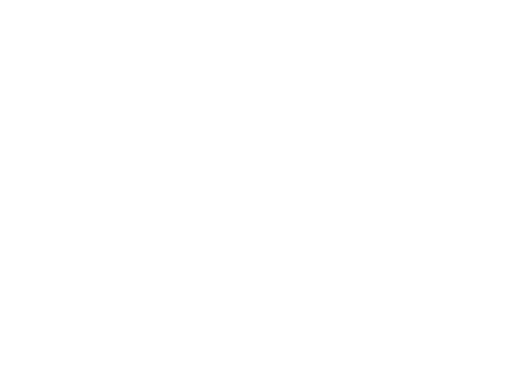

In [51]:
plt.axis('off')
plt.imshow(data_augmentation(x)[0].numpy.astype("unit8"))

In [ ]:
num_classes = 5

model = Sequential([
  data_augmentation,
  layers.Conv2D(16, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Conv2D(32, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Conv2D(64, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Dropout(0.2),
  layers.Flatten(),
  layers.Dense(128, activation='relu'),
  layers.Dense(num_classes)
])

model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

model.fit(x_train_scaled, y_train, epochs=10)

Epoch 1/10
86/86 [==============================] - 106s 1s/step - loss: 1.2606 - accuracy: 0.4531
Epoch 2/10
86/86 [==============================] - 101s 1s/step - loss: 1.0549 - accuracy: 0.5730
Epoch 3/10
86/86 [==============================] - 104s 1s/step - loss: 1.0193 - accuracy: 0.5992
Epoch 4/10
86/86 [==============================] - 102s 1s/step - loss: 0.9352 - accuracy: 0.6381
Epoch 5/10
86/86 [==============================] - 102s 1s/step - loss: 0.8970 - accuracy: 0.6537
Epoch 6/10
82/86 [===========================>..] - ETA: 5s - loss: 0.8586 - accuracy: 0.6707